High Temporal Resolution monitoring for Thermal Comfort (TC) prediction using Machine Learning

By  
Saar Golan

# Introduction and literature review

Normothermia and acceptable TC conditions are key predictors of positive surgical procedures outcomes. The considerable motivation to improve TC and low temperature-related perioperative patient morbidity and mortality has been repeatedly highlighted in the literature (Table 1) (Frank SM & LA, 1999). Table 1 also demonstrates that it is important to pinpoint which patient populations are most at risk and during which procedures to optimize patient safety.

Table 1: Randomized Trials of Thermal Management and Outcome (Frank SM & LA, 1999).

| **Publication**            | **Surgical Procedure**                                      | **Average T (core) vs. normothermia (36-37 Deg)** | **Outcome**                                     | **Outcome difference**                           |
|:--------------------------:|:-----------------------------------------------------------:|:-------------------------------------:|:-----------------------------------------------:|:------------------------------------------------:|
|                    |                                                             |                            |                                                 |                                                  |
| **Kurz et al.**         | Colon resection                                             | 34.7                                  | Wound infection                                 | 3-fold increase                                  |
| **Schmeid et al.**      | Hip arthroplasty                                            | 35                                    | Bleeding                                        | 20% increase                                     |
| **Frank et al.**        | Abdominal, thoracic with cardiac risk factors, and vascular | 35.4                                  | Cardiac morbidity                               | 55% relative risk increase                       |
|                    |                                                             |                                       | Postoperative ventricular tachycardia           | 3-fold increase                                  |
| **Leinhardt et al.**    | Major abdominal                                             | 34.8                                  | Post Anesthesia Care Unit (PACU) length of stay | 77% increase                                     |
| **Fleisher et al.**     | Gynecologic                                                 | 35.4                                  | PACU length of stay                             | None                                             |
| **Kurz et al.**         | Major abdominal                                             | 34.4                                  | TC                                              | 40 points initial reduction on a 100-point scale |
|                    |                                                             |                                       |                                                 | 4 hrs. delay in baseline recovery                |
| **Krenzischeck et al.** | Abdominal, thoracic, vascular                               | 35.3                                  | TC                                              | 2 points reduction on a 10-point scale           |


https://tableconvert.com/excel-to-markdown

Here, ergonomists are faced with a serious challenge. Studies indicate that while occupying the same indoor environment (typically Operating Rooms - ORs), patients and medical staff experience considerable TC discrepancies, even when physicians are dressed in light protective ensembles (Angelova & Velichkova, 2020). While patients experience a cold environment, physicians always feel hot. There are numerous potential reasons for this empirical fact – an obvious metabolic dichotomy (active staff versus inactive, often immobilized, patients), general age differences (patients are often older), etc. A common way to prevent hypothermia and maintain TC in the patient is to reach a high OR ambient temperature. A temperature range of 24-26ºC is suitable, while temperatures below 21ºC put patients at hypothermia risk. In contrast, a temperature above 23ºC is usually intolerable for the physicians and poses considerable performance-drop hazards (M.D.A. et al., 2006). A recent 10-year study of OR patients demonstrates that 98.3% of them experience thermal discomfort (Deiana et al., 2022). Therefore, there is dire need to develop a personal microclimate for surgical patients. One that can significantly deviate that of the medical staff. Active patient warming devices (Fig. 1) provide the means. They are reasonably priced, reliable and promising (Staff, 2021; Xu et al., 2021) .

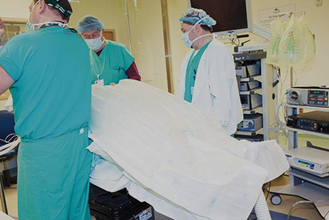

In [1]:
from IPython import display
from base64 import b64decode
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAUkAAADcCAYAAAD9VlPsAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAP+lSURBVHhexP3llxxXvuaPetacOee0291GWczMYNmyZZBsyQLLYmYoUaGKmbmyIDMrmZkzKyuLQSWWZbu7Z8787l3r/jnPfb6RVbKs9mn3mTV33RfPCsjISIgdn/08e++IeOPplB+/p2f3/fhh8vf1bMJNOX+lp+OOX2vSjofjFkxNWvHkgQNTCRV8zTdQd/5LFB77BN/tWIbl899EYfZF/NQfhv12JjRnz8KXdwORulzs2rQMHyz4EB+uWY33V6zEnDUrMWvVMry7cgneXrUE76xbjnc3rsYfVi7Gf5s/C5sP7oUzGsDt2zfw5tt/xJ/nvof35n+ARYvnYfnCeVi9dBGWLJuP9xfOxldHjyEydR+pB2NIjcYxMOBDPGyE21IPt7ECLn0JHOoiRMy18OuLYO++CbfuOly6y3AbLqalv8p11+DqvUJd+i/Lqb34d3JoL/yd7JrzsHSfhU19XlmWqb3nHOxdp+HtPg139wn0dh5Cr/YItz0Bj+o47JRDcxoxZzbc2juwq7kf7VGuOwxnz2HYug7Bpf4eAdN19MfNGElGELLXwNx5DF7tcQR6TiPIzwroMuDV34DXcB0+4034TbcUBcy3fzUftNxBgPJbOW+9g7AlE2FrDveZi4A9CyFnFgwdp9GQ9yVa87+Gpvw7qEv2oCnrY3QUf4aw+RwirmsIezKoG4i6ryHmuI64TXRNUczOqesmEu676HPnIOkpoIqQ9N5Dny8ffX7O+ysR99bCbargcaznd+vE/i+2Y+nst7FuyRxsWDoHW1bMx6al87BpMecXzcXWRfOwbdF8bF28AFuorUsXYNvShWktW6gsv6qPuP5jlqVXtX3JQnzE926bEfe3fckibJ7P/S/kPN+zhWVQ1iufxXVb5s/DxnnzsH7eXKzm/MoF87Fy3kKsmrMIq2cvwprZC7F6DtfNmcvvvxCLZ8/H4jmzOZ2HJXMWYvbb7+HiySPwOzUw9zZRbbCammE3FWMoUofRcBNGws0YjtVjMFbHdc3K8lC4AQOR2t/VYJDv+z2F6jAQrPldJX2Vv1K/yF/FY1dBlU+vr+K6mrR81ejzVPJYV/xTirvLp1WGiKOUZa8IQX0OzK2XUZ+3D13lx+HT3IWt/Rr8vZlI2AoRtxYgastHxJrP8nqP78nH/1VIPp90U65f6XVoPpt04sGYFQ8nLXg01ovJcCMm+QOqL3yO69+sx7WDO9Beew+Ph/3w1pTCnpWFvopSPOisQaohH7e//wazZr2LuevWYtZ6as0KvL96Gd5bsxx/WrEY761biQ82rcV761fjba77dxbgP86bjX976028Sb377p+wlCfBSmrzqqVYtXg+1q9ejiXLF+Ot2bNQWFuJcDKERNKOkQELBmLdLEAdGO/rwmSygwWqBWOhdvw0YUDImkfQXCIUpwH5CiTduisU4flf1G+B8nVAigSSVoEip7JsU3Nelgkyb88pQvI4dISeVkv4aY7BTdA5uo5x+1OIOrLgVN8i5GVfx+EiSF2ao/D0HoWbwDSrTiEW0uCHByM8iTpg6zkOD/fh15xBsFcgeQM+A0Fp4HQakgLF1yWQDFruKpAMWe+y4GVNQzIPQUc2Qq5s/obzhORXaM7bhe7S/egt34eWnB1oK/wUQeNZgvGGAsmIN4PzhCMhmbDfoDgvkmX3LYrlxJPLk6sQ/d4ZSBKY/hIkAzyx/LXwWqth661GyNGD4/t3YcH7f8LaxXOxhmDcsFQgOR8bubyZFegWaivLhsDt/xSSM5qBpQJMQnITwbiZQNzG9VsIR9m/Is5vWjAXG+bPwTpCcs2rkJy7GGvmLMZagSUhuZyQXDJ3ARbPTUNy4ey51Hy8+8c/4fCBb+Cx98BmJCANKkKyBQ5zMQbDdRiLtLAMN/02JMP1vy8B4D+hFCH4z6g/QFj6qwlDAtBbpSgpQOT6GclrM6BUtiEo/xm9CsuIMw1Jny4LlvarMLbwvFXfZkWcB6vqOjw0DX32IparQkKyABGCUgCpQPLZgwB+T8+nAnhx//f1w6SHcv9KzyYElL/oKdc9ue/Gjw/smEq2YtBRiGesoVQ5h3B46yIYGwoxmvCi8upJjKoaEKoogerKWTzorsFwTT5aL57G3D//CW+zMH1AIL7JwvyvdJZvLVuEtxU3uRTvr11FWK7Gu+tWKfpXFrh3Fy3B3MWLsWTBPKxZOIcnA0+E5Qt5grBQrliKdSuWY868D7D9ky3o7qqFtrsADkMOndYtOHpuwam5Q2AJHFjjOMswHKpGhG7Ia7gCn4l/uPECPIbL1DXqehqWeoLyvyhxpf+suxQwytTZezENSfVZLp+BR30S7p5j0HfTmWkOwSIQ7DpCt3icwDypQNLWdUOBpEt3QoGkU32E7pKg5Ly1k5AMqjCScLNwVcGjPwtv7wn4tGcR1BGShKPfmEFAZhCQv4biL3C8gxABGbJmImDjvC2TBS+bykXYcY8uMgcRTw73fQ0NuV+iIfsLdBZ9C0PVfrTmfYqW/B0s0HS9npvc7hYheYuFnY7RcZOFWaYEpfMGXfENOsjbSHiyFDD2+4p5klECSGW+lJCsQH+wFgEHXbGalaC7FxkXj2Puu28pEFpFrSWgNhBaGwjGjdQmagsloNyy5P8Ukoun9Yqr5FQguYnlcMsi7mexgHJGC36BJN3mam6zcn4akmvmLSY4l2AdYTkDyaWE5BJCchEhueDDOVj44Ty8++Zb2P35J3BZOgnIVph17bBNQzIVqsV4rAXD/z+GZCpYR7jV/q6SPgEgp6zA+gN8j7+O8/L+BmVdwiuvU55f3KQAMykg/SckgOxzp2EZc5WxDBYyAbIM0iHGCEIBZNCYA0vH1TQkXSUsV0VMJwSlPQ1K0RvPHwbxe/qB+nHq9/XDlI8iKF/RMwHltMRpPqFePPLix3EjRj2lSJlz8JjA6bx3AhVXDuNR0oM8FuDay0fxV68BlrzbiDQW46m+EaniTOgvX8L53V9jLgvRnxmnt+7eia+Ofod569fg3+Z9iD+wQL+9ajneXr0S73Ldn1etwKx1G/CnxYzpy5ZhLgvpsiU8MQjKtdSahXOxjoV4LZ3kakaulUvmIuMCgWEohoNu0Gu4QDAyWjJiugROGgKxN4NAEiBeoS5w23Pwmi7Ca+T2xuuKw/otAP5TUhyluNNf5CIE/w6UdHQ2zauQJCDp9Fy6s3SDBF/PEULyICF5EGa6SYGkS32M251k9MiiW7xGUIrzPcXfdZQ6TkgeY2Gh41SfgddWgbE+G2NyKfd7Cr5e0VkC8gKCioMkJE0ZhOIv0TqkwFHm6Rw5H6Z7FAcZtHNqz2QNnc3Cl8vPT0MySucXst5CPSFZn/U5Oou/hbH6gOIkm+99QjCfQVwA6bmLqPcOIUkYOukaHSKC0pnBwp/BE4FRm8BN+l6BZCDtIvsDZUgGy5AK1yDsqoW1twYBtxYlBbcx74P3sIQxddVCurMFC1keBJILCUnC6leQ5JQg/EeQ3EZJfP4tfcQyuY372SZTLm+ii9xIAG7m521jxb1lkUii9y+QXDsDyWknuZaA3DBvKWP4YqyatwDLCMlFhOVCThfOQFJxkn/GJ1vXwyGQpJM09rYokHRaSgjJGkzEWzEUavwnISnrfr0+JRB8DYqvaub1fgElo7coNT2dmU+LIPRR3ka6wwZWcvU8vnWI8hjJNGyvZAVN5+ir57FlJccY3i+OU+RlDH9dr8T2Gcn7+vhaglOBZMRRzHKZx9R0mwYhQzEKFp4HvU3n4dMziTiLmU4YuWncYpQAUmD5T0PyxYPf1w8PGLsfEJSv6DlB+XzKi2cCTDrIJ4zbf33Gdf0qDBrzMMYvPu6thbr8KkZ8vXA0laCnKAMDLMwPeHBd5TnovnsBU93VeFRXDtP5S+i5nY3sixex54vPYNTrMDTOWPjgPkpamzCbUfuPK5bgHbrJf2EB27BnD0q71Fjz+Vf4Fxao99asxPvLF2HOgjlYTvewetE8rKcL3bCCoFzBqLVmGT7ZsBw9Tdd5ItOGm07BY7hE+GXAbSIEzQQjXWLAck0Bo89MkCmQvMxtrr6EZBqgAtL/mtx6ASPh9YpcBKKLDu5VOXvPMzqfU6YKRGVecxZOuj6n9gTnj8DQcwg96gN0E0dYKA7TLR5VIBl15MDYfg2WTgH8aQWQPgMhqKcDZay2M657Wds+H3exwFbwPVzWn6GzO0sHSUgKHJWIfVNR0HKLhU8kgExPRWFph7QRko67LPSEpF0gmcfCn8+onYuYL4+FNxP1eV+i9u5naC/4BvrKfWjO/pjxOw3JBOEY9fJ93ix+l7tIuKTGv8MpnaWIUbvPk8mTKRd9/sJpMErElrbIUgWS/QLJUAUi7hrYjQ3wEJINDSVYNHcOFnxAEC1cSlAuoWtbiHWLFmE9y4UCSsJxM7VlCV0fJSAUbWUsf13bqI/42qvaxveKtvK9W2ciPEG5mUDcwCi9iZDcumQpl5cQkkuU9QLP9SybawjJVdNOchUhuZ6Q3EhIbuB0NSG5ZDa/OwE/X6ZzPuQ8Izeh+c5bf8bGdStgs3TAblXBqGt7Ccn+QDUh2cYU9FtOsvEVKKaVEij+CpZUJL0uxej+qvrDtdPz6e1T/IwUYSzqJxDT802cb+SxIRypBAEZ8zQi6qxnuqhF0FajKOyog99CSHKaCjSzoiznsST4AnSIIpl/TX1+AvE1JbzlLBflyjTmKeN+C1nur0DdwHNEcwseHU1X6yV0151mec5lmSpW4Bh30k1yKoD8vw7JFw8Zu39DPz0OE5Q+Rm0vfnpCF/nAiCFLEQY1uZhkBBp2NePZgAOD5jbYq7PwyNeJ+/4OjFm53qWBvegOBuqK8LShFpoT59By5grMxWWoIChPfPEVrh0/gZamBviTMZR3teFNQu8dwvCDDeuxiZAsbG5BtVqDbfv34w3Wuv++ZBFBuRRz6BpWsmZfs2A2a+5ZWLX4Q2xYuRzL5n6Ai8d3IO7LgsdyFi4jYWW6AafpKlyM1l4FloSiWSCZBqWPkPSZrlHSmSEuS+Yliv/nEuf5W6B8XQo4X5OHcmrPK5BU1hGkbongBJm99yTBd0yJ2d1qOknjcTrfo0rcFlcYd+YyYmTA0MZoTvi5CFW3loDk1KMAluDU38TjYT1dB8HCZYncHh0rAzrJgDlDAWBIOmQIxRkwKuteA6Qo5MhkAc1ijMlh4buHiCufkZdQC+QrDrC5YDfKb2xHHUHZXbSbkPwEDTkf87ucYSHPRMKfpyjuzqZrZI3vJhQJzLj7DiF7m9vk8KTI47SIonNUIrY4Ss7zJBFw9nE5wuhmNTTAYdegS92EZUwQ8wnJ5QuWYPEcTucvwGq6uTV0egLKdUwamwWKywg2pa1y7m8CckYzUJyRAsoZCSwFlPIaI/iGeYz0C+kgFy8lGAWSSzm/mOuYbFgeV9NNrpg3h4CcTxfJSnwuATlnieIkVxPmC2d/iPkfziUcqWlILqCT/OCdd7Fq+ULotY1w2jphoJO0GJuUjpuEt4JxuxWj0i4Zb8BQvB7D0RaMUsORRgy+phkwvrpuKNrEaRNhydent5FlUWp6XvY5FG0lFJsVKPYFGvnZdYixkoq4qpgqKhBgUpFOwbCjgcewia+38ti18ni10TG2c7tGAlMieDPdYAWP5zQkpWPntyDpIxhfU5xgnFGCoI27S2HtvgFt8wUahOsKIA1tl2Htuk7XyOTB1/vcJS8hOaP/q3H7xweB39QL6jkB+SNB+pfHHkSMOQg0X0dKlYdBQzUeJox4MuBCoJWFuasUE/ZGjPvbMOnqQKyxBOOdDZhqr8dYWSW6j1yA5hLdSVkt7Ll5yNt3EHcPHsLpvXuwccMarP1oE2avXo43F85DRkUZ2hw2fH3yBK7dy8O13Hxs/Xof5m/ahj8w4ryzdAnmcrsVc2axAH6AFfM/xJJ5c7GUhe6r7cvhNNyF18oIbLkKh4Eu0XYLPishSED+Sgr0rlICRhHj6Mv5f6y0+/zHElf6eiyXdRK7pc1SWddLmHLZqr8Au0Ru7Sk49Ceg7T0Mg4FR2kAgak/zPWd54HPh6L4DQyvBR0gKHGV7AaVHpoztEuMHg7UY9Jcr73EZKELSY2Q0YUWggJFReabtMd1znanMK8ucD9uy6CApZ6YS8WN0sAok6STDboKPkEx6c9FesgeVNz9GXean6Lj3hdK7nYbkWaT8uYzLdIghysft3QQiQZkgKAWSUSrBbfr80pOdBmNfYBqSjFwpql96uENFiNNJWc0NsNjUUJtUWLF6Kf7tv/8PzJv1IVYwci+ja1vO47+Olehqib10fVtWLFbc5FZWpum2ScZnJpHX47ZopnNmRtIOOSNZVjqBuK8thPN6AnnD/MXYuHAZNiwgKOkkNxGSGwjJtYTkqt+EJOP2nHTcXkgoCiTnMx3NZ3kVRzmfkJz13gdYRph3d9XA5eiGgU7yn4MkQRf+tQZeFZ3ggDhBus7+cMv0ND2fijDCxzroTNv53xN4VJxgjHhqmRiqeawJQ3ctlxmnBZaM2XF/E7clFAMdaQVVXOb7Ccg+LkcIzsBLSKajdko6cmbaJV/Xa+2Ror/vzCnneZMFY8dVpqObLM/SHJRPSLOseAWkpXS1BCQloJzRPwdJwu03ofhPaKZT5/mEj4CM4em4FZb6C4g2Myo152DC1Y4fRhyI6KrR112GcX013WUj7vOP+jFsQP3Zw6g5cQhPulXoL6hA15GrsNwkTGt4YBoaUHf8OGrPnEbJuTP4/svPseOjzVjAwjxr0QKs2LoZWdUVcA4P4OOD+/GvLEB5FXWo7tLi3eUr8Sbjzft0k/NZIFcy3ixjzFn44Sw6yTl0FO+hreoCC9Y9OkfGa9tNAvIWYwBdovka/Obrr+jGa8v/nP4rkPx7XaWLvMQDLW6Ty9KWqb0CC+ftdL7e3nNwG89BbzgJne4kXS/drsR3RnPpPPH25kLfQpgqDpEAZbT19DJW99I10sE5CMyQOZfxmhUF9ycx3kVAuk3n4ZHvbmHUll7rV4EokvnpZenYEjiGXZw6sxEnnOPOe4jSSUbc9+jU72GADlBdfRDVtz9FQ9ZOtOd9jtbcHQokXeozGCBI+0MldCmlnGdk5HuS3hxKerMZwWXqv8cTi04gyJgdpHNUxKjNE2uA7nGA0TsVKuCJWQ2zoR4mQtIRtqKgNBenjh/FyuVL8Na//ytmvfMWZr/7JyyeTdDMnoW10j5JwClwFGBSmxczgktb5WuAlPbGfxaSm7m8kbFeOmE2zF9OLSMsCcrFhCHhvGb+bKxkWVzBcimQXEdIbpzLuE0nuW72IixXerI/xDxO5xGO85R5mc7H7A8IzLnvoaW5BG6XGkb9PwFJLg8zdkv0flXiCmemSmyWCB1u55QgC7axcmpRQBfzNCHEyBz3EY6+Zq5v5vGtJxTpEr1NPBatfA8dYmh6Gm5T9pPkfJL7kX0k/K18r+xPtqOTZAwPKnG7RYGgAHKAlfYMKF/X30FT9Bo0ZYiRgDJBt5hiHO+nUnSo/QJIcZDU/98g+dODkDL/86Mo/vrAi2hXFnyV1+CpuIUf+kwYYi0S0fGL9xThgZmO0dqIp4EejGkboL55CQPtjXjYqYI3Ixe9J+/Ad48HpK4VIx2tMGTdQuWxw8jatxfHd3yM47u/wufbtmLlyhV4n4XsT6yNV3+1E5u/P4AmmxVn79zFpewcVHf34G3GnrdYuN9ZTlfJwjl/7izFSayYOw9LPvgTLh3egQFPMWFxDUFpcySY/NIeR1DOtMe9lEBD1ltuKO2V6emMrv+mZkD5e/otcIoUF0k4yrxHR1BqrzFO0vWKs2VMlzZTo+ksIXmakKTT5bY+us6gOZu/pxC9TXSR+nPc9iy8dJ9ebucjMKUt0KM7gZApEwFCMihuWgBpYcy3XGRlwUpBXKRNOmd+AaRA8dV56UWPOLIVSEZd2Ug46R4JyJi7gI7iHk+gPMb5Ahgajiptkg3ZO6HK/xJdhV8okHR0nWIhpnsk/FLhMjrbUgwGCnmy5CMVzKMDkchOBQlJcZt8PRlkNAux4IfK+N5qOuEavk96du8hEaqCx6WCy2dBcMCP/pEInj6ZQDIRRH7eHdy8eh6njxzEekJzNSvZJR9+gDUsF8ve+zOWv/cnBZTbVzIac/p/CklxpRu57abFS7BmDkE5bxldJUFJR7mRlba0R67+LUgSkGlILsTSWRKtCcM58zBvDh3kXEKSjnLeHEKSrvj9995Cdc09OF09ipO0/g4kR2Q52sz5VkUjsTZFw3SIg4SkOEhpQ5ROFIFhyNnEY0q5m6kmRD0tjN7dTF4VULfJ0C7G9FgnBqIquswO9AkMFTjSMSoiaAWSitLLMhXwyrayXYRwDbjoJEN0rVLZBXkcpXNoGpSvS7b5O3D+HSSrWG44L22WBGMfU1J/QOZLWSZL+P+kpwJGaZ+cESEZxrNHacn8jF5d98PDEF4QlhKXZTojWZ6Rso4wfMFtfxQoyryiIH7ifn4UcV//82kUkd5yBBt5sjBeP/SqENUXI65jba8uwaS5SYnZT/09mOhtwri6DS8sFkSKq6A9exv6C3nwFtQj1tSOVCftekstbPk56Lh+FSXHjuPKN3txZvceHPnya+z97Et8tGEr/igFZ+0q3Kqpgv/+JL67eAnFDU2o7ujCm4w9bxGo/758Kd7kdu+88zYWfTALq+kmdqyeC7uMpXLfhtdyhYCko1R6dNNg9JvpLKflY/wUd+UTp0mJ4/S/svzqeoFpUCT7MKXlNWdQN9IuTZyqRFojt5FhNtIZxM9+XS69tFfSSSrQFDeZbhZwzbR3EuxW8wXoCD27hdsS3h7dJYSNBJwpn5C8RDBeRdBwAX66TJ+eDlQvPX0X6SpPI2q7i/FoBb+rNB8IGPldrQQ8ASkuUum1JiRDhKJoBpBhGepjpxivozLUx5VWzJ1L0Um68wnJAkLyHiFZCFPrcdQwajcRkl3Fu9BdtgsNeZ/C0nFCcZICyYGIDOMp48lEGEbu8UQq5DLLjLhEgrNfURFPolKeCHSSBGWSJ4R03IgLjYeYVBJaxFMexAZCiCSDsDp66bTbMTDEpPNiFE+fjeDFC4GmDwGvDZ0dzXRhvWiuKsfFo4ewYta7dH2zsX06bm+ZEeO5Akppl1SmCwlNglGmEs+5/iPp+GEMVpwk14mTXMPKeN18useFS7B+IQG5cIEStVfP/1CBpKSbVfPnYY30bs+V7Rdixex5LJ8fKj3aErXncTqPcVtgOY/QnD1rFv70p39DSUkmIamBXtcKi6mFkCQA6KLGY82M1wRivBGDCenlJhSjBGK0nUDsYGXSSngw4lJxpWOF5xqncV8j4+h026G/g/+9ALBb0ciAHh66vtMnPsO3e9ajroKVtK2GsZpxPNJJ+Inz7KCTT0dpidapcBeB2M51dKQ+rvcRpHSUKa5LBTv5ma0IOqWDh5/nredxbeCxJDQFiDNgDBCY0lMeENUSgq9B8jVnmR6HKW3UlI/uURzkjBi1BZxxTiV+J1ylL/XGD49ieM4YLJL5Gf16XQQvCLnfl2z3W5p+nZD8+XkCD0ac0FVmYUjTgEcu/pE6RqXeYgxqa3DfpsKEswPj5kY8NrXhB3MvhukaNeczoaKLNN0sgquwGpEm1nA9PKjtPHBN9bAXF6HndiaqzlxA7cUMtN8qQM3FTOQdvYLDX3+HhUtX4t8/+AB7zpyBKRrHl98dQWNXL/JrG/HfGFveXL0G76zaiJ0HvsOK5Suw6N1ZLJwfoKnmHMKhXEKG4LFIrzad4TQkfZbbirwvdRMegkSmaWCm52XdjGSdwDFMMIZNjKumLO4rk9vdmt7mBucJIsI4bLiFsP4O52UdQfiapLfdbST8BIp0ih4B4yudQS6R+QrMdJQ6OkGzk+8zXUKUAA5YctFdfx0ezS1ECdawns6WMJb2Vb+RUKTrDHB9ypfH7yuOke7TnEXI011a7ypjHwPSc23N+pVCBGTYnoMwo3WEzvGlCEgZFxnx5iLsYwXpY5TxFBGSxbB0nkR19g4Fkh2EZFf5N2gt2Q1j+0meHAU8IVk2YtVI0CVGogVUPl2h9NZWMK5X0C2WMVYTkP4CphLZJ4EqPa5BcZRF6ItXwx/qgSfqRSAVhjvigNluhN3WC4O+Gc2tpXSXWoxOhtFHiD56MogfXkzix78+wtOfH+Ln//gZ42NDOHP4IFbPY7mY+wE+WrkYW5YtpDMUF7lUAeLW5XOwdRmjuDJEiOBcJhJQSs/4bDrRD6dhugibpGNo3mzFOcq4zPWLCEzFRX6oaBVhvIqQFFCuWDBP0dK5s5XmoAWszJU2SUqi9twPJW7L/BzMmfUB/viH/4HcbB5Dt56/r43Hvw0OczUdYCnG4k0YJSiHEozRfYzTcTrLGIHla6UjbCacWpRpXIHWDNDoCgnDIWo41Mn/txODXCfr+8Iq9Cd64GO0buvIhLq3iBVzBSwaTjXFdJyM6cq2/IyA7Kubx6SL0x5WZJ18jVNvNxOCivDm+Uw499M4hWwt8NsIR4Esv9NgpJ3uV2DeyGkzRhJ0mEHG8WATX5MOn2lIvqKkjLN8VUoEJyAJwxn1SaeOmzD8lSSS/3Llzhu/DbXXFaMLjP8Tku3+c/0kU0bux5N+tN67iglLO6YcjQQkIck/dFzPWG3rwri1HfdNzXhqICzbWtB7+SYq9pxA58lbsN0uQrSKtVorI4K2E8NdtOptTQjW1cJVXgFbqagWPZnFqDqbgfLTGcg9dRWHdh/A/AWL8QeC8kTGTegDIWzd9TX2nDqNf2ENPu+TT3Dkbj4qtXocunAJn+/aiw/eexdHD25GzH+PDoqgosNToiaB9p+KoFOit5WOkfLZ0vLKdPq1EJ1nRFG6J1iiq7zmtVGvgtRIGdLzPnFzr8nD7+Omo5Sph2CV+VfjuJtyEpou23X06s5BS1C6pNmA7jPsKURnw3W4NDcRY6QPGqYhSajKYHGBpIdxXtyptDsGGb0FkgGLwJDzDq6ziYtkvHpFM4CcgWTUJW2Q4h45T0BGfJSfkAuw5vaVMPqVwqk+j/p7O9GS9wXaChm3K75BGyGpbzlGh8BoTSAOEZLJcDXi4gojJTw5WchDjEvTUqK2DPehgxyKVPNkqqUL5ckSrkUo0gh7WANvfxhmnx0Glw62gA3BoBVuczfKijJRVJwNrb4TWnU7En4b4eFGImFDciwIW9SDyGAC41MjrCx1+GTzOqwgLLevXKoA7xNlwDjd4rI5hOVcrku7yY8IScVVKg6TAJXLHwlVubpG2jUFkOsIww0yDO1lh80sRmxKIvc0JFcSkMvmzcESusYldIyLBZAE5TwFjr+G5Fwu/+mtf8PN60wEXgPMRhXdcDtcFv4PjlKMCiQJmVchOUJIJgjFON3bULSH0OkmnLroMjUEkkZZN0DIDRB2AsgZSMo2SULSywjutFXDTVA66TxNxjJoVLkwEJSxEF1nrBtxcZIhpkZOI/5WxALtPK/ESXJ/PDaPB42MuXT/3jrcT+owkTBiOKHH5ICB35ffhQCV6B/zVvB3lCBgL2b5KqcpKGY5IigJyxTdY8pPdzmt16EplzW+Dsk0KFkWfyVG8Fc6fN748WGEAPs9EXAPEr8vBYTRf6ifn8bx5H4ADxNWPHR3YUhfgZSOrkBTihFNPSYZf6asnZjQtiBeWwbd9RtoPHwaerpC83WefMX8I5paMNzZhv6ORvS11BOYDYg1MxoQnM6KanTczEb1+auoOncDNRduo+z0dVzZdwybV67H2nUbMX/lSnx//jyu5RfgX1k7/3H1CvwbI/e87Z9iGSP6lao6ZDe24ti5k+hql6tE6KLorsKMmAEbJU5KURpy0sv7qsKEZYiwCxJ6fkWE57SC069HpxUUmBKgfnt6O4GlRPcgQRmedpxBRnE/ofiqBJICbQGkAu/fgKS0eQooHQSfzXoNOgPdJGHppPsM+ov5227DprnB7yHRnvuUDig6VCXiS485QSnjH2VQeJBwDFn4PwgkGakVSNqlPZJgfFWvuEiBY0zEeB3zpNsgo6xwov5CBZIyVGc0Ugaf4Qpqcz9F/d0daMn/At2Ve9FBN6ltPJyGZLiEJyyPe4QFn6DsD1Xx5OQJFS4nLEUszGFGKUbqZLgGg1GeENx/KtSCZFIDEyNbb0gDndcCp8+F/v4QnaUd3UwhxZlZyLtzB2Xl5cjKz2f8NqCrrh7lWXfRrqqFPeGA1mNFs06N4HAS408forKmAvM/fB+bly3G9mVL8NHiedi+ZC620y1uX0JQMlIrbZICSgWSAk0Z/sO4TTimIblA6ckWSIqLfAlJASS1ki5TercVMXIvnZuG5NJ5c5XLEOczVv8WJGX5z2/9O86c+o7ujpA0TUPSWsdjxnOMMXs0QRjSib0KySSdnDi80QSTG+EoTm8gInAUMVZPa4iwHKZkKjDtJ/h8zjrYzJWsYPKh0xXD7WxmOWuA284YHTUqSkT0GOgzY2zIiclRNyZGXHg47sHjUSePMUFL2DUUH4ZVfQfjfd0sMy2M24zcjnplyFDUVYmIi1O6vJmB6kPhFhg7M6HvyFKaDAYIxgFG8hmlCMZfyS+xm+XmdckQo19J1v3SlvnGC4Lr7xWb1i/LP3L6+0q3O/4jvXgSwQ9P4njUb8G4nW7QVIWEugjJrjKMdNdhQtOKKVMX7us6YcnNQfNZnth38uDNK0OgiCdCPe17K+HYwT+hqwGJtgZEm/mndDEaqNoRaGhQ3KQmuwAdt3LRfD0T1ecyUHDiIo5/uQefbNiC5UuW489vv4vVm7dg/qb1+PN6RvF1BOXq1Xhj0RIs2r0HX1++hNLmEngc5YhLmxtdltJ+SPfk57KfUVNplyM0Q4SbgC9MYKYlw2C4HYHiYwQVeem+fEpMldfpIgWC4krt11grct8CSbs40Vt0awJJglZcp7RhCjh/Qx6+5iEsZarEeqVNk/CU9kOR4gxvMHIzVjtvsYa/jEggC2MjFfAGCMmuu9B3XyHcbhDE3H4akmG63CCjtptOUvmuhGGIvyVsySH86Rjt/D8cXOeUKde9orCTFZlL4vV026MA0l1ASEobJOcZiWP87DhdZIIaoSMM0slWZ+1AY9Zn6KnYA23tfnRwqq4/hH5CdYDucThO+MV4nEM8EUKMTnSLiSjhKCI4k1wn8ExFKrldJf/TPCTiakTHvWi2N0IX6oXarEVlRSXqmTjaampReCcfx749jpOHTsMfjKCpp5OOkidrQQlOf70PPapOdNlM0Fgt8CX74Eol4UgkEB0cwL6932LOn9/CWgJtK+EnTvGjxbMpwlJE8EmHzceUuMmZNszNjNlyWeIWrperehRIKmMj01FbAeTcWYTjh5SAcrbSmSiQlLidvpmFXGEjUJyFOXNmYTbBOIfr5lJzZn+gOMkDB3bR2elhIiTNxg64bQ0sq2V0ZE0YS7QpcBykmxxihB2J9SjtjAnCapCAHIyqMTCtFEH5UoTksERuid6cF0gO0mX2R7sQ9jUj6G2C39NIp9iDsZQfj8aimBoJ4fnDfjx/MoAH42FWYiYeOxNG++2YGLDz2KrhpElqrTyNitxv4ey9S+UiwYgdckovOOEcSg9el5gdcZEDdJGD/B3SuSRjL30Wwj/WigHCc4Dbzuj1yyCV68ADLCszg9KnB6a/Pr4yqegXiL7x4nEf43QCP05Pf3gU54+KKfqBEVoRI/LzB4QbXeULzr+UgJHTHyWOPxbx9cevtU1y+UcR4Sh6QUD+8KwPfY4WpIxVGDDQCdBFJrtYuFlzj/W0YlLXhUmjlq7SQKfYhnBtPcI19Ui2tCLZQXfQ1YSoqgaxrjqEW/nDO1vQ39WGPlUrQnSUzspKWEvK0HUnG5WnzyPnu2PIoxu9/f0JfPfpF/hk7QZsXLkGb/77H/Df3/oD3l+1FO9sWo3/sWEN/n3TRvwLHcJ7q+ahXVsEP0/wMJ1ehI5PxvwFlTvYZBN2jJz2u4r7U3p6CUBxURG5eYM5Fz5TEberRNBVjZC3FmEeoICnBG5p05MB1oRiyMkI7qSDIyQDzjQk005VOkbSChKGisN8XTOgpMt0UzI8yatAk8A0CdC5X7lLj9KeSVDy+9vpOEM+fnYwC3ZPHjq7M6HtJAjt0hmV7jjyWxmv6WDFSYrDEycZc+ZwfwJ+/u5XnKRAUoHiqyIgZQzkq5CMuwuV9se4j4Cki4wpg7vlaogyDDEmR/mb24q/hq56Pwz1B6Gt2Y8WaZusPchCmsu4V67E7YFoHWPeNCTpGPui1eiL1NDxcD0L/Aij9khMCno+DF0ZMDqaEJqMwN5nQ6e2GXk52biVkYljR87h0tk7OHP8JqdZuJdTiZYuLTotRqQGUyi7eQf3Tl5k7BuCwW6HyeKAL5yAI9YHtcePxNgkKitr8Mmmzdi+ZjkdIEG5bAFhOY+xmw5SALlIYDlfkXInIbrLTYzayhAiucEF120kMNcSggJIAaVc1JAG5YfTTjItJWpPO0kBpEjaJAWSs+d8QEhySjc5RzTnQ7z99pv4/POP4HLrYDZ3vYSk38JKKdpMSLYzyhKUfW2cdjDOqgmMLvQFGanFRUbSgByMaRUNUKmorO+ZBmQXgUWASvQmJIc5P0QNJtQYTmrxZMJNgOp57DsIQS3LcRO6m3Khqs9EZ0MmnPoqOsEulhGJ0Bp+dhM6686iu+E0plLy/VpYlmpZXjpZ8XWyrPBYE25D0QYkgzXoabnC79LIKN4Jc89dAr6W+5GremicXpHcKOO3RVC+Kh9h+Yr6BJzSAz6tNxRoCeSeEpTUi8dxwozzlLwmSs8n+ZqAtI/bJwhRSoFqet3M6/Lab0pee8zp0xTuj/kQMlRj0FSBQX0Z+tQVSHQyRrWztiDwxgjJQY0a/T1qjBGU981GDPfyYBhYa2nbENc0I85CH+ysQ4jv6etuQULVRHfZrIAy2tqESHMTHASlKuM2Wi7fQNnxc6i6eA3XDx3BJ6vXYitd4/JFC/HmH9/Em2+/hQ+WL8YfNhKcBOW7qxYju/QSYnQvPjqwgINwIUiC0nlhyyNIshWXGHTQJdruwC0xnBHTZcpl5JWeW560SQMGkhZEIzoEGfVijDHJfjXCPHgu+z1Gkbuc3qbuwEvg+DgvgAtyGiAERQLHmenrEkCKkxVIeqTHnaCR9WlIipPkOnG+xrSzlCuG3HzNYboME2O33nIH9Y1XoOm8yGjMz5H9EJI+QlLaQKXTxi+QpKuMu1gxmMVN/nOQTANyOmazkom70500cZ8A8teQlGE9KW8ueqr2Q1PBmE04dpZJx00akglPNuNfxSuQJBQlVjN6i6TNccBfhQmuG5O2yEQ1919M1cPm7YHa3csKwYDzxw5j/bJ12LD5c3zx/UWs3XkMOw9cR24l3WW7HQVNWhR1aHEzpxjffrYHNbfzeYInEEv1w2R1oU2lhz81ythtQkOXBsFogp8fYwVjx86N6+j+PmT8XqTAT26z9hH1CcG4bfq2a3JnIemg+S1IriEYJXKvfdlxM/slJJfTPaYhKe2Rr0NSwEhAMnrPobOU9kjp7X7nnT/io4/Ww+HQwmLu5vHugMvSwEowDcnRuECyYxqSKi5r6LIEknSGAsaolv93GpAy/4s0/O8Zybn9GGEogBRQRtxNiPlaWX6qYdOW8Fg3Qdd2B/q2u1A33kJ1/glG6TOw9RSgzyPjHlsxGiVsuU/pEAo7K6GqO83vUI6noyo8GuE+aS4ijNzScZMkJOVyyH5xiGG5rLEOkynCPSmdTHTHcXGNjNMSsV/Rqz3d/5kUaL7SAy6S671f1Rs/PQ7iZ+rHh378/DSMn5+ElOW/cPoXLv/1WQR/fR7HX5718/V+/EQY/vSkDz8Reso81/1M8P38LEVHSVg+THLK7R6n9eMjwpPrfnhISEq75bMhHhw7ApoyjJrLMdBbgqS6io6wkpBsxAAhOahRcb0WkY4OpHRqPPJY8MBlwISzF0OWHiSNKiR44GO97Yh2NiFBZ5ngNNJaj0G1CkPqTqQ62pBsa0GkoR7u4jL03GQtdicHjXfoJL76CptWLMeaxYsx7/338P5bf2RNPAvvr12B2YTklk83EG7NCLnp+hwEl+MmJe2M0u52j5Cgs5IITUfoZhT1MGY6ZL2PwI6xEA07EOtzwe41ocegQn17DVWFdk0N7H4VoskeRBKtjENlcFjzCdk8Okk6UAJTOnukLVMGr/sJ4HSsl/XiMH+RdBLJOEWfdOoI1PheH0Gp9KxPAzKoQFKGEBGclJvr5Yohm+kSAoESNDZeQ0PVEUTl90lcZ/z32a4p7aYBadMkKMVJJghJ6bSRuC0VhRK3nZks3NlK2+OrSnfSCBzFQVKM2Qk66IRX4jVjNj83Jp02cpkZa+nhUDkGGak7K75FU85O1Gd/ClXZ10qbZGf1AUT5OQLJmbg9SBAOSLyO1tNJymVzrFi5bozrBugmkik1vNKZEFTDHLQgq6IQmbnZyLiYgYN7TmHZ+p3YdOActp7KwUcnc7Hu24vYcOAq1u6/hPXUpt2nsW7TbuzdcxyOYB/cA0M8hk4cPXUZFU0qNKn1qG5n+RqfZMWXxKOJKeTdvosP335bicLrly5mjJ4eJ0kwfrR4Dp3kHEIxfecpgeNvQnLaSaY7bSRqp+O2QFJidrrT5teQlN7tuSy30iY5V4nfXMdt3/nzm9i0YQWsiovsJCRVhGSjEkuHFSfZqcBxqK8jDclYLyHTTfikwTUYEQD+vUZiOjqrDsK2GjoVy6ytTplXt2QqvdltVddQee8kzJ1yy7p6QvIOGkvOImKrZUXYjlE61JEw4zzj+KCf8/FeGNV5aK87B23LJX6PBjwb61EgmSC8Ag46REZ5aYOUAe1JVnwyZvPZuI7b0M32NbCSLEd/RIZ90XQFGygyYFqvduK8lALTVySwVDp1flG6F5yucqZNMuGqwcP+bkyyZnnAqcw/SHbhUaoHT4a0eD6iw7NRE7+8Hc/HHfhhwokXk6605JZnUx78+MCLn6i/PAzib4zYf3sSxd+extKS+ZfLUfyvn0b4w62I6ysxYeMP5J8bVZUh2ESb28ZagpBMEnQDWtZu3TxwalpyA+O3U4NRWzfGCcpRRy9dKO29UYMhA9eZNRg3MQ5o2gnYDu6HMauOP7C1EfHGWgQZv8NV9XCWVkBXUITiCxfx2do1rL0XsVCyBl+8CMsXzMfiFUvx0Y7tuJ1xUnEoAiplgLR0RnAqHThRByHgyifQsuERF0k35SEMonEWwkAbrI5WNLeX42beLZy/cw2nMi7j+/NncPzKZRy9dBYnr55GaUMBDC4CPqFDIqLifkrpAMWJ0a3Zb/CzbnD/BBzdpk+iPUEsQHxVAkqZpnvVBeKM/uJKCTiBZnqYEcFuJEAFlpSPCjF6O/UXGf0LYeotYAQ6qTQnSLuq1ybRn5AkbKWdUEApnVUJdy7fx//ByikrCLkOW7nU0JWThuIrSrvHNCATHspbSPdA5+glGOkgE0ERj7s4QkankXAlhvz8HqV7UXdnB5rydkJdtRddVd9Cxfgt30UgOZLgCROv48laxejH+BVrVJSK1tL1VBGgdJRDBtjjHtQa9SjVdqPKYEI5nd8NHvvjGYU4cbkARbVduFfXjpxWI7KbjchvM6FC50O1LY4KYxglai+y67T4eN8ZbDp4Ak2+BG5kleLMuRuob2b0G5nEwKPH8A0OIDoxjjAh6g5EoDNYcGDfd5j7ASG3QK7xlgHkc7Ft8WzqQ2yhNnE+7STFUb4CSQJRIrdcaZPutJmFFXJhg7hIxucliv4eknK9trjJtASac7CA73nvnbewauVC6LQtBCWdpL4TTnMTK3YmtxAh2SeAISiTKk67MRbX0VXRfFBDEZ5bjMgyHY7qfqXROCM0naBelYuOOpYniwCljemihsea562nDSlfB91qJ55PGmHVyCWotXg4ZMQ4y/pQuJfHnPsKWwgxI4+ZGnECsKXmJJy6LPw4qcODVCceDLbzmBKI8TaMpciBoAxml6t+WvBoWIcno714MKRi3Oa6SDEhWcDvzDgeaqQaqHpFr3bi/CO9DtKXoJzWG9rqs3gUb8EPgyo87W/FQ57sD1n4Hog4L7ofb8JkvHlanI81435C1IIHfVSyDQ+T7XjEP/5xP+E6oMHTwV48G6IGtcr0xagBP44Z8ddHIX6wgW6wmmArRbKnEP7mYoRaahBtozsgJPsIyb7OTrpKHkhtJyHYQ6D2YMrNg2fqxKhVg0k7/2R9D8asWgJUT1eqwYi+G6meVgz1tCOlakaiuY6qRaimGoHKGoSq6xCtb4Yu7x52Ll2K5e++i1UseKvlbkF0lh+tW8MC+AHyb53iycj3ETpRK09+axEByQNOYKV7b+n6nDmMyXRWdEZhnqAufx005ho0dVXibsFt7Dv1PfafPYEj167i29PncOAcIXntJnYfPYovDn6Lw+eP407uVei1tPQEZchdzkIskMzg/m8gROcacGTCzxgvQFbc2ytKD7+RcYty5+873D5LgamX834ZWkSFTVyvjMUU6NGBcl2UkTsgYymtObASkurmc/xdhKkCSRZ8frZE/hCjd9B4nQC9gz533muQ5P8glxq6fxuSioNkzE4QxH3eIkKSgFQgWUpAUqEKyEBvufphNFJFUJbQSe5HfeanaM77nMD8mst76CT387fcTEOyj4CUq0Si4hhZkGM8cQSSdJipWCXiiSa4U3YU6Wy4qHLipjWCPGscuZYwMkx+3DCGcLvViuYeC5raVGjs1KCrl8vtGtSp1Chr70Kd3gJd3yCsk8/QEhvB4q8P46Njl9HUaUEwmMLUw+cI9fXDEPChsKMVBT3daHC4oA5G4E4Mom9gFFevXmcZ+hDLZ79HUM7DtiUzkJyFTUsYyX8DkqunIam0RxKOM5AUQC6dPQtLuL8lhOBvQ3IGlDKYPA3JDz94B8uWzoG6O30zD6NOINnMclJJSDZhnCZolBpJ8lzq6yHA9HSShKTiJAlJcZICSTrHkaieDjItgaTEY7m+eqyPZiVBd8nIPU7YDQYJ3LCYrV7cH1BjbKCFx6YB44PSzpm+wkbaOlPcb3+QsIzwM8MdmBzqJHgJulAtfn5owxS/09RAOyb4/qf39Xg0qic0uU/CcmqAHJmyKk5yapgwTtZgKEF3nJRmBFaWCiBFAsvGl47yH+k3ITkdxWf0RnvGUTz3d2Eq0EE4tuM5Kf7DUDPVSNARgPzCU6l2Er6V7pIwnNZUsgX3CcipZLMy/5B6Gm3CE9riBwTpFCH6gH/S40Q9njAaPeJr9xPteDzi5EnJ2sHUhDE9839HCfwNRQg0liLaXI44Y2lExdjKqDzY3oEJOoKHBOF9Szfu00kOGdoxYuzGhIU1G93jsJXz7l6kGMEH9TxQ4jottPR0oP2qFoz18iB18jVGpESjOEs6yuIiZHz9DQ5t3IyDm7di/7Yt2L15A77cuAFbls1CUwkhGawkVMQx5TBa5hEM9zhPWDgIH+dt+Jz5dI4NCEa7YZE2GGcD1NYmFNbdw5mMC9hz4ih1irC8hG+OXsDhS3dxJb8Cd+hqrpeW4/TdHBy7egGnLn+P0irGZK8KEW8DAUgnRpcWdYpjpIPkZwYFxjL/il6FZXpwN0VQ+glKH0Epg9wFoNLLroxz5LxAMixO03RVAarbcA9dDRe5LV8TJ6oMa5IOKH429+ExpDurBHwB7keJ2i+H+VDK/5JPt0AnTXctirkL6TyLCMhiglFEF+kjGFmZ9MlYxhAVLOO8jGlk1I5UMnZVoav2e9Te/Yhu8iO0F36h9HKryvYioM/gSUjHyco6PWylgdGbYnkaIiTFcQyzkg+njCi1m3CozYF9vcP4vDOIU119OFHvwXdNDlwyJnGrN4rz9Tqca9PhrMqIG602XK0w4XCxDp9mtmNzRjM2ZTRib6sDl90pHMirQ25lG2LP/gZdahwdHh+MBGS3zYY79U24qzbjDqFr6B+DLZmCLhREZHQIRaWFeP/Pf8Ci9/4I5TZrjNqbFtFFyi3TGLW3LmDc5nTjonlMM/KYBkJS7m1KOMqVXqsVF/khlknM5nQxpws5FckNdhcTiCKJ1vMI2XkynUtIzuM6avac9zFv/gdobqmA062DnueG3dLJirEWfYFaTNCtjSS6CUoqzvOlT4DVg2iwHQN9WkKHUOw3YrjPwMrJwEiu5/9MJ0g3OSi93KFOVqT1LHt1cOjLmEzKEPc2E7ZqgrOL7o8Rvp/Lg20EGd1ltI3vV08DuJfHv4suspPAbEgPCud3ejDSi+f37Xg4oMXUIL9XXxM/u55AJ4MG1Xg6bmRateOHSROTqwkPR7gNK8YR8mWsvwETTBkjjNzDgXqMhmmU6JgHCEzp5U7fwi19u7Z+6dShe1WmM/PUy3UylZ5w5f6Vab3RcPwo/OWs7bvqMGypR0yfiz66jgG6i2F3NkZ8RRgPlONBpJrAq8NTFlIB39NkA35IEaYiUv8F9Rf+MT/SAj8dbsGT4VZG9WY876/DC27zZIAHRmL9uJsxrRcJUzP6esrpGCsQbC2Ht7EY3vp78DcVIayqRrijAcnuVsJRi0eE6oShDZN6AlLTgklCc9RhwJC1ly5TjQcuHlCCcYzr+gw9cLbWQ1tejJ7iQmjKimGta4KttgXBljYk21sx0NSI4YYWePKKobmVibbbt5F98jh2rl2FQ1+sYmSoIKgKCQRCwJWJsFva3wSSBfzuhIRETf6R8ZQZ3qgVOkcXOo1NuJl/lZH6BL4+cgif7t2Prw+fxq5DZ/E5o9vuw5dx8PwtHL+bxxOzDrcbOxj5WlDUUYdyVQM0Ni2hm768K2jnZwusCL4wI+0MDH8Lksprr0FS2jHlCiCBpTLwm6/PQFIGs/stcp9MRmtLPnqar8FplPfyfbItYRgRSPIz3EY6SgJR2hgDckWNDIWageS0oxZApiFZoABSOmkEkGlIljA1TDtIQjJ9bbUMAk9L2pMG6CSHGaV7Go+h6s4W1NzejI6CzwnJb6Aq3gO/9jomYnWMhM08cXgS86QZ5skxGmmme+BxjPLkiLUixpO60NCNE1027Km3Y09xN7670YjjeV34trIXn1b04IsqPXY1ebC13o1PW6OEpw8nyyzYV+TElrIoFtWN4r3SKP5wuRk7yrpgGXuAx//v/w/O6pJYn9eNG7YBtERGYYiNQhUaRpY5hEO1KpT7IlAnB9GbGIBrcAQDE/ehYiV/cNcXWPr+23SNMuRHnp+TBqQCSepVSEqnzVo6yrVzZmGNcoOND+gcZxGQs7CI6xcQhgtkSiAKKBfJNdsCSEb0efMFkHOnNSc9LIigrKwuhMtrQK9JBRuTmMtaj7C3XIHYeIoukC5yKKoiYGgy6AijcuOKeLcy6DvJ5SSdYcDRBKehmqqBi/JZ6pS2SI+piuWsFnIDiwEmoQnubzylJlg5T/d4f7iLy4zNrMCG4nR90jkUks/TEo4qfp4cT6nkGjFJLvz80MUYbcGPUw48HNbSqfL1ZC1dKSP2iBZPx/R4MqbDswkd3aRB6bgZJ4DHmX7HWCYmyabREFMJ3eFoiJAMskKlax4QOEbqkYw0ssw18TtIB1AaiP+ZUsr14XJTjbTe0F7OQO+1DLiKcuGpugP1vcPQFu+HtnQPdOXfwlj5HcxVR2CuFh0lcI7BXn8CrsZT8LacRaD9AsJdVxDruYaELoPwu4UYT7AEHdggY9oII9iQU25bVQeDqQxTD8I8wXoQ1NBFaioQV5UzahOUlK+pmCpBoIWQbCPN1a2YEEDyAA9p+aN7WpS2xzGHiX+GizWBmxbfg/vxEEYCXjjoGLtqatBd14BWRuuivHxcu3wNB/Yexq6d32Lnth3YuXkjLuzfi9bsLLhr6+CqqIKX7+nJy8a+rWtx98IX/GP5fexy/0K5AWcWf4vc5iufcCymq8ynuytCnAfa4VGjXduKNk0rGrvqcenOFew/eQxfHTqCj3fvwydff4fd31/EgTNZ+GjvaWzecxifHj+H3ZcycOB2Hk4WleNcWTWuVTWgVmeCJeyDK2SAz98EPyEtbX5xAlm5J+MrUBQp7YIiWRZwSrslv6cCSi6nIUk4CkBfgaTfnMH332TtTzdpLYCm9QbsOsbxVyApTlI+wytxXSDJY/irK2oUQOa+hOQ/AuQMJJXblymALH+pfv7Pg4zPEqV1badReWszam9vQXvBTvSUf4OO4m/g7r6suAQZFjKWVBGSdCWJNoxF2xkHCcp4PU8QngxcZ2ccrHeYoQ5EYDWbcXD7TnzzyRfY9tUerNl7CLuu5mPLpUKsvVGLT0pMONDsxelWDw6XmrE9z4o5d214+0o3DndF4PzpfyPxP/83TjXo8cbxRrxfGMXOnvs4qx/DDbrULLrSk40m3NAFUBUcRI27H+3hSeji9+GIj+HZj3/lMXRh4/IlWPbB29gobpLaMn8uthCQ8vgG5Qa7C2cgKfc0nY11dIsCypWU0iZJAC7lexbxNYGkuEcB5YL/BJLzue1cgnXWrLdxL/82PD4T9ExhViYuF01Qgk5pkk5tqE9Dt8c4TVBO8H9LhrrRT0AmwiqYe4vhIQATjNUBmzhGvs/XwUQg12x3Kb3ZMsh7LKnBiwdOPB6zMBabGJG5T8bl+0NqqpvusAdTI9Jr3shI3UC3yWPYr0l/fqKRny+D2Zk+CcBnkxZOLdyfg/DsYLlIO8RJptlHo3SSY9IO2UVHqSE0u5U0MTlAPhCiYzRuEyxDY2EmDrrHETrJwdcg2U9Iyq3dFEf5e3rtJhpv+PLuwZl1F12XTqLyxG5kfb8Vmac24/bpjcg8swX5F3ag4PwnKDz/Eapu7ET9na9Qd/srFuYvGY2+QlPWbrTm7kXHvW/ReW8fOvP3o7P4IHpKD0FXdgiGMkK3/Bi6m64ixtrmwZMEBgIW2NqK4Wq6h2h7JRLtjQg21yLQWg1PQxkcZUUI1vOLSk+1UYOUWYOEtDl67Xg6kMBPk+P4YWoKP/74A17877/h8d/+goknT/H0xY+YevgUkw+fUc/x5MVf8fwv/4HJJy8Q7R+BNxxDfVsrvtr7NWazYK1etgzZZ06jNysb2ts3ceTT9eiqO8eT+R6CdJAhezaSBE+S0TLhKCAMihBylSi92D5/F1TqJuRXFONa5m1cyLiGK3dv00lew84DR7F91z5s3rkXH39zAt+ezcbe89nYsu8EVu8+gM3fHcOuy7ew/3YBjhfUE5RtuF7biUqdFZ0uK1wxE3zBZgQ9hXS0BKTtzi9QnJGTwJqeF6AJ5IIuTgWU05F7Jj6/CknpxAnZBJJXWPgL0dt6E1YtIUkYS2+6Mt6TUBbXKNdpCwzlqpmXEVvg6MwlwAlIrn8VkDOQlMsNFUASjooEjgogKxTJgO9UWCRDe2p4MjTC2nNJgWT93W0KJLVVe6Eq2QNbx3nFSU4kW3lSdGFIOhuUHtlORsM2qgFjsg+CdHigGzGe8GNJJ/p0Nbi+bTXOrF6C45vX4NC2TTi0/TNsWb0JO77ej53HzuGzy4X4/EY1TpV140K9FVvPlOJGnQnjP/8HTKEQ9mdkYdPFQizOMeA9QnRuoQ2fqhI42BPD0a4QLpmHUBJ7jkr/JDJ1ESXO1wUmGL8fwpmgoxwZx+ljR/HBH/+VIPwAGxZ+SAdJSBJk8piGjdR6Sjpu0p03XGa5XE/4rSdA11Jyd/Jl1CIFhB9ShKIiQlLAqWguNU+RQFLg+e67byEj4wL8QSsMVjUhyYRlaSAkm/BwzIjJERuGU0akGINHEyYlBvdF+J/GepSbTiTpJuUyxaizkRUeI7HciEI6ZwKdiHA6kdLzHHTSydHE8LyeGtYRaFq6SJ7jI3pOe/CQQHsyqeH+qgmoJr6uwbP7Rq5nqqRLHEkKKNvxeFzH99AhPnbhpydO7quHkZ9RmpAcTTXiwbAKT8Z7CMl2TFFjfJ+kj6khfo+BRi7LkCA6yFgthsN8jZAcUCApt3lrxECU4ItKJ08LoSng/B1JTGdlMqM3dDeuo+bwd2g6cxiWomvorbyIlopTqCo7gvKio6gpOomy7IO4c/FT3DizHTfPfozca18qunvpM2X97fM7cPvcDmSd2oHs0zuQc+5T5HG54Nx2FF38GHdObYVOew+xKTsadbV4/GgYA3ErT9w2hHUq+FQdcBFe/p4OhAnGaHcXBu02PE4l8PN9AnFyDH95/gR/+9tPePDoAWJ9cTwmFG1uL/JqGnG5oBQHr91Ejc2J7r5+nM4vxs2qetwtb0RdpxEF1U3Q29wYG7uPpwTog/EHKC2pxEdbtqOusASNd+9Ck58Dr7qSNWc2gUGAOK4TApkEQDbdXJ4CyQThEHQV80TUwOXTEJD3cOnWDRy/cAGHTp3CictXcepmFo5n5ODE1bs4cPo6Pj1wFmu//B6fHbmMC0W1uFbegJu1bbhW3YpzpYyDOTU4ll2Fs4X8HRVtyO/SQhvywB7Vwemmo3XlIqSMSSS0X5F0nIhCAnO+HhSYuglJLstwIL9Nxk3+MmRIruCRm3IExU1KD7fhMt1nAR3crVcgyakCSQKX/0NA4rUCRHkmzfQ4SNH0WMi06CSVK2oIdEqG+UgvtiipuEeROMdKqoonSxXjmXS+MMpwfkgAmGqBq/c6qu9sRUPWR+go/By6Gla4pXthaT2DSW4zSQd5nyfeSLKLrrKbDpLOh66lv58nCiEr7ZYPU62s1CphqrkBVwOPY3kmXAU30XH3HPJPH8ClLz/F/o0bsGfrNuxYvQ47Nu3AmZPXcCuzBJ98ewrZNV148df/Fx1Jgt/hHnZv+wg1dW3QhAdxsrobR9scOKIO4ftuPw52uPFNuxvfcnqoy4nTWg+u6UMocqeg6huHf+IRrIEgVq9egfl0dSsIybULZ2MjYSePlN1ECSTl/pFr6R7X0P0JMOVSRQHlRgJv3bx5yjAgGSO5gNv8M5BcQKAuYHR/++0/4PLlUwokdXSSdoeWkGyCz1GDwbgaY0MOTIx5MD5qZ0S28VjoeHxknCRjcbiHzp+ROCjXVXdhlNF7jPCUThoZUD6aNOAvzwJ4et9GGBKS1LjiItUYH+zFw1EzHkiHCyE5OaLC/dFOTI12cxsVxuj+UokqDPZVEoAE51Annj8w48VDO3587OR7pVOGxzfZTFASfKkGQlLg2MZKspllRdoqa5UoPjXcREjWM9bXsWwQuNK5RyjKLd6kJ3yQzjF9R/Xpu6eH/wuQlN7xab2Rv/cIig8cRs/NK1DnXYZLlQun6R7MZk4Z+Tz2QgQYM3s7M1BRdBhlBYfQ2XIFXluxIre1EG5LIa18IRy6fFg0eVQuzN13YGy/Cm3TRTTXnofJ34gSYwWaggbEnk6g3UY4xu0YnxjkwRrDfeqHJw/w16cP8bdnT/Hzkyk8mRjmCRHD46FBjAz0o6SuEl+f/B75rTWIPRyBJRbBjfoOrNt3HDtPX8O+W3n48uJ1zGXMWrDjC7y9fjPe2bgZf1iwCLWd3Zh49gy+aASDY+MYHJnA4MA4Jsan8PTRY/z07AEPjBFeQsJvv8CTX55xQwdHSIYJqrgrH0kCKEg36Y/pYPHrUNJYhluFOTh+6QKOnb+IoxevYv/ZS/yOF3Hw3FWcyy5BBh3i4cwKfH+3DGfzqnA+rxwn6SAPXcnECU6PXM/hfDb2c/nkvSrcatWiyuaAIe6GO9YNt7uY30Hg9AsYFRGIL0HJ1wRyAklF08BL3yQ4rZnHLMht3byma3AZL3MbHufuHJi6byl36FEGrtNxyj0gBZLSq/6q/h6SvwZk3EsnOQ3JXwApEgdJSBKKAsmUDNcg+IZY88t0nJD0mW4r95Csz9yGtvzPYKg7gG5p7mk+hYloLcb7WnF/gCdrfyfGE3KNMU/YZDf6+jvoOBi/Gb8e9rfiAQu1s+4avM1MAN0l6NdXI8KY6dBWQ1WahcLL53Hp4CFcPngU3332Gc4f2IddGz/G6QOn6Xqeo9/uQaCYrrewCKn2FvRUFePs5ztwcf/3yLxdhPM3irDj2zM4lV2LG01WZKj9uKZzI0NjRYnZD01yDOb+YWjdHpw4fwZ//tMfsJzgWzr3A6XHWu78I8/alh5ugaRoHaP1Wr6mxG0Cbh0huXbObKyhlnP7pQTiQk4XcFvRXAJzrqzjvDjMhYzZiwjIxQvmY5EMZePnvffOH3Hu7BH4A2boGbWtNjVctjb4XXSGUS2iYROiUTrIQTumxkMYH3JjMGFkDKcSBgWU4hqTcrkinWPYzvRkroZdV6W0U44yat+nexxNdfH/l+FEnQokJwZ1uD9iZMw2YHKYLnWgDRMCuTG+zuPcF61CX6yUCaAMw4zbjycZtQnJn5+5CF0TYarhdyDMEkwIQ63cdyNdYrPiGh8MS7wmDOkcR5M1nJeyw0gcKUYyUkK3yIpXAaLcF7OdwJTHSDROS24kTIdJcP6uQnIX9lcg2XzuLnSZ+Wi7fhklZ/ehMfc4mkqPQ9VwDqq6U2itOIL2upNorT+NOs43VB1FR9NZdLddRE/7JWhVV6Drvg59t7RtZcNBwFoNOXAaZcA1YxpBGvDUw8JaKqe7Cq2pIGoDDtTb1bD3eeBORNA3MQmHx4cuuklNWxPsmm5ETBrEdKzJ7EYkbGacPnEYW776BB99twtZTWWo6WqCye1Gc7cPx0/dw77d5/H9LmrHKZz84iyOfnYSx746je92HsXXHx1EwV3+gSP3EZ+cxPW8PJw6fxkjw1P421//A1cybqNe1YzUgB0uez7cdjouVzZ80g5HQAXcOQSCgJIACdbAk7BAZe5AaWslbhfn4OTVSzhOF3n8agaO38rE+fwyXMovx4msYnyXWYq9N4uxjU7y06OX8c2Jq/jm2BXC9BbO8LWzAtLyepwvKMex3FJcrFUhW21Erc0I36AVbj8LpdyTUeL1K5q5R+PMslz9Is+xDvO7hgjOl5Gb0BNJ3E6L8dsilzJehteSA3NPLgyd8thWgWT6Kh55UNhMG+SrenXA+Mx4yNfbImfaIV8+hEueVqg4SIlcLNDTSkNSeqYbWNBbIfelbMz9BI3Z29HBuG2sP4Cein0KJMciNS8hOapAUtSDgSQdD0E5qAxpUWE82Y4HkWaEO+iWW64jymm8MwuRrjzE1fwe6nqEVU0wNzVC39qKzpIK1NzKQcG1u3gwMIKkm0nnziWkGuhwyysx3NSBYx9/hvn/+m/Kw7dmv/ch/vSnt5Xr/v/t397CqYssD6PP4OB7qzt7cPjEWWz/9HN8+dUuAmw+5sx6D0sIPoHkYoJNeqsFgBK1FVDSAUr83kAACjxnBpYr8ZvbrqIEkktmICmukdtLnF5IKC7kenGYC+bOUeC4ZOECBZRLuO8PP3gbx4/uRzBkg8HWAwsjt9vZBb+HETrUi3jciWjCgUBIh0jUwv+SSWvATefnJbxsLP8quMxyd/E2xLxtLGvNhGYXj2s34j65xruLQKQjTQkc6RD7uZzSMBIzTo9YFDc5NaKle2wnLFvpMMUZ0uXRHQ72pZ3k5EiX4iIfEIyPJ/QKMCeGutAXYuVJJymQHO4Th9hISLIC5H6knXJUHKYM/4lXMkqXIeZnOQwWEay13C8hF21l2ZLHSdBNSuee4i75+dJWSTf5u2JMnxlGJHqj93YuerPv4t6xb1B4bhdq7uxDU/530DecR1vRIVTe+QoVmV+hKm8PavL3orbgW2VamfcNagu/VZar732D8uzd6KyWB1DdgVXDCNdzHW7NDfh6M3kSsqD2WWBPBdAWDyJH3wNzKozERD98/XGkph5C3aNF0bVraM66AwsdY7izAc8iNsQcGny99zNs/OpjfHzkW3x27DvsOnwYBw5+j+/3ncCpI1nIyGjE9cxmXC3swPVqLa41GXGhTktpcKFei+M1WnyWV4fPimtwwWBEpsmGUnUvYsOTqKmqw6mTx1BQeBsOSztGeXC9wSb0D+gxPKBG1HcPCe9d1k4EQYDAj7TDFDShxaRCVU8TMugkbxUUIK+yFlmVjbhSXI1zBZU4ciMPHx86jw3fX8KOS/ew6VgGPj56Hd+cy8K+c9n49gIjeV49jt+rw5niWtxsUuEMYXm6ogW5vXaU9KpZsajh8ZWxwKaB+KqihLYoQoAqoJwGpOI6OZ/uiKErfg2ScidxuaLHa70Mt/EubJpC9HZk8H3ZdNDSqcMT3/4bkOQ6BZDOX4+FVABJt/urzhq6SOVmt4zZikK/AHJAudZaHGT9S0iOMTIn6Exb8j9FC0EpbZKGuv1QV+5XIDlCyI4nCUmJ23QuMs5vgpF7mIBMEZTDdDBjihjroi2IdWYj2piJZNs99HUWINHF79VViVR3A1I97YiqexBlOYj1muCnJkaGMcJUYqupha2kCCGWv/6WZvTVtyL34Emsnr0UKxetxrIlK7F46SIsWbqQYJqHt/71LRw9cBRtctegXJaD02ex+P338d6//QsWE5DL583CMoJNhvHItdfL5s7FaoJP3KN03GymA9xKqAk0JWJL7/bMDS5WEYRyaeKyl5AkEAWOnC7iewWGSwnFpYsoTpctWoTlixdj5dKlWMHvOO/D97B/z+fw+kywuHths2nhcfXA42yFx92tdOiEmFbi/S6EYw5EIg4kCc7BfjdGB710f366PQuhY6KzMyjXbw8l6Byl/TKsxTBTznhKIjQrLIJyPNXDONxLkJnxaMSGR2NWpZ1xXJwkXaDAcSDOaMy4PROjn9zXEYwmPCIcnz6UdtIuDKfaCMgWjAy2M5YTUn1NLztp7g9KT7aUlwYlcg/FqwjLWoKa4O2vwfAQozjfNxAXEZLy+NwY18nNMJQ7sHPf/4zoJodCTS/1hu7WTVScOoDWzCNQlRxBVdZuNOTthaX5LDrLD6Hm3ldoKPwGLYX70FywT5m2FO5HE+HYTEjW5RKQt7/AvUufcPm79IO/XYU8mXIZT3PRx6k889ZH2+4b8KI57ECmoRumPj/cUTesYR/d3QTMOh0LKR1HRxNiHXUYM7ZjxKnG/u8+x/KvNmPD2UNYf+k0tl25ii9vZuNMdTMu1XfiQmsvTnbocURtwt5eM3Y7PPjE4cZmuwOrjGasttixzGDHKosfSwmfd6vbsLKlF7u7jfgsOw+fHz0AC6OYqe42tI1FKCvLZMz1oH9iBP0pO0/6fIyF7tBhZbBwlcMWVKPdqoUu5IDWb0N9bw+qVV3IKqnD6Yw87L94C1+fzyAEs/HFqUxsPnEXG8/dw0eXS/DZhQJ8c70cB+7WYM/NKuwv6MS+sl58drMM++9V4mB+Bb65W4yrzWrUWoyM9O2IEDhyi7GY53Xxf+ZUAaWAcQaQ0/PiLGVY0G9Ckr/FZ7sMp+EO3PpSaFqvT0NSBrHfJSRl0PivISkdN2kHeW8akDMDxglH5YqaNCD7/Wn3KHAcEDFmy/OeU+FaRYNyM4qoALJB0QhPBBnCIY9YaC/ciWZG7ubcHdDX7oOm+gCMTacwzLg+kWyjmyAQB7q5fRfuM3KP94mLkXF+as5zypP1Pk+IWEcO+prLEW4pJxDrENHWI9BVgyjTR1+3CtFOafdWw9epRb/Pi8lkCMGeLnhr5FZ7jXCXVyBaVYFkTT18XM44yHK3dANWz1+CNUuXYMXiRVixcAWWzVmFP77xJj5evRYHP/8UV08cw+6PtmLh+28zXr+HxbPfY1SeheXS+TJ3PlbQjcrFC+sJTmmTfAlJzktnjThIZSC5oumozW0X8/UldKOLCFOZX8r9LSFw5ZG4CwldudHF3FkieSBYejzlbH6HPbt2wEGTYbTTlNBJuuzd8LtViMdsCIRdMDv1sPt08BOQUZb5RNyLWJQOM2JFX8KO0SEP7o8HFFD63RLV2+gk1TymGoJLmj54DJR2xg7Od/P/F0haKBseDJoJNS2dfxtdZAtB1kxoEXApAozHfWKoDU+njHg8ZSEgLZia0BJ0hCmh2h9vRIJlJJUgIAWYiWZlvKTSm83IPjkg61ieIpUEpVyvX4NYpBShYAmiUs4IyaE+lTIKYljun0lQjtJVjsiIiGjH74uOc5ignNEbnTcuoen6CRirLqGt5DsUZexAfd7XMLecRlfN96gq/ArNZfvQVnyQzpIwJSRbCUmZby/ej1aqLucblGZ8SWDu50koD3kqglyRImMKBTJxXzn8IRmiYUAHD1BVxKlA0hqwwxhwIflwAjp1FzRFBYi01MPVUs2Tz4ycoiwcL7qL46pa7Gquxl5ND/ZoDdhL6O21+/Cp2YatdjO22S3Ybuc8HeImnQ1rNVas6LVhic6O+dQinRNLtC4s6/VipSnK9X4s7jZjZWMTTuraUaKuRE19DgrLCnDg9Gms/PhTrNvxOXZ+uR0HvlqO6pwvYVZdhs9VB2dAjx63ESqvGTU6NcrbOlHa0IK75TU4X1SLo/fq8c21Euy9VkkgVuPLjDrsutuCXRm1+PpSKb69WIijGWU4cacCp+614PvcJmw/dgm7r2TidJUKh4qbcKa0HhXNjdB1FiFGQEWst6i7iNoyEWOMjjlkWJJ0KMlzY7KUYUoxOkeBZZTwFEjKzTeUnm2CUSSAlKn0WMs9MIOWa3Dq5BLGWkKSTpL7kEshw3a6MJv0Zot7/EXSs/33V9RMx2xfesC4SJ5WqDznmmCTK2oG5PZliousgzzcXhrRpXFdGtSHpZaPyWVybSzAVWgt+gpNmdvReHc7eqv3QV93CIbGExhkRSEnyf0hDUYGNDzR1LgvV4oQkmPUhAAzTkASklOM5frKK6i9dBLtmdfgaCgjKAlOush+tdwIpZkxvBVOHvuYxY1Bb4jljdHf0MOI3orS8xfhYDIYLClHvJC/oUOLQFsXLnxzADtXr8f2VauxfvFyrFm4BmsXbyIIl2Huu+9j9ZJF+HrnZ/hk0wbM/+AdxusPsGxBegjPwlkfYOkcwm0W3aG0PzJSy6NjNzMybyEoNxFqGwnDmci9mlq1gPF8zgdYREc4j/sT6M1+7x18+O7bmD/r/Zd3J19OJ7l143rsIqT379mNk0cP4ca1CygtzkV7Sy0hqYfJooXVpoPd2kk3yTibcCOZiiPaF4GXpsXuNcDlobMMuZBI+AlROky6y3jURlnp1h0YG/HQ6fkJQyfhpGMykHjdg/vDrLQIPiVui5McshCOJtznvAwDGk1J1KabHOwgtOjMCLx+loMHo2o8e2jHE2pyVIcky4FcZjpIJ+lxl8LvLaMrpKtjRB9h3BbJKIj7hKsM+xmKSyKpUqYCyr54BSLhUoT9rJjFQSZkjCbLlSgiT4QkyKMqQlBA+Y8lbZdyr8phSqZvPOSf8yzMH0WnF9bm0i0eRDXdpLb+BHSNp1DJ+epcRmxK4NmUtwvNjNotdJJNBXvQVLwXdfl7UHb3a9Rl70PQICdTsQJKufNLij+231+HYIA/Pm6CeciHrr4AXZgbZp8bekLSO9yPHqMOFSUlUKs60NTdjkydFke6u/BdrwaHnDZ853Fjj82JPQ4/dtsD2GFyY4vBiTVmukSjDSt1FoLRimVaC5ZpKC0dZK8Ly/UurDK4sM7owCZOtxk8+NjkxXajG58YXdjY1oPNrZ3YUtuKVXeKsZZucP53h/D21vWYt3UlFq1bgrf++N9x6vsdUNVlIuDvhcrajWp9J8rVOpS26lDUrML1+kYcYlTeW9iN/bndOHCnAUcyG3D2Xjsu5bbi0s1qXL1UgKsnb+D2iUvIPXUB985eQtb5czh3aC+OHzmG49fzcYyQza/vQDZP1pKju2CvPQ5j7fcw1hyljsBQc5gu6zDMDcepo7A2HYOFU3PjcQJVniJYqAzTkRtwKHfukVucycO8OPWZ78JNUMoDvuKG23D10h1b2xi377JymxGdvy2fSYBgJDhn2jzlyqN0G6RE7OmrarzFiPvTSkyPheyji+wLpC87TAarqbSLlIit3NKMcEw3pAsgWRAZgyYYk+WZKw2Fe9F482O03NoOTcU+WJpO0E1+j5S/gCei9IQSkDz5RkUpLdfJWD9xNDxZBwhOnrSPRrW4duJT3P1uD9xVdJLNDbCXFMBdWYD+zlpE2qrhaawl+AhYbxSG+jb+j01I2UzwdjRAdfsaHqgYH+ua4cwrQay9GwO9vTBVVuIuj9HRnV/i83WbsW3FWmxZsQbrlyzHqoULsYjA+mjdeuzduRML33tXeYjYkg9nKY8nlntBLiMMxRkuny+XHL6fHvJDOK778F1smPMOVr3/Ryx75y0sefvPmPvmH7Dg3Tex+MM/Y+1SxvLVy/Dx5vX45otPceTAPly/fBF52ZmoqShFe1M9TKysfS4L/D47AgEHAkEn/DyvXB4HY7YFNjMjt5lO0tkDt6eHr1sJwxgjdgyJviiS/UHFSfr9TnhoTvxevs7lgf4A4eMmfGTZwWUfwRXAQMJGt8bonewhKFXKwO5JOvzJIem0sWByWE8I9uDhGP9HRuRJwnJySE1wsZJipTnc14znUzY8fxzExJgNY3ScI3Sk/VyfIiT7B9oRYzRP9rFilXZGOkXRMKO1DAkaowYSLFuRCgKxWlEqUcl91HL/LH+slKV9eiTWjnFplgnxe0SZNmJyL0zp1EmXu/9Mrz4xUvTGswhJ7tJjlLZ8wteD3pqrqLzzNbqqvoep/SzqpQ2SgGzMJxQLv0ZL0des8fejveQwWkoOoYWRvJrxvPg2YZq5By7NHTqIGjoKfnFPBUYD9ehzM/Kw5vENWqCiE+sgINVeD9QeD1QRHxpiXtSE3SixGZDJg3nZ1o3zdiMuuL24GAnjeMCPfQ4nvtSZ8JnGiI8ZlT8iCLfprASlEZupTXoTNhpEZmwSR2khFEVmJ7ZaCUe7G9tslNWNjy2M5EYP1rXqsYLRe2l7L+Y2abBEZcMKlQmbdXrMzsnAH/d/gs8Lz+Orm0cwb+08fDjnLRRVZ6PLZUIHP6/RYMDttlZcbOzB+SYLjpV14rvbFTh9vQzXrtxB9o3bKLiZhcJrd1By+RbKz19F9dkL6Lh6Gerrl9By5RwqLp9C4en9yNi3m5HtS5zmNn5PALWXL6Di+8/gqDkGW90R2GoJRALSzONirPoOBspUc4jzB6Et3QtN+QGECb+kh5B0EpJ0jHIPyKCRUGSsDnAqg8M9Zi4bBZKcJyTd5lb0tjOC87WojVC0MsrTSUYVQE5LrtWW8ZIvITndDjkNyZeAlKE+0pMdlOE+aUDKNbm/AFKuvU4DMg3J9JP5JqTjhSdIHSFZfXkLGq9tRQ9/k4mQVPP3JumOxwaaFUhODLKsDgooBZIiNU/WbroLNU/UHmVgckPxWVReOQx7ZR7abl5G5ckjCNeVIdZaDXsN3XkvT1p/CJa6NmiLa+Fqake8l6BprUOgjtG+rQWhohL4q6oRZwyPMaYne1pgLC1AJQGVcfAgzu7ajaOffYbjX3yOrXRzKwnJexkZOPjlV5hFyAkkF77PyM3pog/fx7z36Qbf/iM+fPtNzH7nj5jD6aL3/4SVc9/BpuVz8PH6pTiwaycunjyDOzcykX+vEGWM/S2tPD69WthtVrpCC0IBD+OwH8GgiyC0wUvgOdxm2JyUwwqL1cJobebUTAeph8Wig4PnlIOVodPRBDOTQzhkQB9dZDwep6vsIygJy2SYCiDKyB2ku/R6GbED0gNuQ3+SzrPPqcT0vriLkVjuLG5n1JY4TRAxbk8QkhM8LhNDZspAOKZ7s8cYnydH1IRmL2N7K+KE5MMJusgHdrpTOyZG7ZjiMXs41sN4zyjOSJ1kaogzmvdJ516SZaYvDUqZjvbXc5/SVlmLfqaPAbk7FF8TSKYS5UjQTfrseUp791gfQUlnKJ18E3FCMt7N5Q4Fnv9Iw3IZpbjJab0xYlcrl/NFNd2IaTuhrrgFVfkJmFrPwKm5BE3jSegazqK37hTU9UfQVfc9uquPobvyFNpKj0NddxZtZUdQd28/Eo5SnhSNMOuL4HbUwmOvg8tSjXBQhVDSCHvKhsaAAfVRP7oScXREQqgKeVHM5ZJYCKVcLuA0dyiOW9EArhCkx512fKPrxZdaDb42W/GNxYldZhe+tHnxpdOLb9we7Ha58JXDgZ2M3J/abNhutuAji1XRNosNW6aBud5iV9oo15gcWNtrx/oeG1Z3mLC8XY/FnH7QaMDbNd14r6YFi5oa8eaZo3jj49VYeHoPPr51DHO+WId3Fr+LsuZytDiMqDVrcK+7E1dbdDhbQbDfyEHeufOoOUWdPob6C8fRfOk0VFcvovfWTWgyrsN85xasWbegvnoBtdz/vRMHUX7qW7RSxd99w8qIbtBjR8PF42g4+hlKTm/CvZNrUUQVn16HkjPrUXJuA0/Wzai5tg1Nt3egu2A3dBUH4Sf0xElKB4vPcleBZICOMaC/DR+ncpmhh24yYMhClND06OX2aQ3obcuET38LCYnVFiYB6z3lSYfKYHVZN32FjXKH8V9BsuQlINPPupahPnSQAkjlTuHSDilwnI7Z0tPIiK2INfaoRCEWyglCbpLuobF4H4rPrEP1xQ3oLPpGgWRP1SHECOkJxZFo6VIMGKNjGeMJKSepQFLWTxCQ4xL56Ep/GDfC25aLu4d24vTOzVBl0zE3VsFRX4EhuwE/DvTD3tYOQ1kd7GXNhGk9IiqeoL1dSLY3wleSDwePQ19nK/qNPYj1NMPVUA5LRSEMxXno5vHrzsxA643z6M25hnvf7cL2RXOwYfkyvPOv/4J57/6ZIPwT5r73NqMyXSUd4+a1K/Hlp9tx6MDXOH/2CLLvXEFVOSHeXAVNTxusZhuMxgAKC7pxO1ONjEwDrtzsxq69N3HiTD60hhB6mZw02l7Y+RusVjUsDh2MdspqgNFCmfUwGjQwMuWYDW2M121wOZqh7cym47wKdVcm7GYChdAb6CccCchILIIII3aIcAwnvIj1+ykfogkXYWmB16+Dz5ceMjTY7+L7vEjECc6EDiP87yeG6NIISbmRxZiMlRwUQLIi47GQ9sRROsPJYQ2mRnQYJlBHUs348YkMKDeworNinPFcbtcmtz0LsuyaWdEH/BV0rozedJ6j/XR205BMu8k6xU3KumS4AqlYNdeznCUqEI+wAgwWwaa/CZ81BxNyyWJCHnTWhtGIinGb4I7LTYb/sWZAOaM3Qt0NCHW3wdveAmtDFRpzzzNmX4JFdY5xLQPmzouwdlyDresGzOqLsGguwNF9CaHebAw6KmFquU7XeRqdFSd5krRicNAGnaMDjbomFLeVo0bbABNrIAP/dHXCg47+EOpZizXTIbazJquLR1FOFYUiKIskcC8YQYYvgAuE3llC74Tbie89Lhzye3EkFMb3gQi+dfvxlc2Fzwm+L0x2fG6041ODBR/r6S6pzdRGvRkbGMHXcbqK06VaM5bozFjI5QWcztfoGNGtWNNuwPo6NTbVarGxw4q1LQZsatFjZ5cZX6h6sTa/EO8d/x5vHtqFRZmn8OHHa3D7+kl02VqhYuXSTkda1qHH3bJ7yL56GI2n96L33HfQXT0FzbUz0F+/AGPGVZhuZsCRlwdbbh6aLlxAzv79uP3tHtz4dhdKjuxBx4k96Lx4CK7OengtWpSfPYjmY58ga88S3Nm7kJpPzcOdPfNwm7q++0Oc2/kubu1fiKZbn0Bbth+unqvoo5OUtkMvYfhbkJT1AUMmonSOXhYmt6kamrYsRu9bSEpPuTkHEZtcTZOrROz02Mg8StojC9LjIglIeZB7QtohfwXItIOUnuw0IOt/aYcU96gAspmFsEXRqHJXbBXBJvcQVKOt4gjyj69GGUHZdm83jA3H0VNxiO42S4Hk/aFe3B828sTSKRLnIoOY5ZphaRO7P0jHQj2RtktrA7oLr6Hm7iXomqr4X/RiktHyr1MTNAS9sFTVItiogr20HtbSavgb6Fy66GLaeD5UlyDexN+hlYsb6CpVTXDUVtDVV8At04piOCvy4arIhr+ajr36Fi7u+Qhrli3A/t2f4dypY7h76wYqy0rQXF8LbXcXbBYz3KzMfYzBobgPsWQIISYol98KT8hFhVBe14kT53LxxbdXsPXL0/jmyE2UNjDquxPo1rugNzlhNJlhtRhh0msIwh5O08+wkWdrWw01yjjIhFxpIs+ukU6PPsImVgEv/0MNz2OroYzui9FZ3GM8hlDEg0ifA5F+D0IEZDjlR5TTOGGYHPDTXbrpJq10sHrG8F7C0k5QMorT9Ayychsf6iIUpfNGRUDS1Q8SngM8PnJshhlv+zsUeMrYyRFG84eTGjyZkuOnJSi9/I4GRNz8r0PlMGmvQdV2FsODbYReKwZYkY7Itd99LEcEYdo11iljJ+XuT7GgRGs6SM73y3AgglIUDxbDYbiFOMun3FFoONKEMXGJkXalvP2eRmICyl/0hl/VAHtTBayNpegsuYHmwlPKUJ5OxjyX9gZ0refRXXMWPXSMna2EQ8sxaOqPwdl6BQ/CbWguvYArZz7Hzcus+c3NCA9HoPLbUed3obk/hq7xAbQPxtEUD6IpEUEDgVgfJyQ5bSD0ykJB5AeDyCIYsxiBrjNqXuT8Ra8f59xunPC4ccjrwn6XA3usVuymS/zKaMbnJgs+IyB36ByKPtY7sd3gYlR2YJ2G8NPasIpaSS2jllALey0EpAXzBJR8/zJG5rVtGnxUrsJnpR3YVtOBLbXt2FLZju213dhe142dKgM+U+sJ0Basbq/DVsLwVM5lVFddg0HXgl6zG9mZObhz+mu03toPQ/YJeHMvw59/C4GiLISKc+G7lwPL7QwY6CbrT59CHuNa2alTqLp0AeUXz6KWjrPl9D5Y7l1ByNYDh02D2uuHoT63A6rzW9B2aTOaL2xA8/mN09qERureoaXIP7oS7Zk70Vu+H/bOy+j3FimQlOuwfQShAPJ1SAZNdIjiKnvlmTgV0HbQOWluI0nHFqWTDNtmAEnJ4xi4P1FEuQSxmKAUSBKQfml/LPtNQMqNBNKQ/KUNUumoYaGXiK3U7nJ5IQvleJ9AUsMydhL3jq15CUlz0yl0lx9CgL9jcridjlHavEx/B0m53G2SJ+hEik6yX4VHcpLSAcXtWvQTAiMjg3jw6BHuj0/AqzPAUdeEaHMbAjXN8NXSbdU2wktIxtqaMKhqQaKpFon2BqQIyUg3tyEw3YzhlvJimEqLYaksha2mHE66QJ+qBh5VJfSN+ehp4X8TtODHn5+ifzAFp5tQ9HqpADw+xnunn1AMwmhzQMeUY3Y6YWfZtnqtMNAdOgNeTDx8hGA8CZVOB63NhL6RfgzfH4TZpoWut5Vus5XRuV0ZGB5ytWEwrMJ9VhLPJnvx4yMtfnyqxc/PtPjLs/Ty0/EuTMmgbbliJcXf7a2C3VgOt72NsduE1KAPiX4nwn2EN+N2OCmADHJdQFEfl/upJJ1mPOpGQJ4yGTAi5O8imLoYkQnJIR5HgnKov1MZuzrcn243Hh9WYzjVycjcg/tybfcwwThJ188KcUTGVI55+H3a4NCzYnbfg8OUgZA3n++TJyw2Y0DirrQR0mX2xwlJAlIkyzKNSIqJMHIToskYp8qVPNV0m9Xw2e7CybT0eIRgptu9z+8moByN001KufsHGlFA+YveCKnboCnPQiXjZH3eYRgJv1bG57aKo7D38MTuuAJ1DQtrzXFC8hTaW46jq+EEDE2X0OdtRWPzPeRW3IHWrYatzwtTimBMJtA+PIKa1ADKEgkUx8IoCocUFYSDuBfyEIwUC0VO0IfbAR9u+H247iccAyGcDvhxxuPFKUbp7wnKfS7psLFjFwuWQHIXY/fn1E46yc+MLrpIFz5hFNlObePyFoNb6aRZb3SnxfkNrInXGB1YabJhBbXKbMc6gx0bO43YVq/BJ/VabGnuwgZqXYsGq1u0WMEYLVF8BUG5RmPkPkxYwbizndHrTs4xtOYcQYfcFKSmEGWnDzB6nYA2/zyaL59F3emj6Lp6Bua7dOGZN2C4eRltZ48ja/fnyPr2a1QwjtddPY+S8ydQc+kEWi8fRTMdqlvbjohHB1XWEWgvbEXn2VVoOb8GrYygbefXo+2caANazm1E2ZGVKD6xGi23P4Wm9FtC8hJSPoFYvjKu0cdCIm2SQcMd+CVeEzZ+AjJkzuY6QpI1t9dUAmN3mfKUuoTcmMSaR1DLpZACyTQg5cqaiEvu9iM92qVpSHoISIlFCijFSUpHTRXhmO7JngGkXOb1EpCKiyQc4yysUiCna265zPAhIWlovYDCk+tRcXYDmrK/grXlLLorvodHd5MOUkUQ6jE1bPpV3BZIisMUSI72Mfr1tdNNmuhSBjE2NoLhiXEkRsfRPzKFkaH7/IxuuBtaEK5vRLC+Cf4WFfyM3s66erpJnmwdrRhWd2FA04l4dzu8LbVwN1bCxbhuqiqHo6kR/TYb7kfjeMry/cPoMB4N9ePJWBh9vi6YjC148sMD3H/2hLCLMbbGYWK5tTh90JqdnDIy6/Xo6CL0WP5MVjscTonaGtgdegS8Dro2OzwuDfw+NQHbia7OQjrRagR8DWhuvIwXzy346Ucrfn5qwov7/O2pdrp6gtxUgO7WDJQXnsC9zO9x5sTnaKu7hedDejxi5TGVbMKDIR6DVAMigWo4LJWwmBlzgzo6Rg/6BgSOjNtMfNI+2dcXZiQPoY8GJ5kIM6ZHCc0Q17n53boQC/M4MmaPD3diWBwb55MJfpdoBxI0UP3SnDLQTXh1s5IzE4om3B8TpymOk5F7wo0UI7BUqkm6P79cNeYvgMtRwDjP40AXNxylo4zXoT9KF6k4SoJSbovG3xKVsif3I2UlIOvFUabbLgnMaBm8tizYtbegbr7MpJSP+4T1mEByutz9s3rDylqyPusycs/vgantBqyq62gtP0KHeAR2zR1Yum+io/QQuioPoYEOsqr+NCqrz6Cp8SbMnm40OnrR2R9Hz/AA2vgH1ke8aCQYS3xhFPrDyPH5cdvrxg3WmNd9Hlz1e3A54MY1v5vLXlwnEC+ztr3o9uKC24eznJ5wunHc4cFhuwf77S58bXdgF2vfryx2fEl9QcDttNjwGfW5maKj3Enw7eD6HWYHPrG4sJ3aRm2lPjbRbRps2MZtN/E9m7j9VkaXbXSfW3sd2ERt5PyGXhvWae1YrXVgRa8Ty3rddKBOLOa6JRoLZcICTtf2aHC64TbKr21H/ZE1iLcXQlUuV4ycRs7JL3F+7xe4fXA/So4fQfGR71D83T6or11A24WTyNnzFa58/gmufPUZMg99ixpG8uaMMwTDIRSe+h5eiXzmDuhzD6Pzwka0nlmGtstr0HFpPZcpglIloKSjrDi6SoGktEuqCUlr+wX0y0P/vYUK5PziGgnIGUhKx43fJJ00OQo8vQJJ4z1YtdUwq+8SkpSFYLTLfTM5dRCQ03f5iRKQMdd0zHazcMqjN+WBSfIYBgWQNYqUW00pgGygy5HrZdPtjyJ57OfLtp8+uhClEMq12Go8HtXB1nUNxac3oOLcJtTc+gy21nPQVB1losnAxEAHYWjAlDjJ4dfiNiVtkgJJeRLg6IAZAxOT6Jt4iODgCEJD40iNPcaDyR/gZZqw1DXAU19Dd0gANrfARVmqa+ATaDY0IdTerrTRO5ob4GghTA1aDLKsPh0cxI+jY3g2MIKxcAwphwsBrRr6hhro6wsQMdcz/hkx9WgMD549wqPnD/HzX58invCj19gLvc0Mg0UFp0sNK52h22uB12eBzd6NoE+DeJifEzfj+sWvUV99Ak8faahetNSfhdNKUBKCN6/uQn3VBeRmHcSNS7tw7MBWfLF9OTavXohVi+dgoTwY7P238d7bf8R/e+MNbF23BA8SPXjGSkRujD0uN9FmnJ0a6cTkqBpRRnOXvQpOWxO8NDrS3jg0SPfY50M85p0GZARJxvN+mp8EYdlPkCYSRq6Xcav8z+UGuNTYaA9fUyHG4xwNNSHBinFsuIdOjy5fxk5OyHAfE51lLx7d9/EY8jglOhToOYw3oeu5ALPpFvfF7znC97FCHYq1EKRyF59aZZzlQIxli5Jru2OspEXKdd79rUjFWCnHpHNHLlfkNnSV6pYLuHRiC1oqzuOBdPTFu5liWPb+C3pDV12Moksnoa7IQm/9XUbpa4zbZ1Bfcgha1uymrhtQVR3hhxxGVcsN5DZno1JXh05fL3poxxtSCVQk+3GPcaIkEkRRMEBFkeeN4q43jKsuN84zKp+mGxRneJpx+rwnSCAGcZ465w7gjMOLkwTicZcPRxyM1zYXDlkJSIsHX1uc+NLqxOeE5eecfsFlcZCfTutzi0XRTupTsxk7OP2ELvNjAnE7wfmRifMGMz5hxN7G6VaDCVtlXm8lIC3YxOla6dCxObHG4MBawnKtjvPUKsJzmQwr4nZL9BTfv1TP+K4zEqzVuNpyGTU3vkJn5lFETPWMiGfRcP4bdN4+idY7N1B54SLu7tuLK599gs7L56G/dQ0VRw6i4OA+wvMQahm1WzMuoTvrCqqucb64ACMeFxw1+Yg33YQhjxA9z+h5dR06Lq9F58V16OJyFyHZfn4DKk+uQdHJ1Wi4/TF6yvYxBZxj3C4kvIoVSAbNmQi8BkmfgZA05jLC3mX0vAa3PpuxpAmm7rvoIyT7BJLTgHwJSadcHFCkQDLmYsTx0DnKQ5Lk6XJKT/Y0JKc7auR2UwLHIREjU7oNspVAnHaQCZ5Y0qNNhzHKQjvepyEk9Yz/twlJwl8geXMnnB2X0FtzEo6eG5CxeFPDck2wmXFNz5NOT/cooKSblA4Eua47OQ3JQRv67j9CYHQKYXkWzf0HiI3ex9j4YyS8jL0tzfC21sHXXA9XfT2hWUun2ARPQzPFSEuIOnvUSHl8BOMwXkw9wBSnCZcHLo0Wjo5OmOvrYK6pgKupAu6mUngb78FQkQGfrgU/0Uk+fTaFSMTO7+lldNTBQ0cYjOgJDg28zkaMjzrx888DGB+30bXRTY8zkk704OkDPRqqz8OoK8EUXxPgBz0q9EeNdGA+tPPzPvjzv+ODP/0B7775PxS998d/w/tvvanow3f+rIyrXDT3PaxYPA8FWWfxl0lxku14SIDd538vjup+PysnQnNisJ0uXcYUqhBwEJimWoQ8dHcRM6OyD4MpOkmCMZGIKorTXYrTjEQNBChdIvcxmGrGKPfRT1j19bUhlaKjjLfy9Ua6y06kCNPJEQfB6GEFZ+F/4uDvjNLZ6+FmmQq4C+BzZMHjzIZXhrDJEJ4xNZ1oM51hehD6DCRFcof6UX6WPDEzwQpaIDkx1EMoErhygYJyVY5c313LtFOO3Bu70VF9GY9ZyY7xu0iZ+6/oDU1VAZ3kbViaGqCuLEJX9R20VZ5FW/VRUvgM7eptdDeeQ1PTZWQ25aAy6ETnxCjaBpOojDE+x6PICgSR5fIj1x9Bpi+KW94ELrtiOOMK4ghd4SGnC9/RGR5yBqkQDjoCnAbwvfI6xeXDDj++57qD3G6/zY0DNh++tfjoHt3YaXXjc4J0J9d/LsvUp9QOK6O21UowWukeLfhYpADSngakMa0tjOibTRYCUjp2CEpCbqvRjA0GPdaxht9gMWK9ycBYbqLMWM9t1ulMWMd4vY7breG61XxtldGIVVy/Qm1k7DZhY3cXDjeX4m72CQQ689BvrIadDruHtfyd/V/ixtdfI//At7hN59h25hjMN6/g7s5PUHZoP+P4cULuBBovEgR5mTC2NLEwDjDO+lB3/Qw8VTfxYqAX3o4bqGbkVl2mLq6mkyQsz62Dii6z+pT0eq9GHSHZVb4P+qbTSu92KliqQDIkYyUZq1+HZMCYBqhXd4MxRMZOtsHQlYmkOElTbhqShOPLu44TkjFnuh1SINmvPHqzmpCshvIcYxkPqfRmpwEpEVvuwDIzhEJ6CxX3KB01hKQ8Y2Wc7kIKrLjIiT6tAsmYPR+lZzejlG6yOuMz2Nsu0qGdURzmCE9GidpTIzzJRgxpSCpuUnq2JXJrGDu7ua92RnEronSPnoFRuIYHYWbS8Y+PYJCwS0b7YCIkg50tyuOHpS3SUVcHJ12ks66F8ZonuNOLh2MTePbgMb97H9w9PdARpLqaarja2hDR9CCs7kCwi9Hb0IKEphZDdOP9neWwNpXh6cQA/ufPj9Bafw+6jhw8Gzco7XP3J4x03iro24sIfRshSEcW16M/ZcQgYTiUstMNOei4+pBM+REK2xGLuTAxFmMMNdO5uaHuqsOiBe9i0bx38NHGpfjqs/U4cmAHrp7bi6KcE6ivuIheFStCeyWPQwueTxCQrGDuM75OMQorz7AiIKcEmMk2TPa3KHpEyEyxshmOqBD3tbFMNBJcnYzUNqT6Q0j2RxGNBQnJCKJxD2JxE8urXBZKKMo12YOthGgjv3M93B46U0cxYzMr1widn0B53EVIeuk8zXj+OMHYHeR+OrjfRlYclYiEiulWq+muS6DVZWJgkJE92oA4y5V0QA0SuDKVMZZKh5SyjimFy6PJVqWiHGG5kpv8KrdgS9axTJYrSae18hzT8UU8kp53lrd0uftHkm1+0RutxVloLMyBvrUZ7VUlaCm7i5bS8+htOA9Dy3meVHfR2n4HBaoqVHmtaBsZRXkkgfJoAvcCIdylg7zri+A2gXfdHcUlT5TuMIqjhOF3hN4eicuE2zd0hnusfuy1+fEtXeM+gaHThwPUQacfBwjJfQJGm4fbpLf9xuLHLouX7pGyytRDSKb12TQoP6GzVCQxmzFaovUnZienlNGB7dRWQnMLQbqNrnKbkaAUN2kyMXbTERKOW8wGAtSQHms5LWl/VOaNMk+gcn494bpeJ73mZmw02LGcoFzDuLWnoxK3au5C3VkEVeVlVF//BvW3T3B6DkWE4a193yD74F6obt9A3Y0bKKM6qstg1xGC/A1eRwh23zB00XEYXDZ05J5H17X9iGlLMOypIzTWoP7UMjQTlk0XVqON89pza9B0diXKTq9E4/Xt6C0RSB5DzJ2FPha4kCdfucGFz3gDIaM8ECyT8zkI0DlGWAgjdJJhww34NHKJYjv0Hdl0kXfoJuWBZ3SQBJYoSlDGlMcylCpgDNvLCE2egMF6ArI2facUcY4RaX9sJBRbFDAOKjcTkI6FNgwzNg3LY0wp5V6QcjmhxO0+1tQCy6QGD+kSk+5qFF/YpgwDkqYMKyFpbD4Hs+oi4dpEx6PnyWVhZDMzjrHACyQlehOUk9PtkgLK4aQBrpAfrsQodKEhWBLDCIyMIfXgEfoHxtFWUQdvUwvCjNa+2maYK+qhqaSTNLoJx4f48dGPhHqKblIDW1sLI3c1AmrG8J5mRFR8X48KPn0PvHpCxNiBuIGwNNbhgbsDjrZiTA0wmk8lGTOddElylxwLAchomTQjFXfwxLfQZdEhBnoIGx2CQTUCfg0iQQMCXh0cdhVjeJfi1nzeLpw7/RU8dsLHWAWPqQaatmzUFJ3iflk5jBr5WdI+6cBPT2346ZkFf3lmxI+PNXg0Ltc7NxDS3Xg40K48iuWR0olBaFJTqQ6u71J0n/sajWowkTTi4ZCdx8kAv52wNNN12zsYefkbZAjQgJ+gdBCIekJNblfXRjUiOdCASIqVTbgENlceIZlLWBbC569k5DaywolgashPefDskUR2HdyROgSS/F3RCthDJbAGi6GxZcMjt9OT8ZLxesSkOUdAK46yj2Ck5K5PwwSjXL0z2tfKSpcpJcV1BKYC04S4SUb0vhqEuF9tTwYaq8/hPuP2OCvk0QR/6z9S/Nd6o+DqWTSV5aO7rQ5NtSWoK76NxvwL6Cy7iO66y7CZClGnq0UZY2DrwACqI1FURGOM1nHkEI633GHcdIUYq0OM1RHG6jCO2gk9BXRuBZC7ON1FGOwm7PbYvNjPSL3PLiIsqW/pEvfYfYzWXsqDbwjL3QogRT58yfUigeUMJHea3Qood8zI7CIkCUtqZl4gKRI3uY0OcxvdpGgrQflr0V1yuomROi0rNlMy3aizvNQmaoM4TYMWm3s1fN2AdSZxnRp80VGDK4xcQblFvfT8BXoR9pgQtFnh5zZhixmj4SiBMQi/v4+FIgZrOAFLcADmyATU3odo8Y1C67ahOfs0tDe+g6HsCn4iEIYCdbDU85iUHlEGXNcTivUnCMiTS1B4gvC8vBXGom9haDhCJ0pHGylHkGBTLimUpybKs2p0dxDS51J5hGQWT+67BOVt+FmAAq4uaFpzETffRp/9rjJOMmYvgNyNPe6Ua7VlbGQZnWMtHWUtoq5qJU7PwFHu1SdXJijtjgSiOMcZQIrk8rC0CErpPSQkRQokkzIYXM2Th07J24iiy9tRfG4tIfkRLISkqf0CjO1nMRavxeRwLx0JIUlQjo8YMca4Ni4iKCcIybSrlHsa6hGIWWD2h2EJjcM78Bju5DDCY1MYuv8TetoM6CysZLRug7Gc/20dY1owhafP/4bRiYfQ9xhgbOqAq6UVgZ52hBiho131iKrq4Ve3wqNVIWzUoZ/HKmHXImUi+L298FhbEfJq8NOLMTx+PISffnqAJ0/GlGuifV4Dgn4jwiE9QgFCkW4tFGhBLETIxHqUm9/KjToejusR9FajpvK88iTNvMwjuHHpc/xM+HU3XsAkY+xPU3qemyfxZKKLUuPBSCddNkFHN6jc/EOuYR/swk+PCdCHhJEln8dEbl4r17d34IE8XkG2GaAYjUWTdLMjdIej1NSADRP9rIgIzKlBM1NJIyxqOkMmpSiBPpA0MWLz9/MYJgmteB9hRkD6U9WwJUrgoYIxTiNl8DISD4+Y8HgyTECH+R38jOYmhAk2L4+pJ1ELc6gMWn8hjJFS2OMVMHruweUr5Gc0sFKpY+VRiTjjdh9jdqqPZU0c5TQkRxjJx/gdlLGT/fVKFJe71Q/11SHRVwV/rAgmeya6Oq4SnEwwyfQDzP6hXofk9eMHCck8pa2jntFbIFmTewXluZdQUn4L9awl2xIeNKb6UJdKoiwSQY7Xy1gdwG0WwuveMC5L+6IrgNOOII7ZGZ3p+g4QXDOQ3M1pWmlI7mVM3svlGX3DdV9bBYxeQtGjgDENSD/jdhqSX5h/gaTEbQHkfw2SlDhJ6u8hmdYWieavabOBwHxFG+k+N5gJSaMe23olutuwieDc0tuJnc1lqHBp0T8iD7WPIJSMI9E/zIM1iGRyCKnUJAKRMTiDowTjMIz+FOzeAdi4TusZRZdnCG6C1FBXgsqzBxE1MoLb6QZG6BJ+6Eeon07jvg2hVA9s2lw0lh9G1qWtKDi3Ge3Z36Cn7AidYg5GGHlizhIFdmHDLUSMAsrbdJOM38Z7CBm4XjpvzNlwawhPOpjOFsKTcTzhuEtA5hKQBKNT4CiPhi1kxK5QIBm0lNFNstDyRO7zy/WzaVDOQFLaHQWSaTcpg3LT19AOM+rNAFJuSpFWGpDiJKeGTBgiMCpufIbi8+IkP2IsPg9r52UFkiPRGkJSR0ja6CathKRJcSgTw4ze0kZJVzk5SFBKJ86QFgN0DRG6Ng9Tj2dgAsEHP8CUHIeJ//vAyFPYeNxaKquhb1PhxeQjvJh6RvcdYkRuhaaxDYFuHSHZDncnIalpQ6K1CZG2JngNXYyyOgzw+I+Zjeh3MEJ7LehSt6CIjrP/wSge//QcU4+n8ODROJ4+pZ4MY3jIx9hqVa4SejQsbbDinrvxmN/1KX/HD6wMn8idu4c78WxMDU1nFkyaIpw+up2/V6Ncw6zi//F4oodxVYeasgN0ejl4PtmtuMPJpAoPB3V4PubA/3qeoCP2MNbn4+b5Pbh05jNChPuesimOWyoSuc2ZXCUjg8DH6SQnCL0RusPRhI5gtBCSBi5rKAI83IEQK0dbbzHTSR2iXh7buAwWV6GfDj/ByBwm0FyMyzaCyd5XAXOwAHpvPsJ0r5MPnPwNXgLSh8GEGX08RgFG83CM+yLQnIEymHxFsAokKQ0raqubZTBRxQqmCtFwOUL+EoJSrqqRW6018P8gLLmPEbmBBWEpV+YoD4nj95GbpgwSkkl+l0C0GF4C2G7NJzilHZaQFDf5DzRGUL6qNzLOHkZV3k3UFWSiIvcWyjlfmHcb2cU5qDZq0BANobovjspEFAVBP7J9XmQFg7jh8eGaN4hL3hDOEpCnGJlPMXIfdwaV9sWDBN8+u0BRHOQvkBQYfsPlb8QxTutrRuuvrYFp1yjtkAHKjy/NXKYEkJ+bPYSkj5D0EpJeAlIit4dAFEBSpvS12KKZ+Y8NBCX1kdH+T0HydSCK/g6cJj02m+giGcO36uz4SOvAFkbv1XSV63t7sKu9DdWBAFyDA4wSVDSFWN8IgTmM0NAU/ENPYU5MQRUYQG9wEJ74fRgig1B5+tATGGbNOoowK6G2ykI8GgmitzoTvbWMx341HMNOFHpVqAxpYB12I/YogOiIBW5XE0/6Mhg6s1nbl6Kf7i3GmB5gCvAbsuhi5aYWjNsicx5hWUAg0vWac5XLSANhM7pUxQToXcQddxClA5XIHWXcFkjKY2H7feWEZRW8xiIErHJlFWtqufSUQFZuVqEAso0FNt17nb60q0O5DEwAKY3qct9BeQaK8pQ+SuAokkcATA0aMR7rQt3dXSi9sF6J2/rGs7B3X4Oh7SwGQ9WEpB5T4w6lQ2NCidwmTNJRKpIoPtNOKSe/XAkybCYoffAMsRLqv49Ssx/q6BBiE0/QT1cZTCQwNDJCF9cHXUcXeprbYFF1wduphre1E8EuglatRZLrIjyuAVUrIoYe9BGMCbMeA2YLon4v8g2tOFaZB/tACpM//xVjT5/j0bMf8OTxIzx7ch8vnk3QXY7i+dN+/DDlVjpNZNjOkzFG3cFOPBrswYsxA16MGPCcAH1OgP71qUt5jsyp7z9iIqmGg8eqP9qAB+M6PJ4ywGbJhqn3Dp7SeT6lu/6PF3H87VkfKy0j7t0+hyN7PsHNC0dg0fI9Y06l0+TBqA0PJ+zcB9240vklYxl5DMSBDggkxWX10kmaCE09K7cu5UFfUQ/jdLCV5aodSb9cwSJDrToxEJW79dQhNdiKYH8DXXs5K/9KmOOVdIYF0LHcDIz34uGkixHeiXG61IEInSiPTyBSjViQFW2YbtLLiO4tZOwuh4uQdEdZwadqeewqEY6WIsr1oQAhSVimYjUEdD3LVAO/q4y7ZeUckyFA9XSZciMMlkPG7iG5NVuqBtFYGWN/PrweuWEGK2TGfAHlP5JE8lf1RsGd86jMvIqW3Luoz7mLQk5zqkpRoFejPplA3cAQyuIJ5LEwZPs8yAmHcMcfwGWXB5c9AVzwhHGK7vE4wXiMoDzC2HyIgDxgZZSmxCl+TSgqIiS/IRD3EHYiAebXhOHXtpCiNByD+MoaViD5xQwgTRKvJWb7FECKPiUgRf8cJB2EJGUiLGX4D2H3ugSAGxm1X9cmI2P3K9qm12Gbrmc6djsZu+3YQleyTm/HWgP3oe7Ffl0v2lmxeJN9rGUH0J8aQnRgEI7EAIzhFDTBfrS5w1CHkjDwpG3h/9jA/1EVHkGHtx9aVj4TD4eR8mlRc24/9AXn4DJUwP3Ah+M95djbXo6zvW0oDtvRPRKGbUw6JqJwj9rhG7PDyYLuCnYhwAIddFbBY8iDW8toTTcZ5skWpZuUDpqoKRsezU34gjpoe6vhMWUySsvTEtNjKWVQecyVR0iKoyxOR7UhDaLuKmWAuIBSJG7yJST7ZFiPQFJc5PRVCwTkcJJTQlJ51vM0JEcJx/T111olbj9IatGUs4eQ3Ijyqx8rl8O61BmE5DkMBKqUq23SkLTzJLfSQZo5FZn4muElJGVw+f0hFeMkXX3Sjd5ACGWWCKo8KaiTY9CEorCzAut/+BCheAyN1TUEZDOs3Z3wqHvgaZfxke2EJH8rj3O4R4toB91UTyui5m7GawP6Wfn3eN040lGNr+oLoR1O4fn//A+MTz2mg3yGJ4+e4sXjp/jh4QO8eDSJH59O4qdn9/HT0zH88CiO+4T8YLJdaWvrjzQh7m8kkBjr3c0I2eVh/3VoKb+K+tLLyLu1Dx2NV/EfPwYYow14StD18/82aPLw4mmIv98NjaoSV88fwpefrsW1i9/BbmomnPvx4kmc7tPDSsRKODrwaMJJaFoZ622YGuN/N8rKif/b2ICR4JHHxxr4/1kwzvg9ENMg5mtDkk4yEWxHHzUWJ1ATXUpaGCCcknRtCQLSH6uGmaATUNoT1SzDRbAHWLGNmfAgxWMb47Fh5T5F6MjVQNEwIcljGvVXweUqUiDp5/u8jNv2QAG0pptwixNlZI9GqxAjVOW671SkToGi3Gl8VG6Fxgp4kP+F8gx2cZaM4SJlwHlfDd07KxhpH3WXMOYTknTMCij/gcb7fg3KN8qyrqIuKwPN2Zmov5ePrHyqowUVsQAqB/tQTCeZy8KQ6/fhXjiM7GAYN3kSX/eFcMkdwikb4UiQHeP0CEGZBqRbcZIHpTOGoPzWRvco0doRwLf2IPZwewWU0pHjICCtQUW7CcldlpCiLwnLL7iclp+A9BOOfrrHtD7l+3cQsju4r18k0KQI1bTS8NzO6K1AchqUAsUZYL4EJ7WZ61/X30PSgI97e+kybdhgdGIjt5Fec7kj0SYZa2k0E5xduMEIZh7rhz3qZ6R2EJgxuPoHofdH0eMIwhLup6McRFc4jq5YAo2BCJqjw6j3D0ITlxhugokO0pZ9BuaaO1A5mlCSNON7rxafGlT4io7mmEOPq14D8oNmlAYMqKGLaE5Y0ZWwwTLggnfAwYhuQiyuht9dDaeJsDRk80TPRZLRO8EY7tdcVjoJzNZmOPXZyr0r5V6gYWsOnaTc+SeHJ2w+5F6R8rS65xOMmEF5eh6jz/Sg8dedpHKfR4nWAsi4ROw0JEf7CVC6KLlzT3p8IwvhtO7TvTwdMqK94CBKz29AGSHZW3cWHu0d6GVoE52sXLd9n65oapzxjRXC5KiVUxlSQkc5xJN7SIYF0SFx35OE5BSdQ1/cyP86hB669+7UM7T4k9DHB2FPTaB/6glUnV1oqqwkiFsY6xthVdGVN9XB3dSMqEaHQK8BTo2Wkbsbsd52xPSMmG436phINjdVYE5VNpoHknjx4//Co8kpOrYpAvIBnj19TBf5ED88fogfnzzCTzIVZyngfM71PwxhYNAEq7WSYgXoqkc4oEJfVI3+mFwlooPXVAVDew4BnoGizIM8NvX8/x3422MffMZimDX5+H/+lsL1Swfw5r+8gaMHdxC6eoI4gB+eeJX/ZlIqH/5PTyb5v7FieTBi47IdU4TmFOenRmSe/yWTyajccLffxePhxki/naCxKPF4MGHCcL+F23Ifw1xHJ9kfpbOka0skCclUPbyEmUFuz5esYexmpeMqgD/ewv0a8bCPlVtYg8eE7mPG/qFYMxIROsVwDUFYxmhdDGeoAs5oBWwBzvuL4JBHODNiR4MVBGV1+v6ShKOMmphgbB4muIci0q6djs+DrJyl0pHLIIdlWJICTDrOfn6GKxc2Zz4G6ZgnWMkICEfFNb4GxxlNJFnRvqI3ym9loDYnC2U52SgsLUFuUyOq6RorEmGUxAMoirpQFPEhPxRGznRv9i1fmJCM4oIrjBOE1VEzQUnYHXEHccjlw0G7BwcJRxnGI5A86AphH2P4XjpOgeQ+cZOE2bcE6z5HmOv5uiPCaB4iKOkkTeIiCcYZvQ5Ivn/HjH4FyWm9hGRa200uglCuxiEkqa2MxzPzryodp3+tv4/fJoLSmL4DEd2jsk46hPQELx2l9Iav0/fg864WtE4MIvhwDCafHaZQgCfmMJz9YwgMPYBv4D4sjOH6vhR6QnQz3jAagwNoDY5Ay/+3suAmtDnn4Cy/jYaeehxor8QKOpYVvSrM627DCl0nNmtbsUNTj8PuLlwJGXE3YEFB2InGoSg6R+PoGfr/MveX/21d67o/nNW1yoxJGmZy4jjoMDM21FDbNNAkDTM4ZgZZzJIl2ZYsMLPQMgXa7r3PeeDF89dcz3VP2W2adu3Vvc85v895cX/m1NTUFI35Hdc14B4BWHqomjrc8EdcaKTicrgew01YhixX0Sp5KnWnUFdXApezFDV6qkvW6DK7RoGkcwSSrNEFks0EY3OtDPuRaYfZyhTEUUgqc7FHIClZfQSUMqVLGRepKMhRq13FgsjCKm2HVJCjEW0zY4j2uPr+AUJyISG5Aurso6jVXSLATqLZ80i54eJhFxWQhIDSzrCl1GQnQUnLHuVNINfu7SylsuQN06FHoN2Pmq44NKEodMEwnO39sDf1o6GpB1m376HiMWFUmAcLAWmryEdNST48RYXwV1WjXqVBLZWkT69Bk16FepsBN80azMi/j8/zH+OEm1B5/m9I9vRRpUXRF4+hr58xRGAOxxhxDA7GqSoTeE7lOtQ/gH5CdJjKcnioG4loELGIF30xL/oTtRjooyWOGvCM206qNmPZj3gWp1Im9HNv74eu+Dx8jgeozDnK71mG/+8vAVw+swNvjRmDwodn8f/79xZlYH6MlrZPZtp0W6kancpvFe9xUkW6lOmAiR4Z5uRFMtyAgXCA5zQiwjIT6Q6x8mlEuDvAxwEqwSBD9v18rh5dbUaCvBwtzWVUkMXwNj5BHS2tk+rP7GIl256DmtBDVLtvopGVaoQVX7SZn6eJ6p7/u2QNagnmI0hIulmG9J77MHofwiDtklShesLVJTlJW2ihQ/kI1D1CA89tpHPpCEky3DJEGjXobqjmvnSsSNupifa6mpCUtXYIUKmUlXXaZQrjE6WH2+ykI6ITirGchFtkRU2qRQLwz+KPkLx4A4/uPkShqgoX87PxwGlDSUcbsppCuBuoxb1QDe41+3C1IUCb3YBztQ04S9XzDSF5tMaPA3bpqPFhvyuAXTKcx1WL3bTdu53cJyQFlLsI0+1UkVsIxa0CTtrjXdLBUxdKAZT7OwjL7YTlVl5rC0G5ziKA9CqxmmpSYtVIrLS9FLTkfwizgPK3+C9B8pX4rcc7FWkm2nAZb6mzYqnWqgxIXzzSpiljMNNlrKXJiAxVBc547NC1h2BpqIU5EEQZf7tyTwhVdY0o4W+iCrbB1NKFKlcIpfVNKPV3oLq+FWVFZSg4fwLam2dw5fZ57KRiWW6qxJfVRRinrcb7VPofqorwRXk2xhXfxUx1NpYaS5GpLUZmRS42VOXhMFXmldYQsns7UdbTisqQG+7OengJF2dDCdzWe7TUP9BOnkadpxC+umpC8iYCrNVl+qFAUmx3iAW/ieqytf6+kgJPGRvJbUdQbDbDn0pe0U0L1UPr8yskGaIiFfutwDEVkojiTyHZasJTKhtTzte02+kKJKseHkK94UeYy06jyf2I0LMQkm7aRgmCkjd9XBQlFZI8F6UyE1DGlA6cUkhG7HBXFZqazXBT0de0dsHdlYQxGEGg9ydcvnIPV858B2NBAcz5udDkPIKeUZOfA29hIRpKS1FfWYnaimpabgNcFhvO6SswpewhxumKsaykHN7+Z8oyxr3hGK12EmHa6wghGRmKIjocQYKRHIxggMeGkgRnIoJBbocHqDaTMQzysUyhjBNSAv9or46Qkp5qQq7XhGFZrL9Xi39/QQX5zA1fzRMUPTkOXeVZOE3X4LE/ws1LBzFj/Icwq57gp/4GgtHMoHrs8RCAXiRiDYhH/dwGuSX0wn4FfOGuALo7GtDZ6kVbSwNaWvxoZrRwX6Yftihzt+uUaJSpik0OnqehOifo2ssJxCK4CUib7yYsdTdg89IyE0omsct1t9AZ0aJXsjZR6UmTSmd7BeFaSODlIcCK1UonUkWHoA9xS1DqqBi1tfdRQyvucN6Dy3pLmT7p9T2hPc9T1q6RtGfhIGHboEa3X8cK2kAQWghJDSEpSw6rCUlW0FSxPY05hGUWFW82TLTcPkJXIBltNf4GxFbDr/u/HmP8DpIudysa2qIwNTXjHmvJgo4m3G/2425jALd8dXgQFJtdh/O+BnxPSH5Dq32SavIorfZBAm4fQbmbcNthF7g5CUM39np82EtVuVuGAlmpKEVB0hpvISC32Gqxg0A65A3hiL8Fe2jJd/KYqMsdhN4ObrcTvOsJx1UCSHNqm0k4ZhKeEitHg0BdaRE1+UqYBZS/xTKTh5AkKEdg+F+B5KtKUuy1xBKDGUv1oigJSF4vg1Z8MQEpPd1ptOLSibOFIMuvt6G2lYqOSlxFq13G36zA6kaZJwBjZxSVDW0odzYhr64Zud4mlJlcyDp7AdqzJ5F98wIyn9xGWmkOFhCCn1fmYppBg7GqMnyqKcEEUzmhWYTP1AUYW5mPiVScM/VFmEFIzqrMQ4a+GssqK3C4hhVdezMKmr0obHKiutkGk6sQdY4bCEqG8ppcNIWMcOlk+qGMg7xNSNKW0z7JkrrNddIueQct9Y/Q3pCLZhbctkA2uljoFKtNGyQqspc1eC+hGG1VsbDRVhOSkjk8BccUIJV1UdqkZ/X3kIwQki+oeFyl3+HBqcWE5EqU3jsIn+kqrBXfIlRznyCk5SMcE5EUKEVNJnpSilIGmcsNIJFoNyAhQ1s6yvi8is8Z0Erb6PK7oGE51oc6YG/uxdTZ83D6yEHYy0phyMpC1Z1bKL92BfobN+HNyYW/uAjecqpsCgg13cIJVlBTSnMxwaHHpOJCXPE0IPz0ZwKyB2ECr6evH71Ui2FCMNofQZyR6I9yG0Oc6lGSbCT7+xlUnck+2vIkYwBJwjUW6UK4twE9vTb0dKUW9Y92aVkJmDHY50QoUIrsJ2dx5rv9OHJoK25cP4Xi4qt4/OgHlBQ9QY3NSlXai+7OEHq7eR0qwe6OFnS2taJR5lu3BRGgM2wI1cHfWJdKjdYoKdLkcT3Dy+cbEGhugL/JiyDLSmNrA6MejW0SXrS0udHO/7OVoGtuZSXSmgNPyyMYfDegJxjtTVmwBbNgoBtxNdxHJJxqUolIBx3/8/bWUgKYCpEAa+b3MfnyUOXPgbapEOUEYzVhWU5laah/jBpfLurrcwlTWnnfA2UWjrSBxlvV6JUkun7C0K+lo5H0eU5Iirb2ZlkUTlZblDZTVpCNeeht5OtacmB136ByfaJMSIhSDQscR+NfQrKmYwjm1iiuqjXI9tNm80e73ejDDULyqrcOj0IhXK6tw7d19ThNu328zofDbq8yS2Yv1dAeTxDbaJU3GT200E7spN3eQ4jucfmwk5Z6i4HgJPS2O33YTGu+lSryIFXm6UArjhEK0sGz0yGqk3CU56212ETLvIYKMJPAE0COQvJXOI4CUrajYHwpVhCML8dSWu4lZjdBKKB0EWqiKlP7L8dik+MlQKb2X4VkOoG4iJFOWy1QXCw2W+aAE4zpBKQMMk/j4/lWI5ZV5eBHlxrO3hA8na1wNrez9myDjYrR1RphAaFirwmiqK4L2VSS2TYHrly9hoJvv0XF99/gwOWz+KIohxa7CnP1hGTJE8zhjTqxopjAzMckfTnGqkvwma4MX+qrMElbihlUOnMsakzWlGOqUYMJhOTEglystelx1O+gujUiv7kO+c5yVErvt+tH1DgesXCZUaO7QzDSVjtTSjIk2chdYrdv0G7fTS3HwMIrqc9ERUqbZAqStDZUFwJIgaNkpYmKtZJVDVlgJc/jqIJUAPkrHKn4lJAa3YxnURdqVRfw8PRiPBZI3tqHBvN12Kq+R4CfSzIASXtkMkq7KGpSrKMCSWlfYxCioiiVBBftesKyCnGZdifzvrsIyk4HnKwkfL3NyGdFM37CJ9i8ahFK7l3D4wtnkHP+LLK/+wbF332Lukf30FhaiPqqcp5bjvVl2fi8Ig/THHbM0RixrrIaZgIvnKByDHdyG6WK7Eck0YdYIo5Egpa7TyKBKMEZ6Rvg80OIJp/ynH5EEwRjnMejCST5XILXCce6EIm1cL+W31E6n7RUmjVUfw4cOrQOmaszkLF8OdZt3g6Xz4fkiyS64j3oivWjKzIMb7ATtYEm+Jqb4KFzcdDtOesbuR+CUyoHfnaLuwb1jX7UEYh1BKOXUPQ2NVBlEZLcD7X54W8WKPrQKAkvGC1dPN5ei0CTGe1NxbTchQg156Cu+RHcbVlQ19+AlpbW2VEAI9WbhVALhbIRIexl0kCsVZRkFVVoMUFJhddSQeBVQuN5gkpCsIJlqZQQVLa1D1BJFVkrdr5Dzc9TCp8MA5J0aKyUw6yIO328hr+SLqYKLYTlYMKLCCvJNgWSagWSXbTm4cZ82moZCvQE9tqb/C0esozQcbSZWN6Mv27Ffr8cEUb0pRijb47iCu3jpRo7HvOHy/F78bihHlfqa3HW48J1v0wz9OG4qx5Ha/34igpyP9XePrvMqAliK2OjrQEbjIQjAXfIG8R+X5DKsBabqeA20P6udzZgPSG4kbDaS2V5luf8UN+CIzUhbKWy2igDyglLGUO5mopzuag/vQcrCF6B3irC8NUQRZnajgB0BI7y2uXWeizn42V876WE7RK+72KT+1+HgWD8F5FO6KcbJaQ9UkKUKSGpKFGJGh5zYRGVR7pOhb21RhzW5SKv3oA62l53UydVZRdKLD7kUjlne9txjxVNobUGD69cwpNvjqD4+9PYtGEzpty+gXFVGsymlZ+sVeHjonzM0umoGKvweXU5vuSxcZoqfKatwli9BpN0WkxXqTCDz0/TaTCFtn8CK7+pWi1mq8uxWi8Z3w14QOtd2OnFDVMOP8dVeKgcw20GWE0PEXA9QLv9Jprst9Bae08ZUC5LNaTWrskiKAlGfyGhSZvNgtjB2r1LEptSYchwnijhJGsyCwRlBUMZFylwTA31GQGjNI4zpJBKh42Mywt32NCXcMFjvoL7khru2+Uo+3EbvISkXXeZNvMeIj2EL4HYH6ujBaWSJCBT7WwObqXNLdWRI0sIxDut6OusRqKzmK8rQ1evCt18fYzWtU+uQ4B6jQ+gfnwBNfocqKpzcPb747hx/gRKL56E6tJJeEqzUcaKZmlxDmZTTc6h3Z5hMiGjpATmWAI98Ti6I71UkFSPiQEFhBGCMjoSMT6OMnqpFJUgGHsIyjDteawvqYAxEY8hFg0TmHH0RmOEHaGaaGVlQDXca8DzpINgqsTGjWlYtHQx5mesRebmr6DnfdhNAAdbmqn82lBDwWHkfWava4KFLkVf44WZzsVW74fWYofJUcNzvHDTHXoDPgIxgFBLAE2tjWhsbqS1bkRXVzN/oyaqWe53hxBgOfH6HAjRZgcaDTyXyq2V/zl/08bWfEVJ2qgY1R5a7dZsWNvzoSM89d57BG0BoW9COGKmutWig5BsJiTbOsqpQiuoXCugJyDVzfkopytREWhqliWdPx8q+30CvBRBvqa1W41AWxGhXYi29hI6gmLCshhNrKgl52RHqw598RA/tw3NrKTbpV1Smnhk3SSZ+83rt3Tkw06lW+N7yIpHxoCmBspLxfxnIc+9HGNy+UOe1enxqKUJWUE/8ljj5FI9nvc4cdxBZdPYgnOE49fuEUC6vDjg9OMAAbeLgNxAWK6lJd5o9OIQleUpWuiD9SHaZQ9W6SSLuBcbeL4MAN9iceGkJL7gn/o1wbCRMFnL89bRCm+i0ltPhbmUcE0X9WeqTylJKsbVhLDEq6B8FZIKIAlGBZIMBZJUpRl/GZKE3F+IFCR/CwHj78PF4w4s5O+63FCOTRW3UUmVVOyqwM38R6g0WWAg+KqqNXhcUYnbOXm4f/YSLeZJlP7wPTbOXYBx6zdimqoSk6qNmEO1Opb7HxYXYLpGi4nqanyursI4xiSDDl+oKzGekJyo12EaoTidz08lJKcaCUkV1aRajTkmDVbQfm8y6nCediqfFkrb5kGOhZ/HfJcFi3Zbfx/+GqpJSWbhvIO2OpmrnVoRsUXWrhG7TUi2y1KbAdbowdLU/NkmFkjW3gLCWIeBUNQqQOylNVIgSVj2tqSOpSCZsjnSWRNrt6QGLxOS8RhVjuMmHp9ZgpIzKwjJLco8c6f+MryOOwh3qwg5KwZi9QokZfyfKMk/QFJ6dbsJYCqZWHc5Ir2VBKWKcFRhsLsMyfZS9Hdr8DMVyP/n5zgGn8Whow3dd+9H3LnxIyx3bqC+rBhWwmRzeSFmVJZintWKNMJmbnEZ7jY2ofvpc7R3diJCuMUIvXhyeASSv0WUx2X7KyQlCMnIS5DsE8XJiMVihEofOiMEabQL8Ygb/VE7niWdVGQG7NmdiSXLVyB9+RZkbjwErc2PboLZG6Jq5D3nDXXB4WlCTV0rXPWtCLT0orkzSiXWSavdymgi2ALoIASbaZ2bmmuVdsaQ5Iiss9NNGGCkM6kozcKTx1dx/+4PfM5O9edGc5MFbaxEOzppmanMpUe7keBqZuXjCDyC2nUTdsKxhvA0UPEZau/AF8whbHVIJhysAHVoayxXUqe1t1cSyNWEtZxbhGrCsdL3BFW+HBibylDufIIK6wMEOjRUywWwy9jcYD58TblopFVvplVvonNplGxArWWEopYQrkcn3UM74Sjtkan8ADIcjRBtI1R7SmAP3IXLn/USJAWIlj8Nee7lGHPZZsPtBi+ymhqRR4leSoDltrXjFFXkPosFZxsacYpW+QghuVeG+DjqlU6a/a5GbHcElHGMq011hBzPqQ3hFGuy3QSaMlaRoNpkTfVarzY7sMvmwoVAhwJSSZgrbXky9nEzYbeRqmoprfh8QihNUYMCRgLSTsBK/D8ASUUR/oX4IxT/GBmsACRD+gpTNfZbC6Af9uKu5SHOFF7BmQeXcfbcCdw5dxI3qBzvf3sCld+cw9VDh7B44jR8Nm4a5j16iMkGAk9nxAytAZ9WlOKjkkJMrVZjokaNcTo1vhTFaDRgHLcTCMXJVJmTtdxq1Zii12ImVc8UrQ6fVZRjulGNTIcZC6qrsc5uwv22Buha/dCELCirKeUNY0ed/gEk84+XhTxAddle9wCNrtuQ5WJlmdhWL+22l4Wf1vpZzKHMxe4I0W6/BMloOwFIEAoURU2mxkT+C0i2ywp7VIS00E21T5B3YS1Kz65F2eUd8BpuwG24hnrLXWUmTZxAHIwTkjy3T+mp/Q2SYrsFkPEeWu4uPa1VNaJdtNxdaiWBQ39bGfraSiAzTvpiPjx9RtXWP0gFFMEFqx1XzSaYnQ686OlFZGAIew0GTCqrwGKrA/MdVsyqKMNpqwu9P/0HARFDZ1xUX5KqjxFLAfFfQTJ1fECBZFwgSTUo7ZNiuwWSPdz2hCNIxjoIFzeGoh4lMcT+3euwbPkyLFqyCplrd0NroCUnqDvCYQRb2wm/CHojfYRQD61uE7zeetTSWtfVOlFeWQitvgzVmgLcvnsOt26fwc2b3+DihUM4e+YATp3Yja2blmHNyvnYuHYRtm1ajOVLpqHOVYWfnrYRbvwfRQ22l6OlvZj2uwTBdkKSFU5dcx7MLCe1rUXwskIy+B7BSOcRlLyPhFh3qwpJqbA6dVSBVPTd3HYa4QlVQe8vgYnH9HQmllAZrE0qlNfko8pTjJrGaipJDRVpObwEYz2h2xDMJrD5/o0lSudPKyHY2abnfxlkRWJlGUy1gYcJSckrKnO5OztLUR96hArbBbiC0ib534DkFbdTGQuZRSWZ09jMaMHNYDOVXh12s3Acp3Q/ak9l6pG2wx12Hqcy3EVwbSKYVhNAa6gkNxFqBx0+HOPx7eYG2lxCykG1aA1iCyG2weLAV7TsZ/3thGIt5svYQqrGTY5G7HK3Yi0huEBfw+MEltVPwKbAOApIAeH/aUim2ialvfKfRwZjsfmV+NVqjwYtN79Lms6B5XoDvq7RoKzXiSdUX99Ys3HcmIeNZw/h6MHtyP/mGG7u34Wv0hdj2eeT8PE7X2D60W8xVa3Cl1YtpugqMF2vxsdUM58wJlWrMIGQnEhFOJkKcTqvP4mPJxF+k2mrJ9JyTxDrbdBiltGEGQYjPqkqo9osQ7rFiGVOJ77Me4JtdjPyae9UVBRanw6B9nq4rUUIOEU53kCo5hba6x+mIFl3jzb7oWK3O2iH2nxit6kmQ1QGVJKyvvGvkKSSlLyPiuWWVQ0Jye5msdu/h2RYQElIRgnJKCEZ76zhzeRWlvEsurINJec2ofjybtQbbqHOyDDQbssNEa7BEBVgMuJJQZKPX1WSiR4z+vneyU6VMk85SVUyTDUz0KFGnAqyv9+HZz8nCask6noSuO9vxVm7Gx1Pf8JPPz9D4n/+hLN1TozPz8c8Op10EyFpMWBZeTHqCNUXA7+gm2DsSlIRxgf5WQhDKsCXAZmC4R8hmbLio5DsS1lu2nXZj8T7lHO6e+IEbx/6I+14mghwW8+yshmLFs3BwsVpWJm5FlVVBE2dB/nFT2B16HHn7lWcO3cKD6iGb1z9Dme/O4CbV0/g3JmD+OLzd7F9aybOEIiLFk7Arp1LsHfXMiUp7/3bx/HN8S04sHs1Nq1bxP1tfN1RQnMhbl75GkbtIzy6fwpV5ReoJMvQ2FGElp5yBDtKEOosV1Sew5uNxi4VGntUsNY/hslzG97mJ2jvrlBsdm+7rIaooV1W06Kr4GalaQpW0aLr0EBnUNusgZf7tSwPGq8aaq8G2roKQtiMFsLZx/Ll4/vIUKBmArKtpYLBrVh/VsTxSAOdiFlp/1TmrgsoW2S8ZDEVZglc3rsoN55FfWOu0sEXpqXuFSst1vpPQp57OcbcqnXhfnMId1ubcZNq8kKtFydr6nDY48U+QvGIO4CvHA2EolcZviNZfLYTmlsJpXXm1PRAGZ6zibb6IKF02B4gBINYYvYTUAGsIyg3mWqVcZOnfE04TLudoZdFuTx83ks12ortrjbaWA/maQkpKs+VjmaCTyx6ymorMJQOnJfgOBp/GZJUtv8qUiD8Y6/3y7HYzLD8PtJlIPpLIecsJCQX6FzIUBlxusaG6h4fCjrtWFt+GzsajFhbkYWVh/diy4KFWDlhEma89yEWvDMBk9LXYSYt3TiTFmPNlVSAJYxqfKIqx6eML1VVGK8hEGmzxXpPIxinUUFOo8KUtkdRlOOpQCcTorN0BswiJD/TVOK9ClGhKqyrpVo3qvBZUQG2sOIrpbWr9BkQ6AnB46lGM21tr+ua0nnTRkgqVluG/zQ8IiBTWX8kW7TMy5Y52e1NhCRrbUkeIDNowh16ZVC3DPmIcF96NbtbZHxcahhImPCS9s9wu4xnlCE7MsaRYONvMygr8PEmKL6+A8U/bEHBlZ2oNVxHnekmIXmTBV+tAFEg2R+lkhI1Kb3dr0Ky24IBKtqB9iqCUYLKke/Z1+PAwIAfg897EaV66+3ugyvejwP8vW7aadGjEfyPZ4MoijZhamUW5pvNSht0ht2JeRXFuBnwYvDn/0B/L0HWG0dPYgjx+DBfR0Am+n8PSAFoUqx1CpJhPi+RgmRSgWRMOm8YUSrSBB9HqCTDBKVAsq2lG4lYG78rFe9AAC0hE4qK7uBx9jUY6Qqi4RgMuioUFtxBg9eM8tKHOH1yN746uBHffbsHZ77djfPn9mHr5iWYO2sS9u7egMNfbcbO7ctx8tgmHD6wmrGKQDyEMye34sxpnv/9Vzh/dj++/24XvvtmJ058vQVf8bwdOxZRee5DOFpNSBYj2FmCpu5KNBGMNip/u4flolePtm4tPL482Ok63M2PFZC2d8s0RA1tuhZtPXqonY9RWZsPdaASOm8V4WhGU5sV3qABtTIJorkG5W6C0l1JoBrg9hbB5s5BgPY5ECpEE8ucZD9vZuUsa3QLJHs6Pcr4TRkjmcoJIE08ZSxzLJ+06I1N2aipv41Gql3p2Au3E5BtDNn+SfTyWr2tv8WY7EAI95qbcIlK8oSPoHO6sc/mVuZgH6TNPlwTxAFnAFsJonWEzQba4m0OPzYTWusIoNHpgetNHhyl/T7gbqTV9mGZOUg1GMRqAnYjAXScNvybpk6sZK0sSW0XGWuxgefsdXdjhd6LOZoaLDQQeJZGqsdGAtD/ByD+WQgcJVa8FP8tSCpK8l9DUjpoXoXin4dTSdy7SGXBMasNFe11KInUYr32Cd+vDBvrDNhe8AjT56Vh3vtjsXbcbMwdOxfzvrmISWYjPqdyGa8tx0zapKmGaoKuKtX2SEiOVVcp1npGtVYB5QydHrM1emU7kSryC50Kk008xsdzaNfHalV4u6yQtlyNlTYTFb4Ok/j8Z3ll2FljxZNeL/wDXWj2G9BmuYWw4wZanFSQnnuMu7Tb0rMtw3+ylSFAqZ5sKkQWVsnI0i2zaV6aZiggFFCOZg5/efphmEpSIJka+G1R2ohk9kcft8MEXB+hVvHwEAqpIvOuHaDVvo166x3UGm/yeoRk2EFA1tFy16Ust9LL7RgB5ajdZlBZyJzowe4q9HfpIElC+vvb0DfQg1isV7HHPUO/4JYkgzZVwdARwPOBGJr7e7BdX8LftgQZ/N+W0YbPN2qwRVWJwNBTDNHiRqj+uiJUe33PCLthdCf70Tsw+KtylG28fxiJgafKvsBRHgs0BYqiGhU4jnTw9I7AMSoRS6A3HEdzWwc/ZwvCrDhaQxrCwIpQkxEmWzHU2hKUFBUiN+s2ch79iCuXTuHCuaM4uG8T1q5ZjK8O7cDhI7tx8OAu7N69Dfv37cGJ44dpqw/i5Im9+Ob0HoJwL859x+23O/H9N7vwLY+dOrWP5+3AkSMbcejQBuzfvw6792Ri/Ya5uHJ9P3piGoKxlAqyFM0EZBOVobu+CO5a2toeE1pZIfqDxXCI/W7MQmM7IdVFQFJJdtBuN1HRe5qqYG+qhp3wcTUbEWy1IxC0IBhywN9Sh7oOP+22Hia6myBdhsdbDrevFEGqR5+/CE2SYYpqtDlUpPSWK5Ds8lAxGmm9VYxU4g3JPyrzuDubC9HdRlD6H3FbxvIm42n/85DKW4HoSIx54AvhW4eTdtpO2yvryUjS21rso8rYR8gcIhAPupuw2U5FR5CsIXQ285hMIZSkEytHIUlVeZDn7HSHCKgGrDAHsNrSQIB5CFgPzjT2Yk99M2aqJYFtLVaYqE5dHdhsa8K8KhvmGagAub/GHKKF/2uAlPjLkHzJVv+zeHVI0J9FBuPV9sc/xIjanMdz52ms2G8zI7vRhmKqpa89lVhSmY3tbi32Wiux5fpVZEyYh7XvTUfa2m1YVFKCaVYLxhKSkwnENK2GSlGNLwhJUYkTqQa/qCpX1OMsNSEpPdoCSbUOM0VVShulVs1ztZhDKz5fb6QFV+ONonx8UK7CfJMBS20qLLBoqTzN+KwkD+s9WhiehRFkbd5oooKsuY+gnbZbWTqWQVCK3W5roIUiJEVJdgcr0MVavUsSCoxAUuy22Gnp4Y7JFEHCUsZDSgILsdopuy292kbEWGOPdtokOgnJdjsGOh1IdllR9ugsHp49hvxbF2HX5iPgLIHfRgXbrCcMXYqKfBmSfeFUD7dMvxNARhmRXtmnFZMUYjJ/uK+JUAsjEY0hGRvA8LP/QFUshk3F+cgN+tD9dADxF09xyqXHzLzHWGVxIZ2/zzIHIVlZgCcUEclnPyORpDIc7Ec7YRZLPCUUh9HR34+ewT+HpDwWSMaSAkm+x4jFTkGSqjMxQPi8BMlonIqyH62dUZ4bRUnhAxzcuxbHjm3B3q/WYcf+NdiyYw02beH+trXYQRu9jbFp03Ls2rUBu/dtxbadW7Bj9y7GHhz46giOHDuJo1+f4DWOEqB7sG//FsZG7NmzFrt3rVFi5861DG53rcb2nSuwddtybN+RiZ27M7Fuwzzcvn+U38WIlq5yNHeU8/Op0cb/uJn/SSuB18PfvLVVjabmCvgDeVRvBQRYJbqpIDtZJgRmAssWuosmVmChLgcCBFJzp5PnutDeGUJntAPedj9cLW74Olxo7XKipd3Gc8zwEY4haQNnWWqnWhS7LZnQZbB6LOJVINnVWY2uDpWy+FhPq5TJUpZJnkM12SGdNm0yVZUVs7SB/ycRbft9G+WYa6EWHKGd2GG2YhtV5BZXHXZ4/NhFJbmbgDlAyO1zUg0KJK2SYEKy81BF0kKvpgJbYZXkt1RIBNJOWz221PgJKB9h1UBI1mMtlaNkHD/ZGMYSYx0ma6Xd0Ye1tkZsr+vA/CpCU0t1ZvETuI3IJCAzCdlV/6Sj5tX4vxKSojiNNqRZ3JhBu72/zon8rhoUNetw1W/C+oo87LBUYk9NNb4yabB+1wHMGTsLmTdu0OJpMYsgm2iifdZU8PcwYxZBKTNtphgITrUan5eXKmCcQ/U4XXq0GbMJzFkaDWYJFKkuJ6irFSWZxpip1+OtoiK8XliOyWYDFpkrlCQd8/Q2TDAZ8UV5PnbQ3qvaXKhvyEfI/ZBQuokm120FktJxI3a73Z/NwpbHoHLwy9SvP4ek9HDHO1l4xXrzJkkBUoApADWwIAog/wSSHW6+xgOXrgJ1OtowVwCtgQB6m+rQE7Kju9VJ4Emv7yuQjNQooJSkDQnerNIDHovyumE9JClvJFaP2EAvkoTQ88QwkoyuX/6DzseEbVSRmtYW9Dx7gfN1BGJZPtKtZv7uLmQaWMnx995tVCH4ywv0Dz4j4AbQTcAJJHv7B9FNBdnVT6vM/VchKSGAVNoiqSIFikob5EuQ7E3w9VFaf4JSIBmPE5LRBGESJzCH4LA6sGfXNuzYuQEbt6/Flj3c378X23btIcD2E2p7sWvvPmzfvRObtm7Azr07+dx2bN+zB7sOHsTW3fuweccBPj6Ezdt3YuPWjdxuYKzD5m2rFODu2LWegFyP3QTlnj1rsHfPauzZvYo2eyV27VyJjRsXIL/we1YQJrS0laBDxj9SOUqPchcrtv5kA39vNyFIYLZVK1MW26SThsqyi/+35J5U1CTLgkwT7aQ6a2vh/8vzmzpsCDXXojfag8RQH3ytXjSwHIQ6nLTqLrRxG2wxIsSy1dgkqzGqCcpqbglqAjAatiAR8/G9DOih0+hur6ZipOVuk4QqpYQlK/RmGcubwzLJCvO/A8nj3gZ8RfW4W4bo8OZeZ3QqbVW764I43tiB424/9hA4Mj1wBcEoQ3LWEWBrZbA3C9Jyvm6VvU4ZBylZfjbSXq8we7Fc2hAVFelSBo3vcDViYrkZU6gglxCGG1wtWGx0YZrWiDSHl0AL8HUELGG8wkHwEbh/BsVX4/9GSGbwN1xqsGAhz52rc2C73Yy7QT3Kmg243WDDXoIxU1NE5a7DPocBm/MfYd7pY1ipKsZMiwYzzGrFZk82F7FS0lONijJUY7pAkpb5M0JyBvfn0kpPM+gxhZCcoyEoCcdZBOc0rQETVNVUmhqkEZ7zTGZ8WFGFMQVlGGvQYK6xHOl8zQK1DTMNxtR1S1XYoCklKFlLex8r6283u0RF3kNr/QN0BLLQFaDVDrJWbhBI0s7IjfAKJEVFCiATrOHjVBoyIHp04HhMFCZr/D+DZJLbAVqhWI8TzfyNWmp98BOSPo8HTT4z96V9SacMJn/VbiuQVEAptpvADfNaESMGCEjp3IkkOwixJIYJr59jQ4gPv0BJby/Wl+TgktcJ52ASZ5xGzKrMVQC50mTDapMdy521mF+hQnZTEOH/+DeEB4cxKPCL9lP1xNExNIBORriP6lCBY6oN8mVICiBFKcqwH7HWiUQcfQyBpByTds32sPRq04ITkspz8TCPdaO9owc/Pf93FBYUYd3GTQTeIazacAiZ678m4M5i/aazyFh+DKvWHcem7ScZRwjE/QTiAew+cAjfnb+IE9+ex9Y9RxmHsXHHHqzfsRUbdmzCBkJyE6G4Zfd6bCUkd1BF7tmxGnt3rcK+XZnYSzjuISR3bluK9WvnQFV5GYm4Tuks6e3RoKebkCRMujtqCMh6QrOGn5fKUqxwUzlamioIMTWVoKhPA1q7U22W0jbZwf+xg/dCK8tGS7eNECTkolTOAzKfvhahNgcrCQdh7KFa9aCxzYpGVrTBUCWagpXooppso50Wuy2QjMr63VS0YZnAwPdPZZti2ZSmIEK9jYDsaCYkZQhZu4yo+HM4jsYfILmdN/VOQmmHTB20+7CeN/YqnRXLWZNLm+N2mx9bbQEqP78yWFtiNQG4WtnWUfUxeN4aQm0NYbmO11hJFbmM2zW0nPsdtTgW7MBCvRNjy8yYSwWZ6eokxIKYXk5AEsgZzhQgV4qatDNsqc6YP4Pib0OBvFSeBDf3V1gkuM8QFasE95cRmEsZGQT6YpOAUrapfTmWwe/wW8igc4LyXwVhKj3c/1ko7ZdUaQt5fpq5Bmt11fjBrUIZ//jb9WaccDuwrLoUW10mHHIZscVWgiXV2VQtZZhh0WOWkWCkZZ5BxbfOrsV8dSUm02rPMGgxhcrmszLabYOZStFE5WhQ2iJnaQlJnjOLsJRhQxMJx2mE5jxCcwFdwpdqPcbkFOFTrQyKVmM+QZqmd2CunkqVMcPowNTqSqyufoycgAreUBFaa+6ip+YOeuofEoq5kMS6PbLMZ4hWmwVWph0KKGXNml5lGQZtSikSksp6NIxYp4mAlJ5swpEKQgrpqOUZBaR02vTJluf3xxzQVd7Eg4tH8ejSSahyZXnbfLhMd9AaKiEACUnaq0GqB1ncvi/sQTLiGgGldN5YU5AMmxTo9oV9CPf3EoxDGKbl7SfgWmmbj1ot2FtVoqwL/6CjAQvLHmIxf5elNitWsoJbyYpjmcWIbVThjQRh9CmVIFVjf/8QlQshGY6ha5Cqkjd2tH+A0JMeaxn/mNr+HpIyp1sGkf++TVIg2cvXdY5AMspzY3wu2h9FR18nWnq6MPT8Z9x/lI2lmVR7+0/h4LFrWLX+FNZuOItde27g4hUVNu48j6sPVTDXdWPr3lNYv/UArfkpHDt9AUe/uYgt+09i7c6vsGEXVSUV5sZtm6ko12HrdgJyxzpsF5u+ex0O0YIfpAXfQTBu3ppBS78cWzYvxe4d6bBZH1Dlyjo8rBA7Vehpp6ITVUd31NVqYOiU+dPtLAuthKR0sLQSWm1Uji2dBCRB2cZtBxVlF4HXRXXZ2qahdTcRkg6CsIEgbUSw2U21WqMAsqu7jlB1EZBGhgatVInNzZW8hqytU452WacnYiGwCWulZ1vKItXjSKdNV7OsgZNKlNHN4zKnPwVC2yvxR0i+HGN2EzRbCKV1tjpsILA22GmdbW6s5nYZ7fFyvR+rTISYsRbLDW7WsoQj1eQawmq1jGUkkDIJmUwCU1KXrSJMV9obqQhpqY1WHKMi3eltxhclvOkNVHg17chwNGNGpUzfo9qzhbCUgFQgaSYAGau5v0osN6/9KiB/7e2mUlTASIBLG+gyglK2L4ccW0pVm2GqJxjrfhdL+NpXYym/hyjP/zSoSv9MYf4ujKk8k2lU1nN5w62jersSsCJfgaSets6JjQThWirKr5xq7LQXY4WmAGPzHrMiKcEslQ7zNaJEzdjqliVsy5VhQLMMKmUmzSfFFZistWImK7K5OgNmE3gzpV2S7yMzcqZp9YSqAVNpvWfrTZhvsBKkFvwjuwDvVZRSrRp4fYOyXs9so6hJC+YQlPMsNnxRUYlp5Xm4bblPFfkAUdrtnjpJsitr2RCMBGhvowrhELdB2poQAdmkhqx4qMx7pXJQEk10srB12Rh2AlIKXiqkEMZl4DhDgWOXYyRq+BoZA1kDU8VFPD63CfnntsDw+ARaXFmotdyimi1EkoqlP+InJAOEowwFElCKokwpSem8UUApirKnFolIE612BH3PqfLE0g4+h57b1SVluNhQj0fNXhxwqJCpK2aZNrAsW7DUSDVpMWGVqgzX6t1I/vyTMpYxnkyi/+lTDDx/jm5a4l7pdCEUIwOEIaGXEKWYJCAlCEjpqOmN96M7RlvdN4wehoBR1OZoiB3vjvBaAlLuSz7KnmQC7X09aI70IvniZ1y/T6exeBmyC0ow9NP/gK0miKISM+q8bbC7WdY3bMeN7CJUy/278yg2bDtImH6PE2d+xNHvLmPboTPYtP84tuw9RJW5j6pxO230Ztr4Tdi3ZzMO7ttC274G69YvxprVC3Hym334lhXU9fu3UFyaDa36DhqbKwguA9U8K0Zp82NI+ruORhnlwAhRuYVK0RmkcmuUlRLpNmS9IYKwnfAUO9wtPdB0FJ0EngC2tYUQbdehmcAMtZgIQjvDSUi6aM2lM8ZNq+6gOhVIEpCtZTy3BO2dFWjj+3cS1NGICd1dVI+thaykC9BDKEqmckm829WYh+5GHmNFHmEFHqMqlKUpXo1YG0H5crwCzTEbVAaso+rZ4KI6tHuwjspPlkyQDprVJsnlGMRaexBLtFRHuhpa6wZFwSmgokoTqyv7isqkvc60BwjJEJZTma0z2HE40ELQ2vFlmQ7zeK2l9hbMqXZjjpowsQVpTaUn/PeQVIKQG4Xjn4coSb7v/42QZGTIoHiLG/MIonVUgFdCDmQ303Z79bhQa8U+tw2rtOXYYVNhi70U6+3VtMwVGFdagCllpZhaVMbfyo5tBOrsqlLMNmsJtGpM02vwUX4JJmnMtOQmzCEUZxOKCiSN3KeyFCU5RUsrzu0swnAeYTrbaMd7hWV4O78YU6hAZ/N5UZPzTFSjFgthbsZCNaFrqcHkqgJc0lyHjxa7yXcHbYEHaPbL2sdUEf4KRPzliDLCtD49jdWsvQWQWgWS0Zch2S2g/IuQ7HYhwRhKuFGjvY5H329A7tmN0Dw4iibnY9RZZRXIPELSqUByKO6nKpShQC934KRA2UdQ9vU6qXyCvF4PBgcSiA730e71oIfK7EKNGxsrK3CjXdrjdVivL8VGk5plO5UGL5OVyhqLGZuqK2CKRtD/7Bn6+qWHuh9N7R3ooFVPDAyhW1SiQE7gRuAJJEVJ/hGSAtOhvw5J6T3vC6OVkAwnB1BtNGHF6lW4de8WamodULPCzMrOQXZ2Nvbu24N1mzfTRu/E2m07sH33AezYJW2V+7B73wFs2bkPazbtxfLVm5GxbBWWLFmCjIwFyFg8G8uWzsHijJmYv2ASpswci/c/fhuTp45HSWURtHYbbHUB+IN+hAJUfDLNr1dLwKmoHiuhrJdN+HQ0yVjZYkaRku+xTbKVB/IQkjWwCbL2VjVVn5rApNqky+hso90WcEq7okS7Bk183t+oRqBJB78sMEb11sGy0dFmRgtteTOVqszSaWkjHDtos9sJ5w6q2S4tehld7RWQJLs9LYzmYsKa6pGfQSAp699EW2V5Cx0jtX7PfxmSm012ZKpNtHu8aSrUWKwxYpXRjTUE5Dql84Xwoz0VVZmurlG2KwmglMUlmAghebyc4BEwrnSIXQ4gU+/BZtrN7VSSs8u1mKF1YBFV4wJ1HZWRC4sJxQzCcCljOd9nhZk2/V9A8lULLh08//dCsoZW20VIWrFaq8GlgA33GzR4FDDinEuPr70CyRIqmDKstVVgW70MN5FhOxUEWAUm5Dzh59YrkJxVWUyVpyPIqqn6dPg4r4h22sj9UUhKzzYVpXTgSEeN1oSpjGm02tLrncb9+SYHPuX/+8ZjvrZK1hI3Y7qmGrP5HvN4E86n0pSFz9Ikq1FhHipNOWgN5iDgvYEm7y2qyByqBCqGQAlBWYzugMyNraCKrFYAKTW1Mh/7vw1JAq6HkIy74LM9wMPv1yOHUXn7ABodjwhJmT+egyThNxD1Yzjhx0DMy6hLDSyPEJK9tN1ix3lOf289YoPdeEYrPEQVKIkg2uNRuAiwNaX5OFxjxcXWRgqESiyrLqGyN7DMWLCYqno9f6u1tNlHCc3wT78gSZs9+HSYMIvC4aYNDEcJQFplQk4g2UlYSnKL/22QjMV5fgydBLR06HQSylt3bMXGLWtos5djRWYG1q9fhVWZi7F390Zs5vE5C2Zh5txZmDN7NqZOmoKJ477E5599hi++GIsvx0/Gl+Mm4vNPP8X7776Nt996HR989BY+H/8xPhn3AT4a+wHeH/cF/vHhpxg3ZQYqWIaqzA7Y6pvhqaujdaZN7iCYqOC6qA7bmirQHChCiO4i4MtW0pn56x+jof4R4wG8jCAVXFtHFYFGtShQbJdrpDpw5LF08LTzWh0dajS3VCEQqoCf7kSiWZSmnEvAtki7JgHXwnNaBY6dkiO0goDUINprQG8nAUxrLUs6pFRjCpKShEVUZZjPxfg+MSmb/11IrlZUoxeZSjIJN2tSKxaqTEivtGO5jvbZ6lEUogAxQ+/GAt5gSwkZaTtcocCISpAQWmamlRZQKe2LBKxeVkUUVVmLSWUazCdsFxp8SFNLW2ADASAQ4zUIuWUE8nJCUt5DElf8s/ZIUa2jzym2m7GC9l75DPwOv7ZHjoQck5k/GQJGaZd8KTJo11+OJbz2n0Lx1VAg+du4yX8WGQbabdruBVTTy6urccZrwrXaSmS32vC9owqn6ozYZKxAWkUBlhoqsIm2einhuMhYiYVUl3OqCvn7arHZRavMm3q+mb8hITnXZMCnBcWEJGFoMNAmU2HKmElRkwosZf42lSQru0kq2m+VFulUswLJcXzN3x8WYkKlk5C0Ypy2ClOpPhdL+ymhPleW3S2twvrD30J/8yL6vQVoqbuJzvrbiDTkoFeWi5We7YZ8KgYWRKoJWT87BUhJnCvDfmT84yuQbDf/GjIOTcZGpsZHWqkeCUslaJVl0fpYjZLY9+HZtYTkGpTe2I2Q/QHqLHfRVJtFJWmnJW/AcJ9Asl6BpDKwXEA5qiilBzwSQmK4H8NDtMqETldPO8IvnuNhSwvSy/Pxjd+NvVZWNPlPsFxbjfWE41Kx2mY7NtldWF1VidvBBjz76d/RL22MyX4kh4YJy+foGxyiKg0Tws/QEx+kokwNGBdIKoD8X4GkPI7GEElIwgt+7u4ooxezZs3C2LGfcjsVEyeMw8xpU7Fy2ULs3L4G+/Zvw5FjB7Buw1r8/W+v4c3X/s54DW+98TrefOMfeP/td/Dx++/jvbffxOuv/Q1jxozBGDnvvQ/xycSpGDtzPqYsXo9pS7Zi/rJNqLLYUWm1osYfgjdQRzWnQ48Asl2G4DCk06SpRJka2OB9jHrPfdQxPJ57cLtvw+W+i6AMu+kmUGW+d6fu12jr0Cptiy0CyNYqQldst4pQrUSoSaVECx+3E6KdVIAy3EdseWsL9wnJ7q5y9PK6kW4dK0YTEmEdrTYteCiPlbgsIyJp+4ppvUtYFstYJhl8nxjVaJz3XqyDUHwlou2230cHyy3L6WiMSaMyXOFoploMKinJVlpdBE8tYUkgaD0EpYPqsYaA8FLpNPCGo4WstCoAUgDFWCJTEAWQotxoxyV/40aCb7e3E/O0dioXPW/8BizSeXlDpuC4fFRBKlMQU8pU7LMCRNtvIFzN68lWZty8DEhluiJV6wo+L9AWGP4GyxF4c38Jn5OOmcWEdLp03ggkuf9n8adQ/EO4+V78PV6KJeY/gSTt7UI91TNt95JqFU7UmXA7ZEJOpwtnnFU4TlDudmj4O6tYcZRRsWuxrKoYS/QlSLeW83cqxaYaE9bZDYqSXGDSErrVWGAx4TNC8stKyQ5E22zglgpyOuEo87qnVUvnjhETVXpMVmsxs0p6uPWYb7TgS40Orz0pwqelJszQ2TGOgJ1ABbWAKl+ZM8/rrbhwFavGzkcB7Vu/Mw/tvnvoCdxHtCEbYT8LYEMBwoye4EjmH1GSI3Z7VEkqeR0lbZm0D3Y7RwrbKCAtChxfhWSfLCvQVUMl6UE7r//w+9XIOZeJ/B+3IGC5h3rrfWVoUl+PhZCsJyR9ynZUSf46A4eATEZ4PN6BoWEC7ekviEZi/Cw9aPvpJ4LRgCWsjE6HPNhEiz27sBCbbU66JzNWEJSrTDVYS0hsqKLVDstqh8+QJNiSg0+R6JdZNINo7uim5Y4Tks+pJIfRKRAkJPtojRPSscMQSEpIdqAUJIfRm3zK1w8rQ38EkNILLnDsCseVjhu5RqqjJ4EwARnlsXBvH/r5mqtXryJtwVzMmjEVC+bMwpdjx+K9d97Bu4z9B7+Clq5i1ep1hOTr+OKTT/Hpxx/hk88+wrvvvYV333wbH773Pt59+z384x9v4r2PPse7H43HmHfGYdbyHdh07Co2nbyPueuOY2bGRlTz99C6bagJNMDf7IG/oQS9HXQP7fz/OwoR6aSF7aWiay9CE92GZBkPMbwEZjCQCx/LSku7DBWqRGeXmhUUVaQAUqYmdlBVdlBF0i53EoDdVIsy9lEUYxMrXAmBZhuh2NlCMAtI+bouvqanq0pJchKRlSbDJpYFPbqaS9HK925jdPC9u4JFSjo1WTJX1mSK0qJLRvR4mymlGv8Ekq/GHyApkFtmbSZoCEprSMnivdRCWy2wofJbqeZjjaT/qlUigzBaqHNhbhWVj4DIHkA6gSpqbYU1oCiy5VSem3l8g6MJXxZqMN3kppIhiAjJpUYCkipyuSkFVQGk2PXRPJEKCO0jMCQI1xCEAsVRFfkrIBmrRtSsgHAZ1WsKjKIiRV0KjF+GZD0//ygkab/l2Esh5/w5FF8NmU5JUL4UqYS+0qs9GgJJKysFgWQNFldrcMxrx+PeBtxrceL7WtptuwqHa038XhrMJQRX8obdYFTzJq3k5yzFMsJyv9eJdU4j5qipOI0aqkw10qwmfF4kkKSqtJgxxyhtlYQk7eFUhgypmqgyKCnWputNmKcz8npmzNebMYGQ/FtuId7MryBAzZgo5xIM06gkF8syvFl5WJu5DSfHL8IPcxaiqeI2eptz0OK/S/WYRVjyBqGaTBCQMcVqq/4pJAWAMlVQyffYKTU4Hys92KkYnWmjrLnCkCmDCVruoXgtuoPFeHRuFbLPLkP2D+vgNd6ClxY8UPOAEDQpw3+G+7zK9MRRSCpb6e3uqUV/PIjhwTie9r9Al8x6ifThBYHlejqEJZpyrCYojzTUYKPDiBUaPbZaZelhM9ZQ/a9jZbGCv+MBRsswwTgwhCSh19fPfUItSui1dIZpiwm5gRQk2yMCyQGeM4i+gWElfoMkleYIJMOSxZzXETgKbGUrKrKzN/Y7SMrA8nCEkCRAI3y+n4rU6/Xg+rUL2Lp1FbZszkT6wtmYMOFLfPrZOHwxbhLWbtyOTz6dgHfe+ggff/AZ4fkB3njrHbz57rt444138PY7VI2fjMc/3vgQr7/zBT78ci5e+5j2fPUhrDp4HUsPXsOs9V9jxpKN0DhrYHA74G4MwhtywWy6Q2t9m8B6hPbgXXQ1PURPGyvNjgIM9usIrgoqPAJN7LUyfrGUqo+Q7ChDV6eKIbNi9AwDerq57eFrCLpwJ4P2u1sGmhOSzY0y/lGjdOxIh0+4nS5FhpARhuFuPiYkezur6FI0LDuSbo9qlNa6qzkXkbYiPi5lSNJnniPtkASkbOO8fqLdgr52xx+AKBF/JaIdoiZfguTGglKsUVEtWlqw1NFKYNJ6UjkuMVIdGvzIJNiW0TovNHioOFy86QkJgnW+2onZlbQn3F9Mu72EqnC5mdZZYCbjJWuCWKypxfgiWkI5nyBN18sQIlpwqkglBJIjClI6g1byvWV8ZKZAciRFmlhqgeOvkBwFJ7fyOoGjtDv+vk1yFJI+AkuGAKViMSEv7ZGjj1+Nv9Qm+U8h+XLw9zNYIUvOphtcWExlt9djw8VQDc7Rdn9DVXnIVIXvAm5sduip9EqxVF+FzVST6wnNZeYqrNQU4Ui9Q0mWO09TRVVazWupsJAWcVxJKSZUqWmPTbTfoihpsWW8pJE222DGFxUajK3WY4bFhrl6KkXacZl9M5Hn/KOoBG8UV9J6m6jwDZhQTaVqdmBVOWG9cit2T16M3CXb8P2UeSj/5iCioXy0ND5GWzOtjGR7bk4VwnDzKCD/aLdjVI2/gyQL3WhbpLRDSvyxTdLJc8VuexDljfbk4ho8PpOOrAur4dFeg8/+CH7nPZ5jwGCidgSSo3abSjLmJUAJyt56DCVb8XR4EANUbh1UbAkC7MWzf0NWWwsWVJdhW60bOwjINfztNlE1brY4WGGbscHkwEaDDSurq/Gjm/b9538nCPsJv1FIDhGSg2jtihB+Q4j1PycAB9EeFrv91yAZVZRkyo7L/G6B5KiSHLXb4QRBGU0gwmMysLwv2YeGBjdu3jqPnbtWYe3ahUhLm4q586cjLSMNM+fNxhvvvoe//51QfP1DvP/OZ/j0k4l474NxePuDL/AR4fjxp1/is3GTMWn6fEyetRgz09cTiNswc+V+TF/5FcYt34dpaw9SSa6H1uaAo74OTm8QgVADapxPUFtzEbXO72GrPg5TxVGoiw9BVXQUduMluoUKKswygkyNeMSIeFSHSC8tbphlg3DrJux6qSRlffReGVBOq91JmEU6WJYI0WiXAFCHXkI03GUcSXNnYGWq57XldSxfXdUEJsHXLgPC1SxrGpaTKiQ6qBqpcOMdpSxPVVSL1VSR1SlQioqkoky005rTRve1O3/XFvnP4tVhQWPO/HAGu58UYIWRdtjZgmVOgs7g5g1eT+XSQJUlAPTSAvqQRtAt0LmRLvBxBDGzwoI51QRsTSMyBEymEGEmqtCN1U4f5qlqMIuQnctjCwSk0slCq716JDIVUKbgJ0N6lNUPFUimhhmJmpTnR0MeCyDXEsBiw6WzaImBKvIPgJRIqcp/Bkn5Tq/G/z5I0mLT/izV22mb3VikMWOL3YLTDU6crrfilL8GO2mxT7ot2GmtVuzfUqMKWwnELXYzv5sOa7XFOEy7vdxQhTS9Wkngm06QphOSX5aWU0mqMNssuSa5pcKU1GjjNRp8QXh+UqGmlTZjqs1GgBoxVydqU48vqTpfl5k3ReX4hHAcJx08VJlL1AbM3nMMsz6ahoPjFuDJ8u24n7YGtzKXIe7MRndLPu1ULrobeSNIrj7W4IpypIKU1PxR2VcGi0t7ZKpN8r8MSZ4n1nxArDMtWv7Vdbj/zQI8OLsSjqof0eB4DJ/jDs/RE5IeQpIwVCBJ5RirR3/Ex2vU8fU+PE92YHhgEAla5N5kPwao9qLP/gPf1lDVa6uwxU3VrK7EOr0G23lsjc3Cit1C+23DRiODv2FlazuGf/qFljqp2Oc+Au43SEYJOgKPkOyKDqHtvwDJiFyDkFTmdROSAkilTZIK8td2yj5a7ngcYWmnZMj4yXC4G1nZd7B+wzIsWTIPc+ZOxbSZX2LitC8wfvIXePu9t/HB+x8TkJ/g8w/HYf7cdCzP3IDVm7fiwLHDOPHtSXx77nuc+eESvv7uB+w+/B3W7TqJ9PWHabn3Y/yyfZi0kqBcuAZGqw0ebz1q6gJoamnif6+Cv/YO3ObzcFSfgrnkCMylx1B4fxeO7Z3F41eUAduyBncsoiEwy5EIV6OzuVjp/Y7QYveFqeToAmRyQbhd5vlTZTZRAdK+94UJtzDLUi8r2l4Dy00KjgmBIc8NE4yyjnqMSrKPZaOPoI3TgiepKJO09L1NOUonjajICK26ZMZPwZIqkq/v69AzCMkOlrE/geKr8QdINjy4iu+vXkVmQTXSzD7ehAIfQsNQjwVUaPMIrEV2AobgWcTHAknZZhB8i6kQp5fT8qlpx/l4mTmENbTZK8SyE3gzCck5ej/VTgPSCEKB5EpLAGt4LYGk9GJn8r1kjGUKkilQZvL9VttTkFxBqClr1YxAcq3ksHSFFEguE/tPlfsbIEc7cv4CJPn874OQ/EvtkgLJ0fjnkFxqNLGySUFyoc6GdVR9RzwW7DNW4riPkCTwjtq0OOG10P5pkEEYbjJpsavGhjVUk5sMFfg+RHWrr8QCUZG6KizWVfI3pwIsr8CXjFmS6UevwkxCdJJeh881WrxPAH5cqcGXVJSfFBZhXFEh/0cDpmpUSoKMNwuK8Y+ccrxXqceHtJSzjAakX7iGyTJ/fPwC7GGcn7kCZZl7cHXuAviyzrGwlaA5mIdIkDW/n6ohxMLXSAvTxFqegBRIRttkhb5XISnzqf8LkOR2IEKVGDai8MYG3Ds1F/fPLIet/AeqyMfw2m/xHN0IJGsx1EcoKp03XmWAeV8PYRkN0Fr30G4TSlSTkb4EbfczND19gX2suFZSTcvwnrUWA3Y5HdjitGKZXYu1rJzW0XKvN1mxl7+Nj0pxgHY7PvAyJAk2Hm8jJGPJ54TkC3RGBtDWKzb5r0IyZbP7BkVVDipWWyApvdqj7ZSS3bw7FlPA2cPXirXvH3qKazduYNHixVi2bAVWrFiDFSszsWnLJuzevxeHjhzC0cOHcP3yZWxcswZzZs9AYVke8sqykFv6AI/zb+F+9k1cuHoBX3/7HXYePI61249i2YYjmJ/5FaZlHsFnC7Zi/MwMGCwm1Pk8qPU1IBjyozGgQ3NDPiuqO/AZfkC97ixc6u9gq/wW175fheKsAzBWfw+T9gLa6ThsVJct/ixCsACRdoKLwJL5+5J8OdxKdUllKYpQFumKtEn6MoFpLgLeR1SdrIg7RDFWoo/KMNFJ2DGihGFMooPQo0XvozoUiMZZNnuaslj+igk4FYNWnM/LVhRlnO+V6DAi2eFkuPj4j1B8Nf4AyXj+Y7gfP8DZ67eQmVdMGEobnajCFGAWECxpBMt8SWVmpOWWGSuE2xKTQNOPeQTr+BITZtNKL3GKMnQTclSRPGeiiqCkZV9Ia7yYFnopoZWaWSPnpWKFgJJwE+stPdyZMnyIoMskWFdRycrxVIeOlwW7AetsQYIylURD2kKXGuuV1y3lY+lYUto4eZ60d0qHUprJAyXT+YgtHw0B6O9Djv8Rksv4e8hWloBQgt9fOolS8fL5LylMKy02LZyy7g3t9gKpNHhj7raocIYq8cdGL3bb1Tjg5GOfDRtq9LyWGhsIzgNOA7YQkNvsehxq8mGBukhpi1ykrcYiwjDDZsQMVQUmyNREqkSZkjhBZ8Bnai0+pq3+UEX4qXQYl1+Ct46dxITbtzEuNxdv3bqLj3KL8G5eOd4qENutx+c6E+bduYe0hSuxZuxsbJqyCFsmLMSxL5cgf/VBZGWsRulX2zBA5dhGNRkNlSHmV9F2l9POsOZvpoJsoYKUnkOlYTzVcx3vYmEj8CTzjiyxIPNl4+0EpzLDJjXLRgFjp5PbGqoBySXJAtwtGX3q8DRag9K7u/Dw1AJkfbMU5rzT8Ftuos58kQDWoD8ugPQobZL9kQYqyQbEabsjUS/iiTb0D8TRPyzA6UMimcCzZ89hpjpbptZhpdL2qMEewvFInUyvNWO5rRqbHBolO1IaK57jahMihGpigNcg6MRq9w/IWMmnCrBkiYUEIRfh465oEq29cQVwiREwvhxyXGlnlBk5SapIglGOyb4kt5BsQr+2RdJqy3OSdi0co92mipSOHeW8cAJfnzqH/YdO48Tpyzj17XWc+f4Wjp24hCu3smGjIi4qfICGejN+/PEc3v/wA9y+fw0Vqid4lHUF9x5cxu17l3DxxgUc+/40dh7+Guv3HMXSzYcxb9UBzM48gPcnpOFDWnK1WQ93g0tZ6kHsdiBgRrChBD73XYLyGnw111Dvvo06213k3jqAgrt78eDaNty+vBXNtY/x8PpmmNUnUWs7z0qvjGWBlWqHTikDsv5QQtYqogrsCdEmt5VioKsMPf7HqHyyHwHbNQx2lqO/vRwDhGOSIExIXlCx0twK9OKskGWxNxna092Uh47QA8K3iOVJw+uPQJLORhbxSrDiTnbYqTpr+LyLoGW5fDk6HSxT0g7JYKUt21ehOaZPR0+vKUNtWQlO3LyDZQVlvKk9VJX1VGpUjAaqR70Hc2nBZxvdmEdgpht9WGxowHw9YUhoTdW4Ma26BotsHkLKg+WE4jRdHb7UeDHLFEC6rYE3N6FCGEmbpPRqvxySDEO2K6kAV9mDyuOVvP4q4whQCT6ZCinjNtdbg1SiAQKLqlcASSUq7ZKiBhVI8pxVVKkrCHlpKphPgC0Shfi/BZJUjQok5dwRUP567ss23IVFVunsksXBnJgvSpN27qDbiHNOHc7LYPIaNXbYynDUQyg6tfzeGqpNNXbbNDhgrKYlr8UOlxULq4qpfHX8vXWEpIbA12Me1eOkskJMrlZhbIUKH5ep8G5hKd4tLsHH5dUYSyU0+WEe3tq8E2PPncPb165gzLfn8I+zV/A+VeSbFXq8WVyNmQ+KMGf5Fqz4Yha2T0rDpskLsWniQuz+MgM/pG1C2bqdyN6wDj32PPS0F6GXkIwG9eiWdkgqOmUBrxFIxkazjBOAo5BMrUEzAkkqTJmOKJDsk9RofD4VAklXCpI9sgJiPZ7FPah6dBAPTi7E49NLYHh8DEHzNdQZzyNMdSCZuodESSZ8VI5+9CcCiMfrCTAfgdJBsMXRN5zKtiMzZYZ/+gnFPWEsZEWy3CjjIAlJix77a2qRqTdgg0mNnbwPVhKSc3QaXK8P4ilfMzhE1TfwgnB8juQIJKXjRoCWGKISHBhCZzRGux0lMKVX+z+DpGQC+uuQlPbIsHTmjHToJPl+u/cdxbiJs7F2w35s3SlTE79CxvLt2LTjKKpZWebn3YTDXoZr1y/htdffwP6v9sBoKkFewU1k5VzH/cfXcPXOJZw4fwZ7jp2m3T6GpZuOYOEaxtqv8NGkeXjn87GoMFTD7XcTlLL4VwB+v4OQrIDP9ZBgvAGv5xY8tfdRJ0stPPkOJQ+PoSTrBB5cP4h68z1Yq3+ATXcety6vRxcr18GoDgPdJtpdSYXH6OS+dOQ0VhJeWgz3aOC33kDp/b1wqs4o7eCJtgqWC1GLdCwEnxKiHgk9mTkjyrC/y0IFSQB3yVjIcgJNLLZAlEAWZ9Ni4vmSF4BljCqyj6AUMEZfiQjh+HIonTkvQ7LbWoUWTRGiLCjOsnIcufcI6VVazKXyW0hrvIRKb5GxbgSShCX3Je/jIn0D5um8mEkYziKQZlS7MF9rxwpa5SWE5IQqJ8ZV12K2KUh1SuVJUAmMpAf8VUguI/Bkm0lAykB0Wd9mBUG8kmr1V0gSgmsJ0fV8vbRlZhCQGYSVoiK5lTbFZcq5VKGEpMAznUBPG+nNfhmQEv+nIbnYUkN7n1pdUZTkcosNh712nCIQjzv0OFFvwy5zJQ5SRe6nqtxsV1E9V2GbxYivLRb8EKjHZlrwDE0Vv5uR35W2mJAcBeV8xWrrCEoNvihV4ZOiEnyYm4N3bz/AB9fu4YOvv8Vrq9Zh+u0bmFRehL+fOYcxu4/gte9+xOtPCjCxoAhT1u7Gik9osSdkYPv0DGydthhbJ6djy5TFODh1KfLW7sKD5WvgvH0WQyyMsq5NW4MR7UHJ6iN2Ruz2HyGp9Fj3SEeMrGZI+Il6VABpGQHky5CkDfoVkqzpqSSfJ+ugzzuOe1/Px4MT6ai+dwAhC9WL8Qe+bxWSUbditYcJyYGYHwN9QQLRT4AFCZoOgiZGpUe1RxWZ7E9i4Jd/w3UPK8yKKqyyOQhFLfY4LNjC/fVU/JtYucw7dhzrNVTrqiqUEXzPf/oZA1SSkoBCrLYCSYbMyxaY9Q3RbtNWtxK+7Tw/OkBr/hcgqYCS15DnZDvaHvk7SNJ6hyN9UJZyUKJPGZ95lxXftt3HcJIq8rvzD3Dm3D2cu/gQl25kQ2cyISf7OkyGQty5dwNvvvs+Fi9ZBLUmD2WVD5FTeIN2+zqu3LmCb374AQdPnMPG3aewYuNxZKw5jsXrj+LjqQvx5kefoFhN0RSqhYdKMtgYQpDAbPRpEajJQYPtIQJ1j1BX+xAe22PoS65AV3oNJs1j5GVf5vYOPOYsbNswD7s3z0fIV4wX/YRTm4agIrTajLTKBvQTlDIvWlLqDcXMMFdeQeH9w/ASltFWWYZBq1SukgsgLklTOhjKPstYmx1tXh1VqywdS/vdLdmnVLxeqkNHSaTC94nz+n2KimT5Yvy3IdmmL0K7vhid1fnoYw1bkZeHLbzRFpQbMJ+2dgEBuJC2dr6ewKOinMPtAsJxISE5R1+PqToPptJqCyznVduQQajMJ3BkLN7nFZJTMYAMQmgJASRqbzmV56uQVAaSE24CSAGmWGjJN7liBJKZjNW8hiTZWCvnGOoJDEKL8JTXS7OAgFUsuNh1AaVcQ4b8/Jcg+Svwfov/LiSlXVIgKcvPpplcWGm246s6G465tDhMSJ711+GwVY/jHhtO1xioarT8bhpss1nxtd2JEy47MjWlWGzSE4pGXkdH6y4DwzXKsSVWMxbIGEezDXNNdswlhBfQOi5QG7C40oDJ565i6pnzWFxWzIpNjcklZfj48l28tucUxp2/ibG7DmDKFzOxZ2wG9k9Yiq1TM7Bp6iJsFjU5JR3bqSjPp61G3pqd0Bw9hOchNXqaWft3NBCCXgWO0mnzKiQTVJF9BKS0MSqQlCUWZKiPALKbKkKG+0iwcP5RSdYg2l3Lm8oHa+m3uHN0Du4dW4DSG7vQaL2JetNF9PAG6ou6CEkvnvb5MRgPUFn6keA21tdEFdZD0MQJozghSQU2QDhRFX5rtCKtWsv/wYR1OhUOB3zYWOPBGv52O0qq8NG8JVj843Wsq1LBmOxXkusOUSnKkB1RkMlBqklGQnqnCbokIRkbHEajjJmMxhGn0nsVkBKvQlKOCRyl40Ye/27oz+8gKT3eqejmvpzv8TWjQuOEmiKlUlsPLd2W3hJEpc6NSo0aWbTVRn0hcnKz8P7Hn+KzLz5F1pPrqFJnI7fgNh5k3aKSvIFvL/6IQ6cvYcu+M1i15TSWrjuB9HUCyXS88f7HKFSVwtvkRS0h2djYiEa6mmavAcGaQgQdT+CnpfYSkrX2xzCU36K1zobPZ4fJoiKks9HR7MCRA3uwetlcNHhK8DTJ8iCDv2mDkx1GDBKWsSYdOmjjJRP4cMIOq+ousm8dQT3/56GImdBzEqBuhJXlQAjMTnVqK23eVJKNHhVfT2Up62jTkksWKslfqkBV1l5XmnVYzpQmHQKyy83HYred/xKSr1ruMd2saTqraaeMpQhbK9BtVKEkuxAbrmUhTe3AHMJjvnTiEIJzCcvZBON8PY8RlLO4nUZLPkHtxgweT+OflWaspbqpwQcFBnxRYcd8wm6J0r5JSNJ2y7jKZQLL3wUVINWn7Gfw9UsYymDzkfZLgeQqgSTPWc3XZxCQiwhnGX4kFnupXJuvkYxAq/j8Sh4XmC0ySidTLSE9ArSXQqD4avwGvN/ifw2SViwyyTrdLqpEB/bWWrDXWY3dtNVnWQBPEXQHTNX4ikpyt1ODTeZqbCIED9fWYpfThsXVZQSiFgtNkoxCxknSdhu1SiyzmbFQq0OaQcZCmmnB+dhkRobJhhUGJ8b+cAOz7z/GQlUl1bwW4wnJNy/ewmcnbuDj9G34/JOpWDZ+FrZRNW4cl4YN4xdg7cR5WDdhLjaPm4/N4+di5/g5yFm1BwWrN6OHakRmxLS0BdHb7lXae8TW/AGS3QTfCCRlYLdEajxkauB4f5g2KUyA8jzlXJmOSEAqHTd8XaTLg5/6/XCrLuDW4dkE5TwUXtmGJtstQvISOlvKkIjWjEAyQEj6CU2COxZEvK+doIwRPpK/MUYgJan+BtD94gWO0WanayWBhRG7HGYcbmRlzf8n0+rEbr0F49ftwPjt+3FCZ0HouVjt5xighY73DStg7Ccg+3ksQWAK6MT+CiSDbZ2EJFXr8PNfwfhy/BkkZatAkteXNsdXISmdOL3hGHoiUSW6uS+v8QbbUFRuRKXahexCA4rLrSingytWWVGhViE35xq06lzk5Wdj7PiJePPtN3D8+D5otXkoKryPJ9n3cffRA5y/chNHvv0R2786h1VbTyKddls6bz6evARvvPcpilRl8Lc0oJ52u7kphCYqyRavFo2uAvjtWfA676Ch9h4aXI9gVd+DXpMLu9sOvc0ItS4L/X0tMGp0WLl0PjzOQgwn6Rx6qml9qxUF+YxlocdXTdUonTEWPI3b4dI+QsG9U4TkDfR36xF0qQlBqsYeI89RMeRcFcuSFr0scx0BLdWljdCUabDSESQdhyk49rFcyRx/cSkCR1k7SbZxQjL6FyH58jjKMd1Vj9BemoXmqkJ0mMvRrStBJ2vTh3cLsPZ2PuaqbZhDFThPbLUoRkMd5hCacw202ATlZI0Hk9QeTKe1lmmH8wm3T4rNeC/PgPGS6YeqTtoPBSgZBJpYb5m9MwqqlQ5CjWATUMpxgd1iQlDU3QppWySQpAdclOQanisgXKR1KVZ7icBQrkVIytRIgal0+kjnjQwOTze5qcJkADwhynNGwfYqHEdDyUE5AkXZvvxYUqQJJCX12qjyVILPp0JAmTpniczCMdqRYbDy+/KzSu+9wYGdTiO2OVRUi6Imbfi+zoWdpjJsstNm1+iw3VCJbYTmwSbCX09FqCMQ9dVYSCguMOj4+2pTdpvHMkx8rNUQntLZYGLFZeI5kvHHjFlVWnx04z4m5hdjamUllb4Wr99/gDfu5uCLc4/w1sTlmPHuVKwaOwOrJs/DmokLsOHLNGyctADbJi/AvolUkpPSsP3LufhxzlpUrN4B16UzhKEHbn7mzjZRktLmoyEopdNGckSyQDNkvGOyV+Zhp5Sk0ibJgitp0yLtJgxSBQ7HPSMgZSiQlPMJTKpOUZLPaKObbHdw8/AcgnIuci9uRKPtOrzmH9EWKkIy4cJgop6QDFKFBGi3Q+hLNCOe6CLUZP0YmT8t6qtf6XwJEZIHrQ7+H2asogo/QJW+u47/Kf+fJaxUtjprMOe7H/DarHTc1lvR/x//LyrQp+gn0PoISAmx26IkxXKPAjBKSPpb2pUkvInhZwr4xIZLyL6Ech6Vo8Av1kfrPkjb/lLIOQLH34UAU1GSAskwusJhpS2zsb0H+aValFbZcP1uMfKK9ChVOQhJMxVmFbKfXIGqMgtl5SWYNmMu/vb3v2P92qXQVWehsvQhn79DK34H31+8Srt9ARt2nULGhiNUkUeweN3XGDtjJSH5GQorStHYFoK3oW4EkjVorKugknyCgPMRGtx3lCFBftd9OPR3odHmwFrrhI6Vj9FewNdYkPXgDpYvmQmn9TGGB1hB9hKShNkAy8FghxVhqsAWjxb9PVY8j9ngVN1H0d2TqDNewdOwEV0NRjTVqqkUCcFODWGmYXkaXQ5EJi3YCD3peLGyXLHCliYcpRyNlCepeAWOCiBZ3hgJ7v8ZJF+NGEH5O0iGDbnoqSpAa2E+WiuK0KIrRsSiQVOJBvfulCLzcSnmaGyYR2BN0boxjZCcSdU4U12HGVovplTTbqs8mFVZS1XTgIlVNXgnV4/3CclpOh6j+lPGVYotZmQQcr+OSxQVKcqSClM5JiAdCaW3muevICBXEbLKwHJeawnBtVDvTkGSAM4QUHF/JdWqdNiI3RZ1KUN9FtJuS7ukMuRHLDnP+73Ffjn+T0DSwu9FVcnrrDDYscWqxRa7ChusGmw16HGi1oHjPivWG8uxoaoYOyqLcLDehtX1dszSUEEajFTnVVho1hGA+t9BcrFBjTStCvMYc3UazFZrlGQX02i7ZlFRfqnS4EOqx/E8LkvO/v3JE7xZUIG3L9OKrTqAT9+fjhWfz8Z6QnEtLfaGyYuwbdJC7OX+4WmLcWTOShybtxLfTl+GwpXb4Pz+O8R8slh9PTpaa9HbpCEkpRdR2n5GICm914qSTBXW0TZJKcgyPEiyBHUEpd3IzMIrgJSanudKiAWnyoz1UCHGG9Be85Aqci5uH5mD7AtrEbJeR4PlGloDBeiLOakgfXhGOA4RkoMCyXgbYtFeJR1ahJCR9khRkoNPn8EzNMTfW+ZlW7FSr8aRWhe21rhZbqQCc2B1jRNzr97Fh4vXodDoxIt//5/oV4bypKz27yGZgl+qd3sQgdYO9Mp0RCrJ/xYkB1NLPPwuFEhGCElGpDcFyb5+tHSEUVCmRX6JHrnFRipJMwrLTcgv16NKU60oyaqKx1BrVEhfkonX/vE6pk8diyePzqEg9yru3vkB125cxTlC8tS5G9h77BI27D6DjHWHMX3RFrz3+Sy89sa7vG4J2jtalP+6uTmExoADgfpSBCRjveuBAsmA5y6BeR92/S0q1Sew1NphcFpgJSR9taUwaguxcf18WE138WxIkiHTbveYqBJteBZxozeoRYffoHS+PI9Z4dbeR96tw6jRXMTPCRuGaJG7g0Z005YLtKSdW4aXdfGxTF9N9tSzzDAUhUinopShFAxfBuPL8V+B5O/sdgutdre6FJHSMnSXlSGkLkOjrgIxrQmBYhMuPyzDovvFmEW1KPkgpxupKI0NBGQ9pmhq8WW1GxMJyRnV9Zhn9OMDAvLvD6vxUS5toDWABTZCzeolqPwspL8BUglCUmA4OoYxNX4xdVwAuIQwkl7q1VSna6gQV9qpImmhBX7SziljNRVIcn8Vry+93tJps4QwlIXGRiEpjwWkcp4oVonf4PhbLOd7/++CpAz/yZCB2hYCU67Dx5ssWqoWjTIuMtOowXabHkdrzTjrtuGevwGXA17sICSnaUogyzLMNZtoldVU52Krf4PkIkM1o4rqsYpwLMd0lUQFplNNTNZWYgaV42cVFXirtBjvUxW8lZuFN4sL8VZRBf526SHGnnuIt+asxoQPptFeL8T6iQuxeUo69kzJwH7Ccu+k+TgwOV3ZHp2yCD/MWoqi3QcQd9F2BQNoaWZhkiEYzVSSrX8GSVGJLLRit8MsxDwuvdtih9oD1QokJS/kHyCpLOjVgKcxP8L1ubh3fD6V5Cw8OLMCAdNVBG030NKQS7udSnKhQJJ2OwXJdkQJlt5In7J+dZ9Y7oEkhl78BH0sjtXVOv6fDqxi5fK116PMz5Ys88tZia2y2JCZW4ZT+To0dMTx4rl02gjkUlB8GZKj8EsOv0CY6q6lqxdhseW0338FkqPHXw55/uVQ2iQFkLEegrIHXQRlLNkPX6gFZy5cR0mVFZUULKVVFpTR6ZVprChjGcghJAvybiI3LxtLVqzFBx99gi8nfIqTp3bBYCpGcekT5BTk4tLVW9i2+wjmLlqFcVMX4OMvZ+OjcTPw/qdf4oOPP0JRcS7a2ptQ721AY3MTAkEnGnyl8HkEkPcZ9xB0P0DQ8QhO3W1C8jEsbitMTitcNSXQqW7CpM3C8SPruH8dPw3XIxmhBabD6A+7WAl60BWqRm9rqgnmadSBWuND5N05DLfuOpUkK9F2WR/bis5mM18TILjc6GjUI0Jll+ytY/nyUT3WU2W6lWNxQjVBaCa66xi1r4QA0qMMMftLkJTrvQzJNnUlenlzxTSVtNkVaFWp0VytRpOqCo3lGtSy4Jx+oMb0PAtmVlExqmt5Q7oxVaYcaj34TOPG57TcE6kuJ5Q78OYjNf7xSE9FWU+rHcAcFsK5hMwiI+FnICxF2Y0AUkIUoag+JX6FJM8TeBJGoiQFkjKIfIVNBrM7sYjXk+cWE7oZPFcGj6/me61lSBumpEZLM0j7qJvnCOReBqS0fdLOKqD7PwVJWVXxN0jKZ1xKSG6gQpfhPivN1TxHzfOrsFaVD21nJ3r/7T9wiKCbWZJDxV5B26zHApNMGZRUZkYC8iVIGmnBTYSksQozNGWYTAU6SSXzufMxWV2E6RUl+KQgH2+UFeFvhU/wj9x7eJcu4fVHefjHxcd4/2IOxh27igkLNyJt/Dxsn5pBe70YWycswuZxs7Hx0yk4MD4NX89YRFjOxcEJc7D9i0l4cPQk1WALOlnYelu16KPt+QMku6Rne0RNEpBJqoYEj/dRMUh7kWLJFWv0J0qyV9SkH8NRP5KhEjw4mYYbh2bg1skMNOgvI0DL3eh9gljYqrRFPks2KbCU3u2+eAeVZAzR2CBiiSEqQW4HBzFI4JV2dGFZZTX/IwfWs2I6XleDlfxvpDlmldGFjQYH9lU7cVVbiw6+9sVz6bSRHu2fCDzC71UlSfAJJEVJdss8a6pOZQgQn/uvKkmJfwnJcA+vOYQ6fxCLlq3Fie9+xNlL9/HtuWs488NN/HiLgCnJxfXrp5H9+Efa7VJs2b4PY8dNwOKMNKxYuww3HtzAwWOHkb5sBWbNW8hIQ9riJchcuxbrN2/Epu1bsf/wAXzz3THotLTboQb4fAE0NrXBH/TQelegrvYRvFST0hYZdOWg0ZZDqN2HVvMIVkLS6rTB565EwaPv8Pjud7h3/QQqiq/i35+3KjOiZAyszI5K9FrR3kghxjISoy0ejLnhsTxC0eMT8NqzMBiRhd3EVbiUNuokISlTTsMdFiSjtNG9dCd8XaTDiTBVZIRlK8YyGe8mOLu9I1HPqBsJAeT/AiQTdgfCWg061BVorCxHS4Ua3VSRTbRu9RVVaCvUQF/mwp4CCxblSWJXPybpGjCVdnuiqgYfa2rwPoE0ljD6IFuNv98qw0eFtC+WNswjFOeYPJhjrsUCPUGpE2VHO01VKDN4BJaynIK0GaaUIR8TnNJuuYgwEthlUkmuNQewxh5Snp+vc9G+8zzCUCCpWG2qx9W2IFYx5LHML18oHTeM0QxFKQimLHwqfoPjbyHgk84YQk+B4chjpU1TQMnjvL6SEu7X+CMkM6gkF8mKiUab8ljGiaZTtawxarHBThXIQphm0iiLfqUTXvZ4DKHOViy4eg7TdLTQFjNhKFMRabN1tNyEpCS4WCBZgIwqwlFFgHKfKnN6dTkm8RoCyYnaPCr7PEwsK8Anhfl4veAJXit8SEDm4Z3ifLx28wHeu12K188+wcdnHmDqvm/x5bg5WDV2LraMn4/tUxbiwOzFOEuFcXbuKpxLW4nzizJxIS0TF9NXYd3nE6DJekAweRFpU9NuqwnJVJtk/KUhQDK9MNWzTZsTZuFUOm5sVAPSgO9I2SMB5CttknJj9Mnca8k43qLC/VPpuH5wGm4cXYBa9Xk02m+gyfOY59gwQEg+7W8cyStJJRnrQjwm61cTYATWwNAAwTaI/qc/I6e5A0tVGv5XNmypseGA24nleguW0eVI4uj5D8rw8fpj+OZBJYZ++Q88Gx4kJGmhCT8ZDxmXdslRSBJqAj+ld5vPR/leso1QVSqQ5DmK4qRNVzp5+FoZNiSZf2Q7Cs/UuSlISqeMQFQAKfsyFjNK9Sttkt2RMC13BHHa7a6eMLZt24XMFWuwefNObN+xn7DLwCrum/idSstzUFGRjfzCXGzfuRdvvPkupkydgo/HfYb0lRnYdXAXvjq6D2fPncKPl77HzevnkJt9DZpqKkFLGeq8dI8BM2o9eqpHQrIhiGBzKxqCtYRklQLJhhpabirIxppchGx5qDE8glr9CDYXrbbNgkCtGkVZ5/DVnkwYqx/AbsrHs/5mgs6PRLgBfVEvZI3stuZqxCM1iLOMDETrUGvLRnHOabjM9/i4hmXBjXBXLQHoI7h8Sg5RmV2ltHfTrUiZklR8MUaclaYyxpbn/QZJiVFI1o6Eh9d6FZLyWKLm14gRvr+DZI/BiA6NhqqxAs1VarRqdFSSOrSzEPkJzFClFsFKE1RFOuy6n4vJZWZ8bGjEF5W03VSTn1Hyf2SswacqM16/mY+3CMnpGh/mGIOYpa3DHH0dlRCtOME1n/Z3IeGYbmskRMQ6yzRB6aShWhPlSECm8/lF1iDSRL2ZPVhDG73W0kjANdFeygwgvo7HZHVFGcO52kA7TvsvYywlTdsCAnu+KEgboWenaiQQFZgpgEyNqfxnbZOjz/1nIbkvJTlHJj+nhLLwGD//cn7epYqKTEFSZvos4edYygoizRbgZ/YiU69XhvnMJSTnUhHO4W88q1KDiz4n7pTexcxbZzDJZCQ8bfwdqlkJUD3qTFigFThW8DdMxVxabXn9XKMOU6sqMamyAhMqC/GFOgufqPPxYVUJ3sh9jDcLGcU5eJ3A/PujHLx59wlev5aNMadu4IPvbuDTjfvx7jtUGx9Oo9VegBPzl+H7ORm4OHsJLhOKZ+ctw4XZy3FzwTrcWbwe15atwg/rV2KwicqxWXJJViBKy51oMyDZSYvEml56HKUXPMFCK5BMhGtZkKUw2n8X0pP9cshQISnoScJzMCrDNQy4/10mbh2YhpuHZsFZfgptrjtotj/EUI8d/QkvhvuDSg/3cKyFCiWMBBWYLJ8wMNiPwaEEhgiWvuF/w8OmDqxghbPSYsG2Gic2uERJOvnf8T9yBjDux1K8nXYYP2br8OJ//r95XUlPFkV0sA8JqtHR3uhRlTgKN1GJ8lyMW0VdMgZ4XEL2R6OP8Isn+pV1bUZBKK8dhaXsy2JhyuwawlLZyuNIH7pl/ZtIApFwHE8HhvD4zm0c2rUNx3bvwOlj31ANrsbspatw5Ow57PnqANZuWIVVa5Zi1doVmDNnJjZuWI/lq5fj1JljePzkKm5cO4nsh+fgc1It1lUgVF+KlkAZ/HWVVImVqHeXwuPWIhTywxv0w98SJCTd8Deo+Dwttu0eFeQdNDkfEZa5MBseQKPLgqPGDLPZCKe9AgYqy8f3zqOjxYEmvwn98RAdhZ8w86Gn3YXWkAXdbXQcYTsG6DSGIvXKOkYlT07AVPUDlSTLh7Jypg+RzgAVZBCxriCSPYSsMt6Raq/dTEhSQcpa62EpQ6IUR6H4z0IgKT3cI0CU3m7a9VfjD5Ds0GjRqdOjiXakhVa7XW8kGNVo483ZrDbAz/2gittqKwqKqrApqwxflnnwrjaId0qMGF9lpN0z4s0fszDm/AOML6vBTFNQ6dCZTjs+g3Z8ppbgohqTnJJphNUCQi1NGcconSoCyJTNHoXkQtrmhYTOMsYaSwCrLEGqyKCiTOW16YRkBo9LVvM1fCw2WyAp0w/n6wkovk6BJBXrr2Mx/zdDchU/p4zH/HNIughFD5YbXFhJBaoMpudnW2Mw8fvoCDgVplSVYZbRiql6K5aWZeOOswKL827ioydZmFlQgAzCbom0O9pMmGWQhbtosbUyPVE6bLSYpzdgptmE8WoVxqmqMFZVgi+0ufhYV4LXy0vwWnEh3ihhpZWbg3/cvI+3rtzFB1fvYtyFm5h75QE2PMrD6iOnkZm2AqeWb8KZjDU4t5iKUUA5YR6OTJiJ72YtxqlJC3BmyiKcnb4Yl9KXI/vALvTXq9DXXIXOhiL0BCqUTECJNkkikJpVo6RFU+yzizbL85chKWAVlTAoWX16LMj6YT1u7hdIzoS16Gu0yhK3VipZqoj+RP0IJGm74y14KgPHCUhZh2ZgSCDZh+FkP+JDv+COLCFCSGYSkludtNwCSZOkR3NgeQ3LYrET47ZfxONyO57/x//E4ACvMRBDXJJbUI2OAu1lK/3fhaSoyT+FZLQvlewimkB7dwQt7bTZvQkFkh3dUXTw8c/PX6A0Lwc716/Coe2bqNa+xsZtx7H/9EV8feESfrx5gyoyG2aLCrX1MpXQjkBDLQ4cO4mN23djw8atWL4sA2e/OYheqv5eyRAeKIWX1tnrLoHbWYA6TyHcrir4Ah7Uh7xoaPErkAz41PDRZgfshCSjuSYLAWcu7MYsaDRPYLUbYLVaodeVIdnXjPoaAyyaUpaDIP9fPx2FrEkkatJLQDrR2+HgMRkS5sIw1aXPQUhmHYex4gc+dmKg14sElWFnkwcdzXWEpJ9lwqdAMkFIytRWSaAiq2vGwlR/oiR/tdX/PH4HxJeB+aui/BO7LUqypUqltEW2qrVoVFUrkGzW6NGiMcJXXo0GlQ51xVUIlGvxpECFJVmV+KDCiR+acFgAAP/0SURBVLdLLZiYV42Pz97C37+5g0/yjJhmDmKSth4Tql2YrHbRProxgzGfEEyj0ptPCy2KUCC5mNCR/JPSsSGxmPZ2ERXiQkItndBZwWOrCMBltNsLqBjnCiRNtOoCSIaMo1wtHTa02TIYfZHeQ1tPO65cj+ATiDH+H4ekhaC2uQh9ycvpUdok5dgK1rTL3DZMt5tpi8swqaocX5QXY07BLdx1q7G3+An2qPW44alHaU8bTrncmCYrI5oIRJOOsDRgDu23hKyvPY02/FMC8uNqFT7WqvAFofkenxtTUok3y0rwwZM7WJD3CIf4/DW7DfkBL2p6eAPSknZSIUXiUQx0d2GwrRUJfz0BZICtIA/6m3dQduYHXFq1CYenzMPmD8dj+2cTsenz8dD9eB6/tDpph7Xoa5NEA6OhIyQNLMQmFmDCUra0QgNSy/8FSMpsG8WiE64D0VrlRim6voOQnE7LPRP63MNocd5AyHIH/V1m2m1RkiHFbg9FuO2LoF8sMiHZ108VOZSkHed3HPoZV+pYhrR6VrZWbLE7sI5qcoWJ/43Jzv/Pyec8GHv0MlSsxF/88m/op4IcUFRkKmnFKBRfbmv83w1JGRspyS46eqJo74qgqaUbze29Slq2NkYPn3s6PAwdncPeLetxeNdWHNhzHOcuZkNFx2T2BRFqa0NHZzPa2vzo7PRRXTcj0tOCVVt3I53/5ZadB7B4yRKcOLGPtlqF8pIf4Kl5oizw3+CtoIIshMuVi7o6FRoaBZK18DX74BNI+rVo8GRR8d0jKO9TSWYj6MiDg3ZbVXkfTqcZRpMNFqsZBm0F1WM3upv9aA960EXICSgHYkH+97Vo9huoDlmJRqR5pQZPYz547XkofXISds1VDMqCbh01CLe6eK4JbU0yxdWb6rAh0FIDxMWtpOAoa7ErdvsvxG8wTAHxjyHDfvh+Slq1VIxpqaxCiDeiQLJNrUNjFSFZpaHFrmZo0EDL7Vdp4SmugK+gAjWl1TiTk4/5OeX46Hoxxqw+gr9tPa0AcrzOi/GaOoyVHm9dLSbrqCQJw7kE1lyCa7a0T9J2pxkJQ9ptUVjSziiDvQUk6Ty2kCHZiKQdMFMylDuCBKkfs7W1fK2Xz4uKlFk7AcJKVlVMhcywWUTltoivy6CKFEjK4HQl6/nIvrQx/mdjJUef+338/rjSBvovlaRkRXIR4i6sHmlXzTS5sYyQm0gwvltcjE+zH2MdVeB3vjpkdwdQ0+yBhRan4/kvvHGeYeinn5AfbMWUwlLMIrzmGqsJRq2SgXwa/ydZ7GuS1ogPyqvwdrUG7xCu76vNeJPxt6ISvHvvGo7V6OF7lkDiWT+eDsbxfDCCf6MN/WWYdrK/hzddD/79eRgv+tsx9LQTg79E8Ozfk/j55378jxcDGOpqQ7vNCsvjLNyXaXszpuH+6cMYanOh269WVk3sCZaiw1eEtvpCtHuLuS1CC/dbfcXoDlXSFskYNlnKQdqQRkPakKTg/xaiCOK8YaTtcpCQfN5Xi8q7+xVIXjswE+qs/WhyXEXAdIPW3piC5EAj4RhQIBnuCKG7p4uwShJySQwPDeDZIBXaoCz8xf+XkFxttWGTxYY1BOUK/k/LeVNnmqxUlTXIyC1BoLMPT188R5KAHSQgxWr30f5Ke+SozRagSbwMSQV4cox2WLL1SMh+H1WobGXph1ifrL3dx/P/CEl5LDZbINnZK+2QCQWQja09aOkQSEbRQ5WZ5HVC3nqc/GpfCpK7DuGHS/ehcdTB1kB7HAiiMdSIluZGtNImd7YEqCTrsHrbTizfuBkZq1ZiyYp0bNicyViGufMnYdnKOfj+wiEqwXKCtQYNfhXctRqCsRa1DF9TCpJBvw4NtU9Q57irrEEUtOcgYCUktQ9RVXYfDocVtd4Qbty+j/lzZ+HK+dMKINsCTnS3eDAYa0RPaw0avVq0hYz8zwm7iAwTq6ETaEC9NRdl2afhsdzDkHTOyNAeRmtQz+9hJUylTTFVkSozaGivEz081iMAFiudanP8Lfj60X2x4krIOFyLUv5GlxZJhcDxN0UZI4TFco/GmKaKSkVJthCKoYoqBZKtGgMCFaxNylTwMup43FOugiWrCM4n+SjIz8OKH27gbxuO483tl/H5tUp8Ttv7kcZFZVODsRoPJujrMIV2ejohMZuAmm2upRJyKXPAFxI0kn8ywxZQ0q1JR4y02SntlMo+wUPYSeJdGUeZJtfgNecRNosIxyUWyVspw31+GzyeLtfl9ReLiuTrlhK6CiSpEFco+wJCAR3tvXTAcP/3kPwNhMo5I+ctpV1WtgLIkXP/c0jyM9DKLeRWVLLMP880NGAdv0M6K5sPaJc+Li3HBoMVhp44NPyMwa5eWo8I2ts7eYNEkIz2IBbrRlVrK2aqyjDXrkWaXnq81Qoop2o1mGLQ4gt1Bd4uKsAbhOKbJVV4p1KL18qq8FrWY8y8fwO2RBeSiW7aYT8tTgi9PU2I9jahL9GKaLKFN2ozBpLNGIw3ItHXhNhgG/qHuwnQLkSS7bSb3fjpRQL/9qIf/zGcQGfIg1CNDj1NdoTqWF5qS9HqLUKrgLGuEM21BdwvVuZ49zZVUVnqMUDbHJdEBFIoe1KhLOtAq/RyxCR6ZSC6KEkPfkrWw5D9Na7vmaZAsuzuTjTZf4RPf0VJdDCQ8FIpNhGStNxxQrIriK7uDsKqH8NPhxXIDUs+yaGf8J3Ng2V6EyFpx2bGGrssseHif+lAptGERSz/2+1WVib/piz41Tc8QDUoapGRTEFSxkVKZ41ATQZ29w+/UED3W0jPNWNoJASw8pjbhKzLLUOSXoHkKChlK8deTsCrwLGbsOyIorUzhnCsX2lzjVL5XzrzDb7auRWnDx1H5sr1WLwiE4tWrET6kuVYunQlMjKWI33xMj63CqtXrUH68kys37YVG7ZtxI59O7BpO2PbAWzddQzpKzdj7NS5mDJzFg4c2AG1thChZpmS6IXD64G3yZ+CZAMhSSXptt2Cx3QPXjNVpekJHOpHhGQWfD4f7tzLRsaK1Zg2bQIWzPoMoXo1ugi4rhYbnlH1NzVolccDUdpmQk8AKdBTIGnLp5L8RhlSNBxx01p7CFcTmql4ZWliaY6R2TACutRrBZDSg11PK57avtz+KMOBRvdjVK+pEEgKHK1Kj3iElv03SKbUpdJLLnO8qWQlZJbOmEaqSOm0aSQsGytVCBKOfqqTBkawihKbStJVUgZHSQnMD7Nh5g9x8/pjTNzzLd44fgfjH+gxudyJj6gcP2akhgS58aUoSUMtplE5TtenMgjNYSwwemiXRTkSkrQJiwnKhYSO2O+FtLJKrzaBKfDJpD1P53a21kWLWacAcjFV5DIFkkGCKqjM1hGrvEjyNhKUyhREBYqiIGmzea3lI3AT0CnTI40CNIHeqMIU5ZqC4K/njJynhALJFHTlujIWMwVJub70eNcyeCOKiqQqSdfbCfZaJTdnunxmycbO7zKjsgLvleXik+oSbNFpYAt04vLJW7DztYP9P9P+DvBmiFK9hNHe3YbSYABzNJWY7bBQRcuaNYSkzNk262nRs7CqPBfH3GZsKs7H4qwsjKPie/fRI7x55TI25mWjnYoo0taEthY/WsNNaIkEeeM1oLMngK7eICJ8nOwNYYjPDRGcQwOdGOrvRH9fB3r7W2lVCZ3BTn6edvQn2vHzMyrRF1E8H6JFH2hFPOxBuMWArpCGQWXZLBlbjKzppRPHRMXH6JJEqyyU0rstjewKFH+vIlNKUrbSkC9Lxrrxc9KLmpKzuLp7Kq7un4mC65uoJC/Dq7+EaIsqpSSTAskQISlJLloJ+jCBJvOuhzAgsBx6hh7C7IS0PVIxrjY7sNVag9V2/kc6O8uZk/+hHQv5vxyosWDgxS8YGCLchoaV1GhxUYVUgjIFUZTjwNOfFECK6htVgfI4LgPPCdQklevLIYpStqImE4RtrI+Qo90e7bx5VVEqi4ZFpF0yiRYCUvJUBlpZFnoSiCT4OsLzKdVp9v072Ld1M84cPYXpk+fgrbc/xHsfjcUHH43D++9/jrHjJ2PcpCn4cvI0nD9/GTdv3sbVa9cYN/HD5es4/s2POHDsR2zacwFrdv6A5dvO4fNJGRgz5jV88MH7OHfhB3iDzbDV1aGOkGwIEJJUgA3ux3DZbqLGeBcu7X3U6h/AWHkPd29exuEjX2NeWgbSMpZg7rwJePLgOH55xrIma9YEq5X/tMlXrSyxIYmRRSUK+Pr5+Bn/P5+jAHn3voal6gYfexW1GKyX5Wqr+BqWDRlM3i0jIAgx2m6BYkLaKBlJlum+ngYe8xGEXkQ76xDpkHNSvdypx7WIdqSUpdJhI8AkDAWMompTUxJZPvkeoiSjbYQkHZN0II3xFRbCV1gEP0EYLK9UIBkQSJZVwldaBVdBCYw5eTBRAenuP8SjKw+xaO8FfHA2Dx+XOBlUNOUmfFThxKeaWnyiJiQZMoZyks6NqYyZjDmE2DwBmQylIcSUThqBo0k6cnzK/HClnZKKSzIGraTVXun0YwFt6nS1HQtkjKU5SFiFsMzaSACGqCJDykJksvZOmpYFX+An4KLCVBJmKEpPQPZbm6PMvFlChau0LyqQ/K2t8nfnjJynBPdT54pqTWUZ+s8guVjvoP3n+VSQi6WTikBfyu8ys6oIb9w/i49zLmNrVTZMLY3QqKjaGwisvmcI88bobGymHWlCZ3cc1U3dmFtejakWDyYy3qbNHktIzinJw/GyHHgbHOigsmuxV8Fbb8KVinysu3EJGx/cUdof4y+GeGN1ojfWQWXYgXg0iCitaSTWhigjEW3FQLiVhbAFiUgz4nGCr68Nff0dSBI6g9w+HeqmrSUU+fpBBaDtBBD3h3rwnBb9p0EBlZ+F10M7ZUFPs5FgTo2ZTBKOfVLwGBFp65ECyPhje2QqEr02fhY7+nmtn/p8qK+6jGt7puP6gVnI+XEdQvZLStLX3sZyKkkfhvqa8VQgmZB0aU387N2EVRJDw0P8rAN4Sqi1EXBHWGmtJCBXW5zYZnXRodQgjZBcxP9rqcODRXRK5+o8GP5Z2iOp/ggsSY8WU9TkIJLDz9H/9IWyFaUncJPxkxLSlihWPM5jL7dDSvTzOhK/tksSrqnhQL+B8mVICnyll7sr3If2MK11Rwz+1l50xWTVxRQkf3r+HFXFBdi1eT1OHzmNlZnbsWzNHqzc8BU2bj1MCN7FncdPcOjEcYLzY3x/9jxynhBkd27i2tVbOE8HePrsVRw4+QM2HvgeK3adRwbd4Jwle/Hxp5OVlRS3bN+D+mAbIVmPWhkv6U9B0u/OQq39Dtwm2mvNbdSZH+LBzdNYtDAN89OWKEp25rwZuHL1GCvUWvRHLYSgmXAsoe1WIcxyMSxZ5EUJEpJJVrLSzvg01oAGRyGe3DoMXelVvOgLINxqhc+dr6yDk+iURBhmVqTSBumh4/CyrDQQkgLTOlbIVJXcxn5Vj6MKM6Uio50SfB33ZZhQuF1UpZfBSr7dSTiKSpU53CPtkrIWDiEZbaWy5FaBZF1+AWrz8lFXUARvcSnqCstQk1sAZ04BrLTXxid5UD95gsf37mPe3hP46IdCvF9cj3eqXLTYVnxSYca4KqrIajch6RqBpBuTGFMZ0rstgJTkF0oCXEJSBnkvlMQZCiAliYaXAJXOnJRVXmknrGx1tOhOzNA4CEA/lpkIRbMAsomAauQ5IaXtMU3nIiRpb3lNgZ7ATAA5Gv9LkKSylGPKdRVr/68hmS5r2xDOykB5XjPNFkSGwYW9VICXPTqUs2YLRWh7YymFluxppFXsQm8LIUX1GOvopqp8RoiGsaigDBNKK/FFRQUtdQHeyrmD9IK7qAxa0GwpRlP+VbSU30SnJQdRbzXVHGvoZBhDPw2iN0lA8vqRRC+tGqOnFeFevleshTddG2/YDtrJLt7AnUgkCFGeG2Mk+NwgoTnAcweijXhK6/1ssIcqs1uJAb4mSSsvUwEHCdNnVJzPh9p5noyHayAUPfwuBGMrbVKH1MwCyZFa+j+DJAEpYyCTVBg/JRoQ0t/Cjb0zcP3gLDy8sAoB6wVC8gK6AiWEZAPfu0mB5DPu9ydChBA/kwLJp1TFw7TdP6GFoDuosdB5OAlJF7bRegsw57HcLmBFvNDlw2KVFnntVNE//zv6aZv7CchEP1WjtC3StieHqSKf8THBJpAUsAkgJUGFgE2s92jHjQLHkZBZO38VknGGkvCC0O3o7aOK7Ief/3+oPc7/a5jHh9DTG8cwIW6orsLOjYTkyfOYn7EFX85Zj3Ez12Pi9JU4e/E2cooLcfzbE3jjzbewZtVqJbnFg/vXcIeg/PHqNXx74RIOfXse246cQeae75Cx4wymL9qKd94fi7+99nfa8d3wBJphrvXAE/TCOwLJgCubio9W2/oINbTFHvsDXP3xGNIWZWDRkjWYtygNh4/vQFubgfZaOuGMhKQN9c5cNHorlP+1XzpQqOCShF0yQqARUINh3g/uUkLyCLTFAskgOoJ6BOoLWC70rHSNCmClkybaU4cw4SdjKGWev0w3VLJI8bnUMDJRhwTdKPDERneLjU6FPA53EIzSMdRONUnA9kcCGIo14RkFwjOKgefxFsRaJb0aIUs1OaaegHRl58D1JBtugtHNx9ZHtNUPn8CalQfz41xU373PL3ATq44cw7tnruIjrRcfqmvxhYrqsboG75YQlAxpj1QgWe3CeI0LkwnH6ToPZjMkw3m6AIiWVob9KAuL0ZLPJyTnUW0JLBcRKJK0YgVt+ApCMo3AmaFz0KbXEj4BrJA1dEwjkLRx6whRDdT9ukBZavqhtEGm5nCPpk2TcZJKCrZRAP5VSDJ+O4+f6a9C0mBXKoMV/NzS+bSI32eh2owHTQHEn4dpE5v5hzRSvTUgwppUhjt0JVLQ6o/yZo92oLsnAovLgwtmC7JYm5e3BqDq6kJlSzPqqA5baTHafDoEzIVod2kQbXQRaEH8j2dJ/JJIcr9HuV6CoEwmepCMdlNFtvParYQzrSlDlGNUYElAJvp5zmBYiT7CZoifZzBG6LHw9CdaCMZ2DPbzeLIbT/vD/PwR7vcQsgQsr5Hk+cO0689pz5/RqstnkVo92i6FkVbmX0Gy14G+CKOXCpSF/TmVZLPtAW7sm4UbB2fj7vfL4beeg894Hh3+AgLSR1ASkskgP4uPClcg2UkVmMQwoSZWW3qZmwnJ/VoT/ycH1hCS2+21SofNXLUV0zVOfKkyIq2oCpZIH/qf/6S0RQ4kfyK4fkHkKRXeEJUij4mS7AzHaK+lN1tyQhKmhHAnoemj8h/k86PK8dfg+78MycRLkHzVbqe2VKaJfrT3JtBMV9HQ3EtYDqI9IpmEBJIJDBGSdqMBu7ZswoEjpzB3xS7MX38SS7acx9rt3+Pitce49/gRvjv7LT79+HNMmzgNjx7dxhNWrvcfXcf121fxA2338bPXsevrK1i3/wesOXgRc5Zuw5i/v8N4DZkb1sPlD8BS64I7UAtfAyFZryfIcuF3PkTAmYNa8z3U1jwgeL+lzV6C6XOXYv+RA6jWPURLo4owZKVHCzsYdqOxtoL/mZbl3MNj/K9ZHmTbJ49pf5+zkmuqLcW9y/uoJK/jp/5GdIYIxy4NK0Eb1acHLwYCeDHYiBdDbXg6zAq5X4Z9sQKXmVeyCBzteKRL1KY1VdlGnBiIE8AMSdD8NFnL+87N17l4Dd5zcbfy/hGqyqZ6gtxmgqGiEgXknq4sH9EWSeHnJSjrMab2STHcWQQlgeh8kgtb1hMYHz6EgScbHuVBdScLuTevstbZgUlff4Upt2/jk7PfY+zFs/j89nV8nFuID4o1+KjMhA8rrPig3IYvpE2SMYmgnE5QitVOM9LWmDy004SlqY5wlExCDb8CUrHKhI30RK+0U3nRis9SCyTdrPH9VJiEHc/NZEhbZKY9QMvOa+idVKGS7UcsMaElnTkjEJPB3tLJ8mdK8lVAjoY8n2FI2WxlaQiTFysEvGLhR0KWk1hB2C+38D2lY4eAlKmLGYRkuiwha5K2UUkaLOv3NCCdindhtQlZPsme3cw/1Mc/M4CuHj86+CfExQJLOyBrsDiBlBygbezr5U3RirY+wm4wQkD14qfhfvz8dJCqLY6nPPZ8uJdg6kZ/jHCIddFGE3axXsItyoIRpZIJ0xr3YqCPW6pJueagrP8iipDWtF+UF8ESixOe8ZSqHBjoxdBQhMqR1+Z5AsYBsdkKDNvRR6D287XDyV5+BgKftnuI54gNTyZo3fkdhpJt/KzdLIxdPI/2PexnDV7LGjzVHiQ9jQnePNKbHSMcFUCKzY5IL6ZMTZQC3YBWTy6ufbUAt76aizunMuA1nuXNeRot/nsYYiEfTsg4SdruJC0cVWUfv3OS4BlQ2gSpAgmdZsJyj1oyuxuwzu7EDoeb/7EZsyp02OlqwE6jFcf0NgQJp6GfqQCfDvM7y9ztX5T52H3SpihTEHldGcMoQJM1bOT6Q89/VgZ+l6v1tOdDhLPYdOkVF7hKZ0+qR7xf8lESkH2Jvl/VZFzmccs0RZnyKLNzuE3wPWTJhi4CO9gRhb8tjE5a7S4BpGREj8b53wzDW1+L3Tt3YPvew1i14wT2ncvD6Yd2nH1oxA+3i3D5xj3a7h8xedJ0vPnmuzh/+VuUqugE82/g3pObuP0kCxfv5eGrc/ex7tBFzNt0FJ9Thb759ni8/vZHWL56E2p8TYRkLZy+OkLSg0CdjiArQKPnMQLuHEYe4VKCrHtnMX/+bFz48Qr0Fi1M5gK0+CrwrNuGp/x/BxitDeJwDHgapbqUCQed0nnCCpP/cyJSr2R9aqXSvHJmOwqyzvDecCHoKUezuwyN7hJ4nUWod3HrKkO9uxJuB52utRROSykc5hJWGnzeUUrFWgKnqQBa1WMU5F3Bw3vf8fN9hwc3v8G9K6fx5Pp3yL/7HbIfnYXZnINE1Id4mxelD+7gxtkLOHnoNHZuPYRvT5xmWWzDL8Nx/DQYFUgWwfW4EI6H+bA/zFPUo+beQ5Rev4mSGzfx6NxZHD60FTN3LcUHX23FP7atw3tb1+LT4wfw+ncn8LcL5/Da3cd4p0SH98uteK/ERLvtpJKsod2uISRlMTDaYYJjkYWgJFBk5cQ5BOMskywS5sciwmiJUYbMeKi8CC7Cbb6uHjM1Hp5HS0S7KsOABJKy7o3M05Ye6zQCcrZOlkdwK9MZlXGRPO9XSHIrCTL+KiRHn5PFxZRVGEchyWsIbCUEekpvOZXickI9lWcyBUmB4yI9ISnH+RlTOTEDhGQTFlWb8cRbj45oEyIEZE9XI9o6g2jv9KO9w4/O7hB6ws0IU+lFCSMB5QAtbh/lf29PM7q7mviaJsSoBpME5+BAhIonTHhR/RFYSYFgrJuQ7CJ0Cb4IgRkReBGMSYFshPaYYEyIXZboGdkShBIKEHtS4CQIxVIPE5TPhiPKdkCx2amQc0Zf95SfU4EuQTlI4A4SpgowqS6lKUGO//w0QhVAmBKiiXCANX49eqXxXBRkuIYhSlIUpAXKvG8q6+EBViC01dePpuP2wTm4cywNddpv4bGeQJPvptID+kzW1yYk+xJ1/G4EdF8fKwRCTWxwP0GUfIq2Zy9wyCJ5NnVY53Bgs9XGikyHNI0Jhc9+gY2gc8gSDaIin0peyAEMDv5Mu/6zkv4sRsjFh38mpEYykvPa0pkjIbAcePoc1UY7OntZsTyTDhoZX0noSX5JGTpEUAok+wnHZDzBz9pPOMrQIr5+BJKjoazrLZAM9yHQHkagI0JIDirv3RNPIhLvU6YrdnR04OTJU9i+5yg27j2DvWdzsf37fBy8VITzd0px6Rpt8NXbmDN3Ica89gbWblwDlbYMZaoCWvEnuPXwMQ4cP48Fmbvw6czleH9qOr6csQIzZ6/ApKlzsH7TLjhqQ4RkHRw+mbddA399NRrrcwnKxwjW5jJkREMF1dcdZD28jIbGOljdZpiMJWj1q2iDdbS/FnR3mNAYqEJ3m16pBGOdRuU/TvD/ixOQfVE/ywXvg0Yzrl8+gqOH1mPLxjSkzx2HeVM+xcwvP8CU8W9j0ri3MPHzN/H5h3/HR+++psQH7/wDH7z3Jj58/y18+tE7+JTbj976B95//TW8MWYMXmP8Y2Q7uv8O461/jMHb7/wdGelzCeZTeHDpEh5cvoFL3/2Ii2du4M6123CYtKirsRLGOoypoXK03nsM0+1sGO8WwHivABXX7qHg8kXc+eYgHl3Yjw1fZeKLo5vwwckDePf7U/j41g28TzC+cTebgMzC3x7m4O9PyhVAflhqwicVFoytttFup5Sg9GqnEZDpNtpswkSWgZhF+M02UUkSkrJWjUzhk8HjK5y0plSas2jd5+olgxAhY5EebNpnGTwus2uks0bGXGptmGcggEXFEZLSZijzuF+GpAJIgu53IGT8NUgKDFOQTSX/FXU6AkkZ9vNfgSTt9pP6OrSFG9HT6UNXewAt7X40t3rR2EzJ31JPaIq6bGQ0oTfSorQPJgmgPkIwRvj19rbRhregp6cVEYEgbXQ/4SeQlH1RjL/CMtrFmprncCvHnw6I+owRYgTeCBSHCMUhKsd+wq2fUBwckFUGqSQZo8CU4/J4FJZDPGf0uQGG2O/fB5+X14kyjVJFxghLxhCV8nMC9eenVMTP5JwmgrEOvV1OVhpUl7RH8V6Z911DkMpsGh+tehXunV6GW/tn4taROait/hpe27dUGXcwTKv0PCZtkgEC0qs0HST6ZNYNLewAYUMFGE88Rfuzn3DSI1NE9VhPSG53ubDUZMSCCgPyqRh1PX0wd0juSVr04T4knxKAhOTA0M+IPnuGXqrD8MBz9BJo0v7YlxzkfzL4EiRfwFkfRGcPlfcQX98Xp8rkOaJkRUHyuorlltcScn1UhALDX0EpgBwBphyLjUBSVGSoM6ZAsjs+oKx7I0vL9hDGsnbPpUuXsXnrV1i/4zvsOvUYBy9X4NiVMly4WYxLVx7gwf0sLF+xmjD4CLNnpeH+vfu4desa9h/YiyXLMpGxdANWrtmF9Vv3Y/v+w9i+ex/27N2F4ycP4drNK7B73LB6XKihiqz316ChToVgXTaaPE8QqstHgKoy5M5H0F2EWncVnHUmmJw61Lg0CPiqEO018bPa0NRmQDCkRidhKTZYRjhEpW0y6Ud/uAHh9jq0Nnt4D3jgD9rhcauhr86B1VAMbVUB1BVUhuV50JblojSX3+HKOZw/cxxnTh3GsUN7sH/PVuzZvQl79q3D7l2rsG/HGuzZvAp7tq7Grh2rlXXKle2mVdiyeinWLUvDykWzkT5vCmZM/hwTxn6ILz//kAD+GFO++ARTP/8Ek/h48rj3MeGLdzHh83cwxnT3DrTXb6Hy8l2UX3qA8ssPkXf+Eq4f24OqB8cR9t/Hth934J1rP+CL7Dy8y3i9sAR/z1PhHw9L8Y97T/DGoyy8k11C263HxwTkp4zxajum6FyYSSDOJTQWECJphMk8KsbptKTTDR7CkmqQIJHsP5KpZ4VDhgX5MIfgm6V2YSFVY4aoSMJRlnJYReCsptWWc+cSRrN0dmXRMhlnKVnKpc3wzyAptnkUjgLDUUD+S0iKihyx2GLdUxb+vw/JHJ9XgWR3ez062wjINklF5VW2zSOPBZxtnSEqSyrHsKjKDqoHKkNCUkJ6q8MEZDjcruzH4z2EAUMUJIEoSlIUYx+PK22RjNF9UZXDtOnPnkZT6pBQSyY6ue3iTZyy3gLAp0O00S8BMSltfTxP9iUUNSlAJGilQ2eYxwSQAwJbnif7TwlfOS7AHIxL8H1iHRikSn06IOqyF8+HeE0ZnxkmEKXhPUJYdtOC9fqUJBoDvXpknV2FWwdm4fahmXCVH0CD9XsEHLcx3O3C82gjniVD/Cwhpe01RhUXGxxCdIgq8ukzRKKDCA2+wPEa/j96PdbZbNjssLM8GJFWasDj3iEUe5thaaIaHv6J31uWbpVZMy8IyZ8Q4zXCQ0/RnRhCmDCTNkRpV5Sxk4M8PkC1GKVy9TXxP6JKHKKqH+ijah9IEoxUjgpMU+2TSQGj5LkcAaRitUcgOQpM2cZlcTCBZGsvmmS0AyHZSXBKW2iYdj8SiWFgoB937tzFxo0y1vECdn/9AN/dMeDsrWpculmI23dyCMXHWLZkJd55531M/HI85s+djm3bVmPfgS04efowIXse169ewt2bF5D35DIqyu7BYs5HA62xw6GG0+0kKD1w+xpQz3LrrTXA7y4kJLMVJRmqLyAgCczafLhdxXB5jawsLHA61Wj2a9EfdfL/9KClyYDGoBY9tNkDMY/yH8eiXoLTgoYaDXw1etjsGmiNlajxGHmuHW0hO5r8Vvj93IY8aA/yvmF0twTR1coKqZ1bioyONh/h20CnFURPpI5q3gmfX8fPq4c3YERThyh8vl+sgZ+nEQO89xI9PL/dg572Wt6DtQgF7AgGrfD5jGio1cNnr4JdW4Cq4vsE9ENUFt8RSN6H7tZ9VF25g9KL15Hz/VncPr4fuidn0Ft/FwNtd3BRfQnv33+IN3Iq8fdiys/cckKyCm8+KcNbj3PxdlYO3n1Sig8KtfhMZcXYKismaJwKJGcRJvMYc6n8BGwzdQ5M1jswjaCcQyDJAHLpBV7uIFRcIczneTN43jxjLZ+TZLw8TkAqqyfKeENCcpGhloB00q67aOEFSD4FkMpStASarOctQEt1rBCAo2MeuR0dEJ4a8yg2XAAp8BSIps7LkE4gbpfxmAxGl+vI9VLx1yCZ8Qok0wnJ3AYf2iNUigJJwrBFUZNBtHY0jkRIibZOGQLUTHXSokR3jyjIdmXbG+4kNLuVkH2JiKhGORblzRoVeLYTmgLQVCRosfv6unmOqE+CjPAbEACKYpTOGkJSAJkk3KTTRvZTQUUoNpvnynb0mIScO2q5RT1KCBSH+wlXUZPyHM8TtTkocE7GCMcojxPaSq9+h9KeqvSaJ6mYEyzA8QbEeyVkFcQ6DIVNyLqwXmmTvH1kNmxFexCwnoHfdo2QtOEZC//T/iCGhmm1+T1ig0mEqeJ6CbswYdfZm0Bt3zMcsrmwwmDGRrsDG6xmrDBbsKjcgvuRIVTT1vrDSQwNPef3kTnfMhD9OdXzC2W5BllStjPaj7Bk9OG+TC/sH1GSohbjtOONnZKlJ8nvKu2/oriTKVDKImQ8b0DaMAWIfK0yLVFgyMdKuyQhOZohKD7yXKcCyR609CR/haT0egske3rC/KyD0Ki1WLtuD+Ys2IKFKw4hY/1xrN/5HXbuP43de77Cpo2bMHPGTHwx9jOkL5qJNesykJt/C3lFt1BaeReVlbdh0t+D15FF8OVSGZbA6ymD21EIq7kCtZ5auOr8hGQIXl8AXlppv6sIjZ4cwpKK0lfAx6m0abWeQtpzNdwNVjic1bxWNYao9AcIruYGHQKeSiTa7XgWqcUgjz3tb0Zezi1oVKVoIvzU2hIUlTxQEgabNPmoc6rgcVQRkkbCywSPTUf7q4bDrIPJoIFaXYHq6jJGKaMY1VWFMBt0qKpUYd3GrdiwdRcrj33YsWcf9n91mHEUuw8ew/5j3+Do9xdxjCr8a1rsi7fu4vqte7j/MAv3s7L5+xSgJK8QdTYzK3M6k2iAMPVgTNWVe9DefoDSHy/h8bdHaG92wpBzGrGGR+ipv4ruuguwB3OxPPsO3skpxmuFeryZX4138irwFuN1Ksg3cyvxTpEZn5RbFQU5lqCcpHVhKmEz0yQrJtZijl56uV203078/1l7y/e4sW3bO+dsagozGWLHzOyYwszMzMzgxLGdmNkuY4HLzMzMkKS79z73/YfGO+YqK3HS2XDucz/MRyqVpFKVrZ/GWGuuuWwIN4fCEoKQUJEOGwLFz0SQEEB2hKs91aYbQSRju/1oyYMIGilyESTDEfW1cOG57LNNcCkk2FRbpPRoW9TeBqrHDaL4lALkezMA1JLFNTh+mzQuYNTm15HRNtIpI73isyEp5w3WS8eNnIfvz9SSFEB6E5Cqw6agBD56nttQTzhbrt9Dqh6l5yGuoZ6QbERbcymfgqIYG6ke69HU1ojm9ka0dDShpbMZrV0ts6KZ9lsgyehq5U3SRhtDJdnXSTgSfFSJn0MpTgsoNUDKugWOAjaqQsJLQDkonTCEnnTUaJCcDUgZtqhBU5byWqAqwFTbRX2KCuV5RT2OMcYJYoGibPsCTQKW1zZBeEyNDvB1H/fhfuo4S4gCHRFQSo/lWBumR1tVr/XEgAlvbu/E+a22uH/EFXmxB1BnvIKqopsY68pWxVulg2d8gpCc7KOCHEMPrXYHlVY3lVz/yAfk945hV56BD9lCbDaZsdFYyL+fHi4JebjfOYZ02tp2gmpq8iOV8wQBJBZ5UkFynGpSJXgPTX5RkmK3qSQFkjLKZoQKtJ0Q7ZEybUM9VLVUejJ2nKCcnJggLMf5mhaex4tqFDDK9AxSDk3WtaWl44afQUh2DYzSbveguXcUbTx3JyHZzRggZHt7ZbDBEOrrG7BtxxGEbzmBHQcuY++xmzh56SHOX72Huw8e4+3bKMTFxSAzJx1vol/STm/HwSOHsefAbq4HIzHlFro6U2mdo1BDUJoLYlBcFI9SUwL0+alUh2Uoraoj+GqpzqpRQ6VYS9VYT/VYS1DWlUdTCT4nJF+isjyeKjILZkKymOqwrjwbE1SLo/1VXM9CPSE5LiNregnJbkJypJm2PA9v07LxKPo9Hr56hPsPLyI66i5uXz+NrZuCcOTIdkRG3UJNtQ4j/fUoK85BZkYcDKZ85BXqkKXLRFZ2OrKykpFFYBrpDpLikrCdcNyyYy+s1thj7UorrLGyxWp3N9js2oJFm8PxS0AI5m6OwKIdEVji54E1DnZY57AO9m4OcPX3gKu7C25cu4pXr57h1p1LyMlNwZzUe1SQd2/jyem9eHg6AkXxp9BafAPt5mvoLLuJDvMNdFc9w7P0B1gd9ZKAzMLct1mYF52GP8em4s/vs/CjzGmTYqKKNGCNzkRQ6glJwlBXoiBpT/DY5xBsWSWw5fZ1eVSRhIl05kgRXj9aaq+ietUGuZ77ORNAnjK0UEFKAEVI8n1/LqV4r1M298mtVBWD1BQPhJik+ihAfoYk7Tffm90eOdtmz7bXymJTnap1btNqRlrOazm3BZJyHTNKUiBJNfkZklSTAkkfUbYyx7i+nueR66fyJSRdU3VIammmImlXbZLtLdVKNTa2EpRtTWjuEDi2oo0QlOXsaGd0KiUpweMJye4eUZGdVBfd6BuwQHJEerFp+YapHKXjprenVS01q21Z0mITZNJTPUQrL7ZZ2h3FUs8Oy/ZZIbCc2S6WW7Vbcn2EYBZ1OKF60UVVipLU1rupFPvwcXKQ7/O6BgSgBOcYLemwtKHOXA9BOSTpSsPNPBchOUJLPtKCT1PNai6d7LeXcOOwH2If7UZZwVWUFd3AeG+OSu+QpPKu7ir0yjmmJtFHyHWOCiTH0Tf+G+La+hCWU4CgfD02FRkISVGSRXBJMeBu1wTSm3sIQMKRlnhibJpgnMbQJJWfJIjzdRfB1DMy9RUkxW5PqDltCDbu1943yhjE6LTkTo6qoZFiicepasdp/2dDUmy2TM8woNomJz4vVdvkzPvd34Fkj4CV0dXdzQdfP1paWnH0xBXEp5mRa2xCrqkJhvIWlFY3q+K8dY2NaOT/Wx+BGvUukSDwgn/wVnj6BsHRbR2i3l9FKyFZUkwlWZWOmgoqQXMCDIa3KCpKRml5Mc9TRUhKnmQFqivFbsfQYr9WkKyh+qyn9W6ioqyrlYIYBhSV5MJgTKcdz8J0Px9efTVUkjra5RxIHUiZCnhopArD0+14Fh8Jt51HcPZVAu4S6K/fR+LCpZNYbb0KC5ctxo/zfsDyNfNx9MhmVJjT+LBpRR7hnUYoFpn1yC7IJSizFSizs1JhzNUhho72zMXLOHDsNNauWQfrVVawsrGFjb8PvK+dRkjkEzifOge7C6cR9PIO1kb4wcHFHi7rbeHq6YzATSEICA7GrdsPYOfgioVLFiIrLxtzXl86hwfHdyPm1n4Yk85SOd5Gi+kCmg1cL72BVuMNDBhuocTwBF4v72HJ+wxCMhM/R2fgh/hs/Jyow4LkPMxPKsDilDwFyTXZBlhzaUfbKZC0I/hsBZCZxVzSJtOSuhCUorr8BIaGOkgJtPXZZWp2RU9DLUFDoFG1WfId62inCVJCzzG7hJCktVWqstECMgJRQYzWXEqrzYakBsj/HSRFhYpd/xKa3VZtkkplitq0APKfQVL1tIuKZLgRksmtLbzpWtHRUq4gqZRkWzNVZCtautoJyE5GB8HY/lW0dbagg2FRlJJDKTEDTIKyp6/LoiqpLqWjRmAosNQ6cSRGBKIzkFTAo90VJSiA1AA4O8RKfxXqGO7P9xQkqShVChCVofSYjwwKAKWnW7ZZQkCoYCiqkvtOT0pbqIBc7DghOwNKua5hfsYQVeToYAvGBlq5vU3Z8L9/6sX/TBL4TUUq4bi08DGKsm+htz2HIK3muRr5gODDgApueJIAooLsHB5GN0HVMfYJD2qb4ZOp49+uGJvyi7CJVkog6ZRhxqWOMaQ1d1ERTmFSRtXIdA2E2tCHKQzwtfQqdxGKPSPT6B22VBi3QJIQHCc0CT811w1hWlBWi5JG/j6f/q6GM/aLdee5voWktD0K7KTtUdZlqbVJyvvS8dTzTyApcO3u6VXTVLS3d+Dc5ftIzqpANu+FfGMD9CWNKK5oRlltC2qaOlBRz/+trj4kpufDxWMD/IM2wS8wmKB0wdXbRxgHsHm7D65fP4XktCiUVqaiqj6NNpvWtrwQpiozzARkRXUFqkrzUW16h1ozIVkikIxBa3UiCtIfYu+eYCSlx/Bzi1FYlMK/UyY+9VVjqqcS7fV5tKwF/P8oxthUBZqHinHxxXm47gzCwQfPEMdrPnH7EY5dvEo1fBKrbNfDztUNPy+cj0VL5sHaajFuXTuOvp5Ggr8acamJSM/PQ3ZRETJzCcosKspMQpLbYmPfI3jTZgRs3AIbRzfY2TvCnmHD8y32cMfKoGAs8/DGUj9fLPX3xBo3R3i6uMDFeh3cnN0RFLoZfvyNrt18Ci/fYD5Y7JGenYE5t49sREHMVQzXv8NvvQkYa35Kq30H3eXX0V58BR3FN9FnvImJPh2uF6Zg1ctX+CUmGT/EZmJuHAEZn4kFCVSXCblcz1KAXJMlkCyGPSFiJ+O3CTYB5DqC0kGK8NLaSjEKmYbV3yDVyKupIqvgmCNVgCT/kZAUpaavRJDBAimx1ZI6tJ4qUqa09S1ooA1vJLRE3Vnmt5EI5T9MiMCJ2/7XkORr2T57WKOWkC7nE/BKL7dK/xEVOdMm+c+VpKjQenibWuCeRntRVYmWnloM9NRhoJfKsZMWu0sSwzvRSkBKWF5/Ha1dbQqUoig7CMcOwlGik0DtJhh7ZtTkIGE50EOr3UsAEoqW3u5uBU4NnhYl+TUQvxd/gCTjc6cNgTksie88l8Bweozwk3SkQQsspQ1S2h+nCFBZl44hKZoxPkZ1KR09okJFeaqedrkmglJs/6TAuB1jVLhK7QpE+T0m+R1/pxr9/ZP00Deiq7UQ3a0mZcNExY7S3qoSaVIqjRZ3cIqWe2gQjcNTuFxZC7ecXAQbSrGlQI+Nhbn8G+phT0juLm9Eau8Ahj5+xMgUATn1m1KRgx+kd5zA7ad9J8AUJAmwz3Z7VDplZEZGQpOQHJn+HfradjxPyUchldzob79z20eMjk/NgqRAkPEdSGrrFkjS2g+MfxeSUmqtr38AfTIx2MAgjp+9hQ2bjmHH3gvYtV/iHPYeuoi9hyXO48zle7jz6A1CwnfA3csXJ8+cxL6DO3Dg4Dbs3b8Nu/ftVO12fhsi4OzpjW20pA+f3yB0CUrCsbCsGIaKEpRXlhKKeagpfod6c6Rqk6wtfYcOKsj7V/epoYwHjuxVpdXyCxL5XgamaLVlKte2+hw1S+bEEP9egwaYKhMQl/cGabTnKUU5SOGD6+LdFzh09h5uPn2PXQdOYvPWHThz6hRCAwPg4+aCXVsjEB8Xg+LSMkTFJSM6OQMZBQak5uQhI5uQpJLM59/1FRWpX0goQrfu5Hn4u+w5gD179zMOEoBb4OG3AV4BwXD39Ye7tw88PL3g5uQBT1cfeHn4IzhkCzZs3o2L1x7Bxy+QVn0l8gqoJA1x5zDZ9A4TTW8xXPuM8UhBsqvsGiF5Fe2m2+gsfYp/fKxFal0B1t67iIWx0fhbTBp+jsnEvHdcJmTSbhsIy2za7EKGXoHSNq8E63RlsMkyU0Ga1ZS0AjpPaf/LLaaKpAojUGTMtkDSJa8WnoSkwMVfdZoQkvoaBTWpDCTtmk65FfDIp83Oq6eFkiIXFosdSgUZWlSnQoOkwM4yC+MXSMpMihKyTU08NguS2j4CSAVJAjKYKleWAkhJQZLEcrk2VU2dKtknXyDJ47nunSedODwf7bgfge3P7xXI7+NT3AQf/i5vqvhEbq3iPzlt5dgAegdlJrxuwo9w7GxniNUWRUk4qtcMpSZluyXaCMd2vt/R08lju9QcKD0DvQRlF3qoNPv7OlRP9wChOCgqkpBSQVU5SIgNEWICIAHd9xSkFt8CUoPj18HtPO/4kIy+kTZH2mouR7lNtk+O9NNuc5ukGY0SoGLrFTB5HLeNEbCjhKVqK5WOoVFp1+xUie7jhOzI2CCGB6lI+/sw1m9pLhjn8dIzPjXSgeH+dtr4QZ5nlN9xlOchbARehGXrwABqhiZwsYr/U7l5/DsWY6tej4hCHSFpgIMMeHj+Dg8qqjD2j78TjhPoHaP9nSAMCVoFRMKqX4qO0G73zUBSwCjjuwWAkmguKnRw/CPqe8aRV9eHaP6PJvBhKfPeTH/6nZCUIYrcf3Sm84Yx8A0kBwYld3IGkjxf76AFki09I6q9s7N/RkkSkj09fejq6sIHgv3c5Tv4y0+rsWylMxYtc8Aqa3fYOQXCen0AVlp7InTzURw7dQc//7wYTk6OiIl9jqdPr+Pu3StUj9dx9sJNHDx2Hdv3XUbYtlPwDdqF1etc4eQViOScAhgqCcpSE0orzKgplw6YGDSUWpRkXWkcWirTcPLgZsyf9xM8fD1QYNShIC8BVeXp/F+rRE+XGU312ehp02Gy34jO2jQ1vPDXj50oKacKpPrMykjB88g4HD/3AJdvvcLz528RE/kSupT3uHrmKBys1yLE3x/379xFSkY2nr+NR1R8BlJy9FTRMktkFi13JvIN+Xj08iV8fAKxd/de3HtwA48f3cSFi+exa/c+HDt4EhsjdlA578XWLXtweP8JnDx1CUdOX8LZy7dw+vw1HDpxFht378eNh68QsWk7Yb0RRcW5mNNfcg99xbfQY7qObsM19JquoqdEerYv03rfRVPRMz4RivHxQzuKO/VwfHwMa6JfYAHh+MM7wjEhA39JIChTCzAvIZWAzMO6/GJYq7bHMlgTiGvFYsvIGYLIS2dGAK22fyGttpHKkdbViSCVsdtehF+A2GXCKIxQChOVSEDJNA2uORVwyDRbCl1IjzffUyNhCKwggi2UUJMIYcjUstKz7M33PahAJdFc2jdFjUqo4hr8XEk90iYhE1B+VpuiFmfU5GclyXNK/UrZJhXPVR1MASy/k7Rhqt5z3iCfj+XDIIT7yHS4PgbCWZeHSNoWU0s9ShvrUdnQSCXZYVGDYpkZXT3yWhQilSKB2C5QZHRwn04qyg4CU+3f081jutGrplAlIPu6VZmwrp5WWjJRlV18T+agppIkjEdG+6mA+nhDWvIpRe0N/5v4z8BpUauj0hbKUEnr34kJKspv44/7URESgHJeLdVIet4nxhgzrye5LhWKJFld9h8XW8/vNz4yxM+X3mXaYEnapk1up2UtHfuIM1SQgWlZ/FvkY5OxABG02zJE0ZX/l9YxCXjbS8h/+gfhTgAR6oOE5NDIR9rrD3xN1cdzql7tWWGpHWkpSqG9bu2dgK6sCyVdH/E6uxyP3iTyb9dLmP3K80mxi0/8DcVyCyipQIcEjGK1CXVCUrbJ8EUZStnP668VJdk5oAApVYH6CNM+Xkt3/yDa2rsw/eEj0lIyYLVmPdbZeMLK2gNWdl6wdQrgMhAr1/piz4GruHs/FtZrXbBqxRo8e3wfL57ex4MHt3H1xjWcunARB09exvb9VxGx+xzC95yHZ8Qx2PlsQWRCOlVkOQrMxbThZaiuKES1OZ6QjEWDmcFlE+35wd1bsHzFWnh4e6PQmIV8XbyaBmKovwx9XdVobihEf48ePR25aG/UYXSgEh/Gm1BqpAKUHur0DFp9HV4SlEePnMaW8DAc37cNybEPcfv6ERzYHYGLJ4/jwb2beBn1AnefvkDUex6TXsDIRmpWDjJyqOAL8/D42Wv4eYZi7/YI3Hx+CE8fHKSaDIWbmxs2+och0HcDNmzYhLDwbbjCB8yTF9F4/vo9Xr9NxHVa/gOHTmJD2GZEbN+F0+eu4sr1W8gu1WFOl/Eauouvoaf4BvrNt9Bfchu9tNo9FTdRnXcDXfwhfp3uxu+/9aLvQwtCac3XRD7Gwrh0/OVdBn6MS8OPyZn4IUmHX94nwiq3gHAkIHNLVMeNFUOWTlRZboSId46ZT/JSNfOhlExzJaBcqbjc8yVnUdr9RBHWIJwgCmWIZfagenTmP55zTjn3kwnDLB02/gRRkIBIXwXNbouqFKAJ8KRYhowHlyGCMse3BkmBppRkk+GRsyEpnTwqeVwDHa9DAKmFXIuM4fahElXT4M6Cqw+/g2+u2HBps/wCSQG4QNInOwfPKkphbG+Bsa4e5Q3NqG1pQWNbMxVjK//5qfYmhnnjDVEZisLstMBRwbMLUlDWAkgqRkJRA2Qf95XX3VSWPbSlvQRkDwHZJzabFniA8BrkcpAgElBKGbYR6cSZFcO0tV/H9y35P4Pk7Pgj/P6zkI6dqQlJn7EAUc4valVG+kxNSH6nWHO5LrHiAkrpFdc+f4BBUFJpjRM+42KRh6agJ+yO8X8tjKojVFeE7fpibKa9C6BVcykyY11sHNKHhjBJmz1NBTpASz9ESA4Pf+TvN41uqjtJz/kWkgqMsyApFYB6Rz7BUD+AgsYxlPV8wPvMQuho76VEmmWWRVr6/wCSklMpsyrWS1Xyrn509Akkhy2Q5DHd/UN8ePbyuFE01jXCzsoBC+evwS+/rMDPc5djyUp7qrptWO8cjm0E34NHcbBf5wkbKzu8efUcr148xpMnD3Cb0Llw/QqOnLmMHQcFkmcRsussPDedgkPAHryi8DFUlBGSJpQQkpXlhagxJ6CuOFZN2yCpQC21KTi4dws/ewE2btkEM9VhYX4SIZmOkf4KVV2qo0lGVRnQ2Z6D9uY8VWyiu60IpqIkJCTGIZ7WOS4lF/cfv8V6Bw+4u7hh7YolcLJfDU/PdXB2soaPu7NKhH8VHY0Hr2Lwig42MU2PxJRsJFJdpuToUFSQi3sPqST9t2NT2FYE+bsi1HUdtvp4Ypd/IDbRam8I2YSgoHAEbwjCySNHcf30ZZw5ehZHj5/CiePncergGWwlpO/dCMOjW+EID/FGYtZ7zGkxXqdavIJa3UVUZp5Dacop6JOOQPf+MLJiz2O0vRS/fpAG9xZ8/NSHK4YEWEU+w0/vUvBnqsm/vUvGT4kZ+Ju0TRKWtoWiIE2wzS7G2kwjFaUklJfBmTbUXeo9UnkF6gkbAlDSf9z42lOpPAERQcftYVwPVW2R1fAieFxyyuBEQLpSyXlwH6lFqWwx4bSB55JjQqj4BJKSIymgE5XnlScglnNX/wGS7rwey0RktMoEnoBOA+Rnuz0rFCD5vsBZqVENklx+6RGfgavat4KKtpIPBO6rlGQuIuuqUdjSgJLmZjT3DaCWdrqCyrK8qQ7VrY20V4QbISlFFfp443f3y0x5hCCB2EPlqNQjX/cP9qkQSAostZB2SenEEVAODfdjgDZYbHg/bf3AUC9vUBnbLCN0JDfyS3y25LNCivVKr/PssEBpdhBc/wEkv93n+/txm+RYMkQxSg+4hMBTqcYRy3bVvklgCyQt1yjX0c+g7ZZhiQTlhECI1jmvdwhbk7MQlGvg/1M5tpmqsDFf5h0qhnOuHp7vElBKKE5OfMQULfTgB9pgLkeGPlDNTVNJisUe/wMgJWZDUmx4z/AUqjvGkFvbj7zabjRR/TW1t/HvwoeTdPDIMYSczOT4LSRllI0stTZJgWRTZ5+CZHvvsEr/kSGREt1Sb7J3gP8P/ejt7oGbswcWL1yF5UvXYtHC5ViwcCVcPUJgS8sdsfUYHj1LhKtzIFavXIuoyOeIjX6JFy8e4dGTe7h57xZOXbqGfUevYfOecwghVL03n4ZjwG48e5cEQ3kZ8ouNKCEsK8oKUFUcj1pjDJrK3qO2+BU6GpJx6fxu1SZ5/+FN1NWbUFiQgvJiqQEpM2rWoqPRxIdWGVrq01BbkYSullw018qkYqmIT4rH8+gk3HwUjWdRmTh57h58/cLh7xfEpT9WrV0LW3sbbNwYjLuE5NM3sbj5NAqv3lFBZpciKb2IkMxDAi13QUE+rlENegRuQ6jPJpz334TiGw9QcPQM8g+fwdVt+xASvAWhQRE4ujUcd7ZvwdOwnXi2cRdubN2Gc9sPYFfwduzbEY7+zqsY77+E82fCqVZfY0762wPIij6EnNijyHt/EgUJZ1Cacx0luXfRUpWCT9JOxH/MydFW/M9vg0jqqMTaF0/xpzfv8SeqyR/jUvDj+2T8mJCFZVkFWMt/yHV5JbDOMChQ2tHWyJSyMlOiByGp7CyBJgDzJAC9qAx9BCoEmYzbDiGAwhiyLiBykWGNUmqNNtuNEPRUkKTqpHoU2IYYCVQj1ae+TkEyiJCUETbfhyQVH5cKkgSkB69TCm5IBXEpzGvJi5ylIEXJ8lgJNeMiQSgwVVabkBVIymtJVpfrl/21c0ilc8mnlDxLb6MFkq9qq1DY1oDy9naUt7TCUFcLU3MdSgjOMkKynMtq6e2mauzhTd8/yhukv1+1OfaKYiQEpR1zQADIUNukTZIh23tptWWfQcJweJTHDwpkqSzVcd1URaJARE1+C0UB5TdBAH0b0sHyx5BhjV9CetX/EATdH0LbPrPPKCEoY9JVzze3TwgkJ/hwZowTjjJWfWpmXSlYqk2lggn/EX6nET5U1JBABUpa8PEh1I6N4DRVRmBSKvyy8xBmKlMdOFKCzz7LgG0pOnR++ET4flCFegc+SG7lCCFJ+A1KZw1V3dgfASnxLSR7Ccm6rhGYWoZQWN+NNiq/QT7wRhgDI5IWxOMIcIGkAiPXZZpYCRmTLcnoojotxXkn+D8wiNbugc+Q7GGIqu2hktQgOTY+gq1btuLHH37G4gVLsHTxUlX5Z80aByxb6YSIbUfw7HUqvDzCsGTRUsS+fYWcjEQ8fXwHT5/fxyNa7wvXb+Lo6dvYuu88Qnefh/eWM1SSu/AoKm4GkiYqxFJCMh9VpjjUGmLQUv4edSWv0FgVBV3mQ1y9egQlJTmorCqEvjAdVaUZKpG8rdqE1ho9RvuKUV3yHv0dRZgeKVdRTUhmZKchmQr/1tMYXL77Bi/fZuPeoxicPnMdJ05fwjonDzh5uODWvfO49eA2VeQb3H3+Bs+jEqgiC5CaYUJKlhEJmZI3mc/vclfN5RPs5o8j69xQdOYSWi/dRPnh80g+dxcnD5xHoGcQnh88gJ6HjzBw6hrGbj5B+637SKOS3BO6Bfv2b0NZyQ3UVPIaTm5ESmYs5lQbnqLB/ArtlTHoq0tQU4X2t6Sivy2HFqQO0zIqYqofv1FNCjB17TWwj36N/4qOx39RTf4Yl4QfY+IxPzUPK3KLsTyjgPZaOmqMWM/leoLRkeHCdS+lImsJrDp46qjECD4/qkMBi1TWsajCSsKOyo7hSoBJAroDbboL4SfjuGW+bimsG0B1FmyoVopTQpSkdOKIuhTrK/mX3rTPYrml80ZqVFogSTgTYO4C7XxCUnqoZyCpRuvw3KonW84lcOR1aSNzRDUqOBYKIKVHWyApSlIgSdXI67fkV3J/ASRBLus+GiSrK2EgBE1NjQRkPcytzTC2NaK4vQmlHS2ooLKs6mgjKFtR19GOpq4u3iS9CpI9g1SIQ1SRVF39hEIfQdZDFSUA7BFAEhYSfQy5OSVkXU1wLzDlPj183c9zSNvk7BjmOUVlfhUE1rcxIp0sqqNldnD7rJCOmG9DVSP6JmS72HpZjo9TbartMpmXqFt5T85FOAoopwYxNTWEiYkBhlQ3IhT5nlz3iLpWAb8sJcR6W6oYjU2Pov3XX5HAh9KBzEwEp6bAk6rDs7SCD3MjzhSVYWzqdwVJqf7TPTbI33WYkCQEBy2dNf0yqmYWHLX4FpKDo1No7B5CeQfh3D+uRvwMS3vplMy4SPjJeQhC1bFEaKqpHPhalj2DfKBxKdtltkc5XxvhqEGy6xtIdnT30VX04dOvH3Dr1i3815z/xi8E5cK58/DLjz9j1cp1WLXGGcGb9uJJZAJ8fTdhwfxFiH8fRYhl4uXze4iMfIhnLx7gxu3bVHA3sW2/QPIcfLaeVZB88DoWxspy5JkMFkiWF6C6mHabSrLe/BZNFa9RU/IMjdWEZmMmaqoJyYoCwjIf5QTgSC9tdaMZPU1mwjQVdWWJKsF8nDFBK15hTEWOLhk6fQES+QC7/zwW957E4M7dVzh34SbOXryGvYdPEo538OzVLVy5cQWXbhHuryPx9l003ryOQlJiFtIz9UjOyEVOXhHOXL4FV/9wBARvhp+3PzbYOWGrgyfC13lhFxXm9q37qSYjsNsrAMdcvHDf0x+vA6kqvfzxYOMOXD5xGmERG7F75yYc3L8L4Zs2osCYizmDrToMtedjlJQfl0mYpBJLVyFG+8v4j9bMJ3knpqcH8GGkAxO9zdA1V8HmzQvMofT9L1rtP0e/w7y4ZCzPMWIlldmydD1WpxtgL+Ovc0xwyDZSCRrgRkhahvkRcvl18NERHoSkpNQImDYQeKIKNxglbcZihx0IValF6ZTH1wqQkhokvd2iNAlTQkhZcx4vHSTSDmgZYUOgKahRjYpSFbUnrwkuaQcVQLrnlxKWBKn0UnO7nFP1lM+EANMCPAsoBaQW9SgW3RIaJNVoHsYXNcogMIP4XUQRy3zggXzSRdXUQE97baivg6m+AcWEpL6tiaBshrm9BaXtrVSZrbRtHagnIOs7uqgoetDZ1031IBXGu6lIpDJ2v4KkhABTXltC3vsS/QRGD9Vkr1hzAqSfMSgQ/Q8g+a0llxgbE0D1E15fLPtsGP6z+BaQEqqKEUEn7wskJ8ZFJX45/yivSS0Zsm1iXAA5iMlJgaX0aFv2G+P3HOH3klCQHOK18TtOErLjVM9TEyOY/v1XNE2OI7ahFofyc+CemoTl8XF43tCC3z7+A1OTHwjEIbTyYSRTLYwMUe0RlDIuu/8/VJKy3tozhKrOQRUydnx0gkqSinZI5rnhedQ0DjOQtEwOJuCjlR4c4nIGkrKNFl+GQrZ0CSSHVOk0i90e+dwm2dnVjQ+fphCfEIeffpgLOxsHrFy2Ej//OBerVq/Hams3+IbuwKNX8QgM2oZffp6HqNfPYCzKQPy7l4h5+wRv3jzCvft3cfrsdew6dFFB0n/7BbiG7Mfj6DgU86Gea9Qru11VUYi60iTUUUk2lkQRklLo4iVqSl+iuvQtqspSUVNRREgWorQ0ESODelrrYnQ1m1BbnoKGqkxMDjaip7UM3S2lKOF1ZGW8hd6UjfiUBCSkZtJ+ZyI2Ngkvnkfi+YuXuHxDep3P4cSJI7h46QqBfpcAPY3Hj6/gXfQjpCa8Q0pSCtLSabcL9Th/9Tbs3cIQeOAqDqYVIOTcQ/ief4rtd9/DK2w3PGnhA4PD4B+2C1uOXsCGkC0I8AtB6OadCOcyxH+D+q3c/bbDwX0zQmjFC40pmKMy4bvNGO2UkEKZRYSkETJ/yMfpHkxN91JJ8sk80oXfPw5C11qLlS+fYE5UDP6ckIa/xrzDkpQMrNKZsIzWeHmWGatS9bDLNMGVKs051wTHzCJa31IFHKms45NHcOiotAg/1UkjoKNVDTXRLlMVqgIWtOkyb7fkVbrk1xCQUoVc5rcRlScdNeU8tlJBMoTnDSIIpSNHjdOeBUmZm9uXAJXebZn/RjprLJCUtlCCj/spZSpw5LlV54/Ydr7W2iglZUj2E3uthUofkmMFwAwZXaP2576qDZNwFKW7QWDL692Qk4/3dXUwNtejuJ4qkpA0t1BVEpQCy1Kqx7L2NpS3UUl2dqKuu5v2rRtNVA2dfVSEMx02Q2Ipx8SeDah1GaI2TFsuIa9nh+zTT2j0D4k9l/0HuI2gJFhnx7AkYn8VBBAh9W074gTBJDG7nfGPbYt/DO24z8cTbjJ7468fxwgxaUu0nFs734QMX6QKmxA4zhwjryWmCJ1pgu/D5AiPHeZ7gzxG1KMEr5vfZ5TfeZTqeYQPFRnl84Gf9funCUz9Ok1YjiGRKv08bWRhZxf+8evv/O1G+Tt3oFdmWiT0pHdcDR8USGpjtr+JbyEpvd2SBF7Z2o+yZj54pj9QBVM5EuLSPjo0Ns3PYci+w5I8bmmP/NwuKXmQDNkuJd7+LST5/yEpUpVVlVi6bA3mzV2KH39aiAWL18CKymmltQd8Qrbj8esEbNy4Dz//PBePHtxEZVkBkhMikRgnoHyMu3dv4vyFazh48hq2HL6BoF2X4R56EI/exlFJVkBnKFJKspJKsrYkkUqSKrLkDZrKowjJSAXJWjUKJ4WQNKCktAimkjgMDOSjt6MUrY0mVPK9cnMammq5TqXZ3VaNgqwkvH19G1lZ0Xjw8CaiY2MRF5+E2LfvECdjqBPiEcMH2cs3b3D/3mMq5ocE5TXcf3ADb15ew9OHJ6FLf03oZ/Ec6cjKycGFKzcQELATm048xK4MM8LvJCLkZR72J5Qh4uAlBPgHwN8nEBvPPcDFwkbsexiHiHtvcVBXgi0nr8DTM1B1YB2J0mP/kyyq6+PQm2OoJDsJxQ6jmvRb5rIdbNdbqgWPSvEB/uOJFRql9Rlsw8ffhpHaWImFT+5hTmw8/hyXgrnJKViemY1VVIvLCbTlOWVYSUjapBapYrhuecVw4XsyHloUon8uFRfhGJhP5ciIIFQ2EpDhBsLJIBV+auCWWw67bCnYKyqSNruwjpCqJyBlAjABmcCxnMdWIIwQ2kAASoFbP4HXV50xlh5z1dlCkMl2qWCurLaoQgEpr0lSejRISr7lV5DUAMvzSWFgD1GRM4BUx/K9b9OGNEhK80Eor0E6b0Kz8pEovdoEY2UTodjQCHMjo6UFJa0Cx3ZUtneisq0DNZ0EZHcvahmNvbxReiwdNwOEnQIgb7yvIEkVpEA58nVIbcNBvj9IlTLEUNvUcXKeL/FHSPLvzhD4zA4B0hcoCdQswPy/CQ16nz6MqhAwap8xOTZEGA4rIMq6hPbZk6OE5LhAcowhU+UOz7wvx1vOLW2UQ/ythvn/O0ClOjjSqXI1pwnbT1MT+PDrbxj99CvfH8cEz9PW14WGznaMTU7zWGkzlMm+LJAc+A8hKcf0q/xGgquVD58Jqf4jkOTfgOcYGP3Iv8cHvpbe868hKeXXpHBG/wD35XKQ+/x7SPbQcrcTlGMIjdiFn35ZgTXrPGHrFMgIwUobH3iF7MA92tgd24/ihx9+wtnTR1BF2KUlvUFczGNEv32AqDfPcO/eI5y8eBfbj91GyL4b8Nl0HPciY2CqqlBKUiApSlIgWW+kilSQtPRwS9tkPSFZX5qGuopilJbpYaK1bu/MQ29nDVqbKlCYHw+jPhWl5nyUmQt4Lj1ys5MQ9fI27t8+jzNnTuDK1eu4f/8JnjySHvhIvKCSjIyJwfuUVMQnp+HJy9dUledpx28gNekVnj44jYd3T6KoIA1vot4iLiWdkLyGAO9QBIftx66bLwnGywg7cw/brzyHu3cEwv1DsGfrPmw4cAkHXmdj56XXiLgejV0pBmw8cQOOnkGIOHoZp3M7cDSpEbuPXUGRPp2Q7MolJPUYbi9WkBzuNFAW1+M3mauZf4Bx9U/IG0LSL37rR3xjORa+eEQVmYK/vEvBouwcrMzRYWVGIRbJ9A1pJqxI0cM2TQ9n2m03KklPglLGOAcSVIFUktIDHcKIIIA2EjabCJsIBZc6Aqwa9pklsMkshn1eBVypID2Lmgi5egQwVA4lzyOA3MQI5zlCpCiuUpEEGEEmMNMg6U/wCbykPVGS2N351BBIKhXJzxUVKZAUsIXw3AJJ1QEkx/HcAkABrFKgPL9AUlTlZ0jyeFGPErN7xEU1SzNAGB8E0hQQkVWArCbCsKkJ5XUNqGxsRnlzC1WH9HB38cbqRnVbN6rauwnJXkKyX0WDtEFRSQ7QMgskpUdbloOiDmU5A0uppThMJfRVjEiv6Qw0+XpEjSvmjUgYzQ6x8F8FITzOpQamb+N/C0lNdc4O7T1RkgLJj1Mjn+GogdECSsvrcbkmfu4EITnJ7zBFNa1gOWUBpShTpT4JwlH+v/ZPEJJTPIZLKe4xTGs/xPeGpa7m5AR+px2e4Hn6qZo7ub1ziIqWam+McBwguHoILhnTPUj19y0gJb4HycHBSUJSshZ4Xm6X8dtjY9yuhjV+pK3mMTy/QFH1cM8GpbxWieWWnMh/B8kugWRPG0XMON4l6LBj3yUcu/AUJy6/wvFLb3Dy0iucvPIE957FYufOY/jzn//KZQT0hWnISIlCWuJzJDHi30fi6ZPnuHD9CXafvo/gvdex0jkUF+48RGltjerdLiMsq6v0qC9LRgMh2aggKbmSUlPyNZpK+bo0HQ2VJSgt16O4IhXNbQXo6W6GvigHb2mNKyuL0NRYjebGClryXDQ2lKK+ykhgv8ftO/dw8PBp7N9/Art2HcLBA8cRsXkHPPyDELJ1K3Yd3ovtB3YiaFMotu7YhpPHD+HRvYs4dGAjdu/egbDwXbhy4xGevXqJi1cu4+y5mzhx8jahegPHzpzDvkMnsHMHwbnjAPYfPMX998CVx0Rs5+fsPQvnbQfg5rsRtj5B2LDnKE48TcTeuzGE5HmC3Uy7TSU50mnEkMwx20rr3VXOf6AefBjrxXBvK7raqtDZUo62BjPaOsoRWZ6D+VGP8UtcDJbKBFU5BVSP+Vicmod5KQQl4bg6XY/1WdIOaSSY9ARJCSFCu51fgmDCTFlsQiiC8IoghMK5lPZAgY8DQbY2S4r1lsFFUn6oIn1knLbAhiHKTI7ZSDUZQUip0TWi9nheUXgeXHoyVG6kAqQlFCQJSJl6VoCnQEeIKcjNQFIALOeTa5HXokAForKvKFAPwlXKuklPuSW+BqSEKFDJ9RSbrRLcec0bqHK38bdIrmlDcWMrKuqbUFXbgNoWQpOQLG9sR1VLJ6paO1Hd2kU4DqChewj13YNo5A3SRdD1EYiSSylpQb2D/V9F3xAVE2GpFKVSlTPKUpaEi+X1ECFp2S4K87PalNfcPsTjtJBzjPA4qWYjMT6zHOV2S0g7oCg3gaaA6UuMEzra+qQq9Ct2WkBpsdHyviSfy1KUorbfp+lxFdO00BokNVCKvdZgKXCcokITUEpMT4wqVSnvWwDK6+X60MQARqQdk58xzs8Y5XKY5xng8dJc8enDFD5+FBtM1TfF70tVOjpCqDGGhrnfsKWsmarOI+2SAjupdq6sswDSAkoNmmKjRwjUyro2NHbQ7k+IapSyaoSu1KMcIHQJPoHpt5AU9ShjtpUapZqUqYUFks1dg3xA8u/fLz3cAsoRS8fNDCS7ejoxRmVcUFyCU5du4dbDWFy6FYcLd5Nx9l48rjyOxeNX77FnzxH85U9/xqbwAOjzE5GV9gaZqVFITYlGaloKHj99hQNUUC4+W7F2fQBW2Lrjxv2nKK+vR16xCaXVMs8NIVlBtagg+ZpApIosEyX5BvXmaMIyHbUVRpipJKsaitHaVoHykiKkJb9FekYkKiqyUF1diMZaM0GdgwJGTU0ZlWYLamVmRnM1Cum8cnXFSM7MQWxaFh5GRuP+s2e4+/gObty4gnOXqACPE6R79mHn9q0IDwtEcFAAwoPDERywARGbwlVs3LQNO7cKEI/g2NGjOHf2Ai5dvI5L1+7i/M2HuHHzES7efoAb957g+u37OHftGi5RhZ64eoW/40WcPnceew4fwtWb11FZXoI5Q216WmwjBjtKMCTTLHbUoKXejMrSPErkdH6hFJSX5/IHKkB7nQFRlRlY9O4xViW+hUNqOpZmEowZ+ViYmo9FmUVUlUbYEJBOmQZ46QzwISQD9CUIkigwE0SlM22JVFmEiIyskXxIH0M1nAvLCMgirKECdSYMPfJraZEJMlGgBN8GqrgwKkCx6KI8QwkjKXwhlloljhNc7gwPvq9yKRkCSIGdsssEnRoSSegpBcmQdB0BooIbISkpRMo6yzXxXKI2RT2KAhW7PhuMKrivpiAtgJSOHxlDbgGuqNMNvPYdeWZEFtcjt7YZde20d02tqGlsQWVzG0oFmoRlAxVkQ2cfGrr60URIStHV5h7eIIRkN5Vkl+RNDg5w2cclocnoISB7qST7lJq0WOnZYLSEvLbEiAIgQTErlGX/Tsh7owSRCoLp8zF8LUsB52ygSWhqUwFNAU5TghY7rVlqbakdJyD89GEcvzJmw1LOIe2PWhvk9Pgog1CkSpukOpb4MDH+1etxXuvn62aM8bWEdv1j3GdiYgzTH2nZP0qBXGl2oMIlSCWtZliaJ4b4GxBeArkRnn+InzvIzxhS83ITkuNayFw2DAElIdfCB11vLx8M3KaSxAk/S1ig+KVN8mtIynZltWXIIsEshX4tkKR6HBAFaVGTAsnOGUh2dnajf4iuo6kURYWpMBbm4t7tp7h8OxLXnibg0v3XtKnvcZgq7Ye//kCQeMNUlMb9klCQm4iY6Eicu3ARYRu3wcsnGCEhW6i49mBjxCY8ePwY5uoq5JsNXJpRUVWE2spM1BiiCMRINFS9QW15JKoJzOriWFSZ01TCeVllMRpb6ZBKS5CZ9BYdzXSpQ2WEJC14SxHioh4gNzMVUW9f4wXtdr4uFcX8DGOZCRXltWiorkddSy2a+vvRzu/e1tFJ51WFegK7nvdMZXMrymoaUF5Vh7LqSpTQ4teUGVFTbkZxsR452RmIjX2Dp08f4Nata7h86RyOHz+CfXt3Yfv2LQjfshGhGyP4nQnUzRHYtmML39uJQwf34ML5Ezh/7jjOnz9JkF7m9T3C02cPMGegLR8D7YVQk3N3mtHRakaJOQem4gIYKLXLq2vR2N6OlrYG9HY1Iq2tFCtjH9ESJ8A5K5sWm4BMzyMoi7A4U49VMhyRkHRmeOeZCLhiBOpLEWwowwZ9Ga0sl4XlCCdgBHQyjNDHWAMnfYUqjrEqQw87nVQxlykaZEgiFRpBFCztejwujICTY1WHDSEkgJIOGi+qNalQbhmGKICTVCEBpLwv7ZEWK+4lI2S432z1J4BT5dj4WdrEYXKMgFXUo0xXK8eqjpqZYzVAapAUQIpF/xaSok5FPW/LK8aL4jqkSLUYPj1b+E8ubZPlDbTfjQJJPlHbOhRAm3gTNFNNNhOW0mPay5u2h0DsGuhTUNTgqIJgFEj2E2pah83nNkqB2Yxy0mI2PLT4DL9vQntfg8zsYyREYWpQ1OJbGEoI7GQp7Zza69mQ/KwSCalfP0zgt09TBCUhNqMgtbDs80dITvJaZZsGy/HvXLN8Hwv8LesKmqJip4bx8dO4AqQ8YCz7C1DlWKkbOT4LkiNcEnSTU1SeH74OqkoZg22Z3oEqk5ZZQhTiBN+XkHHZXyD5xWoLHCW5XKy2HCPTPkh5thY6CZk5UZSkjN0WSH6x23xgdvVhgA/O/q4avH54AtH3j+LV7VN48ug+cniv5Zpq8eptKg4du4Qf5y6Gu4cnDHodoqMe4eyp/TiwZwv2792Gq5fO4MWLe4w7eBfzBElJb5CU+g6mchOKSg0oqSomlCyQrC56gzoTlWTFG4LpFWpotWvMhGRxCqoquE9jDQVAC+GnQ0lRCj6MVqt5jGqrM9BN1qTH30VGciQeP7qNly/OI/LZZdr9q3j1+j4unT2Ls0eP4dSpwzh57hwePHyJhMQEmGoMtPxGVBKGrTUVFGs1qCM4zdUlKCHAa6lIG+oq0dRSz9+lFX39Hegf7KCCb8fgcDsdQSsfLg18rxYddMaNtcUoMeRAl56A1LgoxEY+xfMHd3D32iVcPn0SRw/s5cNikwLnyROHaLfbsjHaoaPlzsdwdyFG+kvR11WF8jIDSkvLUVbeSFvYjSYSXUpz5XfXwyXhOdxykuCSo8PijDwszCjEAsJtSZaeoDPCTqx2tp4WuJgAkblraLMJyVBDhepwCTdUYZOJdttAG22ogWtxDVYRqItS8lShXlep5q0AKSrR0omyQYFRU6DSbiiqjxAk1CTNRyWnE24CSMml1CAp7ZICRoGdKEFtdIwGR6UAJceSIR03Akl534v7CVhFQbrlmC1tnAS1GlkzG5AMTUVqkJQ2TVHInyHJYzfzt3hUXIv3fFpmVlWjrK0Ntd3dtNXdqOvoQE1rGwEparILLV09vDn60MplR4+k+/AmmYGjAHG2grSoSEkhkQ6a/wCSM/CYHRpIvo0x7i/vjxMQEt8eJ+9rIPw2ZsNSQrUhzkBP2yb7CfgmZ4FQ4uPUGH77OIlfaYeVguS2SR7/zyA5QejJa4Hk9NgYJnhtk5PjSi1q12kB/9BX308gKcn14xNDBOUU9xc4il0f4/GTfC0WmlaY55Gpaof4WVJpaGRiEqME5SjBp4VAcpQWXJLFv9hngeCXKRwUHL8DSUks75eE8hlQ9g6MomtwHK2SUP5PINlJSPYMjKGrlwqzoxGtFakoz7yNosRbyEqNQUxiBl6+p6pKycGpM1fwtx/nwtrKGseP7MPJQztw6fQevH5yAVmJT5Cb+gJFuVEoMyeoCb+qynJQWJhBlVYCfSmBMgPJmqosVBRGosYYqYr1ipKsK6OiNMcQkskQSDa2NaGyho4pIx2dDUWYJCD72/V0pzloq0tBQ3k0slIe4+Wzu0hNikRmchxSk5NpyTPx8N5L2uR9WLJsBeb86UcsWGqLiJAQWvI8dNZnI/3hOUQd3Irk80eQG3kLdeZUApMWXhLZS/JQUlagivmaiiVyYTJxW2kRKipNqCJMa6pLCcgqtDXWobu9Gf3dHRjq78bIUB//R6StepT/O/w/G+nBxGA7JhnjfS2YM9VnxkSPiZA0oL/NgK7WYrQ1lfEHM6C+toGyuQ51DZ1ooo3o6e5E9XAHduTEIkCXTEhmY25SBual0XITJMupBK1zDHAgID2yZYwsVWSRmcrMRHiUIoRqMYyWOkJfiQiT5BESkIZKWnQDFqQXEJQlcCB0PAhHX4Y/ASkws4BH2viqEKaXhHNJHOd7hJAGSBWEpDePF0BqkPSmXZfpHmS0j1TqkbZLSRXSqo1LyPS0wUYLjCXHUfIeRTnKiBxLO6TA1ZITKXmQktIjofIhGSrXkyGQtaQRSTMCr3PmdVBhBTYVlOAuv29UWTXSauuQW98AU2srGqTnmjdeF5VLC9ebOqWmZDc6e7rR3t2Frh4qBd64vUMWOAoU/wBIAkBigDCVGOS63NB/DMKBN/s4bevsGCV8vhdjhJO8PzEp8cfjpO1vnPvNDgGexIQcTwhKpW5ZV9u04GtLBW/ClOvadlmXbfL+B7Hev07hI5XlFD9bJtkSuz1JkElY9v9jyNQJ01Pj+EjITvPYySn+4/P6LVaan8MbQVJzvnxPeaj0q/c+EMpT0zJ9g9hsy8NhcnICoxNUenx/iOcf5vlHBJ4EpSWmGR9UG+UwVefQ6Di6+yTlivuN8/1xQlFtJxBlRM03eZISvQND6BscUutdvf1o7pCpG2TEDYEoyeR9Mp7/j5Bs7RlQbZdDAwOoNaXj5Y3dOL7LG1s3B2P7viPYsv8ol3vh4eaI5YvnwdF2LR7fvoSCdAKxMAbmvJdcvlKQqzS9Q2VxAiqMKSgpTENuVhpKyitog8thriyhkhNIZqOsgBZbICntkWVUlKWvUWOKopoUSOoJyTboi00w5suUDYRkjx4jXXq01WegvzUd5pz7yE58gBePbyIzPQ7ZFFrpWYXI5H32NqEYl67HYL3XJqz14XVvuob9h8+juyMTXfXvkHB+Iy7ZL8Rtz5WIPR+OFoJ6qr8Iw1SoPYzO9gK0c9nSnIumJkYDoz4PjfX5qtBGc0MxGmqqUFdZgWqV1mRGeTkfAlSoUmS4pNKM0qoS1NSVo76hHI2NlWhtrcWc9IwkvI1+hYeP7tGH38SFi1dw+uxFHDpykhL4PWrrO9Hc0sMLoJqsq8ab+NfYHXMfu4pzYJeagp8SUrEw04BFWSasyimCLeHonEMVSWW4gTY7qLCYYZ6x2gLJckQQlMFUlZ7FVVit02N+Si6WE7Lrpfiuvp6QrIWfVASiChN1psZzE44aIEX5WZLSq9VMiwqQtNsqcVy2E6ACSW9CU4Y+CiS9ZhK/BWrS0aMljQskZTihNgRRjawhED0lfUlGCUl9SEJOUpj8BLB8/zMcub8U4ZVzyLkEjhKhBGQoPytU1CmvRepPhlNJ3iaI31BJJtbUIb22Hlk1tTAQmDWi0qlYBJYCyhaCskOKWjD6pGebIPwMSS4FjJL8/BmOhN8Ab2qBo0yGJUstZoNzUCDJm9wCPoJmaiZmADhGRSWw0ACphQZFBRo5lsdM0Q5PqievBWyjn4EnSoxL7idgm5TPkfPyfdXZw30EerKfJSz7yf7ynoqZbdP8jF9/nVYdLGoftf2PkNQAa/n8mX2oRqcJWgn5fvLdtO89LtCUa5LjCcAJhrb+4eMUj5GeaVGavNZpHs9zDfPc0us/zO2jVJqjBOU41eQ4VeSYzM+tOnZkJI10rkgZPJ5/SgBKeI5TOfJvq8HyW0gKILsHBtV6d18fGls70NDei7ZeCyQ7CUmZ81vUZFffoGXEDR+eXX2Wh+k0VXN+WjSuHw/D5RNhOHl8Dy5evUbgXMfRo3tw9uRe3L52FtcvnkbC22fISn6F7LTHqDRHo7EqTlUcLzNEo8IUj7KiBJTqM6lGk6nCKmAqo62tKkd5tQF1NbkozY9EleENlWSsAqXMnijTP5QZ3qOalriBYiq3MAdVpUl0qAWYlvnUe/LR0ZhMWGajmko0PfYBHt29goy0WGTl6ZCcnY84MuR5UikOXoyClc8uWG++DL/j8Thy+Sna2rPVEMjcu3uRscsHZZe2IvfJHlSZH9LKZ6K7JQ09zekYaM/CSHcexvsLMDVYiA9DRZgaKMRQZyZaqmP5QHiB/OTHKKJyLs5+i/KCOFQXp1LdZqOhIg/1VQVoqC6kfdejqob2nt+5klZ/zsbdxxG2/QgidpzAlt3nsWXXeew6cBn7j1zGwaPn8TzyHTIzC/A+JgEP797FyZNHcDr6Hg6acrE6PhG/pGRicXYxlqoJvopotfMIlyLCo4SQoM2mmtxAFbnBUK4gGU7IhBEgUpjWOteIeUnZWJZJi07gudJiy/SxnsrySoK4RYlJL7EFkhaoibr05XvSqeMhQw81QDKkDVLKqMl4cNnuLpCc6c2WdB6VZ8ljpdNHU3oCO4t9lqGENUp1uhL6qkoQASk94zJu2zL/9hf1KMrTAltL2pCcUwXPKd8xdAbqMl9OGB8ad80NeFPZgNjyaqRUNyC7rgmGhmaYGmhRaLlFVbapBmveIF1STLcHvVLxZ0ZBzo6vAUkAih2UlB+V9vMlZASHZVzwKO23RSEJACzwE4CJWpLpCCwKSzouRtX7lnXNWss2gYYs1TECIUJMpeAIfARSAsoZJThJAMp2GfEi67Jtdlje+zo0FaqFbPsooKQq/EjYqW28JunRFsU4yetS1lpCXn/eZvl+U1SUHwg8AZ18NxXcR4X67gS9wI4Q05oTZPv0B+nQsahQUZpiy0d5LWN8T5osLJkC/F147IQCJUEok4NJRXJaZ1GMgwxRklJ3UinKMSpK7qN14Ki2yJmx29r4bbHcvf1UkJ29qG3tJiQHFSSl40YgKT3cMm67s6efkOxD/4AMMpBRTaNorClG7KvLysqaSnS0yFUoK6tAFS1zbVM1bt67A5+AAARuCIJ/kCdCw92gy32JjrZctDRko64qGeXFMSg1vIMxLwFZ6QlUWGUwlJapKkAV1SbUVefDLJA0vkVDmcycGKtyJmv0L1BaFIsqsbWN7cjIS0JV+VuMduZjqrsIo906dDUnYKAlFfXGd8hNeoXLZ44iKfY1cnLykUEnmZRVjKeJZuw69wLL3TdiWcQJuJ+MwoGL99HRokN3bTwyr+3ETZcleB1hh8QrYWirfEYIZmGyX4ePfXp86i7AaHMWWnldVXlPUJh4Dckvj1Nhb8ejixF4dCEUT84F4/HZDVyG4tmFjXh2eQteXNmBNzf3I/7xKaRHXkZ23C3kpz6EIesZijKfYk7IVpll7Ry27buK3Ydu4cDx+zh6+gGOnLiJ42f4JDp5ASdOXsHFi/dw+85TvHz1Fi9yk7EnX4elCSmYn5mHxekGrKCCXJdXiPVZOio7qbpC5SiAZIQIJPXlhEkFX1dSAZbDTtowk/OVgrQrooKUnuxcqj8qQ1FuAiGBmAIOISZFL9TIGkLJj0pTak9K8V2ZbVHZbEL1S/K4xYaLynTPoyoksLyLKhUIpdZkqECSMJaltBlKm6KUQBOIelMtShuke45M6mXJh5QRNf48XxChLKEAyfNYFKRFLSpIyjlnQjqY1PclJAP1VQjNNeF+aTOiKhvxrrQG6VXNyK5tQUFjC4zNHTA1t6G8tR313T3oGBTVyJtBKv9IGbTBvs9gFBXZw/e+UpK8cQWSUnj2n4bqUGAQorM7ZhQYCIjZ8f1t0s729TGi2CShW0AmoUBHSKoQUM6EtCl+UPsKxAhTaaNUwPvXoR2v2ig/TSkgWzpoJvCBYJN2yO/FBEOuUdolP3zgcYypKYHh199JrPSU5EsqUFraLy0qmtdMUH78KB060s7bp1KIxpUitbThqjQp+ZwJAbAcP8XjCcSRCR4jnTTSnmmpD6mmlJ1JE/pem6S8lmWflERjdNBGVzdLpXra6T5L3qSoyG8hKe3VUimok8fUNtQgNz8FlbUmFNeUw1hdj/LKZlTyodxAe773+FkstXKAb+hmOHq6IyDcG3mGJERF38fliwRW4hOUlryjJc2hXTWgoCAdBrNelUozlZegosqMmsp8FOe/RqWBkCyNJyAFkq9Rp3+O8iKq0dJCFPP/O01H2172CsMdOcpuD3fnoqslCV2NiailYi0rSMLFU4eR+OYlIZmHrGwD0jLMeJFYiv0XXmO5UwSWh52C27Eo7D97Bz0tWRhtSIA58gRebndC5C4npN/ciBbTfbRXvoI5/QZ00WeR9OQQXl7djHungnDrmD+uH/HDzSOBuHsiBA/PhhOMm/CMlv0549n5CDw9F4YnZ8Lw6EwoHpwKxv2TQSrucf32CcbxILWcE7z5NDZsPY3gzScQsPEIAiIOYcOWwwjZcghBG/cjeMsBbNh0BOHbzyJs12lVHv7c8yfYRom8MDEHc7Nkbpt8rEzLgp0uH84M/0ITwg2lCMk3EhjFVFdcJzBCCCtRbc75ZViRoMOqdBPsCuvhVNhEkDXQohNW3CdA7V+FcIJHerLDpS2SsUGUHkHmI3Dkvm4MSfdRvdkzcFQpPwSZl46ApM125/k8eayk84gCFeUYRsiGE8qhPI+oSoFkAGEmPdouVLWSSynKU5LSffh5ajw2ARzM/VWa0DeAnA3Hz0Eob6Ba3mCQdtVKhOYV4565CdEVzYgvq0d2TRty6tqR19gBQ1sPTG3dKOc/cw2jvrsb7QP9CoQy7rpnBpICSFlKm+RXSvJfQZKKxgLICd6svHFFUfI8GvA06M0Goyis74W23+f9+bkCsQ+03x8JFUnhmSZIZkNOOmdkXVJ6vnTCfA1RLbTjtJBtcrwc++nDhDr/BwEf4aY6aQg2rRPnK0jyO2jfR0ApgJSl9v2+fM9Jbv/AmGbIOtXqLPUoRTWmP1Bx0p6rMe2S70lYiooWqIqCkxijlZZzCADHRDlK+yTXRyU5/Z9CcpaiHLKMtlFDE6ka27v7UdXUoSDZ2S9l88a/C8ku2nopgtLaN8BjehAdE4PIqDeIjItHbFo2MjKKoEsvhLmkAscodhxd/eEbGAE3Hx94BHrAO9ANCxfPU+O9ly5dDE+f9di+YwPu3LmI2PdvUEhA6gx6GEoIycpSVJcVwkRIVkiRi9IEBcnmkkjUE5JlhW9hNOVBXyaQTEFFRRR6W9MwoSBZhJ6OLLQ3xKEk7xEaKzNw98Z5xEU/QWZeJqMQWXRvL1PKsPvkM6xw2IhV4RfgeiAauynWmhri0Vr+khDci/jb2/DuGiF3jiA8E4BLJ/1w6ZAPrhz0wrXDnrh5zIeQC8ADqsX7ZzbgAQH48GyYWt49FYZbJzYRfJtx++Qm3Du9CfdPb+SSoDxHpUlo3j/N4wjUe+e4z5mNuHNmE+a4BB2Ca/BBOAbsZeyCc/BuOG/YC6fgvVzuZxyEc9Bhbj8Cpw2H4BG0Fx5bdsEnOgXzCMefM/KxJEWH1RnpsM/RwT1fjyCDmZCggsw3ERiyTlWpF2VFa0yVuCQhB6tSiuBIMNpnEXb5TVSG9QpwQaK+CMlw6dyh9Z0NSSmwK8ASm+1G1Skh09AKJKWTRtSgnMM3jyoyR3qmGfw8VZmcITAUxRdeUGeB5CwlKTmV7jmlVJHSWSPqk0HFK3DVerEFkKq3mvt+UZAyZcQ3gGTIA8FSsGOmTVJXjLuGOsSUNyGZT/jc2k7k1ncjv7kbRQLJ9h6UdPSguqsPdfyHbxRQSpk0Ak1gqMFRUn7+0B75FSQtN+Dn4E2pADlq6WGVtJbZilBitjoUGGo9w/8qZF/VSUJlpUFNFJ+EwNCyfQZ+ojBnICjA+0gQaWCcHdp5tPjSoy2vLelBn6YnLZAUWM6AUpLLZ8fkDAS//W7fhmVObJkEbArT09NUnAJLvidqkaCU/EmB5NS0wHAAQ0O9Cp7SPCE2fkKBkudXnTxyLundnlTAk99aAPmfQLJP2htprSUNSPIkW/i/UN1M+HVb8iR7hwhJyZX8CpK9qhJ9Z28zl20Y6OtDqEyX+sM8rFy5BitWr8HaVWuxbpUV1q1ZA+sVa2Fn44g1q22xYtUqLF+5FIuWLMTatbZYZ+OGNWvWY9HSFfjrjz/hv/70Z9ryUOQZzcjWG1FkNlsgSaVogWQ06sri0SjKUxLLDS9RWvAaBn0WjBX8/85MR211EvoJxv7mbAz1mDHYY1SQLMy8ioaqNNy7cx0vXz5ClkGmiaiBoawBkalmbD54HYutvTHfczOW+R2Eq38YLlL1Pbq0GdeOBeLKiSDcOE6VdyyUr8Nw+XgEbhyLwK2jEmG4ybh+OISxgUqScTQE145IBOMqX1/l+1eOhDJCcPN4GGEZoeLO8XDc5Xnu8Xz3ThKOp7iNcftUOObY++yCnd9u2PnvgV3gPtgH7edSgusB+7Cey/UKoAfgHHgY6333YbnnFtg8jcX8jALMSy3AktRsrM3JxLqcLCq3IqqnEkLCTEjKspRQKUNgcQ1cjRVYlpKLZalGrKeCtM+ugEtuNWEkbYzS1leh9t0gOZXGEoQaBZYVtK6WKRokBUeA50KF6KITiHGbaoe0DA+URG8vglQNH5TEccmLJKz8CN6gItp9g/SOW+y7tHMK5KQN0odAljl0XDLNPK6S1lzaNCW/0gJPBUkuBaYSwQZRiVLSTQp0CMAtI4FElYZJXUtCcgOXMj+Osuv5xdiuM+ARj3lXXIkkWqH0+lbk1HeggDdDUWs3ijv7qCQHUMUbo7ZnEPW0XI1ctsoNRIssHTICRKkx+VWPNl9rbZKWUTRS2JUgZMiQNWk3kwn3x2ReljG+Fos4A43ZwPs2ZgNx9j6yrimzKa5bkru/hIDrI9//OCUw4z4EyLfwE7VpUYUW+/3PIPltCHg/EFgfp+VYfh5fT6vts0L2naCinKUe5ftqoa7783sWRSjfyWK9Z9QkQ2ujlQ6lDzNNCVJxSI1p/9zuSogz5LWMRJoY5XFiswV+Q/yNCcdxQnJoBo4jVJbywLI8zOShZnmwqQRyaZPk37qPqrC5tQv1bX1o7pIhqSNUkTJ1g2X6BukUkuIW3b096O6WXu4OdHS3KGDv3nEQixasxspVdli20hrLV1ur5cIlq7B0hTVWrl5HGNoRjHawWmsPG1tnWNu4YK21M2xsHCzTr9o7YxGB6kXFma0vUxNu5RuKUFZupJLMg7nwDUpNL1BTFY2a8neoL45FoyEKFXlPYSx4Dz1VaxJFU7kxG9OD5ehrzkV3UxHGekrQ15iM7PiLaK434tGTaNy+/YCKNR5v3iTiyqUn2LL1GJxcgrBipT3mLlyFuUusCHYb7A1zxuntnlSL/gRdAK4cDsC1o8G4fDgY5w8E4cKBYFzZ74cr+3xxeV8ALu+nwjxAhXkwCOf3h+D03mCc5uuzB7lt/wZc4TFXDvnhKhXopcO+uERLfulQCM9BcO4nbI+E4zohLHGNMcfWZydsCUobv72w9tsHa/8DsPE/yNgHW1/CUwCqhfc+WHnswRK37bB+GoMFmfmYS+gtTs2CFZ8eTnnZBBUhWWAkIMVmC/AqqPAILoJuRXo+5tOi21LJrdPVwCFXplGw9EKr3MXCcsKsDMEq+byYoKQS5XooISfFMaTt0YXgcyEApZSa5C5KVSFVhILvq9Ex3O6Wbyli4UlFKBY6UKw+zxsqbYMKbNKhIuCrhp9BLHulKunmSmh7U2FKvUsJGaljUaeWXEgVPEewwdK+KpY6lIAO5ecLJKX9dAOXgVSyIYZGpWi9+Pl+/C32FxTjmakSsVTZ78orkFrXgrymLhQSkgbeFCWdvaigvaruGUINo65vEI39w2jmjdM5+HVnzez4CpIEkhqjTRB+bi/jzS8h69Ir+z1I/m9CACMh66LYNMv7dcxYYsY095Mx1l+BTIKAVIpTqc4/AvGfhTqOStSiVr8550xIZ5EGQu26te/8NSS/gF+DoxbacdLJYxn6aIG9wFzaVKXa0ASXnyHPv8UEH0yTfBBNUKGKYv+i5EVRfoBM4yCKfozbRocFpnxfJZ2PYkisdh8fflSUzW3daOgYQEs3rXfvKLpnQVKKMLd3dxKSBGRnPzo6CEyCcnr6A86euY4lS+1ga+9J2LlizTpnrOFy9Xo3rHVwxVqur+U2q3VusLHz4Lo71jl6wd7FGy7uHti4aSMOHT0JD/8Q2vEIpOabkU5nmKcvQEmZHpVluSghJEuKn6O6OgrVlbGoMwkk36Ay/zGKcl6hUF+INIqnIl0WPgzXYaRLhjyXUFEa0FmTDF3iDcI2H4+fRuHE8ePwcneBva09HHhN9tYu8HDxwvYt2+Dv7QVHeztsDPLGowu78frmQdylPb58KBAnd3vi4FZnHN3pgcPb3XFkhyeO73DDyR0eOLXDB6d3euPkLk+c3uONM3v8cWZfEM7sD8TZfYG4sG8DLvG1QPT8fm9u4z4HuM/+IJzeFYhzOwndvUG4SMBePBRM0AZjjnS3r/HZzdiL1T77sNr3gCW8+dqb2713wYogXUtgrvbci1VuO7HEdSvWPXyLxZm5+DE5i5DMhG1aKnxzc2iRDbSyeoRJjmRhKWFDmFGtrUkqwPz3mbAipKxyKmCXU2kZm03rLAUmpAc4cAaS0jMeXCQpRASlAJNAkgRu9/wKONEOy7w4PoScpOTIvDSiMKXtUBXTpYp0IyBFSUonjIBO5sAJ4znEsgskVQeQQJKfK3mQDjKMUtJ9eD0yTtwCSGnjtEBSU5Eyc6Ocy6IiLYCUcefhBGMYjxX7HlJAq22oh7+0m1KZ+vHzAnQm7NMZ8VhfjhhjOd6rXMkW5DfRard0wciboqSLkKRyFEDW9g6hnjdM08AQmmmxOgZouwclqfyLgvwWlAJJDY6jAkLC6v8tJGltaXUlRHGp43mubwGptQtKUvdnUHJfpfq0IGwmqMpkXdlzhoLbDAj/Vch+qhNoFhS/DYHk7Guf5LWrpYKfFpbv9GXd8vp7kBTbL5DUlK8U9pCalWo8utYJxX0EkuOiJgWU45JGJHPWiAUXuz3FB5jFfo9LW6WoSsLSMjJH1OQoBqRdsp92u6MXMiS1rWeUMYKuAWmXJCSpTrv6+lXmg/Rqd7T3oqOtE11d7fjt99/x5EkU5s1fizU2zgSgI1bZ2Kvlals7rLK24bodoegGBxcfuHr4wcs3AP5BwdiyYwdOnzmFq1cv49zFy1SRoXD22YAk/s+m5RVBV1QAc6ke5aU6Kskoi5IkJGsrYlBriqHdjkRV0WPkZj1Cdm4KcvJMSE1Jw1BvNaYGKzDWXY6htlJM9pbgyc292LXZB7dvXMbD+1cRFOCG4AAfONmvx3pe5zorK9isWU4FuRLrGG6Oa3FsF4F1bAv2bvIiGANweIcvtgQ7YFuYC7ZHuGL3ZnfsY+zf7MbwwAHGwS3uXLrg8BY3HN/ugxPbfbn0w6ndAYQng0tZP77TT8UJxhHud2ynL7dTde4hRKlKz+31xxwB40rGCu/9WOZ9AMt9DmG572Es5/oyQnGF527GTizzYnjvwXJCcrHjJtjfeoGVWTr8mJaBJfxBXNLTEZGXi11Uf5sp0cOKLPNqexlrYZtRjAXR2Vilq8Aa2lmrDDOcCRN32lJPqi0Zfy0VvAWSAtbAQtp0gjJEAEmw+BNwAkAXKkNnKklRkaIQBZKqwC6PlVqRUkjXTfIbGQI/2Ud11hBuAkixxZYecmln5HFUos5ZRlXK343wUzaboJPCGJZOoC82O1gBUs4l5yAg5Xx8P4KA3CjtkHlUkgRjmKEBGwhaj8wyeOrk2qk8+Rn7M4pwN8+MGHM1EisbkFbTjLyGDugJSVN7N0q7+1BFSNZSQdYJIBktvGlaGf+pklSQJKgUDHnDqxBAMka5Lu99gaSAREAp6koA8nVo730ObpuaJvA+0EYrUBIm3C4jYL4XE8pmCxwFgLL8OgQ8WjqPFKgQYGr29V+GqLaZdbHAqqNIgfFLSE7l5+8n34fXKtcrIbmQ2nsCQ9km+8hrBUTZf+a1tk3yObXPEyBKZ5JlyoheKkKpjzloaQvlg2F0ZESFVP+RjiHp9RZQiqK0zJoobZUfVEiH2ufyaIyBmWVrJ612N//u/ROE5DC6pPNG9XBLm2SfmmWzi5a7iw/WPtrunr4OVeji+p1HVInucPIMgIOnF+zcXGHv6gpnVxd4ernDL8APwSGbEBy2RVXg3rtnCy6c2Y8Hdy7gycNbuHTxPA4fpbrz3wAn7yDEZ+uRoitCdkEhTCV6lJXmwlzwllb6FWqr3logaX6LGv1zVBY9RH72A6rIN9AVmhCfpENtpYlqshqjXcW021WMcsS9vojj+4LRWFGA6Mj7uHvjAuJjohAWGAw/Dy+sW7sGa1cshb3NKjjarYWniz1WLpmHhfN/gf06WzjZ2WK91Wo4r1tLgNrC09UObk5W8HReAz/3tQjysab6dMCuCE/sjvDGXsb+jZ44sInw3ESIbhKYehOifji02Q8HN/ngMF8f3sL3CdSD2zwISy+c2OFNkPrj1C5fzFnpc5BgPIClhONi70NY5H0YS3yOWtY992EJQbnYfSfmu23DfM89WOzCdbswrL/4gPDLxi9pyViekgy/nFzsLtJjv8mMcP6wYpl9iqthk1WMuVEZWJNdhbX5dVidaak0LmOzvVVxCkkMF3BJWo2oyVKlJGUIo0SAvkJ19rhQITrlVcCN0FFVfnSltNoyVFDaEKVDSEqZlcI116wg6ZlXwvcqlPqzFPa15FlKXqP0sPvwfM4ZVJA5xXDndnfCTzqEJNfS0s5pseMq0ZxLGRa5QU0TIe2ZoiJ5PkY4v4dSkXkWFRlqaIJrMqGbUQ5fY5OaTTEs24RjvKY7BHcUIRkvkKzWINkJMyFZ3tVHq91PFTmABobY7FYqyXZGzwwMBYSy/KdtkoSghIw1HhUwzgqV0KwAyhuYN7qWWC0hPbpaTM0stfdmh2xXuZEfqBAZsi7J4lqCt8Q0VaEsped7TKypwHCS51Uhdn0m+FolgTOks0Rey3HaNll+L+ScUlhD1gWG2mic2aES02dCfa9pXrf0vDPke6jvP2l5TzplZCn7ynZpi5z9/dXvJOdSnzv4+XNlxJBUQZc5dqTXW8axy0NhjH+LYT7QZIy4JeTcU5iY+sTf36IoLSlCU+ineuzt49+RdlrGfQ+IqqQFb+ui1VYKctKiJGfSgKQKUCdtdkuHTC3chR4CU6YZ7hroxOTff8er92k4df0JTt18jBM3buO4JJNLdZsLMn3sFZy+eBOHztzF0UuPcf3BM7x58xCRjwnIm6dw59pZXDh/moryLPyCw+Hg7of3mQVIyTUgM79ApQOVyNC//GiUUznW02rXlgskabsNz1BOSBbq7iM9/Sky8wqQlFECXXY2xgaqMN5vxlh/JYZ6ytBQlYxLxyOQE/cM188dR7CfDx7evIu7V+/i5cMXuHDitOpoWrZwPqxXrsCKRUswf+4iOLoGws1nEzw8QxESuAkRIVvg6uwNZ2d3eLh7wNnRAXbWa7HOegUc7FbDcZ0VPBzt4b5+HbxdrBHsY4PNweuxc4MzdoV4EJ6+hKYFkgc3uuMQ4bk3whl7NrkqNXp4mw+OUn3Kcs4S74MEo8QhLPA6jPleR1Qs8OJrz/1Y4LEPC9x3YZ7HDsz12ofFbnswzz4M9sevwT2TkHz/Futps7eVVuCAqRS7DWZs4A/rU1im5qZZFKfDklQj1hAiq7MrYc+li+QvFohFlgRuQkjlIFYimFBTuYXGSoQZxSaL2pMpZ0vhqCPUaG8tFX6qFRxlBI039/cSpUlb787PdKVak5EycpxATnqipfdZqUgFY+kkqoBrphHOmSYeQ8Aa66hUpaNG8iy1xPIZSPIzgwnFDVSaMl2EJIgLbFWCu5xXAEm4BudKkd0G+Mj0t6nF8DG2wpOvpQjwFsZZwv0O44mhErEVDciob4OuvhVFzW0wd3SjkkqymlHLkEK7zf0DaKdy6BwiFKnKNBhqMRuSAkgJGXo4TKWogXJMbPE0lYymIgnLcVFJMwDQQlJaZASNJF0LSASA2nsabAQgkkOooKZgyf0+UlVyXw1wshRITgsMZ0FvioptmkpHrLqoUMlblKGDk2JpCRap2mMZTkho8RgFOgHWvwjZRwD5PUhKzP5+ksIj303GZ1uA+PV3+3fxvc9Xo4wISlGUajKyQamuTlDy+0sniowBl9QgldBPuI3K8ESGlF/rlrZHgR6tdXfvEF/z7zg0rpRmT/8wGiSRvG9MKcnO/nFVT7KH+8rMjZLq09ZFJdnDffh/I/OCdw0NIC4rH1HpZkSmVyJO34T3/D+NowuL54M9xdyKJIqRhKImHLyRCLdNV3D2fgxevn2BBwTkY6q5+zcu4cqF0zhz+gyCwjZTgfrgXVoeMugIM/ILUWQ2orQ0H+WF71BW8AoNFe9RU/IW1cbXVJFPUa5/TIX5Enk5z5GSnooM3g/v3qegrdmEyWEzAWnEIO12U20ant85gieXTuDYvl345YefsHT+MlivtoOXqzdCg0IJO1ssnrdAxd/+/CNs1nnA0Xsb1nnKtAqbcIag37H9MJzdguC/YSu27zqAgICNcHMNQmDgFoSGbYebmy8cHVzhQog6ODjB1saGn7EcbtbLEeBsBV/HNYyVCHRZhSBGqKcVNvrZYXMAbfwGF+wK98Buxv7NhORiLwskFxKKAsd5MzGfwFzgeWAGkrsJyd34xesAFrvuw7z1YbDecQwBtNnL3kXR6uZjV1kl9pqrEJ5vImBoewm8Je91WJxUCCsqxmXpJlhnE3QEokwML2pQhgDKxF1SiFfKiUmiuaQJSS+0WGQBlZQpcyYknajIXFW7o4zNlpBE73ICshIeXEpnjahIV2W1yxRElU0WSBrq1NhqSQKXdkhRkA5peirPcngbaqlCa5Tt16ZgsAw7tKhbsdeWCcoISDXxmNhtS/K4JLurUmhS75J2O8jYAJcMXgNttl1WBdamGOCuK8YOwvEUP+umsRb3CP835fVIJSBzm9phFEi2daCiqwc1VAYNff202v1o7R9UgJRakjKD3/cg+RUgGQJI1SapFKMlpD1ygrCUUOsE5pc2OEtotlM6NBTIBGJcTtNea+1z0gappdNYrKgoQknJkYo9ltDaIFXwc7R2SllX27i/9Hpr+6se8Jn9pONDLLgU35XEdLHfs9siZ4fW9qi1E85uj5RQkJy5xi/fkedU30maCiT5m7AkmC3LfxFyHd+cX0Ist7Srau2TlqIdlqGX6gHA302Ol0R1KX7cQwUoVrlDqjsRgr0DBOjoNDp7htAoiePtfWpbd+8wGmdBsmuAQbutClzwodnR04s22u1WqklJPO/qHcTeo8fw5wUrcerWO5y6l4Frr404+zQN556m4E1ODV7TvSXxfzC7agBRhjH47H+Grafu4/HLh3hy+ySe3biI+1cv4srFUwTQKdrxzbBz9kJsai7SCs1IzytSOZPFJfko1kWhVPcCdeZoAjIKNYwK/UvUmN+gvjwOhdkvEPc+EjkFpYhPzIHRkIOC3FdUnimYHqvl37kcmfH3cOnQbkRsCMT8eXMx/5f5VIsLsGj+Yi7nYjFV5LKlizD3p1/w80/zYO8SACdJPdx0Civsue7iD1d3f9g5+cAjIBzeAaFwcvODp+8mbNl6GgHc18UjGL58byth6uNHaLrvgJNDMJysrOHjaIMAVxv4u1rD02kNXNavoo1fCXeZ69t2Jdxsl8OD27wJUy/CdM4igm8RQSnKcR7BqEFS1r+G5B4qyUNY4rof8xwjsDxoGyLikuClyyRA9NhmKkE44ehHYLlQ0a1MLcLCuDyszCnHqtwyrKatXU8L7MLwJPgsxSIEkrTEBKAUppVeZwVJhrRRykgZ6cl2kh5twtWdIJKCFQJJi4IsIyBpwQlIZwJSZmSUThtJA5KUIKnsIzCTSb3ENssMhq60vuvTirhvCY+3WGwvPvV8Cy15mpqClHZL6aSRXEex2BYVKfCm6hX4cl9JKg8kJGWMeYC+nvAtxuqYTKyIzcGCt9lYmphPNVmOXQTjGZ7jurkOd0rq8KK8AQl1tNut7Shp60ZZWxcqOrpQ3dVNq92HloFBtA8NEZC8uXiDSdrPt5DUACklvCSGCQINjFoHjgZMAeQkoaRg+R1IWiBiubFng1KDpWyTfbQOHy1tZorn+sRz/vbhgwoNfJb0HwsoLRCUdYGnbJd9prn/R+7/gev8nAnCi+e0QJBqjBCSXMppqtFvASmhgeqfQfLbjhst5Hto30lefwXDfxp/PL+E1qut9XQLLAWcMoZdVKYobWnrlLQsrfNMeqZlNE0Hwdg7KGO9p2ml6RaoJnsIwk4CsrWrH23dw2jrtUCye5DqciZPsm+I+8xAUv6Ww4MDVH7H4eDqAL+IzXjyvgjxRX14ndWClxm1eJVRg0exeVjv4Q2/kCC8TspGTtPfceRRAbacvIWnL+4QkAfx7MpJ3L98FtcunsTZMycRynPZOHrgbbIOaQVmpFFJ5hOSRnM+TNlvUJrzAvXFMbTZbwjLd2iqTKQFfwt91gtkxN1F1KtrSE5LRA7v9fcJiUhLiURDZQ76Oor5YCmDOT8Kr+9dh7uLE/77T/+FxYsXYxFt9cKFC7Fo8XwsWPgzli4nJAnQBYuWYb17EOyC92F9+DEsc/DDsjU2WL3WBotX2WLJ2vVYssYWy61ssGadKxxcQmDnIAD1QOCGTQgN3Q8P1y1wcSJIHb3h6ugKm1XL4WCzEna2q7DW1gpWojSdXGFnsw6uNmvhud4KrgwX+7VwtlOQ3E8VSRh6HsQ8xlxPDZRity2QXEiLPd+dCpLgXOJ6APOcN2O+azC2xyZgZ3kpAVmM7cUl8KPVdaYaXJllxM/vcrA0vQSrqdCWE5BWOulB1tPSligrLvNSS15kIBVWcG45FZmUQRMgyfQOlmIUboSnY04Jj5P2xho1bFFNIkaAeekr4KGXThyZ01vm5aaCIyw9CE+BaIBU9qGCDC2qUzCT3nE3qjr71AIFSLHtMqTRm4D0L6in6mzk9RB23K56srlUFluUoyx53hBJT1IA5/kJU1GdaoRPQS08abOXRabAmg8HR9r2RfGF+OVdNtyLyrHbVIuztPSXSxpwq6IJzysb8b6uCTnNrRYVKYDsljltCMm+PrQSkJ1UkN0EpExO9T1IflaQvJGHeMNLOS+tB1vgqKUDyWvZLpCcIsgmFSi/hofAQFvXQPktMGWpgVQLsdECwY8EgKYQf/0w/UUlzoBSUoIElNPj3EYgaqD8OMmQpQrZLupR2vaGLKlB6vX/G0hq32dSfbeZNCZu+yMUvwmeSxtSOTvkOjRICiAtKUEWQMqsjdJ2+vGT9Gbz7yPWm7+DTC3bP0xlSJXYMygVzj+gqa0XjW09CpitnQOoqG5CS+cgIUkgCiSHptDLY6R3u4vuQnq3p/l3TM9Iw/lT+7E1wh2Hjm3BxTuX8TQuHe/zGxCTW0dY1iGjpBWHzl6Dl58rLagXInZsw6OUCpx8acKmUzfx4Dnj+gE8vnwGdy8JJE/g7OkTCNu4BVbr3RBFqKYSkqmEZJ65GMaSAhTnRKEk8znaK5LQWZuqhifqqR5T399BXsozGDJfI+r5aTx/cQU6iqZ3STlISnrPfRJRkBGForyXKCRk3zy+i/X29pgz57+xlvZ60eJl+NNf/4plK5bB3nEdFi4mJOcvxJLla2FL8NkGH4FN2EksdQwgDB1gZWunALlwjSOWWzth6Vp7LFhuh4XLCc2VVli33g5OTu5Yb+MNB1snHD7ozd9JIOqCtQSqKNWlq1Zi8TonWPtthkPQDrj7hiLI0wvu623hvN4GjnbWcOJyziLP/VhEGC4kIBd4HMR8j8OYT1Au8CQkPbjdne8TkAsZC9wPKkjOddqCvzkFYdPbOOwsNmEzlWRYkZHgqcKanDLMSyQg4gqwMpuvCaEVVG8CSTdacV/KcEmwVkUiCMIAaTuksgzmNpkMTNSkbJe2wvWEpH02IUkAeRCOPnkEEpWfWGlPQsuDAHKjTZfkcldRqHztS8hachlpg1XUwt9EG8z91qXq4ZBVrNpDPfn5UjPSn0ALEpCKGhRwE4LSUWOp7iPKdiZ4THCeXG8l/AlOXwMBye1+udI2WouFD9/DKkZHhdsAx6wy2OoqsZxK0oPqdg8V5Bla7WvmBjysaEZkZRNia5qQ1tiCwqYWlLR3oUp12vSjsV8gyZthmGpDgMibUar3SKiJvQg+CVX6TGDIm1CpSN6EWo+2BkpZaqFASdUmkNQg9yUFxhKW7RaIaK8l3UcbjWKBpaYuLTEt+/P8U5Ibydcfue9HgSRDXk/LflSRUwTktChGqklZSj7hFME5RWB+ICQ/8NpEOX6k+vpAqyzWW7XxcanyLGdiNiQ/pxTNAqQWklAubZ7SAy/tnpL4Lh1H8lpCrL9Uz1EQ5fufQ3vN30+Wcg45l1ybKuYh6pafKW2oCsaEoUxnYYGltE/2EJQzbZUMGakjQxlH+V2kMMbgGC12/xgq6tvQQEB2cL2+uZsKchBVde2obZQKUCPooLrsoMXuEjiOTik1KUnqXf09uB35FDsP7sOuHb54+nA/bt/ahz17N+L24xdI4L2SUFCH5wm5eP4+E0dOnUZIiCO2biYsvLxw6lkBNpxLRPiJO7hHJXn3+iHcv3Yedy5fwM2Lpwnek9i0aTus7N0QGZ+NFDrDJF0R8kwm6E25KMh6jorC1+iuS0NZ3nPkJ9+BMfMpas1xan7tClMC3r8+hZePDiIpOQFZ+SVISExDTloC8lLfICflOUqLUrAlJBg//PhXLFqyAPPmLcAPP8zFX/76NyrIZfD08sHSpcsxj5BcvsIOto6hcN1wDD7bzmOpnRfmL12JFWusscbOlYB0wQprZyxZ7URF6YoVNq5YusYKju5O8PT2JuQ8sGrZEty9G4zy6hvwCw7AspVrqFbnY+6iRVi2zhHrfMOxxjWID5ONiAjZhE3hW7GRDwobayusIkjnLCL4/l0sJiwXue3HYq4vdTmAH9dtgs3Bq9jJp0xoQRGC9CYCqhg2/AMtTC0mIIuwJKUUVtm1WJtThVUEnW2+mXCStBwpYFFHMBKGtNj+VGcSwTIahkDbIBBk2BNga6kO10leJOEkSk2Ss/2k95mQlN5sseMeumq4E1SSRO5LaxukSrKVIsxYgQ0m2m4unQhvK8LbNrscrrTfHgSjj3w2gSeQtqQdlVIVyrS3cg4LKFXPNhWjL5VsMO14MBWnL4/zMkg7qQlOVI2iIpe9TMPKaB2Pb4LzewPWRmZiVUw2VkYmwy/bjL2mOlytbMXj0ia8ISRjq5oRV9uKtKZO5DV3oKi1C+bOHpR39xCUPWimLeuS4Ye8AYd4w6sCugTk7ERxbX02BL8Xs0EpIcUYZJzyFKH0v40PtMgfqGIkBJwSAl4ZkieVdOS80wSe9p4W3zuXZbQLjxFgyrBAbpvdlqnGYFNJS1FdZdvVe7L9a1Up8a3KswTBRrhJmpEcI9BVaUcadPnexynLeT/ndvJz5bVqIx21vBaQiuXWVLVA1FIJyaJOxVJLjc5RqUk53D0TBKXESA8VZjfGR3sJVUkZ6kHX4CA6aJsrGltRKlN5tFpqR7bTbpfw/6KxYwhdkkAuZdL4sJSSa12jMnsj/56043V9nQi+dxnh165jN+F27M4ZnLt5Htdv3kZcgg4pvEdSDS04dzcKJy7fx/nLl7A9whG7tvrjyMX72HYpC2vDHmDLqUd48PgWHtw8hNvXjuMWIXnj3HlcOnUWO7bsho2dO17EZiGV90AiBU6e0QijMRu5uqcoyLmP4tzHyE24hsqCF2g0x6KYCjEz/TF0+W+QFH0JOTHnUJQbjZSMbKTRWcbHvUdh1juUF6SgscKME0cP4C9/+S/Mm/tfWDT/J6xZvkYljy9eSGj+sghLaMEXL1iEVSvWw9rWHy5uEXD3ioCrZwhBtwnO7r6wtqMqpBJcaWWPpavtqCYdlLpcYeNIJewMa3sH2K5zgcN6FwQEWOHAIXcEBgYQfnb46acfaOXnEsQ/489/+YsayrkxYjuWLLLCyrXusHP2x9Ily3kdSwlJVypFFfu+hNvsEDjSdnOfxVSYi5324gfbjQh8loTNJbSseQa4FBKChM2SNBN+iS/C/GSpLVkDa13dDCSLYZtXrNoOvSURXNr9CLsQ6bChXQ41CiBrEEwACQTFZlvxmLUMB667E2oCSek5FkiJ3RZAqvmzcywAlYIUgTyPpdpQKUJNVQggJN0KCO9MA2xyyuFCxeipr+e+YpHFLlvaRANVAjtBqEb6VCDYKGpUIFqhRgKpIY+y5DFSRs0+Iw+OmUaq3RosfpmCn5+8U+e2fquDdWQGrKKzseR5IpY+jEFgugkH9LW4Wd6KVxWtiKtuQ3JtG9KpGHQt3chv6YC+TUbcdKOCdrumh5AcsECyVymPGUD+P4LkKC3fOEM6FARW/wxi/yo0UGqwtBSH+N+BVz7/c8ixDA2QWliS0qnguP0LPL8DSSq8b0OUo9Z7LiE96JpCVMqXgBMgis2X80pVIRXfXMM0X4vttqhqi8LWrLiAUmAvlloqW4/PzASpZoNkTMlEZKOWGSWnx2UooyXXtWtgCDV0EMWVNSgsLkd+cSUKS2tR29qL1t4xtHePE5ITKj92pK8XwwOSbjRM2E6iZHgY7s8fY/Gxi3C//w5+d6Ox2GcLflpki1PXnyGzlA9h/t/G8B6J48P5/O0n2Bweim2btyNk+wU4RjyG09bX2HriGdXVLdy7dgS3rp7A7avncevCGVw7fwabIzZh+UobPH6ThEyeI5mCIFdvgNmcD4P+LQpzn6rhiVXG92gwp9F265Hy7gWePbqNmJhIxL66i1Ldawz1VSIpNRHJmUVUlZmorjSg1JSMrPTXyMl+j8d3L+HUoS0I8nJDgLsPtoaHYe3K5VgwdwEWL1pASC2GFcFnbe0BJ8cguLmGwtNjE/bvv4Ldu8/CzT0Erm7c7h4ARzdfrHPyUG2pju7BsFnvhxWr3bB2rRfWrLbGpauhiE85Cn9/f1gRqj/99BN++eVHzJ33I/70pzn8rKVwdnLj567BGqrRVdbrMX/+XCrOeYSkyx78IVy/jiWuezHfeRfmu+7GQvttWOC0DUGv0+ClN8PBQMWoK8Uyqrn5acWYm6THkswyqkCLirQiwGRir3W5RrhSTXoxpE0yiBY7nMCMICQ3Sq8x7a8fbbNbXhnW6UqwhhASFelCmyvKTwrr+tES+xKwMh5b7LVLTjE8CT/JaxTrG2zkeSSoSoMMoi7NsM3MIySNcKZ6dZeCvvmWMdnS/ii1IbUUH4kglZcp7aVUvLQJXgW08FS/ntL+SXvvmG2ETaoOzjyvm7S1xuTih8exWJmQjbXRabB/mwHb6HSsepcBd17T+nc6uL5IwmljIx5UttNmtyC5uh0ZNW3QNXahoK0HhvZuFHd0o6yrB1VUknWSB0dIyhSnPaqQhRR7/b+H5Pg3IZCUyjWi4gRW/xtIaiCUYwSQHz9+xK+//qrWZbsGPQ2a/wqesn02KGVUzGw4aWD8Glqi+L4DyW9UpCUtyAJIgaOE5C9q6xNUhgI4aSoQSKr20G8+S1ufYqiEcoEuQanF5zZLCarSCVpqgeHE7CAgJ2m3pyel3JtArh9Sk7Off9v2Lqk834sm/u1r6CZq+MBs7hlFYxcttuqwoZKkEh0c6EY/Ydnez+MIydLuNux8eRub71zFjjs3sPfOLew4fRGb957ErTcZSCzvwyNdM26kNuJUJAXDwZcI23YNwZsuwjX0Kly3vYXj5jeIOPBYTfp/9+op3Lx8irA8i9tXTmD/rk0I8vfBxs3b8CYuHRm8J1LzjMgtMsBgKoTRlA2TMQtF+enQZachT5cFs9EEXU4e0tKykU3RpMvOgLkgAeVlyUigvU5KS0IBBUhdYx2qavJRWJSA+toyNNaV89gcJLyL4zXcwcG9exES6AcHWxusWbEEyxfPxzIqueUrVmHRohVwdPCCu2sIgX+SID8BN+cI+Hptg5fHZnh4bYQLVaabdxhcvcLgE7gd23edQVjYYbg4eeHCxc24c3873N08YUul+dNPv+Cnn39k/IAlSxbixx9/xF/+/Df8/BOtP+OvP/2MuVSZP8/9EXMWOu/Et7HIefdXsYSAXOS8DfOct2CR/SYscNwM39epcDIWY3WhgUrRREiWYUGWGQszzFhOa7uG0LQmIG0IPatsmdzLANfcYngRlv5SZ5KwDCcgN+mpIqnSAmmppY3QXmfGygw9rDOLVbqQe5Fl6KKalkHBshxuhKgrAebB4735GVLGTJLGJW1IeqODeE5PWnWZRsI2pxAOVLCeRVSQRQ08Ry388kTJSu80jyMspbc6iErWl+rTjdflwCefY5YejjrCNc9Mi16OddxmlZIH66wCrEjIxPynCVjxLg9r3mciOCUHL7oHcIjq0z2jCB7FNSpJ3TkpH+GpRhxlPCMc39Z3IL2uE7kNXVSQvTB19qOUcCzr6kVVTx9qCMh61bs9gI7hQTVLolQB0qqNf86DZMzOiVRJ4rypvxefR9zMhIIlATk7vgex78VsoGrwE1B++vRJLTVV+S0otWO+DW1fuQbJKVTzi0xIW5+0ARJUkrdJSyzbVVK6agvkPv8mLLmMMypPHiT8rdRIGFky5LMEbgK7jx+koK+0pUr7qICVdlw+m58rSwGqpUgxQSkWXvJC+Z5sU7Un5ZolN5LXJsUvpD1SC1GOMhpHrkk6oVQCuihNglIm8Orpk2RwgrK9hza7H3VtMlPmCLqHPqBriIqSUBVIDvbSVfQT3h/+gXzec+GH9mP3qXPYfuwSNh++iZM303HuYTl2XiqE//FUOO+JhuOWl/CIiIRX+Gt4EoruW57BZdtz2G16Cadtkdh+/BVu3XpCSJ7FvevncOnsAezdEYDrFw4hPycZRfoipGTnE5DFSOG9q+N9rsvPQ3J6Jt4lpiAxPQdxaTpGLuLS87iPERmFxUgrMEKXlw99XjLSkh8i9t1FJKY+RXp2prLeukKCNTcRJYYimMv1KKsvQWVDIypqmlFaWkn45iLpXTSe3LuJs8ePYsvGbfD3i8B6e08qQnusWGGDVavWcX09YecCu3WucHHxh5tbONw9txCWW2nJI+DhE4bwTXtx/PgtBAfuhJO9s0o4D/ALxaqVtvgzgfjXv/4Na9auwpGjB7F06RL88MOP+PEHwlFSkuYvxLx58zF3LpXkAqftVIZfYiFjkcDSacfn9WXOO7DEaSvmOm3GYset+Hn9Rjg9eo81WXlYkpuPVTo9lhFICzJNWJhJyOWUwprQWyeqkLCyIxidck20x8Xw4VMpOL8YIYRcOFVfOOV8gHTEEJDOBO3adD1VpIk2u4JWmfaWEFMjYQg0sdXuVJeSLC7DFH0JQ+lhFtDJeGkpcBsgnTK5pVhPWK3jNa3nH86F+3oRjpY0H0tOYwAjqHBmKgix01SfMmOjNdXi2kyBazHWE67raelXxGdj2btMLKVaXByTjIWxybDOKMaad9k4ZKxAzad/oPPX/8EzQtAtORvuZqmZWYLVbxJx0NSAEylGPChtQExrF3JoqQpbe6Dv6EMJwVrV24+avgHU9w+igXBsZrRQRXQQjmoqWZUnaQGkpaPGAsXPQehJSPL492KUKklCEsvHpqn2BEzjUtZLQGFpR/xeCPC+Dc1ea4CTkHUNlKIqNVhq8JOYfY7Zx2r7WKAq10KlKEqQdlmS0gWSMteNGgVECGlTNHw1ImdCADqz/XNwmwKkJSZmrkPi8zY+MOQz1WcpGItSFJVJ6AmMlRq1vJaEcpm2QkbpWJLu+dvNbJNOGSnGK5DUrkmmr5Br/DwqR3XgWJLPxYZPjHKbwG+gD738+9c3t6GFD0zJjewYnCYkP9FJTKONFnuorx9DPUPcdxKfPv4P3r1PwDJrW9pKL9h7boJbyCn4b38Ar20v4bojEs67I+G65yW89kbCn6+DdsXAa0c0Qk/GYd/dbFx+V4cY0zAexhTh0uUbaqTNoX2bcezwJiTE3EJDZSaqSnKQm5uOtCwdMiho0vKNyCkwIIfwyyM8E9JTkZKTg/isLLxPz0JCTi7is3Noy3ORWpDP/XQozEqDPicWKfFX8C72MhKT3uJtzHtExbxEdYUO3S1l0BvikJEXg4LiPJgry6kyq9HYUIv21np0tDWhrq4JpeW1yCV4U6hSn754hSs3rmHXvr0ICNoAFzdvWNk6Y+UqByxfZodly7hc4QobO19VwMPDewM2RhyAp+sm+LpRcbpuxHo7T4JwPv78p78RlH/FmjWrceLEcYSGhuC///u/8Rdpn1yxErbWdipH86cfCcmFtM6zY5GEM2FJGC5gyPpih62Yz/iF7y1w3IY/24RjzYXnsEovwjw+TZZkUl3xSbKY8FpENbmWStKe6tCelni9UmO0xYSGpP8EMEIIn/DiWgSbaYEJIRfC1Jmgss0ieNL0BGSlmjHRnXCU8CIsVaVxnbQ/lhGa5dwm47croMZTS+oQIRlYJNXNxRabYZ9tgD3B7FgkaUFVymJLh5BMLhYovdmEZSDXJS9SCmy48rxreP3LswxYzu+1mhbdhudZEpuJBa8SsZw22ia5AOsJ0fVFZVjNfbz5GYbf/oGe7mH+YQeRzn9y38x8OBaa4MTPtU/X4YipHtF1g7hD+/+mtR3Zbd0w9w7B1N2PMunR5k3QMDCIpsFhNNNWCSDbeXN0KECOUkmOYoD2WFOQMnLme4rxn8U44SgxQUBOfiCkCCoBlAanb8GlxWyw/auQYzXrrYFSlvKeBkFtn9mQlfgCSYEtLa90joiCmwkpfCGK7gNVnixFUarpHwRks0KbEkILBUl+dykVN8jfc4C/65AAh6HGVPP7qTJy/D3lXKq0GlWj6hEXxajOaQGesuaEt6QCSViGMso5eOzMdjWckUuV18mlGj/ObaIilbpkjA5bYkx6vwe7MMrlyDCVIq9NJntr76Kq7JWyaJNqlE3X8Dg6JBWMD9L+4Y/cPo1P/G2fPLqOlat/ISCs4OrnDdfgCLgFbYFzwDY4BGzFusBtsA/eBaeQQ3APOwPP8IsI3HYF20/exsFrD3H01iucufsWJy/exfETR7BnZyju3jyJUlMiaitTUZTzBgXZMcjJSiIks5DF/+VMUYeFBGVuLlJSopCY+BxZ3Cc17TWSGakZ0UjPiqXVjke+nkoxL4mQjEOVIRlN5XForUtFRmoMMtKz8f59NExF8fh1vBI1JVF4+fQ0Xry4hddRT/H27UukJLyBviAZxcX5VJe1qGpsQEmVCeW1JahuqEZ1fa3arjeVIiOrCG9j03Hr9gscO3YamzZuh6dnMOwdPLDGej2Wr1yHJYvXwWq1O9ydwmCz2o0qcQljIRYuWIIFCyQ/czEcHByoUFcoJfnDDz+ofM3ly5fh559/VjZ8ziIHWuhZsdiRS4Hj59dbsZCAXOC4HXPX02o7bMQPtiH4QepOSgeFzJSYZcQiqq+FVF9Ls0pgqytXI2ScaFUlN9IzzzIKR3WOFJYTaLS8+mpYJedhwdtUrEym6qMaXJ1lop2lvSXQ3GiHpcNG2vbc8whIseOEp9htGQ8tHSmSrhNCmyzJ3mKdvbmfE1WsPe24E1WmE0HqLEnj3FfaMmV6hwCCdIOpieqVgNTXwSO3XAFyXTrhmCq98nmqw2g11xdFpWJ1XLZ6XxLUpTSbuzQfZBRgWUIONvH7GMc/oKGulfZoEu/7h+FDO+5uLIGLoYR2PR9X63qQ3/MbHtOC36+oREEXLXYPFeTQKKr7qSBpsWUi9pYZQLbJqArezJ1SFmtkHD2jknQsKT1f2iC/1/YooSUtzw5ttI0lT5JgmwWrb8E4OzQI/qvQ4CpLbZsGTE1VauebDUotZH95zwJKwpDXOztUmyC/s6W9ULYRngIhARtDS+hWo19mQqaOkJQcUWi9YlOp0gcUKCUIs0nCe/KDGlM9wt/58/nlM7nUerq1kHJwlg4aS/ujqM/ZOaPae7KfpC59TlUiZD/HKD9X6k0yRoe6MUpIjqkqQmLLhwlLwrGnTxXeHRicGaMtbdJ0F/2D4+ij/Z7g/1l7TQkS3lzF80fHEPXqKp5GPsT1R/dxnurq1KXLOHr6LPYfPY49B49ix+5D2LrtALZs3Yvt23dSefli0/YIhG7eDBfvAASHReDkyQNIT36O6tIUlBnjkZf5CgWZb2AqSEJedjIyszKRla9Heq4eOYSkLi8HqXEPkRF3G8W5L2DIekSoPqBifABd+h3Ex17By2enEPniDHSZ99Hbko6JvjxMDZXAXJSBuNh3SE6MR+K7J+jvKMJQZz6y+Pnp6e9VJfS3US8R+fQmbl7eDy+Pddi0ZSPuPb4NgzkDZZUFVJ46FOkLUFpWhnLeS9XVNWhsakRjcz0aGmpQWVGBwsJCxCe9w4Nn93Dm/EXs2HkQwUHh8PEOpDpcT+VojdWrrGivVxCGi6g+l8PHx0+tL1iwUCW1zyck5877BfPm/owF8+dSSRJ838YC+41cSlhez1+3EfOsNuCnFW74ZbkDflnpiP9a4QDvZ3FYk5yLxTkmgrIYcwU0hJxddinVXLGaNdE9z0BASnXycjVTogzx8zc2YG1yIX5+nYwFcXlYlSEjciqwIoPHyrQLVJECSVdCzY2AcyMcZSoGsdtehKCvTmpO1iCUVj2MMJSqPL4COypYUaF2BNo6sdy8FlGWfrTUqhybSuuhkuTnizL1pfqU9CKbNAOsqWBtMwxYn2OGdXI+1sZlwYngDzBJZ1EZfHKL4Udl6kPYOxeUwioxH+EZRuSO/4r6T78hsX8IG6ksfXKN8DFK0Yxi2NGK3G8doK3+He9q2nEsORlp1Q0op9Wu7htSFruxz9IGKSNs2kVFMjp404iS6BmeJCQnLZCk3f53kNSA+L34FpKaLdZU3behQe/fxWwIasfJ+UVNSsj67PNqgNRC9hdFKZb4W0hKp4mkAEnhXklIl6R1Se2RMmkaJBUcx76GpEwONjIyhv4Bvk8gfvj0KxUgr2NaFO5H/lYyBzZ/U8JISzFSHTj8HhqY/x0kpadbJafz9Tjfl2v9FpIyTFFAOD4s12UB5rikCjG0a1X5oLzeIT4kB/jQHJLCu3yAdg/RCfSO8vgx/Pr3XzHW24zI68dw//JevHn7GFlUd9kEWJoum3ZYh7TCfCTl5iE5Jw9JtMkJaSmIS45FXMJbwukNErh89PQedu3dj5CIHSph/PyFY6gsSUZpYRTMhbEw5r+HKfc9DDlxyMuIR1YmIZlbiLScAmRL8d2CXIL0JfJS76I8/ykq8h6gsuAByvPuw0hQZqfcQ0LsLSTF30Eht+fnXUJa8imYDa9QmBuNGF539NunSIh7g/ycBJQaE7keibTsbCTm6KhEjTxGh2dPbsBmnQ1WrnNG2LYwFBU9p7OoQF+PCYN9FWhrMaOuSo/q8kJUluajrFjH9SLUVpWjvpbgbK5CQ2sV6prrUFtfg2JzEdJSU/Dq5WvcvHmLqvMYNm7cDF9ff7i4uGPduvWwWmuLZUtXEpaE5KKlKpF9MWPR/AWYs2BdOFTYWpbzuZxvE6bWF66LwC+E4w/LPWHjtAEHDp7FScra44ePk/J7EHTxBtZFvcPynCIsSDdifoYJawkpR4LJmbbVObsQvnoC0lSJzaZqhBeKPa6FbVoxfn6Tjp/f52JhkhFW+fVYllaCFZklsCe8XHUEI5WeC9Wfaz6tN5WjK+Honi2jeqR6OQFJFaiK5xK+QYSvByG9PtMEq8xirCDwrPjaVdoeC+tVT7Y/IRlkpM1mSLVxN55rjQwhjM7A0ph0QjsPLrxmL1pu34Iy+DMCJG9S6mIWmBFA2G/gd/FnyBhxp1QDTtYN4GnbIK7U1CAwJ5cPBQPBS2DrjfBgOGXk4nXnEJqG/gfvyhrxrLwc5bTYNZ0MLhuodpoJybbPkNRU5IhFRY5Mond06v8xJP8IsdnQ+7+NbyEpy9mKUl5rMNX210ApTQAqBegbSGrKbmKEQJyBmZRVUz3YYnEJGUni1hSlFmK3ZXZCmaVQ5sEe5vrE1Ed+f8LywyeMUk2q7fyd5dyS5qP1cv/fQFLel5QjuT45/vM5uL/AUy35WvXOy7XPtHeq5gKCdHRIoDmMYTqKITqLYf4vSEbD1MQkumjtEyrzcePVJdy5swevIo8jIeMFba3UeTQj12SGrrgYWUYTso1lhFk5YVOOTP6PZuQVcr0AuUUm6MsqsXXfIZV87eQZDmt7N/gGeqHEmIScpAd49eSCUng5tNPm/BSYCrOQk5ONTAIyLTtPtUnmF+bShj9HTtotlBQ8QlnuPVTkCiSfwaSjTdYlojAvG9mZySgqfM1rOI+MnDPIzb+HpJQbSMm8i5dvLiM69jmSU6go458gNvY1ErJyEZtdRMhXI43i5u6zSPhuPIzA/fdx9flbZKXfhSH/EYqLnhC4T1BufoHqsjeok6K/Fe+4HovS4hgYi9Kgp5IsNhWjrKKM6rOcYSIoTVScdWhubEcTlWdVVSX0ej1SUtIR9SYWN2/cxamT57B3z0GEhETAzTsIDo5ecLB1hM0qW8xZYhWGRWtDsZBgnG8bjAV2oZjPbUusN+KXJZ5YttYFF69cRWpyEl49e4OzJ2/iyJ4rOLj9DLbtPYiwu1dg/eY1FqdQjRGO0hbpQNXnQhXmmVcEN4MR1jn5cNBRYeWXEoBl+PmtDn+L1mFBmhnLCESrojosJ2CteJyDdOBwH8f8cgKzjKqtwjLOmkrRn8CUMdPhpnoFSF8d1SJV4Np3OqyKzsSytxmwSiqCXYbkZFKxGmSoYT2CCFSZaybYSAufVoTVL+Kw6sV7rHkVj/UJOrjnFMO3SEbblGEDwRjCCCwgkAnIgEIpAEwFTDUZWFQKb1oPbz7x/KgmN5cQwLTe3mnZar8Ao7Rv0pbrS+FUVILArCJk9I+ismMAZV0DaOON2k9lIxa7ur8XjVJlWiZxYnTIkDNCslusF61gryihMd7kUv5/jKqCN5mW7qOB8rOt5s2qQDij6iTBe0qgKO2QXFevZ7bJiBtZF3BpoJR1DWyfwcV95LUWsu1bZai9p73+9hgJ7Tjtc2SbpaPGYulnf56CqEou51Len+Q27itzyEhIfqOATM1zI2CSdB7CZHzYYmUtao3b+FtJAv7IGH8r6agRO8/zSUgyvWqXVZ/HdQkBHmFnGaHD4Od8Dr5WI29mgCnbZMy6pf2UweMl4Xw2ILUQ0FvUrwX4ln0s8JQ6m5bmA56f1y5qc7CnBz0d7ejv6lRDThPqy7El9hH8bpyAlYcdHO2Xwc9vHcI2B2Pnzn3Ye+CYstjnr9GiPniMJ6/e4k1MEu0mbXFGITJ1RcghSDOLy1Hc2IadR09hyRoHOHmFYL2LDzaEyBzdh1Xtxp9++huWrliC9Y62tJ+uCAj0wbW7t5FeqEdSdi6yeC/nF+QhNzMSOlGShU9QXfAEFbqnKNPRehOSeVSgCqyZKSjIi0J61nVU1UYhr+AxUtIvEdhX8D7xPJ4+P4/U1GiqyDi8jkrA+5QsgrIICdlVCvBPI6PhufkkfA6+xI03aYTpHcZJpKSeIFT3Iy7+EBISDyM+/gjjKNe5jDuGpMRzSEu7ifSMB4ynyMx+BV3+axQZEmAuKUJpaRXMpeWoqKpGVXUt4dmI+oYmLhtQSgFTZDQgm8o85l00nj19iOuX+NueOS6QDMFi6w1YYLMB82wCqRz9sYjrPy92g7vXJqSn5+Dew/tY7+pOGWqDv/x1LZYtdsHBXSdw/+ZdZBj0eN1Qh4isHKxLyISNzgRr1StshjNhMj8uCXNevcOfX6fANovqjTD9y+sc/Bynx3yqyOWE5OqCKlgRjHZ5hCRB6UTLK5XCBY4yGZelungtwkyNCKVV9qGNXv8uE2vfpmHFu1xYpZogNSqdZToIWnUfaW+UzhlCMshIUBK8LglZsItJhj3DMS5dWWeZC1yK+gYRiv55UkndjGBed2h+CYIISZ8CE89TxvVyNcbcJ4/b8rkf//H8+J5XLpWjHKOXEm+VPI8kn5fBy1Ch0o72cFvx0CQ6BniD05IPjE+huacb7eODaKZ6UJV+egdUdPUNQoqq9hOOUk5rUOZCISCHqXqkzNZsQM4OBctvIPnPADY7BEwaKH/77bfPik+2f+84DWga7GSb9lnf7vdtaJ8joQFRA6Wsf5jZT0bezA55T/YRyMl0CNJ2KUUyVF7jDHgERuPD0uZnUZui2ARqqq1P2gC5FAX4ue2QYPr4kd/jI39bwrWvrxdDBJS8N1sZzg5NVc4ODXqfg9c2+/0/AHNmv9nvq23qe/Bzee2jg7TbdBZDg/2IzEnBoqObYf3yMja8uo2fVi3B4nk/Y+mSBfjxl/mE2hKGtJ0tokVchkWLV2DJ0lVYsdIKtusc4OLqCW/vQASEhCN01w7sOHIYnkHBsHFwhu16Z9pZB9jY2GHBvAW8n5dgFe3m8jXrsJCWU3IE58z5L2w7cAjJ+QbE0RFlUxzoCwqgz4pFPm11Ga12DeFXk/+MSvI5THkvqSBfIyM7mYCKR0H+G5iKX6GCai8z6y4V6WVa97NqmZh0A2+jbtF6v0dMXC7iktOpMnVIySpDFuH+6PFD+O44A+9Dz3HleTxBeJ/gP47ULIIw7RgSUrnMOIbkjBNITj/JOIKk5INITt5PdbifKvUgEpKO4m3sQbx9fwgxCWcI51uIT36K1Owo5BTGo8icAWOpDibadXO5AeXVJaisrUR1bRXqadEb66pRWVaMUrORdtt2A8Hoh1/W+ilQLiQof17mCDs3f/UUOnToFP78ixV+WeWLv81bh8CgrYiOScC585fh670BtjZOuHLrGjJKs3EuOwNhugK46QqpBg1YGZ2MPz14if9+GoO/CiQJm+VJ+fjriwzMf1eEn6NzsShRj7W6ctrjEtgxVDGL3EpCi6qRyjRMX4/NpW1UdrTeqXrYxmbDOiYb9sl6OKSZFBgtHT0ySVg93HLK4UnVKaNzHOJ0sKW6dHyfxUiDV2aBUogCxWCqwsB82mfCMYDLIL5W2wj5UKrEYO7jozqcLDM9BhDgXlSckmwueZ6++SaulxLEMsLHAslAydskSKX4hkOGEbt5TPNv/6DF/Y03AOHHG6FrrA+dI33oF0vdIwULLNEtbVFUkEOE45BUshZATkxjhJAco7qabaslvoIkbzSJ70Hyn4XASgOlhEBSg+VsUGrnlNCO047R9vtPYvbnaaCVc2q97Nr5Z4f2+VovuIRq+5sFGAHm1CjhNwNICWnjUwnkBN/wkFTmIUAJP4HgR8JRICnrlirtEpILKTmUX4D67yD5LQQlvrfft/HtMRo8ZV2+gwzFHJsYRdlwF04bUrAh5QX8H17Ej2uXYunSBVi1chlWrlqDVavssIaxepU1t1lj5QorrFi+lhBdjSWLV2LxohWMlVgo7WuLfsEvC37GkuXLsHqN7MfjZWKw5VawXm0L27UyQZgtVq+1w1ore6y1scfffl6AzbsOIynLgHfJWcjIykdhrg4FmdHIT7uPyqLHqCy8i5KcmzDl3EFh1kOkpjzjfknIzqbtLnxDxRaF8oo3tLfRqK57SRDRnlc/RWlJFCF5DU+eEn7J2UhMTUNaTg4yeN9mZxZy+2P47zwL38Mvcf1VEjIynhOsJxGXtB+JKceQknYKSalHCU6qScIwKZXXmXSISlID5UGqTipMbotL2ofYpN0EpcR+vE08isjYw3gbfxrvk6/yswlwXSTyCxNQUJRKsOuoOE0oKy1VHUE11dWY8+Nydyyw8qWaDMSCVVSRq30xb7kdbj17gS37DuAvP63ECtrxH+d5YMvWQ4iNeQ8vevY//W2Jmk/D38sH5w9tR2tpGiam+/CupRarLpzFD3sP4M+HTuKXB5GYF5mMvzyMwqLYBKxIzcGfHifgL89SMJe2e3F8AayzSmErFcsJNpnSwZdqUc0Xk1kC78QCrHn0DgtuvcSyp+9hE5sDhxTCMaMMrlkVBDKDP65TuhGOKXrYvef7CXlwSS6Ee2oRvGjjgwivQMIwqIAwJPyCaI1l6KKsS3ujADLEKG2dfE2FKTM8ynt+hGSgqESDjAbiteSa+Vpsv4mK0kiVSkBSNYYUltP+VxG2MkzSCHeqT19TPdxj07Dr5VuUtffw5vtIxfcB/aMDGB4ZxMjQKAYGRDVKZZhRBc3BEakePoWRCQkCUsXU54Twr2IGjqIgVYrPP1GSGpz+VWj7aapSYjYEtXPKa1lKzFaGs0P73G9DO0720T7nW1Bq+3wvtP3E7iqryu+vtSNqkNFApAApoCTwVGEJKkZZF0B++iTXKeCldf80jd9//5UPBvmu8jn8PWfBUQux2bNBp0K2zYrZ4NPie9s1i629lnMJHBUgCWlNEU/yN2vjtRZPjCDSkAffsCA4OdAKe7rB3z8Qru5+sHdwh62dE6xtHbDWej0htw4rV9tgBcFpWdpg2YpVWClgXbmcIF2N5ctWE67cb4UN1qwmZLlcTchaWdvCytYKTs5OWGfvgPmLl2PTzgNIyCxCdEI60jKzka/LQJHuHVLf34Q++w5K82/DnHsTxQX3UJDzCJkZL6kaE2m331F1RqK8/Dlqa94QNG8JS9rz2oeoq3+B8rLXhOFDxCc8ozJMQWqmFOnNQAbv0ULeW5GRkfDeehJ+hyJx8XEcMtOfwVx8nxC7iIKCqyjSX4cu9zwV6ymkEpiZWaeQlX4OGSmnkUpoJtN+Jyccp0UnKBNEVe5HQvJeAnkvouP3MAhOAjX6/QG8itqHyKjDiHlPtRl/gXGJ0KVdz45EXhG/hykecxw9w/C3uWsxb5EDli5zw4KF67F153GcuHALf/plNRavCcQPP67Hxg178D6WdnW9G/5GcK5Z64snD2Nx5tgxXD93COP91egfb8Cp1BewjryHv1y/hv++cgeLotKxIDILPz4kGO+/wtyoBCykRf7ldQb++iQeSwR6+dVwJhSdpdMnuwT2qQZaYh2W3XqFpXdeY9mjGFi9TYVjmh4uGcVUdBXw1VXDJ7tS9V5706J7i3oUa05rLZV6ZI5uqSwkCi/EKK9pi2WCMSpBmVxMQBko1llipnNGYgOV5gZpX+R2f0awsQpBBKUPrb/Mny3jvKUzx4dWW4ppyBS4CpLSa0+b7pKthyth61dSr8a1zz11FvNd/RF84Cz0DR348PvfIXOhTEkqyodfLZ0IY+NUkGMY5lKqV3+OMQlJCv8yYkYLlRzOGOfNPUHwyE1lKRbxv4ekFtr+AjFRlLMhqJ1Te/3PQvvc2SHbNdDJUttXIKnBWHtfC4GmBk7tvJL7qIrnSq7iTMK5FrMroUvHjaqiLvmK3G9kdJCWuh+SBK6mnfgwzu82hV9/43f9VfIPqS752lK5nGCU5PDZIZ1E/ybk81Xy+6zQrmt2fHutlrCsq/xOxoehIfw2yHOMfeDf9jdM//0f6B/sRUp8LK6eP4NzZ87h0tU7uHjjLg6cPINt+w9h0659CNu2C0Ebt8I3JAJ+oRHwD98Evw3h8PcLgYe7P5ydfXj/emK9ozds7d1gtc4Ra9fZw8ZxPdY5OWC9qxMcXV3g4Mz37FwQtoOiiPfcm/gspOfk00LrkJ8dgzfPCaSEmyjKuoeclOvIoH1OTbyLjLRIAjKeSvIdzMbXCoxVVS9QVvYCVVSQZRW3UV3zFEbDI+TTrldUJyEzVyCZSEimIs9gRlGBAQ8f3IfX5uPw2f8SFx7FI08Xheqq56iqecjzPEFFxSPa+IeorKKareTrygcoM9+HWX8HpsLrMBZeg7HgBgpyryEv5yp02Zdo4wnVtNNITCZAqTITUyzL1PRjhPVBxMQSoDG78frNdryJ3oPXsQfwhnY9Ov4w5tx9/II/+D1spUpcucwWC+Yuw/WrD2Fv54/5C12oJNcjJGIPfX8abB188QMt94LF9rhx5SG2hm6Hg9U6NNSWYWykAb39ZrypzSJE4mGVm0kYJmNFQi5s00thn10OGwJkcUIaFr3LxJo0A1YnF2BJdDqWMlZw24qYNKyKSccaris1mFQEt3STGmUj47Xdpeq4zgxvAsuPEZBTqtobpbRakAKjLKWThepPxofzyRRCFRlGSxwiMJupECSdM8Fiu/m+1lETQAUZRNst1YNUG6W8lveMFvh55dBey/mpJGWiMlGT8v4GldpkmV5WrLkTv6NzYTE8pfOGf/BlMXwSbdiFOc6hcDvLJ2//MD5SRU1QMU59/KRC7LSaB2WSqlGstcy0NytGBZJiDwWK01MqvoYkASk919+ASYOLtv6/DU3xze6hng07LWbD7nsx+7q0+Gf7aOfRLLYstf1VeTZJ+v4GPFoo8BCMMtpFwKiBUo2OkVEwXMq8PB8/Tn4Fxm9DpqVQww+57+SUDCcchNSJlOGEarSPwJefJZ+pIC1QlGkvvoGkhOyjwVCO0ebokVCjcBhfYGkJlfJEV/FxlL+1TBxG9fnp9w/4xz8+obezDdFv3mK/5ELuO4h7dHzRScmIS89AVqEB+rIKWuQcXL//EIdOncGxMxdw9uIdnLl4H+evPseJs0+waft5QvUKth+8g22M7YfuYv+JmwjfuhdrbF0RHLYH7r5b4Bd2CDFppXjG+/M9HWBWThZyc2Lx+sUVpCcReqYkVJekobW+CF2tpaiuLEJ2VgKK8hNgKJJpZ58RklSQlS+pKKkgK+6hpuY5io2PUJB3h/b7LdJ175GakYDUbB5nLoNJX4wXz57BI/wQfPY9x0WKK13WG0LwMUpKbxO4D6gq78JkuoUSglHCbL5FWD4kh56jouwubTKj/CbKS26givtXmB/yWh+jrPgRzKabjOs8/hpMRsKUUVR4Bbqcc8gSRZp5EmkEZ2LyIcLzAG3+QcyZt8yGP85BXL/xFNev3cHDu3dw58Zt/PLDYvz418UIDd2MFF0O3IJD8Ke5q/GnH1djQ/A2vHjwCMf27UZbcx1vomH0dJdgZMAM03gN3N/dx8roF1ifmgaP7EIFmWDCKsRYBs8iI+ypwhxyi+FIEMlwRUdK+vUZhXCiVXXhdhfaWlGH/lSYvlSXUjlIeo1VwV6qPcm7lM6TYMIqOI+gyqc6ZIhNFuBt4OeFEHgbTZWIoB0OJyQjiisIQJl7W2ZiNDMsMzIGUxUGqaGSJpXLGcJ9lYrkdQkAQ2i1ffPM8NJJT7ekMMlkZV8gqfI/CWnJ1/QjJO2zCqiMjfAlJD1pxxfGZeMvj1OwNDIPS649wZpde6go6/H3f/wf2jhRU7/xhv2NN+Mn3tSWKUjHCFBLSNFWLgkKsdifR84wPo+gEXgIaD5+DR0JDTwaZP63IcASQGqqUgPlbMWnKb1/FbOvQ4tv3/secLXzf7UPfwexrLND2VZa20labIkvdlugOdNpo5aE2jQBSRv766/yEBAofx1ivSXkPbHgYs3VvDx8SEmaj1hi+YxfZV/+/pYCw7ym74Q0BYi11q5LrlFZ6m9Cs+xayPVKZ52ampbqeWx6FKMf+J0m+YDl9fzOv4fBaMK7uHj+f0zif/7P/4e///1/8Ps/GFSdv/32d5UCpTcW497Dx9h75AQ27T6E/ceuMR4gKOICnDyOwtrx/yftr9/qyvKtbzjd1V1dkoq7B2KQAFEIISEQl4q7u7u7O+5s2Lg7geBu0Up1n3Of53mfP2e8Y8zFCjtUWs51/zCu5bLXXvOzxnfqJkz23ovJPvvhu2gfZvuuxMBhkwnJ9fCetwxBaxm+JuUhJjUHGQW5qGt8zfupQlNDKe+7Dp8/tuMz7+s3fkg+84Og6lepzjiG5Y8RE3kehYU3UVJyC0UMuQsLbiEv9zLnb3Kfi0hOOovsvJuISniM8MiXDLsfIyE1nW4wE3du3sT0gPWY/es17D/3jEC+TujRSeZd4jmUp3mRkKPhSDuHNCoz8ywciacQE01wpl1FEa+bln4MTuceZKYfRZrzBDJTziMt+RwBeYY6jTRCNjXlJIF9isuUpmlnkJVJ8KadRkoyAdqtPv1G+OBvA6bgpwET4DbFGxs2bOQPSELI81d4/PAewkLuwW2qO/r0+Rk/DBwBX/+FcMTEoaO+lg+miS/RGzQ2ZKK9OZcvZjlupEXB79VjTHr+HKPv3cOo+w8w+PpNDLx8HcPv3MfY5y8w/kUI3F9FYlp4LLxjHJhDKM2lw5tDAM4iAGfT8fkqX5Bw1OBgKjhZ6KTo8gIIHn+Czs+Rym1pCOa2YP6RmgYZEYg8Poj7BROKQc4MLOZ0kVNhMcPnRMKPEiwXOXkNhsS+sUlmeTGvoXzJOYT4PMI6gEBUC6FZnJ/N+1ELHxuSvvE6T6apIL8oPpsgzjM9B7lFJsA9IdnUp5zDbcOfO9HnahRGJ1ZizJ1QjCIkYwrzCDaGtO9/Jwg+8sUjkBRWvf+Nz9Aal7lHgiXBycRi50HadR6/VA4XIClXwNgAcoWMvf5/I53PDr9tWOpccni9Ifat4yV7u6tc1+scNnS1bF/T9XgDSMp07NtLKlk2eXzKxlDeHoHkmqdoIGngI0haILZAKFB+rc+f5Z4tWft8xGeJ92GAKEjzt3/ivWjoCnN9A25rvatUOV35pXY+poF5O+d7ydy7i9SB8Vt+LN8TkqZPzPcqzGnm7+eHgODXM5DD//03/hf8XcrD1LXM8+B9qOK97vXvvO+PvO/80mJEO5Jw4NgprN6wG09DU3HtbhTWbD7OUP0w9h67g9MXn2Dtut3Yf+A0ovn+J6dno6y+EW2fP6LzM+/jtxa+YzW8hzp8+sD7pKMX4E2rodZmNNbUobWpEenORDx/fAVRYacN0EqKb6G0+CEK8wXKmyguvEuXKTd4Hrl0fjEJT+ngIujcCMnkVKQx/V8l2Gcs3AC/Tbdx5NIrxEXcQ2HuLTpEusIsOsLMS3SWDLEzLxJo51HAUP7506NYotEPNwTj5PENdJcEa94FQvQo9xEEzxKWBGUKwUqlOglCypl8kk7yKCF7hDqExISDnB427tJWn4Gj/TBwzGwMGOmJnwdPwF9/HAo//yW4fvMO9u3fiz17duLYkePYu5sxfWQIE2k9PnbwYTW8xqeWKrTVFfBPKkB1aTQuXzuD47HRWMsHrL4Z5/KP8U6IxdTYSDqsKEwICYM73eW00FBMD4uAd1gkfEIiMDssBnMi4jErPA6zCM15SQqDUwm1FATS9S0h4ILpIoOoYLq3YLrD4O4K6sudBVQ+lhGQSwiwJbzuMgJyaWoWAhnuBjvpKAlJgXF+XDL8qQBBUm6SU39VEqcrDCRYA00oTbjJJfJai3jO+SrVjk2lM1Q9SkHUCrddIbmYMF/EbT50wm4xiRgfm0DYp9Dx5mLE81T86X4yfniUAr9QvnxtHWhjIi0tr0Rzs8KxT0zUhAWdpOa/BqSlDroKu1S7NygFSRuUAosrXGz4/Ccg+2dyhVZvUNrgsq/xreMl+9qustfbx9uAlCyIWdfSvL2fuQb3+wKlblngoqukBEpTt9HIqgBul1yrByAVzqiXdVMNiFC0naMtV0h+Ee/1i3icHGTv+o/fkn1frpDsrS8l9a7i//1ekORvMC2M3rXi00edp9XUp7R+m5wtHWqn1epIzTXVj+ZH7v+Rrk7LWq+K659+66LD/GiqRFW+qeSz5rN8/8FEKJ3KI/2oUv9P6Gh7i38Qvv/zP3/H59/5cf7QjubORrR0qLf1Krxtq0RLcxVaWppMm/PGxjo0NL5BU1Mt6qpqyIFOVL0uw+N7F+j+TuB16V2UFd9GeclTlBU9Zjh8D6VFD5GcoHD4MgpLbyGK4XZMdBwh+QwxTJs5KXm4d/MevAjJOeuu4fD5V4gNv4eivLvIy7mEgrxryM+hqyQsc7Ou0CleMiB+9vQcFgYEYtGCJZg3ey6OHtmAktKHDNFP0XUfJTTPEI4UXaJC9RS6yJSUE3Sbx5CcfITzR5GSepT7EoxJh+HguiTnUaM+v4ychb4jvfHz8OnoN2Im+g31Rp8/DcWf/jIA7pOmY/euw3hTXob/7//oT2ugjefDai/B+4Y8vK0uwtva13jfWIhTe5cjcG0QLmSnYVMq4US3uSIlmWCLRqAjlvByYkmCE0tT0hn6ElCOZCxKSCLMNEYOHR+hFUQ3F5TCEFYuLzmNctIJpmEZty8lvIIYAgfHp2EJQ/fgJIKSLjOYkApO4vGEZ6BASkguZhi9kA88mG5ueRohRjfpzxBYQFxIN7mY5xMk/biPYBzIZYXiKrTx5fl9VYDDc8q9zlWVntgU+DKcVmHQQl5XANV+X5wkw+0AakZUEtxjkzE2OgE+iSlm4LGx4Zn409VwjL/vQFgbX8y//47mlhbU8iUrecOXq76ZgPsNXW8/MEELZpwygXTSPUodDJtMPUEmJtcqPwLlV7DsBss/g6Rkw+k/lSu0bAD3zqPU+W1X+a1zSPZ5esu+L/seXY+xr/U1kDlleG21YukWgfGR4bC6OjNhLp+N9rEdpAXINtjjYGudQm6B8mtI6iNguUd7+QskBU+6st8kQZK/Xes0b4ap6L6nr+An2LlA8st6O4tA99Et/QYzr0Ips2z9x2+Vp/meyxo33LhIhvp0kgK/qfTOdV1vWzht5YfScpzqgUj5qDqms6uF7xJB2UkRmp8/vsfff/udDpjvSBcjDuoT3zuNP6ShND7rmRCanWaI3Fq0tjWimVBuamxAe2M9Oin1ZNSs+pzNLYRkLaqrS9BQX4kOvtMdzYQ5n0dtZTEccXcItVt4Xf6IYHxCYD5FackDQvMxEmPPcxtDcUI0KvoJYmksXoa85HwCw+JM3L51C7OCtsB3g8Ltp4gOvYvSwgcM1a+gIPcaj71OWErXkJVxAeU8z4tXFxEYFIzgoLVYvHA5/Ob64OaNnbz+PQLyOEPqo8hOP4EMzacdM+vSOHUSggJkOrelpZ000HQk0VV2Q1LTPkMmLcNg9yXoNzoAvwzzxVj3IGzcSssd5UQnE/LvbxvR2lCIlqYi1NcW8aEU8YtTia7aArRVZaG5Pg+hz69juttoHH1+D6fzUrEnJR5bkhOxKS0Vq1MIRocDgfGJDEsdBFoKlhF8izkfGOvAEkJqBSG1nKHvMrq5lXSHK9IK6BIZOtMRLqaLDCT0FhGSiwivQLq4QIbECqkXE4gBXKfCmABCTaXXKsX2o8tbyP2WpxdiKd3gAjrB+QRdgCCamodAUziTbqoEBaTmYFG6xsTJwpx4AjImDQsZPqsgRp3vzoh10lnqGgQkobzYWQi/mCxCMhMLeA8BvI6Vl5mHqSEMtRmaj+W11FnvbF571P0IDDt0DU9K+JJ9/m/UNxKQLQ1oZEKtJwDL31TjTV0d3vJL/paA7OL6zu5ErjGcTUY/E5ntJG1I2qAUIA1YmIBtwAhgtnqDSBJ0XPe1513leo5vSfDSVPvq3Pb5Xc/9r2SDsrdc97HdpObt85vK3iqkUYGIpgSFQKICGQsoem5M9N2/WQBXL0MqBFJnw3ZBkOUkrd+gawjI9gfAnv9X0rGuz0Bj9BgA8v+RbFDaPasb98n/1pRuC3gqNe8uVNK44KZrtm64me3md/F45fVpmetV0q4eh8wyZcZIpwt8z/BXx+pcGlrC7iTYqgPK+3jH/+yDniNFQHZ1qibEB35MPhr32KECIuV98/m0tDQbCMopqupUC+FXX1/P9E9YNqiLNw2hy+31dVzH97i2Bi0N9fy9vD9+jNq5TQO91VSV0sU9R0nZK5SXP0NpGSFXdBclRc+RFHebsBM07yE29inCIuLwjNFlRGQsIZWIa7cvwXfJNviuv4D9lx/CEfuCLvQRCgou8RzXCMdbDLFvobiYrjL/PCpeP+A5LsF/4VwELlqCJYtWIWDeQgQvmI3EqKuor+R95F5GQdZZ5GUcR1bqEeQQijnpp5BJZ5nOcNx2mJbLJDBTCVFKEO0zZOJKjJy8HAuX7sWZM7dJ3HSTCftbZwPetVTit64atDYW09pGo7wwBe2tFXxQZWipLeHXqQlRSRqy0hvTvGbhdk4ajmc5sCc5FjvSkrCBTnIFAbk0KZnuLhkLExPp9gjG5BTCMYUukFOG1ssJqOWp2VzHcJpAWqawmSG18heDKU2NnJoSjoIkAbbIwNEqqVZLGX9CTgU2gTx+KQG5hEBcSCfoT3Cpk99FhFkg3aEco6r+KEtAgAxIU8m0CossSCqPUSMkzua5vQjJuTxWFcYFzgC6yXnRPJ6QDDDVfzjlPc0jFKdGJGEKp6OikzGJv8kjyoGFzyLxsrSKgPw72lrfo7G5g5BU2+x205pG9SJfV/GL3NBIUBIeTHRv6Yo65So4VUIwY6gw0ck1Sr0haUJuHusKGFeQ2cCwIdYbRt+Sjuutb+0jqOg6WnY9v6t6Hyd9az/JdR9XSNrbBUCB0lUWFL9WDyD5rAhI2+3qHuVIXa+l32FDz9a/g6W9n/1cPul+BUL+J3KQrsNOSCY/k5A0cCTQbLhLAp1dNcmW9Rv4n6s0n/Nyv7Yztn63jhUorakAakrxu51zmyqlE5D6QHx4r2f4+YsEx7d0kAKlsnPUw1Bzs9UTUWOjIKnWSh1mWllZxfVqldTG5RYzlITVMkjDStBpEpZtXGfX9ewgWE3vSrzX6upsFBWHovT1E+Qz7C4re4maykyUFTrpKEMM3GJiHtNFRuJFaARCQqKR4nTi7v27mBWwCfPXX8Kmo5dx5fwxOslnKCmh+yy+w9D7IQoLBN3bnF5DddVLmrobmDPHC/6+AVjouxwBvkvhN9sPa5cH4tmj8wTtXeRnP0LV6xuoKL6EsoLLKMq5jBwV/DjPcnoe2Sq8ST5Gt8kppYIdTfssX30At++EobmhDf/9sQO/tZXhU2sxHWStsd0qxLl88QwSY56go7Ec1eVZTOyv0dBYg/3HL2BawFp8N3wKlu8+iodlRTiWkYidiVHYmBCDX5McWEYwajTFYIJxEYG5MDGBgNMyQ2eJkAyimwxmiL1UpdCJdJl0eIsJzCBCSqG0gLkkJRfL6DCX0WmaPEkCT7CUO1ygpoRxDMcZhi8lyFak0UGm5Jv1VjUgOlEBkvAUVLXOuEg6yoUE5Hw6UBXWzOZ6vzg6Q4bOC+gCZ3Ifb/WkThAKknKT87h9bqxK1gVIulfuo6aNgql6Qp/K+x35MgaTn4VjN0P4PL2g//gHWto6CcIWNLV0obmxA03N6h+yy7SoUcuaqvoGOspaU91HwHurBPVOiUXOqSdP0gaja7htqzdo7MSu+d7b/p1sMLrqW/tJNlBcoSHpeoKS676u274l133s+9e05ziB7o9Q7C1XQAoWcpEKtzU1ldL/xUfD/r329f+V7N9sQ/KL+H8IjLa+FDLJTarE/IMKkKyQX1N72N53+jAaWVC0IgpBVE05v4ak3KPlKgle40ytPFgLkgKmnDM/CoSiCgW/gJLzbxlqd7S/Ny6yq/MjGvlu1tTUo76umVBsJCxbUFVVh4qKai43obZGzSV5XjrMtm5IttN1tslZcrmd69WGXpBsaWwyoHzbWU8XmYDCYobZFY9RVhKL8vxCVBTlMgR/zm136SQfICSMgAyLxvNnUYiNSsSJ42cxe/4mBG64jC2HL+PW1TOoLA0nIO+jmI6yOO8lgfeUxu0+stJvoTDvGaLDbmLjmmVY7B+IOV4LMGuGP2Z6z4PHNE+4TXTHnHl+WL16FQ7s2YDb1w8jMe468nPuooyhenXFPbwuvoH8jPPISTmH3LQzBOcJZNFR5qafRp93rbX42FZrumJ62/wGWq4sLcSLZy+wYularFqxmURNRVcbH1ZFMd521KGgOBMbd+/FeJ/lmDh/F36ZtBCbzlzDg9dFOJwWh50OQjIxBqsS4xlqE5J0kUH8QiwicBdyeVGCg6Ez3aXDSRASioSkpNLoYDowAVKgDOqWCm2Cu4GpghutW8yQOpDOT0NABDmysSwpDyudBUYqyNHYOfNjUgwQF/I4AXIRp/PlIOkMVVK+KE0Dh2VhbnwKIZlMN6g226rWoxJshdrJ8E5IsTq+UEjNc8xmKD03Qe6RjpRT39g0A1eP6CRMjnHCLdqJMY9CcOn1G7T+//4/Au03hixtqOSLVMaXqoYvWksjw6AWQe8dmjrfolGwfP8RtQxp3tTWok2JWCBkYpCjNFBkQnNtcWN3pmvqS2qZ+mcJ3k7Mrus0/db+tmxQ/Cu57qdruLosrdO5/28gqXPYoLLv3xrS9mvZw9t+Lcs9u4LSdle2s7TV4zC/vlf7+vbv+pbse/ukZ6DS8W799okAJNhMVaGPvE/+j6ZDDAP5nnvU1BrCV/fRM+3ZR9tVqCVI6ncoVLf2UZaDwnAri8F21Npf+yo/W1kMOobnUZdx7/UMKU5VT1d9arbz463wu6GeYTUB2VDfiqo3dXRn9d3TOpSXvaHrq0FzE8NxvsdtLY18h+sZqss1EphN9WisY9jN8Nssc5/G+kbTcUdTYwmKS1+i7DXD6+IElOYW08XlEnZP6SzvGUiGMtQODY3GsyeRiKPROHjgOKbNWMyQeze2HTiFkGcquAllmP0E2RmPkZ32EmlJz+j6HsGZeI8u8QGSYx8iPvQhQh8/xM0LV3Fk32GsXb0Wvr7zMc3DC26TZmD0aA+MG+uNSe4z4eMzF0uWLMKuXatx/doexMReRE7uPZSWPMabsjuoLLyEkuyzKMqkk3zXkIMuhs+1VRXcqRjnLt1n6BwAr5mLcO/ec3S1dqGlrgqtDZVoq6+FIz4GS9eswBTfQLj7b8V4330Y4rEER+8/xt3yXBxMi6WDiseOTCfWJCUiKD6OwCIYHUl0Yg66ugQExCciIC4RCxOSEMiQezFBGZhE6KnwxkkIKrQmKE34/ZUITGqJpir1JsiW23BMseAoJylHGSjYqX4mIab6k4t4ToXiBpqcD0zPN124+SakYk5MEsGXYnr5Ud1H026by54xifDm/Wm9YDqfAPchONWFmvIg/ROyMDs6lW4zDRPD4jCNkJ0YmYQVxZW4w+cV8ToPrUxADQyxyxjGlPArW0kn00BotrcSgHw52/jCtqi5Il/ktncfUa+u0uo0WH2bgeM7JrR3cpZMtHYF8nYmFg3N4FqxXOusxNQDGnteCdlOzDbU7O3/DGL2fq4yMHCRfV57u+ZtePS+Vm/ZULTvwZ7vvZ+Ot2GkedfjbNmA+5b0TGy5LveGpL1d0jld78H1d/WW/QxM4c5nqRuQBKMqrdvzpnK5GR/na3DL2ba1yf1Z+Ydabztd+z7s+7W39fwOns/kW1rwtep16n/6jUD+yHPy48uwWbDUsL9WNsMHM9U6fby1vZ3zdbWNqKsh3Br4/lU1oKa60YBT8yXFr1FZUcvtjWZsnpZWhtoakqKt2QxP0dRYS8BW81gNSaHByxrRSjPQSjeqQqPamjQUyjmWxiEvIwkFWYl0lS94zheE5EM8IdhevQxF2MtoxITH4ca169i3/ySuPwjBy8hIAjEKWWmvkJn+FBmpL5CVGomMlAjCMoLrIwhLDTxGcMY+RUr0C6TGhSMlPgzOhFA60+emP81zp09jy+ZtmB8QBC8fP0xw8yE0PTFy5DSMHz8NM7y9sSjYD1t3r8TVazsRFnIC6Wm3TR5qn5bmBiQkpWD99v0YO80X7j6LcfraE1TwgX38wD+tqQRttfmoLc7Fw1u3sHHDJmzadwABG+gk523CkGm/ot+EeTgX+gI3S7NwmA9gV0ocdmQ5sT6NTpGQXJQQT9eVQKjEU3EMgxOoRK4TNOUunXRvKmwhwIwIRELJVP3pluYXE44mDE/OZPhN98iwe3mCpWACy4CRoFpIiElaXsz1ixQac30AoSlABqUXGCepfMm5hJ6pGM5z+jLsVmcXc+JS4UNnOT0+CTPpcE3bbqd6Qs/ETIbV2k9ttv3oYL3pVmfw3G6RDsxwZmMqlyc8C8PIO2cw7PB6bLpzFVX8qr+pbUYVX8BKvjyN/Ip3dn1gCP4WDR3vUcuvvRxmXWsHGphgahmuaDS9TiaST3//vRuSfLGVwAhFM88EIiepeeM6tb47oSth2QnMBpUNNRtwrvCy9/l3so/9V7Kh8QUeBImOte9H097z3wKTvV1T+1yat0H2v5UNGldZoLGemX0vrnK9F/223oD8WvqtdJFG3cD8jfPdkqNUz0Oqt6jzyRkKcoKeHG7PAGUWPDW170FTG5LW77Gfme5d8LMhqf9U/4FadL0nrHjeNv3Wd7yGQKnfq3NpWc5a17JAqnDaAqMahhBstQyxu1VHCZZVb2oJwjoDQ7lJuUYB0pbWNxhYCpLW+DwdCsmbq+hG41FY8BKJyhvMicCbihhCMxyJ8c8Q8uIRYiLDkEweJMXFIT4qhNFrEpwZTjiSo5BBZaaGIjudSotEdmoMFcd5TmnKclITkMnoNT0+hKB8Rb1AWsIzZDieIy81BMUZMSjJdKAgMxHJjlCEvLqPa9fOY+f27QhevAyzZwdgopsXRo6eijFjp2PsxGlwm+KJufMXYv3m7eiz8/gVzFy0EvOXb8CR8zeQXlSKt/xTOxhWN1TnoKk6jXF6GG5dOINrl68jJj4dN59FYcH6fRjqGYy/DvXBL+O9cJXh9e2KXBzPc+JAdjJ25aRhHSG5NNlBt5gIf4LRn+H3fAcVTyUQkokOgjKJU8lJpXRL7o8hMaG4UNNuLSIgVbKtOo2LCSTlVS5LzGVIT/fIENmE1JRAuJBgXKwwPJmht0JlgkzbAlNysTgt3wByXhxdolrcEHoq3Vbeoy9Bql7IZ3CbZ7wTM7XNhNpWabcGMlM9SfX+M4cQ9mT4PY37a0ydGbyuh8bAoauckZoK91eP8d3KQFxMjse7//5/GKK8Z1jyHnVNHwjDDyjjl7mUL2cJQ5qy2jrU8Mv+hoCsqK1HeXUNiisq6Cjb8ZEJUI5SIfUHAseW8iSVT6n8y4+frAIaO/G7JnJXwLkCzF7nCsJ/JXv/fyXt1xsqupa9XvdlQ8uGk32f/0z29TX/Tj2M/0f695B0fVb277PvVevse3O9z97PztZv1GdVG/qW+N+YyujmeF1Hv0m/TddQWCxA9kjAVJis32HCYyPdk1ylnp/uxbpHKyS370/PX+H0b4QjP8ANGkBMoHxrCmg0tfIgGcEwQmxlNKN1rc2dBpK1fB/lHjU1y3SXksLwpkYV3FD1DaivqUZDjVWqbUq5u6dNdYRlLcPyeoJRPVo1ch3372B01NJYirycl4TUHZQUxqIkPwaFedHISo+hK4xFujOezi8GzrgIOGJeITH6FeJjnyEp/jkyCclsusectCgCMYaK65YASTFyzXE6kOUQLHlORwRykkOR5wxBTtIL5CQQlokhyCcgcxJCuP0l8ulM89LpOh2PERl6B7euXcTh/UewaskGzJkdhEmT5mCUcZoe6LP5AG3tI1rh6lomxvfobK9FzRuGifUl6GyupNWNxJ3r13GP1vfe01jsP3kLRy4+xspdJzGSzvPnYW4Y4z0bN0nq8/nJ2J8Wh31ZSdiclojgmEgsjI5keE33yJBbkPRLiIUfl/0ITYFyPr8e/gSlf2Iy5exWao/o8r5S93pVDhdIA7sLZAK7ISmp5UxQitUKR3mTgQIm1y3mOrXjXsDj1CuQukozHV0Qxuq0QnmS8+LV208qIemEJ+9FHej689wquJkl50mnq+pDvoTqjPhUTKaznBCeiGk8zoch+DSG2xr0zEdj9jwMw4SHjzHqyGGc5Icgt/UtKts+o7SuCzmvG5D3pgH5r6tRUl2HigY6TX59qyWGKTUNTcgvKUFaVjYqq6sMBE0Jtqr6CBpMqJpXB7LGVXaH23biV8KxISO5QsCWDbHeCV6yweSqb+3XW9rPvp7rNWywaJsS9P8Gkq4SKHrrj4CU/veQtO/Rfj6at+/V3l/3YP9GV30k8D7yOq6yC21+43ZVQjd1LdUc8kunGhL3pdRWXIOKqc25qt6o/0xT6MLfYjtEDT0hSEqa173Zv896jhYgVWrd2tJJR9dq4CYgqgS7ve2dgaIrJDVVXqMKbWrrGDo3qcpPkxkjSAU4KvFu4Luo0FzgVu/p6hjYdA5cSygSjDYgtawqQQ21DWjmx76DIbncZGtDGzo5X1OZRTg6UFqQgsKsBBTmOJDLyDOPDi83PZ6OkZCMj2C4HIHkmFCk0BWmJ4QRkgRkajT3iUMu+ZJL95hLF9mjWOSlMX3RfWY76TCdXJcShVxnBEEZiXxOcx1hyEkkGJNeGmhm08Fm0m1mJj5DtkCa9MyAMzPxMeLCH+Lx3es4dXQftm1cgz7NtMhqZvShtRbvmirwtr4MXQ2V/BFptMCRuHTxGvYeuYz5qw9hzMxVGOGxGFPmrMTYGfMwZooHho0ajblLg3CDP/ZkVjx2Eaq70uKxITUeSwjJRXExDHMZZhOS8w0kYwiiOCqeri2BTs7B9cl0c05LjhSKIa6B0dfyIxiNlH+oApUEVc9JNYBTYYxxiwSUCnMWE4x2mK0CG8tlqvMLukA6P1NPUoAkMHW8DUm10/YhJD0Zhnvy/GoiqZJu/0T1U6lK5cqz5L7OTExhSD4hOgnuDLGnc7u3xOOn021OiElF/4eRmJRQgMnhKRhy+hLcTx7DootncCczHfElfMY1bShWng+/2q/51a+kqvnlr+UXu55fYvUvWVpZhZT0NBQVF5k8So2Y95HuRDLApL5UC+rsbonBRGND6KuEzMRtSwBwBVhvue7resy/U+/9Ne19bq1XorbVk8h77tWW637WPvzNKql1kUpvv9J/CEmts56Tfe6eEnVX6TdoP4XBmva+JyNew1QedxU/XJJKtQ0w+f+Z6j4frfqNlhQFMFTuru9oKoF3qiReLq+L1+R/S6ip+aryGd9RVtUd19+ne9Dz4nN9+8nAsKW5w6iVELSdpJ6NjpWbtCEpNSkfkh/qujq6Qrm+Fqt+ZFMTQ22uqyX8Ggg7rVNJtoGhCxxtaX0DIVnPSKiOkZEqpKuAp4nhezs//E10oBWFxVQRygsz6SRT6C4dyCMw8wnKgixCM42OMIkiK3JpqLISoglJOkNCMo8gtRRHaTkKeRkSAZpBN0mAZhGOmXSd2alRyOd+cpyCZg7dag63ZaW8QpaTMEwKoesMQTbdZVbiS6TGPGSY/gBZ8Q8JyqcE5yvkp4abaZ8PjSX42FKG943lhCRdTW4Obly5i41bjmDxmkPwW3EYMwJ3YoxPMPqNn4n+Y2ZgxHhPjJ3gDs8pkzBm+GAs3bAajwrTcTwzDrv4g3anO7A2MRZBcbEMdVU4Q5kSbQcCGHr7GQcpaHYDMoFSmJ3EsJoQMj31cN5fIswEJUnr1DmFpgu43sjsa+VBLpIIOhXYLDTQVF1KQo7r5RotyTlmWMMtaD0hKPDNJSxnxaZipiBHYAp03sY5ZjEUtzqvUF+RKvXWef0IzslRGksnCW4Mub0IZg1xq9EcpyflYki4E/1fEZbxpXBPKDLjiE98HIZ+dJXLnj3DMj7jQ6FxSOIXO5shTWktIVknF9mGGn3Z+eK+4RddY9685suXkZuNkvJSU9ncGqfGAsanj4QOpRJLVxAo8fROyIKAK8AEABuUveUKORtY9rH2Nnu7LZ2v9zr7OHt/+/yux+ve7IRuOSQXEQqSBUfLKb1/11uEg0RAWKBUWGqB8d9LsNTzEiwJLDo+KxQWMPWb9JzkgAUqPVs59p79eyTIEXqmbqvyCG0RiO8saf5LhXdT4GJJBTqCpQGmxGvpN3S00em1qAS6g66sk6DjfnSRH/gRUOVva5gO3hefXZeeHSGpDlFaBD4CsrlF+Y52qM33ofs52aG3DUmF2FVVBBzfRZV4a+wfFSbJPTaqx3yN5PjFUcqdNpt8xwZCsp5wbBAcv0CyGnU1BC6h21xPSDIUb6qrR4eqDtGlvi4qR11lDYFZhZqqQlS+TkNxfjwBGY2i7EQUZaTSAaYiLyWFITMBmpyAIk6LUpMIvSTkpCciO4MwzCD4KAEynyG7YJhJY5bJ8DurW9kCo8Jymja5TYHWLuzJIgCznFIYspK7lUTRcWYwNE+Lf2EGRNO0z/v2GlRVFuPZ8+dYumoTJnktxMhJCzBiShCGT16Goe5LMcx9Poa7MT6fMBXj3KfAfZIbpk8aD2+3MYTkQKzYtgF3clNxODMWe2h/92WnYGV8LAJi4wipFIa96VhBLUtJZdibQlAmM+RVm2lOjRhiqy10vFUSrfxEtWRR3qSrAghFaWESIUgtIuDUqcVihdjdYbZ6/LG6Q8sgWLudIuGovEY/nnc+w2Z/7udHqWuz2dzmE+OEF2GnttdePMaDEPYkINXL+LyELAIxDzN5X96EqJ/uj45RQ9hOCk/GeB43mffkTXjOUTvvhBxMS8zDwOdODIvMx/jYAoyLzCBI8zE9qojhuBOn6RAWPg7HlIu3sP5VCK5nZJtRFDOq61HS2ooyfnUr6vhC1beitLEVVXxh3zQ1ILuoAIVlxXj3ka5ELpIQ+fzpd3zqJNS6KIJEcHSFpO02vgVJ6Z+B0hViNiRtuR7vuv1f7e96jO3QdB1N1e7cANKGXS8Zx/hBv8+q4/fN7d3rbUiqCoz9wZAERPtZ2LIAKehZ1Wd6SoglheD6TXY+on6XjrOOsQtMetQNQLWo6Z6aFjECpov+eBzB9+WaPdf+jf/lR8LvnUqmVb+zmSKgOil1gKHt+o0ai13ZLepTtJP7qz5uE8Ha0GxJwLQhqWej56SpXGqrIEpHWa9CxTd1aCQsW3iM8jFbuE3zCtnrVHdSBTjKmyREG3kvGqq3lm5RLlMSLOUuDSSr6SarGbqrpY5KvBuqOV9tVURv6sDzB1F4dDscOZnlqCxX3iYdbF0lKgtzUJSZhpLsTBRlZSCbUCzMTkUx54sY2RZmpqAgMxkFGXSdVCFVlMawPTWBECQ86UJzaNByCVKF71aeJQGaxtBbovOUtKw8TpWSZ6UQmFQmgZlBUBolhSKDDjNTU6rPseNnMclzLvoOn4q/DvXAj+qZfPw8DBrjjdFjPOE+birGjpqAsePczZgYY8eOhJvbCPhMHwtfbzd4+0zGvuvncI1O8kBOHHaS7tvSE7AkLhK+0VGYGx3DaTwWxMYTgAkEWBIBJ1CqoCaZcEwiJNVkkG6R7m0+QWS1kBEYlffYA0dtV2cUBpSEmVrcLE4hGCkV1qibM3WoqzxGlVir/qM6xzV1G2MFSpVg0zlSamo4U1Ak5LwJyVnxFhS9CN9pvO40HjdTPZGrAjlBrGo+PiZMzyIkc+hCc+EenoSJPIcHYe3N+9Hxs5IKMDEiBQOfJWB0XAFGR2RibFQaJsTmYlIYFZKIo/UdWEWgrkwtxNa0bKx8+gILzl9A0IUzOJ0YjVR+dfNqmlBaTWDWdaGEL3FZYxPK+PXOICiLK8pN/uRHQvJDJxPxW8LmnQVJG1KCgg1LyYakK7hsaPUGpA0vyQaffV573vV4e9u/k+sxrufWtm9B0oafUXdFaFWK/mf7af7/FpLfAqXabwuUdmGLqRD+H+hr8Fn61n5/EJ3pJwLvM//P3/hc3qmqUHMLYdNAENWhle+C4Kn/VOMb6SPz22f1INVl4NakGhRNrVSbcZMKryW7KeK7ro8GjgrH2whRAVCQVAGNoCjZsDQFOaaUuxG1dU1o0Hl5Lw10k3KXrpBsoHMUJOsNJAldzjfVV/K+KzmtQgfh3dH0EbcuRiB4wV5Mn7YBq1ddxKWz4Xj12EHwFaGyuADlBRkoo4pz6DKLslBYQkgWpaEsz4nK3BRU5zhRTSNWkZWCUjrPQio/k04zU2E7w3E6zTw5TYbkOekMvTVudzpDZzrIXK6TbFAaWH4FSrnLCIboPerzl1+G4m8DR+KXERMwcIw7Rrl5YPzkaRgzdizGjhyG8SMGYeKIoZg4fDjnh2DcyAGYMmkI/P3csTx4JvwDZ+Pgw+s4nZ+Cvbnx2JoZhfUp0ViSEEGoRWNOTDRmRURSEZgTG0WAxROSyYSc04AygI5yIaEUmJxhXKBpaihAUurazHKMqudIIKbmICgt9ysFONVmW+E0Q+NuKM7RlOCdw/POcRCWKqihI9TQswKk8h5nEZwqoFH3bHMIOKvkmpDktqk83oPbNbrjfGc+5tJ9To8mSOlG7ZY3c+gm3cIcmMRjpvF4L52HMPVJysOIZzEYFurAOIbYYzTMbjSlgc4i8zCNAN1f1Yr5z+OxzFGIU+XNOPe6EbvT87Ho8XN4nzuPs+nZyGr7gOKaTpRWtCC/ohE5FbUoqmngulokZfAFKi9jwqDjIyg/Mcz6/PFr+CgBuYKhNyRtaEnfgmNvUNpAs2Wfw3Wb67n/mbSf9tf5vxxDEGhqhda94Gfg2APBb+nbkOwB5P8Gkn+EJWH1WWG37lv3L+lZ/hGAf5T2661v7fe1FG6roMdqqWMX/rw3eZoa/razrdW4MvXqo1Ehu7jPRz5TdanXrHCYTq+BEYgkYFol2nwmlPV8PpqCnWaCUOG2AKjWNQ31qkxOAFKtBJokYFqtcOQkqQZuZ9jcRFjW1/8TSNZU0k2+YdhdyWUBspqhN0Ns7t/a2IFPXf9AfFQGVqw9BL9FOxEUfACe04Jw8+pjvG3rQGVpHqoq8vHmNcPxsgJUleWiujQbVcWZqC5O4zQNbwjOMgK0mO6zoIAOlJFscTbD8iy6TIIyn6DMTaeTZCieRfeYQRgqr1Ihtwm7yagsJ0HJqQp/rFLzGLOcw/U5Tk0t9ZnkOQk+c6Zjgf9MrF42H/u2rcCvy3zhNnoARg77BUOH9MP4UUMIyf6YMHwApk8ZA995kxGwwBNBgbPgH+yH468eMNSOw/a0SGx0hmKdMxKrU+OwLD0ZQekEYBodYHIS5sVGYx6hqbqR0iLCMjCZIXhKptWZRYpVtWexWsOYkDqdcMwwvfYEqTcfTgO5r9YtVHdqdJkqhNG4NCqt9iUU1YOPH4/15bFqjz2X+5h6jSq0caq7s0zM0vjYhOo8rp9LzeY+sxjuyznOoMOUi1TJ9VxCdX5qPmYnZcMzKtlA0xTiULMIyQmE5GSG3x4ErCA5m+efGp2GYU+i4c59x0ZbBTjjCdxxdJ/ucYXwDOXHpKIVfq+S8Wvqa5wtaMD+pBLsTClHUHg63C/ew+h9x7Hh4UvEVdahgC9u9ut6ZJY1IIuhSVFNPQoq3yApMx0VNW/wkQn4IxOvwkEbWK7QsoHwLUhKNrR6yxWavbfZx9rn1Drtp3NpXW/Z+9uy99e86z5WnmSPrCot2o8w7LXNVVbpr679gb9VsuoV/keQ7O4sQiGyaTPdnWdoh8rqdLenNNoqiTb5h2abqwS4r3/nt6X9vj7WKuXukTr8/SQYd4NRFdVVx1IOVr0OGXH9WwLTNEEkKNUM0Sp0IRgJMVX/sUu3O9qV92rVj7RL/5XvaLXRtkq2q6sZLjeqZx91gdbM9aq/abXf1vqGhmaG2M2orZebJCRNyK0qQn+EZF1NFWprqlFTZU0bud6uQ9nSXIeOtkbk5WXgZUwEHoXTwRWUIiOrBJmZhaiqrEH563IUlxQhKysXeQWFKH1dimrCtrbuNSoq81FenoXX5dl4XZaN8rIcVAiqxdmoLszCGzrQ1/lpKCc0S+k4i7OTUZgll5lId+nqNKVYM3Vdl8t1+YRrflqP+uzauBR+DJsXzpmMuR5jMN1tCKaMGYCxQ3/BsIE/YciAnzFuxEBMGTcE87ymYtFCX6xcGYS1a5Zj8SJ/+C9ZhLMRz3EyNxF7M2MJSjpJRzhW0kkuT4rDEmcSglPoGBMSCDbCMSER/jGx8I+Ns1rdxKtAh26Szs+ILs5MCUFbAaaiuUJv1aFUyO2EP7VA+5o8QisfU80PFzL0tYdpkMM0dSC5bFX+loOkI4xOohNUoYxcJAHJ0HxWvBPTCcIpEYnwiGMYTujOVd5jSj586C49GJZrWU5ygZPhNx3kBPWmTpB6EewKt30I4gkMwUe+jMfE6GRM5PncCOQJPN/E5DyMiczC7Igs7C5uxJzH8ViXXYM96WXYFpGHo1ktCHqVg8m3IzD+6gMM3bkPfqdP47LTAWdNMzLetCHrTROy+cUvYdiVW16KWGcCKmvf4Lff7XwzC4422JQobQi5wsFeZ8PJVTY0dY7e0nr7Gva57fPZ17W3/StpHwFY5/r6PizYuUr1/qxr/2YStwCoaW849gDSliDYU0Bjg9K+nuZVG8CGoto/W4UoDGO7ZZc8a96MidMNy96QkywX+s8/Rpa07Y+ANfAVeD9qXoU3Aqn2UyGOtb8p9FET1W69V2FQ9zFqnmjVrbT6zBTYVI1HYLM7q7C73VMhj56VCmgE06qqGgKyhqCrJwybDCBNRxaEqApuNK/9tF4FN66QVIl3TY2OryYM1RFGjWmeqCpAtdXct7reAFSAbGzgesGSx3e2vUNeTrEZRjY9Px+F5SV4U/cGFVUVDK3LkJSWg5cRSXj4MhE3n0bh+otwPIlOQGJaFvILik31o5baKjRUlqC2ooDOMwu1JbloLClAXVEulYNaqqYoG5X5NBOEZmVBOioLM1DKiLeEKi1kKJ+bjPysBBTQgeabqkgJppQ8Pz0eBelc35332WfCsH4YN7QvJowYQMc4CKPpGEdzfuSQnzF66E+YNHYgfDzGYv7c6XSOC/Dr+g3YtHUn1m/YSkgGI2DpElyKCcWFolQczorHTsbwG+JDsSYuDKsYbq8hJFc4CcG4WCyKIyhj1SwxnuKUywLlAiogns6SsFxECAYSYOoaTU7SdI6rkm2F5E4r7NY60ykv3aCq+qgepKQqPyrlNlLY3i01KVyQTEgSdrPpOufKRRJqkkLtmVynfEm5xalRDngSasqDVCe78wjEGfFp8OT2eQ6NnWMV/HjymAkEp4EkneZMAno695vAP3c0Q203DUkRm4rJBPlkgto9tQBDX/A3xhTgYFETAl6lYG12LdallmBfShWulfyGkwVd2J7bgB3ljVijppr3H2LZ7dvY9/gVnmYUIbmqERkMudMqXiO3spxf4BwkpyTxBX1jeqk2BTdMpIKQZINSUuK1IWnD4usEbMk+zhWOrnJ1l9rXPqdkH9/7nL2lfexzaPnLvSiP1ZRg27JKtk2PNZKdp0ZZJd463g6xXWQgav1eV0hqWevtbQaSpsBFbbnbuV7QsuBkSfDS/l2Eo/Imdd+6/x6I2bIg+c+Ab92Pte2Px1rhu86h63dv532p89xPBORvug+F/+/U7Vm3DCh1/7pvQl3ZBO/4W+ku1eWZWrw0E2YtnKqQRn2VylFaVYc+En5thFsd3rypsepI8r0y4bapgM5jzfFyogQiw3Z1gCHo9oakIChI1jC8FigFSZVm1xOUdTV0mISZWUdQtipftV7NFd+h9k0Hnj+PRyhNSWFxCXLyM5FXlIfU7HzE0FBEJBfiRUIOQh35dJw5CIsvoArxOCQZz14lIDraiWw6zeLCfEKzHK11lWitqUAdw/M6huc1dJb1dJn1r7PRIJVncn0mqhi2v6Gqy3PN9HVRulFZQRoBmoqSPAKUDrQ0m+K0hNM+/X75G4bRNY4bM5jhdV8MG/w9PKYMw7JgHywP8qa8ELx4NpYvW0I47sD6LfuwesMerFm/C4uDVmLB0uW4Gh+By8Up2J8SgV3JkdhNEu9IS8C6uCisjos23aUtT0nBipR005eknGWQMwVByU4sTnIScAy7EyUBksucqnWNXYrdWyq4MSXeDImt6j6WTNNDSpC0AWk5yiy6yCxTwj2XrtO0rCHY5qkAh/sLkl50l9MJxxkMm6dzeSadop+GZCAE5SwFwHmc13AOvnSlUwjNiQyjDSR5Th+CeBIBq9LusRFObk/DtNh0ePIaU3jPI3n+P529i5WxRThV2orVCQUIjisgDItxOKMeV/PbcafiI65XvsPBjDJce92ERzUduEg4HnoZhZMvI3GL7jmykLAsL0MmVVBRjqzcHKTwWdbQDfz97383ABIQrIRqAckVXDY4ehKzlYDteUn7C2C9ZYfgtrRO++uctlzP869k35OBhxyWAeLXeY3qqUYls8pTU5UVyQaltrvmRX4lnYvntX+rLdf7lKzqPFZ+pHrY6Z0Xad2rpgqBewpwNG/t4ypB8MNX+qPT1T4CtXUdW1aBkLVe5xE01SnGb3SKnwnM3wRSOUeC0VXv39L9EpJqFy7HqQ42dJ6PeqYMrzvb7SpE/CDwOaoSeWfHB1No01DXYgpslB+pzixqqhtM3qPyI1VvUoU2kgBpQVJQbDGQrFdITlA20Hmqr0m5SQFSUj3JpjqBsZKArKBU6bwGLdxPFdGb6uu4rYr/YQeyCURnagayc7ORlU1I5hUiPasYKdnliE0vRIgzAxFMt2kZ1bh6LxZLd5zDmZBM3Eh6jeuxhXgUn0doOhD6Kh5xNF9Z2RkoLi6gW61CSyPvoaYE9W8I0QpCsiILjW9yUU/nWffaUn1loVFteT5qTL5nDt4UM2SXirLoPDM5zUSfwQO+w9gRP2HFYm/M9RyBmVMHY2nANGz+NQAb1gViA8PxjZvWY9OW3di64wjWbD6IlVsOYO2WvQhavhpzg4NwNuo5nWQyQ8Y47E2NxrbUKOxg/L8zPQnrk+KxIikBy9NSsSwljbBMx9LUVCyRUihnKpcJzzS111avP3SMhMFCQlADdbnCUSXbRtpGUBp1g1FVfuzhYFVvUn1F9ohgS8wyrWlMwQ0hacuGpHdMMrwS0jGDxwuSZkyb5FzMJFinahvXz+M5NKDZPALWLUJj2TAM57I3/0gvutOJ4fEYwy/jhNg0TBUg47IwjftMjHZg0Ito/O3KE2xLqcaZwibsyavFhuRyHMypxqWydpwvbMb54lYcSX+Nc+kVeFbYihA6zqjXbUhveg9nVQtiCl/jRVo6Qvgsk4oKkPPmNQqrKpFRXIh4uvUafrl///13JjbLTdpwc4WkgVIvCRj2vL2fjnHVtyDZ2w26Hv+fyD7GOo73+F5VfLr14bOBpACphN3Z/t4UMiih94bkH2TA9EcnKalCuKT5L07SBZKaF8jsQhoLXBYEtaz134ak1llAtEP+nvqe1rLVpFCAdq0CZDtJG5LWtX9XG3CG4Z8IwA+EoZGA6KIvkFR2AKH62eRlCrCEOWWqEHVZ9STt56Z5uUJBT1WA6uuskm3XJohWXqYNyq8hWaPCm/pGU7rd1KT8Sx1XS0BaIbecoyDZVP+GwHzT3YRRlcob0Kx234RnS+Nr/peVqCHIHGlOONPTkZaehaysPAKzGGk5hYhmuo1KzUF8Sg7yi2qxcvtx9Bk6BeM3n8G0488w63wU1j7MwInwIjxwVCI0pQQvGbk9DYtDKEPzZHImNy8HFRUlhP4b00FPk3pRryxCUxWnFQSkQMlpbTmhSQmWkubryvJQXcKQvTQXfXavnIW9a+bi5PYgbFjsid1r/XBsxyrs3bYB+/btxa59+7FzzyFs2XaILvIQVhOSKzbTTW7bjSVr1mJWYACOvLiDc/kJOJ7jwN70OGxICsNGRyR2ZiRhc4oDyxJjGRYnYFFsPBbHq+Ndq/Nd9SsZpG7U6CaNo1S4HW/JwJBhtgGlQmyVfqdkWyMeMuy2Kp0LiJY0OJg0n/LjNiPup6kZBlYOUu5QkCQY5xpXyXCbmhWvfiPpJglC1Y+cQYco1ziHAFTe5BS6QG9ewzeBYTs1l+cYxz/DFNpweaYKdmJSGGonYmRoPNzjs+BJTYu1egUaH+HA6IhkjHmVhBNF7bhSWI+TJc04nNeAyyVNuFDSiEO5NVgbm40dSYW4W9yGsMI2JJa0IZVhSX7tO5Q1fEBJ01vk1jQiPj8fz5IS8SI1GaHZ6YgpKUBKWSlSMzNRW1eHzwSl8vBcqwRZTsdKzPY6q0st5Wkp4Wp7D8BcASm5QtIOvVXJ2oawvY8NKNs9WQDsOa+rbEenfczxGjnSRSrVVpjdzjDRFD70DrcVkneH3F/0FSSV9yhQqnS3i+dRCxRrKAfNW5C0YGVDUs5Sz8mu8qN1PfC0nJ6l3pDU/cjVKty3WrbY96mplt92/WeQVDj/6SNDfOWLvpdrFAz/CMkv4j7a95Nxnapj+YGQJGT5TNWmXL2S66MiSCvMFiQVgstJmhBaoXG3q7TdpKD4TUjSSar5oupJNil8btZxPZCsq3ljwu0mnUf9U9JlCpRqnaNBw5rquyuYq5dz/ieZ+SWIZ9pKTctBanomgViATMItJTOPH/4iOBwMwZl+n0SlYsfNECy6+JKQvId+6w/il3X78cPynRhJcC47dh8Hr4bhZmwxbiUW4T5D9WeEZhjTbkyMA05Cs9CE5qUmNFe9zMbqcjS8KTVdQNZVFHG+BM01ZZwWGadZJUgSln3u7v8Vlw6swbnD67BztS92LPHCiS1LcWDXDuzefwomhcl8AAC65UlEQVSbduzD1p37sGHrAfy6fT8d5H6s3rQHq7bswYr1WzHHfyGO3r6BmwUpOERA7khPwPqUOKx3RmOzMwpbOf+r04HgBEIxIZEiLAlKdcK7hM4yKDnVKrhhuL2IUFSptkY2XCDgJaURammEE6FFcPrTadowtKU6kX8Qz6ECG/Xso44rTO8+Wk8gGhGQktylQOijVjYMqacSkFNUd5Kh8lxHjimtnhznhHucAz46X/fwtaoKNDEqAW7x6txCFclz4cY/cVhIAkZHphC0BXALT8X4sESMDUvApPhcjI/MgHe0Excr6vCg4DUu5tfhXPk7XC/twLmsWhxk6H0isRBPy9oQWdEGR3kLsqraCcgOFFe3mTqTJbVUYwcK+MKmvKnGq+xc3ObH5kpcHB7zixyfkwZnLkMEhjafPv/OxEGIMYEYiJmmbwzLTLhIt8ltb5WY6XA0dG0XE5DWCUzW1AKZKwB7u0dTdceASmDSdeQCreVPnyzQWcMG9IDRliBmuzwt98BWU0tfO0JLNsy/ltbZstYZN2eAak0FKLnSNsJBdQNbVMWFwFQTQBuOApY1zKzuUdfVB0TQ/Do8lr4GpABnwV735yrds7opU71N64Pwz8+leQNOU5jE+yIAzXAO3dLyF2kdpyq0MRXXeYxd4GTyKAVYUzBkfYDsZ2nfj3oeUhUeNTtUz+PKjzRVfQhKVfWx3aarq2yiFG7X1jUaKU9STRcbCDwV2tQqX7KqgnBUc0VCVfmctXSScpS1r9HWrKaKaqYoZ9lkhtlVvmW0nB9D60RnGnJLis3ojskZmUils0xLzUUyI7zUrDJk0EykFRQjIvoa7txbhrM3gxC0YxnGLNqKH9yX4k+Tl6H/rxcw/XYSFj1NxpY7UXjlKON5yxGakIkHEVEIjYlBVHw8UjOyUFZeaao+1fIe1LtRTXUFqgjMkoJ0FGQ5oW7dssivPvePbMXts3tw5/IhHNyyGJsCJuPklkDs2baRLvIktuw6iK27CMkdBOT2fYQkRSe5YuMuQnIb5vovxuGrV/H4dS6OZcs5xmFtcoypK7nREYrNSdFYmxCPJRrfRs0TeYMa6yYwkfMmH5LOUV2lOVShXKG0FU5LfgSjb1wygZZiNU9M+qN6A9IqzbZKtW1pvYGkREhqIC/jLOkIZ3E6g3CcGpsMd+UxxqXBmw5Q9SB9CFjBcHJ8MmYlq8NehfQMrwnVCVGJcCNYPbjOg/uPJyQHvoiFG79gHnH5GBueTBfpwFSun5qYj+GvCNoYJ243tiO0nE7SWYJ1oRk4m1SGsJq3CKvowKuiBiRVdSK1qg3ZBGM+oVhYS0DWtqOkpg2FNS3Io3K4Posvb2ZjG5L5IkaUVeKuMwmPHOEMO2IRnZaMsuoqfPrtdzqJvxOUKtzodil0mApl3xFm7w3ANOb3R0LyAyVoMjGZBPU11JTQbEDa4BSETSsYW3RSGvFRrkXrfyMo1W2X6bXI5VySHQILHPb5e8ve14JPj+v8T2SHvF/UDUzBUuoSNE3orR691SabHxATTuu6lrP7V5D8o/54b9++9z+C8p9B8t/pLeFowV33aJewW8sWIK1zu96PfU9y0QKlIKeQuV7gY5RiAVKVyZUfaeVJCpCtar3D8Fz1JAVIE3LLTXYfL0jW0EnWGEgSgnUqpGkgLAkght+qL6mpmio2E8pSUwOXG+uNy3PQLSZQSem5KK2sRkmZ+rctRA4dZVZGDpLS8uBIL0BaWhLKMm6ivXQ/qvM2cvslRJEd954mYt+V55i09TzGMhyffCES7rtuYeqKI5i5YDMePIpEfmE5w/cMRHL/kMgEwpYukyYoiUassLAIGempSE1Ry51UpCclwREdjVSauj5PLx7D3cvHcOfKMZzZuxY7gj1wbnsA9m5dhX37j2P7rqPYTDgKkut2Ki9yH1ZtoIvctBtrt+7BgqDl2HvhAu6XZOFItgObU+OwMSMRmzI4dYRhd1YyNqQ4scKZimXOFNMBbxDD7IV0lqr+YzrddaZbdSW760MGp+dZ+ZCEWiBBpRJtAbQnH5IQJdjUK5ArICUbknKTRr22C5Jqtz0vKROzuX0GzzE1lm4xNgmTCL0pqjTuyMHclHx4xCQzhI6DR2IK5vAP9CdQlSfpGZ1CKDowifcwjcseDK2Hv4jB8PBETHUWwj0ijeF1AqYyhPeJy8Q0huODX0RjemQy7rZ9RuqH/8aR5CJsCUlGcl07Sj/8HckEY3oNQ+umdyio70BRXRtK+DUupdQRRm5VK7KrmgnPVuTUt9NJMuwuq0ZKTRMymzqRwpcuJC8Zz1Kj8JKgfJUYjdKqSvzG0Ps3OUfC6xMhJmf37h1lHB+dHkH2gXpHsKmPS8mEi8a1/TGBSTbEPinvi8dazQUtSGr+K32kM/2D2+s5p6Brh++ugHSVnbDt6X8m7dsjubouuVHj8LTMj4IqZtNJGkhyXoDsCbEtSEo2zFxlb+vZx4L9v9O3zvUHSAp0BpT/Rrou3a+mH8z17bxUPStJv0Hbrf9R17efqf2c9KFSh79y1oJjDT+6gqWcpBVut5nWN8q/FCTV4qaODtIVkpLqSdbWVtFNqgK5CmqaTUGN1XZbblLNFa2eg1p5brlMHaP2569ConD85BWEhBNaNCDOlCyUlxK4FQ0oL6lAUXEhHWYR0gsKGJInIi/lLvIT96A0fRdKcm8gLy8FjrR0XHnwGPGF1XiUXo1pay9g2q/XMchnM/40aBqu3n2O4tIKJJIvzqx8A11naj4dbA6SyYH4uEQ44uOQkZqMzGQHSnNz8ODGdSRGRqDPrbPHcePSSTOOxJWj27Bl0WQc2zgLe7cE48D+w9i+8yi27DiIdQTlqm17sXrrfvy67RDW7jxEN7kTcwOWYOvpU7ie68T+9FhCMh4bGXIbSCaHYzuBuYFkXpmahhXp6VhKYAYnWyXaC1WhXA6yu/WNqvaomk9gmnrsIRgJMH+S3qoPqc54081Uywu4fj71BwhKNiC/AUkBUhXIZ1EzCN4phOME2v1xUfEY8yoGbiHx8Cb4ZhKKkwm6yXSMXryv2XSddin5pNAE0/vPJJ5rcpw63HVi6NMIjGdYMCkhG+PpGicSsJ68nkrLp/H4Ma+i4fWczyWpGFvCUrHmUQziG9+ijoDMr24hFNtR0fqezrEFpfV0j1SZDUlCM6euE5mEZXplM1KpdMLS8boeqTWtyOCxuQwh05uqEJKbjFcZCQhPi0dIYhQyCnLRycTx+9//wUQiB0lAKtRWgYKcpCBn3J7lLjvptjq7lFdphcKuLsg1sVuJjeDtzj9UqC195rkEThO2y63yOvY5XGWfQ3BUGP+VQ+2W1tnr7evaifvfyeQRusgGpeCvStX6fXbBjVyYxoyxQNUNKRdZLu3fqeeD8vV99DwzZU9YYPz6WLsqkOa/XPdbUOytL3CWdC21DtLztPOL9Rxdrk/Zz9Z1nSXVinhvgKjQW47yS3UgyoDStNtmmN6oiuUEI2EpF9mskLtehT9WRXL1NdlY12BC6mZCUvmSdaYEXJXNNXgYQ/FanqO2CRpf5/XrGvgvWIagpWuw7+AxXL5yHU8fv0BCNIGVlk+4laHkdQlKywtRVZ6HqsI4usk7hOVlZGU+Q35JIe6/isCqTVuME01Nf8No9wY8/Y5ixPRNmOy/AQkFr+HMKyAcc+HMIGwziulec3H+3A3EMYrMzshDEkGZkZKMnPQ4pMQ/x8uHl3Hj4hH0uXHhLK5dPoMb1LUTe7DWfyK2L52Enev8cWjffuzZcwLbdx/DZrrK9ftPYNXWA1i0chN8Fi7HJB8/jHL3wJpDh3G9IA1706OxITkKqxIjGHJHEJiR2MzEusbpQFBcvBVqJ1JqlkhAqmfyBXST6uQigLD0/yK5RE0JSEcqFtJpqqWNpgHJCsUJyIQkhuMMxXtDkBCV7GU73FZHF5qqlc3s5Ax4c34qj58YTThGxhpNiko2dR59+HWZxtBbkPSMTzWh9myHQni1+WZo/SoOE+Q+uc49Ng1DHoZibGQS3Lg8LoLwjEzBdEJ+Ou91Cn/DFP4+z5BEBIRlYnFYDhY+dWBHqBOlXb+hoqETZQyhX9M5ljGMLuO0VC6SYbZUTABmC45UJsNuwVGQTC5vQPqbFmTSgeY1vENOQwdyW7hcX4PIvAxE56YgnK7+RUI4YlKTUN3SjPd//y90EWRvmUiMmDDeKe+PkJLeE1hdXNdOOKoXbMkq2OlxI3bCtxKbAGblPyqstqVxxG04WU6yJ+S0pfNqvZ1opd6gtF2m63rXc9n303tZ+iMELNn7W7+LYWl3hXELOgxjbXH5Sx7fN2RXBLdlwe/re7Gn9rWtZe77zfNZ0x4Iat6SCatNnciebVbFd+tjY/0uS7Yr14fHVu+Pje7JltZpn57/T5GGahIQiKrq0y2rkIbAbO0w1X9sSMpFCpKNgiGdoQpu6mqqOV/HcJpukxGO4FhTrRY5gin3VdNHQrKJUdDbtnfIzixE0JLV+KnvAIyZMAGLly7Brxs24eDBEzh79jqu3ryHl2GhcDAULsjPJyjVk1AxKl9nMyzPR2FZOQoKKgjMHJRWlOHK3cfYtPcWVm5+iO1HIrD3+GNkFrxBRm4BHKk5cBK86RklVBHCaHhSmFaz03OQQiblZqQi8tVdnDz8K65f3INHd47TSV65gJvXzuP6lbO4e+kENi/xxvYVHji8bSkO792LI4fPEpJHEbR+G2YFrcLUuYEYP8MXozxmY+z02RjuNg1rDh/FtYJ07MuMxabUWKwmKNc4BcgobMt0YKUjDoti4xCYmEA4Uo5uQEq8MdPZhfqSJEz8EiWF0SmEEkHpJBRT0rGAgJyfrGEWCFBbXOfqGHsD0pYG/zI9kXObaYZI4HoStO4xiRhPSI6PVejshCdd4XTa/RkqsKETdI+I726TnW2qC6kAyItQlHMcH5OKiQTm6NA4DFWPPtxnPME5PiIRMxzZBGQGPOiWp1GTohLgE56Cbfnt2JrVgrXReTjpKER27Vu8IdwqCMLXBGIZXWEp58vqu1Bc24kCQjGPcMyWW6TbzOY+CrUzOZ/J0DuH6wvqOlBMR1rSRBfa2IXSVr50/GpHZqchPDMJEdkOPHNE4GVyDEqb6vHh7383cOyiw/vQDUWB8r3GRenWB0phmiCpUExTV1dpJ0xB0BWQdhPCHlkOrich90BE51PCtRJoT8LW1E7MrtvthG6fR1Ptp3Wuid71Gq77WcdpnS2rVFklya6wMnCkBD61hFFLm95AtKVjTTNFs2wBx76+fZ9fS9f9IyQNAHXd7utbQOQ5u+/TzjO1nKMdnvd8YOznKVm/tycbQ7UcbFDaz8t+HrZ0b/rg2bA0hW6U/jt1tGs1SyTcVIlcYbkqkhOcqiepQhu5ybZWVTpXr+WCpApqlBdZTyCqUw46TsJRXajVVtNV1qrHoVq8a6tDKT/o1y5dwfVr9zHd2w99B43A6ElTMXbKNEzy8oHfoiVYu2Eb9hw5iqMXLuLszYe4wygsKj4H2XklKK+oQOWbctS8fo2G6nK8rmYonZOBfcduYvb83fBbsBdHj91BeVkVsrOz6SDzqAKkZRQik24yN7uUKqJ7zEZiTAyyUpIQ+fIhHt06g6Top8hNjUKfO4TjtUvHcf/2Jdzl/Lolc7Fp2UxsXO4Hz0nu8Jw6HTNm+cHdxxfj+CMmSF5+GO89H+O85mKYmwd+PX4SN0uysTczDhsIyZVJkViR8AprEl9io5Yd8QhKTMRiM6SsxrtJpFO0pJ6ABEh/wsQCJENolWgnptD1EYoEoS+BOZth8Zz4JILOyWVCNJnwc3YD8n8Bydl0qT48vweBPClO+ZAaKzsVngyJZ8Skw4vhtIeAFxkPd4baM5V/SUAaSDoJv/gMjAtXU8NMjCdQBzwKwViGBeMI1XFRDkxmyO2RmIGpvO5UntuT8lC779g8rMtsxopnWdgfU4C7OdVIrWqnU2wlEOUa2wnIDk4JPaqIkCys7bJEMOYzRCkiUIubCE8eU8R1xQ3tKOG6UkpgLal9Z44rbqTrrGLone7EE2c0InIceJEShSeJYSipqmBi+AcTpFW6rdDbhN10mD2ynKAStRyXLbt+oQ0B4xQZwpsCGkrzXwpxJFWJIYytkuoP5jj7WCVWJUpXCLoC0pYNAm23E7jrso6xz2MfawPJNQyVegD59TYrzBXodH8CkTVvwUb3Ye//tbTdCmftc/bcd8999FZPXuQ/k+5BeaU2FCXrmrpf69rWOl1HkLSyEVx7LdcHywae67PRM3N97lpv3bv1X37539594nn1v2mf33g/7+gm29BAQDapjXirehpSWE7gKe/RjHdTb/IeLVBWm6pA6plcsgtxat+8puusQntLFapeJyLN8RR3bl7D7dsvCMPD8Jq3ErMD18LDLxCjpk3HkHFuGDlxEqbNmon5y5Zi3c692HP0Eg6fuo3j527j8t1HeBoVwzA7C7l0ma8rikzl9XctH1BR1ISQ5wmIj09BXnE20nJTkZ6dh/SsAmRk5iMjvYBhdgHdYx4yklPgiI6CMz4a8REvkJ4QidT4CGQmxaDPg6sn8fzhBVw5fxi+M2eYXn8mjRmIcUP7Y3A/dXAxEBOnTsPkOQGYODsAE2b6E45+GOfjj9HT52LwxGlYdfQYrhZlYicT4jomyhWOcKxIfIXVjOvXEZirklVY48DiZOVBJhCMGsqhG5KEoz/Dbz86yrlxDsyOSSBQHJjLUFg9j5vex2MJmejudYSnqgT5cWp6K/8PIClAShp6YSaP0wBfU6MTMZmaGpdMqKWZLtJUyDKD7tCdjnBMeCymJaSaMNvXFPZkYZ4zi8c4MeJVIibEZ2HQ82gMC4nF+LhUhusJpl/JaUlyqepuLRMe8U54E8DT6SKnPuI9P8vBzphSPMxrwIu8GqRUdyKPIXaBSrHrCcpGQpDTYi6XEpTldV143fAWZYIhQ5Qywq+8SfOtqGjpwpvWt6ho7sTrJkKS+5QTlKUM3/PrWlDIFzqdoAzNSCEco4ybDE/ll7IoH3X1zVAP5waGlCm8+QqSSlQWkJSwBTYbkq6u8v07JtLuwhqruk8vUHZD0nKVFjS+lVC1bCX4rwFjQ9U+zr4fe9mWDYCvZQHQhso/kw2l/1tI2gUkuhf799j3+rX+CEXreLsk3bq2wKVzWj0VWVPr/Lon60NhA9LKY9X+H4w6TX6rfofyfK1nrGet+9I96N60zlVW9S2+DzYgv9Tt5Dk5b7YRmC10lsqTNOF3i9p0K1+SAFQP5BIdYr16AKpWpfJ6tNKBqms3FeA01r1Be2s1w/NyZKaHIybmFp4/vYL9+w9gzfoDWLnuOJZvOImgtQcQ+OtOLFi9EXODV2GG7yKMIzCHjRuH0QzHZ8yYhWXL12PXgXPYdfI6tpy+gb0nbuDy1ed49DQKMUy/GQy9q+lm29p1nw10mxraNh/5RUWEaRFdJUGZnoustGzkZWYjKzUFKQnRcMaGIy7sGRKjXiI1IQLZqfHoc//iQTy5fQwb1y5Cv5//hiH9+2H4wH4YPYSw5E2NGT0E4ye7YRIhOZ6QHEtAjpnhh7GEpOaHuU/HsoOHcT43DdtSIrE+JYZQjKJ7DDGQXO+MwmqnKo47sCjJgUCCMlAd7xKMC7jOn3CcL0DGJxKGFEE5j2BU9R+VZKt7tMUqyHFmmv4kVaKt3slNT0C9SrH/GSR9BUmuV69APjzvNIbYU6MT4EGXpx7I1T2aOtWdGUuwxaTQESZiTFQ83SVDc66fry7TkrJNRxgTQuMxik5yeIgD/R9HYDy3j4tLYeidAg9CdCr3MRXS4whUXssjietfpcD9cgKWRVTgTE4DHmZVIKG0hRB7i9y6NuMSCxsJP6qMek1YVtEd1kiNnagmBCsbWlHVzOXWTlQSlrXt71DT/h7VbV2o0rpmQpKhUDHhmEcI5nNayq9/dk0tYrMykV1RjOrWWpRXVaKgsNS02ZWb/Pjpd778Fhh7ZDlJJSpJCVIJ1A7pJMtdMmG+FRAE1R5QfgVJuVUmZCVM+3yat8Fmw+MLEG25rLOhrKmdyM35eA6dxz6Hq0wJL8Nhu0DE1B004jzDY01VQCIw2aGsDbv/G0jq2vZvdf19PeqBo6vkHO3qSNb5e6pJ2c9c59d5LajJ6amEXtV5CMnuFjWmmzjOq422pnYBnJ6T6WGd92Duk9I1rPXdrlP/X/d/aEs9v2voCAuYH9Ha8ZaQbDL5k6pnKkgq5K5X+2xCUoN/NZhWNlYb7hY6yOZ6Fd5U4uN7QbUEqamvcO/+Kdy8cwWXrt3GoRNXsXHnGSxesx8LV+/B4rV7sGjtTgSs3oaAFduwYPl2+K/YilkLl2Py9NkYP24yxo6YCPcJ0+EzLwjLNu/HzhNXcPD8Ixy6GoptJ+5h//lbuP7gKZ6/CoeDkWdRcSnKK1+jsqaKbrMCZaUVKC99jeKCQuRnZyI9KR6OKA3rEIW0xEg4Ccz0pDi8fHIPffZvWIpVS+fA1286Ro4ahoH9+mPo4MEYM2I4xo0chtEjB2C0+wS4zw2A27xFcJu9ABPpJt1m+WPKbLpKT28sPbgflwpSsMkRilXxoViWEIblUtxLrGe4vcYZj8Vx0ViUEIvFziSCL52AS2GYTRepMDuBYTTlqwIZAtCfQFzAkFil2+roQkPKLkvNRTChuJhu0FQHIpRUp9IUzPwTSNrLcw0g5SS7IRlLQBLEM3iOmQSkOstVrz5TY+kiY1Ixjq7VjQ5T7lJtvTVkg68zF9PjnBj9MhqjIlLQ/2EERoYnY0w09ydYpyQTkNxvcixdYyzdo+k/0oEp/IPcH8Vg9s0k7EhtwoXsOrzMq0ZycQtyqhg6N7WZyuFFVGlDC94YEFKEXG1TK2q5ro771BKCdVR9SyfnO9DQzpe1W3UEpYalfd3WgtKWZqoNRTy2jC6zjICt4LnamKjamEBq6QIq31ShRCWGpaXo6OzA73//O4HCBNTtKt8LcASoEqRrWGYDSQnXLtRRQlUFcju8c82XlJOR29QxOtY+lxKnEqoNPgsAmioBaxunBiiaZ+LsDie/lEqb6xPSOpbnsF2vwK46mWoLbuBjlxrb4rp3gqOBpuYpAVLtoAlMM/RC97LmPxJW1jCw1nmMBFCJ8yZP0mwXcCwI2qC07sf67bbsbVYhi72upxpOT/6v9VxsQGo/G2iujlDPq0vt2wXDTsv1mT4jVdeVH6guLpvWSh08f4f+L/0G/Y/d/42eV7fUH+Vvn+jq9Q7YUhaKiTJUZcyqNtba1kZn1mjqWGpEROVXNvEd1bg2zXy3NAZOi4aYra9iWE1gqkVPXaN5hm8q8rFrazCSYi4jJuQU7l4/h9s37+Pu/XBcuBGKg2fuYPOBM1i2cT8WrNoKvxWbMX/5DixYsRe+y3Zi7tJt8F+2DQuDN8N33gr4eJFJ7t4YPtodwyZMhOf8AARtOoDtp+7i2LWXOH7xMQ4cu4lDp+7g6MV7uPzwBV5GxyE5IxuFhGTZ6zd4U1WN2upq5GdlM7yOR3JMDB7fvYeTx09g4/oNCPBfgD7bVy7G6rVBWLAsACNGD8eAfv0wePAgjBo5FBNGU2OHYMSEsZg4bwFDbn9MpTx9F8Jn/iLM5E1NnTMbG84exc3SNGylk1yVGE4nGYO16Q6scsZiXXqiKe1eEhuKJYkxDLsTv1T7UZdn8xVC09Gp0rgvXZ1cnxkHm8BUfmVAQrJpyx1MyC2hggjPQHWdRoe2gFM/rrOBqONsSNrL0myG2LN43BzKh9f2THLS8SUTZMnwiU6Bd5QT0wnD0XHpGKZmhJRHnLpQ686PdNJFJmebku4xIfEY+DTaaDRhOS46DRNi0jEpPhNuMZyPTCYsszGVy8rjVB7m0LO3sTG2CHtSK3El7Q3iCwnISoXabSisa0JxXTPD5RbCrJVurx21VE1rK2paqOZmQrLVAiVfSIGzno6xiWB0VUN7F2ra2nl8G97wuCoNT0uYvmnqRFF1Ewoq+RLLadA5NjQ3oqau2oQf6n2lrqEanz7TmQh2KrjpTiS2a1HCdIXl13CzYKdE/Ek9EQlSXwBg7WfD1k7g2tcGSM+5OFX9TBfpfnpLLYQ6VRG8U7AkNAUK5cUJxnLGJnFb9y6XZ9+Ldc2ee9N9GqeoAhiVFAuM1LvONiPNfyIM1bmEeuFRk7+PgqNgSmmb1QzwHT5TlqP8+nfZ17WX3/JDYEGJkNLv63ZoaiJoeurpdn82JHWMfR7dr+X4rP9A66zfbtVtVaspya7rajcMeGue2UdC8i0B12X2MXmNdIzKi+6RoKlnaMFTesdnqSpi76m3/HB2EqwtrRrnRurumJcf4lZGP811XOY73MYw3HQu0fAa9Qy9axklffz8f5CXn4PZPpNw/shK1OfdQVXaeRQnXUXM8wu4dvEyrt94gWv3X+Hqg1CcvByCvSfvYvXOU3SUBzB/xS74LZOb3EVnuYes2oOFy3Zj0fJdWBC8BTP9lmHqdB+MneiGISNGY9SEKWRTEFbSYR48dw9n70bi6PUQ7D77ADuPX8PRC3dx5vpD3H0aiijyJzQsCufOXMLxQydxdP9x7N99EBfOXcYjOtEL5y6hz+qFc7FuwzIErQrERPfxPZAcMRTjRw/D+LGDCclRmLFgIWYvDCIcAzA7YDHmLqQWLMKUmTOx5fJpXC1Owda0SKxJjsTKpGisSI7Dckckfk1PwKqkSCynhV2WrLbbFKEXRIclZ7gkNZvgy6TLVB1IyeoXUkPLCpLqlFcdXwQTcEvoMpekZCI4XZ3vqsVNCsNzp+mR3AbktyA5i45xFq8neRGS0xjeT2Zor1BbFbxNixs6wUEhcRjyKt5U6/Ei3NRkUb0F+abkmj4lVS1o2NNIDHwUhfEMzSfEZWByUj4mOXIMJCfSVQqw7nSS0+LT6VKzMelVHNxuPMWRzBocTS3Dw9xapJXS6an0WgUwtU0oJ/ze0D1Wy0F2Q7KunW6RX/9GOr1m9Tjd9haNbVymmukOmvnCfy2NbdKKRh7bwPC7nuuq6TrftHShnC+yI78c159HmKFrVardyvCusrYCBSV5yMhNN/1SvpUj+0xXye0qFRVobFDacgWdDTg7n1IJt0dWCKr1rgncFZK2tP87uitXQP4zWSAQFK1WQu0Ei2Q1rSQcuN64W57Xvl9dX8v2tGdeECPg5TqVF9ktLZtwmtvV+a0tLduy16nnHdMprmmp8/Vvkux5A7zuAhIL1h/MfcoNtvMD10mI2YUu2iZQ2oC077fHMetYK8y2f38b3wlBUFPJfib2c7E+LnpevB63WSC1nrn18dHztfaz1cl17YIw76mLYG/l9er5kVZdyWZ+jNVPpTr51fCxLU2q7mP1QN7e1IC6N2/Qzsjn88ff8fLpU0wYMxzDfumDzcs8cX7vQjw9uxppIXuREX0al08fwNGjZ3Di7BWcIsCu3IglwNJx+X4STlyJwPaj17Fm2wkCchf8lzIMX74XC5buwvxghuJLtyJg2RbMX7IRcxetwQyG3xM9ZmHoWDcMGDEWY9w9Mdt/KTbtOI6zl5/j2uNEXLoXjUNn7+PgyRs4eOwSDvHap8+cx53btxH68jlDbfUlmYlyVV5Xixu/mZMwc/YUjHUbibHjRmHggP4YNHAQhg8bgrGjhmLsmEEYOXY4ae2LgOBgzF8UiICgIPhzOnuuH8ZNmYodNy7hQqETG5LDsNIRQThGYUlCJBZHh3A5Ehuzk7CS7jIoIQqBcXFYRHovprsLYjgbTOgtSWMoTQUSVOrmzAwERjCqg11/7qvhHYKS1UtQBoJU2dyZAX86wbkxCaZQR6D8V5DUUA4qsJlJSM6gg53GYyVPHjed7nAazzcsPIaAjDOdU6ibMx9OfZNyMI8Ocw6BOYuwHP8iBn1vPjUO0j0x12hiHMNqwnC8wu6oFNN92sS4FEyKccBTHe++iMKGgmrcf9OJu4W1iClvQWF1F3LfNKKIX9lyOsRK4xw76f4sJ1jH0LmB4WQzE0oLE1YbX9g2vtQtfLkFSHvqqlYmtHYeqxH21KVYY2sXqpraUUFQ5hPGIak5eJmSjYTMfLTzZbdA2YnKmkoUlRcjLTsdpa/L0cXrqb6kDUhbSpya9naESsh2+O3qfiQta5v20/42KK0Eb0nbJAMGk1B7pETcW9+CZIe6U+sGgnFSmna3lxZ45NyUFaD7trIEFG5a8OoNSRuQNiS/BUZX2ZD8TZB0+T3Wb3L9aNjQ/BqSNigtQOo4KxTWeusetU7H6HnzuXA/u6BG7tCGo3pIklr4obXnDTTVxRyfkZ6VDUM9HxuUtuvUdtuVu0qjL3ZqnlBuVaEN31cNMNbMd1a9mje3taChqZ7grEddfTUaGmvQRpf5+9vfUF9Zhb1bNmHQT99hTeA0nN23CGv8RyBoxgDMd+uLWeP+itXzJ+LpjSu4y3R1/tItHDpxAYuCNpnOdM7feIQbj6Nx70UiLt+JwIkLz7Dj0A2s3nwSi1bsJiS3wjd4E7UZ8wjLuUsZhlN+SzZhTsAqeM0OxKQpszCS4fhoaqL7DBq85dh1+DyuM8R/9irJ9GkZHqa6kunITk9HQXYa8jOccESF4/HtGzi8eyf6eHuOwew5UzBk+C8YN36UyY8c0H8AhgyRmxzCsHsgRo4aDC9vTyxauAC+vnMxw2cGpk2binFjx2HAyJHYffc6jmcnYE3CS7rGcKxMicVyZxyWEZaC5PrMRCyjk1xMSC6MjyPgkhhmO+Abk4i50QmYp8IahtuzuTw7OsmMpb1AVXwIsjmRcZjHfRSaW227U6z6lArRCVAB8d+G23SMcpPehKQnneRUOtQpKtXmNg+62FGE7UBa7nF0gJMYInvG0gXSJc6NzYDaeM9NyIQ3NfJxOAbdD4Mb4TiWYfY47juRMB0T6cSwV7EYFeGAO13wJJ5zEs8/ndOxz6Mx5cYzXHQWwdn2GVl1XciuaEN+TSuK+cKVN7aZMbff8OssFylA1tM5NlGthEErQWNDUjC0w2uB0lXKUO9qb0MX3afyoRSia3haFfBEpeUhvqAC1R/+G8U1jXCm5aCRQH5PYLR20W0yLCp6XYr0nAzklRTQPXSafEobjq4JX9I6V2eoxP/PACl4arsrYF2PtWBpwaCTv7NT0251MGF2KKG6ivt08Fm0d1rTDiVwNamUOK9lgUBAUW/cquenPDk5L6vO4O8GlLq2BR/BSfes+7fdsBxcz2+RtOz6+13nVYBklzi7bus51nKDrtI6azsB3Ou4HjhKWs977Qa73cO4+W2cClwtjDpa2hhxEFpN/FBKLZxXSbS267np2WrYWfOM9Vxdnm07gdtBmVJxM7XUwf9OHxr1mNTSoq7RFGZbQ0RIKrjRmDp1DY0Mq+sJzyYzkqfyddPiYxDs6w2P0b8gePYw7F0zCU/PL0bcnbWIvvErnp9djos7fLFz2XTcuXAKTx6G49b957j3NBwr1uzFoGFuGDtpBuYHrsWeQxdx/W44Hj1Pwe1HDgIzCsfOP8GWveexZN1+zCMk5wT+ijlB6zGX0PSjw/QL2gL/oK1YsJgA9V+J6d7+mDjZC8NHTcBQOkw3zi9bth4Xz95EbHgCksmgVw8f4dSh/Vi6mBHypEkYPmQohg8dij4eniOxcJE3hhOS48eONCsH9lfhDR0kQ+7Ro4ZgDB3lhDEjMWnCGIyjbVZ+5bhRIzB6xAj04/77H9/H4RwH1iaFYU1KNJYzvF6WFMPwOhqrnDGm3mRQTAghGY2AhDhT3cc3kZAkrKS5giE1i9DTMAqzCLU5sVaLmvkE23wCUp1caNmfy5LW+0m9Cm5saBpA8jxymXNinQQlQ21C1oNh/BQCdhJhPIVhtrsjDf1fhaN/WCTGEHKTI5zwFiATsnjNTN5rNuY4cuBBdzmSofaokESMITzHxmQQqukYTfc49GUMRjPMnsiQXK1uNFzDJF5/MkPwceHcfuQqfDYcw9lXCUitaEJp8weUt0vvGA53EmRdqOMXv4Gga+LLKbXwC67wppWgaeF6A0i6w0Y6BKmFbsBAtFtteqmVOS/3yfMp37KR8EzJLUEKQ+2q9t+oT2js+oTCkkrE8GNTWPqax9JlMAFWNzSgtPI1QZnJ8DuToXszfu8GmhKwndjtBK31rtCzgSc42oU6mpfs4751jK0PhIyBI8Gg4VHNEKk8rkNigm7n9S3xg0FAtqhHH0476Y4EyC4VVHz4zH0/MdETnvztdtUVqy06oUS3pJJaQcc0n+y+B1do2bDXssD45TfwHrTOCtF7YGfLfi6Svc4+p3UuS733kVzvwV6nezb5wpSadyrv0oTXihj4kdSH0ACygwATxKjmdjo7qkkdV6iAhWrlO2F9dKxn2CbocWqeKd+VNv42RRRa38H3yACT8BUgVZDUwQ9vR1szaqsqUcX3o5GusZnvhno8VwcYLU0daGRE1MVj1KdlZkYSjuzdgnkeoxHgPQYbF03C7mVuOLRqDC5tc8ej47MIyaVw3P8V6c83I/bRTjy9cwH37r/E9Qcv8OBlArbuuQb3aQsxfrI/ho3ywpBh7nCfMg9Llu9ieHwb1+5G4C4d4M2n0bhwOxQHzjzExj0XEfzrQYbd2+EbRDDSjc4jKOcv2Qn/Zbsxb/F2zF+8jcBchRneCzFhoheGDhuPUaMmYoanD7yne5NpozBs8EAMGjrCDJ89yXMW3D1mos/k6cMRuMgLo4b1xVjCb9gQOsl+/TBk4AATco/mupFDGX4TnCMG9uN+AwnKYZgwegTGDhuO/kOH4fDLZziQk4TVDLdXE5JLEsMRTBe5OD6MsIw065YmRDDEjkJAXCyhZ1X7mc/QV61qDOwIK19qjkLjaAdmRSWYupALGF6r8vgcAnIuYWkqklMqBTf1JLuh2Fs2JOcoHGcIPCc+HT6J6cY9TqbLU2cWboTmiKh4A8mhkfF0ldmYmZwPr5hUwlXnz4bGtVH9ycmE4eCHYRhF1zicGkUXOYoh9uCXcRipoWUZkk+Mo7uMSoI7p1PpIsdHZaDfw1gsS61AROUHvMgox+PEfISlliChoAoZr2tRwRetni9YExNBCxNxK0MtOUflBVmSU+wOqzXtVhu3tTEhyWEaSHK5g65Dx7ZwuY4gzSl6jSwCsv3db2j/8Dunn9HQIvB8QlV9M5yZyo8sRD1d7DtCo4FhUlFFGdIIyqycbFO1wzXxSwKLpHklbht6kpZdwWAfYyd8+3h736+k6inc9p5QMG3L+VvkfHqkZcsptnXwN7fxA9ItLXeolPctjyMU3xKUqq4imc55Cc8v1Vn4vKxRAwV1Qsi4ShX2WJA3g/3zmZtQnSCxS9n1e1SSbhWqEMDd663f9jX0/pV0Hlt2ibjlUvW8tI8NSuueVTdRhTl2z+yuam2Ti/xabYpANN9muUstK1yWbNf4RYIup9qnrfsd0sdWDrWd8G1rbca7jlaTz1hVXkQVo5rzja1W35Ia+fAdn//vfB41Jfm4de4IlvhOgf+MEVgdMAlblnhi15KpOLZqGi5smIqr26bg4WEfvDy/ABFXghF/by3C72/H4zuX8OBJBK4/CsOdl0nYeegeJk0PwhSvYEz3WYKpHn4YNdoLAwZNxsAhkzHNyx9rNu3CyUu3cetJFB6+SsXVh8k4cysa+049xLrd57Bw9W6G3lsxK1Ah+D46zAOYG7iXoNwD/+Bd8F20EbPmr+A1/DB64jSMnTgV7lO94enjCy+/JfAKWE0xZF+wCn3cvYZiwQIPTBjRnzAcgKGEZN8ffkLfH3/GYFJ1+LDBGDaQU4bgIwjOUcMZhlOjCc5Rgwbjl4GDse/pQ+zNdWAVIbkqNQpLCcbgpGgsig0hHAnONMtVBjmisSAuBgs01raRCmcIQsJugar+EG6mdJsAm09XqP4kVWdyVqwDPrGJmEnNogtUqxtTVajbQX5LX8JtgtKXgJxHV6jqPtNVSBOfhkncPpbn6fc8BENDGBI7shgeZ2EGYTeT+6oX8nkJGXSgmfCkixwXloSf777EsCgnBkclY3BEEgbQQQ4OicfY2DRTiDM+Uh3v0qHyHJ5JORjyJA4/3OFHI7kCifW/I7fxPfLq3yKrsh1ppQ1IL6lCVlEFCl9Xo6SyFqVvahgit6CJbqGRL3iTURsaGIbLGbpKblL7CZ5ynU1MSM2EZhNf9JLqBmTklyKvuJKwsaDR3vEJbe0fub/25XFMFE2ERVVDK+KdGcguKkUXIdXQ2Y7C8jLk5uUiKzsbFRUVBmICmw08G5Rab0PPBqerbADagLDX2cd+JZ1T8CS07JJXOw/NLtk2pbDvP9NR/cZQjx+PFiboNrlG/j46c6mrS1WMbMBQhKZAaWDJebvuZiefg5yZCihUkquqLrq2VQVKsP3Aa+q+df+6Ps8t0CjcFXj4/LSsY029Urpx+3f+K9n1InurB5JWWK+em969/c3qA5MRhCXCzEUmL7KXlNfYpmP4Xth5tF18JyQ7D9Lap3u7xG1y362cbxUwCVkNKNbZ3mIgWfO6BG9K81FbWcbQWs0R1QnwB/zjE9+f4hw8vnICu1f54tf5E7A10A3bgt2wdckk7Fo6DfuXeeD0Wi9c2+qD27u8cP/ALLw45Y/wi8GIvbkWr25sw6NbV/D4aRxuPI7C3RAn9h1/gMkzFmHqjAB4eC2C54yF8CQ0J01egNFjfTBkuBu++6EvBg4bBa/ZAdi47RjOXA/BnZA03HqZhquPk3D6RiT2n36MtTvOI2DFPrpKusjgHZi3ZC/mLtnFKUPyZVs53Yg5i9dh7uKN1CaCdAtmLtqM6Qs3wHPBOngGrKeTnD0cvvMmwXPiSIwY3J9QHIoBffthwC+cV13JsaMxftRoAnE4BnHd4EH9CNL+XB6AMYOH0A6PxdGwl9ieEYfl8S8YaodhSVIEljLMDnaEY6la3zgZbieEY7EjBgGJ8fAnIJUvaUqwHarKk4aAZPX9KMAJfBRdny8hN0cdTBCmM6IT4RkRS1gyTBcIzfZvO0kB0lXqYHdefJbJZ5wRp5LnNEzkuQdHxaIvITme0JslB0nn6EnXqaaIvsnZDOOz4U1XOYWOceizGPz8MJTHJGFgjBM/vYpG35fRGElAjo5JMQU3kxiGT+E1PAnY6XSTfa8/R/8nDixKKEbM6w6k0znmVDWhrOk9w+z3qG5WmP0O9XypVfexVpniLQIjAWgAyRCKgNTULtm2pf3qm9tRwy96VV0jymsaUVBej8KKBuQUv6EjrKMzYBgqF9khdydIMhExvGr/+J6hOJ0GE4eum1VYgVdRiUhIzSI8mYDomIpLSpCXl2dUVlpmQi8NDWHD0BVwNvT+CATbMX29XnI9XrKqHlmAtIHlWk3FAqUgLUh+QjOfXWsrz//udzo7a107PwICpkBpQ1LuUa5R7lHDQGjZcpTa13JNgp4pqDDOUcAUsH+37qEbkoKhwGkVaFhw1bLpoJiQ1DGuH4jez+jL7yQIrTbjruJ5CEq7QrspWOL/ZY1H0w1FOUeC8it9A5J26bZA6VrA9TUk6Sj5210Lu5R10cp1yttu43+ttthdGtO7rRFVBGRFYSZaa97gQwfdOY8vy0vH/StHsWedL7YtnYr9azxwcPVkHFzpjgOrGF6vnYxjv3rgzEYfXN85Fzd3zsJNA8mZeElIRl0KQhzD7oib6/Ds9lk8fcYQ+lkUHoel4PjZF/CYsRge0xdi+owgTJsRiKmedJYeQXSVAZjgPh1LV66Cp5cXfvixH37uOxwjx3vCL3gNdh2+iGv3Y/AkNAsPXqTj9uNknLsWgv3Hb2DNtqNYsGqHBcdghuPBW+C7ZCu1ncfuZEi+C3MWbqf73AofgtIrYBO8Fm5CH6+Fbpg31w1zPSZg+MC+DLcHYXD/gRgyYBCGDB3KmJ1h9fBRGNx3MH7620/45RcSnGH3sAH9MPwXAnPESJyMDse2jAQsT3xlIBkYH2qcZJAjAsF0ksuSwhEYF4pAhtv+ibGEXJKRXxLDZ4bbaqM9h8CcRXjOZFiteo3KZxTg5jAk1rCv3tzmydDYK0ZukiE0HeI8AvRLZ7q9IampvY4OUuGzD0E2nRIkx/IcP74IxaDwGHgo3zEhl4BMhUes00ByNveZk0gXGe00ox72exiCAa/i0J9A/Sk8Hn0j4jGEjnc0ATyOcqfjnEoQaziHGQnZmEyX+ZcjVzD0BT8C0dlwVBFGr6uQXV6F4uoWVNS24U0dAdfYbkBVzWl9K6HIl7RF7pBAU4m1FTZZjlHVgFRo02xgx7CTL34LX1hTT5KJprrhHc/byZCI+7QRAoSB8uyU12Qy6ekgOz7w3B94XjqXRgIxm062+E0jSnlPiel5SMkpQEV9I0OxLlRWvkFpmeUqC4sKTfOz33+3QmuBrjcIXNfZIeh/CklT5agbjAaOBjwKhS3YKY/OJHTCsKNDTvIDQUlX3CRHpXqA/K1dnwlIC5g2DAVISVAUdN4SBnYorvxJVXNRYZDCTZMHLEhw2sFryYWrjuA73o8lnq9bWq86hHY9QkFSz0V5nZ/50ZD08eitD4Til4rp35AqqL8jhFtbLOdoBvEyLpnr/gNI9shyu70h6QpGe17AFCDtAsBWvnOqKC5I1le9Ru3rYobUzXhb9wa5TJ/XjxxF4IyJhKMHjm6egYPr3amJOLzBDQd/dcORdW44weUzG6fgwrbpuLJjBq7vmo7be6fj0SEfvDrpi4izAUi8HoTEexsQcuc0nj15iSc0Hs8ZjZ27+AozCMnpnv6cCpAWJKcSkhPc5mK6ty8yc3OxYdMGDB06ksbODQMGjsbffhqEfoNGYtJUH6xauw3Hz1zHPbrT5wTv05BU3H4Uhwu3XuDAiRtYt/U4glfuQQABuSBoKwKCtmDREmrpFgQso8uk05xnSs+3oc+8DX6YOnM8Fs2egeE/fY+hA3/BULrEIXSNAxliD1MJz5Bh+Pmnn/D9X/+Cn37+CT8TlIO5/Zfv/op+hOXhsOfYkJ6ApYnhWO6MIgzpGhVux0USjpFYnhzLEDwaixPDsCCBoExyEFyU8iYdVon0nDgnZsckEVZO+KWkYyETrNpMe0XSQUbGY2pkDDzjHAyHHfCifHjsLBX6ELRz6UbnUaZdN8+noWLV288cOtNZhKSpI8nzz6IrVP3HyXShA8PoDF+EM1ROwXRHDqaGOzEpJA5edJgzud2HAJ5BkE6OUuubFDpCAjU0Eb8Qkj9GOjCQxw2NcGAsw+/JhORkhuQC5LRYQTIXA8/dx3eHrjAET8OI45ex7uglOMvrUNL8Hjlv2lDwphnlhGR5LYFZ34zKBkKToXZVY7MJuaubWlDT0mwqkyvPsInOsdkkDL7ITDAtchbtfMHlkExip7si9OpVwqkSbsKpUyW2nCovzc4nfEd4qd5bOwFQVFmH3PJalDd0IL+yCUXVrahofIvskhrklFaYe3hdq5LvEuSX5iG3IBs1tW8IMyvkNi5LYaaRFXba/Upa7ovitcyUkkuzpc5/zb4EjOBoh9paNsd3y96u443jIega6SBb6Bqb6MZrG+iqCctWOsiOd58ZNv5GJ0TwdfJ3Coh8NspukJNWqxEtm1YqPJeRnp0AYqYfe54t1UZotBMiKj2XTF6nsgDs8F/3x3vT/dm/4Z/p02d9BARJ/f4PvB9+QMyHROfSR8Nyo6rao/Gu1ZmEOrlVVR4z5MQfIPhtCXq2mxQYrawAy43r/nvD0oaknkGLCn4IyFZCubmZrpcu/R3P2VhRhdAHd7EuaA42LpyGLQHeWOQxCqe3zMWprVNxfBOhuNmdy5MtCY6bPXF5mxeuC5A7ptFNTsGt3VPw8KAnXp2YjYhz/ki4uRxJD3cg+tE5hD9/gRfPo/AqIhWXrr2C96ylmD59Mbx9lmIqp1OoSR6LMGGyHyZ5LiDkDsFzViAVjPmBm+DHsNhjegBGj/PEoCFj0bf/UAweMgozvOZi67YDuHz5AV68dPD86YRmGu4/icPVmyE4euIWtuw4gVVrdmD58s1YsWozlq/ZjqW/7kXwml1Ytm4v+qw6tgGjPEZi0TwvjPrpB4xkyD1i2BCMHDgYgwcPxoihIzB6+Ag6yiGE5S8Mt3/CkCF9GW5T/X7AlCljcSLyGTakJWJpchSWpdJBJhOIzjiGmTFYFBuFFcmJWJESj6UpDLtTGHKrzXZCIuYTevMJID+Gpr4J6aZH8QUpUjrmMZSepdCX233oJqcTjB7xiZjO47wIWG860ZlJBKXkkPtMNm50DkEp56kWNj6EpJdcKNf7xHE/htozEjIxgeceEBpD6MWawhZBcpoqkBPKs1OyCccUusokTNXQDXSWExhe/0In2f9FHH58FY8fIpMwKDIZw0ITMD48CZN5jkl0m1N57imqNxmRhr8du4kfTt2DR1IeRhw+gz4/DIGb72JcfByO/LpOlLe8Q4kgWdOMNwRkVaNESBJMUnUz1WKBssFUuVCCUTilENF6sc3ULDNEZsjY2N5CR9mIlq42dLxngnnXyQTRU1/wHZ2FQNH14XeUVjUjvbDS9EBURGW9ppusf4u6jn8QlB+QU1aNpOxc5JaVorCSqihCcXkhMrPTGIoXMJF3WaBkwlbCFwhMYlS+n8JcJkqrKZuVQM1yr3Umz1CgoWzI2B0A6zzmXN3bNO0iWFr4YWhsJRS7PqFJiZmSY27pnm8hHDXfQUBKAoINOF3XAoULJLslcBqZbYKsCofouu1nTgko9v569tqnSy7VnJtSQYycoupMUr+p81sXUEoaUqMHqsq++J1wJIx4b/ofWwjF5pZ2U9/RVarA3aChFLStzaoDqYKbL3UibXWvFyTlIl2zLnSPNiQlG5Dat1Xix1Wl5U0t/E1v/xuFeYU4e/w4Fs+djRnjhmH5vAk4uXkmNgdMwdIZo+kWvXFyoxvObplEx+iBy9sJRgLx6vYZuLadYfYOL9zYOR03d3vg1p6puLvfAw8Pe+HpsVkIObsAYddWI+bBAUQ9voyoly8QQpMSEZ2J6/ciMcdvLWZ4r4Cn9zJM9lqMCVP9MZ6a7BWMqT7LMIuh8KKVB7FgxX7MDdqBwOX7ELh0NwIWb8FsvxUM0f0wfqIn+g8YxshXjWLcsWDBEuzdfxrXbxPINDwRUSkIDUvCs5dxuH33Jc6cvYG9e09gw+Z9WLthN37duAe/btqDPodvnMSIKcOw2N8LbkMJSLrIYYMGY1i/gaYQZ+hQxvtDB2OuzxQs9vVAoK87VgZ6Yufq2Ti7YzHOn9yCS/EvscYRzRCbEKQCCclFjhgsjKOrJCSXE5JLkmOwmOG3ts2Pj6MSrFJu5SsSkOqAQgUx8xl6z2VobdVtlKtLNfUbZxCCnnFqJZMI7wQH13OfblDOTEomKOlECUhTcZxuVGBUz+PTuW46570ISW/Cbxod4mjlKxKSI6IJwuQceCfnmmaJ3hKdpycdrY5V++4pPN+IkBh8f/MJBr6Mx0+E5M90kEMinaaupBvd6STCd1J8GkPuDLrOTAx7GIk+u85gML9Unsl5GHXsPL4fPQV/HToWfxk4CnMWrsSdl5Go0YtJ51NJN1lZ04QaJoLqhhbUMUEY0VHUqy4aQx8rAejlV6KVYxAc5XiUOPhic7/G1mZCoo0u8S3DajqKdwwhCcc2JQa5JCbqOrqu/LJGApJhv7pkq2k3gMx904Jahqy1bbwfhu31cmw8Lq/sNTILCpCZn8sQJwtFpYUoKMpBMZ1lU3O9NbDYb3KKdEd0qpZr7IHhW4W8cl02FLtlg/PLOiZiJWhNLX0NUkmJvqVNLrIHjO3Kb+Q+jXTYAqjWt8lFdoNA6qksbUOwZ70NTQGvnb/Z7OPiNA0su8Nb+wNl7SvAyLUJMhK3EzDtnR3czv9HVaDk3ukW3/MjYkrPjZO0shUsOFofAl1ToGrmh7DHPeq/7TKAFBg1CJcg2agWL5zXsr3v1+o5Xvdv/z49OyP9Pkou+wsgBVb+BhXaNLd38LhPqKtpROACf7iPHoDZ5MOaAIbU67xwZL0HVs8ehTWzx+DMJm+cpos8Sxd5casnw2o6x12SN67s9Dbrzm+ZiovbpuHyLk9c2+eNG/tn4tHJBUi4vxkZkWeRnfgAiVFPERkWjpDwBITFZuLWw2j4zFlBZ7iEsFuKKd7B8PZdg3kEoKr0LFi+Bxv2XsfyjWcYEu8kJHfCL2g3/IMYPgfvwsJlO7F4xQ6GzxswZ34wpnnNwYgxE9Bv8HCG5cPhPmkGgpeuwanTl/GCIX4M028s029EdDKeh8Ti/sNXOH/hJg4eOIXdu4+iz6V71zDWcxSCAr0x020MBv/cl25yOIb3H4QBDKV//vlnDOz7A+b7uGHrirk4ssUfVw4F4enp5Qg5txr3rmzHhbjHWMkwelFcOAJiQ7DQEYUFcREIiIlEcGIcXaQGAIvA/OgXdI7h8I2Jhh8h6U/wqRTblzeoajqz1SVarAPqN9KH8wp3Z8QnE4xJ8EpKMaD0IiB9BFG60FkEpg8BKUjOJCRndUNSnVh4EXDTOe/JqYcAa86TyrA4BcPDYtGfD0fDLXilFWCG+pCkE/SiE9SY21MJz+mE5DQe78b76P84FN/deIxBYQ70Z1g+MCoNowhDt/hsUxdSVX7cGKJP4O9QxfKfrj9Fn4MXMeD6C8xIycPwgyfw4+jJGDJxGgaNn4rvfh6Cv/7QH3MXBOLps3CTad7F0KaxmaGj6p3x5W9S4iAAJVXpaOXL2/ZFDKf51dc69eunCr2NdJ0tHe0EJB0PE2YbQ7g2AquFiaSBib+OQClXh72F1XDmEpB171Bc/w7Zlc3dLrILDV2/o7blI2qbVIWoy1RGr6htRmlFLcoqa5FfogrnmcjMSUVJeS4KS7JRVVNJCLyjc5KLYghpwkmFpEz8JoF2h6YuwPsKhlynbfaQEtpX6wUS7WfD1JapAkQIqi1xOxNzB8/f1mHBs/Mtofz+s9luQCAJdN2ws2UDUNvNft3LppK6AQefIedt9/kFiN3SvDmnLZ6zzc7LUzUcU4WmWwSPKRGnmzcVtKVuB2fynPWB48dQU/PB4zrLDXaLwLPcpAVA7atxZur5MVUHuNa2r2VgyWMFQAuC1nnt1jOaum6X2vnMlO/dxvfqv//rfxAZGoHJ40bAd8ZIrA0Yj+ObfXB0/RSc2eqNZd5DsGn+BFzaOYeQnIRLdI5XdszCVeoKHeRladds3Njni3tHA/Hk7DI8ubAKIdc3IfbBPqSEnEJhwi0UOJ8hJzUciWRGeGQ4Q+EYhNHIXLsbgrnzV2P+/PVYTqe4Yt0RrNl03LS0WfrrYSyh1u26REiexPxlu+C3ZDd8g/fAf+k+zA/eC9/FOzGf7nLhsu0IXLkVi1dt4vqVmDV/ESZP8cKIkePRj+H4kGFj4DljNn5dvw03bz9CZGQi4smIeKbj6GgnQkPj8fw5Dc+de7cwaeYE+AdMwwLvqRjw1+8xceQYTHdzY9g9EIMH/oLJE0dg9WJvnNm5BA9OrsHTs6sQdnaF0d3LW3E+4RmWJ8RiQXwkAuLD6Rat+UXxUVjqiMPKNCcCCVG/2FD403HOVwk3Q25fOsm5DGsFyLm8sTmq19hdsdybcFJfjGpr7RGbyHA4nvMMm+kgZxKks0wBTgJ85CYJQpWAy31KMykv/tjpPKc0lfCcRnkQim4MnQe/isLAkGiCLQPT6SKnEZwCo6r/TIvWYGBJBCtDaJ5TPQL1IyR/uP8KA14lon9IMoZEZWJMXA4mxmRRhCMBK+COISyHhiTgLxfvo8+JGxh8NwzehOTALbuNg/zboGH4mX9MvxET8POgEfjL9z/jb9/3x7x5gXjxIpIhrKra/DdfYib6FiWSbjehhNfFBEiXojbXrYRhc1srQaq22i0EZDOauGxaVdCpGNdIN9T+8XfUMwFXNHWikOF1KsPr3Ao6xq7/QnnzR+RUtaGAoX92ZSNq2j4Spp9Q3/IB9U10kkxo9YR1NcH6poaJslnVkrrwuroaWfkZcGbEoaA0E6WVxXhdVU5AN+PjZ8KQjkm9nZsCIwJMULPa/spREZSCn8JqygwbwWX1hq7hJLSPpuop3ZbqS9p6x3Or0ETVVd4Rkl28hj4w7QqPeR0LoFZJrfJotax97XWthJvctObNvt3bTOVz3Sedlly3qsJ8Wa8QnKC0z2fOIdfVfa4v59dUFbVVe+AtHSddvFVhm+ciGDXGtBEhJNdfZ/KaW0xWylcVwJUvaPIGCU5OVUncCoNVD5IQpEzLGls8l6t0zkZlz+hjyuvpnuwK53aLHNVzlLSsc+ueTWMF/r/tfLc6qc2/roPHeKb7BVMIyNk4vXkGjq0jJLfPxhKfETi4djZuHV2MO8cD8PjUUrw4txYR1wjBm9sQf2cnkh7tRerzI8gMPY2siIvIjLyGzKi7yIl7iuyEl8iMfYm02FdwEpBRYc8QFv4KL0Je4snzV7h17xmOHruC40du4PCha9i9/yK27DyDjdtPYP02avsprNt6Cqs3HcOydQcIQnV6sZuh9z4DzLmEpB+h6UtQ+gbLfW7CwhWbsXjNZgQt2wT/wNWYOTcQ4yZOx+AhY2kGR2DMaHfMmxuAg/uO4e7d5wiPSkZ8YjZiGV32eXTzGk80EzNmjcXi2R5wG9wf/t7TDTB9PMdi5nQCdJY7Viycit2r5uDounk4umYWzq2fSfng2P6lOB3/HMEJBF8iQ2xCcGFSDAISOI2NxBLCc0WKqsFEYwG3+TEMn8dw2y8x0WqOSBCpFHouw271HK6S7lkqmOF65UV6xCQYB+mdrPxEOkzOqxRcHfD6cd1s7i9IzlTBjxEhSWhpLG0NvaB8Rg9nJsNqhsK00+MJyeERiRjBkHuyg85RJdjKgyRU5SSn8OFMiXViqiMDEwnbUYTk97efmPzIfi8SMCg8DcOisjAmWu21Mym6R351xvI6qg70y8Mw9Dl9A33O3MbgBxHwTspC/5Xr8Le+g/DLkBEYNHoChox1x2A1jxo5gX/QSPz5Tz/hu+9+gr9/MKKiEkzVlN9/JyyNa1EYyRe5i26AkOx8/44vswBJ59iuF56OwgDyvUnManFiwk+GnrUtb1Fep0KiRqO8ygbcfxmLE5fu47U6561q6VYzGjp/QyMdWVOr8uKY4HntFlVPan5LvUNdU5epotSoxNjZhMyidMQ4IpGenYaCknwUlRWiorqCibIDv/3974Tg7wYSdmsPVQi3h4dQRxqCo6u0TvvbkHSFo6vkJuX+JCtUVYFOt2MU/Cgtd3E/G4yCtSAnoBnAURYYLcj9Kwmaat0j6KuEWxXWjZvkuVWzQNt0DQNJns9UypZTozSvBgFfSs7pKG1INuh/49QVfDbErNYyPYA0cCXs1PrKBm0rwad5QVDLXwBIQOp412PNPpzaoNV2A8lW65rmeEGS79nbD13IpKmZ5TENQXN8sGe1P45unIWDq6fh3PZ5eH5jGzYt9carWwfgDDuOpFcHkUpnmPrqLNJDTiM9lFMqlfOpIWeR8uoikl9dRXLYXTgjniI1OgTpcZFIi49GamwEkqJeISbsKcJCHuHli0d48vgRHjx4jNs3HuLK+Vs4dfwSjhw5j0OHz2P/gTPYs+8Udu4+ga07jmPztqOmjfevGw9g+bp9dJj7ELh6rwnH5y/ZS+0xVXt8g7fDb+lWus6t8F+2A4sJ1aVr9mGxlheugbf3AowZNQnDBo3G8MFjMH7cFAQGr8LJM5fx5EUE+jy7eha/bl+OMZMHYc3iWVjoOQ6LvCZgsc94rAiYio3LfbBt1SzsXjcHBwnII2vn4cSvvjj962yc+pWQPLgSx2KfYrFKrJXX2A1DwVLucVlSHMXQOpphNp2lryMWc+NiMCculoBUB7tqDZNKQBKUjjQ6QTpDOkRvhtozCU/lR/okq+dwhtBykpzOYegttzlTAI1OhLeqDamgh6HyTLrCmXR0sxhCexOCqtbjTtiNjIxjKJyIiWqrTXc5ntebkkAnacJsQpJO04vAFCTVJ+QUQnU81w1haP5n/mEDQhMxIIwuNCIDwyKzCM9MjI3OMPmSY9Q8kVAeHJaI7289w58vPsCfzt/BaB7jSXD/LWAxBg8djQmTp2LImPEYRkgOGj4WA4fwTxkxESNHuWPI0HH47i+/4C9/7Yt5vgvx/GUYEyJh+Y//YaJnwuPLrXwuE5opASmBdUvb5CJVstsgqNE5VtEBllc3oZKQzC2twsOQSCxduxE//DwQffp8j7OXb6Pl/e8o5j7ldXQWnZ/QxLC8lWFrmyCpxE9INhG09c2ddD4dqG1uQw2dSlNXO6HagoLyYiQ4EhDD/zPBEY+4xFg4kh3IL8xjgm3Cx9/k+N4x7FZeJV1kd/is0mE7fLZlSmEFUG5T2G2H5q77vKPsUN0Okc16HmMXSGhqLROKcngEmIGmPh4Eqx0i26C1z2Ovt5ddZY7TuQRXQlPn1v1Z6y1gmiZ9AqOdz8fwVh847f9lnaIChsOCUwtl6q1ym5WvbIXV1rbu0Jnhux06mzCcsvKkFRZbMtcwU3u5Z94cR+ke7RBf23Q96xqcdofiqlbWyI/uh09vUZKfDT8vLwTPmYM5bsOxa8UMbA2ahNh7RxD7/Bx2bViEpLCrSAo/g8TQk0h4cR6Jzy8i8cVZTs8RnBQhmfjyLBJeXYIj5AackY+QGvMCKYwmnbFhSIoJRXJUKBIjXiAm9BHCXtzFyyd38eThPdy/cxc3rlzHxbMXce7kOZw+fg4nj57FscOncfjgKRw6cBIH9p/Evr0nsGvXMezYeRQbdxzGr1sPYdXmQwTmQSxZc4gw3I+AFXsZhu/C/KUMwZeqFc5euk1CVHmXXL9kxR4sW74dwYvXY4HfMkyfOhejR02keRmMYcNGwXO6D/o8Pbcfe09sxpDxA7B9TQB2LfHBXj6Uy3sW4e7JVXhwZiUenVuFJxfX4uX5dXhxdj1Cz29E1KUNiL22Ac8eH8KpxBcMrQlIusP5TCjzCccAhtsL+TCWJEZjWTIhGROBOXSWsxMEyBiGy9EEpIZkSMEsOjdTH5JQUssaOUlvOjgfAmYOYeVFIE6JjDFuUpCclUxIUjN5vDfDcW+6SR+6UG+C0pthr4/gSBBOolscFxqL4SFRhF00xiakYjhDaeVHjoxywD0yCV6EpEA8jXBW348aMVHDN7gR2GMI375PQ/Hdrcd0kMkYFJGGQZGZGExIDicsR0WqaaL2y8AIwvnnx+H489Un+OHGS/yZbm08HaZndAL+PG8+hg3lA58xA0PHjMWwMW7GRQ4eOhaDhxOaI7k8XA3v6SwHj8KfvvsR3/31Z8yaOx93Hz41L/J//ff/gT3OiElMLVYiM30qKoFSAmRNQxdd31vUNXYit/A1rly/g8VLlvN6o/BTv3748adfCMk+8PKejZLXVWhm4qlqoCslDEyVIhV+EAZys0qMSkgNKkDidU0ldq6rb3uLRl2TMHtTXYO0tEykZqQzPIlDRGQ4IqPCEMVEkJOXTufVavIXzcBSBJry+QREgcxV2uaaV2mXbtuAtKVmenbnvqajWYJKwFI7bXUyqywLHSfg2XmJApy2WYUXhLCRIPltKPaWYKjztJpWLgSQng/PaeedvjVuthu8nPZASR837q9sE1P4Y5Vc2+ATtLSfgZmA1Q1H7dOsnna+5Dn2bLOASRDyHsy5Nc/zWNfXbyYIzf1Z96APrPkdArl5HtpuHWdDVGqhy21gRPL+QwcaqkuwaPYsjP6lP+Z7TMC25TOwdO4oRN0/g2e3TmLzqgCkx95FYtgZgvIc4l9cRsLzK3C8PG/p1QXEh5yhLsARfgMpMY/oHp8jLe4lUigNsJUY+QQJ4S8QRxcZ9fIBQp7exrOHd/Do7l3cvnkXV65cw/nz53DmzGmcP3WesDxPWJ61YHnkDEVgHjqNAwdOYT+BuWvvcWzfcwxbdhzFhm0E5ubDWLXhIJb/SmCu3o9AwjJgGeFISPpTvkGEJl3mIobpi+gug5fvwvKVu7F0+Q4ELl6DWbPmw93dE0OHjaGTPLUVxy7uwYhJI7B1uR/uHViGR8cWIfz8Crw6txxhF5Yi7PIKhF5ahdir6wwYE25tRsr9jUh7vAmxUSdwNukZAuOiMd+hNtkMpWmn/WPDsTA6DEFxEXSSiQjg9rnxhGN8LGbHRlOCpcazoQukk5xDyClfcSZD6tnqrdyZZULwmbGEV0wiZhBis1LTKe6XQiWrZ/FETIiMZhgdbzqtULtslV5rpEM3QnY8NZZOc1hEDOHIEDvGgV9eRKIfITk8XGNqM3Snm/QhnKeqt3I6wilRKaa0ehyvOzg8Gt8/eIa/3n9OQKZQ6YRkFqdZGBqewXOkYVRUmgmz1Uzx+1vP8cPNV/hJkLz2EBPoSKfyHH+aNRuDBg6FJ0OY0RMmYvCIcRjOr9WQ4ePQf8hYDCEkBxOQQ0ZOxPCxkzB45HgMIFT/9Nef8Ofvf8Ks2b54+vQFE04bQfIPfP79HyaR64VXghcUFAa2dH4mID8gOTUfW7ftg5v7VLrT7/HX7/+Gvn374ocfvsePf/0LfvjuLxg/egwuXLhkRsBT4ZAJE5m4TCLntNMAU4mbYVyLqhbRQTJka2ZCrG//iJrWj3QevAfuU1PbgNy8AiQ7k5Cc4kBaZhKSUmIQ7wjlfCIam5sIk9/x2+e/E4iWa5Qr/BYoBR5VCVJBjr3OVVanFVblc01N00Lek5oaallTU0lcYHCRFYZbhTFS7+3/SjZse2RBsk0fFIJITSV1b3KYlju1rm/ceHfJuFW1xwKdDTbpC6wEzm4YGkjyw2RD0t72RQZs1tQ+lw1Ee521bH1EBE/JNCrohucXgOv6cpEtPB/D7qbmGnS0vEHEs4eYOGgIlsybgZ2MGhfPG4UtK3xx7uAWXDu+C2UZr5AWfQFpUZeQEkanyJA66SWd5bNTiH9+nvC7BkfUXYbUT5ERrxA7lGDl+xATAmf0MwL2MR3kM+o5Il89NsMkPLx3D3dvP8CNmw9x8epNnLl8AacvnDMd4p47fQlnTl3E6ZOXcOL4eRw9es6E4QcPn8PBQ2dx8MA5HNjHcHzPCYbjR7Ft52Fs3n4YGxmS/7r5CFauO4SlhOXiVXsRuGoPFqoD3+Xq/ELaQXju4FTr9mAxgblk+TYEqfs1v1Xo8+r0Jly8dhDjpk/AkgXTEXtjG51iIEIuBCH84nJEX1mOmGvLuH41HLfWwXl3IzKe7UDOKyp0O9IcZ3DF+cRU9fFNSGBIHQdfAnFBQiTDbYZ4jigsTaa7NOF2DENqgZHANCF3vOkByC+JoXY3JOfSFSpfUuNjz4pjCEyITg6PI9DiCDJVAUrCNMLVPTQcE0PDMDGW2xKTMIVgdee2iYSbxpuZyPONZsg+gqAczJBZ09ExScZBjohM4H5OOtNszOJ1VLVoCt3rFLpKt2iKLnQk9+//KhJ/ufUE3z8JR/9IJ/qHWOH2wDBCMTSFbjKV+9Gd0kUODKNjvP4YfR9G4vurT/GXG08wISkL7k9C8N00LwwcOhJTp0zFxElTDSTVXdNgfqUGDhuPQQy5paGjGYYLlgSo8iyHjHbDgGFj8de/9UXfXwZi1hw/rF6zARcuXkVRUTkTpuW4amsbCalSXLr+APMDltONjjZusU+fP+G7774nHH/A377/K34kJPty/se//AXDBw3ALz/8iHt3buIf//UPJhwlLiY2Jh65jk5OOxS2MTE2d2f0N3Uw3Of6hvZPBOVngvMTGpq6TIl8rYagKH2NtKwMONOTkJrpQHpOApIzYpCSlmRa7rR1tBPyasKo+7YcpXGN+h1yg1xnQ0wQ/QMguV1OUU0D1cWYWvXY/StalbO1nffPexSs7HNJgprAYEJvbtOyDc5/J/vYr493hab2sT4yxmka58hpL0BKgpgNNU0t4PVA8gsYDQStdWa7C0xtkNqhstarVZb2UWiv1jMmxOcHxMoesCBp/RZBUtfvdpTmGrwez6P22nXVRfjUVYe8TBoXDw8smumGfet9cHz7HPhOG4qJQ/tiw9IAPCQzQh8eQ0LoZaRG3kNe3BPkxz9AYcJj5DleITM5ArmpMchNjiYcwxlqR8BpQuznSIp4RIf5yORFqtAmPOQJXjx9gAf3Cck7D3Hz5iNcunoL5y5fxrmLF3FBkCQgzwiU6kGc06MnLuKo8iuPXcSRoxfpLC/h2KGLDMcJzP2nsW8fQ3E6S+VfbttxAhu3HMO6TUexZgPD8TW76S53IYjOMWCFtAf+y/dh3rK9mLN0D8PxXVig0nFOA5fvRZ/QU+tx+9I+zPD3gvu00Xh5eTMirwYh5NYyRN9ej4Q76+F8sBZpTzYh/cUO5IXuQ2HEEeRHn0RRwkkUpF7B7ZTHxjnOpbPzlRzx8GOYvSAxFEtSI7E8nZDkF2ROVATmxsZShGRMJMPvKIbc8fB3psAvOQ2+6kOSDnIeoTmToJuR4KQzdGIcIemuOo5q2RLpgBuhN1kDdRGwXgy7PRMdmBgRhdEhYRhF5zaaMB3Kffo9Dzf1IYeHxxsoTqKzc4sgDBlyqz7kLFUc5zUmR/F88XSlvMZo7jcmxomh3Kffq1j89cID/PAiFr/EpOGnZ/EY+CrJ1JccHJJI6DLcpvscFp2CX55H47vbz9D3BZ3j9Uf48fZLjE3JxfRHERjqsxA/DBuFMRMmYYLbdIwcOwWDRxOSo0YTlIQkZU8HDVX47Y4x46dxfw9McPfCOLepDJfVimAw+vzpe8Lvrxg+fCzWrt2MZUt/hcfUmRhDoP7Sfwh++HmACRGG0In27TcQP/zYl07yR3z/PUH5w0/42090p9/9Gf37fo/Z0yYi5ME1/Pfvco7tJgGZkFEQUN4WE57VdliJU00d1TSSIX8rQUk10k3WNr9niP8OtXSwdZxXlaG8klKkZKciOTsR6QUOZOc5kZXtJMgzUFVdQah1QkPQauApq8MJhayqBykQWrIhp4+Avc4CntZ/LQuuPY5JMLB/h30e85t6QbEHcgLH1zD81jZX2ee2wGMdZ0PSSM+seyo4WtV1BDhBSc+Tz5X7W27T2q+Fbq6JYbb2EYx1XtdzqmK7DVtzLv4/pg0/z206POE+KoAxXekRkio0Ukl9h8lC0ceDv1tA13+rwkDVmlAhT0srr9OOD29b0Fadi+aqQtP12Y2rl7E6YDLOb52OB0fn4uaxQMycrGbKAzFwwF8xbGh/jB83FDM93bEq0B/7Nq7D5WPH8ejWXYSFhJiOazNpmLITE1CQlorCnBTkZscj0xmJrKRYOBLCERn5DCGvHuHZ03t4cO82HjDcvnvzDm5dv43rl6/j8oXL1AVcOn+R4TdhyeVTZy/i5JmLnF7CyZMXcPzYORw/egHHCMujh+kyqcMH5SzPYv/es9i3+yz27j6D3btOYdv2E9i0he6SofjKXw9g2ZqDCF59EAtX7jegnL9snxkeIpDgXEhH6R+8nU7y1Bo8vcW4fUMQBo36BY8ubEDqo/WIfbwWyc92Iv35TuSG7CAY9yE/5jDKYo+jLO4MSpMu4U36ZVTm3cXDzOeEYChmy0lS8xLj4ZsYAz/a7ICEl1hON7EwMRLzYqIwJzoG8whJAXJWdCRmRkZgZhTXyVE6M6ySbodVYu3FqQeX3Rg+T2IY7ZGoZn9WPUbVf1SBzpdhGeKT4cGwfCqd50SG0iPo/saFEY4EntpeT4tLw1SG1+rRZyYd3uyUHAIyhdBlqB6dQCfpxFgeq3zLkVFJGBAai+/vv8Rfzj3AT68S8FNEMvq+dGDQKwehS4fKsHxUXAbdaqaB5He3n+KHh6HoL0dJ9/nL3VBMyiyE++X7+HHkNPxC9ziKobS7mxdGjJrC0Ho8wTeGsBtHoI3BqFFuGDd+CiZMnAa3SdM59cAogm8Yt/cbMAQ//twPv/RT3dUhGDiQyz/8jD/3+Qv+8ufvMYjwHDl8JEYMH4FxYydg4ng3jBk1lvPjuW4kfunbj06SgPzbT/ihb3/89Et//OVPfRA8fyZ2rV+O+jfl+Pvvf2eipxujuzNgYGJTd1x2pWaTSFVhu01txd8xIUqC5AdUNzDkbvxAvUNd6wfTj2V5XTXS8jOQkpNMSKaioDAL+QWZyMnJRH5+HhoaGqG8xQ8MVbs61EzRDllVgm3lS9pwEyCtwcks59wbkN+CpACjqY5XnU3brapgyIaPKwhtKYTuvU77u8o+r30dyRQSEUh2FSE1bVQz0iaCr6FZdRupbgBakOyGqJ6ryzr7vsw5Of0CUkn728dyWT06qUBN0n+iQeIaWrr4P6iKEddxu/4v/YemDTjPp3xcdb1m+oxkeG0PQKbu2mori1GRn4zOlip8/vvvePTgHjYtmYF7h+bhyYl5OLXDB5uCp+LsgfVYssgPs2bOwowZXpgwbgIG8L3q/1N/DOk/FMMGj8eECd6Y6u4Bn6nTsNjXH+tX/IpdO3bh+PETuHr5Fh7eeYknT54ghE4yMioU4RGhCAunwsLw9NlLPHz0DHfuPsSVazdx4coVXLx4mbpCYF4hMC/j0jk6zPPncfbsaZw6fZKwPIuTxy/ixLHzBOY5AvM83eUFA8wjhwhNhuOHDpwlOOky95zivZzElm3HsYEOc/X6Q1i29gCCVu3DohXUcuVT7sRChuALgreiz8PDS/Hi9gFsO7ABfYf9iGvH1qA4+iBSQrchK+wgcsIPoSByP8rij6Ik6TSqki+gJu0qqrNuoT7vFhrLn+BJzkv4Rr3C7HgCks5Q8k0gJONCsCDuJZakqHJ5OObFxcLPkQh/htzzEtTRRTxhqUIcuktCUn1GzmJIrKFf59JNehNYk2PoEgkt9f8o0KlwxSshnSEyoahCHobVc5IyMTc1B3OTczE7iSF0YiYhm0V4ZkPjzMwmXGfS8fnEpWMO95nJMNvLkUk4Er6RAquGW1DzwxSM5fmGhsVhEAH74/1X+P7KE/xA5/iXF3EEYAqGhqcQoqkYQ0CO4r0IlANDE9Dnyj3jPNWN2l/uPMeQZ7GYklGACaev4vvB7ug/YrwpyR4/djpGjZyKUWOmYuz4SXCju5zsPo2huCe/yu4YQcc5SFBkiP3X737AX//yA/7y3fd0gj+iL2E3UJX8+/XHzz/+iAG//ILRI4ZRQzFq6GCMGDwQwwYNxKhhXB6uzpFHYfiwERg6dIQB68BBQ+lU6TIZwqu56bD+/fAdw/LTR4/gf/7r/xCU/2WBRomfoFPepJ3JbyVUAUDN/wRKwrDNcpIWJOkoCckaU8eSAOX+1c3NpsfznIIsZOdmGOXlZxOWecjJzUFZeTnP1wa1af78u1qgKOS2CmdsCLqG2a5QtGVv/xYkJf0WA0pKU1dZ+9lwtCBkQ8lV9rlcZV/DBqng2qraAXw+qiGgD0ozHWIjoVXfRLdHNRBccoM26IwblAPsdpltPMY+p31t+/z2enOPgh6XBUTVX1XLI/0f1fWEY1MnqmtbTf3Whha5fv4unZv3ov/TQFKFOZ22m2zH2y4BsxnlhdlorXuDjx/beb8NaKirw/Nrh3Bj7yw8P7cQO1e5Yeeyibh9cjMObN+OHTsO4teNdFuLlmOa5zyMHuvBKGYc+vfTqKuDsGCOB9YEesLfcwjmThmI6RP7wW30LxgzvB9GaTz/MWPg5cnt8/ywLHgp1q/dQHjtxdGjp3Hm7BVcvXoH9x6+xN3HIbh15xGuX7uFG5ev4tr5C7h85jR1BhfPncVFwvLCuQs4R3d59vQFnD51HqdOnMNJOswTAuaRszh65AyBeRrHD57GkQNncJCw3L/3FN3lSWzdfgybttJdbjyEVesOYPnqvVi2eg+WrNiJxcu3oc+1nfPx4sYuHDi+BQPHDMDeTQGoSD6L7Ki9KIo/idLEcyhznMSb1LOozLiM+qwbaMy5g4bCB2gquoum108JyRfwjXyBObTVc+MJvoQ4C4KxYVigHoGcUfCNDiEkY+gwGY7Hc6pS7hgV5sRhfpI61CUgYx2mIEcl3cqfVIXyyYKYXCSh5kHIqcK3d3w6phOSalvtFhZDxZkK4TNUN5IA1RjacwjCmfFp8IlN47kJR7pJDexlRj3ksqAo+Kru5KSYVLhHpzIkT8Xo+BQMYog+MDQO399+jh9uv8KPL+PwN7rJfoTkkIhU0+nuyOg07puJ4Tzuhwch+PP1hxjEUH4g9R2PG8FwfHJaNsbwz/nrwAkYzvB5ors3xo72oAjKMdMwjq5xwgR3jBwxGv1+GYCf6A77/tTP6Gc5Rzq+nxgu9/tlIF+8wXSSAzGIsPulb1/0JyCH8UUbOrg/Yfkj+v38PQb3/RnDBw7gSzjcDA3c96dfMIAuc8jQkXyB3ehk3RnKT8LQ4W50sOMxZMBQ/KXPn/HXP/8ZGzdsQnlZBf6f//l/DViUiKx8SSVUK8Eal0QQtFDNTJRNgmTLe1Q1dqG6iaAkIKsJyqqGLq7rRB1hUaee1xsaUFhchMwsOsm8bOQV5KKopIDQzEQWwVlRVcZrtFtVfH77O9T7jip2m44kBMwPdJSctzre/WAKddTGW65X9UNVZUjbrKEJKIGSEFTlb+PwuoFjoMNlrTed81I6r/Y1dSoJOrtVjat0zD+Ttlt1L1Vn8n13dgQlSPL3a9nArNvlyV2asNnAUa2rGCr//yt7778ouq3b18dIzjkjGRTMOSdQzBFFyTkoIBIUkJxzNmfFjCI5mvWJe7/vuff+NzXumKttN/s5+5xz7w/zU9XV1dVNa39rjDXnmktlssU+Uymqa/0rZr+/7M9uviEQnHovC3T9pmpZh8dl2Y7PqumHTAgYp6qXoZEZfh5dRyFdqBsglaQk5cRuS/OTqcl3GHjVh5mxCQwTlJMfpvAXb1ztpVkoTdqI6qytOLrdFRcjl6Mk9SguZ+Uj8ux5BK3aBvvFS2DL/9PObisYS+Do6MkbsDm2rvRCTc4hVKVuQ1nCRlyOXofcs+uQHrEaMYeX4fgeX4RucMX6pTYI8bZEgLslFjtZwVWafdvYw8tlMYIDVmD71jBERcbjcl4RqsoqqUKLUJBzEXlUlHmZl5B/vgC5F3KRfSGb6pK2nCozM52wTMn8AcsMWvIMJPO3mBqXjpQ4Po4lOBlxBKbAMpJx6nSyqr08fDQOB4/EYt/BcwgLj8Sc1ENL0XwlAimZp+Do64Td24IxeLcAL6+n4PVNqsb7BRh5mE/VmI/hJ1cw/qQIk09KCMkyTDzlfn8Vqh7VYV1brYLkSkJyBWNVFyHZ1YqNsrbNjXas62pRY5Gr+dwaSdq0034TpuuuX/sBSekAxC2V3AoCUtakWdZ7m2CUNWnuEJR3qBypJKURRSftNc9bcu02ZH1s99Ye2mrCruMG/AnYID4XxGuInZaZN8sl+JqQ3rt87g58GR58nStf40pQehB00g/Sna93JpjN61phWtWMudnFMCiqh2lDL0yabsCs4QZsW24rJelE2+5CtWrTSCgWVGARrblt2w2YU1XOo5KU9bgD7j+C3ZlYLLCg1fZaAnfvpbTUgXB1C4QDlaSjqw/sHFxoqV1+TsS3tnaAFcPWTmooXan6nJTykzIhMwvCj8/Z2DkSco48x44WeiHmzZsLg4XzYTh/AQzmLcCiBYuoRI1hTutjS7tuy/+01ny9laMXbJ38+b6BsLbhMUtnGC40xUKqVUn0yDz9qooa/PrrH/jzz38oSEpTVn0GVVc4/QOSVC9jBOUwf6iDU59Vb8x3/IEKMIen5Pg37vMxgTk6TqU08wFDI+N49vIFHj55RDjeIzgf48mzh7j36DbuP76PN4PDqqj8O63/ZwEggSgF5rJSnzyWrcxmkeMys0dm4Khi9W+E+VfCRGa6/Jztopsho4q8BWT8/PpZMqr4Wyyn2HmCUrfkww9QqnP/FnJ8VqgZNvrH/E7ke9EtraGDo6i5YWl9x+9kjN+NgqZAVClNscByTGy4KDaqP+lOP0Hlx8cyJVUyzQJTWQVTX6yufx81Lkzgqffk9z/94Xduf/1R+sX35k1qcFRmS8nn/p3X4vdBWIvdVsMnvK4Mpegh+eHDBwXJ58/u4OmTu5gam+H3wXO+8vNRSb6404G2y8dwJWk99q6zR03mLpRnnkVuxmWsWb8f1u4B8Axeh/DjyYhJKEZSWgnOnruADWv3wMnaCrFHtqDp4jHUpexCfcpOVCftQGXaTpRnbEdZ6nqUp61HZeYWgncr8uK3IOvsFsQdWYcTe5Zh91ofLPexg6uVCWxMDOBKZxS6cw/t9kVUUmFW8Td3JacIl89fRj6hnZt9iVb+EtVlNtVlDs6n56iseGZaDjJSs5GRnIV0WvK0JAJUWfMLaiwzPjYTcbTl0bTj56LScFqSPSfjcex4LI4di8WctKNL0X7lBAoKY+C70h8hwZ4YuFuC8b58vLt3CSME4mifxBUMP5XjVzHZV6YgOfmsBDMDtah90oD1CpIEJK22jE0KLNdQTcpc7Q1dzdhwrZ0qsVVlttfy+NreTqrKTlVUvqK9k1C9RkDeICxl4S5dswqZfy1jjF5UfRK+bTcRQNUnS8DKejWyqJcPz/PkOR4EpYQszRAgz/G1gbyOWjaWkFxCQKrxTYLQta0Xji1dajaNM5WkR8ddNefanbbbufOGaqFmWt6I+ReKYFDaRAV5HSYMc1ptu7Y7KqPtQhUpdtuorAm/5JfDqLIZdlSiFk09WFBUCxdp1nvzNmyOR8DQ2h2WTothLjbX2QtuHgFw9vCHk4SrLwHoCXMrZ1jauKjMtKWUBYnSs/eAFe2LpS2VKJWnha2MY3rCwdVblQgtMjLHL7Ti8xYsxIJFhli4gJbc2IKQdSR45dzFhKMX4ejD9/eBhZMvH/P9HPwZfrDncTNTOyycZwiDBUZUlPMJWyNEnDqDt2/f4b/++T+UjZUxST1oZPaKzm5TyfDH+nbsvWocLCEzfASaw1QwojCHJmgBx6k2CUuxmgIAWaBsYGgEfS+e4+HTRwza7xeE5fMnuHP/AR71PSUwJhQE1eycb7oZOBKiIgWCCpyiKHlMCtRlOqMck5kluqmBBOAPJanmb//Y/zcICjC41c+s0Z8r8JTjs+Pna36EnKObjfMDekoZSsLkG+H0BUNU0RJiefW2d+aTzED6nVvd1EYFSn4fAkapDBiRGNeFLNuqB6aMaSpg/k+hU40Cxolp3UypYd6g3kq7u8Ep9VkmZZopz5kNSQldJl0SNjO8CYrVfo9HT27x2BitN6HL5wZG32Jychq/fRxDW2kUIvd6IfHocjTkHkLlxSScPRkH18XL4RWyDkm5Rahrf4iKmjuorrmBEkZ+1Q3s3HcCHq7OyEk8gfqLkahKP4zK1P0oTd+L0oxQKsy9qEraS5W5G8XxO1EYsw1ZketxQdTmmTVIOrUC8cdXIHL/ShzaEYyVgW6wMzWAg5UV1q5ch9SEVJQXlxOYlbh6+SouZeUhJ/Mishk553ORk0FgpuchK41bxoW0XKQlZyM9JQfpaReRLKBkJMSfV5GUmIVEBU0qTNrymCgpWk/GnPocfliSvaQ4Bit2rOGP1gaP2vPx8TVB+OQyRp+WU0GWYoSgHCQYx/rKMcEYf1aJ6eelmH5bg5qHtVjbXInlvQSegmQPVaFMO+zE8sZarGtvpJJsRUhrE5a2NKrM9hppvjsbkp06JbnyByRlFk0gj/lISU+7qD1ab6pBaZgbyHMksx1A9Rl0TY7dUGOXPoSeZK79CU1/wtBPBUHK13ldu0MIXoMdVaJtbTPsadGdaOVFTXrymh5UgWK3nfhaYz5vVtGMBdklMJJlZGmdBZIWtNo2zQRl83UqzjtqKQdpfDE3rwwm1a2w77wNi8ZuLCyp43vdgf/1G3A5eYZA05X32Lt50WZ7wsvLD/5LQtTaGvbOvgqCphYu3HoSilR4dlR9ErTF0qre0p422SUAFtya27hz31eVCplaOsLQhPabClPGGm2lMN1BsuOesJGyInspLfKCpQMhybBwICTtvXlNBh9bO3jD2NQeC+YbwcrMCnZWtrCmBZfsuYODIzIzL2B8fBL/+Od/qxkronCkn6Ou0a9A8ittNpUildIkgTFOhTJGaMiUyFE+p+z3GKEhKoc/4HFCVOyngGWMNvMtYfns1SsC8hmePH2GvqfP8eDhI9y8RVXz7AWt4AdVXyn9KqXsR9d7UcYXCcgf45GSzBGQ68cXpXxJNzb5r3HH2TF7HFGBkp9FP+b3n87/X4WuMFt3DbmJjMlY4Lg0T/5IBf0Bb0am+ffzGGOI39HER6ljlUYcBKZ6jT74HIEoId19pNOPrtvPzM/QPz87xKLL9ynTRcf4/Ut/zSHesF4PjBO6H/g9yxil7hyx2rpxUF2CSLoHqZ6VE1NqTFKW6Hjy7AEhO4zRUb7n5BRvQh8gLfY+jA3ieuMl7N/oROt8EDdqEnAh5ig2rNkIT99liKFKa6AQKS5vQXFJG0pL25BbUo/saj7mb2zJyhXYQ65U58dQLR5ESfIBlKQdQFH6fhQlHcCVuIPIj96HnMhQXDizm5DcQzu+C8kntiOJkXiSyvL4Gpw7tBLnDq/GqbAV2LLCA662dErGBqr2+MTJUyjIv4yKq5UoKqAVzy3EpWwqywuE5vlLyCYsszPykJ1OUNKeZ2YQlqIsGaq0SDLk8WlITcokRM8jJYG2PDEdidFJiDoTgzkPm86hKHotyq/GYtvxUKodS7SWpuLbYC1V5GWqx0oMPangthSDzyqoICuoJCsxorYlCpK1jwjClipCslNBcnlPD0F3jZDswarWZlpu2m3G0uZ6HSRFURKUKyTbTUiu7JAETq8OkjIDh2pwCR/LLBhfqkuZ/eJJdShlQL4EmhSN+/FcP0JyCUG6hPAL5PnSA1Lg6CvWu12SMTfhRXvuztc48JhVXRusa1qpGnsJ3ltUntf4PM+RpA0VoDuhJ/WRJg2tMKJlXpB9FcYNXTBV45E3CEmZt81r/UjcWNR34ZdLZVjAcy3qO+HYcw8mhKoh1aV/72N4N7XCmvbA1krA5UFAUhHa2KrEioe7Gzw8/eBM221r5wUb2l97gsvOzpsq0JvHFnN/se45R2+lJAWaFgSqs3sQQecFa+7b2HnwPEJYVKctVae1qFEX9Zw1IWlJ9fmvkHPcCVoXmNq4MbjPc21sHGFjbg1LEwuYGprB1NgShgZGqs5y6dJlaG5px29//AVpKiGJCYGk2LjBsY+qoHyUP8KJjwTfe/74aN3G1ewNUZWfCAha8RGxn7oxMv088HEqzZGJD3g3Mon+d2N49eYdnvQ9wb3796lqHhOWD3Dn3j28ftNPhfeJ7/+b6jIkQJSs9+zEzb+SNVLHqDtHXzKkO66Ln4D7AUo1zsrPqQelhP6c/1P8fL1Ah/BRCRreGN6OvEffqyG8kKYhMj4oY4UMqS2VRJcoQH3iRg/Knwmc2RCcBUk9OGfHqGypzodoj4f5PcpNa1AaN/P7FNv/bmSKx9/r7Dpvbrr4oGJG1VnqlKSMSd7nd/6s/zk+SDcnGeaQudyT4xgcHsIf/N5b64pwaKs3rpdH4FZtAnISDsFvsRuWBK/E1apmlFe3o5j/50vL21BU2oArFfW4dLUGpXWdOB4RjdXLg1CQFoGCuAO4dDYcuecO4HxkOFJPhiLl5B6knNhNKO4iFHciNWI3UgnLlNO7kHiKkCQoZT/h+BZEHVyN0/tCcGC7H/ZvX4LVIRQDVkaYP28O7O3ssXPrVqQnJ1NVFuFKHkF5IRd52XmMfKUyc2nTL1JhZqVdQGZKBjKTM3A+OZ3wzESelBqlZeJ8UgpSYxOREpuAxHMxiIqIxJyXPfEoOreakjUa+6KPwNzBRn0Jv440UC0WYfR5DUae1RCSZRh6UYkxKsiJp1UY5Xby2VVCshrVkrhpKldKcjkt9/KeXgXJVYTk6rZWbCQ813a1ILi1gQD8USP5A5LLCFEpAZIWaStkDjaVnJplQ/jJ+thevTfgRuvs0kaIUSXKuKMfgenL4/6911SX8qWdvTy/l6qRdpuv9aJl9iRQPbruwIPgciAkzRu71PILMlbo0/OAAL4PP9p3yZYHcOvV1AsXqkD75i6YNXdgQU4RFmVdhSFBaNGkU5EW0mW8/a6aiujYfhsGxXW6msiyBlhLl/LrD2FAm25S2Yol157CnXc2w2Wr4UHoOdm7wZ2QXOrnizVLA+Hp4qBKd2xpxR0IPDdJ5DjTBtsQpLaL4chjEnaEp4mZI9Wik7LkFtauBCKBKs8RjnY8106Uqlh6sewCSW7NLBxhZu7IfScVVgxLS9l3gImlPW+GPJ9W3Mk9QHVwljFJU4LRwsQK5tKMw9QcFuZW6vhc2vBjJ07xRzmDv/7r/8KXX/9BpfEHPn//Cx+/cf/XvzBN+ysNgsc/UqF8IjT4Q5Ppi6IyR6T12uyQUiHGwJB0GBK1I3b4N1rLSbx49VKt1PhI1tchLG/cuom79+9hdGyUkKaa5I9YD0h9qCl3MsbIEGDKMTXFUZX88EdPiytg06lLHeR00NQrUFpnBTwZe9XB8v8UesAK7FTdIhX2MNWbrDH0jPFycBKvGEO8mYx//A0jBOSoJLv4HqLk9PWO/1b3+EPp6a+ph6UejH8H5hCBODA8QcU4qZqPyJpHI7NCujbJWOmUZNVVEJqMSdr5ifEpZbWHhobQ19eH0fe8/ifafzqHseERTI6P89/ksxrSuNbRiIKk/bhTFYHO4hNoL0/A4bCNWBq0BOUVLSiv6kJFZQdKyptwmYC8XEZAEprlld04dy4dy4ODkBl3mGCkSjwRivSTB5FwdD/iju5Bwok9SCIsU09JhBGKoUikWEs8xuPH9yD52G7EHdqOyH2bcTp8C84e2olzfC7+zAEkRO5HbEQoDoWuw8a1IVga4INVy5bg2KH9hGImSgoKUJgroMxG/sVLKLqUj8KsbFQUXkZTVRXK8gtQnp+PUp5Te+UK6ouLUZBOFRkVjbTYOGTEJxCYcZjz9m4qSqLXoCb3ECKTjsDK0xVHQjfiy1AD7bSMQdJaUzXKGOTw83JCshqTVJfjL6sw+bIcM/21qLlfheD6qwjplmmH7QihzV7WJZa7m6BspYpsxdprbVjW2YTgjiaEtNRSMbZgVTdVZDctN89bIVMUCTpdEH6MAFGSBOdigs+dkBT4+RB+Yp99u2izCc8AqY/keaI6/bjvLZBk+PTcVuOPbjLDhorRqrEHji18/toDAvYe/HmNIMIxmJD0pdX24LUdWrvV7BxTqs1fMgpVQbg02TVtuAZzgtKy5QbsqSIlu21F5Tk/rxy/5Otm5Fi3XINz713ML6uGeU0zQq4TkpcrYBK8Bv7uvvB0c0WQnx/vqiFYF7IEPu6uKrliamRDi+tEtekKd1c/eLoHwoEKUtbtsKQFNzcTsOnGKyXMCTpzC2eqTYJR7DlVqqWlOywsXHmePP8DkLymBc+z5DGBp5mZveo4ZGNLyFJRqhIkD+nc7KQK0desXMvPYqJqKi0trGFOQEpd5SJ+xvnzFylYBgQG48aN22pM7PWbQZSVVyE07CDy8ovx6x//xK+//5PwkJkbHwkS2kDa5XHCY3yKMUkVSTBK1lXmmIv6GaLSGeaPVtqyTUhihZCTdl1vBkfwuO854UhV+fgRHj16gLt3buHFi6e0q+/x7dc/8J02fPZ4o5qrTdjJWOHsTuS6mkt9WZFeWeoU42xLLsf0M2H0ynM2EGerTQmlQEUFUqEJzKRbkgBSFmN7PjCBvv4R9FNVqgw/Q5JbI1Saov70UJTXCez06lFBkn+/Tl3qbLisTCiNdqV/5AhhqD9fgDk6Nq3GM4dHpxQwR3iO1GOKypTEkIxpquQQb26SGJqYJHzHqRJHpzEzOY0P01O41tPN7/YOb1q8Ps+XfpifPn7kd8d/C16j/+0Qfv3yHtfrL6Hzyml0FJ9Ge2ki0qOPws9zMa7kV6Kx6RaulreiuKIRxVW1hGQdrpQ08/ht7N97DJvWLEdu0ilcOLuPdjocmZGHCMRDyDi1H2kn9yHl1F4knwwjFHcToFSXx3Yi8egORB/ZjjMHtiHh5AEUZqagra4Ot/ibf/viLe7duINeCi2Z991acxm3CPI7PZ1oqalEQdZ5XM3PQ3HeJVySWsrERGQmJlMtXkBRTg6qrxShoawM1UXFqCkqwtWLF3H5fCau8rkinnMxNZVqM03F+ZQUzBl6koPatO1oPL8H2fkRsF/ijbUrAjHxuhZTT4sx8aiYUCzDRN9VjD2XqObxKoy/qiAoy/HpbQOaH9cipLWaqq4Ny2mlQ7o6sEzZboEgVWNnA1b1NGNpO+12RwNCOuoIUdk2YwX/sFW059IbckU3AclYTlAGE3RiowMYfgI9lcAhAGmbvQg1AZs00PWiPZbj3nxeCsJ9CFc55i3nEqze3Levb4cjlaLv9QcKnh487ttOBUqrHdx5Bz4EriRszOqbYNXcCVMqwzlphTDi3dFYCsnre2DG11sShPbN1+HA7cKrtZhHq21Q3oyF1S2w57Uc+BnmlpbBrpEK+XYfbDILsMBvGWxMLakibQlAZ4LQGUFei+Hp5EwwOsDGwgGWprYwM7FR9WV2tMP2DFGBCxZYcOsEBydaazs32Dl4wNHZW4HQwtqN+76wovK0tPbgMVeCUQ9Ixx+wpHqkrTYytYMZH9s5LIazky9VawBtPwHL840MLeHm6oUVK9aoOkxDQwHjIhhI4bmBsSpaNzI0hYmxOeb+soAAtcHixT5wdHRRdlw3/XEBQkMP4dWLAfzf//x/8E3AIrV/7wlD/uDFmsvyrxMExZjqKCRKhz/u6WkCZAYjVDEjM7TktOCjkoSg4pJVIF+86lf1lA8f3EXfY6rLh3eVDX/99h1h+BmyAJcoRR0gpdxHoCkg5DFCTgAoxef6+eCqmPyLTlnqlOT/2l7/J0jOhqWoPYGklO6ME2RSdtP3ahQvB6YYk3j5jsBS0ze/YVBuCDxvlJZYstk68MlY47/stO6xlAKJgtSFTmUKTAWItM8E4TCVo2wFkLNDd51/V5oSIzw+RFstBebj4/y3GOXnHZrAJ37vw+/68fjBHUyMjdNif4dqXsxzxybH+PeMq38D+S6+fZjCraYS1F48g7qck6i4cAp5yaexekkgQnfsRQsFRBOdlqydXVpZjxKqy5qmm8jOuYJg/wCc3LcLGacPITNiL7LP7kdW1CFkRR9GTuQBZJ3eT2iGI4MAzTgTiowIsd9Uiwc3IelcGFqqc3G9qQLd9VVorq5FQ2Ud6isbkJ2Rg8ToeCTHRCMlJhJJZyOQcPoEEk+f5PYUYiKO4+yxo1S8e2ibzxKcF5CbmYHi3DyUXCpAAe31lZxLuJydq7YShVkX1fH8CxeRn0XAcpuTkYU5k68K0Za7DzUEZdHVGARsXAE/L2e8elCCj68rMPGkBFPPJFnznyH5ob8eDQ8qsaSxjFCjhe6kde7txjLeoZYpaDZieXstrXQjglrrENTeQDgRlgSmPF7aTmXZ0abU50ra5xU91xDS3sNzaKGpDP0FgG3dWEyV5yl1kXwsrczUDBqGDpz/CqUkBZR8rRfvOm6tnXCm1fbqlp6SD+DddRO+hFkQoSg9J2UGjrRMs2vshHF1HSzq22B8lTY6qwSm1V2EZNdPSFr9gKQtLfjc/DIsKqxS1tq4pg2uVKj2LVSXJWVw5fv7X78P45RsmK3bThtrCmvjRbA2N6WKs8L6lcuxImgpnO1d4GTnQiUpatKO9taWcDInmCyo6GwIJMKOEDU1t4cxASoNMVw9/FX3IEcXX/gGrCQg3fnYU41BypikZMf1oDSV13Jr77QYDoSrs5sfnJx8CEcXGFPBWpjR8lvSkqv3NYaNtR1ttqma6y1TGRcxDA1EXZpTWVqrek1RlXN/mU8wzsP8efNhbmrGa5krWDo7eqjM4gx/nH/98Q+V/R2SZI1AUsYtCZZxxtg0FQ5j5EcMT1PtvP+K8fe0pdNSJC11mF8UJEZGxvD8+Qs8ICgfU1E+eyaF6PdpxR9haHiIIPxCa/2HmtooKyVKdla2+vVq9CHjlLNn7ejU4v8/SCp7/SNEQeqTLgKwodEPePZ6HG+HCUQq5mFRzKqOVLL+/JulhpKqWmWxqfwEYHoo6kH3d8DpFad+KyHH5fUSCpizoCnP6a+lj5EJnjfDGxLV6IgUmw9NYZrg/PrpPdpbm9DGGHg7wGsQpFS+o2MTdApTqkpgmjcRuebE0ADG++8TkmdRnXUCRcmHkJd0AlFH9yLIxxvbt+xEYX45KspaUVHaivLyFsTEJiOY/8d3bViL9DNHcIH2OOtMOCEZjgvnDqjIityH3OhwXIymwmRcjCNIzx5CyumDuBB7Ei0VeXhyrR5NBenIiTmOM+G7cCx0O8K3b8ThPdxu24jwreuwd/NqhG5aiT2MbWuCsWapD0L83bHExw1O1qbwcXNEZfEl1JYVoYQWu+xKMUoLr1BpFtKCF/zcXsnNV1F8sYCqshDFF/Jxmf+f50y8uIzeosOoTN6MkiuR2By+Da6uNuhsTMe3oUYFycm+0v8JkmME5NiLWUqyveaHkmQIIKkOl9F6L+tspppswprr7QRiI/wJxsA2OZfQJCj9W2tpe2nDRX3KawjJpdLIgqBRkCT0vAnNxa09cGvphCeVoSzOJSrSh2rST+ooCTzfTkJRgq/x5GvdOrrh1inZ624C8g58CTEvqkhfVUN5GyEEo/SPlDFO6TNpVd1MCLbTajdh0ZVqzM+v0kFS1rWZDckmWu+yJhgU1cC4uAELr9TCrK4T7tcewqaOgC2tgtf1O3Bq6ca8lCy4HDkLL+8g+Lm6wslGbKwpzI0M4GRpDQ8XD9pwT3i6esDZwRk2VnaqW5AAyVSNC1rBxNQaJlJIbk6AEaRmAlNabluZ700oOhJ6Dk6S6PFQXZatrGmvJXEjZURUpFbcrt+4C37+y2FKKBoRjmam9gSwE9WrLUHJMLeBKZWiKEkjI2NCUjfXWwraBYyiIqWoXaY2ygyghQsMqDhN+RoTmBkLTA3UeTJ8ILBcFbISXbyx/f7nP/H+618/MtpS80e7R8Uollotg8uQpI8sFaFgMkFAUkkKJCWxM0l7Kj0tBQ7SaejZsxe4T+XzpO8+nj57pGD58OEjvBsYVokJmeL4/eufOmCqDLceeP8+XqmfpaO32v8p/g2SP0Ap6lHgKNDSA04gMjxCUElm+d00BqjUZBbSKGE/ThUpgBzhjUJ6dY7xbxFbLKpPACt/l15JikWeDbfZMJT3UjN1CGcdrHmz4evkfYdmgfI/KUxlowm94UmGwJnx9fNXvHn9Eq2tDXj16jm/h89KhUuGXLqoy1o90lz57dCYev/fvvL93j5CefZZVJ4/iZrsSBQkHUNu4gnERxzCxlXLEOjtiy1rt2L7pj1Yt3Idgny9sX/HZmSeO051SBCe24/86IOE4gFC8RAuxh7CpbgDKIgPR15cGLKjQpHFYxnRESjLy0NPUyOuZGfgQsxJXDgdjoQjO5BwdBfiaMkjD2zFqX1bcDx0Ew7tWIuD29fgwPa1OLBjHfZvX4ewLauxi8DcsCIIKwK9YWU8H1vXLUNbLS12cSEqr+SjpuQyqooKUFGYh/LCS9zPR8VlqszcLBRnpaMoM4lqOQaXkqIxZ+xZIR7WnkFp/Aa++AzC+SGsHcxwKeskvg61YZyQnHgitZH/DsnRl2WEZBkh2YjWvnpa5DoE93ZSFbbTwnYhuIe2mYpyeVcLn2vEyp4WLGlrREBbA9VhLQJpuf3bahHA/SVdtOLdhGi3LOlKFUnISdZaSoD8GT5dog6vYzFtuE/PLfj1EnoEnY/UTtJ++4iClOmLtNEeBKo7zxM4OrZ2wKm9C248LmVEzrTSTrUt8G3u5vVlbPMm3GjRreraYUE1aN7QArNa2ufCSszPq1CdyP8dktdhx60plaacszC/EkZXG2FLdelK225V2Qzrykb43bwPq4ZmzMnMhUNEAqxdvOHt4AQ/D3d4eXnC3ckRztY2cCAo7a0tqSjt4UGIerq7w93NQ00ldLB3ovWmIjSzJBgJV0u7n2Fp7UgYOisQWtNO2xCYEqo/pYw52rvDwXGxauZrZ8/rcd+Ylt5YoCgqk1ux9uYErxkhbErAGRuZKYttaGjI9xTlSKtvZkFQmtJ+G9L6L1IwlK0p1aMA1WDhQhgsmMfryawgc1jys8pSwwJKY6pnWWhpghZOCrZl7RRpxSVd1tUa4vyxj9NWS0Z4ZFrUFvcnBJC/quTOxPSvBCrtqmSGJ3/YdFrGtwMDeEoV+ejhffQ9eUwb/gRPHj3Bw/tP8PrFG8LyPSEp9ZUyG4ewU7NwCEM1I4eWnOpI6ijl8Qf1mDD8D/FvNZUS/LwyFqufIaNsM7cyDjg4PM7PRgU5+kklot7JWOS43AwIS7HZ/OyTH+QmQPhNEK68joz3zR43lLFEqZHUjzGqrVKocn2B8JTuPfl6VT/J10qxuW5uOD8PvxtRqeq1s2Nskt8vY0qAOU3Qf+SN5Dtqqiqp+Erw9HkfP++oWohukGpSzpfkzbhkvvndSeJmfGwIYwN9eHytFhUZEajNOUvLfQYlmQRaTjRKcuKQFnsc0acOIPLYftrdI7iYFIkr6VHIjz+OywlHcJkqsZAQLIg/jIKEY7icehJXUrlNOIArieEoTDqA7Dg+JhjvXruJmqtlyj6nRx6hVd9HS74PqRGhSKMljz+xA9FHZbxyCyL2bcXxsC2E5UYc2LYe+7aspbJci31b1xOYm7Bj3SoEe3vC3tQI6TFn0FV9GTX56agtzERNQYbaVvNx1aVU/i1J/JvicCXjLK5knsZl/q35qScwZ+hxAV53xaM4bg2aiiNx+uw+2Lpa4ezpPfg82IHJZ6IiS2m5yzD+ohSjz6r4uAKjVJGTrysVJBsfVMO/tpiAoxrs6kQwQRfU2U1F2I7l3ZKwaeTxJgTyzhVI1RjU0URQVcOvtZqArCcwab2pOAWSsmaN9HeUBcACCEhJxvh0E4K0zp4EoBeh5ktISsMLmVoYIEkcAlCUpIxDyjkehKqLgmQ7HBguzR1wpI12bukgRLsI6R54N3XBm4rPsrkdJrLmTSOBWF0Pk6pGzKOVXlBQDaPyNj7H4w1SJ9mtIGlOmC4qqMAv2cVUm+WwrOlSM3Dcuu/DvLwezg0dVK13Cd0GzKFct449D4ela+Dn7A5PR0c4OjpQPbrA32MxbYAH3J1lyV4bONnb0q7aMwSQ9vDz8cXOnbvg4iINMKj8ZN417bCtnROsrflYMtS04TaS0LF0UPBT2WsqROlybkOA6h47Eo42PNdBZ92lrlIy2FSQZlSqYpVNTCyoIM14XMBIKBOaFhZUsSamVJSLaLEXKlDKeKUAVAA5d+48gtAAVmbGsLaQNdpleiSByuNuhPzubbvgSnsfFZuhkiwzsj6PQFIFFRHtsAB0lCAZ/gHJsclfdTElxdGyT3tK2yqzR4YnqDbHJetLUPHH/+b1Ozx58gz37z/Ck8dP8bTvKR7cv4+7d+/yeB+BMIGvv/3+o8j8y6yCcyolhq7gnBClmpQ1gfRg/Dc4imqT+PFYP+NFACXddxQkFdgEZrSroiKlJlSgLuqRynGMEBM4quQJQ4YcdKGD5E9QMtTsmx+wVMD7AT2B5DuGbAeHqRhHBXgzfJ2AktZf/5n4efTQVddQQVBOjvO7m6AqnKba/gM3b9xGSnIyuuncBkdHIeu8SxWC/O2itqUOVbqsjxKUAyMjmJgYxfcvM3h6px2NhTFoLIhCXd5Z1OQSljmRhEw0Gq8moaksBQ2lqWgoTkFdYSIqzkdSdfK8rDOoOn8K5eknUJJyHFcYRYRPSdopFCUdRknyQRSnHkFu0klkxkfhQmoKMhNjkRUfgdy4I8iLPYzcmHCkRexk7CAodxCYVJbHtyP68A4qy+04QVAe27MFR3ZtprLciP3bNhCaG3Fw5xbsXLcS7raW/A3aoaEwHS1FhGNeEmovJaG+gJ+3MA3NPNZ29QI6ynLQWZmHrtpCFZ21BQLJKxi9n47y5HVoLTyBTNLdNcAFe/asxfTbDow/JSCflv2EpCjJib5KpSKnXlfh80ATWmi3BZJBnbTa3VRpXd0EYDsCWprh31RHK95AG91KOLbQ4nbQZjfrINlcSWVZRctdxWONtOCS8LnOuMVr0WpTEUozXW9upVfkYj7nSWst2W5Rht5tMmYpReeyyJdkvGnDGV48z50gdG2jiqR1d6f1cyEMPXkduZZ0/Qm4fhdOHb1YVFUHC1p4awLXkPuG5XVqHvYi2mijCgFoD0ybCMfma9zvwLzCCszNLVHjkUYVtOiNVKjtd+BMJWl6tRYeLaJ2b8O0pJwgLYJ5WgGs121HoKcflgcEwtvbGx6iKF0l3FSW25vh6eoMNwGmgz2cGI4OVJtOznClwly82BsuPN+e6tLGRuBoTYVnDisrBxWiCK1lpg5hKfuWlo60zBYEsgeOHj0DBwd3QlA6CNnzfHudNTYwUeOQkpSRxwJHyWhLZtvU1EKB0JAW28BA1KUxLbeZel5gKXZbxiltLKkczUxhTiW5aP581SzD18MNydFRqu5s3ZqtcHELQCNvUn/+9U+qRwHCDFWczDemWlQWVJSkbqaOQFGy4DKDZFxUpKzcKK3YqCYHpeu6xAhhMkKbTiC9ezeBV4TlY4Hlw4d41EdgPnuMe/fvoIc32ydPn/PH/gkyt/vjZ4GAzByS+AhZvVDZcQJSv3TD7DnSPy22WNy/PZb4Of/6hwocFkjKZ+NnlPnSaioi/y6BloLfJFUk/3aZZfOfQtSp6hQkQCXcJPTjlwJKsdXKWv+w1TqlKBntafX6n3PBBZSzYnRCACgzcPg+Ex/VWG10dALiE5Nx8859PHn5Fs/fjuElv8s3sqwxry2WfJTXFtX8/stn3kjeY4JqcmLwGbrr09FWHoPmq9FoK41Ha0kcmopiKLBiUV8cg9orUVRnhOilc1Scp1F14aSK+txI1F88y32qz4xTKEs/SWieUcq0mqq0OO04UiNpq88cRkb8aVxMpopLPEyVuR9F8fuRd2430o9vRMrBVUg8tApx+1ciat9qnA5dhRO7V+LYrlU4tH0VDmxZjr0bgxG6fil2r2OsD8buDSFYHUinZfALbfp2PLvZgjvkzo2mMtxurcQd8ucuH8uxu+3V3NbhFh2vPua8e3AFH1/mojF7Oxoy96Hg/EksXumNpct88a6vAVMvKgjJ8p+QHH9RgymCcvxVOSZeVSpIdj6nOmwsQ4C0P+PdKbC9E16NLYRfixpvXCn1k73ttNdNWEJIBhOmQXzzQCrJAH7IoDYqSpXQaSdQqSQJPbHafoSYZKsXE3Se3Hfv7IEbbbV7qy4WE0h+hOSSnjsIoLKUKYx+AkrJhBN8i2mzF/N8D0LRi9fw47UDeCyEgPTpvgmLamlt1gHb7juEYA8WVVTDoKyGELwKgyt1akzSiHZblKTYbQNCcV4x4VjeoOy5aWMnLAlQaXRh00S1WVqrK07vugnjnAIsyCqBSW455q/aDKN5Mp3KBm7uHvDx9YG/ny/8vb3g4eQAFzuqSDsbuHLfw8VFdQ13cSIQeb4tbbmlpRXsCU1XN3fC0o2QXYyQZasIPRvCzIrgk6y4C/x8lxKoAbClupSEjI2NQNZbwVHgaWFhp6YtyviiAFDGHAWAumYaFjo4yvijkakKOS4NMiSjLY8XEI5SFmRuZqVUpzmtuAktuNEiA8LdAWE7tyMnLRnFF7NwISWFkNys+mfu2LGXkCGsvv1ORUbQEJDS71AK0KVb0CiVpYzXKbhQUeog+R0jtOPDPCa1hgOTn/CWavLdyGdaWqrKsa+Ejkx5/ECbOMnjY3je348HfY/x6OljPO7rQxcdzbVr1zE4NEzAfYCsDS7r7XyUmSQfdZCcPS6pS+YQlASiPmGjHwf8CUjCUWW2fzyWcUU1NjkhMBQ7LrZcQgdIFZKoIiAliSIglPHE2SGglZB9GYtUY5SE37+NLQoYBZKzQfkjBKSSPNKPY8r5cq1JlSGnvefNaYQ2/du3P3HnzkNs4E07Mfk87ve9UtNKX4+853crY6kfIKt0vudnV1MY+W82QhX6ZugtxsdH8e3LFHpbc9FRnYyOKlkELA291SkquipT1Bo3HdUZaC1NQltxHJovx6A+/yzqcs8QmLqoU3EW9TmE6IVIVIllPx+BS1SUsSd2IvlMOK6eP4uS9GMojNuF3MgtuHB8E84fW4/Mw6uRQUgmhy9HXFgwosKWIzJ0GU7vWYZTu1fg6I5lOLA1CGEb/LF7rS+2rvTE5uUeWB/sznCl7XaAvbkxmitL8PL+ddyhu73X04K73c3cb8btziYVd+hq73by+I+Y8/pGLt4/y0Ln5VDUp+xBBf+ggM1L4eLpjNvt+fg0UK9KgCapKCeoHide1mKGMUGrrSsBakRvfxuCSWP/tlY1Hunf1gmf5jbCsp3wa6HVbkFIVysCqCCX9nTSfhOafBzcQTC21fBxPUI6GhHSRmtOuC3vuE01KsvA6sYjZSzSg5Bzae2gOuxWReUeDOngE9h9G0GMgA5abwkqTVGXAk99+BKw0lptWdsNrCVQV16/D4eKOrX2jUfvfdi134JRdTsWlddgUWk1frlYTCVZR+vdCcPqDlUraVTXqQrFjWtpzZu7YUFVubC2BWYEqGMHVWRtO8yrm+Dbc5efrReGaRexKKsM5qXNMNl7mErLCPN+mYu58+YTTIawtrJU81r9Pd3h5+GBxS7OsLci8EzNYGtpDTvC0cXJBQ7SzMJObLUkfQRk5lSIzti0aatSgAsXGPFadrToPNfejee68rGMO1rzOVGLknyxpR22g6mxtYKgWOiFi3Rji3I9AaYoSgGhqEsp+5GuRAJCAaW0aZs7dwHhKM1WbdT4pa9vAJWkDSyoSDet2YCYyLPIz8rExbREKoEoXLqQiY0btmCxzxIEBa1Ac2s3fvvzv6lKflPjc2p1PoJKloQYlwXOuC92VtevUtfU9181hl/wZvIjXvOH/HaMkBz+jLdUk5IkeUv1NiBzpMel5vID3tE6Pu8fICSfqOjp7UVXT7eazTMw+I6q8jO+/fpdFaZ//vL/HZJ6QAoUpdntbEgqwEnZjgCSYJe/QSCprPQ0FSIBOSZKUpZ7nQXHv8d/gqMcm/2cUpaz4Kge/w2eckzKgXQJH52dF3j/9ut/Iy+3FJs2hiEqNg3tPfdw89FbPHk7gzfjMjuKsCbsJyULPjxOVTmKifdT+PhNbij8dxoZxvMHPehpKMD9ziu425qNO41puFmXjBu1abhef4GgvIiuKlkYLA3dVWnoLE+hjaUVv0xoFsSiKS8aDVSUdVmn0ZB1Cg2XInGVSjP57B5EHduGUlrzyvPHURC1HRcj1iL39Aacj9iKnDPbURi1G0XRoSg8uxuXInfz2G5kntmF9DM7kXqSgD22A/GHtyL6wCac278Jkfs24vieNTiyew0t+Ersoqp0sTbH6iA/9D+8hb5b3bjX3YL73a140Num4hHF3AOC80F3I4834mFPk2S3G6kM89FZtBcVcVtQe/ks1u5bD3sXO5TlR+PrcKMCpKjJCRmHfFWLD6/rMNEvGe5SfH5Tj5tvurC8vYYwEhC2w4+QlF6PSzq7EdjSBP+GGtpuqixab7+2FiyhwlxGQocQkkuoJpd3NagEz7J2QpLKb4V0+qFlDei9oZuW2CWQ7IUbVaWsWePa0g03qkhZsEsW/PIjMAWQS3vvIpiQWqoWBGMQiCHchnArnYDW8bkN1x9gcU0LHCob4E0F6dl1F7ZNNwg/QrCiFouuVimbvPByDUwqCciaTpg2X4chIbjgah0W8XUGVY0wrGjE3Ip6GNd3qaa7xlXNsGng3957Dy4tXViUlAWjrEoYFdOSn4mDOxWem7MrzC0sqcgW4pdffsGiBQtgRasqbaE8+NxiWmrZ2lnbUqURbtLqjLCytbGh1aZatLOjatSNFcr4oEBNgCbjigI1czNCS5Ix3BobS3s1G9hYO8CEzxtTQZrwmBGVo6GB9KY0UdA1VmA0UuBTCpLANOW5ohZ1QKXdJghl9ThRrGbmlup8bw9vBHgHITmePwh+h1epsC9knEdizDkkx5xGfnYmdu/cQyUZiGUrNiA6LhV3HzwnKP8H7fZvCoiyHMT4R0LmC9UYf4T6VmWS1JHmGcqKM4aobt4SQq9lTrTY7PHPavt6eAZvuX0zpjv+dvwjBqjmVE3iBNUlFeSzly9pK2+jg6ry9t07ePn6FWS6naxdLi3X/j518T9B8mfoIanUpO6xqEiBmNQ1Tsu4HuEuq03qXiPPS0G4wHGK+3Le/x6QevDpISnP6ZWmXm3qnxMgDhFmg0PjSmnOfr0erqqGc2SaKvIvPO17R1V/BNt3HMTRE7Fo636Ivv4JPOn/gP5hWWGTr6eynKJql96Tn79K2RJBPT1B9T6IT7yR3b91F4fD9yInIx5lBSnoqLmAWy0Xcb+9gLa1ADcbC6gws9Bbm4JrBGdvDWFZmYqO0kR0lCSgszgBbVSYzblUk9nH0ZB3GoXpR5AYuQvZ8eGoyT5JGO5AXsRGFEVtQWlyGK6kHsbl5EMoTtYlgPKi9iM36iCyzu1H+tlwpJ4JQ/opmckTirQTYUjhNpnb2CO7EXVoJ84e3IkzB3bgeOhmbFnOm7vBPFr7k2TZYzzpacWT3hY8ufYjZL+3FY+57bvejkc9zZjz67cZfH//GH09mShM2EAwnsTxiDDYOVsjKf4APo8Roi+uMuqoHCsxTfv96WUdRvsJyjcV+PaqAg9fdWB1RzUWk7y+pLF/dxdkLRop5Vna2o7AZgKJkHRrrqVNrodXawPBVs9zGhDUXotgibY6ArOBqlOSP92q/Ee69vjSFnsSgu60yu5Ugy5SCiR9IAlSWZMmkCrQnxALos1d2kUwEobLem6pVmsrumUVxhtYz+PrO+9i7e3HajaOVU2jWqbBo4eKsvkGrBuvUyl2YG55FQzySvFLWp5qkWZS0QGz2h4Y1XdTYTapPpG/XC7FvLIK/FJShfmljbBpuwvrlpswoQWXzymF6XaNbViYmg2TC5UwvNIK85gMmHv40mq7wt/XG94+vnCSHpIE4bxfFjEWKgUn1lY6ibvRUru7URXai02W3pLGVHymhJS1amcmIeODovQEYAJJSwtbwtEBUlAuTTGkLtLUzJavpSWWmTR8vSG3JlSMNqbWsJayHxOdipRyHnUdQzPV6ELOMVoksJSelFSbPGZuY6u6mi/kee7OHgjbuBvVFZ3oejSJxlsjqOh8jaSccqxcuxGnjh1BSX4uDu89CJ/FSxAYvAqxyZkEZQba+O/05cvv+OOP/8bHL6Iqqcao7ibVAvnfqLx+qLH3upKUCR5TqnJSZukQliMz/EETjgTjwA8o9gs8uS9K8xUV5euxGSpLWeifqpQ/9oGRCTx69hJd12/ixr17ePC0D32vnqmsrpQGCSglZF/AqGIWHPXH1GMFSF0pkB5auhUspW5Sntedox7Lufrr8LGsgCizZ2TccXb8f4GkAt7fQnf+bOutU5P618t45RhjmtD7TqudnnEJGzaHY/feCGzfcxIVdddw+8FbPHgyjP53MxgakwqCT3ytjI8S/vxMg0Mj/GzjvJF8wudPXzA0MIIjEYkI3HAYIVuPY8ue4zh1+hxSUxJQmJeBuoqLuNZIaDZnqbhdn4HrVcnoKo1DR3EUIxqdJTFovXyOtjsCtZfO4WL8IdXQoiwtHKXxO5AfsRlXY/ehMuM4StKOEpKHUJhyCAWJh5EXfxgXYw8iO/qwisxzh6kkD6hC9YyTe5BGdiVHhCL2OAF5bBfOHtmJiIPbcCp8C87s34wju1ZhuY8TnCyMcKOtAf1P7uDhTYLydjOe3GxWyvGhQPJmJ14/uoVsKQH6/Pkjvn8exm+f+9D/oAx1VxNx7Ogu/tBMcOL4VkwPtmBUlOSrapK3itac8bgBI8/bMPm6Ad9fVOPp6y6sbS+Dd2ctAgnJAEIykBZZCsJl9kxIJ4/RavtQLXrT7y9urYMPIRnQ2Ug7XoulUgbUWoPApmoCk4qyt1MtE+tHyy0F5J5Ul4sJvcVUl+60z7JUq5fMlPmxJINvs5QLybrZd/ieN/h+17FSlnXge8va3Gt4/oaeB1h67Q7sCTCb5na4dN6iMpUi8uuwargGg9o2zK+i3c4pwi9JuTAkFI3L29W45IKyZhhVtNJ+t2JBeS3mVVRiYU0zbfct2Hc+pOXuhiVtuGrnRnUqY53zU7IUJBcVtsA24zIs/UPg4GQPV0c7ODs5wtPdEz6eXip7LYpO1OU8WnHJJMs4oRXttrOzixqHdHJyVgrS2FhgZ0brLYkaO2V9pRGvpaUtz/HEkiWbqBJOEEpbYG7tQSiKZTah9TaEgeE8GJsZwopW3pxK0cyQYDUlaAlCgaOoTXOpy+R2/jxaccJTOqBb29rAzNJSrY9jZWqDlcEbceJoIhISi9D7aBqlXf242v4WsVnNCDueisjE80jJykJO7kUcPnAM3p5B8A1chrNxKUhKy8WZM0nIySpBG//dRLX89td/4cP37xinqpyWTjmEosBxUiBJWKrmvqrA/ItKigzxRywWu394Gv0EpqjIfoaoTBX8cb/idWXe9Bs+L114JDE0QQC+G5/E7UeP0ENleZf2u+/FK7x4NUCVNAa1YJYUmUum+wcsJaOtlmSQfYZkkXVtynTZaX0mWcpw5Ln/CaRKdf6Apzwnr+Vr/h4CPIGkwE0PvNmg/KkK/xazwfr3180+9p03pRfP32Lr9nBs2BKOHaGyNMExFPH/d9/zCarrCSruYbzoH4W0WXs3PEVgTqvPrhqKfP5CYFKtDg7idyr+jAtXELTxFFbtScWaXYnYuPMc1hOY67YexK6wozh1PBIp0fHIzzyP2qJCdFYXo6c2n6ryPFVlAtqvnkZr0Sm0FJ5DddY5qsNjtM5hKE8+gOKonahJOYyqtJO4msE4fwpFaccZUjZ0lLA8gvykQ8hPPIg8Rm78fuTE7EPW2TCCkmqSkXw6DHEEZuyJUEQd2YNIKsnI8O04u387IgnK/dtW0nabYOuaFRh8+Qh993oIyjY8vtGKpzc7lA1/03cXpflZaKwqxpyvnz/g24cJ/vHj+MdvU/j+8R1aW0oREOSKZSEuGH7Tg+m3rRh7Xorx51cJyTJ8fdqAyRfNmHxZg28vKvHsbSfWtRXBr6VKATGok0qSgFrS2YPgjk6qyWba7kYEiPXmvjcJ7kNQBnQ2YGmnzLypVrG0vQHBna0qA76k+5oq7VFTDAk91TNSMttUal5dMi+bW0JJ1tb2pvWW7j9LqTyXdlNJdt3AMp6/lLZ3Ge35aoJr9a3HcG9sh0VlHZzaaNf5evd2QrOhF5ZUigaE3MIqAjD9En5JyYNReQsMSltgWtVJK95NWMqc7nbuN8O4qRWW/BxWbXcga3HL4l8y28ab1/QhqI2KKjCXsDDJrsKC/EbY55TCYukqWNlaY7Gbs+oA5EbwOfKxI6Hp7uEKNzdXgk+yxwaE5QIsmL8IMi1QynNEOTo6Oqr2ZaImxTKLNRblKTWOVpZ28KX1XbZsCzy9VhKGLpi7gLZYQVKKvqV0x5gq05TPmcNIkjdUiCaEowBTYGnGrVoDR1SlJGzMzGBrZUnAUlXScrs5eGJ/6CnExBTgXHIlzlc8QmrpHVyqvotDkZewbtsZhJ9IQ8/jIZTy3ySvrAanImLh5REED69AnIyMR3LaJUTJOiNRGYg6l4r4hPMo5b/Hs/43+Phd+kf+qdTltEyPU2N7upgkJAWU41SUY9xKF3SB5KsfoOwffa/itSQhGOox1aZSnMMyXkkryeOqhRstcD8t6mOZ8tj3Ek+fv8GDx89x/9FzvHk3yvf7AmnAK5/j/adf1RDA/wqS+lCAJFD1Vv2n8lSqUgdJeSzt1USh/j0ElKIWBW6zYTc7/neg1MNyNlAVJIcn1PW/ffkDBw+eUh2jXD2Wwtk9GA6uQTh+JhXXbr3i3z9AMPL9JwlDKvkxKk/5u+RzDQ+P4h3hODU1xet8xtfxMXS23sC67ZFYvSMF63dnYtMeRmgGNuxOYSRi3Y54rNp4Dms3RmDztpPYvfuoWt8mK50WvTAVjeW04DJ+WXEelenncP7EbmRHbEdJwm6UJO5GVeYRlRGvuHAC5YSklAoVpxKWKcdxOekog7Y7+TAKBZQJtN5xtP9R4bhwZp+qqUzlNpHKMunUXsQfo+0+RGCG70JMuEx33E5VSdu9KgCWBnORlRKHiYGXeHyrB303uxldVJB30Es+5Z9PxfjgK8yROZy/ffmCbzMf8HlqAr9+mcQ//prBkyddCN+3DrXVORh+3Y3J/iZMv6nDp9e0208l012J8VdXab1L8WxYIFkA/6ZKwqmdak4HySCBpBSWtxF8bc1qu6SzHf5Ukzq73Uhr3KSUZHBHPVZca0NwTzuWdIny7FLZainr8aIidSXwXJu7VMLGo7VXldpI4kamKXrSgvsSktJcV+y2ZMeDmrsRzPPUet7X78OP8HSoa4Z9U7vqIeneTpXacReOjddg2dgDw9oWLLxaibnxWVh4oYSAbISB1EkSkmY8x6y2S7VBs+BnsO25CdMmyYa3wYJK1IyQdOFn9em+TYV7Ewa5VzA3iXY7twoLC+phk1sOy3VbYWljBRd7a1Xms9TXD0v9fQhHqZ20hR2POzk5qJIfBwcHNe4oqlJUnSRaTE1NCEtbWnDJWtupRIsaj6QSFNttROAtMjDHgoV8TNttbGYPEyo/GVdURd5Wtkp1LuDrFpkSlGK1aZ1NqSiNF0oJj4xTWsCENt5K6jKpHo0XGsLe1B7rqExjzuUiNqUCZ8/XoeHhe1yoe4LVoXHYEh6HzII2rN9+mrDMRtOdQaQVt6Ks9S5SMq/AxztYZbgPHYtCSloeYmJlcSZpdpqDqKhUnCY8z8WnIrewBHcfPFW1i7/9+V/4xB+2qEqZdaMLnaqclG46UwQlFeWbEcLwh5pUivKHmuwf5XaQzw29x5vhD1SeH/GWx1QJEUMaTUgBe9/Ld1RPg6rd2OOnr3Hv4TM86nuNF691x6ZlLrjAkvATCMpc9H/VOf4AiSRxqDblc6tyInWu7nwJBViCSrbqOj8AOjsUgHk9XSkR4cb4WQIk4PzxWFci9K/Ql/nIvn7GjuzLtfTn//7Hf6GLN+9lIRuwY+dh7CCwNm49QHW/HoEhm9DYeg9Pno8whvCyf0wpyQHG4Ihupo+srPjl6zfVwXzo3Vt8HhvDu/5x/nufwcawTKzdmcFIx/o93BKSa/ckYvWuZKzanoI1O5OxensMVmw6geXrD2DVhr3YuGUvdocexJEjJ5AWF42chEiCbAcKk8NQk3cQtYUE5KUTqL4o5UOnUEEVWZF6EuWpJ1BKSF5NPI7iRKpgbq8w8hKOIjf2MC5FHUF25AGcPx2O82fCkU5YivVOoZpMOLIbCQd3Ie7ADkQxTu/figM7V2GZnys87G1wt7sTQ8+e49G1a3h++yZe3LuJC4Tnu1d9ePP0AeZ8+0hJzS/g25ev+PLxPffH8PXTEP76YwLvZ17g0cM2tDUXoqc1H8/vVWD8WS0+PG/GzEAPpt604DPh+XzsFja2FsG3oYyAIuR+KMmgDikop5KUZA0hGcRtoFhvQjKAqnEJtyHdTVR+UkdJiHZRcXY0EXZtPK8bgV1S0kMItnXBvaUTbgSlO+23ayP3m7qpMAm6Tsl0d6tZN4EE5BJZLKzlGqMXq649wMrrD+FNKEom21GmNVJtuvMcWfTLs/02HGnVpZDckPZ5QWEp5lHlmOQRblcbYFTVQUh2wKCqnSDsVEszmPG9LVrk/DZVHmRe36O6mHt03VT1kTJeuuBCAeZnFMDoYhUWEZIWhdXwOHoay1fzHybAG85UkN6uLljq5w0nRwe4U1m6uwsc7WFnR2Da2RGYTgyZcWNGK76A6nIelaUBrTmBZ21LiOmyzAp0VJOy9IObmy+Clq6Bb9BqmFo5KyUp7c6sLGT8klAkMA0JwkUyW4a22kgeC1ypFGVcU9bRkQTNvr0H4OnkgcVOPjh+II5Aq8DJqKvILn9IQH5A2fUB7D5zAfsis1DW/hRNt9/hStM9FLc+QUx2I5IutaKy6QmulvP/QdAaOLv5I3TfSaQSkrHRmUgkJNWyn7EZSE2/iISULEScjcfJ09G4kF2Azu4btLDv1Q/8kyhLwnKagBRVJ7CUdV2kwFz6WcrYpMQbqkcJsd4yPvl29DNeD9F6E5ay7RdQ8nzdEhNfuP2KYQLzxZthPHv9TvXIlILu1wMj6vHjZ2/wlBB9yeel0YM8J+OnUr4kc5qnPuoy9BIzUnw9a/aOsuxUo/olIURpqvgBxL+HLDEh2581leNSeK6b1aMrVicsBYICwx+hHgsgBZR8nSogn9CdI0pXHgu0ZSbOgQOnqeaOITw8goA6pv4t9h04g83bDyLrUiXuPOzH81djGBjidfn9qIYk/DzSXEOSTSOjY1SUw1SlU/j8ST7bB8RmFCNkcwTWhaZh877zVJKpWLczlsCMwbpd8QRkIvcTGIlYtS0Ga3bEYcXWc1iy7gSC1p6A7/JwrN64A7GxUTi0bwfCaIHjToci70IUii6moOJSOuoupaD5UiwasiJQkyGwPMI4porSr6YSlsmyrMQxFMQfRUEMYSkNMyL2Ifv0XsJyDzIZaad2I/E4AXlkB2IOE5KE5dkD2wnKzdjH93S1NsWu9Rvw4d0Ihp+/xMDjR7iSnYne9kaqyNeYHn6DOV/4h395P4n30yP48mkMn94P4sN0Pz5MviAs3+Drl37K94d4cL8ZbQ2F6G0qRv8tIe8jDD29h/cvbuPtxGuEddXBq76MoGolBDu51SnJJW3tCG5v5X4rFWQrLXQzfFsbCFAZj2ygDa+i1a7ifh0CGX78cH5tTQigGlVNdAlb3bTEXlUk7n/jnpp/LbNt1LRCAlSmIvrSigfRVgfxrhnQ3Evg3sOyaw/h33ZTzbaxJyBdaNudad9FSXrwPLe2G5DlY81pwxdW1GBRfgkWxmYRanVYRCVpWNkOk4p2GBKSRuWtMChr4nkNmFtUDYPKFpi33IBJdTts69rh03sbiwlKh/pOzM0oxPzzxVSkV6kka2B8uRZ+CRk4ePQITh/ehyN7Q7Ey0B8uhKWtjS4RI1MR3dzc4OnpqWBpaWkBG1srZcdllo61tbXKSIu6lLnVsiCYzPOWMiCpfZSMtpmZI5WgE+YZ2MLIVNqiucDSgs8bGdJKL8IiQ0MYU0WKpV5Ia21EYBqIelSlPbYwN+G5C40R4BmAHWv3ID7qIrLyW7D9YAosnVbiYtldNN+exJZDyUgpaUPvq0+ov/EOZb3PkVbZibM51cgtu40b9z6iqeklQkMjsdhnGVzdA7B7z1FkZhYSjpnISM1F1NlExMYkIz4+HXGJmYwMxMal4tzZBBw9GoFEPm6hah8gtH7//Z/4/v0vvCcsxwm3KWmEwR+zLAshjW0HCD8B5OvZ9psKUjK2s+ONlA2NfeNrfsXQ+He1/o5MH3z0VDpzvyUEZcrib4TWbwSj9LqcUpB89Ey6p1Nh9r9T85nfjU5gYGQc4zMUGD/X3iEcBYyE4kdJAhFQ+hk8EvoZPLOP/QyBJJ+X0iL9NMO/hx6WP49N6Lb65R0Ewnr7rwfpn//4b5SUVmPN2t3Yu+8MthOK+/ZFYG/4KezcfRgbtu5FbHIu7jzmTeH5IL+Dd4TlMPoHxvF2cExlzSXR9EEK8j/LujjTVObPMf1tBoVVDYTkYawPS6KizMBmwnLTLirJHQnYQCW5YVcS9+Npv5PVsZVbYxGyJRpLNp1FyLZYBG44ifU7w3Hq7Dl+rj0I9F+JlSE7sGrlXmzYcAD7w04g+uQ5ZMWfQ1l2NGrz41F9KQYV2WdQmR2B8sxjKEk5wAhHUdI+FMbtx+WYgyiMof0+J13Od+J85C5knt2DFMI3gYoy5lgo7fYuRIRvQdShrTgZthE7VgfDeuECHNq5CyNPn6O7vg7VJYX49nESw/3P8XFiGHM+Tw/j88wgPk6/wef3b/Bx5hU+Tb/C15l+HnuBDzN9vCO94B39DV4+60VzXR5qiy+gujgfnXUVuFl9Fddv9OBEVzsCJfnSQxXYLSrwX3ZbjVN2tMCnrRFeLQ0EFwHZ0UyVyW1bLaNaZbkDaLnFigd0ieIUSPb+mHXTo2bK+PQQktclYSMNLmjFaW89qFa9uq+pdW2CugSStxHS+wAh1x5hMS2xU20bnGm7XWi3XbpvEpQ34E7F6dpxE0607nZUoaYNrVhUWQtD2uQFkemwJNQWldFuS7KGkDQQQJY0Yl5xLRaUyqycJqrKXirK6zCqbIKrZLV5fe/rd2HL9/sl7TLmXyzHwqwSLMirVE0wPFKzceTkSUSfOIDM+GjEnzwGDwdpkSbddaR0x4awpPV2cKLldoOrm6tSlZZWZjAzN1OJG8l229hIAwxd0beU/ZgRbDIDx9bGCY7OnsraBi3bgMW+IZDFxVR2WrLaYsvNJPljAWMDyZiL5eY+AWlO4Ep23crECuuDV2Pj8o1YsXwHzsbk0ybtxyJzD8z5xRpxWTWE5CiqewfQ+nAGJ1MqcbHyDhruDSLqUjWyKnvQdWsUGekNWLVsH5xdlsIncA0hGYgdO/bz+CXExaQiNSmDajIFCfEpiE9IRXwiQZmQRlWRisQEWZQpHadPx+Hw4dOIjk5BdXUzXr4cwLdvf+Drtz8JGypJ1bhXaibfE3ayRAL3Cbz+0Rkqxyn+mGnD+Zw++lV8JNy+EXK066O/qqUlBgnDESqnF29Hce/JK9r4D5ih1Z/88B2TMiZJYI5/+EKbTkAQjDKe2T8sM1SGqVJHqFjHMf2ZLkw6en/WZcjFXovt/ldLNl09pq7cSOoy/x66sUxdyZBufFKf1NGHstYEn77RhX6cU0KfIFKW/Ud9pFxvcHgU+8KPYueuEwgLO82b1gnGMewJPYrwA6dovQ8iZNUW1LbeQt/rEbzjDUbGJWUcWBZ8k8/1kYp5ZoZAps0eHHqHiRlZrO2jGqrYdSCGNjsRm8LOYwtjK2Nz6HlsDE3Hhp3xWLc9Fut3UU1yu2or1eROnZpcvuUclm3m+4cexpFjJ7B+404sX7Ebq9edQsjq0whaeQyBy/YiMCQUy5bvxKaNuxC6Jxynj9ONUHnmpcehIjcBDQRnTc5plKYfIigPUlEewKXYMFyM2o3sszuRdXY3zp8NQ5qMUZ4KJyjDEUtQRh7YRmW5EzEHt+PYrg1YH+QN8/lz4ePkjMy4GPKPqvrlE4y9e43P3J/zeUZ2XuHL9GvGK7X/efolvn7QH39FcL4mLPvxnaD8MPMAzx7WoKU+Gx01ObhedgFNFfk4VVuM4NpSwq6FCu46gq/LiobXENIlLdOkES9BSUUZINZbkjOEZLBMRSQkZUwyqKMOvtz362xC4LV2Aq9H1VoGEJC+3HoLDJWqvKE6Ai2m9ZbxSm+Z183nJcmjuvv0PuT73odXM1VjfRccBZRt1+Eo0cpjVKCyIqJtUycsG9pg0dwK44YmQpJKMuMS5h2NhxnttiGVomS1Da82Y2FxEyHZgIVlUiPZpNbZtuF/rEXVbTCuaaGCvKEbO712B4aFlZibeoUKshYLs0sw71I5fimqg1NGLiKiopAedRIp504jLykOB3dtJRwJPVNbuBBw1layPradKg6XmkQnRxd4eEqTCl19pIWFhQKkhChJSdwI7CTEfjs6u8Ddyw/2vJZ0CzIV+0z4SqdxEyMrWnMpJte1PJOwkO5CBKWU+/h5+CJsyx5sXLoaNkY2MLH1gffSbVSkrnBfvBzzjOxxLOEirvd/QVbFTRyPK0NJ0wsqyWGUtPahiHa7puUhjh5Pg5vrckJ+GQFJWAeuhiuV6cqVG2mvUxAXnYC4qFjEnItBdBQjOg7RcUmIjk1GDIEYG52qtgmEZbzAMiJWwfLUiRhcyMzDw4e8YVPtfSEsRVXqylY+E3S0z7TiQ9NipakahwWUonwkqC5pJSUGRvg8ISkxxNcLUN/RoktC6CUV1L2+fpXomSIcZdmFyY+/EZbfGF91M4RouSWmaa/lcd/rt7j75KlSmLL8rTT41dde6kMAKQ2A9UtK/D3+DkkJfYb8Z8yCoiRjpARJoChdzvUJHD1cZfv7n38hLf08gvjveehIPELDzmDf3tMIIyT3hR3Dtu374OO/HB4+ISjkTf/uk7d48PgN+l4M4sXrYSrJcZVAGhwapdUewcz0tJqxNE3nOTQ4pD7TvsNxWEcbveNADrbTcm/bl07XkY1t+y9g854kbNpNgBKiG2i/126PxkZJ6ggwN0dhzZYz2L//NA4dOobVG7Zj2dpQhKw7ghAqzGUbdbF07WkErDoFv2WH4R9yAAHBYfAP2sYb+FbspAo+duAw4s+cxsWUBBRlJ6E4OwZXMiJwKeGQ6iqUcy4M2ef24QJtePrpg0g5dYCgDEM8QRlzSMYntyIibIOazrhtVQA87S0RtnUDRgZe42XfQ7x7/Rwz41SSXz481b5MP9d+nXmrfZt4o32f7te+zLzQPs084/FX2repd9qn8QEeG2K8075/eqX9+esr7ePkQ63/XrX2tiNfG7hbruXfuKptbCjTlre2aiEdXVpgR7fm396hBbW3a8s627TVPV3aup5r2qqeHj7fpi1tb9KWttZpQS1VKgLbarTAzgbNv7NJ825r0ALUa3u0AF7Hl9fzae/SvNq6NN+e65p3R6+2uJnHZMvji1s6NJ+Wbm1p1x0tuPue5t3Uq7k19GhurTc0l67bmlPbDc2xufdn2Da0a1ZNHZplS7tm3tqmGTc2aYvKK7WFabnaojOZmvHFMj5u0qggNcMSPlfSqBmWNmnG1a2acV27ZlbF19X2aMb1nZpN2zXNs/06P+M1za2tRzMoKNcWZpZqCwvqtAU5V7WF+RXanOI6zTYjVzsTE6PlJEZql1LitdKsNO18QpTm4+2vWVjYaFZW9pqFuZ1ma+2s2Vi7aOZmdnxsr3m4+2l2to6ara2t5uzsrDk5OWuWltaakaGJRsBp5uZWmqW5NV9jr9k7umhefku04FUbNQ+fJZqpma1mbGiuGRuYcmvBx3aaoZGlZmJqyWvbaNZm1pqLtZO2efkGbf+2MM3HwUOzM7TU7M0dNe+gjZqL9xpt//Ekbc+hGG3uPBNt36kkrbdvXCuou6WVtvVpjXfHtMv1T7S8kmtaaek1bcPacM3J0V/zDVirefqv0tz8Vmoegas1F09/bc3azVpqcqaWEBuvJcXHaskJ3CYmaIkJiVpMXAIjSUuIS9fiYtM0WnGNilPtn4mI0whO7RyPHT92Vjty+IyWknpRu3vvqTbz/jdtYvq7RlBqgwzabu3d+Cft3dh7jYpPF0MTjCkVb4beawMjn3nuV8Y37e0IXzP+UXs7+kF7NTilDU190WjXtXtP3/C109r4x9/VsdH3n7WR9x+5/chjn7WJT1+0sQ+ftMHJGe3t2CSvwesPjmj9b4Y0Akoj9FQQjj/3/3dB9cm/5YtGNaheL0HY/VsQinz+kwp5TChqo2NTGgH5M+TYJK8h13v+ol9bvWa9FhC4QgvdF6XtC4/Rdu86rq1bs0ML8F+u2dl7aB5eQdrazXu0E9FpWu+dp9rzV6Pau5H32vDoe218UvdeHz991b5+/aZNT01pA+8GtOHxQe3zl2nt/cx7raHljrY5NFbbsjdN27U/Q9sVnqptCUvSNu9J0baFpmtb9qRqm3anaJt2JWsbd8ZzP1Fbtz1GW7MtWlu7NVI7EH5O27PriBayepe2YtNxbeWmc9ryDWe0ZeuOacFrj2rB6yK0kI1xjAQtcE0kI0JbsuaUtmT1MS1gebjmG7xH8wvZrQUt36Wt37BDOxAWpsWeOa5lxZ/ScuOOaDnR4Vpu1D4t91y4lnMmXDt/ep+WdCpMSzy5V0s4GqrFHtyhxRzcqp3dv0E7tGO5tnfrCi3Ez0PLzUzRPk6Na9Pjw9q3T++1/xfb+QxlKgQg9wAAAABJRU5ErkJggg=="
display.Image(b64decode(base64_data))

In [2]:
#https://www.base64-image.de/

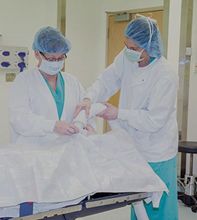

In [3]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAMUAAADcCAYAAADA4WWjAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAP+lSURBVHhe3P1XkxtZljWIpo14uS937Ioxm7FPt6jqUl0qs1IrZjLJpNYMrbXWWgERQCAQ0FojoIEAEAgtSGZW99h9u/9p3bWPB8hgkJWZ3V1t88192OYO5XCcs9dea51z3PHOdiGEH4rCdgg5bi9GNh98LTL5ANJ53w9GKudHKvsDwdff/Iz3tUhL8Plk1oNk2q0ixf3XQt6b5WczPEbWi9y2C27vDPSr7Vhb78CmdQDrxnboVuqg1zXAYGjBuqkX8S0jP2NDImPFVtrM2OS+5WXI43jqclgQS/5bw8awvx4J7bm4RMrG75bvfxUXz+unB39byvmDkUy73oyMFqks2zrnRjbnYNjPt05ksy6Gh+FDlm2e4TZZeBUpiW3274XIbnuZV272jeyHkd6OYHsngtiWCXp9O/unFab1NmxudnLbDod9Es+fFfHdsz1uK4wynj3bOd/u4oxx+qKI0+e7+P7Phyjy2AZDO4zGNpgYxrVWRgsc1l71eGW5hn1fxxyoxfJyPULhRZTKfuSZ2+mcD38VUGQJigyT9WJcTvC0JP0PRb4ab/nseVSPLcmvQJH5YVBk+APzBIWLoDCsd8G02QMLQWFgI+mWBRT13G+BaaNPA0XWjkSaSZjZZEgiWV+GJKOA4GJspaxq+/Zk/6nxFlCch4BiKyWhff8rULw6r58c/F1vA8LFuAiCi1EFRCrvZvtfiJxHtXGG/aciywKZYy4UWLyqkfciS2Bkt8+D+zlu8woQzB0CIrMdVaCIxtexyuJlWm/FhqkNZnMnk7sVTucUXjwXUOz/AChKBEWFoDhAnoA1rPE4xo7zINAMbXDY+rjfipWlWtX3VVBEoysERVCBQgr8vwoUbwZ/XIE/8kK8kdQXAfC2+CmgkMblsSXxXwJCQHAh1Ht5PGGfLPfzrBoCivWNHpitfbDYBrC22sxqUasaRa9v4Gu92EqayCxMjnO2uBxvA4UC0DkwJN6e9D8Wb4JCMQRjK+VgsjIkod9yTv+ieAsoLrNCSrXpW4KASOc9KgQM1X1J+Ff9I/1IQLDtc3yck+SXreqDS1Fk35SYgOUwMqUY92Mo7kYQjhnYNx0wb7QzuCUo1ljAvJ45fP+ijBcvmWKHYKiC4xUoTvi8gCKdtipQbGx0YoPF0LxOxiEwbJZegqMFywKKlXrFGLqVBsTjayiXQwoUWebyO5L0PxR5Ro6Ivhjy3Oshz7MxLsSrxtIiw0b7sXjzM6+HqjgCOAHAOTO8/TPyHukcPwpFjwKF0dSNDQuZ4iUoarC09ASLi09hMHYzSTb4GSZKlkkowGDDqkQ6j4vJLyGPL7/29qT/sbC+EUoykSESaQGEnQXg9bh4Xv+ykM++iiSLwMVI5QiMPEO21X1GWlihoEWaRSZN9lXbl4/ZD+fMICyRYx/ltgPcaiH5cTGyxRBSO5QqZbJEKYp8KYJSJYxwRK+S2bLZAYulC5uWbqyRKYKBJfzT9xW8OBNQ7Cpg/BAoEgkzwUSpvNFNMGjAWKecspq7lYxaXpSCWE9wCCia+P51lHfC5/lOpngzwX88LoNENcAlUGTYMK/FheT/S/FGgvNzF9mnGvJalRXeYAqGUKBElsfcLnnh8kxjlY2zvtFF+dSvGmRx8SEWFx5hfv4JKbqLldJ8zhQS59X5UmwRKNV42+sXQfPTQ0DwemiAqIJAA8bF77kMkrfFxfdr8eZ7Xib/5TgHw0uAcFsFhUgoAYMkf7bItqY/yBTIIC+DzzMfNGl0nh8EgYpq/ghLVLilZCqQLbZZpQ8Ow5QxOhiZvBZrJ6zWHtgodwyUPVGC5Z/+vIcXpwd4roAhoBBwvAmK5y/2sBXfoJ+gXBaGUEzRTVBoIFnTN2NJQEHZtLxIUOhakEqZCYooQRHmORIUBVLGD8VlQKgfRYp5Ld4CisuJ/DYQvBmvWEFjhjePI3EROJdBIaEBgufFYypQuKehZ6Osm9hAm73UkTVYWLiHhfn73GqgSNFIpykVEpQRCeroajX94Xg98d6e9D8W8jkx1K9CySayRJIAlbj8vQKUH4vLn7l4vGpclkkvfQTNs/IQKs6BoYJGO8/+zzN5uM3LPiVT9pyV88yFPJlByVzJA8qkfDGAQonPU7Nvkw2KFbLCbojbAIol9g9BtV1woVSwIeifZRJTNlmEKQQUAzCR4eOUVf/0nYDikKAQX7FLMAg4XgfF2YtdvPhuH+Gwgd6kVQHBvE7ZzBDG2KSEXiUzLC/ST640aoyx3IoM+668E2NuR5i7lE9v8xEX4+2guBSqIrwOisuRlcY6r+B/Od4ExduOJa8JIKrbyyG6MEdQ5Pn57bIXDveUBgoyxYa5h6B4SkBooJiff0yK7kKaxjojoMrQxFNbJ9OSOD+UZBJ/BVDQU1Q9hPIRSX7XG6b31Xn81HjzXPn8Bf/w+vHPo/q8gEKAokAhPkLMsiaL8jkWyyylRpZbtvE2+02ixBwokwF2StwvuVEsM2TLyBccbFsynIzYbZnICGsIh5YQ9C7C55yFxzYJt20MZlMP1tdpkM0dZIo+WC39lEHtSGyt458pizRQaGzxNlCI0f7u+314PEtYYfKbxUeu974ExiaPbyBYZDRKjPfKkviKVmT528s7cZ5nmPn9E4z2vxYUcvCLocz4y9Gqt4S8fs4E1RAGunwcqTziLaqgqQLoYmgMxk7j+4tlH+zOCYKiXYHCRApdWnyC+bm7mCMw5imh1gydyNCMymfVyBW9iqqmF/S2Jqkuxr8TKMgSFxNWVfDqeVTP6UK1fxkC4pfB81MS7PVzfpn053GRJV7GuakWIEjFr1b7fJFFhglf5naH/VsmSEqUUUVKq3zWhgwlSCJuxFZUj1hwASHfLHwuJrt9DC77qEp6p2UUDsswYxCuzUF4NofgtYzAax2FzzYCK/tmwyT91EZGZxKbe5nczUgmN/DP/3REUBydg2L/DVCcERTHZ2V8990BjfnyuTfpOwdFL4/dT1D00k/KMC0LJI23sIVupY1Ad9NoV0HhJyioo0RLXQ55XuIngUKSkAl4MV43V2/7zFtCgesvHeNVaKxDQFS3LwEh+wIm7Xjy3u0SQeEQUIh8Io2yeiwvPsbC3B0V83P3lf7MMOll5EQDxfnoljBGdcskSqSYTOeRYPJdrsZbyiC/irf5hTeD7z1nCBUvWUKS1KMxlxp+ZhJXq/mF86gympJ8CkiXzjdZfe/F38BjMtIZJj7ZMXvOBFkaZvEFWQHFtoPewY5sltsEzzO2jkhsFZHwAiLBeQR9c/BRlrrt40z2IcYA7ExCK+WOnRreyXZ2MMldlKtuVn0XX3PTz3lsg/DaR+AnSAIETMQ5jrh7AjHvFKyb/WrofN3M4sW+2uAx9Po2an4LjXaVJTRAPDsfnhXDfcYQljglOL6n9/D7lzUvwc9v8Dibpj7YCELLBqXzongJkU/1MNBfGFe7KQN92FGg0ArpO4Uizc4PxtuB8WPxRsL/hHjbcV4POZewYpbqUO5lCZaWrbyHqM/ymIWiDw4XjTYl0rqxmw3VT9qsweLsXSwzFqZvq8ZLq+FdAYUkIpOFyXgx0jJRyMSqRjXJLsblIU+p+hdZ4G3xcpTp5efOE5fnIHMtyTQBmqIsVGDVwJFg0ifU83IOZACZX2HFTsjrquK71O/J8H0Znneex8lTBuX4nhyNsuzn+XqOx8oQzMnEBuJxAxN+iRV+CQHPPFyeYTJsH5N9GK71IdjYdiZTJ6tuGyzU/TZWXTuTzWlmsjPhXeZueAgC3+YAPASJ385wDCHgHELIPYKQaxhhzxjC7lE+PwaPeQzWVcqapQYYp+5gdvgGAdCJdbLJBo9hsQ6SLfqwZuzh73Diz5RPGhg0EJwJKJSM2uH+DgFxoOL5d0X4/HMERTflVx9B0U3GISisw7ARuAuzTzAzdReLcw+xtlKHDWMfiiyeZRr+Illwm/v/lwOFnI8w02UwVCNN9sjKe8Q08ZjbNHMO5zQbVzqVncCOXFl6qkCxQgm1OHMOCib+RVAICC7GRUD8e4NCm6k/l3JpYUC2TzFEsLMIEOQZdl5GHnOb5mMZFs2XZJbYy2onGt5Fne8kGGys8maktzaQoKwJBylpPJqkcVpHYDMz+cSEUmqss2puUIfbdJ2wsTpvrtXDYmyEZa0NDr7HYRogC4xS8gzCZx1gpa8m/jCCzlGEHQzrGEIMl7kfNtHx+g6sztVjbvgOJruvYrjtQ/Q3/Brdtb9B+6PfoeX+r9D58OfoevA36G34HZO0mWBg8tJg23lcM5PYyP7Kk73+6SeA4kRA8WIbXu+M6lM7z3OTTGUmQ9isQ7BTti3OP8X87APMT99nDjxSoCixLUv/VwWFnIuck7z3DU9yHhmRcqUINXCUn6EEJCjszik1F2FidRNQ6AiKpbl7BMU9Nsydc1AwEf97AYUCqAwa+Lnvg8e7RmAvwhtYRiiyinDUiGjMjOjWJqIJE2WNgQmvo3Fdgsc5w4SfoJQZoWwYwIaBOn2NLKlrxdpSHVYpHdaWGmFkrC3UYm2+ButLtdjU1REArbAzgVyWHlb7Tmr9Hu730xMM0hOMwmsmoNbJDtTj1tUmrC/WYHX6EeYGb2Kq6yom2r5Af80f0fPoV+h++Bv0MfF7Hv6K219ipO63mGr5A+a73oV+4FOYxq/DMX8XwZUHjHvwrdXAbelm8vbTC0iV7ycoaLQJLhmh+v47AcAPg+L02SGePS/ATVlnJmvJMSxkC/NGH+z0LAKKVV0jpVMtVhafkjUeMh8GUC5FCYgIQyxDiKAoMdF+KP61oCDi/qXxtuNcDDmX7TITnvvKuCsv83qosfFzUGjv98OmQNFFKtVAIUxxERSbTITLoBAtfzGUrq+CQYUkr6bn/9KIzxZDG3L9yyHvUbPWbwGFeCaRTUb9APq7bqGvg9W291vGDYwN3MPk6CNMjj9kPMD0+GNMjT7GxMgDTAzdUzE+cAdjfbcwMXAb0yP3GQ/Q9PR93Ln+Mwz13CQomlnJG7C+0ADbSgtZox1rhmY1j6OjvFgev4upwbsY6LmO3tZPMNT4Lvpqf4fup79Cz5NfoL+Wyd74e0y2fYCZzg+x0PchjONfwj17H56ZJ3BO3oeXbBxYuo3Qyh2V/BIR/X2EdPcQWL6D0PIt+Be/hXv5PqVaB6x2soSNSUwgWuk/1tlfpXKAoKh6ib8MirPnh9wvsIBMsK81TyFMsUnmctLsWynLDKvNWNPX00s0UCU8xMZ6vxqO3WbOFBkygfeOJNnFeCswfiz+nYCTJ61djOr3VT97+Xja82QRno/IJ2EVxRT0FGusmFIxpIH0y7VYpsFemb9HcNyBhZpTDKdUZQUK6vXLoHgzCIxLoLgIDGEAibcB4WK8AQphHZ6DtuRFA0UhY6F2H8DMyB3MjdzE7NANTPd/i6n+GxjtvYrR/q8JkusEwbcYZ9UeG7iJ4b4bGCJ4JgbvY6DrJkF1G48ffoSPPvgP+O1v/hc8fPAJJkcaMNb/GC2PP8Hj679E3e2/4f7fMv4evXX/gJ7Hv8I0wePenMTi0F3MdX3ApP8Mm9NX4Jj9msn+LRP6JsKrD+FloscdzUh4upD1j+IwvYqcawSOhXtwLV6Hj4nvmfsWvrkbCPAzvgV+loAILN2Af+E6XGQMp5X6n5LMSkA4nMNqu0G5trcXxp9/AiievTjC0XGGgBpXTGExswiae7jth8M2DBN95QrZUrdcgzUy49zUfconAUUcxXLsZR6/s03quBivS6efGv86UPx4yHFfRfX7fkhuabOnr4PCQaaogkKMtpJPs2QKgmJxVvMUWTVHIYZWG5URj/FDIcC4LJ9eSSgZRdLibZLpYrwhn+Q4L0FB5uI5FekbYhEdDMstsBta4DNT2lDCuGXpgo5GdfExdAuPMTNxDwPU7vVP/4RP3v9/4YtP/iO62m6gq/0O2lpvoab+azS28vHAU3T1P8H0XCeWl3pR8+Bj3Pn6l2i/9XMY+76AafQqLJM3sD52G3n/Mv6//59THDNpIs4xuDfIKrr72Jy9BvvMV0z0K4it3WSC34B35SEslERGJr91pQYZJnbKxuo/S1As3YF3/g5887c1UCzJZ27DT1AIQJy6R3CSIaz8Dis9ip0hTGHeHMLBQfQnMYWA4vAwRU8yRgnWq4ZkhSksLCgCivU1/t5FWfekgWJ++gEl5hAqO1soyfor5oxMQ/yfDIrXk/5yvP27fgwUBMS5fFK/59xTGMX4kRE21ntpth5hYeYOlmiyZye/VbOdsnhQFhGmc0xIVufLnuJypBh/CRRVQPxVQMFzytEA+vw6yqgO2FZbsDTyLSbbP8FoywcYavoDeilh+qjpR4buoI+VvbPjOppbvkIbAdHT+xgDg3UYGKnD8GQThqabMTTTir6JJsys9EFvGEZj3deovf8heh+8B/PgdVjGv4Vr4SlSjnEkHDOIOJZxvBvHi7Mkjg8jOKhQpkaM8MgcAJnWs3ydCX6VUukaPPPXYV/8GqaJG8hSzwd1T/kc2YCg8C9QSi1yK6AQ2bRCgCxzf/EG3ASFh9LJ4ZpgERuD00VwkDUsTOajozi++wmgeP7dMfYPkjTro8pLVMNKw+6gpxBQCFOIpzDo65TRtlvGsFdJ0mzHGcyZQuS/f1C87fx+CBR5OZcyTXaRyGd1E6awOSbVHIWZNGoy9mBu+j5mJ25hfuomJcRVNaEjs7XiKdSkleh5MsEPxQ8zxStgvA0IF+OngELmZQK+FVhlPQ+r21DNP2Ky6feYpnFd6voTFge+xOjgQ4wMP8HQ0BMMDtVgeKwBo5MtGBpvxvBEKwHBmG7FwFQLBmfaMTDbgfm1ISzrBtFcfx0NDz9F18P3sD7yNTYmv0GM/qvkX8HKIBlj+GtYZ+7DstxEIz6MfMqDP8s6pOMdFJJW+Ky98BoaENA3MNHrYF96gqxrCgXnrPqcf4WsQEYIEhBRRoigUNKJPiPE1wIEhUf/CH7HADxumnlhJILCRlDYHaM4OU3guxcCgB8BxffH2NtPkF0ovQgGMe1Whs1KOUZQGNc6sLJcR7NdR1DUY3n+MVz2CezvpcnGMbJFXANFkegoMtlehqBFnjuPy0lZTcw3Q/MWPz3edgw59qvYJqW9GdqokgaC6vZiCEtoxyvyRxa3A9SYE0o6WUnFxtVOGtPbmBy7gamx6xgd+Fqtf5F1O+ksNbwsa6BfyGa9bw0BxEumEFP8WsjI1Pl+kgnOkIm5xKXQJuvOQ4FHwKRF9TqR6pIVMdyFUoigWMCmvhXr0w+x2PkJHFPXYZu4is2xL7DBqjw1VoPBgScYHa7DyCi9AplgZLyRwGjC6FQjhqbIErOtGJvrwBgBMUiQzBvGsWAYQ139tzTgV9D39Hcw83iWievYnHqKvaSBTPAUm5RmFl0zNo2D8PqMCMd9iCcSbOcKjk6OsbubQy7lx2EpidNKFkeVBLYcCzBP18K6cJ9+gTJp8RoBcR3hBXoQGuwgASGgCOvIFpRS3tXH8JMp3GQKl2MMLsonm32YoJjE6WkO3784JABkzZMAQpvF1ibwtFWzz7n/5+8P6T/iZIcR2BUQxKwPUU4Nw0mgySz3yko9VgmINR1BsVBDAM4QSCmV8xIF5s87Qhk/FJcBIfFmMv+1QszOq/hXg0L5CRl33lITM3ZqzA3KJ6t5GGuUICND1zBCMIz0f4X+ni+wtNCqGiNzDoo0K/bbACHxEhTnAHg9Xj2nZpIJiiQT/y+FBhBhlR8GRb4Uht8zB8tqOwyzNTS8NLujBMPY56zin2KVbDc69hhDozUEQyPGyQajk80YIRBGpwmMmQaMzPHxQjsm51sxNdOGEbLIinmGMYUm+o3Gmk9orH8O08hX2JypxdpcO7wuHcy2ZegtOphcFtiCAZgDUWz4wzAzrP4I1m0uOLmfLpSwlc7g8OQF9nYPkQluIOUap8TqgGO1GbZZMsbCLQQpo0L0JGH9PYLiLkEho1O31JCsV+STk/KJoHAqUNCoO+ZxdrpDUJwoVtCWdewzZDZ7X11j8YL7clWezHrvVaJkiVE4hGUIBquKEbh4LmtrctUdmYKMpl9pYL/Xk5kWUNlPMl8kb7Ri/f+3oBAZVQWF1TIMg1y8YhpghWCV7P8aw31XVPR1fgb9cjvfGyEgAkxCYQq5xPKngOJtUQXEvwwUVWC8DRQyeOB3z8FK+l+bfoKF7i9gHiEoRj9jZf8cK5Q8I6zKQ0z+sfkWsoEwQivGF9owsdiKyZU2TC51YmahC3NL7Zhd5GMm/RKl09R4E1rrPkfdw9+j6dFvsc73mzfnsbixhqkNC/r162icmEP7xDwG51fRM7uMEZ0R85t2mHwhOKJxGOwOpErbKB3uIZZO4fDgBGdHB/iO8urZUQGH5QRycRsS7ll4WaH9KwKK+wTFPW4JCjHchlr4nEOapxCmcAsohrhdwLPTCkFx/JNAUSGrCijsChRkCbKNgOsiKHTqUtR6BQq/b+lNUFRl0l+Ky4CQeD2R/5rx1wOFMEWJoNimHjdvDLA6tGHTNAiDrh09HZ+hv/NTDDA6mz/A6koH9WRUySe1PJrAUAC4EFVQqNGnKii4lf1qvATFS2CIhHolmy6CoRqy1unHmELmK3yuWdgMndBPPlKgsIx+qUBhGvkMuuErmJ6rxcRsPabnm7jfTDZowuRUPcbGn1BO3cfwwAMMd97FQNtVtDV+ivqnH6Hh/p/QfPOXaLjxMzy++WtMT/fAGwrA4HSje2EV9wemcKd/Et+0DeKbhl7caRlC3eA0uud06FvQo218ClMGI1btNlgDbpRO9qHbWCV7mFHY20W2VMJOuYzD3X0c7u8jFXXjIL2BsLERQf0DBMgYMmchUsq/Xs/fSJnjmqRkElCM0WQPUa4t4fkZk/75EUGgXUfxQ6Ao0htaKZ8cIr34ebtjhJ5ylHJsXC0nl6vu5KpLAYeAIhTUvQkKmbT40fhrzGX8lPgpoFAm+hwA1e35ftWrXARFgQm1YepXTGHbHCEoOtDT9gkGOj7BEEHR1fQ+n+tCmceugiIjC+IEAG8JNUchiXsOiovxclJPEpyg0DyFLPj7gfgpoMgHKGVmYKPR1k3QU1DyWcauwDRGUBAYa0NfYHrgOgbbr6C38TN013+MtkfvoeXB79Fy7x/RdOeXaLn5C7QTAJ13foGOe79SMfjg15h8/Bsa94+gXxqCO5Zgkrtwr3kQXz1qw5PeadxtH8Hnj1txpaYND3rG0DS2hAcdw+iYXET3FGNiGlM6HWZXV+AKsXDslsgoM/Al4/BGAggEZd1VDns7BezvxFCkTwmeg8Kve4DwKsFBGRUwNZINmczuKSbyONzucWzSF/h8K1rS/0RQbOc1UDgJBgGG4xwU4in09GRLBIVcTyPgEFBEwqsEReI8B7W5sHdKPNGLUWTS/Rgo/l1CMdAlUJRplGVi5UK8BMU5CNSWP0SOUVTnL+Dhb5DHJY0pLDTYskDMSW9hJDj62j/FcMenGGXF7W35COu6bjVGnRJQ5JngWbmYxqdCRqJeguFSXAbJmyGJTkZgCADicqkpQ/arzwsQLoNCJhAFELLyV0ag5De+AsUjLPdR95MpBBCbE1ewMXKFQPkMM20fY6LxA0zUv4+RJ3/E6JM/YKL2j5iufxczDX/EXOMfsNj8Jyy1fcT4AGs9H2GBxcGw1IMNjxsdMwa8f7sBn95rRcuwDtee9OHjW0241TiIO21DuNnah1tNA7jfOoK20SX0TuswPKenYTdDb7bCsLmJ7YNDGF0BPjajfLCLRT19id0Kl91IQGwg46XeX7yH0NpDxmM18edfvkemaISX7GAnKAQYbs+EMsn+gA4vnu/9NFB8pzGFeEgZvVLAICBsdjIFZZlO10xA1KnLUIUtlgmKrZgRuwSFlj/MQQGFVMiL8VM8xb9bCBAuhiT4hZCkl+1FqtMklLavgr9BgPMaKCxDarWk0zauQDHc+SUme65gqvcryolPsKHvQYmgSOeCGijIFrKcWCJHUFS9xOX4cY8hEspxHgRAQgtNRmnPV0Hx0lOQJeTqwR8DhWXsS5jHP2eQMQY/gb73Y6z20XT3kTn6voSu61PoOvlczydY62Xi930MA99nIoDMo1/Ti3wFw+R1GCnJDJ5NdOls+LJhFO/fbUfdmA5f1ffgQ4Ljat0QvqkbxZePB/HRnU7cbBhBXf8CmgYX8bhtBDXtw2jsHkX38DQN/TKC8TTCWyn0Dg0jVSxCb/Oge3yeie6CeXkIaRrfvKMLAf1DBAmK0OojMsV9eNebFChs7mkFDBeZQkARYiVXoHj246CQ0ac8284uixJdZAcCQphChnVFPi0tNWJpsYbxVAPGYoNaIVzZIyiYf9qsNuXTf1eguACAt4ViAgEG3ysnf/GzL0GhwCTHugiKYYKiB047QbHWiZEuAqL7K0x2X0F/00cwrVA+8bdm8gRFgZX/LaCQbY4N/ipegeXfAxSKqVj15PqQ10HxECv9X8M28dVLUGzSV4jxtjDRzZL0NN6W8euwTlxjfAPb5FUV1slrsMzchG32Brc3sEHjuWChN1gx45vueXzydBi1I+v0EJRM9d34rK4HHz3qwZ/u9OCP33bhq8fjuN44hjut47jbMoZrT3twv2kYT9tG0dA1zhjD1IIBpXKFoBiF3u7DZiSDz27XoKFnFCazERO9j1H0jyC4+hgekU+GJwiQLXwmAcU4QTFDUEy/BEUsvq5A8UIW+/0EUMjIoTBFFRTiKRyKNUYxP1+HhYWnjMdY5Fa33IRs2vomKHa4czFkxeD/uaAQiVQFwevSqSRR4b7IKr5eqmwpkyQ/SvY1wFRBwR95DgoZfRJQyETN+loXxnq+xkzv15ju+Qp9BMU6QbHD75dVtmmCQq48ezsoXo+/Jihkq4FCk07alYcEBc//Mih0A9/APvk1NugprFNX4WDCqyAANgkKm6xAnWLyT30L6zTBMfMNHNPfwjl9F/a5O7DN3YBp9j5szhU0T6/i2wEDPmuYQOucHbe6ZgmOXnzypBcfPaB8ejCITxhf1Qzjy6d9eJ/s8WVNP641DOFu2zhuNw3hUccEWWMc9yizOofmeb4VdAzNoKZnAs5YFrfrunDlcQv6F5Zg9azAt9mJuLkBfv0jRMgWAbKFxhSvQOHkvhjtrYSZ0uknguK7AyS2bK8zhXOEUmyS/mIUs7NyGfITguKR2upXWsgsdlR2L4Gi9BbdriXdeVx+7W3B971hiN8ISdRLPuK1ED0nhifB4zGZ+f4SNZ48r4Cws4XyXgrbexlkyykmbwJbmRisrk04vFbKni1kS0mU+J7iDo9Hv1HhuUlVN1smYDYPweOYICt0Ujp9hfm+K5jr/Qa9zZ9j3dCPcoVSTC7CzzIRc0xIWV4hs8kZPk4zSbm9+DiTkXhdVl0ehboY2vDs6yFGXAODzI5LVBclinTSZrIlCoUgXI5ZWHiey6OPoR+8DvsUATB6BQ5Wfiervp0AsE9cp7/4ivs3YZ9+FTYCwsGtc/aOWnJhF1AYWdWNLtwfXMEf6wbRsuxHuy6MTxun8MHTIXzwsA8f3e/Hh2SJO23zuNE8jffutOLD+234/Ek3vq7tJShG8fWTTnzxoB13Wydwv32WBnwdmfI+ls12fP6oFRZ/Ah1jK/jT7Wbco8xa9dgRjKwjZutHhEyRWL1HX/EUfspbH3W/GGKX8hRTZPhRpFhA/onJrs1ey4QdgyBRQaBooNglKA7w/Ys9xKIbsNFouymXXOxvJ+Wa2zkNm5VMMfsEi7OPsTz3GPMzD2FY7cL2tg+7BIVa+0QSkAnsd96a5P/S+Kmg+JHIbzPxd1IEgxgfnmSFwRMuChh204hl43DFI9jwebDu8WFwdhHNA8MYnl/ErMGIDb8PIQIlzR+3c5DF7gEBxITatC3Cap9BwMPE0ndghppclkYs9n+DgVZq8o0hlHfpTdTdKbQLmAQgVRBU4zVQKGD8FFBUGaMal0Hh1kCRIiB4TAUKgvLiNSJy4YvTMQfbxihWxkj7g9fIBJRCY1/DNXMbjtlbKvmtk2QGhnPmFoFwE67Z22pfQOImQzhnCYyF67AtMSGsJrTPOfEVk/n64DK617dwrUOHj2om8f7jYfzjzQ68e6cbjwZWcaN1Bu/ealfxwb0OgqIH3zYO4x7Z4ZM7zfjiYSeBM40n/Wu42zELWygFd3QLn95vxqLJjfZxIz59OEgg9aN1YhaJ7STSoWVE9A+QWZNZ7SfwbfReAMWkBgrrhJJD//w9QcHk15Z5nINCFgC+BRTRiJEAGFbG2q1AMQKPLDchUOZmnmBp5jFW5sgWBIXx/Kq73V3mHXO0qo7eqUqVf3O8AYLL8SYILscOGWJXACGIJRjKhzkki1twRVjtPU4YvR4sOjyY3nSid34VzaNzGNFbsOQMYYbPzdncWHV6YPV7Ecun4E+EEEgEYPNvwu7RsXGmYda1YH7waybWFawMfI2xjq9g3RzBToWgkDVVOe0CprzEBWDI9jIo0qzuVSBcjH8LKLTbffK7ztd3SQhTuJ0LWNf1oa/hCyz3UiJN0CeMX4Vv/h48i5RFAoqJb+Gev6vAII8FCLLvIDDcBI97jmBZvAOLqQ+LVhfqJjfxaNSAFn0QN/oNePduPz64P4jf3uzC+w8G8LBvDdebZ2i+u/G7a8344DYB8ZjGu34CX1NOff1kAFce9eIeGeKb+jFKrT5lyueMTvjjGUqmLowvWtAyuo4vno7jYe8CgTQAfzKOfMoGn64GqVWZ4X4Aj7mH8mmKoGAyK6aYxubmONvbjX/6syzn+HFQfPdiF+GQgVKJTCGgkGNRNnldc9g0D2NumixBttDNPcUiwWFaH1SXob4BirdW/n9p/KuZ4vXXd7YjKG9HyRY8ycM8Quko1pxWrLqY7O4A5q1ujKyZ0bu4iv4lIyZNLgzpLHxsxNSGE1ObDgwsrGF5043NQJBGz0aQ2GAOeeGMOOD0LDKxaC6HvqEE+QKrg19iqutLOFlFdoUpmHxyPyPtvkayT1CIjBEwSPWWBYNM2rQCBEPY4UK8bb5C9i+CQgHhPGQ2W5NPfP+5fFKgkO99ORlJUPBchCmW59rQePf3NNpinOkr6CF8i/cJhNtkCDIAJZR38R4ZQdjhBjwLdwgEsgUfewgO78JtbOprYLTrMWgKoGbWjoZ5J+oWApRNM/jDvX788tsOXG2Zw/0evaru75ExPrrVhY9vddNY01zXT/P5EfzpJtmhdZaSaQ6f3O/C76834Y9kkk8f9KJ/1oBEoUJQ9JDBneiet+HDRyOoGdLjQScrdzJLsMfgMXRga/Wumt12m7vg8syoZR4egsJzDgrxbn/+XrxDdZXsD4MiFFxjW8mQrCwslBgn2ObpKQcxO/UYuvmac1A84XNDLIYxBYoSC3t1/d87mkHVzO0byf5TQ0BxkTV+SrwGCIkodrndqySwe1RANLcFE2WSwS8s4ELfogltE0vonF5QSw3G9GbMbrgxqt9E59QS6gfGUNs3gqaBSfSML2NkQUcgeWEKRmAMRmGPR8kcPJ5pBFNDN7FCQKwOfIaZrs/hsY2yYWR4l0BQ1VlW4mqgkLsMqruECCAYcldqtbRcxYUJvYugqMY5KJSZJiC00MBQjddAIcfi8ZW5vjgpyXNx2GZhWOpGx9OPsDYkHuE6nJPX4CUzOMkAAgr7tAYEAYFIJdn3EAgCDD+B452/hfXVZkxbbKhd9OMJ5VOzLoCve9bxq1u9+KZjGXXTbtynDProfjc+uNmOq48GcJVy6tPb/fjT9S5cbZjB434jagYN+Kp2GH+83oA/3mjAlZoBfNsygS+4fdQ9gcLBczVCteaKoo5sdKNbTP0Gbrf2s1/CCKeS8FHShlcf02w/hMfSy6I1B6drikk8/ZIp8gKK76orYt8EhTDI87NXoAgGVi+BgiAjU2yQFeZnCIj5Oujna+ktnsJiHkWFoCjTsypfK/NdMk+xIzKFiSjJLcn6RsL/VUMAeB7KTPM7L4Ssaa/sZbFF07zhczOZw1h0BdExrUfLpJ6sYEPvnA5t4wtoHp7DrYZeMoMJ/fNGPOwYwoP2fjT0T6GenfKkrRctIxMYN2xizGQnw2xg2WHFmmMV4+PUliPXoCMopjs/g98xicpulNU5CLm9T07u/0NwiISqskVOJI2E7J9HVkagBCQX2OJiKIAodrjIENXHWmwp0GigEIMtoBNz/ZIlZJaeoLBbZ7C62ElQfIy1YRldukZQXIdHJBITXuSS+AfPvMYObm41UGgRYPgY64Ze9LB6P5gP4fGcGzeHN/APd4bwReMcmue8+LZtCR/e68V737bgo5sS7Xifcuqzx2SJ1hXUjlpwq3MRv7/Zir/77D7+eLMRv7teSwPejust47jeNklvQd9QOsb9thFK3hT6jWG06fy41TVBzzHEPrFidt2CQNiG0HorIobH8NF4uzzzTOZpeOknxFdsbo7xt/sVUzw7JRjeAopnBIS89uJM2KSCgF+vRpo0+TQJl32c3oJMsT6Ehbk6DRQL9QRFDduU/S6+VfJeJqnZ1hLvVPbF2EqCyosCDA0cf/2Q4/J7/mIksLO3jWQhA4PLCT2N9ILDh865NbRNrWFwyYqOyTW0kAXaCJD7HROkb7LDwCLqBhdYndgZfVN42juN2m4Co3ccTwiSut5RtE4uoH2G7GIwwRTyY3F1CJMD16Eb/hrTXV/A75zhd28pyaIlIRtHtLy6NeQrf/F6CEhkaPaV2f4hf/HKT7ySUgowAoiqn6BM027b8+pSWzkfORcBhW6+HZ0EhWHkBuxKPl2De1YDhZOewSWjS5RPHrKHZ+GuklIS8pyfgHDN3cW6cQzthgAeLsdxhwn+28fj+LxNz2pux4dki9992YCPbxME9/rwEY32B5RDUuXrZt24PWTCu/QN/+nj+/jZlSf42ZeP8HefP8DfEhyfPKL5ptn+uon90jmJcHYb91oGWYhiaF/24GrXPL5soOeo78HIqhVja1Y4QgEEydL+1Rp4LX1M4hk1YuRy0yATFBbLOIpkSrlpgbDBD4HiO7kn1GkZfp9OgUIZ7ZegWIDJOIyFWWGJehVLBIjDPo1dskRZFWRKJ8p3iXcOjrKKKeT6BZFSVTn1ZgiL/CUmqb52OS6+Luwgo0oy5HoeNNXFnaTalnYzyOwUYfb5Sa8EhNOP8Q0PmifIDJOraGLi367vw0Nhgd4Z3G4eQePwCh52kc67Z9AwvISn/TOsROO43zmFhoFZdIwsoGN0FkNLa5g229gRwhaUUHYdxoZuky2+wUzPVfhd89g5SELuhr0twYZRN4M7B8Zr4LgAksugeD3caquB4hUwNPP9KtSNyZTBrgJCbtXzOijUkKxzQTFF19NPYRy9Sfl0Dfbxa4opxGi7uBWTLR7Du0AwMGS/Gooxlh7BsDaN5tUQbk778GXbMt6tn8ejKQ+TehS/+vABfv3BXfzmixp8QH9xp9+ExqUQI4iv2ufxj3c78Ef6h09rhvClzHQ3jOKTh734iub6WtMU7vWu4vOGaQWOQGobgzTZRn8a1zoXcK1fh/sDS7jZMor+5U2sR3PYjCYQ9q3Ao6tX94vyERQexzic3nHYPRoodnYiShb9JU/xEhR8fHZchM+zouSTS0y2AgXlk5Ne0iCgICAWGllc5AKjOjXMXWG+vwGKcMTOjvEplpAElgkytV+Nl4l9Qfr8K2J7J8XjkZVegiLJ7xKWkuf4WiULVywOnZuV3BXAlNWPtlnRrvOUQcuo6SArdI5TIo3gZmMf6gmSmr55POiYxN3WEdxrHcZTAuZm8xB17yC+qenBQz73qKUPzUPj6F9YweS6FXpnCI6IH/MLHRjt+QqTfdcQpAGXScC8GC1pHGEKAcUlYLwelFbnbKENzb4laJzTTPqUiio4LoaMOlVBIdKpCopX8mm7KACl0bbPYWmmhaD4GKaxW3DN3ICD8sknAGDSCyiEIfxLVSBcBAX3l+7BLaDQjWPMHkfdSghfti/j9rgHn7ZQDl1twT9+8hD/+OVTXGuew+MJN9pWM7g5aMXvaJK/bJ7Cg/4VXGuZwTd8/Rsa8yu1Y0pqXXk6ShnVhd/e6MYvvu3Bew/7YQ/n4IztkuE9+FokWRNZpHmcMniDctiAZd8W1gJJSiUDXPQ5AesQi9MsvPQCLt8U7F4NFLuUN9rknTYCVb25sgYKhniNc1CcHBbULTOdAiwabLeTMsw2Ae8FUKwuNmKFLLFMYLhZDHdJCG+AYnioHXr9FCpStbfJFpRRpeKrUFevyWtMYhWqsl+K6muX48J78js5blOo8Pjl0hYKMtG2k+Z3yEmxSpey6uKVBU8UU84YhowBPOmew9OeaTLCPBr6KI+Y5DeedOPLB214yqpzj69fqR3AVzX9+PJRF+43j6nZVWGS+qEF1A3MoWFwDvX0GQ0DU+idXYPOGcVmMAlH0IuFpV70dd1AxLeEAwK3zHPZLlDqMRmLFwAhzCB3YH+bpLo4VHs5ZNg2RWmUSjLxk+IvCATua6Hta7ewfCWfNEDwuwnQash3OSwExWQD+uo/xMbkuVxSLPGALPCQPoJyaf4+AsuPCABZeaqFeAwBRHBZGOQ+3Lp2mM3LWHZR568GcaXHgF/QQP/qk1r86U4v7k+48Hghgduj9BedBnzyZAyf103im9Y5vP9wAL+61o1/+KoLP/usHb/7hn1BE/4xTfmvrzbg76804GfXO/FlxwK8yRJ8sTz7ZQRfNevwBQ36h4+62W96jK17MOsIYD2YgTdgU3cWDNqGVJLavQvweGfhcc/CZqW8oeeVhH9xwhDfQBCI6VbG+0yuuOP2ZA/fP9/HMVWPgELJMDKEi17RSd/gcSzCsDqARbLD6qKwRS1W5FoKvnd/lznJvpfbZmrDsjG84/Nu0JyYsSPJT1AoYFwEBc1vkUn7b43CTpagSBMUcX6XeAgCgo93yBqV3SyiaVYObwjznjiGLWE8HdbhLo1bbe8sGoZmcbe5H7efduLGo058/bATd2no7vcs4Er9KG53UAL0LuMRabq2f5mAWKSsmkLNwLxa/lxL49fJ6vSITNM7u44ZoxOOcBz+qBdTU10I+NawRxotFJiATHy5Y5y6MdZFlvhXgcJPULwOjFeg0OLi/ESVKS6DQv5LzmVdwPJkHXpq38PmlIww3dGSnEBwL0jykxG4Da48Jhhkkd05KCib/AREgMCIrtFcztzHYt8dzI92YnZOhya219c02d/2mFG/EMCdETOu9qzjRr8NVxoW8dHdAfzxmxb8/ee1+Puv2/C728P49MksrjXqca1+CR8QSL+93oRfEBT/eLMT7z+ZQOuyH5HtAxaeFH5zpRVfNerw8dMxAmuSfTWH4TU3LOkd+juyic8Gv21Y3XHQKdeMeBbgJiA8sqzFNov9vZQCxXMBxakGChWnb4Li6DBDYC0pUDgJClnrJqBw2xdhXO3HEtlBQLG6QMO90ICgfxV7PP4boIhGHYjHnOzwCOTOy+oC7kug2GZS/5uD8qi0k0GFINghi5QqAgqeUIWxX4AnFsGqL4pZVxzdRg+pehGPe+Zxu2kYtxrJBA9a8NnNOnzybQ3uNAzhRsMw7nbO4ypp+XrbHG52LOJeFw3hkAGNo2vcrqCenuNJ3xwZY57AmMf9tlGyzxR6ZlYxsbyOwFYK/kgI0SQTvULgykiEJCI1/HZVQp2DoRr/ElBIpOU+sBeAobYXogqIqslWE4cim84BISMjGijmsTLVgN7ad2GZkmFW8Q/34JBJOQEEGUMiSECEdATGMkHB8NFvyF34ApRVIR3Bwte8c4+x1n4Do3e/wWLvKHrHTXg058fDKRfudi/hkwf9+N2NXvzm+gB++00XPUY9fv5FHX51u59VX4/Pahbxh1ujeP/eOD68P4x/+LoZn9dPMemXcKNrDff6dIgSFOPLVrzH43xaS5PdMoeaaStq+V3tsyaY4kUY6Dc8YS9/G3W/bQRye1Ore44mmZWe0sdByXh0mCUoKJ2OCYgfAcXBfopAmCdDTMNJ2SRroJwWmcBbIFP0Y3mxAatLGjBWCIpI2Ph2UCST7DRWtG35Mz4JPvlaVOXTvzEEFDsEQoVSSoCgQEFwVERm7W3DQT+x7I5i3BYhKPz4tn0KtyiHbtIf3GgcxOf3W3DlfjsetU+z4s/h69phfNs6i5vti7hNMFypn8BnT/hc8yRutfKzrRNkjwU8oBF/RJklrPOgfUIte26f1KFzYpGdZoI7noEzHkcgm0C8EKevkIY5N9picsXsnut7FQSMNkx7Poch1Z3xau7i9VAJz8Sv3ulb3WjtQmjLOhhyLBnmPR+Ora4Jk+tbsnyf3TwD40IrpjqvwDYjRlo8xB1YJ29wXwOEZ17uuvdQgUKxA0EhWwFDaIXP658goK+jOX8CV/892JpuQ1f3CLPDk2ifWkXNiBGP2xfw0dVGmu6n+OO1fhrpafzp3jDBMKMS+6OaOfz9N/349Y1hvHd/Av9wrQdftSyrJSLvPRrHH+4Osg/Gkdh5hpv1w/QclF8NNNj9BjycMOPx2Drqx/VY9CRgpHxyRWRicoEVfRw2xxRsagSKSW2n9HEu4OQ4rzHFTwDF/l6Skmv2JShsljHKTo0pDKuD0C01ExAEBmNlvgHxqImgoFoR6UxQiHWQnH9nK8GOSXrV6FOebCESYnu7CgipnNyeD5tKcpdYUS8n/E+JbfEPZIYdCQEEo0xACGvkd4vYCMUxY49gcDOEjjW/kkU3RBoRGLVDNIQtY3hAMDzu0+PbphlcY9RP2NnANjweWCMICJCmSVytGcKnD7rxxaM+fF0zQECNUk7p0DW9ieYRdnzfAlrHVzC8YkL3zBKmjBas++NwJGnSUlkkcmL8hd1ejVtfBkUVGBcn9gQAap8hFf8lKM4jLclP861AcjHkdYJCrpsQQFTvjCiAkCvB5MIvmcBybVISGPqxNn4XTjKDV4ZcCQxZ6Ceyyb/0kMCQ0EAQJAi0IEvoyCAMAUXI0AbHbCM8Y5QPww0IjbZhc6QXxvl59A/Oo2NwDc3da3jcsoKbBMD1OmHjZfziVjf+w5Va/Ocv2/GPd8YIjnn88cEEPqpbwE1Kr9/fH6fBnsQfyCZ9C1YE80f4ipLp3XsT+JjHuTW4jrtjG7hFFmmeNGHBtYXVQBrmQAiewCYBMKeYwkFQuB0if2TJxwLOTgv4XsmnS6BQt+SvEBgy+rSHP784YIGNEwiz6rMOG0G2OUqwidlexKpuACuLzTAsN9NTCGO0IhHfVKCQRbFqYWwVFAmCInXOFLLup0BgCCiKEnyDeqN4ALV6VRsxesNQ/4QQDyGjT7LgryyAYOyRMQQkmd0d6JiYk7YY+s0RNCw4qXMnca12hDGIpsl1PBlYoVxaxLWWeVxvXcDXDbO40baEux1LuPp0hLq3Hl897MI3T/rx9dNBSq5xBao7TcIQ07jXPMEYx1MZwu0aQ+vYLEb1Bgws6rDkCGM9tA1LOI9AModsMaM1lEgYYYzzUKxxSUIp1hD5JDKqyiDcz1A6vRbynEgkssbFENkkCwAFWNq9cXl8ASO/W7yFrBDOZzwExTTc6wMExR3lIXxkCf/CbUohGmkCQQy2f+mRGoGqskVYL1JKA4ZsI7oahHWtcM20wTPVDtdoA8HRDM9kH9xT47DML2Fiag2NAxssJDY09ZnwuGkOH9zowt990Yhff9uFPz2cwFdNOrz7cBzvP53Bpw0rBMcU/sjk//29Ubx7uw+uxA4249v41c0+/B0Z5eP6eXxOo35twICmeR89RRhT1giWfQma7S3Ygm44PCvqLxNcBIbbMcukZjK7Fmmot7U5iL8EilMJ7ao7uSbGatEAZVegoHyiWRdQ6Jf7KJmasEa20M1poNiKbdJoZ16yhMp3BYotjzKEasJqO0LpIIkgQ1OUEYox6ClkVIa+QJJbQPGGX/gpIcOu56AoVTKalOLJHB0VEM7nMOOIYMqVRrcpirp5Jz4nID590IOnfct40LuIulETvqqbwCdPRimbFlAztInHvQbKonncrBsnIMgO99pwgyC6XjuEa08HcK9lAg9o7h62EGB8/RuC5onMuHaMoK53GN2T8+iZWsacOUDTVyRjZGANJeGjnBLZKEvPZXj21XAd20i8RdV8K3AwZDKPya225z7jbf5CouoxXoY8J4AQQPHYSjrJ99FLCHvLEgQBhYed7Vnvh5GgkOSXybgAQeGnZ/ATFEEBBUPmKvxLDxAhIKKr58DQEyQin5afwD5GkMx1wDNBcIw3wz3RBt/kAHwTTKCpERhm5zE8Q90/bkH7sBFN3Quo71xgMVlDTb8F31AKffJ0Gp/WzeC9x5P45e0R/N03A3j/0Sz+9qsO3GxbQObwnzHt2MLf3OjH1X4nvYQfd0c20baeQudKlMdZxbg5hOVAEjrfFizBEBxeAxyUTy4mtNsuI0+UPe5FvHgmoHiLp7gECrmWQq6eFFCIfBJQyN3/BBRO6xJZopdGuwn6+UboZhuwxNiKCiiyyksoP3FOBu/k5A/BhSnY+YW8dDqZQrGFJAJBsf0mKC4ywE+Nt4KCqDw4yGHd48Hwhg8Trix6zVtoXvHjKzLFPRro+x1zeDK4iqYZJ642TNFLjKp1Nw/oJW7WT+PqI5mfWCEjyHr+adxpHMO3TwbU9h7jVs0g7lBGfU3AXCcoHlOGPe0aRvPgBGrbR9HSO48JnRMGdtBaMAZzJIXNQASJVAC7lC7iL9St2gkIAYaa2Ds33VVwXDTePwaKl8vOq2zB98qIk7CEJtE0lpAJT9kqUKTd8FoFFH1Yp3wSVggSDCEBhICDJlpAISGTdmK2I/rHKsLiJ8gS0bUnCK88xXLbV0o6+cgQrtEmBKa64Rvv5eMBBKcGCZperE2MYnJqCf3TJvTO2tA340DbkBn3mxfxyf0RfPZ0Ar++1YO/v96F/3ylk15igaxtYsGaxqBO7gmVxagliS/77bg+GsStISv6N3NoWInhXrcRT+gBJ6gIFv1JskWSxSgKR8CkblrnopfwCCg2x+FxLxEURQWGHwOFMEWJOSygcNOovwQFHzssSwRELxbnmrAyS5PNmJusJSgsBEVOmWst1yWieCebiSKZICjyol2j7GRGjvtqvF4z3kVKp5KAgiETbWVGqcQklyjKVl6T9zAIAPU6txICCO2zGiiKlExFgqLM2N/PI13IYMJoRd9GAMO2OAZsSTSthpUxe0QdWs+K1TBpIVus4vMnI7haP64uernVOIMv7g+o7ZOec1C0TBEMI2SGUTT2zOEh9+83DuFe3QDuPu3DnSe9eEoD/qClH/ea+lBLKVVPFqrvncXEmh0bEXZQMAHHVg6hLbImf49WRaQdCAbKmqJUcsUYr1hDsYUChQaMHxqRugwKJZtesgQLk3wPWUImTGVbrmzRaDvhs83BaxrA+sQ9MoJUfSY/GcFHbyFJL8OwAgbxFqFVege5/nlNY4kwXw/RdCfW6uAcv4+19tsIz/TCOdSE0FQvAgRCcLwP/ok+gqQX7rFOGEb6MTe3SsYw0bs58HR0kww9hztdJnz0dB7/+5VW/OHRGK52rKJxKUU2iLCPNjBnzUDnzqN+wYer4z5cn4zg3pgHXfo4/WIBXQRN34oP4xshzDnD0HnpKyI52ENOWEUyKVDMwWKW1bIr+O75DsGwR/lUBcOrEFCov/giMOROHsLWVpGZTvoK2yTs8j8dFkqpzUUCooNRi8XpGizN1GBq7CmNNplCPMVLUDD3SQjvpLfCSG4FCAQZD5eO3mIHM7gV6VSmwd6R5CBblIpM8G0mPYGgYpsHVCHPJdT7dggAMc8VMkKFIKiGvCaz2YVd7YKh4k4Ge0d78KdyGDS40GkKspoEMeJMo9kQw4NpH76hpq2Z8eJWzxpudCzjy3pq2KcyurRCFlnBlYcjuEfGuNcxT6k0jTrSfEP3LMHQh3uPO3H3SRfuNwziYcMQntQN4wkl2WN6iyet43go0TWH2uFVbmdR3zePNecWNsMZWKIZeLeyrOAZstmWYosCgVFQ8xcBtovofgLlnDGqbPGSNS4wxkVwCBBeA4hsFSCEJQQQPKZoWwJCBjS2+d3lnSRyKQf8jkX4TMNYn7wPHz2CMtHLMsr0WA2z+pSpfkLWEEA8RcDI/XUCw/AYMTJGnIBJkC2iqw0Ye3IFxu4GhOcGECBLhKeGEZruh2dmgH5jiH5jAJsDrZhsqsXk2Dy6Fz1oXUvh7pQHHzTq8LMbU7ja58KTKR9al6N4uprGpwMO9pMJi65tMn4Fj5Zj+GTYhq8nfGjSZdjHOQytJ9FPBhmybREYNixY/TB4kzAFc5RQQVjsi5Q+k/DSYFs2pwiKVXz/QhhiV61renFGgAggFGPs4oyPZYb77KSsrrlIpQgsgsJlp4SyUULRZFsZNoJibqYRC7OPsDT3RF1XMdB3H+GgUd2lvDoUKwpJ/v31nUTMiURM/uzPg9SWm1WJVJ6mpKJ8yGXY6TlWLrKHzPQWt5kg20xuRpkA2WH1f5X4CS12zrfn+7vsVIk9AmFHwCB3eK7IXEUCB/sluCNRDBud6Fz3ky2imHKX0caq8nQmiLujTrxbM40b1LIPRt241m4kKKbwgBRc02emd5hiQq/gQdcSHncu4Wn7Au7VD+Pmw3Zcv92Eh7UDeCzJ3zSCu4/68PDpMGpaZ9DQPk9wTONhB7Xy0BruyKhW/wJGdQ4YvXHYYhkE0gUkMwQz5WOJCavuYi5McREUwhjCHATDK4/xChQXwVEFQhUo6jmJt4JC1qCJFyMouM0mCQr7PHwbwzARFP5zSRTWPeVWQsBAqbRSo3xD1FCDIEHhNzxBcK0GUX0t4vxM3HAfEVMrPCtD6Ht4E9bhTkRmhxEgQ4TIHJGlMRp4Vuq5cTjIHMaeeiz1tGKodxTdU07UzW3h0WyInm8LbWvsp5UsnoyH8HG3A79uNqDFkFWXtY56KmhcTeDmhBdPF5NkkgTqpgO4O7CJB5NuNCx4ME2jbfSnsOZOEBRZbHhZ5Z0rBMUUvK55yqBp+HxrChTPhSkug0It9xBQCFPsqP/ZTiYc6nMCCuc5KBxyxeLmCkHRSlDUYH6mFrOM/p4HCIc2cLDHfDxnCmEJsRPvxGXyLupENORAOGBDLGxHLGRHNMh9PhePuBCNuBGNuhGLulSIOZdRqwSBJMO5KYaYRql88mfjIickYUSDa5pcW9ohVW+HgKhQJ+9TFuzv5eFghZi2BdBp8KPbGMaofZv7bOz5GB4vxPB59xq+7ltH7YwfV5uX8U3jAp4QEHdbVvANte23DdO4S+P9oG0RD5pn8e3jAdx41I0b9zrxuGEMj2iyHzSO4xHNeG0z5VLHIkFBEDXMoq7fSFCs41bXMmXBPDrnzDCwo6zRNDzxFEFBUJMtxcDJXcy1G0/zt8kwrexXPYYA4wJjvAaK88dVELxcgn4eahj2R0CRSdqVfPILKKboH2Ro9RwUYSa8AsYik3+lDhGCIm7gc2SL4CpfX60jKOqwRSkVWb0Hx3IjnlGWuXXLaPuG/mKkF/7RHnhGO+gruhGaHIJ/chju0SF4x4dgH+7Bcl8X+gmMtvF1jLHaDxgzqNMl8XA+ievdXvz+kR7X+r14MhdErS6AEVcZd3rXcb1xGQ3DLnQtRtBrSKFpOUxQeHCFMqx2eAk6VxwboSzWA2lYQ2HYXKtq5MjjFFBMIRhcV3cbf/42phBQ8LFii7MK/vxiF1tx22ugsG3K3QYXsLG+hKH+OsZ9xgOMDD1CT9dDbG25tDuOExAKFPTU2UwA78TiTPy4BxFJ/qhHJX007FAgiYZk34Nw2M1wIRxxIChr4MNWhgXB0CYCQbMWIfP5Y0bg/Hk+DkesiERtiBBsSQJJRnL2CIoDWYBH2WXy+DHrpo/Q+VGvIx0b4uixltGwlkbt6hYezLlxtVeHG/QU9ymnPn4wiscExR1KqJsEyM1GmfWep6egz6DxvkOQfHW3G1/d7MTtp/QXrbN4KozQPIfGTlnWYERDlx61HSvoZPW70UyT2L6srhMYMUaoiSMwh1OwhUJI57awK/MzTPwCwaGAIMOl56Co+oyXE3wypCqmWeYczuPlMC33Nf9wKX4MFCwk6YSdRntOMcXGNKUTPYMs4QgSAAIK+Q+I8HI9orp6sgXl0motTXYNQUCg8L1xyqb4KiXW0lNseeaxnQ5jP5PF4OPH0DU1wDXYh95rX6Lxy0/R9uUnmLx7HUv1NVjtaMdcQz3GHt7G6OO7GGtqwmT/LAbGDGictuH+lB+fddpwtceDR2SMuuUIBoXpl8K4TkZ/WscCxEL2uI19MKxDq85DFRCmzKL87ZrGrCWoVtFuxvLwpXMExTqTeRYugmKTCR2JbKjFgD8KCrLF9wRFPGZ9nSnET1gJCqOe+0vweZfhYDuaTRNY048jlZC/Ck6wqBEQMiVBUKQFFJEtskKSTJEgAIicUIRMQZDEo15sxfwKFDGCJSJMEZfg+wikSIyfIzIjdPCRqFUlf1iSnxESIMRe7ctroZAVMYKqwiSTlYkVIjS3m4fe5cOUM4Gnsw7cH11Xjdasj6HTnEP7BivSShAPJuz4tGEBHcvUtV1GXKmZwcO+DVxrmMM3tTO4yrjdsoTrfPzVk3F8fLMbV+4M4Cb9x+2mOfqNBTT2GdHYa0DDgAmNwxton6C5X/Tjfqce9ynHBqmL26Zc6Fm0wkhQbPp9yNEnybCxXDuujcBp/uIlKC5P8J2D4iIwqo/f9rx6v0zWyWdVVO9bde4p+H07lRQyBEXIuQiPcRBm6uIgkzwgM9UERYQAEOYICjgYgZWnBEU9maEeCUMdwfAIyfVH8C49wpZzhlI2Cn+MHnK7AOvKKhY6u6Hr7kPTN7fR86gNDz64grbPPsVqG6VTexPmWrhtfgJDyyOYOmux3tuNteFxjPZMoKlnGT1kgIezQVylf2g2bePpQgRPxxx42KJDY7MOwyN2tAzqcbt7CvdHVtBGedUwZUMNQbJgj8ESK8KaKMIe3YLNbYbTsQQX5ZN5c4KV3EpZ9HZPIddXaLfg55ZMIddcxJhnMqPtlolAgsJhlaHZJVhM6/RzIbUMXXJvfy9Be+BHyG9HUWwB21wmrrP0EwoUyVwMcb4hzCQPMbl9/g0yhoOAcFI6bRIcVsonAoESKhLhczFKKIa8J8xEjxBEETKH37ehIhIRMBBY9ClyjDBfi8pjMkWCYCuxo3f3sygIbZ3sIFgsYdzkRdfcJsanVzGnd6J9zsXqY0KdPofW9RKadVnc7qeR6zRjmIbtGqvPo2Er7jCZb7bpcK1pCZ88Gld+43MC5mrNLFmDcqp9FVfrZ8kGi2gdpzGkFHvYvYoOatphYxSd8x7cJ2vUDDnwqM+Kj+4PEBQWGAIRuKIhlPcy6hLZCs9ZRs5kAlPN44jxZkOqZeZKPom3kEGKt0go2b8YF56X92qgkHgFipdMIb5sN0WmsCF4DorN2ceKKWSoVRghZqjXlm+QCfx8HCAgomuNZIc6JE31iBsprfia29CJ/f0UovkY5jZX4cvKRV2HKGWKCNh9WJGFkkN6jDaP4MZvP8Djjz5C971bGHpyB0sdtTD2NcA53g3XaC/W+3uwMcpKbguid2geT3vmKW+deLwUxSOCom+zhIYxL27VLaBzzEVZ6kbTkgO18w7cHab07aP/mDZjzOBmW6exGtiiZI3DywLscurg9S1i0zKuPMJLUJz9JVAwzkERjVgIhjka9HnKMLKFVVbLrsBkMFANSSFgridY6GkXJBcTLPxlKgABhfgJMdlKPi0urtGhW+kNAkgnfTR1rHoJVqtUCMWkC9sZl6KZmPIUwhraNh7jQbf8KuS5UFCAYUYkRC/CL5VtmM/FCJ4I5ViMgIqEnZRYLnVB0fZ+BnkCY4cmKkIqX9WbYBsehWl8BjPLbMBxGx5NBtBjqqBztYDmxS18xeozaMyjeY4U3E+m6FrFp7Wz+Kx2Dje71nGNIPm6bRUfPpjAlSfz+PwJGaR7g+8P4emgVV1d1rYQQocuhpYFP663zuPRwAbqxj30K5RjlFr9iyYYffRKlSyKu/RATHZpuIIaek4pU6b9wYeMWLwJiteA8ba4BAq1bOQtoBAvIUvuK3sppFgxq6CwzMlQqzDEE2wZG5j0DYjQUEfICGECIWxsRtTYqMx2nKDw6RsQMg3gaC+GDD2cn5J1xbcJZzaG1M4hUvk9AnMfudIptweslvus1DFMDM+g40kdJVMjVgcIguE+uKdHYBnux9rEGPbSabiWFjD09DE679WirmkMLathdNi20ahLqFW3dwftqJsVvxinMQ+i0xhD81IA9bNONE6a0L9sw4onDgOZ2Z/fhjvg5XevwiN/UENQZNMu7frsk10C4ZJ8kuUdYrLlObLFd9wPU8LLgkCve0EbgZJwLMOg11GpyBKbMGJbQTUHJdMQWxEPylU/cREUNhOTOxzFYSVHM7eBie5RdD3pRQ9jrKkXS6PDND7rNDFeSikx2h7uB8gCcue9dSwuTPMkLDwYOzUb4Wsevs9JIPkJMr5PEElQiVH3B+yw2tbVOii5l1NpN4693S18f7qD8IYBa09rEJyahW5mATZvDFfuNuGzO21onSOTmAt4yOR+POpEn3kbdQthfERP8dt7w3j/8RTl1SJujzgow8J8PIs/3ZvEx49ncG+IHTMdwOMhG9rmQ2jXxVFH0/5QHi+yE1fi6oKah6Ok/6lNTK9bsFVklT4uolDZIkuEsSPSqUggExhyHfllULwGjHNwaMB4Czh+Aijk6scdMkSJ0mmXhSMZtyJAw+hdH4R1jixBE615hTrEKJO2jAQAQSH78fVWgqIB0fWn8IvZNg/h2W4OB4f7CKbicLDf3JkgPKkIi1EFyfwJ4tkyoukiktkStrI0rARI4eB7ZPl82BeCb9MJ+6IepsEhGIYHUcln4bNsYKHtCWxdNdDVN6Klph+NZIR6+ooHYx7cosG+S8/RvJ5Bz2YKg5sxjNniGLXE0LsWQMPkBuWqEUtOSqhkAaZAGHaPC263AW7vPEzmUbaP9yUo3jYk+/x5BWdUGy+eEzTPqDr8JsolyieXJp9k3ZPDtkCmWCMomLfJICNCcERIAn4WbgeK9BFS6F4DxUEpg4NyEfrFdXz8p4f43S+f4N3fNOG3/1CDX//dQ7z767sYGRjlmyMqseMKFG6Cwoegz8svXVejT9lsEuNjejx80I8rX7Xg3r0+1NdOorlhAptmM/VhkIDyY31dT/OYUZ5iR0agKjG8OEphy70OW/8g0ktrWOM24XWh/uFD/N//x/8Zf/Mf/gaPmgfRvuDC4zEzmpdD6LEU0LC8hTsjTpX4D8gED1j125bDuDdswfXmedT1raFnYhND7IDp6U0szduwMGfF+BSpm/sjK270rPjRSBlVO7WBKYsb6UqRiZhHgdJFqrV4IJl7UZOVap5GjDcpV4ZqparToEloM93VEGCQcRkaMC6EmuATgAhw5D0Egvq8yDEeU3yEzPEwZPZ/nxIuRe8WcrACGgdgm6OpNohsEhNdo9ghZuRjAYm+GWljDxIbrfBSVrk3esgQcRwcVPh9BZr6PDzsAzNZfN3vgF2uKUmW4YrT5MbTCKQKCKdKCKZZpAQw22SR0iELwDFK2X2kgpSPySyykQiWB7phHmiGvb8em70dGGodQuuYHQ/HA6iZ8qF5JYZ2Qxqd6ykMEBTj9iT6TSH2nZ8AyUIf2md7J7BIP7nKArjuJVjJFG6nAQEaYot5RrWhdtOCCpO+6h/kAiORT3s02WK2CRI+roLCaV9Ql586LZRQmwtwW3Swrq+xsIToh6lqtgIM+XsyFm9K/wKBUCyw0FFW5ljUM+kg3inlItgplPDowQB+9ctmfPzJMj77Yg0ff7aEjz5dxi9+3oSWuj41uSeySEARoaFJJQLYLVZwuL+NdDaKO7c78Xd/U4Of/bwDf/vzdvy3v2/Cf/tvLfjb/1qL3t4JJk4ai/PTGOzvwsFegYZPlpEnaHy2cHScRixkgXd8Hm4aMkNLNzYnxxCzbeLpFx/jg//4/8QnP/s73Pv2Lh48rENH7xiGplYxtWzHjM6NWcqtpRU7dMubWFiyYm7ZTQazYm1+A5b5dThmdPDMrcA9NQfX9CwfL2F9ch6TQ6O4ff8peicXYQkxYQ9YUU9yahi2oiYjZS5GC5mXkZA5GpmveQUKLdTs/0tQaPF2UFT3CQjGq/kf7fhqzuccFLJ/QFCkY1aCYo6g6INt/inlUj2BUIegTvxFLcLrDYo9EsY2ZDf6uN8ON8FRKQZwTHmaL+Wxu7vDwpZFMBHCJuWskVXSHAnDSjBYtvJYI0BW6aVMgSgs4QTc8SwCySJiuV3EsgQIZVVm+xjl8hkcKwZs9HXCNdIB22g7rOO9mO3txfCoHh2zPrSTgTvX4mhdjaPDkMSAJY8ecxQt62E8XAji7ogYbaO69U3X/Cb0rigc4RgcPgcljx5+57IaLZKrMjVQkCXIBq9AIcvG9wkKWeoh12kf8DmCwmciqJbgc63AZaVh39TBbTbAblpFOh6kfKcspuHeooeOxJ1qBDWbDZItKI8FFCz8adqGd/JJJmapgqUFC373j4/wj7/qxB9+O4x3/zjEbR9+8ff30d3ew04UKeQkQ4gcoocIMBmZWE6bmO0E3n23Af/wsx786jej+Nmv+/DzX/fiF78aIlBa0Nw6xiqYwchQL8wmHTs6j73KK1AcHKboY3wIjy/DWj+MjeY+LLW3IuW0wqmbR++jG7j2i/+CO7//DRY72rE2OADD0CBMoyOwT8/APjsHK7eO+QUE6U2ia1aEVzbgm12Bh0DwT8/BNzMNz+wkAosziMwtQdfSiZGax2i4cw0t9ffw/Z8rNLWUSqUg9kpxegltgvJyvA0UChBvAYUCxnnyV6MKDg0Q8p4fBoViiqhFgcJj7KWMqSEoGsgUtfDL0g59LSIERYTMsbXRRBZpRYDeYy/nx9lRhcxTxjajXK5QNuQQiIfhSQRhDDiwHgnBnEjDlMhwm4EllcPmFh9HE9iIbClw2CJJOKJpuGNZhAmODD2IcWwczv4OeIba4JzqgWG0A/rhHoyzz0aHZjBMluiVxX+mBHo2MgRFBr32LXSTFZrW43g4YcWT4TV6OSOGDR6YwmlYg2HYPFZ1zbaXiW0jKGRlhIBCEv6VqdZAIWxxxu2ZmO5nB9wW4fdSegko3Mtw24QtlgkyI9WMAdGQE4EAZSgjSqVjc6yqeRE1KUumeA0UMiwVj3mpbZNYWzWj9ukgvvisHle+qMXtmy1oJy1aN01I0fTESePR88m7cNCD5QU9zOsb7OQCRsdM+M0/NuJ3f+zD798f5XYCv/3dJJmmFZ1d08hkEjSMQXY8ZQgTSzpbXYpaSWBvn9U4H0FoehG+vhmYyBTWwT4E15dRiPqwOjWEhZYafPPf/iM6bt8kAKZhm5yAfWqcOncQ9olJOCZnYZ2YxXJXN/Q9nXDPTCG8tIjg/DxjjvvzlBeL8M6MY7m+CXNPSfvjI3AZyIh/+rWaezkgY+2UYmQKsoSAQBjiPKRqSVQBoRjiJSg0YCgp9GNRBQj3NSDxGOwUaRM5/s4FUMi+TC6lIhYEz0HhXKpToIiTKWQmO0wfIY/Dhjr4VusomzpxWAjgjB6itL3Lc9zjcSuUQLv0DNsIJxKURkmYg14YoyEYkluY8bgx7/PBEE9gPZ6EaSsFE/c3ubXEUjD6I1j1BOFLF+Dne5c6m+Ab7oB3pAuWyUFs0IAv97ZA116P2bYOjE0aseJKYdaRwBjZYZoyacFfwFRgGwOOHB5P2XB/UI/OJScmN0OUTxHYwgSonfLHSaPtWILVvEh2y6g/lRcwaBcUvQ4Kuev4KZnwxfMDnJ5sw+NZhdz1xOMhIOyLsFsJCrcJi4ujGBttw+R4OybGWjHO7eR0DwIRGwosgAIICbEI6RTlU5TULBNvMSZ8hiZDRqFCASf1mYDFhTQ1VpLokXkHmeiTi5JiMXoL0tFWbAuhoJ8mxokMPcXouA6ffdmKL66M4Isv5/HB+0N48kiuoCK7JEOIEnwJyq4Kf6y60IhMsSO6fS+JQ0aMfiMwM4OCgSge7IJnaQJRjw1pVjT3/CxWO5rx7bu/xVhzAxwLM3DOTiPAxI+u6BFd0jH5l+GYGIeutx0zzfXwzs0guryCyOIywgzfDE08mWa6rhaLrGrzXR3I8vxr793Bk/u31L9wiq5Xlyby3GStVjXktv7q1v5sRG05vYxCVQGhTf7IWPePhmILBvflMzJMqI4hAOPxS2rWXwvxNHs03MnwJkJOSktDD9wySUcjvbUuQ6+1iBIQkfVGskMDgqZ+MoQPp0dkh+IOz/WI4Nsj4Moo7uwjlt5GIltEnDLKHg7DEAlAFwthMRzAYjCABQJjSW4xFIpgPRonKJKwJAgMAsVCRkntH2JzZgILtffo/9qg727HfE83bLMzWOlpY4Eia7CY9TXWo7WzG0M6M6Ydcaz4izAGd2CMHBCARXSuhtCx7EPrrBn9K3KRVwSVZ2fqsmDz5iIr+yKsFoJiL4vvRD6JoSZbqNGmZ7IQUILP01OcysjUi0McHxfUcK6DoHC5F2Gjwd7cXILTtYGVpTEMD9ZhXP5jvPcuWpuvEyQtzMMk20nW+cXYJ1HmcBipFI12bMuFCKt/JOxSs9jCBjIunkk6WdnJDhHxED6CwqnmJ2KUTwIKtY0GyBw+RMN8zPf5/C70Dkzi9t0BfPxRJ7ra15CIpZFJ8fNhG48jd7QQUMhVd3IFHgEhd1NgyL/e71BCBQ0LSK4xFiYQmB2FbWUOha0teHR6SqIF1fj3PngX4w11rFKTZIdJbI6MYa2THcKOWGpqYTRjvbsHtoERBCmfYos6LLdSLj2swRRZYvDJA/Q/usO4D+/KIhZ62tH64Cae7+d4TlGUdiMKFDKbXI2LANFCQMJklqgm9qV4K1CqoHgJjovAkAWYr9pE2mmXHZcImxFh9ROm8Kw0KFCIfIqsybBrE4ICiE16Nerj450DFMgM+QqjvMv9fR67pPaDW7KeS0acKvQMCZgEFOxbQyICfTQME4vcOrW93heEnsZX7wnAEKDvIGP4KLE9yQw6b93B8J07GG9uwTDbdJP+bGNgEMbuVgKih4zBotP8EN9cv47/erMW/3vjKP5r8xTea5pE57QFq/48ln05dMzZMLDiwJp3C1Gy2c7pEY6f79EEu7GxMQ+rVUcFkSMoxFDLzLUAQ0IWAkqQLWRW+2QH35EpBEA2h45BlnHQqNt0MJv1cDosMKzOYna6A8vzzI25eowPP4FucQDH+1ky9ZZq/xyVSiYboiIiU4SjDlZ6N8IBH2JBN7ZkRpsGJCrrn0JM/DAde1jmKQQMwhISMjTrVEOv0QjBQioOe2UewoYV/TyaWvtx5ctGdLbOI5/OIMHvkDVW8n5ZbLgrQ42UB7IVmSDypMiTOypnkAs6qPunkJin/CEtexYmkXLT4Nsd2BgfR0yvx8ijx7j+m99huqWdcuo+xuqaoetmx/QNY7yuBQ8/+gLt125h4PY9WAeGYGHc/8P7uPf+J2i5dQ/dDx5irqODVXeJ5pWVyTCNnZwXB3IL0R0yxe6W0rPaQkctLpptLfhesoas66qa7Tfj7T7jtSBti6YV+VT1FHuVzHlklfdKRjbJmDzX9T54dY3noKhRd+dIbDTDu9qAbHQFL47kP9+eIUMg5HdLKFTKKJTFaO8QJPvwx7YRT+8hvX0IPz2Em9LJTMZfDXkpm6LYJCNsxpKs6jGsy7UlUT6OClPQU+SKWLa58eCbO+htbMfc9Dz7nN5kdBLLZF57VxMMHY1YJTgWyejf1LbjP/av4X8YtuB/ap7H/3avG4MGH1xbRSzZAhhf82LJGkascITiwSnKBxUckOHOyAoRFl2zeQUHB3l1IzQx2s/I4iKh1O0zVVA2KTkl/7F9wDzKwkIg2RwEAiWTzWGG1WaDXwCuW8LcLCX4fA+37fQ9tVjTjeKQ+ScDSMpT5DRPkRFPIaYjImxAQMRCNoLCgnjYjkjIRZ2tsYha6sH3aICQ7TkoCCCJGEEVYTL7AxtweIwYGh/GrVvt+PzjBmpDYRyCiuARUORzMtWuAWKXHS6gkGHOQj6OQzbMCRGf91uRNK7APzuCiH4KLt0C0uEoEjJmvmaEeWoGgzW1qP3qCibJCkM19Zhu68bKwDga79ahr3kQM91juP/+Zxh/XIO+23dxl6AYbmhD+5MmtD9qxPLINCz6NehWpqgrvTg8lerPJJfEpO+pvLYC+K8ICnnuYgggWBDKNNryHbtluUz3EihotGNeGkiTgKKJMrOJ8qlOsUWc0sm31opKnr/hYB+58glSpT1kykUUdsoExC4yEuUj+MLbiKaPkNo+QSxbUjc59myFYZT79oaCNN5xmOkhFBgIBHsqrx4baboN4S0CJgVvmDI3FmehpCeZncBk3WOstzdgtf4h1lrqscZiM9DajXc7Z/E/jzjxP4378b+2LGEimEH69P9ANH8MezAPW6jI79/j+R5j7/AMJ6fHOD7Zw+lzSiFKI1lWJCurZVJOQHF6QmC8BgrGSUm99v13h/SmeWxa1uBwbRAQFmxs0hbwnOOJHObpfRcpo2cowad4zoNDnTAa53FINi7KPQkugyISoScIEgB+mYE2IxG3Uz75lPaPp5j8KSa+qvJV6SSz2ZqvUCtlt7xkAX4+tAm7aw3OgBk6ory1cxqffETjRXqV20OGhX1kXJg0pVjiAlNIMmzT6BfK29g7yuPkKI1T6ryAfhrexSG41xZ5wtvYrpwiJUOElGR+txdzo+MwL+sxNzKBh98+xK2vH+D2tXpMDRox3bOA7ruNCC4asDE0jva7j7E8Oo/FKT1W+JydVS8eiSIYsNKIepl8IRrsGA4J0H0a6d23gOL1+OuAQo1ikSXE2Mv3yFD120ARvwCKOEEhRltAsWUic1gGcHJQwM7+DjIEQnpnF2l6ilyxjMz2DpJisrePmNBFRHMniDMxU9syxFpEaCsGi98LcyhMdogouWSgpzCEoljlvkgpYyQGeyYHR5ISxeXBChl8qv0RltoeQt/2FAtNTzDd8AQzTY0YJlM/qOvD3/at4Z0hO/63HvoKD2XK3nPEcofwRHbhDVVo+HmO+UPKz31KRFb63R0yxR5Onh3j7LsznFIenZ4U1bUSMmstSzkug+L5GUFxJqA4YEHLkl2M2LRuwGy1UkL54XBHYTS7sLi6CVeAIPcR4BY/RllUNywGSi7JO+kXAYV2PVFKjLbPbaW8CRL5Qeo4M9bX10hDJqLOSF1mhC9gUatbZShWFglqk3d8zG0w4IDHZUWYXiLis/Kxiei0w+Z2YGJmBc2tvUTuJuT2kbI+SlbKFnJhdrx2jcXujvYnLbJV119Ucijv5rFL03RQjlIezCA4N4aQ2UL9vYdIdh/x4im2isesfidIpHdgtfuxZrRjhaZueWUDq2sumrQ4NvRuWHV2JJwRmOfXsDS5SAbMIhzJwZ/cJm3TgLKaeqg/yzSncofA3VIEh0VGgQBh0iu2qIZikIvxU0DxZrwCg3Zhy4+BYp/VUtaghSmffBuDCKy2ImFqIVPIrLX4iSYkPDM4oyYvEQx5av+sTLpRQsk2sy0A2UOqyISMFrBVOCYoDpDg70/x+QQZw09m8LPQOMVgOx0wUwp7YkE46RltUT8sAQ86Otrw9Ntr6L5/D0P3bmGZILCy4q50NNCn1ZAxmrhtQ+OTTnzYvoz/R9sK/uuACfqtPbbfKXOIniS1A2dsB8FoCelMie2/T7kqsYudHRkSrzBR93B4fITnL07x4jsCRIGDYBBzLUA4pWSqxtk2nyspo50v5GDa2KRSCcIfSSOcLMHiimHN7IUrmOLjMtzBAkKxPb4nyjz1qWU06nJrsoXqR3UhWQTvFAtFWEx+PLgzgPf+WIvf/e4xPv60DjdudOHu7X40NYzBST1fZCXfigtbyKgU5VbACz0paXlhEZmtLLJb2zQ0FnSSIe4/GMGHHzTi2jdtWJgz0psEkYwHGH7KBFmOLdVXQKEBogqOPbmzwk6OFaOI3TwZbGkMYXqLuFP+8J3VJV1BgJQbZcWJsdpJB2fZ4KkCOzmrJUO6eMRq+QLFve/4g6lXt2k8C7v8wQfYypX52Qr8+TJiTJotmcgyDmOvSJ8jl37uhNiBEeyXCNz/jkAh/+MWElCsDyG02o6kqRnpzRYEDM2w69pRTDlwenpKphVjvYssE16tY1JsQGDwuQTB4WJR2CocMvjbWWQSbJcEmTfBNomltuGn3HD6A6zmLJKZBF/PIL6dx5plE09u38Hdd9+Hqa8fOjKCrrEWhp52zHc0Yby+FmO1jRiqbcUTssTPm+bwh4FVGNn+qd0XSGQOEErswBUvwE9giNEvErw79DkCiPLOHk31IQ4PKaUODrgvwKDBfnaE778/Y9If8/ddYIiXoCAgnu3gz38+Ri6XQ5DnL79b1nHlK8/IRmU4vEn+JrKf2Yy5JT2W9etYNRoQoh2QS6VlWc0OfaTcEK2Q8jN8ZIpgCJ98VoP33u3Bb387hH/4VQ/+4dft+NVv2vGb33Xg+jejmKAcCdJUyaSdLOdNkCmyKbnxANFdonmL5lHzdBZ/eq8Tf/xjH377+1786pfd+OXPmvHhuw+hW1qm/KFxM+npL0I4OSyqBFA3RpNQFx4xyRRIMjjZzSLjNcEz00/TTaNNFkvktxFMke5pFIPJCoJsZFX1yB5bWYKBnZ2SzmZFDNFIJndZnZj4CQJBNHUkU0AwW0CgUIKHhSDJjgj4LTCsdOKY0qlSDrFyBNhQBAejQol0ERSStDui+6vx7wUKyqU9/n4tctjbyyhQRLyL8NNoR+gfkmQKWfgXtAxivxjA6XGFSXSsGeptFoc3QLGHeI5JeQ6KBNspyddSfE8sXeZ2TyXqVqqMOCt4NJ1nuxZoyHcR57G80SyMy5vouFOP5bYBzNfVw9DWBGN3O2ZbmjBKUPTX0Ls1duDW4w5cGV6Ge4fnUzni99LgZ3iMOP0MgZcuHyJXOWYi7hMUe0o67e0f0VSLpzij0X5OMIjHoLegx3j+/FgB4/nzgwug2MULSilZOfuM8uq7Fyx+xW2k0gVkCPBEljJSimH5DP5Qln5iEYu6SSzpJ7k/Bt3qJBJJN89B5BOlMnNP+iJO37vFeMcR8OHXv7uLDz6cIDh0+P2fpvCbP4ziVwTI3/+iHb/8RS0+ea8GQ308kHgI9de39BSRMLxuF5Mihdm5NfyX/3wPv/vtON77YA6fXJnFH94f5uN+/Orn97BC3Z9MhjA00EMwyUVGeeUlXgGC8mmXbLGXpmyihIqH4FmSyyKH4Rc/kc0ixSoYZceFUkzwNGWUMEX+iB18xMe7ikUEIDHq1HiJ1bB4oDpARmJShYoCRSRHAPM4EXZCkh3icrCaLXfidE/+STWIciWoVqjKNdLCZK+FYo6LsQV1ryDG5aHYHwptbkKAwc+yI9RWZrQJMjXiRfO3t0dAMPb3yJrcJmQJv2eeTNFBudQCr74FGfc8nh2mmUAH2D08ILueIC8+gqDI5HffYIo4286fKL5kCpFTAoxYusSCs8vCwiLDKr7FtkzysUQie4BohomdPcXGmg9NN5swWzeAZfoGXc1T6BoaMPGkDpPcDtXXo+FRPfpGl+GvHCK7f4xEqsTjyfdStrHtCzsE7d4xCixYRRalMpli//CE7HDM372Pyt4+jsh4Zy+e01OcEBR8TJ9xRoB8R7aQEacqKNT/Vcio1EtQkIX8lHzuAFyUUC5fiBIpCZczQGk9A51+kNGP5eVu6HS9SCcdLERau+/vZ9iXUfUnOgmy7jv5yjZGxjfwm9824Be/acbPf9OKn5MtfvHLAT7XjU8/bcNg3wL83gDk4iP5iyoZy7XbN2mip+D3OeB0hCiXWvHHPwzjN78fxu8/HMBHX0zgs88X8N573WqGM5tLUXZRx0lVVBWRscskEEBUYgSEMEUO+UQCcasNq33dcMyMI0OWKFB7iuxJkAFEOvlJi/64dPAx2eBMC1KmgCQuoGB12spJtZTqSWoV5pDPExxpVigvEyRCCWUxL8K00oezvTj2KJ12CQyZZZf/3PsxUMhNoqugUDPb5wn+Y3ERFNUJQDVpJ997Pm8j7CCxq7ZppIObSHoW4JK7+9FTZEJ6/NMJzefJM77nELtHx0yuIxTIFAKKrFoOfkBA7LPaCyjIApRKISZ9nFJTgYJtEmebCBiEJeIERzxJUGQIBr43SYaIpdhOSYIo+wwmYwBPr9fTN4zA0NqPmQcPsVzfjPHHjei59wijra0Ejo2e8DlZWxYUUqKy/SMERSJVYJtSLu0dIE9mkOHhUoXmmgAp83GRhapYoR8ql1HZ38cePcXR8aHGFscHOD4HxnO1xmmfoCCDnBAUYsCf7eLP359QPqVhs9ngpNR2eTz0mnZ6YjvsFhv0OrIDwaBf7qFq6YBB34N81qNAURA5zzbeK4bZzgbEXXMyJGtHmgdcXFlHXXMv7j/txTff9uLjT9px5es2rK3JH6FHKJv8DBrsLQIj4VMJ7qfBtlo2WP0LWJp34r0/EFi/bMYnX07gy28W8bt3h/He+9348utmeLxyH9UADRGlyR7lCFlC5FJFJQJlE5Nhe7uAUr6IiNWJ2bY2uPU6Jt8uq9oJGeCItC7XXlAKkB1EQoUzpGYaOEcoR3pmp26fIC2dUnmufEWWkaIxl5GXrfw+AklKKJ6rLytDlLsIONewsTSIY3737g69RDlIOcJzKf8UpmASyxDuhaiC42JcBsXlkBl0dftQtoc2mckOOmcKCaH2pF86awH29WGkY/Jn62WcHh1RXp2w3U74mUNWWxptsl9G5CKrfJaJn5bkZ4KnCZQtJn6QZlNMtoAiSXDE6ScEECqkaPD1JNsmKrPeNOBRmtUI2zdOtlin76y714zWB20YqWtH770H7KNurA7PwGeyoJzNMKGfk7EPENkq8NiHCLPPwrmSMv97lVMm3zNs00wX9yuKJfLbOwoQ4inKBEWJUaHR3j8S6XSMEwmC4/hoHyeM52fnwCCDyC1v5D6yMpH34sUJshl6B6cdXq8bPp8Hbo8DLredftiCNf0QwdCJtaU+6Be7sL46gELOz0IkI54JtbLipBxByDgC80gN3kluOZSBlvuaJnKUR/kgookoNiwW2J2bfJ56Xg278rU4DfOWhIfPuZBUy28JkmiAr2+ROdbx5Zfd+OjjEXxxZRo3bo+hq3cRg2y4UJiAIpjE3OxRFpTKaTaGVMICGyvP5MgR7QWlNbeTaQRNJqTDYeTKBELuCLEs6ZgNHRH5RDAISySY8JHsIRyRbVgDcu+gbdij23BSvzrIJMH8CTvmDHa+bvTE4IhlEZIqyE4o5pIwTHfAsTaCQ1mHVYkqUBySycR0a0D4aZ6iGqJLL8dlT3E5ZI5G5j1kmFck5S4NtsimasgARCygR9itRym3RanwDIcExA6TR0BQLh8wCBCCokJZmCUDZvgbhSnSMsJ0DgqRT8IUMRYHBQq+LkBRUknaRFgjIXJnh23KwpTZpkFmxWex8dEzBsIZeJxhypEI/C7miIemNEF5VznBwf4JK26Zfm8bXoIqQuCl2GfiUVKUTNtHp9jZ/Z7t+JyyqYJCpUiGJDDYD8J0FQKkwt+yty/sscvfsk9QnLwCBdlCQPGM22enAgrttvwipWR0SkCRSm3B43YgFPAiFHTTL9oZTrgdFqzqCAYyxOpCL7ddMBmGCIoQtktpAlYWpOZQKQTIwKtIe2fxTtBjQcBrZdXfhC+4Dk/IAH9kQ12aGpElyyELwkEXIkEvoiE/EjHKqIhLuxRVDbPyRPjlfh/fF/Gho3MBH30wgM8+HsDi4qZadSiTe8GAS111t12kQd/dZvLTbFdo1HdYIUj7eXZEOkWDvc3Xyts4LhMshztIsMFCBIOwhMzEJnIH7Fx2sjzHho8y6YOsZL4kI3UCd2ofTrKILbYDS2QHBm8WOmcS5kgRHsqqILV0ilJuY74PM+3fqBGdQ3XBk8yfaExR2XkTFG+MPpEp5NptWSdVjX8tKBQg5PveAoodgiIatbCtUpQJ3+Po4AVBcMzqxuLBxCrSL5QoL3dYZeXy0gKZVa6ky/N3vg4KJjilTIyyUmSogEK8RJJSS4x2ivtbbLcYI06DLaNVaQIoTiBFGCLDtvk9uV3KUQJxu6R5FjHrAqikyCWZEJTP8ruVr8kVUdojgx2eUR7JsnNqf342L4BgsROGUyNPfI+MPu0T2HuUT5XdXXqJI4LilKDg9pwtTg/pKY5FOskfuByqdU+yfFxAkdiKwedlnoYEFLJ2z8q8JSicZqysdFI6tWKVLLG23A6zaVAtscmVMpRs9BQHWWyTDOQKx1TCjHe8rg14XCY4Xeuwuw2we1dhdS3D5V2DnUbU6ZSVixsMM5lD3rdB7Sb3/TTCxc+5XZusHhukKyOCdO4trTNq+fmNa3LPHR9P0owofUcyHiW1syLulkmVZQ0IrGpydVcmQx3MqpTPbyNd3Ga1y8KkW4BxbYkVK0fDfEpDKDTOylM6Ib0fIJYh/RdOCIRd+GgOfakDuGO7sJEtNoNkjfguNkM7MPuL8GVOEMjRf1TOqHGzpNBBLA/cpW+5htDGEI72E+y8CJNSm5+QpR5/GRSyL89JdRdQvAq5Kk/uR6oBQtt/GxAuxttBkVchjCpzNwfHFRw/Y1Ix8culQ7YdQcHYlkQlCMRLZNh2OcqRHJNSlncLMEQ+CTDUKFKOyc12jmX3CIhXoEgp4GigSJGBg2TVOPcTPHZSrqOQK/Ek6enHUoUyWaZM872tXkurYxAYBFqW7JBRDMTvLsn3ltS57e8/Y3sSwGU+ZhEsUAoXyPAC6hIBUSGQBczCdBIH9EfiKw7okU5Pz8gSZAs+d3xIb3GwR2BojPHiTECze75Kll4yFqLvdSDC4isT0SHfJsIB+l27CStLrVhbaYJxuQ2GlWZsmgmKggaKAhWLrEQuFyJIxZxIstC/E+QBZGjSR6bwBixwEWEunw3eIDWZx8Qww+2zw+bZxKZ7nWGEzS3g4PNeC7z8vNtngp+fDYTiuHV7HH/7t824cnUY7iC/KO9nR2dpBPdRJuVvkz5llESqRZr+QZYzyxxElo0ujZhhRStS6+YCEegHB2Ecn4bP4kVODCCfD0snFU5pBp8pCRVlh26xgqWZ8KntZ9TBBEckD+tWGZuRXXhiewjxs/EdNj4b2GaawkzfTayO3sVS3234TWM43WdCqntRxXBAbS9zBTKXouZTqoAg1b4K6mfZvmQNLarSqkwJVioQJAxtqflfDhmOrfAz8vndMuXkLgGxX6JX2CYoSjhkddw9JAB2ZPx9V1XrYuWIjw/Vc7K2KS2SiYmcL7IKM1FlSLYKDKnm4i/i6TJNM402C0qK7aYqvLAE2zTFpJfIMLGd7riSPfL5BD8jDJCkT0mzX7JknRTZIEWAyb7ItAxBIQMZWXqUNFk8r5L+iM9XyL6UdAfHrMbs012yV4ng4fsKZBKZUynRZJeoBMrCGASGRGX/mL+XXunghGb7jHHK9jjEwcEBt/LHLHs4obx6RrY4IyDU5ag027EIJRPzMRKwI8J8jjCfowEnbBYjVskOG/pmmHVNMCzL0qMxFAshytYMivkMjvcLyKX9lF4msouRRpuSJhyS+znJWhEbfGFKoTDRFqXcCZspn2yUPT54KKGc/EKX/EcZgeDzimZzIUBZ5SeA4nEv7C4fPvi0FrfuzWJq3s+qX8LeMWXQboEJX0KOYMiwgmRZbbKsailWNw0UMhO7x4pHwEiFIysckGY9egNM/WNwja/AOreGkDfC90uS78Mn/oLGOrV9TNqnzEqzY4rfU7P+Eyn6OVLlZ4iUvkO09Ixmbx+GSBb103M03mmkoiYELOMwL/XC79Tz/GTSMIV9ShWJCqvHm6A4378Qr3mMC/EvAUV5W67yOx/tosfarZAhdos8px2GTHAxeQiAAhkiX5SKS+myc8Sk4rbM51iVU1nKGyZ3QZaKU1ppCb73EiDiL2JM9AiNtMjP9PYRAUFwCCgYaba/hFT6cCyPNAuPRJLsneSxU2LeC9J3/B7lWTRGEtCVdk6Z1M+04V8eq1CSGyBo57tDr7FNeSyAKJAV8kUBhQTBzcclgmCbXkK2ZZFZ8pjPK8AQLLsEw+7eAdtBJBYNOEFxSLY4JDAOqDiOj7RlHy9kdW3Uo0ARDlA2ERQhv5kAccBhNcGo74ZltRVWxrquGQ7LlLoZc5m5UDoHhXiMCPN9K75Jox3XRpVkya5aHCj3dpIRJlk6nrZQ59uRStJsy00IkvKPPH7IPXMyWwH6iyBiDPESAfoGh8cNsz2I8sH3KB99T0NFuizlqHuLaly6UJZZZwGEFul8iQ2/zU4taxWQjSEAkeHUYoUUmylguW8E7qkV+KZ1MI/OwbJMWozKCNIeHNS6YcqoRI6SKnVEU0jmSJ/w86yMYhLZyUF2ridZwrg3jr+tacGIN4Tj/+N7fP+sghcnRVaiMnZPpFqxMp9LojKZYqc6j8JklXVOKmlV8PlzsLwNEBL/MlDEePxzD6NAUSAodpTfkqvlxDcUmEwCCIkCtbyAQbYS8lyK1Vyb0edzTNKkjCoxZAJLJJRsQ/G8AoWAQQMFP3cOCklmiRSPIUtnBGCvWEdGsuTYWuRUYmugKNFkV/ZfsG8FCDw3ArJIxhZmKhK4AgpJcI0l5JgaKIR15DlhBgFFdV+Yo0AQyWiVYg7uy7L3CkFRZQoBxT7N+C7N+t5ekaCQ1bJ7kMsX/N5NegkCwsdiTvUS8lnJFAasrwko2lSYGW7HHOVthP3DvipmCYgYfcgmizyLZYBMIasCZRGU/G3wFiOVDZAlbNgwT8FkGqD+GqIxGcOqfhALC12YnZI16R3YWBuFz73Kz5J2wh74aXCy2zSHZyc0Y/zh7Mwk5VGeRrBwrn1lgZoGCG08XSKZKbEjqDfZCbvKvB2pERLZHh48pzQLoLe7H8aRRfgmDDAOzmC+j+e2SgaLbiOa2IU3VkKQzBHPncIbr9Boy+hJgaDO0xd5MbKgx/RWFrdtHvx6ZAo+oWRKksP9XRycHmBHVmgyZETj6KjEzs4zISX5L4JCDDgr+sWQ5y+EjHtLSPVX3oLxtmHYiyHDtgIKmR/ZUaNxRZUAYkC3mXgFJltOVXsBhYBA2EFYQ6vGwgJS0WXUSPR/oXyiQCBySYyyAgYT3htKK/mULFDaFOmv3gYKAZMChhQpJrhiJEl2WX6uJav0nSZ9ZLTrjIl/yvM4UucjhaxAryOJL8CV95Rlso6fl77OC7sIUwigCAAFCvmdjCKZQUKe3yFr7JAlZC2XMOX+gSafFDAIiP29Cg4ZO+UCTo9lEq+iVmn7KPGD9BJBL5Pbu87tJuxWI/O3D7b1LtiMXbAYO+F1LdKTRVGQwkW2kBsWyIBRNGKlN6GnyGSo++XqOmoqiWw+pC7onplpx+x0LRbna9S/089MPcXI0D2MDN7B6MBtTI8+gnl9mIbFT3PmYUNk+SOZ6GUa5R2CgZSfY+PnKXGKNMdSXVJ5JiqBIvsFyiVV5UjP0glZskOFBmx797kaHcmx2kvH5J+/wJjZhvr2cSyNGuCc1sMzsoTlpiEsdIzBMKaHacUKdyChqmF0a5sgScHmcMA8M4vZ3kF0TkxiKplGeyKP/zY6g95AFAfP/8ykJYPJdQfS0ATyKbXq4Qk16wvRsztMUtIr2aN6YZHcB1fNR7BBZbTpMigEDBejxHgbEFTQiKu/Y2bICJNiJsrMw6N9lQRl8QtMaLmTRp4aXQChPAKrcDWkkstzCRn5UUs0WGTYbjm2t1oPxjbNs3JHUyV4wxm+LvMTGkvISJ5mxOVYWgUXgElIn2gSR6SaVHnxgQxuhe1V4u6L3BFmkMQ+IoDYz/wuAYfyh5R3JRlx2mWRJEMUKPMyfF6klxyzCgDZClsoRuG+Bggej/tlNUwro1JVUMiK2h3FpMcsaLs7lOdkjDP2WYC+V0DhPwdEwGskQMywWtdgNHbDSjAIKEyrHXATFDv0kHLV3TaZXcBRKMQI2BAjgHfUpXjbUT6IEBBRvjGh7taxMNMB/VIL9Iu1ZIV2LM03YnG2HkZdGxannmBxug52ywypO0Qtn+UPEcSTAeRCeSWVWCGo53P5EwWMHNlCRiSkUaTRlBxQHSBsQaPHrSzkKu6+YDKwmtFX5NjAGVaj0MEZ7k8Z0DBphGlcj+DgEqKjK9joHMVSXTeWG/sw2z6Iqa5B6PrGuN+L0aYGOPr6sNzRhdbxcYzHEhiOF/Hhig2f0J+kn33HxpVJoyJ2RKdWDhh7/B0EyLGMkWtDfsdHOwRCmufEqnIODPnTfZmJfmm0z0MWO14MGVnSrud+W0iVEpARdATEjtybiRr5+ORIjd2XmJDSPgKIbVZ/2UrCymy1VH4J0e6ShFLdBRQyQhcRlkwUCQomJ8EhrOCPZuGNZJDI870MAYssnHwTFBobKRPNyq58gJI9IoMFJFLhNamjyR1hB0ls2ScoCAxJfnl/kecv8mqbz8kxhdWEIYRp5DMCiIshoFA+g/titmXORTyFNkx7qDzF7q6MZkkBq9DvUT5VytgjME6PdmmQ3ZRFRvjd6wxuPasME0wbS9DpWmFcacb6cgtNd4v640n5MxxVmIop9m1cXXmXzYW5DeMdNbNckY6RiihLDPLI0D/oFvpgNvTCStoxrNCkUEqZVnuxMtuEjZUOarN+Sqt5JhQRvs+KIv6BoJAfVxDNe96Z2qiEPBbmEMmkGTStw2U8W7TsLjXxLuKUT0U25A5BkWZHy2hIkUa68uyfMZ8r4fqUHnOzRH/fMuy9U7BSCll6R2BvHcRm6wDMnYOwtfK8W0iVA/3ITE5h7GkdGsenMJnMYCCQxN3NMP52bBFzlG2HBEapXGZ1EkCc4JB0L/syhLjP33R0uI8TmTB6dqi8h9w6s0hgqPaS4di3eImLISNLlz1ENeQ1mbQr8nMl+q4jtSr0hMDgOTAxJKk0ZhAPIckmrCtySSquJnUUW5wndzyziyjlUThRehniHwQofprnCH2VxhKycFJGoDS/8ToopKLL93L/HAgiezS5xAKyJ4CQan6ICit61QeouYjdY56ngFSkkyQ3XyNTyHmLvNouC9sJyIRpNJZQJls+L7+XzCAjVfvHz7Cn4oxtcUrmPGFfaKCojj4pCUVAVAiISrmEo316sFJWeQqPy0BZv0ZA6OEjWxjXF6DXy1BsEwxS5Jda4SAoSgSF3Em+wMIkl6MKIUjk8zG8syv/I7zHTq3InzNm+cUl5FIRLM8NwGefQsg9Dt1iE2KhZXjt09DNtSDqmYHDPEYaWkP5kBVAOpAMUSStaVSrVRgFEiZYMsvOk5ERuSKMJks6VnW0yCN2apZVLcnqFZehWqlG7JhtskYmy6pBgJRIz5kX/4w6swvfTuhhmLESDDMw9MqlpiNwdHPL2OS+rWcItq4hOAdHEB6fROvtR2icXMDoVhLdwRCeuCP4zzoLblkDqLz4J1YnoXL6i8pz6tQz7MmlkUyKXVa/w0MC5fAIx8eHauHdIf1G9Z6ycuPjN5nip4NCvc4OKbEzpfqdnZ7g7Exmq8mWTBC50UBOLQNnBS1TVspyaBaIHNtKQvkFSqU8E11WCAsLRFNkjPSuCjHVUcUcZXU9gTyXLp7wfQcvPcXbQCGyR6v27D/py5JU9ioguGVSVihnKqzgInUEGDuUUQIKGRGTz8n7FYvsyLozYQGNMcSfVNlGM98a4IoEhWIHWRgow7GHp9hjO8gix8OjY8omsgZZolLZOfcU9IIyMsecqzCENU4Py2QLu7qZmrBE0KunpCIoTAtYM3bAtNaGDUqnNX0nXK4lngPZoSh/tsltQQNEloCQx+/I7RlVKFBoE0e5lBf6hV6Y17qwulDL/ToesB1ri83YXO2EWddDwzJF1G6zkapMIWZJzDQbUcknNihRLFVAJoakccS4pfPCFtI4MvauVZIcq5ZUvWShrEAhWra084ydzgZlZ6kZ24NnsLKSv7dsRN28DRtDq7B09MPU0wPHwCjso5OwT03DRVZwjk7DQRax94/h6dV76JjVYyweR28sjDsuP95zBfHLBTNsle9wdPK96tgiO/WIMk06QhavydKDfaFwJoKs7z8+PcTJmTAGf2c5Sy8gRpzgEHPNBBdQyPZiSOK/AoJIJs1PyGNZsix+RWb2d2Rmn0ki5n+fyaBVTpE/IjklMaWdCApGgZKoUDpjGx6reYEMWThdOCZ7nKjrr2OZPYJhH6HEHmzeFIJbFTj8SWypoVh6DTX6JEVIpIwA4hwU7KMs+0Z5BCa3MLoCJ8+lqvOrIJCQil45YFvJc2y7Kiik8GlMoLFDtQDKvvSrHE9kWY5gk8lGMeFlOTZBoTGTeA4egxJrl8c+IEikL3aYF8UiixJBsM/jV9hHZebXzk4Z5dI2ZVQeYZkqICiC3jWE/KsI+NdhWJ9lUOUYqCCMA1hfHaT3WGV7bzHvtBtHCDvkBBAS7Jd35D/oSueAEGMpSx7yaTvWKJFMa62knTpqMXoJegvTSj2cpm4+7kc2HiNtnfGHFPkjSgzNPMmP1EYUpNJoDSsVQWtkzVtIaDQrulk6RPMYUhXVkCPBo43Ba1Quz+3ws8XnZItgFL+Y38DgpA22ziGYu9vhHBmHZ3wWgek5RGfn4ZuZg39uGdauMTR++wR9BNIUz7cvGsFVpx/f0mj/pzkT+pJHlEgvsEtPkRStenjApGRFJFuWdtn4fCzrcHZZmeRqsIMjguKEicvntos5JrUktowy0SxTBlUIAhWFV1GSIBC02W25rY0E95WBz/C3Z5FMZ5nc22wDraBI5d1mUmVZDGTZuyyxkNtX5plcEmKk5W592lyDsIbIzWMa7kM1ORdK7cPmK0BvjsLOrT8mUuroXDKJjyNr5NjmTNgc2zwvQQZP52TUqSp1RCadsYIz+fdeRXmXFfz4O0TkDoLhBNvruTLTBfW5c9NN5hWPIXcSkeOoeRX2oRRF2U9TCidzBT7WJJMAQgFQgs9JvmwzKrKSloxTYLvscHt4dEb1sM1CSXbg452KMDcLM7e7LC4xvxMRzzpiPgMBYkQgYMLq2iRWV8ewqhuEQT8Mg25UjU7t7cj/Umh3WNnO019ciHfkJr4Cip0dmuWdDBOdHZRwYnmxE8sLTViaq1V/nKcTttC3wqTvgtehw7GclKpcwhL8IWQGTXsKXb4yTbKvaJKUrDW2AEFrLPmshICh+lg6qdq41a36DibF7uEZPJQ3v1614aNFG2ZHl+Dq64d7fBje6RkE5hYQXl5CSE8WmZyDuWsCnY/b0b/uoNHeQn90C19a3Ljpj+O/rljxjZ2VgexwRorOMfHLAoATVijRqKRnAcQ+5aGwxQG3BwRGiZVp/0A6q6RGLMSsqWu2z5lBtlVw7ChQiH8QQETPQSG3veFjGuwiQSHfI9cUiOTIbcvdN1g8pN2YEAVW1jTliFr+LVWdbCtyR4ZeRW4KIFSQBXKFMyb7IQKxbVi8SZhdGdj9JQIjDF+0qECkvAQ9nLCEzEVIFZf2lqKUIyhkFlqKkCSvJL8CxQVASMhzu4fPoDdswurw4fjZPzFhZdRJ61MFCClgcpGR9On5cyp4XDl+KldEVhJdzV7L5J/GPpqEoqeU5xk7bIN8oaSGp3fYFnv7JywkPD/mU0naiQxREqZlASuxSAXdmwi7DYhTNkUC6woUOv0EVlaGmc/0w0t9WF0aVhN7stCyWIqSsdmHl0EhprFMYAggKpQFh7s5ZBNebJqmabRHaLDHsLk+Bpt5HG47vYR1Hts5WRJBycGKlWfiqk7kScochMgooVkBhIRCPX+UplH5HBtHGkr2hQkUVQsozjtDRiik4QQQ1caU90qUyS77NMdN8Rz+37pNPNbZ4SIjROcnEV+cR1S3Ar9+BYbxCXj1Jph7ptBXP4QBi5/yKYOJRB5XbT5cc4bwG2sQv1mzwUW6fiGSiYlfIFtUzo7U0ooKpeAudfSBXCJJo7dDo3l8esaOImiLZbIGf8v5qJRcHKT+GfbcK1SBoYHi9TVQMmqljXZs0TyW1PzIkVwXwWQQdtWGJ9leZIkiGSPL9lHrkihxBBiS1DJ69BIUlE9JskM2f4JQtACnPwF3pABHoMgoweLO0FPkkCsTNASU+rysNVMeQgOFCvF60g9s45egYLJfBMSusAZlrABDPl/ek8m7M8UK2ooE6XO2pbqISAYF5LdofS5Akdn3dI7fw1wQIEh+CAD2yAAS2qiTBhTZFmUYmDmlXaXHXOHncmSJCj8nLLJd3FZMUZQpgFwKHjv9hF2HCOWTMIXfT6YwTGNVL0wxgNWVQSqgUXXXGrlxttw9viB387gMCu1udNTHar1PlgjK4oCG+2Qvw0jidD+NI/qMo/0cNTdf2y+wM4lS/lip/EX+ONGIAooqQyhQ7PH18+eFFqUhxGiV1SynyCyhSZFZ2msyyiF6Ns+EkKUE6r0yosHXJUk0WSaV+wzRkxf4o92P35vcmDZaEVvTobi2gpzZiPimEY6VRWScbqx3jmOscwqDzghGomnMbOXwwBvG1zYvPgmk8TfLJiym83h++oy/SXRwBbunBAWNtYBgh8/tETC7Mm/Ax3tyMc+xDDGSvim5Dg6pf+U2oEoKyUhSdY6CQCmwXQkK+aeci6DQNCzZpVLQLqChHNtT5lKAqRUXJTfZNkUmXY7JlWAFl9WuGbJspki5RE8gFwlpcxEHaiAjR08RTZQIgCQcwSzc4bIChjNYoK/YoT8hKGTCjgzxF0HBPlB+TvwAk04m3ir7kqAECPtth+cjk3XyeJ99IKNO1T6sfk6kn3xO9asaudL8RZHHS1E2yQVIJfazJL34FGEGAYQAoQoGAYwM6woAZL8o7MDI5snOMirGfFHPlcRjUE6RJbKZOP3EumKKGJki7FuHh1JqbW0Ga6vyd17DMOpHGBPqklPxgwIIMdnSHxfjHbm3zssL5QkIuVR0nyH/V3HI5w525WbIpCgamfJOgawiP0qMoPxQAYX2g19qwmrQDGnegid/brxUo7ERpKHUxFAVGPy8MIlmxGQWVUAgxxH5pAFI/ElG1gDtneL09DuMJQr4/bobd8wObGxuorBuQMmyjoJjAym7CZ7FRZi6xzDSO4Mh7xaGqX9nIwk0hyL4zOLA1VAWf7e0gckMk/PFc1Zrmkd2wA4BL8kvgJDhWRkFkQV5sr/LTjx+xmTg7yvQ9J09O1XGu6CGVbX/TpPEV+wggCAbyD/LiueQ5+U/yovFBLVxWQFCDTHy2Acyw87vUUu/zwtLmgwmS763+XuzZE255iEtcwglmZHWZqVlLiJJUCSyMqy9r5Z6BOJ52GisXaFteKM02WSJULKMDM16dQHgVvriAkKCg8fO0k8oUJy3u4QCBeVqhRJTJNPekTCFsADPg++VZTpav7E/BUQsYi8L2SVQyITtFguQ5IwcQwqnAKIql6osITJKioI210EJzuPIxUgCCAGJAEJWR0jIquoSPW0un0GO6iXoMSlAiHyKBc3wuNfpJ6ahJxB0y4NkiiEyxTiZwg5ZqSAXeIm/ewMUcqv3fTKDBgoBh+znFDiq290dWdcvFwUVeJIyMiAaWJb/Ug/uPFPbN0DBECmgRqUUQDS5JPRaNWOy0lMoV5lqSiqlZ/m8GDftdalYmjmT9fty46w8KV2WGMt9hGosIXxq96DNYoN3YxOZ9VUUrGvIWQ2ILC3BPDCO4ZFF9DNJBiNJzEbj6AyF8LnFjpuspr9bdWIkSRb87pkCxSm/d4/nussElXF4oek9qWQyVMjfI3efOD59rvRulsZYZlpPKLfKLCbyR5Hq8lIFDAEBQUJQFHIRdcMtJZ3IGoeHRXz/nQD7hMA4pTST7zhS4JMJK2k3AUaWnS5LtfNSGChHxFdIUqshVBnGpkdQPkHu4UQZlUxXEE/JTQdKcEdzNNppeCI7ZAy56ViZgBL/ocmnrbT4B5Gsr0AhTKH64rxvdimT9o6+4zlp5lr1h/QT3y9R7TeRv1XvJ3mh+lf1pwzzsqJL3/GxLOeR58oE+WugOAdCVW7L79eMtnZFXpFbaetkihKQwJCRyOp1GAKKAiVUvpA9B4VmsqugcLvWoVudgV43jpVFgmJ5GLpFkU9O7FH6FovaTPYb8uloj4wgs6kyR1EFh4oqOGQrf7CSIkvkz1mCOpKg2KGZkqupdspvgkIbon21L9pSayRNX2rA0hJfGliiavKqhu7y+4rS+NyXi1aeHX4Hc6qIqw43viUwpu1uhDeMBMYSkqtLiNJ0r/SOoHN8CZ2BDPpjOcwkUxjc2qKn8OK2L4MP1wPoj2dxTFAcnuzjjPp4X9iBNL4vFZKNv8dqKSEaVjrikK9poyBFtscB2eIZJR07nEDQrr0WAAgoWInYwHKfK1mBqd16P8ZjFfDsjGCSC2hOnhMczwk0fj+3kiDSXnLf1zwrpIBCjLaAQkaf1EI/JnOG0ikjs/4yLEvZlJZJOSZ6PF1UV9OFCAIbf587UlLrwqIZgoAMI6CQtVAinwQUIp9eJjm9nMwHSbtLVI2yGq4VJuHrmuRioWM/VEFSBVK1r6r9Ke+rGm/ZFy+xw98hINsl81xkCQFDtYBW1YVcrirtXRDGzOQJChYetscuWWdPgCRsRJBkc3kCqEBPQVB4CQaCIuZbIygscFFO6VdnCYpJgmJIA8XCCBJRD3ZLaTVPVCCrvwGKY/oFiaNdkUoCBrmXqYQmqxRQdrNMELlkk4nAk1IswYSQSwh36St2JGHPAfASCPxBmmzSfrBaA8PGKbGxpfJUG1Gi2rDVRpZOqQJD4uX71fGo9Xe/w8HeC+RoUpt9AVx1R1Dr9MFuNyNjWkZkfhbxmSXoR2bQNmdEnSuJ9nAO48k0mSGNO94Ibtu38KEphN5IDmfPmZSUQafHL9SygkNWyUORCgSFdIKMl8u+Agk75Pj4OasWqZzG8fjsGU6esS3ot/JF7Q6A2ryE3A5UjDYfM+TSVbmvlSw4lCUkZ2cvcEDgHTAxDo4JRgKtKp9EjsrIU4qSI0EdLoAo8Pdn6CEEGFrFFwOuzVHI5J2MJiWZeAKKaHYXzlCegNiBn34ilqOHIMvK53JkGW1I9nVQbMsQOZNYElkey0iUhJhjWaEgyS39oPrivD+kgFX7rsomGiBEmmmsL68JIOS9ZeaNAgWlmPIPAgq2rcqXKiAkV9gOwsZydZ4MwcrCTrmKT0AiBUr6Q0ahtqVopLMslmQLWenqFaZYQ/QcFE67kZ5inkZ7CvrlEXX/2LXlCWS3AtgRL/iXQHFIzyB/onJwfvnjq3sOabFLFtmtbBMAcvmoUBoNIZmizB8sckIMqaC6Sn/VqP5Q2cqP3CFtqgZkA2uJXh2l0MAgDaiSQQyUAE6NbEgjisnTQuSFLIGo7DKh2LhHz57DVCjhriOIW05WfacH9g0z4tPzSC2sYHVyAS2zG7jjjuORN6qGZEfIFnWBEEERxuebIbX047uz73GiLpaXybsDHltms6mjz1lCgCChgUQbL5ebq0m1PaS/OT47o9eQx3HI/6ml5Z6k2S12pjBHikDbUSNah4cHBMUxThVDvCA4ZI6EgDsU4ylDzlJpJTkkEWXotUifUEKEskhkY04lGAGQYWJnxLiKpBIGkJWpMoon/qIEda+lWBmxRBEB3xZyfE5kjgBJJgDFV2jzFJp8klXMIp9SaSYgZY4wg8hV6ZsS+6U6oiSh+oN9KaZb/J8kvVa8nrF/RTbxmJRqsi/vlz6X4qGWgRDoAoR9/n412sR9ZaSZI7JkXOWKFB/V3qcKqOkME54FSEAgElYAIYVKltTL3EqGclGWemyTkYMeIyIERsRPxgiRKRzrWF+do7meIiDGYNCPY31tGrlUkCwhdweUxYAicy+Bonrp46tLIF+PXYJGA4RMpjChywKI5wx6CZ5caY/VX+ISKAQIwhQaKMSESWXRKolUiyoDKIZgaFeTaQyjMQsbR7Q8G64aUj1U1WaFFXlzcvQceSZ0iyuI63YfHnuimN30wDM1j9jUAnTTK7g1psMnjhDuheJoC0YwHE3QV4Rx0+bH19YwhvxxvDj9M074XUcnx5RRByp5D1jJZFxcA4W2lUolwNBY5IQJtMMOJmsdi/wRHc5OyiVUpNJbPN+ykmUy1yGfrzDB9pg8BzxvYYkjgvBY5NepgJ7voa+QYVmRT5JA6io3Vmt1IzGaaDHd+e1TZDJkh4yYZm1VbIrAyBGgskgwxeSP5E4RTZAhqJ29Fj12ZdSGABBQqBW04k0IDEleYW+Zp8jKhFqmqNihWv2lWAkjSD9piS+g0HyAjDKJGRfQyGsyMSsgk//EkCUdsjiwOgkoeaIGU+gPJDfU+ibFjMyf83ypFk/t2AQa8yGbKauklyX0AgINFFKYCLSCGGw+z99UKZWwU4gopgiri4sIjJAZLrsBJv00gSGgGFejUOvGGeQy56AopHgcbn8MFBprvIq9XWEJopEsIaCoKJYQUMj49F8GhfwwBQz+kKp8knFvaejqLKk0tlCxxhLScK9AoY4h1fkiKJi4ezzmnlQqpftpVs/+jDVWkmsWB+67oxh0h6ghV2EdmsL06Ao+XDDhZ2YfrnpiqPVHMBCi6Y6ncMviw9c06sOBBJ6x2h8xKfePD9X1FUdM8AMyxUVQSHWSCSMBxRHlk6yRkot7hMFE+uyRYWQZSCafQiQaZBJmmfQyuiSfqfBc5dz5O9iGwkDCOLKE4ZB+4ugZmY9bKQIZMddMHgGFVGy5xtoXL1EOpdUy8O2dMyYxtT6TN8XfLbe8lFXGeT6WO/9FyATh7Cni0Qjcpm4ELEM4YLHJbn9HVqF8ktErvq96IZEcR80dyMw5t8J+0kevilXVA5IpFHtfAgUZQK1xYlUXkMkFRyKvJRQLCeOoviUgZThV2pC/U+ZlJD+q+aLUhCgBAQqLqBoizpYpmyTEYMu8kUhZzWQXqBDkPdv8TcVcDpmEG9HgBqIBM7cmhLi1syAISxgYqytyTdA4TMZZHjekJlyLPxUUl2Nvb5sdKJdGCn1VQcGEloaSRFE6/y3yic/JD60CQxqwKqEU/dLUClAq51JKDQPyMwII5Uf4meo49qs4gqxe3efnyzRrSt9LRaE+b/KFcYuSqCkYx4jDBuOCAf3DevyDzoH/ZIniXQLghiuEJv8WhhI5POJ7vzIHMB5O4/mz73FMWbNHCbV7usfKze9hou8KGKqgEJCfM8UBmWKfuliuDxCZs8vk3jsmwzBkzHxrK0qfJZSvzbbuqeUi0plsE4awnAzvlvl7hSH2xVPIBB6BLsOcMk8jmlwuyBGpE0zswhFIq+uqxXSrGyizesoVbIl0BbEtGmxKn3jhOSLbzyihthGwTcK5fBtJ9yjlIJml9L0avVLL8WVmW61C1lhCTdopcMgFYDIYIn0moBBwaPvCCDLcKoC4CAp5TRs5ZB8LQwh4BLxqsacUOTmOMI/4GZkHoQ9lX1ZZosoQih3OnxPgyLmo5Sey9oveStpf9QPbTZaAFLbFZJMBBcjJLXX9RDSwQelEYAgo/JuwmqugmCQoRrFKCbWxPkv/Eabikdvwi3x6Cyguy6X9/cJrsbdPUOwRpQoUpCqhU/5oGUmQceyLQLgYF3+sPBYWkIk+maiTa3ElybXJIWkgNjBfq35O1r8oduFnVSdcBIWsT1KNQwrma4c8r/2z5zCyU6+vu/E0nEJHMEAZ5UL7tBn/+7ID/6tlC793buEzeo8bjH6CotGXxBfrXozFMnj+gvLphFqXoKic8HeSLdT8BJNX7mInsk3OQwYXZMRJwCJrftSlmdtl1VH7xwQoGUZu0HDE/Qo7P5cv8LfST5wSNASdnL/yDpIU8nsF+JIMPLa0VYWgkAV1IpvUxBpBoG5OliJbRLbV3fvyrMpyK1CZ3U5SQiWSB4gl99Sd+LYKL5QxDrt0cC8/QFB/F/nAGr/rBMmy3IhahnPlugYx5ucjUJJ4555C1iTJ/INUdfF1sq3ua/EqeWXARV4Tv6COoQAgskm8hyzmlOf4GZHMLBzVCVgpdIolqn3NkH4XuazyRNqtKNfc8HzIFHIprsZO7HPJAbaTTJ7mtotM6DLKzKdEPAy/exUhn4ESyqTkk1ySehEU+uVzUJjm1Eig3MfrL8unSyB4M0pMPnH9Mj7MKs+GEZMtFV6m+LULzjX6uxyq8bhV1V8amBVDJuvkMzICIaC4GNIoF6N6DK06CSi4lbVIlCzHZKsD0vkuDewJk2378AVqNv2454yiI0KJFIzi8bIV/7eZdfwPBj9+TlB86AzjM2sAnQRCR6SAz4xuDIaTOHtBoy2Xpx7zvE5l/ROrN0EhjCCgUHMW8julAxmyfyAjUOwQ6UABxd6htmBwl22l/m+BiVBiRRP2ESN+IAsJhY34PmWumVRlVlkpCNVOl6TTlkKwehMQVVDI8u9IkvKIJlsm7OQCoST3o7FdstIx4sljRDMyakQ55TfAu1iHyOJtBFYeYzvqZrufIcVklZlwGX2SuDgkq3mKsgKFXAQmSVwFRLXfNPOvSVuNzbXHwmhyDFnPJtdNCCjkcoBYgga56k3INsISspxcWFX6VsBQVQTVx7KVOYqUzEvQ3+R4XmW2ifS3Nm9EZqLnyoqfEFDIlZNkjK2Yn6DQEwiyZNxIljAi4DPBsqGHaXXmJSjk9plmAQWZQv4oZ1uYIv8Wo33IxP+h2N+TC8fliicZjmQn8uTlRKujQyqZLwDhYlSripbk3CqjLRVSPiurK6WqnAePp5Yhv+XzL4Ehw3ii3w+e4Yy+5ki8CavzMdniOQ3v3FYOt5no7aEc2iNx1HrC+M/rLvyPfO5vbWG85wjjT5sBtNBXdEWL+MjoQm9oCyfPNVAcM2H3xRiLt+D3KO/AZBVfITJKmFJ+v3SOLDdRs7XynMx2y2eZ7KUyO5LA36XUOKDEOyWLyVzGiUzWyblyKxfPyO0uy2wPmUEWYMjvlySVS0FF1ggg5DJdSa5Ysoh4Wm7xIzeVJiholuVxMFJELFZGKskKn0oi4p4nQzxCbP4u0sv34V+pRzEZYdt/x89QQl0AhXgKNe/AKl+dvNM8xQWjXQ3xGAwFFiayhAIEf6diCgEWjyWAKFFFyHlrN6PQFoAK2OX9wi7SjxcBUe1n2crjZLZAkGeVdNIGJqSt2PbMIWl7WSCY4XsK2zJpl2fhIYPGffC6V16BwreOoG9DMYVp7RIoNuaZ+BE1bF7I/1tAwR+g3cVN0Conx0ooSfLSLL+ezCqYONXpey2xteSvjmhUZ0ovgkKS4yIQLoYGCrLT0XdMvuc43pdx/u+wRy1+fLCPs5MzbJ2e4S4T/bE3TSYgKEJkBt8W/os1hN/SQ7zviuBP1gjqfDF0xIv4E9/bFYrjmExxRlCcMan/f6T9559cRbI1CmtmgPGWGQbvQXiBhAwyyBtkkJCEvIRAIBBCIO9a7dTem2rf1eWrurq6utpbOeac5355/6n1rhVZu7skmHPmufdD/PYut2vvzFgRsSIjM7US3QSt+8Qkrzt12+J/A4Zct57JQCGOoPkN7Fie29RJcoYRgkNZkgGGEiMMIcZ4n1Mk0Ldu36HMGOeYoMcQwVZHi5dJARWrKzaXh9AiBFIwKW0g2Ee+QFDEaDlV+Nc3g2AvFYfX72YI6KfEGaIltIFm1XdoKvgE3cXbECnYjlDhDnSVfYahXo0v3bYy9AdB4TiFA0WKsXuCwPjfQCHlVszvpqmqyFMDfM7ruAzUOIGcMlArpWvXIigUHssbKnwyUAgQas9s3wokAkRYI9f0vlrWR6AYZUQyyohEhklkO9knDyIv0c8QLcb3+JtQG1p9heQVN9HZWm78QlNRa6tuorL0KspvXsLNwnMoIa+oFSiswiBMbhEhiVcpzv8rUDCkIBDE/AUOGyswUIgkO1Bo4MmTOVDogV1o4PLbt7KgEFg8UOgaCsPuT/flAsQAYaAgGZ24R6UiIASO8Xs2H2JCqzzQug/fvYvTDI021nfhK38E+zs6sb0tjBUtISxv6MJSguL9piA+be3BV8E0llQ042QPPcXde5jOgmJKnGBCq17Lumswz4HCyLGe0wMF3+ulEqkmSyPgAoXqpVT7P0DrOMzwbpTe0GbvTUzZ0vJWX2XzM9h+spokpd5gppRHC485Cz5q3sEfotW0kWoV0ql2aYZh0gjCJMPBeIJhBgmmvwZ1ZV+iI28zAje3m4SLPkKgaDP8VV9hjOHQoEKaQc3LcKCwKaz8H6315BFtjWj/56BQ2ORAYeUc5CHyCAqfbAE1SlozKxkV2G+pPzbOxDaUbpiHyOqHROfiZuE4AcGjEjcZAwWNEX9n6Wy2uUo+tGZtmm0sUMR7o/xeCpFgK1qbCxlCFaOtWXOzy3isQE1FsRujKFaZx1ncLDpHUORny24iBIWAcT8gHChG0vifZHRYaxC5kMHEwEGvwRu1mzWhpXxA5t4TUaWyW7jlQCHLMjhy22Ro5A7fv0e5a+Dw0n/KfasQzQ3guWyFRMqocYIJWnGFN7Lmk5O0wlPTmJi+jU56k32NBENzD7YwXNpCgGzrjGCVPEVTCAvr/djVGsK39BRLKpvxZSiOOyTak/QOWqpR87Kdl5Bll1V3ll3jFvKQg+Y13bOnqEBW8cnPNfswneVWI7zv27f+hbsz/8It3SPvSR5Dey8May4GwaPrKMxS6NkrC8jzSFzWjwrPkKmbYstc2oCcmzYqLhFMTDE0Gbd59P6mM2jM/widNzbSM3yEYPFWcontiNzcBH/xRgTqzmMkwzidBDjBo4oIk2mGaTmgUMik2Y0aC8gFhUuTu1KOOaHisw20UouIvpbaiVNJEyS+KbZDL6/dN3CLANHgncDkPIXCJ1VHe+GxDKfTDyk7QUJlj/eqDJxhp73PfqbRcO0s48EwlW2keRTyxElyjqSWCU0m+L0+BLobCIIStDeVUm6inedtTeXkEwWooJcos5qnM1bq0VBThCFyiXQfSTZBoVKc/mTwPiEoBqj8/160coIHBLdCNK2kbjqrGJ54D/Og2OdZULixCqUdeU3zFCKyBAVlgJZVrlfztgUOV+YhcAhMzoNIlHGSgkpxnfI6sdcEyxgV/CrJ89aGdmxtDRIAQWxnuPRhSw+WNwWwoqEbu+k9TgX6sayKniLSi7u3f7SQaYQeYpygGNe1CDKVkGvfBw8YFjpSmd1zTSNkZJJtwv8dIOfSUvJTkwRIbxr95DdpXnua372j+qZJXU/gdmlYq91R9Sc7uY9talWnsTQSsUFEGDKFwwO0uAyVkmO2JH6MihxL32Lb0QLH42gu/YqEehMC+WsQyd9CUNBLEBQBA8VGdNNTRJpvYJgK3EsjE2e7OlC48MlbKlOgsPGELChksP49KChU8CSPltolMLRZfZJeqJ8hYCpzh+GeQJ22dlFGStdy4bV4UxYUBILGaaQbaoe+vgET957H4aQ//J6+T1AIEPIS4hSqhVLpR19vL8bHUujpriMI6CGaGTr5ePR5oMhHBb1EaeEPKM7/DkU3vkdj7U0M9ceRZuglUJh3+H8FiuwDSDyPkavwJtnPPfk5UGiCilJ0QcbCVhSW9RYChOYei6jpvWHG4sZXBCT+3oDBmF4pOQFyVMCgK1a5xX2goExP3UE3FXd/cyu2t3QRAEFsaurESl8nPmjuwGqe724P4URPCiuqffieMewdA4XSsALF+M+CQgsKKKtkoODzK9xr7+kz6z2kKa0MA8RtGspKUXujAJ2llWgtLUdrTQ0yiQTu3rrN67gws4/XcCEHwxAqWIptEo4yHIjR6kYHEQuTqEYEEnoHeokww6ro4C3EBu8x3GL41FqAtvztiFL5gwXrKdsRLNw2C4pw8SZ0kVv0dZUZKJIEhUrH7wNFr1tWyDyDlJegUCilLJIp/wOh0xwoJghkeh0lAgQsAinNPklS+cOxYTT5QsaLND1VAJPnV/89CApPj+QlVNek1SGtnGZWf/S5wkx6Xz6zeQkaEYFCnCJOUKRSSRobetWOajTXM3RqLEFHkwBRjJbGUlSW5NFLnMfN/DMozPsWBXnf8XulGBYoGHqlRbIVPj0IirHRNP4nGRlh+MQb9JRfbk+5ekO7HkAxt+JtfpYrlkKjeOGTJqlIkcQnunpiDBUGMDb1LwOEW9lD/ELeQUBRJSWBQRDdFz6Jo/BeFJPbCtW0vhMk15JxhTuUKX1n5hbOBYLYUd+MHY1d2NoSxBqfHx8SGGsIll1tARxTSrbGh8sExe1bc6AYZfyvMoRxhjpjBIVSqEql6tpah0h1XtaZVOTOMMONgRkM8l61hlSwvQ1dtVUY7O7ARHcnRiiRlkZ0N9bTZacICnlChgoEhJa/75M15jOLQ4S0VhPDJR2D9AxaAl/L02jDxhiVMcrvDvD+EtFmtJQcRQ9BELyxHl0F69BVtImgICCKySUKtiHEY0fRLgyEGmllySGGZrJrQDlA5IJCiqs6Jw2SaVRb4yRGjCk6unSsJwQ0lV3bDQsQIaVNlWbnfwgkXcF+dHQnCSy+ZyEU9US80wCRAwr1pbUh/0s8QckJ8VZ+R3xV+mVeWV5VA8OakTggjzZAEKd4z/02rz2d7sP0dAbtLeWoq8xDQ9UNNNXkoanuBprrbpJgX6eXOIeivNMouPYN8q+dRktDeRYUmu8S/XlQjJBM/08yPJJxCp4NX3Ru5JcPIGU1EPwcKLzvZ1+rQVQ+rrGNkFKMESrJpJaYEcmkctASqiTdRkQZYim8Uk2/8QpeX5msQeX3SWiHGL9btkeWXYCwcQCCk+HJNEGhba98VL5DDR3Y0RrGZl8U21ri+Lgthu0k2QqpDvT0Yw3Dp/wEQXH7Hj3BKJWfno2A0Ojy2BSNgEIqgsLSrRb6SFnIBdhpysH3REk0B2dIngnsZBLxAIEQD2I03IWJcCdGA20YCrajt7OFn/np6hUm0RNQEbXZe5JWVM8vMIigBugtuhl2BcgtAtqQkUqnrbZ6+V+aLz6Y6kRL5RdoKRAAtqGHfKKraCMBsM4A0SPhZ8Girei4eQDDvX4j8rrH3vTcOIUj2tlMF3mFPIXGBLSJpEixAJHmM2qikF5b+Q1FRNvK1hkaBXlv2opY9Via56JFFDpoaLSiiLdKiLyEjJvN2DNv4dLzg0pYEBRaQkeAEDhEtj2Dq7EgG+0f0exHpW4F1gyvmeJ99/G+E/SsmkLdz3C1H20t9M6V19BQeR31lVdRX3MN9dUFKCm8jOIbP5iXyCco8i6fMlCMpBMYSAoQDJ8IilRv8D6ZNzJM5f8fxIHC3bAnsyFTVuF/Th78jiyFYlSVd2jgSI0mr2CLZdGtpzMi2Y5nuOIzkWwBwoHCG9XWhB95CQ2AKWSRBdccZ3kNyRT/6xZ/l5q5i0ONHXiXIdKy9l581J7GJ61J7KB7l2xvi2NLTSvq2SFTjPlHx4dt8G1EYxO8pgChEe4RGyzkUQOH7FDbPUgKQksfpTVPUrkyqQz6YxEMJILkEZ1IBVvJKVoxGuvAVLwLw2E/MvEohmjtwtFeWmzG8FQSiZa8DAR70RNMwE8JUIKBGEOoXvSGkgh3hhFs7UKoqQ4N10+g+eoWdBWuJgjWI1C0BX5yhx55CgPFFgNFoGgb2ks+w0gfLSIVs49tm+yf+beg6OOzCBQaPXZegmETjzYuQUPmeQxxBE1uUg1VWKPN4hE0YiphD5H/+EOD5DwM0wQ0Ase4oRk39eccKCRaFlSkWWGTEhhGuqVfBIel/PmdIWXp6C0GyFlU1tHXn+b99iMSTbDttScgQ/zxXoKiBA3VeWiukae4Rt5wDXXVNwiIi/QQ8hKnkH/1G1y/9A1amyqyoCCn6NV8l58BxehwP3nDv5eR4Qz/3PGDWZ6Qo/D/qbiUrFN27Wsga+KNfkq0mYcGfn4Cimz45HkeiztzRKRb3MITzU3Qe6P3/oVvQ1E8U16Dx+s78UZdD0l2COt8YRLwCDa2RLC9vh3dGqSjlxEobOWOibsYzpZ8uCVuCAh2jgr6jEvIqlFSqk+Kkkwzts3EYhinAk6pTJzuN5PoRiraicFoO70GvUW4G8PJBPpssgx5iOJwAjrGjm7p8KMnFEeYpDwSjqOLAOhuakOCHi3O+4sxxOtvbEWqrhbRkovouPYpWi6vRSdDpxBDpiAJdvcNAcNJgO/5+V47ifhQqo/xPg0EvbBW+9Bq4w+CQvVVAoVqnzyCLQvvSLbLIIlbpMgjxDd6CS7NBdem9SmFZjRqseQkekiwm2loor0qIdHCBA4QKjtXP86Cgm1pnkCDeWxH1dOpbMfjocY1BBIexSv0nf604xJ95BIauIvSsMTp4UdHM+SWcbT4itHIsMlXmw9fHY8NDKV4Xph3DjfoHfIun0TeFQrP231Vs5zCQPEAIP5DUAzyht1Nz0qOsv+nYnVEbBw1eIIdoMEdt6SiJz8FhZd98sYsnJeaA4RElbICgQcOWXkDyPQtVNObrKK3eK2xB6819ODNhm683xzAenqKdQJFXSvC9BLj9DQjY6pkpZUav4chW0xglO9R2Ila1UOgkMdUmYGWhUwl2Ta9CUynSPYSEUzEAhiLMESitxjrC2MoEcJQtAujBEe/QqieHkR6IujtdSuxa7JUephWUqAjkLV4wQT/Y5zXT3T5kWgmmFo6MVDfguH6Ngw2dWCwpQ1pXw2ilZfIG76AP283wbEVnYWb0E1v0VNI4k0v0UVe0VPzA0ZETofpjTMCxa37PQX5hBFi8QmBgnxCRNqlxJ3kkm0bjyCAwvExK0tPiV/Q2mulwnBsDMHIGHztCUrE+lZL9GdmjZvrx1xQeJUB0qdRfv4gKIxTqJyE3sTLOgkUMRoWeYoEw6iJ8SH+LgpfUyG9Qx5a6gooefQG+XydjxtXzxAU3+DaxS9x1eQkOluqLfvUT06R6g3TUP2HoBiz8Qmda/COoDAFdMotJZTMKeb9yv9TcXMfRsbVQBq5dPN1rU6GBFveQjxCsfX/BgoRbSsf5//qaKJ70D0JGFKuCYKD353hf8an7uCYL4hNLVEs98XwLsGxsMGPlQ1BLGkMYjc5R+aWRshFokd4XXbG2B3b8cg4i8ImdqJcuMpcxgmKEXbSUN8ABtgxY5Eww6MwJqIhjDNEGurpwEhPF4bIHwaDfgwHOzEZ8yMd6EKCoBghqRzXvQq09E4K16aUKFC6liAWj5meYQhIDzU5OIiorxVtxeVovVqOnptNSNHL9bUEkGntxnh7A5K1F+G7sRfNeVsIjI3ozl+PML1FZ/5WRJqu0aBRcdm2WrayT+ETrb1m8Smlqt2IrBRD2SmFT+QTVh07SECQ02msSP2SoscQuVbGSRW7PWFV8RJI9BLiFNrYP5yYJMEeQHtXyoi2vIt5Cf7WC53EQW1gV6ETlV6cwpIwJjSaPMro6X2BQsvaeGlYibxFkgRbHkKg0DjFlOrUhqJoaSpCk0BRL0+Rj9bGInqOQnqG7xg2nWLYdAJXzn+Gy+e+pCeuJShi6E+ECYAQQRHIgkFew8lPQCFATI4N2nFkiGR4VKCQgsylJjVCq7y9zRHg+7MA0INppNZDO12jHlaf6bcWirCRgpE+umNaDXKIAaVk6UE0Qd/VzszxChc63R8+zVXM3i8qu7b1gwRAeohJ3tfE9D380EmvUNeO1QTFKl8cKxtDWNWSpOcI40hLkEp4l/ctck+LRXI3yuOQ7pX/aefsxLQqhEeGMMOOGWrvsXCmt7EZw13dGPL70d/ZjUx3D0b9AUzwmGxoQF9zAyYIkKlQwH0nFLJSEpvdZzxoCpMk9tM8zhAYKhocpQxP04jw86mZOzYoOUgL3lLaQi5RxdCoBmPNnUg3taC/rQUD7Y3orSsiIMg1rpFw521EuGADugt2QNsMD/AZ+tgXSRFkjSvQQ2kpTo2LxDQuIu/AzxMEa0IlKwqb2Af9MlI0UP3shyRf28LMlFDvMEGQJheasJVVIuxD28qZIVN3eAg9EVX4qs/njKJTeqcTNkOT4ZBIvMtG0XuwjV2Zi7iM4zOuVF3h1ZAVVabJxbRcZqI3adNPw5GY8Yzbd2k0M1F0+MrQUnuDoJDHKGL4VErCXUwP8S2uXfgC184dw6XvDuLa2c8R7Gogt4tT+Rk+xYPojxMI9PSSfr7XTwL+s6CY0IwxkhhNMBKn8MIUz0O4kIXnAgUf2LgGH1oEyeWU3UoMErlJiYUgVAoV0hlhSynFRxCM3GLcO22pvX5z2wqxPP7xfwsKcQMql5Sayjx96x5KEv1YU9uCD5sjWNUcw4eNYaxq68er1X58F+jDbXqKQXaw6pDGBXx1lLyDRlTZSbp37chka8pG4whW1CJUXo1gZQ36W9uR7uii9e5AX2MbequaECqiVS8qoeI2YqSzHcOdnehr78BAJILpMa3zpNBO4ytUfAFDniIr5j3oNeT17FnkPWZuYXryLiJtPag5fwXxkgrEy6rINeqRbCEwOlsw2MHX1d+h48YhdF7bgfb8vUiGmmzdKBkbNwLNWJ/hj1YZtJFonmvwTWMk8gIqKR9QuQ2BoD5QJjA1SP6XzhLr5CiCBIXWodIOqTGGvAGS6s7YKFoDabT4e9Hq1xa8svZZnRAo1Hc8lwdQ2KRMk1N+AdCNeHuDfLliq3mQhCv9rrEhEW15iXCEfRCMmpH98V93MZRJoK2xFM30FL76AjTSSGhRtNryAlw4cwIXvjuEi6cP4MKp/QaKkL8Jg2neJ0OnFAEhUPTR28+CgvJvwqd+A8UYzwcz2n9NRNOFKHNhkwOEG4Z37k5W1fMMc+K5SOWnXTypuRBuLwPFmDwnGdNKeAKFWymEimnA+A9Aof/PeV//aaSYXmli4jZ87HCtH7vWQEFP0RzGitYk3irvQDHd/61bDJf43yqHH9Xz8F40QGWVwHwmlRdo5e0RWq7BcAw9JO6RyjqEqusRrW+mxe4mIW6lIlag9swVdF0tRqyUZM7XjsHWViSaGtBeWYFUOIwZKr0GGhUqCRiajjqW9RBWpkIgTBDUkxqZ52eDfC8jfnNLA4NDaCspJfBqkKlrRl8Tr+0jIW9rxUBXG0a7yD3aaxCv/IHh1HH0htqNCPfSOyg80uofWkc2kRKvmLQQSHO8vfc0d1vGyIVNDhR95Hm2ggi/FyYgtIx/augOIintGDWC6pY+VLf2oa69H0VVbWgP9lnB5iBBM8y+G1aiRF5Y1l9Gb4DKzza3QUulgVPDJOUM47KhXK7YwmcMmzyj2ptMWdgUYh/o6DaJJNAYCrURBMo8NTN8aqorNFDUlOXj/JkvcPmHo7h85hAuERg3LnyJaKAZGf5GQOgn7+unt+iL5QAjQVBoyZX7RGlY26GTXoKv0wMUIZbK5macZWekSVGp7DaYRqUUYBQra56B5ixLRvl9cQkLaaS4VLq03DQthAa/1DAChcCgBb80ScUmqvC1gPGfgMK4Rg4w3L3wM1qSCd5TgvfwEcOdlbU9WNEYZQgVwVICZElZC3y89qQW+WKn6VmGrQNovaQYvMcBDWSp6I2dM8TQqd8fgr+kGpHqBqQItKHWHgx1hNFaXI3y8zfQVUwvUlqPQGk1Rtr99BT0Ir5m+OvryEXSDJWo/GwjjbxL6Uep9AqVbFxEncx2MiE4FAIOqtBxms+SSSGugcCGRqTpnTLtXQzZ/PRAXUi10Qt1kLd0hMxrDbXVIdVShUQwYG2rdLbGH7SnhVcZKyKsgbtQtJ8kOU2ADJN3qH1VSeCmDGtQT0Rc24TZlFf9LjPD8wk0tCVRXBVARVMazf4p3KyJ4WZ1ENF+9sf4PXrtOxQX/qrEQ6ldVRSLt2jDHmXfVCLvRIOI3jFX0ohqFY+UVk3h//M8RC8RCEV5FNFO02tEkaRid/qq4KvJp7coICiK0NJYhtqKG7j0wwlcJZe4+sMRXCEwiq58g3iQ3jXF3wkU5i0ECoqORrrJKR4EhQAx7J2P9Flprqb/aXBFCj6ucmp27KzwPZu4z/cFCL3W93Tu3nPgUOmEgYq/UV29GkpTKjNj4hUacVWmQ4AQ6XZZD83/VcOqgWeXRKHS69x7bXlvi1EZAsnS83OFdSJ1UwIjQ6g9tKgCxarmXnxI0r2wPoAtla2ITN+BVu0Y4/0Y+aM1G6BCKGxQbJ3hedoyMxkbi4j6OhEsq0O/rwNjXWFMtkUQq2tDxbVitNe3IUgC7CurRf2NYmSotGPkGClfC3q7umjpx8y6ae63zf/W/ZObiWONMszR3AsRfnm5MXq5SYJiYpRtFI0iTI8UrqpHuqUTsUYfEgRGvL0dvZQBAmFQAOkKoL+HwGhvQx89VKwnRuD9SK5yl22u/3K8yUasKW7MQClaKekA213jMuyniTv0+DQmfQ40tlS/Buws/Bq1wcTOcD+aOvvg84+itD6Bktooiit7kFfcBK1WaONK9BJK6yoU0hRXeQSBwQBBkHkikEpsvVz+p+3Sqtea8ETFd8vzZ2x8R8DoDoTRRePUzWftTSYZCiWdp6impyAoGmoKrMSjtjyPoCCfuPA5rnx/mKA4jKLLAkWrKX4vgWCcgkAwMOiYJdw/CZ9ErnPPB7WArRqRsaQmxozwYX8qLg42gLBhTXg+SaWbmLrDz/k7kS92ugBjHoTgUEcIFGmSbS3W5VVXenGlCJeBgr8zEMgb5IKC5xphVimyDQgRCJryqdBJMa0G8iZu/QunusNYXtuFlb4+rKCXWNgQwJFGkuTbP/I+CVSBStdQrJvR/9+mZeO1FdsSFKnUIJKRJCJN5AeNnSTbAYx1RxjK+NBSXGWfKa2rQcQZ3leknVa9uYUhDRW1hWFUNEZewOenB9P/aV0pec8MQTGkUINe09pHz8YQU1mu0RQteBdDM/KV3hofYmVNSNa0I1FHkt/swqb+LoKiq9MkFZD4MejvQYpeKkPrO0FQqM2158bYzG1MUIyzKNvF88lbfI+hnEbslRWyEJneeXyc32PoOUKAaNn9sal7NDK3jY8MKpy7TcPG36f4eUTlI0O3CZQM2rp7UVXXjkCkj15umqHbqIVGWo9KCu+Jp/gSb6synRsAGc5Zup6/1SzPAYa2WnonwjbWWE5Xd4icIsb3aLhVdtOfREtdKXwERHNdPkGRb6CoLruGy+e+QP7lL5F3/hjySLZLrp9GItw2BwqKhU/GK+bkZ0CRe56i604zjNBgiyypskriEFTOXMkSK6VeVdatcm5TNoUz4hgmCgnknqUcDFu05xy9hzJP/UO3jNBpQM/VzfBIESgsnUdgWLiUBYV3LhBoaqQHCnkH5f0Hx6lUVLZJ3tf47bsojqWwmAq1nDHwiqYQ3q7pxNmuOGZkRamgo/IQ5A9KT6qQrS9912LwPoYcKg/vSzKE8EcQbWTI1BJgyESLTOIbqGzAIDvr9h0qjbJGlFsMiWIMm2L0EGPdVNCWNgwnEiTVDtha8GCMYY2eq58AtlW5aQzM4MgbM97OaICPXCVJQPVnQREqqUdvNUOn5h5ylW5k2towSDAM9fQgE+hBXzc5BrlF2sKqHowwTBGnEgA1n1yeQqC0RRJ4LhEgFLYptd3PEFlcZkL9xj6xuSAExKjmrUz+yM+1/wU95tgoORCVUYs0jFNhBweRJuiSMiiWziUXoZcXEKJsuwjBqSU/4/IWWRHBl+I7EDixAVwaIlcHR05phoJhLH8bjbI9Yv0IBKLo6YkikdDaxjR6NLrJeAw+A0UhQ6d81JNb+BpvEhRXcJUc4salLCgYRpXlnaEBI9dKhg0UCpsEDOMUOfIfgoKWlKGEADBM1/rvQCGPIA8hYAgQlpql2NROmxR0x7yELJYWMhubprWhIvZlpumataCXA4VlH/jQAoXSdh6nMO5ggFAYpQyGanJyQcHvM0zRlmMT5CRT9AAjtybRROVeVNeJZSSFKwmKVyvbUEbLdEdhnyw3vyfeZIBgxyT77xGkUwQFO4xxdZxhRIhACNe3k0cEGdf7Eaj3IR0M4zY9wNAElZqx/9QMPcUIf9PegUxHJ9IERri6DgORGK22gM2Olmc1QsuQZJjKQjAm084j9dHCxjuCSLb5MUAZJDBS5EPhylp03qwil2lFsonvNdFDtBIUnQRFVxCD3UEMdHczhKLX6Awg1tRGT5Fkm2tAkJ5g9K6N1MsAjNELKESamLxDpbpr50aK5SH0uby+hCHtyKhAc4+guMf7VXnOCHWBz6B6JgJ6aIrhLts7OaT51+KL5ImpCRcKqWpB3ESZLho4t2K6hO0jw0ejoyqGfvKUtIWrynrdosfWNGXdE+9bCRiCKhIhyabx6abHj8cHeA/UKd6DQB8LhwmIMhJt8olaB4rmhmKC4jKuERAFVwiMC8eRf/FzVBT8QKXvtJqnJMGQjDK8jQX4ngOIJwSFBurmZA4UdE9DfVlQCBC0+gSERGvISoZpFZzQAqkh6SlyM04uE0SLRH7RL7JH8qQwxbgILZQ4h/LVqocSuRa5s1lgqrmRokoIKsW/jlDzulRiFQpaJ8g6ycUKPPQMsr4D7KwMgTMxzEbjeyoUTLDRVzf2YDE5xft1UXxIi9tNcIr3KEQYJbAzCtfordxOrrxfnqcECg1OqSaJ8XykvpVWOohYfQe6G1owNULrqvJyKscIvYSWwpxSGprxbqa9G4maOnTdLMNgsp9Wlx3NthIgZEhsC15azQERXBqFSHeUhJyhUWsXeqnUvbx+os6H7qIKRMpqGDoxFm70I87wJFzdSALfhgH+R7qNnUyyneKxl5JUmUhtE0YGBmiE6DXVLvxfW2iC/WSemsou7zHGZ9d8d72vo3lNeTICZ5QyTG8xSm8xQmMmEq7kyADDpZExLbw8w36jRWdfuxop8hMN6qmUhCGwqmbFRZTqjfNcIl6iEXXt6qrpq/qNV/ypymiXhldlNP9Xg6j0PNGoANEHf0+ER20sJK8q3iXQ0FOF/QREsXmKRgKivjaPoLiJypKLuMHQqejqSRRePo7iy1+gpvgiwyU/wyfnKZIEhICh81whKDRnQuIBQ5yCgCDh1uLKQ4P9s15CIrdleX2+N6rG5QMoHpbyy0sYMHIAMes57DWVldZZIHHiQi3NotNR7l1W3xQmrSX/GVfSI8xlmAhMNoayUlajw87UqKnzJq5R07TGGf7vKEExxo5zYdxd7Gjx4936KOZXRfEFQ5AB8on0lOZ43+P9siMIggFZr5SyNbRg9C69mg8dH0GApDqmLA8VLkNQdFf7MJjox61pkuGpcYKbz0mvp4HAKYJ1iKRQFjtOL+EvrTBwDo8xxErzfxQiaBXANIm7P4bWimb4GBp1VzTyuzUIWrqX5+W1qL2QD9+lYiTLGjFCHjTUwLCtyc+QqouACGCwI0yPQo/EUCrZ3E4vIiLeDj+9y8Q4n4dWPM32k5dVW3ohpl4rlLOlK7Me2AY+BRJ6lAfFyvjZvlJgGSH9VgbKGSLNu1f/yNLTuxIEfWxL7cnXS5Ak+ugleNRmn9rIUnv3KRSzyliNQYxmvX+OGF9kn2pGYJAGKRxxqVgtnSkgiHdpkYjhIc07aaeHKISv/ib5hEBxHT6CQpOLCgiK4qsnUHjpKAovfkZQXEZavCERQTxBMMQp0fsB8QAo5jzET0Gh0WnefBYY8gzOOyj2JGk0UGSniSok4fFBUFgq0j6n++Z7et8BZE4mGVZNabU8KpnteSbSSfI6avGw3LZSsFQqehDzFPQiRtb5nniHPIUK7QbEKUb5W96DpooO0IIfpGK/WRvAK5VduM5waOrOvxgC6L5olfg7eQp5hmQfrZhtrKjVM0YRIIEMi0O0dmCsg2FTTSMS/iDuKlzSIgf0FDb3gvH5DHnSbT5XKhjFSCiKUYY1/fzNKO9Ve9UNMFxI87rxZJL/kUR7QxNKzl5Be34ZugsqCIACdNwoRcv1MlR+fwM13xfBf6MB3XlV6CmoQ7K6G7GaNgSqmuCvbCJ42hAk2Q9q45qKBkRrW9HN9/0NbZjgs8uKD2SVTtlDLTGj9jMgUPS+leTL4EgZqfw/JwKEt+C1wr5cUGg2pUQccJSgcps+ihvQG2aTJ/1mCFxm0Up55LWoGx4ITNRX3nu8pzR5bCScJCjiCLA9NRHJm3hk6X2GnqrLi4TaHCjqbqKpvgB19BRN9cUExSUj2QaKiw4UdSVXCAqGTgmFYf+fQJGiy1Q1I5WSVsGJA4ORQ75WKlGKb/OlKT8HCo9w69zmV0uyYLCZbibTDEe0RD1lWsvD3DLR/GarESJAlE1RStcyRUaQXYigQSJZFylBZpwdNDpMTyGrw0a+ew/nI2m8XtGOJVXd6OD9Tyk84O+88RMtNeM2bpfbn7KJND20cv4IQdHSg3RjC/rqGxEjX7g1NYbpqRHeL2VqgoBwpHWSzzBDAKsuKh0gILp60OsPswOpHAw9erWwGcOAYDjIUDKCDK1WvMWHtpulSDb40FNahfyvzqDkzBXUXylDV34TfOcr0Xy+DPVnb6Lu3E20F9QgzFAqUNmCQFkrQuWtiFQw1KolQAiI1ps1CJHzTKgt+Hz9bPMBGQsDBZU/azx0PltqYUd5E40fZYsAKfLCbqKXE4W5Sn97oNB1BAbnLcah8QbVjrlwVoCT8vO3dg2dyzMp4cB+pDFyq4/r8+xn6lteVyuFaCG0UCiBHpJrZZuUATRDmQVFOpOhPg0hHGjJgqIYzfWFaGjIRyM5RWnh+VlPkX/hMAouHEN96TWkCQgDxf/kKUYICJMREmsTAiI7XjFEUAwSFMpMyNJ4g3YSSymygTSkr9hc+fCJaaXw+MBsNO87XgrWez0m0GTFG+Rz4xwCwAwVa9Jk2mL0Gdy6dcvk9u3bNvosMMljaJK7SgEsxOK9eQsoqFGH5SW0IxFDuzHK9J27qCL5e7GoHrubqIzTP2KMoYAAq3IKzbFO0htqL7lYcoKguMXzYXQmhtERHkAHY/1AWSWCtdUYzTBsuqt7HCIo3G6pWgFwkrxCK4rPiNyyvcLtneQhHSRu/VSwcfTEUmhp7UF7ux/hmFYCJ6kLdWCQx9F0HFOZPkwkE+iur2eo1on2ijoUnrqAmrP5aD5XDt+FKrRcqUagxIdodQf8Jc3oLKy3QsFwuQDSiJbCatTklSJCryiCrXAmzefU4KgK+zxQqI00eUivDRyy+HxP58bT2J4GIvMgTlk95X0QFEqGaKn+EX7eE0raeMSouBo54+yELc1XYb9pRqOJ+n76nsn4jBOBRNeXcdJq62G2W4jkuotGJBRO0LMO8tqaE09wMPTSfPixsRGEenxznqKOZLuRwvCp+MZZFF45SU5xAjfOO1A0lF3HwAOgSBAU8fj9Mm94iG5JQi8h+QkohrR7kazBXC2LRGCQQmp8Ykqx9C0+HB/WRoZzvjf3fYKKoBBwNH4xBwYHKF3DvILqgbKg8AAhEUD0uTyKPJDqrFSC4Sak8Nq8P+dWeV0p/MgoUvJodPt3GLq1875eLqvFBSr6+My/HKHkf47f+hFD7ERthhJKqBziFmNggiI2hG6+1qaKzQ2tCDc1YawvxhBpnPc2ghl6CS1SoIXOtL+FlrCZpNeYICBvERy9wQhidP29tHgdgRjae2Ls6AFE4ikEIxEklB+PdJDsdWJwIILh/gjGB3sJqjSmx/oxRqB01Zaj5tIlVH59FZUnGStfLkd3cSO9RT2lFu2FNWi9UQVfXiXq88pRdaMMZQrF2tjZ8YyVh9uSORoY1Sg9gWFegEqs0g8RZ51bWGTpVAeSXLBI8Z1ld6AwPRAo1Kf8TJZf13AVCLcRCPUSJEMWTgoQGrEf43FYYzLKWCkMZn/YqDe9iheiia9YOYrGMQgsgSIY7iXBjpLXpWxk20a3eW2NcMvwaQqxeQoN2JFTyFM0NeZb+HTTA8UVeYojyD9/DE0VN9AfC9lotsKnRKzHQBEj4RYYEgkn87SfnRMvHftA+ERQKJazuQpUOnEHVca6AkCVW9NqUsmVM1boJIV1Gaj7RYqro7csjRc6Gcm23yvskmLNUNFEWl3YpBX25CH0epyhlUaFVamrzU5sHET3wvuzpSoJUq2lNDrIRpc1ZGdq56E77Igo4/3FFaUoZcPeufvf9n9Wh0RRnVOECqsNFePp2/QWM+wIeolgGs2dvYiQg0zS89yeUaaJzzE8jEl2iu5By+Bo5b/pGQJichST7KhRWrFRZWTYwR3dBINmuDG2TpJsKl0ZSaZsqf7eCElytAvDfSGMpiIYG4ix7WPkN0H+XwTJQD0aiy6i4fxltFy8gbrz11FzsQi1DK2aGEY1FVWj/kY56vOr0FDaQMVot/RxIJJCa3sI3f44WttC8IdoYY3cMoxjWCiFMwVUto9H8yjKLPGYKwKRwiALeai4lqli/woU8ixOxCFEomU4NfWUbcfnkzUfY78KGEqe2Mh0mu3Qn7HwSNN5FXrp/yUKlyK8L00rkISUcfIr46QNW7TWkzOAmrOtMnKV+U/TCIWDrWioLkBzrQNFYxYUxXk/EBRfERRf0EsIFEfRXJlvRDsXFAqfEtmwKWmfqczjfwHFIN26qhUt9icwbOyBD+mtbKEYz03yEXl2g3c/BwyrmmQj/hzB9q6tQSSt3aS1XTXaasvUa+SVRFnWZpyAUNrzlggtPdOd205U6XqLVn+Gv9WWWVpBcHyKnkdAy9Dyar9lhjqnffVoi9La04tMZAYwnqZ37EtaTr8vQUVNsGO0zlL/JBV5yBY1bvcz/CFR1HyLIYoNEJLLiDy75IJCKQFCnoPX1eQkgmKQHd/WHkAgqiwaybdSlTZPmpLW5Jw+KnAPBuIk4gYKEvOBqM0PyAwGMTIYQLCtFB2VV+Evu4Lay6cQoucI1jejvaodAV8E8Z5eRLt7EQ+k0UcQaxZdJDWEHiqVP8LwI6yZamNo7YyhpSOMNkoLvUhbZ5hhSZweSxZYYZQ8gFNoWWwPEG6sSMBQOExQKDvFvhIozJOwPzUHQ+NKWgxNA3LyAFrjSXPRFYoplFJFgr6vRdS0onqMSj5b6kFvphorLQSno6ayRslNggzFAvSw2pjFcVo34m6l/PQUmhAmUPT1+tFIT9FcW2zhU6M4RX0RivK+N07hgSLv3GH4qvJd+PT/CRTD4hR96Eup1GOQCi1i6jzEkFZx07qpgyqrVlZA1lpzLhzJ/nlQuAE+AcAj5QKEAxRDHYFD8wio8IpDda6jOkEuV4CRot+S9zBw0IMQLBK9d/v2HZMxgmTq9r9wTwoc6LTpoBmS28F4FCPhEDI9XRgMdWM0otlyjOmjEYwkk0hrTSF2ZoDxa1csjRZ6CX9wyHLr4XiCShRDgPFtmMoUI0fQxoRKDyps0j4UmnsiT6HapXisF+2dEfSQqCdIsPusEvUW4gN3EFPKkh2bSNAb9PYQQGFoFewMQTE00ktFi/B1DyLtlWgru4TO8tOouHoInbXXSOLDyCRpLZMkuf0iugQcvVuKnsi29uofRg89QEcwic7uBDtfKdFJ8xYd/hg6s2GcP9gLX1sPDQGVl6GTpo9KLJSid/DCLA8Yyj5pzELWX5xRY0gum8X/H+D3NE5Bb6Fz8yrjty0MEufw0rr6rjySviflt8XYKAKHSj00s08DuOFoml5OI9cDbBN5fxcaG8Fmu8ljSBdlgMZHEmiuK6I4UDTU56OBrwWK/MsnUHjZgeL62UPw1RTSALLNqfj/Iyi87JMDBsFgu6JK3CaQ4hlaUj4WT1pNuxYQ1kQRLWKl8g8rAaHlHOLDanBKMbyXnXLpWoZdFI2YeudK5WpEcpxWZYINraO+OzntuIVEIZXHPcRJVFelUEsew+ZhC0A8F1BshFxHyihliN+7RWBN9NHKd7Yi092Owa52jHZ3YJwy3EXxd2LE30XpxkhPD8YIluFwGEPRKPojcUQYOrW1xtETGEB3oA+Nbd0IUNFVPKdNRJIkgxG+jsW0h3M/22CYFpJGYoxGgqDoo0Jo+UzbYYhWULF9TKO9mviv1C+tn2aSJRIhfo8gIK/QNrbDw3G2Mc8ZQgW1/GPFBQLjFGqv7Udb+Q/w+6qRSvYioa29UjOI9Glq6bgNlKkyIEaPFNSAIz2EP5RBd3CA/zuNYHIMPbTKIf53hEoZ4X2FqXRSUC1Cl2HIOcT+Uz9pMG+Afaq0qEnGVTRYSTj7wdLi7H+lxm0AT1kunoskqyxcix2IOGuxg1gyze8wpNXgpTJ+NJrKTmmdKa1fq4WdbflRAUoj37zHnh4annAfQyb+r0DG66tg0s3XdvN7xuihtQTpFD10W1O1gaJRZR61mopahOJrp1F46QsUXfzcQqfr5z5DW0MZBnqjNpqdiBMQAkPU1UHlSg4o5Cl+HhRp3ohWZBMwtBCVqka1zKIaKkMLYTfPowbBJBrQ88R77+dkjERrfJwEfZwWiCBR2YH2gjMRMORNqPzyJjoXKXfkbU7kSXJlmF5idOYeyS4tEy17upuKH6BXCHRhtKcTY5RRAmG4uxtDXd0Y7GBMz+NYTwAD7QRPe4fNoMswlo0GCI5QAr6WDioYybCVakiBqPjDCqWoCIx147RsKkXoZTv1ZTL0rjQW7Nwgw6dejVdQsQY1qkuSn8wwNOGzK1cvZUv0avOQMEboJUboIYblJQwUAfS03ERr9UW0lZ5C/dVP0VV+Fm21hSSH3fwd4+5ezYjT+ArDCIo4S19aG0Yq/BshiIfRSXCHk252XAdfdxMcYQInRFD4ec/a1ciWuKTyDTJscqltJTLIMeQpqKhuk8gRKq1KapRgocXmUUqv8Em8wnkXEXiV2jN81HVo/GxXVcqINtlk+KX3DURWki9A0JMynNJqIhb+aQ1dgqKf7SVAaLBY42CKRDRPW3MrFEZp8G5kdJQRwjS625tJtotsnKKeoZSmohZd+5aAICguEBQExPXzX6C9sdLWe+olsU7E/GxHHrOgkLfw5H8FxRDDJ23tpb2MbcJ4b4qdm0KK6NaAl+2MSlD0E+kq/bDVtkdl+f93UIwyjtV3DRyUKdXjUPE9ERBE4D35OVA8KPIS4zM/2hztdE8YaSk+vcIgvcNgp5S+zeqSBjv5fqefwOhx0u2n9wi497t7kA740R8MkOz2IEoQDZF/aPqoBo0yWnCAHTJMkq0lduQtA4EEuhmaSCEy/fSmsT60VVYjUNeAUEMLUvxslJ1sysNOtv2xpUR9CQcKegmBYijDUOoBULSW0FNc2Qd/xTk0ll+Dv7OBnqif3kA1RVTSAQItO2imBSC0DE1yYNrWYOoM9KM7RG8XG0FHdATdiXEE+6YYao2hI5BEV6DXQNFHsqsVOzTJSGUhEmWkFJZpvzwRaRVIOk/gsk06WjUz+91CI4JF19B7jsALGLfsXO/pOyZsA2UpNdakiUe2NRivn+wbRTCc4rmMLLkMjYaNhdHT2OIF9NLirZZgoUHSFhF3bt2i8epEQxV5RUOhVcnW87zwyjcopJcouvDF/aBgyKqwKR7rpjELIM7wWRmoXLkPFMPKNBEQTrQrqiPaA6qEZNgUJigi0aTVuScUQtD9yZo4i0IrIovIhhlWiETLL9G5RPU29wlB4X0m8KhAbXZQLyvGOSgqRbeRcJ7/HBAkIoBGAukhJjUOwXtRpWmGCj9MhR/KeoaRLj9BwfcpAsOIn6S2h7wiEMJYMExv0cXvBuhdGE5RMjzPdPM75BJTJIpj7IzBUSqCVvqYlnXUihi0cuzUlq4oiXXaDEY8GEJPQz0SjQ3obWgiSW5EOhS3hQtUn5VSNo7PlRkcoKUP0ZOE/i0ofDe/Qd3V/fBXXUBzxXX4GB70RWO0sqOMwWVRFe4og6RQxi1B2ktvoK2Etcpge08SfoEiMkZwTDK8uoVQYsIGJuub/egk11D87wCgQVE38mzTUgU2FfopPKNXsT0tTMn1PT2/QimNcYhnuHtwvMEpulfLZFXPfN/2JbFUrkQApJhXuW38JhLVohYEl+5DoNBn9Cwyxm5rNILEZIK6NmRbMKTiEdRV3DBP0UAvUVtZQJL9DQo8UJyfA0W/SjzoJWIERSxCTkVQxAiOXJk3PKwxCu1+qg0fUxR5BkmS0ku0apEB7Z+t2Vqa/aRZT/1sRK3qkOFndK+8eduSizGljlYKwAe2eRB0oeaS+doTvefed7lufW98ymWYvPELb5BPA4Ma3xC50xjHvwODRK/H5VUmf0SKMWm4sc1mpfW3ddqkn0wnSW1HDwFB6QrQM1DZ/VR+ygi9ynSEz0ugdFVUW8nESFcEk1SYMS3b0tSJgW6GNnx2ZT6GJ+m+6boHRhgG0GD0sh3aaXnbuuKIhpOIdHYi2dFCr6PCvRb0+nzwNzTaosAjDMNUgqECvKEhhqL0FBltPE8wDA9GZ0Hh9xWjTaAo/hr11w6gq/I8X+dbuUKorcVSviqgHFDdFi2rLLAV2dFCK2OkNHCEJL871Md7I9EOjaArooHEKQQJjlCcwNDgJL1cS2eQ/CNhIOvPaIRaq4Aoy0RuoNcEmhabEChULSsj4JWK22IHAoOBguDIvpbF1/dE4IfH7rKvVVSo62pwUOGXQjHpwIwj17wP1UrZPag0hHolHpPSlFqGTra9lyqNxwkKzQEhj9Nc/P5EDLXlbi6FVhWvrSjAjUtf01OQaJ//HDfOHcO1c5+jo6nqZ0ERjfrvk3kODA4Q5imG3TbB8hRDQwk2ttYGdaDQmkcheotwTMBQVkWrtpEw0UsICPIS6hg9iFVjstNVbamjeQcehXx97r6jc4GCnmDq7qxX0Ai4lX4IBCR2HtG2orWs8kvEIXIBodeT0/cwSQ8VbPEjUOtDsKoB4domW1wg6etErL4NiaZ2pNoIkq4gvQCtdHcY4+QOnqTauhCoqkX9lTwES6ow0cawqllVsj4kVaZN42ALGRAYGR5VvCirWFrSQDfejnZNPrpeTK5CMNK1D4foqYLsiLZW+CkjbEdbnp9ebYzkXBuIDFFGjVMIFHydJjibCtFecwktxd+QUxAUFefRWnkdTWWX+X4p+pX8SJHQW7jhsjRqV8X5NnZAa645KoFIP9r85EadvQRHhh5iHKHYDDnHOM8HjfhH6N06euJoJ6h7Qppxp+vc4jW0eB09G48q5vPmQXjAUMhmHoUiIKj2yTtX3ZO+qySDN4FM02K98RE7J7eRp+qgl41rzrgVESqs4nX1HAP8Dg2wqhVkGK0OjsDQskPKRA2Q3/ZF6Skq5SHyUFddiBoC5Pr5r1AgL3H2GPJ+OIKrZ4+jy1fD8CmaEz7xaKBgiJwj87xUrOMT93OKYYIiQ1CIaA8MaOtbEcN+W00hkWDDERQpPpRIkcrLVeqrwTOVmVupORvH4w+WmaKLFH/QufiHvmvcgrxC8y0mFSJR8ZWedalaXkup3mwq10bF+Z4HDpNcoBAUE5P3kGGH9TR2IdZIRa5pQaSWMT1BkvR1I1rXjmhDO3pbutHX1mPHeHMHwRHGFMn1MDtokiHiVJRhTGcb2ouL0Hj5KqIVNRhup9dp70ZYZdtxjfYr2UB+QYs2xA4/tOcYLp48j0hVK8o++x7JygakOtoxFGKYFqOiswM0jTTBcG6UvGOUnT48NEClpmeYBUWE4ZADRWcjQVFNUBTJUxykp7iA1oprBN1VtJblIa6lc2hB+6lk6fQQAaJRXxfaymu7XYakaNpMsh9N7UHUtwTR3J6ghxhjCDVlS9OEEkO2ZE1MMb3IOb1Kgy+Idn8vFfyuSW9a4JD1V+pVius8hpReXkRzISSuIPB+sUFLhkbeHHFNVtJK6tqYpqUjhNbOCP+bIFOSgNdXokCl+2l6X2Wo0jS6c2Ng1Culgtn2eua0kj7xGI1RMWoYWspTVJcV4NrZr5B39jPk/0AvceYQPcVxdLfW/Wfh0/8MijgVl7EcwwObpzwo3sBGDMcQjSRtpFF7HafYKSLaHuFWyW9ar7PvKTPlQEPXlwWJBx6dK/uktKwe2sYrGC7pXNMRBQgDB89dbROvw6MqKW1jyKwILMO0IpOTdxHqiiHY2I1EQxcSGuWl9Pl6kJA00Ro00GM0d1FhQ0hRUXoJmITA4etCP9/LMExKKbwKRnBXisYwrPy7C4hV1mOUoVeyuRXxViq7iJ+yI3wWzTOJx5Ik5WGMMVyp+6EA1d9dJUDqXJgWCmE0FKT38BOgDMWC5BcaER5MM/yJzoJiiDKQFsdwoGirvgBf0UkDRXcVSXfFVXRUMKQqvIiu+jokY71IUsFEvPulIPRaAodtp0sr67JEtNJDJLL0UBFyh6b2MBrb4uhiONUTJziokDECSKt1aAXAaO8k/MEMikoacbOsmWScQOtTJolCBRcQzAPodyojIZg0c05hloVOBgaFUBLnRfS5ABFjOKffCaTN7QF0BXsZ4g1Bm+SLA8UJvN5+/k4hIcm5QKGpCtIJTT+QYXbLJwksNAS9aVr/OJrpOQWKprpSaLOWa+fIKeQpCIor3x0gSI4j0E4jRVDEGCLFojSaYR7D/9egSFj2KS1OQYs4QOsjkSVS9aIGsBRGKRevBYfTyq5Q+gUOoZzvCSQChUvfuhSum5MhT8GwiN5DgFBK1s19UHbBjZALGBJlnrQnha1QPcQwTqEcQaLJR564kugpXucWY8dudNW20St0IEbPoIk5cQIh3kjL2kqFb9XKF7TG/jgtfxjJ1gCSLQGUXbxhVabDJKbp7iQy/j7yj5hJpIZhUVENegmwdGMH/BV1SNEwjNFDDOr5xI8mJsg1xjExSqBorKCyFdHyegwwHBsLRzHWE8IQz4cYuvUzbNOMv7HxISrzHNEeHiS/6GdYl+pBR0MhWqsuoVmguH4IXQSFr+wKfCXn0VmRj6CviUrBEKqXIZQGUmmw0tksjSb7i9/Z0jLqN4Z5/SMMN2hAVOzY1BZBS1cf+YXWc3JjFzGlcnsn3BbEkWG0sQ1ulvtQXd+NDn8/Qy4CJ0HPQwXuJYA0T0LnMb4X4/NqMDEz5DbgSQ+RP1D6GYKlM/Iid1w41k8uExvg/xP05DCqOdNqIVaMKcAxRNMK6bZAs7gH9UiDwrmrBgr4A5lBfsawlRHLAHlaU20pKsm16quKUFZ41TxF4cUvUcDw6fLp/cYpAh3kdPTYDhQ0jAxrY+H7AZEFhQcGJ8NKwZJcz8pAHzuMCtI/yM4jcunilN0IEen+UJyNoSyU3Khbi1QZBuW8+4Vyio2KMrzQAJ8V78ni8yHdRH2FT/IWEhJP8o77hAquSfRTU/f4mlZKABR5I+iSAh3/R2UKCTaqZu0p9z9Ki93T6kd3UwcCJMc95BBRHsMMoaJ1mtHWQXB0IE2ekCIQkprzTCKdoZJEqttRdbbAyrajDL/GSZgz/ojxk8aablRXdMFX1YNIZQfFx3i0l0aAxoDuXeGdW0aeVoxWeZrcRvOkM6EYwyYS+HAcg5QkiX+SYViyvYfegvxBy630dVGh6ZkGg/Q89CjpIAYTXWirEdHOR33+SZRfOkIvcQUd9eWIdLWR8NNwKXSjV7C4mmGU5hwIEFqMTvn8DO9FE3NUTWzxN4EjXqgsoUoq2rvjBAA9f+8YYrTOSY24ExjB6KCNgGtljiS5hI7ajTUUG7Lyl3Ccv9G5dmzlZ5EEjxK9tqJK8g7pgHgFOYfb8cjN11YKuKGZ/RNK878meD15Di3jSVDQg2hhNs3DsCU8ed8KlawEiIZwUN4hQ284wPBwgM/an0JvgvrJ1/nXLuCbLw/g7LefkT+QT1w6iYKLn6Hg3FFc+/4g8ug1wp0+goKeIuJAEQ3LW4hXKDU7J/8rKIYl/fQWfbwZWoaUXCjRrgftIii6GQZouy5LwVFRRTgFBk3Il9tW7loZBiskk/uTRadlV1jknYsrSLRK38+JSsA1L1hZFUfwBLgJK+LTukUhSVRrGGkXfoKXLjUV7UOMYZCf4PCrypWSIHdIEBDhBgGli4rfiSCBonCql2HVYDsVl/F2y40alJxiLH+9FKE6H9r4nctXK/H9xUqUlLSiqbQZIf4+LUNB76VRbXEutyAcQ0VaZqUNE1Etp8+QKMF2JRcb5nEgkkA/gZLQzDzyk2SC3CbNaw0RFEMMrwiOEfKJkZQfTQREQ3keGm6eJ7HOR1+IIRv7YkDL0is80srnSSoGiX8vAeFmpqk2zQsxHChUZq+CugHeqyqLBWRlDRXbB6MU8ohoH++XFlpxvciu3u+JpC2s0WJpvQxntGCaW1RtnCHWSPa3g8ZJQjF+P5xGQEJiL57gYyhq0i7eEEYzDZGOQX43SiCG9L+8vvsPisAkUFBsFF3PoGdiyOzGJtS+vP9BAUO7pLplNAfJea9dPoejBz/GiSO7cIHAuHntlE0syj97hKA4QFCcQLirFakYI5xcUJi3ILfIkf8AFAyj0gwn+pR/1+jmrWwj0XXSOmtPhdaOIPwB5bpliVwBmUSpNlcHo1UhNB84m4Yd5ncY6zphyGUjo55XyZGspxnQ2Ac9hybRu8K1W+Yt1HgaIFKeXNkNEcpwNMWQTVkJKmycYR8lzHBFwAgKDIzn4+QPEXqMHpLwzvIGtBXXorO0iSGSwq1upBqCSNEjNF0uR+mFAhRcLcGNwnoUlnfQwg0jGFSd1CC92IwpmZZylFJa6Qs7UeGf+FCoJ4xeeoM+giBN4GQIigzBMcjvprRPRYgdFCfP6fdT4ei5BoJU2BDbPIK+eCd89aV0+fV8DgKGfdBPJejl71UaofkFmtI6oIHEYdWfZQ0NQSkvofvwxMBB0Gp7LNsTgp5Cbar4P0qFlmfQlsQJGjsBQisCSunD8UGn9PQK2llJYFAmygOG0r3yEFpWM6ZQSnqha1DJAwRUT1jRRL8dI/wfuzY9hryDQKHf6H9E8OUlTBh1SDTCLSOj6EL376qsxUnlMfgsDOk1ezEaTRAUg7hZdB3HD+/C1198iis/fIlCegqVi984exhX6SluXDyBSPccKKLRjn8PirnBOidDg0n+qQoBnQxLBnrZIX1IsbH66WK1C6bcoTYfUVpNCyb7GCvXN7WxgakwVHYN8ds2sVnRucYkVC1pE1n4sJ5YpoQir2K57qwo3aejPI1CI4HLDQSp8ecGhnTUoJXy4TYhRkrJ/xnmfQzzugP0HL30ahGSZ7+vHf66FgRt6qaPHKIWzQXV8FHqr1Wgs6QJocpOhMr9BEwHfLVdBAE9UP9thmh3KfofpQaVJp6eHWiUx9OKIJp7LC+h3T5D5F1xkvU4QZGim0/1pugZeKSB0YLB/WmGAco+aWOc8WGT4VGVkGQwoi0QMgOYHB8hT5JhUL5f3MUZHNem9ApjVHpyBf23wiQLlXgPdi/Zc4VztrAxASGDoRILt8K4RsAnDBhKh2qZTClkWMSXBkarAmrL4mCcHoGi97UAQYxWXZ9JTKFFui1kmmC4xWvY5pWDBIa8jXZoGiQQpPgC0ijP+R/iISL2CrsEQhpUW6KT/6/VPzTK7equxCMIagGDgJDXyAxr8HCAbUySToM0yucrL8nHgU+34jN6i0unT6Do8ikS7eO48QNBceaAA4W/Dan4nKeIzYKi+z6ZN2ggyBWlGjVGwXMdMwl2TgLpJAkdG8pAQUIlV6dFerU/gRQ0qjIQWkItjahjlEqhAb4ErZPVz/Ph+viQeljVx0i0GaIJY2/LXVPZFR55i2N5i2ZpmqNcvS3jyFBJYZLN9c0uBuyO2VFYAmOACmNbgwmQCmcUNvA+knFalkAYYfIETQCK+qO0HhHGmlGTYEsIXSTj7bWdaK8iKJpj6AlmGB6M09pRIWK8VmrGQkQrIZdlZkhoE6dmVAmqeyDfoRUPaWMRjSPIO9CSaUlOhTUaibX55lME1jRlhp40O96iKmFbWVGj8pOqAXP1X/r+MEGo60tsbjyfzxaSHuV1R8ineG39tyaEiWArKWEgETjkMahUms5pW3hRyQQMV4UwTh7CWJ5WX9XAUkoVC4qMB9nOyg71MDTV9Nww+0HKLzAIIPqe9u7zrLvOtQeGvI4GBbUHXoBeRvtZRPieiHxUBYw68nVEdVgEhMIvXVvg6s0QWDSOqcEJuz9vHMyeQeAWT6L00ahEo4xO4n22mF1laTE2rVuKrRs+wOkvDuLm1W9nQXHlu302XzsR0EzIHFBEBIpu8xi5Mm+Q4VGuDClcMq/BUEqeY0Cg0BarCYJCDaqtolw+WYvzyipY/lnhCq2Pzdfl0dYMJTEOx2kx6T1CsZSdR7SPmyaS8DNbWDdHtIl6TzhlMan2kg7wXKOsKnnuJkHTXnkqM5Z1UxiVCwpPtLFiivcwIItKEZfRYKDCiAQVNBbrJbh4VJk4QRvjvajEIUZLmGDnRKMD8HfGEfPzvQh5UyCNrjCtXYifxwgGPr+816BGVxW/m1ufstF3rXKubJk6UAWUKi1X1kyLjFn9FoEzfeceJm7fcWCYovebJnhJJGcXEOC1pPizk/kpg5rHMSovMsbrTWCCn2md3IlxTYFVylrjOApJ6XkJBAcA5yk87yEQaGRYSmaKpsQIjyY875PCU8nlGUSm5QG0VXE7217cwtKlUniCx3kPhlw8lyLHqAe9SrlS5CkUjrV3J/g79eeAeQyRcumKvIOO2grZ8QmCkKLQSctyiqCnFCWwj5W9VLpfFbW2BrGEIJfn0+YtWktWfapF5KrLS7B6xbvYtPp9nDq+H0WXTll5x40fjuDy6X0ovHySoWyXDfT9BBR8P1fm5fIHkwGCgkfjF/Y6gaF0lKFTDEk2nLJPmiwjb6HsgfY4s3QcXZ6KyByXcMvQeEVj8hDa+CNFC+DmC/N9E732hO8P8toa3qeia9VAWa6EGlx1N8p90xtYiDR6x3kE+z9XozMr/O9+hlraoHBwXPN++Zp8JaptoSRsTDsyrlfmTBOL4vRAMZI/SZLuvJcEMBFmZ4UYbxMM5uLZ0XHG1TZQyZBN1xeHMHItD0ClFCC0WuDduz9iWnNBqOxW3q45IrfdlF2Vt49TVNKi9a80SqvJVW4MhvHz8BifT+CYEy20rHJ0VYZquwClfMcZOmlO+LjmiM+4cR1l9ixkUniUBYUnBois5Y2rEoEkfYDnEhUwpslTlMUTeQ4Zx+DzU+nFFzQjsTvYZ/zAyDWVXRzD4wPiItotSURcuiE+0eFP8LvOyOkofmIgyl4vEne8xeMiMrDqb20NID2wOiyCpI9AFTCU4ZPIuKkgVTxOBapxGtuxkUlUlpVg3cpF2LxmCb47cZgkW6BwnkKgKLr6tYEimQWFcQoDBc+DAsac/AQUgwSFAcMj3OkYX5P4GShU66QsBBXWMhH0GH3KCMl1T9L932Mnal9s1cAorSYhL6BI6bXzv1a1sM3JCRKd3ydUfGU5tMCxwCErpAW0FOv28rVqedLGM+iNskcBQUdPBJSUzgUYknzVJCmUCdFDRAwQfbRUaR7ldQgIer941kNE2JkJWrRedpgW9lKpd4RKoLRvLxVGRkF7wzm+Q2UlIDwia8Bg5yh9KK+g8nfVYWmPiWFN4qfSqp7LihuzohF8rU3l5pvwfsmBrKBylL9R+JcVbUmsdlUGTuMwthsSATI8QRBNEZTTE1YGowXplPpOSckfAIW8hQbzbAVyekgR9gGeD1HRhgmYIZ5rToPAEMiSa6VbjVCzHUSWpezyEkq7WjlGlnQrY6V99fq0jRjPbbSaoVdPJMXrEBB87aVkLeTmNRU+xRhKCVAi55oLIi/fz35TEkcZxn72vYChsS6JqpHFiQSIqDx+zA0gazG70sJCrP9wCT5a+wF+OHmMRFuc4nPknz3K8Gk/SvK+RZJ8IRkN3+cpovQUEYIlVwgKFzJ5MkhSPSSZfR0ju9cMsSh6GfpoWqVme8kqWKaB7lDD/K4j1XlufSAvA+WJ5yGksP187Z17IsD0ChS8rra41aaFmiugSTNxNZzez1DhZUUkBIWObtcdvUfgUdzSl7wnnoujKGTTsu69DO/iBgQCglYyzJBJa51qeUcbPFLYwA7U3OwIlUJg0kQZpS5VMq3ReRuToGW1ReEo3maGyvYIFJpu662MKKW3ql56BStB4Wt5BgFh0mqeGNapLJqKMDx0m+Sa4SAVY4DPOTxCfqKlLsfumQyNOhnh+ZgNdBJIBIaWrhwYp0HStsYMIbx56xrccuMS9AQam7BzhVQOFLZnNttBoNC0WQFj0NK1NFZss0jceYwwgeGlTi1MZl9biGOGSm2tQTYauqyk2D86dgUUOvVZOByhFxaJVniktKtWD9RiaRoZd/M/3Gu3lqySMHwuJU7Yt2kZwVkRSMR9VHNHXhlWxbb20h5mVDOGgrxrWL96KbZtWImzpz5H4ZXvUHDxSxRe+AzXzx5GRcH36I8KFCEHCnmJsJ8g6EYo0IlwsNMAofN5w5lehklzYuFSrohkZ+gl+mK8oRRBIUukVfT0IGrEYT6Exh9o1QgGd3TAyBULc6gAGu1UGYAqLq0cQFWTbGB1huJJ26ON1l+eIcbGd6AQh5H3oCViRyhuVabDhB3Zm1EJA4VH8RmNqCdonbQOaZ8IvKw8AWBH8QdlUdRJFJUp2BzhLCgiyqGLX6hsYmCQ3oA8iQDTSL2tqUsQKAOixRtEXL3wSaL0oUChlOzIMAFCUQhlKwfKa+h9hlk6al8PgcxVicq7sk2zFjLD5xc/UpgoGebnrjyGAKPHUP2YjlaSz/fGZJCGNfI7Sk8lb6FpwqpV070JtAKHRHG5+AX5RK6Yl1BoqBlwQ/SKSm0rjKIyJ8QjaPxSGp/SkqKaW+HGieStXUmHjpOMCAgO9mN3D70ygaXUrBX5aRyCnsVbIVB9r6SNVx40QENmpUBZ0VYAw2wPr4ZO7S8RMNSvWkozGOzluYYJ0uTCadRUl+GrLw7h+2+PI+/yaRRe+x43r3+PInIJgaOu9ApGU0EM9YVtolG/bRmcyEZAWnIoRKMfYqQQoKcYYIiUK2l6iBwZJDDS9BbJvjgViqCg1exn46QMFC5NaMufKNOTIwJKrggULnXqKihl0b2GVAObQggUDLnEP+JsLNtlh6BwLtbxGIVX3l4JWs1aFl1i0zvZ6dp5NE7voAbrVyzK79jymQw7NGFFLlgTamzhM4JDQLCBP5L4KC2bAKPRcc1Jd2GRA8MA79GFOQpxRhiuyDq7EMqAohQwP5O4VdY16CjL7eJ9b8KUQOFCLhd6Kc6XddTovIiuCvhcaKg0tIwLva8pCBWFbefVjgkM3rlG//WfWlBC13dFlPeLPtP/CRyzIdUDoHC7kMogaF4DyXSEhiLK2J/AiPcpXeuKAb2KV+tHeWeee+IAIm7BfrPMpDyMwi1nhOQt+tivcyGR7u1+5de5nnVYXpRH7zP1gxZY1ixHzd/WogapvgG+n0ZlRQlOnfwMP3x3Al9+tg8Hdm/BgV0bceDjddi3Yx2OH9iJy2dP4fK507h0/ntcuXQB165dwY0b11BcmIeykgLUEljNjTWYN5gmj8iRB0EijtHfL1AkiKaUWdsUH0oeQ5OMVHdk6/iw83PFjVbnit4jePiQAww9bNSbyuwdbRojz5NUWu3RrNDG9mWT8vP/FMPGaHGseIzKY8u5E0i2l3NGZFzfVxZLjaUQgeFSnMAQkeTnyraoqjdJ0ZxgbSEVjfWz80naeHTlKlQWAjKjuJ6E16y6AC4FZWe70hN2EEFhE+cn9TzyJLTSWTDMAiMLCE8EDJFvAUOAkDIqS+RtdSURGL3qACUotMKeTfg3pXGguA8YAoOJ80AqltN2a2701xVTeluw6dyWiCE4rATEQKnnnQOIvIRNEWVbqXBPa1+FYxrEEzlW5ojtrBDIAwbbxBk0hUFzolXENSciQY/jgUIeWQZHwLAZfuZ5nRf2nsdTfg8Uek+FllqWPyN+yjaKsU/j9OQClEDRS9I9RM944fwP2LVjMw7s3YHd2zfik63rGUqtwnbKrs1rsXfHFhzauxPHDn6Ko4f24dCBfdi/fy/279uDg3s/wYE9u/jbXTj06W6Cop+KnyNDaf5JrgzoT/uRGSAi1ZGybLw5m4ZK66zMiZv0cb/Ydr45YulFA4YG49RwChOogAwx7DUVV9/xVq/TYF4vlcOWdVeIwwa1bZ94roaVRbWSEn7P2zoqkRow8RbOUgcnKQm62AQtimYMalBNRNPGUEjSFGNrgEj3oXvz7i+j0EODY3zfja6zAzX3w56D4RPj+YlpNzZhwKAI/F7Jir5nW5vliDjFrdv3oI1sNJ5gYwl8bnku/YcSEualeLSlZZTholK4uSeu/RQy2VEEXSuniIzbZ9n/5P1I3H2wTQkG3Zc+MzEDpffc5xl5EIoN+HngYB+7yURUbJJhG9FWSpWA0PwHfWYLHjwABokAI6C43zsgyANa31H0uZ5PixfYHBw+mzfpLLfSwekKn5/n4kLSD2XQZMg0hVWvtW+IEgaDmUEDxaH9e3D0wB56iY+xb9cOfPrxNuzd/hH279yGI1T2Lw7vx1efHaYnOYwvPjuEz48d4PlBfPP5YXxz/DBO8r0TR/dj3gAVP1eGMgMEgZYWyW4COZTB2MgwSeEwz6ko7MxhPoxVLlqjM442C0VFyRUqlBRHA0zaSVXl3040X0LWk5bULDE7kkezdEo/8rfeYsBaIcJZUNfAAoN1hlkqNhKVWWsJ9WlQip2pxbZ01PRQz+oZIAiG3ixYtMGgxFVaqnzArVul+9BzOItKkIzwM90P78NNxpfiqD5L4OXzM3zSoJ1mDHpg0Ge2rzef0fOYdq5rm7K6VUj0OymuNqn3DIBtu8WjLQbA9tVRo/9KbVsFsAcKKo+FqNnXEm/OsyfKREnxbduzrHgg1dF9z4HFO9cYyaDmn2ueAu9LRZ42MKu0u1KmBIgmI3khXi4QXMgkYyaO6MJhVToIBBFadY0tOTB4YbR7BsdFnTiAO3DotcJyDyS2ZjDbJNGnVQ9dSbyAIq+vcvmB9AB+OPMdDh/4FEf27cWhPbsJip3Y//HHDJ92mBzduxtfHzmEU1T+U18cMRB8ffwQ5SC+JSi+Z+j1/VfHcPrEEWWfMgTCnAxS5BVUeTg0OGhgmBwZtRXxbG9qWn0NHo3xqA3XR2xTdoni2Z/K6NgYO2ncYnDt5zYrvNaDQNJIZZqdoqXqnbiHV25doZosqkItq4lSek7KROshi2tAyNDy8jgXIzvxYmcvC+PIsu5vnLG+VgtXrC+voOdQqEHF1zkVZZgWWwTP5oXQOyoE8UAvgGu/a6VhLaYnMBQ26X0dXRjlFoBTCKXXAo0zDE5xXakLvQQlZQBRGxBgup6UXyLimRM26bUXf5tYuEfFMuItEcipYFQubWzp5qXIi8gA6XsKWX5OZOT4/2wfGQJljhRCWfhKQChLp4Fapaj/Z1DIw8irKxTLhksKjZQQYDhoMzGzz+JCQhoMnYuz8Vzhk9paz6nldlwJufiEqoDVj64/LCQmd1Rh5vGjRxn+7MFnhw7i2AHK/oM4uGuPAWP/DgJj58c4sucTfEZv8sXBfZRP8dXRg/iaXuPksYM49fkRfHviGL4lYOZlRChzZCAtUAzyxlS2S8WgjFHGGU5MsNEmqAxTWt5yYgLj41r4S4qvIrgHhEAx4fmYVgEXOASSWdHrORmhuBX4JM5SCySyplpy0ZUsyFrLcjjroc/cnAF9T4NTGkdxIFC87NKlzhtIFGdbzM1n0H+OE6i2FuyMOki8QHVGeiYpvovPlUFysS4tGpXPFN8DMhXMxiRmtESPU3pTLiq+ASD7+sFzHQUSAwa/680F0TyRFO+73zyVs97ymC7LlKtED4pAI88r0s1r8j6VWPDObRuFnyQCfkbYL+oDtbtAYVUGMTfmoKU/lb52nuJ/B4VXNa3VS6xGTSJQjMtLziUJvGdQGzsRKAQSjbuQT/G6yiKKYGstqGi0385VmqL0uKqFNYdk0/oNWL18OTavWYsdG0Sy9+HwnoMEyVF8fuQzfH70GPnEYRzet58h1kEeD+DAJwy1KPt3fYJ9O+lZdn7CcGuHQOEmp+SKlsN0tTo88nyclmacr8cIlNGhIYwqnNJS91T4ca3SRhkb0+s5GR/XZ265+skpgoneYvw+ccqXK6MCD98f4blKGpzF1kg578WUw1lFGyNgKOOVM/QrF8+4UhNPlH70VjDU73PFKTLBTECrPEKLOEv038P0iEN6NiqGXlv4Z97MWeBZ5TMFIqgo8hAi2wYKeQd+JqXTvdr92j3ztbWlnsW9dgooj0LF5e81a9ABQCGTjAOfkf9tIQ3PcxUol3B74ryDPndWVuK+mwWyHXUf7h7s/39GZBRUcTvAtrOprAwZNQqt0WjVJkUFCsr/BgqFfsbRLNSjiPfwaBOxLAR0z5MLirlnEZhd6lnPqsSO1pOVBAK9BEYSoZAWoWNIbLM+eV+RBJYtWYrXX34Zb774Kt547hUseOktvPf6QixcuAyLF6/AqlXrsXHDNmzdshO7d+7H/r1HcODToyTWR7D/kwPkH/uwZ/tebF23DfO0ofqDMiYXz04bZUON8fUkwx23ha02QlHYoTSnwKCVn6VgKjmQOGWT0nvn9jrn/L73swCZBQYttypCFVrpPmYtsp27jrNJSmx0S4Uqc0LPkCEwhrNhjbyAAUzeRyGSPAA9nS00kH0tDzE5NWlLbE5PszPsO0oeuNy+/acyOGwDJwIDFY6dqhhcq0qMTWixZzenXOlWhWEuY0VFlofi/Sn9q9BB+7dpDMdbbMzCh6zYNgbiGASGYn8lKfSeeIEt4mBg8xTop0okxXFhlMDivjM0xP/ia32WySj8kKdT2zlw3g8EeUMHYo1tDFBkhBR2icwqPRtXlse8BM8t0SFeJ0AoDUsQZMSPKPxPt5qHiPScCAhKGiiEsjBq9v4dwHOBIHHz+Hkdtp1Sr/IM3lFewwOEpv/2xlJo7ejGwnffw9vPv4x3XpiPt19+xc7feOF1vPj8a3jlxTfx+isL8Mb8hXjz9cVY8NYKfn81li3dhBUrPsLSxRux9P31+OD9dVj45nLMU7Ha/yTa6FzK7+R+JfaUf5Lf0coUknGSJRHoCXamZFxhgokUfs4rSDyrPBdS5YBB4Y51Yq5Q2QgEyRAVzzwZvyerrf90oJi79ogBwYlee/c7PkkvcWsGt+/cpWJTSeUV+L8u3OL/UEGclaZ15XW93XbsPSmRiDlBoDSrVjWfsJXS2bH8X1s5UPdJSdHSatqmt8mhlnkZGnVb8GpdVi0lOU4AaIlPAcvzJB4H8RIS3kY594sDiryAUpsqh8hQMYf4Px4QtCCExjM0Wm6g4rXt2WRQKC416+qJvLELSy/zO/p//bdG7VV0p7KKWEyrRCqdLSJOQKQJBK3yoemjFE1HVRmQ9rSzDCHFBvrMiwj0rmhToZQHat2XNxhp95j1dgKE0q4aF/MGYr00rj5TBjQciCAWSqK60Ye33nkLC198zUDx5qsv4Z2XXsRrfP3my2/j9RffwWsvvIP5L7zH9xbj1ZeW4tWXl2P+/FV4mfLMi8vw7AuL8dKL7+OF5xZg3jQ7I1emrAwhFxhzG6l4okI0HbWXhMKPKSqIficQyLvIagsMej3Fa2i1P8XtuftNuN+533ubs7j3pnltt0eF8yb3iwOUF4JJ5HUUQ0ux5wDgiV7rN7qWrm//Q0DcuXfXQKGEgYVJVH4BTErjMjeKh+mRpEhUDnmHfw8KPoNdl1bbQjAXu1uJiAYeqbBSDIFimIqqbXg172OI4ZNKQbxlQU0JqaSavOQK/Ny4ggvhBAxP5sAhLqFRdw0uaixF3Mc8CJVQoDBgmPfQ9zQ2QQCkGXIqFU0Q2DwF/o+yiWoDywayDy07qOfm+xrpNlDEBQ4tmT9k5TDRBL1HcsyAb+lbntsed/Im2QyVwirVp9kgJO9liG0wkgVBrmfQUfctj6Y1eJ3ik5vQU4k/uGfSM6ifGFYRJMHOCJKxQbT5Q3j19Vcw/5ln8dpLr+LFl56nd3gWL780H/NfWoCXCYhXX5KXWE5Zidff+BBvvLWGsg6vvrEGz736AZ5/ZQleeHERnn+eoJih69YS9p44YEjJndiK3rdkzR4UrfB9F3fuuKXwvd9OEERe+CVA6fq3b9/j993GKz8nHlDu3buDez9SeLx79zaVVjsY0aI/ILeofNMz2thFiu5kclJgceTeA42AYJ4sC2D9l+2IdJv/d5fPzXObkyAPo/GVrEKIN2jVENus/n/wFG4TfXpSeptp3v/tO7qePJFLO6czLsRQOnKQ1lqblNhWWVTmNBVRJNrGMPi/XkZKqV2FiLOZIhN9537x5rErqyR+JctpQkuqwS7LWPF/dO7KJ6igloCQFxPYZAAcEPS/AqHqtfR/3ucCtjyG3lMWL0JPEVbFa7ZSNhhJIxjWjkPaU0JZKY0pqBhUbcXnHfc2knQyW7ZCAMytFOnCSpXmqFRc2SV5BXEJeQp9ZmMzPOpzva/SnahGtQOaJj2G5o5OLF7yDp574h94/InH8OSzj+HFF57EU089i6cffxlPP/EKnn5qPp5/7m16hyWY/9oyvEaAvPHGKrz19hq88946eprV9t78+R8QFGbBnaLbZimMsbURuon2nTORFZ+TGVsK3wHjlvaKyC6Bf4eW14vTFS7J6us7d+/e5fF+UOi1FNRt2yXRe1NU2EkqK+UWlX1mnN9VhoiiI1977+l7t29rJyG+1uc8Tk273W3kOTwPJBEgcr3SDP9LW3KN83xU+2ArfGIIaEIlsNx9FgxuVTp9R7HxHCi0fZUV+REQY3zeCV5zWjsa8fnH2HYaj1D8rMI5FSdq1qCWp9dqiJrjYcvY839tvoTOKRrLkOfQQnCz/8XP9b4b/OP/SXEFJL2ne+XnmtKrNLXms4vE2jhAVgaURpZ3oVfSs7gFxbKA5v/YmIaejf8vTqMxCiUvrIRdxoHvuYXwVBbjJnipTixGAq4QKXdgLqZ5GDyKd3gj3yLr3oCeSLg4h5b49AbpvIFc8Zdc0ViEijhtoI6fq6hT83LCkSQB2M9QLoUkwaiN+StqKlFw4yxuXD2Dq1fPYf36ZXh9/pN47ZUX8fIzzxMsT+FZAuSJfz6DP//pUfz1z//AY48SNH9/Fo//7Xn85Y/P4k9/eBp/pjz61+cxTwp59+49WuesxSdIZrLKb8Bg5ys0mjGPQoVnp0m8106o3FT+O/QcDhQMB/g7XUcA0jWdtXbKKgX1LLheO5HiOsWeVfxbVPw707hzlxaex1sEgY637zD8yb7vved9R9ts6Xoe4CTef3jAmOR/jWrZS1p1zVOwwTiFURZKEQBUBimklEUAkMxNApoDjJRS8yIm+Hy2752ATQOgVewMTLKCtJhuzgdjf1pmDUrZb+lFBUJTeL72SL2uKWBoJp+RbCm+vJc+M4XOgkOf5YBDyQApmbYtMxKvzBY5nifiLm6wUa/1ez6TgJBVeJfFY2il5IX4hkBq98Rn1XNTNGYkELhBVKVdpfTumEy5EhB9psE6bbyijVgMRCq4FEHm+6pI0Fz+hEajVbuU1oChrq/70X+xnej5BIiYKpwFAFU3JzQnW4BzZToRgiJDgxPkZ2OiFIoAAHfnSURBVAU3r6Gy+Cyaa/Pg76rHgb2bsWzhS1i5+E2sXPgmFr3xIr796hhqKm/iysUzOH/mG+zYuBaLyD3efO5ZbPpwDbasXY/Vy5ZjxVLzFLTyBIM2QTH+IGFjixMY6WXjiIR6IZHLSvH9HPGItSPmjmAbn7DwS0vUCBRz1vpBy+2FTwqL5DFu0+I6hdZn3msXSt1hiKLzWc/C33if6z15AV1L19bxzh15MCd6rf8T0bbUr6V9XepWz+HGMRwwpKxSfm/xtVzxQKHQwvEBPrtAzWtrGzJtSSaeYh1NYNiAFdtGezvoujbtlAZDcy006Uh8QuGLEhL6b11X3sJCGnE8hWoCZ7YvXMjj/ltHl0nidRlWqaxcYZXGKe4TgsTSxno2XkfjNgqljGMQCDauw3O9r+vre7PZKYr4hcItlXt76z1JxCdEsrW2Uz9FFc8uVUugUAQa8Qt5DwcWeRMXHnkTiCxMkvegV9P7yjJ5n89xCxdWiWjrfVvWiGFYUXs78squovrmGTRWXkRrUwn2bF+FD959HqsWvY5VC18jKJ7D9UvfId3rRzTQgsFkEOe+/gy71q3AxiVvwVddgOFkALFAK4JdzS77JAWWsptiKNakpVC2x9KcshhsDJV2CCgCkO2Dze/PCTtRHckO0fUEhvtAoaOFYZ5XmAODd5TSuu84D2Ph3GxoJ4V2r+3z2fedeOGb7WrEz3Ovm3uuozzUiFYMJ/dwA3ZzoLABPiken8lAIUWggvw7UOh7agtlsCboBbX33aSFjLTyuoZSuQSENisZoXKLh4ywLYyPCBSap01vYfMjeE0vNeoU0c3kc6Bjmxp4+Bt5lex3PGB4+wDq+0oRe9mrB8VTco/A23VMBGB37oycnk1A43PqM/a9ex6GP5oz0T81C4q4tgMgwVZJ+MCQmyLsjVfYxC+laO2o1K0KCClUcgHBLYzH9uVnShQIIMo0af6EyLeItWWgxCXINXTUbzR1VoWldTx+3ViPGwRCbfk5+Gqvob25Aru3fIjl776CDxe9gzWL38Wyd9+0daFCgTa0t9Qh4m/FF/s/wccfLsfad19DQ+k1RP3N6PTVoKOldg4UEnkJzf2VgjuPMGkipdf3pqdc+DSmbAhdnSfe9+RB9HuFWwKCI+8uvHIKPRfCeArrvbYwR0rN67vfuP/SUfvZSfT6PuF1pYBKaepzbfDieIzzNDp6/+n+T15LCiJrSFBoLEN8whSAHWSDfvIeAgLf4/XG6UEVttwHCA8UahtTTFl2EWzyKIGW9yRlVYgyNq3VthV+8ftsX7fEp851DSqiMl+8jmeRDRz6HyquFFkKLg9m4y/ZOjIHAv2/u3+BRQOI+r7zHs4j3C/uuvovvZ4Fij5T2DILRv4328DzGAKFlcXwcwPIiDaQv0UPoXCJYQ6PMZJsZaPkQaT0Hii8xSQUPrqaJ1cKb5zHxijYLgYIeYLBLCBkpBhuSvnNi9CbKYHAY5rhmaYDi6D3RNP4tqEDJzo7cb2lEnXVV9DSUEBPUYlt61bi/bdfwbJ33qIswMI33kTetWvoCXSho4PeoLsTXx46iE/Wr8empYvRUH4ToY52dDQ3EzQtmCfllcI7Cz+nhJ6197zABN2vRK8FilFLEwoI+nzOa7jvChhzCm5Hs+4OBB6XyAWI8xRz6UkplrJWKrfW1E69VhjmeQfnEdxR15YXkJXW5vRud1WGg+JDtMgW3ojjMKyRQincc6XVWaXMKs2cp+Dnek/f5X86ZZbnyArDFImsthu843OJO9GjyaJL9P+q8crQIqv2SBxAIHFxukRAZPuxPWeVU8L35iz53L2ZwvLe9J9eGwmQ+q4UWv/lPIWu535jAKA4MLDPqEwSN8ahdtDYgNK6VE5VCRjpFbHlPes37G/dq+qxRIiV/h3T76S0/H4vSbBb0UVzLgYR0gQgcoQYw6C+DPmKhPc2wHZWtbGUfXDsLjLa0YgAz/Cee1WkmVT9kmYB8ll4XRFtXVtTAibYztO83jQ9yfjgDPrH76IuPoRvG7vxeUsIp7v9KKwvRUMFQdFciBZfJTavXYmFC17DskVvM4x6h6B4HYX5N9Dt70ZbWxu6CIwvjx7AwR2b8NHqD1BXWYmutg60+Vr5e4LCA4QnnhX2QOG8xk/lflD8vMjz6Fpu08Y5r+ABQ0cps6y6Mldu22BZQcXmDInuKJV7zwChkmsp9xyA5q6ja+i1zh0oHJikPDrq91IiXd/CD7OGLlTxLKSnPHYuJVSqljzI2yRdfMDGFkxuGSj0PSmmrq3/cffI5+T/WIk421NjA/qPuXjeKbqAoP/S0fhE9nMPGFZOwuu7trib877u0d23ViK0/QYJDAOMrp8Fu36rZzXROftMYPCAoBSnwOANltk4Bs818qx5HKNTGlzUWrDjsyKPp0UCxtn3uj+BJSZCTIVO0JKLN4TiGfgZ72tTSpv/ruJMAmqAYVLaBvpuk2to0Yth9BJAWkmlj7+18RXdh90DjQ09ikBgswoJojTvp71/HN/Vd2F/dRsOdiZwvLsX33d0obyuDI3lV+AjKJqby7Hxww/w3jsCxZv4YMEbWPTma7hZWAh/dzfa29vQ2daMb08cobfYiR0bVqG2shqd5CYtPh+aKT8BhRf62GtaCin3XHjkxAutFHJ4nMLzFJ7oc/1W17Pwh9Y7N9uk2P4+UNxleERr62JihQFSLAcGgeP2nR/5G/1OqVjnGTxg6Fyic2XMDEjZcErKeueuA5auLWUx6/qAuHhaiijF5HcUVmlQkJ5GYpkifmY8gUqjoyme3asDgkkWfLoHrdvkKbLnDaTMpqQCJ88dJ3EeUsAQQCYZpnqLG6jgUGNBdk/0ZLOj0d6R9+5tk6D+kHjPIpCoLa1NxVsIBimZeQsDA+9NQg8gUZw+pPGFUa1E8iPPb0Gl+kqhig9o2VINoskQjipjRG+WzBAAqTSiBEeK4VNfQutDDSFCMMR5XwmVumjE3bjEDD0CPUVaywDJA9Gj8H+TbEtJmue6x5kJGsjxexid/hFdvL8rPQl82RLEHoJhT4Mfu5oovh4c73KgKK0tQUPZJfga89HQcBNrlr+Phe+8iiXkC4vfmk95A6XFxejuYvhEULT5GnGKoPjiwHZsW7scDTW16GhrJ6h88DlQOC6h8GJWsu8pHesG4zyldx7AU3ojZUK1rB1j3fuEna6j8xZSYipoVok9C38/KGj96QVUU2RzMHhUWbaFUfIY9CRawUJgcvzAeQz91uMPDigEBYE0Q0BN8NzCGv52mqC0jegpCmk0kivRuSvvUKzKTuGzSPmHxDf4X0q3TvH6lmbl+04ECh5lkXWvRrTdf00zhNL5JIGk/cC1xI0Dha7NdqOSSsF1HwYogmiSINJRGScXOtLjEAx6T22g9aI0XqCyeEuZWpZIIRPbnb/RYKGlkynaOdbb1MQSCHrP2pRCYFhqlqDTgmtuxh6fyyw/n1llFuQMEpVkpFXPJI6gATmeD9By2yAkecKoQkL+h9akimcyCCRStvqH1gTTzL1e3mufyv/ZvpoCYOMP9Dau/sl55nGCc2bqRwL2HkOpe+inN4iN3UY3QVRND3LOH8OOm7XYUNqInS0R7OlMYl9HAnt8fuxv8+Pzrjh+EChqSlBfcgHNDfmorSnCysULsOhtguHtV7Hw9ZexhNyiorQEneQfba0taG2ux+kvj+LEgR34eMNKNNY1oKPVgaKZvGKeN1CnsGNCJeE8WqkFRaRRn4kjSLkFEMcfZIUECioFwwGVNbjapjmxNYkoc9d0APDCHM9jSDwFn6ICShE9hRzjZxpg00bzUkwpuaf8up7AoIFBjbHoaCChzPBc35/kdyf4XSm2fqtydJWl27wNWlmv7NyEnaelNg0UUtxxhjwkzhMzvF/+XqPWLizJKpKAI6LM72kAUP/h7pMKx/8c5/9N817G+b6blMQ2Y1uMsV11LnFjHBo7cOMHKgS0FC1BMCEhMPSZ4nu7V4JBcb+ByT4TkPScCnUIOrbrOJ95nO2mEnzbsFLg4D26GZE0cPyNfitxa0853mADlvIUw3coWjyOYYzVUt2m0dCoswPJ4BA/N/AoDFQGTwN95BT0Cj6GTiFGF71sn9Qgv0sQZnj9Ef0f71Pg7We/hXkfYXqjHv5fE8lzYSRDbpDEzppWbKloxvaqDuyo68I28oaPmnqwU0DoSmI/jwfaI9jX2k3pxGcdUZzr8qOMoGgouYim+jxUVeRh+cK38C7BsOjNl/HuK89jMUFRVVFOUJA3tLaSjNfjq8/24+ieLdixfiWa6xvQ3tqGpsYmNDU1YZ5CEhX0eV5C3sGOBIONXquTqBDj6lR2rsuCOMXXuSbjqMLUivlyxPMYdn1eTyCRIntW3gOIBxYp9CQVaZjXNQuXtcCeTFJ5HMeg8rHz5TE8gOn3AoYDxz2nmAI6FVKjyxMKgag06ryBIXaiAEDLa6EHFU3K5oFDCiJgKJM0MTXOe+L9UdmV8pWnMouv78ja87UGAMdlQPgd/Y95Fp7LM83wN7oHb5BwlG0wwqNe61z35O5NXsx5ISvv4P9rxFleQIN1GjjTqiDe3uJm6QUiKZwArN9lQafn1v+rzYbZP242HT2LuIYMmbyVjBuvPUFQ2H+Iz/B9TehRZW2ueJW3VntEDzEi0NDCa1mdQZXV8NpjCuP4DEVU0IMl5TjEEOdEcwzftsRxxp/GpeAA8rr7cI1KfLozQGUOY099AGuLm7D0ZiM+aOrC/Gofnimpx8K6HmxuSxMIKXzcGqGEsLs9in1tERxsDeMQQbG71Y8dzR047AvivEBRfRP1xefRXHeDYdJlLH3ndbwz/0W8/+YreOelZ/H+22+ghmS6o8OBorm+Bkf378T+7esIihXwNTRa1qmRx/qGBoJCMS3F8Qk2VM5rlzVyYwDmMdjoEs8TSCytyQbP5RMSC6koylgZP6ECeKDwrLrOPWsvzqG42ikdO5hHxcOKs/W+hVEMiRQeeaDQUUV/OrcQjNcUYRePUFyv3ygm17mup4yOq2DVOIzjEhqwEjAUQnmpR/2/wDA5Td4zM2Wh3b0ff2Rb8DoEvIVDUjCBX8oqi8971NEj2o7g6xmpyASNaycKFdUTbSjpPaPLQmXBZuGWe99dX88gcc/j8Q/jKQx79Bt3HbY529rdi+NnXqrZnjnLO7y21ecS7951HBePHOdvKRrwGzGgEFAaLReXUHEh7zXNvh8kMEZI9MfTbEuGlEF6pL1llXiZyv5SRafJ8+VteLO8E4spK+v8WNbag4XNXVhU04GVtVTuzhRBkMCCMh9WNYewoTWOLb44drXE8IkvRAkQECEcaAngCI9HO+L4pDlAUAQIihB+aO1woCg6h/amIpQUXsTiN17Fe/QU79NTCBRL6Slqq6vQRjKt8KmhphJH9+3Ep1tXY9emVWhpakarrwVNAkV9PeaJBM+woQUAU977ROBQNscbURaRFDAECk/GqfhzIHhQPFAoJNNvZd11HWfVHSe4d0+gYGfw/9RZ6jRPQXRUZ4knmMITFLqOAOF5CYkHLl1X3xXRFcGWd5EiKQZ33OEBUPA9jeY6wDjyKqWcmZnkNdyIuUbKPcCNEQga0PTIsqdUueIBQ+HnLd7XLSsUHKU1HqV1JxAo3muFZN4zSpHnrsH+kGLz3JF0EWIB0oHGy2J55NwDxc+J7lX/4yZeOdDrP73PZ+/554SfKWS2UJn/O2apVZdO1Xq6o+QI4wq1+nk/0/fQxe9vrO7C+w0BvNcWwyJ6jFW+Pqxp78cSXwzvCRh13djcEsYnPf3YwZBocWUzljS2Y3UHQUECLf6wl0DZ1RSiCBRhHO6I4Vh7DEcpe/nbvXrdFsX3Le0oKs1Hdf73aK2/geIb5/H+fIZNr76Iha+9iLdffhYfvLsADbU1aGlpRXtbK+qqyw0Ue7d+SFmPNnKJFsocKGSBTahAIqhUICmxvIVZfT68V7YtJfR4gFfGLQU1Qs7v54pWqxMoDBB0ra6WSsDQ78UNZI1k6cd47ixqbkeq4zxRFkb3pgxVbugl8UIvL3xymSaCnJbay1wJFE7hpfxzVvPnQKFyan2m+SMChsAmUDgCr9F83rMUOeslnEV3ijWn0HxWgkIDbFamzvvWRCvJpIwK23GM55q7PqukbDOFTVJWI95sM3uPfSDxwKD/M+F77r9lSJwx8eRBsLqpsvovjeQLhOw7hac5ontVmOyF0B7PlFjf8fkVCptREP8w0Wten2HVFAn42ABf06vVDIxhTUU9lrd0Y11rFOubwljWFMQCgmEZQbGZSr+VIdEOWv31DLWWVPmwhl5gHZV/S3MYu5vj2N0Uw85mgoMh2IG2OA61EhAEmcCxuz3EsKobRxhanWluxdX8Syi5+g1qyi4i78oZLHrtZQLiJXqKlwwUyxcuIJmuh8/XauFTVXkxDn+6A59s/IDeQqBoha/Jx/CpCfUk3fNcujNrXSmyOtYRfGgdLa3JTnJAkZKrsdjxanQpgzrC66RsR7mjOl9hBD0RQecsn4AhbyPXrJhVo8f0NPyeZyX1vgcGFyI4jzGbWiUIvNDJC7+cFXcioi3l1fcld+/9aP9rik8AKI0oINh/8BltTkEWFN4CBzr3/tfdB59b922KTsut9qE4ZcwFw9xzeN+TkgnQaj9ZXGszKpcMhioAbAkgetpcsc0tqXxuuX8HmlzRvXnigeDB8FVJEf2nJ+7/9MwEB0GvEh699sQZM9efOnf97QyjjvIYFl5bvzujZ+2Qc41Rei9NW56gZzwTplcoIV9oCGMBifNbVe1YQsv/AS3/Wir4RsraxgBW1HRiHcOgzeQMm/h6BwGzmx5lN8HwCQH1KXnFQeMTIfIJeoyeuAFiS0MbDjZ24hxDn8KKfFSUnEVLQyGuXzqDdxk+vf/2fCxZ8ArefvVZrFq2CI0k077mTnqKLpQWXcehvZuwc/0i7Nu2Ea0MwZqbWuklmgkKEW0qpBPXkdaZbEA1tnW0FDbbsGoMz/q719n31EizMvdbWWgpydw1PVevGDobq1Ix9B2BR8prKUu+Z7FvjhI4y6f/cvMkckMoyVw45/5b11MIpQE/Ac/4Ao/yAu6cyshOdKBwfMJb8UOg8JRebePd888L20DKkhUXAmY9iNqK5zPkAho3cYrpPOiskv47UOQAw2uPn2sXT7xreqJ+8fpJosleek/ZQs1c1AoYbgovr+cpNa/pgcq7hncdDxQSb4BX73v/p98I5KMC3MgIeu/+iC/8MbxRVIelBIM8xGoS4w30EFs6klhPzvBhYxBrCIgNVPwNPK6nJ9nO4256ho8JiO0tHqcI4mB7kKAgp/CLU3RjW20rjrX4caWtHYWVBaiuuIi2pmJcvfgdFrz2Cha+NR+L3nkFb73yHNasWIrmxmZ6A4KipYu84xo+3bkGW1a8if07NhMUnWhqJCjqZkFxf6dKQdWpUgQpls2ao3K7EGuOf6hx1CjWaNnf5SqFdw29p3PzPmo4NqCdsxPkKZQB0nfkpfR/XhmGOsuFFmxodrpZSb4eJzn1uInAYOHbfcL70f3RqqtOSEpuYZNxBYKCCi8QCBx6T6AQICSe19C5AOu1gXsuJ7nP4p5zru28z81bSll4rvZReyk8VXuZ5R1z70uZLEQikO8T3re3oJyAkQuIWWF7qK1leIzU85grCln1f554Cq2iTaXUVeBppRVsC3EkU+psuwsgHjC833sG0N131htln03/Z0DJGldde4Jt3cOQ7KPaFnoLP8MoegJa+x2dMWwjL1iZBcpa8oJ1lDX0IGvqu7GVnmInQbGh0Y+NzX7s6ghjX0eEYVOYJDtiItIt73E6lMK1zm5cKbpCRf+BvCEfZ7/7kkB4Ee++SUC89hxeeeaf+HDFYuMMvqYOtLV0ojj/KnZvXYX1i+fj0K7tDKm6GDq1oK6uEXW1jZhnE07UWHwoS/lRCZQalMW2fDk/cxOFsjE7Qy3FmI4jCBBSfioCG8jlu2mJ2MiyxDYxhqJYWTGoKRPPdVRxmQaiVMev/9KGJ7eVThW3YBxraUzGv1pszcYtxGsmHKdR2PRv5TY7iOGTUpRp7aapxYazaUmlYyXenAE3EMb3eO6Wy3HpWZ17C4i5wbFsfM97vy91qveoLO47rg11dKlSHvl9xec2KYscyjJRVHoRWDeYKWPC9uPRE6WQNZJuuxcpPW1pX/fa3qNozEWDkxqUvMX+0LnXJ56oXzxOIPF4gvECgk2cSAs1aHmYdDpDMCit7riS45EShWECt/u+Plfopff1DC7t7kpr7Jn4jGY8qUe3R4YJ2GlUDoxgeWk9VlHxN1LZ11P5l9eRiNd2Maxqw3JyjdW+MFY19GBtUw+2kjd8xNdrGroIogB2dUbwKQEhUBwjII61R3CoJYhjXQl805PEJYY+V4uvovDGd2iqL8Tpb47j+Sf/iVeefwovPftPPP7XP2L54oUERAu9RQdaWzpQmHcJe3eswcZlb+DI7o8Jik40NPgMFLW15BQChPLkNgsre64JMiqddgNKbGQ+sMiiBwqPGLuOZUPrt6YIGmdwimPKnxUDy4NCkEj5tKaTqk4Fiml2sjfwpTy+mwBEUPCoQSgpgzJMHtEWn3BE2JFvN8eC1ornGX6/f3DQgcDAMYj+IR4pbpuoMdi+3DlA0L3o3PtcANfzeM/g5fjtWSX2mZTYPb9rSyfWlvyuI6ruvmwMxRRTWS2X6tY8cY2Ej08KgAxZ9LmAwtcixJa+pUfUoN8oPaFWJhzjUQOFGpzUIKXGJVx/KIXuAKf/yRUBRUel092aVgwRjXjLW2tZI+21N2qfS9FtHEopY4qSKg4Q8qAjvH/yOd67/kfnIuoGDIFV4OB7M5OjuKsMGw3rCYY/i8gr3q4J4vWyNrxR0WryTnU7VtEzfOijECzrmoP4SF6Cx43NAWwnh/gk6ynEJ44SEEc7o9jfGiT5juCLrhguEhSF1cWoLL+CzvZKfHXiCP72x9/j2Sf/gWeeeBR/++1vsGLxYvgaW9BQ34p2AuDGtfP0FB9i/ZK3cGzvbgOK+EQtvURtjcYpqPheiYFNUaSYlacS2Gsquki1xggsw8OOvSNSTougQj83uEerkf2tLKpZVSlRrvCaLoPiRPl1W8OUiqgQanqGCsPradRTg0oqTVC87e0Rp2VXnDI5cq2jwiWBYQ4cLkuk+dbyDFoPSmILpA0MUuEJCFvChQqf5RO5A3jyGPIQ4hQe7/A8oMIVtYXnFTTDzQuT9B09u/eZJxZWykJTlPrWDkdSXFlYteFdGhjzvHpuWWR5ESmvZZ8Umrk20POoXTQwZyUbbAcdvbaykhILm9gGvJZEyZEHReGThUgai2EbiAOYp5cRVJvomXkU2daCDI5j0GNYuMR+4GduTErEnADmPbi0vRMj9xqQ1Hx5AmJCq0uy/zqHp7CuzIfnbrbi5apuLCKXWE7lX9ESxSoCYo0vSi8Rxka+3sTzDfQUH7WEsYv841OGW/sJhgP0GvIWh7ui2EuQ7SW/0Ij2xbZOFFXfRGXFVSp3OY4fPYA//OY3ePwff8OTj/8dj/7uj1i7YhXDJxHpFoZP7bh07lvs2PgB1i56A5/v24/29m4CppmhU5MDheLvOT7gQOBy4E4JLDZmo6jR1YkChVuIgG5bg0r6XfZ7EgcCKf3/Jm6CvGJ+iQitlEFk292LOkvXo1Lw/y1NSmXIDZ90LvEyTwKIrJzIu1KvthuokWd6ABP3X1J6l+sX8RbPcPxC73njGRIXt2ezcdn20L3Z/Sk8EhgUa/M73vu5IlB4BZYi2wKCRO9p6q7aUwRcpfEOQHomfl+KznNd17Wt+IuUkO9b+/A51T65wrZS3K//8ua9PCjiANb2jPkl4gX6vu5Hv5cY32AbiFe41/RYGiC0PmObsa1sgNPm0cxlpoxr2AAkf69xGIJHhHuYXkges3ZoEktKG/FurZ+hVNJAsbQxRG4RJiAiWNcQxpbWBDaQa2xoDmM7w62PSbT3tIZxkMp/kECQtzjUFcGetgD2EBSfM4S6SIW+XlaA0tJL8DWX4fChvfjNI4/gL3/6A/7x6J/xx4d/i42r16LN107Fb0FnRzcun/8OH29aiRVvvYKvDh2ZBYWIdk11/U9BITELqUbme5Zu5Ws9tIChmPEWrbrORayU1ZgFRVZ5zBPYeY7MNuycSBmlrMnkgH1HnevSnk75ZDlzQaHJPAKBR7BzgSFA6D25fafoItQOCG5xMjce4RFpL8Pk0sLOCHigEFhz3zeib4qZA4psW0mkqF4b5oqXpJBCurZzRkXnUkRv3ooprY7Zc6eoc+J5Dd2Hruv+z7sPBwr1Ty6x9oDgiVN8gUKKTQPA5/PIsu7H+508RO7nZpjUDhTpgXmUBz7PFavGJThde5KnEBTjgxkMMEyr42+XlzXhnRo/PmiJY0l9EB82RrG+MYINDRF6hzg2NtJjNEcIihi2MoRSNewhhkzKPB0iMA6TY+wh0d5D0n7CnyQo/LhYfB3FxRfQ1FCK3bu34+Ff/Qp/+9tfCIq/4DfzHsam1evJKVqp8I1oJrc4/fXn2Ll5JZa//gpOHTuOrs4AibYPTfxObQ2JtniDitBmwyiKV0+jDhfKpcBmFfhaDajQSeUfilGd61QHSZldJ3keJlc8pZsVeiNZHCmpAwXjUnVeFhQGVna63pdIWQWSXBB4oBAYvJSsCKFT7FEDgmWS1JEmboDOhUvDvA9d1ym+3Z/uSRaOv9e5gKFr6f7V2fIO3n39HCgeFIHCs9rWbgSBPITEyCqv4xT255TYC4lU3sG+4bMrmyaltetKkfW/bHfnYXQNvc6GMbwvByp3LVN49YO1vWsPncvoeZ7KFJ/tMDvuxPbRuTNi+kxhlIybI9weUEzoJbwSEZuzoTbj51qDeHxEe+v1IUODVcvvrqj0YQGJ9gcEwDICY21zDJvr6SnoLdbzvU2+OD5qjWOrQqg2cops+CRgHCa/2EugCBRfdNNTdPXgYuF13Cy6RGt/E9s+Wo9fP/wQ/vnE3/H3R/+EF/75FE4e/wI3rt5A3tV83CwuxrbNG7Bh1XIse+stbF+/AZVlFSgrKUNlZSWqq6tJtNXgVHKJdu206ZdsWM2YEiEe5bln7WWZvME+LSY2xRjeaoQIDgNQDhi833jiWWFPzBqzYaW0CnFkCb26Hl1L5xKd24rZbEyBxWVxqDA5oPCAoTEMkUiFQlYWnvUIboMSAoFeycIpipVzZBVe4ryCyK1TCM8QmKjDCQpP0cwISHieK949z4optxOBQwquhQ1EuKe1oynv13EAeV+GUfy+viPRfyi0ctNt5/iSeJU4iq6n6yqEtevyM9cOEn0+d6+6d0vFZvvHU3L1gYoEXRuon51xsO/ISGTb5H7RexTxPXuto9pMUQX1Z1z3zqP+j5+r/YYZyo4pYUIyr5Keerb98spmLKppx1KGSmsIgs0Ew/qaDqyr78EmhlfryS02k1vspMfY3xHDIYZQhykHGELtJUD2til8iuJcZzeOf/0Vfvj2BMrL8rBlw0o89Ktf4Nd/fgQPPTwP7735Guory9FQVYvq0nLU11Ri98efYPO6HVi2eCW2btyAgquXUXD9MgoLrhE0BZjnJtET3Txq2qWbXD9jGaEhWiZlUVwjyXMovUhLx069S9Ktup4pdq7IoafMLs523iVXzPLmgMIsNzvFlJVKqg7wlMmsrJSDCiES6jrNhXNSkFliTfFAoZBKJSPKjggMuq4A4f2PTcrJAsMWG9N9ZTt69p7VifwfWV9n4Z3iabKVHfV8OQDJBYRkFgye3AeKbCjFtlLWSXVUAoWU9+6dfxnX8IDhFFkkls/L5xeIxJn07JZF4n95gJmeyo4dsQ2coRCAJPLmCs9u856loK4NXYjrxPOEs/3kfcZz87SU2c+y4lKzOspYUOEFHvKLkWH1OfWHXkIhmQoIdX0NFsqrKDulRay1FvGtf/0L1fQgq6oasbyhB+tbem0Q78OGToZMIXKLGMl2hEAJkldEsJ/cQSXjByn76S32EBS724P4wh/HD21d2PLJTmxatwJffXkIa1Yswbx58/DL386z4wKCoq6yDD0ET3NDI4KBDjQ1NqOaoIxFkuQaTbhw5jTJ9/e4cf0Kzp49g3k2AZ8gEDBywWErWegzdZBWo1AjSDH5uQbaBAxZvQmFLsqKZBVL39F3LUTKkfsB4WQ2lKGiqpzbG4U2Eq8ULV9r7MSuzftQGOEBUuLqnAQg3aM6R17BjVDPgUIhWvacbt86Vx2fI3bP2fsWd1DmyGrBvHvRfWUVzAil2oHH/zeg8BaREyjcSPxU9r+8/+C1cv7D3jcl15wTl8HSd3S9O7d/NKtsr+U1ee37s1cO6G7FcSmn1x85beApfPa1wkm1lXlZKvP9/SjvIQItca8HtZCZtzqhJ/1aumbQBge9lWEUysqLa4uHidERTN67jZKBQXxY1YxlBMQKEuz1viC2dzJs4uttLVEeyS3oLfaSdO8j6ZaX+JSg2EVQfEJ+8Rn5xblOP/Z9dgz792zH+bMnsWLp+/QUv8Ijv3sYv/jFPCx67x3U11aSN3Ri/759ePHFF7D6wzU4dzYP2ojT19yIsuJCku/z+GjTJrz77lv0FGzQWUDwXPORBQpvETCdj01qqUPV9bPhpAz87iQ71lakoHW2hcRoiWw8gg3lLZ6VKxrQe1CUktX4gLcQl8YAZifA8D68sQ91ls41p0LFflIOieYsCJhSBOXKNbfDBgR1TYrSq26QkO8rhJK3kNfgf7v7yioDFdDmGFDRPBEYPGAoS+Qprae4iu0FntyxCe/eZ4XXuR8UGtySxZ8Ld9w+GRqUVCgoTkAwECgSnbtn9byjnv2efV/3IO/iwhTxDT2LjI0zNC7JIC/MNqaSqo01JqPn99pFVt4WFpDSen3C73jp6bl2mhNte+ZdwxY6sNX83Orq2u2pTytupBii8j9tBY40DR7vI8OjLYxNTz48Msj7J9e48yPOhhNYVFmP1a1RbGHY9JHCJnqP7QTFFh/JNkGxm58dJDCUmt1DYHzcGiQwSLoJkHPdQVwvLcH1K2eRd/0cvjx+BEcO7Mf+A3tx7NgBnDhx1DaJ1Ky7VatWmfeQ7N5zFIFwL2pqq1BTWYHvvvkWv3vkN+7z+zwEG9oW7GKHm6eQa5QFZZzolmGU4lNJ2RFSIpu3rBQcv+cNcEnRNFPMlE+Nb42pcYY5RbTG5WfqJNuQRZ3AjnGguDsLCG+MwA2c6T6oRLKAWdG5cvbK46scQh02CzKK17ESryP13+bys9c1MVBQ0QUIKrO8k9LOGpfR+Iy3Zq5EoYyUU1ZZSq+ZbBr5129zASJRODlbOs/XEm9wTaGOSuc1MOYNmtmAmY0qa9BMYwgKDR0HcXNQdPyRvyFo2BYCqsIUeQCN43iTqNSmtl82FTPRNwgtp6/V/dygpCfsH1r82T6gCAz2W4azHoj0XR09Q6PNcfQ9XU9LWmpzF23QkuwbtU36EwltpMLraXkaW6KG/UBAGI/jNTUWovEiVSvoOQbYtt8FY1ha5cPqJnKLeoZO5BkbjVO4kpA9lIMExv7WCHa1KKQK4hPKEZLu7zt6UFJXj2++OobtW9dix5aN2LR6NdavX4N9n36Cr09+jrKyYisJ37JlCz7athFPPf0MwfI9wtE+VFaVo+RmMU6dPI1VK1bj73/5i+MUHiByPcQcKGSptaQ7AcO4Ufs0aJK7lFSd7rJNVCoprZRX1leKr0anMnquV2HMrKumCDBeWONxAF3H6q2olBJxCy8s8+TBOiEV0KlOSFM+B6gUtr2XyDQ7QP8xSxj1v7q/nxHdu3sWCttBoZAG2XJH8D1g6D0X47uSdBukyx5tAC9XCIgHQeF5BIFCHkD/4+YqaF6KwiaXYZpNlxqn0H/P3YMG0lSzpMyf9uqw9uXvtQSmU2Iah6zS9va5Ffn66TGsT/h5rljyQStuULxEhG2JxtfqE/1mdk67wEAASNG1cJlW6ktStCp4b+8wYlECME4wJkcoPPbqPINUX8ZCKYmAoUWgNd9b28XdmeKz/PgjTnaGsbysDRvaUvhQg3nNEWxsiWNLRxy72lQ6HseBHFDsYah1rCuO0+1+7D/xJarLi1GQfxmvv/g8fklr/4ff/xa/feQhAmUj6uuqUEGS/eneT7Fx02r84Y9/xKlvLthGMCWlN1FMUHx3+gK2bNqBfz76KOYJCB4YBISfgIKu2e3ZfJtg0JLu/GxIiu2yUVJcKcCDoMgFg8SK+zzF5FHvqVO8ozpEMapA4QHDu7YnGijz7m/uPnktis1j1oCdhQ2uoz1w6D8FKHcNgfzfg0L/IXDKSksZJY7cuwFCvbaRfYruM/e6uk6uKI0rkp4LirmyC5Li2yLZCoHY7mwHAUhg8AChUM0B0wOFA4a+r51qXTqU988+cs9PMMiqU5G166q22dKec1p6RgB5EBSm8Flln8vU3f869z17n9fVZjQCh/bEECiSvH48ph2FBggKeQqCgoDojRMkMbdNswChPhEoBrQ8f9847tKo3bk9gVt3ZzDIUErlIEtr27C2LUF+kcA6gmFNK8MlHo929OEAQ6pd5Ba7CIhP6U2O0IOcDybwAT3AmlXLUF6Wj0tnzuDpvz+G3//2N3j6sb/j7HffoK25HhUlpfj7n/+KlSuWYufHO0mqSxHsiaG8vBQFRcXYt/czHDn4BbZs2IB5uQBQw3rA8N4TjxAYvM3M3RpBUnynSG58Yo5ge6DwgGGgYMPaKGhWAb3v6XNZc6/R9doDRK5yeSLvZPeVK7pH3Tutjq0aoc6kpRQYNHCn6+q/dK+e5/HA4ImunavY8i5KbbrSEbeoglNO8QFXZiJvoezYffeX8+wSxfoCRC4ovEI9Fcu5a2uEm+3LEMgWgeDvxEE8LjPnnebCJ11Dm6rLWxh5pmjNW+2Xp831tR6T7TnHGF+g0Mrftvp4VslnRRwr2/buNdsvx9N6QDAjoz0txA8MFAQcr5ukh0jSQ/RqhUACIhxKExwEiUIoeQl+pmNKS16SZ4hbCIhjWlaH96dt3G7do8ecGeUzTSBCj3y42Y8Parqwpr0PK8gn3qtuxcbGHhzt7MNBguITKycPYV9jGIfIM84GYth59CiWvL8AH2/fiMKrV1F6owBvvfYaniUovv/6S4S7OnDl7AXzIIveeQMXzp1Hc30nutuDqK6pwvdnz+PNN5bg091H4dPCBbbaHS2a24ZWSkelkUVmRyp0Mg5BMMyBghZ6WFaQZHiMSkYRMHItpSkFlc1lK1zoovc1EGjKp+9JIRULGwljp/Bo1lIKJOXVdSRSYh69IkW3lL3ul9bFLOS0reatfdZMIXStQQ0u8b9t6qTy6g4U8mxzoV5WeXWk6H19bqPXvDcHCi/MyQ1hHOmV9bbJQ3p2Xs9SlHpOPbMMAEXv2f9mxSvdsME1hqwq6RAv8EIokdBxej29dv+ldKvLKqkAT/+n9a80iJns08b5g5bdkUKLP7ltksUHZBz4XkZhispWBIifgkLK70Inrf6tkEmxvzwAr0ORN3BEXe8pTOJ7BIMAIYVPxLXFlmSAoOhHJJyyozxEMjFox95EZlZEvGVQRxk+DVsINYpbIyO4PTpMLqntFe6gh0Z4TW0L3qMneKnSj2fL27GwsgMHOhLkFCEScD+2+3roKVQUGMIpfxBHT5/C4X278NWXh/He26/i68+Po7qyHG/PfxlLFy7ElYsXbMDu4Yd+hQOf7rLCv2ZeI0wvU1CQjzNnzmLl0tX43cO/R7HGKWwTkQdExFqbbeiYu2mfxHiF5aSl3HfYwbTsU/eyCueU3imaLLDjAaaE2c88rzIqhR2iIrADB6XIlGEqtsIGLSJmyiYlzYqt1KcwjyAcGtV6pNoqSpufaNFehQkilVrifch2ubGtZXlNWSYBQ/+rVKUGGlWfo8ErG5ElCGwLYx4dKJTJUfikYkPnLXJBMQcMHmnNFeLong0M/C+vBEKvDSy8ltcuHl8RQbcyfYqyXBZCiRfZIJcrtpvzLO43Hs+SqH292N8rW5FFNyWnmOUXWCi2comO/M6DkguKvlSGQMsYACRuByEHjJSFSFTw3oyRaAFCCi8wxKIpSpJg6OXrPn6fv9NvxSmykrTfDSJNMAkUMqxaZ3awfwx36IXuauIYjdAd9ofa4vtQDC8V1uOxigCeqZW38GNfZwKftvZgW0s3xW+lHvtp6b8NhHDo66/w6c6t+PKrI3h34Rt45YVncbMoD58fO4x33nobX355AleunMNJgqa9tQk/XLyG60XVOHf+Mo4dPoKjRz4jOV+Hv/3xD1i/YfV/Dooxku1R4xUCBR8ow9iXoJhRHRRFSuxZYwtLqBQOBAQSH9bb/d+8h1w+AWGgyLDTHgSFhVC8Hq9lWZ3ZRIC8l1ugV1vRasNBpQOTHiAoinHViZYS5DXl+jV2oUEn4yu0vBqR9XLtAoADqhuc1P1bXdGEq6+aC10cIBTyyHtYStUb3NNzEgAGCiqbaodsFpoZBueZPGDIq3qDk7ofjYHcY0iklK1+K++pNpgFBX/jfd8DrYVLVHwpssQDQq54APEkNxz6yXfkXaTMfQ4ISe0doU3c5TH4Wu977/WSSM8Bop9gSPI8RU/Qb9dx6WcCPjuqrRVAhrTkJvtZSQHpxRDbPEVgDzAUm6AhuD2pUnN6ZPbLrTFyIxrFlaVNeLSiDfMbI1jdEMG+tpgN2n3c0oOdKvMQKFqDBFAUx777Hrt37MDhzw5j9fq1eGP+69iz62PkXbmEFcuXYfv2rTh37jSaGyrR09XF732Ntu44amobGEqdxZ7dn2LHlm1YuWwpln7w/r8DBd35BIHBo0AxqjCJANHReQuCgtxC5yr51kQXdZrXeVIAKb8XQslaWayftdoKL8yCS9hQ8hYZNqhSdyKZ3rUsoyNFoHieQuu4as1TrTbntrXNAYSyIvQaWq06wQ5UZ9rYhKwm70ELAmhsw6aAGihU5iHwyqLzeXhu32G4ogUGBACBQp7BjRZ7gFApBT0Lf+fqjAgmCTvb5l3ruYbFoxS66boOGF6JuVdmbuMYFFXQSvnVLhKdCyQ2qm7GxgFKnlft6cpjFC5RWcktXPpZ7eueU+deWjpXbLzGE7a5975tzm8eg0IgJHq1ibu8ENvSgOK8iM4TCpei4g79BgaJprZalQCfV0CW99T9q03cAhY0Dooe1N5qHyp+ZkRtxHOlnzUuw/afmqDhIkDuMfI4G0nh6ZI6vFHXg/VNEextJckWKHwBW+FjV3MP9pFwn+6J4kxBCU6c+BonvvsOW/fsw8c792Ljhk04f/YHhlSf4/jxI6isLEVLYy3OfX8O335/BQE+h6+lBTfyruKLL77EprXr8e5bb+HD1Ss1op2N0XPEJtBkxXhFznveIJ6yUraawyS9hUDBhtCAlXL2CpUsPciOU17by33LOlkmSo1BMEh5VMI8TCsiUMi6K+wQIGRRZwfvZB3ZaN4ix9oNKMWOF4fo5e8SKbp2KQhJol7HCAjteKPPbWxE4Qa9xYgaf0YgE0knMFUWomX5NVbA18M81+JlU1R+eYIfs+RaAPDKSXIld5DNEzdBR3xCVlGpUgJQxkHC59Dz5I6NTNCiyqMo1FL2yc7ZtpbKpZgH4v1LLKHA9lO7apNKt6G+JlK5NKw3JmOzCtk+c+I+9wAwCxC9z6P32oGE4VLOd5LyRvIiWVEo1EsuoWOS4FFWyTgUn9Vlzmhk2AZqCzdA6UTtZBOVNLGJBmOUIiPiZjCqXXRUOTtDyMwQutk2Kysa8WpZPdZS+feolJweYhvPdzQF8TFBIW/xVVcEF6uacO5yPk5cuILtR05g7+Ev8fGnB7FxyxbcLL6BVoZMzU31uE7PkX+9AD9cuIGuUIqeogbFRTdw6ttvse7D1Xjp+RewacumnwfFfWLKr04k6gkAvTbyTQ+ipdXlSSa09S0VWR0uKyhFUMepQ7yOkEWTJZKFU9xtw/8SuVV2hHkLhVAEiUIxC8NMIajAWcV2WTFtAqJdchwgkhQdJXFaM61jKk+hraDUwVbawd9oqUwN8Gm6p83sIzA0Ii8waBU9ic5tRhuBoVVB5CWk/CrHkJe431Oo0wUehTnZjBKP3nvyIq5il4DLAYYHchuI5LnGMpRWtdoktRufK0MPKDDoPTcOITC4AU8ZFgHBU+JeeQqeq709UFjbEzD6jgGIYr9luzvFl2eRV9GINMFB0erlek/XUr/pPEUj09efcb+1a1B4byrtUD9pToWXQnbVtRqAdDP1lHbWIKVnKGx1RYJCo+7j7JMxlXwQGF74PMD+G2KfDSfSGOpLYYwG9jo5ysLSKqzv0Ag2SXaTH1taQthGgOy01GwAn/vpKSoa8MP1YnydfxPbv/gWH+07jh2HjmPtR1tx8OBefH/mFAoLrqO+uhKVZZU4f6kAQYaAFZWVKCkpwJmz3+PDlSvx8osvYfvOnT8fPuWKlF5rjCpUGtdmhnytLWjdMoqKb6lgBIlHqn+SiZIyW0e5OFaTfxQPi/wphDJQsFEkKg+QUii+z80+GTBkJakc6cEJKoVSjVQIKb9Iocgg31PopKMyJoP8nq2mLUBRofS/WtTYkW2FfY63WDhHsSI3/q+8lFvZT6GNPIEWRpsLnRwoXHbK4n1Zeyk371Xx9Aw7U5WrXvhgSQfet8t0uftRKGT8hqKxjMGMFhGgEhupFTmlIlL5rGbJMkcuXFL7ufSo87o6am8HhVE/SaHyPY9LeKLPdB2RbK1U7kpB3PtGxu33jrg7UQqW7ZYNNS284z0JrA4UCof4XPRaI9nprfKQem9W1K76Dp/bfZ/tzefRjEhNEZYxHFWEwL6fHCSAKFO83j0ZhLv/hQPN7Vjb2IaP2wmGph5s9IWxWV6jNYydDKmOdcdwqqwW317Kw1d5hdh+4jTW7TmGzQe/wPb9h7Fl80YCIg9NTbWoKismAS9GflEVwr0jKC+vQH7+Nfxw7nssW7oUL730CvYdOvKfgUIg8EDh9jfgZzaIx07mUdWRWtrRke5sZ1NRPMJtA3QSNoZiXuctFDqx07OgGGTDDFCUe3eZIo0Si9vwHuQh2LjmISz3Lh7hQCGAqO5GgOinAmmbXm0Z5fZ/c+GIN1Yir6E6KVXeutVDtMK2A4X9JxVZ/2uLqfF7rmBvDhTOQyhcUnigOFg8wgFCG9l4VlOi97zMkdrA/ofPoEI9W1Wc/6V2EFEWGASMDJ9BMshYXstVyhLrtafsUuRZJedrEVt54Dmy7RRd55Zm5ee5wNC5ZJbbUcSpNE9DRkjcSqLX3oJpmu1o3Etelu9rtF0kWsZARkDeUaGRvMM4w08dnbEQ2VYi4i7G2RdWWUyOOiG+ynOVB1mIyTaZ4n1MEAgR/kcH/2uA/zNJLzVGY1bLdtnZ2EkP0W1L3mxq1nI4YXqNIAl3FEc7Y/j2Zg0u55fgQlkV9n5zFh/tP4mPj5/BJ8dO4pNPdjNEKkBDQxW9xA2Ulxaj8GYVQolB3LxZju9/OI2vvvkSHyxbhpdefAWfffnVfwgKI9dSMpLtLChyPYUG8gQKpRfV2ZJcUJiF4YMLCAKFi0FlYdgx5j5pkdiBLnRQucec4ni8QgOL/VQiEWvPSwgQ/Ww0iRFsgkslBNr8w/Zi0AaI+j3vQ/8pYGj2nuaDuHnRzpLrvqS8GgNw6886AIhga0dXAUHA0NE8hADB0MuFOA4Elm2iqExa/6X3NCZhm6WYQmkE+0cDo0Kebn8YsVjSPMXd2/+Ne3f+D+7e+S/cufV/cGv6X1Qgkm/K9NSPvBdlqpzI6Ai0uXKL96x79+a6aDxDz6H3tTCcTR/WmEf2u25CEQGniuIBcoWUtuDtRTSWIMlOmvQm+wigDJ9FdVniefL8Ai6BSC6RTPajt7cPkUiMv42ThPfxetqLTh7HhVka24gzTInFBhAO9qGHoU6gJ45wpM/KtmOhKPzhCHqCbIv+fuwtKcYzJ7/Cyaoq9mkS/dFehDK3sb++C1uVjvURFI0hbGwOkVdIIvisM461DJdWrN6IT458ho8OHMfHB05i75fnse/z77D7kz0ERSEqK4pRU1mICnqLwpIqEu0B8o0KXLh4DkeOH8b7ixZhwYL3sHz1WswboZIPS8ll/angOrpNv51Y+CTR53p/3K06rbSo7XyjfDNdqS0/w07zLLFVrrIxrZGyrlhLqmhFCK/WR27X5j/IwhEUGSr8EBtTVtdZIQcwhWFeYdpspoQA8sTFyYqx9T9y5XLXsnayellwSqS0FFOO2wKFOloZonEDi5WjU6n0vkCgVKwXF+fOMrSQyRRebaRr05LabqtarofPR7Ko67qUMr9PhRLHSCaGUFruQ15BJUERtYK5KpLJY4e/wsF9x7Bv7yFs/Wgn1q7ZjOXL12DlynVYv/4jbNr6MTZv24mt2z/B9h17sXPXfuzj948e+QonvjiN82fzcDWvFJeuFOHc+Xx8++1lnPzyBxzldQ8fPo6DBw7j0z37sHfXPmzT9VdtxPIlq/ABZcXSDymr8eHydVj2wRosW7EeSz9Yi0Xvr8LixauwkvexbPEKrPzgQ6xavhqrP9yATZu34eOdn+DgoYM4evQITn51EhcuXMa1gmKUVDeisLQVxeXtuFnRQQVsQXW9H3WN3Wikte/oDqOtM4qegNuYvj2UZFvE0EuDt+ZGHuadPIHHT32N8rDfPEgJPcH22g5yCC19E8K67KofWySNPThCUMxfux2/fuh3ePSvj+Lxfz6NN+a/iTffWYiF7y3F7h3bUVtejsKrWhvqGjlEIYrJU3oiKRQVlyAv7yoOHzmAt9963dK3zz77LEFBK+9EFv+nYtmmfwOKDEGh8YIBI4NSLIULbpDMWWJ6Er6vFKKbvigwOIsqMVAIMFRqgUIhlEIphVVTdNFKR4p0K9a3kmaKFwJ44sXEXhys0MCBgiILLgJLcDh+QwVmSKJYX8BQ6lXjFF54IK7hDfA5Yu3CJeMXBnIXFrlybbaLOAt/N6yFkseG2TYExcQYtKXAFC2y9mfo5T12dlEhGlpQXuZDQ1MYGXqwts4ANm7Yit/+7i+z5cz/mTyER37xBzz8iz/iV/N+z9e/tffmPv8V5Zf41a8fo2KswONPvY5fPvRn/OkvL+OF55bjzTfWYsE7G7H4/Y+wdMlWLF6yBe+9uwGLFm3EOwtWY/7ry/Daa0spi0g838J7CxZj1QersIOk9fNjn+HcmYu4eCGPsXgJrl8vQBGPxflluJFXgmuFFbhZ046SmgDKasK4XtSCkko/4/dbDFfGbIejOPu4J9iPYHAY4cQIesJpkvkxNPcN4uWzl/FrkuVfnb+CBd9+iygN6JdVjdhIT7G9OYZNviA2tUXIMYLYyFBKpPsQQTN/4y788bd/wlN/+zse/T2f9aGH8fg//o5Xn3sZm9euQUVBEa6ePYfKm0UoLbmJm2U1CISTyC8sRhFDqy+Of4b5L7+E5UuX4MXnBAoqttuDWZ0u6/d/CQqGKqrJV4jgCKy8RDZHTYWzVCOBIoVSum4OEI54KQOVCwp5C6VrXcyqEXP+J38nxbdMCb+bK3NgcDxlNjSjzMXNej5ZdPe+Ddjp3nTM3qfNW+Y1LMYlAKZm5PmUdXKrjssTWp6dz2k5d3lBAYJxsW3cQu6hVK7WYEozfGjvCKOlI4LGNj+tYojkf4jX/T9Ike98+8NFPPrYk06JH3oEv/rt7/DI7/+AXz3yazz8m9/iN7/5DX7z619THsZvH3kYv3/oIfzulw8RBPPY+b/Hc088g+eeeg5//fPf8Yt5v8a8Xz6CX/76Efz2D3/CXx97Dq+8vhRLVu7AJ/tPY+P2z7Fh2+fYvP1rbNpyCmvWHceqNQwXln2CN9/djJdf/xDz31mDdxdvxMoPt+KTXYdwjB7o9KmzKLxRjIrSChLUclRXVKCEylVaUIrSwnLkEwTFhZUoyqtA8Y0qktka5BXVopKWvLw+iLLaIIorOlFOgARjkwhGhxFJkgvSs2s31Z7goAEiFunHyPSPOFbXhsevVeLv/O1fKtrx+2/O4HhTE85G+2y1wC0k1xvbevARCfbm5qh5DK0NdaAjhsV7juKxRx/Hq88+j7deeROvkzC/u2ABFr6zCM/840l8sOB9HN6zHyU3ClBSXIq6hnZy0lFcJzEvJChOn/oGb742H88++QQWLniHoKA1MxEYTGQ5c0RZAH5u8yn0PVpwqzviZ9qwb0BkUMpNhVG4IC5gk5CMKCv8kjWlEgkEVFCPhAoges+BgiSSjeXI9pBlJAwUGhVVHRZ/ZyDwgJEjliYkGIxMGwgEBgcIj9x7r2cJv74rPsN7sEE03q/y5fZd3p8mM03fYgg3w1DrNr3FtEIxAYJi4Ravp/unJ5ygtxmnKM8eYVxe29CKqhofQ4MUaho60dDShYbmZhw4SGX77Gsq4nJnzR/6BR757W/xCIHwyEMEwMO/x+9+8wf87te/x28ZCjzyy9/g178kQCi/mPeLrBeYh1/+it+nVfzrY8/i+ZffxpsLlmH5mh3YsPUItn1yAts/OYlN27/Eho++wNKV+7D4g70mC9/fjnfpERYv3oS163YSILvx6f5jOH3mB1zLzyP5LEB1TSU9Wi0a62pRW1ON2qpqgqIM5TdLqfhFOPzpQXx57DCqy0pQRICUkLAWF1Sj4Ho1rl0lOOgJff4UqkmGG1qTKK3p4fPH6SUmyR0y9BJjiKU0jkRQRIbgZwgzTF4YpKF48+JN/LGkA4+UB/CLwk48WtaAN67n41hPwtaA2uhj2ORrJ9HuwZamGNY3h7GBwNhHsOw6fQkrlq3CulWrsXbFWqxYvIwe8S289Nx8vPLc63jiT4/j6b8+jtdffA0L311mE4wuXebzHDqOHdt2YNn77+Ppx/+Jv9KoPPXYP93MO03uUc7cBlGosK7wbk7cmIU7uklI9Bo8z1DZBigChRRTv9WkG5tgQ+JttUqy0LqOFJbfk6W28gcpKrnI/aAg2fZAwf+Y1vhHDiiMQ/A4N+GFv+P/2v9nlV3iXru8vMTeJ2jdZ+59u195CoLXttji0SZAUdn1DDMk2ePTBPGk8wLeomx6FgFp+taPBMM9Xmsc7V1hVFQ3UZrR0RWxQsXzl27g9beWobyyAU3NTXiCje4U+5eY9wi9w69/hV/96hf4/cMPZ72AFF/Cz+c9QiD8Ab/85Z/xx788i6dfeBevvLMKS1bvxPrtVP49X2LHp19TTmHb7m/MGyz7cB/eff9jLFpC5V+0GcuWb8OqVQTL+t3kH1/gqxOncfHseRTm3UBlaQmaG2rQojRlRQFamqvQ3FiBGi0qVl6ESpLRUoKkpDifUsDzIly5eBFHDh3AlXNnUMr3SkpLKdUMCZtQV9uFmtpO3Kz04UZZIwrKW3DyO4ZYpT70RCcIgFEDRe+AthkmMPqGCZQReo+0Dd7e6ArhL2eL8HB5Dx662Y15RZ14rD6AN0pqseJmgy1esJXe4iNykg2tQayrD2NdA0Mpcoz9HXEs/fQ4/vaXx/A0ve+ff/sX/PE3NCz0vn/50z+p5C/TWzyPF+hBn/nHMwyrXsDf//4Cnn76NSxb8iG51XI8+/iT/M1v8eQ//onH/vI3zDMymCOag63yA0+kIKNUTk9GdJy6S2CoBsl5C40f2IobVAZ5HduHjaBwM+cUyytEc/F8rrjJ7VRUkmurlCUglIVSmlZpPJU5KHzSCLgGo1QBaqOt4hJZT+ENUknEO6wAjoqfKzb4lxXPgxghJzjHNKIsD0hlt1SheUjeG0MiTVyyXVKVslTbKPNz50caiimEIkm64S5UVLXSEwTgD6aRSI3jx//6/+Gb784znPkT3n5vBdpaQ1Saesaqz+HXj9Dq/4IcgNZ+3i+c9X/oF7/BL8kL/vTHx0nyXsdLryzEO4vWYtWG3Qx7DmLHvpPYvu8Mtu09g40ff4UP1h7Ee0t3YsHirViwiHzg/a1YzlBpy+bd2P3JQRw7+jm+//4Hq/4sL7uJuvoqtLY2oqPdh87WZrQ2E6R8TxuXXL10Dl9+fpQgKEJdTTkqeCwvLbRR4PwbV1BYmEdiWmRx97XrV3Ht2hVUl9ei4EYZrt8ox+Xr5fj69FXs/OQ4Vq/7GLsPfIZLN0pR3RJE3s16+LpTCMQn0O5PExzkE+kJyhhDlxGkkuPo6x1BH3Vga0EZHrlcjl9W9GBeQTNB0YIn6oJY0tCDdXWdtgr5zoYAgdGJNS30GI30FASFPIX2wVu85xjb9g/4598fxxNU/D/99o/405//TEP0Ep56/DX8409P4plHn8KLT73MsPM1PPPM6/gTAfPPR58k59iEzes24Pknn8Gvf/Er/O5XD//8quPiBJ6odGNs6t59Mjp5j4pxm1bXcQrVQdlsPCqUeMgcP1F2hgqn9y3vfr9ou1o3QEUrnqHyZscrBApvLoLzFK5+ykZb6SmUr9egkriEveb5faneB8S8VI443iSeofy5u0/dr2q6dL8qvXDzrF0YOH3rXwTFbfSSDDb5Omkha1FeRQXr6EUsSevXz+ec+G/Kj7h4tRR//PPTVPhf49U3P0Bbey+VqgL/ePRpdtIr2Lh5L16avwh/+evTePnlhVi6dBvWbTiErTsY+uw+iW27vsL6rcewfN0+LPzwEyxYvh0LSYaXLt+KVR/uwGb+fvfeI/j8869w7tx53LxZjIbaarQ31iHY2QJ/eyN6upoIxho00wM0NTEMqqtkaFTOYxlqasrouWp5rMDXX3+JE18cR0U5ASGpuInq6hJUVZXy8yqUV1SioLAEV64V4dszl3Hk2Lc4eOA7bP/4BN5fuQuvv78RL725AivXfIxzFwvR0RNHtH8UgeQIQn3jaO3pQ2tXH9oIjlB8lF5iGjF+niC3GEyOYnLoFpoYSj33/VX8usSHeeWdmJdXj4dv+vBCTRDLGSJtZri0yxfGxwTAdl831tLIbCDp3kgvsaEpiEP+fqw4+BXb+2H84Td/wqN/prX/2z/xN1r9Z+gNnvrn63zvcTz5tyfx3OMv4jm99+Qr+OdjT+GheQ/h1Wdews6t2/HRus14mqB6RJ5aJDhXXPHZnGjNVAFgeOyOExJtj2wrHavS7Ywpt8SBwx2dgrkxDYZejBuHKTp64kDhxPZzJhg05G+jnPQsluWRFadFl5U3y0/lt5FwiYHAxfiuypXKTe/kiDX/X6Gb5CdAoTfgfboBPnoKgYOeb3pag4/a5IXgJzC0ta08QlOLH2UVjSi6WYvq2naEGAqktfv/4C2GAhMMs/6bnqIfazfsx29+9yxJ8zP4xa//gb8//S4u5jViBy3py/OXYNHSj3Dg6Dls3HEcG7cdx2bG/SK+q9cdZdizC6+9tQHvLNyEZSu3ETx7sOfTY/jixClcunAeZQxnGqjcHe0NCPhb0NXZgK6uevi769DaQgUuKURzfTU9QTV5QRnq60rooegpaqngVWXkCCTLNaVoJEgEjFJ6hBv5V1FWWkTwNKCurpqAqDDi+e2332HfgaPGO5YQjG+9u5HA3I4Vq/eRoO/Ee8t34D0CdPmWPTifV4bm9gjCcYZEJNM9kUF0MSwKEhgdgRTae/rRFRogyR4np5hAlF4i3u8yjHcZgh6tbMLDZwvx62o/Q6dO/CLPh7+WduD1mhCWNYk/aJdUP4HQjc0CRWMPNtSGsLbJT7IdxN7WOD49V8BQcSPWrdlIsvwyfvfI7/Gnv/0Dj9MIPfXUm3j0r0/gCSr8s/98Hk8/8SpB8RIeJ3f4++//hD899Fu89/oC7NmxC1voNR4lryAolB2aE+XULa+efa2wYZghk3a9t8pZioAxRGVKU/lTgxMMW6hkQwyntE1sxpUC2JIqGtyTRaZiKwwa429Hx+9SebU4ARWPMsH3Jsb4HsEzIo9BQBgoGF7Z2qQKu6jIsyGQEXa950TXnhV5AIJAPMaAQYBoYpNNbuJzqD5LIeHM7X9h5tZ/EQT/ojfU7Llb9DjjiEb70NEZpDfoMk9QXFaHm+UNqKprg689jEjvKJ/5DsFwB3GCIZFmeMW2uV5Yh388uRCP/GE+nnlhBTnAcrz42iq8tWgbSfARrFjzKVau3o0PVu1m2LMdb73/ERZQyRZ/sBtr1+/Dth0HcfjISfzw/SUU5lNJ62n1u2j12wiAjnqEuhsRpHT4GAr5KtHcRELcWI6GpgqTKir+latX0N7eira2ZnR2NlHRy1FfW0QgFZMvlKKT1/L5GrBly0Y89+yzDLV2k09U49tTZ/Dpnv3YumkbFi1ahddfW4JXXlmEZ19aiBdeeh8vv/oBudEaLFr2ET6gR1i9cSe+u3wDJy9fxzPLluCbwnxEaaC6An0E6AACoUEEov1IsN/LqMQt3UkEw0OI9k4iKmDQQ6RozMYmJ3kcw4JzhXikuBW/rongocIO/OJqC/5R0oX36rXObDe2NHfhI18PVrd2Yx3P1zKk2sTP1rdq0bQIPUgIpypbceV6IYqLSnD+/BW8885C/P6Pf8WTT71K7kBQ/O0pPP2Pp/H8Ey/hWQufXsLfH/07AfBHPPq7v+CpvzyBVYtXYM+2T7By4XLMU67+flFaVWGUwikqFgEyxNdD0xR6kkEq9wAVMM2H7qO17yMwMlSUTJr8gjHjQP+YgUKlHrfv/pft8TxMpdSu+8EYSTEbaIwPNOzzY6gljOHOBHrpAvvpUoeMxN+mYhNEVNQpvrYBM4YxY9P8jP8vME5oxJcWfWxSlbn3+LmOWlGDYKPSDwvItPTDDHnEgQZ5HUkfOy8Y70N7dxitVPImuuDa+i5U1bShsrrVpK6hE82MW9v8SVq8DIKMeyOpMcQzE0jS48X4HCESxT55v4l7+OrMDTzx3Id4/rXNVPZd5BF72CmfYvGSPVi67GOsXXuAZHcfPtp8ALt3Mew5dhJnvj2D/OvXGddXwtdYhW4qftDfjEA3haFPVekNNNaWoKezEW1NVRSGR/QArTxvqq8gICqo4PQIDI/Kqxjz37yOevKEpqYGXLp0CZ/u24OzF76lgragpbUalZXFuHb1Mr46+Q1eefNdzH9tEd59+0O8/fpqvPTyUrzwwmK8+coHmP/WCoJiGd54fTFeW/gBVq7azNBiH87+cAnfnTmDHy6fQZe/kf09gHz+1+MbV+CvG5bgGjlLlMre1d6HYDCDfrbN15VVmH/gAKp6okiwz+PxKUT62AcpeWiViE+gITaAZy9W4M+1CfyitMvxiRs+/K2sCwtJtNc10Ds0UuglNrBPVC27uplcokVrRPmxUfO3W6L4vLoFx0+fxslTJ3Hq/Hl8fuobPE3g/+2vj9FTvILHRKz/QT7xBI3Wk6/iyadfYvj6D/zhd+Qh/M6zjz+Hl59+ARtWrMOB7Qd+Cgrl6DV4NaFSBoqWkBkiOAZ5HCTh1IDUAC1xSgSZiqu8ez/PU4ODBNAMpu78F793h25zANeKu3HoRDk2f3IZyzadxqoPPkfeumPoeXsNYq9vRBuV5+KCffjhyBVcKqzCORKu4spmdAVTGGDolSHwEuQYgUQanTEqM0OZ7sgAOsP9PJK8xQbRHU6jK5xCZzDJ/+xFc3cc9R0xVFPhS+u6UFjeist5VTj9/Q1KPq7n16Gcyl9L0ia33+HvQzc7MhgdQzQxjXjvHcQSM4x9pyiT7EiRwykk6fVEFGP99IQEYIbtcPRzWqVFO/DNmRp8vOcynn31Izz74hYsXLQfJ7+5xhi+nla7DS0tTbTizfB3+qj4PoR7mhCmcgW76tDdXod2H+P/hnJ0tNainiHOue9PoiDvEr8vYlxNUJRTStHSVEKrX4KmhhK0+CrIDSrIa/gbeg1/oIvkuhjz5y/APxkmrFq1AQcOHudxCxa/vwFvvracyr6U5HwtFi3ehIULNuB9hkWLl27BqtUE7+odWLx6E3bs3IvTJ06Sr3xPcN5ER0MjAq2tiAe6EYt3IxrzU/FDaGN/vEbwzVv2Np7buRU1gThCmSl00HjsvlGM3+z6BA99+gm+bWhGMkUv3DeJ+OBdCzk1HjR1+xZ+oCd5PK8Oj1SG8Qt6B4HilwUteKyiC+/Xi2R3Y5OBwo/15BarGvxY1ShwBPi6m94iiG30FN/w84vFxThz7gw+//YUjp08ibXr1uEvf3kUj/79CTz22LN46rEX8ewTL+PZZ17Bk8+8iEf/+RhBQ0/x17/hMfKPZ594AsveW4qz35zDPJViPCiaJ6xyXxWDaQKIt2KGCvNccZ4j2Jr51s9GGKQ17ydQWgNJ/HC9ERt3X8A7K09h/pKv8fryM1iw/hLe/bgIS9ZcxFdLj6Nx+X7kvbkLB14/gLULjqKwLMJGHkd5awLFDUHcpJUobQyirDGE8uYQKloiqOqMoc7fi0YStwp+Vk3y1dCRQE1rFFW+CCpIxMpoWYoYi14vD+NycRcuFbXjamEr8kvbUN8SI9lT2fUUgUYFT92izNDCUfF7J0zC8TEex9HL7/TL+43SG03/H3q7/6YH+m9MzPw/dmztiGIrOcHrb2yiUu3C8g8P440Fn+LlN3bhn0+tIzFtoTcKuvCGCtzVWUsuUEOlr0ZHSyXamsvQypCm3VeO9pYahkS1aJEnIDhuFl1D3vXzVPxydLbXo42fd7ZV05vUkEDXwU8eoRBKnKGw4BI9wxkcP36U97MXK1eSlC/aSPL+Ed5+Zw0B8gHefGM13l2wmQDYivcXfoRF72/FEpL7D5Z8hJXLCOD3P8RLr76Nvz36GF5ZsYxt3YBugri04DJuXD6Lm3nX0Eyr31bXgPaONnqfsC1GEKKx2Hj2Kh7a+BH+svNjLPv6a5z3+7H60hU89PEB/OGr0/gb3ztYVIoUw8wkJTXMEHuIHl+8cPoOPiqowB/zajCvtBu/JJ8QKB4pbsMzld1YUteDNTRqm7R5C9t7Iwn2h+QWq2nsBArzHATKDvb9SYLiakU5ruRdxg9XLuO7ixdx7sIF8rEv8dL8+fjlLx8m2X4MTzz2NJ4mIJ545jn8/fF/4K9//QP+8Pvf4Be/+iUB9HssXvQ+li1aQVD8/8s6z/am7nTrmxIgISEQkkySSSGNJEDAvci23Hs3ppiWQDIJEMCmuRdZsiSr996sbsnd9ATOZM51Xjzfaj3rvwUzc+a8uK+9tSW5SPfvXmvtIgnfLjw4S6xLQZR+PneQTRztpU8nCGLvi7AqosQxCOkCGdoXcVDP7olTWo3oPj2GgpprKCYElV0K1JxUQ35KBdnJWdSdUaPx5AIa6sdQX3YVMtkQStvnUNw5DZWP4Wz1T9gTz+BI/sF6Bifl1p1+BhfLmXoKBz2phw3sowXzRLcQTD+FnyAFUo+5fEwV2YJrcQPOxU3YFx/AFX2AcOYPWp5/0Or8iczaC6TF9F96+LL5nxEIKkKGligjshEzz+//wKPn/4MtBm0x3TzeDK1KFEqVE9d/m8LpM78yAJ/Fp4dK2XBVqK/vw5nBK6hvPoOvv23F51914tCXHejuvQqL00l7RqtjnoebVkc0soeZwO82EggNHGY1LZEOHpdBsjguNr6bqiFskddrRYIT2c9cYbMZpKvGJsbH8PNPP2Hg5Cm0t3aiokLOhs/n9C/AsaNl+Oa7KoLQwFxAZWDDi9M3SspaUFbRKlWlrBvVsj7ImW1kDM9N9b2sTnz11Xe0fCfQc7oX9dcuouvuNWgY6KfGR6TQbXd4kGRGSMYZljPrHBgPkU3TTmaf46ohgHfO/A3vX76K9378AbtO9SPvzCBeuzaKA5NseNqurokZLK2KM5iZJTbEdTbsK2bBFDNf9ZQeu2esyCMQ22c9yJu2Y6/Kg68NYcg4HGuoFI0ibFMRRMCWM1jLCUU14agjCAIKcZLgL8wco4RiYnYCN0do9e7fw9Cd27hLK3nu4gUcOXoMB/a9izf27Mfu1/dh91v7sOfNN/Harh3Y/Zo4LSYPu3dtw9dfHMJHzB550qdEk9on9OO5YvCVlmIvzJ/SugBAfGKG+LiUSIzWJZygt4zD64/CYHJhSmGCzpaGxbeF1gEVanrUqO7VonpAjYo+BWsa9f3TqO2ZQ0XHPGTtfEzfAmQ9OpS0jmHKlIE9TbgST+CIP4M19pj1EBY2timywVqHLb4FO72pzU+vH9tEKEUgElvwRsXeji0E4g8QTD5ClM2cYFBP8I1IigNFrFhmC/HsA4IgzrcRpxvwfmafZQK9+fS/mT/+ATcD4ciEgZZoBA1NP6KcmSD/+zYcOVyDbwlAUWEdGht70N1zCsN37kGn08FhtyCWoKppDfjs8yp88mkTDn3egkr5KSqTHR6fgRlgDg5aHxdVwU1I3IRDlMel4+S3ILLogo95wuO1Md/oMD0zJR1n+OGHK+jrO8UGrsORY/T5x2h/WN8eqcSx4zWSIhQVt7AIQFm7BEBJWTMqKgmAvB2V1W20RR1c57K2nXaiC/KqViknyGtboNXosZJdRjwaoepnGYzTaJ2+ia8vn8Kk1QS3PwxvOE3ryuESe4BFvt6hDJeZDWT5+qVohyaZIT6+NIyPhibx/u0R5F38EXk372PHrIVlxc7bU6jg7dQaX+uVTemDCzY5lB6vPYcnu4kyhbgOO8jHurFnhlBM2rBf7cVhXQAVZgJAKOoJQIMtCLk5gEpLGFV0DjVUjxraqnouO+gY/uYMYczA125+BvemaJPv3cWN4SFcunIFzW3tfB3qUFpcic8/+w5vvf0X7D3wAfYd/ABv738PB/cfwIkj3+DY4c/Q0lCL2soa5K1uMBeIEMkJID5JbjGRRWhxSTqT0e6OwMpAo2Pja/R2aAxOGG1+TsEwbEz+HjZSlI25RC+ZefgnrMEHqOkaQ1W3kg0/j6p+qkQvoeieRdUAgeibRWX3HOGYQVXvFIp4u7DrPmwhNjZfdLUtDmfsERwEwhxegy26SUg24abtccTWYaf/94SyfJM2pHNpxL7v+NJjyQIls884xZ7z//idbxjB4DSLEYBoakOCIUbJT608wCon1MYjKgf/X7cvibsjGkJwDl8drmTD1XFZg+JiTvuOQVy6wFD82x0oZpQwmQxSLvAzDLvctDQMx35WIGDCgk6LY9/X47uj7Tj8XQvfhD64/G76fGYKjwbRiAWLERufY6KNMsNOq6RSTuMOfftPP/+M3v5TqK3nRC+vQ34+m56B9+iRahznzywoaMaJkhbkc/IXUgHyS1pxgjAUE4Ti0g7IKnuYG1jybqpAJ39OF+oauWwgENXNqJI3QV7XhJbWdpwbPIfh4VtwuO3YfLCCpdQiMqko3/8UnAkfGgjFJ78Oovv2MPyLGTgDWbjDGwhFHyIi4CAQsWVxYdM6UgTDRsWt+G0aB366g79SGXbeV2LHlBHbOPHFrtU9d+Zx/MoQ4lSJDQ5XsUv/0dafePHi/0FHQD4dNeBN2ty9Ch92TjmxY8KGv9A6HTGGUG4Ko5pQ1DFHNLD566gS4htVKwQYtMpyAYX44khCcpnZZMxsYB5VEQwVRmZmMEo4blExBi/9iM6uPjQ2cHDQKn7x9Ql8eOgIPv3yKAfcadqlcpQcPYKjX3yMo19+jmZ5I+2c3sumD0Fr9LPpRfmgs4RgIoFm+jWHN41ggi9GRkxcBt/V52yu50i89OTJ5ReIL1NFHjyH1rGOirZ7KO+cQWWvElV9c5B1E4CuOSqDWgKiQtzuHef6GMp7VKhoH5eC7vLDv7PpV2H0LBEMWiHaJFeKVin9AB5C4WGoDrHRReOLErZnaeUPZPj3iPUkLVCMYEWpFnHmgyQn2dIq7dPqC+YDAf4zhKkoeqsfU1NWXDh3F/Lq02giEG1tZ9HXP4gbt4Yxr5mH3sQQa1NTCTTSrk2xdDELOGl/bLQ+Br1CCsViF6mD4VdH6ZZVdKK8rJ/TuofN2oxpxRxCEQ8WtApMT4zg1s3rUlOKU8FllY20N3U4fryKIMlwPD83+UvZ9GXlnVSHHlRW9qO0pJfbelFS0YVC5oQiZoDySnEEuwO1tYRA3kE72o2mhj7UEsQaeScBaUZNbTMzRi/Onb+Em0M3+f+o+be4kckkaJNXaGGSSKSCSCUCWIqHkMrGYSEUpfeu4ZD45O5rV2HyxOD0LsEVWOH7s44IX/9oalmyUOJM16j44ILNp7hp9OHg2at45z6hmLRi27iZzW3HzgkX9owY8JfLN5k97uGMchY/6nUYcrpx1+lFl8aOAzMuvDkfwZ5pF7bxOXumnfjUEMRxZsoyQlFpDKDWHESjI4JaNn8lM6aMVcH+rDT7pO/eFh/AfNHmxZiFeUyvgoLvxaw4VVytlgCZFmfFzquZv1QYHZ3F9Rv3cPrCT2ju4HtVKseHBz/CFwzdhUcO4+jXX+Gdve8gz+ZbxTz/kAVLFF568QhtTGL170is/ImQOLuRt5NsrBCbzcMXxxVahSOwCptvBRZ3lpWB2ZuEY3EdQzNh2qH7qOhRooJQyHpnUdE1jerOOdTTUsmZM0oIRXnvJLcRirY51HVM8UVfRZThK8DcYA+uE4LHsNMOOTidvNmn8HDpY0WpBtHUE6lCbPAIHxMmQKLZowQoyccmVpk1eL+TSuMIZWBwJKFc8EGpcWNmzoHxSRPGx+ahVulzX/5nMsHlssPp5gQXIding9k2B6tllpZHRZujlvb6uGl//C/Dsseph99lQoDrsZAFGpUKpUXtqCg/yZDLRmaQraRNaeLElpXW4wRtTz4BKCyoQ2FhI4pL2lBa0Y0yNn85q0KqbsLSTfuTW1ZWdaG8goG4spMBupvVhWoG6VoqQqM4AbCOQMhbUFtRh9b6dvR0D+DChR8wPjHKgM9QHglhY3MdWw/XCEGc9iWGpXQcyWQEyXSYkz6EJeaWbDzCrJWEmYCU3hlGqVaL4ms3McfpLE7us9Ou+vj+hITishIcjsKKJjJrBCsDf3YDZTcn8cb1Wbw24cT2cRu2jZqwnVDsmLRgz7W7yOvrwfbBbuSd7sSbF89g/+Bp7LpyHTvUAexUhrBL4WamICAKD75gL+ZTDWSWRVSJL6QXucLOfEF1KOfwriAU5QRFZvJKStHK7ZfsXii8TugcRuYhE7RmM9RGA+aNVGS9mi5HA+2CDlqd2PNowTxLSctbJqvB67vexAmG8aPffIn9+/bh4DsfIs/iTsHoTLB5YvSPj5Ba/y8C8ZwQPIE7tMESnn0d3tgafXvOu3vo8z0MtJ7IFiV2HSZfCgsMpT/edaCkY5QKQEUgGJU9CsioGtWdSsipFOW0UaXcVkr7VNEjrJMCZV2jMHiysIVTMPsy0LnSMFEx3Jz83pVncNOD2sIEz59gnkhKJd4sZ3ANnjBhiTyE3bsMtWER98ZMGLqvwfDoAu5NLGByzgCFxsAXgi8SX5R5ThEjXzSDScPwOgOTWQmLlWWZg9PO4Msmt5hV0jECr30BAYZfv5th2KGGz6WlXdIj6DciInaphh1IJzxYW47i5yu/opg2R151mhP+JD37STZ7OwFhvihnM9PiVLEqOPFFVdLulLPRy6Xm76XKUBlk9PzyHtTUCAXo5LTvQH1DJxoIViNDcWMdLQDVoba6FQ3MBB0tHbh8kRDQPzusZsSZbdY2UgQggdW1JLIrKW6LMLBHuAxJ9ycSi0inxRV/QcRTIaRTYQmMJSqFnbBUjE6hQG3C0aE7+E2cxhLIwELL6lrke88cFxV2NfsQUdrQONUimV5Geu0BLs4a8PbfxrFjjLZplFDc12Mb34sd02a8PjyBvMFBbLt0BnkXTnP9JLafv4C8ayPYNudCHrPETgKxXemmlXLjS70fhVSCcqqFlCEIgNjrVEUbJeM2mZV/pyXA7X7U8nHCPp13+gmFm9beyOFuhM7KQUW7q6F6LFj0WDAtQEOLq9Hp2SeEhUuj3Y7m9g4cOPAO8o8eZ7bYj3cPvodPPvkCeQH69nCCEze5yfD5GNGlB5zCmwhECQAbzkMovItZ+GIrEhxBZoggHx+IM+jS//vEnh4qiD36GFfuuVHUOkrLxCxByyTvJhRdU7zNTNGrRhnhkBGWUm4voZUq6ZxCTf8Y7CH+Pv5sd2QTzsWH0BMwQ3AZ3uVnDNursEayVJGHCHJKhVeeIkTFCBBab/gx880ybg6rcPX6FMbGDVQAC4xaI8x6PXQaBQyi+Q2zMOimuJyR9vHbxakOnB4a1bS0V8huUcJFNfA5dXDTHtn0c4RCg6BH7C3SIujTM5A6OGW9iMV8tFEWaLVq/gwdfrj0M5ua3p32qZqWp7r6JP19HwMup7u8lxaN29j4VVU5MOTV3XyMKELAZS1BqK/pZ9OLYuPX99AO0RI1dUgXIdXXt6C+rg0dbScxePYH5pD7MBj0CIX8BGCJ2SCD9c00lYCWSAIgjFg8jDhL3H5VApAo74sng4SZSkEI4kthQhJANhOh0gdROjGLIq0V39y/j9NKNfMTnQDLzvc3GFqjhSIYVIbIMrOndOxBnL38EPP2IN5l4N42LqCwI2/MjLxRPbZTlUXO2HX9LvZeHcaeX29h+8+/Ie+n2wzhGuydZY6YobpQIXYQiHfmPTisDyDfIHbJEgIJAFEh5oiXe56oDlWEpNLko7UKo52KMmD1Ytbjh43vi95hgN5mksrgMDEKGGmZqR5GHTTGBWhNuaXRbsa14Rt4+50DeHP3W3iXofvTjw/h078eQl6Ize2jp1+kD18UYYr/eCC6gaDYpRmjFYnQwiyyQRfFQTOqBieGUAsJivhj+KPixC9anuhT/DTkREkz80KXBhWdKuYGKkH3JEp6phiy51FKKCqkbdMEg9U5ipaz4wiKDLAswtxTBFJ/8EX/O4P1JjTONKxUA2/qdzgjT5k3lqGyeKBg6J+aN2JyVg3FnBp6HS2PUQuHRQsrfaWdkumkGjhNKrg4+UWJdb+D1sfCxjcbMTM6wqanbTKr4bbPs+Z4W3wNlBZhnwHpmBdxZoJoyEWwVLgzfBM/XrzM5uxndmjC8WNy1NX0oriwCVUyNr9QiOpT9PUDbPR+TvtervdKDS8eJ6q+podLcaCsG/Wc+g2i6nrQ3NiP1uY+tDT1cr2Ly050dvTg3LmLuHPnPnSU/Wg0iZXlVYhvAlpfFx+AJq6j5tTnxE8t0RIxNEsgCHvE9f+sRHIRMd4nHv9PKGijlpaC/LnMD1SR70cmcZTq+v3oBNrHppkpMrAxVzhomYN0B8H4BqIM20IlEtknVI3HfD6301YVDCuQd0/HkM2pP8lGn6QKTDgIhxlvTFvx1rSFgdqJvZoQdqt8eF1hx+vi9A6lB7vmvHiNcHyo9uNbXQAFzBKl5hCKmHOLmXMFHDJrWFIImZk5w7mIGpEzzBG0006dYtBWeINwepyweC0wOa1Smd1WCQgJChOHpFCRlyXgUBu0qGtswFtvvk3b9C7eeH0viotKkCf+0UiKakGlCMZXCQaXsQ1JLoOxB/Avbkgqkau1XL2Ew09FEUt7KEvf/xg/3rGhuG2MyjBPKGifqBYVHcwQwibRPgm7VCopBJe8r6h1Am2DSk6dP5kHXlClXhCKZ7DRPqk5De5M6XD9jgL3JoUVMmNsSoUZ5RTDsIKNouKkVsGoV8JuUsJhnGbDz8Jj5ZSnHXKbZuG3qxBwzMNvE0dm2fTMBTYqh3Z2jICYEOELGPXbEA9RBRadiARtsBIexfQohm4MYaDvDBuYKiBrYGaoIQjVqGBeqJYRDAbgutrTnORnqAC9DLr9bPSTbPSTnPgD0rKptg/N9aJ60dLAasxVW3OumhuZD2iRWpq70MXgNzh4Cdev34JCQYD9AWSyGWxtbeLhI/HVystswCQne0JqcFHJZJgWRjR6DgahEv+CgNv/raRthCeefgkFIUjwuakkwzbhcqbiODo+jSNzRpRNz6OIk11tj8PlSROMNB3DGgfkKiLJVSqM+ETGxwSDdlt8eDJzXBst6xu3VYTCgtem7NhFKHaOUwmEeowZJeXIm7Jip8qP3Wz+3fNOvKZ0YZfSy0zhxT6C8YkmgG8W/Dhh8KGY+aGYalFGOCS1IBhyZwy1rph0AE/AIaOiNPFx/QzaUx4fHG4HTB4zgbDBzDI6zTBSPQw2MxbMBi6pHuJj+V8CYiY4C8wd167/RpsqDsSW48LFS0IpNqRdm8JCifAqKsC8kFOKJwTjkdT8Pj7Ox6WXwLgZqj2ExUvrJZbioFl4479w6a4Z+S33qASEoFOE7FlpWdpFy9SrIRRK5o15lHXME545nKgfQcuZWdqmJ7RBaWjMi5hQ2XBrVIHrwyPMCKOYIwQ67TSbf5o2R8HJzgBsVsBlUhCEWThojdzmOQKhJBBsfoZkn2OOjW5CMmxBiNPf75pjPlByG21QyCydMiGOFVgM4vriMdy8fg3nzl7gtKa3r2hCSWEtg3ENigob2PythKJLavxqWiF59QCbf5C3RXboY9H+NPRI1zM0cdnM5m9tPImWOlFsfm5ra2JRAdqYD9oJQButUU9nH86duYBff7mG6akZuJxuNnxagkB8/dXa2jJSDMapdExq/PTSIpYyMQIg1qkQL5s9Ld3PBhdg8D7x2HgyxPsEKP8qCZYM1SRDZRGQJKISRKmXmcIioJicxddTC6hRmfGXc3/Dz7MWhIU19iSlHSwBvvehxAp/vvhozUeIpbf4O1eRWX6CKX8a79+YJABq7BS2iRZqzwTVYNKG13h7hzhyPcYaMWAn4dircmEv7dKeeR+tk4fK4cYBKomwT8W0SiWEoJj2qIAZo5jKUU6lqBS7ZZkhykxUD2aNSgLTQHB6rG5Me/1UCgfMHHRWLq0uOy0UG59qYXQQBGYLcVtnZc5gGbiupWsQwIgrI61OOywOO7S0pnnhxCPSLy4XfIRQ9AmBeAxfmP598QlCsd95m5Ym9oyKQCsVZ/hdfMRiwI0+5DY+Vjwv9RBLj/+On+9bUNh0V7JOZR0sLou5LGifR0mbAoV195FffQvlDUOobhtCY+8tXPhlHHMaK1TzaigXZqFQTzIUz0inMViMc7CzXAYFvAzFPnHKhGh8guG1KggBIaFCuKkQQhF8VAYvlwHan7H7N3CqvxNFJ77BgnoCsYiDGWNK+m60n69cZnPX4uDBD/HZp9+hgBAcz69HaVknyip6USZjJqjuZWjuye0e5baqyj4pL5SVdtEenZJu19b2ooEQNLHpO9r70NbSTSC60C4UgbC0UQmaG1rRwlzQ2daFwdNncf3Xa5idmobf42bITdAOrUoQrK+tIJsVHzEjgnBusov1VxZJ7EIVeSDOZW7vkQjNMekxKT4mSSDEtpSAgsE6TQByKpIDRVoXSiGg4Ho6Gc89X4CxnMJCLIqvRifx+ZQWlSorDl4ZRvkv9+Fks9s4ne1+YaEZuKNZZpZNAiquI3kkfQ5XMr0BW3QN5WMq7GaJYxV5E2YqhoPrtFLTdoZuG8uB3dMe7Jv1Yv+ckyA4sUvlxTaqhbiw6LUZKz7X+VDE5hffs31M65VKqEYZQ7ewVGWEoUQoCW1VhYCCsHRaXZj2Bfh32mAQ549xaRFKQRiMdAQGLg12kTMM0BEGsS7yhkFcV0L10Jm5bhOKQuvlsAooGKKoAkIpIonHVAoqw+IWbdRT6VB+RBwlzvyOxMoLBmzeF9uSLFOIjxc2SgTvaPYhNp7/A1dHrCiovQ1Zq4KNP4WS2nvIl99AadNtNHYMY/DcKK7+MoPRESW0C3pYSamLEmfRz8OqU8JmnOf6HGwGgkAYHAzGDv0kg+84AZimCigQo9XJJLxIRuyc+Er4nWpaIAPiASPSYRtWGB6t/EfFx5sUF1aj4IQMnZ39kkUpKa5BWUkDSkra8M03ddh/MB8fflyBmvpzKGNIrqo7jbJqAlHTh/KqdlTI2iGrpEowKIuwXMOs0NN1mVbnIi3RKbQ2nWWdQnvLSdqhbv6ODtqmJt7Xht6Ok/jh/I+4dfMGwz9Bpt9NpWLY3FzBwwdr2OJyZVnYoZdTXzQnm3spm1OG3HSPsPlEwwsVEGD8Sw1yABAICZwYIWBxKW4LoJYycWmZUxQ+VigFXxsBhfT8BFUoyefw/qX1ZSjCIXx5dwKHZhZQMGfFuzcVeGfgMlTOEJyBlLSHT1xJ51vMYpGKIQ6OiivoEtKBPCoHLdRFjR37hqgW0yZsY4jeOSdO3/BiN1XgbWaH99U+fKwJ0yaF8B4h2DPjwDYG7Dzet52qsW/Biw/UTnxvClApFhm4Q8jXB1HKMF1KCyUUo5iwlPJ+oRgywiOuqWgzOzDh9RFgF+0TlcJth42T3+x6uU7lEGUhLK/yhgjaImsYWEaWyW6BmWURUGQ3n0hHGzce/zdWtv6HU+MFfSdDVIbyyH86lt1EjBMhvfYHljb+gfT6C6Q3niO+8hQRcQbp2u987BO+sH/g7OUZFFT+RABuo29gGFd+uofbdyapAgY4bOKqMBciDLchBl4x1W3mabhoiVxGBdy0Mk6DkpN/Dk49b7M8hMNpmIaDyuBxUim8esxOT+HSxfOora6Ak+Qvs5HcJH5BpcCdG7/h4rnz9If0/WzmatlJaaqXl4pjCG2oof2plZ9BZdU5fJ/fj2+PdeOt/eWokp9HKXOCnI1eKac6VLejXNYGWVUn1aIL5eWdDNIiD5xCEzNCe/NJtDf1o7mum+u9hKJHskNnTw/SDl3FvFKJcDCI7PISNraWsfVgFatrS8wItD/09ElO7FRG5AEx9UWTCgByyzQhEJXbhZqzSrnmflV87svGlxSF217BIO6TdsNy+e/b/h2KWEYoDn9XnH9LnBAyWywxuE8EAvhuZAafKXT4YsqAgyN67D73C3qH7sAdzcDuysIZWuHAXEY4ysCdElfQic/yfYDE8rr0gdbaUAZf357FG1Nm7Jp1YYeC9ogNf1DlwSdqN77UuHBo3o4PVU7sIxQ7ZxnElTkodhCK/VSFTxY8OG4J0kJFkW8Mo5BhupzZRsYqJBT5Og+BiErhu5CKUSeuyLN7MOr2EF43zD4rAXDCwbJ7BQzOf5ZVZA42/f8qoQ4WQiFsFG9bqTB5NncGN25rcf7SKM6eH0P/qXtobLmKqppLbJJLKK8+h2LZeU7QS2hsv4YLlydxd5wyZV0ibVnM66OYmTUznGoJwAwmZ7QwmC2w23TwOjXw2rXSHh5xAMzJye5iKPaa1MwAGobaOViZD+wsBzOCdJ6Q2GX6KivwsUGXFotUgY0VP3OFCse/rZTqu8OFOHP6BwwMnOdEr0dRcRWKS+QoKpJDVt6CmsoB1MjOsk6jjhO+Tt6V2wNUewrVNadwrLADBSU9hKIIxaX9BOUUamoG0MjGF7tJqxmcq6r6aJ+oErRKrU0M3VQPuawRAz0DuHLpEibu34F2XgH1HC2c04Ilevu19Qw2qAJr61k2CpuSjR6l5VmM+zls2JBLogIs3l7ySWCk2KxSSQrAhhbWRwIh19AJTvR/lVAIqklSgMP7WUJhMlSGHBTi5+TU4/9CEUKUvzdGe5WI8ufGuI0VzSxhPBDEiQklPprV4v2xBeyfsGLPr0MouHAORm8EducSbEFx2kfuVHvhMJKpnErEV8T3V2ThT22gblKPd++rcGDGgjdokd5mqH6HFukjNv3HGgZqpR07FRZsn7Nhu5JBfJ7WiZniNdYHCwHaJ3HVnRcFzBPHqRQFJuYLS5S1iBJuKxd7omyLOEF4jmqdkBk96HJ4JShcIS+sATszEKFwswiFyBevoLAwZwgwLFQPUdI6QbBTOaxUCTuBsPF23kd/rcNbb5bjvXfr8cXhfsgaruNY8SBOFA7g8LcdePfDWhRXXkRZ1XkMnLnNxtdgbEyDqal5TI4rMD2phHJ2GgvKCRhogxRzkxgZucGGp/Vh2RiQrZz4dqqBaHw77ZHLMA+PtMt0PpcZGJKdLBGAQ16DtEs07NezqDAW/p7RO7j123V0tZ9EeZFozH7U0M4UFTSiuKiRk7yVTd3JRu5BLRu/popL+v/aqpOo47KBdqiBHj9XbHI2fXEF8wPzwqeHKvHZoWrmggu0Vl1s/kEqgjj9gxDUEhKqR1f7BdTLO9HZ0gmf24ZlNu/DjSU8f5rF8yfLUj3cTCMjdo1yCi9G2XjxoHSyoGR3WGI6xxhqRQlQxNQWdigHgoCAzfvysSnCJeyPaGihBEnargQheAXEvyuFAEOCQGyTAMo9/9V6DhT+HEl5xGcwhRCJ82+JcTuVIhYlKKkE7tGTnxhX4ZNpHT6YFFCYsGtoFgf7BzGus8Lrz9I+LcMToVowfItjWXERtDMPEE2v8XeuIrv2BENmLz69OoxPJtR4e8aMNwjDG4RiL9XgdarCdtqqPNqmPEXOOu3gfTuYKV6nmnyg9Utf5/Wd3kcoQvieynBMnPYhbJSBloqhuoIZIp8W6st5B76h8hQwg8gJxj23H96AjyDYWC64vISEdsrJdYdXAOKSILCxnD43HCwBj42gOAiOXbJchIK38y713kQzJ2rBsV7kl17E0ZIfcOjrbnz2eQuO5J/GqYuTmKfXM5rd0On0MCyoc5+0NjOBhblx6OfHoFdxqZqld57D6OgI7gzfwvzsuNT0Nt0srPpZyRY5uBTlMirhMTMUW6gYZgZkqwZ+mxYemwY69RTuDv2G0ycHON2bUVpSi0IG4YICkQXY/BXCFnGSiwNhwuczA4gS66+21fJ2LYNyrsTBsdwxglx1o7ZBHFxjgBb5geB8+GEp8vNpr+QDVBlaotZBtLaeRlvrADraCAZtUmtjJ6dqEC/+WMaTrRgerjEfZEPYoEd/uBqjksWwmo0iK3n9XB6QGvPlNH9Vr+zNKyUQy/9cFyUm/X/eL+rfc4O4/UoZ4i/v/2e9/D3SY6SDeSFpGYlHEOZSQLEYXyTAAVqgNIa9fnx1fxrvT2rwlwkNDozpsJMWaufZn9D72xAbKU2PnqJFYeAWxy2imwRsi2r3iLmCViorAvc6fKx6Dsu/3hjBwfEF7Jq2ShcOSSBwXVoKMBi682ZonWixBBziOop3CcQXOj+hEFfeBQmFD0e4flQfolUKocQYZMZw87YXX2jcOKz14HveV6L34LYrAL/fB7fHxiIQPi8bXzS7g+seyU45xOW6fo9UYrvNlbv/VQnVsLns+P+NzfddOmzjjAAAAABJRU5ErkJggg=="
display.Image(b64decode(base64_data))

Figure 1: Medical staff employing active warming devices along the perioperative pathway (Staff, 2021).

However, there is a need to evaluate anesthetic patients TC without receiving personal thermal perception input (their subjective feeling of cold/hot environment, typically provided using active verbal communication). To this end, a purely physiological TC metric known as the Predicted Mean Vote (PMV) index is used. PMV is generally calculated using Fanger’s formulae (ISO 7730) and depends on environmental (e.g., solar radiation and Relative Humidity - RH) and physiological (e.g., skin temperature) factors (ISO, 2005). When evaluating PMV, data sampling is commonly performed using a minute to an hour temporal resolution (Garcés et al., 2022). However, during surgery, major physiological changes such as blood loss or internal organ exposure (incision onset) can occur within seconds. We therefore argue that minutes to hours monitoring could come to be ineffective in such settings. Thus, a question arises – can we monitor and predict personal TC data with seconds temporal resolution sufficiently ahead (a ~30 sec window) in a manner that will support patient microenvironment modification using active warming devices. If so, surgical procedures outcomes can greatly improve, and patients can considerably benefit.  
Since data of this temporal resolution is rarely available, we gathered our own data in a test lab settings (Mayzel, 2018). Table 2 presents an exemplary segment of a data as obtained from the custom manufactured electronic platform.

Table 2: An exemplary segment from a dataset obtained from the electronic platform* (Mayzel, 2018).

| **Time** | **ET1** | **ERH1** | **ET2** | **ERH2** | **ET3** | **ERH3** | **ET4** | **ERH4** | **Skin1** | **Skin2** | **Air Velocity** | **Solar Radiation** | **HR** | **SPO2** | **PMV** |
|----------|---------|----------|---------|----------|---------|----------|---------|----------|-----------|-----------|------------------|---------------------|--------|----------|---------|
| (sec)    | (C)     | (%)      | (C)     | (%)      | (C)     | (C)      | (C)     | (%)      | (C)       | (C)       | (m/sec)          | (W/m^2)             | (BPM)  | (%)      |         |
|----------|---------|----------|---------|----------|---------|----------|---------|----------|-----------|-----------|------------------|---------------------|--------|----------|---------|
| 0        | 25.7    | 27.9     | 22      | 19       | 24.9    | 27.7     | 20.6    | 48.3     | 27.57     | 30.05     | 0.17             | 79                  | 88     | 57       | 1.48    |
| 1.76     | 25.7    | 27.9     | 22      | 18.8     | 24.9    | 27.7     | 20.6    | 48.3     | 27.57     | 30.32     | 0.24             | 78                  | 88     | 56       | 1.25    |
| 3.52     | 25.7    | 27.9     | 22      | 18.8     | 25      | 27.8     | 20.6    | 48.1     | 27.85     | 30.05     | 0.16             | 79                  | 88     | 56       | 1.55    |
| 5.28     | 25.7    | 27.9     | 22      | 18.8     | 25      | 27.8     | 20.6    | 48.1     | 27.85     | 30.05     | 0.07             | 79                  | 87     | 55       | 1.78    |
| 7.04     | 25.7    | 27.8     | 22      | 18.8     | 25      | 27.8     | 20.6    | 48.1     | 27.98     | 31.14     | 0.15             | 78                  | 87     | 56       | 1.58    |
| 8.8      | 25.7    | 27.8     | 22      | 18.8     | 24.9    | 27.7     | 20.7    | 48.4     | 28.4      | 30.05     | 0.23             | 79                  | 87     | 56       | 1.33    |
| 10.56    | 25.7    | 27.8     | 22      | 18.8     | 24.9    | 27.7     | 20.7    | 48.4     | 28.12     | 30.32     | 0.21             | 79                  | 88     | 56       | 1.37    |
| 12.32    | 25.7    | 27.8     | 22.2    | 18.8     | 24.9    | 27.7     | 20.7    | 48.4     | 28.12     | 30.18     | 0.21             | 78                  | 88     | 56       | 1.34    |
| ⁝        |

*Features: ET1 = Environment Temperature [○C], ERH1= Environment Relative Humidity [%], ET2 = Environment Temperature at the HVAC output [○C], ERH2 = Environment Relative Humidity at the HVAC output [%], ET3 = Environment Temperature under the table [○C], ERH3 = Environment Relative Humidity under the table [%], ET4 = Environment Temperature outside the test room [○C], ERH4 = Environment Relative Humidity outside the test room [%], Skin1= Temperature at the left chest region (on cloth) [○C], Skin2 = Temperature at the non-dominant hand skin [○C], Air Velocity = Air Velocity at volunteer vicinity [m/s], Solar Radiation = Solar Radiation at the driving wheel vicinity [W/m2], HR = Heart rate [Beats Per Minute], SpO2 = Peripheral Oxygen Saturation [% of max]
Label: PMV = Predicted Mean Vote


A key advantage of this data is that a very recent study demonstrates that for Personal Comfort Models (PCMs), two skin temperatures can reasonably predict TC in fan-assisted cooling thermal environments (Cen et al., 2022).
ML is often employed as the prediction tool of choice (Kim et al., 2018; Sibyan et al., 2022). This approach will also be implemented in this study (see methods).

1.	Frank SM and F. LA, Temperature’s Importance in Patient Safety Reviewed. Newsletter of the Anesthesia Patient Safety Foundation, 1999. 14(2).
2.	Kurz, A., D.I. Sessler, and R. Lenhardt, Perioperative Normothermia to Reduce the Incidence of Surgical-Wound Infection and Shorten Hospitalization. New England Journal of Medicine, 1996. 334(19): p. 1209-1216.
3.	Schmied, H., et al., Mild hypothermia increases blood loss and transfusion requirements during total hip arthroplasty. The Lancet, 1996. 347(8997): p. 289-292.
4.	Frank, S.M., et al., Perioperative Maintenance of Normothermia Reduces the Incidence of Morbid Cardiac Events: A Randomized Clinical Trial. JAMA, 1997. 277(14): p. 1127-1134.
5.	Lenhardt, R., et al., Mild Intraoperative Hypothermia Prolongs Postanesthetic Recovery Anesthesiology, 1997. 87(6): p. 1318-1323.
6.	Fleisher, L.A., et al., Perioperative cost-finding analysis of the routine use of intraoperative forced-air warming during general anesthesia. Anesthesiology, 1998. 88(5): p. 1357-64.
7.	Kurz, A., et al., Postoperative hemodynamic and thermoregulatory consequences of intraoperative core hypothermia. Journal of Clinical Anesthesia, 1995. 7(5): p. 359-366.
8.	Krenzischek, D.A., S.M. Frank, and S. Kelly, Forced-air warming versus routine thermal care and core temperature measurement sites. J Post Anesth Nurs, 1995. 10(2): p. 69-78.
9.	Angelova, R.A. and R. Velichkova, Thermophysiological Comfort of Surgeons and Patient in an Operating Room Based on PMV-PPD and PHS Indexes. Applied Sciences, 2020. 10(5).
10.	M.D.A., M., H. J.L.M., and L. M.G.L.C. Literature review of staff thermal comfort and patient "thermal risks" in operating rooms. in The 8th Int. Healthy Buildings conference. 2006. International Society of Indoor Air Quality and Climate,.
11.	Deiana, G., et al., Ten-Year Evaluation of Thermal Comfort in Operating Rooms. Healthcare (Basel), 2022. 10(2).
12.	Staff, O. When Active Warming Becomes the Obvious Choice. Outpatient Surgery Magazine, eNEWS BRIEFS, 2021.
13.	Xu, H., et al., Value of Active Warming Devices for Intraoperative Hypothermia Prevention—A Meta-Analysis and Cost-Benefit Analysis. International Journal of Environmental Research and Public Health, 2021. 18(21): p. 11360.
14.	ISO, ISO 7730: Ergonomics of the thermal environment. Analytical determination and interpretation of thermal comfort using calculation of the PMV and PPD indices and local thermal comfort criteria. 2005, International Organization for Standardization.
15.	Garcés, H.O., et al., Monitoring of Thermal Comfort and Air Quality for Sustainable Energy Management inside Hospitals Based on Online Analytical Processing and the Internet of Things. Int J Environ Res Public Health, 2022. 19(19).
16.	Mayzel, R., Optimization of energy consumption using human end user considerations, in Department of Chemical Engineering and Biotechnology. 2018, Ariel University.
17.	Cen, C., S. Cheng, and N.H. Wong, Physiological sensing of personal thermal comfort with wearable devices in fan-assisted cooling environments in the tropics. Building and Environment, 2022. 225: p. 109622.
18.	Kim, J., S. Schiavon, and G. Brager, Personal comfort models – A new paradigm in thermal comfort for occupant-centric environmental control. Building and Environment, 2018. 132: p. 114-124.
19.	Sibyan, H., et al., Thermal Comfort Prediction Accuracy with Machine Learning between Regression Analysis and Na&iuml;ve Bayes Classifier. Sustainability, 2022. 14(23): p. 15663.

# Methods

## Approach

There are numerous ML/classic econometric methods to address time series analysis [20-36]. These methods greatly vary in complexity and performance. The advantage of ML models over the econometric ones (e.g., ARIMA/SARIMA) is that we can augment them with additional features not originated from the time series itself.
First, we will try to predict PMV based only on its values (without using other features). This is a good start as succeeding in this task means we establish feasibility. Here, we will use standard time series techniques. However, this approach assumes that we are in fact calculating PMV itself all the time. I.e., sampling most dataset parameters (Table 2) in real world settings. Thus, necessitating a quite complicated electronic platform.  
The next stage is to predict PMV using only part of its full features set (naturally, as little as possible). If we can reliably reduce data dimensionality, we will simplify the sampling system and its operation load on the medical staff (less sensors, presence/space, disturbance, etc.). It will also improve the platform reliability (fewer components can malfunction) and reduce its price. This is a classic case where product requirements such as engineering complexity compete with ML model complexity. Better ML models will be able to perform using less data but will require more computational resources. The main challenge is to find the optimal balance between physical product and model complexities (as model development also costs). This second stage requires very different approaches such as Vector Auto Regression (VAR), also known as Multivariate Time Series Modeling N-BEATS/N-HiTS NN approaches and so forth (see references).

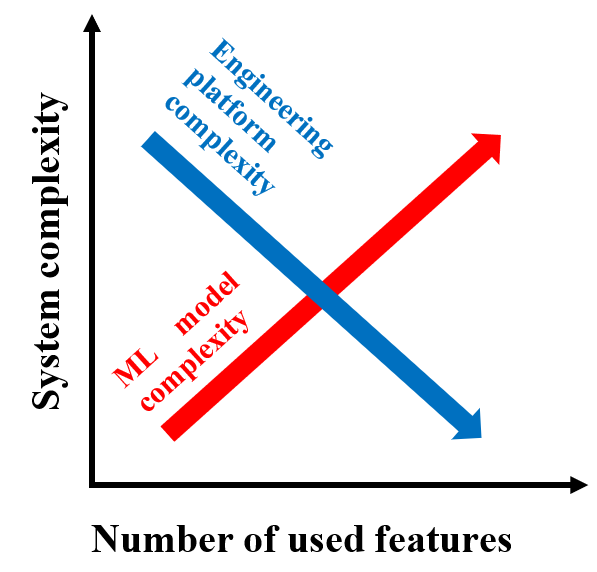

In [4]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAlUAAAI8CAYAAADY/V4gAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAJKhSURBVHhe7d0HmFTV+Qbwj9iw0LGAgEqVoouCDSEKKiBYI12jGFQEjQUJ+AdrDEawJUaqqFhpGkmiCBJBA6IiKKiAUhURFekgio3/vHfOgbt3752d2b1zzr0z7+95hp17d3Z22s68fOfc75TZnSBEREREVCq/UV+JiIiIqBQYqoiIiIhCwFBFREREFAKGKiIiIqIQMFQRERERhYChioiIiCgEDFVEREREIWCoIiIiIgoBQxURERFRCBiqiIiIiELAUEVEREQUAoYqIiIiohAwVBERERGFgKHKoDfeeEMWLlyotoiIiCiXlNmdoM5TlrVu3Vq2bNkiH3zwgdpDREREuYKVKkNQpdKVKlariIiIcg9DlSF33323Oidy5ZVXqnNERESUKxiqDNBVKo3VKiIiotzDUGWAu0qlsVpFRESUWxiqssxbpdJYrSIiIsotDFVZ5lel0litIiIiyh0MVVkUVKXSWK0iIiLKHQxVWZSqSqWxWkVERJQbGKqypLgqlcZqFRERUW5gqMqSdKpUGqtVRERE8cdQlQXpVqk0VquIiIjij6EqCzKpUmmsVhEREcUbQ1XIMq1SaaxWERERxRtDVchKUqXSWK0iIiKKL4aqEJW0SqWxWkVERBRfDFUhKk2VSmO1ioiIKJ7K7E5Q5ylLypQpo84VxoeeiIgod7BSRURERBQChioiIiKiEDBUEREREYWAoYqIiIgoBAxVRBbMXrVVnSMiolzBUEVkwczlW+Tu6Z+rLSIiygVsqWAAWyqQn/PHfizlDthHnv99Q7WHiIjijJUqIksQqMa/v94JV0REFH8MVUQWvPTRBidQwcuLN8qZjy6SlRu+d7aJiCieOPxnAIf/yA2B6vLnPpEdu35Re5LqHXqgvHrNcVKn6oFqDxERxQkrVUQGoRrlF6igfNl95dwxH7FiRUQUUwxVRIYgLCE0+QWq7iceJvP7nSgNDjtImj6wwKlmERFRvDBUERmgA9Xyb4tWoc5rXGXPEYD/uaqJnFm3olPNYrAiIooXhioiA26asjIwUCFIubmDFXtZERHFB0MVUZahZQKO8PPCxPS/XVRHbRWGYIWWC3dN+4zBiogoJhiqiLLomknLAgNVcUf6oYoFCFa3/Gulc56IiKKLoYooS1Bheuztr9RWYY93a1AkUCE4PfzmWrUlcupR5Z2vhxywj7SsXcE5T0RE0cU+VQawT1X+QaBChckLAalZjXKy7Nud0rtFdalZ8QDZ+sPP8tyC9VKt/P6F5lehyoVQdlf7o+XOdkepvUREFFUMVQYwVOUXHLX3uycWq629EKievvRYufi4qlL/3nmFJq77TVivfufbTvBioCIiigcO/xGVEobtdPsD3S3dT//WNZ1ABX1Or+58hWY1yxUJVKh0IWgxUBERxQcrVQawUpX7cITfp+t3+rZNAO8QHuZO9ZuyMnDCOvpacbkaIqJ4YaWKKASoNJ2vjtbzuvq0akUqTu+t2Z7yCEAGKiKi+GGoIgrJgxfWcSpSbhjCG9OlvtpKQhXqjRVbfI8AJCKi+GKoIgoRKlIIVpiUDnoOldvQmV/I8E71pFWabRJwFCAXWSYiij6GKqKQIVjhKD8EK7/1+1C58gtbqXCRZSKi6GOoIsoChCYEKwzzYRJ7Semhwh27fuEiy0REEcdQRZQlCFYL+zdzjgo889FFgUN42P/Eu1+rrcLcCzHrYOXuuk5ERNHBlgoGsKVCfkNoOnfMR/LVth/lzLoVpU29ilKh7L5OJ/WZy7c4+wefU6vIkKDfQszprBlIRER2MFQZwFBFCFa9JiyTN1duUXuS0Phz4uUNi4SkHs8slfHvr1dbRWG+FgLagDY1057wTkRE2cVQZQBDFWnu6pPf0jTgt24gQtTfL64rfzjlCJm9aqvcPGWlLPhie6Glb4iIyC6GKgMYqsgNVagGhx3kuwRNUKDyBicsjfPQG8m5VViIed3dpznniYjIHoYqAxiqKB04ss9vIWbvEjd6jpZ7SZzdD5+hzhERkS08+o/IIn1EYNBCzN5ABV2fXhq4xiAREdnDUEVk0bML1kv9e+c5FSq0THDzWzMQc7Iwl8oNc7OIiMg+hioiixCaLm12uDNvys1vzcCgFgt/u6iO2iIiIpsYqogS0HzTVrdyBCu9rA2gzYL3qEBMYPcGKlx+6Pm12bOKiCgiOFHdAE5Uj4fqd74tf2pTU24+o4baY5aeV/Xnc48udBvSPSIQdDhEQ1E4o04F6Xt6dQYvIiIDGKoMYKiKPvR++u0/Fjrn/SaHm4KJ65hnpX+/X6CChy6qUyT8+Q0PAgJY/9Y1rd0nIqJ8wVBlAENVtPm1KOh3Zg158EJ7c5WumbRM3l+7o8ikdPALfVgPsN+UlWprL8zNQh8rLMqMuVsMVkRE2cM5VZTX/AIVLPhihzpnx8A2NeWQ/QtPXgeEPb9g9NyCwkvaoDqF8IW5WZjwjvUCUfFCRY6IiLKDoYry2k1TVvr2fFq3bZc0f+h9Z0gN85RMwxyoN64vKNQuAeeDqmfeihbmZfmFr14TPt3TG4uIiMLFUEV5y28OEobKUOG59axaziRvDJshiGBukw2oNOlglap1Am63htvvnW81dOYXzlcESFTmgoIV9iNMlrn5Tad/FitbRETpY6iivIQ5S95AhSGziVc0cio8WLgYVaHzVaBJZ+gM85qy0ZYBwQpBCRPYg6ANg/7qrVDhNj329ldqKxmsWv1joe9tReVOV71wudunFp0kT0RE/hiqKO+g6uQOGaBbFLSqXUHtScJ+7Zn536hz/i5IBDC0RMjGcCGCkjss4Xec+egip6qEk3ZijUPUuSTdpsENRw5u3/WLDJmxRu3Za/sPhbu67/ix8DYREQVjqKK8kknPJ3BXs3A0XipvrtzqLDWT7eFCBCr8jjdXbnGqShimxG3HMOGy9XuH9XSgci9/gw7sGBrE/Z14eUPnuty39cLjCi95oyt1RERUPLZUMIAtFaIBIQNr7Hn5tSgADBG6K1oILd5O5xrmIjV9YEGhABN0vaXlvV27Hz5DnUvOE/t0/U4pX3Zf33YMfv2t0PT0zLoV5fnfN3S2EbTe+XybnHpUeWcYlIiI0sNKFeUFv2EwCAo+CBbeIcL6h/p3JddtGbwLIs/3CTWlgfvgN68LQUpD6EM/qnVbd6k9SbrFgjdQ4X6i+/r499fvuR4EKbRhYKAiIsoMK1UGsFJlF4JIB5/Qg0nd8/udqLb28hs2QyhZ2L9ZkeVedKDytmVIVdUqiR7PLHWCD+BIP70MjYbfh6MD3bcP92Pzzp+d8xgi9N52v/t5Rp2K8ni3+lzWhoioBFipopyG0IP5R36BatsPycDh5hc0oPuJh/kGjV4TlhUJVJi3lKr9QUksU78D1927RXUn/Lhh7pe3VQLmWaHahJNfGLzuheVF7me5svswUBERlRBDFeWcD7/6zvmaqoqEChX2u4fTMBTmF6gQZDAc5oXhMkwWd8Nl0b087GCiu6ujfxaGK9EYFMN5brg/qXpQafpx8at2uatrxV0PEREVxlBFOefI8vvLjS+tcHoxpaoioVqFKhYmfiMg+VW0dEjywnAcqkNuGJbLRqCChy9O3uYvtuydK4Vw5ResUD1LxS9o4rHwDlfietj8k4gofQxVlHOqHLyfs0xL22Mrqz1J3irS4HNqOdUaTEj3BiRA0PALSWhBoOc3aZhzNbxTvawNnZ1w5CEy6YpGMnruukIVJL9gheoZqm5+EB79gibaK3ihRxXmomFIlIiIisdQRTmpQtl9ZfgldWXQ2bWcbYQeb0DCnCP0a0J4ctNL1WCI0C9QZdLnKkydmx7qdHm/8InFxQYrtETwQqDyhseg4Up0h0dLBlTuMCTKYEVEVDwe/WcAj/6z55dfd8vQmWvk46927unD5AfDXKjgIGS08nRV1xAs/Ppc+fV+yqYpH22Uv77+uTxwQZ1CtxVr9ekqVL8zazgBDOELgcnb2wqCwmDQZP3//bFp4GNDREQMVUYwVNmFh3nMO1/J4YfsJxeVsJoUFDRQIXL3udKNM6FcIrTg92UjiOB33PjPFVJw5CFOk07MtdIVNN3+ATAvat22XUWG/DINVJjEjsumCp1ERPmOocoAhqpoWJsIHjUqHqC20hcUNHQ1SMOQWb8pK9VWMrjgZ9CO4Z5zjw59vtW3O36SP7/2uYyb9/We24ahTMwV02FJH+nnDVWPd2tQpLknLuvtCg8YDq1e4QCnUzu+5/0dRESUxFBlAENV/CBIHV/tYFm37UfnqEBvKPG2HwAsbOxeGgbDZdUTgeSmRNBCIBl6fu2sBRF9e4OCm3s+lbe6BkHhy30/3ZcxNY+MiChOOFGdyAcCCgLEb33aMvgFKkDXcrdWtZNdzNHCAdcx8D+rnGCSDQg3qSphuL243ZBuoEKDUff9xPVXL5+s9KFi9fc3v3TOExFREkMVkQ8ECBwV5z0yEHOK/AIVYCjw6tOqOT+DyeteCC1DZ36htszD7cbtwzClGypp3kCF+4nlatxw5KO72SlaLhAR0V6xGP5r3769TJs2TW3FD4f/4k0PnWFu0ew/Nt1TEUKF582VW2Xx199J4yMODpzEfeaji/aEEVxm2aCTnfM2IVhd0LiKE6j0sKCG2+hts4DhRe+Rj6hkobM7ERElxSJUIZSMGjVKevfurfbEC0NV/CFYoVGoXoAZoeSOVz/zndSNSlXzxOmyZocVCS2Yi7T9vpZqyx6/fluA2zc1Eajc4TBoor7fZHcionwWm1AFffr0kf79+0vt2rWd7bhgqMoNt/xrpdMiAZPP/Y6SQ4XnzLrJhY6Xrf9eFqxNNs90i1J1xxsM/Safo38Xuqp774f3yEciIopZqNIQrlC1KiiIx9ADQ1VuQS8qHBHo5j2iLqjzursKpIcPvdCDCqFs2bc7ZeIVjbLaF8pdhfI2MQ2awB40UZ+IKN/FJlQhSPXo0UPWrl0rU6ZMkYkTJ0rz5s3llltukXPOOUeqVEke2RRFDFW5BdUbHBWoeYf0gobW/vmHxoWqQEGhBfyqRtmCYHXdC8sLBbhMAxUu/+/FG2XpNzud7YaHH+TM2Up1RCIRUa6JTajasGFDoeC0atUqeeGFF2TMmDGyadMm6datW2SrVwxVpYfqED780QcKc5sQOjDUhjk9NnoleYOTnl8UNP/IrzcUYEjxoTcKH40H3gCWbQhFH371nfM7gwKV3wR2wBI4WGDae5/xHPVvXdP3fhMR5aJYhKphw4bJgAED1FZRU6dOlUceeUSmT5++p3qFkBUVDFUlhw94LLXiPpQf8IHd4LCDnKaatj64ddDDbUAAwST17YlgkW6gyjSAmeBeP9DNL1AFhS9M1L+02WHOotb3vb4mcf5wBisiyguxCFXpQrjq2LGjc75SpUrOkGGvXr2sT2xnqCqZoA9tDEGhoSY+4PXSMDaDiOYXSNAXakyXwv2eIChQgc05S3jM/Y5YxFqC6QQq7wR2XcXy/jwRUS7Kieafc+bMcXpZ6UAFmzdvlnvvvVfq1KnjfG/ChAnqOxQXXZ9e6huoEDj0B/S2H5Kh5IFZXzgf9Db53Va/QIXb6ReosEYgwiECDVo4+MF8LgwZIqzgK7bDhMcVjy9uu4a5Xd5AdPurn/kGSO8RgRiqxf3EfCsiolwXi1CF0OQHQemkk06SVq1aOUN/QfC97t27S+XKlaVv376B10fRgTlL7nX0wLtsCsIJwhTgg/vZBeud87a4u6/jfNCEblR4vIEKIeb53zd0qm0IVm+s2FIkJOIxwQR5zMF67O2vnK/Y7vHMUnWJ8OC2I+Rh2M87twtVNlSf3HA5hEF8T8N57AM9gZ2IKJfFIlQhNG3cuPd/ughTdevWdYLS/Pnz1d5gqFaNHz9eRowYIe+9955zffh5zNXChHeKntFz16lzSRiC8i6bMuKtdYXCyZdbd6lzdky8vKETLmDbDz87IchNB6qg6puGYIXhMkwcxyLN+Dm/IwrxmKANAr5i6NEbwkoLIQ/zobzVMMwlc8Pvx3yr4Z3qORU43FbcFpzXjqyQXDOQiCiXxebov65duzrhCK0UVq5cqb6TWrt27aRnz55FJq0jSM2YMUPGjh3rhLJBgwZJv379staWgXOqMoMKh3dJFL85U94j50wfMRcEt3/zzp+dgNXK1WPKvVyN5jcBXMP16GDirWwhyOiWC3oZHW84y5bqd77tDOtp7udG3+Zyidvnvsz//tg0q/22iIiiIDahKhMIU7fddpu0bFn8ciAYCrz55pud81hfMBvBiqEqM37NNVcMPrlI8EA1BJOqMVR2jc98nijBHCgM2bmlClSanojvpRt1eoPl7ofPUOeyp8zNb6pzSd7nxluRMxX2iIhsy6lQVdJlbDC0WLVqVefnMUQYNoaqzHhDFeYn6TX30oEPdd2pvNJB+0aielXu1jmFqk2oNBV3RJyu+nirVO7KkDd0mQhV3kqV3+/UwQqX013ksQ9Dtgu+2CE7fvxFDtl/n8Rze4j0Pb16yseBiCguYh+qSto6AUOADzzwgPMVoQrDgLguNBING0NVZrwdy9MNVQghf3/zyyJDbOgf9ac2NQstwWKau7rjHroLggDit74geIdCEayeW7Bezm9cpcgQaTZgYrx7onpQkMN90A1FUVEb8/ZXvvcnnceDiCgOYhuqEIBuvfVWJ0yVZMgORw36TXLPxsPBUJU5TNDWR/9hmGzZoJOd80H8JnIDAlX1CgdYbRIK7vlUfvPD3HSVx29CO2D+lM05St7AV9z90XO+3PCc3npWrUJd6N3rIhIRxVHs+lQhTOFIPlSU0GW9pHOg/AIVurFTNDysjmoDhAvvkXRuQYEKIWR2InygyoVKCC7jPXLNlBvPOHLP/dFHKSKceKUKVJiXhBOWxLEZPjBUh8cTgRXQ1gLPASqMCEjuxxhVLW+gwn1BSEagAlSoENCGzUy2xyAiiqtYVarCPEoPDUG9va1eeeUV6dChg9oKDytVJYMP6CEz1uypWOHDWH+Q66aafpPaQYcQN8wFgnV3n+Z8NQ2hA8FBz0c6scYhRZqD+h0hmOmcMlMQAIcm7g8OFEAIRPUJSwchJCEw+T03fnPJ9OXw3Np6boiIwhCbUDV06NCU6/9lCvOobr/9dmdOVcWKFeX6669P62jBkmCoKh2Eq1eX7p3rdupR5fdUOdzDhJpfoHLP04pK6wWvoGGy4o4QjCrvsj0IVGgoihCmq23eypyJifZERNkSi1CFJp0lnTsVBQxV2YGw5e1n5ReowB2+8IGuQ5lNCBQ6LGUSqPBz6B4/a/kW5yg6qJ+4bJ/Tq0dmTpLfc6PbQGCoEEOGGEJ0H1jgnTuHIByV+0NElI5YzKkaOHCg0/IgE1iOBmHM3YmdcsucxIeum3cZGw2BxVvNigIEI9w2DPl5AxWqOkPPr10kUOFIP0wSx/wwhBHcL5xwNB4qcanmnpnkfW4QmPTRl5jUjoMGMDndPdR5Zt2K6lzS7VM/c+4vEVFc5MSCyn7uuecemTx5stSrV08WLVqk9lIu2e46PB8f2t5lbAAhw68C5GbrgxvhonnNcrJgbeHAh0Dl12IA9wU9qbxtCTDnCtU3VIL0pHHb3M8NeAMT7jvuo568j68D29R0zmvlyu7j3N+oBEUiouLkbKjCUCGWtNm8ebO0bt2awSrH+VV18GHsPSoQAcQ7pDRz+ZasLEqcDm+4gL9fXNc3UAUd4YhJ7BjORCUIFSAEKwyd2dTw8IPUuWC4j/q+43a7nz/cXx2Gcb/R54qIKOpyNlTB9u3JCgCC1V//+lfnPOUOTFgHBKV0Qwi6d3uhhxWGzzAUZ4M7XGAI0zvfC3OoEJS8EKi8w51o14BK1si3Ci9IbRoCnjso+jX9BNx3HA3o7nOFowG9zx2W4rEdFImIihOZiepocRBEtz7Amn6ZmDdvnhOoNFt3lRPVswcT0MHdciAoUOHIs+d/31BtJXkniCPUYBjRW/UyAeGp14RlRX6/37qBfoEKP9/qHwudlg1RaMPgXkIHAau4ZXkAE9yLW5qHiCiqIhOqpk6dKjfccIOsXJm9Mj9DVe5B9aLDmI+cwITKFT6U3SFJ8wsh3uVWIN0P/2xBMNJLu2je1gR+9wXcATEqva0QrO549TMnJKEPFW47hgaXfrNTzm1YudD9DApUmANXvfwBsm7bLudxwH27tNlhvssOIVCjqofr6HdmjUgvsk1EuSdSLRVwpN5DDz0k9957r9oTnjp16siKFSvUllkMVdmFYIXmke7goSEkIXB5m2wGVbPwAV6+7L5OY053Pyyb3OsG4vb5LdnjrWZFJVQBgqJeSBnqH3ZgkUDlrrK56ecPz0XyOvZO6tctGjS8DtxrRkJUe5IRUW6KZJ+qCRMmOC0R3EN3pRV289BMMFSZgaA0P/Ghiw/mQ/bfJxEsDpGLEh+orTwT0/0Clf7wRhVl7ZZdexb/DaoKmaRDVVAVze/+eKs0CBzo5v63RBCxVYULgkDltzQPAqS7T5d7OBGuPq1aobDs1xsrKj3JiCg/RLb5J47Ww1F7YQQrrOk3bdo0a81DGaqiw++DF7xzdtxBxW8ulknlbp3jBDy/eUVBAdEvfGEYEaLUoT0oUGFu2xvXF6itJD3Ui8dC38fbX/1M7jn36D33xz1U6g1lRETZFtmj/woKCmTWrFnOAsolhSG/Pn36WA1UFB16zo6XX1jBEYGad96VaQh1ULPiAc5XzS9QwTWnVSsSJHBZhA2cEGIQZmxC1QlH+QVVqPx6jqHiODURklCF06ERaw1i2BDPLSBE4fs4MVARkWmRrVRpmMDesWNH53xcKzusVNkXNAnaO4QEfgsB21yTTs83QrjSQ3ro24Q2A15+w5XeYTOwvXhx0PORaXVJLz+EypVfw1QiIpMiH6pg9OjRcu211zJUUcYQPtDdG9Um7we4XwDx+7DHBzYacgI+9FtZWI8Ot+u6F5Y7twW3zTuhG9K9PxCFFgXeAwxw31CJSvfx9bbDwM//+dyjfY8KJCIyIRahChCsevfurbbihaHKnqA5O5kEEAQpHBG4busuJ8xg+9azahmfAI37ctOUlUVaRgTdnqD7g/uOShXuy/YffnEm9KMpqo2hMvfz4z2aLxW/Sh2rVURkW2xCVWkh2Ni6qwxV9rmrGggh3rYE6YYvLH6sFwG2eWQZhijhjDoVfMMQ7g8WXvYGKsB9KpcIIP9JPB76+3hMbM1Bwm3t+vTSwN5TXkGT892BCoGS4YqITMvpZWq0OXPmqHOUrxCMECYAVR23dAMVoKqj3TZ1tTpnHsIcTkGBCvfHr+L2vz82de4TjmZ0L3KM+/7mSjvLwOA+pNtTC/PD/Cbne9dL/GzTD04AxmNBRGRKJCpV6Es1btw453zPnj2lW7duznkt1RI26dDL3LBSRXphXncPJ2/HcvBrnulX/bE5gd1PqoDo7VHlHkLDcODsROBat+1HK3PG0pHJ/DA9Od9mBY6I8o/1UDVs2DAZOHCg2kryNuoMCiWZYqgiQPD49+KNcnTlss4w2ss+c5S8H8R+YQVDTtvva6m27MKk7+qJYOQXqFIFC3Rix9yqAW1qOmEK2+A9ItK2TAKVN/zi/mOoFvePiCibrIeqypUrF2nwid5UmzZtUlsMVRQ+VDL0mnRuQQFEH7rv5teOwRbvkXBappUaXb3yG/o0DeEItxuBsetTS4oc8eh3G4MqdbYbuBJRfrAeqtIJHAxVlA3e6kfQ0WN+gQVhxW+yu3cxZJO86//h/mSyOLT38UBosbmsDSakYzI9GrF6w28mgQqPg26g6l1zkIgoTNYnqnft2lWd26tdu3bqHOWK/v9aKQ/M+kJtRQM+XBGi8KEL3snO4BeoMP8I1R8vhI8hM9bsOTLPNFTNMBym4b6VNFAB7vezC+x1k8ew3vmJ8OQNVJjv5ldF6zVhWZFAhecKgQrXgV5lWKIIVUcEMCKisFkPVcOHD3fW5tNw/rnnnlNblAvue32NPPjGWvnTv1fJ/71s74g5PwhRqOag8oSTG4bCvIEKAWx4p3opwwoaWqLKYgOCiA5W6VZkEDAG/mdVkfCCQPLl1l3OUCmG4GzA/fnnHxrvCb54jiZeXnQYD+FXt7rQcFlMvkfYxNAfQiZgGBcVLSKisEXi6D/AAsrbt2+Xli2LTvzF8Nn48eOLHBWYLhxd2L17dw7/WYDhKD35Wbvq1GryWNdoTYRGsEBLAd13Kp1eSF7en7HZtRyVJ7QVKK7vU9CQGQIJ1tWDN1ZscQKXzXlJupKG2+Cdx9bjmaVF1mfEc+Ud+vQu12OzzxjlgbvuEtma+M9IBXWAxNGqiqy/VqxY+EQ5ITKhKhWEktLezDCuo6TyNVThgxDDLX4uSgSTyT0byb6/CWe+XFhQ8cAcHm/IgFQfwkEhLJNlV2zwm4CPQOWeL+ZeC9FvLpMpeD3htrh/f7rh1294k6GKsuqzxOvyhBNEthSuoKbkDVr6BEep/6D5fc8b2MiaWISquMvHUIXhojbDF8nPvwbfR4SNSVc0kiPK76/2RIPfPKpUVaeg8Ihwggab6F6OEBm1cBU0Ad97tKD3/mE4Lt2hxWxAsPpiyy5naNI9MR/8AlVQNQ6NUKP2nFCOWbgwGaxMQahaHa0pFvkmLzqqA/phkRlLvt4pXZ5akjJQgRO8RiySxYnLRwkqIfpoMUDrhFSBChUQL0ymRqBCZQQtCn77j4XW5ln5STUB3ztfDPOt3Dbv/FmdswPVpflfbC8SqKB/65ppBSo8vwxUlHVNm4rMmqU2DNCVK7ImFqGqtB3VsUyNt8EoZcf6HT8lAtVi+drTUyjI0m92SuvhC4tMMrYNc4f0hO+gXlQIhd4hJUAIQzd2PUFaXw+GqYo7MhDXma3whd+Nk1+gQoXHbwI+LusNJJUO2ledswfBt9+ZheeL+VUTsaag9/Yj8LJnFRlz5pkiTz6pNrKMocq6WIQqLDODiewlgUB1wQUXqC3Kpl9+3S1dxi3JuPL0bSKItRn+oby46Fu1JxrwAY0Par+QgwoI5hl5AxXmHHlDWM2KB6hzIk+/94065w/Vk+cWfLNnOZ0wYfFlHInpF6j8JuD7hS/AUGCZm9+UcrfOcS6Dap0NWGpIB9Yz6lQsEqhw2/zmi/kdPUiUVT17itx0k9qgXBab4b/Ro0erc+nZuHGjDB48WFq1alWkYztlB4b8Slpx+nX3bumUCGRjfIZ0bMIHtffDOmhICYHKbxL3O59vU+dEFqwt/CHvhetG53AMGSIUhAlVKAzv4Xa6+fXnCmongflUWO9wxeCTneFNXAYhC0fW2YDn5qGL9q7jqPkFwqDhTYRmrP+IoIgTzkdpqJZyxMMPJ8NVNnGiunWxOfoP0m2rgBYKffv2LRKmbN3VfJio3nvSstAC0ZCOx8igs2uprehJ54g5DcN5HRIBTFe0EExSrRfove6goFZaOnT4tUlAoEj3iDo9gR3fz6R7e9gQRrEYNIIubpdfIPSrxvm1Y9D8Ju0TlVrr1iJvvKE2QobQZmqokXzFaqI6ek2h+hQEQ31169Z1LsfqlDmDXlkdaoVpcOL63P2EoiRoSAkfvn68Q4S695Mfv+tGewcEhrAhqGHul5dfoAK/QDJ54d7hWtxH9PmyBcFnw3c/yY0vrUg7UGF+mV+gwuOCdgvo5o6KZDYef8pjL72UvblPnFNlXWxC1dChQ51K1cSJE+Wkk04qNMcKYQqT2THUt3JlND+McxWGqf763zVqKzwYTrri+aJH1dnkN6QEQdUMXN47RIgPaj9+153tSgnmfp1dv9Ke0IAKj99SQpi35A0kCF9BFR5bcBt1d3y3P59b9PbDf5cV/o8XwheGEvG44AhDzNkqX3ZfGTozWssrUYzpFguZ9K7KhG40StbEJlQNGDDAGfp79913nVDVtGlTZ54VhvkQpjCZnczCpOtsTKjWcP0dx3wkO3/8Ve2xByHCrwICQYHKe3nM6fHOz4Kg+UtDz6+d9aEnhAes71f9zredoTzvxHu/I+oQeL3VLNy3KDTSxOOFIKqDFapOQV3ll3kCL9oxeC+7TvXC4hwrKjUEKgz9oSlotrBSZV0sQpV77lGVKlXknnvucRZdvvbaa2XkyJHqO2TSK0s2GqkkTV26yelltWbzD2qPeanmGOHwfO8k7aCK1l86HKPO7YXrRrXPLWi4KlsQmtBOQYdEDfOtvIEK1aw7Xi36oeB332zRwQpHBB5ZYe+Rl171XRUttGfw3leEXRw0AHj+GayoxDCHCoEqWxUqjaHKuliEKkz0XrUq2YAQTTzr1auXVmUKwWv27NnOicLz7ufbnSP9THn3822JYPWhfPDlDrUn+zDBHOEIE5n95hjpISVUaEa+tc6Zn4NwhSPH/AIVKj7eSo5fxQdMBioNvw+/VwcrBBLvBHYEKr++XH73zTYEqzeuL5DyZQsHRTcMfQKeQwz1ueG+uucJ4nHBc4XXBFFG/va3xB/YxclAFXDQUmgYqqyLzdF/Xbt2lfnz56c1Z6pOnTryyCOPSIcOHdSeZAPRadOmqS2zcunovxUbvpdLnlwiH64zF3C0CokPyMk9G8s5DZIfhtmWKkToqob36D4/fkNo6Vy3Dbg/mFzf5/TqhYbCMO+q6QMLitze87J0dGI2IMTeP/OLPdUnDBFizhuqjWjWqvk9N5hrNXP5FufAgWzOc6Mcg0B1881qwwBMgr/oIrVBNsSqpUK6XnnllUKBCjCZvWXL4EPZsynXWips/A5d05cmPmTsHGGJCop7GZlswgfsdS8s3/NBjGEiv6qG+zIaPqwHn1OrSNUpqoFKQ4Aa8da6PfcT25n05YoihEUsFaTp51E/dxj+xPOEiiOOIHQ/N6hS6TYYeCwYqKhYqErdfXcyVJmEJXHQwZ2syYlQValSJbn11lulV69e8vjjjztL0gwaNEj69evnzMECXIetu5proUrDEKD7sHqT/nFJPbm+ZXW1lV06VOCDdt3dp6m9RaESgmV3sIByy9oVfIfwcF2tEh/u3gDm1y/KNswp2p64zxjO9N5eDA9ieC0uEJZQgdNQedKVuKCQq0Ul7FJMIFChOjVunNph0AcfJNcbJGtiH6r69Okj/fv3l9q1a6s94rRbuOSSS5ywdXfifwsff/yxE7QYqsLXN/G/fMwpsgEfdPjAMwFhCOvI+VWe0hXHio+NVg9hwuTybT/8LDUqHlCo95n3YAA8N2id4A6QmGv1pzZFjwgkCoRAdeWVIlOmqB2GrV7NruqWxTZUYRI6elcVFPj/bxnL1Fx66aWFJrQzVGXH7VNXy19mhN+rKh3Xtawuj15ST21l1+qN38uUjzeW6EM2KFB5Kz76w/2NFVv2XBYhBkvCDEx8wNsIMu5ghaAx+49NYxGoUGnzHlnphmCFAw4YmigUaJWACelonWALQ5V1seqoDpiEjqP5MOk8KFABhv1wGVSyKLvu6XCM/O3iumrLrOFz1kn3p5eqrew6psqBGX0AIyBhaAlfb5qyskigQlh6vNvexZcxfIjJ4OiL5L3s+2t3WOvujSqargiichOXOUUYugQ8zv9LBEEM+SEUahjuQ/WKrRKo1HQPKpuBChiorItVpQoBCT2q9DypdOHIP1SsWKnKrucWrJfLnjUTcLxwePzkno2k4oH7qj3RENSzyjuE5tcLCwEA/Z90uwK0d0DDSveRaibhNuLot6jN/Qrytze/lJunrHAagKJLOgRVDDlvikoMPah0ywTbcuwzJY5iU6lCoBoxYkTGgQpuuOEGdY6y6dJmh8mrvY9zJmqbhiVH0CQULR+iBFUe75GKGHbC2nI6UGEStTdQIXRhmM3d/wk/h7UBUf2yAaHjnnPj8z/hm844UrqccJhT5dPwmLs7rmtYngdHCBJlBHOnohKoWKWKhNiEKkxGLylvewXKnvbHVpaZ1xXI0ZXLqj3mfJD48GwzfJG889k2tScaUNlxT6jHBOlWtZNrdKFyctvU1c55Nyy87B1m0xWvORY//OMy9KeNuKSu09/MPcTnF6wwFDiMa/xRJtAuAZPSoxCogI0/IyE2y9S4j+4riVwbaouy5jXLycy+Bc5X077YssupWL2yZJPaEw3uIxXdRw9i3T1vuwJ9uTMfXbRnDhWGEfXl9FwhKl6Vg/eTCZc3lPfXbvcNVu45Vt7ngSjQXXcl2yZEJVBRZMRuojrFwzFVyjoVq/YNK6s95nz/069y3mMfyVPvfa32RAOCFYb9MCFd+49nvhWOBsTlMGxYruw+zvwf74LLpx5VXp1LHuFmY/J6nBx6yP7yVI9jnXlU10xapvYmgxWOqtTcAYvIl26ZgMaeUcNKVSTEMlShDxXWAOzWrZszCd2rb9++e9YKJHswtwrVAMy1sqHn85+mPKTeBsyRch9BiDlSbjeecaQ6l5yPhQ99933AB797nlX5svs6zURtzbOKCxzA8GT3BlK7yoFS/c63nXCFif861GK+2oA2NZ3zRL50oDLZ1FMf5ITA9OSTIg8/nNz2w1AVCbEKVQhKCFFNmzZ1mnlOnDjRd2Hl3r17O2sFjh49Wu0hm569rKHc+Fs7vYBQyRn0StE5S1HlbSyKo9bc87F6tyjaRR7DVugIzmCV2n77lJFbz6op//xDE+cxQy8wBP/zGleRqYnwr+e5ERWhA5Xppp6YtqIDVc+eIjfdlPzqh6EqEmLRUgFQnWrdurVs3lx0vTm/u4Dmn6eccoo0b95chg8fXqKjBsOSLy0VinPPa5/LHa8WPsrNlKtPrSZjuu7tCRUVmDf15sq98zJ2P3yGOlcY5gPN/2J7kc7rqLigrxWwmSVRFqD3FI7wQ3NP03Sg8i6SjNvjDXgIXKkqWWRELCpVCEhYdsYvUAVBiHrkkUecatbtt9+u9pJNt7c9SkZ0MtP93Ouxd76SS55cLL/8Gq0ge+FxhcN+0GH9ep6Vl7tdAJtZEoXMZqDCGn5Yy88bqOCll7hwckTFIlS98MILsnLl3nW70qVbKYwcOVLmzJnjnCe7+pxeXSZd0UhtmfXPDzc4Rwau3/GT2mMfqkoYftJun5rZm7d3ThY6h5cvuw8nrxOVFpp6oku6rUA1a1bq3lMIVu7Fkytw+DoKYhGqxo4d6yyOjLX+sEQNhs30KV2PPvqoOke2dW56qLze93jncHfT/rdyq9PLasnXO9Ue+1CB6ndmDWf4DkOBmEiNFgoYGnQfreaFpqFu6LvUqnYFJ6iNeGudcx1EVALoQWWrqScqUAhUxc2RwvfdwYvNPyMhFqFq/vz58u9//1sGDBggLVu2VHuLN3XqVHVO5LXXXlPnKAra1Kvk9LKq7+lsbcLir79zKlb/c81lsu3BC+vIwv7NnPXpULlqU6+i3NPh6D3Lq/h55/PCTU7dfcHQywptGFIFK0xsR4Arc/ObToAjogQEKvShshGoMC8KFah0J53rYJXu5SnrYrP2X9DNDPoe5mHhSEEEMs3WXeVE9WBfbt0lXZ5aInNXm++Cvs9vyjjrBXqPuIuL5g+9X2j4r1kiVB2y/z6yYO12pyM72i9s/yHZKBQLN3u7oSNQuRteolqGcEeUt9DQE6HKhtJMNMfcLwxT+s2/IqNiUamqU6eOTJgwQW0VT7decAcqiqYjKxzgVKwuaGI+2GDS+u+eWLzn6LmoSTUvCkN/3vlUqPpdftLhsv2+ls6iyxhWfOP6At9ABd7O7OzUTnlLt0ywEagwFwphqjRH7mFuFQNVJMSiUoVmnphsjjlVnTp1KrRkjbtShbYLkyZNci7rPVIQrRXee+89tWUWK1Xp+cP4T+XJeXa6oP/1vNpOD6Mo0W0UMBS4dssuJ/TgaL9P1+90qlDoEK5he93dp6ktf+jZ1bJ2hT2VOTS/HP/+euc85nNhTcK4Vu2ISsxWDyrAsB3CVFDvKYqdWIQqHLnXqlUrtSXOpPWTTz7ZOY/mnwhMxVWlBg0aJEOGDFFbZjFUpW/Af1bJ/ZYWtr2ldQ154IJoDX8hWN01LXn00dWnVZNzG1Z2gg8CkrvTOuZh+bVccEO7hg5jPpL+rWs6LRoA148h2N83P5zNLyn/2A5Ufj2oKNZi0/wTS9Kg51RJoSVDaRdlLimGqswMfX2N3PryarVl1hUnHS7jehyrtqIBE8rRMR3Depq3aSi6ruugFMTdKDSdyxPlNJs9qHCkHgIVe03lnFjMqQJ0RUdFqiTGjx9vLVBR5gaeVUvGWup+/tR73zhHzGFR5qhAZQpDc+6FmDEZ3Q1DhKmgIuWeO4bqV6p2DUQ5DYHKdg8qBqqcFJtQhQ7p06ZNyzhYIVChykXx0uvUajKlVxNnvTbT0IoAvawwjykqEKzQf0r3r0L3dA3zqVIN3aHSpYcQ3XCQAFHe0U09bfagYk+pnBWbUAUIVphsjqCEIwJT6dOnjzPkx0AVXxc2qeIcGYjQYBp6QLVOBKuFX+5dBiYK/nZRHVm3rXDYQyuFIHro0CvV8B+OOsTRhahksX8V5RR3U8+AaRlZg7lTmfSgoliKzZwqP2idsG7dOpk7d66zXatWLalRo0ZGDUJN4Jyq0vlk/U7p/OQS+fjr79QecyodtK+zrM7Z9SupPfYh9HR9eumelgpB/aX0xHR3VQsw4V03FcWQItYL9MMjAimnIFChD5UN6EF1550MVHkg1qEqLhiqSm/Ddz9J53FL5I0VFkr2CRMubyRdTzhUbUUDhgIxVPl4twbyh1OOUHuTELzOTQQqd9sF8DtKUF+PGwMV5QxUpe6+215TT4QpdGinvBCr4b/SCAo2FA9VD97PGQrsVGAn2HR7eokMn/Ol2ooGhCOEJO9yNZkEKgwPegMVoO0CAxXFHgKVrS7paOqJI/wYqPJKXoQq9Lmi+EMuxrIyvVtUU3vMuv7FFXL3dAtHC6WAkIQeU7r7Or72mrCsSKDCYsuYj+UWNN8KVarjqx+stohiSvegGjdO7TAIw3z4vWzqmXesD/9hOZlsQ4NQsHVXOfwXvtumrpYhM9aoLbP+2OpIeeR3ddVWNCAg4fFYt3VXofX8AIHq1WuOK7RUTdB8q+4nHuZ0ccd1cPiPYgutEhCocKSfaWzqmdeshyqTw3IMVbnlb29+KTdPWaG2zEL4eP73DdVWNOjKkzsooeq0sH+zQoGquOFB/X3whjGiyLPd1JMtE/IaQ5UBDFXZ88z8b3yHsExo26CyTOrZUCqU3Vftsc8dmPwmmxcXqDRc7sOvvnNaKzSvWY7d1ykeUJnSLRNMQ1NPtExgoMpreTNRnXIT5hNNveY4OXh/8y/l1z7d5DQJXbXxB7XHPlSVUF3CkF+Dww4qMnyHVgx+8628E9hxPfhZ9AhD41AsvkwUaVi/z1agYlNPUhiqKPawyPDM6wrkqEpl1R5z3l+7Q1oPXyjz1hReNsYmHawQiDB3SkMw0r2tND3fKogeShz//nqn9QJRJOHoPsyhQqAyOPrhwGR0NvUkhcN/BnD4zwxUjDqPW+wEHdMO3n8fmXRFQ+nQqIraEy0IV7/9x0K1leSErj82TTlnqvqdbxea+H5GnYryeLf6nGdF0YGWBehDZQObepJHJCpVWHYGASNbJ1w/5b7aVcrKrOuaStsG5ruff/fjL9LxsY+dOV5R5B3yw3yr4Z3qpQxHmPjuPZKweoX95aaADuxERumWCbYCFcLUww8zUFEhkahUmbgJpn6PH1aqzLv02aXy/IL1asushy6q4yx+HCWYeF53yDy1Jb5d2L0wXIhhPw1rDM7vd6LaIrJIByrMozIF7+N4z0aIQphiDyryYb1SZSpYMMDkl+cua+j0k7IBa+kNfmW12ooGVKTQBkI7o04FdS6Yd0mgS5vt/XnAkCKqWURG2QhUoAMVelAxUFEA65WqfMBKlT1/nv653DnNThf03i2qy6jO9dRWNFwzadme6hOODjy/cRXfdgkIS797YrHaSg4Xbr+v6ELl9e+dJ0PPr80moWQGek+1bm2nB5UOVGzqSSnENlRt3LhRli5dKnPnzlV7sNRSBWncuLG0bFn0zd8mhiq7Rry1Tq57YbnaMuuS46vK5Csbi/8rILq8Q39+6wZiSLHVPxbK9l2/OGsFspcVZZXNpp7sQUVpil2owjp+jz76qEycOFHt8de1a1e5/vrrIxGwGKrsm/jBeun2tJ1eS2fWrSiTrmgkhx6yn9oTfd6j/rzzxFDJGvifVc5lUO1CsBrQpqa0ql38sCJRxmw39UQPKk5IpzTEKlQNHjxY7r33XrWVnkGDBsmQIUPUlh0MVdHw+vIt0vnJxbL5+5/VHnOaVDvYCVYNDz9I7YmuVEN/mEc1bOYXTr8rDG+yOkVZh4WJb77ZTqBCU0/2oKIMxKb5Z0kCFeBn8LNEZ9Wr6DQJRcNL0z7+6jun+/ocVzPOqJq88Ft1LgmVNoQpNP/s+tQSZ9madXefxkBF2YemnugFZSNQ4fcyUFGGYlGpwpBfq1at1FbJzJ4929pQICtV0bJ2yy7pkggHb3+2Te0xZ799yjgVq4ssTuzGXKg3V251wmUrn+E679AfLofta06rJg9eWEftJcoyVKcQqmxAoELbBKIMxaJShTlUpRXGdVBuqFHxAKdihcnXpv30y265+InF8vi7X6s9ZiFQNX1ggfSa8Kl0GPNRoWVswNvwE0N/qFQt7N+MgYrM0C0TbAUqhCkGKiqhWFSqKleuLJs3b3bOV6pUSbp16yYFBQXOkX5B1q5dKx999JEzoX3lypXOz23atEl91yxWqqLryvGfyrh5dgLOfefVloFn1VRbZtzyr5Xy0Btr1VbRJqD6qD+EKfS1GtimJpekIXNs9KDC+zPeizHMx6aeVEqxCFU6lDRv3lymTZsmVapkVmHo27evjBw50lqIYaiKtv6JoPGgK2iY1L91Dbn/AnMVoLunfy53qb5dGNZbNuhk5zwqWENnfiEvL97oVPAYpsg4G4FKYw8qCkmsQhUqTrVr13bOZwI9rerVq8dKFQW67/U18n8vr1ZbZl158hHyRPcGaiv70LATawFefVo1OfWo8vLfZZtl/hfbnWE+himywmYPKgQqTEjHkX5EpRSLOVWoUEFJApXWtm1bdS7YsGHD1DnKN7eeVUse62ou2Lg9Oe9ruWDsx7LrZzMh+9VrjnMC1ftrd8jT733jdFZHxWpMl/oMVGQeApWtLunoQfXBBwxUFJpYVKp0O4VRo0ZJ79691d70ISy1aNGi2KP/UFHKxsPBSlV8vPThBufIwJ9/Nf/ctDimgky6oqEcWeEAtYcox7GpJ+WYWFSq0LyzT58+cu2118ro0aPV3vRMmDDB+VpcoELbBqKLj6/qHBl4eDnz3c/nrt7q9LJa9OUOtYcoh+HoPh2oAv7jmTWYO8VARVkQi0pV+/btna/Tp093vmI4MN3J6viZdu3aqa1g8+bNc44wZKWKYMnX30mXp5bK4sRX0yoftK9M7tlY2tTjGz7lKAQq9KGyAT2o7ryTgYqyIlYT1U1gqCJt/Y4fnWD15goLQxMJE69oJF2aHqq2iHKEzaaeCFN33aU2iMLHUOXBUEVumFrVedxi+eeHG9Qes0Z0qid9Tq+utohiDMN8CFRYy8+0ChWSQY49qCjLGKo8GKrIT+9Jy2TM21+pLbP+fO7RcntbrrNHMcYeVJQnGKo8GKooyKBXVstf/7tGbZl1w2+PlL9fXFdtEcUIWiUgUOFIP9MYqMgwhioPhipKBUu8YKkXGy5tdrg8e9mxaosoBmw29Tz66OQRfvhKZEgsWirA0KFDnRCSrROun6g4/c6sIU/1sBNsnlvwjbQf/aFs++FntYcowlCZstnUk4GKLIhNpSrbNxNL2VStWjUrv4eVqtzzypKNzpGBO3/8Re0xp1mNQ2TylY3lmMpl1R6iiMHcKQz52Wjqie7oWHaGLRPIglhUqmbPnq3OZQ/6Xpn4PZQbOjaqIjP7Hi81K5rvfr5g7Q6nSeh7a7arPUQRgqPsdKAyOHXDgaP7GKjIolhUquKOlarctXLjD9L5ycXygYUu6IccsI9M7tlI2h9bWe0hsgw9oO6+W20YxqaeFAGxmVNVWrorO1GY6lQp6yxrc06DSmqPOTt2/SLnjv5Inp3/jdpDZIlumWArUCFMPfwwAxVZlxeVKqzr16pVK2uVIVaq8kP3p5fKhA/Wqy2z/nZxXbnxt0eqLSKDbPegQphiU0+KiFiFqlWrVsmMGTNk1qxZib/j9CdA6jUDGaoo2/74zxXy6Owv1ZZZt7U9Su45l0c7kUG2AxV7UFHExCZUTZgwQbp37662Soahiky4e/rnctc0C4eRJ1zbopqM7FxfbRFlEVol2GqZwEBFERWLUDV16lTp2LGj2io5hioyBdUqVK1s6Nz0UJl0RSO1RZQFNpt6ogcVjvBjDyqKoFhMVH/kkUfUOaJ4uL7VkTL+8oZqy6zJC791Wi5s+O4ntYcoRLabejJQUYTFolIVVOnJFCtVZNqMTzdLl6eWyJbvzXdBP67awTK5Z2NpcNiBag9RKY0bJ3LzzWzqSRQgtqGqefPmTsPO4qBT+vz5853zDFVkA3pYdRm3RFZs+F7tMad6hQNk0hUN5fRjKqg9RCWEpp7oQ7V1q9phEHtQUUzEIlTVrVtXVq5MLmKLNfoGDBjgnE8XWyqQbV9s2SWdxy2Wdz833wV9/33KOBWrC5oU/58QIl+2m3qibQJRDMRiTlXXrl3VOck4UEHLli2lXbt2aovIPCxnM7NvgbO8jWk//rJbLnz8Y3ni3a/VHqI02W7qiTDFQEUxEotKFYbw6tWrJ5s3b3YqVrVr11bfiQdWqsjtiuc/kaffs9MFfej5tWVAm5pqiygFGz2o8F6J90U29aSYikWlCnOnnn32Wef8oEGDnK+Z4jI1FBVP9ThW+p1ZQ22ZNfA/q5wTUUq2mnrqQIUeVAxUFEOxWfuvQ4cOMn78eJk4caL07dtX7U0P+lzprupEUfDghXXk3o7HqC2zhs38QnpN+FRtEXmgB9UJJ9jrko4j/NjUk2IqFsN/GpapQaUKwaokbN1VDv9RkDFvfyW9Jy1TW2Zd2KSqTOrZyJnITuRgU0+iUolNqMIyNahQYV5VSTFUURT988MNzpGBv1p4OaDVAlouoPUC5Tk09USgstGDCoFq1iy2TKDYi0Wo0i0RSouhiqLqzRVbnCah63eY74KO5qBouYBmoZSn0IMKR/ghUOnJ4qawqSflkFjMqXr00UfVOaLcdEbdijLzugJpdIT5YPPp+u+dZW1mLbdQoSD7EKjcXdJNBir0oGKgohwSi0pVUKUnU6xUUdR9s/0nZyhw9ioLXasTULHqVFBVbVHOQ5hCqLKBTT0pB8UyVKW7RI02b948Zy4WQxXFwc+/7naGAl/6cIPaY9bIzvXk2hbV1RblJFSlEKiwlp9pFSokO7QjVBHlmFiEKvcyNaNGjZLevXs759PFZWoojq6e+KmMfcdOF/R7zj1abmt7lNqinGKrBxXoHlRsmUA5KnbL1GQaqADL1GDNQKI4eaxrA7n1rFpqy6zbX/1Mbp6S/I8M5RAEKhzhx0BFlBWxqFRxmRrKZw++sVb6/8tOwLms+eHyzKXHqi2KNZs9qNB7Ci0T2IOKclxslqmZlfiDrFSpUsbd1LWgYEMUdbecWUOe7N5AbZn17PxvpMOYj2THrl/UHoolBKrWre019WSgojwRm2VqCgoKnGCFSefdunVzqlfpwOWGDRumtojiqefJR8h/rmoiB+63j9pjzqtLN0mbEYvks00/qD0UK2jqiUClWyaYhB5UDFSUR9hSwQAO/1FY3v5sm3Nk4Notu9Qec46pXFYmX9lYmtU4RO2hyLPZ1BMLIqNlAntQUR5hqDKAoYrCtPzb751gtfDLHWqPOeXL7ussa9Pu2MpqD0WWbuppA9ol3HknAxXlHYYqAxiqKGybv/9ZOj+5WF631AX9ud83lB4nHqa2KFJQlUJ1ylZTT4Qp9KEiykMMVQYwVFG2dHt6qUz8YL3aMuvvF9eVG357pNqiSLDdgwrDfRj2I8pTDFUGMFRRNl33wnIZ8dY6tWXW7W2Pkj+fy0nIkWA7ULEHFVF8QlWdOnXkmmuuUXsyM2bMGKe/FUMV5ao7p30mf57+udoyq2/L6jL8knpqi6xAqwRbLRMYqIj2iE2oKk3Tz1WrVjmhjKGKctk/Zn8pN/xzhdoyq0vTQ2XiFY3UFhlls6knelC99BJbJhApsehThSVmStNFHT/LZWoo1/2x1ZHy3GUN1ZZZkxZ+K2eNWCSbdv6s9pARugcVAxVRJMSiUhV3rFSRSa99utlpubD1e/MBp6D6ITKpZ0Opf+hBag9lzbhxyZYJtpp6IlCxZQJRIbHpqE5E6WnboJLM7FsgtauUVXvMWbRuh7QZvshpUkpZhHYJ6AVlI1Dh9zJQEfmKdaVqzpw5MnfuXLWV1KRJEznllFOc9QKjgpUqsuHzzT9Il3FLZd4a8wGn7H6/kUlXNJLzG0fn7zBnoAcU+lDZgECFtglE5Ct2oQpr+T3++ONy3333yebNm9XewrDwMtYHvOeeeyIRrhiqyJbvfvxFOo9b4qzfZ8OT3Y+VnicfrraoVFCVwnAfhv1sQJhCqCKiQLEKVYsWLZLWrVsHhikvhCsswozFmG1iqCLbLn/uE3lm/jdqy6z7L6gt/VvXVFtUIjZ6UOF9C+9RbOpJlLbYhKpMA5UWhWDFUEVR0O9fK+XhN9aqLbMGnlVT7juv5Efw5jU29SSKjdiEqvbt28v06dPVVmbQo2rFCjv9e4ChiqJiyIw1ctvU1WrLrKtOrSaPda2vtigtNntQIVBhQjqO9COitMTi6D9MSC9poAI0Dp0wYYLaIspfg8+pJaM62wk2Y9/5Si5+YrH89Av/M5EW2009P/iAgYooQ7EIVc8//7zztV27djJ+/HiZPXu2bNiwwan0eE8LE29E+D5Oo0aNcn4GptgonRNFUO8W1WRyz0bOlBnTpny0wWm58PX2H9Ue8mW7qeesWWzqSVQCsRj+q1u3rvzpT3+S3r17qz2ZGTZsmHO04KZNdo6A4vAfRdEbK7Y4TUK/3fGT2mNOw8MPclouNKl2sNpDe6AHFVomYC6VnixuCpt6EpVKLEIVQklpbibaMFStWtVaiGGooqj6+OvvpPOTS+ST9TvVHnMOPWQ/mdyzsZxRp4LaQ06gQtsEG9Au4c47GaiISiE2HdURjIgoXE2OOFhmXlcgLWubDzaokGEo8MVF36o9eQ5hymagQtsEBiqiUolFqEJbhIceekhtZQ7NQnEdRFRUtfL7O8vaXNjEfKPcX3fvlk7jlsjouevUnjykWyagSmVahUSYRphil3SiUMRi+A/d0SdOnCjNmzeXzp07S4sWLdR3RFq2bKnO7YWeVtu3b5e1a9fKuHHjnCMHu3btau0IQA7/UVxcNfFTefydr9WWWUM6HiODzq6ltvKE7R5UbOpJFKpYhCqEoe7du6utksFRgwhnNjBUUZzc+vJqGfr6GrVl1s1n1JCHLqqjtnIcAhVaJuBIP9MQqNjUkyh0sQhVcNJJJ8n8+fPVVmbY/JMoM/fP/EIG/GeV2jLr8pOOkKd6NFBbOcpmDyq0SsARfmidQEShis1E9bFjx5ZoXhR+5sUXX1RbRJSOP7WpKU90txNsnn7va+n42EfOYtA5CYHKdg8qBiqirIhNqMLafVjDD/Oq0oUKVRQWVCaKoytPPkL+1auxHLCv+beJqUs2OUcGrtm8S+3JEbqpJ4b+TEMPKjb1JMqq2IQqQDiaNm2aDB06NGXVCt/DZd59910GKqJSuKBJVefIwCMrHKD2mDNvzXZpM2KRvL92h9oTczi6D0N+uqmnSZg7xaaeRFkXmzlVfrAm4Ny5c9VWEo4M9Dsi0CbOqaK4W/bt99J53GL5cN13ao85FcruK5OvbCTn1I9xWxQ29STKC7EOVXHBUEW5YON3PznL2sxcbmHoKuH53zeU7iceprZiAlUpLDljowcVIEzddZfaIKJsY6gygKGKckmXcUtksqUu6I/8rq78sdWRaiviEKhQnRo3Tu0wiD2oiKyI1ZwqWLVqlTPsh6+pjB492mkCSkThmtSzkfQ5vbraMuuGf66Qu6Z9rrYiDIEKTT1tBSr0oGKgIjIuNqEKa//17dvXOaKvVatWztdUHdIbN24sTZs2tdZFnSiXjehUT25ve5TaMuvu6Z/J9S8uV1sRhFYJOMLPVpd0NvUksiY2w396qRo3HOW3adMmtVXU4MGD5d5775VXXnlFOnTooPaax+E/ylV//99auemllWrLrG4nHibjf99QbUWEzaae6D2FI/zYMoHImliEqlTL1KS6+RgiREUL4Wv58uVSpYr5BWOBoYpy2XML1stlzy5VW2adXb+STLqikVQ6aF+1xyL0oNItE0xjoCKKhFgM/00JKKMPGjRInfNXu3Zt5+vmzZvlhRdecM4TUbgubXaYvHrNcVLugH3UHnP+u2yz08tqxYbv1R5LMHfKVqBiU0+iyIhFqHrttdfUuaR27drJqFGjZMiQIWqPP8zD0l7C/+KIKCvaN6wsM68rkGOqlFV7zFn45Q6n+/o7n29TewzTPahsBCr0oGJTT6LIiMXwH4bP+vTpI/fcc09GQ3jeYUNbd5XDf5QvPtv0g3Qet0Tmf7Fd7THnwP1+4wwFntfY4DA/ekChD5UNbOpJFDmxCVWZ3ky0U2jdurUz9KcxVBFl3/Zdvzi9rKZ9EnwQSTaN63GsXHHS4WorS2z2oAL0oEKoIqJIicXwHyabozdVulCh8gYqosj64gt1JjdgbtWrvY+Ty5pnOdgE6Pn8J/LgrCw+pjZ6UOn/mOmWCQxURJEUi1DVtm1bueCCC2TYsGGBTT9RmULDz7p16zpDft5AhXlYRJHz3/+KNGlibxmTLHrm0mPlxt/a6X7e/9+rZNArq9VWiHSgMt2DClVtNvUkirxYDP+hSoWGn246JK1YsUJWriy+Tw4mtvfu3VttmcXhP/KFIIU5MdvUBOvHHxf5wx+S53PIX2askdunZiHgpOHq06rJmC711VYp2exBxaaeRLEQi1AFfs0/04Xhw3fffZd9qig69BFjbuXLi7z4osjZZ6sduWPkW+uk7wt2uqBffFxVmdyzsexTmro8m3oSURpiMfwHw4cPl+bNm6ut9KHx54uJDypbgYqoCASnpUtF2rdXOxRUrC65JDkkmGOwViCOzLPhpY82SJsRC+Wb7T+qPRlCU08sO2MrULEHFVFsxKZSBeg7dd1116VdsUKgmpV4QyooKFB77GCligJ16yaJF7TaUGrWFHnrreTXHDNrxRbpPG6xbPzuZ7XHnEaHHySTr2zsfE0bKopomWCrqSd7UBHFSmwqVYBqE47smz17dsqJ5whTQ4cOdZamsR2oiFLCgt9du6oNBUcDnntuzh0VCK3rVpSZfZtKg8MyCDYhWfLNTqdJ6P9WblV7ioFAhT5UbOpJRGmKVaXKC5WrpUuXyty5c53tWrVqScOGDSMXpFipomK1bJmsTrk1bizy8cdqI7es2/ajdH5yscz9zHwX9H1+U0YmXdFQfnf8oWqPD8x3s3VEJgIV+lARUezEOlTFBUMVFUtXpxYvVjsUVLFQzcpBu37+Vbo8tUT+/fHe5aRMwlGBODqwEJtNPStUSFbG2IOKKLYYqgxgqKK05GGwgl4TlskT736ltsy6t+Mx8n9n10pu2OpBBRjmQ3WKPaiIYo2hygCGKkobjvzDEYC6d5WGydJ33KE2cs+A/6yS+2famUN2S+ua8sBvKydbJuBIP9PYg4ooZzBUGcBQRUUgPE2bpjYS0F5B96cKClY5vt7bsESoGpgIVzZcsWaOjPvnbWrLILRKQKDCkX5EFHsMVQYwVFEhfm0U4PTTRcaPT7ZSQC+rTp3UN1xyPFg9/s5XctXEZWrLrI6r35bJr9wlB/68S+3JMjb1JMo5sWqpQBR7WCpp61aRNWuSy9K4e1Hh6D+sA6grVX5HgGFZmxxsDqr1OrWaTOnVRPYvVfvzknnlmNOkzSUPyxflDlN7sgiVKTb1JMo5DFVEprz/vsiYMSJXXZUMU1jnD0EKrRPcELjA79B63XUd4SxHe1ld2KSKzLyuQKqV31/tMeedao2cYPXBofXUnizA3Cn2oCLKSQxVRKWF4TycivPyy8mv7qP7EK5efTX5Va/9515UGcHqmmvUhoJghTA2ZEjhSlcOOf2Y8jKzb4EcV+1gtcecFRWPlLM6PSz/rdVM7QkRnk/MoWKgIspJDFVEpaHnR+GE6lEqeuL52LGFK0wIUvqrezFlVLZwudGjC3ddR2ULQezEE9WO3HTs4Qc5Fasz61ZQe8zZfMAhcs7vHpQJDdqoPSHA0C0qjwxURDmLoYqoJBB20AXdPeEcQ3vpdOHGz/7pT8nzCGIIWag8uQMVoLI1Y0by/P33J7/iKEFd2coDVQ/ez6lYdSpI0f08i7qfe4cML7hYbZUQmnqiOoXGnkSU0xiqiDKFUNS9u9rwSLW8CYb3NIQxvTRNUEiqUUNkyZLk+XnzktWqPApUGo6endyzkVzborraY9b1rW+Uu0+9Qm1lCFUpdGdnU0+ivJA3oao9/odPFBa0Ppgzx/8IPQQrvyP0zjtPnVEQqPC6DApJ776rziQcc0xOd1VPx8jO9WTwOar7uWF3nXql3HDmDWorTWzqSZR38iJUzUl8+E2fPl1tEZUSQpAOQn5H6AGO0PMGK8yBcs+NggcfTB7Fh/lTbvhZd4jK8flT6fpLh2Pk4YvqqC2z/tH0d9Lj3NvVVjHQKuGDDxioiPJMrJp/rlq1SmbMmCGzZs2SLVinK006UNm6q2z+mQf6908GJDcM96EXkTsQYegQvai83dIBzT8xCR0tFXS3dcyp8s61Inlm/jdy+XOfqC2zzlkz32kSWmHXDrXHg009ifJWbELVhMT/2rsHzWNJE0MVZZVfp3R9pJ57iE839/QLVm56Ujr5enXpJuny1BLZsesXtcecE9cvl0mv3Cl1tq5TexQ09WQPKqK8FYvhv6lTp5Y6UBFlBSpPqFJh0vnatWqnC3pSeZt0ovKE9gmpJpwjjOFoQgp0bsPKzpGBR1U6QO0x5/3D6kmbTg/Lu0c0VHsSMBTMQEWU12JRqcIk8zDmRLFSRaFCUNKB6e67kyEJS9A89FDhBp+AoT1MbHfDz/397yKTJu0NXbiOLl1EHngguU3FWrXxe+ny1FJZ8MV2tcecg3/6QSZNvUs6XHhqsg8VAxVRXotFqAoKJZliqKJQ6eG+W24pHIJ02PIGK0xSz/Mj+LJiyxbZ1m+gdNlST6YfdZLaadZTPY6Vy086XG0RUb6Kbahq3ry5VKlSRW0F27hxo8yfP985z1BFoUFwqqUO78cyMuh67obvozqlK1Aag1W4cMDKlVeKTJnibF7a/jZ5/lg7E/sfuqiO3HxGDbVFRPkoFqGqbt26snLlSuf80KFDZcCAAc75dKGlQqtWrRiqKDyYE9WpU/I8huz0IshuQRPS0YIB82/QRoGtEkrOE6i0G8/8ozzSNPG4WzDo7FoypOMxaouI8k0sJqp3dfX2yTRQQcuWLaVdu3ZqiyhkqEZhsrqXnpDu7qQOaA6Ktgo3ZNhMkvb67DORE04oEqjg72/8Q+5++0m1Zda9/10j105erraIKN/EolKFIbx69erJ5s2bnYpV7dq11XfigZWqHOQe/tN0BcrriSdEevVSGwqC1scfpz4CkPwtXChy8cXJYJXCiIKL5LrWPs+HAZcUHCqTrmgovwn42yei3BSLShXmTj377LPO+UGDBjlfM8VlaihUCEOYM+WGo7/8lqf5wx+KXhZBi4Eqc2+8IdK6dbGBCvoumiITpt6ttsx6cdG30mb4Ilm//Ue1h4jyQWyWqenQoYOMHz9eJk6cKH379lV704M+V1ymhkKHYTw3zJ3yW55G08PYOFoQl6PMYKFqVKgyWE2h67JZ8t8X+0nlH4pptJoFb67cKmeN/FCWfrNT7SGiXBeL4T8Ny9SgUoVgVRK27iqH/2IIw3tYDPe110Q++ihZVcI8qM6dCwcitE7QS8poGNpDcLrjjuQ2rgs/i/lVc+fu3U/pQ6C6665kH7ASWHRoXenc8S5ZXtH80XlHlNtfJvVsJK1qV1B7iChXxSZUYZkaVKgwr6qkGKooLag0YcjO2w5Bw1Ayup0jaOEyfj2pAN9HI08090QYKGEgyHuoCCJUldLaQw6VLolg9Xa1xmqPOfv+poxMTgSri46rqvYQUS6KxfAfWiJgmZrSBCqitOg2CFddhdSbnHzuPXoPlSndSR3BCevzYVkZL3wfiyzj69VXq52UNt0yIYRABTV2fCszX7xZzl81V+0x5+dfd8vFTyyWse98pfYQUS6KRaWqW7duJR7yc2OlioqFNfzwYY4j87SgflMIUu7Loa3CY48VvZy34zoVL6AHVViubHurjGtk5+CV+86rLQPP4kEKRLkoFqEqKJRkiqGKUkJ4OuecZPXJ28wzKFj5BSbMnXr7bZEaNZI/g+uj9GU5UGl/atVHHmi2tweeSf1b15T7L4hXaxgiKl4sQ1W6S9Ro8+bNc4YOGaoopT//OdkWAbBAsndCuV+wwtAg50qFJ80eVGG576Qe8n+nX6O2zOp58uHyZPdj1RYR5YJYhCr3MjWjRo2S3r17O+fTxWVqKC3uUAUzZiS7orv5NfJ84YVk2KLSQaBCD6oMWiaEYWyTjnL12X9SW2ad37iKc2Rg2X1j092GiFKI3TI1mQYqwDI1WDOQKCXvZHMEJe8RgDgqEFUsNwz1Uenopp6GAxVcVfU7eanrMc4Reqb9Z/FGp0no2i271B4iirNYhKp+/fpJpUqVnPPoVVUSJVkzkPLMySerMwqG+fRRfm4YFoxSh378R8N7G+PE3dQzpPmTabvoIpGXXpKLTq0lM68rcHpKmfb2Z9vkrBEfyqJ136k9RBRXsQhVmD81a9YsJ1hl2k1dC2uyO+UwTCh3VUUd6D/VvbvacEGfKt1q4bTTkl9t6NYteRvjOhkegQp9qHSFyuSQONZpRIPXihWdzVa1KzjBqkm1g51tk5Z9u1PaDF8ory9j2xiiOIvNQH5BQYETrDDpHC0WsMhyOnC5YcOGqS3Ka6jm4EMcrQ8w6dzP/fcX7Uv11lvJ8OKGEHPcccmvNuZT4b6g/QNajVgYMgsFwpR3qR9TMHcOPchUoNIaHn6QvN7neDmjjvnu55t2/ixnj/xQJi38Vu0horhhSwUDOFE9AhCivF3SUZVCiPJWeYLaJ2DO1dNPi5x4YvIyaL/w+OPJ6zUNbRsAVSoEhAULkrcrDhACEabGjVM7DKqQCEsI1j17qh3+fk38aXZ5aomzMLINwy+pJ31bVldbRBQXDFUGMFRFQK1a/vOOEJTQET3dYAWnn56sXqHSgSEk21BFa9QoHmsKIlAZ6EHlC1UpDPdhHlWaek9aJmPettMF/c/nHi23tz1KbRFRHPA4Xsp9qEwgUPktJYNKzzU+fYrQSgHd0tHc02++EtotmA5UCHoYuvTCkjpjx6qNCEPvKUxIj0mggtFd6sugsxOB3II7Xv1MbnxphdoiojhgpcoAVqosQyUHDTpRkXr/fZHLLy+6ADKGAidMUBs+8HOrVyePEPQLWdmmK2fok+U3h6tJk2SrBxvzu9JhuKlnIUcfLTJrVvJrCT30xlq55V/JXnmm9TjxMHnu9w3VFhFFGStVlPvWrk1WcwDzjjAvyjsZHRO+U/VAw88hsNgIVKi0Yf4WhiIxFwnbXrh/kyerjYjRPahsBKqmTUsdqKDfmTXkqR52up8///56aT/6I9n2wy9qDxFFVWwqVXXq1JFr/IZp0jBmzBinIzsrVXnCvbCxDkGY/+Su4gTNmYrKPCkNAcrvCDncr3799t5WDG+iWoUhSxvBLwiG+jCHysYRimee6fSg8h7hVxpTl26Szk8ulp0//ar2mNOs5iEy6YpGUrvKgWoPEUVNbEIVQlHt2iVbgBQNQxHKGKryAIb6UHXy8lv4OArBCgEQCy/7/T5UztAPKxVU3K6+WuTGG0X+9CeRU0+NTihEIMSQpI1AhaP7fFomhOHdz7c5Rwau2Wy+C/rRlcs6weqkWuXUHiKKklgM/2GJmZIGKsDPcpmaPIA2A36BCh58sOiwGSaje5ecAVSGEGhMdCrHUXt+Q3rY7twZyTvZtiGogzsCIe4bjm5ElQrrEEbBXXcl75eNQIVQmaVABaccVV5m9i2QE2uYDzafbfpB2oxYJK8u3aT2EFGUxKJSFXesVBmCEIRWBwhKun+Tl18Vym+IDRUghDTvgsphw+/o1Gnv72vQINnBHffDu1AzJsuPHp2cUO+trrnZ7FllswcV4DlHoDNgy/c/OxWrGZ/a6YL+zGUN5bJmh6ktIooChioDGKqyTFd5EELQiFM348wkLGEYDhUfMBWoQIcqwO/FfChUxxAMg4bx8P2//11k0iT/ShrmHiJ8mWajBxX+tvB3hKoUAnMxTT2zocczS2X8++vVllkPX1RHbjqjhtoiIttiGaoWLVok06dPT/zH/f3E+/gWmTZtmvpOEtYH7J/4kCzNkGGYGKqyyBuGvC0HMglWeJ6CmoGWFELPvHkixxzjXz1yhyrNW6FKBffvoYcKhyvc9jVr1IYhNgKVVsIeVGH644vL5dE569SWWbe1PUruObd0RzcSUThi1VIBE87bt28vTZs2lYEDB8rEiROdcOXVu3dv6dq1a+I/6xb+t07mYFK6DlSAITH0o3JDtcd71Cguh9DiDiKYtB52oMJ14og8hKZmzZKBLx0YwvKrQPnB/UOAQhBDp3fAz6b7u8KAVgknnJC3gQr+cUk9uau9nWDzl9c+lz6Tl6stIrIpNpUqVKdat24tmzcXnb/gdxewkPIpp5wizZs3l+HDh0uVKlXUd8xjpSoLEKgwMdvbxDOoCuV3VCBCFCo9CGKoJB16aLjtCLy/E6Fnzhy1oSD89OqlNlxKGvAw72rw4OR5/Hy22WzqiR5UaJlQyh5UYXp09pfyx3/a6YLeqaCqc2Rg0PsNEWVfLCpVCEiXXHKJb6AKghD1yCOPONWs22+/Xe2lnIGFkBGq0AndTVehEC7cMLnbe1kEMjTVRNNMDM2FGajStWRJMkDh5IbbhhYJmcL9QJjCz6db7Sop2009Ixao4PpWR8r4y+10P39h0QY5a+SHsuG7n9QeIjItFqHqhRdecPpUZapDhw7O15EjR8ocb4WA4k0HIL+whGCFpWi8oQJBzBte0L8q1fI0pTFgwN7biQqa31FpaKmAEIST97ahyoVqV0mce26yYpctOLoPFSobLRPQ1DOELunZ0u2Ew2RGn+Ol0kH7qT3mzFq+RdoMXySffLNT7SEik2IRqsaOHSuVKlVyek3Nnj3bGTbTp3Q9+uij6hzlnKAqFIKFO1gh4CC8IOAAjhbzNgQNE6pGer4TqmoYksTtQVDSYQlHKuJ24RS0fA4m47ulE5bQ48pnvmEoMGSKuVw2AhV+b8hd0rPh7PqV5PVEsKpb1Xz384+++s6pWL21OkXbDSLKith0VEeYatmypdqzF74XdBemTp0qHTt2dM4jlG3aZKdhHudUGYCwghDlnWOFppneuUVolOle4sUU721EEPRWydLp8o6QddppRY8QxPXjSEO96DNed2G/xlBt82uYagLuPx6HGPliyy6nl9U7n5kPOPvv8xuZ1LOhXNikqtpDRNkWm1AVdDODvod5WDhScP78+WqPvRDDUGVIULByhxfMtUK4NtGDyi3otiGg3HGH2lAQrDDXy0sHK1wPFlD2hiqERfweDCMiNGICfFivMVSlbDb1dIfKmNn54y9OsHpliZ3/1D3erYH84ZQj1BYRZVMshv+wbt+EDOa96NYL7kBFecA7vKdhCA2BA+0NwEagQpd03fLADe0TMJzmhtvnV5FBqEFAR182HK3ohiCG3wMIbghU3jlaJaV7UJkMVPo/IrplQkwDFRy0/z7y8tXHyRUn2Qk2vSZ8KsNmqtcGEWVVLEJV27ZtE59J3WXYsGFOYAqCtguDBw922ih4AxX2UR5AsMKcI2+wwjbmLJlevgVBB7cJB0qgb1pQWPL2lUo11IW+W977gSDmDlG4v96wVhK2mnqiwqYDlYUu6dkwrkcD6Xemne7nA/+zSgb8O/i9k4jCEYvhPxy516pVK7WVnB91MuaNJKD5p1+I8ho0aJAMGTJEbZnF4T8L3J3KETZQwUK4MQnVIzQn9c7pQthJt8s7Lotqlp5jlWoJGgQ4hBA477zSB0ibPagQqDAhHUf65Zi//neNDHpltdoyC8OAGA4kouyITfPPbt26OT2nSgotGWwtW8NQZQkObChXTmTMGPOBSoch77I5WibBCrBfT0A3gU09s2rM2+uk9yQ7XdAvaFLFaRJ6wL6xGKggipXYhCq/iefpGj9+vBPKbGGosgBVGzTPzFYPqlTcgSnVc4zXpPc/CghNb71lPgS6oamnrR5UCFToQRXxlglh+OeHG5wJ7L/8av594PRjKsikno2kevn91R4iCkNsQhWUJFjZDlTAUJVHUFHSS95gYjwCQqphOL9gheFKzP8C00cqIhDiiEQEKrxuTb5GMdQXgx5UYfrfyq1OsPpm+49qjzkNDjtIJl3RUI6vfojaQ0SlFav6L5aeee+995yghCMCU+nTp48z5Gc7UFEewWsNR94hRKHS1KKFyOpi5s6gkuY9KhDXgQWYb7gh8clncP6LrrDpCpXJQIWJ+XkWqOC3dSrI632Pl0aHH6T2mPPp+p1O9/VZKyxUJIlyVKwqVV44EnDdunUyd+5cZ7tWrVpSo0YN3yahNrFSleP0UCMqTmg2igMiEKzQpBPzpLx9qLzw894eVn6NQbMJYQqhyoZURzrmCVSqujy1VP630k7AwRyrzk0PVVtEVFKxDlVxwVCVw/wCEWAID1UXfA06Ws8N14PhQhzlZzJQoSqFQGWjqWeFCskglyMtE0rrl8TbQecnF8tLH21Qe8wa2bm+XNuimtoiopKIRajSoSSTm9q3b185+uijpVevXs6woU0MVTkqKFB5IVjpDuipJqAjVOFyphpd2upBBQicaP9w0UVqB2nXTFomj739ldoy655zj5bb2h6ltogoUzkbqvSkdsyrmjVrlhQUFKjvmMdQlYMQqNAl/dRTRd55J3nEXjowPIjFjrGQshuWz/nf/8wGKhzhhyP9TGOgKtb/vbxK7ns98Rqz4MbfHil/u7iu2iKiTORsqALMucKEdjQLtRmsGKryBIaypk9PLiNTHMy1QpWrRg2RtWtFBgwofbPOdNnsQYXeUzgiMod7UIXlwTfWSv9/rVRbZl3W/HB55tJj1RYRpSunQxWWrWmKvjcJXbt2zWj9wDAxVOUZVLHQWmHs2OKHBlM1/MwGBKrWrfce4WdSHjT1DNtT730jPZ//RG2Z1f7Yyk4vq3IH7KP2EFFxIhOqMFQXBEvRQLt27Zyv6Zo3b55s3rxZbdkLMQxVOUAHJVSVABWm4uZIAY5ExWU//rhowDIdqGw29czDHlRheXnxRqeX1fc//ar2mHNSrXLOkYFHVy6r9hBRKpEJVVOnTpUbbrjBmQOVLQxVVCJYww8BSq+/pyEUoVFmqnlQaKvQqFFyDpVeCxDDg7rBp6khP5tNPXF0H1omMFCV2Dufb5Mu45bIF1t2qT3mHJMIVKhYNa9ZTu0hoiCRaf7ZoUMHeffdd52Fj7OhuGahRL4wgRyBCmv4LViQXNBYQ8hCO4LiGswuWZL8iorULbckAxUWWTYZqGw29WSgKrVTjyovr/ctkKZHmu9+vnrTD06T0Omf7K36E5G/SHVUR+uDIUOGOB3TMbk8TNe4PwyJMJyHylFxhg0TOe64ZLBCCELPKW+jyq1bk9fn57TT9g774TJoVItAZWJtP4QotExAoLIBC0ozUIWm3qEHysxEsDq7frjvjenYvusXaT/6Q3luwXq1h4j8RHaiOiaZt27dutCcqJJq3ry5TJs2zVq/qpwZ/sNQVo8e5ios2YJwgyPv9DypVHOa0KASEJzc/vznZGgorlEnrr9Tp+RSNOk2Ag2DDlQme1DpYUWEKIQpNvXMmm5PL5GJH3yrtsz628V15Mbf1lBbROQW2bX/0P4AbRBKU7HCkB/WALQZqHIGhrhQdYl7oEJ1Ck02UT3C8B0qUEFVJsBlcEKI0nD5SZOSQ4HeQOWtfukwhsnquRyoQAcq9KBioMqqCZc3kutaVldbZt300kq541UL7TiIYiDyLRUwgb1jx47O+dhVdpRYV6oQIBAe8BVHsMVZ0IRzPcfJb0hOP3f6SD3ApPN+/fwnqONovzlz1EYCKmI4atVUU0/0nkLLBBs9qHSgYlNPY+5MhJs/v/a52jKrz+nVZUSnemqLiCCylSoNE9hHjRqltsgoBCmEAhythspOOnOQogzzmTDhHCHKDfdNDwd6IUwBghiCEUJZUKACPRkcMMndZKDSPahsBCr0oPrgAwYqw+4+92h55Hd2up+PfGuddH1KHYRBRI5YNP+E0aNHS+/evdVWvMSyUoVAcPnlhXsrparoFAdVHgSSKNBh0X3fwG9+FIY9J05UGwl4DHA0nd88LFxvrVrJYTDTbPagYlNP68a/v156PLNUbZnVpl5Fp5dVlYP3U3uI8ldsQlWcxS5UBQ2TQUmDFYbF7rrLXKPL4qQbrBAumzVTG0pQfyodwEw/r+PGFW6ZYBKbekbGa59udnpZbf3hZ7XHnIIjD3GCVf1DD1R7iPJT5If/yDAEKiyvovspeSGEYCHhTGEeEk5+Q2w2IBSi+aYe3tMQinCUo4aJ+Xgs3BA2EWJQlUIwQwUV5/GzKVYGyApUzRDubAQq/F4Gqsho26CSzLyuQOpUNR9sFn25w+llNXe1z3/EiPJIzlSq5syZk/icu1nmz5+v9ohz5F//xAdk7dq11R47YlOpQlXmf//bW4EJquZAca0E/KA9QYsWyUpXVARV5dASwF2J8g4DBpkxw1w1DpU/VMxswGPj7ddFkfD5ph+cZW3mrdmu9phzwL5lZHLPxnJ+Yx5tTfkpFqHKL5Sg1cKmTZuc81gouXtA9QSXe/bZZ50J77bEIlSh4gHuIAFhBisMAb71VtHAYhuC1TnnqA0X7+1ERWrMGLXhw9T9QlUKlTIM+9kQteePivjux1+cYDV1SfI90rQnujeQK08+Qm0R5Y9YDP8txFFNCkISOq7rQIWWC0GBCtA89LLLLpNVq1apPVQEejC98IL/ByWGyYLmUKFyo8NYJtA0M0pHEqKy5Fd18d5O9JnC4+Qd4sM2KlSmAhV6UJkMVPo/BbplAgNV5B28/z7yytXHye+bH672mPWH8Z/K/TMjMtRPZFAsQlW5csmFPLt27SrLly+XbmqttY0bNzqBqTgIVo8//rjaokLwWCI8oDllEAQqtCLwzj8CVEzSDVZ63o/uUh4lCAreYIUhQQwNuoMVthEyUWXUJ2ybGPLTgYpNPSlNT196rNx8hp3u5wP+s0pufXm12iLKD7EIVQhE7dq1c4b53J3Rr7vuusBlbBDAVq5c6ZzwsxPTmQ+Tb9zzhPAVwSkIQgPaIgQFK90YMwi+jyFETH7HEKDpowDx+zEBHUOQ+OpXKUOw8q4RqYMV5pvZhGrtCSeYD1SAQIUJ6exBFUsPXVRHhnQ8Rm2ZNfT1NXLVhE/VFlHui8Wcqrp16yY+E190lq7R3J3Wvbxr/WHoD0vW2LqrkZtTFTRPCoEJ4SNV4EHw6tVLbbik+ln9+6Ak7RhKK2iSOdbje+SRokvv+F3e3UoC98fkfUCgQg8qW0092YMqJ4yeu06unbxcbZl10XFVnZYL++3j/15IlCtiM1HdfTMRkhCcgqpUmIPlDmDgvQ6TIheqgoIRpBOsMNyH6pSX38/qJqJYby/TowXDgKrUgw+qDR+4zXg8UI1y8wtWuCzC1FVXmZtXZLup56xZbJmQQ178cIPTy+pXC+89LWtXcIJVtfL7qz1EuSc2farQMgEwjwpDe0GBaujQoUUCFX4WIYwU9ItCOPDrqaSHu1CNCYJA4XcoP37W3YsKQ2xYNsVWoILHHktWpDDBHP2mEIzc9G32Dgfef79/ny7dF8oE/C4dqAKCedagqScDVc655Piq8nrf4+XQQ8x3P5+zaqucNWKRfPz1d2oPUe6JRaXqpJNOcuZGoe8U5kbhvB8Ep/fee09t7dU+ER6aNWsmQ4YMUXvMimRLBbQH2Lo1ed5vaCydzulBw2oILuhHhbX2EGTuuEN9wyBUn9AmAU0516zZez/8lt8B3GYsGO2+vwiHCGT4iu8XV8ELU1A10ASERhy8wECVsz7+6jun5cLSb3aqPeYg0KFidWZdvr4o98QiVGHdv2uvvVZt+UOrBTT+9Db6HDZsmAwcONB3SNCUSIYqVGZQkUKwCgpHpQlWYKufkR7yw+1HMFBVzj0QkvzmlPn13cJ1YUFpdF/3zr3KlkyOqAwbni+/9hKUc77atku6jFsqc1ar/1wZhHfEST0bSaeCQ5M7iHJELEIVoFrl7pbuNXv2bGmJI7sUDBPefvvtMnLkSGd7w4YNhY4cNCmSoQpQxUFXbgx/6cacXuk0+MTwnjugoKqDD2Zcr2l+Ic/vcQ4KVu6qFuAyaPiZKliGBcN8CFQ2mnqizQVeCzZCMFnz0y+7nYrVlI82qD1mjepcX3q3qKa2iOIvNnOqcDQfhv+8cFSfN1ChOlWvXr09gQpOOeUUdY72wITryZOT58eP959DhICCoJKKu5qlh8lMByqEpKCqmd/tx+31W/sPt93N1NGKugeVjUCFap7JuWIUGTga76U/NJarTrUTbK6dvEyGzPhcbRHFX2wqVRqO/Js3b56sWbNGWrRoUShMaXpSu4bmobaG/iCylSrML2rWbG91Jqh6A5gb9cADasMH5mihomVy3pEbhjP1HDEEOkxAd0P/KXRE98Lt7dRJbSQUdz+zAYEKE9JxpJ9pCFRo6skeVHnv1pdXydDXE+8BFqBBKfppEcVd7EJVHBkPVVh25rzz0psDhKE7d4sAPdfKG0ogaI4UwhhCi6lhsuIE3Yeg2+8e+jQdqmz2oELvKfSgQusEooQHZq2VP/3b/0CgbMOSOugATxRnsRj+w9F7lAaEGwQEHLmFChSGvYrrBI5ANX262khAlQnVG++wGARNoEalIyqBCvR98Aq6/e5KlcnXGgIVWk7YauqJlgkMVOTSv3UNZzFkG56Z/410fOxj+e7HX9UeoviJRaianvjQxxGAlIIeunNPNsf8IoQrBC2/kAGo6ODoNvy8FhRKAMFEfw8VIRwdh5YJUQlUGu6D31FsuP243W5r1ya/IlCZGrrEUB8ClY2mnroHFbukk48rTz5C/n1VEym7n/mPh6lLNkqb4Qvl880/qD1E8RKL4T89fIaJ6v0TH+LetglRl/XhP4QEDGv5zYVyQ88lzDfyTiJHGDvttKL9pFL1SsKkdhtNPRH+/vKXvb8Xtx2NOoNCnd99QBXu6quT5xGoED4RqExV23Cb0DxVN/U0+SeIBZERNtmDiooxd/VW58jAL7f+qPaYU7tKWZncs7GcWOMQtYcoHmIVqjSEq969e1udfJ6JrIYq9/whhAW/uVBeCA79+u2dX4QP+bFjk80vvYKCVdDE72zztm8A3B80+wyqMgUtVYN2ETVqJAMlHkMTUgXVbMPzzaaelIFl337vLGuzaN0OtcecCmX3dXpZtW1QSe0hir7YtFRAkELrhPHjx8umTZukadOmTu+qCRMmOD2p8hICFVoiYChHD3WhAoLJ1n5zojRUe/DBjj5VCBwIFNjnN/8KH8QIUG74XTYCFQKJXzUOtx33IWj+GCaeI0B5IUTeeKOZQKV7UNkKVAhTrFBRhuofeqDMvK5A2tQz/7rZ+sPP0m7Uh/L8gm/UHqLoi02lytu8E60VXnjhBRkzZowTsrp16xbZ6lXWKlUIE+7hKr1QMta5O/nk5ARyVKBwuVR0AEMYC1pSBgEM14MPZr8j6EzA3DCEE1TZcF+9zUqL6wDv18cqna7xpaUDla0eVHjOMOxHVApdn1oikxZ+q7bMeuR3deWPrY5UW0TRFYtQhWaeAwYMUFtFTZ06VR555BFnQjvW/7slEQ4QsqIi63Oq3FDNQVUCk8n1cBj2PfRQ8eEKAcNvCBA/h7lLqIKZGibzg8dxwYK9rSJwmzDJ3i1VSNL3w1vtwnwq/Ew2IFChqeeUKWqHQexBRSG77sUVMmLOl2rLrDvaHSV3t+fBFRRtOdWnCuGqY8eOznmsBYghw169elmf2G40VIFfsAJso2rhtxyNNmNG0blJaOzZubO5I+M0DOc9/3zyPOY9ofWB+zErSUgK+hn3cjx4nMIIj2iVgB5UaJ1gGgMVZckdr34m97xmpwv6dS2PlEcvqau2iKInJ0IVOqj/5S9/cSpVftq1ayc9e/a0Vr0yHqoA9xVVJ7+qDUID5mL5LeniNwEd4cbUYsJa0IRu79p86YQkL/wMJrx7J/WjyoUwgjXwShsgbTb1RO8pNPVkywTKkkf+96Xc+NIKtWVW1xMOlQmXN1JbRNESi1CF0OS3HA0mqT/44IMpF1p2Q/UKwapHjx6+15ctVkIVpApWgLA0bFjhcIXLIbjYhNDnbsjp5heWgkKSvqxfKHQfNakhVCHMlTZQoQcVAhWG/kxjoCJDnlvwjVz27Cdqy6yz61dyjgysdOC+ag9RNMTi6L9WrVoVOsIPYapu3brSvXv3tAIVFl3GUYMjRoyQ9957z7k+/DzmamHCe85CoEDlJfE4+ULQwGUQovQRgwgo3uaYpmFyPW4L+mp5j2JEAPRWHBEEEcT8LotA+/LLaocLghMmu2t6LlZpAxUmo9sKVGzqSQZd2uxwmdb7eClf1nyw+e+yzdJm+CJZ/u33ag9RNMTm6L+uXbs64Whi4oNy5cr01qYKGvZDkJoxY0bis3usE8oGDRok/fr1K3R0YZisVapAD4+l06gTl0U4ARtH+OmKUoUKycCDSpJfRQkQAr1r9PldtrijFXXFMhG6fat5mUCVC0OHemFnk9iDiiyZ/8V2p5fV6k3mu6DXqHiATLqikZx2tOc/VESWxCZUZQJh6rbbbktriA9DizeruTvTpk3LSrCyGqogk2Bliw5EuJ2oMLkfm6Bg5ReYsJg0wgWqVvi+t3u8mx7+DOMxQZjC0ZE2MFCRZZ8lAhW6r7+3ZrvaY86B+/3GCVbnNc7Of4qJMpFToaqky9hgaLFq1arOz2OIMGzWQxXoYIIPfhtVqFT8JqV7Hxvc/nPOURsu3mCFShuCFL6aOFrRZg8qKK4SR2TIjl2/SOdxi2XaJ5vVHrOe7N5Aep58hNoisiM2HdWDYPI5hu8wJIhAlG6gwhBg3759pX379s4JMFcrZyFgIGigooEQ44aKjS1BR/l5byNuPwKEF+4PApeGowBNBir0oDIZqHRA1y0TGKgoIg45YB95tffxclnzw9Ues64c/6k8+IZaHJ3IkthWqhCmbr31VqcPVUmG7LDEjd8k92w8HJGoVGkIHDiyDq0TTjkl2VoBPahSDZNlC4Yl//735FAdwpGXXxUmKITh/mAuk6lgzKaeRIFunrJS/vamnYBz61m15K/nHaO2iMyKXahCmEJFqrQ9p/yCDrqx4+jAsEUqVAEeO8xbQpgxVdUpTlBY8mtG6rdAcqpO6mGz2YMKgQotE3CkH1GE/eW1z+X2Vy38jSRcfVo1GdOlvtoiMidWw38Y5lu+fHmpAxVgMrvX3bYmGpuGo+t0G4IoBCpARcpveA/zwNzDe+BdIBnn0Y8r1wMVelB98AEDFcXCbW2PkpGd66ktsx57+yv53ROL5edfI18zoBwTm0rV0KFDU67/lylMTr/99tuduVUVE//7v/7667PWEDRSlSoMuaFvVRgtBLLBrwqFihr6L7kbeOJ+YJFnv2ag2WK7qSceAx7hRzEzeeG3zpGBNvy2TkXnyMDDy+2n9hBlVyxCFZp0lnTuVBREKlShOnXyyeYDFYb3sIyQXk4Gw3WoFvpNtNbDk27e4T1c39q1RXtVZQt+HyqZtpp6YsiPgYpiataKLU4vqw3f/aT2mNPoiIOcYNX4iIPVHqLsiUWoirvIzakySVfGghZxDloaJihY9euXDFN33KF2GoDbx6aeRKXy4bodTsXq0/Xmu6Afdsh+zrI2Z9Th3xFlV+xDle6OvtX1gYf5UgUFBWrLvrwNVe6mo/ffLzJvXjIgeBc/9pswr3/W77Ime21h8jxClQ1B88yIYmrd1h+dYPXWavP/QdnnN2WcitXvjq+q9hCFL7ahSs+JGjlypNpTGIIV5mFFIVzlbajS86OwtqAetksVlvzmTbkva/JoRZtNPXEgASpjpoIjkUE//rLbGQr818cb1B6zRnepL9ecVk1tEYXL+tF/aLyJ0BF00o053RCosD8oUMH06dOldevWsmjRIrWHjHvsseTXb79NfgWEK8yNwlCeG5agueEGtaHgsrpKZDpQmW7qqWGYD/eZgYpy1P77lJEpvRrLH06x0/2896Rl8tf/Jv6jR5QF1kMV1ttbiMPUXdCLClWmDRs2ON/3QqDya9zptXnzZidYYYiQDEMbBL1W3+DBya9aULDCvCtv+4TKlZOXQ8sEU4EKR/jZbOrZs6faQZS7Hu/WQAa0URVswwa9slpu+Vd6C/MTZSISfarKlSunziUbcKIXFdon+B3thyMB0wlUGoIVlqMhixCMsdCxG4LV008nK1Bu3hC9aZPZpp4nnJBsnWDa0Ucnhz/ZJZ3yyNDzazsnGx56Y630fP5TtUUUjkiEqhdeeMH5ikCFylRQ6wRUnAYOHKi2itLVLcxVwlqAuD7AUOCcOXOc82SIt6qECeoYvnPD/CnvvnfeUWcUXI+pQNW6tb2mnghU+EqUZ1CtQtXKhqfe+1rOe+xj2fnjr2oPUelYD1WYH3Xfffc558eOHZuyF9UDKXoSjR8/vlB1CwsrI6DVqVPH2X7++eedr2SQd3gP6wt6h/cQmmx3skdlCoHKVg8qBCpUqojyFOZXYZ4V5luZ9sqSjdJmxEJZs/kHtYeo5KyHKlSpMETXp0+flEfqoUqV6kg/v6VrELD+8pe/OOezsaZf3sPReTjCD0erlUm8GeIrtrWrrlJnFMyxwrIz+Dk39Jw6/fTk+VNPTX41BZPCdZd03AeTMNTHpp5EjgubVJWZ1xVI9Qr7qz3mvPv5djlrxIfywZc71B6ikrEeql7Ch0pCjx49nK9BUlWpsMBykHPOOcf5msk8LEqDbneAlgl6Qjq+YvuJJ5LbOIJNhyUNl8HPeYOVDlPFvA5ChUCFtgm6QmWyxQUeG0xKZ6Ai2uP0YyrIzL5N5bhq5rufr9jwvbQZvkhmfLpZ7SHKnPVQhflOkGrdvVRVKlS4MNQXJNVwIpUCuqSjqSeaU3rnPKHjuYY1Br3DgOg7hZ/V86kQsCZNErnmmsJ9qrIFIQphCicbML8MjxsDFVERDQ470KlYta5r/u9jy/c/S9tRH8qED9arPUSZicRE9eLoiex+evfurc6RMajwoP0BFjJGxQXndUUKX9HjSQtqn4CKVadOyXCFU4sWIqNHq29mkQ5Uuv+VSbplAhp7ElGgqgfv5wSrzk0PVXvM6v70Unl09pdqiyh9kQlVmLDuxz2R3Sud5Wj0UX/6SEAKgaou7hnmQ3DC44zhM3z1Vq6wjT5TqM74hSvsR0DLNgQqm0092YOKKCNYVubaFtXVlll//OcKuXv652qLKD3WQ5UOO1i/zw+WosFEdj+33XabOhfsVVRJEtq2bet8pRBs3578qkNVulDVQrjCsjWoPi5YkDyPowKzDa0ScISfzaae7EFFlLGRnevJbW2PUltm3TXtMydcEaXLeqg66aSTnK8ISN5q1YQJE1Ie8ZdqHhbg+vTP9+rVy/lKIcKwn7eppx+0UXD3o0LlCkcBmpg/BboHladzvxFolfDBBwxURKVwz7lHy8MXJdvjmIZhwB7PLFVbRKlZD1X6qD806zzllFOcIIUhu8GDB0t3TIYOkOqIP01XuYqbzE4ZqlFDnUnApOvi5ifNnSvy9ttqwzDdg8pmU0/2oCIqtZvOqCHPXHqs2jJr/PvrnQnsmMhOlEqZ3Wg/bhl6TE2cOFFtFQ+d09HoMxWEMx3KsLZgcXOvsgkLQ/uJwENfMroVgdstt6DvhdrwQEURLRNStMXICgz1YQ6VbplgEpp6sgcVUeheXbpJujy1RHbs+kXtMeeEIw+RST0bSd2qB6o9RIVFYqL68OHD055IjqpTqkCFIT9vlctmoMpJmBvlnYyO/lQ4is89zwqtEtCUFcOE7uqWCQh+mBRuI1Dh8WGgIsqKcxtWlpl9C+ToymXVHnPQHBRNQtEslMhPJCpVgDB06aWX7ulb5WfQoEEyZMgQtVUYfh6T3TE3C0OJbghi6QwXZkvOVaoAc6TQEiEIWisgTAEWTcYEdW8Qyxa0LLC19A0CFYZEGaiIsmr1ph+ky7glMv8L8wHnoP1+41SsOjYqeR/EnT/96lwP5ZbIhCoNw3ZTpkxxOqDrRZExmb1///6B86Lat2+fMowB1gBcscLOURw5GarAbxjQT6qhwTDpHlQ2WiYAWkMgVBGREdt++NkZCpz+iZ0u6E/1OFYuP+lwtZUZLOT88tVN1BblisiFqlyUs6EKEKxQmdFL1Xh17Wq2B5XJlgl4XvEcoiqFQMUeVERWXPbsJ/Lcgm/UllkPXlhH+p2Z2fSGK57/RP754QbZfl/qI9gpflh7pNLRvadQjXI39mzfPtmLKlcDFehAxaaeRFY9e9mxcsNvj1RbZt3yr5UyeOpqtVU8XP7p975xJtqzopF7WKkyIKcrVbbppp42WiboQMUeVESRcM9rn8sdr1p4L0i45rRqMrpLfbXl76//XSODXtkbwLb89XSpUHZftUW5gJUqii/d1NNWDyo29SSKlNvbHiXDL6mntswa8/ZXcsmTi+WXX/3/s4zvuwMVbPvBfFsIyi6GKoonNvUkIh99W1aXiVc0UltmYZ4UWi6s3/GT2pOE/b0nLVNbe2GiPeUWhiqKH0yOv/hiOz2o0NQTgYotE4giq0vTQ+W/fY6XygeZH1p7c+UWaTN8oSz5+rvk9oot0nncEue8FytVuYehiuIFgQp9qNjUk4hSOKt+JZl5XYHUP9R89/PFX++Us0Z+6ExI7/L0Uvk1YP7sdgtd4Sm7OFHdAE5UDwl6UCFU2YBAhbYJRBQrX2790ellNXf1VrXHHLz3p3qfn9yzsXQqqKq2KBewUkXRp1sm2ApUCFMMVESxdGSF/eX1PsfL+Y1L3v28pIr7jzPnVOUehiqKNh2obHRJ1y0T2CWdKNbK7vcb+fdVTeTKU45Qe6KBoSr3MFRRdNlq6gls6kmUc57o1kD6tza8uHsKnKieexiqKJrQg+qEE+wEKrRKwIR09qAiyjn3X1BH7jvPfx1Z01ipyj0MVRQ9tpt6omUCWicQUU4aeFZNeaxr6u7nJrBSlXsYqihadFNPmz2o2NSTKOdddWo1eekPjWW/ffyPzjZh+48MVbmGoYqiw93UM6ANRdZgqI89qIjyykXHVZWZ1zWVauUPUHvMYqUq9zBUUTQgUKEPla5QmezhhaP7MCmdgYoo77Q8pry83vd4aVLtYLXHHM6pyj0MVWQfwhRONtx5Z7IHFQMVUd5qePhBMrNvgZxZ1+z7AENV7mGoIrswh8pGU0/dMgFL3hBR3jv0kP2citUlx5vrcM7hv9zDUEV2YXK46V5Q7EFFRD5+U6aMvHBlY+ndorrak12sVOUehiqyz2TA0YGKPaiIKMCozvVk0Nm11Fb2sFKVexiqKBoQdLLdGwqtEj74gIGKiIo1pOMx8tBFddRWdvz8627ZybYKOYWhiqIDLQ3QfDMbdFNP9qAiojTdfEYNeapHA7WVHaxW5RaGKooODM0h+IQdrNjUk4hK6PKTjsjqHKttuzivKpcwVFG0IFiF2YQTc7XY1JOISuj599fL6Lnr1Fb4tu/6VZ2jXMBQRdGDihIqS6WFpp7sQUVEJfTap5vl0meWqq3s4BGAuYWhiqJJz4EqKTb1JKJSWPDFduk8brHayh7OqcotDFUUXZgLhaG7dOi1AhGi2NSTiErh880/SJenlhoJPKxU5RaGKoo2tD9Axak4WCtQByo29SSiEvrux1/l/Mc+llUbv1d7souhKrcwVFH0YW5UcUFJByr2oCKiUsCQ30dffae2smff35SRygftx+G/HFNmd4I6T1lSRg9NefChz9DFF4tMmaI2XDD/CsOEbJlARKVw+XOfyDPzv1Fb/g7c7zdSvuy+idM+ztdyB+Br8nx553zye8n9ey/n/orvHbz/PuoaKZcwVBnAUBWi1q2TizBrDFREFIIHZn3hfC0UgFQwcgen/fbxfz8nAoYqAxiqQrRlSzJYLVy4dyI7j/AjIqIIYKgygKEqZAhW48Yl51kxUBERUUQwVBnAUEVERJT7ePQfERERUQgYqoiIiIhCwFBFREREFAKGKiIiIqIQMFQRERERhYChioiIiCgEDFVEREREIWCoIiIiIgoBQxURERFRCBiqiIiIiELAUEVEREQUAoYqIiIiohAwVBERERGFgKGKiIiIKAQMVUREREQhYKgiIiIiCgFDFREREVEIGKqIiIiIQsBQRURERBQChioiIiKiEDBUEREREYWAoYqIiIgoBAxVRERERCFgqCIiIiIKAUMVERERUQgYqoiIiIhCwFBFREREFAKGKiIiIqIQMFQRERERhYChioiIiCgEDFVEREREIWCoIiIiIgoBQxURERFRCBiqiIiIKGfdddddMm7cOLWVXQxVRERElLMWLVokV155pZxwwglZD1cMVURERJTzFi5cmPVwxVBFREREeSOb4YqhioiIiPJONsIVQxURERHlrTDDVZndCeo8ZUmZMmXUOSIiIoqypk2byo033ig9e/ZUe9LHUGUAQxUREVG8lCRcMVQZwFBFREQUT5mEK86pIiIiIgrw2WefyZYtW5xTcVipMoCVKiIionipWLGi3HnnnU6FCufTwVBlAEMVERFRPJQkTGkMVURERJSzLr74YpkyZYraClaaMKVxThURERHlLQSohx9+WFavXi033XRTiQMVMFQRERFR3gkzTGkMVURERJQ3shGmNIYqIiIiynnZDFMaJ6oTERFRzsK6fgUFBaWagJ4uhioiIiKiEHD4j4iIiCgEDFVEREREIWCoIiIiIgoBQxURERFRCBiqiIiIiELAUEVEREQUAoYqIiIiohAwVBERERGFgKGKiIiIKAQMVUREREQhYKgiIiIiCgFDFREREVEIGKqIiIiIQsBQRURERBQChioiIiKiEDBUEREREYWAoYqIiIgoBAxVRERERCFgqCIiIiIKAUMVERERUQgYqoiIiIhCwFBFREREFAKGKiIiIqIQMFQRERERhYChioiIiCgEDFVEREREIWCoIiIiIgoBQxURERFRCBiqiIiIiELAUEVEREQUAoYqg4YNGyZlypQp9jRhwgT1E8Hat2/v+7PuUz6YM2eO733XJzxOFL5Vq1bJ4MGDi7wOTzrpJBk9erS6FKXL/Rj6nfA6DwufO6Is2k1GbdiwYff48eN3V6pUaTcefr8Tvrdw4UL1E8H8rqtr1667Z8+erS6RP0aNGlXoMdSndu3aqUtQWAYNGrTn8a1Tp47zOhw6dGihx71Pnz7q0pSulStX7m7evHmhx1Gfwvqb5nNHlF0MVZYgNKUKVvoNLx0IVvgZvCHnM+9jiBNDVbjwget+fPGBDPjQd+/H6ZVXXnG+R+nzBhx9CiNU5epzh9vKv3OKCg7/WVJQUCC33nqr2ioq8b9WufTSS9VWauecc47ztXPnzs5XomzAsPTIkSPVVvE+/vhjdY5sy9XnbuPGjXLDDTeoLSL7GKoibPr06c7ch+JUqVJFnSPKngcffFCdK6pcuXLq3F4tWrRQ58i2XH3uHnroIec/oERRwVAVAe3atVPnirr33nvTmrhOlG3z589X54pC5XXQoEHO+UqVKsn48eOlZcuWzjbZl4vPHd4X8f5IFCUMVRHw3HPPSfPmzdVWUX379pVFixapLSLzcMRYcYYMGYI5mrJp0ybp1q2b2ku25eJzh/dDvC8SRQ1DVQRg+G7s2LHO/xL9bN68WS655BJn/gARUT5DoGrdurXzvkgUNQxVEYES/LPPPqu2ispk4jpR2GrXrq3OUdzk0nM3depUBiqKNIaqCOnQoYOMGjVKbRWV7sR1r1SNQt3NMYtrTuqV7uVRYcPtrlu37p7vYYjBr6Gh32VxG/FmWhoYAsFwQeXKlZ3rxNeg25AKLo/rcd8+3TQxqJJYXINSN1wPrg/78TtKe78Bc09wX/V919eN+1Hc/Xe/dvwMHDhwz/czfSwhW69NN/djihPuO15jeE2g6lHcz2slee69cDncF+/twb50ryNdYT53Ydx3wOsZ1+N93tN5PeJ3dezY0TdQ4b3RfX04QbZeX7idfpfTJ7dM/6ZL+1i7f5/+nSV5vVMJOY0VyArdk8bL20/Ge0JfKi/s131n/KTbHBMNCNEjy++yfoq7fHH9uNz3Bf1m0r2sH7+fwf3Dz/l9T5/SaXaInmForKp/Rt8W9PjRtxmPQ1DTVjxOQY0dAdfv931cd7r9yrxwW9zXicaP+rrcrwc8RkG3G9/TlyvuVNJeStl6bbofUzyO+vbhvnrvVyqlfe419+VxwnXiunHCc4PrcP8e96kkj20Yz11Y913/bePk/jv2e+793seCXiOpTlo23/vC/Jsu7WPt/n24vH5OM329U+nw0bUoKFQF/THqE/5gvH9Y2J8qVIH3enDyvrFA0JtxEH0/vCfcRv1mEHTC9/HmhDcQv+97T7hsEL/L4/rxRqSbGeLn/UJrqmDlfT68j7P7/uv74yfocSru+S7JB6r3scf1e7mfZ1w26M1a05d1n4p7zaXL77pL+9p0P88ILV7uD7AgYT33eA715fRlcd1uqf4zVZLXgJvfdRb33IV13/HY68sV9zrUJwShIN7L4uT3WnFL92cyeX2B+zFwnzL9mw7jsQ7j9U6lx0fXIv2H4gd/NPjj0X8E3hOCgvtNGfu8f4he3uvAKZtvLLj9uC79BhD0P0b9x46v+rJB15npm633cQJs+/2PNKiLtPfN0fuG5v3A9HtMIeg+4c0QvwPXi9vg/X6mH6h+b+h+rw1vkPX7oHdzX1afinvNpcvvukvz2sRj6f5+0OtA/40FCeO593u9+YV49+3xnmyEqjDuO4K6+zI4uStV4Pd3gccriPeyOAX9zWnp/ky6ry8trL/p0j7WYb3eqfT46Fqk/yCD+L0huU/uPyxsF/cm6f15nLL5xoKQ5OV989Anvw8Zv8v5Xafmd3m/+wfu/z3rk98buV/w8OO+DE5+VZ+gxwkn95uo+/EP+n2p+P0evw9l7xs1TqleQ97LFnf5TPhdd2lem36VT/0h56Yv5yes597v+Qj6z4Hf6xInv+cvE37Xmeq5y+Z9916X32VwCuJ32aC/cy3dn0n39aUF3Xac0v2bDuOxDuP1TuHgRPUIwxGBiT8CtVVUSSeumzJ8+HB1bq+g7u8jRoxQ5/ZKvCmoc3tt2bJFnSud008/XZ3bK/EGVKSnz2233abOJZ188snqXGp4btKVCIqFjtBKvFFLIuA5LTb8Hpfi3Hfffepcag0bNlTn9kr3Z6NuzZo16txeaICJ15R7ojAm8ONx9hPWcz9mzBh1bq/GjRurc4VVqFBBnbMrrPteq1YtdW4vHDCR6zL5mw7jsQ7j9U7hYKiKOPwR9OnTR20VFeWO66VdPieby++UL19enSts3rx56lzyiEEErZJ4//331bni4RBxN4TpFStWlKgRI44cSvdwc7/HFz+b6gisuAhaZgX3D0eQ4XHVR1LhcfYK67kvzfXYEubrHo/zqFGjnEAB+JB/8cUXnfOA35XJ30pcpPs3HdZjXdrXO4WHoSoG8D+bdimWssHhtxQO9//41q1bp87thf8d6kOV3SevTCpqQVWLkpg7d646V1gmy44EXUec4P7qD3I/EydOlHr16gUe3h7Wc+93PVEX9uu+d+/eTqDYvXu3vPfee07AQJjA+xaeo9dee01dMnek+zcd1mNd2tc7hYehKiawlE3QH026lQnKjF+4wP+08eFQ3GnatGnqJ4rnt6Atld64cePUOX/6f/F+ld6wnvs4BtRsvu5RLdFhCo87qli33nqr+m7uSPdvOszHujSvdwoPQ1VMYKgGZXOOh9uVamHaksL/3Cl8+N/77Nmzi/2b6d69e1pDntl47uMijPuOBpuolowcOdJ5TmbNmuVUsXJRaf6mS/pYh/16p5JhqIoR/KGWZOIypc89N8Fvki1wcev4wAeNnrCbys0336zOJYX13AddT5SF/bpHdQrdy9HBXVfV//3vf/M/EwlhP9Ylfb1TeBiqYgYTDnEkCWWH+4i4GjVqqHOFTZo0SZ2LnqAJq36C3ribNGmizuUGHIWFuTyp/m681YGwnvug69m2bZs6Fz1hvu51oHIfqYYDb/DhT9l5jynJ653Cw1AVQwMGDHAO2aVw4TF1HxEX9MaP4QtMtA2CsGLr4AHcZr/yv1+A2r59uzq3F372lFNOUVvxheENDDe54e9m4cKFxf4vHsJ67oOu5+OPP1bnoifM1/3jjz9e5AP86KOPVucorMe6tK93Cg9DVUyhB1SmfyzpXB5Hh7j/V5mrFi9erM7tdf3116tze/m1s8AQBgKYPkTZDfuuuuoq6d+/v9pTPL/rKQ2/ib9+AcoPKqHZbGURJBuvTfTc8j62GHLCBN90/lMS1nPvdz2TJ09W56IprPvu16Mr23BbvOHO9Huf32MUJKzHurSvdwrJbrJGd9ktqZUrCy9lMzRFh2RI/GHtuaz7pLs1o9uu+/q8pyD4velePpOOxX6Xxb4g3sumunzijazQ5bDtB4+x+3LuU+KNutDSNjhfp06dwG7ZQY9Tabtle/kti4Ln1gu3030ZPPfepS3c3JfVp+Jec+kK+7WJn8P+dJ9Xv8uF9dyj87XfdXifd+/fc6rLZsrvOlM9d2Hdd7+fx33U3cBTPa9B99n72sZJXyduN26f976Zfu/L5PkK47HG78PlS/N6p3AEv1ooq9zrMPl94KVL/zHhVNwHnPuyqU5Bby5Bgt5Y/D6gMwlVeEPxXi7TUIWT93a4H3uc8HtShQk8P+7rS3XCm3eQbC1B4gcfMO776Pe4uZ8LXFZ/0AXRl3Wf/BZuLYmwX5vF/V24P2Rwndj2E9Zz7/c3gg9H/XvxYYnb4feaxwnXHXQb0+F3ncU9d2Hcd78A5D7h/gb9XeCEx8T7t4lA4HdZffL7mWy994X1N13axzqs1zuVHkOVBXgDdb954kWOP4RUH+yp6IqD3x+TV3FvSPjjDgo+fv8TxR9n0Bun9/bgDz/oTcv9vzFI9SYY9Ialv4/bg8voNzw81jow4Pa6H3tcJp3HPZ03PTy2QdeV6nHC7cnGmxzus/t36tcYTjiv9+MyqQKV9/LuU3E/m4kwX5u4Te7v4+f06waPtb4evB69rz2v0j73WqrwgBN+T9DjrE/ev6nilPa5K+19T/XzeDwAz4ff+wL2+d0+/C7333A6PwMm3/tK8jddmsc6zNc7lQ5DlUGpgoL7VBL4Y0v3Ddcb6vDGgJ/Xf4RBbyw44XtacR8A+pTuZfV1p/r9+uS+HRr2ex8D3Cf8z879po37jjf0TN/0cHn8nPuxw/Xi+vVj5yfd5z3d5y9TeLP2Pgb6duN7qaTzXOhTqscgXWG9NgE/iw8gfOB4nzd8L5PXQEmfey9cFvfH/VzgOnQQwGsAtw33Rf9N4znCz2X6eg3ruSvtfcdzivukfw73y3tfcD3u63c/Jn50WNTXm87PQFivL1ze7zLeU6Z/06V5rHFfwnq9U8mVwT+JB52IiIiISoFH/xERERGFgKGKiIiIKAQMVUREREQhYKgiIiIiCgFDFREREVEIGKqIiIiIQsBQRURERBQChioiIiKiEDBUEREREYWAoYqIiIgoBAxVRERERCFgqCIiIiIKAUMVERERUQgYqoiIiIhCwFBFREREFAKGKiIiIqIQMFQRERERhYChioiIiCgEDFVEREREpSby/6XDxOTfdua+AAAAAElFTkSuQmCCsRhpMhZOu0RjcYU+ztARo5m29VLjcifMNmvGW8bbHD2z+vsZsajuOaopmyFzKpt+Z8IEuyqf6qGgkaZh2kldsiz8ByKc63xKz+0FQEljsesPzMgYeUBPF/BBEj1kenyfaqg2FEaSCimGDnXU6Vvp/kXDrxnWuYY/Jvsfrk6xmPDHwvT6I+z6Lnv8WKGnisdi8NT6Oxf+vYrGYsydfP37YL3UmFEJS37Mf+zD3x19jaQv3nQs6ijS+Wn80oQDjDAp6UV6vGL8To2zy/GnDyn829Z+a+qLq5eE/2DcpedC0ljs+gPT3wrdQtOzpPzqT41Pe32f6gacnpJS/4ykjsUeXzS8c6iat9Nz+9+PTrGY8MfC9Pgj7P4uu/9Yobeqx6J9hVIbkr8iCWKxw998/ddZ3ekxrpxUEZC+RtKVaDoWjYGHHs3q4SINWNTXDVtSqwDTb+KQ/I4WxYiVvrk4K+E9UT16DYeP1vT1PmJR/xj07394urMqjNlvtLpD1uP7XFb/ouklSg7duTt8Kz2+qPqs8I+Snpoh5BSLcT8WpscfYfd32f3HCr1VPhbD6w8i+5BmEYtqktm4clJ/TfXL1K36+FjU+akOhkF+jJ6rd6d+r/TZ1fj37tnxs9Z8qk1Nn+rqTRUA5g3JDlnSjl7F0IHY33/67TamvFk+h7+/vb5P/fPSI+6Yr9tJ/LfS64uqdxxeuNNT+69BlrEY90fY4112/bFCAohF88KLOcb/umcRizrb6ABDBxxiUd8tU+O48P3qqzY6oG6xGb9T+sq6K/WLpCsp1UnMX9eMY1HOFHAHw1HzdXXmXt+nmt1S8x8MHWLoQEfx30qvL6r/slAW07McYzHmj7DHu+z6Y4UEEItGkYXAg6E4sfiYDjF0Fa0Gn/qOWng1Gf4OGL9T4T357vQtTF1IqU9iXEVnHIs6ZGpDNEGwMkXDml7f54q6hjZ366NDDB3oKPZb6fnDVX9I4b9S9JShA1ymsdj+R9jrXXb7sUISiEX2N1P9ggnsmqWPsahfFhuLxs0yKuRVU5f6VeENSLraMn+nrAmTjtTkhXFSXZZsXEVnHIvWkp9j9i9ur+9TT+Gaa4XoEEMHOor9Vnr/cMPICT+JnjJ0gMs0Ftv/CHu9y24/VkgCscjYzReHHhcoFo1PpnRSn6rHmeHvRDiuMH6nkv1O6OGFjkD9dozV4hnHoi7a4w7o74jp9X3qb9JcKkSHGDrQUey30vuHu3KV/2U5RLM8K/ofFPMLZhqL7X+Evd5ltx8rJIFY5Iy/3MzBxULGIh1VFeiHx0Nhqof5pc8e/UY70MNl/Suk346+sZ91LAb2/YvaaWPypNf3qd9K/I+LDnQU+60k+OEGwdwMJdXKdb2oyfqCWcZizB9hz3fZ5ccKSSAWBf07wh075vLX2Xpp5rEYDgPUtaIueWwT/mLps1u/ap3Rq5m4WDS+waxjUd/UlIx+B72+T5UNWcZigh+uInr3hHHE0GEuy1iM+SPs+S67/FghCcSiEGm+6PTXuc+xqA4cpeW2Wvu9RbPGuDPjBmZcLBq/8FnHorFYUhKtD4Re36ceEWUYiwl+uGTlKh9iH9XV2OYXzDIWY/4Ie7/Lzj9WSAKxKC2al0NMAWORbm6pC17j2jZCn92cjejM+N3WPXaMWNRT0ZnH4ooe9ElDYW12r+/TaMpBRzg6xNCBjmK/lQQ/XIEuny+vxH/BLGMx5o+w97vs/GOFJBCLJNJ8sYCxSKUW9IyNAOTzGHFn70Z/L0ZEGLGob01lHovBij6lFK4Ooqcdv0/955VhLNKRbj9c7rGoDBRLTsSrBfkhIctYjPkjpI90e5cdf6yQBGIxZMQAU8BYpEINNVTovMrVNRaX6dWMjghdoGP8wmcfi9H5LnXV2Ov71D8Y85ukQwwd6Cj2W0nww2U/Lrn0SA7AxENBfEzKORYTvcsOP1ZIArGo6HV2TGFiUf8K0G+vjoOO10WusWi8Qx0R+iTGKpI8YjGYidzAkL/rvb5PPe8Q1iVxdIihAx3FfisJfrjBnFxEQpel4rEgnko5x2KSd9npxwpJIBY1c4Iv8godTnSgb7FIhxj6a62nGiKTAJpzLOrfM31vUZ/EaIKQOBa7/cCisWhuCcXJOsRe36d+KxmWcyf44YZNHekF8gknnwsdYzHxj6XrH2GCd8nF/lghCcSiZjZfjLxCf4QO9CsW9fVteHtd/zp3vCxyjkV9Tj0TrU9ijMYSx2K3H1hbLLLvXedFuJiv1/ep31+Gi/96/3DDVAxXKstnnHwudIzFxD+Wrn+Evd8lifmxQhKIRcNTfRu/KLGov0zYVNS459ep6qLr71QcfR9Kty7V9xSMVRIZx+JDVSP91KiQksuNe32f+sdltPLdbyz2/OEuh1em4U+WnjJ0gMs5Fnu9y24/VkgCsWjSzRcHGovG8Eyv/A1nEo1qmsi//4/DGWPnWNTn1J+gYsPcbybjWLxtXLQbt3bF817fp26iccBoMUOHGDrQUey30vOHq95luFKZnjJ0gMs5Fnu9y24/VkgCsWhRfxsjr9D/6IYZkWcsGjfLVGMx/Uuj7ywZf/uZ5wfC3xHnWNSLovWXVndazQu1xLHY7QdmxqJx3zL6s+/1feqPG++FjjB0oKP4b6XHF9Vte9LFYrIfC9P9j7DHu+z6Y4UEqhiLLAPoUbswHyJ/h/RsTDho09educaieqH+66+HtObffr5QJ7yi6v47FUc1F9Arf9WvnjnbmTgWu/3A9O8/Gwsb5wk3Q6aP9/o+9Qn16NoYRxlj3Fjx30qPL6o/HPb0oqcMHRDokNPfI4dY7PEuu/5YIYEqxiL7J1vvABBBO6pF/zqr7cvDnoZG9Xf2sWiMz8KYNi6W1AYDzCl9/XhWf5p7LKphjP7dCcdF5u9d8ljs9gPTN7nY76/xyxruQkAp1+v71B/XV9FGMUGv8uX4b6XHF9V39YZEAC0aq0nECwgdUgXXd+mnkOzHwnT/I+zxLrv+WCGBKsYi+zvVud6Lmi9GYjE6J0HbKAtD4gjRre70kI8OMGq5iP5brzuJxs0hyA1/7ft7xpthoUW//csnjL1LU8Si3OeTfaHwl0ytkw6HoILOEuvirV23H5j+2fL7g/oHEGZz+BV7fZ/6Zx3WqZifYb3vGB2+le5f1Njh4sDNmYeX1TU1Y/4R6e9W/JE/H6JMSvZjYXr8EXZ/l91/rNBbBWOR383pEhdykiMSi7olidg4/bH562ANE/Qvm4pFYw0J/QWOfZkRi3owG/71t+rT9N5OzMHzd5+vzPBmLrpdqR6TJI5FlTHhPxjhu7Gr3fT7Nqan43T7gel/R8SNNf29yd9ftdC31/cZ/pvBzijHXsZPsPfgqMO30v2L2p0MmUP65TeDuaNh9OiJDv7ze34oLOdJ9mNhevwRdn+X3X+s0FsFY5Ffl1rbLkeIKIrEop6TqB04e5FfaOt/zq3LNf06dfFpdHlSl2vhNat5tWP8UodZGV7SGzcbOWub+JARA/rKzhgz9BA2FwjfD12OGtfznL7Xryt54nX7galxlZxvCH+B5e86RRzX6/vUG90cur0YPD1dq5kdEnpc5nf6Vrp+UeOfOOHUsk7X2rjeJVEndu38DBtTqoxK9GNhev0Rdn2XPX6s0FP1YvGm+Duj9kSLwf+mR2Mx2sHutvyrJ+h/l3VZGxN+BeMXJxx68auckLqwplgUZ6BTUn+otgiS34PFvPmof2XkRoaJhLkox050tXhC37jiwkttplcVXLcfmGoBTpuSHJP/SMnv1vxmu3+fVvWJMK52OeGOXVQ/23adv5WuX1SP4jj2Xs0RqhE99n6S+p+1RD+WJH+E3d5lrx8r9FKtWFyeuUvjr9qBqY7/fPLmi9FYtC/Qhm7Tv8jC0E1KwJX7ui6NnUJcj85Zv7oX+d/U5bvmJdDh+xQ94iscuL0i/hqfmHn+9L4c0LAv1sZavsAZY4oZo3yjdqjHPUBD2HTl/MzyQxrUXLRSceW++VWP9Rh+JPmBhbddh05cnbkuR9D24Kjb98nZuXh02biPyxzt+G9f12+l2xc1/90b53+Y/C8LOWDesTZGgdZgP9GPJckfYbd3SUc6/lihh0rFojFPKXW4QbZ4sD0Wg9v6H3D+z7Dx15kRJ7IPcfZvhzAe8zI5HuC/MKf5L8Z18y/80NnY0YI5Bcp+//VvTvvZ27+VTmbCfzOko1ZatH0nTNexaO8fGP/9PXze/KdkSN8glTp+n+Sh8bM6z0KcHtbGL97sHNu9vpVuX1StGzkc3sgLI+yoHJyFboff1yH7b1mav0exf4Rd3mXPHyt0V6lYvE0tjJVOk3OPh2L+Ij6n0dQp8XdsmU4hiRPZhziWNPRIuR3zMnmtd7t2kIYby1NhPh2e6jjgeXqR/uIPnTLvorWf3bjG72nmfDgaOnQx8sNp+06YLhepTM8fWBAcOsqibG6KkuXQ1ZjvtsP3GVq5TTl1Qvzw2JhtfOquHVBten8r3b7ozfPj4+OXjdC9f5oduNj2upWbF/kL2/7pTfH3qMMfYcd3meDHCt1UcMoliYfxfxHnZmbifjWzsThj/Gousq800/NvM3+RdZ2bAfGVe1wgJ9brB/aYvsUV/kU7f7v8o12+z8f6k3v/zBLr8UX3I8O/R7HvMuGPFTpBLAIAWBCLAAAWxCIAgAWxCABgQSwCAFgQiwAAFsQiAIAFsQgAYEEsAgBY/gEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACgb/7hH/5/ppmc1zdBkn4AAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

Figure 2: The product vs. ML model conflict. There exists an optimal feature number that correlates with minimal system complexity and development costs.

20.	Aileen Nielsen (Director). (2019, July 12). Modern Time Series Analysis | SciPy 2019 Tutorial. https://www.youtube.com/watch?v=v5ijNXvlC5A
21.	Alam, M. (2020, April 4). Multivariate time series forecasting. Medium. https://towardsdatascience.com/multivariate-time-series-forecasting-653372b3db36
22.	Bellapu, A. (2022, June 12). Top 10 Python Libraries for Time Series Analysis in 2022. Analytics Insight. https://www.analyticsinsight.net/top-10-python-libraries-for-time-series-analysis-in-2022/
23.	Gandhi, P. (2021, September 26). 7 libraries that help in time-series problems. Medium. https://towardsdatascience.com/7-libraries-that-help-in-time-series-problems-d59473e48ddd
24.	Herzen, J. (2022, October 4). Training Forecasting Models on Multiple Time Series with Darts. Unit8 - Big Data & AI. https://medium.com/unit8-machine-learning-publication/training-forecasting-models-on-multiple-time-series-with-darts-dc4be70b1844
25.	Introduction—Statsmodels. (n.d.). Retrieved December 6, 2022, from https://www.statsmodels.org/stable/index.html
26.	Keith, M. (2022, October 6). Multiple Series? Forecast Them together with any Sklearn Model. Medium. https://towardsdatascience.com/multiple-series-forecast-them-together-with-any-sklearn-model-96319d46269
27.	Korstanje, J. (2021). Advanced Forecasting with Python. https://link.springer.com/book/10.1007/978-1-4842-7150-6
28.	Lazzeri, F. (2021, November 2). Python open source libraries for scaling time series forecasting solutions. Data Science at Microsoft. https://medium.com/data-science-at-microsoft/python-open-source-libraries-for-scaling-time-series-forecasting-solutions-3485c3bd8156
29.	Madhugiri, D. (2022, May 3). 5 Python Libraries for Time-Series Analysis. Analytics Vidhya. https://www.analyticsvidhya.com/blog/2022/05/5-python-libraries-for-time-series-analysis/
30.	Peixeiro, M. (2022, November 30). All About N-HiTS: The Latest Breakthrough in Time Series Forecasting. Medium. https://towardsdatascience.com/all-about-n-hits-the-latest-breakthrough-in-time-series-forecasting-a8ddcb27b0d5
31.	Prabhakaran, S. (2019, February 13). Time Series Analysis in Python—A Comprehensive Guide with Examples—ML+. Machine Learning Plus. https://www.machinelearningplus.com/time-series/time-series-analysis-python/
32.	Sadrach, P. (n.d.). A Guide to Time Series Analysis in Python | Built In. Retrieved December 6, 2022, from https://builtin.com/data-science/time-series-python
33.	Time Series Made Easy in Python—Darts documentation. (n.d.). Retrieved December 6, 2022, from https://unit8co.github.io/darts/
34.	Trevisan, V. (2022, July 5). Using SHAP Values to Explain How Your Machine Learning Model Works. Medium. https://towardsdatascience.com/using-shap-values-to-explain-how-your-machine-learning-model-works-732b3f40e137
35.	Vector Autoregressions tsa.vector_ar—Statsmodels. (n.d.). Retrieved December 6, 2022, from https://www.statsmodels.org/dev/vector_ar.html
36.	Zvorničanin, E. (2022, October 20). Time Series Projects: Tools, Packages, and Libraries That Can Help. Neptune.Ai. https://neptune.ai/blog/time-series-tools-packages-libraries

## Performance evaluation

This is a regression task.  
We are predicting a numerical parameter (PMV).  
However, it is also a forecasting task for a time series.  
The client instructions we will use RMSE as the error metric.

# Project objectives

* This project objective is to benefit OR (operating room) patients thermoneutrality (see introduction).  
To this end, we use the well established PMV index as a thermoneutrality proxy (indicator).  
* If we can build a ML model that can reasonably predict PMV for the next ~30 seconds (RMSE on the test set should not exceed 0.5), we will have enough time to modify patients microenvironment - change temperature/humidity, etc. in a manner that will optimize their thermoneutrality.  
Ideal Thermoneutrality is measured by having a PMV as close as possible to zero.  
* There is no motivation to increase the forecast window beyond 30 sec as the added value of thermoneutrality in the context of physiological responses to extreme surgical procedures does not take longer. In other words, the first 30 seconds dictate whether an acute surgical procedure (e.g., incision/bleeding) is considered to take place under thermoneutrality conditions.  
* There is no motivation to decrease the forecast window below 30 sec as patients physiology and the active warming devices engineering systems will not respond to a faster change rate.
* Another objective is to use as simple as possible (low computational resources) model that can run on end devices with no internet/cloud services.

# Description of the data

The data is stored in file 'id3_exp4.csv'. 

**Features:**  
Time - instance at which the PMV is documented (used as index).  
We will have to generate additional features.

**Target:**  
PMV - the thermal comfort index.

## General set-up

### Install/update packages

!pip install --user -U pandas
!pip install --user -U matplotlib 
#!pip install -Uq plotly --user --no-warn-script-location #for platform only
#!pip install -U scikit-learn
!pip install --user -U scipy 
!pip install --user -U numpy 
!pip install --user -U seaborn
!pip install --user -U plotly
!pip install --user -U sklearn
#!pip install --upgrade scikit-learn 
!pip install --user fast_ml
!pip install --user imbalanced-learn
!pip install --user pingouin

!pip install --upgrade scikit-learn 

!pip install --user category_encoders

### Import basic packages

In [5]:
import pandas as pd
import numpy as np
from numpy import percentile
from numpy.random import RandomState
from datetime import datetime
from datetime import date
from datetime import timedelta
from pandas.tseries.offsets import DateOffset
from matplotlib import dates as mdates
from matplotlib import ticker

import matplotlib.pyplot as plt
#from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset #Inset packages
#from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar            #Inset packages
import warnings
import seaborn as sns
import math
#import plotly.express as px

import time
from scipy import stats
from scipy.stats import chi2_contingency
#from pprint import pprint
#from scipy.stats import anderson  #Anderson-Darling Test
from statsmodels.tsa.seasonal import seasonal_decompose

### Import ML packages

In [6]:
# from sklearn.model_selection import KFold
from sklearn.model_selection import TimeSeriesSplit #time series cross validation
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn import tree
from sklearn import metrics
import lightgbm as lgbm
import catboost as ctbst
from catboost import CatBoostRegressor, Pool 
# Pool to define categorical data
# Pool_train=Pool(X_train,y_train,cat_features=[...])
# Pool_test=Pool(X_test,cat_features=[...])
# Does not work with gridsearch CV and pipeline

from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error #as mse
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
#from sklearn.neighbors import NearestNeighbors               # added NearestNeighbors 
#from sklearn.neighbors import KNeighborsClassifier           # added kNN
from sklearn.dummy import DummyRegressor

from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV             # optimize hyper-parameters
from sklearn.model_selection import RandomizedSearchCV       # Reduce number of iterations/cost of computation with random combination of parameters. 
from sklearn.metrics import make_scorer                      # required to impose a custom made score function
from sklearn.metrics import mean_absolute_error

from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

#Imputation
from sklearn.impute import KNNImputer                        #KNN imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer

from sklearn.utils import shuffle
from sklearn.preprocessing import OrdinalEncoder
from category_encoders import TargetEncoder
from functools import partial as prt

### Output and display

In [7]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)  #was -1
plt.rcParams.update({'figure.max_open_warning': 0})

#Output all cell commands
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from IPython.display import display as displaytab

## Load the data

In [8]:
df = pd.read_csv('id3_exp4.csv')
#df = pd.read_csv('id3_exp4.csv', parse_dates=['Time(sec)'])

# Methods

## Preprocess and prepare the data

Define a function to examine data:

In [9]:
def examine(fname):
    print('\n***************\n head:')
    displaytab(fname.head())
    print('\n***************\n tail:')
    displaytab(fname.tail())
    print('\n\n***************\n General info:\n')
    fname.info(memory_usage='deep')
    print('\n***************\n describe:\n', fname.describe(), '\n')
    print('\n***************\n nulls:\n', fname.isna().sum(), '\n')   
    print('\n***************\n duplicated:\n', fname.duplicated().sum(), '\n')
    
    # Exploring categorical variables
    for column in fname.select_dtypes(exclude=['number', 'datetime64[ns]', 'object']).columns:
        print('===============', column, '===============')
        print(fname[column].value_counts().head(25))
        print('Total No. of values:', fname[column].value_counts().count())
        print('\n')

In [10]:
examine(df)


***************
 head:


,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV
0,0.00,25.7,27.9,22.0,19.0,24.9,27.7,20.6,48.3,27.57,30.05,0.17,79,88,57,1.48
1,1.76,25.7,27.9,22.0,18.8,24.9,27.7,20.6,48.3,27.57,30.32,0.24,78,88,56,1.25
2,3.52,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.16,79,88,56,1.55
3,5.28,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.07,79,87,55,1.78
4,7.04,25.7,27.8,22.0,18.8,25.0,27.8,20.6,48.1,27.98,31.14,0.15,78,87,56,1.58



***************
 tail:


,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV
606,1066.56,27.8,30.0,24.1,27.2,26.7,27.5,21.4,45.3,30.18,29.08,0.11,80,85,52,2.41
607,1068.32,28.0,30.7,24.4,27.1,26.7,27.5,21.4,45.3,30.18,28.81,0.17,81,85,53,2.29
608,1070.08,28.0,30.7,24.4,27.1,26.7,27.9,21.4,45.5,30.32,28.95,0.17,81,85,52,2.28
609,1071.84,28.0,30.7,24.4,27.1,26.7,27.9,21.4,45.5,30.32,28.81,0.11,80,80,48,2.46
610,1073.60,28.0,30.7,24.4,27.1,26.7,27.9,21.4,45.5,30.32,28.67,0.21,78,83,50,2.13




***************
 General info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 611 entries, 0 to 610
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Time(sec)               611 non-null    float64
 1   ET1(C)                  611 non-null    float64
 2   ERH1(%)                 611 non-null    float64
 3   ET2(C)                  611 non-null    float64
 4   ERH2(%)                 611 non-null    float64
 5   ET3(C)                  611 non-null    float64
 6   ERH3(C)                 611 non-null    float64
 7   ET4(C)                  611 non-null    float64
 8   ERH4(%)                 611 non-null    float64
 9   Skin1(C)                611 non-null    float64
 10  Skin2(C)                611 non-null    float64
 11  Air Velocity(m/sec)     611 non-null    float64
 12  Solar Radiation(W/m^2)  611 non-null    int64  
 13  HR(BPM)                 611 non-null    int64  
 14  SPO2(%) 

Assign actual data time based on experiment date

In [11]:
refdatetime = datetime(2019, 3, 10, 12)
print(refdatetime)

2019-03-10 12:00:00


In [12]:
df['datetime'] = refdatetime + pd.to_timedelta(df['Time(sec)'], unit='sec')

Examine the time columns:

In [13]:
df['datetime'].describe(datetime_is_numeric=True)

count                              611
mean     2019-03-10 12:08:56.800000256
min                2019-03-10 12:00:00
25%         2019-03-10 12:04:28.400000
50%         2019-03-10 12:08:56.800000
75%         2019-03-10 12:13:25.200000
max         2019-03-10 12:17:53.600000
Name: datetime, dtype: object

Set time as index:

In [14]:
df.set_index('datetime', inplace=True)

Check if the dates and times are in chronological order:

In [15]:
print(df.index.is_monotonic_increasing)

True


In [16]:
print(df.index[:5])

DatetimeIndex([       '2019-03-10 12:00:00', '2019-03-10 12:00:01.760000',
               '2019-03-10 12:00:03.520000', '2019-03-10 12:00:05.280000',
               '2019-03-10 12:00:07.040000'],
              dtype='datetime64[ns]', name='datetime', freq=None)


Plot histograms:

In [17]:
def hists(data):
    for num in df.select_dtypes(include='number').columns:
        fig_init = plt.figure(figsize=(6,5))
        plot = sns.histplot(data=data, x=data[num], bins=50)
        plot.autoscale(axis="x", tight=True, enable=True) 
        plot.autoscale(axis="y", tight=True, enable=True) 
        plt.show()

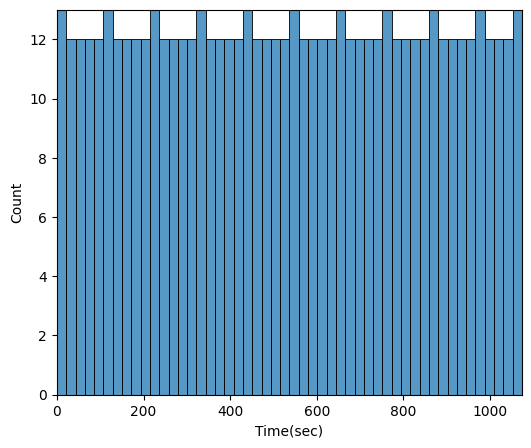

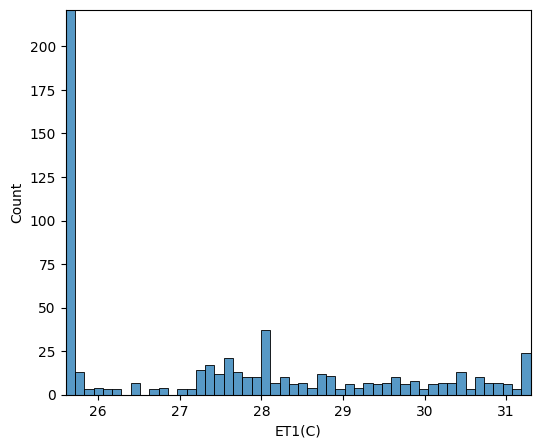

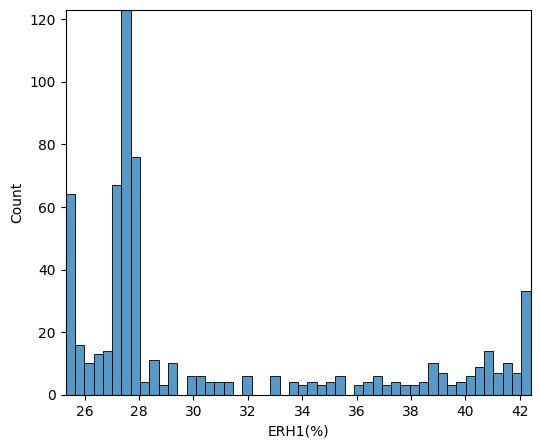

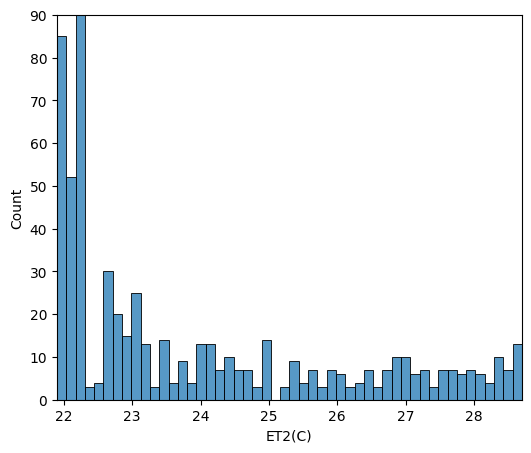

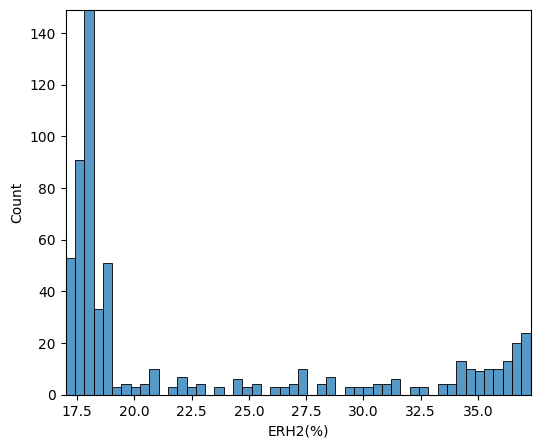

...

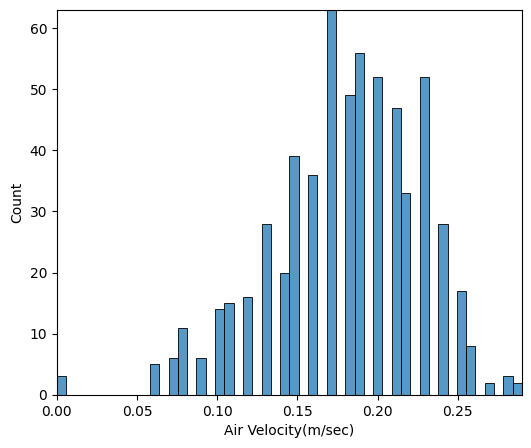

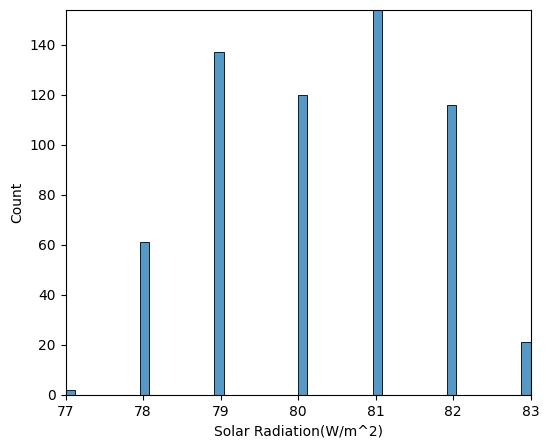

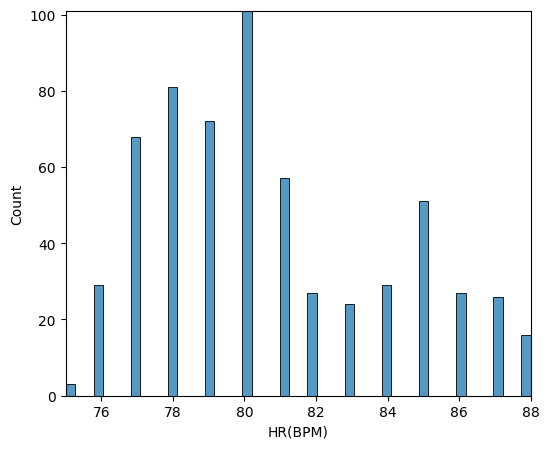

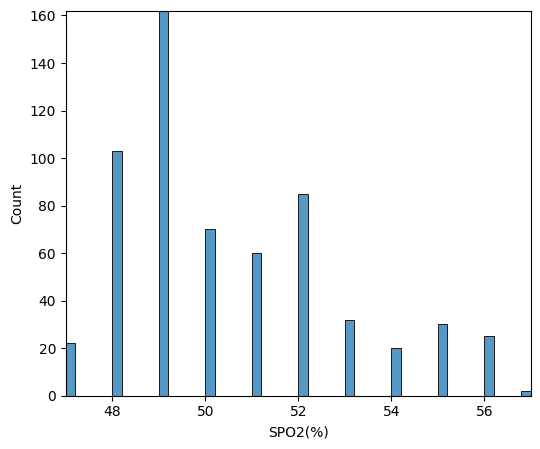

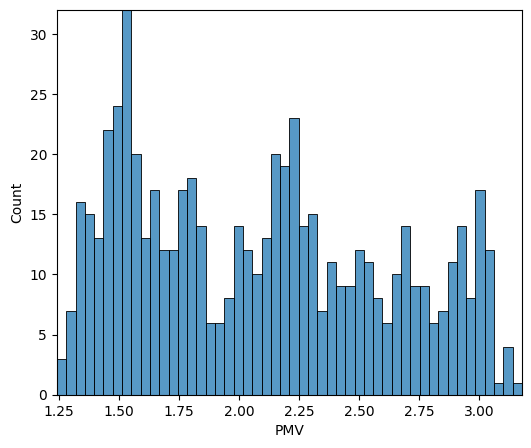

In [18]:
hists(df)

We have few instances where PMV is larger than 3.  
This is not possible.  
3 is the absolute maximum on the PMV scale.  
This error can be attributed to:
1. Sensor measurement errors.
2. Error of the calculation software.
3. Rounding measurements on several errors that lead to this final outcome.  

Since all sensors were calibrated (checked against other equipment) and the algorithm was validated against 13 benchmark cases of ISO 7730, option 3 is the only one viable.  

Let's examine these cases:

In [19]:
df[df.PMV > 3]

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV
datetime,,,,,,,,,,,,,,,,
2019-03-10 12:10:33.600,633.60,30.4,41.9,27.9,36.6,26.7,45.6,21.8,50.6,30.73,31.97,0.11,83,77,49,3.02
2019-03-10 12:10:35.360,635.36,30.5,42.1,28.0,36.7,26.7,45.6,21.8,50.6,30.59,31.83,0.06,82,76,48,3.11
2019-03-10 12:10:51.200,651.20,30.7,42.1,28.2,36.9,26.8,46.4,21.9,52.0,30.73,31.97,0.12,82,77,48,3.04
2019-03-10 12:10:52.960,652.96,30.7,42.1,28.3,36.6,26.8,46.4,21.9,52.0,30.73,31.83,0.00,81,77,48,3.14
2019-03-10 12:10:54.720,654.72,30.7,42.1,28.3,36.6,26.9,46.4,21.9,52.1,30.87,31.97,0.11,81,77,48,3.06
2019-03-10 12:10:56.480,656.48,30.7,42.1,28.3,36.6,26.9,46.4,21.9,52.1,31.56,31.83,0.09,81,77,49,3.11
2019-03-10 12:11:05.280,665.28,30.9,42.1,28.5,37.3,26.9,46.9,22.0,51.8,30.87,31.97,0.16,82,76,48,3.03
2019-03-10 12:11:07.040,667.04,30.9,42.1,28.5,37.3,26.9,46.9,22.0,51.8,30.73,31.97,0.11,82,76,47,3.12
2019-03-10 12:11:08.800,668.80,30.9,42.1,28.5,37.3,26.9,46.9,22.0,51.8,29.50,33.34,0.12,81,77,48,3.08


We have very few cases where PMV marginally extends 3.  
Nothing seems out of the ordinary for the other features.  
All cases are indeed correlated with very high environmental temperatures (ET1) - exceeding 30 degrees Celsius.  
This data appears valid.  
We will leave it as is because otherwise we will have duplicates when we perform the Diff below and we do not wish to lose data.

## Allocate test set

Let's allocate 5% of the data for a final independent test (no shuffling for time series!).  
Typically, we are leaving more data, however, we only need 30 seconds and we have little data so let's maximize our training information.

In [20]:
train, test = train_test_split(df, shuffle=False, test_size=0.05)

<div class="alert alert-info">
Remark:
    
It is not necessary to perform the split now as most features are extracted from the index and there is no data leakage. However, one feature - the polynomial fit trend is based on the data so just to maintain good practice I split the datasets ahead.
</div>

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 611 entries, 2019-03-10 12:00:00 to 2019-03-10 12:17:53.600000
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Time(sec)               611 non-null    float64
 1   ET1(C)                  611 non-null    float64
 2   ERH1(%)                 611 non-null    float64
 3   ET2(C)                  611 non-null    float64
 4   ERH2(%)                 611 non-null    float64
 5   ET3(C)                  611 non-null    float64
 6   ERH3(C)                 611 non-null    float64
 7   ET4(C)                  611 non-null    float64
 8   ERH4(%)                 611 non-null    float64
 9   Skin1(C)                611 non-null    float64
 10  Skin2(C)                611 non-null    float64
 11  Air Velocity(m/sec)     611 non-null    float64
 12  Solar Radiation(W/m^2)  611 non-null    int64  
 13  HR(BPM)                 611 non-null    int64  
 14

In [22]:
train.info()
train.tail()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 580 entries, 2019-03-10 12:00:00 to 2019-03-10 12:16:59.040000
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Time(sec)               580 non-null    float64
 1   ET1(C)                  580 non-null    float64
 2   ERH1(%)                 580 non-null    float64
 3   ET2(C)                  580 non-null    float64
 4   ERH2(%)                 580 non-null    float64
 5   ET3(C)                  580 non-null    float64
 6   ERH3(C)                 580 non-null    float64
 7   ET4(C)                  580 non-null    float64
 8   ERH4(%)                 580 non-null    float64
 9   Skin1(C)                580 non-null    float64
 10  Skin2(C)                580 non-null    float64
 11  Air Velocity(m/sec)     580 non-null    float64
 12  Solar Radiation(W/m^2)  580 non-null    int64  
 13  HR(BPM)                 580 non-null    int64  
 14

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV
datetime,,,,,,,,,,,,,,,,
2019-03-10 12:16:52.000,1012.00,27.4,25.4,22.6,17.0,26.7,25.7,21.6,45.2,29.08,30.18,0.24,79,80,50,1.91
2019-03-10 12:16:53.760,1013.76,27.4,25.4,22.6,17.0,26.7,25.7,21.6,45.2,28.67,30.32,0.21,80,79,50,2.01
2019-03-10 12:16:55.520,1015.52,27.4,25.3,22.6,17.0,26.7,25.7,21.6,45.2,28.67,30.05,0.15,81,79,49,2.20
2019-03-10 12:16:57.280,1017.28,27.4,25.3,22.6,17.0,26.7,25.7,21.6,44.9,28.67,30.05,0.07,79,79,50,2.34
2019-03-10 12:16:59.040,1019.04,27.4,25.3,22.6,17.0,26.7,25.7,21.6,44.9,28.26,27.16,0.09,81,79,49,2.39


In [23]:
test.info()
test.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31 entries, 2019-03-10 12:17:00.800000 to 2019-03-10 12:17:53.600000
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Time(sec)               31 non-null     float64
 1   ET1(C)                  31 non-null     float64
 2   ERH1(%)                 31 non-null     float64
 3   ET2(C)                  31 non-null     float64
 4   ERH2(%)                 31 non-null     float64
 5   ET3(C)                  31 non-null     float64
 6   ERH3(C)                 31 non-null     float64
 7   ET4(C)                  31 non-null     float64
 8   ERH4(%)                 31 non-null     float64
 9   Skin1(C)                31 non-null     float64
 10  Skin2(C)                31 non-null     float64
 11  Air Velocity(m/sec)     31 non-null     float64
 12  Solar Radiation(W/m^2)  31 non-null     int64  
 13  HR(BPM)                 31 non-null     int64

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV
datetime,,,,,,,,,,,,,,,,
2019-03-10 12:17:00.800,1020.80,27.4,25.3,22.6,17.0,26.7,25.7,21.6,44.9,28.53,29.91,0.12,81,79,49,2.30
2019-03-10 12:17:02.560,1022.56,27.3,25.3,22.6,17.1,26.7,25.7,21.6,44.9,28.67,29.91,0.17,81,80,50,2.13
2019-03-10 12:17:04.320,1024.32,27.3,25.3,22.6,17.1,26.7,25.7,21.5,44.8,28.81,29.77,0.23,82,80,50,1.99
2019-03-10 12:17:06.080,1026.08,27.3,25.3,22.6,17.1,26.7,25.7,21.5,44.8,28.81,29.63,0.22,81,80,50,1.98
2019-03-10 12:17:07.840,1027.84,27.3,25.3,22.4,17.4,26.7,25.7,21.5,44.8,28.67,29.63,0.15,81,80,50,2.18


## Resampling

Let's resample the data by minute (average) and examine its behavior:

In [24]:
dfr = train.resample('1T').mean()

In [25]:
dfr

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV
datetime,,,,,,,,,,,,,,,,
2019-03-10 12:00:00,29.92,25.708571,27.820000,22.157143,18.545714,25.005714,27.671429,20.648571,48.094286,28.195714,30.328286,0.168286,78.685714,87.428571,55.714286,1.515429
2019-03-10 12:01:00,90.64,25.708824,27.729412,22.255882,18.035294,25.141176,27.335294,20.720588,47.532353,28.398529,30.831176,0.169118,78.647059,85.794118,54.735294,1.535000
2019-03-10 12:02:00,150.48,25.682353,27.582353,22.211765,17.917647,25.291176,27.105882,20.861765,47.014706,27.931471,30.568824,0.181176,79.323529,85.117647,52.794118,1.531176
2019-03-10 12:03:00,210.32,25.676471,27.502941,22.058824,17.955882,25.373529,26.844118,20.864706,45.882353,27.755000,30.938529,0.160588,79.176471,84.470588,52.176471,1.605294
2019-03-10 12:04:00,270.16,25.650000,27.450000,21.979412,18.076471,25.400000,26.635294,20.855882,46.785294,27.397353,29.935882,0.178824,78.823529,82.970588,52.323529,1.542059
2019-03-10 12:05:00,330.00,25.700000,27.214706,22.038235,17.832353,25.435294,26.529412,20.752941,45.326471,27.201471,30.747647,0.172059,78.764706,80.970588,51.147059,1.577059
2019-03-10 12:06:00,389.84,25.755882,28.105882,22.288235,20.358824,25.470588,26.426471,20.811765,46.070588,28.020588,30.546471,0.177059,79.352941,81.205882,50.823529,1.592353
2019-03-10 12:07:00,449.68,26.700000,34.473529,23.938235,29.814706,25.576471,30.252941,21.050000,46.285294,28.699706,28.926176,0.188824,81.205882,80.470588,50.911765,1.847353
2019-03-10 12:08:00,509.52,28.161765,38.364706,25.526471,34.135294,25.870588,37.276471,21.308824,46.794118,29.613529,30.731765,0.178824,81.705882,78.294118,49.058824,2.241765


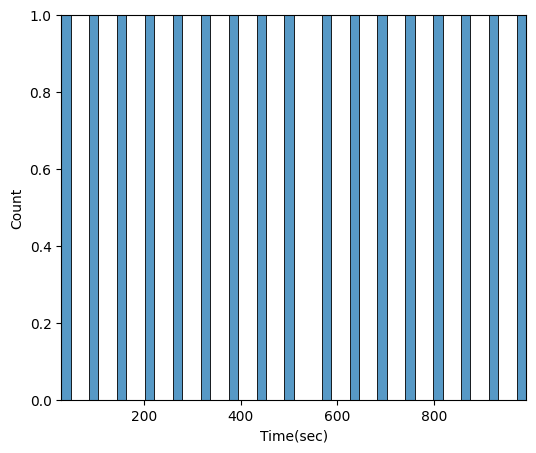

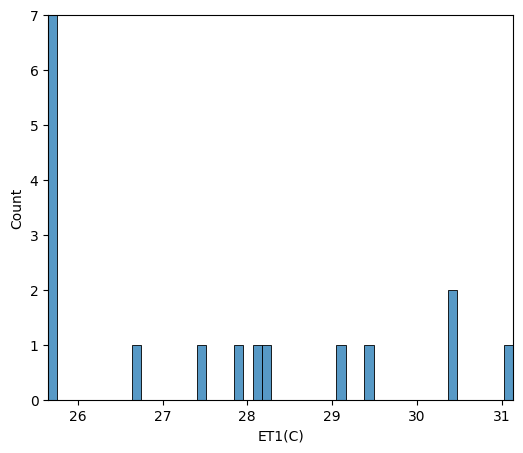

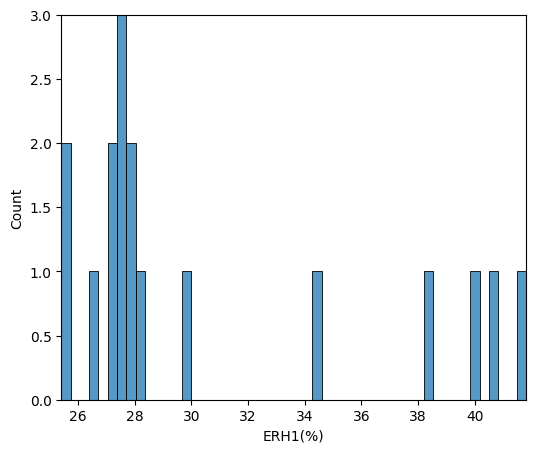

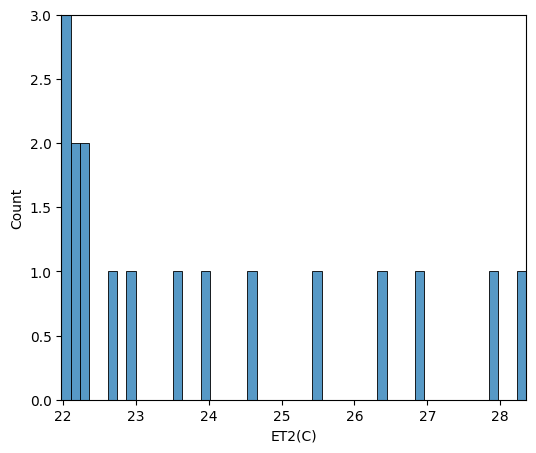

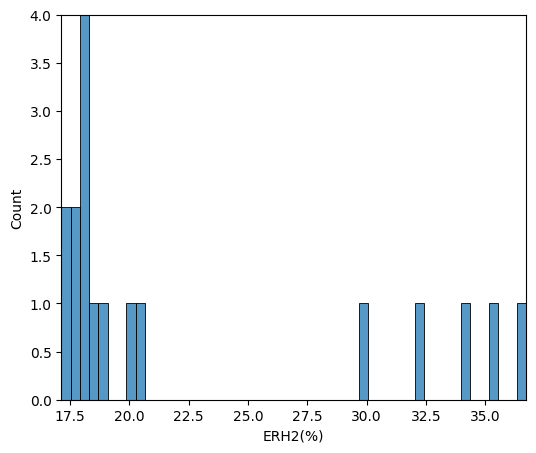

...

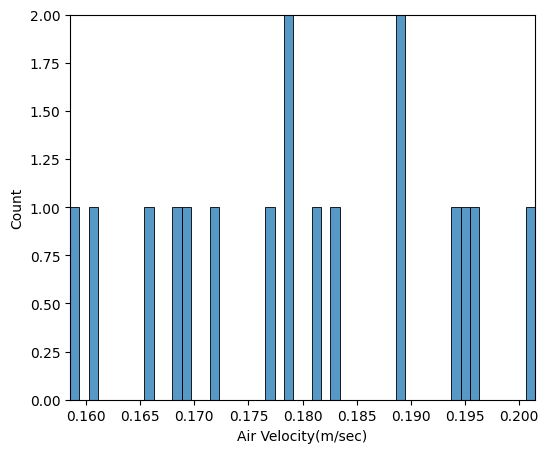

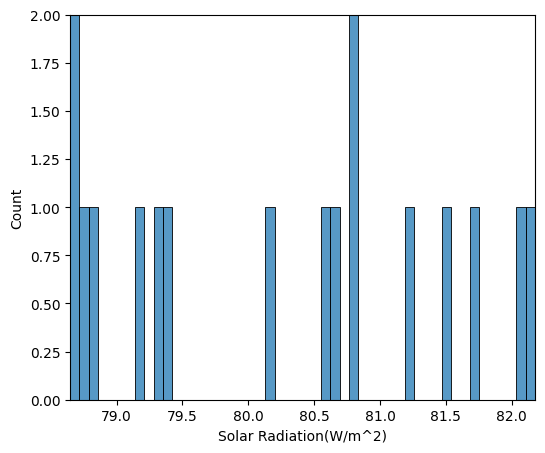

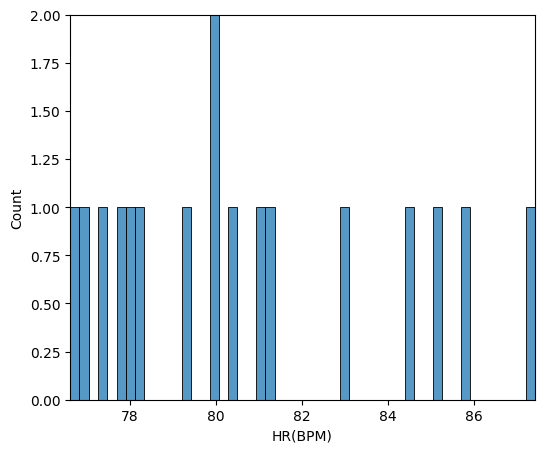

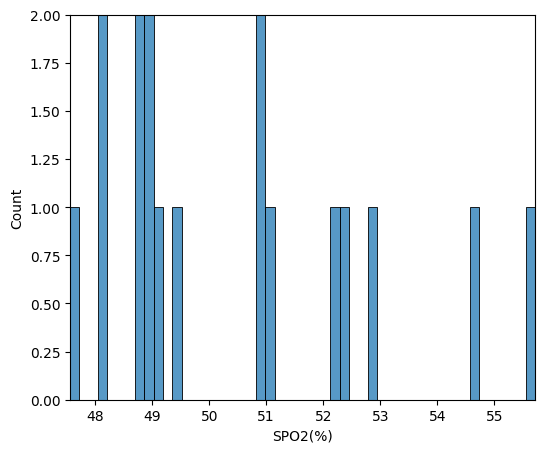

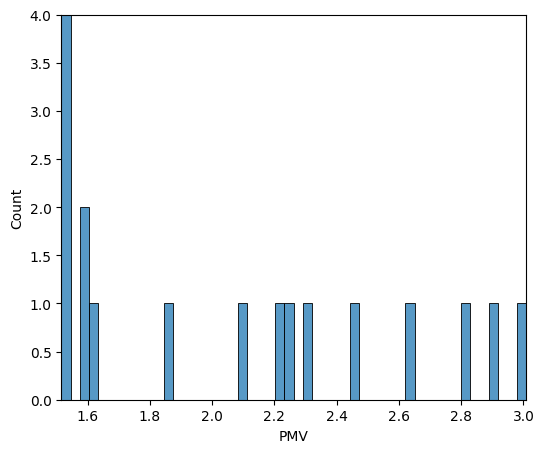

In [26]:
hists(dfr)

We can see many missing feature intervals.  
1 minute averaging removes numerous PMV potential values.

## EDA

Extract minute values:

In [27]:
mcoords = pd.Series(train.index.values.astype('datetime64[m]')).drop_duplicates()
mcoords

0     2019-03-10 12:00:00
35    2019-03-10 12:01:00
69    2019-03-10 12:02:00
103   2019-03-10 12:03:00
137   2019-03-10 12:04:00
171   2019-03-10 12:05:00
205   2019-03-10 12:06:00
239   2019-03-10 12:07:00
273   2019-03-10 12:08:00
307   2019-03-10 12:09:00
341   2019-03-10 12:10:00
375   2019-03-10 12:11:00
410   2019-03-10 12:12:00
444   2019-03-10 12:13:00
478   2019-03-10 12:14:00
512   2019-03-10 12:15:00
546   2019-03-10 12:16:00
dtype: datetime64[ns]

Plot data:

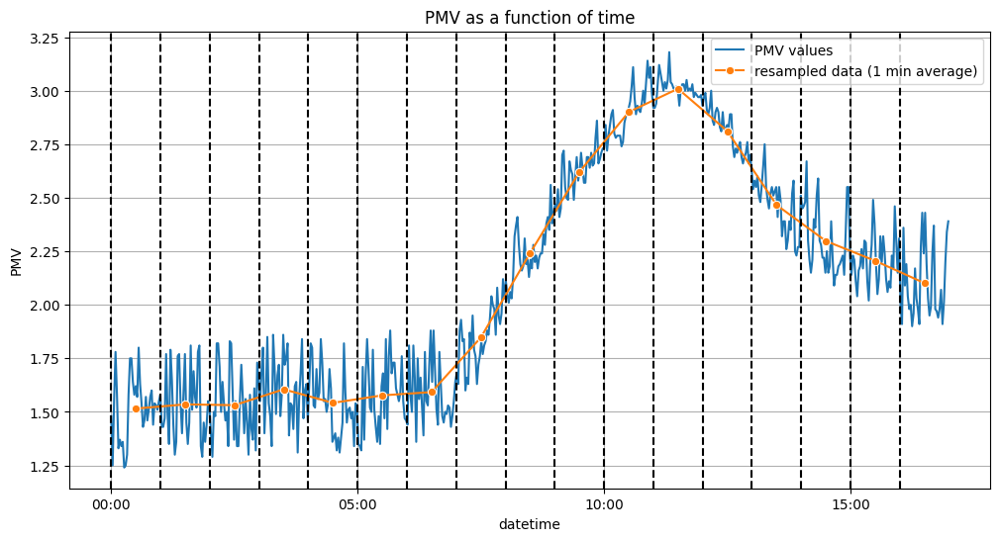

In [28]:
plt_1, ax = plt.subplots(figsize=(12, 6))

ax1=sns.lineplot(data=train, x=train.index, y="PMV", label='PMV values')
ax2=sns.lineplot(data=dfr, 
                 x=dfr.index+pd.DateOffset(seconds=30), #shift minute average series to minutes centers
                 y="PMV", label='resampled data (1 min average)', marker = "o")
for mc in mcoords:
    mplt = plt.axvline(x=mc, color='black', linestyle='--')
#tick_spacing = 0.001
time_fmt = '%M:%S' # how you want to display time/date

plt.grid()
tit = plt.title('PMV as a function of time')

#ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
ax1.xaxis.set_major_formatter(mdates.DateFormatter(time_fmt))

plt.show()

#https://stackoverflow.com/questions/66832493/how-can-i-show-time-on-the-x-axis-when-using-datetime

* We have a non-stationary series.  
* The resampled data (shifted 30 seconds to the right for each minute) smooths and reasonably represents the original date.
* Periods of rapid PMV changes are less noisy than periods or relatively stationary PMV.

## Moving average

Let's smooth the data with a moving average and examine it:

In [29]:
train['rolling5_mean'] = train.PMV.rolling(5).mean()
train['rolling5_std'] = train.PMV.rolling(5).std()
train['rolling10_mean'] = train.PMV.rolling(10).mean()
train['rolling10_std'] = train.PMV.rolling(10).std()
train['rolling24_mean'] = train.PMV.rolling(24).mean()
train['rolling24_std'] = train.PMV.rolling(24).std()

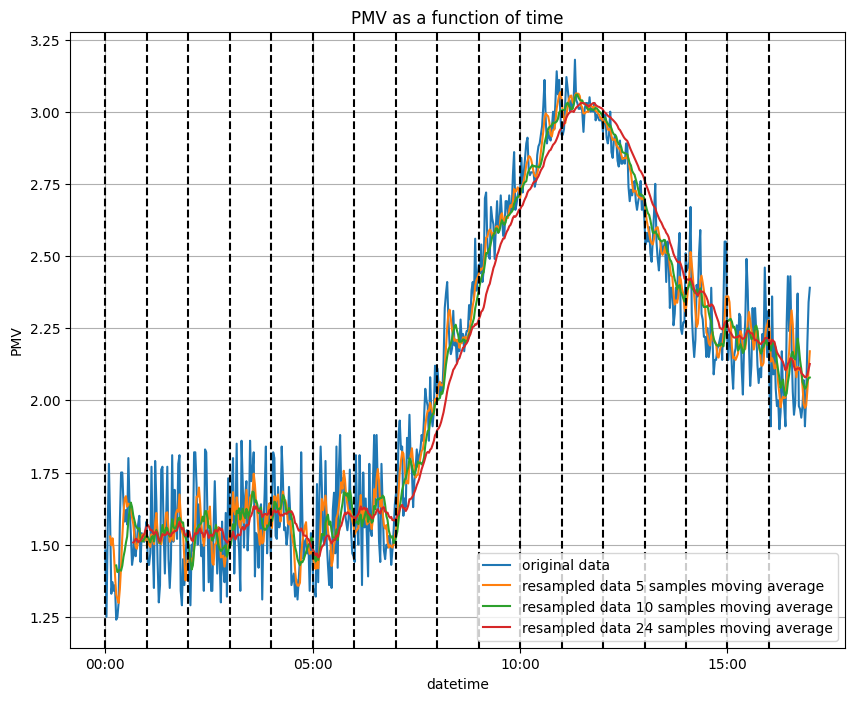

In [30]:
plt_1 = plt.figure(figsize=(10, 8))
ax0=sns.lineplot(data=train, x=train.index, y="PMV", label='original data')
ax1=sns.lineplot(data=train, x=train.index, y="rolling5_mean", label='resampled data 5 samples moving average')
ax2=sns.lineplot(data=train, x=train.index, y="rolling10_mean", label='resampled data 10 samples moving average')
ax3=sns.lineplot(data=train, x=train.index, y="rolling24_mean", label='resampled data 24 samples moving average')
plt.grid()
tit = plt.title('PMV as a function of time')
for mc in mcoords:
    mplt = plt.axvline(x=mc, color='black', linestyle='--')

time_fmt = '%M:%S' # how you want to display time/date
ax0.xaxis.set_major_formatter(mdates.DateFormatter(time_fmt))
plt.show()

* It appears a 10 samples moving average is the best compromise.  
* It is less noisy than the 5 samples moving average in relatively stationary intervals but can still reasonably follow the raw data during rapid PMV changes.

Let's examine the series noise:

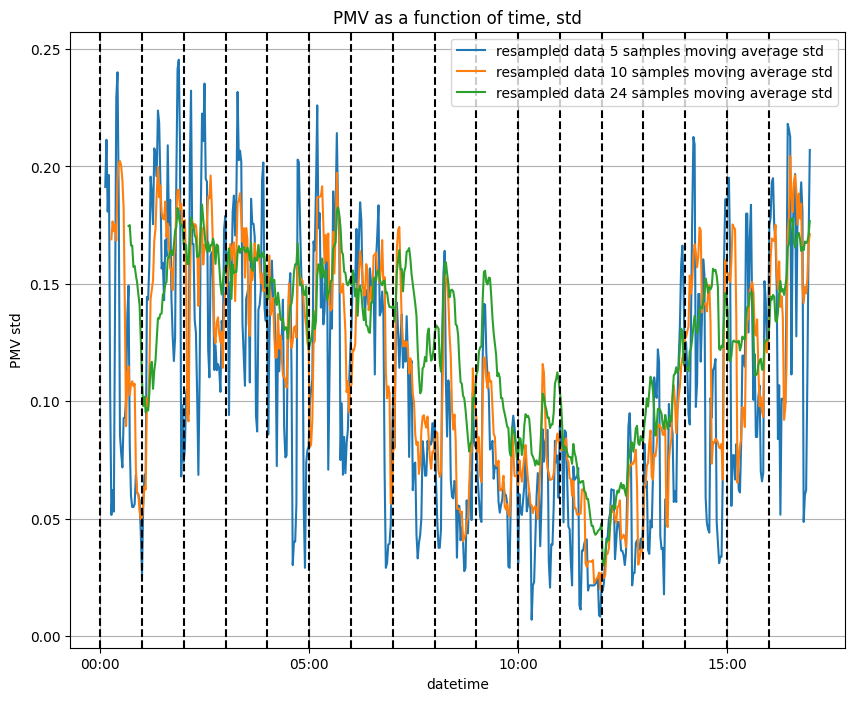

In [31]:
plt_1 = plt.figure(figsize=(10, 8))
ax1=sns.lineplot(data=train, x=train.index, y="rolling5_std", label='resampled data 5 samples moving average std')
ax2=sns.lineplot(data=train, x=train.index, y="rolling10_std", label='resampled data 10 samples moving average std')
ax3=sns.lineplot(data=train, x=train.index, y="rolling24_std", label='resampled data 24 samples moving average std')
plt.grid()
tit = plt.title('PMV as a function of time, std')
for mc in mcoords:
    mplt = plt.axvline(x=mc, color='black', linestyle='--')

time_fmt = '%M:%S' # how you want to display time/date
ax1f1 = ax1.xaxis.set_major_formatter(mdates.DateFormatter(time_fmt))
ax1f2 = ax1.set_ylabel("PMV std")
plt.show()

* Inedeed, between minutes 8 and 14, when there are rapid PMV changes, the series fluctuations (std) are lower.  
* The series zero std between minutes 11 and 12 is a side effect of PMV unable to exceed 3.  
* Neither the series mean nor its standard deviation are stationary.
* Again, a 10 samples moving average appears as the best compromise.

(notice the missing entries induced by the rolling mean at series onsets)

## Decomposition

Let's decompose the series using a ~1 minute period.

In [32]:
def decomp(series, period):
    decomposed = seasonal_decompose(series, period = period)
    plt_1 = plt.figure(figsize=(15, 8))
    win1 = plt.subplot(311)
    trend = decomposed.trend.plot(ax=plt.gca())
    for mc in mcoords:
        mplt = plt.axvline(x=mc, color='black', linestyle='--')
    tit1 = plt.title('Trend')
    win2 = plt.subplot(312)
    seas = decomposed.seasonal.plot(ax=plt.gca())
    tit2 = plt.title('Seasonality')
    win2x = plt.xlim(['2019-03-10 12:06', '2019-03-10 12:08'])
    win3 = plt.subplot(313)
    resid = decomposed.resid.plot(ax=plt.gca())
    tit3 = plt.title('Residuals')
    plt_1.tight_layout()
    plt.show()

# https://stackoverflow.com/questions/36083832/valueerror-freq-t-not-understood-please-report-if-you-think-this-in-error-se
# https://stackoverflow.com/questions/6541123/improve-subplot-size-spacing-with-many-subplots

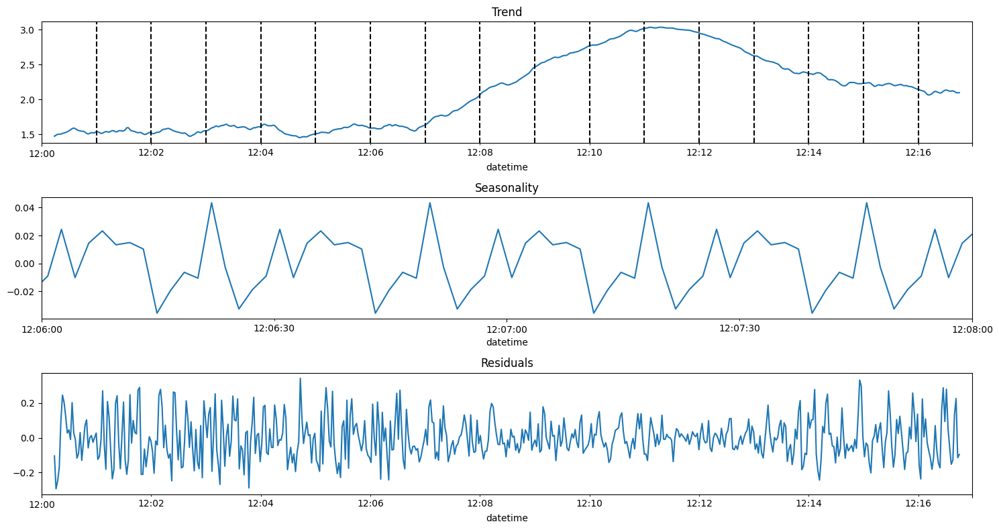

In [33]:
decomp(train['PMV'], 16)

We can see minimal seasonality at the minute scale (at max it is ~1% of the trend).  
The unexplained residuals are an order of magnitude larger than the seasonality.  
This is a good sign. It demonstrates that we are sampling a true time variable and nothing is cyclical.  
As it should be. Our experiment is very short and does not represent repetitive temperature periods such as day and night or seasons of the year.  
The change in PMV from 1.5 at 12:07 to 3 at 12:11 confirms the need to monitor rapid PMV changes in small (personal) environments with high temporal resolution. The standard 1/2-1 hr sampling consensus would have clearly missed this transient event.  
The bad news is that this short window with minimal repetitive date could be insufficient for classic time series prediction.

Let's examine the factors driving PMV:

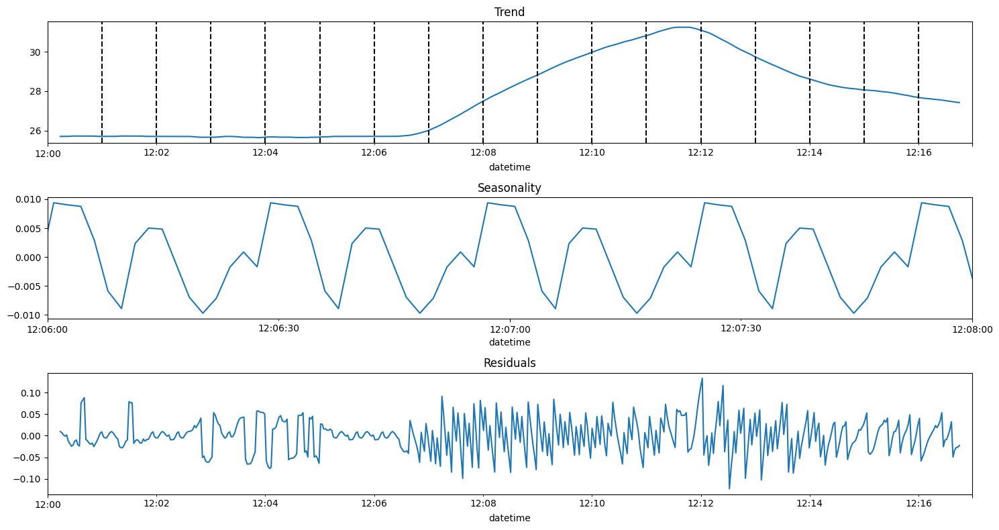

In [34]:
decomp(train['ET1(C)'], 16)

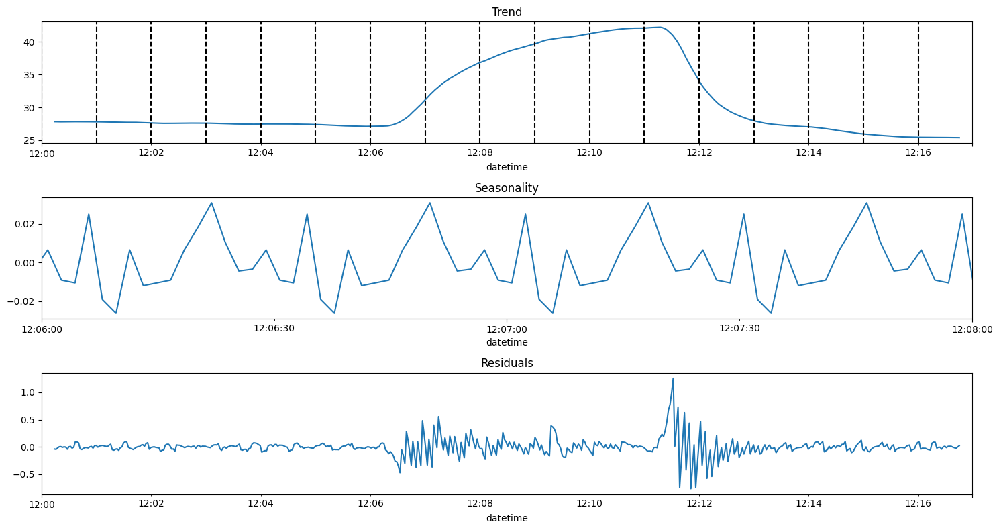

In [35]:
decomp(train['ERH1(%)'], 16)

We can clearly see that the minimal seasonality characteristic repeats for temperature and relative humidity.  
In fact, the seasonality components are even lower for these parameters than for PMV (our target).

Let's examine the effect of moving average smoothing:

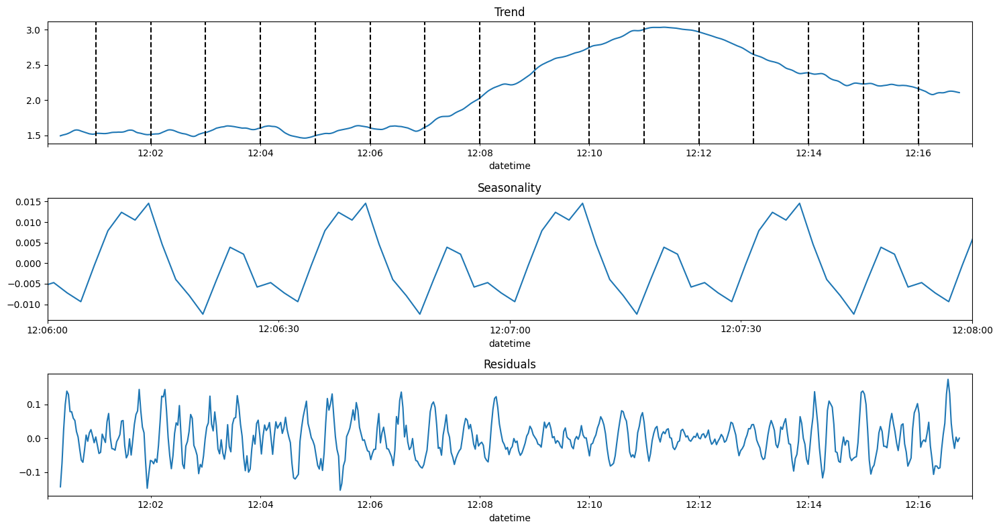

In [36]:
decomp(train['rolling5_mean'].dropna(), 16)

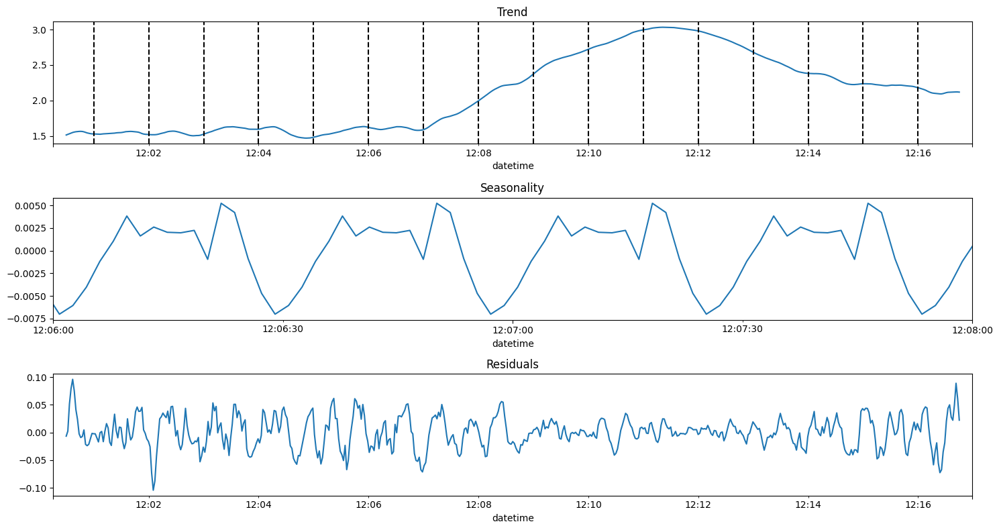

In [37]:
decomp(train['rolling10_mean'].dropna(), 16)

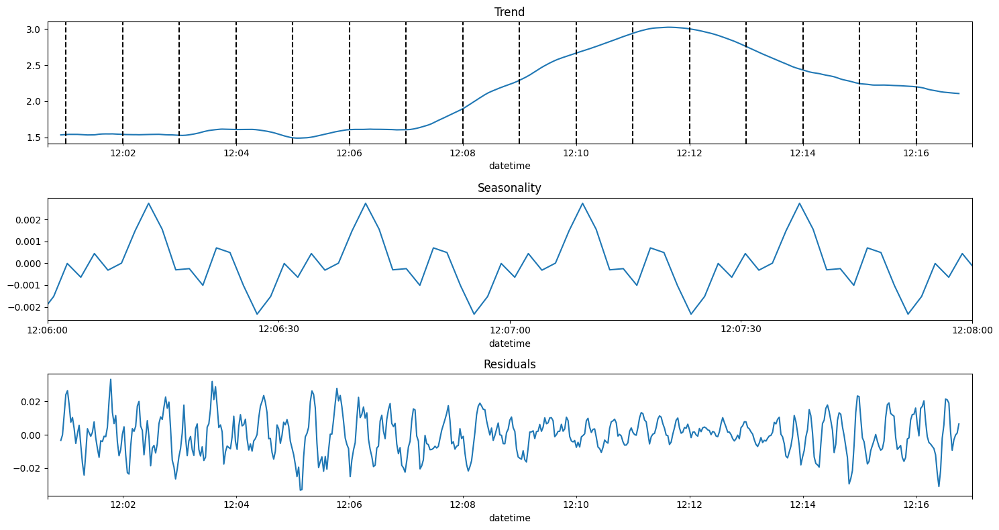

In [38]:
decomp(train['rolling24_mean'].dropna(), 16)

We can see that smoothing the series using a moving average reduces the seasonality and residuals components.  
This indicates a moving average is a promising feature that we should adopt.

However, there are two types of series - a multiplicative and an additive.  
Since our fluctuations decrease in amplitude when PMV decreases, it could be that our series is of the multiplicative type:   
https://towardsdatascience.com/finding-seasonal-trends-in-time-series-data-with-python-ce10c37aa861

Additive:  

Y[t] = T[t] + S[t] + e[t]

Multiplicative:  

Y[t] = T[t] *S[t] *e[t]


Y[t]: Our time-series function  
T[t]: Trend (general tendency to move up or down)  
S[t]: Seasonality (cyclic pattern occurring at regular intervals)  
e[t]: Residual (random noise in the data that isn’t accounted for in the trend or seasonality  

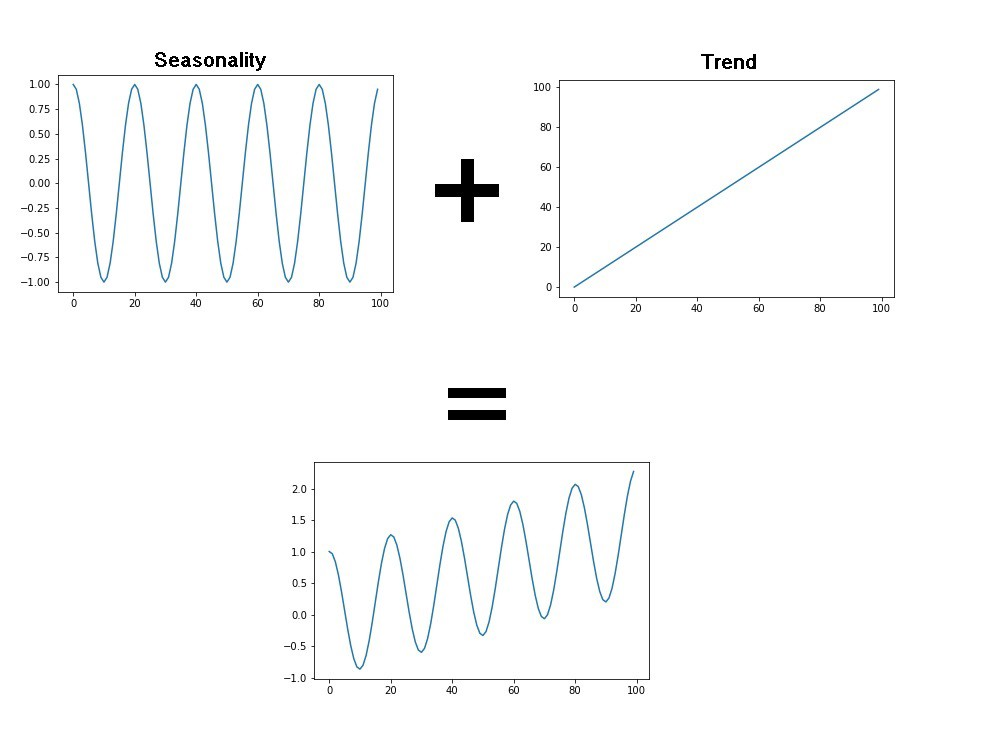

In [39]:
#remove source name with , - e.g., "data:image/png;base64,"
base64_data="/9j/2wCEAAMCAgMCAgMDAwMEAwMEBQgFBQQEBQoHBwYIDAoMDAsKCwsNDhIQDQ4RDgsLEBYQERMUFRUVDA8XGBYUGBIUFRQBAwQEBQQFCQUFCRQNCw0UFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFP/AABEIAvED1gMBIgACEQEDEQH/xAGiAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgsQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+gEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoLEQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/2gAMAwEAAhEDEQA/AP1TooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr5+/aS/a0g+Bninwn4G8P+ENQ+JHxN8WbjpHhnS7uGDCK6BpbmRiWgiKmZlkMbIfs8u5kVGZfoGvj/8Aar8C/D34p/tHfDXQ9O+JeofDH9orT7OS/wDDF/pekm58+1LSPItyTGEliCW14qxNOi/vZdyuJCrAHVfBX9sW88bfGW6+EXxI+HWofCf4kLZNqllp95qlvfWeo2oEZBt7lNnnSnMxKRoyqtvKS+5HVfpavgrSviT41+AP7UXw18L/ALQfh/wR461PxRNPpPhL4v6bpyW+rxDzJlW3niWEsjO13bR7YvLiRbliZJv3jD5r8XaR41/bB/ai+Ptvqvwu1j4yab4T1O50DStMsfHCaFaeGxvktkuoYrjzFaeRbFXO390XEhkjYMgQA/Ymivz1svHfjX4A/sDX9h+1FrPjfwprh8QDStN1fwhrSXXiS8ieRLuNheedKitlbqMl3QeRDsA3Fd/hf7HNh4n+BH7e3w68JWHg7xB8JPD/AI38M/atS8K61rkWqvqEcVjdtDdS4hjMEpmtyxjZFkjczqNkcnlAA/X6ivy1/ap+BfiHwd8efHHxK+LXhrxv8SPBd3PbXvh74g/DzUxbav4Ft7b7RcCCOyyUCoUQNO+I1XM28Tyso6v9sf4lw+N/Bv7KPwz8EfEHWNW+HXxJ1OLSNT8VWepSDVdUs0NrZSJPLwrNIt5MZo5ojmWNQyqVZSAfo/RX51+B/DVp+yJ/wUr8H/Cb4cTahp/w38b+GZ9RvPDV7qNxc2dndCO5Jnt0eTiVv7MhBeTzG2ySqCFKhPlX9lP9kP4efFv9hP43/E3xDbahN4u0D+0P7Ku4Lwxx2f2Kwiu1xGBtfzWkKSeYG+QDZ5bZYgH7fUV+Wuu/tBWXjD/gnR8HNO+JXiP4j69428aTajp+nWXga6WDUvEBt5rmzW1u5mjdZIHWW2jkBWSWRmRtkpD1b/4JxN4n+F/7anxa+E0uh6h8PvCy6M2vN4Du9ai1hNNumex8tkukUBv3NyRkfMU8pZDI0QYAHv3wW/bf8d/tEfAO6+IPw++CX/CQaza+Jm0Gbw3/AMJZBbbYFtY52u/tM0KKcNLHH5YUn5twOAQPX/DP7T/hbxT+0t4s+CFpp+sR+LPDWmJqt3eTQxCxeJltmCxuJS5b/S4uCgHytzwM/jH/AM4sv+6zf+4Ovr/4d/ATwL4o/wCCs3x38N6poX2nRj4Zu9QNt9rnT9/qNtZR3r7lcN+8XUbwYzhfNyoUqm0A/T+ivxr0v44eJ/gV+xx8WP2YdTOoS/Fey8TDwlomnWNhE/2qw1B2eX7PG4WeaKUJeYk8ot/xMLTaRvXy/wBR/wBmz4QxfAX4DeB/AUcdvFcaLpkcV61pNJLDJeNmS6kRpMMVed5XAIGAwAVQAoAPTaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz341fHvwL+zx4WtfEnxB13/AIR/Rbq9TT4bn7HPc7p2R5FTbCjsMrFIckAfLjOSM+hUUAfKv/D0f9mL/opn/lB1P/5Gr374XfFLwx8aPAmmeM/Bmp/2z4b1Lzfsl79nlg8zy5Xif5JVVxh43HKjOMjIINfFnwc/5TJfHX/sTLb/ANFaNVr9q34u/G+b9un4cfBf4XfEK38Dad4k0CO+uJrnSbW9WJllvnnlAlhZ2bybUBY9yqWVQSu5mAB960V+av7R/wC214v+H3x10/4KS/GHT/hra+GdGsn8S/Ea88IHULzU9SNqJGW3s4vNiEUongcqVjKMkoEhAVJMrw7/AMFDfiH42/Yn+NeuW+uaenxI+Hl7pNrb+KtH0sLZ6haXF3DbrciK5U5kk8u7Zg0ESqske1FbIUA/T+ivy18YftC/tPfs2fBj4PfHTxf8TNH+IfhnxTPbtqPg1tFtrErFc273ECrdRQK5YwoxZgFEcoQbZ03Z90+KPxx+K3xe/bH1P9n/AOFHi7T/AIa2nhnRota13xNe6LHqN5I5RD5NvHI7RSRML2zzuWNwySkOQAsgB9KfDj49eBfi34q8aeG/Ceu/2rrPg29Gn67bfZJ4fsc/mSxhN0iKsnzQSjKFh8uc4Iz6FX5v/wDBKKz8Rad8Z/2qbTxdf2+qeLLfxBaRaxfWihYbm8W51MTyIAiAK0gcgbV4I+UdB+kFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFeTW2tfEPxZ408cWeia74Z0bStB1WLTYItQ8P3N7PIG0+zuWd5EvoV+9csAAgwFGSTk0Aes0V53/YfxZ/6HbwZ/wCEfd//AC0o/sP4sf8AQ6+Df/CPu/8A5aUAeiUV53/YfxZ/6HbwZ/4R93/8tKP7D+LP/Q7eDP8Awj7v/wCWlAHolFed/wBh/Fn/AKHbwZ/4R93/APLSj+w/iz/0O3gz/wAI+7/+WlAHolFed/2H8Wf+h28Gf+Efd/8Ay0o/sP4s/wDQ7eDP/CPu/wD5aUAeiUV53/YfxY/6HXwb/wCEfd//AC0o/sP4s/8AQ7eDP/CPu/8A5aUAeiV47+0N+y14L/aUt9Bk8SyaxpeueHpjc6H4h0DUXtL7S5Wkhd5ISMpuJt4xudGK4JUq2GG9/YfxZ/6HbwZ/4R93/wDLSj+w/iz/ANDt4M/8I+7/APlpQB5v8Kf2HPBXwz+J9p8RdR8TeOPiN420+D7Npms+N9fe+m06IpMjxxbVjBVluJMrIHAJyoUkknxW/Yc8FfEz4n3fxF07xN44+HPjbUIPs2p6z4I197GbUYgkKJHLuWQBVW3jwsYQEjLBiAR6R/YfxZ/6HbwZ/wCEfd//AC0o/sP4s/8AQ7eDP/CPu/8A5aUAeb2X7AvwbsP2e7/4OR6BcP4XvZhfy3c120t8uoiFIft8cjZWKfbGvCKsZyymPY7IeK8A/wDBMT4a/Dnx14S8Z6V4v+ID+KfDd5FcQanc61G0tzBFFDDFZTYhANssMJi2IEJjlkQsVCKnvv8AYfxZ/wCh28Gf+Efd/wDy0o/sP4s/9Dt4M/8ACPu//lpQB4x4+/4Jz/D3xh4p8W63pHiv4geAP+Ew81vEmneE/EJgs9YkleZ5HuI5Ul3bvtEi7MiMKSAgyxPf/EH9jr4U/Eb4IaX8Jr7w3/Z/gzR/3mlW2l3Elu9hOI5Y1uEYE+ZKPPlcmUSB3YtIHJJPUf2H8WP+h18G/wDhH3f/AMtKP7D+LH/Q6+Df/CPu/wD5aUAcZ8Cf2PPBXwF8Zaz40tNV8UeMfHerwm0u/FPi/WHvr6W2IhxASAiFVNvGQxQuAMbtuFFX4RfsVeCPgv8AAPxr8ItE1TxBdeG/Fn237ddahcwPeR/arVLWTymSFUGEjBXcjYYknI4rvf7D+LP/AEO3gz/wj7v/AOWlH9h/Fn/odvBn/hH3f/y0oA8i13/gnZ8JvE37Ovhn4PaoNYu9I8NTT3Gka+08I1e0aa4aeYLKIQhVy5VkMZUqqEjeiup8G/8Agnz4C+B3xb0/4keH/FPji58TxQ3UWpzanrCTrrjXDyvJJffug0rbpEIClV3W8TlS4Zm9d/sP4s/9Dt4M/wDCPu//AJaUf2H8Wf8AodvBn/hH3f8A8tKAPA/+HYHws/4UF/wqL+3vGH/CN/8ACTf8JX9q+2Wv2z7V9l+y7N32bZ5WznGzdu53Y4r1M/sm+ELf9p//AIXtp+peINK8Xz2f2HULKyvwunamnk+SDcRFCzYVYSFV1TdbxNtLAlup/sP4s/8AQ7eDP/CPu/8A5aUf2H8Wf+h28Gf+Efd//LSgD448A/CrWv2of2+dJ+OmofCTWPhx4F8M6YIV/wCEy0mC3vta1SKMiKWS2Zg6NGLlDHPiVR9gjAdWwsf6F153/YfxY/6HXwb/AOEfd/8Ay0o/sP4s/wDQ7eDP/CPu/wD5aUAeiUV53/YfxZ/6HbwZ/wCEfd//AC0o/sP4s/8AQ7eDP/CPu/8A5aUAeiUV53/YfxZ/6HbwZ/4R93/8tKP7D+LP/Q7eDP8Awj7v/wCWlAHolFed/wBh/Fn/AKHbwZ/4R93/APLSj+w/iz/0O3gz/wAI+7/+WlAHolFed/2H8WP+h18G/wDhH3f/AMtKP7D+LP8A0O3gz/wj7v8A+WlAHolFed/2H8Wf+h28Gf8AhH3f/wAtKP7D+LP/AEO3gz/wj7v/AOWlAHolFed/2H8Wf+h28Gf+Efd//LSj+w/iz/0O3gz/AMI+7/8AlpQB6JRXnf8AYfxZ/wCh28Gf+Efd/wDy0o/sP4s/9Dt4M/8ACPu//lpQB6JRXnf9h/Fn/odvBn/hH3f/AMtKufCLxNrHizwW95r72M2rW+q6pps0unW728EgtdQuLZXWJ5JGXcsKkgu3JODjAoA7iiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD5e8AfsweKfCn7fPxJ+N91f6PJ4T8S+H4tKtLOGaU3ySrHp6lpEMQQLm0k5Dk/MnHJweP8A9mDxT4r/AG+fht8b7W/0ePwn4a8Py6Vd2c00ovnlaPUFDRoIihXN3HyXB+V+OBn6hooA+Sfi9+yx8RdJ/aWk+O/wP8QeF9M8V6ppkeja7oXi+2uHsdRiCkGczRMzowENkBHEsY/cbi53Or5XxG/Zn+P/AMZ/2ZPib4O8f/EbwvrnizxZPZS6Zplpp5s9I0JYdQE7xpcrEZ51eJYwDLGWVkALNkufsuigD4q/ab/Yr8cfGj9i/wCE/wAItE1TQLXxJ4T/ALJ+3XWoXE6Wcn2XTpbWTymWFnOXkBXci5UEnBwDv/F79lj4i6T+0tJ8d/gf4g8L6Z4r1TTI9G13QvF9tcPY6jEFIM5miZnRgIbICOJYx+43FzudX+tqKAPj/wDYM/ZT+Jf7O/ir4u+I/ibr2geINa8dXlrqD3OhSSNvnWS7kneRWgiVNzXIICDH3hhQBn7AoooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK4/4rw+Fp/h5rieNW0tfC/kZvDrTxrZ4DAr5hkIXG8LgHgnA5zXYUUAfKmg+MdK8RfsLeGLfQtctNTaDwnpCalFpV2s00dnGLdL8ERksCsQnVgOQQRweK5oHwN9u/e/2H/woD/hOX8vd5X9gY/sNcf8ATH7N9t8zH8H2nGPmxX2hRQB5h+z4+pD4FeF2lWWW4FiTZpqDsjtb7m+yiRiCwJh8rJILDkkE5FVPgbcaxdeIPivJrthZadqh8UxebbadePdwJjRtM27ZXiiZsrgnKDBJAzjJ9arzv4X/API7/F7/ALGmD/0y6XQB6CwAri/h949fxZd67peoWY0vXdGvGt7qz8zeDG2WgmRiBuR0wQcDkMMDFdqDXlXjJE8PfG/wHrkaiKPVobzQ7uXoHOwTwA+4aKUD/fOOprWlFTvHrZ6+mtvn+djmrSlTtJPS6TXq7X+T/C56vRRRWR0hRRRQAUUUUAed/Fn4qf8ACt7KxjstJn8Ra5fOxt9KtWCyvFGN80mSDgKgOPVmUDrx1vhnxBY+LNBsNY0y4W5sL6FZ4JV/iVuRkdiOhB5BBB5Fee+B4k8Q/Gnx/rrKJo9MW00G0l/ubY/PnA9MvMgP+4Kd8GIV8O+JPiF4VUCOLTtY+220SjCx291EswCjsBJ5wwOMg11zpwULJe8km35O33Wul63PPp1ZuopSfuttJdmr6363s/lY9XooorkPQCiiigAo6UgNZPirXIvDHhrVdXn/ANRYWs11J/uohY/oKEruwpNRV2cBc/HWxtfienhg2EjaQJk06XXg48iPUXUulqRjklRyQeGZVIya9THFeGaN8OG1L9lg6NJEH1jUdJfUZJGHzm+lBnEhPdhIV5zn5Rg8CvT/AIdeJf8AhMfAfh7XM86hYQXLY7MyAsPqDkGuutCCV6fR29bbP566eRw4epUcrVd2rryvuvlp9509FFFch3hRRRQAxuao6vq1roGl3mo38yW1jaRNNNPIcKiKCSSfQCrzH3ryv48Kdbj8H+FABKmu67bx3MB6SW0Ia4mBHcERAEf7VXThzyS6fp1/AxrTdODkt+nq9EvvLnwl+MEfxLa/t7nSbjw/qVvsuYrK7bLz2co3Q3A4HDAEEDO1gQT0r0joa8p+JqR+HfiV8OPEqoIt9/Lod0yjBeK4iYxqx7gTRxkD1bjrXqwOfxq60Y3UobPpvbpb8L/Myw8pWlCbu07X2vone3zt8h9FFFYnWFFFFADOprhvip8SD8PNHtjZ6bJr2vahMLfTtIgfZJcuAWfnBwqqCxOCBgDjIruO/XpXlWixR+JP2gvE1/KN8XhzS7XTYQeQk05aaUr6EoIQSOcYrWlFNuUldJXf3pL8WtjlrzkoqMHZt2T7aNt/cmd14M8W6f478LadrmmyF7O9iEihh8yHoyMOzKwKkdiCK3M4IFeVfDOJfDfxR+I3h1B5VtJcW2t2sfQEXEZWYgenmwuT7v6k16sG4pVYqE7Laya9Gk/wuVQm6kE5bptP1Tt+g6iiiszoCiiigCNjjtmlU8Zqvf3sOnWVxdzuEggjaSRj/CqjJP5Zrgv2fhe3Hwo0bUtQlkkvNW87VHMjFsefK0qgegCuoAHHFWoXg59ml99/8vxMnO1RQtum/ut/mekV518B/wDkSNS/7GnxH/6e72vRa86+A/8AyJGpf9jT4j/9Pd7UGp6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAYPjBtaXw1fv4euLG01hY91vPqdu9xboQQWLxpJGzfKDgB15xzjNeB3H7R3i+48AW3iiytNEii0XwBpvjzxHBPbTMbqO5Sd2t7QiYeSQtndENIJeTGCOrV9B+JdGn8QaDeadb6re6HNcJsGoaekLTwjIJKiaOSMkjI+ZGGCcAHBHktl+ynotr4c0nQ5PFnie8sLTSofD92sr2SnVdMhYmGzudlsoKIDIoaMRuVlkDO240APtvjD4kl+IEBMGl/8Ibc+KZvCccCwSfb0mjtpHN0ZfM2FDNE8flCMEKQ+8nKVf/ar8V6B4c/Z++INvresadpb6n4e1O0tIr+6jhN1K1pIBFGHI3scgbRknI45rXh+CWkwePv+En/tLVDEupPrEehGSL7AmoNbm2a6A8vzdxjZvkMhTcxcIHO6n/tHf8m8/FD/ALFbVP8A0kloAP8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOv+GcfhP8A9Ev8Gf8AhP2n/wAbo/4Zx+E//RL/AAZ/4T9p/wDG69FooA86/wCGcfhP/wBEv8Gf+E/af/G6P+GcfhP/ANEv8Gf+E/af/G69FooA86/4Zx+E/wD0S/wZ/wCE/af/ABuj/hnH4T/9Ev8ABn/hP2n/AMbr0WigDzr/AIZx+E//AES/wZ/4T9p/8bo/4Zx+E/8A0S/wZ/4T9p/8br0WigDzr/hnH4T/APRL/Bn/AIT9p/8AG6P+GcfhP/0S/wAGf+E/af8AxuvRaKAPOv8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOv+GcfhP8A9Ev8Gf8AhP2n/wAbo/4Zx+E//RL/AAZ/4T9p/wDG69FooA86/wCGcfhP/wBEv8Gf+E/af/G6P+GcfhP/ANEv8Gf+E/af/G69FooA86/4Zx+E/wD0S/wZ/wCE/af/ABuj/hnH4T/9Ev8ABn/hP2n/AMbr0WigDzr/AIZx+E//AES/wZ/4T9p/8bo/4Zx+E/8A0S/wZ/4T9p/8br0WigDzr/hnH4T/APRL/Bn/AIT9p/8AG6P+GcfhP/0S/wAGf+E/af8AxuvRaKAPOv8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOv+GcfhP8A9Ev8Gf8AhP2n/wAbo/4Zx+E//RL/AAZ/4T9p/wDG69FooA86/wCGcfhP/wBEv8Gf+E/af/G6P+GcfhP/ANEv8Gf+E/af/G69FooA86/4Zx+E/wD0S/wZ/wCE/af/ABuj/hnH4T/9Ev8ABn/hP2n/AMbr0WigDzr/AIZx+E//AES/wZ/4T9p/8bo/4Zx+E/8A0S/wZ/4T9p/8br0WigDzr/hnH4T/APRL/Bn/AIT9p/8AG6P+GcfhP/0S/wAGf+E/af8AxuvRaKAPOv8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOP+GcvhP8A9Ev8Gf8AhP2n/wAbpP8AhnL4TnGPhh4M/wDCftP/AI3Wx47+JWh/D22iOpTyS31y2y00yzQzXd2/92KIcsffgDuRXKaZ4a8Y/EXUrbVfFV1N4V0SCVZ7Xw3plx++kKkFWu51wTggHy0IXpkkitY021zSdl/WiXX8u7RzyrJS5Iq78unq/wCma3/DOPwn/wCiX+DP/CftP/jdcR8Wfgp8O/C3h7RdU0XwF4Z0fVLfxT4dMN9Y6PbwTRk6zZqSrqgYZBIOCMgkd6976V538eP+RI03/safDn/p7sqyOg9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK8y+Pup3dj4K06C2vrnS4NS17StMvb6zmaCaG2nvYopAkikNGXDeWHUhl8zKkEAgA9NoryP4R27+I/BnizQNQ1PVL/StO1/UNLs9QOqXC3jW0cgIU3auJi0bmSHfv3ERYZick+W+FfBHizxr8JdD1rw5rGr32n6r4rufEMen6t411SzebRDbXFvaQpeqZZ1VgLS6KZ2lmbJA5oA+rq87+F/8AyO/xe/7GmD/0y6XV74XeLrTxd8LPD3iDS7O/+y3GnRyQWl1c/aLk7VxsM0jnzWJUjzGc7+GLHOa5z4G6rda1r/xYvLzR77QLiTxTFu0/UXgeePGjaYBuMEkkZyACMOeCM4OQAD1jdzXln7RcZtPAEWvoC0vh3UrPV1AH8McyiT8PKaTPtmvUguea5X4paMfEXw48U6Woy13pdzCvHdo2A/UitaMlGpFva6+7qc9eLnSklvZ29eh1EbCRQQcgjIIp+Olcl8KdZPiH4aeFtSY5a60y2mY/7RjUnP0ORXWg1nJcsnFmkJKcVJdULRRRSNBuKjmkWGNnYhVUElj0AqXdXHfF3WD4f+Fvi3UVIV7bS7mRCTj5hE20fngU4rmkordmdSShByfRHPfs5wm5+HC67IhS48Q393rDg+k07GP/AMhiMfhTJx/wj/7RtnJny7fxFoDw4H8c9pKGGffZcN+C113w20b/AIR34e+GtLYbWstNtrcj3WJVOfyrk/i4w0vxx8L9Z7Q629g3+7cWsqDPtuVPxxXWpKdWfRNP9Wl96RwuDhQh3Ti/xSb+5s9UopOtLXGekFFFFACY4ry79oudpvhrLokT7LjxDe2mjRkHHE8yK/8A5D8w/hXqGea8u+KoGp/EX4WaOwyj6tcai30t7WTB/wC+pE/HFb4e/Omul392v6HLiv4TXey+9pfqemQwpBAkUahERdqqOAAOgrzD9npv7O8Lax4bwV/4R3W73Tkz18rzTLF+HlyoB7CvVa8t8At/Zvxq+Jth9xLn+ztTjXsd8DQsR+NuM+5p0/epzXaz+d7fk2Kr7tSnJea+TV/zSPU6KKK5zrCiiigBOgryvUs+IP2i9Ht9u+Dw7oU94T2Wa5lWJPx2Qy/n716mGBry74dN9v8Ai/8AFHUgd8cdxYaZG3p5VsJGA/4FcGt6WinPsvzaT/Bs5K+rhF7N/km1+KRP+0RYS3Hwk1y8tVBvdJ8rV7c+j20izcfUIR+Jr0DTL6HVdOtby3bfb3ESyxt6qwyD+RFV/EelJr3h/U9Nf7l5bS25+jKVP865D9n/AFQ6v8F/Bs7Z8xdNht5N3XfGPLbPvlDRrKj6P8/+GD4cR6r8n/wT0OiiisDrCiiigBjcDNeXfABTqeg+IvErHd/b+u3l3Ex6mFJPs8X/AI5CCPrnvXdeMdZXw94U1nVD0srSW5P/AABC39K5z4FaSdD+DngyzIIkXSreSQHrvdA7/wDjzGt42VKXdtfdrf8AQ5ZXdeK6JN/N2S/Ux/Eo/sH9oHwfqIB8vXNLvNIkPbfEVuIvxwJwPqa9SHevLfjpusX8BauuR9g8UWYdh2SYPbn8P3wr1MdPrRUs4xa/p3/yaCleNSpHzuvRpfqmOooorA6gooooA83/AGhNSl074QeIYbb/AI/NQiXS7cDqZLl1gGPceZn8K7nRNKh0PSLLT7ddtvaQpBGPRVUKB+QFedfG5W1HU/h1pCHLXnia3mZPVLeOW4J/AxLXqKsCK3lpTivV/p+jOWGtaUuyS/X9UPrzr4D/APIkal/2NPiP/wBPd7XotedfAf8A5EjUv+xp8R/+nu9rA6j0WiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOv2jv+Tefih/2K2qf+kktei151+0d/ybz8UP8AsVtU/wDSSWgD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAQcUcCiuJ8efFPR/Aj29nN52pa3d5+x6Npy+bd3B9Qg+6owcuxCjBye1OMXN2itSJzjTXNJ6HXXE8drFJLNIsUSKWd3OAoHUknoPevKrn4oa18RbqXTfhtbxS2aOY7jxZfITYwkHBFunBuXHPIIQEDLHOKbB8N9f+J08d98Rpkt9KDB4fCGnzZtx3H2qUYM7A4+UYjBHRs16ra2kGn20VtawpbwRKEjiiXaqKOgAHQD0ro9yl/ef4L/P8vVHL+8r94x/F/wCS/H0OP8C/CnSvBVxNqbyT634juhi61zUmElzL/sqekaDsiAKABwTzXcHNL0GaO9c8pSm7t6nTCnGmuWKsh1edfHj/AJEjTf8AsafDn/p7sq9Frzr48f8AIkab/wBjT4c/9PdlSND0WiiigAooooAKKKKACiiigAooooAKKKKACiiigArP1jRdP8Q6ZdaZqljbanp11GYrizvIVlhmQ9VdGBDA9wQRWhRQBgaV4I8O6JZRWen6BpdhaRWpsY7a1so440tySxhCqAAhJJKgYJJOOar678OPCPirQ7HRNa8L6Lq+j2O37Lp1/p8U9vb7V2L5cbKVXCkqMAYBIHFdPRQBVtLSHT7aG2toUt7aFBHHFEoVI1AACqBwAAAAAMcVwvwv/wCR3+L3/Y0wf+mXS69Erzv4X/8AI7/F7/saYP8A0y6XQB6JTJFDIRjIOeDT6Q9KBPU8v/ZwJh+E2naa5Pm6Tc3mmOCenk3UsYH/AHyq16gOleWfBVf7N134laSTg23iSW5VfRbiCGYfmzua9TPSt67bqyk+uv36nNhtKMY9lb7tBaKKKwOobivLv2jj9p+Ft1pS/wCs1i+sdMQevnXUSsP++S1eonoK8s+Mqf2l4n+Gejr1uPES3bD1S3t5pT/48EP4Vvh7qqmumv3anLiv4Ml30+/Q9RUYQV5h+0Wq2vw6TWMZfRtV07UR7CO7i3H/AL5LV6gORiuJ+NukDXPhF4ysgu55dJudg/2hGzL+oFKi0qsXLa6v+o8RFyoyUd7O3rbQ7ccjNOrA8D61/wAJF4M0LVM7vttjBck+u+NWz+tb2ayas7G8XzJMWiiikUIeleWak51X9pLRrdhlNI8N3NyP9l7ieNB+awv+VepjvXl3gn/iY/HX4j3j8/YbbTNNjPoPLknb9Zl/Kt6S0lJdF+bS/U5K+rhHu/yTf6Hp+Aa8tnB0v9pS0cnEWreGJIvq9vcqw/8AHbhvyr1PPWvLviYf7P8Aip8K9U6Kb6901z7TWrMB/wB9QLRQV5OL7P8ABNr8R4jSKl2a/Fpfkz1OiiisDqCiiigBh+6a8u+AK/atE8T6z1XV/Emo3KN/eRJjCp/75hA/CvRtXv00nSry9k/1dvC8rfRVyf5Vwn7O9ibD4JeDg5zJPYJdufVpsysfxMhP41tFJUZPzS/O/wChyz1xEV5N/PRfqz0c9CK8t/Z6YW3hPWtH6Lo3iDUrNVPUIbhpU/8AHZAfoRXqQPBry74Xj+zfih8VNJTiIajaako/672qBj+LQt+VOneVOaXSz/G36hU0qwl3uvvV/wBD1OiiisDqCiiigDzP9ou8e0+CnitIT++urUWCe7TusIH4mTFehafZR6fYW1rEMRQxrGg9ABgfpXmvx6JubPwZpI5TUvE+nxOvqsbm4I/8g16kOFFbyaVKK83+lvyZyw1rzfZJfm3+aPM/2j7eST4L+JZ4Rmawji1FMdQYJkmyP+/Zr0a1nju7aKeM7o5FDofUEZFY/j7Rx4h8D+INLIyL3T57bH+/Gy/1rJ+C+rnXPhJ4OvmbdJNpNszn/b8pQ36g0auil2b/ABS/yDbEPzS/Bv8AzO2ooorA6gooooA8s8XY1T4++ALJTn+zdP1LU3X03CKBD/5EcV6ie1eW6Kg1X9o/xJcggjSfD9lZ49GmmnkP5iNPyFepCt6ra5Yvovz1/U5aGrnLu/ySX6Dq86+A/wDyJGpf9jT4j/8AT3e16LXnXwH/AORI1L/safEf/p7vawOo9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiivLfjv8R9X+HWmeHH0cRJJquqiwmun0m51d7aP7PPLuSxtnWe4YtCqkRnKKzSEFUagD1KvOv2jv+Tefih/2K2qf+kkteT+Bf2k/F3i7SLDxRJZ6FB4dtdW0Tw9qtlCkklzNd6ilmRNDMJdkaI2o2oMTI7cSguCoz3/AO1R4u0Pwx8AfH8Ota1p+kzaj4e1O1so766SFrqU2sgEcYYguxyAFXJORxzQB69RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAwkDHHFVdQ1C10mylu725itbSFS8s07hERR1JYkAD3Ncd47+LOmeENQj0azt5/EPim4Xdb6Hp2GmI7PIT8sMfIy7kDGcZxisGw+Feq+PbyDVviVcxagiOJbbwxZk/2dakdDJ0NxIPVhtBJwvQ1tGlZc03Zfi/Rfq9PM5ZVm5OFNXf4L1f6LUhk8f+JPiu7WngCL+y9CyVm8XahBlXH/TpC2DKf+mjYQYOA3Fdh4F+F+ieAEnlskmvNVu/mvNXvpDNd3bccvIe3HCjCjsBXWRQrDGqIoVAMADoBT8ccUpVbrlgrL+t3+m3kOFGzU6jvL8F6Lp+Y+iiisjpCiiigArzr48f8iRpv/Y0+HP/AE92Vei1518eP+RI03/safDn/p7sqAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACvPPjV4k1Tw74UsI9FvDpmoatrOnaQuoLGkjWqXF1HHJIquChcIXC7gV3lSQwBU+h1ieK/Cml+NtBudG1q2N3p9wUZkWV4nV0dXjdJEKujq6IyupDKyggggGgDyi28RePdX+DPxFsdEv7jV/HOhXuoaTpeprFaxz3kkeGgcq6rbiQLIqMSqoWQnaoOBj2vj3XNdbw34OsPFHifR9bufENzpms3+uWemf2rYeVp7XiwIIYWtGLq1u4cLINjOM7hlPVtM+FHh3SPD0miWKalZ2EiSRyC31i9SZmeUzSSmYSiQzM7FjMW8wknLEGqDfAjwafD/APZH2C+EX9oHVjfLq94uoG8MflGf7aJhceYYv3e7zM7Pk+7xQA/4O+NL/wAW/CfRte1kifUPIkS7ltYCRPJDI8TyJGoJ+cxlgq5PzADPFYvwN1+28T+IfixqVnFfQ28vimLamo2E9lMMaNpindDOiSLyDjKjIwRkEGvRfD2g6f4W0PT9H0m0Sw0ywgS2tbWIfLFGgCqoz2AAHP41yHwv/wCR3+L3/Y0wf+mXS6APRKKKKAPLfBn/ABL/AI8fEa1b5fttppd+g9fklhY/+QlFepV5VMGsP2mLduiah4WdM+rQXSkD8pzXqY7VvWd2peS/BW/Q5cPopR7N/i7/AKjqKKKwOoSvLvF//Ex+Pnw+tV5+wafql+49MiCFT/5EYfjXqLV5ZaKb/wDaW1CQcpp3hiGIn+601zIxH4iBTW9F2cpeT/HT9TlxGqjHu1+d/wBD1SqupWSajp9zay/6ueNom+jDB/nVqkboawOlq6sebfs6Xj3nwP8AB/mf6yCxW0cehiJiI/ApivSAMivLP2fZRaeENZ0rjbpXiDVLRR6L9qkkH6SA/jXqQbHFbV7e1k1td/noc+Gb9jC+9l94+iiisTpG9K8t+CLfbtW+I+pkZNx4nnhDf7MMMMIH4FGr1Et8przD9nEC5+GiamR+81TU9Rv2PrvvJSD+KhTW8U1SlLzS++7/AEOWprWhHyb/ACX6nqA4NeWfHxPI0zwdqQ4XT/FGnSsfRXl8lj+Uxr1M4HavMP2k4ifgr4jnjBL2aQ3y465hnjl/9kooJOrGL6tL7wxP8Gb7Jv7tUeoDpS1FFIs0SOhDIwBUjoRjINS1gdKCiiigZwvxz1L+yPg740uw2100i6CH/aMTKv6kVveDNK/sLwjoum42mzsoYMem1FXH6VxX7SI+0fCe/wBPH39SvLGwUevm3cSkf98lq9OXlR9K3aSop92/wSt+Zyx1xEvJL8W/8kLjAry3SH/s79pHxBbjhdT8OWdyf9poZ5kP5CRfzr1PPNeW+Jdum/tDeDLoYzqWi6lYk+6Pbygfo360Urvmiuqf4a/oFf3eWXZr8dP1PU6KKKwOoKKKKAPLfiT/AKb8W/hXp55QXd/fsP8ArlaMgP4NMv516j0OK8s1J/7Q/aS0SE8ppnhu7uB7NNcQoPzEbflXqXVq3qtOMEui/Vv9UctH46j7v8kl+aYMOCa8v/Zs/cfCTTLBuH025vLBh/d8q6lQD/vkCvUDyK8s+BebWb4gae3/AC6+Kr0qD2WURzjH/f00Rf7qUfNP7r/5hPStCXk199v8j1WiiisDqCiikY8GgDy74XY1D4mfFTUxyh1S1sF9vJs4iR/31IT+Neofw15b8AFM+j+LNS6rqPifUpkb+8qzGFT+UQH4V6nnrW9dt1Nell9yscuG/hJ97v722LXnXwH/AORI1L/safEf/p7va9Frzr4D/wDIkal/2NPiP/093tYHUei0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXH+PPh1B47k0a5XV9T8P6to9y11Y6ppRhM0TNE8TqVmjkjZWSRgQyHBwRggEdhRQB434f/AGYPDPhm9sDYanrcemQXNrqN1pDzxNbajf2+DFeXBMZkMoZImOx1QtFGSp2gVv8A7R3/ACbz8UP+xW1T/wBJJa9Frzr9o7/k3n4of9itqn/pJLQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAMPAozhaO2c1554z+Llrouqnw9oFnN4q8WsoI0qxYAW4PR7iQ/LCvTluTkYBzVQhKpK0V/Xr0M51I01eT/wCD6HZa1rVh4c0241LVLyDT7CBS8txcSBEQepJOBXl//CU+LfjA3leElm8K+E34bxHeQ/6Vdp/06QuPlUjpK475VSRmrui/CG78Qanb678RL6LxFqcLeZbaTChXTLBuxjjPMjj/AJ6SZPoBgV6mBjgdK2vCl8PvP8F6Lr89PJ7nNapX+L3Y9k9X6vovJa+hzHgj4c6H8PbOSDSbUiedt91e3DmW5upO7yytlmY5J5OBk4AHFdR0zS57UlYSk5O8ndnXGMYLlirIfRRRSKCiiigAooooAK86+PH/ACJGm/8AY0+HP/T3ZV6LXnXx4/5EjTf+xp8Of+nuyoA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK4f4teMdR8GeGLWTR47V9Y1LU7LSbJr1GeCKS4nSIyyKrKzKis77QylioXcudwAO4orzbwL4s8UeMvCHiC2aXSbXxho+qXOkSXn2SVrB5I2UpMIPN3hWidGMfm5DErvIG4+c33xt8dr4Wgnsk069eHxhPoF14j0vwzf6naS2cVlLK11HZW85mG25QWrHzWUMjnOCAAD6Przv4X/8jv8AF7/saYP/AEy6XXSeF/EdrrHgvTdc/tiw1Kynso7ptWtEMNrMpQM0qKzsY0PJAZmKjgsSCa4b4G+JdJ8XeIfixquharZa3pc3imIRX2nXCTwybdG0xW2uhKnDAg4PBBHUUAes0UUUAeW+PT9j+Nvwwu+izjU7Bj67rdZQD+MBx9a9QHWvLPjgxtNR+HN+vBt/FFtGW/2ZYpocfiZFr1Ra3qPmhD0a/Fv9TlpaVKi80/wX+QtFFFYHUNx1ry74en7Z8ZPiledVjfTbBW7fu7YyED6Gc5r1EnrXlvwNLXN18Qr48/afFV4oPtEscI/WI1vTdoT81b8U/wBDlrLmqU/Jt/g1+p6pRRRWB1HlnwiUad41+KWl/wDPLXo7wD2ns4H4/EH8c16kDmvLvCn+gftAePrY8fb9M0u+Ueu37REx/wDHFH4V6grZxW9e3Ordl+Sv+Jy4fSDT6N/m7fgOooorA6jK8T6oNE8N6pqJ4Fpayz/98qW/pXKfALTRpXwV8E2+CG/sm3kYHrudA5z+LGk+Puof2b8FPG0+cH+ybiMH3dCg/VhXW+GdNGi+HtM08DH2W2igx/uqF/pW+qo+Tf5L/gnLviPRfm/+AabVyXxX0s618MPFtgoy1zpN1EB7mJgP5iutz1qG7hS5t5YXGVkUqw9QRg1jF2kmbTipRa7o5z4Xan/bfw28LagTk3Wl2s5Pu0Sn+tdTXmX7N1w03wR8KJIf3ltbtZt9YZGiP/oFemdhWlaHJVlHs3+BFCXPShJ9UvyHUUUVkbnlXxyU3d38PNPXk3Xim0cj/ZhSScn6AxCvUsV5f8QQbr4zfC206iN9TvmH+5bCMH8DOK9R6VvUjaEPNX/Fr9DkpPmqVPJpfgn+oeleW/FfGnePvhXqp6R61NYn6T2cwH6qP0r1InpXl37QKeT4e8NaiemneJdMuGb0U3KRt+khH40UL86S63X3q36jxP8ACb7Wf3O/6HqXWlpq9BTqwOoKKKTpQB5b4YVdT/aE8cXR66dpGm2Kn03tcTEfqp/EV6gq15f8JmF/48+KeqdpNbhsgfaGzgUj82P4k16itb17KaS7L8lf8Tkw2sG31b/N2/AOleXfDwfY/jL8UrLokkmm36j/AK6WxjJH4wHNeokV5bZObL9pXUoxwmo+GLeUj1aG5lUn8BKv50UnaM491+qf6DrL3qcuz/NNfm0eqUUUVgdQnXNRXEywQySOdqIpZmPYDk1JurlvijqX9j/DXxXfhsG20q6mB91iY/0ppXkkRN8sW+yOb/ZsheP4KeGZpBiS7ikvWz1zNK8p/wDQ69N21yfwo006P8MfCVkww1vpVrER7iJQa6wGtK0uepKXdtmVCPJRhHskvwHV518B/wDkSNS/7GnxH/6e72vRa86+A/8AyJGpf9jT4j/9Pd7WR0HotFFFABRRRQAUUUUAFFFc342+IPhf4a6VFqfi7xNo/hXTZZhbR3mtX8VnC8pVmEYeRlUsVRyADnCk4wDQB0lFeU/8NY/BD/osnw//APCosf8A47XeeF/Fmi+ONBttb8N6zp/iDRrrf5Go6XdJc20u1ijbJEJVsMrKcE4KkHkEUAbVFFFABRRRQAUUUUAFFFFABXnX7R3/ACbz8UP+xW1T/wBJJa9Frzr9o7/k3n4of9itqn/pJLQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRSdKAE7e3rWN4l8V6V4O0WfVdb1CDTtPh5e4uH2gHsB3JPQAZJPABrj/FXxfVNYl8N+DrA+KvFCHbNFE+y0sD/euZsEJjk7BlzjAHOaj8M/CFptYh8SeNtQHirxLGd0G6PbY6eT2tockAjgeY2XOAcjpW6pKKUqjtfp1f/A838rnJKu5Pkoq76vovn1fkvm0ZX9o+MvjKdumfa/Ang5+DqEqbdVvl9YUP/Huh5w7AueCAM16B4N8C6H4A0r+ztDsI7GEtvkYZaSZz1eRySzse5Yk10JGe9AJYZqZ1HJcqVl2X9b/0ioUVF88neXd/oug+iiisjpCiiigAooooAKKKKACiiigArzr48f8AIkab/wBjT4c/9PdlXotedfHj/kSNN/7Gnw5/6e7KgD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigArm/Hvgqy8f+Hn0i9uLqyxPBd297Ysqz2s8MqywyxllZdyuinDKykAhgVJB6SigDzOP4KQ2/gXWvDFr4u8S2Y1iO5N7q1tLbJfvPPIXluhIIMJKQSg2qEVQAqqVBEmkfCO88PeCbDwzpXj7xHp0Fg6/Zru1tNKSSKBYxGtsEFl5IjGNwIj35/ixgV6RRQBg+DPCGn+AvCul+HtKWVdP0+BYIjNIXkbHJZ2PJZiSSe5JNcz8L/wDkd/i9/wBjTB/6ZdLr0SvO/hf/AMjv8Xv+xpg/9Mul0AeiUUUUAeXftGgW/wANhqX8Wmarpt8PbZeQ5P4Ak/hXpyABfWvPP2hrE6h8EfG0YJymlzTjHXMa7xj/AL5rt9E1Aato9lfL924gSYfRlB/rXRLWjH1f5L/gnLHTES9F+bv+hfooornOoa44NeYfs4n7R8LrfUP49S1HUL5j677yYg/984rvfEepDRtA1K/PS1tpJiT/ALKk/wBK5D9n6wGmfBTwTD3Ok28pB65dA5z+LGt4u1GXm1+Cd/0OWWuIj5J/i1/kz0OiiisDqPKpx9i/aYs3PyrqHhaWPPq0N0hA/KZq9UHU15b49/0T43/DC6BwJ01SxY+u6BJQP/IBr1Kt6qtGD7r9Wv0OWi/enHs/zSf6i0UUVgdR5d+0h/pHwsu7Aff1G/sLFV9fMvIVI/75Jr09R0ryv46brmb4fWCjP2nxVZEj2iEk5/8ARQr1TPFbydqUY+bf32/yOWGtab8kvuu/1HU1/umnUVgdR5Z+z24g8K67po4XTPEWqWqj2N1JIPzEgP416ljivLPhAo0/xj8UdM6NF4gW7A9BNaQP+pyfxNepg5revf2jb66/ernLhf4SXa6+52FooorA6jyu/b7d+0ppEJ5TT/DNzOPZprmJR+Yib8q9SIxXl3hsf2j+0N41uTj/AIl2jabZA/773Ep/p+Yr1LrW9ZNOMX0S/HX9TloaqUu7f4afoIRXmX7SkbP8FPE8qDc9rFFegD1hmSX/ANkr01uK5H4uacdY+Fni+yAy1xpN1Go9zEwH64qaMuSrGXZ3KxEeejOK6p/kdTBKs0KOp3K4BB9ql7fWua+Gep/2z8O/C+oZz9q0y2nz/vRK39a6TOKzlo2jWD5op+Q+kPQ0tRyOI42cnCqCST6d6RbPL/2f087RPFOo9V1DxNqc6N6qs5iX9IwPwr1IjFeY/s1ow+Cnhqdxh7tJr059Zp5Jf/Z69OByRW+IXLVlFdG19xy4X+DB90n9+oE9a8u8Tgad+0J4HuQP+Qho+p2TH/ca3lA/Qn8DXqBOa8v+KrCw+Inwr1I8BNYuLI+/nWcwA/NAfwp4ezk79n+Tt+IsTpBPzj+av+B6nRRRXOdYx+x9K81/aQuWg+CHi1Y+HuLUWi+5ldYgPxL4r0tsE15b+0IwuPCWi6Wemp+IdLtSPUfa43P6ITW9DStFvZNP7mcuK/gzS6pr5tHplnAlpawwRjEcaBFHsBgfyqfGaF6ClrA6VorBXnXwH/5EjUv+xp8R/wDp7va9Frzr4D/8iRqX/Y0+I/8A093tAz0WiiigAooooAKKKKACvz//AOC1f/JrPhb/ALHO1/8ASG+r9AK/P/8A4LV/8ms+Fv8Asc7X/wBIb6gD8V6/f3/glz/yYp8Mv+4n/wCnO7r8Aq/f3/glz/yYp8Mv+4n/AOnO7oA+q6KKKACiiigAooooAK8t+OfxVuPhnZeGrWwMUWqeIdUOm208+n3GorAFt5rh3FrbETTttgKiOMg5cEkKrV6lXKePPAdv45g0snUb7RtT0m8+3afqmm+UZ7WYxSQsVE0ckbBoppUIZGGHJABAIAPHdG/aC8Q6xO2s2V94f1nwfpeu6P4Y1Ce1sJ4Z726v1s8XEBadhAkbajagwusjfLKC6kAV1/7VHi7Q/DHwB8fw61rWn6TNqPh7U7WyjvrpIWupTayARxhiC7HIAVck5HHNQ6B+zB4Z8MX9nJZaprY09L2DVb3SZJ4mttT1GE7o724Ji8wyhxG5COiFooyUO0Vv/tHf8m8/FD/sVtU/9JJaAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigBgHSlPBppP5V5drvxduNZ1WfQPh9YR+JdaiYx3N+7ldN08/9NpR99h/zzTLHByVxVwpyney23fT5voY1KsaavJ77Lq/RHa+L/G+i+A9IfU9d1CKwtQQq7yS8jdkRRlnY9lUEmvPPs3jT4yjddfbPAXg1+lspC6tfL/tkf8AHsh7gZkIyCVzW54R+EFvpWsJ4i8SX0nivxYQQNRu0Cx2oPVLaEZWJfcZY85Y5r0PGBWvPCl8Gr7/AOS/V/cjDkqVv4mi7J6/Nr8l97Mfwr4O0fwTo8Wl6Jp8Om2EfKxQLjJ7sT1Zj3JJJ7mtoHn2o9KRhjpXO23dt6nWoqKSirJD6KKKCgooooAKKKKACiiigAooooAKKKKACvOvjx/yJGm/9jT4c/8AT3ZV6LXnXx4/5EjTf+xp8Of+nuyoA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAK4f4teMdR8GeGLWTR47V9Y1LU7LSbJr1GeCKS4nSIyyKrKzKis77QylioXcudw7iub8e+CrLx/4efSL24urLE8F3b3tiyrPazwyrLDLGWVl3K6KcMrKQCGBUkEA87Pxk1zTPhR4p1W/tdPuvFehau/h/FukkNncXTTxxW0uwuzojC4hZl3MVywDHAJyR8W/HEuvf8IGkugDxkviJtJbWjp0/9n/Zhpi6h54tPtG/cQ6w7PPxnL7sAIeztvgdpSeCtV8MXeravqFlqvnTXtxcPCtxNdyymU3m9Il2zK23aFARQiAIAoqmf2f7AWAceJ/EA8S/2wdcPioNaf2gbo2v2Qkr9n+z7PswEWzyduADjeA1AHRfDDx6fG3w10nxLqccGmzvA5vlWT9zDNEzRzFWbHyB43IJwduCcVzfwN8S6T4u8Q/FjVdC1Wy1vS5vFMQivtOuEnhk26NpittdCVOGBBweCCOoru/BnhLT/AfhTS/D2lrKLDToFgiMz75HAHLOx5ZmJLMTySSe9cz8L/8Akd/i9/2NMH/pl0ugD0SiiigDB8caZ/bfgzXdPxn7VYTwY/3o2X+tYnwR1H+1fg/4Luidzvo9ruP+0IlDfqDXauMKfpXmX7NZ8r4NaHaN9+xku7Eg9R5V1LGB+SCt0r0W+zX4p/5HK9MRHzT/AAat+bPUaKKKwOo4P466h/Zfwa8bXOdrLo9yqn/aaJlH6kV0XhDTP7F8KaNp+MfZbOKHHptQD+lcR+0mPP8AhDqliOW1C5srED1826iQj8ia9OXlB9K6GrUU+7f4Jf5nLHXES8kvxb/yQ+iiiuc6jyv41t9h1z4baiOsHiaKAn0WaCeI/mWUV6j1NeYftFBbfwDa6pxnS9b0y9B9Nt5ECfyY/hmvTweF+lbTTdKMvNr7rP8AU5YaVpx8k/vuv0H0UUVidR5b8Rv9M+L/AMKrI8otzqN8y/8AXO1KA/gZhXqAry3VXGoftIeH7duV03w5e3I9mlngQfmEb8q9SHat6slywS6L9W/1Ry0fiqPu/wBEvzTHUUUVgdR5b4NH2H48/EW3PH2yx0q+QeuFniY/+Q1H4V6gB0rytwbP9plD0F94VI9iYbsfric16oOtb1nzNPyX4JL9Dlw+ilHs3+Lb/UdRRSMeDWB1Hl3wtxf/ABJ+KupLyratbWK+3k2cOR+chP416iOleWfANTNp3jHUDyL7xTqUit6qkvkqfyiFepZreu26mvSy+5WOXDfw0+9397bHVW1C1S9sp7eT/Vyo0bfQjB/nVmkYcGsUdLV0eafs43b3XwQ8IeZ9+CyFq3sYiYj+RTH4V6Spz+NeX/s8stv4L1TTF6aZr+qWg+gvJWH6OK9QBAIrXEW9tK213+ZzYZt0YX7L8hcZNc38SNT/ALF+H3iXUM4+y6bcT59NsTN/SujB5Neb/tGXbWfwQ8ZGP781g9qo9TKREB+O/H41NKPPUjHu0vvLry5KU5dk/wAjY+D2nHSvhR4OsiNrQaTao31ES5/XNdjiq2m2iWFjb2sf+rhjWNfoowP5VYqJu8nIunHlgororDsda8s+Py+TpXhHUOgsPFGmyufRWmETH8pTXqfbNeX/ALSin/hTHiG5UHdZfZ70EdQYbiKXI/BDW2HXNVjHu0vvMcTpRm+yv92p6gOlLTEYMgI5BGQR6U+sDqGkDmvLfjEgv/Ffwv0wctL4i+1FfUQ2s7n8jg16nkGvLvGf+nfHj4cWw+b7HaarfMPT5IYlP/kVq6KCTm79m/uTt+JyYn4Eu7S+9q/4HqI4paKK5zrCvOvgP/yJGpf9jT4j/wDT3e16LXnXwH/5EjUv+xp8R/8Ap7vaAPRaKKKACiiigAor8Vv+C1f/ACdN4W/7Ey1/9Lr6vgCgD+qivz//AOC1f/JrPhb/ALHO1/8ASG+r8V6KACv39/4Jc/8AJinwy/7if/pzu6/AKigD+qiiv5V6KAP6qKK/P/8A4Iqf8ms+Kf8Asc7r/wBIbGv0AoAKKKKACiiigArzr9o7/k3n4of9itqn/pJLXotedftHf8m8/FD/ALFbVP8A0kloA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooqN3EalmO0AZJJ6CgBw54rmPG/xC0P4fact3rN55Jmby7a1iUyXF1J2jijXLOxyOAOO+BzXG6l8V9R8Z3s2j/Dazh1eaNzHc+IrrI0yzI6hWH+vcf3EOASMsOa2/A3wk07wvqL63qN1P4k8VzLtm1zUADKAeqRIPlhTk4RAOvJPWt1TjBXq6dl1+fb+tOpxutKo+Wirrq+i9O79NPM5seHfFvxkPmeJWuPB3hF+U0G0lxf3in/n6mQ/u1I6xIc8kM3GK9P0DQNN8MaTb6bpNjDp9hAu2K3t0CIo9gPzz35JrS7dcGgAnPNROq5WVrJdOn/BfmzSnRjB8z1b6vf8A4C8h9FFFZnQFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXnXx4/5EjTf+xp8Of8Ap7sq9Frzr48f8iRpv/Y0+HP/AE92VAHotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRXnnxI+IuseF9a0bQPDXh6DxL4j1O1vNQS0utQNjEtta+SJW8wRSEuXubdFXaATJksoBNAHodFcZYeNrzxf8ADbR/FfgzTrfWDrNla6hY22p3hso2hmVZA0kixSlcI+cBGJIx3yPLtX/aln03S/C8j6R4d0y+1bVNU0ed9f8AE32HT4LixlaJxHci2czB3QhcohPIIBBAAPoSvO/hf/yO/wAXv+xpg/8ATLpdd5BJI1vGZAiyFQWEbblBPUAkDI9DgfQVwfwv/wCR3+L3/Y0wf+mXS6APRKKKKAGkfKa8s+AbmCx8aaeePsXinUUUeivIJgPylFepjvXl3wv/ANB+JvxU04cINUtb1R6+bZxZP5xkfhW9Nc0J+Vn+Nv1OWr7tWm+7a/C/6HqdFFFYHUeV/HkmePwJYj/l78V2AI9RGXmIPtiKvUccCvMPiWftvxX+FWnnmP7fe3zL/wBcrN1B/BpR+deojtW81aEPNX/Fr9Dlp+9Um+zS/BP9RaKKKwOo82/aMs2vfgf4yCffh0+S5UjsYsSA/hszXfaXepqOm2t2n3J4lkX6MAR/Osf4iaZ/bXgHxHp+N32rTriDHrujZf61nfBrUTq3wl8HXbHc82kWjsf9rylz+ua3bbopdn+aX+RyrTEPzS/Bv/M7SiiisDqPK9BQaj+0X4ruP+gboOn2n4yS3Eh/QD8q9SWvL/hkftvxS+KuojlP7QsrJT/1ytIyR+DSH869PDcV0YhJSSXZfkr/AInLhtYN92/zaX4IfRRRXOdR5Z40/wBC+O3w1uBwLu21WyY+uY4pVH/kJjXqPpXl3xmk/s/xP8MdTHDQ+IxbE+izWtxGfzJUfjXqK85reo04Qfk1+Lf5M5aWlSovNP8ABfqmOpjEBcngY5zTs1gePNT/ALG8E6/qGcfZdPuJ8/7sbN/SsUrux0SfLFs479msF/gzoVy2d161zfEnv51zLKCfwcV6h0xXE/BTT/7K+EHgy0K7Xj0i1DD/AGvKUt+pNdseMVrWfNVlLu2Y4ePLRhF9l+QtIelLRWJ0HlnwZT7B4k+J2mN96HxG1yB6LNbQSD8yWP416h2xXl/gr/Qvjp8SrY8C6t9Kvl98xSxE/wDkFRXqKkGuiurT06pfikzlwz/d27Nr7m7A/SvLv2iGFx4G0/Szj/iaa5pdnj2a8iY/op/CvUSc15d8aF+3eIfhlpw5M3iWOcr6rDbzyn8iqn8KVC6qJrpr92oYn+E13svvdj1FRgU6k6UtYHUIBXF/GfTjqvwk8Z2ajc82kXSoP9rymx+uK7MmqmqWa6lpl3aSfcniaI/Rhg/zqoPlkmZ1I80HHujK+H2p/wBt+BPD2oZ3fatOt58+u6NW/rXQYwa84/Z1vWvvgf4MZ/vxadHbMD2MeYyP/HMfhXo2cEVVWHJUlF9H+RNCXPShLul+Q7POK8rGbz9pr1Fh4U/AGa6/wt69UHU15d4Lb7b8d/iPcHn7JZ6VYofT5JpWH/kVTV0ldTfZfql+pnW1lCPd/km/0PUqKKKwOoK86+A//Ikal/2NPiP/ANPd7XotedfAf/kSNS/7GnxH/wCnu9oA9FooooAKKKKAPz0/4KEf8E9/iJ+1f8ZtF8W+EdZ8Madptl4fh0qSPWrq4imMqXFzKWAjt5FK7ZlAJYHIPAABPzD/AMOVPjf/ANDT8P8A/wAGN9/8h1+1NFAH4rf8OVPjf/0NPw//APBjff8AyHXkP7T3/BPj4i/sneAdP8XeLdZ8Majpt7qcelRxaLdXEswleKWUMRJbxqF2wuCQxOSOCCSP6B6/P/8A4LV/8ms+Fv8Asc7X/wBIb6gD8V6+wPgN/wAEw/il+0N8KND+IPhzX/CFlousef5EGqXl1HcL5U8kDb1S2dRlomIwx4IJwcgfH9fv7/wS5/5MU+GX/cT/APTnd0AfAP8Aw5U+N/8A0NPw/wD/AAY33/yHR/w5U+N//Q0/D/8A8GN9/wDIdftTRQB8u/8ABPn9mHxT+yf8GdZ8JeL9Q0jUdSvfEE2qxy6JNLLCsT29tEFJkijYNuhckBSMEckkgfUVFFABRRRQAUUVwfxd8eXfgXwwTo8EN74n1BmttJtLgkxNMEZ2kkAIPlRIjyPggkJtB3MoIB3ledftHf8AJvPxQ/7FbVP/AEklrzDwp+0P4t8RadpfiSS00WPw5b3/AId0TVrNbeX7VLeapb2MnmwSGXbHFG2p2o2MjswWT5wQM9t+1R4u0Pwx8AfH8Ota1p+kzaj4e1O1so766SFrqU2sgEcYYguxyAFXJORxzQB69RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUARk8UuScc8GoLi5israS4nkSGKNSzySMAqgdSSeg968puviZrnxKuJdO+G8Ef2BWMdx4uvo82cfOCLaPg3DjnnhAQMk5xWkKcqm2iW7ey/r730uYVKsaej1b2S3f8AX3HYeOvifonw+ggXUJZLjUbo7bPSrJDNd3bf3Y4xyfcnCjuRXGp4G8T/ABaIuPHUjaL4cJzH4T0+fLTDt9snXBf3jQhemS2K6nwJ8K9J8DTT6gGn1jxBdjF3reot5lzN7BuiJ0wigKMDg4zXcCtOeNLSnv36/Lt+foZezlW1q7dl+r6+m3qUtM0yz0awgs7G1hs7OBQkUFvGESNR0AUAAD2Aq6OBR0+lLXPudaVkFFFFAwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOvjx/yJGm/9jT4c/8AT3ZV6LXnXx4/5EjTf+xp8Of+nuyoA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAwfFfgrw/4901NP8AEuhaZ4h09JROtpq1lHcxLIAQHCSAgMAzAHGQCR3Nee61+z7p+kahpmrfDJdC+G2s2kF5aNLZaDHJbzQXIhMoaGN4cyBra3dXLEAx4KsCRXsFFAHl2sfCrXLL4SJ4D8F+Ko/CdnZ6VZaRp2oNp73NzawwgRyksJ48s8SoisuxozuYFiVCxD4ZeK7H4c6d4T0nXfCmlQW9rLYTCPwtK9sbZlCosULXx2Mqg5LtIGJyVHIPq1FAGB4X8IWPhbwVpHhePffadp2nxaYv20iRpoo4xGPMyMMSo5yMHJ45rhfgb4b0nwj4h+LGlaFpVloulweKYjFY6dbpBDHu0bTGbaiAKMsSTgckknk16zXnfwv/AOR3+L3/AGNMH/pl0ugD0SiiigBpHWvLfDpGnftEeMLbPOo6Hp14B7xyXER/mP0r1IHAry3V0Gm/tIeHJzwNT8OXtsPdoZ4HH5CRvzrek370e6/LX9Dlr6ckuzX46fqeqUUUVgdR5ZrpGpftF+Frbr/ZugX939DLNbxj8wp/KvUgOleWaEBqX7Rnim5HI03QLCz+hlmuJD+YVfyFepbq3q3XLF9Evx1/U5aGvPLu3+Gn6DqKKKwOoikQSIysMgjkV5p+zWxHwW8OW7ffsxPYkHqDDPJFj/xyvTW5ry74BMYNO8Y6b0Gn+KNRiVf7qvJ56j8ph+dbxf7qS80/zX6nLNfv4Pya/J/oeqUh6UtMY4Uk9hnNYHUeW/AUNPB45vzyt54q1BlPqI2WEY/CGvU8ce9eX/s2KX+DmiXjffv5Lm/JPU+dcyyAn8HFeoZ5reuuWrKPZ2+45cLrRg+6v946iiisDqPK/wBoZPs/g3StT7aXr+l3bH0Au41P6OfwzXqQ5Arzf9oyze9+B/jER/fhsGulPoYiJQfwKZrvtLv01LTrW7j+5PEsi/RhkfzreX8GL82vwX/BOWOmImu6T/F/8AtN615z+0RefYPgj4zcZzJpstuAO5lHlgfiXxXo+RwK8t/aJdbnwFZ6V/0Ftb0yxx67ryJiPyU59s0YdJ1Y32uh4ltUZ23s/vsei6PYrpmlWdmn3beFIh9FUAfyq5jmheAKdWD1OhKysFFFFAzypCbP9pmRegvvCqnHqYbogn8pxXqZHNeX+Mz9g+O/w3uV4+2WmqWDn+9+7imUf+QnNeoY59q3qrSL7r9Wv0OWho5x7P8ANJ/qA5Bry/x1/pvxy+GVsuCLaHVL5v8AZxDHED+PnEV6lXlTE3v7TCA8pp3hUn2DT3QH54tz+dFF8sm/J/irfqGI1jGPmvwd/wBD1WiiisDqCmt9006igDyz9nVltvAFzpeRnS9Z1OyI9Nt5KQPyYfpXqOK8t+DC/YPEXxN0w/eg8SSXKr6LNbwyj8yzH8a9SHJrevd1G311+/U5cNpSS7afdp+gh4ry74Ot9v8AFvxP1TqZfEP2UH1WG1gjH5EEfga9RY8GvL/2eVFx4J1PVV6atrup3oPsbuRR+iDHtiiF1Tk11sv1/QKmtaC9X+Fv1PU6KKKwOoK86+A//Ikal/2NPiP/ANPd7XotedfAf/kSNS/7GnxH/wCnu9oA9FooooAKKKKACiiigAr8/wD/AILV/wDJrPhb/sc7X/0hvq/QCvj7/gp78BvHX7Q/wE0Hw58PtC/4SDWbXxNb6hNa/bILbZAtrdxs+6Z0U4aWMYBJ+bIGASAD8GK/f3/glz/yYp8Mv+4n/wCnO7r8rP8Ah1x+07/0TP8A8r2mf/JNfr7+wZ8LvE/wW/ZP8DeDfGWmf2P4k0z7d9rsvtEU/l+ZfXEqfPEzIcpIh4Y4zg4IIAB9A0UUUAFFFFABRRRQAVynj74YeE/ihpyWPivw5pXiC3iD+R/adjFcm3Zl2lo/MVgrYxyB2HpXV0UAeMeFv2WPCPgw6Lb6Nd6nYaDpzWNxJoEBt0sr67s0Vbe7mVYQ/nAxxMfLZFZokLKSK6L9o7/k3n4of9itqn/pJLXotedftHf8m8/FD/sVtU/9JJaAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKpalqVrpFjNeX1zDZ2kKl5bieQIkajqSxwAPc0bibsXD37VxPjr4qaR4ElgsXWbVvEF2M2miacnm3U/vt6Ig5y7EKMHniuUfx14m+LLtbeAozo3h5vll8W6hB/rR/wBOcDYMh9JHwvBwGrsfAvww0T4fwzvYRSXOpXRDXuq3zma7u29ZJDyfYDCjsBXRyRpfxN+3X59vz9Dk9pOtpS0Xd7fJdfXb1OQtvhrrvxMni1D4kTxppwYPB4RsJM2iHqDcyDBuGHHHEYI4BzmvVre1hsraOC3iSGCJQiRxrhVUdAAOgHTAqejHBrOdWVTfRdF0X9eer6m1OlGnqtX1b3/r8B9FFFZmwUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFedfHj/kSNN/7Gnw5/6e7KvRa86+PH/Ikab/2NPhz/ANPdlQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVw/wAQ/ihbeAJtOtF0XV/EerX8c9xDpmiRwtOYIApmmPmyxrtTzIwQGLFpFCqxOK2vFPhKy8ZaYljqE+qW8KSiXdpOq3WnS7gCADJbSRuV5OVLFScEgkAjzPX/AIOaz4T8R6J4l+Hs39o6tZWWoabJbeMvEOoXUZiujbOZEmlNw6lJLKE+WAFYM4JUkGgDsfE3xa0jw/8ADey8bWtveeINK1A6eLGLSxH512b2eGG32ea8aAM1xGSWZQASSeMVn+I/jH/wjOn6L9r8G+I59e1SO5uE8N2os5b6KC3I86ZyLnySo3xcLKzEzRqFLEqKUXwwuNB+DWlfD2Lw9oHjTStG0jTNNt7XxHdNHb3xtwqsZkFvME2iKN1IEm5sghdoY8boHwW8ceBYPD+s+Hh4cOvaeNatI9DuL24j0zT7PUJ4J1it5RCzsIXtIMKYkVg0gAjAUAA918O67Y+KdA0zWtMuFutN1G2jvLW4TOJYZFDowz2KkH8a474X/wDI7/F7/saYP/TLpdbHw+8DQeA/hj4b8Gx3Et1baLpFtpC3KsYpJEhhWIMCpBUkLnIIIPQ5rkfgboFr4Y8Q/FjTbOW+mtovFMRV9Rv572c50bTGO6ad3kbknGWOBgDAAFAHrVFFFACHtXlvxM/0H4q/CvUjxH9uvbBj/wBdbR2A/FoV/KvU68q+PitBY+DNRHAsPFGnSMx7K8hhY/lMa3oO1TTrdfemv1OXE/wm+1n9zv8Aoeq0Ug6ChuhrA6jy34XY1D4mfFTUxyh1S1sFPp5NnESP++pCfxr1H+GvLPgApn0jxbqXVdR8T6lMjf3lSYwqfyiA/CvVM9a3rtupr0svuSRy4b+En3u/vbYtFFFYHUMIB4ry/wCGK/YPij8VdNHCDULO/Uf9drSME/i0TV6l0ryzSG/s79o/xHbLwup+HrG6Pu0U08Z/IOv510UmuWafVfqn+VzlrK0qcuz/ADTX52PUSOa574har/YPgPxHqWdv2TTrifPptjZs/pXRLXmv7R149r8EfF4j4kuLM2ae5mZYgPxL4/GopR56kY93b7y68uSlKfZN/gbHwa0w6P8ACbwdZEbXh0m1Vh/teUuf1zXYgc1X0+1Sxsre2j4jhjWNR7AYH8qsA5qJvmk5PqXTjywUeySH0UUVJoc/490r+3vBGv6bt3/bNPng2+u6Nl/rWT8FNS/tj4ReDbxm3PLpFqXP+15S7v1zXZOPkOa8y/Zt/c/CDSLI/f0+e8sGB/h8q6ljA/JRW6V6LfZr8b/5HK9MRHzT/Br/ADZ6ewry74yJ/aHij4Y6Up+efxGt0V9Vgtp5T+RCn8K9RJBFeX+MB/aHx7+HlqvP2Gx1S/cemVhhU/8AkVxRQSc3fs/wTt+IYn4Eu7S+9q/4HqVFFFYHUFFFFAHlfxnf7B4i+GeqLw0HiSO3LeizW80R/Mso/GvUupry79osC2+H0GqH72k6xpt8P+AXkOT+AJP4V6hngVtNN04t+a/X9Tlp6Vpr0f4W/QcK8t8FD7d8dfiVct8wtLfS7BD6YikmYf8AkZTXqLHbXlvwUf8AtDXPiVqbctceJpYA3qsMEMQH4FGFOk7Qn6Jfiv8AIKutSmvO/wByf6tHqlFFFYHUFFFFAHlngv8A0D48fEe2bj7ZaaXfoPX5JYWP/kJRXqP+FeWSg2P7S9u/RNQ8LOn1aC6UgflcGvUx1rorPmafkvwVv0OXD6KUezf4u/6lTV75NL0u8vJP9XbwvK30VST/ACrhP2dbFrH4IeDVb782nR3TH1MuZSfxL5/Gr/xu1M6R8H/Gd2G2vHpF1sP+0YmC/qRW54H0r+wvBuhadjb9ksYLfHptQL/Sldqi13f5J/5hviF5J/i1/kbtFFFYHUFedfAf/kSNS/7GnxH/AOnu9r0WvOvgP/yJGpf9jT4j/wDT3e0Aei0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV51+0d/wAm8/FD/sVtU/8ASSWvRa86/aO/5N5+KH/Yrap/6SS0Aei0UUUAFFFFABRRRQAUUUUAFFFFADO9GeKzdd17TvDOk3Go6tew6fYQLuluLhwiqM9yfXoB3zgV5j/wkvi34yN5XhdZ/CPhJ+H8QXcWL28U/wDPrC4/dqR0lkGcEFV4zWkKTnd7JdXt/wAH5XZhUrRg1Hdvot/+G8zo/HPxa07wpqK6Lp9rP4j8VTruh0PT8GXB6PKx+WGPkZdyB6A9KxNP+FGp+Nr2HWPiTdRaq8biS28N2hI020I6Fwebhx/ecbQScKOK7HwP8PND+H1hJbaPaeW8z+Zc3czGW4upO8ksjZZ2JJOScDPAArp6t1IwXLSWvd7/APA/PzsZKjKo+as/RLZevd+unkIiLEgVQAoGABxgDpipKKKwOwKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK86+PH/Ikab/2NPhz/ANPdlXotedfHj/kSNN/7Gnw5/wCnuyoA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK4f4h/FC28ATadaLour+I9Wv457iHTNEjhacwQBTNMfNljXanmRggMWLSKFVicUAdxRXMt40jvvBdn4m8P6ZeeK7S+t4buzt9LeBJbmGUKyOhnkiQDawY7mBwDgE4B8/wBN/aSttZ07QptP8DeKb2+1i/1LT7fTI205Zg9jI0dxIXa8EJTcjBSsjbsZAwQSAezV538L/wDkd/i9/wBjTB/6ZdLrvYZGliR2jaIsoJjcjcpI5BwSMjocEj0Jrgvhf/yO/wAXv+xpg/8ATLpdAHolFFFADQK8z/aQgkl+C/iSeIbpbGOLUEx2MEqTZ/8AIZr0wmsHx5ov/CSeCdf0rG77dYT22PXfGy/1rWjLkqRn2af3GNaPPSlHun+RsWlwl1bRTxHfHIoZT6g8g0l/dR2VlPcSnbFEjO59ABkn9K5D4Kaz/b3wj8H3zNvkl0q28xv9sRqG/wDHgaZ8ctZ/sL4PeMr0NskTSrhY2/22Qqn/AI8RRyP2vs+t7E+0XsfadLX/AAM/9nG0ktvgt4WklGJby3a/f6zyPMf/AEZXpO2sXwZow8O+EdE0oDaLGyhtsDtsQL/StoGlVlz1JT7tv7x0Y8lOMOyQ6iiiszcYBk15d4lK6X+0J4KvO2qaTqOnE9so0My/jhX/ACNepdK8t+Mzf2Z4g+GusqPmtfEcdqzeiXEEsJ/NnQfjW9C3M0+qf5O34nLifgTXRp/ir/gep9MV5Z+0E32rw74c0fG4av4j021ZfVFnWZv/AB2En8K9Sz8pry74k/8AEy+LHwt0tvmiW7vtTdf+uNsUU/g1wtGHT9pddLv7k3+gYn+E13svvaR6kOgpaKKwOoKKKKAGYya8u+BytY3PxA0l+tl4nunVD2SdY7gEe2ZWx9K9Szg15f4NP9m/Hn4h2bHH9oWemanGvrhJYHP/AJBQVvTV4TXlf8UvybOWrpUpvza+TT/VI9QNeW2KHU/2ktUmXmPSPDcFu3+y9xcSOR+KwKa9SBry34WuNT+JPxT1cfdbU7bTV+kFrGT/AOPTPSpL3Zt9F+q/QK3xU493+Sb/ADseqUUnWlrE6gooooA8++PmlHWfgx4ztlBMn9mTyxgdd6KXXHvlRXV+F9XXX/DmlaomNl7axXAI9HQMP51a1Wwj1XTbuzlGYriJonHqGBB/Q1wX7Ot8998E/CIl4ltrIWLj0aBjCR+BjP5V0ayo+j/Nf8A5PhxHqvyf/BPRpOUNeYfs4gXPwwi1Uj59Z1G/1Nj6+bdSsp/75211/wARNa/4RvwF4i1UHabHT7i5B90jZv6VnfBzSD4f+FPhDT2GyS30q2Rx/teUpb9SaSaVF+bX4J/5ob1xC8k/xat+TO0ooorA6gooooA8s+IIOn/GP4Yal92OaTUNMkPY+ZbiVQfxt/1r1LpXlnx+U2ml+EtXzhdL8TafPI391JJPs7H8pjXqKtwK3qNuEH2Vvxv+py0vdq1I92n96S/Q8x/aOP2r4W3OlD/W6xfWOmKPXzbqJWH/AHyWr05egry34xqNT8V/DLRgfmuPEIvGX1S2t5pT+TBD+FepA9KJ3VOC9X99l+gU/erTl6L7rv8AUfRRRWB1BXnXwH/5EjUv+xp8R/8Ap7va9Frzr4D/APIkal/2NPiP/wBPd7QB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFcl8Q7vW9M8PyXuja7ofhxLMPc32o+ILKS6t4oERmYlUngxjAJYvgAHg9utrhPiz8K4Pi3oun6Zd69q+h21nfRagy6ULZlunjyUjmS4hlSSMNtfaVwWRSc4xQB5J4T/aJ8Z+JLGy8R3ej6ZpOh2uqaDoGr6TPbzfb/tmpRWTCWKUyKI0jbUrUeW8RYgSZZSAK7j9qjxdofhj4A+P4da1rT9Jm1Hw9qdrZR310kLXUptZAI4wxBdjkAKuScjjmrY+AenT+JbfWL3xHr2of6Taahf2Mz2yW2p31qqrb3c6xwKRIojhOIjGhMMRKHaKvftHf8m8/FD/ALFbVP8A0kloA9FooooAKKKKACiiigBq9KXpSEY9hWL4p8XaT4L0ibVNb1CHTLCL7007YHsAOpY9gASegBoSbsktSW1FNydkbOcda888YfF+20jV28O+HbGXxX4rIydMsnAS2B6PczH5YV9jljxhTWCbvxp8ZflsvtngPwa/W7kQLq18v/TNTn7Mh5wzAueCAua9D8H+CNE8A6Sum6Fp8dhagl225Lyt3eRySzse7MST610csKWs9X2/zf6L70cvPUraU9F3e/yX6v7mcXofwiutd1aDX/iHfReJNYhbzLbTYlK6bp57eVEfvuOf3j5bpgDFeo7QBgdKcM/Wg8/Wspzc7c3Tby9DenSjS+Fa9X1fqOoooqDUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOvjx/yJGm/wDY0+HP/T3ZV6LXnXx4/wCRI03/ALGnw5/6e7KgD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigDB8U+ErLxlpiWOoT6pbwpKJd2k6rdadLuAIAMltJG5Xk5UsVJwSCQCPM9f+Dms+E/EeieJfh7N/aOrWVlqGmyW3jLxDqF1GYro2zmRJpTcOpSSyhPlgBWDOCVJBr2qigDzvw54N174e/CK08G+GnsZrvQfDVvpei39/M4Wa6htzEhnQRnZGCkRJUuSGYbRtG7k/FXwLWP4WeFPBmmeD/CvjSLRdPNjHd+LLl4XtpBEqfaYitvMxlYhmYho2zyHySR7hRQBz/hbw/caL4I0jQ9T1O41e8tdOhsrnU2do5rl1iCPKWB3KzEFsg5BPBzzXC/A3QLXwx4h+LGm2ct9NbReKYir6jfz3s5zo2mMd007vI3JOMscDAGAAK9arzv4X/8jv8AF7/saYP/AEy6XQB6JRRRQAUjdDS0UAeV/s5MLT4cvo+759F1XUNNYegjupdo/wC+Sv4Ypf2i2F34BtdG/i1rWdO04D1DXUbOP++VbPtmm/DjGhfFf4kaCB5cVxPaa5bqe4ni8uUj/tpbsf8AgVJ8Qz/b/wAX/hzoQHmQ2b3mu3CegiiEMRP/AAO4z/wGu+7+se0/7e/C/wDwDy7r6r7P/t38bflqeqKMCnUUVwHqBRRRQAg615d+0gDD8J9Q1NB+90m6s9TUjqPJuYpGP/fKtXqArC8beHo/F3hDWtEkwF1GzltST0G9CufwzWtKSp1IyeyaZhXi505RW7Tt6m3GwZAQQQehBry1ydS/aViX70Wk+GGPsr3FyPyO23P4Gtv4I+IJPE/wm8K6hMWN01jHFPu6+dGPLkz/AMDRqxfhKw1zx78SvEXJWXVY9JiyP4LWFVbB9PNkl/EGtYx9m533St872/K5zykqqp22bT+SV/zseq0UUVyneFFFFADehryzVV/sr9o/w/cE4TV/D13aD/aeCaKQfksr/nXqQ5FeW/G3Okan4B8SooB0zXoreaQ9Fgula2Yn23SRn8K3oW5uV9U/vtp+NjkxN1BSXRp/K6v+Fz1HGAa8v/Z4Au/BuqayDkazrupX4J7qbqRE/DbGuPbFdT8TvEx8HfDrxHrittksbCaeM/7YQ7QPctgfjTPhR4a/4Q/4beGdGZAk1np8MUoH/PTYC5/FiT+NC0pN92rfK9/zQP3q8Uuibfztb8mddRRRWB1hRRRQA1uhry34Bk2ul+LtHIwuleJdQhjX+6kkn2hR+Uwr1I9a8s8JsNB+PfjbS84j1mwstZhA6bk3W834/JCT9a3hrCUfR/j/AMFnLV0qQl5tfev80iX9pGVl+Dev2kZxNqP2fTUA6sZ544iB+Dk/ga9IhiSCGONVCxoAqqOwAwK8z+Lg/tzxp8NfDgzi41htUmH/AEztImkGR/10aH8cV6j6CnNtUox9X99l+gQ1rTkuiS+au/1Q+iiiuc6gooooA82/aLsXv/gn4tEX+ttrI3qH0aEiYH8DGDXe6Vfx6rplpewnMNxEsqH1DDI/Q03WNNg1nSrywuRut7qF4JB6qykEfkTXCfs9alLffCHw/BckfbNNjfSrgHqJLaRoDn3Plg/jXRrKj6P81/wDk+HEeq/J/wDBKniNhq37RHhC07aVot/ft9ZXhhX9A+Pxr1MivK/AX/E++M3xE1s/PFYCz0K3f08uMzyj/vu4AP8Au16rSracseyX46/qPD680+7f4afoFFFFYHUFedfAf/kSNS/7GnxH/wCnu9r0WvOvgP8A8iRqX/Y0+I//AE93tAHotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFedftHf8m8/FD/sVtU/9JJa9Frzr9o7/AJN5+KH/AGK2qf8ApJLQB6LRRRQAUUUUAMPIoB4rn/GPjrRPAOknUNd1CKwt87EDZZ5XPRI1ALOx7BQT7V599h8Z/GXnUBd+BPB0nIso3C6rfL6SsP8Aj3Q8ZVSXPIJGa0hTbXNJ2Xd/p3f9M5p1lF8sVeXZfq+hreJ/i8z6xN4b8F6f/wAJV4mjO2ZUfZZaeT3uZ8EKRyfLXLnBGB1o8K/CEDWIfEnjLUP+Eq8TxndBJJHts7A9dttDkhew3tlzgHIziuz8L+FdJ8GaNDpWh6fBpunwj5IYFwPck9Sx7k5JPJzWwp9qt1FFONNWT3fV/wCS8l87kxouTU6zu+y2X+b838kh3SloorA6wooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArzr48f8iRpv/Y0+HP8A092Vei1518eP+RI03/safDn/AKe7KgD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigArlfHHxI0H4cx6ZJr1zc2sWo3kVjbyQWNxcr50jrGgcxIwjUs6rvfaoLDJFXfFWgX3iLTUtrDxHqfhecSiQ3ukpavKygEFCLmGVNpJBJChsqMEDIPlHxi8H+L7H4ZnSNN/4Sf4p6jc6zpt3md9ItpLWG3vILiTkC0QgrCwAwzFmAJC5IAPWfFfivS/BWg3Gs6zdG00+3KIzrE8rszuqRokaAu7s7oqooLMzAAEkCuUv/j54I07w3Ya7Nql0bC9mngijg0u7lug8BYXAktliM0flFGEhdFCEYbGRml8V9P13xh4V06TTvDl6dQ0rUNJ15dOuJ7VWufKuVlmtVYTFRMiIcFiIi5jAkI3MvnWleCfHHhTxNbfEKHwbc6rfXk/iBZfC0d7aLcWaX0lk1u7yNMISQNOXzAjsQbltvmbTkA+jbC9g1Kzt7y1mS4tZ41limiYMkiMAVZSOCCCCD3Brhvhf/wAjv8Xv+xpg/wDTLpdX/hZ4KuvAXwi8H+ELi9LXujaFZ6VJe2+CTJDbpEZF3gg8rkbgR0yD0rmvgbpV1oviD4sWd5rN9r9xH4pi3ahqKQLPLnRtMIDCCOOMYBAGEHAGcnJIB61RRRQAUUUUAeSeN54/B3xr8J+JLjdHpurWk3h+6uP4I5i6y2u7/eYSoD0BYDvR4Dnj8ZfGXxf4mt8y6bp1rDoFncfwSSI7yXO31Cu0aE9CVIB4rv8Axh4U07xx4b1DRNWiM1heRmORVOGHIIZT2ZSAQexAPal8I+FdO8E+HbDRNKh8iwsohHEpOSe5Zj3Ykkk9SST3rq9pD2dre9t8r3v69PQ4fYz9re65b3872tb06+pt0UUVyncFFFFABSHoRS0UAeG+CPGGnfCeH4h6Jr0v2GLRL641i2ib/lpY3LmRDH/e/etJHgdG2g8kV1/wK0C98PfC/RotUhMGrXfm6heo4+ZZp5WmcN7gvg+mMVf8ZfCrw54617QtY1ezNxeaRKZbcq2FfkMFkH8ShlRwD0ZQe5B68EcAdPSuqrVjKFo7tpv1S6fe2/8Aga8FGjKE7yeiTS72bT19LJIlooorlO8KKKKAGNya4n4z+F7jxj8LfEek2Sl7+W1aSzUEAm4QiSLBPQ70XntXcYpCuc1UJunJTW6f5ETgqkXB7NNHg/jjxxZfFvwP4M0PS8z3Hiu9t2ubYDDwW9vKsl3vB+7sMZjIPVmAGc17sOgrjvDPws8OeEvGOueJtNszFqmsEGdy2VXuwQfwhm+ZvVsE9K7HjPvW1WcGlGneyu9e73/JLztc5qFOcW5VWm3Zadlt+bfzsSUUUVznYFFFFADK8o+KNyvhD4j+BfGMo8rS0a40XUbnHEUdwEMLOeyiaNAT0G/Jr1Y5NZniPQLLxVoV9o+p263Wn3sLQTwt0ZWGDg9iOoI5BAI6VpSmoSu/R+jVv1+8wrU3UhZOz0a9U7r5d/I870GceM/j5rGq22ZtL8NaZ/Y4mx8n2yWQSTqp7lUSENjoWINesHkVzngfwXpfw98M2eiaTG8dnbg/NIxaSRmJZndv4mYkkn34wMCujxRUkpP3dlt/XmKjBwi3Ldu7+f8AkrIfRRRWZ0BRRRQAznkV4x4Q8Qaf8MfGPxI0bWrgWFmLh/E1rNL917WWNPPZf9yZXyOvzj1Fez9ziuO8ffC3w78S5tHk12zN0+lXIuYNp27umY3/ALyMQpKng7R6VrRlCLcamz7b99Py9DlrwnJKVO3MnpfZ30f+fyMf4A6Zc2/gH+1L+2e11DXr661iaKThk86VmjBHYiLywR2xjtXpQGaYrZX2pwqZy9pJyta/Tsa0oezgo3vZfePoooqDUK86+A//ACJGpf8AY0+I/wD093tei1518B/+RI1L/safEf8A6e72gD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOv2jv8Ak3n4of8AYrap/wCkktcr8TPjD4k8K+KvEJ0mLSz4e8J2um3esRXkEj3V2t1PIrrbusirCYoo94LJIHZguEALHR/ao8XaH4Y+APj+HWta0/SZtR8Pana2Ud9dJC11KbWQCOMMQXY5ACrknI45oA9bHT2p3QUg61z/AIy8Zaf4F0OTU9S89ogyxxxWsDTSyyMcJGiKCSzHAH15IHNCTk7LcmUlFOT2RvHgZPSvLdb+L11r2qXGgfDywi8RarExjudTlfbpunt38yQcyOMj93Hk9ckYNUv+EY8XfGH954qM/hPwnJynh20mxeXaf9PUyH5FI6xIc8kMxxivTtE0LT/DWlW+naXZw6fYW67Ybe2QIiD2A/U/jXTywpb+8+y2Xr3+Wnm9jk5qlf4fdj3a1founz18jjfB3wjttH1YeIvEF7L4q8WkEf2peqAtsD1S2iHywr9MscnJOa9E6jFHQUCuec5Td5P/AC+7ojphTjTVoq36+o+iiikaBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV518eP+RI03/safDn/AKe7KvRa86+PH/Ikab/2NPhz/wBPdlQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXk1tovxD8J+NPHF5omheGdZ0rXtVi1KCXUPEFzZTxhdPs7ZkeNLGZfvWzEEOchhkA5Fes0UAed/wBufFn/AKEnwZ/4WF3/APKusHwj8R/if4z0qfULTwJ4Siih1C+05hP4uug3mWt1LbSEY0w/KXhYjnOCMgHIHq2q6hFpGmXd/Pu8m2haZ9oydqgscD1wDXkXwU+JPiPxBqun6f4jtNGt/wC3PD8PimwTRreSEWyzSEzW8xaRhK6mSI+coQOWcmNcAkA6X+3Piz/0JPgz/wALC7/+VdH9ufFn/oSfBn/hYXf/AMq69EooA87/ALc+LP8A0JPgz/wsLv8A+VdH9ufFn/oSfBn/AIWF3/8AKuvRKKAPO/7c+LP/AEJPgz/wsLv/AOVdH9ufFn/oSfBn/hYXf/yrr0SigDx3xt8R/id4E8G6/wCJL3wN4SnstG0+41KeK38X3RkeOGNpGCA6YAWIUgZIGSMkVvf258Wf+hJ8Gf8AhYXf/wAq64j47fF3xB8Hbia/1FdC8ReGLi11G4bw7DYyrqC2drp81xNO85maNkDxJGwMKgfaIxuLEK3X/DTxf4pufF/iHwl4xbSLnWtL0/T9VF1oltLb27Q3bXKCMpJLI25JLOYF9wDKyHapyKALH9ufFn/oSfBn/hYXf/yro/tz4s/9CT4M/wDCwu//AJV16JRQB53/AG58Wf8AoSfBn/hYXf8A8q6P7c+LP/Qk+DP/AAsLv/5V16JRQB53/bnxZ/6EnwZ/4WF3/wDKuj+3Piz/ANCT4M/8LC7/APlXXolZPiTxDYeE9B1DWdUn+zadYQPcTykFsIoycAAknjAABJJAAJIFAHmd38RvifZeNNL8NN4G8Jtfajp95qMUi+Lrry1jt5LaNwx/szO4m7jIwCMK2SOAd7+3Piz/ANCT4M/8LC7/APlXXlHhn4z/ABH8d+JpPDlvpHhrQPGKXWrSRNqNrNcpa2FvFpsgtpNkykztJqNujyKwT90zBGwor3T4a+MY/iN8OfC3iyCBraHXtKtdUjgc5MazRLKFJ4yQGAz7UAYX9ufFn/oSfBn/AIWF3/8AKuj+3Piz/wBCT4M/8LC7/wDlXXolFAHnf9ufFn/oSfBn/hYXf/yro/tz4s/9CT4M/wDCwu//AJV16JRQB53/AG58Wf8AoSfBn/hYXf8A8q6P7c+LP/Qk+DP/AAsLv/5V16JXlvxz+Ktx8M7Lw1a2Bii1TxDqh022nn0+41FYAtvNcO4tbYiadtsBURxkHLgkhVagDP0H4j/E/wARar4k0+DwL4Sjl0LUE064aTxddBXka1t7kFMaYcrsuUHIByG4wATvf258Wf8AoSfBn/hYXf8A8q68y0D4865f3c+uadceG9X8JWXiDRvDmq3Njp08FzqN5fJZKLqItMwhWM39opikWR8RyAupUCvpGgDzv+3Pix/0JXg3/wALC7/+VdH9ufFn/oSfBn/hYXf/AMq69EooA87/ALc+LH/QleDf/Cwu/wD5V0f258Wf+hJ8Gf8AhYXf/wAq69EooA87/tz4s/8AQk+DP/Cwu/8A5V1g+NviP8TvAng3X/El74G8JT2WjafcalPFb+L7oyPHDG0jBAdMALEKQMkDJGSK9ir5X+L/AO1FrHw68X+L7S/0uwvvDWjSTwT6fLplx/pdumkNfPIdR3m1WUsDGLNkMrKAw+VgQAeyf258Wf8AoSfBn/hYXf8A8q6P7c+LP/Qk+DP/AAsLv/5V1X+Gni/xTc+L/EPhLxi2kXOtaXp+n6qLrRLaW3t2hu2uUEZSSWRtySWcwL7gGVkO1TkV6ZQB53/bnxZ/6EnwZ/4WF3/8q6P7c+LP/Qk+DP8AwsLv/wCVdeiUUAed/wBufFn/AKEnwZ/4WF3/APKuj+3PiwP+ZK8G/wDhYXf/AMq69EooA87/ALc+LP8A0JPgz/wsLv8A+VdYOvfEf4n+HdV8N6fP4F8JSS67qD6dbtH4uuiqSLa3FyS+dMGF2WzjgE5K8YJI2vjH4u8SeCYvC2oaHJpQ0651/TdL1ODULWWWaSK7vILYGF1lQRsolZssrgkAbeSa4G5+O+r6fqsPiDVrLSp/BU2ua7othbQW0n9o21xpkN8ZJ2maQowkGnXqhVjUqHjyzZYUAehf258Wf+hJ8Gf+Fhd//Kurnwi8M6x4T8FvZ6+ljDq1xquqalNFp1w9xBGLrULi5VFleONm2rMoJKLyDgYwa5v4RfETxXr3iCTRPF66Q19PoVj4htpNGglhSKO4aVHtnEkkhdo2jXEoKhw5/dpt59coAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA838Z/BLSfG/ik6xc6nqtklzHaRanplk8QtdVjtZ2mt0uA0TOAru+fLaMurFXLKAA/8AaO/5N5+KH/Yrap/6SS16LWT4m8N6f4x8O6roOr25udK1S0msbuBZGjMkMqFJFDIQy5ViMqQR1BBwaANakIzXnn/CiPDf/QS8Z/8Ahca1/wDJdc941+AVvcaPbr4e1jxjBfjUtPeRn8cazg2i3kJu1+a6Iy1uJgO+SMEHBAB7LRXnf/CiPDf/AEEvGf8A4XGtf/JdH/CiPDf/AEEvGf8A4XGtf/JdAHolFed/8KI8N/8AQS8Z/wDhca1/8l0f8KI8N/8AQS8Z/wDhca1/8l0AeiUV53/wojw3/wBBLxn/AOFxrX/yXR/wojw3/wBBLxn/AOFxrX/yXQB6JRXnf/CiPDf/AEEvGf8A4XGtf/Jdc9e/AG3bx5pE1vrPjAeGU02+S9hPjjWdzXZltTbMM3W7ARbsHBA+YZBOCAD2WivO/wDhRHhv/oJeM/8AwuNa/wDkuj/hRHhv/oJeM/8AwuNa/wDkugD0SivO/wDhRHhv/oJeM/8AwuNa/wDkuj/hRHhv/oJeM/8AwuNa/wDkugD0SivO/wDhRHhv/oJeM/8AwuNa/wDkuj/hRHhv/oJeM/8AwuNa/wDkugD0SivO/wDhRHhv/oJeM/8AwuNa/wDkuue8FfAK3t9HuF8Q6x4xnvzqWoPGyeONZwLRryY2i/LdAZW3MIPfIOSTkkA9lorzv/hRHhv/AKCXjP8A8LjWv/kuj/hRHhv/AKCXjP8A8LjWv/kugD0SivO/+FEeG/8AoJeM/wDwuNa/+S6P+FEeG/8AoJeM/wDwuNa/+S6APRKK87/4UR4b/wCgl4z/APC41r/5Lo/4UR4b/wCgl4z/APC41r/5LoA9Eorxrx/8AYLjwJ4kh8Maz4wt/E0mm3KaXNJ441nal2YmELHddFcBypOQRxyCOK6H/hRHhv8A6CXjP/wuNa/+S6APRKK87/4UR4b/AOgl4z/8LjWv/kuj/hRHhv8A6CXjP/wuNa/+S6APRKK87/4UR4b/AOgl4z/8LjWv/kuj/hRHhv8A6CXjP/wuNa/+S6APRKK87/4UR4b/AOgl4z/8LjWv/kuj/hRHhv8A6CXjP/wuNa/+S6APRKK8avfgDbt480ia31nxgPDKabfJewnxxrO5rsy2ptmGbrdgIt2DggfMMgnBHQ/8KI8N/wDQS8Z/+FxrX/yXQB6JRXnf/CiPDf8A0EvGf/hca1/8l0f8KI8N/wDQS8Z/+FxrX/yXQB6JRXnf/CiPDf8A0EvGf/hca1/8l0f8KI8N/wDQS8Z/+FxrX/yXQB6JRXnf/CiPDf8A0EvGf/hca1/8l0f8KI8N/wDQS8Z/+FxrX/yXQB6JXnXx4/5EjTf+xp8Of+nuyrn/AA38AreLWfFTatrHjCXT5NSRtHUeONYzHaCztgynF0Dn7QLk/MScMOcYA3D8A/CbXNlNPP4nvvsd3b30UN/4u1a5h86GVZoWaKS6ZH2yRowDKQSoyDQB6TRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBDNElxC8ciB43BVlYZDA8EEdxiuA+GfwV0v4YXT3Frqur6w0enwaRY/wBrSxP9gsYSxjtoTHGhKgvy8heRtq7nbaMei0UAFFFFABRRRQAUUUUAeU6p+z/Ya1458S+Ir/xPr17B4isxpuoaJcLZPZtZeUyG1RjbGeOIl3chJQS7EkngDe+Hfwvt/h/PqN42t6v4k1a/jgt5tU1uSFp/IgDCGEeTHGu1PMkIJUsWkcszE5ruKKACiiigAooooAKzNe8P6Z4o0i50rWdOtNX0u6XZcWN/As8My5Bw6MCrDIBwQa06KAPD7X9kbwR4eu9QvPCBu/AOo3l3PO994YgtLWRYZoYopbVQbdkEJ8mNwCpZXBZWUmvXfDuhWPhbQNM0XTLdbTTdOtY7O1t0ziKGNQiKM9goA/CtOigAooooAKKKKACuU8eeA7fxzBpZOo32janpN59u0/VNN8oz2sxikhYqJo5I2DRTSoQyMMOSACAR1dFAHjegfsweGfDF/ZyWWqa2NPS9g1W90mSeJrbU9RhO6O9uCYvMMocRuQjohaKMlDtFeyUUUAFFFFABRRRQAV5H4k/Zs8NeLtX1aTVtR1e70DVb06lfeFzLENPuLo24tzKT5fnDKgHYJQm4Btuck+uUUAcP8O/hfb/D+fUbxtb1fxJq1/HBbzaprckLT+RAGEMI8mONdqeZIQSpYtI5ZmJzXcUUUAFFFFABRRRQBwXxX+FrfFTTNNsm8U654Yisb+31EHRUsy0s0E0c0Jc3NvMMJJGrAKFzyG3A4rK0/wDZ/wBCs/ER1G51PVtVshPd3kOh3rwGxhu7qNkurhVSJX3yiSfILlAbiUqq7uPUqKAPPfhp8H7D4aXFxcw6xq+u3cllbaZFPrMsTvb2Vv5hht0McceVUyyEs4aRiQXdsDHoVFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV4p+0edA+2/D3/AITX7B/wr/8Atqb+2f7Y2f2fu+w3P2b7Vv8Ak8vzcY3/AC+b5X8W2va6KAPNf2dPtv8AwpPwj9t+05+yf6P9r3ed9l3t9m37vm3eT5Wd3zZznnNelUUUAFFFFABRRRQBzfxCvvD2l+BtfvPFr20fhe3sZpdTa8GYRbKhMm8YOV2g5GDnpg5r4x8O3Hwx1S/sdb8Qy+GLL4P6udYvYvDltc28un6PffZ9Ojso5EjJjiu5II9QmEa4KySkLucbm+8qKAOJ+Cv9t/8ACm/Af/CTed/wkn9g2H9qfaM+Z9q+zp52/P8AFv3Z98121FFABRRRQAUUUUAfL37c58R33w51Kyh8Marq/hK30u41C9utNubRF+1oR9nSZJriNzEh3THy1Yl0i7Bgcf4bXNlefGLw9Olstj8UZfF2vv4ptZGjOow6GY702SXJRm/cgHSBGQxTcDsJ+Yn65ooAKKKKACiiigAooooA+GfjjrGv6X4++KdxY2Xh/WPiBJcPp/hPTprRpPEENtJo6eXd6fKX/dQxztOXCxkMwnBkBCrXtH7OB8Jf8Jp4z/4Vt9i/4V3/AGXo/k/2Xj7L/af+l/a/u8ed5P2DzP4t2N3zZr36igAooooAKKKKACvOv2hHkj+BXxAMYvi50K8UHTGK3C5hYbkIDEEZzkKSADgE8H0WigD8+/C8HgOx8c3lt4zvvCOq/CQLfSf2j4fs1s/DMmrG008W8dvB5kqJcrEl+crK5Z3BG18KPs74K/23/wAKb8B/8JN53/CSf2DYf2p9oz5n2r7Onnb8/wAW/dn3zXbUUAFFFFABRRRQAV8WfEHWvA2nfE340aPoGp6HFNfQ+F7jxFY6ZdRG4mt01a6/tlpUQ72ZbR3EuRlUZQcAgV9p0UAfFsH/AAgv2+D+1/7E/wCFAf8ACX6h/Zn2jyv7D/5BNtsxn915P2v+09n8Hm7dvzbK+jv2ff7U/wCFHeBP7Y+1f2h/Y9r5n23d9ox5Y2+bu+bft27t3O7Oec16JRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB+Vf/AA/O/wCqJ/8Al1//AHFR/wAPzv8Aqif/AJdf/wBxV8q/8OuP2nf+iZ/+V7TP/kmj/h1x+07/ANEz/wDK9pn/AMk0AfVX/D87/qif/l1//cVH/D87/qif/l1//cVfKv8Aw64/ad/6Jn/5XtM/+SaP+HXH7Tv/AETP/wAr2mf/ACTQB9Vf8Pzv+qJ/+XX/APcVH/D87/qif/l1/wD3FXyr/wAOuP2nf+iZ/wDle0z/AOSaP+HXH7Tv/RM//K9pn/yTQB9Vf8Pzv+qJ/wDl1/8A3FX37+y58c/+Gk/gV4Y+I/8AYn/CO/219p/4ln2v7V5Pk3UsH+s2Juz5W77oxuxzjJ/Fj/h1x+07/wBEz/8AK9pn/wAk1+vv7Bnwu8T/AAW/ZP8AA3g3xlpn9j+JNM+3fa7L7RFP5fmX1xKnzxMyHKSIeGOM4OCCAAfQNFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRX4A/8PR/2nP8Aopn/AJQNM/8Akaj/AIej/tOf9FM/8oGmf/I1AH7/AFFfgD/w9H/ac/6KZ/5QNM/+RqP+Ho/7Tn/RTP8AygaZ/wDI1AH7/UV+AP8Aw9H/AGnP+imf+UDTP/kaj/h6P+05/wBFM/8AKBpn/wAjUAfv9RX4A/8AD0f9pz/opn/lA0z/AORq/X39gz4oeJ/jR+yf4G8ZeMdT/tjxJqX277Xe/Z4oPM8u+uIk+SJFQYSNBwozjJySSQD6BooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/Kv/hxj/1Wz/y1P/u2j/hxj/1Wz/y1P/u2v1UooA/Kv/hxj/1Wz/y1P/u2j/hxj/1Wz/y1P/u2v1UooA/Kv/hxj/1Wz/y1P/u2j/hxj/1Wz/y1P/u2v1UooA/Kv/hxj/1Wz/y1P/u2vv39lz4Gf8M2fArwx8OP7b/4SL+xftP/ABM/sn2XzvOupZ/9Xvfbjzdv3jnbnjOB6vRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUV5/qvxs8MaT4g1TRmj8Q3t/pUyW94NL8L6nfRRSNDHMqGWC3dC3lzRMQGJG4A4ORQB6BRXnf/AAvfw3/0DfGf/hD61/8AIlH/AAvfw3/0DfGf/hD61/8AIlAHolFed/8AC9/Df/QN8Z/+EPrX/wAiUf8AC9/Df/QN8Z/+EPrX/wAiUAeiUV53/wAL38N/9A3xn/4Q+tf/ACJR/wAL38N/9A3xn/4Q+tf/ACJQB6JRXnf/AAvfw3/0DfGf/hD61/8AIlH/AAvfw3/0DfGf/hD61/8AIlAHolFed/8AC9/Df/QN8Z/+EPrX/wAiUf8AC9/Df/QN8Z/+EPrX/wAiUAeiUV53/wAL38N/9A3xn/4Q+tf/ACJR/wAL38N/9A3xn/4Q+tf/ACJQB6JRXnf/AAvfw3/0DfGf/hD61/8AIlH/AAvfw3/0DfGf/hD61/8AIlAHolFed/8AC9/Df/QN8Z/+EPrX/wAiUf8AC9/Df/QN8Z/+EPrX/wAiUAeiUV53/wAL38N/9A3xn/4Q+tf/ACJR/wAL38N/9A3xn/4Q+tf/ACJQB6JRXnf/AAvfw3/0DfGf/hD61/8AIlH/AAvfw3/0DfGf/hD61/8AIlAHolFed/8AC9/Df/QN8Z/+EPrX/wAiUf8AC9/Df/QN8Z/+EPrX/wAiUAeiUV53/wAL38N/9A3xn/4Q+tf/ACJR/wAL38N/9A3xn/4Q+tf/ACJQB6JRXnf/AAvfw3/0DfGf/hD61/8AIlH/AAvfw3/0DfGf/hD61/8AIlAHolFed/8AC9/Df/QN8Z/+EPrX/wAiUf8AC9/Df/QN8Z/+EPrX/wAiUAeiUV53/wAL38N/9A3xn/4Q+tf/ACJR/wAL38N/9A3xn/4Q+tf/ACJQB6JRXnf/AAvfw3/0DfGf/hD61/8AIlH/AAvfw3/0DfGf/hD61/8AIlAHolFed/8AC9/Df/QN8Z/+EPrX/wAiUf8AC9/Df/QN8Z/+EPrX/wAiUAeiUV53/wAL38N/9A3xn/4Q+tf/ACJR/wAL38N/9A3xn/4Q+tf/ACJQB6JRXnf/AAvfw3/0DfGf/hD61/8AIlH/AAvfw3/0DfGf/hD61/8AIlAHolFed/8AC9/Df/QN8Z/+EPrX/wAiUf8AC9/Df/QN8Z/+EPrX/wAiUAeiUV53/wAL38N/9A3xn/4Q+tf/ACJXS+DvGOlePtAi1nRpLiWwkmnt83VpNayrJDM8MqPFMiujLJE6kMoOVyMggkA36KKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvO/hf/AMjv8Xv+xpg/9Mul16JXnfwv/wCR3+L3/Y0wf+mXS6APRKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAI+imqWkazYa5bST6ddxXsMU0lu8kTBgsiMVdTjuGBBHtWR8SfFqeBPAeu6+wDNYWjyxof45MYRf+BMVH41V+EnhGTwP8ONA0ack3cFsrXTE5LTuS8zZ93Zj+NWofu3N73svPq/0+8x9p+9VNLpd+Wun36/cdlXnXwH/wCRI1L/ALGnxH/6e72vRa86+A//ACJGpf8AY0+I/wD093tQbHotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAc74w8TXvhiygmsfDOr+KZ5ZfLNro5tlkQbSS7G4miQKMAfeJJIAB5xgXPxn0QfDrQfGFhbahq9tr5to9L060iVbu7lnxsiCyOiqwG4sXZVUIxJABNR/G3RfHPiTwlFpXgeTTrea7uVi1Oe91GWxmWyIJkW3mjgmKSsdqByuVVmZSGCkY+u/D7xDe+DvCdtpGj+H9D1DwneWV9pWlRalK9iwiieGS2MgtlaNBFK6o4jY5CkoMEEA7rwL40s/H/AIbh1mwgubaNpp7Wa0vFVZ7aeGV4ZoZApZdySRupKsVJXIJBBPPfC/8A5Hf4vf8AY0wf+mXS6s/CzwPe+E/BV1p+syxPqmpX+oanfHT5pBHFJd3Ms7RxSYVyEEgQPhWO0NhScDA+BugWvhjxD8WNNs5b6a2i8UxFX1G/nvZznRtMY7pp3eRuScZY4GAMAAUAetUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAwkdq4T4lfEWTwZ/Z2naTp/9ueKdVkMdhpayCMMq4MksjEHZGi8liOSQB147onn3ryn4eBPFfxZ8deKWXfBYvF4dsWI6CEeZcEexlkxn/pn7cbU4rWUtkr+uqVv19EzmrSlpCO7dr9la7f6LzaOp+HvxAg8eafdP9hudK1TT5/suo6ZeAebazbQ20kZDKQwKuDhgQR3A66vKdQB8E/HvTr5Ds03xjZtY3AA4F7bKXhYn1aIyr/2zWvV+hpVYKNnFaNXX5P7ndDozck4y3Ts/wBH800OooorI6AooooA8q+OWdXn8DeGVw39r+ILd5oj/HBbhrl8juMwqD9a9SUYxXlmot/b/wC0bo1uy74NA0Ge8yOizXMqxr+OyGT8D716oOtb1NIwj836t/5WOSl705zfey9Ev82x1edfAf8A5EjUv+xp8R/+nu9r0WvOvgP/AMiRqX/Y0+I//T3e1gdZ6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV538L/wDkd/i9/wBjTB/6ZdLr0SvO/hf/AMjv8Xv+xpg/9Mul0AeiUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFADH7Y61U1XU7TQ9Nub++nS1srWNppp5WwsaKMliewABq6xx3ryb40xjxVrvgrwQB5kOrah9u1CNhlXs7UCVlcejSeSvPByR9Lpw5529W/RK7/AxrVPZQclvol6t2Rf+H3xs0zx3qiac+najoF7cxG6sItThMf2626iaI8g8EEqSGXPIxzXpA5+leXfHuxm07w1p3i6xjLX/AITvE1QLGPmktgNlzGPQGFnP1UV6VZXsGoWcN3bus0EyLJHIvRlYAgj65Bq6kYuKnBWTv16r/gW+dzKjKalKnUd2tU7W0f8Ak0/lYtUUUVidYUUUUAZniHWYfDugajqlxxBY20lzJ/uopY/oK4z4AaRJo/wg8NC4yb27tv7QumYfM005Mzk++ZCPwxVf9ou5k/4VTqemW77LvW5rfR4QP4jcTJEwH/AWY/hXolnbRWdtFBEoSKJAiKOgAGAP0rf4aNu7/Jf8F/ccvxYj0X5v/gL7zzX9omI2fge08RoCZPDWqWer4XrsSULL/wCQpJM+1enxuJFDKQQeQR0rI8ZaBH4r8J6xospHlahaS2rE+joVP86574Ga9J4l+EXhO/nLNcmwjinLdfNj/dyZ/wCBI1G9FPs/zWn5MS93ENd1f5p2f5o72iiisDrCiikboaAPLPhkf7W+KfxQ1kcxLfWmlRk9vItlZx/33O1epYya8u/ZzVbzwDc65/Hrur6hqZ/3XuZAn4bETHtivUA3JrfEX9o0+ll9yt+hy4b+Epd7v73f9R9edfAf/kSNS/7GnxH/AOnu9r0WvOvgP/yJGpf9jT4j/wDT3e1gdR6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHA/FP4g6r8PD4buLPQrfV9M1HWLLSr64l1A20loLm6ht45I4xE4mIabJUtGMKfmyQKy/jf8ZW+Eb+Folg0LOu38liLvxHrn9k2duVt5JgWm8mXJby9oXaMlhz2Nv4z/D7xH8SNI0iw0HxDpnh/wCxapZ6rLJqWjyah5r2tzFcQqoS5g2gvEA2SxIOBtIzWj4k0HxpqulLb6f4h8P2d0zSLNLe+H5bqJoWUAKI/tiYYHJJLMpBAK8ZIB1VhNLPZW8syxLNJGrSLBKZIwxAJCOQu5euCQMjBwM4rh/hf/yO/wAXv+xpg/8ATLpdbvgfwJYeB/h3oPg6J5NQ03SdLg0pWvQHaaKKJYgZBjB3KvIAA5IAArjfgb4b0nwj4h+LGlaFpVloulweKYjFY6dbpBDHu0bTGbaiAKMsSTgckknk0Aes0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUANxzSYpw7Vz/AI58UQeCvCGs67cgGHT7SW5Zc437VJCj3JAA+tCV2ordkykoRcn0Oe1r41+FPD3jUeGdQ1E295iMSXLRH7NDI+THFJL91HcAlVYjIHuM98vJ5OfU15T4D+FFtN8GDoOuRb9Q1+0e41md1zJJdTrukYk/xKSAD22LjGK1/gf4muvEXw+sotSbdrekySaTqXOT9ogbYzE/7QCv9HFdNSnBRbp9NHfr5r7tumhyUalRySqrdXVvldP0utfU9DooormO0KKKKAGEcjvXlnhZf+Eg+PnjTU2yU0SwtNGt27BpAbibHv8ANCD/ALoHavU2+UZryz9ntP7R8Laz4jLE/wDCQ63e6ghb/nn5phi/8hxJj2Nb09ITl8vm9fyTOSr71SEF3b+SVvzaPSNW0+HV9Nu7C5Xfb3UTQyL6qwwR+RNcH+zzqE138J9Fs7ts3+j+bo9yO4ktpGh59yEB/GvRz9a8t+GONB+JvxM0BRthN9bazAD1xcw4kx7eZC5/4F70oLmpyj2s/u0/VBU92tCXe6/C/wCj+89VopOtLWJ1hRRRQB5V8WQurfED4X6Gc4k1afVHx/dtrZyM+2+SP8cV6mRXlsm7V/2k7dD88OieG3ceiyXM4A/Hbbn8CK9RzzW9WyjFdlr82/0sclHWVSXn+SS/O4H5q8t+AxbTbTxjoDYRdH8R3scMf92KZhcp+GJj+teqYryzwww0b9oDxvYHhdX0zT9VQdtyebbyfjhIqKesJR8k/ne35NhV92pTku7T9Gm/zSPVKKKKwOsZiud+JGuf8I14A8SasrbHsdOuLhSOoKxswx75Aro89K8w/aQcy/CTVNPjbE2rT2ulxgdSZ7iOMj/vlmP4VrRjz1Ix7tHPXlyUpyXRP8je+D+iHw58LPCWmlQr22l26OAP4/LG4/i2T+NdjtpkSLDGqKAoUYAHYU/PSs5Pnk5Pc0pxUIKK6IdXnXwH/wCRI1L/ALGnxH/6e72vRa86+A//ACJGpf8AY0+I/wD093tI0PRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvO/hf8A8jv8Xv8AsaYP/TLpdeiV538L/wDkd/i9/wBjTB/6ZdLoA9EooooAKKKKACiiigAooooA5zxl450P4faP/aniHUYtLsTIsQllydzMcAAAEk9zgcAEnABI1rDULfVbKK8s7iK6tZ0DxTwsGSRT0IIOCD615ZoNlD8R/jH4i1m9H2vS/CpTSdMhY5iW5eMPdS7f74Dxx5PQBgOuad8M4Ifh58SfFfgiKNbfS7lU17SIUGFSN/kuIlA4AWVQwUdBMK6XSiotJ+8kn8nbReaTu/n2OCOIm5pte420n1uur6WbTS+Xc9eooormO8KKKKAG9ya8s+PAOtw+EfCa4dNf1yCO5iP8dtAGuZR9CIVB9mr1QmvK9VP9vftGaHbEZh8P6FcXuewluZFiX8dkUv5+9b0NJ83a7+fT8bHLidafJ3aXyb1/C56iOMCvLPBrf8I78c/HOjE4h1e1s9ct0A4DBTbzH6kxxE/73uK9VNeWfEMjQPi98OdeU+XHeSXehXLf3xLF50QP0e34/wB40UdXKHdP8Nf0JxHu8s+zX3PR/nc9VooorA7AooooA5b4m68fC3w88S6wrbXsdOuLhCDg7ljYrj3yBUHwk0E+GPhj4V0pgFe00y3icAY+cRruP4tk1zn7R7favhnJo6nEuuahY6UnuJbmMOP++A9enRkbRjjjtW792kvNv8ErfmzlWtd+SX4t3/JEma8q1FTov7RuiXDHbFrvh+4s/rJbTJKv/js0n5e1eq9cV5X8aM6T4g+G+vqvzWfiFLN27CO6ikgP/jzx0qNnJp9U/vtp+NgxF1BTXRp/K+v4HqtFIORS1idQUnSlprfdNAHlvwwxqnxQ+KWsA7oxfWelRn0EFsrMP++53r1MV5Z+zwgu/Beqa0P+Y1rmo34z/dNy6J/47GuPbFepj7tb17+0afSy+5W/Q5cN/CT73f3u4mK8t8WAaP8AH7wHfAYGq6dqOlSH3URXCf8AouSvUuxryz46lrFPA+uJ8v8AZfiWzMj+kcxa2bPt++H5UUPjt3TXzadvxDE6U+bs0/knr+B6rRSA8ClrA6hvU15Z8Zk/tTxH8NNEU/PdeIku2X1S2glmP5MqGvUz6V5Zr7DWP2ivClp20fRL6/OP70skMK/jgSY/Gt6NuZt9E/vtp+NjlxOsFHu0vlfX8Lnqg4FLRRWB1BXnXwH/AORI1L/safEf/p7va9Frzr4D/wDIkal/2NPiP/093tAHotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAcD8U/iDqvw8Phu4s9Ct9X0zUdYstKvriXUDbSWgubqG3jkjjETiYhpslS0Ywp+bJAp3xE8f6p4X1XQdD8PaHb+IPEWsG4kgtb2/NjBHBAgaWR5RFKQcvEgAQ5aQZKgEip8Z/h94j+JGkaRYaD4h0zw/9i1Sz1WWTUtHk1DzXtbmK4hVQlzBtBeIBsliQcDaRmm+Mfh14l8RXuh61p/iXTdK8U6PJcpbXraO89s1tPGqyRPAblWJ3JG4YSAAooKkZBAOm8A+MbX4h+CNB8T2EckNnrFjDfRRTgCSNZEDBXAJAYZwQCRkHmue+F//ACO/xe/7GmD/ANMul1u+CvA2n+CPh9ovg+ANe6ZpmnRaYDdgO08aRhCZBjBLAEnjBJPFcb8DfDek+EfEPxY0rQtKstF0uDxTEYrHTrdIIY92jaYzbUQBRliScDkkk8mgD1bgN9azdD8Qab4ktmutKv7fULUSNEZbWUSKHUkMuQTyCMEVpDkivHfGemWvwx+Jvh3xbp0AstP1y8/srXYoMiOWSYf6PcOudu5ZVCl8ZIlOTWlKCqXi3Z20/P8AHp5nPVqSppStdXSfldpX+XXyPZaKTrS1mdAUUUUAMA6ms/xBrEPh7QtQ1O54gs7eS4k/3UUsf0BrR7DFeZftF3cq/CfVNNt32XetSwaPD7tczJER/wB8ux/Crpx55qPdoxrT9nTlPsmT/s/6RLpnwq0a4uudR1ZW1e8cjBaa5YzNn3G8L9FFUvi7/wASHxr8OPEyg4ttWbSpyB/yyu4zGMn0Eqwn64r0yztIrK0gt4VCQwoI40HQKBgD8hXC/HzRZdb+EPiaO2yLy2tvt9sR1E0DCZMfVowPxrenPmr8z0TbT8k9H+DOepTcMPyrVxSa82tfxaPQh0payvDOtw+JPDumatb/AOovraK6j/3XUMP0IrUzya5Xo7HandJi0UUUDGkV5b8MD/a/xO+KGtA5jGoWukRE9hb2yswHt5k7/wCRXqLdDXl37OSi8+HcmuY+fXdUv9UbPcSXMmz8NgTHtiuineNOcl1svv1/Q5KnvVoR7Xf3K36nqWR07V5b+0Ygs/h7HroBMmgapY6quPSO4Tf+Gxnz7Zr1Loa5r4k+Hj4r+H/iPRVGXv8ATp7deP4mjYAj8SDUUZKNSLe1193UuvFypSit7aevQ6NDuA96d1xXH/CHxAfFPwv8KaszbpLrTYJJD/t7BvH4NkV2ANRJOMnF9DSnJTgpLqh1FFFSaHlfxXX+1viF8LtF/hk1WfUnx6W1tIRn23yJ+OK9THSvKrxzqn7SmnREbo9H8NTTj0V7m4RR+JW3avVCcLW1R2jFeX5t/pY5aOspy8/ySX53FBwK8y/aOtHk+DniC6gGbjTVi1SIgchreVJsj8IyPoTXpfSsnxboqeJPC2r6S+Nl9aS2pz0w6FT/ADqaUuSpGXZpl1oc9KUO6ZoWVyl5aw3ER3xSoHVh3BGQf1qcDiuC+A+strvwc8H3bktL/ZsMMpPXzEXY+f8AgSmu9zgVNROE3F9G19zKpSU4KS6pBjrWN4z1seG/CGtaqxwLGymujn/YRm/pW0TivMv2j7qSL4M+I4ITie/jj05AOpNxKkOB+EhqqUOepGHdr8RVp8lKUuyZpfAzRzoPwe8HWTDbImlwPID/AH2QM/8A48xruiKgs7aOytIbeJdkUSBFHoBwBVgHipnJym5PqOlFQgorokIRivOf2iNOk1P4L+LVh4mtrI30ZHXfARMuPfMYr0Zqo61pses6Te2E/MN1C8Lj/ZZcH+ZqqUuSamujT+4KsPaU5Q7phompRazpFlqEP+puoUnT/dZQR+hq8BmvOf2eNRfU/gt4TMvE9tZixkz13wMYWz75jNej9xRUjyTcOzCjP2lOMu6Q2vL/AAiv9qfH3x/fEZ/szT9N0uNvQsJZ3H/kRD+Neok4avLfgXu1CTx3rbjd/aPiW7Eb/wB6OAJbrj2zCxH1q6dlCb8rfO6f5JmVXWpTj5t/JJr82j1SiiisDqCvOvgP/wAiRqX/AGNPiP8A9Pd7XotedfAf/kSNS/7GnxH/AOnu9oA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK87+F//I7/ABe/7GmD/wBMul16JXnfwv8A+R3+L3/Y0wf+mXS6APQiBgVxnxe8Lt4z+GfiTSI1LXFxZSG3x1E6jdEw9w6qR9K7MdaQjgiqjJwkpLdGc4qcXF9VY5v4b+Jx408AeHtcyN2oWMNw2OzMgLD8DkfhXS9q8r/Z/wA6XofiLwyV2Dw9rl3ZxKeogd/tEP4bJlA+lepgg1VVKFRpbX09N1+Bnh5OdKLe9tfVbj6KKKzOgaBhjXlvxWQav8RPhfoZGY31O41V8eltbsVz7b5Y/wAcV6kT7c15Z82r/tJj+OHRPDR+iyXNx/Pbb/ka2o6Scuyf5WX4nLidYqHdr87v8Ez1Wq93bpeW00Eqh4pEKOp6EEYI/I1YorLY6Wrnl/7Ok7n4R6Rp9w2bnSGn0mUHqDbzPEAf+Aop/GvTc54ry34RKNH8Z/E3QOcQa0upR/7l1Akhx7b1k/HNep4wc1tX1qN99fv1ObDfwku2n3aMdRSdaWsDqOV+KGuN4Z+HPifVlOHstNuJ192WNiAPxAqP4T6H/wAI18MvC2lkYe00y3iYDjLCNdx/PJ/Gub/aQY3HwrvNLQnzdZvLLS0APXzrmJGH/fJavTo8bAAOB2rd6UV5t/glb82cq1xD8kvxbv8AkiSkboaWisDqPLP2dWWz8CXuh99D1nUNN5/urcuyf+OOmPbFeogda8t+Gg/sn4qfFHRgu2Jryz1aMevn2yox/wC+7dq9S781vXvztvrr9+py4X+Eorpdfdp+g6iimtwD9KwOo8t+H5/tT4yfE3U/vxwNp+lRN6eXAZXA/wCBXHP0r1MdK8r/AGf1+16F4n1oHcmseI9Quo3/ALyLKYEP/fMIH4V6oOlb13epbskvuSX6HLhV+65u9397bFpGHBpaKwOo8r/Z/c2Xh/xJoW3aui+ItQtI19I3lM6f+OzCvUiMV5b4EP8AZPxr+JWmH5I7xdP1eJPXfC0MhH/ArcZ9zXqI5Ga3rr95fvZ/ernLhX+6Ueza+SbS/AXPNeW/HANqF38P9FQ5a/8AE1rI6DvHbq9w2fbMS/nXqJPJry7xWRq37QHgWxU/8grTdR1SQe7eVbp/6Mk/Wihbnu+if32dvxsGJ1p27tL5Nq/4XPUx0paKKwOoKQjg0tFAHlXwM3aa/jrw+/ynS/Ed00cf92K4C3KY9v3zAfSvUzwMV5Z4fcaL+0P4tsudutaNZamvpvheSB8e+DDn8K9TArevZyv3Sfzsr/jc5MNpDl7Nr5XdvwsU9X1GHSNKvL6c4gtoXmkPoqrk/wAjXC/s76fJp3wX8KGbme7tPt8pxyXndpzn3zIaX9oTUpNM+DHisw83F1ZmwiA4JknIhUD3zIK7bRNLj0PR7HT4P9TaQRwJ/uqoUfoBRrGj6v8AJf8ABH8WI9F+b/4Bo0UUVgdQV518B/8AkSNS/wCxp8R/+nu9r0WvOvgP/wAiRqX/AGNPiP8A9Pd7QB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHnvxP8Xa9o+p+EvD/AIafT7XWfEV9Lbre6rbSXNvaxRW0s8jmFJYmkYmNUADqB5hYk7dp5DWPjH4ovfgRoHi7RNMjTX7y9tbO+hi0q61eO1/0oQXciW9uyzSqm2RlAIOACR1Feh+Pvh9B48h0p/7U1HQdU0q7N7p+raUYvtFtIYpImwJo5I2Vo5ZFKujDkEAMFIoad8LD4e8GWvhrw/4p1vQLOzjhjtp7UWks8YQEMSZ7eQOZCSzlwxLEkFc0AaXgTxZb+IvAtlrsuuWGqwmORp9TtLV7GDMbMsmYZXd4ShVlZHYsrKwOCCByPwN8S6T4u8Q/FjVdC1Wy1vS5vFMQivtOuEnhk26NpittdCVOGBBweCCOortfAfgmy+HvhqPRrCe5uo1nuLqa7vXDz3FxPM880shAC7nlldiFUKN2AAAAOf8Ahf8A8jv8Xv8AsaYP/TLpdAHolFFFAHlXhVhov7QPjawPA1jTLDVYx23R+ZbyfjhIs/hXqteVeNV/sX46fD3U1XaupW2oaPM/YnYlxGD+MD4+teqHiuitdqM31S/DT9Dkw+nPDs3+Ov6i0UUVznWNbrXlvwuI1b4l/FHWgcxnUrXSo/YW9shYf99zPXqR715b+zqouvAV3rX8Wt6xqOon6PdSKn/jqrj2xW8Lxpza62X6/octT3qsI9rv7tP1PVKKKKwOo8qtG/sj9pG/iA2xa14bimJ/vSW07Kf/AB24X9a9UJryz4kEaV8Wfhhq5OyKS6vdJlb1863MiA/8Dtxj6mvUvWt6uqhLuvybX5I5aGjnHs/zSf5tjqKKKwOo8r+MK/2r4u+GOiA83GvfbWHqttbyy8/8C2fjivUV+WvLdZb+1/2jvDlq33NH0C8vuOzzyxRLn/gMcmPxr1T+tb1LcsEu343f6WOWjrOcvO3ySX63FpOlLRWB1HlM+dJ/aStXPyQ634bkj9mktrhWH47bg/lXqdeXfFgjSfiB8L9c5xHq0+mPj+7c2zgZ9t8cf44r1E9K2q2cYtdVr8m1+VjkoaSqRfR6ejSf53FA61neIdVTQdC1LUpf9XaW8lw30VSx/lWiT1rzf9onUH0/4LeLfKGZrqzNjGPV52EKj85BU04881Du0bVp+zpyl2RL+z7pb6T8FfB0Mn+tk0+O5fPXfL+9bPvlzmvRAKo6Rp0ekaVZ2MX+qtoUhT6KoUfyq9nmlUlzzcu7b+8KUfZwjHskhaKKKg1PKtaH9i/tF+G7sn5Nc0K7084/56W8kcyZ/wCAyS4/GvU8c15Z8bi2l6h8P9fQc6d4ighkkH8MVyj2zZ9syp+Vepg5repZxg12s/W7/SxyUdKlSL7pr0aX6pgK8t8LqNX/AGgfHF6RxpOmafpaH0L+bcP+jx/p6V6lnH5V5Z8DC2pN4511vm/tTxJd+VJ/eigC2y4Pp+5JH1op2UZvyt87p/kmOtrOEfNv5JNfm0eq0UUVgdQUUUUAeV/EP/in/i/8Oddzshu3u9CuH9fOjEsQ/wC+7fH/AAKvUV5FeZ/tE2kh+F9/qtsm+90Ge31qH2NvKsrfmiuPxr0Syu4r+0guoJBJBMiyRuOjKQCCPrkVvP3qcZdrr8b/AK/gclP3a0497P71b9PxPNPjUDrGu/Dvw4pydQ1+O7lT1htY3uGz7bkjH416mOPwrysN/wAJP+0WNv7y18L6IQx/uXN3IpA+vlQZPs4r1YHrRV0jGPlf5v8A4Fgo6ynPu9PRJfrcWiiisDrCvOvgP/yJGpf9jT4j/wDT3e16LXnXwH/5EjUv+xp8R/8Ap7vaAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvO/hf8A8jv8Xv8AsaYP/TLpdeiV538L/wDkd/i9/wBjTB/6ZdLoA9EooooA8r+PqGx0bwvrudqaN4j0+5kb0jeX7O//AI7Ma9RB+UH1rgfj1pDa58G/GFtHu84adLPFt6+ZEPMTHvuQV1XhbV08ReGdK1WPHl31rFcrj0dQw/nW7s6UX1u/u0t+NzljdV5Lo0n87u/4WNeiiisDqOf8e63/AMIz4I1/V84+wWE9zn/cjZv6VkfBXRj4f+Eng/T2XZJDpVuJF/2zGGb/AMeJrG/aPnYfB3XrOI4m1MwaZGB1Y3E8cRx+Dk/hXpNvEkEEcUahURQqqOgA4Aro1jRXm3+CX+bORe9iH5Jfi3f8kT0UUVznWeV/tDxiz8FabrvP/Ei1vT9ROP7guER/w2SNn2zXqK/MBXGfGjQz4k+FHi3TkXfJPpdwIx/tiMlf/HgK0/h9r3/CT+BvD+sZ3Nf2EF0T7ugb+tbOzpLyb/S36nLH3a7XdJ/NXT/Q6OiikY8GsTqPLPBf/E2+O3xEvmGV0+103Som9PkkncfnMlepAc8V5Z8Cd17F421pvnGp+Jr1o3/vRwlbdce37k/ma9SRs5rev8duyS+5JP8AE5MN/Dv3bf3u/wCQ+iiisDrPLv2jo/s/wxn1hV3S6HfWerJ7eTcRs5/74D16XEyugYHKsAQR0rE8f6APFXgnX9G4P9oWE1qM+roVz+tZPwW15vE3wm8J6m53zTabB5pP/PRUCv8A+PBq3etFeTf4pW/JnKtMQ/NL8G7/AJo7UnivLPjsTqH/AAg2hp839p+JbTzE/vRQ7rhs+37kA/WvUh715d4pI1j9oDwNZDkaTpmoapIPd/Kt0P1+eX9fSigrTv2TfzSbX42DEv8Ad8vdpfJtX/C56mBwKWiisDqCiiigDzv4/aRNrfwf8TxWv/H3Ba/bYMDJ8yBhMgHuTGB+Ndf4c1qDxL4f0zVrbm3vraO5jP8AsuoYfoRV6eFLmJ4pFDxupVlbkMDwQfrXmn7O1y0Hw6TQpnMlz4dvbrRpCfSGVhH+cRjP41v8VG3Z3+9a/kjkfu4hPurfc7r839x3Hi/XY/C/hbWNYlx5Wn2kt02e4RCx/lXMfAjRJPD3wh8KWc4YXTWKXE+7r50uZZM++52rM/aKuGufh23h+Fil54kvrbRodvUiWVfN/ARLISfQV6bDEkMSRxqERAAqjoB6UbUUr7v8tvzYL3sQ32X4t3f4JfeT0UUVgdYUUUUAU7+yg1Kyns7qJZoLiNopI26MpBBB9iCRXlfwY8UQeGPBWr+HtcvUgm8FTSWNxPcOFP2RBvt5iOymEpz3KmvXGUEe1cP42+DnhTx/qtnqesaYst9blQ0sbFDcRqwYRTAECSPcAdrZGRxjJzvSlCzhUvZ66a7eve7X4nLWhO6nStdX0el7/wCT1Mj4DWU99oOreLL2OSO88UalNqarMpWRLbiO2Uj2hjQj/eNeo560xAFAA4A7U8dOKzqT9pLmtby7Lovka0oezgo9evm+rHUUUVBqFedfAf8A5EjUv+xp8R/+nu9r0WvOvgP/AMiRqX/Y0+I//T3e0Aei0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB578T/F2vaPqfhLw/4afT7XWfEV9Lbre6rbSXNvaxRW0s8jmFJYmkYmNUADqB5hYk7dp5gfGTXNY+FngjU9OtNPsvFPibUo9GH2pJJ7O0uVMv2lyisjyIotpyq7lLHYCRkkd34++H0HjyHSn/ALU1HQdU0q7N7p+raUYvtFtIYpImwJo5I2Vo5ZFKujDkEAMFIw2+B+lL4J07wxaavq1haaS9rPpV1A8JubCeHpOjvEwd5CXMnmiQN5jAgBiKAL/wt8dXPivwTc6jrv2Sz1DTL/UNM1CWDMdsXtLmWB5kDMSiMIhIAzEqGwWOCTg/A3xLpPi7xD8WNV0LVbLW9Lm8UxCK+064SeGTbo2mK210JU4YEHB4II6iu28C+CrP4f8AhuLRrCa5ukWae6mu7xlae5nmleaaaQqFXc8kjsQqhQWwAAABz3wv/wCR3+L3/Y0wf+mXS6APRKKKKAKuoWkd/Zz20w3xTI0br6qRgj8jXnf7OdzJcfBrw3BOc3GnxyaZKD1DW8jw4P4Rj9K9M615b8FQ2k6x8RNBc/NY+I5p0X0juY47hce2ZH/Kt4a0pL0fy1X5tHLPStCXdNfPRr8meqUUUVgdR5X8bVOpav8ADnRUPz3niWCdl9Ut45bg/kY0r1IDH5V5b4nYat+0J4Lswc/2TpGoak495GhgQ/kZMfjXqSnLH2reppGC8vxu/wBLHLS1qVJedvkkv1bHUUUVgdRFNGJUZWAZGGCD0I7ivM/2cZWi+FVhpMh3XGiXN1pMoPYwXEkaj/vkKfxr1A9DXlnwpUaP8Q/ifoQzsj1WHVY8/wB25t0Jx7eZFL+Oa6IXdKce1n92n6nJU92tCXe6+/X9D1HpmqWt6nHoukX+oT/6m1gedz/sqpY/yNXs4Jrzf9ojUZNO+DHivyBme6tPsEYz/HOwhXH4yCs6ceeah3f5m1afs6cpdkSfs86bJpnwX8JiX/X3NkL2XPXfOTM2ffMhr0TGRVLRtOi0fSbKwgGILaFIUHoqrgfyFXR3pVJc83Pu2/vClD2dOMOySHUUUVBqMIyDXlvwAY6bofiLw267DoOvXtrGh6iGSQ3ER+hSZfyx2r1LOa8s0U/8I/8AtD+JLLBEPiHR7bU0J6edbsYJAPfY8BP0Fb09YTj8/mv+A2clX3akJ+bXya/zSPUzzXlvglRrnxw+IOsEb49NhsdEt5B0yqNcTAfjOgPuteoSusKM7MFVQSSegHfmvMf2dozd+BbrxAwIbxFqt5q4DdfLeUrF/wCQkjx7YohpTlL0X3u/6fiFX3qsI9rv7lb9b/I9TooorA6wooooAjwN3pXlOln/AIQb48appzDy9M8X2g1K2yflF7bqsc6gerRmJj/uNXrA61yvjz4faX8QtKjtdQE0E1vIJ7O+tJTFcWkwGBJE45DDPuD0IIrWnNR0ls1Z/mvxSOatCUkpQ3Tuvya+aucfqM6eNPj/AKTYR4lsfCNjJfXO05UXlwPLhVuwZYhKwHX5we/HrI4rlvh74DsPh7oZsLSWa7uJ5nuby/uiGnu53OWlkYDkngewAA6V1Wc0VZqTSjslZfm/xbChBxTlLdu7+5K33JDqKKKyOkKKKKACiiigAooooAKKKKACvOvgP/yJGpf9jT4j/wDT3e16LXnXwH/5EjUv+xp8R/8Ap7vaAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvO/hf8A8jv8Xv8AsaYP/TLpdeiV538L/wDkd/i9/wBjTB/6ZdLoA9EooooAb1PWvLfD7rov7RHiuy/h1nRbLUV9N0Lywv8AjgxZ/CvU+9eWePR/Y/xq+HGrD5I75b/Rp37HfEs8YP8AwK3IHua3o680V1T/AA1/Q5cRooz7Nfjp+p6pRRSN0NYHUeWeEx/bHx+8d37DI0rTtO0qNh6sJbiT/wBGR16kBzXlvwJzfR+Ndcb5v7V8S3jRyf3ooStsmPbEJ/M16ktb1/jt2SXzSs/xucuG1p83dt/Jt2/AdRRRWB1DK8tmzoX7SNs7Nsg8QeHniUf35rWYN+ey4P4LXqXcivLfjeTo154F8UoAv9ka9DFPITwlvcg2zk+2ZYz+Fb0FeTj3T/4H42OXEaQU10afy2f4NnqZryr41KdX1j4feHEb5tR1+K5lQjhobVHuGz/wJIx+NeqDmvLLhjr/AO0daJtElv4b0CSUkc7J7uYKAfQ7Ldj9GooaScn0TfztZfjYWJ1gorq0vle7/BM9VHSloorA6wooooAj24NeVfG5m8MX3hXx5HwugX3k35J4+w3OIpiR32t5T+2w+9erY+XFZ2uaLZ+I9HvtJ1G3F1YXsLW88TEgOjAgjIwRweoOfTmtKc/ZzUumz9Ho180zCtT9pTcVvuvJrVP7ziPj3rkum/DS/srCQR6trbx6NYjv5ty4iyP91Wd/oprt/D+i2/hvQ9O0m0XZaWMCW0K+iIoVR+QFee+Dvgo+geKLXU9Y8R3nia20mIwaHbX6LmwVvvszjmWQjChyAQoxySTXqeciqqOKShB33bdrXva33fm2ZUYzlJ1Kis9Elfb9NX+CQ+iiisTsCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK86+A/wDyJGpf9jT4j/8AT3e16LXnXwH/AORI1L/safEf/p7vaAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArmvF/jzTfBC2rajba1ci5LCP+x9CvdTI24zvFtDIU+8MbsZwcZwcdLRQB80fE/wCNOvXb+N9Z8Latqeg6b4H8JReKf7O1DRTayaxK016Gt5o7yATJGF08qDGI2JuAQxAAPpHxzk8appnho+C/7a/5C4/tj/hHl04332EWtyf3f28GH/Xi2z/FjIHU1ueMvhL4W8faxZajrmnSXd3aKI1Md5PAk0YkWQRTpG6rPGHUMI5Qyg5OOTm14j+H2leK7eW3vrnWolkuRdk6frt9ZOH8sR4V4JkZU2jJjBCFiWK7iSQBvgTxZYeJPh7o+u2d7fatZTWKTC7urcLdzbVw5kijRQJcghkRAN2QFHArkPgbr9t4n8Q/FjUrOK+ht5fFMW1NRsJ7KYY0bTFO6GdEkXkHGVGRgjIINei+HvD2neE9EsdG0i0i0/S7GJbe2tYRhY41AAA79upJJ6kkmuQ+F/8AyO/xe/7GmD/0y6XQB6JRRRQAh45ryr9ohfsHg/SvEGcDw/rdhqTkdRGJhHJ/5DkfPtmvVM5rnfiD4aXxl4I17Q2wP7RsZrYE9iyEA/gSDWtKSjUi5bX19DCvFzpyS3tp6nQqeKyvFmuxeF/DGraxN/qrC0lun+iIWP6CsH4NeJG8XfC3wxqsxJuZ7GIXGeomUbJAfo6sPwrE/aNuGl+GFzo8T7LjXru10eLB/wCe86I//jhc/hTjT/eqnLvYidX9w6se1/wNH4DaJJoHwe8K2s4P2l7FLqfd182bMsmffc7V3wqKCBIIUiRQqIAqqOgA6AVL7VnOTnJye7bf3s2pwVOEYrokh1FFFSaDMd65X4n+EP8AhPPh/rug7vLkvbZkhkzjy5R80bfg4U/hXWHpSEDmnGThJSW61InFTi4vqrHH/Crxi3jvwBo2typ5F1LDsvIiMGO4QlJlx2xIriua+AynXbbxN40fDHxLqssts+MH7HB/o9uMehWMv/wPPeszxF8GPEJ1HVbPw34kXSvCviK6a51izkj/ANIty5Bma0kA+Uy4wwbIUszA5OK9Y0TSLPw9pVnpmn2621jaRLBBCgwqIoAAH0ArpqOEYv2b+Lp2W9n87fccVKNSco+0Xwp66ava6t0tf7zSooorlPQCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOvgP/yJGpf9jT4j/wDT3e16LXnXwH/5EjUv+xp8R/8Ap7vaAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvO/hf8A8jv8Xv8AsaYP/TLpdeiV538L/wDkd/i9/wBjTB/6ZdLoA9EooooAKQjIpaKAPJvhAzeGPEnjTwTKdo0/UG1SwHQNaXbNKAv+7L5yH6D15XxWf+Et+OfhTRMb7Tw/aza9dAjKmZ8wWwPoRmdh/uj8b3xE8Ha4fEmneNPCBtZNfsLaSznsLz5I9QtmZXMRk/5ZurKSrEEAsQRgmrHws8EajoEOp674jmS58Wa7Ik+oNEcxQKgIit4v9iNSRnqxLEk5rtco61U9WrW82rN/dd37s8xQnpQtone/Syd0vvsrdkehUUUVxHphRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV518B/+RI1L/safEf8A6e72vRa86+A//Ikal/2NPiP/ANPd7QB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFc14v8eab4IW1bUbbWrkXJYR/2PoV7qZG3Gd4toZCn3hjdjODjODjpaKAPF/F/jjVNQ8TfC7WNA1vWdL0LVdffSL7RtR0U2RukNpdy7nS6t1uEIaFNpUqCM53A1ufFrWdaGu+BvDGjazceG28QalPDcataQwSzxQw2k05SITxyRhmaNASyNhRJgAkMNXx78I/DfxL1DRr3Xf7XNxo8xuLI6drt9p6xSlWXzNttNGrNtd1DMCQGYAgEg2/FPwz0DxnaNb6tHfzf6aNRimg1S6t57WcReUGt5Y5FeD5CykRMoIeTIO9sgGX8HfGl/4t+E+ja9rJE+oeRIl3LawEieSGR4nkSNQT85jLBVyfmAGeK86+G3x5+HmneMviqdX8XaZ4YnuPEsM0dl4lm/sm82f2Ppqhjb3QjlVSUYAlQCBkEjmvcPD2g6f4W0PT9H0m0Sw0ywgS2tbWIfLFGgCqoz2AAHP41q0Aedf8NHfCb/oqHgz/AMKC0/8AjlMX9o/4SsMj4o+DDyeR4gtOo4P/AC0r0ivLvgj4t8Iavpmp6X4W1mfVdl7d60z3NlNbeZHf3txcpLCZEUTQFnkVJo9yMIzhic0AXP8Aho74Tf8ARUPBn/hQWn/xyj/ho74Tf9FQ8Gf+FBaf/HK9FooA86/4aO+E3/RUPBn/AIUFp/8AHKP+GjvhN/0VDwZ/4UFp/wDHK9FooA86/wCGjvhN/wBFQ8Gf+FBaf/HKP+GjvhN/0VDwZ/4UFp/8cr0WigDzhv2j/hKikn4o+DAoGST4gtB/7Up3/DR3wm/6Kh4M/wDCgtP/AI5Wd8T/ABt4P8S6Z4l+Hes6veaHLrOn3elPf3Gm3MVopktJGkEd1JGLd3WLfJtEhOEbI+U46nwH8TfD3xJtbqfQLue4+ysgmiu7GezmUOoeN/LnRHKMpyrgFWAOCcHABj/8NHfCb/oqHgz/AMKC0/8AjlH/AA0d8Jv+ioeDP/CgtP8A45XotFAHnX/DR3wm/wCioeDP/CgtP/jlH/DR3wm/6Kh4M/8ACgtP/jlei0UAedf8NHfCb/oqHgz/AMKC0/8AjlH/AA0d8Jv+ioeDP/CgtP8A45XotFAHnB/aQ+EoYL/wtHwZuwSB/wAJBadBj/pp7j86d/w0d8Jv+ioeDP8AwoLT/wCOVy2o/Gb4b3Hiew8ar4luLoaN/avhkwafpl1dF5S1pcXDhI4mdkiW1jJmUGLbJktgjPsdhewalZ295azJcWs8ayxTRMGSRGAKspHBBBBB7g0AcL/w0d8Jv+ioeDP/AAoLT/45R/w0d8Jv+ioeDP8AwoLT/wCOV6LRQB51/wANHfCb/oqHgz/woLT/AOOUf8NHfCb/AKKh4M/8KC0/+OV6LRQB51/w0d8Jv+ioeDP/AAoLT/45R/w0d8Jv+ioeDP8AwoLT/wCOV6LXP+MPGekeBNLTUNYuJYYpJlt4Y7a2luZ55WztjihiVpJGIBO1FJwpOMAkAHLj9o/4TMSB8UPBZwcEDxBacHrz+89x+dP/AOGjvhN/0VDwZ/4UFp/8crH8KfEPwTofjnV7OPWL7+1vF2oW2pGC70m6gS1leygt4reWRogsErpZ7limKyEsQFORn12gDzr/AIaO+E3/AEVDwZ/4UFp/8co/4aO+E3/RUPBn/hQWn/xyvRaKAPOv+GjvhN/0VDwZ/wCFBaf/AByj/ho74Tf9FQ8Gf+FBaf8AxyvRaKAPOv8Aho74Tf8ARUPBn/hQWn/xymt+0f8ACVFJPxR8GBQMknxBaD/2pXo9eSfFD4g+BvEmneKfhxquvy6XPqVlc6LdXxsZ/strJNZtIY2uinkLMIX8wRs4Ygg4wRkA1v8Aho74Tf8ARUPBn/hQWn/xyj/ho74Tf9FQ8Gf+FBaf/HK2PAfxN8PfEm1up9Au57j7KyCaK7sZ7OZQ6h438udEcoynKuAVYA4JwcdbQB51/wANHfCb/oqHgz/woLT/AOOUf8NHfCb/AKKh4M/8KC0/+OV6LRQB51/w0d8Jv+ioeDP/AAoLT/45R/w0d8Jv+ioeDP8AwoLT/wCOV6LRQB51/wANHfCb/oqHgz/woLT/AOOUw/tH/CZSAfih4LGTgA+ILTk9eP3nsfyre8Y/EnQfAV7odtrVzc20mtXkdhZNFY3E8ZmeRI0WR40ZYgzyRqGkKqSwGa5bVfGPg7xn8SvD+jJrc0eteGNTuL9UNnMttPKtlPbzQrcsghd40vCzIjll28gAHABe/wCGjvhN/wBFQ8Gf+FBaf/HKp/s6arZ638NrrUNNvINQsLrxL4hmt7q1lWSKaNtavSrI6khlIIIIJBB4rf8AAHxW8L/E1Lo+HNQlu/s0cM7rcWc9qzQyhjDOgmRTJDIEfZKmUbY21jg47KgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKGtaf/AGtpF9ZeY0P2qCSDzFHKblK5H0zn8K8Y+BfgrxVpuu6Jd+IvDzeG08PeErTwwA11DMt/OjgyzReU7EQgRpsMgRz5jZRcc+7UUAFFFFABRRRQAUUUUAfNXxw8EeM/jd4g8R+FL7wrqth4Vh0q9stC1eK6sWtZb+5sZYDfXI+0CcJEJ3jjjWIkszSEHEe3vvhZpXiPUvH3inxnr3hybwgdQ0vStHh0q5uYJ5M2r3ksk2YJHQIzXuxQWDEQ5KrkCvV6KACiiigAooooAK5v4heH9T8V+Cdb0bRtZ/4R7U7+2e3h1MQGY25YYLBQ8ZJwSAQ6kEggggV0lFAHyR4H+E3xK+Enjq+8TP4d03xbZwS6np1jo3h23h0xfIubbSxHcKtxeOqxK2miExlg6hmYBwQB9D/CLwfcfDz4UeC/Ct3cLd3ehaLZaZLOmdsjwwJEzDPOCVJGfWuwooAKKKKACiiigAryH9oDwHqfjA+CdR0+21bU4/D+tNfXmm6FqK2F7cwvZXNsRDOZYQrK06McSxkoJAGyQD69RQB8m+DfhX8TLa0m0LxDpM9++u+K9E8VT+Ipb+3l/s+GxNkfslx84lln2abGheNGRmuGYsMHP1lRRQAUUUUAFFFFABXx78aP2dvFvxJ8S+ObOw0e7srrXr6Z7fxEdTj/ALGjs5NINmTJZebuN2CWUTCAuBsImCrsH2FRQB5R8LNK8R6l4+8U+M9e8OTeEDqGl6Vo8OlXNzBPJm1e8lkmzBI6BGa92KCwYiHJVcgV6vRRQAUUUUAFFFFAHkn7RNv4h1Dw54ftfD3hLVPFdxH4g0rU51024sofJhtL63uJNxubiIEskbhQuckYJUEGvPD8IvF3iWS28KXWiT6Lpdjr/iPxCPEctzbsk66nBqKxW6xxyNIJI21QhiyhP9FBVm3DH09RQB4n8FvDHidfFL654i8OSeFvsfhnTfDyWkl1BObmaB5nmlQxOwEIMiCMvtc5csiYGfbKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//2Q=="
display.Image(b64decode(base64_data))
#https://www.base64-image.de/

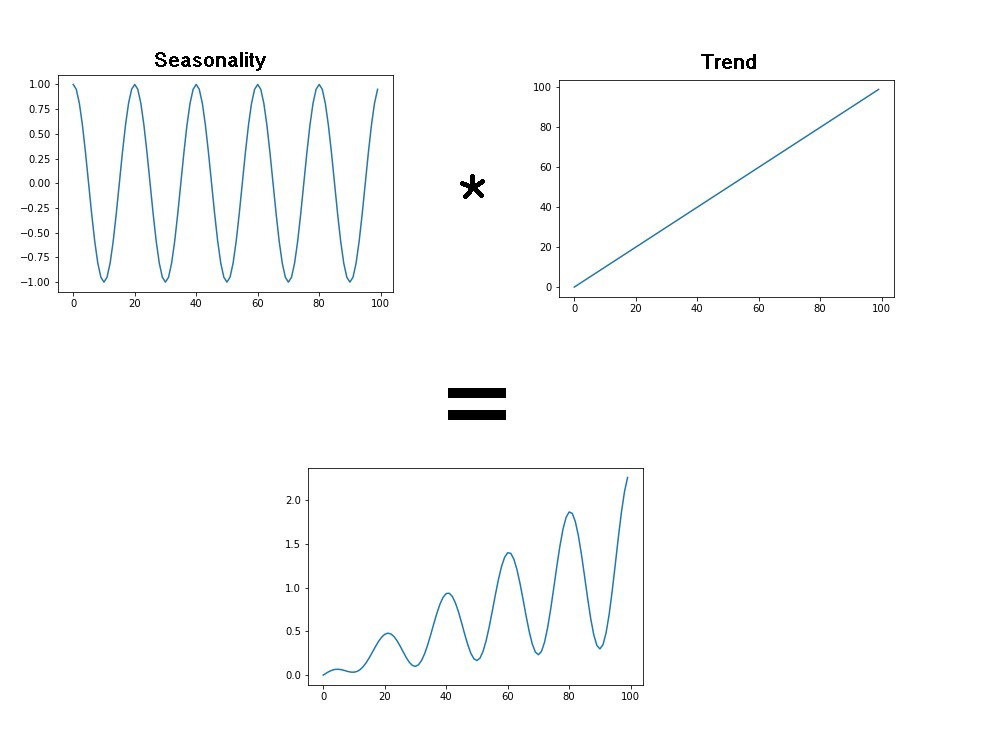

In [40]:
#remove source name with , - e.g., "data:image/png;base64,"
base64_data="/9j/2wCEAAMCAgMCAgMDAwMEAwMEBQgFBQQEBQoHBwYIDAoMDAsKCwsNDhIQDQ4RDgsLEBYQERMUFRUVDA8XGBYUGBIUFRQBAwQEBQQFCQUFCRQNCw0UFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFP/AABEIAvED1gMBIgACEQEDEQH/xAGiAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgsQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+gEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoLEQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/2gAMAwEAAhEDEQA/AP1TooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr5+/aS/a0g+Bninwn4G8P+ENQ+JHxN8WbjpHhnS7uGDCK6BpbmRiWgiKmZlkMbIfs8u5kVGZfoGvj/8Aar8C/D34p/tHfDXQ9O+JeofDH9orT7OS/wDDF/pekm58+1LSPItyTGEliCW14qxNOi/vZdyuJCrAHVfBX9sW88bfGW6+EXxI+HWofCf4kLZNqllp95qlvfWeo2oEZBt7lNnnSnMxKRoyqtvKS+5HVfpavgrSviT41+AP7UXw18L/ALQfh/wR461PxRNPpPhL4v6bpyW+rxDzJlW3niWEsjO13bR7YvLiRbliZJv3jD5r8XaR41/bB/ai+Ptvqvwu1j4yab4T1O50DStMsfHCaFaeGxvktkuoYrjzFaeRbFXO390XEhkjYMgQA/Ymivz1svHfjX4A/sDX9h+1FrPjfwprh8QDStN1fwhrSXXiS8ieRLuNheedKitlbqMl3QeRDsA3Fd/hf7HNh4n+BH7e3w68JWHg7xB8JPD/AI38M/atS8K61rkWqvqEcVjdtDdS4hjMEpmtyxjZFkjczqNkcnlAA/X6ivy1/ap+BfiHwd8efHHxK+LXhrxv8SPBd3PbXvh74g/DzUxbav4Ft7b7RcCCOyyUCoUQNO+I1XM28Tyso6v9sf4lw+N/Bv7KPwz8EfEHWNW+HXxJ1OLSNT8VWepSDVdUs0NrZSJPLwrNIt5MZo5ojmWNQyqVZSAfo/RX51+B/DVp+yJ/wUr8H/Cb4cTahp/w38b+GZ9RvPDV7qNxc2dndCO5Jnt0eTiVv7MhBeTzG2ySqCFKhPlX9lP9kP4efFv9hP43/E3xDbahN4u0D+0P7Ku4Lwxx2f2Kwiu1xGBtfzWkKSeYG+QDZ5bZYgH7fUV+Wuu/tBWXjD/gnR8HNO+JXiP4j69428aTajp+nWXga6WDUvEBt5rmzW1u5mjdZIHWW2jkBWSWRmRtkpD1b/4JxN4n+F/7anxa+E0uh6h8PvCy6M2vN4Du9ai1hNNumex8tkukUBv3NyRkfMU8pZDI0QYAHv3wW/bf8d/tEfAO6+IPw++CX/CQaza+Jm0Gbw3/AMJZBbbYFtY52u/tM0KKcNLHH5YUn5twOAQPX/DP7T/hbxT+0t4s+CFpp+sR+LPDWmJqt3eTQxCxeJltmCxuJS5b/S4uCgHytzwM/jH/AM4sv+6zf+4Ovr/4d/ATwL4o/wCCs3x38N6poX2nRj4Zu9QNt9rnT9/qNtZR3r7lcN+8XUbwYzhfNyoUqm0A/T+ivxr0v44eJ/gV+xx8WP2YdTOoS/Fey8TDwlomnWNhE/2qw1B2eX7PG4WeaKUJeYk8ot/xMLTaRvXy/wBR/wBmz4QxfAX4DeB/AUcdvFcaLpkcV61pNJLDJeNmS6kRpMMVed5XAIGAwAVQAoAPTaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz341fHvwL+zx4WtfEnxB13/AIR/Rbq9TT4bn7HPc7p2R5FTbCjsMrFIckAfLjOSM+hUUAfKv/D0f9mL/opn/lB1P/5Gr374XfFLwx8aPAmmeM/Bmp/2z4b1Lzfsl79nlg8zy5Xif5JVVxh43HKjOMjIINfFnwc/5TJfHX/sTLb/ANFaNVr9q34u/G+b9un4cfBf4XfEK38Dad4k0CO+uJrnSbW9WJllvnnlAlhZ2bybUBY9yqWVQSu5mAB960V+av7R/wC214v+H3x10/4KS/GHT/hra+GdGsn8S/Ea88IHULzU9SNqJGW3s4vNiEUongcqVjKMkoEhAVJMrw7/AMFDfiH42/Yn+NeuW+uaenxI+Hl7pNrb+KtH0sLZ6haXF3DbrciK5U5kk8u7Zg0ESqske1FbIUA/T+ivy18YftC/tPfs2fBj4PfHTxf8TNH+IfhnxTPbtqPg1tFtrErFc273ECrdRQK5YwoxZgFEcoQbZ03Z90+KPxx+K3xe/bH1P9n/AOFHi7T/AIa2nhnRota13xNe6LHqN5I5RD5NvHI7RSRML2zzuWNwySkOQAsgB9KfDj49eBfi34q8aeG/Ceu/2rrPg29Gn67bfZJ4fsc/mSxhN0iKsnzQSjKFh8uc4Iz6FX5v/wDBKKz8Rad8Z/2qbTxdf2+qeLLfxBaRaxfWihYbm8W51MTyIAiAK0gcgbV4I+UdB+kFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFeTW2tfEPxZ408cWeia74Z0bStB1WLTYItQ8P3N7PIG0+zuWd5EvoV+9csAAgwFGSTk0Aes0V53/YfxZ/6HbwZ/wCEfd//AC0o/sP4sf8AQ6+Df/CPu/8A5aUAeiUV53/YfxZ/6HbwZ/4R93/8tKP7D+LP/Q7eDP8Awj7v/wCWlAHolFed/wBh/Fn/AKHbwZ/4R93/APLSj+w/iz/0O3gz/wAI+7/+WlAHolFed/2H8Wf+h28Gf+Efd/8Ay0o/sP4s/wDQ7eDP/CPu/wD5aUAeiUV53/YfxY/6HXwb/wCEfd//AC0o/sP4s/8AQ7eDP/CPu/8A5aUAeiV47+0N+y14L/aUt9Bk8SyaxpeueHpjc6H4h0DUXtL7S5Wkhd5ISMpuJt4xudGK4JUq2GG9/YfxZ/6HbwZ/4R93/wDLSj+w/iz/ANDt4M/8I+7/APlpQB5v8Kf2HPBXwz+J9p8RdR8TeOPiN420+D7Npms+N9fe+m06IpMjxxbVjBVluJMrIHAJyoUkknxW/Yc8FfEz4n3fxF07xN44+HPjbUIPs2p6z4I197GbUYgkKJHLuWQBVW3jwsYQEjLBiAR6R/YfxZ/6HbwZ/wCEfd//AC0o/sP4s/8AQ7eDP/CPu/8A5aUAeb2X7AvwbsP2e7/4OR6BcP4XvZhfy3c120t8uoiFIft8cjZWKfbGvCKsZyymPY7IeK8A/wDBMT4a/Dnx14S8Z6V4v+ID+KfDd5FcQanc61G0tzBFFDDFZTYhANssMJi2IEJjlkQsVCKnvv8AYfxZ/wCh28Gf+Efd/wDy0o/sP4s/9Dt4M/8ACPu//lpQB4x4+/4Jz/D3xh4p8W63pHiv4geAP+Ew81vEmneE/EJgs9YkleZ5HuI5Ul3bvtEi7MiMKSAgyxPf/EH9jr4U/Eb4IaX8Jr7w3/Z/gzR/3mlW2l3Elu9hOI5Y1uEYE+ZKPPlcmUSB3YtIHJJPUf2H8WP+h18G/wDhH3f/AMtKP7D+LH/Q6+Df/CPu/wD5aUAcZ8Cf2PPBXwF8Zaz40tNV8UeMfHerwm0u/FPi/WHvr6W2IhxASAiFVNvGQxQuAMbtuFFX4RfsVeCPgv8AAPxr8ItE1TxBdeG/Fn237ddahcwPeR/arVLWTymSFUGEjBXcjYYknI4rvf7D+LP/AEO3gz/wj7v/AOWlH9h/Fn/odvBn/hH3f/y0oA8i13/gnZ8JvE37Ovhn4PaoNYu9I8NTT3Gka+08I1e0aa4aeYLKIQhVy5VkMZUqqEjeiup8G/8Agnz4C+B3xb0/4keH/FPji58TxQ3UWpzanrCTrrjXDyvJJffug0rbpEIClV3W8TlS4Zm9d/sP4s/9Dt4M/wDCPu//AJaUf2H8Wf8AodvBn/hH3f8A8tKAPA/+HYHws/4UF/wqL+3vGH/CN/8ACTf8JX9q+2Wv2z7V9l+y7N32bZ5WznGzdu53Y4r1M/sm+ELf9p//AIXtp+peINK8Xz2f2HULKyvwunamnk+SDcRFCzYVYSFV1TdbxNtLAlup/sP4s/8AQ7eDP/CPu/8A5aUf2H8Wf+h28Gf+Efd//LSgD448A/CrWv2of2+dJ+OmofCTWPhx4F8M6YIV/wCEy0mC3vta1SKMiKWS2Zg6NGLlDHPiVR9gjAdWwsf6F153/YfxY/6HXwb/AOEfd/8Ay0o/sP4s/wDQ7eDP/CPu/wD5aUAeiUV53/YfxZ/6HbwZ/wCEfd//AC0o/sP4s/8AQ7eDP/CPu/8A5aUAeiUV53/YfxZ/6HbwZ/4R93/8tKP7D+LP/Q7eDP8Awj7v/wCWlAHolFed/wBh/Fn/AKHbwZ/4R93/APLSj+w/iz/0O3gz/wAI+7/+WlAHolFed/2H8WP+h18G/wDhH3f/AMtKP7D+LP8A0O3gz/wj7v8A+WlAHolFed/2H8Wf+h28Gf8AhH3f/wAtKP7D+LP/AEO3gz/wj7v/AOWlAHolFed/2H8Wf+h28Gf+Efd//LSj+w/iz/0O3gz/AMI+7/8AlpQB6JRXnf8AYfxZ/wCh28Gf+Efd/wDy0o/sP4s/9Dt4M/8ACPu//lpQB6JRXnf9h/Fn/odvBn/hH3f/AMtKufCLxNrHizwW95r72M2rW+q6pps0unW728EgtdQuLZXWJ5JGXcsKkgu3JODjAoA7iiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD5e8AfsweKfCn7fPxJ+N91f6PJ4T8S+H4tKtLOGaU3ySrHp6lpEMQQLm0k5Dk/MnHJweP8A9mDxT4r/AG+fht8b7W/0ePwn4a8Py6Vd2c00ovnlaPUFDRoIihXN3HyXB+V+OBn6hooA+Sfi9+yx8RdJ/aWk+O/wP8QeF9M8V6ppkeja7oXi+2uHsdRiCkGczRMzowENkBHEsY/cbi53Or5XxG/Zn+P/AMZ/2ZPib4O8f/EbwvrnizxZPZS6Zplpp5s9I0JYdQE7xpcrEZ51eJYwDLGWVkALNkufsuigD4q/ab/Yr8cfGj9i/wCE/wAItE1TQLXxJ4T/ALJ+3XWoXE6Wcn2XTpbWTymWFnOXkBXci5UEnBwDv/F79lj4i6T+0tJ8d/gf4g8L6Z4r1TTI9G13QvF9tcPY6jEFIM5miZnRgIbICOJYx+43FzudX+tqKAPj/wDYM/ZT+Jf7O/ir4u+I/ibr2geINa8dXlrqD3OhSSNvnWS7kneRWgiVNzXIICDH3hhQBn7AoooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK4/4rw+Fp/h5rieNW0tfC/kZvDrTxrZ4DAr5hkIXG8LgHgnA5zXYUUAfKmg+MdK8RfsLeGLfQtctNTaDwnpCalFpV2s00dnGLdL8ERksCsQnVgOQQRweK5oHwN9u/e/2H/woD/hOX8vd5X9gY/sNcf8ATH7N9t8zH8H2nGPmxX2hRQB5h+z4+pD4FeF2lWWW4FiTZpqDsjtb7m+yiRiCwJh8rJILDkkE5FVPgbcaxdeIPivJrthZadqh8UxebbadePdwJjRtM27ZXiiZsrgnKDBJAzjJ9arzv4X/API7/F7/ALGmD/0y6XQB6CwAri/h949fxZd67peoWY0vXdGvGt7qz8zeDG2WgmRiBuR0wQcDkMMDFdqDXlXjJE8PfG/wHrkaiKPVobzQ7uXoHOwTwA+4aKUD/fOOprWlFTvHrZ6+mtvn+djmrSlTtJPS6TXq7X+T/C56vRRRWR0hRRRQAUUUUAed/Fn4qf8ACt7KxjstJn8Ra5fOxt9KtWCyvFGN80mSDgKgOPVmUDrx1vhnxBY+LNBsNY0y4W5sL6FZ4JV/iVuRkdiOhB5BBB5Fee+B4k8Q/Gnx/rrKJo9MW00G0l/ubY/PnA9MvMgP+4Kd8GIV8O+JPiF4VUCOLTtY+220SjCx291EswCjsBJ5wwOMg11zpwULJe8km35O33Wul63PPp1ZuopSfuttJdmr6363s/lY9XooorkPQCiiigAo6UgNZPirXIvDHhrVdXn/ANRYWs11J/uohY/oKEruwpNRV2cBc/HWxtfienhg2EjaQJk06XXg48iPUXUulqRjklRyQeGZVIya9THFeGaN8OG1L9lg6NJEH1jUdJfUZJGHzm+lBnEhPdhIV5zn5Rg8CvT/AIdeJf8AhMfAfh7XM86hYQXLY7MyAsPqDkGuutCCV6fR29bbP566eRw4epUcrVd2rryvuvlp9509FFFch3hRRRQAxuao6vq1roGl3mo38yW1jaRNNNPIcKiKCSSfQCrzH3ryv48Kdbj8H+FABKmu67bx3MB6SW0Ia4mBHcERAEf7VXThzyS6fp1/AxrTdODkt+nq9EvvLnwl+MEfxLa/t7nSbjw/qVvsuYrK7bLz2co3Q3A4HDAEEDO1gQT0r0joa8p+JqR+HfiV8OPEqoIt9/Lod0yjBeK4iYxqx7gTRxkD1bjrXqwOfxq60Y3UobPpvbpb8L/Myw8pWlCbu07X2vone3zt8h9FFFYnWFFFFADOprhvip8SD8PNHtjZ6bJr2vahMLfTtIgfZJcuAWfnBwqqCxOCBgDjIruO/XpXlWixR+JP2gvE1/KN8XhzS7XTYQeQk05aaUr6EoIQSOcYrWlFNuUldJXf3pL8WtjlrzkoqMHZt2T7aNt/cmd14M8W6f478LadrmmyF7O9iEihh8yHoyMOzKwKkdiCK3M4IFeVfDOJfDfxR+I3h1B5VtJcW2t2sfQEXEZWYgenmwuT7v6k16sG4pVYqE7Laya9Gk/wuVQm6kE5bptP1Tt+g6iiiszoCiiigCNjjtmlU8Zqvf3sOnWVxdzuEggjaSRj/CqjJP5Zrgv2fhe3Hwo0bUtQlkkvNW87VHMjFsefK0qgegCuoAHHFWoXg59ml99/8vxMnO1RQtum/ut/mekV518B/wDkSNS/7GnxH/6e72vRa86+A/8AyJGpf9jT4j/9Pd7UGp6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAYPjBtaXw1fv4euLG01hY91vPqdu9xboQQWLxpJGzfKDgB15xzjNeB3H7R3i+48AW3iiytNEii0XwBpvjzxHBPbTMbqO5Sd2t7QiYeSQtndENIJeTGCOrV9B+JdGn8QaDeadb6re6HNcJsGoaekLTwjIJKiaOSMkjI+ZGGCcAHBHktl+ynotr4c0nQ5PFnie8sLTSofD92sr2SnVdMhYmGzudlsoKIDIoaMRuVlkDO240APtvjD4kl+IEBMGl/8Ibc+KZvCccCwSfb0mjtpHN0ZfM2FDNE8flCMEKQ+8nKVf/ar8V6B4c/Z++INvresadpb6n4e1O0tIr+6jhN1K1pIBFGHI3scgbRknI45rXh+CWkwePv+En/tLVDEupPrEehGSL7AmoNbm2a6A8vzdxjZvkMhTcxcIHO6n/tHf8m8/FD/ALFbVP8A0kloAP8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOv+GcfhP8A9Ev8Gf8AhP2n/wAbo/4Zx+E//RL/AAZ/4T9p/wDG69FooA86/wCGcfhP/wBEv8Gf+E/af/G6P+GcfhP/ANEv8Gf+E/af/G69FooA86/4Zx+E/wD0S/wZ/wCE/af/ABuj/hnH4T/9Ev8ABn/hP2n/AMbr0WigDzr/AIZx+E//AES/wZ/4T9p/8bo/4Zx+E/8A0S/wZ/4T9p/8br0WigDzr/hnH4T/APRL/Bn/AIT9p/8AG6P+GcfhP/0S/wAGf+E/af8AxuvRaKAPOv8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOv+GcfhP8A9Ev8Gf8AhP2n/wAbo/4Zx+E//RL/AAZ/4T9p/wDG69FooA86/wCGcfhP/wBEv8Gf+E/af/G6P+GcfhP/ANEv8Gf+E/af/G69FooA86/4Zx+E/wD0S/wZ/wCE/af/ABuj/hnH4T/9Ev8ABn/hP2n/AMbr0WigDzr/AIZx+E//AES/wZ/4T9p/8bo/4Zx+E/8A0S/wZ/4T9p/8br0WigDzr/hnH4T/APRL/Bn/AIT9p/8AG6P+GcfhP/0S/wAGf+E/af8AxuvRaKAPOv8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOv+GcfhP8A9Ev8Gf8AhP2n/wAbo/4Zx+E//RL/AAZ/4T9p/wDG69FooA86/wCGcfhP/wBEv8Gf+E/af/G6P+GcfhP/ANEv8Gf+E/af/G69FooA86/4Zx+E/wD0S/wZ/wCE/af/ABuj/hnH4T/9Ev8ABn/hP2n/AMbr0WigDzr/AIZx+E//AES/wZ/4T9p/8bo/4Zx+E/8A0S/wZ/4T9p/8br0WigDzr/hnH4T/APRL/Bn/AIT9p/8AG6P+GcfhP/0S/wAGf+E/af8AxuvRaKAPOv8AhnH4T/8ARL/Bn/hP2n/xuj/hnH4T/wDRL/Bn/hP2n/xuvRaKAPOP+GcvhP8A9Ev8Gf8AhP2n/wAbpP8AhnL4TnGPhh4M/wDCftP/AI3Wx47+JWh/D22iOpTyS31y2y00yzQzXd2/92KIcsffgDuRXKaZ4a8Y/EXUrbVfFV1N4V0SCVZ7Xw3plx++kKkFWu51wTggHy0IXpkkitY021zSdl/WiXX8u7RzyrJS5Iq78unq/wCma3/DOPwn/wCiX+DP/CftP/jdcR8Wfgp8O/C3h7RdU0XwF4Z0fVLfxT4dMN9Y6PbwTRk6zZqSrqgYZBIOCMgkd6976V538eP+RI03/safDn/p7sqyOg9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK8y+Pup3dj4K06C2vrnS4NS17StMvb6zmaCaG2nvYopAkikNGXDeWHUhl8zKkEAgA9NoryP4R27+I/BnizQNQ1PVL/StO1/UNLs9QOqXC3jW0cgIU3auJi0bmSHfv3ERYZick+W+FfBHizxr8JdD1rw5rGr32n6r4rufEMen6t411SzebRDbXFvaQpeqZZ1VgLS6KZ2lmbJA5oA+rq87+F/8AyO/xe/7GmD/0y6XV74XeLrTxd8LPD3iDS7O/+y3GnRyQWl1c/aLk7VxsM0jnzWJUjzGc7+GLHOa5z4G6rda1r/xYvLzR77QLiTxTFu0/UXgeePGjaYBuMEkkZyACMOeCM4OQAD1jdzXln7RcZtPAEWvoC0vh3UrPV1AH8McyiT8PKaTPtmvUguea5X4paMfEXw48U6Woy13pdzCvHdo2A/UitaMlGpFva6+7qc9eLnSklvZ29eh1EbCRQQcgjIIp+Olcl8KdZPiH4aeFtSY5a60y2mY/7RjUnP0ORXWg1nJcsnFmkJKcVJdULRRRSNBuKjmkWGNnYhVUElj0AqXdXHfF3WD4f+Fvi3UVIV7bS7mRCTj5hE20fngU4rmkordmdSShByfRHPfs5wm5+HC67IhS48Q393rDg+k07GP/AMhiMfhTJx/wj/7RtnJny7fxFoDw4H8c9pKGGffZcN+C113w20b/AIR34e+GtLYbWstNtrcj3WJVOfyrk/i4w0vxx8L9Z7Q629g3+7cWsqDPtuVPxxXWpKdWfRNP9Wl96RwuDhQh3Ti/xSb+5s9UopOtLXGekFFFFACY4ry79oudpvhrLokT7LjxDe2mjRkHHE8yK/8A5D8w/hXqGea8u+KoGp/EX4WaOwyj6tcai30t7WTB/wC+pE/HFb4e/Omul392v6HLiv4TXey+9pfqemQwpBAkUahERdqqOAAOgrzD9npv7O8Lax4bwV/4R3W73Tkz18rzTLF+HlyoB7CvVa8t8At/Zvxq+Jth9xLn+ztTjXsd8DQsR+NuM+5p0/epzXaz+d7fk2Kr7tSnJea+TV/zSPU6KKK5zrCiiigBOgryvUs+IP2i9Ht9u+Dw7oU94T2Wa5lWJPx2Qy/n716mGBry74dN9v8Ai/8AFHUgd8cdxYaZG3p5VsJGA/4FcGt6WinPsvzaT/Bs5K+rhF7N/km1+KRP+0RYS3Hwk1y8tVBvdJ8rV7c+j20izcfUIR+Jr0DTL6HVdOtby3bfb3ESyxt6qwyD+RFV/EelJr3h/U9Nf7l5bS25+jKVP865D9n/AFQ6v8F/Bs7Z8xdNht5N3XfGPLbPvlDRrKj6P8/+GD4cR6r8n/wT0OiiisDrCiiigBjcDNeXfABTqeg+IvErHd/b+u3l3Ex6mFJPs8X/AI5CCPrnvXdeMdZXw94U1nVD0srSW5P/AABC39K5z4FaSdD+DngyzIIkXSreSQHrvdA7/wDjzGt42VKXdtfdrf8AQ5ZXdeK6JN/N2S/Ux/Eo/sH9oHwfqIB8vXNLvNIkPbfEVuIvxwJwPqa9SHevLfjpusX8BauuR9g8UWYdh2SYPbn8P3wr1MdPrRUs4xa/p3/yaCleNSpHzuvRpfqmOooorA6gooooA83/AGhNSl074QeIYbb/AI/NQiXS7cDqZLl1gGPceZn8K7nRNKh0PSLLT7ddtvaQpBGPRVUKB+QFedfG5W1HU/h1pCHLXnia3mZPVLeOW4J/AxLXqKsCK3lpTivV/p+jOWGtaUuyS/X9UPrzr4D/APIkal/2NPiP/wBPd7XotedfAf8A5EjUv+xp8R/+nu9rA6j0WiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOv2jv+Tefih/2K2qf+kktei151+0d/ybz8UP8AsVtU/wDSSWgD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAQcUcCiuJ8efFPR/Aj29nN52pa3d5+x6Npy+bd3B9Qg+6owcuxCjBye1OMXN2itSJzjTXNJ6HXXE8drFJLNIsUSKWd3OAoHUknoPevKrn4oa18RbqXTfhtbxS2aOY7jxZfITYwkHBFunBuXHPIIQEDLHOKbB8N9f+J08d98Rpkt9KDB4fCGnzZtx3H2qUYM7A4+UYjBHRs16ra2kGn20VtawpbwRKEjiiXaqKOgAHQD0ro9yl/ef4L/P8vVHL+8r94x/F/wCS/H0OP8C/CnSvBVxNqbyT634juhi61zUmElzL/sqekaDsiAKABwTzXcHNL0GaO9c8pSm7t6nTCnGmuWKsh1edfHj/AJEjTf8AsafDn/p7sq9Frzr48f8AIkab/wBjT4c/9PdlSND0WiiigAooooAKKKKACiiigAooooAKKKKACiiigArP1jRdP8Q6ZdaZqljbanp11GYrizvIVlhmQ9VdGBDA9wQRWhRQBgaV4I8O6JZRWen6BpdhaRWpsY7a1so440tySxhCqAAhJJKgYJJOOar678OPCPirQ7HRNa8L6Lq+j2O37Lp1/p8U9vb7V2L5cbKVXCkqMAYBIHFdPRQBVtLSHT7aG2toUt7aFBHHFEoVI1AACqBwAAAAAMcVwvwv/wCR3+L3/Y0wf+mXS69Erzv4X/8AI7/F7/saYP8A0y6XQB6JTJFDIRjIOeDT6Q9KBPU8v/ZwJh+E2naa5Pm6Tc3mmOCenk3UsYH/AHyq16gOleWfBVf7N134laSTg23iSW5VfRbiCGYfmzua9TPSt67bqyk+uv36nNhtKMY9lb7tBaKKKwOobivLv2jj9p+Ft1pS/wCs1i+sdMQevnXUSsP++S1eonoK8s+Mqf2l4n+Gejr1uPES3bD1S3t5pT/48EP4Vvh7qqmumv3anLiv4Ml30+/Q9RUYQV5h+0Wq2vw6TWMZfRtV07UR7CO7i3H/AL5LV6gORiuJ+NukDXPhF4ysgu55dJudg/2hGzL+oFKi0qsXLa6v+o8RFyoyUd7O3rbQ7ccjNOrA8D61/wAJF4M0LVM7vttjBck+u+NWz+tb2ayas7G8XzJMWiiikUIeleWak51X9pLRrdhlNI8N3NyP9l7ieNB+awv+VepjvXl3gn/iY/HX4j3j8/YbbTNNjPoPLknb9Zl/Kt6S0lJdF+bS/U5K+rhHu/yTf6Hp+Aa8tnB0v9pS0cnEWreGJIvq9vcqw/8AHbhvyr1PPWvLviYf7P8Aip8K9U6Kb6901z7TWrMB/wB9QLRQV5OL7P8ABNr8R4jSKl2a/Fpfkz1OiiisDqCiiigBh+6a8u+AK/atE8T6z1XV/Emo3KN/eRJjCp/75hA/CvRtXv00nSry9k/1dvC8rfRVyf5Vwn7O9ibD4JeDg5zJPYJdufVpsysfxMhP41tFJUZPzS/O/wChyz1xEV5N/PRfqz0c9CK8t/Z6YW3hPWtH6Lo3iDUrNVPUIbhpU/8AHZAfoRXqQPBry74Xj+zfih8VNJTiIajaako/672qBj+LQt+VOneVOaXSz/G36hU0qwl3uvvV/wBD1OiiisDqCiiigDzP9ou8e0+CnitIT++urUWCe7TusIH4mTFehafZR6fYW1rEMRQxrGg9ABgfpXmvx6JubPwZpI5TUvE+nxOvqsbm4I/8g16kOFFbyaVKK83+lvyZyw1rzfZJfm3+aPM/2j7eST4L+JZ4Rmawji1FMdQYJkmyP+/Zr0a1nju7aKeM7o5FDofUEZFY/j7Rx4h8D+INLIyL3T57bH+/Gy/1rJ+C+rnXPhJ4OvmbdJNpNszn/b8pQ36g0auil2b/ABS/yDbEPzS/Bv8AzO2ooorA6gooooA8s8XY1T4++ALJTn+zdP1LU3X03CKBD/5EcV6ie1eW6Kg1X9o/xJcggjSfD9lZ49GmmnkP5iNPyFepCt6ra5Yvovz1/U5aGrnLu/ySX6Dq86+A/wDyJGpf9jT4j/8AT3e16LXnXwH/AORI1L/safEf/p7vawOo9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiivLfjv8R9X+HWmeHH0cRJJquqiwmun0m51d7aP7PPLuSxtnWe4YtCqkRnKKzSEFUagD1KvOv2jv+Tefih/2K2qf+kkteT+Bf2k/F3i7SLDxRJZ6FB4dtdW0Tw9qtlCkklzNd6ilmRNDMJdkaI2o2oMTI7cSguCoz3/AO1R4u0Pwx8AfH8Ota1p+kzaj4e1O1so766SFrqU2sgEcYYguxyAFXJORxzQB69RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAwkDHHFVdQ1C10mylu725itbSFS8s07hERR1JYkAD3Ncd47+LOmeENQj0azt5/EPim4Xdb6Hp2GmI7PIT8sMfIy7kDGcZxisGw+Feq+PbyDVviVcxagiOJbbwxZk/2dakdDJ0NxIPVhtBJwvQ1tGlZc03Zfi/Rfq9PM5ZVm5OFNXf4L1f6LUhk8f+JPiu7WngCL+y9CyVm8XahBlXH/TpC2DKf+mjYQYOA3Fdh4F+F+ieAEnlskmvNVu/mvNXvpDNd3bccvIe3HCjCjsBXWRQrDGqIoVAMADoBT8ccUpVbrlgrL+t3+m3kOFGzU6jvL8F6Lp+Y+iiisjpCiiigArzr48f8iRpv/Y0+HP/AE92Vei1518eP+RI03/safDn/p7sqAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACvPPjV4k1Tw74UsI9FvDpmoatrOnaQuoLGkjWqXF1HHJIquChcIXC7gV3lSQwBU+h1ieK/Cml+NtBudG1q2N3p9wUZkWV4nV0dXjdJEKujq6IyupDKyggggGgDyi28RePdX+DPxFsdEv7jV/HOhXuoaTpeprFaxz3kkeGgcq6rbiQLIqMSqoWQnaoOBj2vj3XNdbw34OsPFHifR9bufENzpms3+uWemf2rYeVp7XiwIIYWtGLq1u4cLINjOM7hlPVtM+FHh3SPD0miWKalZ2EiSRyC31i9SZmeUzSSmYSiQzM7FjMW8wknLEGqDfAjwafD/APZH2C+EX9oHVjfLq94uoG8MflGf7aJhceYYv3e7zM7Pk+7xQA/4O+NL/wAW/CfRte1kifUPIkS7ltYCRPJDI8TyJGoJ+cxlgq5PzADPFYvwN1+28T+IfixqVnFfQ28vimLamo2E9lMMaNpindDOiSLyDjKjIwRkEGvRfD2g6f4W0PT9H0m0Sw0ywgS2tbWIfLFGgCqoz2AAHP41yHwv/wCR3+L3/Y0wf+mXS6APRKKKKAPLfBn/ABL/AI8fEa1b5fttppd+g9fklhY/+QlFepV5VMGsP2mLduiah4WdM+rQXSkD8pzXqY7VvWd2peS/BW/Q5cPopR7N/i7/AKjqKKKwOoSvLvF//Ex+Pnw+tV5+wafql+49MiCFT/5EYfjXqLV5ZaKb/wDaW1CQcpp3hiGIn+601zIxH4iBTW9F2cpeT/HT9TlxGqjHu1+d/wBD1SqupWSajp9zay/6ueNom+jDB/nVqkboawOlq6sebfs6Xj3nwP8AB/mf6yCxW0cehiJiI/ApivSAMivLP2fZRaeENZ0rjbpXiDVLRR6L9qkkH6SA/jXqQbHFbV7e1k1td/noc+Gb9jC+9l94+iiisTpG9K8t+CLfbtW+I+pkZNx4nnhDf7MMMMIH4FGr1Et8przD9nEC5+GiamR+81TU9Rv2PrvvJSD+KhTW8U1SlLzS++7/AEOWprWhHyb/ACX6nqA4NeWfHxPI0zwdqQ4XT/FGnSsfRXl8lj+Uxr1M4HavMP2k4ifgr4jnjBL2aQ3y465hnjl/9kooJOrGL6tL7wxP8Gb7Jv7tUeoDpS1FFIs0SOhDIwBUjoRjINS1gdKCiiigZwvxz1L+yPg740uw2100i6CH/aMTKv6kVveDNK/sLwjoum42mzsoYMem1FXH6VxX7SI+0fCe/wBPH39SvLGwUevm3cSkf98lq9OXlR9K3aSop92/wSt+Zyx1xEvJL8W/8kLjAry3SH/s79pHxBbjhdT8OWdyf9poZ5kP5CRfzr1PPNeW+Jdum/tDeDLoYzqWi6lYk+6Pbygfo360Urvmiuqf4a/oFf3eWXZr8dP1PU6KKKwOoKKKKAPLfiT/AKb8W/hXp55QXd/fsP8ArlaMgP4NMv516j0OK8s1J/7Q/aS0SE8ppnhu7uB7NNcQoPzEbflXqXVq3qtOMEui/Vv9UctH46j7v8kl+aYMOCa8v/Zs/cfCTTLBuH025vLBh/d8q6lQD/vkCvUDyK8s+BebWb4gae3/AC6+Kr0qD2WURzjH/f00Rf7qUfNP7r/5hPStCXk199v8j1WiiisDqCiikY8GgDy74XY1D4mfFTUxyh1S1sF9vJs4iR/31IT+Neofw15b8AFM+j+LNS6rqPifUpkb+8qzGFT+UQH4V6nnrW9dt1Nell9yscuG/hJ97v722LXnXwH/AORI1L/safEf/p7va9Frzr4D/wDIkal/2NPiP/093tYHUei0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXH+PPh1B47k0a5XV9T8P6to9y11Y6ppRhM0TNE8TqVmjkjZWSRgQyHBwRggEdhRQB434f/AGYPDPhm9sDYanrcemQXNrqN1pDzxNbajf2+DFeXBMZkMoZImOx1QtFGSp2gVv8A7R3/ACbz8UP+xW1T/wBJJa9Frzr9o7/k3n4of9itqn/pJLQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAMPAozhaO2c1554z+Llrouqnw9oFnN4q8WsoI0qxYAW4PR7iQ/LCvTluTkYBzVQhKpK0V/Xr0M51I01eT/wCD6HZa1rVh4c0241LVLyDT7CBS8txcSBEQepJOBXl//CU+LfjA3leElm8K+E34bxHeQ/6Vdp/06QuPlUjpK475VSRmrui/CG78Qanb678RL6LxFqcLeZbaTChXTLBuxjjPMjj/AJ6SZPoBgV6mBjgdK2vCl8PvP8F6Lr89PJ7nNapX+L3Y9k9X6vovJa+hzHgj4c6H8PbOSDSbUiedt91e3DmW5upO7yytlmY5J5OBk4AHFdR0zS57UlYSk5O8ndnXGMYLlirIfRRRSKCiiigAooooAK86+PH/ACJGm/8AY0+HP/T3ZV6LXnXx4/5EjTf+xp8Of+nuyoA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK4f4teMdR8GeGLWTR47V9Y1LU7LSbJr1GeCKS4nSIyyKrKzKis77QylioXcudwAO4orzbwL4s8UeMvCHiC2aXSbXxho+qXOkSXn2SVrB5I2UpMIPN3hWidGMfm5DErvIG4+c33xt8dr4Wgnsk069eHxhPoF14j0vwzf6naS2cVlLK11HZW85mG25QWrHzWUMjnOCAAD6Przv4X/8jv8AF7/saYP/AEy6XXSeF/EdrrHgvTdc/tiw1Kynso7ptWtEMNrMpQM0qKzsY0PJAZmKjgsSCa4b4G+JdJ8XeIfixquharZa3pc3imIRX2nXCTwybdG0xW2uhKnDAg4PBBHUUAes0UUUAeW+PT9j+Nvwwu+izjU7Bj67rdZQD+MBx9a9QHWvLPjgxtNR+HN+vBt/FFtGW/2ZYpocfiZFr1Ra3qPmhD0a/Fv9TlpaVKi80/wX+QtFFFYHUNx1ry74en7Z8ZPiledVjfTbBW7fu7YyED6Gc5r1EnrXlvwNLXN18Qr48/afFV4oPtEscI/WI1vTdoT81b8U/wBDlrLmqU/Jt/g1+p6pRRRWB1HlnwiUad41+KWl/wDPLXo7wD2ns4H4/EH8c16kDmvLvCn+gftAePrY8fb9M0u+Ueu37REx/wDHFH4V6grZxW9e3Ordl+Sv+Jy4fSDT6N/m7fgOooorA6jK8T6oNE8N6pqJ4Fpayz/98qW/pXKfALTRpXwV8E2+CG/sm3kYHrudA5z+LGk+Puof2b8FPG0+cH+ybiMH3dCg/VhXW+GdNGi+HtM08DH2W2igx/uqF/pW+qo+Tf5L/gnLviPRfm/+AabVyXxX0s618MPFtgoy1zpN1EB7mJgP5iutz1qG7hS5t5YXGVkUqw9QRg1jF2kmbTipRa7o5z4Xan/bfw28LagTk3Wl2s5Pu0Sn+tdTXmX7N1w03wR8KJIf3ltbtZt9YZGiP/oFemdhWlaHJVlHs3+BFCXPShJ9UvyHUUUVkbnlXxyU3d38PNPXk3Xim0cj/ZhSScn6AxCvUsV5f8QQbr4zfC206iN9TvmH+5bCMH8DOK9R6VvUjaEPNX/Fr9DkpPmqVPJpfgn+oeleW/FfGnePvhXqp6R61NYn6T2cwH6qP0r1InpXl37QKeT4e8NaiemneJdMuGb0U3KRt+khH40UL86S63X3q36jxP8ACb7Wf3O/6HqXWlpq9BTqwOoKKKTpQB5b4YVdT/aE8cXR66dpGm2Kn03tcTEfqp/EV6gq15f8JmF/48+KeqdpNbhsgfaGzgUj82P4k16itb17KaS7L8lf8Tkw2sG31b/N2/AOleXfDwfY/jL8UrLokkmm36j/AK6WxjJH4wHNeokV5bZObL9pXUoxwmo+GLeUj1aG5lUn8BKv50UnaM491+qf6DrL3qcuz/NNfm0eqUUUVgdQnXNRXEywQySOdqIpZmPYDk1JurlvijqX9j/DXxXfhsG20q6mB91iY/0ppXkkRN8sW+yOb/ZsheP4KeGZpBiS7ikvWz1zNK8p/wDQ69N21yfwo006P8MfCVkww1vpVrER7iJQa6wGtK0uepKXdtmVCPJRhHskvwHV518B/wDkSNS/7GnxH/6e72vRa86+A/8AyJGpf9jT4j/9Pd7WR0HotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFedftHf8m8/FD/sVtU/9JJa9Frzr9o7/AJN5+KH/AGK2qf8ApJLQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRSdKAE7e3rWN4l8V6V4O0WfVdb1CDTtPh5e4uH2gHsB3JPQAZJPABrj/ABV8X1TWJfDfg6wPirxQh2zRRPstLA/3rmbBCY5OwZc4wBzmo/DPwhabWIfEnjbUB4q8SxndBuj22Onk9raHJAI4HmNlzgHI6VuqSilKo7X6dX/wPN/K5ySruT5KKu+r6L59X5L5tGV/aPjL4ynbpn2vwJ4Ofg6hKm3Vb5fWFD/x7oecOwLnggDNegeDfAuh+ANK/s7Q7COxhLb5GGWkmc9Xkcks7HuWJNdCRnvQCWGamdRyXKlZdl/W/wDSKhRUXzyd5d3+i6D6KKKyOkKKKKACiiigAooooAKKKKACvOvjx/yJGm/9jT4c/wDT3ZV6LXnXx4/5EjTf+xp8Of8Ap7sqAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACub8e+CrLx/4efSL24urLE8F3b3tiyrPazwyrLDLGWVl3K6KcMrKQCGBUkHpKKAPM4/gpDb+Bda8MWvi7xLZjWI7k3urW0tsl+888heW6EggwkpBKDaoRVACqpUESaR8I7zw94JsPDOlePvEenQWDr9mu7W00pJIoFjEa2wQWXkiMY3AiPfn+LGBXpFFAGD4M8Iaf4C8K6X4e0pZV0/T4FgiM0heRsclnY8lmJJJ7kk1zPwv/wCR3+L3/Y0wf+mXS69Erzv4X/8AI7/F7/saYP8A0y6XQB6JRRRQB5d+0aBb/DYal/Fpmq6bfD22XkOT+AJP4V6cgAX1rzz9oaxOofBHxtGCcppc04x1zGu8Y/75rt9E1Aato9lfL924gSYfRlB/rXRLWjH1f5L/AIJyx0xEvRfm7/oX6KKK5zqGuODXmH7OJ+0fC631D+PUtR1C+Y+u+8mIP/fOK73xHqQ0bQNSvz0tbaSYk/7Kk/0rkP2frAaZ8FPBMPc6TbykHrl0DnP4sa3i7UZebX4J3/Q5Za4iPkn+LX+TPQ6KKKwOo8qnH2L9pizc/KuoeFpY8+rQ3SED8pmr1QdTXlvj3/RPjf8ADC6BwJ01SxY+u6BJQP8AyAa9SreqrRg+6/Vr9Dlov3px7P8ANJ/qLRRRWB1Hl37SH+kfCy7sB9/Ub+wsVX18y8hUj/vkmvT1HSvK/jpuuZvh9YKM/afFVkSPaISTn/0UK9UzxW8nalGPm399v8jlhrWm/JL7rv8AUdTX+6adRWB1Hln7PbiDwrrumjhdM8RapaqPY3Ukg/MSA/jXqWOK8s+ECjT/ABj8UdM6NF4gW7A9BNaQP+pyfxNepg5revf2jb66/ernLhf4SXa6+52FooorA6jyu/b7d+0ppEJ5TT/DNzOPZprmJR+Yib8q9SIxXl3hsf2j+0N41uTj/iXaNptkD/vvcSn+n5ivUutb1k04xfRL8df1OWhqpS7t/hp+ghFeZftKRs/wU8TyoNz2sUV6APWGZJf/AGSvTW4rkfi5px1j4WeL7IDLXGk3Uaj3MTAfripoy5KsZdncrER56M4rqn+R1MEqzQo6ncrgEH2qXt9a5r4Z6n/bPw78L6hnP2rTLafP+9Erf1rpM4rOWjaNYPmin5D6Q9DS1HI4jjZycKoJJPp3pFs8v/Z/TztE8U6j1XUPE2pzo3qqzmJf0jA/CvUiMV5j+zWjD4KeGp3GHu0mvTn1mnkl/wDZ69OByRW+IXLVlFdG19xy4X+DB90n9+oE9a8u8Tgad+0J4HuQP+Qho+p2TH/ca3lA/Qn8DXqBOa8v+KrCw+Inwr1I8BNYuLI+/nWcwA/NAfwp4ezk79n+Tt+IsTpBPzj+av8Agep0UUVznWMfsfSvNf2kLloPgh4tWPh7i1FovuZXWID8S+K9LbBNeW/tCMLjwloulnpqfiHS7Uj1H2uNz+iE1vQ0rRb2TT+5nLiv4M0uqa+bR6ZZwJaWsMEYxHGgRR7AYH8qnxmhegpawOlaKwV518B/+RI1L/safEf/AKe72vRa86+A/wDyJGpf9jT4j/8AT3e0DPRaKKKACiiigAooooAKKKKACiud8f8Aj7w98LfBureK/FerW+ieHdKhNxd31ySFjXIAAABZmZiFVFBZmZVUFiAcn4R/GfwV8evBsfirwF4gt/EWhPPJbG4hR42jlQ/NHJHIqvG2CrbXUEqysAVZSQDuKKKKACiiigAooooAK8t+OfxVuPhnZeGrWwMUWqeIdUOm208+n3GorAFt5rh3FrbETTttgKiOMg5cEkKrV6lXKePPAdv45g0snUb7RtT0m8+3afqmm+UZ7WYxSQsVE0ckbBoppUIZGGHJABAIAPHdG/aC8Q6xO2s2V94f1nwfpeu6P4Y1Ce1sJ4Z726v1s8XEBadhAkbajagwusjfLKC6kAV1/wC1R4u0Pwx8AfH8Ota1p+kzaj4e1O1so766SFrqU2sgEcYYguxyAFXJORxzUOgfsweGfDF/ZyWWqa2NPS9g1W90mSeJrbU9RhO6O9uCYvMMocRuQjohaKMlDtFb/wC0d/ybz8UP+xW1T/0kloA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAGAdKU8Gmk/lXl2u/F241nVZ9A+H1hH4l1qJjHc37uV03Tz/02lH32H/PNMscHJXFXCnKd7Lbd9Pm+hjUqxpq8nvsur9Edr4v8b6L4D0h9T13UIrC1BCrvJLyN2RFGWdj2VQSa88+zeNPjKN119s8BeDX6WykLq18v+2R/x7Ie4GZCMglc1ueEfhBb6VrCeIvEl9J4r8WEEDUbtAsdqD1S2hGViX3GWPOWOa9DxgVrzwpfBq+/+S/V/cjDkqVv4mi7J6/Nr8l97Mfwr4O0fwTo8Wl6Jp8Om2EfKxQLjJ7sT1Zj3JJJ7mtoHn2o9KRhjpXO23dt6nWoqKSirJD6KKKCgooooAKKKKACiiigAooooAKKKKACvOvjx/yJGm/9jT4c/wDT3ZV6LXnXx4/5EjTf+xp8Of8Ap7sqAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACuH+LXjHUfBnhi1k0eO1fWNS1Oy0mya9RngikuJ0iMsiqysyorO+0MpYqF3LncO4rm/Hvgqy8f8Ah59Ivbi6ssTwXdve2LKs9rPDKssMsZZWXcropwyspAIYFSQQDzs/GTXNM+FHinVb+10+68V6Fq7+H8W6SQ2dxdNPHFbS7C7OiMLiFmXcxXLAMcAnJHxb8cS69/wgaS6APGS+Im0ltaOnT/2f9mGmLqHni0+0b9xDrDs8/GcvuwAh7O2+B2lJ4K1Xwxd6tq+oWWq+dNe3Fw8K3E13LKZTeb0iXbMrbdoUBFCIAgCiqZ/Z/sBYBx4n8QDxL/bB1w+Kg1p/aBuja/ZCSv2f7Ps+zARbPJ24AON4DUAdF8MPHp8bfDXSfEupxwabO8Dm+VZP3MM0TNHMVZsfIHjcgnB24JxXN/A3xLpPi7xD8WNV0LVbLW9Lm8UxCK+064SeGTbo2mK210JU4YEHB4II6iu78GeEtP8AAfhTS/D2lrKLDToFgiMz75HAHLOx5ZmJLMTySSe9cz8L/wDkd/i9/wBjTB/6ZdLoA9EooooAwfHGmf234M13T8Z+1WE8GP8AejZf61ifBHUf7V+D/gu6J3O+j2u4/wC0IlDfqDXauMKfpXmX7NZ8r4NaHaN9+xku7Eg9R5V1LGB+SCt0r0W+zX4p/wCRyvTER80/wat+bPUaKKKwOo4P466h/Zfwa8bXOdrLo9yqn/aaJlH6kV0XhDTP7F8KaNp+MfZbOKHHptQD+lcR+0mPP+EOqWI5bULmysQPXzbqJCPyJr05eUH0roatRT7t/gl/mcsdcRLyS/Fv/JD6KKK5zqPK/jW32HXPhtqI6weJooCfRZoJ4j+ZZRXqPU15h+0UFt/ANrqnGdL1vTL0H023kQJ/Jj+Ga9PB4X6VtNN0oy82vus/1OWGlacfJP77r9B9FFFYnUeW/Eb/AEz4v/CqyPKLc6jfMv8A1ztSgP4GYV6gK8t1VxqH7SHh+3bldN8OXtyPZpZ4EH5hG/KvUh2rerJcsEui/Vv9UctH4qj7v9EvzTHUUUVgdR5b4NH2H48/EW3PH2yx0q+QeuFniY/+Q1H4V6gB0rytwbP9plD0F94VI9iYbsfric16oOtb1nzNPyX4JL9Dlw+ilHs3+Lb/AFHUUUjHg1gdR5d8LcX/AMSfirqS8q2rW1ivt5NnDkfnIT+NeojpXlnwDUzad4x1A8i+8U6lIreqpL5Kn8ohXqWa3rtupr0svuVjlw38NPvd/e2x1VtQtUvbKe3k/wBXKjRt9CMH+dWaRhwaxR0tXR5p+zjdvdfBDwh5n34LIWrexiJiP5FMfhXpKnP415f+zyy2/gvVNMXppmv6paD6C8lYfo4r1AEAitcRb20rbXf5nNhm3RhfsvyFxk1zfxI1P+xfh94l1DOPsum3E+fTbEzf0roweTXm/wC0ZdtZ/BDxkY/vzWD2qj1MpEQH478fjU0o89SMe7S+8uvLkpTl2T/I2Pg9px0r4UeDrIja0Gk2qN9REuf1zXY4qtptolhY29rH/q4Y1jX6KMD+VWKibvJyLpx5YKK6Kw7HWvLPj8vk6V4R1DoLDxRpsrn0VphEx/KU16n2zXl/7Sin/hTHiG5UHdZfZ70EdQYbiKXI/BDW2HXNVjHu0vvMcTpRm+yv92p6gOlLTEYMgI5BGQR6U+sDqGkDmvLfjEgv/Ffwv0wctL4i+1FfUQ2s7n8jg16nkGvLvGf+nfHj4cWw+b7HaarfMPT5IYlP/kVq6KCTm79m/uTt+JyYn4Eu7S+9q/4HqI4paKK5zrCvOvgP/wAiRqX/AGNPiP8A9Pd7XotedfAf/kSNS/7GnxH/AOnu9oA9FooooAKKKKACiiigArwj9qj9sfwH+yHpfh+78aQ6xf3GuzyxWVjolqs0zLEqmWQmR40CqZIgQW3EyDCkBivu9eUftCfsx/D39p/wtDonj3RPt/2TzW0/UbaUw3mnySIUMkMg/wCAsUcNGzRoXRtowAfK37bX7U3wp/aI/YV+K6fD7xrp/iC6tf7PM1htktrxEXU7HdL9nmVJTEDKi+YFKbm27sggeK/8E6v2v/hr+yv+x54ovPGWsedqsnjKY23hzS2jm1S5R7SzUSpAzriMeXITI5VP3ZUMXKq3zt/wUK/Y58Lfsg+M/Ddj4Y8Y3GvW+uwTXI0fUliN9p0UYiVZJXjKiRZZGn2t5UYHksoLlWI8M+FfhzwhbfFfw5pnxfbxB4c8GXXlyajdaXAFvYIJ4PMt7hFkRsxHzIZCQjFoiSgYlQQD9e/2A/2/PG/7XnxT8baJrfgnT9I8N6dZ/wBoWOo6X57fY8zhI7W6kclJJHRiysoiz9mlIQgny/uuuH+D3gHwF8OvAOl6f8NtJ0jS/CdxDFdWr6IqNDeK0SKlwZVJM7PGkeZmZmcAEsetdxQAUUUUAFFFFABRRRQAV51+0d/ybz8UP+xW1T/0klr0WvOv2jv+Tefih/2K2qf+kktAHotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFRu4jUsx2gDJJPQUAOHPFcx43+IWh/D7Tlu9ZvPJMzeXbWsSmS4upO0cUa5Z2ORwBx3wOa43UvivqPjO9m0f4bWcOrzRuY7nxFdZGmWZHUKw/wBe4/uIcAkZYc1t+BvhJp3hfUX1vUbqfxJ4rmXbNrmoAGUA9UiQfLCnJwiAdeSetbqnGCvV07Lr8+39adTjdaVR8tFXXV9F6d36aeZzY8O+LfjIfM8StceDvCL8poNpLi/vFP8Az9TIf3akdYkOeSGbjFen6BoGm+GNJt9N0mxh0+wgXbFb26BEUewH5578k1pduuDQATnmonVcrK1kunT/AIL82aU6MYPmerfV7/8AAXkPooorM6AooooAKKKKACiiigAooooAKKKKACiiigAooooAK86+PH/Ikab/ANjT4c/9PdlXotedfHj/AJEjTf8AsafDn/p7sqAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiivPPiR8RdY8L61o2geGvD0HiXxHqdreaglpdagbGJba18kSt5gikJcvc26Ku0AmTJZQCaAPQ6K4yw8bXni/4baP4r8Gadb6wdZsrXULG21O8NlG0MyrIGkkWKUrhHzgIxJGO+R5dq/7Us+m6X4XkfSPDumX2rapqmjzvr/ib7Dp8FxYytE4juRbOZg7oQuUQnkEAggAH0JXnfwv/AOR3+L3/AGNMH/pl0uu8gkka3jMgRZCoLCNtygnqASBkehwPoK4P4X/8jv8AF7/saYP/AEy6XQB6JRRRQA0j5TXlnwDcwWPjTTzx9i8U6iij0V5BMB+Uor1Md68u+F/+g/E34qacOEGqWt6o9fNs4sn84yPwremuaE/Kz/G36nLV92rTfdtfhf8AQ9TooorA6jyv48kzx+BLEf8AL34rsAR6iMvMQfbEVeo44FeYfEs/bfiv8KtPPMf2+9vmX/rlZuoP4NKPzr1Edq3mrQh5q/4tfoctP3qk32aX4J/qLRRRWB1Hm37Rlm178D/GQT78OnyXKkdjFiQH8Nma77S71NR021u0+5PEsi/RgCP51j/ETTP7a8A+I9Pxu+1adcQY9d0bL/Ws74NaidW+Evg67Y7nm0i0dj/teUuf1zW7bdFLs/zS/wAjlWmIfml+Df8AmdpRRRWB1HlegoNR/aL8V3H/AEDdB0+0/GSW4kP6AflXqS15f8Mj9t+KXxV1Ecp/aFlZKf8ArlaRkj8GkP516eG4roxCSkkuy/JX/E5cNrBvu3+bS/BD6KKK5zqPLPGn+hfHb4a3A4F3barZMfXMcUqj/wAhMa9R9K8u+M0n9n+J/hjqY4aHxGLYn0Wa1uIz+ZKj8a9RXnNb1GnCD8mvxb/JnLS0qVF5p/gv1THUxiAuTwMc5p2awPHmp/2N4J1/UM4+y6fcT5/3Y2b+lYpXdjok+WLZx37NYL/BnQrls7r1rm+JPfzrmWUE/g4r1DpiuJ+Cmn/2V8IPBloV2vHpFqGH+15Slv1Jrtjxitaz5qspd2zHDx5aMIvsvyFpD0paKxOg8s+DKfYPEnxO0xvvQ+I2uQPRZraCQfmSx/GvUO2K8v8ABX+hfHT4lWx4F1b6VfL75iliJ/8AIKivUVINdFdWnp1S/FJnLhn+7t2bX3N2B+leXftEMLjwNp+lnH/E01zS7PHs15Ex/RT+Feok5ry740L9u8Q/DLThyZvEsc5X1WG3nlP5FVP4UqF1UTXTX7tQxP8ACa72X3ux6iowKdSdKWsDqEAri/jPpx1X4SeM7NRuebSLpUH+15TY/XFdmTVTVLNdS0y7tJPuTxNEfowwf51UHyyTM6keaDj3RlfD7U/7b8CeHtQzu+1adbz59d0at/Wugxg15x+zretffA/wYz/fi06O2YHsY8xkf+OY/CvRs4IqqsOSpKL6P8iaEuelCXdL8h2ecV5WM3n7TXqLDwp+AM11/hb16oOpry7wW32347/Ee4PP2Sz0qxQ+nyTSsP8AyKpq6Supvsv1S/UzrayhHu/yTf6HqVFFFYHUFedfAf8A5EjUv+xp8R/+nu9r0WvOvgP/AMiRqX/Y0+I//T3e0Aei0UUUAFFFFABRRRQAVznxCvPEWm+AfEt14RsLfVPFkGmXMuj2N2wWG5vViYwRuS6AK0gQE7l4J+YdR0dFAH42fst/sD/Ev9rD4yax8R/2hrTX9K0Zb0T6hDrsEljqOuTgKRBGhCNDbKuxS6hQFCxQ4ILQ/eX7cX7Dvh79rvwaJ4Wt9D+IulQldH150O2Rclvsl1tBZoGYkggFomYsoIMiSfUNFAHxV/wTA+B/xq+Avw58U+H/AIqr/ZujfbYm8PaFJfw3b2eQ7XUitEXVIpGeIhA5w6StsUuWk+1aKKACiiigAooooAKKK4P4u+PLvwL4YJ0eCG98T6gzW2k2lwSYmmCM7SSAEHyokR5HwQSE2g7mUEA7yvOv2jv+Tefih/2K2qf+kkteYeFP2h/FviLTtL8SSWmix+HLe/8ADuiatZrby/apbzVLexk82CQy7Y4o21O1GxkdmCyfOCBntv2qPF2h+GPgD4/h1rWtP0mbUfD2p2tlHfXSQtdSm1kAjjDEF2OQAq5JyOOaAPXqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCMnilyTjng1BcXMVlbSXE8iQxRqWeSRgFUDqST0HvXlN18TNc+JVxLp3w3gj+wKxjuPF19Hmzj5wRbR8G4cc88ICBknOK0hTlU20S3b2X9fe+lzCpVjT0ereyW7/r7jsPHXxP0T4fQQLqEslxqN0dtnpVkhmu7tv7scY5PuThR3IrjU8DeJ/i0RceOpG0Xw4TmPwnp8+WmHb7ZOuC/vGhC9MlsV1PgT4V6T4Gmn1ANPrHiC7GLvW9RbzLmb2DdETphFAUYHBxmu4Fac8aWlPfv1+Xb8/Qy9nKtrV27L9X19NvUpaZplno1hBZ2NrDZ2cChIoLeMIkajoAoAAHsBV0cCjp9KWufc60rIKKKKBhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFedfHj/kSNN/7Gnw5/6e7KvRa86+PH/Ikab/ANjT4c/9PdlQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBg+K/BXh/x7pqaf4l0LTPEOnpKJ1tNWso7mJZACA4SQEBgGYA4yASO5rz3Wv2fdP0jUNM1b4ZLoXw21m0gvLRpbLQY5LeaC5EJlDQxvDmQNbW7q5YgGPBVgSK9gooA8u1j4Va5ZfCRPAfgvxVH4Ts7PSrLSNO1BtPe5ubWGECOUlhPHlniVEVl2NGdzAsSoWIfDLxXY/DnTvCek674U0qC3tZbCYR+FpXtjbMoVFiha+OxlUHJdpAxOSo5B9WooAwPC/hCx8LeCtI8Lx777TtO0+LTF+2kSNNFHGIx5mRhiVHORg5PHNcL8DfDek+EfEPxY0rQtKstF0uDxTEYrHTrdIIY92jaYzbUQBRliScDkkk8mvWa87+F/8AyO/xe/7GmD/0y6XQB6JRRRQA0jrXlvh0jTv2iPGFtnnUdD068A945LiI/wAx+lepA4FeW6ug039pDw5OeBqfhy9th7tDPA4/ISN+db0m/ej3X5a/octfTkl2a/HT9T1SiiisDqPLNdI1L9ovwtbdf7N0C/u/oZZreMfmFP5V6kB0ryzQgNS/aM8U3I5Gm6BYWf0Ms1xIfzCr+Qr1LdW9W65Yvol+Ov6nLQ155d2/w0/QdRRRWB1EUiCRGVhkEcivNP2a2I+C3hy3b79mJ7Eg9QYZ5Isf+OV6a3NeXfAJjBp3jHTeg0/xRqMSr/dV5PPUflMPzreL/dSXmn+a/U5Zr9/B+TX5P9D1SkPSlpjHCknsM5rA6jy34Chp4PHN+eVvPFWoMp9RGywjH4Q16njj3ry/9mxS/wAHNEvG+/fyXN+Sep865lkBP4OK9QzzW9dctWUezt9xy4XWjB91f7x1FFFYHUeV/tDJ9n8G6VqfbS9f0u7Y+gF3Gp/Rz+Ga9SHIFeb/ALRlm978D/GIj+/DYNdKfQxESg/gUzXfaXfpqWnWt3H9yeJZF+jDI/nW8v4MX5tfgv8AgnLHTETXdJ/i/wDgFpvWvOf2iLz7B8EfGbjOZNNltwB3Mo8sD8S+K9HyOBXlv7RLrc+ArPSv+gtremWOPXdeRMR+SnPtmjDpOrG+10PEtqjO29n99j0XR7FdM0qzs0+7bwpEPoqgD+VXMc0LwBTqwep0JWVgooooGeVITZ/tMyL0F94VU49TDdEE/lOK9TI5ry/xmfsHx3+G9yvH2y01Swc/3v3cUyj/AMhOa9Qxz7VvVWkX3X6tfoctDRzj2f5pP9QHINeX+Ov9N+OXwytlwRbQ6pfN/s4hjiB/HziK9Srypib39phAeU07wqT7Bp7oD88W5/Oii+WTfk/xVv1DEaxjHzX4O/6HqtFFFYHUFNb7pp1FAHln7OrLbeALnS8jOl6zqdkR6bbyUgfkw/SvUcV5b8GF+weIvibph+9B4kkuVX0Wa3hlH5lmP416kOTW9e7qNvrr9+py4bSkl20+7T9BDxXl3wdb7f4t+J+qdTL4h+yg+qw2sEY/Igj8DXqLHg15f+zyouPBOp6qvTVtd1O9B9jdyKP0QY9sUQuqcmutl+v6BU1rQXq/wt+p6nRRRWB1BXnXwH/5EjUv+xp8R/8Ap7va9Frzr4D/APIkal/2NPiP/wBPd7QB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFcp4++GHhP4oaclj4r8OaV4gt4g/kf2nYxXJt2ZdpaPzFYK2Mcgdh6V1dFAHjHhb9ljwj4MOi2+jXep2Gg6c1jcSaBAbdLK+u7NFW3u5lWEP5wMcTHy2RWaJCykiui/aO/5N5+KH/Yrap/6SS16LXnX7R3/JvPxQ/wCxW1T/ANJJaAPRaKKKACiiigAooooAKKKKACiiigAooooAKKKpalqVrpFjNeX1zDZ2kKl5bieQIkajqSxwAPc0bibsXD37VxPjr4qaR4ElgsXWbVvEF2M2miacnm3U/vt6Ig5y7EKMHniuUfx14m+LLtbeAozo3h5vll8W6hB/rR/05wNgyH0kfC8HAaux8C/DDRPh/DO9hFJc6ldENe6rfOZru7b1kkPJ9gMKOwFdHJGl/E37dfn2/P0OT2k62lLRd3t8l19dvU5C2+Guu/EyeLUPiRPGmnBg8HhGwkzaIeoNzIMG4YcccRgjgHOa9Wt7WGyto4LeJIYIlCJHGuFVR0AA6AdMCp6McGs51ZVN9F0XRf156vqbU6Uaeq1fVvf+vwH0UUVmbBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV518eP+RI03/safDn/p7sq9Frzr48f8iRpv8A2NPhz/092VAHotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXD/EP4oW3gCbTrRdF1fxHq1/HPcQ6ZokcLTmCAKZpj5ssa7U8yMEBixaRQqsTitrxT4SsvGWmJY6hPqlvCkol3aTqt1p0u4AgAyW0kbleTlSxUnBIJAI8z1/4Oaz4T8R6J4l+Hs39o6tZWWoabJbeMvEOoXUZiujbOZEmlNw6lJLKE+WAFYM4JUkGgDsfE3xa0jw/8N7Lxta2954g0rUDp4sYtLEfnXZvZ4YbfZ5rxoAzXEZJZlABJJ4xWf4j+Mf/AAjOn6L9r8G+I59e1SO5uE8N2os5b6KC3I86ZyLnySo3xcLKzEzRqFLEqKUXwwuNB+DWlfD2Lw9oHjTStG0jTNNt7XxHdNHb3xtwqsZkFvME2iKN1IEm5sghdoY8boHwW8ceBYPD+s+Hh4cOvaeNatI9DuL24j0zT7PUJ4J1it5RCzsIXtIMKYkVg0gAjAUAA918O67Y+KdA0zWtMuFutN1G2jvLW4TOJYZFDowz2KkH8a474X/8jv8AF7/saYP/AEy6XWx8PvA0HgP4Y+G/BsdxLdW2i6RbaQtyrGKSRIYViDAqQVJC5yCCD0Oa5H4G6Ba+GPEPxY02zlvpraLxTEVfUb+e9nOdG0xjumnd5G5JxljgYAwABQB61RRRQAh7V5b8TP8AQfir8K9SPEf269sGP/XW0dgPxaFfyr1OvKvj4rQWPgzURwLDxRp0jMeyvIYWP5TGt6DtU063X3pr9TlxP8JvtZ/c7/oeq0Ug6ChuhrA6jy34XY1D4mfFTUxyh1S1sFPp5NnESP8AvqQn8a9R/hryz4AKZ9I8W6l1XUfE+pTI395UmMKn8ogPwr1TPWt67bqa9LL7kkcuG/hJ97v722LRRRWB1DCAeK8v+GK/YPij8VdNHCDULO/Uf9drSME/i0TV6l0ryzSG/s79o/xHbLwup+HrG6Pu0U08Z/IOv510UmuWafVfqn+VzlrK0qcuz/NNfnY9RI5rnviFqv8AYPgPxHqWdv2TTrifPptjZs/pXRLXmv7R149r8EfF4j4kuLM2ae5mZYgPxL4/GopR56kY93b7y68uSlKfZN/gbHwa0w6P8JvB1kRteHSbVWH+15S5/XNdiBzVfT7VLGyt7aPiOGNY1HsBgfyqwDmom+aTk+pdOPLBR7JIfRRRUmhz/j3Sv7e8Ea/pu3f9s0+eDb67o2X+tZPwU1L+2PhF4NvGbc8ukWpc/wC15S7v1zXZOPkOa8y/Zt/c/CDSLI/f0+e8sGB/h8q6ljA/JRW6V6LfZr8b/wCRyvTER80/wa/zZ6ewry74yJ/aHij4Y6Up+efxGt0V9Vgtp5T+RCn8K9RJBFeX+MB/aHx7+HlqvP2Gx1S/cemVhhU/+RXFFBJzd+z/AATt+IYn4Eu7S+9q/wCB6lRRRWB1BRRRQB5X8Z3+weIvhnqi8NB4kjty3os1vNEfzLKPxr1Lqa8u/aLAtvh9Bqh+9pOsabfD/gF5Dk/gCT+FeoZ4FbTTdOLfmv1/U5aelaa9H+Fv0HCvLfBQ+3fHX4lXLfMLS30uwQ+mIpJmH/kZTXqLHbXlvwUf+0Nc+JWpty1x4mlgDeqwwQxAfgUYU6TtCfol+K/yCrrUprzv9yf6tHqlFFFYHUFFFFAHlngv/QPjx8R7ZuPtlppd+g9fklhY/wDkJRXqP+FeWSg2P7S9u/RNQ8LOn1aC6UgflcGvUx1rorPmafkvwVv0OXD6KUezf4u/6lTV75NL0u8vJP8AV28Lyt9FUk/yrhP2dbFrH4IeDVb782nR3TH1MuZSfxL5/Gr/AMbtTOkfB/xndhtrx6RdbD/tGJgv6kVueB9K/sLwboWnY2/ZLGC3x6bUC/0pXaotd3+Sf+Yb4heSf4tf5G7RRRWB1BXnXwH/AORI1L/safEf/p7va9Frzr4D/wDIkal/2NPiP/093tAHotFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFedftHf8m8/FD/sVtU/9JJa9Frzr9o7/k3n4of9itqn/pJLQB6LRRRQAUUUUAFFFFABRRRQAUUUUAM70Z4rN13XtO8M6Tcajq17Dp9hAu6W4uHCKoz3J9egHfOBXmP/AAkvi34yN5XhdZ/CPhJ+H8QXcWL28U/8+sLj92pHSWQZwQVXjNaQpOd3sl1e3/B+V2YVK0YNR3b6Lf8A4bzOj8c/FrTvCmoroun2s/iPxVOu6HQ9PwZcHo8rH5YY+Rl3IHoD0rE0/wCFGp+Nr2HWPiTdRaq8biS28N2hI020I6Fwebhx/ecbQScKOK7HwP8ADzQ/h9YSW2j2nlvM/mXN3MxluLqTvJLI2WdiSTknAzwAK6erdSMFy0lr3e//AAPz87GSoyqPmrP0S2Xr3frp5CIixIFUAKBgAcYA6YqSiisDsCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOvjx/yJGm/wDY0+HP/T3ZV6LXnXx4/wCRI03/ALGnw5/6e7KgD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigAoorh/iH8ULbwBNp1oui6v4j1a/jnuIdM0SOFpzBAFM0x82WNdqeZGCAxYtIoVWJxQB3FFcy3jSO+8F2fibw/pl54rtL63hu7O30t4EluYZQrI6GeSJANrBjuYHAOATgHz/Tf2krbWdO0KbT/AAN4pvb7WL/UtPt9MjbTlmD2MjR3EhdrwQlNyMFKyNuxkDBBIB7NXnfwv/5Hf4vf9jTB/wCmXS672GRpYkdo2iLKCY3I3KSOQcEjI6HBI9Ca4L4X/wDI7/F7/saYP/TLpdAHolFFFADQK8z/AGkIJJfgv4kniG6Wxji1BMdjBKk2f/IZr0wmsHx5ov8AwkngnX9Kxu+3WE9tj13xsv8AWtaMuSpGfZp/cY1o89KUe6f5GxaXCXVtFPEd8cihlPqDyDSX91HZWU9xKdsUSM7n0AGSf0rkPgprP9vfCPwffM2+SXSrbzG/2xGob/x4GmfHLWf7C+D3jK9DbJE0q4WNv9tkKp/48RRyP2vs+t7E+0XsfadLX/Az/wBnG0ktvgt4WklGJby3a/f6zyPMf/Rlek7axfBmjDw74R0TSgNosbKG2wO2xAv9K2gaVWXPUlPu2/vHRjyU4w7JDqKKKzNxgGTXl3iUrpf7Qngq87appOo6cT2yjQzL+OFf8jXqXSvLfjM39meIPhrrKj5rXxHHas3olxBLCfzZ0H41vQtzNPqn+Tt+Jy4n4E10af4q/wCB6n0xXln7QTfavDvhzR8bhq/iPTbVl9UWdZm/8dhJ/CvUs/Ka8u+JP/Ey+LHwt0tvmiW7vtTdf+uNsUU/g1wtGHT9pddLv7k3+gYn+E13svvaR6kOgpaKKwOoKKKKAGYya8u+BytY3PxA0l+tl4nunVD2SdY7gEe2ZWx9K9Szg15f4NP9m/Hn4h2bHH9oWemanGvrhJYHP/kFBW9NXhNeV/xS/Js5aulSm/Nr5NP9Uj1A15bYodT/AGktUmXmPSPDcFu3+y9xcSOR+KwKa9SBry34WuNT+JPxT1cfdbU7bTV+kFrGT/49M9Kkvdm30X6r9ArfFTj3f5Jv87HqlFJ1paxOoKKKKAPPvj5pR1n4MeM7ZQTJ/Zk8sYHXeil1x75UV1fhfV11/wAOaVqiY2XtrFcAj0dAw/nVrVbCPVdNu7OUZiuImiceoYEH9DXBfs63z33wT8IiXiW2shYuPRoGMJH4GM/lXRrKj6P81/wDk+HEeq/J/wDBPRpOUNeYfs4gXPwwi1Uj59Z1G/1Nj6+bdSsp/wC+dtdf8RNa/wCEb8BeItVB2mx0+4uQfdI2b+lZ3wc0g+H/AIU+ENPYbJLfSrZHH+15Slv1JpJpUX5tfgn/AJob1xC8k/xat+TO0ooorA6gooooA8s+IIOn/GP4Yal92OaTUNMkPY+ZbiVQfxt/1r1LpXlnx+U2ml+EtXzhdL8TafPI391JJPs7H8pjXqKtwK3qNuEH2Vvxv+py0vdq1I92n96S/Q8x/aOP2r4W3OlD/W6xfWOmKPXzbqJWH/fJavTl6CvLfjGo1PxX8MtGB+a48Qi8ZfVLa3mlP5MEP4V6kD0ondU4L1f32X6BT96tOXovuu/1H0UUVgdQV518B/8AkSNS/wCxp8R/+nu9r0WvOvgP/wAiRqX/AGNPiP8A9Pd7QB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFcl8Q7vW9M8PyXuja7ofhxLMPc32o+ILKS6t4oERmYlUngxjAJYvgAHg9utrhPiz8K4Pi3oun6Zd69q+h21nfRagy6ULZlunjyUjmS4hlSSMNtfaVwWRSc4xQB5J4T/aJ8Z+JLGy8R3ej6ZpOh2uqaDoGr6TPbzfb/ALZqUVkwlilMiiNI21K1HlvEWIEmWUgCu4/ao8XaH4Y+APj+HWta0/SZtR8Pana2Ud9dJC11KbWQCOMMQXY5ACrknI45q2PgHp0/iW31i98R69qH+k2moX9jM9sltqd9aqq293OscCkSKI4TiIxoTDESh2ir37R3/JvPxQ/7FbVP/SSWgD0WiiigAooooAKKKKAGr0pelIRj2FYvinxdpPgvSJtU1vUIdMsIvvTTtgewA6lj2ABJ6AGhJuyS1JbUU3J2Rs5x1rzzxh8X7bSNXbw74dsZfFfisjJ0yycBLYHo9zMflhX2OWPGFNYJu/Gnxl+Wy+2eA/Br9buRAurXy/8ATNTn7Mh5wzAueCAua9D8H+CNE8A6Sum6Fp8dhagl225Lyt3eRySzse7MST610csKWs9X2/zf6L70cvPUraU9F3e/yX6v7mcXofwiutd1aDX/AIh30XiTWIW8y202JSum6ee3lRH77jn94+W6YAxXqO0AYHSnDP1oPP1rKc3O3N028vQ3p0o0vhWvV9X6jqKKKg1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArzr48f8iRpv/Y0+HP8A092Vei1518eP+RI03/safDn/AKe7KgD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigDB8U+ErLxlpiWOoT6pbwpKJd2k6rdadLuAIAMltJG5Xk5UsVJwSCQCPM9f+Dms+E/EeieJfh7N/aOrWVlqGmyW3jLxDqF1GYro2zmRJpTcOpSSyhPlgBWDOCVJBr2qigDzvw54N174e/CK08G+GnsZrvQfDVvpei39/M4Wa6htzEhnQRnZGCkRJUuSGYbRtG7k/FXwLWP4WeFPBmmeD/CvjSLRdPNjHd+LLl4XtpBEqfaYitvMxlYhmYho2zyHySR7hRQBz/hbw/caL4I0jQ9T1O41e8tdOhsrnU2do5rl1iCPKWB3KzEFsg5BPBzzXC/A3QLXwx4h+LGm2ct9NbReKYir6jfz3s5zo2mMd007vI3JOMscDAGAAK9arzv4X/wDI7/F7/saYP/TLpdAHolFFFABSN0NLRQB5X+zkwtPhy+j7vn0XVdQ01h6CO6l2j/vkr+GKX9othd+AbXRv4ta1nTtOA9Q11Gzj/vlWz7Zpvw4xoXxX+JGggeXFcT2muW6nuJ4vLlI/7aW7H/gVJ8Qz/b/xf+HOhAeZDZvea7cJ6CKIQxE/8DuM/wDAa77v6x7T/t78L/8AAPLuvqvs/wDt38bflqeqKMCnUUVwHqBRRRQAg615d+0gDD8J9Q1NB+90m6s9TUjqPJuYpGP/AHyrV6gKwvG3h6Pxd4Q1rRJMBdRs5bUk9BvQrn8M1rSkqdSMnsmmYV4udOUVu07eptxsGQEEEHoQa8tcnUv2lYl+9FpPhhj7K9xcj8jttz+Brb+CPiCTxP8ACbwrqExY3TWMcU+7r50Y8uTP/A0asX4SsNc8e/ErxFyVl1WPSYsj+C1hVWwfTzZJfxBrWMfZud90rfO9vyuc8pKqqdtm0/klf87HqtFFFcp3hRRRQA3oa8s1Vf7K/aP8P3BOE1fw9d2g/wBp4JopB+Syv+depDkV5b8bc6RqfgHxKigHTNeit5pD0WC6VrZifbdJGfwrehbm5X1T++2n42OTE3UFJdGn8rq/4XPUcYBry/8AZ4Au/BuqayDkazrupX4J7qbqRE/DbGuPbFdT8TvEx8HfDrxHrittksbCaeM/7YQ7QPctgfjTPhR4a/4Q/wCG3hnRmQJNZ6fDFKB/z02AufxYk/jQtKTfdq3yvf8ANA/erxS6Jt/O1vyZ11FFFYHWFFFFADW6GvLfgGTa6X4u0cjC6V4l1CGNf7qSSfaFH5TCvUj1ryzwmw0H49+NtLziPWbCy1mEDpuTdbzfj8kJP1reGsJR9H+P/BZy1dKkJebX3r/NIl/aRlZfg3r9pGcTaj9n01AOrGeeOIgfg5P4GvSIYkghjjVQsaAKqjsAMCvM/i4P7c8afDXw4M4uNYbVJh/0ztImkGR/10aH8cV6j6CnNtUox9X99l+gQ1rTkuiS+au/1Q+iiiuc6gooooA82/aLsXv/AIJ+LRF/rbayN6h9GhImB/Axg13ulX8eq6ZaXsJzDcRLKh9QwyP0NN1jTYNZ0q8sLkbre6heCQeqspBH5E1wn7PWpS33wh8PwXJH2zTY30q4B6iS2kaA59z5YP410ayo+j/Nf8A5PhxHqvyf/BKniNhq37RHhC07aVot/ft9ZXhhX9A+Pxr1MivK/AX/ABPvjN8RNbPzxWAs9Ct39PLjM8o/77uAD/u16rSracseyX46/qPD680+7f4afoFFFFYHUFedfAf/AJEjUv8AsafEf/p7va9Frzr4D/8AIkal/wBjT4j/APT3e0Aei0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV51+0d/ybz8UP8AsVtU/wDSSWvRa86/aO/5N5+KH/Yrap/6SS0Aei0UUUAFFFFADDyKAeK5/wAY+OtE8A6SdQ13UIrC3zsQNlnlc9EjUAs7HsFBPtXn32Hxn8ZedQF34E8HSciyjcLqt8vpKw/490PGVUlzyCRmtIU21zSdl3f6d3/TOadZRfLFXl2X6voa3if4vM+sTeG/Ben/APCVeJoztmVH2WWnk97mfBCkcny1y5wRgdaPCvwhA1iHxJ4y1D/hKvE8Z3QSSR7bOwPXbbQ5IXsN7Zc4ByM4rs/C/hXSfBmjQ6Voenwabp8I+SGBcD3JPUse5OSTyc1sKfardRRTjTVk931f+S8l87kxouTU6zu+y2X+b838kh3SloorA6wooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArzr48f8iRpv8A2NPhz/092Vei1518eP8AkSNN/wCxp8Of+nuyoA9FooooAKKKKACiiigAooooAKKKKACiiigAooooAK5Xxx8SNB+HMemSa9c3NrFqN5FY28kFjcXK+dI6xoHMSMI1LOq732qCwyRV3xVoF94i01Law8R6n4XnEokN7pKWrysoBBQi5hlTaSQSQobKjBAyD5R8YvB/i+x+GZ0jTf8AhJ/inqNzrOm3eZ30i2ktYbe8guJOQLRCCsLADDMWYAkLkgA9Z8V+K9L8FaDcazrN0bTT7cojOsTyuzO6pGiRoC7uzuiqigszMAASQK5S/wDj54I07w3Ya7Nql0bC9mngijg0u7lug8BYXAktliM0flFGEhdFCEYbGRml8V9P13xh4V06TTvDl6dQ0rUNJ15dOuJ7VWufKuVlmtVYTFRMiIcFiIi5jAkI3MvnWleCfHHhTxNbfEKHwbc6rfXk/iBZfC0d7aLcWaX0lk1u7yNMISQNOXzAjsQbltvmbTkA+jbC9g1Kzt7y1mS4tZ41limiYMkiMAVZSOCCCCD3Brhvhf8A8jv8Xv8AsaYP/TLpdX/hZ4KuvAXwi8H+ELi9LXujaFZ6VJe2+CTJDbpEZF3gg8rkbgR0yD0rmvgbpV1oviD4sWd5rN9r9xH4pi3ahqKQLPLnRtMIDCCOOMYBAGEHAGcnJIB61RRRQAUUUUAeSeN54/B3xr8J+JLjdHpurWk3h+6uP4I5i6y2u7/eYSoD0BYDvR4Dnj8ZfGXxf4mt8y6bp1rDoFncfwSSI7yXO31Cu0aE9CVIB4rv/GHhTTvHHhvUNE1aIzWF5GY5FU4YcghlPZlIBB7EA9qXwj4V07wT4dsNE0qHyLCyiEcSk5J7lmPdiSST1JJPeur2kPZ2t723yve/r09Dh9jP2t7rlvfzva1vTr6m3RRRXKdwUUUUAFIehFLRQB4b4I8Yad8J4fiHomvS/YYtEvrjWLaJv+WljcuZEMf97960keB0baDyRXX/AAK0C98PfC/RotUhMGrXfm6heo4+ZZp5WmcN7gvg+mMVf8ZfCrw54617QtY1ezNxeaRKZbcq2FfkMFkH8ShlRwD0ZQe5B68EcAdPSuqrVjKFo7tpv1S6fe2/+BrwUaMoTvJ6JNLvZtPX0skiWiiiuU7wooooAY3JrifjP4XuPGPwt8R6TZKXv5bVpLNQQCbhCJIsE9DvRee1dxikK5zVQm6clNbp/kROCqRcHs00eD+OPHFl8W/A/gzQ9LzPceK723a5tgMPBb28qyXe8H7uwxmMg9WYAZzXuw6CuO8M/Czw54S8Y654m02zMWqawQZ3LZVe7BB/CGb5m9WwT0rseM+9bVZwaUad7K717vf8kvO1zmoU5xblVabdlp2W35t/OxJRRRXOdgUUUUAMryj4o3K+EPiP4F8YyjytLRrjRdRuccRR3AQws57KJo0BPQb8mvVjk1meI9AsvFWhX2j6nbrdafewtBPC3RlYYOD2I6gjkEAjpWlKahK79H6NW/X7zCtTdSFk7PRr1Tuvl38jzvQZx4z+PmsarbZm0vw1pn9jibHyfbJZBJOqnuVRIQ2OhYg16weRXOeB/Bel/D3wzZ6JpMbx2duD80jFpJGYlmd2/iZiSSffjAwK6PFFSSk/d2W39eYqMHCLct27v5/5KyH0UUVmdAUUUUAM55FeMeEPEGn/AAx8Y/EjRtauBYWYuH8TWs0v3XtZY089l/3JlfI6/OPUV7P3OK47x98LfDvxLm0eTXbM3T6Vci5g2nbu6Zjf+8jEKSp4O0ela0ZQi3Gps+2/fT8vQ5a8JySlTtzJ6X2d9H/n8jH+AOmXNv4B/tS/tntdQ16+utYmik4ZPOlZowR2Ii8sEdsY7V6UBmmK2V9qcKmcvaScrWv07GtKHs4KN72X3j6KKKg1CvOvgP8A8iRqX/Y0+I//AE93tei1518B/wDkSNS/7GnxH/6e72gD0WiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOv2jv+Tefih/2K2qf+kktcr8TPjD4k8K+KvEJ0mLSz4e8J2um3esRXkEj3V2t1PIrrbusirCYoo94LJIHZguEALHR/ao8XaH4Y+APj+HWta0/SZtR8Pana2Ud9dJC11KbWQCOMMQXY5ACrknI45oA9bHT2p3QUg61z/jLxlp/gXQ5NT1Lz2iDLHHFawNNLLIxwkaIoJLMcAfXkgc0JOTstyZSUU5PZG8eBk9K8t1v4vXWvapcaB8PLCLxFqsTGO51OV9um6e3fzJBzI4yP3ceT1yRg1S/4Rjxd8Yf3nioz+E/CcnKeHbSbF5dp/09TIfkUjrEhzyQzHGK9O0TQtP8NaVb6dpdnDp9hbrtht7ZAiIPYD9T+NdPLClv7z7LZevf5aeb2OTmqV/h92PdrV+i6fPXyON8HfCO20fVh4i8QXsvirxaQR/al6oC2wPVLaIfLCv0yxyck5r0TqMUdBQK55zlN3k/8vu6I6YU401aKt+vqPooopGgUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFedfHj/AJEjTf8AsafDn/p7sq9Frzr48f8AIkab/wBjT4c/9PdlQB6LRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXk1tovxD8J+NPHF5omheGdZ0rXtVi1KCXUPEFzZTxhdPs7ZkeNLGZfvWzEEOchhkA5Fes0UAed/258Wf+hJ8Gf8AhYXf/wAq6wfCPxH+J/jPSp9QtPAnhKKKHUL7TmE/i66DeZa3UttIRjTD8peFiOc4IyAcgerarqEWkaZd38+7ybaFpn2jJ2qCxwPXANeRfBT4k+I/EGq6fp/iO00a3/tzw/D4psE0a3khFss0hM1vMWkYSupkiPnKEDlnJjXAJAOl/tz4s/8AQk+DP/Cwu/8A5V0f258Wf+hJ8Gf+Fhd//KuvRKKAPO/7c+LP/Qk+DP8AwsLv/wCVdH9ufFn/AKEnwZ/4WF3/APKuvRKKAPO/7c+LP/Qk+DP/AAsLv/5V0f258Wf+hJ8Gf+Fhd/8Ayrr0SigDx3xt8R/id4E8G6/4kvfA3hKey0bT7jUp4rfxfdGR44Y2kYIDpgBYhSBkgZIyRW9/bnxZ/wChJ8Gf+Fhd/wDyrriPjt8XfEHwduJr/UV0LxF4YuLXUbhvDsNjKuoLZ2unzXE07zmZo2QPEkbAwqB9ojG4sQrdf8NPF/im58X+IfCXjFtIuda0vT9P1UXWiW0tvbtDdtcoIykksjbkks5gX3AMrIdqnIoAsf258Wf+hJ8Gf+Fhd/8Ayro/tz4s/wDQk+DP/Cwu/wD5V16JRQB53/bnxZ/6EnwZ/wCFhd//ACro/tz4s/8AQk+DP/Cwu/8A5V16JRQB53/bnxZ/6EnwZ/4WF3/8q6P7c+LP/Qk+DP8AwsLv/wCVdeiVk+JPENh4T0HUNZ1Sf7Np1hA9xPKQWwijJwACSeMAAEkkAAkgUAeZ3fxG+J9l400vw03gbwm19qOn3moxSL4uuvLWO3kto3DH+zM7ibuMjAIwrZI4B3v7c+LP/Qk+DP8AwsLv/wCVdeUeGfjP8R/HfiaTw5b6R4a0Dxil1q0kTajazXKWthbxabILaTZMpM7Sajbo8isE/dMwRsKK90+GvjGP4jfDnwt4sgga2h17SrXVI4HOTGs0SyhSeMkBgM+1AGF/bnxZ/wChJ8Gf+Fhd/wDyro/tz4s/9CT4M/8ACwu//lXXolFAHnf9ufFn/oSfBn/hYXf/AMq6P7c+LP8A0JPgz/wsLv8A+VdeiUUAed/258Wf+hJ8Gf8AhYXf/wAq6P7c+LP/AEJPgz/wsLv/AOVdeiV5b8c/ircfDOy8NWtgYotU8Q6odNtp59PuNRWALbzXDuLW2ImnbbAVEcZBy4JIVWoAz9B+I/xP8Rar4k0+DwL4Sjl0LUE064aTxddBXka1t7kFMaYcrsuUHIByG4wATvf258Wf+hJ8Gf8AhYXf/wAq68y0D4865f3c+uadceG9X8JWXiDRvDmq3Njp08FzqN5fJZKLqItMwhWM39opikWR8RyAupUCvpGgDzv+3Pix/wBCV4N/8LC7/wDlXR/bnxZ/6EnwZ/4WF3/8q69EooA87/tz4sf9CV4N/wDCwu//AJV0f258Wf8AoSfBn/hYXf8A8q69EooA87/tz4s/9CT4M/8ACwu//lXWD42+I/xO8CeDdf8AEl74G8JT2WjafcalPFb+L7oyPHDG0jBAdMALEKQMkDJGSK9ir5X+L/7UWsfDrxf4vtL/AEuwvvDWjSTwT6fLplx/pdumkNfPIdR3m1WUsDGLNkMrKAw+VgQAeyf258Wf+hJ8Gf8AhYXf/wAq6P7c+LP/AEJPgz/wsLv/AOVdV/hp4v8AFNz4v8Q+EvGLaRc61pen6fqoutEtpbe3aG7a5QRlJJZG3JJZzAvuAZWQ7VORXplAHnf9ufFn/oSfBn/hYXf/AMq6P7c+LP8A0JPgz/wsLv8A+VdeiUUAed/258Wf+hJ8Gf8AhYXf/wAq6P7c+LA/5krwb/4WF3/8q69EooA87/tz4s/9CT4M/wDCwu//AJV1g698R/if4d1Xw3p8/gXwlJLruoPp1u0fi66KpItrcXJL50wYXZbOOATkrxgkja+Mfi7xJ4Ji8LahocmlDTrnX9N0vU4NQtZZZpIru8gtgYXWVBGyiVmyyuCQBt5Jrgbn476vp+qw+INWstKn8FTa5rui2FtBbSf2jbXGmQ3xknaZpCjCQadeqFWNSoePLNlhQB6F/bnxZ/6EnwZ/4WF3/wDKurnwi8M6x4T8FvZ6+ljDq1xquqalNFp1w9xBGLrULi5VFleONm2rMoJKLyDgYwa5v4RfETxXr3iCTRPF66Q19PoVj4htpNGglhSKO4aVHtnEkkhdo2jXEoKhw5/dpt59coAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA838Z/BLSfG/ik6xc6nqtklzHaRanplk8QtdVjtZ2mt0uA0TOAru+fLaMurFXLKAA/9o7/AJN5+KH/AGK2qf8ApJLXotZPibw3p/jHw7qug6vbm50rVLSaxu4FkaMyQyoUkUMhDLlWIypBHUEHBoA1qQjNeef8KI8N/wDQS8Z/+FxrX/yXXPeNfgFb3Gj26+HtY8YwX41LT3kZ/HGs4Not5CbtfmuiMtbiYDvkjBBwQAey0V53/wAKI8N/9BLxn/4XGtf/ACXR/wAKI8N/9BLxn/4XGtf/ACXQB6JRXnf/AAojw3/0EvGf/hca1/8AJdH/AAojw3/0EvGf/hca1/8AJdAHolFed/8ACiPDf/QS8Z/+FxrX/wAl0f8ACiPDf/QS8Z/+FxrX/wAl0AeiUV53/wAKI8N/9BLxn/4XGtf/ACXXPXvwBt28eaRNb6z4wHhlNNvkvYT441nc12ZbU2zDN1uwEW7BwQPmGQTggA9lorzv/hRHhv8A6CXjP/wuNa/+S6P+FEeG/wDoJeM//C41r/5LoA9Eorzv/hRHhv8A6CXjP/wuNa/+S6P+FEeG/wDoJeM//C41r/5LoA9Eorzv/hRHhv8A6CXjP/wuNa/+S6P+FEeG/wDoJeM//C41r/5LoA9Eorzv/hRHhv8A6CXjP/wuNa/+S657wV8Are30e4XxDrHjGe/Opag8bJ441nAtGvJjaL8t0Blbcwg98g5JOSQD2WivO/8AhRHhv/oJeM//AAuNa/8Akuj/AIUR4b/6CXjP/wALjWv/AJLoA9Eorzv/AIUR4b/6CXjP/wALjWv/AJLo/wCFEeG/+gl4z/8AC41r/wCS6APRKK87/wCFEeG/+gl4z/8AC41r/wCS6P8AhRHhv/oJeM//AAuNa/8AkugD0SivGvH/AMAYLjwJ4kh8Maz4wt/E0mm3KaXNJ441nal2YmELHddFcBypOQRxyCOK6H/hRHhv/oJeM/8AwuNa/wDkugD0SivO/wDhRHhv/oJeM/8AwuNa/wDkuj/hRHhv/oJeM/8AwuNa/wDkugD0SivO/wDhRHhv/oJeM/8AwuNa/wDkuj/hRHhv/oJeM/8AwuNa/wDkugD0SivO/wDhRHhv/oJeM/8AwuNa/wDkuj/hRHhv/oJeM/8AwuNa/wDkugD0SivGr34A27ePNImt9Z8YDwymm3yXsJ8cazua7MtqbZhm63YCLdg4IHzDIJwR0P8Awojw3/0EvGf/AIXGtf8AyXQB6JRXnf8Awojw3/0EvGf/AIXGtf8AyXR/wojw3/0EvGf/AIXGtf8AyXQB6JRXnf8Awojw3/0EvGf/AIXGtf8AyXR/wojw3/0EvGf/AIXGtf8AyXQB6JRXnf8Awojw3/0EvGf/AIXGtf8AyXR/wojw3/0EvGf/AIXGtf8AyXQB6JXnXx4/5EjTf+xp8Of+nuyrn/DfwCt4tZ8VNq2seMJdPk1JG0dR441jMdoLO2DKcXQOftAuT8xJww5xgDcPwD8Jtc2U08/ie++x3dvfRQ3/AIu1a5h86GVZoWaKS6ZH2yRowDKQSoyDQB6TRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBDNElxC8ciB43BVlYZDA8EEdxiuA+GfwV0v4YXT3Frqur6w0enwaRY/2tLE/2CxhLGO2hMcaEqC/LyF5G2rudtox6LRQAUUUUAFFFFABRRRQB5Tqn7P9hrXjnxL4iv8AxPr17B4isxpuoaJcLZPZtZeUyG1RjbGeOIl3chJQS7EkngDe+Hfwvt/h/PqN42t6v4k1a/jgt5tU1uSFp/IgDCGEeTHGu1PMkIJUsWkcszE5ruKKACiiigAooooAKzNe8P6Z4o0i50rWdOtNX0u6XZcWN/As8My5Bw6MCrDIBwQa06KAPD7X9kbwR4eu9QvPCBu/AOo3l3PO994YgtLWRYZoYopbVQbdkEJ8mNwCpZXBZWUmvXfDuhWPhbQNM0XTLdbTTdOtY7O1t0ziKGNQiKM9goA/CtOigAooooAKKKKACuU8eeA7fxzBpZOo32janpN59u0/VNN8oz2sxikhYqJo5I2DRTSoQyMMOSACAR1dFAHjegfsweGfDF/ZyWWqa2NPS9g1W90mSeJrbU9RhO6O9uCYvMMocRuQjohaKMlDtFeyUUUAFFFFABRRRQAV5H4k/Zs8NeLtX1aTVtR1e70DVb06lfeFzLENPuLo24tzKT5fnDKgHYJQm4Btuck+uUUAcP8ADv4X2/w/n1G8bW9X8SatfxwW82qa3JC0/kQBhDCPJjjXanmSEEqWLSOWZic13FFFABRRRQAUUUUAcF8V/ha3xU0zTbJvFOueGIrG/t9RB0VLMtLNBNHNCXNzbzDCSRqwChc8htwOKytP/Z/0Kz8RHUbnU9W1WyE93eQ6HevAbGG7uo2S6uFVIlffKJJ8guUBuJSqru49SooA89+GnwfsPhpcXFzDrGr67dyWVtpkU+syxO9vZW/mGG3Qxxx5VTLISzhpGJBd2wMehUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXin7R50D7b8Pf+E1+wf8ACv8A+2pv7Z/tjZ/Z+77Dc/ZvtW/5PL83GN/y+b5X8W2va6KAPNf2dPtv/Ck/CP237Tn7J/o/2vd532Xe32bfu+bd5PlZ3fNnOec16VRRQAUUUUAFFFFAHN/EK+8PaX4G1+88WvbR+F7exml1NrwZhFsqEybxg5XaDkYOemDmvjHw7cfDHVL+x1vxDL4Ysvg/q51i9i8OW1zby6fo999n06OyjkSMmOK7kgj1CYRrgrJKQu5xub7yooA4n4K/23/wpvwH/wAJN53/AAkn9g2H9qfaM+Z9q+zp52/P8W/dn3zXbUUUAFFFFABRRRQB8vftznxHffDnUrKHwxqur+ErfS7jUL26025tEX7WhH2dJkmuI3MSHdMfLViXSLsGBx/htc2V58YvD06Wy2PxRl8Xa+/im1kaM6jDoZjvTZJclGb9yAdIEZDFNwOwn5ifrmigAooooAKKKKACiiigD4Z+OOsa/pfj74p3FjZeH9Y+IElw+n+E9OmtGk8QQ20mjp5d3p8pf91DHO05cLGQzCcGQEKte0fs4Hwl/wAJp4z/AOFbfYv+Fd/2Xo/k/wBl4+y/2n/pf2v7vHneT9g8z+Ldjd82a9+ooAKKKKACiiigArzr9oR5I/gV8QDGL4udCvFB0xitwuYWG5CAxBGc5CkgA4BPB9FooA/PvwvB4DsfHN5beM77wjqvwkC30n9o+H7NbPwzJqxtNPFvHbweZKiXKxJfnKyuWdwRtfCj7O+Cv9t/8Kb8B/8ACTed/wAJJ/YNh/an2jPmfavs6edvz/Fv3Z98121FABRRRQAUUUUAFfFnxB1rwNp3xN+NGj6BqehxTX0Phe48RWOmXURuJrdNWuv7ZaVEO9mW0dxLkZVGUHAIFfadFAHxbB/wgv2+D+1/7E/4UB/wl+of2Z9o8r+w/wDkE22zGf3Xk/a/7T2fwebt2/Nsr6O/Z9/tT/hR3gT+2PtX9of2Pa+Z9t3faMeWNvm7vm37du7dzuznnNeiUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAflX/w/O/6on/5df8A9xUf8Pzv+qJ/+XX/APcVfKv/AA64/ad/6Jn/AOV7TP8A5Jo/4dcftO/9Ez/8r2mf/JNAH1V/w/O/6on/AOXX/wDcVH/D87/qif8A5df/ANxV8q/8OuP2nf8Aomf/AJXtM/8Akmj/AIdcftO/9Ez/APK9pn/yTQB9Vf8AD87/AKon/wCXX/8AcVH/AA/O/wCqJ/8Al1//AHFXyr/w64/ad/6Jn/5XtM/+SaP+HXH7Tv8A0TP/AMr2mf8AyTQB9Vf8Pzv+qJ/+XX/9xV9+/sufHP8A4aT+BXhj4j/2J/wjv9tfaf8AiWfa/tXk+TdSwf6zYm7PlbvujG7HOMn8WP8Ah1x+07/0TP8A8r2mf/JNfr7+wZ8LvE/wW/ZP8DeDfGWmf2P4k0z7d9rsvtEU/l+ZfXEqfPEzIcpIh4Y4zg4IIAB9A0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFfgD/AMPR/wBpz/opn/lA0z/5Go/4ej/tOf8ARTP/ACgaZ/8AI1AH7/UV+AP/AA9H/ac/6KZ/5QNM/wDkaj/h6P8AtOf9FM/8oGmf/I1AH7/UV+AP/D0f9pz/AKKZ/wCUDTP/AJGo/wCHo/7Tn/RTP/KBpn/yNQB+/wBRX4A/8PR/2nP+imf+UDTP/kav19/YM+KHif40fsn+BvGXjHU/7Y8Sal9u+13v2eKDzPLvriJPkiRUGEjQcKM4yckkkA+gaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAPyr/wCHGP8A1Wz/AMtT/wC7aP8Ahxj/ANVs/wDLU/8Au2v1UooA/Kv/AIcY/wDVbP8Ay1P/ALto/wCHGP8A1Wz/AMtT/wC7a/VSigD8q/8Ahxj/ANVs/wDLU/8Au2j/AIcY/wDVbP8Ay1P/ALtr9VKKAPyr/wCHGP8A1Wz/AMtT/wC7a+/f2XPgZ/wzZ8CvDHw4/tv/AISL+xftP/Ez+yfZfO866ln/ANXvfbjzdv3jnbnjOB6vRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHAeOfHPiPRvGugeGfDWgaXrV5qen3+pSS6tq8lhHBHbSWke0GO2nLsxuweigBDycjEP9ufFn/oSvBn/AIWF3/8AKul1z/k4XwT/ANivr3/pXpFeiUAedf258Wf+hK8Gf+Fhd/8Ayro/tz4s/wDQleDP/Cwu/wD5V16LRQB51/bnxZ/6ErwZ/wCFhd//ACro/tz4s/8AQleDP/Cwu/8A5V16LRQB51/bnxZ/6ErwZ/4WF3/8q6P7c+LP/QleDP8AwsLv/wCVdei0UAedf258Wf8AoSvBn/hYXf8A8q6P7c+LP/QleDP/AAsLv/5V16LRQB51/bnxZ/6ErwZ/4WF3/wDKuj+3Piz/ANCV4M/8LC7/APlXXotFAHnX9ufFn/oSvBn/AIWF3/8AKuj+3Piz/wBCV4M/8LC7/wDlXXotFAHnX9ufFn/oSvBn/hYXf/yro/tz4s/9CV4M/wDCwu//AJV16LRQB51/bnxZ/wChK8Gf+Fhd/wDyro/tz4s/9CV4M/8ACwu//lXXotFAHnX9ufFn/oSvBn/hYXf/AMq6P7c+LP8A0JXgz/wsLv8A+Vdei0UAedf258Wf+hK8Gf8AhYXf/wAq6P7c+LP/AEJXgz/wsLv/AOVdei0UAedf258Wf+hK8Gf+Fhd//Kuj+3Piz/0JXgz/AMLC7/8AlXXotFAHnX9ufFn/AKErwZ/4WF3/APKuj+3Piz/0JXgz/wALC7/+Vdei0UAedf258Wf+hK8Gf+Fhd/8Ayro/tz4s/wDQleDP/Cwu/wD5V16LRQB51/bnxZ/6ErwZ/wCFhd//ACro/tz4s/8AQleDP/Cwu/8A5V16LRQB51/bnxZ/6ErwZ/4WF3/8q6P7c+LP/QleDP8AwsLv/wCVdei0UAedf258Wf8AoSvBn/hYXf8A8q6P7c+LP/QleDP/AAsLv/5V16LRQB51/bnxZ/6ErwZ/4WF3/wDKuj+3Piz/ANCV4M/8LC7/APlXXotFAHnX9ufFn/oSvBn/AIWF3/8AKuj+3Piz/wBCV4M/8LC7/wDlXXotFAHnX9ufFn/oSvBn/hYXf/yro/tz4s/9CV4M/wDCwu//AJV16LRQB5ydb+LJ/wCZK8Gf+Fhd/wDyrpRrnxZP/MleDf8AwsLv/wCVddDpvjO21PxvrXhuGCUz6VbW1xcXBx5eZjJtTrndiMk8dCK6L9RVSi4O0lbZ/J6r8NSIyjNXi+6+52/PQ4LwN458R6z411/wz4l0DS9FvNM0+w1KOXSdXkv4547mS7j2kyW0BRlNoT0YEOORg57+vO9D/wCThfG3/Yr6D/6V6vXolSWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHneuf8nC+Cf+xX17/wBK9Ir0SvO9c/5OF8E/9ivr3/pXpFeiUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFJjNFZfibWV8PeHNU1R8bLK1luWz6IhY/yppXdhN2V2cB8EmbWNT8f+JpBn+1Nflghfs0Fqq2yY9t0ch/GvUxXn3wC0ltG+DXhC3kz50mnx3U27qZZf3rk++52r0HpXRiWnVlbZaL0Wi/BHNhU1Qg3u1d+r1f4s880P/k4Xxt/2K+g/wDpXq9eiV53of8AycL42/7FfQf/AEr1evRK5jqCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK5z4g3/h3S/Auv3vi57aPwvb2M0uqNeDMItlQmTeO67QcjBz0wc10dFAHy/wDBvWdKu/hF8RNQ+HmoaDpt54hN5eeHPCug3lu/9mOtjGkUflxMUSdzGJ5I0ACNLg5IZ20f2Xj4W/4S3W/+FffZf+EQ/wCEb0X7X9hx5X9rbrvz/Mx/y9eV9n87d8+fK3819H0UAeRz3Ouy/tN+HI9S03T7XTI/DGuCwubXUJJ5rhftekbjLE0KLERxgK8mcnkY59crzvXP+ThfBP8A2K+vf+lekV6JQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUhOKq2OpWuqQmayuYbuEMUMkEgdQwOCMg9QeCKALdFFFABRRRQAmOc15t+0VeyWfwU8WLF/rbu0FhGPVp3WED85K9IPevLfjxuvYPBOjL8w1PxNYpIn96OItcNn2xDXRhrKtFtaJpv0WpyYu/1eaW7TS9XovxPStNsY9MsLazhGIreJYkH+yoAH6CrVFFc51JWPO9D/5OF8bf9ivoP/pXq9eiV53of/Jwvjb/ALFfQf8A0r1evRKBhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB53rn/Jwvgn/sV9e/8ASvSK9ErzvXP+ThfBP/Yr69/6V6RXolABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHnfxr8R6jpHhi00rRJPI17xFeR6RZXAP/AB7mQMXmx/sRo7D3Ari77wLo3wD8TeCtZ8PWv9n6NcSroOsrGx2zCVQtvcSDO3esqqC+MkSnJrotWY+Jf2h9CswC1t4Z0ifUXI6C4uW8mMH3EaT/APfVdF8YvDTeMPhf4n0iNC89xYSmDHVZlG+Ij3DqpH0r06c/ZKFNvSXxfPT52VmuzdzyKlP27qVUruLtH1jr8rvR90rHZgigYrm/h54lHjDwF4e1zOW1GwhuWx2ZkBYfgcj8K6MDmvNknGTi90epCSnFSjs9R1FFFIsQjNeX+PP9O+Nnwvsh8wt11PUXXsNsCwqT+M5x9K9PNeXAm/8A2mPVNM8LfgGuLr+eLeunDy5ZSl5S/FNfqceJXNGMe8o/g0/0PU6KKK5jsPO9D/5OF8bf9ivoP/pXq9eiV53of/Jwvjb/ALFfQf8A0r1evRKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKxPF2o6rpPhy+vND0221fVIU3QWV3eG0ikORndKI5CoC5OQjHjGOaANuivLNR+NpsP2bY/ix/ZEZ3+G4vEH9lS3uxF3wLL5Rn8s4A3YL7Ogzt7V1Hw28XzeOfC0GsSyaDMs0jiOXw1rB1WzdAcZWfyYsnIII28Y6nsAY2uf8nC+Cf8AsV9e/wDSvSK9ErzvXP8Ak4XwT/2K+vf+lekV6JQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRUNxcR2lvLPKwSKJS7segAGSf0oA8x+ELDWfG3xP1/BxPrSabGf9i1gROP8Ato0v45r1IYzXmf7Odu//AAqLR9QnUrdaxJcatNnqTcTvKCf+Auo/CvSxxiunFX9tKPbT7tP0OPCfwIy76/8AgTu/zPLv2em/s/wjq3hsgg+HNZvdNQHr5XmmWL/yHKgr1MV5f4HI0n43/EjTj8i30WnavEnY7omgkI/GBfzr1AHnFPFa1XLvZ/ek3+LDCaUVH+Vtfc2l+CFooorlOwaRwa8w8Aj7d8avihen5lg/szTkY9Bst2lYD8Z/0r1A8V5X8C913cfEDUn+Y3fim8VW/wBmERwAfnEa6aTtTqPukvxT/Q46y5qtJdm3/wCStfqj1WiiiuY7DzvQ/wDk4Xxt/wBivoP/AKV6vXoled6H/wAnC+Nv+xX0H/0r1evRKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyPFFjqmpeH7610W9tNN1OaMpDdX9o11DGScEtEssTNxkAB15IOTjB16KAPMvh38PPGHgH4W6N4S/4SjQ7+50bSoNMs7/8A4R+VEJhVUjeWI3jFhsUBlV1y2SCo+WtX4Y/D678DJ4ju9T1SDVtZ8Q6odWvprKyNlbLL9nhtwsUJkkKjZbxklnYsxYk8gDuKKAPI5/COhaH+034d1TTdF0/T9T1Twxrj397a2scU12y3ekbTK6gM5GTgsTjJ9TXrled65/ycL4J/7FfXv/SvSK9EoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigBp603ock8elVNZ1a20HSL3U72URWdnC9xNIR91FUsx/AA14Zovwil+LHhi88b63c3GneMdciW60ieC4kT+x4NubaMBSA3BDuCOWZhjgV0UqUZJynLlS+e/ldad+3zRyVq0oNQpx5pNN720XnZ6t7L17H0CKDXF/CfxvN468G297eQi11i3key1O1H/LG7iO2Vfpkbh/ssK7QcisZxdOTg90bwmqkFOOzFoooqTQbiuE+O2sHQvg34xu0JWUaZNHEV6+Y6lE/8eYV3nGa8t/aFf7X4T0XRMZGt6/p1iw7lPtCSv8A+OxN+Ga6MMoutDm2ur+nX8DkxTaoT5d7O3r0/E7vwjoi+GvC2j6SgASws4bUY9EQKP5VsUmcGgnisG7u7OmKUUkjy3Woxo/7Rfhq7Y/JrWg3lhx/fglimXP/AAGST9a9SHFeW/GV/wCy/E/wz1tR81r4hWzZvRLmCWE/mzIPyr1HdXRVs4U2u2vrd/pY5qN1UqRffT0aX63HUUUVzHWNI/SvMP2bf9I+EWl3zcyalc3l+x9fNupXB/75Irs/HWq/2F4J1/Us7fsdhPPn02xs39Kxfglpp0f4Q+DLMrtePSLUOP8AaMSlv1Jrqi0sPJd2vwT/AMzjkr4mL7Rf4uP+TO4ooorlOw870P8A5OF8bf8AYr6D/wCler16JXneh/8AJwvjb/sV9B/9K9Xr0SgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA871z/k4XwT/ANivr3/pXpFeiV53rn/Jwvgn/sV9e/8ASvSK9EoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDyv9oCaTVfD2keD4C3n+KtSi02TYfmW2GZblh/2yjcf8Cr06KJLeJI40CRoAqqvAAHAFeY3xPiL9ovTLfG628M6HLdkjotxdSCNc+/lwyf99e9ep9K6qvu04Q9W/V/8BI46Pv1KlTzSXov+C2jyvwmR4W+Oni/QwNtrr1pBr1so4USoBb3I+p2wN/wKvU+K8t+LbDQfHPw08SAHbDqz6TNj/nndxMgz/21SH8cV6lzwaK3vKE+61+Wn5JP5hh/dc6fZtr0ev5tr5DqKKK5TsEry/4kgal8WPhZpTfNGl3farIv/XG2KKf++rha9Rryxy2pftLqPvRaT4YJ9le4uf57bf8AWunDvllKXZS/FNL8WcmJ1jGPeUfwab/BHqdFFFcx1nl/7SI8j4UX+pqMy6PeWWpqfTybqJ2P/fIavTgQwyDke1cp8WNGPiH4Y+K9MUZe70u5iX/eMbBT+eKk+GGtHxF8OPC+qMdzXmmW87fVo1J/Wulu+HS7N/ilb8mciVsTJ94r8G7/AJo6miiiuY6zzb9oy8ay+CHjIx/6yewa0UeplIiA/EvXfabZJplha2kf+rt4liX6KAB/KvN/2hH+0+EdF0nqureIdMtGHqv2qORv0jJ/CvUuM11SsqEF1vJ/K0bfqccLvEzfS0V87yf6oWiiiuU7DzvQ/wDk4Xxt/wBivoP/AKV6vXoled6H/wAnC+Nv+xX0H/0r1evRKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK5D4rReFp/h5rqeNW0seGPIze/wBtPGtpgMCvmGQhcbwvDcE4HegDr6K+VdC8ZaT4i/YV8M2+ha5aam0HhPSF1KLSrtZp47OMW6X4IjJYFYhOrAcggjg8V6F+zf8A2IX+IP8Awh32H/hAf7fX+wv7J2/YNn2C0+0fZdnyeV9o87Oz5fM83vmgDpNc/wCThfBP/Yr69/6V6RXoleRz3Ouy/tN+HI9S03T7XTI/DGuCwubXUJJ5rhftekbjLE0KLERxgK8mcnkY59coAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACikzVLWNVh0TSb3ULg7be0heeQ+iqpY/oDRuJuyuec/Bs/214o+JHiRwd15rf9nRN28q0jWEY9vM84/Un1r1LPOa85/Z602XT/AIOeGHuB/pd9btqU5PUyXDtOc+/7zH4V6OB1rpxLTrSV720XotF+COXCJqhBvdq79Xq/xZ5z+0Jpk2o/B/xHJaj/AE3T4V1O3IHIkt3WdcfXy8fjXcaLqsOuaPYalanNveQJcRn1V1DD9DUt/Yw6jY3FpcLvguI2idfVSMEfka8+/Z1vZJ/g54etbg5utLSXSph3VreVocH8Iwfxp6yw/wDhl/6Uv/tRfDif8Uf/AEl/rzfgel0UUVynYNxXmHw7P9o/GD4o6kDujjn0/S429PKtvMYf99XBr1DoSa8t/Z/T7XoXifWfvLq/iTUblG/vIkxgU/8AfMI/Kuqk3GnUfdJfjf8AQ5KvvVaUezb+5Nf+3I9TooorlOsidFkQqRuUjBB715r+zcxj+EGkae5Jl0ua601weoMNzLGAf+Aqp/GvThzXlvwSQ6brHxI0d+GtPE006p6JcRRTg/iZGNdMG3RnHzT+66/U46mmIpy8pL77P/21nqdFFFcx2HlvxZUal48+FelH+PW5r4/SC0mbn8WX8cV6h/FXl/iNv7T/AGh/Blrn/kG6LqV8R7yPbxD9N3616j1xXTVsoU0uz/8ASn+ljjoa1Kr/AL3/ALbH9bi0UUVzHYed6H/ycL42/wCxX0H/ANK9Xr0SvO9D/wCThfG3/Yr6D/6V6vXolABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB53rn/Jwvgn/sV9e/9K9Ir0SvO9c/5OF8E/8AYr69/wClekV6JQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAMzjpzXkGqfa/jR461DQ4b6607wX4dmEF/Lp9y8E2o3pQN5AkQhljiDAtggliB2rt/if4xHgDwDrevhBLLZ25aCIgnzJmwsSYHPzOyj8ah+FPgx/AXgTS9KnczagFNxfXDHLTXUhLzOT3y7Nj0GB2rrpfuoOr1ei8urfqlb77rVHDWXtqiovZav8AJL0bu33tbZs47RBd/Bnx1pnh2W+uL7wZ4gkkj02S+maWbT7wLv8As5kYkskihyu4khlI5yM+v/hXG/F7wdL448Aapp9oTHqsai702ZeGiu4iHhcHt86gH2JHer/w58Xx+PPAuh+II1CHULVJZIx/yzkxh0+qsGU+4pVX7WCrddn67pvzf4tNvVhRXsajo9N4+mzS8k7eiaS0R01FFFcp3CEZrzb9oq9ltvg54itoDi61KOPS4R3L3Eiwcf8Afwn8K9JJwa8t+Ma/2z4p+Gvh5Tzd679vkHYx2kLzc/8AA/K/HFdOG/jRdttX6LV/gjkxb/cTS3at83ovxZ6Tp9hDpdhbWduuyC3iWGNfRVAAH5AVaoormOrYQck15b8HU/sbxb8TPD5JP2bXBqMYPQR3cKS8f9tPN/HNeo9DXlsAbRP2krlANlvr3hxJPZ5rWcqfx2XA/AV00bOM4vtp6pp/lc5K91OnNdHZ+jTX52PVKKKK5jsKGt6mmiaNf6jL/qrSB52+iqSf5VxP7PenPpnwT8HRy/62bT0u5Ceu+bMrZ98uaP2hNSfS/gp4yljz5sunyWsYB53y4iXHvlxXa6FpaaHothp0X+rtII4F+iqAP5V1axw/k5f+kr/7Y4/ixP8Ahj/6U/8A7U0KKKK5TsE7mvL/AAow0v8AaB8eWTHB1PTNM1JB67RNA5/8cSvUD0NeXa+g0n9onwhe/wAOr6Jf6e3puieGZPxwZMfjXVQu+eC6p/h736HHiNOSfaS/H3f1PUqKKK5TsPLNBQar+0X4ru+2laDYWP0aWWeU/oqfpXqOec15d8JHGp+OPilq/wDz11yKwX6W9pCvH/Amf8c16ieea6sRbnSXRL8lf8bnHhbum2+spP5czt+Fh1FFFcp2Hneh/wDJwvjb/sV9B/8ASvV69ErzvQ/+ThfG3/Yr6D/6V6vXolABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB53rn/Jwvgn/ALFfXv8A0r0ivRK871z/AJOF8E/9ivr3/pXpFeiUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHlPxTUeK/iF4C8Hqd0BuX17UFH/PG1x5SsO4ad4/8Avg16p/KvK/h1t8U/Fjx/4nPz29lJB4dsmPYQqZJ8exllx/2z9q9UOM101/d5aa6L8Xr96vb5HHh/f56vdv7lp9zs2vUDwfrXlfwiX/hGPF3j3waxIgstQXVbBTwBbXYMhVR6LMsw9sivVM815X4yA8LfHDwTr2dlvrVvceH7tz0D4+0W347kmX/gdFD3lOn3Tt6rX77Jr5hiPdcKi6NL5S0/Np/I9WooormOwbjANeWTsdc/aQs48b7fw/4dklHok13MFH47LdvwNeqDpXlvwlcaz48+J/iAZ2zavFpUef7lpAqnHt5kkv6100bRjOb6LT5tL8mzjr6ypw7vX5Jv80j1OiiiuY7BO5ry34rMNF+Ifwv10/dTVLjSpCP7tzbsFz7eZFH+OK9SJrzH9o23cfCnUdVgQtdaHPbaxCR2NvOkrf8AjiuPxrqw1/axXfT71b9Tkxf8CUu1n/4C7/oen0VDbzx3cEc8TiSKRQ6MOhBGQR9c1NXKdZ5Z8fmN9o/hXQwNy6z4jsLeRR/FHHJ9of8A8dgNepYxXl/jcjVfjj8N9OB3rYwajq8qdhiNIIyfxnb8q9PBrpq+7Spxvum/vbX5JHJS96rVl2aXyST/ADbHUUUVzHWMxXl/xof+yvEPw01tRhrXxGlozeiXMMsJ/NmQV6jxXmn7RtvI3wh1m+hTdc6Q9vq0WOoNvOkxx/wFGH4104a7rRj30+/R/mceL/gSl2V/mtV+R6YAKO1Q211Hd20U8LB4pVDow6EEZBrG8ea9/wAIv4J8QawDtNhYT3WfTZGzf0rnSbaR1Skoxcnsjjf2dlF14CvNYA51nWtS1DPqrXciqf8AvlVx7Yr1HvXFfBbQ/wDhG/hL4Q01l2SQaXbiQf7ZQM//AI8TXa45rfESUq03Ha7t6HPhoyjQgpb2V/XqLRRRXOdR53of/Jwvjb/sV9B/9K9Xr0SvO9D/AOThfG3/AGK+g/8ApXq9eiUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVyXxU8av8Ovhv4k8TQ2q31xpljLcQWrsUWaUKfLRmAJUFtoJAOAScHFdbWL4t8Laf438K6t4d1aJp9M1S0lsrlEcoxjdSrbWHKtgkgjkHBGCKAOK8FeNvE8lz430DxD/ZmoeIvDqQzxXWkWktvb3UU0BeMeS8sjKwdJVI3ncFVhgttFP9nv4k6z8RfDbyeJdRsm8SxW1rPfaLD4evNFn01pYy2ySK7ld5FLK6rKAqt5bYzg43fCXwo/4RJtTuE8V69qeqapIZL7U777IZ7giFYYgQluqKIlUFQiqCxYvvLHNnwR8NI/CGt6trd3r+r+KNd1OC3tJ9S1j7Ori3gMrRQqlvDFGqq08zZCbiZDknAAAOYn8XaFrn7Tfh3S9N1rT9Q1PS/DGuJf2VrdRyzWjNd6RtEqKSyE4OAwGcH0NeuV53rn/Jwvgn/sV9e/8ASvSK9EoAKKKKACiiigAooooAZgc+nagkCjPI4rzv4leOtTs9VsPCPhOOGfxbqcbSiS4+aHTrYHDXMo7jPyqvG5uM8GrhCVR8sf68zGrUjSjzS/4fyXqeiEjNAPJPavJ/+GfLV7Np5PF/il/EhXnXBqsqsG7AQAiIJn+Dbj1zWn8OPHGqTazf+DvFvkJ4r06NZkuIF2RananhbmNf4SD8rqMhW6HBFaypR5XKnK9t9LfNd19z8jGNaSko1Y8t9ne/yfZ/h5npFFFFc52DcZrJ8VeILfwp4a1TWrof6Np1rLdSYOPlRSx/QVrtXlnx/dtX0DRPB8WWl8U6rBYSKp+YWynzrhh7eVEwP+9WtGCqVIxe3X06v5I569R06UpR3W3m+i+bNT4EaDPoHwq0BL3P9pXkTajekjDG4uGM0mfo0hH4Cu/HGaRVCAKBgDsKdSqTdSbm922/vLpU1SpxprZJL7hD9K81/aF02W5+F2o6laJv1DQZYdbtf9+2kEpH4orr/wACr0nvUF5aRX1rPbToJYJkaN0boykYIP1BopT9lOM+zQq1P2tOUNrpr8NxmlalBrGmWl/av5lrdRLNE/8AeVgCD+Rq1jB4rzH9ni7ki+Hw8P3LmS98M3k+hzM3cQuREfxhMR/GvThg0VYezqSgtk9+/mKjU9rSjN6Nrbs+q+WxBf30OmWNxeXDbLeCNpZHPZVGSfyFee/s7WUsHwk0a/uFxd6wZtYnPctcyvMP/HXUfhT/ANobUZrH4Q6/bWp/03VEj0m3HcyXMiwDH08wn8K7zSdNg0bS7PT7YbLa1hSCNfRVUKB+QFbfDh/8T/8ASV+vN+Bn8WJ/wx/9Kf8A9r+JcooorlOsQcVleJ9Dj8S+HNU0ibHlX1rLav8AR0Kn9DWtRTTs7oTSkrM8++Aesya58HPCVzPk3MditrNuPPmwkxSZ990bV6BjNeWfBlTofiL4h+FnOP7O1o38C9hBdoJ1x7CQzD8Mdq9UroxKSrSts9V6PVfgzlwjboRT3Ss/VaP8UeV6Co1v9ojxXfDPl6Ho1lpY/wCukzPcPj/gIhz9RXqfpXlnwDB1Sw8V+JXO8a5r95NC56mCJvs0X4Yhz+Neo55FGJtGpy9rL5pJP8biwutPn/mbfyb0/Cw+iiiuY7BBxWX4o0OPxL4b1TSZceVfWstq+fR0Kn9DWrRTTs7oTSkrM8/+AmsPrvwb8I3M2TcJYJbTbuvmw5ifPvuQ1n/tGyNJ8JtT0yFitxrNxa6TGAeSZ7iONsf8BZqj+CZOh6j468JSHD6RrUl1Ag6C2u/9Ijx7bnlX6qfej4mgeI/iZ8OPDX3oo7ufXroL1VLaPbFn2M0qH/gNeily4vmitE+Zei95fgeS5OeCUJbtKL9W+V/jc9QjjWGNUQBEUBVUdAO1SUUV5p64UUUUAed6H/ycL42/7FfQf/SvV69ErzvQ/wDk4Xxt/wBivoP/AKV6vXolABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB53rn/ACcL4J/7FfXv/SvSK9ErzvXP+ThfBP8A2K+vf+lekV6JQAUUUUAFFFFABRRRQBg+M/Ftj4F8L6lr2pMUs7CEyuF5Zz0VFHdmYhQO5IFcv8HfCN9pGmXviLxBGP8AhLPEUgvNQ7/Z16Q2yn+7EmFx/e3HvWRr/wDxdT4sWuggb/DfhKRL/UmB+W4v2GbeA+ojGZWHPJjBr1wfzrrn+6p8i3lq/TdL57v5djhh+/qup9mN0vN9X8tl8+jQnTtXnXxk8K3+paTY+I/D8QbxV4blN9YKODcLjE1sT/dlTK4/vBT2r0XnpRgfWuenN0pKa/rv8nszoq01Vg4P/huqa809UYvg/wAUWHjfwvpuvaa5ey1CBZ4yeoB6qR2YHII7EEVtYx0FeSeEB/wrL4qaj4TkBj0LxG0ur6KSfliuBzd2w+pPmqOAAz+let5zV1qahL3fheq9P+Bs/NMihUc4e98S0fqv81qvJoQnua8thLeL/wBoWaTh7HwhpQiGe15eEMfxEMS/TzfevR9Y1W10PSbzUb2YQWVnC9xPK3REUFmJ+gBrgPgFpVyvgiTX9QjaLVPE95LrVxG/WNZT+5j/AOAxCJcdiDWlL3ITqfL79/wun6oit79SFLpfmfy2/Fpr0Z6bRRRXKdgUUUUAeU6Ox8JftAa3YsCll4s06LUrcnhTdW2IZlA9TG0LH/dJ+vqYGe9eY/HeyuLHRNJ8YWELy33hS+XUmSIZkktSDHdIPrE7tjuUFeiaZqVtrGnWt/YzLc2d1Es0M0ZyrowBVh7EEGuqt78YVfK3zWn5W9Xc4qHuTnS87r0lq/xv8rHm3xKx4n+Kfw+8L/fhtp5vEN4o6hLdQsGfYyyqf+2deqA15T8K3/4TTx74w8dFc2MrpoelOf4re2Z/NkU91eZnwfSMV6spB6dqVf3XGn/KtfV6/er2foPDe/zVf5np6LRfJ2v8x1FFFcx2BRRRQB5RrZPhP4/6FqbnbYeKNNfSHYcKLqAtNDu7ZZGmUepUD0rp/ip4ufwJ8PNe1yL5rq1tm+zx4zvnbCRL75dlH41X+Lfgu68b+D3ttMkit9csriHUNMnmJ2x3MTh0yecBsFTweGPBrhE1LXvjf4g0PTr3wzfeF9H0C9jv9Y/tHGZ7uPJit4SOJIw22QyDggIOCTXowjGqoVJWtH4lfXTVfevdVuq1PJqSlSc6UU7y1i7aXej+5+879Hpsek/DHwj/AMIJ8PtA0Bm3y2FnHFK4/jkxl2/Fix/GupwDSdB60ucGuCc3OTlLdu56cIRpxUI7JWFoooqSwooooA8h8ZXcfw4+MekeK7xjBoGt2P8AY2oXX/LO3uFkDWryHsG8yVNx4BKgkZFP+Gtwvj/4leJvHcCM2ipbxaJo9yeBcJG7tcTKO6NIVUN3EefSvS9Z0ix8Q6VdadqVrFe2F1GY5reZdySKeoIp2laXaaLpttYWNvHa2dtGsUMES7UjQDAUDsAOK63Xi6dre9a1/K9/v6dreZwLDyVXmv7l+a3W9rfdu+9/IvUUUVyHeFFFFAHneh/8nC+Nv+xX0H/0r1evRK870P8A5OF8bf8AYr6D/wCler16JQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRUM88dvDJLK6xRRqXeR2AVQOSST0AHOTQBNRWL4W8YaD440sap4c1vTfEGml2jF7pd3Hcw7l6rvjJXIyMjNM8L+N/D3ji3uZ/DuvaZr8FrMbeeXS7yO5WGUcmNyhIVhkZBwRkUAcxrn/Jwvgn/sV9e/8ASvSK9ErzvXP+ThfBP/Yr69/6V6RXolADQcjrSk8VDPPFbwvLLIsUSKWZ2OAoHUk9q81n+Pmk6jdva+EtG1fxzIjGN59FgH2RGHY3EjLGf+Alq0hSnUvyq6X3L1eyMalaFK3O7N7Lq/Rbv5Hp/agc15dJ8Ydf0sCTV/hf4ntYP+etk1tekD1KRSlvwAJrQ0b48+A9blNuniW0sL5ThrHVM2Vwp9DHMFb8hWjw1VapXXdar71dGSxVFuzlZ9ndP7nZnoPfrgVxfxV8eHwH4b820hF9r99KtlpFh3ubl+FB/wBleWY8YVTzVTxN8cPBvhyNY01iHWNTl+W30rR2F3d3DHoEjQk/icAdyKo+APBusax4kPjrxpEkOuPCYNM0hGDx6Rbt1Xd0aZxje49Ao4HN06XIva1Votl/N5Ly7vZLrdoipW9o/ZUXeT3a15fN9L9lu+1kzf8Ahh4FX4e+FINOa4N7qMrvd6jfMPmurqQ7pZD9ScAdgFHauuAwOlKeRRXNOTnJyk9WdUIRpxUIrRC0UUVJocT8VPAsnjrwz5VjOLHXbCZb/Sr09Le6T7hPqrAlGGD8rGnfDH4hwfELQPPaE6frNm32fVNMkP7yzuBwyEf3SQSrdGUg12Ddc9a4Xxl8INJ8Waz/AG1Bf6p4d14xiF9U0S6MEssY6LIDlJAO25TjtXRCUZQ9nU0s9H2v+j/B7LV346lOcKntaSvfdbX7P1X4rfZHP/Fm7b4g69p/w107MiXLR3viCVfu29grBhET/fmZQoA527yeOa9ZVFiUIgAUDAA4AFcz4F+Hmj/D2xuYdLimee6cS3d5dzNNcXUgGN8kjElj+g5wBmunHX3pVakZJQh8K/Fvd219PRLrcqjCSbqVPifboleyvpfdv1b6ElFFFYHUFFFFAEToskbKyhkYYIPIIrxiL4X+PPDNo/hTwx4ksLPwZcySGO5ngY6hpULMWaCA5KyDkhWbBQdjgV7ST1oA5ralWlSuo2tpo9VddbPt/wADZtHPVoxrWcrpq6um07PdXXR2/XdJmT4T8MWHg3w5puiaZH5Vhp8CwQqeu1RjJPcnqT3OTWvjjNAHNAwPwrFtt3fU2jFRSiloh1FFFBQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHneh/8AJwvjb/sV9B/9K9Xr0SvO9D/5OF8bf9ivoP8A6V6vXolABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFef8Ax88Pal4r+CnjfR9Jt2vdRvdIuIYrRCA1zmM5hBJAy4ynJA+bkgc16BRQB89aTb6h4xX4v3Og6brGgp4ssls9FOpaVc2DPdRaf5b3DpJGrQjLQxhpApY2525AUm/8BreXUfGupa1aeHdU8M6NF4V0TRPsuqadLYsbu3a8aSNI5FUssSTRKJFBRtxCswU492ooA8jnttdi/ab8OSalqWn3WmSeGNcNhbWunyQTW6/a9I3CWVpnWUnjBVI8YPBzx65Xl/xBGvaN8VfCXiTS/CWqeKrC20XVtPuV0mezjkglmn06SIkXNxCCpFtLypOCBkDIq3/wtDxL/wBEh8Z/+Bmif/LGgCXxb8KYvH3iNLjxDqlzqHh2FV8rw4oEds8gyS8xU7pudpCMdowcg5rtrKyg020htrSCO2tolCRwwqFRFHQADgAegry+2+OGrXXiO+0GP4UeNDqllaW97PD9o0YbIZnmSJt39o4OWt5hgHI28gZGdM/E/wASdf8AhUPjP/wL0T/5Y1cqk5xUW9Ft0/Dv379TKNKEJOUVq931/Houi2XQ9HrK1zwxpHiWDytX0uy1OIf8s7y3SZfyYGuP/wCFoeJP+iQ+M/8AwM0T/wCWNH/C0PEg/wCaQ+M//AvRf/ljUptbGjSlozqdA8F6B4V3jRdD07Sd/wB77DapDu+u0DNbfP4151/ws/xJ2+EPjP8A8C9E/wDljS/8LP8AEv8A0SDxn/4GaJ/8saG29WKMVFWSsei0V51/wtDxL/0SHxn/AOBmif8Ayxo/4Wh4l/6JD4z/APAzRP8A5Y0ij0WivJvD/wAcdV8T2Mt5pvwo8aXFvFd3NkzfadGXE1vPJBMuDqIPyyROuehxkEgg1qf8LQ8S/wDRIfGf/gZon/yxoA9Forzr/haHiX/okPjP/wADNE/+WNH/AAtDxL/0SHxn/wCBmif/ACxoA9Forzr/AIWh4l/6JD4z/wDAzRP/AJY0f8LQ8S/9Eh8Z/wDgZon/AMsaAPRaK86/4Wh4l/6JD4z/APAzRP8A5Y1l+IPjjqvhixivNS+FHjS3t5bu2slb7TozZmuJ44IVwNRJ+aSVFz0GckgAmgD1mivOv+FoeJf+iQ+M/wDwM0T/AOWNH/C0PEv/AESHxn/4GaJ/8saAPRaK86/4Wh4l/wCiQ+M//AzRP/ljR/wtDxL/ANEh8Z/+Bmif/LGgD0WivOv+FoeJf+iQ+M//AAM0T/5Y0f8AC0PEv/RIfGf/AIGaJ/8ALGgD0WivOv8AhaHiX/okPjP/AMDNE/8AljWXcfHHVrXxJY6FJ8J/Gg1S9tLi9gh+0aMd8MLwpK27+0cDDXEIwTk7uAQDgA9Zorzr/haHiX/okPjP/wADNE/+WNH/AAtDxL/0SHxn/wCBmif/ACxoA9Forzr/AIWh4l/6JD4z/wDAzRP/AJY0f8LQ8S/9Eh8Z/wDgZon/AMsaAPRaK86/4Wh4l/6JD4z/APAzRP8A5Y0f8LQ8S/8ARIfGf/gZon/yxoA9Forzr/haHiX/AKJD4z/8DNE/+WNZfh/446r4nsZbzTfhR40uLeK7ubJm+06MuJreeSCZcHUQflkidc9DjIJBBoA9Zorzr/haHiX/AKJD4z/8DNE/+WNH/C0PEv8A0SHxn/4GaJ/8saAPRaK86/4Wh4l/6JD4z/8AAzRP/ljR/wALQ8S/9Eh8Z/8AgZon/wAsaAPRaK86/wCFoeJf+iQ+M/8AwM0T/wCWNH/C0PEv/RIfGf8A4GaJ/wDLGgD0WivJvEvxx1Xwh4c1XXdV+E/jS20vS7SW9u5hcaM/lwxoXdtq6iScKpOACT2BrU/4Wh4l/wCiQ+M//AzRP/ljQAuh/wDJwvjb/sV9B/8ASvV69Ery/wCHw17Wfir4t8Sap4S1TwrYXOi6Tp9surT2ckk8sM+oySkC2uJgFAuYuWIyScA4NeoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB4w3xXisvixfGPwtB/ZMmq2vg+78Si+IuGuhA1zCn2fy8GBXumj8zzAwklYbCo3V7PXks/wAD7qbx/Jqg8QovhebXYvE0uh/YCZmv0t1hXFz5mBDujSYx+UW8xT+82krXrVABRRRQAUUUUAFeffGDx/r/AMNPDV94i0/QNO1jRtKsrjUdUlvdXNlLHFEu8rCvkSLI5UNgO0a5ABYZyPQa8w+MHww8R/EnUfDZ0zxLpemaPpdwby60fVdGkv4NQnUqbdpPLuoDtiYFwhJUvsYg7BQBheAfjBDN4ksNNsvCaaT4Q1zXdW0vTdTF4TcT6nC1zPeCW28sCJWkt74hhKxLRHKqGFe2V5F4b+Bt9o3jOw1C68Rw3nh3S9Xv/EOnaRHpxilh1C9WcXDvOZmDxZvLwrHsUr52C7bRXrtABRRRQAUUUUAFfP3xD/aF0yPxdq3hZ/Ch1+xsFtprK9e7Ecd5rEep2cENso2HCpdXNqDNkhXWRdhMZB+ga+etf/Y28N3fiKLV9D1nWdEktbVzZ282qX19BBei+t76K4EU1yUKLNbhjCFCsWzlWUEAHqfw28dXXjO21231XS4tG13QtSbS9Ssra6N1CkvkxXCNFMY4y6tDcQuCUUjcQRxz2VcZ8NvAt34MttcuNV1SLWde17Um1TUr22tDawvL5MVuixwmSQoqw28KAF2JKkk88dnQAUUUUAFFFFAGD448X2Pw/wDBeu+J9T8w6do9lNf3CwrukZI0LkKM8sQMAZ5JArxqz+Nep+JdW0S50bwn4U8TeMprXUvsaaP4u+1QW9jEbRrtJLlbXCzGZ7JPJCspJUmQAE16/wDETwPYfEvwF4i8J6oXGna5p8+nXDR43KksZQsuQRkZyMgjI5zXkqfs5+J4fGU/jq08c6ZY+PJrRtKe9tvDpWwFi0calFtftW4Tb4YXEplI/dquwqAKAPYvBXiyx8eeDdB8TaYXOnazYW+o2pkGG8qaNZEyOx2sOK3Kw/BXhSy8B+DdB8M6YHGm6LYQadaiU5byoY1jTJ7naoya3KACiiigAooooA8c+P8A+0GnwPl0uN7DTZ/ttneXizazq/8AZsMpt/KxawP5Mnm3Uvmkxw4XcI3O4Y5qfD34xR3HiDTtOtPCC6H4T13XNV0zTr9rwm5l1SFrme8Wa18vEYaWC/IcSsS0RyqhhW78WPhFqnj/AFaLUNI8QWmjzPo97oV1FqWl/wBoQvbXJiLtGnnR7JQYgAxLKQcMjYGMfwH+ztJ4G1vQYo/EhvfCPh3UbzWNI0mWzxdRXt1HMk0k115hEq/6VdsFESkGc5ZgoFAHtNFFFABRRRQAVieLtR1XSfDl9eaHpttq+qQpugsru8NpFIcjO6URyFQFychGPGMc1t1keKLHVNS8P31rot7aabqc0ZSG6v7RrqGMk4JaJZYmbjIADryQcnGCAeGeJP2h4vEfw4jvJvBcOqeHrjwVaeKvFltc6kU+w6XexyZjiAhP2lwkN2SpMQKw8HLADsLf44XM3j6PSz4fRfC02uy+Gotc+3nzmv0t2mbNt5WBDmN4RJ5pYyKB5YUhq4yw/ZY12HwXZ+G7nxvYSW1x4YtfBmuvbaC8R1HSrbzBEsYa6byJtlxco0hMinziRGpUV2dv8D7mHx/Hqh8QI3haHXZPEsWhiwImW/e3aFs3Pm4MO6R5hH5QYSMP3m0BaAPWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/9k="
display.Image(b64decode(base64_data))
#https://www.base64-image.de/

Check for a multiplicative model:  
https://stackoverflow.com/questions/60017052/decompose-for-time-series-valueerror-you-must-specify-a-period-or-x-must-be/63252466

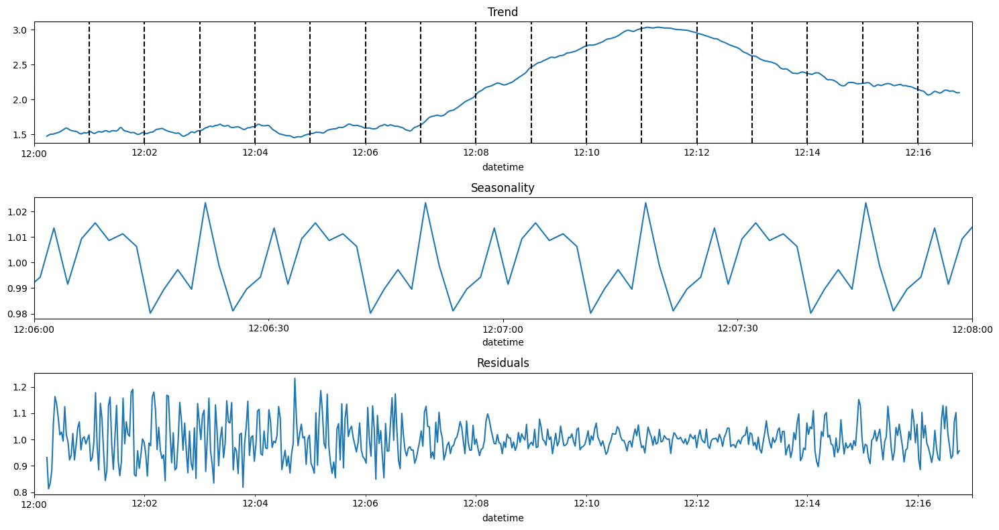

In [41]:
decomposed = seasonal_decompose(train.PMV, model="multiplicative", period=16)
plt_1 = plt.figure(figsize=(15, 8))
win1 = plt.subplot(311)
curve0 = decomposed.trend.plot(ax=plt.gca())
for mc in mcoords:
    mplt = plt.axvline(x=mc, color='black', linestyle='--')
tit1 = plt.title('Trend')
win2 = plt.subplot(312)
curve1 = decomposed.seasonal.plot(ax=plt.gca())
seas = plt.title('Seasonality')
win2x = plt.xlim(['2019-03-10 12:06', '2019-03-10 12:08'])
win3 = plt.subplot(313)
curve2 = decomposed.resid.plot(ax=plt.gca())
tit1 = plt.title('Residuals')
plt_1.tight_layout()    

The results are clear.  
We receive a large seasonality (up to 1.02 vs 0.04 - X25), that could have been a good result as we could have had less noise in our model. However, the residuals (1.2 vs 0.2 - X6) component has also significantly increased. That means the unexplained component is larger.  
Seasonality/residuals cannot reach the scale of the trend itself. It makes no sense.  
The multiplicative model is not appropriate.

## Manual decomposition and feature identification

We will now try to manually define our series behavior and identify relevant proxies for the ML models.

### Trend

As a first step let's try and recap the trend as a polynomial fit:

https://www.youtube.com/watch?v=6iVJPG9RQXQ  
https://github.com/bhattbhavesh91/time-series-decomposition-from-scratch/blob/master/time-series-decomposition-from-scratch.ipynb

Fit a polynomial to the data:

In [42]:
from numpy.polynomial import Polynomial
from numpy.polynomial.polynomial import polyval
#remark - rare packages I hardly use I do not add upfornt, no need to overload the machine with them every time...

p3 = Polynomial.fit(np.arange(len(train['PMV'])), train['PMV'].values, 3).convert()
p3
p3.coef

p4 = Polynomial.fit(np.arange(len(train['PMV'])), train['PMV'].values, 4).convert()
p4
p4.coef

p5 = Polynomial.fit(np.arange(len(train['PMV'])), train['PMV'].values, 5).convert()
p5
p5.coef
#https://stackoverflow.com/questions/68319851/how-to-use-numpy-1-4-polynomial-class-to-fit-values

Polynomial([ 1.73647305e+00, -7.93175936e-03,  5.40815160e-05, -7.00658012e-08], domain=[-1.,  1.], window=[-1.,  1.])

array([ 1.73647305e+00, -7.93175936e-03,  5.40815160e-05, -7.00658012e-08])

Polynomial([ 1.79164248e+00, -9.85235611e-03,  6.90385021e-05, -1.10272687e-07,
        3.47209718e-11], domain=[-1.,  1.], window=[-1.,  1.])

array([ 1.79164248e+00, -9.85235611e-03,  6.90385021e-05, -1.10272687e-07,
        3.47209718e-11])

Polynomial([ 1.24344834e+00,  1.88986747e-02, -2.79756295e-04,  1.49822489e-06,
       -3.09194118e-09,  2.16004294e-12], domain=[-1.,  1.], window=[-1.,  1.])

array([ 1.24344834e+00,  1.88986747e-02, -2.79756295e-04,  1.49822489e-06,
       -3.09194118e-09,  2.16004294e-12])

In [43]:
train['trend3'] = pd.Series(data = p3(np.arange(len(train['PMV']))), index = train.index)
train['trend4'] = pd.Series(data = p4(np.arange(len(train['PMV']))), index = train.index)
train['trend5'] = pd.Series(data = p5(np.arange(len(train['PMV']))), index = train.index)

In [44]:
train.head()

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV,rolling5_mean,rolling5_std,rolling10_mean,rolling10_std,rolling24_mean,rolling24_std,trend3,trend4,trend5
datetime,,,,,,,,,,,,,,,,,,,,,,,,,
2019-03-10 12:00:00.000,0.00,25.7,27.9,22.0,19.0,24.9,27.7,20.6,48.3,27.57,30.05,0.17,79,88,57,1.48,NaN,NaN,NaN,NaN,NaN,NaN,1.736473,1.791642,1.243448
2019-03-10 12:00:01.760,1.76,25.7,27.9,22.0,18.8,24.9,27.7,20.6,48.3,27.57,30.32,0.24,78,88,56,1.25,NaN,NaN,NaN,NaN,NaN,NaN,1.728595,1.781859,1.262069
2019-03-10 12:00:03.520,3.52,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.16,79,88,56,1.55,NaN,NaN,NaN,NaN,NaN,NaN,1.720825,1.772213,1.280139
2019-03-10 12:00:05.280,5.28,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.07,79,87,55,1.78,NaN,NaN,NaN,NaN,NaN,NaN,1.713163,1.762704,1.297667
2019-03-10 12:00:07.040,7.04,25.7,27.8,22.0,18.8,25.0,27.8,20.6,48.1,27.98,31.14,0.15,78,87,56,1.58,1.528,0.191233,NaN,NaN,NaN,NaN,1.705607,1.753331,1.314662


In [45]:
p3(np.arange(0,5))
p4(np.arange(0,5))
p5(np.arange(0,5))

array([1.73647305, 1.7285953 , 1.72082529, 1.71316261, 1.70560683])

array([1.79164248, 1.78185905, 1.77221304, 1.76270378, 1.75333062])

array([1.24344834, 1.26206876, 1.2801386 , 1.29766676, 1.31466204])

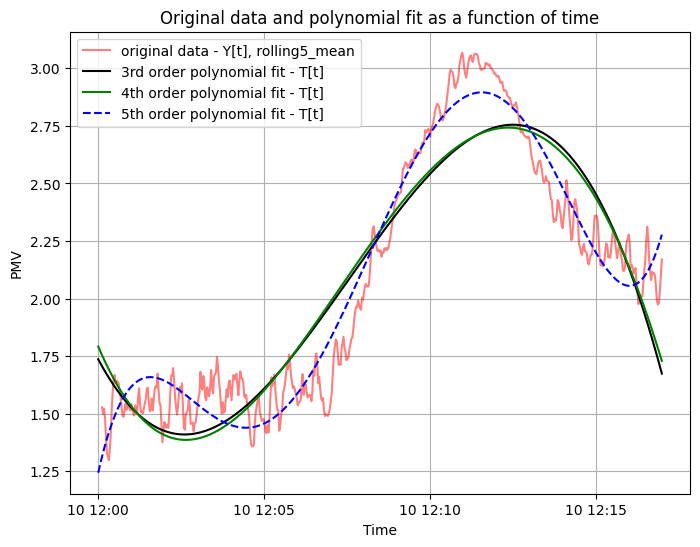

In [46]:
fig, ax1 = plt.subplots(figsize=(8, 6))
curve0 = ax1.plot(train['rolling5_mean'], 'r', alpha=0.5, label='original data - Y[t], rolling5_mean')
curve1 = ax1.plot(train['trend3'], 'k', label = '3rd order polynomial fit - T[t]')
curve2 = ax1.plot(train['trend4'], 'g', label = '4th order polynomial fit - T[t]')
curve3 = ax1.plot(train['trend5'], 'b--', label = '5th order polynomial fit - T[t]')
x1 = ax1.set_xlabel('Time')
y1 = ax1.set_ylabel('PMV')
grid = ax1.grid()
tit = plt.title('Original data and polynomial fit as a function of time')
leg1 = ax1.legend(loc='upper left')
plt.show()

We can see that only a 5th order polynomial fit captures the smoothed trend at a minimal level of performance.  
The temporal changes are too rapid for lower order polynomial fits.  
(1st and 2nd orders demonstrated such bad performance that I am not even presenting them...)  
Let's try and use this proxy as a feature.

In [47]:
train['detrended'] = train['PMV'] - train['trend5']

In [48]:
train.head()

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV,rolling5_mean,rolling5_std,rolling10_mean,rolling10_std,rolling24_mean,rolling24_std,trend3,trend4,trend5,detrended
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-03-10 12:00:00.000,0.00,25.7,27.9,22.0,19.0,24.9,27.7,20.6,48.3,27.57,30.05,0.17,79,88,57,1.48,NaN,NaN,NaN,NaN,NaN,NaN,1.736473,1.791642,1.243448,0.236552
2019-03-10 12:00:01.760,1.76,25.7,27.9,22.0,18.8,24.9,27.7,20.6,48.3,27.57,30.32,0.24,78,88,56,1.25,NaN,NaN,NaN,NaN,NaN,NaN,1.728595,1.781859,1.262069,-0.012069
2019-03-10 12:00:03.520,3.52,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.16,79,88,56,1.55,NaN,NaN,NaN,NaN,NaN,NaN,1.720825,1.772213,1.280139,0.269861
2019-03-10 12:00:05.280,5.28,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.07,79,87,55,1.78,NaN,NaN,NaN,NaN,NaN,NaN,1.713163,1.762704,1.297667,0.482333
2019-03-10 12:00:07.040,7.04,25.7,27.8,22.0,18.8,25.0,27.8,20.6,48.1,27.98,31.14,0.15,78,87,56,1.58,1.528,0.191233,NaN,NaN,NaN,NaN,1.705607,1.753331,1.314662,0.265338


### Minute

Let's define a minute aggregated proxy for our data.

Define seasonality by minute:

In [49]:
seasonal = train['detrended'].groupby(by = train.index.minute).mean()

https://otexts.com/fpp2/classical-decomposition.html

In [50]:
seasonal

datetime
0     0.045779
1    -0.114282
2    -0.062359
3     0.116836
4     0.098165
5     0.065144
6    -0.106247
7    -0.128455
8    -0.051195
9     0.032073
10    0.097066
11    0.120405
12   -0.007826
13   -0.146887
14   -0.036290
15    0.098752
16   -0.025567
Name: detrended, dtype: float64

Merge seasonal data into dataframe:

In [51]:
train['seasonal'] = 0
for i in seasonal.index:
    train.loc[train.index.minute == i, 'seasonal'] = seasonal.loc[i]

In [52]:
train.head()

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV,rolling5_mean,rolling5_std,rolling10_mean,rolling10_std,rolling24_mean,rolling24_std,trend3,trend4,trend5,detrended,seasonal
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-03-10 12:00:00.000,0.00,25.7,27.9,22.0,19.0,24.9,27.7,20.6,48.3,27.57,30.05,0.17,79,88,57,1.48,NaN,NaN,NaN,NaN,NaN,NaN,1.736473,1.791642,1.243448,0.236552,0.045779
2019-03-10 12:00:01.760,1.76,25.7,27.9,22.0,18.8,24.9,27.7,20.6,48.3,27.57,30.32,0.24,78,88,56,1.25,NaN,NaN,NaN,NaN,NaN,NaN,1.728595,1.781859,1.262069,-0.012069,0.045779
2019-03-10 12:00:03.520,3.52,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.16,79,88,56,1.55,NaN,NaN,NaN,NaN,NaN,NaN,1.720825,1.772213,1.280139,0.269861,0.045779
2019-03-10 12:00:05.280,5.28,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.07,79,87,55,1.78,NaN,NaN,NaN,NaN,NaN,NaN,1.713163,1.762704,1.297667,0.482333,0.045779
2019-03-10 12:00:07.040,7.04,25.7,27.8,22.0,18.8,25.0,27.8,20.6,48.1,27.98,31.14,0.15,78,87,56,1.58,1.528,0.191233,NaN,NaN,NaN,NaN,1.705607,1.753331,1.314662,0.265338,0.045779


In [53]:
train['deseasonal'] = train['detrended'] - train['seasonal']

These are in fact the residuals...

In [54]:
train.head()

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV,rolling5_mean,rolling5_std,rolling10_mean,rolling10_std,rolling24_mean,rolling24_std,trend3,trend4,trend5,detrended,seasonal,deseasonal
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-03-10 12:00:00.000,0.00,25.7,27.9,22.0,19.0,24.9,27.7,20.6,48.3,27.57,30.05,0.17,79,88,57,1.48,NaN,NaN,NaN,NaN,NaN,NaN,1.736473,1.791642,1.243448,0.236552,0.045779,0.190773
2019-03-10 12:00:01.760,1.76,25.7,27.9,22.0,18.8,24.9,27.7,20.6,48.3,27.57,30.32,0.24,78,88,56,1.25,NaN,NaN,NaN,NaN,NaN,NaN,1.728595,1.781859,1.262069,-0.012069,0.045779,-0.057847
2019-03-10 12:00:03.520,3.52,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.16,79,88,56,1.55,NaN,NaN,NaN,NaN,NaN,NaN,1.720825,1.772213,1.280139,0.269861,0.045779,0.224083
2019-03-10 12:00:05.280,5.28,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.07,79,87,55,1.78,NaN,NaN,NaN,NaN,NaN,NaN,1.713163,1.762704,1.297667,0.482333,0.045779,0.436555
2019-03-10 12:00:07.040,7.04,25.7,27.8,22.0,18.8,25.0,27.8,20.6,48.1,27.98,31.14,0.15,78,87,56,1.58,1.528,0.191233,NaN,NaN,NaN,NaN,1.705607,1.753331,1.314662,0.265338,0.045779,0.219559


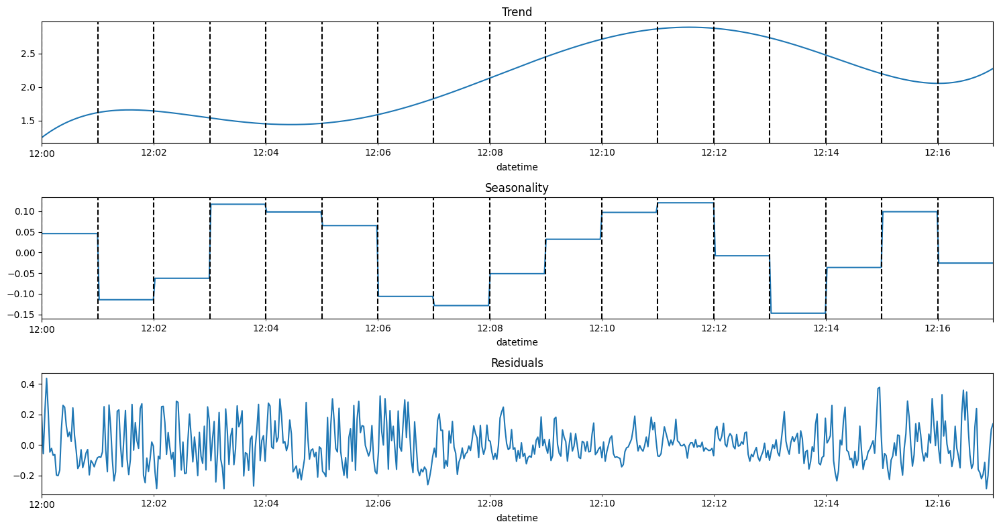

In [55]:
plt_1 = plt.figure(figsize=(15, 8))
win1 = plt.subplot(311)
curve0 = train['trend5'].plot(ax=plt.gca())
for mc in mcoords:
    mplt = plt.axvline(x=mc, color='black', linestyle='--')
tit1 = plt.title('Trend')

win2 = plt.subplot(312)
curve1 = train['seasonal'].plot(ax=plt.gca())
for mc in mcoords:
    mplt = plt.axvline(x=mc, color='black', linestyle='--')
seas = plt.title('Seasonality')

win3 = plt.subplot(313)
curve2 = train['deseasonal'].plot(ax=plt.gca())
tit1 = plt.title('Residuals')
plt_1.tight_layout()
plt.show()

We can clearly see no pattern for the minute of the experiment.  
This is not surprising and confirms what we would expect from our automated decomposition above.  
(The cycles appeared closer to 30 seconds)

### Differences

In [56]:
train['Diff'] = train['PMV'] - train['PMV'].shift()
train['Diff_roll10_mean']=train.Diff.rolling(10).mean()
train['Diff_roll10_std']=train.Diff.rolling(10).std()

In [57]:
train.head()

,Time(sec),ET1(C),ERH1(%),ET2(C),ERH2(%),ET3(C),ERH3(C),ET4(C),ERH4(%),Skin1(C),Skin2(C),Air Velocity(m/sec),Solar Radiation(W/m^2),HR(BPM),SPO2(%),PMV,rolling5_mean,rolling5_std,rolling10_mean,rolling10_std,rolling24_mean,rolling24_std,trend3,trend4,trend5,detrended,seasonal,deseasonal,Diff,Diff_roll10_mean,Diff_roll10_std
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-03-10 12:00:00.000,0.00,25.7,27.9,22.0,19.0,24.9,27.7,20.6,48.3,27.57,30.05,0.17,79,88,57,1.48,NaN,NaN,NaN,NaN,NaN,NaN,1.736473,1.791642,1.243448,0.236552,0.045779,0.190773,NaN,NaN,NaN
2019-03-10 12:00:01.760,1.76,25.7,27.9,22.0,18.8,24.9,27.7,20.6,48.3,27.57,30.32,0.24,78,88,56,1.25,NaN,NaN,NaN,NaN,NaN,NaN,1.728595,1.781859,1.262069,-0.012069,0.045779,-0.057847,-0.23,NaN,NaN
2019-03-10 12:00:03.520,3.52,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.16,79,88,56,1.55,NaN,NaN,NaN,NaN,NaN,NaN,1.720825,1.772213,1.280139,0.269861,0.045779,0.224083,0.30,NaN,NaN
2019-03-10 12:00:05.280,5.28,25.7,27.9,22.0,18.8,25.0,27.8,20.6,48.1,27.85,30.05,0.07,79,87,55,1.78,NaN,NaN,NaN,NaN,NaN,NaN,1.713163,1.762704,1.297667,0.482333,0.045779,0.436555,0.23,NaN,NaN
2019-03-10 12:00:07.040,7.04,25.7,27.8,22.0,18.8,25.0,27.8,20.6,48.1,27.98,31.14,0.15,78,87,56,1.58,1.528,0.191233,NaN,NaN,NaN,NaN,1.705607,1.753331,1.314662,0.265338,0.045779,0.219559,-0.20,NaN,NaN


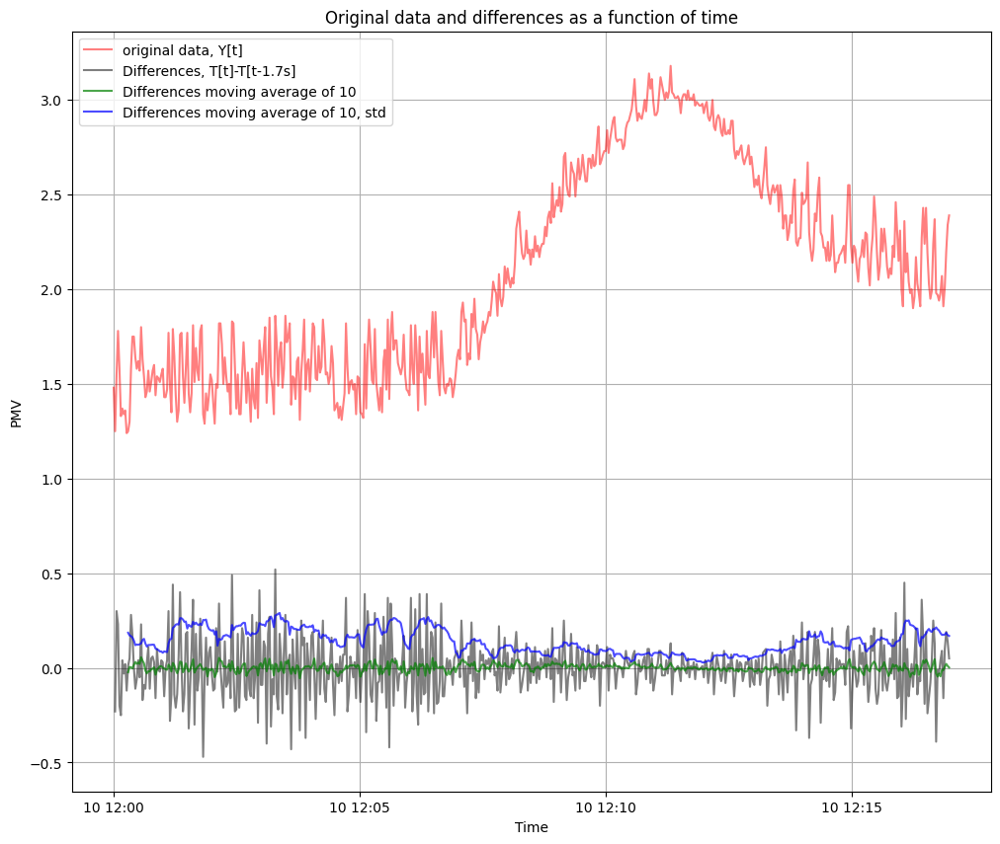

In [58]:
fig, ax1 = plt.subplots(figsize=(12, 10))
curve0 = ax1.plot(train['PMV'], 'r', alpha=0.5, label='original data, Y[t]')
curve1 = ax1.plot(train['Diff'], 'k', alpha=0.5, label = 'Differences, T[t]-T[t-1.7s]')
curve2 = ax1.plot(train['Diff_roll10_mean'], 'g', alpha=0.7, label = 'Differences moving average of 10')
curve3 = ax1.plot(train['Diff_roll10_std'], 'b', alpha=0.7, label = 'Differences moving average of 10, std')
x1 = ax1.set_xlabel('Time')
y1 = ax1.set_ylabel('PMV')
grid = ax1.grid()
tit = plt.title('Original data and differences as a function of time')
leg1 = ax1.legend(loc='upper left')
plt.show()

The Diff series is considerably more stationary than the original data series.  
Though its std is still not fully stabilized over time.

### Outliers

Let's examine the differences series histogram:

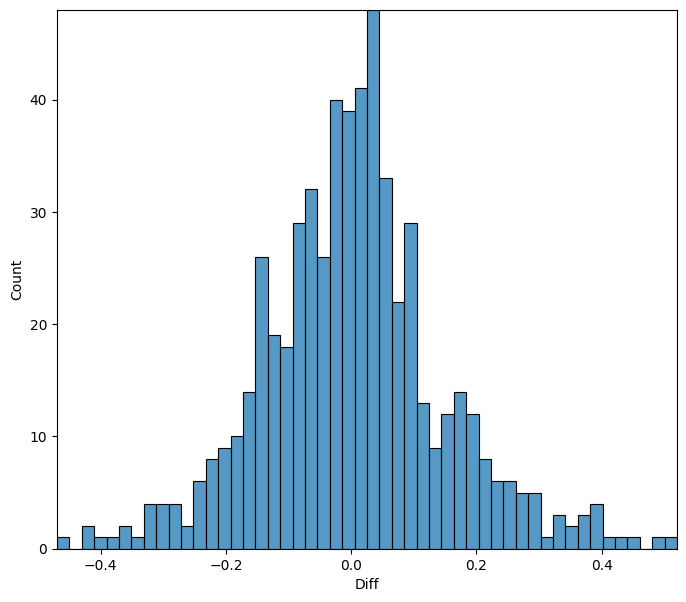

In [59]:
fig_init = plt.figure(figsize=(8,7))
plot = sns.histplot(data=train, x=train['Diff'], bins=50)
plot.autoscale(axis="x", tight=True, enable=True) 
plot.autoscale(axis="y", tight=True, enable=True) 
plt.show()

Looks like a classical normal distribution.  
Is it?  
Let's plot a qqplot and conduct a Shapiro-Wilk test.  
The Shapiro-Wilk test tests the null hypothesis that the data was drawn from a normal distribution.  
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.shapiro.html

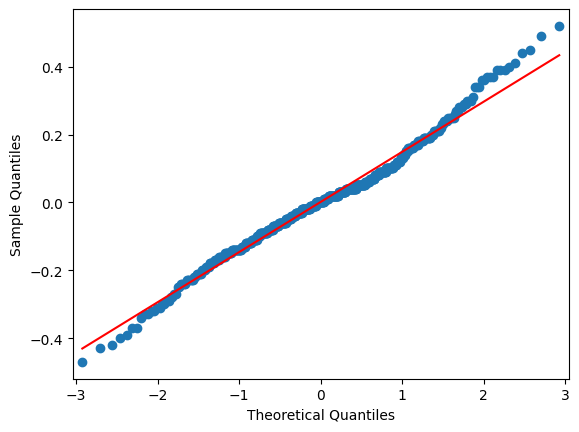

In [60]:
from statsmodels.graphics.gofplots import qqplot
qqp = qqplot(train['Diff'].dropna(), line='s')
plt.show()

Too many samples deviating the expected qqplot line for normal distribution...

In [61]:
from scipy.stats import shapiro

# normality test
stat, p = shapiro(train['Diff'].dropna())
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.986, p=0.000
Sample does not look Gaussian (reject H0)


We will have to use the minmax scaler after all.  
We still have to address potential outliers though.

I will take a similar approach to the the hampel filter using the Median Absolute Deviation (MAD) to smooth the data.  
Every entry exceeding 6 times the MAD will be replaced with its moving average counterpart.  
https://pypi.org/project/hampel/  
https://en.wikipedia.org/wiki/Median_absolute_deviation  
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.median_absolute_deviation.html

In [62]:
MAD = stats.median_abs_deviation(train['Diff'].dropna())

In [63]:
MAD

0.08000000000000007

In [64]:
train.loc[6*MAD <np.abs(train['Diff']), 'Diff']

datetime
2019-03-10 12:02:24.320    0.49
2019-03-10 12:03:17.120    0.52
Name: Diff, dtype: float64

It is fine to use the condition on the test set as well as the MAD value is calculated using the train set so we have no data leakage here.

## Dickey-Fuller test

Dickey-Fuller test for Time Series Stationarity using Python:  

Let's assume a time series:

$$
y_t=\mu+\phi_1y_{t-1}+\epsilon_t\\
y_t-y_{t-1}=\mu+(\phi_1-1)y_{t-1}+\epsilon_t\\
\Delta y_t=\mu+\delta y_{t-1}+\epsilon_t\\
$$

The test assumptions are:  
$H_0$: TS ($y_t, y_{t-1}$) is non-stationary (unit root, $\phi_1=1$, $\delta=0$)  
But the differences series $\Delta y_t$ is stationary because $\mu$ is constant and $\epsilon_t$ is a randomly distributed noise.  
$H_1$: TS is stationary (no unit root, $\phi_1<1$, $\delta<0$)  

If ADF statistic < critical value -> reject H0  
If ADF statistic > critical value -> fail to reject H0  

Remarks:
1. The DF statistic should be negative.  
2. The DF statistic is just the t-test statistic for the coefficient of a linear regression where y is the original series and x is the differences series.  

https://www.youtube.com/watch?v=warCSvy1DMk  
https://github.com/bhattbhavesh91/adf-test-stationarity-python/blob/master/augmented-dickey-fuller-test-python.ipynb  
https://www.youtube.com/watch?v=2GxWgIumPTA  
https://www.youtube.com/watch?v=1opjnegd_hA  
https://www.youtube.com/watch?v=FsroWpkUuYI&list=PLjwX9KFWtvNnOc4HtsvaDf1XYG3O5bv5s  
https://www.youtube.com/watch?v=bsyUn-LJ3YQ  
https://www.youtube.com/watch?v=KCFLfQHZODM

In [65]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

def adf(series):
    X = series.values#[1:]
    result = adfuller(X)#regression='ct'
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
    
    if result[0] < result[4]["5%"]:
        print ("Reject Ho - Time Series is Stationary")
    else:
        print ("Failed to Reject Ho - Time Series is Non-Stationary")

#https://www.statsmodels.org/stable/api.html
#https://www.statsmodels.org/0.6.1/generated/statsmodels.tsa.stattools.adfuller.html?highlight=dickey

In [66]:
adf(train["PMV"])

ADF Statistic: -1.294503
p-value: 0.631683
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.569
Failed to Reject Ho - Time Series is Non-Stationary


The original series is not stationary.

In [67]:
adf(train["Diff"].dropna())

ADF Statistic: -10.161357
p-value: 0.000000
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.569
Reject Ho - Time Series is Stationary


The test indicates the ADF statistic is well below the critical value, so our stationarity level of confidence is high.

The maximum lag assumed is:  
(see https://www.statsmodels.org/0.6.1/generated/statsmodels.tsa.stattools.adfuller.html?highlight=dickey)

In [68]:
maxlag = 12*((len(train)/100)**(1/4))
maxlag

18.622511212755867

This length is higher than our 10 samples rolling mean selected that represents ~10*1.7=17 sec.

## Lagging features

It is customary in forecasting tasks to employ lagging values of the series.  
In fact, the econometric approach relies solely on such features (ARIMA/SARIMA models).  
In particular, we take as features only the lags where the PACF is greater than 0.2 (absolute value).  
This means that the correlation with our target is sufficient to contribute towards a quality prediction.  

https://towardsdatascience.com/ml-time-series-forecasting-the-right-way-cbf3678845ff  
https://dzone.com/articles/autocorrelation-in-time-series-data
https://towardsdatascience.com/ml-time-series-forecasting-the-right-way-cbf3678845ff
https://dzone.com/articles/lessons-learnt-while-solving-time-series-forecasti-1  
https://neptune.ai/blog/select-model-for-time-series-prediction-task

In [69]:
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from scipy.stats import linregress

partial = pd.Series(data=pacf(train["Diff"].dropna(), nlags=60))
lags = list(partial[np.abs(partial) >= 0.2].index)

In [70]:
lags

[0, 1, 2]

In [71]:
partial[lags]

0    1.000000
1   -0.263567
2   -0.334129
dtype: float64

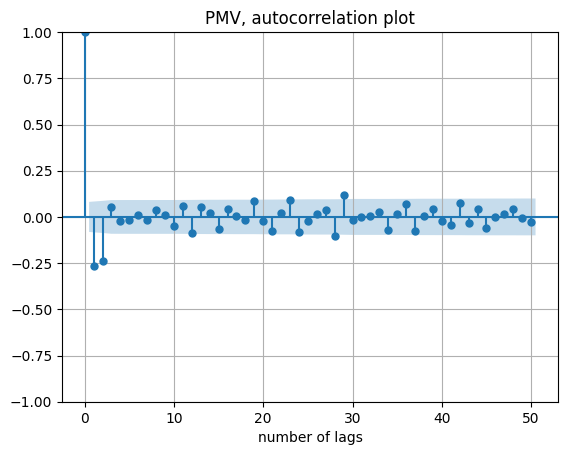

In [72]:
acf = plot_acf(train["Diff"].dropna(), lags=50)
grid = plt.grid()
tit = plt.title('PMV, autocorrelation plot')
xtit = plt.xlabel("number of lags")
plt.show()

#https://www.analyticsvidhya.com/blog/2021/10/a-comprehensive-guide-to-time-series-analysis/

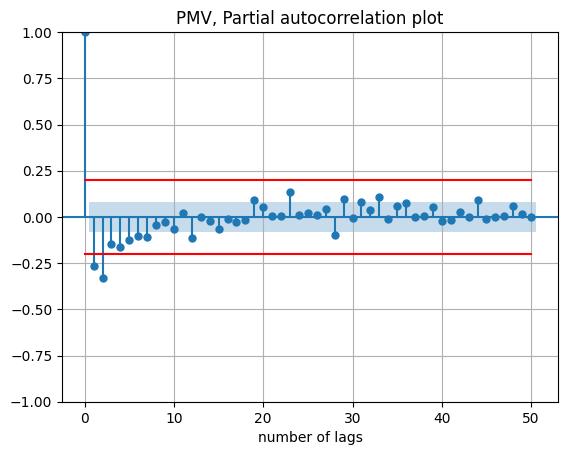

In [73]:
pacf = plot_pacf(train["Diff"].dropna(), lags=50, method='ywm')
x_coordinates = [0, 50]
y_coordinates = [0.2, 0.2]
high_thresh = plt.plot(x_coordinates, y_coordinates, 'r')
x_coordinates = [0, 50]
y_coordinates = [-0.2, -0.2]
low_thresh = plt.plot(x_coordinates, y_coordinates, 'r')
plt.grid()
tit = plt.title('PMV, Partial autocorrelation plot')
xtit = plt.xlabel("number of lags")
plt.show()

We found the important lagging elements.

## Conclusions

* We have a small sized database containing few hundred rows.  
* We have no nulls.  
* The data covers 16 minutes.
* A 1 minute resampling process smooths the distribution.  
* EDA demonstrates a clear trend that goes up and down throught the measurement.  
* Decomposition suggests an additive model - $Y[t]=T[t]+S[t]+\epsilon[t]$ with a $5^{th}$ order polynomial trend and seasonality attributed to the minute since experiment started.  
* We see a ~2 backwards sampling significant autocorrelation in the series lag pacf.

https://www.youtube.com/watch?v=0ar9extHObg&list=PLjwX9KFWtvNnOc4HtsvaDf1XYG3O5bv5s&index=2  
https://www.youtube.com/watch?v=6iVJPG9RQXQ

## Generate datasets

Now that we are clear on our desired features, let's start with clean sets:

In [74]:
def make_features(data, max_lag, rolling_mean_size):
    data = data.to_frame()
    #data['month'] = data.index.month                   # month
    #data['day'] = data.index.day                       # day of month
    #data['weekday'] = data.index.weekday               # Weekday
    #dates = data.index.to_series()
    #data['week_of_month'] = dates.apply(week_of_month) # Week of the month
    #data['hour'] = data.index.hour                     # hour of day
    #data['trend'] = p2(np.arange(len(data)))           # since the polynom was fit based on the training set only,
                                                       # there is no leakage here...
    data['minute'] = data.index.minute
    
    #generate differences
    data['diff'] =  data['PMV'] - data['PMV'].shift()
    
    #generate trend differences
    #data['trend_diff'] = data['trend'] - data['trend'].shift()
    
    #generate lags
    for lag in lags[1:]:      #remove the series itself of course #range(1, max_lag + 1):
        data[f'lag_{lag}'] = data['diff'].shift(lag)
    
    #generate 1 step lag moving average (to avoid data leakage)
    data['rolling_mean'] = data['diff'].shift().rolling(rolling_mean_size).mean()
    
    #smooth outliers with moving average
    data.loc[6*MAD <np.abs(data['diff']), 'diff'] = data['rolling_mean']
    
    return data.dropna()       #remove nuls originating from moving averages and diffs

In [75]:
df_ML = make_features(df['PMV'], 10, 10)

In [76]:
examine(df_ML)


***************
 head:


,PMV,minute,diff,lag_1,lag_2,rolling_mean
datetime,,,,,,
2019-03-10 12:00:19.360,1.30,0,0.05,0.01,-0.12,-0.023
2019-03-10 12:00:21.120,1.58,0,0.28,0.05,0.01,0.005
2019-03-10 12:00:22.880,1.75,0,0.17,0.28,0.05,0.003
2019-03-10 12:00:24.640,1.75,0,0.00,0.17,0.28,-0.003
2019-03-10 12:00:26.400,1.64,0,-0.11,0.00,0.17,0.017



***************
 tail:


,PMV,minute,diff,lag_1,lag_2,rolling_mean
datetime,,,,,,
2019-03-10 12:17:46.560,2.41,17,0.27,-0.07,0.03,-0.001
2019-03-10 12:17:48.320,2.29,17,-0.12,0.27,-0.07,0.025
2019-03-10 12:17:50.080,2.28,17,-0.01,-0.12,0.27,0.018
2019-03-10 12:17:51.840,2.46,17,0.18,-0.01,-0.12,0.022
2019-03-10 12:17:53.600,2.13,17,-0.33,0.18,-0.01,0.035




***************
 General info:

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 600 entries, 2019-03-10 12:00:19.360000 to 2019-03-10 12:17:53.600000
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PMV           600 non-null    float64
 1   minute        600 non-null    int64  
 2   diff          600 non-null    float64
 3   lag_1         600 non-null    float64
 4   lag_2         600 non-null    float64
 5   rolling_mean  600 non-null    float64
dtypes: float64(5), int64(1)
memory usage: 32.8 KB

***************
 describe:
               PMV      minute        diff       lag_1       lag_2  \
count  600.000000  600.000000  600.000000  600.000000  600.000000   
mean     2.099683    8.603333   -0.000308    0.002033    0.001533   
std      0.521140    5.092401    0.143585    0.145878    0.145781   
min      1.290000    0.000000   -0.470000   -0.470000   -0.470000   
25%      1.610000    4.000000   -0.090000 

Split the data:

In [77]:
train, test = train_test_split(df_ML, shuffle=False, test_size=0.05)

In [78]:
df_ML.shape
train.shape
test.shape

(600, 6)

(570, 6)

(30, 6)

In [79]:
train.tail()
test.head()

,PMV,minute,diff,lag_1,lag_2,rolling_mean
datetime,,,,,,
2019-03-10 12:16:53.760,2.01,16,0.10,-0.16,0.09,-0.012
2019-03-10 12:16:55.520,2.20,16,0.19,0.10,-0.16,0.006
2019-03-10 12:16:57.280,2.34,16,0.14,0.19,0.10,0.021
2019-03-10 12:16:59.040,2.39,16,0.05,0.14,0.19,0.010
2019-03-10 12:17:00.800,2.30,17,-0.09,0.05,0.14,0.002


,PMV,minute,diff,lag_1,lag_2,rolling_mean
datetime,,,,,,
2019-03-10 12:17:02.560,2.13,17,-0.17,-0.09,0.05,0.032
2019-03-10 12:17:04.320,1.99,17,-0.14,-0.17,-0.09,0.016
2019-03-10 12:17:06.080,1.98,17,-0.01,-0.14,-0.17,0.005
2019-03-10 12:17:07.840,2.18,17,0.20,-0.01,-0.14,0.000
2019-03-10 12:17:09.600,2.19,17,0.01,0.20,-0.01,0.011


The data is indeed split to 10% test set.  
The test set starts with ending of the train set, as expected.

Remove non-stationary data:

In [80]:
train_ = train.drop(labels=['PMV'], axis=1).copy(deep=True)
test_ = test.drop(labels=['PMV'], axis=1).copy(deep=True)

In [81]:
train_.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 570 entries, 2019-03-10 12:00:19.360000 to 2019-03-10 12:17:00.800000
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   minute        570 non-null    int64  
 1   diff          570 non-null    float64
 2   lag_1         570 non-null    float64
 3   lag_2         570 non-null    float64
 4   rolling_mean  570 non-null    float64
dtypes: float64(4), int64(1)
memory usage: 26.7 KB


In [82]:
test_.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 30 entries, 2019-03-10 12:17:02.560000 to 2019-03-10 12:17:53.600000
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   minute        30 non-null     int64  
 1   diff          30 non-null     float64
 2   lag_1         30 non-null     float64
 3   lag_2         30 non-null     float64
 4   rolling_mean  30 non-null     float64
dtypes: float64(4), int64(1)
memory usage: 1.4 KB


## Multivariate EDA

Let's examine which features are more correlated using the correlation matrix:

In [83]:
def multicorr(df):
    #Prepare mask matrix
    corr_mat = df.corr()
    mask_mat = np.tril(np.ones(corr_mat.shape)).astype(bool)
    np.fill_diagonal(mask_mat, False)  #remove diagonal to improve plot resolution
    
    #Impose mask on correlation
    corr_mat_lt = corr_mat.where(mask_mat)
    
    #Plot matrix
    fig1 = plt.figure(figsize=(8, 8))
    #corr_mat = df.corr()
    heat_map = sns.heatmap(corr_mat_lt, annot=True, cmap="Spectral")
    #cntrl0 = plt.xticks(rotation=45)

#https://cmdlinetips.com/2020/02/lower-triangle-correlation-heatmap-python/

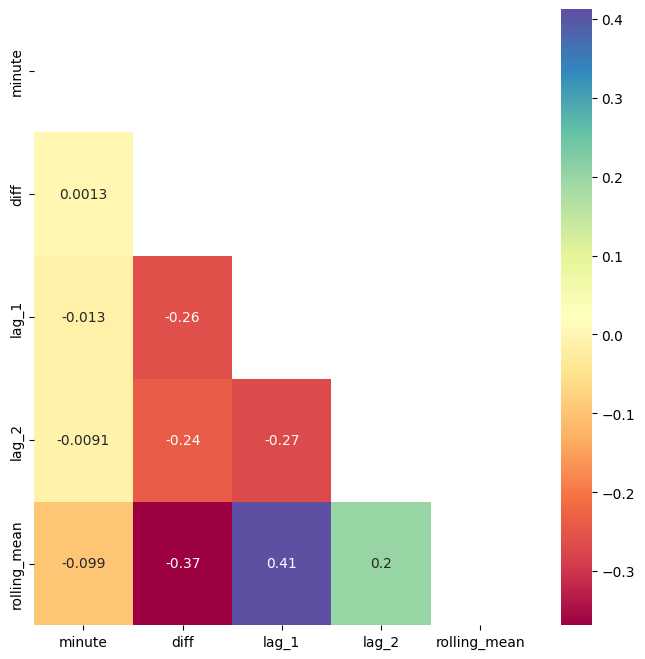

In [84]:
multicorr(train_)

We get medium correlations between our target (diff) and our features and between the various features themselves.  
The minute feature is not correlated with the target.  
Let's drop this feature.

In [85]:
train_.drop(labels=['minute'], axis=1, inplace=True)
test_.drop(labels=['minute'], axis=1, inplace=True)

Let's examine the pairplots:

In [86]:
def prplot(df):
    g = sns.pairplot(df)#, plot_kws=dict(marker=df['Gearbox'].unique()))
    fig1 = g.fig.suptitle("PMV")
    fig2 = g.fig.set_size_inches(15,15)
    fig3 = g.tight_layout()
    plt.show()

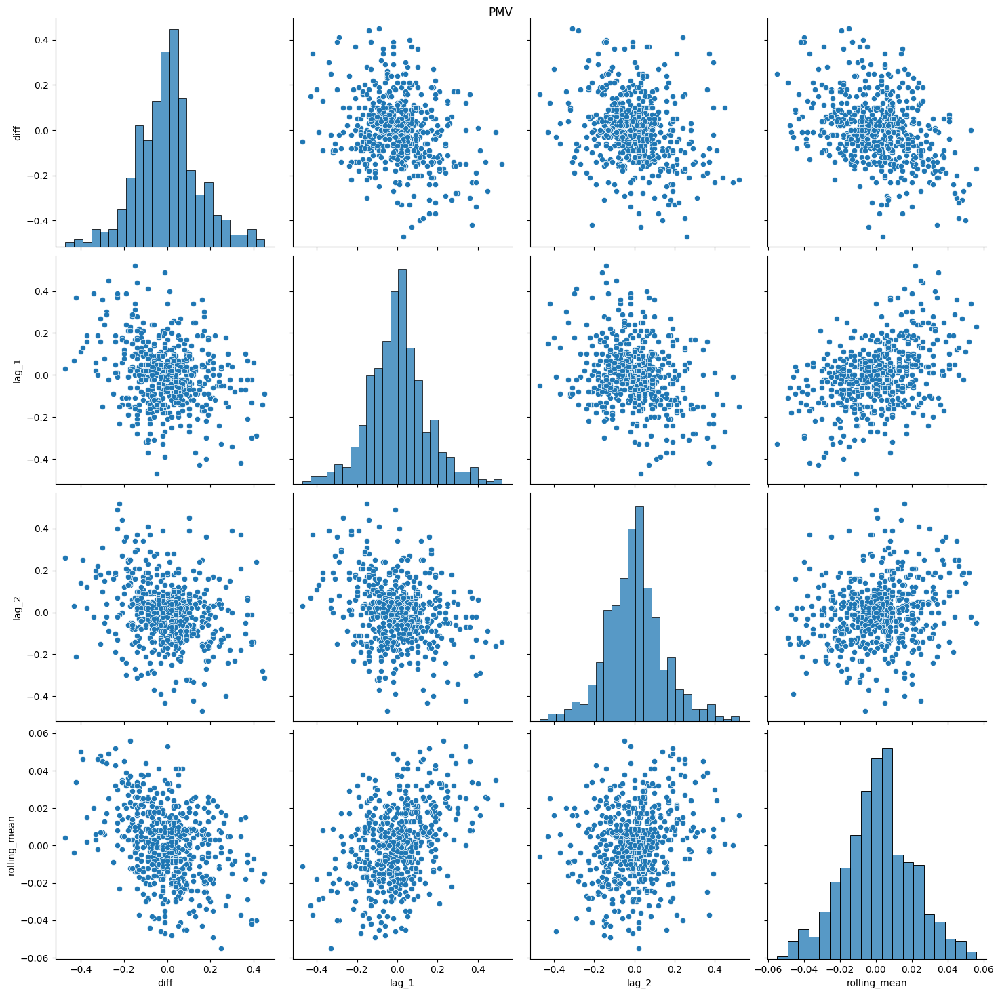

In [87]:
prplot(train_)

We can see that:  
* The rolling mean is indeed the most correlated feature with our target (diff).
* There are no real outliers (because our data originates from real physical/physiological sampling)

## ML model

### Establish pipeline

#### Prepare features and labels

In [88]:
X = train_.drop(labels=['diff'], axis=1).copy(deep=True)
y = train_['diff'].copy(deep=True)

In [89]:
X.head()

,lag_1,lag_2,rolling_mean
datetime,,,
2019-03-10 12:00:19.360,0.01,-0.12,-0.023
2019-03-10 12:00:21.120,0.05,0.01,0.005
2019-03-10 12:00:22.880,0.28,0.05,0.003
2019-03-10 12:00:24.640,0.17,0.28,-0.003
2019-03-10 12:00:26.400,0.00,0.17,0.017


In [90]:
X.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 570 entries, 2019-03-10 12:00:19.360000 to 2019-03-10 12:17:00.800000
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lag_1         570 non-null    float64
 1   lag_2         570 non-null    float64
 2   rolling_mean  570 non-null    float64
dtypes: float64(3)
memory usage: 17.8 KB


In [91]:
print(X.shape, y.shape)

(570, 3) (570,)


Repeat procedure for test data:

In [92]:
X_test = test_.drop(labels=['diff'], axis=1).copy(deep=True)
y_test = test_['diff'].copy(deep=True)

In [93]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 30 entries, 2019-03-10 12:17:02.560000 to 2019-03-10 12:17:53.600000
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lag_1         30 non-null     float64
 1   lag_2         30 non-null     float64
 2   rolling_mean  30 non-null     float64
dtypes: float64(3)
memory usage: 960.0 bytes


#### **Define models**

In [94]:
#imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')
mmscl = MinMaxScaler()
model = LinearRegression() #model

# define the data preparation pipeline
pipeline = Pipeline(steps=[
    #('col', col_transform_lin),
    #('imp', imputer),
    ('scl', mmscl),
    ('m', model)])

In [95]:
print(X.shape, y.shape)
print(X_test.shape, y_test.shape)

(570, 3) (570,)
(30, 3) (30,)


#### **Define Time series cross validation scheme**

Procedure to establish a rolling forecast:  
1. Split the data into 5 series (not parts!).  
There are 5 training sets each with its own following 10% test set.  
The time window is rolling.  
Each validation test set is then added to the next set train set.  
2. Use the column transformer to prepare the training set data (not at present as we have no categorical features)
3. Train the regressor.
4. Make predictions on the test set using the trained regressor
5. Evaluate the accuracy of the predictions
6. Repeat steps 1-5 another 4 times (to a total of 5).
7. Average/STD the 5 scores

The pipelines first splits the data and only then applies the procedure.  
Thus ensuring no data leakage.

https://scikit-learn.org/stable/modules/cross_validation.html#time-series-split    
https://www.youtube.com/watch?v=3k7qk__5tDY  
https://www.youtube.com/watch?v=sFPA599o1AQ  
https://www.youtube.com/watch?v=QWcyWlZF12Q  
https://www.youtube.com/watch?v=Dusc7smwKGc  
https://www.youtube.com/watch?v=g9iO2AwTXyI  
https://www.youtube.com/watch?v=oGqsyv49Wvo

In [96]:
#define train window length
train_win=math.floor(X.shape[0]/1.25)
train_win
#define test window length
test_win=math.floor(train_win/20)
test_win

456

22

Explanation:  
1. I used the ratio of a 5% test set to train set ratio.
2. At this ratio, we have:  
$$len(data)=train_{win}+n_{split} \cdot test_{win}$$  
(see figure below, we need to cover all the train data with the cross-validation train set and n_split times the cross-validation test set).  
We impose a 10% test/train ratio so:  
$$
len(data)=train_{win}+n_{split} \cdot \frac{train_{win}}{20}\\
n_{split} = 5 \rightarrow\\
train_{win} = \frac{len(data)}{1.25}
$$
3. The resulting 21 samples test window spans just slightly above our 30 sec forecast period objective.

In [97]:
ts_cv = TimeSeriesSplit(n_splits=5, gap=0, max_train_size=train_win, test_size=test_win)

TRAIN 1 indexes: 4 - 459 
TEST 1 indexes: 460 - 481
TRAIN 1 seconds: 26 - 827 
TEST 1 seconds: 828 - 865


TRAIN 2 indexes: 26 - 481 
TEST 2 indexes: 482 - 503
TRAIN 2 seconds: 65 - 865 
TEST 2 seconds: 867 - 904


TRAIN 3 indexes: 48 - 503 
TEST 3 indexes: 504 - 525
TRAIN 3 seconds: 103 - 904 
TEST 3 seconds: 906 - 943


TRAIN 4 indexes: 70 - 525 
TEST 4 indexes: 526 - 547
TRAIN 4 seconds: 142 - 943 
TEST 4 seconds: 945 - 982


TRAIN 5 indexes: 92 - 547 
TEST 5 indexes: 548 - 569
TRAIN 5 seconds: 181 - 982 
TEST 5 seconds: 983 - 1020




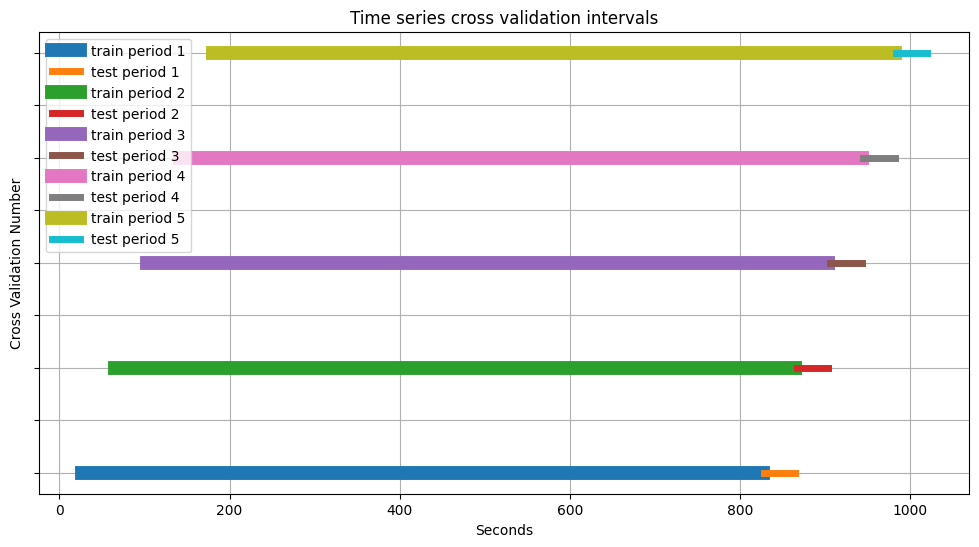

In [98]:
i=1
plt_1 = plt.figure(figsize=(12, 6))
for train_index, test_index in ts_cv.split(X):
    print(f"TRAIN {i} indexes:", train_index[0], '-', train_index[-1],
          f"\nTEST {i} indexes:", test_index[0], '-', test_index[-1])
    print(f"TRAIN {i} seconds:", 
          X.iloc[[train_index[0]]].index.second[0]+X.iloc[[train_index[0]]].index.minute[0]*60, 
          '-', 
          X.iloc[[train_index[-1]]].index.second[0]+X.iloc[[train_index[-1]]].index.minute[0]*60,
          f"\nTEST {i} seconds:", 
           X.iloc[[test_index[0]]].index.second[0]+X.iloc[[test_index[0]]].index.minute[0]*60, 
          '-', 
          X.iloc[[test_index[-1]]].index.second[0]+X.iloc[[test_index[-1]]].index.minute[0]*60)
    x_=[X.iloc[[train_index[0]]].index.second[0]+X.iloc[[train_index[0]]].index.minute[0]*60, 
        X.iloc[[train_index[-1]]].index.second[0]+X.iloc[[train_index[-1]]].index.minute[0]*60]
    y_=[i,i]
    train_line = plt.plot(x_,y_,label=f'train period {i}',linewidth=10)
    x_=[X.iloc[[test_index[0]]].index.second[0]+X.iloc[[test_index[0]]].index.minute[0]*60, 
        X.iloc[[test_index[-1]]].index.second[0]+X.iloc[[test_index[-1]]].index.minute[0]*60]
    test_line = plt.plot(x_,y_, label=f'test period {i}', linewidth=5)
    i+=1
    print('\n')
    
removeylabels = plt.gca().yaxis.set_ticklabels([]) #y labels are not necessary
grd = plt.grid()
tit = plt.title('Time series cross validation intervals')
#win = plt.xlim([date(2018, 3, 1), date(2018, 8, 15)])
labx = plt.xlabel("Seconds")
laby = plt.ylabel("Cross Validation Number")
leg = plt.legend()
plt.show()

Remarks:  
* In the figure above there is no overlap between the test and train periods, check indexes.  
It is a side effect of the plot.
* There are also no gaps. Measurements are roughly every 1.7 sec so some seconds are skipped.  
For instance - 904.8 sec + 1.7 sec = 906.5 sec, so second 905 is skipped in record.

### Run pipeline

#### Linear regression

Note that I will be running each model once and storing the main results as text so as to save time resources.  
At any given time the code can be exposed again but I in this manner the reviewer has the option to save his/her precious time...

In [99]:
# define the data preparation pipeline
pipeline = Pipeline(steps=[
    #('col', col_transform_lin),
    #('imp', imputer),
    ('scl', mmscl),
    ('m', model)])

# records the time at this instant of the program
start = time.perf_counter()

scores = cross_val_score(pipeline, X, y, scoring='neg_root_mean_squared_error', cv=ts_cv, n_jobs=-1) #new version

# record the time at the end instant of the program
end = time.perf_counter()
  
# convert scores to positive values
scores = abs(scores)

Summarize model performance

In [100]:
def perf(pipe_model, pipe_scores, run_end, run_start):
    print('Model - ', f'{pipe_model}')
    # printing the execution time by subtracting the time before the function from the time after the function
    print('Run time - ', round((run_end-run_start)/60,2), 'min')
    print('Scores ', pipe_scores)
    print('Scores Mean - %.3f, Scores Std - %.3f' % (np.mean(scores), np.std(scores)))

In [101]:
perf(model, scores, end, start)

Model -  LinearRegression()
Run time -  0.03 min
Scores  [0.16274979 0.11425723 0.12593021 0.15539628 0.17703814]
Scores Mean - 0.147, Scores Std - 0.023


Remarks:  
1. Since the dataset is small, I tests several cross validation folds.  
5 folds yields the best results. Furthermore, reducing the test window drops us below the 
2. The calculated RMSE is not the requested final RMSE for the PMV because our target is currently the differences and not the PMV itself.  
After we select the best performing model, we will calculate its final target RMSE by tracing the differences back to the original values.  
There is an assumption here - that the model best predicting the differences is the one best predicting the final target.  
We cannot prove it for now without considerable additional research but if we meet the request for RMSE<1 we are more than fine.

### Find optimal pipeline hyper-parameters

#### Decision Tree

Define function to run pipeline.  
The function uses:
* model name (e.g., 'dt'/'rf'..)
* model type (e.g., DecisionTreeRegressor)
* specific model hyperparameters (e.g., dt__max_depth..)

In [102]:
def run(model_name, model_, params_):#, column_transformer):
    
    # define pipeline
    
    pipeline = Pipeline(steps=[
        #('col', column_transformer),
        #('imp', imputer),
        ('scl', mmscl),
        (model_name, model_)]) # must be the same name as used in param_grid
    
    # records the time at this instant of the program
    start = time.perf_counter()
    
    #----define the model cross-validation configuration
    #No need to redefine again., defined above
    
    gs = GridSearchCV(pipeline, 
                      param_grid=params_,
                      cv=ts_cv,                              
                      scoring='neg_root_mean_squared_error', 
                      verbose=1,
                      return_train_score = True,
                      refit=True)
    
    #fit
    gs.fit(X, y)
    
    # record the time at the end instant of the program
    end = time.perf_counter()
    
    #Output performance:
    print('Model - ', f'{model}')
    # printing the execution time by subtracting the time before the function from the time after the function
    print('Run time - ', round((end-start)/60,2), 'min')
    print('Best_score -', abs(gs.best_score_))
    print('Best_params -', gs.best_params_)

https://www.youtube.com/watch?v=f_xB7kbZR_g

In [103]:
# define model
model = DecisionTreeRegressor() #name=dt

#define model parameters
params = {'dt__max_depth': [5, 10],
          'dt__min_impurity_decrease': [0.01, 0.03, 0.05, 0.07, 0.09, 0.11, 0.13, 0.15, 0.17, 0.19],
          'dt__min_samples_split': [2, 4, 6, 8, 10]}
# Too long for my machine...

#params = {'dt__max_depth': [10],
#          'dt__min_impurity_decrease': [0.09],
#          'dt__min_samples_split': [6]}

In [104]:
run('dt', model, params)#, col_transform)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Model -  DecisionTreeRegressor()
Run time -  0.03 min
Best_score - 0.15136362786594185
Best_params - {'dt__max_depth': 5, 'dt__min_impurity_decrease': 0.01, 'dt__min_samples_split': 2}


<span class="girk">Remark: model_name must agree with params initials - 'dt' -> dt__ ...</span>

#### Random Forest

In [105]:
# define model
model = RandomForestRegressor() #name=rf

#define model parameters
params = { 'rf__n_estimators': [3, 5, 10, 35, 60, 85],
          'rf__max_depth': [5, 15, 25, 35, 45],
          'rf__min_impurity_decrease': [0.05, 0.15, 0.25]}

#params = { 'rf__n_estimators': [40],
#          'rf__max_depth': [40],
#          'rf__min_impurity_decrease': [0.15]}

In [106]:
run('rf', model, params)#, col_transform)

Fitting 5 folds for each of 90 candidates, totalling 450 fits
Model -  RandomForestRegressor()
Run time -  0.23 min
Best_score - 0.15129621840746196
Best_params - {'rf__max_depth': 25, 'rf__min_impurity_decrease': 0.25, 'rf__n_estimators': 10}


#### lightGBM

LightGBM splits the tree leaf wise (rather than level wise).  
So it is supposed to be faster as you can target specific ill-performing leaves.  
But it tends to overfit so we need to limit tree depth to avoid it.  

* https://lightgbm.readthedocs.io/en/latest/Parameters.html
* https://github.com/bnsreenu/python_for_microscopists/blob/master/196_lightGBM_feature_selection_breast_cancer.py
* https://neptune.ai/blog/how-to-organize-your-lightgbm-ml-model-development-process-examples-of-best-practices
* DART: Dropouts meet Multiple Additive Regression Trees,  
K. V. Rashmi, Ran Gilad-Bachrach, Computer Science > Machine Learning, 2015  
https://arxiv.org/abs/1505.01866
* https://lightgbm.readthedocs.io/en/latest/    
* https://neptune.ai/blog/lightgbm-parameters-guide
* https://www.youtube.com/watch?v=5CWwwtEM2TA
* https://neptune.ai/blog/lightgbm-parameters-guide
* https://neptune.ai/blog/how-to-organize-your-lightgbm-ml-model-development-process-examples-of-best-practices
* https://towardsdatascience.com/what-makes-lightgbm-lightning-fast-a27cf0d9785e
* https://stackoverflow.com/questions/50686645/grid-search-with-lightgbm-example
* goss algorithm approach focuses on the data largest gradient components and is faster (not good for small datasets). Its key parameters: top_rate: the retain ratio of large gradient, dataother_rate: the retain ratio of small gradient data

In [107]:
# define model
model = lgbm.LGBMRegressor() #name=ligbm

#define model parameters

params = {'ligbm__objective': ['regression'],
          'ligbm__metric': ['rmse'],
          'ligbm__learning_rate': [0.01, 0.03, 0.05],
          'ligbm__boosting_type': ['gbdt'],
          'ligbm__num_leaves' : [20, 50],
          'ligbm__n_estimators' : [50, 100, 150],
          'ligbm__max_depth': [10, 20, 30],
          'ligbm__num_iterations': [50, 150, 250],
          'ligbm__bagging_fraction': [0.8],
          'ligbm__bagging_freq': [2],         
          'ligbm__reg_alpha': [1],
          'ligbm__reg_lambda': [1]}

# 'ligbm__early_stopping_rounds': [3], #require a fit method - see:
# https://stackoverflow.com/questions/61694081/lightgbm-error-valueerror-for-early-stopping-at-least-one-dataset-and-eval-m

#'ligbm__categorical_feature': [0, 1, 5, 6, 7, 8] - needs to be placed in fit 
# https://stackoverflow.com/questions/50686645/grid-search-with-lightgbm-example

* max_depth - max depth of each trained tree
* num_iterations - number of boosting iterations (trees to build)
* The more trees you build the more accurate your model can be at the cost of longer training time
and higher chance of overfitting
* Good to try boosting_type':'dart' for better accuracy over gbdt
* Good to try regularization parameters Lambda_l1 and lambda_l2

In [108]:
run('ligbm', model, params)#, col_transform)

Fitting 5 folds for each of 162 candidates, totalling 810 fits
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roami

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagg

C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\thego\AppData\Roaming\Python\Python310\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
Model -  LGBMRegressor()
Run time -  0.53 min
Best_score - 0.1418991535602761
Best_params - {'ligbm_

Remarks:  

* The warnings are a known issue in lightGBM and result from the use of synonyms of the primary parameter name.  
https://github.com/microsoft/LightGBM/issues/3346
* it is possible to replace the KFOLD cross validation with the native lgbm.cv.  
The syntax will be something along:  

categorical_feature = [0, 2]  
cvm = lgb.cv(param, nfold=4, train_set=train_data, categorical_feature=categorical_feature)  

* The advantage of this approach is that we can direct the regressor to know in advance the categorical features.  
This is a minor advantage in our case as we do not have categorical features / ordinal encoding and it is not necessary to identify categorical features when using one hot encoding.  
* The disadvantages would be:
  * The need to define a new pipeline flow (see below) which in this case I rather avoid.
  * LightGBM sklearn doesn't work in an ideal manner with sklearn's gridsearch if you want early stopping and a pipleine transformer.  
https://stackoverflow.com/questions/71579403/lightgbm-sklearn-api-doesnt-play-well-with-sklearns-gridsearch-if-you-want-ear  
* In fact, for the fast lighGBM even if we use the one hot encoder the differences would be minute.  
Good reference documenting this:  
https://towardsdatascience.com/how-to-beat-the-heck-out-of-xgboost-with-lightgbm-comprehensive-tutorial-5eba52195997
* A workaround to the warnings and possible parameter errors is to rebuild the dataset after each call to lgb.cv.  
For exmple:  
train_data = lgb.Dataset(X, y)  
param = {...}  
cvm = lgb.cv(param, nfold=4, train_set=train_data, categorical_feature=categorical_feature)  
train_data = lgb.Dataset(X, y)    # rebuild the dataset to forget previous parameters entered  
param['min_data_in_leaf'] = 20  
cvm = lgb.cv(param, nfold=4, train_set=train_data, categorical_feature=categorical_feature)  
https://github.com/microsoft/LightGBM/issues/3346

#### CatBoost 

Catboost needs much less hyperparameter tuning.  
It works quite well out of the box.  
This ease of use is a great advantage.  
Catboost works better with large datasets having many categorical features.  
https://www.youtube.com/watch?v=R5FB1ZUejXM  

Anna Veronika Dorogush - CatBoost - the new generation of Gradient Boosting  
https://www.youtube.com/watch?v=oGRIGdsz7bM  

Anna Veronika Dorogush: Mastering gradient boosting with CatBoost | PyData London 2019  
https://www.youtube.com/watch?v=usdEWSDisS0

In [109]:
# define model
model = ctbst.CatBoostRegressor() #cat_features=cat_ohe_ix #name=ctbst
                                  #required integers in X!

#define model parameters

params = {}#{'ctbst__iterations': ['None'],
           #'ctbst__max_depth': [30]}

# default iterations number is 1000
# one_hot_max_size=    # to limit the number of different categories per feature.

In [110]:
run('ctbst', model, params)#, col_transform)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Learning rate set to 0.036166
0:	learn: 0.1405724	total: 144ms	remaining: 2m 23s
1:	learn: 0.1395880	total: 145ms	remaining: 1m 12s
2:	learn: 0.1386862	total: 145ms	remaining: 48.3s
3:	learn: 0.1378451	total: 146ms	remaining: 36.4s
4:	learn: 0.1370640	total: 147ms	remaining: 29.2s
5:	learn: 0.1361614	total: 148ms	remaining: 24.4s
6:	learn: 0.1353331	total: 148ms	remaining: 21s
7:	learn: 0.1345597	total: 149ms	remaining: 18.4s
8:	learn: 0.1339337	total: 149ms	remaining: 16.5s
9:	learn: 0.1331462	total: 150ms	remaining: 14.9s
10:	learn: 0.1324262	total: 151ms	remaining: 13.5s
11:	learn: 0.1316367	total: 151ms	remaining: 12.4s
12:	learn: 0.1310769	total: 151ms	remaining: 11.5s
13:	learn: 0.1303777	total: 152ms	remaining: 10.7s
14:	learn: 0.1297409	total: 152ms	remaining: 10s
15:	learn: 0.1292131	total: 153ms	remaining: 9.4s
16:	learn: 0.1286056	total: 153ms	remaining: 8.87s
17:	learn: 0.1279813	total: 154ms	remaining: 8.39s
18:	le

416:	learn: 0.0846389	total: 372ms	remaining: 520ms
417:	learn: 0.0845909	total: 373ms	remaining: 519ms
418:	learn: 0.0845680	total: 373ms	remaining: 518ms
419:	learn: 0.0844977	total: 374ms	remaining: 517ms
420:	learn: 0.0844314	total: 375ms	remaining: 515ms
421:	learn: 0.0843876	total: 375ms	remaining: 514ms
422:	learn: 0.0843592	total: 376ms	remaining: 512ms
423:	learn: 0.0843287	total: 376ms	remaining: 511ms
424:	learn: 0.0843027	total: 377ms	remaining: 510ms
425:	learn: 0.0842850	total: 377ms	remaining: 509ms
426:	learn: 0.0842408	total: 378ms	remaining: 507ms
427:	learn: 0.0841640	total: 379ms	remaining: 506ms
428:	learn: 0.0840376	total: 379ms	remaining: 505ms
429:	learn: 0.0840174	total: 380ms	remaining: 504ms
430:	learn: 0.0839875	total: 381ms	remaining: 502ms
431:	learn: 0.0839316	total: 381ms	remaining: 501ms
432:	learn: 0.0838621	total: 382ms	remaining: 500ms
433:	learn: 0.0837513	total: 382ms	remaining: 499ms
434:	learn: 0.0836695	total: 383ms	remaining: 497ms
435:	learn: 

720:	learn: 0.0681444	total: 552ms	remaining: 213ms
721:	learn: 0.0681373	total: 552ms	remaining: 213ms
722:	learn: 0.0681269	total: 553ms	remaining: 212ms
723:	learn: 0.0681244	total: 554ms	remaining: 211ms
724:	learn: 0.0681158	total: 554ms	remaining: 210ms
725:	learn: 0.0681083	total: 555ms	remaining: 209ms
726:	learn: 0.0680046	total: 555ms	remaining: 209ms
727:	learn: 0.0679466	total: 557ms	remaining: 208ms
728:	learn: 0.0679256	total: 557ms	remaining: 207ms
729:	learn: 0.0678618	total: 558ms	remaining: 206ms
730:	learn: 0.0678021	total: 559ms	remaining: 206ms
731:	learn: 0.0677185	total: 559ms	remaining: 205ms
732:	learn: 0.0676174	total: 560ms	remaining: 204ms
733:	learn: 0.0675698	total: 561ms	remaining: 203ms
734:	learn: 0.0675659	total: 561ms	remaining: 202ms
735:	learn: 0.0675525	total: 562ms	remaining: 202ms
736:	learn: 0.0675074	total: 563ms	remaining: 201ms
737:	learn: 0.0674457	total: 563ms	remaining: 200ms
738:	learn: 0.0673513	total: 564ms	remaining: 199ms
739:	learn: 

996:	learn: 0.0583397	total: 731ms	remaining: 2.2ms
997:	learn: 0.0582893	total: 732ms	remaining: 1.47ms
998:	learn: 0.0582394	total: 732ms	remaining: 733us
999:	learn: 0.0582003	total: 733ms	remaining: 0us
Learning rate set to 0.036166
0:	learn: 0.1431786	total: 878us	remaining: 877ms
1:	learn: 0.1422234	total: 1.61ms	remaining: 805ms
2:	learn: 0.1412687	total: 2.28ms	remaining: 758ms
3:	learn: 0.1403841	total: 3.05ms	remaining: 761ms
4:	learn: 0.1395794	total: 3.75ms	remaining: 746ms
5:	learn: 0.1387975	total: 4.49ms	remaining: 745ms
6:	learn: 0.1379971	total: 5.2ms	remaining: 738ms
7:	learn: 0.1372022	total: 5.95ms	remaining: 738ms
8:	learn: 0.1365737	total: 6.72ms	remaining: 740ms
9:	learn: 0.1358572	total: 7.43ms	remaining: 736ms
10:	learn: 0.1350422	total: 8.16ms	remaining: 733ms
11:	learn: 0.1343643	total: 8.87ms	remaining: 730ms
12:	learn: 0.1337169	total: 9.7ms	remaining: 737ms
13:	learn: 0.1330192	total: 10.4ms	remaining: 732ms
14:	learn: 0.1324067	total: 11.3ms	remaining: 74

311:	learn: 0.0946052	total: 188ms	remaining: 414ms
312:	learn: 0.0945486	total: 188ms	remaining: 413ms
313:	learn: 0.0945232	total: 189ms	remaining: 413ms
314:	learn: 0.0944353	total: 189ms	remaining: 412ms
315:	learn: 0.0943705	total: 190ms	remaining: 411ms
316:	learn: 0.0942720	total: 191ms	remaining: 411ms
317:	learn: 0.0942276	total: 191ms	remaining: 410ms
318:	learn: 0.0941562	total: 192ms	remaining: 409ms
319:	learn: 0.0941247	total: 192ms	remaining: 408ms
320:	learn: 0.0939944	total: 193ms	remaining: 408ms
321:	learn: 0.0939855	total: 193ms	remaining: 407ms
322:	learn: 0.0938206	total: 194ms	remaining: 406ms
323:	learn: 0.0937589	total: 194ms	remaining: 405ms
324:	learn: 0.0937048	total: 195ms	remaining: 405ms
325:	learn: 0.0936651	total: 195ms	remaining: 404ms
326:	learn: 0.0935875	total: 196ms	remaining: 403ms
327:	learn: 0.0935426	total: 196ms	remaining: 403ms
328:	learn: 0.0935270	total: 197ms	remaining: 402ms
329:	learn: 0.0934961	total: 198ms	remaining: 401ms
330:	learn: 

622:	learn: 0.0755148	total: 366ms	remaining: 222ms
623:	learn: 0.0754075	total: 367ms	remaining: 221ms
624:	learn: 0.0753113	total: 368ms	remaining: 221ms
625:	learn: 0.0752898	total: 369ms	remaining: 220ms
626:	learn: 0.0751820	total: 369ms	remaining: 220ms
627:	learn: 0.0751573	total: 370ms	remaining: 219ms
628:	learn: 0.0751390	total: 371ms	remaining: 219ms
629:	learn: 0.0750130	total: 371ms	remaining: 218ms
630:	learn: 0.0749225	total: 372ms	remaining: 217ms
631:	learn: 0.0749132	total: 373ms	remaining: 217ms
632:	learn: 0.0749076	total: 373ms	remaining: 216ms
633:	learn: 0.0748889	total: 374ms	remaining: 216ms
634:	learn: 0.0748170	total: 374ms	remaining: 215ms
635:	learn: 0.0747520	total: 375ms	remaining: 214ms
636:	learn: 0.0747158	total: 375ms	remaining: 214ms
637:	learn: 0.0746754	total: 376ms	remaining: 213ms
638:	learn: 0.0746525	total: 376ms	remaining: 213ms
639:	learn: 0.0745985	total: 377ms	remaining: 212ms
640:	learn: 0.0745591	total: 378ms	remaining: 211ms
641:	learn: 

932:	learn: 0.0634484	total: 545ms	remaining: 39.1ms
933:	learn: 0.0634278	total: 546ms	remaining: 38.6ms
934:	learn: 0.0633574	total: 546ms	remaining: 38ms
935:	learn: 0.0633502	total: 547ms	remaining: 37.4ms
936:	learn: 0.0633233	total: 547ms	remaining: 36.8ms
937:	learn: 0.0632628	total: 548ms	remaining: 36.2ms
938:	learn: 0.0632221	total: 549ms	remaining: 35.6ms
939:	learn: 0.0631444	total: 549ms	remaining: 35.1ms
940:	learn: 0.0631176	total: 550ms	remaining: 34.5ms
941:	learn: 0.0631085	total: 550ms	remaining: 33.9ms
942:	learn: 0.0630631	total: 551ms	remaining: 33.3ms
943:	learn: 0.0630522	total: 551ms	remaining: 32.7ms
944:	learn: 0.0630384	total: 552ms	remaining: 32.1ms
945:	learn: 0.0629507	total: 552ms	remaining: 31.5ms
946:	learn: 0.0629151	total: 553ms	remaining: 30.9ms
947:	learn: 0.0629089	total: 554ms	remaining: 30.4ms
948:	learn: 0.0628730	total: 554ms	remaining: 29.8ms
949:	learn: 0.0628577	total: 555ms	remaining: 29.2ms
950:	learn: 0.0628030	total: 555ms	remaining: 28

332:	learn: 0.0907763	total: 180ms	remaining: 360ms
333:	learn: 0.0907382	total: 180ms	remaining: 360ms
334:	learn: 0.0906540	total: 181ms	remaining: 359ms
335:	learn: 0.0905963	total: 182ms	remaining: 359ms
336:	learn: 0.0905414	total: 182ms	remaining: 359ms
337:	learn: 0.0905233	total: 183ms	remaining: 358ms
338:	learn: 0.0904944	total: 183ms	remaining: 358ms
339:	learn: 0.0903933	total: 184ms	remaining: 357ms
340:	learn: 0.0903709	total: 185ms	remaining: 357ms
341:	learn: 0.0902129	total: 185ms	remaining: 356ms
342:	learn: 0.0901875	total: 186ms	remaining: 356ms
343:	learn: 0.0900533	total: 186ms	remaining: 356ms
344:	learn: 0.0899779	total: 187ms	remaining: 355ms
345:	learn: 0.0899372	total: 188ms	remaining: 355ms
346:	learn: 0.0899079	total: 188ms	remaining: 354ms
347:	learn: 0.0898953	total: 189ms	remaining: 354ms
348:	learn: 0.0898074	total: 190ms	remaining: 354ms
349:	learn: 0.0897028	total: 190ms	remaining: 353ms
350:	learn: 0.0894932	total: 191ms	remaining: 353ms
351:	learn: 

644:	learn: 0.0720625	total: 360ms	remaining: 198ms
645:	learn: 0.0720460	total: 361ms	remaining: 198ms
646:	learn: 0.0720402	total: 361ms	remaining: 197ms
647:	learn: 0.0719615	total: 362ms	remaining: 196ms
648:	learn: 0.0718623	total: 362ms	remaining: 196ms
649:	learn: 0.0717473	total: 363ms	remaining: 196ms
650:	learn: 0.0716452	total: 364ms	remaining: 195ms
651:	learn: 0.0716340	total: 364ms	remaining: 194ms
652:	learn: 0.0715672	total: 365ms	remaining: 194ms
653:	learn: 0.0715015	total: 366ms	remaining: 193ms
654:	learn: 0.0714842	total: 366ms	remaining: 193ms
655:	learn: 0.0714681	total: 367ms	remaining: 192ms
656:	learn: 0.0713745	total: 367ms	remaining: 192ms
657:	learn: 0.0713564	total: 368ms	remaining: 191ms
658:	learn: 0.0713174	total: 369ms	remaining: 191ms
659:	learn: 0.0711337	total: 369ms	remaining: 190ms
660:	learn: 0.0711038	total: 370ms	remaining: 190ms
661:	learn: 0.0710938	total: 370ms	remaining: 189ms
662:	learn: 0.0710474	total: 371ms	remaining: 189ms
663:	learn: 

952:	learn: 0.0612930	total: 540ms	remaining: 26.7ms
953:	learn: 0.0612633	total: 541ms	remaining: 26.1ms
954:	learn: 0.0611754	total: 542ms	remaining: 25.5ms
955:	learn: 0.0611705	total: 542ms	remaining: 25ms
956:	learn: 0.0611600	total: 543ms	remaining: 24.4ms
957:	learn: 0.0611503	total: 543ms	remaining: 23.8ms
958:	learn: 0.0611480	total: 544ms	remaining: 23.3ms
959:	learn: 0.0610963	total: 544ms	remaining: 22.7ms
960:	learn: 0.0610759	total: 545ms	remaining: 22.1ms
961:	learn: 0.0609952	total: 546ms	remaining: 21.5ms
962:	learn: 0.0609165	total: 546ms	remaining: 21ms
963:	learn: 0.0609128	total: 547ms	remaining: 20.4ms
964:	learn: 0.0609033	total: 547ms	remaining: 19.8ms
965:	learn: 0.0608756	total: 548ms	remaining: 19.3ms
966:	learn: 0.0608677	total: 548ms	remaining: 18.7ms
967:	learn: 0.0607703	total: 549ms	remaining: 18.2ms
968:	learn: 0.0607222	total: 550ms	remaining: 17.6ms
969:	learn: 0.0607008	total: 550ms	remaining: 17ms
970:	learn: 0.0606775	total: 551ms	remaining: 16.5ms

333:	learn: 0.0906171	total: 177ms	remaining: 354ms
334:	learn: 0.0905311	total: 178ms	remaining: 353ms
335:	learn: 0.0904838	total: 179ms	remaining: 353ms
336:	learn: 0.0904144	total: 179ms	remaining: 352ms
337:	learn: 0.0903764	total: 180ms	remaining: 352ms
338:	learn: 0.0902608	total: 180ms	remaining: 351ms
339:	learn: 0.0901204	total: 181ms	remaining: 351ms
340:	learn: 0.0899792	total: 181ms	remaining: 350ms
341:	learn: 0.0898348	total: 182ms	remaining: 350ms
342:	learn: 0.0897540	total: 182ms	remaining: 349ms
343:	learn: 0.0897387	total: 183ms	remaining: 349ms
344:	learn: 0.0896319	total: 183ms	remaining: 348ms
345:	learn: 0.0895900	total: 184ms	remaining: 348ms
346:	learn: 0.0895299	total: 185ms	remaining: 347ms
347:	learn: 0.0894944	total: 185ms	remaining: 347ms
348:	learn: 0.0894069	total: 186ms	remaining: 347ms
349:	learn: 0.0893415	total: 186ms	remaining: 346ms
350:	learn: 0.0892940	total: 187ms	remaining: 345ms
351:	learn: 0.0892711	total: 187ms	remaining: 345ms
352:	learn: 

649:	learn: 0.0713552	total: 359ms	remaining: 193ms
650:	learn: 0.0713208	total: 360ms	remaining: 193ms
651:	learn: 0.0713058	total: 360ms	remaining: 192ms
652:	learn: 0.0712787	total: 361ms	remaining: 192ms
653:	learn: 0.0712729	total: 361ms	remaining: 191ms
654:	learn: 0.0711836	total: 362ms	remaining: 191ms
655:	learn: 0.0711205	total: 363ms	remaining: 190ms
656:	learn: 0.0711179	total: 363ms	remaining: 190ms
657:	learn: 0.0710520	total: 364ms	remaining: 189ms
658:	learn: 0.0710461	total: 365ms	remaining: 189ms
659:	learn: 0.0709951	total: 365ms	remaining: 188ms
660:	learn: 0.0709307	total: 366ms	remaining: 188ms
661:	learn: 0.0708588	total: 366ms	remaining: 187ms
662:	learn: 0.0708038	total: 367ms	remaining: 187ms
663:	learn: 0.0707041	total: 368ms	remaining: 186ms
664:	learn: 0.0706556	total: 368ms	remaining: 186ms
665:	learn: 0.0706494	total: 369ms	remaining: 185ms
666:	learn: 0.0705714	total: 370ms	remaining: 185ms
667:	learn: 0.0705342	total: 370ms	remaining: 184ms
668:	learn: 

951:	learn: 0.0601432	total: 536ms	remaining: 27ms
952:	learn: 0.0601352	total: 537ms	remaining: 26.5ms
953:	learn: 0.0601201	total: 538ms	remaining: 25.9ms
954:	learn: 0.0600820	total: 538ms	remaining: 25.4ms
955:	learn: 0.0600759	total: 539ms	remaining: 24.8ms
956:	learn: 0.0600460	total: 540ms	remaining: 24.3ms
957:	learn: 0.0600275	total: 541ms	remaining: 23.7ms
958:	learn: 0.0599221	total: 541ms	remaining: 23.1ms
959:	learn: 0.0598612	total: 542ms	remaining: 22.6ms
960:	learn: 0.0598320	total: 543ms	remaining: 22ms
961:	learn: 0.0598128	total: 543ms	remaining: 21.5ms
962:	learn: 0.0597570	total: 544ms	remaining: 20.9ms
963:	learn: 0.0597181	total: 545ms	remaining: 20.3ms
964:	learn: 0.0597120	total: 545ms	remaining: 19.8ms
965:	learn: 0.0596341	total: 546ms	remaining: 19.2ms
966:	learn: 0.0596004	total: 547ms	remaining: 18.6ms
967:	learn: 0.0595823	total: 547ms	remaining: 18.1ms
968:	learn: 0.0595810	total: 548ms	remaining: 17.5ms
969:	learn: 0.0595078	total: 548ms	remaining: 17ms

255:	learn: 0.0943446	total: 181ms	remaining: 526ms
256:	learn: 0.0942860	total: 182ms	remaining: 527ms
257:	learn: 0.0941079	total: 183ms	remaining: 526ms
258:	learn: 0.0940696	total: 195ms	remaining: 557ms
259:	learn: 0.0939746	total: 196ms	remaining: 557ms
260:	learn: 0.0938725	total: 197ms	remaining: 558ms
261:	learn: 0.0938032	total: 198ms	remaining: 558ms
262:	learn: 0.0937062	total: 199ms	remaining: 558ms
263:	learn: 0.0936398	total: 200ms	remaining: 558ms
264:	learn: 0.0935831	total: 201ms	remaining: 557ms
265:	learn: 0.0935406	total: 201ms	remaining: 556ms
266:	learn: 0.0935240	total: 202ms	remaining: 555ms
267:	learn: 0.0933766	total: 203ms	remaining: 554ms
268:	learn: 0.0933110	total: 203ms	remaining: 553ms
269:	learn: 0.0930796	total: 204ms	remaining: 551ms
270:	learn: 0.0930558	total: 205ms	remaining: 550ms
271:	learn: 0.0930270	total: 205ms	remaining: 549ms
272:	learn: 0.0928600	total: 206ms	remaining: 548ms
273:	learn: 0.0927881	total: 206ms	remaining: 547ms
274:	learn: 

501:	learn: 0.0771254	total: 359ms	remaining: 357ms
502:	learn: 0.0770279	total: 360ms	remaining: 356ms
503:	learn: 0.0769668	total: 361ms	remaining: 355ms
504:	learn: 0.0769468	total: 362ms	remaining: 355ms
505:	learn: 0.0768261	total: 362ms	remaining: 354ms
506:	learn: 0.0767431	total: 363ms	remaining: 353ms
507:	learn: 0.0766430	total: 364ms	remaining: 352ms
508:	learn: 0.0765788	total: 364ms	remaining: 351ms
509:	learn: 0.0765674	total: 365ms	remaining: 350ms
510:	learn: 0.0765534	total: 365ms	remaining: 350ms
511:	learn: 0.0765131	total: 366ms	remaining: 349ms
512:	learn: 0.0765042	total: 367ms	remaining: 348ms
513:	learn: 0.0764214	total: 367ms	remaining: 347ms
514:	learn: 0.0762726	total: 368ms	remaining: 347ms
515:	learn: 0.0762361	total: 369ms	remaining: 346ms
516:	learn: 0.0761910	total: 369ms	remaining: 345ms
517:	learn: 0.0761637	total: 370ms	remaining: 344ms
518:	learn: 0.0760669	total: 371ms	remaining: 344ms
519:	learn: 0.0759269	total: 371ms	remaining: 343ms
520:	learn: 

770:	learn: 0.0644375	total: 537ms	remaining: 160ms
771:	learn: 0.0643939	total: 538ms	remaining: 159ms
772:	learn: 0.0643929	total: 539ms	remaining: 158ms
773:	learn: 0.0643780	total: 540ms	remaining: 158ms
774:	learn: 0.0643279	total: 540ms	remaining: 157ms
775:	learn: 0.0643020	total: 541ms	remaining: 156ms
776:	learn: 0.0642450	total: 541ms	remaining: 155ms
777:	learn: 0.0641723	total: 542ms	remaining: 155ms
778:	learn: 0.0641495	total: 543ms	remaining: 154ms
779:	learn: 0.0641018	total: 543ms	remaining: 153ms
780:	learn: 0.0640178	total: 544ms	remaining: 153ms
781:	learn: 0.0639523	total: 545ms	remaining: 152ms
782:	learn: 0.0639503	total: 545ms	remaining: 151ms
783:	learn: 0.0639380	total: 546ms	remaining: 150ms
784:	learn: 0.0638931	total: 546ms	remaining: 150ms
785:	learn: 0.0638582	total: 547ms	remaining: 149ms
786:	learn: 0.0638499	total: 548ms	remaining: 148ms
787:	learn: 0.0637913	total: 548ms	remaining: 148ms
788:	learn: 0.0637343	total: 549ms	remaining: 147ms
789:	learn: 

Learning rate set to 0.037463
0:	learn: 0.1431528	total: 862us	remaining: 862ms
1:	learn: 0.1422852	total: 1.51ms	remaining: 756ms
2:	learn: 0.1414721	total: 2.29ms	remaining: 762ms
3:	learn: 0.1407335	total: 3.06ms	remaining: 762ms
4:	learn: 0.1399401	total: 3.8ms	remaining: 757ms
5:	learn: 0.1390718	total: 4.63ms	remaining: 767ms
6:	learn: 0.1384674	total: 5.58ms	remaining: 791ms
7:	learn: 0.1378265	total: 6.43ms	remaining: 797ms
8:	learn: 0.1372361	total: 7.17ms	remaining: 790ms
9:	learn: 0.1365130	total: 7.94ms	remaining: 787ms
10:	learn: 0.1358933	total: 8.66ms	remaining: 779ms
11:	learn: 0.1352702	total: 9.45ms	remaining: 778ms
12:	learn: 0.1346371	total: 10.2ms	remaining: 772ms
13:	learn: 0.1340947	total: 10.9ms	remaining: 765ms
14:	learn: 0.1335302	total: 11.5ms	remaining: 755ms
15:	learn: 0.1330745	total: 12.3ms	remaining: 753ms
16:	learn: 0.1325315	total: 13.1ms	remaining: 755ms
17:	learn: 0.1321226	total: 13.7ms	remaining: 747ms
18:	learn: 0.1316829	total: 14.3ms	remaining: 

269:	learn: 0.1024249	total: 184ms	remaining: 497ms
270:	learn: 0.1024045	total: 184ms	remaining: 496ms
271:	learn: 0.1023218	total: 185ms	remaining: 495ms
272:	learn: 0.1021446	total: 186ms	remaining: 495ms
273:	learn: 0.1020199	total: 186ms	remaining: 494ms
274:	learn: 0.1019990	total: 187ms	remaining: 493ms
275:	learn: 0.1019262	total: 188ms	remaining: 493ms
276:	learn: 0.1018485	total: 189ms	remaining: 492ms
277:	learn: 0.1017637	total: 189ms	remaining: 491ms
278:	learn: 0.1015591	total: 190ms	remaining: 491ms
279:	learn: 0.1015401	total: 191ms	remaining: 490ms
280:	learn: 0.1015125	total: 191ms	remaining: 489ms
281:	learn: 0.1014830	total: 192ms	remaining: 488ms
282:	learn: 0.1014417	total: 192ms	remaining: 487ms
283:	learn: 0.1014037	total: 193ms	remaining: 487ms
284:	learn: 0.1013237	total: 194ms	remaining: 486ms
285:	learn: 0.1013118	total: 194ms	remaining: 485ms
286:	learn: 0.1013030	total: 195ms	remaining: 484ms
287:	learn: 0.1012946	total: 195ms	remaining: 483ms
288:	learn: 

521:	learn: 0.0863986	total: 363ms	remaining: 332ms
522:	learn: 0.0862307	total: 364ms	remaining: 332ms
523:	learn: 0.0861688	total: 364ms	remaining: 331ms
524:	learn: 0.0861281	total: 365ms	remaining: 330ms
525:	learn: 0.0861051	total: 366ms	remaining: 330ms
526:	learn: 0.0860464	total: 367ms	remaining: 329ms
527:	learn: 0.0859740	total: 368ms	remaining: 329ms
528:	learn: 0.0859071	total: 369ms	remaining: 328ms
529:	learn: 0.0858803	total: 369ms	remaining: 328ms
530:	learn: 0.0858486	total: 370ms	remaining: 327ms
531:	learn: 0.0858349	total: 371ms	remaining: 326ms
532:	learn: 0.0857893	total: 371ms	remaining: 325ms
533:	learn: 0.0857476	total: 372ms	remaining: 325ms
534:	learn: 0.0857275	total: 373ms	remaining: 324ms
535:	learn: 0.0856807	total: 374ms	remaining: 323ms
536:	learn: 0.0856511	total: 374ms	remaining: 323ms
537:	learn: 0.0856318	total: 375ms	remaining: 322ms
538:	learn: 0.0856130	total: 376ms	remaining: 322ms
539:	learn: 0.0855799	total: 377ms	remaining: 321ms
540:	learn: 

753:	learn: 0.0762336	total: 533ms	remaining: 174ms
754:	learn: 0.0762044	total: 534ms	remaining: 173ms
755:	learn: 0.0761704	total: 535ms	remaining: 173ms
756:	learn: 0.0761230	total: 536ms	remaining: 172ms
757:	learn: 0.0761102	total: 537ms	remaining: 171ms
758:	learn: 0.0760998	total: 538ms	remaining: 171ms
759:	learn: 0.0760820	total: 538ms	remaining: 170ms
760:	learn: 0.0760177	total: 539ms	remaining: 169ms
761:	learn: 0.0759985	total: 540ms	remaining: 169ms
762:	learn: 0.0759128	total: 541ms	remaining: 168ms
763:	learn: 0.0759036	total: 541ms	remaining: 167ms
764:	learn: 0.0758830	total: 542ms	remaining: 166ms
765:	learn: 0.0758809	total: 543ms	remaining: 166ms
766:	learn: 0.0758422	total: 543ms	remaining: 165ms
767:	learn: 0.0758280	total: 544ms	remaining: 164ms
768:	learn: 0.0758034	total: 545ms	remaining: 164ms
769:	learn: 0.0757604	total: 545ms	remaining: 163ms
770:	learn: 0.0757393	total: 546ms	remaining: 162ms
771:	learn: 0.0757161	total: 547ms	remaining: 161ms
772:	learn: 

999:	learn: 0.0690352	total: 715ms	remaining: 0us
Model -  <catboost.core.CatBoostRegressor object at 0x00000133D284F700>
Run time -  0.11 min
Best_score - 0.15920789596764115
Best_params - {}


#### Dummy regressor (mean) 

In [111]:
# define model
model = DummyRegressor() #name=dr

#define model parameters
params = {'dr__strategy': ['mean']}

In [112]:
run('dr', model, params)#, col_transform)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Model -  DummyRegressor()
Run time -  0.0 min
Best_score - 0.15136362786594185
Best_params - {'dr__strategy': 'mean'}


### Conclusions

As we can see:
1. Our ML models are not better than a dummy regressor.  
This is because our time series is short and we have few features.  
2. There is no point in trying to work on the test set.
3. We have to incorporate the dataset other features (time series) to improve our performance.  

Let's proceed to the easiest approach available - Linear Regression.  
We will use it below.

## Classic Time Series Forecasting

Before exploring advanced machine learning methods for time series, let us use classic time series forecasting methods.  
https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/

Let's start with causality (association).

### Granger's test for causality (association)

* Granger's Causality is a a statistic that compares the errors of a univariate autoregression model with those of a multivariate autoregression model:

$$ X_{t} = \sum_{n=1}^{k} a_{n}X_{t-n} + e_{t} $$  
$$ X_{t} = \sum_{n=1}^{k} a_{n}X_{t-n} + \sum_{n=1}^{k} b_{n}Y_{t-n} + \epsilon_{t} $$  
$$ GC = log(\frac{Var(e)}{Var(\epsilon)}) $$  

where k is the autoregressive models order.

If $e \sim \epsilon$ then $GC \sim 0$.
If $e  >\epsilon$ then GC>0.  
It is rare that GC<0 since than the univariate model is better than the multivariate model.  
In this case it is reasonable to assume that we wouldn't have used the latter to begin with.  

* The Granger Causality test is used to determine whether or not one time series is useful for forecasting another.  
This test uses the following null and alternative hypotheses:  
Null Hypothesis ($H_{0}$): Time series x does not Granger-cause time series y  
Alternative Hypothesis ($H_{A}$): Time series x Granger-causes time series y  
* The term “Granger-causes” means that knowing the value of time series x at a certain lag is useful for predicting the value of time series y at a later time period.
* GC can be calculated for a window sliding over the series time span in a similar manner to convolution using a filter in an image.  
The window can be small or large. This is the maximum lag parameter below.  
A longer window yields better model estimation (more data) but a worse temporal precision (incorporating data from a longer window suggests taking low rate components that should have lesser added value.) A short window is exactly reversed (worse estimation, better temporal precision).  
We have seen similar effects above for the moving average series of 5, 10, 24 samples.  
* The GC test produces an F-test statistic with a corresponding p-value. If the p-value is less than a certain significance level (say α = .05), then we can reject the null hypothesis and conclude that we have sufficient evidence to say that time series X Granger-causes time series Y. 
* Using an F statistic means that ideally, our parameters should be normally distributed, which is not the case for most of our dataset features (see initial EDA above). However, since more than 50 years of research have clearly demonstrated that PMV does depend and is calculated based on most of this dataset parameters, we can use the CG test as a good proxy. 
* Candelon & Tokpavi and Diks & Fang developped a nonparametric equivalents to the GC test but at present there is not enough time to implement those in python.
* It is possible to extend the concept to Spectral Granger causality that identifies the dominant frequencies in the data over time (a process similar to a recurrent Fourier Transform over the sliding window). See Barnett and Seth.  

References:
- Bertrand Candelon & Sessi Tokpavi (2016) A Nonparametric Test for Granger Causality in Distribution With Application to Financial Contagion, Journal of Business & Economic Statistics, 34:2, 240-253, DOI: 10.1080/07350015.2015.1026774  
- Diks, C., & Fang, H. (2020). A Consistent Nonparametric Test for Granger Non-Causality Based on the Transfer Entropy. Entropy (Basel, Switzerland), 22(10), 1123. https://doi.org/10.3390/e22101123  
- Barnett L, Seth AK. The MVGC multivariate Granger causality toolbox: a new approach to Granger-causal inference. J Neurosci Methods. 2014 Feb 15;223:50-68. doi: 10.1016/j.jneumeth.2013.10.018. Epub 2013 Nov 5. PMID: 24200508.  
https://core.ac.uk/reader/30608471?utm_source=linkout  
- https://www.youtube.com/watch?v=b8hzDzGWyGM&t=0s  
- https://www.youtube.com/watch?v=4TkNZviNJC0  
- https://www.youtube.com/watch?v=6dOnNNxRJuY  
- https://www.statology.org/granger-causality-test-in-python/  
- https://www.youtube.com/watch?v=XqsSB_vpHLs  
- http://www.scholarpedia.org/article/Granger_causality

In [163]:
#import for Granger's Causality Test:
from statsmodels.tsa.stattools import grangercausalitytests
#granger_test = sm.tsa.stattools.grangercausalitytests(df[['PMV', 'ET1(C)']], maxlag=10, verbose=True)

In [165]:
for num in df.drop(labels=['PMV'], axis=1).select_dtypes(include='number').columns:
    print (f'GC test for {num}:\n')
    granger_test = sm.tsa.stattools.grangercausalitytests(df[['PMV', num]], maxlag=5, verbose=True)
    print('\n')
    #print(granger_test) #to print a full output
    print('---------------------------------------------------')

# dependent column = 1st column, independent column = 2nd column

GC test for Time(sec):


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.6937  , p=0.0057  , df_denom=607, df_num=1
ssr based chi2 test:   chi2=7.7317  , p=0.0054  , df=1
likelihood ratio test: chi2=7.6831  , p=0.0056  , df=1
parameter F test:         F=7.6937  , p=0.0057  , df_denom=607, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9571  , p=0.1422  , df_denom=605, df_num=2
ssr based chi2 test:   chi2=3.9401  , p=0.1394  , df=2
likelihood ratio test: chi2=3.9274  , p=0.1403  , df=2
parameter F test:         F=6.1054  , p=0.0024  , df_denom=605, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5421  , p=0.6536  , df_denom=603, df_num=3
ssr based chi2 test:   chi2=1.6399  , p=0.6504  , df=3
likelihood ratio test: chi2=1.6377  , p=0.6509  , df=3
parameter F test:         F=3.0149  , p=0.0498  , df_denom=603, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:       

C:\Program Files\python\lib\site-packages\statsmodels\base\model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
C:\Program Files\python\lib\site-packages\statsmodels\base\model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 2
  warnings.warn('covariance of constraints does not have full '
C:\Program Files\python\lib\site-packages\statsmodels\base\model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 2
  warnings.warn('covariance of constraints does not have full '


As we can see, PMV depends on many parameters, with the exceptions:  
* Time - not surprising
* ET3 (Environment Temperature under the table) - above 2 lags
* ET4 (Environment Temperature outside the test room) - above 2 lags - not surprising
* ERH4 (Environment Relative Humidity outside the test room ) - above 2 lags - not surprising
* Skin 2 (Temperature at the non-dominant hand skin) - above 1 lag 
* HR (Heart rate) - above 4 lags.
* SpO2 (Peripheral Oxygen Saturation ) - above 2 lags

And indeed, we know from ISO 7730 that HR and SpO2 are not included in the six fundamental parameters used to predict PMV.

Remark:  
If a model model has a perfect fit for the dataset, the sum of squared errors (the ssr attribute) is equal to zero. This causes problems in the test, and produces the warnings above because the sum of squared errors appears in the denominator - see Eq. 6 above.  
https://github.com/statsmodels/statsmodels/issues/7218  
https://github.com/bashtage/statsmodels/commit/88bea8f78579569d81f9c59e9a8b44e32734234d

Let's test for the reverse option:

In [166]:
rev_granger_test = sm.tsa.stattools.grangercausalitytests(df[['ET1(C)', 'PMV']], maxlag=5, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.8870  , p=0.0274  , df_denom=607, df_num=1
ssr based chi2 test:   chi2=4.9112  , p=0.0267  , df=1
likelihood ratio test: chi2=4.8915  , p=0.0270  , df=1
parameter F test:         F=4.8870  , p=0.0274  , df_denom=607, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9048  , p=0.0555  , df_denom=604, df_num=2
ssr based chi2 test:   chi2=5.8577  , p=0.0535  , df=2
likelihood ratio test: chi2=5.8298  , p=0.0542  , df=2
parameter F test:         F=2.9048  , p=0.0555  , df_denom=604, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8793  , p=0.0354  , df_denom=601, df_num=3
ssr based chi2 test:   chi2=8.7386  , p=0.0330  , df=3
likelihood ratio test: chi2=8.6764  , p=0.0339  , df=3
parameter F test:         F=2.8793  , p=0.0354  , df_denom=601, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1492  , p=0.0734  

As we can see, the Environment Temperature ET1 Granger causes PMV (p<0.05) but the reverse is not true (p>0.05).

Let's remove the non Granger causal features from the data:

In [187]:
ts_df = df.drop(labels=['Time(sec)', 'ET3(C)', 'ET4(C)', 'ERH4(%)', 'Skin2(C)', 'HR(BPM)', 'SPO2(%)']
                 , axis=1).copy(deep=True)

In [188]:
ts_df.head()

,ET1(C),ERH1(%),ET2(C),ERH2(%),ERH3(C),Skin1(C),Air Velocity(m/sec),Solar Radiation(W/m^2),PMV
datetime,,,,,,,,,
2019-03-10 12:00:00.000,25.7,27.9,22.0,19.0,27.7,27.57,0.17,79,1.48
2019-03-10 12:00:01.760,25.7,27.9,22.0,18.8,27.7,27.57,0.24,78,1.25
2019-03-10 12:00:03.520,25.7,27.9,22.0,18.8,27.8,27.85,0.16,79,1.55
2019-03-10 12:00:05.280,25.7,27.9,22.0,18.8,27.8,27.85,0.07,79,1.78
2019-03-10 12:00:07.040,25.7,27.8,22.0,18.8,27.8,27.98,0.15,78,1.58


### Stationarity

We checked PMV stationarity above but since we intend to use additional features, we now need to check all features for stationarity:

In [189]:
mcoords = pd.Series(ts_df.index.values.astype('datetime64[m]')).drop_duplicates()

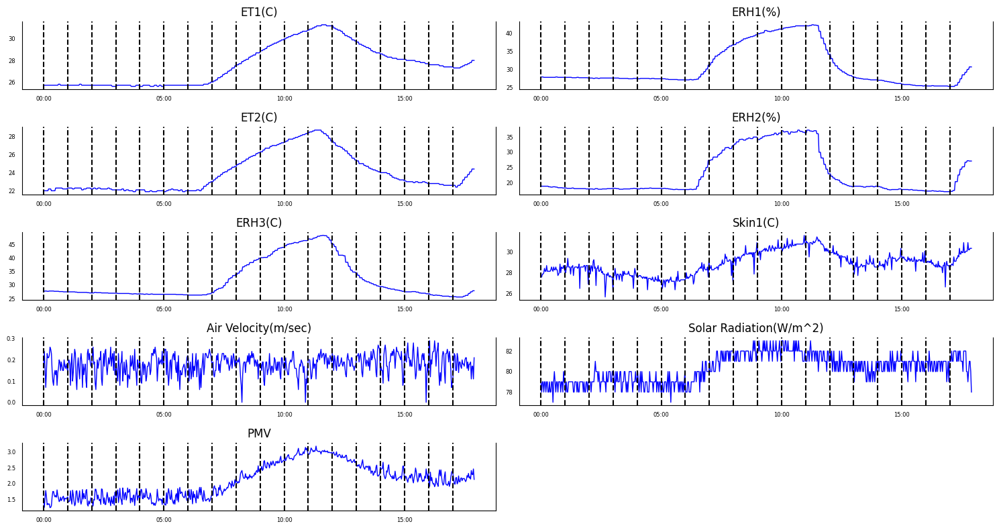

In [190]:
fig, axes = plt.subplots(nrows=5, ncols=2)
fig.set_figheight(8)
fig.set_figwidth(15)

time_fmt = '%M:%S' # how you want to display time/date

#set axes indicators
axi=0
axj=0

for i in np.arange(len(ts_df.columns)):
    #advance axes indicators:
    axi = int(np.floor(i/2))
    axj = int(i%2)
    #print(axi,axj)
    data = ts_df[ts_df.columns[i]]
    axes[axi,axj].plot(data, color='blue', linewidth=1)
    axes[axi,axj].set_title(ts_df.columns[i])

    for mc in mcoords:
        mplt = axes[axi,axj].axvline(x=mc, color='black', linestyle='--')
    axes[axi,axj].set_title(ts_df.columns[i])
    axes[axi,axj].xaxis.set_ticks_position('none')
    axes[axi,axj].yaxis.set_ticks_position('none')
    axes[axi,axj].spines["top"].set_alpha(0)
    axes[axi,axj].tick_params(labelsize=6)
    axes[axi,axj].xaxis.set_major_formatter(mdates.DateFormatter(time_fmt))

#Remove last unused axes:
fig.delaxes(axes[4,1])
fig.tight_layout();

#https://stackoverflow.com/questions/44980658/remove-the-extra-plot-in-the-matplotlib-subplot

We can see that all series appear non-stationary.  
The temperature and humidity measurements are significantly less noisy than the other measurements.  
Let's reuse the adf test:

In [191]:
for i, num in enumerate(ts_df.select_dtypes(include='number').columns):
    print(f'Test stationarity for series {num}')
    adf(ts_df[num].dropna())
    print('------------------------------------------------------------')
    print(f'Test stationarity for series {num} differences')
    adf(ts_df[num].diff().dropna())
    print('------------------------------------------------------------')

Test stationarity for series ET1(C)
ADF Statistic: -2.404788
p-value: 0.140390
Critical Values:
	1%: -3.441
	5%: -2.866
	10%: -2.569
Failed to Reject Ho - Time Series is Non-Stationary
------------------------------------------------------------
Test stationarity for series ET1(C) differences
ADF Statistic: -1.122695
p-value: 0.705937
Critical Values:
	1%: -3.441
	5%: -2.866
	10%: -2.569
Failed to Reject Ho - Time Series is Non-Stationary
------------------------------------------------------------
Test stationarity for series ERH1(%)
ADF Statistic: -1.899529
p-value: 0.332283
Critical Values:
	1%: -3.441
	5%: -2.866
	10%: -2.569
Failed to Reject Ho - Time Series is Non-Stationary
------------------------------------------------------------
Test stationarity for series ERH1(%) differences
ADF Statistic: -3.138974
p-value: 0.023800
Critical Values:
	1%: -3.441
	5%: -2.866
	10%: -2.569
Reject Ho - Time Series is Stationary
------------------------------------------------------------
Test

All series except air velocity are non-stationary.  
All series differences are stationary, with the exception of ET1 & ERH3.

### Multivariate analysis

Let's check the relations between our features.  
We need to ensure we do not carry dependent features that will damage our models performance.

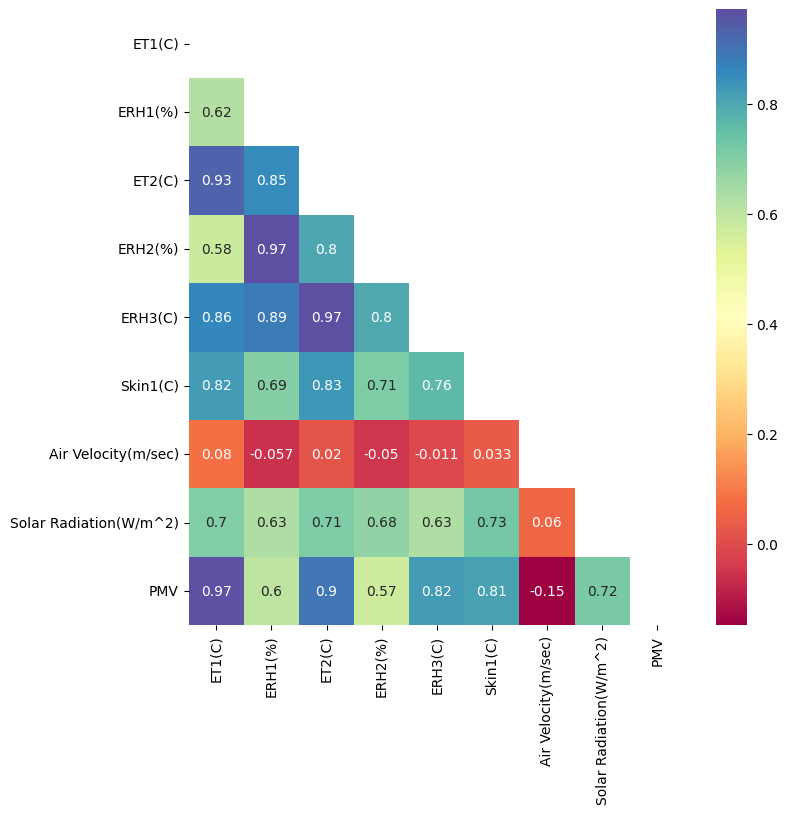

In [192]:
multicorr(ts_df)

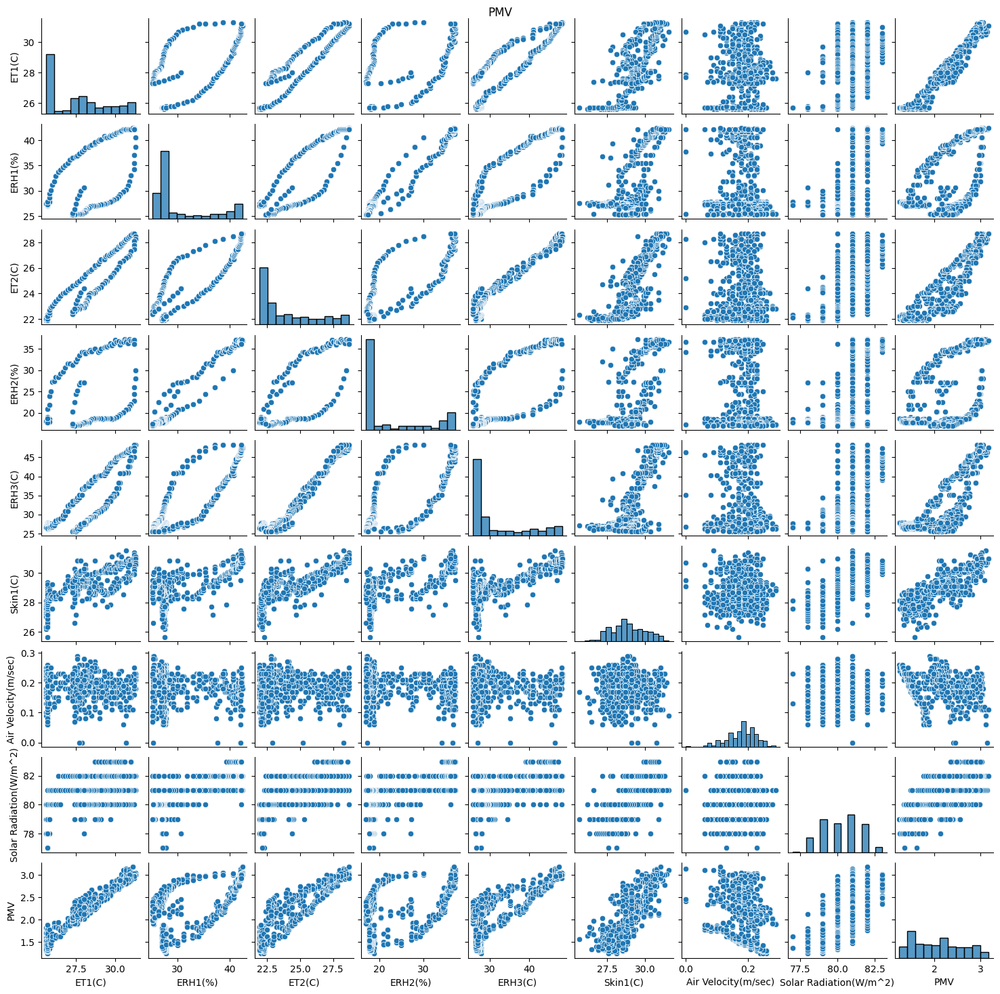

In [193]:
prplot(ts_df)

All features are related to our target (PMV) to a certain degree.  
We have a very strong correlation (above 0.9) between:
* ET1 and ET2
* ERH1 and ERH2
* ET2 and ERH3

We can therefore remove:
* ERH3 as it has non-stationary series differences.
* ERH2 as ERH1 is better correlated with our target.
* ET2 as ET1 is better correlated with our target.

In [194]:
ts_df.drop(labels=['ERH2(%)', 'ERH3(C)', 'ET2(C)'], axis=1, inplace=True)

In [195]:
ts_df.head()

,ET1(C),ERH1(%),Skin1(C),Air Velocity(m/sec),Solar Radiation(W/m^2),PMV
datetime,,,,,,
2019-03-10 12:00:00.000,25.7,27.9,27.57,0.17,79,1.48
2019-03-10 12:00:01.760,25.7,27.9,27.57,0.24,78,1.25
2019-03-10 12:00:03.520,25.7,27.9,27.85,0.16,79,1.55
2019-03-10 12:00:05.280,25.7,27.9,27.85,0.07,79,1.78
2019-03-10 12:00:07.040,25.7,27.8,27.98,0.15,78,1.58


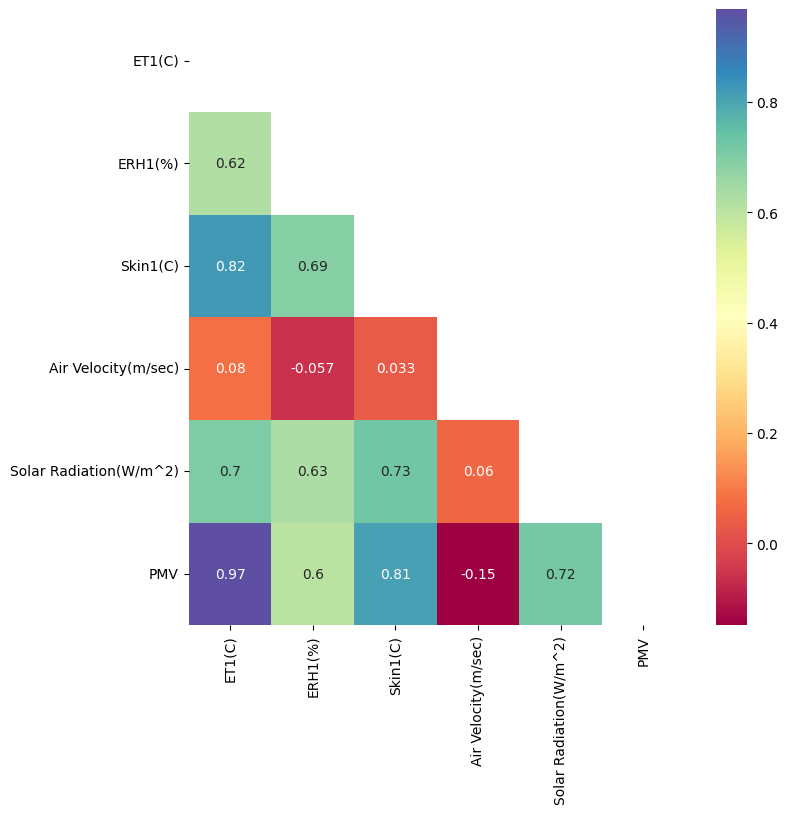

In [196]:
multicorr(ts_df)

We can see that we have successfully managed to remove the dependent features.

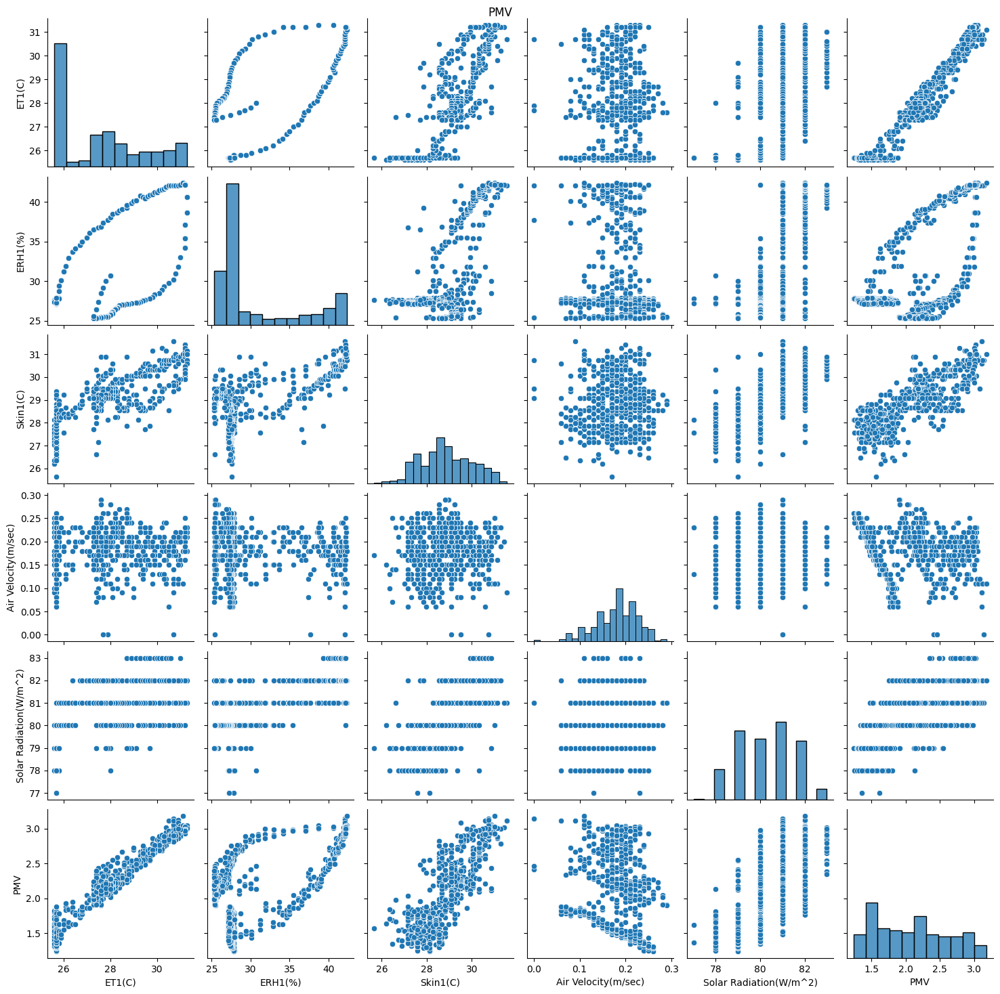

In [197]:
prplot(ts_df)

Here, we encounter another issue.  
We appear to observe hysteresis* in the humidity measurements.  
Many PMV values correspond with two ranges of relative humidity regions (see PMV-ERH1 scatter plot). The same applies for skin temperature (see skin1-ERH1 scatter plot) and environmental temperature (see ET1-ERH1 scatter plot). This is very problematic for prediction models as it can lead to multiple possible targets for a single feature.  
I long wondered what leads to this empirical observation.  
Eventually, physics came to the rescue 😏.  
It turns out that this is a known problem of RH sensors.  
*https://en.wikipedia.org/wiki/Hysteresis

Below we can see repeated continuous cycles of RH tests on RH sensors (Zinc oxide þ HMT).  
Riza, Muhammad Arif, Yun Ii Go, Robert R. J. Maier, Sulaiman Wadi Harun, and Siti Barirah Ahmad Anas. “Characterization of Hysteresis Free, Low-Temperature Hydrothermally Synthesized Zinc Oxide for Enhanced Humidity Sensing.” Sensors International 2 (January 1, 2021): 100106. https://doi.org/10.1016/j.sintl.2021.100106.

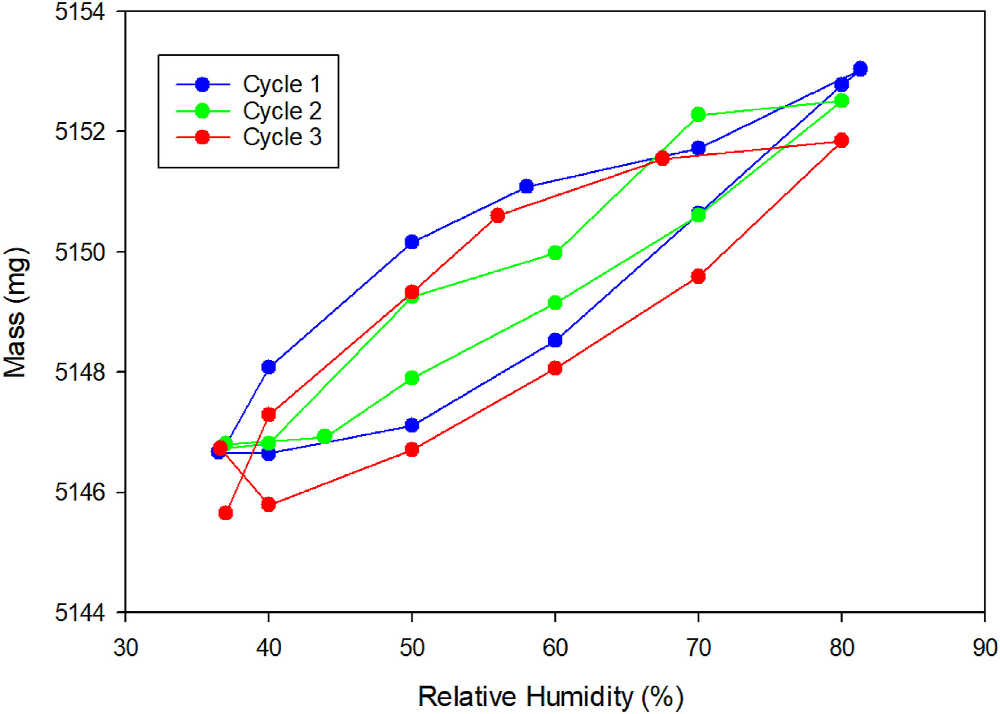

In [198]:
base64_data = "/9j/4AAQSkZJRgABAQEB9AH0AAD//gAHSGlSZXP/2wBDAAMCAgICAgMCAgIDAwMDBAYEBAQEBAgGBgUGCQgKCgkICQkKDA8MCgsOCwkJDRENDg8QEBEQCgwSExIQEw8QEBD/2wBDAQMDAwQDBAgEBAgQCwkLEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBD/wAARCATOBroDAREAAhEBAxEB/8QAHgABAAICAwEBAQAAAAAAAAAAAAcIBQYCBAkDAQr/xABvEAABAwMCAwMECwsHCQQFARkAAQIDBAUGBxEIEiEJEzEiOEGVFBcYGVFWV2F20tQVMlhxdHWxsrPD0xYjN0KBkdEkM1JTVZOUlrQ2YpKhJTVDcsE0OUZUpdUmRGNkc4OEhqPC4UdZZYKFpKbj5P/EAB4BAQABBQEBAQEAAAAAAAAAAAAFAgMEBgcIAQkK/8QAVxEAAgEDAgQDBAUHBwkHAwALAAECAwQRBSEGEjFBB1FhEyJxgRQykaGxFSNCUsHR8AgWMzQ1YnIXU1SCktLT4fEkNlVzk6KyGEOjwiVjJlbiGYPU4+T/2gAMAwEAAhEDEQA/APVMAAAAAAAAAAAAAAAAAFUuK3jev3DxqLjml+D6FV+p1+yGjlrG0Nsur4aqNrF6IkMdLO56Km679NtvBTGt607m5qUIQyoJPK3887dsfxgvV6VO2tY3VWaSk+VJ7eWO/dvHxIvXtF+KlE397J1S6fBPcP8A6lGSWcdi3eheouXaq6dUGZ5tpfc9PrrVvektjuMkj54ETwVyyRRO6/OxDNv7WlaTjClUU04ptrs2t49X0/hIw7O5ncxlKcHHEmlnO6XfdLr8/iZ7UHUHEtL8Ur80zW9UtstVuhWWaaeZrE2T0IrlRFUhNQv6WnUvaVN29oxX1pPyiu79ES1nZ1L2pyU9l3b6RXm32XqRFwh8WEHFhjeQZRR4SmO0lnu0lupv/SnsxauJqbtmX+ajSNV/0U5tv9JSZqWc6NpRuKm0qkcuP6vpnv8AYiNqXEVdytobpd/P5b/iSJrjqzbNENMrzqVd6SOqgtEPedxJUpTpK7+q3n5Xcu67Jvyr+Ig9SvZ2NH2lOHPLKSjnDeXjyfTr0JbTbJX9f2LlyrDecZ6LPmvxKa2rtLOJO/W2mvNi7N3Ue42+sjSamq6StrpYZo3dUex7bWqORU6oqEpUpypy5ZrDI2lWp1489KSkstZTzutn9jJo4auK7WzW/M6jGtQuDzMtLrdDTOmbdbxNVLE96eEaJLRQJuvzOX8RlUrWlO0qXEqiUotJR7vOcvr2+D+RYq3E4XNOgoNqSbct8LHTtjL8m18yz5hGWVS4uOPrFuF7JLBhNFhyZdkV6mYj6RLs2ijpoXO5Odz0imVXc23kcidN139C4tjcfT9QdlSWYraUk88r8mvPG/Uyq9q7eyd5N48ovZtea/u9srO5Z2w3Rb1ZqK7rB3C1cLJlj5+fk5k3232Tf+5DPuKPsKsqec4ZFWN19Mt4V8Y5l06/fsZAtGWAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD8VURN1KW1FZYPMfUPiK0Nwnj3yTVDVjNVpoNP7Qy12+hhoJamoqqlzl7xkTeXlRWoqbqrmp85i8NXcbWwv6so80q1RKGOvKt+bL2SfrJP0MrX7SpUr2FCGFS5XKTfTL6LCy+voyadNu1o4StRMmjxeeoyzFpKhUZT1V9tUbaaaRV2RiOppZlaq/C9rW/OSVC3nczVOlvJtJLu2/u+0wLitTtYSqTfuxzl9sLv54+WfQuHHcIa+1JdLS9tSyen76mc3wkRW7tVN/QvQs3NOrbudNr345WPVdvtK6NSFaMZxfuvDz6M83M04cOLji4yK+5JxKXyvwLTexrPJa7BRVcb5KnZVRHdy3dFaqInWV/Mn9VNvCKuKMdM0ueo3Uueuo5jF7qL8pdEvRxy/PBJ1Ksrq/hp1hFKi5JSlnDksdU8Nt+jSj8zcOyCoorbpVmttge50dJk08DFXxVrUVqKv8Acbfe1XW020qvvBM1xw9nqc4eSx95snauZza7FoHT4XcLw2gdlVwhp0c5Hq3u2Pa6Ryq1F6I3deviafUg62s2dNtKCbc2+iS6ZW7eXstmbRZwasLqvD68YrHz2Nasnat8H2lNjsunNpZmd/prJQwUH3StNkiZSPVjEarmpNNFIqbp/odfnJ24uvp9zOryuKbeM46dujfbt9xBWdorS0ppyXM17yWcpvd52w9/Jst1ohxA6T8RWLOzDSbJ0u9BC9sVSjqeWCWmlVu/dyMkaio5Pm3Tp0VT5Ut6lKEajXuyzh9njqfadeFScqa+tHGV5Z6fadbiJ19wvhx00uOomZVnIyBjmUVM1jnPq6jbdsTUT0r86onzkRqV1Utqajbx5qktop5xn+810XqS2nWavKv5xtU47ya6qPml3+B5IcQ2jOW0uGYpxJas3CrnzHUfLqe5U1PNOsnsG3SuR0cKp4MXblXZN029JnWkaekavb6XS96TgpVJd/aN7pPL5lju9+xH1buer2lxfNctOMuWnvs4Jdcb4efX5HtDgn/Y6zfkUX6qGfqH9Zn8SK0T+z6XwM8YZKgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA4PZzscxXK3mRU3TxT8RRUh7SDg+j2PsXytMrXi/Z96A47rPdtd7gmRZHkt0q3VrW3evY+mo5VXdVhjhjjVfR/nFftsm3XqV6XKWj2/wBGtvLGWk5fbjbPfGCjUU9TqKddvC/RX1X6b5eF5JoznGdoJgWuuid6oMwsr6yrslJNX2maKd0UkFS1i8q7t++T4WqiopE6vGUKP0qEnGUN8rHTut01hr5+TRL6TUcqqs5LMKjSa3+TWGt127eaZDHZNZ7lWT6FXvEcnqVqVxC9yW+mkc1OZIlbujFVPFG7bJ0Q2u9ufyjZW1/LrOONlhYjstvPHU1ynaQ03ULqxo/UjLK+Lzl/NlwdQP8AsRe0/wDuKX9U1HiH+y63+E2DR/6/S+KKUdkj/R3n/wBLar9Km31/7Jsv/LRrtX+1qnz/ABJ+4n+DbTHi0+4EepV/yuhp8ekklggstZBAydX7bpL3kMiqmybeSrV6qQMbeEbn6V1eMYfTGc/xuSvt5+wdCLwm85XX932ok3EtK8CwbBodN8ax2Glx2Gn9jew1c57Xs22XmVyqrlX0qqmZe1Zag39I3TWMdFjyXoY9jH8nTVS3eJJ5z3b836nnPcbJDwddopZcb0lppKHGM8oWzVtvnlWaLvZHKj3tVy7tRvoTddi5whWzC80i7n+apxdTOFmKjHMVlLot/Vrq2y1xZTzTtdWoRxXlLkeM7pySeE8rMu/3YN8henaEcUVZQXB3svR/R6s5mMhTum3K5uVW8srvv1REY7bl5eiFrhyFS3pviG6g41J5jRTxmKT3ksLEk9tpN9VsX+IYKUYaJQw01mtJNtNdFGLWHF9U933+J8u1ktzKHDNNYKSn7qkp8ko4IkT71rWq1Eam/wACIRFrN1OKabk93DP/ALtzNqRjDRZwh0Tx9zx+BfLCY5IsSs8cjFa5tHEiovo8lCfv2nczx5s13RP7PpP0M4YhLHF3Nyrybc23Tf4QCmOd6IdpTlWW3G+4/wAVuEYrbqiVUpbXbLK90EMTejF/yiKV/OqbK7y1TmVdumwBEOvOH9pToJpPkGrN+4zLRcqPH4WzyUlLY4GyzIr0bs1XUvKi+Vv19CKAfbQ/Be0t1y0nxrVmy8Zlnt1FktJ7MhpKqx07pYm87m7OVtMqb7tXw+YA3n3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygD3N3ag/hwY76hh+ygGmaz6e9pdovpXk+ql54zrNX0WMUD6+elprHAksrW7eS1XU2yL19IBcDg+zXKNRuGTTrOM1u8l0vl5ssdVXVkjGNdNKrnbuVGIjU8E8EQAmIAAAAAAAAAAAAAAAAAAAAHxqvZPsab2EsaVHdu7pZEVWc+3k77ejfbct1XNU5On9bDxnpnsVU+XmXP0748ilmlHHXldp4gcp0I4pocbxiqp6nusbrrbbqmmpa2NFXmfJNPNI1E25dl8lN9/wARc0Zx1Ox5ptRuI/Xjnbpult1znq91036/NbX5KrxnGLdCazF7OW725lHf0+r13eEbfxocYGlGk+kFwoaDJafIL9k8M1ttVFZJ46yRJnMXy38jl5GJuniu6+CIpF6jGrdL6FQjly6+Sj3+fkjP06ULeorqtLljDfOM5a6L5+fRGC7LzSPLNMdAqq7ZtStprpl10kuzotl50jcnkK/dEVFVFXp6Dab+jGxtrewi0/Zxzt0XNul0W67+pr1rcvUbq41DGFOWyax06467PsWm1A/7E3v8il/QpqPEP9l1v8Jsej/16l8UUo7JH+jvP/pbVfpU2+v/AGTZf+WjXav9rVPn+JvvHXxQ65cLtVieTYNi2N3bDK+ZYb9NW0FVPVUaI5FV7XRTRsait5tuZruqIQdpc0aeoqhftqlJbOP1s75W+fR9Ome/SblZzr2M61rvUh1zjGH0wspvfql9xNFj4m9C73gkGoUGp1gZbJKJK1/e1scc7GcvM5FgV3ecyf6CIrt+iIpkahH8nuXtN0vLfPlj+PjgjbCt9PinTTTzhprG669e3r09Sh+J1LOPnjdXVHDqCri08xC1uta1tbG6J8svVeaJuy7K7fdN0RU6boXeHrOdtbXmoXuF7aLp4T95qSwmtsbLOd+vTJVr9zF1rTTrR5lSkqjbXu5Ty08PfyXZkl3HsY+F653CquU+eaptlqpnzvRt0t+yOc5VXbehVdt19KqYdGmqFONKPRJL7NjIq1HWqSqPu2/tKq8cnZ/6KcMljxWtwPIs2r6i+XqG31K3eupJWMheqIqsSKmjVHfOqqnzGNbXM62sw0+SXI45fnnOOvTHyL1SioWE7pfWT28ujPQ/g64ONLOF61XC+ac3rKq6TLKanfVsvVZTzNj5U3RI0hgi28V6rzKT11VlRg7FfVjJyz3zhL8F5EFpz+lwhfT2nKKTS6dc7d+vqWTI8lAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAEQa5cJ+gfEc2CTVrAKa7VlJH3VPXxTSU1XEzfflSWJzXcu/oVVT5jGdtB1PaxbUvR9fiuj+wuKrNQ9m91+Hw8jQNOOzb4QdMMihyqxaZLXXCmVrqd12r56yOB6ORUexkjlajkVE2XZVQkaF3Utt6WE/PG/yb6fLDMSvb07lctRZXl2fxXf57Fm2RsiY2ONqNa1NkaibIiFhtyeWXIQjTioQWEtkl2OtdbZS3m3VNqrmudT1UaxSo1ytVWqnXZU6oYt3a0r2hK3rL3ZLDw8fetzIoV529SNWn1W6I90O4dtMOHi1XSzaZW6upKW71rrhVNq6+WqV0zvFUWRV2T5kM+VecqNO3/RgsL4GLKjGVd3L+s+v/TobplmH4tndiqsXzOwUF6tFa3lqKKugbNDKn/ea7oph1qFO4jy1FldfL70ZFKrOjLnpvDKuVnZTcFVZcZLh7XNyh7yVZVp4b7VthTdd+VG8/RvzIvRC9Q/MYz72PP+Fn5/Mom+fPbPkWN0w0k040YxpmIaX4hQY7aWv7xaekYqI+TZEV71VVVzlRE3cqqql+vc1LjHtHsuiSSS+CWxj0benQy4Ld4y+reOmW92bgWDIIr1y4adKuIiltdFqdbbhVxWerbW0iUlwlpVbK3wVe7VN/7THp21OleK/ivziXL1eMZz06de5dlWnO3dq/qPf+H1JJtluprTb6e2UTXNgpY2xRo5yuVGomybqvVTLq1ZVpupPqzDtrena0o0aX1V07nbKC+AAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/AKWgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf8AS0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAB1rjcaK02+putyqWU9JRwvqJ5n9GxxsarnOX5kRFX+wApjfe144QbJe66zMrcsuTaKd0La2htLJKapRP68TllRVYvoVURengAdH34zhD/wBRnXqWP+MAPfjOEP8A1GdepY/4wA9+M4Q/9RnXqWP+MAPfjOEP/UZ16lj/AIwA9+M4Q/8AUZ16lj/jAD34zhD/ANRnXqWP+MAPfjOEP/UZ16lj/jAD34zhD/1GdepY/wCMAPfjOEP/AFGdepY/4wA9+M4Q/wDUZ16lj/jAD34zhD/1GdepY/4wA9+M4Q/9RnXqWP8AjAD34zhD/wBRnXqWP+MAPfjOEP8A1GdepY/4wA9+M4Q/9RnXqWP+MAPfjOEP/UZ16lj/AIwA9+M4Q/8AUZ16lj/jAD34zhD/ANRnXqWP+MAPfjOEP/UZ16lj/jAD34zhD/1GdepY/wCMAPfjOEP/AFGdepY/4wA9+M4Q/wDUZ16lj/jAD34zhD/1GdepY/4wA9+M4Q/9RnXqWP8AjAD34zhD/wBRnXqWP+MAPfjOEP8A1GdepY/4wA9+M4Q/9RnXqWP+MAPfjOEP/UZ16lj/AIwA9+M4Q/8AUZ16lj/jAD34zhD/ANRnXqWP+MAPfjOEP/UZ16lj/jAD34zhD/1GdepY/wCMAPfjOEP/AFGdepY/4wA9+M4Q/wDUZ16lj/jAD34zhD/1GdepY/4wA9+M4Q/9RnXqWP8AjAD34zhD/wBRnXqWP+MAdm2dr9wh3K50dsWXMqRKudkC1NVaI2Qwcy7c8jkmVUYnpVEXZPQAXWo6uluFJBX0U7JqepjbNDIxd2vY5N2uRfgVFRQD7AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAANT1b/opzP6PXH/ppACrXZM0tLU8GViWppopVS83PZXsR3/ttvT8yJ/cAXH+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+AA+5ds/2dS/7lv8AgAPuXbP9nUv+5b/gAPuXbP8AZ1L/ALlv+AA+5ds/2dS/7lv+ABS7tb6Okg4Qpu4pYY9sntTk5WInXmem/wDcAW606/o+xj8zUX7BgBsIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPxV26qAfCkrqO4QJU0FXDUwqqokkMiPaqouypui7eJXUpToy5KkWn5NYPied0dgoPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAADU9W/wCinM/o9cf+mkAKv9kl5mNj/PN0/bAFzAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAClXa6+aFP9JrV+s8Atpp1/R9jH5mov2DADYQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADEZVlNhwrHq/KsmuUdDbLbA+oqZ3oqoxjU3XZGoquX5kRVX0GXp9hcapcws7SPNUm0kvV/HZfF7FM5KEXKT2R5A8TvaLap6k58s2jOXXrEcWtvPFQ+xXPpKqsa5E3fUtSV7HLui8uyNVEXqm57Y4E8F9I0TTuXXaEK9xPDlnEoxx2g+WLX97Ocvpsa5dajUqT/ADTwiDsO4peILAqGltGK6r5DQW2lqnVaUMVY9kL3uk7x/MjVRVR7lVXdevMvwnQNT4B4b1epKveWcJTkuXmcU2klhYznouhiQuq1NYjJ4PXTgx4xLBxSYpNSVNE+3ZnYaeJ97pI6Z7KV3OqoktO5z5FWNVTbZ7udFRd022VfFvib4bXPAN4pwlz2tVv2cm05bdppKO/fKXLjvnY2OyvFdR/vLqWSOXGaAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAGp6t/0U5n9Hrj/00gBV/skvMxsf55un7YAuYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAUq7XXzQp/pNav1ngFtNOv6PsY/M1F+wYAbCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAUq7VrIrbS8OLcZlguK1tbeKKohkZbah9K1rHP5kfUtYsMb+vRjno53VURURTu38n2yq1OKPpUXHljCaa54qW+MYg3ztebUWl3aIvVZJUeX1/jc8eT26a2AC0/Zu5Zktk4ncesVovlbR2+9K+K40sUitjq2NYqtbI3wciL1T4DkHjbp1rdcJV7ivTUp08OLa3i20nh9sokNOnKNdJPZntoeCzaAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAA1PVv+inM/o9cf8AppACr/ZJeZjY/wA83T9sAXMAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKVdrr5oU/0mtX6zwC2mnX9H2Mfmai/YMANhAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB1Llc7dZqCout3r6ahoaSN01RU1MrYooY2pu573uVEa1ETdVVdkLlChVuasaNGLlOTwkk2230SS3bfofG1FZZ519pRxWaKZzpbU6MYVlcOQXl9dQXNtZa5Yqu3rE1XK5qVET1bzpv1bt0PTngh4fa9pWrx12/oulSUZw5ZqUZ5eN+SSTx6kNqV3SnT9lB5e3wPMM9ZkCAC8HZZaJ1ma6vVOqdRUXCiosMa18L0oVdTVs0iK1Ye+VURrmps5Wpuuyp4J48B8feKIaXokdIioylcdfexKKW/Ny9Wm9svCJXS6DnU9p5Hr2eKjYwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAA1PVv+inM/o9cf+mkAKv9kl5mNj/PN0/bAFzAAAAAAAAAACKtYuJ7RPQls8Goua0tDcYqT2ZHa2eXWVEe+yd0zpzKq+jdPBTb+GuBNf4scZaXQcoOXK59Ip/3n2+wx611SofXe5XRvawaBrmrre633xMY+5yStuHsF3sla3n2WFYd9uTk68/N49NvSdOf8nriP6B7RSh7fmxy83u8mPrc2OudsY6b57GH+VaPNjfBOOj3GXw+a4T0dswvN447xXyyxU1or2dxWyKxN1cke69FTdUXfwRTn/EnhnxLwrGdW/t804pNzjvBZ9dt/PYyqN5Rr7Re/kTeaEZQAAAAAAAABq2peomNaU4Nec+y24Mo7ZZqOWrme5HLujG77IjUVVVV2TonpMO8vKdnBSl1eyW2W+yWWvxMi2t5XM+VdO78l3bPPjC8p45+Pi7T33Fs6umj2j9TI5kNVa3QpWzcu/I+GRGxVLkVei/zrW9PBdjLoadXo01cX8/ekuaKXb02e69ZZflsY15qNrVru20yPMoe7KT2z6tNyxLHRLbHVo3C/wDADxS4rZ6nINOOPPVK85HRM7630F0rp20tRKi7oyRZKp7EavzscnzFM69a3xOhFSfk8dPg0035J7eqPqpUq75azaXpnP3NP4me4LeMTUG+5vdeGzijetNqXaZXNo6ruWNZcY2N8td4Y2Q9Omzk++3UzrV22sWbu7NpShtKOd/V4y91+kui7GJdRraPVjTvc8k94yeEkn0WW8vPZ4bfdl4jEMsAAAAAA8/+0bzjOcV1h0UocVznI7HTXG7OjrILZdqikjqWczV2lbE9qPTp/WRem6elTF0BurxBKlUeY+7s919j2KdYbp6HVqQ2l5rZ9H3W5fCxvkkstDLI9z3up41c5y7qq8qdVVSRu0o15peb/Ex7JuVvTbeXyr8DIFgygAAAAVa4t+O/Sfh1tFdi0F6S557VUzm0FnpmPc+J70VGSSu25WJv4bruuxEXV1WuIujp6zLOHLOFFd3nDzJdo/a0SVtaU6S9vePEV0XeXy8vN9iHOyQ1P1G1UsOpV81Hze/5BWNu1OkX3UuU1UlM1zHKrI0kcqMbv6GoidDb7q0p2elWkILdqWX3byur6kFVuJ3GpTnLZOPRbJb9ksLp6bnoQQ5lgAAFKu1180Kf6TWr9Z4BbTTr+j7GPzNRfsGAGwgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHCSRkUbpZXI1rEVzlX0Inip9ScnhdQVb1N7SDhl08rZ7NTZPU5DcGU0kka2qm7+nbO3dEhkk3RWu5k69F2Q63oXglxXrMI150VShlJ87xLH6yXdY9VkwKupUKeyefgQlkfa9Y1RYnjlwxnTZ9zyCqRy3221FW+ngo1TwbDPyO73fr1VibfOb9ZfycbqreV6V3dclGP9HJJScv8Ucrl+1mJLV4qKcY5fcimTP+IPiJwtdVdbOKCDTfSa4Vd1p6SjpauOnuFSjW+VRxQU0ULq5qeSzaV6ptuq9V67jHR+GuDL/8j6BpDu9RjGm3JpyhHPSblOU1SfV5iuu3RbWPaVriPtKtTlhv8fhtjJgNFeC628WuTT5Np7ZpdP8ATK1U6Wxl2kklrKi61sSbOqEhmk8hZPF7Gv5Y1VETfxJHijxOq+HdorTUqn0q+m+fkSUI04S6R5ox35ekZOOZdXgoo2Su5c0FyxXfzLS6mdk9oplaWf2vb5U4N7Cp1juCxRT3FbhJ02kX2RUr3W2y+S3p5XzIci0P+ULr2n+1/KdNXPM8xy40+ReXuU/e+L32M+rpVKeOR4+/9pptN2OmJw1ME0+t9xqIo5WPkhdYmNSRiORXM3bOipum6bp4b7k5U/lK3koSjHT4ptPD9o9n2e8O3kWlo8Vvz/cXp000p080fxqHEtNsRt1gtkWyuipI15pnom3PLI5Vklft05pHOdt6Tz5rnEGp8S3bvdVryq1H3k+i8kliMV6RSXoStOlCjHlgsI20hy6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P8ApaAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAABqerf8ARTmf0euP/TSAFX+yS8zGx/nm6ftgC5gAAPxVRE3VdkQAxqZJji+F/ty9VT/5Wzx/vMn6Ddf5uX2P9xTzR8z9/lHjv+3rd/xTP8T79Cuf83L7H+4c0fMfyjx3/b1u/wCKZ/iPoVz/AJuX2P8AcOaPmcJsjsvcSrTXq3SStY5zG+yWLuqIq+hfmPsbKvzJTpySz5P9w5l2Z4McUOvOc6/apV+R5xJbkfbXyW2igt9P3UMUEcjkTbdXPcq+Kq5y9V6bJsifolwHwlp/CGkQtdPUvfxOTk8tyaXoksdEkl677mpXVedxUcp9iIDdjGNw0l1Uy7RbPbXqPhE9NHdrU9XxJUwJNFI1U2cx7V9Cp0XZUcnoVF6kHxFw/ZcT6dU0vUE3Tmt8PDXk0/NeuV5pl2jVlRmpx6nvrpvqFTZXp9jWU3652mmr7xa6eunihnRkbXyMRy8jXOVyN3Xpuqr85+cut6NPT9SuLO2hJwpzlFNrLwnjfCSz8kbdTqc8FJvqbJ/KPHf9vW7/AIpn+JGfQrn/ADcvsf7ivmj5j+UeO/7et3/FM/xH0K5/zcvsf7hzR8x/KPHf9vW7/imf4j6Fc/5uX2P9w5o+Z9qO62u4PdFQXKlqXxoiubDM16tT50RehaqW9aik6kGk/NNH1NPozuFo+gAoF2tGSXFcCw3A6N8jYb3kFNHUI3p3jFcjVYvzLv8AARNDN3xBQspLKS51t0aeM/YSsXO00mtdU5Ycswfwayy52k2H2zAtOMexGz0iU1JbaGKJkSf1em6/+aqbNq1y7y8qVnjd9tltt0NW0ahK2sadKXVL8Xk28jyUIizThW0PzjNqzU68YXvl9XapLR91YbjVwubTuaqbJGyVI+br99yc3zkfKzjRt6tO1XK55e36z7/b8i86vtqtKdx7yptNL4fivR9OxT/s98rqdJeITU3hgvtxqUjo7hLJY6etkcsncs8pytV+znIqKi77E/pNWpqfDsJVHHNB4bWMtye+ceT+wj9Zi7XXnVjF4uFzNttrpmO72y/vwTd2kOrk+mvD5XWW1VDEueXytscLGu/nUSbyVe1EXm6fCiKaxewlfXtvYUZYk5KTXdxXXBsGmuFtTq3tXKUIvlaz9fsjFY/eqbgV4HKK71yOnvVttbZUgrJ3SLUVT13RGo5ybIiOTyU2ToTXF2oqhcQstPay3yU8rK23ecNN9/N/IgeFbH6VCd7eRkubM6nXbssZW2dvtyQFodwk59x7Y0vENxO6u5ZR/dtr47HRY9JBb2xwMdysc+NadzFavXw3cu3VxVV0qGkUu/0qSy2+zxspLCafRtLCw/MfTa17dycYqNCOySTy2urTbez83l52xjBt/C7nuq/DBxIVHCHqffam/wCL3GJ1Vi9wqIOaSCnYio1HypHHzK7ZEVPKRF8FTcu6RfR1+0qxuk1c0nhbYU8fWa3eYrqm0m98lvVaD0atTuaUk6FTr1k030XRJP8AWxlYxjc6/ac/016EL/8Axl36UIvhz/vJL/VMrW/7Bq/x2LA8XXE1UcNuidvuWNww1eV3tkNus1M5rZFbPI3lbKsauRXNa7boiL+JRqtxcVtUWnWWPazbe6b91PDxjPveWU15l/SKNKGn/TLlP2cIrp3ljZPdbee5BGHdmtkuuNrXUziv1wzefN7yxlSseOV1PR00CK3dGujdSbIv3vRiNROviSFxa0bOKo2zzJZy3vHPp0ePPOCOs7y6vV7SvFRp/orGJJd+bdr4Yzt3MPgOo+t/A3xI45w46h5g/J9Kcnmjp7NdbnTNdLRvlXwdVIyNXPRURFa5XpsvREL2lX0NYlVsL5JXUVmPLhcy7bZ+r13wnnvgydZtZWMYajYc30dvE+ZZee+Gu/RrtjO2dz0nRd03MQrPxzeZqt3VN/gLVakq1N028Z8j6nh5Ku4xwJaG6WXzMdYX0NxyTMbklwro7heKtZWUaSsc5YooW8sSoi+Cva5yehULN3UVhpNW2ttk4NSb3lL4vt8kvXJlVZPVtQo17n9GUMJNpLl6evxTePQgTscVVbVq6vTrkUfh09EhsdffRLDP6j/YRFf+1qnwf/yPR8hzMAAAKVdrr5oU/wBJrV+s8Atpp1/R9jH5mov2DADYQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYrIMnx3FbdU3bI71R22koqd9VPLUSoxGQsTynrv12QyrOwutQqxo2tNzlJpJJZy30XxZTKSisyKCcV3ac0FntddiXDlI6pukdQlPNkk9BDVW/uXR83NSu71UWRFXbaWJW7IvReino7w98CalzWhe8ULFNrKpKUozynjE1yr3cb5hNPpuRF3qaS5aPXz7fI8vK2sqblW1FwrJFkqKqV00r9kTme5VVy7J0TdV9B62pU4UKcadNYSSS+C2IFtvdnXLp8J54LcCxLVzX/GtO9RbXJeccq/ZDpaB1ZPAxXd2qo5HQvY5q77L0VN9uu6dDnXifq97w7w3canpc/Z148uJcsW+vlJNP5r4GZZU41qyhPdHubjONWTDsfoMWxugbRWy107KWkgR7n93G1NmpzOVXO6elVVV9Kn59319calczu7qXNUm25PZZb9FhL4JJG1RgoJRj0RlTFKgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAGp6t/0U5n9Hrj/00gBV/skvMxsf55un7YAuYAADA5vjM+Y4rccZpsmu2PyV8XdJcrVJGyrp036rG6Rr2oqpunVq9FX8Zn6VfR0y8hdzpRqqLzyzTcX8Umn69UUTjzxcU8FOZ+yK4e6qeSpqNQdSJJZXK973V1Du5yruqr/knwncIfyjOJacVCNtQSX92p/xSN/JFF75f3fuOHvQXDr8fdRv+OofshX/APUfxP8A6NQ/2an/ABT5+R6Pm/u/cPeguHX4+6jf8dQ/ZB/9R/E/+jUP9mp/xR+R6Pm/u/cfOfsiuHSnglnfnWo7kjY56olfQoq7Jv8A/Qh9h/KM4nnJR+j2+7/Vqf8AFH5Ioeb+79x5RZNaUsWRXOzNSZGUNZNTs71uz1ax6tRV6J16fAexbG4+l21OvtmUU9um6ya/JcraMYZZScmsc9yNY1XKvgiJ1KW0uoPU3TbsqtAsy09xvK7lmeoVPWXa109ZUxRVlE1jZXsRzkajqVVRu6rsiqq/Op5D1z+UBxHpmp3FnSoUHGE5RTcamcJ7ZxUxnzwl8CfpaVRnBSbf3fuNl96C4dfj7qN/x1D9kIz/AOo/if8A0ah/s1P+KV/kej5v7v3D3oLh1+Puo3/HUP2Qf/UfxP8A6NQ/2an/ABR+R6Pm/u/cPeguHX4+6jf8dQ/ZB/8AUfxP/o1D/Zqf8Ufkej5v7v3Ey8M/BZppws3m93vA8jya5S36lipahl3np5GsbG9XIrO6hjVF3X07mi8c+J+q8f0KNvqNKnBUm2uRSWcrG/NKRlW1lC1bcG9/MsEc3MwAFDO1fwy5VOnGLahW98j2Y3faaoqWNb0ZC16Kr1XfdNtvQhEQkrHX7a+nLCf5tfFvP4ZJanGd7pVe0gvqpz+OFjBcPSLMLfn+mmO5fa6ls9Nc6CKVj2u336bL1/Gim0avauyvalFvo+3ruaro1eVzY06kurX4PBuBHEoVt1a42MU0o4gcc4f6vEa+5V+QU7J1r6eoRGUyvdysa5nKqrv8KL09J90eEtZuqtvQxiCznOctLMljtgtatVWk2lK8qYcZtrGcNPKS+OW/QrnxeWVug3G7pbxF08j2U2Q1aW+8KqcrI4+Xk6uTffdF+D0FrhpVYazV0+WHGumoL+81u/t+Bka61W0FXahh27UpPu99l8O3fzMbxV1VRxHcd+nGklkmWayYvSUd4ubWczmyI56So7Zdk6N2T0l7hq3pXOqXGozkk6KcYPzcdnHfp7xY1q/dDRqNkl/WGm/OOem+ejXXuSJ2ttPcI9ArG23942lhuiJUIxUREjRqbb7+ggdRlB6tZOr3m8fHBO6ZFQ028iu1NfiWH4QJIJeG/BZKZz1iW2N5eeRr18V38pOi9Te+KP7Vq/L8EaTw2saZSWMdf/kzI57xPaHaYag2jSzOM3+52UX5rX2+gbbKydZWudyoqyRROjZuv+k5CDsaU9RrytrVc04rLXTbDfV4XReeftRN3k42FvG6uHywbwn65S6Lfuu34Mpz2nP9NWhH55f+lDB4d/7xy/1Rrf8AYNb+OxovapUuQz5/ootovktla6liiiuTd9qSoWdqMk2TrunRenwF+3i6nE7pRlyzf1X5LLzj5mZCVNcIVHUhzrMcx81ykwQ8GvHXUQRVFN2iF5fFLG17HLZnpuioip/7YvTi4TcZdmzCpzU4RlHo0jX8h7Nzibz3JMbvup3GXNlbMbuMFwpYK6zyqjHMejl5dp9kVUTbfb0n2x9jZ30b9QXOljPfl8vv/afbhzr2srXPuy7ds46/I9D6eN8UEcUj+dzWoiu28VPk5KUm0i1bUpUaUac3lpYz5n1KS+YbMv8Ashe/zdUfs3Efqv8AUqv+FmVZf1mn/iX4nnz2OH/qnV36RR/okNorf2JYf4H+wia/9rVPg/8A5Ho+Q5mAAAFKu1180Kf6TWr9Z4BbTTr+j7GPzNRfsGAGwgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAx15v1mx6hnuN7uUFHT08MlRI6R2ypHG1XPcieK7Iir0RVMi2tK95UVKhByk2ksebeF6LL8ymUlFZZR3UrtOae7ZOmn/C9hEGbXS4SUtPa7xcFmpqGSpld5UUkEqQPbt4I5ZGtVevgnX0BofgTK3tPylxbcO3pw5nOEeWU1GPSSlF1E/NpRb+ZFVdT5pclBZfn2/YYKw8A+tnEjdIc94xtRbxbJY5a1lNjtBNTTzUDHvR0aRVPNPF3Sr/UVFdsiIrtyQu/F3QOCaL07ge1jNNQzVkppTaWHzQxTlzeuUs52KY2FW5fPcyx6fxkxnaT6QYFozw843j+mGJUtkoKzIWS3BKOHlSpljplYyWXbpzbb9eibqvwmX4IcSajxNxNXudWrOpONJqPM+icstR9CnUqMKNFKCxueY56wIIAFmuzlY93FliLmxuciNqN1Rqrt/Nr4/Acn8amv5m3WX+r+Jn6d/WInuCeBDaQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAA1PVv8AopzP6PXH/ppACr/ZJeZjY/zzdP2wBcwAAAAAAAAAAohxycAOR66ZTcNW9Na+3Q3mO2MYtmbToya61LF2RVnklZFGvJ03VP6vXx6ehfCnxfteE7OGi6rGTpOb9/OVTi/7qi5PfsvMib6wlXk6kOvl5lKve3eNH5Gf/wDIrT9qO8/5beBP9O//ABVv+GRn5Nuf1fvX7yzPB52bWfYZmWOatayOttvqLPXSyvxmojjq3LyJ/MzJPBM6Pfm8rZUXbl6+PTlHiV43abqdjX0bQ+acakUvapuK3+tHllBS6bZ75M2z02cJKpV7dj0rPLBOAAAAAAAAAGq6nadY1qvg15wHLbfHV2280ctJKx6uTbnbsjkVqoqKi7L0X0GFe2cLynyy2kt4vbMX2aymvuMi3uZ20+aPR9V2a8meeWE2Djn4ArxJjdjwK76waRQSvdTwWeCJ9XFzb8jImNdLURtReq7xq3r4mZR1KrVpKhfw3gsRa6dt8pYxntLf5GFW06lTqyubCSipNOSeP+Tcsd1leaN0yftAOKPLLHVY9pfwK6o2TKK1qRW64XW3TyUlPKqp5UrX08bVbtv4vanpVemw9jUryUKTSb88Lb4vZP47ehcdWnQ96qm16Jvf4Lf4mf4O+DrUWnzm48SXFkn3Q1GuL1WgopJmOZbI3J5ScsMjoV6/etT73YyrGFDQ7eVCyxzz3lPvut1nu3+k+j7bGFdu41itGpdt+zhsovDTx9V7rKx2WU/NEj9otpras/4WMwrKiGFtwx6mbdqGpe9GOifE9HdHKqIm/wA5A3rnZ3NvqVu8Vaclh+Se0kl3z8GbBp9RVI1LOpvCpFrDeFldG90tvV4K4dk1g+WZ9PkPEpqVVVdzu8nJj9ur6lyL3lLFE1uzUbsmzdkbuqb9PE2qlCjpulO3pJJ1puo+uVu85/xNtmr1XVu9SScswpx5Wtsc3bG2+F3TwXb4kNELLxBaTXvTe7r3Tq+nclNOiLzQyp1aqbKniqInX4TVtSspXUYVaOFVpvMG84T+HfY2XT7uNrNxqpunLaSTxlfHrs99ijWiGt3FlwWYm/QnP+EzP89pLPLItluNhgWogSlc5Va1ZKaKZq+K9FdzJvsqExV1KWp0FKcXGuliTed3jb4+rTw+nYjJ2Ksryo6NVToy3WE8579XlL0aW+/Rm48NmietPEDxC1vFLxO4FcMcpbXGlPilkusMUcjYHbq3nY3lkRzPHmkYiqql/RqUdCsqk5T5rmq/rKT91d8LLik+nLnK+ZjanW/LlWlRhDFtTzlNSTcs7NNtd920uV7Y7n07RzCM3ynWHRStxbCMivdNbrs6SsntlqqKuOmbzNTeR0THIxOv9ZU6br6FIrQE6XEEqtTaPu7vZfa9jL1jNTQ6tOG8vJbvo+y3Jp4ueFak4ltGaS1UaNosrskEdXaapzVSRs0beZIV3ciIjnIm+/guxTq1vVWoLUbLHtYN93vHOWlvjOejZl6JcwhZKzu8+zlFbbrEsYUnjd48iuWlHGTxnaKY63T7XDg/1Kza8WtrIILnaba9GPiamyI6SCGWKRdtvKa7w9BLXN5Sv37aMOWT+tthZ9E0sEfRsqlg3Sc+aH6O7k8esm5N+mcYRsOnV647+J/Xe35zdLZmOi2k1smhe+z1fd09VWci7vjej2tmcr1/rLGjOXdE69T7p9pC25ru8qJvflh1TTzjKTwseb3fZFN/czuKEbW0hjf3p7Jp7b5eG12SWe+cnoGnhsYhkn6AYfLo5ZsUvMEMT5JJKCoaxjGq5znLG5ERETqqmBqcXOzqKKy8PpuzIs5KNxBy2WV+JRPsmMFznCbVqkzNsIyLHXV98inpUu9qnolnj2f5TElY3mT8RslWpF6PZU0/ejFprunt1RG14t6pUmumHv2+t5noIRRlAAAFKu1180Kf6TWr9Z4BbTTr+j7GPzNRfsGAGwgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA1fLtUNNcAqaaizrUPGcdqKyN0lNDdbtBSSTsb985jZHor0T0qm5K6doGq6xGU9PtqlWMWk3CEpJN9E3FPGfUtzqwp7Tkl8WVK1O7RF2SXCvwXhJwG7ak3laJr47vQUFU6C3zrKjP5+nkgaqx/wD2znRnlJ1OzaF4MKxpQ1DjO5jaUubDhKUE5xxn3ZKbXN/d5XLZ7EdV1Hmbhbrmfn/CNSxfgw4iOJa/R5bxrZXW0VBRVtQ6DFqWenckbZGJtJTz08srYm82yKxyKuzfxKTN/wCJ3DPA9u7LgKipTlGOazUt2n0nGcYuTx3TxuURs61y+a6fyLkaUaB6SaI08sGmWFUNkkqYIoKuohave1SRp5LpHf1nbqqquydVU4fxDxfrXFMlLVrh1Em3FPpHPXC7IkqVvTof0awSA9zY2q97ka1qKqqq7IifCa2k28IvFDOMziJvutSycLnCvRRZ5c72ySmyeotsffwUUG6Ikfsh3LAzd3jIsnK1UVqqinonwy4Mt+F0uLuL5O2p08OipvDlLz5Vmb26R5cvqsoiby4db8xb7t9SrupnZecR2J3CjgwK0xZnQy0MdTV1iVdDbW0s6p5cCtnqt38v+mnkqn9ydZ0Xx94VvKFSrqlT6M4yaSaqTzFdJZjTws+T3RHV9Nq0t1ukst7LH2s1K0dnLxfXZ1JNHpbD7Aqns3rIsitMzEjVdlenLVLzIidenjsScfHXgGvQ+kWt+qiazHFOriXlh+zxv5li3tKl1TjWo4lCW6alFprzTTwz1E4P+FCzcLmFVVnkq7feMhuFQ91ZeqejdTvng33iic1XO6M8rbr6Tyj4keIVfj6/jXUZU6MUuWm5KSUu8lhLrsbFZ2qtY46vzLAHODMAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAADU9W/6Kcz+j1x/6aQAq/2SXmY2P883T9sAXMAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB8pnSNie+FiPejVVrVXbdfg39BZrzlSpSnBZaTaXn6FUEpSSk8I82eIPXLi54mK6+8KmM8Md0xW23i4yWubLK2OtdRyU0b1VXtlfTxxMRzW+Kuci79N+ilNhYR1xUKl5L2UI4nOP6W3aLfLnDf1cNv7S/XuPyY6it1zyfuxfbdd9nj452Lu8Oeh+PcPGktm0xxt1Q+GhZ3s8k8iPc+peiLKu6InTm32TbwJfUr36dX50kopJLCxstl8/P1Iqzt5W8HzyzJvLe32bdl0RJxgGYAAAAAAAAAAAAAAAAAAAClXa6+aFP9JrV+s8Atpp1/R9jH5mov2DADYQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAaZqbq/p1o/Ypb/qDllttMTYJZ4aeoq4o6irSNvM9sEb3Isr0T+q3dfAm9C4c1TiS4VtptGU3lJtRbjHLwnJpNRXqy1VqworM3gpjmHaBas6wXv+SPCFpNcLtQyVVNSvymvoKl9PTvlavNFPGxnLB16pIsvg3fY7ppvg9o3Ddv8ATeNb2MJqMn7GMoqTSezi28y9YqPV4yRk9QqVny20c+pkMH7Ny5ah09LlHFrq3l2W3paV0UdrS6SSstb1lVytiqZJJFfGrdvJRrNlX0mPqvjbS0acrTgyypUKWU3PkSdRYxmUIxjh575lsVQ011PeuJNv8PmWp0Z4fNKNB7HT2bT3E6Clnhp/Yst1fRwJcauPnV/LPUMY18uyr05t/BPgQ4/xNxlrHFtxKvqdaUk3lQ5pezi8Y92DbUdvIz6NvToLEF8+5JBrBfOtcLhb7TRT3O610FHR0sbpZ6iolbHHExE3VznOVEaiJ4qq7FyjRqXFRUaMXKUnhJLLb8klu2fG0lllB9dePe76sXiPQfhGtNZeb1epJaGuvkbJv8jjR/I6WDud92bLzeyEejWpsuy77nozhPwio8PUHxFxpNU6VNKUafu+88ZSlzd87ezxlv7CIr37rP2Nsst9/wCPxJs4f+HPTLgxwevvdzvbbnkl0YjrreqqKNs9RJ4rFAiqr+Xdd1ZzrzKnMvXw5B4seLk+IF9Kv2qNrSz7Omn+zZSljphJpbLYwtT1LT+FLGV7fVFFLzxlvyim8t+iI1zDWTPMquEk65FWUUHK6FIqGeWnjkj3XbnYjtlVUXqeHda421jVqzn7eUI4axByimvVJ4b8zyHxB4ia/rlxKo7mUI4ccQlKEXHL6xUsNtdTCW3Ps3s8UFLbsuvNPTUyp3VPHXytiaiLvy8iORNvmIi14h1azjGnQuakYx6RU5KPwwnjHoQdnxVrlhCFK2vKsYQ6RVSaiu+OVSxj0LRaJ6yQZ7Qut2QV9LHfmPcqQtakTZI/6vIiqquVOu+3geguBuNY8Q0XQvZxVwm9uia7cuXu/PHQ9S+G3iHDiqg7bUKkVdJvZLlTj25U3ltd8dCWDox1gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf8AS0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAA1PVv+inM/o9cf+mkAKv8AZJeZjY/zzdP2wBcwAAAAAAAAAAAAAAAAAAAAAAAAAAGv5vnuGabY/NlWe5NQWGz07mtlrq+ZIoY1d4Irl6JuUSnGDSk8Z2RVGEp5cVnG7+BHVi4x+FnJ7tTWHH9eMPuFxrZWw01NBcGukmkVdka1vpVV9CF6lSnWlyU1l+RYrVqdvHnqvC830Jja5HNRzeqL1ToUPbYuJqSyjkD6AAAAAAaTnWtWk+mV0tVk1A1AsuP197kWO3U9dVNifVORUTZiL49VRP7UKKE43Nf6LRfNU22XXfpt6nyq1Qou4qvEF1b2RuMM0VREyogkbJHI1HMc1d0VF6oqFyUZQbjJYaKYTjUipReUz6nwrAAAABHWo3EPofpDcKe06n6o4/jFZVR97BBcqtIXyM325movVU39KFqNWEpumn7y6ryz0K5U5RipNbPoZHTXWTSzWKiqrlpbnlnyeloZEiqZbbUJM2F6pujXKngqp12UyJUpxgpyWz6epa5lzcudzdCgqAAAKVdrr5oU/wBJrV+s8Atpp1/R9jH5mov2DADYQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAaZqdrBpto3Z479qVl1vsVLOsjKdaqRGuqJGNVyxxov3z9k6IniTehcN6rxNXdvpVCVWSxnlWcJvGX5L1LVWtCiszeCmuofHZqxrglZh/BPgF8uUkfsNZsp9isc63vfIqOjkpZ4JI1YqInlq7onMvo3O5aN4TaNwryXvHtzCCfPijl4mktmpxnGWV+rjfYjal9Ur+7ap/Hy+R89LezgyPOcnbqfxdZe3I7lXVFZPc8ahR8dNJJJ0jljqKSaLul/rKxkaN3RE8E61a/wCNlrpVp+SOCqHsoRUVCq8OSS6xcKkZ83llyb79T5S01zl7S4efT/oXrxvGMexG009kxq009voqSGOnjjhZsvJG1GsRzl6uVGoibuVVX0qeer6/udRrSuLublKTbbfm3l4XRb9lhEtGMYLEehljFKgAfCsrKW30k9fW1EcFNTRummlkdysjY1N3OVV8EREVVUqp051pqnTWZN4SXVt9EDzh4h9f8o4xMqodEdHbhNYdMK2ofTXzLauKP2LWNjVFfskjEc1rFb5PJKneb7dEO66JecH+C0ampcX3dL8pwipU7dzanFS+rnDafMuuYPlwaZqfFWk07n6BcXdOk8ZfPJLb5/dvuWx0UtHDfoPhVuwzCL7YYG0bFWarWdzpqiZyJ3squkc9zedyb8iO5U8EREOD8U+L9lxbf1L6/v4vmey5kkkvqrEUk8LbOMvu8luhxzwpQgowvqf+0atxGamYdl9spbBj9y9mVFFV96+SNm8Lmq3+q/wXxOB+JfFOmazbws7KpzyhLLaXu4x2fc4x4v8AGeja/a07DT6vPOnPLaXutY7S6MgQ44cAABI3D6m+qdp3T0Sfqm8eHP8A3ho/P8DpHhN/3rt/n+BdI9UHtUAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAANT1b/opzP6PXH/ppACr/ZJeZjY/zzdP2wBcwAAAAAAAAH54AELa4a5y4W92M4nKz7sqiLNUOjZKynaqeCeV/nPDo5qpspyrjzj2WiN6fprXt+8sJqK+363o4tYOKeJnidLhyT0vSWvpH6UmlJRT8t/rekotYIJ9u3U5Lwt//lN/l60/sVZfYVP/AJrm5tuXu+Xff07b+jc5F/PvX/pX0z2/5zl5c8kOmc4xy4698ZOELxK4o+mfT/pP53l5M8lP6uc4xyY698Z7ZwSzozxC3K8XSPGc+qmTTVb0ZSVrYY4vLX+rJsrWongicrd916nR+CPEeve3CsNZlmUniM8KO77Sw0vRYjnzOt+HXi1c6hdLTNfmpSm8Qnyxju+0sOKx2jiOc9Sw52s9DgAAAAAAAAEU8TGutk4e9JL3n9zniSsgppGWunerd6qr5f5uNrVVOZVX0J8CkdqF1UoxjSoLNSbUY7NpN92lvgzrC0VxKVSp9SC5pbpbLyzhFKuHTg/zDjBpfb+4zsivtfHfHJNbcboql9tpXUyp0WaONjHtVHJ0Rr99tt1UmpaPQ0SHs6mZVpby5s5i/JrbDx2WEvIh56vX1uqpUMQoR2i4pe9/hfvc0fNt5z0eCbsj7KrgxulnqaLG9Pbpi9xkYqQXS25FcHz07/Q5raiaSNdl9CsUwKyrOOaMsSXTyfo9m8eeMP1MyHIpL2kcohPhW1Y1V4Vteb3wsawXGsueFwxVF2tl7uEDnSUdGxq8r3z7NTkdy9d0cjV8FTfrl6dqVvq1hUldvkrUny5a5YvHXr1X6rws92YWo2lTSryl9HanTrforMpZfTG6WVn30s42x635081e0v1aop7lpnnllyWmpnck8ltq2zd074HInVq/jPsrerClGvKLUJZw+zx1x8C/7WCrzts+/Hqu6yZ3I8ksGH2OuybKLvSWq1W2F1RV1lVKkcUETernucvRET4TEqVqdHHtGlnZZ7v09S/Tpyqy5YLLMdgmo2C6nWFmUafZVbr/AGiRVaysoZkkicqL1TmTp02MmpRqUoxlOOFJZWe6MancUq05QpyTcXh47PyZqmecTnDzpjenY3qBrNiViurY0ldRVlziZO1jvBXM33RF2XbdOpjU61OtJxpvOHh+j8s9Ml+UJR+suptuE6g4NqTZo8iwDLrRkVsk25aq21bKiPdfQqtVdl+ZdlMmpRqUcKaxnp6/DzLMK1Oo2oNNrr6FB+05/pr0I/PLv1kI/h3/ALyS/wBUr1r+wavx/YehFhe1lgoXyORrW0saq5V2RE5U67kpe/1ifxf4mNYf1Wn/AIV+BG2VcWnDLhF7nxzK9dcLttzplRs9JNdou8iVU32ciKvKvVOimJGcaizF5M2UJQScl13RveFagYNqPZIskwDLrRkVqmVWsrLZWR1ESqi7KnMxVRFT0p4oXqlGpReKiwWozjJtJ9DYCgrIt4msg1ExnQ/K7ppPYLleMsbRLHa6a3UramfvnLsj2xu6O5fHbZfDwXwI3VI1KtD2VNfWaT6/VfXputu/YztO9mq/PUaXKm1nu0tl838CnXCh2c2D6h6eTagcYuFZFe86vdfUTy0d0u1ZRJSRq5Fbyx074lRXbqqoqqieCIiE/eWVlp/s6Fk+ZKKy85ecbrPp9vmRUb251KrO4rtpZaSax077748sYWOxHHFlo3Q9nTnmE63cM9dcrVaLvcXUVxsNZWvraVVa3dGtSTd/KqKq+VIq7+C7GNol/VtdTVjcPno1VvtHOM9E8bb75WH2yy/qdlR1Cw9tSXJWpPKacsdOrTbT37Yx6ZPUfErw/IcWs9/ezldcaGCqc3bbZXxo5U/vU+3FNUq0oLomzGtK30ijGp5oy5aMkAFKu1180Kf6TWr9Z4BbTTr+j7GPzNRfsGAGwgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHBz2MVEfIjd12Tddt1KXJR6spcoxxzPGTrUt2tla2V9JXwTNgldBIrXoqMkb981fnT0lild0K6k6c08Np4fRrqvijGoX1rcqUqNRNRbi8NbNdU/VdztNcjtlau6L6UMhPPQyk01lHI+n0AAAAAAAAAAAAAAAAAA4Pe1jeZ70aieKquyFLkorLZTKSisy2Pz2RT/AOvj/wDEh89pDzRT7an+svtOjd8hsdgoHXK9XWmo6VjmsWaWRGtRy+Cb/CpiXmo2mn0nXuqihBbZb236GFqGr2OlUHdXtWMKaaWW8LL6L5mvVGsWmcEEszcztcqxsc9I2VDVc/ZN+VN1Tqvo6+JEw4w4flJRd5TWe7lsiCXH3DDeFfUv9pFOtUeN3XDUGvTF+HHAq3DYpaKT2Ves1s/JPDUJIiJ7FSN88LkVqL/nGO33VUTwVeqrWPC/guyWqcR6jHUJc6So2NSE24uLbc1N0ZJJ94yWPtxruueKeh6bS5reqqrbxim4yl8cc2MEX4dodh+oN3lz7jCyDNMwyiouTqmporJNDBaKqFI0Y1HMayCSJ/Tr3SsTonwqUal/LD0PR6C03giwqUKChhSqU4OrF5y8N16kZLy5k/wNXh4wcPVFz3NC4c/SNNL0/Tz+Ba3G9ULLitus2C8POmUsUNFTex/YtdSukmWCNPJ2lbM6R+3XdZFVfnOBcQeMur8V3yqabSlWrTcpSVSOPnGNOeF64SRZu/F261CtStOE7KU5vOY1Ib4X6vJUfTvkz/tq8RHyTQ/8FUfxCL/ndxt/4av9if8AvH3+fXiL/wCEL/Yqf75wp8h4mczusdHRW6mxJscLnukqKFUgkXf0ukZKqO+BE2Qpp6lx7rlwqVKCtUk3lw91/OUZvPklgopav4m8R3ao0KcbNJNtyp+6/nKNR58ksIy38luKb5Scc/3DPspI/knxC/0+l9i/4JK/kPxU/wDE6H+zH/8AxzWcvwW+2i2XfUbiC1Khp7RZLe6Rai01LKd+zV35FR8LGKq+CJ4q5UQyNH8MeJOMtWhb6rc89SaUYexeHlv9JezS5V1bxkxY+HGva1du74uv8qMcRdBqL65w80oxx8s9CnmleZcQnEbqDNSaOYtLFp1UXGWCC+5HDVNSOlYiK6Kokp3yRpOrVVE2RWbqiL03U9CcQfyYuA+CtNU9c1i6d6opunSq0nmT2Tip04y5E+uXnGcCl4S2VzV/NXdwoebnH9kcfv8AQvhjnCxpXYWyxz0NXcIn7ckU06xNiX0qnc8m+/z7+Bwal4baTOrKtqE6lxJ43qTeVj1i4v7W/QnLLwa4boVJ1Lv2lxnGOebTWPWHJnPrn0M57njR74of/TCq/iGT/k34Y/0b/wB9T/fJL/JJwd/of/5Kv++R3rhh+leC4e2x2qhqqK4V0/simgpJu+c+RrdkdL3zlekfXbyPTt4mlcd6Nw7oGmK0t4OFSb5oqL5m2ljMuduSj/h7+ZzzxL4f4U4Y0ZWFpTlTq1Jc0YwlzNtLGZ+0k5KHb3cb46lcnxSRrtIxzFXqnMmxw6UJQ+ssHm+UJQ+ssHFEVV2RCnqUpZ6FguGnTCWpqY9RK6s7uKne+Klhjd5Tnp0f3iKz734Nnb7+J2jwv4VlVmtbrSwotqKXXK2fMnHp5YefM9CeDXBU61RcR154jFtQinu2tpcycenliWc9Sy53g9MAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAABqerf9FOZ/R64/9NIAVf7JLzMbH+ebp+2ALmAAA+b3tjY5712a1Fc5fmQplJRTk+xTKSgnJ9ER9JxBaQwyOiky7lexVa5PufVdFTp/qzSpeI3DMJOMrndf3Kn+4c8n4scH05OMrzdf/s6v+4fnuh9Hvjf/APS+q/hnz/KRwx/pP/sqf7hT/lb4O/0z/wDHV/3B7ofR743/AP0vqv4Y/wApHDH+k/8Asqf7g/yt8Hf6Z/8Ajq/7hwl4g9H5InRpl6buaqdaCq26/wD4Mpn4jcMSi19J6/3Kn+4UT8WeD5xcfpnX/wDZ1f8AcKcXOWKe41U8DkWOSeR7FRNt2q5VTp+I8wXUo1K85w6Ntr4ZPG17ONS5qTh9VybXwb2OuWDFPrR1lTbquKuop3Q1ED0kjkb4tcngqF2hXqW1SNak8Si8p+TMi3uatpVjXoS5ZReU12a7lvMf4gdMYLHQRXrMlfXNpo/ZKrQ1Ll7zlTm3Vseyrvv4dD0tp3iLoELSnG6us1OVc3uTe+N+kMHr7SvFfhelY0Y3t7mqorm9yo/exvuoY6+WxkfdD6PfG/8A+l9V/DM3/KRwx/pP/sqf7hIf5W+Dv9M//HV/3B7ofR743/8A0vqv4Y/ykcMf6T/7Kn+4P8rfB3+mf/jq/wC4PdD6PfG//wCl9V/DH+Ujhj/Sf/ZU/wBwf5W+Dv8ATP8A8dX/AHDPYjqVhWdz1FNil69nSUjGvlT2PLFytVdkXy2t36p6CZ0fijStfnOGnVedxSb92Sxn/El9xP6BxlonFFSdLSq/tJQSb92ccJ9PrRWfkbQT5tAAPPTtaayqq7Lp3jSvRtLV5JSOfvv4rIiETYw9txTQot7OGfskSVanGGh1ay682PljJfHD7XBZMWtVqpVTuqakijbt4bI1DYL6s69zOpLq2zXtNoK2tIUk84X/ADM0YpnnXrqOC4Uc9DUt5oamN0UifC1ybKn9yli4oq4ozovbmTX2rBco1ZUakakeqaf2Hm1wlXWp4e+PLUbh6q6VI6DK6qS4296v2a1jWc7ERqboqqi7eKeBncPONxoErScnzW7xFPyzhv4dH1ZjcQKpT1OlfKX5ur9Z4xmT6L5MlLtRdUKqwaVWrSyxy/8ApTN7hDb3xoq8y0sj0Y5UT09VT0oQM6MdV1i201p7NVM7/ovo9v2/Im7aqtP0+4vppOOHDd9G1nPR9Pl8Tva45HU8FvA/QY3hT/8A0rBbG26gnXyFbK9EVzlTruvlO9P9pn8YalK91Knb0k4KvPlynvFJdVt3x5EbwpZ/R7WV5dYnKmueXbmb+HTHb4EfcD/AJoxlWjlFqjrjiNNl2SZislfKy4N8ija567NZyO6rt1VVX0+CEzqdhS0uP5MprDit5Lrlrt2SXbbOSNt7ytq9zPVKlVyjP6qzthbZeyee3XGF0MxorwwaycKXFdcfahwyoumjmWRd/cpUrKOBLfN5XJExj5kme1nwoxd+bxXrtiaDc1PoNXT9T7SzTm229l1cYrGZdG9ki5q9H87SvLHLktpQyknl9d126pZflua32nP9NehH55d+shHcOf8AeSX+qZGt/wBg1f47EgdoDr9kWm+luM6W4NVQ02Q5+2C3JM92yxUsm0cjm+Cb9fSqFGoUaura5DSItxhJuUmsef1XlPZ98bmZpM4aZo0tWms8kUkt9m47SWPLyMpo12anCtp/hVLZs7xG2ZpensbJVXG7IjZEerd1a1sbkRERV+FV+cl7udKb9lRjhRys75fq/wDkkQ9jTrxzWuJuUp4eOy9F3+OW3+BXbOMHh7Pzi+xDKNI7nyYLqFW01tuNibK1vdtc7ZWtVN1WNFVHJum+/T4C1w9qM53dThy6zOMoucZP9FvO+3WW2O23wJPXbWNSxhrNviDhLlcU3iWMZzs9u+N912PU1rmuRHNXdFToW2sbFiMlJZj0OQKj5zSxwxPmlcjWRtVznL6ETqpTKSinJ9gll4R5XcV+aP7QPiKxTh20fl73HsTrX1F4vzWq+KNXeS6RIn8iqjdlb0Vd18OhXwzQje6hPV7hpUqUdlunNZ8mlh56em5f16otJtI2KSdeo+jysPGyckmsYecrp06nqFjdmZjuO2ywxyc7bbRw0iP225kYxG77ejfYuV6ntqsqnm2zBt6SoUo012Rky0XwAUq7XXzQp/pNav1ngFtNOv6PsY/M1F+wYAbCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADH3u9W3HbVU3u71Hsejo2d5NJyOdyt+HZqKq/2IYd/fUNNtp3dzLlhBZbw3hfBJv7jA1LUrbSLSpfXkuWnBZbw3hfBJv7EU01X1Yu+pVz5ZGtp7XSyO9i07FVU26oj3b/1lT4ET4Njy5xdxfc8T3GJLlpRb5Yr8Xnu18PgeMeO+PLvjK6xJctCDfJFZ/2nn9Jryx5YNCNOOfllOHLVm93qsZgd8alS2GndJS1Srs9rW7fzbvQqInhsieHpO7+GnF91fVVo937yUW4y7pLs/THTHzPTHhBx7e6lWWgXy5lGLcZ90lj3X2aS6YS9clhDtJ6FAAAAB8+/h6/zzOi/6SFHtIeaKPaQ819oSaJV2SRqr8yjni+jCqQfRkfz8QGkdNPJTzZbyyROVj0SgqV2VF2XqkZplTxE4apycJ3O6eH7lTt/qHPqvitwhRm6c7zDTaf5ur1X+ofJ/EPpC1jnR5XzuRqq1vsGpTmX4N1j6FuXiRw0k3G5y/8ABU/3C1Lxc4PUW43eX5ezqrP/ALDS04sbVtzfyIuCovgqVLdlT/wmrLxft+v0SX+0v3Gl/wCXi07WM/8AaX+6cKjixoPY8i0+E1rZeVVjWSoarEdt032TfYoqeL9HkfJaSzjbMljPrt0LdXx4t/Zy9nYzUsPGZLGe2dunmZO3Z5xH3W309zodNrDNT1UTZYpEq2N5mqm6LstRun4l6mfbcQcc3dCNejYU3GSTT5ksp+jq5+0k7PijxIvreFzb6ZRlCaTT50sp9Hh1sr4Pc/bhf+Ju40U1A3ALXQLUN5Eqqesi7yHf+s3edU3T8R9uNQ4+uaUqKsoQ5tuaMo5j6rNR/gfbvVfE68oSoLT6dPmWOaM4c0fVZqtZXwPsmmGtyoi+3PIiqidFpl3Rfg8S6uFeLMf2q/8AZLy4K44x/bT/ANn/AJnXuGjWq19pHWnINW3VluqFalRD7HXy2IqKqJ85YueCeI7+m7a91Lnpy+suXqsmPd+HXFmp0naahq/PRljmjy9VnP2+RFGuNr4Y+Hqjpp9SdRr/AENRcYKiW20rKd8y1j4U6xpJFTvZG5VVG7vVE3X5lNw4V/ky1eMqko6U6kowcVJuVJcql0eJcrksb+6mY9bwQ4ct2nVua2PjD/cKt4Jf9Y+KbKrlZeHzB1tGLQexaauut2roJK61d8i7zq1JIu9ToqojI1VE8d9zs1f+S54deGcaGocUX9W4rJuSpJL2VZRf1HilJxz0bc16YLdr4NaG7uNS3nVlCLTam4PPo8RW3wLP6ScA+V47cIrtqrr9fchlo66OeCjt8MUFHUQN++iqGyMe93Mv+i5uyfP1SI4ij4dX1N0dH4bt6SlFpylzuSk+ji1JJY9U/s2N5oeGPDVN81S1g/k8fiWetWlentjuMF2tOKUVLWUzuaKZiKjmLttunX4FOa2fCWiWFeNzbW8Yzj0azlfeS9jwPw7plzC7tLSMKkd01nK+82w2M2sAAAAGu5/nmL6Y4ddM7zS6Mt1ls8Cz1dS6N8iMbuiJ5MbXPcqqqJs1qr18CS0fSLvXb6np1hDnq1HhLKWfm2kvm0UVKkaUXOXRHn3arHqF2mWpUWXX1ZMc0UxWuRtLSMmjmkrp41RHpyqvOx72uTd6xo1GqqdXHpO4u9N8DNKdlb/ndUrR3lhpQi+m+MNRa6c2W9+hDqM9Tqcz2gj0SxnGrFh1goMWxi2Q2602yFtNR0kKLyQxt8Gt39CHmS+vrjU7md5dzc6k3mUn1bfdkzGKglGK2MoYpURRqlrLVYlfqPC8TtUFzvtYrN2TvVscfN961V3am6/DzbJ6TnXFnG1TSLunpWm01UuJ42baSz0XVbvzzhdzlHHHiLV0G/paLpNJVbqeNpNqKz0XWO77Pmwu51tLdJLpTXmbUDUf/KMhqH88UL+RyUqov33M1VRy7dE69E+cx+E+D7ildS1rXPeuZPKTw+X1ym03jpv0MXgjgK6o3suIeJPeu5PKi8Pka75i2m8bLfZepv2Q6fYZllWyvyPH6a4TxM7tj5eZVa3ffZNl+E3LUeHdL1eqq19RU5JYTeehv+r8KaLrtZV9St41JJYTedl5dTGxaN6YQSsnhwy3skjcj2ORHboqLui+JgQ4K4fhJTjaxTXx/eRsPDvhenNThZQTTyuvVfM3NE2TY2o3Q/QAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/wBLQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/AGrQDI9nv5mWlX5k/fSAFhwAAAAAADU9W/6Kcz+j1x/6aQAq/wBkl5mNj/PN0/bAFzAAAdK72i2363T2m8UcdVR1DeWWGTwcm+/XYxbyzoahQlbXMVKEuqfRmHf6fbapbytLyCnTls0+jNV9pTSz4k2/+53+Jr38xuHf9Ej9/wC81T/Jvwp/oMPv/ePaU0s+JNv/ALnf4j+Y3Dv+iR+/94/yb8Kf6DD7/wB49pTSz4k2/wDud/iP5jcO/wCiR+/94/yb8Kf6DD7/AN5xk0W0tRjlZhFvV3KuybO6rt/7xTLgfh9ReLSP3/vKZeHHCyi8WMM/P95TvMsYvGJ3+qtV5tclBIkjnxxv2VFjVfJVHIqoqbfAqnmLWtKutHvJ211TcHltJ+XbDWU18GeOOItEvNB1CpaXtJ03ltJ4+q3thptNY8mzCESQRkccsVXkt7orFRNestZM2JFbG5/LuvVyo3rsnpM7TLCpqd3TtKXWbS6N49cLyJPR9Mq6zfUrGhnmm0tk3jPfC3wu5ca16Hab0tspaa44nbqmpihayaZGOTvHInV22/p8T0/acB6FSoQp1raEpJJN4e77vr3PZNj4Z8N0LanSuLSE5xSTlh7tLd9e52vaU0s+JNv/ALnf4mR/Mbh3/RI/f+8yv8m/Cn+gw+/949pTSz4k2/8Aud/iP5jcO/6JH7/3j/Jvwp/oMPv/AHj2lNLPiTb/AO53+I/mNw7/AKJH7/3j/Jvwp/oMPv8A3mYxvBMRxGaefGrDTW+SoajJXRb+UiLuiLuqklpnD+maNKU7CioOWzxncmNH4X0fh+c6mmUI03JJPGd0unVmfJknwAUt7UPSi55poxR5xj1sqKuvwyvju03cMc93saJUc/yURfx+BDV5R07VbfUWm91BtLKim88z8lnuStpH6ZZ1rOUse65RW28sbLzefJE58LeteHa5aO2DKsXyChr520kcNfTwztdLRzo3ZY5WpsrHbJvsqJ0U27WLeNK5lUo705bxlhpNfPfrtuajo1WSto29farH6y/d5r1WxLyqjU3VdkQiJSUU5SeETPoik2ovGnqDUcYNh0E0PpbNldi7hPu++jgWrnpZkd/OIsjJEbHyN3VyKiqXeHYfletXnXfJRitpNNLKXm9mpPaOOvbJa16f5NtaLoe9Wk949dm9nhZax1ee3XBpvaA4zNpBrjpfxU2a2TRwWi5xwZDXxtVWd05eViPVd2tRU3QxeH3G14i+jzniNymt+i2w9+zfUzdUhWvtAnyYlO396MUt2292lnt9nmalm9TS8XvaGYhS2OsiueMYHZqK6pLSzslhe5dpnNc+PdN0c7bZV3RU26GdwvCDqXmp14vli5Qg+mJR91dGs53fdYI7Wrqr9AttOprPO1Kot+++cL9XZErdrTjVxu3D3QXaigc+msdy9lVSpEr0ZHsibrt4Jv6TW9Qq+y1Sycujm18Nur9DY9MwrC8px6uGEvmTjwT5BZ8l4Y8FudkqqSeD7npGvsZFRrHtcqOaqL1RU28FN64llGpqVSpB5i8NNdGsLdPuaXoEXSsY0J/WjlNZzh5ezNf1S4zrbp3xB47w9WjTa7ZVdr7AyokqbbVxKlGxXbKr49lds1N3L1TZEIXRoQ1i5qUYTUYwTzJvKylnlfk+3Xq+hLatP8k2cLqe7m8cu+d2kn0fXO22NuqK79pz/TVoR+eX/pQweHf+8cv9Uq1r+wavx/YaR2r+GMud80gybIKWrXF46eG3XKeFFZyNkmaqp3vK5rXcu+26L+JSuHsXxO7a4eFU3znGyeDOt6lSPCk/YNc6cWs/4fitiWcf7JHgxyiy0d/st5zOroq2Fk0U1Nf4JY3IqIvRyQbKZ9zb1LWrKjUTTT7rBF2tzTu6Ma1KSafdNNeu62PnJ2ZvAhpvltkfeNR71Z702tgqLdR3LLKOCSpla9HMa2N8SOfuqImzeq+gps7l07qMaOHUW/L1ePPC3x93mXbil/2eU6u1N7c3RZfbPTJfeCFkELIY1VWsRGoqr12KJyc5OTKKFGFvSjSh0SwjjV1lJb6WWurqqGmp4Gq+SaZ6MYxqeKucvRET4SzUqQowdSo8RXVvZIyIQlUkowWW+yPOTiU4qNYOJnUKXht4MmTXKyORaPKMmpKLvIY2OdyTMSWZGsY1rVXfbdX/ANRVQs2djU1l+1qtwt136J91vtnPaOd/LBl3V3DQEuXErhrZJp8v2Zw13beI98PpavhV4QtMOFXGJKDDaGWa93KKNt2us87pJatzU38OjWt332RET+0mLm856atqKxTTzju35vzeNvREDZ2tSEncXUuaq1jPRJZzhLf57vL+wncwSRAAAKVdrr5oU/0mtX6zwC2mnX9H2Mfmai/YMANhAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABHWvVbcKXTO7xUVokrIqiHu6iVszGJTM3Ty1Ry7u69Nm9eppHiDWrUtBrxpUnNSWJPKXKsrdp7vywtznXinc3FDhm5jRoualHEmmlyLK95p7vyxHL+RSw8rHicAGVxOtW3ZNa69tDLWOp6qORKeFN5JFRd+Vvj1JHSK/0a/o1lBz5ZJ8q6vD6L1JjQbl2ep0LhU3PlnF8q6yw+i67+RYpdROIHJbjWz4bgLaaghe1rYbnC2GVm6eG8j2c3gvgnQ7f/ADk401SvUnpdly000sVEoyX+1KOfktj0X/O7xC1q5q1NG0/kpRaWKqUZLb+/OGfktu59Pu/xW7/9irP/ALyD+OV/lHxF/wBEp/bD/iF38q+LH+hUvtp/8UWrEOIfJFq7les2djUzpvIo2tZLHy7eLFY52yejZV3Ptpo3G2p89e6u/o8m9o7NY9OVvC9G8ix0DxE1n2lze330WTltBKMo481yylhdsN5Mh7WOuCLv7c7v+GUy1wrxb/4r/wC0z/5l8crf8tf+061o4YMcnp5ajMrvW190nmfLLUUsiRMduu/3qtXr47qWbPwqsakHPVKsp1ZNtyi+VPPo09/Mx7DwT02rTlU1mtKpXlJtyg+VPO/Rp7+Z3/ct6Zf628/8W36hl/5KNA86n+0v90zv8iHDHnV/21/umdtWg2l1roI6F+MxVyx77z1bldK/dfSqbJ/5ExaeH/D9rRVJ26njvLdv4tY/AnrHwt4WsqEaDtVUx+lPeT+LWF9x2/aU0s+JNv8A7nf4mT/Mbh3/AESP3/vMv/Jvwp/oMPv/AHm12q1W+y2+C1WqlZTUlMzkhiZvsxvwJubFaWlGxoxt7ePLCKwkuyNssbG3023haWkVGnBYSXRI7hkmWAAARVqnxQ6C6OU1S/O9TrJR1dNOlLJQwzOqqqOdWq5rJIYGvkj3RPvnNRqbpuvVDb9A4D4i4lnFadaTlFrPM1yxcc4bUpuMX8E22Y9W6pUV78in9dxP8anFDdZLZw26Y12K4fXU1Oq3yugZHNCzvuWSpp6mZ8UczfDyGNc9ER3Q7ZR4D4D4CoqtxTdxrXMXL83FtpvlyozhFSlF+smlnBGu5urp4oRwvP8A5kj6Tdmppxa7pV5nr3c36iZVXVdTPUyvVYaGoSTbZz4UTm7xF5l3R+26+Bq/EPjjqlxRjY8OQ+i28YxSXWax2UunK9ljlz6l+lpsE+ar7zLe4/YbPi1koccx+gjorbbYGU1JTx78sUTU2a1N912RDil5eV9QuJ3VzLmnNttvq2+rJGMVBcsehkTHKgAAAAACLtfOITTjh+xCov2aZFSQXCWF6Wu186vqq+fZeRkcTEc9Wq7ZFfy8rd03VDbOEODdU4xvY29hSbgmuefSMF3bbaWcbpZy+yZj3FxChHM2Uswvh14meN2totQOJ+/12N4Oy6Nr6HF1gbDJJTrGqK6BFVXwehP51u7kVVToqKd31TjThTwspz03hKnGtd8nLKtnKUs5xLop/wCq8JrD3TIyFvXvsTrvEfI9BsIwnGNOsXt+F4bao7bZ7XF3VLSxqqtY3fdfHr1VVVfnVTzXquqXetXk7++nz1ZvLb7kxThGnFRj0RlK+42+10zqy511PSU7FRHTTytjY3f4XOVEIm4uaNpTdW4moRXdtJfa9izdXdvY0nWuqihBdXJqK+14RC+X6p5HnOQx4PpFNMrGyI2tu8MSqyJN+uyu2RETZevVHf1VOV6zxZfa9fLSeGm8J+/VS2Xwbwkl5/pfonFuIOONS4n1GOh8IN4TXPWSbUfPDeEku73Uv0WbZpfpBQ4FJU3i5VLLnfquSR0tdyq3yHLuqNb6N/FfhU2ThTgyjw85XNeSqXEm8z6bPsl2z39TbOCPD634WlO8uZKrdTbbqYxs+yXbPV+bJGN3OjAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAABqerf9FOZ/R64/wDTSAFX+yS8zGx/nm6ftgC5gAAAAAAAAABo+pmlFg1Lt6Q1itoq+JP5ivjhY6RvwNdvsrmdV8nmQ1PijhCy4ooctX3Ki6TSTa9H3a9Mo0fjTgTT+M7fkrfm6q+rUUU2vR9G4/3eZfEiz3ILflBd6q//ANxzz/I0v9N//H//ADnK/wD6f4/+If8A4v8A/YSBpfofj+m75K6SpS73N6+TVTUzGJCno7tvlKxdlVFXm6/MbpwpwHZcMt1pS9rVf6Tilj/Ct2n5vm3OhcE+Gen8HN15S9tWf6bilyr+6vecX5vm39CSzezpQAAAAAAAAB0bxaaC/wBprLJdaZk9HXwPp54ntRUfG5FRUVF6eClm4t6d1SlRqrMZLDK6VWdKaqQeGihdx4AtZ+HLJ6nULgk1drYFq51dNh2QO3tkvMnVznskY1yt28lHRKqb/fILarc2kPYN+0hjv1Xrjo367FN1Qtr2f0hrkqLvHv6Z6pPq1umznfrB2tGp1qmwfJKnTvC7VdUSnrL1j9Q5lwpYlXynwubPzI7b4Favo3Qu/R6NzJQryaj32zleTXdemSiVapQXNRgpS7ZePnn/AJMm3hM4JsM4Xo7ne35Ncsyy6+SpNX326wxpNvtsrY+rntRV3Vd5HKu/iZUbj6PbfQ7b3ae2Uujx022WF2WNjDdp7e5je3G9RJpemeu+7bfd538kd3j7sOPZBwl6hQZJK6KnpbatXFIjEerJmORWKiL8/wCI1/VnGnCnUcsSU44xtl56Z8mbFpEn7dw/RlGSk8ZwsbvGVnHxK5djtpDSWnSO66wV8rqivv1ylpaV72pvHBEiMVN91Xq5P7DcbmUrKxhZYw5+/JPzf1cbd1uarGjG41Kdz2prlT8092/T4ZL06l6d41qvhF1wDLqVZ7VeIFgnYiJuiehU3RU3Rdl/sNZvbOF9S9nJuL7SWMr4Np4J+zu52VZVoJNrs+jKM41w58fHCe+vwDhbv+I5jgtXI6rpnZQ1IJ6OWT79rGNmRNk2TqmyL/ooZMbm7uLZWl2l7mVGa2bT+bax2W+Oud8GJUt7aF1K6ocy5usW8rPnsopt+eF5dsko8KXBvl2CZ7dOIHX/ACxMi1HvKqrYook9jWprk8uOF6verkXf0ciInoM60lQ0ixnYWW/tMOcmt2197fnJvfyRjV6l3q1zG6vvd5PdjFSzHHbK6bdl265edunxv8NWr2t+pmleS6dWe3VdvxW4uqLm+quDKd0bFVF3a1ybu6b+HXfb8aRejQlZay72t/Rvl6bvbrsZWpp3Wk1LSljnfRPbtjrhk6a1cPuJa/6TrpjniTxRrCx0VRSqxZKapazZsjeZFReVevo3+Y+6raxvq3tac3FqWU1jPXo8ro+6TXxLuk3E9PpKnOKeY8rT+G+PXyeGU+wTRntNuGujm070evuF5xiNKu1tqskmVs0Me6rsyNZ/5tN1VdkcqGZK9uLyCd1Fc66vLbfxb6+nl0LLs7a1m3bTbi+zWEvRL9u2fI2fS/gX1W1O1ioOI/jJzWGvyWz1Mcluxi1Rsfa4Ei6xrzPe9OXdd+RrG+UiLzKZFn9F0uLq0MzrSTzJtrlb2wvPbpvhZ+r3LF3K51Cirab5Kae6W+V57PCb7vDbWxe9E26IYZkkMcXuI6uZ9oLk2E6LQUUmRXuBtG1aqr9jNbC5yJKqPXoi8u+xHXtGvczp04/0ecyecPbovVN9V5GbZV4W03Vf1kny9evZ5W+V2KQcOugnaZ8MGJVeIaaaeaSuhrqt1ZU1twqI5ayZ6pts+VkjFc1E8Eci7brt4ktKs5Uo0eijnp3z59iM9hGVeVzPeb7vdrzx8e/mSst/7YbbZMJ0bT50l/xqC0Xi6mDuy6TELO/PYqKLI3Uca3RlEq+x21PL5aR7qvk7+HUybxW6ryVrn2fbPXHqY9q67oxdxjn746GdMYyAAUq7XXzQp/pNav1ngFtNOv6PsY/M1F+wYAbCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADBZtjf8r8VueM+zfYv3QhWJJu75+Tqi78u6b+HwoROu6Z+WtOq2HNy86xnGcfLKz9pB8SaP/ODSq+mc/J7SOObGcd+mVn7UUQvNskst2q7TLPDM+kmdCskL2vY5WrtuitVUX+88f31rKxualtJpuLaymmnjyayjwZqNlLTrupaSkpODaymmnh9mm1950zFMEljh707nyvK471X0tVHbLZtO2oYvIj5kXyWoqoqOT4UTqnQ6P4c8Nz1fUVdVoyVKnvlbZknss4efVI634TcI1Nd1ZXtxCSo0veUlsnJPZJtNP1S3WxcA9MnsIAAAAAAAAAAAAAEW6wcS+jGhlsqq/Ps1oYZ6OSGOa20kzKivZ3v3jlpmu7zlXbffbbY2zhvgbXeK6saWnW8mpJtSknGD5eq52uXPpksVrmlQWZv95Th3Fdxb8XdVW4lw9aaNw/Gq6inpn5BU1NQkj2tmRrqikrESBsUqNVP5tFcqLv138O4rw+4M8OYQveJrv29eMov2aUcLMcqM6bdRyi3+lsntsRn0u4u8xoxwvP9z2JO0m7NPAcZzB+ousud3TVPIX1a1TnXqijdT1DXR8nJVRTuqFqHJ4o9Xp4J06Gp8Q+OOpX1itM0K3jZUcY/NyfMt85hKKp8i9MPvvuX6WmwjLnqvmfr+3qW7sVgsWL2ilx/GbLQWi10TO7paKhpmQU8DN9+VkbERrU3VeiJ6Tit3eXF/Wlc3dSU6kt3KTcpN+bby38yRjFQWIrCMgWCoAAAAAAAERcQPEvpxw/4Ze8gvl8tVberVAySHH23FkdZUvkXaJvIiOexrl/rqxUREVepufB/A2qcYX1G2t6co0ptp1OVuEUurzsm15cyZjXFzC3i23uuxVPQ3QXOONHOafil4mWVNstdHO2PHMTSkd7GfTsXdr3NqFd/NKviiRokq+VuidDsPFfF2n+GGny4R4UxOpJZq1ub3lJ9UnDHvLt73ufVw+pH0KE72X0ivsuy/wCv8M9BYoooImQQRtjijajGMY1Ea1qJsiIieCIh5slKU5OUnlsmTF5Rldjw+0y3q/17Kami+FU5nr8DW+Ll+ZOpF6rq1pottK7vJqMV9r9Eu79ERGt65YcPWkr3UKijBfa/RLu/RbkH1lff+I7IH2uzzVVqw+2v5aidjnqtUu+6czFVrd126J1Vvj1OTV7i88TL129q3Ssqb95rPv8AdZWUs+m/L13OG3N1qHjBqDtbOUqOn0niUk37/dZi3FZ8lu49dyYcG08xjT23ut+PUaosjldJUyo108ib7o1z0aiqiehF8Dpug8N2HDlB0bKPXrJ45n6NpLKXZdjsXDHCWl8JW7t9Oh1e8nhzfo5JJtLsuxs5PmzgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAFEONjXDiqp9f8M0G4Tcsgt19ulrnuFbTz0NC+KRqL5Kulq43o3ZEXo3bff0mJp/0i/ubidN5pUlFP0k/PbO/RGTdewtbOlUknzzk0vVfh1NBXGu222XbULGPD0Q2L7MZbMZF3+HWn1xpdLLdDxEV1FV5s18nsyak7hI3M38j/ADLGM3238GoSGpOzdSP0JNR5VnOfrY36+vyMKwVzGEvpTy+Z46fVzt02/b5nV4iOJTS7hpw52Uaj5BFRy1DXtt1Em7p62Vqb8kbURfh8VTY13ULydvH2dtHnqv6q7fFvfC9emdiatLT279pVfLTT3l+xLbL9FuQ12dHERqXxG4Rl2XaiZA2591kE0dsalFBT+xaRU3ZD/NMbzbJ/Wdu5fSqmx3FmrawtpTX5yUcyfm8v5emyS26EPVuOfUZ06W1PGy/59SXOLDV2q0P0LyTUW31q0tZboESnkSBsytkd0b5DkVq9VTx6Gr6vXuI040LOSVabSjlZ7rPZroT2k0Letcf9q/o0m317L03KO4n79JmWM2zK7PqDj/sC700dZS+yKWwskWKROZqualMvKuyp08UJyvRlb1HTn1XUhqFaNxD2kM436+jxksLwn2ntE7dnlTNxW5PZLliy0j+6ZSMtrZGz7Jyr/ksLHbePiv8AYZVKVmrKoqiftsx5euMd/T7UWKsbl3dN03+bw+Zbde3r9m3mYDiF4y9XLxqpLw6cIOEuyLMqWNzrrdJlYyntu+3K5UmjWNzevVyuREXpsqmu2c7jWoVKtq+WlF7TynzdmsSSw8rC657EzeK30yEYXOXVnso4l7u2cvCxv8cJdWRDd9We1V4amM1Z14p7XmuD296MudsoPuXE5jXrskivpqfvmo1fSm6eG/wknC4t7ecY3Kbi9s+T89v27PpsY8LS4vISja7zSyl3eOyXf5b9y9PDrxB4LxJad0ufYTVo5rtoq6kXm56OfbdYnK5rd19O6ISGoWErGUZReac1zReyyvPGXj4MjbG7ldRcakOWcXiS3aT9Hhcy9UiUiPM4AAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAABqerf9FOZ/R64/8ATSAFX+yS8zGx/nm6ftgC5gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPlMkroXtgejJFaqNcqb7L6Ohar+0dKSpfWw8fHsVQcVJOW6POXVLhi7QPiO1Bq9PNY8/tkWjc97dUtWmityVDaRjldE1Gwsjld6E2e/f0rv6Wk2tFyo3Wqe9Upros4lLyaTSWfPDx2RVe1ZxU6dk8Rl9y+a3x5d/M9AcIw6y4Bidrw/H6WKCitVLHTRtjjRiO5Go3mVE9K7br85m3d1UvKzrVH1+eF2Xy6GFa2tOzpeyprbr831fzM8Y5kgAAAAAAAAAAAAAAAAAAApV2uvmhT/Sa1frPALaadf0fYx+ZqL9gwA2EAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA4ucjUVzl2RE3U+N4WWfG0llkFanZ/e9QbimnGk8klY5yql0rafZY2M3ROXnVNmpv/WRydU2OQ8VcQ3fEdf8h8ONy/zko4wl5Zxsv7ya32OEca8V33Flx/NvhNubf9LOOOVLpjmxhL+8pLfY2606EYHDiVFjd7tPs50L/ZM8vfyxulnVuzneS/dE/wC7vt6TZbPgDR4abTsbunz4fM3mSzLGG9pfdnBt9h4X6DT0mlpt7S9pyvmk+acXKbWG9pbL0zjv1C8O2kC//Oo71hU/xB/k24Z/0b/31P8AeH+SPg//AET/APJV/wB8322Wyhs9BBbLZTNgpqdiRxxt8Eaif+a/OvVTcbW1o2VGNvQjyxisJG/2VlQ0+hC2to8sIrCS8l+Pxe7O4ZJlAAAAAAAAAAAgzVvjU4cdFbmlkzLP6eS5x1LqWpobaxauoo3tRFXv4493Rpsqbbp19Bv/AA74X8UcUUvpFjbNU2k1KXuxkn+q3s/kYla9o0XiT3Kv5XxP8WPFvSPxzhX0xrcdx109wpajJ6iWKWkutMjOVIuaopmpSybOR2zX8+6psqbbnW9P4D4N8Opq64vu1VrYg1SSalTlnOcQqPnjtjePLjtuYM7m4u1y28cLffz+4kLhr7OjEtP62n1A1puL83y7mpK2lWr7+P7lVDG+XGqtqXx1bd123ezbZqdOprXHHjTe6zTlpugw+j23vRfLyv2kW9nh01Km8fqvOX1L1tp0ab56u7/D79y49vtlutNK2htVvpqKmYq8sNPE2Njd+q7NaiIhw6tXq3E/aVpOUn3bbf2skkktkdotn0AAAAAAAAArfxdcYmM8OdpZjVnp/u7qBeokZabNBIqPYsi8jZn7RyeDlRWsVv8AOKmyKninUPDnw1u+NK7uq79lZ03782ttt3Fe9Ht1kn7vX0MG7vI2y5VvJ9ERLwt8EM2S1M3EBxYW+S95/f6yO6xUVVHJSSW2Vjt0WRkErYn86cu8TokRm22xufH3ipGxguG+DZezs6UXByi1JTTXZyi5LDziSm2+pj2tjzP21xvJ7/AvPHGyJjYo2NY1iI1rWpsiIngiIefG3JttksaZqZqjZNNbayasRKq41KL7EoWv5XTKi9VVUReVPn28ehqvFPFdpwxQU6vvVJfVhnDf3PC9cddjSuM+N7Hg22U63v1pfUhnDl8Xh4XrjrsRrZ8Iy/WDOI8zzy1VNmstC9jqa2VCK5ZNtl5d05F5VXrz7Lv4Gh2ehanxnqy1TWKbpUINctOXfHbPuPHfmw89Dmen8Nav4g64ta1+lKhbU2uWlLdvHbK5Hh9ebDz06E801HSUTFjo6aGBjl3VsTEair8OyHYaVClQXLSior0WPwO90belbx5aMVFeiS/A+5dLwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAB+KqNTdV6Im5RKShFyfYJZZ5Pag8U1rw/jlznJbNpzkub5taKZlgxS3Wqk9kQula9VmWZscneKnK5NuRF6+KIY3DlS6jpl39ChzOvU5m2nyxppbdM75652x3MviChT+lWM6s+WlTg3NJ78z9Gv2r4MkXHu0p4h9PMioqji04XrvhOHXCRKaK6UdmqoXRzqvTmdVStjVuy7rsvN06IvgSFBUqk1RnNRlLpl4XrnvhemTBufa06ErmjByjHqlu8dl8X2zhNl+sSzXHNR8Qp8swS+Udzt9xp1fTVNPOyVnMrd0RysVURyKqbp6D7fWle0lKjLaWNn2fk15p9n3LVnd0ruCrU3t3XdNdU/Jruij9L2e94zO6ZJrDxeZrVZhdIX1FRaLNbrg+Kgpo0V3Kr0SKNebl5ejNk8d1Uh9QjR0bRpzt97jl96T3SltvHOG/9ZYXZdybc5arq0IR923UliKWG1jdS3b6908+q6H37IqnhpNMs6pKaPkhhymojjbvvytbuiJ/cbXdzlV0yznPq4JmtzioapUjHok/xOx2uGo1rxbR+w4bdvZDqbJbkxKhsCNWRYYXNe9E3cnVU3RPRuapy06mt2kqjfJTzKSSy32jjdd+u626bmz2sE9MummlJpKOfN9SO6Hj14vqawUMuiHBdf7hp9bqOOK3VtzsNwdUTU0bETnV0L1YvRPFvMhL16lx7adbUUoNttpZ2XX9LHbzIaypUXQpW1s3KaST6YcvJfP5+hbLhR4xcC4pLBVUsFNUY/ltqX2PdrBcVjgqWyI3y3RR9457o0XdOZURU9KIXp2ntLZXdB81J7ZW+PLmxss9t9zHVy6dy7SuuWouifdLrjO7x+ltsbdpnwu6KaQ5xetSMDxaposiyBix3CtqLrV1aytV3MqIk8j2t6r/AFUQxLVKytfodBYp5zj1889f39zNu5yvrlXVd5mljyXZdFhdvLbt1Zy4ocwxTBtDMryDM1pVtkdBJC5tTy8jnvarWJ18V5lTYgeJIupYulBZk3HC7vddCS0ZZu0+fkwnv07efr0+ZUbsabdcqfSbOrlUUs8NHXX9r6VXtcjHt7vxZv0VPnQ3e+pTo2FqqneLa+Gfu+BrNKcK2oVp0mmklF4ecPrh79cee56HkOSQAOKPYrlaj2qrfFN/AArT2j6c3BnqO5vVGUMSuX4EWZiJ/wCaon9oBkez38zLSr8yfvpACw4AAAAAABqerf8ARTmf0euP/TSAFX+yS8zGx/nm6ftgC5gAAAAAAAAABxVyNTdyoiJ6VASzsY5MjsS39cVS70q3dKVK5aJJE772Pzcvecvjy83Tf4S37WHtPZZ97Gcd8eZmfk67Vp9PdN+x5uXmx7vNjPLnzxvgyKOavgqLt8BcMPGOpyAAAAAAAAAAPlPNFTQyVFRK2KKJqve967Na1E3VVX0IiFMpKKcn0R9ScnhFLNae0rxez5JU6XcNuCXrVnOo15o47LStrrc5jf8AObyU8qyqrenhGrevVUMW2uJ3j5qMHyJ7tprK84+nxwZN5bR0/EbmaUmuie6f6sk8YfoskWs7QjjoxNfu/qpwU3S3YvSKktxrKSw3Fr6eBF8p+8j+RNk9LlRPhUzoTt6ck7ltRfdY/bhfejBqQuJrFsk5eTz+z9zLlcN/FFpZxQ4lJlOnFwmbJSuaytttasLKykcqbp3kccj0RF9C7qi7KXq9tKlFVIvMX3X4P1XdFmhcKo+SaxJdntn1Xmv4eCYDHMoAAAAAAqlxf8Wme8POoWm2JYljNgudJmVe6lrZLis3eRMRUT+b7tzUReqru5HeHh6UsaXUd/qrsJ7RWN113+4+X8lZ6ZUvYrMl0WcLz32eftRaK2VUldbaWslY1jp4WyOa1eiKqb7IZlemqVWUF2bRZtqjrUY1H1aT+07ZaL4AAB1rhcaC00U1yulbBR0lMxZJp55EZHGxPFznL0RE+FS1WqwoQdSo8RW7KqdOdWShTWW+iRQLUrtJNVsmzOuxrg74f7pqVQ2N7qe63N9snqadJkcqbROpJHNVqom6K5WqvwFq0d1cwd1KHLRe0cpqTf4Y8urx1x0L17TpWVdWjqJ1MZaT6enZ5XR9k9jduF/j8vGomey6NcRunsumWevRi0NHV00lHDWK7/2bEqJO8V+2yoiIqKm/X0EzTp2l/ScrCTc4L34trb4Y3fqmk++6ziMua1SxalcxxCT2kuiXnJvCXyyXOReZN0XdFMAyk090cgfQAUq7XXzQp/pNav1ngFtNOv6PsY/M1F+wYAbCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD4VdZS0FLLWV1THBBC1XySyORrWNTxVVXoiFqtWp29OVWtJRillt7JLzbLNxcUrSlKtXkoxistt4SS7t9kQBU5FlevWYSY3ZKiot2HUE6+yKynj5JJVb4bSojkRy+hu6IqdVQ4zV1LUfEHU3YWknTsoPeSWG8f3veWX2WUmt2jz9W1fVfFLWJabYylS0+nL3pxWG8f3/eWX+ispNbtEs6faa47pxb5KSysllnqHc1RVTO3kmVPDf0J+JEQ6Pw5wxY8M0HStU3KX1pPq/2L5YOtcJ8G6dwfbujZJuUt5Tk8yl+xfBJLu9zbTZDbQAAAAAAAAAAfjnI1Fc5yIieKqN3sgQPr9xpaIcO6excru894uzKltNUWaySUs9wpeaPnbJLBLNGrY1Tbyuv3yHQ+D/DDX+NPfs4KnTxlVKimoSw8NRlGEk36ehiXF7St9pPL8l1KlLm/HPxzSPx/HLVTac6e3Kh9ktrKq3T01Pc6b2Rux8VZ3M72z8ifese1ioi/D17N+SvD7woSubqbu7yEscsZRlKEuXdOnzwThnvKLfQjue7vto+7F/f89yy2j/Z/aCaV3Wky2sobpleV0lS+pber1cJZZHczOXkfE1WwyNTrsro1X5+iHKuJPGHiPiCjKzhKNC3kkvZ04pLZ5ypNOab9JYM6jp9Gk+bq/Nli7ZZ7TZKb2HZbVR0FPzK/uqWBsTOZfFeVqIm5zGvc1rqfPXm5S82239rM1JR2R3SyfQAAAAAAAAD8VdvSAVE4qeP/D9F7redJcHtV0v2o3sVkVuWkp4KuhgrZV5WQzI2dJe9TdF7tI1VVVqdd127T4f+D97xPRpazqE40rLLcsuUZuEeso5g48r6c3MtsvsR11fxot04LMvuOlwhcJd8prlJxD8Sbfu7qTfH+zKVlQ6RjLZHI3dWPpVjjZHLuqoreVzW7Jy7L1L/AIj+IlvOkuGeFvzdjT914w3Np9VPmk3H1ynLvlFNpaNP21feT+75Fx1VETdehw97ElnCyRXrBq5UYjNBiOKR+ycluHKkaNjSVsCOXZFVN9+fwVEVqoqdV+fnfGnGM9HlHTdOXNdTxjZNRz5rOc90sNNdTlXiDx/U0CcNI0lc95UxjZSUc7LKznm7xTi01u/XrYJo5d5MgmzbVavpb1d+Zj6RIXuSGLyequZyMTm+bZW+nbcx9A4KuZXstW4imq1bZxw3yrbq48sVn0xjvjJi8MeHl5LUZa3xZUjXuNnDDfLHbduPLBZ9MOPfGSXWojURETZE8EOlpY2OvrCWEcj6fQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAcHsZIx0b27tcitVF9KFMoqcXGS2Yi3FqS6ke4Xw+aM6dZhd8+wrALfacgvr1kuFfC6RZJ3L4qqOcqJ8+yIfbT/sNv9Et/dp7e6um3T7Ci5hG8rq6rrmqLOG+qz1PhxH4ZZM80Uy3Hr9SQVEEttmezvmqrY5UavK/ZFTqikTrdOErOVSazye8uvVdOjX37ehL6LUnC9hCLwpvlfqn1RVLsgK+4x6N5liVRWrPRWDJpYaRNtkajk3dt6eqt38VNprXM7/S7O8q/XlF5z1wmsL5EHVpRt9Wu6MPqxawvLqXY1A/7E3v8il/QpqnEP9l1v8JNaP8A16l8UUo7JH+jvP8A6W1X6VNvr/2TZf8Alo12r/a1T5/iWz1U4e9GNbqm11equAW/IprK9X0D6p0iLAqqirtyObvuqJ0XdOhCwpwpVvpEFieyz32eV95IzlKpSdCTzB9visfgb9SUsFDSw0VLEkcFPG2OJieDWtTZET8SF6dSVWTnN5b3fxLdOnGlBQgsJbJeh5k6/wBvTR7tMsJv+BOZbZMpt0ba+OFv+c538sjnc2+6uRU38PAvcEpRvL7TWs0+Vzxl45ms53b3T+XoUcYVJ1dLtLly9/nUc92lJJL4JbHpJluW45guOXDLstusVttFrhdUVdVKjlbFGni5Uaiqv9iKR1zd0bOHPWeM9Ory/RLLfyMqlRnXmoU1ls8wr7lmqnam6rOwTGY5MX0Wxque6ruDUbUJWyRO3jc5jlY5Hvb4InREXdepkaXZe0l+U794jH6sV1z5b5WfN4Sxt1PuqanC0i9K05ZqTxzSeend4291Pot5N98Hphpxp/jmluE2fAcSom0tqstM2mp4mqq7NT8e69VVV/tMu9u531eVep1ZH2dpGzp8ibb7t4y35vGF9xsximWcXIrmq1HKiqm26egAonql2TWn+smcXPUPP9c8+uV5uknPLO6Khbs1OjGIjYUTZrdmp08EQAr9xT9lZo/oHoJlmq1h1GzG5XKxU7JqanrPYqQPVZGtVH8kSO22VfBU6oAXo7PfzMtKvzJ++kALDgAAAAAAGp6t/wBFOZ/R64/9NIAVf7JLzMbH+ebp+2ALmAAAAAAAAA4SPZGx0j12axFc5fgQ+N43PsYuTSXc80eMHinu2b5fcsN04y2uTEfYn3Pr4Uj5YayRHeWvK9iPbsqbfPtunRevN9f1uVzWdG3m/Z4w/X7Vk9r+Efhfb6Lp9LUtZt4/S+bng85lBY23jJxe2/pnfcqkaqd7J44ZeJTJNIcrslnvWTV8WDR1cklbQQtarG94mzpFRGK92y7Lyp1XboTuj6xUsKsYTk/ZZ3Xx79MnKvEnw5suLbCvcW1CLvXFKM3nPu9I9Ulnpl7eZ6sWa727ILVSXuz1KVFFXQsqKeVGubzxuTdF2ciKnRfSiKdSp1I1YKcHs+h4JvLStYXE7W4XLODaa2eGuqysr7DvFwxwAAAAAAAVC7SvWq+6W6HfydxhUZcM0qm2JZudUdTxzdFkam3VfRt85CXsFqV7S0tvEXiUtk1KOccuPV9yTs5qyt6l8024rEcPGJfY+xvPBPw34pw6aMWq0WiFJLtdYY6y71qtVrqmdU6KrVVdkRFRNvmNx1arCFX6JQ/o4bLZZfq8bZNR0iDuorUa29Sa+PKs/VTwm1333yWBexsjVY5N0cmyovpIapCNWLpzWU1hr0ZNpuLyimVBwOZZpXxJXviM0hzm10dDW0VTPLj9XRyvSqrHsd989H7IxXbeCbp1+Ex9PuLrQtOr27kp03lqOOXEVvGO3VrfDzh53RXqNvR1m8t6sV7OUWlKS3e+0n72frLr0x2No4NOLbMeIO8ZphepGMWSx5HhlYlJO21ySrDOu69UbIrlTb/3lJO3jQu9KoahRb5p55ov9Hy+1Fi+mrPVKlllcn6D7tLrnt+BKPE1rdFw/wCj991GbTU1VXUVO77n09S5zYp6nbyGOVvXZV+DqQt/eztJUoU48zqTUfhnv/GCTsLP6W5yf1YJye+HheTw/wADDaHa55HkvDpbtcNa6Sy49LU0Lq+pioGypDDGirsio9z3Iq7J6V8SZ12FLQE43D3glzNJtZfkkm8brsyI0aVbWaj9ik4yb5MPql3ee6w/IrFbO0I4o9c73dV4TeF635Hj9nVY56283Rkb3vaqoqoiywtRPDZqK5xhUY3KoO+uElS7Y67LLy/P4R+0yLira07x2NKfPNLPRpfetlnzwS/wf8b03EJfL9ptqNg8GF57jUvcVdvjrO/jqHpvz92m27eVU6ornfjUk6dvTvbL8oWWXBYzntno84WU/hkw6ly7a7+h3GFJ55cZ3x181t8dyE+06/pr0I/PL/0oQ/Dv/eOX+qZWtf2DV+P7C7ma6nYvo/pTNn2XVbYKC1W1J3JuqLKrWboxuyL5S7bIX9ZvaVjVlKo/rSwl5tvZf9SrRbOpe0acYdFFNvySSy/Mpli3HTxt6501RmPDpwi2a5YfG/khqbtfImzybJ1Xyp4U9C9GtXb4S7UpVaFKNassKW6xv+G/3FqFzb16sqFF5lDaXXq+nZftJM4Z+Ptuq2olTofrHp47T3UOjTlWjWr9k09VIq9GRK1F5XcvleU7b4HKZdrb0tSs5XllLmUfrJ7NLzy0srO2Fv6dxfurpVzG2vI8rn9XG+ds9spd984+Zb8wy6afq3p3T6s6c37TirvtfZ6e/wBI6jmrKFI1mjY7x5e8a5vh8KGLd2yu6ag5NLKe3fDzj4Pv3L9tcO2n7RLLw8ejffbuu3Y0/hg4bcT4VtNE01xS9XC6Uq1k1c+rr0Ykz3v23ReRETZNunQk7i59vGEFHCisLH3v4swKduqdWdXOXLGflsUj488sxjXfit0k0i0pq21+YY/cZG3GribJyUSOVHJG5XIjXdG77tVdvBVQscIwqVNdeqQWKFOPvPbf+91ztnGMF7iRey0GdjUX5yo8xWd+n498fM9L7PTT0dooaOpdzSwU0Uci/C5rURf/ADQrrzU6spR6Nv8AEooRcKUYvqkvwO6Wi6AClXa6+aFP9JrV+s8Atpp1/R9jH5mov2DADYQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD41NRDSU8tXUPRkULHSSOXwa1qbqvT5kLdWpGjCVSbxFJtv0XUtVq0LenKrUeIxTbfkluyvFwvN24k7+7GrQiW3GLVJ309RuiyTL4NXlXqm/Xl6dPScTuL258Trz6Bbfm7Wk8uXd9ls/PfG23c87Xeo3fjJqD0y0/NWVF80pdZS7LZ+e/Ltt+kT3j9ht2MWSjsNqjWOlookijRXKq9PFV+dV3X+07Fp1hR0q0p2dssQgsL+PU77pOl2+i2VLT7RYhTWF+/4t7v1MkZxIgAAAAAAAAH4qo1N3LsieKgFd+JPjg0f4bqiTHrzNUXrLI208q2CkjkjlWnl32l75zO56Im/Lzc3zHTOCPCrW+N4q5oJU7d8y9pJprmj25U+b54x6mFc31K22e78is1VdeMzj8t8DcfpqHTrSi+01dTLWx1ENTHXxNkRGx1MSSOmSTord2tY1ev4zq1O34F8IKr+kuV3qFNwfK1KLg2t3CXKo477uT6GC3c36933YPJYXh87P7RHQmSkvb6OXJskoauOvpLvcNmy0cqMRqpF3fKnJvzKnMir18TmnGXjBr/FqlbqSo0JJxlCO6ks597OXns8NGZb6fSob9X5lnTlBngAAAAAAAAAAAAApXxb8XN9nyleFfhzp33TUi9yJQVVW1UibbFXq+Nqzckb5Fj683MrGoq79fDu3h14dW8LP+d/E75LKmuZR68/k3y5ko822MKTfTYi7u7fN7Ch9Z/cSdwf8JeP8M+JyTVU0VzzK8tV13urY1ZzNV3MkDW77Ixq/3rv6NkNT8SPES545vFGCcLan9SGc+nM35tfcZFnaK2j5yfUsBU1EFHTy1dS9GRQMdJI5fBrWpuq/3Icxq1YUYSqVHiMU236LqX61aFvTlVqvEYptvyS3bIGzfVebVC4s0x00eyaG6t5am4varU7rbd6Na/lVNk8em6+g49r3F0uK660DQWnGr9abTXu9XhSw9u+2fI4LxLx3Pje5XC/DLUo1liVRpr3erSUuV7d9svsb5ploxjmmr5K2lmmrrhMxGOqZdkVibeU1qJ/VVevXdfnNw4W4IseGG6tNudRrHM+3mljs355fqb5wX4c6dwa5V6UnUrSWOZ9tt0sY2b33y/UkM3U6GAAAAAAfngAVq1343sQ0WzCpwWLGay93Kmp+eZ8UndRwTOTdjHI5qcybbKqtVei/Ca3qfEdHTqzoKLk8fYztXA3gtqPGWnR1WVeNKnJ4Say5RXVrD28sNEc452mWOSUVBBlOnVdHXP5GVs9JUtSnYqr5TmNdzP5UTrt1XoR1HjGm4pVabz3w9v3m46j/ACbryNWpKwvIuCzyqSfM/JNrEcvz2Rc+z3Wgv1qo71ap0no6+BlRTyo1zUfG9EVrtnIipuip4oim5U6kasVOPR7nmy8tK1jXnbV1icG4tbPDTw1tldfJndKzHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAPjUxST000MczoXyMcxsjfFiqnRyb+lC3VjKdOUYPDaeH5PzKoNRkpNZS7HnlQcUGsnCLxDZNi/FNdssvWnN7ma/HsiqqRslLQwI5fKctPArnKu6N5fFNk6dd1+aNXpVLT6Fey5a8c+80/ewvjnDxs8deuO1evUqtOtG80+KlTlu4R6xy+mZNLbq990d/ik7Q3Bc/wB+mXCZVVmomWZUj7fIy3WerX2FC5OVXubLEzq5XbNVFXbZVVCxcWV3qUvo9CL5dnJ9seXTb1eUku5etby101u5uXuk+VLrns++ceWMsmns++Hu+cPOg0Fky6OWPIr5VvutyZKvlRveicsbkRVRHNTdF+cn9RnQhGlaWrzCC9Or3luuqz0ISzlWuatW9uY4nUefkujx2b7r7kT1qCqJhN7VV/wDsKX9U1LiL+y63wNi0f+vUviilHZIrvp1n+y//AD2VX6VNvr76TZNf5tGu1f7WqfP8Tbu0JuPFThVDjWpPDtfMmfb7TMqZBaLRTRVCzw8yKj+7WN71XxaqpuiIu6oa/Su/ydqMa1yuai1hp9E/V5XXPn1XVd56NtTvLGcISUasd11zLPZfDr6+p9rR2pfChJhLbxes3nt+Rw0rnTY9NbK1atKlresHOlP3fOrk5UXdE3+AzrxKm82v5zOMY269t/Lv92SKsXVqRxdr2bWzbx2/S2b2fl1IY4asZ1F4vuKGt4tdTMSuWP4hj1K6hsNPV0y0rpWonMx6KvV+39ZydF3MrSaf83rSvd3MmriptvjHI1h5WE9lsntnruU63Wpa1WoWNrF+xp4k3n9LrttupPfG+PQh7io4ncB4rdf4dK9RtWqPC9HcSq3STTxUVS+ouMzXckjWuiilVHp5SNVWoxE38V23hdC5bxu+v00llxg8fDrFrr1zltLYmtZq19KpfQNOw5zWJzynHplbbPCezSeXLrhIuBpfxwdnPo7htvwPANXqG22i2wshiibZ7q9XbJtzOc6nVVcviq/CpLXV5VvJJ1HslhLyXZL0IS1s6donyLeW8n5vzJ80W4l9D+Idlyk0bzuHI22hzWVvJRVNOsSu+96TxsVUX4U3QtuhU9j9Ix7ucZ9cZx9hd9vT9r7HPvYzj06Z+0lAtF0AAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAABqerf9FOZ/R64/wDTSAFX+yS8zGx/nm6ftgC5gAAMNll1u9kx2uulgx2ovtwgiV1Pb6eWON8799kRHSOa1PHfqvgilmvOdOm5048zXbz+0kNKtbe9vKdC7rKjTb3m02or4RTb+SKrS6k9or3r1g0UxjuuZeTvHwq5G79N9q1E32NWd5xDnajH7v8AeO8x4d8HOVc+p1c98KWM/wDoHD2ye0b+RPFf/FD9tH0viL/Mx+7/AHir+bng1/4nW/8Ad/wB7ZPaN/Iniv8A4ofto+l8Rf5mP3f7w/m54Nf+J1v/AHf8ALqP2jDkcyTRLElYrXI5HSQom2y79fZyD6XxD3oR+7/eH83fBtNOOp1s7dpf8A887zJWy3euluUSR1b6mV1Qxvg2RXLzInVfBd/Sc/qZc3zdcnr6zjTjb040XmCisPzWNvuOkWzKAB6AYVqBx/UmGWGnxnRvFqi0R26BtFM58Svlh5E5Hu3rU2cqbbps38SG/W11r0aMFToxccLHTp/tHknWdA8JKupXE77UqqqucuZYlhSzul+YeyfTd/EzPtk9o38ieK/+KH7aXvpfEX+Zj93+8Rv83PBr/wATrf8Au/4A9sntG/kTxX/xQ/bR9L4i/wAzH7v94fzc8Gv/ABOt/wC7/gD2ye0b+RPFf/FD9tH0viL/ADMfu/3h/Nzwa/8AE63/ALv+AStw/ZTxOZBd7xFr5glpsFFDTxOtz6HkVZZVcqPReWeXwTb4CU0qtqdWclf01FY2x/1ZoXHumcD6fb0ZcJ3U6023zqWdljbGacO/xJvJs5iADzw7WelnioNObxPRSPoIMjpGyy7LyJ/OIvKrvR0ImwcafFVCpNe7yP8A+X8MlK84vQatNP3ubPy5cZL84rV0ldjdsqqBWLTy0sTo+V3MnLyp6fST95CUK84z65ZrunVIVbWEqawsGWMYzjE12VYtbLnDZLlklrpbjUt5oKOesjZNK34WsVeZyfiQpjy1pOnHdpbrrhPzXqUzkqSTm8Z6Z2zjrg85qigrOGvtN6Kug76hxLVGR7d5l3jmqnx+UqPd8D08EX0lzhe7zC80Nvde8m1jZbxitl69NyriK3g6drrEcOeeV47R6NvfG+z+8zPaZZjW57qjpfww2STv3X+5UtxrGQ+U6NqTcqI5UTdEVu6+Jh6TaVNQ15VOtKhH315Prn0wsGZd3ELHRKlSDaq1HiPX3o9GttuvzZt3ad3SXTnhWt2B4811NQXaWO1TMi5UTu2tau27uqdU9Bh63Unf6vaSnLZzbee6x0Lug2tOz025dNYcKeV12be5NnAxhlowXhfwmzWakWFktItVMqypIskz3Krnq5OiqvTw+A3TiSCo6hKhT2hBJRXXCxnG+/Vt/M1XQqjuLNXUvrVG5PGcZzjbLfkdy68ImmVy1/oOJCnu2S27KaCmdS9xR1kTaKdq77ukjfE56qqL/VeifMa7pdOOke2Vv0qtykm202++NunYmdTlLVaUKVeT9zGGnh4W6Xlj5fMqr2nP9NehH55d+shY4d/7xy/1SnW/7Bq/x2Na7VvUattkelGm9Zbqq42CuSnu1bQ0mzZ6l0UiNSNjtlVFVN06J6T64xqcTe1qRcowyuVfpZee25mW1L/9151KbUZvlipPoly991sb9Y+0rq8Ys9FYLTwRaw01HQQMggi9gP8AIY1qIif5okLitO4qyqVHltkba2tKzoxo0ViK/bv/AMyumumtWT66cQ2musGC8MGqGH5JYrtSR1lzrLfPI2WmR6Jy8iRcrdkc7dy9di1odvUtdZdZzSo1FiUcfpbrLfl09O5kanUp3GlStnD34ttPL6dcYT89+n2nsNTTLNBHK5itV7UVUVPA+zjyyaLFtVdejGpJYbWceR9ikvka6+aB4VxHYM7TvP6y8QWiSpjqZUtlU2CSVWL945zmO8ld+qIiL8CoWJ29KrUjVqLLjnCfRPz2xuu3b0Mu0valnz+zS9+Li8+T69MHnvr5pBm3ZiVVs1b4WMousuK3qoSkyOz3psdfG/k8pkjlSNitaiKqIqO5t/63jvctNShaXcbS/XNRqPbDSeV2T/WxutsY2w+pYr6XHUKUru0i41aaeWuij828rOMrffDWD0s01zKm1C0/x7N6NUWK926CtTZNk3exFVET4N9zMvrZ2dxOhLszAsbn6XbwrdMo2YxjLABSrtdfNCn+k1q/WeAW006/o+xj8zUX7BgBsIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAOpcrnb7PRy3G61sNJTQt5nyzPRrWp+NTGuruhZUnXuJqMV1beEYt5e2+n0ZXN1NQhHq28JEBX645bxA5BLj2OK6lwmmlTva5YlalRyrvvu/qq7+CI3p03OOahc6l4i3rsbH3bGL3njHNjvvu3noktv0jgGqXmr+K+oS07Tfc02DWamMc2O/vYbeeiS93rInLGcZs2I2eGxWGk9j0kG6tbzKqq5fFyqvpVeqnW9L0u10a1jaWceWC/ht+r7ndNF0Wy0CzjYWEOWnHt137t+r6syxIkqAAAAAAAD8c5GornKiIibqq+hD4CvWuPHJoRotSSU38qKTJ8iVjZKayWiVZ5ajeTu1akzGuiY9F38hzkd0XodK4U8KeIeKJqfsnRo9HUmsJbZzytqTT80mvUw699Rorrl+SK33jKOPPjCuEtmxrFpNMNNLnUVlC6trqNjKpad0eyxVkUsiyPT0I6OJqbu8V67dTtrDw68Nqar3VZXl9BQlyxk3HmT605RjyrzalNvYwpTu7x4iuWP8dSaNEezj0A0kqqHJLjb7hkeQ07KWbvq+s5oKWri8pZaZsbI3N3d12eruiIhofFPjXxJxFCdrSlGlRfMsRj70oy25ZtuSeF5JGTQ06jR3e7LXHHyQAAAAAAAAAAAAAB1rhcKC00U1xuldT0dJTsWSaeokbHHG1PFznOVERPnUuUaNS4qKlRi5SeySWW36Jbs+N4WWUR1e4uddNaM8vOlPBRjlDlVjp7ZJS3bInUqo2GZ3SR1PNM+KJHMauyIqP513ViKmyp6G4c8OeHuGNOpaxx5VdGq5pwpZ6pdOeMVOWG93jl5eksETWu6tabp2qyu7Jk4R+DDCOGy1MyCoWW653cYOW53WSVeRnMu7ooY0REYzw335lVU35ttkTRvEXxO1Djes7aPuWkH7kEt9ujk9238MLHYybSyhbLPWXmT3lGU2bELNUXq91sVPDCxXNRztnSqidGtTxVV+ZFON6tq1rotrK7u5qMUu/VvyS6tv0MXXNbsuH7Od7fTUYxTe73b8kurb9EyDbtcc44hLhTWa3WqtsWKtYyarfUxInervuio5fvvDyeVOi9VOS3dzq3iNXha0KcqNoknJyS332w319MLbqzht9d654s3ELK2pSt7FJSm5Jb77NN/W/u8qwnuyZcN0+xXA6V1NjdvWB0rGsmlc9XPm5fBXejf8SIdQ0ThzTuH6bhYwxlJN5y5Y7vtn4JHZuHeE9K4WpOlptPlbSUm225Y6N9s/BI2UnTZAAAAAAAAVy439Ys30g01oarBaumpKu81jqGaqkh55IY+7Vd4t15Wu39Ko7p6PSa7xJf17C2ToPDk8Z/cdj8FeEdL4t1qpT1WLlGlFSUU8JvOMS2y16Jr4nlnUTzVc8lVUPV8sz3SPcvpcq7qv95zBtyeWe7KdONKKhBYSWF8EfIpLhcbs+NbLrY8vXSK4Pray23jmkoImuYkNHKm7pJFTbmXmTZPH0G4cK6jOlW+iSy4y6eSff7Tzl4+cGUL3Tv5w0eWNSlhTe+ZrpFdcLHXoejB0M8cgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAweVYThmd211mzfErNkFvf8AfUl1oYquF3445Guav9xanRp1WnOKbW6ys4fp5FSnKMXFPZ9TC4bohoxpzcJLtp7pHheL10sfdSVNlsNLQyvZvvyufCxqqm/oVdjIVapGDpqT5X2zt9hZlShNqU4ptdNunwN2KC4fGppqesgkpaunjnhlarJI5Go5r2r4oqL0VC3VpQrwdOrFOL6prKfxRVCcqclODw13RgcM040804paih09wTHsYpqyZaiohs1sgoo5pVREV72xNajnbIibr16F51JuEabfux6Lsl6LsW3GLm6jXvPv3+02JzUc1WqiKipspQ91hlXTdEa1fDLw3V9ykvNfw+6bVNwmk76SrmxSgfO+TffnV6xK5XfOq7n2g3atOh7mOnLtj4Y6HyovapqpvnrnfPxJCprdQUVCy10lFBBRxx90yCONGxtZttyo1OiJt02FT89n2m+eud8/E+U4RopKmsJeWxGs3CrwvVEz6io4b9LZZZHK9734fbnOc5eqqqrDuqr8JTGKglGKwkVynKcnKTy31Z+e5O4WPwadKv8Ak23fwSo+G1YPpRpbpklUmm+m2LYmldyrUpY7PT0CT8v3vP3LG823XbffYq9rNw9nl8uc47Z6Zx5lHs4c/tMLmxjPfHlnyNrKSsAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAABqerf9FOZ/R64/9NIAVf7JLzMbH+ebp+2ALmAAAAAAAAA+c0aTQvicqo17Vau3j1Q+NZ2Z9jJwkpLseVXFvw7yaSZ/USYnFfbrZa2nW5z1E9ErmUbnvXma+ZjUYqbr0VUaqIqIu/ivLtd0n6BcP2WXF75x0+fQ95+FHiCuK9IitQdOnWg+RRUknPC2ai3zLb1eeq8lXo146+Srw+6IV+sefWew3GnvFDYK6V7J7pS0LpGN5G7qxJFTka5fDdd9t/BfBZXS9NlqFeNOWVF90v29DQ+PeNKPCGk17ujKE68EsQlNJ7vCbj9Zr0WM+a6nrrjVgo8Vx+3Y3bpJn0tspo6WF0zkc9zGJsiuVERFXp6EQ6zRpRoU4049EsH566lf1dUu6l7WSUqknJ46Zbzt12+ZlC6YQAAAAAAAIO4xNB4eIDRO9YpBMsN1o4ZK+1SIxHctXG3dn96pt0XfqRepUq0fZ3dv9ak1LG3vJfotvsSWm3MaTqUKn1asXFvrhPvjuVn4IePuxxW+k4fOIrusNzKwb0FPUXJX08dXGxqrzTPn5WxP9CIruqIiobPc3lHXV9Ootc8lmS2xn+7ssbYyst5ya1TtauhtWU1mmtoy6vdvCeM5X97ZLoy2Of8AFPoBpziVwzO+6rY1PRW6LvZIqC6U9VUyJuiIkcUb1fIu6p0air6SGrVfZR2WX2Xm/j2+JLU6bqPCKGaNwZP2g/F07iBbSVdgwTBNqGhqIOdHVfKvNH/nNtld052tRdkJDhyjLSKdXUb3Dq1NlFrs1j6ye/J2eN30wR2vXH5U9jpVumoQfM5ZTaeU8NYT97y3wvMnTtPdNaqo0rtuu+OTPiv+mlZFX0rWtTldEr/5xVXdFTZOvRSHo3f5G1i21GSTp8yjNY+tnp9nr2JyFrS1PTLnS5rHNHKa6rl7L49CD+Ca7XDjD4rLpxH5HanwW/H7RS2uKF0qzMjq44m+U1XdW7ru7bb0+JP6LRlpun3N5Kf5ypUksf3JPK9fdWF128jWdTnC8ubXTWmo0oqSeV1jt09Xuy0vaKaO3TV7h0u8VgopKy72Le4UVOyNHukcm3Mnwp5KKvQ1DWFKhXt7/wDRpSzL1T26d9zcNJl7SNWy2XtY4y3hLuaf2fHFRpjkPDtaMdy/Mscx2/Yr3lurqStuMNKqoxy7SNbI5F2VF/8AI3TW7mN61qkfqzWWl1TS3WOr23Txv2NR02i7GctLkmnBvGU94t93jGc5yupG8erWecWPHNR2jRrVHLrTp7g8Hd3mSy3iZlBV1DHboj443pHI16py8yo7oi9TA4U550rjV7yCcF7sISz7yaaUuWXRrOWsZ6Z7EhxLOFOFDS7WWKreXJJro02nJbbJYW++XjuO05/pq0I/PL/0oRvDn/eSX+qXNb/sGt/HYy/aXaPZDfNPMJ1zxCCequmCLTyyQQw7qlMjkkfIrk8pETb0IU3l3PRuIYahJr2eXF9frZ26dsdzO0uj+VdCnpeF70VLd9cRxheb8id+HDjY0U1v06osjqM5sVhucETIrhQXO5x08kUqJsuyyq1Xou2+6IqdfEntRt6VKr7S3lzU5bp7J+u2XjD2WevUgtOrVZ0/ZXCxUjs0s49MN9crrg0nMu0TsEHETZOHrR7AoNRqu5VEMFbdqG+pDTUPPsrnczYJWSI1vVVR7U36boYGmUqmpV5x5XGnFPM8N4xnO3lnCTzh5JHUJ0dPtFVlLNWT2htvnpvnr5rGUt/QuCm+3UpBomud71AxrSbJsi0ugpKjJ7bQvqbdBVUj6mOaRvXkWNjmucqp0TZfEwb+tUt6PtaeNmm8/q53+eDLsaNO4rKlP9LKW6WH2y3tjPXp8UVx4K+Pqza24hcqDXK+4tiOd2Sulp62jfMlvhdGi7NVraiVV5k2VHIjl2VPQTVSnQr20Lu1fuvCazl5x1Wy2l1XXHTJETrVba8lZXEd+zSytuqbW2U+m+66EH9pjxAWDWj+TnDPojXxZXf7jX89etrnSeKONWpyt5492u8d18roRFpptTXdUpU6cfdpPLk8pKXTdtYxj9LOM4RN1NRpaFp9WrW3dRcqSy3jzSWW3nZLGe56C6L4fNgGk2I4ZUSOfNZ7RTUsiuTrztYm6L+Jd0JnVLhXV5UqpdX+GxAaXQlbWdOlLql+O5upgkgAClXa6+aFP9JrV+s8Atpp1/R9jH5mov2DADYQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD4VdXTUFNJWVtRHBBC3mkkkcjWtT4VVS1WrU7eDq1ZKMV1b2SLNevStacq1aSjGO7beEiv1xu+QcReQyYtbkltOJW6V0k9ZEjnrUq1dkRd1a1d/FG7Ly+K7nGLm8vfEq9en0M0rOm8uay+bHTq4rfssPl6vJ58u7/UPF3UXpVtmjYUm3Kay3PGy6uK37LD5frPJOWMY1asRsdLj9mgSOlpW8qbtajnr6XO5URFcq+K7dTrelaXbaNaQsrVYhFemX6vCWW+7wd00XRrTQLGnp9lHEIL0y/NvCSbfd43MsSJKgAAHmvxFdqjm+FZ3eMA0vwLGufHrtLSS3esuL7jT3CJm6eRHEkXdrv4qkj/AAVPnPUvBfgDYapp9LUtXuan52CkoRiqcoN+bk552/ux8/QhLnVJwm4U4rZ9epB2PdqZxM47BXwMpsUuHs+4T1/PcaWsqHU/eqi9zEq1Pkws28lnXbdeqnQLzwC4UvZQk3VhyxUfdcIp4/SlinvJ/pPuYsdUrx8vv/eXl4N+OmPicffLXkmIW3FKrGrbDV1FSt7bK2rXqk0qROiYsMbdub75+yLsq9N18++JnhO+BVRq2teVeNabil7Nrl/VXMpS5pPp0jnGUuylLO++lZUljHqctbu0U0r02uU+H6d2qp1FzKKrhp2We2ySMinY9quV8VTHFKyRUTl8lqKq7r8CjhXwY1jXKUb3U5q0tnFvnkk2mnjEoOUGs77t7fM+19Rp03yw96Xl/wA9yH8TwLjl4wrlT6g5ZqletEbA63qy3x47PWR+yHtlVNqij9mxOZJtv/ObIioieSiL03bUdX8PvDalLTbOzhqNbm951VB4Tj+jU9lJNZ/RztvuY0ad1ePnlLkXpn8Mk0aFdnXojo9cf5SZAsuf3+opWx1k2Q0NLUUi1Hec61MMMkb3wyKqJ171y7enqponFnjRr/ElL6LbYtaKeYqlKcZcuMckpKUVKOO3Il6GTQ06lR96XvP1LUpsibHISQP0AAAAAAAAAAAAAAHznnhpYZKiomZFFExXySPcjWsaibqqqvRERPSfYQlUkoQWW+x86dTz71x11z/jA1RrOErQhvsHEfZKQZJmVI+Sf+ZZ1kRqNdEzu90VvIr3d702VOqL6S4U4T03w30iHGfEXvXOM0qEsLd9M5U3zd88q5O+diIr153dR29Lp3f8fwy3HDzw+4Pw3afw4DhSSzt7xaituFTHE2prZ1Tq+R0bW7ong1F3Vrdk3XxOL8ZcY6hxtqUtSv8ACeMRim+WK8km38XjGXvgkLe3hbQ5Imwal6i2zTmwSXSpbHU1j1RtLRrLyumcv9iqiJ8Oxy7ijiWhw1ZO4niU39WOcNv7Ht64NX4z4vtuENPd1UxKo9owzhyb+TeF549CLLPg2f60Xa3ZPqS9LbZIGMngoIOblnVHL0dE96925U8XcvVOmxz2y0DWeN7mlqGu/m6EUmoLOJb94yk+Vvu8brbByzT+GOIPEa7o6pxK/ZW0UpRpxziWH3hKT5W11fLutsLqT5R0dJQU0VFQUsNNTwtRkcMLEYxjU8Ea1OiJ+I7HRo0ranGlRioxWySWEl5JLZHfLe3o2lKNChFQhFYUUkkl5JLZL4H3LpfMRectxXHZo6fIcmtNrlnaromVlbHC57U8Vaj1RVT8RZqV6VF4qSS+LSM+z0m/1CLnZ0J1EurjGUsfHCZ0PbO02+ULGvW1P9co+m23+cj9qMz+bWtf6HV/9Of7iPs+4u9CNOLvHZL/AJf388sKTtfboXVkXKqqiIr4t0Renh4kfda9Y2k+SpPf03/A23QfCbiriK3d1aW+Ip4xNqDz8JYePU1r3fvDV8Z7p6on+qY/86NN/Wf2Mm/8g/Gv+Yh/6kP3mnX3tBqWoyCqt2k2j14zu2UsMcj6+nqJ6dzXO8UdD7FerUReiKq9TDq8VJ1HG0oupFd8tfdys2Kx8A6lO0jW4g1GFpVk2lBqMlt3UvaxTyt8JbHS93vqT+CXkvrCo+xFH857n/RJfa/90yv8hei//wAQUv8AYh/xyvfFBqhrLrVa6fMssw2pxHE7bWpb6O2Tzyte+oeznV7myIzvnIiL5bY0RqLt6d11/Wr281GCrVYclNPCW/X54z8cbHXvDPhnhvg2vLTdPuVc3U488ppRaUU8YTjzciy17rm8vf4VvNcOzAAsDwN0FfUcQtgrKagqZYKZJe+ljhc5kSKxdudyJs1F9G+xsHDcJPUISS2WTknjZXpU+ELinOaUpYwm0m9+y6v5Hq6dTPA4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/wCloBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAGp6t/wBFOZ/R64/9NIAVf7JLzMbH+ebp+2ALmAAAAAAAAAAHwq6Okr6aSjr6WGpp5U5ZIpY0ex6fArV6KhTKKksSWUV0qtShNVaUnGS6NPDXwaMP7X+Bp/8AOTYPVsP1S19FofqL7ESf5f1b/Sqn+3L95lLba7ZZ6ZKO022loadFVyRU0LY2Iq+K8rURNy5CEaaxBYXoYFxdV7yftbibnLzk239rO2VlgAAAAAAAAAAEaaycOejOvlnWyap4PQ3eBXtf3qIsFSit8ESePlkRPmRyIWJW9OUufGH6bf8AUuKtUUXDO38fYRFj3Zj8F+MXqjv9q0ol9l0MzZ4fZN6raiNHtXdOaOSVzHJ8zkVDLpVpUZqcOvqk/wATFr0Y3EPZzzj0bX3rDLM222WfHrcygtVvpLdQ0zfJip4mwxRp8zWoiJ/cW61bZzqy2Xdvoi7SpJYhTRTrjv4wNE7ZoBmWD4fqHjuTZZeY3WSG0Wu4U9ZUxTOfyvWSJHKrUbsu6Km/zEZXjW1OpQtbGPP7VpprePL16rOG/wBHpnzRn2046fOVxcPl9nnZpdfVS2wu+Tduzv0Hu+gnDla7JksVG29Xud13q1pkXbllRHRtcqtReZGKiKm3Rd9jadVnCEoWlKTcaaxv5/pfea9p7nXlUu5ppzfR+S2TS6JPrsWcc1HIrXIiovRUX0kSSZXvVjgG4Vta8rfmmoGmbKi7SRNhfLRV9TQte1vhzMp3sa5eq9VTcxqFrStnL2SxzPOO2fRdF8i7Vr1K75qjy/N9ftJS0s0g060WxqHEdNsXpLLbYWo1GRN3e/boivkXy5F+dyqpIVrmpXSjN7Lp/wBDAtrOlac3s8+88vLb3+bf2dDX9W+GfSHXC/47k+o9hrK+4YrMtRbJIbnUUyRPVUXdWxPaj+qJ98i+lPBVMS1pxsrp3tHao8b9enTZ7fcZNwldW0rSrvCXVdPTqsMkuOhpY6JLd3KOpki7nkf5SKzbbZd/Hp8JdqydZyc989fmU0YqhGMae3LjHyK3Zz2cHB9qJktVleS6VItwrHc0y0V0qqKJV+aKCRjE/saWKNGFvHkh0+b/ABMmtcTuGnU7LHRL8OvxJQ0Y4ddHuH6yPsOlOF0tnppJHPe9XOnqHK7bdFmkV0ip032VyohnVLurVpxpSfuxWElt9uOr9XuYUbenGXPjLznL336bZ6fIkoxy+ACCdZuCPho1+vlPkepmnENbcaaN0TZ6OrnoXPRV3Xn9jvZ3i7+l26mLRtKVCpKrTWHLrvtt6dE/NpZfcuTqzqJRk84M9ohwuaHcO1LU0ukuEU9oWsVFmnklfU1Dvm76VXSInXw5tvmJKpd1alNUm8RXkkvtx1+eTC+i0vaus1mXrvjttnp8sEsGOZIAABSrtdfNCn+k1q/WeAW006/o+xj8zUX7BgBsIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAOpcrlQ2ehnuVzqoqamp2K+SWV6Ma1PnVVRE+DqY91c0bKjK4ryUYRWW20kvm9jFvLyhp9vO5uZqMIrLbaSXzeEV/ulxv8AxKXpbPjrpbLjFodvUz1G71qXL4eSxNldt/U59tvK332Q4xd3N54n3f0axzRtaX1nLfmb9I7Z/u8+Mb5zsefb671DxkvvoenZoWVF+9KW/O36R2z/AHefGPeznCJ4x+w2zGbRTWW0U0cFPTRoxEaniqJ1VVXdVVfhVVOw6dp9vpdtC1topRisf8/M71pOlWui2kLK0iowgktvxfdt+rZkzOJIAAAhDjXrq228KupFfbqyekqoLO50c8Ero5GL3jE3RzVRU6Kqf2m++F1GnX4wsKdWKlFz3TWU9n2Zi3rxbyaPBV73SPc97le5y8zlcu6qvpVVP0USUVhGonEqBt+k9hr8u1CsmGUGRVVj/lFVMtU1bTo5zmRTKjXbsRzO8bt4sVyIpCcQ3dPTtNrX1Skqnsk5qL2y47rfDw/XDwXaUXOajnGdj3H0F4UdHeH2zRUmIYvSSXR7IH1tzna+WSapjZyrNGkz5Fg5lVV5GORE3+Y/P/i3xB1zjGu53tZqmublgsJKLeeV8qjzY85LJtVC0p26xFbkymjmSAAAAAAAAAAAAADpXe8WnH7ZU3q+XKmoLfRxrLUVNTKkcUTE8XOcvRET4VKKlSNKLnN4S6tmRaWlxf1421rBzqSeFGKbbfkkt2zSU4h9Bdt/bnwr15TfXML8q2H+ej/tL95s/wDk/wCK/wDw2v8A+lP/AHTD5hxU6EYjjdbkbdRbFfPYLWuWgs90pKism3cibRxrK3mVN916+CKWbjW7GhSdT2iljsmm38FkkNI8L+KtWvYWTs6lLn/TqU6kYLCz70lB4+zqecPEdr9eeJzUqFbhleQaf4FbqWemporWxtfVzuVV/nJYUfTt8tNkVizPRmy7K7c61wV448E8CaU/Z2Fa6vJtNucacIr0jL2lR+72ahFy7pGz1/5NXGl1JOVxbxXkp1H8/wCiXX7vUnbQjik0V0Q04s2leiWlOVZLkaujhf3tLFROu1S5fLk5mTVMiKqqqtjRHIngioc44x8Wa3G2qTv505uUn7kG1iK7RTS3a8+XL7krZfyctU02m6ur31CjQim5TXNJrHdqSprHm+fb1NrunHjqbdIqnHrTwz3ykutTzUsKtuMk0kcy9P8ANrR+UqL6DndfjaN25afbxUa0sxWJJyUun1cbteRqF9wX4e31KdhZ8b2cK88xi/zMmpPb6n0lZee2xHNjg4q8xzCz0Vn0yyHGbm+pVY7vkNvnmoYERFVUl7ymc1jV9C7ePh82n6NwfqdHUoXNw3Uks454PlTffdyX3dTWOFf5NXh/wNqMuJOKeIYaxTpRfLQjFU587axKLV3Lmxv7jWH17bzmmB9oi1Nk1n06RE/+5P8A/gOnfReIV/8Aeh9n/wDIdSWt+DqW2mXP+1//ANBgci4aOL7Ve426n1U11x6gt9CkrmVNhil79rnJ0RY2RU6PRVRE6v6dVRF8CxW0fV76SV1Xiku8c5+zEc/aS+n+JHh3wtRqz0HSqk6k8e7VceXC/vOdVr5R37tHw976zz8Ki/8Aqub7aU/zVuP9Kf2P/eL3+XvSv/Aaf/qR/wCAZXEuz2skOQtumrGpdfn9vjppIY6KopqikdG9duV7Zm1TnIidfJ22XdPg63aHCsFU5ruo6ix0aa+/mZH6r4/XU7N0OH7KNnUck3JShNNLqnF0orfzzlG9e4O4YfiHVeuaz+KZ382dM/zf/ul+81b/AC5ccf6Wv/Tp/wC4bRp/ws6GaZ3CqueK4PC2arhSCVK2eSsby779GzOcjV+dNlMm10Sxs5OVKHXzy/xyQWveJ/FPElGNC/uniLyuVRg84xu4KLa9Gb17X+B/EmwerYfqmf8ARaH6i+xGr/l/Vv8ASqn+3L953bXjuP2J0j7JYrfb1m2SRaWlZEr9vDflRNyunSp0vqRS+CwYl1qF3fYV1VlPHTmk5Y+GWzJFwxCuvFbrnofiuHV+I5pa6LNa+pk9hvx+luEUdTDIrUcjpXI7vadqpt5bGqu6om3ia9rmpWVGi6VZKbe3Kms/Puvikdh8LeCOKNU1KnqGmVJWsIrmVaUJOLWcYimuSo/7sml3yUDvfDNrZS01svNu0uyGqpb7TuroKaittVPJRRq9UbFOqxpyv22VE67tVFNDq6PexUZxpNqSzhJvHo9up6zsvEnhmrOrbVr6nGVGSg5SnTipvG8oe88xzs/J7GOpeHLXmpqoaVdH8xh76VsXeS2OqRjOZUTmcvJ0am+6r6ELcdJv20vYy/2X+4zKviHwpThKf5RoPCbwqsMvCzhe9u32XdnpRww8M9n4e8cm7yvbc8jujW/dGujSSOJWp1bEyNz1bs1VXy9mud6UTwTo2jaPDSqby8zfV7/Zj9vc8W+JfiRc8f3kcQ9nb0/qRfK3nvJyST3293LS7N9SbybOYgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAABqerf9FOZ/R64/8ATSAFX+yS8zGx/nm6ftgC5gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAOD2NkYrHtRzXJsqFupTjVg6cuj2Cbi8or5Z+AnhfseqT9ZKTT+STKH10lxdPU3KpnhWd+/MqwPese3Vdk5dk9HghesKj02n7K22WOXffC9M5w/Vb+ouf+1y5qu7zksGyNkTGxxsaxjURGtamyInwIhS3l5Z8SxsjmD6AAAAAAAAAAAAAAAAAAAClXa6+aFP8ASa1frPALaadf0fYx+ZqL9gwA2EAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAifiL1/x/QLDfu3XxpV3StV0NsomqxVklRN+Z7Ve13dou3M5u6punQidW1SnpdHnlvJ9F/DWxv3h7wHd8eal9FpPlpQw5y32XkmoyXM+yeE/M89c64ytU9QL8lzvDaOK3NiWJlqp+ZkCIqovVyeU7rv4qvici4gdXiKpzXM2o9op4WO6fnnzeX5YOn8R/yNuHOKLarRvtSuOeU04SXKuSmlvS5FiE1J+9zzTmuieNi13BxxTYvqE6p09u1ls+K3KDkW1wQ1Gza5q/fNR0r1fJMi7ryoi+T+I6BwtfWNOn9Bt6SpJfVSbefm3lv452NM4z8A7fwr0ug+HlKpbRWJtrMotfpSaj9V+cn126YLaG5nJSObvxGaAY/d6vH7/rbgtsudBM6nqqOtyClgmglb0cx7HvRWqi+KKbNb8FcSXlCNzbWFacJLMZRpTaafRppbr4Fh3NGLxKaT+KKv5r2tGhNoivdrxbF8vrrvQrPBQ1EtHSOt9TMxVax/Oyr51icqIqORu/Ku+3oOtaX/ACeOIbh0at3WpRpy5XJKU1NJ7tYdPHMvJvGe5gz1ajHKinn5Y/E0W6ca/H5k+MuhxjhRu9pnulPG6jvVHjdxqWwo/ZWzMY9j2PRUXfqjk2XfqbDb+F3hxYXebvWYzUG+anKrSjnHWLacWn8Gnksu9vJR92nj1wztatcKnaK69YlS2DUjWfTqqtkbvZfsWB9TRPcqs+8lbDQN59t/vHbpv86Fnh3xA8MeEb2VzpdjXVR+7l8k116pyrPHxWNj7Wtb2vHlnJY/j0PM7JsbvWH5BcMWyO3T0FztdQ+lqqeeJ8ckcjV2VFa9Ecnw9URdlPVlje0NStoXdrJSpzSaaaaafqsr7GQcouEnF9UYszCksFwRaK51q9rpYqnEqSFKTGauG63Gsq0lbTxRMei8neMY9Ekcm/I1dkcqeKJuqc18U+J9P4c4erRvZPmrRcIxWHJtrrhte6v0ms48mZtjRnWqrl7bnuyfnsbWADSbtrdo3YbnU2a+aq4lb6+jkWKopaq8U8UsT08WuY56Ki/MqGFU1GzpScJ1YprqnJGy2vBfEd9Qhc2thWnTksqUac2mvNNLDR1E4g9CHKjU1nwjqu3W/wBKn/6ZT+VbH/PR/wBpfvMh8A8Vrf8AJtf/ANKp/ukM3ntF9C7Nd6y0rY8vrfYc74PZNHTUcsE3Kqpzxv8AZPlMXxRdk3RSGqcW2NObhyyeO6Sx8veOk2f8nrim8t4XHtaMOZJ8spVFJZXSS9ls10a8zpp2lOhS9ExbOk+daCj2T/8Auij+eFj+rP7F/vGR/wDTlxSv/v2/+3U/4Rqlq40OJfKKP7uYbw3VF4s1RJJ7ErKa3VsrZGNcqJu5m7eZNtl2XxRTFhxDqVaPPRtuaL6NKT/Anrrwc4J0yp9F1LWlSrRS5oynSTTaz0lh48srodmbiv4wHRPYzhVusbnNVGvSzXFVau3Rdlb12+Aqeuavja1f2SLUPCzw7Uk3r0GvL2lH95lsTs/aJZVjlBkS6kYfZ/uhF3yUF2tvcVlOiquzJY0ol5HfNuq7bb9S7Qp8QV6aqe0jHPZrDXxXKR+q3ng9pd7Us1ZVqvI8c9OfNCXrGXt1leuPgd64ac9oRc6CqttXrDp26CrhfBIjIXMdyuaqLyubRIrV2XoqLuhcnaa/OLjKtDD/AI/VMS34h8IbatCtT0655otNZaaynndOu015rufGz8B9c+0Ubr9rvnEFzWBvsyOkuKyQNm28ru3ORrlbv4bpuU0+GZOC9pXnzd8PbPoXbzxypRuJq00qg6eXyuUMSx25km1nzw8HYm4BbZVROpbhrpn1XSy7NmgmqkcyVm/Vrk9KKVPheMliVebXxLMfHevSlz0tKt4yXRqO6fmjs5xwo8FmmtmS/Z7Q0lhoVXumT3HJp6Vk0qMV3I10szWq9yNXZu/VSe0nw/hrlf6Np1rOrPq1Hnk0s4y1HLxvu8Gu1PHfjWkuad3FfGnT+z6pT3SnQun4uta6m6aU4fccH0Us8kcNTU1r5nVFza3pK2Gd3fxrOqqnM1kiI1ioqKjlTfuWs+GHA3hho1J6pT+kas3zRSqScYPrFyhzQfIsbc0HzPKaaya/Pxu8QNWjUou+SpSyn+apJ4aw0moZz6p5XVPJ6Z2HSPSzDcborFQYbZY7baKZsMT6unZM9kTE8XyyIrnbJ4ucqr8KnGdRqUrytUvbmEE5Nyk1GMYru3hJJL4JJGrLXtRtKW93UUYrq6ktku7bfbzZDeX5VjGY3iPAtI8KtEFxnndDJc0tkO0TU/8AaxSQ8yo3bfy9kVEOL61xd+Xbj8icOU8Tm3Fz5VhL9aLi5bf3sZXVHBeKvF7WuMKr4W4auKrlVbhOblJx5e7i4Sn7r7ycdkSnp5olimC9xc3QvrryjF76rmkVyK52yrytXomy+C7b/Cbjw3wLp2gONw0518bybb3fXC6bdnjPmbJwl4a6TwxyXTi6lxh805Nvd7vC6bPo8Z8yRjdzowAAAAAAAAAAABXPil4oHaTyUunWCUK3XOb4xraaFkbZmUjXrytV7Gu5+8XdFY3kVHIi7/Prutaz9Bat6CzVl074/bny2Ox+GHhmuKlPWNVl7OxpN8zbcXJrdpNrl5V0k+ZNdvTF6G8GON2BaTP9X1fk2byVCV75ZaqV9PA9d15e7c1iP8eqPaqIqbJ0Qtabw9TpYr3fvVOvV4Xy2+9Gdxt4xXt/z6Tw7+YskuRJRipSXnlOWOmzjJZW7LOsY2NqMY1GtamyIibIiehENm6bI4dJuTbZzPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/AEtAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP8AatAMj2e/mZaVfmT99IAWHAAAAAAANT1b/opzP6PXH/ppACr/AGSXmY2P883T9sAXMAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKVdrr5oU/wBJrV+s8Atpp1/R9jH5mov2DADYQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYbK8qtGGWKpyC91HdU1On+iqq9y/etTZF6quyfARurarbaLaSvLuWIR+PXstvMh9e1yz4csJ6jeyxCPxeW+iWE929l28zxp1YznINRdQLzlOS18tXV1FVJGx8rGNc2FrlSNioxETyW7J/YcmuL2eo1PpM3nm3+XZfI/TrgGzsrPhqy+gUvZwnThPly3hzipPLbe+XvuagY5uJzY98TmyRu5XtVHNdsi7Knh4lcJKE1JrOH0fRlqrT9rCUM4ymvtLHZHwrRag2ywa0cYfEstPQ322QUdilobQjalqNRXMilSODlVGs3Xm26qu+/U9waN/KC0rg/h+2o6Rp6oylvNSlOUHJrdx3ct8d9sH5sXPhhrGs8R32l6SpXDoSlvmKly83V8zSzl4wvsXRb3p1pR2Y2HYvDYsmyS35hXRSySOutxp6+GeRrl3Rqtha1uzfBOm5qetfyjta1K7dxaXnsINJckVlLHfMot799yVp+BnGEFiWnyb8+an/AL5KEXFhwscOeJWzDtErO662V008q0Vrkmb7Fe5eZznLVJzLzKq+Cr4eg5ZxN4iz1y7/AChf1XXqySTeEtksLZJL7jbeG/ALiTUeendxVqo4xz4lzZ645W+nqdP3zfT75NMh/wCJg/xNd/nlb/5uX2o2n/6bNX/02n/syPvZuN7UrVq8utOgWiiXiWipVqbhFc66OORjeZGo5ipI1FTqibdV3PtPiO5vp8lhR5mll5a/eizeeCui8KWyuOLdT9kpy5YOEW09stP3W8/cV+154XNaNb6qe9R8KtHi9/r691fcLtb7s2Warcrdla5stQ5jU8F8lE6p+PfsXCPjrx5wrBUHbxrUYx5Ywk0lHfOU44bfbds1q48PPCyvLmWuzT7/AJt7/bD8DX9LuzG1OyVtZSZfaoMadSo18VRc3JKlSrlXdre4eu3Lt6U9J81nxr8SeIdQldWtx9Cp4SVOKjKOV1aclKWX33+BIu38JOE7ClQVF6lNuWZ5lCSXZNe4sdljfzJ70p4DtdND5rjPpVrPY8fkuzGMrHQ0T5Flaxd2p/ONdtsqr4bGl8Q8QcbcVRpx1jUnVUMuOYxWM9fqxWfmY1HinwsoSc6egyTf/wC0f++Zx/Z93vPr3dMs1p1bmuN8r5GO9k2qjjjR6I3ZVka5iJv0RE5UTohqH81p3U5Vb2rmT7pL79jZY+PdroVtS0/hnT1ChBP3akm8b52abePPLPr72Tp18pOR/wC4g/wPv8zrb/Oy+4o/+pPWP9CpfbP95vuAcB2hWI2qe35HZn5bPLP3rKq4OdFJG3bbkRInNRU9PXr1M+14YsaEHGouf1f/ACNS17xz4q1avGtZ1fo0UsOMMNN+fvJvJtHuN+Gf5KLd/wAVU/xDJ/m/pv8Aml9r/eQn+V/jb/xCX+zD/dJEwTT/AA7TOwtxfBbHHabY2V86U8cj3okj13c7d6qvXZPSSFta0bOn7KhHEfI07XNf1HiS7+napVdSrhLmaS2XRbJL7jYzJIcAAAAAAAEa6/a7Ybw86dVuf5jO/ljRYaGmZG9zquqVqqyFFaio1V28XKiIiL1No4P4SvuMtThptiuu8m2vdj3lv1x5LLLFxXjbwc5FMNE9CdQ+OHPqXiY4maKnZhXdvZj2NtVvJPTOTyUa9i86RI/mVedUervDZDuvFHFumeFWnS4U4Uk3dZXtau+VJdcp7czWOmYpepGUKE76ft6/1eyL12614Ronp1FarBbW2nG8cpFbTUsbpJEijRVVGIrlc5VVy+KqvVTzFxNxJVqe31vV6jlJ+9KWN2+nRLG+yWxd1XUrbQNPqX1w8U6ay+r+Xfq9iHqi4ag8RaRUNHQss2KJUuSWo52vV6sVFajm783MieGyI3dThtW51rxLxRpQVK05nmWU843Sa658sbZ6nBKt3xD4v8tCjTVCx5nmWU88uGk1nPMu2MRz1J0xDFbdheP0mOWlHdxSt25nL5T3L1Vy/Oq9TrujaTQ0OyhY2/1Y/e+7+Z3bh/Q7bhzTqem2n1ILq+rfdv1ZmyVJoAAAAAAAAAAAArpxOcTPtdSs0t08iW46g3prIKOJio1KJ0m3dyOV6Ixyr/VTfx8dk8dd1nWPoj+i2+9WXT0z0e+x2Hw18Nv5wxeu6w+SwpZcn151H60Vh5WO7x8Nz6cL3DCzSRKvPc3qI7nnd7V81TVN3alK2TypIkRq8rlV3VztlTdOi7H3RdG+gZr196sur8s9V+8p8TfEt8V8mk6WnTsaWFGP63LspbrKSXRZ6ddyw5sJyAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAANT1b/AKKcz+j1x/6aQAq/2SXmY2P883T9sAXMAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKVdrr5oU/0mtX6zwC2mnX9H2Mfmai/YMANhAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAOheL5ZcdoluV/vFFbKNrkY6orKhkMaOVdkTmeqJuvoL9taXF7U9lbQc5eUU2/sW5S5KKy3g0DOeJfQTTi0x3vLtVcfpqOadtMx9PU+y3LIvgnJAj3InTxVNk9Kmx6VwNxHrdZ29lZzcks7rl2+M+VfLOS1O5o01mUkQjm/aU6QWm+Ulm0txrINUO+pXVVRLjtNIvsXZ23K9kjEd4dd0Tb5zf9K8D9buLeVxq9WFnh4Sqte96pptemOpiT1KmnimnL4Ea0fF/wAfOpt5vV30S4arXLi9LVpDSsv9vlgrY2q1FRsiurIkevju5jdk3RPE2mr4b+HOhUKVHX9VkriUct05KUHv1WKU2vg3ksq7u6rbpQ29f+pHt+0X42smxfINTdYeI+56WQXWuqIXY1V364LTK2ROkUMcc0rUidzK1G7rsm+/Qr13xR8LuAaVOnRsIXUacYtVVTp88pLfvCMnPbLeFuRmoV69nRdeq5NvOIQjOcpPyjGClJ/ZhLd4W519DcQ4d9OscuOO51ncNBUtt7/ZslvjX2bXyOY5WtimSJzdkVVRqP8ADm/Gp4q4r48vfF/i18Ta9Nws6Mk6NvJyccLG3I3OK5sJVccvP2wumv8AAvgb4h+KeqUuI7m1rW9nCa9k21TlGUWveUZNyjhpOUuVc2Pde20AXm2PtFwko/YFypIf85Tx3Fu1QsDusbn+S1FVW7LzIiIvihrOoVncXVSu6ap87cuWK5YxTeUorsl0S8j9i9Ia+g0qftVVlFKMpJ5zKKxJt775W/fPU6BhEmfSGGSolZBC3mkkcjGtT0qq7IhUk28IonONOLlJ7I9K9BuB3S2w27HM8y21XKvvUtuSSus13dR1tAksjOu8awrvtvunlrsvw7HR9M4btaUYV6qbljeLw1v6Y/aeKuOvGvXb+tc6Vp9SMKKniNSn7SFTEXt73Ouvf3VlE4+5/wBCPkXwb/l6k/hk3+SrH/Mw/wBlfuOYfz94q/8AE7j/ANap/vGTxzSnTDDrl92cS05xmyV/dui9lW+1QU8vI7bdvNG1F2XZOnzF2jY21vLnpU4xfmkl+BgajxTrmr0fo2oXlWrTznlnUlJZXR4k2so2syiCAAAAAAAAAAAAAAAAAAAAAIQ4huLPTjh7p6SiuKT5Hk9wmZFR43aV72vmRV6u5URUaidF2dsq+jc33gzw71TjKUqlLFKhFNyqz2gvTPfPpnHfBi3F3C32e78l1KvaF6GahcY2rS8T/Efaqq02O01fc49jcrHMje2F26c9NU97tEq/ft8jnfu5Onj1vizivTPDXRv5pcLzU6s45q1Vhtcy7ThyZl+q/e5Y7PcwKFCd5U9vXWF2X/UvBnWpGOYHZaisnq6eapgVIYqKGRHSukX71vKnVPh67dDyHxDxRZaDbTr1ZqU1sop5k2+2OvxzgiuKOMdO4Ysp16s1KotlBNOTk+iwt165xt3Imx7TXO9W7hR5tqBdpae0y1i1DbPI6RGtYiIid3G9XNY122yovVU3+Hc5rpvC+scYVqera1UcaLlzeyfNsl05Yy5kk+66tZOR6Rwbr3HtxS1viGq40HPmVF82El05YyclFPunu1nzyWCpaSloaeKjoqaKnghajI4omI1jGp4IiJ0RPxHaaVKnQgqdKKjFbJJYSXkkuh6EoUKVtTjRoxUYRWEkkkl5JLZI+5dLwAAAAAAAAAAABXLid4mJ9Po4tO9L6Zl+zm8tdFFT0zHzrRtVeVXPSNzVa/r5PXoqbqm3jrus6w7VK3tVzVZeW+Ps7+R2Pw18N46+3rGuy9jY0sNuTUefvhOSacfPbdbJ5OXC3wr0GkFG7NM0kbec3uv8/UVNQxky0bn7uckb3N7xsi8ypI7nVHL8x90XRI2C9tW96o+re+Ph3z577lPid4oVeLai03TF7Kyp7KKbjz42XMk+VxWE4LlTiWLNhOPAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAANT1b/opzP6PXH/AKaQAqB2VmoOA43wf2S2ZDnGPWyrS73J609Zc4IZEa6boqtc5FTf8QBb324NJflRxH13TfXAHtwaS/KjiPrum+uAPbg0l+VHEfXdN9cAe3BpL8qOI+u6b64A9uDSX5UcR9d031wB7cGkvyo4j67pvrgD24NJflRxH13TfXAHtwaS/KjiPrum+uAPbg0l+VHEfXdN9cAe3BpL8qOI+u6b64A9uDSX5UcR9d031wB7cGkvyo4j67pvrgD24NJflRxH13TfXAHtwaS/KjiPrum+uAPbg0l+VHEfXdN9cAe3BpL8qOI+u6b64A9uDSX5UcR9d031wB7cGkvyo4j67pvrgD24NJflRxH13TfXAHtwaS/KjiPrum+uAPbg0l+VHEfXdN9cAe3BpL8qOI+u6b64A9uDSX5UcR9d031wB7cGkvyo4j67pvrgD24NJflRxH13TfXAHtwaS/KjiPrum+uAPbg0l+VHEfXdN9cAe3BpL8qOI+u6b64A9uDSX5UcR9d031wB7cGkvyo4j67pvrgD24NJflRxH13TfXAHtwaS/KjiPrum+uAPbg0l+VHEfXdN9cAe3BpL8qOI+u6b64A9uDSX5UcR9d031wB7cGkvyo4j67pvrgD24NJflRxH13TfXAKc9q3qDgWScJ81sx3N7BdKx2SWx6U9FcoZ5Fajn7ryscq7Jv47AF09Ov6PsY/M1F+wYAbCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYi95diuNPhjyPJrTan1CKsLa2tjgWTbx5Ueqb7fMZdrp15fJu1pSnjryxbx8cJlLnGP1nggbLe0K4UsJya44lftRJm19sn7idaW11NTDzbIvkyxMcx6dfFqqdF07wb4x1S0p3tvbLkmsrM4RfzUmmvmjEnqFvCTi5bkI5D2qNdV3y9UeknDneM1sVDUOp6O+09wqI2T+Site+D2E50fj9452+yejc36z8AKdO3pT1rVIW9WSzKm4xbW+6UvapP4pYyYstVeX7OGV5/wjut1M7UnOcLWqtWjGnNPS322uWCpp6x9LWQtlYvK9nPXoscrd905k6KiboY70Lwi0q/5K1/XcqU904qUHyvdPFBqUX3w910PvtL+pHKit/48zHxdnVrpqRilrt2svGPm1fRVSU1VdcdroZq5kcjdnOjbK+ufG5zV3RsnIqb9dl8DJl40cPaJeVKuhaHRjNcyhVi4wbT2T5VRjJJ9XHmXlnuU/k6rUilVqP1X8M3jEuyr4asSyi2ZOl1zG8/c2pbU/c671NDU0VTyr/m5olpE52L6W7puQGo/ygOKtRtKlpyUqfOmuaCqRnHPeMvavD8nguw0qhCSlu/jj9xKFyuvCFw5Sfy0tuO4LjdXK9bc+px2z0/slOZd3MclMznRu7eu6bbonzHG9b491G8tlR1a/qVaefqyqSms+eG3v6m/cO+HeucQ3Do6daPm5ebMlyJr0csJ/aQ9nXaKXD2TdaLSnS77r0cM6U9vv1VUz+xpXdF3kpkhY5N038nvWr4L8xzu/wCMVbxlKlT93OFJt4b69MLf0zk67beCmlaNb0rvi7VY2zcXKVL83GWyeVCbqNSa65UJeWO5q+G8O+t/FM6qyjV7Ua8WSxTV7quC28z62m6uRVbTMkqV7lvKq8rla5E6ffdUIfSra74sk7mvJqinmLeer6pRe6WOj3TNc0vxu4LtdQp1eD9Ep3FKhSxSvZpUqrqSTjOPI6EZtYxzTjJRnul0LFaa8FehOm6XBq4//Kltw5OmS0tJWrT8u/8Aml7hqs336+O+yG52fD1jZ83u8+f1knj4bEdxH4y8VcROm/bfR+TP9BKpT5s/rfnGnjt5GI4qOEyy60WGO84nDBa8ntFOrKVtPSQNSvY1mzKeR6qxURNkRrlfs1N+ilnW9DhqFPnpbTitsJb+j6fLfYkfC/xVueDrt22oN1Laq8y5pS9xt5c4pc2c5bklHMn3KaN4DeJtzUcuD0bVVN1RbxSbp/8AnDT/AObGp/qL7V+89IPxz4ITwrqX/p1P90m7hh4D7laL/Jl2u1pZG+2VDfufZuelq6ar8nq+f79HMRV2RmzV3Tffbos3o3DMqdT2t8unSOzT+PX7DmHiX45ULu0Wn8K1Mqonz1MVIShvsofVafnLdY2xncvRFFHDGyGKNrI2IjWtamyNRE6IifAbuklsjy1KUpycpbtn0Pp8AAAAAAAAAAAAAAAAAAAAAABX7i74sbJwyYdBU0Nvpcgy+7zJS2qxrUOY97nJ/nnoxrncjV28nyVf961yL1To/hz4eV+Or5xqSdK2prM6mE1/hWWll+e/L1aa2eHd3atY7bt9ERVwncKd4v8AmNPxea/XGsrs6vaurqGyTxNdS2lr90YqLK+WRXNbt3aczFj6oqKvVNx8Q/EGhZ2MuCuG4qNpTxGVRN81THX6qhHDf1tpc/XKRj2lo5S+k1vrPt5E+6m65WvG++xzFu7umQySJTMhRXoyNz06O5mps9UVUTlRyLueQeKePbfTOax0/FS5b5Ut8Jvo8pYeH2ymc6408TbTRubTdKxVu2+VR97CbWzyliWH2Uk89zF4Bw+wsqqfMtQ7hVXO+SSeyJqWfu5YUcqbcsiu51lVOi7oqbdE9BHcO+HUFUjqmtzlUrt8zi8Sj8JZ5nLHXOV5diK4U8J4Rqw1niKpKrct8zhLllHOOknLnc2uqaa7LGxNTGta1GNaiIibIiehDqySisI7YkopJHM+lQAAAAAAAAAAPxyo1Fc5dkQD0RUXXriNzPMs99zroFC2a4XB0dNccipKiZJKBHLu9YnMVjWK1NlWTnci7q1ERepqWp6vWuK/5OsOr2ck3t8OmMeefQ9CcC+Hmm6PpX88eLHinDMoUZKOJ46cyfM5KX6vKmtpNtbEi6DcK9q0fvd1zLJsrlzjKrpN3n3Yr6BrJoenVWOc6SRHu3Xmdz9U2Tb4ZHTNEhYTlWqT9pN92t/2v47mm8c+KFfi61o6bY26tLWmsezhNuL8spKEcL9Fcuz3yTsThy0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAOje7PQ5DZa+wXNjn0dzpZaOoa16tV0UjFY5EVOqLsq9U6gFSU7JvgoROuAXlfx5DWfXAP33pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gA96b4J/iBef+Yaz+IAPem+Cf4gXn/mGs/iAD3pvgn+IF5/5hrP4gAXsnOCpFRW4FeWqioqKmQ1n8QAtxa7bS2e2UlooGKymoYI6aFqqrlSNjUa1FVfHoiAHbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB+OcjUVXLsiJvuARfc+KHhxtVPVzVOu+nzpaNkjpKZmT0KzK5iLuxGLKi8+6bInw9DbKHAfFFxKMY6dXxLGH7Kpjfvnl6d8+Rju6orPvr7UVkvna5aJ/cuVMI02ze8X1z2RUlurY6akjqHq9G7d9FLO5F26ptG7ddk6b7p1i0/k6a97ZfT7qjTpLLlKLlJrbP1ZRpp+vvLHUwZatSx7sW3/HxMdlvGPxoagUlHiGnHB/m2nd5uFwp4W5BdKCrr6SmjV+zu9Y+3ta1i7pu/deVEVdjJ07w04E0ecr3VNbo3dKMZP2UJQhKTxthqu235R7s+TvLmouWFJxfnv+4/Mq4ReO/W/JLausnEXjlht1sgmZHWYr7J71XOVFRHU7GUzX7qn3zn7tTfZF32Pun+I3h5wra1PyHplSrObWY1uXG3lJuq18FHD8z5O0u68l7WaWPL+EZjDOy5sDr8tx131lveqNvipHwUdHVQ1VE+lkc5F7xkqVki7dF8nbZV2X0GDqfj1cq39lw9Yws5uScpRcJqSS6OPso/bnJXDS1nNWXMv49SwelnCPw/aP2qss2Kae0FRT11QlTIt2Ylwej+VG7NdOjlamyeCdPT4nNdf8ReJOJK0K95cyTisLk9xYzndRwm/VmZStKNFYivt3JPsOL4zi1PJSYxj1stEEr+8kioKSOnY9/+kqMREVfnNTu7+6v5Kd3VlUa2TlJyaXlu2X4xjHaKwRxqZxS6K6X2equdxzK3XmqoqltLNarNX0tRXteruV28KytVEaqLzbqm2xr95rVnZQcpTUmnjEWm/sydB4b8MOJuJrmFCjbSpRnFyVSpCpGnjGV76g1v2x1IZuHHdkWZsuMOhnD/AJhlFNDTpGtzjY5X0lS9HcvPBDDM1URURU3enNsqdPEh58TVLjKsbeU15+T+CT/Hc6Tb+B1no7py4p1ejbybzyNrEoprOJznTeX02i+Xbqdat4d+LnWSa11eqmtltx6lpqPvYJLJBMlSkkiNXu5oWJTt3RN0VeZdlTZEXfcplpOrag4u6rKKS/Rznfs17v4l6j4g+HvCEKtPQdMlXlKWGqrjy4Wd4ybqvD7LCyt2bNauEXQDRqyW7Mszjfe79ZlWokrqipfE25VCKrkT2NJI6NVX/R3Xfbddy1e2Wk8N2n069eZQ33eOZ9cJN4bfkc54+/lF6xaWV1XqVY0LWSajTXJzJY+rCeINyeNsYfl0O/g+nsmsN6dldzsFLjuKU83PS2qnokhbVbp1dzMbGj/nk2Vf6vzmkaVpd54gXS1HUE6VnB+5Tw8S9U0op+st/wBU8dWlrrXjNqUdd4knNWdLanTm5ScovdqMny5Wesln9XHcsfT08NJBHTU8aRxRNRjGNTZGtRNkRDtFOnCjBU4LCWyXwO80qUKFONKmsRSwl5JH2LhcAAAAAAAAAAAAAAAAAAAAAAAAAAAABTzif4zrzYM+h4beH201F31LuU0MDrlF3U9HanPVFXvI2smdI5rd+8arGcjVR26+B2zgPwyoXmnPiniWahYwTfI8xlUx5NuCSb+q1KXM9sLqRt1euM/YUVmX4fifHht4KslwXUm9a/cS+XWPLMvnWX2NHCySWit6c3Ms7ZJuVPDdGs7pqRom6L16OPfFawvdGp6Dw1SlbWkEnKUnGMpJLpJRzhLq5c75u623opWytnK6u5LbLbfRLu230X4EoZZqtk2o89wwTTPHqpYZKhtG+/RyufDG1fvlVY2ORjV2XZ/Pvt12PGer8XX/ABLOro+g0JYclF1k24rzb5YyST7S5s43wca13jrU+MJ1tB4Zt5crkoO4Tbik+rfJGSin2lzZxvg3zTHSaz6f2ZlPVMprjdHzLUTVz4PK7zbpy8yqqbfCm2/jsht/C3CFrw7aqnU5alVvmc2t8+mW2seaxnrg33grgOz4UslTqqNWu3zSm4759MttY81jPVpG+m4m+gAAAAAAAAAAAHB8jImOkkejWsRXOc5dkRE8VU+N4W59jFyaUVuynmueueX63ZWvD1w5yTyvlkWG+ZHA5JaKKBU/qzQJIsbN+iybtXfyERdzUdS1OtqVX8n6d/rS6rHxWcL128j0XwRwRp3BVh/O/jJJJLNKi8qbkvOM3BSljdRw1j3srBOfD5oNYtB8MjsFLNBcbtO50twuiQLG+peq77dXOVGpsiIm+y7b7JuTelaZT0yjyLeT6vz/ABOW8fcdXXHOpO7qJwpLaFPOVFL4JJt+ePTJKZKGigAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABj77frHi9oqsgyW9UNptlEzvaqtrqhkEEDN9uZ8j1RrU3VOqqniZFpaXF/WjbWtN1KknhRim5N+SSy38imUlFZk8IhzUfjV4bNOsQrMuTVTGsn9hqz/0Zjd9t9bXzczkT+bh79vNtvuvXoiKbvonhfxTrV7Cy+h1KPNn36tOpCCws7y5HjPbbqY1S9oU483Mn8Gs/iV0y3tTqfKK602Hho0fyTL75Vvm9k264213fLG1vMiwspZJXPX75XdOiJv+Lp+neAMrCnVueK76nQpRxiUZLGW8e86kYpdsb7swp6pztKhFt/x5HSs+vnaQa55nRY5hekrdJooqSeaoq8kx6sjoJ3N22as89M9Wv67Na1OvXfwL9zwh4XcKWM7q/vfpzcklGlVg5rP92FRZXm30PiuL2vLEI8vxT/cZuz8DnEdqbf75mPEBxGXWx3iski9ix4VcJW0jmIzZ3NG5sSRr0To1Nl3VV+fAufFbhfQrajY8N6XGpSinl14rmznKw05t/N7bFasa9WTlWnh+hulm7LrhapbTS02QWm+3q5Rx7VVylu88T6qRVVVkcxjuVqrv4ImxBXXj1xfUrSnbThTpt7RUItRXkm1l/Mux0u3Sw938SdsO4etFsHxy14xZNNsffS2iNkVNLWW+GoqPJXdrnSvar3ORevMq79Dnmp8Za7qt1Uu7i6mpVG21GUox37KKeEvRLBlQt6UIqKitiRWtRqIiIiInghrJfP0A13KNRMAwiWngzPOMfsMtW1z6dl0ucNK6VrVRHK1JHN5kRVTfb4THrXdvbNKtNRz5tL8SX0zh/V9ajKem2tSso7NwhKeM9M8qeMlVcp488iyPI5LBw+aU3XLUpoJVqldRSSzMe16sSSNtO6RHRfeqjl28UTY1avxPUrVPZ2FJzx123+KxnY7zpfgXZ6dZq74vv4W3M1y+8lFprPK3UUMS6rCz0PjbNJuMLXejxe56qagw41Y3ukq5YLaktuu9LzIqI2SJIWIruieS53RF38T5Cx1fU1TldVOWPXbMZL5YRcueKvDrgepd0NBs3Xr7RTny1aMsd4yc5PHXdLd7dDfsR4CtGLG+K5ZPLeMnvMVb7MW4VlY9jpFRUVGvY13K9N067oqrv1M6hwxZ08SqZnLOctmp6t46cS3qdGxULei48vJGKaW2G02sr0x07FgLPi+NY6sy4/j1sta1Cosy0dHHB3ionTm5ETfb5yfp0aVH+jilnyWDkl5qd7qHKrytOpy9OaTlj4Zbwa7qlqZbdNLF7PqGJUVtRuykpkc3d7vhciqi8ielU38UNZ4s4pt+F7T201zVJbRjtu/N7p8vm1k57xvxna8GWH0iouapLaEdt35tZT5V3az8CN8V0hyHUdjM01Kv1dE2vqW10Vqje5I0j9COY5E5F/Fv0/GaNpHBt9xMlquu1pJTkpqmm8Y8nFpcvyzt8Tmuh+H+o8Ypa1xLcTSqSU1STajy9k4tLlfljO2+csnelpaahp46Sip44YYk5WRxtRrWp8CIh1+lRp0IKnSSjFdEtkjvNChStqao0YqMVsklhI+5dLwAAAAAAAAAAAAAAAAAAAAAAAAAAAAKdcY/F5ecUuMGgnD5G+/al3tyQSut0LLgltjVVbI2SOJzpGTonXldH5LfK+Dft3hp4cUNQpPiPiV+ysae65m4c76ppySi4Z2ypbvbzI28u3B+xo7yfzwbBwycKuJ8NGK1OpupNXFfNQa2nWovd6qKh1Qkbt90jp3TI1yL1RFcqNc5ei+g1rxT8V5a3CdOg/Y6dR+rBJRyl+th4bfaOceW7MWvVttBs6l/eyworMm2vsWcbvovN7GX+7uqGv1RW0NgclnxVsjEWSWN8TpWI7ykbI1rkc/bqrObbwPIn0/iDxDnUo2f5q0yt2nFtZ3xJJ5ljrHODhf5T4p8VZ1aGnv2Fimt2nFySe6UkpZljdx5sefUm3CcJsuB2OCx2aBNo0/nJ3IneTO9LnL/APDwQ6xoWhWvD9pG0tV06vvJ+b/jY7hw1w3ZcL2MLGyj06yf1pPzb/hLsbCTRsAAAAAAAAAAAAAAKgcQ3ERl+Z5zHw9cPz4rhWXCNIbveaLeqbSsevLIxHw8/IjUXaR6oisXp8JqOq6tWuK/5PsN2+rW+PszjHd9j0PwB4fado+lvi/i5OEIPNOnL3HJreLany8zlj3IptSW5NWgfD1h2gmPy0FibJV3W4cr7lcp15pZ3p6EX+qxFVeibb+K9Sa0vSqOl0+WnvJ9X5nM+O+P9S46u1VuvdpQyoQWyivXzfq/gtiVSUNEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVj4gu0C0Q0BvC4zVy1mS32lrFpLlbLWiNmoPIRyOesvK1yKip965evjsdW4O8Htf4vofS4JUaUo80Jz6T3xhcuWvmjBuL+lbvl6sgux9sLgix165JpPfkelbJ7BShmhVFpP6iyq9/SX4Ubu34DoV3/ACbdRTh9FvIY5Vzcyl9bvy4X1fLO/mYkdYhvzRZbzQjiR0u4h7H91MAvbZ62np4Z7jbnNd31A6RF2jkdtyK5NlReVVTocV4t4I1fgy49jqVPEW2oy2xPHdLOUvikSNC5p3CzBkqGomQAAAaBqnrvpLoky3Sap5pS48y7OeyjdUQyvbK5iIrkRWMcibIqeO3ihsWgcJa1xQ6i0ig6vJjmw4rGenVr7izVr06GPaPGSs+o3ar6C4TlEthx+y3nMKOOKORt0tTo2073OTdWIkqtdu3wXpsdW0X+T9xFqlori5qQoSba5J5cljv7uVv23MGrqtKEsRWfgYKxcfmv+tdRdbjw2cM0uRY9be7p556+vZFVQ1D2KuytbJyqnTdNt+iddiQu/CDhvheNOlxVq3sq08tKMW4uKfm45+OfkUxv61bLoQykffD9K+0xzHG6fILpxGWrFprgkqyWW52WllmpGq5yIx7m0zmu6eCoq9NvT4W9S4g8KdNupW1HS5VlHGKkKk0pdN0nUTW/p9whSvprLnj0x/yNbxLsiMdfBQ3bUbVauqby6f2Rcqe3UjPYcy8/MrGOcjXoip0Vdk8V22JXUf5Rt1GU6Ol2aVLGIOTfMtsZaWVlfP1KIaRHrOW5Yyj4AOEK311Nc6LRqkiqaSeOohel1r/JkY5HNXbv9l6onRU2X0opzCr4wca1qcqU75uMk0/cp9GsP9AzVp9snlR+9/vLCdPA5qZh+gAAAGoag6saeaVwUVVqDlFNZYbjI6KmfOyRySPam7k3a1dtkVPHbxQxLq+t7JJ3EuVPobBoHCuscUTqQ0ig6rgk5JNbJ7Lq19xWTKO0Vsk9wdjWmOA1d3vEtwbRUUlZOyOkqmq/lRzVR3MiuXblRUTx67GtVuLIOXs7am3LOFnozt2mfyfLqFFXuuXapUVBykopuccLOGmsbb5w/gdmrsHG3rg6+Mr7nbdMbVNTNt0llq4IqqOrY9rkkeyRI5HJunRfKT0belSqVLWtS5lJqlHGOV4efPfDLNG/8MeCVbujCV/VUnNVYuUHFprlTjzRT9Nn6mT077PHSbFqySszGuqstjmpUidSVKOgjil6Kr2Oic13wom/oX4S5acKWlB81Z8+3R7fhgweIf5QPEGqUlT02KtmpZ5o4k2uyakmvV4LL4ri1gwnHqDFMXtzaG1WyFIKWna970jZvvtzPVXL1VeqqqmyUKFO3pqlSWIrocU1TVLvWrypf30+erUeZPCWX8Ekl8kjLl4wAAaVqbqhZdNLSlXXtdUVtRulLSs6LIvwqvgiJ039JqvFPFVrwvbe1rLmnL6sV39c+S7/AHGlcacbWXBloq1dc1SX1ILq/XPRJd+/kaNpfpler7f11U1J2kuVQrZqKmRORYdvvXrybIvk7bJ1+FepqPCnC11qF7/OLXd6ssOEenL5N8uF06dfXc0Xgngu91S//nXxLvWliUI9HHyk+XC6dFv5vcm46wdvAAAAAAAAAAAAAAAAAAAAAAAAAAAAB+KqIiqvXb+0A89OIXX7PuLfUSs4T+GqenSxSs7nJMgfyrG6DflmY5j2q9Imu2RVZ5ar0TovX0twbwfpvh1pkOMeKk/arelT3znrFpp45muil7qXqQ1xcTu5/R6HTuyTNFeHjRjgYpbhen3uryDMrnSojJpkfE90C7IsUbEXulZzoq8zk5vn6IhxDxk8fp6zSjQvUqcIrmjSW7k84UuZrrjZrmx6ZNY4i4r0ngejKV1PmrNZjDfMlnG3bGevc3XHtLbprfXe2ZnVb7Dpa1zfYlDA3dVgYvRquTbZq9ev33ip5q07hO447rfl/V58kJ45YL9Vdm9tnvv1OZ6TwPdeJdf+c2uz5KdTHJCP6kX0b22e+Hnm6ssFb6CktdFBbqGLuqemjbFFHzK7lYibIm69VOz29vTtKUaFJYjFYS8kvjuehLS1pWVCFtQWIRSSW7wl0W+WdkvmQAAAAAAAAAAAAdetrKa20dRcK2ZsVPTRummkd4MY1N3OX8SIqlMpKCcpdEXKNGdxUjRpLMpNJLzb2SKWZZqxqrxa5vedL9CbrS2jDKOnlpbnd6iNksVbE9uyczHMV7EcqKjVYiL47qno02vfXWu1pWti8U0mm33+7PwweltL4V0Hwp0uhrnFVN1LyTUoU02nBp9mpKLaTzLmePIsNw76B2Hh+wl2NWyrdXV9dKlTca1yK3v5eXZERu+yNam6J4KqePUn9J0unpdH2UXlvdvzOQeIPHd1x7qf02vHkpwXLCPks933b6v7tiVSVNEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAARPxTal5Ho/oPlmouKRUMt0s9IkkDa2OR8Sq56NXdI3sdvsq7Kjk2XZevgbhwDodrxJxFbaZeOSp1JYfK0nss91JfHK6GPdVZUaMpx6o8EspynIM1v8AW5RlV4rLpdLjKs1RVVc75pZHL8L3qrlRE2RN1XZERD9FrCwttLtoWlpBQpwWEkkkvksL47GpSk5y5pPLMSZpQT3wY6+33QvWix1iZWy1YvdKtlPfo6p8zqNad3RZpIonJzPYiqrVVF2VV6LuqLznxN4Qt+LNCrQ9jz14Rbp45efmX6Kck8KXdbZ80ZlnXdCqnnCfUvxkPafWy5Wm8x6XaKZrda1jp6Wz3N1uSpttRO13Kx7+7ka9Y1Xrsjkd1Tw9HnOy8B61CtSer39GEfdc4c3LUSay0sxayvVYJeWqJp+zg35eRpmZav8Aak59itZiiaBWzHGXeFkaXexsnpq6ka5WrzxS+z3cjtui+SqoiqnRfCd0zhvwi0i8heflKVV023yVOWUJYysSj7FZXz+4tTrX9SLjyYz5f9TkvZ08R2p90sNHxC8SNbk2JU0/sqqo0ulVLWQq6NU3g9kRvja/ddlVUXpv8J8/y08L6FSrVOGtKjRuGsKXJBQe/wClySjJrvhd8D8nVqrSrTyvmS9pt2YHDZpxltJlay5JlKUrXt+5eSPoK2gl5mq3d8PsVvMqb7p1TZUQ0rW/HjirW7KVninR5se/S9pCaw87S9o8Z77dDJp6ZQpy5t38cY/AsZgukWlumEtZNp1p7j+MvuDWNqnWq3xUyzIzflR3Iib7brtv8KnMNW4j1fXVGOqXM6yjnHPJyxnrjLfUzKdKnT+pFL4G3bJ47EMXT9AAAAABpuW6w6X4Nb5LnlOd2ihp4pkp3r7ISRzZF8GqxnM5P7uhh19QtbaPNVqJL4mxaTwjrut1VQsLWc5NZXu4TXnl4X37kAZ/x5WOn+7do0kwu7ZVXUbGsobnBSOntz5XIip3jWObIjeqpsmyqqEDdcTwXNC0g5tdHjMc+vRnWtB8DLqp7C44huYW8JN81NyUaqiv1W045+1YNGmxrjl4gsg9k3yvfphSR2zla2jqqqnoaxHrvs6Ns0v84rXdVVE6Jt4+OC6Ot6pUzN+yWOzaT+WXubVDUvC7gK05LWH0+bn+lGnKpDHlJwh7uV0Wd9+hIOkvZ/aX4TNZsizCsrchvVHGq11DUexqi0zyqiou0MkHOrU6Km7t90Qz7Hha2tnGpWblJdU8OL+TWTUOK/HrXNajXs9OjGjRk/dlHnjWilv9aNTGfPCxgsjjGIYthVrSyYhj1vs1vSR0yUtDTthi53eLuVqIm67J1+Y2OjQpW8OSjFRXklg4xqerX+s1/pWo1pVamMc0m5PC6LL3wZgvEeAAAADStTNTLVp5ZnVMjm1NynXu6SjZs573r4Krd0XlT09U39BqvFPFFtw3aucveqy2jHq2/NrK28/uNK404ztOEbL2kverS2hBbtt9G1lPlXfpntuaFpVpxdspu8up2p9NJLXTSc1BRVC88UUfijuSRHK1EX71Obp13Q07hHhm51a5ev8AEEW6jfuQlukuzxLLWH9VZ27o0Hgbg+71y7lxPxRFyqyeacJbxiuqfLJSaw/qLm26tZJyOtncwAAAAAAAAAAAAAAAAAAAAAAAAAAAAYnJ8px3C7JVZJld6pLVbKKN0s9VUyIxjGom69V8V6dETqvoMuwsLrU7iNrZwc6knhJLLZTOSguaTwigPENxBZhxmZXFwwcMUiT4zc1Z/KDKEinZD3SbOVO8Y5OWHbo9j41c9dkTpvv6P4N4PsfDKzfFvFu1eGfZ0cxbz06NPMu8WpJJbvfpD3FxK8l7Ch07snHT+nwDhMwZuj2ldpqb9doYVq6uu7qOZZat3is7oWxq9ETonTdGo1FU8meK/jZc6/rNWooe1rcvuxjzSpwXZNcza85cr6+RzzibxHtuG5z0vSqTr3CjnMVzRUn2nytP7HldDedK9GmyOmzjUenZcrvdt5/Y1S1szIUdsqKqPaqo9Nuio7onQ0ThLglSctW1yKqVqu/LLEks775Taku2HstjC4G8O1Ny13iSKq3Fb3uWSUlHO6ypJtSXZqWy2JoREamyeg6n0O0pJHI+n0AAAAAAAAAAAA6d2u1ssVtqbzeK6CjoaOJ01RUTPRrI2Im6qqqUTnGlFzm8JF+1ta17XhbW0HKcnhJLLbfZFIdRb3mvG7qCzA9NamrodN7HOjbpdOeSOCrei77qiOVr90T+bR0e6L1U0q7qVuI7j2Fs2qMer3w/47bHp/h6y0zwW0h6rrUYz1GqvzdPZyiunkmsZ9/EsNbIuHpxp5jelmHW7B8Uplit9uj5Gve1iSTP/rSSKxrWue5equ2Tc260tadlRjQpLZfxl47nnPiLiC94n1Kpql+81Jvos4S7RjzNtRXZZZs5lEKAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFce0AvFopuFnPLXVXWihrai3NdDTS1DGSyp3rE3YxV3d/YinT/AAft69Ti+zrQg3FSeWk2l7r6vovmYWoSSoSTZ4ZH6CGqAAk/hisFvyjiAwSxXWyRXeiq71Aypopqfv45o993NfHsqObsnVFTbY1Hju8qWHDd7cUajpzjTliSfK0+2H2fkZFrFTrRTWdz3wxDCcQwCzMxzB8YtlgtTJHzMordTMp4GPeu7lRjERqbqu67IfnRqWqXusV/pWoVZVajSXNJuTwtlu99jbYQjTXLBYRnDBKwAAAAAAAYe+ZdjGNxyyX6/wBBQrDC6ocyaoa2RY2oqqqNVd18F8ELNSvSo/0kku5IWWk32pSStKMp5aWUm1l9m+i+ZWvPO0E06tjrbT6T2Gp1Aq6x0iVFLD7KoJKZG7bKiSUzu836/e+Gxrl1xVbw5Vax9o31W6x9sdztOheAes3Kqz1+qrOEcYk+SopZ6/Vqrlx69TVKDUbjW4hbAkFiwm2YfjN1uHsd15oJpKa526Fsicz0SSrjc9UTouzE5+uyJ6MSF3rOq08U4KEG8cy2kln1ks/ZuT9fh7wz8P7vmu7qdzc04c3s5pSpVJNbLMaM1HL6Zk+XbLZseJ9nbp7QXGHIs8zvIMnvLa5a2of3VPDSVfl83LLDIyZzubrzfznXdfAyaHClvGSqV5ucs57JP4pp/PchdV/lBaxXoys9KtadvR5OVLM5TjtjMZRdNLH6PubepZPEtP8ACMDjqosJxK02GOukSSojt1IynZK5E2RVaxEToirsbHQtaFrlUYKOeuFg4vquvaprrhLU7idZwWIucnJpPrhttmwmQRIAAAAAAANK1Q1NtWmlm9m1SMqK+o3Sko1c5qzKnju5Gu5UT59t/A1Xivim24Ytfa1MSqS+rHLWfmk8JeuM9MmlcbcaWnBll7eqlKrL6kMtcz77pSwl64z0TNG0y0vumQ3n20tS1dUV1TvJSW6ZrZYoWLsrH7uc5en9VvRW+JqPC3ClxqV1/OHXveqS3jB4aiuqeW5dP0Vty9TReC+CbrVr3+dPE3vVZbwpyxKMV1i8uUnt+jHZxe/XYm46wdvAAAAAAAAAAAAAAAAAAAAAAAAAAAABiMrynH8Ixu4ZblVzjt9otMDqmsqpEcrYo2+K7NRVX5kRFVfBEVTL0+wudVuqdlZw56k3iKXdv47fN7eZTOcYRcpdDzruuXZ52m+oU2ndtbJhujeKVL66ru9Issstyc1eWNH96sTN3Ju5re6csKqqu5+iHpqlYaZ4DaWtWuGq+pVlyqEuWKprq2uVSeF0k+dKaWFy7kJOpLUZNP3acd2/+uP+RPWLUdFg6VmkPDHgdrpIYqVlLX3mCJlNWVz4m8qTySsSFnepu7ylRebdVQ8McdeLHFfiHq1ax05urjmxJyl7mWm1TcpJQS6JNyz2OOa1xxrWuX1bh/g6gpJJqVRNqWV3jJunGLW/Xmz1ROWlOlVv06tz5ZpvZ94rF7yqrJImteir1WNFTdeXfx3cu69SQ4R4So8NUHKT56095SaSe/ZPd4893l7nQeBeBbfhC2c5y9pcT3lNpJ79Yp7vGeuW8vc383I38AAAAAAAAAAAAAHVuFworTRT3K5VUdPTUzFkllkdytY1OqqqqUznGEXKTwkXbe3q3VWNGjFylJ4SXVspRm2c59xnahy6UabzVFs0yttQ37rXylWSOSsh8HI9kro0e3mREbGjHKiojl3Toml3NzccQ3H0W22op7yWd188fZj1PTWjaJpPg7o61/WkqmpTX5ulLDUJdsOKnh46z5kmvdWHuW20101xPSjE6TD8QoGwUlKxEfKscbZql6J1llWNrUc9fS7ZPQbXZ2dKxpKjRWy+GX6vGNzz7xHxHf8AFV/PUdRnmcnsstqK/VjzNtRXZZZtZlkEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAh3W/ix0Q0CttXVZpmNDU3OhkhjmsNsrKaa7Ikipyv9iula/lRFRyqu3Tqbtwr4ecQcX1YwsKDVOSbVScZqlt1XOotZ7JeZi17ulQWZPfy7/YVXruN3id4hKGgsfDzw7ZDjdLebmtJT5fWwz19sdTbuYrpXNo+SH0K5zZHcioqbr4nX6XhZwnwbUnccTanCrKnDmdCLjCpzbP3U6uZeicVzehgu+r3CSowaz37fgZLTTsyrjd7vb8t4ntWa7N6qOme1bQ2Spcyim73mb3VXJMrnx7bqrViai83zbri6546UrajOy4TslbRbXv4hmSxh81NQwpeTU30PtLTG2pV5Z9P+ZqfE92Xub53qDcs/0hynGYob1WK9bHUUK22ntsCRta1I5Iu8SRVVq7p3bPH0kxwH482GkabT03WqNRunH+kUvaSm223lS5cdf1pfIt3WmSqTc6bW/bpghpeyY4oERV+62CL833Wn+zm8/wD1D8JfqVv9iP8AvmN+Sa/mvt/5F1+CTgmqeGCK4X3KshtF+vl5poN2w2pGPtkqIvexxVLnudIxd0TdGx77dU8NuDeKfijDjxwt7OlKlSpt9Z5U1+i5QSSTXxljsyUsrL6LlyeW/Tp8y2RxwkAAAAAYDJ8+wXCO4XM80sVg9lc3cfdS5Q0ve7ePL3jk5tt032+Ex611Qtse2mo582l+JKaZoWq61zfk22qVuXryQlPGemeVPGfUrhlHaFad01VJYtO8JyDLb8lf7Bp6OPkiiq/KVvPDLF3yv3VE5URnlb+g12txVbp8lvBzlnGPP4NZz6bHZtM8ANYqQV1rF1TtqHJzOTy3HbOJRl7NLH6TctvU1mrvHG3xCUWSwY/Y49OrDO6Omjt9+hno65rXIiq6Cf2O1zk3Tq7ptvsY0qmtaqpqnH2UemJZT+Twico2nhjwBVtZXdV3tdZk50nGdPKeynD2kkvRb56maxfs/bXV3Z921p1Ou+ec1G2CBkqTU8lM9FRekqzyK5qdURuyJ6fmL9HhaEp897VdTb1WPnlkZqfj3XpW6t+GrGFn7zba5ZKS/wAKpxSb2beW+xYfCdIdN9PaG20mL4fa6aW1Qex6atdSxuq0Ztsu86t51VU8VVepsFtYW1pGKpQSxsnjf7epx7WuLda4gq1al9cTkqj5pR5moZ9IZ5VjttsbmZhroAAAAAAAAAANB1E1exjCLfO2Ktp7ldmv7iO30tTG6Zkqp052b8zU/sX8XU07iTjKw0GhJRmqlbOFCMouSk+mVnKXyfwNC4u8QNL4Zt5qE1VuM8qpxlFyUn05o5yl8n8DUNM9L77kF4XUrVTeorqhUkoqCdjk9jJ/343oiN+Zm3Tx33NZ4X4Uu9Rufy7xF71SW8YNP3fjF7L0jjbrnJp3BnBN/q14+JeKveqy3hTkn7n+KMkkvSONuuck2IiImydEQ6v0O24xsj9B9AAAAAAAAAAAAAAAAAAAAAAAAAAAI41611wnh50/q9QM3me+GJe7paKCSJtRWTL4RxNkc3mX0rtuqJuu3Q2bhLhO/wCM9Sjptgt3u5NPlivOTSePTPV7ZLFevG3hzzKE37K9ZePa/wBruGeWup0o0bt8MdxfSV806fd1vXmbSzrHAysc7lTZu+0e+/VVRF7bqur8G/yetNq1al1TudSlzKPvU4yg4rOHCU5OLWe289lsavq2tWtpRdzqVWNGmk2lJpOeFnEM45n6epZbCMUr9RrdBhem1JJgmA2OnWGmSGnX/KXbcqq9WcjZXuREV6K5VTxVXKp4O1XW+IfGXVKt5WrTo0N/eeXzN/o7OKa/uc2IrzOQxra14t3MqdjOVnYU00niT530aeHFSb/SjzPl9clhMFwq1YHj1NYrbFGqxMTv52x8rp5PS53ivp6dV2Q6HoGh2/D9lCzoJbLd4w5Pzf8A1eDtfDHDdpwvp0LC2Syl70sYcn5vr8t3hbGxk2bEAAAAAAAAAAAAADV9RdRcW0txWsy3LLnT0tLSxudHHJPHG+pkRFVIoudyI567dGou5i3d3SsqTq1XhL7/AEWe5N8PcPX/ABNfw0/T4OUpNZaTaiunNLCeIru+hTy75brXxwVdow23YTdNPsAqmOra251UE9VT1zY3+T3cyRRMeq+Hd8+yqirzeSajUr3vEjjRjB06T3beWnjyeEvlk9FWmlcM+ClOtqVa6he38XyxhFxhKHMt+aLnNrz5uXOMLG5cLTfTrGNK8QocKxKgZS0FE30J5Usi9XSPXxc5V9Kqq+Ceg26ztKVjRVGisJHnXiLiG+4o1GpqeoS5qk/sSXRJdkvJYRtJlEIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P8ApaAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABFms3Evo5oTaq+uzvM7Yy40EEdStip7hTLdZo3u5WuipZJWPem+69PQ1V9Cm28McDa5xbWhT06hLkk2vaOM/ZJpZalNRaX/NeZj1rmnQTc38u/2FOIuKrjB4s8gqsZ4b8HhxvEKhtfSNyW526o9i1DGt6NfVJG9lPPyqmzWuVeZydeiKdxl4f8E+HltG74ouHWuVyS9lCUeZNvtDmTnDPVtLZEb9Lubt8tBYW+//ADJO0X7OTDrFdbdqNrlk94z3M4/Y1TJ90qt1TTwzMb5Ublk39kx+CJ3ieCeBqfE/jVfXdGel8P0Y21q+ZLkXLJpvZrGOSX+F/Mv0dOjF89V5l/H2lurDjmP4rbY7Li9ht1nt8SucykoKVlPCxXLuqoxiI1FVeq9Dit3e3OoVXXu6kqk31cm5P7W2yRjGMFiKwZIxyoAAAAAA6V3vFox+21F5v11o7bb6RvPUVdXO2GGJu+273vVGtTdU6qpRUqQpRc6jSS7vYyLS0uL+tG2tKcp1JbKMU5Sb8kllv5FfNXuN/TDAny2LDKiPMb9PTskt/wByp4auillc/lSF8sMiua/x6I1V8PhNfv8AiS2tfzdF88mtsYaz5ZT/AGHXeEvBXXNdSutSi7agm1P2ilCoklnmUZRSa9crv5GiUGoXHFrXNc4cZwmi07o6ajbDJTX+31NO6odJuivhllh35kT0IqcvRfgMGN3reouSpwVNJfpJrOfJtG1V9A8L+DI0pX11K9nKWVKlOElFLDSnGM+j9U8mZtPAVbrzJaarVnVbLMrhpIFWW21VY90Uczmpzd3Ir1c1qO+BE3267F6HDEaji7urKeOzff0ZG3XjpWs1Wp8P2FG3cntOMVlxT25o4w215t47E14Bw9aQab2mltOP4RbZvYNQ6pgqq6mjqaqORV35kme1Xpt6Nl6egmrXSrSzgoU4LbfLWX9pzTXuP+IuIridxd3UlzrlcYScYNLs4p4377b9yRyRNNAAAAAAAAAAAAABFmr+rdTh7qfG8QgjuWRVzlYyniTvnwbp0VY2qrlcu6bIqdTnvGfGNTRXGx0xKpcz2SXvOPlmK3y+yxucs8QePqvDzhpujxVW8qbKK95x8sxWXl9k1udDBNBLNAtLlebumueQzStrpe9eqxxyL15Fav32y/CninzGJw/4e2tPk1HVs1LltTeXsn1w0+uPVdTA4X8LLOl7PVtcbq3cmqjy3hS64afXHquvwJhRERNk6Ih03odhxjZH6D6AAAAAAAAAAAAAAAAAAAAAAAAAAAaNrDrLgOheFVmd6hXqKioaVq91AksaVNZIib9zTse5veyKm68qLvsir6Ce4b4Z1Hiu/jp2m03KT6vD5Yr9aTSfLH1ZarVoUI88zz2s78m4ssxh1w4mHV1DpxSzvXGMSp0lpn17d+aGoWN+zZINk5XTtV3MqcngnTqniN4k8NfyfNKWhaLJVNSqL85NOE5Q2aafvKUd1ssJLr1NB4n4s0/hyjG71WWeb6tOOOZ91JxbTUH05lnfYtngemdVq2kGSZVRss2LU8fc2iyW9Fghijb0/m2IiNY308zfvuvoPFFjpGoeJN3LX+Ipy9nP6seaWX65e/8ArZbkc90Thm+8T6/5d4hbha9KdKLkljplJ9E/1lvL4E/2SyWzHbbBaLPSR09LTtRrGMaib/Ou3iq+lfFTrNhYW+m28ba2ioxj0S/F+vm+53bTdNtdItYWdnBRhFYSSS+bx1b7vqzIGYZ4AAAAAAAAAAAAANcz/PMc00xOvzTK61tPbrdHzyLzMR8i/wBVjEcrUc9V6I3fqpjXV1Ts6TrVXsiX0HQ73iTUKemWEeapN4XXC828JtJd3jYp3iVhzrjqzFM6zOSqsWmdjqe5obbDI9qVr2O33VFTkeqp0e9FVWr5KGoUKVfiWt7etmNGL2Xn+x+r7dD0Zqt9pXghp35K01KtqVWOZTaT5E1jqnzLHWMcLmXvMu1abTbLFbqe0Wa309DRUrEjhp6eNsccbU9CNbsiG6wpwpRUILCXZHmO6u699WlcXM3Ocnltttt+rZ3SssAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIj124otIuHmgmfnuQsZdvYL6+is8af5VXsa7l2iV2zN1XdOrk8FNz4S4C1rjKqlp1P83zKMpv6sG1n3sb4x5JmNXuqduvfe/kVOouKvii4x66fG+GjEkwnGmXF9LU5TXtgqkjhWBV7mqhdHK1iu5k6x7qm6dfE7HV8PuEfDSmrriqt9Ir8qaox5o5fN9aElKDaX97HfYj1dV7x8tBYXn+83Hh57MPTjTispcs1buKZjkMKwVUUMEk9NSUFZHIr+8hdG+N0rVXbyZG8vT70g+MvHfVNahKy0WP0ei+ZNtRlKcGsYkmpKL9YvPqXbfTIU3zVN2XaaxjN+ViJuquXZNt1+E4K231JQ5AAAAAA69dW0tto6i410zYaalidNNI7wYxqbucvzIiKpTKShFyk9kXKNGpcVY0aSzKTSS829kiu+oHHnoXhS0P3IuFVljKvn7xbPyKtPtttzpK5njv02+A1+64nsbfHI+fPl2+3B2HQfAvinWVU+kQVu44x7TPvZ8uVS6EdUvENxU692ygfo/p8mLWquuixR5Kjo6qOOFrla5JY5GPRETdFcrWqu6bIR0dV1TVIr6JT5It/W2e3qmmblV8P+A+Ba9RcRXn0irCnl0N4NtrK5ZRlH5ZfxPmnABmOf3665hrVqzDU3y41LJHy2mjb3dQxqIn843liRq9Ntmptt6T5/NatdTlWvauZN9l1+PT7ip+POnaDaUdO4Z09xoQi0lUk8xbb+q8zbXfdlktMOHvSTR6uqrrp9iTbZXV9O2lqpkrKmbvWIqLtyyyOa3qm/RENjs9KtLCTnbww2sPdv8Wzi/EvH3EHF1KFDV7j2kIScorlgsN7dYxi3ttuSOSJpwAAAAAAAAAAAAAAAAIs1f1ibhM0WK2GjdWX+4sRIURWo2HnXlaq7+LlVeibbdOpz3jLjRaFKOnWcee4qLbpiOdlnPd9ljHmcr8QPEJcNzjpVhDnu6qXL0xHLwm89W+yxh9zno7pC7Am1F/vdWyrvtxbvO9iu5Ykcu7mp4I7dfFdvFOhVwXwa+HlK8u5c1xU6tZws7tdk9+rx8C54eeH74WU7++nz3VX6zWcRzu0uieX1eOvTYlA6AdQAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnFtxYYnwwYX7OqWRXLKbm3ls1ndJ3az9eV0r3bdI2Kqbr49UTb0p0Tw78Pb3jy/9nDMLeH9JPGcd1FLvJ9uxiXd1G2jnq30RRtdGtZ9b9UsTzviZrabKKt9Mx0OLxwpRVLYXPc+KmmkpmRJ1a5Ho9rnOVNkVfFDO4+/lD6N4ZSq8FeG9m53UpYlUcswy47uCm5tyysOLiopbo5NxZxxX0XVqOl2lFXF1LGYZxjKyllJe93XVY6vsX50g0guFpuqZ/mLkS7TM2p6NquT2IzblRrttkVUaiN22VNvnPMPCvCd2r+fEWtSzc1W5Y6crl1zjCz2xhryLvBXBF8tRlxTxBLN1Uy1HpyZ88YWcbYw18yZEajU2RNkT4DpaWDryWNkcj6fQAAAAAAAAAAAAAa3qBn+L6Y4rW5jmFxbR26ib5Tl6q96/extT0ucvRN9k3VOqGNdXVKzpOtWeEiY0HQb7iW/hp2nQ5qkvuXdv0S3foU8xzEcu45dQafUbNaf7naW2Wpe222ydqJNVs8HxpLDyuRVc1OdVk8nwaajRoVuJLhXFZYoRey7v5r79/gei9R1bT/BLSJaNpkufU6sVzzX1Yvqnyzytk/dSjv+kXet9DR2qgprXb4EhpaOFkEEaKqoyNiI1revXoiIhukIqEVGPRHmG4r1LqtKvWeZSbbfm28t/adkrLQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/wCloBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+U88FLE+oqZWRRRornyPcjWtRPSqr4H2MJVJKMVlvsOhXnXPjv0G0Nrf5PVt2rckyR3cPjs1kpXzySRS77PbMqJAu233vec3VPJOmcKeEvEXFdP6VTgqND3szqNJJx7OO8/ny49TCr31Gh7reX5L+MFe71rxxkcYF5umI8OuKuwTDKavpGy5BcldbLzQIrVcve7VTu8jVUXdIonLsrUXY6VbcJcD+G9Cne8T1vpN04yxShipSnvjb82sNduea3yYcq9zeNxorlj59H+JInDn2cOA6eKzL9Z5I83zCqbN7OiqXx1lrSR0vOk8LZadkzZfSrld4q41njXxs1LWc2WhL6PbLHK1mFTCWOWTjNwcfRLpgvW2nQp+9V3l934E8akcR+iejlzSx5rlkVuuMkHfspoaKedzmp0RFWKNzWr0RERyp029B58vtatLKXJcVPe64w3+CZ0rhvw44l4soO60q25qaeHJyhH7pSTa9Un5dTUcT45uHTJqa2tmy6otdzuL2xfc6qtlU6SGRzuVGvkZG6L4F3R6tRF6r4mFQ4k0+so5nhvs0/xSx95seq+CXGWmzquNuqlOCb54zhhpLLajKSn8nHL7In2GeGphbPBKyWN6btexyOa5PhRU8SeTTWUcmnCVOThNYa7M+h9Ph0rpeLXZKV1dd6+npIGIqq+V6NRdkVdk38V6eCdSidSFNc03gyLW0r3tRUreDlJ9ks/x8Sv+Sceeglsgibi9wu+V3CSfuVt1ttVRHO1Nl3f/AD7GNVE28Edv1/GQFbiawgvzTc35JPP3pHW9O8DOLLmbd9CFvTSzzzqQcfRe5KTWfNrBHtz1f4vte6C7Q6N6d0dlxCvrPYFLd6moShu9C1FbzyO/ytNlTderI3bpuiIqoR87/V9TjJWdNRpt4Te0l/7vwRt9twl4d8C1qMuI7yVW7hHnlTivaUZt5wl+Z6Pb601vu8I+lj4D8ozi6Vt44jdVrvfK5kUdPb6qz3LeRIk35my+yKdem69OVfh3PtPhmrcyc9RquT6Jxfb1zEpvfHOx0ShC24NsIUoNtzjUhtnbDj7OovnlfAsLp5w/aS6YNtlRjGHW5l0tVN7GZdn0sSVsqKmznSSRsajnOTxXZDYLTSrSz5XSguZLGcLPzawcf4g4+4g4ldWF9cydKpLmdNSlyLulGMm8JdllkhxxxxN5I2NY1OuzU2QkMJdDUJSc3mTycz6fAAAAAAAAAAAAAAAAAACKNWdWnWZW4XhKpX5PXObEkbWu5YGORU5udHNRHfB1VE28pNjnXGHGDsf/ANVaT791PbG+Ip9+bKSflu8fpbHKOPOPHpzWi6H+cvamFhJ4in35k4pPy3aXWSwffRzSeTDKaa/ZT3dZktc9ZJahzkldC1U6tR6pvzL15l3VF9Cl3gvhCWiQleahid1N5curjnsnjOf1t2n2L/h5wHLhynK/1XE7yo23JtScU+yljOX+k8tPs8EoHQDqAAAAAAAAAAAAAAAAAAAAAAAAB+KqIm6qAUg1s4+c/pspumnfDtphHdchxy4yQXOqyBka26amanKj6aSOriVzlf8ADumyeHwdNhw/wXwnp9HWOPtVVChXWIRpKc6in1aqRjRquKUfNLdrfz0viDjjSuHl/wBrqqO/L0ct/hHLXzRFdt4uOPvGG1EUGn2B31LjUSXFzqyWZ60bpV3WlYrq9qpHHts1PKTr984xYcefye9VzKvqlxbum/ZpKlP84o7Kr7ttNe/135ZecImn2/jFoMlLnrcuG8ZhUeV2awns+ye/miR6ztScPpMDucVVgOR0eoNDSMhgoZbWklFVV+ypM5ixzr/k8b03XeRHK1ybb9VNr0/wgpalcUb211CjPT6jUuf2ijONOWHBSUoJqpNPZOGE08pdDoFDiewubZV6U000mvLfp3yvg8Mhnhu0X1U1a1hdrnmNeq5jdJnXGlek6vgtrHN6OXnR7mq1FRGNa9Vai7bKu+3L/GHxnqcQY8MvDZunaUfdrV2pQlJwe6jKMo5g39fNPM3vH3d3xvUeKdZ4u1haRwtNwcW+ervHGOuHn6vZrlbl22PRLSXS2DT21yTXFaervtW5z6qsYvNvuu/K1yta7l9KovpOW8H8JQ4bt3KviVxLPNLr8k2k8eee50fgLginwnaudzid1Ntzmt+r6JuMXju0+5IJuh0EAAAAAAAAAAAAAAAj/VbXXTDRahhrNQci9hOqkelLTw08k8072t5uVGxtXl38Ec9Wt39KEffanbadHmuJYz06tv7P27G2cLcD65xlVlS0ijzqOOZtxjFJvGcyazjuo5eOxVrFMCzLjc1Bi1R1FjktOnVmmfBardHJ3U9Vyu5kV0T1lb16JI7yUcnRvpVNYoWtbiOv9KuNqMei6N/Lf59M9ju2qa7pvgvpD0LR2qmo1UnUm1mMcrDxJeze27gt8PeXk7sWi0WuwWyms1kt8FDQUcaQ09NTsRkcTE8GtanRET4DdKdONKKhBYS6I8yXd3Xvq87m5m5zk8uTeW2+7Z3SssAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf8AS0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArtxI8bukvD1bpqR1fT5Flj4GVFBYYJJ2JWNWTkVPZUcMsUapsq8rtl6eHVDpnBHhZrPGVVT5XSt8tSqNRfLtn6jnCTT81sYVze07dY6vy/5lcGZRxr8dNRRw2Wzv0l0uq6uspJrrQzpJWd0sXK6Grgkqon1DVVdkVkTE8pfHY6i7DgPwnjKVep9Ov4qElCSxDOcqVOSpzUH396cnt2MJTur7GFyx8/377k8aDdnroJopSMqK+1LmV6V9NVLX3ynp5PYtVF156VGxtdC1XeVyuc9U2Tyl23XnfFvjJxHxRNwpz+j0veXLTclzRl2nmTUnjbKUV12Muhp9Kgt936/sLQHJjPIW4rNcbnoTpv/ACgstkiuFfcZloKd0syxsp3uYu0qo1N37f6KK38aENrepS0y29pCOW9vh6/xg6T4W8E0OONa+iXNVwpwXO8JNySf1VnZZ82n8Dybv9/vGUXmsyHILjPX3GvlWaoqJ3q+SR6+lVXqv/6jlVWrOtN1Kjy31Z7+sLG30y2hZ2kFCnBYSSwkvRIxxaMwu5wn8ZVjwLTq743q1lSPltDOawQyU9VLNUt5FVIO9Y17GMRWta3dG7c3pTw3XQ+IIWtvKndz3X1dm2/TKykeY/FTwfutd1ije8P2+FU/pWnTUY7r3uVuMpNptvDecdn12i38a3EBqpebdYdFtCbfDW1FPLUSMvNS+aOZjURUWOVXUzGoib+Krvum3z5UOIr+9nGnZUFl7+88/Y/dRBXHgzwjwvbVbviXVZOEWkvZxUWm/wBaOK0n8ksdzsWvhI101jstHU6/6w3yhp57lJV1uMp3dSkDUevL3NQk8kbVVqry7tdyouyovUqhoV9qEE9QrNLOXHrj4PLXw22LNz4r8LcIXM4cJadTnJQUY1948zws88HThJ79feXM+jRP+nPDRo3pjT2d1gw6inulkR3se8VdPE6vc5d/LfKxjUV2zlTfZOhPWmj2dko8kE5R6N4z9uxyTiHxI4k4lnWV3cyVKr1pxclTS22UW5YW2er3JTJQ0YAAAAAAAAAAAAAAAAAAAAAAEWaw6uzYW+mxvGKKK4X24+S2Nyu2gReiOVE23VfQnMm3ivTx57xnxlPQ3Gx0+KqXFTbG/u+u2Mvy95Y6vY5Z4g8f1OHJQ0zS4KpdVdkt/dzsm8Yy32XMsdXt1+mkmj8GEvkyi81k1dkFxjVZ3yNZywK5d3Naqcyqu/RXc2y/AhXwdwZDQm9QupOdzUXvN4xHO7S6vPm84fkivgLw+p8NSlql7N1LuqvebxiOd2ljLz2cubD7JEnm/nUAAAAAAAAAAAAAAAAAAAAAAAAAARtxG0uRVuiGYUuKZJUWC6y29zKa5Qc3eU7lc1Fc3lVF323ToqeJcpcS2vB81rt7bK5p0PedJvlU8dE21LG+H9V/AguJdX/IGk19S5XL2cc4Txndd8P8CjWKY9BimOW/HaepmqGUEKRd9MqLJIvirnKiJ1VVVTyDxlxPX4z1+71+5pxpzuJubjHPLHPZZbeEvNnhPWdUq61f1tQrpKVSTk8dNzLGskWdvGcYs2R5pZWXOl3kWf2M2oYiJLFHIqI9GOVF23RE9C+BsOhXd1Wl+RFWlG3uJw9pGLwpOLfK2t03HL5cp4yyd4fpO/vaWmVJyVKrOKkovGd+u6ays7ZTL04NgeP6fWf7j2CKTkc7nknlRqzTL6Fe5rWouydE6HqPQeH7Lhy1+i2a26tvHM/i0lnHbY9ucM8LafwnZ/Q7BPHVyeOaT/vNKKeOi26GyE4bIAAAAAAAAAAAAAAARlr9rhY9CMGnym4Qx11fIvdW+3LI5jqqVfRzNY7lRPFVVNvRvuqEZqmpQ0yg6sll9l5v7GbrwHwTdccapGxotwprec8J8q+Dccv0Tz3xgr/oxw/XTiCyNvEhxAtV8tydvbsbSnYtIlO1OVnOkrpHd31VUj8hyL132XYgdP0uWq1Pyjf9+ke2Pnnb02OucY8e0OAbN8F8I7Kn9etl8/M93jlUFzdE5e8mtsZWS4FptNssNspbNZqKGjoaKJsNPTwt5WRRtTZGtT0Iht1OnGlFQgsJdDztd3de+rzubmblOTy2922+rZ3SsxwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArLxA9oBoZoW2S10l1gzPIFjnSK32SvgmZFURORqwVUrHPWmduq9FYq9F6dDqvB/g/xDxY1VnB29HMcyqRkm4yWeaEWlzrHlJLdbmDcX9Kht1fp+3yILuUHHJxo1kVdavunolhEFyiWOOpdWUd2ijdB5UrHNZAtXEvMuycyJuqdem50KhPw/8MIOnW5dRu3B5a5J0m1LaLTdT2ctt9m/tMR/Sr15XuR+ef2ZJy0F4AtFNGWwXm72uHMcnkpkir6+707J4J50k5+/jgm5+5fzIi7o5VTbxOfcXeL+vcTOVChN0KCeYxg3GSWMcrlHl5ljs1j0MuhYUqO73fqWcOUmcAAAU07SKjyL+QNnrm36mSy+zmRrbvYO8qz7Kve9/wA3ht05OX59/QmncXRqfR4y5vdz0xvnzz+zB6P/AJOtaz/K1ak6T9tyN8/Nty5Xu8mOvfm5vTB52HPT2IACwfAvj9hybX6htGSWSgu1DLbK1X0tdTMnicqR9FVj0Vq/3GwcNUqda/UKkU1h7NZOReN1/d6bwlUuLKrKnNTp4lCTi1v5ppnqnRUNHbKSG326khpaWnYkUMEEaMjjYibI1rU2RERPQh1GMYwXLFYSPBtatVuakq1aTlKTy23lt+bb3bOwVFsAAAAAAAAAAAAAAAAAAAAAAHFXIibr4B7HzoRNqVrXQW7kxXBHx3q+3RO4gfRTtlZTuVeXdeTmVXou/k9F9O5zfijjmjbY07R2q1xU2Tg01Fvbfly8ry2ffJyTjLxIoWmNJ0FqvdVfdi4SUlFvbfly+Zfq7Pvk7ekWkDsJSe/5PVRXTIa7Z8lS9FkdBunVrXuVVVV9Lum/gZPBvBr0LmvdQkqlzPrJ7uPmlJ7tvu9s9DM4A8P3w2p6hqk1Wu6m7k93HzSk8tt95bZ6EoG/nUAAAAAAAAAAAAAAAAAAAAAAAAAAADSNa/6K8k/I/wD9JpqnHP8A3du/8P7UaR4kf91L7/B+1FHjyUeGQAbBp7smcWP8ui/WJrhz+1rf/HH8TYuE/wC3LT/zI/iX4PYx77AAAAAAAAAAAAAAAIp184gsR0Mx11VcpUrr5WNVlttNPNH7JnkXdGuVirzd3zdFcjXfB4kVqmqUtNp5lvJ9EsZf/I3zgXgLUONrz2dBclCO86jT5Ul1WUsc2OibXmQjoVw8Z/qXm8PEDxHyJV1M3NLbcdr6aR3sXfo1XxS7JCjVTdI0aqb7O3RSF0zSq95WV/qO77Ra6fJ9Phj1On8b+IGk8N6ZLhHgxcsVtOtCS97zxKO8895c393dFwmtaxEREREToiIbeedG23lnIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPlUVEFLBJVVM0cMMLFkkkkcjWsaibqqqvRERPSfYQlUkoQWW9kl1yfOm7Kk65do1pPgFXNh+lXLqJl0qU33OgtEraugq3yu27ptRTueqyJ/oI1V3VE9J2fhTwV1nWIK+1j/ALLbLm5nNOM4qK6uM1H3fVvplkfX1GnTfLT95+nQhWovXaDcXeZyWultmU6J4hRyUM1VSzU89snbs5UfLTVb6eOaV3i5Yu8RvRu/oU3yFr4a+HFiq0509RuZKaTTjUj02jOmpyhFdublb6mLzXl5LCTgvs+8sjpLwCcP+nUcN2yjFKTO8rc2ZtdfL8k1V7OdI/mV8lLNLJBz+Hlo3fpvvuqnLeIvF7iTWm6FpWdtb7ctOnyx5cLGFOMYzx6ZwZ1Gwo095LL83/GCyEMMNNCynp4mRxRtRjGMaiNY1E2RERPBEOXSlKcnKTy2Zp9D4AAAAAVE45dQsJu9Hb9EIMYXKMvuczH0NPDVSItBI/drJHNhdzOf13SN7dlTyuvTfUuJbujUUbJR56j6LL29du/oz0J4JcP6naVKnE8q/wBHtKafM3Fe+lu4pzWFHs5ReU9tihOpul2ZaR5TUYlmtqlpKuFd45UjekFSz/WQvc1veM33TmRNt0VDRbyyrWFV0ayw/ufw80er+G+JtN4ssI6hplRSg+qyuaL8pJN8r74e+DV6enqKyoipKSnknnne2OKKNiue97l2RrUTqqqqoiIhipOTSS3JypUhRg6lRpRSy29kkurb7JHprwQ8Odx0nxeoy3NbbSsyC98skEUtEjamgg5fvFe9qSMc7fymbInRN9/R0rhzSZWNJ1ay96Xpul89/ijxH40+IdHiq+jp+mTbt6WU2pe7OWeuE3Fpfoy374wWkNnOGAAAAAAAAAAAAAAAAAAAAAAA/FVE6qAQXqdqLkeYXyLTnSWsmfUOcrbhX0jkdGxq9Nu8YjuRqL4uRUVF6fCci4q4lvtau46Hw3JuX6c47pLy5knyrzkmmnscK414v1LiG+jw3wlNub/pKkGnFLy54qXKl3knFp7eZu+B6N4bhbKS4stMVRe44USavme+RzpPFz2o5ytYu/paiKbZw/wVpehqFdU1KulvNttt92k20n6pJm78L+Hmi8Nxp3EaKlcpLmqSbbcu7Sk2ovPeKTN+NxN+AAAAAAAAAAAAAAAAAAAAAAAAAAANfy7OsXwihkrcgutPA5sayx03esSeZEXZe7Yqor/H0ENrOv6foNF1b2oo7ZUcrml/hi2m/ka/r/E+l8NUHW1CqotLKjlc8sfqxbTl8is+oevOQaoZxbtKsCo7jLQ37+Ymjp6JJ1ZT7oq1NUvKrqeFHbM59+XdURV6mg8nEPifQvHoTjSsqEVzyqNR9o201CLcXmpjLUIyTcU2cS1PX+IPFGtW07h1clmklNySXNlp7ycXyvySksr7DGZxw/5zikyy263z3mkkmWOFaKF80222/M9jGryp4+k5pr3h3q+kS5qEHVg3hcicpdOrSTwvmc/4m8KNd0KfNb03Xpt4XJGUpYxnMoxT5V8zVfa21F+IOR+qp/qmu/zY1v8A0Or/AOnP9xqf8zuI/wDw+v8A+lU/3Se9CtEq3Gq6XIM0stBNI+GOSgV6q+SBy9XbsciI1ydOu26Lv4HY+AeBaul1Xe6rSi20nDOW4vq8xaSTX2p+R37ww8Na+jV5ahrVCEm4xdPOW4t7vMWklJbb4ynnGCejsJ3sAAAAAAAAAAAAAEYa/wCumN6E4PVZJc5qSpur2bWy1PqWxy1km6J0bvzcibpzORF2QjNU1KnplB1JNOXZZ6/8vM3fgPge9441SFlQUo0l9eootqC+PTL7JtZIJ4fdEso1qvicQPEjBPc6uST/ANB2W5Ur4WU0LV5o5O62Yzl/0UVjmvTy13VdyD0rTquoz+n6ju/0YtYx5bbL7t+p1Tj7jSx4Mtf5o8FtU4JfnasJJuUmsOPNmTz5tSTi/dWEi4TWtY1GNaiNaiIiImyIht550bbeX1OYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/wCloBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA4ucjWq53gibr03GM7Apxrp2nGi2l9VV4/hdHV5reW0/NTy0UkTaBtQj+V0M8jnpJGqbKq7Ru9Hz7dw4U8Cde16Ebm/krelndST5+XGVKKS5Xn1kiMr6nSpe7Dd/cRfLoVxh8cEqXLW3KodP8Abc5K632F9DE6vpGrF/MugeyBizxrzqm8kyL6dlXY22PFnBHhWvZaBRd1ecijKpzNQlv7yknOXK9s4jDHqWPYXN9vVfLHy7/AMfMtbw6cJek/DbZPY+I2pai91dJBT3e7TTTuW4PiVXNk7mSR8cK7rvtGiej4EOO8aeIms8b3HPezxSi24QSj7iltjmUYylt+tkkLa0p2y91b9ybDRDKAAAAAAABU/W/jOhorveNG9HLJdrlnr6httoKyKKCSmZOv3ytR6uV729U5XM5VXfr066rqXEKjOVnZxbq9E9sZ/b9h3zgrwdlWt6PEfElWELBJznFuak4rpnCWE+uVLKXY2vha4ZfaipanNc3qIblnV6V8tXVwyS8kEcio5Ykaqo1y79VdyIqLuiLsZWi6P8AQE61d5qy6vfbPb+EQHid4k/zsqR0zS06djSwoxajmTjspZWWljouZ7bvcn6ajo6hyPqKWGVyJsivjRyonwdSecYvqjk0K1SmsQk18GfP7mW1HI5LfTIrVRUXum7ovwp0PnJHyKvpNfGOd/aztlZZAAAAAAAAAAAAAAAAAAAAAAAAIO1L1Nu2WXtdLNM2pPVVCLHX1yI17YmfeyM5VavREXyndFRfA5LxRxVc6vdvh7Qd5y2nPZpLpJYafTu9muxw3jPjS712+/mrwyuactqlTZpLpJYaey/SezT6G/6Z6aWfTWy/c+gVJquo5XVdV5Sd85N9l5VcqNRN9umxufC3C9twxa+wo7zl9aW+7+DbSx6HQOC+DbPg2y+j0PeqSw5y395r0baWPTHrubkbObkAAAAAAAAAAAAAAAAAAAAAAAAAD5TzQ08ElTO9GRxMV73L4Naibqq/2FFScaUXObwksv4FupUjRhKpUeIpNt+SXUhDUbiOprfDcqTAqf7otoLfLW1d0Y5vdUsTW7rK1FR3MjfTum34zm1/xrc6tex0bhSi7ivNYTjjq+nKnnma7ppL4nHdd8TK99cT0vhGi7iryOTnFrEdusU0+bl7ppL4lN8ByDVPjZ1CmpMBrq2x2ikncmQ5fU0NPK1vK1eSGGBEWNzpE2VObl6br8y9hsPAKz4JUuI/FKcLy5rRi6VrTlUpvLSzOpOHsnF037rjBSi33faB0Dw0udfv56rxXUVWUkto5jvhdXFQw10wlj1Lt8NPDPhPDTiM1hxxfZ92uUiT3i8PbJG+4TIq8r1idI9sWyO25WbN6Iqpv1JvjLjK74xu41aseSlBKNOmsNQikljm5YuXTrLL7Zwd6s7WFlRVGn0X7OhMJp5lAAAAAAAAAAAAAAAAAgDid4naLR2khw7E4Uu2dXlWwUVFG9qLS94mzJno5FRd3dGt2VHKi77IQGs6zHT0qNLerLovLPf9x1nw08NavF9SWo6g/Z2NLLlJp+9y7uKw1jC+s8ppdMs0bQvg2rqTKrRrXq9kktzyWWSS51Nq9jd1DDWSLu1+7FYnM3xVvJyqvwonXC03h+Uasb27lmfVrG2X9n4YNp438YKVWwrcM8O0FTtklCNTmy3BbNYals+z5ubHqy3Bth59AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/AEtAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP8AatAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB8KuspKGFaitq4aeJFRvPK9GNRV8E3XoV06U6suWnFt+S3PjeN2VH1k7SjRDDKS6WHTSpuuY5ZTR1cDIKOyVDqajqouiLUrKsCviV2+7oXO6NVfBUVez8M+B/EGpzp3GqqNvbtxeZVI80oy39zlVTEsdppb/ADI6tqVKGVDd/D/oQ/aOHzjX4ur3S5HxAZU3CtPLpVUtfPYLXetnPg7nmZLRRItS2N26pu2Z6KiuXyemxu9zxjwF4c0JWvDdH6RewUoqpOnsnzYcaj/NOS9YJp4W5jK3urt81Z4i+2fw6/eW/wBD+FTRrQG0MocMxuOpr1gfTVF4uEUMldVxOfzcsz2MY12y7J96nREOJ8VeIGu8X1nUvquIZTUIuShFpYzFNtr7SSoWtK3WIr5kvNajERrURERNkRPBENJbMk5H0AAAAAAHFz2Mar5HI1reqqq7IgewScnhFNteNdM61ty1dAOGiZ88rkkZfLsrX0iQ8ruV7GTPc3+bRN+fyHK5NuTm9OnanqdfUav0DTf9Z9Pv8vPbfsej+BuCNL4L0/8AnbxssLZ0qe085WU3FJ+83jl95KP6eCedBNCMa0SwiksNJRU012kY2W6V+zXvqJ08VR/I1VaiqvLum6J49Sd0vTKWm0FTS97u/N/Yvkcp4744veNNUnd1JNUllQhulGPw5pLL/Sw8Z6EpEoaMAAAAAAAAAAAAAAAAAAAAAAAAAAAQTqJqfX59cl0v0tf3tTVOfBXVsrHwsjan3yMfui9NlRV5V3T73c5DxJxVW4hr/wA3+HnmUsqc2nFLHXDynt3915/RycI4u41uOKrn+a/CrzOeY1JtOKSXXlllPbdN8ryvq5JG0z05tOnFgZbKJve1c20lXUOVHOkk26ojka1eVF32RU3N44W4ZtuGbNUKW83vKW2W/jhbLtlHR+DOD7Tg+wVtQ3nLecnhtvuk8L3V2TWcdTcDZjcAAAAAAAAAAAAAAAAAAAAAAAADirkRN1/GOh86Gg6g60YdgUUtJU1klVdVhSSnpIIXP51dujVV/RmyL4pzb7ejwNM4i440zh6MqdSTlVxmMUm856PO0cZ6+9nHRGgcWeI2jcLRlSqTc6+MxhGLec7J820cZ6+9nHRZwV71czXNKTCKrUvWTJ6bFcQcynX2JA6WX2Wir5LYYI+9ej1/7/K1FVFcqIiqmucP8CeIHi/eQtbdRhTq8r5eflg4rrLDcsNLfEsNvZJ9DldXR+NuPaf0vVKkbe1moPkUniUfOMU6jUvPmxvjYgJ9LknHvnVPp3pNi9Vg+kNhSjq77U16pb7rcFVqIvOjHTxyu++dFtHypuquXqiHuHhng7hj+TppctRlCFTU60XCLgueGI9G21Tkv7+6bf1V1Ow6NoVjp1N2ulUVTptLmeEpSx0csdX8u7PRzTvT3F9LMMteCYdbmUdrtNO2CFqNajn7J1kerURFe5eqrsm6r6PA4RrWs3ev31TUb6XNUm8vrheiy3hLolnobfTpqlFQj0RspFlwAAAAAAAAAAAAAAAAFeuJPiYt+AK/SvA1nuOo95YynoKSOB3d0zpejJJJVexqL1VW8rnbKiK5ETx1/V9Yja/9lob1pbJeWfN7fx1OveHPhvW17GvariGnUm3OTazLl6pRSk2vPKWVtFtnQ4XOF6t01qKnUzVSp+6uf3fmWeSSobUx0rXKi9HKxF75eqPcjnN8ET4Vt6LosrRu5unmrL1zj7uvnvgyvE7xNpcRxjomgr2dhSxhJOLk1tuubHJ3inFPu/JWUNkOLgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf8AS0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAinXbia0i4daCnqNTMjfQVVxgnltlM2hqZvZkkbd+754YntjVVVE3eqJ138EU2/hPgXWuNKko6VS5owcVN80Fyp98SlFvHXbJj17mnbr84ylEvbGsdd6OWHQ90drSCX2ZA6889Q6bp3axypGjWtTrzIrFVd02VDvMf5NTVCcZahmplcr9niOO+VzNt+WJJeZF/ljf6m3xJ44bO0Z0o19vrMNvFsnw7Jq+tSks9slfNXez0ViuV/fRwNji22VNnuT5lOecceCus8IW7vqE1XoRjzTmuWHJvjHK5uUs+cUzLttRp3D5Xs+3f9haq4XS3WqH2Rcq6GmZs5UWR6N32RVXZPFV2RV2T4Dj9GhVuJctKLb9PsJBtLqUk1X7U7T3GcgnsWkuE1eoEENE+SW4wvqaNtLUoqt7uSCamRzmoqIquRyIqLsine+H/AHUr62VxrVwrVuSSi+WfNHrlSjUaTfZNEXV1SEZYprm/j4Gk43o9xdcc9OuS67ZW/ANPbxT2+rgstn7uWkucDXKqujjdUyyU0uyc28rV8pU8npsT97xLwX4US+i8PUfpV5Tc06k8qUG10bVOEZx7Yi1tnfctRo3F8uaq+WLxsu/37FrtAOD/RXhygjlwiyy1t5j79n3dufdSXB0MqoqxLJGxjeRNkRE5U8DjnGHiRr3GsnG/qKNJ4/NwyoZXdJuTz8yQt7OlbfVW/n3JuNDMoAAAAAAAAA6txuFFaaGe53KpZT01NG6WWR69Gtam6r/AHIUykoRcpdEXre3q3VWNCjHMpNJJd29kUuyrXnWfievuTaX6BY9b5MKVIqGrv7lfBWMhkdtJO1JpYfJVOZO7SNX7b/ChplfU7zWZztbCK9nsnLo8Pq92vsxk9K6XwNw14aWlrrnFtaSvN5Ro7Sg5JZUXyQqb5x73Mo5+DLGaBaC4voBiD8asFVPXVVZIlRX187WtfUSom3RGonKxOvK1VVU36uU2LS9LpaXR9nTeW+r8/8Akcb4846vuPdRV7dxUIxWIQWcRWfV7t92sJ46Ik8kzSAAAAAAAAAAAAAAAAAAAAAAAAAAfngAQfqbqXfcnv8A7VumSsmqpuaOvq2udG6HZdnNarla3w33XdyLvsnU5LxTxRd6re/ze0DDm8qct04+aTfKunV5eei3OG8a8ZX2t6h/NbhjEqksqpNNpxx1Sb5V06vMk+i3JA030xsGm1r9h2tHT1UyItTVyo3vJV+DoibNRd9k67b+Km58M8LWXDFv7K33m/rSeMv027LsvvZ0Hg/gvT+DrX2Nr71SX1pvGX6bJbJ9FvjzZuJs5uIAAAAAAAAAAAAAAAAAAAAAAABishyOz4va6i8XqtZT09MzvHqqOcu2+ybNaiuXqvoRSP1LU7bSbed1dz5YxWX1f3LL+xEXq2sWeiWs7y9mowgsvq/Tok318kyDqnWHU3VOOpsmmmINpY+4X2RUvqU71rVfsj4nvdG3w9Gzl6nJKvGmv8WRnaaDbcqx70nL3ks4Ti24L5YbOGVvEHifjiNSx4Zs1BcvvSclzJN4ThKTpx6dmmz45Vi+jHDNgtZqvqjcJ6xlLFG13sqBZWOrXLuxkTIo3Parnpy8yq5ETdVVETc6J4eeClLVtTpWdtB17iaTfM4KMcNOU1nGMf4m30WWza+H/CrQ+Hkr29zWqtLPPhxU85zFJZTz5yZWnAdKs/7RzOm63axrX4xpdbZ9sdslJPDP7J5Hcr2873OcxVVqd45YUR6Lszl8U9k6vxBpvgpp70DQ+WtfzX52pJSXLlZTwkk+vurnbj+lno+g06U9Rn7WrtHsv4/cejNvoKK1UFNbLdTMp6SjhZBBDGmzY42NRrWonoRERE/sPMNatUuKkqtV5lJttvq292/tJpJJYR2S2fQAAAAAAAAAAAAAAAAV/wCKLiXZo9b4MSwyGmumc3hWR0dDMyblijevL3quYiNVd+iN52ruqL4EBrWsLT4qlR3qS6Lf7f4Z1rwy8N3xdWlqGpN07KllyknHLa35Unl/F8rXVdTG8NXDHJiFT7b2rE9TdtRrxvU1K1UkUrKB6qv+bexXcz1b0V6PVFTZERNt1t6Pozt39Lu3mtLd5w8fDHf1yZviP4lrVofzd0BKnp9L3Y8qknNLzTxiOekeVPO7flZI2M4wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P8ApaAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB4UccuqOc6g8Q2W27Kr/U1VBYLlLRW2hSV/saljbsn83Erla1zkROZydXL1U/Qnwp0DT9G4ZtqtnSSnVgpTlhc0m/OWE2l2T6djVL6rOpWkpPoV7OlGEZPHcjvuJXujyPGbxW2u50EiTU1XR1D4Jonp6WvYqOb/YqGJe2VvqNCVrdwU6clhqSTTXqmmn80VRk4Pmjsz0S0j4WdZeNqns+tnEHqrULh1yqkrKXG6SsqZY3xJH3TnwtfK5lI9VYm+zXK7qq7bnmTiPj7QvC2VXQOGrNfSYLldVxinnPMlJqKdRb+axt5EzRtat7irWlt5fx0L86VaGaV6L2mntmnmFWm1yw0cdFLcIqKFldVxMXdvfzsYj5V367uVevU858QcV6xxPWlW1OvKacnJRcpOEW+vLFtqPyJelQp0ViCwb6a8XgAAAAAAAAAAdO6XW2WO3VF3vVxpqChpI1kqKmqmbFFExPFz3uVGtT51XYonONOLnN4S7voX7W1r3taNvbQc5yeFGKbk35JLLb9EUpy7Ks244M0dp1gkVdYtNbTUq643iSN74q58buiIrNmLzJsrY1cvof+LTK9etxHW+j0Mxop7vzx8NvgvmemdJ0vTPBTTFrOquNbUqkfcpppOCkvJ5ksfpSSX6pbzTzT7F9L8RoMKxGgbS26gaqMTZOeRyru573Iicz1XxcvVTbbS1pWVJUaKwkeeOINfvuJtRqanqM+apP7EuySy8Jdl0RsxkkMAAAAAAAAAAAAAAAAAAAAAAAAADr1lbRW6llrrjWQ0tNC3nlmmkRjGN+Fzl2RELNevStqbrVpKMVu22kl8W9kWLm5o2dKVe4moQju3JpJLzbey+ZCuompN5zi8e1jpd/lK1SIyuutO9ZIoonJ12fHvyonpdvt6PScq4k4nutduvyBw/73NtOpF5ik/Jx6LzefQ4pxbxlecTXv82OFve59qlWLzFRfXEo5wvOWcdu5IGmWm1p02siW6ic2ern2dV1SsRqyvT4PSjfgRVU3Thbhi24YtPYUvem/rSx1f448llnQOC+DbTg2x+j0PeqSw5yxjmfp3S8k28G5Gzm5AAAAAAAAAAAAAAAAAAAAAAA+ckkcMb5ppGxxsRXOc5dmtaniqr6EKZSjCLlJ4S6sonONOLnN4S3bfRIifNtdIqWrmx/Tu0T5NcvY6y9/b/8AKYod08l20aO50+FN02Oca7x9GlUlZaJSdxV5c5h78V5P3U8+u6wcm4l8T4UKstP4dou7rcrfNT9+MfJ+6pcy891g1+x6KZTnt6flmsFxWRsjGrT0UErv5tFRF2RHdI0T0s28VUhbDgbUOIbp6jxNPOUuWCb2zh99orzjjqa9pnhtqvFV69W4xqZylywi3tnD77QS7xx1PpxJcT2m/CXhtAytt3sy7V7HQ2OwUCsjfM5u3lK1Osce69XI1U36eKnprw58NbvjCr9EsEqVvSS5p4xGK8klhN98ZXn0O1r6No9vC3t4KMYrEYxSSXyWy+wrXpPwZ6v8Q12tWsHFVn94qbDWV0l6pcHqZ6l8dMkiI6PyJXckCeDXRd31amyqm51/iHxN0Tg2jV0Tg+2gq0Yqm7hKKcsbPeKzLzUubZ74LFKzqXDVW4e3XB6AWm0Wqw22ms1itlJbrfRxpFT0lJC2GGGNPBrGNRGtanwImx5uuLiteVZV7ibnOTy5Nttvzbe7ZLpKKwkdwtFQAAAAAAAAAAAAAAB+KqIm6rsiAFWNW+KHNr1qLS6PcNVspb7e4pWrcLsqJV0EDV3RWPWPdGI1duZ7lRGr0238NWv9ZrVLhWmmrml3fVL7PvZ3bhTwz0yz0afEXGs3RotPkp7wqS7prmxnK+rFJtrfoZvhu4XazTu9V2qOqFyhvmeXeR80s3WVtJz/AHyNe/dznf8AfTl8ldti/pGiu0m7q6fNVf3fx5kZ4i+JtPiG2p6FoUHSsaaSS6OWOmUsJL+6877ljTYjjgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAABQ/ja1t4p6XiBwrQbhUzeCy3q72uauq4qmgoZYZUR3RVkqYZFbsiL0btvuvj0MTT/b391X5HmnTSzt0e+d8d/wDoX7yVCzsadWafPOTW2+2y6fE0n+RHbY/LDiP/AAtl+wmWWC7PDvQ6327S+30vENd6K55qx8nsypo0h7t7N/I/zMcbN9vHZqGfqMrOVSLsk1HlWc5+tjfq33/6Iw7KNxGMvpLy+Z46fV7Lb/qfHiI4h9PuG7Ap82z26xwIrXsoaVJGpNVzIm/JGxV3cv4kU1zU72pawVO2hzVZbRW+M+cmk+VerWCasbONy3OrLlpx3k9s/BJtZfonkhLs5OIbU3iMwbLcu1HyT7q91f5Y7Yz2FT0/sWkVN2RfzMbObZP6zuZ3wqbNcWStbC2lPepKOZPzeX8vTZJbdCGqXPtNQnCntT7Ly+fX7yX+LHVqu0S0IyXUS11r6Wtt0H+TysgZMrZHLs1eR6K1eu3imxqusVriFKNGzly1ZNJbZ779U10J/R6NCtc4ul7iTb69l6blIcNpe2azvFrXmFi1exlLdeKaOspUqKKysk7p6czVc1KJdl2XwJ6vQlbVPZ1Oq6kHbXMLuHtIZxlrfbo8FhuFLHu0QtWdzz8VOd2G9YutK9IoaKO3skbPt5K/5PTRu2/G7b5jJpSs1ZVFUT9tlcr3xjfm74+1P5FurG4d1TcH+bw+Zbbvt6/Z8z5cdHGRkehH3C0y0dsS3/UTLnyQUcMEffyUbU6JIkTWP7x/Ntsxzeqbr6CEspVdX1CVjZtL2eOdvos9M52Sx3b2Jacadjb/AEy6WY9lus4674+WzzkrxeNYu1K4ardb9ZdeLhbMvweN8ba+001Hb45Y2yp0dK6mpGyxcvp6om/RTP8AbW9ncqhdLMW2sp7J+eenw7PsY9OhWvqMqlptLGUn1fol1fr3S3PQLQnWvEdfdObXqLh1Rz0tfE10kLlTvIJPSx7UVVavzL12Mq+snaTTTzCSzF4xleZGaffq9UoSWKkHiSTyk/LOFnb0JDMIkQAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHgNxfWy52viV1Biultq6KSW8zTxsqYHxOfE7q16I5EVWuTqi+Cp1Q/Rvw4r0rjhWxlRkpJU0nhp4a6rbuu67dzUbxNV5Z8yHTeDFOTWue5GMarnOXZERN1VSlvG7B7wcDdlvOP8LmC2i/2evtdfT0Tklpa6mfBMzeRypux6I5EVFRU6dUVFQ/PHxWuaF5xdeVracZwctnFqSey7ptG22MXGhFNYJ5OeGWAAAAAAAAAADWtQ9QMY0vxGvzXL7g2kttvYivXdFfI5V2axjVVOZ6r4NTqpjXd1SsqLrVnhImeH9AvuJtQp6Zp0OapN7eSXdt74S7voinFhxnWPjcut+yytzm/wCD6fTsWhoKCCR8kFUjXJu18SLE2Zq9VVy8yo7yfR01ClRvOI5zqym6dJ7Jdn8ts/eejr/UuHPBahb6fStad3fr3pzaSlHK6qX5xwa6JLGVv3Lh6d6b4fpbjNLiuGWKjttLAxqSLTxI11RIjURZZHLu57128XKq+jc260tKNlSVKjFJfj6s858Q8RajxPfTv9SqynNt4y8qKznlitkkvJJL0NpMohAAAAAAAAAAAAAAAAAAAAAAAdS5XS22elfX3e4U1FTR7I+aplbHG3ddk3c5URDHubqhZU3WuZqEV1cmkvteEYt5e22n0XcXdSNOC6yk1FL4ttI1yDVbT6outXav5WWtjqRkcjpn1kTYXo/fZGP5tnKm3VE8OhBw4u0WpcTt/pME4pPLlFRefJ5w2u/ka3S464eq3dS0V3TTgotyc4KL5v1Zc2G13XYz1NfrJXWx95oLvRVVAxrnOqYahj4kRv33lovL0269SYpahaV6DuqNWMqaz7yacduu6eNu+5P0dUsbm1d7QrRnSWXzRknHbr7yeNu++xA16vmS8QWTOxnFKypt2KW921dUNcvLUoq9OZE25vDozmVP63oOPXt9f+I1+7DTpOnZw+vLfEvits+kebH6RwTUdT1PxY1R6ZpM5UrCm/zkt8T+KWM+keZr9LsTJh+neH4LC+PGrJBSSyoiSzbufI/p4K96q5E9PLvsh1DRuG9M0CDjYUVFvq9238228emcHZeH+EtH4Yg46ZQUJPrLdyf+tJt49M49DZSdNlAAAAAAAAAAAAAAAAAAAAAABpeoWquK6dwNS71iSVkzHLDSxKjpFVE3RXIi7taq9ObY1biPi3TuGoJXMszaeIrd9Nsrqk+mTTOLOOtK4Rpr6ZPNSSeIrDfTbKzlJvbOMETW/wBtbXS9Oqpa+74hjq03kMiV6Nla9u3kqiR981yp13VURDnFt/OPj66dSU6lrbcuyWUmmu20OdPvlvByS1/nX4nXrqyqVLKz5dkuZKSkuzxT9opY3y2kuhMGFaX4XgSrPj1mjirJImxzVTnve9+ydVTncvKir1VG7J/cdM0PhTSuHvfsqSU2knLLbf2t4z1aWEdh4c4I0Xhb85p9FRqNJOTcm3jr9Zvly92lhfYQpxQ8dGlnD1HW4tBVpfs2Wkc+ktVFKx7YplVGtZUPbzrA7rzI1zFVUROmy7neeA/CjV+MnC7kvZWvNvOSayurcE8cy7Np7fIn7q+p2+YreXkRJwq8Mec6z32biL4zKSpye5VaNfjVjvzH8lvi3VVe+kXkiYi+iJYuRd+823VFNz8QOO9P4Yt1wxwLJUYRz7WpTxmb8lU96T9ZqfN+j0WDHtbadZ+2ud32T/cXwjjjhjZDDG2OONqNa1qbI1E6IiIngh53lJzfNLdsljmAAAAAAAAAAAAAAAAACo3EbxB5bl+Wt4ceHyaodk9dL3Nwu9HU8i0SN6vY17Gu5E2+/kRzVZtt6TUtW1WtcVfydp/131afT+O72wegvDzgHT9I098ZcXpK2gswpyjnnz0bTazv9WOGpdSXeH3h6xfQ/Go4mU1JcMmqmq+53t1PtUzvd1cznc5zkai+hFRF23VN1JfStKpabTSwnN9ZY3f4nPePuP77ja+cnJwto7QpZ92KWyeEopv1ayumcEuEsc/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAI/wBX9d9LdCrA/ItTcso7PByOdTxzyI2Sqc1N+7iRdkc9fQm/9xiVrynRbh9aeM8q6v4J4+9pGTRtKteLnFYiurfRfFlCc47aqw/d2O06R6GXO9wuRWLNerrFRSOk32TkjhSZHN+dXovzIX6FG7u1L2ccbZXVvHfK2xj4tFNWNGl7qll/Yvl1bz8vgfSDj348K6JtbRcH1yfTzJ3kTmLI5qtXqmy911TZfEqn+Zjmo+i3f7TGp1I1Vmm89jHWntl7/il/isGs3DpU23u0VKl9vvCOqWrvtukMkbW/D0V6F+k6FTPM2vLG/wCLX4nx061KMW98vq9tvTC3wXc4eeLbRfiatz6nTW/udX08ST1Vpq0Y2tpY1XZHSsjc9qIq9N0cqFyvauiuZSUl5rOF6bpblildRqS5ZRcXvhPvjusN7EzmMZQAAAAAB+KqNRVXwQpnJQi5Pogt9jylzHiox/C+PXM8ipNMskzfK7ZTMx/G7XbZY42SzNcqyrI/dXNRUcm2zHr09HiYnDFW5jYXcbSPO7ipzb7Yglt0y3LPVbL1MniOhBXNjVqz5aVODcsdeaW3w+1omCp7SvVfTK52+o4luD7JsAxq5zexYbq24pMrZl26KyWOJqtRu6rs/dNvBTPpeynVjQnNRlLpnp6t+i26JmLWjWhbzuaVNyjHrjrv0XxfbOE33RdfEM3x7UvDqbLcHu8FdQXKnV9LURuRURVb0Rdt+qKqboXNQsq9nKVGe0sbPs89GvNPqjHsr2je01WpPKzh9NmuqeH1XRrPUotQ9nXkWTZXkmtvFnntLm1XEyoltdko+/igpm8zuRXStWLry8vkpHtv6VIW7hR0XRq1Sks3DjvPspeaz9b/AFkkvLuTtSctW1WlCm+WgpL3cbyWN093jfupNv06GR7IqCGl0zzulpo+SGHKaiONqdeVqboif3G2Xc5VdMs5ye7gma1OKhqlSK6JP8T7drlqLbMW0cseH3WKpfDklyZ33ccvMkULmveiIqpuqpuidU6moyUZ61aTk8RptylhZbXRJbrut9+htFrBPTLpp4k0lFvzMVjXHpxBtw631ukvAhlt4we3UMcVFc6q6qx8sETERXqjIHtb0Tfo534ybvatZVJ3F9FQy3J75wnvnLS7en7yD06jCdKlbWzc5pKL9ZdML+M+hYThW40NP+KW0XBlqtVZjeTWd6w3Cx3CWN8zXo3dzo1au740XpzK1q/Mhd+iOraK9oPmpvbK7Z6Z7LK3WGy07lUb12FwuSouib6pdcd9u+2xWfhlqY9Ue0c1Py67UbpFs1tYylV7EVIXo/k3RU22VUT51I/hCvUloNa8bfNOTi9+qy9n59DO4qoReoW1nJtxprmivLbL+9l/s/tFJfsKvlqrqdJoai31DFY5N91WN23Qw9WtoXdpOnPp1+zf9hfsK06FxCdN4ee3qUC7IetqbHV6vaayRytitV5jqWI9ETZVRWbKm6rv0T0qTtrcy1LQbe7nLOG4r0WM4XTuYWq0o2fEFa0pbQUU8de/qejxiFQAABWjtH2PfwZ6juaxVRlBG5yongnfMTdf7VT+8AyHZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAET8SHEbhHDNgDs5zGCqrXTzJS2+3Uj40nrJ1RVRqc7kRGp4ucm6tb1RrvBdw4J4Kv+OtSWn2LUUlmUpZ5Yx+Se77LZN7ZXUx7m4hbQ55FFbNwZao8dbrtxK6m5lBiL8niR+OWxtH7Ie2mYitibM5GRIkeyN5XtR7nIqqqb9F9CXXibpHhOqXCuk0HXVF/nZ83KuZ4cnFZm89cp8qT2WxFRs6l9mvUeM9DSPehOJP476aesq/7GbB/9R3C3+j3H+xT/AOKWfyRX819/7iaeFzswcw0q1Gs2pmpmoNgmqcfr0qKe12inlrIKuPu1T+clnbEsbkcu+yMf4eKGh8e+O9jxBplXStJtpqNWOHObUZReeyi55WPOUTKtdMlSmqk2tvI9D0RGoiIiIiJt09B5nJk/QAAAAAAAAACONbtd8J0ExylyPM211QytqEpqeloGRvqJV23c5rZHsRWtTbfyvShHajqdHS6aqVsvLwksZ+9o3HgvgbU+O7ydlpvLFxjzOU21FeSbjGTy+23YrDjGD5rxtaiwanZ5HLbtLLVUvS12ipVWT1kXhytfAjOiubu56yK5q+S3dOqazRtq/EdwrmvtQT2T6v7MfN527HcNS1vTPBfRpaHpLU9UqRXtKkd4wfm1Ny6J+6lBKS3lh7F27bbaG0UMFrttMympaWNsUUTE2RrWpsif3IbpCEacVGKwkeZLi4q3dWVevLmlJttvu2dorLIAAAAAAAAAAAAAAAAAAAAAAOvXVkdBRVFfK1zo6aJ8z0ZtzKjU3VE3VOuyFm4rRt6U60ltFNvHXZZMe6uI2lCdxPdRTbx1wlnYpTq5qTHqPkq3Who6iipGRJAyOSXd0jUXdHOanRF+ZFX8anlTjHiePE1/9IoxcIJYSb3aXdpbJ+m/xPE/H3GMeMNSd3Qg6dNLlSby2k9m0tk/RN/FmimoGhHftNSvsqno6ytrI6GSVrZ2068y8ir5WzVc1FX8aoZtnV/ORpVZyVNtZ5fJ9cLKTfzRI2Fb89CjWnJUm1zKO7w3vhNxTfxa+JfDErDZccx+jtlgpFpqJsaPYxXK5fKTfdVcqrv1+FT1/o9ha6bZU6FlHlgllLd9d98tv7z3noGl2WkafSttPhy00k0t299922397MyShMgAAAAAAAAAAAAAAAAAAAAHUudxo7Rb6m6V8zYqaljdLK9yoiNaibr49DHurmlZ0J3FZ4jFNt+iMW9u6On287q4liEE22/JEH3fXu+ZzT1Nk0nxO6S1DoW97WSsjV1Mqu237tO8RzVT0qqfiOTXniFd6/Cdpw5bTcsbyaWY5eM8q501jvt8Dh2oeKd9xPTqWPCdpUc8LM2o5hl4zyrnUk13bT9DYNMNCabDbqmT367/AHXuElMkbY3xKjIHu+/2VXeUnVU6tTYmeFeAIaJcfT7yr7Wo44w08Rb+tjffy3SwbBwV4X0+Hbv8p39b21VxxhppRb+tjf3l2WYrHUlhjGRsRkbEa1qbIiJsiJ+I6NGKilGKwjrMYqC5YrCRVXjF4wajSCWm0i0ot8181OyNqU9DBSPhc+2vkT+bldHI1/O9fFrFZyu8VVPBexeGvhtHiRS1rWZKnYUt5OXNiaXVJpxwl3alldl5YN5eex/N095P7j5cH/BdR6Rx1eqWq1XFkmo2UtdVV872SMioUm8uWn7tXJHI7m2VXrG1Wru1uyeNfiR4nT4jcdI0eLpWVHaK2bly7KWccyWOiUnlbvfos7NUfzlTeTLYtajURERERPBDjhIH6AAAAAAAAAAAAAAAAACpXEJxEXvOb+7h24fO+rMmr3rDdLrGyOSlpKfq2Zn3r3bpv5buRFZsitVV8NU1XVZ3NT8n6fvN9XthLv5/Pbbsd/4B8P7XRLRcY8X4hbQWadNtqcpdYvrFYf6K5mpfpJLrLHDlw+WLQbD47exIKvIa5jX3e5RulVKiVN9kaj3LytTfbdEbzbIqpuSmk6VDTKPL1m+r33+3/kaD4h8fXXHOous8xt4N+zg+X3V6uKWW+u7eOieCXSXOfAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAGi61V2qdu02vNVotYqC8ZgkKNttJXTJFC96qiKrnLIxE2RVX75PD0+BhXlK4uFGjQlycz3l+qvNbP8ABmVZu3VXNznl36fd2ff0KmaT9nHWZffYtWuNDManUDMp3uWa0OrVqbRDH/UYiOja/dqdNmry/j8SXt/omn0ZUaMOeUlvKWW8+cc4f+1nbsiPrVLm9qqVR8kF0jHbbfZ9du+zznuW/wAW0k0twi1Q2PEdO8ctFDTptHBSW2GNqfP0buq/OvUtVK9SrJym92VxhGHRfx8TZG2y3MajWUFM1E6IiRN2/QWnv1KksdDFXbA8HvsElLe8OslfDMxzJGVNvikRzV8UXdq+JROEakXCS2ZchVnTfNB4ZVTWnsz9IcrSDI9DZqjSnKbcx60s+Oy+w4J3qqKnfcrXORE26cm34lLEXd2dVXFlPEl2llr4+efjlY7FxO3rQ9lcwyvNYz/0+x+pLfCfYuIzE9P58R4kbjb7zfLTWPho71R1jqj7o0uyK2R7no13Mm6t6sYvTw9KydapSrUqdRLE8e8tsZz1WNt0R1OlVoVpQ5uaD3Tzuv7vRdPn8WTeYxlAAAAA4va17XMem7XIqKnwoUyjGcXGS2Z9TcXlEeYvw9aIYXl1xz3GNMLBQZFdZFmq7mylR08j1XdXczt1aqqvXbbcqtW7G3drbPlp4S5VssLplehbuIRuqyuKy5prOG/XqdXiSwXGtQNFsrseS2S3XCL7mzvg9mwNkbDKjF5ZG8yeS5PQqdUIrWYR+iSqvOYe8sNrdfBr7Hs+6JbR5yjeU4J7SeH6p9UVW7IG5Xf2m8yxWuuElTRWDJZIKNrnK5saOb5SN39Cqm5s1W4lfaXaXdVtzlF7vd4TWF8s4RCVqUbfV7uhS2imsLsuv7i6+oH/AGJvf5FL+hTVeIf7Lrf4Sa0f+vUviilHZI/0d5/9Lar9Km31/wCybL/y0a7V/tap8/xLcanaCaN60TW6fVTTu0ZNJaXOWiWviV/c8yoq7JuibLsm6L8BCwpxp1fbwWJ7LPfbdEk5ylT9k37vXH3G60FqtlroIrXbbfTUtHTsSOKnhiayNjU6I1GomyInwF+rUnWk51Hlvq3uWqVONGKhTWEtjzR1utcOjfab4Nc9OoKaxR5Vb4m3KC3xpEyfnfyyukY1NlV3pVfHxMjghKV5e6ZPLpKLnytya5nHKeG3umtuy7bFrjKrN6Xa3alioppcy2bXMljPljYznBPHJauPbWq01cD4pnUnO1qqmyNSZdv0oQ/BjzwtKL6+0f4slOK8S12FSPTl/Yj0LySRsOO3SV/gyincv4kY4rvHi3n8H+BZtv6aHxX4nnj2VUrrjqprneoIXpST3KFjHOVF8rmXp0Uy9DpujwrbUpdVL/8ARLWvL/8Aeiu/7i/E9ID4fDi5Fc1Wo5U3TbdPFACmWe9mFgmpmX3HN8w4hdZKu7XJ/NNK270cbUYm/JG1qU2yNai7InwAEAcXPZvaZaKcO2Y6kWXV3VO7V9npo5YKO63inlo5VWRqKksbadrnJsq7bOTZfhALj9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACtXGNxh2ThwssGMWOndc9QchgX7iUK0yyU8aq9GJJUO7yPlaqqqIjVVyrt0ROp1Pw08Nq/G1w7u4fJZ0n+clnEntnEFyyy/PKSx3zsYN5eK2XKt5PoRfw3cA89VW0usXE9dKrI8trK6S7JZpLi2stkfetRzHSsdHv3zHf6EjmbI1OqG28b+LsYQlofCUFSt4xUPaKPJUfK8Plal9Vrzipbt7MsW1hn87XeX1x2LwQQQU0LKamhZFFGnKyNjUa1qfAiJ4IcAnOVSTlN5b7sleh9T4AAAAAAAAAAAACKOIPiAxbQbEn3K6zrJea6KRtookpnypUTNT+srVajWJuiru5q7b7br0IrVdVpaZS5pv3n0WM5f8epvnAHAV/x1qCoUFijBr2kuZLli/LOW2+2IvfrhEJcPugGf6jZkuvXEiynuD6qJtRY7U+rSdkHMqOa90ezmsa1vLyN7xXJ1503QhdK0u4u630/Ud8/VWc4+W/y3z5nTuPuPNJ4e03+anBjcFFtVaijyuWNmlLZtt55nyKP6rwW+p6WmpIkgpKeOCNOqMjYjWpv8yG3KKjskeeKlWdaXNUk2/NvJ9j6UAAAAAAAAAAAAAAAAAAAAAAA/FVE6qoBqOoub4ti2N1Dr5d2U7bhDNTU6pG+XnkWNenkIu3412Q1riTXdP0mxm7uoo86lGOzeXh7e6nj4vY1Di7iXStE02bvqyj7RSjHaUsy5Xt7qePi8IoseRDwiAD60f8A8rg/++N/SXKH9JH4r8S9b/00PivxPQi0f+qaL8nj/VQ9p2X9Wp/4V+B+hlh/VKX+GP4I7ZkmWAAAAAAAAAAAAAAAAAAcXOa1qucqIieKqvQ+N43Z8bSWWRjqVrrj2DS1VjoYamvvccCvbGynV0MTlRFb3jlc1Vau/wDU3/sNA4n4/stBlO0pJzrpZwo5in25nmOz/u5OYcZeJ+ncMzqWNCMqlyo5SUcxi9sc7zHZ5/Rz64NMsWjOf6gVUF/1TyaVKKoplfDS0lWvexczuZI3NWNWcm3inMq+Bq9hwTrPEVSN5xDXfJKOVGMveWXlJpxccemW/U0vTPDviDiurDUOKrp+zlHKjCfvRy8qLTg48uOq5m+iyTlZrFaMfoobfZ7fBSwQsSNjY2I3p/Z851yy0+206lGjawUYpYWEd007S7PSaEbezpqEYrCwktjIbohmEgUO4keKvU7VrUlnDJwezVKZNT1L23q9PalG2m7pUV6QTySInK3qkm8aq7baPmVUPQ/BHh9pPDulvizjdL2DS9nT+tnmzjmjGL3f6OJLH6eERNzdzrT9hbde7JL4QeDJ+hslxz/VW60uUakXp8iVlwbOtXTwxq/masD5YY5Wvcn36r+JOiddV8SPE1cVqnpujwdGxppcsccsm8YfMozlFpfo4+L3L9nZ+wzOo8yZac5EZ4AAAAAAAAAAAAAAAAOtX19Ha6Oe4187YKaljdNLI7waxqKqr/cilM5RgnKXRF2hQqXNWNGksyk0kvNvZFMs2191j4lrxkmmnDNZaKpxdsMFLVX+oe6gqoed2z5Wq+Vru7VEVNkiWTbfyd1RDTbnVLzWJzttMScNk5PZ+r3fT5ZPSWi8CcOeHFva63xtVlG6zKUaSSqQeFtF8sGub1c1DON8ZJ64e+HjFNCsbjhpKdlXkVZGi3W6SOSWSV69VjY/kYvdI7flRW7/AA7k9pOlUtMp4W831f8ACWxyjj/xAv8Aji9cqj5beL/N01skuza5pLma64ePIlwljn4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAABj7/eqLG7JX5Bcnqykt1NJVTuRFVWxsarnLsiKvgi+BYuK8bak6s+iLlGk61SNOPVvH2lQZe1k4RYZHxPy6sRzFVq/+i670f/i5di+eOV3Ptei7epKlLqng4++08Ifxvq/VVd9nKi0PfaeEP431fqqu+zgEh6S9oFwrayXenxnEtTYUvdT95Q1Nuraf0/62WFke/wA3MX6FrWucqlHLX8dO/wAixXuaVvh1HjPo/wBhYxHI5Ec1d0cm6L8xYfkXz9AAAAAB8KuKSopJqeKofA+SNzGysROaNVTZHJv03Tx/sLdWMpwcYvDae/kVU5KE1JrKT6eZ5xUvFfqXwX8SWQYFxUZZkOR4Tkr0qMfvlbK2RKGma7q/uKeJ7nb7oitTZU28Op80S4pVrN2V4+WtTe8sN8yxt3bSeNnvvnOF0ua7TlSrRvbCKlTmvqJ45XnpmWE8L7V0MjxS9pppLl2Ce1nwy1r89ybMe8tKolHW29KJsjeVHJ7Ihj53qq7NRF2TbqY9xp95qs1aWywtm31yl1jjbGe7bwkXLe7t9OTu67eY7pLz83s8peS3ZO/Z98PN+4dtCIbJltQ59+vlW+617HIzeF0iJtGqtc5FVOqKu69TYdRlQpxp2ds24U13/Wf1ltthPZehCWU6t3Uq31ZYlVafXOUls/TPXD6dCe9QVRMIvaquyewpf0Go8RPGl18/qmx6P/X6XxRSfskXNXTvP9nIv/12VXh+NTb6zT0mya/zaNdrbatUXx/E2TtGrrxK6eWrHtXtEMzvtNZbDL/9cNoonxMjni5kVHLu1Xqq7K1dkXZF32NepX8NL1GFe7jz0ZLGHsk/N79+23VdTYKdrDULOdGm+WrHddcy9Pl167nOy9rJwi1GBR367ZrU0WQto1lfYHWq4SyrOjf817IbTdyqqvTm3Rvw7GdfKNFt2r9p0x+j17b+Xf7skTYupWSV1HkaeN9+nfbPXy6+ZEPC3bsv44uJ6p4vsksr8fxHG4VtFnpEkbI6Z7U3a5XOXdFT+ts3bdeimZodtPh+2q3dw37etlJNbcktnvnPuraL2z1wWNcqw1erT063T9lSabln9Lr0wtn6Zx3PrxXXDIOBziqt/FXbrIt6xTOGrbLxTQubC6BzNl5Wu3XdzkRXIqs26Km5F8N1qOn16+l3UeWlPeEst47uTik84fbKbXQkdaorUbahcW7aq0n7yb+uuyz28s4fwNq187VLQWs0lmoNEr5JlOaX6JlDHaVoK2kSldM3ler5ZoGxvVvMqbNXqvp26lnUtPuNRn9As8tSf115J/qvD95fDC6mRp1ehb5urvblWeXO7fxSaWHu/PoiROzX4dci0K0bq7vmre7v+a1LbtVUzkar6RNlRInOa5yO+Hf5zZNTjRtKdKworemvew8py7tdum2xAWlxV1K4q6hVX1niLy23HzecNb+hb0hyTAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACnnEPxtZJZtUqXh54acUt+Zagyzvp66Ove+ngpHtarnQo57oWuk5dnI9JFYngu69E7bwZ4W2tzpEuJuKq0rezSTi44lKSbwpYSm1HO2HFSfVYW5G3F7KNT2NBZl/HwPnwicG1+xLJqziC4iZlu+p15l9ksgndFJ9yX9Wq7vY3ObJIrdk5mu5Ubsm2/VKvEbxMt9RtIcNcML2dhTWMrK9ouuMNJqKe+Gst79BaWbhL21beT+4uOcQJIAAAAAAAAAAAAAFf+JvigZow2hxTDKGkvGcXaWJKW31UUywsie7ZJHObytduvRGpIi7qir0IDWdZ/J+KVFKVR9E84/j5nWvDXwzfGLqX+pSdKypp804uOW0s4SeWsLdvla7Lc0/SjhozjNdUJeIHiLa2kyFlUj7fYKaSKWnpUZ0jV0jXyI5iJ1a1HIqKnVV8DEsdHrXFz9P1Haedo7YXl3fy3Ni4p8SNL0bQ1wjwb71u44nWkpKUs/WwnGGG/0m1hrou5bA2o4GAAAAAAAAAAAAAAAAAAAAAcVVGpuqnzofG8dTW8s1HwvB/YrsnvaUaViO7lUgllR/Ltv1ja7b+0gtX4m0rQeT6fV5OfONpSzjr9VP7zWtd4w0Xhr2b1Svyc+eX3ZSzjr9WMvvIlruJq6Xiris+C4eyauqaxKemlrJd4Zm7qibdWcqr0XqvT0nN6/ilcXtRWuj2uakpYi5P3Wv8A24b9Xt3OSXXjTdahVjZ6DZqVWc+WLm/dks/6mG/V7dzJOtPEPnVaqXisp8Kgp6dWotI9kzKlyr4Oa2Vyou3p8DOdnxtr9XF1JWcYr9FqSk2+6U5NbdyTdh4icT18Xk42EYx/QcZqbb7pVJNPHfoc8a4X8Utk9Hcr/c6u6VcT1kqYXIxKWZevTl5eZE//AJivS/CrTrWdOveVJVJp5ktuSXyxnHzK9F8E9JsqlK51CrKrUTzJe77OXy5ebH+sRlrjo1VYlcqnIcatMrbBytfLI6aLkhkc7bkYzdH8qdPQvj4mg8ecE1NHrzvbCm/o+zbzHEW30SypY+T+JzDxN8O6ug3M9R0yi1abNtyhiMm8csY5UsL4P4kR+xan/wCh5f8AwKc29lU/Vf2HIfYVf1X9jJW0R0crsxulLfr7bJ0x9ivc2dk0SJJKxU2Y5iqr+VV8eieHidE4E4Kra1cQvLym/oyzunHeUX0aeZY89vmdY8NfDyvxDdU7+/pP6Is+8pR3lF/VcXmWG+uy+JbuNjI42xRtRrGIjWtTwRE8EPS0YqCUY7JHr6MYwioxWEjmVFQAAAAAAAAAAAAAAAANZzjUHGdP6BtbkVckLp0elNH3b3LM9qb8u7Gu5d/Dddk6kDr3Edhw7RVW+njmzyrDeWlnGyePi9jWeJuLNM4Ut1W1GpyuWeVYk+ZpZx7qePi8Ih2LLdQtero6hxCaXGLLTUzo62R0jZFe57V2a5u6K5FTomydN+pzGGsa14g3Do6Y3b0IxxN5Ty5Lo1lNprZYW3c45T1/iLxSunQ0du0toxam21LLkujWU2mtlhbdyR9NNGsd0zmnrrdVVVXWVUTI5JahWry7dXIzlRNkVfh39HU3nhfgmx4XlKrQlKU5JJuWNvPGEtm/PPxOkcGeHencGTnXtpSnUmkm5Y28+XCWE355fqSCbmdBPhWVdPQUk1dVyd3BTxulkeqb8rWoqqvT5kUqp05VZqnBZbeF8WfG8bsoFr1xd5BxMZDScNfB5VSV9RfGK+75CneUboKRu7aiJsdU2JURGqvMvXmReVicyno/hHw5tuBraXFPG65Y0/qUtp5k94tum59X06Ye8tkRFe8lcv2Ft36v/qWb4WuGLEOGLAYsZssiV95q0R94uyxox1ZKm+2zU+9Y3dUai7qieKqco4947veO9Sd3XXLSjtCGc8q+Pdvv28kjOtbWNrDC6+ZNJoplAAAAAAAAAAAAAAAAA4SSMiY6SRyIxiK5yr6EQ+N4WWfYxc3iPVlINQtScl4zNQKnQTThY7bhlsn7673lWqstQyN+yORj3MVGK7ojeVXboir0NKurypxBcOwt9qa6vzx8cbHp7QOHLLwe0iPFms5qXlRYp0+0XJZw2lLfHV5Sxt1LZ6V6YYzo/hNBgmKMl9hUKKqyzK1ZZ5HdXSPVqInMvzIngbVZWVOwoKhS6L7/AFOAcUcS33FuqVNVv2uefZZxFLpFZbeF6tm3mYa+AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAADD5fUWekxW8VV/pkqLZDQzyVkStRySQoxVe3Zei7t36KYl9KMLac6iyks48/Tv1L9qpyrwjTeJNrD8nnY8YNGeGzHOOriQyS4WK1WfE9Osdn7l9Na6SKinkg3/m9mwt5XSOTfmeu6+ldzK4esqdOwle3bk+Z5Ucvq1nCeMKMf1Ul6YLPFF1WjqKsrdKNT9KbWU+Xq2sp5l2646s9IbL2dnCZZMe/k6zSy2VjO7WP2ZW0tPPV7Lt5XfOj5ub5/QXq9Z15c2EvgsFi2pfRpOWXL/E8r7zz847+BXFuFe6Y/rJpfFFVYildDFX2u8ObWOWdXqqojHMRjolaipyruR9lqE7PVI21aCnCa2ylt2aeW22+qaWxK1raN/azqUdqkeqWd15ryx3X2GzcUPChopqPwuUPFtoVZIsTngpUuNbbY4WRQTM3RqtjihajI3I/dd99tk2KtZoS4a1KNvGTnGUsZbbxtlYz9jMfRK0dZtJUa8MVUmkljquvM9s5W62yXA7MrVi76q8LtnnyKuqKy52Opltc1RUSLJJK1i+Sqqqqq9OnX4DYdXft3Tu9s1IpvCws9NkiE0+m7WVS1wkovZLye/45LZkOSgAAAAABhsnw7Ec2trrPmeLWi/UD/vqW6UMVVCv42SNVv/kWalClWadSKbXTKTwVKpKMXGL2fX1MHhmimjWnFfJdNPNJcLxetmZ3clTZbDS0Ur2b/eufDG1VT5lUylXqqHslJ8vlnb7CzKlCclKSTa6PHT4G6lsuHxqKeCrhkpqqCOaGVqtfHI1HNci+KKi9FQt1KUK0HColKL6prKfyKozlB80XhoweHad6f6d0tRQ4BguP4zTVcy1NRDZ7ZBRMmlVERXvbE1qOdsiJzL16F91ZyhGm2+WOyWdkvJLsvgW3CLm6jXvPv3+02Ho5PhLTSawyojes4a+HS43R18uGgWnFTcnyd86smxWhfO5++/Msixcyrv1333Krdu0/q/uf4duvXp5nyolVyqm+eudyQqSkpaClioqGmip6eBiRxQxMRjI2p0RGtToiJ8CH2U5TfNJ5bKYQjTjywWF6Hyudrtl8t89pvNupa+hqmLHPTVULZYpWL4texyKjk+ZULcoRmsSWS7CcqcuaDw/Q03FtANCMGvceS4VongWP3eFHNjr7XjdHSVLEd98iSxxtcm/p69S5GUofVeMlEkp/W3N+Ph9AAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHxqqqnoqaWsrKiOCCBjpJZZXoxjGIm6uc5eiIidVVSqnTnVmqdNNt7JLq35JHxtLqUN1w437nre2LRHg3hvNzyi81EtFcLvHBNAy306LyrNFPEu7EVeqTIqNa3rv1Q9EcK+FdLhVvX+OHCFCmlKMG4tzl15XGXX/AAYbb2ImvfOv+att2+/l/HmTvwmcJuLcOWKsrK6KC753dmd9e75MxssyzP6yRwyub3jYlXbdFcvM5Fcvic98RPEO841vHCm3C0htTprKWF0cop8rl5PGy2Mu0tI20c9ZPqywJzczAAAAAAAAAAAADg5zWNV7nIjWoqqqrsiIAk28LqVt1/4vrFhULMO0nbFl+Y3dix0LbY9tZDC9VVu7kiVVe9FRU7tNnbmt6pr1O2XsbT36j6Y3S+z8DtPAXhJdazJ6lr+bazpvM+dOEmuu3MkkmmveeUfbhh4ZanTurqdVNR61LvnV9as8s0u8nsNJU5nNR0iK/vOqorkVOnT8f3RtHdo3dXLzVl92fjvkt+JfiTDiCnHQdFj7Kxo7JLbn5dk8RwuXuljruWPNjONAAAAAAAAAAAAAAAAAAHSud5tFlhbU3m60dBC5yMbJUztiarl8ERXKib/MYt1e21jD2l1UjCL2zJpLPllswr3UbTTYKre1Y04t4zKSis+WW1uaZlGuOnWKzRU9Ve21jp41kYtCqVDOnTZXMVdlNW1Xj3Q9JmoVKvO2srkxJfNpvDNM1vxN4c0OcadWupuSyvZ4mvg3FvDNJl1r1GzF1tp9PsBqqJayV21ZcIXyUsjERdtpEREb1Tx3+Y1SXHOua06MNFspQ52/emm4Nf4kkl8c+hpE/EjiPiF0KfD2nyhzt+/Ui3Ta/wASSS6bvPodVukOtmSMq6y/amVdqkq5Ho6ggrJ5IOR3iiIkmyNXfbl28DHXBvFmpqdW8v5UnJvMFKbjh+WJYS7Y8jGXh/xvrEala/1OVFzbzTjOo4YfklPCXblx0Nqw/h0wTHJKSvuNKt0rIoVZMyqRktNI9U2V3dvau3zdehsOi+Guj6ZKFavH2k0sNSw4N+fK0/lvsbVw/wCEOg6PKncXEfbVEsSUsSptvq+SSfy32JKtlqtdlpEobPbaWgpWKqthpoWxRoqruqo1qInU3y1tLexpqja01CK7RSS+xYR0uysbXTaSt7OlGnBfoxSit+uySR3DJMsAAAAAAAAAAAAAAAAAAAAAAHWr66ktlFPcK6dkNPTsdJJI9yNRrUTdVVVLFxcU7WlKtWeIxWW32SMe6uaNlRlcV5KMIptt7JJfEhe8623vNrpS47o1QOqppGPWrqaune2OJFRUb1T7z4eZV232Q5Ze8dXeu3ELLhaHNJp80pJpLy3XT4t9djiuo+JV9xJdU9O4Mp88mnzynFpLst19X0k3jOEdrA9B6umvS5PqZdo8mqn0yRtp61q1LYnL4o5ZVdzono8NupkcP+H9Sld/T9eqK4m44xP30n6uXNnHbyMvhfwuq0b38qcTVVdVHHCjPM0n5NzcubHbpgmGnpqejgjpaSCOCCFqMjijajWMangiInRE+Y6dTpQowVOlFKK2SSwkvJLsdio0advTjSoxUYxWEksJJdEktkj7FwunQvl7tWN2etv98r4KK32+B9RU1E0iMZHG1N1crnKiJ/apftLWtfV4W1vFynNpJJZbb9EUykorL6HnfqNnOo/aRZk7THQ+queNaXY7JtkF5qJZImXJXL5LVYxUbIiI1FbE7dUXyz0zoulaX4JWP5W4gUa1/VX5umkm4Y67vddd5rH6pD1Jz1KXs6W0V1fmXh0o0Q0w0as9NbsDwmx2qqZRRUdXcaS2wQVda2NOizyxsa6Vd913dv1Xc4DxDxVq3E1eVXUbic4uTlGMpScY5/Vi21HbbYlKVCnRWIJI3410vAAAAAAAAAAAAAAAAA6l0ultstvnut4r6aioqViyz1FTM2KKNqeLnPcqNanzquxROcacXKbwl5l+2tq17Wjb28HOcnhJJtt+SSy38ik+o2X6k8aOVzac6O1VXadPbe5G3O9SpNFFVv6o5i8ioyVngqRKq77c3TZNtMu69zxDVdvZtqkust8P9/w+Z6Z4d0nRfBywjrPEcY1NQn9SkuVuK7NZWYvzmsY+qW00u0yxbSbD6DD8VttPTQ0sTEnmjhYySqlRqI6WVWonO9dvvl3XbY2uys6VjRVGksY+9+bPP3E3El9xVqNTUb+bk5N4Tbais7Rim3hLyWxt5lkAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAYbMLGuTYpeccRyN+6lBPR8y+jvI1b/APEw7+i7i2qU4LLaePj2+8yLSpGjcQqS6Jp/YzyA4XNZoez54ksu0y1ptFZasevVRs64OgdI9jG7pDM1jUVXRu9LkXoiKuy7bGfw/f0L7SXbV5pVYtLC+qpfpJtL/kWuJbatHUVqNPeDy1Fcrbi+nRvDX6uz7M9KouNrhHmg9ks4icE5OVrl5rvE1U5vDdFXdF+bxT0lLjh8pbTyslAe0j4x8D1/SwcPuhlyhyqOruFPLU3Gia5zHVCu5WwRbt2k3R26uRfH4SOsrStqWpwqQTUY7JNcuXnru1tt36kk7ujplhUqe0xUe3Zx5e+X0znHRm+8T+X45wncB1k4b8kuCLmORWdYIKONqyKjUkRz3ucnktRFXl8fEyuLbiOsaxCnYPmhGScu2FjHru30Wem5h8KQnp9vLUrr3ajy0uqcn22zty75JS7I/D7nj3C7FeblFLEl9ulRWU7XsROaLflRyLuu6KqL47E5qKVGjQt/0lHLXdNvp9hD27dxeVrjpvj443yXdIkkwAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHXrq6jtdFUXG4VMVNS0sT555pXI1kcbU3c5yr0RERFVV9CIV0qU69SNKksyk0kl1bfRL1Z8bxuzzv1m1s1s40tRKnRPhVudyt2DWyX2NkOT0NUkdPWRO25lV/I2RrOVHokbZdpk3RU2Xp6Z4Y4W0Hww0yOv8YQjO7ms06MlmUWum2XFvOG5OGYdnkhq1erez9lbv3V1f8fwy4+jHDZo1oRaaKk0/wACs1Dcqam9jz3hKVH19SrtlkV9Q9XS8rnJzcnPyt6IiIiIhw/ifjfXeLa056lczlBvKhzYhHyxBYjlLbPLl9W8skqNtSoJci+fclE1MyAAAAAAAAAAAAAAVD174h8o1Jyl3Dvw3VFVNkM8ro7pe6KrSFKNka/zjGP5eifDI17VaqcqeJqWp6tVvKv5P01+/wB5J4xjr/1TPQvAnh/Y8OWH88ONIpW6ScKUo83O5fVbWevlBxaa3fQkzQ3hQ000hpbfeqqyUd5zGGNVqb5UxyOkdK53Mr2RySSMiem/Lzs2VU369VJLTdDtrBKbipVO8n+5tpfFGkcbeKet8WzqW1OrKlZt7UotJYSxhyjGLku+JZSfbZE4E2cxAAAAAAAAAAAAAAAMVfcox7GGQy5DeaS3MqHKyJ1TKjEc5PFEVSP1DVbHSoxle1Y01J4XM8ZZFaprenaLGM9RrRpKTwnJ4TfzI0yPiVw6hR9Ji9PNe7klQ2CKBEWOObd227ZNlRfm6dTQtS8T9MoJ09Pi61XmSUd0nvjaWH8ttzmer+MujWydHS4uvW5lFR3jGWXjKlh59NtzD3bM+ILLq+ko8VwysxRWNesz6pI5YpfDbd0sPkqnwJ47kZea3xprNaFLTrWVthPLlyyi/nKG3y6kPf8AEXiFr9xTo6TZSs8J8znyyjLy3nT2a7JdT9s+hGZ5HFR1Wp2fXKtY2pWeqs8s0k0D0RV2Rr2yojN0Xxaibb7IVWXAGqanGFTX7yc1zZlSblKL+DU1j5LboirT/C/WdYhSq8T6hOaUuaVFuUoPd9JKouXK8orHRG+WrQ/SmzVK1VJhdHI9WqxW1b5Kpm2/+hM5zUX59tzb7TgPhyyqe0pWsW8Y95ua+ybks+uMm+WPhnwnp1T2tGyi3jHvuVRfZUcln1xk3KhoKG2UkdBbaOCkpoU5Y4YI0jjYnjsjW9E/sNpoW9K1pqjQgoxXRJJJfBLZG521rQsqUaFtBQhHpGKSS+CWEjsl4yAAAAAAAAAAAAAAAAAAAAAAAAD8UAjTNNfcCxSmlbR3KK7V6Mf3VPTP3bztXble9EXk6/ChoeueIej6RTapTVWph4jF91thvfl+w5nxH4q6BoVKSo1VWq4eIxe2U8YlJJ8vzRotswTWjVFW1ub5dWWmz1cHPHTQqiNkjc7fupYo1j38n+s7dfA1G10DirivFXVrmVKhJZUVjDTeeWUYuHbu8voaLZ8L8a8b4r65eSo2845UY4w4t55Zwg6edv0pZfQmrGcLxXD6dKfHLDRUHkJG+SKJO8kROqc8i7vf13++VTqml6Hp2iw5LGjGG2G0t38ZbyfzbO1aLw5pXD1JU9NoRp7YbS954/Wk8yl/rNmcJYnAAaXqxq/p9oliU+a6jZBDa7bDu1nN5Uk8m26RxMTq96oi7NTqTnD3DepcU3sbDS6TnN/Yl5yfZepaq1oUY803hFBY4uNrjluNTcaO+V+JaIX28IkNMvc08r7Ym7VVrmNhmq43Ijt2uk5Vcv8A3UPRrlwD4U0o0p0419Vpw3fvSSqdd03OFOS7NRzj4kR/2q+eU8Qb+79pfzSzSHTnRfGIsS00xG3WKgbs6VKWJUkqZETbvJpHKskr/RzPc5UTZN9kQ846/wAR6pxPdu91WtKpPtl7JeUUsRivSKSzvjJL0qMKMeWmsG5EIXQAAAAAAAAAAAAAa7mOoOEae0tPXZxlVtsdPVy9xBLXTpE18m2/Kir0326mPcXVC1SlXkop+ZL6PoGqa/UlS0uhKtKKy1FNtLz2NIoOKvh6uLKiRuq9ggSnqJKdUqKtsavVn9diKu7mL6HJ0Uwoa3p88v2qWHjd/wAbGz3HhdxfbuMXYVHzJPaLeM9n5Nd11Rt+W6mYRg2Guz7I7/TU1j7pksVTzbpOj27sbH/pOcngieJl17yhbUfpFSWI+fn8DXdJ4b1TW9SWk2VJyr5acf1cPDcvJLu+xULL9RNReNfME020nnudk00gc1l8u3c7tqEXy07xqtY9q9FRIUk2d98u+ybalcXdxxFW+jWmY0V9Z+fx6P5Z3PQ+k8PaP4M6d+WuIFGrqT3pU87x7Plack/NzcMx6Lvm3emumOGaS4xBimEWSnt1HHs+VY+ZXzy7eVI9zlc5yr86rsmyJ0RDbLOyo2NJUqMcL8Tz1xHxLqXFV9K/1Oq5zeyzjEV2SSSSS9Es9XubYZZAgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAEB8UnDtw1ayWOK4a8W2jploo3xUd1fWzUjqdzvBVdE9iP67Lyv3Qjq1ChGtzwkoVJLCfn57dH8cZXmZtGdxVg6cU5RW7XXHz6pfA8+azsyOG+W4yTW/jgs9LbnyI72I60RyO5f9Hn9mJv8Aj5TMoRqQgo1pcz7vGM/LcwauZqXs9s9O+PwyWj4adAeBXhuWK823Psav+UNa5j7zXXBy7tXbZG07pXxMVNvvkTm+ckpXkoJwt1yReMrOX9vXfy6GFTtG8O5lzyXphfYtn8847Eo6vcKOhXF3k+Kan5dXfygtFmpnxUsFFVyxw1TXP5ubvYZGr0VPQYFtbRsLipXcfflh79mvTuSFSu61t9FTwk87fDBPthsFmxe0UthsFvhoaCjjSKCCFvK1jUTZEQvVq1S4m6lV5b7mPQoU7eCp01sjIlsvAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABhMxzHG8Axqvy/LbtT221WyJZqioqJWxsaieCczlRN1XZERVTdVRDN0zTLrWLqFlZQc6k3hJJt/Yt9ur9Cic40480nsjztqG609pnmtbJYr1ddNdJMfZLHRVMlMlUtZVpuxytdGkXeOcitV8SzK1ibbcyruvpuD0HwMsIK4pxu9Rq4ckny8seqynz4SeeWSgnJ9cIhn7XU5vD5YL+P43Lz6DaI4poDpvatPsYhif7CiT2XWtjcx9ZOvV8qo573N3XqjOZUb4J0PPvF3FN5xfqlTUrttcz92OU1Fdlsop4XfCb6slaFCNvBQiSMayXwAAAAAAAAAAADqXS6W6yW6ou93rYaOipI1lnnmejGRMTxc5V8EQonONOLnN4SL9tbVr2tG3t4uU5PCSWW2+yRTTU/iyuevEzdFuHC2XmG8XOqkpq661VPC6nZRovK6Rnd987u133WTZrmpsqdV6afea5LU39C05Pmbw20sY+WdvXsekOGvCuhwNF8TcZzg6NOKlGnGUlJze6T5vZrmXTlzJSec7LefOHnh+x3QnEY7fEynrchrGtku11akirUzdfvUkc7lam+3k8vNsiqm5O6VpVPTKXKt5vq/N/M5N4gce3nHGoOtJuFvHanT292PrypZb675x0TwS0SxoIAAAAAAAAAAABhr5mGLYzLDBkN/obc+oRXRJUzJHzonjtuRd/rOn6XKMb2tGm5dOZpZx8SG1PiHStFlGGo3EKTlnHNJLOOuMkVVvFBZKqsitWHYjdrvcJajuWQyLHE2ROvVjmK9VVem3kp0OeV/FW0q1Y2+l206tRvGHiKfwac289tjlN142WVetG00azqVqrlypPlin/AIXFzbz291bHVpX8SecVFxuFurqXFqF0yxxW6507edrFan3r/Y6q9P8Avbp1MelLjvXp1a1CcbannChUispY7P2TbXr5mNQl4lcTVK9xbVI2lLLSp1YrKWO0vYtyXrlbnHHuGKRamirc4ytbtHHzOqbc1kvdK5UXoyVJGuRPTvyp+Ip03wrftKdXVrn2qWXKGJYy/KXMmvjyr4FGk+CrdWlX1y79sllyppS5W35T54yXnnlWfIljHMBxDEqFLbYbHBDAkqzIkirM5Hr6UdIrnej4To+mcPaZo9H2FnRSjnO+ZPPxk2/vOtaPwro+g0Po1hQUYZzvmTz55k2/vNiJo2EAAAAAAAAAAAAAAAAAAAAAAAAAAAAGEyrMMew2gdcMguMNM1WvdFG57WvmVqbq1iOVEV3zb+kitW1qy0Sj7a9qKKw8JtJyxvhZay/TJCa5xDp3Dtv9I1CooLDwm0nJpZxHLSb9MkMVmo+f6z3V1n0mSaz2mOmfHW1Nyhj5Hucn3rlayRWLtvy7Luvj02OW1+JdZ43uXa8N5pUVFqcppYbfZtRnyvHTD367HF7njDiDxFu3Z8JZoUFFqcqkY4ba6NqNRxePq4eX12wb7pzori2CUcU01NDX3d0Sx1FY5H8siKu+3duc5qbeG6Iim4cM8Dafw/SUpxU62MSlvh53+q21t54TN+4Q8N9K4XoxnOKqXGGpTfNh5efquTisdMpJskNrUYiNa1ERE2RETwN2SwsI6IkksI5H0+gA0HVPXPSvRihWr1FzS2WeaSlnq6WjqKqOOorWxJu5kLXuaj3quyIm6bqqGxaBwnrHE9Tk0uhKok1FySbjHm6OTSeF3bx0LNWvTorM3go1h2I6gdpRqPDqVqNT1OO6O43VI61WGpidItyX72VjKmFsK9dvKdzuViqrW79VT0DqWo6b4IaW9K0tqrqdZe/UTS5O6bhJzW3ZcqUlu/IioQnqU+ee0F0X8YPRWy2W145aKKw2SjjpLfb4GU1NBGi8scbERGtTfqvRPFeqnmK6uq17XncXEuacm22+7e5MxiopRXQ7xZKgAAAAAAAAAAAAAa1qNnVr0ywi755e6WrqKGzU61M8VI1rpnN3RNmo9zU33VPFUMa7uY2dGVee6is7dSZ4e0OvxJqlHSrWUYzqvCcsqKfXfCb7eR5Ha6a4ZTrjmlVkd8qZWULXuZbqFeTalg38liqxred3wuVFX0b7bHJ9T1KrqVZ1JvbsvJH6DcEcFWHBOmwsrWKc2lzz396Xd7t4XotvTJG5Gm6E6aFVS6yZFi+jmqGoUdBh9qqpK2kpatibVMz1ai0ySo9kiK9PJb5S8v8AVTqTmmP8oVKdndVMU08pPu/LOU9+2/wOW8cUlwhZ3fEehWbnd1IqMpRf1YrPv8rUo+71furPd7Hqrj2MWDE7bBZ8dtVPQ0lNEyFjIm9eRicreZy+U5UT0uVV+c6lSo06EFCmsJHgzUNSu9Vryubyo5yk2235t5eF0W/ZJIypdMEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAwmZ3xcaxG9ZC1jnrbLfUViNam6r3cau2T+4w7+q6FrUqReGk8fHt95kWdNVriFOXRyS+1nilpfpdr52jGtmR3yr1JuNNjttqVSpkrrpI11FA5VWOGCFEcnw9NkT4VMnQtLjRsFc3kt39ZrLcpNbtZ2x55a9CnXLqdtqDsbdPq8dopLz75fbZ57ltU7GbTZWpza+ahb7ddlp9t/8AwlbxnYsn77zLpqi7rr5qH0/J/qn1PDyC6OhOj9t0I0ws2l9ovlfd6WyxLFHV13Ikz0Vyr15ERPSZd/eu+rOtJY6GNb2yt3OSbfM87/sJBMMyQAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP8AatAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAI01917wTh3wGoznOqyojiVXQUMEFK+eSqquRXMiRG7I3fbxe5rfnQ2nhDhDUeM9Rjp+nxTfWTbSUY5w3vu8eSTfoWLi4hbw55lKrbgHFF2hFww/KtXrVQ4XpK2ndVtZabp3TrtE6R2z2wc87kk8lEXvUY3l6tVV8e8V9Y4R8HKV1Z6LN3Go55ffhn2bSWzlimuXdv3OZ52exFqnX1BxlUWIenf8T0IxPEsewjH6LGMWtFLbbbb4WQQwU8SMajWoiIqonivTqq9VPNWo6jc6rczu7ubnOTbbbz1JmEIwSjHoZgwyoAAAAAAAAAAAA61fXUtroam518yQ01JE+eaRUVUZG1qq53Tr0RFUplJQi5S6Iu0KFS5qxo0lmUmkl5tvCX2lJ8yzvNuNPPp9NtJbhLS6ZWx8aXu5pJ7Elq43dV3jfu9zVVq8id2i/wCmiJ4aXcXVbiKu7a0eKK+s+jfye/w2+J6a0fQ9M8G9JjrXEEFLUqifsoY51Fr1WEnh+8+d/wB3LLaae6WYLpfY6Sw4dj9JRRUkfJ3yRN76RV25nvftuquXqvgm/giJ0NrtLKhZQVOjHGPtPP8AxBxPqnE11O71Ks5uTzjL5V5JLphdF382baZZAAAAAAAAA4q5rdkVUTddk3XxKW0up8bS6mjXvW7TLHrlV2e6ZL3dbROVk0KUk7lR6J96jkZyqv8Absalfcd6BptedrcV8VIPDXLN7+WeXH3mi6l4lcMaTc1LO6ucVabaceSb3XbKjj78epotVxHVuT3GgsuluLT1dxqXv54rq2OFrmo3fyHNm238fE1Gr4mVdUr0rTh+3c6km8qpyxTSXZqeM/E0Wt4wVtauKNlwtaOdabeVVUYppLPutVMZ88mOfpzxAZzu7KckgtVunrOeW3rWr3kbEd/UWNj29E323d6Opgy4Z4z17fUa6pUnLLhz7pZ7OMZL4Zl8SNlwf4g8TZeq3Ko0ZTy6fP7yWf0XCM106Zl8TbbVw44dRXRlwu1zut8ijY5jaa5StkYm/p6Ii7obLaeGel0LhVrmpOskmuWo01v8EmbdY+EGjW10ri7q1LiKTSjUaa377JPKJBs+JYzj9LFRWax0dLFAquiRsSKrFXqqoq9f/M3Oy0ew06nGla0YxUem3T5vc6Dp+gaXpVKNGzoRhGPTC6fN5f3mYJMmAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD5TzxU0L55no2ONqvcvwIibqv9yFupUjSi5zeEt/sLdWrChB1Kjwkm38FuyG8l15ferlQ43o9BBfbhWtk7xZ4307WIiLsjVkVnlJtv1Tbb5zmGp+ILvq9Ow4YSrVJ5zzJxS27OThv33WDjWs+KT1K5pabwdFXFWopZ5k4JbPo5uHvLrusY9Tr4donk95vS5DrPcIL3/kqMp6Rahz+7cvjzpyNaion+iq9fSqFjReBdQvbp3vFM1W93EY5bw315vdS2/ut7mPw94bapqN7+UONKir+6lGHM3hvrzLlik125W9+7RMlttFrs1OyktdBBSwsajEbExG9ETZN/h/tOo2tnb2UFSt4KMVtssdDstnYWun01RtaahFJLCWNl0/hndMkzAAACGeKLicwrhgwRuT5Q2qqrjc3SU1moKan711RUNZv5e7mNbG3dquVXIuy+Sjl6G8cBcCX/AB5qLtLTChDDqSbxiLeNtm3J74WMZ6tLcxbq6haw5pfIrRw78L2XcSl/k4juMGkZd4LrBvjePOr2zUkdHKnMjlY3mVjU3Tkb3nN486eG/VeNOPLLgi2XC/BL9m4P87V5cSc1tjLxl/rPlx+qzBt7WVzL21zvnoi9tksdnxu109lsFrprfQUjEjgp6aNGRxtRNkRET5kPPN1d176tK4uZuc5PLbeWyWjFRWIoyBYKgAAAAAAAAAAAAAACCONNczTQDJP5MNsq0K0y/dla90qSpS7t/wDk6MTZZObl+/VG7bkFxF7b6BP2WMY3znp6Y7/E6n4NrTf522v051Ofm/N8nLjnw/r535cZ+rvk8mDlJ+gAAN40O29t/D9/9r0/66Gdpv8AW6fxRq/Gv/d29/8ALl+B7THZT81AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAdK72ulvdrrLPXNc6mrYH08yNXZVY9qouy+jopZuKKuKUqUukk19pco1JUakakeqaf2HmPZpLj2YfERdKjLKF1XpRqHKs0N0ikbJLSOauyMcxOaZ3d8yK5UZ5SKm2/ov6Bc0IWctHv5ck1vCTeU0uuVGPWXRdMMp1yhWu7iOr2uZLdTjhLd+TbWy6/DYt7T9oNwdVMLaiHXC2Kx6borqCtau34lh3T+0OLi8MsUqsaseaPT4NfifX3f/B98t9r/AOCrP4JSXSYcC1Bw7VDFqLNcDvkV3slxZ3lLVxMexsjd9t0R6I5PD0oXq1CpQly1FhlmnWhVcoweXF4fxNiLReAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQ5xEcVGlXDVZ2VOd3SVbtXUs1RabXFTzOfcHR7bxpK2N0ca7qibyK1Dd+DOANY44r8mnQXs4tKc244hnvytqUv8AVTMa4uqdssze/YqhoLw/Z7xk5zS8UHE2sv8AJvvEqcSskU0bGPpkk549+7VzkhRUVFa9Wvc7dd+VevYuLuMNO8NNPlwlwnj2+MVqjTb5sYfVJczXRrMUtuvSPoW87yft6/Tsj0Qa1GNRjU2RE2Q8zN5eWTJyAAAAAAAAAAAAAMLmGXY/gWM3DL8qr0orVbIlmqZ1je/kbuifesRXL1VE2RFXqWLivTtaTrVXiK6kjpGk3eu31PTrCHPVqPEVlLL+LaS+bRSRb3r5xwumx+kpLfZtK/u0/vbhCka1Csi2cyORrpO8VdtlRzY0TmVN99tjS/aX/EmaaSjQ5uu2duz3z9x6c+hcJ+Cijd1JSq6p7JYg+blzLZyi1HlXk05t4W2MlzNNtOMW0nw+iwjDqSSC3UPMre9fzySPcu7nvd03cq9V2RPxG42dpSsaKoUVsjzdxHxFf8VajPVNRknUn5LCSXRJeS7dTaTKIMAAAAHHmRFRFd1XwPmcHzKWxGGW8Q2n+Nx1ENFWSXS40tR7Hloo4pInIqKqOXmezlXbb0L1NA1jxI0bTIyjSk6lSMuVwSlF+u8o42+O/Y5fr3i3w/o8ZwoTdatCXK4JSi9nh7yiovHo9+xpPugs7zi909n0uxOH2QkMkk0Fc5rlcibeUjlexERN/BfFTU/8ousa9dxteHrZc2G2p4ecd0+aKWDSP8rGvcTX0LPha0XPytuNRp5x3T5oJY8m92dql0d1Mz6mt8mqGWyJRtqXTzWxWsWSPxTyJG7t8Px9DIpcFa/xDTpS4guXyKTbp7ZXbaSyv+RlUPD3ibiqnRlxRdv2ak5SpYXMu3uyWV06dcI3OycPml9mp308tjdcle/nSStk53t/7qK1G9DarHw54fsoOEqXtMvOZvL+CxjY3XTfCbhbTqbpyoe1y85m8teixy7G/Wu12+yW+C1WqlZT0lKxI4Ym77ManoTc3G0tKNjQjbW8eWEVhJdkb9Y2NvptvC0tIqNOCwkuiR3DJMsAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA03UHVPFtOqRHXmpc6tmhfLS0rGPVZ+VdlRHo1Wt8f6yoaxxHxZp/DVPN1L32m4xSfvY9cNL5tGm8WccaVwhSzez/ADkk3CCTzLHbKTivm0RLQ41qXrvWW24ZzEy3Yry+yqdKZWIszVVUTZOZzmvVF8VRE2TwOb0NM17xAq0q2rr2dp9aPLj3l9ralju1jHY5JbaNxN4oVqFxrqVKxxzR5eX3lulj3pNSx3aSx2JlwvTnEsBgdFjtu7mSSNsU1Q9yukmRqrsrl8N+voRDqGicNabw9DlsYYbSTb3bx59vsSOzcOcIaRwrTcdNpcsmkpSbzKWOme2fgkbOT5s4AAAAKrcb/GC7h2tFvw3CqWOuzzJo1S3RyxuWKljV3Ikz/vWu3cqtaiP3RU3VNvHr3hX4bLjStO+v3y2lF+801mTxnlXVrC3e3TZPJgXt59HXLH6zNN0L4HstvWoVv154q8ybnGQtt1M+gopWIxaCoavO3vXRqrJe738nlXZF3Xr0JzizxVsrXTJ8O8H0Po1HmlzSW/PF7PCe8ebvlZx5FqhYylP21w8su2cFJQAAAAAAAAAAAAAAAAHzkkZEx0j12a1FVem67Im/h6T43hZPsYuTSRRfX7isqdbaqp4eNE7ClykyCq+5klfOnIlVHtu5ImyrH3Tkc1d3P3TZF+FFNH1TW3qTen2Uc8zxnz+GcY+Z6m4D8LYcF048YcTVfZqjHnUFvyvouZx5+ZNPZR3y/kVJ1l0cyvRHMJMQyuONZFjSemnjexzaiFeiPRGuVW9d02dsvTwNU1DT6um1vY1fl6o9A8H8X6fxppy1GwbxnEk08xfllpZ23ytjQzANrLg8BXDzWZbkrdWMssUE2NW9Httzp3I5Z61jk8pqNfzN7tU33c3ZVXp4Ltt/DGlSr1PpdWPuLp6v7ex518dPECnpNk9A0+q1czxz4z7tNro244fN6PK79T0dOiHjYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAGDza9z41h18yKnh72W2W+orGRom/M6ONXIn/kYWo1ZUbSpOHVJ49H2fy6mRaU41riFOXRtL7WeL/D/wAPmU9otrnlue6lZvWQ2q11SJVU81XK+rZC9VVkFO56PSNjeuybbJv0QztE0+ja6aq9xu33jhc0u8m/+Tz5oo1+4q09SdlRWEm8Z6JLthY3fn82XG95o4V99/u1qD68pvsZ8LQTsaOFhPC9ag+vKb7GfU2nlAt5otpFjWhmnFo0xxGquNRa7NF3UElwmbLO5N1XynMYxqruvoahlX17O/rOtNJP0z+1t/eY1C2hbuUofpPLN6MQyQAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArtxXcYuH8N1DFj0FHPfc3vMDvuTaKVneLzOXlY+XbqjeZU2b987qifCdM8PvDW+42qO5lJUrWm/fm9tlu1H1x36R7mFd3kbZY6yfREV8KvBNd5Lnd9ZuLKht+aZVlETVZa77DHdI6GNV5kR6VLXqj0Tla1EcnI1Fbsbf4geKNFUqWhcGylb29F/Xpt03J9NuRx2e7eV7z94sWtk8urcbt+e/4l2Kenp6OnipKSCOGCFiRxxxtRrGMRNka1E6IiImyIhwWc5VJOc3lvdt9W/Mk0sH1Ph9AAAAAAAAAIF4k+KuxaApS2xLSl5udxhm5I4KyJHUj0b5DpY18rlVV39G6IuykDq+t09LxHHNJ57rb4o6t4c+F13x5z1/aeypQcctxl7yzuoy6ZXzxlZKYVHaAa91OQUGQqtiY6gppqf2HHDUtpJ+82/nJYkn2e9u3kr0269F3U058U37qKptsmsb4efNZ6rsek6fgNwnTs6ln+canKL5m4OceXtGXs8qL/AEl3JX0i7R+d1S+i1nsUSMnnTu660QOZHTRcvXnjVznPVXfAqeJK2HFzzy3kevddvlvk0Hiz+TvFQVXhqq8pbxqNNyee0kopLHmdmgx3OuPDOocqyWKrx3S/Haj/ACGm5XslrubxVvNzRvf02WRG7I1eXx6lUaNfiauqtXMaMXsvP9mfXHoWbjUNK8DdKlYWTVfU6696WzUMeeMSS8o82W/e6F27NZ7bj9ppLHZ6OGkoqCFsFPBDG1jGMamyIjWoiJ/YiG6U6caUFCCwkeY7y8rahcTurmTlObbbbbbb9Xl/ad4uGMADE1eVYzQVElJW5FbIKiL7+GSsja9vTfq1V3Qj62rWFvN0qteCkuqcopr5NkVX1zTLWo6Ne5pxmusXOKa+KbyRvdeJbC4ZYqPHrdcr3WyTLD7GghVrunpbui83zIhol34oaVCUaVjCdabeOVJp/LZ5+RzW+8ZdFpzjR06nOvUcscsYtP4rZ59EjXqnINedTaOvhx20MsVskqmsjllfJSV0DUVF6O5m7/PsnXwIWrqPGHFNKpCypKhScsJtyhUil65WfXC36Gv1tV4+40o1oadRVvRc0k25U6sUsPrzLPrhb9D6w8OmUXq4U3tg6i1t7t0CuXuXVEzntcqeLFkVyJ6N+nXYuQ8NdQvq0Py1fSrUo525pNrPk5Npeuxcp+EOq6lcU/5walO4oxz7vNNtNr9FyckvXbckXE9IMBxCjipqOwUlZNBMs0dZXU0UtS12+6bSciKm3o28Dd9I4M0bRqUadKjGck8qU4xlPP8Ai5U9u3kdG0Hw/wCH9AoxpUbeM5RfMp1IwlNPqve5U1jtjobqbUbqAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYu/ZJZMao3V16uVPSxta56JJIjXvRqbqjWqu7l+ZCP1DU7TS6TrXdRRSTe7Sbx5Lu/REZqmsWOjUXXvaqgkm92k3jd4TeW/RELVmr2oWpVU+z6WY0+CjmhnifW1jXMRyoqJzRytVqMciL4LupyyvxlrXFFR2vD1vywaknOWV84yTSTx2eWcVuOP+IeMqrs+FbZxpyjJOc8rOO8ZppRaXZ5ZsunnD/i2MQJXZJSw3u5zxctSlXFHPTo5Xb8zWvaqo70Ku/Xr8JO8N+Hen6VD219FVqsl73MoyjnOcpNNp9s5Nl4S8KNK0Wn7fUoKvWksS51GcM5zlKUW0+zed/mSoyNkbGxxMaxrERrWtTZGp6ERDokYqKUUsJHVoxjCKjBYSPoVFQAAB+Ku3pAKccQfaE4HjrrzpToyyryjUeWqfY6OKnp3upoKpycqSpIxUSVGuXbZjt90+ZTuHB3g3qN77LWNdxRsklUk21zOK3xh/Vyv1ljHxIy41CEc06W8uh3ODDg2vGkldctXNca2nybUi+ubN7KrH+zZbb0VHctRKjnrM7fZ0jXdW7N/Hj+J3iZQ4ip09F4fi6NlTysR9xT8vdjhcq6qLXXcqsrN0W6lXeT+4t4cXJEAAAAAAAAAAAAAAAAEKay8VOA6UQ2+ntrf5YXi41jqOO12WqjmmY5vR3MjVcrVReiN23VfxELqGt0LFJR9+TeMJps6Vwf4XatxVKpOt/wBmpQjzOpVi4xafTGcZWN85wkQNYNA9buKC8TZ3rFl14sGFXO5LVR4otbUNVsLeZrOSB7nMgemyeLeqq5dk3IKlpd7rM3XvJuNNvPJl9Pg9k/kdXv8Ajvhjwzto6Vw5bwrXtOHK7jlg/eeG8zilKcX6PbZdi1+lGkeGaM4rDiWGUCRQM6zVUscSVNU7rs+Z8bGd45EXZFVN0TobVY2FHT6SpUVt57Zfxwlk4FxVxZqXGF/LUNSnmT6RTlyxXlBSlLlT6tJ9dzNZNheHZrTQ0WZYnZr9T08nexQ3OgiqmRv225mtkaqIuyqm6ddi9Wt6NyuWtBSS80n+JGabrOo6NOVXTbidGUlhuE5QbXk3FrK9DXvaD0L+RXA/+XKP+GWPyXY/5mH+yv3Ez/Pvin/xO4/9ap/vG7UtLTUFLDRUVNFT01PG2KKKJiMZGxqbNa1qdERERERE8DMjFRSilhI1irVqV6kqtWTcm2228tt7ttvq33Z9iooAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAABicrrLLbsYu1wyNivtVNRTTVrUYr94GsVZPJTqvkovROpi3kqUaE/b/AFMYfz27bl629o60fY/WysfHseOGJ8WejXChxLVmZaEZRVZZpzmLnS320Pt81tfbZVcqI1nfNfJJ3aeUmyNR33u/pMzQ5xtbKenXKzDZwn1aS7cuXnPRttPvgp16krm4heU04145U4vOJPvLO2M9klhY+y8FL2svBTOju9z29U6oiKiSY9WLzfi5WOKS2ff313gkXompN0X/APJ2v/hBJvZAsfpZqjh2suEW7UPAq2oq7JdWLJSzT00kDntRVTdWPRHJ1RfFC/cW1W0nyVlhlijcU68pRh+i8M28sF8AAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABSri24tciu9fFw8cJVxqL7qRc51huFXZmtm+5VOiKkic6scxr/Q56OasW2+6Ltt3fw78O7W2pvibjOKp2MFmMam3tJdtspteSw1PphrrF3d22/Y2+8vTt/H3Ge4eOBilxK9xao8Q2Uz6qZu6nplpJsiZLVOs72Ju6NrpaiZk/K9d2SK1Faqbt2VSO4z8V56jbvSOGaKsrXMsqliPtE+jajCDjlfWjlp9HlFdvY8kvaVnzS9e33stucZJEAAAAAAAAAAAA8cOJm5XG567ZlLc7hVVj4bnJBG6omdIrI29GsRXKqo1E6IngidEOQaxOU76rzPO5+jXhtbUbbhWxjQgopwTeEllvq3ju+76vuRgRZvIAPXXg5VV4cMM3Xfakdt/vHHWuH/AOzqXw/afnt4vf8AfO+/xL8EbzkWrOn2Lx1P3UyajWakkSKWlhlSSoa7fbbu0Xm6enp0MLUuL9F0pT+kXEeaLw4ppyz/AIVv8fI4Nq/HnD2iRn9Kuo80Hhxi05p/4Vvt3227ml3DiPtNZWUtv0+xmtyernR6yU7OeCRiNTfdE7t3N6V+Y1W58TbatUhQ0WhK4nLOYrMWsf6ss/sNKu/GG0uK1O34ftZ3dSWcxXNBrHl7ks/sNZgo+JTPkY6quFbYLVU1iqqIkdNVUsaOXp5KRyORE+FU5iBp0OO+IUnUnKhRlL0hOKz6KEml8dzWKdv4l8VJOrUlbUJz/u06kI59FTm0vVrmNrsfDhjSPrKvPrrVZZXVT2uZVzyTQSMaibbKqSqr/R1VfQbHYeGdgnUqazUldVJNe83OLSXbabz8zbNM8HtMUqlbX6sryrNrE5OcWkljDxUfN8W9uxvFg00wLGW0/wBx8TtkM1IqrDUupmvqGr16965Ffv1Xrv4G2adwvo+lKH0W2gnHpLlTkv8AWeZfebxpXBugaKofQ7SmpQ6ScU5r/Xacs/PpsbOT5s4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPnLLHDE+aV6Mjjar3OVdkaidVVSicowi5SeEiic404uc3hLdvyRFeZ660NBW01j0/t7MtuFZC9+1vqOfudk6L5LHo5U8Vb08Dnmt8f0berG00WH0qpNN+5LPLtt0jLL7tbHKuIvE+ha1oWPD1NXlacW/zcs8u2z2jPL7uO3qa5iuh+U5atFftXcmr7gznkmdZamWVzWc6dFa9sqd0vhu1GpttsQmkcB6hrHs7zia4lNZb9lJyaWfJqa5X6JbdDXND8M9U1/2V/xhdTqLMm6EnJpc3TElUXI/OKisYwTXZLFZ8bt0VosdugoqSFPJihYjU39Krt4qvpVeq+k6pYWFrplBW1pBQguyWPm/Nvu3u+52zTdLs9Hto2djTVOnHoksfN+bfdvd9zIGaZ4AAAAPzdETcAonxT8T2oWrGTQ8OnBlda26ZFLI9t/vtknRI6GLflVnslGK2JN16zMkarVTlRd1PQnAHAemcPWj4n46goUUl7OnUW8n1zyZTl6QlFprfoRN1dTqy9jbPL7tE3cPPB1pHori1nmuGF2S+5vErK+4ZJcKFtRWvr1Td0kUkqyOg2X0RuRFVFd4qqmg8Z+JWtcUXlWNKvOnavMY0oycYKHZSUVFS/1k326Iyrezp0YrKzLz9SfznJmAAAAAAAAAAAAAAAGt5vqJhGm9tbds4ye32amk50idVztjWZzWq5WMRypzu2To1OqmNc3dC0jz15KK9SY0Xh/VOIq/0fS6EqsljPKm8JvGXjos93sVMzTiV1k18y5uIcJENbFbqKme6vu80MTI5ednRrlnh3p3NXm5VR+7l8PA1S41i81Sr7HSc4S3e37Vt6b7noDR/DjhvgTT/wAo+ILi6kpLkppybWH1XJP84ntzJxxFdepKOhPB3p9prTUGTZjboMmzdHPqqm61rXvRk0jkf0ifJJGr2ORdpURHKu69N9iU0zQKFmlVrLnqdW35v0y1lefU0Xjjxd1fiOpUsdOm6FltFU44WUljeSjGXLJdYP3V03wWGNgOQgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAA1/Os6xbTbGazMczu8FstFAiOqaqd6MZGiqibqqqiIm6lt1acJxhUko8zwm+mSunSnVeKabfocKWuw7VXCX1FputLe8cyGjkibVUNVzxVMEjVa7kljXwVFVN2qVXlpzKVvcRa81un+8otrnElWotNxfx3X7mVvf2WPA/K90suklW97l3VVyS59V/wCIPqSisIrq1Z1pupN5b3Zx96s4HPkiqv8AmS5/aD6UD3qzgc9GkVX/AMyXP7QE2nlAsRpnplhWjWE0GBYHbpLfYbTG5lNBLUy1Do27q5U55HOcvVV8VL13eVLmTrV5dF19Ev43LNG2hRk/ZreTy/ifXDNSsG1DfdG4Tk9vvTbNVvoK19FUMlbDUN++jcrVXZyb9ULME50o14r3JfVfZrzT7ou1GqVb6PP66SbXdZ812NoB9AAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD5VFRBSQSVVVMyGGFiySSSORrWNRN1cqr0RET0n2EJVJKEFlvZJdx0KJ62cdmaai3LJdH+ETT2/ZPcaRI6SozC193WU1G6SRG97HFHFOksKtVU71VYqKiqibN3X0Lwt4TWOi0rfW+NbmFGEsyVCeYylhZw5OVPlkn+ilLOyzuRNe+nUbp26b9f4yTDwgcH1g4bbNU3y818WQZ7fEV91vfJKzZrl5+5Y2R7k2Ryu3k5Wufv1RPBNI8SPEm543rxt6EXStKf1KfuvdbczaS6r9HLUezfUybOzjbLL3k+rLIHMDNAAAAAAAAAAAAAB43cStJNR665mydWKsl0llTlXfo7qnoTqca1KpGpe1nHtJr7D3x4I8XWHGXBtvd6fGajSc6MudJPnpPlk1iUvdb6ZaeOqXQjIwTrZ2KKiqrjVR0VFBJPPK7lYyNqucq/iTqUVasKMHUqPCXmROua5p3Den1dV1WtGjQpJylOclGKXrKTSWXsstZbSPRrRPRzWS+aSYpZa/N7Zb7HSsc+FlKsnfwtVXJ1RI2K9d/Qr9uviZdLQdf4stKE6V1Gna7uOM8669UklL0zPofjz4my1zxs4krcRaTeex0ytPmpxkkq0UlyvKp5jLLTa/PNYaeU9iXsW4bcNtUSy5RK/ILh7ISdlY5ZYFRE22a5iSuR3VN918TYdJ8MdLs482oN16nNlS96PyaU2nv3ZFaH4O6NYwc9Ubua3NzKb54fJxVSSe/d9SUKey2akmSopbTRQyt8HxwNa5P7UQ6BTsbWjJTp0op+aST/A6jS02zoTVSlRjGXmopP7UjvGUZoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABqOc6n4lp/SyTXquSSpjRjkoYJI1qXtcuyOaxzm7p0Xdd/Qa3r3FWm8O03K6nmSx7kXHnafdJtZRqXE3GukcKUpTvamZrD9nFx9o03jKjKUcrz3I6i4ssLWunZNjt6bRo1iwStbE6V7v6yOYr0RqJ02VHLv8CGkQ8X9KdWSlQqcm2H7uW++VzJLHZqTz5I5zDx50V15RnbVVTwuVpQcm++Y8ySS7NSlnukSHguqWH6g0zJLJXpFVP519g1L421SNavVysa53k9U6m66BxZpnEcE7SeJvPuSaU8LvhN7ep0PhjjjR+LKalZVMTefzcnFVMLq3FSlt5PJw1F1UxnTOCklvraqeSscrY4KRI3S7InVytc9vk79N+vVSniTi2w4WhCV5mTn0UcN7d8OUdu2fMp4u450zguFOV+pSc28RhyuWF3alKO3bPmRLVT6jcQtfSx0NPV4pjcUSzd9KjpGzrureZj2sZzrt4sV+3RV38Dm1aprniPWhGjGVrapZy8tS3aymoxy/7rljvk5HXq8SeLVenGhGVnZpZ5nmSlu1mMlGPM/ODljq85wStp5pLi2ndMx9vpknuToWx1NY7m/nXJv5SMc5yR77+DV+A6Lw3wfp/DdNOjHNXCUp77td0m2o/I6vwjwFpXCNJO3jzVnFKU3n3mu6i5SUc+UWbubYbuAAAAAAda43GgtNBUXO610FHR0sbpp6iokSOKKNqbue9ztka1E6qqrsiFyjRqXFSNGjFylJ4SSy230SS3bfkfG0lllBc24i+IPi51LuOlvB9Vpj+J2qjq6C+ZFd6eKa31sj0VqI2eKCoWHdvN3Stejnbqqo3lPRulcF8NeHOlU9X43Xtbicoyp0oOSnFLfeMp0+bDxz5WI9MvJETuK13N07bZLq30/aWL4T+E/E+GHD30NNNT3bKLmiOvF7bFJGtUqKqtY1j5H8rW7qnk8vN98qIvROYeIfiFecd3yqTThbw+pTyny+bbUY5b9c46JmbaWkbaOOr7sng56ZYAAAAAAAAAAAAAABXzX3jJ0+0VuEuJ01FV5HkzoFVlLb5oe6ppt0RI6h6uV0T1ReZE7t6qm3Tqa/qnEFvp0vZJOU/JY2fk/L7Gdc4E8INX4zorUJyVC2z9aalmS7uCwlJdm+ePffYjbC+GPVPXPJLXqPxRZDQ3axyW/vKWxw9/S1DVfurGTNiZAkbmI7q5vMrtkRenUjrfRrrUqkbjU5JxxtHdP54UcY+Zums+JWg8E2VXReBaMqddTxKq+Wcdtm4uUqrkpY6PCWcrfYtZhmB4np/ZaawYlZaegpKSFlOzlTmkcxvhzyLu96/O5VU2m3taVrBU6McJfx17nBNY1zUNfuZ3eoVXOcm2/LL64itl8EkjYDIIoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/AKWgHHgI8zjSb6Ow/rOAJ9AAAAMJmOHYxn+OVuJZjZKW72i4RrFU0lVHzxyJ86fj6lmtQhXjy1Fku0a87eanTeGvIoBm/Bvxa8OGXyZbwV53PW4a2VtZNhFZenRtc5F3fDFHK3ukjcqr171r+vj4FVC9u7SCo3P52mumcc2+z5ujwtscrecbrzqvKNrec1Wh+Zm1vjp/q9d3/e2XZmIxrtebvgWRXLDeJ7RW42O8W2fuX02NxMqJG7J150qKlqb7+lHKilcJ06sOeJjVKNejOMZpcrWd3v8AuN5i7aDhTkpppn4hqbFJFtywvtNDzy7/AOjtWK1Nv+8qfNuVyilFSTy323yvj2+xsristpvH8dNv+nqaNqF20WI1TKag0O0pv1fc6tzYWRZNBFTMdI53K1GrT1Mir1VPHb/4lChOc1GC6l2HsVBuo3nthLHz3Pnb9CO0Q4usj9na45hW6V6e1EjZpbNbr01s0kat3/mY4edzk6+E8ibbrt8BXRsLaklK9k5yWcLvnP6Wyj81llmrqFWtFKzgorCy91n1WcvP2RL4aGaE6e8PWDw4Lp5aUpKVJHVFTO97pJqud330sjnKqq5fx7GRd3X0mSUYqMI7RiukV5IsUaHssyk3KT6t9WSKYpfAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYTMsxxrT3FrnmuY3Rttstnp3VVbVOje9Io08XcrEVy+PgiKpnaZpl1rN3TsLGHPVqPEVlLL+LaS+bKJzjTi5S6FBtX+JbPONDOmcPXCVcKqDH1bzZFkEr0oFkpFXlkWNXOWRYeV3ojbIrunLt4+jOG+BtO8MdPfEvGcU63/2qS9/EuqzhKKllfrOON856RFa5nez9jb9O76Fw+H7h4084c8LhxHBra1JnsYtxuUjU9k18yJ/nJHJ0+ZERERE9BxHjDjPU+Nb93uoS235YL6sF5JfteWSdvbwto8sCUTUy+AAAAAAAAAAAAACsWrHFZeqrNH6NcPOO/yozJiVEdatQiU8NLyMXm7t8r2I6Ri7L1RWL6FVd0Navtcm630PT489TfOdkvhlrdfYdu4V8Lbalpi4k4wrfR7N8rjj3pSy1jmUYyxGS22fN5pLcrTfOHPNbEx+Ua4USVV9yjmqHzuqGSujkVN3IvJts9N036K3fwVUOLcbPWdEuoVK2FGe6aa957NprqsfBehwvx8/lFcTcFa7a6fwBi00qg/ccFFK4aw5qcXzSUeyeIyabb3xjR/c/wBg/wBu3D/ws/wNb/nfc/5uP3kd/wD1DeMf/CLb/aq/7xtunOiFugvlNQ2Wlkul2nnT2I6ZzWOY7bbZF3RvhuvUsy1HUuIq0bG2jvPblXf5v95yrxI/lQ+IXjco8PWyjbUa0fZzo0n7tXMlLMnUy01j9GSWOp6K6ZY1ccQwi149dnwOqqSJWyLA5XM33VeiqiL6fgPS/C+l19G0mjZXLTnBb4ba+9L8DofBejXPD+h2+nXbTnBYfK211z1aX4G0mwm0gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA6d1q3W+11lexqPdTQSTI1fBVa1VRP/ACMa7rO3t51orLim/sWTEvrh2lrUuIrLjFv7E2URzbNb1nl8lvl7lRXv8mONv3sLPQxvp2T5+p5B1zXbviC7d3dvd9F2S8l/zPB3EvEl7xTfSvr17vol0ivJd8L13MCQxrxlsYyS/wCL3NK/HLk6iq5GrB3rWtVeV3RU8pFJLStUvdKr+2sZ8k3tnbo/imTGi6xqGiXSuNNqezqNcuVh7PbumWk030Qo7WtJkuZV7r7dHRczWzSLNBC5y78zOZEXw8UVNvE9CcMcB0rXkv8AVJ+2q4zhtyjFvfKyk+nmj1Pwd4aUbL2ep6zU+kV2spSblCLbzmOUn06prBLFNS09JE2Ckp44Im/esjYjWp+JE6HRqdKnRioU4pJdksHWaNGnbwVOlFRiuyWF9iPsXC6AAAAAAa1qHqLhulWJ1uc59eUtdjt3KtTVrTyzJGjnI1vkRNc9eqonRFJPRtFvuIL2Gn6bT56s84WUs4Wesml09S3UqRpRcpvYoLqHq1n/AGiWo0uimgNfLZNOMfeyryC9VFQtHNWRq5WKiNYsjnsXZViarE5l37xGonT0do3Dum+DGlrXuI4qpe1cqnTS51F4z1fKk10m8vH6OWRFSrPUZ+yo7RXVl4tGdFcA0IwynwrT+ywUVNGjX1M6MRJqyZGoiyyu/rOXb8SehEToef8AibijUuLb+V/qVRyk+i7RWc8sV2S+3zyStGjChHlgjfTXi8AAAAAAAAAAAAADVdQ9TcH0qskeR59fUtVtlqGUrah1PLM3vXb8rVSNrlTwXqqbdDEu7yhYw9pXlhZx0b/AnOH+GtU4ounZ6TS9pUScsZjHZdX7zS/aVJyTVzXXi4desJ0QsMFtwuK7R0kuRuq1pJ2xI3m2kRHuejXbb+QxV25d0Tqhqta/vtd5qFlHFPOObOH8+/2I9Badwnwr4UKhqnE9VzvHTclR5eeOW8e7tFZXT3pJZzhvZk56M8KmB6TPuVyrZp8qu927tZq29MZUyR8qJuxiq3w5uu6pv4dSb0/RKFjzSfvyl3luct4x8UdV4rVKhSSt6VPOI0sxTz3aT642xnBNbWtYiMY1GtamyIibIifATXQ5m228vqcgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAa5m2nuGaj2lbFnOPUt4oF3Vaeo5lbuvRfBULU6NOpNTkt109C9SuKtGMo05YT6+pCsnZ38Fs0iyyaA2Lmcu/k1FUif3JLsXYN02nHsW5zdR5kSpplojpTo1RSW/S/CLfjtPL/AJyOk59nfj5nLuXZV6k4ezb93OcepRhJ5N5LR9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADH3692zGbLX5DeqlKegttNJVVUytc5I4mNVznKjUVVRERV6IqmRZ2tW+rwtaCzObUUtt23hLfC+0plJRXM+x5vx3HM+1B1Rlsz6hbBo1hFa2d7YWMjraqR6K1PLdzqkjmo5WryI1rVVFTm6nqF0bHwG0hV0va6ncxxvlwilv0WFyp4z7zbfR4IXMtTqY6QRfjSfRfTbRCwy41pljUdmoKiVKioYyWSTvpkajVkVXuXZVRE322T5jzpxDxPqvFVyrvVqvtJpYTwlhZzhYS2+OWS9KjCguWmsI3ggS6AAAAAAAAAAAAfOaaOCJ80q8rI2q9y7b7Iibr4eJ8bSWWVQg6klGPVlJtXOM7JNRsgdozw4W10t1uVW+3pdZ2tb7IZy+UsDZVb3a9HbrI1eiLt6FNLvuIal3U+h6cvebxnz+GcY+Z6a4T8HbLh60/nJxnPFKnFT9ms+687c7jzcy6YUWt+vdEmYRp1gPCBgS32OmmuOW3uNIqyqmfu6eZU53MajURrYmu67ePzquxjarf2fAmnfSprmqz2Xq+vwwuvn6nnbx28crirQ+k3SXsYycaFJLbOMKUm8tvH1t1tskmZXAdKZNSpJtStUWpUzXiLelpYnIyNkaps12ybr0TZW+V09KKa3w9wjLiiUtd4g96VVe7FbJLontn/V327pnnDhXgWXGUpcS8U+/KuvcgnhKOMJ7Z7bx97b9JMyreFTThE2W5ZAv/wCMxfwiQ/ySaFj+kq/7Uf8AcJVeBfDferW/2of8M2TC9CsAwitZcqClqaythl72CorJUc+Fdttm8iNTbx8UUndE4B0bQqqr0YynUTypSeXHbG2FFfambJw74YcP8NVldW8JTqReYym8uO2NuVRWPimSGbqdDAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAMbkv/Zy6/kU/7NTB1P8AqNb/AAS/BkbrP9m3H+Cf/wAWefJ4tPz0AB9aTpVwr/8AbG/pLlH+kj8UXrf+mj8V+J6EWj/1VRfk8f6qHtOz/q9P/CvwP0MsP6pS/wAMfwR2zJMsAAAAAA1/Ps4sGm2F3nPMpq/Y1qsdJJWVUnKrlRjU8ERqKqqq7InTxUkdH0q51u/padaLNSpJRS9X8ftKJzVOLnLojzyw61Zj2nupb8wzmJbFpFhNYsVDb6V8bKqokeiOVj3rzqsmyN53crW8qojdl6npfU7ix8CNKVlp79pqVxHMpPLiktspe7tnPKst53eUQ0Iz1OfNPaCPQPTjTDAtIcbbh+nGN09js7ZpKlKSB73NSV6pzO3e5V3XZPT6DzbrevajxHdfTdUqupVwll4Twui2SRMU6UKMeWCwjaiJLgAAAAAAAAAAAAAKs8QPGla8Jq48H0hSkv2ZuuKW+WCrppkhppUejVje1yxq5XK7ZHNfsi7mr6rxDG2fsbTEqmcbp4Xp2/E7pwF4N19apvVOIc0bPk504yjzSTTeU1z4Sxlpxzg1jTTg9yLVW+1OqvFTJWyX+oq2uZaoZoWR91Gqokc3do5HRqm3LyPRyInVdzFs9AqXs3d6pnmb6bduzxnb4MneI/Fyz4XtY6DwGoqhGLzUak3mW+Y8zTUk855otZeyLb4ti1gwqwUeL4tbWUFqt7O7pqZjnObG3dV2RXKq+Kr6fSbZQoU7amqVJYiuiPPmp6pd6zdzvr6fPVm8yk8Jt9OySMsXjBAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/AEtAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP8AatAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAI315170/wCHfB5c4z+vdHCr+4o6SFOaesnVFVI42p19HVy9Gp4qhtHCPCGpcZ6gtP02OX1lJ/VivNv8F1fYsV68LeHPMota9H+JTtCK2fU3O8xq8L03nuUEVJi7p6qKKrpIXKvfsp3PkjSXldt3rm7Od1amybHoKvxJwr4OU46Tp1BXF6oNyrYg3GUl9VzSjLlyvqp5S2byRSo19QftJvEfI9FsOw3GcAxuhxLD7LRWq1W6JIoKakp2Qxp8LuViI3mcu6qu3VVVTzHqWp3esXU729qOdSby3Jtv4ZbbwuiWdlsTMIRpx5YrCM2YJWAAAAAAAAAAAAYDN84xjTvG6zKstukdDb6KNZHvd1e7b+qxvi93wNRFVTHubmlaU3VrPCRK6Lol9xBewsNPpudSbwvJerfRL1exTvUHVPKuNLJm6O6NsqLfhUbkmvF7qWTQeyGt2Xk6LtyLum0b2K5XIi9EQ1G6vavENX6HZ7U+8nlZ/jyaPRegcMWHg3ZPiPiRqd69qdKLjLlb2zuuq7yjJJJ46k/26i0y4VNPKLG7JQt757OVvLDH7LuEyJ/nJ3saznVN9uZyJ0RET4CvWNa03gmyipLMn0SS5pPzeMfa/geU/Frxdary1bWpudWeVTppyaXpFOT5Y+e+G/U6OmWmV9yTInan6lsZUSVLVkoaCo/nUha5d2qrX83KiIvkt3RUXqavwtwtd6nffzg15czlvCEvewnuniWcJforOU9zjHBfBd/rGovijiZczms06cveUU908S5sJforKcXuTkdbO5gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+U88NNC+oqZmRRRpzOfI5Gtanwqq9EKJzjSi5zaSXVvZIt1KsKMHUqNKK6tvCXxZGOV8QWJWG4uslnpqy+XJJFjWKijVyIvLuitd4PTr/AFVU0DWPEXTdPru0toyrVc4xFZ7Zyn0l8jmGveLGkaVcfQbOMritnGILPbKafSS/wtmjwYJqRrjcqC+Z+5LTYGx8zKamlcxzuqpukT3PRknwuVOqeg1OHD+u8eV6d3rP5q3xtGLab6r6rcuWXm2uho1LhfiTxMuaN9xA/Y2iWVGLab6rKhJz5Z+baWV2OepvDfX1jKSfBI6Lu6GkjpkpnMZFPUORV3ke9Eaxztl8V6rsVcU+GVauoT0dRxCKjy4UZSa6yk0lFv1e7K+NPB2vcRpz0FQxTgo8uIxlNp7ylJKMW/Nvdkf+5t1Z/wBi0v8Ax0X1jS/8mPEn+aj/ALcf3nPf8jnFv+Yj/wCpD95JGjGgd6xe+RZLmENtf3bHtbRPa2Z8cm6ckiO6tRfTunVDeuCPDy70q7jf6mobJ4g0pNPtJPdfZudL8OvCu90S+jqesxg8JpQaUmn+jJPeKfw3RYA7MegAAAAAACIeI/ia074ZsRjyTNpp56utV8VtttK3mnq5UTflT0Mb8LndE8PHobnwTwLqfHV67WwSUY4c5vpFftfotzGubmFtHmkVBo9EeKTjizPEc+19paTFtM6eKG5U9qoqqRiVsXOqt56SSWVGVDmLs57mNRWrsnidsqcU8I+FVhdabw43Wvm3Bzkk+V4WcVIxhmCfSKk3ndkcqFe+kp1to+X/AC8z0MsVhsuMWikx/HLPRWu2UMaRUtHRU7IIIWJ4NZGxEa1PmREQ80XV3cX9eVzdTc6knlyk2235tvLfzJiMVFYjsjIGOVAAAAAAAAAAAAEeat686a6JU9FPn97dSOuKyJSxRQvmkerG79WsRVRFXZOZU23XxI++1O205J15Yz0Nv4U4F1vjSdSOkUuZQxzNtRSy/N4TffC3wVfv2ca78Y+QRYtpnFeNOMSpKJ1XPcKp1RTPrOdFZyOfG9EnicngxG9Oqqq9DWatzfcQVPZW2aVNLOXlZ+x7r0O42GicK+EFo77W3C+u5SUVCPJNQxvlKUW4SXdt77JYLFaFcOuDaL4xaaSnsVpq8jo4npUXxaKL2W97/v0bMjEk5PQjVXw6dTYNM0mhp1KKUU5rrLCzv64zg47xx4g6pxjfVqk6s4282sUuaXIkujceZx5u7aXXclkljQQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAD8VURN1XYplJRWW8IFM9c+000w0r1Ys2kOF2Bmb3esuMNtuskVydRRWyR8qR8quWCRJXJvurUVPxn3Rf/1zdKjD3aeJe89t12SeMp9pJ48sl6+o/QLaVWq/fSyo7PKxndpvlfo1kyXH3xrx8MGCMtOJRtnzjIIXNtblTmjo1RU3le10bmP2RejV23IydxXur5WFlu0/ffdeSUWt+bzT2L9tRpxtVeXHR45Y74l5+8umPv7FRdK+0m4utLMtsXuq8NudRjGTOiWmrK2xttCsp3qieyIeSnTv2oi77J47+KGwW/0ZVnZXPu1PV7rtvHGcZ2z2IqvTuqlL6bbb008PC2b8lLs8fE9ZLFfbRk1opb9YbhFW0FbG2aCeJ27XsVN0VCxXt6ltUdKrHEl2Z9trmld0lWovMX3MiWi+AAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTij4u8I4abVTU01LHkWX3NzEtuNQ1ToZ6pqvRquV7Ipe7T/R5m+UvRPTt0TgLw4v+Oa0pRk6VtDPPVaTjHbOMOUc+uHst2Yl1eRtljq32K46L6E628WWqlVq/xg49fqHDbVNI7HsNvTXQxNl5vJ3p07pURqIiOe+H+eTx3RNjqHE/Fmg+Hmjx0TgmrCVzNL2tenhvGN/f97dvooz/ADfbdmDRoVbup7S5Twuif8fs3L/2222+z0FPa7TQU9FRUkbYaempomxxRRtTZrGMaiI1qJ0RE6Ieb69erc1JVq0nKUnltvLbfdt7tvzJhJRWEdotn0AAAAAAAAAAAA1fNNTdPdO4UlznM7NY+8hknhjrayOKSdrPvu7Y5UdIvgmzUVVVUMW4vLe0Wa81H4vGfh5k1o3Der8QS5dLtp1cNJuMW0m+nM0sRXq8IqDZ6TUHjoz37p5FT3Ww6R2adJaWke1XQXN7HcrkSRvcvcrkRV5tn93vt4qqrqVONxxLX5qicaEei7P57ftweiLurpHgjpPsLNwratVWJS25qaaysxftEkumPd5+vTBaK5UeCaDYNWVOE4fZrVGndtZR0UcdK6rlREY3dyNVZJNvS5HOXbqvpJLXNQt+FtNndUaccrCUcqLk+iS2eX8m2eTfETj7ULewqavqtaVepHaCnN5bk/qwypY33UYrHojUNNdNsgzK6SZ9rHSz1k7lRbbb65PJhb47rFujWp/3Fan+kvU0nhfhi91u4es8URcpf/bhPpFeseiX91xXm9zjfBvBuocRXUuIOMoOcv8A7dOp0ivNwykl/ccV+s1knBrWsa1jGo1rU2aiJ0RPmOspKKwjuUUopRS2RzKioAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHzmmip4Xzzytjijar3vcuyNaibqqqvgmxROcacXObwlu35IoqVIUoOpUeIpZbfRJdWyM8q18xGzyLbMYVMmu7nxsgo6KRXNm5v9GVjXtVU+Dx36Gh6v4h6bZS+j6f/ANorNpKMG2pZ8pRUlleXyOZa74qaPp83a6X/ANruG4qMKbbUs+U4xmm15dc7Gi27FtctWKp0+V3u54zZpWytbAsfdq5vN/mpIGujc5NunM5PBPnNQttJ4t4vqOepVZ29BqW2MZWfqygnBvb9Jrp8TRLTQ+OuPKrqatXqWls1JKOOXKz9WVNSpye2ylJdPiSximkuAYbIlTZsdpUqmua9tRM1ZpGPRu27Hv5nM369EX0nR9I4P0bRJe0taC59nzP3mnjHuuWWs+jOtaFwFw/w7JVLO2jz5T5pe9JNLGYuWXHPkmbkbObiAAAAAAAAAACHNfeKbSPQGwXKfJswtMmRU0LXUuPR1jVr6iR7VWJO5Yj5GMdt/nFYrUN24Q4A1ri+5pxtKElRb3quL5El9b3m1FtfqqWWY1xdU7eL5nv5dysvDXw56kcReYz8QnGZZ62506LzYvjN8iX2PBG5d+dabmaxjERGp3b4dpOj139PV+OONdL4LsY8NcCzUJf/AHqtN+82u3Phtvq+aM8x+qvTBtradxL211v5J/uL8U9PBSQR0tLCyGGFiRxxxtRrWNRNkaiJ0RET0HnOc5VJOc3lvdt9WyX6bI+p8AAAAAAAAAAAOndrvarDbam83y5UtvoKONZaiqqZWxxQsTxc97lRGp86qUVKkaUXObwl3ZftLSvfV421rBzqSeFGKbbfkkt2yrurXGPV114uOm/DtidZnl2Wie193ssr5mUEyqjUe1jYJGzMbzIvOj0bv6em5rF9xA5TlbafB1JY6rfD+x5+OcHc+FPCCnQt6WtcY3EbOlzLFOqlFzit8NupFwbw1yuLl6djlo1wg3WrrLdn/Epk9bnd5ZSbQWa9ufVw22RXOVzVe+aRk7VRfvVYjUXrt0Q+6foMpSVfUpupLHSW6X3tP7D5xh4tUKVOppPBVCNpRct6lLEJVEkknhQjKD9VJtrvuWhtlrtllt1PaLNb6ehoaSNsVPTU0SRxRMTwa1rdkaifAhs0IRpxUILCXZHDLm6r3taVxczc5yeXKTbbb7tvds7ZWWQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAa1qRc6iy6fZLeKNdp6G01dREvwPZE5yf+aEfqknGzqY8sfbsZdglK6pJ/rL8Ty97KvB8V1b1f1C1bzmyQXS+W+qbLSvqGJJFG+bfmdyORWq7omztt09GxPaPCWmaCqdJ9Wo5xvhLs+u/fzMLiJOeuygvqpyyuxF3ErkknEZ2hNpw6WCSa0pdaW2Npd+dEazdsi7J6F2IXgSU7i5/KUl7/ADSbf92DePuM7i9StrBadB7Rjs+jzLfH7i3HawYnYbZwv48qUMTaqy3CjpKOXZEexjWbIxF2326J0LF7NVddp3K+tLP2N5Luh0oy0+dpcPEFDOM495LGfiTxwBXS8XfhQwKtvb3PqXUGyudGjFVEe5E6IiejY3LiZuWozk+rxn7Earo0VSpSo01iEXiPw69e+5YggCZAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArjxL8aumGhmPVtFY7tR5Xmr6h9qpbDaLhTS1dNWq3yPZMXMskbEdsn+bcqrs3bqdP4G8L9W4ruoVLiDoWqSm6k4zUZQzvySwot4/vJY3yYVze06EcJ5fTCIu4SuE/OMgyiTia4qJ23jL70jau12irp5on2nm35u+gejGRv8ESJI1RmyLvv0TbfETxC0+ztFwpwgvZ21P3Zzi4tVMdOWSbbXnLmzLpjHXHtLScpe3uN2+3kXeREamyJsiHAyVP0AAAAAAAAAAAAAjvXHW7E9B8Mfl+UNmqXSSJT0dDTvjSeqmVPBqPcnkp4ucm/KnXZeiLHalqVLTKPtqu/kl1b/AI6m38FcF6hxzqS06wxHCzKbT5Yr1wnu/wBFPGXtldStOnPD7kPFJk0muuu800OOXRJFtOM95OyWOHZWxuWRqRI1E6ORzWu7zfddvTrlppVTWqv06+fuPpHfp232/wCZ2riHj+08MbFcK8KpO4p49pXxFpy6tcrdTLfRptcnRZLYVdZhukmHsa2GmttqtsKRwU0XJG6Tlb0axFVqOeu3w7r4k5qWpWPD1k7i4ajCK2Wyb9I5ay35ZPLPFnFlOwp1dZ1mrlvLeWuaT68seZrL8lkiSwWHJ9esmZmGTNnoMSo5f8ioZUex87PFqtc1Go5N/F+67L5Kb+Jy3T9P1DxBv1qd/mFnB+5B5Tku2Gkk9+ssvHRZ6nBtL0vVPFPU1rGp5p2EH7lN8ycl1TTSinv1ll4furPUsDFG2GJkLOjWNRqJ8yHaIRUIqK6I9BwgqcVCPRH0KisAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAGg5/rThmn7e6rKr7oVvO6J1HRSxPlhejd071quRWIvTrsq9fBTTuIuN9L4dXLVl7Splrlg4tp4z7yzmKfnh/A0HivxH0XhRclaXtauWuSDi5RaWffTknFPzw36Mjmsq9YNdKaWC10f8AJOwvjhV8dYsm9QiqqrJFKkLVem3i3dE/vNHr1uJuPqbhbx+i27UcqXN72e8ZKCysdVnH2nOLivxh4n0pQtYfQ7VqOVPm97LzzQmqceZY6xyl67kl4FpFiWBUrEo6GKprnMYk9VK1V55G7+W1rld3a9fBFN84e4N03h6mvZQUqmFmTXVruk3Ll+TOm8LcAaRwtSSo01Krhc0mm8tfpJScuX4Jm8m2m8AAAAAAAAAAAAFa+Lri8s+g1sjwrEaOpyLUe/sWC02m2PhnnpZXIndyzQ7ukRF33Y1Inc6pt08U6l4c+HFfi6q7+9kqVlSeZznzJSS6qMto7fpPmXL19DBu7tUFyx3k+iIt4dOAOkvUKav8VMz8ozu710F5po/ZFVCluanlpFKx3I1zuZfKjWNGs5eVN0Nu408X52r/ACJwgvY2kIyg3iD5+3NFrmaWOkubMs5eGWLewUvztxvJ7/AvIxjImNYxqNa1NmtRNkRPgQ8/ttvL6kqcgAAAAAAAAAAARZrXxGacaH2SrrMhutPW3eBrFisVLVw+zpe83Rju6c5HJHunV+y7Juuyr0IvUdWt9Ng5VHmX6qazv6eXqb1wZ4e6zxtdQpWlNwpPOasoy9muXquZJpy8o5WX3XUrZdbVxP8AGPUVdvrqOfTLB0kpZVorrTTLPIxzF5pIJUp4vZLV++VjntTq3r6TXJw1PiBuMl7Knts08/J4WfhlHaLW64G8IIQrUpK/vcTXNTlHlTT2U4+0n7N9lJRb67diz+j2genOiNtko8Ls7Y6mqRi1dXK50ksr2sRrlar1crGqqb8iLtups1hpdvpsOWjHd9X/AB0+Bw7i7jvWeNKyqalUzGOeWKwkk3lZSSTa6czWSRyRNOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAB0rzaqS+Wmtsteznpq6B9PM34WParXJ/cpj3VFXFGdHOOZNfD1+RcoVXQqxqx6pp/YeRV3074s+z71mynMdL8BZfMIvyyrB3VUi0fLJu2JJWtVr2yx+KJty7r4qWtMuKtLT3o9bPPJYUnhyeP0otZw38n5ov6tb0r29jqlJ5xu1jZN9Y4b3XqbR2e/BlrTFrlNxFa54lU2llOstfQsuMkUr6yafdedrWuc5vLvvu5E8ehM0p0NC0irJf0uMRw90l9bmx+t8316ELfVa+r3cG96aeW3nqvqpZ6pfcajrHDxbdohrA6wY5h/sPT/FL2+11L6evRlAxYZ1R08qSORXS8voa1fHZCN0jTI1q0NTv3yNx2bXRLrGGOuX+s8eqWxNa3Xlp6nplt7zwm15trZttLCWe33s9X9MsAtGl+CWfA7FGjaK0UzKeNE9OydV8E8V3Uk9RvZ6jcyuJ9X/ANCH0+0+g20aHM3ju9/XqbSYRmgAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKccYXGBfsYv1Nw78PEct11TvsnsN3JEjVtqubzNVjpdo3SqnVN92om6qqLsdv8ADbw3tr+3lxPxM1DT6a5t3nnw8PKjmSiu/Rt7JNZIy8vHB+xo7zf3GU4cuAvT3BLbbM31itFPl+pMlWl5q7lWTyTNpqtybqxqbtZK1ruu72L5XVPBDD418XNT1arUsNDm6Fil7OMIpLmiu72bi2vKXT5lVtYQppTqrMupbLwOOEifoAAAAAAAAAAAABBnE3xMWXQi0wWijp5a/Lb1E5bVRpFvEnlcveSvVURrd1VE25lVU8Nt1SD1nWYaZFQW9SXRftZ1Dw28Nrnjm4lcVGoWlJ/nJZ36Z5YpJtvHXOEl3zhEc6O8IF3yCeg1F4isjrciucs8lxZYZqx89FC6REcxzk8lEenpY3dnRE6p0SO0/QZ1WrjUZOUuvLnK3/b6dDcuL/Fq3sIVNG4OoxoU0lD2qio1Go7NLq+V9pPEur2e5Z2/X7HcBx59zub4qC20bUYxkUWyJ/osY1qenwROiE1qmqWmh2kru7lywj6fYkl59jzVr/EFrolrU1PVKjUV1by22+i822/+bIWx20ZJxAX5mT5Wx1PiFHI72HRJL5MzkXZUVG9f/eVVTbwQ5RptnfeIl4tQ1FctlB+7DP1mtui3+Lzt0RwzSLDUvFe/WqasuXT4N8kM7SaeHlLf/E21jpHYn2hoaS2UcNBb6aOnpqdiRxRRt2axqeCIh2Shb0rWlGjRioxisJLokd/trajZUY29vFRhFYSWySR2C8XwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADQc71pwnAZ5LfdKqonuMfKi0lPDzPajk3Ry8ytby/iXfr4GncQccaTw9J0biTlVWPdit1lZTecLHwefQ0HijxH0ThWcre6lKVZY9yMctZWU3lxWPg2/QjSWv111kpoJLRBBjtirKdXd8k6NZUtR/TZyI6Rrum3TZOhoc7ji/janGVqlQt5rrzYUkn5pSkn9i23OZ1LvjvxEpwlZxVtazi3nmwppPzSlNS+xbbskHEtC8Mx9zK+7Uzr5dWyrMtbXOc96qqbbKm/K5E+dDdNH4B0vTmq1xH21bOeeeW91jHXD+aOhaD4Y6LpLVxdx+kV02+ebbe6xhrPK0u2USHDBBTQsgpoWRRRpysYxqNa1PgRE8DdoU40oqEEkl0S6HRKdOFGCp04pRXRLZL4I+pWXAAAAAAAAAAAACn3EDxtZDZtTqfQXhsxWnzXOnpUw3GGde4ZRSsYqo1j5HNa+Vv3yoqK3ZETdV3RO2cHeFttc6TLiLims7e091xa3ck31aim1F9E00/RdSNuL1xqexoLMj4cJXBPX4fdvbw4i6xmU6l3B61UPsqd1Sy1q7dUVFcjU73ZyoqbK1m2zF2K/ETxRp6lR/IHDEfY2MdnhKLqY27ZfLtlPKcv0kfLSycH7WtvL8C5BxAkwAAAAAAAAAAfKaaKmhkqJncscTFe93js1OqqfG0lllUISqSUI9XsinWovF1kOsF1ptKuFamu0eTvuDknudXTwRwtpol8qSPnc/di9d+diO5U6JuuxqF3r1S/mrXS88+erxjC7rOdvij0Zw/4T2fCNCevceODtlBYhFzcuaXRSwo4ku3LJrPV43Np0g4Oads1xyziPWgzbLqu4NqYalKueSCFjF3byptHuiuXdWKzlRERETboZNhoCy6uo4qVG85y8L8PsxgguLfF6co09P4M5rS0jDla5YqTb2efr9F0kpZfXJZ2ONkUbYoo2sYxEa1rU2RqJ4IiehDZkklhHD5Sc25S3bPofT4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P8ApaAceAjzONJvo7D+s4An0AAAAAHB8jImukkejWtTdXKuyInwlE5xpxc5PCR9ScnhI8+9cO0tyS3a92jRXh/xK25CsV0it97rauhnrEZvKjZO5SCRitVrVVVc5HN/8yrh1S1q456sXCgubfq5Y+rJNZSi/VZ+Be1aFLTbd4kpVWsrHRf3WuuV5I2DtHONnK+HiwW/BNJqmliy/IIlT2Z3TJ5Lc3p5SROXbncm/KrmuRPgUjKdS51HVPoFm/qNcyxmUs/VUX0x+ttnyaL1KnToWCvLmLzL6r/R2+tnvt2+8qvaONPtGeH2/wCL5HxD0tXX4hkTqaRPunZ6FrZKV6p5UctK1ixyK1d0SRd/haTtCtbUrt6fdJKb+PMu2Uk0mk+uz+0i50bi5tJX1s2oReMtbN9d01ndJ4a2+J664hlllznGrflmO1kdVb7nA2eCRjkcioqb7bp6U8P7D5d2tSyrSoVliSKLO7p3tGNel0ZmjHMoAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB8KqrpaGmlrK6pip4IWq+SWV6MYxqeKqq9ET5yqnTnVkoU0230S3b+R8bS6lFNbuKjWTWnVil0N4Ma6GajpXNS/ZXDQJURU79+V7Gvl3i7tqL5XkOc5UTkXou/oXhbgDQ+GNGlxBx1FqT/o6Llytrqm1H3uZvp7ySX1kRVa6qVqnsrX5smLhC4Ocf4ZrfcL/cblJec4v7VZd7k2dfY6s7xXckEfIzkaq7OXmRzuZOjttkTSPEfxLueOakLalD2dpS+pDHvZxjMnl5a6LGFjtncybSzjbJye8n1LIHLzNAAAAAAAAAAAAABVfiB4or6uQQ6N8PKtvGXVk3sasrqamWoZbt3cqoi7o1JE8eZUexE336+GraprVR1FZ6f703s3jOP+f2o7vwF4ZWqs5cR8YfmrSK5oxlLldTbPq+V9MJxk30265jQzhTrcNzq56u6vZDDlWb1lQk1NXU7nQxQbsRrnLG1rUV69U9LeVE2RF3UvaZojt68ru7lz1G9mtsfLbf7iN438Uqer6VS4e4eou3sorEovEnLfKXM3J8q69nnq2idcsy6xYXaJb1f61lPAxFRiKvlSv23RjUTqqqZ2r6xZ6JbO6vJqMV082/JerOAa7r9hw5ZyvdQmoxXTzb8ku7f/UhOzYpkev1/ZlmbRz0WL07nLbqVjWxSSsVfQ7ZyqiqnlLv1/qqno5RZaRfeId4tR1ZOFpHPJFJJtfHd429553/AEWjiOnaFqXirfrVtcTp2Mc+zikouS+OG8PHvPO/6LXawNNTw0kEdJTsRkULEjY1PBrUTZE/uO0U6caMFTgsJLC+CPQlKlChTjSprEYpJLyS2R9i4XAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAanlOqGEYgxyXjIKVs/K9Y4GOV73uanVvkovKu+yddvE1zVuKtJ0ZYuqyUsPCW7bXbbOH23wanrnG2h8PxavLiKlh4inltrtsnh9t8ERXbN9UtZm1WNYnjSW3Ha7u4p6yqp1SVkbk8rdyuVHNXZfvW77HNbvXuIeNlOw02h7O2nhOUl7yT65ecNP+7HODkN9xNxT4iqppmkW3srSpyqU5x95RfXL5mnF/wB2OcdzfcK0BwLDpKe4JT1NfcqeVk7KmonXeKRE28hGI1OXfddnIqm46H4eaPoso1uVzqxakpSfRpduXlWM77pm/wDDfhVoHD0oXHLKpWi1JSlL6skv0VFRWM74km/Ukw3w6WAAAAAAAAAAAAADrXC40Fqo5bjdK6no6SBvPLPUStjjjb8LnOVERPxlyjRqXFRUqMXKT6JLLfwSPjaSyylXFXxaZlkOVx8M/C7TU1+ye+xtpLrd6eH2XDQQTtVFRkjXd2x6Iu7nuR7Uaq7IjtlTvHh94d2NnZvivi5ulQpvmhBvlc5Red01lpvok4tv06xl3dylL2Fvu31ZMHCPwk4nwtYhNR0VZPcslvEcTr1cHzK6KSRidGQs5W8kaKqqiKiu6ru5ehpPiL4i3vH16p1IqFCm37OON0n3k8vMvPDS8kjItLSNrHC6vqT8c5MwAAAAAAAAA/FVE6qoBCetfFVgOkcdLbqF/wDKa/XBXMp7ZantnlauyojnI1dtuZNlbujvgT0kLqOt0LFKMffk+y3/AI/E6ZwZ4XatxZKdaqvYUIbudROK7bLPp3xggLG9GdeOL19HlWvt6mseJRVss9HaKamZS1DGPj254OZkjmpuiJtMqr0X8ZA0dPvtexVv5ctPOySw/ls/vOs6jxhwp4SqdhwlSVW7cUpVJSc4tp5xPDgm8b5ppLoW80w0vxDSDEqbC8Jopae307lkcs0qySTSuROaR6r05nbJvsiJ8CIhttnZUbCiqNFYS/jJ554m4m1Hi3UJanqck6kttlhJLpFLyXbLb822bcZZAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAGr6o1dTQaa5VXUTlbUU9mrJYnJvuj2wuVFT+1CO1VuNnUx5Y+T2f3GXp/8AW6X+KP4o80uyAt9syPUTUrN79R01TkMM0fdVsrUWeNJEXvEaq+UiO9Pwk9pyjZ6CqNGWItpNZ7JbZMHiL3uIW5Po5bZ6/LuQpqtfqriM7SC2WyNrK6j+7dPQdzvvGkcKq1+/VU9HUiOBI15T+mVfrpzll9eWLePuwZnGkVStfyen7rikk/1pLf7WXJ7WqGzWvhjs1netK2pgutJFSRqqd4iNaqJyp47JshiXdVVtbpTX13l+uM7/ACyZOi0oULKpC5WYKGPTmS2+fkTb2fzbu3hMwH7tSzvqPYC9Znq523O70qbpxM//ANYzz12z9iNV0j6k3D+jz7uOmPRfEsUQBMAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABjMhyOx4nZqrIMkutNbrdRRulnqKh6NYxqJuv416dETdV8EMmysrjUa8ba1g5zk8JLq/48+hTKSiuaXQ8+NT+K7UTjPhptCuG7C7xZrZktTPR3LJLpHJBD7Gjcm74po5Go1qtReeN7XOVHIiN36HpTQfD3TPDGUuIeKa8alSioyhSg03zPtKMovLT+rJNJNZzgh6t3O8/NUFhPuW+4ZuHPEOGjTiHCMY7ypqqiRKu6XCdI1mqqlWoi7vbGxVjb1RjXIqtau26ruq8U4541vuOdUd/d7RW0IrOIx+Dct3+k08N9l0JK2t421PkiS4aaZAAAAAAAAAAAAB8p5oqeJ9RUSNjijar3ve5Gta1Oqqqr0RNvSfG1FZZ9hCVSShBZb2SRUHUTiS1P1rvd40y4ULPFc4qSjljuV5le6kljcrkaj6SZ00XIqdU3c1d/FOnjqN3q9zqM5W2lLOFvLp9jyj0Rw/4c6Hwba0Nb4+qOm5SThTSU01htqpFQnlPbo1jo9yVuGnhwsuiGOJXXFG3HMLq1JrtcpkjleyRyeXFFLyI/u9+qo5Xbu3Xfw2ldH0iGm0+aW9R9X+xPGcGheI/iJc8a3nsqPuWlPanBZSaXSUo8zjzY2WEsLbHUlXJspsmH2qa9X+tbT00Sbr05nOX4GtTqqmRqmrWmjW0rq8nyxXzb9EurOOa1rljw/aSvdQnywXzb9Elu3/AA9iELFjuTa95OzK8ujmosUonr7CpWycvfK1eirE9Xp1T752ybp0Q5NYabf+IWoLUdTThZwfuRTxlrp7r5luvrPCytkcP0zSNT8U9UWraunCwpv3IJ45mntmEnJbr6zwuZbJlgKWkpaCmjo6Kmip6eFqMjiiYjWMangiInRE/Edmo0advBUqUVGK2SSwkvRHoGhQpWtKNGhFRjFYSSwkvJJbJH3LpeAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANYy3UfD8Kplqb9eIo/LWPu4kWV6P23RFaxFVv41TbqhAaxxNpmh0+e8qpb4wt3nGcNLLXzNY17jDR+G6Xtb+slvjCzJ5xnDUctfFrBEtZqVqhq0+os+nFgfbLXLFFz187nQVMO7vKfHK2RGqnTwRFXbc5vW4n4g4wc7XQqPs6TSzNtxmt93GSmk/gk3g5JX4y4p49c7Phq3dKhJRzUk3CccveUZqaTXok3gz2CcPFqtNe/IM6q0yC6yPlWRkyNmpZEd4OcyRnMr/Fd9/EmNA8N7azrO91eXt6zbznEoPPdqUcuXrknuF/CS0sK71DXZ/Sa7csp4lTee7Uo5cvXPUluko6W30sVFQ00cFPAxGRxRtRrWNTwRETwQ6VRo07anGlRioxWyS2SXkjr1vb0rSlGhQiowisJJYSS7JHYLpeAAAAAAAAAABoGrOumluiNhnyHUbKqe3U8Cxo+KNHT1Oz3crXJBGiyK3fxVG7J6TYuHuE9X4puVbaXRc5PO72jsstczxHPpnJZq16dBc02QRSdqBwnz5Fc7VU5Xcqa3UcMMlLdXWirdFXPf8AfxsjbEsjFZ6Ve1qL/VVTodTwH4yhbU60aMXOTacOeGYpdG25cr5u3K213SMT8qW+Ws/cybtMuIbR7WDF35dgmaUdZQRJO+Rs29POxkP+ce6GTlkRqJ15lbtsaDrvBmucN3astRoOM3jGPeTcuiUo5TfpnJlUrinWjzQZS3W3VPP+0AzJdCuGarqqTBrPIr8oyCeaSjhq41cjUareZHSxfBGsauVyI7ZGpud34W0DTfB+x/nDxWlK7qL8zSSU3F9c5w1GX95SSS26kZXqzv5+yofVXVlr+GvhO0x4Y7PV0eFw1Vbcbk5H1VzuTaeSr5dm7wtmjhjd3PMnMjXb9epxzjjxD1bjuvGd+1GEOkI8yj395xcpLmxs2sbEhbWlO1Xu9SazRDKAAAAAAAAAMHlGaYthdvmuWTX2joIoIJKhWyzNSR7GJu7kYq8z1+ZEVfQWK1xSt4uVWSXcktM0a/1mtGjY0pTbajsnhN9MvoviyqedcTOp2vFwuun3CVZm3Glit7vZ96nV9DPGrlajX0sj5Yu7cm6p5bVVfFPDrq1zrFzqcpW+kxysby6P5NtY+aO96J4baJwNRo6v4gVOSbn7lJYqReE8qpFQnzJ7dGl2ZvHD9waYdpRW27PMkqqu95itMj6tax0NRSwVbl5nSwc0SSNei9OfnVeq/CZul8P0bFxr1MyqY3zhpPzW2c+uTV+PfGHUuKadTSrKKpWfNiPLzRnKCWFGeJ8ri/LlS6FkDYzjQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/wCloBx4CPM40m+jsP6zgCfQAAAAAda4UFLdaGottfEktNVROhmjXwexybKn9qKWa9KNelKlLpJNfaV06kqU1Uh1Tyjyh1P4UeNPhX1svuoPB/bKy6Y9kCSSOShhpZUp1l3TuFpp5XyPVibbScu34vAxdNlcULGWk1k+SW3nlLo3L9F/NfFmRqdO2vrmGowX5yO7y+76tLCTT8sPH3m7dnlwHatae6m1+uvEHjz7VfI0fPbIJKyCofLLOirI+RIZHcjk38HJvuvghOSq0dK0mdK1SlWksLrmCXbPSXMiFuI19SvI1KrapxeXlfWfbG+Vj1WGR/m3Djxycamuq1GrVqu1n0/x68yUlNPX0kVviSjZOqosdKr45Jlc3baXZUXfo4wdFsKEKkb7UX77jns3t+gsfUTfXb1eSZ164nTzYac8waT6vly1vJ7tSa6YTz22PVXC8PsWBYxbsRxmiZSW22QNgghYrlRqIn/eVV6r16qviZd5d1b6tKvVeZP4fsSIuztKdjQjb0ui+P7W395nDGMoAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABrGd6l6e6X2pt71FzayY3RSc7YpbnXR06TOa1XKyNHqiyP2RV5Gorl9CKSmk6HqevVvo+mW8601jKhFyxl4y8LZZ7vCXdlupVhSWZvBQTKLvql2kWpyYxhFResc0MsFS6KvusTldTXd7XczXOhf7HkcrkRERm7+635l67Iej7C20jwS0n6XqChV1aqsxg/rU09mlJe0ikv1vd5/qrbJESdTUZ8sNqa7+f4F/8C0/wzTHF6PDMCx2hstnoW7RU1JEjGq5fvnu2++e5ernLuqr1VTzdq+sX2vXc77UarqVJdXJ5+CXkl2S2XYl6dONKPLBYRsZGlwAAAAAAAAAAAAwuW5ji2CWOoyXMb9RWi2UybyVNXKjG7+hqb9XOXbo1u7lXoiKpYr3FK1g6laSSXdkjpWkX+uXUbLTaUqlWXSMVl/F+SXdvCXVtIpdmmsuvHFfcYsI0UxS+49htRVzUldkdM5/cVdM1yI5yzPjh7vyHbugR6udvt1NOuNQvtckqFlFxpttOS6NfFpY+Gdz0ro3B/CnhZReqcTXFOteKMZQovHNGTWUuWMqnNutqnKlHqWx0l0bwXRjG48dwyzwU6ua1aur5P5+rkROrpHru5eu+yKqo1F2Q2mx0+hp1NU6Kx5vu/icB4r4w1XjG9d5qVRy/Vjn3YryS2S9Wks9WbFlGVWPD7TLeL9cYKSGNqqzvH7LK7bdGtTqrnL8CIqlvVdWtNFtpXV5NRiumX1fkl1b9Emzn+t65Y8P2kry/qKEUnjLw2/JLq2/JJv0IQx+x5NxA5CmTZpTVNvxOhdz0FC5q8lQi+PK9ORXeH+c5V/0Tk2nWF/4i3qv9Vi4WkN4Q3xLPk/db/xYf6pw/SdM1TxX1H8p61GVOwpvNODzieeuH7jfrPlf6pP9HR01vpIqGip2QU8DEjjjY1Ea1qeCIiHZ6NGnbU40aUUoxWEl0SPQNvb0rSlGhQiowisJLZJI7BdL4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAMHk2aYth1MtTkl9pKFORZGRyyp3siJ48kf3z/FOjUUidU1zTtFh7S+rRhtlJtZePKPWXyTITWuI9K4epe11KvGns2k2uZpdeWP1pfJMiTI9Zs1zKrdZ9G8crKuBJ2xpeGxOWF27d1a5JI0SJU38Vcnh85zbUuN9V1uo7XhehKUcpe1w+V7bpqUEo/FyORax4i63xFWdnwZbSnHmS9sk+V5W6kpwShjzcl95kdPNBKCFrMl1Kj+7N/qZPZE0dUvesjVU2Vj/Kc2X4d9vg+AzuG/D2jBK/15e2uJPLUt0u2HvJT88/uJLhLwst6aWp8TL291N8zU/eSeMYl70oz8849OxLlBbqG1UUNuttJFS0sDeWKGFiNYxPgRE6IdKt7ajaUlQoRUYR6JLCXwR161tKFjRjb20FCEdlFLCS9EjtF8yAAAAAAAAAAAADF5PekxzG7tkS03shLXQz1iwo/lWTu43P5ebZdt+XbfZfEyrC1+nXVK1zjnlGOeuOZpZx8ymcuWLl5HgdxJcQeS8SWpVVqBkVBDQM5fY1BRsVj3UtKiqrInStYzvVTdfKVqKu/gh+jHBHB1rwRpUdNtZOT6yluuaXdqLcuXPkmzUrm4lcz55EUm4mMZ/DMkyHHLuqY9fa+1rdYnWysdR1DoXz0kyo2WFzmqiqxydFTwUjdUsba9o/9ppxnyPnjzJPEo7xks912ZXCUovZ9T3x0A0e040c06tll06xiltMFZSwVVXIxvNPVSuYi880q+VIqbqicyrsnRNkPzn4w4k1TiXVKlfVKrm4tqK7RSfSMeiXnjr1Zt1vRhRglBElmrF8AAAAAAAAArprrxiYJgNLX4np/cI8pzl0jaOmttuV0qRzP3bv3jY5I3PY5E3h++VfJ6Gvanr9C1TpUHz1eiS8/jhrby6nYuB/CHVddqU9Q1eDt7HDlKc8LMVh45XKMlGS6T6Jb7ka4Lw16scQORR53xcS1baSjomQW20R8kHete3mWRe5kRad7V25mOjRXL47cpG22j3eq1Pb6tnCWy6de+z29Vg3TXPEbQOAbN6V4epOUpNzqPMsNPGPfi1NNdJKWEumclsMM04wPTulkpMIxK1WSOdsbZvYNKyJZuRNmq9WonO7b0r1XdfhNqtrShaLFCCj8FjPxOBazxFqvEFRVNUuJ1Ws45pOWMvLSy9l6LY2UySGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAId1o4tNBtA546DUbPrZS3KRjZEtsNXC+sRir0esKvRyNXZdlVNl2Uxqd3SrTdOk+bHXG6T8m+z9OpclSnBKUk0n09fgRX76Nwi/HKr/wB1D/FMktmKvvax8I9kj523bIbivIr0bQUMMqrt/V/zyJv+NSicpRcVGLeWlt2z3fTYFjtEtX8f1204tOp2K0dwpbXeY1lpoq+Jkc7W7qnltY97UXp6HKZ17ZTsavsqjTfpnH3pP7jEt7qNxKcYr6rwb6YhlgAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABoGtetmBaC4NWZ1n14hpaeBjvY1IksSVNdKn/sqeOR7O9f6eVF32RV8ENi4X4W1Hi7UIafp0HJvq8PlivOTSfKu2WuuxZrV4UIc82Ug010fzjtEcwk1x10mrbJpvSu7iw47SSTwey0Yqp3m7mo3lXdd5WOVVc3l6Im537XOJNP8ABixXD/DyVS+e9SrJRfLnts85XaLSWHnqRdKjPUZe1rbR7IvpprplhWkeI0OEYFZIbba6CNI2NaiLJIqf15H+Mj19LnbqvwnnbXNdv+I72d/qNRzqSfyXol0S9FsS1KlCjHlgtjaiILgAAAAAAAAAAABo+resOE6K4vJlOaV3LEi7QUcMkSVVU7dEVIY5Hs7xU3RVRF6J1MG+v6GnUva1n8tsv4JtZNn4U4R1PjK+VhpkcvvJqXJH/E4xlyp4wsrdlTrVNnfHpmskF7jrrBpNYZ3TwLFTviW4So7ZGLIqKx79vvmo7+bRd06qarB1+J62J5jQj6dfn5+e+x367hpXgXpilauNbVaySeZJ+zTWW+XKajn6r5ffxh7IufiOIY7guP0mMYvbIaG30bEjjjjYiKuybczlT75y+ly9V9JuNChTtqap0lhI816tq15rl3O+vpudSTy2/wAF5LyS2QyvLLHhdmmvl+rGQwxNVWs52pJM7x5GI5U5nfNuYWr6xaaJayu7yWIrtlZb8optZfoarruvWPDlnK+v5qMV0WVmT8optZfpkhLHcfynXy+JlWYLUUGMUku9DRox0fft33RdlTlenoV6KvwIco03TtR8Qrv8o6nmFrF+5HDXMs5XVYa7OWX5I4hpGk6r4qXy1XWG6dlB/m4YceZZyuqxJdnJN77IsDS0lLQ08dLR08cEETeVkcbEa1qfAiJ4HZqVGnQgqVKKjFdElhI9BUKFK2pqjRioxWySWEvgkfYul4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAw+SZVYcSoXXC/XSlpGcj3xslnZG+ZWpurY0eqczvmT4UIzU9Ws9HouteVIxWHhNpOWFnEctZfoRGsa5p+g0HcX9WMFhtJyinLCy1FSay/REMXPXfNc0rG0Gk2LVrqZZIWPuE9E6XuHuXqkiMR7Wt+ffwRVOW3XiBquuVVR4bt5cuYpzcG+VvqpJc0UvXPTLOLXvijrfEdZW/CNrJwzFOpKDlyt9VJRU4peuemWZK08PUt8nbeNUMiq7pVudK59JBUO9jsVzt0WNy7Oanp2REM+08OJX8/pPEFeVSbcsxTfKsv9F7NL0wiTsfCWep1FecU3MqtRuTcIyfIsvblezS9MIl+02W02KlSjtFvp6SJERFSKNGcyomyK7ZOq7J4qdLs7G2sKfsraCivRJZ7ZeOr9Tr9hptpplL2NnTjCO3RJZwsZeOr9Wd4yzOAAAAAAAAAAAAAAANZ1O/o1yz8x1//TvJXQf7Vtv/ADIf/JFFX6j+B/OUfp8aUADuWZUS8UKr0RKmJV/8SFi5/oJ/B/gVR6o/o3w7/sjY/wA2037Jp+YGpf12t/il+LN0h9VGYMIqAAAAAANR1O1Rw7SLFarL8zucdNS07V7qBJY2z1b0TfuoWPc3vH7deVF8EVTEvL2jYUnWrPC+WX6LzZP8NcMalxZfw07TablJ9Xh8sV+tNpPlj64KgX7XjW/iwvH8gdHMbuGO4jU1/dSZItPUMVsbUR+0s8TXtgeiJ4Nd13RN+pqNXU73XJ+ws4uNNv62/wB7WcM9E2PA3C/hZb/lbiOtGtdxhlUcwe7ysxhJxc4+rW3XGxP+jHCdpzpFJWXWoWXKr5XSpLLc7xG2WRqo7marGu3RrkVVXnTyl+HoT2n6Hb2GZv35PvLf+Picl4x8VNZ4sjChDFvQgsKFNtLdYeWsNrHbovIm4mzmIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAMFnN6lxzC79kMKbyWy3VFW1E9Kxxud/8DC1Go6VpUlF4eHj4vZGTZQVS5pwlum0vtZ41cJ/D3Fx6a7ZhnmqmQXWW1Wys7+anfOsrnpIu7YUc53M1n/u+CeBIaJp9Gz0n29b3p7Lp9ZtbybW+V19e5jcSXFx+VvoVJtQTe+cuKXRJPOz6ehqeL8Nmm1g494tAM5ta1eNV1TLBFC98jXNSRrli2WN6O6dNt3fj3MPhepU1qxrKuuWaU8NdVyvZrtv6oyeKPZ6fc0pWqxBum2uzT6rz3+0y/GVwQ2rhI1HxjMbdQy5RpzX1sK1kddJ3TY3971pl7pySK1W7+Ui7/OfNJvYW+oqxvlz5Saaym10b2wk0+izh+RVqNurixnd2slTa2a6tPs0nltefkz2I0Ibpv7VGOy6S2mltuLS0bJKCmpo3MjjavVURHeV99v4k1qtO4o3cqd08yXqnt26bdMEHpdWjcW0a9FNKW++c56Prlm/keSIAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACCuKXiuwLhrxhW3iplqspu1O/wC4lpgZzSTyLu1sjlcqNbG1+3Mu+/wIp0DgHw+1Hji7/MLlt4Ne0m3sl1aWMtya6LGPNoxLq6hbR36voitumPChxE8Sd+xzUDjVy9LljFthWtteNRysie5z3b8lQynZG1u7VRedHueqIjVVE3Q6nrviFwxwRb3Gm8B0OSvN8s6rTa2XWDm5N77YaUc5a33MKna1rlqd09vL/oX3sVhsmMWmmsWOWmktluo2JHT0tJC2KKNqehrW7Ih5zu7y4v60ri6m5zk8uUm238WyWjFRWIrCMgWCoAAAAAAAAAAAAjPV7iC000YpJ48vv7ILr7CfWUduSN6y1aJuiIzpy9XJt1VPSRt/qttpyftpe9jKXmbpwlwDrfGNSL06jmlzKMp5WI53ed87Lfoyumk+meecWmVxa0a9Qvjw+nckuOWHvdoZWKu+6JHyryIqJ5TlVzl3RUVprtjZ19dqq9v/AOjX1Y9vu7fezsnFXEmleFNg+GuE3m7ltWq495Nf4srL8ksRW6aZci0WKy49Sfc+wWehttLzK/uKOnZDHzL4rysRE3X4TcKdKFJctNJL02POF3e3OoVPbXdSVSXnJuTx8W2zr5Pk9lxCzzX2/VaU9JD0V2yqrnL4NRE8VXwQwdV1W10a2ld3kuWC/Hsl6vsQGta3ZcP2cr6/ny04/PL7Jer7EI47Z8j4gL63JsuZLT4hSSK6ioUl2bOqLsqLybO9HVVXdPBOhyfTbK+8RLxX+p5jZQfuQztLzW2H8XnK6LY4fpGn6l4r361PWE46fB+5TztJ5w17uH8W3ldE8E+0NDR2yjht9vpo6emp2JHFFG3ZrGp4IiHZKFCla0o0KEVGMVhJdEjv1tbUbKjG3t4qMIrCS2SSOwXjIAAAAAAAAAAAAAAAAAAAAAAAAAAAAB07pdKCyW+out1qW09JSsWSaV2+zGp6V26mNd3dGxoyuLiXLCKy2+yMS+vbfTbed3dS5acFlt9EvMiS/cQ1Jca5Mb0ytU16u0sromK9rY4ntRqrzxuVeu3wORPA5tqHiPTua30HQKbrVm2lnCi1jrFt748mkci1TxapXlf8m8MUnXrttLOIxaxnMW3vjyaR0sV0Pu+WNp8l1evNfXVUskkstqllVImo5Nk+8VvI707M6dEMXSOA7nV1C/4lqynNtt029lnb9Frlf+HYwtC8M7zXlDU+L606k25N0m3yrOy+q48r74jt0Jis2P2PHaZtHZLVTUUTWNYqQxo1XI1Nk5l8XLt6VVVOnWOnWmm01StKagtlssZx5vq/nlnZNO0mx0mmqVjSjTjhLZJZxssvq/i22ZIziRAAAAAAAAAAAAAAAABpGqWs+mOi1rpLzqfl1JYKOvmdT0stQ16pLKjVcrE5Wr12RV67E7oHDGrcUVpUNJourKKy0sbLOM7tdy1VrQorNR4KSZbxF8WHF7PU4/wq4l9wcGmuFRapcmrfY6pUQOhVsjKlj2yrE3ylVHRorurfBeid807gvg3w4jG54wre1u1GM1SjzbNSynBpw5ntupPHUi53Nxd7W6xHpkgvVTstNdMPx233zCGUOT1DaGnW6W+mq96lK1zlSRtOixsa+Jqcq8znI5d16dDoPD/j5w9qV1O3v80VzS5JOPu8iWzniTak99kmvUxKul1YJOG5EfuEuLj5Db9/44P4huv+Vngv/wAQh/7v90xvoNz+oyz3BR2eOd27PKDUHiC0/tKWGlZM6C03Crk9mRVjHNWGV0Mf825i+V0c9yfC3wOS+KPjNp9fTp6bw1cy9s8ZnGK5XF55kpP3k+m6S9GZ9lp81NTrR28j1BjjjijbFExrGMRGta1NkRE8ERPgPJTbk8vqTxzAAAAOLnIiKq77Im69NwFv0Kz6p8aFitt3s+HaH0NLnmTXSsfSuo2ufCyJW7pyq5yJ5auTom22yL18N9aveIYQnGjZL2k28YO28MeDl1c29bUeKJOztqcVLm2bed84Wdsde+exqWnPCXqBqVX0+oPEhl11lmluv3V/ku6qdLS8voZIxFa2JyLsmzN05U+dUMS00K4vJK41Gb655c7fPy+RsHEPitpHDlKWkcGW8ElT9n7flSnnzi3lyXf3sPPwyW1smOY9jUElLjtht1qhlf3kkdFSsga5+33yoxERV+c2unRp0VinFL4LB5+vdRvNSkql5VlUklhOUnJpeSbb2MkXTDAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAMLmdn/lDiN6sLWK9bjQT0vKi7b88at239HiYWo03VtKkUsvDx8cbfeZNnONK5pzk8JST+xnlb2fWpOG8MPEJqBpBqhM7GZr1cW01vluCOjY57F5WM3VN151VEaqdF3TqS3DjnqehqlKS9tHDcP0m8e8vJOPVp4Zh8TKrR1pXDg/ZS5nzYaWH0fTOH59D68b9upNHOPnAdbr9BJRWGqraSWSskY7ueWJuz1RU8dt+uxE8KVlaatWsMYi1s3svf9Xts+vkSGvYraJSqUVz1FnKT32fup+We2epI3ap68aU5XoLYMWxXN7Pebxeq+mr6WloKtk70h2Xy3I3fl6uTouy/MWbilP8ALVOio/UzmS3XXGMrzxlY2wXtJuFRsKl3VSxKPLjKym1npnOF3ePmWf4DLbfLTwqYFR39krKttv3cyVjmPaivcqbo5EXw29BuXE22pVE+u2fsRqmjNToyqU37jb5fh/1LBEATAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVc4mOOnC9FqubBsJopcxziallWCitsSVkVFOjUVnsljJGOVi79UY7mTZd9jrfA3hPf8TwWoX8lQtU1mU3yOS78jcZLPlzLD9TAub6NH3Yby/jqRzwvcLuWau5S3ir4tqevqc2nqI5rFa+ZtFDR08aIsMj4oWtXdP6iK9U5V8tHO6mz8e8e2fDlo+D+DHFWqTVSf13KT+slKTaw/0morf6rSLFrayrS+kXP1uxek8+ksAAAAAAAAAAAAfiqiJuq7IgBBnEVxPWHR7HYYsWdSZBlV2c+C10EDkqWtkb/WmZG9H8iL02aqKqkHq2s07CmlSxKb6Lr9uDqXh74Z3fF145X/ADUbWnh1Jv3Xh9ouUWs98tYwRvonwhUeYy1OsfEdRSXfK8jmbckom1L6eKkVVa5qvZEjFSROVE253M5V2VFXqR2naCrhu81FZnLfGcY+zG/zwblxp4tVNIjHhzgySp2tBcnNyqTn1Tw5OS5XnOeVSzungtyxqMajWpsiIiJ13Nt9Dz2228s+FwuVDaqOW4XKripqaFquklkcjWtRPnLFzc0bSk61eSjFdW9kY13eULCjK4uZqEI7tt4SIFtuM3PiByufIsmrYv5K2eeSmoW0bViWo2XfdFciqqLsnMu6f93Y47baXceIuoyvr+S+iUpOMFHbm382m8P9LdemDgdno1z4satLUdTmvoNCUo01DMeffOzabae3Nun+rgn+np4aSnipqdiMihY2ONqeDWomyJ/ch2WnTjSgqcFhJYXwR6BpUoUKcaVNYjFJJeSWyPqXC4AAAAAAAAAAAAAAAAAAAAAAAAAAAdK53i12amfV3W4QUkLGue50r0b0RN129K/2GLdXttZU3UuZqMVvu8dDCvdQtdOputd1FCKTeW8bLr8SI8j4gZ66rfY9LbBLe7j30bIql8KvpHtVN1TyXtci/j2TxOban4iyr1HacP0XWqZSUmm4NPr0lFp/HByPWPFepc1nY8LW7uK3MkpNN02msvpKLT8s4Rh7XormGptVHkWsN5qInLTrFDT0iRQVEOz1VGu/m1a5u2+3VV6+JGWnA+p8U1FfcT1Wvdwox5Yyjv0fuNNfPPqQ1j4b6xxpVWo8Y1mny4UYcsJx36P3HFrHq35smPEsJxrB7e+2Yzb1pYJH969HTPkVz9tubylXZeno2T5jp2j6FYaDQdvYQ5Yt5e7eX0zu392F6HZNA4a0zhm3drplPki3l7yll4xn3m8fLC9DPEwTwAAAAAAAAAAAAAAAAMPleWY3g2PV2V5deKa1Wi2xLNVVdQ7ljiYniq//AKupmafp11q11CzsoOdSbxGK6tlMpxgnKT2KWa7doDcsjlfptwj2ityW/wBwqKeihySC2rVUEPfN692quRWzMVU/zjHM6Luiod34S8HqVklqvGk1RowUpOk58s3yvvs8xa/VkpeqIuvfuXuW6y/PsfmBdmumZ5ndNUuLjM35lklxrY6p9PZ5W0dFVs7lGq2qYyBjkciom3cvYmzU6r1Q+6v43/kywp6RwXQ+j0IRazNOc4vmzmDc5LD788ZPcU9N55OpcvL9P27FydP9P8Q0txK34Lglo+5djtTFjpKXv5Zu7aqq5U55XOevVV8VU4brGsXuv3s9Q1GfPVnvJ4Sz26RSS+SJOnTjSioQWEjYyNKwAAAAAAAR/qnrjpxo9bn1WZZHS09W6GSWmoEk/n6lWpvytT0Kvgiu2T5zAvdSt7COa0sPsu7Ns4X4J1ri6soabRcoZSlPHuxz3b7474yyslw1J4iuLHI6uxaQQVWE4K+1rT1s96tsW1Q6Rvltc9WyLuqboxY0Toi79VNZleahrlRws17OljD5kt8/b8sHb7fhzg7wrs4XfETV3fKpmKpTl7qi9mknBbP6ynnfoWB0T4Z9MdC4WVmKWypde5aRKWtuVTWSSSVDebmVFYnLEic3gqMRdkTfcn9O0e20xZpL3sYbb6/s+45Hxp4ka5xvJ07+a9ipc0YRiko7Y67y6dcyay3gloljQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAdS5XS22ajkuN2uFNRUkKbyT1ErYo2J/3nOVET+1SmUox6srp05VZcsFl+m5raavaVfKVivrql/iFRQV/1z4f+EDX7PLBqVlWo9ttWQY9NDNFWWe/26F1SkT0exk6yNkVzUVPRyrt6T5piWkXf0u1WMqWY/oty2cmlh59c/HJXXn9Jt5W9RLf9L9JLyT6fambJxH4DwxcTeBy4Tnmf41FIxEWiudLeKBKujcnpjkk50ai/wBZEb1Qw7q09vUVeDxOPTfb4Nd19/k0XrO5la03b5fs5YTXnjo/LK7FOdMOzD4b8azSmv8AnfEbZbvbLfUtqaeipL5RN75WORzWTc7FRWrts5G7KvoVCXtK9OhHnnHmn2/V+OOr9N/jkwK9OVZuEXiL8vrfb0+49P7BVWKstFLNjVVRVFtSNGU8lHIySHkRNk5XMVWqnT0FmsqkZv2qafqfaNOnSh7OnjC8jJFsugAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABwklihjfNNI2OONque96ojWoniqqvggjGU3yxWWx0KkcXXGgmnjabSbQ+nbk+ouSRMZRrTROnpaSKVeTnWRkjNpOu7VRyo1U3fsnRe0eHPhi9ZctZ19+xsqLfNlqMpNb4w4y93zyk2to79I67vPZ/m6W8mdzgv4LKTQCjlz3UOeG9akXjnkraxXsqGUSvVVckMromyI9yOVJHc7kcqdOi9cfxO8UJ8YTWnaYnTsaeFGO8XLHTmSk44WMwWE133PtlZK39+e8mWuOPkgAAAAAAAAAAAAACsvEvxO1WN3BmjWj9Mt4zu8NbDzxo5YKFkm7d+8a9nLKm6Kioqtbt5XwGtaxrLoy+h2i5qsvsWfXK3/Duds8OPDWnqNF8ScRS9lY0svDxzTcd/quMsx7NYTl+j5nPhx4M8b0mqaLO8yqZLzmndufOsskdRSU87nb97CroWyNkROiuVy9VVfSfdI4fp2LVet71T5NJ+a2zn5lPiH4w3vFUJ6VpqVKzzhYTjOUUscssTcXHvjlXYsubIcVOvWVtLb6aStrZ2QwxNVz3vXZEROqlmtXp21N1arxFbtssXFxStKUq1eSjFbtsr5fLvfuIvIG4zjkb6LE7bK2aqqpeaJ86ouy+lyO+Fqcu6eLji1/eXniVeqwsVyWdNpyk8xcu3qn/dXLt1keetUv7/AMXtQWmaauSwpNSlJ5i5dvVPziuXK6yJ0xfGLRiFngsdkpmw08DdlVGNR0jtur38qIiuX0rsdd0rSrbRrWNpaRxFeiy35vCSbfd4O7aJolnw/ZwsbGPLCPok2/N4STb7vBlySJYAAAAAAAAAAAAAAAAAAAAAAAAAHxnqaeliWeqnjhjb4ve9Gon9qlupVhSjzVJJLzbwWqtanQhz1ZKK828L7yMM34gMVx+WosuPpUXi8x95GkVPTPeyKVqdOZV5edu/+gq+Bz/XfETTtOlK1s81a6ysKLaTXTPTK/wtnLuJfFfStJnOy0/Ne4XMsRi2oyXTP1eZf4GzT6bTnUXWW9RXfVdj7TZWUrX0tPbqpiIr3Imzmsc6XlXb77m2XwNZpcNa5xtdq54j/NUFFOKhJdWuqTc8P9bOGafQ4P4j8Rb2N5xYnRtlFOEac11a6qLdTDx9bOH0RNWL4fj2HW9tvsFuhpmqxjZJGRta+ZWpsjn8qIjnePXb0nVdJ0ay0Sj7CzgorCy0knLHeWEsv1wds0Ph/TuHrdW+n01FYSbSScsLGZYSTfrgzZKk0AAAAAAAAAAAAAAAAD5yyxQRPnnlbHHGiue96oiNRPFVVfBD7GMpyUYrLY6FcOIfjs0W0LpKyyxXl9/zB9IyW22q3UslQyZ0vMkbnTJtDyI5EVzUk59lTZOqHUODPCbXuLJwryp+ytstSnJqLWMZSi8yy10fLy56swbi/pUMrrLyK0UWhHGnxp3GLJ9cr5FhWnt4+59RNYLfdXxwVdM1FVZKanc+p7mZOir3yN8pfDpsdVq8W8CeGFJ2nD9N3F5T50qkoJyjJ9pzSpc0fLkb277mEqFzevmqvEXjbP8A1+8vxplpHp3o5Ykx7TrFLdZad7IkqXUtNHE+rfGxGJLMrGoj5FROrtuqqp5013iPU+Jbj6TqlaVSW+MttRTecRy3heSJalRhRWILBuRCF0AAAAAAAHxqaqlooH1VZURQQxpu+SV6Na1PhVV6IUykorL2K6dKdaSp04tyfRJZf2FX9b+MmjtNTdtO9GrNXZHlUTmUfsyKjfJQ00z3cjmuej2LzIipyvaqs3VOq7KazqXECg5W9nFyn0zjZP7vt6HcuCvB+pdU6OscSVI0LV5lyuSVSUUsppOMlh94vEsdlkw+kPBfklTmSaicSWSQZlXJSRNp6Son9mtVVYqOjqUmjVHozfyVY/bdFXdU2LNhw9Udb6RqMud42XX5PK+zDJHizxjsqenfkfgug7WHM8yS5H12dPkksc2N+aPTtkttQUNHa6Knttvpo6elpYmwwwxps2NjURGtRPQiIiJsbXGEYRUYrCR5+r16lzVlWrS5pSbbb6tvdt+rOwVloAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/AKWgHHgI8zjSb6Ow/rOAJ9AAAAIT4yNOcu1X4dMvwPBbI273u6UqR0lG6eKFJHc6LtzyuaxPD0qhF6lbVbh03TWeWWWSekVqNvdKddpRw85Ta6PyT/A8X6LhPzTSy/vtXEvoPn1iskMrVuOVUVPNV222QL/7Rz6WOSKbb0o2VFJi3rWdWmlWn7N5xmSe/ph4fzWckdWjU5n7KPNndJNf8/sJ8094Nuz61U2ZhXGLZ31CytgZS3WF9pqJHu8Gxw1ksckn42NVCqFCrVwqa5m87Ld7ei3MedenTzzvCXd7L7XsTanYt6YORHN1LrlRU3RUo3df/wA8WXsXU01lH77yzpknX2yq7/g3fxgnhn0u5w/6OW/QXSmx6XWu4ur4LLCsTah0fIsm7lXfl3Xbx+Ey727d5V9o1j0XoYtvawt5TlH9J5ZIxiGUAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA1DVLVjAdF8SmzrUm+raLHTzR08lUlJNUcr5F2YnJCx713X0o0mdA4e1Lie9Wn6VT9pVabUcxjsuu8ml95bq1YUY883hHnnm/a93GqudNT4XpY6io6C8pJUVLrwyVbnbmK5FjRj6VFgdInKvN1Vvh1PS+lfycKVOlKV/ec0pU8JcjXJUeN8qp76jusbJ+hDT1dt+5Hv59V9hKOj3ax6RZtd6+h1Vxp2ndJBA19FVurJ7qlXKrtljVsFKixbJ15nLt49UNR4k/k9a1pdCFTR6v0qTb5o8safKsdcyqPm8sLcyKOq05tqouX7/ANhjeJLigz/X3NW8M/CJI69U1wbHDkeV2V61EFLSzeTI3vEY2OJjUXrKkuzt1jTyuhlcEcBadwhYfzr41/Nyhl0qNRcrlKO6eMtybfSLhlfWexTc3U7ifsLffza/j9pPPDdwT6P8N/se92S3pdcsSkbT1N7qGKjldsqPdBG5z+4R+/VqOXp03U53xt4o63xtzW9xLkt+bKpr7lJpLnx2bS88GXbWVO23W78ywZzczAAAAAAAAAAAAD5zTRU0UlRUSsiiiar3ve5Gta1E3VVVeiIiHxtRWWVQhKpJQgst7JLqynOp+u2f8QefUukfDBc7jFbbfPHUXrK7ZIrGsj32c1O8SPyWruvkyfzvg1FRN11C91OvqtwrTTG+VfWmv+eOnx37HozhngfSeAdJnxDxxCLqTTVK3mstvGU/dc92tt4fm+ssPpL+gHDJj2irq++3O5R5Pl1yqJpZ8gnpO6nWN67qxqK96t36q5Ud5SktpejU9OzUm+eo2/exv+L+ZzzjzxKvOM1TtKEHb2kEkqKlmOV3bSjnHbK2JrJo5odW4XCitVFPcrlVRU1LTMWSWWR3K1jU6qqqWLi4pWlKVevJRhFZbeySMe6u6FjRlc3M1CEVltvCSXmQHe7vkvEFki49i0lXRYZRPVlXXsT+bqfSiqx3I70InJuqp4qhxu/vL/xFvvoWnOULKDxKa6S7ptPkf+ru11ZwDUtQ1LxY1J6dpTlT06m8TqLpPum1Lkfoo5bX1micccxyz4paYbLY6KKlpYU6NYm3M70uX4VXbqp1vTNMtdIto2lpBRgvLu/N+bfmdz0fR7PQrSNlYwUIR7Lu+7fm33ZlSQJQAAAAAAAAAAAAAAAAAAAAAAAA61bXUVtpZa+41kNLTQpzSTTSIxjE+FznbIifjLNevStabrV5KMV1baSXxb2RYubmhZ0pV7mahCO7lJpJLzbeyIyy7iBxm01UNpw6BMruks6QrS0Ej/BW78zHtje2RfRs1V9PwGg6x4i2FnUjbaXH6TVbxywb8s5UlGSl8Ecw1/xX0ywqxtNGj9MruWOSm5eWcxkoTjPyxFv7jTqbCdadW51dn1wqsfsksLZGU3IzlmRH7ox8KPa5jtv6zm79PA1eloXFXGM3+WZyoUGk1HC33zhwUk0/VrPoabR4b4149qZ1+pK2tmk1HCxL3sqMoKcZRlj9KUc+hLGJ6VYJhixTWSwwNqYHOcyqlTnnbzJsqc69dtvQdH0jhHR9E5ZWlFcyziT3lv69cHWdC4F0HhzlnY26U4ttTe89+vvPfHobebKbeAAAAAAAAAAAAAAAAAAR9qxrzpJolaprhqRn1ksszKV1VBQ1NW1KuqajuVO5p2800qc3RVYx23VV6IpsfD3CWtcU1lS0u2nUWcOSj7sX196TxGO2/vSWfmWatenQWakkii981044uMVJ7LovpXdcM0+v9HHR1dxn5EY+mfKsctTTVs7adZU5d944uZyIjk9J6DteE/D/AMNeW4128jcXlKTlGKzlSSTjCdOLqcu/SUsLoyJlXu7zalHEX/HXYsnonwAcPWkNtpn1mI0GU31jad890ulMkm1REvMk0Eb1f7HVXbLs1y+CdVOWcUeMHEvElWSp1nRovmxCDx7stuWTSXPttul8DOo6fRpLdZZZY5YZwAAAANE1F1w0n0oic7Ps6tdrna1j/YSy97WOY93K17aePmlc3ffykaqJsvXoYN3qVrYr8/NJ+Xf7Fv8AcbRw/wAFa/xVJLSbWdSLyubGIZSy05yxBP0cskTUHH1oDPlV2tVdknsSy0kMD6C7JR1si10j0XvWdwlPzRd2qIm7l2dv0ImPFFhKrKEpYisYeJb+e2NsfedAr+BHFtOwo3FKjzVpOSnT5qS5Evqvn9piXN5JbdyV9O9dNI9V2tTAs9tdzqXI9yUXerDWcrFRHPWnk5ZUb1Tylbt18SVtNStL7+gqJvy6P7Hv9xoPEPBHEPCrf5WtJ047e9jmhl9FzxzDPpzZ9DXdauJ7THRqz161WQWy7ZLTL3UGPU1ai1csyoipHIkbXrAiou/M9qJ4bbqqIY+o6za6fB5knNfo53z64zj5kxwb4aa5xhcU/Z0Z07aW7rSj7ij0bjzOKnvtiLb89kyvF3bxa8VV3gs9zw674JppcK+NlfDUqyGdtMjUc9HJIsM1RG5fDZm26/Mpr9T8ra3NQnB06Le+dnj54bXyOwWr8P8Awut5XFC5healCDcHHMouWWlhx9pCnJd8yzj4lotItBdNdD6WupsAs0lM65Pa+onnlWaZ6Inks53dUanVdvDdVU2aw0u201NUI4z17nDOLOOta41qU56vU5uRYSS5YrPV4W2X5kiEiagAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/wBLQDjwEeZxpN9HYf1nAE+gAAAAA6d0tNqvtvmtV7tlLcKKparJqaqhbLFI1fFHMcio5PmVCiUIz+ssn1ScXlMrJqx2bfC/qreP5ROxmrxS6sh7qnnxiVlujhcnVr0hjYkauRdl323XbxLcaVSi5SoTcZN5znP49vRYL0q0asYQqwTjHtjGfi1u/n0Ifn4XOO7hzrai48Oevy57a3w809HnL31EreXwZAirJ4p06KzfYr+nXMIyp1qalBb5S95vun3x82WFa0JODpNp77dIrP3P7Dp492nWo+ll4bj/ABjaBX3DERisgudutFU1ldIioiujZU8jVZv15mvd+IvUa9nd4VNuE5YahLqk9svOJLf0LUqV1SaeFKCynLfr2Swmn9q8y8+mGpmK6v4RbNQcLqpaiz3aLvqZ8rEa9W77dU3XZd0+Eyb6yq6fXdCtjmXlui3bXVO6i5Qzts09n9hthiGSAAAAAAADzz4vaTPNcuM3B9AMP1WybBreyxz1tdXWC4TRScyr05mMlYx3gideqdfxGNolvLUat5eczUKXLFrO2d+ix37l7U6zs7OhThFOdST67bf9Mszq9mVn+3n3ay/21832gyX0LKLXaG6W12jWnlFgty1AvmZT0ckj3Xa9SukqpeZd9nOc5y7J6OpmX13G8nGcYKGIqOF3wsZ+L7mLa28reMlKXNmTfwz26voQjxqcduHcMmPJacaqLZkWc3DnjpLVHO2b2O5E++qGRvR8adenTqa1dXNa6n9GsGs/pS68i9NmnL+62ttycoW1KjTdxd5S/RXRyfz6R82k/LBoXZQZ/mepGmOY5NmuR3W7VtXkUs3+XVstQkCObv3caSOXkYnoanQ3G9toWthawjv7u77vfq2a7OvKvqc5vZNZwtkvglsXsIckClnaWcVd30P01iwfTerjmzLJkkjkjgVXz0NCjF7yfaNyPjXZfJftsi9SGuZTv7pWNJtKGJTa2eP0UtsPPf0JS2pwtbd3leOU/djnOG+7yv1fLo+58eyayrKcw4bqu75dlF4vtct9qWeybnXy1UqNRG7NR0rnKifMnQ3DU6cKVGhyLGz/ABNZtpyleVlJtr3fwZr/ABf6863aha3WzhI4dLnFZa6qjVcguzo3JNTRvVOVYpW7rGiJuquRN99uqEHo9pLW7ur7Z8lCju5RazJd8LKy10Uc7k3qFzHQ7WhWilKpWeIprKXxWHhPz7Gn6o8KfEzws4e3XPS7ilzXNr5jvLNV2bI6iapopYnNVJFSN0j0kVPFEVE+HdFQovNQjpknVaTpPZt9Um9n8X0fl2yVWFg9U/MZxUaysdMrd5fljp1z3RZ/gf4oqjim0k/lXeLdT0V9tU6UN2ip2K2H2RtvuxFVV2VNvSTup2dKhClcUfq1Y8yXXG/TPcg7GrcOVShc9YPCf6y88Lp5FiiKJEAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPIHtRtXtQLrrbVaT1N+lZjFmp6eogoYHOjZI+RnMrpURdpFRfvVVOm67eKntbwE4c0230COswpr29RyTk8NpJ493vHPfD37muapWm6vs29kUiO+kUAD157Jqz2eLQK43yKz0LLlPeaiCWtbTMSokjRGq1jpETmc1F6o1V2RVXbxPFX8oa5ry4jp27m3BU4tRy+VPfdLom+7xlmx6TFexbxvkvEcBJUAAAAAAAAAAAAx2QX604tZK7Ir7XQ0dvt0D6ionlkaxjGNTdVVXKiJ8HVfFS1VqwowdSbwluzLsLG41O6p2drFyqTaSSTbbfosspdcdTdfeMOqyCwaNJDjeCU746aSuq0lp6mpYr/KVkrEVEfy/fRI/bl23XqadO8v9fc6dn7tJbZeU38/P0yelbfhrhLwjhbXfEma99JOSjHllGLxtmLaeM9J8vXp0LQ6N6J4PojjTMfxG3NSV6I6rr5WNWpqpNk3V79t+XfwbuqN36Gzafp1DTqfs6S+L7s4XxfxpqnGl67zUZ7L6sE3yxXoumfN4y+5IJIGpnXra2jt1LLXXCrhpqaBqvlmmkRjGNTxVzl2RE/GWa9elbU3VrSUYrdttJJereyLFxc0bSlKvcTUIRWXKTSSXm29kviV+uF7y3X/ACWTHbIk1uw+jnVtRVsR6eyWNXqnM3yVVU8GKu23U4xcX+peIl+7G0zTsoP3pLPvJdd1s2+0c47nny71LV/FbUpabY5pafCXvTWffSe+691t9ot4xuTjjGK2PD7RDZbBQsp6eJNujU53r/pPd4ud86nW9K0m00W2ja2cFGK+1+rfd+rO56Jodjw9ZxstPpqMF9r9ZPu/VmYJIlwAAAAAAAAAAAAAAAAAAAAAAACOc81xwrC6ZzYbnTXSud3jGQ0c8c3dyt/qyo13MxN+nh8PwGkcQceaVodNqNRVKm6Si4yw12lh5jvt0OdcU+JmicOUmoVY1ar5kowlGWJLtPEsx326fgR3RWPU3Xm4S1uTyV+LY+2FGMp2Mkj9kI7ZybNciJK1fHmXw3TY0ehYa/4g15VdQcra2SwopSXNnDWzSU16vptg5xbaZxP4pXEq2qOdpaKOFFKUeZPDWzSU0+vM+m2CW8P0rwvCYGR2izwySsk71tRUMbLMx+2yq16pzN/Ei+k6VovCWlaFBK2pJyTzzSSck8Y2bWV8jrvD3A+icNQUbSinJPKlJKUk8Y2k1lfBM282U28AAAAAAAAAAAAAAAAAAw+U5fieD2h+QZrlFosFrje2N9bdK2Kkp2ucuzWrJI5Goqr0RN+qmZYade6rWVtYUpVaj35YRcpYXXaKb27lMpxguabwijGp3aO5HnV6rdO+FDS28ZlWSUdRT1FwbQzTPope8WNKiOOm7zvIURUcj1VqdU/t9BaF4KWuk0IapxjeQt4qUWo80UpLGeVufLyy7Y37kTV1FzlyW8c/x6GR037NaDJo7Ll/E1qfk+Z3mOhRJLZNXyyQ0Uqv50bHNIvOrE9LFa1N1XoY2t+OErB1rLhO0p29Jy2mopOSxjLiljPk8t4wVUtN5sSrybZd6xWGz4zaKSwY/bKW3W+hiSKnpqWFsUUTE9DWNRGp/YhwK7u69/Xlc3M3Ocnltttt+re5KRiorCMgY5UAAAADG5FdH2PH7nemQpK6go5qpsarsj1YxXcqr6N9ti1Wn7OnKfkm/sMvT7ZXt3StpPCnKMc+WWln7zx11t1pybXTMX5fk1NSUz2s7imp6dmzYYUXdrFd4vVN/vl6nItS1GrqVb2tVJfDyP0Z4L4NsuCNOWnWUnJZy3J9Zd3jt8ER6Rxt5u2kuqOY6S5UmR4NPSQ3KogfQo+pgSVqMk2Rei+C+HUzrC9rWNX2lDr039TWeK+GNN4rsPoeqJunFqXuvDzEv7onwZY+x9DqdrPXTZXl9XK24vbUVC1FIxVTdrXI9F75NlRfKToqdPBFN807h+ntc3j56j365X39fmeSuNPGG7aqaHw1FW9pFOCwuWbx1a5ccny6rr1wWojjjjjbFGxrGMRGta1NkRE8ERPgNoSxsjhEpOTcpbtnM+nwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAA1bULU7AdKLDJlGouUUdhtMXR9XVq5I0X4N0RS1UrU6UlCbw309S7Tt6laLlBZS6+hUfVrtbeGLCo6234Jc7jmF1ihV9NJSUD2UEknoY6Z6tcn40Y5C3KpVnF+xjunj3ts+q6l2FGjFr209n5btfHovsZC1fr92onE222yaMaZzadWK8RLy3KJaZ9LJErfv/ZFTG57PmWPZ2+2xlVNNuI1ZRuJ8qx9V7Y9cr3v2GKrujOEZUI5w8Z65+Ke23wMrh/ZZ6uaspR5Lxc8QWSXe8UlXutuW4S3WnfTI7m5GzSyNdFzbr5LGoiehfgu06VnbzjUjHmklv26dPe6tfYymdS4qKVNvEe2Pv26I9C9M9M8N0hwy3YBgNp+5tktcfd01N38s3Im+6+XK5z16qvi5Sq7uql5U9rV6/BL8Ei3Rt6dDLgsN7v1fmbUY5eAAAAAAOEkjYo3SvXZrEVyr8CIW6k1Sg5vss/YfYxcpKK7nktPq/rxmvGrqjDw44Da8iyZiMs1FfKqdiNscMb13lTvkdGnMu7V3avhtsqmNw3TuK+kV52k+SNaftJSyn7uPdjh9VlZWE38EX+IqlpS1GyVdc06UXH2e6zLu85XRPd56G/3rVPtPuFdY9S9fauw6j4WxUp62ktjaGJ1IjuvfKsFNDIqoiKidVbuvX0KZf02ztJxjfPljNpc3k/JLKy32z9pb+hXV3RnOySc4py5X5LzeHt5tZaLyaH61YVxG6XUmoeB3CWSguDH08nNC6N9PUNTaRio5EXdqr4p0X0Gbqunys5ujnaSymsZw+j26PzXZmBY3brxzOPLOLw16+nmvJ/ciDMM4CdJdKIMt1Jy1iah5hXsqJ4rrkNN7IWja7mVGRRSPfGmyKic23N08U8CB1irGx0GdtbRUZKOJTX1pdN8v6r/w4z3JyivyprEK9dvl5liGdo4WH0xlPrhppGhdkg1rNOM+YxjWNbldSiI1NkRN16IhtNw3LSrJv/No16ptqtRL1/EuLq9qviGimn921Fzi4ew7XaoVe9/dvfzPXoxmzUVfKdsnh6TWr69VpBKKzOW0YrGW/m106vfoTFpb/Saqg2ku7e2F36/wzz1xHR/Osu0g1W4wNeIH1mQ5dY6unxqjuPJO612t27o3RqiqjeZiomyojkRN+ilOuWlPQtIpWcP6xKpCVSSeerzy56rD6pPHboXNPvJ6xqsqkVi2pRmoJpxy8YcnDCXrzb5eSUux281yq/P9V+hptmrr8zQ/w/tNftP67X/1fwZH3G3Z8n4U+JPHuMOy3WiqLRdaltFdLZNUrFNMjGp5DGtavM1W9VXfoqJ8O5rug3y0i+rWd1D8zXWE4rLiv0m02llPGDYNVs1rGnUqlBfnLZ532Tb6J/edPiI7U/SjVHSaq0/0bpr3FlmQrDRJJdqNtNS07ZPJkd3iPeqqm+yeT16r0KL7SnrMlY08cknu3tst183j/qfNO1FaU/plSOXFP3V6rD+S6lnOADhsrOHDRZtrvdfS1d6yKZt0uL6SbvYGyK3ZEjf/AFm7bddk/F6TYdVrx5aVpGOPZR5X6vO/VI17TXO4lUu5STjN5hj9Xyfrks6RBLAAiDUHi54bdKcpqcK1F1dslgvlIxkk1FVrI2RjXpzNXo1U2VOviAVj46OMThh1K4Wc6w7B9aMeu97uFHGykoad8iyTu71qqjUVqJvsir4+gAnTs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADxl7UTEsktfErW5TcrNPTWm9UVOy31T+XkqViYiScuy79FVEXdEPcvgNqNrccKws6VROpTlLmS6xy8rPxNZ1SElXcmtmU+O3EaAD2U7LCwXqzcM7aq62yalhud2qKujfIiIk8K7N529d+XdFT+w8N+P13QueK+SjNScIRjLHZ+T9TZdKi40MvzLjnECTAAAAAAAAAABpWq2ruEaM407J84ui0tO5Vjp4o41fLUS7b8kbem7tuvVU6ekwr6/oafS9rXeF+PwNk4W4T1TjC9VjpdPml1bbworzb7L5MqdUN4i+Mi92SO4Witw7S2oayqqUZVbRXGn5167tRHvVzdk7tzuVPvk6puaq/yhxBOKknCg93v1X4v4dDv1N8HeEFrXdGpG61OOYxzHenLHq3FJP9JLL6PYuLg+AYZptYYcZwbHKOz26BE2ip2dXr/pPeu7pHfC5yq5fhNvtrWjZ0/Z0IqK9P43+Z5z1vXtS4ju5X2qVpVaj7vt6JLCivSKSXkbCZBEnwq6unoKWatqpUjggY6SR6+DWom6r/charVoW9OVWq8Rim2/JLqWa9ena0pV6zxGKbb8kt2yv93vOR8Q2QOsGKVlRbsSoHIldUb8izo74W+Ll6Ls1V29KnGLy+vvEi9dlp0nTs4fXl05s+a7+kc47s8+X+o6j4t6g9P0mbpWFN+/LpzZ8139It47tZJwxnF7JiFohs1it8NLBC1EXu27LI5E6ucvi5V+FVVTrWlaVaaNbRtbOCjFeS6vzb6tvzbZ3LRdEseH7SNlYU1CMUui3b82+rb822zLkkS4AAAAAAAAAAAAAAAAPlUTw0sElTUPRkUTXPe5fBrUTdV/uLdSpGlB1JvCSy36It1asKMHVqPEUm2/RdTRpNc9LWVkVJ/KylckrHP75u/ds29Dl26Ku/RNvhNSlx9w9GrGn9JTym874WOz9X2NFl4ncLRrRo/S4vKbzvhY7N9m+2xsuOZdjeXQTVON3iCvip3IyV0Srs1ypuiLuhPaZrFjrEJTsKqmovDx2Zs2j6/pmv05VNNrKpGLw2uzMySZMEeZnrjgeHLPRz3J1VcIXvhdSwMVzo5ETwfvtsm/TdNzStb480fRXKlOpzVE2uWKy0159ML7TnnEXiboHDznRqVOerFuLjFZakl+lnGFnbO5HlPVa6awSsq6SZ+M43VJBIiRSNa9zN+r4pEb3ir0325kT0Gk06vF/GclUpt29rLlezSbXnGSXM/PGUuxzulX478QZqtSk7SznyPZpNr9aE1Hnfm1zJdjfcN0IwfF2rU3GhjvtyesiSVle1X941677LG5ys3/AO9tv4/Cbjonh/pOlLnrwVaq85lPLyn5xbcc+uMm/cPeF+haInUuaauKz5szqJvKk87xbcc+uM+pIkUMVPEyGCNsccaI1jGN2a1qeCIieBvEIRpxUILCXRLodGp040oqFNJJbJLZJeiPqVFYAAAAAAAAAAAAAAAAABVDiK7QHTvSepiw7TeKHOM7mubbb9xonuijglSRGPZLIqbsfuqI1ERd1+A7DwX4PanxDF32qN21ooc/tHhtrGU4ruu7eVhEfcahCk+WG8vIiSw8PfFxxUZvZr/xV17rXplDX1FY/DXVSQTNY128cEraZsSyNVdkbK57ntai7bKq77nd8ZcF8AWFW24Pjz37jGPt8ZWcbyTm54fnFRUW/PBjxt7i6kpXG0fL/oXI0u4f9GdFqOKk0y07tFkWJj40qmxrNWKx7uZzHVMqumc3fryq9UT0JscP1/jDXeKJuerXUqmcPlziOUsJqEcQTx3UcklSt6VFe4sfx5khGtl4AAAAAAAGBz7/ALC5Ht/sms/YvLF1/QT+D/AldC/tW2/8yH/yR4fnEz9PgAdq2KjbjSOcqIiTsVVXwROZCuH1kWLnLozS8n+B7g4x/wBm7T+Q0/7NDtdD+jj8EfmBqf8AXa3+OX4syZdMIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAhDjOzbLdPOG/Msvwa7y2u80FGj6aqiijkcxVciLs17XNXoq+KERq05xjThHpJ4fw+PYltEowr3sYVFlPP4M8KsXyHEMszGtybiPptS766sl72d1gfTwvnVF8H96zZEVOnk7bejYm6ELahQSjFuWejfu4/+WfmQtxK6nXwpL2a278y+Hb7i1+j/GTwgaB1clw0u4Q8ooq6ZjWS1ddVSV0kmyffcs1Q5jF69eRrS6rurGDp0/di3nC/e98emT57CLlGct5Lv/yW33E0RdsrjELeSHQrKI2/A2njRP2hj9epdOads1ju+3tH5X/uY/4gSy8AvHw/av0+u2lVk1QpLNUWuG9QrMylqETnYnMqddlVPR8Jm6jZfQK/sc5xj8DDtrl3EprGOV4JHMEzAAAAAADg5zWtVz1RGom6qvgiHx4xv0C36GNtVdi9fU1C2SstdTURu2qFpZI3vav/AH+Xqi/jPsfehzR+q+/YS2lyy6/eazrlTW2s0gzClu8jI6KWz1LJ3vcjWtYrF3XdfDoRespfQpvCbSys+a6Y9fIkdIWb6kv7y/Ep32PsckGlGeU9O+R9siyiRlE9V3Y5qNXdWr6fQbCpzno1nKosSaln45REXKitavOTpmP7S72oH/Ym9/kUv6FNZ4h/sut/hJjR/wCvUviilHZI/wBHef8A0tqv0qbfX/smy/8ALRrtX+1qnz/EjbtDdW6O9cReI6c6l4bm900xx6J9fcqTGaFFq62pVfIXneqNdGio3dN2+n0msaHcUq99Xurum3Ki+Wmt0s9XJ7p/DDxsT2pwr22nxtbaaTrJObTWeXP1d1LHftnfqd7WjtKtKsw0Vv8Ap3ZdCNWbWlVan0NJLV2inip4E7vlar3JM5UanTwQ+a3b1dShFuSUudSbfffL+b7FGlTp2MsRT5VFpJLPbHmtvXf4Godl3xb4rp5g9u0LrNO83uF0vd+kdHdbfQRS26FJeVEWR6yNc3ZU6+SpuPspaw4UKb5OSEnmWy23269e2xrlarHTZ1Lqe6k4JJdd3j9ufhkzul2C0XFjx9ZtJrbI27W/BI0ntlsbM+CJr2ycqLyN2VzVRN13Xqv9xqnBbi9Mq63KKdeUuXOO6zh4TxlLZZTXpkn+L6UpXdLSFJqklnGFusJtc3VZe/XOC9vEDoRplrHpBdMBzXHo5rTT0y1NMyGV9O6CWFirG5r2KiptsibdUVOiopa1WnKtTdeMuWostSwsrz6rG/lgr0yatZxoxinB4i1v0+TT2+JULsis2yWa3ai6U3S6SXC2YpXxpbXv2ckUa7t7tr+m6dN+psUbmepaLb3dXqnyrZLbGd/Ui7uyp6TrtxZ0PqtKTz1bzjPpt2Wx6KkcZR+Oajmq1fBU2UAq9c+zK4Ibxcqu73LRRZ6uunkqaiV2S3hFkle5XOcu1Vt1VVXoAQPxq8AnCRpBwy5vn+nukbbXkFro2Poqxb7c51hcsjUVyMlqXMXpunlNVOq/MoBZPs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBeNuz6RXfh8vi623a+W/GKOWCrkfY3wNr5pmO/m4YVna6NXPVdtl2338UOh+FtzrVvxLR/IEITryUkvaczgk1vKXI1LC65WfgzEvVTlRftc49Op5saRdnJqdrzhkepWB5PYLPYrjV1LKCkv8AJUsrmQMkVGLL3cCsVVbsu7fJXxQ9T8R+NWk8JX70rUaU6laMY80qag4Zay+XmmnhPs913ISlp1SvHng0l6/9CdNGeyMr6G/VVZrhn8L6KBkctt/knWKk3shH7r33sqlVvJsnRG9VU59xN/KMp1reMOH7Z8zbU/bR25cfo+zqJ5z5mVR0lp5qv7P+aPSWgo4rfRU9DCrljp4mQtV226o1qIirt6eh5Zq1HWqSqS6tt/aTaWFg7BQfQAAAAAAAACK9beIrAdDKSlTIpamvutc5G01pt7WSVcjV3TvEY5zU5UXZF6ovXpuRepatQ01L2m8n0S6m9cF+HurcbVJOzShSh9apPKgn5ZSe7XpjzwV30x0zzfjDyt+qPEVb6mmxW1bx4/aKZq0LZkV3lc2yLKrPJ6r3qP5vBeVNjXrOzra/V+lagsQX1Utv+ePnnPodh4l4k0zwi09aFwdNSuqm9apL841ttjdQUt9lyOPL1XNuXVpKWChpYKGkjSOCnjbFGxFXZrWpsidevgiG5qKilFdjzPVqzr1JVajzKTbb9X1PuVFB1a+40Vqo5a+5VcdPTwtV0kkjuVrUQsXFxRtKUq1eSjFbtsxru7oWNGVxczUYRWW28JEA3275PxBZGuNY13lLhlHK32ZUvja1ZntXdVR6I9d1T71Oif6XoONaheah4i3zsbDMbGDXNJpLLXlLEuv6K2X6x5/1TUNU8WNRem6ZmGnQa55NJczT7SxLdr6q2XeS6E541jVnxKzwWGxUroKOnReRjpHPXdeqqquVV6qdb0zS7XR7WNnZxxCPRZb+95O6aNo1noFnCwsI8tOPRZb+O7be/wD0MqSJKgAAAAAAAAAAAAAAAAAFP+ITUKoynLX2SKlbBTWOR8Mb1RUle5URH7qjlTb4NkRdvE8zeI/Ec9W1J2kY8sKLaT7t987tY8tk/M8e+LPFtTXNXdjGHLC3binupNv62feax5YSeOpE5zg5IZfEsmrcQyGhyKgZFJNQyd4xkqOVirsqLujVRV6KvpQk9H1Srot7TvqKTlB5SeceXRNfiTWg61X4f1GlqNuk5U3lJ5a6Y3SafR+aJvuma6o63yS49iNqSixirlbDNWS0vdvVitRXJI/mkRE3RdlYm/gi+k6zd65xBx3KVlptPktZNJyccPGN1J5n36cqz0z3O4XvEnFPiXKWnaRS9nZTaTm4YeMJtSfNUSWU8OCz0T7koYLohhGC1cV2ooKyrukXMqVdTUuc5vM3ZzUa1GsVPHxaq9fE3/QeBNJ0CpG5pKUqqz70pNtZWGsLljj4xz6nUeGPDTQ+GKsbyhGU66z78pNtZWGsR5YtfGLfqSAxrWtRrERqJ4InghuiSisI6CkorCRyPp9AAAAAAAAAAAAAAAAAAIr124jtOOH/AAuqzDLLgla6nqI6RlsoJYn1s8zl+8ZG5ydUTqu6p0/Ght3CXBWqcYX0bKzjy5Tk5yTUEl3bSe3bbJj17iFvHmkUvyfUfit46b0mAYxp/U4noreLt7Gq7pUWtIK6SiZyOcyokkdO1kiKiq1YWNTdURVVNzuthonB3hPQ/KV3cqvqlOGYwU8wU3lJxSUG4+fO3sm0kyMnUuL58kViDfz/AGlotCOBrQPh8vcWW4la7xdMmg75rL3ebk+aoSOVERzO7jSODbZOju65uq+Uck4t8VuI+Mbd2V7OEKDxmnTilHK6PL5p/Lmx6GfQsaNu+aO782WCObmYAAAAAAADi5zWIqqqIidVVfQAk28IjHVTiO0p0ltclbf8lpqqt7lZqa2UUrJKmqRHcqpGm/Lvvv4qngpGXur2thBupLL7JdX8DeOF/DzXuK66p2lBxhnEpyTUY7Z32zj4JlcKm+cRfGJeL/acQrZMQ0snSKklgu1tjgnq4Uc1ZWpIjJnpNt18lzWbIifDvrsquoa/OcKL5KHTdJNrvvhvPzwdlp2XB3hFb29xqMVc6osyTpzlKMXh8r5eamuTtvFyzl+WNJ107PbIMWjdetG56y/W6GFjX0FbOktxlmV2yqxI4Y4+RG7L1dv0UwtS4VqUPfs25Lye7z8klg2bgjx+tNUl9G4kUaNRt4nFNUlFLbLlOUuZvyWCEPcm8R3yRX3/AHbPrEJ+QtR/zLOof5VODf8AxCn9r/cWM4SuC3K7XlNBqLq1YqSmo6PvH09rqJ54q6CqY9O6lVI9mKzoq7K9d/S02HQ+HqsKquLuKSXRPOU+z22+/wCRxvxV8ZLC5samj8P1XKcsJ1EoOm4NPmjmWZJ/CKx2Zfg3w8oAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAxuQY9Y8qtNRYcjtdPcbdVN5Z6aoYj45E+BUXxKZQjLqiqE5U3zReGaR7m7Qf5KMc/4NpUUj3N2g/yUY5/wbQB7m7Qf5KMc/4NoA9zdoP8lGOf8G0A3bH8csWKWmnsONWqmttupW8kNNTMRkcafAiegqnUlUfNJ5ZSoqO6XUyZSVAAAAAAHxq6WCtpZqOpYj4p43RPavVHNcmyp/cpbqwVWnKm+jTX2lUJulNTj1TyeZ90xLWDs69esm1Pw7TanyrSnOZ+/robOxJK6ga1VVsTIkfHsqK5V35XtVN03RS1pN9DTrX8lahnkTzCSee2MvO2eieWu2Gy5rlGepVVqdnL85+mpYUW299lu13W+c9T66zcXernGvY49DuE/SXLrDU3Rypfrlk8UNvbFRr5Kta9s7k5V3XmTZzlRPJbuXJ6NV1SSlVajRjh5beW18E216JP1whDUqOmrPLz1JZSWMr4p5WH5NtJFwuEDh1puGTRi3adOlpp7j3jqy41ECq5klQ9E5kRytarmoqbIqoi7Evqd5SupwjQjywikkvXu/m9yI0+3q0lKpcfXm8v0XZP1XpsSdn6OdhV6a1rnOWil2a1qqq9PQidTVOIU3pdbCz7vbc2LSGlfUm33RS3smqOtpNO8+SsoammV2WVXKk8L41Xqu+3Mibm3V/7Ksk9n7Ndf+Zr9VP8q1H8fxL5kUZ5D/Fs6s9zvnDKFtQ6SS0VLOWBrnOcixrumzeq7mv8RJyt6axn34ds9yU0hRdeXNj6suvwK9dkLSXGi4XaiiuVJV0ypfqpzI6iJ8fRyN6tRyJui/CnwG86s1OjQf8Adx69f4waxaZV5W8vd/A0jiP0g1/4aOIyp4stBMXpcksV0jRmQWtkzUkjhbtuiRc8b383VfIVyovoNb0G4joU6llc0821To1lyTby3jZKWejalHHXfBO6paflynSrUJtXEN2m0lLHTP8Adxs1lPyXU5Z/2jeY624e7S7hz0Kzqn1AvjW0r5L/AG6GnoYI1byzubIlSioqbqjVfsnpXr0Ll3ptXVpO1t5csHlt8yjJJeW2Pj19EUWl5T07NxcxzKPRbtc3rjD+GO/oTT2e3CflfDDp9efbDqaCbJ8prG11Y2kn75sCI3bu1fyoi9evRXJ85NXtS3p0KVpattR3k+icvNZw8Y23SZE0Vc3F3Uvbte9LZb5fL197tnPk2sFsSMM8AAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKO8RV+XiH4r8M4abStZLY8Zn+62X0Va//ANFXCNjUkjjckKuV708EbIjER34kU79wXafzM4Ou+Kq2FVrLkoSj/SQb91tcySS9YuW32EVcS+kXEaC6Ld+Rduio6W3UcFBQ08cFNTRtihijajWRsamzWtRPBERERE+Y4JVqzrTdWo8yby2+rb6tkoklsj7lB9AAAAAAAAAABBOufFrprpJBdsdo70245rTU7Vo7THQzztfK/wC853t5Y+VPFyJIjtvRv0IPUtdtrBSpp5qLosN/8vvydS4J8Kdb4rnRvKlLkspP3qjlGLSXXCeZZ8nyNeuCPuHLh2yjK8ml4guIiJ9XkldI2e0W+SpZPDTQKnNG9zdnKxzd07tqSbtT75Obwj9I0mrXqflDUN5vos5SXbz+W+3c2/xD8QbHS7JcIcHvltoJqpNRcXKXRpP3U0/024Yk/qvHW25th5+AB16uspbfTSVlbO2GGFqve9y7I1E6qWq9anb03VqvEVu2WLi4pWtKVatJRjFZbfkivl7vF74jMhbjeOMdSYjbZWzVVTKqwyzLvsvTdyL8LU5em/lbeBxW+vbvxLvVY2K5bOm05SeYuXb+8n/dXLt+lg89alqF94v6itN01clhSacpPMZS7f3k/OC5dv0sdCdMYxmz4hZoLFZKZIaaBPgRHPd6Xu2REVy+ldjr2laXbaNaxs7SOIx+G77t4xu++x3bRdFs+H7KFhYx5YR+GW+7eEll93gy5IksAAAAAAAAAAAAAAAAAAACiGqX9IeQfl0h5A4r/tu6/wAbPBnHH/eK8/8AMkasa8aqAC7Whaquldh3XwgVE+bylPV/ALzw7bfD9rPb/hg88KWn+F/izfjcTfgAAAAAAAAAAAAAAAAADAZxnOLab4ncs4zW7MtlktEC1FZVOjfJ3bE6boyNrnuXdfBqKq/ASGlaVea5eU9PsIc9Wo8RWUsv4tpL4tpFE5xpxcpPZFJtaOPmp1cYzSDg/orxc8gyGtjtcWSTUElJRxskZur4JpJIpIZmL6ZI+XZqqm/Q73wx4Qw4cb1vjaUIUaUXN0lJSk2n0lFRlGUWv1ZZy10Iutfut+btur7ne0N7Nt1Fms+qvE3l6Zplrbn7MjbSVSVFDWsRiIjqptRTNkdIjk3TleieSnVepj8V+Nyq2C0fhOh9Ht+TlfNHlnF5/QcKjiljbdd2faGm4l7Su8v7vnsXoYxGMRjE2a1Nk/EefG8vLJY5AAAAAAAAA1fULUzB9K7C/Js9v0drtzXtjWVYZJnK5y7IiRxNc9fxomyenYxbq8oWNP2leWF839yyyb0DhvVOKLtWOk0nUqNN4zGKwuu8mor7d+xVXKOLHVXXO5zYLwv4G+pp6mgqGVlfeGNpZk8rk72mk9ksYiI1UXZyK7dfvehq9bXLrUpOhplPKaeW9n8U+ZL7d/Q7zpnhXoPBFCOqcc3fLKM4uMKbc49M8tSPspSy2sbNR9TctDuBjTrBbbFd9RqGPJ8jq6ZG10VW9lTQwzc/NzwbxMkR22yKrnLv1+EzNN4at7aPPcLmm1vndZ9NkzXONvG7WNcru30aTt7eMvccU41HHGMTxOUWu6SSxsWdijjhjZDE1GsjajWtTwRE8ENlSS2OHyk5ycpPdnM+nwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABCfFZxF0XDvpxNe6Cmo7vlNxeyksljWuZFVVcsjkjSSKJUc+ZGOc1XNY1d99t033N78PuC6nGeqK3qN07eCcqlTlbjFJZw5ZSi5JPDbXnuYt3cq3hlbvsjT+BfSbJsQwW66m6l2G42bPNQa+W53ujqeWJrU53LFtTt/zK8rl3a7yk367L0JvxX4itNS1CnpOlVI1LS1ioU5LLfRc3vv6266rbyLdjSlCDqTWJS6lnDlJnAAAAAAAAAHynmhpoZKiolZFFE1Xve9yNaxqJuqqq9ERE9J8bUVllUISqyUILLeyS6t+SKx8QPFXJTR0OAcOdVR5pl19a7klskza9KJidFcqRtcxy+P8AXTk25l6eOs6prbji305qdSX6u+Psyvv26nb+AvC2NR1NX4yjK1tKPVVU6fO/L3nGSX+q+b6q3MpoHwfYbp/QQ5RqBQxZHm1ZMlwqa2rjRfYlQrufaNEc5OdrlXd6L5Spv0Lul6BRtYqrcLmqPdt9n12/f3MHjvxc1LXqsrHSJOhZRXJGMX9aOMe9snhrpFrYsabEccAB1bhcKK1UU9yuVVHTUtMxZJZZXcrWNTxVVLFxc0rOlKvXkowistvZJGPd3dCxoSubmajCKy23hJLzIDvd0yXiCyJbDjD6qjwujk5KuuazyKlUXdHcr+Ryr02RvVU8VQ45fXd/4i330OwzCxg8SnjaXfOHyv4LdrqzgGpX2p+LGo/k/S3KGnQeJ1MbT7p4lyP4R3a6tE445jdmxO0w2SxUTKWlh8GN9LvS5fhVfSp1rTNMtdIto2tnBRguy8+7fq+53PSNHstCtI2VhBQpx7Lu+7fm33ZlSQJQAAAAAAAAAAAAAAAAAAAEaaia4YriEFTbLVXQ3TIG7RxUMCuds9y8vlPa1zUVF8WKu/o9JofEnHenaNCdvbTVS46KCy93tu0msp/ot57HNOLvEzSuH6dS1tJqtdrZU45e723koyjlPrFvPbuQJkWlOs2ZVkuW1mBx08lVGksjKd0ECu2b1csKv50eu26ptuq+g49qXCPFOt1ZalVs1FyWWlyR7deTm5uZ91jLfbJwPV+BeNOIq0tXrWCi5rLUeSDeF1cHPm5n3WMt9smnppvqIqf9gsjX/wDpc/1TWP5sa3/odX/05/uNN/mdxH/4fX/9Kp/um26baI5fkGRUbsjxC5UtljmRta+oT2K9G7KqcrZNnOTfZPJRfE2ThjgTU9RvofTracaCfvuXuPGOylhv5Jm3cHeGusarqNN6lZzhbKWJuX5t4xnZSxJ/6qZbu0Wi2WG3Q2m0UcdLSU7eWOKNuzWoelrOyoafQjbW0VGEeiR6+sNPttLt42lnBQpx2SXRHeMozQAAAAAAAAAAAAAADrXG42+0UNRdLrX09FR0kbpqioqJWxxQxtTdz3vcqI1qIiqqquyFyjRq3NSNGjFylJ4SSy230SS3bfkfG0lllS9c+Puy43kdPpzw94w7V7I7jbKip7zFata5tA9G/wA27lghlbOiffOa16K1E67bodl4T8IK97ay1TiWr9BoQnFYrR5OdZ3WZSg4eSbW76ZwR1e/UZclFcz9NyKsK4bOLnitqH3ji1zG74xiE9RQ1v8AJWJImxXGFrVVeVkc6uo5G9N+8j5t3dUTZdtw1Tjfgvw9iqHBlCNa5SnH2zzmDb7uUEqkX25ZYwupYhbXF3vcPC8v46F4tNdI9N9H7NLYdNcRt9go6h7ZZ46SPl7+RrUaj3r/AFnbIm6nANc4j1TiSurjVa0qslsnJ5wm84Xks9iUp0YUViCwbgQpdAAAAAAAB0Lze7LjttnvOQXeitdvpkR09XW1DIYYkVdt3PeqNam6p4qW6lSFKLnUaSXd7IybOyudQrxtrOnKpUl0jFOUn8Ek2/kVe1Y4ucvvF1rcM4YsLq8zrKOSCOa/2+llrKKmlc9UdE9qRcitVE6S95yendURTWb3Xa1SboaZBzax7yTaT8umPnnB3ThXwn06zoU9S44uY2sJKTVGcownKKWVJPn5sp9YcnN2xlnQwjhZ1U1Uv1o1B4pMokrvYdVUzOxKZkcsEO6+RyyxSvZ3btkVWIngiJuW7bRbq9qRuNTnnDfubY+1NrHoZWteJ+g8L2lbSOBaChzRivpC5lJ465jKEZcy6KTfXfBaXFMPxfBrMzHsPsVHaLbG98jKWkj5I2ucu7lRE9KqbRQoUraHs6MUl5I4Tqur32t3LvNRqyq1GkuaTy8Lpv6GaLxHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf8AS0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHXrK2kt9JNX19XDS01Ox0s000iMjjY1N1c5y9ERERd1UrpUp15qnTTcm8JJZbb7Jd2fG8LLKKVUdh45uLakq7VW09z010kY1ZKilqo45ai5udzskikjV/fwczG9UVqKiL47oehabufCngyUK0XC+vn0abSppYakmo8s8N7bvp0Ip4vrhY3jH8S+Z53JYAAAAAAAAA4qqNRVVdtvFQCnWt2vOb6xZ3Lw7aAclTSViNpr3kVC507KeF/STaSJVbG1PBXq7qq8nTdTT9R1OvqFf8AJ9huntKS3wu+66fH5HozgvgbS+EdKXGPFvuzjmVKjPEXKS+r7st5N9VHGy94mDQ7hU0w0MelzslI+5Xt8LIpLlXRsdIjk35nQoqKsPNv1RruvQl9N0S1033oLMvN/s8jnfGvijrnG69hcy9nRy2oRbSx2Ut8Tx2bWxM5MnNwAACBMyulfrPnXteYxkHc2K3+XdXxP5e82ds5rVa7aVvh0Xoi9fQcd1u7rcb6v+RNPrYt4b1GnjOHhpYeJL0eye/Y4JxFfXHiNrv83dLuOW1pb1mnjOHhpNPE102eye/YmPGMVseHWmKy2Ghjp6eJERdmoj5F/wBJ6oiczvnXqdP0rSLTRbaNrZwUYr4Zfq33fqzsmiaFYcPWcbLT6ajBeiy35yaSy/V7mYJMlwAAAAAAAAAAAAAAAAADoXe+WiwUns29XSkoYN+VslTM2JrnehqK5URVXbwMO8v7bT6ftbupGEfOTSWfLLa39DB1DUrPSqXt72rGnHpmUlFN+SbaWX2RA981YzzVKumxXTSzVVLb31SQOvEaSIrG7bpu9qbQr0Vd+bqm3wnH77i/WOLKstO0GlKNNyx7Vc2y67ySxB7dc7nBdT471/jivLSuGaMoUnLldZc2y67ySxTe2U+bdfE33BND8cxWee63qT+UN1qXpK6quELZFY5FRUVEdzeUi/1t9zcdA4DsdInK4u37erJ55ppPD65Wc75/Szk37hfwz03Qpzu71/Sa83lyqJPDznKzze9n9LOWSUb2dKAAAAAAAAAAAAAAAAAAABDnERxT6VcNlop6rO7tzXGva72FbaVzJKqTo7lkdFzI9IuZvKr0RURehu3BnAGscb1pQ0+HuR+tN5UV0ylLDXNh55cp4Ma4uqdsszZTi1ZDxY9oRkFFS+xr/pDpoyhfJLXUC1cbLlHK1zHcsqpEytYqtRFj32am6+k7jcWXBvg3bTnmF9fcySjLkbg44azFc7pNJ7SxlsjFK41CWN4x+e/7y2/Dpwe6QcNcElVh1sWtvlVDHFU3eujjkqFVG7P7pyt5oWPXqrGu2XpvvscX408Sdb44koX0+WlFtqEW1HrtzLOJNdpNZ+GSRt7Onbbx6+ZOZoBlgAAAAAAA4PeyNjpJHta1qKqq5dkRPhU+dN2EnJ8sepXrWvjS0r01tslHi95ossv1TTOfQw2uqjqabvObl5JZYnO5F33Xl23Xb59zX9R4htbOPLSkpya2w0182uh1/gzwb17iOsql9Tlb0IvEnOMoyxjOYxklzLtnOERdjWh/EZxKKmUa451dMUx650cP/oOgfNA2pYyVV7uopHOa2Nyp1R6oqr0XbwIyjpuo6v8Anb6o4QaXurKzv3jtj4m9ajxrwb4c/wDYeF7WFxcU5S/OzUZcrcesKqTclnbCaXVZ6lmtItEdP9EbPU2XA7a+COrmWaaaoc2SeRfQ10myOVqehF323U2Ww06302DhQXX7ftOI8Wca6vxpcxudVnlxWEllRXqo5aTfdrqb+Z5qgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVx46dW59OtHXYpYrhVUmUagzpjtifHTRSxrNMrWPbKsm7Y2Kx6pzbKqb9Nl6p0/wn4djrWtq8uIqVvar2tTLaeI5axy7t5XTKXmYV9W9lT5V1lsjdOGHRGz6DaRWbDKGxU1ruToGVF5bT1ctQyWuVqJI9HyOVdlVPBNm/AiEDx3xTX4u1qrfVKjnDLVPMVFqGdlhJffl+bZctaCoU1FLHn8SWjTjJAAAAAAAB0bxd7bj9qq73d6uOmoqGF9RUTPXZrI2pu5V/sQoqVI0ouc3hIyLO0rX9xC1t4805tJJd29kUeym75px459BYMElqLHpzitTzVN1XZJZZXtVEkRiojufbdEj5ttl5l6mkV6lbia49nQ92jB7v9vx9MnqDS7XTfAzSZXeqpVdRuI+7T7JJ7rOWsZ3cuXOdlsWo0J0UsOhWDw4hZqla2d0iz1te5jo3VUq/11Yr3IzpsmyLt0/GbTpmnU9MoKjB5835/ezhHHHGd3xxqj1G5jyRxiMMpqK8spRz55aySOSJpwAOLnI1OZV6J1PjaW58bSWWQRqZnd61Lr1020pe6pReZt1q2o1Ikj8OXmVFVE38XIqLv0OQcU8QXfFFb8hcOvm6+0lty46Yy08LPVrDzscG4z4ovuMrh8NcKNyzn2s9uXHTGWm0s9WmnnYk/TrAbVp9j0Nnt8Sd85rX1cyucqyzbbK7ZVXl/EmyG/8ADXD1tw5YxtqC97Zye+8sbvdvHwWx1DhDhW04T06Nnbr3nhzll+9LG73bx8FhehtRsJtQAAAAAAAAAAAAAAAAABoWousOK6fU1TDPVx1N3iaix0DXKj1VU3arl28lvz9TT+JeNNO4dpzjOSlWXSHffpnyXruaFxd4haVwpSnCpNTuEtqa65ays+S9dyOLDppn2qd9t2UasyRzWXuXywUaOSN6Mcu7WO7pGKnjvzbqvRDRdP4X1niy7pahxI06GG1Ho8PdJ8vK/nls5vpXBnEHHF/R1Xi1qVtytxhtF4e6i+RQa8+bLfQnOw2G0YzaoLJY6NKWipkVIoke5+yb7+LlVV/tU67p+n22lW8bS0jy049Flv722382d00vSrTRbSFjYw5KcOiy397bb+bMiZpIgAAAAAAAAAAAAAAAAAGt57qLhGl1gdlWoOTUVhtDJWQLV1j1bGkjt+Vu+3iuy7EnpGi6hr9yrPTaTq1MN8sd3hdX8iipUjSjzTeEUe1H42NWeInM7bpdwMtq4quFXVF0vdZR0yxsjRVZyvjqIpWpFvs7vE2VVVE2+Hv+ieFujcGWFTV/EHDi9oU4ylnPXKcJRbl1XK9urz5RVS9qXElTtPt/6m7cK3AA/SjMaDWTVTL3ZDlq0sj5KBY3dxQVkj3LI+OVkiJI1Ucqcro0TylXZOm0Dx/4wLiCxnoej0PZW+ViWVmcElhOLjmL26qWdi7a2HsZe0qPLLlwQQU0TKenhZFHGmzWMajWtT4ERPA4ZOUpycpPLZJ9D6HwAAAAAAAAivVHiY0d0hlqaHL8pYlzpVj7y2U0ayVSJIm7XIzpum3XffwIu91izsG41pe8uy67m9cM+G3EfFsY1dOofmpZxOTxDbqs779uhV69XbXHjiudot9nsE+Kabw1L5Jri1WSpM6ORze+Y5WNekiNXbukejenVfSaxUqXvEkoxhHko56+eH188+mTudna8L+CdCtWuKyuNRcUlDdYUknytJuPK3vz8ufIsforwq6WaKw01farWtdkTaR1JWXaWadPZbXO3VVgdK6JvgidE9Hj1U2LTtEtdOSlBZnjDe+/yy0cZ4y8Ude4ylKlXqclvzKUaaUfdwsLE1GM383+wmVERE2ToiEyc4P0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAOndrnS2a2VV1rXbQUcL55OqIvK1quVE3VE32T0qXbehO5qxow6yaS+bwfG+VZKHcP1LUcYPFjdOJ28Y3kFmxLDGMpMRkdHHHHVzRuVkjajdZWue3mVV7lzeqM6rsu/ojjGpDw34Np8J0KsKlxcNyrrLbinhpxwoNJ4wudPvt5RFuvplw67TSXT+P3F/TzkTAAAAAAAANW1I1HxfSrEa/NMtrO6oqCPnWNjmd9O5fvY42vc1HPVfBN0MS8u6VlSdas9l9r+BOcO8O3/FGo09M0+OZzeMvPLFd3JpNpLu8Mp3bLdxF8bcMl0vF3tuPaYJeI0bbFgWlqKinYq/zkMvdSue/lXZ28iMV3giIiGowhqHEa5ptRo56dG16PD3+eMnou5uODfBeSoW1OVbU/Zv3888YyfaUeeCSz0xByUerbLm4LguL6b4zR4hh9t9g2uharYYllfI7qu6qr3qrlVV+Ff/LobjbW1KzpKjRWIo83a3rl9xFfT1HUZ89WfV4S+xJJL7DYDIIkAHFz2sRXOciIniqr0PjfKss+NqKyyC9SdSsizDIU010ukhqGTMWO5VzIu8SNFXZzUd5SNaib8y8u+/gpyPifii+1m9/IPDzUk1ipNLOOzSe6SS6vlznozhXGPGWo8QaiuGeFmpKSxVmlzJZ2aT3SSX1ny5z9Vkk6eab47pxanUNkhkWaoRrqqollV75Xon9iIib9NkT5+pvXDfDFlwzbujaJ80sczby2/uSXlhL13OlcJcHadwfaOhYp80sOUm8uTX2JJdsJeu+5tpsZtgAAAAAAAAAAAAAAAAOvV1tHQQvqa2pigiY1XufI9GoiIm6r1+AtVq9O3g51ZKKW+W8dCxXuaNrB1K8lGKTbbeNl1IMyrW/J8tutNi2j1LUtqJJnMlrpaNkjOVrkTnjdzObybb8yuZvt4dTkWr8d3+sXMNP4Yi+ZtpzcU1hPrF5kuXzzHPlucK13xL1TX7qGl8HQkpuTTqOEZLCf1ovMly4+s3HOOm5ntPdArTZZG5Dm/LdsjWpWoWaOpkWCN3MqorWojN99+qORU+AmOHPDy2sWr3Vvztzzc2VKXKnnbCxHPqpJry2J/hPwqtNNktR1z89ec3NzKUuRPLaaWIZz3Uk15bEuIiImyIdKOun6AAAAAAAAAAAAAAAAAD41FTTUkXfVVRFDGio3nkejU3XwTdSqFOdV8sE2/Q+N46lSeJbjyseD0lvxPh2qrHn2oNxu/wBzUtjGPq4qfkXaRsjYpY3o9V8luyqm6O38OvZuB/CS41WdS84nU7azhDm59ot56YcoyWO7zh9MEfc36h7tHEpZIzw3hS4jOKjMce1G40rzQS4jRMq5YcSp0fbq2me6TyKeRIoGbxdN+fv3SbbbO6qptep+IPC/AFjX0vgOElcy5U6zxUhJJbyTlN+96ezUc522RYhaVrqSndPby6fs/aXb030qwDSPGaPD9PMdjtNqoEelPD38tQ9iPdzOTvZnOkVFX0K5Tgmt8QalxHdyvtTq89SWMvCinhYW0Uo9PJEpTpQoxUYLY20hy4AAAAAAADTdR9W9P9KLWtzzfJKS3q+OR9PTyStSWpcxvNyRtVU3cvgm+ybqnUw7u+t7KPNWkl5eb+BsXDvCmr8U1/YaXRlPDSk0niOXjMmuy79XjsVMzTib144gJqvFuHPBK+ixyrigpK2519qRaumdNuj+ZySSxNiVq/fIxXoiKqKi7GqXGs32qN0tOg1B4TbW6z82sfLJ6A0bw24U4CjC/wCMrqM7iLlKMIVPcko4awnGEnNPs5KLeE01klXR/gh0v0/ltmU5Qy4ZDlVIlPOtRU3KR8FLUsTqsKMbFzsVfBJWu6InzkpYcOWtq41auZTWN23hP0xjb45NC4u8add16NWxseWjay5liMEpSi+nO254ljvBx6lioKanpY+6poI4WIqrysajU3XxXZDYlFRWEccqVJ1XzTbb9T7H0pAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/AEtAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP8AatAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKk8fWX1OS43aeGTC6emumYahVETfuZLG+OT7nscrpJoZ3qynY9qx7Ikj1Xr0au6KnZfCHTY2N1U4sv24W1qn76aa52sKMopSm08/ox+LRHX8+aKoQ3cvw/AsFo5ptatINMse01slTX1FDYaNKeF9c+N8+yqrlRzo2tauyuVN0RP7fE5rxLrdbiTVq+q10lOrLL5U0vLZNt9F3ZmUaSo01BdjdCELoAAAAABD/EbxG43w/YyytrIEuF9r2uS2W1e8ak6oqIrnSNYrWo3dFVFVFXwQiNW1anpVLmazN9Fvv88HQ/Dzw8vePb50qb5KEPrz2fL5JJyTbfZpNLuQbjGiOtfEvndt1C4lLbT2THLbBBVW6y0b4paasR7d12TvpXxIvkq9HpuvgnL6ISjp17rFeNxqS5YLDUVjD+9teuTqOp8acM+HGlVdI4Km6txNyjOrJSUoYfnyQjLG6i47Lq897lUdHS26jgt9FAyGnpomxQxsTZrGNTZrU+ZERENwjFRiox6I831q1S4qSq1XmUm22+7e7fzOwVFsAAAgTPtT7hqJfnaUaeIx8dWqwV1xVHNVrU/wA4jEdy9E2XdevN6PhOO8Q8VVuJLx8OaJupbTnusJfWST5enfrnscE4q41uOLr98J8OpOM/dqVN1hL6ySfL07vfm/R8yTtONOrNptYvuPapJJ5JX97U1EqIjpX7fAidET0J12+FTf8Ahnhq14Ys/otu3Jt5lJ4y38uy7LfHmzp/B/CFnwdYfQ7VuTbzKTxmT+XZdlvhd2babGbYAAAAAAAAAAAAAAAADRNSNXMY06ppIa2oSa6uh72moUbInepvt9+jVa34eqp0Q1HifjGw4ag4VZZrYzGG+/bqk0vm0aJxjx9pnCFJwry5q7jmMMS97fH1lFxXza2I3o8F1B1xuNPdtTmPs9hZTJNRQ26aNUle7wciOdIrF2235k67bbIaLQ0DWuPK8bnX17K3UcwUHHdvuk3Np465Xpsc2t+GOIfEy5hd8UJ0LVRzCNNx95vo0nKo4vHXmW/RJE14rjNsw+xUePWhipTUjOVquROZ6+KudsiIqr4r0OraTpdvo1nCytl7sV836vGN2dt0PRbXh+wp6daL3ILG+MvzbxhZffYzBJEuAAAAAAAAAAAAAAAAAAV84l+NLSrhthltF2nfd8vdDFU0ePxMqInVUb38u6VCQviYqJuuzlRV2+dDpHA3hhrHG8lWor2dtlqVRuL5Wln6nPGT8spYMO5vadts935FYbFinET2ilwvmU5Fk1z070fqamCmprIxY50rWwSfzrdnP5o5k8e8dEjFVW7IuynWbvUOGPBelRtLWjG71JKTdTePK5L3XssOL6cqlzJZy90YEYVtRbk3yw8i2HD9wdaK8OMbKnCrPNXXqNZ2tvt0WOS4dzKqbxK+NjG8qbIieShxzjDxK17jVuN/NRpPH5uGVDK74bk8/MkLezpW28Vv59ycTQTLAAAAAAAB1a640Vspn1dfUsgija57nOX0NRVXZPFeiL0TqUTlGCzJ7F2hb1bmap0o5bwvt2X3lQcl44MtzrKpNOuHTT2C93GerfT0lxuMzooaqJsaq5zGSLAsT0Xw53ejwXdENSrcSVbmr9H06nzPOzeya+eMP4s9Eab4KafolgtY4yvHSpqKcoQScotvCTcVUUo+fLHv1WDsaZ8GWRZbkNDqfxNZNUZDd1pGtfZJ2xSNiciuRIppUV6SsRF3TkVuy+lSqz4eqV6iudSlzSx9Xb7G98/Is8SeMNnpVnU0PgigqNLmeKq5k3096MWouLb2fMnt2LaWm1W+x2yls1opI6WioomwU8MfRscbU2RqfMiG1whGlFQgsJHn+6uq19Xnc3EnKc222+rb6tncKywAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA1vUTMrVp7gl+za9V7KKistBNWS1D4nytj5WrsqsYiucm+3REVSS0XTK2s6jRsKEeaVSSillLOX5tpLbzZRUmqcHJ9im3Bnp7rHrdqLDxea9XCkr6daaWDEKZ8TFZHTvXb2RTtZIvcN3R7eWRvPu5V9O69y8TdZ0PhXS3wVw5FxllOu8vLkv0ZtxXM+jzF8u2PhGWdOrXn9JrfIvaeeyWABjb9kWP4tbX3jJ77brPQRuax9VX1TKeFrnLs1Fe9UaiqvROvUtVa1OjHnqySXm3hfeZdjp95qlZW1jSlVqPOIwi5S267JN7dyBsr47dALHV0dHZssivD33JlHXqylrI2UkG6o+oR3sdyTNaqJ5LFVXb9N0IOvxNYUmownzb4ez2Xn9Xf5HVtL8DuLb6E6lzbuklByhmVNuctsQx7ROLfnJbY3NwxTiw4ds1qZ6Wx6rWhklO1rn/dFJbc1eZeVEa6qZG167+hqqvXwMuhrmn3DxCqtvPMfxSNd1Xwr4x0aEal1YTaeccnLU6LLyqbm0sd3hGua5cWGPaZ3aDBMLtE+Z5nW7sS1WxHyyUyujVY3uRrHI9VXb+bRUdt16IqKY+pa5Ts5KhRXPUfZdvLtv8OpM8EeFd5xJby1XU6itbOO/tJ4Slh4klmSa2/Sa5c7bs0HQLQDK9Tr8/XTictdRU32V7H2e2VbWxspok8prnRNcqt2VfJY9Ec1U6oYGl6XVvZ/TtTWZdk+y+H7H0Nt4748sOGrRcLcDzUaCTVScctyfRpSaSeV1lHKaezLeG2nnoAAA+b3siY6WV6MYxFc5zl2RqJ4qqlMpKKcpPCRTKUYRcpPCXVkIaiahZLnd2TBNIJVrY3IrLncaVN44kVdlakjtmbbb9UcvN4J1OTcScSX+v3P5H4ZfOulScei9OZ4jjHdN56Lc4bxdxbqfFF2tB4PftF0q1I/VS6Y5niOMZ3UnzdFuSNp9ptjunVs9h2an3qZWN9k1L13fM5P0JvvsnoN34c4YseGrf2VrH3mlzS7yf7vJdjo/CfB2ncI2vsbKPvtLmk+sn+7PRdjbTZDbQAAAAAAAAAAAAAAD4VVXS0FNLWV1VFT08LVfJLK9GMY30qrl6IharVqdvB1aslGK3bbwkvVvZFmvXpWtKVavJRhFZbbSSXm29kiD8n1lyzMpqjG9KLBXyt9mJR/dqGNXw8qp1VFVqJGvpRXLtsnznJdV421LW5TseHKMn73L7VJuOPPLSUX5NvocN1vxE1fiKc9N4Tt5tc/J7dJuOPNNpKL7pt4ws9zPYdoNa6Ctrr1ntVFk10rZWSpUTRq3k2RPRzL5W6eO/ghM6L4f29vVqXesSVxVm0+ZrGMfN757k/w74W2trWq3uvyV3XqNPmkmsY9MvfPfPQldrWsajWpsjU2T8R0VJRWEdXSUVhHI+lQAAAAAAAAAAAAAAAANI1L1q0n0ctzrnqbqBZcfYkD6mOGqqU9kzxtVEcsNO3eWbZVTdI2OXqTuh8L6zxLV9lpNtOq8pNpe6m+nNJ4jH/WaLVWvTorM3gpZqPxRcU3EZlV7x7ghx6W54VSUkcMmSexkonunVUV7oJq1YGsem6J3flO23Xbbqd30XgLhDgqzo3PH1VQupSbVLPOsduaNL2jafXm2XRddiMqXVxcSatVmPn/ANcEmaE9n7iWNXe5aia+1sWo+a3apZWura6JWNp5PJcqqxHuR0qPRfLR2yp6PSarxZ4w3t9Rp6Zw5F2lrTTjyxeW1uuuFiLXbGfUv0NPjFudb3pMt6ibHFSRP0AAAAAAA+FZWUlvpZa6vqoaamp2LJLNM9GMjYibq5zl6IiJ6VKZSUE5SeEi5So1LipGlSi5Sbwklltvoklu2V21o4x8Dx6z1uOaQ5BTZdnk6xQWygttPNWRPfJsqPbJGx0UuyL941+6+Hia9qPEFClB07SXPV7JJvr6pYfwTOw8G+EOrahcwveIaLtrFZc5zlGDSj2cZSU45f6TjhdSO7bw9cRXEXNT3jiSySWxWaGuhn/k3C2LllhSPrJE6OV/cP67Kj05t+bdCPhpWo6s1PUpcscr3dumO2G8P4m43PH/AAd4exlbcF0VWrOMl7Z82U+bpJSjHnXdOLxjGGWh0t0lwXRzHExjBLT7DpXP7yaR7+eWok2255Hf1nbbJ6OiGz2VjQ0+n7KgsL8ficL4n4r1Ti+8+narU5pdElsoryiuy7m5mYa6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAApVxqZbkepuq2E8KGHpcm095qILlk1ws9RLVLSUCvVroa2jiREWFybOXvXoxUVF29J3fwv0610LR7vjG+5c01KNKM0o808ZUqdSWfeT29yOfXsRd7N1akbePfrjy9UXCxzHbNiljo8dx+1UNtt9BC2GCloqVlPBG1PQyKNEaxN912RNjiN7e19QuJ3VzOU5yeW5Nyb+LeW/iySjFRSikZMxioAHnz2gGvuQ1N9q9CKez0kFpp0p6upqnPWSWof9+zZNk7tGr6N3b/CngaDxTqlRzdiklHZt+f7j1z4C8CWdO1hxVOpJ1XzRjHGFFdHnd82flj16lJzSj00c2SPie2WJ7mPYqOa5q7K1U8FRT6njoUyipJxkspnojwC4LYMssNfrVlram/5hLXPpUuV1l9lyxNYiI18bpEV7H7btVyO35engdB4Xtqdem72r71TPV7/ZnuePfHfXLvS7unwzp+KNmoKXJTXInlvKai0nHO6WMZ36lyjcTzgAAAcVVGpuq7Ih86HxvHUg3UPUm/ZtkL9LNNWtmZUbRV91p3OkSJi/fIjmdGongrt+v3vQ5JxJxPea7evh7Qd1LadSOXhPrutkl3ed+mxwvi3jK/4k1F8K8M+8pbVKsW2op9cOOyS7vO/1diRNN9NbHptaFt9rVaiomVHVFVJG1r5Xf2dUb8CbrsbtwzwvacMW3sLf3pP60mkm3+7yWXg6NwfwbY8G2bt7X3py+tNpJyfy3S8ll4NwNmNvAAAAAAAAAAAAAAANSz3UrGcBttRU3O407q2NiOjoWytWZ6u35fI35kaqp1dtshrfEHFFhw9QlUrzTmltDK5nnpt1x642NS4p4y0zhW2nVuqidRLaCa5nnp7ucpN9XjCInhpNSte6+qS6y3TC7HDTI1kCMlVKnn2XZyKsaSt2TffbZN0Ocwo694hVpq4c7Sgo7LEvezjqm4KS75xscmp2/EvinXqK6dSxtYx2jieJ82Hum4KaxvnGETRh2H2TB7HBY7JSRxsia1JJUja1870TZXvVETmd86+jZDqeiaLa6FaRtLSKSXV4Scn5vHV/E7Vw9w9ZcNWMLGxgkkt3hJyf60mlu/V9tjOkuTgAAAAAAAAAAAAAAAAOrcbjbrPQVF0u1fT0VFSRumqKmplbHFDG1N3Pe9yojWoibqqrshcoUKtzUjRoxcpSeEkm22+iSW7fofG1FZZT/iE4/osavqadcNmKJqpk1TbpKp09jkdXU9G1WI5kzfYzJEqGtRVV7UVu3TdUO28G+D7vrf8AKnFNb6FQUksVEoSlvhxfO48jfZ4eeyI64v8AlfJQXM/Tf8DQsH4INUeJfLJ9XuM3JaxiVNNE602C11L0jp2PY1y7JK53sbZUTmhRmyuVVVUXobFqvippHA1mtF4FpJ4b56k0stptfopc/pNvZYxsWYWNS5l7S5fwX8dPgXlwjT3BtN7T9w8DxGzY/ROckksVsoIaVs0iNRvePSJrUc9URN3Km6nn7VdZ1DW630jUa06suic5SlhZzhczeF5IlYU4U1iCwbERpWAAAAAAACHdZ+KTSzRmjmiul+prjeW97DHbaKdk0sc7WcyMnaxVdCi7p1c30+kh9Q1q109NSlmXkt9/XyOicHeGOvcYVIyoUnCjs3OScU4t4bg2kptb7Jlf6NOInjMvza2SoyDSPDILW6FUp56ra4LM3dHqxVhbUxu2VN06Nb03XfcgY/lDiCpzPmo08eu+fsymdbrPg7wetXSUaepXjqZ3UPzfK+mcVHTkuvm3vhYJ60Z4UNJdGoo6q3WaC8XdFil+6VzpYZZYZ2N2V9Ormq6DfdV2a5fR1XYndP0O009ZjHmltu0m8+nl9pyjjDxU4g4wk4VqjpUfeXJCUopxbziaTSnjza+RNBMnNwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAjzX3V+1aE6TZBqddYaap+5FPzU1HPVex0rKhy7Rwo/lcqOcvhs1V8ehsnCHDdbizWaGk0W1zveSXNyxXWWMrZfFFm4rKhTdR9iv3ADw/Jjdhr9fs7sl1pM6zSoqahI7g6eOSioZX8zIeR0itkRejke5iORF2TY6T4wcYfTriHDenVIytLdRWY8rUppYcsqOU10aUmu5h2Fvyr2017z/AALiHEiSAAAPKjjycjuI69bORdqSkRdvR/NnLeJ/7Rl8Ee8/AxNcGUM/rT/Erwa8dgAB6Z9nM5q6HVbUVN0vE+6fB0Q6Vwl/UX8WeJP5Quf50Q/8uP7S1ZtJwcAHFzmsa57l2RqbqvwIUyaisspk1FZfYgjUvPL1qVcU040pkfVNXmS61kSN7pI+icvMqdE3/rIqLv0OQ8UcQXfE9f8AIfDjcl/9ySxjHllrZeqaedjg/GXFF7xlcfzb4Tbmt/azWOXHTGWnhZ/STTzsSXppp/b9Oscis9M9J6l689VUcqtWWRfTsrl2RPDZF2N84X4do8NWKtabzJ7yl0y/hl4+TwdM4N4Tt+EdNjZ0nzTe8pYa5n8G3j4J4NuNkNuAAAAAAAAAAAAABwe9kbHSSPRrGIrnOcuyIieKqpTKSiuaWyRTKSgnKTwkQlmOt9Xk0kOKaNPqKm+S1KtfUex2uZHEz75yc7XNc1f9L0J19JyjW+PKmqSjp3C7cq7lvLlTSS6tZTTT8+y3OIcQ+JdbWpR0ngxylcuWHLlTSjHq1zKUWn59luup99PtCI3zVWSaqU0dyvs9YlRGrJ3tbFyrui/zbmtduvXZW7JtsXeHOAFKU7/iKKqXDlzLDaSx/haTy+zWEX+E/C+Mp1NS4riqt1KfMsSaUcb59ySi8vs44WMdCaTqh2oAAAAAAAAAAAAAGKqcnx6jyCixSqvFLFeLjBLU0lE6REmnij27x7W+Ko3mTdfRuhlQsLmrbTvIQbpQaTljZN9E/V42KXJKXLncypilQAK+6z8cvD3osytoLvmlPc79STTUjrTb/wCenhqWMVUZM1OsTVXZOZU9PpOkcMeFPE3E7hUo0HCjJKXPLaLi31i/0n3wYda+o0dm9/IqTWYhxM9o3l1uv2R2246XaYR25J7c9GMq2vWWPZXxv5YH1LZFam7VdsxF6J1Xfs9LUuFPBSyqW9rKN5f82JdY4w+jWaig4p7NLMn1I9wr6jJN+7H+PhkuzoJwsaO8OlNLLpzjSUd2r6KCkulwWrqZVrVjTdX93NLI2Lmdu5UZsnVE8EQ4Jxdx/rnGk1HVKvNTjKUoR5YLlz2zGMXLC2y8v7WSdC1p2/1FuS+aWZIAAAAAAANR1L1TwnSPHH5RnV4ZQUbV5I025pJ37b8kbfFztuu3zGJeXtGwp+1rvC/H4E/w5wxqfFd4rHSqfPPq+yivOT7L1Ks33iR144hpanG+GrDaq2WyOvkp3ZLOsT4ZoO637qaOaByQOXffdHb+Gxq9XV77VW6emwxHP1tsNY6NNbfad2sfDrhTw/Ub3jW5VSq4J+wXMpRlzfWjKFROaWMYccdckhcO3B7h2nVotWVagWeO65+ySWpqa5aud0cTpN07rkSRYpURFXylZuqr8yEhpOgUbSEatdZq9c5fft1w/sNR8QfF3UuIbitYaTUdOwaUVHlim8fpZ5eeOX2UtsFjooooY2wwxtjjYiNa1rURrUTwRE9CGxJKKwjjM5SnJyk8tn0Pp8AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAUR101EtPFdxL45wo41cfuhiFkqpK7N6OoSOOkuCUytejIaqBXVDXtXduyLEm6qiqvRU9C8J6NW8PeFa/GN3HluakVG3ksuUOfKzKEsQafXLU9uiImvUV3XVvF7Lr/ANepeS226js9upbTb4e6paKFlNBHzK7kjY1GtTdyqq7IidVVVPP1evO5qyrVXmUm236t5fTYlUklhHaLZ9AAAII4quG2n15xJjcfpLVT5bRysSir6+onhijhV28rXJEjuZVROnMx23oVN1ILW9IWp0vzaSqLo3lbd+mfwOqeF3iNPgbUG7uU5Wkk+aEFGTcse61zNYw+uJLPqeadl0Q1Uyiru1Nh+F3O/sstbJb6ue3U7pYmzMVUVN9kXrtum6Iuy+Bzinpt1WclRg5crw8I9q3nGug6ZToz1G5hRdWKnFTaT5X/AB59SRNNeCjXbOrtNSV+LJjcNE2OZ78gbPSx1DVdsscbmRvVXbIvwbISFnw7fXM2pR5cfrZWfhhM0/iPxm4V0O3jUpV/bueUlR5JuLx1kpSjt+J6e4Dg+O6c4nb8Pxe1xW+goY0ayCOR8iI5erl5pFV7t1VerlVfA6Xa21O0pRo0lhL+O54c17WrziHUKmo303OpN9Wktu20UktvJYNiMkiTiqo1qqu2yHzofG0iDNSdSchy/JG6ZaYSxTsmb3dyro4+9RjVXZzUcnMjWonRy8u6L4Kci4n4nvdZv1oGgNNPapNLOPNJrmwl3fLlPocK4x4y1HiDUlwxwu1JSWKlRLmST2aTXMkkvrPlyn0ZJOnum+O6b2paCyQSLNOjXVVRLIr3zPRPH0IifAiInz9Te+HOGbHhm39jaJ8zxzSby2/wS9El67nSuEuDtO4PtPo9jF80sc0m8uTX2JLySS9d9zbDYzbAAAAAAAAAAAAAAa7m2bWTBrBU3u61TG901zYYkcnPNKiboxqKqbr82/gQmu67aaDZzu7iS2zhbZb8ksrL+fQ13iTiWx4Z0+d9dzW2cLbMpY2ik2sv0z0IVtdFqXr5XUE+V0z7Bj1LGsyPokfTuqefdEdG5yP5l6Iioqom3znK7Shr3iHWpT1GPsLaKzmGYuWc7xbUsvzTaWPU4pZW/E3ipXo1NWi7e0gs5hzQc+bKzFyU8vs02ljdbk1YdguO4NaYrTYqJGNjVXOmkVXSSPVE5nK5fDfbwTZPgQ6pomgWOg20bazhhLu922+ry/PyWF5I7Zw7wxp3DFpG0sIYS6t7ybfVtvz8lheSRsRNmwgAAAAAAAAAAAAA81u0C47ckxfL10p0KziroJ7dHPR5JJHQ0NRS1HeMREjjlekkjXs3cjtkZsvgq9FT1N4PeE1rf2X5Y4ht1JTcZUk5VIyWH1cVyxaezWXLK7LvCahfSjL2dJ/Hoecn8r8s7+Kp/lRdu+hY6OOT2bLzMa7xa1ebdEXbqieJ6f8AydZ8rh7GOHu1yrdr5ELzy65J44VOMvULQHNaJL1l17qsHqq5Ku/22Clpqypq0SNWojH1GzmLvyr5MjE6ek554geGWmcX2E/YUYRu4xxTm3KMY753UMp9+sZGXaXk7eW793uWql4u+L/iszVbBwo2BMXw/wC6CU7ciuVjY90LVhVVjrnu9lRMTm3VFiZv9716qcfXhzwT4fWH0njGp7a55c+yjUaz73Wkl7KTeOqk8dTP+l3N3Plt1iPnj8epP3DdwG6YaPx2/Ns1trcj1Jf3tRc7tJXTTUyTzIqSsii2jjdH1VUWSJX7qq7p0ROccb+LercSOdhYT9jYrChBRipYj9VylmUlLzUZ8vp1zmW1hTo+9JZkWepqamoqeOko6eKCGJvKyONiNa1PgRE6IhyadSdWTnNtt9W92ZyWOh9ik+gAAAAAHSul2tlkoKi6XevgpKSlhdPPNM9Gtjjam7nKq+hCipONOLnN4SL9ra172rGhbwcpyaSSWW2+i+LKh6xcY2cX/K5dOOFuzNyOsZSPdU3Sno21qsXyVbLTcj3McjUVUd3ka9fQalqHEFerVdvpkeZ43aWfmt8faj0Nwh4Q6XYWC1rjqr7CDkuWnKThnrmNTMU0325J9O538U4ML9qJcFzfifzOqvt6mqoqhaK1VXseimgSNERk0bYInRyb9FWNU8PHdSuhw9O7l7bU580srZPCax3WFh/AxdU8YrTh+j+TOBrZUaKi1zVI81RScusZOpUUo+XOn8MFq7RZbRYaOO3Wa3wUdPG1rGsiYjejU2TdfFV2ROq9TaadOFKPLBYRwW7vbi+qOtczcpPLy357v4fBbHfLhjAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABCvF9rcmgGhd7zqKkqZ6yTlttF7GnbFJFUTo5scqK5FRUYvlKmy7ohvXhxwr/O/iGjp8pJRXvyym04xw2tmuq26mLeV/o9JzMJwRaYQ4PorbcrulVFcspzhqXy+XVGvSSsllVXs5+Zy7q1rtt0RqeOyIZ/inr0tV16pZ0U4ULb83ThtiKjs8YW2Ws4y/iU2NLkpcz6vdssKc2MwAAAAERcVOplZpTonfsntck8VwkRlDRzQSNZJDNKvK2RFcip5Pjtt6CI1u8lY2U6sevRejfc6D4XcN0uKeJrexrpOmsykmm04x3a2a69Op8+FrSp2lml1NDX1dPXXi/SLeLjWxxuY6eSZEc3n5lVVc1HbKvT8R80Wx+hWqUnmUt2/PJX4ncUrijXZypRcKNFezhFtNRUdnjCWzaz+0mEmDnYAABDutec01bLDpPZa9YrtepY4KiXZ3LTROXfyvJ2dzJ6Grv+I5jxzr1OvKPDlrPFas1GT3xFPz2w8ryeTjviRxNSuZR4SsqmK9dxjJ74hF+fu4fMuyefPBuum+ndp02sH3Gtkr55JX97UVEiIjpX7fAngieCJ/5qbXwxw3bcMWf0W3bk28yk+rfy7Lt+Ju3B/CNnwdYfQrVuTbzKTxmT+XZdl5d2babGbYAAAAAAAAAAAAcXORrVcq7InVVPjaSyz42orLIby3X9k12t+OaVU1LfrrVzuhkZURyRMYqdOVOfk6r18rfZNjl2seIinc0rHh2Kr1pNpqSlFLHbfl39c4OM694rKpd0dN4UjG4rzk01JSik1297k3fnnCOliHD4txuEea6j19TLe56pKyajY5ixNXffkeqb83Xbq1yJsiGLo3hy7mstW12bddy5nBY5fg2s5+KfQw+H/CZ3dwtb4kqSdzKfPKCceVf3ZNZzv3jLGCczrh3MAAAAAAAAAAAAAHCWWKFiySyNYxPFzlRET+1T7GLk8RWWDUtS9W9PNH8RqM71EyRlqsdJLHBNVNp5qnlfI7lYnJAx713X4G9PFdiZ0Ph3U+JL2On6ZS56sk2o5jHZbveTS+8tVa0KMeebwjwZ4icnsGaa45tleK3JlwtF0vE9TR1TYnxpNE5fJcjZGte3f4HIi/MfojwZYXOl8P2lneQ5akIJSWU8Pyym0/k2jU7iSqVZSj0bI6NoLAAPdjgFc53CVp8jnKqNoHoiL6E716/pU/PXxeWOM77H6y/BG2WH9XiWDObGYAAAAAAcHyNjTeR7Wpvtuq7dRnAUXJ7FbdbuMW04hfGab6S0lJk+dy3H7mPoqpk0MFLPuibPc9I2P332RWybIqdVNb1LiCFvP6NaLnq5xh5ST+7PyZ2ngvwhuNXtXrXEEpW9ioc6lFxlKUd+iXM1jq8wy10RoNBwoa16+PZeeJjO7ha6SGqq5KawUkkE0lGr1TkWOZqyM5NunKu67NTqniYEdDvdU9/UptLLxFYePg91g2yv4p8M8CJ23BNrGpNxgpVZKcVPHXmi1CXN67LL6FntL9IsF0gsn3EwiyxUSTMiSrmamz6uRjeVJJPRzL18EROqmzWVhQsIclBY8/X1Zw7ibizVeLrr6TqlVzw3yrtFN5xHvj45N1M01sAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB8KuspLfSy1tdVRU1PAxZJZpXoxkbETdXOcvRET4VKqdOdaap003J7JLdt+iPjeFllDsew2Pjn4n6zVW7XO4UOBaVVUdvssNJO2SO41sb+d08NUxndrGrmsVzUc5yojeqbnoi81N+FHCUdHowjK7vU5VHJNOEGsKMoN83NhvDaSznZkTGH06v7R/Vj09fmX4POpLgAAAAAFSdRa+TWTi3w3FsZo5Gw6dzOrbheYv8pp2uVqPSBVjTaJ+6bbOcnXboandy/KGrU6VNf0W7fVfDbo/iegeHqC4P8Pr2+vpLN6lGFN+7LGWubEvrR7+6nt3LbG2Hn4AAAibVbVurs08eIafxsuuR1a8nJA1Zlpk9PMidOb8a9PFU2Oc8XcY1bKa0zRV7W5ltiPvcvxS7/Pbq1g5Nx1x9W06cdH4eSrXk9sR97k+KW2fi/d6tYO1pPo3RYSn8ob072bklVzSTVCr0iV/VzWonp6qir1RfR0MjhDgqloS+m3b57mWW5eWeqX7XvnsZXAnh3Q4aX5Rvn7S8nlyl+rzdUsd993lp9tiTzfjp4AAAAAAANS1D1Ix7Tq0rX3ipatTK13sWkaq95O5PQmyLsnzr0+c1ziPiay4atvbXMvef1Y95P7Hj4vY1Pi3jHTuELR3F5L33nkgusmvLZ4Xq9vUrdcOJzUqrinp4H26mbI7yJI6dUkYm+6bLzbb7dPD4Thdz4p69WjKEHCKfRqO63+OPuPNd341cS14Tp03CKfRqL5ks+fNj0exlse4psubeaZ2TUlBJbVdtM2mgcx6IvTmRVcvh4+BI6b4s6krqP0+MXS78qafxzl9CW0nxw1hXkHqcIOj+koxafxy2+nXpuTrfNW8CslhffnZLQVLFjR8UMM/PLI5ybtbyNRXN3+dE29Ox16/4w0exs3eOvGSxlJPLbfRYWWs+q274O76nx7oGmae793MJLCajGWZNtZS5VmSz6pY74IxmuerOtdzdFYoa3EsdWj5JX1MaKkyvT59leip4K1NkTxNAndcScdXDjZqVrbcuG5Lrn44ck+zSwu5y+pe8W+JN04WEZ2dnyYbkvrcy9cOSfZxWEupKWCaYYpp/TR/cWhRKxYkinq3OVZJuu67+Cbb+HT4DoXD/AArp3DtNfRYe/jDk+r779uvodU4X4J0nhSkvoVP85jEpv60u7z2xnpsbebKbeAAAAAAADHX7ILDi1qnvuTXugtFtpU5p6yvqWU8ESb7bukeqNam/wqZFpZ3N/WVvaU5VJvpGKcm/gllsplJRWZPBHOY8VXDjglilyTIdZsXWhhkZG/7n1zbhNzOXZu0NL3kipv4qjVRPFdkNo03w/wCKNWuFa2tjU52m/ei4Lb+9Plj9+/YszuqMFzOS/H8CIM67TThnslgdWaeX+rzq+PqIYKeyUduraSafndyqrXz06M3T4PFfBOpuuleBfFd1c8mp01bUsNupKVOSWF3UZt7+fRdzGqanQivceX5b/uNAzXjm4lswit2M6LcKWZ2HJayvjgbNkdrkdSOYu6KxzntibGqrt5Tno1ERd/m2PS/CjhTTZVLvXtYpVaEYt4pTXNnzSTm5fBJtlqd9XniNKm0/U6si9qtqfcbXiOS2ezabW2ar56rIrTNRSS07EavR7GVkjnsVfQ1u+6p12L6/yP6DSqXtrOd3UUdqU1USbz2bpRSfq3jHqU//AKwqtRkuVeax+8yOUcFXGNnlhqsRznjDbeLDckbHXUM1tcjZ4kcjlbunVPBF/GiGLYeKHA+k3Eb3T9D9nWhlxkprZ4xkqlZXNRcs6uUbJb+yo4XqOppKyd+W1D6eSOWSF90jdDMrdlVrk7rdWOVOqbouy+KEVW/lA8W1IyhH2STTSag8rPde91XYrWlUFvuVC48eCWp0lzluUaPY1d7hjd9bLVrbLdbZ6ltobE1FkV0jGqjYvFUR3VERd1Xbc7X4SeKUeIdP+ia3VjGvTxHnlOMXUy9sJvLl2eNm+yI6/svZS5qa2f3FKzvBFkoaAaC5hr1ntpxSx264xW2srWUlZeGW+aekot2q7+dexOVm6NXbdU8UNS4w4useEdOq3lxKLnGLlGHNFSlvj3U3l4z2RkULeVeaivtPdjSDS+xaNadWXTfG5qqa32WnSGN9VIj5HKq7uVVRETxVfQfnpxJr1xxNqdbVLpJTqPLwsL07vt6m10qSowUI9jcyELoAABwe5rGq9zkaiJuqqvggCTbwiFtUOL3RHTSlqYVy+jvl5jp1mprbbXPnWodz8vd99G10THbovRzkXp4ELe69ZWaa51KXZLfPzWV9p0vhnwm4n4knGX0eVKi3iU54jy7ZzyScZyWMbpNEByWHiP4x71dY7+lfgenSPiSK319HyrUta5r0arXKkiv5V5klRqM8PxEE6Wo8QTkqmadHya6/tz69DrMb7gzwgtqMrTlvNQw8zhLPLlNN5WYqOduRvm/EsZpbwtaNaQ1FLcsWxt8l2pHSOiudZMslSiPTZW8zUa1U26J5JsNlotnYNSpR95d31ON8T+J/EnFsJ0L6tilLGYRWI7d8PLz8yXCWOfgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAPjU1dLRU8lXW1EVPBE1XSSyvRjGJ8KqvRELVWrToQdWrJRiurbwl8WyzXr0ram61eSjFbttpJL1b2Rrq6l4Ml3bZv5TW9ZX0/slJUqo+55ebbbn5tub5vHYhP50aR9KVr9Ijnl5s80eXGcdc4z6eW5rv8APPQvpisvpMOZx5s80eXGcfWzjPp1xuQLxmcR+J4tptV6cYTlVjumc5siWS1W2KeKpVFnVI1dKiSJ3LVRy8r39N/Qux27wk4afEd/DXGm7G3bnOpF+77m+ItJqTTXvRW6XXBJ1NQoXNt7W0nGcZPCcWpLPdZTwSHwq6G0fD7o1Z8BgSqbV7LW3Jk9U2oRtbIid7yOa1qcm6dE28PSviQviBxXU4x12rqUscv1YYTj7izy5Tb3x1My1oK3pKBL5pZkgAAAA0XWjU+06Pad3TN7vK5iUzO6ptoHTI6peipE1zWqi8qu236pshg6hewsLeVefbp337G0cHcM3HF2sUtLt1nmeZbpe6t5NN53x02e5HHCDgNdasPrNVMlVWZHqBMt0rooZWrTMY5VWNI2tTyPJXqiucu/pI7QbWUKLuqn16m78vTH8M3Lxb16ldalDQbLe3sl7ODafO2l73M299+jSXwJauupGE2eSnhqsjoHvqKptJyxVMb1jkXf7/Z3kom3VV8BecTaTZSjGpXi3KXLtKLw/XfZLu30PP8AfcY6Jp8oQq3MG5TUNpReG/1t9ku7fTuZa3X+xXeSSG03ugrpIkR0jKepZK5iehVRqrt/aSVtqFneycbarGbXXlknj44bJa01Ww1CThaV4VGuqjKMmvjhvBHGrOrstgqm4Lh9Ktfklx2gajHL/k3OmyO8lN1d826beJo3GHGUtOqLSNMjz3NTbbPu56Pbq/TKx1Ob8ecfy0qqtC0eHtLyr7qw37nN0e3WXplY6nd0m0ljwqOS/ZFVfdTI69e9nqp2Ne+Fyp5TWyLu5VXru7fr8Bl8IcHrQ4u8vZe0uZ7uUkm4+aUnlv1ed/IzeA+Ao8Nxlf6jL215U3lKSTcW+qUnmTz3efe8iSzezpYAAAAAAAPzwAKccQ+Wz5HnctD7Io56O1IsNNJTqjt0XZXczkVUVd/xbeB5g8SNYnqesOlzRlCltFx367vLy03n4HjXxb16prGvSoc0ZU6Puxcd9nu8tNpvPwx0IvOfHLAAS3w9ae45nV4rpMgjmk+5ndTxRtVvdyeUu7Xtc1Uc1dvA6T4ccOWOv3VR3qb9nytLbD36NNPKOv8AhLwlpvE95VlqCb9lyySWMPfpJNNNPyLcU8FPSwR0tLBHDDE1GRxxtRrWtROiIidEQ9J06cKMFTppKK2SWyS8kj11SpU6EFSpRUYpYSSwkvJJbJH1LhcABj75f7FjFqnvmTXqgtNtpkR09ZXVLKeCJFXZFdI9Ua3qqJ1UyLSzuL+sre0pyqTfSMU5N/BLLZTKSisyeCLtRuLbh80yxiTK7zqbY7jSxTRwOhs1dDX1PM9dkVIonq7ZNuq7bIbbovh3xLrt2rOhaThJpvNSMoR2/vSSWfQsVLujSjzOS+W5A2d9qtofQWNsmldlvOY5DLVQwU9omp5aBJke7ZVbL3cnlJ02byqqquyHRNJ/k/cQVrjGsVIW9FJtzTU8Y81zR283nYxKmq0kvzay/LoanceOji/1CuNpw7TPhNueH3q4V7YFrshjq6ij5VRU5H81NAkXXZVer9kRNtvSTNDwo4K0alVvtW1mNelGOeWk4RlnzWKlRy/wqPzLbvrmo1GnTw/XP7kbBkkPam5dYq7Fq21ae2enukfsWW5WeufT11GxzkR0sEjahFa9E3VF8f7SNsZ+EOnXELynOvUcHzKM4qUJNdFJODymVy+nzTi0lny6/ifC89nNrRllrlsWXcdmoV5s9YjErLbcIKuohnYjkcrHsfcHMXqnTdFRFRF67Fy18atC0+sriy4eoU6kc8s4uEWnjGU1QTX2rbY+S06rNYlWbXz/AHmz2vsq+GC1XShurZctqXUVRFUdxU3CCWCdWOReSRjoF5mO22c30puhE3H8oDi24ozotUlzJrKjJSWe6ans12fZlxaVbp53J/o+G/h3t1ZBcKDQXTqlqqaRs0E8OLULJIpGru1zXJFu1yKiKip1RUOb1ONuJq0HTqajXcWmmnWqNNPqmubdPyMtW1FdIL7ESOayXwAAAAfGqpaavpZqKtpoqinqI3RSwysR7JGOTZzXNXoqKiqioviVU6k6U1UptqSeU1s010afZnxpPZkc+5i4a/wetNP+U6D+EbR/Pvin/wATuP8A1qn+8WfotD9RfYjasO08wDTylqKHT/Bsfxmmq5ElqIbPbIKJkz0TZHPbE1qOXbpuvXYh9T1rUtanGpqVxOtKKwnOcptLyTk3hFyFOFPaCS+BsRGlYAABo+q+seBaLWKDIs+ujqSlqqhKaFsbO8mkeqbryxp5TkROqqiLt038TBvtQoadBVK7wnt6/YbNwtwhq3GV1Kz0mnzSisvLwkvWXRN9s9Sqt44iOJHiNmnxDRLT+fG7NcKeoay+zS1Ebp42SIiSwVXLE2F/LsnJu5d1XqavU1bUdXbo2VPli0/e3336p7Yfpud5s/D7gvw8jHUeJ7xV60JRzSSg1FuP1Z08zcln9L3V02JW0c4JNKtOoEuWV0MOZ3qspuSudeqKCopu8V3Mr44ZGvVjvQrudd9l+EldP4ctbRc1Vc8mt+ZJr5J5/E0Li/xo17iGXsLCbtaMZZj7KU4yxjGJSi45XfHKsfIsRFFHBGyCCNsccbUaxjE2a1qdERETwRENgSUVhHHpzlOTlJ5b6s+h9PgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/wCloBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAwuVZhi2D2l1+zC/UNmtzZGxLU1kyRRo933reZem67FmrXpW8eetJRXm3hEhpuk32s1/ounUZVamG+WKbeF1eEU01n4qsQ1DutTYsfyyngsVvkSNe8kYxKqTru9qqiOVvo6KrV6KcC8QdZ1HWq6tbOMvo68l9Z+b2TXwb9Ti3ij4ceK/EXsKdhol19EqRclFUZ82Yy5X7SPIpU3+rCT96OJpY6aLSVlLX00dZRTsnglbzMkY7drk+FFOS1Kc6M3TqLDXVM8naxo2ocP31XTNVoyo16T5ZwmnGUX5NPdMyWEWjDqPVXFs+v9hpKursVXzwTySd13XO3kV7nbLzI1F3RHIqIqdNvE6R4feJOucFyqadZ3DjaXOI1YNrlaz1TalytdW48rklhvBtfAHGFzwvqcPezRm0pptJJZ65aeGuuUk30yeg1JV0tfTRVtFURzwTNR8ckbkc17V8FRU6Kh6Qo1qdxTVWlJSi901umvNM9s0K9K6pRrUJKUZLKaeU15p9z7l0vAAAAAqTxZ1mRap6n4jw44rVNmp67ku2QUEsbIo5KaORHIqTuTnRyNa/ZI1RfhNU1x1b65p6dS3T3kvRev7j0B4VUrPhfQ7zjO/jiUM06M022pSTW8E8Yy1vJP0Nl1wy+wYNjFJo3h1DU0jLfFC1rkqZUWmib1Y1HO3dJunpV+/w7mgeJPE1Gyt/yDaJqSw28tcqW6S23z8ftPBfjp4jVL2rV0yTbuaklOpNe5h9VhRik+b0aS8ivDnOe5XvcrnO6qqr1VThTbk8s8sNuTbk9z7UtdW0LnPoqyenc5NlWKRWKqfAuylylXq27bpScc+Ta/AvULmvbNuhNxb8m1+BOOjmf6TYNbvuvf6+sqsjrN/ZE7qSV6xN36MRVcrV/wDeREVd9jrfBfEPDeg0PpN5OUrmf1nyyeF5J5afxWH2O5+HvFXCXDFt9Lv6kp3k/rScJNpdopttP/Ekm84JM90xpV/tGv8A+Ceb5/lR4d/Xl/sM6Z/ln4U/zk/9iR1rjxOacQ0M81tnq6mqZGroYJKd8bZX+hqv2Xl/HsWLnxT0KFGUqDlKaWycWk35Zw8fHBj3fjTw3Tt5ztpSnUS2i4yim+yzh4+ODrQ626kVEMc8GhF4kjlYj2PZUvVrmqm6Ki9z4bFiHHWu1IqcNHqNNZTUnun/AP2zGp+JXEtWEakNBqOLSaalLDT6P+iPp7dGpvyB3r/iJP4BX/PfX/8Awap/tP8A4ZV/lG4n/wD4fq/7Uv8AhGKveomuuUSUVrxTTm54xUPmVZKqoak0Tm7feuWWFGsTf0kdf8S8X6q6dvp1jO3k3vKWJJrHR81NJfEi9T4u481t0rXSdNqWk295ySlFrHR89JKK9fkfP2Bxa/7bt/8A4KP+GUfR/Ej/ADsfspf7pb+i+Ln+fh9lH/cHsDi1/wBt2/8A8FH/AAx9H8SP87H7KX+6Povi5/n4fZR/3Drw6J6rZxV1N4z7OpLVWpyRRpSxtkZIxE8VSN7Eb/d1LMOBeItdqzudZvHSqbJcqTTWPKMopfZuY9Pw24s4mrTvOIL90amyXIk00l5QlBL7NyH9U9M7jpne47fV1qVlPVMWSnqNka6VE25lViOdy9V9K9TmXFnC9fhe7VGpLnjJZjLo355WXjf1OPcc8GXPBl9G3rT54TWYy2TeOuVl4383uaWaqaQADe9NuIbR7h7oLxkWpec22mfVLBTxWqlmSoua7q5e8WmavOkeyffqmx6o/k9+F3FPFMK2oadbN0JpqNR7QzB+8uZ7Z3W3VnpTwP02rYW1xq9eUfZ1MRik8yzFvOY9UvVnZzDtStF2Wymp9H7Bec4yetrYaSlsskE1vWdHrsqtlWORObfZEby7ruertN8A9ddWUtbqQt6EYuTqJxnjHmuaO3rnY7rPVKWPzay/LoYTN+MvjJvGKXW0YhwP5zjV7qoFhobukkld7ClVdkl7h9CjJdvgVdvSvQz9K8M+Bra8pVr3iCjWpJ5lDChzLy5lWzH4rcpne3MotRpNPz6/sNPu+nXawagY5Li+W5paEst9hZT1yRttVPURwPVOdUWOJj2vRF32a5F3TYm7bWvBzRrpXdlQl7Wm2459tKLa6fWlKLT9U13LUqWoVFyyez+Bk5OyhyS4JHT3ziuvtytzpGOnoamySuZMxHIqsX/LlRN9tt9uniYq/lCWtHMrfR4Qnh4kqiym+/8AQ/d3KvyVJ9am3w/5k9Wrs7eEGy3OivFu0ndFWUE8dTC9b5cntSRio5FVj6hzXJunVFRUXwXoc6uPGfja6pToVLzMZJp/m6S2e3VQTXxWGZcdOtovKj97/eTnHgWCwTsqocLsUc0bkkZI23Qo9rkXoqKjd0X5zn0tX1CcXCVebT2xzSxj7TL9nDyRnyPKwAAAAAAAAAAAAAAAAADE5NlWNYXan33Lb7Q2i3RvYx9XWTNiia5y7NRXO6Juq7FqtXp28PaVZJLzZnabpd7rFwrXT6UqtRptRim20t3st9irOonFbqLqFkF3024X8SqLxPSz00Lcto5GVFNTucvlK6KSB8fdrsqd4rttuqGr3euXF1UlbaZDmax763S+TTWPXJ3bh/wt0bQLSjrXHNwqUZKT+jyTjKSS2xKNSMubo+VRz2PhonwYZO/JqfUniByR13uMVTUVKWNXOfDFULJzMnbNHMjdvFe67vl67L0TYp07h6r7RXF/LLy3y9s+eU/uwXuM/GKxjYy0XhGh7Km4xj7XZScUsODjKDee3Pz57rfct3SUdJb6dlJQUsNNBHujIoWIxjfT0ROiG2xjGCxFYR55q1qlebqVZOUn3by/tZ2CotgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/AKWgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAYrJ8gpMUx65ZNcIZ5qa10slVLHAjVke1ibqjUcqJv09KonzlqtVVCnKpLolkzdMsKmqXlKypNKVSSim84TbxvhN4+CfwPJPiI4ict14yqarra2WHH6SVzbVbu6bEkUW/RZEaq8z123VVc7ZfDZDlGratV1OrmT9xdF+/wBT9A/D7w+0/gawjTpxTuJJe0nlvL/u5SxHywlnvlkREQdDJE0lzeus14hstXcIWWupVeZJ1REjdt0VHL4fBt4Gt8Q6XTuaDrwi3UXl3+R4s/le+Bek8a8MV+KdNs6k9Vt0uX2KlJ1I596M6aypYW/MlzrGM42LAoqORHIqKi9Tmz22PxllFwk4y6osbjuqWttBYrdQ2vSh1RSQ00bIZvYk6pIzbo7dF26p1O4aZxZxZb2lKjb6dzQUUk+We6xs85xuejdI4343tLCjb2uk81NRioy5KjysbPKeN+plLdWcTWZ1dZWUdRb8VhiVjW0tdSbI7dOqsc6J7neHXdfT0JG2r8fa3VqVaUo20VjEZx9OsW4Tb9cv4ErZ3PidxFWqVqMoWcVhKFSGE9usW6c2/XL2fQ5Xin4iMfp21l91bw23QPekbZKru4mq7x23dTbb9FPt7T4206CqXepUKcW8ZlypZ8sukfdQo+Iuk01Wv9XtqUW8Jy5YrPll0DDPyTVqRjo5NftOVa5FaqezIE3RfxQEY9U4kkuV6za/7UP+GQ8tZ4tmnGXEFlh/36f/AATSb9Uab4bRcmTZ5lt2roaZamrnx2sp6ij3XdVaxz3NXdETqi7eJrsqOi2NSnbXl5Xq1XhydCcJU8t9E20/jlGv2Wk6FV1G10OvqNerdV5Qhz0JwnQU6kuVLLalhZXN7ufJELaG1mn1zyXJ81v92zN9LV1fd2meBYFr0gRV6TK9yoxdttkY5U8fgQy9WvdFoVVQv6tz7v1HBwzy/wB5t9fgsfgenf5UWoaFwjT0Tw/1StdRrWVvFzdBwVOpz7J5lKLlL3XlumuvffGyX2ppaq7VU1DU19RSrIvcSV6os6x/1efZVTfb4F2OZ39WnVuZyoylKGdnP62O2cZWfhseBNUrUq93UnQlOUM+66mOfHbmw2s/B4OiYZHgAtVwyWy2Vun0r623Us7krpPKlha5fBPSqHonwstbevosnVpxk+d9Un5eZ6v8FrK2ueHpOtSjJ+0l1in5eaJe/k9YP9h2/wD4Zn+B0r8m2X+Zj/sr9x138k6f/mIf7Mf3D+T1g/2Hb/8Ahmf4D8m2f+Zh/sr9x9/JGn/5iH+zH9x3WMbGxGMYjWtTZERNkRPgQy1FRSSM6MVFKMVhI5lRUfiqjU3cqInzjGegMJmGa4jp/YZsnzfI7fY7TTuYyatrp2wwsc5yNaiud0RVVURPnUztN0u91i4Vpp9KVSo84jFNt43ey8kUTqRprmk8Ih3ULjn4ZsAxOryuDUyzZStI+Jn3Lx250lVXy87tt44nzM5kTxXr0RPxIbxo3hRxXq97GzlaTo82ffqwnGCwu8lGWM9tupjVL6hTjzc2fh1IMv3a76GfcauZi2DZ6t57h6ULa+20aU6z7eQkvJWc6M5tt+Xrt4HQLT+TlxD7eDvLij7LK5uWc+bl78uaWM46Z2MWWr0cPlTz8v3keZvxGccOpVjhor9wYzSdGyUtbTWW6fzSvRPLbyvVHIqL4LuienwI7ibwL8KeJKDtrvW8OOeV+1pKUX/s4+Kaeeyzg1fifh634utPo2o0G2vqyTknFvv5P4NNehPlt4WNS6u3UtVU3LHoJpoWSSRPnnR0blaiq1U7noqKux4Fu/B7V6dxOFGtScE2k+aW6zs9qeN15HDZ+BHEHM+SvRx2zKecf+mZrHuFHJG3endlN4tbrYjt50oaiXvlT4G80SJ/5l/TvCK+VzF6hVh7LvySlzfLMEiQ0nwJ1JXkHqtam6P6XJKXN8uaml8d0ZaLgC4VYsmhzH2uKmS7wVba1k819uEqd613Mm7Hzq1W7/1VTbbptt0PXWneJnE2kaTHRLGvGFvGPIoxp01tjHVQznH6Wc53zk9GWui2FjThRtqajGKSSTfb57+vmTRFgGBwVDKuDCrDHPG5JGSttsLXtd/pIqN3RfnNTlrGozi4SuJtPbHNLGPtJH2cPJGwEeVgAAAAAAAAAAAAAAAAAAAq9xccWN30Nrrbj+Drj1xudXFL7OgqJFkqKJVb/NP5GuTl333TnRUXbw2NY17XJ6a406GHJ5znqvL+Gdx8J/Cu342pVbvVPaQpxa5GliM9/eWWt/J8rWCls/GTxGVN8osjn1BV9wt8EtPDJ9zaRrOSTbm5o2xIxy9E2VWqqejxNNfEGouaqOputui7+mMHpaHhBwbTtalnCz/NzabXPUbzHpiTlzLruk9+5MvD3x36m1ucW3F9V79Yqu0XOtRKm718MVGtDFyL0a6JI49uZE6vRV6r1JjSuJrmVeNK6knFvdvCx9mF9pzfj7wN0OjpdW+0ClUjWpx92nBynzvPdS5pZx2i18CdtcOOPTPT22LQ4HcIMtvtbSuloZLdJDVUMMnMjUbUOZKj2qvVURqKq9PhJ3UuJLa0jy0Hzya2xhr575OV8FeCet8QV/a6tB21CEsSU1KFRrGcwTg4vybbRoWN8L2suv8AUUmbcSmoD226soIZaW22pVpZ27v50iqYe4YxNmqqboqu8OvpMCjot5qjVbUqmzSwls/g1hL9pteo+JvDfAUJ6ZwVafnIzalOp78emOanL2kpbtZw0o9duxajTnSzA9J7J/J3AcfitdCsjpVakj5Xuc5d13kkc57k+BFVUT0G0WllQsYezt44X2/e9zg/EPE+rcVXX0zVqzqTwl0SW3lGKUV8lv3NtMsgQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/wBLQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/AGrQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAACjXaT8RWc6XMxjTHFZ/YFHl8E0lfXwf8AypGMejO5bzbs7t6OXm6c2ydFQ6TwtwV+X+GtU1alySq0ItKNVScOVxbbXI4y51j3N+XP1k0T3Btezp8T2NO/5+Rzjj2bipc2Vy55k1y5+ssZx0aZQY8hn6agA7Ns/wDWVJ/9/j/WQtV/6KXwf4EHxN/Yl5/5VT/4MvLpppxe9SbmlstKtiigja+pqX7K2Fq+Cqm6Ku6pt03Od8OcM3fE927e22S3lJ9IrttlN/I/nh4c4PvuMtVqWtptGLblJ4xFNvDaym8vbbLLAppFrMy1fcRurEHsFKf2KkHsXye6225fDfw6fCdjXB3FKt/oi1Jezxy45dsdMdPI7uuAeNI2n0JasvZcvLy8m3LjGOnlt5nUpuEvGfY0SVmT3RajkTvVjSNGK/08qK3dE/GY9Lwf0/2cfa3E+bG+OXGfTK6GLR8BdL9lH211U58b45cZ74ys4+J37Xwr4VQXGnrai73Gtihej3086M7uVE/qu5URdvxKZlr4TaVb141Z1ZzSeXF4w/R4Sf3mdZeBuiWtxCvUrTqRi8uMuXEvR4SePgzcvaR0p+JVD/e/6xtH8xOHf9Ej9/7zc/8AJpwn/oUP/d+8r5xKNw+juFt4dNLset38oc7ngp7xEjZUlpbfzo9Jo3vckXN5Luiqq9PvfAj7jStN0ibsNKpKE62FPGc8uc93g9D+B3hxo3Bv0njqnQ9hSoRfLKLypzWVySj708Za3SXxLQYXjFPhWJWnEaOsqKuC0UkdHHNPt3j2sTZFdsiJv+JEQ3a3oq3pRop55Vg0PWdTnrOoVtQqRUZVZOTS6Jt52zuU24z9f9B8K1GpMPu1bVRZQlP3tyqY4pVhpWcqLE2VO7VZFcm/L3a9NvK9B81/+TtxF4haJLiTQLfnrKUYxgpQTqrOJPM5xUVBeeM9snAvFXgm11yi76xhKV6nFYTilKP95yx0XTDXqaNS1VPW0sNZSyd5DURtljeidHNcm6L1+ZTxheWlbT7ipaXMeWpTk4yXlKLw1tts1g8pVaU6NSVOaxJNp/FdTB5lqFh+ntNTV2Y3b2DBVSLFD/NSPWRyJurU5Gu26elehunAPhnxP4mXdSz4ZtXXlSSlPEqceWLeM/nJRT37Jt+hL6HoF9r9Z0rKm58uHLDSws4/SaLwcLd+xfK9EcczHE7RV22gvUL6pIqyZssyu53NVXuaiN33b6ETZD1JV4Eh4b1p8OqXPKk1zSxjMmk3+ONtj27wrw/p/Demws9OT5Orcsczb6t429NsbG36m6o4Lo7iNTneo99+5Fjo3xxzVfsaaflc93K1OSFjnruq+hqktoWg6hxLex07S6ftKsstLMY9Fl7yaX3mwVasKMeebwiC8g7SDhJtljr7lZdTo7zXUtO+Wnt8dtroX1T0TdI2vkgRrVXw3VdjoNn4J8Z17iFKvaezhJpOTnTaivNpTbePQxJalbpNqWftILufbB4pPbqiDHtG7wy7SRK2jWtuES06TL973nLsvJv47Ki7fAdCofybbyFWMrm+j7NP3uWMubHfGcrJivWI492O5smUasdpxl+JVNntfDjYrBNc6eNILza71Sunpkdyu7yNr6tzVXb0Ki7b/CRVhw94T6dexr1tUnVUG8wnTmlLGVhtUk/sK5Vr6ccKCWe+f+YvnBzxp6g43NimoPFxFX2C8RRR3W3yWxOZ0W7XPj5kb4oqdFRdt0T0C18SuA9GuleaborjWptuElPbO6Txnp8hKzuqkeWdTZ9ThRdkLopSV9PVyajZfUxQTMldTzNpVZK1qoqsdtGi7Ltsu23RSqr/ACjteqUpQVrSTaayufKz3WZPoFpFJPPMyw1i4L+F7GL3QZHYNHrPQXO11DKukqYZZ2vilYu7XJ/Oddl+Hc5nd+J3Ft/bztbm+lKE01JNRw0+q+qZkbKhBqUY7omw0QygAAAAAAAAAAAAAAAAAAAAAAAAAAAAeM/ES1G65ZsjURE+7E67InznHdW/r1X4s/SHw+bfC1jn/NxI5I43IAHqpwR6e4XY9G8fze0Y9TUt9vFAsdwrmK/nqWpK5U5kVVT0J4Ingh1Lhy1o0rOFaEcSkt357ng3xo1/U73iS50u4rOVClPMIvGItxXTbP2ssUbCceAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAADyr7XO1us2qmE5LFebrUPr7bIqUNTVrJRUyxPROaGLb+bV+/lqi+UqJ4HrDwHtqOv8ADeoaNcQUYSfK5RSVRqaecy3zj9HK29SOnf1dH1GhqFDDnTakk945i8rK2+e5V3G8ko7/AEbHNmjbVIn87CnRWr8yL4p/eeNvFbwn1bw11WpTnSlKzk37Kq8NOPZScdlLthqOeqWD9FfDTxM0zxA02FSFSMbpL85TWU0+7inu4+qcsdG8mYOSnTzY9NLhmEOb272usLxbL74kj44rXkS07re9eRd+9SeWJm+33qK9F5uXbdTpvh1w/oVxrNJ8aV3a2couScoSbq74Sh7k4tZ7tNbNLc4v4061fQ4Suqegc1SqpKE3RknKmur50nzYa2aS6PLxHLLcWvUTtTLHSpQWHhg08tlI1VVsFHHTRRoq+Ko1tw29B6ns+EfBKyp+ztdQqQj1xGLisvvhW6R+elpb1dPp+xsraFKHXlhFRWX1eE+r7nb9t3tZvwdsJ/8AHB/9UTK/m54Nf+J1v/d/wDJ9tqP6i/j5j23e1m/B2wn/AMcH/wBUR/Nzwa/8Trf+7/gD22o/qL+PmPbd7Wb8HbCf/HB/9UR/Nzwa/wDE63/u/wCAPbaj+ov4+Zxl1h7WCCKSebh6whkcTHSPc6SBERrU3Vf/AFj8CKUy4e8GYJyep1sL0l/wCqM9SnJRjTTbaS+L28yKbTfuOHWfMLDxLYPpBj12vdne62yxskiho0kiaqKjo5atsir5XVUdtv8A3HIOGdD8Ptb4v1C41G9qR0+lhW9SOU5/rcydJy2y+sYr4noDizU7zgbgS04UpbXdxmdxCSy4KW8XGUcQWcLbMn54JY9tztZvwd8K/wDHB/8AVE7D/Nzwa/8AE63/ALv+Aeffbaj+ov4+ZQXi+vOs1+1xutx17xW2Y7mD6ambU0Fuc10DI0jTu1arZZUXdvVfLXr8HgejPDi10K04fp0uHK0qttmWJSzzN53zmMOj/uoiLyVWVVussMhY3wxQAXX4ReEnWDiE0ilqLNr1cMfwaou7qW64yysq2wVTGqx0jliY7uVc5ETZXNXq1FXwQ4L4jeIuicG60o19OjVu1DMKvLDmi3lJZa5sL0a2exKWlpUuKe08Rz03LbW/soOGO3XOkuTbpm9R7EqI6j2PUXGlkhm5XI7u5GrTeUxdtlTfqi+Jxmt/KE4srUpUnCiuZNZUZprKxlP2mzXb1JFaVQTzv/HyLBe5i4a/wetNP+U6D+Ec2/n3xT/4ncf+tU/3jM+i0P1F9iJFpKSkt9JDQ0NNFTU1NG2GGGFiMZGxqbNa1qdERERERE6IiGr1Kk603UqNuTeW3u231bfdsvJcuyPuUn0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAGn5Zq/phg1LcKvKs7s1D9y2o6rhWqbJURb7bJ3LN5FXqnRGqph17+1tlJ1aiWOu+/2dTYdK4S1zW6lOnYWs5+0+q+VqL/1niOPVvBW7MOOHJ8ggrLfoRpTd75UMuLKOivMlFLUW6pRHJvujeRzVcnhzKm3iprtxxJVqpxsaTk84Tw2n+B2fSPBSxsJQrcV38KUXBylTUoxqx2268yeH5J56Ipxr/pzrJjGUz5nq/iEFjrMpqpqpjIKmCWJz9/KRrY5ZFaib9OZf7zT9UtLyjVda8hyubb6r9jZ6O4D4h4b1OwjpvDtw6sLeMY7xknjtlyhFN+eF9hFJFG+maw/Eb9nmTW/EcZoVrLnc5khp4UexivcvzvVGp0RV6qngX7ehO5qKjSWW+hGavq1podlU1C+ly0qazJ4bwvgk39iPYTQjT646WaU4/gt1rYaqqtlPySyxNVrVVVV22yqvhvt/Ydd0y1lZWsKE3lpH518c6/R4n1+41W3i4xqPKT67bfeSAZ5qYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/wCloBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAEP8SXDFp1xNYc7G8vpm0Vyp05rdfKalhfWUTvHla97Vd3Tl2V8aK3m2Tqi7Km68Ecd6nwLffSrJ80H9am3JQkvNpPHMl9WTTx5NbGNc20LmPLL7Txn1Q4aNZ9ItR7zhdHieTXT7lzrFDc7dbJljqoVTdsiLFzo3mTxbzLsvTfoe17PiThPjzRKVXVVQnTqYk6VZwkoyXnGollp9HyrzRE2V5qmg3Xt9NrVKVRZXNTlKEsPqsxaeH3WTr4RopxCZvl1oxCkxXM6OW7VcdKlRV0lTDDCjl2V73ycrURE3Xq5PDYg9V0Xwr0qyq3s7CxkoRbxGlQbeOySi22+myZsEOPONZyUfypdb/8A7er/ALx6eWbs4sExjR6XC7Xl1dU5c+sbdXZPPQQeyH1TW7d2xE/nGQr08jvl2d5XMvgeKPEnV6fH9alKlbwtadCPJShTSShDLfL+iurf1YwXob/4feIOo8GanUvLqcrmFf8ApY1JyfM3s5vPMnJJYy1JtbG+cLGrdxrKCs0X1TyBj9QsRqJKSpjqZ1klqoUXyJO+c9yTvVF68q7om26Gi6JfylF2d1L87B4eerXxy8sn/FDhSjSqw4l0GjjT7lKUWliMZd1yqK5I+WVhvOGWINhOQAAAEHcY2ZzYdolc22y83G2Xe7zRW+2z0MskUnfvcnTvWKnImyLuqqiegg9fuHb2UuWTUnhLG2/x7HT/AAh0aOr8T0nXpRqUaac5qSUlypfqvPM89Ek/M2PhuwGr040bx3Grta6Oiu8dMstyWmVju+ne5XLI57P845UVPKVVXoZOkWrtLOFOaSljfHd/tIbxF12nxFxJc3tvUlKk3iGcrliklhJ/VSedtiTiTNJPLntPuFjNlyeu4kLHO+7WaaKGC6U0VKjXWxjGoxr1d3jnSNVfFUY1G9N19J628B+P7D6JDha4XJVTbg2/rt7tYwlFrsuZt9iB1O1nzOut1+B51Hp0hTvWWy3XIrrS2Ox2+orq+tlSKCngjc+SRy+hGtRVX+z4DGurqjZUZXFxJRhFZbbwkviyqMXJ4R7n8EehlfoHoLaMWvkVRDfK577hdIZKmOZkU8i/exqxERG8qN6Krl336n59eKfFdPi7iKreW7TpRxGDSabS7vLe+c+W3Y2qyoOhSUX1J+OdGYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADpXa82iw0brjfbtR26kY5Gunq52QxtVfBFc5UTqW51IUo802kvXYyLWzuL6p7G1pynPyim39iyyv+svGvgmm1yZjGG2tc3yJZoo1t9DUuYxzHt3RzJo4pWvdvsnInXr8xA6hxFQtJezor2k/JP8Hh5+B1vg/wAGdV4ioO91Gf0S3w3zyim8p4w4SlBpd+Z7EaUWV8WnFRVyWu226o0pxenuad7caaSpgudK1I12Yu8sC1DFXx5WN6r8xGxr6trb5Ir2ME+qypLb4rP2G7VtL8P/AAvpqvXmtRupQ2hJQlSl73Ve5U9m8dMye3xM9aOztxKvrKu9ap6q5Rll6qahk617Gsp3Pa1ETll75ahZVXbbdXJ06bekv0+FKMpOd1VlOTfXp9uebJE3f8oLUKFOFtoNhStqMYtcjzJLPePJ7JR69MPffPYtBi2H4thNt+5GI45bLNRq7nfDQUcdMx79kRXq2NrWq5dk3XY2ehb0raPJSior0SX4HDdT1e/1qv8ASNQrTqz6ZnKUml5JybeF2WTo5vpngOo1GtJmuI2i8K2CWCCasoYp5aZJE2c6J8jXLG7wXdPSiL6C3c2dvdrFaCfxSbWfLPQytF4k1bh6p7TTLidPdNqMpRjLHRSUWuZej7Nle29m5oK1qIt9zRyp6VuFNuv91OQH80LD9aX2r9x19/yiuLG8+yof7E/+ISTo9wpaP6LSy1eP2Z11uDqhtTBcbzDT1FXSORvLtBK2Jro02Vd9uq7+JI6fodppzcqceZ9cyw2vg8LBpXF3ilxFxlFU7yr7OnjlcKTnGE985nFzkpP4kxkwc6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVp4nOGSfMa6PWTSuuSyZ9Yk9lJJFFJItwWNN2MRrVVGv8evI7n3RrunU1vWdGdxJXlq+WrHfvvj9vy37nafDXxKjo9J8Oa9D2thW93DaXs+bq8tJuPTbmXL1W+xtHC9r1cdacbr6HJcZuNoyXGZI6K7tqkaiSSq377lRrFjcqo7eNWJy+G6+jJ0XVJajTcasXGcNnnz+7HwxsQfibwLR4NvadWxrxq21dOVPlztHPTOZKSWViSk89cIm4mzmR85ZYoI3zTvbHHG1Xve5dkaiJ1VV9CbHxtLdn2MZTkoRWW+hUa23X3SXFZT3S20L5sL07bLE2vi/wDSFsu1R4o5H7JFG9Ef02WRfJ3369NThP8AK+qKUV+bp9/rRk/wT+09CXFr/k64ClQrSxeXuHyP83VpR7rGXOS23+qt8fG3bWtY1GtRERE2RETwNtPPTbbyzkAfCro6S4UstDX0kVTTTtVksMzEex7V8Uc1eip8yldOpOjNVKbaa6NPDXwZ8aysMrTX9m7wg3KuqblWaa1Sz1cz55OS910beZzlVeVrZUa1N16IibIdUo+NvG1CnGlC6WIpL+jpvptu3HL+ZhPTbZvLj97N20d4QOH/AEIv9Tk2muDpQXKphSB09TWz1bmNRd/I757uRfhVuyqnQgeJfEjiTi22jaarcc0E84UYxz8eVLK9HkuUbSjQlzQW5M5oxlAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEX6k8SWj+l9vu1RfMwt1XcLM5rKmzUNdTOuKuVUTlbA+RiqqIu6pv0QjLvV7SyjJzmm49Yprm+xtG8cO+HXEXE1ajC1tpRp1cuNWUZqlhd3NRkkuy9Svd24v9ctXbT7D0D0UyC2wVl0ZR0mUviWugjYj05u+iSmfHH5KpzLzu5EXxU1+pr17fwxYUWsvCl1XzXK0vXfY69aeEvC3Cdx7TizU6c5RpuUqCfs5N425ZOrGUt/q+6ubyR+RcB2peb1n3c1f1zbPPWV/sy5Wmgo5pqKVqP35WPWWLk3b8EScqr032C4Zubl893Xy28tJNr8V+Gwn45aJotP6Lw7pWIxhywqTlGM08Yy0oVM4fnN83fGSxWmvDlo9pJU1VXg+IRUstU9kiuqJpKp0bmb8qxumVysXr6FQ2Gz0mzsW5UIYz55f2Zycd4j8Q+IuK4Qp6pcOSimtkoZT68ygkn80SWSRpYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/AEtAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP8AatAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABUfiawLVPS7OY+JDQ5rXLDTMp79aIKVZPZDEVd5VhZGqOby788jnI5uyKi+O2p6za3VlX/KNj5YksdfXCX2vqj0F4ba7oPE2lPgzinvJulUcscrf6PNKSaeccsUmpdGThoRrXjuuGDUmUWmpp2V7WI240DZWLLSS9U2cxr3K1q7KrebZVT0E1pmo09SoKrDr3Xk/t+w5fxzwZecFarOxuE3Tz7k8PEl6NpJtfpY2TPtrxqDQ6b6XX6+z1FB7NdRywW6kqpkj9m1Dm7NhYm/M967rs1u6rsVandRtLWc3jONk+78i3wNoFXiLXbe0jGXJzJzlFZ5Ip5cn2SXm9jReDPSep0y0njrrrHcqW75RKl0uFDXU6wOo5VRW92jFRHImyIvldepg8PWLs7XmllSnu01jHobT4w8VQ4l190qDjKlbr2cJxfMprrzZTx1222J8J45QAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYnJcrxnDbY69ZdkFvs1va9sTqqvqWQRI933reZ6om6/AWq1elbx56slFebeDO07Sr7WK/0bT6MqtTDfLCLk8Lq8JN7FaNXeOez2TIo8E0WsC5rkTqqKKN1PyVVDVse3dWwSU8qvfIi7Jty+O/wGtX/ABLCnU9hZR9pPPxT+DTzn5Ha+E/BG4vbN6rxNV+i26i285hUi08e/GpBRUe+eY1O2N469f7bf/ZNbb8CsdXP7Cfabrb5qGqZCrUVy08i0zpFTx2er99zFh+XNUjPLVOL2w008ej5c/PJsFy/CvgOvb8kZXleK5lUpzjUg3l4U4+1UU/7vL0N/wAV4BdGLZ31ZmU96yu6TTsnStra+SOSNURPJ/m1aj0VU33ciqZ9Dhezhl1szl5tv9n7TUtU8d+JLnlpaaqdvSSa5Ywi089/eTa27JpFjLTZrTYqRKCy2yloadq7pFTwtjbv8OzURN/nNhhThTXLBYXoccury4vqntbmbnLzk23953i4YwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAClet2Kt4W9b6HiYxnF6q6WK4umhv0SStRlPLNs3eNXP5ud67r4K1FT0bmmalQ/It6tSpRzF55vTPl6v7D0twVqj8TuF6nBN9XVOvDldJ4eZKG/vYWMR6dVLHmfHUHPaPih1t09xbT24rk+G0TYbxkNtYiQtpntf4ve7ke5UTZFRjlRfQh8urpa1e0aVu+emsOS6Y/B/Yy5oGhVPDPhjUr/WIfR7yfNTozfvOSa7JcySfnJL1LrRRshjZDE1GsY1GtRPQieCG5pJbHmaUnNuUurPofT4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQhqlxgaMaYfdm2VOQJcsgskqQz2aCORkzpN03a17md2qoi7r5W39pCXuvWdlzRcszj23z+GDp3DHhJxLxN7CvCj7OhVWVUbi4482k+bf4EKRa/cV/EFj/sjR7TyGw2OquyU0OQU9TE+enja5OZJI5HrvsjkVyo38XUhlqmq6rTzaU+WLeOZNZXxTf2nTJcB8A8A3nJxFeOtXjT5nRcZKMm1tiUY7brbL+JmWcC+TagZWuZ6/asPyO4wup44vYNIyJk9PGu6xypyt2RfDyeuyqu+5eXDVW6q+2v6vM9ui6pdmRsvG6x0Cw/JvCWn+wpvmb5pNtSl+lHd/HfbZbYLHad6P6caTR18OnmMQ2WO5vZJVMinle2RzUVGrs9zkTZFXw28VNhtLC3scq3jy569f2nGuIOLdZ4qdOWsV3VdNNRbUU0n1+qln55NzM01wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANR1av+P4vprkWQ5VYI75aaChknrLdJEyRtVGnixWyeQqL8DuhiX1WnQtp1KseaKW68/tJ/hWwu9T1q2s7Cs6VWc0ozTacX55jusem5586DzZDojlONa6wx2aDBs6rprbV1E0b3paYnTqiRq1jmqj0aibORrmIn4umgaY6mnVYXywqVRtP+7v0+P2o9d8cxs+NLG64Vk5yvbSEZxSaXtWodctNYz1TcZNnpXQ19Fc6SOvttZBVU0zeeOaCRHsenwtcnRU/EdIjKM1zReUeKq9CrbVHSrRcZLqmsNfFM7JUWgAAAAAAAAAAAAAAAAAAAAAAAAAahnmrWm2mVI6tzrMbdaWMcxqsker5d3/e/zTEV+y/DtsYlzf21ms15pfj9i3Ng0PhTWuJKnstKtpVG87pYW3X3niOfTOSvuecd9tRb1adHcEu+W1NHG1tHdqekknoFlciKiSMbyyInim26Kqp0NfuuJo+9Czg5tdHjKz69Gdd0PwNrtULjiO6hbRk3zU3JRqYX6rfNHP2pdyP6DQXi717W73/UTUO44fbr1Ut7/HX3Gp9hyUr0aqthhbLIxjNunK/rv4oYEdM1bU+apcVHBSf1cvGPRZa+022vx14ecC+xtNHs43NSlF4rKEOdTTaXNJxg2875j26FhtM+EHQ/TO2zUEWKU2RyS1KVTKvIaOkrKinciJsyORIWq1qKm6J8JsFnoNlZxcVHm3zmSTa+DwjkHEni1xRxJWjVlcOglHlcaMqkIyXnKPPJN9vgTWTRzQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/AKWgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAMLfs0w/FXxR5Pllms7p91ibX18VOsiJ48vO5N/7CnmTfLnc+4aWcGL9uDSX5UcR9d031yo+Gw2u8Wm+0TLjZLpSXCkf95PSztljd+JzVVFKpwnTeJrBRCpGoswaZ3FVE6qUlZj7TkFivvf8A3DvdvuPsWVYJ/YtSybupE8WO5VXlcnwL1PvK+VTxs+j7P4CScJuEtpLt3MifAfGpqqaip5autqIoIIWrJJLI9GsY1E3VVVeiIielSmUlFZk8BJt4R07JkWP5NSfdDG77b7rSo5WLPQ1TJ40d8HMxVTcrlCUcOSwfHtJxfVdUd6WWKnifNPIyOONFc573IjWoniqqvREKJSjBc0nhFUYuT5YrLMDbdRNP7xcEtFozrHq6ucqolLTXOCWZdvHyGuVen4iqKc/q7lFWcaH9K+Xtvtv5bmxAqAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs3FtlVZltxxvhwx6vloqjOaprK+50VSsk1BTsciubJTM2dIx6L13exNk9O5rWu15V5Q06m8Oo92nul6run8Uds8KdLp6VRuuM7yCnG0i3CEo4U5NbNVHlRlF9MRk/gSfetANOb9pQzSSrx+2QW2Kk7mGWlt8LHU9RybLUxNVqoyVV3crvFd13Vd1Uk6ml29W1+iOKxjsls/Nepo9lx5rNjr74gp1pOo5ZalOT5o5yoSeU3FLZLosLC2Kz6f5pqNwZ57T6S6nzzXnTu5T8tqvsqTPfTNXyWpHGx0qRtV2+8OyLuvMi7eOt2txccP11aXPvUX0lvt8Es4+HzO2a/o2jeMOky4g0NKlqFNfnKS5UpPq3KUlByeOk8tfotZ6XehlZPEyZm/LI1HJumy7Km/h6DdU01k8wzi4ScX1R9D6UgAAAAAAAAAAAAAAAAAAA69ZW0dvppK24VcNLTwt5pJZpEYxifCrl6In4ymUowXNJ4Rco0alxNUqUXKT6JLLfwSIP1t4v9NNIqV1Jb6unybIJI45aS2UlQ5GVDXP5V/yiOORjXJ1XlXqvT4SE1HX7awWIvmn2S7/NJo6hwZ4Sa3xZUVStF0LdNqU5JZi0s/UlKEmn0ytkQlV6vcVHFFXPw/A8JrNOLLDUUktbcoqqeK400aqqOc2Zz6dsrPSsbWc3RE36kK7/AFTWpexoQdKOVl5fMvnmOfgkdNpcJcB+GVNajq11G+rNTUYOMXSk8bJxUari+yk5Y9NjeLFwD2atyKPLdYNW8lzy6080D4ZKiKNkckUf/sZ2zrULKxfDZHN6bp6dzNpcMQlU9rd1ZVJbdfTs882fuNYvfHa5o2b0/h3T6VnSkpJpNtpy/Sg4KkotfCW5Y7FsDwjBmVMWF4fZrCysc19Qy2UMVM2Vzd9lckaIiqm67fjNioWtC2TVGCjnySX4HGdU13VNbcXqdxOs47JzlKTWeuHJvGTPmQRYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAB5zcSml2O8VnHzjGluYW6prsWxvHnz3JlO90Tmve5eVFlj8pqKqJ4qngY/DlCnfS1C/qYzScYY338u/bOS7rlxUtLe0sYy5ZVW5LbO3f7lglZeyc4KFT/ALAXhP8A8oaz+IZBayWL0k0jwHQbBKfAdPLfNb7Db3STRxT1L53NV3Vyq+RVX/zMm+v6t7JVbh/Vio+W0VhFi3to0Mxp/pNv5sphxU9oNcchqK/QzhJx28ZZl8rJoa+7UEDailoIkRUc5vdpIr1RUVF3RiJ8K+BrN1Tqaxbze8LeKzOT2zH0aacF/eyvJLuTsHT0etGNZJ15PEI5W0uu8WnzP+7j17YP3seEqvakzKS4s2rZMkldVKrdlWbl8rf590N4voU6en2kaP1eTb7TVpOU9UnKp9Zrf45PQYhCTPO3tNNerzlNsq+GbR1tVV32GiffclqadyLDTW2JnMsauZu7d3XmRUamyeKkBUqUtUquUmvo9JrMnhp1HtGOezT+17diboRq6bS50vztVNKPWSjjMpOLXRro+27Nj7HdscfC5WSIxrVW/wBUrlRNt+jfE3nVUo0KCX6r/E1C0Wb6v/q/gyPuJG8ahcdPEp7lrTrMVxrEMRatbfq9qq/2S12zV5WxKiv28ORz2t36r4Gr6DQo6w6uqXUuajDaEcdXnDT3wm2sp4bS+OCf1evPSIU7S3UlWn9Z7YWVlPOc4S6rC8jb9VuyY0To9MppdFfutYc8tsTZ6a7rXVdQs8kbN3tSHvdmq9U6cvgqp4n3Ubq7s2ruxTbi/qLun64bWOr656YLFtb29wvYXrzFrd4T38+VtLGfXbrvjeR+zfy3Xm66S12H694XltluOL1LKK3VOQWiejkrabl350dM1r5VRfFy834zYtSuKF9Tp3UFy1HtNbLMvNRXRY9FvnYi7ejVs7ipbSblFbxeFhLLXKmuvTPfZ9S3RFEgAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHXra2jttJNcLjVw0tLTsWWaeaRGRxsRN1c5y9ERE6qq9EKJSjBOUnhIuUaFW5qRo0YuUpPCSWW32SS3bfkVY4ZrF/L/W3P9bcgoJ6ueKtdQWC8QsdHRVFHssbu6czaOdPJRFeiu/Gaxo9L6Ve1r2osvOIvs1027P47nd/Em+/IPDGncMWk1GLip1qbac4z2kuZP3odc42+Ba82o4IaDrhpe3WLTe6YG24U9vnrUY+nrJqRKj2PKxyOa9reZqo7ptzIqKm/p8FwNSsvyhbSoZxno8ZwbXwVxM+ENaparyOajlOKly8yaw03h5Xo1h/eV90J1+v2kOWU/DHr1FOl2o5vY9syJ9SnsWpif1iRzpmxuVv9Vsm71cqo3ZNiA0zVKlhVWmX/ANZbKWdn5dcfJ756HXOOOA7Ti3T5cb8KNeykszoqPvxa+s0oOaz3lHEUl72XkuAbceeAAAAAAAAAAAAAAAAAaNnmtWl+m8Ne3Kc3slLcLfTLVOtTrnTR10rOVXNSOGSRquc5E8lOm5g3Wo2tmn7WaTSzjKz8k2jZ9C4N13iKVN2FrUlTnLl9pyTdNPOG5SjFpJd/IrNeuOfUHUK3Xmi0D0Gym5MjayGmvjIn1TqSVyIu8tLFBKxFTykRveruib/Ma3U4luLqMo2FCT8pdcfFJNfedss/BHSNArUKnFmrUoN5cqTagppPHu1JVIPy35Fjp6nxpOC3W7UqetyLV7XV9FLd6hk9VardBUT0s0Tka5zHNWSFIl33arEjVEVN0VSmPD17eN1LuvjL3Sy019qx8MF6r4ycMcOQhZ8O6Vzqmmo1JuEZprKTTUajku+XJN9ME/adcLWh+l9dV1+LYZE6WsbGj/Z8jqxGci7tViTK7kXdd906k9aaJZWUnKlDr57/AInJOIPE/ijialCjfXLxHOORKGc7PPLjKx2ZLRLGggAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAHCR6sje9rVcrWqvKidV+Yt1ZShTlKKy0ng+xXM0jyzh0m4xtY+LHVCLHor9pxid8qWUdXkVdjz6eV9DG9VjShqJIvKXdF3WN6dFTdeqFnQLWFbSpq8k6anL2korMZym9sdnhdXFvHo2X9dvFG/tpW8OapSi4RljMF5t9Vl5wng2fVHhY4juDqx+3hoLxAZbnVbaUf917Tk6OrKd1Hy7ve2Pd6boqePkuRN9neJ9uNTWmuMqkOanJpNJZfXbdLZeb2xsVULCOownDn5aiWY9MN916vyWHkthwfcRlPxVaKQZ1V0UFDckmlt10o4H7d1K1NlVE5lVqO33TcmtYsLei4/R5c1OcU8+r+tHPfHQhrCtcZlRuklUg8PH3N5Sw33WMJ9D6Y1w06P6D4fllZp7jKQV12inqaqvq3+yKpznczlRJX+U1u7l8lFRDXOILmcdBnZwwqcItJLbKyur6y+eSf06KudYhd1d5yknvvjCwsZ6beWCvfZJKvtd5/wDS2q/SptFf+ybL/wAtEBV/tap8/wASy/FLxDWHhu0ruGc3F8E9x5e5tdvWRve1lQ7o1sbFc1X7KqKqN67Gq6jc1oOFraLNWo8RznHq21nGO3qT1hb0qrlVucqlBZk0s48vtexUrDOHG5ab8LWpeuupE81XqPqPZaisuL5FcjKOmkRZWQRse1HxKnNs5N16bJ4GTxZTt9M02jpFpvGNSEpSaxKU++cNppPpsnkx9BrVtU1Ceo3Cx7s1COU0o4xlPd+8u2cYNh7IiR0PCZc5mIiqy9Vrk3+ZqE9xFN0rKnOPVQbIewjz6hVj58n7SoHDDxL5tpnrJqU/T3TSqzfUfLLstBboEpJJaaCnbK/d8rol7xERdvRttuu6EXo1pcXGjx0+wag21OUpLMYrG7e+Fu9s7Z8+hNa/WoR1iV5evEVDljGL3lPKwkn5pPOMvyRZ7UTUHtVtCcd9uDL5tOcwsMMjHVeN2S2VE1TBHIm+7kZTskajPBXd47bbdd06lupc0NNmo3bzBbOWUl8c7JZ7bYfQx4WlfUoNWr5J4yljLfpjfO3XDT9S0XCHxRWHiq0wjzOgokt12onNpbzQIqKymqVTdWsXmVyt226uRF+YltQs6dtyVaE+anNZi+/wklsn6JswLW6lWnOlVi4yi++MNea3bx8cb7E6EcZwANAyviB0GwO9zY1nGtmBY7d6drHTW+7ZJR0lTGjk3aro5ZGuRFRUVN06ooBWXj74h+H7M+EzP8exDXXTy+Xaqoo0p6C3ZRQ1NTOves6RxRyq96+nZEXoir4IoBKXZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFcuMbV+5Ydjlu0yxKWSnybOZEoaWolp45KVkD3JHKkjnKqtVUf0VGO2+Y13iC/lb01bUvr1Nlttjo8/9DsfhDwlR1e9qa5qCzbWi55JSam5Jc0eVLCaWN05IlLRHTWDSbTGx4NHHG2agg3qnRTvmY+ocu8jmueiLyqu+3ROm3RCU060VjbRoLt1+Pc0XjTiOfFeuXGqyb5Zv3cpRaitoppNrKXXd792b2ZxqwAIc4kdBsT1fw2srqq31EWRWenlqrVX0DF9lJM1m7WeT5UiKqIiN9CrunUh9X0ulf0XJr34rKa65/adF8OuOdQ4S1KFKnNO3qyUakJv3OVvd77Rx1b7rZ7GocH+v0We44mmuYROtGZYy1KKWhrpuWpqmMb1ejJX9856bLz7t8np16mJoGqK6p/Rq21SG2H1f2758/I2Hxb4DloV7+WtOftbOv7ylFZjFt9MxXIk8rk338iyRsZxkAAAAAAAAAAHSu95tGP22ovN+utJbbfSM556qsnbDDE3w3e9yojU6+KqUVKkKUXOo0ku72Mi0s7i/rRtrSnKdSWyjFOUm/JJbv5FctbeOLAdP3tsGna02Z3+qjjko3W6phq6ByufyrE6SGVXpJ6UajV36fCa7qPElC1/N2/vyfTDTXwynnPyOycF+Cmra8nd6xm1oRbUudShUWFnmUZxUXHzfN5+RHlPcOMTicrq/H7pZ59MsZjfSLVw1VDVUNS9nP5bqWd8O73dN1arkTbZPSR8ZaxrMnTmvZQ2zlNP5PG/2m4VKHhz4aUqd3b1Ff3L5+VxnTqRTxsqkFPCXk+Vvv2JBs3ALpS6aqrdQcgyTM7hM5ndVlfXyRywsan3m7HeUn4/D0bGfT4XtcuVxKU35ts1G88d9fUYUtIo0rWms5jCCabffdbfLr3LDY9iuN4pSewsbsdDbYlRiPSmp2RLJyt5UV6tROZdkTqvU2GlQp0Fy04pfBHH9Q1S91Wp7S9qym98czbxl5eMt4XojLF0wQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/wBLQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAA+NTUQUdPLV1MiRwwMdJI9fBrUTdV/sQonONOLnLZLc+xi5yUY9WaFpjxA6N6y3K8WnTHPaDIKywPbHcYqZsiLTuVdk3V7UReqKm6bp0UroJ3FtG8prNOXR9PXo91tvuhXjK2uJWtZYnHqn/GDsa6Vtut2juYVt2RFo4bPUvmRd+rEYu6dPmIrWaihZTjnDksL4voZ+kvlvqUn0Uk2U77HylY7SPOr3SxtbQ3HJ5HUqJ6GNbt/wDFDY+WdPR7OnUfvJSz8coiLipGtrN5ODym47+fUu9qB/2Jvf5FL+hTWOIf7Lrf4SZ0f+vUviilHZI/0d5/9Lar9Km31/7Jsv8Ay0a7V/tap8/xNZ40sJ4oMr4ocXznFeHKfUTFMNpXrQUU9YyGklqHKv8AOq5kjJEci8q7L06J0VN0Nf4fu7qwvLm7qQxNvlhJ9VDzS6PO695N/B4JnWLe3urKlZwnmL96S3XveTaw9sLo8eeTHa38RvH5kOkuTWXM+CmktFjntszKyvS6K9aWLkVHScqS7ryp19KdPAxNYpUK1GKuJ8q544frnZfPoV2E6lOo3SWXyvultjfr+HU0nsxdTeJKz4BQYJhnD/DfdPrle5mXHKfZyRPpVeiJJsxztncibeDfSbZd0Y6hRdC8l7Jezlyvrl42+1kA5u1rTr2y555hmPpn92WZ3s18WjwPjC1gxi+K+O7xwyvha5u3PA6pV2/Tp1RUUiuH7qnd8POVPqpJP5Jp/eiZ4mp/R9chHmzBxeG8fWazj7D0wy9IVxS8pU7917AqOfbx27t25H6goO2n7Tph/gfbXPt4Y81+J509kX3SZtrOyzrKtnS4Q+x+dE++3Xx9O+xL6d7R8OUXW+vz7/7JY1zH856/L05F/wDI9LjGB+OajkVrk3RU2UArPWdmzwTXCtqrlW6HUstTWzyVM8jr1ct3SPcrnL/8o2RN1XomyJ6EQAgjja4FuFDSXhhznO9P9H6O1X620cb6OtS510roHLK1FcjZJ3NVdt06ovj8OwBYns9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACpFktlPxN8TVyyC/wBO1cY0wclvhtFY9Y51uHMq+yGrDtuzmai7PcvwcvianSgtZ1KVSovcpbYfXPnt+1noG8uZ+GvBFKztH/2m/wDfdSKTj7PCXI+bO+G1mMV556FtzbDz8AAAACuHFJwtT6u1lHqLhF1bbMzsUbX0yyIro6ru3c8bF33RrkVPJXbbdfK6eGu61orv2rig8VI9PXB2Xwx8To8J056NqlP2lnWb5sbOPMsN9m011Wc46bm2cMmrV01Lwh9uzOVGZrjkzqC/0yxqx8czVVGvds1GIrkTfZm6eJlaNfSvKHLW/pI7SXr+G/oa/wCJXClDhvVFW01Zsq6U6Ms5Ti1ulu5e7097DJMyDKrDi7rcl9rvYy3aujt1GndPf3tTJvyR+Si7Kuy9V2Tp4klVr06PLzvq8L4s0mw0u71P2jtYc3s4uct0sRXV7tZxntlmXLxgAAAAAivVDiW0i0mnuNpybKYW3ygpUqktTWvSaZHJuxrVVvJu70br/cRV7rFpYuUKsveSzjv+43rhnw44h4qhSuLGg/YTly+025Vh4baznC77Fel4tOILXC23+DQLSSRtvhkjpYrv7IjdV0T3IjuZ0b1WNy9F6bKmxAfl3UNRjNWFLbpnbK+XQ6//AJKuEOCq1vLizUE6jTk6eJKE0tsKSXMl08nk7svBLqVqvldNlvELqvS3h9PSwRRNt9CyGVzWu5lhlRrGN5dlVOZN3bqpW+Hbm+qqtqFXOEuix8nsjGh40aLwtYS0/hCwdJSlJvnm5JNrHNHMpPPTZ4RZHTbRDS7SGa4TadYqyzPunIlXyVc8qScm/L0le5G7br97t4mx2em2tg27eHLnru3+LOMcRca67xbGnHWa/tVTzy5jBYz13jFN/PJvZnGrAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAA4Oa2Rqse1HNcmyoqboqfAUyipJxaymE2nlHnxxBcLPERoxrRVcRXBvUSVkt6es97xZZ5Gw1s+/i6KN0Ubo9t9kc/dF32MXTa1fRs2kYKdGT2TSxH8GsdmnnzL+qU6OsU41ZvkqwWOZfWlv1y87/rZ67GjZVg/aOcbtXbdOtb8Otmk+IUU3squmtfsimbXt8O7ensio53Im6tRzUbvvupnUtOtLif0i8k2o4xHZ7+aT2T9X07Ix5311a03TtFiUsrm329JYafK+6XXueg+imj+J6FadWvTfDKbuqC3M8p6tYj5pVROeR3I1qK5ypuq7IZV/fTv6vtJ9kkvgtl07+Zh2Np9Ep4k8yby36vrjO+PJPOEbBmtHV1+J3aioad09RNSSMijbtu9yp0RN+hruuUalxp1anRjzSa2S6v7cIm9Mqwo3lOpUeEnuyqPZr6Q6naR4Rmdu1Nwqvx2puGSVFXSxVbo1dLC7qj05HO6dduvwGzVa0Jada0U/ehBJryZCVacnqVSql7rzh/MuUR5mkWcTmNZDl+huXY7i1nnul0rrbNFTUkCtR8r1YqI1OZUTff4VIXXKFW4owjRi5NTi9sdM7vfHQktKrQoVpSqPC5ZL7UQl2YmkupOjXD9VYnqjh1djl2deaiobTVaxq58Tkbs5ORzk28fHZeht2o3FOvSoqD3Saa+ZrttSnC6rTktny4fnhGucaPBhn2T5lQ8RPDNd22LP7RzT1sMEjoZLpyonI1qxom7+m3849Gqi+KEDYe30e4nUtZN06iw4Z934JLC5X1kn1e5M3MLbVaFOhcRSnB7Twsr1bw3zLs10WxD2U13ancSuO0+iWcaV2jT2y1zom12SUTKinnWONOqSvZWSqqP/rI2PqvwIZNSxt9TqYumlBbuL3i/JYal07Z2z1ZapXtbTYynbpuWMJrqvVPK38/TJdnhP4Zsa4XdMKfCLNN7LuNSrai7V3T/ACup22V6eS1dtvh3Uk9RvoXXJSox5adNcsemcdcyxs3nukiMtLWVBzq1ZOU5vL8l6R7pejbJrI0zwAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEQ8VeaVGE6H5LXUD7e6tqqZaOCCrVV77vfIVGNRzVc/Z3RE36+KKRGt3DtrKco4y1jf1OheFujQ1nii1pVVLkjLmbj25d1l4aSyt8427o/eFnTq1aa6MWO1Wt1y/wDSMSXOoZXq3vI55WtV7URGN2bunRFRVT0qp90S0jZ2cIQzvu8+b+SKfE/iGvxHxLcV6/L7j5E4Zw4xbw95Sy/NrCfZIl0ljn4AAAAAB5v8a38mNKNY4ct0iy2vsmY1zHuvENulSnSmRzU2c3u2NVFkTdXbvduvoT0864i9lY3iq2k3Go+uNsfYl177s9meDP07inhyWn8Q28atpBr2bmubmw3lPmk17vSOIxx6lSKqrqq2pmrauokmqKiR00ssjlc573LurlX0qqqq7/OanKTk25Pc9BUqUKMFTppKKWEl0SWyS9DcdIdXsw0Xy+ny3Eq50bmuRKqkkfJ7Hq4/9CVjHs50TfdEVei7KZlhf1tPrKtSfy3w/jusmucW8Jadxjp0tP1CGU/qySXNF+cW1LlfZtLoeqmJcROm1+0wodT71kNDZKKopUqJ4aqojWaHZ3KqLGxznePgibrsqHUqGrW1W2VzOSims79fsWTwZqvh9rVjrlTQ7WjKrOMsJxT5Xtn6zUV06vZZIk1U436OB7se0AsD80vMnsdYq5tHLPb2K96osciMfHI1+ydF326oRF7xJFfm7CPPLbfDa+e6Z0LhfwVqTX0zi2r9FormzHmjGo8LKccqUWvPuR7V6X8bXEHdL7VZhkD9PKSeljpH2hKupjt1UxUVHIyJkkvin3yqvXf+7AlZa1qsputL2aaxjL5X8sv5m30uJvDHgGhbw06j9NmpOSqcsHVi85WZOMOn6OOmCdNJ+DDRbTexyUF2xumyquq1ilqKm901PVLDK1iI5sC901WRqu67Luvhuqk3Y8PWdpDllHnbxvJJ/ZssI5bxV4xcS8RXSq29Z28I5SjSlOGU3s5rnknLG2VheSJ3iiZCxscTGsYxEa1qJsiIngiE6klsjlMpOb5pPLZ9D6fAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAHxqqqmoqeSrrKmKCCJOZ8kr0YxifCqr0RCmUlFZk8FdKlOvNU6cXKT6JLLfwRqS6w6aplTMMXL7ctykoVuDU71Fh7lHcu/e/ec2/8AV33267bGL9Ptva+x51nGfTHx6GwLhHWnYPUvo8vZqXJ097mxn6v1sY74x2zkrnndwrOJLids2BWFtNXYfptUw3S4XKglbFURVTk+8V0rlSWPmY1P5ti+K+V4Kmu3U3q+pxoQ3p0mm2tnn59V8F8zsmh29Pw54Hr6td5hd30XThCabi4LviKTjLDb9+Xlt2Lfm3HngAAAAAAAHkvxr115r+IbIJL7YPuRMxkMcUPsxlT3sLWeRNzMREbzp15F6t32U5TxFKctQm5xx07528/n5dj394M0bahwfbRta3tU3Jt8rjht7xw+vK9ubo+qIJII6qAC3nB7wh4XrNjbtRM0yK5dxSV/cRWujijY17o3NdvLI9H87HdWqxGtX/veg23QNBo6hT+kVpPCfRY7ebedvTC+J558XPFnUuD71aPptGPNKGXUk5NrmyvdjFxw11UnKS/ul/cS020/wKSqlwnC7NYXVvKlR9zqKOn73l+9RyMRN9t1/vN9oWdva5dCCjnrhYPJeq8RavrsYR1O5nWUM8vPJyxnrjLZspkkMAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAA4PcjGK9U35UVeniMhLmeDyy4vuI1+qufT0WG1d+tdkoKd9sqoJK17I657ZF5nOgavKibpsm6uVdkVdvBOXa9q7va7jRbUVs9+vyPd3hL4erhbSY1dSjTqVptTi1FNwTWyU2s5+GMdFnq64munZSSuH7Vt2jGplrzKoZcai2wSbV1JR1SxLPGqKnVPvX7b7o13RVROqeKSWl335OuY1nlpdUnjP7zS+PeFFxjolXTYOMajXuylHPK/Tus9G1ul2fQ9fsWyOgy7HLbk9rZMykulOyqhbM1GyIxybpzIirsv9qnW6FaNenGrHo1k/O7VNPq6Te1bGu0505OLxusry6bfIyxeMEAAAAAAoJx5cNuX1d6uOu1krWXK391DHXUEVLJ39IxiI1JEVvMj2eKucqMRqfD1U0PifSKspyvoPK2ysbr19fXpg9Y+BniLp1K2pcK3UeSpluE3Jcsm98b4w+yXvc3p0KOGkHqIyFhsN5yi70thx+11VwuFY/u4KalgfNK9fmYxFcuybr0ReiKXadKdaap01lvstzDvr620y3nd3c1CnFZcpNJL4ttJfNnrpww6Qy6L6TWzFrhHG26yq6ruLop3yRrM/wD0eZrVbsmybbeKL4nWNGsPyfaRpS+t1fxPz38S+LI8Y8QVb+i37Je7DKSfKvPDed8756YJaJY0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAOEv+af8A+6p8fQqh9ZHh5mX/AGvvn5yqf2rjidx/TT+L/E/UDR/7Ot/8EP8A4ow5ZJEAHtLod/Q/h/5op/1EOy6b/VKfwR+anG3/AHivf/Ml+JvJnGrgAAAAAHWrqCiudJLb7lRwVdLUNWOaCeNJI5Gr4tc126KnzKUyjGceWSymXKFerbVFWoycZLdNPDT801uiF6jgn4YKqplqpdLIUknkdK9I7pXMYiuXdeVrZka1PgaiIieCIhCvh3TG23S++X7zpdPxn45pwjTjfvCSW9Ok3t5twbb9W233Zsen/DVodpbeX5Bg+n1HQXF7EY2plnnqnxon+rWd7+7X4Vbsq+kybXR7Kyn7ShTSfnu/sy3j5ENr/iPxRxPbK01S8lOn15UowT+PJGPMvJPKXYk4kzSQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAHFzUe1Wr4Kiov4gE8PKPNPjF4WbpheYV+Z6bYlXOxV9ItwuMrXK+Gil5l7zy5JHOduq83zb9OhzfX9Flb1nWtoPkxl+S8+rPa3hF4n0NZ06nputXEfpSlyQXSU1jbaMUljp699yp5qh30nHhr4b8n1fyqyXO541cH4TJWuir7jCid3/Npu6NVR7XN36JunVN+hOaRpFW/qxlKL9nnd/Dscu8RvEWx4SsK9ChWir1RThB9d9lJbNPG7w9njc9XbFY7XjNmosfslL7Gt9vhbT00PO5/JG1NkTmcquXp6VVVOp06UKMFTgsJbI8D317X1K5nd3UuapNtyeEst9dkkl8lgyBcMUAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf8AS0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAA4OY2RqsexHNXoqKm6Kgxk+puLyupx9i022yU8X/gQ+YRV7Wfm/tP2OKOJOWONrUVd9kRETcJYKZScn7zyfQ+nwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P8ApaAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABWftIfM01F/IY/2rQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/wBLQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/AGrQDI9nv5mWlX5k/fSAFhwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACBOPTzOtWvo5P+loBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/wCloBx4CPM40m+jsP6zgCfQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACs/aQ+ZpqL+Qx/tWgGR7PfzMtKvzJ++kALDgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAECcenmdatfRyf9LQDjwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ+0h8zTUX8hj/atAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAKz9pD5mmov5DH+1aAZHs9/My0q/Mn76QAsOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx6eZ1q19HJ/0tAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP9q0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/AEtAOPAR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVn7SHzNNRfyGP8AatAMj2e/mZaVfmT99IAWHAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAIE49PM61a+jk/6WgHHgI8zjSb6Ow/rOAJ9AAAAAAAAAAAAAAAAAAAAAANcyfUXT7CJYIM0zrHrBLVoqwMulzgpXSonjypI5Obb07FCnFycE912Pri1HmxsYVdfdCWoqrrVgaInVV/lHR/xCrp1Phtlkv9iyW3x3fHL1QXWhlVUjqaKpZPE7b4HsVUX+8uVKU6TSmmu++2xbp1YVVzU5Jrps87rqjvucjUVzlRETqqqW28bsuGKsOWYtlTap+MZLarw2indTVK0FbHUJBM376N/I5eVyelq7KhVyS5I1Me7JZT7NeafdCXuT9nLaS7d/sMufAdaur6G10c1xudZBSUtOxZJp55EjjjYibq5znbIiJ8KlE5wprM3j4n2MJTajFZZ0May7E8zt63bD8ntN9oeZWeybbWxVUXMninPG5W7/NuXZU5ww5JrPQpylJwfVdV3XxMwUn0w2S5liGGU0NbmGV2exU9RM2nhmuVdFSsklcuzWNdI5EVyr4InVT5D85UVKG8n2XX7Op95W05Y2XX0MrFLDPG2aCRskb05mvY5FRyfCip4n2ScXhoojKM1zReUfQFQAABWftIfM01F/IY/wBq0AyPZ7+ZlpV+ZP30gBYcAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgTj08zrVr6OT/paAceAjzONJvo7D+s4An0AAAAAAAAAAAAAAAAAAAAAA86+I/TLHeKfj7xbS7MbZUXnEcax59RdKeB74e7fI5eVHSRq16Iqp6Hegx+G6NK+lqF/Vw3ScYJbrP2NdM5LmuV6lpbWljGXLKq3JbZ2X2rosb+ZMK9lfwNL/8AseqU3+DJLp9oL5bJ/wBLdKdP9DMIgwXTu0utOP0Cvlip31UtQrFXq5eeVznL4elTJvb6rdtVbmWeWKWdltFbdPQs29tChlUl9Ztv4sprxV8fd0v61WjXBdHcMxzh6TR3K4Wmje9tqY1Or2LJErJFRd033RE+FTXrmNXUaUqkW4W8FzTn0zHpjKalFP8AW28l1yTClQ0qap3OHXm8Qi2uvXON1J/3H8X5P49j464TaT5pU3hXOuU2SSvrHSJ5bp1b5au29O+5ud9ClT0+1jR+rybfaa03OeqTnU+s1v5noIQpJnnr2lnEHlF7s9Tw66B3Grq8kjo5bxla0DuRKS0xxqrmvkVOVUd1RWo7m6eBr9SpS1Wo6kmvo1KSTln3XUbxGOeqafyb2JinTnp9NZS9tUT5U+qilmUsNYw10fXGWjOdjsxjeF2rc1jUVcgquZUTx6NN61VKNCglt7r/ABNTtP67X/1fwZeesrKW30stdXVEcFPC1XySvdytY1PFVX0GvXNzSs6Mq9eSjCKy2+iRMUqVSvNU6ScpPZJbtnilxu66alcRGpFJk1qhrF0hx7KorHbZlejaatq2yIqzd25rXcypzJzbKmyeJa0S2cNQpXV/tUqrmpxaw1TzhNdpLO/N8uxk6pWpq1qWlsk1Dao1h+/jOM4ytu3Q9lcDRrcMsyNRERKKLZE/91CY1D+sz+Jruh7afS+BnzDJUAAArP2kPmaai/kMf7VoBkez38zLSr8yfvpACw4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAnHp5nWrX0cn/S0A48BHmcaTfR2H9ZwBPoAAAAAAAAAAAAAAAAAAAAPnI9WRue1iuVrVVETxX5i3VlKFOUorLSeD7Fc0kjyvrNEeM7Wrik1UhxSou+mOLXyoZR1OQXfH3NdNRRu5oko5VjRX9d91jlb49XGPoVmq2kzjdz9nzS9pKGGpSm9t8NbJLdOWPQyNcvIK/tpUKfPOlFwUusOm7ec4z0Twzu5fwbcV3BlbX666S8TFyz6e0I511tNxtMjGvo9t3ua2WaqY5U28eVrk33R3iXqupw0xwlWpudNySkl16+eHhecu3qUQ0/8p0504VOSqlmOVlN/bu/KOGn3x3unwj8R9p4rNGYM6jtjrbWskktt0on1DXvjma1Ec7yUTZrt1VvRF2JfVrKhSkpUHzUqiyvTPWOe7j0b2z5IjLKvWzKhcLFSnhP18n0WM9126ZfU7Fg4c9JNDcIyp2nmLx0lTdIp6qqrJ5X1FQ+Ryucv85Iquam7l8lFRPmNb4huJR0OdpT2pwi0kvLK6vrL/WbJ7Tf+0avC7q71JSWX8NlhdtvLBXPskf6O8/8ApbVfpU2mv/ZNl/5aNfq/2tU+f4lmOKDiKxrhr0wrs4vTFq656ex7ZbopWNnq6h3RrY0d99sqoqoiL09BrF9cVYuFtbRzVqbR6pfFtJ4xny3J2ytY1FO4rZVKmuaTxnC8uqxnpnO3UqRhPDbdtMOFrU/WzUeobW6g6kWiora+RUk3pKWRFlZToj0Tlc3m2XZqeCJ4FzimFLTdKoaPQ35KsXKWMOUujzu8pdnnd52LGhV6+qalPUqu0eWahHKliOMZUvVdvvNr7HbzXKr8/wBV+hptGrf0ND/D+0hLT+u1/wDV/BmT48NU8szm7WLg/wBE7gqZTnLnw3ytib3jLTb/AEum5Ec+NVXbZU26b9epq9vp/wDOC9dGWY0qHvTfZ+UUnhS65xnyJ+vdfkGy+mzjmpUzGkublbl5p+nwfmQr2gWllk0V0I0Z0zsNPCyCyXmhglljbstRMipzyOVerlVyqvVd9it3bvOLKc19VQSS8kpbJeRjULV22h1XPec5OUn0y2nu/wAD0lwT/sdZvyKL9VCW1D+sz+JEaJ/Z9L4GeMMlT8VUaiucuyJ1VVAKX6sdrHwv6TZ3ccDqaHLcnmtjmskuWNxW+soJHqnVrJVrGKqtXdrkVqbKigFc+LLtSuHvXnh/y7SvEsR1DorvfKVkVJNcrdRMpkckjVXndHVvcibIvVGr12/GAdrhb7Vbh40Q4f8ACdKcqw7USru2OW72JVzW+3UMlM9/ePdvG6SrY5U2cni1PSASp79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cAPfq+Fj4g6q+qrd9uAHv1fCx8QdVfVVu+3AD36vhY+IOqvqq3fbgB79XwsfEHVX1VbvtwA9+r4WPiDqr6qt324Ae/V8LHxB1V9VW77cARnxL9q5w66zaC5xpZjOG6jUl1yW0S0NJNX22hZTskcqKiyOZWPcjenijVX5gC53AR5nGk30dh/WcAT6AAAAAAAAAAAAAAAAAAAAD41NRDR08tXUyckMDHSSOX+q1qbqvT5kKJzjTi5y6Ldn2EXOSjHqyO9KuIzRfW66XyyaXZzBfK3HJEiucLKSohWBy9E6yxtRybovVqqnQqt/wDtVpC+o7059H09ejw1t5pC5jK0uZWlZYnHqv8An0fyZ3ddq6023R3MK2+cnsGK0VLp0e3mRWIxd029JFa1OMbOcW8SltH/ABPp8yQ0l8t7Sk+ikm/gU/7H6m5tJM5vNJHyW24ZPI6iROicjWqnRvo8UNjUZ09Hs6dV+8lLPxyiGr1IVtZvJ0903Hfz2ZdzUD/sTe/yKX9Cms8Q/wBl1v8ACTWj/wBepfFFKOyR/o7z/wCltV+lTb6/9k2X/lo12r/a1T5/iYLjO024sM64k8bzHEOHym1IwvEaZzqK1XW6U8dtmqXL/nnROqI3d43Zqoqpt0TxTdDXdCrXNldXN1Wprnb5acnhuMfOK6LOWt1nvs8MmtVpUK9pTtaU3ytZmlmO+ejceVtLyzjz8jFa363dotdNIMmtOb8G+M2jHXWyaKsrIb1E91JDyKiyNYyrVV5U6omyp08FMbWYUK1GP0mbiueOH1y87Lo+vTJVp8qlOo/YLfle2Utsb9fwW5oHZpajcWdh0tjxrTDQK15DgtRdqlanIJbmyCeOdWpzNRj52qqN6dUZ6fE2u9Uri3cbl8jVKXJjDcpY93zxl+eEQdPlpXTnS95uUFNeUc4eOnRZff8AAyOj+L9ovo1qVmepjuFSgzjI8nqVay936+0rqqnpWudywxubVpysVOXpt/VQibCUbTTadlSpqHebTbcpP9Ztvo89MLfdEnfxjdXruG8qOVHsks7YSwvm1n1NE479UOMnMMdxJNd+G6y4ZTU98glt1TSXRtQ6pqUVOWFUZUPREXp12RfnMC3hRjrdOrCWayhtHs1nrn0fbPxRdqOctPnGX1M7vKytvLr8+h6EcI2oPE/mdBX0XEBoda8AoKGlp/uNLRV7Z/ZaKmzkciTSK3ZEReu3iT11CDjKpOX53mace2MLfK267EJp2IU6dOhvS5Vh928+vmt+n7CxZgEmfipv0UA1eXSvTCaV882nGLvkkcr3vdZ6dXOcq7qqrydVVQCuHaG6fYDZOD/UOvs2C49Q1TKKPknp7XBHIxe9Z1a5rUVF+dFAO/wE6c6e3fg+0uuN2wPHa2rns3NLPUWuCSSRe+k6uc5qqq/jAJ+9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAph2p+EYTj+h+MTWHDbFbpZMwtzXSUluhhc5vNsrVc1qLsu/VPBQC3+O6W6Y1GP2uebTfFnySUUDnOWzU+6qrE3/qAGQ9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QApBx24Zh1n4juG6htWIWOjpqnJHJPDBboWMmTdvR7Ubs9PmXdPEAu+ulGlqruumuKqq9etmpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31ADz1u+IYjF2wNFj8eK2ZtqXGInrQpQRex1ctIu7u75eXf077b79QD0K9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QA/U0o0sTqmmuK+pqb6gBR3g0wvDbnxm8TdouOIWOqoaO7Rexqaa3QvigTnXoxqt2YnzJsgBeH2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31ADX9Q9LdMqbAMmqKfTnF45I7PWvY9tnp0VqpA/ZU8gApZ2PuH4hk2g2Tz5HidlukseRPRklbb4ZnNTu06I57VXb5gC+ftT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAD2p9LPk0xX1NTfUAHtT6WfJpivqam+oAPan0s+TTFfU1N9QAe1PpZ8mmK+pqb6gA9qfSz5NMV9TU31AB7U+lnyaYr6mpvqAEGccenGnlo4RtVLlasCx2jq4MenfFPT2uCOSN27erXNYiovzoAbDwEeZxpN9HYf1nAE+gAAAAAAAAAAAAAAAAAAAA4PYx7HMe3ma5FRUX0p8BTOMZxcZdGItxeUUH1u4WOIjRTVq5a88E9fHJVZEvfX3Gavu5o66ffxTvnMY1my+CPRUXwUxdPq3GkwdnCCnRk9k0vcXx2l8MNvs8ovalSoary3U3yVo/pLOZeu/Ms+eyT7LJpORaddpLxkvptNNfcdsGluFxSNq66S1xRKtdsu3d8yVFS9HbKqp0Ru/jv0QzoWFpcSVa8k2otNR/au2fWWcdl1LUtQu7OLhZRSlJNc3kmuklno/RZ9S+miOjOGaC6d23TfBaOSC20CK5yySrI+WZ23PI5V26uVN+iInzGVfX1S/q+0qdkktktl06fiYNjafRKfLJ5k3lv1fXHkvJdkbFmdFV3HFLrQUEDpqiopZI4o0VEVzlTonVUT+817W6FS50+rSox5pNbLbf7cIm9MqwoXdOpUeIp7lVezd0a1S0bwjMrZqjhlXjtVccjnrKWKongkWWF3VHosT3oidduqovQ2atWhLTrWin70IJNeTIWrTk9SnWS915w/n9pcUjjMIu4mcXyLM9D8txnFLRLc7rX22aGlpInsY+V6sVEaivc1qKq/CqIQut29W5owjRjlqcX26J7vfHQkdLrU6FWUqjwuVr7UQr2Zmjmp2iGgVVh+q2IVOO3dbzPUtppp4ZVdE5G7ORYnvT4fFUXobdqFzTr0qKg94ppry3Net6M4XVWpJbPlx64RbsiyQKVdpJolqzrLY8KptLsHq8iltl+gq6ttPPBGsMTV3Vy97Izfw26b+JG2lGpDX6d1Jfm1HDe2M8y2656ehmVqkZaZOgn7zfT5fZ95b3EKSqoMXtdFWwLDUQUsTJI1VFVrkam6dFVCbvZxqXE5weU2QWk0alvZ06dVYklujMGMSIAABWXtI3sj4M9RVe9GotHE3dV26rKxET+8AyXZ7Oa7gy0rRFRdrLsvzfz0gBYgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAo52tc8MGhOKOmlaxFzG39XLsnRyqv/kir/YAXQxf/ALNWn8hg/ZtAMmAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAUK7QKaKLiZ4Z2yStarskdsirtv5TU/S5E/tQAvqAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADzevssSdszQIsjUV2MwsRN/F3sRen4+gB6QgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAoTwRyxy8b3FIkcjXKl1hVdl32RZHIn6F/uUAvsAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAa5qQirp3lKJ/sWu/YPAKNdi9IyTQLLFY9HcuSORdl8F7pq7f3Ki/wBqAHoQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQJx59eDrVnZP/AJ3J/wBLQDjwEoqcHOk2/wAXYf1nAE+gAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAGs6i6i4jpTiFxznN7olvtFtiWSaVWK5V2RVRrWp1Vy7bInwmJeXlKxp+1rPZtJYTeW+i28/s82ZFraVbyp7Kisvr8Eur+RSW38e/FXq86ryjhl4TH5Vg8cjo6W53WsZSTzK1dnfzaTbePwKq/DsXqdK8t6Ea2oQUc7pJt+79mc/LHk2YzrW1W4lb20+ZxxnO3X4428um3VImjhT44ME4kKuqwSvtlwxrUaytel4sNVTKjI3xryyLDKjnNexF6eUrXb7+Tt1WTq21KrQ+mWU+alssvCkm13X7VleqexZlUnQrK3uI4k89On2+eN+hu/EtxR6X8LOGMyzUetrO8rHPittBRU3fVFbMibqxiK5rE2Tqque1NvTv0ISvdOFWNvSjzTlv6JebfZZ22TfoZ9G2dSEqsniMeu6z8En1foVKru0E4xsaxel1YzDhDpKPTmokjm+6sVw5pvYki+TIkfe78yt69URN/SniSVZUtPrRpajLky0tt8N9F/G5ataU9S5nYLnxlrtsu/wC/GS6WhWueBcQ2ntv1H08rqia317XI6Kph7qeCRq7PjkZuqI5F+BVRfQql26tJWzTynF7pro193zTSa8jAtruNeUqT2nHqvL/k+xIhimYAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACFuLDiTsHDDpJds/uCQVV0jjRlqt8nPtV1Dl2a1yt6tb8K+hCPu76NCrTt4b1JvZei+s/kZtrZSrwnXltTh1fq+i6Pd/DBj+C7iFyHic0RpNU8mx+3Watqa2opVpqGR74kbG7ZHbv67r8BOXlsrbk/vLP8bIh6Nw61apTxhRax81nc17jD43sP4WKS3Y/T2iryLOb+1VtFngi3ids5G888iubyMVV2Tl5nb/ANXbdUi7WdTUbv6FYx55rr6bZx8cb+WO5JOFOhS+kXT5afntn44fbzZB9V2hHE/pTX2HIOJjhZjw/BLrUMinu9BVLUzQscm/OkaSLvsioqouy7b7br0MuMrancq0uanJOX1fLPq1nbzxnHkW6dCvc28rm2hzRisv4fB4+XmXqwTO8W1KxW3Zrhl0bcLPdoG1NLUIxzOeN3gqtciOavzKiKXLi2nbT9nP7nlP1TXVGFa3dO8g5Q6rZp9U/J+psBYMoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAArnxs8UN94X8Csl9xDGbfkF/yC8RWmgttZJIxszneOys9Ph4qidTE9vUqX1KyoR5nLLfmkls/m9jJhRh9Fq3NSWFDD+17/YQvFxRdpfNGyaPgZtCseiOav3ZYnT8Xf7oZsoOEnGXVGFSqRrQVSDymsosDwyamcSGotHdpeIPQ+l08mpHMShZBWtqEqkX75ej3cuxl1aNtG0p1adTNRt80cdEuj+ZahUrO4lBr3Elh+vdepGHEdx/0en+oMWg+guF1Gomqb6lIJbV3axUlPsnM5j5le1Vk5VRURqObtvu5F6EZYOtqdSatoZjDOW8LZY3W+6XRt436ZM25VOypRqXEsOX1Umn180t1nsu5ptl7RXUzSzNrfjPGpoXLplQX1n/AKKuFvd7PY56Ls7vUbI5WsTp1ajnbr4bdTMs1b3lWVqqijVWMJ7J/PGPm8L1LN1C4t7dXcYc0M4eMZ6Zwllb/HGxeq319JdaCmudBMktNWQsnhkTwcxyIrV/uUtzg6cnGXVFNOpGtBVIPKZ2ikuAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFYeKnjt054crlDp7QUVdkuo9zZH9zLDSUrlY58i7RLNMqtaxrl6eSrnf93bqYUK9W7ru2s4c0k8NtpJea65yvhj1MmNOjSp+3u58sMZ75fw2x9rXpkhS9doDxVaOuocl4lOE1MVwypkRk1wt1Y2pnj3VEb/NrNtuq+hyopmwr2lK7haXc+WUs4xv0+HZd8ZeOiZgXEbqpbu4sYqSWPrNrZ+uOvlt9hdzTXVHCdWsIoNQsGvDa+y3CPnjmVixq1f6zHNcm6Oaq7Knw+lS9qNCelNq691JZz2x2fwa+ZRZXNO/hzUN92ujTyuq3/wCnkVD1O7RPL71qzPpDwgaTN1SulqjkW7T1D3UsMUrHKj2RK5zVfy7bKqo1N/Dm8THsKdzf20r2FNqknjLwvh36Pqu78jOu/YWUo0Ksvzr6JYax8U+q7rt3ZmNBu0CuV81Qn0N4ntPfazzqeZkVqpIuappqtVRVVqytc7kd8G/kqn9bfoZVlChqVOStJp1IfWi9n8k+rxu1szG1H22lQhXuYNU59JLDS9Xv07bZLnsc17Ue1d0cm6KnpQx2mnhlcWpLKOQPoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANez265RY8Put2wvH2Xy901O6SitzpUjSplTwYrlVETf8AGYl7VrUaEp28eaa6L5/u3MqxpUK1xGncz5IPq+uCl68T3aY8zuTgZtKt3Xbe9M8N+n/tzKXQxmkm8dDUdUOPfjv0Xxf+Wmp/CBYLDZe/bTey5rssjUkd961Ujlc7rsvXbYtyq04VIUpP3pvEV5tFdOjOrGUoLKisv0WcfiWu0C4hLnnvDZb+IDV+xUWHwVFJNcqhlPI+eGOia5eWZNt3Lu1N9vH5jL1mFPR9qmcxS5l3Un1j8c7GLYOpeycEse80s7Jpd8v8ehWpnaO616y5leLZwd8Obs+sFka32RcLpOlFI5VXbmazvduRVTyd15lTxa0tQtruNqr2vDlg20n8O2PNd8Z+Jk1J28aqtoSzUXVbYx2afk/N4Jc4WOOzGNdMjn0jzywVWHarWtZm3CwywKsCrGvl9zMjnI7ZFTdHcq7+CKnUyKdKjd2qu7SopR7ro126PqvVZ9cGNdSq2Fz9GuoOOej2a3WUnv1fbCa9S1RjF4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA69bWU9vo56+rkRkFNG6WRy/wBVrUVVX+5C3VqwowdSo8JbtlUISqSUI7t7FE7z2i2pWqOb3LEeDDQqfUmKwNV12rLk5KBkflcqd2jpWq5N0VPKRq9OiL4ny1jcXFF3UoYptpJ533Wd8bbrdYb264Lt0re2n9HU+ap3wny/bs+u26S8mzYNF+0QfWalR6FcT2nNZptqJV1TIaKlhj9k0UqSJvGjpWyOc1y9f6vL4eV6DLsYUtSTjbTzOOcp5WWuy26433x8zCv5VdN5Z3EPcljdNPCe2Xv0zttl+aRaLVjVrBtE8HuGoeol3W3WW2sRZZWxOlc5y9Gta1qKqq5eiej4VTxI26vKdq4wablLZJdX9rXTq9+hmULedxLEWl6tpL7WUbtnaD8YGf2O66kaR8I1NedP6KSZ0Nzq6/uZ3wRr1c6PvfvttlVGo7b4VM+6o1NMpxq6iuRNKT3zs+/w+Jboule1/YWT5n07dfLy+8s5wncXeBcVWJ1Fxx+Cstl/tDmwXm01cHdup5lTdeRUc5Hs8dl33+FE8DIrW0FTVxbyU6b7+Xo1/wBV6mG68qNy7K5XLUWdvPDw8fDv0+fUnoxDKAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANW1I1Kw7SXEa7Oc8u7bdaLexXzTKxz1VdlVGta1FVXLt0Qw729pWFP2lTO7SSSy230Xlv6tLzaRk2lpVvans6Xxb7Jd2/RemSjtq7Q/iQ1oyK9S8KfDCzNsStU6RNuVwqvYcz0VN0VzFlRG77Lsm6r8KIvQzqdtd0reN5eU+WE/q9G8d+je674yvVmPWrWirfR6E+aaW+23y748spP0J54X+NDFdeayr0/yiz1mI6mWXmS7Y5V070RiIv38UqK5r29fSqO/7u2yrkOnbXdL6Vp0+el64Uk++Y56Z6NZ9cPYxriVbTqytdQjyTfTfKed0s+eO34m6cTPEzp9wuafPznOlrZ1mlSloKGhgSWeqqFTo1Ec5rURPFVVybJ4brshE1br88rWjvUl0Xp5v0+34GfTo80XVntFdXt92erKkU/aDcYFDiNNrJk3CNTU2mDuWqqLvT3BHztoldssrY3Soqrt4IqIm/pTxJGvSWnXEbfUX7NtpPvhvoi1SX06MpWHvpZaztlL+N8ZLmaDcQGmvEbg8Ge6Z3WaroZHLFNFUU7oZqeVNuaN7V3TdFXxark+BVL13ZztcSynF9GnlP8A5+aaTRgW97CvOVF7Tj1T8vPq9n2JJMQzQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACJOJDhsw/ifwlun+dZJk1rtPsiOpkbZKmCF8r2Lu1HLLDIm34kQw52VOpd07ybbcM7fovPn3+xoyaV3OjRnRgl73fuvRPPR99mbPbV010TxG14xU5FasftVup209Ktzr4oOZrGom/M9Woq9N129JI3t9K6qurXlvj7l9+ER1lYRs6XsqKeMv13byeeuiNTbdYu02vOqOkdqq3YpRRViXC/RxSPobi9GtZvHKqcqbqmyIi9dlVN/Es8NW9zaWl5c3P9HUf5tYxjL6evRv0MriS5pXlSztKOHOjjmw08dX2+KRmuJ+K1679oVpjpNkkTaywY9HJJUUic7UdLvzIrnN679G+lE6Dg6cq19qGoP61viMdl0fZ5W/XJXxLB0NMtrWnJr2zzldU+m3fGF2yeitVaKCvssthq6dJaKemWklicq7PiVvKrV9PVOhbu6auac4S/ST+8t205W7hOHWOMfI87+A660+l/FrrBoPZ1SGypc5JbfSu5l7hjE5tmq7rt19JJ6K6t5w4lWln2DwvN5eHnz6dzF16TocQQlFe9XjzSeFvhZXbt6Ho+YJkgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHRvN6tWPWuqvd8uEFDQ0UTp6ionejGRsam6uVV9GyFi4uIW1N1aj2X3+i9X2XcuUaM7ioqdNZbPJ/iAt2Q8ZFJqtxA5NLWO0s05oKqHCGsi7qG4zdGOqI5UbvK1Hpuu7tvBPxYsaH0HS1qtZNXFxOKjFv6sM/pQb5otro9svLwzJd1Cvex0yjh0qcZOck8tzxsk1mDS7pPKXqyzXZQzpTcGtBUrt/NXK4P/ALnbmx63JwhCS7QX4EFp8ee7qx85L8CLuFVlDr32gOqepGUp7NdhbY0sO3O1tK5zkY5UROi9N/vlXxIjhKXsdBq36WKlxLE3hb47+jwl07EpxUpz1K307m9yisrbqv73nu/RbLuXp1zxG0Z3o5mWJXylSoorjZaqN8e6p1SNXNXp16ORF/sMPVY81pOS6x95fLcytNqOld03Hu0vt2f3FPuyGye4zaXZjp9cqxah2MXvuoVc1Uc2NzPDqiLtunwIbHVvJ6pplrfVPLl2x0XToQ1azpaXrFzZUFiGeZdMt9G3gv6RplgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHnfx+alaZRcR+luJan5ZBabFjMsmSVSqyVznSNj/mWJ3cb1VXObsibbfDsYnD12rPXLnUWuaMKPLFLdynLbC7ZXfLRka3b1KugQpUHiU6qUv8AAt236euDP++zYDTVkTrjoFqZQWCSZrPu3Pb0bSthV23fL6eTbr03Xb0b9DLpNSx9Ifs2/wBbs/J4zv227lp0lurb30ujiuvwLZ0Gs+AZVpvWalYBltqv9pgpH1LaminSVnkp1RyJ1RfmVEUxtcVxpdlUrNYajlPqum3mmfdJdHU7qFBPrLD7NfJ7lKOy6xa3ZtmurXEDfYlqsir8jqKSnq/LajaZ6uVWonRq+CdevgTdtQWmcO2lCnt7Ze0l02fp3xlt/EwNRrTvdeqSk9qWY47eSe3fC74foWA7QnTHHtSOGDLVvFB31bZKR1fbJkV3NBOionMiN338ndNlRTUdZzQ9lexeHTln4p7Yfp8djZtBzWuHZN4jVXK+mcdds9Nz87PfUat1E4ZsXluM7ZaizU7LZI9E2VVjTbr8/gbzrtP36Vy/rVYKT8svyNK0dyh7a2awqc5RS8knsWWIImgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAdS61XsG2VdbzI3uIJJN18E5WqpYuKkaNKU5PGEV04800vU8zOEibDdSuJDUzi71tvlopqSwVT6e011fVJSw0ckK7K9vlI12zEXou/j4bmZpNSOi8Nxr16n56vKSnnGZLqkljr06blGvZvdf+gUMunQipLDyvLD9E2+vf4FqbrxZcE+uVvr9KajXPG6tl7ifSPifUPpebmaqeRLMxsau67p1XqnpI+502OtUfYNPDw9tntv33+WCqGqfkiarp47Zw2sPZ5x0znrsanmOlGJ8F3BPndn0vy+/3K2wW6pqqCa71NPUOjkmVF3Y6GKNFTrum6L+McS31W5s4W1dZbag285abxh5eNlstlsXdDs1DUZXtKW+ObHWK5Vthevfd5MX2TmGUdh4ZXZU6JX3bKb1VVlwqHc3NKrV2Z0cibbIq+CelfE2bWLaGnQoWFH6kYJrp+lu+n3ehD2ly7+4r3kurljt264x5s03tfMVgZgWDan29HU96xu8ObFUs5lVInIiq1URFTbmTfrt+M1aleT0nWLe6o/WlmO/Tz+ff1Njp2dPU9Lura43hFc2Nt30374x5FweHrOJNRtHMXy2VzHPrKCJHK1NkVWtRF/QbJrlpGyvp0o+j+1Z/aatodxUurGFSp13Xl0eESMRJLgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHB72RsdI9yNa1FVXKuyIiFMpKKbfYJNvCPLq6Xi5doJxsO07uMq1Gl+mtRLVPZSu5Yp54ncrZUkTdVVzvJVN0TZPAp4Zs5JVNfvY5T2p5Uo7Z92Lw170frb9V6bH3iSrKNKGj2bcZt5m8RbTx72+MqLWy9W9yd+05yz+QXC5VYNjiR0LL46G3RRxsVdoUcnM1qdfR+NTDvJVdW1yzs675lWnmT2zlbp5+JI6Vbw0/Tq9xQwlSjhLth7d/2snHhN04xrTDQLEccxi3pSQS26GtnajnKr6iVjXSPXm69V9HgbNrdeda8lGT+p7q6dI7LoaxpFF07f2knlzbln49F8innHTa7Xovxg6Qa8Y5ClJX11U6K7SKj3NqPK5U5t+ibN6bIqENwu3DiGVhKXu3CefRdHjPwT2yTmv5rcNzvH9e3kuXZd+r6ZbR6M2urSvtlJXf/AETBHN0/7zUX/wCJfrQ9nUlBdm0YdGTnSjJ90vwO0Wy6AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADRNdLVeL3o5mVpx+KWW41dlqoqeOJN3vesa7NanwqRmrRlK1ly9Fu1jOUuqwjP0ycYXdNyeN+pSPsqtT9PcN05yHTPNKy3YdlVpq2SV1NeZ/YNTVNVHIknJMqbo3w6fCbZd3NG90y1nbzUlBNPH6Lbzjz3XxNco2dax1O5+kJp1Gms53S2fp18jTeP6/YnrZxJ6YYRo/3OUZXQXGimq6+zSLWMpKfvUXkkdFu1u2yuXdenp2Nf0KhcT4h+lxeKMI4k8PClu+uMdNs5+82LVLilR0B283mcpNqON2msZ+395sParXq6XjI9JNFm13+R3urSS5Rtau80feMZtu1FVE6qXtJsaOscSwjVXu0ouUem0uvfzSMWdxW0jh+cpSy5tRbwuy2az03PRLFrJbscxq1Y/aafuaK20cNLTx7qvJGxiNam69eiIheuasritKpPq22YdpT9jQjDyS+3v9p5zZPUUHDt2oNvbijUo7ZnFoa+up3c72SVUq7Ok8r0qvXouyFfBinUp3mj1JZgs1PXOMpL07fgfeLZfmbPVEvzufZ5wto5xjp37s9LzHL4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABQTthK+4LojiuPRVnsahu2RRMq3qmzdmtVWqrl8ERVMW3t4XmuWdvU+rJy/YZ0a0rXTLm4prMopYx169PmWt4acTsuEaC4NjVgjjbRUtmp1ZySK9rnObzOciqvpcqr/aTusybvqsX+i+VfBbL7kQGlpfRYT3zL3nnPV79/wACkPHnd6TSrjP0o1Ssd2hobrMsFPcI2rzSTU7XKiK5qoqKnoI7hepOPEMtOgn7OvFc/k+2M9U++2CU4io05cNfT5LNSjPMH+r32XTu+zPrrbU2/X7tCdN9L8oRK7HrTb/Z81Giva19Q1qSNe5W9d03T4ELPC8satqF8v6S3cqcXhdOmN1v1PmtOstFtbRTwq/LNtYzlrzx0x2Xmei92stuvllqsfulOk9DW07qWeJyrtJE5vK5qqnXqnQt3lL6TRnSbxzJr7T7bVJW041Kezjhr5eh5rdnxN7WPGjqzovbH9zY5opqiipFR20SRzKvkq5EXwVPh/GZ+i3VS90B0ZvKoSWH3bbw8v5FHEFrC01ulcQ+tXhmT232yltskm3g9OSwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQHxNcGGlHFfUWWo1MuuS033BjmjpY7VVwRMVZdt3OSSGTdybdNtk+FFLEaEIzlU/SffyXp8e/Uy6d5KnR9g4px5lLfPVJrs1tv/wAynGL+2f2cXEnj2mVZm1zybRnLpZGW2jqamSrntzHO5WN5E7qNknN1VWMVqovgi+Eholeer3UtHuViok3B57LfybUeq5dnndbEXqtnDTbV61ZxfJzJVEuVZk8LOM5bxjEvJYeTP11fDB2qFsWfvY/ZtPvCixu2f5O/4jE4JXLHW4d+ZfsMriyMqlPSaqWyy380z0jTZU3Qqex8TyeaPDpUMrO081Nnp1kkjZNUMc5WKmypEiKnUzuGItcOXee80/8A3MxeJWvy9ZL/APZP/wCJ6XmCZQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABQPj71Yvupme2Hg503yq3WSe+sjuWSXWtuDaGOmomv3dGydz0Rz3N5t2bLvsiekwbCxocQ3jrV5L6Nbv3lL9Kedko4cm12eMJvOcJsz615U0OylVoxbr1FiOMLlT2blzOKafo846LOEbdrxTaQaacBeU6RYPnmMVbbRjTqSCOC6Uqy1L0VN3crFTme5eq7Juql7ie5d/NVop4544XXCzhJei+4wNEofQ48ssczUm2s4bfV75e78zBdlrkuNU/CFR47NkdpZdpqy4qyg9nReyXIqrt/Nc3P19HQmdaTq0o+zWcU98b42MCwkqV3UlN4TlFLO2XhGjdmfOyHiX16oJedkyywv5HMVNk7zYieGmnwpRx+u/wAGS3Ei5OJJt94Y+eUz0JzWVkGHX2aRyo2O21LnKiehInGNqTSs6uf1Zfgyux/rVP8AxL8UUJ7JuoZWXXWWtgV7oZr9G5j3NVN05fnJHSIOlwtZQl1WfwMXWV/+8dx8P/0meiJQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACuuoHAtorqjrfQ6651UX+73SggZTxWipnp5LWqMVVa5YnQLJzIq7/wCcROidCjR4fkSpOrb7uTb97Dw5LG3ljt3TPmouWpUo0ZtxSx9XbOPPr17+ZNuQYXi+T4tVYXerJSVNmq6Z1I+jfC1YkjVvLsjVTZNkXp06dC3e0VfQlCtu33e7z5753T3T8y/Z3E7CaqW75ceW23dbY2fRrujy04NaO66X6h8QuhEUj5bPT2eqraOJJFkSFGyu5EaibIiq3x2aYlfUp6vwTWlN7UW4rPm3iTfxayZtSzo6ZxbbRt0kqqTeyzslJLK7LOFnOxPHZJ10E+lOa0jHvWWmyJ7ZGuaqcq+Uu3U22997RtNa/wA1+01iEXT1vUOZfWqZXwxgsxxU11PbuHvOKyqkcyKO1SK5zWqqonT0IaNxMnU0urTj1lhL/aRt/Dib1Oil5v8ABkGdlajvc2cytciPuczkVWqm6Kvj1N/1xYo2i/8A2UTTdPad1dtf52Rcs14lwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYPNU5sRvKcvN/kM/Tbf8A9m4iNdTen1MfxuZNn/Tx+J41cCHDZV8R+qV8tOb5LcPa/wAXu8t3mx9J3exq2pWVWqj4nNdGu6bbrsiqibbm3abb0qOlwv7lc6TxCPVKWN5STW6x5NPOM7ETqdxUWrVbOzfJKSXtHum4Z2imn577rHdbl9eKDs9+HjUbS+5tw/TqwYVebVSTVdHWY/a6Whc97Gq7ll5IlV6Ltt8Kb9FQ1TVHc0Yq7tZYlDfDb5Wu+Uu6XR7b9die0uVDLta8cxnhZ/ST7Ybztn62zbXTcq3geuGT6q9mtqZh+Y1NbX3rDqZ9I+qmV0m8CSIyNiOVVXZqN29CImxLcWqF7YWWqwSXtKkE0tt0/rfGXV+pG8N89hq91pcm3GEZNNtt79Um+y7LGyLd9mrWwV/CbjUtO9zmsqKliqrVTqjk3TqbDxR/W4P/APZw/AgOHKbpW9SEuvtJ/e8mkdrPX09Jw4RwTSOa+qr0ijRGqqOdsnRdvA55qtOVTULFpdKjf3G+aV/U7x//ALP9pMvBC1zOGPCUcxzV9heCoqL4nQeKf7UqfBfgjR+HHnToNeb/ABZO5rxOAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEH8ZOskOiHD/AJTmEdU6G5JRvityMXZzpl2TZOqehVUgdeq81GFlFtSrPlTXbu39hL6LSi67uasc06a5pLzXTbzeSHuzA0VmwPRVdR78yjlvGdTOu7KiNFWVtPKquSN7lRF3367IqobvqCVjbUtNg3iKTknj62N2sehqNu43t/Wv5Rw8uK3zmOc5+38DXe1klSm0yxirl50ihusb5HtYq8qI5OvQ1m0aXE+m5f6UvwRtfJKroGoQit3FL7y4mkc8dTpdilRE5XMks9K5qqipundN+EndW/r9b/E/xNd0z+p0l5RS+xFHu1UroEyHSq2I561E1zZIyNrFXmRJOvgQ2gQc+NLOcekYST+ZLaxtwjet+cS/eLbpjFoRU2VKCn6f/g2khdf08/i/xMC1/oIfBfgZUsF8AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEb8QesFv0N0ovuolfTyVDrfTPWmiZGr0fOrV5EdsqbN38V38CM1S+djSTgsynJRXdZl0zutvg8mfp1m7yq0+kU5PzwuuNnuedug3BDduPWCt4k+KDMrpRRZI1rrRS41WNikja1eVe8SphmRG7IiIjXEx+RaOh0vY7+1bzLptnffbdvrnsvUjq+rV9Uumo01CjDZYXV+m/Rd8rLfQ4ZxoxlvZcaqWXVXSPIX3vTjI6ins9yor1ULNcERXI6VVSFkMSp6Wr12XxRfE+abqrV3+SryGac3lNJZTeySy/rLzxhrPc+XulK5tXf2baq0VzS8mvlhuPbGc5w+hnOPvLrPkPELoBm1ukm+5l1p0np5HRrurXTt2323Tf+0keHLWdhxZWtq31oww8fBmBrNdarwnTr0FtKae+PienlMqOponIvixq/+RFvqyRTUllHmdxhVEdR2kOltLCr3yQW+nV7UYvkosu5kcFrOsX0109n+ETH4seNGtP/ADP/ANJHpsYxkgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFfuNrhtqOJ/ROrwS1VEFPeKWoZX26SZ3I1ZmIuzFdsvKjt9tyNvqNfnp3Vr/SU3542fXHr5ZaWerJHT69Gm5Urj6k1j4Ps36L0RVLRjji1i4b8cj0D1u4cs0yK+Yjy2ulrscpFnhnjank80znObJ0VERzNk2TwJyrd09WjCtRg41ZfWTaSz09cf3m203unghqVjV06TpNp0+sXu3h79159Fs13WSBOMWDXPOdfdPNQtYrdZsarr/NDHZMTpqxZ6ikoUf5Ek8jVdCj3L1VGv3TfqiFPCcHacSUaFR89STUpSWeWL3Sgs7vbdtZj5PsX+Jv8AtPDdxcW6cKMcxipP3pNrLk8bdfdWcPHYnfH5Eou1NscNTzxuksT42+Sqo53cM9PpTovXwMHhWSdxreO9ST+8ua9B/QdK9IU//iemO/pLzeCg8zOGOthuPagZ9LSufIyG01UT1VipyuR3gWOEacqei3ql3qJ/+5mXxX/adl/5f/6J6aF8xAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACtHHVmPEzp3pamdcOL45qq1SpJc6NLTHWyvpt93yJz78rWtRVds1em/gRdzd1LK9o1a39X6S9W2uVN4bSfTKwk935Eja0KFzbVKa2rbcu6Sx367N+S79kzlorx78NOpOn1tyG+62Ybj929jsbcKG83eC3TsnRqI/Zk6sVyK7dU5UVNtjYb+3pUZ81CSlB7rD3Xo099um637EBY161VOlcRcZrrs8ej5sKO/knt3Km6qagRcdvGPhuIaNNrLthmEyvkud7p0ctGro3c3eo5zWpsvRqbOXfxTdDF4WpXFDVKmu3VLFOnmEXvumunTZttvD3wsmZxJcw/JH5FtZqVao1Jryw8Nd01/e6Z2Ns4+7bkmgWvmlfFRj+O11ZaLKx1Df56djnsj69HyqnNypyr06Iiqm3iY+h3FtpWsV6VzPlpXW7e27X6K756PbBf1KhX1LSIxov8AO0enTaP/AF279SyF94+eFGyaarnrddMQrHuo0mhttLcWTV75lZu2NaRm87FV3RVcxEb6dhqiqWqnCksyf1eXEll9HlZWPPL+8+abTjeSipPlS+tze7hLrjOMvySzntkhHs4MGybMssz7iny/Hqmgiz6vfVWR1QvK5YOZUVUTdN2r6FVvVPBSVtqMtI0WlZzl+dnvUX3x7d+vUj7+tS1TWpV6WXTorljLbDT2a27rvkvyR5mAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFZ9V+zu4YNacyqs9z3GLvV3esajZZIb1URMVE8NmNdsnj6DDs7GjYRlGgsc0nJ9931/jsZN1eVbxxdV/VSitsbLoV84o+za4TtKeH/N9QcSw+8RXmy2t9TRyy3yokayRFTZVa5yo5PmVC3qNxUt6cZU3huUV8m9xaU41ZuMvJ/gYjsvOEjQ7K9Kcc4gbvYLg/NLfdKlsNW25ytiTu3bN/mkVG+HwoptVarPS9rV49pT5Zd9pdepBqKvak6VXpCUWvluvv/jz/AG/ZJFwI8dV7znOYZrZp3qyn/rTupJYKZ0aoq78iPcrt/FOi7Lv4EBwlOjTtrjQq/ucjzSy0lLzlnst2t3jJL8RwlczttTtm3LpV6ZfounbDwvluWA4k+OzhzxvRi/uwvWHF8myK92yajs1sslxZXVM1RKzlajmQ86xL5W/84jeqbeJjalSrV07GhFuc2lssrrvv0eVts299jK0x0lL6XWkowh7zy0nt0914b367dOuxiezB0WyzSjQuou2dWuqor3ltb91JG1ScsvdOaiN527+S7x6KiKbLqdKjY0aNhQ6QXvL9WT6r5fNGv2t1U1O6rahVW83hPbEkv0ljbDLjkQSQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABRnVzip1k4a+Ku2UOtl+jpdEr3A9lNcIrCnJDVOTdkbpo0dIqt2Tm8E2XfYxdDq+1qV7TUJYqZbg3suXO3RY36bttPdtIv61TdO3p3mnQbisKaym298vHVbdPPotyac146+E3DcOqcudr3hNzSOBZIKK2XiKsrJnq3djO4hV8rVVdkVXM2bv12Kr2c7eLhBNz3Sxus/FbY9c/AotIRumnnlj1bezS+Dw2/TqVg7NnTPPM5zPUfiJ1OxiuoKHN2vprUlZCsTpqZ0rnLy/eu5eVURF5U3TqimS9Gp2HD/5NcsSrNuccNNPz3828osXOq/lPW439u/dorEZJJp9tn0ykt1vh7Gs8K+q9t4L+JbUbQnWyvTE8byS81F0s12uvNDRyIu6sRsqorUYqO251cjUVFRV3MjRrynqWixs6skq9v7qi3FYiuzeybezSbba6DWraVvqqvaCfsaiy8LLb82lv1yum23bckfj/AOMrTG8aSVGjmh+d2bO8rzhq0EVPjNay5OgYqovMroOdvMu2yN3RfFdtiEuLG61e7o2VtFuPNme2zSWdm+u++3TuS9lc0NLo1NRr1FBxXubr63TdPosd2sZwWZ4S9KnaO6B4hh9VRrTXKK2wyXBiuVV9kObu7fquy9fBDZ9ZuY17j2dN5hTSjH4L5LuatpNu6VKVaSadSTm0+zfw2JiIolQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAdeupWV1DUUUibtnifEv4lRULVamqtNwa6oqhLkkpeR5d6aZ/BwAcZOWYBqXDPaNO80lZLa7pUuVaWDndzLMr0a9V67tciqnL4rshk8OXnt9GekX81GtTbktsc2dkuySx+l0ysFPENCrU1KGtWtPMKmIzeXskumOjkms4STw8lpOIrj34bdPtL7rXY3q7iuV3m4UktLb7dYbxFWzukexWo53cd53eyuRfL5d9vhIfVVc1af0S1hzTnt3xh7PfDWcdF1fYkNNhSVVV681GMN+2duiSzl57tJ47kJcHHCVnHuPs7t+bWuqob9qbS1Lo7fVojHNY93PDIqo7byt0d15Sf4oowtNHpaVRXtJUVzLlf6XXlx5ro9+pDaPVVfXKup1cxpVGl0aeN89VlrfZ437HU7PDiNwbQPFb5wz8RGXUuCZLjl4qZKJMjetFFUUz135kmlRsTU3ROXd/lIu6bl130dcsaV8pxc4rlmsxTWOixtlpbPCbT6n2taS0u+q0VF+zk044WVv3ePPZ77dc4MJx76uWPi7y/BOHDhtv0ObVDLm6rvdXZHLUUkDNtmo6dE7pzfFedsnKi7JvuRuj2X5V1SNa4i1b0lmUmsYeeqzv6dPgZ1/frRdMm4yUqlXZQTi3KPXC3eHntsz0W05xGjwTCLLitDT9zHb6OKFWcyrs5GIjuqqvp3M7ULud7cSrTec/gtl9xFabaRsraNGPRefrubKYZngAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHnJ2y98kXAdPMMpZN5rte5HvhRer2IxE8PSm6mHbUJX+t0bRdcZX24z9hIwuJ2Wm16q6T91vy7l6NHMfpMV0pxHH6KmZTw0NmpImxsTZG/wA01V/81UmNRrSr3VScvP8ADY1/TaTo2sIS64/Hch7tA9I7lq3wz5RbMctc1dfbfE2uoIoGq6V743bq1jUXynKngnX5kNc1BO1uKGqQ+tRlnO2yezbzthLc2PTantFUs5v3aixjzfb7/gR5wZcd+iOQ6SW3EdUtSsfwvLcWgS311BkNcy3ryxIjGubJOjGPcuy7saquTbqhtmrO2r4vrSalCaTe6zzNZfurfD7NLHkazp1O4tua1uU8pvD2xjOyyu69SGszzuk44eO3BrDpyyXINPdO55ZrndqRr1oplTyt+92anj0bs5ebqqbp1Izhm2r0bqvrdZNRhtTbWMPGyw/Pd4a+OCT4irUvoENEpTTlVeZpOLxjpJNZyl3w8Z6npvTwR0sEdNEmzImIxqfAiJsh8nJzk5PuW4QVOKiuyPqfCsAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEL8X2mVx1Z0ByrFbPBLPcFopKikgi+/mlY1VaxOqdVIPXaFWtRpzpfoTjN7Z2i99t8/IldIuY21aUZfpxcct4Sz3K09n1xo6PUWj1JpRq3qHY8MynEWLT1EeQ1kdtZM3nVPIfNyRq5u2ytRyu9Oxu2rXdLVVHUac03JJNLs0sLru013S26M1izsq+lValjVpOEU/d6vKe7z1xv0z1zsaP2hPEHgvETX4jw46C3ylzu81l4p5quXH5ErqZkT9k2SaNFjcqeK8r+np2NasLO61LV6c4037Kl7zk9kmnvnONsfpdH0RP1b2hpmm1eaadSsnBR7rPR7Zy/7vXv0M3x98N+YWPQzTPKsGtdZcrjpOxiVDaNqvlfCjmuXyUVVVqKiqqoi7Jv6DL1PW/oXEsdXpLlp1G4yk8YjHPfPeXRbGDoenRqaA9LuP6WKTitn72Hl+Twt8Z+BYnTbj54Vcr00ocxumueJWmpgoWPuFvuFwbS1sU7WJ3jGU8nLLLsu6J3bHI70bmTqlOFnOU4Pmg91ytSeO2UstP0eCxpyqVoxoTWJrZ82Ir45fu4fx+O5Wrh+Sq4yeN67cStHbKifT3EqN1ltta9r44p52pux7EcjHLv4qmy7dNz7w3SqaVp1e/uXivVk1HbrDo/NZS2z27DiWdG+urfSrZ81OmuaUljEZZzh+fN2fTC2PScxTIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAK78c2a6/wCneiFVmXDxyLfLZUsmrd6GKqVtEiOWV6Nk3Tpsi77KuxGX15Kxq0qs/wCibxLZvd/V6bpZ6v7WZ9lb07qM4N4njMcvHR7r1b7I1/h5489Bs40YsWUak66YTZ8oZRN+7VFcbpT0FQ2pbvz8sD1a52+26IxFTrshPajCjQl7Sg8waTWN36rG8lh+a9ehC2Eq9XNK4WJp4eVhem7wn677dysaU0/HxxyWfUrBbbNcdLNP1hiddp6N7aStexVV8be8axeZVVFROvRN/AcM05WSr6veLknL+jWU2pLZdHn5tYXTqfdfrxuaMdFt3zJ71MPZZ77pZx0wnv1WxuXHHZ73w78Qmn/F3ZbFPNj1o5LReXwIrmxNk6c70TmVreXomyJuqbeJGaDWo6frNahdZjSuE25bYcn+iu+e5IalQle6NCNCf56i0ksL6i+XXPq+u5YW/wDH3wqW3S+p1FtmuWI17mUTqintjLiz7oyybeTGtH/8oa5XdOsabeK9OpVqsatrGdKnvN7RccSWezysrHxf37FOnRhdTj7T3Y984TS79er9FnPbJXbszdPc1yvU7ULinzGwV1BR5e58VmWrYrHKxZVc5WouyqzlVERyt2X0KTFCzWj6NTtqm1eo8zXp1T9MvfqYF9fx1fWHOk+anRWIz2w87cu3dJLOd9z0WI0ywAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD5VFPBV08lLVQRzQytVkkcjUc17V6KiovRU+YonCNRcsllBNp5RV7UHs0uEfUrJ6nLb9gVVS1tXsskdruElFTpsm3kwxbMb/AGIm5YsrSnYQ9nSbazndt/e98enRdi5VqyrS5pfx/HmTbpXotpnotj1LjOnWJ0FqpaWJIkljgZ7IlRPTLLtzyL87lVSSrXVWvlSeE98LZZ88LYw6VtTpPmSy/N7v4Ze+PTobJkmMY/mFnqLDk9lobrb6pislpqynZNG5F+Fr0VF/uMKrRhWXvr96+D7fIy4TlTeYsq5b+y04OrbkEWSQ4PdX1MVSlU2Oa8zvhV/NzbLGq8rm7/1V6KnRU2Mm3qytpKdPqvPf8f47lFV+2bcu/lsWrtFotVhttPZ7JbqagoaRiRwU9NC2KKNqeCNY1Ea1PmRD5UqTqyc5vLZbp040o8sFhHdKC4AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADWNStO8Y1Zwe76d5nBPPZb5TrS1kcFQ6F7o18UR7VRU/sMe4tqdyoqp2aa+K6f9O5cpVZUm3Hya+0w2iOh2n/AA94NDp3ppRVlLZYZ5KlkdVVvqHo+Rd3LzvVV239Hghm1a86ySk+iwjEp0IUpynHrLr8lg7OrGjenOt2LVGH6kYzS3WgnarUc9jUnh38XRS7c8Tun3zFRdum5iVKEKjUmt1/H2ehmUq0qLzH7919nQg/T7s0eEnTTL7fm2O4RXy3K1ypPTpcLnLVwI/0K6KRVY7bf0ouy7L4mZQuKlu26bw2sevy8n6rcx6kFVXLItHFFDTxthgjbHGxNmsYmyInzIhalJzblJ5Z9jGMEoxWEj6HwqAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANR1L0rwPV3Gp8T1Ax2ku1un8WzRNVzF/0mOVFVjvnTZTGuLWlcr3181s/tW5eo150fq/Y919jK7Y/2WvB1jd9psgocHuktRSypKyOqvE88LlRfB0b1Vrk+Zd0JC1uZ2kuanjPqk/8Al8zDr0Y3EOSbePRtP7VuWtt9uoLVRxW+10VPSUsDUZFDBE2NjGp4IjWoiIn4kLVSpKo+aby/UrhTjSXLBYXoRrrpwy6NcRljZYtUsShrmRyNlZVU6pT1bOX+qk7E7xGr6Wouy9N0XYx1QpqftIrD9O/x8/mX1Vmo8mdv46eRp2ifAbw0aA5BPk+AYO51xmjbGkt0qHV/c7LvvF32/du/7zdl26bmbSuatGLjTeM+WzMarRhWxzrKXbt80WDa1GpyoiIiJ06FguLbZHIH0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA0PVnRHTHW7GqvFtSMTobpS1kSwumdCxKmJPhim254l+dqovzlqVGE5c2N/P+O3oXI1ZxXLnby7fYQtp52anCTpnktNlWP4HV1NbSLzRsudwkrYN/hWKXdir+NOhmULmdvnkxv5pP7PJ+qMarRjWjyyzj0ePwLQwxRU8TIII2RxxtRrGMREa1E6IiInRELDbk8vqXEktkQXrxwTcPHEbeKXINTcPlmuNJGsTam31T6OSRu+/84seyybehXb7ejYswowpNygsZ8un2ftL7uJyp+ze6zn1+3rj06GU0D4StDOGqKuZpXiq0ktwc181TWTuq6hOVNka2WTdzG9fvWqib9djNd1VdJUc4j6bZ+Pn8zElRhKfPJbrp6fAmQsF0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAERa38LWkHENc8fu+p1quFZUYzI6W3rTXGWmaxyqirzNYqI7wTx/wDiVWc3Y3sb+j/SRWE2k9vgxcN3NpKyn9STy/POMdfgStR0sNBRwUNM1WxU8bYo0Vd9mtRET/yQ+Tk6knJ9WUxioRUV0R9HMZI1WPajmqmyo5N0UolGM04yWUypNp5RWzVjs7uFbWbKZcxy7BJoLjO3llW01j6CKRf9J0cOzVcu/V226+lVKKVGNFNR/j4eRdqV5VIqMu327+b6v5kq6N6E6X6C4tT4hpni9NbaOnRW965qPqZd1Vd5JlTnkX4OZV2TZPAzKlzVqxVOT2Xbt9n7TEjQhGbqY38+/wAvT0JBLBeAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAOLmte1WuRHI5NlRfSh8e4K96y8BfDJrrdoL5nGBNhrKdHfzlpmW395zeKydyje8X53br4lijbU7dt01jPbt8l0XyL9S5qVYck3n17/b1fwM/oZwh6DcO0MrNM8Mip5pZO8Wrrney6lq/A2aRFe1PmRUQkPpVRUlRTwvTZvPZtbtej6GE6EJVPaSWX932dM+pMFVSUtdTvo66miqIJWq18UrEex6L4oqL0VDEnThVXLNZXruX4ycXmOxU/Iuy14O8myCsySvwe6Q1NdO6oljpLxPBCjnLuvJGxUaxN18G7IhVSXsUuXt57ldWrKtLmlj5LBZLANPMN0vxqkxHBrBR2q2UcbY2RU8LWK/ZNuZ6tROd6+ly7qviql+vcVLiXNUf7l8F2+RjU6MKWeVdft+02Usl0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+FVS0tdTyUlbTRVEEzVZJFKxHse1fFFReioUTpxqR5ZrK9Qm4vKe5V3N+zO4RtQMtrczvmC1sNfcJu/mjt9zlpKfm/7sMaoxifM1EKKFGNsuWHT+Pu9CqtKVbeX8f8yfdNtL8G0jxinxDAMfpbVbKfdUjhja1z3f6T3IiK93zrupmV7idw+af2LZfYtjFoW1O3WIL5vd/N9WZTKsSxvOLHVY1ltkortbKxnJNS1lOyaNyfDyvRU3T0Lt0UxKtKNVYkv3r4eRlQm6bzErDa+y34O7RklNlFNg10kqqWpbVMiqLxPLA56Lvs6Nyq1zd/FqoqKnRU2MihUlbyU6fVHyu/pDk5d/Lb7MdPkWqtVptdjoIbXZrdS0NHTtRkVPTQtijY1PBGtaiIifiQVKk6suabbfruWqdOFJcsFg7hQXAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACtHEB2gWgnDZmMeEajRZQtxliWZHW+2Nmi5UXb750jd16+hFMK1vqV3Vq0aec02k8ru1nbzMq4s6ttTp1Z4xNNr5bbkZe/F8IX+qzr1LH/GM0xT7UfbB8H1XVR081RmdIx67LPNZEVjPxoyRzv7kU+xjzSUc4BZvSHX/R/Xm2S3bSbOaLIIKZGrUJA17HwKvgj2PaitX+wyK1nWoU1WnH3JNpPs8dcMswr06k3BP3l1XdEhmMXgAADE5Vktuw/G7llN3bOtFaqaSrnSCNZJORibryt9K7J4Fi4rxtqUqs+iL1tbyuq0aNPrJ4Wem5DnDnxn6QcUV7v1h00psijqcdjZJVrdLe2nY5r3K1ORUe5V6p6UQzo205WcL1fVk8eufw+xssXD+j3LtZ/WWfhsTyWD6AAAYTMcyxfT7Gq/MczvMFqs1riWesrJ9+SJieldkVf7kLNatTt489R4X8bF2hQqXM+Skss6WnmpGHaq4zDmOB3dLnZ6l7mwVbY3MbKif1mo5EXZfRuiGZc2tW05fbRxzJSXwfQwre6pXSk6LyotxfxWzInwXja0a1D14uXDrYKbJG5VanVDZ31NvbHSKsKIr+WTnVy+PTdqblNlSlfWk7yl9WLw89euO2V9+fQyL5PT6saVbrLGMb9Vlf8ywBbAAAAAAAAAAAIl4iOJjTnhkxWLMNR4bzLRSytiY22UaTyK5V2To5zUT+1TCq31KjdU7SWeaabW223XL/AAMqnZ1KtvO5jjlhhPz36GzaP6sYtrdp7adS8Mjr2We8xrLTJXQdzMiIu3lM3VE6/Aqkrc207WSjU7pP5Pp8yMt7mF0pOHZtfNdTdDHMkhXiT4tNLOFehslw1Np79LHf6l1LSJaqJtQ5HtTdVdzPbsm3wbr8xYVeDuFbL62M+mM46lx0ZKi67+qnj7sklYLmlm1CxS3Zjj7alLfdIUng9kxd3Jyr/pN9CklfWVXTq8retjmXk8rfcwLK8p39CNxSzyvzWHtsbAYhlgAAAAAAAAGJyrJLdh+N3PKruk60VppZKyo7mPnkWNjVV3K30rsngWK9eNvTdWfRF23oSuasaUOr2Iq4a+LbSviqob1cdMae/RRWGaOCr+6tE2nVXPRVTl5Xu38F+AkKlpUpW9O5l0nnHnt932NoxZVoxru3f1ks/fgmsxi6ACAdSuNjRvSrWe1aE5RT5I7JLv7G9jvpLcktMnfO2ZzP50VOvj5K7IfdJX5ZqzpW3WCbedvq9cfsK7ynKxtYXlX6snhY/wCeF8k2/QmrJMgoMWx645Nc0mWjtdLJVzpCznk7tjVc7lb6V2TwLFxWjb03Un0R9tqUrmpGnDrJ4WSJOGzi80p4qYb3PphTX+NlgkjiqlulC2n3c9FVOTle7fwXffYz52tSnbU7mXSecLvt932Nox5VYwuHbP6y3+/BI2omp+BaTY/Jleo2UUlitMbkY6pqlXl5l8ETZFVVX4NjAqV6dKUYSe8nhLu35IyqNtWuFOVKLainJ+iXVv0Mni2S2jMcfoMosM6z2+5QpPTSOarVexfBdl6oZt1a1bOtKhWWJR6owbW6pXtGNxReYyWUzLFgyAAAAAD50BC+DcWWlepes960OweK+3W9Y5C+a7V0VBy2+jc13Ksb5XOR3PzdE2YqLsvUWXNfW0ryMXGmnhN7cz/u4zn542F3mzrU6E93NZ93Dx/i8n6faYfiB45OHjhquTLDqNk9W+8vaj/uZbKN1TUMaqbo5ybo1qKnhu5NzGV1CVZ0YJtrrtsvm8fdkzVYVFQVzUajF9M597zxhPp3zgcO/HJw+8Tl1qse01v9wZeaSL2Q+23OhdTTrFvsr27K5jkT07O3TdOhLTspKiq8JKS74zlfFNLr2xlEVKvGE+Se2enk/wCPUsAYZkEP1XFFppHrlTcPdspr7d8pfEsta6goO8pLY1PD2TKrk5N+m2yO8U8CrTovU1cSo7Khjm5ts5x9Xz6nzUM6ZGhK4X9Nnkxht49M7Evp1KT6RRxA8SGF8NlgpMs1BsWTVFkqKhlPPcLVQNqYaFXKiNdPu9qtRVX+qjl+YxndQV3Ts3tKpnD7beb7GRC2lUoVK8Wvc/Rz7z+C7477rBJNkvNtyOz0V/s1UlRQ3GnjqqaVEVEkie1HNdsvVN0VF6mbWpSoVHSmt1sYNCtC4pqpT6M75bLwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAB4/9olj1lyvjcwnHcioUrbbXokNTAsj4+8Yr03TmYqOT+xUUwuCbald69cUK8eaLqLK3X6L7rcyeL69W10ShWoyxJQeHs/0vXKLnUHZgcC9VQ01VJoY1HzQskdtk1423VqL0/wArJCpFQnKK7NmHTk5wUn3R8L32VXBDdLRVW636UVlnqaiNWRV9HkdyfNTuXwexs88kaqnwPY5PmMatCc4NU5cr89v2p7ff6l6nKMJJyXMvLf8AY0yi/C5Q5RwbceFZpHarpFcbbdNqCVHPSTvKeR28T3KiN/nGp47Jtuq+JJcI3Udcta9OqsJKT7Z5oeW72ffuYfF9tDSbmhO1zluO8uqU1uvJ+jwezNbW0Vupn1txrIaWniTmklmkRjGJ8KuXohgynGCzJ4RlKLk8JZIayfjW4UMOvVRjuRa9YlTXCl2SaFlZ33IqpuiK6NHN32Xw33Qt0K9O5pqrSeYvv8Nj7KEoPlksMkbCNTdO9SrbDd8AzeyZDSTsSRklurY5/JX0qjV3T8SohlToVKSzOLRYjWpzk4Rks+Xf7DGa6f0OZl+Zqr9RSK1f+o1fgS2k/wBeo/4l+J5wdjX/AEmaq/ksH7Zxs9H/ALuW3+J/giO1b+2qn+t+J6XZzqpptpnbZbvqFnlix6kgbzPkuNdHD0326I5d16r6EUhXVhF4b36FxUptcyi8EWR8e3BzLKkLOIXEkcq7buqHNb/erdv/ADL0KbqPC/FL8S03gmvH8lx3K7bFeMYvtvu1BO1Hx1NFUsmjc1U3TZzVVPA+1KU6T5ZrBTCpCosweSjXan61aUe0pkWkjtQrXHmTUgl+4neP9kParkVOiN5fDr1VPA167Tub23qUPeUJSUsdnjv/AB3Jag/o9CpCqsOUU1679v8AkZ/s+OIvQpNHMT0sZqlY35Y+N3/olJHpOi7J02c1EVfxKpv+rL8p1oK0XPy045x2wt/s7ml6XL8nUJu79zmqSxnvl7Y+PY3PTPG+Ayk4mbvedM6yyv1jlkq/uiyC8V8syPVE7/8AmHyrAi9OvK1NvRsQWnyqQsp07R/mm/e7933e+M+W3Y2LU8yrxd99fMcZ23x7vT0/eS5l/EfoZgGb0Wm+aam2Wz5Lce79i26rlVkkvOuzNunL1Xom6lm2kryq6ND3pJ4aXXOM4+zcpr/9lpKtW2jjOX0wiSEcjkRzVRUVN0Uqx2YTzujQtUdetHNFIqOXVXUK0Y0lwc5lKlbKqOlVqbrytaiqvT5i1Sqwr3H0Sm81Nvd777L7WXHSnGk6zXu+f7vP5Gx0ebYjXY1SZjDkdA2yV0DKmnr5pkihkicm7XI5+3RU+Eu3a+gTlTufdcc5T2xjqWqEvpMVOj7yfTBE9z44+Ea0XeexXDiAxCKsppXQStSs52Nei7KnO1FZ0X077FNCUbiMZ0nlS6fMrlFweJLoS3i+Y4lmtsjvOHZNa73QSoisqbfVx1Eaoqb/AHzFVC9Vo1KL5aiaLNOtTq/UaZmS2XQAUC7Yb+gSk/LYv1jW7/8Atq0+E/wJ20/sm5+MPxJs7O3zQdP/AMid+upves/00P8ABH8DStH/AKOp/jl+JZEiCYPNHtpv+zGlv58m/UQjqf8Aa8f8H/6Rl1P7Nl/i/wD0WXB0Ky/GsD4Y8dy7MbzTWmzWy0snrK2pdyxwsT+s5TbOLKsKOp1HN4zyr7ka3wtSnW06lCCy9/ubN40u1n0t1qtVTfNKs3tuS0FHN7HnnonKrY5Nt+Vd0TrsqL/aQ8qcoRUn0fQlVVhKbpp+8uxsGTZPYMMsFflWU3WC22m1wOqayrndyxwRNTdz3L6EQx6tWFFc1R4XT5svQhKpLlj1NJw7iQ0L1BxS85xhmptlu1hx1Fdda6nkcsdIiN5lV+6IqeT1LtZfR6Sr1dot4T9fIpp/na3sIby8j64NxE6G6k49X5ZhWqWP3Kz2uRsVbWtq0jhp3qm6Ne6TlRqqnXqU3clYUY3Fy+WEs4b74648z5Tftqjo095Lql5efw9TWrLxqcKORZBDjFm17w+puVTKkEMKVyNSSRV2RrXu2aqqvzlyhTlcrNJZ2z5P7HuU1KkaP19v4+4k3KM6wvCrLJkeXZZabPa4o1ldV1tYyKLlRN90c5U3/sLFatTt3iq8PyfX7OpepU5V/wCj3/D7ehGeK8Z/Ctm19psZxjXbFK251j+7p6ZKzu3Sv235Wq9ERV+bcyKdOdV8sFlmPWrQt1mo8Lpnt5deiJLzVMRq8LvCZpNTrjktDKlxkklcyP2KrV51V7FRUTl36ou5iXcKTpSjcbR79V+G5mWcq3toytt552xvuQnwf2Dg1sNvyGPhDqrXNSSzxLePYN1ra1Ek2Xk5lqpHq3pv97shJ1alxO1pxqf0azy7L5+vyfQwWqTuXJ/0mN/hn95P91u9qsdFLcr1c6WgpIWq+SepmbFGxqeKq5yoiIYFSpCkuao0l6mTCnOo8QWSGoON7hJqr0mPwcQGHOrnS9wjPZyIxX77bJIqci9fnMm0oVL9qNust7pdG++yeCi4ateZ1tuXr6FCOMqWKftJMEnglZJFJHaHsexyOa5quVUVFTxRSjgOLjf3UZLD5ahm8SNS4dtmt17R/ij1Ny9mNy4ld4syfEyxOo5m3F0sjmMSnVq95zOaqKicu/VF3Ma7jSnSlGv9Xv1X4b/YWLN1lVi7f6+dviQVwgY/wXWGHI2cIlXa5opZIlvKUN2ra1EeiLyb+ypH8vp+923/ALCSqVLiVpTjP+jWeXZfP1+T6GJP2TuXKX9I1v8ADP2dSonaw626R5jabFheM6i2q433H8hjbc7ZDJIstLy/fK9OXl6enrv1Nbs81dZp3lPely45l0ypdPjsSt0nT0+pbTWJ56bZ3X2/sLR6GcY3C5atHrNSVWt+NpJYLZAlyRJJP8nVV2TmRWIviu3h4m4a7WhdahWr0XmGeq6fwzWtDpzo2VC2qrlnh7PGdst/cT5pxqpp1q7YP5UaZZhbcjtSSugWqoZediSN23avpRU3QjatvVoKLqLHMsr1RJQqwnJxi911RlsmyfHsNsdXkuVXiltdroY3S1FXUvRkcbETdVVf7DCuLqjaRU68lFNpZfm3hL4t9DJo0KtxLkpRbeM7b7LqzAaZay6X6zWqS96XZpb8joYXLHJPRq5Wtd8C8yJ1M6dtWp0o15RahLOH542f2GHC5o1KsqEZJyjjK7rPTPxN1LJfKz8evE3Lw2aNz3CwVdKzK78r6KyxTRpKjpdk5l5N0Vdmr0+fYh9QqVq9alp9vnNTKk1jMY9M75W726Mk9Pp0qcZ3lfHLTWUm2uZ+Sax06vfocuBPQqn0a0SobtcGyT5Llrfu5dqmobtKs0/lrGvRNkRV8NjZ9arRsLdWVqsQorpltOSW8vn8jWrBTva89RuGnOo9ms/V7LD7lZeFHCrFrDx26wai59QUtyuWMXV1Nb2yPejYm7cqbM35XbIni7cxuGaqt9DlcU179R5z3WevXon0/Au8Sv6TqtGzqf0aXTpnlWzz1ynv6nZ7QOzWTSHic0h1ewmikoMivlz7i6SQPVyVcUaIjWrGq8qdPgRN/SWeF51KOtTtKUsQqJKSwsYfXG2Vnr1M7iGSudB9vWScqMswbSbTxnPm8dslydfNcKDRjQO6arXN8bZoqCN1NA5zWvmqJURGRsaqpzO3d96nXoph666ttzW1pj2kpcscptZ9cehf0OnC75Kly8QUeaUvJYzl/MhDs49KMqoccyTiH1O9kyZlqfOyrmfVQrDLFTN3RrHR8rUbvs1eiLum3Una1nS0Swo6TRTTj7003n335Pd4SfQhqV7U1i/rahJR5Pq03H6rj3ePPKwXNI4kTW9Q8FsWpOGXbCsjpGVFDdaWSne139VXNVEcnzoq7kfqdjHULZ0ZfFb43W66dsmXY3k7Kuq0H6P1T6r7ChnZtajZppnqPmfCBqdWSUrcbfNWY7BXRd3NJAsq7u53bK9qs5XNTbbbfYn7fUlxFpcbt4lWp+7Np9cbYS/uvZvr0yReoWcNC1H2aaVKr7y3jypvdLs+aXfruei5gGSAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAeN/aY5hDp/xh4pmlRbn18dpi9kOpmSpE6VEenRHq13L+PZSL4SvVp+tXVy483LNbZx+jj1M/iizlf6Tb20ZcrlB74zj3vLK/EkSn7cCx0tPFSxcN1c5kLGxtV2Vs3VETb/6EJacnOTk+rI6EVCKiux1b323lZXWqpo8P4dO4vEsatpJazIVqYY5PQr4o6djnp8yPavzmPXpTrU3Tpy5W9srqvh6+RepSpxmnVWY90nj78P8AA1ns8NA9SNfderpxM6sUlbQW6mlfV0rnsRvsmrdJujI2vcr2xs6+KdUVERfEmNHt48N2knCOHNOKTxvn60njdP5JPJFa3cy1+8jSy1yOLb7JL6se2c+jeO5KHaW64aiZ/nFi4MtJvY6yZXI2K7Ojkc2okcj0VsCqr2s7tW7ucjk68qdUNa0m3evarOjVlyQovusrpnmfquix5k/qFSnommq7nHmlNNp7bJbNYaeW/PKx5HdwXsUtEmYzSLqJqjndbfZGI+oktD6Oipmboi8iRSQTu3Rd0V3edfgQmLpU1JxoZwu73389sben3kXbzqTgpVcZe+3l8/3L4EFZdo/n/Zba/wCP6gYPklTkuE3+ZLfItZy0qvZI9N4J2xSKsrmN2cj+RrVXwangUaJqaldvSr/fmWfd9dlJZT5XnZrL27l3VdPUrH6fa1OWUX0ay0lu/JYeMdsHqJqTkVBl3D1kOTWt6PpLlj09REvwtdGpi8R2s7KjXt6nWOUy/wANXcb6tbXMVhSaf3nnj2Oj5o9RNWZIIe+kbRwK2PmRvMvfO6br0QmXKpDhehKlHmknLCzjLwts9ijUoxlrk1N4WZb+W53L/wAAPEjxY8S99zDiXiueIYOlVUfc59HdKGsl9jI7aKOBrZZO55kRqqro+npT0ERomnWlraTubl4rzw3FdW35ySaah0x1fZ9yrVL+tXuadChD8zFNJ5yljyTw8ye+ywu5u2Y9jJw2Ulhq1x/VzOrVdUjVaae711vnpmvRP68baaJyp+J6Fm/r1be3lVopNpZw9k/TOVj4n2hCMqiVRPlzvjr8iOeyEzHJMe1VzfRBbilTZaFs9Xux3kPmjk7vvERN06tT4TaYV/pugwq1VmSkkm92o4+qvJZ3Iu8tp2WrcvM8NNY2xlb83xxsbn2qnCXptNjWQ8Tk19yf+VfdU1M2jSop/udyMXlTyO57zfZV/wDaeP8AcaNUqS067pUKW6qyk5Z6rZfVxj78mwwiryjOpNf0cUlj49+uevbBkOzv4FdJKPHMU4j6fJ8x/lNyP5qVaql9gLuidOTuO8//ADhvl2loVaP0dZ56azzb/WW+MY+XX5mm2+dcoSVxtyVHjl/uvbOc/PGCMuF5yv7WLNXr4rNeFX/wIR3DKxw3XX95f/JmycUPN7Rf+D8CUO1r0wdTUuGa/wBr71bjj9wgppEYmyNha9JOZXJ1Tqmxr1rWq6frlKvFpQnhfGXT8DPVP6fpNa1hBOUcyy/LHT7dy7uhGocequkOLagtZHGt5t8dQ5jJOdGr1RU39PgbJrVrCwvatGL91Pr95rGj16lxZQdb6+MNeTPNPicvlXxJ9pJimjdLPIyzYtc6WKblXnTvY07yV2yoiIioiJ6SI4Wt4XF7X1l0+aMVjKe3LH6r+cvwJziGtUo6XS0+GG5b9f19mvkj6cb2Uak8VvEjZeEDSu5JS4zb4mLXQwyeQ6Vjt5JZmOe1j+6TZWtTZfHx6FvQrd8Q3NbULt8ipuSy0+3l3zLp5FrVPZ8MWNK2pxzzKPk852iumVju8v7iVLT2J3D/ABWCCnvuqeoNTe0h2nq6SWigpXS/6TYHU73tb4eSsqr/AN4yLnMk/o3u+XN73245c/cWaHMkvb7+eNvsbz+HyIM0+TUfsz+La1aOSZTLkeEZnLArXTc1NDIyVyMWdYGSP2lZ97u7xT0IhnaDerUlPTLqPvx6cvaTWU8tfVfVx+/Jja3bfQ6UL+3lt1axltJ4cc5W+/Xp6HsJG9skbZGru1yIqL8ymG04vDMmMuZJrucj4VFAu2G/oEpPy2L9Y1u//tq0+E/wJ20/sm5+MPxKbaJ9pJxW6P6X2LTvBNI8RuFjs8Cw0tXV2K5zSzN5lXdz46prFXr/AFWonQ227r1LmalUWMJL5JY7+ZrFrbU7aLjTectt/F9TePfceN35EMG/5au/2wxjKIL4pOMnXfigpcWtOsGn2P4/T2a4LUUctttdbSOle5EarXLUTyI5ET4ERepap29P6ZGvn3sYx6ZyVVKsvo0qfbr88P8Aeened/8AzNe9/RNf0tM/xA/rs/8AFD8EYvAP9DQ/1v8A9Ij3sYP6A8l/Pq/s0My//q1H4P8AExbf+u1fhEtZxcebTqN+YKn9U1bV/wCrfNfibDpn9bh/HY87uz18yHXz8Uv/AEyktxF/Ytr/AIn/APJGHpH/AHgn8F+DIg4EOHHK+MKzXnTC95zWY3p1jtZFcrgy306ST11W5FY1jVe7kjcjFVedWO6dNiQuKcb20o3Nw/6HMIRW28t3J5zvjbZLsYULipZXFa3tXiVZZm3n6qeEsLGVnfDfr6EycW/ZTaaaJ6OXfVfSXPcvlrcZiWuqqa9z0s7Zo2qiJ3boYYVY5FVF3Xm8PA1261CtYV6UoLaUkvWL659fhj5kxZ2lG9hUo1MubXupYw33Tz2xnfJhOGLRXUftIcSssetWd1VlwLTOnZZ6OKzxNWruUqoqukfJNJI1kiJsiv7pUVERERPE2K9owuJvVLxt1amySeP9Z5yt31Sxn0IKzqTsab0uzwqafM89k9lBJY2XVZe3qcONTswcG4ddLajV7SbULJqiOyuYtXRXt1PNI/mdsjo5YY4eXZfQrXfjNfnqNxYXlL2fRvZp4cWuj9c+mME1RtKV7QnBp8yWcbNNd85xj78+SLa8MWql21c7Py7X+91Kz1dBZrla1e5VVVbDDyt3VfHoTfG9OMIupFfXhGT9ZPq/myM4SVWlcq3qvLjPb0i/qr5Ih/sUP+yepf5zpf1HEjqH9l2fwl+wor/2tU+D/wDkad2i2tGf6469WbhE03uMlLRVdbFb69jJlb31S9yI5HoqtarEau/Kq9dvE0rSNPXEOpTrV1iFFtLOGlj/AO4tsqXbY2PUbj8iaZFRW9Rczkm03F7cjXdZ3/YSPbexM0RjxdlPdtW85myPudn1tMlHFRd7/pJTOic/l+bvt/nQl7uT3dl7r7c3vfhy/wDL1IW25utys+kdvvec/HCz5Ipu2g1WxnjSwvAdXLi+43HF7hQ2yhrJOjpqCJ6Mp1REe5Gt5E6N33QkeD7ulqN3Wu4rEnGal1+slvu+r9eh84io1dO0+np0pc0FJTi28vE2njrhJeXY9sNY/wCiPMfzHW/sXGu6t/VJ/Az9K/rdL/EvxPPfsUv/AFRqb+W036HG23v9k2vwZE3P9sVfg/8A5EcdqBwiaZ6ZXeLWCx3/ACipvucZCi3GGsqKd9LEknj3LWQtem3o5nO/tNKsJO31GnpUP6Plzl/Wy5efTG/kTN4/bWtS+kvez26bLy69l3+RZHhp7OfRjGtKqjJrJkmX1lbm9gbFWU1yqKWWla/q5qtjZAx3R2y9XqbFxPau1pXml2zxGWFl7yxFqW2HFZfToQfD9zKvVtNXq7ThzNJdPeTi+uXsvXqRt2TGX3jEtRtTOHa81TVjsE0tTTM3VOaVJ1bIqN8E6Ii+JlW91S1HQaVSK9+Ly89UpbJZ6dclF3aRsdalJSyprC/1d8/YyTe1t1XqMS0MpdPrTWdzc8qrYEja1XI98TH7Pam3oXfY1C6t56jqlvZOOYPd/FP3X9ptmnT+g2VfUItc0fd36Yl1fxSJ/wCDbSCDRTh+xbD4388q0ra2Z7mo13PM1HqnivhvsblrdenVunCisRilHHqtn95pej06jpO4rr35ttvzX6P3E3kQTB5X8edUmvHG3pnok6WpbQWl6tmibJzNWZXo9Xo3oiLyoifiLHBtSNzrdxcV4c0aT5d+0cZ+zmefiV8Turp2iQ9i95+9083y4+z/AKHqHaaOKitFHb42J3dPTxxIm3oa1E/+Bk3CVWUlLdPJj0EqdOKjthI8zNV6PWbgK4m8p16xLS3+Wun+Z1Cz1ENPUNgmileiIrUSNXvbs7wVYlRd/QY+kagtOtqmk14bSeYyXkstLv06POG+xmappq1OpS1K0lipBYlHGVjo32y2t1jOH1yfTCJtUO0g18xvUbI9OanTvA9OntrKdtRJ7JqKyoVU5olV/drsqoq8zYtmp0VVXqSGm6W9Irz1e5zzVEuRJrqtstbvbrvjPbuR2qXf022jpltDfLc5N42fksYzjZbvzeOhtutGQLxa8Y+P8LNummjwbT2R1yyVsb1c2pqIER0bV3RGptzNT+t4KYnDvtq99W4guY5p0cxp75jKT6uS885x5YRmatD6FplPSrV/nK2OaWPehFdvJp4+O+xaHVfi84Z+HOpt2K6o6m01lqpIOWngit9XXORkaI3y/YsUndr4dHbKvo3LML6ld1pwg8yXXZ438njD+TeO59+jVKNNSktun8IkLTnVPANW8egynTvJ6W82ypaj45Ykcx2y9U5o3o17F+ZzUUzKtvUopOouvTv+Bh293Su1J0n0eHlNbr4pfb0NsLRknlrx20E2kXG5p1rFbaySNb3VU1PUsdsjFjiREcm6deqGPwfXqWetXGnUV7k0lnv7/wBb069C9xLGhU0KjXmk5U3KXzW6PT2zXBt2tVHdIkRG1cDJm7Lv0ciL/wDEzrmi7etKk/0W19hhW1V16MKr6tJ/ajulkvgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA8he0GtNpv3HLg1nvltp7hQVe0c9NOirHKxXpujkTboYnA1GnccQXFKrFOLmsp/4GX+MqtShodCpSk4yUHhrr9Yv3RcDnCFXWynlm4d8LR09OxXK23o1erU32VF3Rfn8TMr01zSh2y+5i0ZtwjJ9cI8+uMHhIuHBlqbQ8RehuA267YTSTtqKi2XKkSupbZJ4Kj+9erlY9V8novL8PgYOnX8tOvFRu4uUW/dl3fplJ8sl2k+r6LKMy9sY6lbe0t3yyj9ZLp8cc2ZL9ZJJLvsz0Q4S+KTTzic07prziddRwXeghZHdLPG7aSieicqLyKiK2NVReX0bJ4rsbDqVl7HF1Rk50p5xJ5694vOG2u7xh9UQ1jcSqJ0qsOSUe3bHZprbD8s5XRnmXxA4/mWSdp3VY7jOo02nt2ulzZT0GQQQuc+m5ofFEa5qu3TdPvkTrtuQ/DlOpW9vTjPll72V+t35cepNcRVfo9lb1q0E4JLD6Y33ed3sW5bwScbb0RzO0ayZWuTdF+40nVP+KLj2eGYkWpLK6Gq6h9mXxK6s26ms+pXHLc8loaOobVQU1wsMkkbJU6I9E9lbb7en51PlNRp143GMyj0+3P7CpybpypZ92XX1LWV+BV+l/CZWafXO+NvFVYcXmopa5kCwpUObGvloxXOVvj4cylPFV4tQjcXUVy82+M5x89i5w1aqxr29vHpGSx8MlCOyButvsec6vXi61UdNR0dBDNPNIuzY2JK5VcvzEnOvG14Wo1pdItv7kL+hO416VKmsybkl9p0894tuPHim1VyvAOEelq2Yzaq10dPU2ptLA9Io06OfXVHIxvPsqo3maq9ETchrK2ubq1V9UyovttHr0WOra7/AIIuXlxQsLr6FHDn6rfK+ttusJ7Z/edmn4Ge0J1wt7rNxEa4XOzWTZXzMulfBdI2Iib793DPt/5oXr529rbO5lNNxWcPKx88fgY1C8vIx5aMWnJ4ayvteM5+BrfZD2dMe4oM2sLa2OrS22yopPZEbdmy8k3LzInoRdidt6nttB9pjGZJ/cY2o0Vb6jTpKSljm3XToXG7VHzUr/8A+/F+uaNqf9oWnxl+BP2P9Vr/AAX4m5dnt5ruL/8AuL/8Df8AiX+lo/8Alw/A0rh7+gq/+ZP8Sk3C5/8ANYM0/wDvt3/UaR/Df/dy4/xL/wCTNj4o/rtH/U/A9F+KDTah1V0JzPEKqlSaWptFStMvXdsrWK5qpsqdehq+tW3trdVoxzKm1KPxX/LJnaVcexr8k37k/dkvNPt9uCkfZzcRkmLcL+e2POLxHTu09bIymZO5rXU8HIqNRW7bqneKidd/EnuJL72mh0tQoQzhKm+vvSfqu+N/kQmk6fOjxDPTEvenmo89uXqvn1PzssdPrtn+WZ7xP5fGtZWXyrkpqSqemyd8yTy1RG7IvkqieBehQp6Lw1G1s8qpNNNPLbj1j1z3+0talX/LGvyrVafLGn7yx2k9ms/BFd8DwrUrPuPjN8QwfW2q0rvlbX3F7LlSUzpHSMb1VnI2RiLzdPFxY4cp1aui1I06uMcrlT/Wa74/u/cSXE9VW13Rq3FNYwkpdMJrC6Ze/T8S5nuIeN7/APeNZN6mk+1Fotmm5V2XGvOoWWWPMdSOMupymvsE0T6R9ysEj1jY2RHqxq+yuiKqF6xqQsruN2o5aaz5tLsfK7nXtpWzfuvt2z5noxQU8lLRU9LLL3r4YmRufttzKiIm+3zlupJTm5LuyilD2cFF9jsFJcKBdsN/QJSflsX6xrd//bVp8J/gTtp/ZNz8YfiTb2eUskvCDp8ssjn8tA5qK5yrsnOvQ3rWf6aD/uR/A0rRlilUX9+X4lkCJJg80+2lkkTFtLY0kdyfd2ZeXfpv3adSOp/2vH/B/wDpGVUS/J03/e//AEWTPnEckvZs3pkUbnuXEneS1FVfQTfiBteTf96H7CM4B/oaH+t/+kR52MTXJoDkqq1dlvy7Lt4+QhmX7/7NQ+D/ABMa3/rtV+kf2lqOLuSKLhm1HfNKyNv3BqU5nuRETp8Kmqau0rbd94/ibDpj/wC1Qf8AHQ88ez02Xgh182XfyZf+mUmOIv7Ftf8AE/8A5IwtHafEEmvJfgyQexMVV0+1HTm6fdek6f8A4JxPao29Ms16S/Ejn/aMv8P7S2PHj5o2p35jk/XaaFrXWh/jRsui/wBcj8H+DK89jNv7n3Ik38L8v7NDetZ/oLb/AAftNbt/6xV+RLHab+Z7mX4oP10NK1D+s0fibHpXWr/gkQ1wAf8AzN/K/wAV8/UNp44/oYf+XD9hEcP/ANqP/FH8DW+xQ/7J6l/nOl/UcZmof2VZ/B/sMWv/AGtU+D/+RC7X0lt7Wdz8ilhTvMxVad741Y3mVOm3X/zIngmpCNndUm1zOMkl3bz0S8/Qk+MY1FQtJ59zli36R9fPc9mzHLB5HcYNdaqvtLcNS31MMskf3JbN3a78rkcvRfnHh+1K6uZU/q4qfb3Mrijkho1vSltU5std+VtYfwfY9PdY/wCiPMfzHW/sXEfq39Un8CrSv63S/wAS/E89+xS/9Uam/ltN+hxtt5/ZNp8GRNz/AGxV+D/+Rs/bDf8AYTCfz/AaRb/94qf+Bf8AyRNV/wCx6nxf4F0eHn+hPDvzXEbtxJ/atb4/sRq3D39l0fh+1nn3qlaazhE7RKxak2m1VNLjOetbQSTq1zoZ6uoVEkRFVXdUVUXZETbcgeC5RdzdaNdT3alJLbp1gk8Luntlvz7E9xZ7a5saGqW7XNBqLW2Ul9Zttd1267Hx4sWy8U/H9g2k2PVLblaMRgjqqpsOytY9kiSTNcqbL4N28S5wfCF1e3Oo3MWoU8xTecKUfq/azG4irO30uhRoxy6uH8Yz2T+Uc/DuepNPBFSwR00DEZHExGManoaibIh8nNzk5Se73PtOEacFCPRbH0XwKZdGVnk7lrHU/a1WiSVixJJclVrnJyo7+a8UX0lXA81yalDO/l9nYy+MJY0y1bf6H/6R6wxqisaqfAgfUwaf1V8DkfCshTi41+t3Dzo3dsvW4RQXuojdS2OFzed1RXKnkMazZeb+4jNRnXny2lqm6lR4XLjmS7yS3zgz9PpUXOVe5a9nBcz5nyppds9m+xC3DHp9XaD8L2Q645fBUx55m9JJkl6nq+ZZWTStcrG8u+zURrm9ERDP4orLQ9H+g2OIqkllrfmk2stp5Wd8P95gaJbPXNYlf3Tzzt8nnGC6LL6p46vsQP2cHD5pfxH+2NrFrzjdJnl9qrykMcl3a6VGNVqqrlb0arl2RN1ToiIhJrT6GlaRbU7eKSqJy6br0Xlu87b5MWre1b/VKsqj+phYSSTfnhJLosY6ehlNBMdoOGjtGrjpJp02WixLKrZUVUlrbUpLFCqeWxG7ormo1fBN99vSRnC9/cahYXllcy5o0pvk3e2Gll77trZvBmcTUaFjWtruhHDlGPN03zleSwk91+J6cFwpPMXtgO+qMr0jpKKZi1C18/I1W8+yqibKrEXdTH4Y/wC9H+x+JTrWI6FUc1tv6Z28z0T0xjmi05xiKociystNI16ozkTfum79PQS2p/12t/il+LMTTs/Q6Wf1Y/gjZzBM0AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHkVx6VdLHx7YCklTE3u3s593onLu9Nt/g3LHh/73EldR3/OL/wCDLnHHu8P0ZPpyP/5HrRZlT7kUPX/7Gi/VQzK/9LL4v8TGof0UfgjBan6dY7q1gV607yuJ0lrvlK6lqORrVexrv6zOZFRHJ4ou3RSPvLb6XRdNPD6p9cNdH26fEzLW4dtVVRfNZayvJ43wzxvwe9Z52YvFrV49d4VmxK9K2CaWoc90ctA5+7ZUVvKx0zG7bp1RFXZUQkOHNSp38Z6fevll03xHll+jLfLjCXfzXfYscQacqDp6jZNuKTa2e+frQxndrs2/XG5ZftA+GGv1pxuxcWnDjVV90vNPTRVqU9nas81dA9Uc2aJYN3ue1NvJbv038NiKgrnhXWJXNPdSllvLfLJbJpYxyNdW369GSFK4t9d06NGrjmivdy0ljrKMlh5kn0367YIbw/tjNbdOLJBhmpmi9tu98tSJBNUz1U1tnVqIiNSSFY3bP223Xpv47ErVuaV2/bU0lnrh5T+HX8WRULerbycKj27JrDX8fBHbxfWXjS7QjVWyUVgiyLTLCaZ6VUtdj89fR06xNVOZr6xqtbK9yKuzeib9UToXNL0mELqV/fzkoJbLonvmKUW8Seeslvj0Pmp6lJ2sbawppyzhvOWnvluSjskukWsZWD0u1TtMWMcPmS2d1yrKuO349URLV19Qss0iNjXy5JHdXO+FVI3iGu7qhXrcqjzJvCWEvguyM/hy2lb3NvQ5nNpxWXu3v39TzV7J+xU+a3zW3FUqka27WiOmV7HJujXyOTdP/Mk7qjO44Tp0KeOfMlv2eFjJ9r3ELXiL28t0pN/HEuxF2B6/609mvrHmmH1mm8V0styr3p3VzilpfZaM6RTQVPJsqcruuzVRVX5jD03UJVNOhZ10nKKXmmn328m+mV06MtatYOrqL1Fd28NbxalvjPn89sMkjJe0P4ueL+2y6W6F6K/cWO6t9i11da2VdfLE13iq1DGNbTp4eUqbpv49Q9Kqak3Cckqfrsm+u8nt8tj7b6vDSqiqwSdVbru18Irr889OhhOykW44DxfZJg+Y1EdHe32+qo54J3bSSVLH8z2pzKiq7xXw3JTTriN5pNSnQ3jHEtvJPlz8CP1enVtdQpKt9Ztp/FrJfbtJMIvua8KeWU+O2+qrquiiZU+xqaB0sj2NciuVGtRV6JuvgalqlNq4oXL+rBvL8srGfh5vsTuny5oVKG2ZLbL8t8fF9kU37PjtC71aKzFeGvJcFtMVNJUupo7wtc6CRFVURkawqxUc7f08yb/Ab7DHElff3eSltjfPIuvXbJp9aEtAov2cXLmqbp7Nczw+i7PotvifnC5NA7tYs1bHPG9EnvLEVrkXdUaiL+gi+GZJ8OV4vrlPH+szYuKfdvqKfnD8D1pqaeOrppaWZN45mOjcnwoqbL+kjqkFUg4eawUQk4SUl1R4S8aWLZbw7cQuc6f4jXew7BqYjWvgc1PKpXyt22225fLb47egitAl9Jt1olTLhQqrHm3jCfrs8YJXW5RjOGqQf5ypBuWOz7pd0tumT1y4M9KI9GeHHDsKdA1lZFR+yK13IjVknkVXOcuyeOyp49TbtblTV26NB5pwSjH4L7O+eyNT0dyq2/0maxKo3Jrrjtj7EUg7RHhR1YwrVi3cT/DtarvVywNZNc6e1QSzVENQx+/eJHCiufG5E8vfyUROvRTV9IvZ8MXklTzy1OZ8zy0uZe8pPZRXlv8AebRexjrdvH2uOeCSxlbpfV5Vjr822ahZ+2q1ZsNqhsuX6HWWvvlGzuayqW4zUfeSp0VXQd27kX4W839xKzqU63v0lhPyeV8vT5v4kTSp1KTcazzv5YfwfXf5L4Gd0Ou3Gfxya627VDIrxlunOA2yWF0lHZqy4W2hq4o3c/ds8pGzOduiOf13TpsZ+k6dCwjUvL6bb7ReN5Y29x/oY6tdWYmq6g732dnYQxFreS7Lu+dRw5eSeMLo0erjGIyNrEVVRqI3dV3VdvhUjW+Z5MyK5Vg5gqPP7tiJYo9BqJkkrWufWxI1FVEV3leg1q/a/LdpHvif4InrNN6Rcv1h+JNvZ1SRzcH+n74pGvalG9N2rv1R67ob3rKaq0/8EfwNJ0b+jq/+ZP8AEsoRJMHmf21MsUeM6W88jW7XqZy8y7bIkabr+IjabX5Yiv7n/wCkjLqRb02TS/S//RZaTAMK9tHgsgwWkq1Y++4zJSxSxuT79zF5evhtzbGx8e28691Xprr7r6eSTxj5EHwVcxt7WhVfTdP5tpnlrotxK8QPZs5XftOMn02bcLbXVKySUd1bU0jZnM8nvqWZU5VYvpcjHIvzGFa6rC9slRnF8y3WdpRz1TTWcPtnHoSd/pErO7delLZ7c2HyyS3WN0sr7ujJkyvis4kuPPTbKbDbsGo9PNObVaKm4327RNmqfZKQpzMhbUPSNibubsrU3X4TEurGdKhO+vZfm48rjHGG2+jWW3Jb7tYSW+GXLS/lC8pWFrDM6r5XLdqMf0ntsnj6uer2TR+9nxLSwcEXEAxKmNWwtm5nK5E2b7GXqvwdDJ4hlzaJat/rP/5Ip0qEKXEMoQeVhYfmt9yQuxLkjXAdSGI9FVLtSLsi9UTunE9qbUtNtMdlJfPKIrK/KMv8P7S2PHm9kfCLqe6RyNRLHJ1Vdv67TQ9Z+tQ/xo2XRpKN2m+iT/BleOxjkjfw/ZK1j2qrL+qORF32Xu0Xr/Yqf3m86u1KhbOLz7v7TXaH9Zqr4Esdp1JHFweZk6R7WovsdqKq7dVkRET+80rUH/2mivU2PSmk6uf1JfgQ1wBTRM7N3LZHSsRrEvnMquREb/N+n4DaONpKdCEovK9nEiOHcvVpJdeaP4GudihLG/FdS2NkarvulSLsi9duR3Uzr9p6XaY7cy+e2xiVpJ6tUafZ/wDyMj2jnB7nNRlNFxSaHQVFRfMfc2tuFvp4lfIqxKj+/jazy5HdNlYieG67+JpNlWqcO6g7ilHMJvmb64k9t1jEYY7t9TYLhQ1m0jbVfrxWFukuXrjGMuWem/yInsvbP63ttcOMVmhlhuWVbJTJUR1FTGkk/h1pEart1XbyUenwE5GlPUpctit5dMe9815rvn7SJS+gpq7e0eucRfz2x9yIiu2GZ3hHGjp/cdW8gbV5Rk9RbL5WRvYsSUrqpyPbAjXOVzVaq8vKvVNtiQ4Tjb0b+va2u6jGab23ljMum3rn7j5rdS51HSKWoXWFOUuVRXaEWlGXnv6rbzPaTWaSOLSHMpJHtaxtirVVzl2RE7l3pNb1b+qz+BIaQnK7pJfrL8Tz27FGWJ1p1NayVqu9mUrtkXddlR2y/pNsvGnpNrjtzJ/HYiLhp6vUa6Yf/wAiSO1ywHLcj0Ws+T4vZq25pj90bW1jKalfMkELG7rK/lReViL4quyIaRUbstWp3s/q45fnnO/kvUn7emr2yq2qaT69d32wl3foa32efaD3bWC8WTQXJcKtFrmt1ubFBXwV7uerc1V32gVmzenjs5Te6sPy47rUX7rilLC3W7x1Zp9Ny0j6PY01zRk2svqtsr0ffyJJ7VHAq7INA7Zn1hY/7tYLfaa60jm+CJv5arsm/TlTwVDSLy4Wl3dG+zy78rfd5+qvtNus7T8qW1xp7/Ti3nyx1x8iG+ySxet1GvmdcReXQuku9TW+w6abxa5XNVZV3duviqek3Dmdnpjpxx+ek5NY6cr2x8zWamLu+oxy/wDs1NQS7NY2b9cHpqQxKAA8te0mt0+iPFBpZxAWqiRYKyV0FS98vRahHpv0TZUTkX4fQY3Cqoadr1WFfpU9/b1XL+ONi5xBTnqmiKPMk4e78l72/wCB6b45cobxj9su1O9r4qyjhnY5q7oqOYi//EzriDp1ZQfZsxLarGtRjUj0aRkHOaxFc5URE6qqr4FhtRWWy+ll4R565RdqDjm4zqDA7ZX01dp7pC1LrPV0W08NZXKvL3Mq7ujVEVrk6Ii9F6/B84Ylzyra7VUkl7lJP3Wn+stsyXfZpYa+biNOnb09EpYcqjbq75XKuycfqy36Sb37ZRebOcNocqwK6YZ3LWU1XQvpY42oiI3yVRqIioqInh6DB1q2nqlpUot7y3b+eTJ0ut+Ta1OdNbR2WfLGPwPLzhc4iWdnhlec6O8SuK3q20FwrvZ9pr6K2Pl9kq3dF5HO5GyR7OTy2qvXoTFvq9LVNKpU5JxqUvdUWsbf3u6eemyWNzGvdMlYahKrSalTqLPNv19P2rsb3wdWjN+Jni/vPFhdcYqbThtvp6ikscz6Z9MtWx+yRqqORUevKu6q12xb0PTZaLp9evcbVK7zy5zht5bSwny4Wzfcs63qVHW7yla2yzTpJKUt9+XosptKWesc7I9LygvHldxQXCt4je0DxDSzHqZau3YhJT1tVLAivVGeM2/iicq7J4IY3BVKnf39zrCnhRTwtsc1PbGf7z7fYX+K6sLTS6GnVYvnm8PG+FPo/kup6kW+jit1FBQQ793Txtibv8CJshm1qsq1SVSXVvJhUKXsKUaSecJL7DslsvAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA6VRZ7TVVDauqtdHNOz72SSBrnp+JVTc+RXK8x2Z8l7yw+h3ERGpsibIh9Pp+gHTrrRarnytudspKtG78vfwNk238dt0Up5Vu8dT7lrDR94KanpYWU1LBHDFGmzI42o1rU+BETohU231KUkuh1qqx2WulWorbRRVEqoiK+WnY9yp+NUPiWNkfTtRQxQRtigiZHGxNmsa3ZET4ERD63nqfFFRWEj9kjjmY6KVjXscmytcm6Kn4j40msM+ptPKOtRWm02575LfbKSmfJ0e6GFrFd+NUTqfctJR7B7vLOdXb6C4MRlfQ09S1q7tbNG16J/eh8GXjB+0lBQ2+PuaGigpo1XflijRib/AA7Ifcs+KKTyfJlms7K1biy1UbatVVVnSBiSKq+K8224T5VhBpPqdxURybKm6KfHufToMsFiZP7KZZaFs3Nzd4lMxHc3w77b7n1e70D36nOOzWiCrdcIbVRx1Tt1dO2BqSLv47uRNxF8q5Y9A/eeWd0A6VZaLTcJGzV9spKl7E2a6aFr1Trv0VU+EQk4Pmjsxl45ex3ERGoiImyJ4bAH6AY+Ww2OeZ1TPZaCSZy8yyPpmK5V+HfbcLbofGsrc7zWtY1GsajWp0REToiB5e4SUVhHIH0AHVrLdQXGPubhQ09SxOvLNE16f3KhThZzgZeMH0pqWmo4W09HTxQRM6NZGxGtT8SJ0Km2z4kkfYH06lda7Xc0Ylyt1LVJGu7EnhbIjV+FN0XYpwhnsfeKKKCNIoI2RsanRrGoiJ/YhW25PLPiSisI+FZa7ZcVb90LdTVXJ96s0LX8u/wboU4WclXNLHLnY5pRUTaVaJKSBKdWq3ukjTk2+Dl8Nj6/e6nxNxeUfKms1opIJKWltVHDDN/nI44Gta/8aImynx7rD6BbS5l18zlRWu2W1rmW23UtI1/3yQQtjRdvh5UTcqy2kmxjufaopqerhdT1VPHNE9NnskYjmuT4FReilLSfUJtdD50Vtt9tjdFbqCnpWOXmc2CJrEVfhVEROpU25bM+YOVXR0ldA6mrqWGohd99HKxHtX8aL0KWslSbXQ4U9st1JTLR0tBTQ07t+aKOJrWLv47tRNj7Juf1tz4tnlH5RWq12xHpbrdS0iSbK5IYWs5tvh2TqfcvHLnZHz1O2fD6dFtlszaj2YlpokqEXfve4Zz7/DvtuIt09obfASbn9bc/ZrPaampbW1NrpJahu3LK+Brnpt4bOVNz5H3HmIk3Jcsuh2nsZKx0crGva5NnNcm6KnwKgaysMJ43R1qG1Wu28/3NttLS95tz9xC2Pm28N9k6lWXhR7I+d8nZc1kjVY9qOa5FRUVN0VPgKWs9T6YO6sxnDrVV5GthgjjoIXzyLR0bVl5GoqryoiIvgimNeXtPT6Mq9XPKsZws/cXaFGVxNU44z6nldxz8e2FcU2DWjQfQGhvs9wvl4hZWJcKNtI5XNdtHGzmcqKrnrsu6psXaGlV9XvqVOH1I5bxv23bXZRW+S/T1BaVQqVcuNTp8F0a75b6Y/aX/AODjQ+TQDQixYPW07qe5PZ7MuMLlaqx1T0TvG7tVUXZU8UUnNavIXVeMYYahFRTXR477+Zr+lUalKlKpUbbm3LdYaT6J/AnEiCUABCHF/wAPdHxIaMXfBdmR3VsTprXUubzLDOiehN0Tyttuq+khdXtq0/ZXdsuapSeYxzhPOzy/hv3JPTLmFKcqFdtU6ixLCWfTGfUjTs8NeHZ3pzNo3mMjaHO9OXOtVxtb41bNHTxO7tkrl5Ub5S9Oir4G4X0qWoW9PVLfLjNJSbazzpb7Lt5bI1u3pzsLipY1XnDbi8LHK+yabTa7/EtyqIqbKRDSexInUobTarYsjrbbKWkWZeaRYIWx86/CuydVKnOTio52XReQbb3Z3D4DqVtqtly5fujbqWq5Pve+ha/l/FunQA+8UUcMbY4o2xsamzWtTZET4EGW+pSoqKwlg0XXHV7FNDtMr3qLl91joaO207u6e9jnc87kVImbNRV8p+yeHpIzU7x21P2dNZqT2iljO/ffsurM2xt1cVoqTSj1eWlsuu79CoPZjaA5xYJ8r4jdTLQtDddQHvnoIJkRJoqd8qyc2yLsjXo5FToi7G0Tt6ekaXS0+Ms1XvPDTT293dNrPXK7Mh6moS13UZXvWnD3YPPls044XRJLLzkv4RRmgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+FbSU1wpJqKrj7yCojdHIzdU5muTZU3TqnRSzXoU7mm6VVZiyqMnBqUepC2lvBVwx6K5jNn2m2mEdrvs7JI31Ut2rqzdHru5UjqJ5GIu/9ZG7p6FQyqNadvSdGk8ReE/l036/fv3LVenG5nz1Vl5z8/h0JwLZWAAAACNbVw6aN2PVio1utGHexM1q6ZaSe4xXGqRssS+KOg73uFX51Zv8AOW7KnHT6dSjbbRqPmkm28vz3zj5Y+9ld3UlfTp1K+7gsRfTC6dsZ69/2IkouFAAAAAABG+sXDvo/r5FbKfVnFZr5DaJu/pIm3WspI2SbovM5tPLGkmyom3Oi7dfhUtRpQjXjdJe/Ho/L9hddep9Hna59yf1l5/Pr9j/BEg0dJTUNLDQ0ULYoKdjYo429Ea1qbIifiRC/UqSqzdSby3uzHp040oKEFhI+5SVgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAH//2Q=="   
display.Image(b64decode(base64_data))

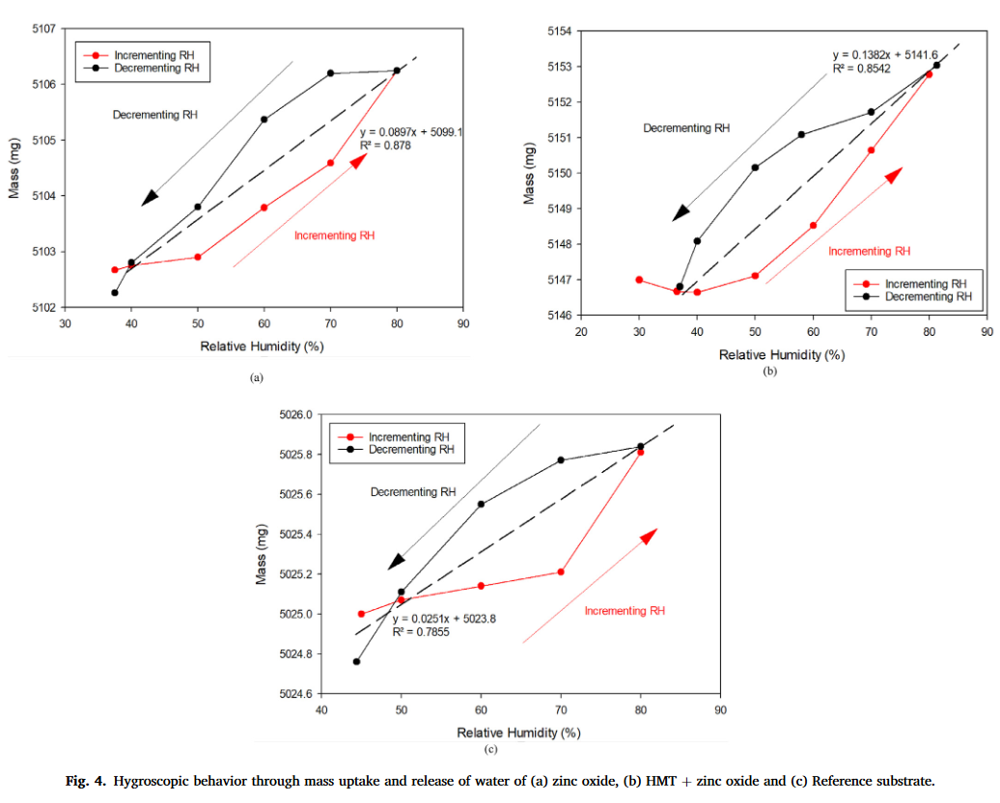

In [199]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAABAwAAANACAYAAACv3v/vAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7J0FYBXH1sf/V+IJxAjB3d3drVihSr3UqLzKa/sqr19f5b26l7ZUqEBb3N3d3d0SIO4u1775z70LgUJbWiQJ5xeG3bs7O7s7uztz5syZMyaXAoIgCIIgCIIgCIIgCEUwe5aCIAiCIAiCIAiCIAhnEIWBIAiCIAiCIAiCIAi/QRQGgiAIgiAIgiAIgiD8BlEYCIIgCIIgCIIgCILwG0RhIAiCIAiCIAiCIAjCbxCFgSAIgiAIgiAIgiAIv0EUBoIgCIIgCIIgCIIg/AZRGAiCIAiCIAiCIAiC8BtEYSAIgiAIgiAIgiAIwm8QhYEgCIIgCIIgCIIgCL9BFAaCIAiCIAiCIAiCIPwGURgIgiAIgiAIgiAIgvAbRGEgCIIgCIIgCIIgCMJvEIWBIAiCIAiCIAiCIAi/QRQGgiAIgiAIgiAIgiD8BlEYCIIgCIIgCIIgCILwG0RhIAiCIAiCIAiCIAjCbxCFgSAIgiAIgiAIgiAIv0EUBoIgCIIgCIIgCIIg/AZRGAiCIAiCIAiCIAiC8BtEYSAIgiAIgiAIgiAIwm8QhYEgCIIgCIIgCIIgCL+h2CgMXPxzuZf8X/9wb3X/6Z9nt7mXxL1Pr6sV9x79Q4dz192/BEEQBEEQ/jYiVgiCIAilHJNL4Vm/ZrAhn5+bjfSUVOTa7TCpP1+/QAQHB8PHxwyn2u/Iy0d+IeAf4AOLxaJiOJGRmYXMtHRYfPwRUT4CFkcB4hMTUGBzqf0qVRNgsfogqExZBAf5qS0mmE1MXe0QBEEQBKFU4hZtWNe7RZyztb6WDtxrSh4wRCCuE/7W251q+zmigpGWe6njs5OC0bh+TlxBEARBKD0UD4WB047DO9dj7tw5yLaEwGqyoEKdZujZpSOqRgTA6cjHrrULcSi9LHp1bYewEH9kxkdh+vSFSMzIgMtmQ89hD6JZBTOmTRiH02l2VZ2bYSvMQV6+CZ0H34kBHeq5K3QVzDISQxAEQRBKPWcUAB5Rp+j6xdAKgCJcML5HYeBeFW2BIAiCUHopFi1np70ARw8dwZFTGWjcqg3at22FxnWqIdDfCzlpidi2dgV+Gv0t1m7YhdwCG0wuOxZP+wmzVu1G/eat4JcdhXc+/A6pNisaNm2Ndm3ao1WLhvB35uLIsePw8fPhWdRxDFKxC4IgCEJpx+FwoLCwEHl5ecjPz9frDodT7zMa+QUFBR6FgDvY7TYVP1fHz88vUL/tOp6B0+mETcVxOh2eLYIgCIJQuikWCgNbfg7SCh0wh9VAiLcVZULCUbNaRQQHeeHYnm2YvXAlck3e8PL11fFd+YlYtGIvRjz/Twzq1wtPvvFfFG6Ziw0nbWjZqSu69eqEhnWqITExFS363IbOTasq4cAMl8ni7hVgGn/QwyAIgiAIQsmEdXxGQjRWrViCWXNmY+7suZi3bAPSsnL1PgZbfhqWzV+GLAeVAi7YC/OxZ+NyzJw9B7Nnz8aChUuw98hptUfJC+qf056PE4d2Y/uuPUjLztfnEeMCQRAEobRTLIYkpMUewdhffsD6Y/no3rgmsjOzEFarMXr37oaCmKNItVuQsHsOtiWVxwP33IZI1zHc9egneOOLT9CkeoS6CQeevaE5/B8eh7dvb47CvHSsWzgR3887jJffeA1Nq4R4zuTGEBbi4uKQlJSkewwY2OPwZ8wVBUEQBOGvYtQzlStXRkRExJltwuXD5bJj/dxfMG/DYfiWCUVZLytMIVVw6+DeKB8WhMKsZCyePgbvf7EWv6ybhBq+3shMicUnr/4btiotEOFvgY9vWTRo1RFd2tRRcgYQe3QHfvr6CyT618KIRx9D4yrh0F6Rznt2IkMIgiAIxRFD/rhUmaNYKAwyk05i9aqlyPCughu6tMG+lbMxdvFO9L3lbtzcvQXMZhfWTfwQS0+GYvh9tyA87yDu+ec3ePurT9GochjMLgf+M6wZ0m/4DiMf6ojUmMP45r3XgeZ344UHB8DbbPGc6WxFnp2djVWrVmHfvn3abDErK0uH8PBweHt76ziCIAiCcDkoWkFzeezYMQwdOhQDBw48s024fLgcOfh51CfI8a6KFq2aIzy0DCpViISvjxeyEk5i5vQ52LZtJSYtTMT6I8tQw8+CxOgdePH/vsIjL76Acn4+KF+xAsr4+6uHo2SG1FgsmzMFP/06GcHNuuK5Z55Fs6oRbtdIJvGLJAiCIBRfjPZviVYYcCyg3V6orsYKi8WM1CNb8O43E1GtZR88MqwffKxmrJ34vlYYPHjvLYhwHMVdIz7D/0Z9hsbVWGHb8c8bmsF3+K94Z1hjHN60GP/35td49uPv0LlxpMoUq+dMZzMsJycHx48fR1pams60AwcOYM+ePejRo8eZHh9SDLJHEARBKCUYlfTIkSPRr18/PPjgg3rbpVbewu9TmJ2Az955B8fTC1C+fAWYHU4069Yf3Ts0Q8HpA/h59ma0bRGMBx/6DIv2rkINHxcObpqGp177Fd17tQfsZlSuUx/devZFtVArtq1ZijWbdiAxJR6OsuVw933/QAslf5DzFQb0eyCygyAIglAc4WyDZvOlKbqLhcIgPek0DqoGe5kqzVCveihO7ViFz36Zg0adB+PeId3hbTZh/cR3sfhkBB649xZUKpOFEfc9i9teeg99WteEtSAFN7Tri+E/zsetTcpg+fQf8OnUA/j+p5GoHOwF0x+4amAWbNy4EWvXrsWdd96pzUQFQRAE4Urx1FNPoUWLFhg+fPglV9zCH5OVcgyfffYtCvxC0KJRAxTGHsLirQl4/F9Po1GVUOQWWhCYtxuNuzyLhXtWo4aXDZsWfo1PJh/Bbbf0hykrGTu2bUVY0wG4uVsNLJm3AD6RtWFJ34M98Tbccf8TaFEtkgMS9PkMhU9MTAzGjBmD9PT0c5RAokAQBEEQrjWhoaEYNGgQmjRp4tny5ygWCoPUuGOYMWkC9iZa0L5VHZzYuwNJziDcfsedaFOviqp0gTXj38WiqHJ4aPgtqFYhEOM/fwNLjnijf+/myDq4BXMPOvH1V28gGLmYMOpdLIupgNGfPgN/JYiZ/6DnhlmwYcMGrTC46667RGEgCIIgXFFEYXBlKchNxb7DJxAcXhFVKpSDMzsGzz/0NFoMfxm392mNQG8LbLGb0aDLP7Foz2pU9wGSovfheKYXWjerB1t6Iub+8gMWbTmJTj3aICo6Ff2G9MbhtVOwM9aOW+9+Au0aVIeP9dwhj9HR0ZgzZ44e9kh27dqlLRlpvWiIW2JNIgiCIFxtUlNTcfToUdx///16SOSlUCwUBvbCPOzZsRGLlq9ETr4LvgHhaNulCzq0aIQAH6v2ULx/9UzsSA5A3+4dER4SiJST+/DzhPnIzMuEKx/oeNtw9G5dA4W5uVg1YzxivBvhwds6waz+/qhuFoWBIAiCcDURhcGVxV6Qg/TsAvj7BcDXzwqTMw+vPjwcFQY/g3v7t0MZX+u5CgM/E/JTEpHvE4rQQKuSJTKwfOZUjP11JirVrY7jpzNRv04Ejh7cjpgMB/rd8g/cc0t/1IwMUjIGn597XCinbiw6FeMvv/yCkydP4tVXXxWFgSAIgnDN4FD8n3/+GZ06dSqZCgMqBAryc5CSlIiM7Dz4BQQjPCIcAd5UFtDgz4XczBTk2E0IKVMWVi8LJ1hGUnIiUpLT4OUXhEpVqsDXaoLD6UB6ShJc1gCUCw1UR4qFgSAIglC8EIXBlSUtdj9+Gj8f9dt2RveOLZF2aAuefeUz3PfSf9CrTUMlL5jPURhUsRRgw8yRWHY6Ei8+cx9yY4/hxy++QFRBOB66tz8ys3JgMeVj/fJZOJhgw43DHkevdo1RNsBHyRhmLUdcSBHwww8/4MSJE3jrrbf0b1EWCIIgCNeCI0eO4Pvvv0f79u1x0003ebb+OYqFlEKVgI9vACpWroEG9RuiepWKCPT1hskznIDLgOByKB8eBm9vL105myxeiIishAaNGqN2rWrw87LouFaLFeHlKyIirIzW+kvlLAiCIAjXF35lyqNquQAsmjkRr7/6Kt77chwa9RqMpnUqwdsCOJVo4HJZ4BNggdUFWMxWVK7dGjknNuHVV/4PH3z+HZL9KuL2B+5GqzZt0bNnT3Tr0hGN6tVEtVo1UK9OFQQH+rrlEf5RVikSyMXWBUEQBOFa8VfqomLTraGq0jMVqg7GX5F19+VyWWT7mSU3G7+JJ55eFwRBEAThesHHPwR9Bw3FXTcPQcd27dH/1rsw/PaBqBhaVosHZrjgFVwVb772AkJ9rLBYrajcpCsee3wEundqiy59+uOB4XejQ6MaMHnsME1mXzRr2weD+w1Q6ZTRFpC0kGQEyh6CIAiCUBoRO0hBEARBEEoVLtWADwotj5ZtO6Jf377o0bk1qkSUhRVuJ4Vs6jsDwjFwYB8E6L4IM6xWb9Sq3xT9+t2Aft06okH1qvDztuquB939YPZB5RqN0axhI4QG+Lo7KuB0Kw0EQRAEoZQiCgNBEARBEEoVtCBgz7/Vywv+fv7w8eYwR21awKY/nGq32WWCr78vLNyu1ulLwmSxwM/XF95+vuq328eRWyHg1OlaVHre3r5awUDLAxMsbmWCIAiCIJRSRGFwiWjh4dr7iRRKAMa7Iu+LIAjCVUb7FlCNebVky9/ta8CitpvUutUduN2zzfCZZDbxGCsseqm2cbsKbp9I7nTc8dQxnkC1gSAIgiCUVkRh8Dco2iCUIKFoEARBEARBEARBKOmIwuAvIo1C4ffg+yFOsARBEARBEARBKMmYVMPmum/5Mgs2bNiAtWvX4q677kLlypU9e34L4xYUFCAqKgp5eXnSKBQuitPp1KasXl5eaNSokWerIAgC8NRTT6FFixYYPny4LieE0oWhNP7hhx9w/PhxvP322549giAIgnD1OXLkCL7//nt06NABQ4cO9Wz9c4jCQHEpCgOHw4Ft27Zh2LBhCAgI0L8F4XzcY15N+t1KSUnB6tWrUadOHb1PlEyCIIjCoHQjCgNBEAThQvxe0/tKthFEYfA3YRb8WYWB3W7Hjh078Msvv+Czzz6Txp9wQfhOMbAh8NBDD+HJJ5/UjQMi74wgCKIwKN2w/BeFgSAIglAUWh+zfrDZbDr4+/ufIwMUV4WBSCmXiPEgDWFAgoQLBX78DFynkolLwiXfHUEQBEEQBEEQrh/YDsjJycG8efPw0UcfITY21rOneCMKg0vEUBRIo0/4PYz3hHBprMt7IwiCIAiCIAjXF2wDUFmwYsUKfPjhh8jPz0doaKhnb/FGFAaXiNHwI0XXBaEoF1MQFFUeCIIgCIIgCIJQOmE7wAjZ2dlYsmQJvvrqK/Tq1QvPP/+89odntA2Kc/tAFAaCIAiCIAiCIAiCcBkxOg6pLJg/fz5+/PFHNGvWTPs2K1eunN5XEhCFgSAIgiAIgiAIgiBcZrKysjBr1ix8/PHHqFu3Ll555RVERkaWKItjURhcQ1z8cxlLp/qf69RGucPfgWm6V5j230zsKqLNdvinr9tzH3qbUy//Gu7jzqSl0+Uq1z3BvUX/79l75n/GFwRBEARBEITLg5JrPRjS519DS6o6BcqzTNfp/qH+nT2HgY5ryL36tO5458jEnsB0jHUd/cy6WuqDeRyTcG/nqo5oLM7EM8K56C1n4pyL3ubZZ6Stz31mO+/Nva7z8px9nj+ue37r7bqt5flTm3TLiyv6eP7jOvd5gnEOvce9/CvExcXhp59+wpAhQ/Dyyy8jODi4RCkLiCgMriHul9WzdP/neUn5sf+1l9LASMcIJQZ13caUIy6XQ18784LhUu/jbB4YaTk86bjTc6gAtd/O3+qcTh3H2M/j1G8+ExYpl3huQRAEQRAEQTgfypkwZFKP7O/ewX3u1T+LW251wuEoRHzcKRw/cQLZ+YVnthtxjCXPZy/MQ3pKInILbGfk3bycdMScjkZMQgry1Xa3/OyELT8Hp0+fQlTUSeTk5yl52S0/M41T0cdw7MRJZGbnQknMnj/jmozgadMwFMFI/0w8z/YzqG0qh+DIz0SUuidOT3v8+AlEx8Sj0K7ui8c6HSjIy0FGajryCu2ee1HHMk+ddqSkJCAjO8vTrlCHqD+n2p4YE4dCh4rvke/d5+dSnVHtz8tKx8moaMQmJaPA4W6LuBNg4r+50t+FioGQkBDcd999eOKJJ/QwhJKmLCCiMLimqBfG5IKZL7KDL7da6hfx0l/I8+HRpw9twJwl69UnUHJeTJezAMf27UNyZr76LvOxdtkc7D0Rr/aYmVV/AfdB+7ZvxLQpUzBhwhRMnDgeEydMwNQZs3DgdKxK1471s2fgWHy6J7oqpGz5Kv92YO2WXSr/BEEQBEEQBOHvQCHTLZe6XBbdyKZsa1JLbvU07/X/fxoV3ZGXiRUL52Dq1DlYMGcuJk2Yjpj0XJWue1Y3NlC5ZGTKt0d3bcLUydMQnZyptjsRf/I4Fs+fg9nz52P2tJlYvnYbkrJykZcWg8Xz5mLWnPmYP2c6JkyehdOJGUhPPorp4yZg3pJlWLJ4Hqb8MgH7olNh0u1q93n0pbmbOe7137RFeHXuOMZ6UXicU113/KHN+HHseCxbuhRLly3Hmi27kVXARjyQm5mCzSsXYt7cJUhIV+0GNmt1Qi4knz6Mib/8jC17DyPfrvJXJ+jAyT0bMPrL8UgpKPScXx3jMqtzqYXdhtNH9qq8mYD58+dixswZWLJyOzKyHe64TPovQCUBFQa0LCipiMLgGsLiweRUX1f0SZhWrYBr43rg4CH1whaqved/OpeI+pIOb56DUT9NBU9RUnDlJWL8mB9xNC5VK1Bioo4hJSNbF0CuS9bIeeKrY9csmYlJs5dh+6492H9gLw4eOICV86fjs6/HIjk3D9O/+hA7jiXqQ0yq8HTmZ+PI1mWYNneFKkRYRPzN5yEIgiAIgiBcx1CedCA1KQm5Nge7wnSDuSA/D2npGZ4G6aU3S08f2IyfpixAoaUsalSvgm0LxmHuur1wKPnV3ZvNpRMFeVnYsXYpfho9GtNmLUOKamQ7C9KxZ+sKrNu6H2XKVYGfLRFzFizG1gOxOLB5Leas3AqfwFBUrxKBVdN/xsrtB3Bg7XzMWLIDFavWRs3qlXBix1KMnbwY6ZmpSE3PUncI2Gy5SE9PRZ6dje0LyNDqulLjT+Lg0Wjk5BV4Np5FS97qv91bliIq2we1a9dGnVq1ULNyJHwsLmRnJGPd4nn4btQ3mLdsDbJyCpib+khbfgbWLJqLX8aOw/6oGNhUe8Jpy8f+javx47df4ftJi5FdaAOcVBbo0+llTlo8ls6aiHV7TqFyjcowZSdh8fy52B+d5LYG8cS7HhGFwWWEr5Ju2Orgfqd+L/B/05ZtcL7xJvDGf4HX3oDpP2/ANfpboDBX7S36d97x6j+nCsb5zkdrFe2FyMkvgCMnFjPnL0b0sWOYMG48Fixfj6wCuzbRycpIwsbV8zB95nwcjoqDQ21LijmB/bu3YfXyZZi3fB1OJaXjxL49mD51MuYvWofE1Gxt9nNg2xpsPXYSa5fNw/jx0xCjtieeOoyJE6dgxdpdKHQ4daM/SxUY61cuw5TJM7Fjz1HkF9qREHsEW/fsxMZNmzBr6hSs3rITGTlZ2LRqGRYtW47ZsyfjWFIeypYNhY+fFxyFKViwcCmORp3A5HETsGjleuSoj93lsiMjNQ6rls3FoiVLsXPnDuzetxcZqvDR2kQFFQ22vBzUatoB9z/wIJ54/B947InH8Oi9Q3Bk2UxsP5KMwvxs2O3aIEnnL3UsNpV/hQU2j/ZXEARBEARBEP46lDIXTPhaNbyjlXxJWdyGnatnYvrSLZ69brk+PfEUFk8bgy+//EqFLz3LrzBn+QYkZikZV5vSU1p1YtfaFQiv1hRDhw5Ev0GDMLRXS8ybt0Y1lNnMc8u2HEqQnBCDZct2wRJaEcHB3qrNblbBiiq1GmHorcMwdFB/tGnZAIWqDZKWkY3k2Fg4LCFo3a4j+vQdgEgvG5JScxAc3hAPPv4YBvbuiZ49+6FHrybYuWkV9m5ejlFf/4xTCWnYt20tJo6fgYSMQn1+4m6zcIiC+9qjdq7HvBXrkZiWo7e5t6u4DErwZgfesV2HUL5qWRw6eAiZuTbUqV8XvlYn4qJPYPf+KJSrWgXBAT46fSoMnI587Ny4HMcS0+BXtgy8vCy6TZSVfBpL125HaOUq8PaxwKzSN/O6KODzXHYbEqKOYdOWw+g5ZBhatmiB7r1vwKABnRAaZFExeV36NL/h/LZY0d9U2BQNJRVRGFxG+GoYY3i4plrLZ14a/eKcF0wnouB8/wM4J/wK18aNwMqVMM2YAdOnX8K0eLmK40lUh7Pp6MCNRvruX+fAQkCrLWFBfvoJfPnWOxgzaSYOHNyDWZO+x+SFG5GWFIu5k8Zi0pxF2LRhFaZOm449x+Nw+uhuTPh5NGYsXIwjx05iy6p5mDR7umrg78WW5XMx+vsJiEtNx+bFU/HJZ99g49ad2KrivPP+x/hl6hwc2LMNMyf8gKXbjiIjUX2gM8djxqIl2L97C2ZMmoglqzbh6KFdGP/j95gyfT527dqEn3/6Dks370X06QTk5xcgOSYOWaoRv2rBdGw/cRL5OfH46pN38dMv07D/4F7Mnv4rJszZgKSEWCyZMRlzFqzGxvWrMfrrLzB1wTIkejSNJndxoPH1C0LZ0DCUDyuPcmHhiIwoB3tBAXLzHapQcpuGOW122BwuOBx2lbf8PNxDIdyFsiAIgiAIgiD8Ndh4LYw/gvHz1sKuxHSHPQ+Lp01Aks2qTfoJZU67LQ8pSXGIOX0asarhHhMTo0IsktMzUMhx9Upq1Q1xpwPR0SdRrXJVBAf5qoawFXXr10fs0cOwO9QJKARrQdgE/8BgtO/bHzcO7o2wMha1zQmLd1k0aNYZrRrXwcGNa/DL9MXwDw5D/RoVUL9VS/jnnsK0ib/iq6+/RJQjAs0aVkPdjr3Qu1N91dZQjXx7AY4djUJkZHX4+3jhwPqFGDd9LpbOnYWj8blqm1VfgLu9os6o7jcu+hj27t6NPXv2Y9++Pdizdw927juC9NwCGL7GiMmRhi17opBw4hBORUVh9fxZGPvrdGTk2VE2vCJ6DhyMfr3bITiA96KOUf/iju3D8rW7UKFmA9SqWQFWdY/Ey8cfrbvdgDtv6YsAX7YN1HXpjkX1RNT5KPfHJ5zC4ZOpiDm8DWPGjMXs+atRYFbthXKh+rldqL1vXKvNZsOJEydQoNoVpRFRGFxG+B4x8N1xJiXDtW8fTLt3nQk4L5gWLIRz2XL9slGLRm0XnW0gIR6YMuls3F2e+EUCdu1070tO0ic8/x12v740dnJ/nKdOxSK8djPcdedt6NQwDEvVuY9FHcLC5dvQqPMQDB7QA2ZbJvYdPoHsvBzEphaiasN26N2yMvZu3QrfclVxy623q0KmF2L3rcTGfaeRqu7xVJwNPfsPwe23dMeymdOA8k1w082DUTHIjvnLt+Doga1YsX4PWnfti1tvvxm1yqlL37oBh04kICU9F1XqNMbNw+5GqDkLm7YfQb1GTVCpfDj69LsRNSJ8kBQfi8xs9fE5bKrATETZqo1x27Bb0Kh6COZOn4O9e7Zj5drdaN5lAAb07YYgU546JhF2bX7BPHDnBNm7cTF+GP0dPvtqJL78fCQ+G/UrKnccgGZ1IlSsQiydpgrEL7/CF59/ia+/GY0Fq3e5xzQxE0uwVlAQBEEQBEG41lCWtKDLwBtxbOMSJOa5kJMUhe1HC9GzfTMlatKYn9FMCFAN4u4Db8eDDz2IBx98EA899JBe9u3YCmEBbIR7OgZVe7jAZofZ21u1I9zNOl8/L7hs+Xof42hLWbUvJCwSXbs0RRnVYDbRMaDe7bFAUHJ2QV4eLGYL8lOSkJCQiOyCQhTac5GZk42s1DTkqbZKnr2Q/ZX6OLPTga3L5mHeuhjccvtQ1GvWFkP6tsLC8T9j14kc3DDoBoQHeqnzs7HNe3fBXpCNnZvWYfrkKVi9aSeOqLbSgvlzMGXmAsQl09JAxVP/2JZiaNF7MAYPHIqHHnkYN/RshQOr5mLj4VREVKyM5s3qgbYFWnGiKMxJxfr1W+AMqoLmTRshUOUJhxXzDgNCKqB92yYI8vXScYviUNfGOLkFaYhPTFUhDw0bNIGPIwMLpk/D9sMx7mtiZN7GeTgcDqxYsQIffviham+d0u06I5QWRGFwOVHvhVZW5efBtWoVMPp7mL7/8aLBNW8ezHnZMKuPQ7/O/EioNVAfqHP7Tph+YLwfPOG843/8EfjpZ+DAQb6p+vhzMDn1x8n3mt+oOTgCXbp3Re1a9dCsSX3kqgIqNiUdWV6R6NmlM1q37YjbbrsF7RtXg0UVWCHqQ6zfsDECHVnYv+cAlsyZja+/+AJfj52IHTu3Y8O2Q7CpwqVuhw5o2qgB6jWtB3/vQLRt3wl1atdB5cqVER8bh2N792PFuo2YPXE8Rn75NeYsWYmtOw8g5lQcQqtWQYOWTdGwYTM9JiktMxNlgoIQ4OuDcpUqoYyfj/seVCFnURlrLRuGTj17oE6tOvocWfEncPjEaSSbwtC2Qzu0bNUardu11GZWzEr3R63/0wSXK4eaNWqgQllvzJg4BenBNfHcM4+gaqiPjl+xcnXUrFUTtWqrULMmIiuE6rzTz/RCJYQgCIIgCIIg/CkoS5pQrVlH1LZEY9OeEziyeTEKK7RGwwpBSpJ37+f/6fHRmD7mS7zx5pt44403dHhTrY+fuwzxGW6HfWw9cMXbagFsnBlBNZ2V0FqYa4fL6utuLJvsHlmacU2qmeG2v3Wf5+z5vP0C0LhtOzysGuY1fHOwef1q7UQxslZz3H33Pbj/occwtEVFzJ6/ETkF+YC9EEsmfIuPxszEgOHPoUfbmvALDEbTdh0QUJgCV3htNG9U7cw53M1tFyzeAajfrA369u+Ptk3romrtuujStTsG9u6E8sH+Wu7W16Su12Qpi2HqvAO7t0ON2jXQsn1H1A+3Yu/h0554nkY803fZsWfLSqzbshPZOTnYq9oqUaqtsWf7DhyNTtSzHVCgpzXB+VChoRUgJm/4lQ1Hhz4DMGDAANzQowN8C+Kxfc8RlbfnnPAMVBb8+uuvWllA54aBgYF6e0kefnAhRGFwGeHLYVYNfrOXNywtW8I8bBhw550XD316weTrq19gTwr6IzZ5W4HGjc/Gu+uuc49TwaTDMJjr1lMflJVHedJwwyRdZnoRtWjNm1XFseoxO2Z1jRyLUwCnE3BaveHrRbN7F7JT0nDqVCLyC6E+aNVIV9sd+TZ4+YegXafO6D/gBgwYOBAvvP4Obu/dAl7qXgNDAvR9W1S6JqsPfLy91JWo14ofip0mOi6EVa6P3vzwBgzEPQ/9A/949EE0rBkJq4rLQs6krpDHOLRVgPsXTa2owuQvfQ8mB8zqHmjaxDs1qXM7XYVaq+pyWuBtUfem9nv7+sBqZQx3Wjov9P9AhVpN0K1Xb9x48zA8PWIIovdsRWwmYFXxHCYrGrXpjH79+qJf/xvQr3c3tKhTSV8DhyYY5YQgCNeGohr7devWYdu2bbqiFgRBEISShFdgedzSpyWmT5iCyXOXoquSkQO82WjlXkr0Sr4uWw6tu/TD0CFDMXQowxAVbkSHFg0R7O/tjqdkbZeSfytVq4To2ERk5RZytkYcO3YYFevUho+FCSoZliIxE+d04TyFkqt1e0P9X5iRhB1rFmPjtr3wDQpBlSoV4WN2IjszB0kp6QgKj0TVKlVRuUZNVI8si7iERNjzMjDu4w/x09JdGHzfIxg2uAfK+ppQkJOOA6qhbgqrisD8GOw9wp55dUbdzqGywqxk/wDUrNcQHTp1RMsWzdCocSO0a9sOndq1RlhZP9WeUNepAtsFhdkJWD53FfLoC141Wmy5eUjNtSMkOFBfv74VlSYzjrKBl18Z1KxdC6H+FiQlMT9ykJGSqpZ5eipIdVsqbXaoqmPYCFLnod8E2iiYzd6ILFcFNSv4woftONU+sXr5wKzaAHYH4yiYj/yPqyq93NxcjBs3Dr/88gvatm2L4cOHIyIiQqWl2kS8B95LKUEUBpcd9YJ4qUZzrdpAx44qdLh4uH0YXD17qddUHaVeSI4F4kfljIiE+aEHgA6Md5E0OnSEqX171QqOVI3n3z5GasvYADerwkE156GtnFTaLC/4EZos3vD384M1IxZHopORlhirpyzZsCeKTXUFr8qFspUrIDjYB+EVaqBbjz7o07sLygZ6wb+sv0rVzJR1OaDOpDWZTnUP2iurSsXbx4yIipGoGOCHmnWboX//vmhcrzr8A7zh4+utro3nUR+r+nD1damPliOyzLw+FdR/Om2HmT4GeElOtZcFqrtwsHpZERZWBn4FyTiZkKwKhUQc238YaWn0X8BikB80z8GkXOpaveDlbUVA2XAMGHY/Wofb8cXInxCflqciOOFShYOPj7o2VUBYraqQUEdxykse605NEISrjaEkIKyc16xZg3fffRerV6+G3W7X2wVBEAShpMCOsI4DbsGpFb9i0b489OzSlG1XJWtyJ1fcCoM2Xfvi5ptvUuHmM6Fji8YI8Xc7LOQRbD+07twNJ/esxux5S7Fp9XL8MnsTBvTrDi/VQj597CCiklNVukqMVsfwHCZaHSiJm7K72WLCqeMHMGXCJCxYsQ4L58zErvhCVGnYGJ3aN8HuHZuxUtW7W9etwozlO9G6RQMcWjMD381cgdZde6NOhSCcOLQP+/cfwZE9WzFlnjr3nfejYYVALJ67GNmeKRDZeem+Q3dDmn/12vXGHTf2Q4VyZTz3z33uWJxS0WJ1YfPCn/HdlJnYsnUzJk+ZgOP5wejYtJqK4Y5nZqtFtRNg9kLtJu0x7M67Mez2oRg6sA9qVa2EZm3aoE7V8vCxWNQBugtVBXVN6mD2U6IwBwf370W2zYnyteqhdeNIzPp1DDavX4sVK9ci1RGINk3q6/OxMcJDKJOcPHkSo0ePxo8//ohevXphxIgRqFKlilYWlEZK512VEFyRkTA/+wzMvXrDVa8enHXrwtSsJUyPPw5T+3aeWH8NfggO0HFfodae5at1k8f5icuh9jjMCKtWAy1q+uLHkf/DyG9G41hyOlq2aIoAswl2G4dIOFG2YgP079IKmxbNwocffoJ3lKD+w7jFyLHZUag+HLtDJcjWvNkOSyF743li9SnaVaHk5Y+6zVujcU0/jP7iA3z40af4+PPRWL/tMGzqYytUwj5najDrXnyX2qYa54HBCC9jxcyJY7HlaAoKnOp62WhX11xo1z9UAaE+dKcJNosPqjVoiWa1g/DzVx/i08+/waLVO5Gvyg0WIm7cOki7Kpzt7I1kEqoQ8itTHveNeBTpO2Zg0vxNKo5V3YLKL/1J2NyFitOujqMSxK0yEATh2pGfn681+S+88II2+aO5oNXKcZyCIAiCUHKgHBtWqyGqljUjpEY71KsYoKVM3Vhmo1TJnmxUs/FpoQWtWhYNBroH2+xCxcYdMbRvI6yePwHvfPgpvBt0xICuddR+B2ZNGIU5mw4oOVbJz2ztqjNZvH1QtmwwvFWD3OofhCat2yMyqAA/j/oQP01biTode6Nftw7o2+8mtCjvj+k/jsJb736MwohmuLVPc2zZvA0ZBZlYNmMCPnj7f/jvG//F26PGYdWGTUBkIwy4obtqqLdAbsIRHD6dps6ouyr1NRuwuRAUEYkaVSoiwIcWE+fCaefNvuVwy123Y/uccXj7rfex4Wg2brz3PtSMDNBxKJ97+QYisEwZWC0m+AcEISKyEipWqoxKkeURWb48yqtzBAX4waLyTXdGmr0RERYCq4nyg2pb5MThmy8/wuGEHISWq4JBQ++ENe0A3nvvQ6zddRpdB9yI1g0iVd6pC9bO0E3IzMzEhAkTtEzSvHlz3HbbbVpZwGdVWjGpl1K/PtczzIINGzZg7dq1uOuuu/T4+4tBE9gdO3ZgzBhOdfKlZ+tfgw1hZ2EBzAnxcOWphj0LB75rYaEwlQ3TZvd/FY5jOnV4PXZFm9C7XRXMWbYbfQf0R5DVgYzEE9i0PxYdunREXnwUjpw4jswCE6rUqI1aVaoiLykax5IyULF6HVQODUJeZiqOHjqKk+o6HZYAVKlaA/VqV8aJ3RuRVbYOOtQtj4KCVCyYtxmd+w5AsHceThw5hFN5fujcrDpSYk/hyOEopOTbUDa0HGrXqgFrYSpOp+SgcrXaiAwNxOFdW5BoD0CzelUQf2IfDkYno0HrTojdtRLBddugSaQf5izZpNIfiBBrPhLiTmHbrqMIC3Bh+eK1qNWyLSKCfbB3y1qku/wx/B/Pomqwn8oHFqjAvm3rkOtXEY1qVoW/Lz2jOmEvzMG2ZUuQXqY6AtNPIrJld1SPDIZVFSBOWwFiTxzE8QwLOrduos2o/oppEd8tmig9++yzaNaMDm3++jMVhOsRfkP0OvzZZ59hxowZuOmmm3DLLbegZs2aWnAqqd/UU089hRYtWujyoagAKJQO+N7y3fzhhx9w/PhxvP322549giBc7zidDuRnHcOQroMx8H+T8PTgJkosVfWAkk0ptLqtB9wYZcmF4D7diHPZkZWZhpTkDNjsdPAXjMjwcLBJER8XBUdAOVQqG6g7zNgFlp+Xg/S0dASGlUeAtwV2JfOmp6UiIzMbTtWgDg4LQ2gZf92hl5GSgtT0bBSq9aCgUESUD0ZqQpxqNOfp9rM29eefjw/K+lqQ7/RGxYgQFORzasZMlVYEAn289D2ce18qaCUG703d43n1oFNbSAP5udmIi49Hgc0Fb78gRKi0A3183fdtciEnKw05OTYEh4bDx5vWA+ziU/87CxGfkAKfgCB13UHw0tYFKt3CfJw8nYzyVSvD32pS8n4eok/HIaRiNZRReWFT8kZKUiIycvPg6+uP0PAwBPn76nvkpaao/Bj11SgsWbJE19/svOAwBENZUJxlkiNHjuD7779Hhw4d9DCXS0EUBgpmwbVQGBBmvvFqudeNx/E3Xzj1YXOKkAKHCXQImmezw8/LW6fKD9RmVx+et7eOZ7fbwOE5Xl5eWgPnVPfooGbPYlW/3dfhsNvVMTb1sVjgrePRCqFQFRZWeFnUVas8LCiwwVsVGLwHnptOHL291MfLc6jz21WaFivjW9RpeQ5VyHjOYbfZWGzASsctah99E3ip63XYC5QwrW6AH3W+2sb0TbSQUMcX5uLY3vUYOfJrmMo3RZWyFhw8dhLt+wzFg8MGwZf+ETwfrr5Wde1WS5EGBvPIlo9CFgNOEyxeHGRBZQILP96DOo+Kw+tgKaELILd6Vq2z4PvjZ8R8EYXB5YP5yTw0ii1jXfK19MLny+mKWOaGhISgR48eCA0NLfGNbFEYXFm0GK3tTVl8G/WqKuvV++QWmtVuOHTZ71R1mCGs00qO5roc46t/q2MYk8d6ih0NBV/WCe51/b9eNzDKJVEYCIJwPkumjcJPUxejas1BePHVexDq5+vZ81cxCiejHOLvs+tsQp9bQrk5G+tia+T87R48G87GKhrDva7LYb12zpF/gd+mfZbzfxtcKB5xbzu7171m/NbXzH8s8N0bdBnvUA0lTv84+rvROHDgAO6//37d6C5btqwu60sCf0dhIFLKNaboK+Ze5/9//8XjOCXV+oY/nRCqhrK/l69qB9PjABvRVvh4u5UHFHq8vHzgqxriVBYQs2rQu5UHZ6+DDX1fXz/4+Xif2W5VDWkv1QDn9TIdX18fcBc/HKvVSysLiD6HOp+fry+8VTrcT0VB0XNY1Trj03sr9zEuG/fe3lyyIa/WfVXDnc4YlEBnsXipay6Dmg3a4sGHHkWtYC8UOi3od+uduLF/D+0EkZpAA32tRRQIRHtL8PaHj9VbKzo4lYzTQqWIw2PtQYcnXiw11Hk5XMFd5LpTUNuEqwYLbl14e9aPHj16ZuoaofTDsuLee+/FjTfeiLCwMGlgC38IiwbDrw7rKDqv1Q1/bud+9T/HETssDhjTi5noEEzFd6o60z0UTW1TkbUywVOhmHXNwV4xDo1jGjxXkcpGEAThD2jcuiceefRlPPfCHQjxdvdM/z1YBhUth85dv1gJdXb7xdYutN2DZ8PZWEVjGFvOSs1/j9+mfZaLpX+heGe3nb9m/NZXrMp/u92OUydP4eDBg0hKStbOlt95+x3tcPmBBx7Q1o5lypTxHFX6EamrlMJefYuWjWzqF3tC1Kdg5rAH/i458KOlKEcHiRTe6GaRFgC0DqAM5x0QihZd+uGpF/6Nf7/8Em6/oQcqhgSoeHSUSLHw4mgnk0raczc+3AKj1WFR+eb+LKgesKg0qGNwC4TsbdKZ6s5P4aphKHqoINi7dy+ioqLg6+urfwvXB3zetIoqqvQThIvBtyT5+HZ8/s7/YcTDD2PEiIfx9Muf43BiivbPo2M4svD1m58gvtAOl8mOvLw8LPz5fYx44CGMeOQBPPX865i8eAfsKMSh/avw4TvP41//9ymWbzmOfFZDqu5gPSEIgnApRFSpgY6dWiO8LKfguxwKg+JBaZDJjE6pRx55BG3atNG98fXr19cOJ2ndyCkU77zzzutKWUBEYVBacTpxYMcKTJo6G5MnjcfkKZMxdcYKnIrL4gh9T6TiDz9cmo/aCm1ITElGgSMHx/ZvxqotO/RdmE2cMtIMH28zvDhGykKrBioZ+Gr/fiGcePoYZk2dhMkTJ2HS5EmYNm0yJi9ZjpisLNjys3F07zZsP3BcD9fQ0zw6bTh15AC27tiJtOwCTyrC1UC/ByocOnQIcXFxaNKkiZ7vVhqPpQsOA7rQVImGECLPW/jTmJzYv3k9ohJyUKlGfTSu3wANaldFgJVqZydMtmzMG/0WXhs1Dfl2RjcjKycFc+euQEi1+mjSsBnq162FCmEBOLR5NUZ9+h2OJwfAu+Akxnz3MZav2wmnei/Neo5zUVwKgvDn4Xz/3hYnnErAdJpV0NZKbjnH4Pzff4c/k9aF9hvH/ZnjSdHOnT8TvziSnZ2t/RPMnj0bycnJyFJtgoyMDN25yCHrlD0Nh8vXk0xieUPhWb+uOX36tJ4igw2R39Ma8QOIj4/Hzp07taOLvwsLCXrbZI8pX0r+Zi/a3zW55Ss88/2n8L+fVyIh5jh2796LXVvWYNHqjShbtT5qRIaqAouNYPaQ0HuA5yNX6xzX6Z6vlRvUR6+28Lu3qyVX6N1Vm2dSrldCGfOEJp129eGo//VxdIKid6sfugdGm3y6e+gpZLnUbxPXGZm/XVzjNfC3E3aem1t4HiWMTfv8OWxLjUDTWuWxc+0cbDySis5tWqqP1T2u1D3VIoU3fsD6YIU6A1cZQV2N+8NmUKhNe5ePx/0vf43UuFMqf3Zj145d2L5uMdbsPIKqNWth27SxWHW8AH27tNA2Gi57HlbM/AULlm5HjcbtUT7Uz53WHzBz5kytoYyMjLyuCpfLgVHhcMlvhKFOnTraGy3z0ghC8YNlGeHzMdYvBJ8tA8vBKVOmaLO/GjVqwN/fX+8vrc95wYIFqFChgvawLO/wFcBegGWrliGibhfcccdt6NKlA9q1aowyAT7IS4vD1+++ih9mbUVqhhUjnr4fZbwcyEo7jjmrj+Hl/7yBHp3boG3r5qhezgcH9+5EjjkU/3j+GfTr3ByH9+xHRqE3GjduCB+r28qAz9Aor4jxmz6PKGz27NlT/5ZnLQhC4u5l+L//fonZC2dg0bylWDx/HuavXocshxWVIoNxaPVCfPLJSGw4dArlK1RHSBl/d/mhjmUnGmVY9zqX7jrUvYH/OISWSggzCnJPYczX3+L7XybixIlkVK9fDwHe7sYupXL+K8zNwt71q/HTjz9gzoLlyIMV5SMj4GMqxIJpP+L778Zh2rzZmDdnLhIcoahdLRIcccxhXjkJB/Dafz9FjXadUMZciBP7NuPXMd/i50mzcPhYHCKqVUVZf86AoM6m2gt6loJiiFE2cxkdHY3//e9/2sqAGNtpgcYODbYTq1WrprcboaSQmpqK7du3axmaVhOXglgYXEP44m3ZskULEnwB69atq5f0Bp6Tk+OJ9dfQAoyXC63uehXTpk3FjJlTMH3WTLx8X1e8MeIJ7DyeigK7ExlZaUhJS0NaRhbyCwvhcphgz7cjK0NtT0lBZm4u7KrV7XAUICs9F1mZKUhOV3GdNmQX5iAtJR1pqZnIVh+SiY4MC21ITctGXnY2MpMzkJmdqz6yDKRnqLTUcQU2rSKATQlzaZlZSE9NU9eQq3t4XPZCpKSnq2MykZmaqNJJQ4FKz5aXjgPbN6h0ctWxVvQYNBxP3TtMtUiUgJeZqhoaaTpuenq2is+pJM1w2AqQnZmsBLUUZGVlICMnDzaaChTB6jShRpsbMW36FMyYPQMz587ExHFT0DD3OEaPXwcvXx9VUrCQU9emAp1lmeEFJR+6lS3CFcVoZNrtdu00jM5aGjRogOrVq+vCWyg5GBXqhZ4bn+/+/fvx8ssv44svvtCKAjoREoS/gyMvC1mphVg3ZzTuue0G3HbXA1i6ZTdyCp1IiTqG7PA+mD7xEwT5FcBmVuW8Km6yo06qeisFL44YiBuG3oYxUxcj0e6NzgOH4dl/PolwJfeePHYYyapeCwopq6ckM95oo7ziklOA5qq6kwJmoapXiyrPpOwSBCHj9CGsPAU8//zzePa5p/D4s09hWO+GGPvOy/j393OwWdWJ7br2gHfKUUxcsFYrBaiadCsCHDqwDUEn5doJOMsYJ4dWsXzxUvGtMDky8NaIYZi0NguPPfYIYnfMwNPvj0auLo+YogomO7avX4T3v/wMpgoN0aNJJUz8aTSmL9mEjPTTWL3uEJp27ILnn3oK/3rmOQzo1Aj+qm3B6yjMTcSnz96H76fMR5Yq85Ji9uC55/6FeP+6eOK+Ycg/sQn//d/nSMp2d0rSh1pxxiibuTQCKdrhUXT79YZYGHi4FhYGdNr22muvYeXKlfo3P34KGIcPH0ajRo10T+pfhb3sexb/isPeTXBL10Ywcb5Gs1kJ4qFIOLQEp61VYE3Yibc/GIl5c+Zg5Yp1yHT6o3y4L9YuGI8vv/4Wk6ZPx7b9cahQqSrMmfvw5D/+gwWLFmHZmm2oUC4IY779HGMnzsAS1dBeufkY6jZugqPbpuHup9/C0QObMGHceCxetAZHD+/Fzz//iDnzl8PuG47akf5YNXcGvvrqR8yaOR1LlqwB/ELg54zCE0/+GxvXbsX8hfPwww+jkV62HvKOLsGosTNx6HQMbEEROL7+R4ycthUt6wThnVf/hQlztmHt/EmYMnsWkvJ8UKNCCFbNmYJPvvwBsxYswapF0zBLFXr169ZD+dCzDZHYg5sxZ2ce7h7aRhW6JlXWOpGbmYRNa1Yg01IVNQKzkOAsg65tGuvCmDM27N+1CbGpNjRr2wURIWJhcCXht0ahe8+ePVph0LBhQ1StWtWz92wjVCh+sII1rKSoEOC0iJzpgM+sqPVUWlqaLv/otZfP+Mknn8Ttt9/unsHFQ2l9zmJhcGXJyD6NtZu2IKxWR/VePYWm5ZwY+eUUVG3SDA2bNUW3Dg1gyY3HVz8uwfDH70eAxYEDe1Zga3QBnnz2FQxoWx+LJo7F1pMOdG7fFK78LCyfMRWffvod8gLC0Ktnd1SrEAaLmYK8+71mmRUbG6tn9OB7vWnTJqxZswYVK1ZE9+7d9XOWZy0IQsqR7Zi6OxcvP3oLQkLLITwsGOXLV0MZRyzmr87Ay/8egZxTRxGT5UD//oNQMTxQlR1KLrJlIybqGA4fPY4YVdbExsYhNiYGMRkFCC4T6HYsDof6MyPp+Fr88/Ul+H7GN2harRIa1K+B+T+NR7N+gxAR6On1t+dg37r1OHHKhiEPPIh29Svi+IEjcHkHoZJfHrbF5aByZCX4e1sQEhmB8OCysFi9YLIVYNJnb2B7bjVkJ57AkOEPI1C1X/zD6+LB++9A5cqR8C9jwcE9mxDRuD2qhAXpcrK4ln8suw3ZJDExUcvtHP7K6+U+o+xmh1WvXr3OkUVLEmJhUMygsExBmGYthhn1hcK8efMwf/58/TJSWcCXkcdSIfHTTz9d8JjzA814efz5sLeEvpz1zAjqh0WlrycN9A5A9QoVsXHNBsyfMQnNBt6FDz56H0O6NsS29Usxc/YCLFyxCw173oORn/wXQc4kbDlwENnq+Nz0GLQcdDfee/8VHF06DkezAvH6ux/gk3dfQWDCCoyZtw7mQgfyUgsw6M7n8PpLTyIv8TBOuSLx0Ucfonvrmti0eRs2blyPher8DfvciHc+fg83tC6HpUq4OhmfjozMLEQ274RPPv8Cj97cEuO+m4Y2Qx7CLe1r4vbh/8KIfu1gLShUhaYNcJi1RUG52g3x1mdf4Ja+7bF363osX7YIqzbtQtcbh+NjdW2VyvghOydHWwkUxWFyIT/lFJYsW4rlSxZj1uyZmDJxInamWdGzdxPYVSPn9ImjWKn2L1uyFEuXr8S+w6eRZ6NW9vrUMF4t+E5TeUbvtHzH+/Tpowvq4lrZCOfCipdlGU2xN2/ejLFjx2L06NG6kRyjhBuWd1TSjh8/Hu+99562qHr33XcxbNgw7dxQEP4uZcrUwBNPvYSnR9yNZg3roNdNw1AvMAv7T5xCQYESlE1mmE2qblRx7apY8bb4oHW3ezDq0/+hW9umaNa6NXp364DE/VtwKsMOq18Augy+CR999SEalzdj6ZIVOJWYqypaj98cj1CZnp6u3+HAwEBtLcNwfg+VIAjXN2ybugrzkZCQjOSEWCTFJeP4saPYuvckIqqUw8Z5UzFu5lKUqVIXvuYC3aPPkqMwOw3rli/Cd99+i2++/QbffPONWv8Gv0yZi4S0bJ02LQdojZB7fA/SyzdAlbKqTrW4YAkKR5h3Hg6fVvIwyyuVoNnsjwq1qsPHLxsLZ87ClDnzEGdzolrtGkhWbZGkY3swa/p4fPn5Z3j/o1HYdChGWwif3LkCU/bl4d8v3A2rl4OqB0TWbIA7774JQapIdBYWaGutApsVZb19YGajhKEYwnw12l+Zqg2ydcsWLacY8qaxZJnOTuWSqiz4u4jC4ArA3jQqA1555RW89NJLFw3jxo3TvW+k6IvJbVu3btVxXnzxxTPh/OMZ2HtBk8fzhRAKQ/yAtUk99Y0qea7xj436hJjD2LYjHkg5jXlzFuFwbCrseYVYv3YffCJroVWbNqigCqqnnnoagzq1gr/VDK/gMDStXRWB9kIsnLNJCWTBWL1gDqYv3YJKNetg5/LNgFcAKjZtgZbNayEgJAR1GjVEi049EREejqCy5TlYCru271Xnz0DSqWgsmLcEmTYLUk7EIFMJWoEVa6JPj04IKlMG9Rs2Q05GFLJVS5+FpYPKD08+OUyqRFL3FlKuPNr06I7y4eUQFlkJ3n427NiyBwWWcqjbpBEqVKyFwYO7oErlcO1XQWeTClQeMK2s9FPYtGYtVq1egs/e/g/GrjmG/3vnAwxuVRO2gkKcPnEIa9euwbrVa9RyE/YfjkF+gVMXtMLlxRCquWQDkvPcUsPbpUsX+Pn5nfONGOvFAX57vGYGrjOwQWzsM5ZGKCkUvfbzKXo/F9tPiwJaDnAqxH/84x949tlncccdd6gy5Sls3LgRH3/8se6JHTx4MD7//HPtjZjPlccaz7g4PWehZOF0FsLuMjzpqN+qzghQkqzJZXUrfNWrpd5etV4Iq3aDCNhthe79PEpJ9IF+nJrYiez0NKSlZcA3oAyq1GyIzg3rwpmXh/j0XPWOqiM99QkDBUq+788995wO7I1i2WC8y/JOC4LAJn32yd346vNP8clnn+F/b76B//z7NexL9cdDtzXH+lWLcCzqBKaPn4DFa3bCpv2NueBdtgJuumcEPv3sc3z+2UhVd36GTz8fiXdfGIFq5UNYqLGrUP05UZCTB2tYOfiY+dsKL7MFAQEmFNrsWoalHMz6tkKlSqhVIQirZv+Ib3+cDps5CJUqV1KytxlhlVQ74MXX8NXIj1A5ez/G/LxQNaaj8dP3Y3HTQ0+icoAdheraqDZ1d6Spul+1EaKP7sfGDdtQplob1KgQqu+3OJV99KPG2XJcDrYt3OsZmZlYsXwFPvroIz0bQuvWrbU/JYbatWujR48eeipFURgIlwV+fDSnHTRokBaIR44cedFAoYLDH/gRGUI3lz4+Pujbt6+OwzG9Rjj/eArZNHO82FRjniQpoagf6mN12lCQn4njSQmoXj0YOfRVkJ2BAlsezP6haKYE9kZ1I/SBFnWMyWlBfnam9g1QaNdNdvXRu/RY/gKHC7kZaSgsLNAKEnNYE9wxtKP66Ozw8fWGl5XWDe77KYpFHW+ym5CXk6sKs0wUqmPzzSHo1rMjKpRnoVIEfbyNZ1RL7vEET5IsPItCB4l0cliorlM7V/G83Q4T+5AYzkldJeBE5do98MY7H+C9d1Sh/farCM6Mwo5Dp5FvV/fhF4DOfW/Cf99+F++8/zbeUfvvvKkzgoPcAqhweTF6paks4DAEeqft169fiZpKj0Mo6CiHjs44xOliFkAlgaLl0u/BOOfH429aWH333Xfa2oq/mR7LikWLFuk5jJk/tC6gIoEm20WHKgjC3yU3ORpTf52A5Ws2IjEpBUd378LRdG/UqBiuHRWaPAo+J7xVUOuFedi6ZAxG/TQJMQlJiD4ehe17j8MntCIS9q/C2LETcSA6FvFxp3DgRBzMvr4IKePHikedTWoEQRD+PA6XA75hVdG9Zz9069EN4b42RBVY8My//w892rfH+99Nx7JlS7Bg1gQ888BA+CgRiBbDjvwM7N6yFtOnTcNUFaZNn4YZ06Zi1vLNSMnO07IvNQFsvJutvrDlpiuZWMlW3K4EZFpXWVj+aZFK1cnZyVg4ezbWRlnxzncTMXf696jinYb5ixejXudb8d4br6B9o5rqWivglnvuRPSJQ1g44Qvsc9ZFvbI27D9+GvYCO6JOnFRtCiUL2Gw4fXA3JoyZgNO2SDxw/00o4+XuDGLnZXGB+aGnXlf55HLalbyZiBmzZ2LG9KkYMHgQJkyYgFmzZulOj2+//VYv6V+Oba7rFZHQrgAUfOm0q3z58oiIiLho6NSpE7p16waL5WzPOY+l8MxeN+P4i6XDMfGGJ/HfwvE4bEC7tAOmPCUMZadlYuPqZTic7IshPXugUb3KaNK2N+5/4CEMHdATdWtVQo2alWHPTMGxY8eRmhKDKeMnYP6qbcjKyWeK+oO3+AegaYuqKBtZF7fcNRwjHrobbZvWQsWaVWDlx6cKQncDQusU3ZfjgQagEVUiUKl2NbTq1Av3PTAcg/p2Rt0GtRHg76sLMR7LP2JS98DfVi8LCu10XOhgJjGSSvlcIc2pjnWqBCqr9L3tWYhVDZLU1ERt0ZCWknbBospmLlT/2wGrBc17DMa9N7XG+FGjsGl/jD63nZ+ISpNnM6kTmDj9lsu9Tbi8UFnAYQj79u3TDe/OnTvDy8vLs7d4w++XU/FMnz5dO+/75z//iddffx3TVIXO2U9KGvzm7Ha7Ljt0+aGei7HOwIY/l1Tu0Bnltm3btFWUEfh7xYoVetiBgVHG0fqCZRzziRp74xm7ywxBuDz4BpdHSIAJWzasxPQZMzB58mztybtxrUjd08Yy3GTxRXhEWXhx3csbVeu2QtLxHZg4bTpmL1yCOFcQ+t00GNUqhCIn7Thmz5iuBPVZOJZlRuu2LVG9fKASzClGSX0gCMIloOo775BK6NWrB/r1vQHPPP8CulTywtifxiMuPV819i0wK7nXalVlkypjKN+qg+gUCGnJyVohHx3NocnROKFCQlyMtoqlskDHVekHVa6KMvFHEZeZq4cEFOQkIznfgkphfm7pWW1zFOQq+b4AwRXqoWaVCkqur4ZqEeEoVO2FQwf24mj0SeQU2nTc/Jxs+Pt5ISk5B1WDnVrRMH/+SmRnZWL1kuVISM7E4V0bMG78eKT4hOPBJx5B/Yphqnh0X78h1xcHzMwnOlWPjsO+9esxbvRYrF6wEDffejuef+5Z7WCb7Sy20WglRktXY2aE61VWEaeHHq6U00O+XBcLVCpwXDZ7UilA16xZE/Xq1dPKgnvuuUfP88l4F0unKOf/5od5ZPMyHMz0R7g1FydV4XL00FEtxDfqcxdu7t0ejsyTWLnpEJyuQuzcvAm7j8aiUbMm8MqKx8nTschMicbxJBs6dOmKWhHAxq2H0Lp9Z1StUgmVQrxUWqvhsFiREn8KUydMgqlyE9QKysOe03kY2KsTCrNScejQMYQrIaxJ5SAcP3ocqbku9fF1RH7ySRyNOq0aIrlYv2oF9ifko26VMth3JA7tOnREhdAgpKuCbvXOeNxy+43Ii9qOo2lmhIeVQ0HqMcQXBKFLq3o4fOQYIuu1RqPKIYg5dQKnktLRvEUL2FLjcCoxBempCVi7cjUyLGHo2bkDIkM8z1ZlV1L0PmyPNuO2AW1gVgWaVQmMVWrUwsFV83E4AahR3hd5vqHo2rqRFgppoRF99ABS80xo3LItwjku7E8gTg//GH5XbHweOnRIf1+9e/fWwxAMinu+UdkxefJkvPDCC7qxTIemnKqT1gY0X6M5GxWD5K/cCxvZzKPfC2zAJyUl6fKEvgM4lvr8wO3Hjh3TjlXpZPDEiRMXDNzHmQtYJrJspHDCdbeQ4vbNwt9MZ+nSpXq2Fyp69u7dq8M+FfaocEClQcVD0XtmudayZUs8/fTT5yhLuTTC9YA4PbyyWLz80KBxIwT5uJCSmoGqLbvizqE3oHxwgFYG6/4S9d34BQWjadMm8FMCemj5GmjZpBYSY2MQWK4mbr/zbrSsXwURFaqibp2quk5zepdH30ED0UnVC37sqePfRZ4ft9PaiFY2FDoFQRBI2pEtmLgtDY/e0V2VIBb4BIagRrVAzBk3HnGmCDStXx1+XhbV0HaB1rO6iFHrFp8g1GnQDN179NChJ5fde6Bja9V20Z1uVGCqBq3LAt/AQOxZORnJzkiUseRi59rVOF4Ygbtu7o78zCTEJqWpdkgQkk8dx8F9R+Cr2j45SSeUDLMPIdXrwZF8EEtXbYLNZUVWShwWzZ+DoJrN8Y8nHkP/vt3Rvn0ntGlUDpNmrcDLH36I0NzTGPn229iaasa999yOsq4cpGXmwOzjr50m/l5ZeTWgnGScn0PKEhfOweox4zB15Eikz5+LJ7p3Rtc770JAeLjOx9+71mt5H3+Hv+P00KQy8PpUlRSBWbBhwwasXbsWd911FypXruzZ81souFMA4NjbL7/80rP1r2G8vHr6wsxMvc7eNjYsaWnwd15Ip8uBA+sWY8Oh0zC7aBlgB3zD0LJ1KzSuW00PDcjJTMa2Tdtw9FQcgiOqoGWrVqheMRjZqmDYvn0HolXju3HztmhQpxZMuQlYtn4nmrRog8rly6kGth3RBw5g9eYtsDm9ULthO7RrVRNpcUew9VgG+nRti4LMFNVwOICgak3QqGIgDh86goT0HNWgbwbkpGLb1m2Iik1ESGRNtG7dHME+2Vi1+QBatGqHiJAApMUcwvLN0bhhSF84kw5h/qJNCK7RErVD0nAywwttGtdSjZoDCKvWGHUrheJ01FEci4kD8rNwYOc+ZLp8EB4WhuyY7Yiz1MDD99yJOlUjPDkExB3fjY2HCjCwXyt4sYBV+W2nM5cDu7B1/2nUqF4Zdp8AtG/WUO8zOWw4cXAv4tMLUK9JS4T9CYUBn/Hw4cO12XWzZs3+1jMtbRQteqgs2LVrl7Ys6Nq1qx6WU1LgffD6O3bsqBvLRe+LwykGDhyIDz74QCsFifEOMB6tEth7X5Si7wjj8Dd78bleNO3zYUXAxj4VB0XPYcBtDIzD62IZc7H0qABhw75x48a/+ywYjxUPFZ/nxFPpHj1+Ao8+8giiT0afOQ/PT4XsiBEjtJND45quR+jLoUWLFrp8kOEYpQ++83y3f/jhB62Ae1sJ0oIglF7Or2/P/12UqOW/4Nkp8Zg06p9K/rQqmd2JgrwMzP3la0xYHoUX3n4d7WpFqgPN2hTcrQj4k9ByQB1lQSF2bZqPL0bNQUBoIOx5Jgx97Al0ahCJfdtXYdORbNx1x23IP3kIc6dOw84T8ex6R7lK9XHjbUNRvYwDUyZPxN4TcSjMd8C/fDXce/9daFKtIiwW2hxbkJu4E3cMfw1v/TwGtt3z8fxrX6NKozaICOD9A2Ur1ULPwbehc91w971cyn1cRvgsjDKZnRinFy7EhOefw+qjJ3CfyYW+6rpCIyvA9crLMCm5xVxCrFsvFcqSHF7BTsyhQ4d6tv45RGGgYBZcC4UBMV5g4zGcv/5XYeFDdBpKqFcr+reGqy51HjaS+VMt1E8VVAHATfq3Oz5jqQtS/6vfapv+rYoJnYQ6h1N9ZHT6RA0or9vt9MTd66ITUsF9tCok1E+dqorDosa933MOBpr6uzeAV8+kOD0k0TM+mBxqRcXWifCc7vjuNLmurkddU9TudZg6dQ5SbH4oFx6I5KRENOzQF4N6dUVYmbNDODhcw31uQi+vVKMwPfWn0nHfM69VL9xL5guP0/etz/y7ME9EYXBx2OCkc7z169frvGnVqpX2REtKUl6x152KDloWGN+vAR3m3HzzzVoRSIru53pISIj2qs71C90zt7GQZ7l0ftpFoaKAFeHvWWbweDbs2cP/R7MRMJ1KlSqdYwVg8HvXwbgsJ1euWI3nnvsnDh3cp75Zt3UFz33DDTfg3//+t+5ZJxe65+sBURiUbozvWRQGglD64fdufPOEdSAD688L1aEZpw9jY1Q2endsoaRbytJK6lUiblriaWzbvhc1mrdF7Yqqka1l30urJ7X0yiqa16RWDmzbjL1RsahasxHatKgNl70Qp08eRlRigXY27K/OnZEYq60C0/ItaNi4KapVKa+VApmJp7Bt115k5vmgWZsWqFI+GFYO6dJysgP2ghQsXr4V7bv3QG7SUWzccggup42nVlEs8AsOR/2mrVC7fKC27NJtgWuAIbPwmSxcuBBL3nkP9i0b0cFpxp2wq/0qn71UHrdqA3w/GpaGjXT80oYoDP4mzIJraWFwsUdwKQXE+bAx716hr1SH+lBpDsTf7uY7YWOZ44qoJNCXYJyOLXL9z5OGjumOwChc4zEOWkHozW7nIfzguIHKADNLPtUApzMpxtEKBb1inMSN+xcT4cLdfD8TRf3gMbxeFk8sBI2r1wWik/ekImnzUm6nAyu1TxWGx/Ztw9Jla3EqNRcNWnVBn24dUCE0UEU9e36nk84Rea30GMsxVuxx5fmN63Ev9Ir7FAq1ov+pvz/xfPhsRWFwYZg3tKyh6TvN5enos2jDqaTkFe+DigKOcTtfYcD74VCjnj17njPUyfjuaXXQsGFDrSTh74vdc1hYGOrWrev59fsYaVwoLZ7DOM/FzmVg3MfF0jkfxuN2Ki22bN6MD996Cxmr16L54P7wqlZD76cSgkOu2FAuyh9dS2lEFAalG+M7E4WBIJR+itaJnLmMnQgs16l0p3L+/DrO5VKNVC1J0gKYEq2SRVUaegiC+lO1ojuiW/C8pJ5596XwP7fMzBSZtiGfM2Xjenk+vUX91B1z6v8z5/fIwpTD9bAInYa6XrXLzFkGtMRN6Vxt1xt1bH20Tt+94klP8Sc72q4E7JziVInsnOIsCKk792C2sxAN2O7gNanr1G2UChVh+eRTmG6/zXNk6UIUBn8TZsG1tDC4EH/3o2KxwH/udRY27kLD8/171lUhxQ+cH7qGS08Etaq36o+Jy7Pb9dHqJxvY2iJBFxpM31NwKNzKBov7A+S2M+fgbzbtPUnp/WrNfRJPMApGrhtL7nfHMWLyPx7G32fjcM0ThwWA2sy8NEJRzuY9E1Ln5LXoZPR/eo+x1EoEz25u8mzV//8ePIcoDC4MK1TOhhAUFIS2bdvqxiTzqyTlkfEOcYwyZ3Sgw7+i0E8J/ZG8+eabet3AuMfz38uL3fufzZez7/SF0zo/naLxz+f848+Pa+w3tuuvTq3n5eepCvk9RH/5Ne6tVQ/tfvoe3rVr6zg8hr0txnUYx55/rusBURiUbox3XBQGgnD9QGUB/QTFxsbqoXocssehxufXcW4ZnfXf+XWfZ5verOQDHY+rl1ZHuqtWXSsXkeEZ3AoDdhZqBcA5nD2HsUefX2/Wiaj/qeBQSyXia+eKetvZ486iYqlr1uK0gYp24bhXFj4TtvHmL1iA2bNmaXnt8bQsPGbLQzl1gU5Y9V3RzthUsRLMI0fCfNOlNaZLCn9HYSBSyjWGhciFwt9FpXImLXevOgsJfq3u4N7EbW6NnzsUuR7G1fH1v3O28xhqCvXLo3fyN02uzsbjb+4z4p853qNh5DXp357rUqtF9nPd+G1sOxuHK/q3uUg6Z+JwG9fV9ZndpmAUxvVx52HE18fyFrhOk6kiaal/Oqj/z56X6zoIlwIFaCOwQmXgXLft2rU7Yx7P/C3uFL0PQieHnOK0Tp06WmnAsf9872g1wGEKVELyPg3TRGN/0XfTCBfjz+bLH6V1/vai8c8P53Ox/ca6276HM5qY0bNCFTxXsyo6v/Qv+NWsqe/ZuG9iHHN+WoIgCIJQEigqBxC73a4dHVNZQEfHhrLgQqiaT9V959b/7uDZpv/cMdUGvXYp8BCmwxX9p9P1DI1QQf3ybCsauM0dKFu75WvGZOCfu8nINbXTE+fc484GthHO28bjrhDny2WE64mJiXqKxBmzZmLVqpXa39QzzzyDES2bI0zJI3qWG3ae8pYon1StAlOjBp4UhKK4n74gCMIVxqg0qOFkoPa9qLKgpEEHjWvWrNGWRqyEnnjiCfz3v//F+++/r50cvvfee3jxxRe19URph2IAeytYVXvlF6BzUjIa3v8gLH36wFFKnQcJgiAIAhumVBbQoTDN3um3iJbKJWVa6NIIrcGpuPn111+xaNEiRB0/AbvNjkceeQSPPPwIyj/9BB01KbnFUGRYgIoVYVb7XLVruRMRzkEUBoIgXDVoVUANPLXvnNOWPexFNcIlhbi4OHz33Xf4+eef0blzZ60s4JIOhP7xj3/o8PDDD2uzL6NXvSTe5yVBhZCtEPj5V7hSkuAcfCOglUG0PBAEQRCE0gc7Dw4ePKh9GBnDEGSY2dWFnVEGnH2Kw0M5HIxTPnMmOioP+vTpg/vuvRfBwcEwxZyGq307mIYOgevWm4Gbh8D05D/gGjJEyzLCbykeb7SSo110oMEeKpqGOFVwcd5xt9d79z4HnHpp7Oc+99zk+jg6sFPbHNyvfzMtJq1+M3Cd/+k+sL+OTlunY6QnCL/FeE+MXnUBOHTokNbA16tXT1eqbEgb+VPc8qjot208S0Kt9aZNm/DSSy/pngQON7jjjjt0jwLhfXAmACOcf4/F7T4vFSMv2JuyZMkSrFy5UlfOao/6U/e2bj0fNEy33gZzZCRMSmiy0ORPEARBEEowhhxQVCbIysrC7t27kZCQgFq1aqFq1ap6+F3R+r6k1/vFHeN5MJ/pSHvcuHH49ttvte+CjIwMPTz00UcfwYhHH0XFipVgWr0GruMn4Hrjv3D990243nwDZrU03z8cppBgJcmIzHIhikWusEGflnIKG9fMw+w58zBn7mys2bILSRl5urnvMDmRlZaAwydikJdXqEVTJbkj5sRhzJ83F2vWb0W+kxOTONT2AiSdPoxli+Zh+YYtSMrM59sEl0qDY1QuJ1IICH+EUalcrxgFOWdCOH369BnLAqPXvbjCb9u4dgM6LuNwA1oVdOvWTZu2de/eXVdGf6YsKOnlhZEf1NT/+OOP+Oabb7S1CJUoLKexfy9cc+bC2a8P0LIFzFa3oyf+CYIgCEJJxpALjHU2TvfuVfWe2kan1pwRwdvbW+83KOn1fnHGkEkIp+emNcHHH3+sO6YaNGiAqKgo7Wx6xIgRuPX221G1SlWYDx0Bxv8K1+CBsLZuDVPDBjA1qA9T/QZAuXIevw3yzC5E8VCjOO04tnMLfh31HabPnoO5c+Zj9ca9SE4r0F74C7PTsGrG95g6ezFSMvO0Z87owxvx7tsfY8bMWfj+k48wadV2JoO4E3sx8rMPMH7SNIz94St8N2Yy0nJs6iTnCv9/FzE3Ev4I4327Xt8V4/5ZaDOwF54VquHor6TA3nQ2jDkEgWaHN954I2677TY9zeH1VLEwH2hVwTGBP/30k75/OnUMCAiASQlOrilTVaVbF5a27WHy9vEcJQiCIAgln6JtCPotojzAerFJkyZ66uPi3hFSWuGQkKVLl2qrAspkTZs21c+G1o/33nuvnvI6MEjJKRmpMP3yI1ydOwEdugAWzo1ghuVy9yaXUorFtIq2/DTMmDYNa7Yl4OERtyNAfXPeAWUQGhoMe2YMvh85EtPmLELdng/hzRceQNVIf7z34pNwNR6CmzrUgyP5GB578Qd8PX4kFn72ItIrdcfwwV0Qf+oQFixajLa3Po0b29TRmiPO8XG+uQmz4M9Oq8jCgSbJ9LLZq1cvz1ZB+C18r9g4njt3rm5kXW/TKvL+DcsCziBQ1GMw9xXnvDCKxYKCAkyfPl172eX33rdvX9SsWVP3IhjXfz08U85hvG7dOq29Z95wGAatK8LDw7X5pWvqFOB0LEw33ghntSqwWMXZ0x8h0yqWbowyTqZVFITSA79rygW0LODY+I4dO2orwwtxPcl71wI+Cw4FmTx5sh4WQhmN7bexY8dqK4Mnn3xSy2z+/v6MDHw5Cjh1FK5nnoOrQiW4TBZYTA61ZKvw+qiD/860isVCYZCTGovJUyZh/qbDaF4jEmXLVUe3Pr1QT63vWDEfWw/HIC9uD5J8muHxB25FZZ943HvfG3jq/Q/QtmEV1YrPwF0duqD9i59i45f/h9vf/g6RSILd5IcK6uUpFx6BsgG+boWBNo/97Ue8ceNG7fH8zjvv1A2bi0HBmY5NJk2apOeNF4Q/Ii8vT8/FX6FChTNCZGmvSPid0MHhyZMn9bg+FuJsWBZnihaFNG/bt2+f/s4pFNCqgIIBneWU1l4E490sus4l73/evHmYNWuWntGCGns6eKRlgXZouGIlMHUqnLfdClPHzjB5e0sD+E8gCoPSjfENicJAEEomhkxg1IWE8hw7DTk+njJBUFCQ3i5cforKIUWfAWH+79ixQ3fGsSN3wIAB2tKA1o9smz06YgQ6d+uKALbTnA6Yps6Ca+Y04MXngcbNYWLnlRJ3VKoqtdItjxelxCsMkk7uw9dffIA1R+y4qW8XHN+/Gwiri4ceuhvVwr1hd5ixfcYXWBlbDvfddyvC8w/g7idH4e1Rn6JRlTBYYMMrg5ojuf0z2Druc7S/aQBiDx+Do9CJJj1vwr8evRMhvj5wWTgsgfOGuhs01EBxPC7XDxw4gKSkJDz44IO/a2HA7OKYXRYafIEF4c/AAqxoo6C0vjv8Phj4bbHBTQeH9FvAey/O93x+Mbhq1SqMHj1a+1ug1RHvwbAqKM3Pjvdm5AXLRZaJ48eP1xYWnB6SMz80bNhQ5YWXrmZdiQkwffAxTK1awzloIEyB/iqNkjXk5FohCoPSjfE9icJAEEomReUCrrMjYefOnUhLS9NK84tZFghXBsokJD8/XztcplzC4QeDBw9GdHQ0vv76a92R8dhjj6F16zaw+PjC4nLCtHYdTN99C9fgQTANHAxnoNpuuj6Hj5R4hYG9IA9JKUkosPgiPCgIp/aswxc/L0DD7gPw4E3d4W0xY93E97A0OhgPUGGQdwT3Pf8t/vfFJ2hUKUy/RP+9qzHiat6NDeO/wb1vfocRQ1ohZv8OjFMvVN1bnsf93Rtpx4duF1xmbcZCL99s2LDnk2Nz+fFTiPsjhYEB10XQE/4MfEeNxibfm9LaoKLWl43txMREPb49MjLyjGVBcb1nPg/jmbA3nc78aG1E5eENN9ygywVaFZTm52bAeySskPkcR44cqa1EHn/8cdx3331nFF9OlQ9OpwPWn38FHPlwDRoMV0R5lT8qL0EzP/N1pLP/a4jCoHRjlBeiMBCEkolRHxL2Ym/evFn7LqDT46LDEoWrAztr6Q+LQw5Wr16Np59+Wg9DoLxGh9StW7fG888/j/LlyyuZjbYD6vkkxgJv/g+uW26FqVNnqAenvfdZTMXb4vVK8XcUBsVCSrF6+yKifAVUjghFgK8PIiOCEBRghzMvT32xvEiHanGpiC4rTC4LvHytMKt9roICtdEBsykfSfE2+IVXQlnvSDRp0wHBwSGoVL0m6lSqjBMH41QiVBNY1PHuW46IiNDjcF9++WX861//0r2IHI/7R7CAMAoJCnksUCRIOD+cj9Eg4L7SWslQWUAvtbxXFkR0cGj4LCjO8Hmw52D9+vV49tlndYH61ltv4aabbtLmhtxvPNMLPdvSBO+P00TNnj1bj/+jtp5TFNHLMBUnfLbMD2rtvSaMdw9HaNBUFaiRMLtU2ajKZ4sqq0WMEgRBEEoyrOvY2cPARimd6LGBev5MCMKVh34jqCSgLEJZkzM10T/BwoUL8Z///EcrC1588UVUrFjRM62lhQfB9Pl3cNWuD1PjZoAPZ25iO9CTqHBJFAuFQUL0Qcya8Cs27opXzX8n4hNSkVMAlAkOglVfoRJQ1R6auiqZFL5h1RARVoCDsemwOR2wZcViZ5I/+nRtiqpVrYiPPq1SMaEgPxMZaRkoGxqoJGE6ttDaB10IUPBlY4YfPpdFGwV/BsY3lhIknB8uxO/tK6nwm2FgYc7xZKmpqbrXlD3Rxr0Wh/s2rvNC67QqoNn9O++8o4dQvPfee2jTpo0uG1hOGI3k4nAflxMjH4oGzln8+uuv45VXXsHNN9+Mr776SnuAtlgtbp2tvn0HcDwKrsOHgVuHAK1bwqzKZrPF4s4rS7GoVgRBEAThT3OhOpF1PodXsme7X79+2tqwtMkCxQXmN5UzXBq/GTgEfP78+doqj86W2aFDX3Pbtm3TFqGNGjXC4489pi0LDG2Ay+GAeekymPKzgd69YabVgdlLyShs/12f1gV/l2Ih2fkHBiLu9BF88vHbmDJzNkaPmQqzfxV0atUcFvVN0u+Ay+wNJZPyBwp9QjGkVxu89+wbWLBiHT568klE9LoLPZpWxUP39sR3HzyPOTMX4JfRP2LlsSzc2KOxOk595Eri9byHgiBcBliY01SPHmrj4+O1xjckJKRYVqi8HmNoCKFVAYWATz/9VI+Fo3nb//3f/2nnlNcDRZ8PNfa7du3SjoMWLVqEL774QlfKtLrSz1L9cYpbs0tV5nm5cC2aD1Okyqf23WgiphLzJCQIgiAIJRSjXqRsw+EH7MGm3wIOHROuPMx/Q1FA2ZIWj3S0THmEjpdpTcCOCT4bWoM2btxYyyt16tbVcghlFThUY+/wYTiWLYSrTy+YG9ZXO6Tx93cpFgqDoPDKuP+xJ/HYsPY4uHsXWvW7DS+/PALVKrodivDzrdSgDTq2a4TgQB9YTRb0e+AFfP3pfdi+agn8Ot2FiZ/+C/4+weh092sY+b/nsWPHVpSp2R5ffTMSNSLc6XA8C0e1CILw92GBzrHu27dv18qC3r17F1tTPVZChrKAlRB70un5/9FHH9Xbp06dqnsPDGHheoDPj7BCpmfh+++/X08ZSWuL/v37e8z6zgpPTv4V2oFfJgHb9sHVqi1c5YKpRWDhKgiCIAglFqOhykA/TFOmTNHDEtlgZSNVuLIUlb8yMzP1LFUcOk5rAk7rzBm3+GwYr0yZMnjooYe0n6WyZctqEUTtgtOl5JQD+4Evv4SrUQs4O3UFaBXiTlb4GxQLp4e8AvdlqA+VWiD1ZLWvAW5Sv40HbYJDbaLfAEbgbvol4OAD7ckAZieP5Q4XHIyiBFmOqaWSgOIuD6Lp7Pnw3Bs2bMDatWu1L4Pfc3ooCIIbmokdPHhQV6z0oM8pB4s2MItT49u4Hio4qJVevHix7jWgeRunTCzqv6Q4XfeVhHlCZQGdsn377bfakdMbb7yhHVW684CCkycuS1GHA6Y9u+BavAim5i2Anj1gslr1PsbXmn3hTyNOD0s3RpkjTg8FoWTAb5ZQplmxYoWWa2rUqKG3ketFNrhWMP9p+ckOKHZicPrKBx54QHfmUHHD/awrjedklLFuKK844UxLg+nXX2DKzoXpzrvhql4dqnHIFqKKI8+vxDs95PN2jysx66ku+GdWG/U2etv2BJjcDisYj9stKo52bMFjuG5R8dQxXFqZlk6H6TMdrotQJgh/B/bGM3C+28OHD2uTfs6GUFRZQK51xWpcJ2GlwpCenq4roDfffFNPo0qvupwJ4YzZvSdcT1Ao4hjADz/8UCsNOBzDyAOnyjPtt4CVs9MGU0IcXIsWAlYfmDp0hNlLLT3lqso5fYwgCIIglARYt1FOMGQErtMPE53+Uq6hsuB6lQ2uBka+G4FWBXQu+e9//1sPOaCFwa233qqtCYihWNfPgoHtPc+fViHk5cM8ZTpMB4/C1H8ATDVruNuRqi2oDmAM4W8gLWhBEC4JWhawwc2pSekx2NfX17On+GBU8EZFdPr0afz666/47rvvMGTIEHz++efXja+C34PTRnIWBM5jfD6shM0uh15DWhYwbwFM2Tkw3TgICHJX4IIgCIJQ0qGcEBcXp+f379mzp3agJ0qCqwOHiTLvORySQwyaNm2q/UlxZiZ2TiUnJ3tinoVPhjMzqQenlQUuh2coQkIcMPRGoHkzHU+4fIjCQBCEPwUr1KSkJOzfv18vOY0NzcSKM1RurFq1CqNHj9YedZ944gncc889ehYH3s/1Dn1OtGrV6jd5wV9Ot84esBXCtWcHEHMK6NcPzlq1VW0teScIgiCUbIyOhZMnT2LPnj2oXbu2HpYsw8SuDhwmunXrVvz88896mCh9FnC4Hq0KaO1Bh9QTJ07UQxUuhItKHfX8zKdPwbxiOVzhYXC1aKkerDy/y43kqCAIfwgrVGp5adLP3voePXogNDTUs9dd6RYn6PWfY7Vmzpypxw7TCmLUqFHo2LGj3m9YIBihNONwOHSlzOX5GPd+fh7wF3UCLrsLrqPHgDXr4KpcDa7WbfVOURcIgiAIJRVDSc56MTY2Flu2bEHDhg211/3i6ry5NMHhH/RVsGzZMt2hk5aWpq0Khg0bpjt02Cn1448/4qOPPtK+lowhpkVhp4bL6YArLg6uhYsAqxdwy01aaSBcfkRhIAjCRWGlykBzMWrfK1WqpJ0E+vj46P3FpcFtXCcDTdiWLFmiFQS0LuB0PK+88oquhIzrLS7Xfbkpmg8MNPWjrwnOYRwTE6OFI2Ofcf8XywdudSUlA0uXwuTtBdPQG2Hy9VGVBscECoIgCELJg/UfYSP01KlTelpoOqClfGOhR/1SKh9cCwx5o2ig5SfzfOzYsdoB9cCBA7WMxtkQmO8pKSlaWTB58mQ8++yzeP7558/InAYqJXd66WlwLVwAHNwPV9v2QFiEll2Ey4/IfYIgXBQWyDQLY+HOqWtatmypC3Sj4C9O8HrYKKb52rRp03Tl//rrr6Ndu3bXTeVf9D5pVcCpiD799FPMmTNHa/Av5Zk51fGu7duAqONwDegPVxi19u70xcJAEARBKGkYdSCXJ06c0JaIHIZQtWpVPZWwcOVgnlMZwCmtx4wZo2WSu+++G4MGDTrj2JBTXnOGBFqHPv7443qWBC8vL73vXJQcmpcHbNwA044dcPXsDVebNoDFqvbQCaKoDS43ojAQBOGiREdHY+/evahYsaJWFpDi1vhmJZSdna2tCaiVpq+Cm266CU8//bSeIvB6gfnAwF4TmlhOnToVX3zxhR5KQk/DderU0b0nfwaXrRDYuwfmDRuBrl1hatxUV8Jqj9t9gWgMBEEQhBIIe7iPHj2qlQXs1a5evfpFGqXC5YByCa0dKU+yM4cWoJRH6KuAU1fSeoD7KbvRMnTWrFna19S999578eficMB8/ChMa1cDjRrA3KkjYLWcnZpf9AWXHVEYCIJwQTgXMS0L6KuA4/pY6FNZYCgMrrXiwGggc6wbtdG0LOBvKgpo4sZKqLgpN64EvGcDrtPHBGc+4PzvVPS8/PLL2uuzMSSDXChfOIki5zF2MF8TEmGaOQcICoBp0AAV310B66P0+m+PF4TiBD8Luy0faakpiE+IR4IK8clpKLQ71Lvu+VPve0ZqKgqd/OU2Uc7NSEVcQgIS4uORlJiMzJx8Ha+gIBepKYlISk5Gbn6B/tbcQU8+qs8pCELxw/hWCZUFdNx86NAh1KpVS1sXsFEqddqVg1Mkbt68WTsw5AxbQ4cO1ZYDtAIlVBbQ8SH9FSxcuFBbHQwfPvw3yoKzZa56lko+xaIlQJkQuO66G67QED29vln9sXNDnublRxQGgiCcwSiMjx07hn379ukKlcoCVqZFK9RrUbkWrSyMwEroyy+/RFRUFPr164cRI0ZoAcDoST//uksbzANjSUePdNz02WefYfv27drXBGeF4NjMouP/LpYfbPfofE3LgHPufLjyc+G6aQhgtarmkDsfS3t+CqUJF2IObsKvP3yryoiv8PWor/Hj+JmIT82Ek46yHE5kxu3F++9+hZQCO7UFyMvJxIJxX+OzkV9g1Khv8P1Pv2L9jkNIjjmBWRPH6ulYP//0E/w0cQaOxibBqb4X7XjLc0ZBEIoXRh1J2HClTx+avdPBoWFZIHXa5UPLEJ5ABSyn36ZVwYwZMxAeHo677roLXbp0OTMdN+OtWbNGT6fIWbfor4AzJQQEBOj9ReUOnSZL3OxsOGn9mJQMV/8BMAWVcSsJTGaYPXGFy48oDARBOAeajdFcj+b89evX19tYUF9Lip7fMLmn2RorIY7VHzx4sG4gc+7k6206JOaNMS7wm2++0U6chgwZgoceegj16tU7IxD9USWqpzQutMGyYQNMe3YBt98CUz31/F1maRAJJRA79u7YgpjUHFSoVgt16tZGnWqV4OdlhsNWiIObV2HU559h9M+zke1gs9+JvKxELF6xGeFVaqtvpw5q1a6OMD8T9m7dgHWb9iK8UnVUrxiG/ZvWYM3azcjOt8PED0cQhGIJ60cGetqnsoDDF9kJUrNmzYubuwt/GSO/6Xx6/fr12h8BrQratGmD2267TU/HTWUA5RFaFqxevRrfffedtmR98sknMWDAAAQHB3tSOxeqZl0FBcD2HcC6dXAO7A9X0yZ6D8Sm4IojCgNBEM7A2RDos6BGjRqoW7eu7qln4V8cNLa8DioLWOnT3H7FihVo1qwZHnvsMTRo0OC69W5MHwX0JkxLC1oSPPPMM7rSNZwI/VlMNMtOTYZr9iyYevWEqWUrbnXv0/8LQgnCXoCYlDxUU+VYqxbN0LptB9zQpxvCyvgj7eQ+jPp6LJJcAfD1scJlcg8rKMyJR15AJLp2bIFmLVuiT59eaN6wOsIq1ED/W+7E8OH34b4H70PD6mVwKvYo0gvy9XFaXhUEodhBeYDDEA4ePKgV6+wEiYiI8OwVLjfMb1o70h8Bp0uk4oAWA3RsSMfZhnzGGZt27tyJb7/9Vg+XZAcH5Tg6nryoDKdkFNPpGGDhfJiaN4WpVWu10V34it72yiMKA0G4zmDD28DQBjPQqoCVKoch0FSPPfUsuIuGq4lxXQY0J6RVAc2C2TCmaRsbxlRucN7ka3GNV5uiz8tms+khCC+99BIWLVqkK2Q6EWrfvv2ZitnIjwvlC8de69zlUq2Y0tPhGv0tXHXqAD16wuxFHxBqu7n056tQ+ijMTcfJY1FYumgpli9fip+/+hyjJi5EcmYu/AIjMODWO/HIHYPgbdEDbuB0FCL22D7s2rkDc2bMxewpk/DuR6OwOSobdZs2Q9eOreHnbYWtMB/ZmYVwObxhZRnpOZ9RVnFJqycGCstUcgqCcPUw6khCZQE7Gfgt0rIgTM/2464TpV77+xh5zXKOSyplOLyADqi7du2K+++/X3fs+Pv7n8lvDglhp8+rr76qt9OfAYeIFB0ewqVTPUKXyz0VNH0rmbIygbFjAQ5nGDgQZnWsxWSB2eT2WyBcWURhIAjXIUZlykLZGPtOs7HKlStrHwBsgBeNcy2hJprDJDhn78qVK9GxY0etLKB3XTaMybW+xquF8UwyMzPPKE9oYXDnnXfqSrdRo0Z/2szS6eKYQLfSwGm3wTRnLkxxcTDddisQrPJV5enZP0EoWdjVW9ugVSsMuvFG9Ot7Awb07YQdC2Zj66EYWEIrod+gPqgdGazef4/CQAUqEoYOux39BwxEj27t4JN9CtOnzkMOfJSM6oXC9BSsnj0H0Ul21fhojlA/X7iKlD38Pql0fffdd/Haa6/hjTfe0N+pYallfL+CIFwZin5j7GSgXMNhCE2aNNFDFikrXC/ywtXAyG8OL9iwYQM+/PBDPV0lHRdydiZ2QBn5zSUVCpTlOJyUQyYfeeQRPVzhgk6qKZ84OSRSnSM3G5g2FabkFDjvuQsmJaOceZZceg4RrhyiMBCE6wyjUGZBz0KeDvKohW/atCmqVaumTcK47zeF9zWAyoxNmzbhk08+wfHjx7WvAnrYpWLD8FVQHK7zasKeksWLF+PTTz/V2vl///vfelaIi437uygmVRmr4HSq/DtyDM7Zs2F+aAQclStK5SuUeHwDwtFv8G24ZfAANGvcEO179kdV3xQcO50Eu9OpnWMROsrSS6s3qjfrjiceuR/tWzVDsxZt0KZRDWQe342UDCcKsjKwduFsTF2yDbU7dEWndo3gY2EaFGfPNlJo7sxy6uabb9bTu9LpqFGeXm9llSBcC/i9FRQUaOfNnOuflgUhISGevcLlhGUarR3p2JCWBRwK+fjjj+uZmYxhkUbZR8sCTvc8f/587aT6ueeeO+OU+YJlo9pEhazL6YBp1Upg8TKY7rsb5po1VYkrzderjeS4IFynsOd+7dq12nSWPdNshLN32tAYX0t4Dew55/g2NoxZqdDjf+fOnREYGHgmjhGuF5gnrGQ5EwKHY9Ckj06EjDy5NFQl7jTDrBpCrvfeAYbcCGeTZjBzCIIMCBRKOIXZaYg5HY/cvHz1pqsGu2rc21xWePvQhFW93x4B1Sg/THYHEo7uQWJygRKMaG9ggsPpBRsssOdnYN7UcZi8aid63Dkcd97YB2FlApmqOt6djiEUs2HSsmVL3WvWrl07PbzreiqjBOFaw44GWvrExMTo+rHo2Hnh8kK/V7SoWrJkiZ7S+uGHH9bDC87Pb1pF/vrrr1phQAfV9957L6pWraqtWcmFykiz2sQhCaboU8C33wMv/AuuFm106az2uCMJVw1RGAhCKadoo9pYZ4VK8zGaynJ8GT3UGj4LivouuNIY11M0UFtNqwc672MPwYsvvnjGtI3Oca61b4WrCfODYwMZOHUk84LjMTkukFp8WoT8Wf8N2q0bXwNWwmzqqB8mte786huYq1aG+ZZbYPHx1mMCVYtKHyMIJZXC3DTMmPQzpi1ZgVOJydiwYBaO5viiYeUIeHsZU3TZYXby21FfhNOGk/uX4/1PP8Hh04k4vH8nVq5ej4p1GyJu90osWr0VrXrcgM5Na8EbNuTm5sHBni91rqLfHssnBpatXBKeSxCEK4MhO7CepGXBrl27cPr0aT18kZZ3V1OmKekYeVl0vWgwfBWww4mWjmz4M6+fffZZPUyUwz5opWrkOeOmp6dj0qRJWllAa0gOoaTMaTwTI7hcdpW+OodLyTyUU0x2mFQZi/97Da4eXWBu2RJmXx8lo7jLWOHqIjkuCNcBRkFPqCzgTAi0LKhTp845puwstK8VPDevbenSpboHnb4UDJM19qBfy2u7VvC5uStSF/bt24fExET85z//0V6HL9XE0sy0VCD8n1p6x8ZNMG3eCNczz0FlsiePRagSSj4B4VXRqWV9bFkyFS899yzeGz0L3Ybeiga1KsJKKxoVh8YBQQF+bnsCqx/qtrsd5R3xePFfT+LdT39AYfVWuKFPExzYuRZbd+7F4um/4j8vv4Cnnv4nRv48HVHJ2epITq0ojg0F4VpAucaoIzlcj1aTSUlJ6N69+yXPFHS9wrw7H24rur2o/EXZkb5Z3n//fW3B8eabb2qrAipJLwQdatP/VIcOHbSygLIL0yuaJnHCggK9ied2AAXq2Y4bB4erAK7hj0CdQMdzl97nHitceZT8eIE35TqDWcDeVhY0dKZG02xBKC0YBb9RqdInAH0WGKbsRQvt8wvwK0nRa2Kgydrzzz+PI0eO4O2339aKAo7Rv541yUbeMA/4zBj4zIyphy7peXlKeiPfHakJMN18O1yjvoKlQUN2jbojCFcFzmjBd3z48OHSW3IFcCiBszAvF7k5BSh02eEyWdS3Uwb+vmZYXErwVN+A3ZmLlIQcBJcPg9oMpx3IyspAvq0ATrMFft5+8PfxVgJyDrJzC2H2MsPEBgq/Sb8ABPj7wVcJsZxJ5HwB1vjO6A2c/ldYpgmCcHkx6kg2YidMmIAePXqgQoUKZ8bFX1IdeR3DPCTMr/PXjTykciYhIQFPPvmk9g3xxRdf6GEFf9ShQ6sPOp7kkFcjrpFu0eNoWUDlq8llVvuVjLJgLsyffAmMGQVUqg6z9cIKCeHPQ/n6+++/18ob+gO7FERKEYTrBBbanBuXBTcdHAYFBZ1TYBuVxNWE52QjePbs2dq0jQ7Dvv76az01YEBAwJmK5VpcW3HByAMKQNTMU1lgbL8U2JvKORF4nLOgEHj5ddiHDoGrXi3q8z2xBKF0YFZ/Pv4BCAkPQfnwCESGhSLI1wsWpwVOk1N9EA6YLP4oHxkOK78NzvHtZUJASDAiykWoY8JVGRkAi48FgWXLIrJCObUtDOGqjAqNKI/gMgHwtirBVn+Hl/YtCoJw+aBlweTJk7WPIw7TY11pmMQLfw4tFzidSE1NRXx8vJYT7Xa73sfthlUBZ2OijxYOMWjQoIFWABjy2YXkNG7jsEkOQTBkTnLB50MlgdrGgV6urRtgoW+lkR/CVKkaXKqsFa4t8gRKCU71Uepv1ck5S91jjGC3qZ8cpWnXmjtuV9+9XpYUXE519epWeBdOh0v9z/lYPQXTJd4H79vO/HE43OnR5Il5xlQ5bkrtc6p9dqh80xmlD/PgngeW1+LOv+Kbh/raFcwjBhbKXB46dEg7zWOvZtHxY4TLK93LaVyPcX08J/0V/Pe//9WBFdErr7yiK6GiPehGKI0UzRMui25jKHr/RgXL5V96VjpNk3qHbTCN/xnOjDRYH34EFou3qqClKhBKF/pb4R/n6dbfjEVtU9+QxQyLSZUvZivU/2pphlXtM1v4S60zDn+rpUXtY1ydhgomFTh+1spj9Dq3S6NEEK4WRt3IMfSEjVo2XumLqW7duuf4DhH+HMxPymIrVqzAo48+qn1GDRs2DOPGjdP+Bzi7wTvvvKOniaXzaQ4VDQsL02Us4ZJpGHDdkGm470LhwjANVQoX5Gonh86nnoWrQSPYrar8Lr4i93WDfFWlBHoThWoIUDvHhm+hKkQLVMO2wKkavwWqMNCNZPUpciyQPqKkoAoPu9sElL2jKMxXBQcrCv661DthOnrEKew2pwp2FKpCslCtM7/s9LLCKeYcZq1o4aqGm7WioVCdm4oG9dtVfD8dFsZFC29WBDt37tRO87p06aILelaoReNcTXh9rOQ5NIJT79DEjUOCOAXZH5m2lVaMZ0bPzi+//LLW8F9utJND9TKbo6LhWLwClk/ehysggF+FagC5exIEQRAEobhiyAeUYShHjBo1Cl27dkXz5s2vS9nhcsDGPYdkUyHA6REpjy1atAgvvPCCHkp12223aceGP//8M2644YYzzqfJxfKc+y/1eZj457DB9f4HQFoWzDcOhpkKIC3zXxt5VTiLKAxKCU71YVJZwM/z+LqpeOrhhzD8vvvw0P1qOfwRfPbVrziamAa7iebMJadQTY3fh0VLNyFftd5P7VuMf735MZLdJgceU9BLgb1BLuQmHMDL/3gc99//IIY/cD/uu/d+jHj0YYyaOBNJWRnYv2EJ3vl8NGxnen2diNq/DVN/+Ql7opJVIehueBVXDEUAlzQjo4PD2NhYdOvWTZv5G/uuBayYaOrG6RI5Do5abFb4xtQ6RgVzra7vWkFnj1u2bME///lPvaQ/h8udB06TA66EWODJZ2Aa0BsIi9Sm2Sb1bdkd7mEOgiAIglCcoRzBOpIN2P79+2vnzeR6kxsuF7t378aHH36I9evXnyOD0SKV49051v3jjz9GkyZNzky9beQ1lzyGMgydG3J4SNH9l4TTAfO61cCJ4zB98Qkcvj7qBDYlGFphk+bqNUeeQClB9xya1ONUwn9O/H5sii1A1259cMMNfdGnbwckHliB11/7CCdi01VsFxx2u/6w8/MLVOFrfNgu2O2FenthoU198NzknoLPpkJentpudw95yM/LV/FyYHMY5u9OPRbd4XCnW6CP5xQ3+Wp7vtp+1p7IbuOUVCpOQaH73OocHF9vU9eUr9LIZTqqQnCqtHbM+QpfT1gIu0ovIDQSLRvXhbe6Tpvdpo6xodCTvt1jnqbvwea+Vvas89q578wdqjyy56Vj+Z4YtGjXFX1v6IdBAwegS4dWWP3j5/hk8gpkxcVi67a9euiDO2ddyEyJxdGDe5GSlc9U1F/xVbqw8GZhnZWVpacnpGUBzfUuNBfxXyrU/yLsDWCFwhkQOBMCtdc0f/P19T1zHRQEyPnXWVrhfXPMIH040MyPWvm33noLNWvWvCx5cM7TVZ+IedYc2Fu3BgYOhsvHS1UA/HPApE2UBEEQBKF4k5OTg2XLlmmrAioLrqYcU9pg3jE/OezA+F0U+k2izytjekoDyieGrEn5nRaj7ARat27dX5NdeN4dW4EvRsM0+CY4IsrBwnPoZqpJT2UrXFtEYVBKcH+eHHvJNRMCy9fGTXcMw7333ocHHngE737+KarnbcX3c9cgPysVu7dtwZTJ0zB3wVIcOhGDHNXozkiLw9ZNKzBl6mQsX70RcckZsBVmYO3qlVizbBFmz5qObUdP4MSJI1gwez4mT56E9Vt2ITUzG7aceEz4dTx27N+FqVOmYN6Cle6pVJbOx/RZ87D78EkUqMZ7Zloytm/agOnTp2DhklU4ejwOebmpWL5sAdZu3oL5c+diwqSJ2HkkGnExR7Bm8wkkxB3E4jXbYLOrginPDkdBHvZuX4VZi1dhxdJFmDZjFrbuOYisvDxkpCZg8/qVmDFtOtar5YJlK3D4VCzsbIiqAkm7U3FZ4BsYhv5DbsE999yLe+66Gw88+Bj+9XBvLBq/AHaObeW0Wyz0aE3gcucp9FRcTMeicrr4VFAssIsGwsKfWmP25tPUn55sjULcKOiNcLk4/zqMwLGGKSkpuiKhuT2HRPz000+4/fbbtWUBr8EwXzOWl/O6ihNF84VKs2PHjmm/Da+++ioGDBiAsWPH6rmjqcX/u3nAc9iZ/04V8vPg2rUDrqiTsDx4HxAcAovZPR4bFqt7KQiCIAjFiKJ1JjsUOKZ++vTpuhPEGIZQNAi/pWgeEuYj1ymbsaOPeUp55EIY/qSIcXzRtNgRtHHjRu3bgFMr0vHkn4V+xPS12JRcfyoKzo8/geueO2EfPBAWL/csF9Byiops9nIfJFwzREq8TrCaA9G/X2dsXbMWaxdPwzujvkd6YT6id63FlyM/xdpt+7FgwniM+nYC4lSjfs70iZg4YzFSUxKxaOL3GDl2Ek4nZSE/ahc++t9/sT3qBCxOG8Z+8BpGTVqF7Nw4fPLfN/D1j3OQk5OCiV+8jhfe+hA7j57EoW3L8d3X3+HA6ZNYOGMMxk6chKSsbOxaMxtffT0auw4exJzJP+P9d0YiJiEZ8QfW49kXPsbJlDxYLapQcnnB4nIi/uQWfPrdD0jNysTaJZPw3jufqmOP49iBTfjq05FYu2UfFk75FT+Nn4PYlDTMnjQG733yOfYej9bDFzhWm/O80lmiTa2lpiYiISYWsYlxOHX8KBas2oMajWurGHbYc/OQEJ+AuLh4xMbHIy0tQxWMqoDj8VQ+nLHKuPYULcQJC3/OhkDnP3379tXbrgYXqqw5JOLAgQP48ssvtZKAY+Huvvvu63Z+ZOYRnxPNKefOnas18idPnsR//vMfXeGWK1fOE/Pvo6p0cIoizmfs2r0Lri++hqtDR6B8RRGsBEEQhBIFOx4WLlyINm3a6E6Qoj3ewp+DDXTKZUlJSdi/f7/OzwULFmiZhB0VRaGcQGtHWqcWhflOOYaWCWvWrMHjjz+OXr164X//+5+2GDUwZNLfw2lSkkpKElzvfQg0bARn564w+fjAQZNIoVghX9v1gvooA8pUQGpMFOZNmYZqDTugXdOGaNyqKQLN+Zg0fSb2nE5FrY5D8dTjT+K2wT1Rxt+MrEIbTF7+6NjzFtw1/H6k71+NUwW+aNOsEWo3aIx+fetj2oRJyLKZ4BMQhlsfegJ3DxuG7t2bwzu0ER574jH0698fTnsudmzfg81b98CnXC20bt4MnTq1RFbiERw6fBw2kx863ngLbr/nPjz26APIjDqEAv9IdGpVGZE1m2FQ7/bwcpjhC3dvqJdfABq0649Hn34aN990I8oFW7FlzVrsOXIaDTv0xTNPPY77bh+EulUjwM5TFlvUUmoLAbXBOysNa1csxqy5C/H9l5/hf+9+hFOOcDzy0CC47C6kJJ7G/HlzMWf2LMydMx+rNmxFYmY+jQzgUv8xFBeKNv6oLGADnQU1pya8VrBSot+E+fPnY+LEidpk7eGHH9bWDpxa53qt6KmNj46Oxvjx47U1AeeLfumll3DLLbdok7/Li1m97+ovPROm9Wtg7toJps4dVWWsKnRRGAiCIAglAA4vpdM9DrGsVauWDuz5/jMNUsENlQSnTp3SDfwZM2ZouYz+CTg8lMMO2JFDqw3D6pOhUqVKGDx4sF4yr4385pLOqidMmKA7O2jpwSGm/v7+ev+fhbPWmHNy4Vq2DK6gQLjuuhNmJQfREpjSulC8EIVBqYIfswr8xw/+zDY2k83IzEmEj1cutm0+gu3LZuLdDz7At99Pwr6oVLgy0pBv9kWVqjXhZ/VG+259cfPA3qgQ7AeXjxXB4QHw8wJ2bYtCzLFjeq78Dz/8BJPnH0ZZsxOFBS54h4ShasVwdSYzrIFBCK1UDQFmq2ocetHdIBJPpSBq3zGsW74YH3/wEb4cMwsxCbluk2nVgKxcKQx+vt6w+vjAy5WHnELVuC80w2FyqutnQ98Fp1kFdWNWH3+UqxaJQKsJ3l4qfT8T4mJikJJtRrA6L89XpU5dRFaspLKAGgOjsHP7JHAGhKBL9xswdHBfVC9jxc6oONz56D/Roz7newXCIytj4IABGKQKy0GDBqJrxzaIKOsea0+nh8URDkPYt2+fNi3r3bu3LvAvN0UrDJ6HSoHjx48jLi5On58NYioHaGo/ZswY3TDmNI7/93//p03VqH3mdRnpXC9QgUJtPGeroA8HVrSdOnXS/gq6d+9+jlb+r8Ic1dmqAhd80000M1y2FMguhDoREBKsHX+6YwiCIAhC8YXyBP0w0Ys/G65snPooGVH4fSiLUSY7fPiwHjJAS4JffvkF7777rrZupMzx1FNP4aOPPtKWAZTRODxyyJAh6Nevnw7/+te/9NBRKhSIIbtRefPFF1/odgCHIXz11VeoWNFtufh7cidlbx5v/DnpE23jeriWrYK5X3+Yq1SD08IBvy6oloPnKKG4IE+klKCa02dbC1QVcH5ofpgu1dRWmwpy0lWhsQNN2rZHjTqVcOP9/8B7772Dt997G6//3/O47cYeCHDZkJOlGn3qmGN7d2Dx0rU4lZiu2un8fJmyGWHlglC3TS+8+urreE8VPK+/9Tpe/89TCAtUrWyzTQU26k16zlSaQ6vSg1emCwl/f29E1qqDIXc+gPfffQ/vqMbS62++jB4dmsLPywKXU72OKrpLXbuVZ+ShqrGvz897Uw0dtnVc9OzOC3LfNP/T+/38feBvdqAwM0tnRU5qKrKzM3XDiQe4Y/IE6p/FgrIh5RBRoQLu+se/cHfbcvjwvc+x/1SaVrZYvf0QEVkBFStUQoUKEQgLDtJ+DdRO45TXDF3gGnnigeZkW7du1YU1TcPIHxXefwXjvHSoyAqInnVfe+01Xelwzl42iOmr4IcfftAKhRdffBGDBg3Smmfjeq7EdRUnij4fBioLEhMTdSVNT8MnTpzAP/7xDz0EoXLlyvqYy5En+lxnglN9T3aYtm+Da/NGmFq1gFm9y9qyg1p9mt0IgiAIQjHDqDvptPrIkSNaYUDFeoMGDc749yntcsT5GHliYPwuGihrUBZkh83q1at1x8R3332nZ6LiDAgcXkCZjcNDH3nkEW2pYVgF0LKA1gS0fOTUigwcasBhkkZeUwlBZcHnn3+OlStXauUDlQZUKBR9Hsa68fsM6vIpmzi0fOKE+dBBYNECmIYOAtq300MRrOoYK2dzK0ZWvIIbkRpLCS7VkGXDmrDB4Eg7jU1btmL9xo1Yu3YdZkyagANxgbhj6GB069oS+3dsxYnoRJw8cQy79+6DKzAUlUJ8cXT7CixbvhQz58zFjkPHYVMNdloAqETVt25Bx36d4Z16HAePRSM+MRa7VWPkSFy62udQBYCKp66DMTn+iAUCP3lVjKk0HIioWhV1qpdDyvGDOHrqJI4dOYQ9+48iK6dARXIwlgq6eQ8711Wh4h0Sisyko9i+L1ptU/scTNusG0O8Jvf9qmt02BGqGl+1q5ZB9M41WLJiBebNW4ETUbE6PeYPL4ap04mh00GbC16vGSb/ENz3xJMIy9qDb36cirx8Jy9a6wa4onJWH88ZHbSplNZWXLvCrGghzEqCFQQdHNJEzxiG8JuC+jLBdKnxZ+VDrTS1zKyU2GvO3vJPP/1Uj4djBXLvvfeidevWZ0zcrheMypvYVQV78OBBbfpHi4vAwEBtusdpijgu0Ih3OWBhrq0HtFZNVcj79sO1fBlMnTrB1bkzXH5+7oiCIAiCUIyhM75Dhw5p03d66S9fvrz4LPBQVG6gjEHfDlQQzJw5U1sRMLDjhsMfGzVqhAcffFDLZ3fccQcaN26sLTSKymRcZ6DfK1oeMPgpeYEypQGHNCxatAiffPKJ9n3AWZ169ux5xu/Bn5fx2Amo7iExEU4lK7rCIoGmzeG6DFaWwpVFvr5SAhsK7BlXnyHKRtZBk8q+2LxhDVYsW4GVK1dj94kU3P7oM+jSojEG3n4fqvlmY/myZVi7cSuSMxyoVac+uvXohOqhNqxZsxy2gPLo378n6lQujzr1G6FiZBisqrBu2u1W3NKnGQ5s24KVqlG+YU8UKlapAh+vILRp1wEBqnzxtnqjSrVaaFCtgipFgNCQcmjasB5q1a6PvgP7o2KQHWuWrcLqDTuR47AgMKgsGjRqggrlwmBRb6S3Vxl06NgOoYF+qN66DxqWt2D9jqPwD62Cdh1aw9fLiorV66BujUh1t2YEBpRF/doNUKN6VVSqXBH5WbFYtXINTiZkwOodBG+z29qCGgDVjIIloAw6tmoOfz+rujx+Ai4EV2qBJ568D87EY3Cp623StC7dG+p9LJoDQ8uhZt16CAlyN7rcao1rg1FZsIBmRbFjxw5dsHfr1k0X+H++4P5rUEExZcoUraQwroVLVuy0MKhfv77WTNerV++6ruCZT9TCU7vPcYPsIeEsERyaQSUKuZzPit+/fhrqP1NSKjBPVcYWL5iat4QpMFDHEQRBEITiDBunnGUrJiZGm7xTWXC9Q1mBgVYE9OlAq0XKfvPmzdOdNrQMoMKAPqzoEPKBBx7QnTrDhw/XskdRJUHRJWU3IxgY+w34PJYsWYIPPvhAD3v95z//qYcuUN48/9g/QnfaZWYBc+fDlZEF05DBQNXKHpn6z6cjXH1M6kFf90+IWbBhwwY9Ruquu+46YyZcktAfrfrGqbnjtImnYhNgd3A4As3rvRBesSrCA3zZ76/iOJCXlYXTsfGw+AYgvFwkygSweexCdmYqElRjI0g1msNDQmBx2ZCUmKIb2WUD/XUj2uV0IDb6JDILCxEUXgmVwoMARx6iTychksoDdZaMtBTkIQAVwgOQl5ODTFUwBIREIMDHhKy0VCQlpQC+ZRAREY5AXyA+IRG+gSHqOvxhchTi5Mk4hFWqhCAf4GTUCZ1WtYgAxCako1KVSsjNSkGB0w/lw8rAlp+H9Ix0ZCZFY8n8OYgrLIPWzRsh6/RB7D6diyG33o72zVTjVReCLtht+Tgdl4HIChHw9XJPkMjCymHLU+eKgW/ZMnAUOlGxckV1v26FQUFeFrKzctS+MHUPVDQws88tVK8UxidqFOL6WavA8WlbtmzRvda0LOD+8wv6yw3PS38Fjz32mDaxL3pNhN6LWUn16dNH/za40tdVnGBecMjG4sWLdSUeEBCA++67TysK6PDxSuUFLXn0c6Cj0gWqMt61G66hNwGNG8Fk5jAEnvf6eQ7FHY4fpX8PCnTSc1b64LfIb53Ds+jn5e233/bsEQShKIb8wO/FGIbABjGHIJyvLLieZAkD5o8x3IBDAjjkgNYXlMXYaKfz5Dp16qBGjRp6PTQ09Exj3oD5VvQ3MfKyaP4XXSd8HitWrNB+CvgsqIho1aqVVkAw7u89D6ak47h/KpTsarMBK1cDS5YBXTrD1LMbXOzQcELVg9ffs73a8NuixWuHDh20peulIAoDBbOgpCsMBCpKkrBp7XJs2nEE8PaFw2lGzQbN0L1TK4SHlFENJnqNL3kU/UR14asKaPbus7IIDw/XToCKmo5dSXh+nvfRRx/VMyCcX3ywIqHCgA5zfq8iKc1Q+09FDscK0tqC4wLZMDQcG16pfKFqy+VQlfG6tcC0mXC17wQMHKAq4wAaAUplXMwQhUHpxiirRWEgCL8PvxUGNk7ZGE5OTkbt2rV1A/VqWE0WB86XpQiVBOwYYvmxd+9enTfMDw75pDzBYY1169bVvgjYcWTUI38nv4xnwTSotKGVJC1KeY577rlHK3H+rLypZRJ1D27BW/3HW9y1E5gzB2jUCKa+fWEKuj6n2L5W/B2FgUgpQqnBJ7AcOvUchFtvHoLWrVqg/+AbcUOvzggPCdKWF6oUdEcsobAQdzgc2LVrl260h4WF6QbH+ZrkKwnPw4qJJm4RERGerW445o0N5GrVqnm2XJ+womVFPmDAAN0oZMFsKAuuKOoVcJ08DWzeBtSqDXAaRfWs3NYwuur2RBQEQRCE4gPN3tkgTkpK0o1T9pRfb4pUKgjoLJozG9BfAH0RsGefQw3o+LFMmTLaL9TNN9+Mhx56CMOGDdMyILdfrrwylA18FmxY0kqSypsRI0bo4SGX1jll8gyV1iIIEB0NdWNwhZQFOlM+CdL7hJKBKAyEUoQLZm9fVK/XCD1Ug7Zp/eoI1H4KWFKp4C63ShxFtcUc1xcfH48mTZqgZcuWZ7TvDIZm+EpDE3s6u6H5Gz3oRkZG6jFznCbwpptu0pX99QyfCbXw999/vxZ6rhr5eTCvXQsUFAJDboSpYkVdwuu3h+OVSuoHIAiCIJRaqCxgI5myDU3ri07RV1T+Ka1Qbjt58iSWL1+O0aNH48svv9TOo9kxxOEFlLcoT3B2pYEDB2oraEP2uxIyH6+FllH0vcThpRyCyo6gv6aUUM9PyR+u1FRg0UK4srKBnr3hiohwiyVCiUGGJCiYBTIkoTRg9KKeXwq5t+me1hLChT5LvqOkevXqZ0z1rjTGdRStmGgiR60zzeRoacB91DpzeATN41jBMW5preiNe7vQMzIw9l/pPOC0qbwMp90G87JlwMIFcN1wA0w9+8Ds7eWukPVlUvDiUiguyJCE0o3x/cuQBIXLgay0dGTk5MDhohNiG0xmH4SWLwdfL9bMnvefBZaJ8yV7yiuVhyoX9S6jKNN1vFGWMY/Vn45jUv/r4/UOVSia4TA7YeWkR5747tjuNR1RL4x1T7o6An9zhfvOxNZrxvWYHS4UOmyweluRnZGKXIcF5ej3Se+me2XekzsN/b/+79z7YXCqG3VvUeu2fCQnp6DQ5lBROZBMLc0mBISUQ0iAryrnC5CemomgsHLw9lT/LnshcnJz1e36oGyQe4q84k7RupND+KgsoIPDkjwbwu/JAxeCZUN6erruBKI/KPbo875pkUhZikoTBg4/oAXBxWQJo5z5O/JG0WunkoKWBZs3b9aWDHRuSJmOXGr6fNs5a5vZrr6HlSuA1WuVfNKPY1cBHy/tV+ns2y9cDcSHwd+EWSAKA6E4UfSzNCpUzkJgeAy+WhUqr8OojAjHGHJM26RJk/DMM8+gWbNmevv1hJEXNB9MTU3VlbuRT+SvVtqXDh0hqSrZ7oDp8EFgziw4K1WCquGBMmW1z46S6bXj+kAUBqUbo0y47hUGqrh0ueyY+d1HWH84GX5BgbCqRjDLrhybC4Pvvg8dGtZwl1Uqz8wmp2puq1/qJ9vyKhd1KcZ1J1d0vrqb5HoqaR6mj2a57G6AcN0zyzPM3GxWsdXBLlUmWlyqEa7TMetnBLVNHcANOj1G5wn0YXqrG5NLXRf9IPEYdT/zfhkJS51+uKF9I2xcNhX7MkMw/KZeejYprS5Q0fTE0urCOUsTz800tIm2WurrVNv4W9+n2px9ahfe+uBHwK8M/AO89XVZXHmISclBzxvvRNc6YRg18gcMe/G/qFfOS192XnKUnvEq268e7hzaxX2xvGjuLKYYdSgbzJyijxYGHM5oWBaURIx7Oh+jHOCSTgs55IBKgo0bN+rGOaclpDNk3jutMzkNIoc0GjMpXQ2Ma+f1/Pzzz1pZwMYk/S8FBwf/5WfCZKnQwvatcE2eDrRuBdx0E0zePur1dOeL+s8TW7gaiA8DQSilsCDnPP401WOFyiEAV7NxwfMblQmXVFpMnDhRj89nxXa9QsUJFYwvvfSStrggV1vQUdWt7p1Cegqcy5bCUWCDuU8/mIPKagGUQRAEoThw8thBuMJqolvfG1RD5EbceGM/1A7Jx/v//QhxWTbdgHAUFiAlOR1ZmblsU7vLN7U9vyAHKelJyMnNU7/YCnEgPycHeblZyFCNzqzcfLcCIjsbaSmpyMorVLHsqrHtRHpqOgocLmSpcjotLRM2dXh+fp6Kl4bsfNWY0ek5tZVWdnYmUtMy1P4CVX46YMvPQVaWOk9OLlLT05CVk6/qQScKcjOwevFM7D+RiBybHZWq1UejupV1OlmZ6ep681RjOFVdWwYcdl6xujunAwV5ObqRnJuXj2x1L3mFdn16A0dBNrYdTEC1Fp0xcPBADB40SC0HoUkw8OPXYxGfmos9O3chu4DKBlpiqLsszEZ8dBROnUp1J1ICoCzBxjOnYaaygB0hV3X43hWA9b8hAxgyE8nLy9MKQw4xeP/99/Hmm2/qRjnvv23btrjjjju0PwIuu3btqmW8q6ksKArlGs5+cDmUBUQr106ehHPxIphCw2Hq1dutLFBJupSAwiCUHCxvKDzr1zWcqoTjdjg2nOY/gnCtYQ82K1RO0cdxfbQsoDb6alK0sqDn4nfffVdb4NBbLh35Xe1GcnEgRwmqrPhHjhypnwvHFBrDQygoXL08UZVtbg6wbCVMSog03TkM5ho1+dCUeErhxd1LJxRPKEBSSOYsJ9fjd3Q9wOfKudLT0tLQq1cvz9brESe2L5sDU/W26N+jM2pVraTe/UqoUac61k/6ErkVW6GOXxbeff11fPPzeKxYugI5phA0rlMFsUd349tPP8Bno8dizeYD8A+pgsrlzZj40ziM+fV7TJsxG4kFfsiO2olPP/sSEyZOwsI5KxFavREqlXPgpcefxNbDURjzzSjMmDUfGXYz5o/9Et+OmYjNu46hVsPGCDTlYtGsyXj/w88wddoM7N4bi4hKVXB8zzJ888MYzJsxC1MnT8bUectQsX49HFjyI76fsBj79h5ASJN2iN86DjM3pqBd8yr49K3/w8KlWzDx5zGYMX8h4jKdaNy4DqJ2rcfIjz7A6LHjsX37FizesAPeZcuieuUKbusKVZ7bUk9j6vzt6Hf7TejYrAEqlq+ASFVGhLniMX78MnQd0A9bV61ExxvvQMWyqvxXhxVmpWL/nv3I9amIzm3ru7ObFNMihXUkvwda9VKmYUcITd6LdoSU9PKQDe/o6GhMnz5d+yOYPXu2dgpNh4VdunTR/p44zTLLfvp/ooUBZbui930t8oDXSJnGsHIwruEvX0t6OlxLlsCVkQXzPXfDXCEStLQhlFFo3XP17/L6hlax27dvR5UqVfS3dymIhYEgFBNYkRqByoJ9+/ZpLTQLcDYsrraygPBaCGdnoEMeap8ffvhhPVNCaaboszACnwmFfw7FoABApckLL7ygewNYoTJcaesPfR00qXU44bI7YTp4CNi8EaYB/WFq2AQuC8/vroLVVcOh4xv3oBM4E9w/jX28PxXUNt1v5dnmUL94306HC3abTQenU23V+1Vc9szxOI4TVus2hx2FKg7fF9oEO112FRywO20osOWr6+Gx7rgOtc/B+HY77Op+mC6Ps6nfBbZC2AoLtODFITkOtV/F1r10Lt4/T67S4OJ8XDyBU51XXRTvvyj8pa9VxbHbC1X6BSgotKlzFKprsLnTV/scap9NnZvnYnydB/oYmzpG5QHzX9+L2q7uw66uubBQXSHj6XvjPrsnjvsZcJtOm9emfut7EIRSj+c91++7biawBaK2mlA2ohqa1qyENVv34pt3/4O0io3w6mv/wV1DumPLkgmYumKTqnfmIqowBE//61nUCrdjwbxpOHQ6HqdOHkSmKwx3DH8CXao5MWPJarQZMAT/9/qrGNavFr794gsk5BTi+K5tOJ0fgBf//W/0bVMRY775EbV73IpnHrkNZXJPYd7aXdi5aRVWb9mHAfeNwGsvP4fy3mlYsnwZDkdFYdvOA6jcrBP++eLzaBSUibkLt6NBh5vRum559L9zBHo3qoGEuCgcOhajyrJ8nDhyAIkF/nj2lZdx64C2OLR5CVatXI/lK5ahMLQxnlV1Rt2KQTi0axfSMnL0UAQjjxxsTDmycXTPPqzbuA4bN23E+hWL8cE3ExHWug3CglRjNC8L+3avw/oNm7Bh/Xps3b4bJ5PTz2Szppi1woz6hIHKgvXquuksuV69eroXu6jz5r/cOL0CFL3uP/pdUFCgzb3HjBmjh5u9/vrr+ne3bt3w8ssva3mBSkMqDeirgQ02OpAuet9Fw+Wk6HUyGNuMpXFOdgLxufCZUJb5K9fCaRR1XZmdCdeSxcC2rXoYgqNqZf3dMzntu4DBc4xQMhALAw9iYSBcK4xC3CiY2TgxfBZwOhsqC66Gg8PfY/HixXrcEytBWhj8lYqkpGBUpMRYZ6OVjonee+89PTfxo48+qk0IObXk1cwH1fxUDU+zHstrSk2GaeFCTssA0+23A95WJTOq94gSKC9JL/inVQDuDWofnWhx3Kwe28utnus3mXisjqViO9U6W9Y0303D5vWrMGbsr1i1aTsc1gBUiiynTutOnccxYlLMIYwbMw6zZs/GoZhMVKtTHf5WH6THHcf3I7/FgoWLsec4e+6qo6yfGXEndmH6+F8xZc4KRCelo0KlCkg4vA0Tx47GzHlLsHLFCixdsgTrd0SjfOUKKBcSqMcQm9lIV+d1qXvR13xe/uu7ZTx9/9xfVInDa1WNfVs2NiyaiXHjJmLR4uVYunwV/MqWV88zHElHNuGb78dh/vw5iM0yoV7dmiodG+IOrMWob8ZiiRL+E7IcqFK1Enyc+Ti2exPG//oL5i9Zi7Qch7qPCHXfVO5Z9NnM+hp4JS4kHt2Mecv2oEq1ilixbKlYGJRy+FyvXwsD1mssIYgTW5bOQUF4Q7RqVAv+PpyajZ4KvLB/2QKsi8tG1KYd6HXzg6gW6q+/t/iju7FubwbKOBJRrslA3DGgI8LKBMInMBiVK0bgwPat+H/2rgMwiqILf3uXS++dBAi99w6C0osNQQFREVFRUBQL9o5dFLEioigiSBUEpIP03kLvLZCQSnq92/3nm7vFiOWnpFzCfmHZu9293ZnZmffevHnFP6oJbrm1BxK2L8bOc25o3qAuAvw94OXngaWzZqLWDbdj3bwZ6Pnom+jRuibUzASs2J6Ekc+OQFSwF2KOHMbpC/nwyE3CofMF6Ny+GTxcXZGXcgpHT2fClp2NVNVuot2uZXPkxe0Uz3HBLd3aY8fSaYjsMAhdmlbD1jW/4lCKP/r0aIaNK1ahzs0Pol+XFrBoVhzZvwfZ+QouxCWicac+6HljY/i7puPIqbOoUqcx6tWoIiiFHfkXzmHW7BmIFr/ZtWUzFv76C35euBSV6nXC8JGDUMFSgJnfTcT2YyexY8M6rFu/CZs2bsGxs2mo2ag12reo5biTc0Gnb3Q/oO8+J8qM31JY2e6M0MvFvS4L6OXldyq4dWuJWbNmydhOBw8elBmk+vXrJ836mc2K37liz+DQpV3XwvINUZTl4Z2t5HeCRytnTkOd/xu0Fq1huulGKFKGdd53fb3AsDAwYKAMQ2dABJUFDALESWmDBg1kIJzSVhZwlZe5gOl7x9Q6Oi5lPOUJhYUD5oV+5513ZNAyBnmcMGGCzH9MLXxJt4G9l2gwZ2VBWbUKOHIMGP4o4C4EL/FnouhJTYDCCT+nqFwJN0GVxRTfBcWXRVbpO2sV9aNQr0+6xUmTmG5TAcCAYOIYV8UP79yGX2cuRo1mt6BdVT+smDcHa/ec4g0lOBW2XjiBD19/GemWIAweMgjn1s7CmGnrkJ+TirHPDkF8QDM8OvQB2PauwNvvf47EuFP4/rNvsOmsN+65+w64pB7HN5OmwTuqAe55eASeeXYUnnp6OCI982G15sHi5i6fxOBhVBpwhV4RZbUrQ/4KeUzUr8BK9crfhRMqVLLSYrHt6GnUankjnhr1tHjeE2jWqAZsGafw1LMfwDWiDR4ZMhCrvv0I3y/bj7TYvRg25HG4RLXDwwNuR9L2GRj381wcORyNT778DomutXFPn644uX8jJs9bgUw5URLviY8X7UiLisRjuzHq2ecxffFKZOUW2AtjwMB1CpWBD8X04nxePDxcMnH0bBxm//w13nvvPYz75nvsi7PBR81DcrYLAsMj4GJ2Q92GrXFbjy6ICvUTJMoEdw9XuFrMOHs2SUzMNwja/AU+eOd9fDRuMlQPX7gXCNphMSG8MuO6aDC5WKB4u8HTzQ0ugt7RIDo7J1/w23hs27wen370Cd5+9yPMWrEN2VaruHcu3Lxc4OZuhsksxrPFgryCHFgFfeHQtqk2e2UckKTVAvj6u9npE5WzLlYkZKYjUxBhv/Bgwc8t8K9QBV5BIaTI9h86QNKrelfD8BfH4OvxEzBp/Fj4ZqbAp1ZrtKhZU1xhgW9EbbzywdeYMHGi2Cbgs4/fRJ/OjcRM7a9lcTZwBZ5uWPTRb9269UVlgTND542Uy/TvursBM0X16NFDuiSOHz9euldQRqILwqhRo2RQOR6jNWZpy3B6Pf5JXvmnY1cLvk0zuW5cHDDxBygubsAdt4uDFDzEP+d+3Qb+DwyFgQEDTgAS88zMTJn3lpYueoBDaqRLE1wRYGodMkauCOhmauUZrB/raRUC45w5czBo0CBpYTF8+HDpgsDUkfT143Ul3RYmVYGLlg/lwGFoC5ZCG3QPNF8/ccYMmyDn1rw0LP9tPubNX4/0PCoN8rF+8SzMXfIHktKy5D0UzQo1Nw179+zGti2bsW3bNmzdug3bt21B9OHTyLWxXnYBSU1PwqnDB+BRoSZu7dkcN/S4BeEhftizaycy8mhyzwm8gkPROxFnrokbbuyA6tXr4t6778TW337G2Yzz2LjxBDrf2BQRlSuhe89OOH/8EE7GncLZ+FQ8+OAA1K9bH03r1ANSzmL36VQEBXOlPxAnd2/GzngVjds1wYn1c/HtlPmIT8lA4oGNePfjzxCTnCWmG39nYTZrLvZuWYVnX3gTSXl/FYYooFNoyUg8LwV3Zpg4fy5OTAQ84O7uhhM7VsK1amvc3q0xKtVujAcGdsLUn37B4S1zccKjNR7q3wlRNWqi8813Inn7Uuw9ckRMXAJw3903o2bjFmhcJQxpR/ficEyKeBJNM+2TokMbFuKF975GSKVIuLl5infg3MK9AQPFDUVMtvMvnMXKLWcw8LYeCAoKxCNPv4lvvhuPCd98h08+eAMP3N0JAZYCpKfEC/pmxe61CzDmnQ/wx86jgkaJsU36KwZ0UKAvajToiDfFZH/8xG/x/TcT8NG4j9GwdhByxLNcFMG3aHIkpjRi3i9pgGaiAtUEs5uHmOCH4IaOPfDBF1/hu+8m4Jsvv8ILIx9C9ahIMY5pKcQJn9ioYFWoiBSjm6uo8p6FQXpDNaUKk0Yze5ssp4e7C9xE+TMvXBC/syE94TxyxOe/Q/xeTK58/f0RViEcVZq2x1efvIjfPn0Zk5bukAoFs4sZAYHBCA8PQ4WwUIQEB8PD1UM8z3lpCifZixYtkhZVtOKla2NZkCNYRioLKAdxIeeLL77AwIED8cgjj8hVWgYrnDJlCr755hvce++9MssBlQS0UqYLqeSP4vdFOSm/Guj14MYg2kOGDMG333578VyRgdXMzIW6dYMQHvNgeuZpmDw8xUM4fjQx5ku3HQxcGwyFgQEDpQAyEJ2JcE+GtG/fPvm9W7du0tS9uP3h/wksC83suCdzoa8+NeRkkIV92vStvECvL/fcmPlg6dKl0pqA7+ajjz6SPohMoXhpOxQn9PKwp3DjqpySJITO336F6ca2MDdvKYRhsywTV7NNLq5IOHMU67euQ0xKGmyZqVi9bDliYlPFr13EvbgyZpYWAePeeAFPjhiJEY8/KbbH8fjIZ/HBd/OQy5zJkjWYkMWo4efj4BkYDj83Czy9feBhAdIupCJdTMZNtEgQd4yPjYWbTziCxHmziwsqRIYjNzEJCZne6NK5AebOXYgdO7Zj/rIViGrSDP4UHNz8EBDgK8vu7u6KvKxMxJxnOUU9c1KwdVs0qtZpgpaNm6K6mIgvmTcPW/cfwuSvx+PIySR4W7g+yDaygfEQKIgXWBmPoEDUIRdZ6Znyex7jEciYBgXSMoET+eSTsdi/YTXGjf0Awx56BKPe+RT7j8ch5uBR+IVFwcfTAxaTC6KqVMeZY4eQm1oAU2gY/EUbKBZXKfDaLmQgLsUEi3cwArzdYRLvwUucT03NQnxytmg9MWEQzWgSsxP3wCg8PuJ5DOjdAR7enHjIahooRvBNMyaFVUzsOMVjZH0VeaIfMJaEuECMd1rQMM6FjKkh+oiNJ7R8cR3pgVX8RNBD8U1OEcU5GZ9CTPz4meNS3khO1Oy03MCfsLsMib0i2krsaXGTdSEBx48fw+Ej+3EwOhofvvYy3BregV5dbkCXFmGY/N1knDh7Dnu3bcRHoz/A2nNZCI4Mxq7VS7Bpy2asXL0CSVYTKlUMFU3P9yXejGj6hjd1Qua5XVi5YRvOnI7FtrW/48VR7yMmPVtQPaBA5jgU78pkv17qGsQ7FV/h5eOHWrUjkBV/EIv/2ISzZ09j5uTvMGHqApy7IH7P/sEfEOIWtOMShBbwcEPq2VOIE3TGojJgnVn2C0U80UZaKy7ntTbVjNAqVRAa7IE/Fi3Auq27MHfhH9i9/5xoHHEvdiFxJWFWrLJMVs1F9DJxF3HfFrfdj3vbRWLSR+MQkyX6Lq+lIpI/YfuKNmAvtSs1nAMX+ZbYqCxg8L+AgACZFUA3yy9JHqrzdmao2LJli3SLoJUAUxzq1+gbryXIR5j+8IcffpDZkKgc4O+6d++OSZMmSfdEWhoyxhQXd7iIQEuCwvKB5Mt0GSzmOl4K1kPf659ZBrpev/322zh8+LCMH0Ho568WcgzKsVgAW14uNCE3Yfz3wK23ACGUl0SbyLYgPyx5mdZA0cF4ewYMlAJIvHViTlM9+rmSmTFAzqXRcksSLI/O8KhN//TTT+WkmROk8gr9PbDOFBa4kvDkk09i8ODBUnlDpQkjG5dGqiOWSW78LDZbVgZsM34BEhOhPTxUUPDCJFxcYfZA8+ZVoaUm4tCu4zh9ch+OW/1Rt0EN+Pu7iskr360Kl4jm+HruUqzfsgEbt2zEZrHfvH4NfvloJMRlolGs4j8h/No40RaiqP7+zWKybBGfKdSKTdOEMCDOW/Nz4O7rB7OLvV9bvE3wdrEhV3FB59YtsHzOJIwd9wXm/XEU9Vu2hE94BPw8sjFp7hKkpSVj9+6N+CP6GDRaLYj6Htm6GifOZ6FJ40aoFOSJ6q1uRu/GnnjnuSfx2coUPPbs4/DzYi5n8SfkHTGvQ252Oj56uD0CgyNwU/cBmDZ5PKqHBKGD+LxsX6IQsEVZxXWKLR+Zria06tkXP82Yg4071qC9bxJmLl6BmIQkWAIDYLNQraDAK8ACF1sOfNvcDNcdszBvRwzSks9i+YyJ2JKiwCfIDzkpBzF71S5kJJzB5q2bsPVkDPLEMyh2UrjXFAuq1m2MFs1qwNdNCPVWMbFQDdZb3FBkoA9Oo1SYOUsU78KkugmhR7Q9V4nFzIxvwSyuo4LMLARarj5b4Sp+xp4l3hXN0NlneA33PM5JHles+W7l+y0dWu3s0JuFk2a2VWCFitgy71sMG9Qfd951Hx569i2E9HgE879/F0EeoXhn4mzc39QND913P0Z/Owc9H3wRT997G+6+72H0aGjBqy+/jESfxnj6mVGoExGE4JBIhAb4wlW8oAq1bsB3n76GpM2/48GHBuHdWbvx7lcfoV6wD6pE1UKAiyiDSYGrVyBqRIXDIvqFYvFEQFgwwkID0K57Xzz1yH3Y+esE3D14OI4UhGLQ4AFoWqcKIsIrSEUgR7N3QAVUrBAIN1cLBj3+OJZP+RQTl0QjILQCqlYMEbTRHRUjKsLf213UGLC4eSFInKsYFoVbuvdCVY9zeO+Vl5GZq6Bps0ai7BZHrBV7S9ncPFC5CmmjCovmAk30UbOLH1798kt0qWjD1PkbUal6ZXi4sk/bJ8GKxQMBwSEIDvKSd3EmcPHh66+/llkBOnXqJGULlrkkQf7JcsydOxft2rWTZeHGTAC0FqDspcsA3GJiYqRbAXk+y8z4BLQyXLt2LaZOnYqhQ4ciMjJSBggsDWXA5UCXZXT5gWBMLFpBMEX3vHnzZArHooDJxg7MxQgx0s+ehWnKFChfjgW6d5Y80ED5gSIGSMmOXicEm4BEgXnV77nnHhnUzYCB4oROzJkycceOHVKbzaBYZKhEaTEhnWnSbO2ll16S6QOpieaxwsynPEGvM60K6BJCUz2mTqTSgKsJuvuBjpJsA0mc2fbcixm6tnEDbOO+hOmdN4H6NYQo/qcix77qKSbpqTH46vOJ8I1qiBAlDtHxPhjQ/07UiQoQQrNg4WKyWpB+Gkt/X4lzWUJg5QqpViAmTBZ4RdXBHZ1bwpWrQILdp545jFlTv0NSYDu89Oid4rIsTBr/LU5ne2LosCGo5M/JlYalU8Zi5kF3PPfYANSsGIz0o2vQc9DbGP3WYAx5aDR+3bgdrSu64ujmFXjytQl454fJKNi/Ap99/QNyXQIR7m1GgbsP2vR9BA92r47p33yG3edUDHz4ITSuFiYnaQkHVuO+B55E1V7P4N3n+iHE11sKJJy2cXLPDAQ5KYnIyMnFsehNmDBrHV5+91WEubvC288f7kLmF29a/Mea8ROnMpz8qdizcDLGrclGM3ULTlfojRcfvhmhfl44t2UG2j06GUtXzsCZ3yfik58XwS8gCOE16iL/zEkMevEdXNi2AJNmzofiF4xAcx4QUAV3PDACt7SoLMtnZ7B8loqDf/yAjxbG4J0XH8cHo9+SAbEeeOCBi+PeQNFBZrCwFiA7j9kv2EO40u0Kd08FFtHXaTJOy4G8zCxYfDwhjkgLFGtuJrLzqYsT15tc4GKxwNPiIl6hCbRGKMjNFx9d4ComkXxrXD0nLqUKOs38/vvvZR52xkC5nkGLAIIuTNTwqWaqZKjAFF/FQOHquqZZRJurMHEyLFqU7cd2lBDX2YMoij9Bs/i7Aq5e8kqpyBHvWxzkOVr1WMVMXK65C/JWIJ4lIxbQwko8i8oDWQ5xbwZIpdOBpCLiUXaawo20QRzlvXlAglliLOwK4qwog+hDueKG7uLZBWLSJKaPop422MR4pmUDaTJxdOc6fPfdZAQ0vBUP9m+P/avnYNGWONx+9yDc1LzWxXqKGoh7sr6iRCwe6yrommrS4CL2kmbRSoJlk+USR8QjeIRWD+Y/C1qqoHxDyzy6ITBtIC0L9PfIfUnSOz6P2QqYEvqXX36RFg8E25zpHGk90Lx5c2zfvh3Hjx/Hnj17ZHyi22+/Hb169ZLlJ/TyF1Z6lKQscCXQy0fwM2NiPf/88zIgI+kR42PpfY77a6lHvmO8mRLioLz4OmzNG8P02BNi/GmwsI9SI2bAacCxwADmjLHBYK5XgpIbtQYMGLgIEmhOSmkalpOTg86dO19koqXNhJKTk6XZGstUrVo1eexamYozg8JNbGwsJk6cKJUkQUFB0rqCxNTT0/Ni3Uuv/oL5i39qfDzUbyZAeX4kULeeECz/avEgBVwhplr8I1GjWigSko5j4ebjqFA5AiFhPvIaBkDklQzWFZeSjMTzJ3A+IRbxifGITYxFcloa8oXgyQkWr3X19hQTZD9kp11AjtWGfE6mxCTMW0ymvT0oZnMCAPiFhIjJ+nlkZNJjWEViQgbMPuFwzz0Fl4i2qBniAZsQqL0jqyHCko8TcekIqd0E46ZOxy/TvsM999wBdzGjD43wQ5Z41vET8fDwCkWozM9tlpO/ndu3QvMOw749mxGXmAErV40p8IhyuohnmoXw7BMcgNAKIfAO8oWnr6+MhxAUHAhXixCOpJAtNlH3lHMxOHvmHHLyC8R3MQnMz4Wrrxf8qldBSuxp5IlJpo2ZEWITERBeAd6mfIQ07oZZvy3ET99/jYGdquECfOAT5I5aN3bEdzNn4ecfvkKPLh3gIfpMSLCXLLPsN/LJ9mkIDQtU+jWLiQa/Gyg+sO3P7FmNse+/jmeeehqjnh6F198dj1MJOewtcgykxu7Da0+9hbgcFVbRl7Iz0zHji/fw5LPP4ZlnnsNrr43BopX75KSSrgwppw9i5k8/YMWGrXRMkP1fPsuxN/AfUDiORUuJcSrNlMVgUJhOVbQkJ9eqGJscGyZ5jOOGI4eguT1HEGkwx5FV3ksTm4XjXxzilZxM8z1QTWATNIx0QRHPsIoJNq8zS3csMQBdxNiTSgIhAIs+wqwr/K19ks4pP2mkfcRKFwNOyjnxkfd2lRYBJMi0WLKKyZKb+K5pDKEoSikn8YJuOu5oEp/5y0o1a+GG1g2wf/kUvDDqBXw7dwtqNmuBhnX/DCJM8DmicSSZYrlI30zi+VRt8ZTMcKOy/LIQkkZT8aKY+XznAPkpAwUvWbJEuvAxjaA+MS0tUM5iWmhdWUCwnElJSZLXM1ghXUJpgTB27FgZu4iZkLh4WLjs3BeejDszWFbWkcoCKkv27t0rLUaZ0lGXNYtCceMi+qA5JxvK0uVQPcT4GPKgGF6a3SlH9F0D5QfOQWPEAKT2WaP5qxBK2cllrnGx0aeQ7IJ5x8ng7bms7Zv0nRG/Ye5re+5PcYz3kMdoSiu+q1xdEJ/FtVZ5nc3xUAMGShbs1/qeAQ6pySbD4ip2Yb++kgSZH8vDPTeWixPnli1b4uGHH3b6tEdXC73etOzYvXu31L7T3PDBBx/EmDFjLmrgL617SbeDlBnVXBSI96L8MAmm2nWgtbpBCtaXQvrZiuK5KBa0adUGKQf3YO+ROFSrGI5AD9G/hHAgBVghdHoE1sAjT7yA115/C6+/9qqYGL2O1155FY/37wVfrvyZKehaxSQ6BJWrNUT2mf1Ys3U/dq1fLYTBLNSoWRcetmxcSElCnhDC6tZtCLfM49i6bSdOHD+B5YsXoF77nmjQ4mZUz96BhWt3ITbmHPasW4pErwqI9EzFhLFvY8Lvm3HmzCHs2X8QnqF10Lx6ReSlpyEVHvCjaa6fm6TZiae3Y8qSfRjK1SDX4/hxxgpk5OSJ+trrQ5NIEycJCvurBTVqt8LTjw1GgKsQ/zk5EMK9rLvY00d9+6qZ+OTTcVi5cSeOHNyJ2UvWomG1ANzY6WbEH48Wdd2H0ydPYNaCpeh2571Q4rbioUH3Yt2BM6J+R7FwwTLUadEaaswOjPnoXczatA/HxX32nTyPitUbo3aoN1JTLyBdvDcZN4EvUvQ3ufqpUnFgCFPFDsH3t2/fhYBKjfD8a2/L9/3em4+iRpg/tIIcnDu2B28+NwKTFmxiZAOpcMrJjMfq7TEY9tLr+GTsJ3j3/ZdwR9fmsFnzkHDyIH6a8BnGfT0ZJ88mywmc6Ezin512XkpL5VnHXqcb+vfrEWwDmnCbxVSCY1amZRWTdzHt58xauoQwHgsnv/ys0yuTyVV8V2TgQpMc51zhd9BleZ7j2r630zeOdzH9J10QHyzi94q8H38rruEU3vFb++9IG0gnHBuv4T3k3iKO8bf8Da+3nyc9oW2Di1mUhfUR9JLHKFHzPBUa9uvt9/fyi0SfIaPw0+w5+HbCBEyd/D2GDeyNIC93eU+9fezlE/diGdkefC6PCZrG+9CCgM+Sf7J84jfyz1GnUoLe58lPqXxnCuKOHTteNHu/tI4lDT73n9qHxziBpgsCYxXcf//9aNOmzUWrQj0mAcG9fh99cxbo7a/TH5aNbhiMWcD0jitXrpQpH+mKwfOEXv4rrYecR8ln8bmcr1mBxQuhfjsRphefg8nbW9xT9EnHGDBQfuAUb5OMl6utp04dx7ETR3D02DGcOZeI7Fyr1LLSZDY76wISU1JhzbdrWq1qAZLPx4jrj+L0qTPIsuaKO5kEY88X30/g+LETOCLuE3M2HjlWaohZVZP4LfXKBgyULHQiToLOQDvUeNNkjz7ypZkJQWce3OuRjE+dOoWePXtKH73yDL4P+vNNnz5duoaMGzcOI0aMkAGMnAVyVckq6JYQwLQ9u4HHhopyc62N61l/n3yIHiZ+AARERMHTy0dM5BsjomIlcfwqQKHY7InazVqiXt0IjH/7NYz5dh7CatbHTe3q4ejuNfh+8k84dOIMvKvUx4jh/bFz5Tw88/ST2JDki6cfvQV+4Y0x7pNXMO+L9/HkU8/hezHpf+TpF9GsVk3cemtPHJz7FZ5+5W0czTRh8P19EeltRr4tD8HhFVGtQgTchUCsqfnYuOR3VG/ZEa2at8SIJ4Yi5vAWxGXmQaHU8heIlnFxhV9gkChzHbhy0lAI8pvZGx1uG4ymtcLx8/iP8MwL7yO3Uht0v6kdomq3wDNDbsS8iWMx8vGRSAtoh6cHtUNYjQ54Y9RAfPXOU3jt3U9RUKEdHn3wLlSv1Qg92jXFkgmj8eK7X0MJikL/u7rCnHkaUyd9g6V/bEae4FnkPQxYafIMRFhQkJjEUHHBwhgoLmjWHCRm5IhJTDoO7t+JrTt2IzU9XwYyvHB8F1547j0E1LsJge4azFyJFgJ29oWzSHP3QNqJfdiyZSfi4pNQACvSE85i4bz52B+fi6p1a4o++dd+5yCjkqYUFsBJV/XNgAHyevLV0uT5xQUqC+jKSNfe3r17S7N+joXSUBAUBscey3BpbCi9bOXhfej14p4bZUy6H9BKgnWcNm0aatSoUSR0iEo1Ic1CujcKAcV08DDUGdNg+uoz2CpXdVxloDzCKWIYaLYC7Fy7DDNnzwH8K0qLsUo1G6N7p06IivRFzoV4rFgwC8dyKmBgnx6oEOKJ0we3i0GwApn0Gc0oQJPbBqBP+4ZIObMT7304Hn4VqogbW1EhsiZuu6svKgZ5iO/ixo4BVRhsAiOGgYHihD7MSMj3798vAxxSk80MBDqRLw3o5eJ+w4YNMpoxswE0btxYatdLq1zFDb3edL9g1GQ/Pz/p06WvIjgLpOXUhrVQxn8D23MvQhHvhSaqLKHoNZKe/QlNWl1lpKXh3PG9+OGn31CtZRcMvLMH/NxEvVg3+cvLgWa38hITXfoGZ6Vl4NTpE7C6uaFKparw9XJHZko8Ei9kIjg0DL4+XuInJpw9fhSxSRdQuVoNBAcGwMWiiImYgsQTRxCTkIywytVRuWKILEVBXi4SY88gLj0H4eKekQG+UkGSn52BuOQMGb082E+MD8EfTp48BFffMIQGB8HFmoXoI8cRVa0+AjzMMJn/KuzRz9xuQsxJnfjMybkOcY7vnn95Oak4deo0MgvcUbVaFAK8PalyFr/ScOLQASSl5qF2nXrw8veAq2JFvlXB0YM7kad5o3rtmvC1mKVZckFOJmLPnkRqgQkVK1VGiLiPLT8Lp84yc0QwIkL95WolxazM9HicT7AhsnIYnnvmWSOGQTEiN/UMPnhnDA7GnJfjOz8rC9Va98SQe3rDIy8Je2JMaF0pHvXaP4k/DqxDZZOG3SsnYdQHv6Fm3Yqw5doQEFEdvfrfh5ZR3ohPSEFmZhxm/DIXEQ06YdiQO+B6ifRE2kEXMwZOs1rtPvukqQxsSzcvgv2vvNJVA5eP8tQP2NdPnjwpzfrbt28v3foK160060mrycWLF8tMR7TqpGKDYJmYAnHUqFEywDHjGZTV96HLMyw/F6IYqPmnn36Sn2k9wTTd+jXENdWTGYn4e/rXJcdDffRxmFq0hDLqWWhi8mbwMufGtcQw+E+FAYUqKWCKK6S5qxBe80UHzM7NQYEgEPRHYwotD3dPsblJEzBeZxdKL79DFuSkYf7sOdi8Px4jnnoYgZ5CQPNwE4Kggoz4OKxfMgcTJ01GSIt78epzD6JKiBveH/U4zvl3xHvPDUD85nno9/pUTJv3M/KjZ+KLxUn4+DVq1hQpdOriIgeJLNklZjJsAkNhYKA4wT7GKLVxcXHSv4+WBYVRWoyK5aLVA03XGJSLJoQkIl5eXqVWppKCTvpYT352hvqyRLIUpLncnTkD5dWXoA4cAKVXL3GME08aw4ppLU1eea0OvkvBzHduXoc5s2bBHNYQAwfciXpVgu3nJf3jLy6vngwRQG9i0k9+Zon4e0aFtwfm4mqDo5ziP9J+loj2D/KcKgQzMVm3ie+0wGd6NRmMTJw200Rf+iNzsu+4r/hUOOCX/TjBc/bVDKkEEJN0WS5x0qbSlPlSes4VfZ3q//W90j2Ax+TG+zlOkdfp3+Ulsq3kUVEn8Tv9luKA/TfyqP0A/+f18qP9hvZf8lrekMf4Q+7s8QsY2O2JJ0aiWVNDYVBcyEg+hWmzFyC0RjN0uaEFco5twvDnP8fgl95Gz1Z1YKEyK24d6nV4GYv3rUIlFyv2rJ2G+buAJ4fdB6ScxKRxY3HGXBdvv/MkAlxNiDu+FZ+P/wWRjbrg0Qduv6gwYJ/hq+b7ZoDDzz//XAZR5XcKaIy2Tj9pZ6AxBgwUFcg3rWIuQDeEnTt3SpN3Wujp/bwwjy1OXMq/9XJR1qJcv2DBArlYQ8UdrQp5nm4HjFnArAdcfSfK6vjU25nKkdWrV+Odd96RwRpff/11NGzY8OJ5HddST/u9hPyRngll4tdQj56EOv4rGctAE3yMFggGnBfXojAwvyng+Pw3MOq06B3iHyOeZiD21FFsWrMGK1atxKatW7B12w7s3L0HMbGJsArBzdPdTTJhIR6KDnn5AlBeRjJ27t2NPWeSYbtwDqfE/Ty8/eDn64WD61dh6/EUVAwSQnJAVbRo0gC+Why++X4RHn56BKqG+SK4ShTWj/8Q+fW7Qdm/GNEXFGSfj8HJU7Fw9Q1EkK+3KJPoxLIf/9mZ2fHp50NwwsRVAQ4uX19fecyAgavFpQSaDJU5fLlqz9SJ+uq9vpUkLi3bhQsXZGYAatvvvPNOmS+5rDLOwihcT34u/P3StneW+sqc2iS74rOSnQl17DgoYaHQHnpETs7tfoE8KSnaXyBrJw66uXmhes3G6HxTW1SJ4EoP6TGVIpzgOugyZ7fiQbwXn/dP9echMn+es/v32u+jCwQMBiYfKJ7MQ7JEnHSL77wWYrNP+XlSfNIYY4Dzbp6TvxLHqGIQNFjyC17H62VN7L/hzsFP+Gx9L+8vjv+TcGK/xn6rS+tlv8ef9/n3739u4j9RvEuP6/fi78TGv7+cd2zyuONa+Zl15yeTXPWqUKECmjRpIs8bKFpY3LzRuHFz1KlWUWb98AoOxZ4Vc5FfoTEa1qwAd1qIZMThy0mLcf/jQxDs6obwSg3Rvm1z+LgxO4IZuSnJ2LPvMJp06IFgbwsyUmKwedte+IZVQ/OmtaW6iyj8+jgpqVWrlowM37p1a6mQpbsXs+AYMFAeoPNSrtafPn1amr+TjlGGIHR6ptPB4sSlvJ2faeUTHR0tUykyRlGPHj3w9NNPy8wHHIfc33XXXbj11lslDS6JchYlCtdXB90qaVnAII5UUFJpUKVKlYt1K7xdC6TSvcAKbfFCKH+sg/b8y1BCgsQZs2DJkqvbLzTglEhJSZHKvUqVKknLkysBpa5/ATskJ9R5OHfqAJb8Og9z5izAmvWbcOzkOTHJyEROegYSxCR7z9bN+G3+XEydNgMbdhxGVl6+LvJdFvLzc2DNSoWal4EzMaewc8Na/LZwBY6dTUFUo1Z4aOhDaN24NtzoqyCQl3EBOTYX+LkzIA2r4I6IUBecOJuMmMQ8mHKycfrMaezdsQVzZv6Ko+fTpICmQyconMDRf5nBzpYtWyZXBAwYKAroBJ17xgQ4duyYzDjA3L5UFpQWLmU0ZDKMZpyeni7jFjCqcXkCmSPrzLG+devWv9XfGWETE2VBeYHfF8KUmQ516FBxVK6x/yfIpmmKHxQairoNayI4yE8el5RcrnJzZV58E21gX2n/sz9cabvwdvbpPEHFgJg0y3vQjUE+RQoOvELG95NX6+fFXioWxBEKLwpznP8J/sZ+1n5/eb0BA1eI7LQ4bNq0GafOJsr+mpeRikyrBj9f13+kwao1Hyd2/oE12/eIHqzCmp+H9LRUuPh4wdON8gP7oezM/4nw8HAZSK1p06bStYvfDRgob6BijGkIKd/Uq1cPERERpW4pxQVALs5w4swgf+T/tCDgSipjKlC+4aIgx2XNmjWlS2h5AF1cZ8+ejSlTpkiriccff1y6WBBFLfNIPr55I0x/rIM66hmotauJYw6rQPmfgfKKfx3ddtao4UJSLNYsno+N2w8guFozPPHCm/j8qy/x8Scf4oOPP8RnX47D+6NfQK8bG+P8mf34de5CHI05LzMXXC5cPf3QqkNXPP/ic3jjnffwyN3dcfrgLmzecQj+EZEICvKxR4vlxZoqiYJmYeRbcYT/xN7VnadMaNGjD1567hm8895ojBx2H8xx+7B8yzGocjWMv7fv6dtz4MABab7DdCvMhc/AiwYMFAX0iSq177t27ZIrTmRS+rnShM5AuDqwbds26cPPTA1koKVdtqIC68iN1hNr1qyR5sA0TSxq5lnUoGJTTrB37oI6ax60oQ/BFBYKxi34f5CTeEHRczIu4PTxo9i//4Ckcfv2if3BQ4iLT0Z+QS4uxJ/F4QMHcejYaeQW2C0a7Ob1VwBB3zMupODE0SM4eOgIElJSUUCaL/sPFQiiLOKeBeJ5Z88cw/4Dh3D8xElk5TM1YwaOH94nyifKsG8f9u3fi0NHTiD5QhYK8rIRdzZGlHc/Tpw+i0wmxDdg4Cpgzc7AuuW/Y+bsWVi+YiXmzZyNNK8qaFIlAq6OxQdCZrEQe2ZYOntoO3767jssXLYCS5auwKZjsajZsj1CfV04OCVoqXM5SizSGp0PGDBQnkBlARdBKN/UrVsXUVFRF5UFpSFD8JksE+WZyZMnS7m+efPmMj4B48Qw21N5g05XuGI8c+ZMufBJV9fnnntOWk0QxUJ7BB9XJv8IrWsnaPXrg9lBSBH51kv+zRsoSfyrS4Jc3xGdLTMjE5l5Lujauy9uatcIvj4MDCVEwos9wwQXdy9UrlIT7W5oCR/Bh32CwhHs72tPa3MZYNocP78ghAQHyLgDWm4yNu/eC4+QSmhWv4ZMp3N230YcS3NHs8b14G/OxOzf1uKmHj0R4s886VbM+eYbhNx4L3rfUF/cJ1A82xVaQSZij59AnBaOjs2rkqpIwsLNzc1Nahpvvvlm3HbbbdJ0hxYGhkuCgaICXVw4YeNEnP2L0PtfaUF/NhkJgy/+9ttv0nSWJmyenhxLpVu+ogLrQP9FBv5huiSaSg4bNuxvwZhKG3JSwb34T+oExHctNRX4/HMoN3YAunSFiauh0uz9z/f3T5Caf/H7s/s3Yu6v87Bt30kxWT+J40ePYe+eHeL7EYQHe2P9osXYs38fVq9YjeD6rVDB30tQcSoMeAf7PVgY7mScAVk4x/0lFORkJGDZokVYtXYzDkTvxKmELERUrAgfT3fJH0RBORPDsR2r8d1PvyHm3FlEb1yPFNcwRHoVYPWiBdh1SJTt2BHs3L4RW7YfgHdIFHLij2Dhb4uw98Bh7N6zD/kWH1QID4Oby7/qtsssrk+XBEe/cqBwrS9arDALiOhzMh4Su6Pse/bedyWt5OYVgEAvk+z7O3ZE42RiDm7u1x+tGlSDO6Oiiza35qZgzfpD6D2gN/zc3RAcUR3pcUfwx/rNOBuXgupN2+PO27qI+7iJO2rIzUrBqZgEhFWsjvp1qso4GvZS/Vkyvkv9fXJPhTFXAA2XBANlHeRXXLCjsoAr+ZSXaVmg9/nCfb+4UXgyTIthuh6MHz9elo9WBZRpCmc/+KfylVRZiwMsO+tNawpaFtDtgmmh9eCNhet6LfX8s50FPb6QCvWrL6D4BACD76ff18UYQnzEtTzHQMmgmFwSxMs3mREWGYXut/RCjahQaKoV1vxc5BcUID+/ANa8fBTkiy0vD1ZrPlzd/dGxW1fUrxYBi/nyBbz05FisXbEI63cckvc+ExOHfKsbQoNCYOJyG4UMKS6ITXRI14BKqBQEbN55DHk2Fcmn92J/RiBa1vTF7zN+wJodx1Fgy0f8udM4ERePatVCBTt3dGr+iXvQJJFKA6ZUofaxPKa5MVDyIHHlRp8+Br+qXbu23HTiXdoEVSf+SUlJWLdunZxAUxOvm+aVVYKvtzs3+gzT/WDMmDEyQjkF9RdffBHVq1d3XO084DSdUf25ysloKraMDAjuDwQIhnzzzTKoLP3eqS6wu1/9O3Qdf1riWRw5kwjPkGpydaVZ86Zo2KA2zu9Zi43b9kP1CETVSr44uGMrUnMYotBuGWAPWaPK9uNm/2yzr8Be3HjciiO7t2L3vqMIiKiKhnWjcHj7OkQfOomcAhpzsyy8Zz7m/PwjziAETZs1QaS/gh+/+RkXVE/UatwCLZs1RY1qlZAefx5nkjPFJC4Xm7Zsx7HkfNRv1AiueclYtXI9zpxLlvWTsHdfA2UUogvJfqTKfsS+osJmzUVSwlkcO74Pe/ZEY/fevdK6JC0792I/5HbFVjBCkK3boj0GDXoA/fv3w9BHHkbPtk3g7W6R/Z1lMflWwqjnhiHQYpbjyzekAgYMGYbB9w7EwHvvw6C7bkblQB9xM3Y8DT6BldGj161o26wumCuf440k0779M30vqzTVgIHC4Lhl4EAugjB4M60mC8csKKl+/icvsm/nzp3D119/LU3y6QbEhQEqYXWZ/p/KVpLlLS7QjZQLPozTwGDVAwcOvBh/6tLtWmBvZxu0rEyoM6dLqqfdcy/g7iFprHiAoJ3iOfKMgfKM/wx6WBiqVRCKHRsxe9ocrN6wSQh2m7GZmQU2bhD7rdi2ZRP2HT4Ji3cAAv294XIFftp52enYuXUdlqzagBPHj2HHrgMIrFIHXW5qi2BfT9khYw5swMk0TzRrXB9+/kGwqAlYsGQdzp89hQ1LlsK9UU8MvqUpDm9ahYV/bMXZU8exefMuWH0jcUfvrvD3chXdmSL1Pw8gBj08c+aMYWFg4KpAoqrvGYWUKYYYebdq1apFQrSLEmQ0jBrMaMF9+vSRFhCEs5XzasAowXQ9GDt2rIzPMGDAAJmLmIKNXjdnq6PMHiD2Cmfsvy8Etu6AMkgw5KgoKFcS78I+p0Hcib04FJeHNp1uRfcOTVClSlXxjqvg3PblSPKogvat6yExMR7B1Zqi6w0t4OUhniF+Z83LwZrFs7B09Rbs3LEN27dvw7Ydu3H2fAoCIyrD281F9G9xaUEmViz8DZpPBO4acDdaNm+Ec3s34nimN2rXjIKPpysrJeqUj5k/fI/Qtv1wT4+WcEcaZi3eijvvvQf1a9VAVOVIFKQnYHv0MdzY9150qB0oA8qZAiqjz+1dYU05ieOx2ahbvwEiQ+3xGCTKdhe9iOvTwoD1tHfUvOwMHNm3G8tFOyxavBQbtmzF7l27sXP3TmzbvBN79u3D6bPn4RkQCH9vLyGbUrl1+eOBlgkmkxmBgWGoUrUKIsKC4CpTcJrsY06cN7t4onLVyrBIa0jSPxPcPb3E0KuKypEV4OEm+jJlYvkHuFg8EBQSigA/H/nOeOy/wGtoYUDXKMPCwEBZBeUarkwePnxY7hmPSXdD4LmSpF/6s+iCQFdiWhHS4qFz584yJfSlMUPKI22lFcXKlSsxbdo0GS/l4YcfltndWNeijyMh2k8tgPbbAijr1gEPPQStTl0hm7hI+lce27c841osDC5bYaDZCrB/2zpMnPAdth09B7ObO/KzMnF49xasWr0dGXn5OLF3G44n5qFBo3qCwXs4WOz/h6uHJ4KCg6HlZ8i83hHV6qF7t46oXjFEMnX2R1teLtwDK6F6lUh4uFtQoXIlWPKzEB+fCHf/ynjgof6oEBggBIPqKMhOQmJKFgIja6Hn7beiZmSw4PkMymW/1z91cENhYKAoQKuCI0eOyCBAZKjsa/rmDCCjoZ8fV+DpikCNvMViuVg+Zynn1SA5ORmzZs3Cjz/+KK2HXnjhBSmks36XwqnqSYGL9CnmFJS5c6H16AGlRQuIgotyXiHzF9U6fzwaW3YfRoHJHVpuCs6eicHenVuxfMNuVK9TE7tWL8K6PWcREOCPwPDqiAzxFkVQZNC3I3s24lRsOnJz85CTm4OcnDy4efqias3a8HGna4QCW3YK1q9ZDZNvBJo3bwp3Uc5zB3dgV6ILWjSsiUBvmm+T+ouyp5/A9FlLxf3SsGrZUlS94Vbc2qGJmLhpyE1NwoZVi3Aqxx+D7+2NQE9XJJ45jG1bN+HoidPYvfcgqjRsjvZtmsDHo5APatnton/B9agw0OSfisyUc1i9+Hcs+H0V4pKy4eMfjoqVq6BmzeqoXFFM1M1mWPMysXvXNkTv2Q+TezAqRobBckUKNLYpmb5jfLHj8NDFpuYxPQkoL6Nm4M9rqNagW6Y9MKf8Jk/zHO91Oe+M1xgKAwNlGbqygJYFVqtVyjakW3rgUPbxkqZfdB+eM2eO5Pe0dGA69EtdEHSUR9pKy6uEhATpDsKMD5z8EcXyLsSzlL3RUOf/DpOQTbSWLaG4ksfbaeQ/ZSoy4LwoEYWBIjrNqQO7cPBcErrfPRQPDLgDHdq1RvMGtXDm+GF4RjVFjzZVsHzVdtRp0gZREcGXHcNAUczw9Q9CzVp10KBhIzRp1BCRoUHSN4Z9kczZJ0AIFJER8PFyB+McWFx9UKNWbdQVxKtFm1aIDPaVLhRMx1irTl3Ub9AQTZs1RpUK4j4cRJLB68Tj7+UyFAYGrhS6VQHBz7qpHrXvzIFb2CTOGUBmv2HDBunzxgCMXbt2/ZsrgrOU9XKgtz/LvG/fPpn7nNlOWK/BgwdLzTvdjXhe3/TrnQnSleDMaeCLL6BUioImyq/4+Yszf5b5csBL2SIJVBjsOIg8xQtq9nks+m0uDpzLwg1de6JTuxbw8w5AvcaNUCUyHBFikhbk6yF+KyZLZgXBQSGoXrc+Ggj6Wb9BAzSsXw+1alZDcIAvLCyKeIiaewFbNm6F2S8SjZs0hKuLhpg9m7D3ghvaNq0v7ucqpmIm2Gxp+O2XaUjwrY6u7RrBJTMVe06m4MaON8DHHTh34hAWzF+KBp37oH2jashNi8emrRuRlO+G5k0bCakwCSl5ZtSoXQvB/l52ha9e0XKA61NhIDY1B9HbtiPmfAZqNWqOjp27oFPHG9GyRRM0Evy3Xr36cuw2Fn00KioCIb7+oq+chHdIJMKke8DlgU1q77IO3i/Hk/0E+/vF4/I/Kg94jTwtr5Vf5Hf5zbHncf7OcfL/gNcZCgMDZRE6f6Ui/tChQ/Dy8pLWiMw0wFVsOR6uYCxcLVgO/Rn8zFgFn332mVQaUEnA9IiUtwqXp/BWVlG43peC7U9lAQNO0g2hsPLmasBXzeepupJVQDqAkefGxkKdPRuKoMno1g0mHx+SSzst1PcGygyuRWEgXvflQVVzkZKYDG+PCNzUoQMa1amOGkKQbHXjjahROQQZqXmo3aApPDKzEBufCqvtyvwNqTTw9PJDeGgo/H08pbJBz/3NzdXTGz7eHmJgkLHbCQEtE8KEwBXoT/NAmd1b7E3w8PRFWFgoAnw95T3shIPn2LGNzm3g2qEzU4LaXjLU+Ph46YLAAIf6qvbVEvCiBstIX7/t27dL5krzPT8/u5m3XkZnKevlQG9/+lRypeHtt9+WCr9BgwbhoYceumg5cSmcrY6yFvl5UH5fDPgHwNajB4REBk1y5KspK32zFXj6BaNBsxbo2rUXbuncDlnJsbC5+SE0oio633I7bunRXUZUrhnpL9uEul21IAcbVy3GjBkzMXPGL5g9Yzqmz5qHFas3IDkjl7cWEEKMi6toWzMUNV/8yCYn8lm5+XD39JArwKS5DFiXF3cMS7ck4LFhw9Gre1f0G3gPrPtWYNneeNhy83DyyGGcSgFaNK4HF3HvpDNHkRyfidY39UXf3r1xx80dEX/yGPYeOIm8AvITrk4bKMtgFzIpLqhYtS669LoVN9/cDQ3qV0dQoLc0/6fgazZb4OHtg8CQcLRq2wG9+96Jrt3aI9j/KlKgyTHk2LgT/9n/HF/tUoP988WD9jPyOjEO7dfb97yf3BswcB2Ak3LGY+IElbGY9FR9JcVHdT7PPQP80ZWSsYmYIvHuu++WLpVc4GN5ypL8cqUoLG/q4GIIY7Bdq7KAfFUwcsldtexMQPBl7IyGcuQo1PPnoM79lb5YQPv2gI+jrfknHmdXsxq4XnDZCgPFZIGXmJhnZCTg8IFDSGH2hKxsxJw8jpPnU+DrF4j05LPI0KzwdHeTQqMBA+UVOnHOz8+XaQnp20dFQWRkpNMF0CSzYdyCFStWyNUCRtOln19ZZ7JctaOy4Ntvv5X+jI888ogUIpwtE8J/QlNhOngY2vGTQOeOMFWrSsdqyYbtceGvBgrM7t4IjohA9Zq1cfNdd+OGuqFYOOdXHDx+DjZGV/wHmF1cUadZe3Tp1AlduOrbuTM6d+6AFk0awN+DfZpigrjO3RfhIQEyDW1yeraMaXAuIQ1REf7w8qSSRlwn9cUFKFBNCA30hVkzwcXXB56aDRl5BcjPy0Xc+QQowVUREeInAy6qsAm5xAVeHh7SuszD050+NMjLFzeTApOhMCjrkH1ayBKRUVGIjAiFi5AXcsVEIDMrQ2xCpsjMlP1K3/Jy8qGKSXvVWjURFuTluIsBAwaKG1TGU66hG2P9+vVlFiWipHgr5Rb9WbQAZrYjKgwaNGggswFwX/T++s4Dve7/pCwoSkjeK/5TyI+nTgNGjYI68kloI0bA9Mqr0A4ehHLDDVAY4FIydoMLX6+4fIWBizsat70BTeoE4fsxL2NAv/7SFOj+B0cg26MyendthN/nLIZPhWqoUz0IFi4ZGTBQjsFJ6saNGyVhb926tTTx+adV7dIGXREYCJCmsbfccou0giCKmxEVJxgnYvTo0TI6MlfK33nnHXTo0EGaTZYlKPv2Q5swAUqdWtBq1wVkVgTBvDV7arkrg/16RUzK5e9VRpfX4OIdgP6D70cVl1hMW7ACiWkZUki4FCazG2rWb4w2bVuidZs2aNO6Ldq2boUG9WrB250KA/5IbGYPNL+xPc6fOoiPPxqL0a+9jq1nstGiXhV45Sdi7rzfcDwhDZaQBrilaTCeefxJTJz0Iz56fTRyanXFrQ0jpcLgQmISKlSsCT8GXRT3DY2qh0AvV8z5fgzGfvIxPv1iMrzCqqFx/aqSn7A5DK5S1iHXpsSefUlF4rlDeP/Nl3Hf3YNwzz33ov+A/ujfv78MVsqtX79+GPrkCzh8Pt3xOwMGDBQ3uMBA90VaJtJlqqTddHVlAZ/PTEfPPPOMXJxhcD9aEHJhRneLKK9gG9B8nBYeVNoUF9iCSpqgr/PmQfnsM2jLl0PZvAHK6lXAnDlQUoW8EBwKTcgm4q1Iym3g+sRlxzAQIxNe3v6oWbcBIiMCoVnzYfENRqtO3TDonv5oWjcKrh6BuLX3bahbqzJcKfg6floWYMQwMPD/oDMxgtp3RuilgoCabq5qO0vMgsKKAH7ev38/lixZIoMc0hWBAQFZxrLGbFkXmiWy3WlVwEwUDzzwgJxU0LqjcLwCp4V4NUwpJyoDpKVC/X0RtPAwKLf0gClE7E12k34ZU+CK62ETUzAVudmZsJo8UaNmHUQE+wjBygxv/1BU8PdGbHwyatDv0ZtuX3/VF19sO5ph8zP/HMf+9Pm2n/fxD0aQvw9SE+OQa3NHz9v7onXjutAK4rF2/W6E16iFsIAQ1GlUF975mTgecxbB4VXx4CMPolZFf5mGN1MIpZF1mqB+VVqEmGFx90KEEATdTDbExiUismYD3HHHLahfI1LwE7qcOZ5fTnBdZklw9CG9H5m0Auxc/Tv+2HUCodUaoUvXm1ArtCLOHt6ELfszcUe/GxGzaS2W7k3AbT06ws1cttqJ9TRiGBhwRuhyAvtoYZmByoJNmzZJ33haFhR2XZTjtojBZ+tbYZw6dUoGNaTignGJbrvtNhlDgfJ5eVQWsP76u+DGOcmXX34psyFwXsL3URwQb1W6IWjfTwQ2b4ZitdrlE275BUJkUaF07QKtUiUhm2gO6/Hy1fbXE64lhoEiOuZfR+m/gB4uBfl5SDx3Enui9yEmLgk2VYOHmwdcPVwRFFYdDetXQ2hQgMwdzsCEZQVsAhJIrsIy2irTkxgwcCn0oaKn86HWl8EDfXw4KXMu0zhq5sl8GLfg+++/l2UdNWqULGtZZLRse1pKrF27Fl988YX8PHToUCmE06qgrNTJJurBnPIm8uNFv0Nbvw7KnXdBad4cmq4scFx7xRD3Jp3Oz89Gbq4V7mIC7u72p8VLbm420jMyRR/whqurG8zieVcP8ZzcPClc2kR9KFTynsy0kJKaCm/x3c3iJuuSnZGOjOxsWASv8BPCnouY9NlUK7KysmFy8YCXh8UutPCuqg3Z2VnIzMoR17vDV5TV4lDElTc88cQTMtYGlV7l2bT2v5CVeBSvjnoe+VVuxIP33IHqkYHQ8lXEHVyMwfe9hJ4vjkePiFPoN/JHLF61HE2qFEqv6eQgzSJdIv1l9px3333XccaAAecA5QTSHl22yc3NlbIwle8tWrSQiwtEcfNXPl8fL5RVoqOjZbpEpka+88470b59+4uyS1nh9VcLtkNSUhImTJiA5cuXY/jw4bjjjjtkvILiAN+8unUb8NLLUNf8ATNlR3lcvA/KKVVqQPtxEhTGMDAxHS15Vfl+B+UZTPv+3XffoW3btrJfXQkuW0pRtAJEb1yIZ4Y/iLc/+gJ/rF2PzVs34Y/1K7Fk6RJs3rYf+TbIABx20mPAQPkCGVVBQYFcMSKjpbDPLAPOJuzrjJfMf+/evbJ8nFyT4ZZlMBPCL7/8IiMDf/zxxzIWQ5lzQRB8Vmrot2wBflsANG0BtWF9qAzyyvfmuO5qoHswWCweYqLtAzfXv060KfwxwrWrmLgXhdDl4uaKwJBghIWEwd3VXd5TsYhjwaHwsAhBU/Q7WgV4+PogvEIEggK8BX+QYog4ZRFl9IW3h6sUSmRpuDe5wMPHD6FhoQj095bKBf7CQPlEWkoCEpOAetVqoEalCPh5esLP1x+1mnVADV8zjhyKRbWq9eCXHI9zKemOXxkwYOBaUVhZwM+UbdatWyetJqksKDxB5TUlAbodcFGASjZaDTI1Mq0iKWdJ/lIEfMtZobcxV4A/+eQTmc2KygJaVuiKm+IBObJNPN8qZBA9uDCP2d0PNCVftLvVIV8YvPh6xmXPdJgT+fje/chFZYx8cyw+//JTfPrpOIwb+znGjRuHpx4fgIrhAaI7cWXT6FQGyh/ohkDtO/dUFnCyWlg77yxgeWgFsWrVKkyePFma89HnjyjLDJfmU2+99Zb0Z6RpIpmos7X9/wWLm5wMbcN6oG0rmHr1FBNvT7iogjmLV3MttSGD559USPzTe1bM4iyJPlcQrrUf2O9AkUKIGrCR5gtZg3EXzPxsEiKHRr9LKkLIZsQzNRfxmVYN/CyuUWgPoUAVZaUzBRRxvThGoYV3V8W1mt0RQfzGQHlEQFAEggMUrN+0DvtOnEF2nhUF1gvYtGQhtp7PR6NGtXD8yAYkevkjwKfsWBcYMODsoOxCRQE3usxwRZ/KgpYtW0oLg5IErQpiYmLkXILpkdu0aYMhQ4ZIPu/hUTQKbmcH24ApI6kkoLvak08+KVeAi31RRPBspVJlmDp1AkIiJM+Vh8mjLYJft20PNbyieAeMiSTkXYMfX7e4bIUBA2J5ewWhUsVwRFWLQEhgMAIDAqVfDfc+Pp7iGiHcmZhuy/EjAwbKOEg0uXG1nrEArFarZKi6ssAZtN4sH5l+4clzXFycXC0gw2F59bI6M/S21jf9GMGyU3Bg7mGuktOSicecvV4svs0mhDIxCdbEOxIvCtqKFVDi4oFmzQBfb0EzBRkWtJOmftdUEzaV2ETriQ/2Z+oCoZqTI/0T1Z3R0PJy7QW7RtjjGphlLAQzP5v5PjgeqJgww0XsyWEUHuMHuqnRkoLn+d7gIg+Zxfsz85jCuDe8JzdxTF7r3H3WwLXBNSAKt9/eA4m7l+HJYY9i6CPD8cjgB/HoS2NQuVVv9LkpCB+/+i3qt2+PWpWvIq2iAQMGJHS+qssK3EhnmTpxxowZ6CQmjDT9p7KAfJXgeX0rSrAMBMvAiTJlK7rs0NWTE+WBAwfK1Il6OcqC/HK10N8J3ZZGjhwp3Uiff/55GfRVt/Io0roL1q/a7Ip+8WgpL6ihYdA6d4HSqC4Udzdonh5QvXxga9IE2kMPwly9muTb5PUGR75+YR+NlwGTxRNNOrSHX6CC+XN+w6m4ZKmV1LfMtCxoQjDmDTWuFEmh1YCBsgudodJMjm4I58+flwxVz/vrTCjMUOn/xlzFLDcVBs6W5vHfoAsRrIdeF33Pd0EUPlcmIFfbuWMwI1E/xixYtw5ax5uARk3FBZdNgv8vuMpvlU1jhkm1T76FZADlxHFg+BNQ7+gDNe60OG8SNNqgzwZKH1QYdbzrQSz8Yy0+e20omjWoihqtb8Tk+Wuw4NdxqBEehufGzcbSnz9F8LWE3DBgwMBF/qnzU8ru48ePx6OPPiqzJ1FW4HmdFxcnWAamUWW6xPvuuw/16tXDlClTpOLCGbNNFTX0d0AwgDNdD7ggsnTpUpkeurjagJaMqln0A/5RxhXHlHNx0ObOh1ajBkA31rgEmOLjYF63AeaOnaCYDeJr4EqkVdGxVHF1XuZ5/PDRK2harzaqV6+OatWqya3fA89hH3N8KzYhBHCCUoaEegMG/gEk6HQ/YAAeMraePXteNIMvTOxLGzqD18u7YsUKuWeqweIKlFMcYD3oR3no0CEZmMWZ2viqIapAs31VUaGcOgXTmrWwMcBhj+5ysiSqXGSgsaCJbgBiU/OyoGzaDDz0KNQ2NwAzfgZGvyaYfxcobh6GOteAU0AzaUhJjcf2Nctw4HiazLQUbPHB5kWzMenLL7Bs/Qm07Nocbi4WWF24EGHAgIGrhc5TyWu5APLzzz9LFz9dUaCf0z8XF2ipyUWYF198UU6QJ06cKIPA6pmOrgewnpTT3n//fdx+++1oLuQCZn+i9SotKIsLbF0XyiWiL9hMKtTcTGDNSpgKMqE8MxKKmM9pnkJudHeB5moRgkXRLWoYKNu47J6gWXOwf+Na7N51CncPex6Tp/wktYEkONxee2E4qkSEwqSa6Y1qwECZBhkrI/Tu2bMHCQkJMggQmSqPlwRDvRLoZaJp35EjR6R5ITXUNOEvS5Nutvfq1asxbNgwSVsKo+wKEVzNEbu0FKgrV0nXANNNHQUjdrX7/RclbKIfpGdC27sb2ldfwfbIUGhTJ0PLTIPa8xZobW4UQoArnRUEnb4+hDIDTg4hrC74bgweeXIUxnz6Ob6fNAkTJn2B7yf/hO9/+AlLNhyGGTYhqFhh1spntgwDBkoKlAe40bJg4cKFUk4obPauny8u8N5ZWVnYvHkzmNGdsZYYwJgpn3X3g+sFdHOdPn06xo4di7CwMOmSweCOJQGV71mIAFp+PtSNW2FbthxancZQI6JAFwXpWg5XmMRFlBT0PlGcfcOA8+PyFQY2K7IzrahTrz0GDxmMW2/piVtvvfXi1r5NI/h5iwmKEIKNoIcGyiJIDLlSz41KAmq+qQG++eabpT+dsykKCoNlP336NF577TX07dtXWkM4K1jWwhtdJxITE2VAw0GDBqFBgwZ45ZVXyoySgHWQS/aOTcYrEJMcK2MIiHNKgRWm9ZthijsHZfgwmKtXh0UxSR9/Ozu+fNCtgQpZVRVP4HPYX8n00y5A27YV2qhR0Lr0gPbiS1AOHqAUCFODxtBeeA7mhvVhcnFzxBswVg0MlD6STh3EspX7cePdz2LJmk3YtXOn2KLlfnf0Lnz++n3SYpFhMFVKuAYMGLgsXMpn9WOMWcBsQ71795bxgHRFAaG7Nl4r7730mYQe2JBBDSmn9OvXT1oWVK5cucie68xgO+jyJZUmdAV5/fXXpVXBypUrpUtISbQB34Z4O4DVBpw4BfOWrXC59Xbg0aEwuTMVsr0MjEnE+EOEXqby/H4M/H9cttRosniget0aMJnTsHzlapw8dRaxsbEyuBq3pAspKLAWOARgirR2ImHAQFkBiSGJOievO4XAWrt2bXTs2NHpiSTLzHz4n376qdTU9+/f/yKTdqay62UqjJycHGzZskWaRVJBQ0Fi9OjRZcqHkTSPKgIu2lNhqomJjaoyjoA4oFphExN32+bNsFWvDi0sxPGrq4OMEiPakc8xWcU+JQXapnVQRn8A9cFHof04GYo4Rp2t7M9hYdAefxSmBnUddzBgwHng4e2DoKAw1K0SCS9vE2wcL2JioW8qrHIMgQExTYZLggEDlwvSf53/c8+JKifsCxYskP7yurKguFBYBqFLJ10QmCbx2LFjmDBhAu69995/lAnKM/R38M0330hFwYcffog+ffo4zpYcKK8o58/DNHsOkJUB3NJLztzEW3NsBgz8HZetMLCpucgtyMOF02fw249fYPTbo/HRRx9JcyIGWJsydQkSktJlX9OEsCzIhP2HBgyUEZCYU1lANwSahjVq1Eged3amRn/AOXPmyPLTJ7A08idfLvTysKz0oaRJHq0JaNHxxhtvYMSIEQgMDCxWQaZYIMsrJjT5+TCdj4Ny+iSQnATTmbNwWb4CirsncHsfqXi9FsggRVYVosGgbdsMbfwEaCOehjbuE+DwAdm+qiLIuiiP5iae1bk7lLYdoHj4OO5gwIDzwDOsCjp0bIS9e7djyeJV2LBhIzZutG8bNmzAnmPx9qFFsuHkdNiAAWeDzm8pI5w9e1bKNl26dJFplvVVffLioua3vB83Kv0Y0O/XX3/Fd999J/30P/jgA7kYo19zvYDvgAtRb7/9tnQbfeyxx/6yuFNi4POysuQihpaeCQx9BPDyEu9ChSZkB3voegMG/o7/7Bk0W1FVm5CBC8QnM3wCI9Dptttw7333ok2r1jJHKs1oqomtYsVwWFxdYBODwqZZ5W8NGCgrINGOj4/Hpk2bUKVKFZkNgdAZmrMyNgYJZJnnzZuHZ5999i/Bi5wRLBvLvG/fPrz33ntS4UgXCsZBIfMss6DQJZivumw58NZb0IaPgPLJh8BPP0BNjAcevh8mH2/pN3ilICWVQgUtuJKTgE0bYXpP3Lv/QChvvgrTgb3SxsEe9BAw81rRzpoQzpQHBwM1qsrv4j95PwMGnAaiS0ZUqoSYHX/gjRdHYdiw4TKGCTdGbv928u8ygoGUJjRDkDVg4EqhKwu2b98uLRAZiZ/KAvIUbvrnogTvRx/93bt3S1dDukAwE8KoUaP+YtngzLJKUUJXFrz00ksyixWVJqRxtKRkGxR3O9jpp/29aAX5MG3fBmXWLKBbV2hRlRyigSLkBxVmw6XcwL9AER3oH3sHJ/yaakNqSjIOHTyBsCpRiAwLhpvo4LLTsZOL64RYKq9WrTakpyXj5NEY+FaqiioVguBSRvxkWR9OutavX4977rkHFStWdJwxUJ6hd30SayoLtm3bhqioKOlDrx93Rujl5p4MmRrrV199FU2bNpXM31mgl1MH25OuE3RB+PLLL6VAcdddd+Ghhx4qEaZZXOAKDc2mtV9/g/bIgzCnZTrOCFSIgPrkSGDkE4Cbu6gjYLqCevLejB+D1AtQ9h+AunY1TD9OhUYLBtG+pkJtTJqs8t5iUyIqQntrNEz39ofJ4iooNFeTHBcacAowKjjH7AMPPOBU47YkkRV/CKOefgEnsjzRvVtHhPp72eUK9mXR9ytUa45O7erYXWzYh8tQM5H+sR7ff/+9zLHOoGYGDBQXLuW3BGMw0XX44MGDUq5hvAA9Av+V8tt/4ueFoZ/nni4I69atw9SpU+XC4sMPP4xKlSpdvKas8vorBetLKwtadjAbAtuebhkNGzYs0XTXjKtEn0nKEtrhQ8CMGTAJWVej7CVoqkn8Gbg+wAxktPZp27atTLt+JfiPXkJVgILszFTs27wGs2fMwbwFi7B9bzQSkpORk5kliVF6WjoO7T+IFUt/xy9TfsSCpauRlJwhBorjNgYMOCl0pkXtO/3ryNDIVC9ljM4KKjnoC8e8xfXr15f1ccays0zcKDRTgKCygBkcaGHAIIfFscJRkmA3kmadE7+DKSPLcdSB1FQou3dBiYt1KFevDDIdY2YGTD/9DPWZZ4GPPoJ25oQ4I+71t9vxgKDavn7QeveG0r4dQAWvKOD1IZ4ZKGuw5uQhP9eMm27pg/vvH4xB994nfZu5kTZ0bltbKgogxoFK8xkDBgz8I3R5RuelVM4fPnxYpimmCwAXwq5WWXApLn1W4T0XMaZNm4a5c+dKhSitCvjssszjrwUHDhyQ8QroKspYTZTVijNt4j+DropClkhOgImWBeK71t0eGPs6fS0GrgL/oTBgL9JQoXJ13HlPf0T6WLF08VxM+vEHTJ48GVMmT8FPP/yMqZOn4ruvJmD69Dk4HG9Fr7v6okm9irC4GCKqAecGJ3kMQLNjxw5ppte4cWN5vCys9jHKLs34adJG010yo2sVAooDFBIouKxZs0amD6Ig0blzZ3zyySdSmHBzc5PXOWPZrwSaTdDLmONkw44jdmi5OdBizwrpLUNO2q+0lgrNsGmpFX/eHqQop0ActffPvzeZAsVFtGe7G6Dcdy9Qo7o4YhYluhpVhQEDxQ+PwFA0rF0RZw7sw46dO3Hk2FGcOnVK+j1TwXg+Kd0x0RCd3ejEBgz8K/QJOXkpMyFwokorvg4dOqBWrVp/CSR8LZN3yk1cNec9dL7NY8nJyTLa/9dff429e/di+PDhcoLs5eUlr7mWZ5ZlMHtVUFAQnn/+eRnDQXdDKEkwELMpPQ3awvlQc/NgeuklKBUr2F0ky7jsZaDk8K8zI65JmYSwaVLMCIyogrsfHo7Rr72Mri1aICsxAdu3b8WmLRtx4OhRRNWph8dGvYh333wBLetVg6vFCHpowPnBFXqax5OZ0kSsMAN0ZpBZkzFHR0fLIIf6pNtZwHbUt9TUVCxatEia45Fx0jRx8ODBqFChwsW2LmuChCyt+I+5YOx7DWZRFY2TdXlIkFXWTVaPeyGomVzktVc6dSeBtvn4Q3vjNeDW3oCgrTLwoThOZk/rgYsbj0ZVBgbcBaVZM/HNblnAzYABp4CkCxwxYhyIf5lZ6VBcLdi6YiG++PQTqVT87LPP8Nk4sX32OeYv3y7Gl7ieirMyRicMGCgNZGRkSBcEygl169aVKaF1kOderYxDP3xmROMCy+bNm6VSICUlBXl5edKKgYsBs2bNklaab775JpoJHlR48UV/blmQsYoCujzZq1cvvPzyy/Jd0LKgJOovKSzJpSSz4k+1AVt2QFm3GaZ77oPi4SFdI8UMD2apNXAOSL7A/2W5DTgb/jWGwd8hux00m4qs9AykCaJkVTV4enoKguQHV1dXx3VlD2wCI4ZB+Yfe1akN5+SVG7XfLVu2lMedlZFdOkTJsMmYGZiRzKgkfeH+H/Sycn/kyBHMnz9fji0yy549e0oNO2kGUVYFB0H2xCRchU0Un8zWJuqqHD8GU99+UBmAUExuNJMqGkFcEBAIDB4E5bnnoISGsdJXVG9V3JsTLKZo1LZugfbV58Csufa4BgJUE0iXA14XFATl/vuhjBgBVIqSOZTLaBNfF7geYxiQLrA/Sy2WGB8ZiaexdOkfOBYTL8eMPd6WGF0cU+KveqOb0PeWVkKwFYK26OsmU0mb8l49WFeOdSOGgYHiRGH5gLED6KNMd+E6derIAINXC/2+7MNUFjBo38yZM7F//3753cfHBzfccAMCAgLk4gXdDHv06CHlKcpVZZW/lwcwWD3pJ2MakW5idzSUL76C2u9OiJcEs5PyG1Wzl1vyCbF31nKWZVxLDIMrUxjoVzrogP3FkqDYv5dVsAkMhUH5B98zTfQ4kT137pzM8EHrAl1Yd1YGV3iI0lyXMQBatGgh8/fSusCZyq2Xle1Lvz2aRdIkksEN6fZBsLy8rswKFHKFVDA3srTcfGDdOmjL/4A59jSsCYkwiXekipmPYnaF1rwxTE89AzRr7qCbyhUFPZTKCNmmgvnn5gCrVsA09jPYtm6GKSdPlIB2DiYoFhegWzfgrTehNGliVyIoRigjZ8b1qzDIxfHDR5Bjc0fV6lXg6eYiZQnRYe1DhNfJEcYPKnIzU3Bo/2GEVm+IiqF/rpY6O3QaZygMDBQX9D7GPa35jh07hvz8fCnXhISEOK66OvCeBBdYqCRgGnVmY6IyQgd5emhoqFwMoPUgg0aTlpVZ3l5OoNpsUAVLEb0D5pQUKO9+BIT6QX3iacDdHWYnDUjP4IwM5My+R2WHuQwpiMsKiino4aWwEwDSEC4Q6PzcoAsGygpoosfUQjSjY+TeGjVqlCnmRka9cOFCqdCiZr+wT6KzgW0dHh4uJ0MPPvjgRWUBGYEuiJRV2Esv+s25WODHH6BMnwEtMBDWkSOhvP02lPfeg+mdd2B69x0oTwkGXbe+pJ52unlldeeKK3+hqDaYovcC+VYozz8HpWd3mWVOnmMApXr1oNw9EKjfwK4s4HHewIABZ4MYCEmxx7Fwzkz8Ou936daYmpkuUzKrqhAUbSqseblIOh+HPdu3YNLELzFr3npk5tscNzBgwIAOTujphsCFEMY2omxzLZYFOnS5iNYEDGS4dOnSvygLCC4M0Krh5ptvlumorxfF5z/BmWQbTWEgaTH5Tr4A7fPPoKWlQRs2DPB0deo5G1tPpWVm2gUoGelsVPsJA06BKxjd+kqXfKXys2qzwlpghU0Is9QMif/FWftmwEBpQyfg3DiB3bhxo2SujFdQvXp1acqvM0VnUxoULrv+nT6CXKm67bbbLkY8doZyFy4ny8MtMjISAwYMkAEOvb29Lx7Xy6vvywRE3eiGwNV+0X1kH8LKldDeeAtISgD63QXz0AehtGoNU5s2UPr1g6lffyh9+sDcvBUUTw9WWFoW/D/rAtJOPoumeWT4qric/ofq+lVQcrNhatQIuOlG4MGHoIo2loHj6Ypw+x1Az54wublRleH4M2DAuSBpgMkdtRo0Q5u2LVCQcgZTxn+BF0e9gGefHYVXXn4FL7zwEp559nk89/xLmDp3GdwDK+OmHt1RKcTHcZfLhaBLDnmE8omdTvEzx7HY9M9i48DmeY49zTH2qNiwX8Nz9mP6Vvh+Ou0zYKC4Ubiv6Z8Z4JAxCwhG4KdlQVHwV96f9+GecQq4XQr9vP658L48onD76+Axxnb45ZdfsHjxYtlO/3RdsYKPI02TNI/vwAp6RSqzpwvBRczXHnkIil+AOC6kA1PpvR+Wjm1jp7P2zywwZ4ykyUhLBxb+Du39D6FcSLX/yIDT4LIVBuyEVls+zp48jEMHDiM5OQ6/z/4Rz48ahYlT5+Fconi54oXLcUINkQEDpQydcdFEjy4nVBpQWRAYGCjPOStju0hIHWC59SBD3bt3l8oCZ9PkX1pmKmMYGZjxCgq3szO3+7+BpnGSrFmt0M7HAJ9/Dm3aNChNGkG5dxCUXr2gBAfhL6FemdyY9eQ/R50lo/4/dbfTT/Ef/6kKTMlJwILFUMxuQJOGUKpXh+rmCrRuB9Oo56A1aQrtpvbAPXdDYb8WPy+LbWzgeoIJgaFR6Ni1G269/TZ07nQTalethPycLMSePYfYc+dgdnETXbw9uomx1bfffejeuTm83K7MPJXDKCf5NNb9sQJz583D3LnzsHD5eiSnZUnBWowSMbgLsGXZCqQxKJi4Pj8/B0d3rsWcub9h3ry5WLhoGfYdjpEC7YWkOGxYs1LIs8tw9EQMCqg4tFMGx2bAQPGjMK+lZQEDDtIKgKkTi0pZQOj3oazBxYlLZQ69DPrx64Xv6PXW30NCQoJczGHWqqSkpFJpAznhphskyyS+MPCy8puYeK/bBDz8MJTWrUS56KJoX04oLZDqsvkUh6JV5Z8maG9iIvDrLJheeBnaW6OhFORB9fX6v/KSgZKF+U2GM70sqIg7uQ9TvpuE/adSYcqJxS9Tp2P3wRPYv/cQXIUAULNaZXhYTKJTUDPpXBOa/wfm4j9z5oycUPr6+jqOGijroLJgz5490lSPaRMZoIcMzpkZW+GykajSf3DSpEky6jCDCnHF3lmgM0+i3AoMoo4KTTGjd0Cb+D3MQkDQbr8DpjtuhxYaVrR1JjMlBeVKQFoK1OXLoVStClODBtB8fKRkQJcDk4cHlCpVgLBwmES/QJs2/GH5bP9yCq5GMVtIkyZNrqv39iedUODl44+qtWqjkaDNzZq3QJu2bXHjTTehc+eOMqhrjaoV4enKGAd63778duKVx7YtxbRZ87Fzz2GcPHEUpxNz0aRxAwT6uIuBpCJmz3K89NpP6HT3HfC3mJGTnojpX36EpTsO4fTJYzh9NgVegZGoFmrBH7/PxbQ5C7EvOhqn49MRUqkKQv3FmJTFoiD+d7DMu3btwoULF9ClSxfHUQMGrh46reBKNt0QmM6QsVAo2xQlyNv1Z1ExwQULuiDwmH6c6ZzpjsCNCzHXA1h3Xe6hOwbdRGfPni3dRO+8886LWSn0NioRKKqD/tgXNyg7YOxY4A4hp7RuLciTk83HRNtIB7OcHODgASg//Ajt+++hrfpDnDJDefUVe1poZpcyUKSgSzYDmFaqVEkGRr0SXHYv0gpycHDHFhyNuYBq9arhYPRWJCmBGPrsKDSp5IHNf2xEfEKa1HSVpgbLgAEdXJmnsMY9hXIyVJ3YF57oOjPIkDixoEDAwELOpCxgkKXffvtNlo8oK216pVCSkqCN+xza+PEQsw2oIx6H1rkLVC9P+ik4rioqCNop+qjpXAywYhXQtAlMDRrC5uUtBAEquuxrBPKpQUJAu/0WqB07OeIWGHTXQNmBnHiIP7MQCr19A1ClajXUqVcbdevVQUREBbheVBTYr2Uu8StDAfYePo3QGi1w/9DhGDb8MTx8T2+EB3jBlpuB2d9+jFGvfojNB8/AKl0SrMjLTkV0rIp7ho6Q1z80ZCBuaFoVB3fvwPa9x9Gt3/0YMXww3PPOY/P6dUjNyhfP4Wgsn7TPgPOB8gxN4JkpiRN5LiQUTp1Y1OACC+MitGvXTloNMj4CN7odPvbYY3j66aevu0DhdEukooZZI2bMmIFbb71VBn0stVhNpI2aCTJ3Uno68MpbUOrWg9K1G6xOpCug5MJNy86EsnwZ8OxzUB4bAXw3Edi3H4pV1ODJYUCD+oLmO2+MrusVl92VbLY8JJ6nuY0vwnwsiDl+Er6hFdG8eVNUCPRG3oV0WPMZtZsd1/EjAwZKEDqR5paTkyO1aNTCM7hhYcsCfXNmsHysA03dGGioY8eOcjXyUrPA4obO9Aq3LQUWRmNm1O/xYhKdmJgojzt7m/477KZxonaiHpw4cBlfhS0nG7Z166G9/wGUuPNQBg6CckdvmAQjNnu4indhhsnlGt+HfBRjwNg3mkhr0buh7dwBpX59mGvWguJmgVm0rYmrmCZ7HAQTUya6uMDk6wuzv588Vnbb38D1Co1uOqQx0p2RY9A+Gu2HuGpmkq45EJN5mzx7+bDlZiEuJRNpiaew+Y+lWLt+G1zcPeHuakHiyb3YdCgfA++/B+5uYhCKYayJsZeVcBpp4uHHt63BilVrkZabB28PDWdOHkcuAtC5Q3u0atcRjSqHI+7seZy7kC3LyKLp9JEovDfGpYGrxaV9ihNVmsBv3bpVLiI0atRIZikojj7Ge/KZzCzFVM78/M0338hFAm5z5szBqFGjUK9ePZmtqTyicPsTbBO6f9Cy4/XXX8fUqVNlnKb7779fKgtKS8aUfUNRYcrPhzL3VyAwAOq990qrxCvJylQUsKeCFpskikKyErTdJveCrqekAkuXA889L1NNm0T7aVu2QUsQc0u289ChUPsPgOrnewWzUwMlhct+JYrJAndPV+QXpCB6z34cjc1AxfAIuGXF43RMHMzBIXClv7K4lj6/BgyUNHQizQkt/fo44a5bt67Uvju7G8KlIHFl3AK6yZAhVa5c+S+Mq6TANivMNMks6eIxZswYbNiwQZrZ9urVq8y1798gNfT2PXe25GRoc6ZD+W48tJAwqI8OhXJTByjevqKeDqGA1O4a62wTTJ7TJE6NuIJq27MPGtMyNm0B1Kgh6K5ZPoOPkY+Sm/3Zf/7x0LWVw4CB0oAUEhVBXzjn5kf+iXEgx5fo0prJCpsM0mWCmeaLV4Dc7GTEnD6NUzEpCAgOQ+bpPfjk619w9PwF+FZuiCefGYpu7erDk8o3IdSqVg1nT0Xj5IkzyDF5wMOajSlffYkZS7YiMyMHcPWFp5u7KIoLAv09kJuXi/RMcVyMX5ZVH4NU8FJZzbg53JgKl/RRp6GlQccNlF2wX+k8mFZ9DN7MSTrNiYvTskB/5vHjx6WlZps2baTrQevWreXnVq1ayUxIjG9wPYBtQc2ifHEAAP/0SURBVLns5MmTeO+997Bv3z489NBDUllwqTtGSfNjSS9VG5SZs4GFC6Hd2h1KRCQUig8lPfN2kDfNvu4i/iuAKSsb2L4N6vvvQH1+FJSpU6EcOAglK0tcIMrNdFDNWkG9byBM4RWkC8WVW5QZKG5cdk8yu3iiQcu28PPKw5dffo0UtypoXDMCk7/+GqfN1XD3gNtRMdRHRu1WuGxmwEApoKCgAFu2bJF+OoxZQBM6MjSd+ZUVHD58WAqbNAMkY3Z1ZTqckiegZJCSGYmNwsozzzyDIUOGyOA+X3zxBYYOHVokKZxKE+wVmmBYpFqqaoW2bBmUJ5+CcugU8PiTwKMPwVS3JhSLK1mbzg+LBOSTnCCZMrOgTvgaSlIstBtuAMLCoLlcH4KYgesYgqRJVxublCwFjc7H2sXTMXHKLziblgfNKsYGV6jENZpMCXL5cPergJEvv4X333kd9wwcgEdHPQ+vs9uxds8xKC5eqFI5HO5mC/IosZjFpN/ijgad78HMaT9h2AP3od9996Btg+rYNH8+4gvMcHG1yIm/IIawuJjEZ/E7Ker8lbcw5gxpNyd2XAmmNZb8nQEDVwh9kkpQETVv3jwZ26Nq1arFPlHns9l3mbOdz2LA5fJqSfBfKCw7MtbZU089JWWhsWPHok+fPk4h/8jS7d0FJXobtFFCdmncjJM2cVzIb1dGNosAzJhHSUn02/xcKKvXAYOHQL37Xmjf/QDt4CFoGRn2vi1oOoun+vpCG/YQzA0awiTKTYsz0lkDzoXL5mKaYkZU3ZZ46Y138YtgqBM/fwsdWtZH84634OVnh6Nz8xrwtAgCxtUBx28MGChJpKenS0GNgQ7p1+dDcyzHyo4+6S0LoH8iTd1Y3hYtWsjAQqVVdj6XAsvRo0elC8KKFStk4EW6IhSOC8FNZ6plDXLSbhN9JDEByveTgO8FU2vdEhj6ILSmTQGu4jD4Dl0QJHsrynqK9s3Kgu2P1cAN7WBqdyPMAcHicXYFhgED5Rl0Qzi+exWefPRJzF2+BWvmTcQroz/EZ++/hwfuH4ZD8WmCtoiRIK6jS86VwGT2QGRkZVSqVBH+ft4IDQ1DWICG3Mwcu9msGHuKZhV7G0yaC8zi9r7+kahRowr8A/wREhCIahGBcFEyYCsQV+Vmw6ZaWWhkZRWAiRUsFpaJPOZP5WqDBg3kqiN9mh944AE5waPVm07D9b0BA/8PuqKJE1QqC9q2bSszIZSEAorxEWhFyH7N/sz4Sfrkuazy+iuFXk+OX8o+d911l4wr9cYbb0j5h1mgiFIf0zFngE/HQ63dGEr9JoxGKTqPoJniT7lCReu1Q9DVvALYondDffMtaEMfhW3RQphOnYZZyOgmmh3I9hIUWHw0McjhffdA69YFmrdoTx6kFSddNA04FS6b6tAqUM3PwYEdW3Fo/zHkp8Xh28/exrOjnsU7n36F7UdOoUBqhWQ3cPzKgIHihc68GIWalgXMhkBC7ufnJ5kqCbm+d2bo9bBarbIezNTRt2/fv6RJ4r6466GXg0KCXh4qYXr37o0FCxZgwoQJ0neP5dJXOAqXr2xA1JGWBIJcaaKeqpD8tcMHoL79HjQxcdeGPgTloaEwV6oMk8Ui3QLkJupn5v4a6Ju9bW1i4mGTbYz4eJh+XwRTmHjPtWoBXt5Q5OqlK1zojmDAQDmGmpOMqT//hL0n4+FmVrFsvhAsQ9rgs9EjEbdzGWasEeNSVaAKSUWjfHEFyEg8hRXL1+BkzDn53ZqfhvNpKgL8fATtoqjCuAjkDZRYVFgL8rFvxRys3HCAJAI54nvihXSo7iHwqxAImzUVqVmZ4kZZSExNg4+3GwL9hGAuLrbHFbGLUx4eHpJ+kwfRZJyrshz3Bgz8P1zKf7nRtZLB9WgxSTcE9jPy3qLmt/rzuHHRZdu2bVIWoeJLT+Wsb2WH118ZCrcBN4J1jY6OvhjckQsnjB/B1NH6+cL7koCQHGAV5bOJSbUm5mWYvwBo2hDo1R02L6ayFu9Juk6SJhWvcskuQ5EKCnpqzYd69CCUj8dCG3gf8OWXUE6dgDk3VypnGaeJzUo3CbaWSiutZi2g3jUASniEvbyKWdJT6Y5pwKlw+T1JvOjoLcvx1dffCOaehO2rFmP3kVy88vr7iMg/jx+nrUBMQqbDxKR4O6gBA4XBaLWc1FrE5K5bt24X/fp0gu/sYDkpIHBjMKHp06fL2Au1xARSF0JLGnwuTSBffPFFGaOArhEUHrinQEyUlfb9O+hWYEK++EO2mAD8NA0Y9DBMVSoBEyfA1KkLTF5e0DMPFKkYoAhBUN7QBPXQEaib10Nt3QRo0Rxmi1ehp5Wc8GHAQGkh8cwxHDuYgTuH3I86QRnYvOs0mnVrgyZdOuGm4CAc3bBXjFUhXgpSQ8niSuDh7okdi6fi/c++wso1G/H+88/hlGtFtKkXBVdXCqM02dVgtgnaK25tEgNTdVEw+uknMGXhcvw2cxrG//oHmvceiO7NasCcGYMvP52C2VN/xG+bDiC8dj1EhfiK3wp6UoKTBQPlG5QDOPnkxqDNdP3r16+ftFwpCXmAiwSrVq2SCwNcUedzS3IyXJpgPS9VFtCyg7Eb6JJB2YxWHnwPpSr/qLSKEpRRM0ObOAVgUMou3aBUqCComn0yXnKgTGMFMnJhHvkslNbtob3zFsxHj9jTURdqp4vyDdsYFpj8g4AnH4epZQswoLNBRZ0bl019bHlpOL3/BEIjWuGuW1sh5uQRuFashMYdbkDtaiHIOHkAGalp4oVbYdZkcg8DBoodtCxgBF+u6Nx0001/WfUua0yOwbFo+s9cvkzTUxrlJxNkHAgGXKRyYMqUKfj111/x/fffyxUzfWWjrLXt31Bgg1v0fmDEU8C8OVAmjoP21BMweXhDEXUkOyuOOorpifjfBNORg0DsKSht2sBUpZZguBpsJpvcGzBwvcDMCRCVaAUazhw5gnTNG3Wr10FBZhIO5mTCrVKgGIfiOs0kFyOuBGafcDz2yptoHOmB8Z9/hsSAxhjz9iuoVjEYFkHnqCTQ3APRo/uN8BLlsFncUK/Nzfjg3cew7JcJWLMzBq+MHYfBt7VD5XrtMOTRR2DJPog5y3bg9v5D0K9nJ1hIC+V6nzFuDVw7yH91pQDdEH744Qfp1kLeWxKgsoJBDjlJfu2112RQ43LB7y8TrD/Bd5CWloZvv/1WBjakTPbRRx/JRSldxixNhQHfhwyUvHc7lAM7YHt4CJS6Ne3BYzl5L1F65AImsoGHFwqefwampi0FPVdhY5/5W2pEIVmJw4xHo1nENU8Mg6lHT5jcvcQxC6Uux3UGnBFXoK6k5k1FvpqLuPNnEROXiCC/IARYFGRn50IRL9zVlZ2DWnu7qY4BA8UFEmvGLNi9e7ck8tT6llWQ+Os+ikxRyCjEpQG2KV06Zs+eLX0WaalBRQGzNFyK0mSW1wSWOzMDWL4M6hujAfrMffEZ0KS1YFiusLqI8zRRFu9E1rGoq5mTDWzdDG3bLpgjqwHhFaifF890gUlwewZANGDgekFAeBSqV/XA8iW/4ONJM8WBqmgSAkwc+xEOZLvjlg7NoTgUaTKjwhVAjGD4BEdgxNMvYfas6fj8radQt3IQXChs08dSnLcE1sBX345BmLsFFFfNrh5o37Uvpk6bjonjx6Bb47rwFM81KybUbtwW7479AlN/noR+t94Eb1c+RZOCu5SCDRi4RujKArohUFFP676wsLASmbDzGZwk0/3By8tLLsDoKLP8/grB9mc7MH7Dq6++ipdeegkPPvggPv7444suCDpK4p38GzixNh3YC2Xs50D1unCp3UAUyNUhP1ChUXJl0xQVLppZLnjQtdI2YhgUpnoG6XaB4yo7pA2BKCNj4pk694K5123QAn2hKlYh/9iumMYbKFlctsLAbPFBxRpRyM04gQkTp2H3eQ21q1XD4Q3TsXb3QdRu1QxBwb6UtSULNWCguEAFASfY9LEjge/Zs+dfVr71zZlBBqwzYeY5Xrp0qQx2+Nxzz6FSpUolVg+9HCzD6dOnZdYD5lYeOXIk5s+fj9tuu+2iEFO4TCVRtmsBc7jTSkCwLOn7bBObmp0J9chhqB+9B4wZAzzyKLTPvgAqRck6ciJhEcxW1EzeQ9bvGqvINyzLYrNBzcqGunkLo0lBG3AX1Do15ESEsQpcxF62s/M2qQEDRQ4XnzAMeeIpNIn0h6t3VTz/zFOwpMVg10kzPvh6Ou5oVVWMIbvFjxgpjl9dHjh+GVDLZLLIyNuKSWwMsMWxJu5F6wYXxeK4Tox68V1aPIhrTTxOH1qayYpjJvFbjlXej9eQ35h5jGNXfCepMGDgaqDzYG607mNQvZ9++gmdOnVCVFSUvX/KPla0nYxyFJ+pgzIAgxwyJejo0aNlQD8+U9/KI/T6F34HVBYwqOGSJUvw+++/yxTSbAue09uh5NuEZbPJmAU2WkGkp0FZsBBo0QLqfXcDQQGCxpFO2ftKScIeK0ERdFDQTXdvqL16QRk/UZQpRBTbBZooj8pN0E5aHcggtpGRQga6E0rjRoKWugraSvos6G2JtqmBK8Xl9yzBIOu37oS+ffqgSkQI+gwcgo4tamD/qSzcfN/TeLhfDwT50reZui8Owj8JkQEDRQUSbWrB9ZgFHTt2lMRKJ/ZlBXpZ9TSQ3Jh94NJ8viUBPV0T0yUyHgRN72hhUFJmkMUBhYHSxETdLNpZGgwLBqtNmQ689oY46QF1yk+w3txdEsBiZa98z/SRTkqGIoQxsyYYZqvWYqYkJjHUtBtk0sB1jrDImug/8GF88eU4dGkVgM17jqJOo2YI8shBrhggZjFGhBgsJApjIcJA+YIuB1CGoSxAi8lffvlFru5XrlxZHi9O6EoDZgFgCtAvv/xSxi3So/9fD2D9dRkyNjYWb7/9Nv744w98/fXXaNmyZbG/g8sBu4km5AXSQlN+DmzTfoHtTCy0NjdACRQTcydZaeDcz8Vihu2mtsBzI6F6ewqqrVtOCvrNitDt8777odx8C+AqzbQMlBFckazsFxyOvvcNwbhxn+LZRwagSbMmePyJZ/HE/Xcgwt9dmpPwT4wwcbVzdGAD5Qck6FQWHDp0SH7u0KHD37TkZQVkQlarFUeOHMHq1atRs2ZNdO3a9W9mbyUBCgqTJ09GhQoV5MpC//79pUliWWzXP8GJhhladg6UvXthnvYzMHc2lF49gddfhbliJcl8VcYOKE5aJQQxLTER2rYtsFFp0bwJ4OUrTtBgT8AJhBEDBkoLqi0H65fOxBuvfIi12w/g9ynfYPyUedixcRGeHjES6/aekTKmjBPAdFwGDJRD0AWBcg3z/NNfvnbt2iUyUaWlDGWoAwcOyEWDxx57DK1atXKcvT6gKwsYYPK7777D+vXrpStC4ZhYbKPSVRzY51a2ggKoO3bCLGQKZcBdUJo1dnggOImsZhM0+vx5IHo34OYv5S3Fx0uUz54iUbFYgM4dgTtukVYRijFPLFO4AoWBgoK8XMSePS1TjGzevAmbNm/Hzt27sWb9GqzZvAep6VlyDYA5jg0YKEqQYDPAIS0LCEatvVRZ4Aya4MsFyx0TEyNXE2gpwcA6LL++lRRYjoSEBAwcOBCfffaZjAXB8pR0OYoC9p4gVZaiXmKiHnsO2sK5sD75NJCQDPOMaVAfGASZ/UBQPhI/qfh2/PLqwcmM4yMhPst+WZAPnDsHJXonlEoRMPW9E5qvjwz4w6Z1Jj5vwEBpIDfpNH6dsRDV23VCixreWL5sM+p1vRc/ff8FairnMfv3rVKmsI/qskWPDBi4HFBZsH//fumSSIvJoKAgyXuL27Sc96cMRTmEKQODg4Nxyy23lDm+fy1gXXUZknIPrTrGjRuHPn36wNWx+l1YxixZ8Llik4+3WyOqhw5B+XUeNFqftGktym+Wq/cl/sYcTeLY2T/kCXnn1GkoG7bCXK8OTI89BuW9D6H16w/N3UNUQfTnmjWhDLwXSuOmbHyDpJcxXDZFYsDDM0d34cuP3sTIEU/ikYcfxhNPPI6nRgzHAw89jimC6V9Iz5aBu0xGLzBwlSBxvnSjuRz965kNgSvwDAqoM9TCsQucHWTOupKDfnJr166V34cNG3YxVWFx1IPP+zewDQcMGCBdEEJCaNpmL4OztydrxEmEXjPSJ9m2MlZAJrRtO6B9+Rm0uQtgfvk5aK++CvgGSl85swx4RqWB6D+CiZmvsa5WTTxT6gxsMl6CzEucmw318GFox44CYRWhNGwCGbhNUEe7L7QogfzPcRMDBq5DZF5IQWqWC2rUiEJB0hEcS8xCvTpRcPPxQqjFDXkXMiT9olmrXblnwEDZhS7T6BtXtQ8ePIikpCS0aNECAQEB8rrikgMu3eiOSOtCZkRi7KLSsHAsDbDuOnR5h3WnWybly8KLJtxKOi4ApQldppEbAwLGn4d5yTIgMhym3rfCJCbhMhWhLFvJEUepwKWcI8rHeApS3snPg7pvP7T162Br0wZqRCU2LJSqUTANHgQ0bCDkLz+gc2doN7SHamZwfN7o32VTA86Hyx4Fqi0Xh3Ztx77D8ejQuRMaV6+IxmJg9e/XC3Vq1kET8TkgwFd0W8HcDcZu4BpAAk2QqJNYHjt2TJrM0a+OZvv6Of26sgKd+VBIYGAhugIwbRGzERQ3dAGhMKMs+xDtyR2rJE2bBOM6cw7K3F+h/DgJEAxVffttmLp1h4mmhcXUXVQGY2MgH9m2oo2Ze/jQYWhnz0CtWgVo0lCWlF7YpI8GDBiww807ED5eZkHjD2PVmm3IdQlBvYgQRG9aj32ZNtSoV00IxHQaEn/MGWbAQBlGYZmFk/UTJ04gJSUFjRs3LpH4RYVlKy7EMKgf3SKZCYAr6rpcVbic5Q16HZ0bLJ+gdwoVpUKmYKDkdWuhpSQDrdqJybddsVQqECIMMyPQipNu6Kq1AOr+/UD8OWjt20OLioBJcRFykSg3L69RC8rgwVD694N2R2+p8DCL6pGm09rTQNnB5SsMCnKQkZyO8Ih66Hv3XWhYuzJCQqqi3/2Po2U1P+zZtQ8JadlyFYAdwYCBq4VO0KksIDNjIKAbb7xRasGJwkyvrIFMmr6KixYtktkdGAm5JJgX3TlOnjwphZTyALaY3mrsB1pWBrBxEzBpEtSVf0Dr2wfKiy9BqVlNMC7bnxcLFHWvYU53Rv5VVUFOExKh7dkFnE+CqUNHmKtUlc+mG4Kd3Bb/uzZgoKzAL7wiOnVphZMHNmL+H9vQ9MaeqO6dh5+mzEal5j1xR/emcsRInmD/iQEDZR5MX0w5gG4IVBaEh4cXuxzA+0teKTbGT9q4cSPmzJmDd999V2ZjkGPMcU15ht4Gzl1PTrbF++A7EX0Fa9bAtHc/TLfeBrRrK+QJe2yF0oEomWKCqpmgnY8DovfAfOwUtC6doFatCjPTQwupS18gUUJDgMFDgPfegkmUXXQy0fa8jfxP3tFA2cB/KgwuDizxZza5wcfPFxYXK/LgidDgEGjZGcixCqbv44HM+CQUZInJiMYuwuU+AwauHDrT5MT6+PHj0rePfn3e3t7yeGGUxES7qJGYmCi1+lxNKE5lgc4M2Y7x8fFSQfHjjz9Kf8WyCQctkpvdrUPuC/KhxgqmNX8BMOkHKC6CWb3xKpSu3emUKJmXno7NTsvkJ/n/VUP8XJrlOcogAxGQeaZegLZ9C5ScAijt2wGMNC0YKxWodNWSMIIWGDBwEaqLD24Z8AAef2QIHhk+Ei8+OQgRkRHo0ncwxox5Gw0i/cVwY6pTMW4MjYGBcgCmL+RCCFNDN2jQAKGhoSUuy3DxgAH+GAuKfvvkZXoZyqJc9V9g3XTQuvPo0aM4deqUXJByVjAjgpxLCflNO3QQypr1UGvUgtqooRAhaK1YcrC3HmUnu82AtCoQe9P58zDt2gVTXAKUW7pDcWUaTvYfWXRJr2UKW3FAoftEoOjnbu7SHVNzuGPyMgNlB/9HYcBNg409xsUdlWvVgJs5C9s270V45WrISj2HKZMmYtO+EwiqEgFvHw/RUahVkr+W/xswUJhg2ydZ/7wVPr9LECJOdBmEjwyVICMrvJUlsE5kVsuWLZPpkwYNGvSPSpCigN6GVqsVhw8fxueffy5zCvv6+sLNzc1xVdmCqI5Mk8iAqvSfk/usLNhWrYT2049QDh8C6K7yxAggKkrmJFZkfAuxJ3MSkP2G+2tkU1JZIIQNtrGN5SCtO3kCpiOHoPn6Q+nUESYf7z/7Kp938XNJsnoDBpwdGrx9g9C8dVvc0LYVPMw25Fk80b51cxRknsXxM+flGON1BgyURej8mBstC+himZ6ejrp16yIsLMxxVcmBz6eygDETGL9I51PlGWx7Kmo2bNiACRMmSPmS8pEzQysQ5WOQwyVLgQYNoN3ZB5qPj32WXZILDxf7r0P+4vOPHhYyz3GgchSU228BvLylYoDxmdiVZCQ7x2f+J2MtcC8XUExSBWwSn+2VMVBW8J/Sq/1l89ULmMyo1rAlenXvhgq+HqjX9ia0bVEfZ0+fRHitluh7exeEBgthWfYmoyMY+Ct0hkn8G3PieU6mGa+A6YXq168vU/0R/I3++7IIln3lypXSDLBfv36IjIy8eLw4QIGESoJvvvlGZjWhS8fQoUNRtWpVxxVlD3q34WQdxwWzmjkTyoLf7bxz8ANQBvaHIoNGScLFS4sH4tbUQVDLDqsoy7ZoaEePQPXylZYFitlQChgwcDlQVCtOHNiByT9OwKcff4KPx3yMcZ98jPc/+BjvvP0Ofl25w66hE+ONK1sGDJRV0B2QlgUMcFinTp2Lsk1JgSvqfDaVBZQPmL6RCwhlWa66XFBZwAxbEydOlDEjKAc5d4BHDUraBWDdGiAzA+jRDYq3l5Q7KPCU7Buj7C52qpjsU4kRvRfYLbaIcGj169kvMXBd4D8lW2qUstOSsH/7VmzeuBl79h2HZ3AEIir4ISEhFZHV6qFbzx7o0aU9gt0t0KxWu6hOM10DBi4BGRaJdXJysuPIX8HzjBhMZUGbNm1kMEBduVDWmRp9FWfNmiXTFlFYIPQ6FaV2n/fMzMzEqlWrMHbsWCkgMGXSPffcAz8/P8dVZRSiuejPpwh6pEydCmVXNJSOHaE8OgxqteripFle47i02ED6pgpKp9hsUER/Vc6dg1a7HpS69cRzHf210GbAgIF/hi07BfNn/owZv63CycN78fviZTgbH4edG5Zj+YYDCAoNgoscUoaro4GyCfJkxhDau3evlH9q1qxZKpYF+fn50h2Slo6PP/64LENRyh7OCi5CMcMWFSXMdvDwww/LxShnXoRScnKgMIX44WNQ7uwHJawCTJqQOcQ5WeQSLPbFR1nzoO3ZCy0uFibKOhWriTY0FkeuJ/zH2xbdRFERd+YIvv/kY3zx1XdYuGgp1q/fgnUbNmDlqhXYsn0XYk6fw+ED0di1+xAyMnLJ1+XvrrRHc+ByIHCTnjJUOjBdmRTOeTebPCZNYsRemgTL6yhG2M2DxX8X9/ydzMUu78ZD/N9AaUBnSmSWM2fOxBdffCH9yAj9HJUF27ZtQ1pamvTrY4q/wikT9evKEux9WpMKkrfeegvNmzeXgQ7JtK61XoX7s/4cbufE5HX06NEyVVL79u3x1FNPyX1xuT8UJ2QV+R/HOsfz4SNQvv4GWLoMoKXE4MFAr15QggKk5l02pbSIotlb0cFOYex0xF4ogYxMKDPn0CkSSrvWUKpUgYnxE3T3B/m/AQMG/guZieewN/oEWtzQE8MeHihjI91w2314/vEhCPES48jbT4xrQdvEmKa7owEDzo7C/JhbQkKCtJp0d3eXbgi0LixpmYaxjGbPni3Lce+998pycIX9WuUQZ4Xe9robAi0LuAA1YsQItGrV6i9pE50FnNsIUQeatQDa0WPQNqwHOnWG1rChFChY1ItlLsZyk8rKsjjaUB47dxZYsQrIzYLSvClM9erCZHEphXSTBkoT//G22SFN8PAOQGhEKFKTYnH8RAysLu6oWac+2rRrjy5duqNnt+7o1r0H2rRsAF8fd8cvr6wTsVNarfnIykpHeloqMsSWmZ2LAgZPEOdoimgVBC83P18MKKsQ3alUAKwFuchIT0U2Vx0dYj17u+jmMj9obm4e8vJt8hnFOcAM/Df4fsmwaBo/ZcoUaSZPAs6UQlQU0JeMwQ0zMjJQu3ZtaapHQqQTKx1lianpZafPIi0LuLrfv39/yaj0c9fCsPg73ke/F7XodHd4++23sXnzZhlQkasILVu2lIJKWQNrJZWF7B+ZmcC6DVAm/QAtNkZGCUbfvkDzZjB5eV1sR/tW9P3EHoDIUR7xp6WmivKshxbgA6VOTSAszKGwIOX7k/axFEVbEgMGyhfI122aK2rVroNGLVshwsMFrmY/dO/bB3UsWdi6br/k9TJaOEozMrgBA5cHnSeTdzEOE7MhkP9zkk7Zpqj5079Blw8oe9G6gQsynTt3RqNGjf5ijl9S5Skp6O1PSwrKQoxZ4OHhgWHDhknLVaaPtMsKzlZvMVexCfni2HFo3/0IrXIVqDf3gObuJmifXl6HnGP/QfGA/Ub+UewRf7HngCOHoApZCw0aQgkJc8SHsl9u4PrBv87s7Z1FQUhEVdz3xJN4+eVncedtneCuZWLrpjXYuG030vKAStVqoXmLlmhQvwa8xKCUqwCOjn35UHHuSDR++OJ9jH73Xbzzzvv4YfpCnDyfIe+laVacPbQdS9fswoV0ZmJQYctPwx/z5+Kdd9/Dp5//gLOpufaOLvODashMScDCWTOwYscRxzMMlCYYnX/evHmScVHjPm3aNLkKzmi9+/btk9kD6tWrh6CgoItay7LOyNgPqdVn7AJqthm8kceutV68h34f7qlFZzDFN998E6dPn8YLL7yABx54QFpplGlogoHGxwIzpwNTpgIVI6ANfRi4sSMUbzFZL6H+QWWkVFGqot3T0mT6Ri08FEqnLkAZtNwwYMBZ4BUYiEB/4PjRk0izeqNyiAtOnjqJlPQLyBLDP9daAIVpuhQbVXWOXxkw4LwgTyaYBYEullzZphsCJ6qlgfPnz2Pq1KlyMYYLCNdD3AIuQlHW1JUFw4cPl/KlU0O8Ei0zHUKYAwKEXNG7N+BigczIXIKyMNdH+DSppBVyubL/ILSgUKBVKyHv+IlzJVcWA86Ff1UY2DuMAhdXN1SMqoG2Qki/5dZe6Nu3N+7qcwca1YzA3i3L8e7br2PM2C+xatN+pGfnyt/IFbkrgFqQh8MHDuPY6TTc2KUbevXqiTbNGyLQVxA2tQCn92zE55+MwdLVO5CVyzgJCpbOmoSflx5A+xs7ITzvLF7+cAIybSbYxMCy5mVhz7pFmPDdZOw5ESfGoSFolCZ0Te+CBQvkijtBn/5Jkybhww8/lAoEEnPdDYHQJ8NlGcxQMGPGDDz55JOoWLGiPFaUk1y2D908aFXwwQcfSIHgnXfeQdeuXeWKRklNqIsa8r3n50PZth3aK29AOXYYGHwPMGAglLr1ISQeXmW/uISgqaI/Ru+BsnwVUDESpvr1oUoB0Fj1NGDgauHuG4Fu3TrgyKb12H3wPNq1b4eNi37BEyNexr40BR07NZB0jFm96cNrwICzg/2Vbohr1qxBcHCwVBZwkl7S/JjPo7xFN1CWo1u3bhflgpIuS0mCwSUpa9I1k/Ik3TIZs0B3cXVWaLm5wPc/QjuwH9qQ+6EJOYMTsZKWgqXnFy0dNmyAunIVtJBQiE4Mxd0dCrUXhmvYdYt/VRjYIRi17LD2FBiePv6oUacBbuhwE24UjL1xw5pwRToWzp6OWdMXIiE51dG5r6xDqfnZSM23whRZG3VqVEXdeg3RqG51BHhbcHDdEnz70684n5IqRHMbVAru+UlYtHQTutx2Czp374w7hwzC6RXTsOl4GjSrDbEn9mHyLwth8fZBfgGNiO1EghORSzcDRY/Cbcs9J84//fST9K/Xj3Hjd66MU3ng4+MjzfUJEnWeL0tMTa+T/pmBB8eMGSODDd5www1FFo9BbxfuaWL44IMPykBGzzzzDJ5//nkZJ4EuCEXxrOKGTaML0Z+xSeT3AjHGz8fBNnEC8NV4KC1aQXnwUSiiDU0M0lSoHYsLfIt8laqevtEqmOfOHTAlJ0FrKCYwdevCJARAsyMWhQEDBi4TYlyRdjFVomoTY9/khvY3D8SLLz2OFg2roku/IXh6+AA0bd0Nn372JW5tWUtcQxlV0DxHfBADBpwR7Nd0Q6ASf8uWLahRo4ZUFnjRlNuBkuAXLAc3TpzpAsq4BTfddNNfMgOUJ76l15cbsz9wIeqjjz6SlgWUixo2bOiUGRFkXCYpA1lhtVmhCDlZ27VDyDuPQKkcBbN4R9wUKWc4flRMYKpqma6a+/wCIDoaSl4+FCFPmurUhtnLU1r+2q1/DTp8veI/FAYUm61wETsSF066c7Nzce7YMayY/xvGjf0E3/04A7HJGtp2uQV33dkN4cE0V+HvrqxD5WRnIjnhNPZuXYcx77yFDz7+BKs270JWvui8Zn90vrkfbu3cFp4+bvLWtpSzOJ+somHdavBwMSMwsjrquGdi24EYWDMvYOOyJfCo3g71KzMYGlcmKKVwYIqHFRp5JDBWqxisYiOhN4T/ogPblm3K6MCrV6/G9u3b5fdLERsbK6PXMjANLRGIf7quLID9h/XOycnBt99+KwUFZkW41n6lM0NuhG6x8eqrr8rYBS+++KJ8TqVKleT5sgIqqlWaG3NQc0JgK4B6YA+sn7wP0+YdwN0Dod5zN0xC8JJxUcRlbMkSGaWSXogCZmVC27QJpsQkaHXqQqlRFQotC8Q75Xs1SIYBA1cC0rFcHN21ATOm/IBJP/2I2fMW48iRo/hj2WLMW7QaSanZ8Pb1RGrSWezZfVRcT8FajDUH/TNgwJmgyyvkz1woYPo+WhQyGxItC4iSkC35/MJl2b17t7TevOuuu5x20lxUYH3pmjlnzhz8/PPPGDBggLS8ZLwGZw3Mx8VYqUBlusL4OKhjxgDdOgNNG0MzmR2yjpSOihmiEIo9QDxyMoHdu4CUC9Dq1rVnn+IC1MVyFH9pDDgv/mMkiY6hmGG15SHu5EFM/XIsBve5GXcPfgRTf9+Cus174LU33sN7772NF54Zjhva1IMXg3MIxn6lYFAWP/8A9BYThOdffhXdm1XHyt+XYu2Oo6jarBnat2+ByCAfuJo4IQNyc7Jgs3jCbGGUVxOsmgXhoSYkXEjBwQ2LsPasB4bc3U0QCt7dYTLMH4oZitSkic/UAr/33nvo0KEDWrdujYceekgG4TNw7WD7kkFyMktNO/3I6M+nnysMvnsqE0aNGiV9/TkZ1pnrpdc6O3Rm/eWXX8qYDDSFCwgIkMeKAmwPtindDh599FFERUXhs88+w+23334xkE/ZgmpnmjYFpvQLUCZNhvbSq7BUrwtt9OtQO3WE5ufN0+K6kqsbe50q6IqWnwNtwyZoXu7Q2rWBFh4uKKZzCh8GDJQF0FoRWi62rlmK8eO+w7JFm3H02CmciDmBEydP4eTJ44iJjUdGaiJOnzqD2AS7CxuHP5ctDBhwRpA3c0V//vz5MssT3QN1i8mSgl2BbV+04CLNDz/8IMtBC0dPT0/HVeUTXPT79NNPZQYuWhXQ8pIWHrqLqzPCpNnsStB8IfOO+Rim7l1hvuMOu0VBCU7MWQSbmApqYk6kbNwiJli5QPMmUMJCmHSKhNeAAYn/I/3acGzfNjz7yKMY+8McBNRuhQeHPYZ7+vdCtSqhsFlzkZ52AXFnY3DmdBJy8qzQJNG6someb0hl3Nb3fgzq3QPVatZC86YNYMtPxolTJ2Fy9YCrILyU03lb2Xc5oPJtsMiVBxNMCjMiiC3pLL6a+Bs69uoENScNuWLymZOVjAuZ2aJc4jdcpRA/J1GluRI1r5988omc4DFQHCPYGrh26EyLwXYY6JApFP/NaoDXMT8wgwPRpJ6R/jkp1plfWQHrwW3VqlXYunUrBg4cKE0AixK8PzNM0I3jiSeekKkayRRpyaC3ObeyAo3KPNUG24bVsD41Ekr0bpjFODTdcw9QuTI0D1eYaSEkri3RnkBGnhQH0x9roPj4wlS7Lkw+/qIsLIfBQQ0YuFqQOmmKB9r3uh233NkJOdmncfDYIfiHV8Vtdw7EY8OfwEhBC54a+Qyefe4Z3NGjqRhtVDOQthnxQgw4H7iCTcsCyjpNmzaVln66ZUFJQuf9jJ+wc+dOmT6wR48e14WygAsndEV4+umn5QIKXVydX340QzULeeLV0VBi46Hc2huqnz+s0vWqBOU4ytpUFuzaKTMyoGULKH4BUGjlwAXgsiNSGihm/KvCgLSHBCgvNxuJojOfOnkEC36djrdeewHDHnkQ9wwcgL5970TfPn3Rp28fvPLWVzh1LkH+8EonLZxM0lfY4mKBWfzU4mKCm9QMmmXETpMME2qCRRXHFBs8fALg4mpDbm4+xHQDqthik/PhVpCIDXv34aPnn8DQ4Y9j1oJVmDf5W0xftJNrmeJeVvvgEBsVBrVq1ZLWBdyoiS2L6eecFTQPW79+PX755ZeLLh96v9AJeeF9YGCg9L9njmKazpWFiS/LqG+sQ1pamtTq9+3bV/ouUpDgcb2eVwr93jp4H5oW0hWhX79+CA8P/8u9+dlZze8IlfEKbKJOdD2gyX9BLsxzFwJPjYK5YiSUd9+FxpSJgmmazS6wKGbpUkQroqttw8uBvZ1F2VSWT5Tr/Hlg5WrYPD2gNW4Ik6cXFMHYFdEvyUQNGDBwdaAsbDa5oUrNpnjimVfw+cfvo3f7ptixYiE+fO9NfDf1Nxw7EQvF1QP+AQHw9RZjToopgg4awbYMOAHILwovgDAd9JIlSyTPpxsC5RfyK30rbhSWEWihyZhGSUlJaNeunczQoMsh5QV6fbmnher06dPlwh/TVlMuomzPOjtbvSn/MC28TchAUv4RcxIuklijxUT9zdFQgoJlzAIXsVHuKU7ItpPymBVaQhyULdvkoqrWrAng7mGPFcU2pNxTjvqOgWvDv/ZK9hF22npN2mDmspU4sG8vtm/dgk0bN0h/843cNm68uH0x7iVUiwoWv+RgvjKhOvHUfnw75k2Mn7YEOdZcbNqyEymZFtSuVhNujhIqEAON/VZzgTmgGppFmTH+l1XIybPhzLbfsSm/LkYNfwxbdm/DH3+sxKxfpuKefrdg4NAn8dAdrWGm5oHVVeyEnoOABIUmS+WNoJY2SIzOnj2LiRMnSs37P4HtzeuYapABaqgR5+o5mS7P6eedFZeWjbEaHn/8cVSrVk1mKSDTuhbw/pf2SX5v3769XDUoi1kQKPirJitUMea0Y0eBGzpA+fVnWBfNh+3VN6SiQClhM04J0YyM0WIT9E49dADK9h1QWrWFckN7aJ7uMuiaAQMGigqCEphd4OnljSq1m+CeR0di4pSf8PPECWjbyBs/j38b7Tp0wBMvvo4/tsfLzEekdLReNGDAGUCZkZPVY8eO4d1330XHjh3RrFmzUuPJlBe4MRAy4xZw4ly3bt0yJyNcLnT5i20/cuRIfPzxx3j99ddLxbLj8mEWtIyLDkK2E8XXtu6E1r8/zB99CLVGNQp48qoSeWOqBhOVFidOQ1mxDlrLplBuEvKYpz0+kwED/4T/IworcHHzg39kJCIiKsjVX2403ecWERFxcasQ5AMPs0X8gsaD+eK3lz/ZC4mqjcYtWmLVjE/Rq9ft+OrX9WjVsyPaNKsk+q6YXGhmWOma4Com+BxsJnfcO3I4EjdPwoA77sT9j43BSx+/h4qBLvD39IWPry+8hTDi4e4KNw9v6d9NMx/pLiEVBwaKE1xpnzZtGtatE4Tokok1wWOc8A4dOlRqwx977DHZnzjJJoPjxmucndnp5aMFBVMoMXXPww8/jKCgoGsqu95ml7px8J5cvaBvpH5/Z2+jv0K819Qs4LPPgSEPQBPvX/1iAiyhYTC5/VmnkgZpgjnXCpeDB6GcPAW1Zl2oVSoL/u4Cs6A9Bs0wYKB4wJHl6uoCLy8PePp6oHHDthh4733o0aoW5kz6AXPmLJErYYLpC7po/40BA6UN8ma6Wi5atEjGFGLaQt2yoCRBWYEbZRDGgBo3bpx0QaCygEqN8goqa8aOHYuvv/5aLkwxG5VzKwtI66xcMhEzI9FHMtJh+moi8N3XUBrVlxmXSg6CkFrzoEbvgzV6O9CpPRAUCpuLK1TN1V4+Awb+AYogNv/ChnWzGbtATZn5v8xk5F3ENTIwkcyDZD9+ObATPStycrKQkZEDNzHp9/b2dPgMM3qngtysVOTa3OAtBAuLDH4onpSXh4TUFLhZ/BEYLDq6aoZqUoWQb0K+mo/c1FRo7r7w8XIVA5XKAvEs3vOSevD5jGxLE3oSHj1nvoErBxnp3r17pR/ZmTNnJAPVuxgZmM7MRowYgT59+oj37C3PEbyurDA5e5+1KzWWL19+MdgOg2heSzRi3pNZFtiOdJEpHLRHf57eptzzOmdvM9lWgsErZ2KgvfoKlPOxwNhxyG9UDxbBoApMGlwE3TArpWPuzzRCtv17AMZMadcBSkiog05YRYem9RFdoRwXGzBQRGAcEvo8P/DAA+VauP9n0KxbQ4G1AGlJSYg9eRxrVq3B70sXIj49F7Wb3YSOHbvg3n494evBgK78jZAtSolGXA10Gv3999/LgMpcDTVQ9mEVk3Omgv7tt99kcD19oqqPYb7zkgT72enTp2UKRcYz4qJF2fDhvzqwvgzqyLZ/7rnnMHz48ItyEM85Ly1VJc2jkbPt9deEPHQGmPANbJ7esKhCPiok6xUnNDFvUqN3wbR7D7ReN0OtGO6YHwm5knsp+xgCT3kFFZ3MTNe2bVvccccdjqOXh/8YWfSjoQ+xw5flP5QFhOxk8pO47gr7GjunyWQRxM4f4eEVEODrJZUCJnFcUVxkGTy9gxDo5w1XF923RoGLp7u0bggK8bRfx2OyvArcXNzgFxwGf28PORGRSgLxu0uVBQaKBiTUJNo0h2PGAyoLdJCA+/r6SlP9yZMny8CAgwYNksoCvnt9czZCzzpxK/xZ3/QyMy3kihUrpAKEPoOc4Ou/+X+49J4M9kjGT8GSkwkqXi5tH+4JfV/abUalIpV9NgYvFIyQDJE51jXRFxiXRFXzoaQkA1N/hnb/IFhbNIU6dx60xo3gZnIVYxZwE3UpbmWBjeV0fCZUWV4bClLTYNuwCTh7XjDPW6CGhEr6JWkPLIKWGMoCAwaKCkyRqNqsSEmKxfL5czDs7jvRpmUzPPD8OziV44ZPxv+MLVu3YfqkcRh2/y3w9rRbHglSQpWi4y6XB0mH5eagtfIDFzS4CMELSBcEjeIHQbcuBX/Kp9rjm/CnvIP4zC8GyhUK8+H/Ale2o6OjJc/nhJVWkeT53HQ+XZKgzEXlBQP+MTMTlY/lWVlA8B3RBWTXrl1SWcC66u3vTDKk7En8z7HJrkUhaeYs4FwMzF99BbOXmNOIV1XcygLKP+y7yMiCtnUHlLQs4KGhUCtRWcD5nWNeJeZO5bnvGLg2GLNnA0UCEhlOeGmiR0sNgkScDJV+/UwxSA04rQqoBS8rKCxEcE8GrR9jqkhG5yWDZr5fur7w+OUQ3EuvY5BIZlegxpxtyDgFdHHQn+WMsJeKwryLICScWIuyik0RzEl8AvJygX2Hob35LpRf50J5dzRcHn8CJm8/yDimJQgZPNHxWRacMn9SMlzWrIHZmgVz1xvhYrEwzKq8xIABA8UAOQjTsXj6BDz91NPYfOwC7n7keXzw1uu4p183IU9nyYw5VJbu2bMHx84kiRFpFdN0QWeUAnmLKwKfd3Hgiw+kuYUWDfhJKgIuXlMYmiiPoAdysUHQNC4N0uKIFzspTTZwdSjMiy/lt/p3TriOHDmC48eP484777zmOEXXCpaLQQ4ZQ4xKA1oWFGUaZ2eF/q4Y0NGpIboNxQymjlYpG4n3Zdu5A7apP0C5cyBQgtkrTDZRmPQUaJs3QomPATq2k8TPLGgi/wwYuBwYCgMDRQJOpE+ePCkDGJKJkZnS9YDpBWmuz5SJISEhjqvtuJyJdWmDGmvWLT09XQoLnNTv2LFDBjuiKwLrSbMePSUn63S5E3xeRyULA0T++uuv+OCDD+Tv3377bfTs2fOia4OztpNiFWJ88gWo52OhpibDlJMrFQGKTYV67hzUZYuAr8ZBtYhp+CefAB06A65uUvAu6QBmhZ9mjwx8Hjh2CGqFMNi69ITNzRsaXZ3kFQYDNWCgeCDGlqB7tN4JCKkoeIIHdm5ehk/fH42Xnnsao0Y9i+eee1a6dz3zzCj8OP0PqHKCrsJsuzJxhYIwLZ1s1nyxWeWWX2CzGxOIMkilJj+Ka/4OTVxnA+VseT2lfs0krrXBKugHVaIGygfIh5namUr7fwP5NK0md+/ejU6dOslFAv7ucnl9cYBlZrDoffv2yRThDRo0cJyx16m8gvKQLhM5q2xkh3gHsniC3gkao5w4CZcZM2G6sz+ULu2BEgzwTPlM2bpHlETQtd53AGYPe9EESI0NGLgc/EcMg+sHbAIjhsHVg+1HZvvmm29K5QAzH7Ro0QLvvfeezHpQGLy2MMF3dlBZQFO/mTNnyiwOVBoQrBdTcTJgY+fOnS+6C7B+3P6faRyvyc7Olqto3377LbZv346bb75ZmhQyNZN+L8KZ2oolkqXJy4O2fz/U6TNgOy0YYdXKQJt20Fq1hunsWWDWbKgJScD9g2Bq3xaaq5v4naiT+DGFbWYtKd56kTXa78//7ZMD8UkIWerJUzBt2Q40qgetUWN5Vl7BlUTxUZrliSMGDBQnrscYBhyHmlaAlPgEJCUl/xkGTNACRaX7gVV84wTerqj1CayAqIhgSirimN1N8XJB8pmRHItjYrxn5drEvYWc7OaLevVqw9uDzzLBmp2GHTsOoVG7lvB0ofWA+J24zpafh7hzp5CQo6Be7Zqw2AqQeP4szsbGI1+UM6RCBVSKDIW7q7jPv1ALndcZMQycG4wZxOwCTEXYrVu3i66SOjgxp98vN2YpYoBDnc/LfnsFfbKoYLVapfJiwoQJskx08dTL4oxyw9WAFh2sJxdOaK2qQ68f4cx1lDIHi0qLS8pCr7wCtWEdmB54CIqfryh7Uboh8EF/bQvZTLTyTE6BddVqmDrdAEQwkDz7CS8Q/8SeFlNlvKsYuAJcSwwDQ2EgwCYwFAZXD7bf5s2bMXjwYDRu3Bj3338/brrpJhm3gOfKKuNi2WktwZgLL7/8svRdLAxO8GkN0KRJEwcR/vd6Fh5mFISTk5Oxdu1aGdOB5+iLxzaju4Yztxd9fpUCIdTv3A7l9dehLF/hOCPqWKMGtE4doeQIJlWjOpTBD0CpUsVxtmQh/Y7FpIOtbhZlttGcuECU/fgxaHv2QOvYGabQQHGWrgoGwzRQ8ri+gx4WPxhvYNOv3+C7ueuQq3jA280FroHVMfKJh1E1IgC5memIXjoZg578GYuPrUNND1f5O1WzIuHEQXz54ds46l4Pn419A9bju/DTpB+w80Qy/AWN9q0YhT79+6FNg1qwmElB7O9Pp92k8Tp++OEHQ2HgZCjMjw8dOiQXOw4fPizjL916660yixOhKwvohtCmTRu5GFKa/Jnl5qYHOaSF49NPP31xQu3MssN/ofD74GeOHy7OsJ5092SsMtaN58pKHaVylHQgKwP4ZSaQxAWUIdAiRB8ixShCmk95R87+xX3tT6bSMx+m3buh7YiG0rkr1DpRcFFd6IcgrzJwfaKYgh4aMHB5IHGn3ykD/33++eeS4eome2WVgemgFQCD69AS4FJs2LAB+/fvv6x66gyRpo0UTLjqxHRAFECefPJJ9OrVq0zEdlBEPbT0dNjmzISyco3jqANCqMIqcaxxY2iPPApERTlOlDxs9M4Tr4QqA7a8kpYBZdt2IDYOSpcu0EKDeFQyTsO82ICBcghbAY7HpqFNtzvwxuh38eGYT/Dpu6MQFRmI3ORY/D7zF/w0/XekK7R+osBtlr7GBZlZ2LZ+ObYejYOLiwI1PxO7t23E4QQNT7w1Bl98/i7q+irYuXkHErOtkrYzEKI+obmUH+i034Dzga6GjLjPFNDk5UxLOH/+fFy4cEEqC+h6yElr8+bN/+ZSWRpgX2KZly1bhvPnz0vXxcKr72UZ+phhHaksYMpEKtvosqmPoTIlT4oJPINAY9NWIHoPtHZtoQX7S7mEsZ6KEnJxRNyT9EtQIiCvAOb9+6DFJ8I89H5Y61SVKaKZwI7BqA0YuBoYCgMD1wwSccYq4IpZeHj4xWPcyrqwVJiJXQoqSi63frwPgyQyQBHjPMyePRu9e/eWAgrNIPXnOD+sMAmBxbxzr6j7pb6/og6BAdAaNIASRi166UEGLxTF4+tR0tKhbN4ObfcuaO1bQw0KhIvgnFQXUClvEEEDBsofrLnpSEi6gLMn9mHV8gWYO2cOtu09glwxEUyNO4ZVW4/j9keHwd+jACbNIoVtWPNx4lA01m45iK63dBUUwoaC3CxkpGQgNKwaGleLgIdvKKpGBopJZSLiU9IcJr1/XeGlZRo3uurJ6OQGnA58L/T/p/Kek29+Z0yATz75RPJnuinExMRIKyCucBOlzafZn9asWSPLyUDSheMWlB0Z4q+gDKXLUXwHtOagmybb/pFHHpHtr9etLMmTimaDcugItMWLoNzcC0qrtjKGE+UOhTP3IoVd2GGsBC0lGVp0NLRTp4GeXaFZXOHK55G+UbHp+IUBA1cKQ1Y2cM0gMdcjBl/KtMoqEyNYdpqNsW56rmUdPEeLAHd393+to87cuKcLwk8//YSPP/5YMv1XXnlFMkP6Szo1RNlZDXs6MdZHkIycbOBCKk861ub1+nNlTYOJX0WbSAu5EoK9HLQVsAsfclOt0FKToe7aan+Xw4fD5OoBs6yG+E++N8m+5a8NGDBQfpCXk4HUrFycPncBmVn5OHtoB8Z/+wuOxyQhsEYzfPLpu+hct6JdeBcTfpMQpjOS47B08WJUat0T1SO9BEkxwWxxg5ufD3ILLiA2IQnpqQmIiz+P2PPpyBX35cpeYbpDWr9w4UI56ZwzZ460UDNcTpwPaWlpf7ES1Ddm6Pj000+lpUHlypUvBjQmeL4kUfh5XKCgawv7FLMoVa9e3XGGrKzs8zDGkjhw4IC0vNSVBYzPwOxTev2cuZ58U1y9t/cjFWrceYiXBS0iQqaR1txFPQQdkBLHtdaDD5N9Q2xiT5cojVaVCQkw7Y6G6VwclJ7dYZYKClpbiutIp8RmyDsGrhYGFzNwzbiUmDszUf8v6AJD4c9k0lQKBAYG/oVx8ViHDh1Qq1Yt+f1S6L+nS8OWLVukADJjxgy0atUKb7zxBvr27SuD+fB+l27OBNaBcQvIAPlZFBA2Xx+okaH2CxQTVHFMlanHzEBwCDQZFIo/tl9SEtDLJ1UGjmdrRw7DtGcfNLMr0KOrKCrbVzBsnWmLyyQBLJvd1YABA/8Bs4cPut7WV6aqfXLEY3j2+WfgnnAA0UfOwWb2gJenK8wm0gxCRX5uGlbMn4lz+X7o1KYJ8nJzUGDNR4GgGXUaNkGEt4rZU6fit9+W4NjpWFhpVWCmME56Yud7pEGc+Jw7d05G1edGBYJ+zoBzgHyZbgicfNMSpDD4nuiKwLhMjFtEy0CitHiz5GsOt0/KEO3atZPWiVRCOaPMcLlgvfQxQeUN00nT4pLWHoyD1bFjx78t1Dgz5HuiHCJoiRpzBtq8ueKoFbj1ZiCigqA1jkgn8p3xw9VDbzsqKKTMI/qwsn0bcPwkNH9/KLf2gsnLRzyHfUT8QPzH1NdmQbPKaHcx4AQwFAYGDDigM1+dGNOPkb6C1OozbdGQIUPkvl+/fhg6dKh0wWDqyH9j2FlZWdLckYERuYrBwIavvfaazIJQVsD0hyQS1FKLRoGWmARl0RKYrULMbtkCcHWF5mKCZnEBqDy5/Tao/6JEKU7wDaiipAp9Bq0FUPftBWLOQfPxA9rfaL/IgAED1w1czB5oULchqlYMg0UQMXf/EIT5acjMEvTBdinNFhP91DjMX7BA0BEzVi+agw0bd+P0kaNYu2YrvMNroHOXTgj3UaCa3BAYHIaKYX7w9HS/+HuCvIBBk0eOHCkD5XJjcFxO+MrqxK68gbydCh0G/qLbwT+B74vWB7r7YEpKiuNMyYPl5YSaFopE//79y4XFij4eWDda5EyaNEnWi5YFjOnk6ekpz5cV0LKSWVy07FzgjzVA/HkoVOzUqCkFlKJUF0qrJrYfb5qbDRzcJ+Sd0zJNtNqkETQ3ewBXAwaKEobCwICBfwCVBUuXLpUZEpgF4fnnn8fo0aPx/vvvy+3111+Xmn5aHfwTqCyYNm2azILAwIaMkH333XeXQaGRJmxUoAiB99QJKJOF0LJ5E5S7+kN75WWISsHUtw+U/v2gjXgc6h13At4+/IX8KznQJE+Fmp4Odc8eKCdPQmlUH2jS2M5YDRgwcF0hOykGv//2G3YeOIo8awGSz53AmTQF4cHuoH7zr1Dg6hGA2+8dhkbVQ+Hu5QmLuxdcXCxwN5tx7EA09p6IQ4+BD6HfrTcImqLCy8sDob7uUlkp5nRyYqdD/8w9J5+FvxsoXdCigCkJaflH/Nc7oYUBrQOXL1+OzMxMx9GSBQMlM61zbGysVET5+/vL42VdAcVxkZGRIYNO/vLLL6hRo4ZUsNENwWKxOK4qO2NGFpOKwd07oYh+ozDNdMNGEEREnBRTrSL10RT3Es9jxirlwCGYEpKhdOoEVImCYjamdQaKB0bPMnBd41JBjkF3aI44ZswYbN/+P/auArCOYmt/s/dGG20qqbu700IFKS6leIEixaHo46EPHvw4DynF3Yo7lFKn7u7u3iZpPLn37vznm723hFKgpZa087WT3bs7OzszOztH9sw5083SAVoVVKtWzQj+devWNWsHuUTh77T8LIdWBfRX0KxZM7MEgSjNhN4I3dIXIekO9omnLJATI0dAD3wFutgFrr4C+qKLgZNPhvrPg3Ae/i8chliUY06lCvDLVT5jCncQ2yl1+m29IP0rCKHO2g7MEkItz9Bp307qkm6ekaWfFhZHH/xxCQgFduKbQe/i4f88jKcHvI+q7Y9Dy/pVEe1TMn9IJvkTcoNmPolPqYrzLrocV119Ffpe1gfdurRCzcaN0eOk7qiUHIXlCybhmScewSNPDsS2QCI6tO+A1HhPYbz7XBf5zW1Jgac0z/1HMiLPgEIqLQbff/9982U7Aj6Xks/GoyveNVu2bDGO+LjUpOSzPFiI3DtyL4b7ZujHfv36IS0trUyOoUhbSraNCpCXX34ZgwYNMs4babVZp04dky/yPHZ/LqUOpi2eQtC0ceUKYNx4oE5dqFatRHj3lixx6eb+NUPKNvfx+DPzc+MGuKNHwc3cCd1C7pWcKvyOnx4LjBLTwuJAw7LSFkc1Sn79iTATr7zyitnnOsGTTjrpd+voIsTr7wgaHSIyvvqll15qNOfEnvKVNrAv6N2XmnImlZ0B96UBwCeDgEb1gL59oI7rClUuHooOH+l4qUlTqAYN4aSVNyZ5pFamXw4i2aJHc/OPhJqc/5ZNULPmw4mLB1o0h6peA/D5WRFLPi0sjkKUK18dZ5xzNk44tgNqVKuKRq064/JLL0Kd9MoyLZCJlykiqTrue6A/ykcLmy2HvPlLISq6HJq3Pg6XnN0T5WQeadCiAy6+4Hy0bVQbtRs1xWnnnIVObZsiLopzi0cDSqYIdv9tcXjAZ0BaQd8FP/74o7EcDAa9kJglEXlWDFXIiE/nnnuu8Tl0xhlnmFDRB/tZlqwP96dOnYo33njDxEvnmv7IeDrY9TiYIG/FUJWMhEDrguOPPx433HADmjZtas6XlbbxSdH/iceHhKC2Z0CN+tUEI8AZ9FtQVQQseVbyzziC3h9ImWRzQuZecteNG4DlS6H9PugW0m9VKoX9qXBsWLHO4uBAyaT02wx1lIJdMGnSJKPJ7dOnj1mDaHHkg8+diZMsiRgdVL300ktG2L/++ut3jQOej+TbW0Ty7+t1hxuRPqEWWwlRdz54F5qOA6+9Duh2HFR8gjHx90KJcV3u4SFOEesCR6io3rABes4sCIcH1awZdHycce5jYVGaQR8oDBlGxeKRsCa51IFzg3DvdETmhlzpY08pwNlY0zxY/pu5zg2FLZFKrlPg8aBcK8y+eTbM7JrIK8ZXipTlk7KNBRZ/72EejMz99GNDRTSXpVkcHvBZ0How8qX+z3wXEKT/dE5M60I6NqZFISMlRej4waTnrCfBe2zdutXMERSo6QSwZB3KGshfse5sHy0LBgwYYJ7BNddcYz7MsM9Ltq1MtJNzB+cEzgN5eVC/DIeeOQv67DOg27WHExVlFAYHBFQWyP20G4DasgVYshRISQYaNQGE36Gik/8sLP4Oy5YtM/5bOnfubBSR+wLLpVgc9SAR+/jjj03IwwYNGhinO7srC/4MPPdn53n8764vjeC6OGfwT9APPAjUbQB9zz3Qp5wsgngSOyQ8aQgTfhgJFO9smPV584EN66Dq14c2yoJY6XhLOC0sjnrINECRntFR/D7/LsGfAr5nIsx52YHDc2ZG2Q0MtcjILwTncvnn+KLgM8oCj0E3ZXkZwluL0gr6IHjttddM2MTdQTpNgZyKgvvuu88ody677DK0aNHCCLOHSqEXEZS5XOKxxx4zDpIvueSSXWGryzJo0UHLjnuEn1i6dCn+9a9/4cwzzzT9WybBOYDPq7AI7ojR0KMl9TgOaNXazCkHkguhWhJuAM7iJcDiRUCNasLzNISiEolTj51+LA4BDs0saGFRChAR3EsK+XS6w9BKXEd38skn46KLLkKNGjXMuQjxjmwj10USzRsZq5kOibZt22byRBC5hii5X9rAbjBacvP1TNqVmQH13vvQHw+C06ULVK9ecDodY0w0fdIMtsUkhgg6hO1ifwclBcJ9r/NzoObOhpu1A271qlANG8JXLkHqJEy+NcmzsLCQ6cl4Lqc6gHOVmbu8ffOTZ2THfJ2LKAZ2IXyc/yJ5JBlFgwiPu/bD5TG/RekBaQTBL9vc55bWBaTVhYWFu87z2dFxMT8U0Cz+6aefNh8MqDhITk4OP1sP3C/5+0DD0LVw4hdA8ib8Ap+UlGTOH8x7H2iUbAsTMWvWLKMEoYUB+7hnz567+nj3VFrBZQHkl0KSzD7/rFgFUAl13LFwju1qlkVSwSQtCV/1z+D5RvCWhiJQCLVkMbB+A1Sd+nBq1YHDJTJhPqw095nFkQPLWVscNeCkWpKAUYv/4IMPGuuCu+66C6eccopxZrgnRCbkyPWMrU0lA03rGKKJAvXuKBOTuBA80iPTJ2tXQf33EYRGj/KWIFx2GYRbMe0w/6Q5kRZ5Rw4lNJQbkiSEurgA7tx50DuzoZo3g6pSHfBHmfpE6mlhYXG0w5sRTDJz2O+OmL/enOb9+iNKnDc7v5Xxe/zxiMXhB2lahOZv2rTJ+CJgeMTIcSZGHDj77LONdSF5AEY+omPBQ2VRQLA+hv4KqNjg0lhGceByBDpbjtS1LKFkHxOLFi0y/Z+amornnnvOLLOgoiZyvqy0T4kAz5qar/rCO6ktW4FfhkAJT6KP7wFVLuGAzQa8hYwMuLk50OMmQ81eADSsB9SsDsUoEuxf3q2M9J1F2YdVGFgcNYgQZYIC/913342KFSviiSeeMAQs4tyQxKtk3pLgcZrT/d///Z/5CkCniFzrSE15mYRDQVyI4PeDEfrX3XDrVIfzwP1Q3bpCpySWHmJE4ugo+PLzoKZMh1MUgGreCiq1PBw/tfl7fl4WFhYWFkcXIgJrBG+99RbGjh1r9nmc9JoODXmcEZFIx6tUqbJHxf/BxO58BpdLvPvuu7j88stNZKVDqbg40GDbqAChY0M6f65Vq5ZRFrRq1Qrx8fG7+KyyoiwgXOGXjCAvdQ4U5CDw6wg4q1dDXXMNUKGil+kAgPcIClcTZAQE+kWIj4PueRJU9dqAjyEnrehmcehhR53FUYMIYZowYcIuUz+axtE7L+P+Rs6TiO2JUHMN3ogRI3DnnXca87pbb73VhE2sWbPmIWc0DhgyM+G8/zZC334Odc5ZUH0uR6hpc+ho6Q/GDi4tcIVQb9iE0PARAGMPt22HYGoKXJ8jz4vPLJzPwsLCwuKoBul3RBinM+MPPvgARUVF5qPAaaedhvfeew8DBw7E6aefbgRZHo8Ir4dDgOU9169fjxdffNHUjw7JyJOUZbBN8+fPx80332wsN2hhwLCJPB5RJkT2ywrIE2lX6uyGEDV/CfxjJkFfcgFUjZpw/AeOB2RoaN/mDVAzpwF+P1SrFkCFVBMJgcyOaz+QWBwGWIWBxRGLkoSI+0wTJ07EM888gxNPPNE43alcmSG2PCaB5yP7Ja8huHzhyy+/NNYIJORcykAPozRpLM1fAVh7E1GAArf8IKlxdch4jHYZmueFFxH8ZRj0+RdCGgRVqTJ8fgc+5Ui7Dp/m39SbdQ4FEKTp39bttGuEql4dir4VEhPgl35nNATj/Tz8zCwsLCwsLCK0m4Iqlw3SgoDRj1544QWjKODv2NhYk4f0g3T8UNORyP3oV4HLIrgEoVu3bofU0eLBQERhU7duXbO0gk4kGaayZD9H2neo+/yvoEMa8l+YDy+Rb3LlAP0nkQ+h/wI5CLVyBfDV51DNm8Jt3xmu8Etw9+958T5aB6UOIWDbNjijxsDhUsv27YC4OOkv4XN85Ms83ysWFocaZXdGsrDYC1CLzVRcXGw8JNMDMgnYVVddtYuAERFlQYTJILjPtGLFCvznP//B888/b7z6MvQilzCUNKsrreCaO0cLAZI33VMWsE0KauQI6Cuugi4sgv+JpxDV82ToBC5BoHm/bLzLDxu4RpB1oNMfZ9ok6EEfwqmaDqd1G7ix0Yael4Z6WlhYWFiULkToOa0JaRVIpQG3XEpYv359s36+NCDCO/z0009mfT/5Ei6TLO18xd8hUncqZK6++mrzYSXCa5VqCJ/k8HOFVDVE6UgJ/8EPFsJDOrLvUmjfshn6kUdBA0z3yj5w6ItBOBLtCJ+1HwiwfwJy741bEPrqS6B7V+CYLsLvxEr5pjJeRguLwwSOQguLIxYkUgUFBcYiYMaMGWa9Yvfu3ZGQkPA7AlaSQHNLJQOjIHz++ee4+OKLMXnyZNxyyy1G2cAlCH6aiYWvKc2EkJrvAD2AG8WBkJ3MbDivvgo89yKcyy4BHn4Aul49BGNjZDLwlAWlAYyM6IaCwJLVQqBzoa+/DsHGTRBkqHQScEs8LSwsLCz+BKTLq1atMkoD+itq2LChoful6cs96zhkyBDjePmYY44xEZoiyxvLusKAiW0pudyz1EPqyY8VGiHZhkSAF3YjZxvcefPhZmYiOnMb1IgRcFLT4Hvov/DHpwhfJfyI9sNx929Jgs8tgl4wF3rUUKgLz4NbrSpUTDR8tGqQ+lhYHG5YhYHFEQsSKTo3fPnll03YwzvuuAPt27c3XxcixHj3La+hsoAxm4cPH27CLFWqVMmsLbzyyit/t9Yxkr80g9pyv9SXNCeUuQX6w3fhDvsZ7tWXInTeBdDxSZJJCbGTdpg+8PrhsCMYhLtsMdxp4+Ee1w4qLh4+qjSUp6jxYqhbWFhYWFj8EaTjl1122S4fBRHaXpqwefNmY/lwxRVXoEePHr/jTUo7b/FX8Gi0l8oSjLJA6swPFtiZh9C7ryLU/VT4TzgRTs+eCPzrboQ+/BCBq/vCjY8zVggcUa4KyTX7MbZkXKoFC+BMnwHntHOAtCpQrnA85N2kMq4V1SxKAewotDjiQILLNfpTpkwxDncYSonxf5s3b2403rsTMuaPKAHIUKxbt844NqRTQ1oX0FyQTogI5ilNXyj+CFpHFBt9NM35Q1x3J8K3mjoFqv+tUCvXQb3wCnBBHyC+nFkLZ9bE+SLtOnQE3vBFv0sBuFLxUGYmQp99DEycBufyK0wkBO34pY70WXDo62lhYWFhUXYQodMlab2hc4Z2HD6QzyCPwe2SJUtw++23IzEx0TgFjCg1dq93aQTrH9kyBQIB4xQ6opDZvd/LClwVkL/CC5KB+uIz+G6/G/75s4HMHVAzZfvVN3DatYWvcQvzocXz9eT5UlL0Y/AXYJHes3e5OFT2NYql70JFhdCTx0MvXwt99XUIVEwxyxvIk8mfcPmW37E4/Cg7b7KFxV6AEzKtA6ZOnYpXX33VWBT8+9//Ns6E9oQIweN1eXl5ZtnCWWedhTlz5uCjjz4yjhHLFpQQvSivXfTek5UF57vv4T7yX+hGzaAffhCoW9MQOtKjw0mHeGuppdRXtpIC8AH52fAtnAdVux58/a6ES/NMxdjHHoNiYWFhYWFRFhERornc8ccff8Sxxx5rljrSirGsgTwGkZOTYywwf/75Z8NDRZQGZRGKERB0CG5OBvSAgUBxcfiMB7+0VX/9tfAoC9gB4aN7ByX5GWUhJGKXciVpF1E7M+D871XotZvhnH2KYYr8MkYccO2lhUXpglUYWBxRIMGiRQA9Ibdp0wZ9+/ZFWlpa+OyeQSLO695//33cc889Jv7xk08+aXwdlCXtuAcNnxA8JxiE3rAWzscfQAtjgksvA+6+G7p8qmTxlRC/D6MgTkUNlQXyzw0G4GzaBDV5AvTOfKhjuxrzQL8Omu3hrKaFhYWFhcWBAL/EjxkzBlu2bEGHDh1QoUIFc7w0WxTsDtaVCgNab9LPE5UfS5cuNc6lyx7P9Bu0w08Twh850XD3ECWK58mMhIQpEfHfO7iXIAvjOtoIXW6oGNJ5cIcPg+7dE/qC84Uti4NyQl5kBnOFhUXpglUYWBwR4BIEEuCvvvrKEGOGT+KSAmruI5rw3cHjJG5UFrz99ttGS04Pyu+8844Ju0iQMJYFQk7yZf7Kxi0MQM+eC/fNN+BOnQl9/7+hLrsEvrhYeeH5xV4y7eqTQ9223+5NqwLpXahAAGrjFmDwKITq1oJ7+inm2XheiqnccLw1hRYWFhYWFmUUVBYsXrzYWDL27NkTHTt2DJ8hWYzQ5NIPWhFs377d8Eyvv/46rrvuOtx0003m40xZascfoOknyYUT0vBFx5IBDJ8QyC6VCcofDb/ym+Wc+wKfdAtZL7eoAGrpMugvvoZzXHeohs3NbYxfJuk7xSUIVmVgUQphFQYWZQ4kSCUTiTBDH3IJwrBhw9C7d2+ccMIJu4T9vxL6ef3KlSuNVcKAAQPwxhtv7AqXWPK6P7u+NIChEkP0VxAKIZSVBTVsKNxHHoHPFwM14EX4GjcX4hYljeDaSHnp5Y/j/HmfHCyYtXtcw+eGTL/LH6jCQuj5C6HG/4rg+WfDV6eRTEo0yQOEJMtfEnD5XYr738LCwsLCYk+I8CmkfcuXL8egQYOQlJRklkvyg8XuvEZpRaQd9FdApcdzzz2HcePG4cYbbzThpsk3EaW9HX8FT2aXdsb4oWtWl22s+WBhnA7S+iA2BmjdFrpSReG7/lqop48CPnNvKzwaDxYXwFm4QHieBXAvuQSqchUafBolgeFx6NSZ+f7GH4KFxeGAHZUWZQqczEtuqSygwP/dd9+ZfS4poLfhyPm9QYsWLYyWnBr/CPbl+sMOqaoKCfFaugzqq0+Awd/DJ21R990PpJYPZzr8ICE0Jn9CHA1Rzs2GXiTEc9x46K5dEZOSCFeIppwRpsO7xsLCwsLCoqxj06ZN+P77741gfe655yI1NTV8pmyANJtLDmbPnm2UBfQTddVVV+GCCy5ASkpKOFcZh/BSZrnAXOFLKsvzOfkU6HbtoNq1Btp0gHv6qdB33gZVpYoJU/1XoDrBcJHUQnCzebP5OIIVa4DTToMvNdlYTrIc+jewsCjtsAoDizIHEi5qsSPODT/99FNkZ2fjtttuQ8uWLeH3R0Lv/fWEHjnPbYMGDUy84DKlKAhD5+cBs2fBeWEgMHIc1AMPQPe/BW4sHeeUnvbQdaGhnQyFkJEBNWM29IYNULfcBFW1BtUE8ixkSjJVthoDCwsLC4uyD4Z3/uabb4yFwcknn4waNWqEz5Qd0LJg7ty5GDhwoHHa+MQTT+CSSy4x1hJHCtysDGDseOhnn4HTqgOCH74PvPs+1Afcvo2oN18FOnYSXsY1/MpfIbyYEopWlTu2Q02YCLVhI3DKyVCJ8dDCDAnHY3hOuwDBoizAKgwsSj3M1+gSgjwFfBKs8ePH44MPPkBCQgL69euHihUrmnN7UhTwel5DK4TdlQL8TdNAbv/s+sOJXbU1O+wLEiv5wXbk5gDffgU98CXoWtWgnnoKqFXXZDVpD457DhmkfuxT8491JVmUbWj9BmDGFOFAQvCdeqpZHkFzP4KadprmMfdfI1wmy3cD0Hm50MLQmL7hMZOF27Cen3kNwlvzm+clB0+bQ15+7+iug2bJR3jX/DH/du3/9iwiW8KUZfJ4+5GvDd5x1jFczxDjSMq+K+NS2iBcmZff5OOW+cIXm8L4n/9YVviw+e3dwZRbWAC9Mws6aydgUjbcPDlm7iOsTm4edJAGkizAS7pQ+q+o0Ns3hbNcCwsLC4v9Ab/KM8TzsmXLTJhmLkUojXzGn4F0aOfOnYbfoiVmQUGBWYbQqVMnREdHh3OVEURIXmSfG9I8/pM2qi8+h+/Nd+F0PQ7q0osRlVAOvhZNoJq2AJo1B5IrGDWBMS5wTCklQNrp0U9umdGVjG5GBvTcudAN6gGnHA8kJkheqgq8a8w4KCNjweLohlUYWJRqeBOwlwiuCVu7dq1ZBzh69GgTlujmm29GrVq1duXZnRjzGmrGGQWBGn6u9ecxomTe3fdLDUz7RdijcCpbCpFGoJw+A/qtt6HHjwHadQRuvxWqZk2puwO/COB+5aOLnnAhhx6/PTuvvqSyavFSOMtXAXEJUD26Av5oQzojff9b/5vNn4Llmh6RskM52+D++DOwcgPckAjeXDOoRSCmcPy7OnjKIq8vw8dNHvpU8Pwq7Dq/aytjhVvJZ/LQOiKcz9zbHJe2mXt6x0Pmmkh53vWmDG7B4+H9nM0ITZoEd8MmhIJ5cOfOht66A26Q+eU2LFPux30ZtFIubyMlhK+XP+a+zOeVKflDRQhNmwj9zTdwx4yBO24c9LiRcL/6BHryDLg7NkF/+SWwJcO8A6wn6x2a/IOcX+jth/vGwsLCwmLf4M37XuIHigULFmDmzJk46aSTzHJJWjKWJWzbtg1ff/21URawPXRweMwxx5iPLESp4pX+BqRqQinDNNx7VoYOrlgB9+OPgcVL4F55BfT1N0AnJkI5dDAg7eN/4anIW/GDhk94K9nzCg2D5ZlyDZ8m2/wC6HlzoRcthkpLg2rQAE5sorneoT8pU6hXthXELMoC7Di1KPWICJKRSAiMYkBnO1QWXHrppYiJidmVjyhJsLlsYfjw4SZMIuMEU1PO42UKu+pLCidkKr8QeuJk6Fdeg7t0OdQdd8B3c3+o2HKlK5qAIYbaW4ZQkA93wXzoxcug6teD7nwcsJ9fJ2iHQJ8HyMuE+vQrYPk6qALpm1BAtiKA5+fJvpxnt/GCQLFZvuEWCCHnMaZgMZzCQsmfb85TKleFRYzPKecC5jrlBqGKiuGa6wtMPsZQDhXlALlyPb/cy20cKZAKAkj5LM+htQAbHwrCKZJ7FhdB5+XLlkoNKXjTYuDLL6DnL5UyQpJfzktZjtzPV8R9tkPqVSzJNEPaq3mM5bNtUt+iQuoM5KRjtortmTQeasJMua/0UJQD7Zc6LZkG951PgKVL4Lz9AfTmLKmrnJdy+ZycX7+GM2qR116pc6kaRxYWFhZlDJGPG+Q76Lfg+OOP3yVklwWQT9q6dSu+/PJLfPvtt8bX0913320iSJU5y4IIhK4Z0uYRdqGhIaiZM4BPPoWatxDqqqugTjwBOlbat4vv2juQ/yTdpMIA+ULnyZutWAEnJQW6UUPIIAjntLAom/D9VxDeP6qxfv16M7lzUjyS1mSVdZhJODxxU0tPp0FUGvTv3x9du3aFz+cz54iIwoAgsd64cSN++eUXvPvuuyYfLRFoDkhix7wl85dmGKGT4rFsVM5OuN9+DTVsGJw6tRH81+3wV69D2dBorktTu1hrCrkknpi/EO7WzdCtm8OpWhXa52nZ/zmoiPD6xcnbATVkPNCxJfTiGZJWQI2bDEyaJIK/1KBuDaj8ncDQ76CH/wq1ZANQqSpUTACYM0mOTRahfY7Us0gE8SxgyDBgghzbkg2VUkH6fCMwWcqdMw8YOxZ6rdwP2cDgn+EbOxVIqgC3Shq4NEItWwjnmx+gpovAviUHunwakLEWauQoYLEwEKNHy2SzBUoYEmeqCPZDxgKFGk79KsCipdBpVaCDm6TsMdDLlkGNGg21YDlQp4HUV57tgplwvv0BITI3GduB5WukfXXZDUb961DJMH02dLK0+YILoZo1gG7QGKiSAP3dGKBJIzgTpgCn9wLSk2WsOOSb4E74Cq5qDF836UMpTEZbmXk/yiqGDBmCKlWqoHXr1ravj1Dwuc6aNQuZmZm7QvVaHB1g2EEK21lZWejbt68J8UyUhXed/BP9LpDfokNpWkdcc801xpKT9S+r8xVrzUSeSoeCwlQKXf/0E6HhQgsvvxxo3AiKPrDItwhB3Zd2Gj6VqahQeIwlUIxY1bad0O7aQFSU12/m7hYWhw8ZGRlGlqIflcaNhTfcB1gLA4tSCU6+kcSJduLEiXjvvfcQGxuLG264Aa1atdrld4DYnYitWbPGKAroELFdu3a49957jYKB10dCGZVWREzWPdM213y5lh3oJYvgvvwS9LQZcI7rCve6flBp9Nsg7THmch4xPJzg86DhPf9JjeHSLG/ufPPV3de+A5zqNQ1BDrss2A+wsd5zVJzGZN9VAeCXb+D8KEK9lnPBnXBeekY4t3yo8d8AQ6dCC+F2NiyG+ugLaBL0aSOhfhguDESUDJpFIsX9AGzNhKbDyBm/ApMmQi1fCAz6Cs6ydVD88PDDZ9Bf/CJ3jQFy1kO/PEjaJ+3dvBh49U1hRKTdUcJyLJ4MfPcz1OolwBdfibC/Qe4vz3LCWGDEJCDgQkU5cGKk0FA29FefAcuWQ21eDvfVj6HWZcCJiwMmDgY+GYVQhpx7+W3oIml+oBAY/LmkkfC5VL54zAjfBia3KA86MwN6RwawcQOciVPhi4qBKueXtgqjlL0dShhatW27UJDtxurBG0CeoybTvxYWFhYWf0CE7yBK7kfAdf70W8CPUIyIEHFyWJr5jgiCwaAJm0inhlQYcBkFnRtWqFDBo7dloA0l4dFE8pLkp8z3fyAzE+rHwVDvvw+kVwH6XGyU6YrLRcicKN/fttPQWW7Jm/GXlK+2ZUDNnAudnQ3VRISxypWkPC5jEH7E0lSLMg6rMLAodYgQYE7YXFJADfebb75pnOxceeWVaNasmTlfMh/B30VFRRg1apQhdosWLcJZZ52Fa6+9Fm3atNmlLCj9kPZI00z8XhKjQhEOfxBBeOArIiiGhLhdBn1OLyAtDca+QrIbXwXsh8NIzD2yScIpf0Vo1hs2Qk0Robm4GGjVHE7FivA5JMQkoIzgsH8wIjK7iuNAB73fdGrZsAlw+aXAjVdAb10sRHwn9DefQrXrBX3jDQhddSF03Sph80FJNWvBuaCXyMoiic9dDTRrC9X5GKiqMcC0OcCaHZKrHNDtRODaq+DE5wP+atB9Lgf69oYaNw4quxhq1C9y/RaoDp2BYzoClcpBTxoNbMiBTk0Gep4G5/rroGpVlGObgfr1PabihB5Q1dPhuCHjR0m5wlxExQGnnw73xhvhHlcHasR4KJa1UvpSxrPqewl009oySALUlZjnbp48zQV0Ppy5E6E+eQ94eQDwf09Czd8GXHy+3LuKZC2E+9OXwHvvQr//LvD2B1BzNsH7ruLZFxy+UWRhYWFRukGeg3SHX+KJyJbHCoVejxkzBoMHDzbCdseOHcsE38G6U1mwZMkS/O9//zNfIRnRgTxXenp6OFdZA3kDT1HgrQMU/omREL7/ERg9CrpFc6GLF8OpVl3OkeqR9pE/ke3e8FLeekBqWaC3bIO7bCncoNBofrlNryzPPaLMt7Ao+7AKA4tSBTOxh8GoBm+99ZaxFKB1wEUXXWSWi+w+kUeuycvLM5583377bePckMoC+jioVq3a3k3+pQS7aspmZWdB//QT1LffAiLYqn7XwhEGREVHGdLGdeilBlJf1ke5kjZvglq8GIgSobtlC6iU8nLy4NWVdJsKFvaeU7U8nCgRumNE6I6Lk/oUAYu3As1bwOeTfqveCPpUEdI5+/l8UIn0gSFEftN2qHlLge8+B958C2raMqiteUCBnKuSDlU+EfDLRU4UdJ2Gsh8FRMcaXwJ0hujMlWszMuC+/zbUmyKsj5kNVxgGnVsIRYVBtQpyz2ioWCpN5JognSh6Y9c8dRmjmiogJX8rpkGnyVh3RIAvX17ukQW1dA3cmk2B2Djo+AQ4TZrLOPB740SgzRhnOX7oijXhNpV+r1cNWLEQbmwS9HGdoJKlDWx4/WZAi1ZQ8mxCkpyK9NzsXW5hYWFhsWeU5FEiKPnRYtOmTcZvQefOnQ3fUlbAuq9btw4vvviiacMDDzzwu6UUZR0hoXuhvHxgyFCub4U+4QTgksuEHxBaaZgBWrP+8dn+GUitqYAwCoIVK4GJE8xSS9Va6OoR0mcWFiVhFQYWpRJ0Tvj444+b9Tb0PcBwRHRuGNHsM5Xc37Bhg3GG+Nxzz6F69ep49NFHccopp5iQi2VJWUCQDNE7Pj32qudfglqwGKELL4G+qi+0Wf9PU/zwt+B9IHAHHexnIZ7upEnQ06YD1atCtWkNlZJq6nowhdHfPWLuCwPAcWF6U8s4SRPBOitTfmk42zfCeW0g1NoccknGigOOD1oEeTe9ItDtJKBXb7gXX4FQ317QddKkONafyTGLLcxXC3Mj7x70p6Aqi9Dtj4M6pxfUuedC97kM/r6XAdUSJAfz8XYcr9xzpSx5xiWfn9nln6D8pQmjgMsNTF5X+jEO2LHFXOLwi0bmNs/iREDlUfgWcjIaqNsI6sSToC+QcXPnDcCGecCvk4G8IikyCs4xx0GfchrUySdDnd4TunbFcH9ZWFhYWPwZSvITDJlIK8jZs2ebZQj0hTVgwADUrl0bvXv3Rmpqajhn6QbnfoZ9fOihh5CdnY0HH3zQOGlMTqafG4/PKpugWC/PKyQ0dPFi6Bdfgp41E26vswAqDJKTwtYEzGr+mKv2CuySQBBq+Qq4K5Yj2KwRdJMmUInSZ3LK0GQLiyMIVmFgUWrgCVPaOIn6z3/+Y8L5UMN96qmn7hL8I4QrkpcmdDSde+SRRzBs2DDjnIcxgqnZL1++/C7iXtqVBvzQvCtcXlER1MiRUK+8LLKjCIRnngmnZ084lSuLXEtlgbRFBFeKlCR2hxP8qh8KPwsUFwBLhCjTyWHzFlB16sGR58Y6HgyzPLNcw4Q5FGFay1TGG1A5IMcYgpAHvCgFkk4+Cfj8Q2EWZgE/fw29OgdIEgHcWD3I+ZhyUM2bANXLGyeE/EKg1q+EWrfBYzbcKMnG1f2SV4R4MhcMSWgiEXAalUO6+2lASj5UgZyrWAE6S66duRTwRRuFApjfLBnwLAt0TAxcKgfWb4Cbk2f6kNEXpDWm7rt8CZg2+uB0Ph4qfx70yInA1IlQ3w2FNiEYmZ9KBe85sGyWIxdJu6T/u58OtGwM9c3nwLL1pv6siqmLtIMMlRO+htUMeHe1sCjT4LtAU3HOUbvCovL9QLFsvbk2KL8ZBtU77o1/ucB7R/mD18n7Z5SKkrwQqfLymOOestHkszhqEHnedGp45513ok+fPuajBq0Zn376acOr0BqyLH2s4HsyduxY4+jwX//6l7GOYPhH1j+SygrMu8wk762x4JO2qfnzoN5+G4r+iU47E+hyHFRCkuGh+DHAZ9r49+IQnzwff4hzSrFQyhWrJK0W+toKTqMm8KWkmPJMWWWozyws9gZWYWBRKsAJnkRr4cKFeP75542fgjvuuAP169c35yMEq+SWSxCGDh1qQiYyIgLX2l111VWoU6fOrjxlAR4REgZU/oWyMoGvvoD6+CO4jRpCX3M1VKuWcKJjjAgppCj80nLP2x4uhPkmUwM3EIA7fxHUmnVwWjaDqlsLitEoeJb/D3A1jYwsYPmhqDjoShWkj0SoT0kDysXKCfamMAoVq0Nx2UGv66FrbAeeeQ565gaoq69CqGIsdGIynGS5xhcD3bEH3DNOgDtTBPGnngXmb4BTowYUvxIlxcGNlruF/MIUpANxfmEMHLm3VKJKVdmPQqDpsVD9r4b+9kPg2QFQU1dBt2oOl9cmVoCW/EaMT5DyUlKhKjWAqiVljR4BLN4It0IFuLFRcBxpT2UyHnTkKE2JSZG6JgCVa0Gfewb0Zy8DH3wBpDc1oSm1j2OIjJHUz3XglEuRPpDE3lFyMi4R7oXnQaeI4LNsKRQ9Qvtln9cwTCfNKpMqSvLCPrFredbCoiyD41hmVCPkG2WA+S0CP0PKhM/T9wknExXemjlYzlCJJi+UeQu85MpxKtUkmySjJJV/LDEioFgcHeCz5nLJF154AYMGDTK+CiZPnmwcBDLRhJ9r/svSuKCPBVoU0Kqzbdu2f/C5UHYUBuzvoOn3IOus5W1eI0L9t9/C8fmB666C7twJKlZoP7Pvahc5ib+Hp3QUvqKwAJg5DZgxDbpZU6iq6fAJJfU4NCmpzPSXhcXeQ8mLddRTOnbBpEmTzPp3aotp0m5x6MD+p/A/cOBATJ8+Heedd55ZTkBzvt0JV8S5EJcsfPbZZyZsER0LnX766WjSpImJdxxBmVEYSPvZLjV/AfDu+0CsD/r0s+A2FUKUlgqf9MHekbNDC04c/HKnNm8RIXwWIHVF3brQaWkikEZI58Gptyfsyo4kN1gAtX6T3DcFvswMIKE8QqkicLsBOCtXQ1cXoZ/r/jeLAL9tJ1S5BKiatYVLklIyd0AViYBQTRg8mv3nZkNv2mpM91Vieah0EfR1EfROuUf5VOi4GGFApMxy5eGUT4JbnAe1fAPQoL4I73J9fiGwarWxStAJKdDCSKA4H052LrQwkm609Mu27WBAB1VB+itjq9QhG6pyRSBzJ0IVKsnzFuFkey581asiIPmjd2xGKLMATu5M4K53oW+7FSo6H3rYT0BSS6iHb5exHhaJaA0h5RtFQ1oFE5HC9FZIbrhmLVRUPNzcHDjS/lC5GMPgICiM7XY5hzg4Ug/6QghJeVFh1ZTFwQFDw9IZKxWdZcMZa9kCv/5vWTwJ73z6NRau2MSJFuXKN8Yd99yERtVSDU8fKs7Gsw88gysefQRVY6PhOkFhivwIFOzErGnjMHllHq66/DwkuCEsnjkFX37xBdbmuDjlHKFRJ3ZFkszVRuGg5E3ajd5wXucxLpVbuXKlEcYsyj5Iq+mI+fbbbzdLISMsNLd+mW87dOiA999/Hw0aNPjDmCjNCIVodka3PsaVcpkEn0RQBHofLQuKiqHG/gr93nvGAkBfeimU8AIy2RquhHmNNQAv3EsYCyOhn77xE+DGCy/QoImJVIUo6TOZwiOfcywsSiu49Ih+3mhF1KtXr/DRvYMd3RaHFSSyjGxAporWBddffz3OPvvs3y0n2B0k0lxrR4eIXIJw0003mVjmEWVB5LoIIS/1CASgJk0CXntVhE4H7iWXeFrwCilwKMQa0lYKIf3r0snfssVAtcrQLVoAFYR4CkHWlFgjZgAHAQ6ZdNnSKaAvOhZO7TpwklKAWiK4i2Dvk5nN8cUgUL8eIIRdSz63cl24rVrDrdfAhFcM+aOlvlWB6ummLMNGiJDvNmwItG4Bt2516HKxnuli1cpQtCqQNqtateCkJckFITgxImQ3qQc3isKBH265cnCbN0OQViH1qsGJlVKTEuHKPdxofoOQMiqKIF+tItyYaOgq1YEmzeCKcK/r1YNKSZQ6JAN1q5mxECXtDKVVglu/JnTtjgh1rgkMfBGhl9+D9tUG+pxHLgUcJdIZ8l/Kr5wOH5dUhBk/jh+HyyLq1heGqSqcxsLIlouBn22Rc3TU5KtczVNaML8MNxN1w8KiDEPeHMybNQPFvgScduZ56NPnUvTudRoqJsfLuyryRFYGPn/+Xrz65RQUUPHJIc+pNhTE+pVz8dL/XsCMBUuR6zpYsWAmPv/iS7gVG6Fr2wYY9c1n+OGXscgPyBvEC+3rctSA/EVmZqb5aMH9iGKICAaDxmEgIyUQZYYHEVBpGWlPWap3SfApmFV/xYVQ40fBHfQF9KmnQV9xJXRNobV0IiyZXMlklivuC9gn27dAjRoj9DMRqm17qPTKQJTQfSrlvW9ZFhZHLKzCwOKwIEKU6GCHURAWLFiA6667Dt27d9+19i9ChCNgfq4bpEPDqVOn4tZbbzUKBsYHpma/5DV7uv5wwnz9lf+kKSQs3hraAEL5+Qj98B3wxOMiENaGvuMO+Jq1ECFYBDolAqYJP1h6XlPSTJrjBriufvNGqBnTRbAVgbxpUzjx5YyPBTIePrOOL3zRwYCUbZ6xEfMpKMt9w7GTuU9TfH49iPL5zXHGQfaJYOznVo4z3JFP9rk1XwfD1zCfXGHOmXxmHJU4b7b8zeO8hwjlIpjzqwzvzetNGWy8OS+lSR5HtgwpacIsUaiXc+b+TKYuPMdjco30Ic9F7sP6+2UcOCk14LvrMejXXoEaMADOv/vDqV89fF9J0hOmXiZ5dfXqz7p59zL9JOcibeIx86xMPb1j5p6G9bKwKMNwg9iwLQvV6jZF+07H4JhOXdCtSzOkJMQgb+tqPHL3Dfj81xUoLKaTUVfmtSAc14/cnO2YMPgHbC5QCAUY6jSEdavXIKcoCmecdwEuuOBCNKyaiE0rFyInv0DmRApZHn1iiljB8b3kb4LvFhH5bVG2EXm2fNZ8tsZC0My1Xiotz5n1iKTI78j43B2st0ffvDaUFZCXckNBw5fQAsBhJISRo+C+8hacnifAd9FF8FWrGqa/v6fTf9dKdluIy5pcLhfdDvw8BE6dGtBt20KXYxQjj156ZVtxyuLIhh3hFocUEeLFSZtmmnQaRGc711xzDTp16oTo6Ohwzj2D1gjU4nP5Ah0L0RKBiBDE0gpHmFfPQZ/UU3HfhV4nAvc99wHvvw/333dB33QLULmyEUA9Qsa/pYtwh9xiKGmHs2kjQhMmQLdpAbRrA0RH7TIoKE01FtbH/DV7son8IiLb3fHn53c/Ev5NBiu8z7+RVPJX5J+H33LsGSXz/na1cCZQ5SvCV78efPXqAhVTZazszRS++70iv71tyb8WFkcKinMzsHrlerz9v0fQ6/Qe6HbSyXhvxEzkFwfhBnw4rd8TGPj8PUiOzocP0Ua5FgjkYeW08RixqBCX9zkBriPClU+jUsVk6MIMzJ65EJvXLcXajFwkVqqDxPhy8vobNbChaRHaVhIUJCLm3pE8FmUb7du3NxEEdgcdBXIpQo0aIlQe5uccuX/J8fj1119j4sSJho86UkBfBSaqkDRXZ2RC3X4nnKefBO66A+4FFwC0PJU8Hk2NUDvv19+Br7Zy5Z3OyYF6/T2oc88z4Yp1XDx8poBIKXtTmoVF2YZVGFgcUpB4UeDn8gOu6WT4IYZCbNeu3S6vvH8GnqtWrRpeeeUV45iHYRaJPTFppQ1BJwohh2RNQxdrBKbOgr7/fqm8C/XOW3CO6w5ffBwc4+2/9LbFF/JBr10NNWIkfKeeCqdiOlQU6x1RclgcTJAFpAm0ZwZte9zC4s9QUJiJXDeEMy+9Gz/+NApvPHANhr71BuYt3Yi49Kro3LEhKqclodivjAWYdh3kZGzFZ599iZ6XXYqkWHm/5Bg9m9Zp1BjN6lfEG0/cifMuuxNbAklo0a45YnxUBFBg+Y0Obd26Ff/73//w3//+10Tv+fHHH40F3J4EOIuyBz5HOmWmc2b6WeLzpIUZ+ZEWLVoYfiZy/HCi5P1Z59GjR+Opp54yvp/oM+pIgT8k/c93K28n1FvvIpiTheDnn0Ef2xm+mP0TcYIqCHf6bOiBb8C54jJoWr9qZZQTe7bTsLA4cmEVBhaHFPzSMnLkSNx1112oWLEirrjiClStWnWviSvzxcXF/W4JAhMJYoQhK43w6RB8rg+hQCHUzPHw338nVLly0P+5H6piFXkThaH0aYQklVZCpIMBhOZPh544HerMM4yWnVOI9DxCKiRCbNDLaHHwwDEeTlbssLD4cyRVbILHnxuIe+7sg7r1quDY865Cw9idmLpsPQqLfYj2uXCCQk/cGENDAsU7Me6bd5BR4ySc1aEWQprm2ZyNszF+1M8YvmAb7n39Ewz/8V00iMvFsMEjsDknIO+ilFPibVy7di1iY2ORmJiIlJQUI0iy/AhKM52y+HvwWdJq5PzzzzeRBW677TajIGJIRToTa0pnxWGepDSASxAYepqhqvlh5v777zcKjSMFQUf4kuyd0O+9BT1sMPzPD4CqUhM+RatHhjH65/DPmAm1aC7UPXcimJ4uR+Q99ikUGz7NvscWRxdKh8KA/K8IkmYdUshFQIQrs87KDRqPpzIdGI/HjH8ckuMhei03a5Z43Iu1GkKRXM+vBFzP5CLoFsiW5YRMrGVXM9QKQ6LYl/xgY0/CO59nIBDAt99+i48//th4GGY4RJruEZH1X7wukndPz4qEOMJ8lWTCSh4vDeB4gyttkLZw3DFev5uTDfz3IQSv6Q913yNQr74BVbkyHKm2Wduu/MZvAWMCHy7QubDp9nAK8FnKexUI5ENPnAgUSN0uOR+h1IrS3z5jxsv6mjX22D/ibPH3iIzz0jTWLSxKJWi9JbOST2kzxwpDgMTUGOOjhOw+wyTS5pg8hrxRyFk7HQ8/NQCfDbgLNWs0xdU3PIpv33oNfXvfhGkr8lC37jHo2b4hUuu0xPHt2yJ/awZWrc+Qgulc9Lf3kl7yb7nlFrPcjnSOjnlpVRd5Z+27W/ZB3oRf6enckL6X6E+JUU/ofDnCy3B7qJ91hH9iiuwPGzbM1LFbt2547LHHzAeasgzy+1r4qyCXeAqPr+YtgmrWBmrFcqjBQ6BqVBF+RN4zeen/rv9FOjDvv/dPZgThO4NcPlqYA/e11xBkBKNLr4TRO5BHk2fKFKPop+hvxCfyUlIm5yEmRipinWXGMVu2w+SR5C1YkuPyj/OSPLbwMY9/pPxDHw2sL302yA9TrPw0gZHCh0yZXuKyV0m83vwmbyf7UkIkJCxrwnLJqpry5Ly5N49J8g7LVo7Th0NABzwZjXwtZSwUmMoHWE25t6lwuA7c5fWmTEksw9THyGBsE2U0qYGUR6ffbrDY9D0/ShUZOVCkPspvAbbY46MDcg1lQt6bjmlNoywOKUqFwoCDt6i4ANu3bcKmTeuxdf1GbM3IQr6MCZ8MlCiOqaJCZOfmy8CVCULe3pDUvChvBzYz77YMGVyOHJMXUgZwrhzfsDET23fmyaAUYUYGFoUb+SNknSPb4lCBEw9f/C1btuD111/Hp59+aqIgkIkqOZkzH1FcXIzFixcbRmvOnDmG4JVFaGFLQ2QkZfzpoLRhyVzg9lugFq6Gb/APcHt2Db99SrKUitfQgDXh++gKk02fBD4hJMGdOxH1y69ws3KAY9sKA06lhnmdLCwsLEolti6bigdv/xe++WEccnfmY92iyZi9CWhYtTxiYpTMbcJHyBzm+AOchZFStxsmLNiADWs3YOniGXh74H3o1a8f3vzof2hZIw47dyzFmrXbkZ+1FcuET4lKiUNa+XJSgNCuffW4blHmQT6Flo4NGVWnlIG8FSM5DBo0yESU6tq1K2688UakpaWZ8xF+qyzCCKLCX/mkCYHZc6Eu7wv1xGNwXngNKtpbprq34FJKP5V9sq9cB0F5nqHsXOCTL6C6CY924rHGsaGrHZEj9pHh2TUnUOoQGWT8YDisbwFlGC7hpGAuArSis1UK9374XeGtjOTvKRp4XzeskPQJL+kL+eW4w/9ySK71ybXGsrNYeDe5h8hAmuGiyZzxHqyz1CNg5ii205F/LD8oZfGU1MEfRFCuIadN/1SK8pLk8UmdjGVsYRawcDmcnEKjhHFm/iptmQeniHcMiXzmKVtE4pe/spU8PinDz1DOcr2pg5QYEj435N1dkpSTvQV68Jdw33wD7ltvAG+9Drz2OqIGj4STWQBfxno4738Gf2GUuYY9FiwuhDvhB+hhs8wxi0OL0iGpyKBaPG00HrnzetzU/07ccuvt+N9rH2OpEGdXBl9RUQ6mj/wG7372C7YwjrqrkbtlFT57/X3cIoLlAw88hoUrtsjsEcK2tUvw9pvP4V/978ATz7yNuYtXo5hvAl8M3ssS9kMCEiwSJVoKrF+/3qybmzdvHu69914T+zOihY8oDagYYMQExjempn727NllVllAKJnMHU74BTlQUydA3fuwCV2HD94FatWWydj7Gk+LV87lpQXmLTHPjq+lEKPMHXB++AK6Ynn4zjrdECyPnDCvhYWFRelEWt2WaNakMgb//K3wEy/j/v8bgCpdTkDzBtXhF/oTpE8Zn0KSP8kw2CrKj+jkRLOUIDkxCXGxsYiLS0ZMcmU0a9UByaGdGPDM//DSUy9g3KxNaN6sNWqXTzRz+D6KEhZlHORtPvzwQ1x99dWGh4mk0iKIb9u2zfhYoJ+oVq1aGZ6qevXq4bPCc4T5r7KIKPIm+blQ06bCf+ctwL/vBq641PAs7j4yU3zvzccRfmEPBuDs2IqoIcOgu3QGGjUWET5WXm7eUARe8yl+3+CpIogg3KHfQE+fhSAdToowzZqKKAOHflKU3wjqzB7RSzhSJ+6Sj+QX9aDyvtBTkWBaSfaYl7hUKIhQLftuSMTqoAjjkqgEdYUPVVJOVEB4OXOpKVHO+eU+Xl85co1P6iBZJYNs+ZGL+yKiu0rS/KHAwLegVmxiidA5O+BmZwp/HpAbyl1kDqVlOBUUPs26sGJShvzW8pvWBEryGoVHuHHkM1XONjjf/QxMmgPfph3A5u3A1lVQT9yL0KAfEdi0HoE3PkQo3/uAxaqrojyoEZ9CD5ls+sri0ML3X3rmOcwIFeVg0vgp2FqUhseffRyXXHg+Tux2DNLLl0NxTiZGfP0hHn/6eeTF1Eb3Y9sKMY/Giw/djVmFjfD6C/ejQWIOLrjtBZx29skY9Py9yErpjGcevRO+7Hl48+VB6HDyqUiN88sAM2o58293UKjl2kM6rUlKSgoftdgf0BPv9OnT8eyzzxrFwYMPPmi08XQQVBLMt2LFCjzzzDNmDSAVCnQcVLdu3bJJ2EhfZAJVm7bAeXEg9Dvvw31CXrO+faCiYxFim0ik+E8IltG5yvZwwkzg4T1uFYnaVpnAv/segT59gDq1pcrUHlPPSwIgOSVjROFjYWGxbxgyZAiqVKlizJjte3TgoYTOtGjfGS0aV0FcVCy6ndkHl57RA2lJ5YQJpwNamYejolG3YTM0blRLRAPHfMXiXOj4/EhKqYrG9RuhduWKqJBeFccc1xl1qpZHSpV6uKDPRejcoQli+JnTsBV75iv4XGfNmmW+9p544onhoxZlGXymdGz51ltv4b777jORnUoqCg7Xu8w6MDH0NB1D//rrryb6FH0sRPxElazb4arnfoFtzN0J/eHHUI8/C33bLXAu7CPiuPBRRnMnb/BetYvPS/K5/Pwhv7i0YeliOF99B/ToBqdBQ5GdRdiV95uCvBbZwXvN97XPIvmlhqN/hkprAFW7MpwNmxES2ca3ei1CInyr2ERov0/2d0CvWiq84yboImlrfDnowmyojWugtsm57Vs9cTwnC87qldBbN0MHNYKxMUDmBqjtWUCWXLtmHXQeNQQBKW8R1IZtUn4cQuVklgsUQW9cD2fVCmBHhvSEH6FYKXTbWqj1Ul7Wdsm/jtb/xmJBzRkPNV0E+br14FSvCsQnw6mULucKoZbLPQt2wlmzBm5WJpCYbKwQQtlyv5XL4Uh91c4cqVMmdKLIVf7fvL2o7K3AjJVArwuh+/WFe0IP4PiTgXYV4Lz0PZxu7eEOnwDnskvgxFIZIdcU58GdPAYI1IFzSls5sK/PwyIjI8P4NOFy8MaNG4eP7h1KhcKgODcLsxcswJKsIlQu52BHVjZi4+MRHxeFhb/+gm/Hzkf5FD9SqzRBx3YtkejIZP32D+h35y2oLQQ8vW51jBz4OJI6X4RW9SujR9cTkBwn5WzZjJXy8rXqdioqJnmmSn9G1Dds2IA1MuibN2++x3A5Fn+OCLGMTKb8TSUAGSVaFlDwpzkcmeOSYL78/HwTVpHee5cuXYprr73WELlIuMSyQtSoRTVb/pE2uYsXA48+Aaxfg9Cbr8LfrKW0hY4aPabUxM0nEWL7DmMbuV6Nau5QWIFBdtnNL4JauAh61DAEz78Q0clJYPxiRnCIrAvcm/WBFhYWfw6rMDi4oCrWcfxIq1ANDRs2Ro30CogJR+LhPMwu9/nLoX6D2ogxSlxvLuZ5XpeUnIZq6RWFx/Xyx8QloFrNOmjQoC5SUxLhk2tMHHaWtQe+gmBZVmFwZIF8y/Dhw83HjB49evzBAfPhAutFy4L33nsPY8aMMbzUxRdfbPjZkvU73PXcV5g17/yyHXLh7tiO0OdfQA0dCv3GK0DXrnB8IkyG39G/axe/6Hu8mpQl/WWE72IRipcthAgAcM45B6p6DcjD9fqJ/wyf5r3L+wKyVt60wJ0g9OjBUCm1oIuWAzf/B2r+IoRGj4TvnXehU+tDN0iD782BwJtvA+OnwZkwDajTCmrHErjP3A/8NBZYsArYvhlq5GDgqx+AUaOhJi2Gj3Ue8yWcNz6FHj8VevjPwBcj4GQsh/7qJ+C7L6AX5MM5sQ3UnHFwnv4f9LBfgV/HAUs3wKleQQjSO9BPvQbMWQj13TdQM1cA8cIVjhwJPW4mVKEfumMzuF8+DYylRfcc4JaHoVatQnD4L/B/9gXcSk2gKsn78N4rUC9/Cnf6VDg/fg/Mmg91zLFQiQmGy2S3qNytwKR5QLU60ucVpYsCIgwK7zlP2jl7C1QPoYs/T4a6qJfkDyIULBbeOhe+qfLuFdWAPrXdPj8Ti/1TGFBpdthRkJeLzM0rsWr+VHz84ft47ZVX8Pk3Q7Fxez6qNG2Pex94EL17dkRMPIV+F8U7NiGryI/U2DgI+YdPl0OT9BjMXp2Jbj3ORJU0P2aMGYvvvh6OnfH1UC013ntv5W9EuCUKCgoMIWcH0hw+EivZYt8QeWnZt0xZWVn45Zdf8M033xiLAvoj2N3RTjAYNAoa5nnxxRcN8aXSgESOnqVLPqeyAEPSqK3ekQF3yI8yWb4ok3016I8+hKpZL5yr9IFPzqgJjOmYbPMKoJYvMVpmffkViK6Qaqwg+DTK1hOxsLCwsLA4sCC/OGPGDOPccndrycOFCD9FZcH48eONouCss85CfDwjGf3Gm5VFGAEzUITQ7FnQ334lwrQIvA/eD123njF73xd4nAz5Hb9sHait2+EKv+Ou2wLdvguQ6n2oOhgwBhDCY/mcGKhiEaqv/5cI9R8jdHZt4IMfoDYsAX4YD/fRd4C3BkJ3bwS9aJHh0XzBJDjHXgDnqQdFcN8KXegg9O//QD8uKW6bCPQz4OSJOLfFReiaO6A+fEvauAzuzvJwP/kMePZ+Ec5/BtZtBz57RwT7FnCffALuHVeJEL5CBPMxwsfHCq/aHPru/4P70qMI5WdAr3fh9OoJ96QzoPv3g6pWVca8yFMxUn+O/WAs3NsfhP5U7nF+Syn7O6nzDGCIPKsnXoP74mNAm9rQIuvD4TLc3cZgcT70stlQkyfBGTIEzlfyfH+ZCZxyMnS81KcoB3rGJIQmTIQ7dRLcGZOhtxTC9Xkf6CwOLUqFwsCJikHj1h3xr4cewVvvvI+7r+6NJbNmYOy0hUirXgMVKyUZ/+uOCGQcboyMAIbWixIhh6+TPwZxSXK8KABXBVBcWIjVS1YiGBeFBJ2LdRszzTg1k4Vk58RJZQE1//zKM3jwYEyePBm5ublWY7UfoMC8Y8cOfPnll3j//ffRtm1bY1nAEFMRsO9pVcClCpElCB07dsSAAQPQvXt3Y95nBO+y9hyCIejFS+F+9gnw8edQffvCfehhaJqA7T5JliIYYixd7eP6vI0bgJkzoLYJQepyLITbMGZ5UNICMhv23bCwsLCwOEpBOjhx4kSsXr0aXbp0MdYFhxMRXpYOovnh5aeffsIll1yCyy67zPjiiID8VJnlbUNBERRnwXnxeajsfPifewG6bfsw37JvvBWXUZorKENs2wJh/KHWrYfqJOVV9BxCHizQZwDvzfgCofoNEGpSXXjDODgNm8EpWAu1chmQ3BC+FrXhlE+HuuJ2qAuOFx5MeMv0ynCbNILK2gZnLZcAZIiA/RPw5WDhPeXZbtwCnb0T6NQVvrrVIA8fqpw8/+NPgU/JHctXhgoWw9mWAT1+CdxQEZxPPwWGTgbyRY7KkOujooEGteDUrYIQ+yJF+PBgFnSh5A0VS93pw0H6jc4WTYtCcBs3A5pUg5/+Dho2hZu7GVi4CEhtCNW0JvwVqkF37gwnJcbzkRC+chcCUqcdmdCb18P99SeEnn8B6NIb+poLoEV+Q1EB1AbhSzeuh3/9BvjMkomdZonIvj15iwOBUqEwSEyrih4nno3j28jgcxSqVquMcrEBZIjwGQzRfIUmf/QO6k18Pn8c/NQ4GschXFEdRHaWi/i4WBTJ4I5LqohL7rgVD93VH40TizFk3EK4cp03t8gVsk+hlV/CueX6enrnt9h7GAEyDO4z0Q/BRx99ZMz1GPOXhKukBp4WHDSZY5gfxiymz4h//etf+Pe//42aNWuaPBHCVrL8wwapgqmG98drJ61QqLjiOS+LTKiFcKZMhe+lgcCypZDGyyQpArdMwI6iDUwpg6k0lW8eATMmf1s3AdPnQOfLsU7HQsXFC6EhdZX3RRL3vdwWFhYWFhZHF0j/+SWf5rz8yMGv94eDTyl5T9aHH74Yonrq1KnGQvOcc84xH16IiJIgsi2tMC2SP9yaJG00SfhzzJ4J9da7UB2Phe7XD6icDscRvsRxjCO8vwO7y5Ql+5QmFB30bdoINXO2CMf14JzYEyo19YBLQ791efgZUFtBiwgR4Gli7/NCHQg/KcK4WVIRI3WUY6yw8Jl6/Wro6Qugi0X2cT1JB4yA4BNBvXIloGkz6BZNoU84Be7pXeGmxgHRwp9y/YRpLeUmLqdw4JeOCrEEn9wnSni7qjWhmzeFatkC+uRToU4+zlhAOAwbI/difi5BpRNEbRxJciEtnSDKef7UftOnShfBFyKPzygIRfDzvHHCKG1k6EiTl88yyKJMebvA/ohPge5+CjRDVz7+JFR3kQG/+QFq4w7I5dApFaEvvhTOFZcDl14O98KL4DSpAmff/U9aHACUeHqHD7lZWzFzyjjMX7rOrFPatiMDAUQjVV5in4+DXgaWvCgOHZpI/tjU6qiU5GLBik0mTmjBtrVYlJmENvXiMObnbzFr8TqzPilYlI9ieU2i46ON0EPTavMSybZChQo444wzzARLT7fct74L9g4RghWJYsD+JNF69913jS8IxiRu3769ORcBCdv8+fPxxhtv4PPPP0ft2rVB9xns94SEBJOnJHGLpMMJE7dW2uoy5M32rcD4McCXn0F//RX0rJnQuTnQq1aZ3+5330BXrgin/y0yCbeELyoGURy2JARmAi8d4KMza/fYNlpyFBXCnTcXWLICTqMG8B3fBU5igrxrrLf3rkSeg/G3YGFhYWFhcRQhwvPQ7J88zumnn/47y8lDBSP4hhP9RHFpBEMnUkFw9913m5DV5cqVC+f2cLj5qL+DkSlFSPX4EvJb4e2mLXB/+AH4eYjwVM0BRtdKSZH2yAXKbwRhn6S/AtUEkdj/lBV0cSHU2tXC7yyFW0WE7nq1oaTvKFt4bg0PLExVzV/uCL8sjWX9vWNSH5/wYHJbRtXSNSoLP7YJeu4K6E1rgW8/hxo+zUQ54OcaJdeGEkXATq8ElSSySos2UD16QJUvD5WSbHhO6TVTtslvbsGPbzxGywD5GZcI3aq29Lcf6NQNqnN7uT5OBHdGg6AyQupkKsituVx42ChhGqXfCiQx5KPpJ9dEpFAOLWw0QtznV3/5qWrXgi7YJu1YZPpaTZsBlReQfJGPTkzcN1fKH6/OOlnaf/21IgNugPrqZzhFxVIlucJV8EKPh3tNjvH+XjkWhxIH/g35BwgW5mH+zAn4+NNP8d2PP+CHoRMRX7E6WjatR6eanhaRY9jUVv4kVETPHq3w83c/YPDgn/HlOx8hqdPp6NowDUtnjcf7H76Pn38agu9/HoH1RbHo0qGeXCyDTSYM7y36IyIEwWLfwGUctBgYOHCg8T3wxBNPoFu3buGzXr9ymQKtDqgsGDduHE466SQ8/PDDaNeunfFdUBphJrPwuJMGAFQS3HsP9K23QPe/Gfo/D0J/9iXUxx8DQ4cBPboD//4XdJ36nGFZRKkEJ2walBlNdn4B9NJlwOIlUFWFCNWvC+xjHGMLCwsLC4sjGRS6ycuMGDHCRNKqVKmS4V0OB//CunAZApdGvPbaa4YHu+eee3DuuecaHiyi5C/tioLfEBYAyZ4bxkuEz21bob77Dhg5GmjTEuh3NVSNqmGRce9hyguX7xQWAKtWQq9aAbdubaCllBv28XBwwLqaBkkSSbpcKhAXJUK13DMpQYRzYRXllIpKhFs+EajVErpHA+jvPgK++Bp6Ww5wek/oRBHYy4mgHy3blMrQJxwjJYpA/onwnh99Avw4HC6XJESVgyqXQGMAuLQMSE6TsimY++DSMWRyJRPFABf0hpo/FvjgYynjM2DYJLgZeUCM1CuuHAeYsXjQiVJWTAx0eh04cUFg8nQgMxcu8yREw5F662Que6GaQm4blST1S4Fu3gpoLff6Xtrx1fdwF6yRLLR4ifRHuFd8fmgqt6L4QVfOspBmxwPXnQ898ns467fATU32wk6aOI+SiUtk46QfE+mXjpYMFocSpSJKQnR8OSQkJSJn2yas3bAVcWnpOKnnCWhRvwaiqLWSPIX52YhOTEf9OtURGxuNqjWrI2/zGmzctAXZ+X5ccVNf1K2chjp16yF782qs2ZyJkFMO3U47C8c0qWdkOL46nHB2n0hJCGxYxX0D+4zLOBgFgQoDetu86aabEBcXF87hLUGgRv5jEaqZqAWn9QEVBuzj0kzUIrVShUXAmLHQTz8LzJ4rQrb8LsgHVsgkuHAxUF2I2JVXAFyCIG33rFjoZbt0tsvEs5VnR+0tli7xwvB07ASnRjUhEnxJaFUQzmxhYXHQYKMkHPngc7VREso2Ih+TyO98+OGHxtcSIz9FllseyneXdaFlAZcfvPzyy8bKk06l27RpE87xe5SteUU49GAAattmqB++h168GPr884Bu3UWwF2GYuhlpP79k7y1oQk9+R15AqDnCv23eCjRoCFVbhGByeXL+oPWR3JafZozMwbb5o6Bq1IOuVAmqQhWgUX3jOFD7RCiv7CkwVNMmIuxshxOMBXqeAbSqL1Ka1DQxzQttnZIIVbma8J1VoAtyJZ9cf9JpUJ3bwkkQ4Ttdyq2ZDtC3RpSU0bSpCPHxwpf6pIxUqLYt4NaW+9ZLh87aBp1YHjj5TKB9cyi/8K9Va5nQibR8QFyC5JO+qt/IU3SwFVS0lEuQPHWkDulwKtWAYjvYhY7koa+EqBD0/PVQ1dKkfbFS51S5VuSCE7tJObRI8Pqb5Rnnc6ZdlAe890xVrw8dK+9WtXpA7drQzRp4z94bAFDR8XDrNJB2Sj+WqfFdOrA/URKUTEDeUzqsoNlJEEWFBcjNDyIqLhYJ8XFh8wfvlQsW5qLY9SEuVgYgzbyl1m5xATJ35sl7UU4E0BjqEPlaIlCYg525RYiWAZ+UIPnDA1RO7XGAsQsmTZpkvMv26dMH1atXD585ehEZFuyv3YcIfzOqBE3hVq5ciVNPPRVdu3ZFTEzMrv6lX4iFCxfigw8+wLp16wxTTELbqVMnREXJxFKi/P0FFZMlS+EY4P8I6GyGZirmVjS7Co8swjvF9VqulON5y/D0pSQ0MgdmZUG/9Qb0Aw9KRuYIg/1Cp0LPvQDn8ktlcuaE6t2b0QZKk8LAC0vEt8iRlkkt160FNm2SEw4cTsiVZZI3tZc8+0CMLSws/jn69+9vGP0rr7zysHyptDi4II0jfXvnnXcMnXz88cfDZyzKEiK8CnlERn/q27cv6tSpc1giJFBBwI8wzz77rJkz6Ceqc+fOZpyV5KUOJH91MMAlkYYdM7yYcCVSXbPEdeZ0qHFjgeIgQF9KnTpAizxg+BIya7zOkx5ZzB5hPogwq+zTSjS0bRucxYug6H+qSlUR1EUADfOAB71/ws+B4MckZXgxgveXPfKjNDWQfKwr+TDKK5FakStluxXX/nsZzPXmvOkPLyf/8kr+9Xg9Kck75X255z7zy44rJxwe5OVyRMs+/RWYfTnv9Qzr6dXELOfmIcnnFenlJbzfUmb4Su0GoBZORui1d+EkUnkQBfjjodt0hnvacXD8/CAVrqe3MYWYu/I+0j+eYoBb7/6mbMls7mXq7fO6QvKX1vFdmrFs2TLjbJ7zRq9evcJH9w7e2DjskMHgRCE2PgkVKpRHcjnP4RoHAycHrp2OjktEAo/7vN9UGvhi41GhckUkJ8dLPp+5huuaYuKSUaliJaQkxEsDKQKG/8l5iz0jQmAI7pdMJY9xUueAe+GFFwwBpTfenj17mvV8JfuXJnPUgtOb8HXXXWe04Mcee+wur8Les93f5yF1I5HhJMx6muRtuMN/clZ+87yZemGWYMk1XAeli4slFQGMrpGfA2zfgdCOHXA3bIQ7ZDicb78BfhoMzJ0v13DSYrkcrQLeRHZ0tB+uEG42xYxLjtdSpSyQRM2H7OigtHv9BmDJMrMWzWncCKpyZal35HmUkunAwsLCwsKilID8xZgxY9CsWTOkp6cfFmVBBHS2eNxxx+HOO+80PBUVB7vzUgeGvzq4MPyY/CV7QmtUd9EC4GvhuXYKL9a7N3TXLia0ntc+sltsE/v9z9tFFo0KgxAXXoaCwtNtgbNoIe3ljbd+1aiR8Du+Q9c/puJeMncTHot8lneIx3yG/yLPGJFfTL3CyfOt4JddOS55eM7jM3mtlzeS39v8Vob89aSf8HXhX3IfyWeupSzlSA288j2fEOG8vG+4HKmclMF9Oihg8q5l4r7shPNKVvZzow5QN18PVKsMpFUAunYDTpZx6me5zM4tJTPvnvwnh81xx+F9WZ7nU8LU1+QL10t+yUaOePktDi2shGDxO5AwRl5ECv00fyt5bOnSpXj11VeNNcHNN99slnDsDuanFQEdH951113o0aPHrnjABxbed3FOI8aRq9zXKA9kl0TI6Ca59olOY6i5zMlFaMtmBDdtgFq3ERg0CHj9deCNN6CffQZKEp5/Hnrgy9BDh0Jv2wo3Y5tcH4SK8qwn2Ass3yAmzoSioeZY7hA+WPpAvTCdiWLDOnmAi6HLp0HLc3OTk3ZpoS0sLCwsLCx+D/IzXFKyZcsW1KpV67A4O4yAPAj9J1x88cXGyqGsghyTEROFAXEL8qCnjgc++gg6WvipS/oA9Rp45vqSlx9+9hYeO8NyZSPPC+MnA34RYps1M+vxLQ4B/DHQjTsCN9wM95aboHt0ArjEgHxyWI6wKJsoJUsSDi/YBUf7kgT2AYkRNb1cQvDzzz9j2rRp5hwjGtD77ty5c/Hrr7+iefPmpp8q8+u080edE8uKlMct83AbQUT5sL8wxESLOExNcpBBY+R3drb5iu4W5JsIAM60WdBrRFD2SX3yi+HWqAgthMMXcOEqP1Tr1qBnWJVdABUtk5rjN7+RlgbUqgkdlLbMnwc9YADU6DFwaNZGEuaLAi66ALj/PqBRE9PGUjkXSr+7RUXA6tXQmzZA164JVEyHiqdVTkRraydxC4tDDbsk4chGhAbaJQllG3yOQ4cONfwQ31Wu/T1cKMlXHSg+6nCASxLIRyErBxj6EzBrNtChA9zmLaDqN4DreBHRaPxuvm7vA4/iFhdBrVgDd9lioG4942cKSYlSgsyx5r+daw8mGH2Ln+341OTp8Yi3hED2LL95+LE/SxKswkDALjiaFQYlhwC16GRw3nrrLeMIkufoebdp06amX+iv4LTTThV5Oi1spiSTr7k+MgkwhA2nBArWVBRIHocTB3NQV8zJQ46VGHW/TR+8xkwr3gQjNIUaSU7vrgj/Oj9XrpbpviAHapoI8YX5cANF8AkzptesNs5hjJ1b+RTjWIYm+A411unp0HHlzATmVEyF9vu9ulQSQlJLBGiuEaMnVn+kJr9VjvdDfh7c6VOAn36GWrdJ6iTXNmgMnHsOnGaNoejllfX+rSGHFTTJY1X4l0oTLF8Bd+N6gHF3pS+MaZnAVLcMMx0WFmUZVmFwZIO00yoMyj5oafl///d/6NKli3FcWdKx88FASX4sohyIoKwqCbhEwDFrz4WjkvaYVZLZGcDQkVDDR8I973ygx3FwYhjej1fwj/Av5M28A38K0z/hNfkoDAALZkOv3wrdUvid2nU8PjXShbvKtjhokOdh+Hf+4U8+mHCXexvb/4cTVmGwn2AXHO0KAyYSI3rufuCBBzBnzhxvIhZEiBT9EPz73/9GpUoV5ZWXY3I8UFwsfTcFLVq1RnIKo0vQAN5TDZAw8J8R+TljywTCEo0TQorvpnhaBrB8OZefD5WfK4c0QvRNsHghnCLZqhDc+QvgLFgk+QJeXQuCUFUqQIfk2ng6VWkFJzkF4NrC8qkA49SyTJrdM06tz28UF/+U4NLfgbt9B5An9WMRyeWB1BQp12uHKfefFX3AEdHe69wCYOECuHT6Qy/K6VVEMPnnfWBhYXHgYBUGRzYiNNUqDMoe6KuJz46J0bPoZJDvKd/Xg/muRngxIhgMmqWdRGQslVXazf5k3H5fyBH+LwS9cQP0ux9CLV8GnH8Bgj1PhC8mlivUjRWAxxPuJUIhBOUaX3HQW9rA+P2NWwLV0uWk8GdltM8sLA4GjgCnhxalBVlZWdgmAmaEaBERIpaQkGCcFkYIV+aODNx37wN4+LGHkV2QBUcIAZUEEUsBWhJIRrgkEFQW8Fx2DrBqNZQMWkyfATz4X+hevaF7nwd9/oUI3XI73H/9G+rOe+DMnQvNcH81agFdugI33gB94y1Qt9wGdd+98lv2+98C3HITVK9zoE8+FTjpJKBde6gGDSTVh6pUCYjyQ5uAt6Y5/wi0InDS0+HUrwdVT8qtUB7wh18flluKaJIhtlk74U4cA50QA5eehtMrmzp6yhoLCwsLCwuL3WG89YdBnoXRnhj+NDU19aALn7wf77Fq1SpceumlxnE0UdaFXuWKMO86wgsGgQ2bgcefhMrYAdx+B3B8d/hj4sgq/iP+hLylWxyAHjXM+JRSbTsBVauaT1dyMpzLwsJif2EVBhaGGP0ZQSp5PEJIg4EQZsyahWtuvBFDx47GTTf0R5VySUCmCKk7d0Jv3AIMGQr90/dQX3wF9fgzwHU3IXTzzdC39If6vyeg3nwbatDHIojLvXuLsH/xxVB9+0L963bo++5G6MF7AR5rVE+E9AbQ7dpCd+wAp2N7oF1roHVzuI3qQzdsAFW9JhAdazTYjFjAZQwMsclwiSaUjfwzxMOkfwa2nGqQSBmmVBo/lDZ6xGe0Zh3UsJHwxSXCqdsAUeXT5DlGQtH88z6wsLCwsLA4kuH5I/Lo5Pbt200oRS7JrCpC6KHAvHnzTASE/Pz83/lLKMtKg5Djh4/+ptasgnrhRbNEVN95F9zWraASEuBI04wwQv5kH3mUUM4ORH30GYKx8XCat4FOTZUi6KNKyim7XWZhUepgFQZHCLhunREBtMvkIkiTdJmgXVcjuLuWVX5qmv3zsEjB5ss/RWK5Pk5SIoVsk+jZlBYFUYhTDlI44ecX4LvvfsRN192M/MUL8O4tt+CMCpUQ/czzcM/pDefcXnAuEUH/yWeh3v0I+rPPobdug7rkfDjXXg9XCCHuuw+44zbg33dD3Xob1IUXw9frHDi9e8HXviN8zVsgqkVzOFWqwYmOhYqNhj8mOhxaxRGCzjox/AqTEHehNo7PB58Qei8kiyQZ2bv2JfmZzzT+n4EEzRc252d58l/uIdvwscMJ1w2CQRC0WwidkYXghIkItmsDt20H6bs4qSf7huF0rHmehYWFhYXF3mDKlClmWUDdunVNZKgDDY/3+g00F77nnnuwY8cOPPbYY8axtMeLlS26HeKySOElyXuSF+W+mj8PuKE/nUJACe/nq1kDfsOzeXyJx9t5vFVJRProt62ULXwtHeu5OTvhfPIV3J49oNt39nxVSQEsk56qjI8tCwuLAwL7Nh0h8LSzMvFK4ld1nwiRnKepEdid1NDsK+QEAFUsl3A65wQsJ1wH3aWkPnJFBeU3AqYjk3OslHGDlNn2tddxZ9cueOKu/rhp61q80/MMtK1TC3Fyg9AJJ8D5+H24Hw2CO+hj4NMPoV59WdIrwEMPAl2PhWrdHE6rlsasnyZjqFrNi9PKkIsMVcRE7b75F4G3RyIS3tuVSuYi/njkN/zZ8X3BgSjjYECetECe6eatcL/7Bv5TT4SvRnWouGg5LiMjTIFLa/0tLCwsLCxKE4LBIKZPn4527dqhfv364aMHHhSEea/vvvsOl19+OerVq4f33nvPhKz20SdTGQQtGUOuT/hQEd5DxVAjRyB0/Y3QD9wH9ej/wUfny8wnaXelye6IKEsi26Byzcculon3hNe85EKo6tXhJMQI++hxQyzZ8jsWFgcWVmFwhIB6XAYzcWWiVgX5wLZMFOXlQxUWyuTtGdNHYARrHSXJb9QJoWAAbm4WsGU9krduwekygd8hZ552Q3hd8n8qE3VvSW/tzMFEmY/73XMvzpo4BVUe/Q+cLsdBd2oH3f04BGrWlIk7HbpqLegq1VCcXhmh9EpwylcA/LFyJ7/R/sofUwehFF6y2C/46XJ4/Hj43v4Uznm94aZWMJEgqAhSntbIwsLCwsLCYi8xc+ZMREdHo1GjRojlx4yDBIayfumll3DvvfeiSZMmuOuuu4zSoKwqCwitgsLmCe8RLEZw1HDgptvge+wJuMd2glshPpzLw75aT/hc4SPHjRM+UvjWKy+FSkqDK0XQosCF5yTSwsLiwMMqDI4QhGS6pMJAr10A3Ho7VJdj4TvjVARvuwnYsSOcKwyZx1XIRTCvEFi9Br53PgDOEEHzjPOx8/W3MCYnFzFSXl/HwbmSudh1cYeMlGUtmuCTb77Ctddei+Sq1aDLJcClM0AuGZDzUUEuc4gSQuHC52hEa898H3R0I/d0hf7R+aAnwspfx/MxYLGfmDUL2LwW7r13QCclwSd9S+UMHCqELCwsLCwsLPYF9F/AZQiJiYlGqI2kAwkqC4YOHYpPP/0UZ555Jh588EHUrFnzb7+6l3Y4ItS7wWLgjVfgv+U+OA/9B6HjjxO+MEba5oV13n2pwd7A+NFaITzusuUItesKf7lkaOpVhNcxIbfD3KWFhcWBh1UYHCEwc+YqERr73Qr3ow9RvHol/OMnAe99BPfOW4G8fBQFCoFtmxAcPhz6phsQJYSJSgVsWA/9xptwZ0zA1JcGoKBlS5wU60eREMe7ZIj09/tw2d33Ytiw4WjdsSOiGf7GrImnbwBaLPig6FdA8kXJiDJhh0hcJQ+ncMb9Vz6Ty/vNCvM8N9y32C+o9h3gXNAHvuhoOD4qCqSXZUD4pY/5jCwsLCwsLCz2DhTk586da3wIMMz2gVQUUEBmolNDhmu8+eabccUVV+Chhx5CgwYNjGUB04FWThxMBEROD0qi/6wQ24diOHfdBXfkWKh5s6D6Xg6/jx+THOEdPYVBpH27t9Ol7wP6ZWI5dIUgvzUk5eVCP/kE9LxVCF16EZzERCPBCJvJzyNmS77ySEVk3JSM4mFh8XeIjJnI+NkfKCngqFfJsQsmTZqE8ePHo0+fPoZAlDWYx/if/0C/9qqJVKBkgHAdGedPjSi4x7SGqlgezpxFQOWKcK++DuqcMxCoWFWESxc+uX7H9iz8+MP3iE2IQbmNW/DMcwMQqpyOx2+8Cd16n4Wo5FS4SnsKAQsLCwuLf4z+/fubuO6M727n1CMPpMkUht555x2sXLkSjz/+ePiMRWkHnR2OGDECp5xyCtq3bx8+emBA5p3j4dFHH8Xo0aNx66234qqrrkJaGqMZlU2B19VBz5BU5jG9ZgXU+59AL5wF31tvQ6cmQ+3LUgHKw/LuhJTwsOwP+a2yc6F/+glOp/YI1qslx6MNf0trVn4gORoQCARQUFBglFlldZxYHB7QUoqJ42b58uV4++230blzZ/Tq1SucY+9gFQaCI0FhEJJZVd1/H4JvvA1fZqYcEcFeyeQtT9flEoEzzoLu2hmh3n3gq1EDOkomHE7IjHygHQRl3p00cRJGDh+OmCgHk6ZPgc8fhf4390eXY49BVEwcfNpnyjJRAqxtgIWFhcU/hlUYHNmwCoOyCQpkZKgp2F988cVITU0Nn9l/sOz169fjhRdeMOETr7/+epx22mlISEgw58uqIBjSQTiBIPTCBdD3/wfa74PvxQHQtWtzoSz8NHncS5joB8LROq5wmcKY6u2boSZOhW5UH2jYBI4/mv65JRfgM3Gtj3xelGNxwoQJ+OKLL5Cbmxs+amHx96C10jHHHIPLLrvMKA2swmA/cSQoDPgU9X/+A/Xa69BZO4wSgFOvK5OpYUafex6BW2+SmZ3mbjwqDz8kf+lXQHKtWLYCb7zxBiZMnAjHF40zzzwdV13ZF5XSK8pkRUsFx8S19dNywTK3FhYWFvsFqzA4smEVBmUTFOg/+OADtGrVCmecccYBE+L5hZjM+nPPPYdt27bhgQceQIcOHcJnfxsvpV5pEBEZItWUn25hITBtKtRDj8F96C7guBNMqGsuQg3J1LZPSyOlfBMmPBgE5s0DMrcDrdpCp6XKrbSUJUyrlEeFAp0dmqUIRzhoWfDJJ58gOzvb0A0Li70FLaW+//573H///ahRo4YJ3fpPFQaWSzlCYOLeNmsGVEyD5oQqE2tI+U0IRbdeA7jtusgEy+UEdA3DuV5mWSoLZGIuLgpg2vTp+GnwYKONuuXmG3Dbrf1RuXK65PUb7TAnfBqVWWWBhYWFhYWFxZGCyHczbjdt2mS+xFWqVMkc21ewjEiK/OZX4YkTJ+Kpp57CqlWr0K9fP7Rt23aXgoCJSsPSpCzw2iBb4RspwLvBEEI5uQhu3gR3wwa427dCF+ZDZ++EGj4UGPgqgldfCtWhi/GnpISXFMbxb5UFvEdI7sHkSuL9VH4h1KKFUGvWw9ewGXwVKwof6keU4/lBMJ6whBU9GpQFEUTGFHl0v1/4cpts+pvEsRKZhw7ERwkr/R0hoA8CnH8ucPElUJ06QrdqCdW6OZwOHeA+8ADQpaUMGL8hSFwiRkSI07p16zBr1iyzVo9fQS666CLExcWZcxYWFhYWFhYWRzLIWBcVFZmlAoyMwHCK/xQR3oqm5FQWjBw5Ei+//DK2bt1qokzRNwIZ+tIM81GJzRApQQWLRXhfBnwxCHj0/+D+9xEEn3sJgcFDob/9XtIPwIknQJ1xDtwE8o6ekLI3UFzmCgb4pmLChZuZAT1vNvT6jUC7dtA1qoVzWlhYHE5YhcERAoYrVD4/9MP/Ab79Cvq7b6G++wb6+x+hLr8EyokyigLJJpl/U8sWFhZixowZiIqKwiuvvIJu3br9Tssd0WpaWFhYWFhYWBypoECflZWFKlWqGKUBsa/8D/mnCN9EZcEvv/yC119/HU2aNMGHH36ICy+8ENHR0eHcpR384h8CVq2Bfvp5hG65DfrNN6HeexfOs0/Cf+1VUK++An3llVD9rgZSkoXHpIXrbzzk34E2r7SKNffJyICePRfBKOFlex4PXTM9nMvCwuJwwyoMjhA4XF+gaKil4VaqDKdmbbjVayNUuSLPyCROJ4iaTit2PXQ64KF1wcaNG3HiiSciKSlpl7KA2wjhs7CwsLCwKGsIBQqRnZWJHTt2SNqO7Vk7USx0bxdd0y5yM7MQkN/eIU/Q03K8uKgAObn5CIkgU5ifi4zt25FhyvFSdnYugkGGfDuaaSRbX/KfHDH955mxs08jqbQiMhbID82ZM8f4GqBwH+GBIjzRvoBlct35qFGjjA+LFi1a4IYbbkCFChVKMW/l1cf8lbqZ6jHJGHcnTob79ddQxQE5Jv3BCFzMtzMHCBRDxcZA02KCH672oru8sr0RY/pBysCaNcCkyfAllkNU8xbwR8XAp8nT7nv/W1hYHHhYhcGRgjARUsoHvzxWTtp+SdGcbhVtyuh+Rg745Hd44RcdqEyeLITAdY0DjAhKEsjStq7OwsLCwsLi70BBZOvK2Rg65EcMHvwzhg0dimFjpiIzJ8/QvKB2kbFxMT586zNkisBi1mnrECO+oyAnA1NHD8aQXydjZ3Ee1i+bhxFDf8FQScOG/owvP/kEQ0ZOwLasPLkP/bobMesPKH1C4YGFEfikL6Xj4IqgrTdtgjtzFtzp0+AuXorQzp3GzJzr0v+kiw47IvzNli1bsGDBAiQnJ+9yfP1Pnx/LJH/F5Q1c2sBlCOnp3tfyyP0ON1+1e9vkCcof17wD3PeEealjSE4GA5KKDQ+plBxn4iNlEbl5cOTZM3qWX/hPw2/+DSLvGuvgFhUB6zZAzZkLh5YXzZpDxcZJB0k5XHdt2U8Li1IBqzA4SkGGic53SCBPPfVUxMfHm+NHOoNjYWFhYXE0wMWcKRMwa/5S5AddkT18iKbTNNcR+leM1Qun4f3XnsdDz36AnIBIRRRMeC5UjFXzZ+CVF1/A1yPHIZdfU/nl1O8JQzu3rcOoEcMwc+lKFMolcsbcbXccDYp2CpTkGLT0n5o/H/rll4H77wPuuw/OI49C/fAtVMY26Qv2b+nlLcj3LF261CxHYHQE+nDa3+dHi83evXvjzjvvRP369U15pWlM/KEu5llSESCCvAjx7s5MhBbKM6VDw+nToVzvo5NZ1kprVdlQgNAOnWvvvShhxotcbBxyFxVCr1kFvXIFlPS7PrkndDnrP8vCojTCKgyOUuTl5RkCSU16w4YNf6cosEoDCwsLC4syjWAh1u/IQ7XaddBIaFzTFi3Q8/gOKJ8Sh50bluDjdz7E0u0hxESRDaIoJHRPaF92xiaMGjoUwcRKctSFPyoedZp1wPkXXoBeZ52EanJ9lXrNcPKJ3VCjfLk/URccLeDXZiC0aQ3cD96BfuVl6BEjoEeNBr78DPjf/4AxY4DCIslbensqPz8fmzdvNpERKNzvDyL8Ez/CNG3a1IQyK+08FevnFuRDZ2VBTZwO9fGnUG+8Bf3uO1AjRsl5eT8aCJ8YlhiUUS440LFx0G1aARXSvBN7CaVdqFy534L58K1eA1WjJlSd2kYgUUf5G2VhUVphFQZHCUgQIolr9VasWGEiI9BbLx0eRlDatOAWFhYWFhb7iqK87Vi9bjOWrV2HzRs3YO7oERj02U/YmpGDkOugavNuuO32qxAXEwxfoVFQnIupIwdjczANJ/fsAMelACNQDlwRktYunovRkxahesO2aNO4PvxCK0VsMnki9JXWe6tXrzYx92nFR38HByKkVWmDtNb8U9JeNXsO1PeD4WTnGUMCj4OQnQWLoT//HHrd2rCRO8DejlxbWsBQilQYcPkA/QxE8Fe8UOR5747drzmUPBWrw9UfdHAdXlRgetmrq7d0xPQ/f7tB6JUrTUQCd8BA6AEvAZ9/CWfKDOhMGbMM39eiFZx+/eD897/Q//439ClnQNerD1W3LhwqEC6+BOjfH6hVi7f/U3j+LKRGUhlz752Z0DNmwykIwKldD06jBpIr0k+Hpq+OZvB5mFDsXE7E58LRYp4PH1A40z8Ey+EcyHuwLI5Ac4zPXXN9C+9pcjKz/A2PVNnnuPXG6m9p19jxrjB5pDTvXPiIl5fnw2UyyZnIFabkSPt+u8r7u6vsSB6mcBmyzyVVITnHXF5e7xzz8ipzbfgP/zH/7jBlSHJdKYnLt2RL3zhcquXdwyvTXG+SVw+znEv+lRZYhcFRAu9F8bZkYH766Sezpo7WBRGCdqiImoWFhYWFxUGFLwqtOnRG507HoWu349GuZT2M+u5rTF+8AUk1muDaqy5AvcRoaKF75mtpKIRNy+bh57EL0bN3L6TFc/l2hEWSPMUFmDdjDnYWlUPHDh1RPiFGDst59ZtXeNLXuXPn4s0338SAAQMwcOBAE1KPCoOSNPhIgFEMaOEbMnbCmTkPav0G+S09JkwunSwbPpdpzjzordvMvmm7Wbv+G1N9uPuD96fzZ/ocaNasWfjo36Pk84ykCEryVCXTwQRv7wmCQRFE2Mfebwod7G0KcaGiAoS2bAJmz4F+7jnoZ56CHvgS1PJlxgeBWz4FoZ49gFtugbr7X3CuuhJo1QIqvSJUr7OhHv0v8Ogj0P/3CJQkPHAf1DHHQMXGepX4Exihh8KPvGNYuxYY/As0Y8S3aQ3doL50mLxHxl8B+yl8kcVBgRFKOSZCkgrz4ebkytwmY4a/OV7C+f4ZNArysjBt9DcYOmHWLsHXlMohYO7tbTk+vYPmgCTm4XEveVeZnOFsLIvnZAxFLjPJyyMjX/Z5hTntHYvkCSswuO9VIHIvZuRvKVPGZn5+BlbMXY4cN4AN65fiq2+/xpqMHDkfzscdU4/wfSLlGJVCuL48Zs7+hnmjv8UTTz6FZ55+Ck8//TSefuYZvPXRICxZvw052zdjwtChGD1lHgJST7MkSMpYPGs8xo+ZhB2Z+eFSDj+swuAoQYRgkWisXLkS27ZtM+vrDjYRs7CwsLCwONSITqiMs3qfj96ndkPVyiloeEw31E0uwspNOxAMkqn7PYpyt+LHj95CfM0OqJKgkZGVi8KCPGTuyEZQ6GZ+1gas2bwVFes3QMMGvw/3RqY1QmNjRXjiOvh27dqhbdu2qF27tqG7ERxJNNeseuei9ugoaRcVJ7/B8OFsqggiKjsXyC+k1AqfHDeKBpq1h/vtcILLEWhhkJCQgKpVq4aP/j0iSiBen5mZGT56+MBeZPLJ312MfVAEofw8YOsmYNIkqLffhvPM08ALA6BXLkeoXgOort2h774buP1OuBdcCNWiCRAbEy7Ag3lEMXKsTUvgovOgLrwQ+vxzoerW8QT93QSk3WHGCZc1ZG2HmjwDKr0anPZtoOLp3DCcyeLQIVAE39y50AMGQqRYqE8GQS1bIu+kzFPUBP5D8MqivAzMHvM9Rk6dh6AckTddjkYUQZE5gkK2TAdmX8YPJwtB5Jh3FdW4Cj5e6P0XUCHJecOMKJPfy1UCUn+eZUS48IFwkr+y4dnfZmO5liE9ZS8UCmLtvF/x5se/oJBWAMEgcvPyEZKTvEO4hPDfcJmROUzymCNmGz5XAkvH/4jvRsxEdnYOsrIykbF9K2ZOHom33/8IC5eswtRRwzF++kKjx2D7+G/lnImYPGG60CEu5yodsAqDowRGCyeJhO2LL75Ar169ysTaOgsLCwsLi31FwY4NmD1jDjZu22l+a12MgDBicbFRws/9XrglG6kDxSh0ElAzzY8ZU6dj2fKNyNi6EcuXrUZBkYstG9dha1EItVq1QFrS7wUqIkJLGzdujIsuugh9+/bF5Zdfjk6dOplzR5xyXtpjWPbkRKg2rYHau5mle/w0VI104JfB0PeIUPra68DcBXC5fj0UMoyx4U3ClxwO8APK2rVrcdxxx/1ueebfgfXmh5d77rkHb731llnqeXj5KYpC0t8hkTqkPWrwT1DPPAN9973Ax58C8xcBleRZtD8GodNPg3v7rdA33gT30r7QNatDRUftUubs3gr+Nk+J4zisklAm5CEf82/i15/BpdS1bh00wzM2bwx1fHejlPDutPvdLA4WzLuWXwA1ZBhw//1QA14EXnkF+skn4D7xJPS4CSUE7X2H0TXIcOBX8kCgCGtWLcbo8ZNkPp2KL7/6FjPnLUGxCOI8n7llGUYO/QGDf/kVmzN2wpXBlLFpAabPmIfJIwfj28GjkVtcjO3rV+OLzz7B9z+OQlZeCEER7DesWYIxE6di3vQJ+P6nIVi2biu2bFiLYTLmR4+biYwcuqOVqgQLMWfGZHz1xdeYNH0x8vKLZSzmYsyIX7By3Qb88PWX+OyLb7B2ex6yM9fhR8k3eNxQjP51PApUDNKSk+AE87Fw4QyMmTAJ0yZPwtff/IT5QhOK5T2jTcGmtUsw+MfvMXHGfMyfOQXTl65GUSCyzM0D35EabU7DbbfdjttuZ7oVV5x7KtSWOZg4ZZmhDY70Cd8nTz0h75mxNpDntR8KnAMN338F4f2jGuvXrzdEg/Fy6d32SERQXtQxY8bI4F+Ifv367SKORxwjY2FhYVHKMWTIEFSpUgWtW7e2c/BBQGH2Nnz52RdYlVmECuWTMfvXHzFy7jaceebpqJWe6n0YzVmDV98bgT439UWluARUa9AUdWtWQ/nUBOzcsQbrcqPRq9cZqJQUi5XzpmP+io1o3fkENK6S+rtnxv1IKgn+njFjhlHUn3jiieGjRxaMZUFyivkipxeLUFokzDo71yeC5TFd4Nx0M9C6DRAlfbN1B/Sw0cDo4cCihXBzc4HUVOiYaBE2hEFm/xmBhYKpJ07SlJgs9+969vfd/Lcg481nYRhwSXT6vHHjRuP4mb4m6L/gzDPPNNYhxO7PMQJaikTKobLgoYcewvTp041iqG7duubcn127NwiF20pQGKEobvrFbOW8ojTmfdHnMdNX7PfCAugFS6BHjYSmouC7HxknEm5cDNCwHpxWbeEIb6s6doDifNO8KZy0CnDY7/KPkba5jdTfJPkXAffYLN6ZkUJ+y8ff5iyz7YJ5ZqwwlQ+BYmDECKjNW6QuDYGmDeBzPIUdl0Hs6XqL34O8O0N0FhUVmRDoXp/tBo4TM34igif3f0sUyJUr55athEt/FBMmQOXnQvN93ZEJrFnD0B5Q7dpCxfE9+P31kRRSUgY1gURI3qtwmHYD2S3O24l5M0Zgs05HamAtXnnlI2TkFmDz2qWYPHMBolPTEZW1Au9+MAizl63HqkXTsGK7Rp3aNbBz1Wg88eIHWLsjD8XFUUguWobHXvoQAWnvthXz8Mv4hWjcrAlWTvsJA17/FBnZuVi5cBF+GTIcS9auw4Y1KzBj6jQU+hJQu1YaRv/wOX4YORFZO3di1riRWLjRRaN6sXjtmacwauIiBBkRZ/F4/DBmKdq1bYQpw37Cog25aNmmBRKjizBk8DBUadgAC8f9hHff/RY7cgqwdvlcTJm/CuWrVIdv+2Jpx3dGYbF0/iQM/v57bIuphI4yxmOj/eFOARaO+hZLolrhstNbIz4+AfHl4hDKz8MsmTvcmBqICWSgKKkaOrdvZPJzHlg5awK25vnRqGVrVEjxotj9E3B+W7JkCbp162Zk24yMDMycOdN8MKZye19gLQyOIhQWFmLs2LE444wzdoUN2uPEY2FhYWFhUYYRn1oFXTu3xqpZI/DfB+7H+z/OxCkX9EGTelXBwAhcJxpU8UhKjgXZY19MPOrVb4iGjRqhYYMGqF69GtLTq6Ba5fKIdoLGyiA5NhnVU/hBgczz3uFIprG7hMdKleBcehnUgw8Bt9wKdeudUP8SoUT6PXj6GdAnnQR1WV+oKy+HuvQi4OSTAL8IOG+/BdzcH3j5JWDQx8A2ESpFwHS5Dl+YZsbq59c5T2gOSaLAbD5hhmuw9zBr+EMh83HogQcewNVXX43+/fvjxRdfNH6dKJTtCRElA8G2shz6O3j88ccxZcoUPPbYYzj++OPN+f2FpyJhK/mFUX7LT1fuybFqxEAR1Ngn7CPkZEHPnQW89hrwyCPAU09BzZwGnVwO7qmnQl8mfX1lPzh9LgeO7Qw0qGd8DVC+o6DuKJ/5lhlRFkjjvGfJxN+7wcsjLw5PRdJvO7+HeXae4iA0ZTK0CKCBVi2hGzXg0zRZOHbCKgjz22I/IJ0towKh3AyEtss7tHXr75KmsmZT+Pj6tXAWL4Tjyng3Yyz8vHPzoOU4li76w/UlExU/ettWEbZ5xz9Cho83imXM0gQ/PxSP43qejot6n4RknYfZ06fi13HjsaUoCT3P6YPzz+4mQv8MrNq4GUX5hVi6LgOdTzgZvU5uhg9e/wj1jjsdl/Q+H+ecezZit03B1yNmIie7EBnZPvQ45Wx069gUmWuXo8CXgt7nn4v0xBgsXrAUi+dOxcTpS9CoWXtceFFvnH1SW8wd8S0WSvkb1q1HbLVm6N37PFx5aW+sHP8NNudEocMxTVGlciN0695JpqdCbNmyFQWBAHZmZqAYcTjm+FNx4TndgaxNWLhoIYaOGoWC6GScce65uLDXyUDBZmTszJLHIR1bAiEVwKqpQ/DKwJcxcMAAvPj8y3jl9fewTVVEl2PqoTgvC7MnDMXrL7+CAS8NxEsDX8H3o6Zje06gVAnp1sIgjCPdwoCE8v333zfaJWrDI5p0CwsLC4tDD2thcHCh/FGoULUG6tWrj2bNmuPYrt1wXIeWSE30hCZ2uYpKROsO7VG/RlX4jcmBB+Xzo3ylqmjTrBmqlE+B4/iRWr4iGjVtghpV0xHj93kF/A34XBmN6Ei2MJBWmv/8OqkbNYTq0METUI85BmhYHyo+3nOCGBUDlZIKXaeWCK8NoBi+sGlz+Fo0hxJhVn/9I0Lffwn15bcAnbAlCx/GmPzyHL27iLAs/clknp256b4hKyvLKAs+++wz89WNVgb0X8AteSL6nfDRMqLEs+V+RGFAfPXVVyKfP2Kuf+6559C9e3fjz4AwwnaJa/cVIWN+rI0Q50qRDsUFOWTKdUUI2bodoZHDgbvukf76Bs7SpQjVlP7sdiJUx3ZQxx0HdOwE1bIlVLUqQGI5M5Yjip1DBdqHaH6JZv353GvXgqqYZtZnmzXah7AuRwKCf2NhQPnUzcuDevFVON/IOzRyFFAi0fKEx7jF+LHA4mUIavoDiIxbU4px7KoY5nLCpN9dv3tSM+ZBdekAFR33ewsDQZEIv3OnjcRWpzpqVfBjU34c+l55CaqnxmDpggXYsTMbmVnFSK/RFGedejzq1KqNRjIf1KlWDdmbZ2PEoixc0/cSpLmZeOy/z2Pp+lUYN2I0fhk1AvPnL0G+TkerBilYk+/gxn4XQmdnYP7CVWjU9TSc0aUlVsybj6xCheLsrfj5p58wcepMjBs9GmMnTMGcmfNQt3MXLJ44Gj2uuh0ntmuAymkJ+Objd9D4pItRObQeExYW4bKrz0be5jWYNG0uWnc5FpmrFyPXVwEXXnoRaqUqzJ41F4EYB4tXbED9Zp3Rs3tn1KldBxtWTEdOcl10a90M8dG/LW9aOPorrPC3xRXnH4sYXwA/fvkNfI0646Z+fVA7ycFCRpmpXB9nnnIC6taugbq1aqAgcy0C/jS0FP4gLUXmwX8Ia2Fgsc9Ys2YNRowYYbTqR+qSCwsLCwsLCw8aMfEJaNSoGY49tgvatWmGFBGgCO8rpw9ObCKO6dQWwvv9Dj5fNCpVroVGdWsjSoRBmt2nVkpHnbp1UC52d/8HRzFEmDXG8ZQ4RNB2kpOBKpWB9MpwK6VBpHBzSpsv0+xzSbLvUAmQXhVOp45wj++OQNt2wN13wXfTTXDP6An188/A/fdC9bsaePEF6GWLoQpy4biMW0GB+jcBfm9AAYuWAYsXL8a3335rLAQiQn7E6mD48OFYIALN7ogsQ+B26NChxiJh+/btePjhh3f5PeD5SNofGIHadRCkPUFhERSFwKWL4Lz6GnD5ZVDX3QT/j7/AOe0UODdcj9CNN0Gdezb0MW2hOlNB0wQqrSJ0jPSvdBF7y5V28lvwvvXY/kLDJ8+IzumcypXhyHtH53VeHQ5tTY4GuHQ8yuUlF10At//t0P1vA/rfuiupW7jt720vuhiBWM9fhblWaQRl2Loi+KsmzaGuvvZ31/4h3XobQldfCSVzq7nvX4Dvgy/KH55DZTw6LgLyj8YJMTLHRslU6ouKkzGvURwIUGOG6Ghph+QNFhWgIKUO+l1/La659jL0u/Ya/Pux53DDRT2l5CBi4mLC77DUwSfl+6Jo2OINL+0imFOMqg074cLL++Ka667DtbfchedfGYiT2tZBrDQ+MUaul39UajkqhGKpm9LF8pvvsRyXMmglEVkS5ff7pL5UvknxzB8KoLhQxjkdOfKg8iM+VtrkyHwg/0rCUTFIrlQRzVu2Q/ceJ6PvBadjy+wpWLU9IPmlTF8M0tJroHmrlmjVpq1xmluvSlXEyT3Di49KBazC4AhBRAMeMZ9jIoGLHBs3bpyxnmCc4f0lahYWFhYWFqUZZASNezaHX4zJGpIxlN/cJ0Mo+4Yx5L/wmuqSMOeEIfXyMy/L8cqSP+FcRznIJ4f7ghvuR/qX69TZ96avRRhxKJBI1/ki+eSf6WNhwqOE2XcaNYRzXA/4LroU6vHH4Nx3L5wzzoAzdyHUHf+Cvl3S559Bz5sLNysTLs3yhcchQ2+Y+l1bLi0I8Kf8pWgh/BAFEjeEpcsWIWdnjlE4MNSaWWNvksbOnTtNIvg7AtaVv6dNm4annnoKLVu3wWuvvY4TTzhR2uKXcslvcRRx+xvPFdkGKbywWpKP9TNZ5N6R8GnaLZafsi/nUZgHnZsNzJkLZ+BL0JdeBtxyHTBmDILn9Yb777vgPHAPdL+rgNNPg691KzgVKpu+5lj1+jk8ZuVYFJ+D1IzC+qEcsd774qccZ+rDp22eOOsmyeLAgv3tE0Gb75CvVWsoGRcokYzfijZecrr3gP/sc6GMootCslwvSVWoCHV8D4Bpt+tLJpbta9bYXM93+nfgsKeSiJYLkjx9An1xmBNG4oyKi0NCQggZuVuQlV+Igm1r8c7AdzF1/loUyfth5lcpI6liGqo6uYiv2hannXUGzj79LLSpVw2JKfEynjmGRFSXe7gyzrx5xxQffg+BytXTEO930KBRC5ws88ipPbuiRnpFJJUrJ5fGGmWaCfEqGypNlMvy2B5PIancoKcMCL85UqpUi/VTpkWx/likxwJ5OzNQUBhAcf4WrFm6FoEimZd2A+sUkApGSXnx5VLQ+cRTcGzdRAz6YBDWZBR4dWb9pS18lpA50S/38FR9pQfsX4sjAGYQhxUE3C+55fq8L7/8ErfeequZrEsSQwsLCwsLiyMTQgMNHfRoIUHRKfKr5NE9oWS+Peew+CO8ntpzP+8OL5c5zz/8glcuAapuPeimrRA45zy4jz8O/YoIz1dfbjI5r78JnHomcOUVCI38Gdi+DaFAAFQTkKn3hHO/7HmCEDlxEdnhzy9CWly58Fd3HvOYdA4P8kTkn2htEAGPMeXk5ODZZ5/Ftddei5NOOgn333svWojA5I/1STkhEYqlRBG8WJYRQgQR3svUl0kEDXJnpkzZo7G+4cP4BTM3AHfzRuhnn4E+Tdp10qnw/e8poE41hF54Bu6bHyH4wgvAmafB16U9dL06cBKT4Pj5JVZKl3uZHuQ9w7cN96j5G0mHHiWea7gGJf9aHDh4I+AvejdyUMaIrlQJePQRqP8+BLdyFegKlRFo2Rruww9CX3MNEPv35u+7itv9bvIzJO+aGyqUd0mSCN1Frjbj34RsDMrYd1LRo3t3rJ89Gtdd3RcXXHE18itWQeMG1RDrFEMH5G2V9zOuQkM88d/r8cpNF+PyK+/A9Tdcif4Pv4pQUqK8NyGEpCzXCcBxC+EGtNxP3i15FzUVhnKrxseciu5Ny+OdZ/+DG6/uhwvPvxgDP/8VAVfet2CRVEXyRhTAQRH4fS6i06pj2YIReOSpAVierVDs5huFX7FcUywvuHLlfaOSMuSiICoFZ118NpaOH4zbr70Kvc+7Bj9PWo9AEd9rTjy/Qcn85AZkvuA84VNIq1IHZ116GSrkLcA7H3+LQqlDsUw9Zpag4lCuD4aKjNUFf5YWKJm0SlF1Dg/YBZMmTcL48ePRp08fVK9ePXym7IBtIOGIPM7IbxLBG2+80cSCvu+++8w54jeCZmFhYWFxqEGHa23atMGVV15pv7odgYjQ4HfeeceE7qOTPIu9hSfAM3SfdKLIIfI7SCEhAF9hIdSq1QhOHGuiLaiV6+BUrwGcdwHUcV2hKpVHKC5ahBQfAn5+1RNeZ84cuFfdggVrV+CCrB1YJlw4BXyCX1h9fj/OP/98PP3002ZtbwRbt27FE088gWHDhuGcc87BzTffjKpVq0L55NmGfCJoFJt66Z0ZUKlJ0NFx8Pt+W7tMboxWBJ56QiQCV9pC/wyZO6CWLEdg5Ago4TudgmI4x7QDepwEtG5pfA8gPgGgebaUR2UD+4A9QW/3VDtQEWG5uKMDBQUFGDRokFlKc8cdd+wX/84xSYHXyc+Dm5cNh1YuPh90uRQoeW88K6p/Wr5GcUG2cWKY6a+EKgkKa7cXoWOHNvAH87Bk8TLk+mLQpF5t5G9dhflLlqE4ujyaN2mM9LRk5GxdiqnL8tClfUskxsUjWJSNTauXYeailQjGJqB1k3aoXikZ27esxvIdARzbrinyt6zHwiVrkFy3CZpUTcLShYuRF/CjYZP68AV3Yv6Cpdgo73FsUk00aVwXVSr6MG7EWFRrfSwaVEiEzwngl+9/QP1up6GqvxhTJ05AUVR51GlQGxtXLkb9lm2QvXEVsvJ9aNWmNaICOzFvwTLpqzgsmDIWxa6D5NTKqFKtJkYPegFOywtw86WnIbncb6F3180ajRW6Drq3qgXXJ30vk09xofTTokVYvSkLaWmp8CVVRKsmdeCXc1q5WL9sttwzFrXqN0BSQnS4pH0DadAvv/yCH374AQ8++CCqVauGZcuW4e233za+MBhef19gFQYCdsGRoDCIbKkRnyMEsmHDhsaRIxmVTz75BOVoiiMgIbYMqoWFhcXhg1UYHNkgLbYKg38Kft033+RBj+P0gUDlAYVkcjohCuEiqPuKRWDfsNYsU8Brb8HZvBmoXAnqnLOhLjgPofSqCGTlILbb8ShesgD5bggvSFn/Ex6ogJqCsNBdq3Zt3HPPPSbcNJ0eEnQw9+STTxreiY4Se/fubXgomv4TDqM5PPQw3Nkz4FuzAaFGzeDrez50rwtKvM9eO/gFVOftBFYsAr75Gs7PI+Fm50Kd21vynwXdsDF85ZLgRPkRitIiUETJDahokBJU0HzZ1AhbTdD2WnaoNLAffo4OHEiFARFipA2qoag1k7L4ZvE3l9ZAxhffs38KLvWhQkKLYKy0jGeZB/1+ec9ky+Ms2pjdy3sR5Bzp+qH8ckc5xPP0pxAt76jjhOAWy7iX90EXB2S0yzsRxSU2vAkjqXhLnjjPckmP8sk5uc5baiTlyjtorAHkPiEjhMt5P18c5glJefStwGVLAbmxNsuLTESSUNCrI28jO9on95f3j33i43vtBhGU/MrJxwevPImRC/NwhciNMXnz8H/PfIlbnnwBp3dohhiuxwlDyzUBqUe08kld2DbpHymR9WZ5mn4MpGqmfLm3UQwyUoxcy2UK//R5s28OpMLgtxZZlHlwcNARD/0U0CMzNeVdunTBsccei/j4eKMoiDAxFhYWFhYWFhalD8Iymy+dXAcfDb/ZCstOYUZSlAj1fjp5S0yAr3FT+M67CL7hw6AmTULwnffgLluB4h6nwKmQiqj+1yO4ZJ6IByEkCv9zpzDpLwsLdLEIM+eXT8bVIrD/75mnjFM148tC8mTn5uGRRx/D4J8G44Xnn8Nll16CJN5LOGbh9Y2yIHjjDdAvvADfsJHA4kXw/fA1cP3N0IM+QkjuEZQy3GkzoZ951lgP+Dp0hvP4S3DqtvA8zS9aDOeZp+E/rhui6BgwIQ6IiTLtVT6v/bIjPREjN4za1fZw91g+zuIfg1E4fCrKWOH4OM4MKLR7CrT9AYVs5XO9cqW8KI7bEEsVQZmOUfmOcVzL/aN8MfBHSx2YR/LSsWCsycP8fjjRVALwXY9FVIzPK4uJ1/nlvOz75KWk41E//XhIGeYecs4o9pgnKhpR0VGIjmJbvXnE75d7++Uecn2UvG9R/hhzHSPlRDG/nKfSz/hhkXr42U/SLq0DxsLHJ+eVLwVXXP8QruvZEYM/fBMfjViNRwa8htPbN/6dsoBQjh/Rvmi5n5RDJy5adqUs4+vD3EuOG6WJUQPCc7RIfwZ8NlRycFriOdkaJQjVOzz2R38JBxNWYXAEgVokaiG3bdtm1uIFg0GjJHjllVewatUqbzKQxIFnYWFhYWFhYVHWYfgaYfBDyQmIqlsTzsvPI2rhDGDICLgjJsBP7jqkjbCQKLtXSv6PHI3PqtTCG/2uwVkitKstjFe/GbMnTsVVV1yJbz79CHffeTtOOrGnEVo0v5pKGQxHF/r4c+Dr71Ac4MLjMD/F7fYdcO6+C+quG+G0awN93dVQ69dD//sB6LlT5ZpB0P2uhJuSZiJFGAWF1MXC4lBiTxZtEfnASKX/ELyUyjJ+0Q/QxwC/xoscEqCwKyepqBCR3stLpUCpHfoynyipp+kOtkraQk2hCPG0NqDFgE+7IuTHo/u5l2HAW+/h9eeeRKcWDRAt7/VfgeUFFT09+D1LDC5pMj4fgpLkHlK2ySWyW1B+Uzng9RMrwz5lPYqlL2ml8M+WKvxTWIXBEYTJkyebOMPegJLhRSIqbymXJdDpIWEtDCwsLCwsLCyOHLj8WAi/phmyMPRaGGlfDNCxBXwPP0DvAcJuC7tLwUX2Re43zHdo5XLg5tvh79oV7nHHYXHrNnj5zJOxY9pkPJZeB6fPX4rod9+Bfv21Xcn/1rvQ48YhFChCzG6Cl8hDIiDRzLgc1Bty3ZTpcF8aCFx4PnRMsggKfsP38wvs34Wks7A4WDBfqyUFAgGz9IYyQyTtDyhZBLIzMPbj5/HSgFfw2iuv4e3X38VXPwzForUbkVdUbN4/qg3MK8iLSik8KSmEopxMrF2+Elu25CFz2zqMnzweC9ZukTOexRMVfq68+H4dQhSXD0m//hWMdUexxsbls/Huqy/g1YGv4/WX38GrL7+Otz75FhMWrkJOcQCZ65Zi2KiJWLMpI9xP8jcUxK8/fISpCzYgJGW4ijPboYNVGBxBiGgII4qCiBaRv2m+U/K8hYWFhYWFhUVZh/kaaLhqEYQMexNCgGbPOg76jNOhK6cZU2LjFYBMPlnfOBHqzz0f7tyZCC5YgLHvvIs72rdHwVm98NLQYTj3py+RcFUfOCedCHXSScCJJ8p+T+gTusLXoonxN8ASS4KCUFRKBeCqq6C7H2dMo6miYNXoKT6KfJlc4tD5ofz7a9HCwuLAg7IBlQTLly/HF198geeeew5TpkwxHxaLi/fTxF0GNMMMjh72HQpTG+KUU09G1xM7ILB1Ju669Rq8/uVg5AVCxuSeX9ZDYSvoyHvAN8WNWEcbwdtLtJhmvshxtsF8kTfXe1dHfCfQLwCVdjzu5ZPfkrgfQaQsnuNxc19aRkjadX+53pV7zBk/HI8++hAmLVyDuIQU1GvQAFXTUuWGbEcwfF/JL7J7UPvkOjkVrh/LidShZBtDbhHWL1+M0RMXoVWPU3DCaafg5FN6ICW4Ds89+iC+/GksMlYvwy/DJ2HlhozwlQI3gDHff4w5CzbIvQJS2KEV4a3C4AgBlQBxcXG/MzXiS8HjdOKTkJDgvRjhZGFhYWFhYWFR1mF0BPwQYj6ICGPr+BDNgz7hf2rXBm68Dqp8CkIMGRcVbbzBu62aQV18EULx8Zg9Zw7eePUVJMRE4fb+t6BV06bwp1WEatgYaNwESpLTpKnsN0awYRME+Ts1Te4r0oHcUEtyhc9yo6XcqjWgkxLBEGrUY/jpbE34MuOErUQy65dNxS0sDgz+irePWA9QKTBu3Dj07NkTffv2Nc7wTjjhBFx11VXm+N7IByyL6Y95RcjWLvxRMUipUAsNGzRC0yatcXG/W3Hj+adi9cyJmLdmO7Zs2YCZ02Zi4lj5vWgpsvMKpLwgMratx+xpkzB2wngsWbkJweIiEbqLMH3yVCxeOgcTJk/E+h2Z2LRpDaZMGo9JkyZj+fJ1yC8qQsaWTVg8fx7mzJV8EydIuSuxbu1KzJw+GRMmzcKGbZkoCgUQKszH8qULMGb8RCljGlav24ziYDE2rlmEqXPnYs7MGZgwQeq1ZCUydu7E5o1rsSNjG9bJdktWJvJyslFQmIttm1Zh0aLFmD1zDiZPHIuZ8xYhKzsfdMi6TfJOmzIJE8dNxJp1yzFp6gwUcnmGcTZJ/xFUZkYhOro8atSugyYN6qBhw2Y4/7wLcVKLJti+egOyC6l5oIqTfWw8Q8ilsnVcxMi8o/nTnDt08P1XEN4/qrF+/XqjYWvRogWSkpLCR8sO+OJSa7hw4ULjw4C/mWJiYtCpUyfjWbV8+fJCoDwKZa0MLCwsLA4fhgwZgipVqqB169Z2Pj5Cwec6a9YsZGZmGkfEFocJbdpDhYJAuXg4IvCrVi3hXHkFVK/TUZifhzFjxmHdunUmbCIdRf8VyFf569aFDjrAmpVwqYBISICTnIBg0xZQD94H1a6NYfCD8vzpLM3CYn/AL9Xz5s0zPD692+9OLyL8fmR/d0SOUcjfuHEjXnjhBUycONH85kdGbhldLUKPYmNjTf49gXl5/0gddq9LXtZ2TB8zGPFNzkDHxhXkCB0VxiBUsAMr16xAYV4hFkwZgQ+//BJjfx2FSVMWIqZCZaTEFuPH11/Cm5//gHFjhmPs5JVo26UjKiTk4qLTz8bM1asxadx0RMXHY8qQb/HBNz9isgjk8xevQ7n0dKycNw4vvvQifp0+D6N//Bojp8zFksXzMGb0MHz92TfIdtLRrGEVrJkxBi+++gaGDxuNiWNGY9qCrWjcsjnGfP4Y7n/uO6xcMB3Dhg7D2KnT4E9MxZzR32PUhAUI+OIQ68vGkF+GIUvHYPviEXjxjU8wcuwYTBg7Al9/9wviqtZFrfIOPn71Bbz9yfeYMH4Cli6dgGff/BGX9OuLco43H7g6gA0rF2P87MVo3bGtPOAi5OTmYAuVCzPnIT69tpQTjWlLNiK9WhWkJUTJ88lFXl42xg/+HimNT0SLxtURbVyg/PV3f1qSLFmyBN26dTOybUZGBmbOnGmc4jdu3Dica+9gFQZhHAkKg3r16pmUn59vlAO1a9c2ygLGEWbkhJIv9u4vuYWFhYXFoYNVGBz54HO1CoPDDx3jINT9BPgvuhjqwguA3r3hNm0qJxxEx8SiZcuWOPfcc1GrVq2/fRdpXKwdDafLMUAzYbhbt4dPnm3opBPhv+E6uB2PMcoCoyfQIizZd9tiP/F3CgOCMgBD5jFR+bWntGbNGkybNg0vvviisTQoWQ5DN9KnQXJyMnJzc/d4fSRt3boVFSpUMMqG3evyO4VBo0rmNeCX8ILsHZg+bwWGjxyHcglpuPS6W3HJhb1RwVmLH6atwM5lI/H9Qh8eee4Z3H7T5dg+fzC2xTdE87pJ+Pzd99Dzplfx+K29MPPHtzB6TRKef/JBnHpCJxRmrMTgUdORkJSC/KwgLr3hHtzU5yTMGzMeyfXa456HH0Kn1CIMnbUNreon4OnHn8AxF1yH66+8HGecfQLWTngFPy1PRqPEHViaWxOffPIaep12LIo3zsPyjAo4q2dL7MwtwPn97kanmtGYvXQVKtWojaTCrVixNRo3334P/n3HjcheOhIL1kcjevsk/LQsAe++8Ryu6Xc5YjdOwy9zsnB5v0uRKLI95wY3FMCG5Ysw5Keh2JG9E3OnT8XYEcPw7eDhCKbWwLm9zkJqYBtGSRvosH750vmYMWMWZs+aiSlTZqDJMaejRbOaiPFTWfDX88uBVBj8tWrCosyALy1T9+7d8eGHH2Lo0KEYNmwYPvjgAzRv3nzXUoU9TTQWFhYWFhYWFkcitPYboYVLBzwG24WP8dDNUX4BZWz0Pwo/ewIVAD4pj8oAdXxPOP2uBK7qC6evbBniUfJoBlWXcn17+NprYXEwwHXyjLn/xhtv4LXXXvtDev311825r7/+2igL9mSJQIXC559/vsfrSyZGYyssLNzj+2KOcG29eQcEkoc+RuhvoDiQga0ZO7B4wWIM/fFbkVUGYfqCTXAyA9ixcCsq1G2NSnHl5B1Lwk33v4BLurWUYkIIyVtVtVYKigqCmD9tJTIzt+CzD97DZ5/9iHmLNiNe7lqYmYuktEQkV0iW+/vhj09GSmo64v2xiFIxcAMBZG3ahC1bNBZM+BWffzwIgz76BtluGtytWXD9UahYuwpoW8GQjyrWh4LQTgTlPTduEtyg5wdF+o1ODmU2QXKV8ohNLGea649JkPPFWDRjGZJr1UVUlMwEcqLZcV3gl7bThwn9nMqlZn5gVJdoubZGnVqoKuVkbd8CN7EKLrmsD9o1qm7u6YuOR3rV6qhfr55JdevWR1JCEhiHgXPLnp7hwYRVGBwhiCgMmOizIDo62sQm5X7kpd59a2FhYWFhYWFxJMMnPA9jqRvexyGfJMw8uV/Z93wJ7D1PRJNiWgE7vgjPReGI8drDfBjNjuWYKXe3eOwWFgcDHHfk92+77Ta899575kNhycSPiNx+9NFHePrpp1G/fv1dYz4idPJ6WkG99NJLf7i+ZGIZXNJAS4Q9vzf0leAXoViE6rBQyzCEW7dulOMa9WpVQWr5NDRo2gRtWrVAx64n4ILzT0X1ahVQnF+AANf5S1o6YwLGLVgv71UIPofOQ6U8eW2jy0WLkJ6MVq07oFWbtjjhlDPQ+/wzUTU9Hsov73kU30nWI8CV/tI5DoIU7+WYn8uH5P1Mr1UPLdq0RvM2LdC958Xoc2EXKLdIhHS+r673Lps7S1lSBFWLLJRqAvnDv2ZrYhSwXDniuC6C/mLExcZAF4fMvalgKNy5U/JEsQZeqSwvXGZalUY459yLcd31N+POW29Aui8XI4b+io078uR2DhIq1sYJp56JPn0uxaWX9UGfi89D01pJpn2si+eV4tDBzmYWFhYWFhYWFhYWFhZlEJ7yyrOW4YfCkiliQcNEU/Qrr7wSaWlp5hwVBfR1RiVCjx49zPndry+Z/s4SxwjKuhCFudnIyMjEtq1bsHD2ZIwaOx0J5ZvgzBM6onxyLCql10LbYzqickoiVFwU6nVoiqLlU7BoyTJsWLcMbw54DpMWbxTpnIo+OgDUiI6JR8f2LREXyEWl+o3Qpl1LlE+NgRMVjZj4OCPAa+Mo0KgKBFRasG/kmA4hOS0dbeqWQyGi0aJte7Rv1RyB4nyUS06FDjK3kjI8MZxlUNVgQie6AeTn5qEg6An9pvXUBhhlC+/hQ8hxEZBjTaV+OUumYemq9chctxLffTMUhVQo0qrA1Mq7BgyJyEgMck47fjRp2wFn9+yE5TPHY/i4mSgqDkhOLoAKqwXkMipfHGkfj5iyqKw8hLAKAwsLCwsLCwsLCwsLiyMMJQV8WgZccskluOmmm3D++eeb1KdPH/P7+OOPNyHY9weOL0qEc4X547/DBx+8j/c+/BCDvv4Zub6KOOmU09DzhBNQs3ICRnz/Nd5//yMM+uJnLF61CTVbnoDj26Vh5C9f4b0P3kN2WmtcekIzloiExCTE+BxExyXguNMvQNsaGh+/9R7e/+ATfPvLGKzbngVftB/xcXHwUb4XITw2vhxio6lsCEFFxSEhPh6+5Kq45IpLsHX+dHz4/gdy/Uf4YshY5BYXwx8Ti+Q4vwj20n4RxGNi45AYH4uUilWQkhyN2TOnYvmmXMTFxiLWHwVHzpeLifOisUAhOj4RCVKH2m26oFXVID79fBA+lPIXbSmWMmPhp8BP5YJRZrhQvlgkxkmd5JfDM9Hl0L7bSWhdvyLmzJyCdRm50p5YRPm5yMncQtoifZAgfREdJYV5SpRDiVLh9NA0mcoS+RNpvjfA+St8RDqmxFlJ1LGwByPHuKtkoHiPxOTl//DD9M7LUV4S/l0SZd3poYWFhYVF2YF1enjkg8/VOj20sLDYHwT3wunh7ii5vp35SybKOHSIfuyxx5rwiieffLKJDkKrA6LktbvjL+/NU/zq7UTDMWv4uQ4/DvVatMeZZ52F5vWrI7l8JdSpVRNOqBj5RQG06XwSzjjhWFSrUg2tWjRGMCcTxU4aLrzsCjSqmSrCNi0m4tCyZRukJcYiKa0SmjRsiED2TrgisHfufhpO79HRhERNq1AJtWrWRkJsDGJFgK9Xvy6qp5eHTwT8xErpaNCgBuo1bolaVZKxfesO+BMr4fxLrkPX1lIfvx9Vq9ZDg9pVjAAfJQJ81Rr10KRBfaQmJ0hDYlGjZh3UqV4VtWvVQaUKaahQsRrq1qyBxPhoaF80qtWqizRfDhauzkR8rB++uETUSdLYpGrg8nO7g55UKJ+arpI+Sq1QUepUBzFRXPLgIC4hBRXLp5jnU616DVStXh31aldHSiK9NPCfwB+N2nWboFLFRLNU468eB3EgnR6KDH2IVRR7AGvAaihjssEDUjGjCAh3kIAOIDxh31SafyWb/DJeJHi9awYWS+ClrhOCcqOY2ZRijrMgvjDe3i7w3pMmTcL48eONpq26PCQLCwsLC4uDhf79+6NNmzbGPJRmnhZHFjyeRuGdd97BypUr8fjjj4fPWFhYWOw9GMGAjgazs7NNiPS/FNotDjnoCFFxqYA8lx0rJ+CJZ99BXKXaSE2IwvKFy9Cj39246FgRzkVGNdYEVKocApAG0RHmDz/8gAcffBDVqlUzUTTefvtto3jq1atXOOfeodRwKcFAAXKytpk1LzsyM5GVnY/ioLcOheYboVARiguDCJo1HzwYkt+5yNyRIS9RgfFkyZzaDSEvT45n7ERebh6CIa+EiFYnsrGwsLCwsLCwsLCwsLCw+Ccw0VfCUVcq1GqHm2+8Fo1qVEZSUiWc2fdGnH1MY9AVgucIMnxRGUTpUBi4ASybOREfvfkaho/6FeMnjMOcJauRlRuEq12ECndi+Ffv48vvf0VmdoE8Eh9WLPwVD//nSQwZOgqv/e8RfDpkOgLFRRgz+P/ZOw/AKoqtj/9vy03vndBD771IE5EiiBVRsffeffbus3027FgRFQQEqdJ7CR1CJxBIQhrp/ea23e+cubkQQX3q0ydJzi+Zu7uzs7M7ZWfmnJ3yJf7v/Y+wYskqfPXBO/ji25modPBUGB6Vwem9CwRBEARBEARBEAThj8CCtMFY04vd5IeWHc/BdbfcittuvRmjz+0Bf3WO/jS1rkKd5axQGGjOKqSkpmF/hg3NWvB6k4loHBeOAF8jqksLMP/7qfjogy+wJmkfqmxOGHQHFs6chROmcLRs3QrtW8bjq/c+RlrOCSz8YQ5M/k3Qqk0LRIZasXXVQuzPLqS7eFQFJ2ecFH4V7sZS2wjCryH540y8cSJxcwpvWSJxcibSvVQQBEEQ6iaqBq+pxz3LtPKhEd4lVg1GkzrvOXfWdOz/w5wVT+6wV6tlJ0xBwUg/uBs5JyoQGhQKq68JOzasxu7j5ejQvRVCwi3QeO2Lyizs3HMCV11xIXp27YiR469GWO5WrM1wYPzNj+PmCReha7cu6DOwP2KCgKz8Mmqx8r+nl8EvNVy50SbjSH+ONGTPRASeX0fi5uf8UjnTkOG4kDLlFLXjQvKJIAiCINRVlJbAs0eiJEmUNXW8d+tRFtTlJtBZMelhQfpefPHpR9hfFoGrLhiA9P3JKEYExlxyMcLMRahwGXB03TQkZcfixmsvQYyWgqvv/hgvT3wDbZtFUwJoeHZUFziv+RqvT+jBoYLTVoUNi6bhi+lr8MBrE9G1Wbin24hKPEDTNOzfv1/NIOl2u5GamooDBw6omULDw8M9D9bA8TZopTF7Co4Tr+Aj8XIKiY9TSFycibcs4bKW13JuqPFTu/z4+uuvMWbMGNx8882irK6HeNNZJj0UBOG/QSY9FP4MXAf9lZMenhUKA3tVKdLTU2EzBKFpozgc27oCn/2wCj1HXI7xo/vD16hj/bQ3seR4GG6+7lJEVe3DNY98hX9PfAvtE0IpFC78e1w/FIx6D+/d3B+ay4mje7bilTcmIqHP5fjXXZfC34eX+PB0FWGysrIwa9Ys7N27VzXWCgoKkJOTg5YtW8Lf3/9kZd+Q4aUmLRYLoqKipEFLsLCTnZ2t9nlJEoHeXbtdLdPi4+Nzckmehk51dbVSQLZr107emxq4ocNx0qNHD/UeNcSy1Vun8JaVJhs3bsR9992HG2+8UdlLI7B+4U1vURgIgvDfIAoD4c/AdVC9UxjwI/CyiLzQAZuSo5vx+ofTEdtlOG676gIEmNxYP+0NLMmMwo3XXII47RCuufl9vPjxe0hsHgaLXo1/nd8bvjd/g5fHd8DhvZvw3psfwL/zCNx9/VVoEh2gBiNQ9U0vGgUaRtWoLywsRFVVlXr5du/eje3bt+OCCy5AbGxszZM1bKZNm4aAgAAMGzZMKVEaOuXl5ZgxY4ZSolx33XU1tg2bvLw8rFu3Tr0zvKav4FFGvv3223j++ecRFBRUY9uwYcXsm2++icmTJ9fYNGy4znnppZcwYMAAURj8XVDLhtsVqtKnWt9t0GCiY45nN3884JYP2ek6r2XtWZb5FHyxG3SF2ifXyi9PCtE5g0nZqv8axcDpiMJAEIS/Aq/CgNugDzzwwC+WN4JwOrUVBk899ZRSGHCv+jqtMMg6vA/r1qxD095j0LtjIxzbsQzvfTMfXYdehGsvHAITvRzrv/8/LE2PxM3XXIym0TruuPI2XPDYm7igexOYXSdwbqcReHjhCnS0HcAT/3oNfW99AlcO64bokGB6uTiIPNmhkRoFvM+NAA/e4CclJWHDhg246qqrkJCQoOwaMhwvkyZNUgoDzlQi+ADFxcX47LPPYLVa1ZdBKbQ9wvFPP/2kelyMGDFC4oRIT0/Hk08+iYkTJ6peFxInwKZNm/Dss89i6dKlJwWphs7dd9+Nnj17KuUj90SROPmLIQGfF2bmWOXPBVzTG3Uj3GTDigPahUY/LPprrEwwmNVlDLt1axq1GDwKBh6U6lEY0Bm6xuMv52NeVZtOkxv+q403n4vCQBCE/wZRGAh/Bq6DWGEwf/581SZl2bbO9zAozU/Ht19MwsZUJ664bCiSFs9CqbUJ7rn7drRJiCIXGjZyD4OMCNx43WVoGR+K2Z+9gFe+T8UrT9+JPdPewnJjJ3zx1AQ8fc818OlwEW4cdz4suhUWqx8iGiUgPsyPGgcmetF+PtMjB58NKwzWr1+Pq6++usF3N/dmCVEY/BxWGHz66afw9fUVhUENPGxl4cKFaNKkCUaOHClxQqSlpSltLisMIiMja2wbNps3b1YV1vLlyyWP1HDvvfeia9euuOmmm9SxxMtfC1djbqcd1dV2OFU976ZI9kFggBk+Jh92oXoa2CvLYQ3wh8lo8VxIsFuH0wFekdnXagW1HKgZ4oa9uhLVmgsWqgOsFivMnGQ6K3vOHHrE9SinqSgMBEH4b2CFAc95wx81ucfvWSC2CXWEffv2qSH3L7/8cv0YkqBpTmQcScbkLydhwap96DJwLO649Sp0TYyFSXX9MyFp3kfYcDwIV15+ARJiIuCqysfX77+DSTPnI6pRb7zzxZswndiN66+4BRUww2D2g0uzI7RxK1x7z9O4dXQPmDioapbKnzfMOAp4PCm/jKwwaOg9DLxZgr+m+/n54aKLLkJwcLCya8jwWH1vnNxzzz0yPp1ghcGCBQuUwoCH8wieHgb8NZ2HJYSFhUk+Ibh8feWVV1TXOEbiBGosKs9zwZMe8pwGwl8LL6F8OOkHPP3Gh9h5IEv1VAyN7YMPP34NXdtQ20IzwFGcgssuewxvL/oBrfxZicD1n4aq0jws/OFrLE/V8cKLDyKC2hKbVs3BB+99gQM5ZRg4ejzuuvlGtGsaDQP3QuAeItLDQBCEvwGHw4FVq1Zh0aJFMJt5CJUol4Xfh8vlQqtWrXDllVeq9midH5LAcCXNAXO7NRip8cQvBa9Z6UVz0zl6UjOd87wsunLvcrrUGpc+Vh/omlu9WHSK/xWs+TdbLHTdbzdQedUEnoxLXsZTcPwy3JiVOPE0ADlOOC44nwieOPFOYidCjweOE6fTqea6kPfGA5evHCc8nEfwwHUVK06kLPl70PUqzPj0PZSYm2HEyKGICvMHxTYsVouar6AqdSvGXnQxtuU1x560pWgSYIWb+x+6bNi1dh6uvvlR9LjkFrz1xjM4smIeps1ciBHX34fhHULw2cS3URaYiBtvvgmNwvyUwoDfe37fvVuG8z3P28ETfvIXHi/1sVzgcDOnx0F95/T0rq/K0Nrh9O7X93SuHU7mnwwrt7PY/C+p7+l7OvU1vFwmeeU47mHAHz55RcA6qzAQBEEQBEH4K9CcFfh84rsIaNIZ3bt3RIifFcFRkTCZTSjYtRgXj3sMg2+7CD99uAk/HViExv5GWFxA3ol0fPTCo8j1iUKpKQ6vP3871kz9FjsznHji6QcQYAVOHE9FucOAxs1aIpj8NdYMdPQKF7xl4ZG3X331lRqm9OKLL9Z7gbI29bHh/UtwuDld67vC3JuvvencENL39He5oYTZW07V5/B605TxpjMb7359hMPGCoMvv/wSffv2FYWBIAiCIAgNm+qSDLz2wuuYv3oFqqp1mDULLnvwRdw9fgQsjjIcL7Ug0X8fuvR/DHP3r6R9X+jV5Vg9dzq+3pCGcedEYkZSMZ5+5FosnT4dR0sdaBcJrN6eiQEjLsKlo4YhNtQPRm/bkidArGls8+Rk/DWQG93T6VpWGDz66KPquL43SGtTX8N5Ot409Qpa9ZHaYfSma31P34acn700hDB731tvHq/P8PA4nkBz8ODBojAQBEEQBKFhU1WRg83b9iO8cRu0bdII5rJDuGHCgxj90NMYO6Q3/C0W2HM3o+M592LxvnVoatFwZPMyPPvBXLz01kvYv+JrzNxejX/dfymmv/Mylu5x4fkX/41Bzc14983XYIvuiLtuvw2NwwKhFm2mdiY3Nnliz8cee0xNkstfnXntdB7KxuNHvdTHZpe3oc3KEg5fYGBggxA2eGluHm7FE0Nzetf3JnVlZaUSsHhC7PoeXs6/HL4TJ04gKiqq3iqDasNlFedpHlLJ83XVVzhd2XAe5vQNDQ2t98NIObycvhxWXvb7kksu+UPhbcAKAw42Z5hT3Yw8UcFLMfGxZ7klOqnONTR+li0M1BiiP2VF0XH65E71GY4Hzh8aB562RtrwAp38y9Ncsd2peGkI8LrlNbuM9/3w2nE00UZTUVN/c4o3X3ip/dWFY8CzW7Oom4qTmoXYDN7Oy/UcXtKOwsqhNlEZq14RjpOfZZ5T1I7LegsVHBqVpbwQn4sOTDz3PoWbsg5/nD75rnjL3gYRJ38jvNKBrnnqLo3jUnfghVuvQujw+3DDRX0R6usDd84WtBvwMJbsXYuoygw8ftsENB31CM7tEIKkjUuwfE8F7r35IqxbPA+lpvb491N3IcAHWPHNp/jpUCUuvW4CzmkVQ4IE+X/ai+1NR++QhBdeeEEdM/U5badMmYKKigpcc801P1tdqb6GedasWUhOTlZDTk6vF+oT3vz8zTffqPSdMGHCycmw63N+5nCPGTNGrXqUmJhYY1t/4S7rPJF1jx49MHDgwHqfnxme2J0nZW7fvr0Kb33OzzzpIU/Ey0MSONx/hAbRdj0dTz5hQc8TfJ5NmX/5hE6SDjfpVRPX4BENGzqsVFGKFf5TkXfqRWsoqPZgTQHDDX7OPyrXUIOUJQGPSNQQ8MwGTvKgJ0+woXeGi1eOATrk1gPrmNgB/dQ/vI1C3norHf7y4K1oDCBBhex4jXfPe6NceOJF7dd/WCxWWcHN7wZPismWnrjyxtnJ+FIn6z+6qk/cvKOUBd78wx+t+H2pHS/Cf4+zugLHjqUhv6iCyisNzspSVDnNCAj2hY+q+ylncvmtCisN7rIc5FWasWDKO7jv4cfx6Wc/YPPqVfjm64UwW5vAaNZQ7baRX056t+0wm91qWUW3SYPGmuRa1E5LViZ6JytrCPmdw+pyuVQceMNbn8PMvQvYeNO8PsPp6M3PtdO3PsPh4/z8v55w8J+C05fzM4e3Pqdt7bzLYeb87G3H1Wc4nN7w/lEapMKAoqzGUMGnudXXYxV3lE8oC9Epikyy5zWaGyLqywzHAccFwb98rOLqpE39h8PM+YQLTo3zgzevqJihRiK9dGw8NJQ4oRdFxQv3xNHhUgoTjiUOP783VLFyvJBNfcVboXi2njzgySM1+xQnTjflEu6ZQ+8Sr/zCK7yoKPkThXSdhIUwfjdoo4QyCjfHjSfmOJ74vaJcok41kDih+oSyA1w6CVMUB4zKQhxVKv94FAjCX0NlcSY++eg9TJoxE1v27MHSOd8j3RWN7i0awcfXR+U9ru/5PeayPbj5OZi5eC1Wr12HVcsW4dWX78bI8VfhzUmvYWjvRqjO2odFSzdix+b1WLfzCKJiotA8Phhm9ue0ZKvd6OR973FDSN/aYW8IcJp607W+h712/m0o6ewN86m2nlAfqP3O1s7XtfeFn9PgFAbevOC0l+FISjI2rE/C0WO5qHaw9pAzjh3HUvZj47p12Lf/GKqdLDzTdXS2PmcjfknUH21LC3Nx7Hg6Sm02dc5RVY79u5OxjhpSaVl5cLhcNZHBEVM/Y4XjwumoxvGjh7Bm7RqspbCv37wDx3IKlABUWVKEA7t3IilpKzJPFHsExJq/ekdNWvPGrblQVpiFbZvWIWnbdhwvKYWTlUu6E4UncrB982Zs27Ub+SXlnis8//UOValQuJ32ciStp/yxZh3WrltDeYXySdJmpGQVQnM6kZuZgQ0bNmLPngMor7J7rquncMg8uUSH216JQ7t2Yt369dh3NANuCrfJaKT4qkb64YNYv34DDh05Ru8NNcLqc8PTEx2U7m5UleUjeft6yh+7kFdcqZRq3EPJRXGVvGM71q9bj/SsAqU4aFgi199DWGxbXHXRCOTv2YaJr72GyfM34bIbrkTrZtEwsTKPHVmC0LFTG/hRS8ioegm4yF6D0WSEf1AUmsXGwaz7oluv83Be705YOO0LvP7OB3AExmL40PMQxUsmUP79LeGJv1rxOFmvm/reIOWwNqQlZXlZVO9y3PU9bRlO39pLwdb3MHO6+vr6qve4IcDh5PTldG4IsCKI07ehlFccTi6f/0x+Nj3PMx80KEjYK83D9i1rsWDpUmygxltGRi503xBEhQUidc8GzJ6znBpva5GWkoYKqx/aNElQXwu54VcvMxUV+NyjgsfXVhadwE8zv8L8TXsQ3bQNonxd2EzC0Jz5S7B1y0bkZJ2AOTQK0WEh1KjyVJAGHoBbDynJz8Lc777Adws3IDXlIFLSchAcHotofzc2rFyNBYtWYOe2HcgtqkBETAxCggI8M2bXo3zCX0J52AEPz+GOBUVZR/DTnLlYuWoVth04iLyyCgQGhsFYnYelC5fgp2VrcGDfflQ4jIiMjkYwzzzOijj+rS/vDhcFqjwwwFlZgI/ffw/bdxzE3n07sXHtSnw/axFCWvdAnJaPWbMXY+XqdThy+DC1LH0RGRcLfx/LKY8UdT9eVKORv6DzcAxXNTYtW4p585djw/bNyDxyCG7/WDSJDUHyxqX4ce4yKnfJPjsbbmsIYmMi4EMCWn3DEyeeNM7P2ouVVN/8tGQ1du/LgM1WhoCIGAT7AkvnzsSPC1YjOXknck+UwDcyDrHhDWPCuL8VqpdimiSi34ABGDRoEC675BJ0a9+K3j8fpRRQ9ZZvBPr3745GYWEwGVmoZ2Okus2KqNjm6NGxDcID/eETEIhWnbrh3KFDMGzY+Rg1YiiaNPJMgvaf0oknEONJplq3bl1jU0/bEQTneQ4vT/DYpEkT1TCt79hsNjVXQ9u2bdVxfX9vObze9PUqDupzfmZ4AtPu3buriTzrOy7+IEg0btwY4eHhar++5+mSkhJ06dLl5Jwr9Tk/c29YNk2bNkVsbGzNmd9Hg5v0kDtLZ+7fgu9mL0ez7oMxdmgPfPP649hua417rhuK7958CYmj7sCVY/ogfcXXuOuD5Zgz+3uE+Wkw8rhHalTUP0gsJGlQc9qxZdVCvPfuO3A264uHH3oQ8WW78cbH8zHyqpsw4px2mPzKA9jk7IRXH74JUZFBJEfyciT1ME4oPjJSdmHW9zPQ49K70K1pKHz8/GEx6diw6HvMWXUYwy69FgPa+OD5Z19DQu9RuPaykYgMNFNcUjapJ0oUnp7NoHOjQIezuhKzP3oOM/f44f2JTwKFRzB96jewJvRHC798rNyWiRvuexABhbvx+YxVaHPOCIwb2RdmigpP11+Pn3UeKjJrOpRTmeAgOZnHo2tw2kqw6LvP8MNeJ154dAI2TPsEW0sa499P3IbktQswb9lGDL/+Hgzr1pKjs/7EB6OqEQNcBsonhem46co7cOkL72Fsn2bY/NHTeGSpCYu/vhtPXDsOLa98Hfde2hmr5n+Prxbsx7//70W0jgv1+FOPUF1Yed4CyhvzJz2LKRuL8a/HH0PXFtH46pV7kN/iStw+0B/DL/wXPvjxJ/RoasS3r7+ANY5W+Ozlu9RXb+G/w9u84QYg7/FhzR7b/oeGoceNxwv1c5L/1KDk+6p70rb2M3j5T9fXZX4pvPUZb3i91Mdw105T7z5v+bi+pzOX46wY9Ia3IdAQ0rh2ujK8rX1cH8PMYfOmKfNHw9gAmyRGhMQ1x+XjxuHcHu3hKi9FlcuCQH8/VOftQ251EHp3booAqw/aDRmN6PIs7MqpouYCCQX1ehJEDXkZR5B8IB2h8S3RNC5Edb0/vG83jIGRaBQTDYuPL4acfy6Kj+2HzVatrmFBsD6i6y5UlRfj8MGj2LD8R3z91RSsWL0RRaWlyMksQHRcDNq3aYTAsMboGB+GtIwcOsfdjJl6FCeqdwEXMgbYbaVYu3wtup8/CGl71mFnai76XXAVzmkfioK8LIQkNFdjeuMS2yM8xIrsrAyU2TlGuACuP++OmpuAC1rudWH0odAZ4NaNyNq3AR9PW4Xx190Af3sFjqSmo3XXnggMtKBVYjM0ig7BsSOZFJc1HtUjaqpcT843GBEQ6IPK4nJU0vtSQgJzGIW9qjgXe3OCMHJoF1ipvG3eqj2i9UJk5Baqq+sbHBcGyhcGlwOZaTlo0roL4sIjYLIGYGCfgdi04wgytq1GUIdR6NYqGGazFZ379kJuchLyKxweT4T/Cm+DSDUCKR96lAVMLXu1VZvT+LnA7+X3NLK813kNX+Pd1me84W2I1Oe0PT1sfOw19Tm9vWFrqPMXeNO4PlJbOcDUd2UBUzs9/0wYG5zCgBsMQaFRaNm6BXyNdqTsT8bWvWnwCTBDq8yDZjLB32Jmh4BPMCL9ncjOq6ADqgiVD/UQClhFwQkkbUxCtTUMfXp3hJ9Jg1HTUVxYBoNPAEw8xgcmhIRFw0DCEE8SpYTAevpiqUkvNTtMfpEk+BQgJ/so1q38SSkNSspcsJp84W81K3k6JsSCiuJK2Gx2isp6pkLhmf7VjgaHowwp6YU4kXUIR46kYv/u3di0eQty8kpQXlGuuu1aSIg2+vjASpFQWV6BSruz5nr+rS9vkCeNOWZ4ZIJaapOEwkVz5sKv1VAM7dQYDpsDJeUFCAgLpUrIAD8/X/iazUqIrpcNLI4D2nD5ag0MQetYA+bOWYitSZvxxbR56D6kN7TyMlT4hyPEz0pxYISV8kmoVUdRBSsf6x+qQibDPVAaNYpBVWEuCij9q8vysXP3PhzPzUPu8WMIik+k94XXldAQFhgAzVaBvAp7jS/Cf0vtRhJnVH57vaX0f2o0eZKQ39dT7n/P++v1l7fcEPXu87X/6Z51GQ5bfQ7fL+ENc31PWy8NKaxMQwmnF2/5xuGuz2H35uHa4azP4fVSO7x/lIbXw4Ayied94LGHFgSFxGNI77Y4kXoEeSeKoJs8Y7JYPcALLPIQPF5qUS2HRQJzfURz25GybxcOHS9G1/4DkRARrOJJc2skCFG4ayZs4mizGE0cc7RP4oHO8fGfG091EYPRjPgWnXHX4//CU88+hxdeeAbdWieQAJSEvGrKGypOPK+PWQ3T5BUUuIs655X6EyfcWPaoyngwjxsl1U4UFegYdcl1GD/yXBTv34JZS1dDo0axwVQz0RULP1wocT6hS3kOBPahvsQKh8sD5X/a5UUU3eXZWLLpCK69YTz8uMwge+6VZDT7edybTfS6mCiPeCZRPelFvaEmQBTwElYoVfihS5em8A30xbBzB+DI9vUocBlhpvfKzHmFryBB2mziZbrqS844E5XUZh/0O/9ChNhz8O2Xk/DpJ5Ox+9gJGKmu0akYNfnQe8NVMcULVz9mfuca5getvxUur1WZrTIfH596CX+9/cSNK77ulPvf09hiN79m6jsNJZynU9/DXDt8v7Zf3+CwsWGlX30OZ228Ya7v/FoYG0o6/xkanMKAswKvo8zrjPqHhqFV5w64eOwI6GU5sLlcJCTTOc3lGXoKB0oqTQgK9iVBkAREjxf1juryAuxN3oSkzZuxau40TJ+zHJvXbcSCn5Yjt6wKsFfD7XBShLhQVVFBwqE/TNTQ5+629RYSZgKDw9GiWTysLBf6BMA/MJgqDjO4H4HTXQ2ny0HCn47SMjes/j6wWKm1X98a+pTpPZMeGijN/REdEoxOfQchPNgP4XFxaNu2DWxlJTBZfeC22ZTSBC63WjnBx9cKq4Vnj67xqL5CQcvZtw7FphY4p1M8xZemhEB/Xz/YyyqVE2e1U624YvH3Y7mw3uHJItzlW8OJlK047gzHdeMvxoCBQ3DH/fciddliZFaZYKouQ5Xbody53FSeOIAA3/qpiPUo2jwmokUXXHX1FWiZEA5LcCS6dm2DuLgIhESGwnYin+KP3GkGVFQ64Db6ItBa/yeLEwRBEAShbtDgFAbcus9PO4SZ30/Huh374XBpSE9LhcPpQlSzbogyVuLAkROodDhwfNsaZJti0KWxPzXoqEVcTz+EmSz+6Nj9HIy5YDgaxUQhNCQQ/v6+CA4JQocuneCuykd+Qb5q4CetX4eQJs3gS8JQfVbEaU4bDu9aj8lT56C0WkdZXhYy0jPgFxqL9s2jUZBXgMNHc0hYzsO+zGI0bhyHCBKiWXj09GCpJyh5hxNapzQPwTl9miN191bYXW6Ul+Yj41gq4uO7IiaiMYoz05BVUIWC40dQWF6NmLg4hNbM3MY+1NfswkMS9mxbj/C23RBGwi+vNhIUEoYWLZri6N6tqLLbKZ6OorCoCM1bNqJ44D9CZZT6kVm4Dwn3yeK9wMgYuKoqUFRioyC6UJSdBY3KmLCYOLQNL8KapCOwV1cj/egh5LiD0CQuxuNJPUMtm6hbDWeyAAD/9ElEQVQ0iDpSdq7BlsN5uHDclbjx6mHYl7wbfbu0QIvuQ5C/fylSssqVEvvAnr0Ib9UNccGiMBAEQRAE4eygwa2SwI304pxUTJ/1DbbsSYe/TwiqqsqR2HMYrrtkGPaunY8fVm5XXWXdhdTAP+8yPHzLxfDha0lC5m609RWe6Z2XRVsz9xus3JOBEeNuRI9YH8yYOpniKkN1mS0tqcbFN9yKUYN6IMBqUTJPfVQcaC47Du9OwqSvZ8DmNEF3OREQHIPRl12GtrEmTPtuJvamZsHqY4A5KB5XXzsBPTu0hI/ZM3FK/enWRAmsPh97hqfs37oY70yaB2uAFW6HAz5+Ebjy2lsRZTmB76bNRGZhNUxaBeJbdcW48VejfQsWBllA5mKmHmYUwq078dotw1HZ6xG8eNsotbSm22HD3i0rMemb+YCZ4qragcSufXDtdVcgPrQ+Ls3k+Z7OKe2ozMM7b7yDI5kl8PUzw1GWj+b9LsUt14/B1lkf4Yv5uxEdGUTxZkHXgSMw4fLhCPapf+WqipGa6jXt4Ca89/EUVNrdVLdoqDaE4sGHH0K7WF+8+OITOJZjQGiQBZRNMPaWBzG6VzPKR/W3rqlvsGKIFWb853Y5UG1zQNMd8PUNgsVs5s4jfAYOmx3VLg2+PlZYrdxrkctEY90tGil784cEm6NaDd20Wn0ovJ7emBrlfbutGi6nC1ZfP/jw3FCsXaWzXKUY6+j3Kk87iVJTc1L4XPAN8IdRo/BQHWm3V6LaqVE8UHh5qJFK9zqauBxON6cv5VkqmJQClCo3H8rPVp7TisLssNvVxzYfq5UML1fKlxnq7GJiXGZz+013uVBpq4JmMSHQGgiD0Ulp7EPxYYetyqHS1cc/ACYTuTVQblBtJB5qVzfSmqslLrM0Kosc9io4KJ09byPZUhpbqXzysViguR2wU9rzEF2rrw/MPAyTGzh1I5g/h/KzKnuoHHZTnq2wO2A2+qi5yAy8rDOFye2kd5p7+ZkNqocoFWXknlO1bpbRnvzsCa/d7qR05DLaqobYcHh0Sv9KRxUVy5S+fn4w0XmVD35FfmlwCgNVGFAFl5tzFMnJycjJr0J4TGN079EV8dw9tLIYmzasR2Z2gfqaPPjcwYgJ86MLSWikmKy/AxMYzgoaMo8eRGZBFZq0aotYEm4Kco9iy6btyC2qQELLjujbsxOCA/0489Qjwfg0KGx2WzkOHdiN5D0HofuEomXrtujaoTX8LBqOHU4h+/0orXSiXdce6MzrezeAbsRcuezetg17DqXA4huKxHYd0bVjIhU8lTh8YC/27E6BThVspy5d0bZ1S1h5TcV6jg4ntiycDUvrweiaGE0FLlXE1ICwVZZh/64dOHA4HX7hsejavQdaNI6CqWbui/pM7vEUbN6wHcUVdviFRWLYsCEkEFtRWVaEDWvWIa+oEpEJzdGndw/VM8c7H0j9wlO1cg3LwuP+5O3Ye+Awqt0+6NijF7q2bgYLVdw5OQexevlW2Kmh3bhlO/Q/pxt81ZjZ+p9P6guqXaFRSVCRjZnfTcf65IMkZFWjSYf+uOPOWxETABw/tBEffjwLhZUVaJLYCdfecjOaRZCwSdJVXa1Fq6mM275+BWbPX4RSuxW9zhmCi8YOR1SoDw7tXI+Zs5bgaNYJNGnXE1dPGIfE+GhQW1w1SOtq24EVIfSDfWt/wEdLD+Oll59EiMGJ4swjeG/iR8gusaFR84647rZb0TIqQM3nU/cgwZHC6aT28OZV8/H1D6sozUzQTL7oN2QELhl7PgpSt2DGrAU4llmApu164Iqrr0DrRpFUv5FMWUc1BlyXO6sKMO3zz7Fu9zE4KMwjLrkblw9vq4SuFbO/xKzFu+EX5Iu+512Eyy8eCj8WoAkWK+tEnqbsy5N6u4waio4dw49Tv8Dm1DyVbnC5YDP4Y/jYKzB6UAesWTwPK9fvoFix4IKrr8PQXp0R7OfzqwLl2Ywqo+GGrSgLUz75GtuPppOAbMGgK27A5UN7UOPWhsXzvsaP83fANzgAvYeMxrhLz0cgpS8ryuqigpOVBYWZh7Bs3o9YveMoAiIbU9qOxsA+XWBxlmPR3HlYtj4JNqcPRl5+LYZR2yPUj4cR/3JYG57CgP90jQLuKfhdbg0mE2vNajRsqjKgl4nsYbLAh94inr+aI8lAkc+atvoNvVIaz+XgKfQ9460NVFja4aIGrcXHk5m4uPAUjipm2FG9g18NjfKK2+2iEHJcUJFBhazSOOpGZc95yGQyevJQPY2H2vDUnwaN4oQqFtaos0ZSfQilbKAqIRfFD9mbzRRfnE/qaKPwj6Cmg+RPwxYrzEaKF8ornEdUOUNx4qb40imPWFTZUXcbyn8E79cLt5syBuUFHypHuOzlf5ebJ340qMkPVQGj/utjnKjaRoWMw8tfONwUdo4S/nrDcz6wFlrVQy4nxRjFE5cjXDnRu1PTDhXqAtQ24PVgFn/+CpYftmJArzbw9bVgz6ppKE64GC/c2A9PPfAQwntehi4JJmQf2Ycseywe+9fN8PNRtUuNR3UH3W3Dni3LMPn7n9Cm73mIgh3bdx1CZJveGNUrFvPmLoIpOAatWzTC4aSl0Bqfg6vHjUJcWCDlfc7jdVOo1OgdLj6+Ew/d+QA2FIVhfdKPCC7Px9uP3AZHx3Ho1TQAaYcPIaUsAo89dB0S+INTHYPLLS6XirOOYNbMb5FSHoshPRpTulkQ3yQRkcZSfD97IRAUiXYtGiN1y2pURPXEjVeNQnxkELmrq2lbiq/fex0pVRHo2SkRZnc2vvp0Dq5/9m20rDqE175bi3EXnq+UCil7dqPVsOsw7rxOdCULlJ5yuy7AEw1zz4jK0hKk7N+N3JIqGN12bFqxBLtzbLjhrnuhHVmLTYcL0bpTF0RqxViUdAzX3XELendsSW2Zulc5cftUN7gx++2XsaEyCgM7N4Wx9Bi+mboM97/xMaKKt+C5qatx5Zjz4CopQsq+/Wh5/nUYf15HTl5K37pXRpfnZ+DH77/A2pRKnHfuEFir85F6ohJd+9F+zg6s3J6Jxm1bI9xYjHlLt+Pym+/EeX3aw9fnlz9+1r0Y+AtgTSALNQZqrHLDzcjaI3rXlSDIDTWThQRjKyzUyFdzF6grPAJS/YcaLyTYmE1mCi4rSwgWfMxmihOKK44fFU8sEFGhQ+fqKxx2/jpgMfvAbPEoT1h5pKAMw0oCFow5zyiBoAHAArBGUWCx+MCkuphSuCnsSolktFA80XtDeUWtktAwokTlCTO/G6oQ4a+F6g3x/FFZYlKKBI+yoAFFCsUHxwvlBS5HeEgLvyOUT/id8bxP/O5wrKhSph7iyQNqjzcUdhMrT+i9YbWjRvnEU2xoFCdmsqd8Y6LylN8lFqiEOgO3HUy6EV3OGY3bb7kGF140CqPHXIA+fRpj65btyEvbiR3HdUy49kKMvnA0+g/oi+N7NuFoYTlUd+Y6iMFgRqNmHXHtTXfiyrEX4bzBfRBgciDreAb279mB4modfQcPwwWjR2HYeQOwZ88h5OYXUG7nHF93cVbk44N3J6JVjx7UTvJ8TCpN3Yk5G4tx2SUXYPToCzBoQHcUJC/F/ow8z0V1Diq5qH1XWVEKu60KLRPj4a5yonGTFmjXthmyj+1Bqc2A/oNGUfpegPPP641DB/Yiv7gMbm8bqQ5SeuQAli3ehz4DhuK8IedhyPDL8MTjj6JNkyhsWDsXMe3PwdgLR2HEyOFo2jgaG5K2wFmTmXnK37oE10mBISHo3m8gRl8wHJ1bJ8BsDUSfc0ehVws/bN2RjrC4dhTeMbjwsssRas/G2r1pKK/mjyJ1D0/bXcPRIwdhDo7DsOEjMXxIf5Sn7Ud2aRW2rVmE+Ob9MHbMhRhJZVZLSvP16zbCzl/J6ljaeikrzMeRQ5mIa3ceLhl7AYaffy7MjnKk7E3Chp37EBaTgDH0/l54ycVobSzDjr0pqPiN9K27b/afRDXhqEHmEWi4YUbNe3XsMWznabDVGG78U17hylGdaxBQ3FAj3xs3HG5PbwPe58iocVUTh/UVTx6pMSrfnMor6ljFEe2reKm5qJ7D4VUdaOmfU977Hqk8w/FDceLJJx67hoAKKYVZ5Qvaqujh+OFjlWdq8glvPZfUezzvhSfsJhXuU+UHf31ie444T5xwDNZXOMU974In7BwHtcoQ+lNlq4oTtuNzyrW6Wqg7cIoltO2Ktq3i4GO2kMBVjSM7UhEc1QIVGXvhCk5EoxBfGE0m+AWFIECrQGZedd1Na2oThcU0RZcObVCReRBffTkZh0pcShniLiuG0eyDgOBAytFuRFHDtLqkELYqO0gOrWm81w1UL0NNh6Z6i7mQNGcK9mttMah/e/UhheWJ4vR9KPGNQWxoCHht1OCgcARZKnA0t8zjSR1D5UiDjuLSYixfsRGL583DulVL8M6bb2Pa4s3IyM6nYFrgT+nL5VpkVByqyG1VpSd96yrHsw4h3xKE4t2Lcf2EcbjiqtuRgyZoHh6AE0eOIKFJc0pfHgfOS7KHoTAnBzYH9y3y9CSrK3D9q2qbmjpHd9lxcNcu5JVo6Nm7L8y2MhQ7jQgMj0KA1QewBiEu1IKjafmotjtrfKljUAIZdDOGX3YBjm78AVO+m4qX3nobxq5j0a9dBNJTjyGuaSuVjr5WX4SGh6AsJxNV1bxwdt2El/HmojbI6geLSYNGbQ17RTVKM3KRX+CGb0Ag/H0tMPkEo2WsDzJzC1DtcNRcfSb1uaX2H/nZC64arr9FXSoO/hpOhljFza/FT32Pl9rh8+7z1mMakhDIeML7S3HScPHEwC/kg1oWDTOWvDHj+f15HDTMGKkdJ6digPZOHpyyFeoOnLt5aJKqK5XRkPTDFHy6ugCP3DMGDqcNpgA/5Y4FTO7BZ/J1wu2kxpmhbn6xU1mVjU4ih9mKqIhYVOdnInnbNlSWOWEx+5JQ6UvnzQi0GmAxuimGTHRct4QrNVcTpxo9dMHBNZiyOQt333wlogNNMJo4NQ1wOWxwhwXAwL3uDNyDygp/PwPs9rr6PrNWx42Y+HjcdO9DeOaZJ3D/vx7HyD7tcXDzOuw9lgsLT3DJ4SWsvlZKWR4hzrFRdzUGVbZy5B/ehK2F4Xjm+VfwzF0X4a3HbsfC5FSlErAEUhpT8IwGytMmk2d4JufpuobKlvxDhgJUmJ6CbZt2ICChBbq2jVPhMvj6q8k7TQa3Ks/8AzxDuOlUnYSFXc1gRPGJXOScKEWQbwgCbS4cOpqGKpdJDTXyDeA5R8gt/fj6+FA8UJi109sudYewqHgkxEVh7YKpWJa0H0lLf8Lq1WtQ6aIQmSnf8uSlVBfpRgsCwsjuP3T/atAKA0EQBEEQhP8GNbON+lqnQ3fZsPyzt/Hg/03BTU++jD4tojy9SCqr4dZd1Ogi8dOlwVlNrk0sUNfNZpjqKcCNSwp3eEJzjL3qKlw5shcKMw9i//ECGPjLq9Pz9bWqWqNGOQmULEvWsda3bjDBRWHUHeWY9Ok3aNP9HET5mHGirBxOmxOFx8thN/nAp7gMZieLlSxYuWCjc9zhrO5iQnhsIkaMHI1u7ZqjcZNG6Ng+Hla9AoVFFZSHnSofc3I67DYSrGiHBMu6PC2aTsKTFpiAUSMGo0uXLuh37hXoHl6O2asy4M/D6qp4PisKN4Wx2uGGi5VJBv5SX3eFSlaIpR87isziSnTp2gPhvBQ2BcZpq4TTXg2NJ3ynJHWW8bwWrBCrmyHlcshZmoUp05bimrsfxKgLh+LOl1/GFc3L8Nn8rTCaddirqlT+5T4FvKqAXWMVGOVxjoA6iH9YLMZcPgHDOwbhracewtJd6WjZtS/8AyhUPLcWj7dwOyi53ags88yn9FshFYWBIAiCIAjCn+RkzytqhC2d8SWemboaN7z8Jq4/vzvPnYygxm2B0jQUO03qCw5/ka40BiM+3LfONsB5Emh7RRHyi0vVvE+BweGICwmFiYRlV4gfXBYXqm1VFDwdlZWF8AsLRYAvCR91TLjiviMWtwZ3RR6KCjLx7cTnceVlI3H7g+8j41ASrr7lIfg0bQm9qgh53J1Xd8HuKEd5dTCaNqqbS+iy0MCCk6vKhgoSJNnCbTCTEMVrAFkQFh9NLjTYqirplAFVFSXwpbQP9OMVb7w+1D1iguMRYw1ECIUDRjeMPkZEkqmyFSO8ZTPk52dS0Cz0mtthc5cjKCIcvgaXiiutjr7HmrsaWVlZKK22okmrREpNMwJCIxBmdFD6FsNBZZpRdyKrSkOrZmFqGcK6iMqRFZUo1cLRPrE1wgKDEB7VEm3jwpB+5AQatWiGkoJcGDSjWhrXRmV0cFQsAqwkJtdRpS4rBXxCo3DJHQ/gm+nf4q6bL0ZkFBAQHYqwMHq/9SrYqD7i/JyeZ0NsdAisv5G+ojAQBEEQBEH4k/AHKP4utf77t/De/D348MO3cWX/rvBxVZLQ7EKjNgMR53sIzz77LfKOZ2LZ5Mkwt+2HdvH+NS3ZuoiOI3u34F8P3oPPlm/B0b1b8f2ClbD5R+OaKy5AZe5xrFyxGRmph/DJx1+iZadENI6PgJH7dGt1J9Cq5whPShqeiNc+nYsNG5KwLikJ33z2L7Tq0B9zZ7+NtpSW1/V144VXv0J2VgaWTZ0Cd7eh6NGucY0vdYyaiTiP7N+MJx5/EN+s2oW0PesxbeZsVJkicPW4y1CRk4aly9cg4+gxfP7RVDRunYiYiBD1tZ3VLHWRpr2H4qJ+wXj9nUnIPlGG3bM/wwe7AnHHuKEYPHIsln42EWv3HsW+tUswa85qDB49HH68BJCCv0bXPbSKYhSdKIApLAHNeP1XKsz8wpqiX/dG2LxiLeX1g0ia/hn2FlkwsGtLBPvXzeXDuWeXT3xzDGptwRsfT8Hx4mIcXPAJ3v1xJ8aN7Y3+lL5rpryPVftykLp9G+bMXYFBF50Pf4vB+zrUOewVhZj77Se4/6l3cLSoEmuWLEVWoYZ+Ay/BsB7NsW31CmzYtAdbZ36PhUds6N69C6UvKwx+pXzWBUEQBEEQhD+Fprl0u6NYv//aMXp0TIQeGhqqR4SFk4nQ4/qN09NKKvXdSdP1Lp0S9ciYBH3YxRP05Owi3c1/mlbjS91Co7+yolz9uw9e1du1bqTHxDXRx935hJ50OEd3u+36hsVT9OEDu+nhFA/nX3qvvungcd3hdqrwut2uGl/qIG5dd+kOfc/6yXrncy7Us+2a7nS69WMH1ugDe/XSIyOi9eEXXKHvziggt86ai+oalCcpT1cUn9C/+ehVvVWzBD0ysrF+yY336htTUnUXpe+65dP084b00MMor593yc36uoPH9EqN0tdNEVRH4dQqz9mv3zB2hB4dFalHRTfW3/9+DUWFU7dV5esfPX+rHhMSrjdv0VZ/5M1v9WKnU9dUnqYL6+ZrrJdkH9Lfev5x/e6nP9GLq6qoLHPoTjKV5Wn6q8/dp7do1lhPaNpG/2D6Ij2vqly993URN+VnLm8Lju7Vrxl1vh4TEa7HxDbX//X6LN3urtarqor0d169Q48ID9WbNEvUH/73J3q5k0KrUX6uq3ma3seU7av1Wy8eSvk5VO89cJQ+86f1lL5uys/Z+sQXH9DbNGukxzZpqb885Sc9r9yhu34jeQ38U6M7EARBEARBEP4Anh4GGjSnHS4eqw8DnG43/H3M0HQjLFYD4DbDoNthszthtQbAZCZXugG6kbvo19F163WeBE0DCcZwURjMRjYqMlQXdpfLDgPFh4niwcQ9e3kuAM0Ig4nncqijXZspbJyOvFOtmWGxUMB4MjheatkFVFFc+Jl84ba4YNZ5ieG615GXhQJOV+4swDOtG1xO2HUrjGYDfFQPAk5j2lJ4HS4HzCYdZosP2fI5cm/i/Mz7dQzNBQdPWknvrsNFOdpI6UcZ12DiiOCR7QZoDnrHec4KsuNQqjxt0GHk+KiDwxJ0CrOTjNvoAyuFTy34y2HiNKZ87aR44BLKYrGoLa8SURfhcGq8mhWnIuVtm5PSzOiG1WylsopT1gQDhddl0+GyOD1L7qs0pZhQ19XBtKUkdKneXJSveZIRKp996V31DAqj8pdXfqE6y03pbeLl4ylD8xAsnrj1l95fURgIgvAn4GKjLhWgde15BUGoM1Dxwg1tj8DEiwbyDHCq6U02nsY3Nz6peUbHJmqAetxS242g5ltdFDTYcPORGqQ6NbxJZKRweMLJ6z5w6JVKgMLGihGOGqUg4SvZjs/VQdRaADqnMKekm4LPYWGhkQQramjrPBMk2xk4D3CceK6rS3Aa8cR+Jo3EB542npdn47T1iMhkNBIyKIxujgMWNk3Q+LxmJKGE18KomwoDzs4Gg4NCSDmXx63TsdvgVOHmsHHweAI8N6WtmWw5hT3x4cnPdfk99jy5OlLxoMozleZGCi+Fn87w28vHdRGnRvmS8rHOSiAOCYeR8yqPJDHS+6tzPqY3mRNVTd5pptC6VXnG5ZqBrqt7cCA5QJxmFHZPBlepqM7xL214UlcL5Xte0UYpRn5FySkKA0H4E6i3ht89+lFtodMqClbqcT2r3ldyzGvS10a9wvQie7yhc+ql9vrDBdTP3ddGoz+jW4fTZIKFZ3Glyvovgx6DKwlu7HBjl2oKz9JRblY9cljpHDf6+AuL0Yfc/fnKgxckUlrdk/esHWaqrihO2Eb3RLBnn4zHFf/yFzryh56Br/XY/zIabHQfnpCJE4Qs+CsY1f58X27ocCKqsZd8T34gaiipRiG54zT23M9zh99KG0EQBEEQBEGoT/z51r4gNGhIqDS4SJ5mrZ2LhEsWKk9hZKGT3Li4G9svvGWGk8oCDyyCsvCqhOPTYIXDz/R67Ia7SLG96jr018FfijwSPAnhtOFlodxuCoPJTcIzdzsl8ZlurxnMStz/bzC6PF/eOJ7cZ3jFShM+z8/AygB2wMK7R4mg4p/2PDNuk02t6PklWFmg4pcCxc/P91X77Cddy2tI85buBu5CzF9XWGXCXxPYf76r0rgrxc5/uJkgCIIgCIIg1BOkh4Eg/AnUa8MCu0bCLguVLLjW/vJMu55jj32tMwqdu0aRF3xOjQElFyYllJJLEtI9Mw3/HL6nZ1whf1F3QXcZ4DYZYPkLexjwWFSnbgIPQVSdLlloVxoPCqebxWYyZgsd8pO6YDD6eC78M5DwXU338zFZPN3AeJBrLdwad/fkuFAdyJTAzjHp6dXAwjttaN/TeePM+PoZHHeqJwGFx+WCi7zwoUuU4oAVIhQOj2JCOVb3Zu896eB5Lk2lMz8mP89/uJ8gCIIgCIIg1ANEYSAIfwL12mgOZB3Zj6OZuahyKplUCZIsVAaERqNlq9aICQ/0DD1gIZPfNDrHG50lYf7i7XKgIDMDWUWVaNmhA4J9uOu/p/u/VyRVbyhfp2kozDsBo18wAgJ9kbZjG6pDmqBzq7gaoZn95iegC/ifHkTJyHTOc5o9OoXHbW10ZB3ajowqP3Ru2xq+vmb15Z3vr7tKsXPHTvg264N2Mb5kwd31eQwunfQqN5T3HqHas8c/fMBuvM/gxQBHWTaSkg6g/cDBiODlyJXig59Jg0ZCfEHOcRw9XoL2XTrB5CpDRloGTEHRaNEsDpqtAoXl1fAPDEaQP0/VU+N/rZuzMoAt2cYT3+Sz04WyvBRklvoisUUsCtJScCSrFL7hMWjVqinCA3yVF7nHj6HEaUJcowRKE08Pg4r8DKQWOtG6eRME+PmA1QaCIAiCIAiCUJ8xPU/U7AuC8LthYd+O2Z+9jlcmfoYN23Zj5/bt2Lx5MwnBG7Bq6UocLzWhY6dWJFyS2K3GxNNltOH+BOqbtUGDs6oSq2Z+j6+mzEHHIcMQFeTr+RLObrxCLxm+BtWF+ObLz1FkaYSE+BAsmvQu9tvC0KtzM8/wBGVqKQz4Zjp3rKc9pXXwdKdX9ryn7BiP4oB7Pfz08VN4fdYBDB3SFxGBJIiz8sJIz1mehTtvvhYVzcdgQKsIen7P/AHKCxU0+mPvyV4dKa9p6yZh28DDHLz3ZFt2Y0RldgreeHUSug4dhfBgc801/CwuuBxV2Lj0R7z66vfoP/x8mKpysXTRMuTZjWjftgWOJm/EzGVb4RcSjfioYLqm1j3pj//d5I/quEC/3CuBZ3suy03DD1O+xvYcHY0iNXzz/kQsXJWEQwdTYQwMQ2KLxnCU5WHO7NnYd7wCiYktEOLro57q+OEd+PKzGTCHxiEuNgw+3A2DAu3p8SAIgiAIgiAI9Q9p6QrCn4IEYHp7dBMJsEMvxzufTsG8eXMxd+4czJkzG7dc2A1fv/Myth7IIEGWJWoXSkpycHD/AWRm5sDOvQ7InnsBwGJSyxXxJIAauasqLkTakVQcPHIEBcXlcLnobm4NmSlbMWP2POzccwiFBRUYc8vtuGpUT/iQYHw09TAKyqrJISsXAIezGlmZ6cgvraRbVyO/IAcpJBRnnyiCy+0RqGt+foaRnsXk46MEfP6q7pG9aWswkZUZ/iYN1bYKpB89hpIKG9mRA82BsoJ85GTnorCoBFk5eSgrL0VuVgbSMjNhq3bBoLmQn5ONlJTDKKTndFP4A+IT8diLj6NpuIVu4rmXrbQQh1KOIfdEGYwmK0xWXtZIR3hcU4y94koMO6c3nJWlWLN+LRavXIv9h1ORdvQITuQVwklxxMoCzWVD6tEUVNqcMPIQBHp+9t5N9kmrf8T8fdW4bvxwHE/fh4NaNN768iNcOCABm9esQl6lHclJS5FX5UL/AX2REGqlaylG6fqWXQfjwm4BmD17DgrySynWOa6dNTEnCIIgCIIgCPUP6WEgCH8WzY29G5bjaFUw+vbujYTIIJhIsDaT8B8fYsAPM2ah3cCL0LVNHA7uWo3vvvkOM2fNw+59R+H0CUDTRnEwkbB9dO9O7D+Wh77DzkNV5iHMmTUDM2bNxcqVa3AsoxARsfEI99MwZfJXWLJyEzIz0+EbG4f01QtwoDwE3dtF4pNXn8dRrQl6to2H0e1AbsZ+TJ02A1pIE1RkJeO776bixzmLse9wGkwBwYiJCoOPhZUAJAmTNMy/3ANh/8b5SC4KxOihfREcQMKyxkKxGy57GWZOn4mm/a5AC2MWJn8yCaaE9mgRHwG3vYSE7RVYsf4wKioKkbRpC46lH8XiuT9g8erNKqy2vDT8OG0aZs5bgGPFLrRObAlDSQb+79UP0GrQuYjws6AqLx0/fPs5vpo+BwdSc+B0ViM1tRjnXzQchsocLPtpKbLLDLC6sjFn5jQkbd+HkooK5KbuR3qhGwlNExDi74vSjB149e2v0LxTL0SFBXjmhtA1VJZk4/OJH6P9xXfh/M7RyDyyF7uPlmH0qEHITDmA1OOlaNeqOZJWbYCF4m3ogB6w+piVsoANrw4RkxCNOdO/h3+znkhMiIIPr9EsPQwEQRAEQRCEeoq0dAXhT6Grr+s8N0He0WQsmD0dX0/+EpOnfIWvvpyM97+aAXtEE7RoEo2S49vxymsTsfdoCSJiomAry8SMjz7E6i0HWQpVXen5e35ZUQYWL5qLVVv2wTcgBGGBFiyePQ0Llq5Dsc2J4OAA+Fh9EBoRjSBfKw4krUPyoeP0LH7w1Qrx/dQfUeVyw1FVhb3rl2DrnhQ4ig9j8hffYc+RIkREhCD/2D5MnzIFm3Yfhlt9OD+9l4FOAvdefD/lS0z6+GNMmvQJPv7oU3z65VTkFNrU+YrCHGxYvRxZeSV0TE/uduJ42kFs3bUbR1KPYvlPi7BmQzLsbgsq0vfiy08+xdRZS1BQUY2QADNmfvkpVmw+iIqiPKxatAxlNg1aVTF+nPIupi7YhLCwKNhLs7Bl8xY4lbQOVJUVYX/ydhxMSwd8fGD1C4CffyBCwyIRFQCsWbMeqVkn1MSE29euwNbDpbCYPfNGuDmONQ3ZBzdg7wknhvZrC5h8ERraGOaybEz+9Cts2HsEYS3jkJW6B5WWSPTo2wfu6nKUllfC7VapTUHV4BfVHF2a+WPB8jWoqHaAl3QUBEEQBEEQhPqKtHYF4c/AX+ZJOOWu7unJG/Dh26/i6aeexr8eeQgPPvo4ftqajgl3PozeHRKwde7X2J4ZgmdefAkvvvAynn78UXRoZMK3c5ai0uWZcd+om9QQhZYdeuPeR5/BS88/g9smjEfzaDMyczNRpfnjhqsvR6tWLXHFHf/CVSOGkEBsgsFIIr/RhIuvuhSlqeuQUWJHaWk2Vq5ah5h2XVGdtgs55aF47NkX8dJLL+Gph25HoF6C1UnbUWLnYRE14amB5wa0FedgT/JubN+2Ddu2baXtDuzYtRdllSS+qzH7PCkjPbP6dk9/rPCgeDCzTE0eVlbr6Dv4Arzyf2/h8XsnwFScjrgOffHky2/gnYmvo3s8sG3HYdhdbhh53UaiPDcNn306G+dd/TDen/gWnn/mUXRMCEQ1KzXIX74Xz0bA8dSifV+cM+hctOtzLq659kbccMN18C3PwoFDGaiwlWLtll3oO3wU4iKD6Dryn67nhDqyZQOcka3QMi4EZpMFLdp0xJiBnZG65yCswS0xsGNzZB5LRUxCPBwF+zHpo4n4YNI32LHvGBwODjeH1RctWrbAvuTtKK6wqzwgCIIgCIIgCPUVURgIwp+FhGcelhDfqT+uvfUuPPyvx3DHDVcjMtQfXfuPxi2Xj0CAxY0d2w7DF2789MO3+PSzSZg2cy5yHCa4KytRTUI7C90s1QYFRyLQB1g9/zu89srrePf9L7HjwFE4WSYlJ9ytnpdVVEv+8SWqlwPt0GPEt+iLnhFubNqSiuzjx7DrmA1dW7dGdkYaThTmYuVPU/HZZ59i9pJ1yCu1Q7M5UW1zeTz+GQaEtxuAx55+Dq+9/hpefe01vEHbV154CM0bBXi+tNMN+Uu+EpVpS7enLSs9PH5FRMcjJjaOhHID/P0CERoahRYJ0WplAe4h4Wf1g9PuVMMdVNjJj+LiEhSUBKBd+9YklBsRFBSCjt27w8oTJnpupPz2wj0GdLdDbQMjG6FjEz8c2n8A2Yf3YH96NQb2aocAq4UXc4BJN6nnLTxRjhD/UPiyvoP8CAmPwdhrb8Mrr76E+24eD72wACdKdcSF6EhavxY5ZU7k7N2AuQtWIDuvlB7TE76ggDCUF1agsspBz+qxEwRBEARBEIT6iCgMBOFPovOXdiKhTVdcfeNteOC+e/HIk0/h4VsuR9qOVfhpfTI0tw6z2YQyWyECIqMQGx2JmPh49O47CNdePBgBZl7FgIROo47Mw/sxd9YPOJJTjKhGCejStxsJ2jGwsEzK8jJ/zaZ9j5BNW1YWEBoJrdaQxhg2rD/mLViOlH17geDW6NOhOQm0bjg1G3yDIxAVHUX3TiB3IzB8UC8EkeT8czHcI0gbfAIQSs8aHROLmOhYRNN1UeEh8KlZ7YBXP+R5GjyrLOjQXXSPKjtc6piCQg7Y1Dyp59H5BMNuag48T08HtGM2mWAxOlFZUaXsNE2H02aDWzn2uPw55Dd/8TfoMFqDMeT8vig5cRhrliyAFtoOnVrEkX/e+7NiBTCZjHC53RTf5CevQ2kwwmz1R3hUBBzFWTiQmo3YDj1hteXC7TJj/LV34JoxPZGXfgh5eYXq2XW6n9vt9EwOyb0jasIiCIIgCIIgCPURURgIwp/A87WZhGf1hZ9EfpZ7aT8oPB7X3XY/2kZX4d13PsChTBuGDB0MrawQBv94XDjucpzfuzuqTqQi31YNs48JvOIiSBgvzj6O3Nx8dB00HDfeeA3aNImGzVYFh9MJXhKQBV2D5kRVcZGy46/bmpGEa3qLjQYLOg8ZgtR1szF7+TYMGHshEpvHoWWbDrDStb7hzTDq4svQt30TVBZno6TaTvc2q7BwEGr6C3i2PC6Bw8PHaoUAFrzpJnQPg9EFq58fzEYHdm3dhryiIiRv344lK7eimj1SEcGGr2ZvVODUgALlu+qOwMUOhYc2Gg8zIPvw+KYk5Pth4ZzvkZZbgKP7tuPHuctgp/t77s1+84Z+auLeWV6OyrIKNcdAxz7nItZSirkLVqJV946ICg2gOOEJCT2X8n6T9okoLslHmdJJ8OwN7Bc9ia0Uh/btQKVuxbDBPRBopXgxsULErXqA6PygFCa+K/+W5ucjOi4SIQEm1YNBEARBEP5quFch92K0u+xwOV3KOGuMy0XtAjfVqTq1AaiuUgp8pbTnXnncWuA/2rKim23pGjdVluqYLGqqebXPvf28lmoRJb6tuo57NDrpOofHHfvLJ2v2PZbsCfc65HsyvHByzf3pubiWPx2NnoMV705W4Nf4obxhf8je5aLn5F6Eyl8VCtpn47k3w/vKf94qa97nE3zWe392R9e7Kb7IX+6hyeeV+xp/2K1G4XOqHot8kuKK3KuenOSOw0U/6n68ipXHZ/7lfY9/anPSQ97WWJIfbhe5U/eluHTbVdpxuvFKUWzHt9R0imMXu/dcqsKmcXqRoT+vz4LwTyLNXUH4E3gWHeRqgwRXrkyUpVEpEAKjmuOWG2+EKW0jPpmxHK3OvwQD2pnwyevP454778UDjz2FmUu3weobCjNdSTI/VQ4mRMQkIMTXipmfvod7770X7335PU4UlaPE5oLN4YIxIAIJQVbM/eL/MPnHJXC6HDC4TSTLUgVEAm1c40S08slD8vEqDBvSG77+oWjTvR9aR7rxxRvP4b6778Kjz76OJRsPwEWSrtnoVmFQj65kcPrh1oLbU0mrJR/JBVdqqnI0cvVoRHB0U/Tu3B5Lpk3Cvffcj4+nzoczMAohqlKlS9hoLHBzpeepBNkHNysfyE4pADjM/OeiOCQ7v8hGuOae23B4wyw8dN+9ePGtScjXg+CvmelxjPRY9AT8TGT4mSNCg+DOO4jPPp+ENTsPwhzSBB2aRiO9yIAObdvBz2ql4PD8EAz90n+LTn0RWpyBtJySGnt+CDdy0g9h5+79iGzWEQmhgUhI7AyD3YV507/DtJV7ENGyNaJjI6napqtcFTiQko52HXoixM+HbDiwgiAIgvBXQ+2Logz8+6kH8MA9d1G74G7ce99duO+++/Dccy9i3qJVKCivplqIJU0WLPmP616q2ryGvXHZMGfyx5izbBPKbfZTen2uU+mP62clEFMVpzttyMk6hm1H8uEoLcH6BfMxeeoClNocqucftwK4PcACuqrj2YZvRHt8Q95lv9UjcZ3J+7Wha0pzD2P6529h1spkOu35U+0M3YHtm5Zjyqw5OET1tPKCUM+p7sGhdCu/+chAD+xpiRF8nhUnyi865melNgc/57F9yfjq/S+xdssR1VZSH0IoDMo9Xbdn7RJM+mQ2svIK1TPM+vhtfPfTdo8SgdznHDuInccL6U58L/JctXU8kyqr8Cv/GL4xG/qlZ6suzcb0GbOx60AaCrIP44u3XsGDjzyDZRv2wenkZ+X7u7Fn9Wx89eM6ODkN+I/adil7t2Hq9z+iwk7H3I4ShH8YWVZREP4EBq6ISCANjohF6w6d0appPPxrvtgzEdEJaNuuFVq374DElq3QqUMHdOzYEYmt2qJj9x44/4LRGNS7EwJ8zQgKi0Rix05o37kj2rVtg7Zt6ToSevsOGIILRl+Agf37IbFxHHwDgtCkaSLatG2Ndq3boUuPbujSswfio4KoGjPC6uuPVu1bot+5I9G7UyKsFhMCg8LQhp6hffu2aNWqNbr26YcRI0ehZ5e2CFRCtadrP8Ob4PAodOjWA62bxMPHQuGhylT1oiDTpHlbdO3QEXGR4WjZuj09bye0atMGffv2x8iRw9CzRyd06NwOnTt3QJvWzREU4ANff380o7C0a98OoYEBqht/bKOm6NyzG1o0pbjr2AXtO7ZBgNWEeApb2zb0nImtKVx9ccGY4ejfi56lVWMEkl+NmjYjQb09oiNCEBIShnbtWqN9u/bkviXCQwJxeMtyHLU3xZXjRiAhKtjz3DVwdWuwBiD3SBJ25AZhaL/WMKnKnit3A8Jjm6F9p44IDfCFf0AYomJjEd84Fm26dKP474FmceHq2QuPbMC0pQdw5fUT0KZJBMz0xxNPCoIgCMJfCQv/hqJUPPrIQ3DG9UTnVgkICQ6j+i8I9qpcLF+0HBlFQJfu7eBr5n58rCTnHnEkRpPwyQIur+SjO6sw9aN3cMIQix5duL41cyc7rvr4X7UBWJA2kvBamp+BTz5+D4dcjTCwTQyKiwrhMAQiMbEpLGZvb0O6qkZg5n01lw9tuT5lF2zvbVsoO3qGk9A9irL2Y8Y3n+KEtR2G92mnnoFDC92OTSsXYPXONCS2745mkZ56nP9qbuapy5WA7lb35GGJasUqg2eIpccvui/tGMk1P1tVeQkKi8oRldAEjWLC+DI6Tz/kDSs/kpfOw+xVKegzoAeiw4OQlXoM1qimSGwSBVPZcbz87L9QFNUP/RIjyb1bxTJ7wmHTuJuhRnHHX37UzfmHzlUWYt70b3As301tlWZY+O3XKLc2Qsd2sZgz8wfEdOyGBF656ug6vPbWdPQbfRFaxgbQc5nJfx3V5YXYnrQW+3Lc1O5qCbO0M4R/GIN+qh+NIAi/E9Zbq6/d9Pbwvom/ZnMFVIN+cqw8f013cfVBxz7ql3sVUPXCrui8xx9NM1CFQNWE8k/5oFyoipAqJPWScsXI58lwR37N4KDzVjrhJnuuGrn2owqSKhzWyMPIx1yx1dyPPVaKDk+FZiS3oErW89x8B76XG26drqdrTOQHu+XhF6qCVg9Bd+EKjTXz9BQa3dvkqZlpn9yRG/XMZMEVNWvy2U9V4XMDgzf8JYHc813516DGVLjo0XnVB6qO6b5GpXnnMNJz8jOqsPED0FXc+GCNO3tA/uceO4g169fhu69noO+l9+K2a0YhKsS/xn8PqiuhU8f+TfPxzNsz8NJ776FT40iy52eme6s4IH/VLz+/CinZm5RiQUWdsxyfvfIEMv074947rkVUkC/dg8IkFbkgCILwF8N1oZ65GT0GDMPAx2fhhSt6KntuR1QWpWHuN99gQXIxnn39bfRrHQrNVY2ysjLYqoGA4FAEBvqptolWXY5nb78exg6X4N7bL0Q02VdWVqKkvApO7t0YFYlAXxPcmgvH9m3CU8++gNABt+PFCYNgdDtQ4TKToB0MGwneLmsQQoKDYOb62G1HfkERjL4hCAn0haO6GCWl1dBNAYiKDIGPxVN3ewclKugeWQfW49Xnn4T5nEfx9gMXedoN9KdrVZg1+X0s3luGa2++Az3jrbBpPvAPCYCfmVpOejXycotg9Q2n5ypGuRaGuAgNJ/Lyqa0QiKiYCJg1et6SYlQ63PANDkFoQCBsZUV0XTECwuPoufzpIdxKiVBcboPZNwhbv/0QX60pxIuvPIT2rWKRc/QQHAEJaBrtj7xjK3DN+FvR697JuG9MJ7ir3AiPjYbVwm0cJyrKy1DqBKIjImD1NCEofdzYt34OPpyyBMMuuR7ndgvFgw++iMvueRJDezXCvy65HC1vfxP3XNARX/zrFuwIG4YPnrgBviZuf1GbgyLEZa/AuiVzMWPJdtz91Evo2CjI47kg/EPUZG9BEP4IXLnxuHg2pysLGAMJ/2ryPyXw8ldoC0wkWJqVW489u+GKlM+bya3qQk927J9JTRxY45b9Ijtl+Dzbk18m8pNlVbbn+3vOkx1ZKr+VMqDGDz5nYj9q9vn+6rz3uT0CMysbTMovOq7xV+2yW37GmjB5jvkZeMvu2E++v3efn4GvYzszGQ6H8kj5YVLP4XkW9kcpOWquVX4aOByeePHez+OH12/v82nIzzuI6d9PhyOkJUYO6kQNF4snSLVghYCZKvjmHfvj0nNbYOb0ZbC7PV8myEOP3/ysym/e8nPQ/fkeKq11HErejI3ZZowaMQhh1OBS8cHRJgiCIAh/NVzBKKU29yAMQlhYGMLCwxEaHon4uGZo2jgG1VVlKLO5kJeZis/eeQXXXzUBV42fgNvufxqrth6Aw+1SdSXPJsANflbE71zyDe68/npcfdU1uObqq3D9Tfdi3f48EqxLMe3L97AuaR+WfP0uXnzrAyyc/xMmfzsH+YXZmPP9ZHzx9TwUlPEwSAMKD23AW6+9inXb9mHzurl44K67ce2EqzHhivF44rXPUVZpBzlUQamNqnbV0/jA5fKM1ecJid3c1Z9O8gcFp6Mac794H2++/wmOZhdwNKCq7Dhefex+fD1rE2Z8MBFvvzcVXz13H664+jpcN+EGvP3dciQtm4EJEyZg/JXX4ZGn38CutHwc3r0Ln0z8BOu2HAR/5EjbuxavP/cQPesE3HrXE9iy97BSa6jopvNTP34b387bAGdZBp59/EXsSi3C7HefxpOvvoEX6f7rDqRzRKKyMAvzp36Oj7+bg0oXfxzhjws6tOoyJK1LgjsgHM1aNIHFqFF7g86ZPO003WiDyaSh7Ogu/LTTidtuupjcAC5+APUM1Lby8UfTVokI87dj2dptcKqPOTxPA3++oBsJwv8YfmMFQfiDcBXIhn9OVxYoyE4J2/ynhE42NW5rzM/+2I7Pey5V25ojz56y8xx7/GBb7+vrOVb3U/YeqxpL74EHdlPzd8pxbTx+nDrPx7XdecLh8ec0d2yv+Pme16W6psZ4z3jsaUM/ypq3ap+VATX7Hlc1v949z1bXLUhsfy5efeNDTHzzebRv3YwqXnPN2VMYuRcD1ebWkChcNOFeXDt+EMxUiSv/uUHGf3TRyWerdW/1Q/VzfKuuePKJR9C1XSLMplPxIAiCIAh/NUa4lLKae7tlHEzCooXzsGjubCyY8yPee/99/N+nPyCiSQc0Cy7DrO++wMzlhzD0itvw8ssPo7GlAF99Mhk7DmWQsO2Gkeo/VrCfSFmGx176CLE9LsFr//cKXnj2ThzbshCffTITPv5+uGDcdejRLRGDLrkRN11xARwFmcjJyIHZPwz+fmbsT0nG/sx81btg+apV2JvvRMGxXXj77a9hadwXz7zwOp579HLsmPc5Xv3yJxK/WcA9BQvDLqrfbSRsz3z3EQzoPwD92ZzTn8xQPP3ypzieWwmD24WSzExkZWXD7uD5BuiWdM8DRw4ju6wYxcdT8d0X7+BEzAC89dprGNurCT56/n68M3k17nvsOdxx/UVI3bEePy3ZiOqKUhxPzUBeURUq8o5i+tffY0+6GTfd9Siuv7ANNh/ci+OFRTVPB2QeSUFOQRk033Dc//A9aNMsEhfcch9uu+py+GtlWL50K7nkng1ZSD6wHwGRCfAzcq9LahJQcEty07A7uxoxiX0QGxsJ3+DG6J0QiB+nT8V3H0zClqpYnNMmGp9+MhGDb70XneJC1TwFRtbteHyBZjAhIiIOzcJDcGjbepRWc8/Lmt6mgvAPIAoDQRDqICzMU9VJtbtfUATatu9AlXosfK08XOJMId5lZL2/iQR9HSERsUhsFAeTgbs40kn+nPEb8BAQLipDQiPRpnkC/K0+UnAKgiAIfy+aCbpbg8XlxPJvPsT9D/wL9z3yKO67/z58+OU0xHXsj4cfuAHGwuPIOFaA88eMw4RLL0DPXoNw3U1XwOkuxaadx1BWwcPseAJhJ8Ib98DEL7/Dg7ddgu5duyMxtiliAwKQmZUBmK2Ij2+C0NBQRCS0Q9umCTAbDDxyEiZLINV/rRHtrERhehpsBZnYuDEFTZp0QMWxAwiOaYtrxw1H395d0XfoONx32xjMXfgTCknQrQ336lNzC5h9EBITizat26j5lRJbJaJ1YksSsMNgtvA1PPyxZhUFdSH9066vZoDFzV/pDYho0QFXX3sFevTuhlEXj0Wow4lh42/DkEEDMGTIEJzTrjGOp2WgmtsLBqq1yY9jB/fjSHY5hl54IcZeOAKjL7kao/p3QEgADxn1fCTwfiTRzX5o27INAq0GhDbugC4dEjF4+FBs37UdGWVO5Oflo6DAgH6dOsOXexyqi4C89COwVZWjcdNwBAX6UniCccODj6Nf4yDsT6vCC8+8hDjHQaw7GIyrRnfEsq+fw5AB/XHd/U8gNZ+eludEIK/8Av0RFBOGwpJc5JapUJCtR6UgCP9rpN0rCEKdhRsQXIWytl/NWkyNiV/QF1BTyeT50sFu+BMAueEZn/mbALcjfgs1bIHcKxUFf6XxNmAEQRAE4W9C50/OJsBpsWL8429i6eJ5mDFlEob3bo/Ijv1w+90Po3e7JiivqMTe5B34+O1ncO7gc9Crd39ced3DWLNoPQrTsmCvrllJgeo6X58QlGXtwWPXXYHOXbpi2MUTsOXocSWE6jwskGpLuB1knFyrwk11H6sb+Hx8m+YwhVtxJD0D+3ftRGa5E127J8DuKsPGlbNx41WXo2evfujXdwAeee0LnNh7AA6bXYXlJOQRKyB8g8Iw5OJb8c7Ed/Hee+/i/Xffx8T3/g83XD0a0aH+dG+edJmHB9Zcx9A+P5VasYjq4fCIlogN9iU3Vvj4+cNK8RQTGwmLSYPRbIWfjxm8JKRH6cArO9hRWlYCB4IQFx2v5m2w+oWhVZNEhFr9Vd3uCSn90j6rAAwa9+8wwEJHvpYAtGudCP/Mbdi6ZStOHNoHZ3A02iVG8BPRfcgtBa66ygWj3Q+BFj9YqIHBdiGxLXDNzffg6WcewvB+jTH900k475rrUbFjPp56eyUeefUD9A1Ix5sf/wCHt01iMcHi6wut3IGKCjs8qz7Q8/EjCsL/mN9sKvML43A4UE2FDRu73S5GjJgGbLzlQGFhIbKzs88wOTk5KC4u/vvLC4ddlU1e43Q44XQ6a47PdO8g42I3ZOx2cqfWsnZQm8hBfpE5zX1t46y5B7tz0D3+k3sxYv4Kw2ume+G6WBCEhoWRe78ZPLP/B4bEollia3TuPQhP//t1DArIwXNPPIyk/Xkk6BoRFd8Odz3+KpavXI3Vq1dizYZ12LtvLZ64/wrEhgXAZODx72bs/fEF3Pz4Wxh2x+P4ce4irFm7Fted05ZuxtMTOuh+JGCTcOwZSECispqDwPPFOzKuJbo0j0FZYQYWLF6F+NYd0LNbNwSb/dB14CX45vsfsHbVCqxcuQZJm7fhwM5ZiCPh/+fQfXQD3CYj/H2DEBoRjvDwCERERCA8LILs/Ek4Z0WBCxYfJ3ws3jmJWOHPwrubglENg8HHM/Ei4dEpsLLDQoY/GpCgbeA5o+gcOWE7g84TL5oRYPSHwW1DpatCPQcP17BVV6kJH3US7DkWTPxNQaP70jWa2Q2zi5d2tlNSWBHdvCt6tw/GrBmzceDIQXQ/ZyAi/T2rTqipldRzUPjo+dWHDBLy+RlMFN6A4BBEhIUifcNcrKxsg+vHdMaOVQsR1HgARvTvhCFDz0Xmjo0oc/PHDAeMVAeonhEWH1jM3lW4pC4Q/hl+U2HA3XIs9LL6+PjAarWKESOmgRtfX1+15cmXYmNjERcX9zPDdtyd0evu7zV8j5r70P3UPX1Pd3PKnHomcsuGr/Fe/5uG3Xn2f597MWL+e8MTfHrxdpEVBKHh4ObuBSR0mtnwB3c6MpGgnNCiLW686z4EV2Xg0y++R3BkJGIDq7B68XIcPV6AkMAQZO9YjvufeAxfr96OCo2EbCO15Un4TN+ZS0J5OLr0aIfmzeJwYvtCzF6TApfmoFv5kBDtQ3I5CbuVlbRPgjIPCyAB3M0rMpmC0bFNS7iOb8O8dfuQ0LYLmjdqjM6dm+PY3s3YkXICmq8fAkNDsOqDpzD2rpfp3h7VwylYeuYyjcNHQvFJZSi7YwGZ+wLwN30zAsOCkHL4IDLSs2Evr8TSKT8g5VgBXeNL3pArM11DUrqu8bAJEujpuZWCgBUL9Ows/utGTQ1J5HDwylCNWibA31CBTUnbkZ5TgILjqZi3OgnZZVV0nhUlPNzBRKacnkeH2WSBnWV1mx1OEuQDI0IweMgApCcnYWeqAZ2794ZJ3YuVO6ws0BHZKBo+vkbk5pfxZSos9AMnhc+pF+CDj6bhlhuuRViAL8KifOHWq+kGBtidQLXmhJWCZYIFTrsblQX5sAb6IDKUV2VS3qg4EoT/Nb+pMGC4oeKZ+VxyqCA0dPhLJxu1WkFNufBLRhCE/w55jwShYaPEV6pvWYittFPdy4KxkYRqkx8at+mLq8aOxr5187ExU0efC87H8Z3zMGrQIMQ0boxBl96OQj0Svdo1RaDZCB8SpqsMTrS+oDvK0rdicKeOaNK4Cfpe+TAqDA447LmopHuZrb4ItFXgi5fvwA33vwC75kMVP/c0sKllHuObdYRmc6LU7ofmTZsh2EdHz1GXo0+iBY/fcpGaSyguPhY3vzYV54+5CoGWWksq1sCCPa9IpJOAzUK9B1Yc0JHGNhROf1906jsYlrJMjL/sXApTAp5evB1Ng8PU8ADua2B0m1m8V1e7yT/NqMGp5hLg6QHJhca9Kri/At2TexPoJkS37oJzhvTA2mlvoFeHRLTqdi7SMioR7BtIz0MSO3nHyhONlRKE7h+BMKsZ/3fXRbjl359B9wtGQpduiLRUoNQ/Bh1aBKoQeOdO4iEDQdEJ8HO6kJWShvLyCjrphu520VMbkL1tF474dUOvjo3USkxtuo1CcdJCTFu8E9/MmIkmg0chwMRxo6O8tADZx/MQFpWI6CBvDwO+j9QNwv8eAzX+veq938QrKAiC0HCp/dWTOb1MqC3kSJkhCH8eftf4/eF3yrsVBKHhoGsa9MpsfPfddMSeMwHDOkRTwUDlANetGlBSlInNa1eiyrcxhg49F8bKXGzcuAkHcwrQrXd/9GjfHoE+5N7twNqlS6BHtkTvjq3hKEnHj/OXo4CE63FXTIBfSTJmLM3C5eMvRmygjqKcDMxduAKW0HC0iIpGqdOAAUN6k/BPwrfbju3bNiG3BOjRsyeiw/3oSVnEd2PPjo3YsGU/nH6hGHfpxYgO9if3VHbx2AAv9ODl+ZnYtnkD3I16Y2jX5p4yTgn+LqTs3oqjBQ507NILCZE+qMg8hlXLN8MWEI1h/bth26pFCGgzAH6lKThcHoBxlwwCNCcq805g/vwV6HPBxUiMD0ZVWQmSt21GhSkcbZtGYM/2A4hv1xldOjRSPQ2OHUjGhk07ENmyF+KMpThWoqP/gG6ICg7GyrnfQ4/riSG9W1E57EJ53nHM+GExwpp1xyXDe+BE6m68/+qr8Ot7A56+Yww9t0Zh4LBxmc2BdGPp1HcwffVxXHvr3RjUqzVMPERBd2Ld4gWIbD8IbRKiKNpMMLg0lBYfw7TvFyPhnJ4Y1aMXxYQRZjixc90SfPHFdFz04L8xomtj8lfdxKMukPpA+B/zuxUGgiAIgiAIgiAIDQsdTpcN2UfTsHruZ/h60X688OEXGNAmFjxnAovvtZW6Zbl78car7yGm1xhcdckoRATw/Aq/D+5TUlF0HAu+m4H16Sa8/Mr9CPM5s6eGIPwv+Y9DEgRBEARBEARBEBoqZUUFePbJO/HGt1vQ5fwJ6NEmnvsWqL4RLObXJjCmHcZfMgJFOenIzMomm9//bZbnYSjIzkda9gmMvfYyhKplJgXhn0V6GAiCIAiCIAiCIPwKLk2Hy+kCL7XsY+EJDnmmBO434FlFovYazeRS6QicLvoxGmExeXoh/C50DW6XZ7UKk4XnaWB+99WC8LcgCgNBEARBEARBEIRfwV2z4oOJlQEGnoSwpncBiVEGnluillDPkzKSgKUmduRVG9TyiL9T6Of5HNx0jXciRfab/wThn0QUBoIgCIIgCIIg/NdoJFh7x/PXnrS19tYretQe9+/ll+wEQfhnkTkMBEEQBEEQBEH4r6mtFGDDCoTax3zea/jYS+19QRDOLqSHgSAIgiAIgiAI/zVesYK3aWlpaolYm82GrKwsDBkyBGazWZ1zOBzIz8+HyWRCdHT0zxQJgiCcXUgPA0EQBEEQBEEQ/jKSk5Oxb98+pRTYsWMHXn311ZO9DRin04nc3Fzs2rULqampoigQhLMYURgIgiAIgiAIgvCXUFZWhs8++wxdunRB9+7dkZiYeFJZ4Ha71TYgIACdOnVS7pcvX66uEaWBIJydiMJAEARBEARBEIS/hKSkJFRWVqJx48bqmJUFrChYtWoV3n33XcydO1cNSbBarYiNjUVpaanqjSAIwtmJKAwEQRAEQRAEQfiv4d4D8+fPR58+fdQx9xrw9ixgxQErBxYuXKh6FbA9z1/A7N69W50XBOHsQxQGgiCcAVfivwTbe40gCIIgCEJtuH2wd+9eNGrUqMbGA092OHToUDzwwANo27YtlixZohQEvr6+SpnAkyLyvAaCIJx9iMJAEIRf5LeUBox8CRAEQRAE4XR4uIG3Z0Ft2I4VBKxMcLlcJ+csYHd8DdsJgnD2IQoDQRB+Rl5eHtavX68q79PhpZFWrlyJoqIimZxIEARBEISfwcsoNm3aVK2OwNRWGnAvA25H8LCE3r17Kzu73a62UVFRak4DQRDOPkRhIAjCSSoqKrBgwQKEhoaqtZFPx2KxICwsTI1P5EpfEARBEAShNiNGjMCePXvUhwU24eHh8PPzw3PPPYfp06erXgYXXHCBOldQUKCu6dChwy+2OwRB+OcRhYEgCAr+CsAVeUREBFq2bKm+BLAdDz3gLRtWGLRp0waBgYGYN2/eyS8H3q0gCIIgCA0XVgJceOGFOHr0qFopgY+bNGmCV155BWPGjMG5556LkSNHnpzskHsssjKhZ8+e6lgQhLMPURgIgqAE/tzcXKxbtw6tWrVS2v/y8nI89thj2L59O5599ln8+OOPyh2f4zWVV6xYcfLLADcIBEEQBEEQ+MPDiy++iJdeekm1JVgh0K1bNzUMgSc8jImJUe2JAwcOIDU1VSkY+BpBEM5ORGEgCA0YrrDZsMDPayBzd8CAgAA1BjE5ORlHjhxRCoS+ffti5syZ6ho+x26458GhQ4eUHfshCIIgCELDxtum6NixI2655RZkZGSoYzbcfvB+YKiqqlK9FocPH656NXrtBUE4+xCFgSA0YGpX0Onp6WoYAlfoXOF37doV77//PubMmaMmOuSvBF73rFhghQE3BLyNA1EaCIIgCILAcLuAeyOy8eJtLzDc64CHKsTHx8vcBYJwliMKA0FowHiFfBb+vcoChit0ViA89dRTuPTSSzF69GhlX1s54FUssJElFgVBEARB8CoEWAnA+zyM0Yv3HG+5DcGrInjdeY0gCGcfojAQhAaOt5LmrwDFxcVqOUVWAqxevVqtiODv769WROBK3bsyAq+VzPs8ASJf61U0CIIgCIIgCIJQf5BWviA0cLy9BHhJI14PmQ0fDxkyBFOnTlXjELdu3Yo1a9bgo48+UudYWcDbTp06nfRDEARBEARBEIT6hYEa+tLSF4QGCr/+3EOAt2yWLFmiljjiGYuDgoJqXJ1yx5SWlmLhwoVISEjAoEGDTtrXdiMIgiAIgiAIQt1HehgIQgPGK+DzlocVjBo1Su3zMkdut1vte8/xlociZGdnqx4GgwcPVnZeau8LgiAIgiAIglD3kR4GgiCchIsDNrt370a7du3UhES14WWQeN3kHj16SI8CQRAEQRAEQajniMJAEISTeJUA3mLhdIUA2/OKCN4VEmSyQ0EQBEEQBEGov0hrXxCEM2BFwS/1HvAqFJhfOi8IgiAIgiAIQv1BehgIgiAIgiAIgiAIgnAG0sNAEARBEARBEARBEIQzEIWBIAiCIAiCIAiCIAhnIAoDQRAEQRAEQRAEQRDOQBQGgiAIgiAIgiAIgiCcgSgMBEEQBEEQBEEQBEE4A1EYCIIgCIIgCIIgCIJwBqIwEARBEARBEARBEAThDERhIAiCIAiCIAiCIAjCGYjCQBAEQRAEQRAEQRCEMxCFgSAIgiAIgiAIgiAIZyAKA0EQBEEQBEEQBEEQzkAUBoIgCIIgCIIgCIIgnIEoDARBEARBEARBEARBOANRGAiCIAiCIAiCIAiCcAaiMBAEQRAEQRAEQRAE4QxEYSAIgiAIgiAIgiAIwhmIwkAQBEEQBEEQBEEQhDMQhYEgCIIgCIIgCIIgCGcgCgNBEARBEARBEARBEM5AFAaCIAiCIAiCIAiCIJyBKAwEQRAEQRAEQRAEQTgDURgIgvAPoivDv4xn+/Mjz3nPn/e4NrWPTrnzGubn7hnPWfo96exMN4IgCIIgCILQ0DHoRM2+IAjC/xAS2TUNBqMBbhhhoH3NAJjhojMWKpw06LoRupHt3XRsIuO50mAweER82oKuU7pPOqmD9nUDyEuCXZC/ups2FrY4iZuvIfcGjc7TNXylwWCiS2lL5w0G0aUKgiAIgiAIgigMBEH4h6Cih4R7LoB0dzXSMzPhsjuV8sDsY0VUTBwCrICtogIn8opgtvoiIjICfr6+0NxOlBYVobi0FBarP6KjYuDnZyafDKguK8WJ3EI4TUB0QhOEWCwwmJQGoQYdTmcVCvMKUG5zICgkBBGh4TAaDUp5oVQFojAQBEEQBEEQBFEYCILwz6CDew0YoJFwbsvdh5dfehf+0Qlw6xqCI+MxYuzlaORbjhVLlmHLnmMIIMG+a69+GNC3K3KO7MWG9RuRU1gKl2ZC9yEjMbBfN5iqsrBs3iKkpBXAZqhG43aDMX7MEIQF+tbcFXC77DiybxNm/7gWlboL0RGNcN5FF6N9k0judMA6B1EYCIIgCIIgCAIhrWJBEP4RuPO/xvpKMtmHkrAl1YGRoy/EhRdeiPMHD0C0vws7Ny/DwuVb0KFnfyT4ali+YD627knG1k0bkVniRr9Bw9AsxIVp387A7oMHsWLGl/hh5S607zMA/bo1x7zvv8aBzELVi4Hvo+kaSguOY/b0qcjWgnFOnx4oTNuFOfOXoKja7ent8CvF4um6VdG1CoIgCH8nUs8IgnA2IAoDQRD+Ebh3Af3DSO2h1F3b4dMoAQf27MbRtEz4RcbCUF2M/TuTEddhKK4ZNxKXXnUJWjSNRPKuNHQbfAluu/02DBsyAJddczXM5fk4dnArZizaifHXXYN2LaPQvFN/vPTE7YgMMnoaXboGTXOhMCsFuw+X4ZGH7sD5I0di5OgRKDi8EwdyyuipuHGm/6yRxvuamifBs3/6OUEQBEH4O/DWOVLXCILwTyJDEgRB+GegkodEeNrR8PyNo7G8NB694v3hcDoR0awjhg/qiqQZk+DschueunEQ7CVZmPzldBSZY3HX7eMRZOWxA26krP8JL0xaiZHDOmLGtMXocV5fhPtZUFFehJDG3TDh0gsRHmiBQXOr4Qj71s7CvyetxsfffYYQC7AnaSWmTJ+LQVc/jIt6NVFDErhU5IkVXS4XUlJSUFhYqB7Zi5p0sabo5H1BEARB+KvhesbHxwfdu3dXW0EQhH8CURgIgvDPoOmqh4GmuzHjy49QEdgO48f0RW7KHrz36iswdxqJmMJNQN978PiVveAoy8U3X3+PfD0Kt992FUJ8NBzYshEzZsyEX6tz0K+lH554fiJadu6HSy48Hyg9is8mTcP1L36IKwe3BU+v6HLasGfl93h98lZ8+s1HCDIbsGfzSnzz/Vz0ufxhXHpOY48CgEpFLhqrqqqwdetW5OTkKPs9e/bA398fTZs2hclkUsEQhYEgCILwV8N1kM1mw7Jly/D5558jMDCw5owgCML/FlEYCILwj6C5NRhMGuDm5Qxd0GAmOV2Do+gEfvjo35iaGopRcTmwtbwWj98ykOxzMWXKDyiyROOOmy5CRvImfDt1HhDbBDdddwV8ClMw4b63cc+z/8bYQR3gbwYm3TEWe1vcgA//dTncrJxwOZGSNBuvfLgMH379OYKtOpI3rsTU6T9h8HX/wgU9YpUCgP+4aHQ4HHA6nSeHJHz66aeIi4vD+eefD1/fUxMpCoIgCMJfDfduGz16NDZt2oTg4OAaW0EQhP8tojAQBOEfwU1CuNGgw+2qxtTPv0DHERPQsXkoqnKPYtL/vYwDft0wOCIXh23t8eKTV6MsYw++nbEI5kZknxiAyV9+C2PjDrjh2nFITIhCddZ+3Hb7Exh51zO4dHgvBJpcmHjrRTjc9jZMfORidU+D242MQxvw4ouf4JH3v0D7SGD90iWYtWQbbnzkcXRqFKSUBaf3GuBiku0mTpyIxo0bY+TIkaqngSAIgiD8XbDCoH///qqnmygMBEH4pxCFgSAI/wi8fKKRhHMeJjDj/ZcxZ2cuOnVoBVvxCZRqQbj8misRVLwf385cDP+IRnBXFcIQ0gjn9u+OLYt+wA+r96Br775o2yQeRqMPeg8ZhOJdS7BkcwYSmjWG216KQ4cKcdszz6JvYxe+mrkaF4+/HgHuHHz36UfYdrwaLWKDUJJfipZ9zse140YgwGLy9DD4DYVBQkICRo0aJQoDQRAE4W+loKBAKQy2bdsmCgNBEP4xZJUEQRD+EYwkhLsNOswmX1xw9Q24oH97OGwOBEa1wFXXXIsBHVujbddBGDNqGMwuNyJi22Dk8NFo2ywOjVokYsR556JJRAhslRWorCyHyxSIIZdeh1Hn9SUJ3wWjJQxX3n0XBnRoApPGY0Er4DYZEBQSgzGXXo5uTWOhaz5o37M/Rg8/B/4WI3RWFtQ8nyAIgiAIgiA0dKSHgSAI/wxU9GgknRt5eUW4Ya+qREFRGSx+AYiMCAVPKciFk91WheKiEph9/RAaGkJCvh1lpaWotrnofE3xRYJ+cHgUAv2tcFVXoZDcG0xWRESHw8dghO6qRk5BESJi4mAlt5rmQEVpBSqqHQgICkJQoL9HUfArCoM/0sPAW6Se3ktBEARBEP4I0sNAEISzAVEYCIIg/Af+iMKA8br3bgXhl5B8IgjCbyEKA0EQzgZkSIIgCMJfiHdFBUH4LbxKAskvgiAIgiCczUgPA0EQhP+AV7j7PT0MWADkpRi9+/LlWPglOE+ZTJ5JNs1ms+QTQRDOQHoYCIJwNiAKA0EQhP/A71UYlJaW4vXXX8eRI0fg4+NTYysIv4zRaERaWhoWLlyIoKCgGlvht+B3kRVxHHeiZBF+C2/vHc4rjLccr0uIwkAQhLMBURgIgiD8B36vwoDXzH7xxRdx6aWXok2bNjW2gvDLcJ4aPXo0VqxYgZCQkBpb4dfg99DtdiM/Px8VFRVo1apVzRlB+DmsLOD8wsoC75bxluV1BVEYCIJwNiAKA0EQhP+At5H5exQGL730Em644QZ06dKlzjVOhf8d3q/kffv2xZIlSxAaGlpzRvg1WFlQXFyMOXPm4Oqrr/7NiUeFhguXu2ySk5Nx6623YvHixYiIiFDn6lp5LAoDQRDOBmTSQ0EQhL8Qb4OUG6zer1qCcDo8f4EXzivCb8NxdPz4cXzxxRe47rrr4OvrW3NGEH4OC9kjR47EgAEDcNNNNyEsLOzkfDLeYQqCIAjC70das4IgCH8x3DD1Kgt4X4yY001tRLHk4ZeEOa8ypby8HD/88AMefPBBmSRSOAnnD28ecblc2Lt3r1IUHDhwADNmzMDtt9+ulHNeBZ28a4IgCH8cKTkFQRAE4R9Eehh48ApzteODhyHwZKLvvPMOHnjgAVgslpozQkPFqyTwzlPgcDhw7NgxXH755Rg6dCgGDhyIzZs3q6FjtXvyCIIgCH8OURgIgiAIgnDW4O09YLPZkJmZqXoWPP744yeXoZSvxA0bb/7wToD55ptvKuUA5wvOKx988AHi4uIknwiCIPxFSGkqCIJwtnPygyvtNMiv0bXDrKu/X+K/ipnfjNdfuyPzX91V+BWqq6uxevVqzJs3T01w6F2mVHpjCJwH7HY79u3bhzvvvBNfffUVxo8fj/fff1/1LrBarUqpIPMVCIIg/DWIwkAQBOEsxa3p0FhAoq1bbTXompv2PV1x/xwe4Vc1ptkf/juLG9b8fJru4l9lNM1Fx7Qlw/GgXOhuMnRM+38EneJVd3vCr7vp6pp44LjlP45/zz35fuQ3/6tzlDbKIaeD99wfu7dQE5e/EG88BOHw4cMq3u+55x41wSELgF7DeLdCw4OHIKxcuRJPPfUUioqK8Mwzz6i5LRo1aqTOe/OG9DAQBEH4a5DSVBAE4SyFm70ktkKjktrNQq1upGMTWRpYjPU4+p2ckstI6NKdKC7KQ4XdxjeAbjx7hS9+boPOYWa9CY9XpnBr9Lx0XFmUi2ISLt0UH4xJd6nt78ZAnhh1VNsqkJufh4zsTGQez8TxjExk5+XC5WZFhY6y8jKUl9noWTwzrUN3w2WrRH5hGZxuik9+GOEP41UA1FYalJSUYMuWLUoo5JnuRTEgnA6vgrBmzRoMHjwY06ZNU6tm8JKDv6R8EgRBEP57RGEgCIJwlqIZSGClxrE77TAsaUfgKs4j0dTpkXNZcfCH8HwtZ9lWc1dg0bRJ2JFZqr7UG8ictbAMQIY3tsJj2LoiCWU2O0mbduxYtwgrth6Ezl8SSbB0G8zqkt+LroRRDdl712DKpA/x2Yef4tNPPsFnX3yOjydNxuI1W+Fwa9i3eg5+TDpG96BrSCjRNAcyDx/AzJkLUFrtZo88Hgp/Cq/SoLKyUikLuEdBp06d1BfiX1IqCA2b+Ph41avg3nvvRUxMjLITxZIgCMLfhygMBEEQ/pcoweeXu2IrG/WjQXfYYVixAqZ3PoDpuefgfv7fMLz/HvT166DZ7b+jhwErCDz34M78DP96vHdg3YpFSM0pgMNehbJqp/rKXlpSimq70+sKLpcTZWWlqCBBztPDQYe92g5bVRUqKspRToK7i+yq6LikpJjOuTzd/HUXysor1Rf6UrKvqKgkOzedr0RpaRnsTu7QT/egf75HRSndo7yc9ln41uhZqtQYdnUfun+100nWLhzePA/PvPkhjmWdIEHeDafDBTdd76S44ufUqm0qDJVkz56zgsTtrCa/y9QzKj9t1Wp4x6n4N+LE4WTs2HccBosPQsLDERYaBHthOr5843nsPFKKw1tXYNmeTOUjX6W7NeQeT8fKVRtgc9akg8gr/xW5ublITU1VqyB0795dzVngVRSIskCoDeeLwMBA+Pn5naEoEMWBIAjCX4/peaJmXxAEQfgVuCHKS3Vx19dWrVr94vJuPKv72rVr0bVrV8TGxtbY1oJlZDZqx3Ncu4HrEY485/V9e6Bddx2w4CcgeQ+Me3YDGzfCkJwMY9/+QFwsjLUbx+xfLfhQM+iqNwKP7eeO8+ya94yaDQtnTkPCwIsRcGIX5icdxKEdSdi4fhMyCirQpGUzuKvLsH3dSsxbtAgHU9Jg9gtBVJgv9u7Ygg3r12Hr9h3It5ngrMzHymXLsG7tGqQcy0FQeBSC/e2YOW02sgrysWzRQuzacwSBYQFYtWgO1q3fgcJKA5o2jYOzqgy7Nm/AvAWLsHPPHpTbgbCwQKQkJ2HL1l3YtTMZG9atRV6FG2HBGpbNnYmVmw8jIDIWHTq1QunxI7D5xyPAnoYZ81bheMohrFq7Dqm5xYiPi4fJWYldSasw76flOHj4KFLIFJZXIzY+DpaaYRgc15nJG1BgboZbbr0JI4YPRb9+fTBs+AgUbvwW223dEVq5A+nWLri0fwtOMBjcbmRmHMWm5DSMuGA4QvzNbE3USo/fyeeff45rr71WfVVvaHgVARUVFdi6dSv8/f3RrVs3JQgy/G7UNkL9hues4HTmfMErIPAKGVlZWYiIiPjV9K+dP37NTV2GFZ1ffPEFbrvtNjWZoyAIwj+B9DAQBEH4X0ENYR6Hr7GcpLqxk1H7HkNNZdVvwE1Fs2HuAiAzR4mg3A6m5jDgogb10XRg5fIzrvVwyoL/+BpWGnBBz/4wJ52SvUnXcHDbT3j3jQ+wOTkF6akH8P3k97F2ZwYO70rC559Oxs5Dh7Fpw2rMmDUfmQUF2LlxKSZ/+x227D6E/LT9mDPzO6xJ2kKN+1ysWTwN381bipKSPHz/8TuYMmspsnNPYNWP3+CN9z/Hxp37ceTQTkye9Bn2ZBbhEAnq076dhj1HM3Bg3y5M/34q1iZtw7YNy/DlF1OwfksyUg7twJSvpyA5JRVFpXbYHTqKiwp4Uges/2kG5qzbh7S9S/DGW+9j3a69OHr0AOZO+RBLNuxGRspufPfNTGzffwQ7t63BZ5Mm4ae1W1DlprhhAUNFBsW50Qm7qwIFJcXIy89F4Yk8HNm7DZuPlSI+IRxGowX26jLk5xWQyUN+QT5KK8opnVhIUV4oRY/wx+EJDvfs2aOEwtatW4tQJKieQOvXr1erHsycOVMpYgVBEIR/DulhIAiC8DtgAfO/7WHAX8603Ezoy5YBK1bAsHUzyNOTRt+yBfpmMlu2wjBjOkzZOXSNUh8o/QIrE4yaG1q5DXplBYy1rsWWzTDQ9fCaw0eAkFDQAytlgffrm6eHQRUW/DAVCf0vgm/eDqzPicCnH7yMEYN648SBFThYGAhj0SEcqE7A668+iT7tW8BF942Oi8fxgztRaW2GOx5+GFGlB7GUBPP2vQfhvAH9EWatwMKfNqPHgJ5YOWseBl/zGJ5+4EYEl+3Hl2uy8MH772JI79bYuHIhnOFtkLVuLnbk6bjqiovQvkkMju7bgcKKahLk3UBgI9x27/24amwfbF29GsEtemNAM2BHGvDcM/cjITIQWxdOR3FQF3SIKcSyraX44IuJGDu4N8qOb0NyugtB7lyklIfj+RefwsDOzZB2OBV6SAIGnNMbgWaKD1YaGIzI3r0em/ZlKK1KdnoKfpq3AHuzTyA0ujXGXT4M6ZuXYnNGBSJ9qpB27BiOp2XgwMEUpJ2wYfSY8xHiZ/b4pWL4j9GQexjw5HXp6elqgsN27dohKCio5oyH+vjFWPh1uHw8fvw4Jk+ejB9//FH1MuCJDVu2bHlyWc2GhvQwEAThbEB6GAiCIPyvMJKw7tJgKiuHsbCQJSag8JQx5OdDL8gHeOt0qa/WLNDykIKTX7B5fj+nHca8vJ9dq/yqbYrLAPLDyOoG8sMDC7X8OdwAk8YrD9BZt4b4Th0RHRoEs9UfsbGRKCnPQ1GZDY1ad0ajkEC0at8d4y+5GC1jSaAzmhAVHYmwUH8cOXQULqcRpbnZ2LlzB/KdAWjTKBpu/nRvCUCnrh1YjkZAeBiCmrdHQmgADOYQ+Pn6oygnD0cPp8PpR/7s340Dx3IQFtscTRNi4aLna9K8MWKiIxAQEIGgQAuq6Dl5agLNzfMZmJTyxKBpcBrccNMzhcVFk/9BsNB9I2MiUVych6zMfAQ1aYP4MH9ExDdB0xYt4OPpVqCEE1afcMTyKhQG3wCEh0YgOiIC9pJcrNycgpFX34Tm4STI6y5YfEIRFRmN6OhoREZFIjjQv2baSa8/6kD4nfCcBbyOvslkUnMWhISEKHuvkkCUBQ0Dfg/ZsNJo2bJleP3117Fo0SJ07twZjz76KMaOHauGqgiCIAj/HKIwEARB+B/B4rqxcRMYr70WxqefIvM0DLWM/iTZPfk0zE88CcMll0PzsbBMT1eZPWuKswwVGATDuMtheOqpn13LBrWM4c5bYWzZHAYjf0WnC5X8xT8k2dJGM7lgMJnJfxdMTpOSd40kTNMTkp0BFrMJbnsV2RtRlHUUC+cswLpdadS416Bpbhh0M3wtJoRENkLvcwZj+IjzccHIsbjrobvQOjaUBEELzOorPj23RvfgSRPpOVh5YaR9i8GEABK64+Pa4fyRozF85Chcfe01GDNyCMICzHDTpax48Mjh7J43LjWcg+duUN6SP3zOrJlg1E0wkZ+eoRj01CSIWnzouNqmwgWXG26nk0cysI7Ag9qShWZEWFRzdO/TD0PpWR554lGE5CTji6nz6X4mCoMBUc07YPCgIRg8eAgGDToHXTq0pmfih/J4oxQxwhl4BcLa+2lpadi+fbv6aty8efOfzVlQeyvUL34pL/A7zD2zePjBK6+8ouYtuO+++3D33Xejbdu2khcEQRDOAkRhIAiC8L+EBX8ezsBdbE83vlYYfUlY9vWBYfw4GO+4k4Rsc01BTaJ8UDD0G28CLroQGrn5RT+8hu/B9zoJNbyVZEuNdGqosxICuh0aCdYaNcqN6qRJCfRWv0C0bN4EhTuW4vsf5mH2DzOweO02GMw8DIMEb537PADdBvZDsKUCO3Yl43h2FjavXYw1u44ood7AwoC6Jx+wwoCu5ba/QaPrNYRERaFX/15wHN+FrXsO49jhQ1ixbDUOpJ2g56ZnYsGe72Lw3It9MwUFwGErwva9e1FZ7YaB3BkojKwmcJM7vh/fwkj39AkMRfO2bVB0cD2+mDEbM6fPxPJVSbArP8nzmujgHY4lo16zhJ9uQmTjtnjk0TtxdO1UfL1gJ4WbnoTcs/KF3XLYPIEkPyi+lPBT45twitMFRBYODx8+jIyMDDRp0gQdOnQ4OQxBBMP6jTcfeOFjnqvg3//+t+pJsGTJElx++eV48sknMXz4cISHh0ueEARBOEuo3ZoUBEEQ/kFUk1p1KTDA2aYN8PDDML75NvDW69DffB2m/3sduOde6Imt/lzhXdMd32AwIyauEYJ9zAgIikajiEC2VQJ4UGgU4mNi0KXPQAzp1xirVizAwdxKnH/hWPRu1wzBYTGIosa8D7Xlm3bpj7Ejh6D8+CHMnPE91iZnIzgoGBazGfFNm8HXotFzGuAbFItmsaFU42gw0z0iY+MQExuN/iMuwuBuTbB28XzMWbwKuZU6gkNCERoahrCQEJi5N4LBisjIGAT5+yG+TR/07RiLVWu2IL/chaCYBDQKD4IlMArNGtWsx240wz8oErExEWjWojXaNg3FpuVLsP9gNvwi4mH1scJirBFeWOCnH3NgOCLCA2ExcQ8IPmfGoDFX4/oxvTBn7mw4/WIRFxKg0kcZgwm+gSFoFBdB8UBhZMFGZJvfhJUFvGzisWPHlLKgffv2aj6Q0wVJof7DaX7kyBE89thj+PLLL1FUVERF3cO4/fbb0atXr5M9TgRBEISzAwMV3FJbC4Ig/AZcTPLXrokTJyIhIQGjRo36xXG1hYWFePnll3HDDTegS5cuNba/H3Uf+uOv2W46NvGx3UEnuDs/P4MROgm8rFD4o/Kprrvol0fda1Twu3Bo3w4EJHSEteI4sqoC0aVVY7g1O/Izj6LcEIrEhGiUlpzAkaMZ8PEPR4sWLRBoNSAn6zhsbjMaNWoEq8UAl60Kx0gQPFFcDN+QRmiX2Bh+Vjf27jqEhHYdEOHvg6KcNKQVa+jSrhlc9mocJffBsS0QH+aLkoI8HElNg9NoQWxCEzSOCUVe9nHYDVbExcbBz+RG6uHD8A2PRXSoP9KPpCCvwoCOHduiKH0/qqxRiPKrRkaujeK8PeC0oyA3AwXl1Sg6th2zVx3CyDEj4VNeip+SNiO6bV/cO+ECWEysjGB1BlCSk45CmxHxcdHw9eX5Ecyq10JpXgaSj5xAo8gQ2Ok+7ZuFcUSqHhplFN6s7Hwktm4Fq49nNgPGkzI11Sr5/1twevft21d9XQ0NDa2xrdvUblLwO8PHbI4ePapMmzZtVN7huQu8yJfk+oM3/U9P09r23333nTI8j8X999+P3r17qxUyOE+wO8kPp+CJQfv3749t27YpBZsgCMI/gSgMBEEQ/gPeRuzfrTD4O+HVFng+AgOJwyzInir6ubO/R3Dmj+usrFDd7utIo11jZQo9t/dxvaoUzV2NY4eSMXfuYpRUu6AbzWjUoi0GnjsUbRtFeOZBqFEYeFGDHzzjKTwxUiPwe9Kfdni6A48NHfPQCnLFzsjG02mBhy7w4AQeusDnavt+JuxvfVYY8D73LEhJSVHKAp7IjpUFPB+HCIX1D05vHmbAc1TwsBMuI1kRwEtm8ooHu3fvVisg7Nq1C0OGDFFDD7w9CiQ//DKiMBAE4WzgT/VqFQRBEOoWnlkKSIDjhrmupgVkjbFqqJtqxGYe++/pkn9K6DvbYUFd9bygPw6V+iM7o9GKpq264Oprr8ell1yCyy8bh7Ejz0PruDByR38UByqoteD4MFJU8LdvN8cJHavYoDjipR41+mOFiyeKON6cFIs8ASRfzD1DuEplVQNZnO55A4QFSJ7EjpUF3bp1O6ks8J4T6hfcY+Cjjz5SSwDyEIN7770Xd9xxB5KSkjBv3jw1PwHnhQceeEBNbHjOOeeIskAQBKEOIAoDQRCEBgJ/VTeSoKs5inFs1zqs27wNmzesw6aNSTh4MB1VJC3r3MVAicl1AzVUQ69GdbELbreG4rxs7DqQAhuFw2LxQUyjxujUpSs6dWiDmMgwmPjr9slra3ZqYLmFhX03C/4VJ7Bn60Zs2rARSRs2IWnjJmxP3ovcMhtP+4iSwhM4cPQEnBp/LWcFAVBdegLZx4+jrFKpGxokXuGPexakp6dj8+bNaNeuHeLj41WXc+95ERLrF06nExs2bMDXX3+NTZs24cCBA9izZw+WLl2Khx56CM8//7ya5PLpp5/G6NGj1fKk3mEpojwSBEE4uxGFgSAIwllG7Qa0y+VS3Xv5yxx36/3TsICm5FoD3BUFeOO557Fm+27s25eC3fv24NtPn8Hl192E5KwyEsDJLS9hSBeoLv/cFZ+eSSM7aPwMZOEmwZoEdLfu9NizI3VMgjuf1zzX0kllXHxz+icX5JSHEWh0nvY5rOoe3DOAz9HVfMz3pqvUd32+JYWdr4Gai8HtOaOuMWDxF0/j4VemKGG/oqwMx49nwcnXKI2AZ+UHNp4/rvg8vvN9eQQCP4KL70vnOJ5YpVCRsx9PPv0KdpPgs/9AMvbu3YcNCybjlgnXYNH2A0jevhUfTpmLKgffg59DR9aBLVgyZzYOphWQTcMRiDnsrCDwouIiK0t1ox46dCiaNm36MwWBKAvOXrxlj3frTdfT7WvDduXl5Sq9Dx06dCovkH21rRopZPfggw/iiSeeUPMVeHsV1DaCIAjC2YsoDARBEP4huKFd2zC1Ba9ly5ahR48eGDZsGEaOHInBgwer8e7M6df+mjnplrc1vwYSjgsLSzBo6DBcMX48riRz991PYEhTC/7v5Ymwk7Dr1Mg4qkggrvAI/nytQVcCfGV1FSocdhb9ySVVI04nqslUOW2wV7MQzqK7E6UllXA56RquaUjgr7LbUE0CdrXdAVtVGasC6D42lFeX0fXV5B8LDtz9n+7tdKC63AE3+acbndCMGhzV5D89RmUl7TtYoUHnXDbkpafiWEYenXMhNqExzunTTU2W6KZzLvLHRc9rtznJf4pfg5GuMsBF11eRMON0033oeTR6Pu4owDHEW42ep6hcw9jLLsP4K8Zj/FVX4pqb78C1ozthxjc/wW4vQ0lREfnkiWd+cqfdTtdUUzxwKBoWLPRx3uW4yM7OxurVqzFgwABERkbCbDbXuBLOZlQ+pnT0bhkeQsKKSm/61obdsR2fr6ioUIZ7GrC9x/D7RO8/ueGVMTgvWCwWURAIgiDUMURhIAiC8D/C25D27nPDubapDXfrvemmm1S3Xu5dwMuQbdmyBY888oj6ksecfn1t48V7vzMgwdnfLwBBwcFkAhHXvAkuunAMqo5uxoHcIsyZ8gl6duiIDq2646b7nsLBzEJUF+Th67efxcAendGtxxB8/t0iVJAgvvr7d3DztRPQq0sXXHTr4ziydR0uG3E+2rdtjcQuPfD5DzvhqijHB0/dgPH3349+XVqi15DRePadr/DIzVehTfOuuP6253AgvUANMTi4fSVuuvIitGjdEv0GjcEP87egNC8Ft1x/Le6ZcCO6dmmLNi3b42OyX77gI9z/7iKsX/Iurn7sHaxZNA1X3/ssdqek4PWnb8PwS69A724d0b7HALz80Xcoc7lwaP183Hj5MLRs2Qbjxl2CEZddhaXJB+A4Q8w3IzCA4ycIQUFBCAmPR0JECEpOFJIY5Aun0QdOimsXV6U6qyF0+Gh2mLnHRQPCm+c4rxUXFytF17nnnou4uLif5UXh7MZbPnnT0lt2eIcOeNPS4XCgtLRUKS/vvPNOjB07Fj179lQTGv6MmqT3+uX1TxAEQahbiMJAEAThf4S3we1tONduSHsNu2Hz4YcfqknEeN87FIG/5vE69jxO+JeurW289/o1DAZewqzmefgY/oho3AZhKMes7ydjwaZD+GnLViTvWoXRfRvji0mf4eNpM7Al0413f1iJ6Z8/js0bF2HRxi2ocLtQiSB89t2PmP7vq/DgA4/j+mffwoED+7Fz/VQs/eQezE8tgVbpRoCxOVZs3oEPnr0F2xcuwvDbXsW6pd+hR4sgLFu9GylbFuHraXMw/KoH6Pq9+P6je7F6xQLsPHIE5RUVaHH+VVi1YRsWznwVHz3+BhLPuxsf3Tscg0Y+hCnP3g6dospdVaGGRzirjWjfeThWJO3A9Hfvg/XETvw4bSq+WrQO50x4DHv3b8Md4wfDXyeRXzsp35zEUZmGD955G+++839468138ejdN+O+l77DlXdcDaPDhszktfhk4tuY+O47eOeddzF51jKk5Ds8NSulQUPCbrdjzZo1mD59OsaPH68mOBTqFt6yx7t/+PBhytfv4LXXXlOrGrACiIeXXHrppXjzzTfV6hc8ueEbb7yBqVOn4r333lMrYXjhcoh7FLCbrl27nlw2kY0gCIJQdxCFgSAI/wxq/LpLjSF30T6PcVdd30ng84xlp33dSVIyu1MXgMe/czd01fVZjaen690O1eXVTddoOu/Tlk65QYKbGu7O/vD1p+Dx+GoUPPnvomfQNb4PuVP3ou3fCC8pNm7cONU9l5cbCw8PP2n42Gs/Y8YMpSjgsHK3YG5k83FVVRU+++wz5a72taebPn36YNWqVTV3/TkcHSYV9yrywasAwOiEwWiCZqvAzg3rUV5qx6ofF+HH+cuxe+8BFGXsx/7UKkTFJ6JDk0bo2PNCfPDGa7hwUG9Y6RlDoqIQFhaCrIMHcMIchqM7dmDe/JmYMy8ZYSYntqw9DB+/YET17IOw4GD4h4QgmK5p2jwREaFh8LXocDkqkHYgA1kZpTh4OBU//jgfm3YcRsb+fSgoqIbuH4R27VshMjwMEeHRcDlPoNJghskKWAxG+Pr5qpUeeAUI/reGBiChQztEhoYijOJL9zcjNTWN0j0aCc3bIjwkHG0690ZgRCTsKgeeyigkOkGvtuPw3t3YmbwHH7z7KlZlmvHpD0swrm9TuCjPlOeX4hCd37tzD3bs3o/DKQdRWVUKzUzX/geFTV3FK+zV3nIe5Xydk5ODm2++WS2nJ0sn/n38UhqcbsfwPqcNG++xl9r7zA56X1no/+STT5TQz+ULD4fiiQz37t2LgQMHqt5O27dvxw8//IAXXnhBrYLA8xF8/vnneOjhh5F/PA0XtmuNGHoXKfHJVyN6+PhiROdO6p1l/STb1td3QxAEob4iCgNBEP4R1LJ+JOypZmtlPmZ+9BreePVVPP/GS/jgyyk4lFsFu92Fwwd2YdL77+H7GXNwIr8EcLvgsFdi17Z1mPTJR5g6fQmyc/KUwkAvL8KM7z7EW++8jldffRv/fvdTHCquaaXWwJPqVRTlYN2PC/HBxC+xbsNOVGoGOKiR66Zn0s/4zvzX0rZtW3z6KT3XoUPqCx0PNaht2I6/7F100UVq7DcLXtzgZ+GL91kYu+aaa8647nTD3YV5DPlJoa1GPlAbEhYcvDX4kqFQk6WR48CWg3xyERIQivy8HKQeTcXRI8dhsDRCr/5DERwEOEg6Z3nAbHLDbCVhnS/mOGNFC93LUazBWVKm1mJPScvGsdTDaNRvLAZ0DYbLWImYIJ5SkJ+Dx0TXXKt+PRMTlrs1nCjNRWbmUWTyUIzjReg+cBDiEqJhqamx1PV0LxU0en6DZlEBY4FfTc5I+8pX2j/5R/smlxtOVyW0ABesvhaytcBqCoKfboQPXeS5hn88GKLaYeJXn2HK55OxcekPiCrej4XbttNz07P6BKDd8DGY+OVkfDXlc3xD7l556kF0T0yAyWnyTBxZD+F4ZOPNV5w39+3bp4TKq6++Gj4+Pspe+HuoHfeMV/BnO+8+493n9KmurlaKRjY8z8DOnTuVYoCFfp6UsnHjxrjyyivV8oc8WSX3FOA05VUuZs6ciW+++QYvvfTSSWUmpzH7w0slXnHFFVi5ciWeePRRPNyrF545kooDBnqH6UXKNQHL3Hb0P7IfplIqu/mRar1fgiAIQt1AFAaCIPxD8NcvbvxSwzJlCz6ZshLnjR6Nyy64EEP7nYMYfzd2b5yHp158DZXmWJzYvh7P/etZbN+zC5P+71l8+NUsJLRqhRPbZuPxF97B7tQTyNi9DquT8tCtd3+MHnU+Rp13DiL8qule3HPA01otK8rGpDefxCdLdiKxcTimf/BvvPnpTNVLgdfYZ5XB34mvry/CwsJ+1pvAa7y9A/g8Kwx4W1tZwIaXIzv//POVu9rXnm5CQkJUd2Dv18XTMZKg73ZWwsFd950ulJSWYvXiBbA06oGrBjdFTMsOuPNfj+DxJx/G/fdeg9Ej+qBNpA+0/FwUFVch++AO3H/XY/jqx80od2kwscBCaRnfNgx+ZjPOu3ICHn/8cTz21P24/epx6JrYjJLBh1Od0oIFGlYweOQH1ePDzb1KdDSOCkZiTHOMHn4pHnnqCTz06AO46Zor0SUumNxS6vB96BpWApBPdJ1LeeLQWRnAtnzIygi+B7lVSgkPPKliWFgMzCXO/2fvPACkKJo2/M7sXo5cIueccxKRLAIGgiiKghFzxM+c06e/H+acQUVMqAiCBBFJApJzjnfAwQGX0+7M32/vDp4IgsIde0c9d7MzO6Gnp6ent6umqhppO1OQn5+N3dtW4FBuOgod5VURwqiEsoNgu4KQUKcN7rvtEnz//BOYunwH1Rtwq1ObXtoiuHXN8VgFKLTyaQPjT6HswTpIeL+cofQ4hN5VV12l1wvFT1HFAOG9oEsIp/3792Pv3r1a8Uihf8yYMTj33HO1hQCtjjjdfPPNul1g7IEPPvgAa9as0dYDr732Gp588kkdXLV8+fK6DSFFFRQej0ff79tvvx233HKLHjJz0qRJGKzOYc74Ba4lKxFpu5Ggnooky43QfA+sZ0fBu3SFyriXicE4Iv+CIAhCYCMKA0EQTgvaf97wBYrbvX4Jwpv3RuVoJexWSECdetVhejKwVnVia9TrjFuv749LR1yMRg2TMOeXJYis1BqXXnEDzut+Hq4f+R949+/Ami3bsH7TCiQ2qIlKCfFITKqMJk0aIj40TJ2NTR07vRYyM9OxbX06rrv9VvTu3RUX9u2J1DUbsC+boe2pMjh9OIIA53zjR0sERhenPzjHsa9fvz5eeOEFDBo06C9Cw7GggFe0w08oULuUYLtkzhTV2Z+KiRMm4NVnnsVb3y3HrQ/cj2Yd+6Bc5nLc98T/MG7cGDz8xEN459t5aNysETz7VuGDD9/EB2M/QViVqmjXsj4iQ4JgGiZM24XyTbrgzovq4tWnnsG330zEe288gguvvg87lHAdrPJs0iKAt56Cg/6jQkTl0+VWyyaadDwHDetF4LvvP8WHn3+N5x+7Fw+/8DI27D0El9pXj3HAYQzUkrZ8Nl2IrlYDOQeXYe6KnUzIt14lyjy5XH4VkPpOBUPVOg1RLy4bv/zwMd77aAxeevtrbNq0By4lzOhkVV44Y830nUOrH+AKCUeHvsMxpE9tvPXiKzjoseE2eSFUeDB59aGuX10lLLXep7ooe7DeOfWJZuwUTFkfj1bPhFMPBX0qCPiGf9euXXpi7IiJEydq4b937956RBUqcCj8U7hnm/Htt9/qkSsWLVqEGTNm4IYbbkDLli1Ro0YNREZGauUi0c+l/z7ynjrtDM/LQIc//PCDVjQw3UcffRRvvvkmqlSpop41Wp6oh9xQ7SgK4bUt9RywTfUpBtVGPfmeC6kngiAIpQlRGAiCcFowTf97WCWorV62BXFxhbjjpuvw4ENPYdHKDdizZx/2J+9GTIUGSjBzIyqmKkJc0fCExOGSYUPRs2Nj1YDZyM46CAQFqw6vgS0bDiB/13o8OvIOPHDPfZi7ZBkOZef5TdR9HdbgkBCUiwnCvF/nYfmqtdiUcgjRFSshLszXidVdWnZs1cS3afv27cPOnTuxY8cOHDp0SHecT0YwcjrkR0vDWc+OOgOEnX/++foNLgWCX3/9VbsZDBgwQLsqHO34ovz1HCwENvk2vEFRqNWoPiZ89gleffVFvPLWW9gfXRWffPIlejWtjcr1muOeBx5CzIH1+PzrGajUpC/uuvYKdOrSA1fdeDkyk1djR3YYrrjkAjSvWR6R5augdo1qCA11qxsbhcsfeAmXdW2I0e+8ggmrLLz37gdokxSMuNp1UT0mRuXAQFRUNBrVrYPwICXGB4ciiUqRpGgEx1fDsJvuxdn1q2DSF58g2aqBu2+8A41r1UDdBvURHxmqji5ASHA8WrRpgBAzBJ17D0aj2Ex8M3UeYhIroXH9GggLC0XFKvVRJSEKXiW0BIfHoHKlWogrVw4devVDlfgwzJj8M+o3aYwGzVoiMjhCW0nQ0VpHyghLQNPm9WDS8kH/VHoQFhuHIcNuQ5XIXOzcn4t61ZNUPWEtVnVC1ZewmESUr1IBMREUnlnmpR8+B6zzjuDIOkXTdj4PNG1nzALW1ePVxzMNp7yI054465zyPNbE7bm5udpSgG0PlTIU0GkJwFgRmzdvxvjx47VSYNiwYXrkFFoHUJi/9957tasA3/qPGzdOByTs2LHj4WEN6dLEyRnq0mknHMsRnr8o3EbLBbo5MXbK448/rq0Knn76aYwYMUJbTOk0WAdUO2wgCKZtamUd3XJMTqEhHGpBp2exnmjNnCAIglBaUH2cI34dBEEQSgAalPPlU6Fqgv478lrkVu+O+66/CLtXLMRjTz2HpuddBvfOmTDajcR/BjeHJ30PRo8Zi1Q7EbdefyWiQi0cOpiCz5XAu7GwBm66th8mfPIqzKqdccVFvWAd3ISrB12LS58fg2v6NPN3hE3kZqRh+tej8d/XP4UZEoZyFarhijvuw4BOzRHsUp1m9c8OMPdnEDf677KjTqFo3bp1uPHGG3XQQgb7OpK0tDTdkWZHvnnz5v61/x6neXby48yddf8EfTzVJjodRpZUIrDq1JtK4NXKFL4htpimoTr1PIcvfZ/5MK0C+P0Phw39Bl6tM2hmrNB7q41edaxKVW/XIojlUbu5VArcR+dAH6flbNNnMcA388ydFiRoeaI22nyzbzEFJUSpmY5ZoBPhPlxPIUelrY6lEEKlkKmEep5LH88MqQ/+8RitnlL77N+2Gi+9/h5ywpJwQdfWWDhtIjKTWuKGKwaiWvkYlQbTcul88ZzMpkulw+MNna5P8OEbVfWNuVDf9F5quzoB4Sn1BzNxbHgvOnTooBVBsbGx/rWBRVEFGfNLf/gFCxboec+ePQ+/mS7t+J6LP67znz5fR4PpOHOmx7J0BHPC75zo2pGZmanLlIqCjAxfDBCWM4eppNKAQjvToEvBOeeco+MIUBHgKA9DQpRQrjgy7//kOpx7zcnJO/PFfFBRwHzSaqFHjx66PSx6LXZBPuyxn8N+8inY27erp0I9t/xkHJZLLobx2GNA7Vrq+WE7o/JI6xzhuNDF5KyzztJD6UZHR/vXCoIglCyiMBAE4fTAzrISqijYFRRkKQksTAnshg5IOPaVJzEpJR5dY3bD0/w63DfsLBQc3IsPR3+ONCMRt424HMjZi+8/ex9Tl+zCFTfdhK5tmigJuACGi9YGplZEfHTLQCysegnev2+oTwAt9GDz8ul4+InXMfC+Z9C1bhx+/vYLzFp3ELfc9yAaV4hQnWUKez5TXL5Vo7KAb1TZOaZgR39gmuRSYXBkZ/xUKwyKCmtHnusfo66HbiA0nWeZa4Gd79JVB57OAF6VvhbD1S8Cu/p6B7WO+7JEfEH8fEI3F7kf19scj1CtNLwueFUZ+0R5H8yyR222lGAf7AmGx2Up4ZtCN8VyvYeafIK3/qYVAVyguM31CrW/b1+WhQu216vuMcUR5onCkU80YVo6NbWO1+Q7huuZCrcZetAMFOZh/ZLZ+Ob7H7B6615Ua9QWQ4cORuPq1Q67GLBcqBigiTVLhattuhuwDKk8Uev07VAFoVap67NBNYJexUl98H4d754xr4GuMGAeOfFaKNAuX74cqampWlnAN9VlBV5jUU7meXPSYhrOsqMc8Hg8emhUCt/Z2dl66FQqCOhawG20KuA6KgBatWqlAxIyJglHLqDASAWNI6wzbabJ70Xzz2Vn+z+5jiPTYPDVyZMna8uCWrVq6bgFDJLonK9o2vrJ2LoFxv/9D+a0GbAjVFuq1nsrVYJ5//0wO3WErY4j+kn998V7RiEKA0EQAgFRGAiCcHpQgp9XyYd8Q7100QLE12iGKknhyN6bjE9ffQa/5ddF55hk7Ahphyf/MwQZyZsw+tPxQFIDnN+1Keb9PAnz1u7Auf2HomeH5ghDNlavXIu4SrVQKakcTCsLb90yCBsb34b/3d6fJ1TCYgFWz/kaj705DW+N/gCJYRYWz5qMMV9Mw3k3Poy+zcqrDFHY/KMzXLRj/Morr+gOfJ8+fUrMwsA5Pydn2Wm2nXydCDzCJ+RTUaPS4Z8SNrymWwnEFKp9AobJNNWcVgZafNfaAd85KcLzjD7VAjc551frKTxzv8PL6hzqfFQC0OqAb+m5TufD/0lsHcfCd06+pdereZzexj24iSv86ao/Q4vn3N93rFYsKHy706UAoMG1Pps/If7xXEyKR/lQ16j9VVSuTZfKo6olal+XVoLQ0oCl8se1qH9+00c67h3+f+6tP317+Mv3OPeH1xXoCgNCoZRCLSPo0+qGAsxhU/TjXGMgw/J3nideFxUhFLQZbJRxQ4q+QT9RmBZ9/Sn0E6ZZUFCgFQQMJEjlI4VwlildnKgooBKA7QWFcSphGBMgMTHxcPkWzWfROSm6TPi9KEW3nSi0aKALxOjRo/VICY0aNcLzzz+v6+ifz8/Kr77zIG8hsHwJ7Jk/w6hYHXad2mqbF0a16qrNToKhXSD8eT68JBwPURgIghAIiMJAEITTg+pMsvmx4MFDNwxBVvXeGDHgbOxauxifffodLrrpYcSmr8AXU5dg+NVXIX3TYixcvQXtevbFrt+nYsqybeg/5HK0a1hbCXhATEQQ3n7hCXgrtUX/87qgIGUNnnjiddz8ymj0a5mEHbsOIKlqRRzc9BseeeJVnDX4RrSvGYGFv0zFyuQ8XP+fh9CkfDh72FrYK4rTQeZwYxQkqDA42tvVU60wKDmcn4GS6sYXh8hwKtJ0RP0T5eTOyXoViAqDI7sFNEtngEOawbdo0aLMWBZQaOdzTUsiBu9bsWKFFt5r166tg4526tTJLxj7ysRZJs53CnRUEFApQMsBuhRwToUB38QzbcYO4P4cfSAqKgoVK1ZEnTp1tEKCZVk04ODphHlkGXBkhalTp+r8XnnllWjduvXhmAcOrCE2y08taMXeju0wvvgadoUKsAcPhhkWctqvpywgCgNBEAIBURgIgnBa4HB3luGFaZlY+suXeGPsdNSsUxeZ6QdQrnpDXD9sKLL2rMe4z8Yh9aAXbtOLyg1a4pzWVTHxy3HYnG6gXq3qCGaP1QhC2x7nw9y3BF9Pnoe4pIrI2LMXoVUa486brkR0wU58OmE+eg8agmjvAUz/5lNMW7IdFRPKISsnH2269cGFvTpplwh2fumDXxRHOKCFAd/+lT2FgXA6YL0KRIUBBWkHvnnfsmWLjszPqPrOUHtlAZY/BftHHnlEC8m8Rj7nFI4ppPF5b9Kkid6XCoGUlBQdBJVWAnzW6aLBt/E8xuPxaOWA4y5Ad4KIiAg9/CkFb+5zZJsRaAI1lULPPvusdovo16+fbsdo6XBUFwTV7Op6wvY3IwPG19/A3roD5rBhsOvU0jEKAu36SiOiMBAEIRAQhYEgCKcH2wuP6my6CgGv6cXBPduxYs0WRCfWQNNmdcER+2nlfWD/HqxdtwHhMYmoX7eO6pinY9PGzTh4KBuWfrXFJsyFGg0bo2rFBBzYuQEbt6TAHVMBbZvWgzvIhJV3CAuWbUCzVu0QGWKiMDcLOzatR0paDipVq4kaNSoiiEPhqfTYyaVffFGczrIoDIRTCetVoCoMmDcqCuiGQIGxadOmWllQloRAXieHI7z00kt1UEFes+P7z2vt27evDvDnwACEtLLgcVQc8BgqBRo3bqwtB6pXr64tkLgPJ19b8lcXAmf+b1weipPvv/9eD73I+BS8bieQokPRe09bHCp9bY8H1m/zYXz/A4zzzoWhjmW7ra9dAhueNKIwEAQhEBCFgSAIpwnLJ/CzCWLnUgv+fLNJP3Z2R+lp7tJr+dqf21WDBQby5zd2WfVGJsFtatELUx3h82v3GAyw51YbVZq+qHW+nYvgrGHaPt2Db82pUBgwSBkp2skWhKKwXjHSPX3a6Td/unC6AUWFWkbppx97/fr19Vj9jnBbluozr/ODDz7QwwMeCYVlmuJzRAJaHFBYY/wSrqNyhzFMuI8WjP3T0Tjaep6X0+lQGBx5r4tCiwlaWfDaHMVJ0f3YOvvaaTVXM4tt665dsL/7DnZsAlyXXQzQvUK319zp6GUinDiiMBAEIRAILPW2IAhnEIw+b+iOKecU0g3DN0SYjkyvY/frePRa3tcdV70v9/Pvr75zbhocB94Ft15PhQOPZlpcZAr+/fX2PybfefVOvjPpdE6+WWSajlAgk0xHm5x6Ekg4eWOgO5rX08+e4/fTwsB5ZkozTrkTZ9kxty8KvzOoI4cwvP/++/V055134uKLL9bxDRiTgJYFVCQ4LghO+Rw5HQ2uL0llgXN9nBddPhJeM6/LyduR+dfH+Cd6I9gZmbCnzgC2p8DVrSuMoBB/O8o2tXTXFUEQBOEPRGEgCIJwCmGn2ulocy6TTEebHIrWl9NF0TxxKD0qC2rWrKmVBUcGuyutFBWUOfFN+o8//qgnJ+igcy8oMNOSiKMWREZG6jfujnLgdN+rf4pz3Q4MyLho0SLtXvFPKToeiVWYD/v3RcD8eTC6doZRMcm/TRAEQShriEuCIAjCcXAEiRNxSbj33nu1CTd9mUlpEzCEkoOC6ZNPPqkFOAbHO12wfnNyhtNj/eWbdArJZaX+Os8wYdDCt99+Gz///LMOTsj1Y8eOxY4dO/T2SpUq4YYbbsAtt9yin3MqCkorTheP8w0bNmgXDI56wetjEMt/gm1bsC0DtqnS3LULGPs57OgI4OqrYYaEa4st4dQiLgmCIAQCojAQBEE4Do6wcTyFAQWRH374Qb+9o3+zc5wgHAtG6b/tttv0m+ySpujPP90QqCygZUGtWrX0W/fSXHeP1rXhSAdfffUVZsyYoa/t/PPPx9lnn60VAhTIqPDjcYxRwOEjOfwh9yut5eC0P1QQzJw5Ex999BGysrK0a0X//v1Rvnx5/54nhm151acJb142XD9NA36dDfuu22FVrarW+lzLhFOLKAwEQQgERGEgCIJwHJyO9/EUBoyezs55YWGh/l5aBQ2h+GGd4kRhlYJASZv+F/3pp2XBunXrtGUBI/0fGR2/tHFkt4bDIXI0hBUrVujnliM+MCgph0xkufO5PfJZLe1KAqd+rV69Gu+88w7Wr1+vY1IMGDAAbdq00UE2/+k1UmHgpVfC6lXAm28DgwbC7tYNRhDVBTp6gW9H4ZQhCgNBEAIBURgIgiAcB6cTfjyFAXGa1NIqcAgly+moL0XPSWXB0qVLUa9evVLvhnBkd4bff/vtN3z44Yd6mMROnTrpUR94ncca9rCskJ2djWnTpuH111/X1zdo0CCcd955uv1yYjb8s2u2YXvyYaXsgee1N+CuVgX2tdfDoHLJVGnBBRlF8dQjCgNBEAIBCXooCIJwinGEkCMFGEE4ktMhqDoCMoURx7KAbgi0digLdZYWAxwW8oknnsBjjz2GChUqYPjw4ejbty8aNmx4eDhEZ9+yBO8f7+ubb76Jxx9/XCtKHnzwQVx++eX6PlNR8u8wYHlVu7Z9E4yMQ7AvvhhGaDBcqhgZ0sCUtk4QBKHMIhYGgiAIx8ERsE7EwkAQAhWnHtNlhqMhUFnQsWNHxMfHn4QgeXpxujC8Li7T/YC++gzw17NnT+12wGeWQSVL2u2jOHDuoTOnwsMZBpH3dcGCBVpJQhi0sXXr1joWw7+5v5b68ykCXOrEHhTu3Arjf6/AHHE97MZN4fqTSYGYFxQHYmEgCEIgIBYGgiAIglCGKSpUM/Af/dpXrVqF9u3b68B3pVVZUNQ6gMEjOfIBhWQKWSNGjND++gxemJiYWCaUBQ7O/Swae4EuCK+99poOoEkLiv/85z/o16+fjknxb+8vz2Kpc3mtAljZeXA9/RJcVWvDbNDYH+Cw6CQIgiCUVURhIAiCIAhnAB6PB7t378ayZcu0MOmMAlBacd60c1hKDhM4efJkXHPNNXjkkUfQoUMHRERE6H1K8zUeSdFrca6fgVYHDhyIUaNG6WCODHLYvXv3k1cEWTZM24TF+ASzf4Gdlwn7xmthU0Fgly1XDkEQBOHYiMJAEARBEMo4NFdfuHAhlixZgksvvRRhYWH+LaUTWkrMmjVLD4346KOPYtiwYRg9erSOU0D3A8ZjcIRr5418WYDX4lgW5OXl4eGHH0bjxo21FcX06dN17ILKlSufEosK02vCUucxN6yG9cobsF98HoiIgOUy6c/q30sQBEEo64jCQBAEQRDKEI6pflFBOTU1FVu3btUCNZUF9HvnFMhv34vm31n2er1ITk7GQw89hOuvvx6NGjXSrggXXXSRHirQGeXhyKms4FxLTk4OLrnkErz88su47LLL8Oqrr6JBgwbaquJf31tVbbRCgsssbhdtCWyYr7wCo8M5cCdWguly6dgFtqvsuHgIgiAIf48oDARBEAShDEFh0XkLTQGbioJPP/0UQ4YM0f7tpQkKsFqIVddDIfmXX35B7969cfDgQcyfPx8vvPCC9tOnRcGZAMuC18pYDYxDMWfOHDz33HPaquJk8RqWz6LAy3CHgMewYYz7CtaKjbAf/49vJz9lRwUjCIIgHA9RGAiCIAhCGYJCJZUGNNtfuXKljlkwcuTIUidUU+FBRUFaWho+/PBDdOrUSZvcU/nx7rvv/klILktWBH8H7y1566239L1t3ry5vnauP9kycBkmDFXetuoZFqo/17JVwKMPw/5qHAz7zFDICIIgCH9FFAaCIAiCUIag4MgAh3wD/dtvv+GCCy44rCxwBM5Ah/lk5P9t27Zh8ODB+Pzzz/H6669rZQED+xFe55miKHDg9VKJEhoaqt0PiGNNwvnJoBVNhgkvLARn5cF6+WVYzz4BV/kkWObJpS0IgiCUXkRhIAiCIAilGAp6FBYdZQAtC1JSUrB27Vpcd911CAoKOixYB5KAfaTywrmOffv2YcOGDVpJQD/9nj174qefftIWBkeLvxBI1/Rv4HUfbTp06JAeIpL3k98Jr5XX7ixTEeR8d+b/Fo/6YwQDs8CC9esvsNKzYfToA8sFuLzSXRQEQThTkV8AQRAEQSjlOAI0R0NYvXo1FixYgEGDBp20EFlSUCDOz8/Hpk2b8MQTT2gffSo6Zs6ciQceeEAvl0Uc5UBReA8Z2PGVV17R8Ql27Nih7+2R+51q3F4TtmXAu/x3GM88h6D/PYvC2HLqvCqfZ5YhhyAIglAEURgIgiAIQinGecOenp6OdevWYc2aNTow4EmPw1/MOPlmMENaQ0yYMAGPPPKIdqdgjIKhQ4ciOjq61Cg9/i2OIoDzjIwMzJ07Vw8V+f333yM+Ph5RUVHFriwgltuGkZ8N1+djYd91B7zVq8LFwIfqNlmiMBAEQThjEYWBIAiCIJRiaMa/e/durFixQgc4ZMwCCpkkkIXtvLw8rdyYOnWqfpv+9ddf6yECOfJBzZo19RCJFJSdqSxDRQFjTnz22Wd6qMS9e/fitttu00NHli9fvnjK4HDZ+r6aeYXA9GlAYgLQvResIJfqJNpqcsMs28UvCIIg/A2G+rGQnwFBEIS/gc0k34ZSqKlSpQr69OmD8PBw/1ZBKFmcn23HTD01NRULFy7UQnbdunUDaujEo3UxqODYtWuXzvP06dN1XILzzz8fbdu21RYFjuVBWYVl4rQpLAvGm5gyZQomTpyIrKwsHeSRSp+KFSsWq8LHF/fCUhXJHw9izlzYb78N4z/3wG7UGK7gP9xAVI5hyGCKJQ5jWJx11ln4/fff9bMhCIJwOhALA0EQBEEoRTgCtaMsWLp0KWrUqKGVBYHm619U+Gd+9+zZg2nTpulhEumCwBEP/vOf/6B79+6IiYkp88qCotDCglYhdL8YM2aMVkLecccdGD58OCpVqlT81iEsap7CsGDvS4X9/URYPXsBtesA7j+fW5QFgiAIZy5iYSAIgnAcnLeBYmEgBAqsk3wzzSCBHF6vQYMGh4fZCzShm3k9ePCgVmxwovsEBeIuXbqgUaNG2sLgTFIUMEbDzp078csvv2DWrFnaqqBHjx7o16+fbl+oKHC6ZsVZLrbFoRJt2Pn5wBdfwtifCu+VV8GVmKjO74Xpcvt2FE4bYmEgCEIgIBYGgiAIglCKoDBJH3cGOGRQvCZNmhxWFgQCjrBLGIiRQvHHH3+sg/hxiMBrrrkGt99+O1q3bn3GKQsyMzO1ZQXjNLz33nva7eDBBx/UsQqqVatWQmVBBwP1p89lwli5AvbqdbC794AZH8dXSWqS7qEgCILgQ34RBEEQBCGAoQDu8zdXQp6a+NbRURbUqlULoaGhWtB0ppKkqHLAyR9hful+wECGn3zyiVYcDBw4EDfeeCMaNmyoAxqSsqosOFq58L698cYbeP7557WVBZUEd999N1q0aPGX8iiOe8kcWZYvL8yewY+UZGDSjzDatIJRtz5MlQ/DMMv8yBSCIAjCiSMuCYIgCMeBzSQ77+KSIJwOiv5Mc0x+CuIcBYF1kfPTKXQf2YWgBQFHPqC5PU3v+ZwkJibi7LPP1m/TmVfnmNOZ7+LGaTM437dvH0aPHo3k5GRs2LABXbt21S4ILVu21PuUVDnY/LNU2fN0HCcx/RAw+mOgsAD20MthVq4isQoCDHFJEAQhEBAVsiAIgiAEMI5AybfSFDgphNepU+fw0ImnE0coJrm5ufj111/1sICMrVC9enUMGjRIWxZQWXCm4JQH59nZ2fjf//6nAxsWFhZqVwxOjrKgpNHnVNljjAJsWA97fyrQvSuM8kmiKhAEQRCOiigMBEEQzkD020YlOFj80ws2lAgBr160D6/jxL8/wa/+VTxK7e1fwTT9+zMNPde7+eF27kvzet8aje9Q9c8j9FG+iWnpHTn9gf6mPnxzX/657PWfk4d41Fynxg3+fYvk0r/k4HznMc4W5pHHe9Qiz+H77tXX6zsH5zwng8f58sD1nNQ2XieP4Ywfats/xbl+ToxZsHnzZi140w3BGQ3hdAidzI+Dk78FCxbgvvvuw1dffYV27drh1ltvxUUXXYQKFSrA5XLpfZ28cn468l3cFC0X5xpp2k8LA8YpuOeee7RlQVEXkhLFpnKH+VTnTU4GpvwENGkCo05dlRd1j/55FRUEQRDOAMQlQRAE4TiwmWTnviy5JFA09uYcwobN2+GxXPCaXrjVX2xcFVSpGKW2m+oXwoJpm5Qz/FDI8R1L4UKJQ2rGnxAaMithRO/D8dr1ZnjVgpu7+o935COfAE0hUov3aq5SojDDtNXEtHyJ+YRRR7jy/Vxxoq6bQjp3Vtt9ScDKKYAVEgTbk4O9+w6iXGJ5hAcHw/Qnx3OZTJ1pcQ3T5oF68gn1vutWa7Wwb2HL5lXIyAmC6fLA5AUFByGmfBVUjY2A5c3DofQMFJiRSIyL0LnicekHUlFguRFTLg5BSlg24IWhfcJ5nhPDuW6a+FNRsH37dj10It/aOwLn6cLpNjAP3333HWbMmIHy5cvrmAqMT0CffJpPn2l+8IzbwDIpem9YVnTRqF27NkJCQvS603XveNuYHzsvF9YHHwIHD8A1dCjsmjVVntRTJYEOAw5xSRAEIRAQhYEgCMJxYDPJTn5ZUhgocRsH1v6M6+8cheCYGNiUkz1ehEUnos8VV6J/1/ZQojd/JGApidt1WJjgW3dKHhSMKHBzjU8Y1uWkliy13lR//HExqBTgEG0GU3PQ4rqaedUO6litLOC5uL+WXHzpWLR54JJfCDOofeBOapnHqGVbrTMsA2kpm/Duu5Mx/P4bYBzcjG++noizL74WLSrHq6OZP9/ZmRo/fednWv71/vR4Hq2H4D55h/DILRdjyYEERIb6lBumx0BQXCKGXHMtutQpj19/nomUoBq45qJO6gjmpRAzf/gS+/IicE7vPihfLkyfTV8R8/0P8Hg82gVh9erVaN68OapWraqFTubx9AmdvvLikI4M4Ldq1SoMHjxYKwmo0DhyaMfTlc+SxFEUOBx5zbqe+suN205XmTALtlfV419/BRb8Brt7NxgtWwJBbv28ngG3qtQhCgNBEAIBpwcoCIIgnEFQ9rby9mPrnjzcPvJO3HPnnbjjrtvQ++y6+O7tV/HT3NVKwKAEoQQcNbeUUM43+pz0n+HVQpDFnxG+jbc9aj+PEraVkK8EEyVX+2VxKgXc6jiupoBfqD7VyakgoISi1lPQ1hYGTJ+npIBFIYyH6w8fPJ7HcT8DHrXsO57nzEpLxsRpc+F1uVEurhr69h2AmrGR6ii6EOgk9dyrjlGH69R0GtzO86k8eNQ2qii4jVYQtl2IdRTW+w7DyLtHqjK6G7feci2aVzQxfsw47EvPxoG9qdi9L0tlRaVHUwZ17KHU3Ujdtx8FvsQUzLd/8QTxeDzYunWrVhh06NBBC+PBwcH+rSWLI+xSMKZrxGuvvaYj/GdlZeGmm27SMQo4tCNjKpyp0fW3bNmi4xUci9OpKPgD9UztTYE9fxZQMQFmo4bq0aSyQD8hvl0EQRAE4QjEwkAQhNMCmx6KfUpMg52Tie/GfYhtBzwoVN3XmHLl0LXPpWhQMRRbN63F1Mk/I7paXXTt2g0VY0OUNJWPZUvmY87vKxAT1xC9epyFCklhMLIOYsIPE7E5eR/yVcvmthJw4fArUK+CErQoiVLYVH95uelYu2AmZq3ahRotWqNXx46IdPM9MPNEji70lCmXBFX++5aOQ5+bP8OseT8gQl241ypE9oHdmPDZG5izNx4P3XU5pn8xBl//OAfBkUk4v//lGNy/JzypG/HFuI/w07wViK7cCrfdPAwtG1fEmNdexubU/Vi9YhvOGn4LLqkcjgde+D8cyilAxZpNcfN/7keNsL1446VX4ImthtVz56B8vdbo1KklVk79Hqv35uOCAZfh8sHnw529B2M/G4NJv8yDFRyLCy69Hhf3borxH72E1JwIrFryO1LTM9G473A8MbQpbrp6BH6YtxMXDL8Gd4wYjFnfjkPH/sNwaP0sjJ8wF2Hq+jamZqBDt3MxbMjFSLTT8cmn72PGnGWoWLsZguwsdBp8Hfq0a4aoYDe0xUPOPlzSvQW6PDMPN3WvpmUqj7cAq2b9gJfe/Bx3Pf4YVs+ajq1BTfDQ9b2VsKwK1puH8R+8il35MRgw5EpUTfTVkxMRFp2fYwbHW79+vRZCO6q6mZCghDuVuH5milnoPLJLwPNxHZUDX375JWbOnKkVGE2bNtWxFOiKcLoUGacTlgmn1NRUXS4//PADbrvtNpx77rnaZSQw8OWRGjK2bbC8sL/8AvbW7cBll8GsUcPvKuO752yPhcBCLAwEQQgEzsxXAYIgBACqC2tYajKxP3kZ3vt0EuIqVkKV+CQkJlRChKsQG1fPxSsvv4GNKdlYNWMq3njxNWzatRNff/Yu3h39NWyvC2umj8ML73yITSkHsWfbEvw4czZCo+NQvkICEirGIjSEAg/PwzN6kZO5Hz9+8iqef2cSDCX8Tfnidbz56XfI8fCNMjvYf+406w53WUSXh79stKBgw2UGISo2EfWbNseetcsxdcpkLNmUiZvvfQDXDT4b29dNxcSfJuNrJSAt32vh8pvuRL2YDHzzwy/YtjcN+7auw5qdeRh+683oXdPCyCcfw3lX34SHHr4XXeqH4/UX30Bavhdrl6/F/txI3HDrDYj27sVnX01Bk76XYUCXFtiwbjnmb1yrhPl3seZAPobefDduHNIDkz//AHNXbMTW9evw88JtuPjam3DfbZdj0eevYdneSFx+2aVIqtgYw4ZfgmArHWvXbURaTi727tyJrZtVp/u8i3HTxT2QvmElFixZjInTvseuzAhcccM96NKiChbMWYatu9PhZSgDv+BExwrbNJBfWAArNxvZuTlI27oFX3zzFTJDKyA+KpIliEJvNnJzs5CVmYXMrBzksS7x55XJ6KR86f0dTj2jZQGHTuQoAxQUGBfAURKUxBvqoufgMvMzduxYDB06VI+AMGDAAFxyySXo1KmTdpE4U5QFvrbB1lYWnMjcuXMxcuRI7ZrRs2dPtGnTBm63W28LBPTzree0+lFLM2bAXrkSdpeuMKpUU/eXET1YO31/giAIgnA0RGEgCMJpwVD9V/rR0/98784VyCp3FgZfNBADLrkY/Xp3RkJIPtYuXg5vSHnce+8tuHzIuYhyZ2D2Tz9hxdq9aNqxD4YNuwrX3zwMO5cvx+p127Fx42pEVu+Efn0uwuABl2LwwJ6oHOVWHWManrPj7EFa8kZMnvY7ht55F64adjkuOucc7Fo8F1v2ZmuzeYp6RXEEqDKrOCiC9uM3TbhDY5G3dydWz1+KJmf1QrcOrdG5Vz9UrFQJKxfOxspUoFGLzjive1cMHnoV2raogfAgQwnO+ajVtBXOatcJOYtmYX9SZ1xyTie0atcBvQYNgbl7PlZtyUJYRDRanHMeOrVtg7oN6iChUh1079oFHVs2QKTLxM7Vm7Fhfygatj4b53bugI7nDUSPuhZ2bduGnLx8tL3wfJzTqT3O7nEeasXkYMuhAtStWReh7jDUrlkNkVpW9xlamy43KjZsgq69e6Jrt45IqBiBlE1rsHHdQdSt1wy9up+NC/r1QavaMQgNUkcUkZvoFBFUmI3/Xn0u6jVpgebNmqHLRUOwGVVx/4P3IjrcQM6+rRjzxF1oqrY1a94MLVq2xsin38fm1EJ/KieGU79o8k/BvHPnzn9SFpQUTj44P3jwIB544AG8/fbb6N27Nx5//HH069dPWzwEkmBckvB+sGy+/fZbPSrE4sWLdbnceOONfxoRIjDwqQzY1mLfHhhr18BVqy7czZvD5qAIeoMgCIIg/D2iMBAE4bTAriz939kILZ+5AAUFmzDwgr648tqbMWvVXmQeOoCNa5chqUZrJMTFoEq9RggNL4e9OdG4ceR9GDaoJ2KiwlEuIRpeqwCZnhysWrYZW5f+iKuGDcHQIZdj+oo9qpVTAhdfCKrOsSe/ANtVmtkR1dAoIRffzpgMo2ozPPDkA6idFArTYrR+nb2/QEHBmcok6rp1AEGvF3ZBGrJUodGH/ueJX+DZ/z6HUaNex44taepexCPfFYyo2HhEBAWjjhLGz+/ZBeXjymkRPTwiFO4gN9ZuTMG+jcvw9Msv4oXnnsJ7749BhXpnI8LM09srVo2DS82DXCEIDgtFaGg43Eq4Z/FnZB3Cob0b8NP4L/H8s8/jhRdGYYs3Ud3r8ghW+4THRCLYHaqmcCWg2UjPL1TpsCbZ6nYrSUjda8v2wm2r9NT9d4eaiFTncAWre2wGIedgGtLUNjNWCb4h6tyJiYirXFHlJ0iXgwPrpxUchtvfnIA5s37BNx+/i7OqRusYCXXqVYHLq9JOqIXB9/0f5syepadff/0F/71rKGrH/7OfV68qdwY3/O233zBo0CDExcWdlvrG8zGq/913342rrroK1apVw/vvv4+rr75aj9DAoIuOe4SjXDhT4PUuXLgQw4cPV8/DKPTt2xfffPONtrqguXjgtQ1aXQDk5QNzF4DjoFiqjTUiwuBSzwhbYEEQBEE4HqIwEAThtEATWNvjhdf0YObiTcjPDsLTL72My7u3wv/dfSdmrNyDvLw8BJVPVJ1eCxHBQYgOVoKV4UVYTDTCQ0N0ZP8VS+fDFROPmvGhWLt1C7Jd5fHof1/AjYPPxyNX3ojZm9LUOdQJKRAXWtizaw1WLF+IO69/GBPHjseLjz6Db6cshZuKBZcSmP2tIoUDDmnHt72fffYZxo0bh6VLl+p1ZQIt7DGChC+KPwvTo2bZuRnYsHIdkqrWQ5s61XFWvyF4+MEHcf/Dj+DRJx/F0AG9UM7wwFOQBwYb3LpoKm66+3HMXrwBud5glWKQDheRFB+CmPgWeOC+u3DPfY/gPjU99vjdaFI9Tgn5IQhSwhXvK0cqtFShu3WNULdA5SM0OAKISEKPCwbjvocewL0P3I8nnngW/Xu0QliIEvQtD7ReQOWDqQSpn7JcCrHq/nn55pQVQ61nuEPKcG5eHq/XYnBFD4LDQhBeUAgjN0fvZ+dnIf9AJsxCtU7liX8U4HUgQ3VYfHQsKlauhIbtzsJtI2/Asilj8f3MjfrcfKMcHRGLShWqoHzlKmpeAbHRDP6nS1UrLvRoEPxyBI7QzWnPnj26rtEH3hmS0FEYnGpBVJdFkTnhMv2lX375ZR3QkM/eww8/rJfr1aunY3Y4eSLFka9AwikbxwWBz/0XX3yBG264QSt2RowYgVtuuUUPI+kMcxkIZeJV2aaVlIefdJ1Q12EtXw788gvMunXhKl9RPeou1c4FqfobSNYQgiAIQqAiCgNBEE4L7NS6dafVxP8++RazpryNti2boFv/C9G3ZSy+nPQLIoOUMOt2U45XHXF1kKkENEsJch6+GTOxevL3GPXqj+jR50I0a9wST7z8Eb74+CV0btsK515xFS5tZ+Cr73+BS8lrWnwzVMff4wHCyuOhj7/El5+Pw703X4gls77DspR8JRyqDnSRl24rV67EvHnztNkx3yzSt5w+3WUBi5KFEiai3HmqTKkoUd/zcrBw0rd46ePZGHLrTajdoAJmffMV1u/JRuauTXj+uafx9rTfUc5IxdJ5s7B22178/PNchMbXRIVKcYgwCpTAnwe3txAdLrsMnqXvYNy8ZIQHhWDF3Anoc/HN2JjpVUJNgRKkldCi8uHS7z2V0Kz++Eafn4kVqqK+Ox2zfpqCjTv2IWf3Rtx11WB8/u3PyM73wGu4eDfVpMR7JZh7lFQfrr7xPrsstU1di+GiEoIjN/CWqv3or80T2haCKtRGlarBWLpmGbbsTMOcCRMxff5GHMrVRaKqmQ3TFaTmHEHB1O4sShREcFAoqrXqjoFnVcInrz6HXVncXsBBILSyguKXVjhxCAp9daylquZRecCMFIFCqCNcpqena2GUb/E5LGFxC51M3/HDp2DMIIus33fccQcWLFiA//3vf3j11Ve1T74jDJ9psFw48drpmvHWW2/hqaeeQrNmzfDpp5/iiiuuQExMTMCVjcurniKL7aT6QsXZ5h0wvvseRpWKMHqfy5vvr5mCIAiCcGKIwkAQhNOCZfANruq/2gZCo+IR4QpFoRLxwoOClDAXh9xC1eMNcsGz9yC8poW8Qhs5+cEwlNBmmB7M+u59PPbhGPS95S5cekFXRIS4EBYejXC3AVPtbyoprlHjBBTm5OmWzqLApgS3qIgKqFenDppXigaCw1ExqT7KhQRh2449+o0533g7gkLr1q1x//3348UXX9RC1AUXXFDqR0dw4BCAXlcs8g9tRevmLdCoQUO07tkbX24swLiJP2Dw2W1w0dCbcUXvBrjtkr7od92DCK/WEbcPHYbb/3M/OtT34M7hF+D33Gjces2FqFspEe5ySQiPTFDCehASq3fB5F+nYN7/3YXGzRvjyc+W4fWX/g8N4oIQkxiPKCXd8y1nWFSsEryiVIYsuINDEBUZifDYeNz++FMY2KYK7rv+EvS7+hG0vPg+9OvTA/EVKyEumMoG2gG4kJgQq+69ibi6TdCzRSGuHnYT1h4yEVuuHNxBYQiLjEO8EuxMJSC7VP2KjolFZFQoLrx4CJrH7setw/rhh2VpqN24FpJifeb2qgKotClbuRCRUBmxQeq7YcKjKlKCusYrbnsYLSsU4pPvZiI6LBGhqv7YFlVSFMUMuMOjEBYRDpeqhz4opP1ZTHPM+mlZ8N577+HWW2/VwjktFri+OHHqN60Ipk2bhvPOO0/X8wsvvFDHK+DIDEF0zziDccrnl19+0S4HHEqSVgUsn0aNGun7xH1YlsV9v04U5qLQbfvaMDauednA8kVAeDCsW27V1jeCIAiC8E+RYRUFQTgtWNrk24TXm4vbr7gEna57BoO71sWebWsw6slnENl+MFq6t2L2FheefOIuHFj/mxJkZ6BK8+4on70F738xGX0uH44B53dHRLBbC76P3ft/aDPoOpzfrSWM/J24dfBgNL3xJdw16Gx4OWy/au7WLZyCJ5//FA+/8RrqJoXgt+k/4qtJS3HZHfehY504mKqjzb42m0YtPPrhd751ZWR4ClilXXFAcdvw5CErOxcFthKlDRuFpqFkCyWwu/lGXgmuap3tKURObq767kZIaAiCtRyptucXIK8gDy4llIcGB+t9C7OzYbmClQDt1goaKoPycnNQ6FHCenA4wkLVfl4LBfk5MEPDEGwq4aagAIVK2A4NCdXnKvB41b7BCHKpcxSqc+QVwmO6EK6E8mCXjbz8XHjdKi23z2IgOyMXRlioSot5ykK+kopCQ93aZcIdEqGHOSzwBiEsLAQmz12QD2/OPrz9yuvIiqyC8/r1RmjGFrz4xve48vZbcXabxgihRYD+UzJX1n4gLEGXCUeUsKDqreVCbo5KR+UnWK2nnQRHC2D9Uh/wMI9UHASF++oTv/lMD1h4mvz8fB3gkG+r+WaflgXOz3Fxv7Wmef3OnTu1m83UqVMxbNgwrQwrV67cYUVBSeUlEKH1RXJyMkaPHo2PP/5Yux3cfPPN6Natm1bqBHLZ+LxfqMTwwFi+FNYPE+Dq2wdo3ZEZ1opCofQgwyoKghAIiIWBIAinBQrj+v2ry0S7+jXx3qujsHj1Zvw04XuszYvD4IH9UbNFC2SlrsHYr37CjxOnYce+PNRMAhav+B11O56NFg1qYs/2Hdi8cSsy3QloUrMCvv1hvEpnDb75aBzWWA3Qr+vZsAtykbx1B3IRhMr1mqBjbRfeePldLJizELMm/4yKdVqiVc141ZmmYKc62qpjfaSygOs4OcJCaYfhJg0leEfFxCE+NhYx0eUQHxWrBHM3bJdLXb8NJbMroTdIdVRjEBulhPQgt35L7+JnSBgio8rpWBIUQrguNDIK4Up4p3WHW00u060E4Whtuh0VFqyVEkFKwI6IiESYuu/cLzgkXB0Tps6nBGwldIeHhyHErc6vyppBCiOjoxAbEYZgdW7bDEZoWAwiVJ4Y3JBnjYiOUN9VflSeQ8JjEB0VqV0HwiNilDAfhKCQSESGh6prUfdP7ROszhUaXxlN27fE4lkTcdtVQ3HVzQ+gUquWaFyvGkIYPNF/rynkh0clItztE/b1VRrBMFU64VFhiA4LR2gwpxCWpt6f+/Ccoeq6GBdDJaPX83jHDSArK0sHN+RbawYXpLKAOHXsRChaD49cLjo5cJlvzLdt26atCuiLP3/+fB3h/9prr0VSUtKfrAr+SV7KCoxbwXtDF6QHH3xQxy7p3r07XnnlFfTp00crC0gglw3dcfRwtTtTgC8mwMgphNW4mXarsc+s2ykIgiCcIsTCQBCE0wLDcrH14eBzbo49v30FVqzai/C4yujQrjEiaQauBKy9KbuwYvlqhMRXQONGTdS+GVi7dh32pmXpt9pqJyVsulG7eTvUqRiLlC2rsWZTMkKiK6BduxZKqAPysw5i9rxlaNvlXJQLtpCTm41Na9Zj1+40VKhRFw0aVvW9sdb5cithVGfxMGwmKSBQcKhSpYoWHsqKa8IZBWMScEbh3rZQmJ+H/EIGPghCUGgIQmhm7tvzlMM6xCk3NxdTpkxB3bp1tWk7hyd06tc/oehPN4/9u++Mu0FrBioIXn/9dbRt2xbXXXcdatWqpZUEgSr8liQsr4yMDG1RQEuiVq1a6aCPTZo00crD0lJGlteCkZUN47vxsH6bD+v5F+CKUG0V42oYHGJW7nVpQiwMBEEIBERhIAjCacG2VNOjOrE0W6f5tsvwwrJNHWjOMh0/bnbUffsocYu9enWMWq0mCnwMlW/rbfxuqOO8cOkvfKPrC6Knu8dqX/r0qpQQ5EtJ4Qtop06gjtUz33r9lvjPMC/saIvCoJSjbjDvMQNucokhFg/feN5jbVVy5N0/NbAOZWZm6rfXHJqQ8TE4/7cwPefn+2hCILdR4cYYCYzq/9NPP2H79u0YOHCgnsLCwv72+DMNltWGDRt0LIn27dtrq4uaNWuWurKxCwpgr1kF47NxsPpfAHToANvkGCS+NuyvrZsQyIjCQBCEQEAUBoIgnB60P7jqwNJKW0n5+q2v5RPmGfmeC+zc0oqAAr0W+nmcwteHV/tzu1pyVAB6taXW8nAl+7F54z4waJDLUPY8maNg8H9lRH29j3+l/qZTOoxORyUqCoPSD3/xdP3x//TpT953VfeKU2Fw4MABrF+/XgumR1MW/BPBlPUxJydH+9mnpqbqdbQUSEhI0DE2GJCPI3pQWTBjxgw98sE555yjheDY2Fi9vxN08UxXFhQtA8aV4D3iMJK8P9xGironBRr+llNXZB2qc7+qDx98DLsgH+Z/7oPN61DtKRWxvqotkQ9LE6IwEAQhEBCFgSAIp4nDXd3DS2yM/hBf/vytKH+/hfi2/nU/n2rBd64/lo6VmoMjVIjCoCzgv99/uu1/1MVTRdGf1rS0NCxZsgSVK1fWrggn6wbAtJ0YCL/++qsOYsj6SKXA7bffrk3rv/vuO+zbt08P/9e5c2dERUWd0coB534ULQMqb5zvpbVsLK31VDDYYX42jMlTYP/8K8ynH4ddzhfEVSi9iMJAEIRAIHDV5oIglHH+ENCcpT93bY/d0f37LX9s/et+PJNvbdEl4UzCf7//dNudunDqSU9Px6pVq/SbfZq4Fw0s+G+hVcHEiRO19cDu3bu1UEGLgu+//x5vvPEGPvjgAz1qw8iRI/WIHhQ0zmRlAXGun/fDcc9wFIGlG1/+PQzWumkT7B8nwXvpYFixcVonJgiCIAgniygMBEEQBOEUQ0GULgEbN27UwxU2btxYxw0gRa0P/g3r1q3TlgW0IHDS4pwxEpYuXaqHSXzqqad04L5ANqcvSehuwKCP7777LkaNGqUVBg4nez9OLyrvjN+SkwX8PBXGOWfD3bGdLyAsAx0KgiAIwkkiPQlBEARBOMXQCmDNmjX6TX/9+vX/1dCJx4ICLiem4yw76+Pi4tC8eXM9BGDpf3v+z3HKgnCZQyUy1sNXX32FJ598EnPnzsXw4cPRpk2bUhnHgVdHNQAvU7sj2CrvlgfGhG9hb9wBc8BgGO4Q+AYdPfPuvyAIgnDqEYWBIAiCIJwCKHxyYswCWgHExMSgdu3ahwMcOoLpvxFQnbQ5UdB1LAeKpsmJigJuc747288EWDYOXC4sLMTatWu1m8Zbb72l7wWHShw0aJCO+VAqy0gHhuV1UmPA0AUWjK074J7wI4zBg2GrOmeYzjVJF08QBEE4eeTXRBAEQRBOEkdAXb58ORYuXKjjBjDAYWRkpH+PUwdjITAQGkdFKCokJyYm4oILLjhszXAmQkGZVgUcIvGjjz7Ciy++iL1792LIkCG4//770bJly5MazvJ0Q1cD2/YNNauHjz2QBuPjj4EL+8Pu3FlsCgRBEIRTjigMBEEQBOEkoeBOv/jNmzdrtwAqC6g0KCrQnyxMi5Pb7daKiI4dO2LgwIF6uuSSS3Dvvfdi8ODBZ7TCwOPx6PgOzz33HN577z1dTrfeeqseUpKjVHDIydKMwT/bgFf92fDANf4r2Lu2A/0v0NsEQRAE4VQjwyoKgiAcBzaTfHMpwyoKR4PD81FRwLfajFdQrVq1w0MnOj+xJ2v27qSzc+dOjB07FgcPHkSPHj1QqVIlnTYFYS5TQD6TAh06zyZJSUnBhAkT9JCStLbo0qULunfvru8Hy8fZr+gxpQ66IbAqGF5YK1bAfOgBmI88DrttS9WhC4bhFqVBWUKGVRQEIRAQhYEgCMJxcAQMURgIRWG9oBsCLQu2bdumXQVq1KjxJ+H0VMLzMHgfhwa86KKL0LRp01JtXn8qoLImOzsb8+bN02XDkSM6dOiAvn37ol69ejqmAym1CoIjYI/NsmyYu3fDfuA/sLp1g3n1tWqdBy7DreMXCGUHURgIghAIiEuCIAiCIPwLKKzu2rUL69ev18IpFQbFZfLO84wbN04LEHQ7aNGihR6B4UyGsQp27NiBt99+G8888wwyMjJw3XXX6YnKFGcYy7KiLNDYXhhmAYwffwSqVIU58GLYsNSkunOiKxAEQRCKAVEYCIIgCMI/hNYFNIFfvXq1VhbQP76oK8CpNN6jYLxx40Y9p7KgQYMGpd4X/2ShZcfKlSsxatQofPHFFzqew6OPPopevXrpYJBFR5EoS4aUluq22Ru3A99/C2PoFTAjo2Cq63MxGKJ/H0EQBEE4lYjCQBAEQRD+ARTc6R6wePFitGrV6k9uCEWnk4FCLqf8/HxMnDhRC8Xt2rXTb86d+Agne47SCMskJydHxym48847teLgv//9r15u3LixdkE4slxKczlxRARtQWDRF0F12pJTgIfuBwYOAurUAVyqG2e6/ENp+g8SBEEQhFOIKAwEQRAE4QShsoCBB+lTTAG+QoUKetSC4oDKAkb8nzRpkg7e1759e60sOFOhsoDCP11BWOYM+jhy5Eh07doVFStWLKMKFHVNtrpmw0KhlQ/7i89hNmmEwvP7wqZLirpm/rE755sLgiAIwqlFFAaCIAiCcAJQYOXoBNOmTdMR+MuXL19sQirPtWzZMrz77rto06YNzj//fD1cItefyfD6GXCUrge33Xabtu6g8qCslouuXbYHdDhwpeyCuWo1MHAwzLgEZ6sgCIIgFCuiMBAEQRCE48C32nRD+OGHHzBgwADEx8drZUHR6VRBM/uff/4ZL774IkaMGIHLL7/8cLR/wediwOEjY2NjD1t3nMryDySoBrHhhpmRBePhZ2ENvAiFdeuq61UdONEXCIIgCCWAKAwEQRAE4Sg4b62pLMjNzdXuAXzTHxcXpwVUn9/4qVEW8BwOaWlpWLBggX6LTksGCsc8lzOVWeG4iJUAy4Pf8/LyDpeNU9ZFr//I76Uedam8XBYFS8NSl0Z3BOP992FXjIfZtj2CQ8Nhul30VBAEQRCEYkcUBoIgCIKgONKsnYIo182ePRt33XUX+vfvryPwO9tOJUyPgjFdHjhMIIdqvOSSS3TMgiPzVVbhdToTY0W89dZbSExMxIwZM/x7lH2oBLB1z8yGoQMdeuCaPxfWulXAsGFAhQp6P1VjJGaBIAiCUCKIwkAQBEEQFEcqASi0Tp06Vb/lphDPN/3EUSScaqgseOyxx7Bt2za88soriImJ8W8puzgKAsJyZZnPmTMHPXv2xMMPP4zXXntNBzU8U1A1Cy5VHKyKlqnKZs9+WOO+htHnQli1asI+oo4KgiAIQnEjCgNBEARB8OMIrx6PBwsXLtTLFF4J3QG4/VRbF5CMjAyMGjUKmZmZh5UFxaGUCDRYlpxoXXHo0CE8++yzuOKKK5Cenq7jOFx55ZXFUt6BDO+7xXqWXwDX99/ATEyA3aYNTA4Z6d9HEARBEEoKURgIgiAIgsJRBnA4w40bN2Lt2rU499xzDwu1hEoDcrJCrOOXzzktGD777DMsXrwYTz75pFYWOLEKip67LMGy5kTFDJUlq1evxjPPPIMxY8boMqcbQosWLeByuYpt2MpAhCoim4EMPF4ULloIz5ZtsPv2g1G1krggCIIgCKcFURgIgiAIgh8K7wxuyDf9fLtNikNoZ3o0v+c0c+ZMPX311VeoUqVKmbUscJQEjrKEyoKVK1fioYcewuDBg7FlyxZ88cUXePXVV3VgyTMSVc10oMPk7TDHj4fRoT3sRo3oqKDXC4IgCEJJIwoDQRAEQVAUFBRg+fLl2sKgadOmfxqy71QL8UyTgvPvv/+O5557Tg/VGBUVpc9zqpUTgYJzXbzGAwcO6FgFvPb58+drq4IXXnhBWxWEhIQcViqcaai7D+Tmwfh9EYya1WG0bAUzJFhvM0VjIAiCIJwGRGEgCMLf4DOQ9U1EzbXgdOT3P9YIQmmEPvMcmYDKgu7duyM0NFSvd96Kn2qys7P16AuPPPIIHnzwQVx22WV6fXEoJwIJWm7Q/eDdd9/VAR55vRwN4cUXX0Tt2rUPu2I4rh9nBGxGnQWPB8bCRcDshbCbtIRdk4EOaXigtkmPTRAEQTgNyM+PIAjHxLYt2BYFJt/csgqQm5uNQ4fS9Fjx6emZKCj0wsvthydfwK6yK/IIpZkjFQBczsrK0vEDGHSvVatWCAsL09scwZVzTieLc+7CwkJ89913Osjhvffe+6c4CafqXIGCc810vdi9eze+/vpr3H///Zg1axaGDx+Ol156SZc5YxWQslgGf4u/fGyLbawX2JkMQ5WN0aYljHat4VLlYMIF80wpD0EQBCHgMNQPlfTrBUE4KpbqwLKz6rFykLJjOzZvXovt2/fjUGYmCrw2gkPDUaFCVdSoWR01q1dDXLlomKrfb+iXYSZfi5UJ2ExSgGH0evqY9+nTB+Hh4f6tQmnhaD93VBasWrVKC7TNmjXTQyc6wuqpFFqdOkRT+xUrVui367fddhu6det2WClRFuF1My4Eg0gyRgNHPqhevTquuuoqnH322YeVM6SslsHfYfOPygK1bOTmwP72W46vCXPgIFgVK8A0WDfk3c6Zyv79+3HWWWdp16Xo6Gj/WkEQhJJFFAaCIBwTyyrEwd1b8Msvc7Bj5z7sSN6C1P05iIqLgTvYQGFWNgoKgPJVq6Oymho2aoQWzRojLjpcd/75VxZwhD1RGJRunJ873ksG3EtOTkZKSooWaJs3b45y5cod3l4c8PzLli3Dl19+qWMkXHzxxQgKCiq28wUCdEGg6wUtCw4qQficc85B//79UaNGDf8ef1CWy+FYsEqyXlBpgEXzYfwwCfbZXYBePWC43LpMzsBiEfyIwkAQhEBAFAaCIByTwvyDGP/+m/h1RTLadL4Inc9pgbjYCISHuuEyTCV0FSA7IxNbN6/A7F8XIDXTje7nnYtz2jdHaJCbEoA/pb9i214Y8Jsj6BWMDm7A1F9V55nHsjPNr+w0c92fFBBc9h3LQGF6O519uU7tr5s2fRz3OfINHdfxCB1iTC+rxtB3OJf1uj9gWuy4i8KgbMC3/Nu3b9e+9LGxsdqygAEHCe+z87N4KgVYprlkyRJ8+OGH+g37iBEj9PCJzvlO5bkCCSplOGQky/vyyy9Hu3bt/jRMYnGVdyDja8nUNfsuW1+/vW0rjHFfwk5IBC67BKCli/o7Y1wRbLb5pr9lpt2Fum5dPr7SOlPqxpGIwkAQhEBAFAaCIByTwtx9+PHbOWje4yxUik2AO9j0y/fqw+nPsXNneZCTlY2N6zfB4wpHkyYNEB5MZcCxO3mW7VFJ8A0aBX2useGlr6765FcttrMjzTSYjO9kvo5jkWbLf6g/HbpB+NUAOhGf8H+kSa+lOqe8Dt0V5bEm99Ojn/PLX9UL6nw8rygMSh9HE0YpvK5bt07fy1q1aukAh6daIDnyp5Um+QzsV61aNVx77bVISko65ec8nTjPiLNM+J1BJBm7gFStWvVwrIIzFZaM17JhqoaHpWXbqu3JyYL9/bewtmyFcdXVcFWtpvc9k/BaXtX0qt8XfqHywN+G2+p3Aob6XaCv2xmIKAwEQQgExDFOEIRj4g4phwsuvQhVE2PhMi3k5ecoAaAA+XlqUoJAgZry8woZ2BsRUTFo2bYl2rRsgNAgl/9t/bExVSfQVp1mdg1V91nNGdxL9RB9ErzuWLPTqGUQfvEnSGFEf/VPGr3O8I9Tzo4l38yxefMFYTwaOhV/mgaDNaqzU8ChpYFQNtB1xX8/OWecgq1bt2LTpk1aeGVUfmc0hFONIzzTmoHDB37++eeoWbMmhg0bhsTExMPbSztHlrGzTLgcHBysLSo4nVEjHxwD3nVHWcBvtqqT9sYNwN49MDufA6NSFb3lTEP/Bqiqw+bfzs6HPWs2bPXMWNt3qlZcq3IFQRCE04RYGAiCcEz41od6RcPyYPWiXzFh+hzVdXNT1Fath8UtlApgut1IKl8JbTp2QsN6NRCkhCGfcPA3QpE6Tgv4TMyTg+SdO5HtYYhFG66gECRUqIyoYBO5uZnYuzdNB1iMT4xHkDqXAS+yMtKRduAQgkLCEJcQj1B1DKx87EnZjey8AnhU+oYRhMo1qql0gvQpHfRoDuovX6Wdnp6DyHLxCA8JUun6u/FHCHNsJrlOLAxKF7xvzr1z3BD4pp+COy0LiprGFwc8d0ZGBv73v/8hLi5OD53oWBaUFYUBy5UwVkFBQQHi4+MPX9/Ruhdl5bpPBt9oMnSJsmBs2waM/w5GUjzsiwfBCImA6TrzFCte9Rtje1Tbv2UzvJN/gjFtKsyKFWA98ADsWjXgNov3WQ1UxMJAEIRAwPW4wr8sCILwJ7S5rPpjQK79uzbg45dfwLRVuxAZXwHxESHYuPh3TJ85E/lK8k9PXovF6/YiqXodVE6IUkf53tgfC4oSequSN7L2bcSLT/0X65JTsXH1emxPSUVi1Vqws3bju88/wQ8/zcVS1WFKyShE1ZqVsfa3mRj35Vf4fdkqzJ85A7s94ahSuQKQtgXvvPMRVq5eh3XrNmHNxhTUqNMc8VFHdDZVh70gLwNLfpmGL7+bhkr1GiMpJkJtUDnS/758OwKPI/wsWLBA+53XqVNHB6sTAo+i96xo/dumBLMNGzZoqwIqDKgsKG7hNT09HWPGjNEBFhngkMom55zFfe7ipmg5r127Fm+//TaWL1+Otm3bHn42uO3ISWDb52v9vOmHYP6khONdycCAATASqWz5+3az9MKrVnWAS3Q58C341vP7li0wPh4DfPQh7PHfwszJg3HTTUDbNtod4UytOzk5Ofjggw90zJOQkBD/WkEQhJJF7AMFQTg2Bv1KVafONBBUmIGsAheuuflO3HP7Lbjhhhtw2x0j0LdbG0TFVUG7Tudg39a1mD1/GfJomHAc6A3AuAG24cHeDfMxb0cwunbqjI7ndETrNs0Q5crDqkUzsXjVTpx1Tic0qB6LTSsXYcGc37BsxTp4QhLQ/qyOaFq/MqZPmISVG3dg4+o52JUfjBZtO6Dz2e1xdqfWiA//a2Y4XOTurWvw5SdjMY/j72flq7W+5pCC0LGETgcRfAIb5x5yciwLNm/erBUFjrLgVFP0nJzotz927Fg979mzp1YWOMMnlrb6w+txKHqNVMC88cYbePTRR7WrB0d+cGIUyDNybLTXVX4BXCvXAlu3w+7bB3aN6qo19LlTlUXobmCpOsP4Mbo2sQ4VemDPmQP7v6Ng33Mv8NL/gIkT9PCSGDwA3q6dgSC3+o2QuiQIgnA6EYWBIAjHxLCUcKMke9sqwPYN27EtOwoX9O6BprWrID6hHJq1bY92LZsjZ/8hRCXVRkJIEFJ27US+lxEJjtfJs3SnkTEHti1fgtgGdbB41jSsWLsRteo0Qqg3E5tWr0J0rXa44MK+6Hd+PyRGhmPDlr1o3eVcXHnFEPRWgliffn1QcGg3kvelYfPqbYiIcmPxb3OxeOVq1KpfH7ExR76VsZF1YA8WzJiCzPA4JMYe/a1NUcHoSI62TggMit4bLu/cuRMrV67ULgicSiLoXlpaGj799FMtUF900UVo2bKl9uUvrVD4L/os0PVg8eLFuO+++/D6669ri5u7774b/fr1O3ydRfcX/gxdsey0VLjmzYVRsyqMNm3UWlOVl297WYSOK1QQ+34VDHi3bIL95DOwH34EeOVlGJMmwt6bCiMsAlaf84CrroIdE6MKyhegVhAEQTh9iMJAEIRjo1oIHQ7QdKNcUiTchQewbccutYYKASAzfb8OIFcYHg2320CWp1AJDOFws/PrS+GYsBNo2dpxATMXbca6hb/CjIlH6vqVeODpF7EmJQNp+w4iPLE6glxehEdFIyTEhRyPBzXq1Ef1ColwqUTS9m5HgRmFcuHAqk1b8PvcpQiOTkT2xtW448EXsDPtzxYGVmE+tqxZgZlr09G1RweEmH9vDsEx+rOysrRpKE3LHUQYClwcAXfv3r1YsWIF6tatq4PulYQbAoXpCRMm6DfuF154oR6ykUJ0WXjjzjItLCzU7gd33XWXXn744Ydxxx13aKWIo4yRZ+PYsGTs7FzYs+egcPNm2L3OhR0SpCot21S1tYyWHQPLgk1tTgbw2lvATbfAfvsdYN48GGmpsB3ldLk4GAMHANWqg0NK2keMcCMIgiCUPBL0UBCEY8LAgRy/gOENc/Zuwpj3X8I3M9YgPj5J+5XmZGfACIlD//4XIW/HMkxbloxr7rwLfTo2hlv7nfoTOioM/KU6g7YXi+bNwP7ccLRqXh8HdqzHh2+9i4xKLVArezns9rfgvktaojA9FWPGfI5UOwk3jbgC5UKBdb9OxjuffomKbXpj6KCeSN28FukFoahfryasjD144T/3ofxF/8H9V3Wn7gNeqwD7tq3AW++OQ4f+VyAiezU+Hv0DrnvgBZzVoIrqnFI9QtsI9acyT2UI/bKpLCA///wzevfurQVBCXoYGDg/YY5Azu90Q0hJSdH3rlGjRnpEhOJSFhT9CeUoDFOmTMHSpUvRvXt3tGrVqliGbCwpeG3MO+e5ublaETJ+/HhttXH11VfrYGy0LjhypAnnOMGPKg+6YPHDLswHFiwAPv0UuOoa2O3a/jGcoH6V7mt/Shu+p8CxIKB1Cee8LouaYdjr1sH+bCysZUuAFatg7NutHhh1peqZUZWFlw07IhrGyJHAHTfBjInzp8S2WC+ekUjQQ0EQAgFR3QqCcEw4xCDf8rC/FpFUE0OuG6n6csNRq1YMospFoUXXHrjn/rvQt1d7tDn7HNx88wh0alEPbt0B/EOQOhoMqOhljAS13KJdF/Tq2gEJifGoXqsGmteMwPYd++E2lQCfkamSMpUwBhQWMJiaCy7bix3rfsf7X46Ht0IT9OvVFRXLxaFRq47ofFYrlE+KR+XajdG6YSQ279yhji9kzxMFuVmYM3kc5q9MRur65Zj163xs2b5d9d8XYdu+DJX2H111Cj0VK1ZEp06dtPDXo0ePEomsL/xzHOGUAjvvGzvZtCyoV68eqlWrVmwBKnkuByopqCj46aeftIKidevWCAsLK7WCc9Fro6XGhx9+iOeff14rzx588EEMGTIEjRs3PuqwlKIs+DM6qB//OaLEwXTYc+cBjesDrZvDMDkELIVitj0UsEtrfVHPn5psy4ZX6wjUh5qs1L2w3n4HnrtGwn7vXZjTfoaZkgyjUDXolnpeXbRGU/ty3rE9cP01sKJjWIn0JFVJEATh9CMKA0EQjolL9dYo2NPKwFQd2+iIckiKikf9Bu1xVpu2qJuUiD07NmHDul2o0ri9FtbLhYf4+nr+NI4FlRHsKFpWIT59+3Ws2ZkJxlcs9BQi+VAOKldNRFyFyji0f4Paz6UElVQUmAcRl5SA3avnKuHlVYRW74BbR1yNutUS4cnajW8+fh8rNiTDw54r8rF9RxoSEuLgMVVn1PCq6wlCheoNcPY5zZF5KA2ZmfnqfF7k5ObBwwBcvpzpTxIREYEKFSqgUqVKeoqMjNQdeyGwoCBGAZfzNWvW4KuvvkKDBg10gMOSCMLHcy9atAhvvvmmVioxbkFpjmjuKAtYnvPmzcNtt92GV199FVdccQVefPFF9OrVC1FRUXof4UTgQLBeJR97YaxdDmPlSuDiIUpYZh0pI90wg1Ylqt7otl/NU/cBr78KY9DFMJ54HK7ZvwAHD8CgNkHto39X6G6g6hiVJFb5yjAfeghG+SSqhP2JCoIgCIGAuCQIgnBMKNKzifDaFg6sn4Prbx6J3dlRaNS4PkKC89XWIHgsF+o1aIWLL78UdSpwOEW/Oarx9y4J+q0b30Cp/Ue/cD9Gz9iJoZf2xo51S7EqOR/3P/oEsGcB3n1/HKrWb4+81A1IN2Mx+MJemP3dWPy24xA6dTkHlRNjVC5MNGrTDqsmjsEPKw+gS8dWSNu8HL+sTcMrb7yB+nF5+GnW72jf4wLE2tnIKyxUjV8Bfp83ER+O+RFX/ee/OKd5HQS5dG9Xd2ApYDrNo7NMoYnR7vv06SMuCQEC74ujMKDQzngTfLtPgba4h77kOT0eD+bOnYuvv/5an5fuKnFxccWqoChuaKlBa4l3331XDyXapk0bDB06VF8flWZUwhR9NoS/h+2n7VFtztqNwGPPwHjsAaBJQ1V2SjA2fW1NaUc/h2oy1HV6J/wIvPU6zBXLgPQMVQAMXMhfE9YXU+3sc0Ow1WUzhExhuVgEvfkmPAMGwaTrkNqFVheCuCQIghAYiIWBIAjHRAsFtqkEMhsr5yzA8o3ZuPOpJ/B//30aTz31FJ55+hk898xTGHHdJaieGOHr+OreHoeP8ydyTNQ+pku/9R987V24+dIOmDdrFjyhlfD4U4+jZZ1ENG3dBUMuvQQp29bDVa4arr56GCpXiIJbdTCjQ9xYv2QRfv5pOibPmIftuw6h99ARGNSlNpb//hsOIQb/e+l5NKoWi/ysQ5j160Lk5xQiODwEMTHllOATg6TydbUQVCVeCZe+vvth82DCOSeWQ1no1JcVtGm3oqjQyiCD9K2nC0m5cuWKRVlw5Hk5X7VqlTbXpyJp8ODBpV5ZwCCfkyZNwr333oslS5bo4IbPPvsszjnnHC2wOMoC59kQ/goVBFo6ZvOpZoblhZmbC/udN+Hq0hlG08ZaMNYNThkpQ10feD1BwTA7tIXRoBFAtwMqC3RAQ7UPS0OVhY7lwEVOaoPdozswoD+CQoJU/aJFmyAIghBIiIWBIAjHRglIHMnAiwIs+fw1DH/sW4yfNRl1KkXAbVMp4G8+DApStCj4t51fG57CQnj85qrBwfTlpcBnq/6lR0djN5Sg4nKrzigseD1e3dl0sG21nR1VQx3jYToe1Xl1w62ERh0HwWsjv7AA7uAQuA0l8Kg/dl4t1XnlOU2VLo0LtCDkBCArgiMgvfLKK2JhcJop+pPl3JfNmzdj2rRpuO6664rVqsBRGPCcPDetGaZOnYrdu3frIIB8+14accqUgQ3ff/99jBo1Site7rnnHjRp0qRUDwl5urApKKu2hEMoso0JXrQAni++gvn4EzBjyqg7h6pGuibR4mfGDODhB2EsWazqF9exzf0DjjdjQrXZDWvC+/U3cDdq7Nsg/AmxMBAEIRAQRa4gCH8DO7xeJWQHofGFQ3Hz0BZ4693PsDftIA6mHULagYM4oKb0jFzk/zHi4L/AgMttISQkGCFBoapzGQyDGgH1b7rcCAkNQ7AW6lWTpQR+d1CwFmL+mCIRZAbBZaq8utX+Kp1QJThSNUC3B8YwCAkO1Z6xlh7bi3Ml9Klj3Op4N4MnEJV+UYFUCEyce2Sq+zp9+nQd4HDEiBElEpCSygIqDg4cOIA33ngDX3zxhXZDYLyL0oqj6KPiIzk5Gffff792R2jRokWxu3WUSVT1pLJAG+GruurOOATr9tthXnctEFlGFY3qOm31XGgrAmpfe3SH8ex/4W3VVv2GqDrEtrsItOQyw9RhLz0HV31RFgiCIAQyojAQBOGYWAaDHbrgVZ1Bw/Aiz8rEZ288hs4d26N9x3bo0E7N25+Fa28aidWbk/1H/UtsKgrUXAnvtstSwjxdFthEqS4o3+iqDifFGi3aqA8KOYcndYyaqQbNze6qWlCCI49Ri161jqMqMD2bPsMKCpy6w8rr4k76IJrNcgBJIZDhvXOEdr51S09Px/nnn6+VByVFZmamDqzIYRuffvppVK5cWeeptOKUKYNEPvbYY9pawrGgKc3XdbpQrZf2zydmgWp7hg+DMeBCGA3qHF5f1tBttKkmpy1Vz6PVqQNct9wKs2Z1tcZnnePAWAbejr2Arv3UF58SVxAEQQhMpG8sCMIxYSRrvuk3vV5smD0Fr707CZdf/xA++2AMPvzgPXz40Qf44IMP8eC9d6NO1Qr+o/4lqjUyXKYS2g241BdHTqHAQlWB6UTgVt/5VxQew0kvM4iYXlBJqk6rVgyYQeqrX6lgqNT9wqU2WODOeoEzZ4UQSFCg5UQlAe+/x+PBunXrtI/9wIEDtZWJrhen+N7xnEXnTJ8Kih9++AHff/+9VhZw6EZaNjj7BCJFr8OZWJacuOyUG58LKgo4VKJ+dvzPifAPMWjH5PPf9875Ga64BNj33A/LVG3PKa6jgYKqVTrooW58+ZxmZsL8aDS8uVmwWjSDXS5WVbAgtReVuS6gcWOYn74FOyhIlZS0uYIgCIGM9AYEQTgmNPGn+G25LGTvP4jwuKa48eYr0a5LO5zd5Rx0Pqczzu7aEa2a10NMuO/t/b/lcJfxmH3Hv+lUcpN/M/NbdE9n+cj1Pv448K/bhEDAEXCJoyyYP38+tm/fjquuuqpYhVqejyMGEOaBlgVjx47F5MmTta9/7dq1D28LZJg/KgcI44Hs3bsXaWlp+rtw6jEKvVBNJrxrVgHPPgvPf5/TygJVoVBWbZiozzWpJPEUALv3wJ43F+jaHcZ118Me/Qlw1z2wExLgVb8pFmN9PPc0kFARNjxwObFwBEEQhIBEFAaCIBwTy3LBUp1cBiCs2rI1mlfyYtbsedizcyf27N6LPXvUtDsF+w4cQIHnzyangnCqoODOicLumjVrcPDgQXTu3LnY/eupLKBCggI3l+mCQDeIBx54QLshlBac8mOQxpkzZ+KOO+7Aa6+9hoICJdwJpxxvUDC8mdnAiy/CuHAQjPKJ/qCqLrgCXLn0b7HVr4RdYMHatBX2vEWwyleGXbu2en5U/QsLhj10CIwWrWAGhcJ7QV/YrdupOunSbmi2LV1RQRCEQEZaaUEQ/gYvDU1VV9CDfal5SKhcHu+88BQefuwZ/N//PY9R/xuFUf/3KsZ8MQE792f6j1Ed4jLaKRZOH/v27cOGDRu0K0LXrl0RFRWlheDixFEWULCm+8MHH3yApk2bomHDhnp9UYo7LycDFQUsO8Zd4MgHtNK49NJLERIS4t9DOFloku/UCCMrE+7Rn8KVp9bceqOqSJaOXWAajM1SBttGPgt5ubC3bIaxdzeM9i1gNm8MI4RWFSZMxoapXgN47EEY554H96MPw0hKhMetykw9YwH86AiCIAgKGVZREIRjYlseeCwXOLDijrW/Y9rclb43RqqDp4c1ZC9YfUmqVAvtO7VG+ZgI3XnU/T/zZIZZDCzYTPJaZFjFkuHInyWa0P/yyy+Ij4/XQ4yV5IgENOXnSAyvvvoqrr32WlxwwQWHYxYEWv0+Wp7oesB4C5999hny8vIwfPhwXHzxxYiLi/PvIZw0qtwL9atyQ1sSYNp0GC+Pgq3qDGrVUm1mkNqm1hs+pcLRnKNKHepCGLOAf2ZGOux167XSwGrSFEa5eLj4OupwXXSUKap+pmfAprKPLhqH8ZWK8FdkWEVBEAIBURgIgnBMCvMzsGDOQlRq1BrVEmNgqj6dbjB0R5AuCD43BIYlzM05iK2bd8AMjkXN2tUQElR2Anw5gpgoDEoG52eJ8z179ui3+yx3BhgMCwsrMUGdbghz587FO++8o60ahg0bpgMskkBSFjjlxTw5y7QioFXB+PHjMWnSJJQvXx4PPvigHipRLAtOLbZtaTssk3EOMw7AfOZZoENb4ML+sIOD4PKPzlKWoArAY3lhpGfBXL4CdmYG7FYtgIqVtOkqfyt0MFnhpBCFgSAIgYC05oIgHBPLysHMyV/hqy8n4cefJuO3RYuQum8/MjMykJWRhYMHDmHb+k34dcY0/DD+e3z7zWSsWLMNHq9/PG5B+JdQ+KVlAeMGVKtWTbsBlKSygGzduhWjRo3SyoJrrrnmT8oCRzAPJJgnKgp27dqFb775Bo888gimTp2K/v374+OPP0bbtm0PX4NwKmEwQ/WXnQlj3Ffw0vyqa0/VwwqGt2zoTP+Kxwtz3wG41q+D7VYXeW4PmBUq6eCHfDKk9RcEQSg7iIWBIAjHxPZ6kZ19EN+O+RDTFq1AoeokNm7QCKEhHHbNjfz8AqTv3Y0du3chqUYj9Os/EJ1aN0FIMN0R+JapbPSW2UxSSBQLg3+HU34nCvffvXs3Vq1aherVq6NWrVraDYCUlMJgx44d2rIgKSkJN998sz5/UUVBSeXjRGG+OIrD4sWLMWHCBCxcuBA1a9bEbbfdhtatW8Pl+uMtd6DlvTTCWuCUom3Z8FoemL/+AuudMTDuvhWGKnNV0Hqo1tJa3rqm62fXV7/oSkFVsB4JYecu2Fu3AzHhMJq1hOEO0gVi6X0BOrJJNTt5xMJAEIRAQBQGgiAcEzYPbCAK8zKxZfMmLPxtEbZt3Yb9B9PhtQ2EhESiStXKqN+4IZo3b4GKSfFKMHE8dMtOb1F3llXvVxQG/w7GAWD5HUtwKvozxH3ohsDREOhnX79+fW1ZUBI4+aDf//PPP69HZbjvvvu00oABEANJ8HPy6uSJef7yyy91YEOW2yWXXIIOHTro0RyKKguEk6dIddWtHH35cXA/7FEvwG7ZBq4+/YDICLXN2bF0toUedV2M0Uj3Al4jq5rl8cJO3glzzSbYVSoDdWvBCA3V25yWXzh1iMJAEIRAQBQGgiAcEzYPFEgsvj1TvUZ+L8grQG5unnY7CHKHICIyHK4gn3dTWe0wOuUgCoN/x5E/M0cK3s52zmlOT1eAxMRE1KhRo0TdEKjYWL16NaZMmYLU1FRtWUB3iEBTFhCnzJhPWhXMmzcPS5cu1VYF1113HZo0aXI434GW91KPKnrGe9XqVPVvFOTD+/knwK69MK+5GmbFSqzk/p1LL14q+ui5yktR7T0K84Bly/XoB3ZYLOz6tX3buQvLQerZKUcUBoIgBAISw0AQhOOix8uGmgw3gpUAFxtXDgkJcYiOiYDbrZoRCi/qXxCOBQXcIxUHReE2xixgoL6YmBjthlDSMQsofL/33ns4cOAA7rrrLq2wcM7/d3kvaZy8bN++HZ9++imefvpprF27FkOHDsWjjz6qlQW0KhABrrhg+atJ/RtKqMb8+TAX/g6jVy8gKYkNpm+3Ug6vgooRy/YChTmw5/wGOyMb3qrVYNejssBXx7SywHeIIAiCUAYRhYEgCMeEnWFL9Ypt1WtkJHBDCyp6jQ7yZXBccbWG3q0+5wVB+CsUcBmMb926dYeF3SMF8JSUFO2GUKFCBT0aAiP5F7fAyzw4+eCICF9//TUSEhJ0gEOOKqCFoQAV/tavX4/XX38dkydPRufOnbXrxEUXXaQtMxwXhEDOf2nHV29U/dmdAmvaVNjndIXRsAFU4ft2KI3oR0F9WF41s7Tiw+Q15mUBs+fBVs+k2aE9jITy2uLMpKbgcLsv9UwQBKGsIgoDQRCOiVd1GNkdNNiBVOhBFNWHpTqTOtCX19Bmq2pP6S4Kx4TCFZUBjNr/0UcfIScn5/B6ToxZQMuC+Ph41K5dW7t7lJSgy/Pn5eVh7Nix+i39oEGDtFn/kUJ3IAnezHNycrIe8eDKK6/E3XffrUdAiIiICMj8lj2oHlV/hYXAlGlAuTjg7LOBqEi/UrV04lWNu1dlnwpgDvSgSd4JY/ESGOraXG1bw4iO0h1Hg0MmFq1rUt0EQRDKLKIwEATh2KgWgkGvDNMXHTs/Nx3LVqxGRm42lv06EY8//DDe+ehz7Nh7UO0sPUbh6FAgp6Jg4sSJePHFF3VwPlocEI6GQN97vhkvyQCHDswb87No0SKcf/752g2Bvv+BDAW0Ro0a4frrr8fFF1+sgzKKgqDkYFtos3GcNw/2ls0wzjobRlJ5vY7CdmmFOTfog8DrUPXJ3rEZ1qLFQPnKsFu1gBES4ttP6pogCMIZhSgMBEE4JqZ2Q6DbgYGCzF344L8P4LV3x2N78haMGvUyvpkwBd+O+wRffj8d2T75TxD+wpw5czBu3Dg96sCmTZt08Ei+0aeLwuzZs3VgwTp16iA0NNR/RMlAN4RJkybh119/xbnnnqtN+0tLMEu6TJR0UEjBhxast28HJkyCUb8+jCaNYQS5VHtZeq0LNFpZQNuJAmDFcliLlwPNm8OsVRtWSKhWIjj6EFq5CIIgCGcGojAQBOGY2Lb/TZNlYd1vM/DJ+AU4+5wO2Ld6LlZtS8Olt9yJPp1bYNncudi2N8N/lHCm47gakKysLG1VsG/fPv2dSgOORPDWW29h5cqVaN++PerWrauVBSUh+Dr5ooXDJ598ggULFui39F26dEFkZKTedjoF8KKCGMuKARg5FYX5c0ZACHRriLKBuidUnHLGj+wcmJMmwahaBejRTbsiwPCPSMExCEsJrGkcLlFfF7zqGiyfu9nUWfpaXG3bwaxZE6bLVJ1Fuh74jiOn8xkRBEEQShbpaQiCcEzYJ2S3kJ3J1M27kVoYjmZNqyF5+e+wI6vi7HPOQp3qVVGYmYfs3ALfQYLgh8MUPvfcc9rCgDhCBoV1Kg3oCsBhw+iLT4oqGoobukGsWLECHTt21JYFUVFRer0W+k6TMORcPyfGeZg+fToefvhhjB8/vsTKRfgrLHr69NMRgcFePUtV+3dwP4yO7WCXL6/2UHWGLSXrDuelBdvSk9f2qutTOfdYMKdOgxEaDoOuOVWq+J4FNVFhIAiCIJyZiMJAEIRjQhFFv4FSHcbwCBPBuQexN+0QFq3ajiqNmqFSRB62bFiKfCVsRUeVDlNuofhxBO4lS5bggw8+0MIvBV4qEBzBl+umTp2Kl19+GTt37ixRgZgjDHA4QgY3pGVBScdNOBrO9bPsGNfhgQce0MEMGRCSVhinS4khKFTZ01qfQQGxeQtcX4yHERkHq0Fj36gIpfTWePU1qexbJszMg/B8PBqFEcHwtGoKRETp6xYEQRAEURgIgnBM+FbJNly6oWjUox8u7F0d995xM5bvCcUVF/TFvG+/wI+r9mPQJYNRI94XEEsQKPymp6fjnnvuQWpqql7nmM47gi/3obsCAyHefvvtmDVrVokoDRjc8M0339QBFi+55BKUK1dOn7ckzv138PyZmZnaTeLyyy/H9u3b8cwzz+D5559Hw4YN/XsJpwWnaqRnAN9PhhUfD3tAX9hUktqqldS+/6UP02vAVPnHrh2w5y+Bq2MHBLduB1dkGDxalSAIgiAIqu+mOimnt5ckCELA4lV/puoM20YhbNW53J+8C0vXbUR0XAU0qFkNyVs3IN2IQOOGtVEuLEi1KG7/kWULNpMUdBmsr0qVKujTp0+pCY5X0jhlNWbMGNxyyy3Izs4+vN6BygN+d/Zl/IL+/fvjscceQ7169Q4rFU4FRc/LIIvvvPMOKlWqhKuuukqPzHAqz3U8nGt2rp/w/Ay+yGElqSBgTIVOnTrhtttuQ9OmTeF2u/U+JZlPQd0rNRn84D1TRc84Lpg/B/bMWTC79gDO6gC4nHcupcQRQVc5Xg8D2apce01Y8+bDWrcKRufOcNWqAwSpNpwXo3aQOnf6ocvWWWedhd9//x3R0dH+tYIgCCWLWBgIgnBMTEt1hG3VqYRPEZB5aAdm/boMSRVD8eGTw3Fev4tw7z0PYub8NfAYvnHrhTMPCr+OuwGngwcPYtSoUXrIQmddUeGD3wkFZypeOJwhze8Z9b+42LVrF0aPHq0tCq699lokJCSUqEDklENRZQHhMhVRLAO6cDzxxBP6e4sWLRAUFHTYMkMoWXiLLM5NRi5Qy3v2AL/OgxFbDmjdEobLpdUEvr/SARUFdDGzLFUHLdVeL14Ey23BvGgAUKcOEOxXTvFPlAWCIAiCH+mJCIJwTCyTb6O8WnFwYMsvGD7kauzOMrB/63p8OW0Lzrv8DnRrVQFffD0Ruw+xey2ciRQVLrhMgZfDJ3o8Hp8AoiYKxpw7AjAF96uvvhozZszQ1gitWrU6HPzwVOO4PjB9vrmPi4vTeSlpeE4qVpw54xN07doVTz31FIYOHYr58+fj0ksv1W8SnXJyyk0oWXSJqw/VAsLwFMKY/hNwMBUYOABGCQ//eaqg8ldPUHVw9gzYB/bDVb8RzPh4uAy32ib1TBAEQfgrojAQBOFvUF1Lw4Tl9WLFr/OQnB+Dm64diL2r5yE7KBbnDeqHdk3qw5u6Dcn79vuPEc40ir4x/+mnn/Dxxx9r64Kigi6XuR8FYcYP+PDDD/HSSy+hXbt2h4dULA7hmPmYMGECZs+ejZ49eyI2NlavL2kh3CkjnjctLQ0PPvigzg9jPNDy4dFHH9WKAidfRfcvWr5CCcG6qJUFXuDXOXCtWAl7wCDYFSuV2p6TZdiwctKBqdOBrFzYbdrBLhejLQ+8Wjns31EQBEEQiiAKA0EQjomp417RQNVCXnaoWlTCVmEutq1aj6hy1VE7MQJ5HL7bDkYQo4ULZyQUaqkIyM/P10MlUgh2hH9nzpEIypcvj5tuukkrFS644AI9lKEjIDtpnCx8c+/MORLDlClTMGnSJO2GwOETeQ7nnCUFy8DJD4eTvOGGG/DRRx9pt4Np06bhwgsvhIsm7v4yKDonJZ1fwYdlW7DT9gJrV8CuXB2uVm1g6sAGpeR+qKzalu2Lv1BowcjJhblkGRATBbv3uT7LAtUNNEw33KqOSS0TBEEQjoYoDARBOCYG3zrRk1cJM4061kZ5bMJr77yEsb9tQpteF2Df2jl4/7OvUaFpA9SoFOM/SjgTKSwsxAsvvKCFcyoOCAVl+uE3adIEb7zxBhYvXqytCqpWrXpYCD7Vb88paDNNBlv86quv8M033+Cuu+5Ct27dTovgzbwwqOGKFSu0ouDiiy/WcRt++eUXbVnAAIyOm4IQILBO2l4lYOcB8xfDzsiDPfwKeIJDoNaqbf79AhybFgXqz+vxwLtzC6zpU2CHRwBUfJhBPgXBYUWB1D9BEATh6IjCQBCEv4GdSNVMqFmlht1w4y3DsHnFRtRqdDYu7d0IyVu3IL7uWbh0wADEBkuH80yFQjEFYioLaG5PAZiKgsqVK2uzeyoL6KNP4bioFcGpVhYQpsnYCQwgOH36dAwfPhytW7f+03lLCpYDJ+bloYce0tYFF110kR4qsUGDBoetCkRZEFiwVlLJ412+DMa06UrAbgc7thxc6l66LN6r0nG/aAxhFBbC2LEdxuq1QJVqsFs0gR3sgpcBEKXaCYIgCCeADKsoCMIxsW1LfahepeGBbblVR9pGXl4OTMOlJqDA44XqQsPtNhAS7Ibb9e+GVWQjRH9hfvq+EX9vVq8+WjPl2+7bQn9jhz+WmF/yZ2PbI9I/AdhMUqiTYRWPzqFDh/D000/ruAR8s0/Xg5YtW+oAg86bfU5OORLnO6dTKczTumHNmjX47rvv9BCNl112mV5/OhQGpKCgQA+XyACHtHSoW7fun/LilIdQsuhm5U+fCprv6wW1ZscOWJ99Bm9kOFy33q53oLMLQwbSjN93QABDd4qcXFhbt8DYuR12nfpAndrs9OlrYNuo655xep4L4cSQYRUFQQgERGEgCMIx8VqW7lxaDGbg9WJ/yi6s3rwdVk4hCtlnVp3SvOx8BEXHonmbdqgSd+JCtOqbs9utA25ZjNyt5r6+OscIpwLApT/ZwYXaxh46t/OrE5zLUClwC7vyJju/aqOtNmoZTO3nMVUKagfTVHvydZpBgYAJ8J/p+TvO/gQ5oyKEKRfFEXRFYfBnWC4ej0fHLWCk/8zMTDRt2hQjRoxAr169EBERUeyCuvMTxvvDvCxbtgzvvfeefoN//fXXIzIyUm8vLpy6ceRPaVFFAGMX8LsT3FE4/XjV/TLhUc++Cx7LC1fKHtj7UmG7VVsUFAJjxTLYGzfBvukWuOLjeEP9R/I+B849dOqfA5W8bNOQlQksWgZLXRM6tIdBNyD1KJq61RVKC6IwEAQhEBCFgSAIx8RjF8K0OTa3hcx9m/Das4/ju/lb4M3NQL4djvBgD/YeyECHHgPwyGMPo2lV1bE+QdjyUBng1cK8Rw99Z9letcGl/t2ICAuFy2XA6/EiLzcPploXQoFLS/RKUC3MQ16+yp/hRmhIMEy3yqfq+OfkZlK3oSQCJcS5XSqdCKhN+oSG4YKlroU+vYX5OfB4XQgOCUFwsNOJZtoqP0e8dXM65aIw+APnp2PLli144okn9HzgwIE6mGGNGjVUmfusTUpCQGZeaPq/bt06fPDBB7pjzbf5RUcdKC54bqd+FKUkrlv493hVW0GVAWupd8Ui2K+/CXPJEqgGAUZcJdgVVFt22aVAj3O1oE3lZCDjPI90pTAzM4BNm4EDB2F3aA87KlLlX12Bajv5J5QeRGEgCEIgIAoDQRCOiUcJ8HwjZSiBftm00Rh0zePoPfw6mNt/w/zUCPTvVA1zfv0dTbpfgUfuvRrllOB+ojB6NxURHtUb9x5KxvdffQt3UiWYXhMhETFo1q4dYlw5WL50Bbbt3I/Q8FBUqVkfjRtUx4HdO7B+wwZk5hXAk+tF1QZN0LRBXQTn7sHkGbNgG6Hwmm7YZgTO6tYNlaKCAJNuFS4U5KdjzbKl2LZnr/oejJDwKDRs0RzVKsSrK1V5gs+vvCiOQCgKgz9wfjrmzZuHtWvXolWrVmjcuDGCg/9aB0pCaKdlweeff67vy8iRI7VlQUmcl+egkJacnIx9+/ZpZUlcXFyxn1s4Oaic9NgGgnbugnX3HcB3E/Tzr2u1yw2rTVuYr74Eo1VrVYFpARX499P2qDZuxw5gTzLsQzlA504wIiPUBq9qE6nyYNvm31koFYjCQBCEQEBs0wRBOCYu3bm0tfvA3i2psMKq4ZprhqFXt7MQHhGPgVfcjEF92iN161YczNBjMJ44jOCt3QNs7Nv6O9744HtkZGQiMycXWXk5SrDPw9rlv2HMmE+xaWsKlv02G198+RVWrV6LH78bj/ETZmDPvv1YvXAW3vn4K6zZnopdG+ZjwuTZ2L3/ADJycpCTnas60b7gXlQFWJYHKVtW4p1XX8Pi9buQmrIdP303Dt9OmomsAktl5ejv34oKCyII/hkGFLzqqqu0wiAkJESvYxkVVzkdqePmd3aq3333XcTHx+Pee+/VyoIj9zvVOOnTMmbRokV488038fHHH2Pv3r16vVD88A4401FR94jb6Lbk7KPX6IMMuHkPZ82G+f2P+n6yjdD7WV4YG9YB3/3g29+3NjBgnhlbhnlS/xbzrSaLFhM7tsNasRp2bAzQsxtAZQGhwkO3bAF0HYIgCEKpQRQGgiAcGwrQnAwL5eIjEGp7YNpBSjCrBvNQGnI8LiTFV0LewQNIy8j1H3TiMEKCqTq7KRuWIq51H7Ro1AgtWrXFhf16Id6di/VLFyO8YnPceedNuHbYIJSPsLF02RrEV2+IS668ClcPH4Ybb7gK2clbsXlnMjasW49qjX1vuls3b4XBl/RFxXLaH0FfC8dVtyw3mp7dB3fcdjOuvvpK9D6nJbasXorULI/uVPsEBLW7vyPuCIbOnIjS4A+lAP3yHfcD4pQNy8vZ51Ti3BO6IBAK7HRD4Lqbb75ZWxjwnMUVO6FoPaCigkM3ctSDDRs2oHPnznpkCKEk4JOqhGQKz6ou6HqhWhQ+43qZAQxZT7jsn7jMWkPrAu6NLRthbN6stqln319PvWq12o3JAx6Pmqv1f9zy0w7zzWtjJnU+1XfD64W1ZCmwchWs+vXU1AimK0h38KgqoJUY3axO9bMoCIIgnBmIwkAQhGPDTin/DBcqN2mIdo0i8NP0uYhQQlH50P0YO/Yz/LpoBcIS41Eu6sTdEQ7DYIdqtmjBanjNfKxbux6L5vyCr7+ehE3bkrFv53bEV2mMqIgQJFWsgujIaGQUBKNn3/PRuX0TBAcFIS83A+7gIIQFF2Ltmh3Yf2APNm/aiGXzfsUnY77BrgN5Wg3AyeUOQo1GbXD9DVcjPiwMHm8hcvML1PERCD4s86o9fT3xw6bm9I1fv369NjnnOuH4FJdwUjTdlJQUvP/++9i+fTsuv/zyEglwSEVFeno6Zs2ahVdffVXV1a9Rs2ZN3HLLLTp+Q1RUlH9vobhhDBRtE8BgploZ6A/4p9stwMrLA7Zvg7FqBfDdt/B+Mgb2xx/D/uF72NMmw5g0FVZOujo+WOsFKIezevFYw6W6R6GhegXN+QMHlR/T5CX6rjU3B/bipXDtToFduSqM+nV8yjJab3E7sx5I2RcEQRBKHaIwEAThmPgG4FIYJhJrdcBNt90El6cASbUaY1D/ntizfiX2F4ajz0XnoUr8P/Tpt1QD5H8bGFq1KVrUq4aOnbuiYa0kzPjyM0yaswYF6lzu2GjdmXcrYd/tAjwFBbpnz6HN0vfswg/fTUL52k1Qv1p5lK/VAHVq10PHLl3QslUd/PjR25i2aIO6DkNbM/DTMN1wm4ZKJwdrli7C7PmrULdFO5SPDPJ3sv9gx44d+Pbbb/HRRx9pc/MFCxboYfschYJw+uBQjq+//jpWrlyJ++67T7/dL24okNLlYOzYsdqqYMWKFbj44ovx0EMPoWvXrjIKQgnAZ8838RtHUmHkAUVONoydyTC2bIM9cxbsTz8FPngPxrvvAu9/APvHSTCWr4KxcjWMtENAZg5Qrw7sIZfC6tBWtxFUPrBTZFDgrlgFaN9OuzMF1B1VF+4bOUbNvfnAgsWw0w/B7noO0KIJ3Lpl1KoChdRFQRAE4eSRoIeCIBwTrycbaxcuwSEv32h54C2wkJGdiZjoWORmHsT2HTvhdUegacvWaNa0IWLCldB9gvjeBnph2i7sO7AXRkgEEsIjcOjALnzx8pP4cX8FdInchfxm1+G+YWeh8FCKEtq/RJpZHjfecAmQkYwvx36GJVvTMeiyYejcsg4KstJhhkYgPEwJbnYB3rutP1ZVvwGv33cRLDsILqMQlupQewpzsXbpAowe8zViarXCFZcPQI0K5bTAQANeCn1sGnfu3IlVq1YhIyNDr5syZQp69+6NCy+8UIZVLEF4LxxBnMt8w88AlGlpabj22mvRrFmzUy6oO+d05qyvmzZt0uelkqJbt24477zz9LmL1oWix5zpsHPBt+C+NxPO/dMz/ZUKPD5xHFDVF3C0yD5q0bcrVX0KW32qdXQrQEEBrORdMPbvg5myC94Va2FkZylB3wVER/oOjIn2fQ9WbVJoGFCtKlClOuBWZ0pIhBHEtspSaar7NX0aPO+8jaAdu+HlUKyJSTAuGQJj0ABYEeFsEU7f/VTXwqFndbgXloRtwaOWXPvSYM2aCZSvBFfrlrAjwvRlm4a6Zi7R90KPiiCUZiTooSAIgYAoDARBOCb5WVtw5+AR2B1aAZUqxiHEZSG3IF9tUZ1u1TGl1S5fwVWt1xKDhwxGnUox+rgTwaKPseGh3T+mTZqI+u17okZSFNIP7MLYFx/HrLy66BaXil3BbfDEPZchffc6fPLZ9zATG6Nvhzr4acJ4bMrwolvfi9ClVUOEWZmYNXcpajRsiuoVVYdfpf3urRdibb3r8codF6lzuVWuvShU+V+z4FeM/moyEuq1wODB/VE7SeVbBwZjL1sJL2r5aLz22mvaR52CoigMSo4jf6Y+/PBDLbTfdNNNqFevXrEIc0XPWaAEVFqaTJw4EampqRgyZIhWGjHIoigGjo0vXgCtgSiXU5HCtdqQXj9rXPIJwb7tag8WvHpWVZnSrKgwG4ZqJ6x5C2Du2KU2qfZi2w4lM7tUumq5ZjUY6ekwsvJgREUASYlAQhxQoTyMGrVhhKlnlGZJLubAgec8QpD2FMK7ehXM1DR4TJXfmFgYVEIFM4inL7enCyqqCFskW7VLOkZDym4YK1dp5QfOOhuusFBdXKoQD+dUF7Xi9OVcOBWIwkAQhEBAFAaCIBwTT/ZevPDgQxj3y++IjU1AjWZN0LldO5SLClNCNTv37OzbiE2oiKbNmyEh+sSFaI6D7hMiCvHCyOuQEtsedw6/EFuWzcKHn36Hc68ZifLZy/H1tNW4+toRyNo6Hz8v2oDOPXvj4MaFmLVmD3pfOACtG9dDSIgbEW4bo194HgcTmuCyAb2Qtn0xnn3qFVz1zDsY2K4q9qVlIjouHgc3L8MrL70GV812GHTBuagYHwV3UAgio2MRFsQOt/qjwHIUZFjF0wN/ppyfKlp5cPjE22+/HS1btvxTwMVTAQU0J2Ai41Xs2rVLu6RMnjwZbdu2xYABA9CpUyc9IoQoC/4e332jHKvKSd8/vtHXK9TMgGoB1HolDHuVEHzwAAsfWLcGWLESyMqAVVCg5P1QeLZtApq1VHt7gfwCWNHlYCTEwWzSFLbLDSMuBqByIEjVBZdLC8n6nP/g/vDUVFg4LghmgNxbKgi0GsA/NKL12+9wHUqDVakK0KQxtNMYLQkCJL/CqUUUBoIgBAKiMBAE4Zh4PfnYm7ITa9ZswM4d27Di94XYdTAPTdt0VILTINSqGg+X6qyyc80YA/8kMr1+c8Z+sGVj9YJJ+HDMN9ixJx0hURXR5cLzMahXV3gObsfnn32KWXNXICY+AWf3uQjNq4fgozdew5y1+1C1SiWEBpmw3REYeO3tqBt6EF9N+Arbth+AYUbjnPMvwGWDLkBk+irc+cxnuPWhJ5Ay41Xc/vh7SKzVEEmRwUpEMFG9aXsMveZ6tKke6++A//U62FQyyJ0oDEqWoj9RP/30E9577z0MHTpUW3kwZsCpHA2h6LlYP5cuXYpHHnkEBw8e1EEVaVVQqVIlraSggCZC2vFgkEjfG33Ao54tWg8ogT6vkMFIYM+eBVXIMLLzYG3dDCO/EEZODuyzz4YdGgKjdi0gKhbeINXG1K6v7rUSmOliQJcjlxsIoetRUYsBnzJCw/vjWzohPFRfWNohSetBdTsQAPjqpCpHW7WXc39T5ZMLo1ZNoHpVQLV9quXV18r9pD6WPURhIAhCICAKA0EQjonFEQFUJ52v37Ky0pG8cQM279yNHNWxTzuUgpSdKbCDE9G5Ww+0b9MSseH/QHhTLY+trRRUZ9ibj+0b12HDtt0Ij62IJs0boVxYsFpfiD0pO7F27SaERcejTv16CEEONm/YiL1pGUxCQ1/lWo1boXr5aOzcsgZbd+xBcGgCmrdphpjwEFjZ+zB7yUY0b90WeXvXY8X6XVog5PHsYkfFV0C9Ro2QFBXiExSO0fEWC4OShz9RvFdffvklFi1ahA4dOujy54gIp1pAcn4OFy9ejDFjxuj4FWcr4ZVT+/btERPjc7k53cIZRWTfgi8PznPAt/e+YVD93/8FqrT9CfJZ9oviOj1aC/iFf3UCProwVPtgmbD4nX72PFCPfMJ75tHuAvaS5bBT98LemwpzwwbYHLkgMQmoVUudSaUVFQ4zNEw9w+q4oGAYIUGwGzQEQoKBWFXeap0/F358V0vzfCoL9MVypj78xeGn6DHHRw/P6E9LX59vdcmjzm/RXUPnwacIgFUIY+5vsNwmzLr1gLgEVV7MIS9ct1hCGUUUBoIgBAKiMBAE4Zh4bQYlVIKD049W3z2q85qVnYttm1dg1uQf8M0Ps1CxUXc8/Pj9aFYtznfgv4ICiZod0VnXDZRvg+7P+74epdkqcpyz/Q+hzidi/bHdv1CUI85bFKbHtERhUDI45a2tUBRTp07F6NGjMWjQIG1ZEBERUeTenlqolHjsscf0UI233norBg4ciLi4OATpIHkBgqq/OvgfY4BowV4t6u9KeFffXSdRNCx7/fwcflj4XPBPibFqHRUFFk9p+YIZWpTS8/NgeJX4zxEKNm+Bnbkf9vwlMLMOwlbbzAoVgJBw2NWrw04sB8QnAFWqQUlAQJS6l+4QwB0EI8jnTsBn8YxF31tHman+0vbBmjcfpioju10rGAkJqnh891wo+4jCQBCEQEAUBoIgHBOf2wA7p0qA4ygJ+V6sXzYP33w/GTPn/4oCOwqt23dF1x5d0atLW0SFMUhY2cMRYEVhUPwc+ZN04MABvP3223o0gi5duiAqKqrYlAWs7/fccw/27NmDW265BU2bNv2TJUNxnfcfo4rIV060B1BCpcqWqb8rsV49rifzzpmqNf22nWloDYG2A9BWBDyFQcsBjpqyaxPw7XQYh1JhTJ/iy1OwEvj7XAQ70g27fBWYdevruAJ2RCiMINU2REbDCgmG5TZguoJ9VgX6fOpYlT5dm/59zssG+jYy0CMLIjMdWPgb7IQkuGrUUOUaBdMdpG+NcGYgCgNBEAIBURgIgnBMvOpvf/J2/PrzL5g/ZxG2bNuA+CoNUbtBYzSqUxPVa1RHhcqJiImKRBiDwGkz2bKHKAxKjqI/SRs2bNDKgpo1a+Kyyy7ToxKcypgFR0KFwbZt23SMgooVK+o588NzcltxnvufQOsCvoPWT9vuFNhuF8zYOBQqYTJIraWv/79GCascuk8rC1eshLF1M6zVG2CkpMDIzYJHlYmrcjV1/nyYjZvAdpnwlq8Ad0QMDCXLWrQmMFUuwsP0cIbMJbPDu8rJUMn6jZa0tQKfKw4TyO8utXzGw3uryt5esQrYtQ1m7bpAjVqwQ+n6ocpeXBDOKERhIAhCICAKA0EQjkl+1lbccsnV+HljOjr17IZBvbuhVt36iI+LQWhIMMzgYATbXhhKQHCHq2U9BnjZQxQGJYfzk8S3/KNGjdJv+IcPH46qVavCxQj4JyFUOvfx73DOX3S/EzmuJKEFgJVfCPuLL2F+8TmMvAIgLhbee++E0bItDHewEiq92j1B2xuorJtUBGhp3aV9/fkG22eVoFYx4N+unbDWbYKxZi3sBQthZB2CXegFwsJgVK4M++z2MKPigYoVASoFOFRhZIQ6jwFbtQNUFtJKwBdHwNBpO6lzlf5U/1ynFQVcp/bnsj6G6zg/E9EFpT8UFuxlK2ElJ8NoUA9GtWqwGdvhcBmdqYV0ZiIKA0EQAgFRGAiCcEzyMzagZ4MOWJjhQqUKMQhWQoLpH7aMvVdTtR5eIxhNOvTAfQ/djza1k/SWsoYjMIrCoHjQb7MVjjDETvKzzz6r3/DfcMMNqFGjhlYWkH8qMBX9ieOx/L5u3Tp4PB7UqVNHycNh/q2lB8tTAOPzcbD/7/+ADRu1UYBJ16Ha9WGM/hBo3kwJmepZtdT1mnnqSVVlZ7vhhTrOY8G1dg28vy+AycCh8xfCTk5Rx6vnmoqBejWBtm2BmnXgiY4EYmP1sKN2UBAMuhKoe6IaAX9OhJOFtdOrlSvqvqhPe/1mIGUXjPoNgKQKqsyp8BElwZmKKAwEQQgERGEgCMIx8RZmYuX8JThYCLhDLHg9RTuuShjh20slrUTHJqBm/dooFyExDIR/BsuWE839Od+9e7cuZwY2vO6661ChghKaVNlz+jduAU76JDc3F59//rlOv3v37jpeAS0XSgO8Bkdw9M6eA/uRx2DOna3We9SkZHhu4Pbrrof97NPw5ufp4IfGhi0wX3odNocxfs8hiQAAt9BJREFU3LZFPcgcfSAB9tWDYYRFwkoqD9Sq6bNKCI+EHUprARfg8ncNdAwTlRC/qvQZZ0A4dWj3Eq8FV14u8MsvAEeW6N0Tdly8KnNTu5eIwuDMRRQGgiAEAqIwEAThmHB4L5o1uy0aLdtw/UlYY9Oh1tp8a6uEPdWnLas+yI6wJgqDUw/L1ilfKgTGjh2rLQCGDRuGevXq6X24zdnnn1D05239+vV444038OOPP6JXr1644447dPqO5UJpQV/Td9/DfvxxYNUK9RSqMuG/Lke1PTYOZr26MDweICEBVmEGjEsvhbd6fbhDo+GtVQ3e4CAEJ8TCo4RR0w7SygYOcarT0EXscxXgh55ZXvXBk5ycS4jwV+he4s1Kh7lkCYzcPNgdzwKiYrQ6Vt8HKmykyM9YRGEgCEIgULT3LwiC8CfYQLjZcVULf1UGsEvr1kIE9QgnE2dNKPs4wjvnRScKoJzoIvDzzz/riSMi1KpV6/A2cqKCatHzkIKCAkyfPh3XXHMNJk2apEc/YGyEBg0aFLuygOK274+xA1R+1GQxxB+HzaMXhprydT65nYEGbRTaXni53fbA8hbAm5cPOy8X3pxMWBmHYO3ZBetAmtqdKjz1DGrJnmXpgqUeRKNhQ1jPPAvrhx+AH3+EOX0uzBG3w927N4wuHeCqWgkh5RPVAxuMICPI99ya/vugjucfi1oHMGWAPQqsriBtdXCi90D4e7SSgH8cceLQPpjzfoOdo+53z3NhRJXT5WzTykPfA/9BgiAIgnCaEIWBIAh/A5sI9ljZcf1rz9W/RX/yTxBOBK/XqwV5zmlVkJeXh++++w6jR4/GoEGD9OSMUPBPobDFNPPz87Fy5UptSTBy5Ej9lo4KgzvvvLMErUOoVFOTtsCh4sBnkcPX+LYS0i0UINhTCHg88OQXwsxJh5GZDTM5BfbWZGDSNNj3Pgj7llth9j4fRuduMO8YCYOjF2hlnRL4mR7HUuTZ+Iz26QlXmzZw+V05qEzQ2/yfvudUffpW6Pmfnl7/d//i4cn5FE4erSvyqvuybRc8s+bBrlMbRveuWvHKwJS8b76WV8pcEARBOP2IS4IgCMJxYDPJTry4JPx7WIZUEBw4cACbNm1CcnIyKleujKioKGzevBlTpkxBt27d0L9/fwQHBx8uc5/Qe+LwHCkpKdr14Msvv9SKgyuuuAIDBw5EYmKify8f/zTtf4LOPwU+RiTkPwVBtVCopEVX+gEYXgNWbg6Qsh22OwTm6tUw9qbCysqGsXAREBoEOywMdsN6MCJjYNSpB7tZExhRkTDCQmCP+xrWSy8DmzcAHpW2y4RRrwGMD96D1bqN+u4LTioiZ6BhwyrIh7ErGfaGDbCq14JJ1xttKeKrk8VZL4XShbgkCIIQCIjCQBAE4Tg4wqsoDP4dLD9OO3fuxOOPP45vv/0WGRkZWjFAIb5u3boYMmSIdhs40k3gRIUnpp+VlYUNSgh79913sWDBAjRq1EgHNmzRosXhYInOveScHD19buP6oj+Pvu9UA/jwKwScXTXqC78XFsLOzmHUUNh5ObALC8CBINxKKLQysoHPv4CZqbYf2A17zTp43Wpb9dqwR1zvG46wfkNYNaqrvPnPAVMlq/4MU23n+2l1LRxK8eOPYH3zNVRhwgiNAJ5+GEbHTr5h+PgngmdA4Ks1rCuqcuTnw964EdbsubDP7QWzdi2tK/ANSekbeUbum+AgCgNBEAIBURgIgiAcB0fIFIXBv4Plxzf9r732Gp544glkZyuh2Q/LtWPHjnj++efRqVOnw+v+Dud+OD9fnO/atQvjx4/HZ599podhvPnmm3VHm0oJctw09cRxP7Ro7jfzp3k401eLPJ/+4wo1GV4l3LkYJAF2lroeDnWYmQ5k5wK798Betx7IOgTsSIadl6e2F8KsXhUolwRv/TowqlfzxQVgrIbQcC0wcgg9fSr94cuTLxChT23gX62XuEzrBcOyfMvc4vIbsvt2EgIEr+2BizUrV9WVVcthp6YCXboCkRG8W/74L3LThL8iCgNBEAIBURgIgiAcB0dAFYXBv4PlRyXBrbfeijFjxhwW9B1oYfDwww/jyiuv1N//TrgveiyXCwsLsXz5ch3/YPbs2Xq4xBEjRqB+/fraquB4ioKi6KTVh6UOYVg6HQLQNtQS1JzBCG240w/B9ighPTMd9t49MA4egL1uG4ysDNi7dsDIyYGtJECzfHnY8fEwKlaG3awpEBUFVEiCGR6hEnPpAIPCmYHtVTUoW9WP1RuBPSlAj+6wVX0wfTVL1VGpC8LREYWBIAiBgCgMBEEQjgObSVEY/HtYflQYcISCTz75RH93YLnWqVPnhBUGxDmesRCWLVuG119/HWFhYejXr592ayh6b05IYeDPDsMQIjsT8BoozMlE0M7tsC0l1uXmwcWRBAo8wL5UWKEhMLZtg714KYygENjlysGIVZ35evVgn9UBturYG8xDUJA/XQax87/5V+diPAPToOvFiSszhNKLNyUZ5t7dsJavhHHJpUBoGDVQ2pKENi0+CwNB+CuiMBAEIRAQhYEgCMJxYDMpCoN/D0ctyM3NxWOPP4bXXn1Nj5Cg36wqccnlNtGyZUs88sijOP/88ylW/0WO5o+UzzSfc59rQFraAdzzn3uwYvkyXHRhf1wx7ErUrFGde+p75dwznZY+0LfooH/4MjMAjn1/8ACMAwdhe1W+du1UG0xYe/bCXLEacLtg5+TBrFAOlhkEo3FT2E2a6MCDqFINCA7SMQNMnlOfS03ap4Az/5tjg3EHfHDEBK/67vbnUygbHL7t/jqg6wLdVJJ3o2D5KrjrVoNRr7GqQ9zoVxKoxcN1VBCOgigMBEEIBERhIAiCcBxEYXByWKr8Cj2FmPXrLNxx6+3YsH69WktTbCAxMUEL+xzusFKFSn8RoPgLZelgcL6fKr6t5+fWLdvwzH+fRb++vdGtaw/ExMXC1P78SkhXafj2oqCulrxqnp8DIzcf1qF0YMsWGBnpsJN3wsjMhZW2Dwb9yYPcStBzwS4XB5flhVWvIcyoSNhR0TCqV/e9FQ4JBYIYF4HSnpr5lhS+c+oM8xr0Wt8Ovu38ppb8Cg9RFpQdLAai1BoC3np1d/VtVvVhyUIYe/bDU7MujAY14UKQWq9qqP/e63qgl6QuCEdHFAaCIAQCojAQBEE4DqIwODkcgWrf/jTcdeutyM7LQWx0lB76r2q16rjoogFo0bqVEvV9AlRRYdq2LFgUvtQvFUVyi2/r+aul7smBgwcRF19OfaG1ghdGfgEsNWHdBhjph3wBCTMzYHg8PpksLgbWgXQY6zZBxxxQq4zoWCAhAXbXLjDi4tT3GHgjwuFS56RwdxiVf1Nsx4Wj4FV1VFvAUFelvts5uTA2bAR2JQMtW8CuVJG6Jlisp4xvIdVIOEFEYSAIQiAgCgNBEITjIAqDk8OyvPB6bcyZOxeffvQu7uzWE4kFSnxKikVojVqIbNpMyeMuVca+UQno8e9Adwa9Ukv3Xr3NUsK74fX6BPr1G2DsTVVSWwHs1WtgFOTC3rAZiIpQ+7hghwbBCFPLFcrDbtYEdpi6b7ExMCIifTEGItXc5fZZD+i3/9oOQJ+SOeFbYMIXyHQjEIQj0XXEq+oqlVkHDsJcsQbIOQS7czdVD8NUXXKxEYFXVSpWWZdoDIQTRBQGgiAEAqIwEARBOA6iMPjnOGVGvJYX+/btx0v/ex5tdu5C/30H4NqjhPzEWKBJC1gjroPRtKkSx5XApaCApYV29bFk8WKEhIagVqWKCPttPqzUvbCzc2DuSYPlVuc4lAE0qAez0Avr0CGYqlNtx6h0a1cHgtQ9qlQBBpUCQW4gLEKPYKDPoT//wGceTqsC3/c/b/cpESSWvaDxd5t8Yxz4obIpdTfs1etguF0wmzaCFRun6rKlao9b1x9CSwQxMRBOFFEYCIIQCIjCQBAE4TiIwuCfUfRnheWWnZePMe9/gIyxo3FHWgZCNq4/LHQhLh72VVcDI0cC4SEAhypM3Y8DW7dh1r79+GbRQnSrVBGDalRB7MEseMNCYBQWwnQrISwkDEZSAuyOZ2kB344rBzMySglnJgyXXqMFNa0I4Ln08jHw7SgIx8Wp31q9pRZNxrvYtA7YsQeIj9fKAiM4RKqUcNKIwkAQhEBAFAaCIAjHQRQG/wznZ4VlxuU5ixbhtf97Ho9nZ6D+1JlawDqM2seqWRN2r14wonxxDdalpWH8vN8wW+1X/ezOGN6tK1rFRCGkciUgqTwstY8ZGwO4gmGZgJsCm8khDG2YptgBCMUL67Su4To2hxf28lXAwf0wEivCW68O3KFhoigQTgmiMBAEIRCQnpUgCIJQbKQp4f+Dt9/CtRcPQp3cwiLv+ouQn69HHvA0b4YZSgB7ctFCTDNtdB16GW6/83a06n8BQnqfCzRrCrtiRSAxCQgO1QHkDLi0m4EW0OhDLgjFjFYX+JVi9srVsA4eAOrWB+rXgxHCETQEQRAEoewgCgNBEAThH0KRyYZ1WG5S35SgT69u27YOm2rzTewbb76N+hER6LZsOcydO7lF22n7YgWoD/XviYnByoQkPL12A15ftwEVuvfAyGf/i2uuH4GGDRogNCwchssNw+BEF3BHQWDAxUAHJodDVOsM+UkTigHWcVZ0bVHAuap9+/cBP00FDh2Cq0kTmJUqA8EhcNEdxneUIAiCIJQJpHclCIIg/CO0kkB9cChDW01etczQbrZFUUlvhL10OVZ8/AnmffwxLk3PhqtQCVu9e8OOiNLDy1m0DFBC/h41H52RjSen/YTfFi9C9x69cPONN+Lcc89FUlISXCZHT1BCmJ44RoL608oB36Q+1Jm5TN2D/KQJpx6OxmHZXj08KJVkxoE0YMMGGFRkNWgAIzERhtutYxnqOikIgiAIZQjpXQmCIAj/EDoWUDBSgrqtBHklRFFh4C30wv52Aoxhw4DH78eH/30W14y8B1XuvQu48xaYI+/UkxEUrIQwC2uVcPWgOvaNgjzENaiHB+67F8OuuBw1a9ZEMIc8VGjz7xNAxDShuGANtAxTzV2w96UCi5fACA6D1aol7MRE1ZOSrpQgCIJQdpGgh4IgCMeBzSTfHErQQz9UELBMvIXAgX3AD1NgLVwEOzMDRp3asJs3x2sTJ2J/ZDTufeZpREeEwOZQiZY6Ji0N+2bOxLfffYuvJ09BXOdzMHTEtWjRuhXKJ5VHSFCo7wR+5I2tcLphL8n2emGsXQ8kJ8OuVQ2oVAkIj1A11dKBNsW6RSgOJOihIAiBgPzCCYIgCAqaW1P88QtIXGVbau5bR1NsrtQR4gs8sJetgD3qZdjX3gTv99/BW7WCWr4K9vXXY021apiycyeuvvN2REUrocoVDNNw6aEQUzyFePTnmXh3/Qa0GXED7nvyCZx3Xl9Uq1wNIUEh2lTAURKIskA4HbCq6/qug3T41libNsG7ZQusurWAmjVhRETo+sl6TZeYf4SO8+F7spxnjc49+tnTO/j54/SHN3DmO5Z/vmX9fPqX/f8+uOyc4MiJqLl+nvU+nJzVvmV+5TLT9jsf6X05Z9lQAUhXDY9OQx/6V3yJ+M5R5DsP0ClzlAk109fE/fQ6tcD0D7c/au7b6IfLFrwsR53u4Q2CIAhCMSAKA0EQBEF1vpXwozrfhu1RnXWP7ojrMIbskHsLVJ88H55DB2H/MBEYehmMm0YAyTtg3HITjNdfh/u2u+E+pxvyYmLwwaef4oZbbkG1atX0m1eKU4UeD37++WdccMGF+G3hAlw3YgTue+hBtGjRAiEhIVr40pPOjSgLhNOHHsmDMQsMJZQW5MCaOwf27FkwG9eDUa0q4HbiavjqrNZy/QOoh+BzZmiFhEVTT/Xs0b2Hz98fwq8vMOgfcIveVx1ncH81N5V8baoNeqKsrY7hfr5U1H7+54iCt2+u8KfL2AxqB72PPk5NKgkFd1DH+s/jpG1ZjD3CvKq5juvA/Jhw6aN4cl/6hxUQXGa6XMtz8I9Jq8nL86rVbGNsU5WFvxxYHh69nUlwB+aDKem74juTWtDn5h9XchIEQRCKDVEYCIIgCArVIVe9eS/ntAZQHXcKCkjeDbz9EYyLr4Ax5FJg2lRg+FUwvp8A/Pd5WN17wlulEqyYECVIWRjz+VjEliuHrl27IjjYN8RcVlYWbrv9NgwfPhzdunXD+PHjcc011yA2NlabcwtCIOGTQdVnfiGwahXsnGzgssth1awNy+VWG/99nbW9hfCsnIeCR56EnVGgnjUK0Uo69gvvSjzWGdBv1znyCOcUzrVkzE1qH/XMaIHdNPSkBXH15yzzUyeiD2D6an5YYFeTX5jXIjeXKX3ro5xj+VW1BeoyeR4eTwWHa8UceL6ap5YLYaxX88dHwl61nqfgAb7zHOaPL1zPc1LA13lQ60yLGgjTVx7/uQF2tx7wduuq5t1h9jgX5sjHYCTvg7V6KTzvvAVr835fkszrnm3AS+/C+HmRKh6qMARBEITiRHpqgiAIguqMe+FRAod+S1mQDu+iubBvHgHX8GEw5qvlvj1hjHoBePYp4LxeQEICwDgOwYCLCgaEYF9aBtatXIUhQ4YgJiYGFoUCxZo1a/DTTz/hueeew8MPP6yDGtKqQBACEcqlRk42rMW/w96zB66zzoIrPFTJ0Eo0VRtPZvROJeLDnb0Xxva1fHnuE59trxbc+ZZdffjOoSaGWdRfLf0u3bes9jEs7s8wo/5JH0uBnMvc7puodKA0b/gVD9yHzzfT8uVFJeifeJzvfGryevT+LiWc67RUulZeFvDNyzAXq3yrPa2KDYFLroJdvQpsf4EYjPOg8qYSUSnRdoD5UHurNLTy0cu57+x0caAiwetSHykrVVp3AU+otuVxNd19G+yQDHiff1NtS4N7824YmRylQuWHqVo5sJN3wErPVOeiBZPvegRBEITiQRQGgiCcHlRHUr8bUp1Amr17aAKsOpweq1BPvrdrqlPJbWp9oep0cj/tN+tMqmPrW8+h/Tyq363S8qjvan8Kq5avR65QH1p2VfuoP4sm9zyX6hTTD9Z3fl/af7x9C3x4LTq/zDIvUU++Lzoegb4m9Y276NXcgR15+iLzK7fnAYWFalKd+YxM2B9/ClevgTAvHgYjOBz2B2+pdR/AuG4EzCbNYUbFwnYHwzZVN10JBi4E6WEOKZyM+t8oxCbEo2LFinC5XL5gcGpb+/btsWrVKlxxxRWIi4s7vJ44c0E4rejmRrUP6pnwpqXBO34C3NtSYPbuAysiUsmlLrhUvXWr+npyAqp68JgOn5t9u2H/NgPWouWwxo2Fd+pM4GC2brvs7EPwzpyCgs++ReHWner5VG1g9n54p8+FPXc6vJ+Mg5GWDRzYDe9HH8P76Vew9+XCzvfAs24NvD/NhL1oNrzjvoN3cyqMHVtgjf8a1s/zlaCdq9pJ1Qbm5cD65Vd4Ph4Na8UG2HkeeHNS4Zk8Gd6UZHg/fBf4aiLsrHyYW1cB87fCtXIhzIXrgPxsGClblOC+Fcbvs9W5fof1/TfwTp4Jb6oS9lU5WnmZKJw/Bd4vvoC9egmsKVNhHzyk2iUPXBx1wrQRbKmS8EbAqN8Srs6dgS7nAH37wrh4EOz0zTC27deuITTq0MoC1eZoNyd1HP0WfBYavpIVBEEQigfX4wr/siAIQomhhVXV+abW0pt3EPNnTsfS1euwYf0W7NqeivCE8ggPMrE3ZScWzl2AffszEB0dheCQIO1XvGPrWixZvAR7dqcjIioGoaH/z955AFZR5H/8u++95KX3RgothBZ67x2UIkUpNuxivzv11DvP/+mdFfXu7AVFrFhARJr03iFAIIFACOkhPaS/l1f2P7/Z90JIQgmCgP4+yb7dnZ2dtjOz8/vtFCMUawV27tyMfQcO4ujRozhyIh3+Yc3gaTQIwZRanKJlKdrrNVWVOCYE2Lj9omEtGp0B/l6iAauFi4Rfaa8eJNju2rVLzlQdExMDF8eyf1cSKbhoUdI2IbSrVpuIkxD+qWEtrskuxbALeYi+9ulgF8IKoRMCg9VcBWXTdtjf+g+U2a9B2bwOOoMb7I//Ceozf4V90kTo/EOEsHRawNcg37Q0kc9RbD/88IPsSfDoI49KhUF9RYBzeEJdWFnAXC3UiI2+uCt5BVBWr4TSvz9sQwZJxZhO1Wv1AhU2uf0KSBGaKQTt3Yega9cGutdfgbpPnMe2hG7NUmDXUcDHAPXtd0VYhKDuY4b+/flQA6Kg9xWC/6xHRRn3hdKxM6x526H/62uwD78eOv0p6P71b6hBsdDFrwNeehNKRBugIgfKP/8O+4mTUKOCgFU/Qc2sAIIU2Ge/BKXQBH2bFsCXHwIJxVAijdA99hiU+JPAyIFQl78H5ft0qBN7AntWw+7eDZjcH8rJI8Ccz6B6+kD37cfA+iSgQwvoNi+BslsI+t7uUN58HfqkKqgtAqDOfRvKjzugjhsDUeGSyE8VACUI1EWfQu06CUqoHRD1klJSBKz7BbrUcqBvZ+iyU4GO3aGIdFEsIv1O5QI7E6C0FGnWvrmsn371c7lKqaqqwty5czFr1izulcUwzBWDFQYMw1wxVGo2CtmzNHsvHrj/ERw+kYO4g3FIzT6JmI69gbI0fPruf/HVj0uxbfdO5JeriG4bIdqtP+Gddz/Fuu07sX7NGuSrbohp3QrI248XXngFu/fFIz7+MPYcTEfvvqMQEeRYAlFVYDFXYMvaxfjHS29g797t2HfgGHybt0PL8EDR5KQvViQca9brcjUqDIScDrsMqziorAZSUqBbvQ76Awki7UrEddG49vASwoQIK7XPrTYoFRWw5ecJgSAe+v+9B+sP30JvcIX9z08A98+COnwo7JHhUDzc4aKj8dpSFdGocE9mtGVkZOCrr75Cr1690KNHD7i7C2GhsURkmKsUnaUGyMqAsn6rEN47QontJLvRy4kJdXaRnzVF26+FejHYc5Kg7EmE0qc7kJoO3ag7oUy/TpTZfCBHCOol2VBLRHmeNB3K9f2hZh+B4hkMJdgFyqo4qLOeAQbHAC8/Cfvoh6Af0RNKSBhUXQGUlYdhb+Ev7qmB8ve/AUYF9mMZ0I2YCt2MsUB6GpRSG3RFIq451VBHCn+7toO9pXB72SbouraGddMuKM/NBgZ0hy7aG/Z5Qni/9w5RZ6wU9UJfKNP6AvlpUHfHQdeqHVBdBQycBtw6TlRIZUBuEdRS2vRQp94EZcwA6HWVUI/kAGNHAwG0woRTyBfp+8NHsG+Og7JhPZSfFsH21XwgU9x/78PQ+RtgX7IY2LwVWPsLsOIX2Fevhe14EdC/H9CuZW099HuEFQYMw1wNXJo3IMMwTBOh7uyyuSh+so6KxmKb2zHv0zn44tPP8eE7b6JLuA67N65CnrUZflq5Fu/9QzQecxKx5scV2JeYjVEzHsRi0bj88p1nsX/tOuw6fBTxh/Yhst90/OetDzB33qdY+N17oi3sLtukcvgDbCg+mYKV3y/DA/+ag8UL5+OmYR3w4/cLkFtlEWGiJizZu3aQQo3JBN2CH0TD/Hqo99whBH+xjbkOym23AxvXQc3PhS5LNNZ37YDy1n+gu/VW4I1XYYttC/3KVdDNnw/9mJFQaLiAuysU+qoqEoPGISuKTXjQME2ogU49C0pKSvDFF19g5cqVco4CWi/carU6bF0q6vv/65/RmS40dI9MNNNf79fFczoUGhcTlisZ/qsf6n+DKiE4p2cIgXQTMH4k1O7dhKld6wqv15SIlxI5yaGoaWw0XMjLFWq4rzyHzkUYCH+z8gCPZlCCI6AaAqA89JQozwNh8fSA3cNLCNxGWG0l0O3IhO69l2VPINuMmbB+uhrW/HwoBlfowsMAH2FfVBCKlx/UwFDYSP9HykNYpRIB61dAeerPUCbdBN1f/gMlUZiVVsPFzR/2ILFRKnj4QqnJg0pf9qlY20nJaxChFY6JzU7HIkxqWIBILwNUVxcoeouoq09ADQgCQsSmM8Leug3g7i4bnTphj1Kg9sfgBuXR54FXXgZuGQ+DzgPKrCeB4T1EeIWVmFioT/0f7K+/DvX116D88y/Qd2st6j5RP0kXpUMMwzDMZYIVBgzDXBFUOzX1qLmu4sj2BLj7WfDZu+/i408/w5YDR1FUkIvsE8kIi+4FH1cFzdp0gE9IM+TVGHH7w3/GjdcPEQ1LFxhFY9hLNOxrzGYkx6ejOv8ovpn3Gd5/9wNsjDsKa40mMCnU+LdbUJqbggyrKwb3bCnuDUJkmzbwqClGUlqltEc4u9nTRsKvxWKRm3MSv6vja5aIF01QIBrL6vHjsC/9GcjNgULzNtiFkEDzQBxMhPLWe1D//SLU5/4B+4+LYG/WHPZPPgZ+WAzDI3+C3ssb0OtBM6/TnyIa83pVHJEmRxHmJBjQXvY00NKGoHTJzMzE//73P8yfPx+dOnXCJ598gqFDh17S3hc0zILWepdrrlP603MhUYbGecv5GM6kdu4GmTyO50h2pTt0TpOnacdykzmQfslcM6ObaRCHXFJS2HXecymRYaE/CqPYyH2nP6fDQnNNaGvfn75G9uhcxIH+yJ7DHWGomUszsieMaE/X5HXtmhy6It2iY2H+B8ARWxlvShgtL4lnXFYA7NgJJByF/eZpQlAOlMoy6jKvo3kLxJ6m9LxUUC8mnU1IwcJJKmLURUg+AlHG5Lgo8a/zMQo7FUBVhSjPFmDpIuCXXTCUizpKqZH3uAihWg1xh/2v/4Ju4SIoP3wPl68/heHFR0RZtgihnnpFkHMi9MJ9Uv9RnLR6UJRpLyHkD7weePM9US8sgPLdd1DmvQN7x3DYaZlDYY96AehoD1fhpQifItJNuC2ckmmnwAqD2NPEg7QkK9UWMqVEuqme3tBVVUKprJZprpSWCn91Mg9rf/Q0xL3CDHaRym6eQHgkbKMnQr19BNS3nwe2HhYVDSWIATpRV+tDwqALDhHpEyi8NIrgkDJHPMdGFJoMwzDMpYMVBgzDXBnoC7VocupEezC5sBK2ohxE9+wBX5jw3uy3sO1QJioqK2EMFA1FYdfVxVU0klVYrBa4e3nAzd0Ai6kM+3fugBIQgagQL+RXmZBfakKbbj0Q4W3H7Of+hbjjoqFK/okfu82OqrJS0b70hIcLiQI6uLiKhqfOjtJS0UDXrNVSKhq5cXFx2Lx5M7Zu3Yq0tDQ5oeJVgZQ2xEYN9YJC6E5kaLOUO2JAzXy7uQrqsWNQoptD+esT0L0gGuH33Q2lfaxogIsGOjnhgIQJ57nUh4gfx66uNUl5eTl2796Nl156CT///DNGjBiB2bNnS2WBm5ubw9alQoSDZjwTcoFVPPvKynJUm4Wg57jWACEIVot4VwhhxUKTW4r0oGEbdrsNZlMlqoS51UICFeU+O2xmEyorhH2xVVaUw1JjJq+kAEQCtq3GCpNFpKuU6i4lNhEmq8jP1SirLENFWYWIG4WNBEKKr1WEt0aUARNqrBQPEix1sFltqK6meFSJYxEPKXSRIGxBlTCneFMeJXGM0oLcsolyQ9mFBDer1YRyEc8q4bZNKlIudW+QqxOSKUX0RTrqRJw18Zkm4FM27RLpUANlRH/oaHJDZ7ly5H+tMFxiqOUl5G69yJiaaoL8oPxI5Vc8k5j2UC1lwP5dUPdtAmiywKpy8QzFjTTRn9ipBl/YbxwNw/pdsBSXAjTuf9s2qHFpMp40GaCoECiWIr4ij8j8LvxyzB6o9IwVUSuDmn4CyqlyKEkJUIVbarlJZCfKfzKkoMlkITaaEwWentAJf+wFwi+Zv0RoRZhkXpNxIIfJXNzTog3UmgJg314oB+MhKlGooj7VURxUTQEpBX5R99p0ZmEk7qOguftAHTMe6NYc+OE7IK9EGFNgHAESz4N6TThVDlrqXYZnxDAMw9TCcxgwDHOFoKaxEINEO9ErJABjp96Cob17ILpNJPL2/YJNGUCEoQQI64kBXSKhmisQf/AQqnTe6NuzC2Aqx76N67Bo+RYMGDMBg3vFIiw8HNdPGI8BPXugZ9/uSPvlExyxR2NUnxjZllVtVuSnJ2L7gVxMuGkc3PQK8rPTcSjxKCJj+6FDlNY12Nn8pIkTly9fjj179shZ/g8ePIhu3bqhQ4cOMBhoIsUr2FCl+Di9z0gDVq0GcnMdBoQQD6gdP1Y0vh94GEr7joBRCPM6BXqR6BczJtsqBFear2DJkiX49NNPhXyyDePGjcPTTz+NNm3ayJURLn2aCMFAOGmuKMTu7buQlJSM5OPpgJs3An3d5FdgJ3ZbDbLTjmDr1j04kZqOouJyeAf4w2YqxbFD8TiUcETcm4H8kiq4e3vB3VVB0t5tiE84iJS0TJxIS4POPQB+Xp7yg6/dUoW961cjt8YbEaF+lzRu9GioF0fi5p+x53A60tIzkZmRCbgHw9dDj/Tjh7Fj1z6kpmai5FQlfCgelSU4mrAfBxMP49ix4ygQ5h4+vjAKwTApMQ77DyYhOTkdBWUmhIUGyDko7IoVMoXsKspPFWDvtu1IPHoCmekZqIEb/P39YCCt3e8cbfJPUbZJSCVFEs1XkJgIu6sb7COGyy/cJPrKgiWe8+VLEZGfT+VBzRWCcNcu4rgMSutOUMP9hdlJoEbUiQOGAS4WIH4f1AOJQFQfKBPHQOdrhy4hGxgwCIq/yKOiTKvbfxFC+SHokxKhphXDduNYKJZTosCIsjhoAFAu6lDhF9rHAs1FHhblFwZPYMhwwLUGys7dgBDolbgkKN17Q2kTBiSlQR02EnpvI/Si7Nj3pUGZfANs1mIh/CdD8QuBGuoN5OQJ++1EetUAkaKOjQwCCnKhKxfCfXRboCxLhO0A1MQkIDMXSqmbcGc0VH8fqYBw9rJx2RsHpcsYKBHelPSAh6iHA/2hHBLmrgGwB3hBpfAHeMq6QFddBV1GIdCyJZSW4XII1e8VnsOAYZirAVYYMAxzhaDGOX0lssFSbUNISDMhwAG2mhpkHd2Ng0VGtPW1okIXiSH9YmAqL0JcnGjguwehY3QI9m76BT+s2oS2wydi8tgh8HdXYLHo4BcQAFfRsNLpXJAetxwpSgwmDOok5QD69Faan44NOw5hxIQJ8DLQhOXJOHDoBDr3G4bWoaIR7hAVSDgMDQ2VX83Hjx8vt4qKCgQFBV0lkx6K9HN+NSwWAsGePUDaCWmmCT06OWYYQwYDgwcBPj6awEvCkGh11xd+5Re/emZ1objHx8dLRcEvvwghRUDDEO699160b99eKgsIzQ3xVIWASioJO52LdKcu0vSV3HmdwugIaSM4r2jfLumL5Y5V3+KzH9ZDNegRv3EJth4rw7DBvWCUPUWETRH+ypKT+OL9d7A+Pgf6miJs3bgFVp9mqMk7hk8/+QJ55RZUFmRi7YaNIh/5oqV43t/N/QIp+SXQq3pUVpQhoFkUQgP9YC4vwIFtG/HU40/B2qwvhveKFuGnr5yUQyjsIu9KgYfiTIF0xkSGWP6WFBSgwmyFi6uryI+U7uJ+YU0KrtQzwFaKF//8MCqDhLBlroSpqhK+IRFwtZVg7gfvY8eRHNgrCrB1x17YvfxQmrIX33z3MwqrrCg/eQIr12yCW0AYjNU5+GjO5zhZLspLfhoWL1yCNn0GIdzPS361tUMPqyhXO3/5Eq/PWQpvIXglxW3D5oQTiO3WC4FeDVew+N3gyErUQ0Qv8j31NFFOpEDZsQO6Vq2Afv1AI+rlMxQbDcuhFDtXWfg1yJ4NfqFCOO8FJTIC6CjqpgghaBtcoIQK4Te2A9CsGdTOXaDr2RsYKMruyAFQgoWAbvQDenUHQgOEfRFqd2E2ajTQvTOUvgOhTpwghO4AsbWArkcXwFMImL5+wq/2UFqECeFbPOeo5sLPGCgBQiDv0AVqv75A7+5Qx98A9OgIxTsAap+e0Af5i7ImksQtGMpAYSfQF0qrbtD17w2ldQSUkCgoXXsCbdoC7YX/kWGAiwhTULA47wC1KAP2vcehdKGw9YLdU+R9z5ZQh4jwe3mIpBZ1hKij5F/3brBHhor7Ke0d9VCwSJs+A0RY2wp/ugp3RdxF2ScbilHUax1EmWkZDtCcCZfpWV0NsMKAYZirAap7GYZhrgwqfdOz4cfPPsZP6/cLgd+KvJwM7EsqQp+eXdCsRQsUZR5CUUkFstJSUFxWisjwACRsX4Ml63ag54gJmDFuCIJ9jPJr8LJvv8CqbfEwm2tQlJOGdfsL0Kl9C9HCtAmZVTRRhVDrE9YKzTzN2BWfiqqyEmQKIZvGx8ZE+ggBUGt4OhugtHce6xxLC0ohUWxXHhEuCp84Utu1hTrtRthbt4JdNNppKTjVTTSqe/SAcv110IWIRj/dQT0LSII6T83vjKNzo4kNqacFTWpI8xZMmDBBroYwadIkxMbG1ioLnKh2EzasWIrjuWXamGVbDRJ3rcWew2kON8mODZVlRTh6+BAOHaqzJR7ByYISWO30BVLYE3/2ihwsXrQe/UeMx/2z7sM/nn0ERXtW4wStO0+PQvih2mwoTI/HnqOleOK5v+GRRx7AdYM6Yvf6tSi1u6PH0PF47C9P4NE/zULnFp5IPZyAk+nJMItn36NXfwwcMhjTbr4F3TtEw8XFhg0LFuCrH38B9K4izQyw2cxI2L0Fy9fvgtlSg1xx76rVG1BQro3R1uYg0PY2qUywYNeGVVi/Kx4lVTWOa46405+qh60kFcnVIZg0biQG9e+HKdNvRvf2zVCcdQwn8oE//e0ZPPzwvejWOgTbV61DvsmIPkPH4cFH/oQ/Pf4IYiNccCwpCRnpWeg1ciIeeuh+/OWJP6GlewnikkUaiqSh506lzGo1Y//6bQjqMw5/efhh3DzjRpiyjuNIaiE9st8dlM+c8ztoX7KliArdkUNQU9KE4DsISufOckgUFXG5Ue8DraBojlwGqA7RGz2hCw7SejUEBEHn4Q65dKmXjxDkg6FzNcKgM8rx+vqwCGHfTYReL8ftg8bxu1CeJMeEAG30gD6qJRAVCb2XK/SKATpvIdwHBFClpSkNA4Uw7ukm7As/fPyh8/WXwjdteiHg6yNbib24R5q5QhcqBHHyQ3GB6iLui4wQ6STcFeGiYwQGATT0KDgUiqcXdH7CPQ8RXnLfXQj2/iJuMe2gtBTHSYegbNgAXWoFMHGoCJePIx30cBFpIZerDI4UaUC9kzRVGqWFzlX4HyrSIiwEOupt4Cb8p2dE9l1EOAIDofP0EOfcjGUYhrnccE3LMMwVQY7Xpcaf4orwMF/E792E9Ru2YPuOPXAP74wp1w9DbI/eCHWvwi8r1mDb9kR4+ocjupk7Du7fC6ubL7xdVSTu3YkNG7YhtbgGAYE+OHZoLzZu2Ih1q9fB0GYQRvfrDHNVIXbv2o0SiwKf4CgMG9wbezeuxZq1G5CWVYzuAwegmb+RhuQKgUH8nAUSQq4utLBSo10ZORqgpRHvvhfq3XcBD9wP5dE/Az17Q3UVAoeMl2yOy7/6OJUhTuiYehVs374d8+bNw6JFi+SSkjfffDP8/Pzg7e2Nrl27wsvLy3GH5gZht1mxfO7b+Gz5XrksXVVlET58Yzb2JJ/U/JBCvg1VJflI2L9HzodQu+2LR3puESyOIcsU5oqTqUgpVBDZPBJebh4IbdsXrYW3CRmnpFv0zGg+gLyUQ7B4N0On5gFw9wlAs1btYCorRUTHAbhn5jSEBXhKgd5KXzaFQJSffgKnSgqRmpyCfds2Y+nixTiakgWLrQYFBTUYM+NeDOsWpM1mb7Mh/dABzHnnXWzcsw/Lvv0Ki1buQIWZlFEUDK3HgU0I5kV5uUg9cQIH9u5GXPwhJKecQE5+MWpsJLiKGJHyQOT/nGOHUVylx7EDe+VQgaU//4TDR1JRmpsGV99IxEaFwMsvEFFh/rBUnELrfmNx6y2TRF71AM1taSWBUW9Eh4ETcOuU8VAKsrF29WoU6PwRHeoHleYuoPHi4o+UOi3btIOanYhly5Zhz8GjCG3RBhHBp5/f7wlSNonIS4WBzNZ5eVAPH4aakiK/qCuthZCto94pIs86ygbttSMtH182pPNn+qH5W+eoNkx1do69PJdhlaZyk+bUpKNrdCj3jj+HXfqTOOzUPZdnZO6067Qj99qJdsVh7jymn9ozDTpSQ1qIemgW1Ok3AjQ0YtZ9UPvGAq7OFRLk3WfcL/8c5k6zWnsOUw3t/PSeYRiGuZywwoBhmCsCdc0l4Y0mwJp8359x54Q+KCoqgG9UB/zlqT+jfZQ/YjoPwNSbp8IFZoS0aY+bZtyEVlHh6NZ3OPp37oiaslM4mZMrtpMor7Zj7C13Y/zgbigvLYYhsAX+/cIzaNPMHXZrjZAX8mC1AR7eQRh24x0Y2acFqqwq+g4fj0mj+sFFkSGigF0zyMaysyUdFQXcdx+U//wPihBq7a++BPtNk6AG+ouLFx4pEnppKy4uxk8//SR7Faxbtw7XXXcdXnzxRYSFhYnnVITRo0cjOjracdeZKHovTBw3AFuWL0elkGwL0xIRd9KI0QO7iqsijWWY9fAJCkPfwUPlpInObfiQgYhuHiZ7J8veEIKq8gpYDW4wGj3kSAsVRgT62nGqtFpY0sKrCn+qSkrh4ukJPVmiGe51rtDZLKgx1wiBWQdrTRXit29Hao4JLWI6wM3LD0GBAWjbrTv69O+FjAOb8N0v21BRBdz++CO4YUQ3WMwWIdoDeuH3kEk34bqOLvjvW+9i0/5jmH7XTLQMdA5joQArsJTlY/fGlfjyi2+wc38C9u/YhIXffo3F6/agrMIkwk79D3Tyjgq7Dh27tkardt3QZ0BvpO9dg7nfr8WpinIoHr4wCEs66OFmNIg41aCm2iyHNtBEjfs2bUJqvoroNjHw86YJLHXIT0vFni27kVdjgEGtom/SIrEoTyvQG3QIb98aptQ9WLthE/bs3gO9vz+CAy/1JJVXB9o8HaJMk7bgVAnsR45AOVkEdcBgwD9QPivm8qLz9IOu/1Co4yZAiWkFxVUv86mzXDMMwzDXBqwwYBjmCkEClmjQi80ohKNuvYZgxvQZuGHMcIQF0uRXehhcjWjbvgtmzJiBcdePQovwEASFtsDQ6ybgtttuwS0zbsYtt9yKW26+Cd2io+Dt44cefQdjqrA/ecL1iAoWDVbhjptPJCbcMA4h7kK0E3KCr38who0Yi+nTbkT/fl3h5UZdfKkhe21+sXI2v3U0htjTDYq7G3TUjVmv17r8XoBwJL/8C6xWK5KSkvDOO+/gyy+/RHh4OB599FFMmzZNztuwa9cuREREyN4FNEyjURQ7uo8eD4/8fUgtrELyrg0I7zkWUb5GERRHWFQrSgtysG3TOqxatap2W7N+E5LTToKWfddQYNCLeAm5l2b1J0jotppFfGn5NrIhBGKRjUR8dbDZaL4EGq9uF7KyNkTALsJpNZOyYAOWrNqO1l0GYEi/HujUewjuuX8WRgzqg3adu2Ly8P6IP5IOU3UNXNxEGso8IYRPsVG3fk+/IAwafR2yD+2CLbgz+nSIEPFRtXkaKCRip3NxQ0BoM7Rq3UII4/4IDAlDVIvWCKdJCIXQ7sxjlN+iuo3C8/94Et27tEPbjh0xfswQnDgYD7NVXLdQHwTqG2CD3UYrKlAgFFiqK7B34wosW7sTHfoMRb8eHeDhKtwUjsaIvH/fI49gfOdQfL1gHSpNwgVKGEFNVTWWLl6B5kNvwUOPPIxpE8ehLDkBG/Yka1/gfw9QRJybTDuRKMXFwJFEKL4+AI2/DwqSShfm8qLldKof6uZ4rTzRIgwMwzDMtQNX2wzDXBFIwNFTl2pxIDch1NHKA3ohHNLXZ7ouzYUQqBfmOhIaqSs52ROCsLQrBFid2BsMLtALIUCOoRVCpKuwayDhTNiVzVZhTu6S8kAKrOQ2uUtmZIfuE+ba3hHAawgKshZ+rXFO8aCv7JR+dO1CK3paju/w4cN444035ASHN9xwA5588klcf/31csItGjJAS//17NkTHh40fljzszF8IrphTC9vrFi7Hcs37sbEqePgZtAEfBLlaE9DF6qrtCUC624Wq9Vhg+wC7kLI87GXC7ulQnAWYmBNKdLKauRSmpp7IgwGBb7hkbCWFqBUCNx22bNA2BcCvKfOjF0bV+OnlZsQ0qkXJk0ag6hgLxTkZKKw4JScoFFRRZ5yE+7oNaWE1EAIwZOGO1AuomO71YSC/CIEh8fAzVqO4nKT5rtzzXrx5+YThv7DxmHmXTPRv1d39B4wGNNvvQ1TRvaFv7e7zIvyuQjnT6YeRW6+WesJIH5d3VzkOHKPwBDUlOehwqrCKtLoVKUVdr0vPA0WbFmzCovX7ECzbv0x5YYRiAj2xYmkfUhOSYeLjzeiottgxIBYJCYdR3UNLbtIT5+Wb7QgKSUbA0aNRaf2bREb2wUBigWHElJlHCSO3bUIKbyc8xXIjcYkHDkKNfEIFHeR7m3bQaHeJ6K8U/ozlxmRxLV10hkblZIz5zxhGIZhrm5YYcAwzBXE2XCn/elGvHbW0Kw+dW1QY9Rx5NgTjd/ldFvbN27r94MW1/PhHIpgt9vl6hCPPfYY7r77brkiBHHs2DG59evXT66KcG6EQKA3YuykSVj1xbvYn++OET0jHektfskvnQuCozrgptvulTOAO7f77rwVfTtHw92gya/Ufdk9pDV6dwlE3J69SE5Px+afvkOOWzC6NveBpboURcWlwj0DQmN6IgRFWLpyL1KSDiNu9x6EtWmP8rQ4LFiyHLqQNhg+bAC8XVSUl5cjJ/kg5n+3ADv3JyE56QAWrNyKru1awd2dJpkj32ldfL380k9zJJw8vh8/LN6EcdNuQaRrIZau2w2zTXuN0hKJTmQsVT269B0owt0e3kZNJeC4Io9IY1Ccchjv/Oc9HE7NwYljCVi0ZD1i+vVBeAsh3JrSsXLNbiQfOYzEExkIaROD0uRt+GXNWvi27oRhg/vBQy/iUVaJvOQEfPXV99iVkIyM40ewfNU2dOrZFR4iDUsKc2EyW6BzMaJt80BsXbcKmVknkZJ8BNlldsS0iaoNk1TSXKNKA0p+mliS5saQwzBSTkDJzgICA6B26ADFi4ZtONPf8QwYhmEYhjkvvKwiwzDMBUAKCeqOTxP/XR3LKl56KI4Uvy5duqBjx45wc9MmS8zKysL3338v7UyePPmMiQ4bQ+tMr8A3OBDf//c/CBl2L+4Y2xuKjr7kk0yqSNmNvvTSkoOurkax0V7baL6B08ocFTqDK5qFB2Pn5q1YunwZDiXmYfStd2NAl2gcjVuB/36zBn0GD4Gfhwf0ShV+nP89tmzbBdU7FGPHDxd21uHrH1ahpLgYCbu3Y/XqVcgps6FN2/aoKEzFypVLsXrdTiC4HW6edB0imwXCILut27D+52+gbz4YA7tEYPEXcxBfGYAnH7kDrpZTWL56C9r16ocwX3ctrBSpWhQEhIQhPDQY7iKv0LW6l+2KDZ6e3jiZFodvf/oJmzftgVt4V9x+2xS0CAmEairGip8WY9u2vfAKa42Rw3sjbsNyLF61GcUF+di/S8Rj1Upkl9rFs+qAkrxELF32M1av3wMEtMadt96A5n4WvPHvZ6GGdEHbyEAEe3vh4K5N+GnpciQezUTXodfjhjH9RLppy7U509y5u5agFU5I16FYLMDO3VCzM6F2bA+1ZSsoRm0oTG38GOYagZdVZBjmakBRnQNXGYZhmEahapIEjrfffhuRkZEYO3as7JJ/teMMd32c5o1dr/9KoJUSli5digMHDuD2229H586dG3WzLjZY5QSTlZl7MXbyX/B/n/2Acd2ixBuH5hcQ99L94l/6L+xTN2UnZ/hPF+Wp+FFtOHIwHsdS0+HjF4nufbvB190FeZmH5RKCw4cNhLuwX15ahH179qC02oZWbTsiplUoMk4cRcLhVKg09EC6piKsZRvEdmgrJyk8lJiIsmoDYkTcYiJD4epC672TAGpF/M5NUIJjEdsiEAn7dqHaIwS9Y9vgVF42Eo6mIaZbD4T7UV6QAxfOQIsLbaQsOPMqza1AJoU5Kdi+5wBsigdiu/dBm6hAkUZ2lJbkI37/QZRV2dCmfSyah/vjeFISjqcKQZgcEG7T/ATNWrRDl44xMJVn4mB8EspMRnTo3AltWoTCABM2rl2LiM6D0U7cbzGZcOJoIhKOZ8DbNxide3RHWIDXGel/LUFDEGhSQ1IW2EVaqIWFQFoqdFUmoEUUlIgoqHoXkfw0V0r9p8MwVz+FIk8PGDAAe/fulcpchmGYKwErDBiGYc6DFGyFwHEtKgwIp3LAeVxWVibnKujevbv8ou80rwvZp+3IkSNYsGABevTogXHjxoGW56tvtz6qzYpF38/BunXbYIjohxf/8SB8XalHBgm5wi+HaK2J0k1A3KAKMVHz33knhZPCT0fCZWnndFyd1xtDi0bdtNHO6R7nXl4SF+SZ9Ij+xY84lP44z5sK3S/vdbhLSH/oWHNPuk9eOJw/ezykK45/4YY4Jau1bjvCr5mSmdw53NWuXHOISNAQBNmzQDx0pbIMSDgMWIVZl05QfHzlfBEMcy3DCgOGYa4G+G3KMAzzO+e0QKzg6NGjeOaZZ/D3v/8dBQUFtdcag3oX0OSHNMHkwIEDL0hZIFH06N53OO64/zE8+cDN8HZxkf7QBILad3WNJouq4gbta3jdO0lApnOHUCztOM00A+d5/U1apt9653X38przTB47zsTujPOmQvc7Dx3+a+en3ZOuC3PNzGGnkU1D7OV57Zm2JzPHsWZa977TV65JHBoXJScHWL8RKikLOncGfGiVlWs8bgzDMAxzlcAKA4ZhmN8hJKA7hSY6JuH/k08+wcMPP4yTJ0/KpRIDAgJqr9fHYrHIXgjJyclylQR/f39pLgX/RuzXhZYabNGqPXr36YnmYUGgpTMVmhNA3McvHeZSQLoCOw1KSM+EcugIQJNzdu0CxcdT9jJxdKZgGIZhGOZXwm03hmGY3ylOpUFKSgqef/55fPjhh2jVqhVorlsaXuBOy83JZSVPKxac5OTkYNmyZYiKipLzFjjtObdzQd3EdQotTyjs6VTYVJs2Zp/cl93IHd3JSaqTZnREfpMZXdfCIsMj7Gkz34uNbAkzO7nnsC9dEXZoFT26lw60rurOvWZXs2OF3S7csVPYnHa0+5xL8dEqEWRIduVFcSoXeZRuydu06/JPeqfZoz1zWRFPQUtqSv+aGuBIAtR9u2GLbgElpi103j4iv9HyqxfYE4ZhGIZhmPPCcxgwDMOcB6omSQC52ucw0ATg0z0LbDYbvv32W3z66afS7J577sHIkSPlsok0zKAuzvtoT0sO/vDDD0hISMA///lP2bugKQIYTS6YsOwtPPvhGlTXmECdCxSdK1x9AzH+tntw48C2+OXj/+K7ranoNGgIHnnkQbTwcxN36uhm2VGehi9AIUUDuaiDXZzrhbBPSgdFR/aE0Ciur1zwGd76cBHcAgLw0JOvY3j/SLhKB8RmrkbchlX43wefIL+aFAB66IWYH9ZxoEiL2xFqzcSXc+dj//EsdB81AffdfQuah3jj2Mq5+MdHy1BeYRbxtqPTkMl44+/34fjuBXj8xbmw2Fyg13mic78ReOaphxHgQcoUEUohqDKXD9UunqHIC4rVCjX5GFSas6B/H6BZBBSRn5uSRxnmWoDnMGAY5mqAFQYMwzDnwSlMXwsKAydr167FnDlzsH//ftx00024++670aJFC7lUItmjHgN1cd5LSgaat+Cbb77Bgw8+iDZt2si4N0UYo6/1m+f9CU/94ocvX7wVOiH124RwX5CaiLkffI6Bd/wJzY0WuOlqsGPHNnSe9jQmdAuTX5Dpqz2hU0X4pJ/aF39ae0EhxYH81cJ+eP2neOC1lXjzjX/CWpCKV19/B4+98RVGdQmTSgqivLwE+bm5sNkVmCtyseD7BbAHxmLKkPb45quFCO00EKP6tcOiOe/BFj0WT947Fl+8+jh8Bs3EoPZhMAi/jD5+aObvg5/eeQVbTa3wyM2DoRfuG70CEREWAD0tF0mCLAuslxWrKvJCpQn6vXtgKymDMnIodFQOKTtwrwLmdwgrDBiGuRo4s8XIMAzDXNNQA/Odd97B3/72N3n8f//3f3jqqafQtm1bOQThbDiFraKiIvz000+IjY1FdHT0GUMWLhgh3xutVsDgjjZtYhDTvgNiYjqhW//hGNYjEOn5JvTqHYsTJw7CFtgZfdoGigDQvx6WsmKkJx3G/v17xbZbbPuwf18cUvKrYLbrxVtLSodQ7ZVY8u03GDDhTvTs3AndRaN6ROdQbFi3Q7pFbzeaINHHyx+t23RETOtoFKScQGGZin6DhsK9ugLFZlfEtOuArt16oleXSORmZKK6vBB5JdXo2swP5qpq+AY3Q0RoCGx2M9KLstGrX3dYTRUwevggPNwPepqfgdXuvwm6qiooK1fBJv70g/tD5+UJu8gPNkUvshwrCxiGYRjmcsAKA4ZhmGscZ+8AWgHh6aefxksvvYRBgwbhiy++wMyZMxEYGHiG0F+/dwFBbtCWnZ0texjceuutclUEp3lTIJ/sQvh3cfWAKvyi+Qx0OgtMVSexNS4dHmo1liz8HOUBfXDPbePhoqOeBVr/gqT96/F/T9yLyZOnYNKkKZgycZLYT8M73/yC4rJqbR4E4Z6tshQHDmcjIrI5fVyGQeeB1mFhyMw4Inwnt2jn1BwAZcWZ2BqfCs8WvTCwd0c0b9cKYYZCbNu+Dft2bMWqTQfQcXgXYb8CKTuTMO3GCbhh4nj06zMcy4/lwGYzY9+uw/j7wxMxasIETJ02Ewt3ZskeD5pnNMcC82tw9i6h9KQnKP+EoR0WWEwmqIuXQ4mKAIYMgY0m7BQPXi/ytYHyF93EMAzDMMwlhxUGDMMw1ygkyNMQAupJ8NZbb8mhErRUIs0/8Prrr8sJC52Kgvr7+pBbmZmZeO211/Dcc8/VDl0gmtrDQNXZxOaKY6vfRs9uXdC5Sy/EduiM66b9FV1v/hNuGtoK1ZXesBQkYcmyNUjNKBU3KdDZFXQdeCM+/3kTjh8/jpRjKTh6/ASOnTiCN/80CaH+LlIslPMYqDbYFBd4BATBIIR2GsLgF+glh0PooIci3KLwU6cEKBYci98DU2UFhg0bBF9XGtrggmAvN2SkHsKyVb8gp1oHT6sRersV1/1lFjbvO4ys9Fys+OhxvH7fI8itsGLS/Xdj9dp9yDqegnf+9RAWv/YPrEsugPBKUxwwvwqZgtqkFeI5i+dHf4oVyuET0M1+G7qBvaHr2Z2etrQss6X8EQ+5iXmUYRiGYZgLgxUGDMMw1yhWq1Uuffjvf/8bn3/+Oa677jq8+OKLGDJkCFxdXR22LozKykrMnTtXztHQp0+fi1YWSOwGIXgDEX1uwoJvv8c3X36M67pEILx1F0y+fgJiuvTDA397Gk/+5Uk8eM9t6Nk2ULyMSAFgR25mEn7+/ku8//4HeP+jD/DxB+/ho/fmYP3eFFSZtJeW7I1AQwHsdpgqKmRHArvOjuryail0UpAVEjjJMn2iripD6okcWDxDENuxlZzfYPu2LdhzyhO33/sYnnv+BTx24xCs/GUJihGB++57EK1CvcX9dkT3HAJvSwGyrH64+bYH0KlVMPSuRoQ1a4YI30ocTy+UYdKpPOHhr0XrPaIpCqRSyGaDvbAQ6p5NUG+7CWrLVrDrXaSCxkDPlWEYhmGYyw4rDBiGYa5BzGYz1qxZg7vuuguJiYlyqcT//e9/6NatmxxK0BSol8KOHTuQmpoql18knHMXOBUHTUGnWGDR18Dg6Y/WHdqhc9de+Oe77yO4ZC/+8dpcVFRVw8VG3+RJ8KdfWrHBIAV5dzdXhIWFIjIqChGRkVKBERkRCV9fPxEmGiJBPRhE2NwC0TY6CAU5qbDbVNisJqSfPCUE+ZbCLQqz9o1a2MSpgjykncyDX2g4InxonQQbLFUWRLVuj6jwZnDVG9C8RSuUFpXhVGE+0tJyYarR+gxUl5VD52qEj3ApNy0blSaLTBNTTQ1sOjf4enlrvikswP5aKC+QMohQKquhnMyH7vPvgBtvhRLdEna7AsUunqmwYucVKRiGYRjmN4EVBgzDMNcgNNcATU44cOBAuRrCpEmT5KSGdYceOLezQYIvbTk5OXIYw8MPP9xgJu5z3X82bHCBqwXQC0FeUYXYrqjw9W+NRx69F9mbv8YPK+NhFvZIQKSXkEK9BWRY9fAPb4dBoydj+rRpmDF1Om6aNgPTbr4JAzpEwMMo+w3Ir886Vy9MmjEem9f8hPjEZCTE7cH6hBwMGDEIFlMZck/moMpESymqOFVegIqqQgT7hcCF1umHAc2jI1Cafhg7tmzD4aQkrNu2FzHt28G1LB5/fuRxrNoRh+PHj2LBnLfg1WkgIvVp+PtfH8WP63fgWMIBbN+2E6WebUS4QigGMlxM0xCPBrQEJx3Y5EZKF7FVVsG2fQvsG8X20H1QPd2hE/nIQLNL6sU/KYzEH8MwDMMwlx/9C/RZimEYhjknJNDu2rVLCtQxMTFwcXFxXLky0LKOvXv3xogRI+RXeOJswn1j5na7XZpbLBY5pIHmO5g+fXqt3bO5dSGQ2Jefug9JpwJx0/W9qLuC7D3gFxQKF0sRdh8rQN+BveDlYpDKBFrNoC61PosDCoYUDsWBJpYLt4RwSd//QyPboTLrAL5esBzx+w5gwNT7cdPILijNPozvFi6ER6vOCPM1oig7A2lpRWjZeTDatwqUon1AUDA8LKXYtmE91q3biFP2ANx5x83o3qMvQj3KsWDBT9i4YRNy7BH4898eQ6uQUAR42fHjD99j0/Y4lNs8cNeD96BjBE2+JxdV1ALLXDikAKB0k4f0bDVlAfbshOLuBgwfBLh7y3koZAo78oC0z0nN/AGoqqqSQ8VmzZoFo9HoMGUYhvltUdSL6W/KMAzzB4KqSRJW3n77bSmc0+SCJLBfaZzVtzN8TRHy6R7atmzZgldeeQULhYDt7S2EM4cioSlu1YfctVafQpnZFf7+7poGQbFBsetgMplQWV0Jd79AeOio9wENYbjwzm521Q6dcI/mJ5BzGVhsKCwugcHgCp9AL7gIt6wWCyoryuHm5Q9Xgw42ixnV5hoYjJ5wd5F9FOTcejrhVnV5FSosJnh5eMHdnRrkQjAV5mVlxTDXKHDz94GnXi97QqiwiQZ8hQi/VTx/L7G5kiQrhV2RYE2KB0PpSXmQDsQzsVtgz8+DLjMT9tJS6IcOBVxF3hHPgvIiPS89aZ0Y5g8ETWg7YMAA7N27t0HvL4ZhmN8Kbt0wDMNc4zRVuHcqGvLy8qQS5C9/+Qu8vLyk+a9RFNRF7+6LAD8P0kqLFw35R5+JVbgIITswIBDu2imJ7toNF4j8wiwER/lHQrqLASGh/vAP9IOBtAjUdd1ghI9fMFyFoE+xMbi4ivj5wN2FzrXu7PRLcyF4+HojKDgI7h5G4Z6UXuXa/t5+gQgODoQn9SShLvDkp84ADy9fhAj7np40/IMUCeQSbUxTkDmQFD90bLcC6RnQ7doHxdMLhqEjAFcjbLL3CalpKIWblk8YhmEYhrk0sMKAYRjmGoUE5rrbuXD2KHBCEx3OmzcP0dHRclWFum6cz63zQbc73SNRT1U0IR2KAQYIAZzOxabqxStImDUFGTLHj6JqwrpOcZFDHhQ5tl17rcl5EXQOBYj0j8zkBbkJq3INf7ouxX6aRE+EhS6LI3FO17RjvdjTfAtkQEoCuod8Id/IbXlC15lzQrmPlr3U8qJdbMKgsgLKgQNQjyVD17MrlPYdAFdXmf4u4jqlNKW/fI4MwzAMw/zmaC0rhmEY5g+BU2mwe/duHD9+XI6NrTu84tIIZqQecLgj3CM3tU1e0o4dNprsW60j2qE8lW45XJRmzjMpydf+yYtn/GpHTqQJKQBq/XBs4riuK6evyX9p6rzCnAtVKgyk0oD+SoqA5ONQjhyFvl0MlMgoKAZNaXM6jR0pS8+FYRiGYZjfHH4DMwzD/IEghQEpCmhlhbvvvlv2MGCY3wRVNDpIWUBKq+JSKAkJgKka9onjYGvVSg4RYRiGYRjm6oLfzgzDMH8gaFJDWkKxXbt26NWrF3TUjV/7pMswvwF2KBmpUBIToHMzAm3bAt7ejr4gDMMwDMNcbbDCgGEY5g8CfdmloQg08/Ydd9wBNze32iEKDPObUFgEJesk4OMNdO4MXWAQ9DoDeIUJhmEYhrk64Tc0wzDMHwDqRVBcXCyXT6RJDoOCgqQZ9y5gfjtUOQEmotsAHTtC9fTkXgUMwzAMc5XDCgOGYZg/CIsWLZIKAhqK4ELLBTLMb4oCBAYCYaEQGdBhxjAMwzDM1QwrDBiGYX7HOIccrFmzBkeOHMGNN96I0NBQOXcBw/ymKKLR4Zgzg3sWMAzDMMy1AbcYGYZhfqc4lQVZWVlYtmyZ7FnQpUsX7l3AXBHk4pOOYTC0fCWrDRiGYRjm6ocVBgzDML9TnPMTbNy4ES1btsSgQYPg6ekpzRiGYRiGYRjmfLDCgGEY5ncK9TCgYQiHDx/GgAEDEB4ezkMRGIZhGIZhmAuGW44Mw1wZVDlnOkm1gM0Kk6kKlZVVKKsSe5MJNruNrsJms6O62gyT2QK7sEvWSRC2WoVZdRXMZjNsqrBL1+hPtQt7dnHdgmqx2cU1DXJNu5c2W00NqsT9NotVhoHM7OS2tHUmzi/11woyLnZKt2rMnz9frojQunVrORSBrl1r8WEYhmEYhmGuDKwwYBjmikHCOQn5FflJuHfCYIwfPwETx12Hu+57FFuOFKCsMANfvvsSrh8+Arfffh+++3kjys3VSNqzCc/95UFMGD8WE6fcivm/bEaZyawJ/sJNm+kUZj8xE+/9vEMIztIrgSYk260mHNy6ArdNnYgJY2/Ao0//CwfSc8V9dmGDlAu1N5wBCdpXOxRG50YsX74cer0eo0ePRkBAgDRjZQHDMAzDMAxzobDCgGGYKwIJ6CTgk/iak7oTqfq++OrbLzBv/rd4+81X0D1Ch70b12LH0WK88cmneGj6UCTtWo01y1fg559Wwz9mED6a+zn++dBkLP12EXbFn0CNTQj9dht+fOcFfL5oO4qrrLArpARwCvt2FOadxHdf/oAhd/8fPn7/VXQLVPDVnPkoMgl7FJ6rXy/QKHUVGqQU2LNnDzZv3oz+/fujffv2UnHAMAzDMAzDME2BFQYMw1wR7EKIJ2WBqirIPJiEFj27Y+vyZYjbFQ+fQD/YqkuRfCwBoS36oEdsW3Tv1w/BAX7IyDVh5NRbMfXGCWjdojk69+oNpboY2SX5sKo2JOxejl+SdRjUrzlUvRUGGmdQqzAALJZqnCo4hbCIKEQ1j0RIeDBMlVWw2vSwK1QlNv4FnoRw53a14lQa0DCNHTt2IDo6Gt26dYPBYJDmDMMwDMMwDNMUWGHAMMwVQSdkW5Ll7YoVa9fFYfmcf+HH9RvwyTtvYupjLyEjpxyF2VlwDwkjaR1uHj6iwtKj0mRHm44d0DIyUBjbUZCbhSq7JwI9fOFiq8a8Od9h2n13o1Uzb+hVHaw6A2ykBLBpwxX8g0Iw+rpu+PiFf+DNtz7F0k3b0Pf6UQjyEBeFwK3ZOi18O7v405wAzjXkr0YoXM4JDX/55RdkZGRg4MCBCA0NvaqVHAzDMAzDMMzVCysMGIa5IpBgLgVwIZff/NfnsW7bJnz/1Xf46rOP0Md0DP/5dhn0Hi7QewrBX9jXuyhwc9fB4CJuEAK8YgdO7N2GV177EEPGjkGvLlH47NUXENznRvTtEAW9zlXcVwOdSuoCcQ/JzHYV1aX52HPoMII7tUZMy0j4e3gi5dhhlFvswq6wJKyScoDYuXMnnnrqKdx6662444478MUXX6CsrExeuxohxUZ6ejoOHjwol1Ds0aNHrTnDMAzDMAzDNBVWGDAMc0VQdYoU+hVFj7Y9BqJ7m1aiRrLDy88bMW0DUHCyEq42V9iFgE6DF+xWFWazFRZVVFuqFYWZxzD38y9gDe+M0aP6wpqdiPVJZQgP1CHpyBEUFJciNz0NKSfLtd4MwhW7rQa5x+NxJFXB3598CjfdMgOTb7gOeUcOIj6tVHZ7kOFyfJHv3r07XnjhBXzyySf46KOPcMstt8Db21teuxqxWCxYt24drFYrunTpckaPCFYaMAzDMAzDME2FFQYMw1wRFBL8FRVWIcTvXbccRzOKYTPbUF5WgdyiGkS0i0JAVBhK846j2lSDU0UFMNltCA0NQv7Rvfi/Z59HRbOeePaZP6FjRCgqq2sQFe6O1Ut+xsfvvoPNcSnYtvxHrNm8Vy67aLPSMo205KIORl9f+BpVWs0RBhc3GBQ7yspMNA0jSda1Qrarqys8PT3l5uXldVXPBWCz2bBt2zacPHkSEydOlPMXUDycigIelsAwDMMwDMM0FVYYMAxzZZC9/+1Q9C7Yu/ZH/N/Lb2LVuvVYvPgH7Mirwd1TxiO2Uw+Upu7Ftwt+xsIFi5FTWIGWzTyw4Nv5KDGEoFebZkg7uAcbN26AoVlnvPTGO/jqyy/wxVdfYuZ13TH1sefw0PSRsFQXY9fOvSi3uyKsVUe08K7Eex/Ox8qVi7FW+OkZEYOeMcEUIG34AgVPCNjOzcnV9pWewkPDJ2ifkpIi0mEjwsLC0LFjR4cNDVYWMAzDMAzDMBcDKwwYhrki0NwFJMbSkIR7/voshrSy4vMvPsOB49V47Knn0Dc2Ch17D8aoUX2wdslCJOVWYcT4m9DcT4ca1Y6qsjwsXfQDPv3kU3w4bz62H86E2aLNPaDoFAS06ITm/m5S/K8pTsf8BQuRX6EiICIGd91/L6yZcfj2+2WweLfCnbdNRzNfF+ikYH3uavFKKg3Ib9poyEFJSQlOnDiBo0ePIi0tTSoLTCYThg8fDg8Pj1olASsLGIZhGIZhmItFEY3Pq+uTGcMwfwhogIBetcEO6uZvl/MZWIWpTi5tSMoE+pMf/YVlO2xC8NXpVVFpKbCrmmJA2hLnqrhP3CjO9FLoV8S5zU736KEXjsjrdoNUJOikz8INu+YWeaLqVKkm0HxsuBICVZNk9vbbbyMyMhJjx46VQvlvDYWDhh6kpqZiwYIF2LBhA0pLSxEQECCHTNAcC5MmTYJer2dFAcMwzDVOYWEhBgwYgL1798LHx8dhyjAM89vCPQwYhrkiSHFWCPQKCeOiKlL1KgyKEOpJMSAEf1XspTxPmgQDKQtInNeEeb1OB51OL/eKXhzrXcS5wdFDgBQEenndheyJc3HFoUiga8IPOqJzcZGUCMK2MKG1GMicXLg6IYVBQUEB3nnnHbz00ktygkNqSK5evRo7duzA4cOHUVRU5LDNMAzDMAzDML8OVhgwDHNFoJULnAK6opDSwPFVXEjxtKOeAbK3ASkVxF4vDEms15QG1JOAzjS7pAwg9+Tt5CrtpTJC26tSEXH6OvlhkCsIkCJB28srwoKmVrg6ofkKaNlE6l1Aww9IgeDcaLLD5cuXyyUVCTJjGIZhGIZhmF8DKwwYhrkykPQud7R3iOniR1ZKzhP56xTixVYr8TuQpw4Dhzu1e8Lphzx0uERWHKaa3xqa+enzqxVaOrGysrJRhUB1dTWqqqocZwzDMAzDMAzz62CFAcMwzDWETqeTyz3WVXY4oWUfaSNlQmPXGYZhGIZhGKYpsMKAYRjmGoGUAM2aNcOYMWNgNBprzYjg4GAMGjQIbdq0YWUBwzAMwzAMc0lghQHDMMw1AvUuiIqKwlNPPYU77rgDI0eOlBspEO666y488MADUmHAMAzDMAzDMJcCXlaRYRjmPDi7+F8NyyoSVqtVTnKYk5Mjz2kZxdDQUBm2ur0LuKcBwzDMtQsvq8gwzNUA9zBgGIa5RnAqDGieAupp0LdvX7n16tVLnlMPBIZhGIZhGIa5VHDrkmEY5hqBegw4N+e5c9+YGcMwDMMwDMP8GlhhwDAMc41QVwlwLsUAKwsYhmEYhmGYSwErDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGYRiGYRiGYRiGaQArDBiGuYpQHb92udcgM9VxRaPusfN6Qxoz09Bcc2xnWHOaMwzDMAzDMAzDCgOGYa4MUi7XBPTTv3aodnGsijO52cQmzGrtimOHbTJ02quFju3aNWmF/upcrsV5zXEi3aGj2h+GYRiGYRiGYVhhwDDMlUGhXgRSctd2JLSrirxE53bqZSCvKfKaU5BXHMe1qgNxi3ZFoIgT8a+5rJmSwqFRVFH9kVPSHvntPHKEgWEYhmEYhmH+4LDCgGGYK8ZpBYEVitikEK9oYjvJ7YoU3rVj0gzYSXlAh0K4pyNhQif0r5mLTVMa0JEdNrpG5w0gJYLwT9xBbtrJJ3kz0Zh9hmEYhmEYhvnjoYiGd20zmWEY5reChHlSCOgUO6pKsvHl3M9h9woWJiq8vIPRf8RohBqrsHvrZhxKzoXR3R3RXXqhf+9OyD92CLv27sWp6hpYzTbEDhiOPl3bw8vNRQr+1ppSLPnmK7h3HYNRPWJgcOhGSRVgsVuQmZKA1b9shtUAuHj6o0//EegSEyHCQnbo57TSQConxDnt33nnHURFReH666+Hh4dH7TWGYRiGuZTQ+6W4uBj9+/fHXvG+8/HxcVxhGIb5beEeBgzDXBFkDwHRILIJAb848xAWLt+DZuHNENEsHMEhgXBTLEhJ3IvlKzZB7+mDqoJ0bFy5DImJ8Vi3eiX2HcmEb2Ao7KU5WLBwGY5nFsAq3KIpDA5vXYH/vf0Rth3Ngk61Cd9ouIHWG6Gy+CRW/vAVDmWUwc/fCzlH9+LnpStwqtoq50/QpkBwDFEQ29lwXqtrlzfeeOONN94uxeZ8vxCsmGYY5krCCgOGYa4IcnCBFOYVnEzYhYBeI9G+dRt0iu2EQYP7w1NXjoQDu6EP6ojp0ydj0sSx8DYC8YlpaN9nMKbdchsmjB+PG2dMQVlWMo5lnoRJSPulJ3bjwwU70CzcXSoQFFHNOZtaNmsNco8dwK5DBZh5z+2YOOFGzJhxKwb16qj1IlDsYtMaaETdRhttzkYbN94YhmGYywm9Z5yb813EMAxzJeAhCQzDXBHsqk0T5FUFbz06Ed+m+2Fc77awmyrh2borxvWJwYov34W5/e34x/0jYS7MwhdfLsAplzDcd9dU+LjrYHDRIfvgZvz1pfm45eGHMKpnFL569x2YmvdF8bYPoA56Gv+6dTD04k94hJrqCmz+8R28uTAJd08ZiIMnsuDfLApjRk1Ah1Zh0OkAnaKTG1WNdrsd5eXlMJvN4poOc+fORUREBIYOHQqj0UihZ+UBwzAMc1koLS3FhAkTsGfPHh6SwDDMFYMVBgzDXBFUOykMVFiFcP7Ff15AgU8njB/aCadOHMXXX85H5IDr4ZqyAfZ+D+PpGX1RU5aLbz7/DgVqMB6cdTt83YDqklzMe+sNHLe1xP2zpuNU3M/4KdGMB+6ZhgWvz0JFn8fw4q2jZa8Bg6rAVFmKxZ89h/+buw8z77oXnSI9cWTvLliC2uPBR+9BMM2BIMKm02lfdA4dOoT58+cjNTVVKgaOHz8OT09PBAcHQ68nJQRzsZAyhpQw/PXs10FpR5szP3JaXhyUDylP0sZl+9dBaWmzifpd7KmMO+G82TQo/SwWC+Lj47Fv3z5WGDAMc8VghQHDMFcEu50mPbTArrjgVFE+4OIBHy8PVOVn4Zv3X8YvOSEY6pMBS49Z+Ntt/WAuzcHnn3+LIiUMDz94G9wtxZj33v+w8dgp3PPAQ+gaXIN/v/Y5+k+diiGxzTH3tYdQ2e1B/H3qCASKhpaqt6GmogyL5v4TH6w6hS/mvoMQLx32blyJhSt3YNJDf8fIjqGikSYqRkcYy8rKkJeXB5PJJM9/+OEHhISEyEmo3NzcaoVepmkUFhZi/fr1aNu2Lbp16+YwZZqC89UdFxcnvz6OHz8ezZs3l2ZM0yEB9/Dhw9iyZQsefvhhhylzMVC9uXjxYrRv3x59+vRxmDJNhcp4RUUF7rnnHuzevZsVBgzDXDFYYcAwzBXBTjMM0mSEdiv27t6F5h16I9THBRVFufjq7X9hQ3krjAopQIZ7X7z4l2koy0/F1/MXwRbQFlOGtMP3n3yCDARg6vRp6NOhObIOb8F/P/4OZqsKV4MbEnevQXVILB6e9TTuvrEvrAqgq6rCzqWf4Y0FSfjy+/fgJcwObluPed8txeA7nsFNvZtJhYFzehdn9ej8Cv7uu+8iMjKydpUEVhhcHCdPnsR3332H3r17Y9CgQQ5T5kKhvEgb5UtSvKxevRp33323FNCc5kzTsFqt2LlzJ5YuXYrXXnuN0/AicNaXRUVF+PTTT9GzZ0+MHj1amjFNh9KT0nLw4MGsMGAY5orCLV2GYa4INBwBdtEoFw3zhR++jjc/+BplVTVISNiDNfvScf3oYWjZOhp5h3ch8XgOEvdsRVZ2Nlo288XGpT8hpUzFTZPHoU/bKBh0erRoPxAv/vtVvPrSS/j3v/6GYf2jMfSmO3Dj6K5SOaGYrVBcjIiI7YYgNQvLlu5GaV4+Du/bD6tLIGKb+8lwCZu1DV9SBjgVAk6lQd1jukbHvDV9o/Srm568XdxGSitKRzrmtPx1G+fHS7M568W61LfD24VvzjLOMAxzpWCFAcMwVwRVFY1KUQPpFT0ee+ZvSF79Prp17IhZT72Bkff8HbeO6YVuQ65Dq1ALxg/vh4demIvADoMRZqzEihVL8d38L3HrjZMQ06Edott0whvfb4Lq6YvgsGYICQ2Dwa7AzdUNPp4eKDm+EYNHTERcgQ0RrXvg5jtuxpvP3Y9uffrh67XxmHbLdMQEe4hQKdCLarFur4G6DTU6dm6NNYqZC4d7Z/w66uY96k7PAsWvw1muKV8yF4czTzrT0ZknuZ68eJz5kutKhmGuJDwkgWGYK4ZW/VDD0obyijIUFZbBzcMbQcEBMIhGpgIbqqvKUFBQBoPRE4GBfsJ6NYqLT6HaZNUcceAd3Az+Xh5wEe7ZFDtOFWSjxi0IzbyNsFpNOHmyCAERUXAXbVebxYKy0mKUVZrg4ROAAD9vGHQUFvJTNMzqtG/rVpE0xpkmPaRhCTQxGjeEL46qqiqkpaUhKChIzgnBNA1nnqR9bm6uHOIRHR0NPz8/acb5sumQgEtza2RkZKBHjx4soF0EznxJq8rQBLEBAQEIDw/nPHmRULpRWq5ZswZjxoypXZmHYRjmt4YVBgzDXBGcjUhVzmVAMjopDvRQyUwI/PSlnyonaY8sCHuqo81JQn3dBigpHOziD4q4S1Zpwg3xSyMe9OIaVAMswk0XscEu3FXE/eKiIs5VRVwnN8gXcT95ojvttOR0WE9/7SEBg8y4Idx0KA2dcPpdHHXTkHCmozOvMk2H8+Wvp34aOs85PZtO3XcMHbMSi2GYKwXXPgzDXBGcjSCFhHex2WAQhvRvE0K+ozsrzT0g7YofIcXLJqdsf55ulBKyV4C4n+4RzSpqtYp/nXTHRuMeFCtcxC12YWaXjgl39cIPulmlJdS0TREGmpriNM4Gb92GLzeCfz2UhnXTkrlw6udJojEz5sKhusgJl+uLo37eo3PnxjQdZz7kNGQY5krDPQwYhrlKoAa7s4Gk7bV+AgRdo54BZNZYY17Yk1UZKQvEP+kIxAFVb6QEsIlbZI8FcSLdFBaoFwOhCEfJVP6TE405L5BuOQTcug05Fi4uDuerh9Pv4uD8eHngfHnp4Px4aeB0ZBjmSsMKA4ZhGIZhGIZhGIZhGkD9eBmGYRiGYRiGYRiGYc6AFQYMwzBnQJ2uGna8OsNUHJw+PuMKcxYaT6HzpR2n62nOnhaq4087rovTlDkfddPJeUz7+unJNMIFJUvD1GQaQ0ujhuXZmX6nTRiGYX4reEgCwzDMGdgd7TJFzmdAh2ZTGcqr7fD29oLRoBdWbMjNz0WNSYVfUAh8vF2FGc1mLSzzWNMG2O0WFObloNJkB81BqdO5wDdQpJu7HubqKhQVlUAxuMLP3x/uri5QdTp6OYk7nWN3/9hpKoUHO03SKdJBsaOqrAynysphcPOCr58PXA1aGlWXlqGorAJubp4ICvSHTrGKtDRApKbmEFNLVVkJ8kpK5aoqlK606Q0GhIU2k+lWVlKCclMNvH384O/jWScLOmdR+aOnqUg3R9opdlXUkVUoOXVKVJt6+FI5djOKK3bU1JhRKMo3zUsTFBwIVxdRV4q7dFQRMGegNcetqCguQWF5Jby8Q+Af4C6/7FFamquqkFdQBFejF4JDA6GnC7Xz/dDPHz1PMgxzuWCFAcMwTF1EjSgbwjQpomh/WcyV2LVhORIKXTD5uhEIC/DA4fjdWL95D2qq7QiNisHIidchxNsohA8ShrkhXB9zRS7m/vdVlBojhMDgAjdvX/QdNhHtg1Xs27UTcYeOweDujujYrujZvStCSECjB0EPQDSC/+jNYHpL0/KjNtWC3PRk7Nu9Fxk5hbB7+aNr957o0bEdKgsysG3zbmQUFcHd4I0eo0ajR5sIIQTrhHDGgkR9UvdvxqLNcdBbbLCJvFaSdxIWrwg8/ugDKD+ZiA2b4lBuqkZYeCv0GzIArcKDxF2UF2lVF3LhD58r5coStHRtWWEe4nfuQWJKGmyi/ovp0BU9eneDt1KB/Xv2Y/+RZFgtKtp274U+vXvC18MVrjqDwx2mFpsFacfjsW3LHuSVVME3rDW69eiIbu3aorQ4DZvW7UByRja8vX3QbeBQdOvYBm6ifGt1JeVLLucMw1weuGXLMAxzBqLxpZDCQDS+hKSWmrgH8z/9DCuEAHGq2gxTURo+fmcuKvX+aNuuFfYvm4vv1x1wiA82+cucSUVBDhasPIw2HTugY4eO6BATA38PFcfit+HHxYthDIyEp92ElQsXY9PuI0IwpgawBjeBCU2BVVWcjTVLlmDbvhQERraArSgFv/yyFmnZmVj6/ZfYEH8C4VEtYC1Jwn8/+hZFVWbYVavDDaYuXgEh6BQbi/YiT0a3ikLCnm3IKNfBUpmPJd99g6RCFVGRwThxaCd+Wr4RVRa6i77z0pd16cQfHCqZCnR2C47s246Fi5fD6hUKD6UGixcvw/a9R5CwbR2+X7QOiqsfQr1UfDlnHvYnpFMHLaYRrFX5+PKj97AjpQytYqLhUnYM//nfeyiqqcHutQvxxdJtiIqOgWIuxWdzv0ZqXrm8T/Y8kkoDhmGYywMrDBiGYepBHW1JKqgqyca6jXsBdyM8vdylefqBDShSwnHLzTfihkk34q6ZE7DwuyUoEwKFougdLjB1KcnLhCmwFbyE0GsTIlfLNm0R6mFBcuIh2Dxa4/bbp+KmqRPQIkBBcvw+VFmlWCbu5EawE+q9knMsETn5p9Br2DAMHtQb10+cgD59OsHFnI1dB09ixA0TMHHiDZh5123I3bYCiSdPOe5m6hPUvB1GjRyNMdddjxbeZtiDYvHQvTfCXJyMxJQi3HX/nbjxxhsxeEBvZB09jLRis0NE1n4ZkSGpF5ZqRUlpCayuPhg2eizGjuwPd70NOdkp2Lo9Dj4t2mPspCmYdvsdaOduwsHEZJjNrMRqjMrcY9h7tBgzZk7HhBsm4ra774fr8Z3Ym1aIXeu3YejkmbjpxhswduwY+JZnYOuhdNjlkATOkwzDXF5YYcAwDHMGouElGmE2czm2rV2DMkMwBvSNRaC3XghtCtKOJMAvqjl83FxkL4Sodl2ReyIBRRX82exsZB8/BJtahrj9+7F723Z8O/8H7EtIQWHeSbiFtIWXQYG7TyCC/L1gqyxCpdnm6PZNsNKAsCs2ZGWdRGZGNlKSj2D1Lyuwcn0cPDwCYDSVocIlFBHB/jAadPAOiEKUax6SMstEbubX/NmgeTKsFXn4/IOP0HPcdPRr7Yfyk9moUHzQKtgDOp0bvHz9oNoqkZGvfc0lWDRzlEoSVhUjIpuFw8NShB8+/wxfLVgK1dMbbaL8UFBcieDAEPh5ibR090Onlv7IzS9AjY0VBo1htwN6vRFuoj6kvGmHBUpNFRKPZ4tyX4LO7aNB05V4enqimb8rkk5kiXpS61/AMAxzOeGWBMMwTB3oy7YKG1IS47AzMRfdunVDy2b+Wm0pWmZmkwkuRnfZSKP2st7NFYrFDKuVRkKzcNsY3oHhmDL2etxy9wO4fdpkVKTsxfe/bIHNboXe0yhs2IVwZoDRxQCdaADbRMO59vXESaolgWpBlaUS6bk5KCg0ITAgHCjOxOKfV+KIEChgdIOrThMdFL0OHl56VNUIgYPFibOgZazU+DXYnOqKSaN6CyFNL8qxSDMhBMupSBQd9CJNqd+QqYbKtzMtOVNSSlDesosyTL2xFMWOvJOpyMouhF0kj2K3oEZUkAY3F5Efya4Onj4GWC0iHckC0wDvZjHoHO0nh3Qs/+UXLFu+FKmnqmEymWESedPgLvKl+HMR5dvdQ4G5ukY+A5qyk4bRMQzDXC5YYcAwDFMHEvqtVXlYv2YVjqZm4FDcTqzdGo+jh+KxfutumEW7zF5jkjIDzbBOAoZd5woXKaxxldoY7QZOwgN3TEOL8DBEtYhEz05ROJJ8XAgZLrBVibQUqKoNNTY77EI8M8j5I6QcQjvGgV6nR2hkGwy7bjTGThiHm6dPglJVivziMlhN1agh4U1gF2lZZQbcDTyx3FkRwiwJWptWrEJonxvRJtRbztyvo0nkVBNsIuPR11ubKvKkyIi0EoWmLqAcyblSSwUVllN5SDiUAGtIF/z5r0/g8cceQIC1FDt3H0BJtQVqjRkqfToXJbuyyiaVWc6UZM5E5xWGW++4HUGKCcnJKbDqAuHv4Q4vL09RJ1pgNZtknWgT9WSNeBG5uurFQ+C8yDDM5YdbtwzDMHWgmabpm2KrmM7o1bkt3Awqqk2isVZTI8feRrbthLKsdJSJY5q5PvvIfoRFd4a/J32HlJ/GmXoc3LYa+4/kiSM7LDYrCkvLERbWHIGhzVCdn4pKC1B5qhAFReVw8QiAp9HxatI+Y/7h0ZLBBaFBwQgN8JICmE5vgF7kVVKueIU0h5f1FLILylFjVVFenItsUwDaRfjDfnpsB1MXkSx2eyV2HDiGEROGwsNFB7teD7/QKHgr5cgoqILNYkJZaRlUgxeah3iJmxzCGaephHpYqaoF5hoLXD0D0aJ5FCKaR8BTL+rMGhcE+3iiOK8QZeXVsFcX4WhqAULCAuHiwoqsRjGX4HDSSfQbcz0m3nADBnWPRKnNHT3bhiIqMgAJh4+LGtSOiiozsopr0DY6QtzkWG6VHgbDMMxlQv+CwHHMMAzzh4fUBTqDh2j4tkZsp07o1KkDjKYsZNoDcdP4sejUNgprV65AXqUBamUmvp77DXrdOAvDu4ZLQYLXF2/I4Z1LMGfBRvgGeiH54D6s23kEo6fchrbhRsTHbUeZxQ1pR+KxPzkX3QaPQLd2zR1LAYqnwcKZzFcqdDC6Kkg5moQjx3Kgt5uwY+0vKLJ6YuiYUbDmH8ae+Cy4uqjY/suPKHBvj5lTh8PbqBe3c55siB22smy89/583PLoo2jp5wFVR0MQ9CIv0nCkQuir8rFz+w74tOyMMYO6w9X5dVz+/9HzJa0YQXWlHnnZmdizYy8scEXOsYPYm5iBDn2Gomcbb+zaGw+rHchJ2o/V8TkYM/EGtG0eAoOeJ4itj2qvws/ffIZDJQrC/Vyw5IfPcMqnC+6/+Xqo5TlYuHQz/Pw8kRS3E0kFVkydPgWh3q7iUfCSigzDXF5YYcAwDFMPErBcjUZ4eHrCw8MDVlM5bO5B6N05Fv5BIYho5o/s5DRk5WSieewQTBw/GH7uouFGDWhuuDXALygMRvUUklPSUVGhot+IMRg2oBvCQoLg5e6G1GMpqLLr0GvgYAzs2xU+Hm7yPpmSnJzah22xuXl4I1ikmbmqFOmp6dB7RWDIqBGIbReNVq0iYasoQmpWuhDiAnDjjEmIjgyCHixMNIpIT3vVKRxNr8LYCWPgbaSyq4eLqzsCQgJRLMp2dn4RmtFqCmOGoZm/D6Wk40Muqwu0PGmDTq+Dn38IfEX6nRR5r7jSjK69+2PYoJ5oFd0K/l5uyMpOR2FZDQaPHof+PTvBy43mKmElVn1UvQGhIu8V5mYiMy0DbmEdMGPGZLQIDRDlPgJuOguOH0+BXeeC0TdMQpeYCBhosg05vEbkSC7mDMNcJhRV4DhmGIZh6kEdPqvLT6HMZEGgrx8MLnoaRIqT2TmoqK5BWHgUPL0N0Nv1oiGnQs9LKzbAplphKS9DRm6+EMi8RJqFwlWvNXDNVdXIz8uDuICg4BB4uhlPC7j0duJGsEwGGkdPM6fTXA8lJcU4VVIGd28/BAT4wyjypAIrSouKUVBcCnevAISG+jmEMpEndZwn60NNH5qL5MTJfLSMipRDO0gZQIKXxWrGqYJClFZXw98vCP7+vnL4h8iYIjW1JhOrDChPUu1oF/lSB1NlGQoLC0UuNCAwKAjentoytFaTGbn5+cKuDmHNQmB0pUlOVeg4TzbAbhfpKerKwoJclJ6qhl9oBAL9RH2o6mWuqxZpfFLkV1d3D4SHN4NBJKHqVBYIWDHIMMzlghUGDMMw54AaxCRJqIpo5NKezqGDnZazko01uiyqUfFPx9z9uyE07lYn0kcbbetMHxInHA1d+SvOxYHW/NVMGAekKBB/tZDgKvMbmTnTkHImpahMRJkfRaqLQ/HLebIBWrkW5Vj8SdGV0ljqV+iM0tWRH7UfLV2dCSuh4z82MiVUqg+pfqRkcuRS2awUKSbMpEDrSCpZZ9q1E51jRQ+mDiLdtPcKpS3lOEpHOteLvGkTh2TiND+d5pTAWmpymjIMc3lghQHDMEyTcDTW5C/TNM6Xapyqvw7n61xLQ07NpnBm2hGcfhdL4ynXMIWZC4dzI8MwVw5WGDAMwzAMwzAMwzAM0wDup8gwDMMwDMMwDMMwTANYYcAwDMMwDMMwDMMwTANYYcAwDMMwDMMwDMMwTANYYcAwDMMwDMMwDMMwTANYYcAwDMMwDMMwDMMwTANYYcAwDMMwDMMwDMMwTANYYcAwDMMwDMMwDMMwTANYYcAwDMMwDMMwDMMwTANYYcAwDMMwlwlV/NFvXc48IxqaNE5Dt07jNCcfNXuaSX37Z7v/wpCuSicuxJ1f59eFQX6c3Z/Gr/yacJ3Nv1/jJsMwDMNcvSiqwHHMMAzDMMwlwS5kSAU2sc/LTkNBYSlsdvG6Fa9cu6KDXgH8/EPRLDwERhcdFNLfCzN6IyviT9xKv9qf3Y5ThYUorzIhuFk43F0N0o5mg0RVVbzMbeJUL89qTFWwwAVu7i4oPH4ElW7BaB0ZQi98aVfzgWxq95LvwgWHiYDCoe3k5vwl7KodZblZyCytQrvoNnB1MTiuAFarGelpadB7BqNFmL8wEWkg4kr3S9el85qvULSwK3RIxgJ5WSDtOveqBUmJSQhs3gbBPu61dsmGXThYVlyEwqJSBIVHwcNgxcmTBdC7eSE0NAAGYaeqpgYuBgMMBhfhpXBVpXS2CXd1It7CDeHiaTedYVFRXVmOguIyBIWFwVZejOycfBEvf0SI5+Vm1OJsrSxF3imzeI5+8PJwEXfpYDWVIeNkGSKjQmEUflITS6fjbzMMwzDMtYv+BYHjmGEYhmGYSwQJiySSfjvnbbz9wVxs2bIVmzZvwaaNG7Ft62bsj0+CWeeBVq1bwKATIrsQoklYlVI0Scx0KIRQu7UKm5ctwvJV2xEZ2xWB3iQ4O9UJ0iN5RsK53WrC1jUrcFINQWSgO1a9/yY2FbliQLcYzVnph7xJ3GNzHArRWRjLS7VB0E60MNVFxe5Fb+Gfn6zC2HFj4Gl0cZgDZacK8MbL/8Shcj8M7xEjw0bh1EJKnP7V1AUUBoeHtWfimP51dGSFUlOJV//xTxhj+qBtMx9phyyoIjK2GjP2rF+Nz+YuhH90VwTYi/DzD0uQcaoGMW1bwlSYgS279sLo4QUfL28RF6u416EekfETLknFhabc0ensUoFQU1mGuO1rsWFbIkKaNcPeVYvxw/dLEH8sCwZPX4QGB0EvwnZw2wpsjEtFSHgk/Hzc5b3VRSfwyZzvoPiHIiI4AHq98EsqTRiGYRjm2oTfYgzDMAxziaGv6SRr64RgW1yYg3KPCIyacBNuu+023HrbrZh64w1Qcw7imb/8DYdzKzXLpGAQm82mqQJIKNaEWRuqykpQVFCEGqs4l1dtsNvt4pIm5NoVvdiL84psvPPf15GQfUpeazdsDIZ0bSMEZHEP9UJQT39TJ+FbOCFc0oR3O7llo6/vwh3NRP6eiQJzeQ4ys7NhIw1EHWw2K/KFeX6JWXgjXBduUS8AzZZwU3hGYRaGFAxNgSEOqOcF+UTxpzhY6UwGQAdVb8ToKTeiDSkLqHeAE3JGuFVRXorsnFxUWqww+gWjx8D+6NopGq56ICV+I7748lucyMgVbpH/1KdAILUjNuGv8E34SWlDvQ/o2Ga3ID35EBYvWYbw2O4oy0nA6riDiB1/I5r7lGP1L4uQKp5DWe4xrFh/AIGhYWgW4geduJd6NHiFxqBvaxd88P58FJRWC7+o1wfDMAzDXLuwwoBhGIZhLgMkkGt7wDeqA8aMn4Bp06dh+vTpuPnW2/DM4/dBKU3GjkQh0AphPT87GUsWLcDXX32DBYuWIz4pFTYSqqUjihCY6cSKoqwUbFq1DN9+8xW+/OprLFm+HjkFJbBZq7F+4waknSzA7nU/Y2tcImAxwWapQY3FjE1rfsGWg2mOENlQnJeFbZvXIzkjD1mpR7H850X4+kvh908rcPhEJmpEmBpFCMH0ZZ4E7TPRQdEJcxHtUyW52Lp+DRLTTkplgN1qRtKhPdixbReOxO/Djh07sW/3TqxYvBDfzP8eew4dR35eBlYtXYpvvvgSi35Zj+JKi6ZQMFXBKsJC7ppNpdizbR3mf/01Fi9bg4z8cuh1eqkEUe1WWERcLcJuRVEW4g4mID0tGWvXrsUvK1djxdrtOFVeCbuiwlZdgjVLvsOh1JMiNSgeFB8F5qoyxMdtRY7aCgN6tEVF1SnoXDzRd+BAdIxpCb2lAqWlJdi3ay/s3pGIaRsDD1fqoUGKAQV6kQaDx9wA95xdWLXrOMVcbAzDMAxz7cJDEhiGYRjmMqEqdmxduwInSvTo1iEKrkLgrygrRXHRKSQc2I4V6+Mw9rZZiHIpxMfvv4dvl65HWspRIbTuxrGUXLRq1xnB3gYcPRCHtLxKtG7bAtuWf4/5P67AoSPHkRAfh1WrNyOgeRu0jQrA4gVfY/OOeCHomuEf3gppP7yNZXm+mDCgHea/92/8fKACk67vL7v679u4DHO+WgT34DDsWvkjfli8BsnHj2K/EORTs8sQ3qIVQgJ8oCNJ3QH1AUjd+Qt+3p2K1pHhyExNRXJystyOJiVhy/at8IkZhJ5BNZjz37dRGdwefTq0gN1UhMXffopVmw+hIi8LS3/6EQcPJ+FwQjw2rV2H/Sk5yDuRiG3bd2HXti34YclKtOo6AB3DXHDf9JsR0GsiurTwwZFdq/DK6+9i98HDSD9xQoQ3BSarHn2Gj0KgJQdz3v0UaaV2tIl0w6qVK7D7QDIqzTaYKwrw/aL16Ny7H5oF+6I4bS8efPAZxAyehM4tQh2xs6Hk5Aks/PY7xI67B8O7hCM/JwPx8UnwCAhB3vFDyK/QiXj74dDhNLTv1hd9ureHi55UBdQrg9LJDr13MFyLtmPemmxMmjgEbnr+NsMwDMNcu/BbjGEYhmEuC/K7t9iryDu8DXM+eAezX30Fr73yOl577VW8PW8J2gwei6GxwTi8ZzN+WHUIM+56BP/61z/x4F1TYClMwU+rt8JEQxQUGnsPlJcUIr9SQZ/RN+Fvz/0fnnjsLoQZSxEvhO9yiw633HYzopuHYco9j2P69QNgl5MhGmA0GjFicF8UJm5DXpkFFcXFOLB3Hyw6H6AoBfsP52D8rbPwz3+9gFm33YCshN3YtHU3Kkw07r8uQjTW2WEuysW3X3yJTz/9tHb76utvkX6yHHoaayA2PQ12kOEWIad/6vovLtG3+MK8YriFdcBdjzyJJ2dNQ1bcZuxILMa0u+/HC/98Cs11Rdi4LV60UmgYgUHcrEd1ZSHW/PAtzF5tRNxFGt1zI/yNlThltmqNGTnvgUht4U9AeHsMF/Ft36Uz7rzzbtx3+2T4q6U4kJyN6horjiUcQKVfd/Tp1EreI1UhNguKM5KRlFWFXl3bQqcaEBXeGm0jArF9xRIczqxA6/YdkZOSCLh5IizYiAPiua3dsBkZJwthcQwloUh279UXmQkbkVnmmCeCYRiGYa5RWGHAMAzDMJcZvZs7fP0C4Ovrjexj+7Fo9QZ0HTUdz//9cYR76XB0/26cqqpBVvIhrFy1HnsOpqCouAD79sahuMoiXKCu7SQIt8SIkUMR4lqDnRvWYt3arTiZX4hykxk2IeBGhkfA3d2IkMhohDcLkvMG0JdzxeCC6K6DEelagb1HTqKguBAHU3IR1a4jSlKPIi07F1kpB7Fm1WrsP5qKovx0+QW/rMJEwa+Fuu2T4sLdLxQ3TLsJt9xyS+1245RJiAzxlsoBEpqp6z+FmU41HMfC3DusOQYOGYK+fXqhnxDs/dx90WvoKPTq3hO9BgxClxYRKCw8JRUMpHqg+Q1MFfnYfzADw8dNwZD+fdC3/zCMGDYC3gbhqpY82rANgYuHN0L8A+Ht7YOo5lFo27EHhncLRPzuOJiqyhC3ZSv6Xz8akX5u0OaKEPdaLCjKyYFZ9UZYgBvsOhVBkS1ww5SbcN3wARg9YSK6tQ5EVp4JAcHNcGDLaqzfsgcHd63Fd0vXI6+4XPivg2JX4R/VHmplCXLyy2V4GIZhGOZahRUGDMMwDHOZIPmVxOTQjgPwwMN/wTPP/gP//OffcMOw7jglBGIXzwAp6JaVFsLo7g0XvRVms0kI+B7o3Hcoxg/tCzeDeFXTHAZCLi4pyMaOTeuwZcdOHD2eCpN4jXu4e8KgExeFOzohOCtyo6kDxX1yrgG6Vwe/iNYY1KcNNq7fgLzM4yixe2NA/26oqhSCuU4PF2HdbK6G4uqNIdeNx8A+XeFprDdpn/CGhH5X70DcMHkypk6bimnTpslt4g3jER7gDbudwqsD9cSnOQ00EV77lVMuimueHl7w8nLT7Li4QKdzQ6CfFwwiEKpOBzcRHpvNLsJNEzWKG0Wk7FYLTNU2BAT4gWYt0Lm4wdMrQIRbdUzASClNoRNCu9Q02KCnCRYpzEYfjBw9FLmJ+5F5/AA2HszH2HGD4UrXyKrY0901NVZhYICrCJgqDPVGD7Rs3xljb5iAEb3bozAzAy4+4WgVqGBfXDKateyEUQO6Y+eW7Th+Mh/UH0Mu2Wh0E+7aUG0iZQ/DMAzDXLuIVzXDMAzDMJcWElw1IZmEV+qY7+luhLeXN7oMuh6P3jUd8au+xv8+ng+zsOYfEgE3Nx+MnXonHn30YTx4350YO6IfWsW0gAet+y/dUJGSkICt+5LRrv8oPPrkn3HX9ImICA0QQioJupp/ZBO0TKP0lSbkE8ciOEY3b3Tr0xdHtq7AgYP7ESSE3V4dIuEf4I/QZlEYdcMMPPLoY3jg7lsxbEg/RDUPh5vRVbp5GhLOHXGjIQaaoYYQ6rUP/HYY9K7Q6W04VXwKVpsFZUXFyM3Mg9lGXfS1L/qn79Xcoj8azkAqBm0lQjtsIvw6IbhTBwIXow8CAw1IOp6GGqsNlqpy5OVk4ZSQySlI8k6x14Y+kOukntD8oTSJ6TMCUR6lWL16JYrdotG7dYS8SM9H2tPp4eXjIfwzo1I8FFI+6ITwL68K93KSE5CanY82HTsgzMMMq94DQcGhaN6iFaylFaisMkt7tBSltbwIdoNB9ihhGIZhmGsZVhgwDMMwzCVGE4lJYCXhlY50UuglwRQ6F3TsOwrPPDgNexbMxbcr9qPviOsQXHMEr/z735j95pt49dVX8Mm8b5FTbhFCNMn/QhC162BwMcAshNEd61bjm3mf4K13P8GBxBSUVtcIwVx4JAR8b70diz59CwtXbobOIPym+8Wf3tWIiNax8ChOxJINB9B/8CCEBYWhe78B8FBz8d/Zr2L26//Fay+/jo++WIL0/DIhRJ/ZTNAUAhYpTNs1qb4OWpxpBQUPPz/4B/nh588+xN+e/jtmv/sxdifnwFUxCDcodRyTBFK8RNgoXagXBLkv04gQ7igi8Ap1mxB23H2bYdxN47B90cd44qln8MKLr+Hnddth1GurJEj/aflE4SZ95Te6eaGiOAeffzYPOw+egOIdietGdcaynzegXc8BCHR31fwkrygcQsAPbBUNf0MFklLzpf/y4YnNXJ6HHbv3odoYiG5d2yOgWUt4oAzHEw9iw4a1cA0LRLC/t3xW9MyPHtgHo387xIQaKSYMwzAMc83CqyQwDMMwzKVGCJmaQGxHWkoybJ5hGNSjE3y93IToCxgMHmjVri1M+Yk4nFONkTdMRGxzf2RkpiEt/SRqdO7oM2gERg7phwAPHfJPnoQJRvQlIV+cZ2dlIaf4FCLbdUO32Bbw8G+B3l1j4efnAxebCQmHj8BTmLX2MgPhnTCsVwfoRJj0Qrg2ncpEuS4C06dNQEiALwICgxDo547c7CykZ2RCdfVE3yEjMWRATwT7eZ2xSgIpBAozjyGzygvjrhsBT1eDwxywWkw4lnQMoW16YGjPtvDz9MKp7Axk5pUgvGUHtG3dAs1CmiGiWQhUgzs6du2CyBB/mM3lSDqajg49eyOmZTO4Cqk7+VA8jJEdMKJ3DPbu2o3uw8ejY/NghEQ0h2IqEv6kwOYWhK6dYoWg7oXOffoh1MOOzOx8BLaIRudObeHlaZQ9G1Iz89G8bVdEN28Go6UA837cg7v//BhiWwVDp6NeBJp6hx6XXm9AbkYSEvOAoX1iYdDJKziZdhzJ6QVo12MQusZEwM3DC97uQOrxE0jJLcPQ68ehX+f28HTRQ7VU4tM3ZyNs8M2YPKQL9DRchGEYhmGuURTVOUMQwzCMA6oWqFstwzAXB4mg2tvVLoT9LFRYXRERGgSjq14K4HSN7BRmpyDvlAUt27UVwqwJOXknUVZeDVd3T4SGhMLH21O8qG0oKy5CuakGAcHBsFSWIT+/CGabKs8NqhkV1SqahYXC3c0FFaWFyMg6CXefIHiplah08UfL8CDhjh1Wmw1FeVkoq1IQ2UII0C4u8tu8qboCeQUFKCurglH4HRISAh8vDyHs1uthIP7K87OQU1qD6FYt4WI4PceB1WpGVmYmdB4BiAz2g7m6EoV5ucIvC3z8A2DQW2GzQPipR7XZAr+gIHh7uMFqqUJG+kn4BoXCz9cDBkWHrLQUWFx80TzcDylJyQiIao1ALyNsdru2UkReIRQ3H/h5GlFRWYmAsHB46mzIyyuC3t0DwcEBIr5WFOaeROGpCum2j4ceP3/0b8zZqeLzD15Aq2AfqSSgGFIvDNhI6VGJbWt/wgfzN+C51/6DLpG+4oKCyopSlIrn4uUXINyhYRqqjF9OTi6qrSoiIsLh7SmelaIiJ341Zj72Nv710VwM6NAMhnppyDAMwzDXEqwwYBimlvqKAq4eGOZSQOXoXAq4812/AKisXiVKPi0Y1DHfGSvHF3yiTjBPVy+nbTqP65o0zvlt1CX5wFq89PoHOHAoHfc89z/cP2UAPOr0jqh1T7UjP/sYvvviM1iCe+Gxe6eCdCI0pONsyNiJSNH8jFZrKf77f0+jMnIEnrxvMrzdXM+oUxnmUsH5imGY3wpWGDAMwzAMc8mo26y4WoSa4rxUrFm/EYpbJAYP6YvQAO8zhlrQnAp0RvMf2KwWnMw8gfTsQnTp1Rdebjpht95qEXVQVZpjgRpUCqrKT2Lz9kPo2LMXwoICYFBt0OnrKiYYhmEY5tqCFQYMw9TirA6okW+3iwY0f8FgGKYJUJ3hrEcaa17Uvf5b1i+q3Yaqmmoh+LvAxcVVW4ayDjTfhKI4lQY6ubKDxVoDo4ubXBpSm1SxcWgZS+issNGKCqLetNRY4GJ0kX7ZVBsPSWAuO/yuZhjmcsIKA4ZhGkDVgtUqGsByCTSGYa41qAxfiBBxofYuFHLP2ayorq5GVVWVPCbq+mM0GuHh4SEnYfwtsAmBX+foCSBaPnSmHTsgE1UI9zQYQlu1wQ4b9Sqg1ROo98E50kiuykATICjiPkpPir+4166zQW8V1/WsMGAuPVTOdDqdLEO0sdKAYZjLBSsMGIaphaoDZ6ODqwaGuXZxlt/GhIj6ZftyCRrkz9nqEfLz6hJwKCyXss7T3LvUrjJMfa6ucsQwzO8RVhgwDMMwzO+I8ykEaLgRfZkkyO7lEDic7p4vLAzDXByXq+wyDMPUh/vJMQzTKPUb+gzDXDtQ+T116hTWrFnjMDkNKQyys7Oxb9++y1rOnQJN3Y3MnBvDMBePU1nA5YlhmMsNKwwYhmkUZ2OEYZhrjxMnTuCbb77BkCFD5HldoYJ6F/j5+aG8vBxLliyBxWKR5pdS8HAqCOrjNOf6hWEuDVyeGIa53LDCgGEYhmF+R5AC4P3338fo0aPh6uoqlQDUq6CsrAwlJSXyuru7O6Kjo2UvhO3bt8vrDMMwDMMw9WGFAcMwDMP8joiPj0dmZiaioqLkl0dSEBw4cACffvopXnvtNaxYsUIqCIKCguDp6YmVK1fW9jJgGIZhGIapCysMGIZhGOZ3xNq1a2XvAefEhsnJyXj33Xfx0EMPYfr06VJBUFFRIXsfeHt7o6CgADk5OdIuwzAMwzBMXVhhwDAMwzC/I6h3Ac1R4BzXvGvXLkRGRsLNzQ2dO3fGP//5T3h5eclrziELNDSBYRiGYRimPqwwYBiGYZjfER4eHjCZTI4zyOOUlBRUV1dLJYLBYKi97py7wMXFRe4ZhmEYhmHqwgoDhmEYhvkd0b17d+Tn59eueNC7d28cO3YMS5cuxe7du7F+/Xq5QgIpC6qqqmA0GhESEiLtMgzDMAzD1IUVBgzDMAzzO6Jfv35yNQRnj4JOnTph5syZ2Lp1K+Li4uDv7y8VBKQsoC0mJkaaEbw8G8MwDMMwdVHUS7XoMsMwDMMwVxzqOfDhhx8iNjYWAwYMkMMNyIwmNqTeBMHBwfKchins2bNH9kjo0KGDvJcVBgzDMAzD1IUVBgzDMAzzO4Je62VlZXLoAU1y2KZNm9rhCU7o+qFDh6QCoVevXg5TVhgwDMMwDHMmrDBgGIZhmN8Rztd6UVGRnKugVatW8txpTvvKykp5PTw8vHbCQ1YWMAzDMAxTH1YYMAzDMMwfBOcr36kcoHNWFDAMwzAMczZYYcAwDMMwDMMwDMMwTAN4lQSGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACgOGYRiGYRiGYRiGYRrACoMmk4c1T/ZHy5aj8fq+SocZc3VTiaT1y7EjrenPqzJpPT54fhL6t+yP2XEOwwvCjKw9C/D6AyPRqeW9+LHEYXwJMWftwfL1CSgxOwwuExefBpcPivuC1x/AyE4tce/lSNzfG+Ys7FnwOh4Y2Qkt7/0RV1WKVSZh/QfPY1L/luh/yTIYlfkP8PwkUVf3n42rJNteAHnYN09Li5b9n8SaPIfx7w1zMlY6ym+nKR/j4FnrMDNKEtZj4eZkcXQOUrdj4fIdSPmVleFvVac2HXqfLMf6hJJG0uHyvmsq03Zg+fKdOHAeP1K3L8TyHSlXYdpdYah+E3nzIpofl51z5fer6R3b5LCYS5CwfiE2J589M5YcXIWF6/ej4Dd7LmYkr3S8gztNwcdnr/R+Z1z+tjDz28AKgzM4io/GiYZay7NssuEZh+/f34n09LV478dDjvsuNSfw8Qg3KIqCsKe3Osyawma8MrAb2spwt0W3gf/AqnKH+bDeotBq8enU22n+O2f1X9Fr5AQMuP1zkbJNJLANOtlSsDM9FUXVDrMLxDO8L0KK1yMxPRtlNQ7DS8YJfDKjDyaMHIB/bHYYXS5+RRpcNjzD0TekGOsT05F96RP3d4gnwvuGoHh9ItKzy3B1pVgg2nSyIWVnOlIvYQYLbNMJthRRV6cW4WrJtufGjIOvi3pqrjf+9uxNaHbyII4WOi79rsjDz/cPxKzjY/HsQ92B5ARkVTku1aVyH14fGIjoP62DW0CQw/AshITDP/FlDI3qjsdXZjUiVF8Iv2Gd2lROfIIZfSZg5IB/iLd4Qy7Lu8achR/vi0TgqA+RHxCA4PP4ERLuj8SXhyKq++NYmXX2J3Dim/vQWwh+sk3VqTdu/iSh1nxgt7aaedtuuPGTL85orzSm6Ex8b7R2TWydet+Mx++kY2rzDMOw3kIwo2vCj2HDhml+XgHl4eq/9sLICQNw++dNbn1cZs6T36+md2wTwlK573UMDIzGn9a54VzVhkdUBOwL7kSr0OvxQdI5tAabXzmdLzt1Q7e2lMc6YeQD72NdE7RAeT/fj4GzjmPssw+hO5KR0Gil9/vk8raFmd8MlamHSV04AyolDa77TM2VZinqewPFeehT6hZxVnFknbpgwTr1SIW8eIkxqfGze6lG8l9soU+RjxfDYnUmueEI82kS1Nldye3r1M+0yP3+MWWqu5ctUJfFXVyEE2Z3FekVql7Mo1g88/KltZYPN6nHTA6DS0aKOndyC/WehcWO81+XBpeNxTNlGbnuD5ORG5Iyd7La4p6F6ukndS4cdUJtvXYVkTBb7fqr6rvGcNR1DerAq5Tib9UpRqhRz+5wGFxmTOvUZ2L7qa/tdZz/Vux9Xo0Wz3riV+fKtcXq8nuDVcQ+rm5sQmZN+Wi4eHd2VV+Ov7hK8fLVqb+WCvXIugXqgk3HRAuhcS71uybhv6Id4n2dOqdOYpzfjxT1o+FGFV1fVs/1CLT3SSN1t6NOP10PONsrtE1Vvz+jzVX3mhYmGb4Rc9RMulzPrSQRnwuvC/aonzy3WMTm12PK3K0uW7BMvcjmx2XlvPn9anrHXkhYiper9wZDjX184wW+40zqusdEPWOcoS48V3v+jLxkUot3vqz2EnX1ee+rZa/6fLSwP/GrC3xX//64uPpJPJ9nYtV+v/YllTJXndziHrVOk5a5CLiHQQOMMLg6Dmtpjb533Y/7b+0Of3FmCA1BAIqRn1NHi15ZgKQdy7Fw4UKs359x0d2cSAs56pm9F/mFpOlUFmQgI8O5FaBS/BXUnmc7uqqZUZLtMMtu2CWS3CiodNohNzTMJdn13DlNXX/PSCtzCbId5tn1bjqfe9kllbXhPONeoz9adu6DzlFeDgONc7nXKOYCh/1Gnm+dcDf+7E+nYYPrIu843a1N37pmjntOh1eLnyG0Hfr0icaZSvQ6z69hIEUYKK4OO408S2ln00d4ZXE60nI0/+o/B+eza+z5kJl2vU6a1onLmUFypEmdcGj3ns5DxOm8cqZ5XWrTpvHEr4PmJ1lzuuu85Wzxqhv++mlW/5k4TGuf9bnz1gXEX+YrcV4bhrrlaxM+emUx0tNytLzndKdOXjx7mtUt53Wfy2nzBunQCHXjXz/tKS7kxrmeTe2zLSqD1WF2Lsj+ueuas8W3Ducoq7XhEduZ8T/HM619NhdWj5wOaz37ORk4Ic47tmnlMKjPmc/MmZ4yzI5nXzf8zrg1HqdKpH35Nt5KTEVW7pn2z54+lAYU5nPVH07qpFd9e1knkIJQtGtJb9OzkPgJnp1bgH6zHsLQUIeZg7M/I/GmvuvPmG6Mx38/3tJ42M4oG3U2R0Qb1qlaPOiy09+G5aLOczkzwRqlsed/Rjki85L6dY4Boe36oE90vU+mdeJT0lg3mnPk9XNi/hmz/74Xfjf/BVNjjA7D01grzpKHRVvprj9PhzH+v/h4S6NP4KKIjY0Vvwvx2Q91xujELcCcE7GIjXKcC7o8uAALnu4LT8d5XdpNfhsL3puMCMf5ucnG5k+2Icdxdm7q1g11N60uMvq3ROc+nVG3+UF56YLrxgup0xp7x9bL69klJXXqD+25Nd6GqBOfRjNV094RZy+vF1K2zheWM0n85FnMLeiHWQ8NFTXMmTSenkaMeOCv6Gr+Hv/7ItVhdj6M8O/7JP42WRyaN2LXfs3USa0/Z9R7WTiRAlGGW0oZ4jRnT0typ0nvOsoD5Gftc2+Yb8767qmbzuetKOrYreOOFu/64azvzznqjrr51ZF2lWlf4u23EpGalauZO8JGblN6aX463akbrjPLwaaPXsHi9DTkyOt1/G3iu/sPj0NxwNRB04SJzfElLmPZv9T7pbY5Q/18sm/t13+npjN39WNqO9I2+k9UX3l9ihrsuE5bU76YmeJnS62l/8TP1LcdvRwu/ovbhfUwOLH4MbWnvzj37qU+/sk29YT42/b2DDUK/urwZ39U40/Gq/8d4Kmi68PqvHl/keHzDI5Vew0dqj767wfUfsHiGkLV66YMUMVL2uFurrr6ic6qp7Gdeu/789TnxwSr8Bygzo4jVWyxuvzBCNXoP1x99v3Z6vR2xtp0zl39hNrZk/ydp857mL5AeKozF9M953BvzzvqiFYUBqhGz2A1okWE6is1vx3UZ7eI6ylfqzNitGd2Oi0d7lEY5s1TH6b08JypSq8awfk1JLjfLer9twxWI8h9zynqV5maWl4Ld7Da74nZWtiMvdSXZVydecmo+gZHqBERjrwTLZ6Jw6+EueOFe1HqjLcXqO/f205cN6oTv5IPRn2sp7+411vt9fgn6rYTIuXiP1NnRIn8MfxZ9cWHOqkRnuT2aY2tKf4jdXyEUQ0e87w67/17RZ40qhH3LlQpmHveGaHG+Iq0Rj914hSR/hSOxr627BPpMSpaxjdq6J3q/fffr765rrg2DTx9RTxaBGvP2jhR/UxzXB3hSON+E6do6SN7I5jU+I8ofsHqmOfnafEzRqj3LsxUTeom9YWuEZo78vmnqF/PjFWD6d7acOWqi++lvCLK1YLX1SnB4hn7tlC7DhiqzphzqFbrb/QVzz3C8dwRLfxt/EFmLHtU7SnToF48oseotw9upQY73RDxokdAnPX50LV3Kc9HqzPff199op947jLcCeq7VF6iZ6rvv/+EKB9nK8Pni3+GuuzRno44eaq+ImwtZFkTYZ/ylXim+0QZGSW/1CJqqHqneE73v7lOPbHuGZEXvdWBT4ky9PwYWRdFP7vD8VWybg+DE+rCGVEyvUb9832Zv7T846m2mz5bnS3jGqzOlM+qMYrVdc+IMuQ9UH1KlCGZ74Vbz+5w5Adnmaz3bOR1oiJOfW+8eLbB/dQn3hdp+1hPVTSkzlrf0bM7Z11D7sx+Xh1DeaTXy6pW/Br2MDh7WU1Q51J4omaoby94X72X6qXafHC2Z+rI357t1OmzZ2v3BM9UFzrqhYacox6rU08ZRd5s0aKxL/8n1MWOdPIe+JQ6Tz601epDVH/HvqDGCW9PbHu7to5Yc+LsccpZ+Yo61VG/dJ4s8s79j6vzE86ePhdcfxC5q9UnOnuqxnb3qu/P056J54DZ2jPZ9ILaVeQxmY+DW4h4Nv7VJ+Oj4fJZn5kdzvWMnGSoHw0XYYt6Vm20n4bsyRKlDr2T4nynOlSkFYWl6+wEEbSuZ9SpZ60v6vjprHOjZ76vLnhlong2RrXX7PizlJmzP//iHR+ps6gOEe6HTp2jxscvVh/q7C3aFD3Vx776TH3mjLqCMKmZK+hZGWV5nTdvtjqFvmDWeR+c6710XtY9JvNZ/a+5zvdZu7Ei/SaKuAg7xg7P1r7PJBkfqcOF+bl6yjS1h8F1b78ve99g4PuiFGjseDZK9Z76gvpUnfbMGTRwqymIuvJs+bsBWhid78s7h1K9KsLUdba68usZjnLjyMsXUjea4tWPKJ9TfbPgFXWiKN/GXrPP0mPjHO/Y4h3qR7P6ae3R0KnqnPh4dfFDnVVv0bbr+dhX6mfPnJnfpWuZKxxld7o6W9Trs6dobQHnc2raO+Ls5fWCytZ5wtIQR9mv/9zOm57r1MeoDj3X1/8GecnR6xhdVVF1aDj88aTwzqb2l2gzzqT2V513vSiPLVpovTfPlpbHm/yu26O+M6KVI/18ZTsmwpG2p9/952jzOurr4H5PqLNlm0HUYS/HqY3XFI29C79Xv54Ro+VjR9pvermX2qJe3jpn3ZHwrjpA2Kd69P0nKM+K8rJ4pfrKVMf7rvNkWbYef+nvjbc1V6xTnxFxkO9FxzsH0eIdICK/b97D6ihZNzrr/TfVdcVNfXczBCsMGqFWYRA7S527YIH6D+piV1sJne4Gp1VcSep/e2nnsS/Hi3NHpVV7foGIymZ2L+FPV+GPcNYZhot72REO4YAEAhImarepmoKgTkHe+zxVxFHihaYVluJvp6hGRwPU2XC7/xetKqWXNBCrOqPmfPF3fXipeqT4mLppwUp1/UcTRYH2FunjeLWbdqjPUoENfFhdY9LC5X3nUlkhJX04VutSnfuVOlEUfu+p32sNouX3CjdExfXfBDX3q3O5J84dlfnpl5qmeKm9Xq+7s9O9qd9r9pffK9JdNKaEV42ixfF049UkGlPyJUyNN0e4ox5eo71sTAvVGXTN0bDRnuMIdY7sI2lStzxF6ReqPr6RApahfj61bqPZ8cycjUJH193YF+K0Sp/SzhirvkAPRqC57XiOzjSJFfnH8dbT4gl14Ptaumn2/dWJb+9WMzPj1GULSEHUCPXSk3CmgRZu4fZn10k7I7SI1d7jP/FtdXdmphq3bIG68cdntfCLhNOClKt+NZFeZANVLUj14ussW86y5mi09nv7mLxaLOJDfsxYqIXB6aczDKYtT6lR4jz08Y1nacDUj4fzeZyOqzNe2vm5no8jrD3fUI/QpVWPqy36vabudeS1nm9IU2Hc4hzd6c4T/wbnuSLKmlChPdP694sX9XOxdYTN+vfXsZ8rjoOD1SlfObo4O/NPbYM8Xn05Vpw7y1ADNqnPxYq0oTjTaf0hBWd7NvJ6sbgshNW63Z0vYEjC2euaKPXhNVoOMy2cUSd96sX/XGU143N1qmjI1Q7vqFsGzvJMTTu0/O0sX2r8y2qsOA8U7jeWZOetxxz+1C13DXE0bvu9rVKpMK1+SJaR03UyXXfU1+eKk6B+vXbO9BGnF1Z/OMq4eLano6mlU226yHDU8bcR1j1GyozT7yjJeeLj5Ix6sT6UxqH3q5Q8JvG8KL0xUKSl44HVv/ds9Z70s7bO1d6VatJ/1V7iWvC9y7Xw1eO8z1+WSXEe9bi6die9w7qKNHJGol5Zd+SVul2vzwj7eZ7l+WhcYdMwfbQhIMIfYdGRhIKG9VJ9nGXZv+fUOm0TsTmU1afrAa0MX/fZMfXbKfTu6KfK14FUlFE+36GV8caetyN/nKtOOTsiDrX15vmgMDrKnGjHvSzDM1CEU0uRBuXMEa7G60aTaGNRGjjf8472ZfC96vJGMpWzbJ39Het8Z0Spj6/dKduYXYXdRvOMs76sOwyobhlr6jviAuufRsvW+cLSKI668Yx8dyHpWe890RjOvPToMjU9fZ+6lARrz87qg5/FOfxy+uNMd3odxIrzQPFuIn+1MlGbF8+Tls7yceHvOkeZcw7HMW1RnyJlqCNOZ2/zOvJLlPBXOusckn06HmdwlndhY2lYv644V92xT8a3p6o5u0p93NmGcfh3Rhl2PIu6bc1t3z2nxoq85mxr1S9z9f1u6rub0eAhCeei7Cg2r16Nfefsl1aCwl89kzVNAjUKz+zthbcXvIhB9ftS/RpCx+Ivzz2H52q3x3B9uOOag553PI6ByMRn31I3zhKs+mEFej18B3qI0lxVpc2K6OXuIfcenj7itwyVZ8zXEooxt0xAe/8YDJnaEce+XyLcicW4QY6utcZ+GDlONGuLfsSKnV4IFtJ2+Rf3YOYHO2CcuQJpc29CxeLPsMQMDBjn6Eo27lOYVBP2PO6DxZ+dy72G/YiMXe7Hn68TB0VLsaFedzGIeGruDcA4R1/XcZ+aoJr24HHq9XgBGEfcivupG+SqVVi8UAt3xa6P8cysWZj12Hc4LoKG42nIlrYJFxhcaG/EoIHDxD4Ph0+cEvso3LkgDWlpH2BE1X6s/3w1DpI1Jz1vwO2iVkuc+x32CD9KfvoCP/R6GHfQg6nPtvn4kLq8DRiBWPJfEDp0nIiluPTjWmRpRoI+mDyjNyIje2D81AE4W+fns2HQa36H9hkBUZEjMTlNnjvpM3kGekdGosf4qbBt/FB2PR4wItbRDS8UQ8fJEOHHtadDdFZMVaBs5uHuLk+d++rqMycLctESF8ZBAyFT9/AJUOqeCy0eRvgHBWgGDkIDQhxHxLmejw+CQoUbcc9h5uPLkND7VaTteAY9fYKgGc/E48sS0PvVNOx4pqfjnl9LKCY9fL8IlUjBVdsaXelgyIsJIrw78GjzJOxYvgTbMhwX6mI5hP9MmIHDT6zHt7fHiFQQOPIPcn/Cq5SPZ72HDSZxXpSCzEYTcwheTBBps+NRNE/ageVLtqExr2qfjX8QalO6ZDk++0qEfvjtjXZ3PjeN1TUV2PXxMyLMs/DYd8dlXjuedrr0Ocl01DGNltWoO7EgTcTngxGo2r8en6+uUxLP8ky3zaf8TUn2qvR71nsboCVZZiP5z1nvXHg91jgDMXKCCMzOFdiaZ8bmn75D+IwZoiwmYv4yEead67DYdSJu7CvcPVecGuGc6aNZEZyn/shcjM/IkdhxOB3NkdCiuQIXGs3yU43k7ibGp1Fin8aB3Dm43mMn/n3jPxDvfR3mzHsA58uGtfVe3frBWeeOGynflWj3OPaoKvI/HVev2zFxAc8/dBLe+GQmgjP/h1H9XkP4hwvw4lkaAzvnv4d4URNMmt6w6zVxYc/y7JSVFjuOzk3r6feAXrWZKzbjqGbUJLrf+XydtonYbuvuuFIfH0y5c7qoq3Zizvx9qNz8E77zugnT+3o7rl9JYvH0gVzMud4DO/99I/4R743r5szDA+fJVI3WjeLdOF/LVBipZSo8vkeFmv+pLEP10eqgc71jxTvjjU8wMzgT/xvVD6+Ff4gFLw5qNM+ITIX34kUxmzS9wTAgSVPfERdYXhstW+cLS6OUo2G10bT0PB9Vmz7FS3/7Mx58bRNcJzyOP0/v4UhLhz/IxU+vUtrMwnta4iClscS5oLS8iHedi0G0NgVGf5xu2pyjzevjqK8rduHjZygcj+E7raJAI6/Qs74LL4a6dUdBUKgo23F4bubjWJbQG6+KNsz5nK3b1hww40UkiLy249Hmcmj4kkYbPqdp2rubccIKg3PR8U7MnjMH//vLCLRoFQhNXKlPP9z69AB4iqPEj17DpwvexYcbRHlt9xj+d28Xzcp52YkfvyoQ+234c1ttdYTJX2lX8t4YDOX6eULEvFjc4du8OZrXboHwMTguOWk9ETOHi8Lywcf4+bCoqNfegD/dpDVq2t0qBKLgPHzwr4+xf/88vPBWIvwn/gt3ne29jjJobQ1feJNuwUFoZHPxS4JyJ/wn9Qi+f7A51j8hGpyBHeWs1oVnbaCcz73Girc/vH1pXwNLg4HRTvd+Dd7wpcpYtFWqC8mxUNz1n68xR+SVOXMWYG+xeCHlvo5B0u65MCNr0+uY0joQvR9bg6J2sYhxXNHoiTseHyhq1M/w7ZZjmP/eWtzwp5saF/LLT2kCpJ/X6cZqVBgiaZ+YjDPF+t8GZ6Pfz+v0mzkqTIaogaKhUUb+Cf/uZcT62a9i2f51+Pdri4GuT+Gp0Rfxpr8ozvV8onDPkuPYOHssij65AZ0DAnH9B0mojLoHS45vxOyxRfjkhs4ICDzPDMxNRWRs2Q4wWxpd6aAy6Qc81MsPrcZ+gP3uHdC5nnJQkrwZ69PNiHvzHWxwBs2Rf0Y8M8+Rj+dgzXHqgbYSdzfaYKtE0g8PoZdfK4z9YD/cO3RGY141Sk4O0sXOOzQImhryYnGU5dC78J+vtTDPWbAXxUJoy329YenThKCzlFVzFja9PgWtA3vjsTVFaBdbpySe5Zlq+XsEnpnn8HvOGhynXnsr726kQX4x9VhjGDFkDDWzVmHVpvX46btw3Prs/+HWrqJMLd2IRSu/x6lh14H0BTTL/Vnj1AjnTB/NyvkpK4UWTW8h4jkJhRbNw7jgaDZGE+NzdsxY/9REvJLij4lvv4s7mqy0cuCscy+IC3v+oZOexdOyoVwFd59wTZnXCHmZmeI3AqGB2nl9LsmzvBD8xbvQcXgxuHgF12mbiM2/8VYWYbx+Ju4R+Tpxwdf413ufwevmWzD4Er0KSg5+jeel4Obc3sP2qpX4T12zJ17HooNnf+Lm9U9h4ispon30Nt69w6GIbTKNCb1n54LesaGT8KyWqVDl7oPws2cqIVqKXHW2TNXUd8SvKa/nC8sF07T0PB8e1z+JOfM3I+6byaj6/h4MenqtqE0Ihz8jnsE8R9rMWXOcenBjZWOJ0+T3bdPedWdyjjavo74Oves/+NoRjgV7i0U4ctGos5eyfVOn7gi7ZwmOb5yNsUWf4IbOAQi8/gM0ydnKJPzwUC/4tRqLD/a7o0OjDZ/TNO3dzThhhcEF0O7BFdrXQ8d5fWIf3YaEeWOF/GhHldIHL28/jpPx72C0M+fROrwLl2PHWZdgGYX/pKcjvc42b6p2JfTRZUifOxl+JLzsWY6FZ1kz99cRhemzpogX3EL8acSLyJj5wOmwi5fNl/t+wrTDc/BhnDfu/TkVmT/ffY4vMm3QrgtdzMLJWi2HGccTksQ+FkM6uyK7KBDjP9yLvOPfY4bHEbw160NUtOsiX7CHj9Rfb/s87vVsrHiXoLyU9t3QocE7yuneYRw5xxq958R8HNL7LkMwLLqFOMjDjvhzazQbJfNz3DHsGSxu+y62LXoa0/pHNFBKtR57CwaiCN///Tb87+A43Fz7YOrRppP84p+XkXc6/RKPyi/i3sP6ipT67WnTSYYIGXmn0znxqAwRhvW9gBAZu+DprXvxqt9XeG9pCbrPFi/IXaLB+1vV6Od8PpUoyFPQ5c8/4UReHF7oWolVjzyDn7ILkKd0wZ9/OoG8uBfQtXIVHnnmpyYIFudBZGx6wUd1iRF1Qn3W4+8DZuCj/FlYtO0dPDwipqFykOj4CBZ/9xiCxct58r0/apMUhUbJngt79iTUK39nYf3fMWDGR8iftQjb3nkYI2J80JhXjRIeDio15YeONdor4cIJR7gsfjtwIcUvXLPcaFnN/PwODHtmMdq+uw2Lnp6G/hF1SmJl48/UI0qmGPYkXEiKXUw91jj+Q8dhuNiv+OsD+C78VkzoEouRk6OBna/g4Y/yMW7aCKk0PGecGuFc6XPBtGkHLZonhUsOnPVl7BBcaDS1uuMwjteZh+zC4mOGlTRpoc3RrMHkxRolKx7Bze8WCMHuP3jz1hhU0Xrsm+u/dy4AZ517MPl0XM/KhTx/WlZzJp6zjsGYYDO+v+1e/HiWJkOozHuJSEhpPNS/9lnGivcx3X807Tw1l+MdEzW0j6w/JGarVGaGNm+GszyCi8M4GlNvJ43B//DGkja49+beFymUN8S/y+34l0Ng0rZHMcDjejxZ1+y/T+PGLmfRUJSswCM3v4sC/4n4z5u3IqbqIFYt3IymNzHaQHttHkTy+TPVBb1jzQdfx8znrBgzJhjm72/DvWfPVPIZJiakNF4WmviOaGr9cwbnC0ujONLu8HGcrjYuJD1tsNKHpVaRFywsht70FzwkAli0dLXs/SlMoL0O9uCCXgdNfd828V13Judo8zrexXk74i/sXXyWd+FFtW/q1B2BBXlQuvwZP53IQ9wLXVG56hE889OFu7r+7wMwQ7z7Zi3ahnceHoGY/2/vfmCjLO84gH9Ntpxat9roGZOiTW2aLeuwaG/LrQ5rK4oCdneM2rU7HKMTro46KLYzndLhqFjQzRSICNIiEpRSjPJHQMG0gIrIHylVEFpBCoSCocy2pDddnj3P+7zXe3v/ehWjML+fpAGud+/7/H+ee7j7PWEXPgF6/Ix17iY/bhiEMBccypdf4UvzrwHm4NLPG5jl3YCu09vR8Oqb2LJtG/Z+7I8W2olXxg/DnXljkOkox+aw7TMOdusuu/zp22i/Ih43JibAtns27vjlGOTdORT3LYk1mmvsEtzFxu59R8e1KCoaHvhfaql9fQ2Wd5zEnk378dmJj9DcZo3+GsyGeyZMgl0uZhYubdJl0LEKtfU+uUB7FAVXLMbopPFQwY5tQxwY/jP5+xsTMeSeCZhkl/eaOwGPN/kjpK5F3esnol8vzIc4evbU4Ok1Mk/5D2JUyAzgT1875k54HE3G7ksPjq6tw+uxHJOsds2fmIV6XzrKnvotho2ejCKZ7h3lk1HTotLtQ2dLPYrdgzjvubsLX/jU6w4jJAk3FcKbKyemXbvwn/F/Qk6E9QrSxqE4W04KKxdjmXEGtg87VizCPrmkLZmq30AM1vFjJ6LU88DSxhVDJ2kZdJJ2YMWifUB6CaYaGfkRrlZ/7HoLW+UTes4cx6ngnfB3FmHO7i60bnsXnx47aOlX36Kw9bMZ05MyMPsD+de4NGRmyozcMATXN05HUsZsORWphzOhH77eeEWoGPJvJdte/bPPyZabDq/Hslg+fgwnrBV1/hy65RjVc/QwWiNc74c5M7FUNly1gCxcLjujsxDTHDZ0LZ6C0nVHjTLuOboFc9wlWB1l3j5/rhtfqf5zuFX/z3IsEkajwC1Tv6Mck2ta0NnTibbBvL5PAkZPLpJ9eQfKJ9egRfVlXyda6ovhrg7tfQlR+up+8zndXV8YUaZbDlt64ubwdeoonAaHrQuLp5RinbEZLMthyxy4S0LPix9wXIz1w2jKDaOQnw10tbfjJ5PyoF6acZ8HKfKNQ8f5UcgLGiTC5qlPB46c1D0qWvnEPJbZ7sEENZB/tBBLm/R1O1bVyvEyAbmPFhhpjUWa43ZZu+1o69ewtej52Ys978o/hv0Kt/QvBk2+sSubsMR4Y1fzrN743vtCAfKe3D74j6L6x9xNxZi0WPcZX+f7qFu2I8y4OXD9+5qfwQOzrsG8VWuwZk0FUnwr8fvC5bKGQjnHTpT1HWh7PWf2wlocUevS9zamD7kcl133EN7SVRTq1tuMTam2Y+r/eSPoOYi6x5/GPlmWM6da1gx790BXgT5V6puUU1isNybSCuEO99W870Qn3iibgCVnZBuveRZ/1I0KBXlPYvvgGxXGFWfL1rIJxZMWwxhWZFt/v25Z2K/zDDjH+prxzAOzcM28VbJNrUFFitqIKpTrOf36fpxjMTFFjiv+OUC+OdxrbVRfc46I3l8jGCgtYaXBcbvMc3ubZT6MoTw7m/H+R3JYHX4r1Od9YuPEnS51r1fw6g51UScKpzlg61qMKaXr9H16jmLLHDdKwhXOoMtycHNdf1HWvJ2jMVkPFHouNi7bgvpiN8JeNsJcqL4yZHzqtmMz3t7TI68h6+C0ekEEQWPHrulJyNCLKaRlZsrc3gDrsqnjyEk9ZkZ1Huf0wgeHwy58juOY2TCc0ebuT2sx5urLcdVt/0Kzv42QpkMZkHZQPHdvkhHFNPBjjeLcJpbnq6Bi5u9S00XZxjPiUIM+aSBlRIHISTOjvcofW/Z88YkKYGJEU4ewu1+OKeCQooN0WIJ9nF0vvIk6UEnle30JiqBJVGWmi1QjnakiPbNCbPzCfDzLYQQHUelPc/gf14xAU0FBkXrbG8V8d4pIGT9DzHhQ5s+MUGovflPsX14kMtNTjWulpmfqyPX6VaK9sVq45HPj7UnCHh8vMry1+hziYyoQjl3Eq0jgKpqr0ytWHtDxWHsPNQiv019+cSI5p1QsUJHAo11PMYOg6OjiicJuTxWuyg06kFXbclHkMOsszWGmsVfWmdeMRCvvFZcsckp1pPhwjMCMRnllivRUp8idsUBsMdOsqHSX5phRYmW67U6PqF57QGyqUs8368C9SOxvqrKUl1ss2q8i15qR8GUaXJULxCMj1PPThKNio/BXzdmGifKxEeKfljDJTdZr++u3+4BY6XUa5aNOZIhPdonKDTqoXVNVlnCoIHVGPrJEhbXig7WtEPertgabSEzNFq4/j7W8Vt5rf/8yrZg7Q2RZ/p1lSXv3gZVGnar6TpTpSnZVig2WQ59blrhEsoqma5N16ikVHqeZJ1VeKj8lGSIlu0TMmPagyDXbhtGvNgeXpaXNy37p7muLAW2yvfbLx8aga2wMytfG1ij1M1eUpyXKfKmoxzJvqS5R3dguepseE2mq7FUEeNm+U13VorE9kN9gUfPvDySk2pRKk90u25ZX1PY1/Dax4n4dsd6WmCqyPS+KVxdarif7yByP/3pl4uHg8jn4nLjX+u9T28R8j2w/RnRjm4hPzRGltTuNUzZCqIjQLh2Z2RafIby1c4THf62yhweuG3mvyhFmfcrXe0o9wql+b5R7aNtUdRdprDnUUNo3Lqko1E5PtVh7YJNlrJP1la/KM3Jf7VaRojP0NeJUv1nwiBjhT8/c8oh1emrbfFln5pglyzxVjlm1OyNFDY8yjsmxwdqHAvkLr2XeCPlcd19gQXXO91Oy7aR5XwsE/IqWJ1nGve/NFEONuo4XSY6RYuaWs1HGskGMH73torHaJVJl/uzGWK/ahw4OFlyPEa/jDwo2bqURHNcwQH4UHUAuQeQ39JVCfyo4qfmarKws+WOOoxMbxLqgMbXuhaDxInjcU/eU7bja5S8v2WcyZHmt3hc26GG0+u8bm8z+0bY832y7oX030xhfZbt/yWNG4Ndzpdftf/4AbV2uJaaY65S+ALIhzGBo/oCOJhXkTJeP7FtpOWJSdb3Y2W+AMAPJJuSLSFVgHYetbd3aNnQ5LA30Yf+4YbZzt9Hw5XqsyLqeyZdjjXGpkGvpMhuMwQQ9VEHaVBr06VGqXel7TxQLnre2IZm+pbHMW6fENqP/qLo1x8fq1WJfhGVfxDm2b+1jtgl1EouZFnXvsodD1xC9h14SHnMsjUuW47/XbUmrvNlg5ogo/fWh8gcG7FsDpiWMXjOY3biVgfXZQOWpgy2mi6rwx1AYY3P/dmne/NRrwmuceCHLYXiN7HPyPvPlPGauK23xqXJdWSt2vlMnikL6r3p9+LJ8p+5rzHVBbajf+tAYD6KseXsPiYZS/yk4sqztTlk+a4VliRsQZX1zdstfzZMvrOORWb8yw9HGDhWsWbVdtc5JlGsZV3WjblNyHpg5VKc5PskhRk4sErdZ2ol/ralOnHD56yJDrpHmeMzy022lbcX9+kQFm0xztkefCBRp7jZPbIh8Msn3FzcMLpQZGRl9kfDlAN44zYh6a43KefFTx8QEoqhq/mNqpgkzkK10StSOVI/FOpl+CwaMnkuXIh0pPdCv1ISpTzW4lPrVhYghejPR/yl92o1N5C46Etg0iKK3vcE4ZcDufqnv1AOK4FStGGk57Sgs+YZIlWdKWaM4G1N59or2hvHCDsvpK5eswWwY0MWjV+yrdgibLVcsOjLwqNG9u8oYYxwVgZMjiCg8fiXhQl15JXSc3n344EP9Ufruz0+iW/6ZkJuPX4d+0fii4mtehso56/Be/d8x85wXfwn3HfmOj3HojPnZHN8RtLYC6UVj8V18L56+bw7jQJv/w2jncPST07JfeXBHrF82JKJLku3mcmxv3YS7txbglpL10Of1RLD1MWTkLUNy9U7sedkz4KkH32cqwF/xXf+AqF6IqHGZVfyiIwfw5H+fwPBR89BiPhzJ1scykLcsGdU79wROX7lkybx/0wEi6Vtgw83l29G66W5sLbgFJesjjxqfLs3D8LLPkNfwIRqrIpwcQUR9LlO7Bubf6Wvx4fDqqSgoqsPuf/8A9qQrcf7zq3DXIzWYXTYGP40zn3aRaq8didSiN+FLyEbVmpdRERRRztf8PH7nmo7XTl+HnNyhOP/uaQyrrMHfCn+BIRfDimDXPNzuKsO2Ez7Y4jPwhxfr8fxvbjJ/SZe0jrcwfXQeFsiV6s9HjkJ8WzN+PO6pS6JfXbh2rC8Zjfz5+9GDOCTnzMSKN6bDyTdCRHQBfJ0n8DmuRWICBxMiIooNNwyIiIiIiIiIKAS/kkBEREREREREIbhhQEREREREREQhuGFARERERERERCG4YUBEREREREREIbhhQEREREREREQhuGFARERERERERCG4YUBEREREREREIbhhQEREREREREQhuGFARERERERERCG4YUBEREREREREIbhhQEREREREREQhuGFARERERERERCG4YUBEREREREREIbhhQERERERERERBgP8BvhFn22pdy5cAAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

The physical mechanism leading to the faulty measurements is the adsorption of water and formation of micro-droplets at elevated RH environments (see below).  
These droplets eventually evaporate but the process takes time and during this time the electrical resistance does not represent the true RH of the environment.  

Riza, Muhammad Arif, Yun Ii Go, Robert R. J. Maier, Sulaiman Wadi Harun, and Siti Barirah Ahmad Anas. “Characterization of Hysteresis Free, Low-Temperature Hydrothermally Synthesized Zinc Oxide for Enhanced Humidity Sensing.” Sensors International 2 (January 1, 2021): 100106. https://doi.org/10.1016/j.sintl.2021.100106.

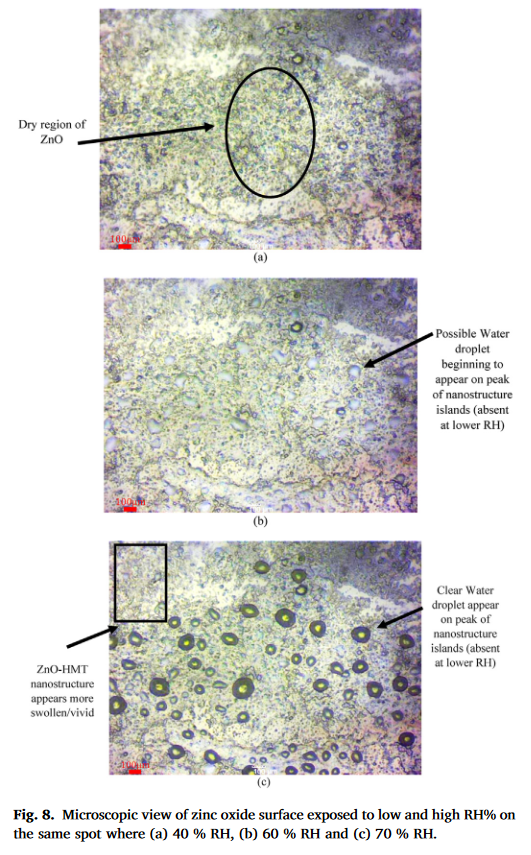

In [200]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAhMAAANXCAYAAACPHd3qAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7P1Xk2RrdqaJLddah0p5RAkUUAUU0GLGjBc04z/jb6PZGGnTPWh0A2ig1BF5MjOka/ft2p3P83kWpnk7fcFMs9inoiLSxd6fXO+75Jc7ccXz9Xw9X8/X8/V8PV/P1//FK//p9/P1fD1fz9fz9Xw9X8/X/6XrmUw8X8/X8/V8PV/P1/P1P3U9k4nn6/l6vp6v5+v5er7+p65nMvF8PV/P1/P1fD1fz9f/1PVMJp6v5+v5er6er+fr+fqfup7JxPP1fD1fz9fz9Xw9X/9T13Nq6OdyHU9xjFOcTkdmJRf+59T4Hy/wHxf/5mNx4v9OvnLi9Tw/vJZ+FyIK/sPvpv/nI/7mfuc//D9++N6f3z8/07fOr/li/tO75+efP2frzjfh/4+8ku7FZ3nu8XC+hx8s5PM2P7WTD/IajfrUJl/0PjkobI7/+9Sr9N7/+Cz/j4WZ/p3+37bZV+6T+pI+dX7Xv8+v8S++c/4zFwf/5n0fff7k+fvp4lfuE48+P+V8eZ8/3+t/eJnLL/jCp/f+7U3+7eftZ3rNv33t/Hd6iz9Tu9InPv2Xvn7+bHo+/8vzn+Ny+rc2+vqRIfvzbPDDDfMFv+f/TrE/HBh/3yvwcWaS8c17E947d4MPpt/nvqZ/p+s83v4+9/f8ee/puPzbXPiaz0o/vvfpvvz49/kb5yvdxzn69O/jp/sfGZq87316w8/5nv/07/OzfEDq/Kfn8G6edZI+xXv8Srf788UYpe9yb0aBF/7PtZRnQByL9FzW5nmM/8d7+azzZ72n68rfqYlpLP3j3I70ef+fcU3P+/N/6fPne8TReTu3Od2Plz69k/7489/nPvpFP+HFOy4bX/e1T/vBOyUZkD7Py6lRB17j86nd/j5/3n7/25U+7uvpDrzg9/ztz7+NTvr36bRnfD7dy1d52fu70pIc8YVP34ucY6fc4Xv/Ng7nt1Ov/YjvfWqL415gPBBE5w8d+GXfaEuSG+nb5zXGSuA95INN9T7pvfTxT3PnP/zO8/UlXM9k4jO5jmzUzXwT8+EsSoVCHNh8u0MuNns2IX8XCmzo4yGWiyzW2S62azbioRylUoONV4tauxSD63J02u5MgCVtVsFHIcW+5P4KlzTZ7lOEx/FwjM1mG7sNwsXn+J57u7BnD+djtQSUd8Wo1oqRL+0AryxW6zHfOfCIWpQrpag1IiajLLabYhTzjej1ulFvFGK5zGKZzaLerEapQn/2e9q9pg/HqNWrUauVAZki7chHuVxJv/c7hCZtj6Jy9kQfd9xj+2+Cr1ymeUV7dUBg5aKUL0SRsbKtZ2DxfYAVcrNa2SfHohA7Xj8CvH6nWOCZ3g8hl0CAMVFeKT9LZd73/vxbgerO8EcBWkA4KuRyts/m+LBPgi6NtQDGT2oH/1csFvm8wHCC2GziwNztTttYbx3DTRx3Jca9msYtf2IcaXe1fGSsIAjFfWz3u1ivgnEsxmZLP+vbaPVz0aky36V8zLJFfLy7jWa3E61WmXWzif2sEt1ak34wfyX+fcp49poxKbKm+F6uyk+ZNhVjt2W9rTPeO0WxFNFsVaNSydO+VWS7TWxZG/k9Y4WkXzPfi+UqimXmqrKPQmnF9/ZRYp5y9Ou43dOHMuNbd5aYa9cVfdjwjA3TWaxGs9lgDPO0h3W0X9KOUlToS9CWxXwdB+Zss2LNr8tpWEu1A+vuxJwX0tyssnms9+vIlVlnVcaDh+9XfI9xiBNzzNqp1+vpZ7dfsU82PLfGM8vsI8a0sOM+7oky67REG/L0/0gbmZfdLsrVPN8t0S7Jr+NzYD2ynlgv69UmrTuJXMYadk6r1Qr3OKQ+lssHforsFZbVvsQaY20LhhAd597fuTzjBIjn016GOrJuT8cCY7tN6yjn+uI9+3I85Gk/65exarZd90eeVYwtHz3t2CsHJkwSw08w7vYpkSKfWXR9smd4pjIjd9iznVhjhVIaY9fwZpPRjx1r8sS8tJAhbKxDgfksRbvHHDdpL632p1Ty/zcxmT6yp1ZRLnXYj7SbsZcAOpYFvldkfS3nPJU2dnvFaF9saOsplqMj7ShEjc27dU+y7o+HCm2gLbS1UGUf13NRa3Kv+nnt9weNaDSVD24+Gvx8fRHXM5n4TK49kuvdv76Pf/p//5doA7Y7xMEakJlv2EwIGgECvInZdBYP9/cxGi4RAC026RXCphMXLzrxF391E6/fdADkOffj86VSVCuVJEQPCFSfcUC45NjceVjDCiE5Gk1jPJzHCuG7P+6iUDlGtQHAFCvxeHuITVaL65tetLqAQIwQKh/i6WkWi3Et2t1yXL0s8u/bGD9BOnI/i5evXkejlYunx6d4fPoY9U4ZAVVLgmG9XHDffHS7LYBL8FHYc59WH6FVj2x+iOliBGhkCBo+Dyh8eD9ByEJcEEZFhWMBUoDAKXK/erEMADQAOIQhPRLAKxCT9Xodk/GG+zGGCK2dQonvVatVhGENoY+AzKoINQX9Lhr1MqQIMIEE1eoV2oWAZIz2CN8dwCiINJsV2qjutmd8BSeJB+PIrdT0ZCeSHIX6drNOYFdg/CUYR8nECdA6buPh6QkS8BDz2RoygYC1HdtqVHleB4HaagNMAOkWgJ6M9zEcV2O5BmDKw3j9s04MuhDHWgUyMYt/+Mf/EjffXtP2Urz//TIK85v4pnfNHM7BpFFsj2PGcEq7K9FqXLCMOoxSnZ9yAtIn5v0I2RBAvvrmIi6v2jGdP8VoOgJo8jGdAIb83gK8k9kCwlGLSg2g3vwEETiyThuxWy1iNc2iWmwzP80EJpvtBmDZ0UfXXJVxasf11Ys0TwcIzno7ApBWEN8L5rYedx+fYj6fxuPdLI0Hk8VcVCCmLdrUY+yrMZnQLtqWbwKN9UjzlN9tI3t4hHRuaecxel0+22pB1lasvSnSrQY5k7AE7T4ThgJkKiDC2zX9clwBUUl6sXxiTeaYbwAPIrVcrln7gnwhFgvXIASCcd/vzkSx3qgzR5BDiGGd/VIrl9hDEIZ9E1LY5ZFH7rXgJ+PvFT+QENaOhF5SW6kwlpV6+v6WfvgjkRbYc6daTJn73W5F+zPmRxHA/lhJC3qxmDEHjNdxj1wodPjheQXWbbUEiaQNMYdwrmgzbHTHWjxVosxe27OWKxVIGErBkj0iESlXe1Eush+Pgxi0B3F5wzqvLxkT25qLKmO9PTzF+w//ElPWQDHfZ91CJiBVtkbilMtVol65iWwGCdsXon/Bnr/5MfassfFHxotn31wgl/ab2CwrjHsnZkvmDIIVpWo02u24fAmRudxGpbmO//C//DK++fYm7a9nMvHlXIX/J9env5+v/z9ee9Sau/d38Y9//w9RA4TApNjndpEdJrHeIdwPbOQSmk1hC6ufQQTmbDRAtbyLKhuwd3WKwTUTWpzFbPYOzeaRuy7ZkBs2O0L9sEQbmaDhzZAvgASkYrlcxmzuvdBUVjM02VnUWquotxHS68cYjW8RZqfoX6J5VJaAwBOfW6DBVABOgANhmS+uot2uQhCaaBNqhTMA6T0/d9xjFNPlQ/p9OM4RZNxr0Ix2p56sAPVGOQFFLo/gRXBu0Nrt25y2L+a0Hy0ZBI4GBKGjJQPw39NOfx/RJo9okAUIhZaNSgVAhixo+p9MpwjLWWwYs/1pEYUypOE0jTqabqWESN8taSdkLG/7Z2h/x6g3EfLlZRL6hyNaFVrhifE9ouWhM0MMJDJCBGQC8qD2XCypIWvtkMgAVPytFg3WJNBAXT//5sNFtLcyba3Q5jykbr+aRoHnFPIA0m7CZxn3lm1A+2aOtRaU0dxqYGs+t0C4/xD9DvMfGeRjGid+GiWB7cj8DWM2GsUJcng1qEH8ID3cV6JTKzcgKZf0u5EsXsBlLLIh4P2QrBZanDq9EnNB+/M7yBhkshKAQylqELAi9ymc0Eh57yUL7LLd4XXno8c6gJhB1mqlbnRbL7l/m2cKLkfW1ZB5eAKMqvSrxtqopbHYH9eMYca0LmKZPcbj6Pex2n9g/h8gUfOode+i1p6wZiZo+YdoNJrRYl1pNcnTHuht7Jj/AsSuwo9g6XxILkplLWKzGE8eEnAfmb8Fa/6wnzOeEOUizz5BtHn24ZilvVSpaw3agWmskcIa8sm6YW04zxJBrRxQCwjUE+sBUpADhPOuEYjCgfvWtjwXYribsn5nfCfjvTUEbMTagzTR11yeeWMyJAoSES0fvME4QfIB7QV7UMudZi1dBCXWU7K8QZrLZcGUNXSE3G59zjA2uye+vOb+87RPs+1dInir7S3rZMp8bKPKTzm/ZAnSJtZ7obhjjPbMB+S5rRzZRbMj+dhFsbqNZiOLy0E+Br094zqP3GFFmzesjwXPYC8jN1RQNivGA+JThBxXIWBlxnAHqcoWyBXGIJcfMj5j9t4jRAnlYDakj8ih6pJxPzIu3CfGsWVNb5kfdnTkGf9qS4sla624jVdvLqLXb3Mv3SMs4ufri7ieycRnch3Qhm4/fIz/+p/+CWHeQ2iV0mZb7RGGCRCDzSsYAKSAkJdaQR1hrRui0y4j0BU4kImnD7FeZmhKaKgHhB3CKflJ0XZPWwQWskk/7GqdxWSOQIJMnA5rNvMRAVNA4BSSkINvRLvVA4QbgPwKIf0ESVlGi9daTTRd7ltr5qKHhqmQ3CPwFJqb7Zz+ZAj8s8ZXruaihkbU67bj4qKfQL+EJtdoNAAJTc7bmAI84/Ej30MQosEmzXCFNoj2JhCVK2gpCJ69hAINR0FTRKtpNdu0sQkIlhKQrzcbhDOkAG2zXs9DVop8RutHFSFZQuBpZj+7dna0MY+gT+QGYEquCMiLLgA1bM3Kh+MOwQuwc/9ymXaj5SeNCe1ZN41C33HQkqHc01mUk1RALnQxGS+Q1/dx3KLxqqEioJPJnc+eeA6AuaHNOchKq6vJOZfGbr8/A99mJ7l6YE7WPH/JmCCsucdmjWbKWBTzlQR88ynfod1t1kGNPq8Bni191J1QRpXfb5kXNPjNZh7D4Ud+LwGQWgz6zej3GOM6fSmwRgBZtekjk79XY94C3pttLGeM6b4YZcawhEZZ5LMnPseC4j5amup8X2tT8QzEaY7QhOulaLWZ5ypkAiqkFUBg2mwlbmrks+h0q/Hm21dx9foi8o1ZlJoyshrjg2ZcYe2gHddbmvEhnBCvMmuqVoNMQKRKrONqtcCzc4Ar7YSEbCGhukdy/Puw05Wzod0HxlawhoAD2NqYikW1eIj05pF7z2nLHBLMfjvwXr7BZ2wzRLB8YC2zLnlOLo0RYyLJSPffMSfrmE0gE+tVWgfJncPcaK3y0oVXyEOaT8wVe6SUb/Mq+5v5ydDQN5D7Juu4yGdOe1p2KKK9096C6xKCvGFN7KG5awCYeZVYNVswPuSDxMU1HKdNWt+NCoTuBPGm3a0ac2/sCWMu8eo0IxqQ0wqEoi2RgBSdcll02PPdbo2ferSQAbnjKnZL1uVKv8qecVkzRpCXvWtILacaRZSJaoF5hfUeT7psmF0EywqSvGPt5JEHO5q1nEukixAj2o/CsIPYHFCcdsdcbE8qKRXWB/uzx9oqK4fG8fL1ZfQvBvTrmUx8SdczmfhMLmMJxk/38cd/+QMwVYstG26jBpdDuCI8m/UW4FtLAjpZJNSK2cgtNMU6YFnl32U23hqwHz+MYz7bxmTM93eSDkGviHhB3UWwaQVYZnNACu1wtQSA9VmjySCfigjhQkHBV49Vlktm2wwlfqWPFcLjs7VMlIuazEsQGd0DZUB+HaslWg2gsuf+gn4bELm+uUTL6CQi8fLFixgMLvi+bgSFh1osbUYIT2dTfkZJW6vTT03Iq0xNEK0FIa7wXtHW3Q4gBSz00zYgNe12K2qNs2Dd8sxsDYhCmrg9GrdAybihtRYLSjv9+FueoZAC9PlOHRBtozmXE5kAJLR4IDT1Z68gUJuk1QJm3CORIAT22bSbQiYTeORlG/xtbMf53owMAtQ53cFKjoKuRAiAXUvcAJlKtcxvLRwHwL8SOUDzgJaXR+PMMe9aSFabcQzHD2muqhCjDK3w9hYycSylsR4PFwDEDX3axXy+Zo20GQvjUE7M2Zr1IbgXAIAdn1/wmUfGRk19BcEyvqWDVi4pg/DxW1LqvI3G45hNEfr6t/flNP+Tsf0oMwZnV4WESGAFN7kfBGFJ3zLJx47ns5bKZ1dApcoagfDKX1cZ/YIgDIejeHx4pH15xr3ImqlGuV2P/k0/ig0AC/ArMNYpTgFyUypmgCcEIFkWMu5bhJwy9qyNAuPnfRJBZA0bJyCYG59gnEKn22CPlKNUg2h1qhBTSKUuM+ZHInhknHUJGKuyAzQ3uqjYK/l8GUIFCWAdFQC5ZL2ASNq3HUQvWafYixlz45rc811dAwUIizFHBYkOe/Ics3T+cf/YzjOJ3DFWm0Q6ynymUWnwt/EMvLbfsycYdD5n/I9rZr6YsDZ0kbD/ymvWvi5J2rsbJ7JjvEfVeBLanTu5Bg488RQVpEkRsK/R31bDGCfWamUZZeNRGMNms8Q+qae5z6c9kvHsYcwnxp3QVsj0ijUzWTx9ItsQ8i3zeeQ5tLvC3jwFBD0pOKeYzMasW/pfzdO/Q3J3udeLZfZeDqKhooFCs6OvW/pTQl64TxFjXBNI8GO8/uplXF7dfBo7r2dC8SVcz2TiM7mMlp7Px/Hx9qc4FdAKEDKHJCgBXcBLrTiHJqyP9Rz7cETYnWMb1HJ2BiqimS5XRwQPm3gFiOwr3KOKsCxHo6YVwKBAPoNmOF1O1R8jj2A9sWlPbngD1tB0Twgfycj7HyexmJTQSg2gRKuBNAgiBQVWtBAsiA9IjyC+AKxOuzIg1QNwDBpccb9CshqU1T6aLTSfHgIWIX00mDSZR+gTImQKeM0mCQAqKa6hzL11JxiGueFnzf0nCO5F+o5BeznGpNKsA8QNhH2BnhzoK2MCKSghVO2rsQX1WhXtVhM44pzxFMxq1TZtRIgKYJIN1DUJSwA+AmMiBYhi4x70swugjr/kjWlK0GDgZwILAIkXaBbf4W8/A5Sltm+3CGZjCjRPaxXivsnywbhJNFabaWz3C7QzEMuYOoSyWuF+g5YMoOyY5xXjuEDzNfAvn28y7zWeoRarD7oWg84rfiPQIUDtdhsQO0Esawhs/feuEUF8AehMATr9+5AwyKeacI3fAqJEUBA1IC8RINbRAeJQ4hlq57ttHi31mEhJIpwlAA0gkqQaaDmbQkqXK0jNgfWp5u5zva+uomNaDwYaLhZz1l7GZ+fJMtVqVQFB4wYA5dUGrbkW/eYg6tVOVFuADASUjzEwEgqDWXW7FNCeeb3Aml+fLUyblSTRoE/mT8LLJLlXOp0+hOkiPaMGWFbR1CVXWgqOBy1ABmBK4AC1NG/nIEQtcVpZtqxBSVGl5jpl7TDv53UJHkOAXMsSnrZr0PvSbwN4JdeSznzexrtGmF9X6EkSkiXL3WbLWs7x7KLWqlUae+OaFs7VdgbYzljjG9bGOsWYaB2QwBsHZdCzQbVq+Gms1fLp/26nBUOlQQtINQ4b9v9W+cDaLRiY2+R+zdgjX04nxr7Wh2hf0udGWsenI3IAQrRaz9N6Y3iRQ4ckK+bzCePKmHC/1ZrPut65T0lLRsl1ukQOGGAMsTBw/LhMgcYb2nU40k/W2aGI3HKtHur8m58c43OA4DU6aQ8ar7KEFH/9zddx9eIijemzZeLLuZ7JxGdyKYgms6f44d2/xFZAAYzyAHuzNkDIdhFeNT6UQztnkxvFvkcAlhCS9RbkQkG6AICMxEerAbC2EII9QqwImLYAmcGgg1BkI6ONb9j0fDkaHYQ2gJwHWCu1WgJdJWWGKjoez9FmAdTcgE1dZ7NXkm9dX/MOwC2c2glkYCEIrjxaMsC54DOQiRYgLSmoN9AKWzyDtvtTEgBonxrLGmASnLyXFgjBZqdWq2AUcBH4XTTnGppTBugqrBwTmBFgCEhcXEUdjarZgQw0EZKgjtHsEoAG4NGgP5rkxXrJifEMEikFWLFYR4BCfCA67ZYmeIM7Efj0ZZXRNqPO0f7rtTYEqB3NhoLYQFYF+CH1QVKjRpxSNQEK/pkuX0OkJ7/7mjlZo7WqhWWawhcrBOyBeWK+0Eo3AMQBTVdBa1BnCfLVkNwBLAxR5CCKO/o8zzZxpN9FQLbR7kX/4joG/UsEbR7AZKwBPOgec7JHo5wCivSX99YrQGttO+aAyInvMRd13SK0mL7aaN1MZ7O8VhLppW0pQAB0W5QSQGz2m6g0GFfWgIGXxhqo9Qukztl0wlqBDBiIlzsapChR1EV0SC6uRgtCstOaAdgbgLmZxMWFwZVNSI2BsGjqkJDygWcUIDAAzG6juf+cuVCgrboAtryWAyQNUISfRYbmvNualURf+Mx5TZk9UOIzpSjlIMcAqUGX7q8cayoHIB63Re6fiz3rd4+W7DppNNhL5Rpj2UrAa1bGaiVbPsczaX3Q8pCyolj2TdbcmTyyRwpVPpfjProbO5CXRno+NJQxoX+JREK2JBDGsjj0jDNLkFlzTUgmaDMkYAHR2uzmUW8ytwNISRUynctiMtF112It3rAW6Qdr2RijdbLWSSRYl0fjiJhHlvKetcBgsSfoN58vQSJP7AGDNCUCkgnjngqFFnuCcdI1AlGli4zNjrHMxSzbQySY32VGH1zbHca7jrw5EyU5Uj4RS61UkAjWsoGke0hfFFxPZk5JpKDmxrdIXCE7u50WFAg845U7FlgjlSggeozHmo8m8fNfvomXr69o2zOZ+JKuZzLxmVxqsqPRbfzhj/+IIPMFN2wV4XQZbTSsWgJHNh+f263RcPhMq9mNZquNkFIzGANacwQ5Gi1C84TEqtZrCCXTRSElXQSzFg9N7ajG1XonWmhtavdVQL8G6cjn13x/lgIzp5MVz5IEtJOg7V3UAIU8wA2gIlk2G9MG+Zv/1mitkolSvhvdThfQavLZRoqs73b7iUj4nRWqjj5i09LOaXlopMsNQpu7oFWZZrdGg88gGFtgwHt0L9qxPkA29qCH2RNFxqR3GZc31xAgU0wrtO9MhLSEIH4gQEXagiBGexMNNJcqmLT+SCLKJTQ1o8jRKGsIshQUh3A/INjUbiUzAoRuGAW/PEME4eUkiBVwijh5hJmEggsiO/2hVeKwRxjvDFxbxhKQTXERvDZfZMkE7JdOZqYAxoWSFg5N9gZc0ufKmejk7CsgtwEkFgh1cQ3xzFpo8QO54Tt7xsWAO/3lZlVsIQ87NMoKGmiJtusaWqPlrtGENWHrchCE1Kx5WjKhmzJrtk+9rlWJNVZtAAYGC+r2oJ9lOl0BHPgx7OF4gExCkiQeFa1lfNY1p2leM72uNN0+BkPm6V+5ekrzcx6XFR/Q7L2P6xu04laZMTc4FoLCN4+siQMgpnvt4W4Vjw+Q44XxCwb8llknAl0xZpMd4Ko5/pDiRHRH7FnTznOlpBWqEav5JgoA9EHNWPK25DckIvb1ZEE7bEqx3xgblI86pNLYow1AOOd761WOn1NyA2oFlAjo3tC1WBAgGUCDfo2HcV+eID+Cq6ROK0gixJAU97FWHl0WBm7mi5B4MxhYk+53+B7v6/ZgfQLo7ofFcoiCcIo3X11CNrTKbZKLawqZKOb60W6+ZI1CbE62ybgnY2MOLClGiM/V2Z8C886YFdamgak1tP4apK3I/JfYi6c9RIi9fdoz19sSzZFwNRj7YrKMLKfTWGdHxiAgvhIe1ohJMFomdqwhxsA9oLWPlR273CpKdZQX5lgXVQ4yJ5HRXSjBdH/Z1yNkJ1km9rpiIPCQPF2luksMdF7OJzF+eIq//PXX8ebbl89k4gu7nsnEZ3JprpyMh/H9n/503mh5NGa0pIo2TXaiwXCnPRohG7KIdlQWLHUZHEx/ZNfz3j4zzgDhAwHoQjQECAW3QWxlNNOtAGfmxvKAYGwheHqAGQIGQM2X1BqGCMEJzxLoTZsDqOut5HduS0hapej1mrQJIAIwyggQzZnzOYIOxL24uEq+14vrRvqOrgQD7hbLWbI+ZLRNa4Sa69mVYE0CNeg9P+b1A9gA3AGN70ifNdnnijsA2eA4zcwlwL8L6A0QUAhArRS0pYLmZbGukgFbgNtOooKmq9BP1oNPgVxaKDQ/Wx9Dwer42G7BTzgT+LOVWrfWDbNT0CoBajXTlWZ6+qDWpWZY1Z2CsFYT3CM4jVRP7hvauWU+jA8wSn+GYN6sBUzhUneRmvM5XkRXSSIgzKWBbBX6XeY9XSVmRGzRhtXutfyUCjX6Dblqm9ppuh1aJ2thj7ZrvIs++/Ua7R/B3R/0aafkZRizxYh55X1A8ai5WesAn9fCcuT1LZqtWQJacqplrRHNpOka96IVot6ElNbOcTZHfqxNIfjXNPMXdFkdGFfaDXkwaNcYEUHdMTIwsAoDqVYALfptzIixKYJwp3ORxmJpujCvXVz2EiHMZuuYTzcptRcOhoQysmQLQYZMMseC72KxpK8GtLLsIaGuZwHcFFmtJrbDrB6zi0wJ1uq1XgPqrOkVRGHl+uB7S9edAck8N186pbid8QRyC5mxFsc5rRcCEBAVnl1mXmqQiCo/ulss0KbPX2tMHmKdCA3EzNgL3TlaC3QX6KIznblSBVG5pxYUf+y/QZhF0F/LoxYksx3sQ6/f5B5TvlfgfVPCIQ+HNmSpxx6VoEI04Hl7SByrMLq9evQvGWu6bDyHAZxl5rLduPjk4jzHisTBuh4SBQjTUssMe5Cf1fIUs/EsxtM73h8x11oNIGZF1hvP37tmINsHZJMkhZZH0TgfZkfPUnILMZbbje4S01jXjPOG8Smzl5RDOcbGKVQhYn1r0WR8CqyFI2t9be2L+RwSmMVv/u7n8fZnL9PeZNM8X1/I9UwmPpPrCEjNp8v4+OEe+akVAjCusZFBLIPi9HsfAKkCAFkHSMsGg7HRtggVfesQ+9jM0VQWh6iVaknDVRM8HpYAsGZFBaz/PqDF6jsGLBttNisCAUGphnHYjxEqIwSRYNUBeJvJTdFEYxXYFQhltBHrRjTQjmvtQkzWHxGWTwgdhDcAXK3nYnBVS5reObNjmVL19JdLfNRS6gCXGlwerYWmA2y0AeGuVUCTr7EIRdq1WZnGipa0ntNvBHmxE536FX3rIShr0ZboqHGh7eUAypzmGrRuNaKDQZRI2z/XgzibaY2lQBtC4OeM0Oc9rReSCV0GBjIu0EYFSLW5Vts4CQEFkOQ1o9R3gLRR6xW+q1thu4c0WIhKt4XxLLprADprXayzZcqo2Ws2RuPVbsGjuf8+uXxqjK+FpCQLcIPIIbAFDmWo4zabjRiTLKV3VulvFw26QfvR7XiNdrNmaEYiMie/aAYDr+seUpO2QNZkPAJAAWKkspaYSgVAXZvCuOW7aM88075XK01AIM9c0qedRGzL+ihHHdJlDYycZAAiITAXigBqWl97+qyJ3jgawILGnLM0tOzoVz9Ep3UNoF3RaYMtJckCsdq7roSgjRbVOgCeaM+QAa1iyb2QM10VrbppzgdzUljF5QACTPsXizFrfp3aa5bEFAJwJjCM8/6RZx+i3mpEsVmKbRESy2eh4Mwd/+Y7e9DwSJ+sP6IlzHmhaYw1BOVojIhkjzXeqAGepglDkOhVhX5bx8RLkqdPf89+1GUiWTxAIgqlpJ9/GleAEoJ5BmLnQNBl32oxQUM39odVyWtFSBftOrr2NimmSdePsQSrbB+j4YRxjhTDIom2ymmq0QIJXbJHIpdFv1+DrLC4WJPlYi1ZHAqHXnSrL6JdaSUCdNAtwprMGN/t1iBdSNihSruLMR1PYzGDfC7vkQGTOLEfy8dqNJVDVfePQdq6SWlviek03gNFRXKat++QSNNydZEY7L1bGy8CkWiWkQlF9nSOfS/hMoOFfaJLk/Vj7IyuGC0i1gvxXn/3H38Fmbjm3lpA0rA9X1/A9UwmPpNLy8R0Mokff/guCSb92FZBNEpaUFSrB/Wj2WiczcZFhDXySF9kCbKQQ7BpLjV2QLOhjN789jpaZRXtslRC+EEZShbtOZw1jiKERFAx5SwD9FZo0m5oMznq1e4nFwKCFU1eLQ3YSppPz6JTdU31CD4IiIBr0Z4ywNxqV9Ayu2cAR7ApVNWkzM7QwqI1pVrJc28Jjn5uNBgzHNT86Ic+2DqERE2rWSsBughcCNBpl4929Sq6zQFCvcZ3BUCDKyUDaNums+0MyFN79SsQJAS+wkhN3wh9femCuBql4IPUZ8z8AYz5wwwPPQDGXVig6HjYATCzWG2sSyH5MJYADY9+5nhP98EiG6eiXaPZJEZjhD5gOEcYT+dD5lQLxYTvAtBMn+0zCFQw0IJSANTsn/ENpitq8t/slmEGyf3DQ9ze3Sai2KbP1bJgf2ReGlEHGHIQCaekRFsNntxJ1NBuK04Qk7/mgQc+IDnSvaSG2zSo0XgWCIkWg1RYi9dbgJYuMzXpJYJ+i4Zt4GyqZurnmKeMfj2NnpLbJWWz8BT74+W/1a59rm3ZwhKYadaYmTR91mwvAec5tmeXiItk2NTMgkGGxXNmyJq+a4UyzkRLkenABS0pAJnkssParzL2WwiLGUAGHFrZ05gJXUmH04p5zdK9q7XLZNI3Pdk1eDyeK0geWJOOmSAm+ZHg2hdBUS2/kG8AjGfikyxrEPASn6ui1bdb7UQQrARp1o+X4G/lVu+h2yGli0JsZfrG52gVMy7FGBMpewkyUEkkElLL+xKScko5Ze1C/l2vusPm0xV7MRd3t1PkwjZqlX70ezeMB7fmWWbquIYdi1x+l4ivMTenDfc7tmi365f1yhiU2J8nSNFkDqlfGUi5pX+FtBYLAPnRTKz1PeN+D/FhDXNPx6tWNNAVeZFjPnbs0R0PPzpv9SgYXwJJsOaGLr3lehyZ6crJWsZ6zMpRhjQ2LCrHeDPczOiBPfIQM4uAQT41POVcgxDgjXEpBmywH/72P/4i3n5zTV/PFsXn68u4nsnEZ3JJJkbDx/inf/57BLdFdbZs8CVgNUV4ITwzNUVdDt2kiWZqUQBQ3uJPrXLUAAoDKYuAvzFPmvEbrWr0L1spXiKfQ/ghAJEfAJGaQjUJv2w1jeViFMvZIuZjwH+rNtrkOcZIoMmj7aQaCwhX6wV01SDrpWTlWPDdNQBRLTaiZrQ4WmITEOrSRomE2QxqrUn62cdkltZsv+IftCWB+NmNYd2DaksScSYwVxfdGAwgNAhDI+43yzxaqeDWSuRAGZP8zmjXpgNaplngPdeJOAekpfLciHlT+tQoJRIpjfOogFLYM1aQDjVxgyqN7s8B8LogKhU0ObSt6fQx5pAsNXLBuw5YS2Q2CFcLK83Q5p4eEcTLVXz48FNMIRL7WMVocR+L7TDm2zGCUy2tFqb4aQo3M0SQOacBau7eJouBMQ0SlDma93Q2j6ehlSIhELUe7bIypJkoddpq9sXqDHi1Mu2236ZkCoI13jMuRZ/6iXkw8wANv65bAkKGxm4hKK1CklWzA4xrsQ7ElH4+Po2i3mxACAfneBKE/RbN/u7xfUzGM/qtpeZcvvoIgCvsJYiCg22VoC0Aw2zJuil4DzMy0PBTXMMhtXsDgaxb9jsFL2o5Yl4AV11TWcpW0qIkSZQUMod71vmJNcj6SjFB9DW5y7aSsTZzS38gi6WS9SdOPEOYavF3M6WQ+t92dYTYrfj+ms8Z0Anx4Vm6o6zpoUUhzck6+DlbVhIZZD615hVZO9ZF8dmSCT9r5s+JfZp8+zxRkqZp3viglDGihYxFL3CfOfGGtWkQ59kiYd9cx2YLWTrb+TXod7M+pAqpepRK7KtW4xJC1g1LX/s5VjfKhGv1wJoH6LmPc6DVYM8+WU91tbC29UdIJIooDMdxLHZj1qZuqoz72SbTOS1ohXzZfYCQPoaVYHM0tphDoSh3eMYpVVE97FZRPFnJtoGuUwvTehp9fpdYi9snvjtlPiVL+ZhNIYTjchSO5WhAvjutGuuUJyHPhpMH1vgiSsaaMKbSsDKfcZ2lgFbW6m//w8/jrTEjMqdnMvHFXM9k4jO5FMTDp4f4x3/831OMwQ6wrtb0lwIIgI0meaPEDXp8fFrEeGZlPQMi1ZjqUW5UosDnZff1hhUp2yluwTxyKynuNwhNQEaN2IJKSn19tHM06JR+CehsM6Pxz6Z9qzH6/U5HdwjaMADU61mu2CqH+Vhm1uuH8CC08mgrh0z/aw7C0aKdlaRl+aOgNnNBrS+ddyDg7z3LQyHO32iNpiZaAyJKGwhEMwb9TjRraD9mMAA0koP95gymatICmNqzLEVtz0I+q8yodmMHAJpPQW3GKEgY6gaiIs0EAKW+Efn61TVBe69kluV7fwZgn6HZ3nvbVtuYSInh98yTdR+0IJiJcf90F0+TSSxmy/jTn/4YGfPWuWhGsQ6EVQHPEwL0cRpmJlS4r+MuidByY9qh8QL6i89m8RPkZMy4DhnHLn00On6PdjdIYOzz1fQMjjQ+IrmNSmdftP4OcJzP7bk/4Ej79fGb2XLR7zOmvfQ8+3uATK1WjtU+AW4DkGKoEPRDwHwb19cGtzKvrD2JZKohAnE8QCR0K+QLlTRWGQRKi41cEchK4yjoGw9jOiKrEzCs0bRKLJfr5OoS/M4lq/PMqwGxDTT1bjQqV/xu82/nmWmCuekOOu4kEhDBfIsmVmIxX6T+SYT39P/k2oMQOgYCFiOY2lWr91K7cgCvJDaDNIhNtVopESvHVvePcS0S426vBj6WU10Ea4w4+2uI4BZyJxnR+pIKeLFOHGPXkqRC8qCVx0vSpsvKs3PyfN7PGa/CrKRxN2XZNam7QOujhdV0Mbnm3B+6+1zWuuiqFfdRLxGly4sb2kY/IS7er6jLEeA2mFVCLUnj6/Sbf29YuyfICeu+Qj/LxpGwbEt12gKRKOuOZG57EIFSmXvkMxSPDYT+Y+SKjFutAplh7RQg860L1loOEvDE/TPms0b/qnHUWlGFCDbYH8cR8wPhcj9sd1EtNWK92EVhA0HN1aJWziNHqrSF2ZAbsE7NjKpUjL1qsb7MvFJO8W/66Hj+9W+/jtdvBozhea8/X1/G9UwmPpNLYHh4/Bj/8t//nh2nJnRkwzeSS6FmnYOKUeT5WGTHmMyN8rZgVA3wNe1zEPUOgtsAL7RUC0QNugroIoIFIoIA2gPsRn7nNPmzwc3/N33RlFIDzHST6MvWRKyp1lQv4x5qCMrzWRWaKg2kUps36nwHCBq82UGDqccBbVA/qAWCNE+nvHyEn+lrCuBzfr6ArFXhLGDzaE4Sir1mYdpjIZ1avRwlhEoOUDGSfGMgqCZytOHx9FHqgPYimKIdIogN5kvnCCSRb1S4cQCQDIMhVcv5jBq/BEfI83kaJ/wRkFJcBcDr8xXqas3Gr6g1ahnS/20MhUZaidgWIrAA8DW97/Pb+P0Pf4w5wHzUx1/vANyXUWuh7fdbzI9BpAh55sv3NEVrCdKykIJL8xavUktVY2cu0P7W/Danv8hYWzRLAdvr3jAPaokSIbt61vAVtKYGat6uGETLb60UfkizfLVim6zlgFBPrjCzDPyu1qGIDoRlcHEJIGxjtjT9NoOEDgDWPkBp3zWHn4tHeW6Lj+5YnwKitwconVOD7FYGE+4kO026wvyCGqVylfWgGV5AhYAtslRe2zWece/p1KBc1oUHxOXaaOQDmq21xjREsyqGMZsYw7Nnaup0uQbwA3rpfBcU4yozs11yX4nOKo3f4eSZFAu07jbgdMEcsR+cU8iHFjJrbLgeJRauFz9n1olVGSVLFgXba8qHEBlwmi+s6BPrApA3him5qSARzoNjrwJg7IjrK7lNAHBdJJIF3S72Q+In4TO+xPV1XkfuAYnFeX3u97ZRksJ6lCPwniTPUvFazioAvGtXAul6lYCmNN7TucpotdpIoCwJqUDedIVZe6XaKNM2rT/cwyBZ9mWzUY+2JcpbEA3fK5vttGNv3TI2c9aJsSzVKDEnHdacLpDZ8i7JhBPkcMtcnGiXh63lihnzcxe5/QIyAYE4VWM23MXoPkM6dblXI7lhPe9Hd1Pai5Ua686sFMhjuZPiOxjwNJbKCffsbyQTb5/rTHxp1zOZ+EwuTexPTx9TaqgFl6wJUUeLagAGRuc3Wm02mnER1npASLPx1CLevn2ZAEFN0gBEYxd6zW5UAZYcWmBBLUoXgPELZjK0WlHk3tvjJgGXPmR94jk2sbq8FnldBgphyYMm1BRUB5Ko2Qm0OwBrq4kbTbSMMG2q9fOBZAoFJA2Z0/1wNgQoKMxw0G+t6Vuhy3f52zS7vNp+AQGMsM97TsV2TdsYEAPV0G4ztCQL7RQhVMPFfRwtvNSpIniOCCwJji4EiITBbJCtJOwRnpKFFHCJFmR8hmRMwqA1wZ8TwljN2xoPKvZahBX0Zgt4UNcGENwxRgYFKsAXswWa3xJisEKsHxIwWWxqlC1iDZdp91/E9c0bhKPZJae46HaiKAADQDnaOuhdRhsNbTJ8ALD065tNAICtF4wdApMx0jUkmdNdI7GQFAnuBjGal3+OjdAiQ3tpkzEd5vZr5ZAoaEHxzJYjvz3jwQwLD68K5kNg04WjhcNMCANdrQOiS2O5WsTj6Cm5x7qdfmqDr0m8JKyJhPC3PmxJiiQxW00Swdju0Kp3xl4ADB44tRdQnftTskJIeuR007GHxD1BQkfca55cDgY57na6kwzwO8V49ADJuOO1WUxnHoa2gFCYpVIMlmqMx1PuBSlo046GdQxsE8STLi4z7zsBILfRaOvGsRw361yLD/9ZkdJaF0/DR+YxSySg1TLjqZ7AVNO7Gr41VeJYTpYzC0Z5wul+IwgC7lqBeJYnoGpRSIXjjhIt5oXx2TEWBleWS8atMEcqBSxvL+txSBZ0x9hmY0wsVOXadZ1qmUjkhD3Nrc9WKS2JrFmJg308x3doMdKt5Po9WzyMnbAuiMQvz75N8UtN46p017AOkjtJN1EtWnWVjBr/NmajkPrElMbW2CV+tCgdtpAJyECe8TMO5Zibafiij9Vg1cRJomhg6nEW68UTP54zU45m+TKGH1EeMgiiBbIkQWaJITNUAIK11ygy7pCIah55piuGvW5tDV275zozEX/z776J119fMWdKJNfv8/UlXM9k4jO5BKzp5D5uP/w++t123NzcAE430etfxMXVNVptn41XjNlsE1M0uhXaZb83iDevXyMUG0lzSP5gBFMRaXTi7yMaoFkHVYSLpkUrAuqyMF1yw8ZdoIkpJTwi3E17jhfQCmH6nOZoI9ERklo2EGQK5NNJzd2S1QvAXmFe5P7AcM6YAgMOZzEcPSIM/8/DmEoItELB72qZsPoigqZg2qXESLM7QvmT9aLsKY8AZ7Y+xHhGGz2quMZnAcUlAnaxvkUg79JJiBXrYKCRJysCfTWz4BzsueEzapMVwMW4AvpfQnAh1CQ2Pu+gmTk+EQo0b4WyQaKSNN0NqSoi32mgdQrcCzT3heeYLEyDLYWHm5UgZQuIwkaAAJwEJqPlpUEvIIC9Tp3nQZAAtEanBaFoRcsskSbCGJD66cOf4ml0z7j4vHNwqpYIU/sE4nKlipbZBuBMG9SkbZrv2ZKhb9p5r9N/swVSLY4DwAdQa91JhJS2K5CtRuo5LIcDoAVQZBkEcTePZq+TKqDqqACW+GwhWjWLjKHlOk4QUbX3PxMKzz8xBXcOIRhCirTiWDckmId67QK0qyULhRaVLSAkDpyYvyoAaCVPqz56RsbFBZp07ezakhwPh0PW/og+z2PQL8dgUKct+8hm47h7P4rHu+X5mHvWrGvX81Y8qnoyZ06sW8LYGNdxdcX4tqSY+5jxeUs+L1aHKNeLkCYzKFbRlDyw5jy+u2gBM7X8gkGZjGezE41aLwXx6p7rD6qsW9uYp38WqdKd4Fkgxq2YXqmlAoIfjMPKw7q0LJwBMlkdUnCjsUPWhZBgsR8gUFatdS8Yd5KsEbznby0SqVy7rj3u1e4U+WF+jpB+5tgKlAaIuv6sQeFJwinlkrVjurVExWDOEuvdGiXGvLTob6taTRkdsYZsH2rh2SBnpcR1D+mGj0vmdEdm7LncljZGk7U+hShZrlsy4zprIi+6rK8GY2u9kWnMIYj3t+/i6W7EdDbjsKF9+UFU2uy7HmNc1WoI2dowjpCjtinpJ8ZvhgxZzCGfEPdVxv7nGQfGEuXht3/3bbz92VWa67SInq8v4nomE5/Jhf6OBgRg7HLxy2//Jr56+8u47L2KbusSQNMMzAZG+86yfdLUO51BdBF+JYSZ5y5o5kUWRQHtWmBez6axRBu0vK9m0BRBj9Qo83nwMwk9BVAy86uVI+jUlswwSOdWqLGjXWoGNjJ9kx2TUBRgFJDp3AwdtZCNAkJWDUiw80yI4dByvAA1rTHQLWdaHMCRMy2wIJkxWAyQ2xViOMsgH/NYLHaQDqsH9pPv3HMgZtN9jPl5mhjQOIvJbASofqQ9PButxjx6A7fMuNhuZwhVyQLaOu0ynkQftRH5BimmSpX0W3OybYQa0Q7GgnZ76ifiNGnfFi5yQDyfxFoF+61peWP6bcCl2i/Pob/L7Cn5oA0iy1csY42w3R6iYh/p1xGwsV7Hw8NTvEPrnyM028xDt22arWRsAigPU+Bs/+pl8h+r6dqmVPqb3/V6K7kCpmjogo3VMctpPBlbUEBS5nkMuVIBomUWCNoic9pqQRqbPfpUSNYDfc+C33FvGxuxRMvPAHeQPayWaiEtY3EkeBU0xyqatel7grdmbwmmoOsBUwL+x4c/AeISwAu0UPp+HKT1tdtsAKQZFPMhsuMtz4CEAhxFtOFiNR/tPqSjlY+L6zYgl48f3v1A/wr0T3N9Ma4u+7TdQN8S6zOL8ZMHy20Za8nVMV69egmQlVJQMl9gjqzB0gSoIY2sg5srj7LPJyvIgnXVbb+MKR/1CPVKRQvFFAJeS9lAM9aUxMf1bOqxKY3FVLeknda7Z2B0OuwX58IUx3qbz2klce2zhhaMGXvIlCpjjtxnEgGNDe4P941zmXYka0QXmTER6chzfuvx0Lqh9cdxluT6moHR1oQwrkbyfq7OKhk2lqTCHBp0yjrg/u5V21bKmx3jDySANVKo8D5zaAZQu9FL/d2vID+zQ+zWWj4uY7f1uHhjPFwbbOPj2Z3nKbClqNMmSJCnolZ3yVJ5YB5PHmHPnrOWTB0izbLgYs/R32xxjPnsGO3mi2i0rqIKCfIo/bLnhlStPyH5yJJ1wpgW3X3H3JJ1jBKCDDk6PsxHbluIf/e//CLe/sIKmOxL2c7z9UVcz2TiM7nAdIASAY4GcnH1IsUhlNEGgKYosaEUdKbXWRjGQLdqGc2Y3xZImqOhGRBoXIDaSAlAWU/Uoj0iuRw1tEuLyui3VR/XrJ5Ha4s99033tvLjLmYzfc9aICAWxUPUEAaNGnol7SjndZ1oPoZkIJYPgq5mV/6tdcKiQdNJhgaMgN5ASg4IM9NPkQdAECADgCK0dggMwR7pmqpabhHEe4jLYu1RzvQJgZwDOK2j0AF8d2gqpsp5DkC7ZWEsNJ6Sel8BIL7g+YdYzJ8YhwmCzgOWaDvAYsCagCwhUkv3vgprswYEVvtgASWDItUYU0De9hzUeuDdzd6IeC0es3QCq5YLD8Nqdqx9oJa2h8yg9XUuuVMFssXY7tEGCy1I3nXMxhlkaB3vP05jpZOfeeiWGrT6iJb9mPz2iwWaIONR7dykMtnGsliFMrWX/ku6ZotFzCCLOQCo4Xpg7orcxfn37I3FGiLFPSMBFgALOFh8ylRYzeSe9qlJuwbY647Y75h3XQC0+cC9LNS1REvcAyJWlFQ7lBiMnqx1YHGpLmNq8S9dAADMfgzB+wmiwKweuqyjAeuJMfMIbsbK+ah3csmNls/10IT7tIVnMz7AIoSqDimqojkzNu8/xuPQTApI1iVEkvk95RY8ZxOPtx/jxx8/xhp09tC7LUB3cX0Rq90iRvMRINumn1esYdpwcH0a+LmP2dzxWkFKPFjuZ2fwZJ0GGvYJMuGJonPWuSSmUu4xdznWo1k158Ps9uyvdE4HhLFs9U85KGNqYTFPo1VDF9DLxRakt8OYMW6bBevLFeW1TRYh41S0WuzM6Lbq45H3IT3WXjC2QsKiRSqtd9aWa1A3nAGIkhAtjcZypLXKmi1DsA3GPfAj2S4zh+kcGfaKhai0Dmm1sMGSeD9TLZve3WOei/E0XcQa/jhfAua7OuQiR9vpL2v8nOLrqbS6xc7EJxP8c+uotnQjlSBCxjCV+ZvVxxLSTWdV1Q3z7HPLlQ6fKUS3fxmdAWtGAgTxLdGPQmkX5QaKEv82ZdmjyvOsp5zp6iVPKq5Hjv2aQXjsy9/9334er3/2XE77S7ueycTncsEmzLjYrSbRbAs6IB9C1HoCmuwtu8wrCcwFm2oKpvK1VYxHt3x0HZdmWyRT+wSwU/AdAFYEGILWQ7AkK5ppdXFYuGaRsbGVl/CUbA34TcyMOJs9K5VTKn7UBOQq5TbaBZpP1fLJujbELgPQPPgJiEAg8gYapMGDC/piqtvZN6wZtlD2fAeE+HKbKu9ZhEuXQ2Y+O4KmNWigAZ0gH4cYtCFRKGGlWAL0+7h5+ZK+FoG+fTQAtXolS5Uiq0WPRu+juc4hQU/cT+2wRLvoL/KnSLtMCbWGgy4BSx1bB8Oxs9qj7TFY8c9ndpiSabyB6ZO6NUwZzB+ZEwDWVEtdGN2eJ57WEdQNuEErNhCnAppxQbMxoHfZvYjXl6+i22gB0tu4/ekh3g+n0XxxE82ry7hpDRCuOcjEHIICvu2atHmAJtdJcR0NA20NdmR8dDM4X+tsFfVmEwCcxejxFv6XVFr+x9yjFS83ltpGs+O1Trudnm3gm+TTVFitTPriDaI9Z1rQP8DKg7NKkK9O075U6S/gteSz9N0guUa5AyhcRNv5YEwknFZGW21n/IC8+TpkQi3Zct/3MZ6/S8DWrF3G1fXPWKmNyKv9znLx9OEhJh/vYnoLoE0M4IW85rLkCqtXB/HidTcuXtDuOkSkdqLNx/j977+PP3z3DgA6g87WuB+AejbLWG9moHTcMtyLbQIJNFbH1MwUN8OcG2NTSgeeaTFbQc62gOwpsskupqNtSnOUJB8OxsBAAFjjZTR5067N9NFaJRE2TXSzscT3PqYAsmeFaDkwqFRKq+tHVxurXG5Nm87ryeDecxrp2cSv1cmFqZUhZXC471zH7CktE+fias4Z61RrE/9Zotv+6a6xSFfGvk4l3tmwxjHt9gueca5HcZS8sx+sNspq5+dcz8LzRlZLLX+eA3OIu6fbeHf3Uyy2E9aX6x0Sr9vQIFMIaIn9IcW3MuiSthsTUyx2WS+6Rlg7EEpdVR5Bv13z/JXp3xIhCZfuv57UNuAhUYF4nBiLbDnmvrrxGDvWXVGCwVo65pkHxsAMsRP9mkNsrTfz7//XX57rTLBfn7nEl3M9k4nP5EL8oPHor0RTU9NHVdrxt3EQOTSAvIFSVbTxegkmX05ljnMeV11Yx6Bfj0GnEQ21cTbjYu4x1SuIwh4A3wHLADlaznA2QqvkZzKLsUWIAOI5gnh7QGgAfo1yH0AaQBCKqWCR9Qe0aBgYaGlfhc/+iPaJ5nh2HQCAzVYSAJKDFDClmwSNegVLWdOffBmB20S81S3BjVYHTTghvGbLp+Qr36ht8d35fByr8QhCVEdDzaFJn6IhyK+WgGwlWgZmnCy5S98AiMMKzXuli+KsvXhQmVHvaleey2FchOdTaKlRINlGtS417CLakBUHLdijtFZenQRwNNSdAYOO+cGTKiM8AdJTLz2Rs9PpJCBRYOv3tk7BcDSmDxAZgKnTMFgS4sU8fPfDj/GP//DPgeIav/h3v4lNAbJR70WH71mvwYyBweANpC4X95COtemgjFMDTVArziKD3GhWd02gPa7RqLc9yAPtDAjNEpBu1m/QgpvR6Xt2SyUuIJOtRp22AVI1xtwsAzohEG13WZofI/qt6rheTxiTI8B/HZZM1yVTKeliaAKAKwAD0FPzROtOFhz6rZvNcslbtP3TnnYuZ7FYfYzp9gNkqR6dyx6fr8f4vhQfvn+Mjz/+Pu5u/2u8f/9/xGj6FI8Qq2zlOmgyJ6d48/XL+NVv3kahYnbMh+j3S/TlXEfk4XES94+jGLzoxl/93Vf8bqbCRk+jDeSiFq2O8w0xWPzAeL5PZND05U77IpVjXy73yR+/zd5HMSQgPHdv8OHr6HdfAO4nQHyZarC0TJutteljh/UugAvk9rcQ0zHqPOS41egnIrnIZowjyyY26VjzEutU8tWsQwrrF4yV7kgJ3LnirONnTI5BmwYY6ir02xKJVJiOtaOr0eBKLRmShRQDxNybEu29bJPVMY3f6PXbEH/WxlYXGc+vaiGoMZ/GszTT2jwc2IeQiVIB8g8H9LyPbPfEGA2RAXdsH+NPPIWU+VxDspjXYq6R2nTI7SH5mbSH9XgF2bth/V/SBxUDYzxmkW1GrHmP5j9Fjf3RaVTZh8G68ah2yQ79XxWiWuhEv8MabUAw6FOetdtrnOKiXYh2Q5cS33OvQjo8lHC7py3s+VS06usb3mOgn8nEF3M9k4nP5FJoHDYIv7mnPqK5sPl0JZhX7n5S2zEIy59C0UA0U9a0NAh6aOxsyhPCSlOzVRc9CGiDtrw+ACYIhmOuDBk4IWQtEpUDpNi8R0hLehaaGVr84OImugOBqRptgLNeNyYB8EcwWsJYQuHJfobrCS4SB7XA81kI5zS1pB3y+gbNbQMhqjYr0W55qBaafVeB20tpYbXKVcwm+/j4cQGRsC+lWM+GCMNcNNpoy5UWRKQXQzTzW8sJI+A9JbVe6cVpVwfIg2c6Dgg92tpqdwDQCm2uhlVCLUyk0NZ8bBCmByxZ98IqnmezvWRDC49nfBSTANR3a70KRXErafjWVFDw6wM3OwJCV85D5CAiFgJCu9seFjzbo8A70YNIjMb38V//6z8k8GxCoL75y6/j+qvLaDTycdVqoa0dYsxntNgMBpfJ2tMHIA6bLcIdwQywDedWmlwhiNHa+wAfknrMfBZbhUROyiWEdPNVWHbdcuuelVKBRAmeq/VjsqpomlZL99h261YMzWKAmOXo/4E1MxzfQfogg7RpPBzFdDKFQAmOEFXG0FgTNWEDalsGzALwpsVqEdeysJit0fAnPN9DngAB1slstY8f3o/j9//6DgLxB0Dvh6i2xvHtX7GmLtH2OxCel9/Gz371l9Fsd2kJBOkwBFBHgNGauaAfgLGFkWZTiAOka7KYxE8fP8YTRMTTVo/5GoD6Oi4GF5G5JhdP8W06FAqS4zkXrOPHoQF9echVM+o1rWDQ6Yz9cRgAuBa5qqUMAtNQ7X+57nraQLzRtCFv5wBJAxS1clQASbNfjCnIJQLWZb48DXW3X7KvWLtHY1GsCVNj3dbS2jsfT59PLgTdI6mCre4HyK2v+6NlzOBYx9f00K11N0pVxlfLhsHKFdqCklCHoDYh9UeIJbvPirSdfjl6A4tBQXosib1tRLnQS0RCl43xE7rsPIl4PPsYw8l9zOYjSFM5bl6/lD0HHQyrVBasLUP79xAL455SnRUIcRXlIh/8WKiKz5sts9oNWfcLtrj7SmtIO8zMUk5BISAIupXMFqE9WrwgsTnPeGEvtBu1uKDdL180opuCk5EkpsXC6Vf0XdLV6Tfit3/383j5ygqYz2TiS7qeycRncunPX0wn8fThHYxc7QiBYlg4FziX9v4JDdWASzUKWXvZtDhe97MwhrDIsURiAhgZcZ8hXHPlNhqKWksh+ditwJdpFkdMSAgsLe0hU+12KxodhGTS7g24MwVNfzIiItlvEWOQD825npioC0ENTrO4oH4+w8DULt0fik39zmgf7XpcdJvJ/VKxZgGvFXNVhC4CCqIzGq3ip5+GCOPgfWMGEDII8GbjDUB0gSa+jyfGZTidxp5+7BDwyx192KwAAfQvgE/NWgGbylPTrkoNrQgw1FTMyCQXkSTCDIlzOt55TCURFoJynAWKFeDiGQHAQyIaxmnMFveA8S3jsOA1SZ0pfJqcZ/H4+AjBWtPWary4afOZafznv//fef0hfvmXX8W3P7uOr/7CeIiIN716tGnXKRbx4f3v4t37P9KAY6oY6kmoY8DtfHZGKRZJmy2g8fWZX/RqSOIBkrXxsKt9npEFtNCcPRskWX5qaKeM/R5gYprO/WL+FO6mgJqlou+dxtN/g0rPgbQspjQQZqgY0FnKA3TMuZYpMxfUPK+uLmhXE7A1NmUTnucwn2Xx/vZ9LLbzlEHRaEJ4GcNu9w1z0oEsjaNzWY1f/d3r+OqvOvH2r7pxqh0iY5FPlhEXL67iUNjE0+SB9biJdr1/Bp8Cz8mYh4Vmf8FJU/4mEVozVzyoCl04rq9eAkzVWM9nAYNgP1hdlPXHf57QORzdQ4ZL8eJll3Ew+4TFVeiybutp3iQeDAV9ck1Yu2WZDkUzbkBrlUBuNHOB53kQ3hoSWkYDzzOmlif3jBbXvTEnukbMktHq4LrwPBQzQSTaBjeWCqaJci/WdCVZtCR5zBfvu+l1z5xPp2XsT5550qB9xkhABrS4lZp81zgaMzn4rvuPfav1SUsaPJ79xNrbVrgf34FA8gff1V2zhTTexsPwfToz5+qmB0nIpSwY9AHGG4XgqGutFnvWlmG4B0gCjaYNWvwMxD2lAO+05jeTmK5G7HeJjmsijwyAeLGHCmwOrU0KKs8Qcp+yZJJLbDpbskYbMbjsR7trxVUIK/OnRUIX4gb5sjkZ5yThKKdTQ69fXKc94B5+vr6M65lMfCaXloj5ZBz3t7cAhP5X8+IFzWMs0Pg2C4TUEoHJxpNssN2RRSc2LcwewM8h4MqA3xoNdjh/iDu0/MV6Fx1T/dBwkBTShxS4pkm3XjM4y9RCAL9hCes6glebiI2xdsAOOa1ZdhsHsz6OaKZbMxTKSWPSLG5FS0vnGhgqMREItVoYua2f3jTHbrsBQSghHLViQE4QLlb+k/0YEKpg0oSqGbrXRMuiBabAttqXUQNcBcMo7aPRNUbElDlrF2zDo5WtrQFbiiKaZrP1yTLhWSSQIS0NptfxAQQ1shON88g46W/20KlzIa5zRLxBZWYLpNMqQTtNvxYq0pd99+E9Y79E0OkuQXtEQ9WEPpmsAaBVqj5q4akmYLdYruKHH9/F5cvrePX6OtX2GFwOEJ6tqNO/4imL6eQnyMZ3ae6KAMeWsXsczYWbuB5cxWa1gzwAaJCFYtTj6XEa94+QLchiq9aPep7xhDA1AYXDbgHZeYxsjYa+RHOnbeWULSMQqclCvGijlSYPu1IqALVJmRun6Pc0QXeiWbWmgKeAFgBsAyBZTztPT51CMJvpZzHbxMO9AXz5uL9fxvc/PMXT/ToWE4tj1aLToj01XW0Qj6pnZezjq29fxl//u2+j3mXp5bI4Aerv7m6j1KpCNOoxZ41q2Zg+7KJw6Een/hJQ6/PaBnAfAtQTyMMpXlwP4qp3Ef3WDZ+jb0zpVUqx9XwZVnTdoMMK81lB857G6riIy+tmOsK712uzrhp8bpBicrLDlL1xH3fDjzHPIL6CqZaF04zPVqJjYC1r12yf00krSS0RzfnyPlmidGd4SqmZFks+02wyt+2rtE+sV2Ldj9VqkbRtK4UaqHk8SB4kAb4P+UtWCUlvCdJx4P6sUNakRDud5QGYu3eYIvaFAKuFA8BmHbvnDjuzL0zV3vCzTsRtNLREtvtPSwbPZr+4v3aHDPJ2H4+zn+Llm4v4+tvXzGsWa+RIledXLZfNGstBZHYl7q/bLw+RVkk5FRIxyjIzqDz51lRb3WQW1GJfspbMtClCltqQ3grryADwZrOcXKkf7t/Fnn3uCb8qNXnG8qJ/lUprt+rKHMcWaj1dMGY0t1Tn3hKncvzyL34RN6+uGEPHJtll+Xm+PvfrmUx8JpdCZT1fxfx+ksBuC6hYlnbFhl0t1rE1gEqfK4ChRpbNpjGbLRAkMzTneSwRpAZjrQDbDOQB52Oz3EVpp3DilqbHmdaFJtWs9gC2clTRgBqCMps70BQ1oyrs1AR1XWytVcGXLbu8hdSsV6Z4GRB61lw0m6vh6q9vNXtJQHqgkClg1mswJa7Oe6aNpsOsBG80KoMgFb7zbBrLLUCNNvLy1U0M2gbEzbn3Nnrderqvp0CqzXufZq0aluct5uhXCRDIWR9AomIWSy3qyUyu1qQQQkOiP0dAOx2ChkDSB15AM/SsDC0Yuj8U3vqk8wCLQtv01QPCf4Vatd6alcDNEJg1yFep3IjRJIuHp3lMpzuAux0vr97Q1kvGKB/vfhohTF/GFG0uV6xDUBS83eg2WxC6ctIGLRfQbV3HL3/+t2jY3wIYnqWxoe1aa6oxmk7jp7uP8fHhIYYPM8ZRa0KB9xtx1TdNGKENWTJSXnDykCWPzw7GYjadxWwC0LFujmjLi9k27j6OYj4zaNY5QyjzUbVjC0Zp4ZLg6Sv3x/gMTfzGEzjvCnL99re3wxg+LQHrY/zw7n2sWBcWK9usDairRq/di07jKhqFWszuHuPDDx+jzDp6MehFld85yMz8aRrzu1H8xdc/hwRWk+n/w/cP8fGPs9hnddrWYX3tGV+Dh1f0ewqY7JOF6/b9AtCBTFav4ub6BcDfAVRN6YQE1S54FsRpZ/2HYrz++iZ+85tfQYLK6ayR+9ECvlkCxGjnFaSi1YZk6wLcRxNSco22fnnRSrEqWoosRFatS6whKWjdWwivJdU9Ut0sD0va93qAZ7kFMWYtqj2zeXcQMMmxcTrpnJFUZVS9WtIAE4SkndN+y4zded0ZlGltkWStkNBq6mefGHBttpDjfw7khNBzb0+YTRVMIfhajcoQJGMrNusT+9iYDmOFID1VnlpxTRxS4KMBkNYF+eMf/xB3t4/soz5z30wywXN0Wp1G7NlPxnN45onKigd8bVYT5Mt3MZ2945kz+swabQxYQ5UwYNcMsKWWvBSUrXPQtPR9PA7fM5aruHkJoetfsORKkO1uvHxxFYOuLkxZwhayc06x3R0Ze/ZLsdSK/LEWP/+LryATA+5pAOYzkfhSrmcy8Zlcaqqb2Sqm74fss3zsMjQZhOUKrdggRCszrqHwc4jDfDFLwWhrmP9spfnxkAoFbUCqEhpioFlkaF7b5TYF76XjhPPNpEUJWOj3EAkEWR6V4DAB6BGEALQmcF0axWTmNEAM8QAQC3YKDs/eMF1SK4QR56avmV1ielet2k19kJAYr2EAmpqcKXJqQZqo9SODaYlIpFLWAfHgs6bhWX+hRDtMx7OUeLNucScE9h7Csl8Bxgh5Sc4ODQmNC7rFPfgswlc/baMOcCOkrBtBKxGy03h8ukcQ6htHAEMOJFW6XiQPqTqmxX14lgir0FILrDfqEBc0UIT3gnE/fdLYDGbd0dfJYhFDACoOdYC0Qzu4F/dbbdbxMJzEy7e/ZA6a8fbrbwCpS9pXiHYNInHcMJczNPoHgHRFPxlDQKXR0h+NlrldRdvYBDRUrU36z7UmOK4Gdl6inbchfsU8cwewme44eoJ4okm+/foV98ulg+IeHwFtQNQCXh5W5bkf4/EIcF59Ig3GidSZZ+4B3mhi93ClE+MBwtAWQG0D4YOcNeodxiEPWV3G/cMTfV8yFuvo3VSj2NgmgO52JHnFdJqrR6Ub3Ht3NwEkzIlkdHI11uw67j9M42rwKvr9GzTfNmuzEHfvRpBaa29c8fkjGq0EecbczWm3614L0I5+SmAZh86LaEFcXJMWaLJkpymOqyUa+mgcb968BRg9Vt8Mgixumf+P4/s4WAnSw6mODUBekD1Ff9Bk/E9htkG13Y5Sgz3DOltLoE/78HAxg0ytvfLncuzJ9C8RLXjmSJOxYjGDdbpGsswqjoxxAIAQdT6YyIPpvtC+RETcD7pQdIEI/Of6Eqw/3R7c13LYrjuLxCUCIaHXbXJcsn/YR5UWBMTiblYvtWQ760VSsmdf0T+DOdebGd9TCdDVYgyGwZU5vss8VT34rItS0YN0exCaB/NBTiFSvB059q4xE2d5hPJgXZXtewhXHnJWYh4NmOnzXjUsZHZ51QsPu/M7xnp4Jsl0NOff7OdBlXFrIatc+wMI2Ju4gLS16rrTdCuy/+EU1pk4FmirgazsYy2vP/vl67h5fUHfdE8+X1/K9UwmPpPLDZgpiP/4E9ormw1lRvRTKGzR1Ha8v2WjCYweH1Du1aMMAOf1bxcbsTENDcFTqaMFI3gsdLTnPv1OF0Jx9tmaMgizQIu2pPOU9x9jOX2PgJ2nEtZ7NCkvYyYUQioFmmAVigZlmQ6nplZr1ACgXGz2C4TN+aAkQc/LYE1JhoFwtUYTbRHBA3AqTAVwBXk6sIgfJAcCQ/BHGCHwDb5Uu1Ro1ytG11cBik1yvVgmWLG8h9icGBy9qYhqCIYZG8Y+SIIkBWdCs1zO48PHDzEaTRBo+voV0Lo9ApLShoBo0WADIOh9vkdJWwyrWLTKpMLZ+gGzGC0f+HmK1RFtGcKVrxiLUUHw0r+ScSCQE8Fks4i5pbH5d7/fjxdoZTkrVjB/tbJuIwD57qe4v/3AWNII7mVGgPn2y/kkho/3ycLiuQWWRW4giM1MMG1zQ9vrkMRGXYCCTKB5SmA+fhjFfLlEk9ZsjpYKoDma3W4d0Ml4nRErGLB7BgjTA51Di2GVi/TBEdViUq7ExvFlvBuMu+mwxoJYn0KL2ccP7+Ph8Rbs3kWtc4rrrxvR6uXi5tqUYQnDWaNeA8BLiOseYLt7GMXvfvdD3N4/xtNQN80hLl5eRbPbSxr98B7iMFzGBQTj1ZuvmbuIZruKJtthXPYxGs/i4Slj/jzlswNwQoRZTznatD/qq0fTR5vPHV0JeQjHFHD0ULpWIqweOLURGOtWC63y/G6Ujr1gNUan6eFnAKsZPbxXqEAKGYcdACdJBp5jBeErRCMazYtE+mBGPAdaAOBLSKw9cdDSdIA0cx/de7MpWvqB9ZtnTQLUHsIncVZr15JjrQpdG7rU0qm93o89fo7jscZDPRaQIIOALXN/tg6ZJXWEcPVTXFOSExDlE3tMgu64+0yNH1ri2A7cVauiJF3yzl6mj66t16++jqv+G4j6Jeu/CTEzgBJaztqtMtGm+Vp+3cqwEwipcST53Dy++bofF5d99pRxGlqQtGKw5yE0h1OWSKnkdzlfx2yyjEHnJpodCGepH/Mx85G7jpcvvmFdSvhNd9cKGhCtYtTbKCJd61BIqNhHEO5vfvYmXrx6kcbN3jxfX8b1TCY+k0tGPke7+vinHxEKBjsq3AF4BPiKzW09l62uCbTU3oubaF2gHdURqGxIT2b04KsFG3EFCBhnYIyAtSFMzcoh5LUUFAQm7juc3MXDw/tYTEbJjbJBgzTWXH+wtSGMEJdQuJGTSRxBlEMoGXRmhUiDM3uDFn8jcKwEiXDVJGl0NtIdRctceUtdQ3h4pveAFqV+ar713Ic1wJvKBxvPAZBZplnhmawGSMTUBp47XdDGVRZbtNTVUiFGm/KejaDQN4jUeAu0nZLanjn8xkpsw+OsreKX57VmU61W/7ZarWl6nrRqbIGC2HMrtKZo6VAzQ8SjKRpUajCmp7POZlptAC2IgsSoZ5ogIreFRt7uNKPSqjOGh1QPoncxSNreAc1a11QhZwreOQbl/vYjgDOKq8uXaGpXtLkYm5U+7w/hQVhNDwNrdmj7Eq34mPzLpbIEch2L2Qqt/46xG0anV0tzPB5nKUDSYl4e7qYwtpBZE6DQfG2e/kMKEtUvvYr5nPvm84AIbYbQpOBa1poltbcwRzNFNvNxFA22W88gX2rbo7i9+4HvlOPNN9eQCMhTSeKWS6l9ua2WL+AXUJsxr1vWWbndAPCPMQbgl9On2EiyeH21nDGew1jnDwDSOpVXvuz1k3/crJ9qvZyyJJz7VptntQaA2DXE7DX/NnURmgGZ9XwUz+1YZJ4bAecGSG/fPySAv7i4gHSVo9fuJBN7q3MV7eZriN9lHLe6JHS3GZ9Q5m9IsaeR5gzmZJ9N51HWSrTOIpttIEmmijYZV8hJ1fBmwBMS4zh6volnkKSAY032kOMFe8/KqQZPirACf8pyYGyPAPve/cHvte5K1otkQguGBMmKsB2I1pL71pst5pO1yvtaRVLtCoizFhPrqagQrDerNKdamHRN1Wq1tO7dQ6Zss4xph+4sA6W9k5acGnLGINZzynMqUJXbxw5isFtvYgWp2DH3ZqyYvTLSysB4e0aPMTwn9p0xU3vjTSBFWrpUciSK3CgRdlOke8VBlFt2tRWje9OwB/H21TXrUjmHkpMUAu5zggRBlMr0sQzhOUHUFtN9fP2zn0EmLFoFWXSMnq8v4nomE5/JJVCP7p7i9//wz2w0QLCwB8AQmstxZDs2fL4exVovLl++iZuXLwAxtX00X2GaDT+djtFqEAYIKrefsQ+mbJUBXTWfHNpVoVOPKdr3GM1mtprHEpACFgCHBoBioFo9alo2qhIAvs+NBHvjCxR6WwBRs7kFnHq9Fq8DupAWtTUFtOdqJD8vz1dQGpWe0ruQbNZOUIvTTDsDsOaLCZ9CPKMRKqwMOPVEyATm3MPCPgpw3TdG6m/QfAx6XC7UYKxTYHQ7n0M4e38tJ5rsz89D20Poe99Wq4OG300HWKU6EZAvy0LrFjA9dLcDaC2nTD8McDMw0/ZrMl4Z7b/zHAbGHsCpANQlxrJXR7uFMDS7TUAQqVmqM460t1FDSFshcYHm/Q7Ne4SQ1wyxifuHj2jbj7TLoLQ2wFmDjAFKWwMb14xEOeo1tHK0Y9vT4H3HWDNwKshU1t1kIStLa1vqOmNMllFrHuLmupeCN6uM2WY6iy2g1m61U3bK9+9/iKdEyKYxpD17xkqioXk8gWStTNshXtYagShm46fI83cRwLcOQ7acAJ7DePsaAtRuxwHgCeawCOGqAAaW73a8joVcPPCce8iOJ0XmQfgKz7jot1irbQC9lTTvDODJQ1TzPLMEkJkiKJ/UUmUAoyCoyd80S8+ZsXTznwN7E1lKFjNAPG+g6grywhcgCI8PT4mEfPXNV4ytrgnGXfA79GkdpIfPHw8QJNaTpd7ha2EGhIdZFdhv89E07j/8lLKhDOyUFBicuHdt0x9rdBjj4I/WhTVga7Eql9+SPSrhXbFOdQ36+RVk7M/Fx/iWS53PmiXk+j3EjjFmldEfyQDkk+ek49eZQwlllb/NNimzLy2NrbsljU1OCwbAy99WONXV8uc4pzPssn+YV10rEgzTQyVgWhedKP92jUm6nX/oJHPNfLHnnH/75fs+ZzXXCpOLKYR6uTpBpHvJKmOKsMQuuOUKeaOF0dgP3TX1iplGzFmnyFotxWx8jF7nMi4v+/RfwjWFCFqWnLFjT+lSTRZLbqbFz5LaXzOH1y8u015+JhNfzvVMJj6Ty1iF+4+38X/8f/632J7Q2ksIvP065migW6PBi51otC7i6voqBppoEcD5HBsfgaXJdzqeJm3JlEY3oUWkgtc9IVDTdqvXjRagM9vP41A+od22kgAC3xFsEAfIikV7UrpoipVQs1LLQXgp/BEc5sSrHbXR+lIwXw6tBAAwSK5cbCC8WknTTcWWEEqWDVbQqS15EJcBnfSU9xYxhVBIRBSgpswp1NTAJRKJCClaaEs6upm/1XzH803MFrofzHZBaCs0aUZKc+SSPJzrS/AUQMZy1E2BO/WpSButVqjJmnvSD0HJrIWJmS8QGc9OSL547qkZVwJ0PJYAHZ6B4C4gZGvFXLRqpWi2mYASAjmRIQM3czEDeJerMRoWX9jMo1NnTOqleHp6F9999weemYuvv/5ZAnrTCyeAtGbsTsuS01WE9C6Niybsy4se41mAJN7x/E3SzK37IfH4+PFjdHtN1gNa7s5YgVfRqHYgWvNYzKe0mS7Szo9Pt/Hdjz8kDVYyYunsUrUFmeinNaM7RY1Ql8Z6s+c5aNhW/qT/ArqVG9Mx49kGMLhG0BdiMp5AugwYrUWLeSs7rhBVAxfXaLXjhTUtANfZInqtVvzsm7f05So9p1hsAauVqELwdDP1O42UVmvpZs37nhVzPrviPH+6wzTXe/S2aboWbUspkTynUOZDxiMAtBV+HBehcXB5xVoxfXUWd/eTGM/OFV832zFg6JHqrj+DNw+MM8/bZ2jlC8Zuk/rqMfFX1xcQuyaN0KUiYRXwz4dvSQZdnyneBfJokTRJgmsmWdZYPmZZWITNU1y1WBjX4l5LMRSQB10pmvAlw34xWe74rrUuYGEpsDmbW0obEpDX6uDekjxbN+W83s/k2bgWST0avllOrFffN8hZhSTHHjUby5inZJkEtCUYplFrQUz7hg0kOXJf83B+s3S1jNF2Ce52X4jRDBKwYFEdtD5CupEhHv7VHTTjyFh7EqwWFNOxS8agMFd7lKHp/BiWEL+6GLCXue9ulhSJ0Zg2rWsQJs8TgfZo8dSSuGan8/mvvvk6Lq4GjOtZDjxfX8b1TCY+k2vPZr9DM/rPf/+/Rd4gJYQsOzZOaiSAdS5fi0FvENeXnuqonx9NcjNNgl3smkzmCEjT16zYaOEctb98dBtt/q5FB2305vU1SjRAjEZ+OehEG+13DVAsFluEUJPvtpLgVHNSg0r1JpIAVKs5IZRWCNR9EqYKvOVyBsDwTO4vCFh6V+CZzeYpBS0P2psylgQgQjWRE/4hkM8XU4TfNpp1iwhVk7CTOHhkuBHzaisSDcs4e589WqyEYoUiNJmtEMaFaCKhJA+ak9W0TFvze2qx6dwC5J+uD33HCm0+wue1uBwQ1DuEqcFslmie05cVApiGMmapMiECdYmQNBVVYrWxvdk8BYYKalG0PTtAsghhq3JfLUCA7yFLB7D124KcZZNXcffwDoKVRa97xc8F87RKVgPN+gao1itNAIh+jce8t4xWi/lqe3DWOp4eP57bKpEBCLZo9svFIgYXXea0Fi9fX6Ldc080xh8/vAfMl0nzz/HsGfPz9PgUFRBu0B/EZq8dy3iYOvhmYJ6pkWczuLUGcpBWSzOXSl3GUMuAcTCNmEx3cX39bfR6N7FgXr2v7W4agyOAMi+Oo/7uA3PqIVvLKQQGMqmVawOJsay1ZKIEYS0JgIVS1ABis5PMnrE8eUFrBOs9gWhRiwegs80YE8gEQCr5m07RbLW0bBfcpxGlWifqfLderbMH2A+s0xL9n02Xcff4EPkqz61YfyKLwikPGawzroVkhbIAmXWfBVUDTXPFCqS7AUkrs37030M6tu41D7aqJ8JoQK2uOtey6ckSBS1hQp7rHFiEnFma3SyHsyvAtOK0lgvnzA0+zvfN1PCsmnPlWC1akoAUQ6O7MuVLnt1+rm3jMox/sZqp68fXzT6qGuSMrHCdSiRtlwHEjYb7WbeMe0N3Hg9jbadD7Vj/KbbRNkCWtFbsIPoF9olukY3H2B+zqNEmY7AanSvW2A3cTQvRhrbsAftGXLxox5b1PWScO10tUIztdpnIRMZ6OEEMLLxWZ78cD9bnmMeMsYEnMWwt1qWWRIgehM6iaQtIi26Ur755w/17SZF5phJfzvVMJj6Ty5zsx9sf4nd/+Pt48fZtVJq9sOxwodxFOFTjoleNF4N29Do1Pn0u07teW1tgjdDTv58hegTLZLJIoGoNhWJOwGqEx3CrTZtGuEKzOCIEPF10u0QbQvuuty4QHKbo5bmHsQgKFrSNpO2ryQCwaHiTKdp3toAsSF7mAJDBaGYSAL5ztVur4RlUpmaElpKCIxEJCF01Iy0ESSNE0FbKBhU2ARAtDYfYAlSCvpfWjRT4iXZlxscaYWQRIW6CUDqh2fJdQFxrg2ZWzeFqimctT+3JaPgDQlY/Mm0BENIRzQasAkxqcvrPtYqofS3MftnoA6cFtG8xG6NdPvI8LTGCwUGvNWSgzzhBkJIZnbcBuBLjLKmwlHXdoDheV+D/6Q//ipZ+L7XhNUClZEllARJAQOgmbU4TE8/LsnU8PjykcfE0UC1V87nl1D1CfI0Q3/PZciJrApFlwRutiFcvb+h+Mb778T0aZBblRj8VAVrxHGM/LCalZabJh1MhIe4ncBaOzMWpkEAnuYdotMdy749q2rpqjIvgtwop/zcYXDEO3Zgy51lKDdVqdI4JqOlCY4SPEFu6CQFkrBnbkvEJ3MO6DetM03mdeczHcrOLlQGxmUG4zgekWVCDjPossI0+Qpb3U8ZjxbMYg43nvliRE1JgW1mPukJcu4c1xID/wM24HT2h/S7RihepyFfvqslz8/H4IQsrsa/n+ZQq62YpsxeqtVxYPVUiM9E6wtpodKu0cxMPEwMh1baZU8ZFsNV16FHdFvfSUiCIG6eUYkAA4Ihz9pGncCaCy5xbeMp4C0Y9WRlS5gZt1T1jZo3gfzysmZ9lIjIS+SP/Gc9gSqql3+t12sHrAn/QllTMKs86ZD/oIlqutExCAJAV3a7n6Th3PIQJqVVbPBMlgznT8mGq6wkirNa/120DOdokqyF7FYK5Zm/nipuotmk1+0o3TLt+EdViI057LSYQa+5hiu3TE3O0L7EO36Q1a+Cmi+aE3DBmqsbvXB5lhXHZMJ+LtdV0IXyFRkpx9gyhRTZijXjwHVRsVUrZHNcvu89k4gu7nsnE53KBYrPJQ3y8+0PcXH+dNmjuVAU0u/HyphdvryEFAJdAlw7Nmg0BP1MU2bt7ABfpBHaghelvRvCh7aiVn5CbHl5l+mHa1ICjVpAM7VJt3BMjrdTX6vWSBnUEIPxeAhjuUU334Rlq8ydPZRyjHS/F9ATWCsgpQvfDTw/hoUiIaISimvQ5b12/u2c8+Hl9s4KUvlkFbU1ho4Dja+sNAnFpWplAYZDaOmlikho1VDUg61Z4wFM6iAoyUbOdEB0Jh+4dfdgSn2Tl0AcPMGsR0HJhxb4zmQHpE7gzLmh2Ht18AFgzTd8GbGr2RbA+jm5jhgacy6GJATonaw2gzRl/UeQ5BrMaaOrd8jzLY9g9w8LaD8PRQ9zd3cXvf/cn7hnM5w3troWnsk5nM8YWIZk3/mTBszYxfBrG7e09wnSRQL/d6QEMaHeZpuc64IUmWtYRdK4lYRyIef/FSoaQb8Xj4yz++V++S4G0urNSpg1jbC2H3XIX4oRWqnS+Qtl0QkgjRKLKWBlAqsafzu/YZpBNxrx2TKbrPYDYBNzevL6EFBxivGTuYx2tQYvXG4lMaJmyCJnH5+tKyRUFJv6uAooMsqRmnnnkNASH7jygga4M2IPAbdcQ3PogAeRkMuOZlmufJ3P/MYemXPqUXcO9DKb1tE9rIxQgJW3Ib8vSotxrPWUNs24KENOFpJS1N+Y5zrWns44+cO9hLiZPwfjpSgmANR/pYLEm45CyRKrsK95w76BJr1lDC+bOOKIW962w9ix6Zhu3EAhTM11HErvNij0JmdjvzOZY8jlP9jxXqTUF0xLypmZ6IqgWIItTmYvk8eVabqy7ksp7b+fsQS1tzjubgn2TMqvYOxZ9YyMkV5iWSOhEVMuQU9q59Aj+XZbGv1Y3hdQAUM8nyRjjHePl81ir3GLLOl4uJml/6krSCiSh8Jjx07oQe0ifsVqFyhGFhnVdpi1aNSBtxm0U2NOeT5LRjmylBa8W9eoV7zXS+pbYnuinZ+VY0TXP3tP6UyxD1nl2Pl9nXBq0psCcQax38yQjaA5EOxcr7vnLv3wbL970PpHGZzrxpVzPZOIzudzcD4/j+Jf//iOCthWVUzP6jW5065XoNQNhBjiMxkk47hH+meZfc8pVcfZIGzadJtUGJKCBgCqh1VeMWkfbNKZBU/kSwD7K9tGMUiEqqy3O1eLR0BBCAvkGia82pc9YrbkGMOULGwStaYcAE4JGravZsgphLz13PJnEcDxEECL4+PxyhXD7JPwnU334ukIQZ8gkgQLZJbNAWAByCJsDbVsjnBZojJKovOZgPp9XO4JsJIFi/6wUWLbuP8KKL3t8eAWCcH5fv7QkSjfHp7Q6/nN4tEhoBdHFYlCcrgSrRynQlHWm6glGcKoU2Le1suTSANFTdFvtqEJW9K2jgKP5VcIjsbVkZMt9WEirCtB7CJMm7my9iFuDLYcTQBztGcHZ65tZAZiNz2CoS0RzcQaALBYZry8BOYMmB/Hi5nUiFBngpIY9AxSNPanVrfQYEIRFeAibWQ+bLWQyatyHu21OEAHPKbF6KC1H0/V00s2Kvhe70YSE1fmpAd7NRh8AQJenv7oTtHJYRGh/mEW1CfvMW5PiGB4gdnHRix4/T6NR3N3fpgJH11c9+g0R4/sSL2ufeGIssBSrjQRyx9rwxMoy1ANiWT5GHq262inHCXLQ7TBmrMECBMcCSdYmsCqjmvkhD4nQIgWpabQMDCykWI39thTLeS6yhTUTurTrBWRUl0iWrE87NW7IXL0veHdiL3MBdNesweC7HV4z7qDSKET3qg3pov+mI/Is61UYHyA1ns/nMR67rwD5goGQkDuA0dMuPe5/uZgC/pB0LVJ81+O9JRkWrtpDrARn3Q+1Wof3G7TVCrDnmIeyrIA9YLXbFCjsmk51TiDqfC+5HfhPy5rkWFdQqtbKZ9H12Z98maW+YW/tBXi+vzUbyZTlwgGSaclxXYbnda+rRvIuwXXdu65tv9ko9tl4Cs8dkWyk0zwhZif6YIBypc64MHu6+Ao8x4O6TEWtqXAw1moHBfpXzHfYxzXmSCtPI9pNyGzJtQHxYG4lTue4J7rHZrOMvgXYTqybbDWGfDIWZZQd5jn4rNlaf/Hr1/H6rYcMuuefycSXcj2Tic/k0kQ4HC3jT/86QufoQiQu4gphXkdDiNMEAZIh0BeA1SZKADmICtiMYo5Gt0GDNZixwuZr1KsIWf3dbEQAshRo/ju0rl0xlmzUvdHrgir3mSPEV4Ai2zmZMpMw2+cQGs0UUd5AAJZK+odngP1I9Ray4FkDHnfd4+cqPdeME4PTWoBEreXm3yK0uP98j8CwpgQad41nQHYkGVpAJC968M2mUENJ1pV1kX9DdNCYtKCUK2iQZpog6O2JRZGML9BHn+pCAJia2a1ySeOVrQggbQVmZZjTbjyGmrcazvk94yR0zyht92hEmniTfQWtXReIZtfjAaK2ynhOOa48+AzhatCfh2r5s0Uwa9XZ07deytVHaBYhLxAR4DVZBSR9ApQllT1YzAA3NXG1Oy0BjUYZjVfNTbN2nTlrR79n1PsgEZYl2p8nks5n8+h0+mjwFgvaAdbLdGpsag/3b3deM/YAg0BAv00T9RhvK0Se3U704QpN7+UL2ig4QSYZDHGqYlwCYy+uaU637kKT/qy26+j0BjF4cYOWb12DY0xnAmUurmhjFcFfgKxZH0PCIiCp3c4WpiseGS8LlVV5jbUFeagB3EUIca15hMjoLjLraMIaXMbCipe7FWOYj+5FLXI166lsIcF75lr3CUCvK2OXjzXrfLsGkEo17lOXCgLMgHD5gOLM904bNOJiNIrls7uJt/rNQdxcv4wX1724elmIxsUm6oxfpVY/l9OWUrru6Y9pjp7WqoZdKnQZXwhFrhHddJgV6wYtOs9Na4C2gaES1B3za0zICXD33Js1BN2zOvyuhbJ0u1kc67w2Pq1RXjOLyePv9SBKNA2mdIO5N5vNWnR7rCuUAq2GR9qXiDJkxOPjTZ0+xx6xc7mH9SyK1szgZpIMhp1H8VyIrJaQnZZE9lO1jDKAHFlk27QPJDdW5HQ9mtNT0xJZZY0a7MlekMSazaVVRWKeAjXZXifWOjzhvI8ZA/toOwYDD9yrs2ZHycoQELJapcPYMlOIMV1gefZdHYWG2WQ8Z1GAFJfZP5J/TSfe61e/fhUvX0HA/41M+PN8fe7XM5n4XC4A1Dr1jz8No4dmWkeDKlvgJZ9Fth3GAiY/Xh1ihqZRRzOtNDzNcIYwnsdWczjs32qUHnxl6mYqLMWmPQH2Hi++VJthC28RCFZHXKOdLKZLtEFgGtBNGgQbXdO12n+33QbAeA0is1rd8zOJKWBRLCLkKi2EhJkbalQKz03Spq2I1+pqzj3E/f1TPD1BFJARnU4BbdajpdFMaYMxHNaHMO1wNH4PQGqm3SNI0XoUYAg4BayBcR7EtJNooP3VITKdRjsJGQlLEQGpeTZDK/ZHwSOR0p1igKZaoRkQkog94Gscic9Nx6TzvsJsBmibzVJHcy0Zla/vGoKTzQE8LTerJ97PAMIWArQac/3juh3y+vuXKXZlgbanwJVURG6T3EiWV9aM7PNsq20r5hWQBvAtIWsAFWxJoZsOJ+NzXeb14sJzDooxnT8CahPGwdgVyAOanwGv2RqyCe8bj4fMFQQAoBuN6McCDZ051tQ9nT4ythnvo1Eyvx7NXffcEyS6pM/qklqXapZdBgR4g9+QmkId8PCgtWIiWEMzIoZPgI/maYCGdha5xxFA2iwP8fGnZcyngFbxgvFo0ecia6Ybg+4F68nST9waUldnzrRkeUZMG6J0ApSPHiy12bMGs+h023F1wfvtFL5I+w7R87h2025ZMaYizhdz+gfIM8SOp8fzmwFgjYiSMQn8lrhV86x/1jKLh9d8di9KAGStBphCZk45Xj+U2S+QHca+AolqN0vsM8hYwfeN2VhF24JwoJ8kottU02ZOj1osmEtAeH+EAEFs0eEhOOy/Y44+o10bAwI0e7aH89ps1qPRgmxKylkDJSbP4lslLQi0Zbs3AJRNIlhD1lz7DdrjHPuZkoGxxmrwXdvjPrHUtfVO0kGAWkjKkEMJL4RgzX7UjWMVTqve7hhLT/tVjhQK6xQ0qnvO83i6PUhqs8FcQMjZHwYzV1gnJWSHbrxiCaJgWi19StYQ8Z7PFFFwaq0D81bip8FakkwuuPfZmqhL1RNFa9VmDHrMvfeDuGrJqrOe+8goPTHGQh2C9iKZtCxqgTH76Vd/9SaVOXftOy7P15dxPZOJz+VCSKul3f74R/42+GzIpp8DlutYbBexBRDzzU5sEQSFCpu+rnkfsFssY4tgryCoBet08mS1wqYEGBCUWwBTIbxHM94BGustGx+CYYqdKXMLiIbV+UxvtA1uXV0LHk5VM5zhOKYtRmBn8e7dQ8zn26hXEdAA/yIbA7gIQwDKKHGLZNWTYN7G4/gp5oBFGQ2yc1FN1Q0tbqMGqwXAgEWzJYajW+49SwBsCWfLUnvAURxyCMEt9zjwswHQd9GqtVK9AmWMZl1rRajJGRcxB/wlCSmgk74Ifoi2s88Z4X9M5MMKm2hr5UYUBH4AZGEgKePg0ddq6bu9Lpp5MpMbkDilj8vdFuF7hWAux3i4Qu4BWmjQhxNaLM+djDLuWafdpq1OICBTAP4hkRiP8zaw0nMXNC0bz3HKLWkPJNHsGIiMbh0D+vr9DuPe4e9TzJZPyRplTMgeomgGimAymd8mImB58xPfNQ3RmhoNxkZ3jcdw3z/cJuLQ6Rh4x4SaCUPfzMAxYPBcVZF7siZKEJoKoFguSwY0SwNeAORkbjnqR75LHyAAeb5vlH4xZ4xEFpPpJp5ugdLCS0jeC4iI4y4RZG4BBdthpkil3GNtQjKr/WiUOwAckwcga3GZz7RunJiXavQ77diz3nlQHHe16FQHKfjXcuhPtENLTa2Wj+sXumoMcGVfzD8FD1d69IU1DJEoAuoniMZqgXbMnD9BWCfLaWx2IzlTcpPEphoeux3MiaWdT/TJ+B6LsZlxsV3P+Q3I8VoOUlIFBSUxWiVGrGsrZZ4YU7OYJCZWvEx1TSTBmnmYXV1xNRpqTZFCCaBnzIvsq3K9BmADruxhVhDr/phcQx5e577UMqA7QSCVLC2X67SfJVVayzbsCdefxCUFP7MvXFPGKRlLpcvH96EliRguURqW9Mc+um4qjVIiHo2W1UJpX7vJHEMwIdAFXVGQny17b29xK8iD6+zsVnEvQdQQCrpsStzDrhYYG61w3tssJxUAa9S0WXu6Szx4r9m2QBZEgj6bVt2oGr9zdgvScuNQIReWZleBqcTPfvEiLq7YB66VZy7xxVzPZOIzuQ4nNvR8GsPH7xFcplgiAAFqtU0N8fX+IK5ev02xDMYTVNikCjjz0dcLvR5qUmjeCiuEkdHaluE2CC+vIDNFT6uEvlnec6MbBb5YWefffH8EHJqZpMD6Dp6GWSohNI9L7mXVP8DjUfO/vlAjxREC/NQhBk00zzICRFAwhW2LlnInEBURPO1G0jaqgIyAb/DXerWgb1YR9ByGJSBncCjAg/Bd8G+tC57rMFlu4hYNfIn2ZnnrGsK+Tj90l5irbwqgZlirheoftnpnGp+C6Xe6Fs4po1polEsGlOpT1mJhGfIkiAEBfcx+3hiU+eKW2QBYAKZCvhFzxn8FyB52rdiuarFbVwAkiEkCl2B8zUyoJGI2mT7Qn1Wsl9uYTR17TcmtuH//AMBaeMgYhSOA2EVon2I0G0ImJBE3CFLrPzhWtbQWlmutEhBHxkWgs+CPpuat55IAgJeXF2jPbQR7NW6uX6XaERYx8mRXgccKn9amkEQZXKlJXMtMtYLGCmjk87StAhmjUcai6K/eH+jnJgc47GM4mUen1033lsCddpvoNqox6De43zLu7p9iPFql4EJrHUju9kezhCB1rNg5/dfl4aFSsbdq4imWs3EcaYvZBWsI8GQCmWDt6uIyFXI08v0S5FiwLzPWm/h4d8s9D4loXVx2U0BoFdAyC8IS8c57Km99MAKG/klkIIOSgd51JxaA3JF1bUaOQbvzGcR0ZfAtBCokTu4DCAXat8RkD8Hw1M8c6++4A3RNWWXxGPfTQGuXkK3ZQxJ1LUMH+Ewiybxm0Gm+yJpCAbAEdpofSP0WgD9APnKsPyFU7T5nejH31b2WMlOYh1qllNa+GR+a+5+eZqkYXafTAJyZyx3tZKw8RKzMPmixbz0t2PosxgEd2O+6/awWazGrslam5H4ahqX2E7mE2EhoXry85nsb9o9pm5L1bXJVSBxmU0t6bxOxt3y+7jGtJNYlkaZYI2WVWWROucV4rw0MZ+3sz1YZz/+w78bjeCaNh6hZ4r3T0PqlBYjnSi6QCw3kTL3Tg3BYWI75pW1v3l5Ff9AO62T43/P1ZVzPZOIzuk6HJcJhieaCBosQQJaGRyXPIRV1WPvV9Q2bULOnUd5HNqYZIBCQ+zECxKAu/bNqRqewtLYCbsXrVvnLIwyMci9WBU6EBUBuloApnE2EpCWgzbtPFfmMN0Ab0tSaUxgjzD0GPcsA8PwFGo2lmw9osuaio20gDBrNHt85Bzkml8hkmcBYs74HVJkGts7QotV2AMfpVIuAUfuaN9FcFNqJGOgWAWwRlmY76D+XTKlRlXJaTvTz03dUHcsWa40wV9/7WrRKLS4H8TCd8nwWhYGZZzeCmR5aC1K2C+1Ui1pmY8ZwRj/1D6txmoZp2lwFba8Wjwu0QbS0UqnHM+lnrZu0w1SYC6G+2QBsaN+WNLfI04G27QHEWulFFE+tGD+N4+H2KRFDtbdSIxcv3g6i3bW0sZp+Ja4v38TF4CJZMUpoegaQOjem+qkZTifjRJ5GgLGEr9PtAAYemnXFuAMQueK5amLZioz2AyHd0L1jP1g7NYW55KPP5zSxOwcT2rpA4EssCjzL+QToANg1gPr+9n189fZ1vH37FuBYAtP56DC2Hi+/WM6Sxmiqqm12nXhmSOSY88o2MjTh+9GIf5cZr34ctgLziTn3tQMEw8qSZhg0WSvgzbEQMzM5WPBryMx+XYp2owe52UDQAFOAacD4mDJr0SfJYgng9YCoDYR2C9mzVHYeMqCmbUpy/6IRg5telHWvNBkPgNKg0VS2fsK6N37INGbI5BZCsqP5Hpjl4WrFI2SZNuf3Aj1CElA75fc8J0vWKuNitIBZn4PlCaguUlsjl7GPGKce49LIR7enm62eyMeKfQYPSMS8nGKRHFGA3EJNEEqLPXmYmC5A04cXHqoGkLtmPZPDLCMVC8uqW8+l2+tFt0Vf6c+YMZqv5txXi6XxNKZWm12k28oqsrO0ljzvolyr0dazW8EKrdlslsiSVhV2IsRgR59c1xvm2tN5UU6QOWZuSUjNNNlsjhDBfUzGO77LHmS8KuUORLDKHqC9rcuoN61wuWVNMvaQhlbTrBitpwfmLs/aKfI66x1SuE8UBdnD/q9AtF69uUhF9ZJ18ZlLfDHXM5n4TC4B8oBGtUNbTYd7sZEtYTtdHGORKRiMEEd4BMLOCOu8QYuezzCOp8ch30Wg7gBJdp8pWE9PQ4TzDqFkTYo92gTa7mqKpoRQbSP91VhPKwA8l7ThsvUgEHANhJ9aXymBEuDtiaIIn8OhgnDj+Z4YiCBvQHjMANDK4AFDakGnBBD0RcETVb6DoEDGVtDIDsYQILEVTDukXYYmj8qTfKutZpcfg031QSOMW2h0aNCrzTyZY8uQnQZatjRpD4hLKNSoThAa/c2WELeNCh5jAIyj2KChzaYI8H2Nx5x9zBbk0VUgkeAXY6UpeR4ZY2QwXR0Bl8zZCLRT0dM7q7FE2KutFXhNcBgMGkkYLhHORuDX0cwHgHqHdvpsNVazBxq1ixj0biJDfbt/vOVeW4hEITpo9t2e55YUE8kBkrmH52t0EaQGwwlWXCctBJqsTYs88Kxd0h4HVxARNEzJVLc74PMC4Y7xa9NHM3IOSUvsQziq9R1rhnZDJFrNK8YNYa5mWmH9lFY8t8x7HcCqx1qi2X9OIywW42kyTNqoVqsNY95EY/a48e+/N1NlERf9y+hZTrymZm8g6xICU0wgsoCMzZwTCJoWg8lYFxTgzXrJeVBZhb7NTZEFrGnPcDmK7SljbUBmtqyJo66MelRou2Z/AxY9pM7DyXQtNBpd1u4x7uZ/ivFmSj88Erx+Bj+A2rNLmt1SzHfzmFtVlb1iXkmd9WyadDCm1kJZZQvmcRrj2ROEbRLLmdaydSJ0grj3nC4nsTfwdQthYL9o3ZEgVNDSDSDm9pHBiFodPl/bxvV1LXr9KvdHbQcmdd1J0bbsEVOXO+y1Bvcvsl6Lu1wsJ5tE9p0LM6FYfTGf60ZapDXQ73fTHN/f36ZD74yA9OTUlgQDxd/9t1jNIrP+Axo/rCTtKwuUecx4hbVvefBU70UWyZr36PblGMVldYzjfBNVS9MXKjGbZRCkiAZtNlDTEuH5I4Sw4toC7K0gmrK7GqxJd6HxOMiOJDckPAa0VtgPl9HuM4/MZ6PWYFzOxKHFT5XPmhFiWXv3rCXyZ3NjYFASmJMKxOb1m6voDrifc/V8fTHXM5n4TC79uVtNvXe3MbFgUraJHUy/UhmkUslVNtkGrVCNwejtUllLwTSsepdlaDXVAdovmxMyslrO2dgSi3KMnuaRQ8NKwUx851hYsdnbSTNuJvOpJ3sayKePV6FtWe16lA1yhNTkQo3LwE1NvWhsaCaatI2NWKENff/jP8affvg+7m4ncffT9FxAyIyFQ4N2aGFBUAIahRzAi2ZoRPrc+hYAVxGw6gl0LcADsCjlJSMGUQqq9G8N4CTQRKNGO1VnN5W0jLBMpmcJWCITpoIaRAgIIKg1SXumwn7bQts0hqQRrYYltRWEauKfIuHRcA2o09XRqDIOFQM00dIQgKdcI46Mn2AgGMEVYtAV3LYpY6JSPhfm2qyNRZjxPFNJZxA1ng9oelCSB021u724H9/CqCLefPsWresVQAkAw7KWc1MNjbLvMTaAJQLW1w3wtDqo1htP2Gw1+gjvHfc9ptMYBSprHVgUKGWtOGeMsdaYLehmJc9qAuJ9CoytQ2y4C3Ng8S20QLRso/ttq+THOAFEQSJlk8kjZEyTfC4m9Msqkoj5uLm6jDLk8Ometi2NBekkUlWunpgbAT9iPJqnddK6vo4yc+pR7dPZOu6extHotqLZL8fm+ATgm3VxJkZmb+yr47h4A8i2jlG0SBRt1ZID3NM+sxV05zSZbzRnQKxQHMRJF1z9NtY5Uz+tsrljvFwv1bh60YhqqxTD2QTs1LVTiOtkZnfdHKPf67BfammdFSuQtJhAyOYxmjxwD/ZPBqln/iymtt4ZXKip/5j2TCquxh40xbFAWz1y3QDHl6+7jCdEFiq1WD2iADwwjxAQ1qHa++lodkUxWpCjJmS8sKf99OWwYb0cjCuA4OfZa8yURa20THh8+5XjzppeQL60fGmB6vX7kBrLne/ih3c/pn3Qu+xGvmZ6sNU+TefwaHhIAGTC9E7dKCoLEqQm5LXIWBYhehKJTbaOxcYCVEPky5b26vpbI0POcUe6FesNXStbZAFjQft0MRps3O7k+DELw2wmD/UqJXeKqbc14z8ggNV6k/XCPrR8uxk0fF+CPp15+JxxIcdYZ8gY5Nhhc4qvvrmJwXWHzyENnk0TX8z1TCY+k0tt3mj92w/foSndx2YxSZpLHZDsoEkKZqYFfv/jQywET7iBgHhUIAFqbjyD+YazA59DcLXqkW8cY5tfILz10w/iatCzqAIAiFbCM+sNN2wZwLVKombxCgCua8DgvhWa6iQBuIA9WcwRrKtY7RYA7SFmCNB3H36KKVrFIRpx/zCND3cfI4t5bPjubInGYToh2g9NBRRXABTAb5shOmUAvomA6QA6dUiFmQLlCkKX/zTXmnrm6ZR8PAF9uyYYwm8Af2tVWMXR8t+mtCpYDXZroEUbIKarBxEISHt4Ge+h9dVq9lhTNSSNMTCexGOTJ7NRCvLTcmEqbAPS4YFROQS/R76bSQJHideXF3GDltis1VJe/ByNcMY8zGnfCgClEfwAHPRLv7g+4CtANV9Ae9WHThvMbCgWG/H4tIgP727jsMpFs9SN6/5Vqh2hi2kKEZxDKi3jvN3lAXhPDzXqvnPWbhHG6fwRCMPl4DXPsSCSILcDCIyOhyShPVbrmpsZk1oX4BsAIl1A4uyf96wVNUpLWFvASg1Y/9ISTTTLJnF92Y9v3n4d3ZrrpRT5fTleXr2M5W6qUh+9Vy8jB+E0y0B/vbE1RvTrkrOCZpO+9lvluOq0o2XwJuvl6tJy8J5omosX/UEA49x3mawUxvqUaNfsYRnZELKz94j4fnLVmBapZcLgyPXeWA5dX2i2aLm1VoU+XgDS+Xhx1Y83r64B/CrPYyx2a/bBMS77r1jXEFrGVrfMgc/ejcYxgTDUITcv3rTjBvJRgHjlKvtoXzejDDiOlnfxNP8QJ9Z8E6KnRW69ADjrN2ktlQFuL8n9bD6EGJ/Jxor1pfurXO2xr+oxH+s88BTUc3l1F7SE2TihbLmj75JIz/iwgNSctw/RbkpsC4CyZfElzFkiyFoWUpYMssICV543YgCzljiraO5Y07oWwHTIfIm1wp6iv2aUCOZN1kO3zZ6HSKQCdJAvC7XtuOfmCPk2hZPvSWDNkLm5+UV0excRtEGS4vP3uqHYN7pPLi4kNtXo9uupxoXuRcm8VksVAA/XgzdBRpAB1mIxZkQLKfJHi48pyOt1KdYr12At9W3NeH71ixdx9Sk1lJ6kcX6+Pv/rmUx8Lhd7ZgNQzjcjNiVAZyXACcIbrWHP3ytPolxs491HhORR83A1MX1TAT2oaLIYx1LXARp1WU20XI7Fehj1zilMczNmIFWgPBgwOOX+BvShqRmvoIaLlp4qYs71o6MfIZCPEACzCXRazAA5U882CFfrGRhMqWnSiP1Xr19Hp91PFSO1mBQQPEddDQhMXQoKRjU7g0IlPh4KJtB7hLUArkVEEqB2vP1kzt8jGDU1q33r/rB2geFrAuZ0Pk9t19ztIU9q5ZamtgJlOu0UYmUBIQvtCLwGl9onj2+22p6mYU87pPWQiRmk6Mew7LSFoCq0pYygTHEijMdkYaZGJV7fvIpus3XOVACoHj2ldQfZyNWjRt87zQF9aoHxhXQ2x/XlC17zyGbP/DB18JTiLEoAhymJ8/EMsG7FN6/fxg2kIwFdbBGyni8B0PIc64TkD+ezIHSzHPnPiovJ6gB43Fx8Fa0GbYKIGQA6Ahz4RHJlnGsYaImwsFCLewTarumV2wQsDQArxalAJo01cZ5T0CoaabfTiw5gvoUInta5eLy/j2IVrbfC2oMsngAGQcFMWs8PoWdJU80XTEcuoflD6GIdx92BuWRMm2XmAHKXP0QPsmY8RIP5N07Ccz6mEIRHyOi7H0dop6VoVHrMAQRJ4Fktk7urakwPcz1f7QB+zy7pAHwbSKgrgXbvN/THubeOyBJN21RhA3YhTIBU8tG3tcI16adZP9ZxyEd/0GB/VJOl50SHWv1W9F9eRL1bjlyBexyzOJiySd/qEDLdeZ6jkcsvWUvsg9kCEN5GxeDCagXtfhqebLtZVekXZHW8p1316HVMhy7Rl32KZ5BQm6J5PJ6tbKejJ45K6tHmnT8AWEfCzsyivZY276Obzj28Yvyt7LphPy6TdcwS6C3GyDgZa3EseK7HhNfrpsdC3SC6uiNSiXkJtW4R5nrO+LKN2fCQzOo5OLnT9Bj3S/7dCyvqel5IKkiHvLHSZRkS73xfQ+AMjK1B7IxncZ+kQFLmxyBua90Uy5Ang30hWxboWq7ZU/MpBJ59yIN3ENWj7lP+Y4tDjLbxzc9fx82rHk16tkx8SdczmfiMLrMPTAVVI7e08XqBgEQTPbGptmyqcYbmOtcn+wZhisYJQlplMOAQ6+00xnM0rrFxBPl4+eoKjcHiN2x8BLMalO4Jo80NFjPAj52KIGgkoDZSXADWVHkw3RABlmITeL5uiUe0uR0bfbU2cG8fD/cIfoSp4PT+px/iu++/i/cfvovXr27ib//21/HyxQued0LwHNDKKtGzoA0CVcGTNwofoNCPqy9WEDDgc02fHx7v0LbuU3lh4yt63QEa1flAqc2OMbFwEdpRr3eFoDRzRSGHNptiBzb0Da1+o+l5TB/Qhmi/wCMAGGBqJoTaz3y2TQL06LjOpklQlwEcBZ4pdpPxKCZT/d7GcDTjstsDmIBIgMpqn3sAqjO4QQtvA/qMKwDgQVztchWtvBndhtUTLbQ0TdaUdsvKjLXkN77sWSL9Oq6vXwBmV4xPB6ELmJ9OaN0SLjNLLE0MEeQ+i/kkWYV4EML6yOchEpAVD1/Shw8+oNkVk8YokOTQMrVW2DaDVK1salDkaPTIGG2TFcc0Yi+1PzVGrU8CZlcXAEDr94ajEeD4EAXmsKQLonGMRqsYHcayxz1M89xABsoAhv1fLrfp7JLrm0Fkm3G8e38bT1MIaaOJtt1OAXie1bAAgMeQ0Q+PD/FxOIwS4+LP3PiV3YLfU8b/gXEwpVlCe4o3X71lDPssdYOJIaPVQmTzH2M9u0u+/d/9/g/x3//7v9Aj1kbf49cnCZA7gFwTQmqwcpk5M+7isN9BYpnvYilZu4wzMqOl07do2FVcXQ7iq6+uIZDtGHSrrPUPyaXonrNuh6XMT7kNZIF98QiRt9YL+2e12vOcZvS7bwBINe06a8eKo5+sAcyPFrU9BKtIOyTwEgEJvrE6qUIn6+d8KJdB1Bn3toIse3rvkeIVXpWMLHgf4sHn02mjGzNH+nEBuDchvI3aZXJ7qmi0O7ovA4KpXDDweZQsd36f4YjHp3sUgylrcRD9C9Yae6ENGW4x1gY3u0yarVKqf+Lc5vP0Kw/pgDAk6xZKgK5LRhbywg0PPA8S60+pCAFF5qhgmEG2Y1+ZmWRg9OgJIjPRamEKqXElc/aip+5O4ttfvI5Xby4hLoUko56vL+N6JhOfywWAWFdgMv6IJgS4WeQFYWea4JaNWEdAVjuXCEkjxTvx6uYiBh20tRxaK8DsiXxlhHWezcmujBcw+6trTa2n+PDBmgWrqDXRmPYeAzwFAMpJaGiuPEEK8ggwAxANzlPoWBDHYLT1ymqOasxLCMUjgD9DQBjAWIjXr19xn0J8993vEYD7+M1vfhX/4d//NhEKYzBMcS1VjgBmJ3qXl9Hu8jwEjyZ6TwMtoeFWKmrQvITmNVkMIUuQlN0OIOyGBxbpulDwSRIS2MIBjLrXhGqUuD5/A8wERdNAzcSwoJAuIdteRTNttbpnLckxBcwkDmpYZl5sAWLPqzAGgClIhGUMmZlPJS6nFDDWa2uuF5AATEBljjDPoyX3ei/iotcDvlYI010qyFRF9pUBPIMp9T17GqMFrQa9y3Rypymybfr04uZVDC6vITAIZ+4rGUrBockSdAjPqKjwd4+2G5Ohdt7WbdCyGFApuu0eY3c+uj3VHeCp1v6oAmbtZi9arJEKoMvopuXl/fWtGzF/JhNonLQPPsVYWF/B9N1WyhQxUHC5AdQhdB4KFeVtdK+acQFJqEEaStt15NasEUidJ3F6wqlFqfL0WUI8Xw5jkj2wZtbxp+9uAdldXA6uE1Dumdv74WO8u3+MMe8f6Hv/xSU//Xj7LeP5th31LmSolAMQS4B7N37+828Auqs099OZp3Ju6Qd9ybPmIQzdzguIlHETEjI0dObLnE2DRnvtC0agwFwCVtZxoI3b1YKfLA7bHa9r3Wiw3zqQqrPFo2MdiFPGuE6jDxibpfLx7nvIi6mULUC8lGIrLJg16L1lzzQSkapU2nFz/TaNu3ErkrKLiy5z0WQuPczLtE5TmI15KkMCtmnd6hbSxWXsj6f2ni0AtJqfGRq8NTusinlOTR0B/qM071YYXWYrCIBlsS2wto7ZdBO377NYWiYfmbDZPbEfPBRwxGc8hXbKOEIoqxKyOveBtpx2yIs+cqUAeYTIz5jzk9YMg1kbYZ0I95Yl341vOOwg3XmDp1kzkgk+l+Jxgj1yrESzwnrwdZQJ004tGGfZdS1jWnLWK09kLcVurYunxZrfsns+xjz7IcbT+/jlr34OeXz9TCa+sOuZTHwuF0J4CZjev/9XyME00DN5SS15E+tjFsfSLnKAUrYB4NAs2g2Dt4ZoA3N+W5hmGhsIgZHW4HRKjRM8k08X4YBcSqZqz9YwBbAPUHeaXUhBMQGCUdSaQ6t1gEn7tf5LtCbPzTAYdGPqHKLHcwb0QXuS49V1FyFySlXw/uov/yZ++7d/Exf97tmygRAxuNGKf4J5XZeEOYT005LDulzqPKtsARsEo5YQ1USBLGfgY1ntSHOq2QJrCIbBigqzLSQCgV41Ap2v+MO9NIcaQ6JLwMwYU+kspZ3OSEBLMjBc4Dz/FJKmt0S4jhf6+nMp82M4tLARWitacq/1CjAaMM4CktpeHaFpKW2ICm09BsITTZ7moR0uogM49GhTStkFqO2rBYw8c6Vag6zUENb8lljUEeRWELUIkNqhFQCtQpjcIb5AnyxGZXCl+YS3d+/4zC5ubl6kedMlVG+Y9lfkdXRV3QkAznK2isP6XLjLIFqrmhqYqmtJS5BgBlSxLgSDEz9HFp4/Z81cMuHc7nj27d37WGQLNNMCJLQW/avLpJmXHVeWRwPgbZQvAGHmCMJlCfH7x8d0Lskse4z5zsqph5gNIRLty+j2r1h3+xSI+bQYRQagVSE95bbBkgAX67M/gKDdtKNoJUXWvq4Q010FoRnzbh0D9F7e07VhIKBxBAb6VuPx1jgfCdQgLq9eRQ8NfbsEnI/1BEibzYy5dYx3kAoJXgmCyDoC+IqFFsThbL5vJc2+HPmjZNSiXUsWDOtuMYN4AKDFbtLGjRHpdC4gD1/FixevmA/jTwDfLuQBwlfRZcZPo3nO1HBduwY9TbYISdSFpyurDjFxnx5SrQrWHvexaJw1QyR5cGzRPgVK7yF2s8U9ZADFgPWo69KR2EHqRqN5OiNnuzW908wrSGYug1hJTkwFXvIc24iyAfl0X6yZH91mzWYFeUH7itaPWIb1NY5H56ScakQUUQqy5SIeHic8x5olZQhGK2oNlJmUlYFcWUNW16ymDXIGQmHGmcXReFgi7caDPT4O0x7eGQu0qjKeLHTWUrG6YY3N2FsWxZvGb/76r+Pt26/T/qGDz9cXcj2Tic/k0r8/vP8+/vU//78Adlk+mxSAmC4QEHkEIIJTkPRsh7b+46LliMdRzJnTt4td4QDZMF2tySYWjPNxymcAJJrNWvUb+Gsc0YIQmjCLBGj8rWVCSwa6fQLapOHz31Z/9Vx/OFrYcsPzIRx8fjQcQ04sf72izeeUxL/97f8aP/vmFykNbTy+j/v7OzTaLYIGTa91iYDsIdAAV4S6lhJPMzSrQrNuOi5cEOXfHUCnhnA3s8HYjeNWy0WJ9z2cy7MuNFGbudJMY3E6WCIYcUp/uHXyewtYancVq3HWB4yTtS8QWPps8wAQ5Mc6F1oujH2YQSa+fz+Op7H1JFaMwiHevvwqmY3VuiRPZhOYJmlkm+eAGOhqrEGN15R3HQT7FSCvNaCmn1nLBwRGV4Wm3Vq9D6kyPsWIegmHWidfhMT9ORVUl4bnaaQTYXfLGE4BYzT3OWM9tpomwllrkgGi9RqAyzpI2ilzv1xt4vHuKX744/cxeQIMuKVH2uu6yNDAHbt0qibfgdsg3C3TfuCeaMm5QrJsqEnbHk+ifbi/jfuHu2Qlubi8SdH4nmj6px//EMO7nyKPhp8/tdDsq7FfnxjHbYymj6n+RKvVjJuXN/Hy5dcA+kWsZ3m095fRA3gf0OY13WgW936eFOu6ZxRS1oE1KKBqyaJQOpRjOprFD99/H7///ffx8cOQ+7NWeLZure1+wTwYR9CLp3uIzN2ccblIYP9wP2TdL+hPJUZPCwBqEtXSMYG6B8qpmQuAlbLj2I27e/34+7i4uolGuw6os05YX0dTSyH4lrxuNa/jqv8NTezGhw/3EDZJQilZziQSpjibeZQq0FZMI66zviXdOdplKqRxPTX6zhrgfYOYNfnr5pAIWixOwtE26JI1a/yS1qTpZMrrTeahzbzRJ+RABrlPKdqQLUmH7o9UGM5spFKLZzXj9Vc3EB2DkiMRlkazzzP69M11VGcP1Xn2ifvPkztrNhtBLjLaW2WtsE72tWhDjHJl4zMkVptUWwKukcqB9/pNnr2LR8b69uNd3H18ivuPo9jP9qwJ1xXyhv29YL7G41E8jCQi81hNN5FfFuO0q8YkWZnmUStto91kvJn7D/f38Re/+uv45pufRyruxX/P15dxPZOJz+QSHDfZNHbLSbx6/Q2CtYxAWaM1dFOu+QHg26/QcvOdlAHRbALEaP+mjM0t2lRk06EZ1cr98NRPgw3n2R1CdYjQCARUIV7c9KPfQeMHjBBzYabAQTCztgC/EXEIdn64laeLbmmT7g0JjUdNW9/OA6d+9vUv+Q3AzKwt0ImLwTXf10Q6RuibHbEFVPrJx605V80YFTFp2loE9HFb+VITuueLrDcGORbRCPXXa3UwGPOA8DPw7EQfTf00SNPCWAhbiJK1/s1gsMy2ufOCoWZi8JP+I7graLBqbQADo5s+b4BbcoVoBULrXmUrwNs6AecTVfPFbVwitC8HfcYCkgKYSmzOGhI0A4DWCmANjgaaf7tei2btHPdhGqGm3z2a3hDB+cPtd/Gf/tt/iRGE7Pr6VXJ7WAxMi4nEB1Tgxz/8baqqKX2rGCLU393+FHcPDwxBAUJhtVAI2HyDoC/E5cVLxqjNuOwBZIjGeBE//HAbP374Ke5Ht8zZISbZOp6GWTw8ZHH7fko/6WS+BDBmCPRJInPOhwG8xlqoqWqtmk4NhISUvHuP3g9x6V1FqQZoHNFMV+vYLCCQDLexArd3q3gaoWlnptieUspqx/TPVgPwOcZ2eYzRB4jNshTXfYDt5iq2K6u6jqLbKsal9TKYy0tA7hVk46vrb+LV4CXzCzBHNaa0/4//8i4+/PSUNG9dW8aEzA18XfozZ/2to9+9icHgKmVUHGMBsDO+zsOulNKO2VVpjVm5cjpdQizQghttxg7wOtRiAfBBjWKFtrw03iR4bQHhYNMcIBGmQpc8FXPTgtxUwyPMXVtXL1rsN8BwPWN1GZpsfFAe0G9Fr6dVEAJbgtQC8AYYlyEzhdI+WpCFbr/NevZ4fK1tWQJbgTxX2LNOPXp+CQGWpDGPo3uItwWw6slCoOsuHxIV9rnkxayZF6zZqyb3dQ7akBaDeY1PcK7v+J1Bpl4wd03IgEG6VssUpg2M7fH+gXkfJndmt3PJPjKOqZ1iX4q6ICC4UEDGo45gaJ/jsOjL08Mt64Y9vHUvQ1Aho/apyF5xI+5grvfjcdw+PqYU2hXEvbCDTB8rKZA5V9aNmI8O6yCnm3e9Rt5M4te/+U18/c3PGAslzjOZ+FKuZzLxuVyAiZK6juBQsxjeP8H27wGpT/niJQTQuh6ndYN/D2D+aHfzZQr+ygDcDcTCaonlkqZeNMbTEu1U0y6ahKmVBjlt5lH0hX0x5pMMjUuMqYYpkKZMum3NZND1sVEzEwB539LbZdqlT/6ExuKJoX20FiPLTeeyiqAnnj4+GOGOoCj10LAuAX2tAkUEcg6w51ncVxDUxK52btqk2r4ZGJrtLdfr/ZIvvygJ0FLQZlw0z5qRQdvEPoiSp2Ye0EzVvtWs/b1eW63TextJXkXAqf3BpABOy0jrWtEy4TNMKTVy3WqeEh5dDUbCdztqbefAPA88cywlWsYbmAaptujR554tUpB1nQxU1a2iBSVivJzGd08f4o6x/uPwMaaA9Jvr19FrnetkpIvx+B+LU2ktsN2CsNklDxBAiaQWKl1Qmp01x798/RLhbxEj534Rd3f3gHOO34tUU6F13YzWZT/mkMSn8Qrg1fRf4ea0bZdD0O8R/kAf82Wfy4zplHUwn69iPJxBBiGCViaFgJVrrcjXarF1vIql6JiBAYAVi814mizj3ftJDJ/0hwMIjRKEt84YreLj3ft4eBzGhLVw/+OMdVsHlK6Y82M8QJIO21nKLnr98iYue70oQhL0s+cBsBogyTKMH79/H//03/4pPrx7iIWmeNjXCrLnGSw7gMtRtIT2Cg29P2il00CrrQyAPcQMYDbA8+ryJfOTj96gkeIgdNHNF8u4vb1nnUkCL7iHB6oxToDY7ghwFQXsepobtXk1fc+/CItLzfJx/2gMgEWrANQBbS6y5/bnYEjXGNuFvnYgfJB901bpp+6JrgSiCzlrnmN8tJQ5/ZZxdw9rXTKQOHJrnm8gMWOKVm8ZdFNCTe20voN7x+DjOBp7wi/+7+KC+/d0l20YJ0gD5NYg3UVmBVzlAf221scHXptqKWGvIBsMFtUy0YCgdzsX9Jl1wlrr9SBgB7Niium5qYDeVveQVivJuam/VqpdQromELYGKHJI+8H07okBnK1mFCyLThtHtMO0ci16NWRTu37JWnLf6aLLWIsQ1GMBsgFxYu5OKBB/+3d/F2/efMueh5Q8k4kv5nomE5/JlYIL0Z6WbKgtGsKP//qv8cc//Ckeh1PA3lK77QQcw/tF0iL3EA+D8jTXq71bQni5Mg3Rg3gQDDkDsNC+l/uY3KNBDdcxH41ihxDRVzpHiFnXwWA1nRxbBJOR4eAz2gsaE0yjiPbdaw8QNm2+s0558Yv5+ZCm1fqcZjiZjAGPEa+ZhXAup2sgmm6CVHQGyWlw1s56N4CCAZKaqQ1Os3aAlfCMRUgymw9pOtWUnUOowCkQhn0+3+Iz3BeQt+SwwWoKcImChZr8btL0GD/7kNweySqhZYP78HGreuqDVjhJcAoAqS4VU9zOR6BLpta8JnGCwjSaCFreLxhIKZkQiDU9H2i3lhGAJpEMHs7/0EMBpH2s9syhRaV4xsGIfUD7df9FdOuNOKX2oAdrmvgfZKSmftFFUrEA3Kx0aHZNAbApQ3osPPX2zdtk4dgfANVsHSPA/8cf3zNfHoa1i2y3TMGL5WY+RpPHlLmRIewLjLfxK7qdDPwzEt80UZu9Yp5HTxOaUoBUzOKnd+/RMrOod5vx4uXLlHmjS6SYK8d+nYsPt1PA4uxeSEWH0PQ9dfUACFZqR9biJL778fcxzVY8p8IaOcVkPokd91BzZ5DTfJsxYmqmHV7Thg/v7+PHPz7G/ftZ/P73t/GP//B9PH0EaACwNmD59ufdqHdAphIa8GHMWtKdpe0IQqTm38jx7zmkuRB7SMf9+x/j6mqQYhYke1FcpzoSq80oHh/fAbZaUyDBDIQunNNJ4JNw1gDTFkAneWOPqXWjyXuYnUWn8kW09cvXEKdLxsa1bJzPMVkIatVqXAw6MbiA+FttkqUmFhqgbOEtg5El0Lo6EpHjb9NfDYrUrWKFSA/K0q0mYfQAtvliltZ6v6/1wADGLBEA3SDJEoYMMPjY82qMt7HOhEGZWhLWGy0qDT5XismYPTsxtqJE/zrIh3LMRifIhS6QC9qra8SxdH1IdM97xFRhS7lrzfKYecfJ9E+Pzzc2yLTnHCQ8nQvCvjVw07iNGnutfGLPw67HrA9dd6aMmsqtJdMD07QSmiEzmUBgkXdPrPsJ/zYI/a//5rfx9u036Tv/Pxvl+fqsr2cy8Zlckgm1qqcffgj2Wlivv2nBGIBkAsWfoYXNENLzDM0RjT3KlqbW/LtCKAGAgMgJdfq4LSXXCCoVmxbgQ6Ccch2EfS9qEAcJgvELzVY3Os0O2oQHZ6FtlRDu+xwCbBGjJZoLQObhW91EJgaA2z6W82mM5mOANI/GOEWYogWhvefyCkjdE20EroGHCI6W2pKAr7AReGZJUGn+5dV0Dy0NWhQsFfzh4w8IJ7Mf8ggZYxvK0axeJeCOwk4PDoLW4jvms3tvoH8zjtniCdDhfQSPwY58GNLgcdtaQs4AbQCm8RtaI3RX8A4CU22ST9umpFlB2CqlqNGm657aUy8F/3msu7m36bA08+1pj2TFe3iDdCBYIhwSFLVCHUUGzjIvvPb64kW86VxFCa1vMXtiPFbJZ66FRBZyQPibAWEYqmRoOHyEROXjZvAiubMU1h4CdvPiRQKiJdq1sRVmm0wgiPrzPamz1jyhpZfDIlEFSEsB0lIA9K1TUCwDVi1riXiUNOSCcT6pFVsjAe1VcrdkzodPj1HslKNz1YtL5rxVAeAMVB0t4ofvP8bT4xjAdI7RmGMOSDMe7WK8+eoyWgBwgXnV/bCGeEW9HNlhneI5ZlPLJef47lWKr1gB0guAQ8Io8fnDH76DiJ3iu/fv4x/+4ffxCGkRqs0g+dmvevE3f3cVr745RO9akpLF6GHGXuETBwlpOVmhSoVeDB+mkJNp9FuNeP3mIsq1Q5wgIFFyjxzi9uOP8fHjh0RIPcrbw9jy0Yi3L38RN1dXEMhSdNoAf34dcYAsb8x8mKaU6BratiXMoQQQLCtCoqG3G2k5terWFbmOm+tLSIhrhhddNmmJsI+Yal0AkjgtUQbOWmTKUuXtFsS7aQYO+6dWh7xILmuxzo609ylZQgRw3XXuGQM8DQb2TA5dbpv1gbkzjkL3CITL1ce6fnpc8J5ZOm2IQo/1/DYe7x/owzrq7Rofk2zr+ivws0/xVcejKeMSXtc6H9F1yHOtKWJtDslWo57nHhue4om2ERtk0uhpynqU1EPiJWZwrEx3VDaJ2RaFxjXGHmm3m6zhQkxGw1hOIIbzHXuYPuiUOaLAQCyPu3L8+//42/jqW7M53GfP15dyPZOJz+QyrmAMqP74T/8tGmzaIlp447IX+XY1juzaXKkUG4BHn3jBwK4aAon3rHbYG3SjyGtqt6slwAQJUBtdLEfIMyOr29Hz/IhBK0p8rwawqIUIgBV+qy0WC2gq2SLuh8NUgXEPGud5pj5YrQgrQHB3NLrfegrN8ERKTaINAQ8hpxnaapoKRU+l7LTRYioWmQLwLO+LcDViX7+yirlgr6/+iIA9HzBFOyqdRH6KkBMrM7aag2hAIHR5KNwsG20mgjeQmFh4x2PQBfRatcs9TA3UjHx+hsCuNUKtS0FocSD1HIFK14RxKmph589YKbAV/XYfcGgDsJqdnRkF9I7P0UbIWnLbqO/TZolKIhKAh9q9FodUehjyUi/Xo48mdsP9GiXAYZXFcPwhPPVT94lkyPRbfc3ex/EYjaxtMU7tN5OlCiAH1FFTuYF95z5vY5np/58zxl3WQZ57emDahjnbQICqkd8i6kezsDCZlhdBz/mWbOmuOT9TP78ZEgh0tWM0S9NFqw1ADkJyABEqPM/U2PFwlNrmkeXNeiE2EMnx+A6Q3UQDYPr6q5c81+E6A57H1Rv576mp1aKVN+sxmyyADAAc8jdfjHhtF/1eOwXzfven7+KbX7xirSzi7vZjvLi5iF//+lX85a+78ctf9ePyBXNZfeQZ85QGPX3axWrm3Jaj12GtQIjNlJHIzGdTgP2S1yB3pSPgBR+HJOx3m3j/00cI0yytsXyuSZskFFvGxiP3q4yz+4F7Z6PY7GYQBUgRJGSbsom08JgdZWzOKQVEvn79ItVeuBxcpOJNZrUYO5RnH6R1wbpKga2sDV1TWv28RyKe/LiWU+YQ46C1Js/3p/MsrEQJTYMoWunyEJOxKbquf9ewp3RuwvNAJCez2TruIV9HQNwzaDxO39iHDIJRNnsjV4lKqRO1ciOmk/sY9AtxeaO70HijBWtgwRh5CqruR4mte82D8Dx9FVLPWrQSqYRGEuZetEjeauHheMw3e0T3mSmq1lkx02WV1scj2/sUJb5TNRaK+fFMjr3Bz3NkCSTodGCsisgnU7xruhYZE8jT3/27X8fbr1+x3xy3tAmfry/geiYTn8mleX7x9BQf//T7pO0g4qN51Y5T5RSjVHsB4Q9QmmpZR+s/5nZR0XepL4AdPdRXPEer2BoprvZtBsQUUGsACmjcAmr1gLDUx62Q23K/DUJEC8FZQ55qPp8iYBDYrXoTwWMRnBr32wEQj8lMXKtcoFk1kxn58tq4iRwC8CFmtFE4aVYbaMiQl57piwqDE8LbfHRT4DQJl9FoyoCngZBqbQao8fkumjjAa0qjGSJaIMyrV4uXDBgsqLDmcQnktTpYztlTDVutyxRIZuClaqCprchx3rPyId/1UC1esC2J1RjAAfgaJ2EwZiI2kAWtG1YJLCD/BUb91Jqyrcpn7QcpCMyJDwMMiQCgjSN0BRD9+mcLA8IYctOstKJtRgn33G5WMZ7PmMd7ABitVwsSz8ynLBRIi9kU/BgD4KFdBqB6AJclij3rwN/llDJr/ALrgLmj+zG46J9jKvi31hljRgSUFVrf/e0jYGShI+5RNyCX8c5BREuHRMJScTTaYRqrgavWPzjsPNckYmmFUchGFeInWDhGpvByK/rL2DJyTw8PrIcsrq6v4pJ27AA33UGvXn2NdlmNP/z3DzF73MdxCcvYOv58izFfZPcxHEKq1qu4GAzi4+1dfPz4Ma5f9gHIGdrpLH71q2/j//7/+Hm8fG0FR9b0acSahMzstvHxx1Hcf9xBfs5rqt2DdLcAv9Ip7u7u0imt9YZFs3ZpTuqMnST0aTiJ9x9cpxvIjC4raz20+V4+1vspIDzn86yJwzo8n8RKq5KVEwzAY8BnjMkGLdqzZiTrLJNE1Oqa9LmHRFO314n5lEykeWWkJA8p2DFnLBKAyV6QtDGqaR3qAinoBmGd5lAMlmjyy925/kZRIGbuimVTfZusrRwE0VgHCA9Ece8t+NzjFBI6X3DHs7XBtdmsd+Lq8ny0vbVFtGBGfhwvXrGvX7iO6WtaA+eKqfu9sRG6IyTiknzvdS7RfmJvmCKsa8aUU9M7zTLSkpFDNoSZQVqpqif22hECxDyul1GC/JSRPwXkhVVf9xt204Y9JVliA1ig7UTfg3sz2IyPFp1T/PVvfxFvvnlJ22wL7z9fX8T1TCY+lwtgzSPwEV+pFLbaUK3XQmIVYvg4RqtYIAByCAetAvr/0f4BHAXTzMqXpt0BLE1z9zVPI8ObBsb1rtjMAHbdNMdy1AHWNgK2gQZqPQrLXhvHcPb3I/TQQAYIeY8Bb3c6CLESgsXS2ZMUJ8HOR3N8ixC0FoKFfQpoQnMEpnEJpsUVaeO5RHENrdkAtrNGvOV5aEvVs6uDb9MdvgRga2Y/F1Iqck99+8gnWEMqp50sKAjcBNoO04HfFqeSAaidWoTJ0tBqgv5b64dmZDQhwFyNStBMWRQSifQjMdiifS4AXDR61D7TRS3jbZvOKaTnv/2sNR9MRXSskuaZgIEHcdkKL6A4fS71MzEev3u2amwQyqvtEcEPfYHAbRMZgLQUGwj5fErdZVQSgWq2+Gm2kmVCP7xHqnvegXOVes2tBYdeZ8DSqACsP8TT03vmZpbApoCg3i8gkhBDqxR6mFuaX8BEkmXA23z+CChkYUqi7hVjbry0EqmZ+v6gb1GuNu1jfiA0lZQGWWFN1QCZdQKfq8uL+PrNayETgFvGhtcW2Y42TWK/rsWLy59Hy9LugO/12yuI8Rb12nYU4uHDE4AIKWCIXLMStfFoBNHQfXaKyxc8q+2rjBNttNpmJdeNu4/b+PF7xvnQTsXQLm+MUegA+Ku0Rwq6PBiz0Yz9wnq4vrlhHbcSuGU7AJRxX64OEKFcXF+/ja9/8XU6lGp3NB5jTls1668hhBBf1t9he2IsV7FYrlnLEoFzkLA1YIxt8Uwd16uZPzkDhE3ZBYjlq0eAN9X3OLr+WJ/sVde468M1nMgta+zIHrAWwwkytmYMPd+jhIZfQdMvsNEqNVONC7GxzsrUkz2ZaYioxLFsfQvWzRLyNJ9l6bmS6mq5drYksI639N0S9KPRHetwEVXI13y+Y26LifiNhhCosYWttileQyKxXDBXaU0bo7M6E07XsRYR1oR90LLnvtcva6qxa9000kU2ZJ0ablxMMR6Ohxk5ujFN7abjjDVryIPNIIG6QVbc/1wB+BC/+dufx9uvXrKXGdhnMvHFXM9k4rO52GgIka0BbezQ7XGFdnJCQFsN0UyNbVQb58h4j5eWTBjEpq+2gdAQQPW5rtm8++0hLi/70e6bIqlGa4GoEiBfh0jUkvlc94bgclL7RvMQpNb6Snm93+8nc3mzISCXEAYWoDJaHAhGw7i6/AqQRiAtRklIegogOgl9KEJYapCRJkRHIOf+CBytLsYeaHbO53c817x6RE1RwpCj7VpHaABajtHj5uKrwVXRhBTogqQiJYF7wj3uiTDXWnM2G+v3NShSQlNJZ3l4HoJadyIR9NHrfBdvoMUBDWp3PoVVC4lpnynmIgl4iY4uEJ+ZnowQFJAlGWrZjqlkAnLguPgXc2bMg0e9W7tDPsG3znNpMGXO+iC9ZGnQ8C0REJhSei79sMyzFglrDUigJFgJdBTan0iN5AlYSmPjz3g8iX/8p/8UYzRpSdyg36XvxSgBSq6Pi4teWgdaLoz8t6S38TXbTUZ7aKAAxjgKiGrawChTeIxWVyCyyqhaJRppKiOexd39x9QOg1p93fXXAvDMkpktF/GHH3+If/7dn+Lxfh7tBkTj1bcx6PUhBe2otyG9q2EUa+toVa95WIv+1Rkfs2xatM/y2FtALABuizttUzxOOa+b6DqWs4gffhjGux+m3N91YEXObnz17SvW2iCdQ+HctSHCg8tL+gHoM6bNVjvKgPGpyHqrQQ4Y/Ol8SS9K9PMyrl68gOQJ5lqUJLr0lzFi0BhrABEisFnLDPIxuLiIVt0TQCGMfP+4LyVrhVlUTFjsWBs7ANqUXheFh42ZeKpG75rQcpOqnfKmliXXjyDsvkpLj++fjwu3fLUHwDmfBleyRiQtfEn3jVYtiYvP5IWotluQvSbtL0N+mE8IfBtZ0E4n+06TFUhSMpsuzkGcYPh6wf6uv2DMC7GYuk7PLknJt6Bv/IKWlxr9dUxSBhTP8/TaVZbxmoW3rHjKOpJ4sUaK7GVLfR9Zr+UiJM8KrRCJUv58jpAKjTE+FtBaQdwYQrUG9hb7GUKhnHAT/+a3v4i3byzHz1g9k4kv5nomE5/LhYRYs/Gn9+9SLvgcqer5D6eCoC9Ym6ooWJuqidAA2DTJ9xHWAqisfoOmeX87RjAc49uffQVpEODY3AhCgxc7bUHirMEnTZdNfzKyuoxkE0wELYRZHmA3erz2CdQERbUohdhijuDZeuTw2efv6YJ+ecNrreZFvLi6gEx0khabF8STUFZmCOqALxqgLhgFxfk12pE0HF00WgksWYzGpYZpLAfCxhskLU5/BP/z7AKPWTZi3e/7ETW8ZLZnvAzATNqj/6mq+XaS3gindAvbdO6PgWiWOta/bWCdgtixTSmnaLEetyxhshaHbg0FvoFhNJ0LbYp2JxcC97Kwj1UmjY7PayLn/fliEpPpPGm11uYwlqJarIdHM+uikCPogjEj4HxI2RlgTI+1sTbfceYfPFsdHdBC+I6Go/jd734Xf/jj76MO6bu67qeKpNYfQb9lkNbRaErwPMtBbRaAaXUhCBYvAvS2BkUueX3FGtihzaM5apGB2HV6BgN6kFotBR06FhKX0WSSMkkEE7MGNIGb0qjffzQZxR9+eBcjNOd0PLfgw08CmUoBICkwr6zR5TQavP/65TdxAegLuBb30oriEfq7Pa3fVOLj/Shu78YxG5Zj+hjxz//yffz9P/4ufvppxIA0o925ipdvX0AGrtJ6NY1yuZ5HrQ2AsS/U2o+sS7A1ShDpQhmqlMs+lWzPWFtWqWymtOi5sSWF87ywjdKaKzH+gly2gEhvdTX108FWpklLLFmqrFG0+G0l1gDxgefNV9zL4GHXDXtqz7jmSroWzdw4WyRcfa4/F0xKO027o5DmNH+CoEF4GjyjVeVvSEWbOaynfcD+b1SjA8ngZomvVFEM8pB6i4ApA3QfGpfgT6Nmivkh5rMx811mvPopQDNlwRyr/HiAXjv1Q4uYrkCzQcyY8tICoXvLbZPci2kv6I6DxNN/D5rzgEDbbTyHhbBUfKbzRdRZZ1YUlS2Y0lzXYqk7lbGYQyiHkwfmYhst1pnZXnstPMyBV5W19Dd/+8t49foqka9nMvHlXM9k4nO52KSrJQL77h1C3kI77PKiZmq0E7QMSzLss2VsskkSZuDyJ6FRByz08yJ40Tze/6S/dxOvX79ks/MdwDmVCW5YmthywGi2Ajm/E5nQdI/A8KAp/ceaqpfZLNaQmTKCbr8RdFZJwKrBG4A2trqgAlHzLQL7dERoryIuBjcpeM6Dgcxv9yREq/zt0Ga0CiQygVar5iPBQRnhb4gL/5YIGVS2mFm22PoSlsOWFCBwj1oEzkJXQPf7alhr7q0rJNWsoH2e96E7hN6dtb3TlnvTMG5RzBtPYYyC7fBH06waoxUHq7SHNmw1SSMs17b77NKwaqTVLs8+cF0txUQ8ztkYkCDGTz+yz9Wc7THfVhdV+Bowez+8TSmUBQhJs95iziBJanXcQ9uG56+cs1MkPyCZrhFBKM0NT+Al3RD+LSHaMrcGQ/7zP/9zfP/995CAOnMtMHdS4aK6AZnZiDnyAKdFzJZaSwBSvl9AQ2zUTQXOxejpEYLwkOIYmh4jfdWOCoSzCKhbJtliSJrJdZFt1/tUz6RSa6e04RzrwHRV01zLAJX1QSyIlaHBNzqD5PoQzKzciZ4crb71BQzsFCAL0UFj7nYr0R8w9tUd33sA7Hif57om92j8a+ZitcrH7cdVfPfdbYqrWEM8chUDiNvp4K+Xr1/TxhbrJoslRNxgyd7VII6QMQlPBjnZA9D1jpU/rWZ5n7KQ6rUW41+DWA2Yy2qKFWmZtmh8ggSoCA3JW5nyXMK9XOhEr3PJmEjkPKhqwTgc6OMlY1qLXJU1yZhOZxA3CIWuIMm0qZ6lyikRAVM3JamS1bSUXT78TimYavdspyJrqlQ4sVYgFnyAbcpa0W2RZ+1wzw57GIXA2ApTwWuJsLPO2Ugn1qBrt2mFVJ5bBrg9+8Y9ZUxSpdSNycy4lkpc9C64P2NkiW0+U6pq+TC4mu+zBtJ6hwhoBTFWQqIiEbe4lbEhWsGUIelcH/qx37o42c/JOsR3KnU+7ems3IV7yaEOPGu+eIoxPykerFWNy4uLRDrXi1UaG/+2quyvf/NtvHgJmeAZZy6R/u/5+syvZzLxmVwy/tVkFsMfP6S00JRmqKZRr6OpVKOABrU1ih8NcIF2KMgZ3e2GN8LfstSaya00N54M0Q6MQdBka6YDwqRSBrzY7GjSanI5hMIZCNfJIqA5PVWrZFOnQMCtWnoFYeTR1hNkCQCCxrEDlQRHS/xaQCcVQDKuAoHoSZ79vqcAKgQUbgDFYhyT+VOsBHW0boO6rEmx2wK+B0+rRI4mE4HCaJfq9z89TtDSBN8O769jh8ZptU8/54+ZFOst7YasWGLafusnPoM+Ejg9e59Mqla6TGb8EkI4uSa8h/ESMwQoH+U1SYAWBCtD2p+M8U2mbUZMkiVh8bMKU1/TraLVQGuIhMaSyBbVqupaMQ2VefPa0vaH8T3kB+BB+2u3OsyX39XNovVDbQwKcQKsl4wTZHKxWvC65EQ6xWdPkpSzW8e8/9lsAsC+j4eHO8ZwG6/evIq3r7+KwaAFkDDuxxXtn6Y6Ig9PsxgBIHWe69zqLpsruFlfZ6X4GFcvB+mExlanniwn7bZnqKDVlgQ4idXaXwmEDO6VQL559TZlkmTca8ZaEHCtzFiuNeLm5lX8/JtXcXPdSmmukrCLCwAeQlMqHKIFkbCypOMnQZTsTWZPgNQpVVY0nuK4Z22XW6mCpfPhOrKGRIc29i76rMMBZOQGsgnRrncBwxr3A3gBvnKtHN1mM2n9o4nxARfRv2jSfmNxGB9A0lLU1ufo917QzlcAf5s2XsSg3458ac96Yj7zS0j6lLVmXRHTKxusT9fc2RzPUmWsehCsHATM9ZTFTgvHsRADiFaTdlhbIk4oBqyrydBME+tVWHdCa6N7kHG1TbQ1kQf+LfCm4GJ+XAPnWB/2GH3TwlGtSrJ5j1sfIbzQ2yjzJfcb/4CQaQ3w/B6fI8k2pqjPfqpDuCDl/Nfv1tKYekKuh3gZfGqtiGQBg3wpL3rdy0QarElRr0F23Se0s16HaPKa+3G1nEIAeD5kJ8V+sI61YpjyfTxWWF70k7XGBkER0r2yjLXZTHUPcOvF1aCX+uda9eTTYp79Azn7y19/A1EcMEaOg0TCn+frc7+eycRncqmxrBDMkx+fwBr9jJouFQz+5t/iCgBkENkagV40ShrQ8ujnElqgGoyR2R41vQMs1cw9W6OtsFXDZ78f96s4HdAsjU9AmCUrAaAckArLTesvNUXziKZWyDcQMhELNGGLDtVatWj3eglYrCRYQMDuDrQPTaaClrHnlt3BRXRb+tkVboAAWtxs9j7G89vY5bgZz1xkc0DG1DD9zcYhnI9GT4eSbbMYTtYxm5uOdhkdnme7p7O7mM4/IgwN9DxnXdg/3QHnU0A9ZVFrgQDMF06HJPgFTwPntp7rIXjxfCPQt7tFLDdT+n92Z/Amn0Wg+hrvq+kejR8pWoDr7Bs2ZkVriJ/X/HsIrR7nkxAXgKqFhCQ/uoXQ1dKYnoPrcmjjxqq0EcxMkuMAmVDwWnV0z1wt1hCE0fv4OJ7E0xCBmx3Dwj8ViIk1IYyyT0eS73Ix4TOPj3cIcwto7QDWclz2+9FpQaZyanhZrBjXDOC/516T2Ratf5CC+bRSPIwXaKQRLeuH9Brx6vVliqWxBLJ1MVqpZDnAxRwKbMsV95habwEAXdr3Y1xcXjC+uiT20Wi2IFoQPMZLa8U1a6DXrsR6P06ZGlbZbENS6AgkZ5LiO9SWD/9f9v60ydYsv+7D1pnn+eTJOe9Qc3V1Vw9ACyBIDAQ4iKBEihItSrQtyTJtKaQIKcIRVoTDb/wF/NbhNzIpykHBFC1RItkcIJDEjG6g0Y3uruqqulPOmWee58G/tRP0Z6iKuKci696b55zn2c8e/mutvf/DxuG1MfoO4gbBnC8Y2x2kxCRuU6TPSrQ7GQpVNfbzOjywY2oKMgKAo7Id7phOFbh/XqePjkOyqM16zFj3Vc07Q+RSF9d9NQ7fo4+cIGusPNdMJ6qaTlgnEx9HFZW3/1EOAgKRKJfSzPUeaN4H2B52O+b2QQj+QLHgmOnx8nGFCWylWlYyxdjwrONRl+HeKLb2CvIOlX2CIJsQu3azp157DZnYhF01E0qmFp/yv5322pk9uTZ95B022wKn1LYPg+eoF51B20df3rnIMP/TPn4DqJ2m3UdNjrhyRslYzI63DiONszZy/JT5HX9iL7yDaN8L96OJfaGUUwbyMYCgLmdIjbUjp3L0Mf0EYbCDtSOwnITLoG77EDLJQlxWrKE1JCSQptSWdeIIJRNr/37G3MlzC+wJhCfFvE3ufOxiP5U8Y1WBuJWYG4gJntXJyXYbExTatc3qva9AJk4rtJv1HMjE69cX4fWaTHxOXqwpTYdjda8hEyx6J45JsojtLGkhvMPQzlYjTVYTyIBjvkuh8JaVs/0gHM3gbVmnmnZegZgN0mgWnP5cZMrbrEsMtkHOBMROl/bK36GOffRhDPQxvQtOCSOVtFe6HQMB4GoZ5VbxcYsVjTCwgPXOiiyjbDmHQU5ri3Hy2b2LNNlXwtv0G4zRcHSp4fgOIPX2eR4VMsKwzuR6E/47+EX77fltEHSaX0cXZDA2hyjRYiAOo2lXg0kz9EkiaQ93V8P0MYA97jFYYavYW8MYHoyPnSEXdmb18Qlt9bGNqzzaGdVG1FEZ/qhVmv/v3Q1vsUbii+A/YLJg3zbv5lgR2rhPJuNg4LlNcLqcQ9pc2Mo7LcsF/YQRdjXTcC5uwqAHYHAxpnzWytaOc4CGo0J814jPoLknnb7cTjVYDHXfHatD3/hAvFTIA6hpjPMs+Dw45n+Feru5uVK32wzk0UTLnvQmUQXInpWwz7Bnc++YOOX2FoBwlEgZQMgjOhOKZXKh8mwylkcdllSp2FEV8mgihsHPAtAJiF1I+8y88C7V/V0LQGxr3ufv9/eA3CL4UPjowyDr7W5vhdufpwCpWW96avUu5ayac/sQ8J+jkLxD1Rk2FU2iRid2eCzxfZTxbAwo8+8EwM3Yx1QJ/ZpIr1TbT0FS48xpVDLAF5wp6UGndHYuE1cbr/F+tWzfF2dpvQtHPI6AmgyTOtz/wFNCm2lH2RA9A9GZA9DejgcII+kktNDkIAbIem5AgBID1iCgCNn2TobP/u18mHIuF+5tZ0UX7srmMmHe2b+p50yirJs468Ihl1uu6gqlvW5LLt0djfh46SHfheciXU4btoFcdbv39OUQsjEL89nk7OXLV2q2mozhNBAQ711492+zYt0yvq7SaadQVxh1XRsLjVjcxwdODlYKayeT8dFNNTg+esJPpiZrq5CzJp5izfM9O0DPIXcxwN/krFys8lGuBhl39NZDvRDsArfzUZ6dlKfzIetqCNh7/SV5cw35ZW6xTtbMV++g5tI1Hg/BwjWgPbSBvmbSpiF/5WqFfpP6XebH0nPNtUywXyuT+50++NqZjs9q9BET/DWZ+MK8XpOJz8nL4NgfdvTy+TMWmP0HHsKmUnl7U9uZzbsNM9RSD3KBES3sYbjrkAAAj/dziYIy0YzSsHmfufpYxCl3c0VUexIVj/qfTQFvQN5bwT7W8Ha/1guMtxES4EWFTlEpK9e4sL0FrTJpgySGBnXtYxfH7ju5zhwSkimhOgvOppngc46iANAwRN79CNVMHQY572BcehCREobKZ6So0dE87G4YeOv1qspl57KAYHBf50pYYfCqkCBXOI1E7dX/4OCVz9dRolWeP43x9Pavw83WAD0kC4PuowCbHkdQ2Ci50JBLkq+XXCMOIOUeypF7C9lG0NEUwSs99OFDcbDg/AmJMPnxlq3VqIuSzSE6PBB9gGU1oHibmOsEI4h6TSS8M/HHZMKtc/y9dyhokTOMWmH9qx0G5wtxLgrf68Hpko9hcH2dJIqzWiypAHDGIApL1J9/7yOhCSr35v5S9607wNVF0crGRMbU1SF9RODjmnnYkRp2ZxoD/ul4nus1GJcMBGsdCrj56KSadX0VjyumHmSzw2IsXuCaDhW80Y8/fqV/+D/9c/39v/er+hf/y7f1e7/zPf3B7/9Av/8H39d3vv2H+r3f/a6+/Xvf4+cP9fvf4b0/+CN977s/0McffaJ+r6NGo6iD/aMQYtiHNCYhR9v4WrROw7l3hVDV6SpzxSAJQY4tg+r1rgR4hNpfqHaQVu0wo/l2oOlyEMJcq3v1sE2eBthLuYjKOcZ60Qtz2KGEPvr5+KMXur3s6qjxvuqFx/QBn4Uceczv2veQ26H2DqtKlyCljM165cyhca4HsY41+fskzFnPp5jSkGzmiIEXALYjq4/Z7APjmjQzhnkMGPuoK8p8i0bngr6GfCLL9Vrdvgmyd7l87GCi6egeHtDtZS4Nhm2IREch7X0XEgKRnIwX+uyTF5CiCYR1qQmEeAqBmI426rYm6nSnD7VXhs6CC0mHELESwpGEI3hM/l1/BE4CAWLel5y1k+9PnHl0qTGkNJ1x5lbAnT4xmUh5p6Vcf0ivz1x1Ej3vWLg/H9LTJ+RTvjkkecncX0Mg7GQcj+XoX2zUjv7gObVkXCPYgmKBz0+1WLN2INGTNT8m+LuY4qzr3sAZL1knELwV/bhmvNf220gt9MGHj3V0bJ8J99drMvFFeb0mE5+Tl8/1B+Oenr36GCKBCsWQ+T8bwHKppGKtqBwq0nHc3iZeruzMVgkg4i3kGAty6/j50TAcL2QxzE7q4x0CHwF429wOfnbYK6EMfHSyW6F6lhg91Kcd6+yw1+4N1BtidGYoIMfLy17aCYA5FUK+TEowIeG81nkrysWsCqiOvD34DbJr2rbwWaqCsgAig5GPY3B87u7kTGPuNYBMpDMFjN8+ijOiMaTDFQg3qMGNHbkMuBAAl3PO2ikwjYHkGbwD4DwcdgxMRGMY6ola7WaorujMkC6L7vS/jsSgsfQsIIJ6K+e8s5IHeI3cdop7yAfgs2+Dg8/2Qxpu1J59FVKJfAB7797M52OtFj7n90ih6Li22+atAV8vhMMBJN7mf3AAxYoHMmUy4a9A1nhuF/JyumLH2ofkRSZ+NCeci/Nv3nb+Hww8140CUIsRn38AKtdDGQ57kIVBICQOn7XiNIHxzoiBzSW9O+0Oanis22v6A1VrMmgiyJ3Czs5gMAhgVavsh52EdPYhBPXV+a1+97d/qL/3d/++/tv/5u/pH//D39Sv/4vv6Ic/+FTnr651d9PS7T393Orqjj/v7ppqNtvhz+vrW11e3IbPvXh+qU8/caGuc338I4iPIzJoR3V/X43Hde0SzmcC8Lo2SnpPKQhdpQQZAgiL+TI9l9KA+TFe9FXeY37VcwC+M79CegHzXLkMcUtoNh4xcJBhxq7Tctpp5tDYvjhO9NTQdBxRLr6vXKQIHVgJ/hF2lpzczRlF33nnOOyIrZnXiuRUgRCXICbpBMSHvh/1u3zefh4OkS4HP6NQpRZi510lp8L2saKP6sY9SDotLxS9k8ggQiQN3vYvcnrs9cq7Xl47qHwEQhxF791Eh3RvWKtj1sIcgJ9Ot/SV/8049oasfdY788bREj7+ub3p0tdd9Xo8R2ca/GFiSeeSKSllf5G0o718pGGHU6wHbMJk1VkpvYtlnptM5SHuGa7to0H7xvAGtqeSL6pRqyntnTjWkO1RnHXmHC4OhfYxXyDQ9IOjQwqQ0f3GsfZYvyYhtUpD9XKDdVZVMVdBcOxY45Ck5dhLGfGx04R57GNCRzaNB9icaYTfMbawRzvsZrJrpXMrvfv+Gzo82GeNe6369ZpQfBFer8nE5+TlrfTxpK9m+zyoZDvbudhTElwqWf1jcJ3xEtgAUFaAvx2lqhiPMiBhp7sRCgPmvxkFglDbqwUDeHN9BabZG9znuzaCPhuuy6FqIa/F0kmKZqhHFxTzjkNaozkqeosyTjlEsIy9Ri0hS+Z2WpwMlImkVUgC7Cx2g6FrWiRRI2sAd2P1PcfQB+OF4liMMUQ+7uhrBgh6x8VOnY4KsWOY1bWT3HR71xiTvAqFcgg5M9lw7gCfyWbTTgkOMfI2PX3jrVZvNYcdAoy2r2uA9ZGAf+ddF5+3hnA2iI/zZdhvwYDuHQ1vTfu5W+2Bmp0R9weoTBAwmiGBFc/hHQsXYlpCcCazrkbhqMSgnwxHKK7S6vuiVelHvjM1uaKPMeTevn74MZnxNvkaA24/CcY0+ApY7flM2zsW/j1GlvfmqM8hStbHNDFYhW2pCaALPrn/3K77+4cjI29893q98EwuHe6IEu/q9AZ9dQcTNbtdxQGXOGO+5nlNBH0+D3rxZyTsahULKPXba/3P/+M/1t/+f/1d/dN/9C/07d/9vj77FBJw3+J6M2UBp8ePz/SVD97XT37z6/qpb35VH3zwVG+9faqv/8QHeu/9t3Rw2GBepejZCORugdIeM++cE+JOV+f3On95qXanE3aF6k49bT+FaI5usZ+LowMANR62CDGdQ7ZMaBebsWr1TEhT7WOnGX3s0wn3SYx5NQZIx4MtSn2lVtM+GHYkZLHQ32+//aWw4zFoj7QcQZbHLfp8rCEg7R2kp4+f6Ox0L4TOOqzScyhG/+z4zG7rYwXIhFNYLyKAa4W+2g9raTqfBDLhXCCuM2HlvPRxA21zBEU2zxyFY3os1ih7j/diCqlYLpgLdnLeQGjjKpedWvqBTD4kW3MtGRPXqFqQNZNb+7jYwTNE8LD2mPKhPHyPdjkHhwnGBpIa4771fTulPuSDsPjwEYKzZBr0nVHWZNEE2X4eTkZnceJqnxYDxbz9efi7/UrcB8xVH6u67bl8KZAPZ6+cMbd8vGdn4Qx2Ya92yE8DMcN9ES7O51EplHjPu31JRREBA2zF0BVDTfppsL1PTKBM+O3Xs1g5HH6sFM9xCGnMpU1glnrrnTfUgHx6DdMofl6/vgiv12Tic/JyzYTppIOS+0QFFmgKI7eazzFwC4yCjSjKKADGCoXqRDpZ1Jc0Qz3ZEW5gowlpcKpt7w44CsTuiEsAKBHNorBSGKU5xqMYwNXC2r4DLng0Xa5CNcgZRmNpfw3aY7+L2l5ZtdoeasGhi/Y/GGg7HSjpU1DkxtQloTG8TpDk4mGOxpgBQBPuYwMd4ZkWfKbbsZK9pY0YFqztcsU91q4ZcMAzRAMIOlFW4+AxBOlh+36x2GnYvUcpAg9mLNwDe4qxNGihdDBCrpr6kDTKxwx8ELC3sbcUcn6EnEMcM84G6MJOc0DXTpYrVF1f3/3xx/rRy3O9uL5RE2Vrx3tv7zoKxM8aiVvp99XpfqZu/yJsxSqa1nCy1FX7Tt35EPXstNTeCge4enMIAG2jqSE3h/0heFafdQcyIftR0PIdAMrzhIyfGMsdxnmxmtC+Jc+8RXEvuY6d8JwYiuuO+7q7d3hpP5CoNSTI0OAQ2eHQTnomUz7WYQx45jH9P7WKBLiiAM0cwz3nmWzc0csBpJ4cP9F6NtV/8zf/a/23f+u/02/8i98LOwqu+OgsoHtHVf2Zv/AL+rN/5c/oL/27/xZ//yX9qZ//pv7cn/45ffnLb+kEIH761rE++PAN/cQ3P9Sf/sU/qW/+1Af62Z/7Cf2Vv/oXAIMGhBFSA1Gb8jzeXr+7vdOPv/+p/uB3vhdU8BFgcfnyFs4FaYOYZnKo+owCYLfuO3rr7FRfgagUASqGQi5bXTJwbaYCrlgbCb36bKCrly57X9BoAlxC/lKocPsXOWU4q0TNu5eQwqlu2tc834o5V9HRwRnz29lFGbkU/b4dBMC8v4XM33U17k0ZMpP1EoDmXAiO5PCR00K16oFCpVmTfU9I/mcn0XjCRxqQvglwvHEZc++8ZIIviXdAQiXSJCQun2F9+31u4XMDCKfnjXOZmFC6tLx9IDKArjOMWgDY6TPsUG0RCQ0IBu2eMUfjwWeDvslABhw+bvDlwq7N4aNEh3f4iMJHqCF3BsTFkSCYBohKgjkIibOTN33mNP1DCLzDzOO0OUM7XVXX5NfRFhPEiuexHYedR6SYLQWfiOnYWWTpCCa+14F3HlyWnu4Lc89h13HXeuHb9sNxHhSfZtmmuKYQf6iQ2qmU9S6JI27WevLmU9Ubh/wdI/X69YV5vSYTn5OX1fJ0eK/2/ScwfoC1XgeU7CvAoseQOnfBdiWN+j4icCSB/QVMLux0idpkYTs9sw1kUKAsaGdWtINWBjXmtNd2Jiz6TDRq/4s5inXC9wBBFnw6VVKxXFW1VoNw5FXmc+VCHqPhfAMoNAR3Km5v7RG4bkUdU6vfxkhgqGyUk84ZkNYao7W0hePHnuYRDIKz6U1nTu7krfkyxi2NcUxoNNip3Rxj1FI6PD5A2dj5zwbQjmaobK7vCH4n5OoOXczI28O5ANZ2cFtvICf2++D5nS9jvhgrVNXk2Z2bw7H+a9TmeNgJyn48fWiHndsu221rMOQdV+I9F55yjQJHlYRU22uAcOqwzlEw7g4fTCby/jirJqYlCt+EwfkiVoD5cIhaxGIyEtw7DQg4kZijH7hL1EbRAX6M2QZATzBODlXF/PozIWUx4B6qWBpcAIRobIWCLSjGvUMmRe5rXwuHatpRzWDhI6IS6nC7pT2QjCKq08mHkpmEGodVpfIxAAernrTenKPcIXbtrv7pt/4X/Z2/8yv6zrd/H5LXot+sBh/rL/21v6z/9d/4t/WTP/9Vvff1r+rx0zcZv4ejFGcwzXMtg2M6gyoHuE2MnLuiVt0D+A51fPREB/uHKleTeueDxzo+eQJwlACsNOMygnD11IfIffyj5/r+d/4oOJTW6nvBgdGAG4lMGPMObRzqEd/N5pIAXJd+s4Ml6jsTCw6NTpw2nmf04nyidhvVj/KtOFFaIabr+2fqj2+8n6N0dqnj47Le//IZhGqJsodQduzkB+EA/OcuW56KKGtmvaBvh652uVUyklW9csD3yyhlhx3n6V/mBH3vo0NnabWDoh1wN7GJSmX6dzejrXaSjkLwvJPmZE1Z+ssO0lGV7EDKWDqCwccOYW0w/kwHrvWQHMqRWL0exBbQTaWdh4W1HVmyvjx3liqCvIcHZcY8wxpz6PMSwpLQXrkUCHM41oA8eNPO88N/miDbL8ZHMp7u0eiWdewEbzueyzuLsBr7WNHOkCQO8lKsFlWywzXPTgNYqwtIxvBhLjOdfHiJNQnF24bdsebTldZz59GglWEH4mHXxB5Mjvap1Wv8VOk7rh952G2s1MshPLRehWwlt1rNBhoz1j6KevLm29o/OqGtJuSvdya+KK/XZOJz8vJW7njYVOfuUxZZLYRQeZs6YuBaRwHkhfrdmVpd1DiqM8aiN8juogvYfhzgL4cKipvNPYbkNmyVt25ulcFQ2V/BqYXTgLYN2EMtBhY9ysGOZDaWzkBYAKgLyJZ8yn+3gjKQOH+CIxtmwXDZWTHJ55Koq5AxEyIRc0psPuRoBoczpiAbcZhPKu6Y/l2oQupslY6xH9ofY7zgWgaolAYAebVW0FGjDCEBMNdTJSIPxi9ETayd3TAWtrXjXLviNN12GNxN+f6C9q/4O0QF0uCaEiGxESBn1eTfzcaAT7+l1rAbHBfHkwnEYqKUHcS2E/otpceH+ypivPO5He0CWLjueNbRFBVsImfy4jh811rI0e7ZaKrPPvuMfkA91g9oq8NHE8HQZn3271LLCR+xQDhQhT5jfzCK1m4GFMYDgmEi4Xh/V+0cDgHbUY/ru9+dBhojy7Wck2E53zEOe9pCGD757FPVavuA20ZHh6eQPsjZ2rk7IFuAyx6gms0APtEpc2QDIKP8+beJ2vMfXOp/+Dv/RL/323+o+7smRGmtp28+0n/4v/9r+s/+y7+hn/yTP6HCXj58N5cpcJ0abX9IhWyn3mQ8oma/q4vbNuCWUQ6iACrLRcIczjqfrJh7M8ZrqUKpqNk0A4FJ6+zJu3p69pS+TKrdaWrGWHZ6I93dXKnPMy9jANUKQIJQXZ6/1Gi8lf2PP/rkUp8+63CdlJyB0knQXr0619DkKV7XZBVnjknvfelEx0/yypQc/jtSsQCRZTz3Go5kWGjvIKdStaE1bWne2E8o+3AsE4ed0/+eq4vRveLMqawdcSHlwZl10ocEOSx2EQgcH4ZcQD4Yd2+W9XtdLSCC5cJRCP0cT1gPzHmap2KFe5aSzAvvSA1Zf0Ar/cfAsx7tyAmJ5ZntV5GMO2rIeUnsBwGo0g921u0O+2EHLsZzxyBDlXJWpbzzyzhUfK0CxKZSKoSss6Vcnt/5KMMhwjEIgMm213704Vm9QcZ8c7Iq7/GFozTeM3W2kDGJTzHPs17HkB0Teh+PhMiopcOsB2G3x/Vi/ICj4ULD3pRreTfPR3Quhe/nTWmFXbLTqx2PM9mS9iET1QqkwmGhBYgKc7zodWWhZF+VondRFRzP5/TJm++8o4OTE9aV1w1vvH59IV6vycTn5QXorhZDGH5TRYyGjYvPGB1m7hoUg+EQwEEFrLaw+j2UWB4F1EGdFnV2fCbnCijkHdbodMGXyuYzurm4VQQgLhQr/LuEelrq+rbJfRysZYUFCMazgJojDVjICxcKctIeF+kq8qfj0N0WADDtsEx7fzuNLu/nXcYcA4RxzWXTGLaCMijuh1TE/qHtq4cS4TZsS6caRi21Wz0M5BICVNLB4R6kKUnbYigX+zVgCDHsYCj9QVswVOPZWtctDBkEoQQguviUHdjWq4F2GF/vUbjNM+7j9muXgkAYnLsA0jCExTpaYcR7P/7k4wDc3j52RIizMT4929cBZKZQ8u4DRjrpUFTGAeOdLwJGuRr9tJFTT/t4J7KI6P66FY4VDg+OUVmALsrbCZ8KGPTD/QbGOPfHRpAnwIg/7En4F/S7GRNvemztJ+OjJ+eNuLi8ULfbA8DzYUciEpkBZi01my36bMznUG98ttNuA2Z5nZ9fAWgYY0hMm8/0uh2Ix4p5kGTODJXKueKmt7RjoeTzr/zXv6pf+Vvf0vXlPeC/xIDn9L/7z/+6/i//t/+TfgoS0divBSJj5W0i5WwJpz52StkR1Tg0l4szzU1cpnPGHuIKEDpPROt+qIvrplq9mSkqcDXWze29rl4xhqtcOCcv1GP6ub/wNf2pP/fTenV1BWnuMg+Xat21dAFB2EFAqoW9EHXiHazeyCGuNUj0EfMmDxjV6duyBvZ98PvTWOjnr737BDCNqM7PUzt47pz4q6/j42PV+I5zRxQAyG63r7srvttHeVeOdci4Z4pJLSC68d2Yud6BTM6Cs+9iFgM8FxB5H6HZaXAXxtv+DU7yVCjlNV3MQ/ro3TavSaeo2yv6vrovlgAgDSlBbSdiJlbM/9mQeWASYv+FuJxI7fr2JpARb3U5gsZJoO7vrjV1xlL6Zcd6rFfLEBsmEITFDsB2fnY59QjkIsL8tJO1U5mXQ2RPJuyseQ8qkB5HCsFuTQhcByfGd80nvKfgSBpt7a/iKqCeh84pgigAvB9Iccy8g5cJhUO1IbwhJbuv63H3deIQ3tIDIeH7Ji4FiG02V/BmhmqQdRNY73BWco7yQndAqnO0K8WVY5D9CO1wbRgn58pAWJ2ZNF+o6I133lZt3wXiWDdhIfnn9evz/npNJj4nL6uD1WKiUfca4E4oncMQoHKigL29qp3m2uFY2UJe+0eHvO/8CRcYVNRyqiSHVTqj3Qplv2DxJ1iY8A9A7hAArmmKurrrAU4owpDOmvVpJ7H1bsV1phoM+Bn2AII5KrAIwNtrHnAHiB8yPqK6sBKIDtqKurFSpV0FjEfe6XqTTqEbweg6vt4OZ87Tf6e7JkoTErRc7jB2Du8sYOQikJJ4KF29v19V3SXLeS5XNHUa7vXKUQIvdQvx6ACE990J5GlPj08MEGUa4BTfHX7seOcjjo2Gk0E4TtmuXSeEvsEYR1M5pQplDecbzKuLFG3pE/sZ2O+kqzrq8fTIZGFM23yWm9EEouPy1JlUFXCpBnK0XHUBlzbtigTH19lip7OzR3py+pS+55kyGHT6y7sEzj/wkL3SnMFMAqPJP7xVv8FgG4zHgIkrMVr1ORrlrnmt29tb2r0KRwpZ+zdAlqbzvl69vAKYR7q6vtSoP9Lh4ZEuL6/pR8gkY3p9fa1urxfGrlrLaf+gGvw97CjnUN+P/+il/h//93+gf/lP/1CucuniXP/2X/6L+q/+z/+FPvzgPZRiRTkQMBPNMiYeb0AntsLYpxWDwE0GjB1KOZHxlnWGuVQN4GFXPeeC+PFHn+ry6i5Um50beqMo2fVCz1/c0c8JHR5BdPcgrQWeeXtDGyv6xV/8Of3cT39NF5CK+7uhltOl7m7a6ncWOj58I/j0ON11tfQYkKtoBfAVIElvv11ToZHVeXOg2/uZ3nvzTX3j3UcAa5txMtgtmMs9CFFdJ8fvAFBOoMXaoK9//9s/1G/+xo/U6uwgApCsMuCbRqezEA7rde3tMf78ezFLMMY5CP2hHr11KrgU69EF2NIhzJKn5rkWAVA3y6im/YW6d3wmVgRM0+HoMBqBeEYf6sy46qiPwlwN1n4yhuHRiHG9eMUz32o0HtHntgAb3d1ehiMvg/a4b2LMr1H99uV1XYwFhMvgDcRryxw3MXDCsuBbgcp/KKIHOPsogrnW744COfEuio80HKlkIgEvCfk/QqE5hIp9sby7Zqdvn1D6u95t8L+dm8U7c3buNCW2c6nn3gGkuVTOKQpLsHnw+419Z81MBTLi3YbgOE0rk/bvgOTEWYXeCYpgc3a0n2XMuw8RUT6G/VeRVKdPzlTxTiVrL6yh168vxOs1mficvKwoFhjt1s0lC5nFmUTdQxLS6SoguAihjwuIQgnVWqpkWLQLFvBEy3kXEO2q0x2oN55quBxiLNdqAjyD0QoDWVIKEHcsfG82AljXGNC45gDX2Nnqtt5SnWvQdz4FlFnOhZ58zp3HjllnWqLEQsTCav7gh+FMfeu1U+d6N6QBEDv0zGe8c/Xs99G741pjTeYtgO4GNThAmcUBkgPUR1rFXArVVQxZ8Co8Sy6L6nPoXAihXPEsLwDPC13cdgOhcN2OHIB9eLAXPM8FaCyXffrJzqeAF8bXmQpDyOlgpMmC32EUfZQR5173w1ZQSxkU0gYLNluO1GgU9PjRYfBoH4ybYQwMEL1+D4B3SB8KGxKScJPCd8YaAZK3o6Emq6Vq5bqqLvcOUzDhcOhtwtEmWG7XrvDLGt3KarNzzROpPxnp8u5SrWYLoMGYYpgdheN00q0Wv+MZ7F+AdtTN9Utd3Z7r9q7DhfLB58NgVMgXGe+p3n/vfZXLFTX53jVEpFLL6unb+4qllurPehpBrn771z/S3/x//po++sF5UNeOuviP/oN/X//Wv/XLjAPgCVnNAdwGqlAeO+aqjlONnf68vw6Jqpza1KSz0gAsc07N/uBYaELY6bQhwAs1jg+051oKmY2uu001O3PdtbjOYqbSXl7VIx/ZODvnWJVMQ+Wk9N4HJX3w08c8451uLnqM51odZ8eEaL37wRMVUOVKljWYbXTfaWm56akGKTFx2/noJVVRFgArJjesgQlz3DkPMmLI6D87Jlq1l9W6Zx696jC/Y7q4nPA4Wb6flAubRZI7SENBJycHIVJqSR+5kFgbUgOlVBTCHs1AkOzEupxAyDsAflPD3lDVbF3xNQQVzE9si3LJb7gYhCKhOtfMZh1O7TTw9AGE1kdTmQxzl7nQbkPqW205DbnXV75UDHlDRuMO66cbonNy2VIAe0dRzBZLJSHG3g3q8x1X7hVkzz4rRb7rarDBSZlWM1rhiMK7TzeX9+piF1ynJM38dCG1cQg9dcnxfiC+diz1DpnbZd8N/xUO8ccvhzAzv30EAknYg7QcMc6NBnO/RvtStAPy6KgYEy37uDg81eQ5zfOHvDRbOyM7WspZdlfaRiFLERMk2xT7bGDnEBb2SZmxftcQ1OPHR6ru18K89LVev74Yr9dk4nPyCnUXALKXn14ElWembyXsLb4OYDh1+OPapZMB1pyPHRaoHdTEZgLITzWao3q3XtQRjNgMNdsKzo5nj97RHGkzxuBOIBQj1wnozzBmV+r0rkMFv053jGDAGMcfzvurVQwl4GLFHzLuobBmKPb12kohgVFzGFksGAEXqTIHcFrsu+6lru+vdNe50X3/GZ952KHY8NNonKDcK0G1OrY+ldhBlHZh29Y7INoMMV20YzcEpK7RK1ndtfn3Mq4vv/8lPTl7I3jD79C/Did8OMMWRGCkVruPGsqhSEu0cReMYQYlWN2rKBHfKgdROW0cqVYqhfPlU+/sAG4HGEdEV3D88rNNIVovXlxrOoSMzHgm/u2QQRvLdKGoDc/agvANXLtkPFGcfo9tAQQMciYNmcDYP0RvOGHWHAB3SF9UY4Do2d21vvPxD/Tq5oJx3cll0l3YbTS6Z4ShHTauqOSNd1X6Q7XumhCDJJ+rKpPc55kA0kKS7y7DHU5PTiBDZ9rGUatJnrGYCk6AiYz0/OZa/+J/+Uj/3d/8tZDK2TslX/3wy/ov/4v/g/7En/hJLbjG3FFCjHfYdQJB4g65ZVycD8FHXNsFc48+cQSJK0lWKoAZ6jaaEOTO4ccoXuZoqV5TLIuqBCgSOfqe/gaBlcxUAOOYKtUIBDjG+O3pqMJzjKKq10sQyRTPN1H27Rzv7+vlD6+YawpJpV68vFKhVPbtNZiPtEnPtX+SU6OUBCR9BIViBpgP9vY0Ya61726DGq7wHSd5+vTjc4358ie3zzTrrXR+3lN/4HP+h2ifbBHCloEQA2pZxtVl12+bjPsIcg55Gc8m3LevZXSqo/26KnlIzQAyP18ql3Sqb+bVDiAejUMKcicNG02YD8zpI9T5ft35X2BMVuAQUe/GlQv1sMPQ7TUhK23mZRKCUQ/zJs282d870BmK/PT0GPCHzCy2IddCLhwzJgDnDEsuGYRANOSJcM4VCGHKOWRY93zGKbwxJMyniObjBSTyU9Y11Irru3Nb9z05++eM5+h2OqyBTCAQnqewwxBNkrCnNQDvcffuhFec+5Y/IMqR4K/k/BR2xI2bKEMCHDabTDkEGhKR8fc3SkcKLP2odrFtyDkRSZhUW5z42IXPbB12bX8w7kM/uWKp/YYWtO/xm49UOyoHovGaTXxxXq/JxOfk5V2AbvtOzz/5BCObhlDEQnRAEzCw8bHRmU0dImZnLG+fDlA/TgPNdxcsui2Ll0VawlCC8+H808XA4tFkiHJAZgdHPdgIBmXBd6M62HeEAuoDgnB6+BYK7Q2IRC2oVZ+dOkOfAcNVEr0da8MTwviyGDgbFZDYzoXeIehgbK9c8RSos5G2M1m5UlGlXEM5OZ0zALWJazRwwp0W31tgkLA7MRcr4gVxeUgo5cQ9bZ55yD3jeuuNDzC6FZVLlaC4nOJ3Ohvq5v487Nb0hxOdXwAorYHmAEE6B8gcQhzKRUAAAE6uVUgBNPmSij6OsE9ClvcqrlmAseOeiUSBfijQL1v6u8sTmFjx/Ly3hjBM511tUgtN6MMxxMFpmfP0axZk9dmvI0m8U2OVzsCEIwAfHXk73EcZ51cXur67x9DmlfGZsg3+ZouiHtLmfggNdcjvav1AJug+uVpjkTY6H8dsjoLj2dut26CK7Q8zZUwTjGF30tbV/U1IBFWq18NRybd/+zP9g1/5dS0nK8Yqp69/42v6c3/+L4RKjBv6fRGdIWwBfvr/bgS4TTpax3fBoXY6gtSh0JOM13pnhbtWHoB4qAnB8Phs//ZCacbeGzAvmnfqh2iMlKaQsgnq2n4KWX+Hfiol80qhTAe9G+OVKgVXlt3X0QHELzLWs9tz+rusP/GNX1Lzrq1+t6vhYBjyXJQY96fvn+nND050fFpWHOLcbfkowM6L5kA+DrB/xyzcswfpdvhxfa9B2+mbcU/rKeuqtdSL564JMg2h04dPD7VNANh8v1gsKQNJWkIgIszvesXZR50Fdau9ekEVCHA8whoajHV3ca/dHELQGej+7kaVWiEQgi1z5QoCzNJgLkN07BcD6V/SXueOmUPg58xT+7W4uu+I9WQ/JRYQ5C2hssOvWVN2xLQvgo/bfCVnQK3Wi6F+ShGyaEBOMgi1elmhOmgmASmryGm9TSKcaMpHII4uclGxVy9vwlpfzEZq3t/p8uoy/NvXfiAL9pVahWMOE4mQVt5rgr973oYXf3c5cu90+OVII+dIsY+Eq4I+OBfHgqhwBJWjSVbMGYuQUHdjAyGPmt7YmdPHpN6RMFHn38x3L3mH1S6Yz06/vpht9eS9p6ofuaIrb74mE1+Y12sy8Tl5OTKj327q1TOUqzPEYYCmKJRe146Xg7DN7RC+xt6xqqgpq0NXyfSW7moMw5+xMFl3+UIMgwnQA6AONwxpapc9QGoYtrUPD85Q+A5n7CFAMHKTEXbP29ANFGkNUCjyY+dKkwmfh3JtVKwdQG2IMhlneeRGkTWGZBsAwscGTYD9vtdVDMVk3w6noT48aKicz4UU31Y2Iwxyt91Tbzy0LyKfdR4KFOBqCquAVGCQloDxCLIwgRjEk2VVK41AXFx4y3UMBqOW7tvXurh5EQDHIZnOMEgTMcwx1fZrEBcM73alLEQihTIq8EzF/CGG0O1YBcCbracYMgAxbO9GIGt7mnv7GCPv6AUbZyfkEUA4W3e1jS3CkcoEI52N5nVY3Ve9XArAPpj29OripZqQwVb7NpAw53PwsckUUnEH8EzpPx+D+Iza4Z1R3nThtdGoQ396l8bptR3bD1Bk6yGahy6jzyES8YJKpbxKhVwYz9vrS3W4Tx+Ve3t/gdF1fRPew97/xj//Q33rv/8tzUaQC8jIz/zCn9JP/8mfR93mw65DBFK04ZlcICubT4cU7i5nnePa3vlyOK4zVg5RrxOucXp8Gu7rtsq7YIs+YNgOKtPjZTLm9M1nB3Wd7lV1ul+BMG3VHXm7fq3dLBqedTxoBtJ50Hiqw/19+neuu94znV8/A6whi/kG6vyY+WHAHQCGQ00nQ73/5cd6+4Mj5kVPaeZakTbPNyPNFnNdn99rNXGWSsjragxZcx2beCjFvwYsy4dlAMp+J8y7nqMlZtrFl1rKSbF6ynCtw0ZDDQhE2qDOXK1AxvP5COBtR0c79q5C+KN9XNL04YI50mKe1/fLevLGcaiPE8ml1B3bZ2ekLWTfDrv2HRpP+xBx5rePFCf07aADMZ0HAuF2OjV3MpZmzHOANUQ1ZCcdy7kmXNeDj0F0TXgQCZUsfxZoWxbilH8gPQWHPzOuzBTbiOUKlAbcncL8vjlQC4I9mo612E7kUvOufWPH51y2QvucjXXF/INEsS5CXZ3CA9H9/+9WcF3/fcxnTMR8ZBeOJWiYCad32PgXcyvFHPROpo/4otiaXSCaNkiz6YTf+3tJ+pMH2jkaJK3tCtq15bP8F01BTGjfdOyqyCM9feex9h/tB9vz4ID5+vVFeL0mE5+TVygmNRype99FjZwAaC7UNFar0wPEbCSWGI+8cpk6gOStRxao6y2Mbawz/B1ikQAUyhiGop21puGcfx9wrUEuXLzJ4ZnlMqQBVblcjVDfCzSKF3oBMpNBVdg4FTE4GQyEVcODOnHbHgpaeduW6ywd9eFsgqgLQGGMMr2BCNlXI4HRcF5/Z3YsYaytZreo++Ggj5q7x3hNFcVwxYv5sG0+BpiGqOt1ZKYoYOpwuHbIxulEPjHd3jQxjhMUi8+Kp4BemufybgEkaBtTo3Gmk+M3MJAYwxKAClmwV3yn2wztN/FJxFHZGL+71r1ubu4xsn1baZULx0gk7tlx0SLak8oA6na+tMMdanQ10WTZp21TriMVMkXlovZOPwDUylrZGQ9VPEJVOdrWRyvnN+ca9rvBs91Obn5mrQB2DL/DQL1b0bq9A+z7PB8gC9g4i+bOhne+Uq/lXB5x5YqZkK2wWDpgrB1xs5BTi0d5puvLC00AnrP9QyVpl1X12lEvL7v6lb/9T0I2Tsfx/8V/95f17/3H/1tAK6PpaKH9w6KePm3ogPfKAEoNVZ5Lom75s5KDMGynWkEQbwHLXqevFSrRznaOxnA44nZjgttVIgVY0CE8ljIGIvq4DBmqcY18EuUZXaoHsA6GK0Uhqs5GOXXoKgD/5tP3lOGe17cvNF7fqQIwPn30YQDt2Xitt95+L+zq9FHx3VY7RHl86Stv8DwZ5vkuzE2TOydFG/c22i8+0pe/9D7EtcazQZQhwi5C5voxuVo6zIObW4dt0suQqHTOvkgr7R3kVakWATXmyBYyB8GulrP08ZZrCLKVhMwsdHV5GwDOScVikKdSfV/ZUlHHp3XlIRydyZ2mDlOObwHD4QNxnA+UgNiYrJpsFkolRXjmBeti6t0r7+ZZ2QO6qShreAK9aTv6aApZhvgwf+xDValWFPKGpCLMhZz2qo3gH1Fgrvtow3PUO4j2Nxhwb6hbIHgTrte670PIAWjI5zbhYwT7LW309jtfUrV6Eoi4yYyPUAJJ4ZkcEeKdQV/PL5Nvhw+vIB32XwhOqD5aMXngGcwYIt7l8FEFpmLN89iRkoZo6V8wL5bMaftjmDgslxB3J6zjZ7vCdtDvDq0NR2Rp7htyd0z19N2nOjpj3nPP12Tii/N6TSY+Jy/nHPA27V3zUx09ekP1oz1sTpJF38aojcK2vBdyGwPb7WFkMcyTwQyl6LS3+4oAzFYgdixLYg1dl8FRFEdHRyrlChiCTEiZfd9BOWMEHMZYKicBZ4w0BsWJg7B4GJoGCiWHccQmrOYYJKtAiAmEYIbqcuGpQBYAMe9eOEnTAqN0dXsJCGIUMBD5aEJZyM4QQDDgrzc+KsFob3KQCxdYKodz9mIuiZG0IStg1BwymdRtpw0xMTjTBj0AvT2+l6jmLeB7dHTI97Ihsdd+ox6iCxx94joVxUJJrnrp4kRuowtbtenT3miIAr7SbbPHdeKovAPV648BUue6eOiXuzs7YTrF7xBVNgHAlyjwO61QYnaAc7KnUq6OInykVKyI0Z/p/O5K9yhuG/FioaFHp++gyisQlnNU3zIcL3W6t/SlSUAUtQ5Q+EiAPnddDGmibCamVC6uzqCtC9rYbKFeAdYRqj4SSUMUolwDldm9DI62W1T+cOiU5dLZo7dQdUnmTEff/95L/f2/9xuB8DUae/pzf+Xn9Uv/xs+GIyaTsofKkEtUbUxJDP0EwPKOjxMp+ehiBhjt1twTQjffzTSYDvjp6+OXHwUnvSzqeQNRiwBsEUirz8vsK2IgScUrgFsNMowKng3DOBzUDyFQRYY0ojFgVIS4HZQOVS9Y+Y50376QU49Xi2/oqP6+ssl9yIOPheL68MOvQFpXIVLl/MWlOnctvfvGqfYhFA5zLEFwdoztZukdpaSOjyFFeZ4FAuBcGHbs3UFqLm8u+ExK80mC9bVSrVFU7SCjFHOvUIYYlqq0H1BjfJ19MZNZaBPpQcSHkD5HVfgYz8DpdPQF2nyn3oD5yFwdTVs6aDQUh5w0O5eq1lIQ91yI/kh5PmdoK32WAvjtJzAdz2gLa8YZIX0E6TBjAHnD83baLvPuIndx5itzFyJULJdU3iup3qhpr15DRGTDPHJaefg8QAxW83fvKuys7gFu+17k0hB1z1mPN6Ih4fGKQkwgDE+fvKFHZ0/os6Jurm8Yh5X2IWFnj10fx0ccHtcd13a690ggAFtYsuvgeLcy7J7Rdh+l/KvIEBOX0XAafB3sULmCUDjLrI8EnUZ7DYGYj+3QHAnksj+ZsZ7s/D2BrM+5zop+cdgr9/IRCyTp6XtvqXFQf33M8QV7vSYTn5OXfSZ6AMb5i+9iZFGSM2dzRBEBSt4BqKJSHP5l3wWrFivZBQs1D4hFEqixyUALDGYca5ZM1DBaBQwlxgFVGNs42iIDyShwp3jwKk8AQlYEVvNWXC64k0rZQfGIPxMYhQkEYKAhADYatbkXIIty8BZn2Cp1Hn4MZSLq6oNJDO8WwBorl4CQAKjT/lLN2yHq7QRDdCAnpHHeilrtEGUH+AACxXQKI51F5dMumjoZT9XqTdUFSGeLmCadcfBbcC2DFCTJsfIGGTt/VcqVsFVvg+xsfwbg4HzJE9ro+T0nuZo64c7GFT5LGPu3ALh9wMYKz9EXGH6e3bUxxpMW/ePnWAbnQu+CONy0T790Ackpxj4XLymfqgSP+DvndnCK6+g25Nxw/QsTLKtFH+FYObtmisP17Jrm6Bb7lcRQ9WfO9ll2IqiJqvUCIFeFUPC9OLQJY+0dou3WacenIWR0MgGgSxHuMWBeOOtjLxjp65sWn9mp11nrV//p72DUJ/RvVX/2X/9Z/cKf/RPMG9QkY5OJJlG/qN4u94dkRTH6M55nBWj42WezAdd0/pEtpK5IP0RRuDvV9qrBB6bZ6dPnACNjbUfNpENJAa5MyuF8gMuO9q6Zg+0BJMgFyVxaHqAz8DjqiD6u5Q50UClqf8/Hb23I2ETDvn00UrQNEL0fQEaW6kMej48a+trX3wtb5BcX17q9agI4G73/3lM9OX2kw/qxHIqb5LlcXySbR2GnnAcF5T9vyZlPvWf0gx/9CBDehyhYQU/0kMFzCYGDdDBPE6yJImsia8fS2Iy15LmWgYguQql3b80f7j9mbm5p8yTsXEV4dvfJjLGt7+3p0dFjNeplyNaOubQJOxHOnOnS767tMe73IdWOerFDLgRgZwLgiqM+vsrRN3ZE3DD/UOWztfI15jVr8snjk4eoCea5E1KFyp0+loOs2yb4+CEcc/r3jo4wuYfkOPLCJfpjkDh7RhdL2bADc9g41MnJGc+dZZ0udXV1HQSCj0rskxSFHDi/hZPMPfg4OFX/IpAqg7p3MLxL4NwVoQ2QuelkpV5vjN3q00dxbENSg/5YTYj3cD7kGSHUfAazofViE3aM+oMea9up8CHEiBOTUjuR2tnYienpFD1640y1eoV2vCYTX6TXazLxeXmhFqeTO3VvnyEUMUKjPqoUxo7hsrEIRw0AsjPjuY6BSwWXy/sYo5zaLNDRvB3IQcxhmgCzvfR9Rj8djcKPdzlKlVowSK7n4dC5ctXps/cgEs5I6AyKAE88i+GeAc4GrqGWmzHKtIchHNASDHHa+RRqKOsqYOJslA+ltA02cwxIEkWThax0Ot7REIbsCMDcCxEHQiHZsdHnzN5dKPHjkM84ajIAWhNChDqLRgrKce0l5KJQyIVMhk5W5cx8Tulbq1TCPVwb5P6uo9vrAcrH4ZdbwL+LctyGc+VCrqwVFjyWTUFY9jGYmQB4FYx1IoYSnHZpN8RpPQ3+ITlIgUEyHkmgsBcoxp6mGNk5ijK2c8hmir4z8XBZ6QVAVtTJsQselekvQGPYDM6KTuTlsvBOu+zQQEetZPIY6BjPk92omk/Tbxji4RWmdK7Vbgbo0ruAVqdr3xSIl0M3+ax4/+ioqkdPCtrF7BeQCvkDVit78Rc1mW31j7/1z3V321IJ9flLv/iz+qt/9a/wDDElAa64I4Lmc4H7kJetFsOZVrMEAOCze/9yo8VqpnanR7/7+etaLugP+ieeTKl+eBJ2xsqZuOpFCAW/s09JCtDaoT4fKpT2dXfnypcr5qWPmiAus1tt45DP7BYQpq30Rxmw3qsnIXhTffzRue4vpeW0pNbdSB//6JNQyOrgYF+Pnxzr3ffOeO66nj97zvVbevXiivGs6EvvvRnInn1QMpBfA7x9bxzK7C315v0tbfSxnTM09nW2/55OjorM2yVEkD6BZBw2DrRXbujNs6c63T8CIE0EZ4w/awTw9va7jwF8vp/LlOjbi5BkygW/dominM6+VC6Ga+RTzGHGLm8CFuM69hlYxNW7G2raph/u7+QCYnWImaMYWpCm1YJWzB/WYSzO3GA922fKhCCeiSlXhMQcOuGWc6887Ab4SMH7BvOF56V3r2ZBdDzkgrFvE2/yAYeRuxCd68s4AVmlUlLJoacQEo/dnO/d3V8D6sx9rh1K8EOsHD0yw944Uso7JyvI22Awgci6eB7ExzewHWI9Oa24qwz3+8MHp0mIgTF/vV5DSiGKCJ5tdMIcnThQRhnejGwWkN5b1pqzgW6CA+hiZb+NpVLMaZNPExfX83n0yDajFHbzXpOJL87rNZn4vLxMFhZ9ta+fs+hYnCw2K36XCs4CuGvIBktZVVTGHkoohG5uXcJ3otF0JGdwfPTIirfGpfx9F+SxoxcLOYKSgfcbWB1NMZugOmtHGO5jAC6C8rwPUSNrjOAcNeKdiCnEYAKZiCVQS/kY5MGJmFApGwxufg8QzgbDYyXj5e5sjHZudIVQh4muMWYRlHE0/lBWWPFxcLKyuvFZra/mLJkRdN7GlTkB4/UStRivaD2LKI/hs5PnfDEKKqUKEfI9HV3ifAt2ILPBv7x0bQkIVKysOQZ5GR1g8O0tP4MAQMQwhEmTkE1c0/FCF69eAkrenUmgmuyU6uMVDCgG1XkuXBDN6ZTbrQ7K/1Y9jGYqnYfA7PkpQx+OR5Ce2YzrOLFSBsDx9rPj6DeQhBhkDBWczaD8Jjz/TgfH+yGhz14NkoThz6OEV6izVudOEwyxnfdGtG0OwOys8unTciUDmJZ1elLTk6cNABhwjkwxvCjL+U5XF13AraZ/9s/+pZ59+pmcCfFP/sy/pj/3Sz8bQDCyzdKPEKHBWNN+B5BxXo6Vuu0RILDheQshlr/aKKhcy4X+jMVyPM8jxsGG/0qX1y81HPchEVm9TTs2q3uNhzeQkam2K0cWLcMOwx0AOUaBprNJ7R1UVKjYPwGwyvmaLuceg8y5AucG9Q9wbuP63nc/07NPfLRSQSm7XDXtnE5DTZHHb5yEnAXembGvTqvZVavV08vnzpcBADNnHRlgVb5cc99kDYFbDLU3dlvaUD/gmiMIVFyH9RMd7OV1yM/p4RFzFnIJpYhuoqqX6wBsgv5oMwUgoJUyILdh3C8g0jPW0n4AzKvrcwjtYTgaa/YgCIxVnjl1xvrZreZi1SibjGnCvHj14jPdvBpoeLtRZptTgel1BJkpVPMQbAhzawpo22fCxb4gkKshYzFnPjpl/Y77eAcNop6OhcRu3sGzQvdegXcjuhCk8/OXzEEfkRXDbl+IqgJ3mTbqD/tqte+ZI9MAxg7jjLJAPS+nk7GuLs8hjnfmB1zbUSAxDby7wHNNxrOw8+jU2mKNwg3CbordHx5Kmq/59yoQlgnXcvRSwscrjiqDLFrouKCenSYi8YmKWZNIRA3rOJ91SvoutoH1iT1aQfzHEHNHDCW8O8i/F5B0J7h6/PhYZciEjz783K9fX4zXazLxOXlZcc8mA129+gHsfsoCK0EQAKD6ftjqTGBUHK+dxmgV8i60FAeArGInKqOSTk6Ow2dLAIzPT9f83t7lO8ALTMVQm0TMUfIucRx5KPGLGu/07sL2oyMi9urHkJe4ZgCPUFnefqzv1R52AlIRVP2FurdtZeOuGLjCuNgRcxvajn3HMKOUMEb2FXDZZYeD5rJWV263f5w/IwUo+buQm/lY4wEguV5iiOx9YV8Nk5QotMl1EDYAqyNSbBhtMK3CAFvAwOC3cXTFNArANlB0ZTnzZyw5Vbbk7fu5mre3GFGHy9YDWHsr2UDt6IN6vRoMrJ1AEfGQBAjQeh6Ollyl8woi0UfFLXjPz2DnN5dGd70Bl1Z3Js4Mz2VV7DTja57Bys8hc6NBH2IS1XDUC4a+yrg8pDdOKEPbM7G8Zv2RekP6L12GJBQ1bIvfuX/qgpKoWCrooF4DMCI8V0ftwTltt78BoDWJAurSt7/zPX3/u98NxPLLH35J//Zf+zcVQ31f3Pc1hpjddRgHxqbecKjxVPP1jOc0wUuqcVBVvoyiLgE0GdcraYd03sXsaSCk0aizjE5ULZb05PCpjmoodqdq712qd+/Pz3Vzdw8wbgF+5gOEzFUgqyjhHMShVoNkhQRcMcinc0SUAEdHCDn0t0+/5QFfca8j2l/QzU1Xc9RwsVRRMoCc0TEadotcnM4Fyew86yOeTAbAhRgkMw4n3kHq6qGc/LNnzwNInp7YaRXSxn19NMYQQ5KH9N1K17dX6veGtHvFelgDzh1I8ziMj7/c63W51y1zP6snj9/xhgDzea5HT96irxqMtXdCAE7meKWUglShvmND5tGWOdZj3txxTQhLrK6D/TPtQ65S9MdwOla76eMAZkDSGWYhc9UK834Eeb/h/gvmaUKPTo9CSnaH1mYguD52c8l6T1JHRdgPyuRmudiohH0wsQ4EnfVkotXjeW5vLiEbLsjnyAvvKKyA5C1j11br/i7sXPiowzsB9nNq3ncZ+wlzynk2ZnAB5zJxrhRIHtcZ9FyEa8T4zMJxHiuXNk0hUaxpH2Vhk2gC69G+VLvgMJpNRVW2A3YSu0X/ewdwwfxb7xYMq3dQeTaeyX4f9quajmZhB3WLbXgEmawePNgxX5cH8P9evz7nr9dk4nPyss/EqN/UJz/6PQ0Hrjxph0uUDUYnJJfZPTj0LZ21ksWO6QjqyYV8To9drfFAjkIIiZIwQMv5EqLQZ+FGUAv8vdvlOxGUFhYcNVIopVEGbZRMKxjSeu1YZ6dvqlTOY4jXGNOEyhi7Rv0QgySMyb1url+odd7C2CRR+gsW+zq020baRsEFw5KpPA8T0aQ3U4TPlfMYUwx+3EbGIZdbK8GHsNc5zzJANduYdDt99cdOyGVVZp8R1zPYAEpFVAwkwI6deQN4BQABmMOuB4RqsuCZrcB81IIKTqKWYnYonKpzP0SNAoQHZxhQDGMftVQoYbAxVqhSn+mHcsnebZi6wFJf7V5LVwDXEJuaK9VRipAuns3Xt7+JrVsVIvH47Jg+YswAENdt8Ja1HfZc86ADaDhKz3krCvkaRn/f9pkfAC5W1HYe0c3ltToQnGimrvUip/PP+vxuSv/VQxl4hwr6jD+TXAO+Djm9UipeAziPAPxDff8PPtG3/uG3wvn1CQD0p3/5Z3X4ZkPMEPWQkslaTUOMd24vp7fee4Tqdipz73YcAvpFRRIACSQlkZ4xXJBJ+vjy6loFyMTB4QGADgmp1FD0B8oBoFHUZDrHcy5XGgy3zMVYyAViYCwVawrZU51bgsmSRGF758flxxezDWQyST84UiIZzssvbz8JW+l2BNxuUuq0h7prDiCfZb395oeAZkKDQQcSwfzP5XV4cBTG6OL8MhAK+8e8/c4besrzHhzUwxzsA6LeibeqPz06ZswitNnFuHohzHRJ+3w01e62aVsBsDWxboWaHd4ny7De5rR1PluHHbACLGuvWlfeDsrM3X36JAdRT2WS9KMdYweg55jPOrcDcw7QnLNGpxEITrYcfuY75pcVO2PU8Y7E1Ec+D/3gBGSurprOSYWCU8sztzPxEL1RKRQZ43IYW1cRHTpfhteYj98WixAZtfMaZm3FILeuHGz/BK99l6pvNpu8vw3ryLsT3iFzsjPvCHqdDsezcHTknQcnVbOvjVPQ2++p6yga7jlBfEwgG7YX/cEgiJHlwlVtH8qWx1jTzobrzKpT7u8InCVtM7ExebNfih1BnbhqzTrw8eDMOxmZNOuqEBxMnZvEx67eMWy3O5CqEetwqqdvP9LhCQTcCsVnP69fX4jXazLxOXlZ3Y8GTX328XcwFhiOXRLwcQbFLaNkXQX7Z7AAAP/0SURBVIGh87bvwnHhGCyMlP0ozN7tP2ADZQXSbF2r32ljWFNC7KNEdxgTFvJ8qgRga2cqb+27AuB8OeT9WUhstL93BtD6+CSOsczLxcGc9MqJcJZ8rt+91XgwUrc9Z31j7GrV4CjmXP0uke24/wU37PZ7Ydt0PnMCprg2izWGHFW4dLXGFc82w0CiBAGoOIreW72FfB2ysoDYzAB5gCyZDduoNqBV1G4JVZvPYWxTxYcdDKygPdt39MsKlDYpyWSiPEMZI5wI59g+jknHCoDnGX2TAjgdTpvi2R5yNkQw/B0M5cztW9BHKFenFx/bWAMoUwA9W6gEVe2jkgnkZ+gjIjvExrdq7Dlx10JXFxcQIftfRIEkgCJRVKs1AlRzKLUEz7bPuKQw0l2M9ig4Qw7GfX16/plmHr9EWYPuWjfnfT6fwpC+p/rREWM9xMheKZ/mfsmdrq/uAa8aY7vU3fVQf/tv/QpAOUDJ5/XLf+nn9Mb7x9okNqHkeDyHmqcvXGbbx1/7dYeAAvLewk6mtAFonEJ9Nne4oOs9OKQvrVZzRB++oQaA7J0dA4ZJwhg1HHIUAHLDKSDc8s5TOpz7V6r7wenTnwXRQj0Pl9leATyDrrOdJui/SLhHq30DYWnyMe+IOXfKTp99eo/S7gTnYBNih3cCTxC7e2V5lvHIxwIr5bJFgHKg29sb+rsXSNFXv/peuK7Da63Qnzx+GnbnHL3S644Au0jw6bC/QzZbUCZXCnkX5ox3tzsFCCFta6vfjCa05ebKCctyqvFM3u1xVFMNUpZJO9X2RjOezyHGLojmY400otokyUQzATFKZjMhPDiZzYajEO8MtSDOrRZEph+DWJm4rsKY5AsQbMhotZbXMeQn+AAxB4d9yD2AnHTY94L13LylnyBDzHv7XBi87dvgYmhO+uRaM+1Oi9+NA5C7eqcjOXK5XCBFPjoajgaBSLjirdfQbM58um4y751QKomNebA/9onwEeV8Rp+znm07nDvCO4CuPJpnXtlhOW1bwyi59PicsRmOx2FMnPbe69k2AZpC/4s5vFbrdohdGmoBcSnU6so5JDnvXSp/fkUbxyGN/ZA1b8fML334ps4eH2J/vKvyelfii/J6TSY+Jy/7Q9g5ySFzzSYgj6HwtqsVqr2yE6gBF3BybYuaQ8VY2D47do6HyXTE54ZcxGeaXGkL+UDFTIMH9ZB/x1i8jnBIyZU37WC41YPz12KFEUJ5VSoocBavwwATiTRrOKXJ0MWK1nrwfE8GMO0Ol6odv6WTp2+F6Aen6O6j6lsow05/oHa/rykKfAkwbreAOITIZCNm5YY6f3l+G0IxU3mumYqiRvMAfIV7ZoLhcPvdZhsin6WWnVDIhc8w1vFoBhBwHQsACZKTwdiXXZsAw2SfjkIuAZmACDlB0zJG7yWDc9dk5iyiDkfsAmIdjJ2VXF/PzgGmwZx77SA8doRcKJWraDTHQDr00I6sqLV8Jo+BXmJcIxCgtDZbRwZg3KMT3d101Lpbq3e/1G4V53MbtTGcKYz2FkITi6UhBq590uZ56N/dVK9az3TRuwiOqIVsRSu+4/wbPv/PVLKqHfpYC5W3u9fZUQUQyOr6sk07HkHQkvpv/ubf1Uc/+hhwiekv/ps/q7/y7/zpoNCd/dTFqrIo3AYkbK+c1345qxxTaQqB67b74T7Ya8iAz7gfshjuGKdYpMrvUzo8PFOp4qqlc4BpFFKKz5wQjecwweyNR6EM/madF9MOkM/KVU5Xi6luXt0quklBWuIaM4bRXRXgaQRVO5p21brv6OrchdZqunw1190tgHs3Zean5cyrR6cQihP6OMUYbbphfrpWw6DrBGsxSGY6hPAaPJ3M7eT4OPSBSc7+3pFcHOzulvEAvIYD5t0izjyPawJxivmYMJVWuzfR+VUHcKzr3fc/VKGwp1yG5+rMdf4KUhN/qFDqHYlGw8dMOeZMV8/PL5jXJiEz+nZfuQRz2xEe/DmfO033LuzqeVeGgWc9Qvh3WX6f0ajNPFrZodCVaaVHT/ZQ5qj2xEKuUqpNLOSFsJ/OfDzRFiU/ZA5ZLMyYl5stZA+C5KqajtiAC9Iv4vN9CNYo7EaMxgPWUIwf7xCmWOvFQIJ7kNiHyA9HCXnnMs51XR3Uzsw+1hly7SiCgrWMLXEK/Ti2xr45Jg6uqeMkbJU/Phr0TpF3JkzYHA5qoufw2iVtdjZM7xra7jiZmY8j75oTCGSH32FjXFG3CMn1QV52hY3qYG8GjPWC9o8ZrznkOqqvfu09nT1yaf/XZOKL9HpNJj4vL2zQBON032lrDrPPlzHEKJ3xsM96YrH6rBtAd3iXK0faYDuRU6fTRdE7dfMsLNJiCSWVAxgQGt3uQPPJDLCuqlqqonIBV59DAiDeuk+iVhfLKUpt+kAkFttAICaTDQZ8qfb9RJlYlu+VaJ8JwipU4Tx+8o4q9aNgeKbLWXAitDOVjy8c3pbKlOUS336o5Rays+xiTFAn7Z6aAMMmaoL04BFfrzZCu+3Y2B8O9P0f/VDPPrvTclxQrXgMyLlUus+9cxjQLWDSCaGHSYhIDcAsO7dENo3Z9M5BN2yX3gX12sfIr4K6DAmOMMqDuZMy2Yjxe4xnb+BsmKheH81EUVRaQUwweCGs1Kf9K8Wx3Nl4JmwBGwwKORvpFf3vbeMBxhrQHefVvh6hovtaOW4eFhKHHHn7PImqdV4D55M4Oj4KEQ43gxdqT1pSHGO947k2Uc1hT7PtUt1xF7BY6rCW00Eto5PGPiCZgEzcofJi+vjjS/1Pf/9b3GOjr3z4jv6T/+yv6vQR4AR4xCNLFVMFlQGd09qhTqp1VRnzNcqv1epqMJ1rzMSYbhgZnsVn6k525oyEsV1Bhcy+Dvb3lLC3/eYO4P9Iw64/fASZqNGH6xD5Y4BJJyqQMKtWfjeeQVSsqpfaLJwQzT46DpU8ZF4m1Ly5YWyHIUS43fGuRE6vnnfVZb44+ZUdQd940x78Kx2fbrR3APgl5uEYbzmNaDF1cG1Me40c/WkHyTtdX90GIP3wK1+GCBeYs6ydZk8XzI+blhOgOdIjpUx+q2VkpHV0AbhZTa9ZEzs9On2X653yDAnmmsGffpk6M6h3I4qQU57ROTKYk9fXLX46yoQcDgm57PtqPmEeOKwRssizjvici+TZQbV3e6Ek87ZROVA+5SOimLYxhEAxpkePazo4hHxtrP4XITlbmznUYb766Kda3lMmntMtz7dBLKQQDT5C8a6SQd9OkF6LrhPSYUztomiyvdvA1Jk3uVRcWcCe3zDuE80gfyZcnrtObz6ZssaxCSVsQglyOB07H4130hJhR2O9WbN2mfsQEqcR30ASUsy/UBgOkppj3divyun6Pc+ddXPFuvSOTYw57+rAc+zINgJBnkx5NtY/NsE7g95l9G7rsNvXds1a3Aw1dkI6Pu+QUhMeV5X9ylffY63s0Q6e7jWZ+MK8XpOJz8nLxxk9VM+rl7eQiJRqjQoGHIDtNYPvxC6CcUyWdXZ6qkqpEBIMuYZBuzPWeOKS5SxUDMgK0BuxeEcjwL09UB3lXtnbVxaVEcfgjDr3AZQjqAZvxXtHwPHlrgngJEADlPoA43rTnKrZhIhY5dM2FyhK5pJqHJ2w4A+CsrGToTc0Y07EE0X1oD6iMVdrdDlrFwPyccRE6+1Iw1ErAKAzbJarVrM5NfYOAimwM5fDE2+aXf3403N17mMatSAk62zIgDkAdLYArn1AHJaXzkE0qnkVs4EDhOOQVutez18+4xr3EBzICirJxizrI5t8SbPIGlABqI4x8MWcyukaClAatFxzBOKFUVsuITj5sh4fHmu/hKJPbhTBWLpAk8tJDwcD7VY7JXaJENLqY6Ix4JROHDB+kDQnPnJCpHxGKUA8gZHP5O1HsAkhk5VqFeXFmE5baqEm+0OM7raoaLIImeAmGHQ716YwzDWufwb58E6UQdXRDs8+u9Xf/ZV/BGFqc5+M/uP/47+jd9495TtFzyAM+hQgKqkEKShlS4pBbNIJDD6Kr8VccRWwnf1v4ox/Yo0q9o4PChWgdnn2YqHCXIMIRSYoxmu9fP5DdVtJSGlV162V+iYSEI0EY5ziWlbv3h4fQyZcKM1HEVsAz7UrN5DdeCoZ6rBMxkPUNSozWtWzl06OVlepsuccZfwsdfbGnk6f1BSPT3XQSKlRB6wBmuZ9T8tJiXF+OzxvrjzXm+81QmjsxfktpLGpk7NDwB8gXLgi7lwT5kkPXLWPg3ePCoUJBGFH/+dVypWU2vGsI0hixOGjEInZTtOBd0eWzJWI6vsFVWqO/kHxu/YL7WfEw/o4qNd13KhCHgasrzYkPcP1S4B0EkB0evY1bWtqDXGqlxqAdUnb1VDRzFqb3FSlWow5Xw7HS60mpJg1OoQsjWiDHZkPaXOhXIZjOj/KinGChOZygQw4wsJkNUQSMZ4jxtMptO1XEI+z7tzrm7ESkRlEhnnLWC0RGdOwu+jNkiRrMS8Xsxv2XagNQsx8s2/J9c112Bkw+Xe2XcO3yUJIijWTMsztZBpCFF8pk4ID056Q7IspO0MANXstSLSPXlPYiYdiXavNhPa1A/nxEaxDX10IbbtGrPQ6EMQBjXJ2zQhtwY6wBsvFovb2Kszpp2pAMEPSqtCa168vwus1mficvB7IxDiEOqIpMGYzQBoQAxhNJhTLoOxyKPkaCxDwXbpqYxoIyaEsYhiJnfKlOkw+jXF3NjofTSS0h8qyh300Mge0R+o4KyVEoLrnugIFjEQ6gEC5VMXYoyhRN/NkXAOfEW93gJFVyBoisVOymIQE1AMAueCPjY2VrbefbTDsOV4u27gCbKs+v1sBoE44ZcfFHe81tL9/qv1GLZyzO97cuRamC2cAtPFeYM8A/nFWq1kWcHS101FwsrR/xARwnECE9vh+Ie9EQ3P6ykWNBqhSlCqGtsBzNPaO5IJas+UMww2Y5PKAHIbS26uAs3MBFOIVLcZzPf/sJYrdJcadrGoV6m3sVctKYaCdMyNiB7VJDyIDSZk54VEFxVpRAtXrHZcJ381k6ZNCjnvGdHB0pMYBqiruSATXeXAyHsfSZ4KydAisk10NMPTRjRNBucZCge/UMKQFnfFnlv5LYHjre3WNZ0OUdhNw2eof/k+/pT/67o8x5NJf+nf+rP6Nv/ILgVgWiw36wdEEXfoAUNs5Y2Gep7VDHM/FWLpoXKG8rzxjnTAAQVSdItuZQw368w1GfjGAVIyYBlvmxVb33Pf2bqNmJ6421z1+zPxKzsM5PdjBd52aGsAuJiALgBdAkSsWFIFQ7VJz1RsOGeQ5ISgXNy29eLnQza2dSg/09ruPtQN8N5rwuQJ9kKLdG9VKeVUq+VCO/Op6yBw+1ZNHX9LxSR2VbsCPM/9y+vTHr0LI6P39vX7uF34KJduAVM8Yo3UgxHsV1sYCwE87SqmhBHPdRbZur8756YT14cRrdFDInFms5rR3WNHR6T7P4yJlG8YuC9gyD3iefcb08fEp97bfgpMtodiTD/UyHL66o6+X6zHreMU4noTduS6g7TYlEQdZni8kyzJIQ2iKhTptXbAeW4yHWM+e+5EwN7r82K3TYF2vQPAA/R3z12Gf9n9wnpOb2ztNp/ZTss8QRBgi6aqxLg3vZFyufTGdRBEjkJVxJDjM+viu03Odnjnrrs93fazAfXYuCOdj0Ex4NqZpyGfihGewi4f5wFjH07tAmJhOkMcIc8W1PZyd9Y4+WEI6+5rRpnQ6ixB6INbO3Ouy/46qiccdeuqwWh+dQui4nrP1ZtMQPYiEdxoLhbSePDkNOxQRSMtrKvHFeb0mE5+Tl8lEpzfW1U0HY5a2SMUo7clJoYajUUgJHYpSoabtM+AF7JLVlfKxYrsihn/CIk+yeA8wVg8hlF6Ymew2GPRu/wLQxrADaulCGWXos+wFBqDHZ4rcs4zk2CiN3E9jIGMAoc8vi94lqaHk60kAff2wuHdAF0QjZJzkT4fnhcJfMdQORmM6cOrnG0hEJPg0uKCQaxIUi3shOiQHIIDFfB7SFNTJUs8+vdBnH91oOU1qOU+qtn+kKEpRcZAzmga5uEcurma/g7GKqlRy+mCAftwLjn02xFnUeL3mXAIJ3dzdaoWR7A99ZrwAMAEInt2G/755rUmHPmk6w+dcZUA7WwLY08mQotuRJ/3BnaI8mxMlmYaMpqgsb4PEcloABv0J35+0AghHAZVohrHBaO4fHAQHT/tVOOojjRHeAFiT1UL3AMdwPFIGhZhWQel4iXtZdc50eJDWo+OqyjzzbNqkbzyGKb26veY7G/3h917on/6P/0JjSEjjeE//1f/1P9d7754CeDkIXRa1OlO7fxeOL+xl77Taq63D+drhDD2T8Xl3UehTFVNpxqEOyUqHXTDvEMQx8KuIHSv5LiBnxerIjf5oi9Gv0f6R8g2Me3pD33hrfKJ4kt+VlqrW45C1aUi+Fc0mNANwcqW0Do6L9NlYHRTqp68uIUFF5uYxcyaBSs8wnya0C1KTYg7BNxeQxkohH46gTHpH8ziq3T4n9neIqDO+C+X4S6h376Kdc03vTpTKOT16UmHerHS8f6Zipqje/ZW6rXM5U6MLW9322vrt3/0d5tgzTQYuokX/JmOaAcJJV5ctZ2mT/XPioS8dZlmH8HosUxDXfAkyT7/FDew7+sQhl4CsAXkBGXbp/5iznaYcKbUf1ut9q+sDMbh7BlJQ14Yxad93VGROnZ4+DUTEBdAsHNKQ3HZ3qvsOZBMC4grwK8Yhz7wNkRMm+fx7sV7KodzNpnOHOPfMQ7I10Rw7XGccJh3z7klCo76dUyH2DPAEsmLnWbd3MrNPylzO5eF8MrBaJUOtDSgMa9vHGCYlzjfCHyG8eMXcdpViRZy0as31N9ght2FKP+4QDRXmhAuiTUPisSh2YAOxcsK9jZ8vh62qJ1THjhzsZyHKeYhnjjZAJjI+RuEnnYBYxXVyehLCjC1uoPO2OK9fX4DXazLxuXgByixkny3et/ohc93Bfj3EoXtL8ermMoS0Oc/Cah7j/RLAtUOd3LJQrZ5zGg6WGE7UMIBhdeAMc2kAOAuZSKAml2tU5xpigRJYIC0m9sJm8btqoD3XkxjWJJ/PFwG6LIC5WYaaBfVsVpW8i27ZrwKjj3VxymeDspWe/1wsMX5Lp88da7eyn8YddhYjnY5pwfu3qEerMIe75nMFlAoKZn4XVHM6maa9M12e3wMGLmO9wzCXdPYmyjU7CUo+lckD4GON1z0I0BDytNTTMxSkDXDnGqLUCccgD2WQvSMB0EPACuWKQgpkE55UAvBLyvUkZoORZv1JCKGD/ShZzmiZoP/sdLgYqdu51e3tK9GJGP4i949qthqGbf5NPKMR5Kc/cXKsNYoXMI7HtUSZLiAWdvhMA6jR2AIgKgLuW0DRINHRlO9taGc2VlApVYMYelelC0hAVDaQDEhSOpHU/XVbN/zYv+EV6rxPn3zrf/hVvfqUNmFcf/Hf/NP62V/6hqpFZs56A2DMuf6dBpM+RvooHEHY4z+O+ovxXDHG1+M943P0gmpFR6nQNsifs5J6d0AQmmh8CVCmQrVQZyJ0OfdIPKeDUwC6ntYiNlDMldtkx9GCDg8hi9UNYLbmXmuIA0ATiWmytkPlQQh3dDbM/rSjAWN8ePiYuZZXe8B4MZ8UmzIfNjrcqwBqE83HM1XpM5Oc3qSn7myq3nynFuDvwmHDRY+Vgrqljxr1I33y8Wdy1syrixu998GRjo8PdXb8tg5qB7q5eE7nQJbbjNkurQFk9rPPXmo5WnO/E8jHYwgyZCe51RSwizJOlXIBoJzJxdl2EOWMd+2YYwWIhqvarnjPa3U4drn7WTgSaLfuaE8UMp6hn7eoaT4RSemu3dZksaVf7egYYR5xbYhrtz2A3JQh2TWwcqnJ+BYCI0AVwtOdQZZWGjAvivRdYiONIFWruY/i5oIrhB0K+yc4usNVhB2J5YRozglj0piFNK6XMYjEWINhP9R82SASvJ7TjsgoJtS6P4co1XR2dqJm6565x/hxXRcqc0p81z9xaK93uxw15aR4rtFj8uHdUicMm45XzNFb+m3HdZ0EjjkHCXIel33aY+dZp74vVwo6Oqlob78A0bZzK/1p8gZp9O6ZfUFS8Qgkgs/TjjVr5PDkkLGpcm17hLwmE1+U12sy8bl4eavRYV0bwHEYim8d7Jvpd+S4bxstOxk6nj+Gmk070xDM3+GeF69Qrt2FHGnQH0y0RtLMUR/OXHh4VNLhvmto2AjZ4QmFVdzHMNkTvINS3IWzUTuSZZ2i23UOuI9DQgcoq+hqp2OMXtbpructfg8ZQbWYUPjc/rPPnoVUyzOM3QwyMZ0BAK0LTQBI57rAFmq9jT6oqMVGeUhCDuMXBbjsrb9aOlkQxs3ZJi9vdXbyvo4PnwSVVtlPom5TqNIxhIAGb/u0c6GnJ8cqZWM6qFe4+lLd3g2GNKNioYairfL3PEobNchz7DBG+/WGjuqHGPkoQI4KxuhVeaZyvqrr61ehwuUutdXKoAoYeqfE8fH9DoAxRaHbYSKyQL3m1BuPtaSfXZPEfZEEPBzG59LVGQjEGvU4njqtNIodYpaJJ4NnPJpSLQiPd2di0bQy0bxKGcaS//rOTglpqFX3IFcY6QmGfxLXZLKCTEQBpJRevbjR7/3ab4akPk/efkf/yX/xn0IanP7KSYYATEfQAHT2BfGRUilXhixUQtioI0hcrAq9Sf/FAZssRMeI550lOzkOaLOjJTZK8dnN1qnEUbOofIdTJtM5pQtxVRr0a2pDH0wAwYzeODkTeKdcagEBck6DXDg2WCvNeO8gegeM56MwvptdNBzPuTAWQlTlMuOKml9sHdK70F6lGIqEOR+Fc5c4XLlcKjFezqgKIFX3AWUILL9fQSadRO1g71DdZlcvnr0Mocb5Qla/+Es/y7zsMekyat3eh7DSZKIKGG7pS/sV0BeQr6dPnoSiX/bdSeUg0qmY9l37hv6/v7aj65zrlemXB3JYhXQ4/Nh+CgnncuEa3klMxhjz1UhFiIQrqQ7H3nkaMNcSGkPmRiMIAHwtm0yF6q6hcB6KfgChWa0gteMupO9eh8fO7lrUzVWLNrs67xYiv9DXv/QB4wU5G/eYb9FwVOe9CNfJcHE7Hyc4nNvHjo6IMKEoVvLM0YnavUsI5isI8kDRNPdddlQ7YX2wLjpOW37kxF4OvR1qb68eCE4y6ogPeom+LpbL4SeRymJPHI69gSBWIX/5sJPYgoj7iMN+M+lcDJLv3apZmMcuSpbO+Vg2g/2paa9aYD5AIFjXrjHiHBl2SqUTBRdhjTEdMUrL2YNT6T6ksH54EHbtfAz1+vXFeL0mE5+Tl3cm+r0+AHep+oHDHVNhq/3uHuWDAauUS3JZ6Jsb1MMaWMVgYEvCeatrKawxtE42U3SmQcDN4aSHB2UdNWD4qOT+8BYVggK1I2c0E0L+7HgJ6rPonemyFOplPGQC9Dk/AJIGlLhJHKBZAf6biP047K3v0totNe87qHenR45qsdwF47maR5S1p/86hlHNQBwcHmonrCzAUcBoZlEmLkhkgzoBXB1O6TDBOx3WnijHPZ3ud7G9letbLFBKCdTomyd7+so776mBck0llxjwJMa+iREbA5Lobe7jXYk1RqkzgtSMMMwTlLR3F5KooSzgxFO9vLlA5Q416KCYuY/zTTx9cqokCnUw6gJURdW4hxMcjYdrRVbe8o2p3jiAPLggVRNAiurRfkNvnRzpDEN8XHadEsAOg+szbJeLT26mOnHCp2JBo1VPS1TydDXjHmPAt6BUBHLSdURDW0dHx9o/OqJ9m0ACh5ADk65EOh+iY37tH3xLly9fhC3jv/q/+Q/0wdsfqABAWT36XNln1Y7GOdw/UBZitabtJkGJhHMTOG0yfZ8uAsix8Ow/fvaZrq4ulIcAOCVyt92iD2OhGJM9+osAVXTtqABHEjic8krVWhWSR5snEEDG7BRlW0pGFGXuxXcG5JJGs6manRb3l/ZrR8Fx1SW8XXp6r1DR8V5V5oDFvJ35Fjp8VINstRX1XKYF9b2K8szzZCYZdigKjCdDFhKMGTy9S7dHfz452uc7mxDJ8/z5K8hLS7c3veCMen19o+999yUA3tDx8VPIVUErQGswZ0xc8Itxce0U+3tU6gVVuM9hZU/1YkU7SN2k74yWgD9EarLe6uC4IZfzf3n+XFc3LT5fBwgtz3eAZJW5UkF918IaBhfpB0d8QC6iKWZlCtKYUQ4mMV90IDWdkHfijnU4hJSVymmIRB21XmC9QJxYB2Xm37Er/SbtR5CGzNgptIYwOEa1O121/Q9iqtLeYq4U8nrsmON2cnWmTh/nOfHTzS2kHlKbLiT0+OkxNgSTgGBIl+14aoCO0oaRmm1Xy2UZs26ikDeHAzfb99piP5ygy2AeTfAkKTtWp8IcHAyaGkOE7DztaLAk/elw2lK+oRRixxFkUeahiWse25XFDsTQA5v5TkvXJOHH61QIjght30CevBs26jnZ3FKP33xLjeOHLKYPXOI1ofgivF6Tic/Ry2o+uoPd1xznv2ZhO4HMCnV9gHJyieeJOj2X7rVj3QISEFGlmg6ez7mic0e4xHQpbCHmMCrx2EqlSgwl0dZd51ouxjQa7rhPFIOXwjBWMdQu3MXnraxRTqxtgV8hJ4RDw9I+AkmwnGMA4eRGI8DO5/Y3Vz0MgM9YM+EMfLOCZKCqVxiMFYo6GoewYMRtYp0HoFKscj3HoUdRN96S5btbtDK/c66DWwy1M0SeX15hRFY6e1xUBiPMVTE4IxUgOgbF6ayPuusET3qraduZhwyVXAcwn0ymkAiHu65CLoBsLMk1fIyTCscAv//xd/X87lyD9hAjPNGT4329++QpSusz3r9WoZjVcNjFEC8xmAsAJoJicp2TdDDeXUdSYFzPALRqAZKSiQYy5nLmMSDRJdGdRLoHUeErypoUzjqabcZyAaTLV3fqtSdqtUYhZ8JyvVR1vxpSXbv0t3Ny9Lt3GOZ8KHb0ox/9UL/5q7/B2I/09ttv6D/8D/+6EhEIGf3hSAIBeHYQdX0Eh/qtttNAUtwn3rp3tIXH2lvjnje3ndvg1DkdP6Q897FTKp7WfDTRbDAJaZ5DSCv/WUFe01e9flO5XJI5IE3tu0PfFp0oDUvv2hTbXTSocadmH0HivIXutMufvXil65suSngQjpYK6YT2UM4uiOYqt5UqCjY51z4At1c9CMczJkelShnyl/eKALAesrNaye5WGx3V/V6U/m3K4btJPvfRDz7hmfuBVDlMcjqK6eTwqfYgfB3IQTqfViIbgzwl9P7TN3X26CTUwKhXHSmShXjkQtVMp5tfAIQODWb6M15zHRwcBnC9h+yWMuUQgdRlbJ2qvujquc7wasXNIokz59PMAz9D1HObfvEc9PGVEi5+ZUfivFJFyEcCsgapfkxbXFfFRMnz6/DkJKh7HxnMIZ/9SSvM91Ch1Q6R6x0Y7KqhDsuFwA/Gmk9HzJupJiFhldQdsFYhLYk0z03bapDMXKkWyvs7cVc+l9B995a1swlk1mLEcy6bpj/jDu0cBIdR78r4CM1ZTENSvJj/3PHcPGvCtX7mgbAXGEf7am1WGQiKd1524fjPGVFziWzYedjMuO5kB/kXfYelYk2tue+O+es8OM5q6tL6C4TK03ffhEzs873XOxNfpNdrMvE5eTl1bpRFFV3bJyEa8uXPxjtApa6To1OlYjsNJ20V6vWwLevoDBdNcgTB0UlNZUhFCmNQQSU7oiqZ9HbogkWexDjchu3X2SStVy8xuu0pYFQNXu6+VhYi4e1w5+zfRRJabCJqtbshxt4gki+iurcDNbsvdXv3AqM90Ivnd1zHnuRb9THYThjUqB3wHCkNBwsVaEfYik0lQptcadIx5i6GFIvS9lSONmbC1r+3hO2w5kJIEUDwvS+9qbffOghKdYVBXSz7wXD5nNpbp1ZHLizkVOKpRFkLFLVLKzsE1HUiMtkaAJeEJNVUC8WcUsFx7/z6OcY1oXffe09HB0XeS+hoL68T/r6ZX2m/gXpuvMFzTTC2TUB1E5wlwWTa4OJhD3UlUgjTRimjct4EZgT5mobjnP4Ig4jCcg0KV3yc+pwZo2ogsEPfGCMfjWTUbk51e9/RnGcq1TMYY6Cba22jO/rgFvWe05tvnmq67ui//zvf0vOPLyFsO/3F/9UvBHAdD5c6BuTq5Qpj2gXgjsNzegfFTnNXlzcQwyWgRL9H0xDUBP3u0FeAn/+8Xb8CeHyEUYRQ5vhzPnJJ6LlSeWc13WgGYRzwrHetS8bBfTxV8+Zay+lQFW9tx7eaMWb5TIWxdwI1iFSxrqOGkw3N9PzVZ6F2R94pqBnr0QBQZAzsx3Nx+5laHeYmALcPcB7vnQDiG33y6Y+5362qe1UVIcR9SIx9Zu7bHd0320ozx8q5vK6vPtEtY1lifv30T39Tv/1bv6v7m7aafObtD96CaBbpox1tXgflPOVZXZXSfhYOh16u58GpuMDYbLcoYojBA3Gf6dWrT2nbTfCJMXl1OnEfJTk9+9tvvKXD/T0NIJuDvutVLHiePHPWpG3DNVYQVMg7pMd1L4Y9PtftsA5yqlYLzJOxbiGjIZOmIPq0/+TwAHKawgA4h0OJvsuh/JfqQx73jw60d1DV5cW57pkv2VQBEjXU5eUt9589kImhU6GPgz+Dy9E/P+/prrlkXZQgTY9QBDsuHQ9F9+YQ15D9dt6HQMzCPPURjOfNdNBXBrLioxuTf0clpbNFdVgL7eYYXodYWa5V987Q42PmM8KDvs1B0JwLJhOv0B8JXd1gMzIllWuIB+xQGmMUR1SM+n0NEEK94Qr7MWWNdZkTTkkehehGIKyjEGkyYw6+9f7b2odMPHAJk4nXhOKL8HpNJj4nLztMDltTXX3WDOB0fvkKtdULAFljce+mTpB0p3U8AhystJi7xC/gD+Ctt3MMP8YaA+gEN056NB5fY8BSOjisYOhQFxjQycSqAPURraD29jFGMwzwBQBmheywySyGBDAGXOzNH5Jc+cydO2q7CumvU0l7/cWCcbeyzhUKwXA6qdOTR4/dGs1QSbVGGaVspYah4bpCpW2XCZRVTBHUczrOnwD1faerH798jk1JqLD/hla0P5Keco1XGLweCv6Ou9vpLM4zOl8FoMf97Pjp+P54rMQP9/F5ewzw2DhnhVOPo9y4Zxs1Np2NIUL32kS2OmjUVULNwgv05PCRTgEL7CHAeIV6kvJJh66+TT8W6MOOqsUsRn1PS6590bvVJrFTo1pXIZXleVZhy7iPyn95fa9X12398McvGRt74u/47p4OG48wphGMahHgxzrusnr09B3VD/d1dFZXOgf5yG9VLj8kRDqoHkFuDsMOybNnF/r7/59fV/t+qLe+8kQ//5d/Riv63kmHet0XGOMXurk+59/OEeC05kuM/xKgWUI6GMuQa8IqmTmx2YUjM2f79NFUKp7VQa0C8WsBcDf8yiG3RwztTn1A0LsZdlwVxMnlrplCEKhDne6fqFEu8yzOcMkcydSZLwXIaU6ZkKMiSpucZTShOoq4tl9WIreFVMb16OxAj58cMO72LYGI2ncARXp/1YTk/hgw99FdAWJ8wBh7h8kOlz76mQKiU23n8bA7YD+FUjHFfHsUfEfue5f6/nc/ox/mgO++3v3yNyGLj3kGHz1FdHUN8PfF9VJ6cQ1p5Zn3IJHFvMOEIxAOg1UacpsMqa4fPanq7HQPQpOVk4FDBSFrqO9aVtHoirk418H+EZ8voND5TMqhlxDKJStz6f7dAISQrdVY3fEQHI5AkGph5yHnPCDZivbLDZVZO3MIWfPWSbjuWKdp+n7FnJ2o2vD8aLB+G2FNRpN5DeZrnb+6VfuiqzLEIheDDEHGl3OIT5FWJqMazX184eOtNH3gxE9rMa0CmTmCCJ02jpUB5L2Ll4mnIIcLDbsjxTdFCIUTsM0gIkmIsdNwSyw/bRYIg+whhADwXw15P8q6joew5CxEMZ/KKxXJ6/ZqoMurdvBfKhSq4ejGZ17LWVMXFx/p/OolhP5a7X4XYjsOZHTS22o6dkhsR4PZvRYa6d0P3tXx6RnEClvwemfiC/N6TSY+J68dNmg1Qmk018qV48pXtoCwk0vtgmK6v7/SVaupZxj+Zq+jIqqhXtkD8K3ulxjEGQC7xPanAI6pPnv2Pb33/mOVSjlU/T1kYaZ2i4WLQXWoXDGfVbd3pevrZyz08wC8tT07yD2EwNWKZeVQLU47vV1PAA7IBAQjlo6gNF0TA4BBjR0/QqXw3rDf495bdQcQIJT1o8dHYft/7eqCVsyrbYhWsUp1SfV0IiNFM+o7S98GUHa4ZK4oVypMp/hs/zxswy/5nnNDZPMAGESkiVIaz6YozBRKGDU0Qm0DjqVilZ5acg8XN0vxzHn1AKvRZMXfdxj3CP1p5QWpob+SkaziKwgMxMKlrrvDnkYdQG5gJ0BXdNxD8dcAd3ve5x9AlWfe7CBL01GohujCZYuNUFULyblAAPBOf6gfffJjFF9a3/jSV5XnOV0O29kiY4CPUzKn6HtnCEyn7LPSA/R3oeR6MVXSQekY5TgL3u3/6H/+Pf3Wr/8AZb3Wv/s3/ryO33+LuVHGkGfVb1+oWkqqWjsM/jNTlGZ/ONclBG+FYj05PgxAOYF8RZkTjnSx74p9WvbKRzo9fqoYxKg7QClDTB127OypDoMdonb9vUGXsWFO+RzbmVAbNQA2A9gDIt72TkbTkJcHJ+Fh716TwR3PVNRoEaVPYxCGiV7evNAmtgzJ1mpll8+vhLwOzc6Vbl5BjueuXLkMOwBPnp6oVt9jHu6j+DOMl8/oE2G3azNPazWJ0ucuuR3VyemBnFK+DwlUcaHf+LUfQhhm6nT7qhw80W5V0Ttvvh8iQy6vWpoN1hBXSC+q+fDxPmQiS/9lAbyNHEZtx0C6SPv7vMfY+wgwBYDDIwRl5bmSwWeo230etvZLhT3m3pb52Od7u3AfHx8OGX/n8RDPHGedOC/LGEKxhPC5ZPhyAfmEQPuoLMc953+ciMq1SkwmXj2/111zqBGq36SrUPBxIZej3+3/0W4N1LzvM2dc4n6hCH2RZ72to1u1IV2uvGtHZO+GHDbsdwIJrBd1xFzO84DZKER6vYWALJj7RZ6jyhgwJ6MIlplr6aQgbkv6rMcYOu9EIRxfJFifDiV3Km07XSYgLj5Wi2whYRHIzrakq1cD5hdixb44G2wFc3gx76mNYGl3L4PIGLH2XETM0UIuA++igT6CM8GzX1GSufHBV76io6NTiJB9Jl7vTHxRXq/JxOflBTCPB1t98um9ZtuOStW4aqUUwLHTTfNGP7q61dUYxb1JAl5TlGVK5TRACFj2UBPXlwMUFKr3tKFUzqriQk8en6EKI+pMX2H0Bhj7ghbOGxDfYLj3VKqhTgpRFNceSutM9ephOMc1KNv/wqWC1+shBnccMtStNgbrGw3nL3RxcxUUUBbDUoOwmITEUhifeFTlvWpw2NusfaQBKcoXUWhd3bQuvUGh6Wyje4zwfa+n67s2yhaj5KQ6nb4KGPQCqie+TOutRx9qr3Kg8aKvFqpoNN0oiQFbQ2o267n6zZ667REqx8czSxRtKeyCRCApUh4FtOU7CT6bgoCMAIiKGpWG6gBBBSIW3wDqm7TuRxMNsVdTQPoCY91qjzUfjCBqVvd5rulCamnZo987ANVyDSJ3ALAMIWIdIYh1dHKmcr2GOnSFxR7kaRYUqMP/7DvSXwAoGMUEYNvsub7EpaLzIa1Mql6soTQhcYD+3Ytrta5vdHl5ob/1X/8DvXxxrwbq/q//e38RlX/M76+4b0uHRyeQrGIgcydnR7obXeuzzjPNozvtHxzq0ckT5sBUP/r0s7B97KyKaxePgxS07fNycx0IWrG0j0KuA6A1CKPziMzlMEE7NG5V0Ydf+iVtGYvL8+daRnqKpKYPjqYAUDykZ3Y47QLA2aJO06qXDkMWx1K5ojfOvqRGqaEPnn5ZR9V9vXz2EcQyqZefXek3f/1f6gSl/JW3fkrf/PAr+vBr72pvvw6AtJVgzqQBryzkq162b8qRhu2VXjxvqjeDCJbzOjg9UTaSgizeMr+img6X+ugHL0NEQaPwjjL6BuC0Va66gXiuNO3v1OpsFKfP3nyyT9uyysZmmoxbITrBRxpp76Axtwb8rtVjnk9cljsSju3SjI/ngRM6OUy0xHP2RiNI3Eqn+w216c/f/+7v0cdL+jTDcwK8MTsXLlH+PdT3Sp3WTBeX10qkk8Gh2vU07CuzC6nZR2pfPtMP/+h52P2qHFXUnV3Tx1t17nvYhgXXTSqd30EAIMqtbjjy2MVSKhw0mO553Q1XKtb39ZM/9b7OjgpQoIfx3AHa3ombDIa6u4YozqSZpppuR8FvwmGkV3d32JKYEpu61rMCfTXVpXOczLra7qZ83ynWo2pUG/RDPPRRJsodegnd3620mcS1GsYYNzvq5oO/R6t7rY9++IchCdd6l9OSdZmplEKdnhzE2/lOljPv9NBPdsiEWyeWBX3w5Q90/PiQZ0/Q2a+JxBfl9ZpMfE5eToP96vxWv/nb32FUxlrNMObLDQZohAHqwtwd/mlP+BwGNqtKIaEITN8FvvZQHWcAissvHx7uBV+IUmWLoXLxrXtUgLcj39K4F1erOUBxzOSKjPHkOCTIOj1+W/ncnmKRnDKpAkA4Ry31tVqgwq3sAfqFleEyhoJvy/VAri8nqhSf6AjgsiF35IPVyF2rAzmpygluZmNXwlwqnXU2S5e8Boi2WIyYC4TtdIECW6A6kwnUD/fKJRMqQk6cUKleP8JoJ1G+Xc2XECYAMF3agyiVUUWZEN7mXAD2F3DMfiaTVjodA9yG6g/GEJYIJKyp65tXKMU1JOsoXDcO5bJ74QYlb8evFejQxMiONis1l10N5n1t57CDBfeLQKmWkIMFpCiOSuI6ThOcSWQAihygPlazNdfAdShQueVGhfbFlS8BXK0b7hEPuRVCWGo0qvl2pSVGc3+vEXwCYvRXMZHVKUrYzozTwYTxBngWI/36b35Pv/O7Hwdn0j/7y39G5Rr3g7U4iVko4oRCPHhyojnG3mC0jrvmxkJDwO3g4Cg48bmI05JJY3+G2XyrS/rsBhLXH5sUbnXsI4sK4LGcM1ZdyASgSfvHqFYnCotH9nS4/xhCKF3fvoS8rDVwimRIh8/M59MxfZvW0yfvBzLqIxRHEvjcezCwX0En7OLYc//TH3+q2+t7+q2qSr6hNEBbKRb11Q++EY4WIpERQO3S9Pe6vbvRYLQKuyXOtHh7P9CPn91CYPuKo6Ybp3UVKqlwzNTq3UJMz/X+e0/1z771/XAEtNlM9d5PfFXpykrvvLmvF6+udXE7h3Q09OUvval3nlRVzs4hKws5KmFhIgQxd6j1YNRWb3AHUehBdn2Ov6UNLpeeC1v7jrbwjogDTV0tczh0COhEP/r4GbiXZT26yBVEsmLHZOnFs1f60Q8u6eMMSr4eiJejSZygaQNA2/cnm06rUasA6k3WZVWP3noLks/vKvYpqaHsu/TjSlEIynrdDztlJ474qFeUr9XVGS3CmNaqB8qlXbV1zNj1IB0+3kqofe9S8BBZyDIdKB+ObhMbtezHMp6qVj6gzxKaT+zEDcGOYlvSEJEMoqa8UbHoaB0mgcO9J3bAbtGmW0jHRr3rIUSTfzM2WsVY5959ZL4vICgvP1ESYlpp1FnyCTnjrcNxaxXERqHM9aLhWMi7Q05XvmU9Ojz+/a+9rdOnJ/RN/I+t4+vXF+H1mkx8Tl47flxdcrEeKpmeBQ/tYc8lrofqdB3UCJivAHYMWCMV15ePj5VlEW5R3PFEJBjXdGHHogfYMASLVY9r+MJFyEFB7buoXnzqXP0RNVjcqVRMo9ldSFt70HgE4GTCdvNyOQnHFrstamaDQVzbq76Mws9g6HchaY49/jt3c5Xzeyrk6jp/3gZ74xjCuraoxdp+DaLy4KCVSjiJU1IZRwOgstbbRXBknC62GkNOFMlj+ADIVFKPjq2QiyhThTDTAWBlp8H9/SP1AbERbVsC+l3IjBPt2M+kVPKWbj74HDhHQat9DYi6SiXAB1Dk8hHIUi3k7XAK6QQ/Pgsv5CIQiYXu+3eKZVIQshNk0ZprjBGeA23mM8W3CVRtmrbyHKjJYimH4ZsosrXvSBbFZbBhTKIpxblevpxSPoPqAiza99co/kbIm7EEQFz62/ULHPbq46E8Kvjx0WkA1OXWkRwLzSCUUwB5vl7pn/3qd/TJJxd8L6Zf/OU/pbOn++JOGF3nphgwFyB6i7leXn1fzeGV7tqXoXBUKQPQpiE7zu/AfHE1VJeOTjt/SCbBHHG4J6CHEXfaZScgczSIK6tudnOeA3LH5+2Au4KAwNhCiLJzQjjfQjS2QwRDOAEW+1L4iCBXqGJJYpqt6M8mz0cbxxCfVsdlxPNhW7vfHymVBUQqj3V2fKY9COfRwQEE7wCA5HnWLYB2AHG4hvAOlcue6OZqqE8/vWbs15osExCHheL0m0NKVxuIKsTFRzJOzPXWW/v64ffO9eLFVcjL8Au//NP60lcfcb+kLq4u6S8n10oEZ+Ji3oALqEPAJmOHaa4AyA33d0bLGeTPydt4Vh9jzeLMzTJA6xT2A8h3EkJRD3PPabut8j97CfmZblWsHKlLG2OplBqQqyUE/PzVXBfnkOEBAM7a8TwsQOSd0tqZWtPpMvO/AGk4gexPdX0x1tljyH25BhmoqJQtBAfasY+dJnfq985pdxzBUIeYLkKE0MWNj6q2EOYzVXI8I/ajlPfYSdtVRbtVDSJU57krYbyKlZLWzP3R1PMcgIfAzCZSvwWB2EFAIC2lvY0OHiv49LgEfqUGgWXM5XDuuJ1MfXETkDXrYML3XUhtyxweaLxqatC7ZuosdHB0omgqF57dhcIKzC/7oIRkd4yJd0GjEe7LfF1vYtiXpD785vs6eXrAeoVMvN6Y+MK8XpOJz8sLgHFu/+WmhSoc6vnzF3r1soURxkjPnPbWymSr/VopVIIsY+hiAKodHOOonNbgRq+uP9HFxYuQUObqvKkuxiEKSbBH/m/89m/pkx92Q9nofNax8UUW88A3Ru3mWNxLVGcTRXaF2nZxLcQ5xnAwiGCsJrq8HWAQIqrVMX6JXTAeTk7jAkWtGyucWcgPEE1H1Tiqy/UV0nGAKRbhe+sAoBnanYD42Ij5vNdZ/zIY6ggKvde6VTy6UhljPeg7b8BtIA+u7RFqVEw7evHyI5T4WGtYkq+bzmdCRIeNlsPacqhqq+bF0t4bSVWrOTl89unTUwxsQbdX13zPXv17kBvIAKAznE0hV4c6rOyrDKHJxKa0yap7qXZvzWcf87MPmUhBjFzwyZEjyRBV0eq2NF26ZDPgjLJ2yF05k9cepEoA68n+IdfK6Mc/+pFGw2lInxxPRlF+LsDFuGHvZ+MhoHvxQLIAl00sBWiO9c/+ye8Apk199Rvv6S/9tV+iT4sADPMAYL67utXJ3hHsc601YGLyUEkX9bj2SI/3HmsxHGrO72uVMuSshOKbAegQq2IqRMiUcgWNAIC2syRC2OycuottdddFkUNOC8wN+8B0Ope6u3+BkR/zvv1XlvRpNZzd94f8bodiL5TUdV6PSRtytgkEJwtpiDvtOIBRru0pQd+NIBdRvpfhvXIxy2dyAAXzCJBcLvv0yZz7QDDHa11djyEydV1ejFgDEJJ8AyKWUX+0Drtw+XJEw9Glyij6o/0GZPiIOV0KxPYf/6PfDNE97713op/5kx/q0xcfodizOm5kAeNb3UCMnr26kLM9lnIZ3d85+RqkLVbS0dETiNOQ+ddnPmXlnBKOwBl1B7p49UzjWZN7x2h/g35pqnk3Q1nHAeYE/eM6ORF1ITfJDCSN8f30+TVkaMR8zCgBgcjlojo5KCkRWTG/phAS1kukrF5zq+U4ofvLsc5fjLR38AbAW6Ffh7q/bSIqfCzVlJiX6eRCZQhGregdi1tdX5+H6ItKvRF2OPbKWb1xVtN+oyTX+uk2ne/iUBGTdgDbuT+i/M85L2aTkbbYFei+hh2o6jAa0nfvNSKqHEAichY3E01ZI66H4twrw15bCcbOpfrnS6dcXyIKpmGHZbpGAEEKp/EuNuia/qCvGJt0phAIVgY7lYSoreZD5iNjvEUQRKZMY9s97N/WHmJJfeUb7+rsiaOCUBWvHTC/MK/XZOJz8nIa2vm8o6vb7+m2+SqkHN6xyBPxOgrlOCzMGYu6lLdH+UY3d1dq9bsaAKQ7jD8rVs37KeomhmHCcDaTwTDaINQOAPKsMFqor2FOnSbAAAg6bNG5+aezIQRhg8p3rY+4OgDJsxc91EVcl3cLvbgYaIGhzwH0mewa9fgMZQ4o7+0Dbh3Valm5MFSxgnF/uqc5wLrFOCxQczf3F/AV5zNIYpBSKpcqqM40pAAFM5qgbKQi6tXhkyvITcl+ItmH9M+uUFmup8KRQJJndmGqNIb77PAQJfomIBXnGbsa0w87DNJOk5CMyTsyS5RahuerV6oo8ILsWJaMc2+Uu4MUojH6Memqj3VFUL2L4Qxg7imJcVuvp5pg2JabghY+wnB46M7b3dPQ95M5pAxw7gM6V67/ABCW6OA3kHLlHGRrA7isrTwHtNtHNS29/OQzudx6pVYLRaxaHQjf5TPdXr4UGKMCBGU524Z8D7/5z39fv/s730cVL/Q3/tO/rG/85FMp7nTkMbVR+/ZNqKbr+uaH39S/9pWf0DtP3tajvRNld2n17roatVqATUEuVFWGUFSrxbD1nIjuAPmd7lH//QF9TXs2/HsAuYvEIyrRtlClEvt9cAA4ZTb00QDlv9Lp8RP6HakKNMkZNWP0IYR27wAFnlzrvPtCt70bbaJxxhaC2eyi4unrWEzDhcvQL7SBSEaZN/1Ri37eMt4Ote0FQupiUEKB90d2xour3XKNkhj/nqFW84BOiu+m9LWvvklbciqjvI8ghfXynrJJgG1iZ8cD/X//3j/QECbsaKNf+IWfhLTtQqXPx48qylZ2Onh0zJwHALluLl0JuyBDSEo+tw/Zq8rZZu0QGSIVAFDvSDSvLyECPHByE6KG8rmivvOd7+riZVfD4UqHT05UrBdR6E1FnCPlzUPAvaTzu3tdNUeq7h3q7FGD+ef1eaGVj5QgHp3mTBfnc33/D271w997ps7VVLe3M32GiPjxp68gClcQx5aefXrFehjr8eOGHp/sQ1IPWOMD3nuhRCoOcfoShKmh7Xqrw3otZId1bYwhBJahRkDQP1OHLs90c3vO7y4VgdBu5yOuM9LAvhcIlj36oFrO6eQxJD3VUWt4zZz3LgokmjFwVFAH4jmh/wZOMoWAyNoZF5Jg58pYbq3yEZ/NuoAY5Ip5mrS/ESTShQSPDveYl6zv+ApCwnxrFFU7KkCS1lruWG8+5lhHIBNv6dGTfcgPff56a+IL83pNJj4nLxcPGvRaev7pHwXDf3RcCWmDh6OVoqmSNj7TXbtSZhyDjaE1WANCu3RUi10UYxPVepVWLJoN4aT1ah3gSgbD0KjnUARJFPI9ShhWASA4Fv/x40cqGLxz3rr2eXAcUBkGh6kRgLyOZLRN5BQDlHNVjETG5+Et2tRFFWYBdsDt5iZ4rzvTXqaYDuqn1x2qg3JDemFEUHwo9DoK1bLIRX+c1trl05sY2tF4GbbhU4mYEhjrSqMsR6f0MYTZQlSlCkQjXQNsnHb5GNX1vqr5fIgqiO7mYcv6qFFBxSzVm7RQ1kMlswBopYH6boddml53rk7P4bNbTVYb3Q/vFQOc7FBqhdi9py3nY7XbDmmch2Me+1HcDye6Rbl2UfoTFwtLxNWoGXRqKmQBMe5jox3HOB7uVVXLVzVHWc+8XX/3IjxnPJ7V7cWNeu2u3njyFBIWh2B9hlLHUG8mQXjt1x350uB7KHvU/K/+6m/pox8+DzUX/qP/6M+jflv0RysUC3t1dQuo5bVXPdWTxikUc81oRpWLp0NhKJcbLzP+B409iKHVKJMEmhWP21skoeUEcIZI+vzfESmD4EU/tnuK9ko1nRzWlEyuwi6Pj2KcjXMx24XKndlUTde3d8y/h0JXzosSh5QlMknV9uqqMw5OcDUYjlXJM/8A9+FirTvm03S9VNxkkHvutoxt1qHCc+UAQ7oVcgvAJAr8VOjfA+3tHaCKl7ql3xaQM5edN1AfH+X1+LSsYhZVDwBZZQ/H17TrRt3+XD/44We6fHUeMnl+5avv6MsfvsF8KQGyB5CQIz06RvFGxgBoC7KQhygVUc0V5nVEV8zl5XLG/Z1wyWnFAUzmx2gwp12p4GtUr1aAt6gG3VFIe75aRZQr+wgsTn9MlIkt9NZZQ4+ODpjzdY0htcOpo2jG6rdeKh4d0XfTsGbu7ob64Q/bGk8KkC6eh76I56NaxcbKl2I6gaQkUfQ0Ul/68jt6+8mZqi44xlqxrTDxKZXrqtYPWfsriOhcadZ/dOdjBIfWmgCXFI03tGCcBrMefdoD5Mf0+RqSMdTGmXDnzNMYBJ95O11xXUjwiM86b8pqWdJsCJlb5bFL3sG0r9Eu9G8kRCSZBAy0gsg7DNiF7+xblYoXwjVTzKE89mN/rxz8vCoF+2pBZCCxyVxGGedXWXP/aJ42FbTbpBg3JxZrBFv3emPii/N6TSY+J6/tdqNe617Nm5f6+le/rEePjkJo38XVUHc91DCLKoKB8xHDdrsO59AF1H4BpeTS4q7i57TW5Yor86X01jsVFusYcHLoGYasvdbVeZ/FWQjGpwjwV+oAQuLB8S1tpzDsFlJFW1hKtrCnVLmsldPwolCfPq0BNhi6+VCN8r7qhZImvVlQ7q4eOl1PNNvOMRLcN7MXVOT+0bHefvNN7Td4FgyDC405z0JkV4JoZLmWSRSqMJNRqZDS8WElKLrlBgO3XGuvXlUVtejsmos5hmVbRE0lFFlsAZMShrWgxl5J+XJa9/1btcYY1/03la/llcMYGxic698hkXbx2tCHa1TwbLFSZGPv/qamk5VuXg3UvhupPeqrP22pflJSspqT4y+6GOwuhhqrrlw2r4PaiUq5Om0CGBN5PTp9rC+9824gCS9ePNPVq0tAZw1RAICSPAt9eXc91HaTgxSl1Wq/hPAt+F4t+Hm4imo2ewBoRVCCA11c3urX//l3dHvd1J/7139Wv/zLP0fL1wDSWOuoiy4BaJXDkOgJNFHzto16dklsiGYC0IV4OtJnNL0F5FGOzJkR5O/6+po5MAvhx6VkEbC3Ylyp1khqu+vTtoWe2Hm3BsivBwDlRP3OCtCM88xvQ2z3IQcN5p93yIahBsxukdVuzXiiXkupLHMiSzetacoSorbWi6t7tQHibKkMsCBAk1GIwCPAxJEFPeWjKZUdUsv8ccn4VDYXjnuyuYhSuVX403VFfJ6/i291+mZW77zhImlb5vs8HJ0kISiunWKFfttqq1ip6Td+7Tcgcms1GlV982fe5fvM7wxqPbJSJjHjGdc6PQHYGOMlXMuuRdt4JKytbH6n+r6TcEWZOwDjFGAEzEuQlydHh3zvTN1eH3I6Ynz3UNKeV3OV7IfBGq4kIPC1dHDuTPtoCNCdDyD/3aVykOWf+Mbb+trX3tThQTYc2Q0GKcgM133nRG9/raZUfaDs/lj7TwHw1FxDSMhgPNWTp4cALeQT2DaIrzYQvmKDZziSy5nP+JyzgLY7Y9050mO4haA7aqkBQXDNmR1ErKh0fq2FBvR1FgHiDJgQ6kVM+b0CgmWkLTZD2S1rg+un3tQbxz+p9Tyvewh30sXyIKdR+iPqbo9BvDWGoLS12DrkM8aarmA/qjp/cQsp36lYLStfSOqgXlSSeZFIbuWCcBtsW4y+clKxYd9l8/NyteAhhPCDLz/+450JE+HXbOKL8npNJj4nLyd9Gg06qIW2DhslcKKvZy+f69nzLopirVQFlV7PsLBnAAagvhqrc3utzXSgXDqC8XTEwQSA8sItBFV0ba941PX5+UDPPh5h2FAtLnuNwgB3VK3aS3uGqumjWV2cCSPoEDgUaAYgLKHo7Ey4GXdUN3FJRFUt5HVUO9QdKs7RJzPAssi9ooCp8z9st06RXASoIhCWvMoAidMLD8YYxSHGZ/OQAbJ5Nwj+C5VykbZCIiou1pVSIh0L4XeZdEqNWhUCsdLF+Uv1MciLZU6D/kKxTSwoKgPrNuYEVXNdtSa677mk9knY3t/QP9lIVmfVJ/ra+1+BdMXUu7vQYjjSrIORHjhx0jhES8xQjo5nP3hcg4i4VHISxZRWxs6KtH/E2DhLHzYc5fcQCXJ1fQGJWoZjFB4d4rLUZu2S63sY7ihGk/Yu4qjPnoYY9ucvr3l+2stnEgBVNV8FcIqQma0urwe6QYHfdO71W7/5Hf3Rdz+BTC317/31f0NvvP2IMdsqiZIfLYcBXOvZurIozc1uq5uLXkjmddO5UXuC6tx5O3scQhsz+QTzAVWK6r885/27heJbiNw8BilbKV3I6eD4UEf7NZ029lC8fBdA/uj7L7VmrmTSxxA95kI2HXwanE/BuzDNu+d8zhED+8ol6lqOIMLNJuO51n41r/0SKn4y1ry/VjlW1XaAEmeMHu8f6PHBoa5fXUOwRlr3AfB5RvPxVtliJQDn+dVntP9a7d4zAH2tw8NHqP4GZCOqRydxVYpL2kZ/QVRGo2U4xnF0gAnKq4tnEOWqfu0f/zpkwxk9p/pLf+3nNRq78N1ScDmIakexzFIFF0HLlbRJJtWC2LSdijuVhkgUw46Ya13YkbfP+knnEvrSB++pVtpnHro0+kw9CNw6mgsgmi8KxR3RpN0ONUgKqZ0mkw7XGPBstHfh7JRbHewXeIYq8z2r4eilnn/2EXMvRd8W9O7Xn+jxO3Utom2VDpLaO9rTmHFz1JOTecUiEyUhI0lIkyNmeuOezm/Omb8Q1d1CU1dUZZ6UqvQ36+2u2YJMZLgXc2w1hTTcMd9WenRY1H4lpdQ2rasfX2vMnKhl9kMismI+ytqHurKmd5sKZP2Avi8zb4f03z1rcxUiVdbbKQTIjt6JcGQ0HcQQBYwjhBhawvzOYMdGrE8ED2vbZfh5SgXeB6kcQFS9C5fN5MJx28X5vXqInWF/CyGa6itff0NP3zwIu1+vycQX5/WaTHyOXq46uZyPUEPXurz9oZ5f3KnXB5jSUVX2nZiJpbWaKRVFnQBk6ynqgRV6/OgIAxgLdToOAIb9gwP1e72Qsa6YrmoMiLVQWetdlYW9D9Dl5foYb7BgK+WUNssRankNkXCJ4WjYQVivYqi4HOoqibLqKQuIHrhqYL6Akb3Rt//o27odtTRE/e/SSblMeAKgW7r0NXrl9PBAtWIxOCBOUWfPzi/0ykrVoH+DQUaFD0dDjKm3J2wkY5AJjPuatt5fhXDEGqSl37vT73/3h5CFsS6chhoi4FTQ1/fXetW50yrq3A3O5JhAeW/UKKD4c3l1UPZLCENqZ+/9DEDhrf2d8gCjM01WAdldfKebu0s1UGXR2FSFykSnx4XgnzEHzGOQkXTc1TljPH9WhVhaUZTzYtpHFS80pO0pxiYWWXLNNNc8wvQlUHU3YUfo4uZWvdGMZxiH3RtnTXTBM4e7TiBX3d4UAOzp5rIdQmjjsa2+/52P9OzH56rVS/pr//5fBixzYct5G6ePfDbdm0njKOTuOPibXN7cqbXo627WUmvkGiAbDSBHy3USYnPKz1FwbLy8fqmJj3kWRb182QskJxpLARZ5JTOOLhHPBkhfQGI/6WLoayj4EwA4o/FioA5g4nDCZDKqq8sL3dy2FA27TIw782QFWZjPhnLlzyJKdNTnGbv0Yz9kdNbT0yNVAf7poK0O4zIaovwvpho0rWjnylYKGsyHISzUeTlclr7Vo58XW4iej0dWkF1IByStHxx074IvjMnqdu0Q6amur87Vvr/Ty+c3ur1qBQfQb/7sezp99FRdZ3ndTdSjn6LJGPOtqAXzbgwxdAh0OloMNU+S8UhIEV0I/j05xnGoKaB+dPyIZ76EeDSVcY4IZ1iNppTj8/yTvuhru1qHZGd2Iux2xupBoux4yNTQfDNhzQHWAHIOVuP03c8+O1eUaxweN1Su5xRNbYNz6huPH6uSK2o3p4/up1rN+oB9VvVy3kYC5WF/i35wenY005T+cxZU+56Uy/sQL5dNG+t4f4/1mlZ3yDrt32sHqcizBsqA++B2qFc/vFAacu+MsAuIXNzHV47u8Zyl7WP7Uwy7arVZjwnXbVlCAjrqDZsa+CiUcZxP4syBYwjdE34OGKtd2OFMMejxbCJk5dwghrI7CMw6riXNH8wWmtPnicRD0cBuZ6Ypc3o1TzAv1vraT7ylN986pC2QidfnHF+Y12sy8Tl57XbOFufz+5cs4ls1u3ew/pTiiaKOT30eDcgv2hp3u1qNrTDjGNNYCIvMpLxFiKFNO8PggVzC+/r2E8V2MdRFWZG4a19g3EYJSMeRck7Fm0no7TdPVEGlbFYjVEwSBZYHYBPqYkw+eX4dvNxvAf7xGNRCmTtNdybhXBLn+vjiYy2SW40j0+DDsd3EIBEJJTYL7TDuZ4cAWb5EuzCaL8/1/R/9WHf2TbhDSUEYSoUExh6lznOvFivUTDIkeZqOHEp3w7MK8nSoZqujZxf8G7UzRtXXIEpHx6hhCFVnA/HyWTOgslvaa92KH/kDyl69fAmg3OoWYuK6IvPdQKl8hJ+08gBXCTU7mLe12PRULDufQRNDPNGj4wqKO4LKcjBuVRUMbQ7Z610OJ9lZQ/YWS1RioRiKgUUgF/Gdz52drS+FsV2o3b/UTM5i6FBat2+jAqrP4XWOIhlP+ihk1yRx3gaTiCSkLgdJjOp7f/CRzlHuX//6V/Sv/4Wf15TPtgau/zGjPwvqXg3VOcewR1GgjMkWEnC7utMOMpmDvK3pg/5gpc0mxxjvA45ZLSAD7fZLQGWqziSLCt9B5FwsLgbYbZXLA+ZpxnF+hSrFgG+zkIk0pMD+Exh4nmlFnyy2wGQyTbsH4ZjNycbG05gYFqWKSYjdVlAtzXZD+sD1VPLa7ApKAYzlxr7uIQGuNhtJOAU1BC/ua8215R7JQpZ51VPzugtg2vengmKnr1zvYrVQMsYcYZ45R4jrOvS7Q+3vnUEKUrq6uICPruXiZ97tKhaq+o1/+bshj0OW8f4Tf+JrAGUkHD25smYyZh+dNHPMqaMh4LVT7ZWOlWKMXXiuZB+e2Ib35iFCYb4BMCHgn7z4CKVd0+HpY8Y1EUjOk5M9yISLb3W8iAHIAnMqRp8ZNH3sN1MsM2GNjOm7CGOd4LpFwJix7090fHSgxqF9NrgP6+CNsyfBmXc6GQZ/lUK6BFjPIelD5hrrrQ9Bjh2ESCvvAtppNEo/zWbcc7SBIHpHbCgX0ivDcqZTiGAHIrFlzkBqYtEl67kDqe+p0+qzrCPa8KzryDyEi0YA/0g8RlsmfM/+HAM5k61r/0wgYoPRfTgi3W52GjhkfV1mbj9SKb+nYq7A2K0gpi4SBnnPp+g7luN4rjLkLbFmzS8lNBDj6kgYSMTMSdDsXpUKO3nrZUI/+a+9o6dvNV7vTHzBXq/JxOfkZZ+JbudSL5/9PkY6g2I8YVHnBJHXVz94Xx9+6S2MIIptyCKcZrSY2EFsHcBiOY7o/tbOfE5z61TVyXBmfH77mZK5HYQhqZtOS6NpGaV5APiZuPSVyawBHK45cU6KlWLJUkgi9RKD/sPPLvXRjy/1/PkVarGn0XiN0hqqVq2oWM2rP+oq5zLREAbHqbtmggsFFe1UhapzbY/xqKfPXvxYv/+DPwQQ+XyugpKqoZasSrxtawcrVyuNKoohH/YgCB2HwNY1X+YBqlVQqTHUbuVgXyXuW6vudLIXVz7rMukYtMlMzXYH1ZpTvZDDAF/r/uYzrjlFEaZ12bzGSA61QxH2Jm21R231p319dveJLtovUJ49tZrnoQbHB+++T/tzwTEyusvRV9WwK+RdhA6kZjaaoj4BNpRtJLXTyKm7V7Rv7YqTAGqmAJiv9aL5TLeTWwDY5/J7euftY55ppOG4p3y5rHwprmQ6Qj/lAvAVywWIRkmvXt3ot3/zD9Tt9vQzP/NNffDld/TDH3+iq2ZPQ8YoZFG8Wms2iGN4IWHRmZLliBKlicp7Ofq1xtxY8rkZJjjJ3GA++GwGwudIzBlqMJYqq1KsqQiAO8HWOjaGfC5RkwDR1n4KrkDLPNhY9dYgs4kA6EmIqpV7sVBQNDP3eQ/3PFOpcaRkHjKAaE4V4hov27pFyfZHcU3mZfqXuTLZqDOc6Kbd03oX1zy+gBxn6O9HYSeu0+lrvkro+gYA7YA2W+Y9LKlQdvKyijLxLSQ2HgjrqxdNPf/Uoct8DvIWjSYgBbuwhur0oZOTvcM4/r//9v8QdsR2ANef+bmf0EEF4pxvQBQaSkcctgw5H3VCPY0d5GLURy3PnWcBwuR6FpAi+9xMJgvm3THKPKVu61pPH72BAqdfogbmlRrlIteacfchBGGsi6uO+s4MC8jX9sqA+kKJuPMpQLI3Dgn2EVxUV3dNbRiljCOZWEOCEPSmi3CMOOx3WWsjiN1a+7VD2jEMRzjtXhei6SMennlToQEZ5r+Tqm0hHwkQOc2ciqrXvYeg75RNViHjLYjXgPs7M2eKcYRo7sbBIXYbgzhAFOJF57tIaDjvKZWNKRpnfsYLkAbaDwFKQDh9xLXdQWTScT1+fKICzxdhjcwm9qEoIWiYf6zTrfNQQKV3EJMkazSPvXAui0yU+YgxszBx1lA7P68h5feszwHEab7asWZpSySnb3zzTT1+Sh+/JhNfqNdrMvE5eTld7XB4h3L7NIQQlsqHGHHvKDRRrUlUGAZn64yUrMhNTYspxgfgnYxRhmsU8WoTalzY077eKAEIVd13b5TM+NAhph9+fAEwHIQY+RQLdI3i2u5GqNJYAJ9eD5WNAXFq7h988ixkUqwfHSuD2rWiHaPUnQehinE/QE3lIDzHjVO99+h9nTZOMPjxYLCcFClTyAB+LRTwja5aV7rutgQSKY3h2quXICAuHgawYUB32zSqSpCVTahJ4NwHC4BlMF4Gb3XXJqgclLG1AB/qar24Ug2CVAaI13OTq4giq7SO9+sYvaVu7l5phIGt7lV09vYTJw1GKa+VQtUnUU4x5NkuiTraotbiY/pzqO18oa++9zU9OX1XMRdP2sXkSpje0ndFxq6rVl7da9wbY6BT4ShptZ1rBVK5GNFiEYWgbNUcjbTLABuxpRJ5fr9DuYE6B4c1DPptqBvhFNgbzTHEGGjZ2QIyAjDF4zv9wXe+r+98+4+Cwv2Jn/yyTk7PAB1YCmrz9FEFgpMMoYirbVLzbUz5SlnxFIQQQVirlJTcAeqQqFQCcoAKzZowpFHYAEix5jLc9kmxX4xUyG5V4nfRJM8BeUoDlttNEmDFeAMci+1C5cpeAJCr6zv6wzsd+ZAsKQ9hdEroRLagaq2uKiTPjnXR+EqR6JyxdHXIBHMqA1mA2DJlXXMhX86rC5ErN2I63c8qvl7o4uMXat/0mGMbyGmddmdpb0q1OmAMOajX4rTVOS5Gurzo6NNPvO0+gaCMdA85iUTzzJE9+iCl/YMK7djwfDt961u/Sbud/TWqn/jw/VAHYslPlM8nY+mwM2dHWEe/MDO1Yg6GqAaU+hYgjCeTfLfM/Myy/mohYqhCp5bLlTAnH8q786WFnSwHAPRCrVFfI+ZsiK6Cb+3X97VfyTAOC1UgYZVSg2cpIRr6uqRPV05zHStouS6wBrLB0TIWW2g6tTPljLmeCseNGwhsGpCvHDg6JKuPPoL4LNPM8RKraKKrW+ZWe6EYBGwGmby9aGk6irLO9ul7+0GwJnP/Kgx8AKkocb+IbpsjLSDCgVRoxfgkIU6wTlayo1e8K+VigpEIYxuNMUcfytwXC8Xwd8cHN+972CLIAp+NMJ4J5gtUV8sd84o+KtF3Lnq3cmTIzEm+usFnJRynIhZ81DlfQ7airMudn3enr379MWSiEZJjsbofDOTr1+f+9ZpMfF5eAI/LXPe6lxjgDYtuG9TLFMlbKCUhC60QLXBzOde4XwgFqVZzG48YqnmMSEPnoCBiiS1q2MmREtg5JwEC5Lo7PX8+xpid6unJUxUzWZboEiM2kgs2LRF5zfY4GLd2f4KR6UAY9vXmu48xWEVUpkPKpqrUy7TT9TpQbttdUFFFDCxCPRCHzqCJGYmEJE4+p7eDovMXDOYofRRNqYbadCgYhrDT2uj+foJRjANoEQwMhjUJOGehPnwW2oTK2inDvzM5e4+DgJCC6GahFKQqiYpZQyQ2kyJUqYJBXwC016ikZUgydbh/ynWimMgx/bkLYXL5fJW+KQNAM0jUGCML8EAGHh+8o6Pa03AGPZv57BiQjUaDr8Jg0sdQD9W8GTgPlQ4PjkLRKofIeWelWj0KyrA/neq6fQHpWerR2an29hvYWldxnKteLqjf79HHQ8heEmI2wQDPNRuNNRr0g6+MeOLvfudH+uhHz9XYq+tnfuZr2js6URdVv0PZvvlWTY+O8/TVWpetjnqzmGLJPR0fnKCIBxCqqE5rp3q0D4A10spnI4xLXCvm1GbrPBIzfv6Vk28L1Sna6AJmK93c3wWgXW3pY0ifc0i4WFgMAPEzOttoIQcJyQAoEJXxGFXN8/uYwnk/UjxnJgHxWg0BXwjaYqLJdKc2Y9xsDZUtpJlPFT19uo9qb+rRUVn7uaJeffpMvdaAexQZ+53qZyXtH8cgrDEIW56+dVnuvtKZDqD1qT7+5GVwWMxADCM0dbqeA0I+NkiqXi+E8MPNpsPceqbv/uEz+vJVOEY7ODxSrXGgznCpZnPCZxaQL+/kQBigdIloWVtHpzCvc9lEcFjswQYm06Ryubr2IEEJ1ksSwuyka5vVPORKcd6Oeb8VclFki3WeIakY14zSntFgoQLEqJLdsbS7KtLmSrXGPOyq22+zTl3Y7og1B+m/Rx9AHDKJNAC6ZN1ugp9NF0LR6fQQ5xvV9ytKFZJqdWY6P59C6Mo6PoM8ZebMH5NTWgioX13e6v6mpcgWcI+mWA8JxrogR4A5QsjOz8MeJOB2qe/94ctwjynPms9n9OjRGWvOtiEGqXPf7Pg+YwuJXK+AdcDeDr2uU+N6OC5V752bFWR8tXAJgIlyCe8UzSCjkAlISIQ5EotAJBM51pdDhFuqHdGPqXiYs87ctoXAuq2uwOt18PVvvKHHjw8hVpCc1z4TX5jXazLxOXk5xfR8OQK4UPJXHd3e9QH2IQowpePTBu9PMTpN1N4W0EQQrbAxkRhgsdAMxVE7QElkNizykRqNWgjHmo7nur4Y6PxiiqGJq1aoqYiRWK5QUJNLzVdduWiRkyjddW5RZN59YPECQq7tsPFux6AXHMD2IAJvvXmC4Y5r1Ouh6AdaL/tazB9UmUP61oD9BPB07gFnxywAIqUS6nTb5zkiyhUzqKO5Xn4y06tPdrq5XgGyO6X5ffUIw1cYomBX2ka9BTtWGiOTTq+1dWKulZ3vysqiiBYo31ef3AFGI8BpCymaaTB8CfF6yT2TOtx7gjEs0xdzVF4XBYyKXCRVSJV10jhUrZSlH2Y6Lh/psHSiYvKJ7m5nKMYBY9Chrw3Afhaen+92ejMhhFWpHOnxozdCrglvc+fTGGqUpnMkDEa3gPuIz8QhJnuMjcdirc0yogMUfgwSsdollcq6PHOFfneZ54nGgPIGgtAfjvT93/8xYHCnt996om/+1IfKlNMabCb0nXdKxkpFUZKrNfNirk2kxPWyevroTYCWZ9zFdVirQ5AgYGmIU7YMJGQA/j6AABnwUQRt3iwAomxSpyd7KtSyGq3GajKhppuHjBXZfOUhGifq0MWJSvy74ZojEL35vB+qfU5Qk4V0gT4saAOQ7FYr2Xl3AfFaMR8K3oVIM9YTyBntPXtKH2elainqPQDtldIqJPN69uwzpXJZRWlbbi+lbG2pdMlAGYGsOlx5y32nzKexWq1r1kQTECooGoHsxdJyWus8c6yYjYb8GC553+2d6+OPPlKvv9a3v/1DOf14HfL3zT/zs2rTx1cAahSCe3hY59qshTngN08xjzcQJT7tSAxvv3cdRTVVIZtRETJrB84+67GQzwc/ghTXYLlo0u8CuXZA9nFVPYRI93uuusr8je+UT7Geto6CAKKZu0P6qAfxjCVZ09G67tpRyFpRZYj5dAyR5bo+CnChPefQmLk2zHwcvhuNAc4bj+EaslzWG2+UUP4LVcupEHkFYwi7GvZFSKd4puWUddFivU80oO1X5yM1r3e6u5jp9nKkQW8ajkNda8S5U/K5KtcA1FexsFPlIw2TiWQyQ1syYRfRTjpRyHYkEuW729C/iZR9LKYQC+aqdygju2C34pAOE4VSIRsI2WTW1nB+p3wlyfrZhOMkH6FsaXeU/+yAnIMkfv1r72DzIBMsstc7E1+c12sy8Xl5QSZsNDqtJgbKmQ4XWmw2KLWqzh7tsbCd/KbH7xi0lGPbMRpryEZqoXzZxwtOluTMkyOdnDRUqxU1wXi2kD2b5Q5jg4IHIPvdS/UnL1HITe0fZVGBOU1Rr8VaCfVYVzIXDZ7Wo95Sw7Zj5XMhZfERBOW0cRRIwszpsKcjFYolFFYM8BUAe8jPMcotH4x0uZhTrezqiUMAkDZEXIk0ipFd6frFQqN2FjJSAaCSKO8VhGJJm0YhXXcqmQr+FtV0DrWWx5w498FScciTycEdz/S9713r5bWLEUXVON6pUu+i0npKprKQjuNg+Jy2WruJ4hsaOJOO62cQjbPgGJrHAOYTFYBkqTtIzaefdGjLXMXKBmBYawgRu7obh6RLG1RfNJKjXUVVylXAOIPa2tEelFvUSZQX3KevSikRHOjqRYgMQDwfzbSerORS5S6p7WJujuool52HA3IR2yhKfycBg5evLvW93/1Yjrl30ar33z9TFoW+Ta3C/aLLjaatOYrXSvsNpbMVVOVQZ6ePQjKnIvd2FMUagjga3jNO+/RFTRHGx+GTFZ7ZkTn5TIG50QD4eHba3Z+PNLEDLL93QTbfP7pJBZIURdXHMPDRCKRndKd7APUGklvIHei4cYZStwpFFduRM0ZbIX0uM36w5+yZCXWGHUUAIqfwdo4BH78coIBzgLPrydzeXSqaiWgLmYrnRDsz4QjIpe93K/oXchPZbXi+CKA40Q1kOiLmzYoPbwvMy0farxcAfD4bmwOgrlvSgZhtmctv6B9/618CpMuQpfHDn/8ZzV2oareESB2GXRYmnnrdrW5vIcCJrEoVSBME0YnWvGMXYXxK5RwA7x2+IaR9zb8ZO0iZd33sANvpjYO/QzpbCODn6qlW9BHAMgP2lgv0YwiMBIwjqZDzodV34jYngdpXu7eCBK/4jgnxgPmV5/Mbxjitw4NCILet5j1zL696qUK/V0Jp8f2GU8UDxi7+BVlwltkdpDpKG+qNPdXrRe7/cMSVSO/UbI51fT7VuOtkYykNxg4l34Q07ZX/H3v/HWRpdp53gs/13rv0meWrq71vAA1HEiQBgtSQXBr55SgoS1FahWK1ETuSQpzQhmL+UEgKmZBCK41EypOiDC1IECBcN9C+y7vMSm+u9/7e/b2nWFoEhhoSGkjsjqivcVFVmfd+93zHvM/znPMaSOXIUmN3oJ+hOPPVANx8bYxAjmTFwiz52ox50aj1mcdzxeKWnXcOCYljg+gH+n3gwtYhhqz9oJe17wm6SqtR5gmNhHCfMAY9LS2WIKJ+KNgIkiyIaATyz7xg/FIQyUcePavi4gK2g452XOIhoXg/XA/JxHvksp2JJsb61pUrGJoEi9vv0voWigmMcQwDNjEThZGybVTUZxyQQLmGMSjTeV315h5APtLaGgYH1eVy4A9RUgm/Vpcy2kCJ2tGGD+A5c2FJZ86vanltwYWWJRNFrS6fcaGlljbYEkY1GkNUFCDsTwGS65r2IyoftDXHaBmxsQW+uLiKIfXw77gKEIlYyDzPLUkS74MIpWMxxVAoqUQSQIy7+hgIU7VryHzUjxljS+NdXLDdF8uYN3XRKFYyedIbaobSsbwKZkjNcc0qUXb6ddVQ9LfutVRuTlE5AV28VNDZMwWl81GdNDraQXmFANtSKa5SAZUdCGjc66Mq8zKn1u39fRQzoMkz7B9sa2uzrd3NvgvDPEvfzHwjgHCo3cMeBG+uQqakhUzREQhLBW0FxCyvxNxty2KwIXdWuMr8Cayq6xwlGgBgOq2Geu2GzFHP1PZs1gXoT/h7ULEEz+/tMo48Q8qnW1fv6Z1XbgEK0vMvXdAjT645gjCbDhTkZ51yT4MuSh21l8sXndPhsDfWEv2VynghllXX597JwEUF0X0QBaskamnTo+7cfAKpnMwgZjy5F6U7of0WlWDHXAF/RIv5RbU7dYCzzn0YizRqNWrn2FU+Y+4dPhT/EJBI8Zxpeo+GGVQGo+5IxAcIZQBki8yxXAxbJ3s8X0SnV1YBDJ53xHwEYVv9phqdBkA/Yd57ICUhBVC6Qa8fNR9SGiLTqnVVPmxwe6/mXr4HNRyAzE0AwskkKB9EMxzhT8ApDGiOJ013DOFj/tXbEIhoUl/8za9AFpqoa+n805doX0BPXjynsxsrjA99BZy1IGf2mgP45l9gCc4SMUtOZkXn4syJIM+HYo6yNqwmhRGd+dht/TcaY928ta8gBDvLOh1A5nt9OhPykc1aUjVLHW/OlRGe1SJ9IBqOdNkWUYB5YLHeA57ngO9FsdM3p06tqFiMQMYtFLhH/7QZO8vFknNga+s3ypqyoydLWGZ1O+yYZWr1LSa83xNGJKxjBxYgWdiGaUPtXkPlcl2TflDoFfomqFQhqkDCq9XzixB5iC0D7JxaIW8+v6XxGjofnfnEvssiV4yoGvGxY6sQL/quc4LNgDxgYywseI5YMd+KZBLyCFHzT3wQWBgV827Y7eu4cuxCWC3Meo4qCjBWYcimZcAN+M2UWBHArk6dOaPS4oojqBg82vLwej9cD8nEe+SyaI527UR3L7/LP8IsYtRYtYzRDiqPYfKZ4Z5ahrm5Kr8VsmVHGscn206JhgNDnT9d1JOPnEOVejUCEEKeCSoGUM2bbwNUolNxC3b59JISKK6KbeXWhqhzS8SEykBhlPIpRQG7CYSlgWKtt6eqHXtV20N9HHa0cTqltVP3z00NSqaoPQ8gYOesVhxr//DE+VzYEUsCg1/KLCoCIfFYlkPzEseIB3xDjFCQ7zGD2VI8CUD5B5CfvnrcYzgYYjhpQ78HQQqr2x6oUqnp3tY9QL4iPypmNoupXe07T/kEwJxD/XpRvJv7R7q325QlrlpYRGFDuuYY7K5l2jNflJFPd3f31RnbkcHYVTyUByKSXtXiUh5VFdBR5Uh7xw31u2YME1rOLmh9sQhARNQZlJ3itjP1lkWbIOCsImgMZRoMBtXHcNtx1RiVGApaiONc2XRClh/BNx8AJB3UV+h+wbZ4QMmIbfP29O6rd3XttXsOtD723c/r/KV1zXptBS1dsz/uQLyviWJ2bDQeqNfqAdJnIDk5jH0L4nKseNAU4RxlGXXhtJuHx4C29VEYhZzjeec6qFR1WK3a9hZgbFkh47TJom/or+ySyzoZCk5VPz52uwvZZIoxNv8SlG604I5OPJMwYzVhTMoAIW2Kx/k8xBDW0+ffNdtFqAJegMHqYgHCY6XtvbSZn4FXVqK8DLAYAbGU3mOIh413OpZwR1uW6dEiECxs1htARbd7mkwjWihdhCQm5YG0WCRKBvK3kE3SZ7b7wt9Ly5DTsBpNCJzPq2tXrzNnjGQHnEOr5Y147MJZQN7CqS3iCXAcDrhnwkWuIJ7dcYAVpMpDJBKxCQQXBQ+5jEHIbFfHAM5SVcNMUOMA5GFbOdZYLGkhsgA7ID/3zOi7GMSJdeuBgNX73NeiITy0xTKBWnl3i7bxQBrGkAfzPziRDzJTXEjLKnXabt4QEhcKz7W+epo2mb/K2PmHTAYeHe621G4YLQyzfoduHY7NkdECmrN5t5vSah8wt9tKpMKsB/qWMbQQcnOEPXvptGZBKUyf5EoFhRlD89XwBScKhoasUT82KKoRBERzK6gXcPlo+hCIUNSrCISi0T6BZFom0B6CI6pkLKtauatUBOINiZ3StxaSa3lhJlbPo2b1ftoa9exnIeZegs9iBxKQ/WlbJ7VdRFFN5x95VCtrpyCBPkjMw12J98v1kEy8Ry6rqtlrV1Xd3cLIxN3RRKNmdREs1IrfdZoo0R5KH4WfMO95M0pzwD+r8+dP6zxqa6VQcMlu6kf7OtrZxrgWVSxhWADwcbcMWTnAaMZcZIRVvNzZQaG3ZwDgHGPXUGg+0nIxpwAANw705LEt+IhftcOaZp2J8smwzp7FWOX8KHbblm25rd1uZ4hSszNbVGFz6JzvzDHL2qvxyJ3xmlq3M9FUIqyVpVVXe6S44APwAQKUea16zOft72kMdwigOkSFziBJYZWPTrS7u6dWq6MB6su2VId9VDoqNZtOOyLWgFyZIfd5Ae5IAZWdQVmGaJffJdm5vbuj3ROeEYO3xPfn8hZx0ueeEww5at+iEjIJd1Q0AGTmPgjL1K8AQGv5JcIYdSt45QvxO78Vr5JOAJM+hII3QuzMM51+mtkOiLVpokyy6LZ5TXVZ2Wg7FrAUwZbYR6Mh4O/nFdW4F9BrX7yta+9uKQXx+MT3fEJPPv2MOnVIQrXriMTUH1MsZ57/97e0vXxnKVNQzjIXQgAwxwBOXO1+m3YGdWw1NQAyIw2pKM9cWFYgFFcT9nPEfetNCx8FRBNLAKtVb40yPl4lUMSpKISFsfN7Asql8oDhnu5u3lWnz/fQjk5npL0d5lO74455whFIAf3cbJf17rXrunr3CMLg08ryipayUbVqm8xhxt8bBFAmAGJYC8UFLTBfsxna3KwARjEt8TO/B9BpHtI+/myEdXIy0wlkdnd3grJFPtP3K+tF5QvmZxCE5FleFR/tjrpwRdtvsC14S8Z1cHCsV77yhvMfeP6ZJ3Xx3CrjMlYe4pCMpQFr5hJt9oUgTZCygClhCJsdF6VSgOkM4li9wXw234KQel3ml9Wr4T0TC6+GIJuj48JSTr7whHl2zJyoMYdR5hC4RrWp8kmFud1R0AcJAuqHzC+ml2qVAeN9G3Dvq1hgDkCkLU+Mre1y/ZDvrLpia3bkYg6OPo+VzmcsaXd5v6E7148BYzvqYK4xnXoQNCPHRugtfbglTrN1vLiCmLBIlHRKJ6wjOxqLJtLKYxfMQTgSjUGil50w8EGClpbizMEA8zXO2KawQVNt3t5jDlQgfDPInznVVrS1vQtptuOaAaTmRF3WvdUqaVYQC7OEWs0TyMYxpBFxcXzIOhlCWj2y8FvLNWFzz4iPOQWHEwideUNV5sFxpaFHHn1KG6fOMdRWVM6Zx4fX++B6SCbeI5eFhjaqh9q6dVl+jH4skXVHGnZkYEY+m8+ptLgE+K7ydwvHS2Akcjq1cQ7DmUPRpVjQUwydKSep2xpAPGIYUoCBRd/AuNgWawb1NuS7avWm6lasCFBu8R3j6VCrCxl31jq0EExvH/XhQ0n1NR/UlE9YXYUohrsqfxgwAxjtVHuOfZ/OwxjCIgAXQ3l6Uc52djyBSPTUaOxqNG2iqCFBGPveoIl9mKngwDvkwl4tL8XJQU1HkBazHYOBlcc+UhKg9M99ANtAloCI6eoiQuYBjPkYYoIhzWXygJsp3YoC3oDiAQA2tqJVnjOEMbLU1kY2uqjyOQY+lUyiZhMqFCJqtFC/dZQp71tZLMlCKScQKk/ISmtj/L1e9Ztdzeg/yz1hZZsbPUu93AROwgqEMco8kznaWXSHRZ1Um0fOOTGXXsbID+9779eqcCqvWhAyK1rlx5Ai2nhOU29SeaepL3/uMip6n/Et6tFHH1coHlJnbAmgvKqjJosL626b++hwCwPbh9xYZEFYi8UVnr+s7b07kC+P+jP7zrIG9H0qv+DAJgMA5RKo6oBXfC2AG5Z3CnEyhchYpVCtdozW6aE6Aw3mEkQLIIwHosokFrV/tKvOcKjWZKhK03wshioft5XPlLS0klcma34QXj5f095eRUfHzIwAaj3EMx/fgbAdQo4Zo+Omjg86bpv+3PkNxsLyIjD/mgfMiwYkkNGf93h/k1dE7Q6quXCKuX6Kfouo3Oi4YmGLSwXlIVZW9MrKcTfo8/6wQ/+nNIWo+X8rCqVWbeuXfvGzbgdkZXVJzz73GCAZUQliFQ5E6L8Qij0JkckoEY3yDH6IyBxlPnE7KVYQ7ARiPp0u0p4MYGg5UaD29EOHNeOlv+1IJJeH/LNmzNnRfDsS3HMMaev0+vd3M/j+KaTaA/GyTKG9zpw5HYEszbS/ZzsfkIRUlrW37Ih4s95l/hS1WNpwO5S3rl5V+eDQAm0Ac0tH39cuZG40Ya3Thla/7wrROf+lyQwyVle333JZU8+eO6XFXBEhUdXWnbuQDdvJW3C+T6b8LVFWmjnMB51jcjbpof9GCAFpa+tE2/eOVTmu0Vce2hhExHiYZ2Gen3k08ihD/8/HIe3cretoFwI6x370IRy1e2oyH6zacNuy4hohT6Y1sZ0nr4fxCTmbN5pi3yIDdITVWhky19p69PHnafcFhMrDnYn30/UtIROWvfHBZYP/4N9f//evv/5HT5Cvb8+38rL7Prjng+/4+uf9xr74P7vczkSnooPtWxiXmANeny+K2rCtbdTDiqXMxsi3G7wqGCjzfI45J7U71zd14+oBP/dgfJeUzJpCmwHqQ1mcvRmMXm+GclvA+Ph0b/ueIx2l0poWISiFQkan1ld1DsMTiQZVqZvqRMGgVi12fDbG4GnE+wIY8gREo8ZCxzigaCdTCEcwo25ljpEbApwDDKYZCymR8sgTbmnsazvDZlkPj44OUWt7GFk7LzWla9u/gftnzdwrFY+79qQySYxeAoKzDgCE+DsqLB1VYSGlwayDEsOazcwb36+jkyaGe4iBTNEbYQU9CUDKHMA86lq5Z48liUKFJ1PKJCFqGDNT8+WjKqAadHUy1peLtCkESZphAOcaTCYYPSkVse3zorkGuC38gR2NoOzHkJR4LKZ0GFUemPNZA6mcI2XRCN8RytEX+6iyHQ1Q9Ce1vm7vHmP47dw7iXJNuJ0cH1+yc+dAX/zi2zo+LuvSIxf16NMXpZjU8QwULRRRzhFIy5IiPpSx+irkIwpaXgiUcTa9AOBtqdZoYKgD9DeAN+kxPn75kglAZaQQJGshhRK37Jzmx4HCDvkygEnc5TKJxiFPkTlEqgKZAzhQ37VyQ+Pu3G1Vn0A8I9mSRgDXGLAuLCwAomkA2ZSxD+LL3PbWZUmZfEoDslkVM0vKQYim/TpzaMTPvSoDnLFQXlFAKR4L8VkAZcJYQn6MzITseG00Vb0LOA4Tarb9imdyCkYjjMdYXohHLBGAQCZcquhcyirHQsigdiC/rHy6z2dHCAAf68eiin7mp/+NI6LLy0v64f/bDwOcaee/Y8BuPgYWkWB+GkGIVjCIVg7BgSG/w6FFaXiYlwGIwIIOD1nHliCO9ZjLWyn7ACB7wvyfcr8w/XXi5lkoyLjySau1Y6Qswmf8zJ1GswyZZO22etrfh8jXZ/S35eDwsQYXlM4G+VlD9wDvk6O68x8pQXAFORw0RmoyHpWjY03MA5tZDltjXgDqyPwgz5NmnridL1Y2PIo+8WgwH+vUmWUt5ZfUa3fVbw8hX7wvSD/RKHMKHg4s8VYOgudlndnOS1/9TketxlBbt++pXC5ju+zYJ8267qnMXAjw+RA2yqrP9iDIJ6z7Znkg39TCZeOskQ7fXZc5+2ycOasM4sfGMJpmXbKOLWupHf+574uifIKWBZN7tKeqVAXpe9GRzYBt6Tl58fB6P1zfsp0JA00ruWx/WqiP/Wkvi9f/xut/JJkYY/xv3brFhD8BpCxk71v/3Q/ueXx8rC9/+cuo8YZzRLOyzw9+9zuSCfqs0TzR5tZlp8D2UXED1E0UteABdLESzvnw4GRLg1GXxYhymvk1B6j6h13t7iFxUcpL6xjLTECbh+8qng+q2u7A+jPyBbOYXIjFxBJhDVVa2tDCMqAQ96mIUs/nMXrREfg2xsABnO25AtOUfJM4ysOL8Yxrfd2MXgiCgwqMmGNjRlsHJ2r05+o2eKG4TKUYyCWTFokypT0h5UoY1ZiFKY5VOcT4efNOEXpRI2Yr/P6sCrl1FYpJ+qHv1HkY4xOwHYPCglq1CsqzqVwxqhRGdwI5mdLOCvfb3K/qpDnCUPEZgGJIP9oWtN1nOm2hbg8AoLCWF864kEerN5IK03ZAfDZMAcbLztHOMwXQZmPalYNEeNUcdSAWc60sLalUXOSeAe5tZ7t26B11SbKW0kHUYE+WZyOOQgVrASjLDcxaGBsUWXVEy2w60GF5rCpK1aWcZi5YuN6411AV5fvaa5f1xhs36J+hnv3Ik3riwxe0dCqrDORpPugqOB2pmKS/IBe5nIXszWh3QSeQD/Oat0qhlsVxBEkKQ5aCEDdz0rX2+MDAVBiCRVuqFYsGsu+2RGWmGIe0bwJx9SudDigYsYiZAe+FyQAMfoiZ1Xg54HuqgOBJu6lwKqSFlSJdEEFFW2KlilIxyy5Sg9iNNB5Y9sqkPIAkVEFrpUUtFpaVgHguLazokYuPQ4ZKunr5bVRsjGcKaHt3S32I79zLHGSMysxZBSAlgShr4VDdUQUwmsjj68lyWawu5pxvz2TUUqd75FJA2+6chREO+m3uCXWBQJkz8L/7dz8LgLfpr7x++Id/AKIXZrVZePWJTio7ajWtiJblFbHqtz31B23t7t/R7Ts2HpbnxMbeo3t793jeIWQ0wnNk1agdM8aQJy/jAfmyKqqhUJJnt2yoA3knfgggcxLSZ0d35qR5XK9AhJmffKZncwT7sHiadXU+AYHf153b73DPGUSsBNkNK8X8ikdYn7mSYuGcjg9a6vfHmtguXWDGWh25Am/diQdykFIBmzPqVXQMYQ8lMsyFmMtPkTInUMYzCAlZLC3piDVbhbiMuVeQZ7ewYkvOZuG4wbmPtWAkg2nOd4TsWM8iRjTUEfPguFxnfTfo6SqEa6D9o4b7mWXi9bHu6tV7zI2x0rkUr7TbrUtAAD3+sUIRG6cYIgMyDDGejKoKJMY8xwTS5kEMeVmvE73w4rNuR8Xs50My8f65vmVkotVq6e/9vb+nn/qpn1K1WtU777yjz3zmM/qFX/gFFYtFLaBmjFwYqP73APT/2mVt+dmf/VkY/z09+eSTsF3A4Ft42bPYc7311lv6yle+4n728z//8+5nZ86ccWTqwXP/n1225WeFdcwjPARwDOZdVw5773gTo19xeRqCgaAGqEqrKGmOYBZcNR8FWNxxHVX7Wj+7ro21BJ+7jnoyf4EE97UICzvv7WsAeMVQoIsLJaUTeQA1pDCG0IxeHGPnwaB2egPt7tZVO55p0AqqccT3sdDzuQIKzK9+7wQwmmqIAevy80p3pr2K7VwEnGOZJf1Bvysc72l5zcDfhzHqQZTa2t9poFyyWl+95HY17AhnYn4J3hTPNNXe3i5GrAso9WTJcyIooOrBgUb9Dmo453JfLC8vyxJPjT0T1S1xFOp7YXVFpx85q1PnT6nda/LMQ51ZW4VA2A6HH8UapW+7KEPUT3OgJuqqAvGb+3u6t3vVKVJTW02rN0HfzzGi/qgZaFPmVqJ5jDpHNe4fcw/LehnC2KPObFt5NIak0C+jIcDXBKb8jBGkgbaZx72FOu6iNMuWG4Seice9igdRj6C8F5Ay0CuX23r9a9eYJx595Lue0yNPLdKfbfmnHY1qe1pEyWcgY1GUZBKAsNwdFm46h/Vt7WxpRB8aeCTcbk7SJROzY7HFwqJWeeXjMdUrR6jriossACJQ7nnUZlZHh7tGMfk3swnS6vIYjPyaTkIAM2NycKQW4Gje9SXIeCJiz37fkTbBc4cBNKv4an4J+7v7ev3tq3r7yp7K5sAK+TAfiHQ6pmQcsgNghcLM4T5jQX8WS+vaBtiu370HISgxx5cZ33OaMh5+7m2VPsYzgArlGrYsmIOaFiyEuRBXrb6p0cjCVLNu1ykagVBBgjttixKR2i3zCfHr137ts9rfO2J8A3rk0fOMqTlfpiHMUGuWZBLymIzbLo0Jj572Du9oa2uXvo3LSnsnXC6LJOsJsIbM5tMQh5Hde+52AixDpBHHo8OyqyOzC+kIMqbZTAEyABkHNEcQoFrLUnePIEElpRIAbSKqM2chswWxjg5UK+9BylKsuZnGrCkLry1A8PujIwjTvsvb0G5PVG12VGGeNZir5og8xr5Y9tU5RPeRcyvaWLc8HMy6aV8hOOHyYgFSPleLzxztnvD3hNulHEGmLYmbOYd2B7SRNdarluVjTk0GcxctBB1lfmJ3IDSdYcPtWBrZSkYC2PQwAmWqeqfqSLfP45c50T56YUPrp9PMl2VNPV7G0cdc5/2LSVnwilUdDUf89AEEY8q9ClFlCjnu4cemjBBiTT3z7NM6f/6Mc/p8eL1/rm8ZmQhhTA4w/L/5m7+pv/bX/po++MEP6plnnnEg+7f/9t/WRz7yEWUxXv8jyYSBeBhVdu7cOT322GMYYYD1W/zddj/bkflP/+k/6ejoSD/wAz+gp556yn2nbdM/eN7f6XvtmGPQr+vk5F1ArqVgAgUfHmGEDlGPI4A6gur3adAGrlhkhWIO4O+q2UZN+jF4KPaVUzH3Z2fYw3jmNeyaSi1gGC0vxUjhWJD3RpyPg1Xn6zQYNyUhFKZZfBj4rm7e2NPNK0cojBn3R00DQnNhuLwDgMQqHgKAZpBQUBNPQjEArAdI+CA/hTxGYykub9hyX6DM8klHgIBqVM2hdrZ3+BaAJ2wOivTHLKKaOdgdTF3+BMvql8/mIEeACKqv2Wzp2htvqdvqoLK9GKMUAG6Z9PoYtR7qbKI8wHLu7LIKBZ4BFRXwCiU/VcgHYAcxTu1diEwFQK9AFqR6Y8o4tSFfKEvfQAMMfb/bBUFnGOygukMDL5DFaw6jXvov7MCpARHpT62GQQ4lGnRJl+YTc95sA6RB1dotHVbKTq0nIgAW/eRU7uFN7dX5Dp43nohodXkBgGirA2liyLmHV3fuHOjt1687wPvB7/8+vfzCc8qgoPOxhBazKExISKd5iLqjj9JxDPQIUiwUqil4SGMyDtmy3RwjBACv34By7jKdJsP2xhaAdaimO0c3J8uIU7yzPsp2+x7tDWi5mHXtLh9W9e6713jeqSNYV27ccMnTUoDqQmnROQT6EIwxACHNM4b8ljG0rjFzwPJQlJsAHWBrdVQWFgDgUtJ8QBnDGso0jGq1FNXMdVR+nQn4Fve/fvcYFb2mSLzonFXrrU0IGcQHpVzMhrSxXFIWRRtlXM6ubzAulv/AMmcCQJZsCiYwk5XZPmS91Hn2BITBHIL9+txvfE53NjeVpN+eeek5QDXAHLYoAjvS8DHneB9za8ZYjkY95kedtRpSMb/G2Fr9G/NPCTp/gkgIeuKx9NusiDbkZmRjYLk25pAkgB+lnocdFPLLjBhEwwqjhSxXh2W37fH7IfM37HxUijnWBmC8f7IDST2AJK6xDrM63GqrZVkqmw1ZHonZvKV7ezdoI+sWwE2kM5Bdabe8A0Gt0VcjeViPqUQOUQDBZY5MWD/pNGTl1JKWsou0xKtK5YS1Zmm4fdqt7mhqRcQghrWmpbqfqMRYLaRz8iASrKrtYDBmfXg08nRZ5201WgeQmrpLZma5Pwb9ntvNGJvDcThPH91PZ764kGUMESIQLLNNCdqVol2JpOWlMH8qiMqAeeqJQlwCkAtsI2t1PBrQq37EhUfPPP2UTp8+7QTT72A2H17voetbQiYegOX169f1yiuv6A//4T/MZLaiUmE999xzDmivXLmi7/iO78Bw3tHOzo6uXr2qWq2GCthyZ7kxlN7e3p729/dR1CgvO3TnMqC+gcGxnY8vfvGLLDoYLu+9fPmyfvqnf9rtNCwtLbn32vHCz/3cz7nfra2tud/ZkYuRHMvOls/nXTvffvtt16Zer+d+Zttp9p5r16657/s3/+bfuJ8b+fjGy45LbOfh5s2bWlxcdO28ffu2/t2/+3eOTNgOzMbGhtuNsV2J3w2RsMt0gJd+8GN0LHFNJhFyseWnVk7r3OoppTBWFlY1GMyUQXXmFwqqt2uq1gaA1Ck9cukRlFAY5dJAAYUAzrj2d3zyjSIYsrnqtSPn9R3LJHSMKqyicrZ3q7pzbUuHm3d0b/NdjPod3djcw3AAwij5Wq+uSBqF7muptBrSykoBQ+5zCZcqrR7GApCyfAJb76A+hnri4mnni6DAwDmwWRbE8djO+WMo+BD9HFXUok0aZRfqeXDU181bVca8A/DyLgA6kWJ8M1F3Rn50dMD7LXIFo4MBGwJ+llDLCj6VcqtaLa2hKiOySoiTWRt1hRGEtIR5TyZsZ7MYL4DLdmYG8yiACpkKWDptH0Y5isF6XFZ/YgpoWU4FSxVsIWrB4Izv6CoCmfBi3NqwkD6gZY5on/tPv6zKUQ3DiFGFgKxb1cdCFpC38MC0i8AJeGc6t3EBAxqAFPoVyRXUh9g2Bg0NpxN3zHTv8FDJDJ9hLn/t1Xd05a3btCWqp55d19kLp2SF3Jsd1CJz1EAtGi0xpmP6wZJImZPtRJEoatwbVjq6rMXcCs+QVAGiEAUk/ADIfD6gLX6eGfRhjrd6zAOIWaN9QP/f03zY5bMRrUFwTClb1MZ/+LVfVdk87+mjJyHFMFpI0jFgeR90W/2hytUKZMJ2ZhjfEaAKePWGPkjHWG2AtbS8pqefeAKlfFEFyOHB8Q5AfwK4e9RCBZcW1yF/JXdc5IvaLpxP+eJZ1lsOoKkCgBGluX8G5fzIqae1vnja7SJEaYM5T4YCgDp8bzrxqd1p8dwLtKHOfL7JPIRQx1aYDz7W8gRyfEVvvvGu4smEnnz+Gdrp0WKpxNrNsOg62JUKpGBO/0ZcP4UgUBbqvL2/rUPWcwDiPho2EUuQM+Zup3qoSb+hAwhArQ0Jbkycc2Eml6Gvp1paLKpS6+qLr1zR9kEVO2LF7Zh/k6YObZeNvg3R+Omkp8PjbdbzREf7I81HWV15dZ9789zZJbfLdffWVVeoL5s7qwltyhSKWl1b19LyEsC9qPXVDT312LMQwSX57ViJMYbXut2rhYI5lXoUZq16vazXkwbEtnJ/bZchIOMpRJM1gsBo05b9g3vYXZ+ykMZGp66u5TeJxxSzXbG0VfOZQ6hKWs5vaAjRbJS7LpKqC6mvN7ouCdqE/r5+67IinjHtNwfulE6tnYeIxpk/UBrb/RnRRn9SCX9aYyttMoFsYe9tZ8kymtou4IWLF7Sxvkrfwyx/F7bz4fXeuL5lOxN2GRgbmfj9v//3OyNplwGqkYdf//Vf18WLF/Xn//yf1yZKwY4d7PWLv/iLGMuJXnzxRedvUK/Xnaq/z0o9jmD8xE/8hN544w13dGLA/6UvfcmRi+/+7u/WX/7Lf9mREQP/v/pX/6o+9KEPuc/96T/9p50htu//h//wH2p3d9d9x7/8l//yv/z9X//rf+1Ijm2d/82/+TcdibDLCIPtrvzYj/3YfzkWsV0OIzV/62/9LX3iE59w7fon/+SfONJipOnVV191xOXZZ591JMMSBX1T15RFxQKPI+MyqSXFo0UM/aJiGJFRq6nqCUYPVr+Eoc4VC86IHh2VVataRjojX2l1UAL1dhuj3tXbV+7x/OboZk5Ptt041SKkKwXwddXXUe1E+xizavtQgdREsSVUSKqvhqcpP6Qkv7aqXGlZsUTMpV4+dWpR/rmFnVVdPHu7Y46WM7fV/vj5p/Xy8x9SED02nSHjAffRtIxxuk/m+j0jAJCjNPfMrIIhWfkBhrs7qB0IwhiiYDUwbm1dVxejazUI9qtH/B1j3+4qx9haKFtr2AIM685znxvKP7aog7aO93bURRH36i15ewM9duqSLpy9iJG34kRh1FEJEFqjP+Y6PmlqbeO027qOhzMoYIgPgJkEhCezhqxeg5VSHvUhJ23Am+fposiatbZqx2199Qtf1i/8+3+nV77weQx0BUMLsSslNPbVXZrkarOmRHCsLMTC0jMPZjWd9E5QahAUDH48UpDHH4EIWObGqEqZnO5c2dI7r1/V4nJaH/r2R5QshnVt7552ynUNfSn1+hjzeUrBQE6dVl/TMVJ/FtewF1C76oWEFSFV9Cl2NwZAW44AizjodXuovihTK+BCNWs1FGXXHANRuDyz20ovFBinkNutGAzr+tqbX6N90mIxp6XShqxaZjAWUgcjf9zoQBYmOql3WX9jeSE5EVRpPn8eoMhD1iLq9Pz07yWdO32RNiUAgxE/b7p6Gse1jr7yzrtOgaYgzNXmAQDE2s0UabOUYrxSYTsoGjoHz0iogB0IoZT3dLi/p0HH4874baetVrdoBqtsmnVrzUI+LU15IlZy62A04j6snd3te/rNz38JThTS6XMbOnvmjE6vLUMA42p3KxDZPeZyTwmAczIZ8LkRY5rhuf2qoeZntM8Ke6UgIwOA0zuFPN+5q25vxnM+phj9bhG4E9piVUvNmbPWtKiXkcsqugK5sGMhH0TDIomWFiBSuSI26LaOy/eUtqJ+yVWVAfjOwKMPvvyizp7e0J2bWzppHKo9ou8SkNGBlE4l3I7QEBJoVT4tmmkCCZ9C5OaMhWfGwM2BfVRDHfJ26/ZldXk2OxIzR2yb/zubbbXKAY07PuzyoWqdBnOXNRseqN48ckcQATNdFgaaikP+mtrcu60+JDIeyzP/bEijivgT9F+HZ4zTVxb+HHfHPUFY3/pSye1aBkKMYTDl5lejdaK9w1vuaNPygZgfR+Wk7sK5Awilbm+kVsfydlR0CWF0+gxzD1v/uxFiD6/3xvXfnUwYmHzta19zuwG2Y2GE4FOf+pT+3J/7c3oC9WLewtvb2+7vlUrFGTcD6Ae+BrY78Gu/9mvuyOQv/sW/yES7pL/0l/6Szp8/73Y5jFQYObhw4YLbqfjJn/xJR0SMqHz4wx92Rw62c2CEZWVlxfk12D2MdNh3/dt/+2/dvW3nwtIp/4W/8Bf06KOPuqOZP/7H/7jbJbEJ3UEl/uqv/qp7ph/6oR9SLpdzjp323UZqbKfCjnp+8Ad/0DlffrOLYDozj+09nWBkOv2WyrV9dbptlzluDEBacpdYIqGiKeGFEu1tY2AmLjVyKpNyW/LdbhPDXXPg3LbFCRiGYj5Ug53boviWFt1RU69fV6dx7HYTEDE6f2YZFXpWheWoOmji+rCnMSoUzsA4THV6Y0lZy8KJkTentqA/q1LxNCps1Rm4NIrNZ+AOiTBVb1n9ev0KAAPYdYcosmOAb6ZUxNSSOSoGdHt7F9JTAWSiLpdFNOnR1D/iMxOFaTN6Vw1A3OeNaH3jjDwhr46q5jhW5bnqkKMZn/PIF/S4ULj52KPlzIpOFc9oJXdKs5FHB4f7Gs0GGEiMKWRtc3MLdd4FhEa6uYlhq9VoUxhgyWFI+V13B4WEgrK043a8A1EKBS3rY1079w5VLbe0eXMTJQmwMV9u37qtX/nlX9MXv/AlXb3+jnYhzR7aPwbEzafCQjf7k6pGnqoW8gUF5kHNhqhUDLJ3jBrn2YuJqN792lW98+Z158H+6U9/O+QprR6Kfw7oezyQgcFMB/dQ95VDiG4ZcO2h4H382YXkQLayeacqhwMrCjVwAL21fRPSNZIPcnFUte1w2+tIq5BY0MUzp7W8sOR2+WzHp92uyUvfmz+HFUezHZJ8Nsaflgtgxmcr9DkkLxJzx02mHlM2F5nnEVS5gbg5EJsXTyZhYahRxSyqZNZlXneUhJAWiuuaAe7N4UCz8Zjn6twPYe21+JxHvSZEjudNRy2yYs662ob41Rm7AH/uam//QKFAWgHIhGXVMHIQjUKK4ub0CGEFbX3emMZDL0bH8idEIXNz7MAtfeYzn3dJp1587mmdPlUCzCwBV8Bt23Mz+s58LiLMbwvdtJLsfn7vA8x6EPcYa8xSvJvCnzp7YKXGt+/V1BtGEA4rvCfJgA4hVoD6fMacm6lL3y8CqhsrOecb0GC9meiZosStvkebOWxHiPVaT8XF8/LQ9mOE1MyKvk3tKO5Q6YKUW8uwhum//KJCvg73r/KZYzWqiIueVDnu8Gq6yCQr5NXHVljkk8djob48HyQiyvNZld5+F2LX9mpt+VGdWlun/VaQi0Xu9yqUmbrkX2fOrLMmISXeGWsyqSnraxRgXQa9mrZZo3XmbXLDha72rLgXd3bHj8GEIyx2ZJbJRuUN5HlGi/aAVLljQ7NHiJ9aQ/ORX/VyWyeQZSOr7kikNdLJsdV2Gev555/RxulV+vthaOj76fo/hlp8iy9j+qb+DaDNh8B2FmwXwdS8KfgXXnjBvcd2DIwEGEmw6xudFg2gzfgZKTDQ/5Ef+REH9n//7/99t1tgIGlHK0Yw+v0+hjHudhzsPmZs7LKjDHPItN0Gu/f6+ro71rCqi/anEaAHOyJ22Z/2ebvsO+05Huw4GMmxowyL4LDz/Qfv+2++kDeIClXqJ85z/DLE7Muvf1FHKLA5ShaZDXgGMRAYk/oxzzQBuFHUKLziQhC1X0FdNhWP9nj2KQQBQ7aR4XPm1FmBSKWcQgqjHM5gmD7EeHzkyUf1wace0/PPPKuVpQ0lIyktZRaUT6RQGmP608c9ijRtrIPyoW5t30VNdl2o4K27d/Xqq1/UbUhUo7ZHP9zS7c13IYZXdYCSabf7GOuhypWabt66obfe/qru3n5Hd2+8jlL8JT77eX63j6EBmDJWLOh+pMLyUs4V0LK6oetLa3rmyReUQP1PvEGtbpxHDZ7Tc8+9qLV11M9sC+A41Goxr8fPPqGl3FmAOq7XXrmjV7/8rjZvb+m1r31Rr37tV3T95lc1nlQgQgAcxCoQG+rg6AYGvqzNreu6cQMleATA1adq1TuOoEym90MslxbOaKG4LKu4aTtCJt3ngCqz1J31vvPmLf3sP/2y/sFf/1n9nb/8L/VL/+lVR1wsx0Umtay1zGllTKl1Z6rdPVGo49X5zIYeXTyrIUBfOTa/FC9jl9VC6qLWUxe0jAo8U8jqEuN2FvBbTKXlm4bUrA817Pu1twuIVEb0YRuFW4VYDgCdqNqo5xZE0h9Ms95WWC9RiIkP5SdAOq4k4MtUlycYos8tsmEO4atre+emepDRSxdP67lnH9U55k93uMl6qAOISV04XdSlM0u6cKqo8xsFnT+1rFPrpxzI3r79rr721lf05pXXIR5V7jign/vyedqAJ3PS1C5ACP/WubNJiEaDtRPVo5fO68L50yjmY92+cR3C2dd0hIigzUGflapPKQOiPvrYs3r2OZsHMe3uHzpnx0S0CPhl3W6B5XRIJs3RMIotGWo2tVDopoaThibzJmuT9YtN2GLO5jJhZfP0U6fG3PPz97jyJYs2aCoYsmNP1khkyGsM0LXUaO4ybyxbahuiDjHkZlnmQmn5lPYPGzo6rjpCnIJ4eYN8UWisXCFCH57WxfN5SNf9iAhLeGY7KRXmfL1+pNWVU6zRS4x6AJt1C5LWUSLbYt1/Tp/74s8xP8taP23l/pOICwtB7WN74vdFQ7Onu5Dag4ND9+xWUM58Moyg2G4sA0C/FenfZ3X29CVFAglpYmG3Fl1nkRvYVr8Vdpuq2jhCaLQhfBlE1XPYiTXaG2Hc/dhK8wHqabGUh+QFdbC/AzFlDUFQzSHbxJiF1lqtnG53oDT3sERTjVZdA8YBA6pqrYrIvKrjowpkI8LYhhhr7NuV6+6YtFqrM541ft/m93E9duk5lQpL8poNfsgj3lfXt4RMGJDaywDZgNsYuIGvqX3bCbDjgT/5J//kfwFne8+Dz1iExalTp/SFL3zBAbkRAnvfg5e998HL3m+Ab4TkH/2jf+R8JOxIwnYM7HPf+Z3f6Y5AzGfi9/2+3+eOSx58zq5SqeTaaEcU1kbb1TDCYaTg64nDg7bZZx/823YdjHyYr4ctWHs+IyUWsWHtfvDsD+7xzV5WNS9gao/7LZ09r0VehZUz6HNYPAt1inKJuzP9ge7Z7kVvSHts2/aUYpGpChmPzm2kXUrtl55+XB940s6aU84j/NELj2i5sCb/1CsPizwe8Gs1u6pLp58DrD+OwcujCHoKTCNaSqzq0bULeubcWT1/6Qz3DaoJgTk8srCwsV59/Tog3FStbnUIBhiDE9qCMUrnMbiWbKghL0Yjm1yFFCwo6E2iYkrK5CIY3THjN6PfBvzpRR1b4iHsb6DHM0wQSC3ueQAw1lWIp7VWPO0U0vYJBHFqTm5p1LL5GUAUS6d16dzzgFYQo76jnd1d3bh9W1+9/KY2Ue+V/kjVcV+rqH0jqGkry+5Hvc7rtG2mPGQincAAt/ZQeTWVj8f6zc/e1f/+T38Ncvrz+t/+t1/Qn/gTf0/f/rGf1Aef+/36Iz/y/9A//Ns/rTs37rijD/7PjZsNt404s1VWRbIJEbl99QSjmXNOgMMuhnscVWSeUGgU1OnChh5fv8jzpTQDPOuo707bslrOXIErP3PIciXY+XyEZ09BImOAfgAQ6Y3GiiZykMeLkJk0IOBXCWC7cecd3d69xji1Ve00ZNVIff6smt2pNrfpT/5Mx2lPMMa8tbwAlpnwQDc339DVu6/rsGIRFXd0Y+suyh4wQnH65pC8sEfJKGPmnykXCygWgPSNh7qwVtIqAOPxjHTUONGVzXu6tnnIODW1dXKod29edT4H5tthGVvt2WznajauadmyqK5aqGNQYZ/lwLBwS9R/KqNrV/f1y7/0mj73a6+p35qokCopSp9YzYrF4pryWeY/7dqn/a1uC5VbVoc1bGNgPji3GP+9vX1IZs+FJ0KTlCl4aIcd8/l1+uxZvfD8c4xNH+W/hUrvKhqOuR0Ff2Coicfqvmwyt69qOiirAGAuL6269ls5fcuTYpVo+6P7u1t9xu+Vr76tV752VVt7x8zBHd2GOG/fu5+oq9PZ1WRcB2CtzsXQHXUsI6BKuaLCqHXLvGmZV6f9sbJ008vPn9ZHPnxKTz1T0LPPrOvc6SWXgrzXmOjyOzdZgxVNPVGdPfecXnrp0wisNQj7QMPpyIXrnru0rqX1gsvpwPR3KbxPjrq6fmVb12/sOIdmixi7V76rV956RcfVfUSdkeVFF90FndUM4hnmz6ARsy7CrdyUtzVkvaR0emNVsXhAJ3zu4GjH7ewMhy01WxXNJpYOzfaxRL8Yyb2ng8O7ELvBffEYifNdPHdkUd5AFsK1qHwhrRR22/LpzCHKdosy5KzX73Inq5xjK+u/zZ4+vP7HX9+yYw4D5zfffNNt95vxNrVvRxr/8T/+R/3oj/6oPvnJTzqHSyMXZ1nUdixhAG47FHbUYWD88Y9/3O0wfP1luwyf+9znHAu2iAzbcbDvMn+HuyiNd99915EGu88/+Af/wL3PjiRst8N2DGwnwciFAf5HP/pR9zv7nJEDO/5YXV3V448/7t5j53l2NGIkw3w5vv/7v9/tiNhlBMaIzFe/+lV3LyMU5t9h9zRS8dprr7nvs+Ma24GxY5pv5rJl6MHgjodtlEgXFTRkUY1Ub3ZRRwOMYVKJVFahiBUkmqjVaDnnqsVSDkBJA8r83gAoEZcPY2B+FFEMQA5DHaSft25d08HeAUbRtphR/p4Iqt4iFfwAzBhA62jSDSo4zSmHYVlbKimEsZ8CLJZZslsfodpnOq73lMuvosiZPNzHamAsLq5rPOs4B7ZcegkDEtbMJeQJ8affvSeZDGp1IYdht12OsnMgvXBmFSKB2fD06ds5qmiJe1nWy7lS0bwykaQOGhiX8cCFriERXehagu8x/wDLrlettVHWFi7LmDDmPXU0iw7V9pR1gkG3LXjLLWFVUJs1QGS/AiHY0ptfuapXvvCOPvtrr+s//fzn9au/8iV95Ytv6auvXtbbb97U3dtHqKWGCzG0cZ3NbITu70b8H+wbYGUbFclsUo89/YT+6v/yF/Xhl59358wt5lu91UYVxhhPjwbM3SHPY5kxpzOAAHL39ju3tHl3T2unMnrkkQzqt6lKr6wGhPEA1dYfeBSIABCBvlr9qTwB1PTisgbzvuJRjyIxRjwdVAuFWWk3+T5LO27tDahcbdBArxbzC/Sdz5FGj78L4EjdISQVsprPb6AkPfTfgPlSUNRvlV9tB8PIxKJL7d5pjCE4BZc50mrFBLw+HUNCru1u6bg50gzSOJmb6l+GGKbvF4lijgxoS7ty7FSmRV/EIYQJ5qX5i4ymFVeEqlIfaHsXYBpkUOgpVVCz8aBXK0sF+sp2XSxCw45XJox3Q5Y4LFtIKZbwMr+M2Pm1tbXDurW10mYutBVPWu6PIO2Y6d/8q99g/Yb0wrNP6+MfeQbygW3gea3omaXetqDdAfPcjnzMaROeoFFvru2tTezFGBK8wPhGXH6Xk+M9nn+FuZ5wGUqb7TH90NLJYUOzoQ8y2VOE509jh8xJNOwbq9851gTAz6VXXGVdq2PSG7RY01YzZVWNCqDdb0K4fa5uyPLCAiQnyPw7ghxVVT0OaNK3YljMfz+CKrokH3PAnLGb9H06k9W582taXM5zzxDj63c7D81GW4e7VTUQAWYb0ums0gB7KAm58vddzpjSYlYLy0usvyQzIcB6n2CHDMjN+dGnJPa2WEg6nxYUjZsLtXJdh4dbzM9doUBcRJFlpLUKPZbwKhHGLmTianR6CISoJnzUnKgncx/jM4WrWk4Ovgsi6UXYRMIZZ6ssBXo4NNcjj27wLCXs7EOfiffT9S2L5rDtfgNcA1dT5wb4dozxYz/2Y273wciCgbSF/Bjgm8+BvccA2QDeQN38Gwyov/6y+9rOhYH6g+gJOxqx99r9bAfCnCmNqNjOgPlb2K6BRYXYsYT9215GcOxowt5rxyUWsmq7CkZgrN1GLozkGIu2Nn3bt32b+36LzrDL2mXtfvrpp93uhH3Hpz/9abezYd9t7TNSY2eqD45zvpnLzlq7vboOdlGHrE9bmtOJLaSwc64cGugbqHktVC2uLKBtZZK9AL6FZXrGXUDYnK+i7vzx9cvbuvLuHQ2adQy/hWMNUQweDI/VMoiodlDTwdae6o2mmqOe7uxua2/HPO5Rk7EwxnsIsTEjPoOMRHS8D8lB4UbSOZfLfwjwhFHMy/lFAC2tWvPYHbt0Mb62DV2rNV2mRT8qO0vfFDNphS2ZkncCiGFEzNE0DSDQlqXFFRVQnfncIoCVVhDAmgLe23vbkKOoI0q99oEjRVZtOaCoahjwzZ1DbW0eMQ8mzJMyCv2abm9e143bV/TO2zf12leu61f+45f1z//xv9e/+plf0n/+D5/TFz73hiMN19/dcqmCLfdCC8U2GgKIzFtnuvgeKxQVDDEvIijyOGOaiimVjUJOwwCRgQ6D9FtXEgK3iFr/9k9/XE++8LQ++vzLGF8fhNYDMexr68iMblQdDPFh+VC+COQgPNdYqFyM99tv3dTm5p4uPQnBeqqgFuMJ5HPfc4yZJTSyYlJJBdN+dTHNXQiINzTmzwPA5J6mkJNCsSSrTWHZU8cwvTBG2oDUHGKtzRbHb9FAs6mlBq8CRhMMOUobSx8KZ3lWSCekK5tacdvNhfSqO6oyJ1svgFAuVwGBAOCScn4ttcaxtg72rIg0xCSvoPnDpApKxbOAKt87nKJWfcxHj3YPdlGyuy6BU5zvMl+S3tDCD2uMXV81SGq3a8mN1iESfdo0USEfVybpA7xv6uD4DkA00d7hkaqQaDtL9/lnzFMIQzTIe45Ys5AMSHEAlhQKe+lfi8yIoHYn+hc/8yuM7VTrGxk999IKpMXqmCzzvAnaYqTXQk3pl4kdGcw0gRTUqz3m1ID+QrxMwrx8tLGvzdu3dPH8Uy501KpjWnTSECJr/iuWW8NKlK9vrMmqr5pPRBhRYeQhbDVa7FiJMRlCeuF6/NuIFQodclLGzhXyCfonpog/yGfLeufyNb5jAzIRZe3wPkiDrfdR346CQqxP5lfPMphyb8SUlc2vN3o8g+W/tMRkCJ5aizU5cmHJlrArarVxNhIQhIRWAOzxYOqOkiyLZ6NSp3lWBdeHbR7z96BymRRjOlerdqjaUV3TgY955dPU01U0NVWuYA6ofsTNELLhw0Y0GL+2POGQcxgf9ceqlyuaDUZq1IbO18Tyl1hOkzhk0HzFfIiVgDcECQny95HOX1zT0uoCz3o/Gu7h9f64PAD//+V9pK+/hQ3+b3fLb/y5gbFFQHz2s591oZ0vvfSSA+pvnDzfeC/79ze+x3YvfuZnfsYde1ikhREO2+0wkDdy8427Hb+b67/2HL/b6xvb+DtdtmNweHhd1955lcVcAGTMD6urcDTgkhJt7VglSgziWlorqzmlUxhtWEe1ivpG5a2U4hAYrzqDiN69W9Ovv3oNZRbTy09t6OIqRshqTlpyRv7zoL52Nu+5o4FQOq74claHtWMd7e5pJZvTYxfPKoTiKFe33WfCobxu3y6jJAKQp7QsVbFvHtOgPUKpoMQwUIkshiA0w6h0MDwtPlsD3Eq0s4ARaSoKoVldDGH0hrq7j7Ip9zFCM4xlVo9cfBrwxfgM+zz3QO1+FXKyr7chbafXT/Nsi9q89zYk5UTHexDQCkaTe55Umo5EWFlj2wWw1xRC6bEcFr+1RWrHD65UuBuO+0cTdtn4eDDyNlcsF0YQYmYe/JZm2HZSzOkulQGYon6VliE6PLeVOD9GQf/8P/+s7t7YdgRzYaGgj337C/rAyy+oWe3IPw7rU9/3KSXigDfk0HZH9nsnAK5le0wpCpBGMNaTUQMALOv6O5v6uZ/+VV2/fFe//8de0I//xHcpHF9WuRJgYpu3flieSIdxgkYk5zKP/B7gm4fAXLvyZYU8U51degzwXwcoUqp3APhxTwu5EuQrqDb92cCgb+2WoaVpXdxYpZ+t7ZZbYAPCh3LumZNpQ/1RXwsQ7xpA9vjpU85XAHzQSf1Ed+/uiGFRcSGjwoIXIrGlWhcVeemDCsdyOmGteWyjHIIy67Z4TuAMIB3PB6q097VZ2VIKMvFI6aJWFnKa+237f6a33r6mu3eaigUWaFNR3b7t+rUV9PW0upxUPEsDQhMXMtxo91gHByqkFnX+9Dok1QMZ9en67Xc1gKjFY3YP+qDO/Kh3Uck9Rfnsj/+xv+TA+3u+78P6X/8/f5Y+DblIGEu/blvtvnBLleoWr0NFnCNhWLsQ61oVQjiLaad6rBBz/ByiZlY70Lm1DT5ruRPy6rAmtyGkbUB0Om1reWVJa0sFnZzsuQJ1CVR3PstzZAIaTgeQ+omajQlzLenW+WgYVK85V7sFCA+r/Gygs+eykIkt/caXXlO+9KSuvN3TmbUnFA+h6KNtrbGerVy/5Y7YPSq7Y4NUfhXwDUAY6+6oKhbzQM78bo4dQu6tvZYe3wTA0lqS+Z1Qs9LR/g59HyvJE7CEdWU+Y/lVBjrYa0Ka4ypiV9Jp1uvede3cabC2YxAsiIxa8sf6iifTzNWp9rZGEJwgpA3xEqlqDqmzrJiWd9MH6Ukn0hDIIHZmhqjLY/OtOFtDjVYFLIhoPoTMev1qdE70B/7Y9+vj3/VRBSGENqceXu+P61uaZ+IBgH79v3+7nxtI29ax5aWwoxCLprAdgweOkV9/PfjMf+314LJ72v0s7NR8ImyXwnZEbMfjt/vc7/Sy67f7+e/29c1eFs7VRamV60eopiQqIgZzjwL9Pe0f38NYVzEWHuWyCbezYt6aBqKHh/sYp5YKuYzLqXB3d0c3MbgRVL85Z5ZMWURRaNMxxk4uguLYvMg7HQxICGBYBDRzbrcj6Isoa6GOWe6FQbIoDCsENZlF1TDH97kVhUKlWda/aQAjUqZdh4juCMoZguGZYdCTgNCQ7zhQG9VUa04wTKi2Q3PySjsP8WZ7oKPjCoau7lRTtznWzva+bty6q6tXb+ryu1f11Vde01e//I7e/Op1feYXv6zP/MJX9dlffUtf/tI7KPnrunXrnvb3DmlXC0Ac0t6J60PreccB+Qsj4VRhKHz/qCUPQdg4taq1Uxs6dX5Ny2t5PfbYBT337HMupPfFD31IL334eX3fD36nfvhHv0sf+OijuvT0ab388Q/q6Wce1cb6ootGeee1m6qW67pw6ZR+9A9+v77vf/pujO6CMhjJFfozmaG/5yiy3q7KrRNNUMpeFGd7NIZQraAEAdxAV6GIX7WTtl5/5bKrhfHEU+t6+rnzGFePjuizQWeqAWQgCokI8mr3AWl/DCKRU9IiYEIWgpqC0AWdUk1EEwAAhIZ54mqT+P0o5I6q9baa9JHl+oj6oqjqlMu7YEeBB/uH9Jdffcis5VQIxqIQx5sux0YyDpkJooIBhgzqeTIO8h6frPS3j7VqdSWs9Hqcz0RDtusQdv448ZCf91lWxJn8YZ8OAanjvhWT86tnxWHnfS0uFmVFyA6PDbQBpdj9hHJOQVs0z7CjRhNQAkss2ZWlc4YFA0opLeRLkLUQRHDK/Oy6sQ+GEihxj+5tWt6Sppo11HR95I4fvvzlr0AjIV0XzupT3/tpwDCgTrvP82VZSwn6uK/Do32I6QlkxMJMIwiREfM9qRbvs6qzBZR82ubuyb4lRzAV5hyirbS9pZ1eXsrqzOllgBLCDDBbTY1+r6d2c8i8pD/on0arrzubhxBpiM44wH3HugNJ39+r2ayVVTk1n6hsPuGODA+POvw4qzGEMpdaoC9mbj5lFxIQx6AGPLvtQTQ7lqqacUhFWVsnag8qzBnbVY0pm7McGNiMVEKdbt/tipjtSPDcDDlrx0u/2S7akHtYQjMfhMOLGDP/CnMetTwlVkK8oW5jrKPyQOVG2+2Mzf1jTRiTPvPUCtnZjp2FY1tG2Xa/A2HGTgwtAmxMKyfqDXoa8fdQ2IPAm2HLLHlZXb1WSwPe3+o31UNAPfPC0///0FD+e3i9P65vyc7EN3t9vWOjvb7+aOO/CYh/6z52TZDSdg8zpP8t9/q9uuystlq7p2vXvorBRAnnl/kZoFy9ozvbtyAaPgzVokqF0n2vdRSOZz4BuLvqNGs6dxbShJi9u7evPkb71IXH3Tl3B6MQmHplvtvjSYsFW0WtWuinpRJOaym3pOXCoiKRKB1pVUJ9mLWOjo5ua2fnDmo6jCFOqHoywcj4tbYc08Q/1UgR3bbfBzFaxbzOry8phGkbTwQpeBslfE8VFHSt5teoE5cH5bixmgEsBLgdYSgtcVIZA1qWVS+tVmtuG9m8w82A2Hja+Lmp4rG/M76GLA8u/u0DNI2AWgXCcDTstnEj/Gm7DZb0KgS42RFECiNrpdpLhZQef+JRiE9RSgd0sLOtdDCjRGhBvf5EEXPuBRgSqLrFYlLdXgWjP1YslXPe9JZuuVZu6u/9nX/psj1+5Lte1JmzjwJOfoU9IfqxpOB85s7Wp96uoFCKZPKaBIKqd6GFKPlLi6eUSnr5fdXlJHjrS3f1U//vv6Prlzf1I3/wZf3ff/xT9NEifREEnDMQubEOW7cVL/pd2mMB6JZfYDZqqVi0vKWQm7d2ULfSqdUN5v1QvtAcNQnJYDBMuZabPUYmpmE9AnoI5RtHncZkGTpvXr/B2OeYD1MMfFqZ0oq2Nu/p3MICpCih2qSnMuOSSi8rMQewApCMqIUdNpzj5mBkxw0pBYKW4TAAkWGmMW/NIW/OGASTIV09uKV397ZUjK3Kv++HAPX18Y9f0nTe0c7ugTyzDH/uocYbLqrAIgLqEKAyhNPnl85dXNPqRonxYYxDMcVClkG1y/eYn4WRDkFGm3x+7lTu0tIpWUGuna0DSNmB/ulP/w2+a6JPfPLb9Ff/+v8LBRzSjN9HgzEXWmrVTqt1yzfRdKRmNvZDshrMZQ8ga86WVT37wlMqLqzp9ruXpcFUEdoRSsbVMPLGKFiURTIbBdAj9IMXImHFsug7CIHdLxCKau+oqnv7J8oUV5RnrvT6Y8hOUyPm3pmNNYvQZP71tbqeUBhg392uauduV3evtSBtOcWYtrH0UKfO5JVJBjQ2ggYh2NppsT5iOgsAj8eAfrcM0cGmMg5LzPUwRKPS6EMQuvzew3N2IV9yYbaV/SFEv6dCNqJU3or2VVUqxbApXoQKgsNrFVTrmvZPtHWrrOu364yJzZ+UupMT5xNk+T+wTjwnc5Y+mU7arO1DhfmSKKR2xhwyJTOceZj3UXfkc2o1rvWVoPZYg5WTgeRlvWGnBgiCP/4n/mfmx8sQGRr5kEy8b65vaZ6Jb+Z6APTf6Kj4zRKAB6Bjl/1pxOTr7/nN3u/36jLnr063pb29u+7v4A8qouXy3luO/0KxAHgA+uGk+l3L0AggQZwseY2FboXDUQxWEAUSxSBbNABqA1VbqdpWZhsFAPiaz0IQjYBhQ9q6KpMa+5QMxl2xnwFg18ToNNsWEVB14XTTqU+uJgCKpF3vQGTu1wVp9caqoTTqY8si2NbJ3qF27+zorbcv64tfeFXvvnNbd24e6eqbN3T5rTd19fIb+tKXPq9f/cxn+f0rAOA13bq57bZgG3Wr0jjimWxXxzoDBoF6MgJhvguW0TESDSmZjjnflHQ6qaXlgh57/Jyeef4xPfXsI/rQR5/TSy8/qxdffl5Pv/iUFs8sAfYf10e/82N6+qUn9ezTj2mhlHWOe3FA8rBdgTDVISEFSMNMjW7Xxd2bZ/901OY5pwr6rcR0ij8tOVZZQ4uSwCDGMhE9+sHzChbiOgZoa3WADbUaQZUHISPeIETPb+XGawpGUXaeoCYQO/8QUtcfKWln+l7AdtzW8f6hvvqVqzo6rOqFZ5/i9QEtFk4rHkkCUDPGFEI4BuRQlmGMfxXy1YM8puMoQIjDcDTW3mFFV6/ecZENMwiPlaK20Do79z4EwBpdqx/h08FmXwdbTXl4tnTOIhNsR8dCgLPqDjvMlQNU7oBnB5ABuxlIftis63gw1FGrx88WaVdI/VZVQwsFhGTl+Czfpn6zo3aD78f4N7rmFAuJ9aNyoxGFolEU/FgRb1w+SNLG2rIWFrOOKFs9i1S6pM6wBQFoKpFgvC2EGcDxh+MA+tglg1pbXZGVzR60AdBhl0nSl9dnoccHENK62q0ZpKjAOrGdH6uGWoGgNpj3Pl25+grzeKzV0xt6/LknFQHk5hoy93ZYQzMIWIi14VEmm3M+H5YqOgQIhqNeLS6kGA+ew9+TlXUPeaEO8FoTKwHIawiF752wbiCXRjjTGYtGg47bscV44JxtK9WWGg3I5DAoTyinJEIhSJ8YOcrkLJ9HxPnntHptlxeltLao/SrE4+6JTvZR7a2R28k5cyGtxeUg4C7aaTtAPmXiEHVIzwDCGPLMaFuP7z52u37VY4DfDhpCCW3v2zGlTxHaO4eA79NvkVgc0jPj/SO3W2WVVC33x4Q1PZ8HmCdmY6wceZe5P1TlGBvQGKHYbFcsBAm09GNRt+vTh9gEglZ5NcR6bitkxd5GAXfYaIX3rJy4sSUfBD+RjGmd9bvAOmyx9pvYj6n5YWCDev2Znn76SUj6Bmv/oQPm++n6PSMTdtlEefB6cP3XJs/Xk4av//vvdNn7vpn3/15dtltjoW5379xwysYfAPg9E8ApjLEvKWfOicmCvPOwvDMMCsbOCEfIzlEBwGarg+qwbeC4shg08w+olFEObcArWnLglEV92E7CENALYIQsWY935NXMDF2lrzrKxXJx7B9sQiBO1Gk3MYRNXbt6W1cu33Qhvve27+rOnU299sa7un3rjq589bLe+PKb+vJvfFWf/bVX9IXffENvv35bt28caHfrGLWIujenLMsHgGGy5EZuD+n+RpLzW7BiQpbbP51OQJgKOn/6lJ64eEaPPXJGTz/5uC49dlpLKJnHnz2j51+yLdB1Pfvs4/qhH/20vuM7PqqnAeEnnnhc+WJeVhCpB4ka0herKHVGXuPZSLlUWhYW14UgLSysOMI5nwMi0YTatGuvbJUxG0rlAG0IgM83pgetqBcdRlstiVW/3aP/vSou55VdyiuaTbCCAhhfj6IAkh0pMSzyBUeyFMJJVFoUshf1RpTz55T2piRIWHDGC2I3HFacMvvqK7dc5MgTj1/ShXOXAIukU3VeP7ITwFTA5m9A3WYX0OjKTPTqcg7DW7u/AxdMODJipbGykMlsPg8QBGg7Bh8CYmmnLTph1Ab2Z5CyDPMnMdUE4BoDpqlcQWGArT/uOjIR8keVT6WcD0YNgOvMJuqOR1rOFxUL2k5TQ826VY3sO/+b44NDl81wOrkfvjqYWS2KviydupVmN4U5no7UrlW1klljfDcgDSHIVodxGkNk+nx/VLls0r1sdykaz/C5qKxU9eJCXjF+bwXu5rTFVrKFIZvviW2FH56cuJ01e4+tByshvntwwzlV+iBy777zKsRpoOX1ZX3k2z6o1dKSu++g12EdhZSyqp4AoRfyZkrcSHeRubS2uuoiGaJhq8EC2bJ6GSGLVLERmClTYL4xfyZ2nFetyB8MKJcv0Q9WtK/FvebMhzBLEdI+j0DgFjUxYgn5SqfiijHP5l7aCCmEBbq8DulCTFOI6OuX31an2lev3scG+LWynBbDyvqeqsAYp2EUXvrOP/Nq1B2pelQBmGtuN2IyHurkqMW4dOnnBfWHHh2fNOTBYIz4HiuaZw6suaylALfsmAiSYoa5YCnyj1kbE/d8PQhCFxtgdVTsKMMiouYQF8t0GeZefq9lZuX5aO903nb91+0iMio9JbyLsIiwy0/TYU4srqwrlsxAHIsqZvOQoDDjg32BeLQhNHWLFmvbVE/pAy89r1NnV9wuFxP4vqF4eL3nr98TMmHA/uD14PrGfz+4jAhYZkyLzrA/LemUOVbay440LFT0t7vfg8tCOC2dt9UAsXBVM2y2DW7Xb/f+36trNp07JXX31qFTepaxLwKLtyp6zeaYhR7EMEYBjICGGElLyuPzjlGRM/X5d7tj6pP+GtkWrJ1hW3z/CEPTVTDMp4KA60qRv/tcqOWwPdCkM9LJ9pHuXL2pW9fu6sq1K3r3+lu6cuUtvfsuf3/npi5fvqV33rmm6zeu6+7WbV2+dktvvX1V16/xb/5uESEn+ycOTFoQmj6GZ+IiHe57YptDo6t5EIo4n4kMRCefK7mcHxYB8ciTF/Xk80/o2Zee0gdfehZl/ry+5xPfpo+9/IQ+8Pyz+tjHv433ASYZ6fyj63oMclEA1DYgCmfPnOZbvCjVCepppPJJRYcAm9UIsHA5L9+7vb+rHv2TTeY0s+Q+nZ5T09lknvfE1TCD6bzrTTn2lC9kmFMR+noCwRtpPJhDrLrqADw+mJif+eMNeZ2/g2V2jAUiivkjKsRiSkV9EDvzfUHdoRAtymU6GGFr/aAfc63n5+8R+V3eAw+k0eNIwKuv3KbddQxu0UUsWXn2XC7r6iKEI1ad9QRSVuNJo7qwcV5FSFc2CRGybXHuNfcmIQ4BXTi9qGIp4Rw/D44P3e5VPJpzO1kW2mt5MOJJj4qLzKVwU1OfHXfNATgpCrhhvfmusdv+zyWSzMG4BnZkgfI0T/sFxm4G4ajUDnRS3dMAwmBOniflBnPSR38u8E7LnwBhMR8VVHAS0PBBiIajjhrlY51bu6h0FKIDWfYDkl7mpkUpJRJ5QKbojjksJ4EdN0RYpyH6Op/POR8i88XBINAeDwoaYjcOOoDqDQEyANAiKAQBXF5ahjxY3hKfFgppffY3PgPxGWrj1Io+/vEXtVxYUiaRdVvwtut1P1mdhZlasi8fP4dk069DCHC7WWGtdSAAAXWGtktWBDBZY3HGBgJWbxzzXDXn/BuJ2fGE+aqwggFr2zXMWMRHOOYUuzlEW7Kz+07CUx0fs3bKuxCLEEqdsc8ktbzCPPWM1IKAF5mzGe6ZysQUjdrO5b56gL1FRRmJq1SqrqLrDGLchyxZkrV0IgxZLrHOFiBcQZfu2oqh2fqzSrJ2jGfHfcu8wtbOqU9zXhbB4TVSA7lJpsNKpizBlKXMt91Jq6nhw75Yz/N3CJ3tSVhNk+mcn0Geg2ErIT9WudrmfXEFIQVT5lsPwni/bg3r0R9QxBdT0nZRA7S/cwKJb2DLpWrZsqD6mE8ZvfThJ3XqHITvIZl4X12/Jz4T38xlzfv3//7fO1Jw/wxNjhyYs+Wf+TN/xjlvfv314HHsT0toZfkfjHjY2bpFkJjzojl7WkjnN5sL4r/nZQ6pd25u69UvvqW1jSQqG4k77+rWnTuqN23bd0Wl4qKsOqYviAGZjzEGLGj65aBcZc1hADD+/VYdsIwok09pjDK6fuuOtg933ZFHJrHozks3UcN3NrfVafbUsegLO2aABJiDVB+VOAIkHCH4Lz4K1qdz9//2p52QmlG37Vz7V4B+tMqKpsKiUYxFKgZooZ4wjqYYJzO/mo0Bqjnhaj7MTN1ghJLFgM4+dko5lJId04BtGvcCKqQLAPl9B7BkJq+T5q4OqtcxSH5Z2WyrRRD2J1CAkAPaPMNqWZx7o9VWi/5I8Z4wqrrabumobGWX/W47uJROatTsQEROY6D5u2+geycHKte6ABXqE8V1GjW6lEN9TlFMlka6OdIQpWkgUygsKIFi9/tGED3gxQIuhnPInF9wD80hadNp3ynuMGAznwdR8DWFvRE1az0NmwCNslrHUIbSUwCq4fKW/N2//e/17lub+th3vqBPfc9369Fzl3Tx/Kosk6IX0N2vbmn/+ASCuOYqO/qsfknAzsvbOqocauAtAmYo1gTj4h3qxtY9bd6zLJHLSsZWdXzUwVCPFA4FVFqMQcpKAOEIEgVQKOSU68zjU7VRV/mwq+XsivIAZalYUpC51B61ZIm6MgD8fmVfN+9dR7W2tJQo6OzyI+4IbH+/J0uzHoklFWScCrkQpId5G2Q+8Zz92dCFpi7nHtegUdY8wHpOBCG2qFrmrlWWDXimCjKXrIS3z7a9mYOdbpPntkqzUR0cbjun30gyDSij8FvmyxFTdwzR8ln+FAjsLKrlxcdQx32Ubot51tXv+/QfdVFC3/aJl/S//NWf0HJpQ8X8CkQRAJ6M6OOwK0TW7TWYr3FHGo3E7+7eZXZ7tLq0ov4E9dybKAZJ3968rVPrC4BzWHc3r2rSDGrYnyvImIfi96tnxmJ+JejDBGuizhxotGz1pHVY7rEe62owD8u1Q6WzYX3bR17Q+Y01eegLm2sTCLgdu/URCDPGtXpUdmDf6p5AitqQ6TRzMEB/0GaIQq60AvGyCrFBpSBHPvB3Ngvp3n5LNdb4AI4QgYytnVmBoEKELRW9b6JOi3HbbWt/p8Xasp0hP+Ncd06Y5jTZOikjECz5IESrF1SXNlf42d5BFRJrJGUkBSfKrFoyNeY+9uLK1bIGrbwC4wikYqR43q8l+mrkfGgmbmyD2I1QYqKxrwOZ6uvwHuuolmJeW0j6WP/P//X367t/8INuvj4kE++f6/f0mON3c9n2v9X2sJwQVo3TSMHf/bt/152dW1Ip25n47S7bxfjP//k/u/TaVofD8kzYZyy/hCWtMjLhoiLeI5c9ZxXys7d7yyUvSmCQrQbFzo7l209jWDIu6dJcFQBtpEIRlYixvXb1pt69fEu37+zo7XeuAE6v6pWvvKrPffEr+txvvqEvfulVvfa1N/TaV9/VF37zFeev8Nqrb+rGlRu6d2dTRwcH941dpwkoWmriEW35rUY5+sBi5n8W820KLhSNKJ5IA6wlXbx4Rt/7yW/TB555Qp/42Af08svPQ+4u6YWXntRTz1zUs8894cjeY49fcmmyn3psQy88fUFFgDwa9brnPHV2UYGwlzY01KkPNOhYPP9MPcCrOw4BeHbYMMZojRl72jPtYpRQ2QDHwcmei1M3FR8Nh9yW9dLSGooasMFoWS6MBAo5FTeHsop807n2tg/UtWqPVhisA8D6Qxo0G/xuqkw0qkTAoxRq2YPx67RpU6+Pig4qCFEb8Z31tnnYj5REMWvQVb12v+pkD4VYR2VNMe4xK1IFqdrfPQE0UO1DiMpsDljzey8EKY8yi3kAMa/2D4/01Vcu6wSA2bi4ootPnAeEEhh7K/cecLsD5rwnvns8APRR3MkICjjg455ddTtt1GceAPRgqK3CaN+RglZnqmR8ifEMOAdXH8p9dTWt9VOM3WIYEI4D/BAjgNSeaQQh647M9wOqOOPZppBPq7uSifMdJ86bP4qynM0HghG5tbQI2bBqq+abcefukW7dKOvoaKgTxtHqXCQjQcZFCgQ9gOr9PAeWR8ScBD0Qsmgsyp9hQCPNOM6ZA1arAzJmxwY1CAeABl/mxXMzLyuQZgsBDWWKClrxq+7YbeX7ApDU0mmXEMrvCzGuTOCxH8Uf02Bc1//+T3/WiYuL9O/v+96PK5tB9dKftn4sGqLCuNzevKUG/RAIRCHcbWzEbW3evadmcwg5XtS9vbJ2WJ9RI70AXuXkGPDsaG9nS+0TI/ZJxsmn8bznjmICzCvb/bBy6QdHtyArdWWzJUggpDvoVTppuzdBra8UXPn3CLg5gbTVaxANCL7lvLDw3Zksxfu+PJDKFCRicWVNpeVV+UJBV5J8yKN6aVM2l1M+lVQ86ndZM1v1E1Yv96DvLHlVo96VKwUeY1106+q1u/JDmizFdoO1F0+ElE0HFPKPESVByPQIYg8RsYJuw4Di/hjt9tGfLUjMMXOR/pt51B81FUiMlMmGEBMxtdvmDG9Hs1GFo3NlS6y/rNUVskqvM0WDc/q9DWnqMUd7Lppk1IvwssRXc3fU8vLHH9W5R9fuH+E9JBPvm+s9TybMCFieCEsIZSmz/8W/+BeywmA/9VM/5RJgWSiopdM2kvHLv/zLrviWFfSynQurAmoZLb/927/dfdYSUFmCrF/4hV9wyaksSdX/1d2JBzsh33jZIvj6333jv+16sFDcz1Hq42FD1fq7gKulzx7r3vYeRu3QnSeenFRRQe/qxq3XIA2v60uQhF/5ld/g2T8P2XpTb7z5ll5/43VdvnqF1029c+W6y39/585d7e8do05rqlbqGEcLw0IlAKx8qTXCbSeGAS3bMk5mAJyNBT3++IY+9MEn9ZEPP6cPfOgpffyTH9ZzH0Et5EpaWDqL+lvndy+h+j5BfxcBqWWdOXtGy2uLiqNmzWfBQhyBEuc5nk17tbGe5HMZV0Rp4m1r5m84Q2OFjywJVbcxVTa1BIBjbDRQtTNxBKeDIrOt8pVC3u0u5FJZVGFBM68ZyxkqOIthRpHZmbcHEtYEkDBMVpxqMuy4MEor6W5VLE+OrA8GOjwaY8CCKD+MOEazVLBoj6Qa1T2M5pyX+RxgAGlrFNVm9x30AJ/BTDF/VF5AroE6t2iJTsfKlHtUBkin47Db5eiMu7pzb9dlv4yYsafNdsZfWEhAgG0r3eMSLrUgNW+8dk272yd6/Jmzev7FxxRiPBDSmg3R66bk/GFH8OwY52D7EDADgCF27VHH1dU4qFmp8oGyiQRA1NONO1WmU04L+TPOL6Y/bNL+gdbWs8oVMfK0x6MIhCsC8Le0DaG08N4Y4D/p04eo8OVFK+aW5mf0A2RuwLOelK3K51irpVUtWSlw+nvYq9lxv7otL8AO4FeAvwlAmue7cgm+d+QIjlXkrDUOAAiIVGROu1DxvGwnZzSAJEMW2s06YBYHbAKyapYnzTLzZwaQRRTyRlHUOYUgIz5EwNScA23ZTFHMAJKVaT8+3gYg/XxHBEIUYhz6KPOm/s2//nkHTC9/+AXIxKeZf1kUN2sN4LakXa1uh/fed0S11whQN3+UGKSuawmgmMARxiqesFRyfchpUG0Af9jvan+btbXFeh0BfP6p0vk4n7XcHXMV6aPpfAhZKeuQ+T2bBSBZAtRt9yTrUoq3GD8bSyuXX65YErWmrlzeVDxi0TgdNSESFqptybXs2DMO4Q1aSX4L2QxGZRkrJ/2RgrOgkgB+xIpqzfvqQf5gyIiAAKQLAhZIIZ5SslwuW3dua+seZGNuz5XmuyPMnbAirCXPoKlZh+evQbbbY/WqE83bPiVCcfkg9K1JTZVWCxIB0bNxTNGBrE1zkDYb0m4zDyF74dgcAs796BPzlzHRN5pCtLzmp2JZRsc6OagjHqxAnBGTrkuE5QkM9OGPP6MLlywy6SGZeD9d73kyYZPJiICRBStjboW9/uyf/bMuGZX9ztJ3G7Gw+hqWEdNSb9v7zZHQkmL98A//sDuHfnDZ1umv/MqvyLJUWurrB/4T/y2XkYBvdrI/+Iz9acm2bAdlb29XN27e0I0b1/TWO6/qa6+/Q9uv6POff0Ovv3ZVV65e1rXrb0CU3na+C5ffvam3Xr+M0bmh3d0DZxQtosKOcWy733Y5TLkbQeEvfKvPAWMUg2he9KtrJZ09v6LVU0XlV7J6+gMv6oMf/06de+wFfn5BH/3YU/rO73xKLz3/CARhTWunVnXm0TPKLixzbwwQhimPIjWveTMi5XrThVBO7TQ76OffZQwopMXUy+R+tsJwaAo4pZwhtVofYwyeVSe00s9JFJwVAhr0J/wbQGwdQgSqqgMuhVwURTNwZGK9VFI2FgFcAWM7PuE7J+OB23kw1Wun6VaErNUfamg5NSpl1av7qGGPLp4/S3uTkJORO/M+Opkq7IvpaO8IIBoDfknFUgHtHd3TiPtael8r327n16MJavuwqnalr3Qsh7pLq4+Sb/GysMuRS9aTVBnDa5kSAzGfPKgyU47BcAJQX8RQ++m3oIr5olPklq/CO/dAohp683Ujfft69pmL+thHX1QAAKjXpyjssTqtiirVbcb4UB6Acm973+VVMM06mo9Ua1VVtq1oiI5VTt3dPdbmVhODvQDYW+r5HmAxpV9NqUOoUOthAKTdNyIZRdYC3ChZBeyMP6TqSU1xVO/FC1bEi2dA2Vs4phUSu7V7R5Y4LAqwLxQWNAWs93bvuv4MBLMActLtJvniYWWKSY1mFiGyRXubTnFWansARAJQ8jKeI80hOPuH1yBAZcVCCZc8LJ0qMWWjgPGIedBQOMA8HvUghQB1agWSOFO1dQxIzpWIxKGqfsa5q/FoSBuPlctkAX2+ezzR7Xtbun3nQL/6y59RKBRGWHxQH/34xwD7IX205Qi6ZeO0gl9J5lCKz3mYxXa8FeR78zxjrd1RvdfX6Y01nT+7DHE8hPQA1KMwqyqsukU5VceyBF2RJPM5G3Ukej6N0N4CZIJVMbfy3z51AGfzxbBoBtsx6/bb2j3ZZzwgWB7sQbfH8+Z0std2fRyEUM/HTVfhNeSzaqp8J3PAimiV2y3nozTp8d2M+4Qx8EDqbExmHvqL9TL1AOTMx/0DS72fgbjH1YKk3bq1qZ750fSYQ1M/fWX8A0LHa9RoqnpwCLk9hLzazoT1f0ChcECNQVk79W2N+KJkLs4LIZC18Oz7giwYjMgybtqObzACCWGMLTLGM2cdhKIaz4bM2x5j1VMVcVNn3CxZnR1teAJ9hZPM00xIH/roCzpzbp11D2P/Ju3rw+v37nrPk4kHlx1N/JW/8ldcmus/+Af/IMBoatHjAPQf/+N/7CqIXrx40dXqsGQ8tuNg6bS/7/u+zxENu+z9tjPxmc98BtWU03PPPYdCirjffbPXN+4y/HaXgbq1z7JxmgOokRvbRfkP/+E/uNLn/+pf/Su3e2L//oVf/EV99jd+U6+9bqmg7zp1cm9zV8cnZVWrFTUBja4pdu43YvWbT4PL7Oi0Dn/yP9tkCZuCAuQtE9/jTz7pUl9/8hPfqT/ww5/Uj/3Yd+v7f+AD+o7vfk4f+bZn9fQLTyiSjqq4uqTHLj2mDAZ1tZTQ048van0xIj+Ss1yuq1LvuG1o69MAz5RPJbSxseTU2zFgbc6LWcC4NzQ1hO0BnGt8ptsByAKo8XxM6WxAS8uLkAqPdo7vqIOaSiVWlUmuA3x5WUKdESrVEuf0+ieovqYyKB8rBmU1CRYW8/IC6rXjfYzcHsawIy9GMIpKSwMCcwhGYwDoo0Q7fP8c4+z3Qk6iAa2vL7tdgZOTXQzxgO8eu4yf0hBDP9TSCgAPaWkMqijIYzU7Q/rYQ9sjGgzbKDQz6mEdH7ZULXN/2n5S6Wgw82IAkyhlS6oUVL1hymqmU2eWlSlFHRnJZXOoxxFWHgD1BrnvEFBpu9TSaEt1mgN97WvXXBKu8+fX9MEPPQPYZHSEkq0BGCNvS5XeJm075jv88nnMSRIlPJsqFA9AJFpqoILrDQDGSjhz/4WFVUjYEn+fqIW6ty3o5cWCiw4yEjcF0HYPjwBkH+q55BwDW90m4+sDCGKQCI+yuSQgfag7W1dQwCnNIDiHkFYjOMlQ0gF2o9fSXYhwrTuSB8LR6tOlKObSekSlRdZaa1c9Xuc3IKJW0Goyc9vqduQyB0BmgMvm5nXGs6oMJMJCNAeQiAH966O/svE0RIz+mzEGg5ai8TzvsZ2IqvzzCfNhRq8DOBCACMreajuYX4v57ZzU69rcqUHUG/rS53/dOUA+/ezTevGlF93aqdca2IKeI6E2Ry10dMZ8bzYrLj23Rc8EoykIYlON9oj+Yw4lzNn0RDvbJ/LOCgD0InPdoiIiOnWhqAuPn1ESMjOfR1gGCchiCD4/ld8TYo4WbYnyLJBf2mlpyc0R2lLLZ1iDEQvrhHwvZdaVYz20IXXh4EgMDePiUYV1CNZDQmznBNJ4WHH3XS2t874Y5MXmqx1DtNUZ1F1CKTsKGYz8urdjWWJZC+kgP5tqa3eH9dN1BMsK5VmmUP8M0j+x3TD6ptlW1cJUzZ8GYmS7Xh07lpjXVYZQmLdPifUYsbBnv8dFvphPhjmu+j1+iGBHC2vp+0ScuW9F68wZdsi8te+zejl2NDjBliSSce4GybJdnUxY8WRQz77wtNZPbUAmzGeCTnt4vS+u98XOhO04/PW//tcdOP/5P//nXfpt+7nFUtvPDJTNGdO20t544w3nqGlHIG+//bbLgmm+FvZ+IwDmvGnFxizjoZ3n21baN3vZfex7bWfhAVG4du2aXn/9dVf91I5bzGnU2vXP//k/d0XJ7N9WPOw3fuM3HKkw3w37jJEka9PR4aHbpWihdIcY0wGL0Ly+75MW8/zH0CeiyuezWiwW9Mj503rpxcf10Y88q5c/8Ziee+mCfvAHP6mPfPhFPfns43rymSf10oc+jFrK6LlnP6iPvfyiHn/MjiEWlOJnlqkym1lUMlpQKb2oQrqI8Y7p/HpJp9cKqKowYNDAiDUUi2cApDSgipKzsEd+Nx635A+MFEftzoQSdqGGPdo7dc5rltzJVFQk7IdMpFxBoWQiBKC0dFC3WgpDNU9s+7WAMS5x3/v5BeaoqSTqxAyUZfXcOTyAfFQ0DydR521AvK4qhLBunvaD7n1jw8siWqzmgoG21WPw88OVhbxWlnIKQGBqDYhEvwPgpAE8n0YhTGVYjkgUlvOaBMc6aOxpz8JpAUxNAkrZzgTPZONsSrPb9rot9VAoTR/kHHnLZFJ8dxcFB0D2JspgYNdWi4DbDKUIyNEH5iRqWUNDthWMQrNiSVYTYQbH8MyDeuvybb1z+YYW6aPHnzqnbKmgKopuFpwrVQoqlpMCMYvaMKe+FEY8qTa/H2KEj+o17Z80mCtB7p3QcmnFlUuP8R7zo+h2LV1xQ7l0GqIWUtOV5maMWFMGpGlAzc/7Ov2GsokswBZTMAzZgCRs7e3psGzZDpOKZQHPUFyxSBYgR6XWqzo42HHHAPEkIB+OqDPs084R7R/zLFI2ZQq9onwGsAlENRnOdO/uHmNjzyKIg1VIjWnUR813vNrfq6py0r6fz2TiVzqaUCptRzpennTEeKNeAa0sgJ2EMMwhS0HWumWmTCajKpjvQdSnDs+4Dxj3xiHmTEVf/o1fp40xffsnPq6nn3tGHgbOIi4s4iQWsxBcL88coK+aun33tnb3j2T1NrrDOfOGZ4JUnNpY02Da1u7RIfMDQlgPuiybY5bnmfMFnX9sWVOAtdW1+h5W2wNCCslLhsxhN6Rj5u2WVRNtn8AOBtgjiKwRiGDYHV/06l1VtkcqHw40m0Qg1OZkDQHIWs4MAL491N5uhb6aq3xkIds95Vm3CdrW4b01yxYKWXRRJpCe0cx2KHz8zGp2WG4Yv06dWlIyR38thrW8nGWeFpiv5h8xUM6ybgLr1TrChbk6DEbUtuy3CiiaiGsOCfHGZ/KGrbZIj7mPDZyw/iNRPltwdVCMKASwp8f0kS86dUXcbOfBIqScLwz9ZruBVop8MkUMeuMaY5en3CvHHNlYWVUuEdOjjz7Kulxj/j6M5ng/Xe8LB0xT8b/0S7+kn/zJn3T1O+yM33YfDLStiNdP//RP6w/9oT/kfv7KK6+4Iwyr9WFHIFYG3aI37ucVmDswN3Ji5crNt8JIxu/2ekAi7L5WofQBYTCy8PM///Pu+OTzn/+8IytGamxnxHw4zMfDjl0srNUqk1rb7bjF7vXAZ8NSVVvBm1DAIg+yWiks6gIG7OnHzuujL1/Ut337qj716Rf1vZ/6br3M83z6E5/QJ7/jw3r+hYt6/NlzOgt5euLSk5rSxkg0qtMXz2v93DmnnKxA0Mb6Kt/bUa16onJloFZjptHAEvBE+b5FRYJJwDOiHOQgFjXyMkNBdxgAv1ZXz2HU04BiTcGI1d8oo94OtLaypEuXLqFKMDCQBFMZlvJ7PLkfkmjjYA5gSdpjBiUGSFnFxt3yscr1kerH2FVAeqGUweAdoPoOdUL7RoCbpU2u1Hu6eudQdw8bugehsBTEBqTRNMqulOJ9GCfAJRZJCLuLag8o7A0DTD01aaPVLzDHMju3tnoF2XRBK6sbbntZ4akWSwvOi33k66nSPVHfnC5RihbxksJIrywuQGhSkJ0C8yQKmWL8AdJkKo+BDUOmphhLq5TYU2DsU8qPIqfd/lkXgIAooazMic3qfph69qLa08mCM5JzIz2A6wigeOud63r7ylUISkIvvPCY1k5vaO6DSGQSKubifD/Ph1k/qZYBE2F4FyFCcR3WDnUbIhqKZHRm41HIIGTA+nyOQuV7LWmSpZu23RcjP7G4pTo350A7u2dcIN9RgIzudhE50+kIoGgwZpIVdZOS5rEAuVuATBbd80wt0RVkzbJV9vvmZ5BTNodathDCeVOlYkCLSwEU9EilHEAZ9GhoNUqOj3Xj+k1t3z2h7SHmYE1HBw3GLYqCjzN2KdVrA9bHmH7xaNAAsBs1hWITF3rYaJddpE4QcIqHzL8DUjYbo7CbPIlHlmCKH6s3bGrn4DZtD2o48+oLn/usbl6+4ophvfjBZ7W2vs7zGolhbsQtn4VFzNiuG5QY8ly3I7uhhZmO+DcUBmXvQ20vL+aUsloXjYrqlY7zjWk2IKSA9/IapDk+hzC0dW+/rXprpKN9SN4ma/6gxbNDoCGpHv9cxYUU5GUESTl2OzUBX9AdBRzttWhnTXe3rIAdczfMGM57ijHXB/4wbRqrfFxWLACRH0Lcx0EFg3HGoYldqdPeJmNA/0S89EUI0tKiL4eMQxGCWFImbyG3frd7uLASc5VJkxD9Lu3otax2DDOU8T+BnPYgm1PIX5VxHkx8LopsYRVCmISiM+ftaDidYj1D9mw8xvSRkYYQ82rOPcpHB/RBHcIw08ryKu8PqFmtacDYDrsebUOKDg6atJlZPTUnXcRKIq8U83jcn+gstmt5fQVb8tBn4v10vefJhKn4v/E3/oYDLasealVEDZz/5t/8m1rHMNj53D/7Z/9M3/u93+t2JEz9Wzny7/me75FV+TRQt50DO86w39kxiFX7tF0J88P4Zi6b2JbbwnY8zE/Dwk6tjLnVAjGiYDslRhZMyT4gDPd3Fu4TESMORnisnRZNYgz8O77jO/SDP/iD+iN/9I/of/qe79XFjbN6+vxTeurCGT3z2GldOlfUpYtFiA8E4ew5Xbj0An8/rY2ldS3kFgAtc5zMQgSW1G5MnOJMplIYFL87b/cCKMsLVssgqsvXvqTNe3dReDN3httqeiFWpiDGblu4XD2gfzcxXFUdHW3r6rVrKpcxaCx0C+Xc52dW/jyEMUk4RRtTNJBxW5sWr245B0ao+jBKNowis2qbBrYhKz2dwNJbGB590JnMdVQFNHpWcyCjdAYl195EbaEIh9wDEAsHE/ryG2/r9mYLMMzxLFI6VtDpNctwGFBhwY5OrMJiWAErd45EtCgAL0Sm3+oCL6idpYL8GHtL+pPPFFBOqCL0VyaX1+mN0y5aYcbz+DGCFjESg0yZETZFv5BLY+AwmijdOH0cj1kq8BxqdaBq+0hH5Tso/grfez85k5VLT6LOLIJhDKD1R3UFwkHnUR9D2fkx3COhSH1e51PSMU95A+VaS1eu39aVazfd93/sIx9kvC9BpjCwfKdVVU3FUOf+kLrNoQa8xgB9NMK/xw0dHO5DNhZV4pWBaAXmYwDaSI6XudhwxzrmI2BEwmPPab+jP2xM7J4xFL5VSx0Mes4prm+gBJCeXn0UMtfVwXGf8Q0rb9EyKMj7oa8T1HLX+SadOX2WuRDRbFoXfFErpQAEyMu86GvSrzKOfvrdT3/0mGP0V9DH+NMPgZi8IFi9O3C7Z6trpwG7lDvjz+dW3VhbH80CY8WTIdZ0ECKZ0qA7canYh5aNEpJmW+Ut1pyRWYstrjeOtH+wrXR8iecN67WvfEm3rt2COCT13AsvshKtlHmHz87pbwNkqMictvL8PuZGLlPSKmsrxZw3J9jTa+vMgZDLOJlPhyHeRrjTWllahIgENJqfaLEQ0L2727p9s6obN8uyqrktSIclfLK04M02bWVs7ZjPSnHbzoml3y7klwHgpBr0S6c11527dQhtQFWA+PTFZS2fyUKM7ro5aWnDraibzUubE5ZXpte13Cp1vsOKrHnU5rumo4nbqQlArCd9n6wKrCXa6jTb2tm6oSYMPgMBDNIP8HxI3YGCYWwbpnD3YI8x8WmM3XJOpPSIhXVHGas4ZMwq58aNrHrtOGouOBBkIoHgMCIRViIapH/CKvD9+dSiiulVLRfWVD3pavP2jmqIg1Z7wmusRqMLiRoiOlhnqSLEypK49Zz9uvDEJa2fuu8z8ZBLvH+u9zyZMEC2cuN2XGFK1wiAHU1YJMaDHYcPfvCDLlLDjJsdgZhjpSVFMsB+7LHHnH+F5Zqw3xl4P/LII45wfLOs98FOwtHRkX7u537OEYgHhMHuZW2zoxbb8TD/DTtKMUfRT33qU/rRH/1RV479T/2pP6Wf+Imf0I//+I/rR37kR/TJT35SH/jAB/QYxCIR97Lo3mLRHanarcsX8wGIS1o5c0mLpy4qkQHUaXIXI4uQQikG1e8OAfy+qocTgOD+UU69WaWdQzVO9m0vmQUbQUXbCQD3xHCAchCHnnb36hirio5qTVVQZU3LENm1THa8hz4uo7QOT1oYlLlLHBRGDYaDKQzSVK26T7WKx23Llvfa8o2Sap3UMIp92td3DnsGpAZ6M/4zg2/pltuo+HK7o2oT9dOFVFnujFKI797UEZ+/dRt1VAvr3pZFshzJ4y3SlASG1Kf1woLigaGiwZ4WigmX1Mi23CeQozr3LlfqkLgpSjOgZCEu0X+WF6FRMR+MkfOzMCMe4HN9gLZn1lABlQqrWNMxAFBVPpsASJdUzEQ06JiaqmoGyJrHP4IfUPCi7k4Y6z7jZefAlt4Z4jiYy7KMxuM8r3eisIX29izkcixvNCBPyMoz11CPljZ8qnvbW9rZPVQDAnRra5tx32LsBEGGOK5lHRmYDobOuTTom2PW+fcorMpBTWFUoNczpy+rOjw80GppDSLH904gaIMaqrULmaOtEJtao6PjsqXQRskzdyzCwQoxWQh/E1IzQUnOaOPAjoyY30hDnmemWnWoN9++fV89dvtaSkcA0wj3mWrGfSxNdKddgzjknQ9NMYfaLWQBEy+Eyvqlqt17txXyxrW+/JQSyUUNWSMddZVbLKi0uAp9m7mCUFEXwjnh732FE+a8FwXgUeZGPoMTPgtJS6bpg5CrFAsjlw/QY1oCrIBrPKEO31dvHLqjm3Awx9jZ2g7rndfe1vVrN7hHSs8/87Kbn+YbYeG9loEyFvFAUI41GtTpswD/TkFEMipkF1xo52JxQQuo+vm0w/3a/CyiSIjPxULyB2eKxIbqNxu6eXlfRwfWj1761mp1WFbIvp26aTBl/LA3Z86d1eLKkltPEwi1EdxMKud2JMOo87s7J86B+dT5JaWydsTQ0L2d6yoiDs6g1C+eXVMyARnpdLWzYwX+RpCipJqsWauVYjtkYRa4ZbbsA9h3bpqz6JRnxhZU6wxtx0UV+T1JHe6euJ0Fl+DOfI5ow9wcYAtF50tjuwonzR7EQsoiHEL83jPzAfo+3b19qMvvbkESehBXI6QZZicmAyJrdTis3PigCQEU5Ls10jtvXkNwHckXijFu5hRsfiRSworVYY/suNGinzP5sLL5kB576oKW6KeH6bTfX9d7nkwYgbCjDCMGRgbsT4vOsF0J+5297O8W924EwX5vxOIB6bCdC3u/VQ81kLf32e8e7Bh8s5PV3m87EG+++aYLWbUdjo997GNuZ+QP/IE/4I5b/tgf+2P6I3/kj+gHfuAH9F3f9V16+eWX3fuMYNizmEOofdbaZkTHdirMG7zS2Nfl228qmkX12/Z8yKt0cQnDuwZ4LrJggwBuQ3v7J67M9xyjb17RN2/d0/XLe4DhRKl0Ql7//TNQS/BUSC/JohHCLNbCQgRD1oIENN02c3fYVywZVH4xqQQq386RUxj2AN9rBXssE6GlK46BTAkUrB9DNZlEdet6S7eu9jAmc5TRQCe7ANGA78sklCqlNMFQ2xa73+LpMcQeDL+F8Zlz3Yz+M3Ct1jsuOiKXifF80kn1LV25s4uxWlJ3gAoODRQ2dTUJoxTXtL6Y03oxpHRk6JIhBezMdijIFIYLAmEx6+awiC3XOBZQAIALMB+m/C4a4e8ucVTLKSCrMtqsoZpjlm3QQ1tRtajtIECZCHshOBmX8XE+HWjc7coHUI+sRkkPIgM5mg7NC30CoAQA27ZT/IFAitkRUp/nDjJ28bzl1fY70K1Z0ifmnOWy6LS78tCuHoa3zzOEULllxvDujbuyOhm5BYB5OeWUtIWFJgC72aTD83VVrk90cFgFBy3KYqBjyGKn2dEawBxBXoIBENGqTo6ObaJCqvyQBwCb563WLDSzDan0uoiHEGNp5Z9tGSQiGZfUyo7ETo7KAHZf94569K2PvihqqcC4pkKQMNvF8UGisoBu3AFmIh4EPC3/hHntdyCRewCRZUIdu6Rx97M9BgFwAMqOzkao7vULANaEfm/z/qb6fYtMYE62IG6BOeS2wr9H3MejWvnYaBTPI3UakD+IcKa4TDsiPL+FwNpahiAGPC66p5hfdTs1fQDWdi1+4ed+mfWy787kP/ldP6AUBGFteVXpRBRCPnWhlnZGZuGg7mKc+52+KsdV9312rGU1W6rNfQhPWekUZILxC/iDKP64opCKo51jbd+tAO4QyrhV3Q0pk7WEa9yadd2gL7pjrwq2lpcspfbQRbpYyvLJqMNcHDFvRJ+YQ2JE5y+sQGIsfLerRCqgC6sb7pjQ0uZ3uw01ml2evcZ4MofGPvVGfUUSYZXya4r6LC22R9VWW9dv3tMJRNKOtcLBKGSMcZgyR3seDQeIH5+VW4+yLi1/ylTDKeBOo60uSRyC5oVsWF6NImTDy5w72bF0/3vYP0vD7qffLVx64CrmWoSKhRD3e21t3d1Wr878qk1dnR/bxbLaHH4LsXVVhUf0f0gXz1itF8v0MXDHoQnGJI6tOX/hghaw9eYQ/JBMvH+u9zyZeHA0YMTAXl//d5toD35vfz74u73sdw9e9m8jEN/4c3t9M9eDz1iOCjua+KN/9I/qh37oh9zuguWzsB0Uy4dh5CWFobAkT0ZwjCw8+P4H7fz6NtjLKlZ0O5axbksbZ9Z19sIpxVOQowwqOZp1UQs91HUVA3dcx5iUKxj/gfqzkcoo3qPOQHMofiZr6ZqnSvH+hcKK6v2uDgEdK4qUzuadApmOYqjkrvOQN5+CGK+JmlooBd0CH3VRJJ0ZwJ3VUskyMeYxThXtooIP99q6d7eqbnukRy6dcWf5A4xTvTXA0M9osymrMxgY886fA/QjCNCRwn5prVjS+sKyIztzjOj59Q1dPL+gYLiueuembm/uc4+4InGPVtelZ5+7oFrnCHCFqORzqCOU6nTokjnt7R+pjuoajYNq8t3mg5Dh/snlkqYYz0azogAMppDkZ/RhIJzQ3LZlLGdBLO1qknQAbwPTTrUiHwRoDVVmCXs8gN4cw25q2ba647EFxrCg6nEDAPKqyPsiKGCrvWDb1lYBMhiJ6aBSVduOW2wnAeNtRx6pYJY+kCKQmUJkUSFAvzHr63DeUnM6VjIIoLTmuv7uDca/owUUWQE1nAikUcfcN+TRYe2OvvTWZV2711LIk1VwFle32tfe1h7Gt6hYqET/JjTmeQ4P6Zdqh7li1UvnzIWARr2puj0/5CKO+iuoXK5p1J4oH6OTe2EVk0va29xlbI81i+d1+aihk+5Yl568qA+++IROb+QhXhYtAGD3Jwp7kxAI81sI0zdZ9XoATbWqFsTguHmkrb0tQAsy6ku7XRTbBWi0jgGosBg6RVgLVq8lTZ95IMShOevCAzGttQG1HuskpUZlhNKN8X0xHR9bQrc+6yaktdUzECkPz36ga+9s6spbW9rb2dPiwgoiYonvkvaO7mrv8DpEpqKf/de/rlazrcLKoj71g5+EGADcXUuvnlA6CiEyxe33ooxR18yNu3t39ca77+g2xHYyD0EmwsxB5nU6roun1p2PSDwYc7tVdYAyyLxolXu6feNIw37I7T587BNndeGxgLILExXXlhVIntH+cVhjT1IrzvExpeWSZbEc6e7mTebqVL5A3kKxAPgA89zWEQQ+EdG5U+f4k35gbKG9EP0wxNajuzzzYBzhO84oidDwMDZ1RMLOna72d+rOnoSSPtalHbkNlEK4BLFF7e7AJbDCckJszUlU3BuyP7PNyIi6rZmalanGAwslDisV9/Kzivb39nVv90RHBxD2kYVsWsKrkRKxIHajqEbjQEdHmzo5POTeHi2ePqvurK1YZq6lUznECoQmNofoBZWGgNkaTmIfLWlal3nqCVo69/tFws5gP1bWVh0BsXs9vN4f13ueTLwXLyMDRhDsZc5ID3ZBHpCFBwThm7nQ2e7MsD9sAd5FWQ0LofaiAHIOo+KZ29l3Xc0OSg21urCS431hLW1kVFpLo3bmgEVQ5oDZxLBXa8cazyxxTEDDSQVF7VU2vYiayqMgYs54mJo4c3oZ47bA76NKozIzlqp4bMXEwgi2ucYAnqVONue00kLKbUnevXsLlTHR6fO00c+9+VwfZecJN7R8CiORCziCgm1wkQGTcQ+AO0A1eQBYS8DUVwmleG71nCujXKsdaoW/p1PLKJV1vfTchyBj6JUpKj8KafRj/Lw8f6eqQb8JePUgNqhSQG0MEPWHQ7c1a06L5rhmNRF8PGAunFIpXoAoBAFgv1IQimQYIK5D2qoNtyvRbFYxmBE9ceGSsom4rHR2vVXG+B+6ss3y2o5XkWfwoKBHjIM5pzLuPJc/OFUsbs8aVZexq/W6aowmtMuPuu1qSr+FACQ7X+7154pNkkpjsG03yANJCKIOk4OQhrW+bl6/pUq1psW1NZ175DGXUlzzoeb+IWTxWFfu7eugMZXlImpVh6of1zGzQcjOfVCwjJHXb7yjauVY+VwOBdtRvVFX0gpmBZI851i+MCAY8OvG7U11AbDINKXje1XIQRTjHgekZ1p76jkFlosg/gyShDqFwNnWfoyBH3ZGun5tR5aYqg2ZtLBnvz+lDkRlMILkp3JqTiYo166C84xmEKv5dMp7Ld32EcCRgGRYFESH/um4aIx8JsOcS+rC2ac0g5xt7lpiLMZhBMhYstEZc3USgbzlIFmranGvOzd3+LzVmFhjnhQgxjZHxxqOhsz1vqplSFYCkCtc1N/7uz8DYfTozIUNfep7P+b8eOr00eat684x2MOc2T7cRD0P5DWiB9GwPBwRSFVheU3JbE6tLuCI+l5fgsgFLBLnBNJmxfCYk70gY3dPW1stRZKntLB8UY9efERLxQJtDyqaPc/rMR1VbTdgrLWlpJYWwsxD8z0yR3LLxJli3cYhFW11Wm1Vygc8rwfyFXHhnrMJZAOSwbRi3oUYy67ubu2qP0E85DfUhzTf3rrD5zuMtTn4+pmTU9bngssrM5sMVVosQPzSsvom8ZxX6+sLziHz8uW3sD1DBAykFLK3s72lA0TDzDPm/VIqKkhSQwcHR8xjE2pWXdSEkZc2+niWDGNyxH3rsvTus/lUmVxRnshYk0BPlnwvmY4icixUWhr1a4oiOgqMm29uodczSFaQdZtiXZlPRlaPP/24FpeK7kjSbUk9vN4X10My8V65UFSe2UwxDFoR9RhloQb9GMheBzU+VwQFHEehmEFpD44UiY5RBCnl8ml39muppIv5RQjJHGCbyB8PocZDGFTLuDiQzzNE6YWdwhvw+yxGfHWl5LZt7Tzazp49AOa4f7/qoMcz1dS2+SddjLv5ByS0uppRfsFqnAx1eLStZndTjfYW4GmJmmI6/8SqljdM/aBgyvsYt7KiYXOA9Gh3+5amyPwECmRi9RjA6XEVCtW30F/aGywBPHmlAhc16Pp1ACBsAujmy9DrHdHGgAJeSMNsyv0i8lnGznz+t5S8pZO2XAtleSA/aUDCyEPEwiU9IUCpC+C2UaQ8i2WntBLZHcsfYEWJZnrk7EXlExCyfh/gGgLElup3QF9CEj0Z58h2dHgsqwRpZ/KWqGs860HehhhtyAR9Xa4dqD0GJCF/VtwsFpxr0mso5AlgZM3/pKfuMf0KwFr4YjzoV9af0EKkiBJs6vLVazo8LiuzUNDq2VXIJAAfmWL4UYrjE+3V6grFixp3xjrZq7jEYZFYVlH6vUt/96aAdXKos5cWXQZT8+rv9TvO/yEezmg8QquGIWgYd4vTGAHG27d2ecaZavUm4BlXib4M5CEVIfPYn0IGJ3yuA4iuKepNOPC8s1VD3cchbqhlc7wNp9Ufe1HJQxfG2IDwTVHtK8VT9HVX9eYhBLjDnLGjLZ8qR2FFg6uo7zBgallJzUGn5+pNDCYdHddQvsMooDpxWRZtY2M85z7tFqBlURINyDJktLiilY0Nk9Osh5F29408A35ZnnU20eLCWTXLIf3Tf/LPHB6tr2X0wvMXXFbOyagJsDd5L2Ad80Act8U3KV1YVzixoBSkOwcgFkp5QHXK/BkD0h7WF2gI6a9WtrWzt4X1TEB2c6pC5nbLU500/Zp6ks6PYDaEJIwTtDuht68fA8YNR8ounbWy7dBA/wDw/K2jhlmW+ci4jEfKQ0JOnVpl7P2o/RMI5jGEh/Vljsb8zAMht7DRvb1D5iOyILmotBXw4jmmnpFbB0tLYa2eiihXDGl5LakIfWjZYMuHZe7j0/rpkiO03V6N760om0dIZAHueQeiuEufTlyZ/XzWjvpqzMstdVt97JCVM7eU+j51EDZLyxmtIWr8lnAK8mPRR0mL7iku8W/EDe2xHdpUPAo5zmKLmK/0Y2Ay0rBtvhzMxxFECZvn9WLbIBUpCM/FS6dVLGUgLEYkHpKJ98v1kEy8R675fKYeinn/zhbgZVu9U4zxQJYaut9lwQGM8URBi6untbFyRkuFFYwTCxnV3au2Ne6N1K73tbtbVjcQQhkEdPH8GZ1lsQdNIfTq2r97oK3NfZQAAw8BmLKorbSyhcaZIbCCSpb90KO6epMjRZNWPjoAqRhqeWlDI9RHubHLoue9kI9V1I3lvvD4sig6oZB6gH5QOUCl3W26VzyMaseQjYdd1C+GCAAVbTZ/iVHDHEn92gGo3731rq5cO9GNt4+1AzB4YiNFMPZnThdQih0UVlIr+RL3sxoBMYBvRZ64OW75aUuIPmqieE/Q6uZ2F1CI/zSYQkRQeu2KGgB7k1edfrBfZVJh+jOtxx55GoKT1sH+XdrYcfkg7Mw5EYPQhdLyz8IusZQ5lAJrDlxCgHIkNlc04YFMoKqCVndgrMPKnqYYy5ClJYZYRIIAeSKlsnmx14eajwOaWfSAb6YkihOaJUu7vL2zrXeuXYegVZQppPT4cxtaXrGCaSEA4kTt4YEFlkI6UJ4ej1ZKK/writq+BLBbMquyzjyRUW4NFRtua3ExpUcunnXKbuvuDgTL75yTZ8GR+t4ufVnUqcVV552fLqRtOLRyBgCDnM48TeaVx0UsWOSGhY4mISP+OePsD2lOnySyqyqsrGvsC7p2RWJGDFCbKNA042E5IKwi53Rep48miiRCgGobRZvR8UFENYA3GS3qzJlTKFKIbqCt7aO3tY/69fgs4dojtNeO1g4Uz0IclucQ12MUOaCFMjanRQ/92J/31GH++sIQEjseiCUgCAV5mLOJdFivfvkL+pVf/Jzi0bC+57s/yOvDAPwQstPUxqkFRTMBzf192h9SHAJxXJuo1fNA5IrKWkVYxnlmOx0nR8yvMqQ15Zxa5zM73rJjs5gCAGWU7+x7kzpuCALt0+FeS9u3D1WrMPecY3NDifBUa6WolothANZCpLvqdSvqN4cuLDbL89qxWbPVZB4cQaitvybYgZmsWJ61ySK0AhZtMbbIB3NizLhjz3t7d2n7tmbeFiSwp411ry5cLMlqt9RqW9CkKYIjrrXishoQ1+3dE809VpU4pY21UxAzyzpqqdt9zofLdgQDUYs2iWoImWi3a1rKLSsdM3+MPuSOfu9b9lAj9lO3y1EA/O1oZTaHOEMIgzOf8vGs2w2c9yGliAcjREHUkKc3Vqtivk4R5u4EctTl+wMKW0IriMUjj6yrsIi4+a1d3ofX++N6SCbeI5eF53VRy9XakRJJ87G470Vvser1I7RkL6EQyiDqtS17nzyGbQMMKga2fMDnyg3d3dnX5s4hStFArqRzZ88Aq31AZYDYCHLvEaDv17BnZbsBzFQSBWbKIeSq+XlnFpEyu680gh0MRQD1gjJrcw9+1pscqDVoKRFdU62BGju8iwIOqN6I876UFpZWdOHsKQfusWhECQxvEHVihMTSb08xKlc397RbBQACgH4yoAMU/W++e0OVMYY5vaT2bOq2mtPpuB4/vaxSwcvfUTn2HDxNOolyTCyiygZqDltut8HyESQgLRfOXFQpX8A4G7jMNZwDsxZB4QeE42EH5F6Aw4qIZZOAb3YRiT5VvXyIge7xfDAi88cJRgHpMerVgAcjGIi70MXFRcs30VO7V6b9tgMxlxUaGwxR9tGsHjn3tM5Aus6vPqLlhTXaaY6LRU1R4YFYUq0whrZ7pCGA7Qt51Gg3tGdVS1HuOztH2mf8LJLm0tNntFKwDIt2hJLSAOM7G84UgFB2IGHt+gggCempJy5C6DKAfBsAWVEpk0HZAd6hpibjqlO7g66liS4AMijdbgPw7QKKKyrS197RQGNU/fmLjypgfigHWwoDdOE4VIW2Dgdt7Vdbro5JOGBVKa2MdhSg8btsiuI5BtOu8vm02+GSz3Z+ykJAo6xDisaniqesDgfq/+Au6jOpxfQZSGwU9WxRPFaszvpxBnGx9PI+1U8CKiVP67knzuns+bSeuFTShdNL3J+53mup1+zS1hnEYYyajjAWA+5nqaoh490x/Y06hgR3q0f6zz/3S7py+TbKO6c/++f+jM6cO81cRIH7Ji4DpxF2y+AYT+U1mce0U6nRlpAy8QREwguQ1ukDCGhln3lnxcRKfNdUzT4kodFirELK0Y+J4Jx15NO5x8+5BGiRgJc5aKnV27SproVcSI+ctRL1Le7L2gpBpMcHgCUkfzRj7Z7Q9yfqDeZuzYVCEyWzPjdHI4BxNGwRH1H6yPJjYBf4046XSkWIwMKqMvk4cxbyGrHjDEio5XvhvnaWGYMw+KdB1SE4h0eWt+WuBn1zwi1CMsOajDyQhQ6Eqc7YhSBjOeUWspCXCKTNp5jPozD2JuS3HaiITqp91ZsdrSyVlM9ajpegliFTFn1UbzToV/NlQyy0hxoMIoyLpdieMrZGKOes1ZGsnHmny5yoVNwa9gQhpR5LFR6Fjvh19pFlLazYzgSL4SGZeN9cD8nEe+Wag2vDvvPSz2Rg8/MxC90cz9qQBQCsZsl8RrLSwfM+CrrV0gBA3bt35JyiaoBNlVcM9ZBJZQGzImCOagT0rEjVUb2jk35QJ92I9sqWsTKu02cWlUoHMKAonUFXlqZbHvSFB0XT3FWl1lS/g3pDUSdilv3Q7/wGDnc72t+3QkgAZHOi432MoPK6dO4cijcP2ekBfEOgf4QqAgRDQRc5slutarPSUKXbcxk1s5k4n29p76ilUglDH4xrjgHOxOcoobjObiygZswJkueFiFiCnD7ExuLpeyg3S1A0Q0WZZ76du1viISuq1BkCanP6A5JR6VYhE1ONXI2EiTz8GbUoBwxtC9KyvbODcR7y3X5IAcxhbgmdwi6fgW1v99ojusRKwGOgUYXm2W9br5ae2fxMrPy55WEIeuP0dUJxjLfF04VQYF5IzXSCWu0BUgkMpoWqtnZQgCMVUOsDVN7xsK05wHu0d6y9LSM1U73w/ONazKVRcyP6e84c6GoMAVxf2HDpmVsdSNS4q3Qx7rKhZq1OQjzOM3gVCvcAuSoKks92MOb1+ymR2yPrh5ECkYjyybyi85ArPT+ZdVxo7lw9/s788oYcKcklPBj3iU4sI2V1DvnIA0x0z2wACN5Pce6dtZivbeccHEJVD+jrMgRzNuq5HakwgGyFmwaTFmNhOTk8WkguAaYRVL0HUOner4NBv1oKZitKFQ2XmIc+HVdrAG1PJYhkJjFUr7OtYYexp3+qgxMIzRiCO3cFt/zjKMQ6qMPtfUVD0spCjPXT1s/885/T0WFFxUJWf+LH/2dZxU7L1Gjn8jPmihHjNn08BiQDgTTPGwZ454oCjGke1mZCDGJpO3a225JgvK1InmVzDAci/DypGL8D/5npXfnjkNVQj+cbasnGJh+DuHm0tGah1TPmy9xl9AwGJ9ynwiya029R1cot3by96+rBhFmzhQLEZcEIYJz3xCB8YcbBImV6zOOhC+HuMT+9nhgDwnwOM5+y4juCLmzVQkdt1ytiYZiA9u52TSd8h+3a+CGxhQJkbmFZ7eYQMj53mUctu2wZuzAajyHZScaUsePvM8REv4P9qPpU6cU1CUC8ZgHn0LlYyivsp6/oC/PLqFTLzjk9GKDNEMZq3aMD2i1PWl7WBl3LHOmqwZqvtrv0P9/PnGthd2aeKPOKeTHz6tEnTmlpFQLFvW2tPbzeH9dDMvEeueYzc8Ds8+o6r/dBv69ud6T9o5qOagPtoBwOa/ssyBrAao6YTRbhRHcPMOA9OS/8eK6oYjalc6jUc2uLOti5q26/K8sy/frNXW2eTFHmyyxsS6Wd1frKklMWM+T3wf6JTlAu8xnW2AO5QKl3uO/h/kT798yBM6SFZfPPiGKwEu6owRxPLX9D5WCgeKigPKCWTo01HZYB4bICqD8X/gpxGWCY6oB1cwwA9EYY/JJKqMjK/p6arZ6efPopB/KD1oE+8sKKzi7bsYvtilQx8pCZaE4RXxoi0YJU+CBLizq1cQYjmnW7HlY4q9tvaf9wR1Mz0sGwI0cWZWFJvSx9NZZYGcv0icruHlfcUYgleDK/DlPcFl56cHTiahNYGGjrt3wsonaUg4Id0U9DjGaC58mkMopHUy7pThaAtKJPdhxlStISfnkgZSCmS6BUrZXlh4gVAH5Li12y2gz+MaSnql1LLAZRGbYgW3f3Va829Ngj53V6fc2NRbsJJevye9TkcDjQSeWY204Uy/q1cqoIZGBsUcFWF8F2A0KAWX+wr+NyDaDFyI9z9AfkJ2MVHv3qtngmnosJpi5KfzxvQUCMaPUBJ49CnoiWCwXGmV6czFQ+gsgAJmdX1+hngBUVHgOQYpCvEOM7H/UVgJjYoQ2aVH5A2gDWx38WkjwDZus844gx7zUBWt7lBaj8oZmSKdiJOvRnmL62VPINxemL0bihna0DTRmDUnasdBKwmdYhI35F07QNAhyEGHXqVQ24Z9RvBb8iakBW06kA8yKJSt7XP/n//pwrirZ+6rS+53s/fX99QWBogqyI2M7+If0xlm8eViLO3LYjvnGH+TWCnIUhh7azBiEP2ha9kf2JA2ArdmaFyIxMWrr4KHPMdjms1gtMH+JzojD9MIasdHu7zJ0683GidDoD8c1BUegb7jXojDQbBhlbS2/ecw7L8eRciaQlxzOH66kOD5iLLmqV9ZaEAE46Lpumn3HKQgo9iA6/lz6MmV/HTNtbezrYrbqdJyv01m3PIBI9AHwASD+q06cXtbFh/T5086lh5cnt1R6oxtoaDofKZyBJjFGv0dLB9oHublW1fzyDkCbkj5VsNmkyGCkXZ21BAP1TCF71CPFx4px/x7AG833ZP66pxXzz8mCWj8f63XLI94Yt1Zl7VgjPjqT6lgk0nFQAgm41Uh5/cl1ra/fzXTw85nj/XA/JxHvkgrTLsjHOWWy21W1pduEKOgFchoApqKVpcKBUQUplMEa+nmoYlsZ8rnEspyAvOyMfDhuAVUgR1PjVd9/WtZubqLCUBkq4SIOV9QWdO72B2u6hJroAUFj1SlV3rm9r81YDw4KBQ/3Y2XC9MVXt2NJIcz8MZ7aYVDhqGTyDmMOZIy7JcETNunnS8xPAJRK33P0dBJMpJwvVRa1Zci0YTQNV12gNFPZFdG55RXHafu/6HZ47pTOnn3ZJmqatDsqwp27FQt9qikQtBJPn5xtDfsuoGeJ7l5SlIybDnqoV1Pxo5M5XrcDYAJC0egFRQwBnaH2QGoN6FBQgt5hOARgjDRpW7dMLuFu66BTgGVaz3VQHcLQCVvWulUjnFnbcBCCGIrQBgjAaDVyb0qk05AGwHAkjnmDcfK7GSiSSpA/S9FEEECy6REjZREqLhZIyYcgWijfHK+NIWRoSkOXf9KMnpK2b2y6HiJGCdCaN+vQDql3t3GvKB3kLxiEk5qB5ytIj80Q+iBvtDTLuYb/5o4QhYPR1v6fbtyGHJz7FYitaXCkpnvEyHlMN2vRto8x7apCvoXMAHFuiJQx+PBZQhrZaVVYrHa1piPvloVwxAJv+i0MSZoAvYBEJWKrsoJunVjq+AeG1qqZ2nGJHARY6OJt6HejOJnOVciuQzLFGgNAh5MqSUaUhJ2FIi0VedHsVZSGFC8UFyHTXpXa37ImLS8zr4MwRRa/PqtWuqphLA2djeccTAK8rqwdjJbpTqaSKpZjWNlKQrkP9s3/886wJnzYuPKYE43Vg2V0HFfUGdYhLEzwNKDxP8zwRF70Uh5CZH1G5ckKbUeZTCGLbdq0gSvTPHgq+XO46hW2J4fiQOyYJ+iyk0w7hRH+ZU6XV0bjN+ntdtZYdX/TcDlWOtgc8CcgDc8aXZOz8qhw2IUmMje26AeR0PWTKHKCDLmX5wV6NPvPB/SDmKZ4xHZN/DhmbBNSqNlU+3uf7xrJiYZbJ1SKxZoOoI98W9jqGvI8mHtow0fLqghYXIQpRCE+3rxvXt5gn2wgHyGnCUt/7mNdxiJVFXA20t72tWzdu0Ze2CxjUIcSyXKG/LXdLwKcu5K1+fML86TLnoXOQnbevvAspwnZ0GWPvhLGyIxrWzZh5St8UiwllimFNnCOwpd63I16fsvm8rKLwcNjUo4+vQniW6BM7MnlIJt4v10My8Z65LFWxgXLLKWqr0hkEPC2VLXbTEYXTGyVdPLOgfCqCgUMpo5qH84DAND5uxj0EZHaVz1qCmq7u3LnL74LKlc5pHRXvR8Gmo3MlISWZpBfgMF2LwkP9ezFQoWBanV4bA7jj1O50GFKjEgIUEtwDoxtC8YfCbvt93AG0MaINjOHhYdedpw4Q412IRBklWm9WeF/PAY4Vt7JKjZaGN4bBzls1SFTavDvR3Vv7atVCGqK+W9WxjvfLKh9W1YFUWC2DeKqo7sDCHA817AzUaaAcvTy/P4hBbKIU6/JZaC4GzPrQgDgWjKCqzZtc9GEAkPCpmIlpoYChTPpUrm7r5vaeqoBbBGOXLaZVbfO9jSMlIUieMEo7GuTvSRfWFgwBLHOI3mjodkWSSQA34FWrYYYecsR3G/GzNMgpOw6A2I0Zw16/DZiCHIBqhLH0TD28UKCQLsurEPMnlY8tOJJh5O/KlVu6dXvHGdAlCIA/mAVgYuqDRKFUTJFMVN7IHOCAjCRCAJIP1Vp2eUEsG6pVWRxaldPugHaFePZF15ZE0pR3UAn63hxYU1nbZcppMrfU31m1GyYZJwBy02YhNNEKdAVVqVv+DtQ5CrLTbDC3AKbe0KV/nqkHEbhf78ayjx4d1QHZGSp0rFq1cn8+RhljSJYlO4vHMy46oTMwcDOfoJSr7mmh1aMR84cxPr3+hJYKTyhppMU7oG0GskYSh06lW/roXgfCCSGpHR6qXasx/l3miYFVDzU/V4A56g939ZUvvq3P/voXFQpH9bHv/i4Vl1aYJ12tLacgfwFIVV++YZQJG1PjhHl3bFFOfne0dXzUkNW+4DF1fNDg/Shmnv3qzTvaZ74Xl4qKxiFajEHKVQm1OivMD4iIja/P7fK0IBsd+ZmP8WRWZ1bPam3lDPPGdsPmvKAesyjtt/U3VJv2HJVrgDhAy8vnp20zq+BqyeT89DdzNcR41yxp2YjXTNcvvwvR3KR/ILsoe/MdsVonmtqOxNjNjfGsw3hnFYgz9yEM8ThrmLky6Xu0t1ODsAchpouMk2XKDers2RXFIK0DwH9nd0v1WkWhaJxnibgIm27L+r+vKYS7crDDd9SxCTNETkR1COE1CxuHeNs6DCAa/NiIMK8BpNeDTYsnYEvMEX+YxQlZMBJq63khn4VY2+7skR5//Dz2as09N4aI18Pr/XA9JBPvlQtDPEFZ93od1HsfA9NH5URQ2RgTFD62DGVjOwEAHYtyMMToe1G5i2ss9jTKpedU6SIMfxnVb1uw+4cN1GJWwWheq4s5nV3EoGDgvPOucomwskkMKSqsjfFPJTIuXbefBd3tV2nHAEOQRkllVcgvAKoBp4Qtxa2VB/fS1uZxT536UNV6D8ALqNkf6BgL7IXohEN+9VB/8aClN7YkWQPuO3LPlEL5JKz0+9wDebG0wzkIQ0S7+021uEe1VcN4+VHgqwBSSM22edPX+JO+aXYgSmFMDAYcw20OiqWldYWtpDMGrl0tK2A+DhjtMOo2GEkoEgH8I2OFYhhlDNkRZOIIAxyIx5TL5lHEKdpXBkBGKpWKsnTbIfrPdlbSGOFIADCt1yBHffopprAdDWHch8MOiq+LAuPfjE8kElc6Y/khZjoxiY8QAAD/9ElEQVQ42HPHJtOpT5Vyh/b3AQYA3hw3fb/lB2LHKD0MK1Dl9XV1GTJx9do2gDLTU889rngmJS9gODANFw4qv5RVubbHuDF2GP4c4DDs1iGbM0V4X7l+pBtb1yF3LcbIckQUlMktoPazzn/BttbjjLORwrFnpGrXB4BFAAQLOw4AOgBN1KNaE+U6SGrrsAxZ5UnnA7eN36wayHrU7kH2RgcKhMf0A88yNKc6cx60XYkuihqCgyI2nxH73ukM4PYDQpDlvb06gB1DOS9yrznzNA75aGoGqGXTG/RRytU1qULs2t376nUw4LubLbfjYrU0Kqjhw+0jPuOTB2Iw8zX5Hj/P5+V7DAhr+rf/+j/o3tYB5C6hH/kD36WFxbSWlzK8ChCtuXY3qxpUUeCQNStqtr3dpt32fV7mTYh7zQHqNsQTguWzfCc+NTozzVHZljI9k4uj8CGxgfvOhrW6VW5ljtE+m5fWD9lsDoV9UUvFZZUAdMvHYnkeup2p6nUP5MjHnPW71PZD5t4ckA+F4oy/PfNYOcbffCcm446slHyvOdTWnW016RuLMqkc7zriWG3Qr/tdHex1tLdbV/m4rSYgP/PUeZah4qzdfmsEWe5o7jfn2jjzkXEdebAhAQUTUWZzW/lClu9L0v6GI3BWJ8P6wxeI0zcDtevMVUiiB6IRmg+VYC6Hmcv5QliFUkSHlW21ECMpxILV7RlDWJrM/ZFt5TCnIxDDBCRiMuG+zL8epKjPe3LxktsxTEJ0wpGBHnvsES0urTHnIB4PycT75npIJt5L12yqgaXyBVQr+3WUCIsc0O6i3EaegYazicbjAEoIg+NNKpxeUCyTUzKXwfi33NZkLBxRNJbBmIUxktwSgz7jvzgAEjYjh4Eo5ZeVYcG3G00d7R/ynROlE0XFUwBvUoBLTYcHNc3HKAtUQ3EBAAoAUBhpSwxUrx25qIlhf45aQYWhRGZW5CqfUnuIocCoBr1W+MurJGTAPNQnXg9AFUEhmxHGiGOM6m07/wdQUnl3flob1DWJdhQrzPTIkxt68ulHAV1+Bmj7vSg6XkKBDSFRY9SgFR+KAY4zvms4sZwIqFnISRCyAdLQjhGgILVQ2AY0lozIh7r7/7H3n8+2rmtaH3aN8I6c8xgzrLnyznuf2JGmQZgCGmhoaNpKSNiWbKqwsJDLKj4YF2XZFqVP/mDJVVYhG1E0tKC7BaK7SYeOh3NO9wk77xVnnnPknKN/9zPbf4PXqppj71lrrTnGeN/nfcJ9Xdfz3CGU8CmaT7tiTZbSOOjbuUx+e6WyU23TIR23tN0EC+Wr0XcRLSESlrgpn8m6begxpG/LkFk+ClPNqWQUVV1VKp6EyASdh/wC0AqHLWWyja1FGiTcufhoMVAfEmDJlDYr4NKcaoNTPT850+efngOcU731wX3debPG5wY6r1+igpOqltJKY4zjwbV8gNVo0FUAox/xrNx4RFfNtoaAoC+YUW+A0fdqqu4dQJCSzIORemM7XgiiHHfO/2PjjwFStLU/VzSxUd6uT7/0UeejaVjjtU/pAnPC7hkNQiz9Tlmn81Guw1za2Q4LhIGxt5DCBH1ouSXsuSwXyHwxgQxaaXqe1T9jevsgOlZxk3728o4gR+Nx5/jnakiMjHBCFFpfqN3uywtmuW5OPu5ru1BWZM58VXrttvqtNsSA8durMpfsOMv8jCw7rsfnN/r5v/dLmgC0Dx/u66/+1T+leCrIGKUB4rE+/OhYZ8czyMsD1kqKtSVNISazDWMR2+re431V9qsAIyQK1Z2rePKSkHfPB9iWeF6oLPe0gZ2whl68bOmy3nfEyEjdYrFSq2lHIubsEFGA/rAIDXN07vUt/f2ZLq8sQV1S7Z4VfgOcISvRpOVdYK6HN5Cjje7dtdLeO03HfZ2fnNhBH/PIcnp04OF9/r6ElOf5Tlr1ul/tuqVDx3a0+vRrUHcfZFTdj7gKpd/97qcQmLUrApjNZemvDWTHjs78rKe5clUrmx/Xej6ATHTo6zmEuKXjF0NdnG64NuO4DN34CDEX40GbhztVCinIQAAiENRujf0JRJQJs862CcUCCJF43qV8N4fOmuXFyfK9+Jo5MdNwOFYmjvjBHgXXW9bYEEK+0+M331SxcptO+3V73ZKJV+W124E3KLwBqgCjuhobWN0QiavmBWr6CiA3sgFJmIUVTZcAhRRKfgQYWSnomwRAG3N07I5QWlYFdACYJLVfDsu3bGvUQH1PWMjcKxgMqdMZ6uq6hzJcYujiSmUNgCauvoPl7C/k99xZp5VXNtU6X/RowwzV08UwF9yZe73V1GW77gpWzVCettWNnOEZzLls4UA26Zwws1wnAcj2dQ1ZsqgIK2dsGTtDGCcvDQVIS4nSSvffyjq/EMvTYOf0GQDFC6Y0gChcdFG+87XCgIAVSorGUE39tsv4uTCnVdSbbxdy57RBP8+5i6rfmLpt/0KhqhA8IxKzCIG0MtGYoEGQpjlGdKaYeegHo7LaFzGUVSFTcOTASihbjYJcKofBjQLEK9TzTF4oJn8gybOsaKtPuWjcheRxa4X43BrDbwEyVuXRMi9G456mm5HOm+fqjAYYzqTCtkMDyNiOSWcw0Gcf815zCEEMq/YgSf9AVlCpqZgdiUSUjQYgjD6eZ6iXL58rirIMKoGS9anLvNnyDD7IRX8UA5RqrqZDNgMxii+1FiTJZ4ASVzKZ4vc5WbXX5XysWi3h1P14OlMyXQUIV67t5WJGFUjGDqJWzhddsrNU2nwqrCruUlbZcQcxlH/ttrYDAHkwQBtok2VJDAGiviCEM7DhPtLzJ0369AFjhFqed5XPZ/j+Tn0IX69vEQFtCLP5DmQAyyQLw8fnJrSnoaUxQz5ruYzMhcUigoK/v4tQyJdUhvi1O9cQ4aZ+9Vf+pTsi+YM//iX9iT/6YxpA+kbjLX12rYtry5haVKG8p8VuClm7ElNLwWRIc0iXkS0LeTanW0sjXq5CEpJBrKVUzGZk5eynrFOrzDlsdfSDj49dqPSc+Z7Lp2j/GpI2hcysFWQsUomCMqmCiwiy7KBGqMajgPweRCmUgMxARgthSMoSAdBzDrFHhxlHzqCbmkAm7CeVLCqTTbI2rE2WByLCel+r1VhAXNP0f8XtcFhm0mIlpb1D5myeZ6K9tlvlKcV1D9z475ZT7RAXYZ5rhA3ZurDjhWbDHgTrplLrahHW+YuVmpfmb5NlDqdlVUPNJ8mDzFu22PVipA1EL25HrCv6bRNU3GfO2az3UAaykHHHccHAVjVskRcaa7ft870F9s5TMpxSGJEwslDv/tCts0dvPlahUr4lE6/Z65ZMvCIvM6iL6UDDxpmsup+dfa99LFY/6ncy1nSKCpQdeWRY+GEUuRXiwiAvUaeBmaoFACs0A6w7ajbruq63lC/E9ZWv3FW+GFDz+nN1WhbyaeGTA2iKT+3BXGeNsa4HgG4cxQKArdZtlxExEs5qf3/PGXz5Jxj9FCAcBWymbrckhuIY0a7+yML+xupNIEI+VC+GwY+iXc9Qdf6l2+b2h31OEZkz5vn5lY6fzyA8O5e5L8x9p4u5YhAhA7RqNag7ewlAjutNRyrlqwB/WaPhXMcXqPaFWf2QA7W9QgnlFkLFXgNGDQyW5xzdTKVGAhAKDF4uVsNwQab4u+XUsCQ7YUvQo5iLhLB9m26z4bbwrSqiRUVYIIZlCvTzM1xYkS3bht9gUBGj3GAEuE0wwLlCWcXqPqp/C0avlQyGXSjd0iFTUDOUqxU6SsajGPW8QhhU883oAQwBFH4hX+a9FEQOdR/2ALCovvj0XKcv6zzHUl/9kbsua2AYYJ2j3P2/H3li0Teu8ul4BSgttRij+FHG9VZPFikzXvi0DQCAsTj9BEkLzZWM3Tyrx7NnEpAYjD8TDR7Dw/Kn+dDYjsq4N9W8z/enIcW9iCr0WQZQW00nSvDvRAQ2BuBOZhZGyHNyzfGkzZwcQ7TsDBwwP2+hju0IxHwoFjc+JzLCMNPJC+b10qdYDDDyNVQsJgCMNcq6AVjlIQh5R0LGzPcZJMGqwFrNkk4LIkwfi3G0na5cJqlsNq+lHQ+uANdyGbCqOGfNX//X39IPvveRe8af+aM/xTPG9Oy4rbOrvi4B8sEEjQ9JlAeAjc6dw7CfZ7Ndsh3EzpyIYd+OnO4gG0F+lwFE87kyfRRAsb+kLRCHbJnn7XHtcyXSOcZ0o/1aCbA0Fb9hbHMQthrEraJQMO2OvBbMo/mc+2wj7lghVQ1rqib9NFUxHVGpnNGdQ8tVsdaMPrc8HM12G3sAyWNuJmOeSjnmcpL5sBro4uUzdeoTgJvvsJbWkE8rshcKb1j3ntKZGOTEEkLlmfNpeX7WKKPm0f416zcMQV1bSHmA9TllTiyWyuXsmC+kzTLFOK5ZqxZuDCGNBSHjPq1YA76tVSiGiDNPVxCDWCwLueD5eDazAWvPr43fLyvEt0LgJBK0g7HRGtuC+LH1F1TWpUW/qndk9YaYuow9ZOKdBypVLZ02Lb3lEq/N65ZMvCIvM0DjYV/dq0uAJKANi5XVpCW/n83M+S+ixQRmAeD5AWXL8BdGYU9m1xiShfIpoGLVwgB2UTRxVSoFPbi3h9E15y3U3masySII6GOgAZSNed0Dfr54VusQ6glgtnTBm1UfA47qy5RVrmQALXPu2mIQrDkQFtvGjyS04xp91LUPg50AFJtd1J4v4QxTzDzxuX+Z61laXV9ojQq3zH1jQKOvs5cBDXohvpdRIBLWZDqWJbjKxYMovxikCPUNYQhtQtoBKGEM/RBAGU6HSlhipkxG5Uxe+xCNWDhM38259xJjF8MYWUjoRqPBUEuUYdTLgz+YrgRgGd2gxibyLTb8YMzoS9iBOpAJC9Gzox7LdWAhk6PZUP35SKetC51fX/C7EQZ9YW4eAN0IaNxC1oroRiMMdfAY5T/zq8vz9fsYdIsAcamiAX6GLYLR3mJ4+8MugBdyRbxyyRztC0ESMe5elGev6uR5wzliDgdj/fiPveN2AwKbpEadlSaoXSvuZjUUIuGIUqjdTnembmetKePah9TFuE8qg2EHGC3FcSEdUhQSkwCA7TjCQMGUvX+70xACZinEQ36eZjtyvjgJFOVyENC0t4R0pFztlikE1Xxr1tOZ4AuQxBk/5hgZcLtCK/o0AmHwAN3JaKTzk45Ozzpqta1Evx3vWFGrgJ49ew64hLTeLpRMrRXnp1COMl5TXVw8Z24lVKtUlU4l6dOBS5a2Yx3Y0YE5QZoPS6m8h8rPQkAgRem8A1BYgNv5sUJSlnviv/l//B21rtuuzsx/+Gf/MkR6oiHjM2O8vRigS3uq+ykl01OusdS9o30VISM2tjvA2MqSW/r5Qa/pnA2toFU4HEORp1h/5p/wArAN09cZ52jbHnSUzqWc8+LBXhFAHarXg4Sj9udzCNZgwTNCepinFvFkOUAYCOeHFEyMGKsW83GokuVK4TMWUu0xZkZwLxAFl+a7Ml8p5DPH0ZFmzLcN4zYfTnX6/Iq5ElCC9RpLhxVyfWA5PCwd/Ig2xiE1WUhQXHOAewvxSkBIdqO5Zsyd1daTD/JtxeN8Ux/3MK7u04J1scReWGTOajWhzWPIrl+ZPGSbcdgxnpZozyqoWjh7EMKyDUIebFdyt9ZkN1Cz3+TZLQR5yXqxOjhd1h8CIxRRszHT9eXMhY8eXzXUHXIfRVmOIb3z3gPt3ymxllk/tOf29Xq8bsnEK/Iylt9rdfXp732KkUfRAcxTVO7FSQulN0AZelrB+i3xUjQhVfZSGFCrtjgBBM2h0YOM1LWcL5RN11xSmTCLO8x6NMNopZfT2RoKKo4BT7qaBPPNgn9nUAxWLwG1FtioC2gsMVxW7yKZCmGM1qicrSZDueQ2lSpKCyLT6J1gHAFeSIZTwrIQQw/CM8VIRvTG4yPl0kGXrTCZM+/0JQoPIzPaqHERwphiOKNrDKldH3BNF4UeUiKcUnAdVCqQ1BIAGFjs+wY1x48XjbgQNtvyLwOkqUhclqjKCqIFUDuRqEVeRN22uNW5aNa7Tg2GMlEFU0uMnTmmtbVbWUKetDOs4/4QAxqQb40hWwKOGLwVBGAT8qtvSZUAF3O8t+vGUfoFCEQSkLUwzDDKab1hbJZN50synniA4oK+GUv0WaVq2UVD9E9PndGQcfDcjoL5wmQTOUiGn3tOUdYziIblbUjSz0N9+NFnatD2wxp9ghKeDm1rP+XAy8+YWrlmS7I1Hk8B2YxLS5xIVHg/BdGK6OheBVWIOkVFZgA92zFJhRKQlqBGVpekP4GgADz8N+sPIKNBAL+oSxSi1d8Q6vD07Nopy3TOshIaUURNOz+VEGAydiA/GG2ds2zAWwC2K9rIGKFw1ysI4syKYAFea8sdsHV1TS4vLxwQVSAEJeagza8V6nrHGFltmIClW+YnnUi7Xaa4bacHQszdvEpFq8Rric7ygBL92blyxCgC0bDQ4WQaouSN9fnnH+lv/7/+Cddd6s7BQ33t3a+6hF3pasSdjRh4FgqWcAnymhzr7kFctZpVfY2yruxaNufqADZEYjrVAgDOZipujazmU8iAFXdjXGmTOUkmYkmVawXduXOgO4dlgFI8N6Kg23MkYjQx3mAOrgEItSWEm0Oy6pCNntvx8BinDEQsGfa05MOTbh1iO6QPLOR6oNOrDiLAz7hYtk5IJW06u7ziukZwypot4+pMfNpx42TJiuxtxVAxj1jLPSuiN+OxzY9nA2GcqFqpKci9GpC9fh3Su4kA5HM1roZqXzQVwA5FuPeGubGClAeCkMGsgTqEaDGlXyFXFg8d82uzM+fKribLK+4dZJ351Zq01Ydc7iKsN9amOSdP6KcZZGo6XTiRNJgs9OxlEyIx0HjNexsLEbXkX9icZFVf+upD7R/aTiY0+/aY47V53ZKJV+RlBvf0tK1/8asfq37FgsUgLyYBXZxP1G5hOLyE29rNZCM63Mu4MMcoBMC2nWOhuHZrDM7QlJx5mKec4bdc+P5dUP4NIAY4BwGNVMoq83FtDNZ8NoKEoGQxspEAynreVwdDNxwOnNd8PO53268r1AT2G7VvZ7FpQGqLkRHgmlEbsD85uQbQAf/pWjMU/UYjpQAdF4qaitHmuFOt5lm/WgGu45Cytu0fX2JERkrHIQjhHMY7qMA6pgCfMX8Hc9qbY7xXgHActer8C1B1aQPjuIXAoYho92LZQvn1MfhRWUbKPoTAzo6b7b4a3TbAvnQJm7DpzqBZOt+NS85lqX7bEANP16dd1a/nDpiXu7DCWcApuVMsl8a4xlG5OZWzRRUzeRf5YvUZtqhUC7uM0awRJCoWK2MQb45/IjGf7qGurGxEo3OuxqgPIAeUz1ZuHGshKhZ9YscmduY/A5gXo4VikY0++vhzHdOny/la+/sFQARFDLn021YxRKre6KvdsUiDvvaqd5gXVcBpgZFH9W5HqG2ABfCy7KAhM8artaw2Sm/Q0lXdEmNBoNZpxbbMGwirKddgNKtLwKe/WGgKfdgxVyxJ0howWaNKY/RtCMCPxyOOGFwAckPmZyJpBMbSsKP+x10IFQSjO3XpocORPGBbZHb76OeWU7L5Ql73jh5rf2/PEcGLy5vqm3be72MODewIbrWAPBSUQ+1P6ddm3fJCzLnv2PnGNJuX3Jd5lckx9hv6cOu24GOo8l/4e7+i3/r1Dx3R+NEf+xHtHWZV3IspVYKUzfh+va0Hh0XmHEA6fsEasoquK11d9zWGvEZZC1lIzkEpq6NqWX6YpB1nGLm2nSUWFmRon/kc1aQ/Er9UtQY5KpYdAZrSxuvrC0jpUL5wQh5kI8maLeStkif6HPIwh+yulzMVsmlHInwQ0Qmk1nbJzLkzyqSxrKDjGWOGqg9bvpJ4ATIN0Wbu7PyQ8xDkMlVhbmdc8ro+6y4ch7ingsybpWYTq3liO4CIjXSOZwqqPz6X5WKZQf4tZ4SlL++OWCcDi0racW+r/2NHJZalC/IkyPS0ARFgnvKc7khrDFmgXVaDJpKcQDT6SuTWylXDiucjGmBDRmt+bzunkaB6o67bxTM/EjuqHc8Wumr3dN2earq0yJm0UhAzn53n0re5Qk5f/uo9CF7ajeGtz8Tr87olE6/Iy9Iov3jZ1r/6V2cAYRywD2Pktmpi4C0bYzSCuvZQetuBcgBVKoiahvFvAPA1oGOOc9dty+9g8e22owAIBVKaY9z9BpzC0GFM7Xx5tQ4ALmvFw5ATVFYyDtmw2hvztuaLkVMEySQAiqIPGxr6g5pMffw+CBBidMIoSUDN0lvPpyjZrTDSI+6DaotjZFAlCZSSpSO2nBIRDKMvgDJCMrVaPA8GLFtIAiwo3xRKtWDe31sAY4iimtAec3hb8wPABsYYZEvilFUsHFE0YAQKouShfDRzDpUbjZ3B8/kD6qHsL64v3W7Ghs92RhYit+R5EpAGCIIAAfp1ARnY+eN81xIehSFEDZ1fYDC9A/FpjGNcuYqf61s5dr9iVtEQQ24OYtg8yN8SY22hjTYudoSzUBKwtwJZs1ldofBc+yhWixRp9a6FuHTqOwcwWEKvdvcCjL1J7mShgU1U2oIxzKSl0/NzPXl6rm5nrDffuU87ym5nxpfy8UwY6L5FPWyFoBNczfWvHcFYFE272ddmtlEpX1LCnBM3Qwx6HTXYQgGOtNzOtZhvtJuH5IPAzIYLwCqtOfNpBbBt7dglEtb+UU2pLOwLsmZhuTLnOuZLkPdalleiaT4SJVR+HjCws+2xTi9PdHzW0sXZQAPAPxq2HYaIO3YzEhLhT3OSzCStSm0EZbt2yaVaTYjtJKjNCjK4M6fcGeofbEX5NpoWUWBOlW2Iw4y5O3ROiId37ioShcAuIQMLK1Sz4z4J/Vf/17+ti4sWYBbTz/zcHwBsmUeZOGDog5zzLP2e3n58R8U85GJ8AZFb6vi0r/PzNfPSasgU9Mb9qh7cKapcSADMQ+bZTpZvJGXzEsD1gpa0zTNXE8B1qQhkz/xA7Dk6jOXFRZc1K2V51lAiQru7EHYIj50h7FjLzOM4/WjJpqbTAeSurdPjU57dx7pgPUK+A3Y2BqDb0YyffrcILUv1HgqGAXzWS4h5yPqbQCQa7S5zpUM7LGlZgnkw5r2OagdRxRKeK5+eYi44J2XW/ni6U6PVR1zEHOkZLef0pdX0yCibq6o9mDEtAfLoQq2BJT+zNtpxhRXBm2k89zEXzBF3Rz9OIFfMC9ZAMBzmT/qF/jqs8eyBHST3Stl0nPG1MvlTjbBZA0jz0o5XzFGXJRdlQYUgat5mqkw8qPe/fFflg4LbgbP/bl+vx+uWTLwiL1PUZgR//Tc+xIj4tUHJd5cdtUbXmiwAiN3chYyZ6t+uRvItUBgoozWL05RfZ9LTGKW+QHkEQmEl0wdua9zOWu18uYshuUItziETk4kPtWshmhmXNMi2p9fr/s3Z/2oOwGcgGQBfOu1IzHK1gmSsuctNuGciHoWMLDH+GPBoAtUT08XJuds+fvxGDRVm4XCANUokBpikABI/CrDZNefQHgZ0jDHaKJv3VKllMWQ8L4bEg4TMVm0UHCrTfBww3jPaFYpa+GFani8sKzgVwtBZyJ4lx7F6GQsM0RyA3vjD6mPwrsyw8gzpclGD6ciBWRJVt17sbGNDprFcaOTGtm9hQsGbSofPTiZq94PyBWM6fIBhzVs0CD8Y4Em3p916DSEJQspGKKy+27Hxm9OpbQmv5/TzUpkUALA40fnVp5AxC7eDcNnnMPLpSBHwR02jTAcovLjF9wMWg+lGvfEMEjLF8IZR2WF9/PFL55hmOQ8KByndfRMQrgYBqRH3WtG2kHKljSo5y+MwgPBZSWvbzeIz3aDCoaTK+3kXnTBYDeSDJBRKVSUzGZfk7OSyr05v7JxBe6uhdkmuAzGxUF+r3mhEMgkHnQ3rigIQtjNhidPCsRDgY+1f8DnL4AlxjfogcwOAv6PFLMrnc4Cl7UYFnW/HZrtAdDMXYjFVKxWFUfAeyjYWjzGvNzo7a6rftxwNttsAO7QMqPMr5p05a/o1Gd1k0kymPJRwWAd39iC5Mad0LVdFPl8AaH3uGO7/+V//Pfpxoa9//R39+//LP6bWsK8JqnfQQx8vgxDinfb2Cq6eyXKL8mZMr4fQ0VkWYhFTOpZgjCw9+Yw2j3Ry9oJnnbg1kIZAm8/QirV3cnytRmMMUWQdTlY6PTnTF0+fQeiZ33M/BMIPaWSuTMzJlbbzvNosXKKz5jXg34LkdQeQpB4ktuecTTeQ4VDEY61NuPdGydyeognGkPGa0N8e8zvAfPWwDxM+Y5lafYC4HYUtxlMtRmsN+hCx1Boy6Onu/SKkKg5psl1H7AffC4biOr88gwQNdPfegds1aDSueC4reW/5VubO4TgUY33FNozrXP3OQuPuhjVtmXUt2ZYH6ShBJCKC+0DuE5AFH+sD4hjLyuMeKdZr2nY9ET4x1tPZi7o67Rmk3qJaUszhrZsT02FH62FbMVZlIRmFLPn0xgdHqhxVnV/O7c7E6/O6JROvyMtowgBDc3H9mfLVncr3YO4pFPeujVIeOeeqVDaB+l45Jzxz2FxgIJqdFgZ5q1ghhgILO4Ptw5gPhwDLzFOUBb0NzJyT23IVQe2xsK/qGBYMZ9oS1EwxeD2M8RZc3QCWISUxCDELFUWtxEytmlrEuJmqjgKKtt08m9uWL0Bqqnw+cuFofFWVakLlckpLDP2gM1QAYx207JF+FORqC7ikdP/+IQAQ1xhD1RsPXUQIH1KlkudZbXdkimiPKZEy0Ehwfz8K0bJaxgHvEETEnhGk89+UwLa6H9OlkYIUJCymwXytPuDcGRgJ2+igegdylNPKIgRmM+ensaMfjZjskEZrfi757GXXUn7vaMPSFb+KhhcKcG0Lv7RU0GhFeIcPZTdUd9I2vz9HTrSyCAvLcWBRGRC33qnOLp5DXqzyYpYxSCsBKNjxzXS4AGgmTjFa6OF0BQmCBOwAWDObyUhElVJJH374VMcnl/T1RPffK+nOwywql7avpprPxgBfQ/sHW735YF+73VDX1y8BV8uXUVa/vVAb8jMCjNuAzoLnzGSOUH0Vxk1qADotgPUU1bmKrOUlt8oUbVt7rs10q/1sVeVMUr7lTNdnTwAFyw8A2EKi/AE+CxBb+mqfOQozVi7ygbG0PASxYEURfxLggTxEb46WfPSTOUhaJdkc/TEbWcnpDaBiKczNt2DE962sN2O5aPO7C623I8bKjmdQ8JAWS+eeTAcAsZAyWUtQtoC8WBjpGqIJuV1t9Hf/zj/Ut7/1ffpjo//4f/Xv68tf/xojGXBOmubvEmJtFCpVt7Nhpa8XgY12ibD8qbgyOUhwqqBMNOqO++wIsF6/BLS3LqeLORHmsgXawdxervTZFy90etV15NV26mZ8Z7oeKVViXeVjzIGWjp8da9pZO/+f9XQCIZioftnR6YuuWk0I/Cqry8utLq8WrO8SZDqsMH1iyetsByeeKkOcE6zzrSNIxVyKtWlF53y850GALIzUr5qVkV+OXRGtDQRm65uoupdRqXgH8hGH6DcREEPlihBQ1t2E9R6Pe3rzrQdKJePysfatkJmdZHQ6TQjNhv7wKRJbOCEQ3ELuWW8PDg+VS0L2/BbxEmSu7RRBXCzGnqYD8ymB7Pijmg8n6l2MIOB95ghtGnlqXIwhNVueJ873/RpBYscWBbSbud0aNI3i6STjtdXj9x+6hHW2nm42Jm4JxevwuiUTr8hru92xxlA/EIijB2kd3U+xoP0Y1SmAuXIlm8uFPApmjBKfWO4afm8Og0NU9kLlWk4ZOy4IJ9WfhPX85UYvng0BTNS7H4OLsdgF0hrNbDt2pEjCojIwnICkhU3az26J8raIjVBW8UBMQduGDxpcb4WIwFB5gLBtl5p/wRVGboqxsoJOKyWzKbdTsNr0AdbFTREjjK4XsGx+Q0B96c7crWKjpYpOpJI8hzRCxZ1ddbRBgRwd7Gs4uNQVKmbYkAoo+2Qqp9FopWada2xM5UJ4UPu2zWw1HywNuO2aDEdcP5CA/OQhAfygzM3B8aBc1Z2DIwxfyrVluZlrRd8tUdkZwC7stxyOO12jxno85BDiM7NdEquDEsH4BcV1Q4pDYCwT6RbD6/I+epAOQOvkxZWm/a3KxbLSCQzybqRnxx/xzBj/7COlUlkIUIS2oBCHXBsFGQIAIhjlS8vRgZr3BQC0QEDj/kCzwcS63FUQffbSEliN9aUfeqjinZAmq5nb5o7YERfAdVjLwMHmmlhK7cUG1V4FcEuoX35nuzAQvW2M5yxVFPayGlxO1LkYagiRKBzdE/CmQGSh+0eWxCymEOyolCgqT5ttixok18U5begNlU5aVkNLRrV1RNCqggbpl/nCiOqCHgxCJmLOCdfCBW1Xwaq6BuzILQJYpzIAV8yBV9cqgm63CtO2q8alAzGrw7Cj7/3+sVIJq7AZhSxM1EYV9wYwIMhoZS+tO7Q1GYfoMO5GpodDnmc00unJhf77v/P3AcMBQFzQf/rX/oqbOxuId5j+SlqlUB/kBnLcg8BcdOqummyqXHBOyFbULME4RPjPfH/agOpFq+HmezF/h2ukuUbahTS22n09OzvW9fAasr/Sgzt7qlYY59ASsgLxKhRccqp+YyBvk5KPNbeGnBho97sQvYaRJNs1hJh3IJKbhDLlnNas0xhr0khXPl/CKPgdie20em6Hp1zNIQDCkOkAhGNKf08g+DHljfgZDPvpQ39Ek+VAxVKeOXkXUrSBaF5KHrMW+2LJscqFlGp7VeUyiAbG0RxdV6wrCwnf+Kaq7sdVKCbdjoflVTFn7mIGkZCNazOZqgdJyJbiEKudOhDXKaIl7BWYA1E3h2bDrizfy5RxGQ9sZybBcy81m1pSrp0GEztuY43R/1EItZXazxVZ67TH5sW7X3kHMrEnC802h93b1+vxuiUTr8jLCnz1W5d6/vG3UG8h7VUsvwAIDggHAK0M6ungELWSTag7HLhFmS3UUNYYQIyBxecvURCN3kIfP+liHKoadFDJ9S6L1RQiSmaywmB7AI9fLYxaz9L4TjYoTh/AYGGDQQDXk4VXBqEQ5m0eCGOmVnO1Oh19/+PP+d7ARVQYyFixpGKxKIS76r06ZCKAQVlAPCAgW4xfseKcLhMpS6RkYWU1jNwBBsNAA5D20pCMKPdL6KB6V3EvqpPnz9RrWhIpcyJMYGSMTMy4l52X+xyZsiJeU4B3cHUtnxWdiph6W/Mca4XcUUgCA1tUCeNkz27JsmyLfr6cYgQtZXhMk9lUJfp0Oh4qSd/Fshl56YSK+xXlMLZBv9XhsIJLC4hJWBmAJAKJ4Rf0Y4/nXANqGONASmHUXzx+cwzgQ7UFg7adf6SH9z5wuxjXAOZmY4mmrPS0EZWdUhjmFeBpEQGxWNIdnyQAEtsF8SBtMDJ99NkTV/fChNmP/6H3mCOQRQzzo6M3VbOaIvSrnflb0rE0yjrB8/gBFM9LMhZp7WxXKQJBhOQFUNjtp6fOY99v+SdKtk2d0MPDiu6XGZdYRuloFmDzo8KnajXqDkRqkLF0Kg2AtiGpfdSjFdTyIDltfYE6f/HyUv3BlD5ZuK16c3w19ZvNxVHNjGEiR9+kUJ43RcAi/M7CPucAnqXNNj+eCGTD8qaYX0U+F6bvIH6AZ6NlOxZBwDVLv0rlcobrRdTtdtSo19VnDrg6NquAfvM3/o2+/a3fleU0+As/+2f1Iz/+NeZMj3b1HbFbMOehhlpD1FwNkYiP/mHuROOqZSGx/ZEuTplPC485FWHcFhq4o4EYwO05Mt3v9dRvD/Tkiy80W01Vu1PS2++8ofu1mrLpGPMmqYDtrvBhq4AZsh2adUSlXE6lchoyY6mkWVteGaJlyefM9yDjIkmG845iyaAe3z+iTSh9q+zKuE9cJdu2yw1jZMXypHhBSMZ6pgxrq1zMu92yJf9m0mq+sqgJSCfk1VPcHaucXzx3PkuVaoVLWsl8uQq207GFvZozteWPiLpImb29vCuWZjs5Acsky3zasMZsZ6N+fa2TlxcQuJmzRRa+enHZ5v2YPNaA5VKJez7u38au7CClCBzWyBQx0OnMaZtfY4inj77PFkKq1lK6CxEz59Uo4maJoFrtdnrvq+9q/27N+WjdHnO8Pq9bMvGKvNYoo6uXdX38258pn6xCHkqoWZ+S0bBTjX6ryAlYYOudw56d14rFXizu6f79Ry6BjxGLxS6o08ZcDZTAksVrQGgOWc3GsRKJqI6ODlxCmnoL49DoYozXLPQhihoDU846wzTDiFqcui+4RqmsHUA0UHyW5Gq63Ghvf9/teGTSWRUKWQxvX8/Pn6k/HWC0V9yrh9HLaH//Dko5qa1nqZtXisQzGIewBn1LJb3VlvZ1bCsU4rJfOVQyxPOtd5pPAyqU9pRH5VmbreqnA2JAIRK1tMiQAa7Ru0TVbtaAKEQAxT4ejgDBFsbMaoBYvoogxhTDBlGzSBY7llhxX7uf+ULELcMgz2uhe0EvLCtwlM/RR/t5QAv1t51oh8IO0+eWHdOHatpBhHy7hcv4l0sWlIvn3ThZESsrzAZFQulZNsa7ELiwmp2Gzi9fAp6AOiovSt+nM5YTwQNEIxhkq+th2To3kMgYZGirFG2vAJxPXrzQ6XlDnWZPj984UDX3QMlgVo/vPHLJi1qNU43HK8aatoWSiqfo0+WMPo4oYAmOclnVagWnKg8hBDvAdbmYKF3OKwX5SQWle+WScijhxXits/Omfv3b39Fx/RLwZh6gQhf0ecj8HgKWwGsmD8JoqZOfnXykF8eXGs8BCH52Hs9Cm7YaQz4855RJF8uyQk4NzJlPfrvmfKLhqAe5nLuw4SDgm2Qelct79HmSOWWgZuGoPl3z3OZsGoIcmaNnPOHRzw0HtDZfRwDt2cm5uu25fvVX/wVrokmfhvWf/JX/DQA312jShYhCdMYbjYaWrhlggkynUpZFMkZfQFK5lqnfge22nV+reQKpOJkyhgXmlEVhlBxZtzGyVPUbyMvZ6bG+8tUP9OjxHeYK/QfB8Rg3I0bPT0911e0B7BauTT+7HZydy1Tb7I01GKPO1zH6E5JCf2zDW8VyRgb6WgDC8ClIAsQ0hGKHvJ5fXuucfojSR9l8xPX9TVVcI68B52czhJxNZ0MImJ85Zs6dRQVXaQ2bkIrAWvACZSB3li3WVR9FDIRCMT1/dgxBaPF3CLgRz60RW/OnWunqogVJtXHbQWb4e6+rdqerRnPI9WkLF80XIPGrGeuN7/Gc+WIWETFTu3vuxIA5PJvfwxQRYzZrMFtoG9oqWwlha1hrhSBkKKtoPKEx86TPfJuul/rgq+/pyI45eD4j77ev1+N1SyZekdcWJTpornTxZMk/soD8DoM6l5X8LuQN5AO6vm6q0+qiJiz8y5whrXJkBOApOsco2/7MVrJSdClMqOZbgNqbsqhnqMGX2t/Lav8gj3oCmC2NcONcvV4TA+SDYGBEwgBHxM6ug4A0AIzK2Pk2TsWfXra02ERVrh26bVgPEI6iMrPpjNuC7qNclhjlZLaCwbFaC0uVKlXFAIfe9EqDaQMFZJkorZyzEYIUgB9ClZkjHoo1FAAIN247vVDY5zpp2rPCcNl7gL3ffCXCSqbCfB/QtK309UJ+b+eOVzyAejwYosIuADQ7WwfkaXvz+sQdE+VzFdQoinqIYcZIRfzcz1JApxJcN6rtYq31ooc6h1RxDwM6q1oa2kJgGAk7G94AhDvuCfODTNgxSgRaYlEAbT19+glqfQlRWmnQm2LsM9rZLgUGPuiZQyTGt1ji+WwXA/XLe2sIxnA4oX1rWSVQy3ro34wV4J4JO6uOJPT9Dz+H7DGOsMgf/qG3df/gPmBijmpWbfIa0IoDUhhx1P2DBynFud9yYU62Foqb0N1D2rnqatKx2g4Thbh3kOfLxJg3kNN0LAZJM7+VmT5+fq4+7ZrRp+bouV3M9ezZM7UgfKlCRctdRLWDPe0zHy3PyHV3wPWqiqSYf5CwUHIOWThRKjaj/UHnNNkddCGbUwd6XZS9eeiHGNNMNuGUvM01q2lRyN+BaCUVBdTCzLsNo7hYwRh8ECzIhGVjTdHuZuNCFolkoGjF8CxaZDyZ6bd/67d55qm++tWv6Gf/3J/mfhNAygiRZf20uVZUYBd3SjyZZC4xN7azJX3D/NpAkLwYZDanDl16fQ5BDeeYJz7GeO38auww7O6de4BzgLEM6o0377vdAQN/j/k/n1p57pYuml1NtzGI5E3kxwyS2W031GJu1tuW5wTSwfhY6G2yGFb5XlL5ql9vv1FTgrU37F0x75bqDZv0YYq1GlF7OFM4mXW7BlmIdDQAGYUMrNYb9SGIo5HVwzG/JuYwv/NUUizAfF/43Zjff1RV7TDHPI/RHxYKnMbeeLo8h3hDIi2k2s+4B3gOy0zawC48f3rBPLQcJhueqS7LernabNzuQhxCu5fO6+BuTtlygjayTmPm9B13ZLYPibMdGCNQXf4+mTLPIRSBaET33jxQbR9SHWKNGJmEqFvERqfX5zMzN5Zf+vK7zOU7v78z8fsG8vb1yr9uycSr8tr5AJaVPvu8qwUL0aIZFus2hqetVDajYsm2YqfqNCYY36wmfHaBIigVUO8AiJUDln+m9F5SqXxUtb2EHj8uo/QCmk/OVClF9OajGqonpEjSr1wO5Z4C6KILFUooPytvHZzLF1hAFCAmqJWwnS+Pm2p2m2qYSll5evcdKxGdxAgNXLrfNEZluTI4DKgztCybN973du58sF9VAnRutM+12U0wVigNjFgSI2nK2OdhYIKAdWgHKO+0XdmOyMq6gmeRLNFPKLi58fheomp4Y+dfQIyu+DsGfAOgoIyC8RCkIoBC76jTRzlxfStvbbkqbPekVC6jNBPaoby0tuqFABTkbLWxkFtAxIqCrCBPq63yaQu5m/A8BugpV/U0YUSl38XQtzCwPN9wCsCh1mmvFSLr9S8gDJCg/CHXT6Hg+srlCy6nh4krq8sQBey3W8sEuMTw3zjETlDFVnjKYvszltfCP9YK0jXuGfHytHf3SL/73U90ft5wCvLf/pmf1sP7h3y/R1+foEanGm2k83rQZXDcOwg7h9ennx/rutVXGqKUTqzVv/5I58c/4PprgKusaDKhIFY6DSmcDtr65NPvyQ/5iRUPtIXU5PdKABKEL5PWZDzi2WLy4jn1GJujvaoqxSTduFCDtvf70nC1VighHd6JqZr30Z9G9qxWxRpSAPkz34q5pXmGNOUysmyRtgsWC8c1XbYYOwAymmMGMe9Q60FInJXg9vsTWgNelj3SHH0zjI0HwPR7Q43ouwhEaK92oF/71X+lJ0+eut2u//1f+2vK5yElCQt/XqndGmm1shTvUc0AzhUEJAR5tqPDFCCaDaa16M41GYwY47XajR39zz3qI21mfdZOi7nAHLMdMUtWFUvqLvf0o/gvG6fMEdrOWK2ZOzOA96o11THfXftCzkdnBDuxeSNIz3LjOYdQq8WRryT1pR95oAePsjqoxPX2oyPmK+IhQpvbx6yZC9UqNUcm/EZc6aN0PAwJCkJWB1qg8seTsfNXsmiTRqOtZudK3e5Ix0/GevFxXfPBWBnWUCRmdVkGkNMkNmati9OmxuOZDvcfOGfr2cyOMS/cMWAq7dFe1lFrxj1LajaHEMKWcmXWCOtyYVpnutOs10XExBQuxAD8kTuist3BPutvTF82RyP15sxn5rzVrrHjjWAkoGIxrlROEF2/S9NuKdrjkMiZEQ6LRImm9EM/+nUdHVWwRdAMSPwtn3g9Xrdk4hV5WRXNRrehj55/om1kg+ILujwLVrsgGg9gi9BGfss7sdDlFQRhWsAYZ/UIwnD3QV6BhE8rq4URDcjKUycxyMVIWFXUwBHG70EVRYvStYW5Y2FbyuB8PqCDmpVmRjGjYrOoZssquUaRzpZjV674qn6hPsaq1Zrr9KyuImry7p19O3h2IOFHrVp1wWQ8DxCgyFCBKS+r/UJVDw/voPRR4gBDObcPUFdoQwoDlwJc7ZlHtAbjxvdd2exdQANAwvwiuv1rFQoFWfpdy/poBMNvKj8cAcjWqrfq/HQcqcilsgD70qnfWCKjRMbqO9wAk2XLjAKaAQ8VCjFJYLimw41ajbWs6JJH22IYsMl8pCFGcOcLAFQQl60l3fIpshsrEly79NrDxURTfoct1RawsCqkzgl2aG0sA5APZQXFrlCn5cqestk05IH/tgaOQQgciAsZWgH4IT8gNt4yFoxTrqAIAGfb4RZCa46Wl+22riBxPJaefXHmEpKZqn/37ZROrz7ScfNCH7881tOXFtoXV7l4pFoxpdH4UmeAXCACaENmfPMz7eanykRQpsFDrXZWmGzMd44hdEXUdVLPj7vyAPO9Wk7VdFgVCOBsOHCVOyPhBER0TykISCK01b0axChs4YBxPai8q7cPvqS3avd0r1BUHgJXgBilPb9WkM2XL88ACdsp8evkxblKxYz291IQLR/kKUfPyOVGWfnisjL6dCoUBoLJj4U0r1Y7WU0KK0RmuS4WszHTBTo2N0JguUtujsl+6R/9E+cUePfOkX7iJ/6QLPPjbO7TyXldAzt6G/J82kqhNUAGOUxn+PxI7cu2Oya5aFzd+G/Mh5DjKCTaVLj56EizXVC7UEj7h8zdmKV2Z+rTrhfPGiyklPKlipv3Voo8nAhrE5lpuB0zjmFI5xqyNnPOnTuI9NrbQNiiihRCyuzF9OhuQeXUlrU60Gpyqfrl58pnwhCYAXMix/gVne9CPsU8m1s9jKjMNWLMvJ2PphClJn38DHI95LlSiIIShGkHmbhyOw797hgyM1RIRqRmLqfHk5OPVIeovLy+0HSzVrG2J0vvbsnLfGsIVgQCHt0pn4AkQaJTKQ/7klA8MdJkeu0iv3qdEevTivoFtZ5CEiE1UcbckkbMIZwvL1rqT+hxnyXKs/Tu5qcUhuzNXYp92z2z8fDo35QPu+MrqOhVdJgu65DPvvnBYxX3is6Hy3+7NfHavG7JxCvyQlQBWH11p5caL7oaDJqCE6iAGgtjBAOehV5uAT2MAmAVwOxaHYD9g4TyBU+ZPMDFwvMDrslkVq6gz3Yjj5/daqwxqn2Oytyspyi+FcDC4PsgBBg5c8oyBe1xVbuulQbu9XuQGEtaxXWCIbXqExoZ0GG5gKLZR0mG3bntajN3aZdvzk1T2i8d6iFG3Ty/E2FLyjtXFICOeahFACsUNL+IFcbbwjZHqOuZzk47ajZQN+msqtUSwBVBVU4wrAWMdxAlvsU43zhQNrs9/kT18nerwmhOgmb0NgC07Qhsth79EOSZdsqmE8pkUvJiqMZ1HWO8kIW+murt9cb0q2U3zGC0+DRAZurZtnwtnt8cUFMRjKlHr5i3KODVx1C2Jqi3XEmJRAFwydN+i+4AYHwRWSn0NcShPewrV8wrm0/Rjg0KnT6wiqIQvHavLsudsFlF1O8AOrSVjtVw3GN8g/JQoVZr4/JySh/EdLD/SFa0qgtYnl/U9dUv35Gf5wkkqprsYtoEK6p3IBrc59037rgz9TGkarkO039ZFXJx7VfvAOLvMVYprjOmj5Yui6eHKhyMrNjVkvZaojAjW0sU4rV+9/vf1cbKsEfTgKWnOH1UyyS15zJBzgGVqWYDH4p+jaIHaPod1PlNzY4IpG0wsLwlay3WVoo86hTnl9//mvaqR0rTd1agzfxn5kvaO9lB6gBZ+tq3WTAvV248Njs7xwcU+21Z9JBFldhujiUMu6lEm9E/+Pv/oz775Inb4v/Zn/0ZSHGcPu4CtD15iYiC9EdouYXUJnR4dw/CPdVV66Wev/hC52fPuL9lcDQH5YUKxbTu3T0AFIear9oKxaRm/8r5HKTSa0hp12XatNDsz598oUqlBMhGIUGQSf+adSKAMqRsIqXd0NP15y0FIBQJCJAlZApyDy88Y80NWQ8z5hbkf9HRZnTOmruAcOzop7i2G5sHMciU7a6s3Q4Ot1AfIbHlWdaQKugapIe1CsmyXcRUGrkPwd2twhoyt5utIeQaEjwZuaO2fC6tXCHNfAvorTe/rGwsq9UMIs5YxP1xRQD1dCTtiJvlerCoqPnU+N1OpXIE8sYz8t/MHFMHtGOTcNVtY4xROXfIuIU0GUOtvSLNsOyVMbdjaccvGe4dYxzSyQDzy0dfYHvWnpb9jdZ8ZwOhHg+nrM817djq8I27yu2VmEu3xxyv0+uWTLwyrx1KaICaeIrq6OjOXln3rA4GxoklDFqNnf9A1o4oUE8Pjvb09hsHAJpVIRzB8j3FgpaJLuScwebTvpaQE//W8lLY1uZztRsN513vjwCoBtJIQ7QWCty2xzdaLpcaDCcuXbMVy7LEPubPkEDdH1Tv6UvvvKejvbvyLHlR1HYJthqtMPKLoaYYDSuVXckmMWx+wGCAkejLkv5ZjY3Lq5Zenjblg0wgODSeozQxsEtUnu0OzCYLDNIa5ZJRBhVshYksI6RlvbTPW2ExK3RVb1y6vjIfi1Kp6M7creJqCKUcAvji8ZwsE6Kdc1tkSTTh1zoASeud8L0V/eMpEktg+D0UoFU2DTv/lPkEtcs17dw4gSEvpMqQuTBtWrkEQpudX9tAlL6Uht2Jwlu+B4EaYqytOmUqXQCAljq5OJM/usUIrhRlvDYA7PVVnc9AJgBkA4D1+sb/BVxQCkXvwRp9KN75eqknL17q2z/4HHWH+gOQyuW7jlx9/umngMkY8rLRT/3Mn9VyU9CzF23tIHBHD94ATEe6d5BThfHdAuAWqVPN7enB4YGrNnp+3NGHH57o82fPlYboFfJV53cwsyqwGP1KNYO6tPTgPn4iAEQFRVwC+KIQxLIe7dfcHDBn0/ncijg19L0vPtc3P/5UTwH6S8iq+dZkLSomGtP3P/lMV50J/DOnWKzqUlKXS3uQE8YWwubbhSG+Yf4OCWb8Yoy3y2mymbn5PFssIT9hQLGjq8u64I9ua37FfM4XSto/vK/Tk4Z++Rd+xe1OvP/eW/rf/bW/rOv6sS4uTmQpxe9DrmYQyA0AmAvHoMxzPTv9TJfXp4z1Tm++eV8//CNf09H9Peb5WqVCmO/56R/pwcMic2QMIR/qjXsQ5Ac1hVMQJyMfPOMP/dAfgGhH9OSzj9W6vFTU/A6YU0w6lPpGl0+vtbQjSUsTPe0on/UpW7Ey71tl4wHW60RBiP1q0FCvcaXhcq40pG+1jTNLzUEzqsAuAtmxKp2oesB+0FlqAfFLovJjEVYu8ywS85wvxMqK+DEvrRZGIWcO3FFV9gqqHO6pfFSFOIZULt7RYeWeiqmq8skacz2l4y/OdPL5ibrXrNcFFAXivg0A9NuYrpojLXcIjwgEADJvPk/mtD1oz7QYQgTo17TVyslk1G6OIXxTTReeDu88gARa5eGF7h7VIM/mLD5n/NOQXib9CgI+CWjWo2sQLo0mY1Z/pu6grd5kqKP3Hqt2h3mLjbolE6/P65ZMvCKvHcpyvZqibFFCUVh8IqtsuKithaqBNMvVAjASi9fix/ed8drONxqhxocYbasoah75W5T+eNgDeNsadK+4MkrPH9F4hFH1YbAxJH4uZKGNGxZ10FJtz33yoRBXKKKLesc5/C0BQQuRTKFgwxAAS3+8A6SaL+oQlYGSaVS3hzqdX7vsm9sAqgaQTMVjEB4IjUWVoSyWCkE0wvzEMScpng/yEgZE4hFFoiHnexDk9/FYzNVjiIV9qMoXgMcSg2mhduIePRR3jn5AeaH1LaVvIOgHwJO0ZcyP1SQxh7+5Rqi2IZLKKoxaWvBsJgUZC6jXszLZEVkOCsvd8MXnH6sBaVphrAeDgXx+253x6cmTzwH7BQoTsgCo/f8S56x39JH142QJYDUgGfQhz+tD6cVRoi49NGSiO+jI6kbEkz6eL44ypC8BQt/aB2npM8pbXdZbanVnGGy/LpoNSBWGtpJHxY113T+VDxKy3QX4vV+ZbEF/8Ce+ou9++zsY8obzn/jgqz+pVH6PvkkDnNcaDa61V/D05t0yxnmk52enSoWyugPZWjGnzvjM5WlbV422IsmwHj26h/o0p1ZP+/tHLrw3k7QoB+vdOfOnzzW7kMiMRv3hzbEGBM2I4Zx+bfXraoy6WjKGu3xUoVJKQQigJeTyrXyoWQAJkjZbhdTurgCLEX21URhAW0FeQCgIRpqe4LOW34R+dI6YjLf1fX/QchFG8wngPYKo8h0jyUZEjPBZWu3NYqef/+9/UZ999oXht/7UT/9bKqC8Q6ENwLuERAzVY57asVXFzWEP9U+bNVGmEHcq3SV4430ryjVjHq1nzAMIfSIVA6jj8nYbvXX/Ld3de8RcDmuxnWkWCGhpUUfm49RsqknfziGYl+0Bc66nVq+n45MOxEc8b0Qj5l23U9eE9TueL1w21DSE2+plpOjfZDSr4Xir3iykcLym0XzHOPUhWwnG44B57Wky3GrcB3gHG1e0jZnG+5a02nYnTGxAvGeQ6hXvBRO0zdb6EqIh+njrdvOuGx36FRIwtWst9aLeVqM10IvjKzU7Y22Z5/YTS1tW0q0GvbVG4wWEydNi3Wccmox/iLYyx3sz+mrh6s48enykai3HtZra+a0wXJZWmX/UkHXgg2ikbnLVQHKMR+xWaxf6nNhlFPMXWBiIHd9Ia2+mcNbTDpHy6L13Vbt7l/V4SyZep9ctmXhFXuY8ttpAAqbnbpt91gMYW1at0wIZbfvSlLbVpIhoC2hdHJ/r+qKH0UcdtxbqoAz6va7bkRj3m6jigNsOdoZyOdUC47s0YgIxAFsBVnTaZIFC2Gg1hlpAKIajua5ReStWsCWs8WN6bdvYtqRXtr3ZgrTwuUgiDFh6GB0sHOCzWM9dCfIeaiWftoQ7SRSpn/cDumqN9LI+1ml/p4txQCPUTzIahXBY9IJfVlbaslomEgklY2HUcgOVc0IfWIlo24q36ywBGytPbPnxwKLlSl7YUg/7NBoNNAJALW3xdD5xQLY050CMmzmS7jZbwMyqNEIMlARELYMhxnLQQzFZTQuen/60kNjNeqn6Jf0fvIm+sOQGkXjU7YrY7s56w7NHsvTxWn7Ii5XA3tGZVh7bkg2Zw91+taxqtaZcLgMhQwkfP1PCjndQ3d3BJYRwBxjawVJUY8bE0n0Hw2tVK1ZES/RPU63hpUaouTRq3vwMjo5yDNhE3/3OF5qOJ2rzLH/oj/4JZYtlPaoVlKSP3r5/4I6g6CIAjP4BhCK0xxI7XUMirIhVqVrVex+8q3v37yqTuYkQsjljz5tK2jHStfWu262w9M2WmGoCKg76bcBjCdDaeyhqFKPVcUjl8gpBCG3uaskspT89+y9khDEOaO8pCfkdDibMCUvRzryYrbWEdFj6ZgPyOaBkOz9WmM4I7hS5alkYR3xmDbn1+SC5a9vpCapSrkAWPMayp+997xP99m/9njuSO7xT02MHamXtH5bpwwZAFoJsWtRCQCX6f79QUaGYc2AZz8QYn5yL/rCiZC2U9oZ5sF/ZUylfkA/CYD4Y5p+QSx8o5ktoOduqbW2NxpiTMeYSz0mbW1cN58c0mNNGCGUXstVgLWz4zpD1dd06VSAWUDqP0o6mxZehAgFZOvLjy47qnRXEcqdQrKx0eQ8imZTVztjuIsrEitCtMGRkwjo3gptSPpFmvU5Yu2OXx8NjPXfaYz23+iV1EwGMvQf5XU0g4X0IBGRsBulfbhi3iOY857MXZ/r45aUWPlgiBM2IoOV+MKIzXYy4/4h5s3FrLhTzWJ+QdWyIHYusFlvFQkkVIA3mzJ3LB1indhQ5UzTJ2q9kmROWiXUKAWU+0FdbSPF2zfyCiNsxrCXishL36wmk2Y5c02tlD2IqHBTpt7Duv/G29g7vOGdbI/K3r9fjdUsmXonXDmOKIR2NdHX91OVKOD25uilAZKWBuxO1MChLFqQPhn/2sqVv/tYn+vDDU52c93V5WdfZdUPDGcoDCzidoQwAiAlK3ZJUDfoTaWMhXDnn6GbRIVgWQG2tLYDmA1y3gO4mAChEPWUAwkwqgfEYA9joHlTa2dm1PvrwuRrtkSKpiDwUC7AA6GYU8XKQGagOyv/+AcYXtWR5M0zZdFBjO5RhbxdEDaE42y0lw4BuKQHIBlEwWwAfwuRIhTRDgplfRwYg9QdRa4CV+RpYZU1zvLQkNj4UkJ+f9QqD5485sN5upBjAX9mrYNwSGNGBri6udA7p6rR7EAArXlbi+xhznjVGu4v5msplyyNgQIp6BuLtrLo/mqo7mQM+h/yUXcz/cNxBkXWUimdVKdYcgK4hGHEYwGw1k59+WmwmzrE0BeBYMi0r4nR1UXcOjJYDYL0ZqlwsqcB9rS4KN8RgSlXLSFjKKBG7CUWsX5xCHpfay+aUj++4X1hvv31X3/7WD3R11tbFxbnuPdrTwSFEg+e9e8dIB0BNJyymVko+z3gvAPFrCNZS2G5n6CuAbTwR03gyucliijo9e1lXANBOYviDHuMZCQsOxPjXlExUXcXU58efMdYrCGSOvs24yBTLQGl1W8whcbeYazWcKcfvK6UiQAihW6whKDc+I/7NnH4KAIrmUGphlrad7nfkdUL7zCfH+n44aDvnW2O7mzUgFogomy0om8lDXlKMTcCV716ttvqX//ybevnyAmXu6S/+xT+nx2/e0+M3HitXTKGGE3p4/6Gy6QqkYOmcWCPMyb2jQ3nJmDs6MQdMy6vx7LzlqsSao24hW1SU8Z9MrIqo+fMwxzcBtRvMn4UgCfRPuAThKEPUghoA4ucnbc0hDrl9iKW31svzhi6uh7q4HOiEsV8FF8pY6HaspP7QoqU8iFZII4jJ2dVET18M5Gf9HN29ryjX3K/uM3/SLq25+QxYbpU4/WiOvBZua7smvh0kmmtZeXMLM+1CqK/b56xvP99h/LATQYgkXI3f9yEuEA8IYLqQ1doL6WWjASEbyAcxe+eDt+m7Ixeuy6Rjfay4j0efWyG+PHZk5Xa+ppZpd241QCzCwkc7POaK2ZcBRHnD2rNjQNZ6cA5xSii0XWoD+RgOt7o4b2ODZoxBVBvIzmI21Hy04NkgJwGIeSqoSN6qoKbdsef9R2+ohh2xHdTbpFWvz+uWTLwSL0wu4NNqXekHP/iOTl6M9OTpUJOFpVBeqd5v6axeV73dVr3Z0LOnVzo562uIQg9hXObrkSwfT7JUdiRhukBBcVXb3l6gFv27JMa8hmH01EfBWzEwS0A0B4x3qwBq0YDOUkQD7OY8h/JbARBmUCwiwJ0F+yMAQFg7VOdgMlQLdWxqfQtJyAE8mUhe5Syfh2T4VlPnK2BZHS1lN9aPNiLzfEuV02EdVZLKJbgv4LoAPBCmGA7PgYQp1cl0jHGKY3QjDpisGmY8lnQEyWqEmId/t9t0PgiWKAoeBrDFADrLtplUJBZVGkJhyX0sGVbUSwICSQC3JnMctUJh4xGADUBaciZXTXE1kpVFDycyenbW0Xyb1KNHb3EdOxIaa7WZ0pcTDKHldxhhyK24Fm1BsZmzZob7zSAcH3/330CwgiplKvx+q0KyiArO8jsf908DWrTFCzvv/HImrfv7NZc0KmAhdNMuz3XllPid6kPdrxypDPin45CjzhB1X9Y3v/kDTcYzPfnsM/07P/vneDZ0Lt+NeH5ZRsiPPjrTi6fXgK9fe/uAEAbZPOqzOQsvtORaPX3y8cdqWoKncE6j3lrnEIo4JNIyVApiEfBF3XHQGnCz7fkt3wtEAPNEFsWfhQBxTYiQy/gJUdgyXjvUbzhgipQx26zVbTUYdjvfF+33qVrN09d8CUJw0WkBgGtdNXv039b5voQ8c0LtuM8kU1lWhBFSy6bIfF3CBiAl1v+nZ8f657/2m/r4oxfMg7V+6Iff1/sfPAb40ipXygCcD4IypG0WQjriOjwXKj/Bv0eWepv5bwR7Nlm7bf4xkyeSDeu9t+5r37brr09Q+B0sY0rpchWiuNbT45cazyHa25QOAftihvFbDFwW2B6EKACZjWVQ8fSfj3tZOfgZoGtJy7ykpRxfqXlldSimev9L91UsRSFNQ/o/oiaEJOjFIV5RFxKcTIRVKOR0yj0ncwv9XECoWRtrK/61YG2vNB7vmLNb2sQzWbKnmR1fbXX37p4jy+ZbYzUytgiPenug0XQqf1w6vH9IH8518uxEKcbS1o1l59wrZZVi3WYTUYhSUpa4ygttuNYGAniu89NnXHPIvLfMm1YGn7kEIYrBnBMQPtvltF3TIMTOx1yxAl4nn1/qyccXkCpLg29HhZakLcR63SoIYZmwhhoQ2jF2IZjK0H+MXSjpspYe3bun2v4d1rftTN2SidfldUsmXpHXFpA0gLSy04noIcYComARE3Gr2+BjsWWVzpVROGmtAfCBqfJkWB985QHguUA1j1l4cRUL9wDeAoamr/FsopOTFkCdc05cneFUc9THAOPfHY5QhitZcaaAF3M+DoEoajIdx0jE3Rm5RYj4UA7tbl1Bf8IBchRQcjHzGKJQ1NSwD7WbhATM1WleyMOQRHxBFLZ5yENkjIdAUoLBpRIYqAMUeCXD/XaWU2Jo5zsYYPMP8KnXH+vJsydAMC8f4DhqA4KAF2TGsk9OMa7N+qW2AJz5J1iKcB99sVraqTnNCqLKUdamysKAa8BKtvssY+WNf0WtUnLRDrHwiv7uqz6AoPUhRkMMvW8BGYmqA8i9vJqpfHgfdXugKO0WILDDANpxUxDlZyTE2mYZHUFrR3RyllMCUDfDG0VpZ5NlgMyUoqUAv6n0GgcwNuYcixof9yeaT0dqX1+ocX6hCeNhFVsDgZAqhUPIyIGCqPfAdo0BDgkcVfWwpna7q88+O0YtDt2W8Vc+eMDkEc+V0hYSMh1v+NOnQhmAylq0zdZt9+cZN0sNPhy2ANW+rFZGNlfTKapxNJnq6PBAPvrPg0j4FNF05QdsO4zdTuFUAtCyqJQdfQfoDRoa9prazueQCtQjY7Fb3+xiLZhfHUjvfDyB4ARVrRQAng1qH+Kw5vPxgCuj7iq89lGytLVSykHmxrpuHMvSbFt1S/gIbR1xra4Wc6vguYAMBQHwpn79G78LGeo6H4mf/pk/zBp4GyKRAwAtnHTEmGyVzVb5d1jtVl8NCLjtfUwgEvM1zxNJuF27Ke1PQfASefo8Zzkkorq6vtSLs4aaKOlSbU/l2gH9fzPHLBwyBFj6IcGivQsrGqcwE8/SdC9ZA/TDDMBUjDWRlmWsTWcTKkAaQ9arkLBSKcHcnjiybj4glmEygyLPGZmwbK0QA9sVDMdZQ/DwNeskkYownyFJlgSq29HlVZexgcgzLyJ8Lpb2KVeEAMZYDwooGTVylkQMVF2uEOv/vVpeDx/VLChJ2xn3ZM5Wi2XlmRvLKSS535Uf0paI+RWJ7rApCAwIzGDYpDtXkOUKdiinmflWISLMpyrMOMZ2JjYsZ4vtGPIe4z8ej3R9PkSUsHa2VrI/ACk3x1yuDUGJsgaG3T5EdSmfOT1H4twzz5gzRqOOHj1+pL0Dy7thJOSWTLwur1sy8Yq8ttudY//dZgfDEcAYd7VF/Xiao3IsVW5MxcqBsvGcxkMW+Wyg2t2cPvjyXQBroGPbzm8tMO6WLKmgQHguX3imVr+F2ilrsU2oMRooW4vokO+N51OMNwt67kdxxpXbQ73mMQ5x0B8VYapvAbjNF1198fRjjLTl8wcgw+bNbwmJLPWu+QnYccdEU8tLgRLdLjC2Ww8VZumXpxotb3JJBDEgOUhHFqJikSPABSTBDIVFYkTc8cIKUBzPV9xnT7W9Q96ZOgCxZFfOp4T2DIcd93csmPsx9dlpd1DTPtR0RBEMv+2IWFEli3u/qc0wdmBqRwFRq1UBmZitBvrWD36gIcY8WUhh2F2LMJ5+Wa6IO7WqasU4pKWLsho7x0BL6W1Oq432tZotiE6mokwSI7vzuYRbVkfFdggsPNAcat1REPJvxlgZ4tv2drPT1Xe+96GeH19otl6hzuvqM56TiSWz8rvkZKlkQf5VUOsZgIEhj0DalpsUKrirH//RN/XN3/5dALKvzz9/qsM7d5Qv1lRClXuoPsvGmC+UlYKE2Zn9oDdh/EPK500Z2rMzjsUCoFZREEM+QMUnSwUr66n+mP7tb3V91ddl/Vovjp8Bygl+UoC+7VihTns9gPwF7UX9I3f92zC4arUoPFUOalpCfi6uLtzuStqOaQp550x7BQm0RGKZzI0KNxBtNwyQAbYCbR01IRsDwNGvpKX+FoTZ0n/DohLMG3Pgs2iFX/2nv66PPvzcnaf/6I++p/ffe6S33n6bfksDaEPm3UTF3J7S8aIjxQHmhGU+tdoP9V5fFxAdS3IWAHjt6MeOfQ7LgCrvd+z4o4dqXoY1RU0nIPAWOhwN23k/85j5ZNlJRwDsiuc0B1nbNLHjwpOzY3UbQ12f2W4IoAmxSic8VRmHajbPzEKxA56263YBebSwTdtpSkLq3K4WIOoFZvCSlaLxmMrVvJIAepJrGJGw4wdLJW7HRKFQxB0NbZlbo/FAfkhiqZyij6TpZO58gqyqqhVVu3tQ1juP7ygWWrIGIQtR1jnAXq5UuLb5BVntFkjgzCKFzFfCQqYhsbT37PilXj57yvpZ8RnIWiStKXN2uR0zllImjujwUm7eAiXM76BCMeYt/1quoi5Jl4cAMUGRhfil0pAi1qVvzlo2jh4IMy5x+iAnK6a3GI61GS/01rvvuiiUm0Jft2TidXndkolX5GXx2K1GU1989n2MQgvFAIP3r12eiNFowsKKQiTyWg1uDHMoudOdBxnAf46atPLPPq3mUTXOVgDCQO9/bV93HiWUSFs+iIpavZk8FvrjN0s6uIMRYBFHMQ7haBYFG1O+BBjHN04hnl82dXrRdGfroSgLfzsD8E1VA5EYmxIgUcxkXN6GVWCq3vJaK97zwnGUE0YWYwyt0dUAhcpnLPNjvwPgrwMoojyAGwX8rY6AOe8tUXUo1rAHsblxFEukLEOmhYRuHXFw3++1AHPLYxDEEJtRRt0BcJay2Yyd4w7OjGOskLVWVXGFWrRwwkHfFJIPkpVwBMacOkcYzs9fnGsXTLhEUTEMtueHbARRdSjLaj7GZ3tqtZ7SPvrOdiTWQVfrodluMGIY+aBty87o7yHkCvW8mioQWNPnKfotKHMg3UGifMGbfA2D0UKfH5/p9z59qqUvBohXtAXdzagWq3sqQAjsiGYEYHebVnHTUlQnXQKqS1PxTtlK1b2UvvEvP8L4z/XyxZk++NoP6fGjuwBBG8C/4rlFP0pPnzUgWkOVCkHAFsKztTwNAweyxUIVoEVRBpYaoPrr44nLdmi7Lwv6dDya694Bc2ivohj3XUB4nnz6uctVkkx6itGuSLwiq6Ni9+DBla+UIBDM0W1QC5/tPliJesY6EAU8ttqvHtH3ELlJU+a4OO5tFfIzRwF0n2VCjexUALzNlyXsxVCqzA1IWgqwsTLcv/xLv6Z//Y3fYsxneuvNh/r61z6Q1cvIQSSsbHYsHnCOnWuISshnjsaAEf3rQZTC8YwidnziWdjjRul8VjUAq1KoqJwoOmfK1WyrgFeQD5XsM2LKZxOQ2eDGKndeqd1tcMkA5C7C/EFdT5hWzDUjciHmlDko+zdRxihL+1fuiCcEqTYn5yXkewXzsCRUlgK8cdVmHs+VZh0V8imNB9cAuhXom7IOw6j8mTYQdDtqWK9nmkOqjCiA5fRh2BFBC+G1+47HHRfBZcdvLErmxRDi0eHzQ7Vbde0Y3w1zOJdOQijM1lhmFEHg+lyb/s3ElLU+hGAtFnPGBJD34mrWmxpC1uP03UYQ/jDz2pGwrarVpMq5tPnruugOy/kSirFmaZffjjq2fL/bdxEe2bxVC47SV/TjRd2Ft4bDGWFVFI5w71QYkj7Eto00Yz09fucN1e7vQZgQBfx3+3o9Xrdk4hV52blju9nW97/3exiEhXKox/nchwGbAcyeAhaf7wtr0LFUwmNV90uuyuAS5e/fTHTnzr4q5TsoKB9Gpaejh0mU1VzVWgklWtNmN1c+G8R4oh4w3GvUYmCHZFjtAEWrXWEhfSz24UxnV11NAW6gGuVmHts5lAXq1b/VZDBGqZkTHgYaBVMsYLR35iOxxvBM1O/OUUWYHgv9RKlYXPkGA7VFUVnuCJcUCiNhx/PhKEAKmbBQNkuHvQDgp0sAGUUSC1lhJdux4Aq7lRqNS2fYXEVHCMICoLF6ATPzsRiZ0ykG0w6BeZmDpnmlt/s9lBt9NEtoMt45/w07kglHkjybKV++P7VqoxN6GCDZATwYQUs6tFeBZPh7ms0bbrvVC8Qx5D637T4YjlBZVh49z/szTQABeJEjR36ezYuGFElEAYU05GOsVmcA8YmoN9667IBTwC6RsGJi5nSZdCmaC9m0834PBGf0YRMwAJi8BOMOYYFgvWxaXood4w2QvnVfJycdiOcz+mIKIGz0ta++zX1eut2EwRByFozz3gbS1dWeGf5inN+3VL9qAWZJALoI0YF6gS4dc3ql39KJhA730vLtrFhYQPcf3HNHRZNJnwnKZ5mPldK+auYkmEy7XRobE4+xi0IwQra7wxjMVyv6fe68/1ORFH0TgUzFmCtltyM16HXUqzcgbnnGXMxzxhXVHIv4VMpZfg/zg4GcQQjNJ8V2xT768AuXNvv66trtdvyxP/GT+tKX3nD5Mar7ecAV4PZCgOpKz59fMWYZ+o9nYc7tdsyBlUU3Gb+wXQOIHKo6Go0y/61k9hYi0FOnOWKMaA+fd5knIyhrc67dGcleAoqo+UyB9bdQD4K6WduOj5VFz+voKAOJGUIauEBgzrg33fHMamEZQJesLcvOulMm6ymdgvCsJhrPGIvQRocHFfo1L79v7Y4WC6WM850xAmFFyeaLqYbjAevMzgwTPEdEc/rWg4SWitiBUFwj5stkOnJl3aPxoPyBDf1h4b5pnjfiiEsQcueD9PcGTZlDZ6lYZB0HWc8QbdZ5nM9H/B7LnLGms5rNhjtOs51Ov5FuCF6aeVos5ZShXQn61r+Jabv2eI4QP1yf+e++N4JAMS8tpbw5UWcyadYXa64+YQ3T77R5ad7HEA+r+TGZzVwkiv28/eW3dHBvn7G69Zl4nV63ZOIVeRmZMMD87d/+VzD9LsZ4yaLf8LNVrnzglNRyNFG70cYopfTOe+8okY+jZFGdyRQG3jJh3lTPnC/nGD3ei2M9AeK9/TKLOaawf6cthmk+7ztSsgJIQzsMSRRFhxEacH2732btx1BtMTJCfVgWxYJCBpRaY3AbLvdFyG9kwQAoCmDEUKgzgOwMEuKXFa9Kp6IAchEyYemRhZq1MtRWMtv8FdaApoW58gYEJohCjmCoLNxtDjEykgEdwM4s1YcYrZBjlmDJwGnSXer56TnG3dSP+VFAZDBGpmJMcd3UMojrulvXeb2tTjeIscsqFa9iyFNKYFw9PmOZJgvZmjKorlgw4hSQhfuVIU13DyuQK3PUtLTjGNtQwu0O1evXuqpfce+NU7qZgm2l0y9+yFg+wfN4avav6asIpMXALKjhFDLRAgiClosB8kF/O8OLMT/AmB+i2nKxAGNjfiUzlPyMsZ+geu0oJuD8Wy4BlnAsxhiFeRaIZqygh2++pY+//1RXl5aG+Qqju1I0gQHfcqtglPHOuyyXVs7+zoH52ngOUGYTc2w0Z0FIIOAyXVoeEqvTEVGtmFU156locyUUVhYle10/1dMXH7pw2L38Hs+Jig8y/jxbt9NWf9BX9aCqfDHFXIMI9VrML4CLvjTya1k4bSs9Gg7bRgHz3HaNrJDVkLmb00W9LksjbzkgLKdBIVfi2hBIRyTGgOhIX3x+rF/8h/9Un376xIHjj//Ej+qNt+/r3oN9lSoZrgMgrRYA907Dvu0iMMfWMVR2SCHL6mgJr4zk9se0yudKYwOZLiX1+WlTL1+cq9/sQOIYq65l2AzyrDmlA1Ndnnym0Zz5WziELJYY+63qELt685rx9qt2UGJuQfeNgDEPp7R3MoOc+Yba+LkW4yKfjasVHltCDFrqtS8cYYP7uL4o5O3YqQS58Zh33Je1a5EYFlqciEGEWRfn52fqDBZq2s5kc6pGfaR+ByLb57l6c0CdOcQa9SBk5UpWe4xJqVJSxkXf2K6AIEAjWVr4BHPCdlcsJ0wkgJigjWFbQ8zrAITVjhOXjKGF7BqJTMQLkJyq23WyeRX1rNYJ8xhS4N8kWMJBSPWNILAMsM1mD+ISVZZ+Niduc/zNmCP3MqBxZw2ZTbEOmNvYooUjahvm/FSjKaIDsvf+19/T4V0jE7fHHK/T65ZMvCIvywLYbtf18UfflRW7mk4tgC6BMckrayFa3g6jYVuZYwAxo73DAxe/bj4EYDqGHzAKLG2X0xlDO5awQ9R2+xyVbHkEklrPt7o+b7qwuN0qxget9HBMhaKllN657Ha9NkCw9SlnXuUY7nQsq4Ulgxr0uJwPUN+4LXCsoJIxjBKMwqp6mjPb0+enmq/DGJIIqjuM4bE6BwGMURSjYGmTZ2q1mxieMd9D9aF6zUPfEutYGJg5di3sunEMEACt3QSgqaO4poCDTxEAuU/7np9c8MQhjHMS0LaEUVGVCjn+beBhToeWtrqN4TTikoUcpV1K6cPDPcXjCb5LJ0GMzFCnkhhbgNVi+EsApTkDZjG2flmI6lBhD5WMIry4PNcFqnhJO7wYxCgRUyqbpM+3LseEVSltdBr0w1A51HWYNjGkAIk5ztGndj4Nadv4FzyHVMpG9dbdqio5SyNtPiSQh0UfgDFlmVa9D2BAYIbLHs/R0H6loKMaBh2QT/hQ+rG04qmUPvz+D1CxQ51CsPK5BAB7CGkyh0sUazShNIQgnYzQljl9bYnRIJuoZUvCZP3dH3QZp5TLG5CNh7Vb9DQf993xTTZneQ6s1DfEk3EPoyy1oU93C613S4jABWDfd9vY5ri7BPx73TZkAzIF2YIv8Vw3gGlb3GPbeh/3XCjtFCK4AXxOGlxjNVVvMkfVQj7yzPdMgs8vIbcD91z/9B//hr7zbz7icj59/Ue+rp/8t34CcLZ6JxsHwHMA0oqunZ6cazzc6OjgbXfkNxhY9leaTDtWc8txsIH8oqRZXzPAq3HVgEycsN6G8iA5VuUziYLO8SyP7uRYG12dnD1Xq2PHMHtaMI5dyNJw0lYgvFCllnRVePutE50/fa4ZQG8p7ROZsGpHKd634y7LkXETcrmyXTfeD+y2Shl5q9bcNr9FMo0hkPEoyj9teVCWzCuP9rAOHO0BhOkfK8luoZ5XjZ5LF24ZXMe9sbpXXfjaBlKSU8ytAT/kMyAv7IdAmj8ORMcfcunmbczv37/LPc3Zsc/3eZ52R0uus7TdPSMQtNF8oiwRXCpTcjsyoXAcAQEJZd5sWOvT/hBxw7jOIH6QNb7EPSOaIWQso2qY9RSLxJWgLZgC+txS+o816jEOPoTDxqfRYsY8DjuiueU7q8USmxDWl772rvbv1CAT5itySyZel9ctmXhFXraIG9eXevr0GSo+p1SiCEhnAAEf6rbLIh2gIlB7wTT/Xt4YZFS8nYHPUXXp+E5p1IbVerDkNEOM5WLhyWoYdCzpEAbdgOACg9tq27HEDUhaOt5M3pylFrpsdCAUPRTRGFWBytl4uj4Z6fJ0gEJFbcSigP1WLZSZh5K2ol+WHMtyCVhoWA+V1B9YSp4QRs2vTO5m98KcCGcYcyvAdHl1hXK2UMEK6tcMhYWg2Xm+T59//twVDUu7IwBPMYyTq8fRamoynisVzWCUgq4yqPmQhABLSxOcSERd6GEmh6LzbRy4xPluxAqb7dIQrLiK2YLK5Zw7Yw4ELDLDclaYSp7zeYwaCjYHCMdptz8403B0ocvz57LaG+PZWpfXbVoaUa54CIkwZ7SAC6fczkcKo/At0uUM9ZiK55TL79OmDP1iUQkQJR4zA1jb/TzfApLmqZrH0MZAuc0YhXkT929bvV4kIjpaYDdGvKRSMQG4+lSAmFmSr50dmtOXvVFbybzHPPH0/e89Afyn6nZGAMV9vf/BWzxnRFbTxEq1m2OoheDakcx2Z5kk0/QBpAKS1uu23BgEaWQW8ujfTl2ek8nUD8m8q0SyCOCZc25eeVSp+ZwsLRzUhg6mYICeTFoobsrNMQtnNIdHK5JlycR63a5LM25HCpa10RKLmROfhf3lKmlZAtZ10NKjRQFoSF+tDAB57rig3mzrn/6T39I3vvFvHCC++c4j/fSf/eOQwhqkaKYZin272mkDObDEY9eXbUiCX8X8HU2GUr3e5cmWzNMs8yGkBWPlan0MBmow1833xsjg4T5jBsm0Qzlz1LTcCum01YzosF7O5A/VIG4l5tGEZxkwf9d6/703dHS0B9lE8QPszdZAVsbdcjdY4qZc3rJcQlRjcVnBLiuxXsjs6aB8V7VCSYV0FrWeZw2G6BNLrNaTD4ANeQnuy7xaW72ZEGO0ol93jAOEPxiCyIzccWCAvoxxr4id7/y+X5EPJWHPF4JIxBKQCgjXnP4eDS3NdgyitYTYp3SwX5MP8O53Gzp98UJX53WIxA4iG5PVO7GEY7bLM51aGjHGgnZZivAdv2PZQzaHEIOuhq0+8x/iAgm0Gj6WHr/dQSxYbZiVn7UfUjET4TMdDbvnGvZbssRv5ri62KxdBFUhn1CRtQGHdlFaawjGex88vt2ZeA1ft2TiFXltUBbn56f69je/rR0gnkkWIAgYaBSXhYdtzdwCoAGAsd0FePi9D0NmZZldjLid0wdCGMeIAgDJZ58/caQhnUH9hG3b2q8UBGGJ2l7uUCzLhVvMJVeyHPDiemeNprqo4TTKKhreqXEx0Mffa6hZ92sw8SniUuNuISsAne1aJMwBbIcBsyTRdvbt03TEpPJZlMcW8E7Lqpiaz4NlOLR0vjMM//5BBZDMORJiHuiWRMrKq/+WZTTsW6hcHiKA1vHPNRhbGFyD64WUT1exmwHIBEZMYYxfCuNodSYgC6WMU7R2LOEzH471RGPu125gfDGKOSsiVs5y3R1gsMRQAUIA+XjaAmRWkICiovGIfAHra8jT9TN98fkn6g+39E1Q7R6Ka0dfo9aTqNtQcKckys8PQQsHLAVxSMcnp6ixLB1wQ2QWPKsdn6TM6Q4Q9gPq2Vga80yfAH47CORkNNTzpy8AoxGK1vxgsmpaiWneq1XK2q/ktJ/nOVFwFtI5GQ5lyaAmq46iuYCK1ZwuLxoQHwsrHmnQH+nBg30l0x7qtQNRQu0F/NwfEgVJiURTgBIkB/CxkFM7HjIfFvMLsVLpqxVgPzVnxgMNZ57AMrcDYrsdVlTNxnLmkpmFAayYcwJMJu3YKMhYMqJGYOyaPL8retbr8LudsrkCn03wfVO+RkC3fC+sdC6jeLqgeKIMcFiWTEguZKXdutS/hkT88i/+K1e99PEb9/Uzf/5P6kd/+MvKME5LAMsyKnqo5Xy6qEG373xyjISPBhDE5Q5w77M+IICQ2uV8qCdPP9N1o+6O4a6uW4y/mOesNRS0RXu2rgHeEXN5S1+h3I0wByCniYyncjXG7+gM5uQ+RHivsseYpN3ugHwRZQplBRijcNJSddv8RcGvg9puonzuEODfg6ykXfn7OOo7BAEdD+fq9i13hEVTbG92IoKs+WVY67mN901Ka+s/2/3KZTJuvcmSo0HCAqyfDfPPjkR8rG8rgGdp92s1yEvRnH+5NsS62xsyB6z99P/aQJ75x9x8/uyZSw2/84UggAgD1ojtQFiWy/nEdlLsmoLIrTTqjrWcztwO5oY54tvMAP4112Qdcj3zexpMupDuMw3o98lkx7rwtF9OIYqW8M4hzzFRjDk0mq8hKGsIJoQcW5KAmCdsJ4X+3kwnevuDN3Rw9+CWTLxmr1sy8Yq8LHtht3utLz78yHmVW2bKCIzf/AtiGF3bwt+weKeDiSzpVMSKYRlI+VCQmbQ2KJBO0xTlFoW71bMXx257PeBF9fab7yoP4MZigNcKI+o3hQ3QJ3aAIyqGFW1Ks4+B3qCei4UExs+vTgswbmLoVinNtp7iFtaXDyqfs2gMn5JxQBW1bNvII4xAz7y6YzmUOIZ0OZFVNU1YaFvED9gEtDP1m89qf7+A4fSj9Cz0calOpwth6evFizpkCNUfjABulhXUapWsAakA5KWodLJk5tMRl3CkCAGo6OhwX6VSCiUZcqCWjAHVvpkuLp/q4sKyVi54jgkgk3Wl1uEeXA/jBjBsNdVoZiF5gGWiQvu4MmCxXkMmGs/VanVR2FEAOMeffo0Xc4gE4AWwZlNR7hVwYBMMougBst5g6CIpYEGQN88BuJ3xWzIeqzFhSjrgM4c1H4C5c1vto8GYvwcAn5yK5UOXF8COdnoTyEIMlZ1G9XsexnkI4ahrChDOlpZgbKMsZKM7soJiPg1aY11dttz2d71ex2gbp7GIFOsniFY2p2Ao7JzdLPW4Haulkpbm25xgbzJ5xuNpnhPSyhh2IHXf++JU84APcpmGsJrH/Uy97gVjsuB3WfkgVPAGxoJnNcICqlk0SChsx09pgIa5AxqlUznli3nuvVKz3XROlUHIa2A7ZxzMOdLIDSR4Z06vANm4r2/+5u/oH/0Pv6Lzi2vnRPzn/8Kf0h/4iR+h/0OslbWG9LXtruzVjvTw4DHrYmD5sCDOnuqQ4mQO1U97lqyL+WLs/BSajXO3lV7MlVDTHmC5cCo/xNiuRj6N+rYGISKsIUueZqGMh/crCicAPOaxPaPl/UhF0mrVITOzAGtsp1DUyEQWRW8KPcJco/OhS/3+kjlkfk8hnZz2dXWBMh/P5DH2HnPEknINbJdxTbuZP+VCDYIXp51DXV+xJph/FhGTTedcdkw7AgtDsv1We2NrCdcgGRB6WxEbFvAOEmROzw/v31E8GVRvWFe7U4fEj5ir5juRdWGj3W5LjXZHJxeXSBREAnPUHD8jkMPheKx+u6txf+iSo60ZGzvyOjs9l6Vyt9ools3U77Oj2LkWkMfZyqqsWpp1O9TiyRFGm6VlYvUpl/RDfJb0iR0ubtxR1pRnXnNf27Ux35jVosc8XUIs+CzP+/j9t1U+rEJcsBG3ZOK1ed2SiVfk5WploMKbx89dMR5LizwaYvQDG619ljRpAyHIuERKtstgTnoWnuhHsUdiIXXbLdRpXVcYomP+vG42lcml9PjxPe3XrEIgSjRkYWYYBBRqIZNzRaE6GF6L8Y7GEhirsIrZpBIoiSzqbzEyz2/a5mU0oX3FPTsjtqMEUykTFEcU0McQ29blek0bg6gzS2g1RnUsdLhv28vmG7EDbCcAjA+lGMe4bBXyWRpty1cxwOj2AIYoihdlZYW3IABDjLqlrrY4dDsDtmdPWtY+yM7W5wFsEIhEFWJSRXlGuY+P55jSIxi1wJLnv9LTs5424YIigORmZaGhSeXMzwE1tINwWEZOcwSNQ0zCKMIV7TGH0OVihnJtaohKtTPjXOHGKa5YjKpSTgJG9BHPaU6iFrbn34Sd74aRntl0oFItAzmASCSzkIcURGCB4p3p+rpB3214ViMTG0DLwv0WKhUPUJMAQBRyxnsxwDkeDwNgqD4zu/MN5KjhHNuGw6V+73svNcVY54v3MfgbVVHCYQjcbrXV8fGFGnU7ruqrUDrSg0dfdaQhHPbJajXYUYfLCukxTgCAJSWa0g5L8W0ZG83PwzIyDqcbtVHd6VIeMEsob+dVvjn9NnZ5J6IJ23mwM/YVhMJSMgUYtxHPP3fE0YXoQky2iwV9nnP9/NkXn+r04krTraU379DuEmO+1hkk6Jxns92yCUr64+98V//kH/5jnZ5eqFLL66f+9B/UH/1jPwFpzGlsxbS6bea9lYYPAUbMT0jzdNQBaAGwaFyWo2LKeLeaG+ZaEmKcgLTVuedQPp7v8cNHOrpT1WY9Uq9fd06uU9T4zh/9/bP8pYbmh+FnrCAI3cGSfkZJewnFlUTVh3V60nLpsRlQ5SBWFkoZFMSPeZBKQuJCIVT9GjLLdxc+fmYa9rpaIgaCq6BLmW0qfS7IZMASWMWU4XfwA714+YLPTzRG/fu5f87m0RJitty4KKY1f65WO0f87GjJCJRB7gox4GcOJxNGPCBc2JNuH5LFc0FDIDDMJgjx82efO4JVrZbdkUcWO2HDaztOA9biypykESzcze0uWUbNVrvP/elsnjfM3dpXDUj6GKIxV+uqqdlwrBjrv0pfBP2QU9aH7RgGbI2ses5fZcSzdzqWLh2BkUgiiCK0Xcx3Hno51Ho6Yr6sdfedN1Q+qDJnbncmXqfXLZl4RV6WNnoxaevy9CO3gC0UMwHwJUsoj6Bt9w9c4peju6jz+ViNi4ZzhLTEUhFz4kMdNVD3rd4KpbPW+x+8r/sP9gH0gjMMdj6eSgA6EIBkOO2cMZuXTdTYCKXNvZCyFmGQTQKMoZViHgoQxbbA8C13Eecsdf9hUQc12rPuKIfyjEEyLHrEynOvAWFXLRLAsfLOpULMHYOYcp9bxMXaag3Yv50fvfMVWC0xXqOmy5vhYajPzq/ctaKRFIaqD7AteOao2w2xY48x5GdueSVmwPg8oni66ioWJmNbjJWFyPZQx1wbi7zaBVXve1pAEjJZgG+BWeO75ihp5/u2ZW2VQm2L1rezegxTQMqcPccA4oq+hJiErHDUG0qmYwA7hCYXuSmTjU21SpeTsZ1fb1xp6Hanh2G/iVApVQuM6ILnQwW2Fvr8szO39d4E5ONx29nJ3RClcNz1XzAUc9vTaxSeqU47RolijJ0nyiYk/5r2TUNqcK2L0ylEMoY5z6p+NtUERZ4HwOyIq1DIoBIXOj+5VKsxULs1kCUAe/joASTAMkGeQNYscVWUKwM2o2tdXr9wuwPVyl2IzcSRWvN32AHUexC1Yj4LwYH8BbcOcBIAQCIZp71Wrh6AMae5oM0Jny4gsVZvwwiJOenxpsa2Y8AX7czfCO7zsyulK4BfaKv7+4+1gjS3OlZufaBOv6Xf+/Xf1O/8i2/o/OxcpUpWP/3n/7D+1J/5Se3tFVDbliNipXqrAZha9taNzo7P1O92Ubzoc9ppIGXHPZ9+cQKo7elwz/w+YoDYS8a4w7jYLpAHqRoAqB1GaaI2IDaGiC3seCMIJeDz5mtqOym5XIl5EofYc/11UPPJDqDMa70LcD/mjt+DJGw16ljY9NLVpQnFrI4MRHHW4/3Q72/XzyAhM836c80GGwhbQv5IUONlg3tZddqg4tzHCM9w3FSiGNHEt1C909FutpPRmO3Onp82cm/b+bLjioURRO7jNz+g7VxhCFAIAeJB2C1hmtUW8a1CGrQhrZkC74u5felI/kF1j3Evsk4hP2D2qN9H0Cw1m9DHrIXpri8/xHAMkRpM1s6XwsbWyobbkUfIkpb5IogBSAVrcwORMUdcs0kbSIBlorXJtIBIz+i/fmfFOrFjRPMLivJnQMlIVOU083Fu2WDr6jS7uvfB29q/f8j3b0NDX6fXLZl4RV6WnKmHenp2+gNXjfHo4YGqR1ltg1PNMRITy0IXjqDsrRDTVN1G2ymIUDSg4n4WIyZdX16w4KOqVSv6ylfeR6ktAAoMCipmtw0p7KVZrBO5pJSbm3jyaATQ2Ku5mgr9XtNt+0a5huehZlC7vQGGpdOXFwvpvTf3lU2gsgdP+TOnaDCNOQhBAFBK2xlG5dop4AxgEwNVtwCNbecbroyG1r45n8EIBVGz/ql63O8ChbOCsKDV9MknLzGYIZRsXsN+A4M7VK6Ceon6Xd2Sl8/O1W2jIicYcl/OnbWXCwmeC4UGMGx3cxfrbtlELfXzfIkB3lpeignAb2RNqhbzKqO2t/45z7eG2OxcroYmz2ihn5ZHYrOFVvnSEKfH2i/vKU4fB6wfl3O3W2S7AX7u32oNNUBtzVZ+nVyfKxxPOQdI8wVpdy/47JT+XurJp5fOsdWiR2pV20kpOb+QEOp6s7JjhwGkqqEAABuKetp5fs2YD0MIn7dLY2gBQwDr6nKsi+upyrWH7lhm2p2444cARty2+I1Q1o7KLvriArLZarbVuLpEIaZ1717JJd+yANgNbGiEarUIki3GPpPKKk97+q0WRIz/IZKRUNjt4pjvy25tJaVRmwClHV3MIJatdo/rD9zOiu10MVF1fY2qtTDB2VbXFy1AduV2ZcxfIpMtQTIjOn75zJX/zqbzqsQrGrchRLOFrhtNfe93vq3v/8531Gu1Uc0l/dz//Kf00z/9k6qUzU/F0rzbnOT+ED/Lxmk7IfPpXIlMSmXm8JJ1Yr4mzaYdb611587bkIwpahrSt267o0JL1mV+GpbtcTTpKRDxaRlgDtBm2xWzlOSGmMlU3KVXt7DqUhnSbM7C3HtOf8XiaVQ1BC6TUR8C8exZh2tJ/clIPs+A3Iqr9Zj7EH0LwYXArRYj7dyxCsR+zWeYp7amLF19jMVr6w30Zy52APCFYkXmMcTUjiq7rJFNf6URJBfKoHjCjj39EFyL3LCCcyO3G2HJr9KAeQSSEoxYULYdwcU06wZ0+bKtWq6m4M7HPIk6Z1o727Q+Xc8hChAlLARtgKDwjO1JV8vNlLWXdODfh0C4jK4QHKuhYkeceeaNHbm2px1I0UiT9RjRATFksQ/NLwIyHWHMBcleLgNcL+h2c+yYbsW/tfKU5LkzQUTLALIL2e6PF3rn61/B/h05YndLJl6f1y2ZeEVedobdHwICzbpyJYvpTmAMRuoMLjQAHOarAIq2iJIoAW4RB9ITQNDy7gfCU4zQFYa1DwAU9OjBPQiBDyPTdQrXPMaHQysOtNEXTyyhjNXTwEAiUyw1biIVwghZuWZzujKgBIABgc++ONbTZxe6wpiZr8OjIwDQ39Sg/0L5ZE1RL+u2WS0iIoAiimIgUwCqOYYtaMtkiPLD2FiypYt6Uyeo0h7qR5pjPIOo2DGKccY9QxrTpvPzLt/xULoo88RSlUpaaYDQPNw//vAzXZ4NtJ6FtFyEFYmXXBx9uZRQCBWGhIc4GRJacqIdgOmh3nIY6rRrI3ZdhVQJglAG3BLOcxwYsS0GSEHHZXEcYDDXdp5tXu3xLH1dBbQDEDWMbRBA4DudwYjPAZIzn56dvJQ/FlS+XFJ/CxCH1np49IhnW+r07FPAv64GBGDY96m6d6CHDx9ASFbOuIYhW6uVFSxraIEhDsX8jHsRMpEElCaqD8bqTneowJCuTkb61neeoMinqNksY5Wj2XO9+eBQftrUbV7Lx3MU+f7de/f0pa+8zbW3+uzTJ2o3W/rss0/pm50ePboHePldfgjLkVAwMpatqMSPHZNsJ0N+jyrnMx7Pa9ViLZmU7UrYsVQQ0DVP/XZ7oFZjApibM+ZNtIHtPK0Bh+vGWJ98fgqZGQAgltSppDtHd+nTCMp8qxdPnzifgrjHPJkxBzoQpKu6fuEXfllPPnqiGahcg0j8pb/0s/q5v/DHVQX8I4xHJJRgfiUgX8w3y5QKoYDxAfZ3IHERxSAbVs56wPj0R4wR6t9CJXe+S43nx6pU87Qh7HInjFDV7V5LLfp+w3fMaTJIe3wC0BdcljGy9OouY+joHCvZd2XhQ5Y+Op0xtqVGZ6TGYKhnLy913hprYM/Pmoum7EijDjmFGAOsoU1IcGcInxW36jK2fY23C813S0dYcgByMpqBDG90cn7MtU7li0Jy+dIGvE0m01qxTvw2VSES9ozpdJDfB5z/RJz5Z+OysoJgkJMd5G8NSd74fRAky6IZgCikdPGspxFEvNvuOCKzv3fI3JpqOpqq34boWJi4B3FAYPhYm9Y+X1DYiAREd65Ov8fv11rsrAppi/G2HcAN/VJ3obKxmKdqrQpJm8FRFrSdtgZ39FdMKSuClvBptOxqAOm3XRFLeJUOJJUJRRX1Mc8Zd0yPeAi99fUvaf/ewe0xx2v2uiUTr8hrB+BaWtrnKIjJYo7hWKIwwixyq3Bp6rGot954Q9VyjkUNeLLQ0Dc3BmM9UDxpBZ3iGMIAoJmVZ6o7sMCwopznPhTtWJ89q+sKJbgE7sOomjALPFuMo3KEwahjeFAMCx+kY6AuRvnlSVubRQljV0WU+VTM+pROSBkMWQRD0Oy0MB4TgAyjwUVMeds1+t2+Uzvm+GcqCMQDPy2j44o2Wtgoz7uzcEQutomrj+q6on3xaE3l4iGGHAUMQWh261w7qNXM00c/eKZ+Z6dweA/gKCtfsFLjUWUzIYyjHaH4aCPqByCYzgBAF+pZBbgsnfhN+yyJUz6fVBzVFvIG9J9VPl1pMYd4hFOouwykqSArIGYEJMR1YxHLJDgDXDGQAPYS5Tab7XRVb6Aw57qLgiqVs8oUAZnAlGsvAD4eazdwESj+nZVIj+vevbvqdQY6e3EF0HUhEJ0boA5jWDMRntfKYwCwQU/njQs9r5+rOZnr6mKi0yd1zRY25lKxFtPBfpJrLpXPeqo3PtZo2KP9YeVLOfeZfYjLO++8RfvDevLkuerXdX36yRc6O71wuScQ2LKMhIVsHgJq4ZVzxqyt5sWZoYes0qj5a1itk9XvH0dZbZU5RGIwHGiIGr++Hun8rMnv5jyH7WZbhExUzdbQRSAU8mUdHt5zyZOWi4Wury5cOyzPSAAi07rq6eWTM/3e736oX/zHv6KXz8/o843eeuuR/sr/9n+hP/KHv+aO3ywHw2Ztu0IQmqBFekBUaUc4ZAXqLKInThshCXx3PGVMFgPIX5H146MNWUBuJ4ue9JkfzbX1PeSrO4EsDxjruIqVjDuGmUHcus0Zz2lFuuxIYcQSGwGMVqp74UJet0tAz3yVtgH1XLbXEe262f43f49EPKxiJqEEBH8x7mo9Nj+CmLKQBVgwhL6pHe/tIgAtbTKHYXia5oB1rz9QfzaEGMEgWC8hiDG4DrkeKwvZOdrf4/N+1sYcoeFnrfFMrGQLjV2OA+o3Npr0AXtsR3/QURPSvjav6lVIPYjfsItQmFrZb9oMY5oxlzeQkEQuC7XfqMd7AUjbbLnUYrt0OxsB5tJytVG31XNzJJ+FFLAW5qx5Oy4zx8+lJeti7uZYA0k7bk0EtfMgl6zfXCGiQtIckWeK89yt9inXH6haLSoJaQ1BshKhgNshmkOK05C/XDmvR19+S2VIv0UH3ZKJ1+d1SyZekZdtzXfaC7182kMdAmIxSEEup0KmoHjIkkelVClk+PtOw95Q15dd1BnGIBZTJp3FKFgOiCUGhSU+2UIAMLDbmXoQkcU6pNUuoiYKZ4AKDqakKIYpnQ2zaAEgzdSon7rEPpaS2Cr/+QCG/sBUD+q/cAjoof5iVo3Rh5oykhPROcbZMtZZ5Uc/oG+JqXoQkVYLxQcAJBNJtNRGy+nI/WnbzMlkDFVuShayoyRKCTXZx5B5WRUK+wAxVjaw0ghQsMJW/p1fjau++r0p/VJSJHagZKYEmSgAKDfEJo7hCmAiDfDsnNuUJ9YQw2vb4mPnGzCa87uAOYNatkdLM+zTfAuoWDXMqeWqyKlUskyhaUDYiNocEBzR1jWEAsNq6m9l+ScGkBWrkbDSfRT34cG+Ix0pU1phP+2wKIWFpvMWRtTSGPs1nPcVRZ29OD52HvCm/uAwEC1PBcihZ8msMPDW9y5F9XSo01ZT7cla7cZc2XBOjx/eU3kfgmQ5Jxi/PPg0X7X09OUTN1Z8WaMV86JTh1gkdPfoSB+89yUIKfd9DqGod/TSVPRZnTHM6NGjhyjGDCDGPAKcp5CKTm8A2AXdFr5FzrjaJrMez8szm2f/wnbPMPwuJDBC/zCGGHzzSbGkassVAINCziRDtDPsci2sNhPu+1RnZy9o7xwl29IAgrKZb/XP/tm/1q//9rd01Wy5I4R33n1T/9n/4T/RH/yDPyzLUWBzzrKF7pihRu5sV2ULkFvEjKVttoiELoDuZ0JbrRZLTW0VdjeztSOo4ZCFupoPCmA/n+jirA3XynM1yFIyrLv3iiqWk87v4+y4oe7VWP4t5I8+S3kb3asmdVhLqDvsqDPoA64WBh3ku2nmkR0L9lSAAFqkShyCkAHgkwxFFRC1gm87SK1vZaGhGfrHfDKmkGra6AWcL4qRiTak8eL8FCKx0Jo+iIGdMQDUMk1aAqdULKn7d6raB4CzOYsU8bvcMFat1fyFt4sgfRmDKIRcavh2v6PBBJJMH1kEx3K20enJFQRwBIGH5BWTqt0tMdaX7miicqeiAARmA4kIQSKtQJ4lBLO03JZoy6JmLC+H+V/QHOjDlDXpUzRkWTWXzlcjmWHOYK+CkB/b9UhGk9qElkqwxrIprrmeamtHs+0e42ThvEGNue58NnbOp81RQwvulYSssAR09OiuClXIxG1o6Gv1uiUTr8jLtolPT5v67NMXKhVDWs4bKPW1qtkyxgWlPB5piiEejuqusmgXBehnoe0fWpnkiqKpGO+NUJddlxXvTvkI0CgqBPAulhb+GUepJ5zS3uf6aYxFHmVfSMe0Buy2ix5KFJAqpFWqFJTPFTQBLK7afV33upqOLAMmwJYFBFnwyzl4Hc5oMO5ARKwWgk+T8VDdPmBhRoK2WYls/3KFsTNnxA3Gd6lee4xC7+kEYHv+tIEh7fHsKMwgJIMLW62R6aLvQt+KpQRGt+JUZ6FsBKLs6l5ki2lV99IY1o2ScZ/AP4iEnSaj1Phv54tgsKyo1w5F39VV/QJCFcZYVd2ZsqWONsJ2Wv9cLy7aqvc2GMM0ZC3Ls5khhWxFtig/czKz2gUJk7YOWFuta4iAFXtKOiV6dflUo1ELQrVRjH4BUwBdyxjZ03G9q3q7jfot6QBwD8XC7tjHdmQOj+4D2gCObwhgoNLsPH5uZ8ZNSIiVnodEMvbL6VZhO89GJibinuaTNiQzpmIxrquLY3E1DSGVFt1RPigolAzKo+9rpQNVuO8779+h3yJ6+sxCXSF6APcPvve5nj17ofv37tPHVUAYYOA5K4f3VKnSLktn7nZnJpovTZXacQs6eGUuugF+aBOAm0wyPqWcyxuSzcZdf0QYH8snkEhZ9U+/BsOG2u0GxAAAQrV3RkN9/wcf6tf+4Td0fHzmfALMF+in/uQf13/5t/6m3n77DeaZ+S8sALUofWGZNa08vSVfsqyYAOVqyX0sd4eVMR/potEHHHsKgWaJCL9rtNW8HkGkSupD/oykWWn3Mc8wGQVcwa4EJLRcS0OUhq6gVftqpMCGMY3Q74Gt0sGJksEFY7/RGHAe085CvsiaC7P2OqqWq8zltobc6/H9PR0d5CAQK8AzrDTqfM6cGPK++ems1ubQAjgztyajiTYQysO9qiowwrmVModKeqEEBCKre5V9HRT3nF9NPJZQOpNyydo8SIO38+gbsa4wGAC65WfxQyosr4vtqlntEyOpjVabZ4UER63U+lRXV03awMrYWNSID9JsidC4bpo/LQU/xCfO/F6PV/zY8YWP65lIiblsnRbSbCm2d1vbCZlBuNas9Qn/XiF2WE+5oCP2W9ZAIppSkXUWy5k/RkAeBGoDkdjOEA2dKcSdeRErQgb9mgXG2iZ3CqUgRPTCivW7XM91780HKtQsNPTWZ+J1et2SiVfkZUr97OJU3/7Ob2qvFlTMG2ltXtrIsABAjDjG8LZR3QD7YqyT02udXVroaFKxbFKzpVUJxFBhdPIJWD2Gv9Fu3mRrxABaQpj7KLEHd/Mq21ktqz+HmvVj7YIYjHKx6nZCrIz1xo+CYnFP1jN1UaXdcU+ljJUutvS6Vva7BYCuIBs7XbRQVRj4BgTHDLwZRn/IwDCBMUUpnzchG32X72HS96t+PoRMWOlpjOzKnMjysqJTlgK7O2hgmMI6uJNTphjRdjfG+HbcGXE4ipW0YlCA5d17Fe1VMYbIuCDP5TMH0LVtr/do29D1ZTgIgGwAPkjEeLxFhcVVKt/nOQtKRiJ81iqjnvEcAYxsAiWdxggmAJ6Fy4AZDCw07J/r888+xBhfo159ECXbQl7zHqrRF5Ol4u4AGLajk01aREwSgM2r061DnmhDrMpnKnrj8TsKRCzl+Ia2mQq0iIcpQHimQf8KgKD987GaVyfqNOrQgwCAuVIHlWnqzwM4lvzZ5LMrAN5yTkQB2l4bwEsXuIZf1f27uvOg4MDfSrCXeM5ziM7xy+e6c+dAP/IjPwRZ2bh8AVZn5OT4Sv/81wD0lxe8f8/5Hpgfjc9viQwWgK/dQ+r1zrjnzvWTFaX0B8x/xI5zUKCpNM8LmABKFspqx1OWOt0Ihm1l5/IJnnNF/98cw3z6yVP9o5//n/Tp7z0D7CzXxVaPHz3U3/yb/0f9pb/07wJuYZeG3PILBHxGAGIAZoD504Z0NiAVLBT6wsKko1YTJm31T0LMI0As4aPPB8yHMGp87XZZxtOZ89GJQtYs10c4koHQ3ZRAT0GkLXV3KBQDFD3FvbwrW55KWCGtgXzbASDKPB+Plcrv6c7D91WrPlSlWKNtQV2wVu8e7Snqs3wTTYjnFOAzMJyo3blUs33qQlivIDXLpe1mWGiz5YURxDDMfMnQV7QfoWBE1WO+mv9KJpJmbtmuIEQO8LYQ08AWkj2C2g4sogTU3jFDzIcFUgfuc1/+zjXiXoTPyuUvKWfzEAtAf7RUNJBRiXkY2t0kWUtiTPIp2+WMul0Yb+vTlvW8Hm80aAy13rIukzHFuL7H3Aya7wZtT7KmV9OJlpOZpmOLPtq53Y9yBpK1gSwxT2rFsiPrlnE0iR3w0YYpJLDTtSPXgC4v5xp2Ai7HRBCiZg6gZYiTFbCz0v5j5u/Dd95R9eAe9+XGt2TitXndkolX5LXZrFVvnurlyx/orceHKqWyCm5g7LY7j6mykMMNkmSHNZqjSMbTFCCyJy+yr+JRDBW2UNJLuu3oxdiMmtTpNF0YYrmAqkc5FvNR5z8wQ9nZtnC709KTJ5/r7OUpCseqeUZ11bxUq9fg+iNUddNlQLQwthTq/N5BDZWbxPZhsVBEFpJnBtvvK3KNgWqVe4BRnLdot4WVYtSHKJgFn7WdDDgQSgelbzkhIiuISVz5YtFtHU9RLkGUTDaPYY0M5cWmqNugcikAHmtmSsjKUIcDHkBZAhASGLAt97AS7QtdXtX18vQlBOGJJvMGBr6r1gWKbBZVOvtYXhTFacmb0hGMK0bKDjKWlnUwryoAYbsSVrVSsjLOA4D3CsP3hS6um6p35zq/tlh71NQ0CfCj2iF45pMwn6/VuOy6owvLF2GZH+uNS4jDSnuFRxjloi4vrvU73/qeXj6/xnBH1G6eaLFsAiY+FQF927I3n5loMML7QZclM5vMAqINNS8uAUhUI+M/WXQVSawgNXW30xSJp9w4T8eoTchgDiJmBdtSMY/x7bsjjdk0qFA4DXimIDEGRCmXV8LKTw9HU8b/hb7xjd9w0R/ZTEF7e4fMJR9gdQ6ZmKpzfam+Fc7apIGWEKrWkp+tAHofAB2V5cawQlJ23GFOniHP547eLCV8JBx34/KNb/y2fukf/gv9s1/9TVR931ik28L+2Z/9M/o//xd/Qz/6Y1+DpayZOwaO1hfmA8MIAabt7hXP22RctopDXDI51Dpz2UiM7UIFPYhTwYrI2THRlkuv9OLFsbaAUKGYYFxWsqRgyXBBKStFDoBZGnQje82GFc6bazn2A/BRCMTK+R7tAiM1O6cQ6o2ShaomG4tm8NF/YVVKVdZJQC3W6mh0zfW7Wm/6ajSuNJwsdd2auVwKM+ZFb2Dl8VlzYYA7EoaEBZlbgC59ZQ7UHvcMB2nTLuSicvzMZf/OaqYYTQjIH7WjwSDzba4WhKrb6GunOM/AGpTHWgq5Z1tw391iCZGAEDC2rcsGRMOSRcUhJnFBGRTnsxPY4On5S9bsUNVCjT6B7E1Y4OM1hDWkGITLQsat5k0qkVR0u1acMQ3TGhgGc2kJubTKqBuIYBDSstJyulEqVFAmkeP7rC2eY72ZSkNIPmvAEmktIU8z5t5qHlG3uUVYMEeikJBiXpkoQghiOZqMmKeIlWxKb733ZZWqB7fHHK/Z65ZMvCKv7W6nwaCjXvdatVINBWLOR5gEv+W876g1OdV4tVA0EwFUBmr3LJ9/WMlSWonyShEM6YPaG4DUQEOAZP/wLgq/xoIfaWOhbvGYMhkW7myicwy87STsAOZ4JqPRcKxhd+j8DBaolBAAkc+WAWwrUZzTAtsQwOZYZkzLTBkO7zCQqMig5ZNIKpuzOPaRelcLDJZFnlgo3gQw2GiGEsrXCi6LoSWvyubt8wnAIogaPtDewSG/y7g6Huan1ume6NPPvotxbml//4GK6bIjO+bAt/NNuB9t4Fn7w67bFXhxfKFPP3+qZq/lHOWCkZnbap+O5ro6OwfY24qmUXxpwM1i8yNAIkAYwpBaeGLGEgLxcImohefZ/vEEQDMv+KkanXPNMP5Bvt+20NYrn9p1DOh8icqFFCVsSx/FuDAndPojHNOAdp2dn2sJWGzptzlG/pNPPtfp6Ui17H2VYpYivY9q91ShX4xsbIwpoMSzmQpA61fruqvJgDH1m6Nlxu3cdGY9TLqxsY16o4H8kYg+e37swll9tDHEXAnQ/EohDwpPITAvtFpkADWI3kVffsbKfCke3f+6/oO/+B9BRjwdv3zq/CWGjP+HH36in//5X9Df/bv/QCPmYbU0UyY1V8pf0rwXQ+2HlabvkxC8BITMojOWECrLLxFG3duWtCVPslBjS070G7/+Xf2Nv/G39F/9l/+N/s03P1bjuqM1gGRRS+9/8I5+4R/8f/RzP/czPHOSPgdEw37A1QKNAXVUrh2n2JZ3q32l0XgAeUiqXC4pk006HxYrT96DLJsvRQICVbC03ImoLuvP3Y5ctXKgo3sVSFREc1S3B5glIOKD3kv6y1yQLWQxIUs9cXncYO31WA8Wpnqu1W6gDe0JpzNaA/aDOePeAfBYI8V8UdVqASJRZ86GlKtwX1T4+VWL+bLWfG1HaHGA16I3JsqnykqEcw54e+O5Rsyr8WIIeA4gAij+UFqRdUhBgLp7da6T8yudt7su3DWRydHWtSMeC8u0CamPJiElkG7L/2B9tFnu3M4YBoN+m2tquT+mY4iRRUtZ8jcm4Xgn/yqCXVhr6fO0d/eh7t6/q35nqKunZ5p2R9oGITOMXYh1YFlbk2GeAzoFU9Xa4ro3PvrFU3c0UxAyUynvuyRpUX8EUh+VJd2y3Bej4VC9+VCTqzlkwo43aRukv9Wf6Kw+wm4hdrisFn6NGkNdvmjp9KTDPB5CoMu6f/RYj956WxmIhpWLZ2Hwc/t6HV63ZOIVee34bzzsoUDO3da9JZmy5DDmQb/czliMLQxQAANWdWFa4xEaJb4PKKIokiNUrU/5dEyW0S8Q2qhWA5j8K33r+z/Q8WXbxY7ns1mU0kL15tCdrVpxMcsKacWOLK2y5QKIZVBKKNtwzM7HLcJk7IzjnUpBG1jFcNDEGPC70Jx2jnRdf+K2PYedKf+OKITRt6ydFutu57LhGAaP9tu5q9VtSGcLLtJiCwBazYetDzWF8Ikl0rpzcIDxnKEorU7GHuCSUTKK6gx6Ln1zqVpVsZzXeDZEAdZ1CYFpYHjn0672axndvVdF7ccxP7aFmgOgEoqlLetlxUWceLuFEp6nYGgnX2ABsJnSqrvoADuisNLXu93MOdr5eZYRhOS6NVA4CiDEzXcjCEmZulTFparlsLBzeUvAZP6PBq5DFwExASzOj4/dFvlgMNMYZfnBu1+jf0KyfBnvvv9Ib737Br1rqc8tTHGo/miM8YR8MO4dQMuKP/lQdBv6acWfiWRe2XhKm/FSZcbRSkDnUjE9fPstubLqGN5H949UKdLntN9yTBy/wICfQpQgI0f37gG4VkF1wlwY6ut/4If1p/7MT+uNN9+ATAAA3a6bD+Zg+jvf/K7+2//2X+tv/3e/oV/7Fx/q82fnOr26giQu+cxWg+5Y7WZPL16c67PPnurjj5/on/+zb+j//d/9D/pb/7f/Wv/F/+X/rp//+7+o55Ady6PhgzgWSln9hZ/7M/ob/6e/pr/6n/7HKPyyLBLIwhk2lhHBMoGt7VgqwBy1gmBjFPoClWvI46OfrQItP5AYy5J5fnHG3LScKGnGDJ0eAgTtiAJyYeHQX//aV9TpNSEXL8FZq5FhyZ4mSkE8LMX2oGfRNjHGNa3afkV7h0UXjtkZttzuX6lY017tngIeIMmYWk2K7qDttvsts6xleZ1C6stlCAvzPBJLuB0mc8G1eRWLb5XPpBUPxpkbMSZ4QDFLepYKyQ8Z3kIS4sydXIJ557cqnZBw1leLsW/2R7ITnUI56XZL7EjLIlmSlpyMdWqpuG3vgoeC5E1YywvWDcSdPrtoXmiynWvp9+vU6pBMF3xm6eqWWN6J3mwgy/RqPk4JK6/POvV5kGI/xMOSdw2nmnXnCu2gWxZqwnwxXxQYvOYWuhmI0D8QLbMRrBfLBFtAHFjZ9RH9OlqsNB5Y7RlIPffIRBJcc6zr84bS0SjiIO+ihUaQwbFFEi199JclxfOp2R24xHKP3nlDlQOrGsp9b3cmXpvXLZl4RV52fjxjMbdRmuvFAnVsYY4YgvXaqRHL1dDt+DGrlkRmjR1Bze5SGFGf0mmr4wG4AJxzc5AKLJXOxXUFsVgFrOBUGLAYA+5FmaNjGyVixY6mUwsrXSqOks+kMs5vYTA158cJBhRzZZktl1slMbi5ZALjj0oBGAf9tibTuiLxlYb9ayFQIDErFSp3XVz6ZIoymfYcqbG6HMNBHxV8rulkq0Si7EDZjEQ4HlS731Sj2QJAZjyHZZoEFJKQjV0YkPdQXmPtWWGl2l1HKOxzgzFtBOzn25SqtZoePzpQAaVfKKQAkjxAYUcCgBKgGs+FlUU1+SEy4UCI9niQGZSvH6M5R4HCqqKROMoq4cDc/BcsMZOVSQ74UxqiKM/PrtVsDCBwC4iGX/liTPm81YgYaeebMiaQFEAmhoFdojzt2eyIZzHfqTecae3bubTf1SKEDKVWb5wAGqcAZl+tTk9nFxBArltEjfkZ1i02NF0oqnb3gD6yImKWrNoc5JaMcVpvPLqnh/ceAooQtMhapUJFAZ6vyvMnojtN5qjk7jXEwDIl1pREHdvOQTSCwl02GP8TAH7FteP6sZ/4cf2xP/E/U/WgzPhDFiA3AYjXGnAac7/T87o+/PQLfes739Wv/eqv6Zd/6X/S3//5X9Lf/wf/WL/8j35F//h//FX9yq/8c/3Wb35Tn336GWTJCmhZtkyraBrTo4d3XAbLv/7X/zP9u//Oz6JoSy5ix8qYW3EoS709X84BpoQjEoup7Xbs3K6EZQU1EmF+A3YsY+vBInQ2EINOG2W/DUCGc8yntdsSj6KqA6yDFCQ1B3Fq9xvqjNvM242szoQ5L2cy6G3AtG+1PYIRSGdUiTQEGmCdr6b03Yw+g4wCmvl8kf5mXazmjNmVekys+w/ucX3mKXPVaozYNnzYszo1EVvFGgw7XGPEXAgqw3qMRS2iZefCL2MZ7pX0ZAXfoNiQGSNJEBDI/M6OaADZqxbPubnxKShXLEsqxAFQjkAoAu7wAnC1sM6NpX2fu53GOfPAjgmum3XVuy21Jqy/3UY7CJYB92xOO7nXku+tGNs5a3g06mFzFpD7JHPOp+60qQnjYJE6WgaUDNlOA+NgJAebYvPTnHJnEIi1Wx/M6YO8MiU+m4WQYIcGQ0toZREvcYVpc8EyazKX+9d1hVc7+oLJzZoMRAMQGCteFoZMlSBHKdYRJJHxbnS6eu9rb+veG4fcE6J+SyZem9ctmXhFXqYKu82mTp8/d9vVZpDHU1SH2Q4We7NpzowomGkctYTCxZj2WgsHtFYuPAUwpDNGCBZO/VoehotGS1OAe9C/Cfm8f+cQQ27Z8ULOSMdiMVR7GqCuKOZSLAecYQla3gYWfTCYwJhlnMf4CgDvo8y25iyGOvIDFpedhs7rDSXze5qtoxiqKIr4pv6BgTLQBSCNNAGEp1MfBiyg8SSkGSoklrLiSDEAdYixhrBYrn5z6gM8LQeAKcE4f5+Mms6gW9ns60ZDT54+Ub3eBwwziidLqpVyKEBz/LOcEAGefaTnT9pcq6DSXg6T3dRmiqKESBTTFQRWDEMGSTIwo68sIsFqVwR538ppm4OhOQ1avH7QS6tU2pfVELGqlOaYVqiWMKIl5XNJ+r4oi2RNQoBq1QOntE/Pjk0wKh6zQlioUEAlmUureVlH5e2co6cvOFezc+6UqOVJSCSygO5DHTE+Vqq8Uq2puldz6dPNiTEEQG4WEMR4ziXS2qLYD/YOdXF+rmtIw5sP3nVzZs5zBjyrhHqlpy8/AkR8tC8HsVpqF1gAPHVNhg3nZGs+DwZCKYiqhXBaDZc/9jN/XH/pP/gL+qEvvcHnrhn/KGAblIfRt/PskD0so2pHFbb1bscr5lgZiUR4BvoxlVSpXNB777+p/+g//Lf11//z/7X+vX/vp/QTf+DHVK4VaQ+Qyry2GhoW3WFgEQiGeR6/Vkx0C4tdIX9nEBrLvmiFo4ykcRuIhZG09c28NeLnNxA2b6KA21nxAN0QgGbRDuab8MmnP5AvslE8H4PsWon7LaSly7NsFEoynwFwC8UcQx6M0FhYdaPZYO4tWVtWs2MEubWIHasfwbNCvh48ONJ777zrQkkDfNcqwvYHXfm2/Bsx4HY7vIjLlVAqJ5RJQjh4luFkoiVtt+RN2TRkGVAt8FzZeBKCS4Mhbrar0R9Oddno0z8pHRwcqFrKcx87vuB98z2Yu+1E+giCCvCbEOAXtM3n8lzUOy2Xq6IDmdhwPQP9S8SJn/Xsp7+t0J7lbYlA+A3MLVw1nUuox3o7huDaruImYEduAcgShCoNEfEtIUIQDMbMaoUsWdflUknVfA4ytFBveqHxaqTji2u9PGmq05vISqUfQoR8m5Hmk652tNeIw4LP9aYdLbbM0VXf/Wml5reQwVSqwDrJMS5LfeXH3tH9x0duHG/JxOvz8mEYMEO3r/9/v1arpb748EP901/8B4BUyZ2J9lD0c4BspYnq1z2U6V3dPXxPe/cjGL+hXj7pYtimevAop6MHNWUAniFK7PPPPtKjB++zcAFqeS4nfiWb0Z1SFuM2VDid0mq508XlJX9Ode9ORQUA2weg+iynv/puC3c682O0c6h6T9POBQr6pUYQCysKFUfN/d7H38IAtnWwf6RhD9UzRfVvoy7Nbm0vKXmW+Gen2WSrq+upRsMQQGZljgPaPwzrjbcrGIsFRlLOfwE4cWpohtH3hdayaozD5ojOCandGgKQL1CDS1RkVoPxRrliTl/+8hsq5mwLGwO6G7uaDF98OtHR4bt6+wOuH3yhTuNMvWeo3MADPXrnx5WuGaBPUcfWPlN+lkXLHOOs+NdY69VNwaOdkgBAWWfnT/XJF88w0iFU2B73szPloCq5FGTE7xSeF0hqgNo7u3hB/+wJkaWr9oWen3+h8QIgb/mUC+eVTkVVrMQgdGtAI6ZS8Q7PnHCkxnY2DFvM4dKUn1PvW747tcyOkM3OVp1+F2Ad6r33vuQyWV71ruj/NyASY528/C6kq6tszsI4ZxCxrCbTGsDBfXMxbeYDDS1dOHMtBDhY3+/vVVWrHfLsfueLM570MO5TTQHJaJz5sonwTB1XRG69CbmcIXbcZX4jto2SzWZR2zfgt8e1LJIjFod0+Hf0o1VgNTdGn1P3y7ll0USxZyF0WwjJFpVLv4/HFnZoScwsciEIyZm65EaRuAfQ207Cip+ZIwpe0PwRFmq2zCkzABku8l2IZML8U3rMZyvW5tc3v/PrWnsLbQHNy/Oxioka8zLs8kEg8DVCQa/XKc3MsXIKqGZyzC2UMf1jvh22K1CEEKzmfcbGjl4mbmcvnz1wvg6xWBQwn+vZ+acK72auVs1sylyKFrUBuL0Qc4m5+vKLc8jJQlHaeXT3QKVMXNAbBVc3OwABbbUF5IcQhcurNmtyApDv6+7DB8qkLPsqz7Neabey9PTmyMx6of/NZ8fzLOfGCrK01NTaTp9cNs5V7zaUyhe0C0ZYd5DHEERkzHhNQ4oGLPeGp9HsGhHid5FREUTF9z75SFxUDx+9p1l/QV8lIYAZdwy4gchForabt3IOt/EAz9odsfab6q0aOml1dfyio+UkDIHwlIaUfPn+nmLbEfcdKmpjyFiHGM8eAunS/DqwC5bxt3MOaQtguxL7mnL91upaf/U//8v6k3/6TziieksmXp/X7c7EK/Iy5dS9buvT736fBYvSS6cxtOaEZqAzB1hmAFSSP6MsfgA1tHAFdCKgz707VRZpW5ethpr1mXodnyqlu0rE8hiOjQsFO0Klx4LQhA7qFEVqRxz9fhs1ZmWZpxiPvBIoFksutdnOnVJaLfyaWR2PFcZ0tdJ0M8D0zZXHUE3NoawxwjjeRV1FUItW52OlYj7uks/4ggDAqgd4xpVKZ2UlqUMRVDaqMpVFlWX8yhXMaREjheraotr7/YGCoQhkw0N1AkGbgCIhc1gcu7bm8lntH9xRAcW2QzEhoHRQ2XPFgriCA5sBQNMbb5XNF7VXSqDmUYyjC/3gw0/1/Y8bAElFRbcTYwrW4vZBFiMSKEurionVBvpMidK2EG0GGGaLIX176Qx+pXqkXDrnIhbSKM8kF4qGQ1wHTo7hs1TXVqjMlH8oCshA4Bwg+qMQHiMLOwAJBV8puXN5c3S9UdqAmilNA1XG1IjVbsc40C7PHwHgIBNDVDT9lcxw7wxExsB+CmDPGJUh42OAEVgpGgspn6toisreMHZpVLCH8V7O54CiXdePSjfitIX45JThWq3uS336+bd1fn3C95l7KyvmFXbRHbZj8s47b+orX/qKvvyld/WlL72jP/JHflI/+Yd+XF/72pf07jtv6+jowCXDsqJWVjbfxtRCGBkoxLOpawA2GHa+JVbszXZvpsy7JoRoMJq4o6YQ/RQE+IKej3nOPDRFTrutRLp917Oz/c0SEtWH7I1udgEgM7E4Knw7UafToN0WEWI7HxEVs3mVk4B4+VAV5qyV6g8EtoznhElt7WRcFuarxHqwPlz6uS6khXZb9c9AyJJHxeijmPKZpKqVQw0bAzWv6vw7xbhb1NJGcV9QLBn6OgyhQfEHA8z5GO1Ya9DtMZJ+VyE0FY8qYf4G6LcIcwEup93UnChpP/+NWZcD/h0Is164bzAI6UP9MxAQipvIDQu1ZEG6oxE7uqJntYR0mh+GU/K2S7GYyZJ0BSHtNieZycrFIdB8PsJzWan02bjrHFd9QR9EpyCr2tLsdZRM3fg0xZjbdlw0n/AOfZ6JRZSOWrgn8xFy4xmjst0enjcUzkA+6dG1RV/F9d6bDyFvO42sIittWTLPrseQDVpr2T8tQ2YiFVEpb2nEV5qPuCYUawxJnu46+vGf/BE9evSYfrzdmXidXrdk4hV5GZm4umzo29/6nhbrmRKoNzMIdga8fycNiGxYuHa+DIgPvkCptZwzGPaB7y41snNQ8OH0pM8v7MwXwE5l9AAjn0xOMBV9ANQqDYbMvmgxA3R7lv1wpEwSw5u/qRq6sC3UzRZFu9XpWVcnL7oa9pfcewWAJQCpqMsK2YG4pGI5jHQVIxnQ/aOC9qsplyApV0g5D/diIa7DgzLG2FR3QEHUtoGiBdtneS+Xi2Bwlyitm0x73U4PgMw4UBkOO6hHKzCVRKFGFbejnFwccoJht2gQDJOlVE5BvBZjq5O+4nu2JZ4EfOLKp81h0WpMTFRvnOkMEDg+3aoN0do7rKqQNX8TO4O2zsfAYaAtjNDOo02lm+e8gZcZbkuo03Z+InOVixVlUeIxvmtn3h4DEAhYDokB7e0pHodM0KYQdtyOBfKu6mTYOc8uzWkyndT9e3dd+ed0MsM4WSnwlUtTPUN1Gmjatr7tSNg4WdVJy/3QG440mW10cLDPWPow1EOIVhhSuNCc3w/7K+eUa8p/tYRgAN4XF2MIhPmh5Gxk1QJs252uU+HVvT3VagBsLi8r/HB2/alOTp6iZPvMi42yaUhXtqJKEbIDMEcgXiHaYjsIVmrd+sb6zpKt7ZgvFtpq/7aS9FYjxcbZyMt6Rr8uDGzNKc92QzyezXw3pk41W9SOFWKzqBpLH2+y3xwve4Ob8beIJgNIHyRsvpqo129qRF/YsZ35ZEQAblPMy/UUMtHRGPBj1BXxYqplazrkGcqQWUvdHA2ElIhaETtIZDBEn8/oM1S+F4Z02xwIuzHmLypb2nrmZg3ieo8+L2aLTNuQnnz6hL4fML/SjiRFggnWTZC12/n/svefvZZme5YvNJb33mwfNjNPZh5brqtNNQjBCyR4AdKVeMNngxcIISQEaqmvdJFal3tp6LJddeqYzMjMcNuvvbz3ht+Yu/gOEdJeefaJiLXXep75TPMfY8z5N4GQeIxyeVR9wzttjzVLEqkc87eqUjanLOMTXTHH3C8Lkyzn9YBk5QD43VK7SIa1cUof8XaMOQ6ZSkI84ruUooD1wWG1UYgDRMbbWPPtVKvdhD6AXDMA9tlxhI6Pb6KQrWy6oDjz2z5DtUpV5+dnzLc54zKiv+mDyVKZfDkczWzoX4cmFxIl+i+lHH2bod9z3K/itcI6XUG2FuOZNrTdibGcVbWQvwihobWSyV1EFyf21dnornenHYQs3cAelZPa7LcaODKE+eHU+8VCgWeCVK2TyqUK8gkLZkv/7n/6b/Xy9Rdhhy4sgqfXZ/F6IhOfyMvG2JUlf//HDwFoa/UsSmfK+6hLFOsWQbLA0MUSzhFxH7Z+S8Ujte6meve2G4hEPAGYAiKVfD2AVKmY18Wp/QZuIQNdjHsE0NuGYwbnJSgBimXA+ZTPOPfDdOqoAgwR13r7rqsf37Q07KEEB1ONp0OIQTOomflszLUxQOV68Gx3qFyzWQ/n5kmMdMkVIQGhMuojlXTK5RV/ooCcWZHfu5hVBTAvZABkfm/i4eyJKYhODpWeTWM8ISw5jI1V/nQJ0Rg5UyaGZRPHyHEfDHjZGQJpRyKdxpBiXHlvMsVIb1PKJNMoeqfEHmLk7V1f13KaA9BSOj9thjDDFCrYgAD7CFv7dvyzU94BMIpwBx8A2kt+j2VfLTcAXkkvL16oWUWBozqnkyHfA0gBvBmkbDad0j8lAItxOKy1mKzVarfU729R4Vkl8hU9vzjTq+cXGMod6nDEPXyW7fwVc8YMAw6ZWq0XjLEzjkLAnJ0SMLhr32vFHGnWXetirQ2Kz8XKQmpvlGIkAijtHVHCHLFDn9L6cL1nXqCIC7WQiyEOOPX7PeaUII8nvFcPOyIG6Fanp05nDUA430gNZfhSZyc1AMcp1ekHQD5Ge5zzwyGgwFMIS3SUhGMLfNQQ0Z5+cfKonbrth1DEzGGnve5Gl5d97rMMPjehHsriAGlZQx5r4ft5CJiJsf1Y2oDQ++sP3t1nfPk935nNJqwHxoL7OHKlXMgDQMwTCGo84R0s9xMkBaC2U20SgC6nGYfVSgeI84Hxi4O2JYhFAcWdck17rusgEtfLdAKyo6MGbfBcWDLOxzo9Kim2WUIxANIDhGgPiYKQVLz7BJHbcO0E5Mi5Vt68fa8B5IdOUKVcYR64Hx9dJrf0U4z22EciD8BHmWfOCgtvDeSlOxywnndKpjPacZ/lykTMJHutdBRiFPURVUSrAXOUe5lARZg/+xjjzvo5RCAOzFOHPG8hBHGT9VoTEVGBwLDWIGneEYlGmBcHxmDvnRmIDPPWfjEJUPz0uKazI4gH9iMJcYnTuEJqH8r7x6PM38UUceGS9VPGIY8oaYRkZlPsgquY/vzrlxB0rzuI3XqlGeP0MJ2ren6i09cXOn52ypyrMb7O6ZGlXYgG5pNDuL0hV6XPvGPpZHm/+bPf6PkXrxgLO2AG8/j0+gxeT2TiE3nZSN7f9/RPf/c9ilaofW9FojrshT5YYnxRwaiFTCaBkVmhzpwQJofRyWuM6rXKcnnmRr0EWBZDwp4cLP+okUWp9MIuRLd/CA5eE4BvsUTNovDs1R1PbbXcj1G/qGvU1WiqAACrhY2NCQDwmvZmLYYMNVMq1SEQrkmREOY1AE0yAaBgKDYYQtdQSFm5YpAwpRgrn3Wn5LLV7z+2MPgCPDAoxQxkAWMedx2FPX+3MuWegHy+EIGclHg/HRxRu70h195rBwgV0xWux3eLBaVCWuVMIBPz9Uzfv/leD3c+97fPgXNdoPZ8TYjWaIT1xnBWmmU1ayWMsAmEjavrSiww4vvgZOljAG/D2yHwANo4hXI2VVK9XAvRFGAYv+d7O++0RCASLnYVURbDbadRb/W7kqoTiI1GIy0XGQ2nce1QxC8xrvWSkwO5fPcQMoW6hlw5+VIWcpQEFJ2syTslvk6MznP66BHExf1ayFZC3zrTZIruSmfTKpQe01h7a79UyvC9rRa0a7gEDNPNkOq6kF3zHM7s6d0p5kbahMjJwEbq9NvMjz1zgmsnz3V2fKqffXXGNd1vJmk8j0M8w9a6Q/n47AwQ7E8gDhHul6QP+T3A7n6YQUhbDzco5jkqNKEB/d7q0L+0yUXqXBTMaZUdEmhSk0exrzc+T2N8ohs9dG7V7jwEIlkp1umrjeYQ2kwchZ8GyJh3aZS5o06ijF00kgTD4/T1GNK3hJyWGKfjkETpALlyWncDHFdXwuOT8FqCFEEcHTY5YcK7zkgKguCy3oVsXHXmZok/d/MJzw5IH1h3zO90Ls+cOIR8Cj7OcTK59mCo1gCyzpyolrM6P25CFHw0sQuEYzxEFGycQyOqDIwpzZe8izBfz3XbvdFD7z5EV9mpNO6MnPxyMXMBvRVEArLEj487V1zLYdT+sufEDkIbQxiYJKWZ4ywhxnTDnGLtQI6cVMxRXgXa6B2GbBJ2zJoY0NaD/aP4cQn3OOs3w+9KhahikIkdtiaQmBSrdzdh7vZ1ff8AMZ5qOktoxrMUag3WUUnFognaYwZS2KWW41VIFLdTVmvW0lGjqeaRj/Igfqyr1XQbdqnS0UwYn3SK+Up/VBAlrlPDytK3v/65zl+84P24udnT6zN5PZGJT+Tl8+HWVU+///9+rzyG0hnz7luou+EYBRxD6a0AR4NsHsPoOPwFyh0FhLE9AHZOI5zE2L/+qqbnLwDZ5FwZDHcBgxzZWbUVNFml1YZ02HPe27r7yBoVjJHOOSHNUjcPD7rv9AEYn4emAeQI9wIQDhPlygABAHnUOEWxvcBIPoaYOdGWt0cd22/j5aODBGhrxYb9AoZ8/g/J4JKX121dXQ553+oujYKzb8SSp59hmCFOqC5HIDgHhbNfeovfqR+z8bwSGLdsytkWMUBWsXbOAlQHgPV0Zs9/2sfzD1FKm80h+Gi4IJLPve0bMQshdFvImKuYooY2XU2XDyFltWtOTBaL4Mk/mUIC5mv1enNI3IznROUCYk6T7ayTsZj9GmZazEeKYhCB81DWGdwPwBjO+yEC3qbvj/qQr5Jm44g6PRRuLhkUbxG1r90MwrGg7yEnPJcjF5xS2f7QjpLIprMQC0cr0In8ZDC6FStqiFY280geYqCH84FkIZ7ZXBrDnlG1BgiWcsyPvQbLHJ9DcdchHDnvfLiypcNHq4xIApIz5HMuE8/c2icAmLpSkYLOz6p6/fo8KFnfO/wOq+56CiZta0Dy6vpWP/30IRzdZCBBKdoDN+Fze81mU4B7p2LVCbfK4ax/xTD72KdYeQwRdA4Ou/oWijAi+vP2/j19CIjxPKsloDUaKk8fVPJVrZizs84UwMyEXR+nYI5BXCbjYajNEVrJd/so/PFgEHYfqpVT5pQjQ5gPtCmapX2QEPcms5p5KeYVwA1BcJXTKeBtXwr7pKTpdw/RfNgJTo292U7zHYSJ70QBb1eLvWvdajyFvECY3t1e8tw7NSpZffniLFQOdZi3nUHtpyD7yvB9vqgYRMQ7Fn7W4aKvgQvarSYQiq4iCIpStcY8ccjqVsWsd4JMyLnWZsnXd8GpcrZcq9170JI1G+eZMhH65AAphVClmEcOVfUOYS4L4ea26Thgn3KtDG/GrGn3gnGLQj6zrPEt30IopA4A+2PtkNV8j/0psb4imq5p33yqjn1JUnVlSicuZaeDfVtSrA1+cpBOjAztj0AmoGybFOMM+W6UQ3HCEvM+cWBNtXneNgR+QX9gsw67DYQd8gOxy+YTzA/vdu305S9/rtPnF/SRj8We6MTn8noiE5/IyzsTneu+vvvPP6AwIuE8eMZimwOixfoFCiGuUKYYgzlbTJXESrhyZgml7HA7l9c+P6no2QuHzlnVTJXYJbQYYDoXaVWPLxTPVxTLVlFAOQxUVPVKUseoi1qtAsiWgnOez+4P3D+bRvGzjssOZysmaB+kA3ZwUX+GoihphFL0WXnejpcGt6xDBL3NiUHDkKH7wjY9lwKsd4D1GoDdAWAYEeRVCJHjZw2ZcVEvb0+PewDs3mGnEBPklI31+x/fq5jMY6ABc+6RBIg2KOwpBtjbwS0I0HgyCCF8pTJKqVxVAhDKocycmncPcNgvZIK6yoQiRGXAAnCa3Qenztv7jkazBUDUx2A7aVKKZ1vr9naCgjOBc34GkzOHjqI2o64pMddo0gs7GUn6wurY57vGDSv3DSB29/BBg3FPSb7b6YwhLbOQM8KJxfJp6NXBvikT1BdqEHDZAug+63bdjA1k0cnI4rzvtMWu0GkHRef+8PGJQcp+ETuUseu0OMIhwzMfIkvaOw7HHsMhxGoCKYV0nTYTqlWYUwXAOF9mfhQgCiz+GGDOGJgkzVyIyY5wsZSeX9TUaJS4L6ofg+4EXvYziNl/A+hZLrb0T1v93gSywPyplyAUkIKwjb5lHo3CjkYasPKOlKMkdrsFc9S5F+Kqllw4zaG3VrSMJ2R0MR8zhtnHxFPM+yXkr0Rby8Wqet2+Og99nt3Pz2Lhx8msev2Oxg4jTgNW/ITjnr0L80NacjVI8UTXrQ9a8V8l1J2BCEGAfWzimhiusfFYGwOlv2W8Jw+QK+YVc9KkzRVmV3DHdncLaXCGT8Y3LfVGXfXHfYjrTPPZSoov9Prlsb589SJs5TvJmndqfPCT4Xlc8yQezYbjDZMY70B4N2wwZi3HdmrPxmHMU7EM641nhpR4bdSKEEQIhTTmOYchsdMWct3u9yD+rRAJ47oi6X1WWYhtirFz3Q/vFHkfxD4u3plIHZxNNUEbIERxEyv79LBGmAfeFXKyPO+oOf+Hn2fGT6h5wtoZ0b8mpuOpqV9G9dNnqjUbrH2ERP9eo2GL4fDuFEQNIuDMVpkY5JVxLeZsC5y5k3477NW+G6p1M8auMAdTFggHdTsOx51wjW34WTKGX0AmTp7IxGf3eiITn8jL5/Kt665++1/eaLVYBsUzRXnMNwZrG3bH+WMErPyTmWCg7M3umPwlsu+4UdU3X52qcYQw2PSCc1/0kNeH920Ad6J8raodlng5wxAvDyxyqV6NYbxjwmaiELxL6VDQBKBdxChHAfgFRsYKJ6Y5Cs87Jqc156rg2omUCuWiyigpJxXyKb1rKwhQ3GEYfUywweB7a3YOSDpufzxBWW0y2gHCBr9CvhQiDiajFWCx1O3lHKV+omypBjglAaWFPv7wXuLzLjKUQC46Zn6xx7DOhxhWAJz2OoVzpQJJ4kGWawAZ4hJLZALQLSESU4hEHKPmHRWHMio6DaGEo8kUdbtQu2PnuWUA5UgEEjfb0q/O/wngeDscw+qzeR4ZcA1aHdLl2hYrxqAQdjucgXGxHkOMdpCnR2/6NAQgxhg5YsHHRcUKIF3OqZwHnDGS0SiqEND1zokTEA0GPQ0HIwiWM4jahyCuDWrUgGdiBpQwSE7t3FO3D/kBnLbeemdeeEckGrUTqRMSTdRtzyBySR01ChCoeDDszs5pnxATAvtKuDiXd7qy2RIPloF8rFWDtL143gz9H40yL32UEIih3T6dr8G7aPvwp0Nbj04a9HOWdkBwNqsACONJF1LB/FlDkAcDVHeL/uwFZVwuQIoYr3jcURsuKb7i7xGIRI555ggG7rFbQ2bTEIB66L/eaKDRfIYS32uydEZYyCf3WjC3TITy9q3hu3ZI3a239KVCpc1Bv8u9r1HvkeBb42PA7WYdiDQzh6nqsurONArh3k2Zrz6Wgalwn3QYd/vipDWCaDlEezrtMN4+EnPCswW/s7NsTCfHVT0/PQ5Ov0n6ES4Z1mgCMuV14lwaj33OWqONJjOOIBlC3OcsvDFj7/5MA8j2H0okDzxXHNIegZDFaNsY4jKhDzPaLF1qnPvz7BuaOh7OFfF6op3xCPfeeGfHvhPeVdyHY4wIRN2l1XXI8p0tRN2CA0JJm9wvY9qx30AVUpmwe+SjTO+0DMZt9SDEG2wBKkQJyHie+WHimPaOX2TNOC9CpdaQtIv7JPeInHIzHJFwKZ6LtsHCPN+YqbQHgrxLhQgwR0LZacXXy/D9mH1xmPNf/OJbHZ+ds9aiT2TiM3o9kYlP5OVjjoe7rv7wzz8pns9ptBoFlu4cBFYP9n5u1puAw5FqtWOMTQUwPWg2XwAGaQxZQpXyQdWaPdKHLF6fWaZ10+lrh2HPFTOaY1hatwNNRwu5VHK97rLXbXUf7nV71dEKW+qwwA2GyABvp8Pt3mftKEhU5cnxsY4BZNed6E1oH4Y5YkMJ0fG2rcMqd2uHsNo4cm0M3mA4CM5bPmc/bDEOzlUAmZkA2M6ECTYE/4zRKKZWawdvyKpar4XSxt4BiWOcnfRqjeKJYsjlkNPDHMACeIeocvtAlFwfIQfg7UPM/Yr2O6Q0D5hvfUyDMs1hsHJZE5902K2I270fQ2Wnz17vHgCzgkrxvPYdcMZAFkcSVIi4EitAxvP6+XyUE0P9eVdktXZSKIwsxtJVPX1kFOGLB59Bp/MQvJeAY1z37SuA34l5Hh1eKwC4dzqspmNhG1whnM/lol0l0w6Ma+dowNC6qNJ6BaCHKAkULQRnMJqr3e7zXWcuZS746Cb4WHgMIIyQqd0+pkIRIlHPo/CTwWHQuwTeXTAx8Y6DDT74yrPaaAPEkIYGpNPOmiGHAaSo3QZMDBLIS7dhzzgalE12XHXTRyr2D7GDro8VXOlxCtHq90e6vOvrvstcRJn6TL1ayUFqHFKZCtfx3JrPrVQPkFrPO4e3zgEd73i5X1HKa669cL4Uxj/NhQAxp2u3xHcURqlYBZRyKHCUOKRsTh+Ox5Bxq2T6wyG7rmrqnZ1AIjxXGSOTDhe+Wq02AcCyELwizxLIOs9Z5brVUp31UABEEyqUTKojIZFUnnZtmS+zqRNHRXXkbKX1MxR5kSnCGO0gvTHmCcTNn3NUitPZm0jY6dHrqt3qQT6XyjAXvGti34ED/ZeIA/b0vY+sIgC/nUm9A2Ufp92G9bAt8vso82USQrydZ2LLut55ra5d5XWuPvPDibJuWdfth772axPCMv2bZg1FmHesDzt70qY4a2AIOTWpcmTPEc9XwjYkEqzPfwm/9ryzQ3I6XaD9dsCehp2GvPulmFCzVGF+JbSFkLMAGesG4+W1uGF+RcKR1GI1DccqibjDoCEzzJ9mrRJ2y3IZ1iYkM8/6cD88++or1U+Omc/c/IlMfDavJzLxibxMJm6ubvVf/v4fla5XtMtsQ3hWo1wFfFzm2YrOXvMYAlSFDZWNkkHBIZtOcFOvAxoYgvv2gzpdFNwOJcC1j4/qGIIdgGYgxhizPptHAFtD6o5/0vc//qjrqzEL18oc8LvpajE9cH+rvqKOnfXxvKFGs6Ey6noOQHdQ0a2HjgYTh6+iRlD8aUtZn09jxCMY0w0kZg5I7qxecklVcuVgzO39bpCYTl0YDKM+w2BBHHY2wICIEwY5wVAKoxOU4cxRET3Mk9Mr23HOYOBz7gWYEkGF5oBYwAYyYbW4cM4AjK8d3dIYT4OdQwuTiSL9DKAASAX608cyeUDEGSytkJfLIc+/RtVh+GIgfGQOuMw0nwx1f32raW+EEYTcFWuKpxyv71TXGF1AfzTu8v2VyuUjDHGca6cBzTxGdICSbAMO5RBF4L4pYjy9UwJ6wCN2ACtgQX9sGVsfm8wXK/r3lvd85AE4z332DlBzXTvi2ZckHvfYVFT1sQ7vOzukWcnhkOCysRAJU6sVwnl2FuISjwLEB4gOsBJCLXk+H2PYaXLBeN4B/Evu5dBVZ270ecKE5766vKf9Thde4J4mE+vwPStNg54dbJ1EyQmqfA9HWrjYmUubf7yZKls40hevn6tey6heKSjjUEo7/kE6XY/DRw+Gqsl0rJ9+fKv2dY9xT4SdCt/DZMPOk1kIdrFcULXqFNUJxtK7avzduzL0YxwShcyFeMwA0ylguqK/S2q6MiWkygrZE9+EiofTmjk4nUy5NmsIwCpA8rLejYkBggC0dxKK2TJrqqFCAaJRiOnsuKgm7dgMx7ShBICWlGMeVHJVOI7Tgae1WfqojF7ZejdvqzFtGfJsc/rHxGXYhwi2RhDYIc3Zq8naahw3WcMV1pF9iNYhyibFmNrvYrleQywFgJuMl1TKNuljH5E8aI/yb545S+Za06FT0s814l7j1VizHYRu1tbaPjisl806y7UOyiE6nLDMTpqTYZd5fQmZGDLuFipN5lRa6exemdweclVAdLjui7cY7GWTCkcne+Z5FCJSZZ5Uq9ge1pLXvXchh4PHEubz/UHDObYBPrDZz3lWxtrfpW9WEGSUDv2LTQs7USsdmFMewclootPXr9Q4987E0zHH5/R6IhOfyMvHHDd3N/rbf/oH5Ws+788qZ/8DIz8KzhkAx+OB+oMBqn4GgDg23mfUKL56WSdH5ZDm2RU/h4Ds9e0E9V0K+QyOj6oQkY3SuThGq6xSxccTgHVuheFp6wFjstuXgjPnBlV7f4VSWSdQKA2dP3+mL758qUoFwwnwxjBkUZTReu8S3nbmQk0Dhg1UhvNYJP7FB8Db5hEkqUEzk91ieG2eXZbcha9mimejtC+GYVljvLI6eXasIs9RqebUqPLs3mq1ghvM9ObjtR54bnu3+6zW+QKS/klkACb6x5IMFWTFeTgkIR4DXV7eYAQjACPtwEzZKXAPuXK1UB9DFPJ52rfFYG1CJcr1qqfZuI3awtBGNwCfE2sBaqW9hnbEu2lpNlorune10CJq2+otHo5yZouRXMXUjp/16hkGEIXJ77zlf3f/A0DQYRyeY6gbABfKmP5aLwZymXT7i/hazm3hRE+xmKNOhmGL2VkWC/kmz8hYZeww5/wbA/otw5g3lIFEuXZDqCwJKXFdhe0Ogw/ABqe27KNDnrf0HXUT5DzdtYFcbbYLxoj5w0930NHVzQNkrKTzkxPZAdEOdT7Hdziud1mK9s2BcPnHnNFEyOrURwJgPiDNWMfS4d8PD7e6aw01m6d0evZKz180ITUC+N23zCHvgmwdLuyz+zRq/qAP797rxx8+atCZa9DtMw52GmWOL6ZhfO1PEZxMHb1CP2RMFJlfS9bCcjwMbXIyJidju+s+0H4IFfPK6jdOn4ey5gYn78qgrsMPX3LxMO/oHCL2j1mHXRIfIbR7Y7onwVw8CnN3vx5wP+BuOFT341WIEMpn6zrMkhr3lup3Fup0+LO3oE3uO2kwWkBs+Qt9PFmO9eHDB/345qNuQuE9l1TP0j9HrDtIqY+wAE6HWTZrx3TvgWvws4XUzbeQoTTzH1VPl88geZ1+S1HW0Okz+03FGe81BIBxZgh28aWShY3yjYRyzO2UjzKmznfhOhoxxEhCi9mA9rxjnVzL5dJdMr5YKkNYD8yvNWtrB9BDRBEUmRjkEnK0nm6VRCB4g9CJRO2k6pDurCuzriFwY0jSYKQk6+PgsdisGBMIso/T+FlBSh0u7cgZJwvzuIeoqMgy7Mx120MExlqvfv4LNS/OnsjEZ/Z6IhOfyMvJgLrdni5Z4OdHqCmfJ6L4XBDIZ+Uu5XvA0MVSWBO5OFUC9eOY8jVAXtRJw2F0BQxSEoOZxkBBSAo5VXnPJMBGMoXRtGOUt5yjsQkqfRoISSIO6Th9FYojjVFr/eEG8nChi+ev9ezlKcBlNemcByhagCtqkoO6zubtl2BnxySEATDEIMfthLfb0W4AkqZGAJ9kkn/zOzu/jYazkCjHRMNq0EW17HPw8tWz8BwJe6gDSFkU3w6DOpy4qmYPIHY4pB3mMJreLrbzGd/dOFuns/JlklqjcO5bN7q9vpcrKzZrqPc83bgZ6rbdBgdW9FENkLH/yUyRxJCe7Gu2mgIeU4A4q2+/+dNQe6DRyEC8ouHsWq7ZkUyg9qLqTHaaY+TtRJpLO7LAqgz1R5tLPsYolL3BG4jOfufiR13+7iOqFyqgdK3cV9xvBEFZQKTiSe845XmuWACeHQbWhCyXT+r06CLk8jBJ8jFDJlUIoGjHxuBTAUhZlbpKpZOZjSeA/yERIkGsCF110VvU9l9woij/550IExi3Oc448ra6KO3xBLBPP6p4h/SaBLo+imum+HjGzp9bDL+J2ePRDGjC+HobfwUYLRauWgkkQoqdJnkwdtKtrF4+fwHBcvQFc4Cx9U6SifMCxW6Qd/XTLeDb+tACfFcqHT1T18mqEkn6vyiHRTrawBEQJggutZ5lbJkBYSdksVhpCoilIA4xH2GB3Zv1RJVSVvWydwxy4T1mJV/nGhBaEwmTUZM0O+s6db2PqJYoaW/Tz2hHF1Kz3MZDroYU5HLVbyu1h4is4+rc0lbG6g8/XYccL4NpRzcQqI8QzsvWgPZDJiD52UwcQcD8Ww9103kXjrt2kY323hVi7hwdHenkuEbL7AMxYgxHEKiisnHmEHNEfNbj1Os7EZWdRHeaTgYa9ofBIdMOki4lb9Louh/5Yo55k4HsQhrKkJ0iwM9acabPyfygZuMs+M4cWDN/+OfvdHnldP0Z9VmPDmuusc6zsASmlSN0ldxB2Pf03zyuFfN+OYdMYwNyBftDbCA6Q4gJpKKQ1mrGBFquVcwwXwoF7ouNsB2Kuf/4O3NxNpwyVmvNlwmeyUW9JpoxdyM+VskUtV9mWC9xPf/5tzp5ccz4PpGJz+n1RCY+kZfPkMejntqtS9XKKRSIkxFNVYMklKt52PtBSQjGxYtT1EwzFGeKxe285DTW3lqdAdYTzVH+iBkWfEaz6SBsQycgHrs1hny3Ucoqdj8C0FDGq4kG/R4qcRdAw9vJ3Z7j3as6brzgPieqH+UxDC789S9pnlGgVneZDEqRnwqKNYPRXG58/uzjAZ9LG+zTXNdnvgtAyX7trgZp73gUTvA1yISqit6ej8A6TGT2PMNi7h2CCcCDxDIgAmIOBa3VnJ54g2pOhFTH3ueIoE530R39gnGjD6Y8f9fOjhCqVy9fQwggQYmVJtOu3n64Cj4WJ8dOWFUDkNs8yxzsWKg/GqEq7Sya1Tdf/1lIoGNnwWTSvgoQD8hODtW22kd1P5hrhHGPbWJq+nMmJkg1h+EZiGkewOmoCPscrFGUO9UqZ6hyJweKYiAhZBCCrckhpMvq3I6WjzsLK8YmGpIeOc113qmPuc4KIx0FOO2fYSXt97z74WMABj58dzKdazrbcI8U88FOfm67y2A5csChwPtAHOzXwE0A5yTfhxQwQwRo5NMVlHdegx5zJrYJQOjdibTDMBlvH8P5Wfgr1+XfCGnnW7Dfzghi8NDqhORmzoNgh8YFbc7lSnqBwsxm/MwOhZ3zfZOJqCZjZ+eEPKFSp6OxHu47as8W2udyWkOmqs1aSJ/uImfeKLE/y8Hb5CZyjqBYQ7J5b8/zbSBlTtXupFKOWPCcLBftb5Pk2l5HfMe7KfSJy3VvNw639A5FRK5MumcOeQ5ORoOQd8K1UB4gl4oWVSrUIDvMy/6I7nDa+LoW66jGq6j+/g8/arjYq/msqCTAHc8CqvRlj/fsh/L8tK5iOqKHu3fh2CrDXKnVy/RBmnGq6PzsBeQ2q/3GEVQzxsSh3GWlBUGFEEWi3Hcx1Yf3t5pAFO1jYj8WE0P7Pmwh6g7dtrAo88wmnE74ZudRH9PFYQUOtRz3WfvRvGqFBuxvH5KU/fa3b1kvrOV0ST2e7+zMeUWiGg266j20IQfMJeZcZBvToD1RrzNWCqJSgBiWKggJngv0h2whJFifCeZDVkkIVyLsXIT8KdGKEmu/yxz0bhh9vd6mNZjEdHk3Z60uNWciJco5yPaJCvGK5hCx829f6uR583En6YlMfDavJzLxibwcKrZYDgCFFox/irJzDY0xq9JphCEIqEkfC9QbNrIGGvs3oBMNEBhwF6ayYSw6ugIw8bbh9e0VCtPGfQVR6YRt2ojPJ1E00ShqFiN2D3kx6XA433y2RH045TAKJt8M6rhUdl4HJ/l5VKSRg5UOxow2xwEj+2jvMOZ7iAi2GqCLc+8tAOOSz6NgwO0hHjnEwmnEYY/KWbnuwkaTWT8cEbgkeMEe5gWAZj/ld1wPALCHfdTJdOyglnXKais0J17CyEQB3UpN+cJjEqJonBaBGMmE03Q7hXeD9hpAHzMJ7mlno94I2S/tBJmIjekbq90U7dwCbD4XTkNUSspzL5OwEMEAMYmiYl3E6/r2RmMU92wK8Zi6LsoGFT9mDKYBfJ14a7ufcG33yhbDaKLmfB8Z7XjOOWTRzoWOZAkkALJlPuCxNTDYWdPlr02eQn0SVLkd8BxRYSLhIxJ/xqBuAvEY4eFnfDzucqrqXPYx5M6pwe0MaoBdzGnvkrG3xocUGESdhyDUI2HyZBNZ5fjZLTYhpXs0sVGtWoTkPEZuTCcmefS780xAMLw7EmJ+uaKvOlvM1e52GB8AKGOfBB8fKfhzlFGpcYjo3uXaw/ueOQlI5Qpl/FHdbhuAWQEwI434M9uAQGQdhVJWvZRXdAcQ0k6Tz+F0pXZ7qN3E8w1SxLxyIxfTdXDonYX8KJApxtBOkC4bf8PzmG5FAFjn/bi6/hiygLr2hyNHnAJ9wz1cFbXf72o4GEIIHP7po5UjOcvsoN/R5cdLfbzpaM3186WmoOX66cOt0qzDX//pl2qelFH/U43nK48MYx7Ti+N62F28vnwLYTkEgpNN5BWBtMZXBR0VjlVkLsd9dMf6KsUhK3HabidO5lSvd6MffvoxEGEfITnCxiX9vSNYoX+KPsLIPBIJXzvKWKUYIztD2mnaR1H97lCbZUTpeBYSPNHHqyvddu/U9hw+cL1CUc9ev2SNlTSbzxjDGXZnrkQqyr1Yc5BUh0AnsqyrZkmlUjIQFucAySYhFbQpR7ujSx4V4sZyY31D0iAN/S5EcbANxNERUPZnWW5T2J0c4xXRHILkCsZZ7yIxT7IsBhOq5798qRpE7NEx+IlMfC6vJzLxibzssX1/d603338PKdigZJza+tEpL8eCb2KYKjV7vDsnPovdCxjwgD9gUwvBf8HRFWfPXobPH1iIdohaBwcu/gT8CgYkrpfOPCZJWhngAMkECgaRr1k463XIWAVF40iHGCrERxjAEMBstTvDkHc7HVTcWIvJQhsACAuhBKB14K/OV3Db7qrTHwYHvjig5TwN2gCvSxs4hbjyPuoo5GrAeDm1tp0FszkbsAMGKh3AEdGufXyrtNUqoDoa873+gN+7sJcJDYDgoxdAz34a3kWw136B5/euS7d3y88dfSsU4QmKtagcoJFLAfbOfonRXq6SEAQgeZPGQFaDmnWYXJT7pwDYRNI7Mzk5vLXT7QKdTrbjbItDgJsW7Maaz7v0EUBQcCEpyAfftXLfb1G8GPgtwNcJnvV3PAfQxrg5SZJLTi8WGHVAVD6+cWgeYOOdABMZg7LJmCNW3I8Gb3dgCMENL5NJ/h0U9zYckSQZyCgD4VBT70ZMIRJ3rZ7uAWHvGjj1tI8//OOERUuey9v+rtUysj/OnO/t5iqjFkPOjLXThkPweJY0IGJnVmd1NA9xdU2HaD6CEEDCNR0VYdLgiIiYHUEZj8ewVb6fom+Zf8vNLoDW9e01JGIAt2COFwtaMO8XME4D5FHFzob0R4R5xzNu1nvdd014IRY7+0osAUMmE2PuYwD7BCzXENV1TBPAz1ljB/2ZTy0UA/BikL0eZG44GtDudSBrmZwjXKLM7Qh/z4beXTB/Z8znCffZbrgPxHi2HIay5Q7h7HCNpBMsZSFmIOfLV2d68arE+KxDn2YAXZfbjjjSyVEug7Zu7y7p+AjjmtAOUhddZbQZQxjGzI/ZXEk+d4Ak7xc+tqpqBal9GN3rb//hb/TD1Y36EFjv9p0068xvsR5SKjfon3pZhXKJ+Q6pSKT4ro8M7ZzKfIZIDJmjLcjUbrHTZMB6gEzcD/uhTPkechZnbKqNBu1/FtpnEhSlX4q1YijWl2DKOYX5ZueDVoYJIlOETDg/x2KMXaGvPE+9wzQZTDWkv0NNn/uRHnprtXob5l+U+2IHHJnjsPFolj6qhiOsaiUfsmhWGkU1XBgNQRONLnT2zQuVm40gGJ7IxOfzeiITn8jLivHurq1//sc3GPcC/7bhjQeV/eLla51dnAOiWRTiCrXgok4OL8MwYjxLlQYqfoOiWuv49BxikAkkxOfEBolKuaYChmODytgDyquIQ/CGGnTulMYYH9WOgvoeDjbK508wtBVNht4BiEBiMhioA6C1kGt3OGXxQ+sONbjQgs90rtta9mZKxjIAZSTU9hj7qIVnWmF8raa99b5Htfr4Yg7wrDbz4PFv0uTdheNj7hkcNwWhQKlAdlKpggr26E/zHICrc2k44+YO2dio1gH0lYa9K21pV8zkgC87JNPps020DHTO9dDtcB8MeNlhfgmH/UGcUInBAXIV4/MFiEJckX1C9fqFSvlaID7QEtr9mD8ijqpzyu50qqxG7QywyGKst2qc8FkM93Lr8NMov8+FXRvvJNhr3Sf73olxGOntfVtdFPQBcmLjbKLYo/8mqGnnPvDuRqh9kSiGe5k0GJTtU+Jne9wl8bU3YbvYERFwAdMJ7rkJkSRugzdbXFbeBGAK2RsYREYTgSdKoaJNvuzTwWW5FmQAYHXa4tmKzwI+1cYpYA7hAixNHuzf4F0IFzTzroSTZTlpVtjFWvn8exl8JPLlso7OzgHlZNh6n4/m2kx8CJHm63Z+PEAUMxrTpsUK0uCIoH4PCyQUdpk5cAbhawa/hgpAc+JdJycvS8Z5pmgId213IbBLvgBgzYaQOIfj7iFMC/qG+RJP53368fg51ofHImV/oTTPU2DtrAFs1pkTvTl9s4+mnL8kR7tcFyPJ+Dk3xBxS7BwiHj/vWKx2fR2/qCpTygDEPQBxASDS7nxcLy5ck4YxWU9VyOT5cfQDVJd+tW+Cj9iGUxOQDARlqn5vDGF19d+8+lMTyi7PNgy7iD/8eK33NzO9u5vq7f1HPUwHqp69hvzXlY7n9Or0iLZCJjIQ9FI+HDv4CM55XkJIssk189FHhy6q1aN/R74f/42Za0rktINMNlH9DUiEI2bKdsYu8zCsvx3z1jt8jgiLZTxmPoKaQq4hGiaBJgNc++G+r+//8EGt+y7PNIH4tCChCBbI+QAS1oVk9BmjHy/7uuvNec5R8EsazYYQvi3tjmKn7DNiJ3AxZxIqQYIiywltX+noi1cq1CET9OMTmfh8Xk9k4hN52ch12wO9/fEOAwZ4ATqHSBJjV9AFRsQlvscA8BhgMKDfXD3o/naoKeomlSipCiEoVSsoCxY0n7tv91DSvaAuyrmK1hj8h5sbQHys/nCGQZjoylEb2xSE5Qzg967DSuWCt3bPUIks7tRBjWPaEp1raS/2e5T+qI/awEChYOaQgYfrK3W41wHF0ceAj1G2SZSZ62us1muM/yIk3Bmhrlwlsju41QbgdFhgpeRIk+eAxzEG0lkmUxhjh8g5UiKCYeQ6kUxQ2hn7AqDOy/my8tkCfRRDMfYxmpvgjJhyfQ6TJwxeOomRzNWUcXKtSJF2cL1UVelC3j0dBP96jmounauLsbv6eIORdinuI/rStT5SYTfDqtcHFkuA1rs7uWwREHksEuWz7+ZJg2t4FwRAg7i4hsHNvX0zhhCzmXoo/VgsrwUG8b471XKfVDRZ1GzrdkY1AeHb/S4kbKTNdhK22F2Mzc+x3kz5E4WfoP+dtMrvch2n4HZVTe9YOBKGjwJM/obPlxP0WZo+bgOoD7QfEgDQuKR9HXB2mvMJIG5H1XQChZ/wrgbGmn696Xb19z/8BIja0W7Bs25D9MRyulWE/tsAxPNZN4wJ3wTAzWQioQ32oTk+PePZmKPMjbubtlpXA8jSSgsAylVwI3EIEL+f8HvX5kjZQZXfHR8/0/n5a8YzzT1d7bUYQgYjEIHNfK4sIAefYE6PAVzvTNA/kNbNbEX704BVF3Bn/PmJ73ca9R80aLd01/qR/mbc1iZYaWXzkFSITrFQYs4dyanJEeN0EX0Qoo8goPTfiHt63OaLWTjmqzYzyuUOIbS1XIOQH+bMgZjOz+xsu4WM81meaQmA2nl56p0e2iHGKOtdthy9VUgqXauqP3btG8YshE3HNABkp7GB1qmlPlzf6c1lS79rjfXb61uIxEzf/Nlf6uUXzyGpFZUizOXxVs6/IdblkvmRyMUB5oR5AGTe0TRJHRIJbQFhp6QfTZfeTtB8i21xldkIZIJhq100ESc1reZdVemTBIQsIca8VFEq64q8cx0WfcUZg2lvo9Fgp0S2HqJCdoz5Tx+u9ObtW8hxX5FsQgOI/k0foWDynGG9sW5uOxCi647u+9goSFW2VlGC/vTuaaNc0FEF+7JvI46Gim5SyrJ+o04dzpytvXylfL3O35/IxOf0eiITn8jLKrHb7+jjzTsMH+oAtV1CVTmDYRqj1OvfqYfhdITAzqWI96kQIVAC/F07IZF8jB/vdZ37YQDxmKnkcDpU53Zpp7IZinCFOvD59Fb3rYluWyOUPcB5SKrzMEBNoUQPGd0DsJ2Rc/G77oKrBjok0+CBUUFBFFEy9QYguhyr1b5D0WJMAbTbHuCZzaJ2SnLJ8VrdkQoxTafSx49t3bQ/qtQs6PgC8oBRL5ROIA4FABR1ksgrn4QkoMB8hDAcPwCo/eCoaPyPAGBWyCYOiWSMdu4USaZR7T6j97FAUqmUz6QBfNcx3rmIlRM5cd3McXhGl2x3WujFHNDpoVIhKv/w2z+Go5mvvvoln+G6wLbDC13NMQXBSQByJkW9QS/4oThfRcpOoEUISzkDmK8Ay6lcS2QFKZBTfc97gHkP8LsM5/cryIa394+OzlQGLDNJ1HEhE1KZlytp+gFDGtuH7frlDMOaKcvRCyHqIO401oAdwGsC5rTUVuou2OWt/8vrjxpOhgC081VE+V4qHCF4Z6ZWazAGDh10ATEE/WJAO5yx0OfcjqRAUUMGvvvhrf72H/9ZD72ZZuO1Jj5+WrcVBRP73b4mw7nGkJ7BkD7Y7FCfc4Bwok6vze87Wi+8wzIJEQ1v3l3qzU/3EKuIeiOoGONRP66qSl/5eMpplzMoeOdRcDipFbLLifu4Da4RzuMjzLVpv68l4GxHVvvhjCfOorrh78wpxsTOwofYAaK2Dimr724+6ur6J+b2veLpjY7Pi8H/Ix6xU2wqRKI4IqVehYyi7JM+KoIMu/y9C2tteK6f3r3V7777LXP6lnHcB5+BNErdiaWdeGkFCYzSfqftdrG2JO+NIC6t2/a/7F45LpPrMl8SrBX7KznRWsUhz7Va8Auql8pasP76DxPW8VLxDNfO7yDmE0VzGRUgOrAH8zt9+bMzZaJrxadzlSD3GtnRlLbTl0n7LlRyIWeKk7A5W+z17a1uOu1QZ8b1ZUbjJWT+gKgYQzBZ39FE2PX7+tlJyMTapD01bEySuRVj7ji6pc/zbBAjp9WqchC+SW+l929aev++r+u7gW7vejxfXIVkSXGHxzpsOF3muR2h4dLnB13dtcPa2gkis9qp3nymiy8uFEvNsWf5EKp+ODip1p3uH9bab0rBxySVdMbdiOovnitjYcS8fyITn8/riUx8Ii+ffU9nAwzATaj4WczFVC4mUe0Ol+qEKow2fMZ0p8l1Cpli3mePtfBdx4enUqjo+QrAqmqLoXSeigjK3QmZFpulJssli5v7LH0WjInccu3pmgXdhUi4+l8T1RpTGyIyWW9QKQlVSymMbxzlnn1MGuSz7HI+nDV7l+PBYMN1l6ixhR04wL0Kvy/k7AwICPCZYW8bjkDSpaief3EOmThDMEEiIC8GiPF4r+HDCjEXg0SVeY6kYs7At4LsABqCLDmngb27H3MC2M8AI5vKBwNu5ZlMuppkMTi42TDOUXaj8Y57FACCSnAAdeSFPeLfXd7SnyYLdZRjjf4+BdSOMbYANiRlOltixLhuPA9wRAIA2jvdhi0cpfjMHeSz06X73Wmx0xmHb0K8UFfNZkXNRjM4y5YrVdoyVhuAcjbKciEVSmcXM3b2TKlYTAUSuNr6vHnFmNDnVZdvL9FmjDz3dJZCBlF2YrNTph1HQ1hlJKZW716jiXc2dqh7ANv+MOFYxFEw2eBpHxIxAVZAb8j1kANcUxjqFQTTdS+urly1csuMYkwWO52dNFSq2tF2o8s7O+gumR+0hT7YoX5bw6E6w46GEKy9I1b43HDUh4x09TAYa7oGnOWKsBXVmIunxxXVmRNul4mRI1jsd8FAQg4hs8xNu5LmkzlBMRRhLh7W3qFxToQsxMNzlTlkBwjedU6DxXKo2QbVuxvz/QX94+OWOxVqMV28bgTCOxqtGKuskpkS98mGdjpBWZb+dghzdO+aKBHI0xIy0lK311GumFajWQb0arSfZwCAu617yHdffcjRcgnRZ+42ak2lmWu7VUQ51HiILmJM/FzLyTjsNO6BU4c5uIhVteSMrpAE1m9sw2NsGA3InfO9HJ/XNYeQzjZzyG5cFT4bT0BwX9TVyGEDWFtlgL6SL0PW89qw9jZ28rUPxg6hAVF4gNRdX7f04fJe3SFzCSI9mrgGDX1rQuYdHoi+jweTTjK2WIU8HYxI2P10Ei4uCQlyHQ/Ghd/56GTQXqh140ixpBbTHfNl6LpsqmWbkNHY43w5es7cPlZvOGEeLNTpc+1MDTJWVLFSgUwVECYbCKVUSLFeDlv6a68JhKffZ9xTDdpAD8ZHCJelSufnylUbT2TiM3s9kYlP5QVY7lG5qdQ6qNc4qstnx3awmrP4+xhqJxGys5W3n52LwNvLlu1OZJRI+Ox9oWF/FFJvrxZzVP8+ZL+MJjearGaoHRTdyjsMe52enavgnALxCAvZxbyqyhYrgO8BO8e1WMRH9YpenB6rDrCVUdh2oHP42c7hZf2plos9/y4rnc3pq2++0otXpxAIh6UB+nx/CpFo33a1xAjVjxr64mfPAFdX3ozzPCOMNwAXdxvqurue6vbaKbxdGbQSFM8etehdCBfx2h3GwSHLUSDOk+CdiSigmkPluiiZnSXjgJPTZ7s884f39/rrv77T734/03h0CLsIhSI2fD9Rb8614sfBOD47ewXAu6S5haqTMq3D8zm7YTJWkCun2jfBJc8TgJpDM6Mx19SAOLgvMOaOjoibrPBvQdxiu2jw0XB+BqevdlGlOOo3nfAuA8YzW8Fw5sJYOHmTK5FGonOeyYWVplxfgbwtZyi94RjiCHXkTdfwMMQi4Bkn2kpfOI23dyrKJYezZgLhcG2Ofq8HmRoFsLZDYCxqskFfMjeyKHunk3bCot/98x806Ex5/1ipWF7nqMhCIaf7+yv9cPWjutNOAKUxIJFkXFxW2kWmhuOhUm7PHnLK/drdtsbTkXaQnSzPncvnAWLmWSmtF8xBE9v9v7TZRzYmxgZgmgsp6UOCtyj2PXMlBuDllMnWeUrvSIx0e3NNPy1VO/IR2E6D0b0mtGs87yqLQm9W8vqTX39DH0JsAKOL52fwlIPef2gDqnH6CGKYyoajKaf0TlrNw8p9WnT58UF//Tf/Ve1WVyfHRzo9bTAfssGPZYSiv/5wr15ngLJfobhdDXaro5NzPbt4Rb/nuGcO8nWiZBxYZn5c3bbUunvgsVKazg3onn8TbWa0DeKxGtuXZMq8lp69PNYz2uqEcKkc5I01vV0Bpvmkzi+q+vriXCxk7QZ2/I1q4bojch6ZlNYQ5uX0oMlorV5/rBFA7jLnfdrZ6cx5TqdFr+vsrKFXr8507nUMsN9+vAzRKVPIxj/+03e6ZH06W63TWbtGRi7PdSEg7VZLnd5Ag+5GU9aPK+RWnfDOeSxYC4POSA/8TJYb3XZNIp2ICzsD8bSj9GIx47ob/erXL3X+PK+71iVkiPkynyqy9O5Ygf5zCHMq5AOp130UdWAudFQ4ulD56Dz4zzyRic/n9UQmPpGXdxdWy5kmDwOU7FITjE8BcM8XDOKuIlhkwVV0fIJiyvgcfwRgtIIz5HI9hhBs4SMsYtj+dLoAoACxdBQjitGO248gqlfPXwfQLLhOAkTC4aKbVR9DsUZ1YshQS0vIRBwgcPhhPZdXFYBMY7gOqzXGfqp+u6O3P77Tj29uMCg+t7cXeRKSwGcrWRS+FQ4guY5hlIqQmwgAslKt4QRXTjEdwxjZBwBVxHPlig0AIKshIHLXXXPdrtrvRopOI0piNJ2kKpZcYFjmPmVBkUIk+K5THjtc1XUeXDTL+R1XizHqsRVCFXsjlGfyFcbJSZcyOj3JwAi6yrhq5bHDa5+FMuN2NH30wk8qmz0AZJjreFIJgHW/xfgh10bjGQZ6KCeiykG8EpCJHWCzACjub27VvUetrQ5KYhhzAG4hRIXYhwMVHq0C6Eeox61+fPsR0HbFxSL9uNf97Uw3Vz1I15D+oA3JCuBsxbkPYDhbAgwtxggSaSJlZe9XJH6A4ExQi10VMwY/gCBJ+2mfdstQEn0wnGsx2/FMkId8AUITUcZKlOsstotwFHbbH0AyuRZgm4mXlIlkVa/Vddu+1XgGQO36ypTTQQX3UPmbSTz4oxQBuxlEZTtdQXIiOnt+qldfvQTsixCJuA6xlao56ddfnumY+TND2a8hHN4JcPbUPQCcBIgdWuxn89Fc7wFF3X7QH3//gx7aEE3eu/z4HoL5VjfXP+q+9YEHd6KrqcaDq/D85VIeMnisYgLCN+tzvT3ty2hLv/mYz+nao4cqc5nGQPaevXymDHPQu0Bt2tS66+t3373Vjx99NJLSxdmRzhsV+kGa96aa9H0EktHRi6813uQ02wJ41SMVKg01j5qo8hngv1cF8nFwlMt2o8UhoSXkcZ8qcH8fSaY1GSyDP5TTUjchLEzr4CsQc2KwFWRyLTVKpxB21jZ9652uIsQ/vl5AECKA9aX++NMPtCWie4jN7c1QM+bP5G6redcZWlfYgS5z0TtFWb2kvb/6xVc6Pymo2XClWgRIlnGcen299SmFdsy1uxnkJl7VEJKT97FNYc/Yf9Q//eG3+sMPV/rxPYR0tGGssAFpaGx0xlqKqV4thV2FMaR7wqLsLidKFBNKZOIqpnLMvwkkqUl/V9Xt/4H139d8NFByAQ1mHlUQJZgIbRFP9VpKDYhEPLFkjfT14Wqikxdf6ejiTBGM1ROV+HxeT2TiE3nBJVDKKKGf3gPAE0AlgSJHHaOEXWXRisDHDq76ZzXqJDuuoukseBkALpnDaK8dnhfHcJRRYSWt1hPVm/y9WlWpmA+Z6ZxJ0kmm5gDv/cMVpGSOovAW8orFvcPAYRD47I5/L2nPoH2tUf8OUPv4aNgvrWqsDndq9Va6vu8EJ7zTU9ekiKLG5nrojzScbDF6fT3cPiiRigRHsXjGOf+3EAhUfKHMc9UBsmzYDnUNhAiKfDC4U/uhC9HJhOPn6omdypa0ba85ysxRLlazjioouoBTMg8MO5Jjr93Bxh/MAfwcMdBB7Y43e3312vUhSijABEDv83oniipAePaAU0yNWpk+geDASJyIyUmLBn2HP/poxDUW7GAHYStAnGI77uWKJyn1AeR317fqDR+dQL2b4BTL2dwRF8oHlXh/ByjNI5rOuO7ajpVpfXg3gJzs1ekCAl1IIUrOO0GpTBEgSfO9uWaQyVDka7EOmRJdPC2Kml6vZ2FXhgnA7x126q17FHvYyubfAJrLsocaCdudcpCMMvPEOTd29I3JYm84VQvC4fol4hnXC++uOLdFln6hN5MHFcs5QLuvbBoClSxCWmqQwz0ELyKXj3fp+YJ9ECCl5QLjkEkGZf/y4kInFYhjaqcqBG16d6ff/f1f6+7uOszbnuucWOlbrdPXThh17bnlku3znu7GDxptHFp4o+liKOASUAHQIHrO6AhuBxJ9e38T5rsjGpRc6+3lT1oyZ+MZp3ZOQn5mtKmoRvWlqvlmmB/HJ6yDkkF6o/mYedpiHCByFR/DsF5ikOp0mt8tBnJuDafFbj3MdX8/1cn5t6yLU8VYqC+fHamUjTDeMeWBu8jODsZttYd9bVHbzocREmXtWA8jxsHra+EEZVmdnJzJeUZ8ZNMfzFD3jnCIM9cLrP0R622ogsXCwsQAgsp8ZQHpAwQilT/VHd+56fW1Y467+mfztApBKbG2Ezo5quk3v/yFvvriQlXmqucrHEmuwjpx22hPi+d+1+7pfmh/k0xwdDRhLB0xf/JLvb+61dsPM/VnzG/W+d7F4fKIidxYqQasJ+86NHO5GOABchRLJ1Q9LelXv3nNOjRJu4KES7/8eZl1V9BscgOhTmjSW2p0P1chVoH01iGMD5rQZyXaaIfbu+s7/c3f/pZxbOmrP/21nn3xjDnro6NH+/j0+vRfT2TiE3nZAXPSG+rjH9+Fs/96/QRQco4DQJgV5UJGPq93dIRDFu3Ml8eQ+4jhy6++UaVxotXOwLfX2fmJGs0K4CIdNeuo6cdzcydMcpEmO/Itli6XvQlZCl2++/jUKaSr4Ux1sxgpm4zqHNXnypk+201GAC3ITAKV3xkPMGgYg8NCq+U0fOeA2t3bL2O21E3bKaoBnQoqLpNVpZpRrVmA0LjKpasvZgHNvOZLl9NeAv5xHZ1UdH5e5s844NvX7d1IhXpcpy+srPOovpiu7j+GUNgknw+GkvY4i+QKQuQjgiSKx2W2oxCt+X6py0FbUcjAxUVRRzU7tXqD/TF18hwgdbVJly/3ToBB1I6VrorYR5X++H0n+HA0AZpyJUm7IGPFFGNgQuOU1sXg+FcOUTRnEA+ISrYKiUiGiADnd3CV1j/+0QmL4oHwbZFjk8UWQ7rhZweQPHrbZ1B6+3gSAuOdJRcwQ6X1+yhyyN7atU82QaU7fNjVPdNpPk9/RDdJbQD4DGTMfh3cHLDj/YNTGUMM+PPAmOwcvw9RmwOi7z5e67s3P+r95UfAzDVZHMJLW5cbdfn3fMZnuZ8/HwGEfvb6K704e6WT2hkAt2ZeJHV8VGYMMB7Mn8W4B8l8z3waMd8MrCutRj2t7ZQ7nqHwnVHzIN7VYDpVZzLSzf0AxbsIZ/y3kI3xuIuCvQec1spXUyGPQ7lWeSxKBXidvazr/OWxkvAGtDSEoKw6879QKYcMqc6NEKJ4CjmlWBOZQk0p1o7DPek+rSCH9rvwUWKJcYg5ygg1792bKAQ3X0FtQyhrNadwZ+x/+iPPdK8I4x/dAPIf+rq/Gmk9jaqWy+qLs5qysSVACOFHPU9nbQ1mQ931h0rkC4pBrDa7BaSrrObRsV48+wJyEed+M20hUHbszRWrkNe8xvMdZGWhaTeh3tVSq8lCrsS53Y3V45rjhUvqizXB96dQWL6X57kjrM8j2vHVN8/18jX3uDjSi/Mj1UtF2aM5sl0rpNF36PJ8jBhoQ7STunj9C01Zm3cPQ+Xop1K5oEotrfPnBTWbkINDVOMehD9bwR7UIWB1ffubL/Tq6zO9/vaFcnz+7roNQavr2flL7E6NZ6yr5rwk2JV37z8Ep+GzakTR7YC5NRATH+LZ1G6e1n7F+mBe9IYtxiSict4VXxPqYjMuER+xdFl/9lf/hvE+CwT5aWvi83k9kYlP5OWqhja+g5ueao1jjCXqFnCwc5o3+6KAhLMO2VEtjUF3DgBvzzsHvgMDpwsDOUQDo/nl69dha991M9KApUMMfebsCo3OQPiY4CkG2Df1/OK1mvVauM9o6AyNW1VLKBZX8QGU90kWPAbk/KjBvbdKZLYYwz3ty+qoAVFoFHUBEUCEYlCKgUBEkzntAT2HKdoZ8QRFeHJcDtd1XY1Moqx4rKDlKq3pNKkZyt3RdPbsGk9a6kFUkpmUFruenr1COeVSEA6AjPdcWt1pqp3c6rBf6/bmUr/73d8DTi4OhbLHGLp4kHdJLk5P9OriTM0qYO6U4HSht4rf37wBnG8hNkX60rkmNlzLsfQ7TSZTjP6E/ojK0Qf1o6QKZXFvlCBkw0WvohhlOwSm+bsTSm1R98koRnzPs0CutrQhn6sBsCv7TaJqayqW4lrv+9pEVxrx/gPAs4tDaOoxvjZDXW8Yn42q1bROIVWlakK1ekqnJ83gH7FYLXXbulen0w2+Hev5VK2rK4Famk3bEJe+1quFWrfvNUWFLl1ee7qQy1gPRi3d3d/qt7/9EfX3hv5dPB6dVfKhYuXEFTQXqxB5kmU+RSGttXolkAAnwXIWxF4HgjieqJgrQKjsONcDoG40HnYgpPHgZJjORoMjavwA6dw9HmXUmGNl5k4i34DMJCFZEI5DRaeQAfexy4B7t8Xj8LPXz4ODpPOL2O+2051CqAFd1LGPfGZzp5P21pOryXrnKiJXM33x/AvmXT0kN9szyM5n4JwS9lWA42oymiqdyEJ0Iuq37zUetNS57UDYBlpsuzznnPHNce8CYzbhvg+subiWw42K8aqgv9q63ZuY8vTPESRnveiGZx/02hCZiZgMWtjpNA+BLtZYc5EAxjXAdrlw3R1HU0HS6M8shCeVK4YdjLfMw82c/lrYTwgBwBztDW+1OtDmOnPh2QX9DZnepHR8/Fxf/uwbnTKvfeT5xc9eqN6ENKVcC2cNuduGWichygLC7jUEj2WOMi5x+yqlVIQE2C9mtWCc9jmdN874qeolhLuSPyjLGjgqlvXyrKnTOusjvtVRHZK8i+vjT/f64z/+qPuPQyX3FVhajjmx1xQSuhi6rkhJB0RCr7tSM1PRceUEm7TS/S19ej99jKo5jLWOtlQ5iunrLy9ULrgej7Nh2ielB/mI6k/+8k8hPafBVj35THw+rycy8am8DoeQIXI+ASgx2FGU6hLj48RA9oB34icrTYcL+ihiheRy/oPV2mmEl/ygsjCAR9Um4FkC+PgcZACIlEPU+GtwaPS2tqtKZgFeL36TDYMDlgG1n8VQnekEQjBrj/T2w6Uw9YApCgugKWAw80VvaW+575hrJ0P9jgsAz0XGjlxx0kY74kRDaQygkyBsVUSpFVwYDAPn2hTRHbQE47TjZ72O6er6IYSY7rZjlPmtEpF5ICGrZRtiYidMVFunxfM6LfgsZGpMQiZcins6XqPg28E/oFhoAEo5gZ/h5S16RGsAaZdtdlofrCL9mTar4PkxuBj34WAUvN69Q7FFWWPDwnNWUFu5gr33PQZL+mnHM9lRkw8AmHbi6EFi7OFvEuftZNfnqND/9q3Y8O/1fs57GcVTKwytM/w5hPOg+Xam6klKF69yqPCIatUk4wb5quVQvFx/PwW4HX5a4nco4Wwh7PpMJjNdQ6Bm47G6Hcgf4OPIhtVmSv9MAcgH+nUL0E3VfejRR7Q36uyhM12h/CazaHAizWYjELwqoH5KPztSJBbUvINjlbbfBurUTrcQ1wdUrUMzXWjqgJp0ZFC/34HcbgNgnj47C4QBzA9zMwGgOHXzoOudj5jakAKXxE9CKCKxPGRiFUIutWMMTSL5czKeA3Brjbmusyne3wFAnQXP59TnaZRrDxIwZu5CXAD+aLzEWnBYcxwiUePfjFM+G/rfOSLaNx81pw/6vWHYBdkCUiaf/eEH3bff6eremSVdn2UGWU2ydlK0gTaPOqwdl4nPK58qMi98dAIhhzQW82XGGd7H+MwYv4cH5/KAlNeqSmQhmbTL5DEBgjuqY81PqKQbSwKSB80WU+bAWqUKJD+bCruRJedfiOe5O8Th5MxBnupN7iF6WZ0cNVWvOAldifm9h/SfshaLzM20jps+XkpAYtfaQ8a2qxnr3bYhzZjbQTtD23xMAMGAdCVYkzvsy2H9mEZ8M4dk9bE1tD8XhbQ2mbPJgzrMrQX97DBqOxMvRgMdNnttplstB4iLaVqHZYb3HPkDyd9CWJxHAjsSZw0cGBOnNh917ATsHYg15GIZiKP9jNL5peoXETWPsEGIDdftKDLvHNbsUNY96+oX/+ZXOnt1EsTSE5n4fF5PZOITee3BuTVgP2FBTVd7rVAIM9ToEHXlpEhJDLSdKp2ljiUNqI4B9Mcsfy7taxA9bZwGz+hCyhUlD4CZMzNiMDCE++0+RF8cdjZAGUCfhWwHJwBy7TC7BeCQQHll6uiwgsatsVpdgBLFmACUExiDo9JRcPZzWOjWmexoTxXlmXNQPA/grIr+MwdIO8oiDboU0znt5nOUHcoEyHKa5SgGLziZjnsAViwAaSm/4/NDlXM7PT9vYNBR/5Ghrq8+qHUz0u9+91at6xFqeKYBIGNHxfjeDoWo6YwNT5VnxJDuMdJrnpN2YDLDVnzcig3UsllyBc18tgwAVVDnGUAEJTscY8hGqGpANLZSylk3+Y53Nwo5YBYSoMgYgz3X3ZVzK3A9nyVDdFx5M5AyDF8mtUcx2scFAAF0fZ10eg94OzU4983n6Zsi5MRkDiNe2Ov5s5LOj4tKxXeqQ2DsGJvPphkf1+mg3yOYW4z9DkXuQxpj8AFm6EyE9VPXIKkGn5KZt5R3gBUkMoT09SAb3ZESGe5VKWq6XWmJanVyrs0SxY+a/eoLlC1AvFnR93YuTeWVreZVQ5U6tbcLjjlr5V3LnvoH5ctZjfnuDf+eQXRr1eOQcTVbKKjabADKrhfjBGEFyO3MaUEUg0RuILOjxUgZyOqgew9ZuIMQov4BMt97Od9pCrBFdsyxWoM5WEPFJxkfyFwuEQhhLhPVyUlDz188V61+BCBCMhIFQK+hLIRry3gVst5Rg/AyNoteO9SMcbbRPf03GCxYRyPt430d0gttYvxbU7kibD5FH27j6jx0IYazsIZMclIxH7OdqPHiWNGck1pFtDxswhHajn5e8nxR5tLF81MIL/eBHKwXW4B/wRpzkOtBpWwulA1fzieMnkNYJzwT5LFS4PkiKpWcORaidpjp+HlF1533SuXjEIemypmmkpAvk5jlgjYvYbLcw8eNlSL9wlyFjmu3mEMgnXwrTb9JPZ51brce1qfJs8NANxAOiwrnGRmP7ng7oky8pvkAkgAhLxQhVD4a/OkHLSxM+PBmueRn4WDdkEsiusmEz3rtRSBxzvZ51jzRcd3p8DOaOmR3Z7+ohm77Pd122zQXEmGtgoDwUdyzL4919iXzirW1GrGOnF1zvYIAMb/j9lFK6es//1ZHF85B433YJzLxubyeyMQn8jrwnxXym+/fqTMCHJZ2ilxjJDG2042iW4xrMsundhAKDAjvJzCSDol0aep64USFf4kG2Lm2RMwOeqhtSIpD8JzsKuVUzRF7/BtoDZL+nSMTfLzQCUo6A4BFsZK9277WUUDx5FSj2Uy7Tl8FSI2NUDpdxAg6NrzMdWOoyZHevXuvu/v7kORozuet8pyK10THzl/T+YCnXANiSYxrDBU6k7M+YmtVKmNcyzEdVeMoy0efCpOoVq+vqx9uUFB2CqygxvkzUtZkFEUVcp/5Qvf3EwxkMTg2Xn540M37Gw1QjC5jvp0Dpvxpx7D1dhqMPYwJQuXzDvuPuLrlRAuMoHdo4okt1+JZMaor1PfKSYUSLqU9xrC5lsdC/Ycp/eq6BtlAJtbrBaDonBMYd8AhGnVq6wf+Hg27Ia5v4uMHV1At5KqMQUbZJITCUSgpO8tC/CCHU1R0JlKECAIycYNiGUDKPeYUgVA4XHXNOLlGyy9++XOdnF2ocXKBgsXIpw7KAkr+u1WpU1a3OyMAZRuSBq383fDsMQjnmS4AZR87hbTkGPP3b28A93kgYMlKRo1aDaKZVw9V2mr7WAVihU3fx1DB6ZhmEAZnNLTPjoGu3rDTKeTKu0DJRACFDGrz5PRC+UpJyXwa8pYLx11RrnF0WlLTxzfeQYF0uCbEBnDytv/z11/RZ2XGJqsvvnjO3IhBGCJ68eIIInECcWFOwqhG3a6u77rKAGjOalmCqBXTzpJK2wB6Lca6urrS3WjG/cvMq7xOjzIQoIjKAF/juILKL7AA4oxZkbkB6QEIy8WcXj57pSZEKdRnKWa0Su7VZy399O5KDwOI93IVcjZkHKZdqIXdJBgzRMIZNw/MqQ2E+IKxzIXdkflkqnI5r2fnEFjmU5w5YnI7GfW1mk5VLRUgXhvIylof7671+vXPtVvG9PaHj6wT5iR2oJBHEDAXdpC4s5MaZCIZxiTJ3INSM9cceUQfst5abdbELs69UpAkp8Pmnlw7nfPuE9aANqydVGrHuln736xJvmunZod3ppin6zXkAkKRhLjYN8lZP+fLHuxpHq4xmPaYj8x9Rm+zHatSZ56zTgbzMXMNIRNZ0r9pHTVpa7mBYEGA7OkzCGoZ8pFN59UonwaH6AO2LOtdQtaDyc6zb1+rfn4WdrmeqMTn83oiE5/I64CyGgG6b394rykCZoZay2UyYSfAOQxSB8hEwg6CS6BngbGNYZScv4BFGCsqukaVr+KoZ0DUBAIjaUPkBEDRR2eB8B1vva5WqEabcAiH4+2XqE37ISS9M4HhjduJcDBQBIWUxNDZSEZRKXL1yQWSDcByOujIgfZADBxdMN/MlSkWAZOCWhCPh86DJnMU7KLHZzf8zk5n6VC4adIZBjJTQjEvVlO12zeooQHqPIY6ckTHXH9480Fv319jKKM6O0aNHrmKYAJVV9JkttF9u68BKmk2B1iGe3U7M9T4XP32CHIz0XbmNNCPOR22hzlKesAT74Pj5UOrjwFNKZlEwY9aXOsD5CjPZ6MYVRMxqB1GegkA76Mukb4CcJYh98B2DZgl84BlkeuZAmKkIQb2YfFOhveNZpMrSAPG2OEpgKQ9903mXDMkhJ5y/QwGOp62R/xBI8Cm3xkrG0NpZ3JK0g/eGo9D5qYQJh5caRS+d05qdQN9gs/kIJcAdSZNW9IY48dsoIcdZJB5cWAM58uDXLraW+wGDFeTzDAXvDuUyfIM6SqKN6JOZ8pzZ5Uv5cJZ/OuzF7q96+g7iFy3PQ1gddQogVxDbdMQ1FKavzNQhy2kB4AuOZrEc8/945oozmXinYV8CLN1mux6vhaIVASAYOpAPBhLAP7g/BfOTZLZAiYmXxGAMxOOpsrVLGQrEQhoBaKU4lkdxZRn3Jbjgdq9Eb/Pq5zLQSIchmtnZR8BOuV8T+9u7jSPQNaSKZ0fl9Qo8twxFxyDtEI+Stm6ojuIGuQ5to8rn8qEI7tivhDSszv5W7ZY0o6+60JKppMdQ5GFVUXUYBzGk4Gq1SLPhsqe9CC3EDKeN5lxu1HqfKd1O5brtBwd11SvpnmuNc+8hQS39PHtJfN0o9P6BWOdVKs7ULfv0uwJ9VoLyE2GtRkJOST8ewHGsUMu5HtwPhdH7zhKx0eZFg3O4jlZrFjqCVVZx3mIbDTM3R1jD+lIO832hrHZaTx0uPNag+6aL0Jsd6w0yJRJ4dn5qVbjMWO5DPPEScaiqb0ypYOOn9dUqOb18f5Gt/cPwY+lO6af921Nth2lnYSN8XbYbCHrmiH2+3ICNMblEKUfh3JJ/RS2ppiBTLtd9FnEzs+oGydgO/4KMvfsPMypp1OOz+f1RCY+lRe22fkGHu5uGZVcOI5oVms6tgIESBzREcUQuKreZofaYOHvNzFtl4DGMKJZF9AY70KlxBHqZLmzEhCLFcUIgOz3j4WHxM8hgtrZ+YgE1QpRWC0fHdBKhSYLOydHD2wweFFUs89MqznURbWpXTQTjNV0OtGw09GoM0DrJlRqFFS5KKh2fqJk4RhygXFHQWbKK9RWn0c76OjoHHWW02Y50d3lLdfdYSj3+uHNpX6EODzcd3gO7ouqe/fhVt+/fQDsE0FBlkxEMs6OCbCgBmeQkzmGM5bM6ATDV2+WAEbIF+TH5/zJeAFDGKcPAXJwja5UJIG1BcDmkK2PHx8ATtchSEA0nMxrDZkATJPevl3QPxvFABYYQjgWmUKs1vM+gONDEcAJIrLZAEJc2L4R9r3wObR3KSIY7oRSGHgrXgNACpD3mbATXDEuc0gaxtzOZTsI3hqy9AAJms0w5AahBCoTA+pKmTua7BLkacDM4Zc5G1/aFINcbFaQHEhmEiJjUHcyKKfXXkztymBFVwgka0w/pyB45WJVR3UUPwrVvhfjWVrDicu6A6KAZgOyVj9irkFIZqO1ri7boaBTDoJjHxw7g6YBk11ypPNnkAMUewXQqDjiCPIyZux67Tlqe0OfM/fodxOojFO9A9R7g+LUVTwBXsjGFoI1mQ4FTunbX0AWa3G9ekE7nKuEebKD8LoGiYvXmcSVKlXIVJ4xOKjInHamyIWzfiYBbwjxbkLfe8scoLef0caOpDxXrlRnPsR1fpRXveR1tOPaAC5EmxHXxomlej1FuUeznNdxvcQaYFzo91Sa8WC+9UcucrdSKXfEs3pOKPj02PExlV7Rni1k0Dt7MWW5Z4x5Ol+OA5FbzDOMW0OnkJlU2lU02xr5WBGCt5nHHzO/QlAHEI+H4Sgke3Kl1kSyCLGqBWfmaJr5BKFaQPx8hOTQ7mTSz+5sqJgLOKv3nZg1IReJCUGxlIF02ieFdcz6U4jQ4U+eawZheffDB314/6ChQ0QHWe0n2JeweyadHOU07V6zRodhF82F53y0FveRXQ6hMVur4zwuzA2Hws732IQ9pCmz0Z/921/TBymNWsMQytzvjxAQzGmIzCbq0OAJpOpCr07PlHea/u0s1OtYMm5z+m/Gz/nXX6l5fsyz8GBPZOKzeT2RiU/k5aRVyxkgfdcCsDLKxrOqFgCqAoYDo7XeQSIccx9fofaH6g+HmowxhKOteigMO5ldQUTevH8XijYtMbSujJhm8VsJuECUt95DKCQGxxU9fQ5r34BY3ElpCqgeFC1G39kJtyiKCEpvNlxot7bKTT5uf2qGgfO58FDDXp+1HlXFFQhrLiF9CGmZ16j/Wi2L0VtgKEdhy/iodqoIRmcwaGk8WKHiYrr82NObn64hKE4JPNcHSISdJ107Q7uCzs98Zox6d/wiT+8wt90Bg5Z1Ei+Hza5o95z+GaISPwDYg5CPoFTJq4axj6ZjmswnkJAi17GzZTkY4xgkpVDEakaWkAGnLef3XDuBYrbhtf3CtilUtrwZ6fK7j5p0HoJxTMVQ/vF8yBthJ1mTCTuwGvh8nOEvJyIGeAx31E5/EW1hBQYnE4igwiAo3n3pdhnLSZJriecphWRABwjJaurIjCnfW4ejAOcaSadd18JuknZataOodz6cTpx72cuSlhukHda6mAPUAJmdSgulAkqzGebRejPRffdWQ5fZRuXOIFw+XiiWKyFVOo3W+GGku9t77dIHvhvXy2c1veCnUkkDJgA58+l5s6mzclPHpQZAkVC3M9XHy4E+XZQLiQAA//RJREFUXgO6K4NZDeDPyUnH7Dng9g6HU3VoW7ZQDbsqTu/c63forrWqTrfMI/BEyjsdOt/5eH0LYA1odwGAK6qE0s4yhpE1AMrc3FtdmzSs+POhpfbVA2QUcILguTJmzMd/Wdf9qKjO8+UZc/dv2unFudl4PFKvNwCEGSOuN53bZybK3Mkp7yRUqP0VxNtOqfY9MKkbtPuQvMdKpqenj6HMTuQUY4zGwyVEKadEpqx2t6URwiAW0rG7HxxWDOproE77LfOdz658VMP6ba9YX3F1Wc/x3A5it4cgl1X2XDABjkFyzoqqNunL2F75fIz2sR4idlYe0Pqd0pCrqIvBsa5duyNkyIVlOMupa9vY4XcJaIdpgoAYPvR12xqEEuHLrcNQ/ePjsBnX7AUfqkGX/lwulHN/1PIQSfot7mynG107OqMf5T5HyrF2stWcnr0+0/mLI/r9ALG618I7HluIBuukUijTNic+s6PwQa+ef6XTepU+mARn2Qn2ZsEjjRZrvp/R6198rfrxY6GvJzLx+byeyMQn8goLfjzQ4OaWRRgLHtSRzYIFi4pNu9TyXDuY/Gbj6pQYpb6LYcH0ewuU0zJU8PvQ+QDdwKDD9A2Ez19dSBiADYs1Et9jXOOATwzFaGdPhy1uwpl90pEHPuvtoJz7qIS5U1LPQtKgyXKq8XSt2+sRYBZVuQkQl6LKFQzIRYxkSdWjE1TFVkPXQtjsIEVjDAiKFAJQ8O5B7SRkXxz1HtR+uAd4HSKW1zXK9/KuoyUKdrneyWXTHcFQypVVKZ0A3I/hnwvIkMHDOypLH6dkkspnMa57nr3/ASXaUjoLLKDWNrulKuU64Aj4QDh8BLNGRe1mAHKszHMtFcusAbU4BhTllY6HLW2Hk/Lh4Pluty+H5/3z9/+s737fFV2LYdvRzx1IltWS66WgwDcbgD7Kn46oWQTiYAfLYbcTdoK8Jb9EYTu0M44yiwGgKVTmCiM9HEwhEgkMr/iuE1O5vHmBsYIMzLq0bcqYMQ+iAAQG1kcbIQX09qDV2hlD8lzb1TxpL8ARDlzoQ1cOddKyRMLHIgmA2g6hjH+MduxQveBTvn6mCCAN9eE9H7/Ql/Go5mOI4y6qQiOj2rlzavRQ6knVK0637KquaaWjEKhIWlkUenJPO7jn0ETwdqSHcVKxbE3lWjX4KNgJcUd/rSGDPdTwXWdEv1cCwfG8y+czIew4FE8DOFbjaZj3zt8xhaAt6MMU5KuQzHLPlFJbxmy5Cc+6iWwgDXYNTOr++kYdwNGl8w8Qjr231vnsxoq/w1yer4NvQZHr2iE1DtjabeZm9ICi3itdhLAAmFmeM27VT7/Z/yMSR/3znWy2FDDNOwYnx6e6eHbMLyH2duJcjLQDCfcbVwI1yYTIjR1abJKgcIzEYzB/XN7fK33GnwDpIqrpkHHZZxg3xgHiUjsp6ui0qmoD0pOjAQAwXagvvjpjTseUhfA6oVW17HVsQjKFmMWCjw0PTpugYcyFkFkUgj4d2bcqqkiKfyMawi6WQ9BnENnhXnc9iBRENVNOaBVda+L1NO7SHmwD/ZWEQJRPETR17pFNQkx2mjPPR8N1yFPhfC4hD0ujyryjh3YbTQc9CGZM7csJf1/TnkLwaVmtnTvFx5sxNSoODZf6g75a/Z7ao4l69NlkMYfMlfXVL36mSr0Sjj2euMTn83oiE5/Iyxn6RiDLx7ffweLTwZDYaTBXxlzmUcuoEkyo5hgQq9UQEjrbBP+BA5ZvDHmYQjiyFVRKFKgpJjBCLwA4n+J7RwKNiNE2wPk913nI2tMcgxxCLntjzbtQkdFcWwB7f4C0LLsYGQxhBEMyt/ad69mLoppHGIhyVsVqWTmn4c1m1UGNtTsuUa3gpV4FTFIY+hTPEue+q8VEQ5Sgc/cfUIlziMwagC7Wyzq7OAkOai4I9RwV3ag0Hv0Pdotwvv/x6hJ+ZTKB8hRGertEPU1DMp7pbMBzJHR8Yg//OMYOo51xynFUIwbLPiKtS1ToDX2TyiuSWCtTiSiNuotFllzfFSExplj05XyqLUopcohAHLr6/u17tVsxrlVX6SijbXIr/hHITwFVHnGyK9rljJlv3nxQLNQvaOrm6jpszfsYZsE1nYwplYkwxguM4yqU8vZ2djRSRdECfBj4Si2Dci4qwbjTasYFIEEBxwBTO9461bkNuUuETwCi8TSjy/eu+7DEWKMaDbEQJ1cTtULlf6FtTqOe4d4ONfRYlStHkL9T5blXrujcCqhpjLaB3YXHsg7jrULWqiY+KxWzmH/mJlMOVQleLBjgBaAEUO8hNj74seNib8K8RMGnUPXVUlZlyJ6BLuIIAm3VH45Q7AOlUjkmks/wFZJEFQB213FJ0+AIRMIhmhnAJ9eoKF8phjonO9RwFIUbW3OvxRbQjmgTpT9Nzrie60YokgPUnikB8O+23sFyXY9VCE8d9yDCfCeTSTFmkJbtVnGeK87z7pmjmQzkJp/ldwA/7XVYcI5/R5nM/oFuQbJM2hL0CU8MyfAuzxwiwQXA5zjzAYIRLYTy/o5kqlcrWtFhLiKWc5SJ/VqyfCTBPCy4dg4kJlGGPB/LVXd9rJbNVAFtGAdj7iqszjTrHJvPL56pXmOsUhAK1nGxkmDMk3zeRPFxd+rAZDegxxz2udqp11mGnaDFbqdCpYSQYJwhFQ4VnY9XeseauO9B4hirylEyHGFEkwwKRCyZjqjUQCg0sSWZKY84hCxBtn3uhu3gZtxnBaFf6rRRDn3z8aeWRg+sJ4TCWfOZpp2ZFtyHafl4XGXnzsVKhXRBNcY3rE1sQG/sysNdnvcxR06j2dSrb16zHrzrE3kkKU+vz+L1RCY+kZcVtCsv3t5fqdg4w9BlUXlx5TDsSWy30/iu54vgbZ1F/TpkajKbKcEvS5UCAGLQR0lFtyrnE/rm63OUbhE1teZ3CeUwQlFHgTjfP/dzroFUOo0CXkFiIA3zWTC4j4p6GxZ7HOOSThZCCOZxraaLC9cGKQDWjwAQIhIgBs6u2e1eadB7CG3JAShOEBTboYjmc5TMHYbtmvZy7ThGLQsoROcoxKiaJxU9u2jq7Kiqo0YOQEPx+poJyBJts0K6ur/Vs5cXOj1rqF4v0MYF1+pouhprgZEKCLBPorjsqVBQqezz7CgKawKZMEmwj0IC8AH8sdUpiFYR0uU+OeycKhvD20cdtXqQphXPm+EeSXX7MwxgGqVYVf1ZRsVjFG1qrzFkq1ipo9S5n7fIUVV//MNP2ixjiu1Tuvpwh1q+C854MQhHPLUFPAE47rX32fIeQrHaajBI6O4OsCmWwrZ5BmM/n7gCKKQjFoO07DSz46sBexWBmOw0nkcgeUn99HGpNz+Mw27E2Wk5RI5498RHI65bYic7A4vPz0Oxr1xOxVJNpWIlgFvBORkYpzqksAwwpcCRQj6uCgAb8Q5YdMF7jANg6d2A29uW3l/fQ4TiGnX3at14m/2A8nRfAUTxPWNPn8IVilwrDZHJoqJDH3mHKb6BUEFKISB2JE3Tj3E+4/DJFEp6vVxov4AMoe4j3ikxGUkneH+lLURihpL2bpBzfKyYV5FEVinUchKilYbspbJ1JTMVFoHDIyHQUe7FHC0Xy4+OpwZeK/TtWkOAeg+JLNEf2qVDRMuSfnZaeGdCtfNkKuFoG+dM8eEL62TNfOL3B/p1Nh9B3Hw8yJpiXk2XzDOeq/vgfA9xNUplVWsVzQHgxcrE3gXG7IuxZZ13aOMSYj0BjI8Yi3NdXnZY+zFNmA8uohbLFIOD82xqB9caa6OmWom5OkUwjLi3mDMZ1nTe1XCTtAuZARHzs0VY/0v68WEI8Vx7RypKH5RU8E4ez3zYjHX74UFvvu9AEkzYIDr5tfK0LWI/IPphfxgzJyFVrNMVa8xHNsMx5B1b4sJlrlKaK2zUbB5CVNBitlX7Zqd5L69srK5nz05VyjlLLIQPAeDiefFkDHI0ZSywHfsYfbPAwJg8snQddpzL6uioyfzM6uKLZ6qw5p6SVn1erycy8Ym8vFuwZKFOHkaolSPAIc1izmBskuDCTnvUxnQww2iIhVwCRNcazyZydsgMoFzmzwoG4/lxTV+xGJ+fVjUbuW7GFNJgI58CkObcA5UG83C9jx3AM3N4GqDrJDqO5vA55Wg0V+tuiAp0+FlRmSgL/ORYJw2MdiKHOrVCtVr1jsMSZQQgQCzyKK4S6teKdYpCc6XEDEDhVNudQVtjjFymUA8heTkUcTjn9XaqtzPsUMl/zmC5WgPiGJsWbR1AKGYYoxfPLjBSZyFNuNP/VqoGSNTnCAU0iwHqzhWQg0CdqNHIADLz8DxWed3VUIVnVY3jC80c2laI6bhelVNDr1Yjffj4UXcPGMsJ39uVNX5YaTJeA8w+ftmqVMvq2euysmDVIyjSV6hw72wkffbfHev9Dy0d1kkNO2s9XE31cDPUEtJTLj0WBtvTx4fdDODdADAQibH0/uNCzntUKFRUBIHHo55+/PEPEIZeOKraAYj7SBSiM8AoQ5OKdsjLqIti/d27B22ZIxcnWZ2dQ9CSBjoIWtjNwABDchwBkoWcuaCUw12TGOccrCGQRW3od3Q5AOMfpgeAawc+x6is5MJv8QjKHaLmGiD3rbZajjTYpdTqLgCXjeyX4KqoWxS4I4+Oj+z3keZaEe7F7w1QgNvB93CejUKGuRKB1NhR1hEpkAzI4MK5VACrHfeJHjIQSUD/sAqVS999uES5r9UarfQwWkAynELeAwENOXhnKKEZZMPHCy5rv0E9zyDdG4jz9rAI9ThMqArMzRhzja+En+1mBVGCzF0P9e7dbUh9boUfUjhD3F2/Jc4YT0c8RzTH/HayqILmgO19qwswLrlmFbC2zwogPx7p+l1H6W1Zee8SaK5dDGK3Z/x6rs+xDjVNSjmIDmR01B2xiDLMsZLaXdq6LPKZgtqjNs+YVhZQdYIup8d+DuGGKmtw01bvnnkFwUowt1OZHAR6yXsDjcdLCKoBmrGOpDWCePoIy5E01ZJzvpgsTDTp3uqH7z9qNHCW1deQBjty3ms1tEO1q9RO6Ytx2A3LRGsQmoTuuxtdtZYaQ5YX64Qmc4XIFUeV1bA38QOiZVxGPJRUaxRUPpkpk+4zxsyv9AERck6fRjUesq4m9F+nrekCsgoRPWoeh0iqBHPR9V6irKnzVxeqnxxBJh53W55en8friUx8Ii+Tic0YxY1xwxwriTJORVF1iO7Ddos6M/DPASRvP/uMH2XHL3MAhlVoNV/Qaa2m5+fHGI8cnx+pz6L1Is5ggF23wrsSy+kABcy1Mf4mArMhqBa8re2l7jDRjT5c9fTmx776PZ/NNlQtn7DwffYb1X6eUe9qjAqbKJUrseBRFoBTIoXyLVf4M42yiYVjk959JyhsJxXaxFxzg1vFMpCfLAY+DxBneR6MxU4ACgp8i/JfRTHWN3ICr2wtj2HCSGW2qrv6ocMDAbl8PokBegyHXC63GvbXAMOjr8VRvYSaM2J4u5nrcfk2ZCJ3UdHaCajy0lEjrwZkJoUKXaHUWh1IF4bc6nA6jmjQXvGncwlkUMCQJsAC/hYiPkJyJwhVzqGbhzlKfaL3HzrqtlB36bxGGMzZ1HVMqoobnOnbPWO3RM3Zmd7Fu7wV3npY67s3fS0WELBylese9HB/S1selMinwq6E/RScjtoJoBzWWqpWFEtFtYXALBmrZjOn06MoBIo+yTrax9vKjpKZQNIOgKHHz+QhogigBjVUCvB1ZJCPU+ynkPBuVnzH+zu+v0G9orh5L5Xw55LMS+aGj6oYRztVxnMZjQCtLd+3X4p3uWz03Tbn1IiA1FmIpX0inLjLgDMaPwRfFSeVSkA+onzGuyMMJYR1rtXMOS4izNMyBCAhZnsgP/f0hx0FD8milhCbASCaZt5WfcSEul0uIGdbgG254x4QjbDdzzTabpjPJlQL5oDbtw/n/TMICRDMfK6HHSPPvcU8xneZgPRPueQ02AlAb4pifvQ9mU18rObQVTtlOhLomnYBhry/gBynknlVKnkV8nmePwchywHiznzqSrlVlekXH2n1728gqsvgGxPlwfutHvNsFqIiJnMfeVQRAxXIKsS+SFsqaT1/0dAzRMERfz+sp2rf+b47pZnnBSaka484GssJ4JywynVKUjnv9WQ0gWCtN06cllSl7F0WVMiaNflwD7nZQFSPlCk3lcqvIDQPmvTt4xBTyAfB2ovu81ynqdEsp4fuVmtI3umLV/riq5/r4vwb5dJF7MuD0qmCslzLRMJRV5Uj7pnvqpRlzWKHookNc7ii9o13PyOMb1RzZ5llfuVct6dUYn76iLetUa+FjZrry198q+b5+ROZ+MxeT2TiE3nZ+d9Ffoa3Iwy3Iw2iAC+GEMa+xzg6b8JuZdPNmyxzZ4gsQBKyaSt8FCeLO4vCD6lyl7OQAMtOZ5l8A8NTg/l7yxB1cvAZrh3uYiGZTr/t4k4YW4ypfS3uWy398fsr3WJAZgtvFWP0MVrDwYNmyOkFwN266Wmx2ap6WgtJiQ7cs9PvyVUbrZa807Beb9R1KWzukanXQ+Ign/c7bDGZwuDtMcQQD0dROLNkBEWZBqQXswhKf6ajs2O9/PoFxjePIjyoguItZosYGMeP2D8AwgBguvJlG7XmnYJTDDVPFY4KTIwyAKkzGiYAoLgVevKgRjmjizJ95ZBClON2OwzhrvNtVh/uurQZxrNLYHz5fZq+RmGvd9OwXe/CYEn3B0ADRim6XajV7ujdlX1FkiixFMptwrhBhEoeJ4DJYZ9dSFtnpEyioDXE8P6+p5ubmdoPzhZ6qjLtsS/FeOQIgJSOz0+DA2Au7bNxnp/+j9qookYnwSn38TgoBfA7KMWKzmTPscA7+n23hVzRR+s55MJHQK5KOXc65bgOYIrnWtzp2flUhHFIhx0pgysgzFxykqStVS6tAj8ZT54Nsuk8D1me0Ts76QJzLREPYX1uT75Y0gi22LrthN2C4HPga+5njMEoZFL0HN2vEoqs0/RFLvg/TPqeqxPmGkQmlYVEQTB8hEB/x7w7EC9BWlzUq85YOfsiCpZ5EFLL83dHsOxZKK6VEoV8e4fM7a/VKipDxhxie2DdDNpz3V/2Q16JGqTb5coXk4kGfSeaoi8gOakk48dcGNEmk4pyCXLMuDpnSwTWPJ6MNR7PA2kw+elDmDPRDGSiCsF1wawCg7bR0sc3tLFRb8hJ2AppQSaH2o5G4RgwAZne0m77u7SYGxMIgTPSRneo9cyO6+RDts9vvnLdnDy/22mzG2o0mDFwJTWPTyAbjXDE6B0oZzx13hMX4fJupkOiJ9ND8A1JZWMqFO3E++jQ7ZL7q12eKcE8LjGv0hAF+yCtvVaK2BhIoPsW8rbhXutIFoKS06ufneqbX55BJHhOSMIR6345bTGua9XL53wvFhwsE5CXarWko2qK57b/Bm1mzo16k+AbVKqzhiBLcZ7JietGw6H6/QGEaKQ1xHIxW+qr3/xS56+eMf4OcX4iE5/L64lMfCovjJ6POQYAmncKMIGweudSwFhCJtZLG42EnE7bzpcGL+8GeBs1CrC7QFMSINrxmfkWaAJHkhCIhD3h81VF83EUPksT1Z60M+dmptVgoYe7YUiXPAV0tzsUc7ejewzsYpvTfC31aNPUYaTbMfdGYXOvNUrCHv/pUkS5qusRbHR3exPC0EKBIROatZ0FR5rx+RxGGYzTFOPpIxYTCGfPA+UAtV0AsUy6gIFG9Q4AtERJjeNznt3n5nwxMoEMOSlRGoPjBFvTcDTjrJDap+UU5PajSGU3IQpjOOyFiJXFbCKnMS7k6ppgtB0tUAU4LzC6cUjCfjPkWhONfebbn6rH791frjOQpb/sxOq6DM6J4GObVBQFmkYV2xHN2TFjUY1QhVPAarW1h/yNXrxCTb5saBMZAX7eho8Hv5UZQOhw2/6wq06HtgsArpwCypAxSF4s5mRiYwgDxMn5HgqM1aHLvVbKxHxUsQ2qe7FawymiKEHmB4TKGS1cc4QhAQSn4XjGIb2ujTIbcs8pc2EQ0cO7GUCyZgx3ARhdByMcRTFP4rEsYGVAdhQRBIH+WADu0WgKxgRBcVRF8LHJMQ4HgCwFUPoc3scrCTlBl/vCxx1zwMBq0sdqoFcY5yVEwiRnDZHYrrIQiK3mg7W6rZE6D0NNp1a+Ec3mG8iY6HuH/SZoT1TTsY8+sqoWK5DJDISEeQ+5mU02tNkp56eo7INctCxfTMGntrq5u4NAO/ka0wNysOWi3rm4vGppAVtxuuwE827F3HAqdR9neffPGSkXUyeIiqrZPALUK8pCoBIQT2ejddbZtI/yUNre9XF46YHr7RaREMWESGf8pmG3rsCaC3kSdhNI/UqDXl/D0Zi+ob+5vv+j+VqzfmfLMWvAgN4PoH90XA+q3bkiHCK8m001X0x08zCBaEFeak0EgUumOyKLdQygOwrHcy3JLV2Wfsncy5QgTs2k8jn7p5iIQdjikLxUUYc8v3tWVzHPXNk4sZkTpDnrq4+nnFm3pChrOd8s6PW3J/rZt3UdNU2PBxp3L8OOls87J4iIKmLl47t7vXlzGRKWnZ+/1FGZsabdhw02KJrl3jwx9qzYiKp8SiOZu32eZzvDHkS9q1gIdV7sRfH619/q2WvIRNwOo09k4nN5PZGJT+QV8kxMhmp9vAqgnESZJdJOne1ESNhllLfT5Rqg9sjLVBF1hhKI/6f/Tn2ALebSzZmUEoOxsv/j/1vx9/eKe4//9FyZ5Ebpd2+U+off8f47qZxUFDU7Hc7V704DOUjmYyGMsTdaoZTSgEkOg5SBUBwwtqjfcKyQ0b0NYiauxlkpeKfnMRp7jMre2fJQEiYqLmG9wJCMx6gSlJvDJl34yaGCrrUQj+8B8TlgMQsEJRCNWURXNxPd3vr82bkX0vpw2dZg2qddANQGA2cfC4jHYYeBxYg6w+DCCmy1UwajmOO5lrTFBnEMCXJp8jntGEAklhPu63P25UpVVPN60scoPnBt59+o0QY7kiLzAbUoyjiVBIkAUju45ZLlABhrgHna22g2mIMCBwx6BUCjHyFi4Cz9459oAIFkivFLQroqWbn8dqSY1obruYpiNFHW8bMvVD9t0j3boDo9Rs6bsU/OVTtyaGwWsjRQFhLlaJNofB0cKXNJ1DrzZb1cQtq824BNh+zsty5YZlBI0qf0OUZ6tTDIl8JukIErmopquIRgbeizZUSTgZOcQZTmCY1GUb19OwJQHVbpGhsNkBiVz7VMThwpsl4NtZoNQ26JbLIQjkIyPPjBjrsAUsa7ZWG7/192dZhX2+AjstZDb6CPV2O9fzeGMO4B8Wlw5lvTsLhzaEBWxhCRg5JqNI/DTsFksoaIPebTcAIp50xxZICV7IDvb+nP2WGiOeQypMdmjnpHZ2Y/HtaKHYy2KztHLiC1cz0MBoy3nUZTkHHXXpHSefrT2SRTe6WzEZ2e1vTs+XFwDC6WXUslzb3pPwiVE4NF/XcTPNbA2OXX76+YUzHVK1WdPa/QBxAvqGIpW+D6MeaUx2QOEehqC7nwrtxjwTlnY2X9jcf8batyNaMCa8nhzWnWWbvT1mQO0b+71ajT1fsPd3r7I4R+lmNOQGgga6nMmnlBn0EsIxEfKwHgzMXWbVuLTUT14yrXdLio18yMdbpVBhKyWEPgo2vVzqqqOUkY/ZrPepdjBTGGzfkYr1BRqVZW+aSk8+c+PmQduBYIpH017LN+XARso+4N92J9P9x2w05Nrsj1XIQstdISWxGP56AHCByT8RTPnzsE595RF+F0v+CaZUhpib6HlGYgWpC3b/70lzp9fgo58r4ENuyJT3wWrycy8Ym8vG2/mo3Vu7lh8fgIIMqCBymsAKIAGarIZMLHExGUf6HTUuJ3v1Xhf/x/6bJZVP5FXSkD2f/5/67R2dcall7oxf/j/6Tt//p/q+imp9L/5f+mzf/8rxTtjpT+3e+0/fUvUXcTjMdM+QbKD8PjbeXhLKnr+4M60wyiv4nBBgSBr3K1GLbjP1y+oy1zHZ/llXbSqCRKCGMei265Xl/tuw8YLYjRDPCZHTA+KQ27w7AFn8thWKKPyaf2cmSHTarU7k10dTfUh6shCjIeAMw1AeYotbc373ju2CN4oWDy3nYGGOwpbufLYR8jiXmuNptqnjWA7aUGGHlvebsglOPsZwvv5kTlQmcJ2jPpzrXknnZq9U6PYgWNMIhOeBSl7S66FcFwbtdTDCL38tEGxnoB0XLp6ikEbG+lbQW4nofIgC3EyOnO59OVfvrhGtB3bgaAK2NXR9Qe5BCrzk9dO2fo9O4BZMy7LvvVGKLF7wFHO9yWCyUIwpY2jcNOTwZF7p0Bh1pm4vwdZb639z6EwjtYe35cf8OOfodDGpXeQPglIVLeyYAccO1EPq5DJqYB31nunHPEPgA8k4NFlFW3t9Qf/nAffAQykKR22/k9ooBRFXKxYQy7tLNn5sK97ciYYtI6bNIOtvZ94BkP0eALkWDuPpJE15iZqT+a6ONdX9+96UEYHTURDyGJSUjd0k7AywUEKxIcHJtHJ6rWavQ/gO8KsJECpAJCu31MQW5fD5NtO5cW6illyg5njatUdGhlOkyoVHwbjoXyhRRraAE4QwAczrmnLyCH5tixFJ9JQCDyEPDsQYUia6cCST56DH3OFxIQeoeBcsnDChLjSKolpG0F8erynMxTZlt72OJzKVWKOZ01Sqj0jCrpKPM1EXwnhnPIMcC+j2XkZGpRSGoUkjmd9jQYjXTTegh+BBfPz0IfLGCHO+4ZC74PENtESkdHDdbkVHfv94qv6yplMqo3IswvR8XQl54bKcaTZ35wmu73XYhjSfWTOn24lbN+TvqQk4GLfWU188SA6PioLOPwbDvMRly1dSGXSp9Md9w3R986DwjkrpJQGduSgBgmItA9xn3Vn4cEZ4u5M+IuVSs3IJI5vXx5oouLuiJzSAZzKZmuBVtw+dMlZHSmA+RquRgHf5EVAqJePmFcc6FInYk0tDjkmTh1cTXmu7dynrjE5/F6IhOfzMtkYqJRux0UqBWdvaqdy2A0Hei+e88Cj7Ngy4FfTPh5SKEgfvqjVn/yG9W/OFcUpZP7P/xf9ddf/isNimf68j//B+3+9b9VrHen/N/9ndb/+/+dYoOJEv/pf9DiT79RxNuS15AXQKbe7gVnsqYX/d/9s87u3usv+x81Kx3pr67+Qb9+eKvdr77VXfcOVbbQSwzGctrRDOCeDAcA60J3t9dq3Xf4eyTseLz/8UYuDW4Hy5Rj9O3vQOMdObLc+Ly0C2At9PHjnVpt+zlkMP4oruQCoOioeTpXJjcMZ8bFbE2ZQwFltsVg3gGSK4x1Uv3hJgCEyY7rJMAIuOZIx5CLQrGuG9pTqja1PsT19v1HVNRS1+9u+NguRMPY92MFyExmi1BPIAIImui4lsdiOdBq1McQd9VptwCVQwC8ZMbqXwA4Sg1F6/LtuWQjRAb0eO7R2M55a7UH7xlLAKpeBWyONINorLeuAEpfYCirRZTrbozS22DM6+FoJotK3M43uvzYhVykdXL8jD7IyfVXvAthfxora4fP+jw/lbH5HdIX9F/M5eIheQBtpzNW66GvLeBv/408wLuOoQoBgmwocY86BSSzxbiy+Zh6vXtNlm2dXqRR2FW1UMbDQV9HJyYmzl8BoSyUIY9lDUeQze6CPkgAkna4BSwN1HQFuBh2D+5bV7q+uua6XQA5BxnIaYqCL9fPvKmj5y/PdfHyCBULOJZRszXIcHACjgGOjtQBHLnuZOJjPsAsazX+GCYdzuUbBnz6sJILlVbt6JpNZLSao3bpG2fqdAhzFGCOANLjeSccE51fvIIUrPXQeku/zcPuhCCCcUA1sl+Ho8FcSKiVDUeJriZ7y3yz46f9GnxNPkK/O8eFc1I4NDaqziVzajSFSGT5jPNSbHVzdakfr5jj22xwpvVR1Xo/UxEixVLQdMz8hjjGIE1ZwN91KbbM3zZrzI7Er1+8CHVCCpUiZC+q9i0kbgW41zzfo8zVTSCFghTOWBcj7v/DD+/19qcutoN516jQD3me66Crt5dq3U4gXPUQrbVdQ6SikPQYk2410d1PH/Tx+xt1hxYuKdZSjXlb1LOzik5qeeVSzjwKMYGJ2aF41htBPja6bvXU7630jH49hsy7tH0FQjadQhwY8/26FByaI9EMfVWBIK1Z9wNdXtkRFFITc00OiJdm2kRYCzz/N7/+ljl4Fubc0zHH5/N6IhOfyCuEhrIAZ71+2H0IzmYRlBHWrjtGsS8msPxkSE+8GC/VA7DuAcaTdz8p8a//jVZ2MLy/V/5/+Af99Ve/0gJL99Uf/lb7X/+FYhi1DKpg9e//nVK9tmL/8Pea/8WfavKP36vz03utcymd9MdKHZ2pgFGvvPtRf8gAxrO+XvQ+6qdXP9cv3v2NupiCMQr3668u9OykFo40NjMX2eqjLtdBGc82cQA6hrrB8KCCMrnHqo6OrHARJ59r50sFwHaCkWkhkGKqNZoQlCKfqQRScn4cxaBk9c3Pq4BOnu9n1e8MNe0sNQfIlusYag/SsDnowVU8AdnjRjXk1fDxkJ1Q7WMxt2pablQ7eaZSsxYyh6LhlUAdLjHs3t5OAxop1LTDKRMoeOcYMEkYo55M6nwmbme0ozMXGzvn8xVFIHFbjGOpdvLoIMl3np291nI112wxgixJBQDDvhzDwRJwKatWbIYkPj5asuNg6rBXKQWJA4zWi4NublYaTiawhR6AONRswu9qX+jli+eAWiIcDczHKQ37j3lCHCmRoP+TyXXYFYpDDirlHG3JYYRdbKyv8bit2nEWI1/ASE/0/uZePRRlE6BqVJ3Pw4S1y+ceALuYTs/zevG8+JjvA1Vq0PPWv31PfOYdixS1VUojCKKLrDmlN4+o+94UsIZYoaKZyZo6pLd9qy1zIpOBoDZdNvw4gAaNUy6fgURU1TxC+TIf7AQa4XveuZoxp8e0PZOL0LaRrt61tBg6H4UdJJ0/YhOOLfIQ4IQdUFMJ5uBKdx/uQjlrR9ns59MQKk2LAVzvMsGXc3GIRTQ4S2bTMS3nrbD1b+IW3flaKW3s/bmNKp92Mq3H1OvOB7KGOWYh8U4cZn8V56tw/ZqdU9GzIl3AbDVaSMu94o78YO0lnJLbuyupU+Z0KjjXLpc8lwkIZPSw3UGSHBFzqki8AAnvqVat6zkEolzM0papTo7c1mQg3K1bH1+sg29GOkN/xA+hr5wKe++kcp4U9O39/VCd1kbj/pr+Sujo+Egx+mQ9pzeiVRWLp0qniiF3TJLWO824jyPe//ZSN5drJbLPGIeiLi5OWefPdHZUguh4DdjB1X463GfN2DPeI/r9H/74Tg/tKfOPfqdPRqOWMozvIZJmneZ1fwexXkJgiw05G2qmyF1TLvg14mdO3zo6zQ68rhEDkUzG9M0vv9Xps3MexzsT3O/p9Vm8nsjEp/Ky0p3NNG1bTe7DGbezOEZRoZgQ0EMsckBvH8Mw2EkRNg/hOH7zOy1+8SdaYsDykJHC/+fv9MNf/Fq5alZf//EfNP+zP5P6ABwqcfVX/1qxQUf6+3/S/esLdf7rdxq7SFjpXCfrlTa1AsaahkyW6n/154qNJ1qi2P+53tDPWu90mVzp9N/8Wt98/SWACCg6K2N/pU6/D1BBDHJ1HdIlrTDO0/kWcKsFr/Ri0WewgIaPD5I+xgAAMNI51KfPlQsoy2qtHJIcvTir60+/fY1CrqtW8zbvhO+X1Wk/hDj4+QikjtQUwwBtkMF7lH4GY/zs7AxjXAAU9hjITDgSOWDY7QDotNKFgo9YdtwHFXycU+W4povzYz1/fhGM1mLuBFeoIwDCCXqwjqjYL1TOHymdayiVb2obyaMyGY99VstDLihOF+c6OXYuA1RUbMi9UGGAuXNilMtN+neOyQZA0lHU4FLgUHAidNlx+xmsF3u1ewtdtXvK1XY6OnE2yKjq1TPVK0eAH8Cyn+r9h1tdfhjq/XsU9W6lEv3pzKIOb3QtlxTAl0eFunqpz/MzgG2V8TwCtH0UMsTw23C7zHStnFCjkgnHUxOA28XJqpWKmpCjCn2dQLF6RyWbp38PGPwVBGbtnYd4ILcGKd8rBlmcL1bqDwba0M/OW5HiJxHZa4JydbKwMuNaq5cB0bQ37XlvDukrQK6KikA895DHfBYgKWQgN4A6hISuDzsny8Vc0y7kb5ZSOTjGinvbFyUZdodCLRRA2ZkmW7cDCRLrCB7nZfFBWiKa0Go5A9BNIgBFyIoXmtV+HeKZZZ7Mh6w1wM5E1pVT94CzS/pHIJAH5qkzaeYgEokEz8q68HXzeYdN+r9I8Bkpl0pyJFI2VYe8FOjnvTIV1HzJGS5dvyTJfSdKxZb0e04x2ty/fdBktGR+QqBmCeb3QIVMQT/76itdnB4px0Q5qlfplzRjAZnuzXX/4GdxRkvwfLPSoONjuhzgnVWunFK64B2ziEbdqSLc4/yiqcbJY+I6R6SUSpVAlj0/Ei5JDrHJ0rTFZKjBcKPhDmLceKXnZ+c6P6qF3R2WKOO6oS82YZdgD7hHDuEARr3hSr99c6PFinX7+ks1T+qQTR/pJTSEQD0MEmq3neQLcTF2Ur4poqiPEBghhkY2M9ibDITV4eIQKwhFDoL91bc/U+PsVE9Jqz6v1xOZ+ERe9plYTqe6f3/DwnssWJR1Sug4hg4grJRLGFKMxYrFP0UZrB2Lv1Pzh+/V/eIrDFctnD1W/tP/U8O/+p+p8vq5vvwP/63G/83/Rg7LyP3N36j3r/9cOQjC/O/+q/6pWtPij+9RWhi389dqbuaaxFER05ESKIbiX/xrVYc9je+vdYlC+ovOjWr/5ueKvrqgHXEVUhHtFlvtlysEGXq1UNMuhpLDiLkE8sGlySEbUf60InXbdijJLeofIYTCiukMIM86PI33nUrb9Ry+ePFK9RzWMpbmfSdimtE5Sf3w0xslYyWU/M/10JqrO+gGNeYKoc4PUG/WAYEY6r2nyOqgDGBgVzd7lO9RdokNQBRzEh/AMH3QKyuf7RYw2urqwzu9//hO8xkACKlKoDQzmZLioWJiWbniCYCewUwWaFcR417Tlmd9fzPW7e1HlSt7wBig3l4qdhioeuy8A01AAvIzBXjTGe22M93d3aG+sipXIU6FvGbrnVrdoa5abY22fTXOozo/zYSwuwpEJJPOA6pOfuRQ3LEGGGDnk3j14ohrJkOCoS1PuT/QV+4vUNhHH0lA0tExrptitehdgzakxoWuvuK7pYLPy3MoZTsqJvT6xdeaYuzhU2rWT8LWvqNTHEq8XE3kQlIbVLePr5zBMAGiuMIkbFIlSFQdIKuX4qoUospCArbLedil2UPSiuViIKT2b3GaaQf7lVJJbSZz/u7y2RMALgVp3AVfGieKyqQhFd5xSW5VdS0Pxt18esv83Cf3wREzlmEdbF087EHxjMlqA3IBwDO/WBoBbL1N7nwVMPBwZOK071vWzP6whiglISeQh0WSdcfz0H92/rR6jkBIYtFUyCRpR96kS5seYsxlyBVEweTWqbXtbuNS9Rna75LvN/dTXd4OA7laQwAtCNb06RZinUodlI6vVbLfx166f3etdmvE9eNq3c/lJFmuQ/Pq1QtIXUVnR0cQsSPmSTocZTjzpo8Cyg1UPO+1HxwJs4YknanRKKpUR9XnvDvl+ZPX+XlDFy/rgPVAb978VoPuGHLS5Jl9PIY8gSSGsvkw3UG/ozn3XiJcFtuEjvIVNSBeIXW4fS5iayzUhtEKcUPauw93Bz10xvp47XTYI0hOWvWz45Ae306Uw11O992DOves3x2kDeI0Gg3VHlxqsulpBKncKq9S9VQVFzU7zBRhrNJ0zhfffKUahOapBPnn9XoiE5/Iyzpni9Ht392HM+IESsde7k4fEAcQnEhoPeD3t84NMdcQZVO/+lFf/vbvWLwoyZdn2haK2nUBnB/eqjrD8KHIl3/xv4RooPp+/KNi3Xst3v+gnyrnah/OddGe6nXrvcrZmBq3HxRNAfoAb/zNew0waIWbNzrezVX693+pn/30e6WPirrJR1CfUV00KlqP1gB1CZV6poqPAFC73nbPZKZ6fmEFttTtZQvxyHMAzFuIxXQd08PooHjeBKCG0vGOQA8SMAWgClosMeSxqlJzjBnK1U6hBt2rqxtdf+ih4ACiA0qsAhl56fogGYy+/TUe+Bno9sd7XX7/Tncfr9Xv95FR8ccEVADiBQYqA8A1qwUUeBbFiAGdjHX18SP9HceI/Uxffv0zjFsVMHPmwFMM96kSqRLKqQoAVZVM5VSo5nV8WtTJUYZxsZG8BmQdppmEPAz03W+/Cw6d4zFKOdPQUfMspAR3ZdQ97ZksupjmMeBpHwxICwCazyVQ8BFIiI8veKZlFDU6U6tzBWFiDOxAuRvo5LgGeSlrOJyp13fYZZrnd7htHpLnDJOp4Ky4We0VjxoUAbvU4/s1nvm0DulMpQA3Z6rM8JwuV10LxzHT2SrUZHj3oQVgzMNug0E8zeeW+z3kKKLuzUo3Pw40bi+VAEDjBm4TUIDO7dxBeqbTrvrDttbRRUhh7oqU8wVP3J2hVmdKdLdqIolzpRnkoM8QpdRqbVHHkUA883b241rbnXMPwJ6hHXHm8nQxU3fc0QLgicacbyOhDf3vPCuup+KjwSJj41oz2SykDxCOQK7WKPPVAoIZh5ztItrAyBerLvcA1bdO5Z0I6bmTuRI/xUCC9tE4cyav7cLgj3o+QE2jGMw4fQ3hcD6OpO+7nEEiD3Ip9/5gRfsWioZdM+nmaqF3P8z1/qdeCFd2evfDaqRyLq1qva4l975pLXguJ6kq6WffvoKclbQd06ljh9fm5JLnq80ULtOHVCyCHZhB/GZj547I6otXz3R6mlWhsOazU3oKglfLqAopTeU22Arm3c2N8qm8iq5bAuFaMAYjyIhreHj3rnM/ZFzos8oz5vyJ+pcL3X/fhmgdVMjYudOkDCHAc+8gVRHW43qyhFDEEQPMHZ652+3QjpOwU+Odx3D8Qp+sR1vIKPOHMTkgGnYQVPuALZZ2dK7SrkKIfMkmIG/Mv6uPd3r5zdd6/volff1EJj6n1xOZ+ERe2GptUMaLQQvllQ6VPH3kYK94n/Pb2WqBknQ62pAdMSGdl1KK/eUvFC9nFS85T/9Gl8cX2k/XGveGmvyv/hshGhVL7TX9+kyzqyt9zKX0U/1CBxb6vj/UPM59/xf/TvpXv1IUkFphzMb5gj6ul2ovJto/b6r5Z1+pCtCmuN/h5AzQy2FgtgD7VN17DNsSFTJoK5LuYiRnqpTmapac2imiHu2YYZDTgGoalbkBOFb7FMazHooXlQuAaLEAkUiqO9ro+nqFocortnZ4YQ5DO1B/1INYxZWvXAA2NTl50usv6gA6ajO9DDH4d/cD/fBjT3ct7PAqpfESAInklM6fQGKwSBi+A50cA0Acdun4/O1ijlGeaDCAgNW43vmZqvzpwmbV4omK+SZAn0Wh5SEFzn3g/BMpCEBURVT4UR1Sk9lhaIcY8bxWsz0GOqWb9zPeg7BUjhnZA8CH+hv2VUVF/upXvwHIBupA7IoufQ6wW3mmkIjdzjt17m60mSe0mCb0cDfCuN6GkMRiKY1RhsgBIE51PJ9t6dupPry/B8BTqkMSnKsCmx8AwztXjmhx5tMEjNTbxz6Pdojjoy8BwM08smK/uekDVgfIXVHvP7xXKutslClIDcCOoV8DOIPRKoTv3l2v9f13Q41HKYA5z3z0rsPIjBfe4ZwHY4B7BfByDebxyg6gOfobJLaT66A30ldnVt9FxYoQhfQW0pLVD+8gTtc+4kmpUqA/UhCQcVfv37wJuSDyVWdX9bm8IzASKhWhbtG9ovsNXbyGDF3xc62X5+eqpAuK7xwZw+RPOGcG6wZlvFru+b5re6w0md4CzOjsTVSLyZyxpX8zBZ49rUzBYZcuy58TfJj+3NOHScasp3G/x/sOmfXOjDcsDLSxcNwTauAwppV6E8V9puk8zTNDZvi9Sc/u4MJgo3DUZXDuDaaQywZ9V6WdG/3i1z/juWrqXU90+7aHPYgAws5uuYAA9RkL2rvd6+GqFaKkKhCfEoYgn3Pq9GjIHrnbzJlz9Kt3YxxSDnmtlJo6qb5Q+3qkN7/7qNbdVL32WPsNZDOShQis1J9AkrInvJdX52at2yvI3CqmQq4AqcnLVYVHo5nuryGJTuoFKfNOT/X8RLVKA1LL+LVuQt8cnx7TL5C2DePSH+v95bW+f/8doqCrZGat0azD/PCRRpnncHZPJ09z4rQUhHWmn//5L/X8S8gEa+KJS3w+rycy8am8DgetHc3xcK8IamQL+I2HC20xWgnIwH4DsKMW0wUUZQlj+iyvEgtue9yULk7Ui4113b8FSLeaHr9Sv/pKjWZDlVpCy81A18Nb/UNnpN/3l4D2OGx31ocdJfNRtX/xjfYoxT7A2UOxDo5OFEW9b0+ayn35QicXGMcvT5X94pVq5QpNBRSm96Gq5j/89ic5HWSxmtTpcVkXdQzjEkUKmNvpazxOa686BjOP8XXth0xQQyeVaihTvnJ97+0W4D3RYlvWH77r6vsfx1w/qeaLMsZwhQJLYpwBy0zWPm4Qraiev6hjRJNyONxmm9HN9U5diEQaBeYS6WvN+exaC+caoC+dxGmCgn4MTY0C+pCQ6Zz2zVSuNfXi658HIHCVTmcQTGLgozHHvxeVLThBmItmRQPQuqiWczLFHHO/bPM5xm3yoKub7xlHA9UQcPwQnPZqkJPhpI+BPQvl4v/w3fcQoo1Oz4/1+svXcvEk59u4eFamDxiDblvDbhRSkYVMHNS+c+6OptK0OaOtMgn6bL7S5ccbQHYEiWgCums93La1nC61mbqYk+N1AfftBBAYAmIYa0B6hrIfjwc8W4I+TWhy9x2k8wFw9lFOFeAaqQBQn540VK76WC3NxOR+mxjggOJXQdM1D56phxLmEfoj38go08gr6SqW+YxyEFFYMH14eEyvXLRTaEqlRFrFBGM/3qjg5GOQmPkWVe7U3Ls0z5IU3aRKPqmTGmRaCy1cnhpVvRzOQkisCVASQndifwdQJs1Y2j9j0ekqMudZIa4xJ8ACs6eAZbGcU2/2oJ/ev9P1VQeCUOK57WsCcEG8WRj8uEbHBsB0sTyI7m4mh4i6cqa38vkkJNTlu02oerq/u4cIFyEcac3XENL9IZBUOxLHEhDVhjOYVoMfQ3c00WS9gqhmIcIJ5tGe+cxzzeyrMtFwdlCrG2Oocvr2Wwh73WQpydhO9Yff36s7XbGuihCJuT5++Mh3Wfd5CM5qEnxhypUsf5/RbyP1B4wzK81OsPazcjiwa3U49b4jMxyBcnX5AbL4TvFsRlHGKwphOvBcM/pim4wrVckpwnurfVzTpTOQZlVr+FmjzO+2PvL9G+bdAjKR5boJyOKG/l/Rhw4J/t3v/jn0xesvXmuzH2s87fK7OaQ7RzcPYDZTVctR7NiE9ehU5JAVBrLopFre1dqOedaFvoVMPPviWdhVe/KZ+HxeT2TiU3mhuBajqTofHzDEAO8up/WChYR6shf6ZDwORiiZxtDyIxa7j61BTa0HqIJ2S53RQncPCz2M1vrz//4/6tv/8H9U/r/9D8r+x/+own/33+vi7/+rfoXS+813b/TlP/2dnn94ozOM4/O//S86+s9/rfZyq/dOOoTRv2ig0p1MhgV/WE598IuKQCnNRiHefg3Ip4sQhcJG6XJKX0E6HGa2GYyFdsfY1HWNEnpoYShSFxinuLaRneI5gJ32VyoZZTG+81ErRHZkSjVlS8faARbpxrF+f/mAYS6rDNlJxSAmOydb2mq5RX3z70YzH1QL+lcP/Y16KPlq81TN45Sev0yrXKJfUOjxeAWArChX8LZvLJw3OzrCBCMkg/LfIxh0FOZ4OuF60XDMsN1m1R+i4jGy3imKWObx2433r3cOdQWsVy6BfgdIXwGyHzDuecAtqavrG+0x6F/87Bc6OTvDGOdVb5zQjnrYKciifF234TFVs+uDDNQdvgPE8vri9a8hAAn1IX0T1OJ2k36sA4FKj8xW+vDjddix+Fd//u/V6090c9uXy4ZXyxh9APvushOyEVrhOXZ/CXgVSnWlAePd2qnUC6hYb1dvFEtVlCo0FE2hzKOHEGEB2osnBpYA0ORjeulUtqyEQx7TkLpyQucv8mqcxwT/UxHiFkFBupy0w2UPu1RwRvTRSgygdbjlijmzniwA8ATtv0ThA3x2PISkbKN0JuC+GO8gnxPm3kbF7FZx5lsRwMqm82qhbjtzF9aivcB7csXYLWLMRcjg0PVlINvLrDKo/PUkofWQhqyZb5CNPdeiQbS/pGrtmGeHyIznSqKIk3YoPawBsQVzIiv7J4Wqpt7NAZQdwrtaw17pETs2WonnICjr3UrT+Vjei4nEttrQ12XGuMIYeIfJVVczuQTzt6D6eQEiDHDzXo6+qtbyYWfIacBXzKcdY+Yka+enkONEQe3uWPfDoUYQzMKron72i+daw45Wk6ESzq8SWat/d6VJp8P8m+m+3dO7cEzhtOIuH19mvmWCD4MrhjqtvGPJ99E9xCIZUrWfvDrn2VhLiJcYJNUOqg0WTJo2L9ZTPgvZjkMmIBqFOiSoBFlK7uSokOX4QF9vIY0pFb27RJ8Z8MulYvAJckjob/70V5ovu3J11dF4os4QYgFpdiHAk7MjTNZaU9ZxjHYyoKAQc4B2TObMV57p13/561Al+NFn4olMfC6vJzLxibwcGroYjNT9cMcCymPkYP6oFBusPYvNNRCmGOQDq2+Lket0pojguKKu4tdGAc1QuPGc3t+M9Pv39/rL3/9XffHD7xRv3Sv58KBCf6jqBGXA4q6hiqoAZwEjmB0Nle32lcRYz37+a41ff6U4AJeNJZxIQQkMXcLKjDVtJeFERHZuSxcA+tMTNY6bKIscYJVTfLHUbrYBSBw7n0KRo5g7C0WSVYC8GLJmlo8LGKlEMGD5QjwY3HQR45dBMWbymgPsmcaRUqV0CEurQFhSGOwYRsWZFL39XCq7PoA95YsoTeemyOoQd+a9hp6fl0JJ5eUaBWhAATByqLAyBj2SmCuG4kwCjMvFFqPuXYqYxjy7Najt1mTa5+8+EsnIKczT2TRG1pU4Ho1aLOYMiiYU9MOqq0PEPgL34Xen9Z+pdzfWcLTXF/RltlhnnIYa9AbhSMIFmc6Pz/TyxZmcDXA+GcsVVtcrh/jNASMfrZwGJz8nStpFANaaE2aPlaXv8/mS3n1s66E7B6BONRiv9O66owXKsFCCgDKHxo7EwYgPAbtddKFdnL4ACIEMRRjLqAnMYUTf0Jdp919Oq8VdOMpwYavd2qAFgYymIB45xrCnZAEyEnPYLOp7vwhe96dHCZV93JOKaML9D5CR7dwp1Gd6eOhBcloo42XICREFcCbMDR+VzJeQgE1U6XyN95OAMyDoMz5eRycOWc0qybgcUNUOkR6hwu8nfW0Am1qzpkq+rHysoOguqsFipt//cKn+aMeYZSBAjBnjNp3uw5FaJAePaECAanWdNCFzhZwWc9r37k67iVUv6y7hKJedbu6GummN6PN42KnaH+K01U6ngCck2vP+EN+rWGYu7OeaLwYArMOPJ7RlQbsrwS9lw+cc2upcGQXmp0NUk8zfaHTJutC/7KbxzKatfD7rKCbIapo+qKQZ68ROyTLtruz14ssaRE6aTdoSZLIKaWTaaAo4u/gbNxT8krluZ8l66J9GEyLn69CfDud0QTNHE/noybsGuXwRguHoJVeYTUB6sgG0G0c15WjbdLZgDTCHRk4PP9Rm59ortCmU0c8plyqEzKBZO5KGMGzWK8TRoaI3lzchHPv87IVurm/1E8Sx/TDR5XWXPoS8JfLKZQrBryICiYpCeFy6fbeO8oxbjXqsh/lBv/rLX+ri9XOunfz/L7un12fweiITn8jLBnXaHWhwheHYFQCaLSoJQ+BkMRghG4LFcgM4JjUcTnV/2+UzDmuLqdsah1z8EYDh9masXmev/0n7vZ5N7jGyrEf/n19emGFxPqps/4Azj3/DavV++Rvdn5wrssEYY6yzUYxNNqVyvYJKjaGUB2EreG11biAA0A0irm46GS20HNo5KwXYxoMBtk/FQ3uGwUDFlMs6f1VH5UCGIqikDGqmaIO0D1ubVmepXEEznqOLsSwUsnreADjSUYwQfWDvt/AcEdVdoRIS4C1/p27O5VHKVYxpvqBy3iGDU119bGk63vr0SPWaMwZCbka3qLkpBKWmsdOCO7dE0oTNPgIFHTUa2vL7yWAQ7lUqllWtQnYgPkkn3Do4vTZqdA+wbKbaLp1euk+/9FXKVbWH2L390cCcQMUWGS8XspqGHAMbjGQGwlNHOTbrZcjRNkTO2KhbPKa8C2BCh2ou5LMqVZJqnEpff1MOAOGy8/FsSePZDtJVDIB8ev5SbQz+9dXHsKswXowUB5gKAMPAu0ngXgK1OYBg5CBQ9mfYhfHfBpD0DpTnXRSCsOPfWZT3tHuvzCGnHUDjLXKfe2fSFdoIsEIarn+8hvBBFiE64+lGacjZdDGBOAyZAx11ei29vXzPPUeMp5NqofYhLqMZYJRv6OziawgKPc54Pn9W1VHdDpBtuSx5jWfOpFDAKGlx3xlEYgZwJ4spnZyeqVQo0N9r7VeR4LQ5g8hcDkeaQQbiAPdDf6H+eKfru6kiENN0LY3CR8G7gmelFMijs1feQXQ2GwA7k5aSB1WPT8IuzRAivI1Hme9lfudojg0kfQqQJlgna9YgABzdQpxdGRUiRV+XGZc660A7OxqmHvMw7Hdy5tJUgvXFd1w3xonQHK1hP431cq5hHwKfTvPcOcY7znM9QOLn9E9eRxC102NIdIQxpF9Hg2vFtmO5mJtzYXQ7iIHGGQTyjLW+DaninTTqi9e8l4PsuhGMa4y56h/bDh8Xuex6qVzRjHm23a0YV6dmh+hhT9I8Y5m57gJtPgo6bKCwCJChj0IzPE8hBpGBmEFG7J/jFOOuyeNibjH6hhuq3erpw/sb9doIn94i1N3oMBYJ8YxJ1n6iGJKLeQvLhdqcjXbeYy0tIGUQwtkQwhXL6U/+6k+wFeeQCT4b5uvT63N4PZGJT+Tl2hzr8VA9FuOgswpFkGazEYv8gBFcATRDjMJSEYzZFPW832007Fn1DtXv9THokIhBV53+ALAp6C9aP+ps3GExshox3JFoNPgX+Gf/L3/6JyzWaExbQPXu9UtNnl2obk9/O1gdokGJO1mWFeZ8OuU7sRBt4rwGds46YBg3o7Z+evNR91fWvznU71Rv37/R1e19KNzk7L0ujnR2UcYIQQzgBXlHMiA8Eod12PWwdff5dAZSYy/5DMBd4wNJ7g96hHoIUZR3krbmM5lwnmrDnAqhbihdyIXTTfuMdj5Z6PbjIITPFXykUPdxwliD/iWguQhe/aPRSKcX54AdahY1ptWG9528CLDazlF1j2Qil7ER9bEGfQhIOMLBxxv71Qg15gygt/ThGlVZ0pt//L06170QBrkGXJwXxCXKmyjdeR+Fx32zKFYXdYrzHfteLADd+XQYjH6C3ltgUG2Y4yjm/aZDezZy7Y0NhGO2oq/5bhl1nM/EIUl5vgPpnPQwzC5k9ZN+vHwHwRgYuoKKXtL5O4z1SflIUddwiQMgYWs6xjj4iGXGvGIKoFYTKNTB9Y2ii5SmzMditcqYeHubNq+9E7NU6+MlCj0BsD+GCxad9kPcP8U4OnpDgF56r2fPqzo/L4ZwyAXzdQ6AAb8o5DTPu9VxNaZmeQfA7BifKM8zC2Dqiqc+UrCyd+IxpoKKAFw5w7xaQaj7gM/SmTeZh0X6Jcl4b6cQlbQ+fLimMYw1LGppx88y83o3Zix3jGOC59gx9zfMYfs5xIIar1dTkGGTlwP9vQklwh05k2FuRhkTGOKj8yu8Yzx6gKA+qAoJjh0cWQEBBvBCZlf662CGso3wLDklWFtbSJY2E4gkz893M97d4fPTfg+QvZZLsmfiO41aH8UtIcJZZRjv1GGmbGyp8e0H7Wcz5thADzdXkFzmCvOj3ZpiGxLqdw5qXc+1mse5FnM1iwBI8dyQLLcnAiHbLOh3RMEGIRKDJKQgOXQApHnJWtixvlL8aeLB/OR7OeZAlvfS/ix2wxktG0eZEAK8m6w0c+VSyInHxTlCduEIdBbmUypZ1Gy0Uet+HEhCvdCA8Oe4XgYykYNUIji8diBYRadAT7L2ECG7BQQd8eJEXhnu++t/9wudvXaeicfdwqfX5/F6IhOfyMvqYTbo6P6HnzQCeIbDOepxgqKUCpkogOltaf94q3qJWkBUoR5BJgzkWv3RFWqwFbblnZK5Oe2pUMlrfXGs6Itz7Z4dqVfI6Ab11GGRd4vHumLxtwsVjQCNSaOk7vmRZgVUMAs4jqp2WF4shqEBqB0QsQEg94DO3mXElVKOhb8HDH/63d/r+++vdH+XVJzrV47WqNYHRSEo9eYFSqeI8kedFOMY3JliGN0CxqgQh1gAHnGQMmkw4ycL2OVRQJW4i1ShYAAC52jYA6JBGUFgbAydtMuVJeNJb1fvAA3XknDtBAzdPq5eawFhmOj8WV2np4DYpqv1ZojhnSm6c8npuM6fP0c9pnWASOyns7D7sN+78mY37GiUS9VAUqIAqp3wHF9vsNugmHfelZg/oOqughE/TJeAQlu1XA0qcNCL186hkdIEoH/9/AulVcCoFoJKz6DmU8l9eC6r1DQKtlQE5A8JDTtO6Q3RYgxnfYjAjD4LJbKB4qLDcqfqP7xTDJA8bAaKLgEeSOZ+DrnZzMHSVIg8ydNPhSzqujfWurdXeknfpZJQDycQGtEXkBkAbDzro6hR8YCMI0AOg6UmkNkpDKNxUqeNU34gsIMWpGClsWtRJOYoVRdI2wQnSKnNWFiNR1WtxHR+UtLFcUaVwh7Q2KuUBXBpf/+eedGBudCXF/Wd0k7yRSOiacBx/h33H0LuAGKIWSiBPefaK88Nhpz+HVx2tB3sVckfhbmdqrIW0j3a8Vhcbj6Z6LjRhKRCQiGYpQLqF1C2D0SxmFEEArt3rhPGkWkScjKktgD9zXuA0v4ILjMfAVghJyGFe1rVEuQWtsvUY/zXzAVIBMQtYSJhfxoUuiNX7PA6GbpKLQRnyTxhnF1Zc8u4DNpXGrVvBG9QjM8NHlpaz6dq1Crcc68kIFrNVCCGWeZIkjFd8B5zkjZF1nHGa4Fqn9HXaa0YgykcZTbJAr5lCKHLpOeCaMjnIGhHCIEcpD5qEcJMhIg6uVgOMpktlsKRhndO1nMnsorJab6LRX5SrCMLg/5YEYirI41qlYIqtawqVdaij91GENylE+px3b3JP2tiNaVftsrn7QNUULV6DAHJQ+fiOq5UddSkfawr76pEIJuZ/BZbwE98BQFeyVl/bfvS9OUKQbRjnf/q336rM5cHMJl82pr4bF7Yrf8fe3+yLEmWpGeCrJOoiorOwx1tdPfw8MxAIrMBdBNATUC/QBOWWOAR8ALY9h4PgTVWWIEIWAE7FFURMhNJyIiMCHc3t+kOOo+iIioiqvX9R+41Nw8ECkWdXdRmFHrc1a4OMhw5A/8/82HmI7F5Kv//LlmW2XZ8a2/+8r/ZalaASKD9lA/OYat/3hK6W3LQ1tWJrdFQlyvAr9iycIWgR9DMlrfOYarbfSK9FpDY2cWgaWcAkHbxK3h7++0vf22/fTVFs7wE7gZ2M1ow0VOOQbAi+H2vhGBUqGYX7ajK6Kg4J8sKYHBUgABSRib5g0s/XLZ+D7Kynthvv/8Li499u5k0EOC+gZ0uiiBN0GitzbM10DLkeyALCWAKEWhDWho19N4EzQbgqtYgCah/0oIT7YJ54FhA1ooHS1NZJhRHL21VTnKplau0D4K8gDBWdr49AnkX8tocEOqxjd7LYXNn509og7O6baMbtOOpreZrtCDfWkHXLp5ecX7RWTvChQB2Y0m65lgtgdTR/CEE2v0RcEozOcJqvZs672NIwBLQmFi0HUNojpYi5JMdANZ5ZotNaAf6ohT4dj8eWa95CUnqO3Pucj6386uAtjhYvOfZIVW1AO0QoqbcEeFa69MewrnqAKRw4J4AQKJ2axQ4/8am4ylth8Cu+rmVSBaNXWjloG6RUK9Yp318U+bPQ7izcJZaPIntgvvuIKHT6RtrABRffPklz5NZJctJmfp+93YNmd1a9UnXrr4Y2mYzsiwuWgjpKMTyT9Fy2tZtYFaDtGg9PoWAyU+x6GIRldqbGtEvIA/jJbHdeu8I8v37Il38hHHNOG3IUgEZ0sZlXfrvcEubJtbofGHl2jXj6mDROgJgpT0fuMbGRm8mlmwq9OkX1nzatkJf4b8zyE7Bwk1m87GcPH3bzbXkEFgZQhAw/v2WQj0BJj7HEK4dmrBXaihFFUTi17a/v7Wge23NAfMC8piITDQB9uCcI2h7LU1A2lNIsDKsriAGSvFeUwSIzGrMiRDyn8ZHxpOiTjSkE0iILPpb2vu9aRv2BiSI0UY/T2AVRxteXPKZsQNxt5Ta7BWeO+RZJxC6N/QNBLPetXstkzH+5UA5v4MUR7Kq/B3I+TVEA4K2AtCZA92hB0EOrNWWX4ysLxAnLSko3wgkDRrglnwE/nBJCJuCt0vSR1wEVryY0uaQJUUwDc44AIAXaajy7Iyv41aZRZl/XFO7yNYgxLQWz0h7+xB2SHxMXyivy/33b60TNHhOyCvnRhB2Wt+ygkJdU6Y1dYMsavfaMiREuUwmk5Ft45X9k//3/8u++rOvUWIq1PFEJj6XciITn0gRO5fnsjJhag0/92JW1+il93ohoPmj36U6i7U7waVj+Mqdf8jfu6sAlJLpMuvKBc9dy53Kl3rjSv69wu70Nz/PXVlHfzjKHaPr6hICDQ0bLn7g2lqiFci6+7iTHv5+ONt9mb90n/zH/LOeyZXHY1Ue3z8ep/Lx+7yojj/53rUf37m65d8//qoj3TPxhdrLfUajVN6C/DoUd/DDNd35gkr9zY/XP/mnhw8qbvroCnmbStzqLB0la45+pxf44/5137uG/MlzP15VffH4WfUS1Ojz4/F5XgjXzzqWr9WXRXeeznl8Ev3+cE2Oz99xvYdz3fcf9YFrrvytO15v9DyuKfVER0ibPusYd9+H89044CANMoq7pLuQznMXyz/TEK4WHKuogvwXtUfeZhpD+q7I73qX9w/ffLh2/jQ6RvfUX3dHVxXeuWfSe37mYXJnWurLe10nb68PB+iNPrl/P/roijuO8uNX7gr8fWxRjfe8bQ7ML9XZlccLfTgxv9Ljv/k1fjzWPZreP7Sdxoc7WvOI62t5KW8LPusASJ9Oyp9ex+V/XB/wJq+dLqo7uR94qejAvF3zj3z/cKirxMNx+l2WjPyjrqN6PZzjCtd9OPXDIWp399z5d/l9+ffhdJ2dyxMdobH8cLaro+6lH/TKz9NfN77z3qXwtLL6nMpnUU5k4hMpOcBr8gFGTlhJSDwUesjNu4eST9r83U+LPufg6MRLPj95CXC0VJGLpxyQ8gksgNFxubB5FCB6PRZ3AV666uNn3vG/ho7OyGv68e+8dFF9kUsSHcy3+TE6QuXDex36+Ia/+SkP9X886vH3h/J4zGN5HMX6Ph/SP94rr2Mu1PSTA1a1r7tBDvpyzXCXeJSYEmT681Dy3x7+4SKPfaB/ne+J++4BHvmsnRr1tROm+o37uWN5uStzn4/rqfLRFd23+eeHI/ig+3x8X/c3bzj3RX6dx3Gj9tZvnPN4sMrjzVw5oG2naJOx+VXtXfLxmFPGy9D5yygnhS6lWrk37u/jWMn//HiP/Dv38fHwh+KaSVfhO5398MXDKfr+sS3cUe7djxfJv3s49OGch98eD3G/58/tfta/fC9rSv4+/zY/WOf9zne817n5yfxDRR9r5AZO3qH8oZ/dZxELHefO1kGuj/Jr6fPD9dw7it6631Xch/ytCh9FgPKRmv/i+tudnj+TKzpOv+qHj6/lfv7oerx1w8sdKyL5Ud8+XuvD4Vz9oR30b/7UOkavH79XcfVwB/GP7s9Nfmxt16sPxR3krvChFd1XH93bvX28V/4+Lz9e82SZ+HzKiUx8KkWTEgHhYB9BnlOCHyfXx+X3f/tQ3OTjlwfh4IBTX+v940+PQJlLqh+L+5if99Py0+Pya/EvXwso9cWPAkXHPgrRRzHiznj47vG4vOgblZ9+fjiGP4/DM38s948+6au8uLePV8nLh7o8nPv472PTuJM+vOePe8+H/DSKfnj4wI/uvMfCTzr+gwB0f34EAH0hB1c5wLlP+vLHHx+O/8mHH8vvHPN4n/w58s+Pxd3f/f/jl+7dw0N++P6hHj8t+e+T8cjevn5jw8tzu7q4Mm14JsKpU2Rtev/+xr77/jv7xS/+2Pr9PudxTY0ZB0wPwPFwm/wP/z7cLq9r/tnVVW/5Mj9OFEvX0MH6jns+1Dv/Pf/lp8VdJf/3Jw3xcCR/dIl8jKlwffeWa7rD3Y8//nlo0/yT7v/440N9Hn57rLGKu23+j/vs/vIxP4Kz3NePv+fffmin3yk/3kN34C+n5Hivc/Pz1V6PFMBdmn/zs/J7OEL8UdFcye+aX/3jOvzkSh8962P5+PgP32os5G8+NLOK3v54dH7P/PPjNz+9e/7LRxf46Jf8W/37eIX8SL3crMo771Q+g3IiE6dyKn8g5eOprv0q/u2//bdWq9XsH//jf2zdbhe5/QAGAiXer1Yr+3f/7t9ZkiT2z//5P3dOr6dyKqdyKr+v/JTansqpnMofRPkv/+W/2N/8zd/Yz3/+8w9E4vb21v7rf/2vNp1O3THaavuf/JN/Yn/5l3/pjj+VUzmVU/kflROZOJVT+QMrihz69//+31u73bbBYOCIxH/6T//J/sN/+A8uJfK/+lf/yl6/fu18KDqdjl1fXzsrxmOmylM5lVM5ld8tJzJxKqfyB1a0ydSvfvUrl0vA95Uq3OyXv/ylacvrp0+fOlKh31W0tCEy8ed//ucWKlvn8fiT5ZJTOZVTORWVE5k4lVP5AyoiAiIFIhRKV1wq5YGsWs548+aN/dVf/ZUjGBtlO33wnVCabS19aPOwUzmVUzmV31dOZOJUTuUPpIgY6OWyh/JK03yTLZEGLXvIGfNP//RPnYXi8VgVHaPftP23yuP3p3Iqp3Iqj+VEJk7lVP7AipY3tHQRRZGL6lD5z//5P7v9SmSBWCwW9u233zqHTPlXzGYze/HihTWbTXfsaanjVE7lVH63nMjEqZzKH0h5JACySmhZYz6fu+UMlX/xL/6FvXv3zlkh/tk/+2duoy1FecRxbL/+9a/tn/7Tf+qWRR4tFifrxKmcyql8XE55Jk7lVP5AysdTXUTiX//rf21//+//ffuH//AfOnIgS4SiO0QgZJHo9Xr213/91/Zv/s2/sX/5L/+li/44lVM5lVP5feVEJk7lVP5AysdTXRaIH374wYWE/qN/9I/s66+//uCM+VhevXpl//E//kdnxfjqq69O1ohTOZVT+R+WE5k4lVP5AykfT3URAzlg7nY7l09CERz6Tsc8/tVvIh2K5tAxJzJxKqdyKv+jciITp3Iqp/J7yyOxOJVTOZVT+Z+VkwPmqZzKqfzeciISp3Iqp/J/tpzIxKmcyqmcyqmcyqn8rcqJTJzKqZzKqZzKqZzK36qcyMSpnMqpnMqpnMqp/K3KiUycyqmcyqmcyqmcyt+qnMjEqZzKqZzKqZzKqfytyolMnMqpnMqpnMqpnMrfqpzIxKmcyqmcyqmcyqn8rcqJTJzKqZzKqZzKqZzK36qcyMSpnMqpnMqpnMqp/K3KiUx8skVZzn/fKy/H3/NdXh6++z+dJf33HfdwDVd+9/ePP3983I/F3dq9fue3D99//OGhfPT2sfz0iN9zwIcjft9vPy0/ba+H4z+c9uEN5cdj/meZ5n/89fGc3y2//3vVJa+PPjwew+vx7YeSf/ehGo9vPvrz4bk+XEfl8f3j54/L/+y3318+1PfDuT8+xcef8qPyfx///P7y8TH6J3/99L/8tw/vHw/78c2HPz+Wxy8ej3l8qfy+71R+33eP5fd99/9N4Rn+u/H0P7rn75bH437f6/Hfj8vjN//9L6783q/50n3/Oz/q44evHt98/OVPDvg/KPlxrg0+jNWH10/G7ql8ruW0N8cnWo52cPOrwH8/nWgFPrkfPhQ6kX/FC/XbIT9DXxX03UfnPp6j012qZN48/vwhdbK+05dcq3DMT3HH6N3DOe5f/n74+MhJ9SH//afl8doU/cxHd+0jb3685MNR+fOpOkf9/tH1Hqv4UL2Pf3LlwzPp5Y7RhlX6ReXHg91l9BtN7O6jtnbf8nI/PpSHU35y3/zCD6/8faGg81Xy7/Nv9e/Dse458k954Qn5yh3Nlz9+nxc9x4d7Pf7VwQ8n6Rz943qav0V3mPtSB+eHfvQ3L/lI+viXh959KI9H6ruPz/z4/e+WH7937zjUXfEnh+fn6+76Om9v/j6OMffp8QQdq4vw+UMn6/VYHt/nNXdn6Z+fDHONnfy4n/SXO+HxoPzsH9tZhTfutPzcj6/3odL8lve1ztN7vvzomh9Oobgq6Gd3Pf3y43Hucu6j/tHved/8bo/owBx89YHfeM4Pp30oP56RP49+1OsnV3IlvwuFgX90gyaft481190LjCpGlPv835eH6z5emo/5s+Rn6v/8/nrGvC5qo3weqzyc//ivaz/9r+9VTpvJfc7lRCY+0XJkwh9Ss31UsCzL+Jww0VIrMgE13UrlghXLmoaJpYeC7cKyzaeJVSsN8+tl82qpVapH87yyHdTDCA6dJ2Eo4ZFxTi4QeUlIcT/d54CsTPZmh6Tovityn0q5bElytGh3sFq9xLUPlqQ72++PFu+Max2sXCpa0KhaFO5tu8msWg2sVivyV7tPJpZkidX8CnUqIcsOFu9z0lMuFqzMPThdleS5eEOF9vsM0VJRhV2d4nhPvfZWLHE+Jx6coCpybskqFT0Dx0s40R4Cqkq5ZtmxbJuQtstK3Ivn59KHY+bOqXpFS3mmNAWUOb6kepTUrrznr45VfZyQ5HXI1Gr5bxxKnTiX9ipXSlbkCzeNxE4otBz/6V68LxYRz/yn9uVBdK8ko02i1LKUJyz7VjiUHSEockyppDbQB9o4OdhykXKtspVrnvu+WuNTObUy7TibbyyMMmu3As6jbXjeQsxzUo0KfXQoMDYS7fyZcZ+qVUo1d68jx9H9Djb0HHESu77RuImirWtrtd/e9VGZcWG23e7oe5/2L9suZpz5BatTl8Mhtpg62IF+oE3VBmrXw6HCX41d6ux5VqVfDwzonETwnLSb53uWcK31YmPq7WxP/Y8VnoV2qTB2qxobZcbK3iLqaIyTQqVoHudmacp9Y8ZkxJkHazXbPF/+vXY6FSCq7Y+aRJx3pN/Vj4VCmT6nbaiXevRwSKzsleh7jUvVkXrwe6VS5Rzm35770lb7OGYsV91Y1eCIdvln3TvhnrouNXPjS8/pnpVxUSpqMGkc8A/3ewTfNEvdWNJ41RjSHElTj7FaoN9TazTqjDPGSMIhaZ36phbuV7QT47lYpn4trlPl0iU3djWvdbwdYzcMvarHez03t1f904z5wzwt08+0e6SJyyBotCr0pdqC66pfqG+RE9J9aKvl2lL6w6u2eP6MV0K/8ZTVMn1acfJiH6e0Q8UaTT1fYovpjueqWq3aYLzHbix4pQZjiqtTn6LGN9O6WmOMUkV9rvnGi77PJ92pfKblRCY+ySI2f4QchPbqtxMEDAKnqK2iQwQWkxeBUK0hvBECWWFni93ebt4V7IffHiyoXdrwvGqtQWSX13VrNhq2DxOEUdn8GoACuCMqABDIQSyhK6GNAEWobtYRYGK22wAeqz1CKbKgxXn1hi1nqY3vErt6NrSz66MtNu9tMt7afOwkIlIhteGwZVl0sLvbHcRiYN1OQH0KdnN/b9tobedXbWt3fdsnGeTnCBj5AADgWEqtBhCVK4AzgqpcqdtyxTFbgEmCH6EnwRZGGyuA+AWBBoBRKXkIVV5VBFNlb7UKIOfpujWr+11bbM3uxgjYrOmEsse5Wbblt7I1mzVbbxKEOGCKoBQ5a7fLCHGO87h2Wb1AuwPCBUBiT1sJFeqQKQnvCJCJk8j8oE67CkQBKwS+AKqIYM8y6s4pZep3KOx5D+hwTAZ4b7jn2/dziEJizfrQSgceAGFbEuhDCuot2iMAVACWN2929EmHHuO+9a09e0mbeVvzW579+tsbm9FOZ2dtAHZltUPTSss6Mj2zwTXwUNradPIWwhdaM2hbw+/ZcS9C0bQ9JCECYDQaNrulnV+37PKqbqvVxBaLBc/UtvlcYCDSVbTZZE2/XwEEVRtBYoIOdW9CZsK5bRcQhmKTNktoyw1AVLJw49l6CYBkFcZBx7pBzQFvCcIXx6Ed6at6t2qb5dK+/9X3dgRd9iFtnfo8S8UR0/Nh3zrtBv20tOVubUcAKC1ljOkAspva6G7EOF2bD1m5urhwfxezuds6XXX2/RptRbsGPEMmkBVYAaTqmKxIi9JXjFuRXicFj/TzrsxYiwBIAJzDlsuZA8803Vur1eT4nDzO5lOePzCf/o2YNMcMolEMaPqIe/GCbAvECwUdn5NekfMqIF/gc7hlcBZo3+PCWp2GhYyJ9aICQWIEcd8O35UPa0uoTzG5YK7O7W7536xIGxxKda5xwT3PGdMcB/EslSPGLfc8LlFC9Ew+dRAVVjtUbAPxiqMi86zhnmcPYfRrDbt80rJWT2OV9j3sLah2HKmdjV/Zu7e3FjF3KrUz5mvGOBKZMPpGBKPkiJzaud1o2/BCys7Ovv+bKfOrb4P+JYN/xTjIrFG9ttkUeYOSUmCuV6sHG1yUrNv3mD9le/nlwK6f9iRFuIZIyal8juVEJj7Rom5588N7+1//lz83H7Bv1mXO3oFXALzvWxWBKwBMgIVbBN5vfjuzu9d1q1cHgLpnl19U7KtvLs0r+Da6maABFmzYH1q/37JSFS0n2tlqGwLsCEmAFZ0ccrCxzQYgRFvfbTdcf2eNDkIXjfbd2wXXOdqTFy95VW22/i3fTS2L+9YIAI5w5LSVVr1j6zXEB+2kWoZc7AHOmxvuE9nFk4EFTQnmyGm+l+eXgIvuFwM4uUVlh0a03xdsOk/QpAQCAAjgKI3zyLPuEerAgxPSIhkZoCBVvAXp6bQKPEvZWjCCYqFqb++3dj/NaJOepZCBDpr1IdlyLqAPEVmtEsto5/UWaEXYn180EeIe56Jdwj6gaghcgWQV7TjmGPqhWaU9Ss4qIYCqoeX5vkCK+kkb5dwipEDapXRhafL6jitC/KBx1Fkk6e3bsd3fLdDaAiahh6CmDmhmnodW2gJoA2mxRUgVYL9s22QWWaG6tK9/0bWStwFQdjYaJ7aNaxAwCXgkdQhwLQN43dHOn1YtKa5sOnqvSQ7BEhAClmGZZ2vaDqDZbhNrtZucn1l7ULL+AJJaOgDQsElAd7UUkaHNIWJLAHZ48dSqEMsN4FnwVrbdvwIseAYbWqvWZyzMbLUe0Q41u30X2nSaADod2qxtXV71Sk09R//ubJPMAfUphGxl4/HYmozN7ergLF2SSD5g+PLqhV2ccV3aeb1b2Tpe2ybdQCZaXKtp49up66dmq04flQHXjDGssb5n3EmDrjiCWmMMiwAUrEp/01NoyGXG31Hk77iHiMp6FjMW6YtDC0ICo6btUwbfhueT1lyplBxAy5Ija4Uwr1yRXQA6zvgUUJeKda7PuczKwzFhHOk7n3vT5pwn64iA3GOezOcLZwXyagmEHXJgDZsvqLfAueWLl3LdtcUoArZvW5zeW3h4bdWgSruV6Y+aRds+4N+HRInwHwHmPdeZU5cVddD9ZOHxrNttWrjXHKpCPgLI2Ya5WrBOt2tf/OzS6g3qT9vKGuhX2lamnu/f/pXdjiacB0E6wLCPFWexQOzQ1oxh6i5rRZnx24C4+40dfbGyd6+W1P/MBoO+ef4eBcWsVry0xbLEM9AOtE29ltqTZ74Nz2rM26r94s9e2tffPKfNT2Ticy6l/w/l4f2pfGJlPh/Zd9/+BXItsn6v5YSawF/aZPFYcpo5CrBtEDgbgOG4r1sPTa5e3FvvrGK9Qd0WYzSad3e2k9Vhg+AsAhgI2T2CahdN7Yh2VEG42REgR4tYzSECAHWv17QuAINCywzPOHZjjaa+6wCMgMF2ZHf3U+53br0hmmQzQzC07erywmnvWbYWfCKMIv4FhFtd67bbEIMtQnRsw0HZLi8bEJY9ArWEYOvwXhaSzO7v7+3d6zdWRXjXajVHJGSJCSAbZaoqC0PDbwAGaL4AZ6kEURq07OK8x7MJLAGHMLXFag9IcH3OqXsJZKPM9YQTKQCNoI7QpooCgtACNKQGL1ltjgj+HW0qMrOPSraBdGwhXlr/lWZZrXlcR6beEgDE08mSXaJX0JoPWop6AI5Cmd+Ksm5k1FFauZqS7zO0wsrB2mjrZcER38kKUuS7Sh0AAmAKJdot3fIsMXXdufuc06ftOuDjcx/AOF5DZgCrXgsCAYjt0d55VJ6DevoH+ggtfbu2TqOHAG8BVjtbbAFcrjdfbxwwiHxdnPnW7/AQx9COEL39LqT/BGxo8xYBhBDP1dgakDG1kV9lzJQ2FoW3FlTKdt65sobncw9+A3RLtC/MAtDk+m2fz3kbNQP6jLbZhjvaljZdL2xw2bH2ZcvOn3RAnbXN49d0VmjFKto+2nK9lkGUINKQp014D0mbu7Zr0Pa18tGRP3rLkpRzVyNe9wxlNO0MwlOUNWJtXj1lTMo6UIAULrkG16eOat+EeVAqp2j+G0d4SxAuLU+kGVo+9xTYlyoxrDCyRtvjPfUOVxCNhDGytsV6Ysv5nGtpuUQWDs1PSOoBckKH12p1/jJPGZMliKXGxZ45sAPwpQzUgyZjGOK3r1hM31QrkHDIQbxLOSa2hHZMj8zT4tJafeYAhLnIWNKyh+pfgSw1GdcV5lGRuVyrHfkOWXCk7YLU2j3do2iDfhfiSrfQLj7k8+q6xZhPbXAuK4Pa6cDzRJbumS+M4y19u91vLIFEaJmtxrjvNHi1+HzcunFS9ag3c2i/456lCuNBY5W5HnRo6wr9xfgLZb1iTFHfFGWgSD0H/bobc77mBd8Pz7o2uOgxOSRr9P+JUHyO5UQmPtlSQOsL7fbtLVr1kYnfdj4AuwjxrmULJr0PuUD22RbhtEG7NgTSANAuoemnhbU1O3VbLba2Ggsk0OT3iDk0dN+vIwwlqFADKWF4tMV0j3CXQNELuQ7qNttM6lKIYAWYpwgDyEqSlGw2XUjxoYYNazXOqFvAZ621otVACBIEoZYGWhCbBAEXUdc2ROPibGB1/wgxKtvzZz1+16IpAtSrARgIVVkJViGvNdc6IGQGEIEymtQKYb9GyIt4aDVhb9EuB6Q0AYSLB4CLNmoISjPISozWJGu//CQgKgjBbquEUAXouKXuqfVfCfoWWqDu0enUXHsej7IuiAwVAHk02bQCIQkhRntHIBoNjqtpXZ/np440LKAjAQ8hcGQC4Mv0G/fS9wItwE4m5ILW8iFGKSAtRzcfUpckErYziAdEolZ1vhBHLWpwER2zWW9tMtpaCHFItGZOn0lIT6f3Nub7QoRmWG3b6O4dbQZ4Q1DatOvhoCUrfueehQOCfnew+9mSp2AcUPlavQLx61EvtNRKxHkAH82X0dcb2laWK1mItBy2AzBGk7mVjk1oodolRCPlGbhHAU06XB0BkcRCwDCB3Ekz1zp8FdCq+UXXbiIWIq4C4vfv3th6vuKZj1ajrmkltf553YJ+apVWbG2A5mA87466QdKaDVkGaFtZ5ahkv9WBxEAiDgnfF2yzWQLeMrMzDmi/oBswJj1riPDxu8aFXr5b/qq6vwLHwgHix9iBeljIvWQBk++DV6468qN7lj20dZ9j5Y8jKxokS7458X7LPaWN087bjeuzIqREPi0V78B16W+uLWIS70P6OScGCeQ6Ye5pCUXWuXKxyXxmdMVamoncuJdVa8UzrSF8hyOkxJtbvVFC+9f4ZZ5rfBRcT7h6BU3IpHxz0Czk+1HifcUr2GAQWJtxrXHYhDTWqvQFZDug78/OO+ZD+ssVyM8Rskh/3L6f0ub0Cex7FU4t5nrZseFkju7GyLESz5yiKIh4yY9oBUFNdrLBGYRzAwnymOuatz7nclzGmGMcFUsBz50v9zx90rNBGyWB8RkxvofnXbt4eqZJ414nKvF5lhOZ+IRLtI3t9oc5fzXJqrbapggXHy20YgU0HPk/bNG01hKEaNGrGcKXKW8IvNV+ioZbhRgUEFSIgoKWRRDcCNA6glYCqOYHCGgExwwtKCwiDBsI+BoCQPdD+0TQJAiNGGFx83Zvd+/kzBdAJpYI5yqEBFxGcHmlJiSlhDD0AN7UlhM0vjhDk6s6jV3OazLFyipQBIT6gwZCrsETSkSBYNRNzlkl/k5nCKD0YLWmwMBHEGkpAqEGWEhDlmWiWCraYrECACTYjoBUwZmcfR8KU+M6vJepvFCsOqLTawEeaLhVNLRyheMBZGmFvo82XUdzg0QE/Favl/meakmoUR85Z2qpQcsvjaaczCA9QZV2yX1MBGY8PsJa7EEaacp9ZVIXqRGgI/YBjni35Tn2zpEwRUA7spPC2DhnFy9su5tSL+7fqDvtWcRjH0X0Cf3orCuZzdUuEEEBUMmZzdV6fe7dR1vsAahor9xfGqK0wizhftxXS1ZbyOcUQS+/i95waCUApdWs2pPLAXWAOOzGtDFtwnV3kIctfbfm+MMBsCkHjJmybTdo3iUfIGoDeBpPtI2sYqvMJnc7AJG+j4q2DnUdwAdAFQETsRBp2KKhzpdjW66n1PHotGUfknCsHGwNSZJZXERN/hWddpf+akKSAkcc1VdyFpQVqtceMm4btKHaBw2ZsaElqBjyEwPU1brIHqQBrblO3X2v4caD2rXMeDhCevepAD5jbOfOuBpPnrMI1GlT9ZscMmV9YlzSPhoOWvKQBUsOlm7JBKIgX50y7V2kz2uQFM0J+R9VIKfqgxK/6fiEvtbSWpJqDDNvtUQpVnv03N9dtKb/JoyDGeRtA2Hgu2SBgrBxxEWWiDaKQT6uCxASkWFIByAtS88B0nzMNCaAe+ZkmtAxhyqkoE1f1Nz9CkUpDnKmrkHyfOqtOjJW6cR9srPdem/zCcSFOskSeDcZ006SFz5jVI64FTty3Zp8klpmcbphDmSMHVmuEDn8E2s5MqtZQiV4ajuWuafa6lDnnh2OUz+YDfvy35FPzdqWyKzrl1d29fKCNuJY2vpUPs9yIhOfZJF2h7a32tqb799YuJGzH1r7Zu/WrPsDNPyGD4lY2tvRe3v77g6tsotAbFqvN2CiA1aQASu30WI1OwXqFfP8kiEvAWq09UEbTRjtAAGUHooWoO21Bz2rSCA2ALaWIg0gNADf6H5h0wmaalRBSzy3/rBpnZ6PcJSZGE12Iy1FJuDAAddqvnQCvioHODRIaWO9ju8cBVtoSgGg4ZZntjpPEQSJ8x9wQl4WBa3Rr9YIziPPHnGNpg3Oz90yiUzkTlMezRwAvHjxwq6uL+2M5+n16o4oVQDLchEyAui0aK+a1s4BEw8hLaCTqTeAaBV5rygSH4IgcqPlngJcTL4SAn4qwDkVgKIE0fAQiPJ8z60fcr5MDrEjN2U0P+eHwZmHtGRRlq8PbyBWkymgEMYOxOIIYrAFeLehA3k5Y6odJKqraNTOAVVma4iLHPhS2lZROFqOcZEflRb38Wn7lg0vz60WIKD5fPG0C3fZAEYrSIC038Q6zZaF3EuWjT1jx8q+9QaXPGeP+krGy9nzAPAq4gaAAvB4DIsAhCPPIh8BmeUPR0AQrVpLOvVA6//yUUFw8NdHu98AQuMpROUACIMUYQZwopVXae8MAG63m1yrQh/vGLddjl/Y8KxjT7+8clqzR7sul0sHbnXGT0kWtISWBCDL/C0qSkQRL8eyG9/HY91u6PvbyQjismHcQxzqTcaEIjtEWn2uAWGMIa/MiWq5CYgB/CUGvtUgRSntAtFSkAakSE6UQVB3xFqE+3io0EeA9Z6OoYhMO6sCpEY+BfU6QOwiU2gn5k2t0LJ+v8/Y61rZLRdK++Za3EuAH8ciORtuRl+rzzM54XJ9+vTIYFN7RloK2KwgebRXt8bcDLjWwVabBX1/tEHv2hpBy6KYekcpckBLlLm1I4U0yplTJENRKHIUFbprqU/1y8lS5oiMLG3y6/AgWorskR+HSLOsilrOk+O1llfmy4WFccq86PAzZGJHu0ASfEhInfEvHxtxoWq1SX0yi+SPQVsp3LvqtZx1y0oQJ5Fb+i5DyVCEhyKVKuWM9tZyZcHG45mLSHr5zTN79tWFa++Tz8TnW05k4pMs+YSK0Czv3r6HVKycdi4NPGgg/FpNiEEdYbq1+WoB8IbW6z6xVuvCkY1ov7UN2ne4ryK4qmh6bYST1k5LdnbVBhANIlFE4wh5iXR41ux1LGijQaAx1gIJCgFjbBmCYhtGFiL8Wu0z66A5Xl530XDraOpVF5In87AElLRuWUlU16pMybW6XQF6raZvXYC+20OrRktVGNwK0JtO1+6vc6TclyAlaDpbmYgl9CUspZUCJKUmdW9YGzBbzBe2WEaA1IWdD68RtD0DhwHFAkQFgcVzFQH9CsBQAIgEQjLQSpt2plpHFgB+5wEvoQbpaNTNr6OVSqOmfgqVXC7k3a6wtZx0SOhzCYSd1uNlYUBoF6Vl5lqv1sJDhcVujzbbFmyyTmyxRTDTN7IMySdFy0whzwuucm6deshaJHDScg/XK4TUc8uzKiQXokKfyYlwD6mQ0+lOIZgcf/l8YCiYrp67w87qnbLtbWkLCFi0lfm8YgHjYC+AjSPGSWR72ljj6ghJOTA2FDLq1FjATc6LlYJnfoW2rCn6ZA1wVF3/yk+nBDBswwnnHRiLaJPLKXU+AO4QHYhiGZIGHkFg94zR1Dy00Xq56hwhK2j39VbdlusRzyogqlpz6DlCpOicoiwOkMey+eYDXNEyten90u7ejSxZx9byO1bm+w3vNwDchPacamzQN/KHETFY8ZvM6npmutbSWJFAAnvqRcX0mLkjJAMfzVu+MBkkVhp6HSJ5hFhtNpAxrnNw1jWFQSc8P6DOc+VhnAAzg0eEVABdor2KBfm8VAFN/Ze4pRIt8zhCshORiFw/FuQ3A1mSA6iWBmRt00uRIbllIeG6BesMq7RlCimkrQuRm0eKLnly+XPqxjzcJK4NnbUQgiIt31nLIOcu4oTxoHHaaDQsaNYhJ8zjeon5jCJR5FkKHUaRnJN9xi1tQY1kfVvMadPJ1s29FBInZ2Et3YlrrCFfWdJw4Z0e984OEOJkRT8qNoc+huSq80UCNNZcuKyWiiCf+luRdajW5BhZs2ThiZhrPAPKxmg0R6FI7MtvnthXvFROZOLzLScy8YkWzSmZupeTKZpL6NZtzy8HTrhv0UpigEna23Y5sRKzvhUMTU6D8iJPASSZshUJkADS58OuXVy20dBldt4i2BSTbghcgQ2YAjJ5AZpHXWuqEAOt/ycIRwB1NVtbxa9ZtdmwZqdrV+dnaE+BNVo+Wh1aVIfrUrcmn2W6X0VrAN1Dg2kivCp2PlB0ScsqLoJkCoGYoT1L0CLkEUIlQKciywHaq4R/tEOLAjRkHj4C1getO5QAGQRouJ47wV7xu2i05wi8FsK/aKmsIJAI1UnnCPS5slv6CbmelmMqgEARASkSoJwYAkAf1iR/DV+EAW1TzphS1NYrORzmZuFeX88qawTtjXAVwQnpD2mmslRUEJoHCIZ8VqbzzGaroo3R8OaQiR0kIETT0zq0lDVFlKSA2D4tQ3i0pJSbuRUdUiwkzkpQVtubogUgEICc7pXyABWObUMKa+0GhI+LFXZ8hlBuxu7c9BDZ/e2CNqzb2cUl3xVtMVvYze0NBC/id3gDWmuxKMfODSQLEIsLAMgOwEoB7YG1G5e0i/pFnvrKNXF0dWo2BARytOP5uKaevSPHSuqq+4oLHQpoyYeQZkqtChlUVMJRoIImX21UbJss0Uh7TovVsoVI6Wh6ZxFjpt1q2MXZlR33ABKgmcVlFwVUAIBkPlcosUxIS8jHLFxawQMctdxzrFgc8hvjSD45shjsmRsCQ5FAj3G43YX0TQjR2qDpQ6QYFzF120KOY5cjoUx7R4zLKUSJZwY0y6DwHmA+AJyr9YK6pNYAEOVLUeE3j1cZIqElkThW2zNeAf8w5lgRAOq+YW4lAGe5xHiDdIlECKzd+NZyAG0oqxejinY2p61rWWAXLSF/jHNnvYD2xnVr+hduLCvviBw/96nCSqkThEH5XkoVOZgKoDWGmtYfnDt/KYV1B80Kz2wWLiH6c0ZWxFg+KJJFvlKRrZah3d0sHVmRj1GRyviQE1ktsqTEOIBMFluQJ54XoVGCRGY8q4+8OND+Ih/KQbND8RGJC+o1F11TdeHmGqcF91njUZYdOaIqh8oCBSncRrwv28//+Jn97JsraqnDT2Ticy0nMvEpFlkfeTkNa8WEkyytSGvWGvvcprOJTUZLFwJYZ2L30fzTUAmOltZql+3yGu0D4bvfIWQbPTvX8kJTwmFi88k7SyM5AyJkYjSlQyB3OTRItK4K2pI83VPEcQTgI1xvAaMQ7bd7cYbw6lkHrafAtTcytYYba7VafI9W2EDzQoNdxRsbL+dOUDe8hiMfdcCo7O0gLqHLTbHZyErSsU5X5wZoToAHgkfr0hKwEpCHY2Q1QHyPKLyfzND4FwishdURoO2zZ7Yvdmy7V6RHHr0hxzItcUAtABkRCLRwNDBg2JlggXTIghzBCg6gGo0ugsuTrk5by3kuN98LILYbOYKiLUJwWp2K1eoIccBFSz56rgzGoagOLQXIwHs/m9vrt3NbrBXP37AQIaxcAqpHxjP7lTycdIu2e4BgFdHeIsBCFoE676X1qsO5BVXguiIZaK17NG952Ivw6BnlKOopBLDGdeKl1SsFq3CdaKV8H3O+A9UBQz8ILPADi9DgJ5A3kZZ+/9zaEEIPshjvZXXJlymSeE0bbgEBaa6evXl777R0JcAKIAKVKoBYzmjfBm2gKIOCu3azVaM/lwDoin4/WrlIOzJ2RIBDiNTdZG1Bp2e9swH1gWjKAZW+8AqAddawKfV9P/3BEm9rA+U6oF8X86XNp1uevwGBa9FOtBnXLPhFO39+ZjXGkXxM1gC80Q91/ouWEaRD0RhrGm9vLcifyQzPK8ogRYwlY+6sthurQzhkfM/otyNj4cB4a2rpBsDXM8sHoVpruHGpZFxziHq820EiGKNeyzkaHhhvStAlnDxojGmeQXQLpRgQZgBBLOUvIR8gGpk2g7zRd/JNOmYaM7KAaUmr4MiAfC5k2VLE1mI9BaxLXENJ4hg/1oG4DLgR7QYhEa+Wc6esEuu1loaYs4B2uSIHZMbUTveTf0+H8V2FJHMpSOD97dRmIy2lZLZeJs7qIiva+/fKFTOz5Tzms5xFzRqdqnX7TeoKAYQYyx8qCFpu7qQQv6BV5LOW4RSNo2UWlBLue8iYZRBlRZ0ZbVHxUq5Tt224sHc3P7hxqFDjJvNOpGSxmDHPmWMoIn/0J8/sq59BJiAS+u9UPs9yIhOfYpFM4k+IRnX79p0txhOLpEFqwrpYfc+yzR4iUbLBcIigaSB8pFGglV72bXgxAEgVd+6j8V0iCEQ03iLQVlZDkGrSH9Pc6YyjANIagA8QAxpZhta9l0OWnB2bNkBj7LS71ml2wTtpFztHJGbjdwBDaJf9tgVK8gTsHzOABy0vKCJ8AY0ugPPy5RDglVf4DiGCRn6E6Bzr7hkUEinZqZwZtYpni+UCzXfsnM2Gw6YVKmj/kJSGX7aLbs9eXD+zbrtlIVKvioCTcVygrTwLVo4d2Bw5Z58BwhF/E/kCmBNa6XHvzKtK4CMtST4VzlFSfgG0grRQrTfHnFAs1BHGAdpzC6Go6BC02vUabXPF8yvZj0IkIVUIvwhNeL7aQSkaNGsV0uJbDTD0qEfDL1hNHv3JmvOX1AsQQ9tXdsoa7X0oQaDkWJoktAdkwS27ILQBMkViTGcC1x3asIC+7qwbnidLAf2/j7UMD0nzncNbBPEsMjaa7QbAXAMEZd0A9GiayWTqlsPk9HbWa9ug03HEQmvpFS+yXq9CnUSgFvb9d685owYQ9F1OEkXkaAlnNJrYu9cQ20SWKCXO0jJLaEr41Gl1rFKUpSC1fbhFi5UDY9OqpZZdDvuMDwhdlNoW0PJtYG2IpJacVNcy/VekXTbhyubzEMA7OD8ZLS3VIZmyalTrVdqbcRY0IdUHS2hzL2tSyzak4AAZk8WlyPE56MkfoFVvu1DWnaJSjiVbpxzH+CtAyJLswPeyGhS5bsWi/YzPkBb1XbVN+zZp69iU0LPXGUI4Ws5ZNwyVdwPiwPhRUjJZz6p1GgLArtZAenpRvi3lss/xDavXZG0DcCH9QDDPKgdb3wF/S2BfgyQyhpUdtcD9pDAoy+j+UIPYdCE+Lev2tDSRMleoj5yLIcNK+qXMoBfnTyB8tAnv/ar8STxLIUQiflrqCiH7ioRarKaMb9pF4TqO+Cnao2Qh5FxLZbLYRMmG8d5zckBEoQjJ2ccoIPKFod0qzJ2gX6P9Upusb2y6uLEV193KAXPP82Vy9mxCvtu2jSYQMi19bG0xu7f70RhCfcYYRd5ARFPm+zpBJogkU6dvfvHUfv7V5Qe59/jvqXxe5UQmPsEiq4SsEwLu2fjWFpMxQLuxDRrFNirYVmF48609ubqwq+tzNPcVihqTvTewvTLM1UvW7MnxzXMOWyHaQXZA+wSUh/0zBJmWRORAmFnBK1sJYS/Q3O1mCJAlAjBDSxRwmrXbaEdoiPJ1qCN4wVEnPAdnLXvx/BrCojXgLZroPYCNEgWAh9SxjEAfDnKHSy1vrDbKESAnxTqkpmobAHi/jyzN0JQQ0LG80xF4y9XK1tuZiwSpc99uJ7BzrtNvoHEDnPLLiAGrUtV37VSUQIeseDWAUcIW2b4HnOXMKfDWUoo0ngzQERAHVWnHCDqEqrJryvwvTVLpypWeWedqTV3ht9Wa/AZkyt2i2S6cNijnsmpVERUSxpFtN1ueSe1YsxWaa7gVTdJasSxKS4BVDnEcAzjK3L5XKGiKVglQen6VNpFzpRzrAAgtzwCWq/XM7u9veY3QHOcuykCOqinP0+4A0gjgzXruNN8mQK58HEqGJYfJciEDvEUWAVg013qzBXGRtUKRChAZgS5AJx8CgaLM441W3ZGq8XZqy+XBXjz72p4+HcgCbZUqRGgzslff39h8Iu1aadJpZKBOYZJKBa1xpjDWA5+loa7VJrTPsHfGq8Nz0UIx/RIyNlbyN6g4S4TyKSjaQmRptlXEi4gUz8DzKPeI8qhUISVaukn2uocsUfRZDOFLAaIU0kJV5Lzaoh1EdqdjRUDUIUxnDnDl07FKthYyl0SeO50+v5ctXIe2o567nfJOrDlW5FZjSmnEFR1Cny+XjpB5zjJ0oP/XjJmU584AZ55X9q5D5Jb5RAzypSQIJvNU0SByzI0hokpPvt+nXENjjvGVQEg9nof6LTaQmCrPCWGKuMexJEtJj2O7jNsahEhkTvY5yAbtqHGkPBYiP3lGTwi+LJi7gq2XzK+DEtoFnHNw2r+iXDRmFQklMi0LoNJuyxIyXb51lg0RmANtV6s1XFvK6VZ1ViZTtYfcItJqao0BJClgTJQUar6G5MinQ8tfe9ssqlbIGhBEDwUHsu+vaa9byDAkfE3DoESkR+7DmKs1q4wb2oo6BY2S/enfeWZfvbyif8UmTkTicy0nMvEJlsf5JEF0+/aVTUd3CDQPAK3abo/GHUsrjQGCkiUIjV+/fm/L3cGCbgdQA1wRsB6/TaYjJvMULbNj11dddw6SwpQHQrH+o/GdFT2RD3mnh2jCI8AutiaCXs5jEo7IKhcfX0eTksbrKzER2kt/0AOEEFoSZgjJu8nGEjSvpNC2m0WENlh2sexNyIbW4JUEKILYKI12gsYjuSEnPvkpyBlLN9ISglIWKztftwsZQYv2ytAPwOqIoN1s9nYHyUkgFY12SzodvGbHcQCTX0S7XZjyGKwR0FpvltlXjo/SVrU270BH/hGQJVluGP6W8JBqbyXCEjBq/Tty6/BKSoV2xnlxsoBsyXwtYKmiuXZyUqN+QLhrLfuXv3lnt+OtracK6d3y3ABGdQXYa9+UEYRuBajqmoLhFYRihSD1rInG24QYJRCTKAaEEfSr1cLGown3adt0unCaptbC5SNzRAjLP0VZG0eTO/pLJEkar9bBM6uhbVcgWHv6T3tzVIKidSF+Ml13GwFafWYMK4tD5W7w7OxiYE0IShGCNNkmKK59+/L5HwFOW/qWNvMhWbJUbaXR9lxdtEwym9/ZhvqKQMoxmCbm/moLmfzR6CG2Wh44QnIU1aEMn4pukOVBTqWybCjtcx2NuhGcuZDVHsRDBEYhkMrYGm0qtlv5tpqWbT3nNYWozLa2kQUD4FSIpADJRQlU1c4RIAcJ9XuWQWpL1Cum/97e/2DtAeT32TOeC6I8XVq03nOsiOHROho/npJHKcEWRBfiGIZT5ks+fhSFI8uHnAsV9qlxqmeQBc1j3Im0aGyrf5SnYgNJUfSKLB9aKis/LHPJWiBfDh0v681exARw9ZTMS86K1YDrtnmuKu1FP/JdWQ6/+9BFUYiMK8sqpzP+EuYss6YogqdoDJ4XgtjtDl0d5UispU4ubz3m/9mZrIxt6qJcGlr+mdlk9sYU6qyoEj2/ks5JSZCVbiEH5AzSXIJgIA8OlRQWoWgyLYHObTufuKgtqIF77tJhAEFSRFli3Z4sH7FbwoyYh1dnX1Dnup0Nzq1O3S87JfvyqmNBKbIe4/NPfvGlXT85Yz5CJ05k4rMtJzLxCZftZmM3b97YfDwGYGZWb1XNbyGQAOhOz3Pe8LNNZDu0xUOGEEpK9sc//5mdnzfcHhha0lByoKsnVxABgBJtQiFo8+nMppMRglhplGsICAR3GNpCG/tANpSJcrtFqwY8lQ1TDndKYSywFWhpuUWZLeU0GaP1KYogQax0+ldWA+jlDyA/hI4S5dSUuClBKAOiaJ7K8a9IDTlylT1gdT1xXvD9XhehKYGcAsKAdgUpCFDregpX26y12g2gADKvRmObonX10OYqEqoAhlJW7xG6Oq9ZB6AqMrPXnaAsyrO8eAC4aLsqQlv+CAlCMUPXlZlang8Anp5b/guFgrzuVV/t3bGxaI/Q1JKAHPDKigqQx//OPXsQlJxV5lffv4JgnVkLoSwz/ctnAW2O8K1JeIc2o8177YE9f3qBZre3OFuhQR5s2GxZBQ27eJRzaMT9pdkqv8cRUtehvRI7P7u2i8srgKJLXQBBhL2P5j7hvgK2clEkT2vxkA0qnkEktMRV9fP1+QpEoQYZBUEgLVomKEOiqpCQCsfRh2jX70f3XFspx1uQrcRuR29og7UDGD2z6iPwurq6BCSoI7/tsr1NVhvGofITlCFGbQjRxkURRHHRJmNFF+TRB6PpO3t/A+ml76erkY3HaK2zKf1Vt1Z7SB/ubbl4x/ibA2Q3kN0bW81iSBXEcAtQpg+5VUoKcUTrXc4gjRPG8NzCeAmJnDHGjrT5GSS77fyNNlvt57K2NiAKRbTb9++dw6GnZaxay5GJLcC4XI0dgSwVmlwP8M42aPEQTMaScmtosyoVhSprTpQessi6zcj8EhBYdBYJLanJIqA+1LKHNqZTtInCNmVPkIOo1qYUKluvBa7NMs49lspunOabi5V4PgSzrEYlNP9oC3NInZ+KIolcKm/mhaxsslSo/0WAnDMxdWq1GsxLTTeIISRLURWtdt3arTrtUqVecr6GaB739u7mlVs6UvTU4/JLtx8wH9fcl87O6oxz1fzonJtbLcZ9OLHbd69tvYDUcwxiA2LGGDQtMWnJBgIK8dZ1t5D/LCnb0+vn3L9lPvWuMk+rkB06nHkdMheP9tXXz+z62aVa+IFMnAjF51hOZOITLRI/0nAmNxOXflnhWJtkjMa/tIvrjr18fskxCC5A069fuE2Vep2OffMLQKct7UfaYgUN/sxNZFkGUjRKDwElLbzdadvZk4F1L+SpDTlYKlGSNOcGQgXYlkBC05R3t+ycSsWtDZDmiw1iSpoPwh2B52Lnqav24lBSIC0BKNSyBUjXEapaC06SnRO4VS9w4KYwOjms1QBiZeqTn4DyZgjcPNmtEbgC6tu7sTO9HtG4wCDAzLdh78Lmq5W9ff29XTRr1kI+x9vQabUegokH5Z4IeBlhoiKgYs6UL1cRmfi12ZmEvZI6IbOpS97WTp2WGZl7yzch3MbupVC4FoK43e6jnac2nS1suV4DliFapnJXpJCrnZlIyrFqiRzZAMZaJYYgKey0igZ4a9u1LChP3P4oR4VzokkfID/L8dzmo6Vb3hGpqciHg4qtIZLKgNrv9R34iMiILCihlzRHZbhU1kQBiUcb1QDQI2A1DeeQA+2yyeSmLT3ImEsvvts6S0Ax8+zm7Zh+nFuz15ALjt0AKrPxvQ3blxbU5Q+woC+PPNfeup1z6lW0Ndq6TP69fp1aTmwHCBcAryWAIufCOpqny/EgTVxLBgftIAswpp7N5jfUaUFjQySjhe15/k63wfPICVLLH6nd376y8f2vLd7fQ05HfKeok6Olka4BEU4YdZDSdgdAqiXWB/TOL9FuWwqNRLP2gU/avVptWW+gZQKR8a2zyh28o022d7YBmPX89UrX2jXlhlCulQxCO+d4CILX454KA91Dniu0rcI5IWKV3CFWz0YXMJ4zR4wj5uShGDknxMNBcwdAh0QoCkdLgQqNjUNIGO2vBFhNlAGX5wTiwVPQRh7zS9E8jB0IbBkNP96u7LiHaCqDJqCfMEY0JkVkROxl1VD/u6yvtL8AmBty/Tr3lg+UlkR29LuWfxTanDt6VjwRBggN87/GcRxuu5UiZhocz7yrQlYgHyJ1up/Io6wjXqljtXLg5s8RorCe3tt6Bblm3JUhzpPJBjmhPB0+w2QDAYM8RowzzlH22GH33IUZSzfYRzM3vpfzjb367ntbTCFKh5p9+fPn9uLraycjTpaJz7ecyMQnWXJNaAMAvf3h3jmZvfzm2l787NqungwRokPrCNyY8HfjrUVpE3Ar2fNn13Z90UY4SZmJbLEEoJisbqOpw4b3WzCv5JzDWu2edfp93ntOk1UmOgm5Tk9prgF9JjWiBiEEQKKhz2dLhJjoi7R3rolQkMQuZFq7jRH4AKGV3LIEkAew7yEpir3XssPaPY8Lz0Qg1v0a5ONg2iBM3t/aDlw5EXYKueSeshoUEc61uhzJGjYd79DsFZ/eRUwCbBHHrVfmI8VbaFsSrHKeFFjudxEkYGe7jawZ0jyVxODIuYr2qCGkITOct0Er2qG9CsxKR2UClBlaAlNpuveuC5TL4+g87WUkKTktcwGZkvBW8iIlslJ6a9GjyXJiKaAITiKE1e5oxM0yJMS3JiSv1Tp3pnulNO4C4nUfggYJ+m9/8Vf2/fc/AKJo9wjzegPwon02LuHUzgb9M1su12h8AnlFVZQ4Vt78a3vy7KX5jZY4CNptQTtU2GQ9c86j3cGZC1P0+H49ndjo3TvqlAOFlnx6Zw179hyi4ilnxobvE0DWt6urhnUgT7Vy21kGet0LQAngALcaAbBTSezdm2/t/n5iCX1UKDWsWetxbgugrtA31NuRK0Cy1rYi4yfoojGflSzoALRFtOwW114trIX2Or0f2+RWy21mX3w5cA67NUBwvriDVCxsxtgJIU1RtLQ4e2315gbyULHp/M75Dchi12iWXCK13E9gZfMxpBlNe037Xr18Sn3GlhRjN+bXU4A2823Q7TMite/G0QaDAdVtOD+eNeOq1wnsyfWV8+E4HkUgtIwhS5ysDUrSRv8yJo6F0FlFZB2Q/4L2b1GiMbWXfCNkoVLYrUt8BoDLz4LByPgQGcmoX+7M2a43mbAKA9VykoBaG70xiQuaDYqiyC0kWmaT/wMdyfuczNcZo+0WRJq5pT5qtWnrdsHaPaUQV54NnUvbFPUcsjEwVyEpysuhyKHJZG0x967XA2dBurl96ywkQX2YR3LUGbtNyZQS5DLiztRNfXss234r6wVEqNRizFQZKwVrBgpXLdlqgYoBoexC7Da7kf3w7jWy4MBQrduccR0mTLZyl/HXtl/83S/si69FWk+Wic+5nMjEJ1pEJ6JI0RVFe/7FC7t6dmUBgqNVbyHoESwIg4of2HSxBlDQTNHStaPobrOw3/zyV85s20cLdhseFdZovjIbT52W0WgMOL9myREhiHiQY5ryPciDO0PjzQAXCRttJbwG1JQoStsNdxHAdYTFbC4zMxpUhrYLeib7HXJP1KOI8MoQ5FAOUFqCNdxCRCACSZw7isnhUGZaAbSHuqPwSjlS6vsN9xgvuBcCu9OmjgXAByGtBEHKcaCdFqertd2N3lsxhVbIaRIBqOyFMj3PZyt3D+UCUCptt88CGmFdWmZFuRrkGwFAIJBjBHucHJymr1BMZzYuK2fAEuGt0DZpXjJly08CzRiwny8mLh20Nh3Tcsl4dAMBWvHUaIwA57BzhZDV5lk1Oxt0bDS6sxkk7c3Nzv78r97baAqgddHyvNTmkztbz2jrBO3Pb9nTly/s8nLg2lPLU51mw6059/o9B5LKCSASqEydSnKkJEi+Dwghd+VkiUy3BRp2nbo2lVIaTVTpvpfTsfkQKBEEkcoSKmLK9eSFr4yK04l2+ty4NtyGuQm93mjbZArZAvDcBmwV5W1Q+C1kZXpjb9+8t3JxQL3aFkdlxmXbqoDN9E5WhSngvbTpZgLZ3TpyVG81AB1IFM9TLWZ2dX7B89OWjCE5iXbOOtaBBB9K8msR5znYGJIhJ+BIaj99V65Btsp7A2sB3i4HVWm7GiS0wPdo0hBAZcHUnisNCJaWfRabpVUaBUjVyvVjgz7aSxmOtGSzZ7zN6dOpi3bR8crjoc3WGgJhAFbzr1KlvRkjcsaUgy53Y1yUXLK3DNDXHja51ahMn2hcyJkRrsF49EQAGIeyEILmVFzqPQ+oxFmMd+VMCSCOZQaNsoZWyql7Fo1XOUYqnbaWuZQcSxkktYyhZTjne1HNNxDTGHcWEV6yCMmxVfvMyIdldLu0yT1Mcw9pLFxZEqIYPFjr9hHtgPIgAiSKIbKwXMpCwzzdF13yLqXiltVEDrfyH8qzafJs3FM73SZwbllvWt0m471uZ12RrZh6lpiLEyeP1syPPWQr2snaAQFi/nk8X5Jq92A5OJ/Z3/8HX9mzlx2eRZLvRCY+13IiE59gcWusIKy0IZm7ZR6VA/1mObM9rL7uyaO/aUqWJPNztY6gR2j2+22Edmo//PYHgLzi0kzXG0pMlftcrBchWuQ52sOQiZ3ZHuKANOCOCECEQhFhUdcyABNekQqyKLgoCwS1dkU8Oz/jvoqV146fA0A+RnAeEZyK3pCmBKIhCJTiV86JEQRACaoW8wzh45vSFitjpAvBROhstVkXglo5/SP++oocaTZtozwYshZIG+e+DcCy0VBaXohRdrAm2v7FVc+qtMuhKE3/jLtW7O5uzHUhR4q2QDgKGJHzaM97QAISg1ZV8xD6PLJbYwZApftJ8lbLGc+/hyzc8OxK7KWokxShu6WJ0N4PWxfeKqDRNuQyGcsvJETg+7Wu1QKEdQTQoHl36Ycu2reHtjtf7uzV+5ltDpAatLR6W34Na5vc3dlmzrMDxrukYL2zM2f6LwO2flXOgyntCiE77u27V98h9CM0Yl4RmvpOoOuZX6658bIEHVZaxkBTr9BGHQn/QglA0Jq9NvKiXwF1bZnutGjASRES27VxXREVRQNkaNmJZYBWgsa6VmgpgOZWnYrSZFPaKoV4rFzUQLbvQTpb9HUBsjixBaRlD3F8cv3Mhhfn1DFxY9gAjfUUrXaC5gpg10uZBeWyI4av37+zCiQnOGtZjJa/3i0YH57NxzvG8BggXDK+0MLrEKb2geeR5adpvdaXEN0W3ca8cNkVlapcjorwDkiyxqmWhLRJlwiIwmj3271Fa8jnWinU0eLl8wApbDLenBVOBEBYX9jzu7xzis4HYp8BuOstzwmpKQj0tXOnlgQYWFqm4XctxwhoXb4NgF57Y6SQRDswHwBnjU2BtPOePSiPiIgA45uf222uBYktetTzQD+ul8xVOkZjF0ISQ44V/aJ5paVLOV4q0kL3FZlQ5IYxt7JMfhgKh9WypRxsGRejzDaLmq0mJZQL+mGRWLjau9Bl+c4UM4gLZNurMSa5vpJKaeml5nVdHUUafMiOokBk/nLWEI5UGHIca95rjlE/6t4JtB8KYzmEnCjCiraocJrI/XZNXZX4Sr4mQWznVwqdDhibB1f/v/Onz1CYIBP8p/8f/jmVz6ycyMQnWBxDR7od0CxLhZ0FVSYuIj5cTm07XwMkLasHAcLvyPsCWmzdGn7R+gBGQ27ygKA89Fu9KoLgAAmZcC0kV9pA8AFSCIZtvEIzS9FGpZ0AKLzkE6CQTsWXy5tbGgWy3FpobMOLofXQtqWpaDttCQplyZOmJmBWYh4PYeJi6wFZObLJVD+mvjMEmEzEnY5C/jIErbT/xLaAo5IgbanHdMW90a5q9SYaFM+bFu3l85c0Rp64Sdkeh0M5A0IEvAPPsQIAF9RF1oYa5AjtEXSU5iOgUEZMmbAzwFiOctqfQz4Tcv6qegCxn5MirYGLJCjzpBzalJcgjdH+SgHCNbfSlBH2cbTkd7Tqi0tr0PZyBuzIOZH2WLvkPQBTo2NPrwa0VcfaygiKRP/lr/4GrXZq58+UgrxkL55px0u0NAhTvFFiKO2z0gTE5Huws65yWwD+cvxUO0rTT4+JBd2W3c/HttxDGPw69ZJ/R+5cqX0UQDIb9vvWllOqzOM0jPIJKGzxIFKiTIkiTWjO0qJz7blo55fPrDu4oo25BmPuSF/OIC7dzsDtrwF74zwDtH3qmCcDs8ynDbvUwSyE7MY7hcCixQPw58MvzS/0Tbmi5Jj33d/c2813W1vfFWwxmqKx3tg+WbksqUMIYbMfcJ62ttYYLnHPor17/d7++q9+oE98a0KwkkLEcyYW0b8lSFCrMTAN88XqLcRGyaq0xfYV3ytTpMdxR0glz5wtGJ8ZJJT2Zpxpi/3dGs08yy0EcizVxmX1GiS24tPH8kVJXd8q3bWIl8ZVBCmTNUd72Qip4fqM9YrL7SAio9BRLdtpky6RX4WBKiQ7hlDJOicQVSpvJbwS2dG+JsrEqr015JOjUF8to02nc7u/1XbmORGRE6QjJTzDPtXGX3Oea8e1IWpKnCU/j0qLYxU6C/DzHH5VvijaWC1081oWwdF4ZO8nENJwwdhm/hcUysrYhRy1IeraY0YTXWnARSYa9Q7zhfFP3SVjfCWVSyEaEKIyBGIfoigwRtTnmjdMewiprlGzXvfMIubNjvt4fgH5Qzsjo7S/jXYphd6Y30BhgQgqjbeUkz/5syf28kstO1Fy88SpfIblRCY+ySKQ5l8AGpXdSmjjUpO0ayJiDC0716qkBXua7FqSQOvTmmuMwNE+GK0eVyhvAQnlCdCeDwhtJT7aQxISBDqkYrUCCDcl55EtrVr5K9briOO3Tru/uLwEcVLnQ3F2do7QrCLMJKTWNp7c2d3de6q1R4Ag3JHucg7L0JxkOpaWpjTZB6lJaG3K3qj1fg8tRg502ga9Xusj/AbUI7UfXs/RVvcIvimkaWN1tOcq19RSiNIY7xCE8kVQ4h5t6KWkUIriEJhr/V5JpQbDrp1fcE2EnxzPfASYdvhUWyq7YwAYACs0rLRPaaha4pATJeSBe2kNWXH1lkFo0HJlfQgagGklQsgJQGTuBZwheap/pw25QpAqjFYbXql9aghMr5Taze0P9u799/b+3W+tRlv84o9/ZsVDaIOGhwZnNr67R7vuOTAfI+zv79/aajHmmm2AdQiZ0JKDdovs8urYer+xFWCVqt0AAGmNve7Qabr1Zof3fQt8HyBQTopYGEdbla3As+3SyMbTMX2TufVv5aVYMk5S+Um0m4AlAMgDi5h4Oh8iOODZlKsijRNIyrnTgrU8VABJlYBJybpuRz8AGhvrD9qAfmDzeGHT5cpe/fK1vfr1t3Z7+45+07pC0fY8+6G4hzzUrNZXAqWq27fFaEs5rA5bPEMzcNrterlkPNzQtk2rNZVnIbWqMDU9WNPvc95z5/+yWN3yTBHjUZYkwC+q2WwM0UyqdFcJkFwA2Fu6m3ZsD6zfv4asDKyQNK1sDQCtAtgenWUmYT7IYiV/B1m14iiiHTQTBYLMHeac2k8ZVHMSKgfNqjUgkErH7gGYNJ+z6vFAFsrHg3FRq9T5jkHClZxlg58diWCe6JryR1IYq0Jm4x2/H33qVWfsKyojgEwA2J6WWxhfKBX9gcimEktxnT3KRKXDHNA25ppmiujwLMlCm4p4rue0O89fhCCXVgC5xvPQoljeTdrpN2RuQWwOSgUux1PtJtx2ztnOxwO5o4RvshJqj5siZFNkL5PVERKZQryPaYz8YbBlCluHaNCyw/Mrq0KQD7RDAN+6vCiiSGi34hrEvQQZU3gt5PmQMZcD++aPr+35izNql7ePm2yn8tmVE5n4JIuMiUfbyd/gLnT+CNI29L0ESb5umSEMtm7CS4uuodUXkH7hBgEK4Be1D0dJO36+te1aiZgkYPN8DAUPQcmk3q59joevIEzdumzRQ1PiHgiks/NBnlbYEAgI0wDhIACTqVzAo6UKCRrVqd3qodEA0wh2ha6JbBRBWS2byFwrx0vtd9AAzBsAfRPNxGnIEl71ljXQ8BcrADnU0goCimsNey3IB3UBDAXacnScz29tsxsjnBNTOmd5rjeDDqCP1kw9up2mdbtKcpRwbYQvz1pH600R2DwYYJ+THVlnnDMcIK8lGqW1LghJ0O750pnxJ6M1debZA7Rx7q1NpbR0o9gVaWsiKVrz1v4ms/kSUF27XVGVA+L+/sb+l//tf0NoR/byxTP7xTff2JMnVzZEy+40Khahyb9789pWSwF4bmHSplpKKCSCUELTDQEcTzkoEO76XTvEblD3C/UGQrnpQF2ZGrXjqtpHa9rSqGM5BIZzR+bk2JrwvIoK2q5FKEWQAK10Y7P1ykJAYsMwub/TOWihfFY4aQChUN1ha+bTR4PeAHBEawe8pDHLd+B+dGshhKej3TIrgOeeaxQTW86Wdv/qHe0ZWb1/tPMXXfM7gIi3BWAKdvV8aM2Br+6wA0Ae1ATq9JPHeABsEzR1ueltNkrxLOtVCDyZ9doNQLsGUR7aYHDO2Ittubq3Xr8BTmt/CKPfYtOuqdqnQ9kzvdoeQqZlHW1IxggpMk4yH8KtZQ2Z9uWnQztI25d2XjjQ51rgKDBmtISlsY7Grqn3UJTyXWRDljgl0DrK4ke9FZUkB1qBoQsvZYzJ+VKblLmxzg/K1qpjY+Ytt4Ac+PSPLl5mDGq5QyRFjpQoB/KDQkEoaYmqrm3wC5CKg7UYXyIn+1h1rDCmaT8IjHYnzZdO9jZbvIFMvKGfJ7Tkit+RFaUD7deCDHR5CO6hVPOM2SOA7/azgSAp1FvLllIQ3DPQqLuQthGxPSqkVMm6cqVGbaBlODl0ZkelXEc+lFrOn0oZNWsNpUhvMuYL9uyibP2OloSUkI3jU0XoHFEICsz9on39R0/syVM5YNIsjk2cyMTnWE5k4hMu2uNgehcxtSSkZBIFCGHzWjs+AuQKPZMjlF9VDghtxFMBvCEJgLKEVxXAWy+naLyxTcZcp9i0ah3BhuBTxkR5UiuKQT4OMmki1QETD4GN0EGrFznIJWkuPF22RoBe/hEye8tJUUmMRELm85kzo0oWyKqhXTjlOIi05fcayprSYkubV7w7n5GruwhtiWeCH7n14wAtFPmMhqfY9B6ALdNxCKnpmZJHKSdAgoZbAiQPION0ruyQcigVoUDgBiUEN9WlrZTHQo5gsjzIYVHiSeZl5wgntV3+HVQi4/kUNqcoB+ANMrSDDExprxXnxVwXgAY8lwtt7gX54HpaLlC0jPKA7HY8B5qvkgFdXvedoP/VL7+19/cru3jywl68+Jn1hxcucZCWPirKNIoQn80XCNa9S0Tmt6qureUE2O1d2HixAuQhGn6DehcgNrcQkA3XzhMgyWzilz2rA0ar5cw92zbcOi1X48Lj2ar0jeophzhlJa0WdS3109Te39zZZJXaPCrZfA1oaLtutOECAj5o1CGijJtwRX2qdjU8N6Vy1w6Pu3UKWO84/63bVCwIzu3iasiQA0yqBwjoldWVr6B4sJ//XQDim7a1LiGoENvVAdC2jfWGbTRWzyZ3K1vN6BfA3dP4ZUwp5Ha+ngGaWjqTlSWwPkTp8vzMlCsBlAd8epCoNkAPyQYENXYVZZRrtQye4t76Z8qz4tF+mWUAXolrzVdL2lhRTUXnqFn0IFsB7VXauERvxniRM7IMaZ5AmbGxXG2s5naThThCDgTWi+XSETdHKETeZdYDsrVTr4i2C5dOtBzAecca12pQbTk25/4UcqKU30Pu0yEnX8+RDYVWanM+EUgRQW2LL/Kr/neOj/RlpvEIALvkX1sRH+YzBKDs7SEFmt96Bi0tvrL58i3ElnHA/URWrNyyZn1AHzP2aSZF+Yh4iLyhGjC2lIMicPNtsaKveS4t9Wh7c4VRa68cRXvQQozhOu2irfAD6pvZMrxz1kwROs2t6WwLkQvsbNC3Xqtk5+0K4xV5BimZThXyTEcqRBcZU2/u7Wd/9NSurrTRl5buTkTicy0nMvEJF5c0Cc1MfhOHbOOWGKSthVs0DTQnpjUHIdTQ8LQ+O1tsESIhukLZDrsMrVKe4/mufrN5iEArI2w8t+aLPEEgeBa06gCq9iqIIQgVp+mJSGijI2lazWYLrQeBAcDJbKtrKXpBO/7JkqC1Zwl+5V2Q+V9hiUEgrUq+E/Kuj3NfDACk7ledUCqU0YKpuvagqCAojyaLxMxZRFptH3JkgJKcDyME0Mr6/T511w6Oc4SU0j93AI0aBAjxU0CYAkQS5IrtV7imXrVavrQiQQwF4hmLaPFokwcdLwdNGIzyISC8ZNKVdVqaFw+EZqZEUyJmNC8AJO/2CC1Tz6U8Gsh12lvbePM7Wp42b7q4OAegijaCVIlgHMt9K/tNi49lSwGewQDB725Cm1DXIgK5d/nUeudKW32wzVqhkl1ApW/3M9ojyixEeMuqoOyYO4jLOcL5Ynhmx2hjbUBn0O5Tr62912Zs8aMPyt7KMklDjrTTqqI1lBNBSxO3NxO7uRlZrNCPWs/SCqSx3qVf2gai2CHaOeOM/BRE3pTBURaD169ubTIBZBaZfff9DdcU+ZTjnm/tjudCMxXBUtc6u5w5AaBnLy5scAGhBKytlNpsuqAfu/YcwnE/Sm06SuzuljaMPOs0tU19z2aTFeOQcXTc01fKuwF0QRIFqsoN0mx2XSr4gvauYMxrx1qYiVvmUC6Tdqdq10871r9oUDf6WpYC+SMwBrQsqKynG9ouLWi5hXHUYVxWNvRfHpKrjJGpkrHRWorKUPpzkQCF6gqUa4xPbdvfbCiqputIhXZKlb+EknWJVMiXRT5HSsm+A/Ch7IwlkQH5S2gpjaMyRRYxPzTaILPyR9DSiaxlmvMiv5p7Smt9SJm/Gtr0qdLaa8lnOtnQVhAdT0sejFPkgwcpLUBeFKEhy8dsPoFcVBg3FecA2fDPkCOMVdqxpqyd9YMdIOt75qwmoyf/D55bIbmTiaxOG66lKB7Inl9xYaHz5YJ+kYVCc4g2qhcZLzubzF9DAm+dItIfPGFs5Onuf/bzZ9brVi2AaFcgOjvacjxFpm3rFvjnHNvk2mt7/vLSrq+fO+JEY1GPU/kcy4lMfLLlCFjFFq6nCLgZAkj7CMS2mmsZQeCf50jYrvYIli2aaWLTxdJG06nbQEomRZlUfcBdoKjsls4RDFEpz3dtEBQgFD0EpLRzbTglrV7ajMzW0lCkCdXrueVBWrnCwGTm1XqyyIQcJ+VI1Wg2bbnR+mxs2iNB/gRK8iOvbi17KIVzFVDSrp7ZURp2an5dlhQlkao50rHmfIV5IlOdQ6n2CFlvlYZ67da7BfhKly1zsjYkKkBi8pTJWstX9kEkLlqoHL4aQQ3hBYAimBRDfw+RWqwONgIQ78cbtCE5e8kNFT5RKSFopcVrqUdLGEb9AUmeQ/slbAGJXYRwh4Qp9E7RLhLoimpQeFsSK/RP1iE5xCkfxtRKXhtB7tv5xRkk4oxZVkCoKncHGmVEH83uAYoygHTphLXqLDJnVgXU+gD5keMABLT0DIDv8l2r0eO56k6j7DRa1qmj4e8PNplOEOrSAi8Q8GWbjG7s3ZtXrj8P9L/yUSzmW1suGTsQTe1mWWt27AiJYHBYLWhCAiBXWhsHkLVfSZ0xU6+LiCHeaePJaO6IqtKZK0pD24oXynJqhWy2tA19kzb0LYFc3kNYbm/ngGGRNoRM7DOb3SzMO7bsi7NnFhRq9m4cUacYcrK3fufK7YyrZaTx3dItr8i/QtlMZVIXQVJ4sYjEAKAql9v0e82RWFmalos1fVhx6Zg7XS2DBJYVd3Y/ndnb+xlk+QzyGfCoNcbCnjGm5T/GcjmxNiSo21Uqclma9pbRXiLoxYPnAFyathJVdSAOmjsKAVVIZqVcoz4N6qelPt1fe27IgVWOivINatAXXIM2FRnSZmCVah69kR1FFkRWNcMZo7JwcK7uvw033PPBAgCxEAnRMorG916WKngDh3O8IkgUhtrlGrK0aJ8W3h2bDDURDJ/fRVLk68AcL4v41BlfCWOt6HyqfEUkeRDtRLMgnwMJBFKhv9qZVfNgp76uNBh3Sh+veb93MkjX1nPtmKOrzYS5z7zU5nWBQrQ7jF8IYq9tX3xB2/N9BWVBe98o2d0upE4ZbdquMaYhKfTz9ZNre/r8BfUQmeDPqXyW5UQmPsnidBbbM3mX47HtIAlarz4iQFO0MiXScVwBgbUJD7ZCEJcUwsUELfuyOJQQ9iWL0HKkZcopS5qTNlxSquljgsYpb24AT7kWdvIjQAvUUgrwi+CQU5tC1OZO82k0mhJ7TjuT57qWBKTZpwg0md4DyMS72/e2XCvtdNEdr700tI9AJgcyaf/UL1D4WKBIC5nhlfgKycFzRDttCrRwT6716mG36wSnhLwEsnaM9KplZ6WQD4W86A9oxlHIcwOgcuTS8k8NNlTj2oo2Qby77za7g337aoLGVQAMj3YD0BVLtFUgYZpvWw4P4L7ahAygoSW0Bq1oEKUe3mcKqV1ZtOF9rGvy4lgFNaQK9UPjr6CpVRyB27nER0VAp9fr2/Onl9aRBxrA0AGc9ftknm/gJZDgLpxPu0P2lFlzS1+2Wl2XJ0LOtfLZ6PhNNFCBA4TMDyyoFqxFe9QQ8nr+3/z2N3xft/Pzc57ds9HdDzYd3zoLgx8o6Zf8E0rONB7FStJE+6HR17sI+m4fUOT6AEMhlTOdckvsIQvymZF5HkSNC3b3dmoz6lfyttbsQRjPEghJBkFqUTfAs6J03YEDm80qhGhltPPEbW8tf53VjOcA1Hutc+csHDIulVzKZyw+f/oCwqSIHaXeZvQx9qazKW2+NW2hf0wULtuzZnAJ8RzQXsroCfkp+G6s5Am98twMhfKB8V91pOFmsrbxTGnHew8OyxXTtuOlUoX7QrC1DMZ3nRa/0xfanGzPPDhCBoqQlRL3kTlfy4LybYggSrI6KCeLNoHTHEhT7XGxsni/pX9y64+iIGTB0rPIz0mh0FXGrnyHRCSoMtfRXMuJhP5qMzJZZDS3ZIERSdL1Au1WCjGpUOfNZunAXst5zr8CcutyQiQrZEK+m63CdHOrgaxzPqShbZcX1y5/hpastJdPXbt/oiA4Vw3mXpnBV4fQZ+mSOizo/zVzomjnZ0NnhVCkiA9pUQSJln5EqDRv5Xu0ok7KvaLsma12h+dt23opC8+FPXnxxM7OaLvSFgohXwuelb7XbrXttpLIKUcNStAmtmcvvrCnL59SoZxM8P+pfIblRCY+4bLb7Gz89tYiaZSw+WIFjb+mtLUK7UPQFiEXCJ5Sw7PeRdNaA21BzQQGDLXFsrQIbQmspYQkRSMHJOSsJ20ky7THQN3WCPZxuLUVGrBCIY8IJS7uNGWtCStbZQC4ySlLywkiJsqQJ4vGThn+9jvrn8lBL7S1EhcAtNoDQ06QcpmQH4esD/Lk9rm/doqUkBXpiCE4awSS26DpqK2sB8hciJIc29D++8NLd5zyU/CYtpB/AEL8oHVvtFX5PXgISZEJrVVrCUIRGMog6IgIqqWsB0o1nikJD/XX1svtFtoagrWG0Ox32+AKBAJAkuOf8hpIUMojX7srZuncJncju3+/gaCU3DKLVpf8VsuRuQKiUsK/3VSsf4pwz9CEG9brD9yyTrSFxKHV+fJTAXhG95Cu+dql1q7VALUHMFFEx3arZF0Apw8TSCOAt2y9RseUsXMyG7tQW7gU/SKtEc1+uXSWCVlrtMwiIjWdvqPNEhsOziEKHQshHArbi2lT7VYpx77uGb/1IRKtDiTA45qMB54z2Y+hU4n1Bm0bDgG148Ytl73+/o0dC4ldXEMUOzHPV7Lz4QDNUhEUoSl9spaQIgiL0qordHk239q3333vti5XmKq8GqS9awwk2cY2y4VdAFjDbo/x4Tki2GrVnCOqSIK2NK9CBDrtK36XL0qDvpHzaupCcQVu8k/ROJdvQ0JfiRVWBMBBj7boAZJdC1xiL67IHHAWF36vCezlsArJcLuEKlxUy3e1As+wdym3ldVTGVh1TQGvLDbK76AkTwo1hS3zrBnPIqsPgFmUU6xCZiEE6iP5T2icQyrkz5GHGefjVI7MLsKDvs93rEXr38f02dDVVeNCyyOyuMj3RXuxiLjITycf6yIMkCnGnfbCkBOkCIeuxdTlGrqvrG75Mt8BEiN/HDlRO+tkocr8oadFjiGp2oNEY1Nh0XLaDugDRSYVRdgODUshlFp60dzR/NeS4zac89Kuqlp+6rtxCy2x0e3BGvWX9uXXT5i3nFNGjsjqdgwsOXp8x/wL5Hwp8pO5pbPLZ8/txVfPHIngcvpX/5zKZ1ZOZOKTLPlkWs3n9t2vfmUxIFJGO4oRJKtd6KwRB2sC22VrD2s2eFK3RlunKUdCTgikEUrbk+atZYTF8tbSDM0GAeP8ANIj76uWoKH5fTSLrsyhRysAOCIfcrDs9nvWagYIsNRZCJQpUvtuaC12vQV8EBLK3nd+MXRRDM6zW/sCgIUtBLHWicFoZ07VTpCyGGgL7vVWGzTlDpV343tbAXjZsWr9nkJRq5YhUXb7EI0r43z5YQBQ1HuzWzrtcgOQLLexI1YVXjKpK4zU5b0oZFbzFX8vfxGZnfnNA9zRors9384uGnZ91eEZtI9Dak00OO3MKM1zAjhveSZpeYpYUS+sl2Objda2WcgpkHOfnAPMgCxtEqC5yk+gHighFxo3ba+MjcOLS55P+028g4R85zJaluQ3sHgN2I8hYXsb9M4Rzp5zdFQon7aZLsmLX+ZzQHy9HKGN07f0QRwD2Fz3yPNM5hCS2YL+Q5tHI67Qf/2B0j8/sWZD2RfjXPCX0BAhPzc3d87hchPuAOw6GucTyMKlVQFUgRUDxg7JFMF+S1uNnPb89PrKGjVIJZrw3bsbm84mNqTNvJoyPgJ0WZM2g2RC5NYr+WRkgHxmt/dom4zLwIF5gzGBRgwZ1b4pHQjWEU00jKfUMeKcDYQKsK/XGZe0NdiqXSk9uHK723TnNjr8bbccOCp/iMI2RXI3W64DARZ5Uz6F29uJdYZnkJ0XEIYhmu+5dTuXjF2uH0DYXNSGnGVDtGztZArpgJgrE6WcSqfv17ZarexQiS2BiIk0K3tlEeK49w62kw9N0XNEcc39tERYg4yI3Kq9tKFVpVR3RMdFOtH+cbKjv+SsLH8JJgRF41O7qEq7F5lw6dEV4eQ20auatkfXco9fazmriBxKtSSSpTvOkSVDpISxCQkooEzIKqfwX5EXWWdS5rQiQGqQahEYLTVqF2ARfi3RyYmaKUWRBUMEQpk9V9Q7pC2UqI55tZ66ZUwlFVNCMI9xFK6XTrYo+Zt8U3aRPjNumO9a7qnIOiV/DliuQnPPh1/Zs6dyioZoLaY2ullxP/k5KVIlpa2Uu4TRWW5ZdGBOMt5efiEHTNWMWZczilP5zMqJTHyiRdNps1rYq9/+2laLmSMTGRNwBeiF+zKajIcG5tv5tWe9M2kMKaAQolWh1SdMczkbomUXK/JbWJp2vtw7P4h87wBf6+9otHExtN5l2wZoow1AON5w7G6NdgJQ+gLqh4mN8IniHd/VEWoFhM0d9zsA0m2Et1L5ytqBFl45WstvuTV+Oa+tt1oH3yFQc81fJuHVeuTWZbeA5Hi5sbvp2vZZ2brdc44pW4pgTABX+TDAISA5yCEAJTlEgGDTlgjc2WaHKCvyXb6Mou2adT+XahoylIMpmhrCW/khOtRRWlGzoWWSgylm34fgaF+R27t7e/Pu1m7GE+qkTbJkncnP227Wbv28WGihlcrJTssuMu0rbXXAX6XthpDVazrFkb3xYmzaWvyIEFdkQxcis95N7eb+O4DmYJeXLwFX2B8aqSJayhWFugZWAkm3tFW0nwPYkdsjQktL0+mU6wNggMwiQmCvIFVQSeXT0M6sF5c966PhHzhHICsSJTDXvW5uIRK0lcC51zmzbvsCstWyImB2EJE46PluACz158yKjJnrs2duv5b1auuyiips9uL6gmN4+ggQTlpWAJCrVTT+IqQKjb/iBTaepzaZ5RvCSQO+vr62p8+urNWqM46oFiRCYY4iuHJIlXldycv2jImQumvTLGCYMasxAJdJtIuqNGyInK+oBzkQ09/0myIX5CAoa5P2S2l3z6wPUZLfifwWlDtitd5yT+ZDgbHE2IjWysOiLeYVRcIc4v1uDtiuEud0HJx5VqhDXOTvw/PF9E+q8FrFOzD2tJ15oXJwFj6R7M0GUglAi3xIwxdZUVKp/JnUtpAQRqHbWItndaTimIO4iIX8IpxvBKQvz3rLfIxEoIvMJZ7bjXuloY8c4XJLJ4xzLV3JB8lBL+0gK5rIiaw7WmKhkSAXKfM0nzdyzpTzZ+6HwTkCa75X/dxW9Txn7neUW9Y0Z2QtdM/GPTPIbnJcQyakLMhXSlFbmWljMfULd+MY5nbM9XYVyOiXjLUa835kP7x676wVadpxvkyK/igowZecxlOfUdyw86sze/ZcW5DLi0R1e5A5p/JZlROZ+ESLrJUKBxzfvXNkQib2MuC1kdd+ZEz6ow2HDRueVRBumoRKnbwERNFG0pLbp0FOlNpLQ/HgEhzaQdL3A+eN3kVblKa+R3soMsGryIQSU3uLZiIyoS29JGhcalyIjOb4Ek1MJukKWshG+SwgLM1WExCnTts5Nd679X2l6z0kiiJBoKPxKT+DliDkIa8LSQhLi5K5VX4H95OVKYGQtrCW05kIjDI29hUGCKlRtkE5gOnloS2t0aBShF8BwhAjALV5VxWtR08g8652LpS2JkEuR9QsgWAgFKXFC9CO6Ybn5ZhD0YVKvn4zspWyJirlMcApbbNOO0mLjQEeaXPy+RBpkOf+YKC8Dnk9JbQjAERbRCu7oXZyXIQLO+/2bdCRZlxzDp2bUIRQDq4DG/Sv3dKF9gAJACa9ZDU4oCkvIQqW7SBkdWsGLfp0Z+/e39L/HqAJKaMeMqEnkLErSEQHEtJDk1cY6HJxZ6++f2NLALJBH8tZVvtOzOZzrg2Joo5l2knLT86CoXTqhy39PIY8QProlyaE5az9nP4r2ehe29JrGeuCPkDjrfRMOTg2CxGqgGcVkGlvlCpk8GgjQH2yllVlw/WkYSuEkn7mJWM/I9jOhueQJjnZdmkDCGqIxkuzH2W6V2bQfcJYgGTsGScr+dKsHanTa0ZfKaJHx8lCVqXNlK3RqzQZ60r93HHLFAu07elkaePxzJSSXoSkBbkqQhAO8ET1KUOdZ2SWQRSrjMPeWWDFNsTC0NLjoh1jWfAYURBs7ZOhbI9yiPbpXzmbighpq3hneWO8yQ9CyyB7NHcRdo0+gbYsgRpLLuqC7+S8qH1WtOQjq4nGhiwZSjClyB35+SgCStfUluENyLPGib5zy3qVPGun+lLhwNvNivMjjqu7fVR0Dy2HHaiDrGfyy5DjtAtFhXC4Tdv4qy30NTdc1BPjUsm/tC+Jtm/XEoecqH1Z7ZgPWmap+toEUNYsOb0u+F3WvoEjSEo9H+7kRFqwbvPC1VljeBff2WikZSCIcnkAkS1b2YesQ7RWq72tw5JFqWeXV0PIhPxhqL0jEicy8TmWE5n4hIvYvrRHmfgV2lgA3KxURaCUrd0q2eWFgARNMUWjC9HuAbW9VBo0pUNR6+Taw0F+AkoapQ2FIAJaqgh8ZxJXZstjObMwXXL92AoIy+MuRpuWwJIAQABxL2k2zh/AmUsVhYDQgmQItATws+XIdtnGKm7tu+WcFWdjaYVomGhD2n+jcKgAuC3uj2Dj+2bQt1Z9wLMg5AHKs86FA7ICxMTzAB60SV9Ol1v5KqC7FeTwCcFRmmSIig+pECjCFDiP5+LZZFAQ6MnHo1hSfdGkaA6dJ41HwtX5cmjpBOBR/gU5gMlp7vL6C/O4xi4BXPmvSV0PkLLpaM753KPjW7tHe/e6aNpt6sSFFf1BGylBl3w0lL5aIK4kXtLcpDG+e/uDhSulDabfgoopXbjvUXeAXgJeOTeUK0AJozaL2O5vRs4hsVaWE6Zn4+nSQp5rvtrQrWUAqEKdpwBzZD35ZrQ7Nhxc0M6J3dy/camko23BwmhHHaEgAEO313fkUcSsBUERECozZAgB3HGtPUTnyBhShMzz62+s4XXph47d3oW23IT2/MVLZwHwyhC5pUJ0p6YESscCY6WmZwhsTz8vIVEOuOWwmwBM9MuRcaiN4LSLp09ft1pn9u7+LZqv1uErgL3SMdcgF31r03YaI40q4ysV4Gl85eA7nkwgB/e81z0OTgOvVAJHWmsQisl0bRNIk1cvQzIzt7Os/ILgxNS1Yj59tJ4s4LsFxjeaOvNhIELdbNh6Mbcom1mpSc9r47rVwcox459xqWW3oAJp4V67ZaLs7hZAYgqOiEKaNEfR5F20QrqiXRWR5NHfsh5o3uU5KUSGRDzkD6S2VP21aRsMx5EBZ2GgpFoeYdxo+UBZWrVkob/yufA9CBz1kKOmLAsK31QIr8Z7vz+wdrsFmdnT3sgMSIKsESLxYk4iOkmiDbdyXyoRY31WunXtrTFbvua+Ecd3nFVGe5+IqMnvSFvsq46KmHKOqnFqz5695Fzf1pCCOIKolwKrV/v8bSoehj5YWny4h6QXIBVtu7p4bt3gwPuRvb+7hyDLeZP5CIF++cWFPX3Rd3PUMctT+SzLiUx8okUEXQljZuP3TLHYOTjOVwhlr2EvX17b0yfa1OdogceBCr9D0Mq5S0SijEYoU7B27SvIBIpmIq1Z660RICOnSOX/UyihLAExREFCYolAnt8trVwIEHQ9B14iD1qPlSbNW4BDlgJtJV5AGCDMUN+0PixTeKPdNil7715P7ObdAqHEfRCkibSxLYIaIiCPdGlHHgJZzmyyfiAr3TbMAiHtWhpFssQIgPINoXagqcvvAPgqn0UBLbzVaFu9UrU6QKGNrCpol9pIScAuR8Q6wlTasDIYouwCKhL4uYXBOcCh4cmRTWF83U4XDR+AyPa2RePXXhZaUtAumspuqRwEzTYAnG151o0jHwoPLJbV1g1T0JusOdrFVJYR1efVq1+7lMav37xDwNatf35mmYBD6+aZ1r8hH/SdlisOANBypn0ZxraabenXpnOU1f4GI+2sWUGLNznFKV+H8k6srN9DG493tHnXZRsUeM43aysdO/RRH/LTAmQBE/pQa9l7+v3A82n30y3a/mo1QesfOUfI7WJrpYOP5jh0vi6yWLz5AaE/H9nwSceefaF06QyzHWCARtvoevQ3wLRdu6WwOlpqFQBt+owp2qAM0FYgQhoTK7TnCc+mnWNFdObzzMYL2iusQCyuIIlyoFX/aEdLxtIWDR+NNd2LiIoAAkZbiDFjQOAodqD01bKWSRNer0O3BKQFhRVEQzjr9yDQspZANGIIcr3K9Wifd69+gHse3BJcNdA+MDXxQQuXa8sgn81hQ24UkGHGeygLW8eKjJ2jNkDb7SF7HAeZkFYuh831Um0q501GQLakvtrHBQLuyKX8i+Q/AmHXwKNomUJWNs1F+SSJDMyW7xmTkGfOk4OsEq0pVNhZBCC1yrSqpQ5ZbHTdfMkiTyinvDMuHwzHyEm5BMGYOEfetTtfuStkRVT45T6SD0XZEWwt/Sjyyi2fpBCc45pWXTr/i0qp7UieIjgUTSLn4HC3YN7x7CgQUkj6vXPXhnKuVU4NRXZJWWnWz+kF3ykC7f4OJeUGhUaE8gISS1vSPtPZO+aYtkEPeAZZySr2s58pNFTh2qITIhSuuU7lMysnMvGJFsmf+XRqv/7rv7bZRObaDOGEholmd3bWQROpIBiXCOA18hWhDbBrcyGlxVakhzJjul0L0RMSNPBkf+B7NAgEsjRBbfhTQLho/VzHL9GeFdYYbbXk0ULjKtp0Mmeya3kA8gBKttCWpFHtATHlXtAOhwJ2aVEKDStz7QXXUFhdKhN2hiYTzhEa0k64xzaxNedq++9NFNvd6JYHTdBIBXrSoouAw8wWy4lNJvcIxACAO3PmZAlGhXNKqMmEK60RBRRgRzhTvwpas5zqMmcxUJ4++U8ATAjhw8Nyh7zdZb6V89qWtnr7ZgwgUwWtjwO2MlHLmnAAgLQGvg13tlhvAL2GDfsNiM7WVpuxVQAEaf2TxdKWaHpa429UEahCJghDgWeaLm9pV6VernLutVUBXSDd7u7HNputbZcg4LVfBdq9rDwTNG85SwqYz4dnjvSM0bRnm5VtdzLhtwE/LekAnn4FMnlFP8QWpVyLZ1RkjxJoaXmi3ery6nB/pZdeuMRV+YZTipOgzSCbXchIUPfdVuXa+0Q+FmXaT340h+PW7qlPuVGwy+fKt6GN3yaWMQbb3YadXTXdMk8dkuSV6wA9sBfteYzYbT0tEApaaK301R7ylAAYKWNR4+wACS2UW2i62vhtQJ+U3FLTnDbRLrKyRMwhNxNI1GIL4WH8KB16uaiwyy7HN+zi/NoBtcjpYqW25HdAs9FUcimIacuzQFa4g/qEnkKj3u0UxrmHFDJO6tDz48b55bglONpgB1leaVmvwPNsYU4AarfdoLUUSRG7TeT2kPMS9VfbaYfPXSTLhMYXZII6aCdPZbx0josKK4XwiDzIdC8LhgiD5p/bsVdWM0VpMKYOJq1figJjmfHM0GIcQsxEJLTkJ4tCrBTXimDhM0QiDFcclliDdvZquT+EEtnJ2uB0Cs7TBnab7czlcJESIiVgA+GUD4qeW88gy8CB45ptLYMoGorxUFMulcQUHq3Mo8wkR1xFgHq9C8ZMzzbrlHowHlra0VfjR3lUqo5kQccYvztkysQUiVOu9N04jMOJHbUxWOBbkXGeQealAP3860t7+izf6Ctf5jiVz7GcyMQnWWTYR2Pa7O329dyWY60/D+3y4gWaQxlhcWACQxQAIhe7rvBLSEG4yezudu6E4XZZgoDIRwEhUtKmPgAqoCpHsCoCfLneIkALVkXDz8PTCmieCSRDm19pHwQJawkobZKktfmWcxKsSfACvIlAS/tn1MtuE7BuRyGMB1tMY7TqvtXR9M2DwCAcJpO9ffsKIN55Vu8P7IDQvAGsJCjPBy00R2m8gBVCW6GfSpEtJzrkv4tKUS4EhT8q14TAXkl0WhCrRGQhjBHi0r5EEASufAbU5buhNpTZvc35CrGTQI8ALAnVXZjar/7mjY3God2MVnY7XvEsdRsO+mikJadhy6HNClAj6jvoaG1b25EfHaGSD0IEeIyWW2eaH9COSsNMB3HfzJn3JYCTXWqD7iXtuEe4jm06XSBc6SvAo1hThlHlFpDzHMAOQGoJqdMVGBVpE23YBJgCir3BGRqoyIlMzStT8iyXPRTVUiRBZEV5HpRmuwERSeRbs10g9Lf0W9eePHtpF5fPuF/H+bm0+4qYqKIFVwCSwAZnfYCj55a3ZsuxDa/O7eWXTyFwub/CfLywyd09hLLGvUVRef6N2fh+Y6O7hc2V1+F2CiGNALiWHctlSxmnFcZpyc8sKdC+NREJyFrBB5gBS8BEjn4ZANjq+UDj1rYKG4Ugrfczi20E+KzgyhAViK+sF9qszj1DQ30AUaDtip409jIEG5AHaOu0S4v+rimNO4RhCGnpn59be9g3X+1dg3Iyd+THoH07CvRvCFi/H0EueaZCVnUOlk+v+4ytNX2nOmbWYRzJ0tbpyBlXyy3yQ9HyxQESzNjguWTakD+ErBBa5tAgFNCrDeUHISXBOQhXCi4jaINxo42/gkDb+kM6AX2FGy+XC87x0fhLzjKh87ahcmpAKrLcglFl7slfpcI4PaJQZMxJj7nT6XaZG1sLmVPyawl3ELUtioKUAMa/yJNybHT7PmNXGVj37joa02pHbbMfx8qfIQIhy4qsenk2TKXw3m3koFqxZ8+e0NceBPmNuT1UIHBaPj3ahvm4spVCdunbBkR1D7Hcbu+tzXz3e22nVOwTLd0U7Msvhvbk+cDN1xOZ+HzLiUx8okX8freNbHozthRhUm0BVgCF7OixnOdKiRXQ5jMA2VOWSgREuMvQQpmkkXblq/Bdy1koZJFACiLABAL8jpYZomlVARkJCJnotYwh8IzQ3rYAXyLLAuRC2k63DZFAkJYqCZrgO4u2B5tPd4Bfx2nSAmwJT2QD4FZFWBdteN5xOQNkuZhuEC8brYEfEdA9e/6ka9l+a52gjhbeNW0N/u7Nr+3121dOmFbQXIsAgULkRBwEokfZwg8lNESlTkYQdy7N09IN2r3MwXKOG01nNkGrlcbTA9BKhQRBKacymeLRnGjT9XYMiLbQviA7gFSxSkvTMOPNxpmBn11eUh/A5rBBiO8tWke2mcuJdOUEXZ36aK1e2UZDOZFW287SMbv93vluCKh13XiPFpalNpuPeNbU+r1e7vyYiAS0bYMwVbRDRVal2dL5tVT8Cv0BcehCaKoA+HTi9pRIS5ADAGgyu3GhmJVy3dqQqds3NwDc0Br1M3vzemyj+xnPXOZ+yjB5j1a6NCViKnN8ze+5dk0S7buxsWi/AZDKEMwjJIkm4Bideyw3LZZGD0AvAaC33CNScrK0DnelHyBr4kxaOnr/dg5hrdEeXcYYxIt6Xj19AlApmoLfDmvaaGGdno450gZl+qJooczzhQNESctZR0CtZRfnPbfh1s303lmuDiJlMv+LuKCha2OqSoG21dLGdmOrzcyR4E6vzzyoQqTRrhsBgAZJ4XnkqKiw4O0qhWgpaVPbXIK2RNYIAA6g7kKcfK7tokmiNSQiA/gU6QRBob4iCrwDFOcOwGVxUH21pKB9K7RzqtK4K4X1apEntVJYpTR/JYzSfiyy1inDrBwkNYdERuS7o3uqD/bynSnJkqc+0C6k2qdEy5JMVsabcoGE1AuW4EiiltDU/q1u3UVcHRnfuzhmztOTqcdY9JnbsW13Ss4WW8p9GMiO2DYayveizJxMVMa4lotEXORoKYuHFAiNPy3XqG5yflX6/jwxnUgGBK2KTIHQ7RgbHSXEY67vk63UFAhYxy6fQfQDLbFCoOiXXrsNEW9a0MpDuxVGmtCWy+XEDrR5F7L5zTfP7Opq6OTeyQHz8y0nMvFJlnwy7ZjMd6++Q9BsnfDQBkBztNLZGu22WkQrqNsGYCgiaJSUJ4N0KNFOr3uB8EGLqKGdo0mnx51bW61XM/OUi8L5JKA1yhSLBndAkim8UhtaSXhouaBwhIzIexzJ1W4rpa7231hwzBwtIwNklraYlm0wHCA4UpfWWKZqRTfI+11ZOAWqq3hrU0jRGq1ZEScXfTS2wtyOu5V1qV8HAJBWfnc3snfv30MKCpwLsOwO3Es+Gg0AcOkiQLRHxnyeQnCK9uTqCmHlIegyhN/MCf84K6ElyfTsWR8hJpM9SqdREwcuMiMrBbAiMrQLY6dbBdAHzuz9+ubGmnUtSciKs6StEyf0FXHg0R4S7Er802x0EfbKsojwhhxsNpmtFwvboM0rIZdSJ0fxlGeX/Efo0l4hRERm6s16Z/e3S9pLDm4QB+p8f/PetZuEqOrVDPLwvkIxsdnslvuIOFbc2n+rVXFr9svJyo5us6c9IGI2HoUAUY+2K7t8GbIeZZBDl45ZToQFgUDTVtx/OqU+tP0WwR5BPquQh8IRUMoCALlsi5kiVgKEfWjfvvmBc2LujQZcaZgPwdF21NVyA1KTcJ0SAHnO8SILWm5SLogjbRfx+JF1GDeymnTqLbscdG3Y7jIGUgiGgI7zN4DQoeyW7ooQhfkytoT6VoOulXxZN7RsBdkDpLVluO7r0WZ2XNtmNaVv0M4hlLAK7u/bbhVCNjiD8alcKtosbcy4VOru5Ty0Lc9Sg6zKYmGRCBKkJYYQOMsAJLiQMo4gkpB1kYLioZDnEmHsKzxXVh75B3Q6EFxHCvJQzVJRCcs0RJREKmNcBXZ23uVajHh+0BhuMNaVvE35ULQcFG6nLieMkq+lcd6mcpLV+RvmuLKZipRvRQxXO0iJ8np4zEfaF3LiQ9hkmdgz97QVuTLCHtRPgL2cLdXHLpxVEV11JZ3b2BVjXZktNfdXyzlkc23D4dCGgx5EBOLN82S0mcZzwtiolQNr+X076/as1ZBTpayWgXNa1gZn8n3SWFMkkhypgyYEjTlV5BmiaEO7Va0PoaoHJUh9ynfaPA/5A5kc9gIbtD1r0UYvXjy186uLnEg4MnEqn2M5kYlPscgsQcn2sa0mY7fxztvbN5CItZWq2n+gb8OzM+swUWezmfPclyap9VaZyWto4UJRbV/seSULfAQewtsrK0oBzQvBJg9wLQcc0FLkRLeYTe27335ryu7XbHQQsEqJhRAHIByZQHs5HEKnXc+WG/v22xuAjN86Sk7kI8C2doZg6nb6CNcE0L4HCHYArnwFICwZmmmzaL16hHY+sdV4ZLuFtsqOIUZlu7m7cWRGSza9/jn3Avh3ACIaVAyJSeSjsSwDYhz7fgKwVm3QR7OsKTVvhtDrWb08tAr38hHqHuTKZdtEAxZYyFHOAQZtos2ZWm3tSZE7uik6Qf4SbUDc4/jdTnuhKJEUzw9QelWZ1NGUCwhsgE2Jfib0y2aDNopWWgNwtKyw3xfsLYRoMnuLFtc2baf++v23CMs/AbjR4NAeu50z6u7b+XkbYaztot9CNrY8R5V+gEw0FBFTs3iPVshzd7syhTedSVgp0RM0zDV9RUfZyy++cNq59i65vHzu6nY7vbP4mFiA1qgoC8FwtIt5KfEVAKBt2bWjK8dKgy0pOZMFXFd5J3wHuEq7vdFumACYvPbbg8BG96/snHH35PqpbQFAAfR8snH+OgXGq/IgKNOitqPW2v7t7R3gXLdB66kV0ZiVHls7x0qzLwDYjfrQyhltcDy3eF21169C6mjW6LTtCBnNKrwgwjLXiyDJ4nUxuAD45Kh7YI7sIWpcLZMTcYW2Bc15JiVsU/io3ynb+/lbm4Uz2o7nZBSGqxVac8AIqVg4jyASECdIM5PFSkfNEd7L8se48woAMM+phFxPnzxFS881daXi1n4k2jFW24UrtXdQV4ImSKSSPxVjALTtrHKj+dwWiQH6sggpIgmghGxX5MoE0KeAvqxGQTCAeA0g0R4kbm7v3792ZGB4MbTpAuKoqCjGfyFLLWCuHJmb8tWQ381sBjlU0rcEglrtUJcG/bq1u/EtsgKSAiEJNws7v+i4nB8aR9o4LWbea7Mx7S+ynC+sAEE40vd7+gneYd3K0L568sKGzYD2oA3TmXs2xUUpRFkEW3M628t7VnkylCwO8l7Tvj+edQfahfRgS0if8p0cIEXKzTJEZp1fdBn/Hbd02GnU3N4c3XNZJpz7pf6cymdYTmTiUyxuMolRHBG6COSzC+R6k4mch14emcQyg7eZ6HKmK2g9E+1M0Q+506FAWeu5PkAHqAIXyjUhbVBrwVU0pPVq43IIjMdje3/3A9rPHMGG/tfsWK+nFMfahRDBD1I4M3NJnvXawRQCgqCdI4xfPkfYnMtjXeu5E47Ld3JsBbJ4lKiHnEIja9cadt5p2RdPhvb8Upq99v4AHDep3U1HgJ8eueiEdKGEJtsd2Gy+4f3Rfv71C+o6dimoq3VlROxQ/wJaDgQgmvB8MiEr5FQ+HoBPaoA1z9BuOe1N69ErJ/hpG0BOplyvKqEe5z4Ocp7THgsI6wPg5KHNN7TPQwkyBUAEAEEGkbgfTZwVR9olPIXPd/bu5pbnSxHoW2ctCbc8hfxXqj17++4eAYtmnXgA6wzhecV9tG48cz4EZ7RbPaCv0iX1Mvvy+R/ZOWRMmrfWyEsAjpz0yuWq/fD6DcAZu3TLq+2NFbOV/fzLJ/bk2SVkI3Ae+4raGQwbAK3WtQFZNE09Wyht8JByXAcCCuGqy1lOiZ4mjK6M+3mQrSNAKBuAIiVEtjb23dvf2Nd/9MKePDmzOFvb06ueXQ0GzunzbrRwGj+VswAy2R62kSSQMDROWQTWAFOc1qzdemGVYg9yVgDcNvRZYhdnV5ANQBsQ3kzR3DcVm41DtOTYGvSNfEM8xmhBhMKU5wSSBliic1uvBVHlmSzbGHou96xBNIq2nmydZUI5VcLN3J5/PTS/d7Tx+o0ttyPr9suMVTRy+nl89xbNOHVzpVahbyFQyV4OyzX6ucaz8zlm7ig8uhZAsDT+Id7MOW1CpnTge8a1tHqFSC6XU555x73N/EaBudMGtK8hqy2elzrSqrVKxbyiHJnzUGtF12jOagv/oNmzoNWjDxXaLMIoEpsw5zt2ffnMCozByf3EDILXZ1y3IJvyvxhPJy6Vek/LhBwjX5U4ZPA7qwXze7e0bby2n/38pZ31e9YfKJPq3r779nuegb7pNCGhXVOa9NVqy28QFNolTjOXPE07wk7mI7eJ1x4Sc4TYKXppG8qZtIZc0hIq5I3Bq6XSGgqLZEwGyWu1mMvtknV62gRQUVNmA8bpyxeXKEDMU569CLGQHJJiM7xUenflyMh9xdwJp/LZlROZ+CRLbpqQyTEJlfcfgYkwuRuF9u6HmS3Ha2swEWV1cLHsHuAHLnIYwJEhlBKEIuDApNXeCTKfF4/8RXAoG98+jG08mSO4UqsjoFfKUYEm3lLSG6XNQztXLgutpTbkjwEQK9NhsZw4onI8os0WAilZHB8C/tp5UWvv8rWQNUNe/mh6aFTKTNnwADw9U6L9BVZ2d/cOkO4iRL60xW6DEA6cBq49PbR0o+2dIzTCItdUOmkJuwRS8/Krn1n/vGXnZxASBE68gWCA7EoUJSjc7iSMleIbXROA1dbUIi1yIpVnvLRi5CECqwRYA9hyZgWmqkW0LEAjUqrkQOmBRWyaziHTCkqjrFTDe7cB1QEY0/p3q9lyy0ciZYP+hV1cPEUAN52ZXhuRBZA+5b4YDK7s5v29ff/9G3t7e++0SW2s1Q7k7IbmWATE0CqlXYs4yumuJEcBitpRW8qvF5EttLRB/xXogz/68gs0fkVjQAwCD0185I7vdM4gA9qaPeJc5SqoWNCoOo/7Qb/P+XQYmqic//bHrdU5ViRD6c7VbsvZBvKxtOSwpT3N+XHUg7YtIR51NNxuo0P/ZzbbhBYzJsoA69E72GQzNuUr6Q261L9m727vbDTbMW7blsWA56FEu7bz9q9BzCb33Ic2XYe2WnC/LHbLO3LcDdptq1Bvq9PSFTnwAa6xzO/yGejYxaBlu3hqo8k72lrZXAHFoOtCWtvtugsLDbpKe71w2r02rzs/76EB0w6MZ80sRb+EEKi3txMI4cim86WLnFkByNrzYtAaWClTFMXemEjUce0ScXVo86vLoSkviJKe3b5/y/hHiHqRffmzC0fmFP0hv4M8moa5mKKRy+rEGFVWVKWiD6PMRagok6V8KuSgCVzbZj11de4x5ptBz27fKnspxHu2tgs5Qbcbbi7LwgEFtm1Ef0Fw3L45zNsYGSGCIt+IKuB+YLwoYgM9wN7f3PN82uPn4MirQjVFNhXhUuZY22uzs9Tm6zXEIc+HUmJceE3PJe5Svg2GCMRSpKjK2K4wzvL9Uc56Q8b/Gc+wpz5r63V43oB5xfiq+SK4crLW9u0z++7Vd/bdmxtndXT5bKoBCsnA2r0u9RGPOBGJz7WcyMQnW+TDEAJEr+z7b79D0EdWr3TtrIPWU+taojVdtOstmlEd4aVwQe3SKTDRvhAyLUrbFyEpQQR22yXC742Nx7cIwhqaUOB8DBpo+l9//ZVdPb22i6tLqzdlHZCQRgOqBKaNkrQcUALYlc2QH6mbQsia1oQQlGtKpRvaYr6x3/x6bH/5F6/t5ns0fQRzXcssSvuI4NzNZhavFxyr1MmxjZZHtCfAqiFgriEolRsAwYWgLkgtd9q55+6v9Wm/5Zvfl5MipEBaEmDmy/MdIboXgUJoawfHSAm4EJAVhJJ2gEwThZ9xPUUWVBC0gI6WEaqlqks8JDKhdXC9qyHc+51zNCZpfxWEMZpnuLIY4SuSJJLV6wEYAJRIR6vRQLMqAti+rZKdHSAwGQyr2WyjnQU2GaEVAwJff/ULe/N+asu1nA1f2J/80Z9x/YJbokojOVqWLI0DAKhH/wUQriIaoIibQjJjtPuAtm5bDKF5/uypdTjm3Q9yVgXMLXaOuoPembNYKQxQ/jEVH6FfLVi31YAw0IbaAA1C1lDqa9436hXr91vOSiNyIevTobDjGK3pVyFynv321dS+/2Hs/EQG3QHt3UEjp17HEiBR59q0I917SCEXMdqtcX67YOdPL2yTpG5Zbr6cOWKYFTK7Gf3S2l3aiDZXJtIvvhry2xvqObara7R0OR9CqGpdQKhJfSt7OyRoygdFZdDuh7INh3IYvrMJZGK5U2I02mqp3VoB7XrReldly7zEbt7c2qB+Zl9ffGNPz59wf8+qtG8t6DN8AXraLmach7a1iOeOsx3gzNhcx1ag/ddrZWVl/qSpGy8ViJ+ieWgcF4b6DkKcMh5evrxi3E0hlnMIzg/MrxubTqYWRYqyqTgC71eP1oN8iiguIIfiKEGNZ6UOBYV1QsTKtN1Su9PSx2fDS/q7Y69+eGN372/tCYT05eVz82EFMqZ9+5tv7W5yZwOITVZUeKl8QWi/esv5MEizL0GIByLdTFclUus1nzEfavbk+gvbbrbURaQj9zmSRWrJc8tC02YcaYEz4JwaRMLzS5AiZFEi66YSwkH6GYvKYLterl1iMjliDs67joTL+VQWtIDnlW+RiGQR4qFw7ru7N464HQoNxqyPUqPQ3apdXCraRv40soTmsu9UPr9yIhOfbJHJPrbNboSw2DmTqUzogeKzs8QaXQAeoTa+1T4NCjlDu9lvmJxoLEpIA6AKQJfriVsnryE4ipUUcBoBIFUHeNK8FeOvhFglhIu0lu1q4daX5QewP1TR8JRzQf4KMzRIWTb4PjE0/tBNfi19rFdL+/W3d/bqrRz8Cvb2hyUv5VkIETBmi9nY5cqQo55SVt+OlwjkHqDdsIuztnMs02ZkMunrGeto+EpPrM8dhP9R+yoka9tEAERXVhEABlKjLIYpQkqyR6ZkqYmqX0d5Fpray0KhndAFX1Equp4PkFbsfnTD10XTBmpcGi29aD/cvXLWmtKx4s71lCQL4a1n3qONxfsCmnEVsiHQK3NMi7Zc2nuE+h1arSJgtBShTIsB8lyZJWuVg11fnTnLkjYRK9HmRQ8SVmnZar62V9/d8lc5MxDGAEZ/IMe+g93ev3d+KRu0t5DrSkPudTvOcqEU63J01PLTDq308vwrSIg2DWvYbL4AnJURUc5+Wm6p8aKf0d5r3FdapHRg+Y3Ua0rxDNmDRChkUGveAtP5JIQAXXPdZ2j6gILfcZroy+cvqRcgSX1aaOiKnNAyjEz8/YGc/nY2Gt1SDwhTx+MaNfrqwhRO3O6gfQ6qtFls52c1a8j6A8i1Wtoq+wARqvI7wFes2RG0PFbQqIsQFOqT7NCkI0CKsViFVFYKexv063Z5fY5Ge87zcW6na5cXPfMCs3IjtZVySuwgdV7PSiltAQk/FnyAbGtv0PblizG86llLW2R3IJpexvwo2pPnXdrKmGtrB9BajtiudxCZHKjbHQCyLAvdkbFyy9wZOxIvy5xLCAbxEUkvleouD4NyjPgQBp+xeWCgbfapbegz+bkUmRgCcaVBT9DmfT+F3Cl7aseRdDnXliEG0uhb9Hsc5qGdKfN8Op0xLtZWRfvPkA1a4jrISgAJkA+PIqhEJKHZjkwq66zn0UdRxd69mzrAPgfAFZ2hD9qWf76UP89za7UHyAv5Ocn3RQ6nyr6pLJ9ycq1CoLUhH3Oso8y1BZSArrNIBQ2ljVe2T3OOzD7ypAgJQQTZcScn5Y0ttxtnuROZKJcZ62U5+q7t/KpjT56duXo9/CMBeCqfWTmRiU+4aBtuLSPAHwAhOTMtAPeVLaOxrbOl3YxnaCmQhUoPgXfkL2DPSzv1jadTZwrNSns3wcfze2dClWm8oQVeBKUyNsbJ1k1y7a2gLYnraKRtpx0X7H62tcUuhHjIW1uiQ1n0Si40zwClaKecFkvIws7WUQktC+BS+FqtBLACntXIvHoGWCc23+wtKTbsWG679fkGBKKGEPfQDuVQBkPgHkohLQGqyIIdmo1nKccq/XPNRWbs0corAMsBLV1+FztTFr8K58o6o4RACiVVSJ/2gygBbKv9gufbAgAthGSTNoUYbcZuPV6ZIGOeMyqU7RbtfnQPGUMDbgZNqyM05Sci607ucLi1QbttTy/k5FahfVJ7ffve3sxWdqSD6tWGfXX13J4Oz6wCMPugpTznFSJ4RPtd7Gbm9yERtF1QADSTst3fLty6/LMXT+3pC20ZXoFArm2xuqPdaPOaD7geAIIi7X4wedMr0ZEfAE6MjV5/aFdXXznTNnIbcoF2u94AamjTWqdHLdVSjjREGt5GWmdfzJwJW+nMFVngdsik3ZWQKE53liWR6+9Ot2XpBk05DG0XAlz06YRxFe+WaO5yHoztFlBbbRZWgbgcFc4AgF9CmIbdCm0AVEZNxpgsGC2AvWBnANCg07Y2wKw6TiaQ3i3aaISGXgRcIMUe7VYG7EsQqBJaerZMwXrfavRFGcIZlCGMgW8FAFLLcAfITZmxqDkiP4q72Yx2vbcnaPLynfEYO1qbb8Pw9GxW5NhaAZJURAuHoADI2la+XI6t3T1C6ipWrWvsFCEEig4pQqxeWKs5APy0PBYC6ivagXZh/Cjrq6xUU0jYMQP0dyXaDPIbHRknbcC3R9t7bgO5rXwPqL8QdqcwHCC7wjz0+ewFCkdeOWvGIfXyCJ+ixnOZ+hdo2giStHM+DcqoKXKtKK8uBEckU5vuacOz7KCkWj1Ilplf1hzX/iGZxZBP7mTzhRJz8ZyXLcYlIA/p2SeB9dvPrNu8dnJHu4PKOVgb42mJpCwlptG0c0jDiyct67V5NvnpHEuWcF/hv/LNyAHT51Wljav0T+GQWgGSs36/oK8X1KHEPFD9lU5fy5naZyeETHTt5ReXujPXOhGJz7WcyMQnWTSpRCaUVQ/hjTambbVFCrQd8QFtRLkVpJSv0WyV8VBOg/VAWxBLY10gWD0ERWzv375FqwGQAeiGTJSBQggRI0xytyujJ1F8cKFecobqttFg+UbApA2lagg6aRrasEre+tJstRujh3Y1u0MTpVKTWS4sFA1x9+43Nr75jSX7Gxv2y/azr1+iRT7nkRQ2l++4qAQ9qqdMwIpQcHs8oMFpOUOWCSXKub29BewjF3KquH5p5m2AiiGLpoQwDlPnD6GMfTLjao8MpRAvoTnuM0hCpA2QDvbdD9/a6zcTtLu+XaKNtdolwE3gm+81MFtAKw5FS7nOarFHYPYAWQRkcW+b7dylDJ5MtE04mlsToYsWKkezu/v39vrdrfmtoV1fvoD07KwbVAFNtM6iHD0BUYiEljOicOQ2+uoNz62L4G9VeUbPrNcL7OJ6wHF8hwbvMh4WlT5ZJKbA/ZeQEqUpHtjNzYxrof3RF8rhUEHKX129cIAlmMgTG2lPji1EbGleNbNmQ0CjdXbBFoSIOkxXkBrIYlCr05K5Ziz/EYVs6r5NntGDOASMp208s9n8BoBPGWtr6lig7gXrNSFuHheV2gm5qfNeu402IFQvnr40mtK+ff3a3twsGAdV054R/W7TAdwWMjxdre1uPLLRbIp2ryyuGX3cd5EcJZ8xDvk6JqEVQsgx/130htYL0PghUEEgori3N+9f2Ww2sWwX0xZlF7Yp4uecJdOjXSiLqHyJeMadrDn0g5ak6r4yZcrKISsbwMeYaXDcoMV9Br5dQRabXfkcAJTMgd2aPqC9qryKXgTQKipma/f3KwiztiZXmnc5T+raPQiFNv2CAFSaEBY5BtNf0R4yQB/JsbGaR4LomWuQ5ZrCiasa+xqPzC+IxB0kcwUp5MIWtPJ5omfabrVPj3I75Om8tSW+0sErGqTuD2g4nqsCSDc5pphZ1bSvrubQwjYbKRoNuqtk79/9lnEjkpInuauUZBE5MzlhKsqn3/ddeusnz67c9fbyg2J+dhn7LepTKe/pb4PEy1qBzKHPKjUISC1mLEGSkBPaUl2JvhSFMr7Z2JvbiSWQD+XREBlH5+A68una2tMnZ/bi5YlMfO7lRCY+yXIEGEQcYgt3IwTVHA0BUNdOkvXAOaX5jbIDpxAhofTaT5Qspgko7kNTVkxlM9S+FNOxoh4y++rLnyMwBmg8W4TwGiGkbZ0LdgQ0I4WJod0KqA4JgjxTjgKEGIK4gDZYKWWA9sGtiyt1b7ng2RiQHU3uASPfksOBOqCFI5Bfv/pz6vfO/t6fPbX/5z/8B/byy290FWeiVe5/mfKHgxYAA/C26gggEQi0U17SIJXoZo+2ORrd8dxo+PL2BhhksgcvLeY3rTnv5ZSXAXrSsht1hBcalFIqAOQiWtyS39EuVzFCrYrm1bU+4C3rTbUEKNUk1FoAJtc6yArRRMP17LyvTJ5rG0/fQGhe23YlX5GWM2W3W2UnhLWOrudXPo6Ly5f2DLIUKApirzA+rZEDznJ2pB5atpAFR0Rw2L+wM4hPtahdPT17/vKJXV7JIgGwA+qCfO3CKLP0EY1yvZ0BeBDF+rmN79amzKACe/nF+NW6nZ9fS/xCLvNNw2RlUFrsweDSep0Bbdd0/ifSZNV2RwiI9rDQJk7ym9E9H2W3dloNfJ8x1KSdmmjWc5tN33G0oiw8t1Rxdd2jLiXGR6zm5b7Kj1AEhCECkKQCQCQSuuLcySqkDzMA2bMz+lxRIrtozZgZ25v7sY21jTp17nW7dnl2DiD5lkISkiKav0z4jL4jABrwDL12H/CNud4Nv2mZ58A4jR3RqtMHIpjaw0XjXVEGAWOo1+owdtH8eWaFirYdWaN+4YZryl+GcVBmDtDvFlcgSG2eo0efps6xVvtdyMP4fvTO+fHU5Hx6WNl4+cYCCHerfQHYV+x+vOJaFRd5IV8C5ZRoNvMkb1rO0Q6aSsKlLCtFWJaiQvQs7Vrb7WQqR0xtDlb2tDuvUmQFHOO5pT2Rsl5PO+auIQNrxrN8DyoQp71zpsy41hGAjqKCzSZbl7MiVjQIfVYu7CzajF0+i8lMie/kbEs7M+7X2wnzP6G/zWbjhS2QCeFOGXd3tJdBJuTYS7PEsd1AbG5HW7c8WYeE1ZE7ynVhEKZyCVIatLim9sdJkSF7SHoC2YPwQ74XixBFxng+CNSO9ixUrTtAIShvGCcje3/zij6d2ssvnttXP3v+QCQeBuSpfHblRCY+2YJIALxH49/aYv6ayav8DGjyaGCr5dj2TuCVnZVA5vEGkz9NFPcP6KMRoMaZUu8qlFOkoNfvI8wqaNkz5++AMoQWkTCxM2cil1BQSJmAAjGGgJDvAQIRgnE8IOyQBTJ5aj1W2ov2AlmgASM6eB0Rek2ETGb9Ydv+9E+/tj/9uz+DMEB8UgAFoYd65awSesmKIsc9RYikmRLyKCKjbtoVsYoUKyqyAUEskFBWTpm+PSpcoP4bBJ6WHXahvNq5HhojFQKsM4AADQqAEMAiywD9ItoY5KV7AWi1EXZAKZplsRByZfkPFCESB4Ro0VBeOUEAkiDg3tCWoV1eXFu7cYmArdE+Fet2qCNEQX4WEdrm4ViBILWdZnlIBVJFa1JvefoX0drldS/LQBYnVocUKUNgnTpqHxKFaIq8gae0Xkq30YpS9HnJTmDHCGE84X0dTJMzJ/1NPeRM2e30IFAAF2CktXj5y8jcvN1EjA00w4OWLbS+X6eOkBylYKCTDzyzASryHRF3cQ61Yq28nDWEl8zs8sl59cOvIZ4zntvn+DLE5ZLxppTkADTaeLUEgaOftP27wpLnk5Hd3Ly3mbRg2g4OZ9MZN8l8+xKts442KgdWbRk/B7mUsaAISGtfF0UmaXf6Qv2IHq0ImYWlsLw1gOn2MdnR30rhzlhRUin5jCjaaNgbOg1f27THe+oFm1SCrEJ6oO9FiHlir+iWhpQmegyRUQ6GAGKqjcmKKeR5R1ukDWtxnpaF1PRxltpqu3LREPF+K5uNFSAux8qeut9auzeAsD233uDc0rRM/SEiw0vml8im8rFkztKk7fqrELEDfR7xnZbhFNIt599Kyv0BZBeey5jq9ekr7qRNzvxaxznyds4U2RM6UrtZb1yfKr+DLCFaJtop9LSgkExZYxhXHgDvMe68hGsy71JF5oDmTN5m69y8oiwTRZ5pAaFnrpW5xlo7s1Zsz1zRzrUKqbbCxqJkQRuEdncfQT6UObPPHO+ZHJOjbWrhGqKurLaxHGo1piWyRCY0P8rIrbn99rdvLQyRY0nFlisGtpMrR6vUVszFDX17b8vF1r7++df282++5HwJGF6n8lmWE5n4hMtmvbTXP/w3BMwCgV2yJEz4LgLI0DrSLZMSwQT4CniRjzab3yJYJFCazMu9lREochaTYFMa2/lijmBYAQ7K/oiwA8y0c2K5BGRxnZoHw0AwKNEUei4yCCEK1uxCtCAEnYo2zpqNFoBXZltZQQCTXba3yWKMNlO2v/d//wf2xZcvHFBps67FHK284puPhtZqoRFDDLRpl6BN4BCiKSosUpEjIhHyeJenuRz8WoqDRwgvXQppmdVLAGaItkulTMs+0sSVfTDPRyCNXv4B8jSPlF4YoSbHw1bQdoTlAFBZ8cedVOVwOJmPTbmytMY9m6/t7u4OMqFslhX74sVXnB8gSH1nUREBUDhdQp0UcVHhN+2FIFO1L+/5TgdQQguHiGlPBQPI54udTdFe252+c3iV74M87pUxUpsxcZCa3AlRbdWuBFPKjbHdLFxbl4qBvXl7Tx1TvlvSF0sb9AfOgiCHvxSmsNvtbXS/RNND639/j5AHTI9K4+xBvABvBLaiUeQYmKayEMi5LqYO8rSXFYUKHNwigXOuvb0foZHfMkYgU50BdauiuSYur4bIq5z8oBCwVwgZdYi0M+jkjmsngFbPGoBtWVu8x7RNoW7ffPXMOQQuFjOwL8/quIc8Kcma9j2BJjIWPStDOEoOrGK7fXNn33/32n7zmzd2ezezzQ4SCBfSNp/aa0JETcte9/dTu4cgx5Ac+dhEECptAKZQV+3CqdTNzYaymipjqJKM5dp8uzUESEt2/y6F47R51h7as0KXD46gKQulIqG0V4myfGoHUhHfY4njAUy/0rO+Ilx8kWiITb9LWypiSEtFkE5fyxfK5lq0agNyx0tWJUf8Ikg0/aK8Dtq8TjkaahDROKbugPNuy5hfzu3sQptshaZN+UKO15KeSD6d5Sx6coJMIUoK42Wg2IWcSrsKE4+5b8UGZ0NkRNUi2qbho0xYwD2LtOcbAB/iCVmVb5TkxXK9tm6zZV88fQKxnrglPkXhrEPNyQvra4MvyJASXN28G9vbNwvGSWzjab5MqCEkC5j27JlPN/budmRjxr0siLtYYxSqxPiQb0q9todky/JZhEzs7eWXX0EmvnbTwF3oVD7LciITn2TJJ5RCPUto3Yp7lwl+D0i0mteAMpqLQRYAJDsG1u88AcjR2iNlqhNIonHHSwv8KlrsBUBdc7ka7u7vTaGBl5cXAKQIBhqHQj9llgzRxOTMVvIhE0qxfXRmYrdroYCfegiElFchDRHS8R6BVbUXz19aC005Qps1T9kye6YwsMVihVCSBnOkbl1rADKKwAi3S+Re7h8hC4I2KFouIRQAv3z4tC9BDWCW34FCzSSglYfACU3qJC93rRUrQZH8JIoQI+2bcNDJ8hRH25MmGydHtDP5ichnACBAUGurdG10JkuDWnifxs45M1EkCcJc8f+vvh8bOGJX15d2eQGQ8uxaVhBIyI9CWq7TzktNXpCeoOayEsrhUdlBlcI6pa3uRiP7/u3I/suvXtt/+82tXT95Tj9pEyc0NDQwaaRHCU6tP7gsHEp9jQYLMVgAJLe3Y5sv5dHfsOmGfj0s7JisrI4We3l5DrHxIRcrm8+WkKDQRpOQEZFAMmMXBrlkrNyO1/YekuGc7mgbbdG+XqxNqZS1Z4fn04a0zQFCcgAs9xsIINf74f1r1+at/pCxAEGDqUYAwZTfBHbzKXWcK5W3WhEiGnjmNyoWtBrmA0hRUoAA84zbkp3R90/O+i7M+de//o0psvjliyecU7W237B+vWXnnSFtc03b0YbUfbOM7Nvf/GCvvn3r7rVapW7crTcbyNTOLVVoc7Bh/4xx5NlkA8FRhEQZYEZzFxlVvbRN/Gq+YQwmNh+H9BNEr9ri2RTuWAHsYp5J4466dOqO3Co6olLSOhrkhTFUL7V5y3xQIitI8FkX0qBt8tG0a2X6m/G7TzY2PG8564KywVbpI79etqAJ2fVl7WFkOquBQk5Dl4BNSxtr7Z1C23uMLVkRZW2TD4QiQbTE2Wgwx6oQPhMZQgJUtLMrY41rXlw1rNmGAHoQkjb9yPwvVBTJdUcf3zviVCzKykD9IcsJJDJJICIQSpmltE/GeDGF3NFmtMme+azN/J5f9jl4w2ikQAQX9KGVOnbWDyzZTmwyess8od60TbSv2mSZ2WiJUsDcEZFYQA7mI2ULRdmB7Csduaxbii4SES9Dpn3mfoIMWa+U9vtgX//8G/vZ11/qjg9cIpd/p/J5lROZ+ERLPqe0Xq9Fh5JNbif27a9e2Qq2r/wCDSWYAhTnk501ENgy9S8XS1tM0L83aEScuxpPrde+RkDW0Nbk/CZHRx/N9gwtIXNpoR3AL9ect3BWjUq17sIolQBHArmIYEYWWcosl7YuR0NL95aizofL0Pxyy7ptmVDrVkDL0QY/awT4AuGd7KRztrhmG2CXHVvrsJGVEGCyTghgtL9BjOai9V9tGqb012UIhCwH+0Qe7WjfkAWZuQtoyPLRkCOiSIbIltIBS0gpy6PbnMwl30H75LoyKeulPQFChKfIRh2NWQl+MoiSiFMdTa/XglTVtfac2Wyq+hwBF86tIagBBiV30kZmPCAa7xJtf0tbKLSywkskAOEPgZIgVH1CQOm3b9/b6/HO7pdFe3ufmbatfvF04J6P2jni4PJfUCdpyo4QKT8IQnq9imy+SuztHfeSg0gV8lI70G+B25NEFqU9348nU47d0a8HG80WVvAiQKZpjXYD4qQkZ/pdyx4QBtrDDSpeiaurrFFyOl27PA3rRWy3b+e2ROvfaxkIPC4DWgc0ceX4qLdbfNeCDDTt5maNZjpFs1edjxAIyES7bLPtyO7nUwjM3MbvtaEc4Nu6BPQFVhtI484RyZ+9eG69ZtfqskQxurWzqnbc1N4ib9B6f/Pr7+0d19+sVec8hFKh0SvGqZxy1U9Hq7plhk67ayl9k0DQJmjN4pS6thwfa4regTgcj1Wec2uLGdp3Sxp6xba7zOaKCJJ7DeOh0VR0CM9c5dnLEfMjtr32h9lVnZNzlevJjN9G4w98zyUi2zNHFE4th+Jnz84g1ZCJhg/Jzh1YG4wrOS5r/DgrEHNSUUZyZN4noc14HtnYygwDLUWWirI8BDx37CyHhfKaZ2Xsbyu0j6xgEBIwuT+sWbcPGS+HzC0t5XARpZ2n75LdljFb5V750thylvG+wfMnkDSRd4WydiE6Ht97jGM5cdKv9IMifHzm6XZ7ByGf22p7sE0sv6Y2bXq0eK3soSPaqWjaKK9Q9i1jHoeM/90WEr+kLyGbbjdf2kbW1G6zbmfDFmON39dLSGYom6ezXsipOGG8//Evfm5ffv0FHZEPUP17Kp9fOZGJT7go2mK/W7gwvPH9zEa3c1tMly7rXcZEXSNU72+V+/4I2KK1RVs01YTJj5aEcJzc3KHdnKOxoBEDHjL5Rns0r0rVedG/f3uPNiQNIWQOVxCGCFoEVqJFDaSyljLWYWQ7rq9cFD73fHb11AHzcrm0KEQruZtzXbR67Z8AsCi8VHswpFEZwa+nyEMc5fkvhz8Bp9Z85Syo5RoJMd9vOwuFUjuP0HxcLgU0qDnafQooShDL010OlXqvSAKtR0vbKQJ20gy1EVMoUKrIZCv/A0AOIiEBniQ7rsNvaKraql1EBXHnrCPVMqSjIudFQDbOTdxFSEOjkUDEqjbotRHw0DlZQQpaVlCUi5J61amHTMoiBgp3k/Oknm8PUanYgnbdou0bQt0PWnaFQL06A1SVYTKljQCwcjFP6qN7CmDcRlE843YNIh4R4tS1yL3LNShZK7CXT547XwlFsWgfi8kkdptjKXviagfJrB/s+lmP2uxsurp1DpzaubQA0VTosEIblcZYNVb0h5Ds9u0I7dqnXgZBuEciHOz8Wnsn9ABYOb0CVpCm6Wxjo+nOEojpIkpsslq5MNQDo6WinVc9xsLq3t6ObhyZO+zqthxnVuEZtWvosbSDkDTcWNC+F2m8tSzZct1b++tf/42Nx2av3mzsz//ilb35YeTaoQV5unpet+4516nFFlNJbTIVhbRdpQ1Yd2iX3MlR7TlRVtdtbNfDS/rZp3+UzA0CSt/KWXi6XFDbks3Q/I8WAPgtd5z8RdraFRNN36uJREcAs6wgikyoAeSetWh3pcOWA67IjXxctEolX5zrJ2fW6+eJweSnIQKsZTn578jyo4gnnSvfnzr1qVTLkFJtMMYY6+bZIavMSbftP/NndD+x/kDPxBiST0NMGzI35UCqTjtqma7E/ExD51x6kJ2Sa83GE6syr7ptzSel2EZhgCS2WgPbMmDCiOc+Fq3NPSuQZJeBk7moHVBV10azYQvI5d3ojZvvqZ4dZcHttRGk8JUFcweFBMKRMccVseFpiabJPMx8SyIIlyybzPE9skPLgl3GbUY9d+HCltMJio4shAWIFGNovjM5pf7dP/s79vKrZxIWtN+JSnyu5UQmPsWC4Nf64x7QXo1/QGjsLQHsfYRCuze0alC3Ur2OBll0cefaObTgnB/7TOCmnT3pIbyXEIMCmpeiJJQpMnXmUcWsVxEG2sfi4LLTIXAVEdHpWbXRMKscETQow5AKaUV3Y4jDTtqRdvn07OrqOYAN0ZE47lzYZLE0j/ok8lnwSy5CQ7qFNPcyhEB+AMqip7TGO7QmOQhqxV1ALGEqpyw5Xyr1tLZlfvvmW0NBt0JWt/evbpxwlSbe6w94RoRUuqb+JQRkE42qzHd56N/rd29ssd6iFbYAvKNzptPmZHImdEsqBWmoaOP1ANCXlhg70qCoFf0mZ0KlJ280tV14xc4HgT1/cglQyc9BSyj5sQIJ+UQo6kQbWkmD1WZg8tUQaCiqQs+i2HxZTqrFxL687NiX10OXEXQmgUq7ynlSa/xy1pOjrZZT5AOyQnvT0oWyBp5fDGk7+lB+Et2hXfWveZ4I4gagRmjiaJ5FNENZERpt384v2xAQUZvUIjRfgWiB6yviokPfikTsIZRaMuIx3EZXiynHFQOAsWLLxQzwSO3sTH4m0pIhgRDJzWJn3/7qnY1nsTW0pAXIzeIZWuvWzi4Gdvn0zI6cp5wYi/UaEsOd0gZaKIRFJv5gb0UfAuwlLrLh/g2EOBzRV3v7m+/+wuaQ4PfTgv2vf/5bu7vd0hcFu7j07OU3FfvmT4uM5415jY2zqESbAuQX0laSmb8LETRnhZtBjpVg6mfPvnQJsOqAvucdIM8zu7v7wX795m/s4BWVCsPe3ml328D6zb59+eSJ05y7XVm7YvpDodfMNwioi16CkGiZUJEr2qGzA3m4uLywXq9lnXbLReP0IZwl5o0sVCKUJf7TmKL1GQPQVvmoME8VkRT4dfdq0h/DTtstfbnt+5UYSo7NEPvFcgVx2nB/peJum6KwNGdlWdxuElsvdy7j7JJ+kS+FppHm83quVO1ysC0jQ7Qs0nS7xLbagdV72uuEAxU15cuiBilCYZAjq55Vu3oq5kR7jphz6oT4MS+1KV29ouXWDddUpEadY8zdW0RNVkSlWtfSHRwTksRdEhFQOVr73Ktkt/dvndVEkSxyw4wOckj1bcl1qtWG/b1/8At79sUFv3z+ZEJyW+UPkRSdyMQnW9A2FxP74Td/ZXM0QMQ/YN20oNmEVNS1/G0hmp2iNqQNy+yv/PjazKvTqSP4X2t+2wQyoLDPzXYCiCgkFI2v0QPwag7QBdQuM6JAVdo3QlFbhacIGK2RF8qBu69SZj+VE2JVHv2RIRutd/7MFqu1dfoIPDQz497KBDi+v0fQoPm12lyvCMnRplZlAERbcSsE7tEHgcfkpSyT8rOQ8FaeiVZzCKhq98eddQdnXEdCDWCt5rk25PchIa/ndlo3gjsBAKo1aXDaCKwCGaFNHOURmZBvhZYt8i3XcwIhIpNPfKUL1hKKHDi1NXjXCXlljszzFOgayvTpwEKClmNFmFwGSDmVqS1FJDjW+UQgSJTjoIswPe/V7aKvCA8AeD62719BeubKLFinHfP9QeQ8KhKiZEK3aPbSoLU2riidWo0mgsz0aJOG2g2cUKRCuMvrc3HWd0sI8i9xmRAhMB7k4JhU0BSPFtKG1XLFemjwWpfPAAZFTGSpooPUdh6CXmQRsOZ5FGUTNEqW0f8V+kJPtZisaU/5o5RMW6zHFtrt9DXPGttXzwXGEIf90lpo+XLknUPqxpCKA+2pTJNgtvkdoKqAtkv/bZchJCsF5DJ79e6X1jkfAPJFu303ti+ePLf/259c2x//cdVefJVad6ikWFM4p4AUYF5rN1kAu96wVg9Cqe3Oj9ra/Z4ZUrUvnn8JwZCmn0L0ICm3v7HvXv3KEaDB9RXcqEz9lFmU3odYlAto0IEEf2SziTZuc2E99DHzKwwBRsYQWv7xUKWvZYnoQTxyi0inzVwMII70CXSAf1LGAkSCvswgEdpzQ1fmjxs32oxMBFIOz02Ibo+xKt+RlP6fLefMzzzVuEc7xvSxclK0O0OupYRkChNXXpaM94nd3o3cRn2d/jnjpuxISLXctqcKU27IF4YxCiHQMsL184Hbr0RWJpFh9XOtRj2ZIwXuXVJeFS2/MHZkvdJ+J/LdkH+RdtVNIb/L+cq0gRsqCeNADqNVR1JEmCsQFG21LslRgihISShrcjOvtSlaCBmuMs6zvfw6eP46RJu/0e5AX9Xsj/7khT3/8sK11d8WhP+vBPPHa6vo+h9//t3yP7u/zn085v/oOh+X/yue6f+X5UQmPsXiBiogu5fD49Z2ScGWCJKg2XUbNoWx4vhvbL68R8Op2cVwiLAqojFXbbEY2+j2nd3cfAcIlZwjnBLFbLYLhAUaCMJcyWvKRe1JgQZRPpjyPyhEUVkI9DeJQ9usVwioNUCP9u9yEiTWR0hVAKT9HjC5HwObCG0EXqlcAMxEaqjvYuFi55W3oIrm0kTz6nR9t4Ys8PMA9apAGsGrkDiRIC0dpGmeWbDVHkJMLhD2oRWol3YUFIlQcqYKQlhkQK+8vghC3rgdI+s1G9I23WbHgYkdIhoScPQQfAovRbNT6KvOU/vqWTWJ9Z8cM+UAKcdKWYGU7ljEQqGMAhYdK8dLLRNlR0DbaZ6AP0Ara4eWTdSe8nHRhFdYXwGQ8hDS8rkQcYq1wdloZJPpxjmphbGuI+0NEobADrMt7aldF2VtqToTcQ9S2IJQaCdQJR2TFuiiL6gPXMoGaMc8nk1G9AWCO2GMyIcl3ZVsfr+08ft75LnyaihSI+HakSVlSFq8BgQAPxihEhx5DIrVfA7BgAQxhjRWtISkkE35ePCgbnlF5nNZhVKI5T5a2VPa+9nFwKW4LmY7azIWuu2Os1KFaKdylL046wK+RZ5TYbuiZQn9eLR+oF0jM7udvDMqYNsFY268sefn5/b/+AfX9sVXmdWCGaRKBJP2iyr2/s2e54KUKEEUBK17Rhs1Vb/Ubm/m1FW+IlA6VOQslY9MRFsCgDx3rdV0DqfKRZE5Iq19J8q2jOa2Cnl26r/ZzADCkHYW+Jcs1JLKTj4sjIukDGmTf4NM+Nq+WymrmTeQerqEwgjSGKB3DrSX8ixoqVAJtaoe88aF43KwGD5tqtwqWidRps3/nb3/DrYtO8u70XflnNPea6eTu1ut0IooIEAJBNSVE9cBG2O4FI5luwr/87mMXWWcPuyvPqoM2DiCsY0tMMYkAZIwkkAoh5Y6nLzzXjnneH/P2Nofx31bxMYc+54prd77rL3WnGOOOcb7PM8Yb1hAFuUMufQyl8TmmDvBqMg4fRtOWLMzsL5CjiAq0wVzls+MIYKt/sT8EOsooB6OJC2V3LQ8tkCVgRcwmHZzAZCvLJ5WVk8lsFJX+53fQoBrrmcKqx26+aW09EvaK58nJQBT8i+tcAwGQ+5/auOZVi60oqhVRK8jUgr9VgbaNXPD9QnCIab8HJxrNZ85h24vc8ytIDLWpxPf+ZZnYMrnlSp95lYDrz/B876+zWc0NX9ngPkgKOvQ73q98P2X4njhOR8kAS+81ktx7Rc7x0t9Ty/l8YhMPITH+RA9H7iqZ7FEGXX62uM/D0Hsds6Y/AMrFLK2U77kCgPJoMoIxmMxG/U6gO95pcbZNIARCQLmYUumz+sxyNErhEqX74GIhJzE9Lv27aWuJ2MIzEje8xjYCUYRgMvn0lbOKKpEZZe7GLiuU6A7O1cwLCmrN04dMQhh6MobGAZQW0oomYRQAIgiLTI6cjrUfFAehhD3EgSAlfLX76P9qPBEKlAAn38AAP/0SURBVEl74tyrwEfn4zyAgeL3FVYph1QBtQBV/aOp5YygFDkGMCQjKNKhCAsAWeGYqk3hIl/4nvb4pTpFEtTPKwyCVgzkMKawQIUdapVEy8FKp63Pui0S7nwOMHe6AI62bqQy/SI1Wln40uqGV9kOOQdEiEfF985JBZSJv6MUlfwquwVIZg2csmg8DsiGHZFojxr83SyTLLr9+aRAIoKKQ2Er7bVWQ9S/3CltQR8C9kon3e3X7fbt+6j2PqQBAApmAYu5DTotbmFupUKO78oh7jyUWLkQFAUSoo9WEwgXilf77OoLRT9ojInslUoQVK8In89UREogKNUdRTVPhj3TyvaVjbIVeV6BNc+F/pdjLmac/vBZPr5lm4myJbxBC0DC5nzHMzsPzxz3RwC1tjrG1hzwu6qyNujbesdFaSTSfL8ESQuq/0KcP2+jbtRO9pdWg1DMF5DMSxu2c6Vg2bjP7cMPGef5jauMKUgXfZTN+R3B1YqZwqOVZkvbYBNAMZUrMGcKlsgmbKwiZZCjOONUjpNrSIX8bLSCMIVI9LpawtCqFWQA0hWhbyaTAW2QnwLPQqsgwYhT6yYnUn4OBvTF6jyyRGTCFfxyLFYH45dB5TCB56L/qez+GGAPa7Uil2FOMlZpL03lhx/RwFwcAdYQPa0AMCgYN0oVHreFBg3EJhFL87b8Nug3xpycsWuVvtWqHeefoU2OAO1LRzKMDZ5/KArYB6zdGlkEO6F5IIdszSm3tQP5nsrJeqitFAgZDCkK8VX4uFZaVMZclVDlB6ExpAyjXkjzfDZknivaSeNGz0BbisptsbT5irHFmJ7Pe24VRFszmpOPv3wP8rjDHZ8Tgd/JcfF5AftiodVNVTVeO5ugn+r33+k5X+zQeQ8PD8+dr7FxCiHX7wp3f7ANKt5Xr9fdZ+Sg/ZsdD7ZXtuXiHtR2rWppe1bvK4nfxb3oeCnu5/fjeEQmHsLjYqhoOXuCMui2lcBIzmD8H0Y/HjYcCdh2DnnaslAkQseppUtbV1w1SA9AqOQxvZ7Ue8guXd7CQGC0R0MGI0oFwyTQkKI/B2gt5SsyQgrrS9dfiRBEAEelZo7bFko0ivHUcqtqWnTHY1RQxjZKm5CPsaXTGUAfI4dxVcVP+V4kYgFLpaVwNVkwnBhH7dUqJfFs3Lb59LywmAuxjEVR2oCc/BBoRwwioFoibnkWY+VHTbmJtBYpUHItVB3APhzN3NKv2q5AVnm2a5vBOUn6o9wfxhyjq37VNoQIggqLLdb0BUAxGg9QtDOMI8DD+XUWkSEd6ispSky0u7a2NZRn4twnBHDmc6qhokkvZ8sOKq7a7qH4kxakI1XsSOm/BwNai3JOZwqmbJFyDAlADoIA3lzbVdyTnAHjKNGwlDPP0ueTU6bIj59no/YIiOS4qVUl5YSY2d39e/aFW8+isgNWLm7QX7SL/lIK9lw+Y1vlbUiIluyHAEDc8tm8+TBMPHKnHqco8TWkQUv06EWeQcQuX9oBmJYAyIDnIVW5tma7YQfHJwDTwhb09RCj6eM55rNpCMCUMdp1mVa1TaVKkAl/xhK+lC0A1l69ZdX9Q7t989ia9QHfR1XXR3Z4OrL+WEY3B8BNXAjraORzfTikn31+JfxK2Nnxyp77Yt3u32vZoA0o0n+713ft6pWSgf98bwR2p21j56ptbSo9edAyqHGteGj1QOmgBxPVs1iZSqrni0qidU4wBdwi00H1t8gqz1YZYDVS5BysMOONzZLl81n6XvNEz+F8S6o3hgAzxlRErDtg/ijE18P8GKhqrRwqVUNEvecGknu50eVWsDS/NA/k/IhIgOglY3L4jVsW1a/VNOVlGIm48WxFqoXiItlaVVGhPoVhK2mbHFNVR0SRWQqrXjK3RqM+41JVc5kRnGc59Vg6XoAMJax62rREtKhdCAjEHHJ7fg7VrBFx1njzuxARAZjK0/NBbkIht/Jh0oqLCKpWqVSWfzaRP1aMz0Hqxj23HefqwvBdRYC1ux2rNSG33EMypWJ1XYjKnM9k6fuEvezJy7ZzWdscAn511pc/BKqah/r54KF/C9w/8IEP2Pd///fb5z//efvoRz9qX/jCF3h2ebf9+Ts5XniNarVqP/zDP+x+phBP//k//2fm9MCefPLJL31Cfisz+8mf/En7+Mc/bpcvX3bXFCn4coe+/2M/9mP2oz/6o1Yulx2x+IEf+AHX7kuXLrnv12o1++mf/mkn4HZ2dnj+DHiOF7ZPJETv6Xhh3/xmx8V3XorjEZl4iI8lg2vcadtEYKk6BUzmUj6FUv2SYWLSB1B+qv8gB0zt8afiScC1AYnoMPGXdnqC4l2H7fKVXYz2GoIhVRvl84pp1z6uJrCUts4nNi/nSxQ+hGCOIZIDJ/YDEQXgy+Ci2uUP4Q3FrM/5+xhyJQmaz+aWA6gk6gcoxWAoDomQk5pCzwTkcm7T/rOMjBj7AtCoQVQUFdDnPS0RG6p5DFmaARAoV86jJeIwBlsExw18Aesagwn4InitJUe0gRy+VA4cYw5JMC/GPKCthwhnlG+FlsZpGMCuybjmfuUXopcAXteIhJP0CwADmTk3qAFTFdDhWCXclWiLyQIL8WkLhWbIyVIq3qXNXk8wpAPeF2kK056uFaTYHWsxDMHcem0EpEWNLrdY2MNz8gMe2lZYQzo8FqPPIxhwWg0BkcFQG2UgZo4wyaHOwZtOyX20UNmfff6mfe75e7YMe23rUhm1nbJ0Uo6EkNB5x8bzgYv80QqA7kPqejO/aSHaPnBOfiMbzvvWQyn6YvRLmGe5HLi06CuIhLz7FVqr/fx6F9BAWbYgtss5Bp3xoL35IgTGw7NTciwPoKqVIFWlHXbGNmgNIL9KUKSiZ0mUa8CtPF2+vG3lrcsWy2xanfOlMlk6d2jtYd9Gk4B1uh47ORva8cHY7t0a2J3nGvzeoB1ji/D9K49dsqvX9qykcvAQ2lYP5R3PW4jxNhyd0ZfqU4iSopD6U0DSY+3ezG09pNMl2p1mDEBaV7QH8ptgPvi4nyDvuSyYzBHVEJlBkjK0rVwuuVUhlXefKS08LNnvSIrf5usI159avdU3bSdq2zGMGlc+EFfzxI0ROf/yRB2Z/tIWh+gwaC4VKsIW4aVVv6BW95iTKVeaXyX4vVbMKzW30rVPbKOQcTVwROiCzCO1F7y2Qa9r496A78qht841phBLyBxzOBaPmQ/xsWZ+j1VZmLZrVew8NDxoEcjUSv4s2mqjjy7IxGTM2OEF23QkVQ6kmsNebWtBcuW3A50yTyDh+tpLW+RLoiJ3Wo2Y8Gw0Lw5PjuinhRVLqsrqsdPTfeeInYiWrbyxazdetmsb5XOwP8c295/f1iHgvABEEft79+7ZL/7iL9rrX/96e+qppxywP/vss3bjxg23ivDC40EAvvhdP18IyDq3wP3q1avYgoA7rz73FV/xFV/6xPmh9/f39+3Vr341oi73/5xTx8U5L97TOdvttv27f/fvXHuvXbvmyM/HPvYx+5qv+RorFApuleP4+NgRia0t5WL5jTZeHF/84hfdfYuQXKxeXPx88HjwHh88Xuy9383xiEw8rAfPdwkQjDsNt2yoBExSJNEIygRjI8BWcS2PPKNnQxSXSjtH3STv96oOeAIA7N07J4BZ3zbLmxYIn6elTiTygOG5R7eyLYpgKGzN5TpQDomZsiMG3TJuq4PxgcQou2OWayiOXUojgOGMpgsulEzx9vKR0OqFNiCGkCAvQF5iMmi7xeORw1/HJsMBioR7kxHE4C9tDuAx6H3yHE8B+F4MFOBsEatU+3ZwcGrzqVJiR7S97JQ0cM65lRkw5EIQj0/GVu8tLKQaDsmUW5FwS73afnBKB+W/OAdU5dZQOmBFcbgulpF3nxFZEOlYuG2D8Vjl0GM21JbFSPveWvoVCKzER2gD5/cp5PAc9I0+H8+bnJfPyWdhMbaEHPO4NTnPnZ62AcOuczZLQCIcgQjMIEBaUheR03I41wdYlB/DLYN7FUGi1aI5RE3LtupH7h3z3QAE7lWq9pmbt62PaNzYLtrutlJ/ezDQ2tMfWK19Yqc1nn1/TAuDNpWvAM8zpgyjnOf46MBak7YNVyPLFVN25cq2BSA3s8nYRcEoRbi2NZQUbAip6ivsNgRZXIbs0vZll+8iDLhouX+grQqUpjKdav9dWR2bnQoAe2qJXMgyG2FLZnxWVFGzQpznM7UQQJdI5azDmBiuurb3RNE8MRR/JArJidhyFLFmfWLN2sDliODRWIB7K+6l7LEnLrtIDB9qbKAS+gBZOFc0fzQIcaiYb90HbGeoZm3bhRjfil5aOuUYi+dQxzkIMWNIW08QpAzjNgLAqjKunHpn2vqYj1DbylqZYm7FXMRQv9dwficx1UaJBHh+UcjYgvmnLbIZ4121S7Q1teIe5aOiLJz0O+3DlLs5LRuvZy5jr6RlzjETpnxBJPy+tRs3eoWYnwn6Msa1YuEwcwhCyFhkGJoKaOl5KlIkzrxUqXF9TjskPo+2BbW6FXZhxPIF8sS5/2WHcTy3TClmk8XAqqd1/n3uOxWILLnXkPNzUeZZ3bf6TONRKyxyvMZE0JeKdOlxTm19aCpDVJi7IrzKbyFfo8FwxL35IHBNOz67S38OLBL3AogFugCBc1y12SjMPW1agjm7ezljmztp/qY+ErDp9VsfY8iKAFLzUICon1o5+NznPmfvfOc77au/+qvt1q1b9qlPfcpe/vKXQ3yLDqw/85nPuO+JXOg5nJyc2Ec+8hG3siGnU71ECH71V3+V+1pgG7RNe77Nqb9pG0gEReeIMTa0/aFig1GItN5vNBr22te+1pEJbYdopeH09NRKpZI71wWoq706n8iD2vGud73L3ZMIyZUrV+zxxx+3mzdvus+JnOjn7du37ROf+IRbqRC5Udv/yT/5J26VQ+dXynNdU21XX2xubroVD92P2qXP6zxq98XxiEz8b32cG585yDsA3PQvKX2F/HkUr8+kjyWzDPAoxrYDoDaY/CVLqUwyE1EptqMxKUEfZKAGQJwvpcrQK2vkORDaeZKbBYY9LLBG+TDoZLCcWsJIaNm2j+JRsa1NFKhWGZTFr41Ci+UyNCpstWaVSVqyzY0ykyzkvP0ntFO5J+QQKSUuAJyjUOpnXWs1MGooOuwkQKc6IVrBuGaRYNq1y4MRjitN8CJk7Y6WdRPcV4KJ6rXepGmVVtOavZXVOvTNdIniUmQLal4rLQEMH8ZROSzk8GUoqNkCxYaCmk6CtIHJSz9qMi09fechL6KlJFXaapFSPzk9BBzWNkDRKXHUek5fQUgUcun1La1HmxXaqf7R9pGIhdJ3K3mU3yuDEsNISjHyF0iB9pqVDVDhnNF4xDI5La8DJF7F8QOkozbt0xLzyp65eYzxO7FqpUnb14Dyl7ZoLIwBkm+GCNgKpVexCoRCL/mFbJeydmPnqsX8M9jLgGcIyEKeTs4a7rwxVHsKI6NCW6dHh4B0lbExt+3dLQxQjueXpd1KMGau3oXKR4MhXG/ujJY/rP34HPehnBwJ28wXTYtjGkRKW91o1miv/GMgmFE5jAatybjQ2Nne3QFY1qj3NqMAsgjIK811GHLcqHZstprYcNGyp171pOVKBcuWEs6Xoby3aYXttEUzQUtmtQKSsy3UWSqTtlJm0yIrVK7Rls0d88ux0jsE1AaWCEPAZ11rVuaAWtguX77ktmLymYT1ei2M6gkDMohK3uSZRh1pyrrwTG1TTCBE2jJTYrIBxFrZMb1WqzZtDEAqEkJOw5sbEB+ffJjoo4VW9M7hT8nk5M+i6IjeuIExr9nRfsM67TFzQyts51t2+p5W51w4MW3R9sqasaDVRT1hbZ850sz49fkUYaHPi6hqT13jRv4Ta0cIxLI07leAu4iyiyZhnIT8cciIxmOC78wtllUNkbWVCylNW+v2ECKQqUSSXszGAMMI7dPWhsrrrx25VfruSCQOAabtkBQ53apv5RshXyEeJYSJucbYlKOv2qjU6mf1U2u0a9zPCBKpsOUghKFg21s5t7K2mGnVMM28l9+H18q7KcZJ3vXhA//5sofs0y/8wi/Y3/pbf8uBokD34jg4OHBg+7rXvc5tb/zSL/2SA2gpfX1HEToC2B/6oR86J0kQgH/1r/6VvelNb3KkQ+fWOP4//8//077u677OnUuEQkT0n//zf25KnqbViU9+8pNuK0XX+y//5b+4efLEE0/Y888/77YmRCbkP6FVEm2F6OdnP/tZt5JxsWpwQSr0uV/5lV+xd7/73Xb//n37qZ/6Kex5wt74xjc68iDycv36dXvf+97n2rO7u2s/8iM/4my6Pqfr7+3tuX7odDr2b/7Nv7G3ve1t7n51Td3PP/gH/8ARKbVb13xwe+YRmfjf+uDhwiDmM2U3bKBO187BS6F8gcASwIYQQAzk2a1oi8EwCEtVBUlV/mthILXHGrSjk88xuSdWYvLM5hg0RVckkqgupcMdATR9ALsGUMhwBdyep9+rWPgsYKkl7rA7VxKATDNoVd9DjkV+wCKcUCZKD9cfAlwzwMeLcZtYGOW99KK412EroHD8Pu0/TwDyvjXOalw7BLCVTEEMzeZtjPbSIv5t65wq62DP/KE+bevY6UnbBl0lC8pbHrAL8/kByuqk37beMm6jBWoTIMpkICah84qqaafGpP689IVzJcWQaGVHaiBqh/eVenqAwgXQVk1nGJaQFk3q1RwgQfUNx23uA6NJfw0mIxQZxjSisFKdD1DsoIQhBmtUmfJiqPBYu9OHJCmp0sxSKQAqoFTG8umgFR5FZsQwbAXaqhUYniv9pPapz7Fdzjelwzkr3YmdNMcAXs3Gg6nl0toTj/JclFJ66IiM1Oi904rdPjl0eT02c0nLYlRyoQgAMjfPso8yh3z4Y9YfLFxyIH9Q202QLkU4rJamSp3F7byVAMVCNmWxkE+5qiwgFRrSlo+WqmMYfpT3YAToj2zcjzAegxYFFHPch0ANvGPsKHpF+RACFqetUUV7zPtuabbTHNKmBOdTAqaYPX/32JUfV1VJ5yQ67PJdyHHMb5e3L7lzKXolm2fMbfoss+2zQjlqeQiYVLoKjHmXAYtCosM+VeiM2O5e0WWDXHkr1useWTG5xblDdng8hQBft8tbJW55gXpXMasxZGbKZ1VSP2tzrRCE5lzTD+lrM+4aFke5zycdU40UWyuUE2KuVUH5SngAbsiSSsur4NiAe2n2Rjb6UibQBf2nrQzlcdBWV6c9stUsbJOhlvyX3LeXvznaCpgz91p8v9mHbE0Zw2veG1qtMrQh4346Pu9bEZTz7TSPG+NRBpC2O2NJ2sU81FiSo3A6BTgDGpqnCv3mSdKWEGNHWzY8h4hWP+aWSdCH2JYmKjUcVJVU5juEQ9sbyjGh8ag5Phwq4yxniUF4mOejYYex0IHYrJzjr0LUGeQQxoE1WhBFRxCD1m4qxFUCxYt9WEEANyCCectlM86vRqG2YY3VIOMEkqOt1SvXi7a1W8BOSDb9/x6anzr6/b791//6X+27v/u77V/+y3/plvf13h/+w3/YAas+d3R0ZO9///vd3H7mmWfcPXzTN32T+/dzzz1nr3nNa+wVr3iFA/wPfehDbrVCfgsCa4G31L7O+X3f93321re+9f/ZrpBNEZBrJeFlL3uZA+mNjQ37S3/pL7m2iVhoK0LJ83RuXec//If/4MhLr9dz7//6r/+6vec973H9q0Nt00qFxI1Iz8W2iF5a7cgwT0VuHnvsMfe7VhXUXpEDEQv9rjZfbOuIqPz9v//3HcG6cATVKo2Ikq6tbZ9v+7Zvc6RDJOqiDS/VcU6RHh0P2aHJs3ahiCrMpWJY/WbXJl3UkLzG3R76iL93nCJXyWgt3Ss8cK3VcQyaKihul6/Ya1/1Rrt25QoGa4hxUXpq5V6QV/sAMoHhmiwdoCtF8WLp4XMo4UAIfSWiMuN8TH4mvnIqzFDrHl8cY7VhURRqCEVSUF2FVNI5Tbp8CTZDAfktlVAEgPwJ5NTZAzBbNLtmkfjM0jmAJ7FGscwx8C0U3InVmxWbAOCGYVxiYDwYeU98xU+MjmgBwK1cEcoSqBUbOWPGw3x2VsfwnvACgAGnMUZQCYDkV7BeajtBoaTyDeEsqL/j41s2naLoA0oclHChtoqACYZ9LufG7s5l293e5v0g/brmen1mCUp13IOIdGD+ytqJwvT4Aaa+TXkG2lZJpTO8BylZyXfgS9sntFtuEyH6I5GEkERQbly71T52xtprSQBi01LxNEYsZJvbKEmUeCiVcMvxy8W589vEpR3nmYPeY4Bh/94dm/VHVkb2LQCtXqNuzWoF8IdE+hUuyvWiSoFcNK+caDlP2CAJvgxEjnvbuwxBK3K/EIjgjL6UqyEKNbhh0DfIXZx/Q3R4fEopLYfJXDpp17RNkQBYZih1iIn22JXzY6NUBnRitkBhNyA8NVSpiFAqlrT7d+9h1BTiGYbYYFRRTs1mhz6o8VzUS5AdhnsQwhdfei2mLSXIWCo6hpzID6Vua1/LMnkPJEa1MYKWSQUYQ4y9DdhMoAkZAJDKWcuEknb0XNduf+6U+0hZMlKEXK9R1FO30jCd9C2b5i9xJfxizJ21bDJQZV2Itn8MyGllrk0/6n5z54DHPaoSZzQZcqs18iE4Pa0xxniWk7X1mJdTADUIkM15pv3WwCqnAhQI2MQDcSughLcAoyAGvo2CbUHyOnZwdM/u3L1rd++c2vHRiOsm6Ze1PftM277wdM9u3e7Z6Zlq3Pis2+I6dcC+5rN5zW/BaYKnyXOCIKv2xUYhb5d2N22L51MoA9wQqA3+nYFoautSK0SzoQcClqavI4wHL1OTsTXivuUDtNa4Uj0Qv/PNmmILXNXgNIQtHmDeMPcnKvA2YZ4rqRdz0fWZtl0mFoB8BzzyG+ozBhYusiQZLzJuEkY326SfsGEnZsf7EGZEg+ZIMDqFtB8ztxvMnwdJxP8IbiIIWlkQ2P7Fv/gX7a/9tb/mfte2gQiCVhO0pP/gcaHqv/3bv93+6l/9qw5ktcwvUBfQihAI7LUdIGD+yq/8SvuH//Af2j/+x//YfX+b+f9VX/VV9jf+xt9wqxE6BPgCfoGv2iTyIuIhPwaBtFY5dP6LQyRAqwoiKQLzP/Wn/pR97/d+7/8A4nqJpGilRCsLWknQdoWurfmurRcd8oXQoZWPs7Mzt7qg86sdapfOobbp9fTTTztiISL0p//0n7a/+3f/rmun2qfryDFUpEXHS0kkdDwiEw/lcf6QXbgWxq5aV2pfj3VqYxvWsZ/LNOoTdYJK8gVHViihICcoauSMBzUpA7qcYXSshKLLoVwU665HLULQBeKGtoBw1JtzVEvYMukyiithKmm+8GB8pk0bztt21jxyS5ZnWARFevTaTQcM/dbYllwj7EUpedM2BiQiqKgt1HcC1ZGNCcgiNprUrdM7dUbKsw46IhMITwDXKeBitlm6wmTcMW9waPldJtVu2ZLpLWxb2mLZnKU3wuaLofL9I76/tHQgZVvRkkUwLqv2fdtMr207n+FnCgM5sqPDe/aZzzxtz93ctzYqT1U3XUglIKdyy/nCyq5ezUKAVFac+5WjGZMxHtW2EGoTgx8Nqe2bVi5s2JXtkm1vqM6DPMV7AAhEKKX+1DK0lvNLgNOWZbNptwUi/wZh/nqt/Uhu0D1HyBska6llbAyuHDxdlMLS5/wpXD0UkZG430q5kG1vpuz6tSuonKucy293b9+FbB3zeYgW5Gw2GVgZY7DsDOxKFkN2+dW2U7xyvhohh0BIn/b2h/0GgBiz69tlS6EYPXOU6TqHGvbaszdPeC7czwIluppAcrSaIofRrAXpe4U2ylE2FkbpJlNWLEUsnuzTTzPARc4LQwvGlzxD5QaBDNaOAc8qd8rdYtiS2bxdfuKKveL1KKp8yI4Pn7NVaGbJjaAt/H2DhzpfADnm+hZrO7t/avcPnrcgv/s6C0sv4pb2JCxDP2Z5TkkGy2Y+Zq988rJdvaIidVPGRJPxdWTN1h0IZNtaJ1MrRa/afMBYAeSf3LlusVUEoIvS7qxzxKxXIbMQ0OtXC1YqhSEbXCfEWPOHLA6xSccg0FqV0BYH/bheKTuoVsw6kIC6tZVDZeqlr+RP4GN8Qd48YcvRR1EpTEi+B+I1bo9tpAJlzZHtH96xbq8GSVe0yhlEouHGhFLJ9/sqvx+1HiLh/p2O3b/Xpy8HVmOOqVLqzeeP7eMff94+9tHn7MMf/oJ94rN37VPP7Nthpc05VBEWos4YyuVzAGiE5wg1Q2SM54BmgueQ9lk6E3KrZePOzDrVkXUqzN0h4w5RkoxHmX8lR6a1OjEeqlrqBJswcYCsDJx6rrU6RH86dEmqCoWcbeZSkL45pKbD85nYHkRvsxCyKdcdKmtvd864PXHp2VdLSHQob63mlPMrtF3RTBnmAHPF00KcdLELEhyaLedwdAFy8lHQkr+W7AXGWs7Xvr+2HC4AXasBAksdD4KjwFMOjPqbQFb3I2dHvfRdAbCUvVYJRDje+973OoD+m3/zb7rzaPVD2wUiHBckQ+/ru3pdHPpdPgm6jqI8Lt4TyIu0aDVEvgxyANVKgcjCxWf00jn1XZEbkSL9Xb9r1UPbEvKBUPv1WW1tqP1a3RAp0DUevGf9LrL04Q9/2DlziqDofFql0Pd1XPy8uJeX8ni0zfFQHucPWZOp1x1Zt694f3n6L1GkY4xE1PIbBYxIyS1hKhten5+qVVAsbWMofNasd1DwXnvu2TsWDKbs8ceeYrAXrV5rwaDlXJa3ydwP691B1ewxsCAasz62CXXNtZU3Qcvks0XE7R0vtB3hjfOHIG1YW7sxwZCrqFAYQMUYyeEQcFYkgvIqLJG10ubjgRQ4ChLkHA36qJGFAx1l4PQDFErPKwe2KIYtkQlbtVl1IafxFAZH3udDACC45LqK2EA9R9OWY9JuFuWFH8CgH3FdJlE4xUQboBzlMGjWgfj0+4r31p40Cq9/4nI4bG5eZnJq++HcEVM1QVoo5eOTOqSHa0AomGnWaB1Yt1NxS9wiDwrj04qDVgrk0CZfBu1/a6tDVRSlJFS6XFtECo+VD4GczfQkF5AMVaPUfrpSmCuKVNUjFWaoFRHzTvkdogUwTacrqx5DDLsq+qWtkoHF4qjTbsNqjWPzYPCmY/lyoGwmC+47Brhxz0OMeI++a7d4NgNrNHs26kxs2kW1eJKMnyztiHJtKdIeYDygz+X86YOgeOzshPe8kCCI58nZqR0eHVocsFX59vNQX8gpbV0DAgMIaQ+169d+OaSphTrvcT/K1riFqssmExZYewGRsN0/QX1GwlbOb1guk7RcIo6i/lJKckhCubRj4UCM+2078IpHQ7SXcT6lPVPOiSGdM+YHLWV4jDPOx3awX7X5OAqwBxlfAfp8006OGoyJkpUBR5W9bwHGtf269emPyWLp2pvLJ+3JVz5ukXSIe4FIruOQ0AmkYgaJ4qHMV7ZClXdFGhZzu3zpkiUTIRv1WpB52pIESEtX+ZvCV7VKNaT/07a9tc2UXQFgMZdVcj6ecv9ynoSEpQQEc0ecihsxS2WU1VRbFSnGd9oBmJ7dyVGL52AIg6CVt3XOPAQaoOD/Klg2h4w3aOItxmpvvrSdvS1sQNLCSQg919EWnaumulQfnodlK0W2ElhtlbeskCpDkgE82rimP5KZtF2BtMqbU2NObdfKV4F5JRBUuLTsTwSirUy5Isx7l3ZtZ3fHCht52yjlbW93wy7tlZmPQRsB8NVWDyI2ZJ4y8pkvSwjsdCJ/ELNoJMW4g6wxf+LJqWWLK0vnfI6g7O5d5pwb7nPCRm0J/PiP/7j99b/+151vg/wStAoh3wUdIgp/4k/8Cfue7/keB/ryIRA4qr1S5h/84AedT4BeF2Ar/wmtYsgnQcpcqwBvfvObHaCKpAjs3bYnz0MA/m//7b91Kxra8hCYa2tDYadytBTY61wXDo7aQhBwy+FTqwZaBdF3Fd75T//pP7X//t//uyMKat9b3vIWRwIuDrVP5xe5kbPoH/tjf8ytZoh4iCzp3+fZftfuvrSdonbKaVP+EbqurinSo5WRt7/97a5P5MSpNop4qe0///M/71ZR1PYLInHRNy/V8YhMPITHOZWAua6Uo0BJS5QZcczEHKG8BCQAdHBqcy//xhAsl/I2BtQVYocBmg0XLtHNAKOmao8LiEIim7KDs2O7i3oPK/eCP4IqkCqPWom/eVYYovkII6DMfeaqDC7nIZsMVgD6AuAMMuE3aVfAzqo9CIcPAOmaaj1kCudFjpSkb+I84VFh3QOICAoPBRRAYS75WWk07Rh1OJoymFGNIwGdNwEzLzlnRDksHtRq5g9G7QqkyNWT4L61tz4YTU1pohOAtSovyoFwsWjYceXTVqndY4ICUihQZdiTD4g83LWisNb+bSDCK4zRLXDuAEZXjn9jgMOs2rhtz9y9b3cOauaDWCgltJTjYDK0tTdgqUQBo6+6CPINUaIliFiIPl3JH6HGPSs0dmKReMrqTQBx5rdctsR35Csy5iUSonwUyhtw7muhME9N5qAiCFxSn3PwHHMus5D1hmPzYWCSKR9GMMGzQS1CjJY8W62QHB3xu/bn+V6320Q5Nt0qTDSctPnIR/96ASb6CFIJdGFkaCtg3wYAp2OpbSkpj9vmUAl6gaPqWngZEyHAfAAQHB/WuD/VpuA9+jSeQsGHg9YbtzF6t52aLiQ2LR/PQ0jkv6MImLADstGg6rbRGhi72/cOrVzc4rklbcl4zAPI2qaYLtp2cnqAYS9YPlNytUqq1QrjaGXxRNCS0ST9omiEMdc6B7YVgB+IQrhmYZtPMmazIn0Z4H58fA91XC7xfFQdtMU5YnZSOXTl3LUtEUjGLF+WE+Am9xF3WUHHqiY76WOU27SZwbCARNZbkMo1qh0CFpSvgmqWaM+7a/F0xrKQIg9GXrk66CzLQ6DG05mNGQMr+nUyH0Bg5S0D6WP8e/yqkmsuKVYUUtjrN7lu185DnlGy3jHE5ITxwPwq5O3K1QKk2uMAWem2O5DxyqBlHch5n7HMhZkrftvcybniYn7Gj9Klq8CeomoUlSSfBEUmKQ27iIGcKOVgmc8lOXcCm5CyRC4DSfBalflWbdWxKcqgG4XsqqQ6bR9pfnnoF1V6NSuVsxChL6WjN/lxYEMCfJ6/CbAUkbVgrMkuLCBlSnalCA85zGrVrqt04UulA+9BdMaMa+b2SvMzBCDvOiU+Gg8dYP6dv/N37Ad/8Aft7t277twXClqgK0dKRS9813d9l/Ml0P1dgKKcIOVXIOIgkNc5RTz0dyl2bRPIn0ERFyIa2k7Q+1rt+PSnP+2u8+f//J9339F2gvwNtKLxZ/7Mn3Ht0HbLhaOjCIzAXCsPr3rVqxyIiyRcbKWIEMjfQisIWk0QkH/nd36nO7cOkYeLduuniINWMLRlIsKi7Rc5euo6F5/VOXQurai88pWvdCsa2kLRfd25c8fe8Y53OLKi9uk+FRHyrd/6rW51QvNH3xfB0bUurv1SHh468PxJPToeokNLYKjrTteee+Y5905pI2XjTt8WbVQEBiS3lVBBQxv0J9Zsz2zIYJcD1RzWmsUQRxNht3+5d+WSnVZg4/k0YNhz+6cCu7GYPsCm/eFLKkIVQqG3Tl3M/nSuZD1KdKTQyLmVigUMV5JBqP3sKIZiabVqm0E6tHI5bxI1leqBRaOKGigC5Ch5a7mU3OMeoGkRt1x+Vj+yfT63BrTWE/lc6Lpxu/ayHJiA0T9pm59zXL68a8kQqt6jNMIdu3X/HgDatMf2XgERWgI8aysAsqt1zyrNp63daWJAtzHAKsUeovcUAeEF0FHHGJtCvmiK8Jgthi6CQ3UcVP/j7t1nUM7PW2cUsF4rYMVk2h67UrJEam3pQhJAymAaPdZsnFq9XeVccm7bRGEtXQ2N+Zq+zqVtjpoJQyb295vc6XVAJ21P3AhbPgsh4TOLNSrck6FdipSZOmPrioNpr8eD2loPrdtvcA3udwbQzuXLrxWIqm3T956lnDJvWQ1VGo3GIUlpyILXGpAXgUc2lbFWu2n5QtoyAN7p2QFgHLR4JICyGli13mUsRCGEcbc6s416z2a91h6fQSjkZBiyo+NjwDtmGxjLu9WGzQZr60Mo43LAjSjzo8euMZaUerxSbTLOVhaCrOS4tje4hjjUzQeIrfwze/b5T1iz28Jihm3AOZLhrMV8WbeKdfnyhtUGn7f7+3fc6swTL3szz7RkhWyO+zuw8aJum9tZDGXKuoxVhqkjdAo/rjRqEChFDKSsX89BNje5/y7jpEs/dukb+Qp5HcGrV7RSsWeJWNE+8rGnLVfehgik7OoeYB1ZM1ZW1p1CImY838rKDm6fQGyXjJUwSjkH8GnlCFLdG9vd27c4L/2QzgGgIoYM+Nnamn0fT9QPUZVaZsJ65cS7OI8ogkDKV4cucT48KnyVBVjlf6CEbZ61Km9GrTeAYB/t06bLjK8Yan3NPTJuEAheT9qevnnHLOaHCF2ym/unzMuVeSEeO5txK5diEPWFlSE0c4WKNxXVFTVlu/Ur94xbHRNoBIVe5nf+M/LbwV64/BELO6meWnc4sFJ6x1KxPDZnBPmqM0fU99oWnTBu5nb5yoZbgew2GaOIC4Gi8kZEorJVzKl6zz73+VuWcpVcE5CmvtWrdQQQpLMo/5OQbZe3IGU1CCLzLy0nROxJMG6veOpJq9QP7f/6v/5ve/rpL0BC5Jh5DnYCUilzRWdou0H+ADoeBOIXgzC9p7+9EDRf+NmLzz34+8VnXvhdHRd/f/B7F8eD333wuPi87kXHi5334nsPnvfB812cQ+89+P2Lz1z87cGfD/79hd/5/TgekYmH9NBjabcA0ufvomiCtr2XxkChc4eGombwMCBUHbNW76AIAJ+Qz2LJiJ0cH55nJmSiZwDEwbDtciCEmfxSE1KflcaZ23YoZrLA7gyw6rpEM9qaUMrnJYA8Q6kkEjnAA+WNwvKiGCG0GCk/KmgJIPoA2ZFNxmvURwRAr0I0MhaLlGHWYStuKEpC5ZRrdnp8hBHFeGF0fbEEymTDeo2w+SYRG6M65ceQyPvs+Vu3UHB52PMWYNrlWlyX6zVQXEcQjfAqYZWjO4DSFFVyCWNWRKV2IUENzo86hWTJm77RRMm1xgDnDvedsSRqrNO7h6G8b6XcDWs1FcYWNzl9BiIeDB/qEPUZow8yaZ9tbmUwikUmnfwaxvSFKikKqCBwy7grWLTkOnfv38Yeo7ZLG+aHLLW6EIBmxp67eWDvePtle+WTWefAOppPLRpU/ZQFQEJ/TpRUK+SIjsBFRcRUwKk/9Ni9kwZtli9Hi+t3bSO3AwAA1ijm3nDufGNuPs8z9iTo7zhKds/t1YukVFsnKFYUZ2Bpm5At473+EFDg+2MU4IBnFfQmLRZMWTIWtaVCOAQyGlgu0yYEFuP/qVsHtpW7Qv9HbNSbmgfV6+M+r0EEAv4Q/aeU2DMbdRqWAzwKGwVbo5jnK8jnqgtAt/h9YUPuSdUlBzyLjmq5jOfOSTi1MbNrj6Ps+h377BfuWzF/w6K0IRxHYS/GdvnqZRQu3+1DLmlvsXAZEPdYrVVlPJr1B34U6MTSmbht5KM2Q9E2qvcZlw3uz8u4z5j8f5PJjOWKV+3Zuy3GLwSFtqbCHvPOOa9vaKlSyE6YY7VTALaH0oYAJJM+yCSEzxqMX+6n58JteObKFJlwSbfG9EflqAYJfqu1ZwuLQkLWy5aNJjW3MqOwYFsKxulb+kVESFETWoVh5rrVJK3URYJZTj21O3dvWrumhE85y2+sLZFeMG9HNuwFzRfmRsJLS+aK1oSYV6o980MmLu8pVFtRMQPLxfO2nnmtXqug7vsAvR8AZ27LTwqxwI3YmoeLtmAYawtCIaYC8oCNtLLGPA1BJI05P5/56NsGImbfeu0F9xV055HDtDKDqmqrkrPNV3OID/N8E9KdVfQJhPfufcas124wN1WzZwgZPDs7cfZiZ2eT8a75NGe+duzg4ATSW3XbaXf3b9pZRVsZ574TNJj+CrgVBvlL/Lk/9+ecQ6HeuwDCC4B8ITC+EM4e/PvF3y6+q0M/X/gdHdq2vAD/B48Hv/vg7zq+3N8uzq/zXfz+4Pcujou/vdhxcT69Hvzcxfs6Hvzbg+8/eLzYey/V8Wib4yE+FI3gHOESqKGAiu1oWXYCKKAOax0m4LnDVh7m78NItocoY4jHHso+nUGhxMTqVa8jae2elG/Nll5UWPUEMPWg3ApulcOr1NSAmsiGHzKxRnEuUF5aklemwxDAF9NSKcY0Ggk5YymnrVQ8h4pao/hQnRiwGYonEla2PG0zoIK8GFJURl/LbIulRRN5SwGO3lDG7dNOx1PnGJlCTflDK7fEncpgVBMQJVSjIlYEIkrNHQE4fUuMHYDEXxm5Y/pFSbq0hZECgFMAEP/jPpRbo9+bAbY5lB+GeToAmuQcObNYGCKDilN7chmpsaJTpNubGbt+VSsrfvpOKcGDAHyb6y8tlY47wyuyRXcwIVVB02sVDOJqRDuUQTEQQxFyHxjLzRIKfDdKH8in4DyHB4KZ+5nTv9qS0jIxhoU2qWqEwnYb9RGGV6QGcpJJ8YLMoUjH445VTs+s2x4D7gnnc3J6wnOO5gE1v+1sXLVJewa4qyy5lqTHVt4scO2QreR9r+gSRefIFSTihXT6Ud2QHsBRachj8Yx7rmHaqoqpyhtRb0EuvQBFYQu1D4ByrgzA5QEwT08P7ejolOedAJwzXHNutUYPoB/S70NTSXzdo4rJKXHZ0ktfBbSdE7Cdcg6wakM+Ynb1xg6gHzIvir436tn+rTMbDviuv4SazdrBPch0tYTa2bBILGLR1MrWfq3yBK3J0FhaxsIwhlBsAejEbGMT8rQeWyGfs63yDuN6xVgMMq5i3H8Kwjh1oavJmMBefgJNzjWHoMl/hLEZUY2FMONI3xkzlw5Q7QeA+sSiYTnz5W17Z4/2+CFLY5tCAvypDOTba6VUGDI0h+RCrKPMuxBEer60UX/kAEQhrCJhCousVGp25/a+LXh2ufSuCw/tK414n3nlUw6INaArP4OFtet95uHYtjd4n7EdNr7DOM8Ew7yCVkhFzdW/UPp1L33JaFMEq8K5XeVQcQnm4NqjZHQoY3DGr4gj5siSe3d79z6PEwhKuKYMm0q+pUiofl8p/PtuvMMLGKPnxdDCQeaCH0I1Zq5zX3EEDOyMcy/oI5VnzzF/wsxro/8hTCHIiI97g5AoMkbRXVovOTw8sV/+0Afsc1/8hMtTohLtwjn5OGl74mu/9mudM6RCL7VsLyKhQ2B48br495cDTh0v9v4LScKLfV+fuXjvhYD94M8Hjxf7vA79/uC/X/h3/fvivRf+7eJ4sfd06P3f6vMv/PuXO9fv9XhEJh7KgwElqAGIldTI6wHo/TIIQ8AC1o4hGU+VEEkFu2KWy8ctnDYbzKu2VcpbQvvNNmQSLzEAWkXAQKy8riBS5bQKuE9sp1i2OKpHyvlcqeiyAM107fwkqpW27aMaVMUwDmgoVEy1DFyyHcBQe8mqTKi6D9qj1cK8EvokolrRUBGshU3GAwgP1xtNLZXKWyapPcwUBhhygNGIx5U0B0DAgMq5bzpucG9DU5GrMACiZWL5XMgJVaDV7Y6dL0c6m7ZoXNsuSvk9dySpz7Um8xHGUyY1aO02nx+e7y8ro2QmnnLGNhFLufoXIkm2CJlSlcsJLA8gBAPKRxDmUyEAzUs/jWhXDFUW537l5V7nehhlT9LOjqs26g4hJJsYygjPABWcVeVGn127WuSnjB+f1ZOUKpTyp49sreydgCHPZAHYY0ZMCb5q9aHduVOzQXdqpVLKsrkQRKzjIjO6zbkdnw6s3mvZcbduoXTOpoD9GhIwGKFWj+rOibSHKg2i7nOlIlfwoVI1flacBwUKqZDKjfgilgJcU9EcaltPTamfeabYF73ioYSlgikXKhoVGYB0eADOUkbbIQvuQatTAQDYZ61B127ev2/HVdoI+Ax5zkrMNOo37ej4FoA0szYE5+R035q1Q8uiYC9f3rHLV3boU3qD5+5nXFQhxeMaQO7dAaw27ex0jjr2W73qZ9wn7NqNMoSBtvqm1mlPrFk12yruWrmUZowPbSvLs4NczidtlwOjkE5bklcuu8mYWlv1qGYTyKVSVod9kGNFQyLYZ2OeN0QhG49bjHtdMF4S4bBtbUGSQxMLZxIQ5aIlAkoexpxE1c8nC9eHS41/SEmR567VPZsOLQVZkWPuYAAha7RdLgkBrqvKyVxut3t2DBFrNQdI37Alk3m7dXMfErWGSNYZh8rdcp48Tfv/IofD0Yj5pIRuqPq5ok20CgIRzqWYS4gMyIGwwcNwjmheMT/lpOuyamq4Mc6XC4B8ovbznPn7uK/MuRByJq/sgzJf+LQlAunV/FG+CG3rqILueDxkhNKGlNdto8knacLY9QW8EIcixF/jGaKW8JnCmzX3fSJaEHeXwovxo8RcjXbfjiDFzz73jP2bf/dv7Rc++PPWaCjaQ/VcJECijPsNe9vb3m7/6B/9I/srf+WvOMfBB30ivhwoPvi+fn/w9eDx4HsPfubFXjoeBPYH3784Lt773bx0XJAIHRfk5Xfz0vFi71+8Xvj336/jEZl4SA8NMYUaziZNVM6AyS0lEMTg5LEBql+g8uCoetRJoRhzgBwKDlzuBa1uyvtfy/9NXnIUatZbTlXlUgW7unPNYoGwzTFUAjvtP2iloNOa2KCztEZ1aPVmzxYY3hjnL27kGCkLm9IOlfyWsh1OFEevfBXnNR5UbCyXVc4GGT4v6q1j9472Ua1d29y85FSs8+BHsiBUMTAe56chR8U5JEDGMZPGwMbTkATtF6vQ1MQODqv2mU/dtf2DCi0NmCqUyrNc2QirtRPrTwY2o029+dDavS7GScAoxQb5ATx8EKoo6jebCFu9dkCnypHLZ88+/Xmn+EXaioUs11WoHSrVo+RMEet3FZFyHgEhh0+fdwS5aNPvHacRZytMMO3c2N21je0t7g3SFQ0BEKhQr1TWjP7GYHu0CcUPrjNfelzWzk5X4VoN51g6W0xNTrTalum0py4Dpfqh36ug2I6cN/zN2027e9q36gSVTD9tP/6YxfJZ80llo86l0CNJAJWfAd4bQCqUS6PPdZT+Ol/YM5Wyng1n5kURe6a0X4mUIBoqhqYqqyKVQRSvCIFCQ0e9tXUHCjX2OiUbjvhcf8pBE+S2OaS22q3Z/vEJyh+FmslBZrUStQSAqq7tLsU2Y1YZKGM860I2zvhUpMHcEgDs3caBfeQzR1a567dlJ8+zydhgMrM5z75QKpnSWMcAqXwxYNEExJj+bEMmVO3y0nbRNnIAn6dtkYC2I5oofQAWggnF5TlCjPlctzFn7I9tNPLbyXHLGrW2Fogc4S7lN3htQaDSNqLvR52xKWusL8pIiwVsspw7srhT3IKUQIxR0y7B00qVQbUCE3VFx0QIlf9D0RfKnF2tMOdaA+ZmxrZ3thkb5xVHtf2mMD1lRF1zDtXM6NDuVqvpSK38mZQBU33eavTcNl0qWbIBpMxPH4+mSpU/5lmEbKNccvNM80Q5VyQy1suV3X3+nt384h2T47YiNFSSZgJpHPZXkBZt1cXdltqa9qhonNquOS1aCaTRTj/PWTlRYsy1pG2W87azdx4lk0ipdk2YzwSwNxrrMYglJIb+SomMh+QLtLSQBA/kRORU2wX1Ztc++slft5/86Z+wD/7y++mHptuOFMmPMv6u7F229/yh99j/4VYi/rJzXrwIe/z9BL/f6ri49sXPF64a/F7a9lsRlf8Vj0dk4qE9tNQ/tB5G2VA1bv8TYxXwxd3yY6VedZUcI9EAxgp2bz3Uphe1VUckKVRviDIaoYiWGK+xtSATSQBlu1h2GS3lqNnrtJ0n+nS2wuD27OiwiSEcAXJybPdZBCKRzWn5XgmMBhgA7WmqfgbfwSBhDSAwYYwG7fJ7LQpZUOKmCeTiuHLXTipnFktuWKGw5ciDQj21zBlG1SiTnxIWTacKqwQko8qF4QO4UV/zGp+dYDw7dvdOHaDIo2KGAIvHNrcApihEaI5K7TZtPJ8AZFmLuPLIKcgXl5h7UFc+iMCIz9EvAEM8rLDPhSMrShwzGY9M5ZBj8ZDt7u3YwuTAVsVox63RWtr+fh/j63fqWsl6lLRO0RKRcMERrxoErQMJWgUA4TDdMhubSnHL0Kt0t1iLK0a2pM8gMIhKq6Hebx9V7P7xKeDW45xejDyg31HSIg8E8Lx6qJapfZClHsq21ZlCYuLmjW1bEMDevrYL2Jql8/RDBNKlEuVRH2RBNT8i7plM6Ztuu2b1szb3j0JFWSv/xGQ4BogBvIWfscHvjCc9P4GXW0bmmSs5mUJkpYD7XcgERk/hhfGYVptWgBAkj+cI5NP3ffovYTmp93TapoCZwFGrBWpKQj4KhRQkIiP+4fb3g4BEKKwsk12rDrrW6gFujZSFlhuM5bzleb5TxrJCN6V40xmfpTIo3FXXxvSx1yBrkEWtBow6R9xTDdIRNqUelyPpUCs19S797aMfwnbvsANB4X0I4sFJw23hKCmTDzKtPBoa0gNIl7Ykmu2WnfVQy6ElBKbk+sW3pm/WPmt3GhbgnCrfPx17eGYzQJNnHVCKbPnq8JjpT5U47/bPY/s3N0tWKhZ5H3LGvTebbQhbiPdKtDUMyctYaVP5CWIo+oS1ISClUhFinaX/ooxzOe363QrTnCEF7+TZQIYhEcpoqm0EZZB0yeLoXzl63rl16EiD16dQ3oi1mn1HRpRWXQXnQuEU59S4UVE6kRFAAAKhqBhXmZZ7detVvCfCnkrTtqS2TCPMHW33hfgcQMiTkE3S1qSqh4YhiSpgpm0Sv1sNmTP/K/aJz37O3vuTP2nv++D7rC4HWu2dcqiU+VZh297w1BvtL/z5v2B/4a98pz3xxONuZUvHg0D7B3U8CPiLxQKxgXjCbj6YwfJ3eyg3haJIFPnxwm2X/1WPR2TioTzOB+lURbXqFVuBHlKQC5SfFOztuweo3BWg13TGXnvz01HF0om4LTDSbUCx2RqB+8piV4CUqIiQKhMG+AmETweok7E1FI/flgNj16kmDwZutsCQYHA291DcOwVXiVJ7zApzVBpf1ZEYjBamZDRBfxTllHdbFkrpq+RYKwxbvVW1uwe3Aeuk5aSKfUFTLgQpKAGzMi4qRbASMI0mPdopP4gpL8DCM2bC1p3RVmItbVeMBqoTskAhJTC8EIO4gE37i6hgCBc2EcMHkVkFXaSElmbHww4GOmzljayVS6heZekLrjDCG27Lp7y9DTHZsHwpBxD5bb4ec+9j2hK0JgBebQzo1yT9zrNYD53SV6RIOJIDoBcA6tyCcYxogt8XfRt3uhAKPsK5FxAIrz/kqlQqZbkMdGswsS/c2rfjett6KoS0mmGcA9zbwJEJ5b1Q0SZFwKyXctQKcMcodq7ZbHKvnoyrFOr8NzBmOVRtlp8h75T+pB1cL8JL+9PK7xAM+K2jXCB1+U1oVUHDaiHPERuhuMezmWUAeW0R1Vo1C0cjNgEIhsOGKaOqSluHAmuAqemiZ1SgTNtAk1nfusO+I00wE7eFppBeFXiS818clXp1FzW7XTClWNcOufJlFDIZU6LDfC5vu/xdkQ8jyJj58hYPFG27cIU+r9pgXrHxusr7E8tmA7Z3WXkOBjacQnzpH5Fp7dkrmmDE+JGjp9Z+pvOlVQFOD387qnat3oUULwP2Wfq8PvYysoLWVmpjSOSSeRACHAMAppS+tuGi6bDFC0HrriBDCb9lMxCkUMxVEp0ORpDKvtsWqZ4xTxSdlFJIq8KUBcyoee2d8ByGY5E0CF7EY5lMgvE+g7i1EAAtxrUqt4r8c95gFGUft9JGAtUPqdgo8Hwgo/SfP6RKqj639K+QxNkcEhBUVlOFZc4tTvuUYVZzTg6NQLjbEhX5U1E5fwhizXe1Inn3zqHb3pDDpVZDptgCt2U4YKzDTFQiXD4Sqy/9XYRI256KwtDqhrZJHOHgKtpemSM+5G+k7Qel11dIuEgEZsiR5majY416zT752c/aD/6rf2P/CSJxqFwjmhOcKBFF0JR37bErj9nb3/xOe9fbvt7e8KbX2/al8pfM3v+o0v8gycTFtUUqBPwKW1XIpUI29bcXtu2FKxdf7tBqjVJ9/8f/+B9daOfFKswLDxEYbUM96L/xMB+PyMRDeWhmaul0YJWjU+s2h4AOSrzRt9NDpZ/u22TJhGdSX9694qpzqlKoHCk9fLUJyWi0Jxj9EWCpktNSGwtIQxWC0scwNm0A4AZQZnLAU0VEP6CZSKcw2AA6BiYIWMlMZ1NJSIQZIh4jnjgHazBgNgWgIB8uFn+tHAOaEAEM1chOaxXrDIaou0vO8WuJosyklNI1zMQBXPj8YAqB6dZsyPXGfEd7tuMRBnum3AYY21DKJoBQf9BzBu7adYC/IBaP6VzSRq8cNg0l2qJvhjbsjTCebYy1vPjjXA/wok36dxjiEVDGPshQKKS0137asOC6fc6hZWUmLSRGABUKx60H6GhJ3avCWd6uy/cwGWNIIXUzVLv2skvFLKCriIy5qYqk32JWO+nZ4b0DFzbqpa9UYEvPbbUM8cxaztCmYynbyOVc4aRQSH4TU1QrkLvkUrKm3Ot8YhDCIe2AbI3mtpwCWOsoRGNqSUB+p4B6BczDkKko7QzwvyjPIuZXLZUgYBWCDEQhjgmeWZznCimKaOupZQOIzwoAiMSV7Chs9V7FRrwXiUHE+F+1eQdyJl8OngfjJJdVamQAZwlZsgkECfAdMl7c3jwKlGcUo98yyZhzCNzKoWRjPHOI2UT5CrinZoNrDLpWzhasDJBEg0qU1bPbx1+0Wg/SB/jpvvKKDMh7LLuBai8lAR3IY2YFiVIeBi3Hh6zXHdpxpckLgB9jvP1yTfSaHxU+Zex7IN0B+t3Hc6wxLr5w954linkr7W3aeDmxPuTTG/ZacbNgu3tb5pffQTRomWLCEjmvheIAbCzEuAAsReamWvUDOHg+jWoNJZmy8u5ll1QtpOqhTA7luJiJNIyUnp6+ZC6tlvw+gDhCMrvdDverCJ6wEIr5NoIUpwFynsmkYt3+mculIWJmHh6+r2Gb3Hs8EYA8KkQ5YtF4yMqbEK+kslqKUAbceSeMEYH0kHNWKl3mvorsQST52+nJvlVPqwgKFf3yO5LZbgL2zTbt0XgPWDoZhVRoBQ0CCxkX0MkJV1s1qrSrFQ8lxNI2jcbmivGvBGYikyJMKhAnP6p2q+fSg//Khz9oP/pj/95+4qf+m/OXUtSZgDARi9u1vRv2ljd8lf3Rd/8Re8OrXsccXFuXdm9f2rLyzqa6xn2W/7qff9AAqjF38VO1ZlTDQ21SQqoXa9vF53+rQ338a7/2a/av//W/dpEqF86lF8fFeZQzQ+RFdTkevN4fdL98ueMRmXhoj7WNhkOrVzGkKEtNZoVYVY67KKm521cOx1A3kIHZdGxTFKOOiZTMjIkImCn0rlAomSpGTpcD1IrfogmMh+wCimq5DgI+KLxR2zy+hQtBXaO4l94haggDM1eK56zb7wZOMaoYbW8EgFdOC4U0wp457wIDrdUGKRoldqo0TkwJbeJxrjvl75OhS7etZXk/QDZzRl3KFEXpVDhG3B+xdruFYmq5iAOvT/vJHdSPVHbIqdtGQ8RhBrBPnFLT9opH2RSDKQsCNIkIkA5oZpJpN+EODg+szmTUsvBwXGcWxgC5kB2fnrlJ2myf0WMr2pk53xro99yWQDiIIVeK7YiPPgFFbAgA9BzAKoolmVB1zLBbkvV6fPQDYAK5aneUphxArlcBuyrKP8ffvdZtdazdaFuUdsW4n3gI4rVWgiHthSuyYkr7BvTLEkMuoka/zFS9MG6FfAZVX8T4y8NfdSVSVkTxRvme0Y+elapI8ki5f1ebw60QeTD4iuSJuBWHUDTAWAlaIhlxW1wp3kvHw5bgeevzuVTivJAb99eeNVxZcuUs6NZ6trWxS3/mICVKjASZ0CY819Fqh2etnCd+y9MfWV7puMKPFy6UFtyBUAVsqBWw+plNUMLaYsvnSzaVUgfUJhDIpGp4pIrWrCoUmL6nbTGFQqPWldxK5dpXqHElWYtFc5BHCHa1AnnkurmS7e4wvpOQj3yCtngduSmkFA2TdDk3qtU6ZDvBuRLWR6l7lnPayrOFLNB0zmsQBPnqeHm2tEdl0OcQecaZElmJ6Mr/xscNTRkDiUzWChCi5yGN9W4bpR0xL8+q0+3aWbvC+Bpajn6OMM71NzlLK8pppPkiwugVGKwd6ev1IPUjVXaF4PfWzrcjHNb2AoAN+VVVU5XoVprmGOcKRxmPsYCphswKIdHrQL4hKX6Iwmg+t6Nqz9pKuz9euFWb6bTFvFjYy192xdLZmJtfcpoWVuXzSdvaPPcVWjDoJjNteYjsQNbnC+cHFZTAoG8DAeY/81s+Dk7n6KccP7mX5Wphzz77RfvQhz9gP/vz/9X++6/8EuOfftBF+Jj8pJ58/Cl721veae9+2zfaV77+LQigMnZgafW2Isy6dunKnl2+uuvOx1W4gF4PxyEHb2WmFJkQuOtZKIuktrGUqVNJqmRrtHqgTJ1KtKXfJUxEGlRDRH9X5k2tblwQA31PWThVP0S+SEqGp+sok6W2PrSqpKJmqkKqlRCd72I75BGZeHT8jg9V5Ds7ZXApb8N21uWSOK60bTBZWGEjZ9k0RKDdxggdu6XV5TJolbMmBhXVmSigM5fO4MoRbDw9z8xW2ti2bLHglimbzbqNtXcPaMYTqCwMSxojLKDstKYADcCVzWN0FxiuQxv1Wxj2IMA3xQhKVSsufYhh0xYIEw9DOsMQNVsDJlKKSRLC5vQdmWgBKIoz9/jWLqFNF2MdDmV4adlay+RLjAkEKaq9b2XwUxTHkHvC+EFiFNsvh8FhH0OHAU0BqMp0qQqXyRiKLR531Ry1nxkARBXHX8O4Dgcod9pRqR3TnyurNyA7lRaGVku1cYCoaNFwBuWNumICa485rn3lhRwSPRjUJfc0wlhPrNGpumXtbKrEOaMYXC+qe271+simi7kjBteuXLZcIWv3j++7jI2qfdFucr0xIFbasNV0DlC1La3tGm2vzLqYTkAQpBnTl3VA9uQUVThZokKTgEic70ytXa0q+SHgG7Rcmn70DtxqCtDt6mE4JQ2hkMEXWMlp9FwVKkETQMFLS+zpaMrSGPgAoC/flVQ4ZvFgHEIIeClkFSK3gty1m2NIVweg41zcq3bJ5xDMBc/DlYqHQMlpM6qVkACGDlK35O9yzIvwDAU+2vpY8JkAbRBZ2S1vu+fba6HGewvLlLZtb+sSSr5gtROl0xbYKgphYXs7BfpIKy0YzjXPgGce9Ci0M+bCED2QwkI6b1f3cpAh+jJk3IvfMiKBPsYMJEA1N4aNjo1bKPHe2KXlTgQDtpVN22qulZOhq7yaVFhsWJslXcZq33wrZW2N2Gy85B5EmkTsB26VqTdcWHFzx2V+nU60qkKbl2vrj/vW7jctrTmWTkNY4gBAEJI6Ziwu3FzQyoDStYcYnxPmysnZsSH+bdCT46v8JnJuGyvC3JQ/Rb6Q57Mht2UlfyJzUV1cDwKo7YeF+jvE/TL2Ff7bnyAmIOczCNV6yTiOze2J6zt2+VIZMhG3+wf7kOKp3bh+1cpbReaMyP2K9s3dKoEcK9diPDxtrYSk0soa60cYyE3TubVClpSXZcIYPbXnnn8Ghf0R+/Gf/FH74Id+zs4qR/z93CdCGU+v7Txub3nN19gfevefsq964zshssq2OrK1f8wY0nYQ/Utf3HjiupV3Nuj/cyrBoHXn+IM+lPFSpcFFEkQmBPbKUqnXz/zMz7jU3SIYWkkQUdDWhf6trJguhwzPSOXNFZmjCqcqUKZDdTP0OaW4/rZv+zbni6H02CIe+q6yb+raP/3TP+1IhTJsioS4UF6OR2Ti0fE7OM4HSwsQuv3s8wysji18PRRHx/ryV8CQl1BiRcjEEjIQB1QXkzFgj1GQp/4y5rZASqUCBiNxvryPQpK3uZb4/RgelUNWFIVLBY0BVsInOW0pLAyBbJ32zGIBwBngUKKlwQBg6bQxeij4IdfCuK8xuFItcUiIMu/JeXKJIVbFxG5HBlD7vErNPbPTY1RdMm8BwF4rJvM5Kj+UdmAUDslxcQjpMUcKVhhnhdXNxufOnivUlZSOFLrU95w2BwIr+mHC51NO/UjV6J4X5rM596kohigkI53KOjDQfvtqrTwKC9sAxPLFlKtZoCgT1adQXoTRuA2Iykcgxv31bMJL9T26KMfeZG3HZwAexj+fVlKtEOqE+zpVieG5BcOKnh9YyLuyfLZkQYzwwru2Gde2RcCW05WNeG69ThPyNMOY53jMEwhOwxLxNG3ZtUQqYjweiMsMYJjZkFcHFd6tHpgfcEhHPZYtQKTSM2YuSh7V7gGkQiGesTcBaCuS4UvDB9Uv51uPnOW4rlJED/s8s3kQ0hG0lQcSspyi8LkGxEHJz2yp1MwG4J0TEeUFOWzUrM5zV/+uAFA52wnc9IoqbI9LjYYT+mrNM1KacEXQCDDD5uMci9m5v065WHS1M7QS1Gid2hDm4OPZRwGTVlOJ01DcgK3qqOxAnEWU/UFFKqxMrpiqwyIHwGIujWGNA6oqkKT8J2vOz31CqpTLQ9EBo1HfFaRbQyi77aFVjiuuumcsELRUKMC5VFnSa4k8RArAjNGPWpHwrMZ2BHCM+ivLJDchEkHAFnCeDiHdylwZgQhB6BIpu3qlyNia0/4pzxqghXjOGFueWQC6HbZJX+GdDUcw5vSBz8NzCqgeierRhCHHHZeUSwm4RlPNV4899vgVy5fOQ73LWxsAraT63BEsRXnIL0J5LRTFcQEoyqwZ5DmIgIS5t9VyTJvUfp/tlNP2sieuMUc4P2T49KTKWB3apct7jKEEY0L+FhAvnrd2MWAS9N15oS9tbYQg/86ZWKuVjKXZeG0nx3X7+Cc+YR/45ffZz//CT9qvfOSXIO1nXBejQZNisbg9dvll9vobb7E3PfkOe+1TXwOwpphHE7fSozHkD844P+Q1GrEQ9ml7b8sloHNk4iEBShEBVf1UsS8VGVMCrY9+9KMuJbVqe2jVQNsTL3/5yx3gq2aGSILSWYuA6LuqPvoDP/ADpoJjyuApUvKjP/qj9s3f/M2muh5amfiWb/kWl977ve99r0uRrRUPVQtV2m6dV2m13/Wudz1amXh0/F6OtU0xit3qkQ27Pevp92EP8F9iPAGvVR/07Nig38CghjBWitU+D2WcgChXrpVdJMZ8qaVprRyoFkAUg3dezEZL0Fpew5I4XwAPBl9ptr3+tZ3VKi40zY8x9q6Z+CFNfJXOlUlb2hSltfRgZABnRVYUNwoAi5wVz7NsaptFKbczAIISUkm9D4cRAHzLshjw+arnAD4SiDkjGIl6aZ+SY6myqM/a3TrM/QziEHU5DYzr94cdBzyqQyCHUxGcKBNMjnBLyEcdEnBcqVkb9Sgvgr4qKtJeVVZVIi0/AB5GbYVprwiQwjyzmRSGfg5Zq0O4BLoQKylrDKJWPWRc+/R9pdG2KoZwNIb0BFO0PWjDgeqizOjPpUupvY3Si4QAnlFHtZPMAxAEYigx5TyHSGgJ3iP162tYJrW2MOClOgXNZgMgltrnPr08F374IgG+zzPxjywZmVoW0NrZQfFuRS2aAqC9Q/MBrh7AyR9UnoMU14xzt8qoqSyD2rPH8EAgPEuPyc9x1F0CqAsbts6XuWfLjrnaKSriNg9Ys91EgWoVR/UYBjzDKX0Vt0BSeROatpVXBkltjYikJSB/igZYoVIhmaj+Nc9q6Y3YeOGFuInMQaBWgCBEajGT42vS8vTTYta3g9O7EEulw07RzxE7OegyxtW3IYhe2nKZGP3bgWi1GesiHFHGliInPDaW0mdMRmOKClHeC+4acjwZy99m5J6bQmObra6VNnfoD42BkJU3Mq4CbIr2p1MJgPuGJSHkSwhgwA8pjQVdv1TOqhAHSEk050hkvX3Cs2GshmJcN0JbMpAalbGe0wcAd3xtc4j+zKOVpYA1amPI0YT504CsMUYZSyF/ynrcX7s2tUEPUEa9r+g7j1aTwmkLReIMmIWVNlSTQUnTwsyn8/km/FjzTJWhtVLpQaJiri/kdKvtjXO1Cvlb0ReQ+aiyX+YQGtkEP1NOHGicnpycco4x3026NnFmm00WjOkpY03RGzrHzGUsHTJ3VNxOhFGJ1bTK1OuO7aO/9gn7uZ/7afvAf/95+9znP0kf1wBdEblzUrN36TH7hq/7JnvHW99jT5Sf4gph666mLsfJGDKymjN2sBMioQw85zyrOieFjaITPmIjDwtQLhYL+8Vf/EVHAP7sn/2z7t9aNVDUjYqCafvhFa94hf2RP/JH3PtaaXjDG97gSIAiPkQIXvva19qHPvQh9xnVAVGdje/7vu9zfhIiClqZUJlwFerSdVR4TPU2VM9DibuOjo4ciVA9Emerv3Q8rGTinOo8Oh6qQ8tmMmzJeNgu7WTcMrR3tmGZ2CWMbdz2dkMWjyjevmfZbNg2AbJCIct3ZgCUihz5MKQplC7KDSOpdM1yZASmMA4YW1RTrzOyNq/BmAkN4BUyu64GgjIsSqlkczJsZqmMwgYhEPMOKiJoxc2MXb5UZGKghqMDZ8ACEIjlyofxFBkQIBSYDLxH+zotOUVqyTSDEZ3bZCmDOOE9+Vx0MXRt7MoQVYyBWWYhL2mMVxLQKmGoIScBAJG5M5w2rDc8BehVbTBk8AqANAh5mnEPHetwf0oXPRr7UVbyHdE+cNP6o/u2BsBj3Esk7rVkKur2K2/f3sfoy8HxPMR0seyaqjxmsymuP3e+AC5r4RTiINVNH2zs5C2Bku30GnZWPcWYnkJ4epC5mdsfT9N/ISXEkpKEpEUigL/CN71jnkfcLu367cbjqOsyyj7k4hxsMl9YZziww+qh1TsVwGWJUsvaY0+U7MYTSXviqby98g1l2+F7gTRthRjeOayg7mEs6yJ9ljabA0ZL7dEqbI+OUQn0tcJ0tcoTsikkaNAZ2gRC1G503LbLAuDVykg8FbFCOWOxvMcm/so5SVklbNpb28H9e/DVuu0VYrZdQvV6alZpP087j3gWXUhfx2qqygl5ganZSrksAmlrz+K2XzW7d8pzm2UAx8sAapKRp6ibNeMsxniAAKF+u+22Nap1R16btZ4t59wKhLnfGtq95w6tctQEhII25RkcHB3acyi+bn9sKwjVYFLBgq0gGDP6kL7hWU4ZD2vfzArMkxAEcQsC9trXqFpiEcW/hCQo+iluPsb8qDly2yCKmlKOB4Uy9iGHsUze+SDcBSCGtCUSZy5ko5bMoPgLjD/AXompJlPmBkRgDjE4aR7YzNe1cJp+CqwsmAxZbqNksXDRhv2AdZseG3QhZn2l0x47AhcIxAH2gJUKEdT8jkVD8tXoCWd5jowhzSdTBNXI7t49tlvPN6xaUeE/JY2DUAAwWkHo8Rz27++7RGqLiag0Yz2krKM+gG1g9+7es1qV+QspS0PitGJz99Yp36nb/mED4q31LJ+bZ6pOHGZyKUNnlzG2f69uP/9zH7Qf+qF/Zf/iX/8z+9lf+Em7e/+m86nQkUhkUNRvsHd97XvsG77+j9o38noFaj2HnQioLxjP8+DC+ouJNUeM9UEA2xOlP4I27iq9nLJlfinU0v334TkUwaPCWoqo0XEB4rLPInHqf60W6H19TgW19DcRDr30Gf37ggholUHvawvkwUNERTZJZOMrv/IrXf2Ri/DTi0PnediPRysTD+PBmNWwXaEc++17sF550m/bpStXbXMDJp+POPUcDJ3vIadyWYsm4tbFwI+XA9u+tOcc0sIAgyoGijF2UPtK2yygUyZMEYoaoKLiUSodvbm5Zb1R02o9RSIErJgvWQaFs/bO+M6KSYNCzmnbAJISU1jaeWZD1eZQIhxVEO12B07hyslS19cSsYzuaLS0FMo0lVa0hKIqtBKh/AaoE3nXr5X3AGIzmtFW1CLgpC0XP8ZVKY/l37BYKMOhCiApckRGT7kYpObP9xFXHsxSrARQKAx0CViMMKic29exSvUuhCkCscqiCIZWqzQw0Av6suSWrNUebQepAuMaYJATqwpnnZxVIA0AJup7FVrZRjEPoUtYJprCMAdQpkFH+LRlkICkeORcOockYeA7Y9q7RIGiQpejieVyqFqRDp5XKKCy5hEM8sqBlQcgVoKwpUdOdyHzcW5FCsjTPqkcChEf51pYG2O88Gecv0mlOuT5Fi0aSFkAwuBd0xduL+J8f5s3hA/OgXAy6dNvymXBd7iPUilm6ayyOJ47+a1p72nn1O5Vjy2buWSZ5DZjgE5GVeYA/uu7Zdoftfbw2CqNfavXms6fQHvng5ESm9GOFP0OWC28QRtMPRCtudWbU55M2G4AlImwtj4gZTy/oFJce6N2dLLvakM0WlOaG+GZ8KxnEwA2BJnM2Jz+UQKlWDyJWlYNC8hFreNKo3s8MtwLS0bz1ux2rdHuWiBEn0EG/YEF/Ut3KHw5OOccQ8hozQ72D63dAtwmYed/01aZ/uHYvPTtDMCuVqo2Xa9Q2NcYp0k7qjdsq7xnWYiwy7WyHrpcJOFoxjrMnwBEMQB3G077jJMqJDRiG4Vtt4WQyoUZb2Hm78xtmwR8MTemtaIjkr9c9Uwl7pcLzsO4KeUyVt4oWCwag2RAkhnDCtkUIKkS6uH9to16CvUu0h6IpfwY1qpCO+eeVCzsBPBT9IV8hgL0AY/PpqbkaPv3T9z4V36R4XDBXI7a/t0z67UVcTJizC5dGLD8KrWN126PUMon9qlPfcze/4H32c/9/M/axz7+cavWqpAcEQ8P8yZtTz75lH3lm95hb3nz2+wNr3+D7WyVLcYzUAI7vWaQ5RXPfI4NmS7oB0itwoXlHyRiO+cZrJYIn3IRgq3QWP7v8Nr95w/8UC6I//bf/hsENOqIhUqNy+9sZ2fHlfdWZVL5M4hQqMKoPq8VBZX/1t9UmVR+D9rmUAXP97///YzHoFup0DbI+973PuczITLxUz/1U3Z4yPiG0Mo/Q2XQ9Rn5T2i1Q20QwRCpeFhXJh6RiYfw8HxpMs3GXTu891lAu2WxxA5AGUMBLwHitQ0wgsqCqbK9MhtKJb0CkCIJKai0c9oUzkq5ywD0B11rQh68KB0lv1FCJCWQUXhZyCfHqxnE4pCJjrIBmHMQDDHp2WyA4VJce4Z/F0xRG+v1AKPfxDjf5HcMO+ccDrVH3Of7ytQZApSytDdtQYBTbVXYm0LcQlK+TAbVb5DjYZXJMhyg0Ke0kXPos8/d/CyAqIqcGed93mn3AUGvq4ExmXSd4k+kCu7ccoSUD0gHo9gdA0o+r9sGWi4AvIVIQ8dlPtzIv9w2S9cAd5+b9GUM2BbGTzkmQgCdh74SiRlBbvqjFvfSsx5EaIHaT2UzEKuIA/ZkKA6h0JJ/CoDNQEJUhlkZIoM2WU6sAmmrddv0edD8M20hLGln3ErFsovsmE8x9L6sU9vK2DmaLZzPiiotxqO8whn6OOZCZtudLsAHSULtHx1V7aQ+gCzyfOMbFvSmbInhz4RVfIxnIgoB+Bsgq7LXHgB15ggE/RU0jJMSkIVQ7NxHJmQjSEaL5xWLpiFlUUjgyO7tDyBM112VWDlupmNB2yhlaDcEyUb0Uwhy2HN1QKKRLKQnbeFE0RLZTQtGElwXJbr22Vj+GQBFp6tEWfKNgbxAdgVwCln0GM9x7oEc3LKdvcs8W8YrhEp5PeSgp6yqGnsR7k3bPyqUJXGoFOc+yElGfc8YVzZXbeUM+kP6Lm7FgtKYa2UJ0jVXGwZ8twMJGFutduS284Lekp0e9uz0uG2NWtctuadom5x6tbTPgIKUauUk7bbPctmC5THsAmgV/qo3G/TrgmfKuIMERKMegLJtKlMfDkBI3YpBgHEo0F1AaJT0C+If9th81WUeG+dWKnkv7wfdimKUBzSbdCATkK5Yirk6snYT8gAh1cqDCFanJaLNuEvnIOYh5kvHpvOuIwCKblLEjBxkY9x/IOxlnvQcAVebtcIm35ijwzPmmMh4GIIzdQJApkYJuc7OlOxqaF3Iz8c+/lF73y/+hP36xz9ozzz7eedc6PxvuCNl1XzqFW+xt33Ve+yVr3id3bjxhJWZR/GYtmXOtzuU5n4A4dXWYyQZtGjSZ8lUwHhEkHXGBOR21JtAKCQ2PLaxV7DdKw8XmRBB0JaDQF0AL18uOV6q3LfIgUBd5bzlQyHnSPlRaGVCUWL6jsJH9f0f//Efd9siel8rFO95z3uc/4WcLfU9nU/kRO8pOkSEQdsn+s7Fiob+rms/WJ/kYTwekYmH9vAA+gM7Pbhtp/WWBRjMMxTKrN2ztSICpipgpdTHkIjVxIbjPgDiw6hHUaxMYK1IMOhOju+iEpsYP9XPCDtlIuUtUEijOsOA73IyRZEMbAkh8QAbuUzZ8nJ29GsF4VwlaklWKYq1JCwDp4RRg14LcIxgsA1FCOigRoBk2qO0x3XUzX1Y9gHXGzpnvy6ERs5dXlOY4dKUyXOk+gjJIiNRzl4onlTMuv2KWy0o5Eo2X3gB/5UpC99mYcutJKjOh99Pf8y09KftCABnNbb+uG7+4NQyqTDgggFLoBBjJe4xz7n2UF9KJSzPekVkJDCMQRR/HyBZQWJmGPS1M9yDAYacdg6GS9oUs2JRXvYAzWrh6nFMR+eqUeAaVXGvoJ92cn+Tic28fhe661sDSD4VjwrYUOkv6btWu4GCrKDGUMaTuR2eHEB4FqY8DV7VTbC4RQMF7icJMMydP0W7PkLtJVy/1Ztj7iFrx/fqFphHzAeJ0PbKnHv3Bua0B4PvG2AJAYyQB+BoWKd3Sh9oW0wJhuj7IPfAuGm1lJhLhHLNM4YQLcJWP1tYOY9hK8RMLhyKpAhE1lZt3Tfl5CikLpkqSwo4I2FICCQgkoJIhCEWCk3lfzLCKw9jYK1Vp4X1W9qymNmwO3N+LGNFAwAinSaEx2sotqv0h+izhzGUBagHNuA5hgB5Fdmq19sA6Qhy4DXvOmTF3IZtFosQlJSteP6T0ciFrpYKOYhRxK0EDVHoqitRrR9BNDqMhTTjL2DVKoS6PmXMKZQvyH2E3M9Wq2tKXqWoJ60cKAOptruiEHLgj/NN3SqJ/Bi0NeP1zSCT3D//i4R8vA/hjBZR40FXW0Vj28vcWTHmUxCTXC5BH+nZjAB6CH804MCnUMybivQpw+ig2zUP1wgFwszXjjUVWQRJkm+F8lEMAF+FcsNOGAt1AO4+c6zGnPQ5oO9CCOSIGaNdWh08Odzn/TnnTjN/IWmQ1nv39+lTEW4Rem0Fwkb9itAZ2+nRiX3qMx+3D3/4V+zjn/wViN6zLtmWMloKvEqFvL3pK95sb3rT2+21r36rXdp7HPKtlQWRWEWWzLENPF/u4fioZXfunPCcB5bNJyCkMctDZJNp+V/MbdDucr0agmYBEfPa5cc37epj5w6YX2ITD8UhYFdqb20/aGVBIC9/BpEA/Vsg75J3AfJaiSiXtYKXc4XJLgjHf/pP/8ne/e5322OPPeYcLPUd9ae2O5566ilHUkScFf6p76keyUUoqAiEnDp1bq2I6HhYiYSOR2TioT3kEIXh6MF2MSy9eQsm37NpHUM9CtsSZbQIeNzefrGAoknnHUj0lFAIJdJonDnnxgBgqHoTAnwZKdXU8EM2pLJzAHcS47nG0IR8QFn8PKtgBEOdwigtlD1pHcBIJlDIihiRsga0VDnQOXPOIQQLS0M8tnZLqM0+au/Y7f+dx9YrWmTOvWB0IBhDxcGtUMjpHYjRym7duY2B1JYFkgU1mUmf1xhJp5NM2ByGJwgArQERjDETVmWzpUAjgGt/MLb9/UOIhpR9BCBA1cf9kA7UYsTrlsLjEYyoPOwhPlqx6HRVq6QOwTmxs1MMsd8D2Ays3VjZeBh2y+z9QYu2rFDL3PPCMBZRy+SSKK+gBX0hm0LGZjO/BVFfWrFZYtzdigMfnq+UvTDNtcI2HzLpx14XXdJdKvl0H3XyLH2JxOamm52qHRzdw1gb7SzwedRiO2jNikJgIRhxbYdolWVmxbwcDJvOb6CQ2rNBU4W3Si49tQP+kEJE2xggjPpqBCESYCg6B7RGmUZQosvx1GqVmh2e9qzW8Np4pFWAqNt2WK2HbttGCca2MIIKW1U6a5WdV2lxLmvRRMnS0bKpaFQimqdfVKU1xN/j8MCo0Tv8T8vbK0BTPjGME9qwngZtIj+BFiAyXtvSF2Fsjty+/e7eBoRi6VbJtFLi0oH7Aa/ADCDXitbQ7fUPB0vOFbYgxCyj/Wg+N2jPrV6pMy68EIwMtzmxk5NDSMHIRgOe53RIH+qZcS+BHH0Xti+oZgVk5tVPvdZKGznmh4qXhV3lTvkKyI8jCTksZgXA2oYa2v37B6hoH4SGvs4WIF6K7mi51bwO35vR7jzPAhrvtteWU8YCj9gVxYNbZxQiGvZBOHnOtF0rcgIZJRVTKe52p+WAYjqa2sHNWwZ34Ms+SKmbGJCdtWUzCr0VifHRT01I6RFzY+36TVE6SnWt0NFEKsUzC7nkaApFVur4eDTF2JnTPwvmRoprK9qq7pxrCyVsxrjriMMnP/Wr9sUvfMYODu9x3rYTCxI0As43v+mN9s1/8pvsXW97K8BWdqsTquGhVU/ZKWXPVH0XhYX2elM7q/T4KiKE9iQTYWyMfIQUadVzpGPcU0l9njn2yh/12Muf2rXL15S+nNOJUDxEh1YHtMIg0Bdx0DaFXtp20L8vIiz0U89R/SUSItCv1+v2Ez/xE44kyBdCBELv66Xv6pw6lw5dRzks9BmdS58RSbn4jP79sB+PyMRDeniwJUpp25JhWC4smdN++Nxap3MMCooagxNKROzaVcVoX0ZJojZkvSAFyomgnAkKFS2XLmHgpahQw0xeKUYtqWeUb59JrpUIxbJnsznEs8c5FmrZNByOOSKgBErrZdR6zSUEwDBseacoFUJ5fNgATKJ29dpjXFa+EQqDQ4UOICGr8wmxd2kHw12EJPgcmRj0Vtapz+zw4Nj6qEaV+J7MB7a9rXwYUcC8BogDYICfyhS3WguMVRSw5rxKNQ2YBfwx7q9n9/fvOgObU52KqLz714D80qnoVqNt9+7dtvsH2opRAqis9fh+D3K2XEKMUNFjFGo6uw1oBa3XnjgwiaDipbhUYlsTORDiPvi0yJHCFz3LCICCElcIpM4SWtMf8o1XqvIYwBXEvPogBytAFDWu6IPA2vIljFFwale3VdY7BNiNuP4U0CpYKo4hXcRt0JI/i9fqDSXYmqPoIDGhoeXSa0hc1w7unAJW5/vyr3jySfqoDejPLBSf0k6VkF/Rd/TnWEAQQBWnnH+HEi71W03rtEcAEURnqRwDBXN5JeQTo5h/zxTSUrZyoWThwApDBhFwfhxLC8pHQTVh2gNTNdmAJ2bRQJrxIbKn/BKQCPUA9i7o1zOYcg5VIA0BsRHGMqRrHrSF12PFjbwpaVRS+RTia2s1T904d4nIQhHbLOd4jivOPURtd6zfkT+Fzg4RQUmrIumCfluMFKWjehBTFPQZRPEUEDt1kRgaH3HIsOo/dAFrzzoJMfBardmzUnHX9ravQAYYU4CsVtLWNqM98mWIOBIRh2ArAqpWrdo+49QWebcNI3Lt94wtEVP0g6Jc+i7hVDQSsjrz5vDuoc1Ha4g45HC5pA8BWdiBIh6UPls5VSaod6W27nfndnpSYez13QpiJBiDiFdtMqTvIDS+mMiIl++ocu7QzSutpPWGdZ5xDwGRd+ccDSHoUFXlRKEzGPtKdS/Cl3ZESc6U3TY2hPGr1cpisWyKNmg0KnZ6et9+5mfea1/84qesUjlhPA7dXFEIuXKFvOXNb7Xv+I7vRFm/0554bM/yqSTjUs6wkJ0h/cz5ReyVmEttUL0bOYYqXDkYVb6amAtZH/AcFQ4uJ2mJj+kgyFjSqsvY0psee+VrLzt/C0ck6IuHBTYvAPzF/BQe/PcL/6ZD35G/iyI6tNogknFBPF7s8xfHi/3tN/v8w3Q8IhMP4wGR4P8Yq6Grmqkl7kg8ZJl81saqqyAjLycrwODy3g4GEOM3HVi9XXHFtW6jeHfLj1urjgJkHAoOtTza7VVhviGUVB7VC1ho5QNA8siZC4WnUMPZCoDBGMRQNSugYISRrzfGdnQEWUDxhRITu/Psx2z/VsdShV27dHXbklJOXgwsXEYZGuX9LifA6bTPRJBxRD3FA84wKhRTSaB8oZHFEnMrleOWziQgKTEAEyRYZzD8Sau1RtbsKglSCqOIUZpFrN3wY3ABhdrUhsO5UwxKVKVaBb6AkuAojPPQbt06sP3jhqn+QDQacUvkanur3beT0xoGNm5+yMLJYGqVnlKVY+CGA9cXKsi0kvpOZCxPfytsdTptQ6RmthwGAAGBmod/TwFk+aUsIUBVZ1DD/qhFYFphyERYqzEA3ZRXMhOFuvgsBSBtoHqDgIwKfbVbE0snt51viYyPCJOecyKFsZ7SzsACYArTl2P+NnEkbTT0ArqQqW7D6p1DW/v7gNbQQhEVX4MoLVBO3qwl+YwSTSsHg289c9tOI7AzCNB5wlGAo0ubUO8RCWrlDaGd8U1XDM5n506uy+XEvICi9uJbjMUGIDRV1dFxzFYzyAV9oRwivcEMcsRz1raYDwDluyr8FgpoO0SJj5RJ1OcISzzmsWzKw0/5yTSt11WhNxEwL30RtVyWZzU94zndt5A3YpcYxzHuJRRaOMfRybxjx3XuvdHjGxC20RFjGyCbKT06149kLJbNO8Ls9/ghBlm3audFiSvKx7Qt1/Zb63hm1ZMGFrBv+TLtyTJ4FXoKETs9qVvltEH/J22nfNWl3s4UIRPrIeBfAUCDlkrkuS9tDym9dIhx2aJPVra9ueVWsaYTwBLiPoQsyDdIydUEtvVK1VRUr42CX/uUInvH+SO5KqeQrTlzUtkxpXxngHsQAGpVIFBThESjxndrXEeAr+2cvtXoCzlQ+rAFy4XP5dXoAd5z2iXiIkIhx8cewkJ2RDV5PvKrv2y/+Es/a5/+jBIlHToSsVqdO2CmIN1veM1b7Y9+3f/b3vQVX22bm9uWy6W5Z8jiGvo8DFm3gi2A5C8GEB36vNvpulXJPvNHYzgAyUPTON8IbfWMex1rQszoHro4C4nTlmvItnfStrPrs6vXyzzbLcbAuWp/KaFT8+rLHb8dkH7wMy8kFa6tX/r3xe8Pvi62P7TicLHacHG88LMXrxf72/8qxyMy8TAejB8NoeF4gWIYosKHzgho+0Le1ksVtEKtKcRto5BicnZtDBhG5UyHATw4qFi3ibIt7FgyleZMKtazQtW1UathyySUK2HlSjErBl2FoyIYYZ8viULKuroW8ihfo1BnKP32BEOEKp+i4tqjQ0sWUR7hDcNeobhRUahRtU3L/koHHERhai86l9p0Xv+nlWMmlPa1d91yrFR0tuC3fCFhGyhVKczVUjkXUFCTMOAEnMkTP5ag/RAfp36SGNowfbK2IYZ1tppBruIu1FPlvlUgTISq0ao6r/ZgMOGSxhQLGZdw6P49ZRuUtzuDnv+oiNhgDdgDcFpGjIUjGFsIWaPJ+fwAa9xirkbDgn5ZOH+S4xPV3ajQ70lL068qBrVY+m3/qIZyBzAAkYBHS/0QOMibByCfLsa2VdhCXftQwwAsYOscX3tjQEtROmEIU4A2eF2+ikw2Tr8oe2IAJRmzGCB4dHwGOGhvfwFBghT2u1x3ZJlc1LLKJ1CAoIQ8Lv340UnNBgBHKpkESFZ8TmpzagPGSCAi58sCfaAttKEFvGNXUCqRBvwWM6s1ICZKdMGTVjpu2WFta+k5DxknSgY2GS1tAEn1BVCgCNKlTXguE7dP77ZUICqhiLZIIBV8RtVP/WFzqw1+XqmkEoQpV0QDAGozlpVpNEQ7pxbis6VS2vl63Nu/y3NK2bUrr7TNjS1HRrwhCKp3bp3R0CqAdyabdGQ0ApkcQHpdhVeeR3vQYQJpzAchGBC3sdqTpHlRE19NJ+gvjcPI0rYuxyzDWIynNKZ5FkFtL50vQWuLIV9MW6GYBCA1i+gX7hhWBGnO0y9zB5aqyCrnzatXbrh+OanUrNHV1onqn8SYl9regCwsFrRJOT36gLuYjUKpw5CyiZ1BGJTsS1ttIhabxU3a4rcRZLdZ18rC0p57/jZzRGOG94cLyCgEGJKr6+RyRUe6ZxOfTYaQUe55MvK5vBZ+f4w+7dqHPvwh+4n/8uP2iU98zBoQE0WJXBwaa6956ivtG9/9zfa6V7/V9nauce9lSHeUvvSbfw1ZgZSMIPGKdGpCTscYI0U/KZolzjgKRZdWLhfc9lC9wXwbNrEHypyppF8NizHOEvJAXfpcUrIrV5P085jxnrNiaZd5d273Lv77+3m82GrDlzseBPUHv/dbff/iexefk2/Jb/e7/ysej8jEQ3nIN3+N4p0ArIprz6CQPaiYokUB1jETujdEJaLGtHx9/+YzdvPZWxifpN24/krLoXY/+5mbKPYCSq+MWlNSK21niC0DOt0z2z+4hfGMOH+HRLqIofTb87fuc+6V82D38TlfZGXhTMT8qHuBUCQZAvD8li6FUUMYX3maL+oQHeWwQImjgAUOWGEMctTVOOg02i5pkeokqB1y6lr7Z1bcyqL8VUTMYwlUWyyScN7zvYESKqkOQdZSeRSmCnZhoM8TJSVcyKR8GlyxLx+EAjIRkzf8bACY1gGKspVLj1sunUU1jgHIY9oKccJwK024QjOTqQSgBYlJY4Q34pbJpLivHOCUQQkCaLksfV1y2yXK/KnqjSpVLjBpdlHTo77LxaFoj6OzPp8DFqIAlm9iCxSakj5pK0PFwpS7QudU0TF5zysfgEAgFMpCSMoA6spa3Tr3fu7/III1hwAoLXYkomXlMKo7YvW2x9p9P3Y4YN1h1XJFnz3++K7t7p4XSBI56iC9fRAGRKb1u3Skja3dPaKvFpCGPKRDTrVyPlzYFiTu0u4W4B5w4b8+SGB71EVJq3LokGvHMPRZSJS2jUQotCFmdgKxOT44dmGlvsjY0jmfFTcS3IfCRMd8jnsN+bk/rRZ5kaKQqqBWp1YWjCwAF20XoVitA3A23Jih6VatNp1PTDi6ttG07cKEa3WlrFbkQ8oa7RNr9M7ME+J6W5u2WT5PyqbrVxtH3FPAdvdu2PFxlfOtrLBRtvHMawtP3AZDVc0MQ7LkOOt3W1meIG1JeCyeg+jElhALP6RIBMRvqu2ywfgIhUWItEqzAGz9bvVpyVheTqXiVWF37FbcRDYFMtF4xk6qNTuGkPojcf6dsvLGNmNI/j3HjKOkbWzuQaajEByVWVdp9IWd1Vv0gw9SokyiY7v5/DOMVoOM52wA0ZgvvfRFj7mj1bAMJEBOxBFLOKFgzK2cI+KqSsoMdz4mXk/IxgMP49FnH/3YB+zf/vA/t0996hN2dnbituzEFLViomrEr3/tG+2P//Fvt9c+9WZHpjQPO92x9VSGfra2Wo1z03cDrj+cMK6CIytsxS0BmaU7sQd52qL09fuQ2TvWxb541hNLJHy2weeuXyvy4pltntdvSSfCvNbM27nFmP9F+iiT32Ss6/8C2ZcGaB9clXghebjYcvidHjrHxbl+J4RARELXvCAUv5Pv/q9yPCITD+GhSAENWGWIaw96gGvfShthFFLMIsGA1atnAMsAgPTbCuV/4/LLHIF4/osH1m2Oncq4defQYkpChZLvoZLkfLhYjwBSKbkoKhHlMgd0xgOrNE+sgkEbKfQORe/HyEl1RZNB54OwnM3dsq9KmBchE4aiDK3jlstnIB5ZACJi1bMaxk6JWxTeqbC0CWAu4JhaAsBSrv9q89RuozgHqK+QFApAUq/e5PxdjFoYYy3HyqUlMpsWjKUc+VCWP5WKVqEpHxCkYmGqzdDr1Gw171mM+8im09ZGLZ1VTug9FCeq2kv/qdz5cKJiYYBOWhEqOSvlIViAqpRnPAlpiUCatLA/ndp02DffcuL25U9PTuzw+P55uFYwjjXwcp4Iz2LlEhu1IAxT+nOOug/EIA0oLZmne7f3uS+lB5fKVbrnMMa5YwPUmvJWyH8gABBppSEQ0F7+EsCv2WnlFiTjAIOjzIrn20vdztD2T1p2+34bohCw/bOu204AO2y7HMBYq1qCSGef79chOsqMGXfEyKP2+qQ4lWZZK1lz6/Y7jKsFYJm0JMRsvUBVr7oo/rEtIXi+qBIpJZz6jClSI5wAzHqQJB+EA3050Z64nkXINlWevozSTEHTAF3VJlEOiNGI/gTYlYwpAPBbUEmktDoypO+UJ2SMylXuBxU460FE5cehSpYt2+C5ZHMpnsXQrZLMV3quS+doq9WK1Zr3+P50rtDPhXU6J/xblTyDVsiXGXu81+rblcuPO5I8MwigN2rBYNqBq3xZVIvDCxgGowtbekc2nDe5f+V5XNnxacUmA/qBXo2EApaBrCgKY6IibxAeRUIsAFfx5Xq1Y6lszF17vZZCN2NY2FmzYmvGrEerLYsl54k4/wAlSIuE5ZOTstMqgD5rW3knx/UhxTwfP6CaTYbtxmOKOlpZ9fgO86LvIj/07OQIGwx76SdVGW1ZsZi1QklFoxb24Q992P7Dv/8x82qurujPVsMqjIdf/9iH7Cd/6kfs1z/+y7xX55rK+8HB3NDW2hvf+BZ71zu+3t72NW+3bJ65Rr8oIiiiDLOesY1WE+gozw8yHPIlHJGsto4sll5boZxEZGhFC6LuPa8GrJBVraxdu7Zlr3nFyyB3RUsq3wZzNBGWfwX9CsEMyzmXdk+xS8P22LKlHcuVIRMcIjgvEZdwh+yo5rDyPSiFtbYdfrchlgr9/MAHPmCf+MQnXEjnefbR396ha8lX5W//7b/twkDVjv/djkdk4iE8NMY1zBdL7cdj7HwogbzCxyqA9h39hUmfsGRSaj9iO9s7Fpa/w2hpx4endnaIUmPyKr20QreUQU+qantnEyBSXYOlzbCIgUjawkkAHKPVU5iYD5BDWapORyqBgsBQavKPB13rVoe2V9rA4HlspKJfnaXFM1FAW45zcs7rM1lbjhDomj7fjEl86Nrs9fZQshhcDEW3DRCs4gBcxlQMKIHq92HUZaFVabSBEvOHua+AvJhD5l0pr8Z5hdC1B2WJyp4r4gTju1suOKWzBGA6bcgO4JzASCoyROF0oXDUOeIFuFYykXf+AHLKCwIornhSGGICOCoTpaqG9tstG7Ra1m1UuQfVU/Ch8hTqhwqHuImUBCBqIgABAGAFkcgmMeDLFkY/ZFGuoxBbVYNst5RPQY6MS4z0ynn/9yArHchSLJS1aAASFopx5bmN5yP6ZmalQsqUt0D+GMulh8+iaE8aNpkJmGEQkKpkOmSX9zK2tZFw964VIc9KShdm6IvQd/I2j1qK/hPJUoVTpQ8/J6gocUiEKqxKAa7oc/lODKZ1nvv5XvdqneQphW0yHLstsOFo6MajHEvlrd/ud11UwKWdLfpvYgpF1dZGNlZyDqhNyKxSvmfSEFZAeg1wrLi32WpIn86c86SWzZW4qNk5gOjKqRYVntlgjOctk1JZfMaQJ+ByEUTjeYtBfpY2hJA1rFzecup8MlkwdnxWzCesVNw2JbVqNQaWjUMatWSurTbIn3wVFGbq154MLTHI2oIxu/Sp1PfahYCq4FW3Xbdhf26F9AYEmB7gOyrdvYIwKgW9H8AMMb789GE0knKOylqtUrhtvX1o9VrdjYGZWgqJVmivQq9V0Vd1bBTtsZx7Ad+1ndWP6dO+bZayVmPcqlJuFmLr9c54XhG7dmnThfTOR5DQccdFpkRjEbt6/Zrt7m45oqYsnEHA+fmbzwGUv2S3bt532zGbW3l77rnnXdrrzz/9CUQEz5axLadKoBUS57eXv/xV9je+6/+wt7zuqy3IGE9ldB8IDX7GEopqUTl4EYE084LnD4GejmYu90ok6bVMgXnpX9lgpNVRwH8VtBB2KIVQ2dqAECYRLBBJFUnTlpAS5cmnQ8XVPHMExprxzc92dWEnh33LljdsR1VD1US9zv/zez4uyIJSV6vct8BcDpG/WXbJi9/13Qff16EVOyWkUo4Ipb5+kExcfP6F37k49L4yaf6Lf/EvXIioElHpO3ppteLB48udQ8eD1xFJ0vO8yLSp14udT+/9zzgekYmH9NBwaraqdvPmZzB2PpToBgB1ZrduP8/f1pbOJu3g6I416g0M/tSqKPMQ4DLGaC89AAxA2em33X5kjPdVSrhQAID4OUPR3z95FrU7s0Rmy8KJhHXHqKe2HBA7lsuGbXdzw+ICJgBKCXqUKCkVVzKl26jtBYYXUIzFGMAGY5+5egT93gyjLSXsR8lhgAHSbDGG6kkBLKjjpYpjrQHWPGAat0Q8DiDGMUgNO609Z5FE2VpdFQwSkYgAkn6nELVF40UarmXUJkObjHqWSmLQIFlMcYxtx+pSXoCdoi/CET6PIh6gKE9RI6o3oG2ORDRhszEqHEXuE0HxBxzQKKxzPOnRdqVb1pbIzLb3dlB+m9hCJQiSUyHfXUidK6sf9z9pWCK4tpdf3rWX7V62EsAT9HjdyoJHKa05h/watLWgSJnpsinKwrnCdng84p7iGN+wtTpN2z89s1xhy65cv4x6B5w6qM9J02K5nEXiOYBXzltrK22kTQWcCikMdwQDrigdQFIhuienR247rFjYAPC8Nh9MMCoDnnXDEStlQg2Hkw7s9quHbqsiCVArGdPB0V3ubQmx8Bm4BckTcZg60NIz6vR6lsihgumrVq/LMwlbOZ+FlCjB2doikFBV9RyPBm5VQpUx5TMRQrnCf9xWhnJCBCzm8m8sJj7rd9so/TbPNeh8T65fexngLb8dLUGr8BbPl3OrBH0ynYBorqyUzdjO5rYtRisXTbPJnND4Vt2MSlXXTtMHuwBe2oKAryqUigTJiTHAU5XiX/MMumOuzdjIZdOWh5yFAPHI2mfhVcK8yzgEcs6YzVs4FobMHVm7yf1DvOVPolWvdDplGUi56szMIOJqcyKRYj5ofuUhDsb49ptnoRodx8zbth0f1+2Z5yFPkLTd7ZJd3StBuFDIHoVtjq3M3EzF5Ki7dL5NCebaW97yLosxrma0uTfS6l3QkYmQnCEDHjs7q9qP/cefsc9+5nmuaHZ4cGIf/tAn7OnPPQOh7fH8BS4aO1px9Ng73/12+47v/P/YG97wZuawcrUE7ejk2FR6X3ValLxNBfVE+hO0ZTkd2BwCPFQ0RrPGvZ87Umvep7jPkD9t8VCR/vIyRhgXYa/LuRFFBPkhiOsRIx6bMFlHeP4BQ09YALHipV3y/6k1IV+rpO3c2LWdK5tc9wL4XjrwE8DKJ0qrCcrdoIJbIooPHhcAreNBQL74efGevq/y429961sdiF98R8cFgF+cSz91XHxGWxxaEfmTf/JPuhwVF8fF3x/8/MU5Lo4X+8ydO3dc2KnOdW6Hf+N7F79fHA/+/vt5PCITD/ER9IetlN9GsQJqqJ3ZRIWY0raz/ZhzPhzPzzAETaugBidMxSUgt3WlZJev71huEwADEByZSKlMMcrah+HyjADPDkohDthFMbI+S6NkS+m87RXKdmXrsuUzWZRaA2Nft9G0z6Svc30V8ZLTp9SN8k2s7Oz41JRRT/H7+/dbGJylW+5VGKgqHgq8ksky7/lpK0Yco6WKmpsl5RcY2WLVBLwxQICOyoGHI9vcddYWszAGFqD3AuK+BUYcAJ/LH0EvlCxqURkZK7U7ANUA0PA7X4owZCHIteU0OUN9TgCwXhtV6E1ZNlEAiLPcg9+qZwrJGzilIoUUBzzDgTVkQ3v3zzvA6A26dqx02rWKNToNAH2OEus4XwEVC8tn0nZ1Y9cSHoGMcnlgaFHQXvpSeQeiANHd+/uAXB3iF6Ifj20860H8Qnb7Tpc2tDn3sd09vm9zbEU6j1GeD9yS9ggFN170IZEx14/K4jmetrkvnmcSgFzSJ0u/FbM7GHyfKWukVrEiAEDAF0KxtNwKQCIpUqAcEqhywFJbJyfVMzs8rPHslO2wb8ViiT5RDQdgduoHHKIQtjaEUESnQ1v3+arP/KhubdWIoK6mC9oA5HDNEMRBKzfjgcrl37PFlPG1WNhpvYLxDdGvXlP57kmP++oYRCflKpeendRp08ou7Vyj/9OQ0R7t2ud+FfkRoJ8qptLY5c29c0Ps8zIXihCRhTUbTQemG8WiWw1oN1p2fNKzpTcLOd4wOZpqj0fVYEN8NwQ5CfmWPFf5FEAyO32bjxeWC6cZ9xkA3GzSRy2PAoBChGfgYX5lIZIeVCjKHjJZyBSscnZip2f7bttH/jdr6GEipm0+OS7nOYu2zFYW5oTZGESZMZBKqBIv41NZTmm/VkOu7JYgRQoVXFs2lbdyac8SnEOrB9peqyAQDvYrNu4tuE7C5oyZ2SCCMjbISd+O9s/s3t1T+6mf+gDk4eOa+a4vFXKqEuE6hB8KLU1nkvYNX/9O+8t/7S/Y409cZe6V7OSwavv3Tq0GAX/5q57i05rbSdvavWHRSAHCHbTW6dCaB22LLaL26seftK1iwcYQC22fBLyq5bPN2ItZs7aiXT7GHqQPgh8CMJWKXRFUEhyN+oTxG7Tm2dgajDkRCTntVuuqthu0aGLTLj22ZRtbmfNGu/+f38Pv9bgAYf1Uwa3RaOTKhr/3ve91xECpr7WC9HM/93OupLhKhKsKqCJp7t+/bz/8wz9sn/70p11RL5UR18qCin+p1LgSWalQl1Jsq9CXSo1r5ULbF7/2a7/mKoLu7+/bD/3QD7m02EqtrRWN7/3e73XbHFod+ZEf+RH7whe+YJ/5zGdcdVKRHGXVVNEwfV9bKrqWsmeKiCgqRIfOp+0SXVdzVwmxVBRMCbJ0HxdFyH632zm/2+MRmXgIjwtOqvLRXtT4DEA/OrnncuOHQzkmwQ6TV+FeVcB51+aWsDUKM19G2YUXtnetzGD1oy9Qlqg0bxDFHfYw2QHooLyr15wn6xy07ty8zXXmFseYzQew8ClMXnFdDEDFu6v+wOHJIcq/A1BrWTiLsVhad1hDDd8GYPsY8iMmmlJ2o7wBOvkiqM6FF+Wj+hQLJrPyVihTpbY2pBa1tD5C3SviQADi9WUAtx5AtoS4oO1Qyko+tZwBsDOoEm3UerjXp4RMUwiKYutFbOT8tsA4KCFMyEVVqDpoMIIK9mjJPmHJaNFigQTgBLABso1WEwM3pT0+zBYEDaMexsh7IVqj8SnkbRtCcA1jN3cJruRop0yF+ULWkpkU54tZUImwlDAoJKdNVcbs0m7l2hjbcaVqcCxIxIYrnJbWlhEKc70GJPtBFPzaJjCI5qBvo5VKr8csW0q5cth6bq1OD5BJ22YmwzO/Z/1R3dYQqh5oPKGPmsdVMwAumShyLtTftEPbNgBWVKy2Ijpd6/K8sij5hIpaAahD+WD0J9xryhYY/zH9XOR+5F0vm5sBhBUOO+UaXpSwVxVA1U7nXBqxZrcGcRueg3omZ2vAWDkR5FSoFSNVfNU2zSYk1h/yuZWiXDppuWTCeihzPVvVqZgOlcBqaL3uwLWvkNlE2Y7t/r17dnCopfq8c4TtjUS8+tbjXs4wwiJJcupVFscJ8yFXiFuOZ9FpVuz55543DyTbG8hZ0lW+DTDetPJ0viIR0MoW97ReQWog0uN132YQoTHGP0pbgyEDJA/srAGAQ0CVHyEJCC8gTP3OwDbyZZdivDtoOnKr1aCAinJgo+Vt4bK6MgYUCq38GLOJtgYUNZJyy/2DUReCUEOFLyHRS0vGfRZTvRXGi7K4+i1q7ebQ2u0h5w/btWsvp00Ze+7+LVv6PG4FsdUBmE+VpXbF2B3br37k4/aBD36Ya8oP4gIstKqg/BaqAJyzN735K+yb//Qfs6/+mjcxVyCM4575vX6bDJgvEM9UXmHVGRt0FVqqMZrnugnsAsSS61nPZ2s+m0aIhAJKad51TsURfxRyluS5YRuOhlwzxHNLM/48zldpzTyrnrYgEAiRysCa9YEdHzR57nKAxfow71pNxEUTcgkxufxYwTa205znfNn/pYQ+nW/BHFRZcFXmFKhL1QvwX/3qVzvQVh9+wzd8g/uMyMNXf/VX21/+y3/Zpb7WSsTf+3t/z51LqwCqBqraGaoCKjIhcqFziqgI+EUGRBDko6FU28qY+c/+2T+zr/u6r3ME4ru+67tcSXFlyPz+7/9+u3Xrlqs2qtLjH/7wh915RWp0jW/6pm+yn/3Zn3WERcW/lBFT9yNyrWuJ9Ci7pkjGd3/3d9sf/+N/3LVdBEYp0HVeHY/IxP8fH+ePHg2FEemeDQDYiTU7TUCwCyHIuuiDwbDlwh0D/gKTNwn4Ypym2r8W6A7sC5//lAvlSqL6lyjdVlNFnNKWzwEm/NulCJ6i6joTDAngi6KunDVh5KcuQ2EI8JfTZBwFlk1p+TyGsdAS/spWsPkw5CWNwTKFZfq5JkZSDmJewD2EocyiGqOJPERC0Re85JSo0EhU8gqDp+Vw/uDUVDicY8BHmUCnKK7b5kflZ9MJjFcPcrDAWLcxtqeQgYktVsp7UbEjVKwcolRhMiSHS2DD64ewaD8UcqEMgMs5Cmnmh4wt7aByal1UbbXdtTHAsrej4jkRrqt00ko4Jd+JubV6pxiGtaVTV1BxNyyse8lE7Pqlq24FI8pno9yDkgGp0NjSO+UeFJoasQNIV7XZsk9/5jk7bYxR9AnuI2fbG9vOByQaKNoK4FW66atPXrHSpYLzis/kPLadj1kBFRv1RWw3f9WKyU3n3yDiJ0fGNX0n3OhDIrBbdvu5I+t3p1apVgCqA5usJ9aHeFU7Yzs46/I8UdPFDddGBBVEJ2CnxxVXPTTBeTOQGyU+Ojm7Z1/84mcRzB4rJrLcyxjAlR9DFODLQBhCEIylW3HIJ+N2eWPT8pAj1b9Q8jIRESlzZZBcQ/L0fHqdUwtj8JYTpaIeMfZUTl4RBoApfTybM6YBtslQibhu2sG9u5BBn22g6krlTYhqx3q8CukiTzXg/HEGA8hlqIzqT9nOdsG2yowZ79juHDxnx6cNSyd3UfdF+jlEP2ulS7VfNOyWENrzla3pqs6zr9jKN7KZb8JciloG4qtVMl1/t1y2q5c5TyLoCLbCqeNR5Vw5T1k+n3VsZ/cKxjyICvVAWMOMrwXkgU5QFEvAS78oV8QYMi2fhhTPLgJg5wDqNMQpblulPM+DVpxVrV3jmdWhI6MIRGIG+VWUUdkyKFc9u5TCmpdDa0B6PnfziL9zPp7TZz7/Sfu59/2cdXsKE5X0+I1lbUGxik9919/4a/anvvmb7Pr1q4zBTfpnwxE+oy9qtROIaAigu+76SaTHVjOb9CFbkNNBvWdx+jFoPshAxZHpdMls+3ICRV5i3CiVuJfPerEVCwgY43MxsaBfY9ts0BvaF565Z7fvV+2s3oX8I2yYN0rj3cfuTHkW/e6Iex7x3a5deWzTdq6W3T04KnF+K7/n46JPlhDHX/7lX3ZkQOW/3/jGN7otAil6rQ5oS0gkQisPWl1QyW8RiG//9m93yaZEPkQKlMVSqw3ywfj6r/96RwS03fGt3/qtDti1IqBslwJ7gfm3fMu3uG2VH/uxH7O3v/3t7npa7dB3lTJb/hciH9/xHd/hVkg++tGPupoeel+rFCIGuoZWUURAtJ2hQ9fSto1WJURS9HldW+XMteqhlN0iFyoi9j8ze6Yc0B8dD+Wxdoxaim7UX9qV3Sft9a9+k22Uis7B79OffBoy0bbPP33P7ty+Y8vR0HIYt81kyma9BgpU1Tbr2I6+zft16wE6MdTHEjAbTVU+umW3bu5j7Pk34CSiorDH5+88b88+/5wD6vl8hKKtMbCVzCYCcUEVTVooQxSUP8ygzqPYLtmTT7zOrl15mV29ct1e+5rX2hM3Xoliz9l87PzinVOkUjoLSJVhT17lSpWsNN0hFNgc0O9iWGRsyoCJH3LSbB3aaEy7BxUA7661BzVr9o+tg0rXSm6npyqSRw5IZvMgBrKLar1vqlyqa3qXqhWBWoSIKVWzal+MFPaohD/BhDV7HYhFzZRfoemS7gDUQ217RF1iqts379rZyakp2+Srnnydyzshh0ztm8s5U9VBR9OJrVBZU6xfvTu3NeC7uXUZQMhas9q04/0Ty2eLok7W6c+tQ58qiiZfSqGkuZa3h0I0DLvPPOuWraYdS0CGEuEoajoESfSginctFStbPr1rly9dhwRdtd0rj1k4V7IRoLaxt2f58o4pbXcPxdrhXmeeucWzXCPAdTs9+mRCv0etlBPgxgHcwPmKAkYmEEKFJ6VIIzZBKYchn/3ewm7fPbTjQyXOirotrdpp0wGIQnnnkDztn3t8azs8vmfP3Xranv7iJ+3k9B7ArBohfoxwjH4a2tH+HdvZ3LXrtPmxa1fssRvbqO8xY/iMMT63BATl1a99rb3pTW+1a1dvuJUSgZurwxLPQOqyFo+nGQcLqzQhOZ4A4AxJZSz1+n3mwxV79aveSNuWKO6mTbuMK86sEE6FBKtWxBwyNWfcqRCbcwT1D8wXUK4MBj5EQs7C6bTCpCPnYz0FIUGN+yFMKuWtVbBmW1EUDesM29YddOzg8NB6LQjj2u8y1PaGjDGemcriy3dC20RacWk0h6hO5lurCXhWmdO0AVJ7dtS1W89U7WOfuGfv++Dn7CMfvW8f/9Sx/fKHbtvnnj6x4wqyPeiz7Stlu/JE2XZvZC2UWNvB6b79ykc+zHMVkRBIXLx+4xA4plISDnnuDcKr9jHeO5225QCbr/iKN9re3hbgrxopAxsPsB2xiMUg1uN2A5LXd+cYK/dHnnFPfzDimZeqjrtCNEwg7vKxmFuxxPcYvwppVXbUe3dOIBJH1u7NLRhV1WGfDedDyMTKfFFtxS5tMIaAzBcWiHoZp0wA33n73X//x1t5SY8LXwKlrL4AZq1KaAVA2w8/+IM/aN/zPd/DeIs7wNeqhVYI9J23ve1t7vs6LsD5y4G0PvfgFsvF7xfHg9974edEBlQPRFsd2v4QMVEND5EaHfrug+fT79oG0fO6OIdWPYQdIlH/M49HZOKhPVTOeobhGjkP+fopRm8ZBnQMFvqc3Xz+2OoVBssq5pYW5xAM/6hr/nHf/Ci/XCZgpS2zjY2g7W7BVnNpW0+6roT0ab9mFYiDYtPnIxUDitoWn7lyY9Oeet2evfJ1ZYullExInsIRQB21Op4CdvLI1koHwKsMjoOqixi5f1jFaKomSAyjnrVu02cn98b27OeP+X1iJsdF7UlDGny+mNUaTTs9O8Dg1O2wemS3Dm7bbUCn3cLoANhaLq7X7tlkBoAF57a5k7dLV1V/JIbRbgL6TYsDQpsbl6wPyDz7/InVGzRqFQEIlaVxDWCp0NLILSd7VgsIWd+mKEIlYwoAwioxnUgq10PRYuE8JClkg75yQuxyDylr1Ft2dnpkY86nUtZKNhSNJE1x+AGIkcJFVexK9UoOAN27d9pcQzkR0vamN7/KXvPqLVTriT3z7CcAkZ5bSRqMFcrYdcl9vP6xrRZtm0KWbNKzqC9ssUDBgmva0W7RFzWr1VFB3QpqqU9bTgCDOsp8hvHYt1VgavE095FJWmF725IYoTZKvzOuWm4jads7l7A8PjutnGGYTk1OukttX8XD1oAkPnNyZrWeMUZeadcfe7Nl83tuCbs36KHEizx7Jc6KcZ4tVxTNCxgf3L+Dcb3LZ5oOYOULkM2mnSNjNIQCArRssbJMIsP4yznAetWrnsQQ5uzw8JgXBK2yb/fuPe9Wx3Z2tu3Vr3m1veKVL7PSZg6SoBLLY6eSY5AqRd6o1L6qkVZo150uaj64sDUEx7OOu8RM8WjOKc7CRtjGizMbjFqQ1TngtmQscD+QvPFwTd+vrT9WiXOPrcaYPUiXTVu0tw1+MbaXY8ZSzY7OnrF7x5+308aBVRs1npva4+O5Ji2PkY4BkAE5QIbWDiDvHhzahz/+GTuCPK4BbvWb3xflmjOeWdUODk6Zq/t2eL/BWAlbvzW36nHb+fK0GLu6+pl2FAIJ681LdlxL2Ec/1bJPP93k+pCVxdpKiaC9/olNy+bG9tmnP2KV6plTq/JJ0eqafld4ttSsflcI5Ed/7WN2+9aB1as9VyxtzlxQCnNlzPR4IpDsKGKkZZXTuVUqXdp0aK3TMxt3u8zTmVUhP5Vuw9Yxn80CkBHsytBF+NCHEPR2p+nG8mh6aot1FRI1gUwe2Kc+/Unmwz4gCLh4V7a1XbJMtmAbxQ3nazT3rCDRPktkmHvFtM0hbJMlbA98/R8h96U7BMACZW0PaTtC/hAqoKWICq0W/Pt//+/dqsBnP/tZ56cgIJY/hVYgpPq1IqHtXR0XIC2HS/188Hf9Tb/r58XvD74uPqu/CfQvzqXfL86l30Uc5O/wsY99zIrFoov+0Pd0XBAGrUroXkQ6FKaqyI6bN2+61RWtnshJ9IIw/c86Hm1zPMRHH8VweFwDUIaoB1VOhFQ0T+2Lzz1nterIspk9p/q9NrFUeG0RLwoUNZjFeF997IZFEl5Lx7NuzzcG+x8MGzZYt22djGAI/DZueizkDVmpLMfElYVCPtu7tIeR32DAKqsfxtGfsLFSSc99tp4n+RnSSqmLMBij/Brdtt26c2B+jGE2W7Y7t87s8F7VEDXWqDXdvngEpTqfDWm/1A3AzHkV0ip/ghkTveUIEyo9FDcV9FJhrnwWdRcDnCENigxQQaXVeuL2mZXeORGTN3rYWgB1rzu1VGKT91BvYXmbhyAcKrfcxEZBZHpDDHDV+X/kClnLYlT9gZX5Pagjp4pU0h0SMkHNaqlz3HLZ+1arEe0xC/G9ucIJISWqwyHQnWtrg28OUARnpx1rVDGFHr9tbsUgKQKVld27/5ytV367tvcySA3AH1LM/tyG04HzE1HtimQowLMLWyqScpEz6xkqrz/jmXdsNGtBcpTcacl9jgCJmk3XMr6gD0ShVNykD8co9n25yaOcW9ZotSA6Adug31XEa4oB9Smkgs9julDqYztrtKzenVkyI4DadOqsAzFU4iw5jo4B215P5a/9VlTUBucej9uARs9aXWXjlL8KEn7pQb0H+MyGZZIJW2rFqYtqXYcBGcB5BHD5lu5ejk8qpiRWGYhHIb9p0XDMXvb4y7i+SqCbW/GaziGRzSOehUprexh3WlVa2Wlras8etc3CCbu0uWURj3KfDAC0qnkCE545xnvdcb5B8rVQ1s01pKzT8lizRn8xdoZT5tCsD0FXYqiFK/AGI7II4D8Zrtzqn/jFaKJYnqDzedHWleqQBPwRUzVbOQor4Ve7p3DOpTXaQ3vu9plNF3EI1tL5xaRQvXOITFX5QW6eMJaU9j1FX8JfeO6HRwfWpP993qh5Q7yfzFkwXbR0ZsviqYJFE1nzBsI20HhXngnwYABBHClfyhLycvu2lbc3XPn8S1d2AZLH7DJk6sb1G65s9WOP33BL6DwZyPYOZDlviXiKm2H8MmbPTluQ6ygCQttJgJJHab77NqAvJyPIvE8ROAJ9D/NPeTog4uMhJAIAnAR4vh6rnvZcXZ4xpP2s0bBmd0BfN63R0Eqoqg5n3D5+NBRmHucsmWQexwL008DNHYG7so2qevFoNrHrT6gq5w6z6dxn4qU8Ls53dnbmth606vC5z33ObSEIpOVIKR8FvUQcvvEbv9GtDmiFQg7aAmb5M8gBU4pffhc69F2REhEUOTu2223nYKk6HAJ5XUtbHDq0JaHfRRLkCCpfDV33k5/8pOsnhavqXCKBIgYiESI3uq7IgkiNSIUIje5HL61GyAGzj0h6xzve4eawzqctDt2LtnMufCxe6j79cocHlvP7RQgfHb+HQ49lOBxY5azu8v53ag2AfGJDjOhNwLtRXzBwrptqbfitaZe2kii1tjNmm6jJWXhgreGxJcMoA5R3H6WtRDQr7ErLM0KRYCBOIxYPZq2wCev2TDH8c9vdxqglVLthwKRAGa2UuAo1FkhhKIIQCh+gM7TupGIz78g5Wu6rzDjKb7t43b7wyVs27MxczQHlULh8fQtDGUJprt02ieLTFeevfeVGv2f9xRLDPHbJghIY0SJEKAYQKwTSAnJu60MKlGFzCUnaAMhW9oVnn0Z1+lBdfYycKjCm7MruE4BUgQmL4U97rdZ6nvYPXZs9gFu717WN7T2LAbKdftfSibgV4xkMnh9CVLd2vWOpZMlUgVTbK43mgdUqVcjCwkqFS5bJ5SWeMM5J7mEN+PW5H6U/Xtjt23VUmUEiYvamt5YgOScWpr8+/emP03fb9uQTb4aYtLkDFUZb2lkbksB9Z5K0N5J0IYTL8cQBl1ZvlNthshjZOtLH2DYgLVmuwz2MurYK+CBeQ8bD2J648go7OL5vk9WRuXTTkJ3yxiX6oQQoLDDgMciJx3wLhQOj0FGASvc855lWW4DqXCnPC+ZVNlFvGzJ1gtHK08deO9iv2Xq6cmGXK0jgYjayRApymg07FTwE8OUUGQnl6Ac/hMPrcmyMBlPLF3dttmzZjHuOoehr1SlkGEBJxKy8lQHcctZudCAWAC8gr+ifyawNee6h9O+bn/G6mHusi9qKJbasPgzZp/dPbXt3x157ZdvC07rl4oAz4BTmZzGXpE0xW0BuTioNVL9WI4p2ehLhnF44CMQv3LdsfspYUeIpVN4KQqS6JCj/oAdF76WvIMmJTNqi6ZjbBpuMVuaZBVzl2b1LKcA5BYAO7KR+ZL1+FGNehVytbat8ifFyZlevFCCOPCvIU7824/pV8/IMr17fcOT15u3n7PjohLkdhThsWyC5ZYHUhnMc9a9j5gPkPWsVEOsCXij+2ZGlcgMLhhRBMbaXX3+5TQcr279Td2MgHo9aoch3eQ55nrlI1GDQhHgvIQnaQoTgcX/hMAQhMAXgzuzu3SPmtHxFCnZvv2mLYYDn3+Ycytrp5VlmALUepDdoSTq5220wnj2WjCZtNYKYdZiP7Q4zwY+E8dsKwuAyZTKn5DOxuZG3VDbqQkzlW6WoFo9PtVsGNkMIaBtyCmH2+FSLZwFAxu3/9Ye+2t74llcBerJ8Lz3wyZbKJ+Hw8NBV8lSafa08yN9Bh4iGSILeE8jLR+L973+/818QoRCYf/GLX3S5JVRmXKsCKhsu0iAQF8hLhOhzIgz6jkiGwFyrDyIaWjWSr4OuL0dM/U1bKGqDrivyoTbqnFphkI+NtmP0b62YiKTIb+KizbquPqfzXJQ7l9+ECIj8NkSIdPzPJBOPViYe2kP7ewtbWRtVUrFW78xq7TqvAeC7wPD7bNgfMpBQ+ZmR+WIrG040WRcWjG9YFcV+594dVBDA31WEwRlG8NTF/s+nPVsykYuFbec9rzC7JUDT7apQj2qAKO2rMhQO3ErA0ekBYOTBgPoBzTFtGaKcBgBFyAHJaNRCeafcKsBkpuyX2o82iySCGOcwkw3AXC6sj2GazjsYmpGFUfvaH9fe99qHCooqQ6EXEFlAigacC/BKpjBSLSZnl3PObbO4x/XkB1B1WT3X9E9hI2vZQlKbQijgBu2eWizmp91SYrQHVa9qiUmAPq+lVtBnjjKNAT7JWAYjKgdNzGIQ44mBCIeUIIo+DK9cOGi3vXQrMrn0Ln/P8P0QxsSDeu7RPyPaNrUKRG+yDLrcFcWSQgFHlowUUO1yYlRETYrz9DEwKM1wwUIQDTmejiZz60AYu32e8WCAove7pWF0s0UB7UgmaFPvwEL0bSSShewo42LY6mcNC3rDdnX3mmUTSSsByle2dq1cKJ6XJoeYDOk3lwEzGLY439eq0BICk4qneVaqO+FDqQ9ssVIUwampIJiSgc3WKNfg1JGO4QBFhgpfL+fuugozTPB9n1eqv+l+RmI56wMmncnYelPISihrEUhaRNFDEFc5sLaaWtmKcg9yxoWAMr6wfowFORd3AUEl3jI3xmqtsdXbXkDaz+9mnUEY4jO3mccPKbtk6aiyqrasBIEoFLctpno0qGltX40x4rO5IpWU2hnl3B/TjhADUdVdIR4QiUiQNtFulZhvQXy6Y6+VIcGJaMFa2vfx+Cyepn98axsNJwCiB+LetJVn4qJ5VKJbCaJsyX1yr8q3MJ4MOb+q8fq5R4XCtszvCUF+IeobPLO43wajtlOTixXjh7GRyG9bvqQiWkrUFbdEhHHDnAgEVAtmxPMZufTaItEZnvsGRNnleelOrXqiLTKIN2pVfZmE4Ao8FLExHHWcv5MHwqJtoBVketAbWb3WpF0Kb4bYaY7R340q830wpz8ndunxTeYl9B/yoQyjM0BQvi9a3RrTD73+2lrthS0nK/Mv5Wga4DNzhWPYChEip1qPZ27XbnBfzEfVYsnllTSMOTSsQtAbEHUlkgvYcIpt4TnJWVqrlteubdvOntLCC/ReWuC70MoiAAJ9EQnNc217XBwCbb0vAFcbPv/5z7tVCjkviiTouwr5lGOrPifCIGKgz+uc2lrSioeegX7qff2u97XVkMvlzldq+I6AX9/XufUZfV+/X5xLpEJRHdrW0LX1U9/XqpM+f0EMRCpEJHQ9vaf70XjQ1o2uqfcuPnvx8/f7eEQmHsrjfALM5z2r1j+PUngO4zY1JRg6PUXtRXOu2NRAvgOJOeoMgwAhmC38MF9AFdDPZJRM5tzojGRAAJLlGuXAANwqbNpmbsPSvMJMaDFpOSeakiNxXW0fuEmByvd4J6jF5yEqS9RFyI5rfRvAitPZGJ+bAVqotE7Ftjb2IB33LJYKY0ziluK7qYKya6JWx10AruvASemHs5pMGCHtySOhbADIzqYji4X4XiyL8VRK5T6TZc9UoEjl1RcQg1x2EwUcdlshpcIOKmLLLl3eBvhRqbP+eb+tUaHeGaRnn3MsLBxM23g05959NqJ/BqiixSpsAU+cczLReF9po8N+wHM4gpD0rN0/Qb33uE/V+/BDaGIQGAyptncAVp8X1bWa8H3U/WgC4E4A1ImlMZ65tGo7KFU115mpKivK0h+0CYZcpbEVtaLtEKWQVkKtAd9TOuzzZFpzzjm2ybpr6xCfjyhMkWcAWCpvw4BzdXtNOzo6tnKubNf3rtpljMeVnS337yhSe9xTlMTEouGIy2Eg/4UUzzIaidIXce4zCrFQcbOVK3GezYQAEEVvzKyYUXVM1cfAeOY2LRtPuTBHg1hq6VwrC0rV7LIpMFbkdxIFTFVtdkjb+7MxBM/nkoNlEpChKMAE4arXIa+QCW3tdPpnGPilW35XJI0P8qTQXnfOdQiCE4BA5wDFmB2fzCBqU1sCzJlcyl55g+dd0n0FGCvyUsfYKzKAMdJodWz/4NCabaWSblgGdXz1WsluPFay7V0IF9/DXvOsp1bIYNyTGzZaBaw9XNJfS4PBgYs+t9UXiWCI9QZYuUQtqgonQ84Z6Tt39yFSqoTpg4xD3nIJtwqTTC9tbycJ6Kchi2vO42dc+hxB0IqLlsCV/dW8EIDINgRYK0hb9JWIRAhi64fgau4pY+jY+uMOJFMqfuKSXF2/uslYq9CWJuQuBHDkIFNJbAREWEX2fBEek/btIdFLlD/jrF6bWPWsZ/cO9l1COvP6IT5zB2xyylRuED8g5A8xnzejLoFVr6+MNT76dem290Rm6ozTOoRZalv5NdLpmCMP8HGzAGDrnzhClEpGrbxVcFl2E+mAbW0lsFOQ8kUXewSQbuSthLL3+pT1VuXeE/S1zy5fLtvOrmpz/AbAv9THbwdQRTz0Oa0USOFrO0TbDCIf73znOx2ov9h5Lr73YsfF+xef0Uu/X5CZF35PxEbkQs6X9+7dc+8pLFROmQ8SoC93PR0P/u03+9xLfTwiEw/lcT4ABgMM48kzGIqVy4CZSqatWe8C/gsM78IV18kWAEbATaGdsWjemg3UJbzg6pUdJn/PXFVQ1NiVq9etBHPNZzYthQrzeWKm5DxaTl7OZMhUZ2PTlHZaseAK8ZSaa3efw6BptUJpqsMYmIhl8tpzRfUPjzBOFa4bx3hm7bh6aAvvmOsB6IEphmbt8k4MehjbaIh7KAFg8m1IuPavARNMDYRnBXDlrZgqWcgXMlGaACo/hJE9PNo3FfoSOYpGU9gbyIQ/YalEEaPtddkNtZogZr+NOldVUhX8UkrnUFCOgDuoS0hWo2PN3nna8Eav7ZwwZ9OVeWXAljNr12t2sH+GeuTvnbqrueGNBawCCThujazW7ENYMPQrFCgKsVzacKmfpUyzuS1TGfZkRi0HfAA07U9rWVdAKf+O2VjGJAZIqFiY/AMAfHnQxyP0A4CmomIjiADtW/G8TQqV5xoL5DH8a7t996Z1IR3j+RBSNoNI3LByfsPWq5kjAsoWGgAMbaktog1AMw150JaE1ObIgch8Djjoc6huVXNU2KNaHILkLKceyIicWgsWDgBGSFfv3GuDfhtiGcLASvkGbDSBGNBfcYBAqzkK+wtxHuWGiCfk2Ne3oEckDsNJH08nAdTWFCCcu/PEIRkiSHp+6kut8ixXjF/IjwfSFU3kLJ/bc89Y1U9V1Erf2d2J25UyahAupsRQqpGhipXjWdstoVerfQgx3RaM2VnlyLZ20haMTN02YAaCm4gpDfaQMTN0atgHoE217seXKvWqW4FRXYk0oCdCNx5CYiZriGiTe+hASAqA9dTmS/o0UnTOnSIBsYi2UVDZjPeCVuHoF2WB1L2pnP2ccTgYnBduGw5XPOcQbSqhQvP8jPFZyIvypQSZbyh7bQkoGVa93rBWo8ff/Hb1UhFCCLdxycRClk2XIWMZxofPOfe2GZ9adZhMYT/MB6W3D4bCjDelvfZBxlSYjnkZ8jDHU5ZORG3u2jRnrFfMgmMbzerOJ0fjRtsmKk62Ws0Z26p4qloofZ4p/UvfiQyvLED/Yz+Y36pDo62juOrpMFdDYa/Fk1qhW5rfZhbluvpMIBzlO8qO63fXWSMQ5Gh45dq2SwN+DnwvPfhdAKp+frnXxd91qE1ahfjar/1aRyIUTfHCrJk6Xvi9B8/1wuPB97/cZ3To2lpdUCiprq8wVq1mvNg1frPz6LhYlfmtPvdSHY/IxEN8jFE0/UbTUky8VCzpwFO59k9rx4wQhWWlAOUpEzXiSMGoP0MxDbA6KwzAzHq9Gn/zomAytrNTRnV0nBd5txXAqCnls4oUoUwnQYyeHxUmfwgMBKrbLfUHBgCN0hAnIAwFwAdFMxtijDy2jar1LGoovqJb2t4/G9gEQxCM+zDeKq7kcxMjEghbDNBRAqZNlFw0FkfVAC5zOTNGAPSFTftTi3pjFvJEADdaFZS3PEY6IPUJoEajGB85/K1QrCvIh8JJmSyosAiqzL/2YZRVgyJmtVbbThstiFKYe1QJ5inESd74yniXcVsz8geZaTWmD9kC3McowHqD7530OXeCdnEpz8SypYyFUFmzyNoGPow1ilops1MY6ixqRWXJBRjxZMYRrEhMjos952OgLQ/t9WjJXyGyKoC18sVsClGbLlTbQ8XPApAuwANlt1aoJSAexuCGIklAGmLA80iGN9z2h8vtEfBDcszikbxdKt+weDBiw37TqfMG9zwDGJX1UHvyrcYEwtJDPUJMAJ2qkgQN9EyiEENIjmm7AZUE0bJZ9JxQ8pyi3OvZyRHjhDbNlbPDg3HbQUVG+VuM8RQ0Fd3ycM5MKs+Y0JYJjVorcZWAcQURGKGqIW6DsLVqyirasEBkZZevXqL/UfI8fyUZU9TFcqVqtoAep2ioIutQKw2qJeNxtStSEK5s0mePXQlZKTVl2Kskt1Jxr0zl5yNxEU+uUatxLi/jA+Udi9rlK2UIwpn1u9rqiEBIJ4zlseszhfcylADQkSNyGq9amk9nuUfGibJhNJoTAHXhwHdnJwuoxui/kbW6yiORtm5nYkFIX6EAEaMvgwEAE/KsxGVreebPFhCoGUTO4/xwEkmIFuNivQhaMVfimpCOaADABRx8S1CEq3og4OuBrUV4jyE4Z33LMfZ3NyHyS21dLF0IdZtnGQ4y/hZmLUjuasX9AMzVep1nreR0mguAPc8ulpDTsepvLBASECvG3BzSOoU8xVNeiwH6wegMEqusohF77PrLnaCYTieMZREsyA+f8XFvHsakfIT6A+jOMua2Kzz+iNuGa7YYa+EYpC3FmIR4MH9D9AnfdHU9VhAIrbCd1RBIZ03Gc8RqZyOeD8T4xq7tXvqNPf6X8vjtnk+fe7GXxvaLva/XC793cTz43kv9euHxm33mwd8vjhd776U6HpGJh/A455OoejlgHp5at95CKaFmZxAFlFwc41fayDlFLrBV7QxFXLSbLZS6z7KZlAMLKZHSZsE2d0qot761Oy1sfswGHRlTAJ/J7+e7WhJdzKRCZ4CeYufnbjUkpMRESy8TPwqA5SydTEE8urYY1W0jl8TALAGHrH3xdsU+/9ypi+7YKOTt2s5lt2esWh3eVdCyibSpxobCNaWyT06bVscYjxdhfu9a5bRnw47U+QLcQymjbPwYotVyAlkaY9wi3GvQTs/u2u3bB24b5/D0xJqNio0Ai0qlY63BxI6qbbt7XLc2QNOfzjDeK7eNsYK4xDBuVy/vWIq+8yznAPTU/FjjtcsXMbR6u821RWYwvrk0fYyCR1kpJbVCUgNxP3+DWIFCERi/D/Xd/P+y99/BsmXZWS860nvvtj+uTp2ybZHUjTAK4AJCwl1CgABBEICw/xJBBME/mAicJIwQCkAgIBQgATJBIEE8QPAkPdGi1U1Xd5nj9tk+vTcrfb7fN7dSd0e9aqGuLt6rdznrVNbeO3PlWnNNM77vm3PMMbrnKMgrDA4qDGDQLoooBCmX2QEU+5TBsyXA1aZ8gWDcokmMfBxljjKMJMIo57BTekHqJqz4D5BGJQsLyjltoWBGhvot2UJGGyBR0KwZZC8RLVlKydBQnUqL3uNexyfndn51BhHcQBr9zrclwr0UuVP5LbwZaO1TILK4I4ryzVDwpYXns5nH7wCP8pL0Rqf2hTe+QPsXLZeuANgZQEYRMz2AA2XJ8z07bwCsG4iFltsKdFXlXJkAnjMUtNLdL+zZWYN2CdKuUdoyaMXdpMUyaRsBUs1WAxJpTv1q2+WMttoApLUG7elBRAZdt1Mjo/XmlHJWQFxSIOdGjolte/qsalwGIE9DFDRDsbTT0xNrNiC044iVcnuOpCYgP/Ib0HKWcnuMJ30LBZMQIcYA91QU1AhtrgRwiswqh9ogYKzQ6Mo30+iMIFK3IR9zCNGFLUzLMFFbbbSMJf8T1Lh8AvotS8UZD5DWPqCq2UD5D3kehB5yJEfJYHgDSRpBQuYArEg2/SWiyK+MLz8jnvEml0afls9mExu0IP5NiCr9Svl0RFKoLLs4r5v8keVY7E0Baf5V9sqQhRT9eAC5CjmSpdmV/qDHOX2X2TWXpL8B7Np6vBgusQHavbSkf5ccoet2+9QVYy+SsupVg7HVor9QP5BLLSEqjsZ06qNefJAJxqbJH0gJ27QTZ8F7SgjHMwWStDmklnEXDWjWFBLWmiFWqBHqd8B55yct67V8PIfiwPjtpVcO7d4LW/X9vw7s/nc8NDshv4svt6zyQR7PycSH8HDNjUGbYPwuLp9ZD6Ow0KQshieSyFmlsmu5bAawxligRgXQUj3KiRBPJqxydOi2dWUBxcPDI5RRwq5qp5ZAse3v3rOUwvwmAC/lckCpac1V2wflTayU0EGXpyJiSQB4iXoc9TDEA58tMSabNWqD+4QDEVvzvf50Zp/5/FNAdYqJXNluNmrZKOA1nFivB5i6HBJltxQiZaKod2+8dWJPzrpW784c8M+XIWtiuBXciWJAjjZuqnjQgxw8fdutVUdCCYjEO/bO40fW6A2s542upx7XERdt8rTZsIt2DVIxcCmgw4C/nCVjGLDQRtH6UHza2knVFrJ5U4jrMgpOvh3T9dBGix7qM+2mtMvlpJvFCEA4sJSWAHSzKORSHGDjmdcQs/6oRXk9CI9mSqQw45Q+gLpPY+nDgPLQxgDAfHOd4VWBjFJp6hvwC0LyBLDyTdFsil6RIG0SyEDgrsNuC1Q9pQKHNCjIkQJlxWLaNaEETJpByGLQlyh+n1W7TXt8em6d4cCFEW92ZlbnVdm95Za2AhgQOWMqy6SF+ZZPIBSi3Dy7J0fbPup0DMnxKHfDbUNNJJSd8jrXyYTPh9MB/Y/zVzG7bAF2M6BvATncANa0cUtkgmuFAkHzRrRrByLpUx1GbXd/z3KQmqeXp5R4TVsoZwPX7APPoSTAuHZLcaMBbUr9RsPaGUKfB5SXKw9yVKN/ziEOSesPZ7ymtls5sExa2T5PaVMBV97mk5jZIul29ngQG/kClYuHzvNdSynV6iX1DrkJy1cnQh8OWVJ+JNrJAdkKKGMurer3jyBc5vpksbgLSXsGsWig8K+XGuEbVslH6T/QyzVEkRJkU/sQkTRqXl79EG4RVsbrmHZUcC9FilX69kZ9BOmhvrU8FI3ZhjEB13HXVGp29dEZY2o4mLnYDulszPVL+V5oh4QcKPO5I+or5ZYf5+uRJSiHUqqHkyvGfIzSCNw7NqQ/GERruRnamn4c2IQhQVFIlbndYL2Ox31T2A/tallZozFwZEXEQun/5TDZH15ZvXUKiRi6WR5vAhE1jTs5S3u0JSQEdrMQ8aeOZ4znJWRlOd64GCzhUNZW05AjdyueVEGslgvtWsowTpIWDibspVf37M79PMj33ur7+fGVHyIR2l2iraj6qdDeOp6Tif8tDwUyWTiP+wV/BaKaYtae/KhjmTJEcmAcjkaod63HXyuhSCJtva5nJ+dVy+av17nl0e5NlBLbMEQ7lkhhQFGtCm2taXH1L5+UahAjgHGazRqAmNb01xi3lV1VO/bZzz2x//H5czs7WQCmcYgLBhnCEoj6XNCbXmuIEU9aMbO0gfI4QDikzmQgEkmlcpZXfN/efHhiJ9WxjQRkGM54ygfIAgcoRwGHjKbU4moex0hph0eCcmVsMw1bu9O1OICcKicsuxOHVKFmMIJdBktvOrRpAIOZgIhk5AQoZzs5wkGAMKhjb2x9bwAw9V0Aq6vaMX9DPoZ1u+hSJv6eQaSkGHfLO5YGSEPUcwBLq3DdiVjMQmsI1whaB0BI2ecKBeoRAjIHmqnHDQYzpB0cPPcQQztYoYSTkBCUsiJoal3cB1HSEobCLgcBEsUwCAUgE5CIiC+BMr2OfCkHOKAFLjOzp0/OIFba0YLiM9QuJEwBwjSjEk9HbIghH0Emk5Akfyxu5802wBOy/YMDy2cAF0BKuSmUW0PbcjsQq9YA47/S8oLf/KEB7YAKjUIGonFLp5UACdWditJ2lDc0A/TW5gHuSmQ23qxsspHjHd/lfe34WW/oP3Sk+WTi2mky2kCCAC4Ixmg+tckCEkAbzZc+ByA7pQo/03bxrH3t2xFTaHXan9+VLCpMX8xkNHujPqlZEYC4SV08bJl2WOzvVUxJ4hR/JBbL8JyHFotkXJ6JCkSjnMvZ2cMndgQBSFInEdiBUr6H+bmYSyl7vIeyps1GfUifx+BYBpxDovn65i2pQ2pNOUsGEMcsdav02so/EQ4uIKQhUxIv2wCw/am1Gij9eQzSnIU8+BECQ8bUBnLRgxh2eW/Gd1OAqh/jPrF0Jk9/91unubKVpzkD6hlQX4j4KFX5TD4u5pKZZbMp6lb5XBQjY239zhqCGGNcaIdVDcJHf5DfBUw8Fgu7oFZnp8+c0CiVitSL+uQaIxKmHfwQzYkpTqgi0XYh5vGMbIEAHztCSZQ8Le3yxGiHWB/hEbLD2yVTckFMDc8MM4Uk21rOudc7T+SoHYJ4aus2+gNyAQmF+K3pRwHKNp716Lkrrje3EV9bLJOQCvW/oD14pWx3X9hGeHT/d7+/n2Pr6Lj9/b2O/9nn73XoO+91/ruv9eXOe/exPe+Xe/5XcmyvqV09CuWtn3Li1Pt66bhZ3g/qeE4mPpQHDc1/K4DckQkaPIDiDWF8lzOt5bYZ/FHnDT4B3Lypj/cV5hhVOAlYp+HZ5WUHFRYDsIKoKW1LQpGh+hT1UYFptLVLW54Mg7dB9WkrZiDIKPfL4KO2IguMiM/qqN43npwDtguMUMhOrpRXYIUiClu0ELKjgzyGvGCFTMZeVsIexe3H8CtSpPwYlA9A6ZObnY49O6txnTrAZxaC9OQLcUBaux36bgp/POpDIuTAuLRGbWnd1tomUr3DuQXXMZ4hbjsHOcuUMY1BjBPKc9ztYhTHFowFDIFp0TREIhWGDEQtrR0FiaBtQnObYPR6ECoBsIzzPIiqCkysS12OefZam3J5mh0RkJsDl1Q8b1lNUQekKlGqzY5dXdRtCgAprbjWpkczz+36mM8nNptof7nCBEfsql+1zrRqC0BWWSdT8QT1LQ1qFvaHgSnIBEpVzm5K266tnkrHrWUZGgENdx2mW9sduxC1dDJlqUwIZdp2IZob7YFlCnnnA7KRr0I8adr2ORxRLxAZgUqY+6USCpalyXBli4V4+gD38RTCqVmAKOWSQp7QXihJwEo+FdrdIsfOQlHbfWdua7JbO16i5JN5lwEzkYlYllexIJKLAnWkbWTDadPFaLhqTqzTM/PkgAuJ0NKZtlsq6+ctQHknl7FuY2iP3rpEQY8snYtbBgDTDI/6traUZvJhiC8Gj/6pAFH/4wvn9s5bZ26bbafdcXWpoFuamg9SB1o2mIzVbzxXx1HAdjJoAMJKcOVzEVNDEGhtex6PO5RJraCw1wJuP4QIgxgyNzOnbcFy/E1TpxH5RmTkzBsHwCFh9Bhh82qlQHIzq7W61oJQtCEJs+XU9hTNMwFhDEBEKVM6y7iDGPWHY6tdDiywSVGWA/DYZ8OOfIYgjQPPzQ4EIA3yhdioMNzj9uEB7RF295HT8noRcgmzlG9mMOxAVNqUmbL65QuSteXcXAA4RYGNRpKMxRAkR87UMc1j2XC2Ni0JZiAZc/NsDNErlBVnJkgbxiBwaepnzu/mApiFI5rhzLnt1xFEiRxXN1rCiAcgDyLHjL04xBJ7cb0Zgy9aFpsC8bAw955yzyYVq+iz5pb/Luod8yASG0vS00P24OWi3b2foy0YZF8luAkktaVS0SS3/g56T1P9+qn3dWxBdCnRw+/bLaDb5QCdq8/02sZ22H5fM7j6zvZcvbeNULm93/Z3HZoZ0+e6vn7q/W159FP3cLb4XYc+275uPo8O/a0y33xGHdpxs31P1/3Jn/xJBGXYvv7rv/4X76djex0dN3//ao7nZOJDefxCJ8S49yeaXo5aKFIAbGIAqEIzN2044Cfq8uqyhTGWGghYuXwHEAxZE+W/WoXddsgoSjKXzbrlj3BYIXdTGCw51ikREsqMDsYQ+QVnwhbf7wHAEZSq0mqbvfPo2M6v+rZ7+LLde+EVVGrM+s2uJeOarte6NGXjXyGbtN0Kaj4cQNVprZhODTiKwAzHXf7uWQfQUKZM5Y7I5GNWKST5ngH85qLmKWzm1OsDiEMUmJzCNtbyOjZGmWorYCGXBFzk9MXn3szGPQbnXIQBANQuAZedM2NFyE0uUUCRofbD2oLqvyYEK14M7CL1ob3e8oYvZtMWTSQhNwlnYD3AYOyheCdcL5S1dEyGRv4qnjUagEZTsyc529k9wIgHALmGq69wNOjWxE9OL2y0HFoKFRfNXO9IUZTOXCxlSdSfbykFiqLfYADWVLAc05QkirbSP7BEkzm2QvVPAT05XvoAnTSkZv8wr2ZzwNobebZ/dGib4NolF2vWW5ZPZGwvn7Kj3ZyV8lGeb2IhCMVqM8Sg9egTELXB0BpXdQuiwvfKaepIoP/IZtMx56wgRAsI6tjt4sikaRMMU1/qFyWcimj76fU0f9C/dgG/skmAn+dSoIglKn26mUEmZnZVm9lwotwfftR12u4e7tga0hWFXL1wWLJ24wRipl03QesNtK6vxHHaMojhBpXiEDLtHPZBNAfDS5dyu1ZdUOcAEH2q29O2yY1VyoBtPERfHAJuc8bB3GpXQ6tCZoIA3uOTdyBQqH0qbj6VMQfu4sr4yUNsINgBsRXGSQziHeGclYw79w4pjkSSPhBwy1xKzb4JaPYGowkpWs3DXG9Meejfcsyl30UgseNZx8o8RxISoSiyuWLaBeeazYdu58VyEbNkdMdCvjjjV8tkG/oogA8IzBZ9ygIRCmnHA0C2GlmxpFgsHsXVjq0oQBYwReqcAtLz1RCFP3I7ORYe95jEbMgloqEcZOUu7ZKlzhR7Rds8lQVVOzsYC9wvFF1bKDaz8k6escxD0enClFlZTRWILh6N0l+oK+qgWKrwM05fpD8HcxCAFPWVpM8zvmnfAKIjFKUNEDvBQIk+vcezIyoiaRdDJhheQbwFyJq9YexClNaQjg39Phzw26uvVez2PZEJjq8C2ASkihHxn/7Tf3KpxuUMrV1eiiipoFMK/qQsnHpf2zwVMfKzn/2sS+n9gz/4g247qLZgCti1LVTZOvW5yIBiOigolKJLKitorVZz19B9lCRM57311lvuPW3v3AK0tnjqc0W0VIRLbbHWNuEf+IEfcGRAZVVcCcWxkE3aHjpXob11TX1fQbS0rKudHYpXojgYiqypsivQlpb0fuRHfsT9raRm2hEiJ1wtc6g8ymyq62mrq+JZ3Nyd8pxM/N/+AMQEyp4yZcZQRyIBAqCpJgttgAJtttqmUNvyGA9CFJQvooPaU7jbjY+BLt8BDP7+YdkS6SQGSNswGfyQkplmM1BjywXGk049ZSBqP7y2aWrpYDkB9Omgz04aDK6MPXjwMUsAuh7EIBMf2r27qGjISH8wt3YNsJ0qRLQfRbKytlMfTateNlCHMQwTShwCEcO4K6aEIu2VihgxlE4BJpFPKgwxhjuKmZLDIypusRlbHIBJ70cgUxjt+QiDptwKLbetMOQrQCYgSBgvBe3Rq5DbgRzsWim5b5lowYLrkEVQXElAwr+ZWhaGng5g8NtdO9q7CxFK8YwjAAAVl8xYEvUZ4dyQL8vgBCBnKH6UGSwEI760FnWrjKI7e3dsp3LgZl0UM6GYzVHupHWHA5vO5rZYT+zwzi1IigJzZZzfyU6q4DJp+td+lKcUjhSH2hOAE8GA1MncCqi1urxANy4hV/Ls1w6dfrsOrk/MT10qjoCmzBtNpaQPuWWRbrVth8UdCFrWyrkYgKaAOQqF3IB8XJgyr8bjSQy+nPlQ9OkCrxjt1YMw/hzGq0v/2bdYmHqDOGgLn5/CpF2cipJF6QNTSFa3M4Ro9B2RyPFsEYA2RJ0qp4qW3BSnQNuON6uYm0JPp/127yhvJdrVDymc8d39vYydV58C2n4rV24D9lruWqPgg272SapLAZCuM5MO6WN1O3mmvi7QynJ+kL6tJRgI7N6uFQsxSO518CsJvA4g/cWHLasPupZXFk4IxxtfurCnT+qAqpbHdri3di4pOJvINH0e0JsuVtbsjK1RHzJGIi5eiC1ntlSGUOptCCFT+4RDSr895xm1RATxhkiMVnxvcAUZb1uScSc/CkWk1BZnkfX+qAHRofyA8Up+C+Nrnx7tetK2zXR+AzHpQZ4GlkyFKNvEkZFEMuTG8BJCcAGAaWt0PJFzswaJlLa4BmzSD9vVubK1aguu3wb9iSk525wxrh0lcsjWTiyRe/mnaBbNm3mWj0HGkgooR9/DrlAcN3sk36oI9mTqSQ2HLQs5T1LvsVCG55LzqfKPQMIVnyUKgYB0RyDY4UiFNtujTgvUKO8jZDTTk6Jd5fSrwHLRmBxiV84nSDlzSvTVj37syHYPUBXU2TWuvT9wU1wGkQLl2xBQiywoB4cIhsD4zp07Djh/9Ed/1AGwImIqe6jCYSsg1Hd+53e6cNZS70ohrpDbOv8f/aN/5MiE0o0L8AXOIgeKRyFw/rEf+zH3noJG6T3F8dAhYNd3lMZc+WOUGlyzmSqHspIK7LX1U2RBETg//elP/yKwK0z2v/23/9aRFX1f0S5FTHT9n/7pn3blFfH5oR/6ITcTIfKjl9Km656K6qktrSITiripMimyp6J4imBtZ0I+KCKh4zmZ+BAf8syfTzHqayXQkoFa0DHWAAlqG0UoFqy5UOWHUOjoi4sa6gdQR3lpCl0RNDUVeevuLsYKIuB1AYKRjSaeC1Kl/e/zCcpl2bDpsmaB8NSUdlyKOwhQBnjJX2EezFtz5AeUZra3n7YHL0a5JmCFIZBTWadXp3NnUX9rmy09BlaRsu1jnGKopICbddDnWa0xo9rDyp+RKVsylkexJ52ijob0jH6M3ATV3XNr9KVS3paBIYRkabsYxDSGSDtIfADXuL+2TmuD4S1z7QIEo+iWJWTw4gFUE4bTvwihhjfWaTYgSDNAIID66Ntu+Y4VKnfdVsfL+hWKMGDZXIWyZChLgWskMMIK5KVw4iG3tr2Uk6sHIQonAJki98uh/Hg+OXgGIoARgDFsAACUdWcPw7LL75oqBUAhfAnqMuijPBCI3mBil426m/aWJzyy0EJCKc1ry7OfdjPa2ofSX417ShjB9yOAXcea1LV8EpLUm+JMHJX2LK3kY6uwlbI7GPM11z+HdCnXScI5vin51B7Pm4ZAhPg9SfmTGL9weGPdQdVF4YzEdjH+t2w8jPG9CgSigCKbWtgPmVsqJPDE+tS5HCAVJ2K/ggKjHQObuZtR2izmEN6Qi8C5X96xBGp0tWhaCuJYzCqmR9OBczoDKEESu8q+OVxaoVihP2xs7wBCEBgA1kGbjqbUaYA6n1B/C9pibefKUTNQXAnFokhDZo/s6HAXlQWoKaplNAEExWy9kfL2g2B+W4ToHxjOGETxWa1lG94/uF0BCLV7RdPEtC//ovEEpCDqZjwCKPeZfBxsBJGSegakIdkxRZTyiXQoNkICY+8xVqhDBc/idn7aTdshVZYgfydiitfA+NAylnwVIOvt9pATlZMjb43OdQTIKU3eH3Vpm4UNplVH/EOhtbU6l3QLyARlCEEmRozvwWDqtnEriqu2hC9WcnycUN7rmZVoAmGxUKwS+YTw/J7PkXbtyNEur2F/YLOx/EPoq4yDp0/alAvCDakOhAB7n7LLKtDYkjJHLKlw83ymJHeaQVM2XuXm8WtGAaIkX6wkAiMFuQkHSwDUPvVYoi4gBr6oI8frpULuL6hbrg9RCTnSrJgUfhcz5O5+xu492LdCWaqcMUBlfiXwpvIKEPVTACnFLZUuIiEFr5DYAmr5DSjvhnJkSLkL1EU4NAPwe3/v73X5MrQkoNkN5eHQrIQAWAm0BMYKZ628FyK6Am3l7FAsCp0vQqFQ1yIDN4FaCcQE9Mo4KgdIkR0B/bd8y7fY933f97nyyJdBeTn02W/5Lb/FfU+HZkM02yFyrfIpmqYIjJZYRDBUdoXa1k+F+NbMg/BA1xGB0PlK9qWZD11fdfGt3/qtLoLntnw6Pkgycb3o8/z4kB1a/8LgAa+RQNxigKO2WYUBpCjKKqkQygDt/l6WTpq23aOwZfIzVFrY9o/iGGgZ/Te4zDPLZTyLREco5iqYJG/2AVeuQUCeWf3y2LrNx7bYnFmC72d3ohbJoHww+iUAwXnh5xN07Lnbdjefb9yaagYFr+RBuZzWgmcWjIwtV7jOMqlAOZlY2o5Qf0dHqPdsyoLRmGXTOcun8vbqvRftFmoxxrNtGAgzDyBCrSs08xpQb15h8IYyNPu2k+O8TZKRhTFDjYdQfAoApSi+3V7TApGpJQEmRetMxhWkKWWRoHwcrkFhjvpqMohazQmE5nUG28vUg7ajAfIz+UZAEjZBgCJvcRR5Nla2cqrikmSVi3ELx6hHSNdVdY5R0fr3taEYDhrW79adg5uMrBJeUTpA9MhevP2yHe4eWBySEdFOh5FnXq9q3fYZxKEDGPa4ZhPitQAUFe2xb6PxpU1XDZtYx4YQBuUt0VS6wH4V6EMr+hhjrhcuWTpSsohFbYLqPypVUJUYdoz93k4F8NXykhKiyfcC9ejT7MNdK+buAG45WytjpngKgCunXSWhikR3AawXsf2QO0jZVbdqxxdPnbOf0qcrBffUG7jlg56iMnodCBFgBenTzhdtWfRBekUE07R/KaOZpjXEbgJ5WEBios5RcQ3pENEUMHZ6bUiCgCBMe4whvAIcgHEDsQUkNXui1OnNpmZB5HtQsnLpFio9Tv832ls7FuTjMaRc2kbacyC3WsRsMqQtfGE7yC/t6z95SKkW9vTZlR3duW1f9+mPAggFSIvCPyuMuHY8TABqiDUEW9uS9/Yy9tJLZbtzT+p/TbmU6M1H2eRkCBDSv1fzlVUvTiCbLRf7w8+zrMZLq9B37uzdtUxaIcWzPKuirG4AbJ5J4zikfpqwYgUCRN2ctS7tuH5uFvdZMh+3PcoW5feNeYDGCEuv7Kd9ynjhZq72SofcKMgY6VqvhYAYDsyDkPr9M0hSyF77RNleeDVh6eICUt6k7z+DdDdtDjmbDpbmQRpXkCM0pFUvR3Z16QcU1xAbP0Rt6aK/KsjWWrM26if0zrXx3VmXNp/zXcgU99oENIPSx5Zo+/kSErWBZEctwfiIa2koHsUWIGYgEDB6CwURDzx3yqWUL9rdo0O7t5uFDNN3I3L47tMXRCT03/Xa/y/32BIJ/RSwCjilyqX+BcQCc720I2wbznqby0IzEAJdvS8bopDVIgf6voiESIAA/o/8kT/iZiQ0k/H06VN3bZERXUOHvq/zt/E9toeWM1QmHSqDZkyUm0Nl1Uvf0fvXMUH+L8fR7aHPdG29REY0+6E8H/KF0KyDAlv98T/+x93vek9kSDMot2/f/sWyyV7p+koKpuWZdx/b8z6I4zmZ+FAe152NYeA8tMO8Irzkaa5slfKYnynPxaAG2VhiRPt02iZs37P6Faz52X+2cqFnH/9I0j75kaKV0lNLhYaWTchfAOVc8Nvto4S98EIJRcjnxaLJM78zGKJUZxhJOsbS76Zr9/M++5oXC/YJjOtOAsP85iMbdYI2aIcstExgEG7Zqy+9ChnQ1L3cBqO2WaIgUQLy/r9o9uzxGUTGM5Teju2U7theoWIv3dqzQjJgg37NhpOuVRtnbh341uF9O9p9FcCsWPPCZ9Meqsp2MPYBmy+VJnwBiKwslU1aqYLBT4bcLIp2rcg/QsGD/BgwhXHWPvtGuwPhKVkqrzj2BdTE11lp97ZTLxfVK5cOGTnFgEsAAkWMXorzolaoJK2wlzRfAu0aiWII9+xo/569/vorVuazi+pje3ryyJrtlvUw6N3eFCPM9yBAfq7XatRsjboIQ5SyihBJOTerIYa5SdkamMwexkHp32eod+pqcmJvvPWf7ac/+x/s6fkja3cbkJYOAKdpYgVGWlqr17VOdwHgUg9jjzodYSwAOgyJMmNeXJ3YcDx0xOOyfmn/4Sd/3P7tf/h39oUvveWWHxRWXAnNuq22TQHRaEi7D0qA/gEGH6KWDNvXfeqBUVV2evk2pEa7O1IAXMZ29nfs1t2SVXblY4DKxPgLcERO5DQqIpeIZuiLS+tDFtqdKsQvZvdua5ZG5DMNQfFcFkpFNW22zqyQT6K2Ma52nf/Bt4kBon5TUKRaXU6i2qGklPdxe/3VX43S+ga7fXcPYAjQVtRpNsaYkHMsr4Cyk3bs0eOHkFKfHRWP7G5x1+4f7tEfV5ZORuz+vQN+Bhkn8hkw+k/ednYr1AHUlnpUyvog5ctBiFKKbRIN0z4ZK5a1iwOyS33IcVmzVgr4NYMIjUYDSCbjoHzbov4UJDJl+RyEL8Y4oEw+xqe2iEbCWQz9LYh+zpIQiRdfCdn91/2W2+/Z4X2IYnpjqTSq3D9mHPTs3gu37YX79yxNHQYhYj7G0qjbt5On1F0dEtSd2LDH+5aAyCtoGiIgAzlGLCz8bUvnVpYtLh1RffrwsQ06InhlyutZiz57+44yddLuEUCvVkONL3n2DEQsYyG/nL0Tru8p3kejeel+j8ovIiz/C8Z5eAonHUMwBvT3Ic+n7/OCJGv3EKaDMWkWCq+ppx7lbTk/L82aaGnHDzlpta6sST+fKGiImMRXgWsCRQG9lLiWDrQcoPc0kyCgFXHQ3xr34/HYqXnNYmzf16EZDM0UaJZCvhWaARCQC4jlo/ATP/ETDril7reEQNfXoWvodZMQvPbaa24WQ/fTfZTYSzMY2/ttj+33ttfYfn7zd82QyNdB2Uo1yyDfDT2Xtn3Kr0JLKPpcz65riUCobCIkWmL5Xb/rd9nf//t/35Xnf9XxfJnjw3pgrLWeq+1aUjdrBuh8PrDxqAEYnFrt5C1rXZ46wynP89USIzSRYR7arVsF+5Vf83H7+GsvoUzRscEV6hBmjtKNBumgqzEGpWbPao9tuR5iRD179PSJnRw3rd8JWPO0a6C2i3SpsMgKICXHygQgm8S4pWIpq51dWhz1kU8BuKhJ+QUoHfWCDrxCgSq18GVbuziUsEisNejASzZjwf0CAEAEQyPPee1ymE4VQS/stlpq69h8FuC5IzYBnEYoUH90gRoeW69dd7MYheIdBkyO78bdMkMoqG1mGHDupGRhPVTn6ckV5U7YrXtHlsnGAfGuHR+/aZ/70s+jyBPWnXZNRcqgmLQO76POl9Sl4jBMUYa1dsNOqicA8QRyE3eAlMmELBBd2xwUHaJiruqQIQy0X74WYRQ4RmOCalcGUc0mKhqitinGwtq1sabMGFgMeCik/BlGHUcheRhp7tkdttw2SoUvkje/IiL6qKsEyKcopGMM8ciH0lV7c9aCn7mkog5q/VoKK0wZaF/q2M/9BuO5jad+FFPZLbso0uQCYK2hvCaDsUWC8lNJce2QhbluDMJaAJBy2Wsv/ICWjGIVW27WEL4+YKlolTzjygdZBLzbQ2co5XMg5TqA/ByfPbXHp4+o76K9+uLHuYeyYHqAUMjq9Dkaz7Jp6jKTst3dso29Bu95dmv3npuREOEZjWaQTMBzuLLz86adn9V4bwWZNMjMLuo2CSlO2MFuEbBPoDQrPEPUEaI4Clhbnjf0qSVt4dtAxnnu+RLAQ0GnNavBc9Q6lwBZG1Udh5Bz/opzUe0KbS03mel0aDOAR0snIqvqt1LmAlX15jDfU+yQRrvKc88BSgCUMgQZX0p2pzgPzdY55EhLNcZziXxAAj3laxlChqiHjAJp1WmzBfdXXJEWZPg6xop21KwWRv1FLB3LAb4be/zw1Nq969gXInBjT+nyZ7TVmrIkKcs5gqBP3RfsAPJXVm4c2qR2NaGNCjyDwmSPIXZRO4BkpSDK2mkifyoJFvmJGMRNu1s0c7VgHK/WjO0F5K4qn5W+a28tuUw0Awa50tZxOVbKmXXu+SkzRJ7vKXfH2qd08JRHu6x4xiXXikT8FoMMamfVk6cX1m3P7fDuC3b3/l2qmEq+AcZfySEA1bS/lif0Ujm1FKEZCf0uvwQBsvwN5BehWQeRh//yX/6LIxhygtQywbd927c550Wd+93f/d324z/+407py9dA5EK+F1qC0LV1PwG2ZkN0jl43lxAE4vpMMwY6X9fULIdmJ0QG5Lehe/3UT/2UK+PXfu3XOvKyfRaVVU6jcgyV34eIgtKNa0ZDZEdLJSIW3/zN3+xIwz/9p//UkQs9j5ZIdH99X7Mu+t6jR4/c3yJaeuk+en1Qx/MU5B/Wg2aZzVdum6SWGeYzeW03rd2nE/dPzTftWTGXtWS+aCFAboEh1LZBxZGIJ0oWgIBE6NhyiNTshgykrrGgo2kN+BkgOF767PbhPQzVyt744jtWw64Hg3s2bHVtPxe0T30aEC7FbOVLmbeIWn/M99cB1CKKpVG13XTAdg93IAeK7je3RKoEyAUsHNW0sNnAW1tjAOA2IDko512U7+2jnBVLWWf4JzyDDPJyuXZll9OX1pZPTvqASQJVF7azxrGtQ1W7e7tscQyolhWmU0AzolwdFYCy5MhNEiB1O7gAefldXF5W7YvvPLTyXt4++ZF7qCmAeHxmbz/8eTvjQY92XrXDg7vUVcCmkJcugLCmriLUpSJTrjYo42HXerzfuQDU+0E73Imj0MOYTiViwpCqXuZ+R/wERCllfRQJ9E8BragVUQrOb4WB7mHUwxCbyXJi06W2rqHuATVthIgBsApG1QNIq/0RRCYEYPt5Jsjk+MoGzSHPlbe51DNg2Kg3bDZUqOWEfeqjn8a4ZAEAj3YAQCndeCYVU8AgKRDRCCJZsv39siViEVvSl1q0R6fVpy19Vt7doc9ACNcebdCkPlc8f9Sq7Y11aYPVOmZDSM50cmrF5ALikwGAK+b3KZy4IqVqlijsprSvqpfU+ZvW8EZ2a+8W5xdsPdPWZc9Subhd0Gc0cf4Nn/o11IW25PkhsV+wy9qx3T98CYBO2Wg2tOoV6vkybMloGWBMQkLqEK2uFSt5e/EBoBNwlNHy1LFygSgtfBzQmE1Vr37qwUw7UOTUO+xEIVVLq/eu7M69XXvhFmoc0OoOe9TP2DLxHHWr7ZOA/kp+EpoOp47bzwB3iFhyDyIUdCRCETMVvCsRTUKGFUBMTqc9Gw+VuG1ulXKRZ5gwvq4AUc10iDTGAN04hDpM1xTBg2gvO5bNryCyEGRIQjJWhtyNzI8gqBRLFuP94yfvWKs6trtHL1mxoLDkY/tP/4/PUm6/vfKxr2MsQpgHXdrAg5BMzB+Te2PLCqUMJO6+FZLcE7J8/HbVvvBzA8jby3bvwQHksk4ZfdRlhn46ZhxBWpbYCfjA0lsCalNr9TqQUz/1DAnxQZR9Yate9l0G4h3IXCwUZHxCFKiTWPwXfLPCKUxWDtIU4vk2jljPZl3zIQRySYixf+Jm1pY2saPDHGJjZOeIlxG65Rt/2zfZb/8/v5F7cZ4zfu8P4ORPIP8FAaqWMuTEKILwwz/8w27WQj4EmpEQyAqQ//k//+eORPye3/N7HODKB0LkQ4fAXMsCAmn5I8hvQjs4tASinRcCf6l/vS9/jG3WT20jvQmpuo5mNkRANFOhpQqRA5VR56qc8tvQffR9fa7vi3hoJkH3+e2//be7ZRaRFd1PBEbkZLs7RI6fSxirHDTl1yGCoLLqM5ENbQ3V93VfXVvPqPtuicQHRSiez0x8iI8FUkxKQtu/FoseSq3OAGlaMAKw3b5nO0d3IRIZDItiSoScQU0my3Z6fgEjvqKDhQH2PCCddjMcHuAif78hxp0eZhkAp99tMKgfYjxyGJxDS6IoU5moffTjgO2dW9ZF/bzz+ByV4QeQA3Zcf8tSpRDKd2D+6Mgp7TmqdOOP8LlS+0JcuHYEIzpd+KzP96PJoHPWW8/HGPkLBhYqMRCyJ8f/HWN8bgXK4QuOTfEKfMEp1/E5ZaiARJWdpD14IW87OZR3CCMewLD2lii0gLU7Ea6lOAph7qtAPhhwTfkzcHsQGc+ilsjELJlATY2/CFPqWywbhSCVrJTNc60lgBNCHWH8MerxSAyCVrYNxnDuTVBTIRdpNOgLWADlqkybSrQ14LNqa2SnVz3zR6hzVHIsoR03UdupHDrH06vLpxCne242pFq74Hn81ux49uTk3JYASyqpnRMYdFTrkrZZQez6EIkTSJAAplzMQ0LmnKuU7mvTLoZUIWeL4NC8Uct2UmlLWNCylFepvc8vzkxe+qm0tnwpw+nMERKFOFZArVg07pTkBKXM7SySKcoZwAGHCE0EMiB/jjVEJxSiTw0j9uSS8jRQlKuIHRaLlogosJj2zIO/K+3gCPOsvBKwOP+I6ywxWhXKdOB2gPg58er8mQUwlPLnePvRW3bvxRdtt6zsrzOA7No/IIQaT3H+CnLTGbSoJ21lzdn9F16F6FDOAAaU/hKIBi2ZjtiBy3xbMYVol1/Bhn8K+S3jLGfHeDzr1P105kEwFOMjarcPdm0HYIlqfUPtyXlJiKyCkWlGLBGPuOBW2plC9UNqAVIpdX8C+uNzS0cKGBfVTJgfFa5Q1suFRbmXxpcy88oJUn5OivkRCqbMVto1BbmZRw3uYuenberBB0HiPPp5WOQVMH/yZGhvfrFqF8ee3bkFwY2ubTpC8b554rZ+X0HCssWKLReAQn7PFFFVOy0UyCuXS/EsKZstQ+a2NM+CCIRd29vN21i7gDrUznrX5vTpKPVXKuexDcd2584hbaiZBci0N6SfabZhbG9DwEf89EMSNR7TacQEYsHvS1rYV2CcFGwzT1u7ATkfajnjFwKfBSD5M+WD0YzF1M0EjYYNxhT3pR8nERISEC51vz5Xy3sbSMkSgviCvfTKi87mXePa+wM3zQrIb0F+AwJlgbOUvlS9AF+Js1566SXnJyEA1fKAlh60BKD3BdTbQ0RBxEMvgbHO1zVFJPRTJEWERCRE9xFAvxc46zr6jkBe19dnKpO+o+/rcxER/a776NA5IiGaTdH1VT4RBp2rz1TfIgdablFZ9J6efetXsS2nlnG299Hvuo++ty2riIV+6vVBHM/JxIf40JT7aNwDkMQotRPjCgOmTIIQh5gSZs3ts5/7GYCtaeXKLWykplHXdnGpdUi/FcpHKKAdQF27PSAkdJ4pynkKwPgjUbevXmGmF+OV3b71AENTtmwhbkdHaTphxOabsc1WAbf9U0sI6WTeep2+jVEYlXzSDvd3DXMEJjFwi0fc0xz50bToxJNCnrjtdCnUf6VgtreDMQMkFRp7sVrYxXnVqaJcdh+jrMie2nkggMpYNr1je5V92989sA3npqLXuQ9azYblCxXbO7hNDaGeu303I5GIy4kTYJLixRAOUZlz34rrJC2jgFao0OAGohNKWdhiAMwtrue30CZsk1Hf5YDQNsgYAKup+TAXlX/KECMkf5AXIFZlDDEj2taBLAQqaclcxnJFBndgBOB7DNIoP1GJmEopV62vLwCz2Xhu3mwFwelYrdeyIYSnP5+ZBzDPIHZKjCTw33Aff9iHAYlTDm1NTDP4s7SRh5oMoyYgTjzXfjEDCEYhYSWUi8KKK604ZABQgILyjBH6C9cDFGee4kcMAGuANryyzqRvDa7XHC3sqs/9KWMinYB0BrlnHCBD0dJ+UtDJXAHylbIj+dWkBLiaV5DfRseGfb95Q03pTsH6Pn2sbquNICLFdQ6o66jF/Xm7f/iKlainAMD5db/yU3awf8s5Dy7pkyKAtdq5U/yLCcYvtmND7utyTUKuLi8U2nsKWaY9vRFkp4/BLNh+pQhxo5YhT9oOGqPvSPl1O21HFLQzSMtEfcA0ldxxWXIVtCoGeZmjiJX7o9GCbC/k++B3s1lTrj8eDLjnuTWUb0XvM04a9PdOR7st0pCNFIAQoIwDSAvkExKlbZtaxlvOaOuZlhwVMCxKey5plwT3UMwAlKhiTKiNFYrMP6Nto5TH7yLVPj1G5a/zdkh/L9LGseR1ZtPS3l3G1MLNIiWSWWsxwKC0dnpyxn3M0jkAHsAfewPrjoaQlAogl2OMhWyH8kYhqn4IfalURhT0rdVuuLr2+wOWiMZMSfMGvbFllIZ+hY2YjiG9I/qJts0qwylkjH479RRErm3N2sBq50qBf4Wo6Vm3X7VcIcx4TLm2nCJ6BqOma+vZVIHoICOJEGMLAg8JFLmbICTGEJdau2nN1hhSFrCPfewj9tLL19s23y+R2B5bYNyCpHZmSMFLuWtZQSRAYCxHS23d1CEFL5DV++8+dI0t6Oq4eY7e2/69vd97HdvPdK5+bq+nv/X7zWts39vOgmgLqEiCSMXN4+b1tod+v/navnfz+u/+7ObPr/Z4TiY+jAcgICDwAIJ2u05rYzT9U4D0GQr0kRuwa0BA0+xSJFKnmu6PQDAS8Qwgg+pN5d10tdII9wd9Wy+kZFBdYYwYqjQMO1+upm66OJcsWCpWQSXIiXBlGYxkJLRi5PAdlNZ8any2wvD4UGUpVGfCdrSVy4dpxAjNUTjjqdZKAYeGPPUFOgH+lgORslyuDTFmMRSopsUVZbHdmWFMYez7H+E5Ahg2jJifMmEANSNzevrMzs6qgLZ0NsoZNTafKW3y3K2Z5yEJxQxMHkWsWApROYX5AVPfCDyZYbggNasJQJa0dDjCZ3wUQjGG8+ZbJq3XUx4Jng2FJ4u/BBHi8bQpBfgKIHaDWoMVUjEHqHyr62n5wWRl1cYSBYYCSMP6MZi5OIpZ2wx42LnqdAER4/4KDuYCF9Eus+UY0nfJs1J3ewcAeOTaAz6cok5DDsgVYllqX1PIw1GXcxV8bGzPjh9bDIKTV2yBsJasFOgKpRRLm9KWKyLhaKhEUABcTLtbcsbpzoclHlH8jbKbhRl5bVvI6APWC0iUto72WqhHqjGTQDnKgY56ajW7FlMOmFIRIEBJxzecuwYgO/S9E4BkxO9xQFhe8n4IaNDWPs8u61XI7an97M8+tPpVDdij3SFG6UTcivksbSTv+qhN6GdoSPpYxmrVnh0/bQHEObtz+yWICWQqdR0PY4Q6mwJqCiqm3ReKs7NbgVxBrpVWPRjAMEKeQpBrTf3KHyQc4vqj64iD8iWQY6H8WhZCddSz4mesOE8zEyLkyii64rPZZGgX9Lknj88gMrRpfg+A2aGvQlKDUCTGkrLYdscTa0GGMhkUOqNH40XKfTyZ0gYTSJ7Uaprya6YE4r4Y0VeGVigmLJ5cWirrQzUW3K6Owbht1a5mK3gwQPWVe4BGij4XGrkw79rF1YOcdxkPfco4YCAm0zw/RF2ETj4I+4cl27udNH98xlgREevS3sq4O4ccNbEXJxaMxyD1Q55D6eep1/7E+t0eBEe7ctaWoI01ZjRGRI6MvjIcNhgjysQqB8qFI2cFSGEQ8kbDi1Nz/6Ht7GsXA6Q8CgEd9Vw9h+hE8q+Sf4pRxmQs4nyjnp0+McVgKe+VLA6BVWjx8WBlr772sr388tZnQgbw/R/vVtuaDZCPhLaIamp/C6yaxdKyw6/6Vb/Kqfd3A/PN4+b13n1sP7tJOL7ccfO87e/OzvBTr+2hz0RutI1VDpc3Zz3efZ/t7/p58/ebx/Y723vc/Pzd5341x3My8WE8XPtK0WJUrp7aaHxlk3kbw6K14wYDUvu2k/yMWr9DJ1kr0VTETc+GUWXpZMWyCdQbA9yHIfS8CUZoD0O1w3mKUodB1T+UpPb1+9cxQ7xaJrxj5fQRwIiSRN22e337mf/+eXv78dCi8UMMbgBgO8GQXVg+F+NeUhqoKtR8D6Ut3RQIKn6BgvFo+lNbv0JWBNBz6ZhFtfaMMXry5Nj+x88/BqDl1Eg5KZPfD+B6CQw7YKDIiYEMajlhY0C+g0J6fPYMRfZMTAPykwX0GPz+BaCwQFFVUaWPMHBTCAH15nXdaw5B0dY9rd8ul1Ontjodqd2RjaY+O726RPUCZJCOxqAOwGqvPfYPYOQ3N7UdAsHSDOYEz6NIg+eA32wWxfgmqN+YZXgtFwu3dh2GnFQv+dzTtH2e95VqGyXrNSEtfctA8BJxpbPecfUjwtNp1WwJaGod3gOQRKRu7b9oR3t33GxLCgAuZA4x0MpzMbAUbZhIpJ0aX/t49kkfMrW2eLQMGN92uxRsA3DyrEnqT+mu4xAV7ZQZKOOr859JWy6Rshzv18+PUcUT2ytnuVeENgaO6nM72j8wxVmIUKdhgGazok7mTerKs95gQ7uHrQzZyACOChilZYyLxtgePpnZqLuyciZmO8U0zwXhXLYB1JEpJ4n8gDSTlUJpnZ5f2s//3Ds27PpRjAdW2SmaN63ZuN+2DYo4Blm4dbhrB3tZK0C+Xr5/h/4CGEDMFC5b24rlnKw8EIrXMUFpJxIl6rlA3SuUuEKeK8Jmz956Qhssspak7nwAXB4wi4hcY2C1dDOBuCspl0KUl4ov2GoWd+0pB1mlKA9CKuAM1h3NORewjuYgCozDEOMvtIZ4AprKVRNUkDLIHn1ztdG2x6UpPHg2l+KVgFRBHgHbq+Zju0QcJBIVCOmBnT2+sodvHGPcOR8M/m//7T/zbCtL8J0gRG8JCTxpnNnT2lOIgWfxhM92KknLliKWzAS4F2M0trGD/RTlT9L2YeebMxahtyggD+0aeY4Uj+cjO7izYzu7ZcZx1mUC7vdakE1t39XSB+IFQiGCptDc1WrXJkPavVOzZueUe42pD/pXMmSHh2VsAwR1PrCzizqEKW6bpWLL5Pk8bM3upZtBTTGG5FyazccsmYWJQMTGQx9jNGyvv/qyPXjp1tbsbf/3vo5fCijf/dm7X+8+3v3Zzb9vvq9j+/u7P7/5uvn59vftz/f72n5/e9x878u9bn7+QR7PycSH9lhjECcY97oFwguMByozFba9/Yrdu3XPCtldyAaKqL8G2OJ26/aRUxadZhMGKiWOAcLAj0ZTjGcKBSVHRyU52thw0Afg+hgOAAaVcnnRt7PLkT192LSnb57aybOndoKieXp+jsFboKjXdllrOw/ugG9t+6iR3d0soLRwU8pyWJxK3YPEg2HPBt2W7RZLlsumMa5acZ47VeffQGIWkABTsJsc6kVZFicue2GrPrInDxv25J02QBh3635JnpeLA+wBu7qq2hq1Pu4p/7LUhVKcT9yAKAKESUBjtZk4BdsFjBq1SwhH0HIAeAwVugFc/IBip3dBncysnLtjrX7dxtTR3p0HlitXJLQx/Am37u1DkUmVbhSQacWzAVxzgNCoa/NHrNHp2gA1q+nxVCRgpUzKTb0rfPnAM+dgdbBXpg6SiLOBRYMht9a+oV3WmhGhPJpG1lRMEuW48a2s3rmkfDXIAGo8FnNOrMPZ1NodzSBBHudG2QcoagWSmkG4rkMj+xTqGgKZ0iwAwJdCESqSoepD8R2WgIJcM/0QK/k7DHpD6zZa5vU7Fga8dosZyESeMnj2Uz/1/7TqecduHd0zLbWoHlYQRVgeL5+NAPlqR6o0bUo3H4tOAddjyEXb6s0hajNmrzx43b7mE6/b3bt7Fk5urDup2cI8m659li/uuiWaJe9oWj2VydjdF+4DbEX6uEKfL+gf2hkRtBdfeMnu3j4EuBbOaTCfhmDS/xQ7QjFPeh0tY+RsPFnaxUUTkE5S5rStabMlqldp+RUPIUT/PK2OAcyV3d4XeeX7qxEEHXBVm0WUuRP1HfSZR12dX9UZF0P6KmRbgZYi6m9r+tuIdh2YN1oAjhnIZIiyQNanTdpEhDVgb795ac3G0NI5WiwZcAHlmo26Iz7a2aMEY9rCOtbW5encLq8C9sZ/r1sqlLR4OGX/4/OfB8Tn9jJq3R/1M+ZTViwozkbRsoDwwUHJXnzxnh0d7EM2Y5A97AKEV46/hZQSnmlnhmYTF5DmobVbnp2d9uzpk55tvAgNF7LxbG5Pr04p99TyfCcd9tnFyQnjZgyBDlmhkjVfSLth5oyhlLMzrWad8btkzEbcrp0g52n2pVo7p39eubw1tok534Cj27vUDX/65BOhBHTalp13W2oVhMxPmRU8LcC1pyMf/eTIHrx8SxKatgfgPmCQ06GZKh03AfSDBtP/3Y/nZOJDeWhQcWDA5WNW1N50VGIyoyiSBYsGYk6ZbQC3gKEA5SSEnag3LiAF57aYyTFrByPvYQCnNh4x6K+UjVABqLR1UevPA+elrq2TWsNvDkd2fHpm/WHbQqmlzQKo9XHXOWBGMNiRuByJFJMg7LaelooJijl0RkWRErWUIsfFZAJis7ODklTkvBWfKRAOSgrj4YPkKDLfeq3IlXFTTgupVS2JPHysNOZtp4Rq9Uu7rD50ScNm1EF3DPFB5WcpbylfAJABNYxzOALwC0xRPPM1oNsT4fFs7kFqup6lE0U73MFIofanPIsMfzSWsFR8H3IRsmwmZwflfUuGqM9A0MIKYAVJwbYCZgELos7k5q598wo3PoJM1TsDSAR1iaFcUKYMwLifL1la+zwxtmEMpbaMhlDVSTn1aXcIRjcVpz5QpOPpiFEXsABgqd0cKwhdPp3lb0iWtsqiLtdShpCwarNhx6j38UQ5JRIQpiLnK0T22E3fatJyAalQCnBlq1QWTW1/1PZE5VjQOrgOn1+qmnanXANIzkJxEgD2HGXah/RlICFREUIIwWd+/uesChgWinsQESXBUsZVyBRtKye+Dn+3OmsIwY4VqT8FpEpB5PyA/KBHO0fy9vrLr6KQ6acJwHTWscG4CWBH7Wc///PmrZfOESyo7a9KtLWRp3kZwiB/Bo82WllMSz+BJG2guABV+sUT88Zj+pC2N4dpY/rUTEs6KHDAUAG+5EippQMGhasjpabXtP5wcmVXjSv6XcASEI0X7+5TriWEr2FX7Zot6aOKyLr0zSwYDdgScjHUttCFR5mUGTRHH9UOoa4jcqPezIq5XdpUgYaU9n9O3SsiZNA6nSHA3XAgW6zE3ExBwL+AIIUhefR/+kwd8O202xaQb8oybu161BLBffvEay9RvqidHR/b6flTy1VykE4txW0c2QsDtKlQyrLJMn1Vae61PMaz00a+5doiyj0ynts7b71lXk9LgXLY9Fu7ubR2w6zbCdmiL7KbcNfu8Izaqqs5ggJCRctxiicST2YRBB07vXhG/wpbIrHLc6+pPy0jUq308cVi5WY447E0xIfn02wR949FClYuQ3pyMRuOrrA5dVt4CSsXH2DH8giGDtdQEKUYY4l+PPJDtpZ2+27FXnrlNh3V9dYPDOQ1ra/dEPKZUAAp7faQ8+V2++ZzMvHBHs/JxIf0EFCMAfZO47HbEdAdKLjTEHXjs+V4YStFL8TYZbMl29nZR1V0rd7SOnvMYhgFOeG59OIMnNl0jRHz7OoSIEEdxVIAuk3cjgGpPTlLTYZd1HIfQxO1Vz5xZPc/emTRLCpk0nOxGAqFhAPXo4Oc3WPwB/0o9dnEzYqElRArUbFYKG5JBmscgJeal5FXtEQtswBztpz7UHYoPt7LZKIAgbILYkBrTbtqNVCAAcsWUxaIrKzZu7J0KQ1J6dh00DafcnpgpEuVos0B+PawZa1+zUZTDFRsZv4IBn8yps4gGf40pOeW7e08wODGXJCmJUZfhlKObHJiOzuRE9nKhijEeuvMEtRlGuPY73YwmJ4p+ZKCX+mZfQDcbKogWAO7hPDU20pGNjI/wHi7DLHKJwDssZ2cv21vvvUFOz85RRl71IuZ84anvDGpx3DUzSSMhhCS8QhAA+wB+QpkJA4JC6M05VxaQokqFbXI1dibAgw7LijWZb1N/SnF94Cya7dBkHL5MNBpS6e01WtBfY8cSen1e9buNim/4msoN4R8SDb0izDgVLH9igI4oWLDIgmo7SUKHgKURQFH0wUXGfTpcYtnVXTIDeQJ1T6fWqPdAwTmplDeWsZQaHdw1ZbTmcUDiqeRBtSjEIyYabuyiE1eszaQySYgpVTxgSBEiDI2ex1rQUItoBTcvAcH0G6LNir32bO36MtDyPCF1S6PAdAIYJtxS1UiC0o8lcll6M8Lt06v0OjKsiuAkN+EntXtXpkwdujbCchhAHDZO6xwDTkjj93uEG4MuCki6Jy2WEAO6ed8L8MzVCCuyl66saEjiYup3xrVgdG0bllRabpdyPEAhHaj2SZtF/bZwVHJCqUU/cxzxDAIOxV+adeI4qSoXZe+iBUyt2zU9UPuNrR5jPHUow7GluX3TFlLI2lbz8YW9UGQ1LfbkFiEgsD9/LzPmB5RVx7jgx5NP+fxIOOaNlIQtzgEL2IeQsIbRxm3r5sfQqX0+zt3yrYM+rApbdsp5OzuEWQuvKAPR6nHjHnTgSkp2driCA8tTQXs3u37tKm2Qk/cMk08KuKmWRv6wn7ezQqNhxv645g2mNOth3Z5XuX5IHGhQ+pt6LYp+qhNzco1WwOrKoOqL2SvfeSe3XvhAIv3wU69yylXsRoUwlpxGbRzQ/ks5Myo+/x/m0yoPHL8vLlr5P0euo6cSkWMPiyk6DmZ+FAe151jCmDVT08YhJcA1ZmdXlYxWlELr1O20rosp2k9EouNUUat+YJWKO9avpRHWTUAjo09Pfmic+BJoeAuLy9o8YXtHyYB/7WVEgA/xl42tZyNu6Q7d49QCS/etWQm7AAmofXaVQPVsQAUAna4l2YwzCE2dTp0CGDIO5VxeVm3dqvnjMVw1Af8WijIvml752qhqekw7/Xt0aM3rd44wwCjSiYDe+OdJ/bGo8c2x+hq7/vOUcFFn0zlAToANoVaTEbWtltOW3m3TPlXzslxbXNLZYK2uxdDUXZR9hCbFQYbQEuEd8CFFIpshcEd20W9YWfNx9YYXdgcQ3dWvbLWWMG0fHY+Rvn3m5aLAn4zhc1uYBC1zU/bDLmgZiVmCm2sfAJpm8nvojcCPOe2m8vZnb2yZdPKsDixy5aCQU0BpIw16lUAamF7B3tui6lyN8jfoMb749HEqfwgSrRU3HXBrDQV3oMw5JKHlosVbT1dOIKzWyxauZBBHZs1mj27vJISrlC3AatdaZmKmg1oi2MasALVUftuCWUmn5ikrX1JCJe2A6NeI2p35RSJA3oAH883A1hb/SrXfUZ/iVuxxP0BmGS8SDupnLT/ek1ZDZUOgNIfMknqvZI1xacYzfoA25ldnDQALggR/SERV/InBR2TE+oSggDQQciyxTLlUfjymBXTStCWd07DF5dX9Jso5UPprjVj4XMzXAcHh7ZTqlg2BUmFIA8h0VrakM+J0mFrTV9DJcz15UQp3xXNVkj5DulbnW6NeokAtMD6uMn1dt00vQJJaVYuFglbClISkQOsP2xRfoapvynEyxOJVmZN+t7GuvTBHD8hb17EHj6EwFIh6o+hoCJ0KsqifBMCbokpQf0kUnLA3ECg59x7RJt3KYffLcuEISwtCKGWI6P+COq8aU9Pv2gT78xFrXzptVvUy8zWkMD90q4pId6K9nv6SJFDtcQAyE8WtNvYap2+DWhgPXc8nbRsuWwV6k07tTzqZLLw2xgCslmgyCEbyuy6Cs5tSdunGfMfe/0lSEuIduaZqd8RfVMzSoVSlvHpYT/OsTMhu3NwZCGfdml13cyYQm7nspqF8MMFIfCBNE8ftRaioN1WyGgITjDh/CIuT+lj9F3FklF8iVa7C7no2nqRcCGsX/voXavsFa6tnkDeWb9f3rF1KtRP1x9+4dDfSmylTJlytPwDf+APuO2S2s2hrZk6tksfN7+nQ98VUL8bpPW+vqOf28+2722vdfPYXlfn6FAUTYXkVqAqHdvvvNc1t9/Rsb3H9hz9VJ4O7VSR8+h2pkXH9prb7+tvfWf7c/ve9jwd2/e/2uM5mfhQHuoIvFbaPRFGtWrbEgpzhYJby5nxwG0Di8bDzoO6o3XZ7tBS2YLl8jk68QADLr+AFBjouSyJcoCSo5m8xXfLcVTenGtNMYboj3gIgEg5RVzKy0Ci8LSjwQA0jHEstLb9Yt7uAowbn/aJ993OhJOTJkYIRTbfQHh6dG4l+UpZIV/BKPWdAVVHjUTTbhpeHVzbLIN0/gzkRsbqybNTt3aeLyZsB4UTg+TIy13gvVnO3fKBSFEcAJoAxiPOzWgveRHSkUvwQsWlUY0opquLGkAQBOijdvqshRLxbIiymgYXVjhKWzwLsPCsi82K96mfXUBJMWrmHioxzbOsbDAcYywhE8p4GAy4ZYSx17EZ6j2eAChTDF7IQSqRtAd37gD2WRsOUZudugUw6Ef79wENFCHXODy85fJbaMV9SvkW66X1R57xkWUzewBzBiIXRJn2UeJP7fSkClylaQvFtoA0YbQx/y5kuJZI5gtgDRJRKd+2QvoQgIhTTQr/HQJMlc8DArFeOEdCzRhtNglrtEfWGcm3RaGeE7SrljwW5kEiul6deuhbD7Vabwy4p2ZuAE2eWc6JWcpRUaKoRAgw91sFkqHtlWmlqI9Tr6jPs+a5PXoG0T2TY2qS+kpwfR/tDVBGqL8FMh7qR4GcqlU+s3Q0Z/mktghDjLmPpr6hgYCf365aI8joyhTALBRaQSqilk6l+X7EeoMZINynHdIQM8UyGAOicZ55CdGqOuOtNN2Kxrmm7waCS8bN0rIQ0zuHt63Is4wBw2bnyi2LRBU5FQgM+vw8MwYWEqYdMIEApCIWtgjjS3Uf4ZmVk2M+3Vi7u0LRh+yiCYFFYSr6qbLxjoZTnn/lCESA/haLYfRX1DOkdTlfujgfKqugcjoTQaVPTBW6O0b7LSHv9Md9v926X+LefsC3b5fPGlSdIs8mILeQRepMy5KTqaJoztxYzxTTlsrxyqTMH6KPKIEZ/VhLbe3+xKrNIXXaszFEdUNbBMKM+zhEMrqEDCZst1RgPE7pk4pmOqMf1NxMaIoxpaRx2uK9RgzEGAuzcQ9BUIP0dngmv+WzjJ+YdnCdQiI0K+pzY1kOv5oxDQUY86uIdfsDS6ShGnH6TibhZpLkhxGFBOco9937Fds9KNIHsHn0j6+ETsimKCaDYkYooqVmH6T8BZaalfiZn/kZSHbU5cVQBlEJK+XLePPNN93Sh5ZAFM9BSl+7PfRTKcu1NVNkRFszFfxKsSqUF0PvaUuprilbp3TmSq6l9xUwS8soem2Td52fn7syKurld3zHd7ilFsWuUDn1nVar5QJqKWqlAlGJ7KhMilapuBK6j66he+q87bW+53u+Bxs7cpEs9T29tw2ApfLrHiIuCp+tZ1IKdl1bgasUREufqSzaNfKcTPzf/JDXhEAooF0XqzmDVDsMfBg0XsKYFcoZ46Fp2tFkSudsWxiDdefWLgYiYXn5WEQFthm3/U07K7RXXkFr5ou2HT/9onMO09KBOqhmPHxrOR9GUF/cCyOCVrNUKG2HxSPbzR9hqDUb4rMZiqqPcl6iIuMAogcwR+j0mj7MuQApYQxUkHtjUFC7UlICZuX/yEJ4KsU9K+UqsH8UI2XfoUwvv3wLgiEDNuSRFna4ewgoRy0ekp9EGcAb2BT1N+K+C4w2EIAildmBdKz8NugtrVmdueBAioIo0rFRHoGMz4bLDsaqbC/euwWIiTTtWDpCeaNJ28mnbR81p8BXvbFnC+5XxWj0+T2KglGZQ2HuA1DLOz4QwFhQr/7V2k2dK87Co8dv2FuP37JGb2j+dci6AMHRwW178OIrlC+I4fes5w3Mw9AvNkHr9JcQBdQg7y94XzEFaADOG7tZl4Bf8Sc6zgi0+y3rT2hw1GkIYO3MBNozS0DQdss7rg339+U7sIaoXEI4x+ox/FR5pxgrrjOe204OQgkgKWGaUtsvAbwV9bMOKDZCyHr9FSCxoC12AQMzP4TAbGIFhVtGyE3GHcsksvQPnyNSaCU7a53Zm88eWReVvKD/JLM5jFPJ1hv6FIC+EFFpXZg3AJy4t2/p4xqcAyjSPQBuejc8Q2RCqayXgHh3vLQOwNdutqzbOaNvdqmfEPcLQwImTpGns1kMtnYvLeiPK55RIc17zsch4FdSMc0oBGynkrd4VEGkEpAgbR8dUXrweaX1f0gqRE67cNT/FYFUZRlh1KsY5k5/5Ei80mzLvyPAMzmfnzVkjD4y3kB6xkM7OatDoumXQ4iviA8grEBc8v0YDxRzBUJEP0rR74IBP33+epo7Hsth+FHwG0CsHLF793estJ92sVm0y+WtL9Ss305CzOK2ZMwlcmXLaKtqMGIKKkUD2e3bu3awr2RsIfoi5Ifn6fchS9WaecMZQkRxQ5LcG0EgMb7pYSMgWRDoWCZqZVStHJPXq6EpZ4rmDzWzqK2exWIcQn2tYnvdvjUB3j71rKRcmhVSTpAQZEAbjfuQ6UgshI2auDGjZ1PgstFoTi0o9Dt1mdb15xZUZlXaLo5dCdNnohDGF17GZh2WKSAHz/qVkAmNBYGnwmIL2KXYtZyiQE0/93M/50iAnkGOoZqZEECLfCiXhcJciyjop2YwfvNv/s0uDPU/+Sf/xM1efO/3fq8jIAL6v/bX/pqL+yAQVohtERJlElXobt1H99yGxRZoK7S1AF6EQqAtEP/+7/9+R0BEABRO+wd+4AecPdU1VCZlGVVgLYW8VhkUqEp9U1lORVR0fUXGVJl/5Ed+xD2/ko7pdz238n6IhPz+3//7XVRPlevP//k/7wiUiJWeX8+qsOC6p84VyRIufBDHczLxITxEJMTP5ZPQa19i/EcWjPrd1KViHSw9n/U7AA6ggLBDPSm+hLJmKhAOoG1j880XqD4GPUqr2xnYW28+gt0+s6UMaZAhjjrymzKQlhlsYQZKD1XSNw+y0uuMYfnP3H59JS+S0laOA8OgKzrixpejLAriE0HBxBlsEABUjPaWy9lMsRHkbOYB6JfVU+sPFExJKkLqD+W2CZk3mtoAgrD28b0MxgUiobTQyTgqOKZ8FXlAK+12ZIwB0057aJXKPQwfdbPaWAil6KPcm1UIA7pCSSjkuAJfaZ13YoNFy9bRnpV25e0eRFlFLIfSjAAMPtReW055iznPNeGeivK3BpDkYY/CxOytMNbJNCCdjEOiRBo21ujUrd7uoqwAnUHPVvMRZZmgIi9szPcCqOnxcGKPvvTQbqGES8WSrSBMg8nImqMWJAxV2/fs8qrLd82tkc/mfTeln8nxvAXIW05rym2eqYM6R3Fmb9uA28wwyuGs3xaBtlvT1jbbGGRyMmlauRiySjlpvuCEMqwAGvrO2qML8R0fJBJA1E6BCUC9BNBBGRSs8omE3ZLIZq1cEHkIUtT2KhX6z8yyqQyqtG6TZdtWvgkGrOdSWisYl2IPVNtNq9F+G4Axls6g/jNWLCSvAXN+Pavk2yhl9sCaF+fU78LtlNHyiWbIZtSdJoFXIrJcU34O8vLXboIAL8WCmE5bqP4mZHRtLQDtC198i+8afRagYyyo3sbaGkv/CAVjEJkKfTBtCQy2wpWLbG6g4DrGE20JVq6WOGCuctKXqUM5UCoeyso01b+2jje0Vr/vlsDSCUXMhOTM1hBskbyoZSAy2VISJqRsnRCZBuDdHEB4c24JcLUeAb51B4jKRxOnjh1EU2ciWGvKI9+ZDOMuyPW0RJJIxLj2hvZY2bOzc2u3AN75AZ/tWmXvLu1FP4eM+xg3qlsXN4briIRuAKqp4n5AsunZ1PfURr0+wI/NMEV0zbmlwlzRb7fv5CxfTFs0AUHMZgD0CISnC/lS36UveYp+CpGgH2p5R5l5tRtsTZ3PRWCWC1PK90gkBlnZuLGn2TBFtM3k5NwNOZ5ryyf1NfJTD0MILUQixSNEeW5MyHI+sQgkPIbASEHyEknNxuzYzmGFVqLWvkKVLHAVMVB+CoWdlpL/d//u3zmQVDAqzSaIJAhoRSR0iMxJnWv2QbkylHdDoauV6nubFVSxKQTGOlfxHgS+Wp749m//dndPnafw1grHrXDbv+/3/T5XdpEEEQaREkWoVBwL/VQCMZVLuT++8Ru/0RETpUn/i3/xLzpSItKg+ynapUiRyqf7PXz40JGhP/SH/pD7W0saupYI1G/7bb/NfsNv+A1u5kIkRxlO5dz8Xd/1XfbH/tgfc7//y3/5L+2pmfRDAAD/9ElEQVRP/ak/5XKRqMzKLfJrfs2vcdfRMolmMES0PohD4vf58aE85Mk+cw5vA+1tnwJwi7UD72g6as3Bwt5+3LdGSymbI3Z0hOEp5pzHdP3KAxDKEIYYitPs8dOmPXykeBUtVMPSdrIpe/neyy7qZTCadarysj6wx6c1VHnf6uORPa027e1np4BGz+TBL4epHmRjPsYozjfokrjtZYpWSAAiSrmMshv2ZjDwJZ3qOgsjZsY2AaXx1hLI0AYo3+bV2M6ftu3sGOPeA4yiPpsG5/b4AvICwUmlNP2/g1lRDYxtBpBddaootpGlwj57gBLbzykHhmfVi6adnnUx/lNr6PqQg3AWAlApWv5WxSq3y5bMRyxDfflmELD6yrxuwhZDyMM0YnnKHkfNRTHU+rmDEThE0RwW+D5EQuF/A9o9gPoZTzD68RJ1T/1zzdLtosVzYdTwAhDZsQd3X7AXMBph7b9PhDCYPP9yZqPZwIYY1P58YIM5pCq0sQcv37O7D8ooUTRv1IOgXALWA9spatYmgcFH5WO0BxCOdmsNoGUs4ha8Z5ZJBqywQ5mzU4BczrETVHHTbVdMRFCuPmTncgmBoIyZnO3v7VqhWLb20LPzWtsGAIZynmh3TRoATkOAkrRdcOO3kHZArINWu6oCnmOLAdY+FG1n3rWBFPPZKf2gblftU3t49cQak6CVdz7itpHulvNWyeYtifFVQjTtPvJpg0sCcmpDO65e2sNn5wCvEnihgSGow/EEskCbAXYUw7Ixv+3StrvloFX2Kf8B9c0zTCCh083QfOE+RGFK/Sp1tM/NTkR5Di37HB18xOKJI/MWYRvOIW1DJaSCGAK+PcjsiPHjC+RQ0Qv+ngDGKkPA/ApFvYjadAFhDEYpR9p2928BvHfdWLOlspf2ePaGXVwodf/Q4hDlQwhwNjyxV+7F7VO/omT374Utm17A02bI+YWN+iMIFWNhs4A0LtyumGZdWUYVPGwOmHS4tHwhCvb4rYF1WlPaIASQQDQRAAoslshlabsKxADQ79OfAO/xVA6YkMuJDyKwZoyLBCytWmtYAyWs7bw7EMJoIkU9LK2h7aEQcT+cSsnnRIZigaiVYkVL0e5pnjEUQxDMQnZ+oVw0EIAF45YBqAyf8vfY8DNEf9ZySzKRpS8m6GeaIe1ah+cYtlY26k55L2CLgWcREVbqObyEHEL4g+GMEzu5tHxShraeyYG5Zp3xhZ3UnkHS29cC6ivjEe7Q7J2WODQrqgBQWpYQiGoZQQCtpS/9fPch4NcMgr6nWQidJ9AWQdAsgmYa9L0tuRFJ0UyByIVIiXwqREZ0nj7TIRKiWQx95xu+4RvcrIRmKLScsfWf0D10qKzyd9AshfxGdK+b5dTvmv3Q9TXbIfAXafn6r/96N+vy7vO35dy+r7/1UllVLhEakRSVQ8shn/zkJ+13/s7f6Z73gzqek4kP4aFuob7hC/ptjUpbQA3CqEutZ6tTDcbanghAaf0dBaWp9KWCRi20fjuxEwzfW8d1e+Odhn3hjUs7u+hbqXLLDvYPnVLyYVhETDyMWq3WsYvLNgptY2lUTKaYtdJOxW6/8CJgd2ARFOqajl/vNOzk/NitTU9QzZv5GGOI+kUZaYtqpz2CHTet39UuA7QY5ZdHfyofNW/TtfPWmV0CKJqNUHyL5UazKhsUcAIQwUBBTxLhAsamCCDtQU4ARVSb1mrzKNGj3SKfTSyXDGK0ZXRrdlG9ACRRv9wsEPebP66fAQulwhaOhxmsXIs6mzLwW90OpKpnX3qrY48eoTxnMj4JjGnF+W5MAUut8WdRiTu5tBVRuKmI1vSVsGjq/EJy2UM7qNyzYrZk+zuHViruofBpp0gW8LuH6s7b0c4t+/pPfwMGJuEG75i2mirgkzMi8sFYWxkVu7+fs72DrO0f7lDGFEZ7QH0CREvafOU3bwoQUKetTs+akCltUU1BApL+tB2UDyirIkX6UBUl59Co3SFrwMa3iqJWwcUNdYDy3WDDJtM5wD11ql9LUEmMX0bJqijTqNOyxXhowZUCX0G6NgGX4rpRb3J+woKRjKWz+3Z4+yVLQVYVTTGaSloWoy2/kiBgkQynrYDSzkYLtFXJ+YlkcwX6U8nCkIF5Imp9nvvRad0+89m36B/K8JkFUGZ0H8UHAcg1O+EPAnAYWWxzNrqBPNLvtXlxGbAMxO+jL71iLxzdshQkR8tm0wVgDQGIhHNudk2gOposbcJLzo3TaQCCu7aLK8C6rRT1imWQh+RRbkiEIodOtGy2hlRArIKAazaZdWpevgzKahtwMS6uw0s3my2r04cXE9pq2LJscA2BzNgnXt2x2wdxQGnltmirz0gIyPdGO2F6EIHHT/r28MnALq+mdvykbj9PPTzhZ6M+s6tLxnJfSh+Cl9yBJCUgPgtb+WANYdpuPgJ4x7ZB2i+w2NFM1kJx+jUEIAjRjEaQ/hAcbSdWaOzDW0V77WN37P4r++aPbGwCyZ647dJrmwxX1m+urX02t0FzY+tJ1FZDv8XXaV4JW0JQZn2oFqIhMAvYekD/aVGWqfLfpG2+kqOywJDxG6JMG80Krem7c5cobOlNbKWEgl4PwtOVZXK7npQVNxqkvactN3bbvSurd6+s7zEWl3TY93ko/L7AUUm5BNQCefksSG1vgXULujcBd/v7zUPv/eAP/qDzT9hm8NT1BOY3v7s9RFr0+db/QEsVIgf6nmYkNFshsvJDP/RD7hr6rs7X8sc2EqcOXVt/C+i1hKEYNTpf74moiCxpJkLkRD4Qmm3RtXRPzZIIE3RvXVt+I6oHvW4+oyJ+qiwiOzpELkSMtiTngzieL3N8WA/X8eYohSYaamVl1IY6g+L7j0Za+/RboZKwSiVrSs7UHbTcLEBUhtsb2WmjZ9WmZ93OFGWetddee52BF3G5LIajMYN54KbstZ1U78kAZjIpgFpR+nJWKpStDFjmswUL8b2ZSAPnKGKm1oG1jKEXXRYCs3ZLJMrpkM0mtbzvdoEo2mW9e4khRN2gusYjOXyGLFdIWzjpQ0mG3FRnFNByETsx8Jr+hxZgdDynjiMBBkEoDLingGI58m0oe81NB7d6K4wlyhpyYRi3OXWT0HkYXR91UQTQCpmKW+oZzGYQj401exjm/til1F6HpkpCao9PHzqDq+n1MfddaIsht4pA5hIxBdtaYeQLTl0JbMMAFzezZrthZ/W6nbb7NkbZTrwAyrDgckF4gLdSTXdHLUtSJ9l0nmtGUZgLy7pdFcBkYMXzZ6yQ1kyMjIMCWa0w1sqdULFYGOVS3gVEhtafnDvv+cAybAvqW4mm0hiaXCqNMfG7WScZH/UVxQHQljt0iSn0c70mw76yAsavkE9YDKD2+0Q+KV/nynqdAfXtp39oW2eadl0D2ABWNG4j+tYQhWT+GHVZdgGUwjFF0YxYSinMMVgRvxyFIV4K6AX8KykcBTA5qvrpMwPI2safpDw5iIpnr75yHyM2hQyj8mP7vA/B3cSoH75HO8yot0EXRdbrOiDKp3OQFJFM1G1qF3VcshkEYEw9LNeQ6Y18eQLUg/JvULYgRIpXvzOE/PbpU3HOidJv6XMxxaXAiC7pO5RzzffXcsOU0yXtraWRMMVYUw61u5LWMbAcKdNMhpZkFjPlQRk4Z81IJESbKdgTn9N/FFFTKltbVkUE2905JHoKER+YPxyjb0Zt2J9ezxZwT+XSKO/kLZNFvUNgNeeXilHHAES336NduxZNLy1ViECOAfv1DBIOYab+tYvDJStT8CreS0OAlmvPIrIN5YzLgKvliyjjdw25HA09Shawi9OhVS8Yi9plw3MuALBCPAlRjdsaQhBDza5mCiSHbWig7OfKSZKDFgTN49nHYy0DDW3jg+Cmw6bMoVrKVJyRWCjpSJTKn8vFLZmBJEIikknN2G3c0slktsGmcB5ETstcr7z+wB689AJjW//9f4L8L3VsQVk+A1LhcqoUACtDqGYEtim35fuwXeYQCGvZQs6PWsLQTISm/7VkILCWf4L8CATiAmnl9JDvhWYmlHFUDpsCfZ0vnw3dR9eU06WWIpRLQ+UR4ItYqIxaStGyhmZMNLOgWQ0tO/ym3/SbHPnRkoOcRQX2KpeWLrRUo62s8nHQZ7qPMEDLN3pPsxZaUtEMh8qv51O55B+hsula//W//lf7tb/21zryIHKh55N/ie6tY5tB9YM4npOJD/GhREa9QRUjpSn2pFuT1B77NKC/e1CCfVcwjhE64gDDH0QxhrF7kJCgzyZBOW4lLOyLoOgjztlNqYo7vSEEog94Yh0x9vLDUPQ+gfEMRREGiLXdbT6DJHjK06Cp2SnKQtkSYwy8MQOtZNFkxqYoy1anjfIaWh4VGqeM0RgD1rey1WLK7wmbYrQXEIkIILuYhniOglunS2cxUBjBEMZVMytaj8b+OjWPFHWJmDS1mkOFRQDGCKpca9CqAyViuqq1rdqgbNMJpEFrw2nAF9JBOeQgOFPURk0GMKCpAJsFUaBSUIGlrSEaUyTXhNcMxQ8uUccAPcZNnudi6zHKFYS4UD0YAx/PogyfqEwGuild82Tqth8OQRkPMK/xvel8Yco8GnffWbq14pVvQLsEIVd52ywBzAVKXiBMe/nMA+DGGKIJz1ujHsco5izPUYHE7YLHKGJAfxXquzDZGQiGJyDCiCj6geI5RABQESc5iSo2hlSeVLFiUCis8Wiwgix6GHT5VShvhIJaTSjgDFCQT8LMzc4sV2E7vqxz/tQSKN1cumA+rtdbeNZGbQ543oPU9TZXdC5A7LNSLGf0CpvJ14RyTZd+iA9/b7QlcQp40mIwS4++pi2mfktbPrNrL754AODUaSOlx1foa6UAp89IzaNmOxDoWqtO861tb/cAYgshBJwUO2JFf17THxa+MPcJ8ixyiOUFuEZDKGwaTNPt1Dykue8IzV7pkH6nXR5rnlUOw6i/fgvQpUyBGOMMcGZ8aAfNcg7xgUwGIQ3yPlrQpmP6uc7ZrKK0SQIQjTqiHQhDtiaaPVJuGPlLoP7HQ9dvFaq+CXA2+4r8CVmifPFcCgINKdPMR1EzjfIPgY4zXv1+kcs05CnuAtMpeqySY+1WUnawG7EivxcgC+HA3LU5o9p6Dfrq0ofAUMAwiFOtYcdPT904SUFORgsFV7uONaOZn9OLc4AnSx9aMhZRp/uapVEsj7b5sCvyR7l2k0SEjDs2oD0WPLOIhJxelQtFuV8SdPDxbEy7YhcikKMxY2AMiZwplDbkajRnDCQg1YxvrphNQnYifoslAnxHO5qWtA1jfQhJpR1f+8jL9uCVe45GXFOJXz6hkOKWPdkuVyhjqLaCarlD4CmnQxEJzV5ss3IK5EWGNcWvJQBdQ6Cq87SUoOvofV1H5EDLELqOfuo6AnD9rnNENDRDIQIj0qLviHSor+ke+uzTn/60K5c+lzOkvqvy6afKoO/qfX1PJEYEQn4U+lwvzbII8HUv5RjR86ocIhEiFjpf99HODPl6KAOqvq9y6nM9mz7TtXU//a5raqlDf28J2Vd7+KjY/2ve5vnxoTnULHK0a3SeOKWoteHpZOwAVw5cEZRtOKSgNCvApWXhOKYvsrEp0l4RGuuzGKDCYJ6glAYeBlb78LW84CIDca72wS9RwH7UsR9wWNoMMNU0+XoV4VxUiKeIfTULR5SqW0mRgg58iooaWchYv/YUldExH8bz8PA2RhbwwghFNT0NeKXovNoBoeianc7CBq2l7RR37dbejvEImBkl1Zq7Z1UOA5GidqvLwIiiWtoowL7dPTiEVaG0N37KhKqqHdtp86mFUND9IXBMmX/FR1+2o32AFuALhxMA09LOm1VT1EV5ngdTMHafZx1Iz2hAfSxQYDyHprHTqCoNsiXkSX4Hk27fsgBPAdCRN3tMUQypq7hiP6CEa5fnKFY/Shaly3OOoyvrUedV2kD7/e4Vy1ZA8WlaV0GNVpCKOU86WVCnU4FvCXJE3QcG2NEO7SGHTpEYBcWCBCxTFgsWAZGym32aUe7JugbB8WzRDVLOlSm6ZZT2z2FAlJgpjDECAV2cjdHI4zVzStwgkUuM+2AMseNhdipZwJM+sIacwB/H077V202Lxst8PWNPL9o26aysnMjag1u7lijFrL7oWns+AmQX9vreXYvTcJP1EOXK8wXTNugO7NnphS39KSvsH1hMfgbylpkOaQsMTGhtjV7LmtURChjDn9m3j390DyJzZp4IxLJIO85N8VLCkJAZ7e6J6LldDxj5g1uWgRwq8ZkveJ3mfsS9J3MoKIQ5h+FPRgTEkCoGh2bpFppyhySOZhPAO2XRYNbabcYIRK9QKAFidQjF2FIQYoMciDhrTke7aMQUgwFIti8GQHoArcDWo2/OGE+QTIhWCiOeiYfd9tpm9wxaN8Zo3+d7ftqw6fq28LvZbVur5+O+JYgn5Vr5rJgtGM1KGyj2RNtmnmaRcvxOn/CnLRVTDo8o99BWYO1kUZue8XxBCF7RzUwq+NtsFLJnj1tcf0K9BNxsjNJ7n19c2f0XbtutBwc25nlWFEQ2o5jKWrNes3Iua6PGysa9jRULaavWHkHOn7rgdZEY5zBGJvMGRK1nMzmxWtY2swj2YW0rDwaAApcNqEGg5PsxGi4p+9rykUNLBhJ2efG2mx15/ZWPWDIWsETMb5X9ggWTK5v4G3ZWraG6PatXl4iVjR3uH9of/qO/0/6Pb/q0rB62TtbvK5ud2EKYfopA6HXz7+3n2/dvHjc/254vIiCA3X6m4+Y1ddy8ro7td28e26WGLVh/ueu9+9rb473ef/d77/X39prbn+8+9P72s/f6/P0ez2cmPqSH2niD6l2uJ3TKJcYkjDKShzQqttF3SwtBQMvt0V/LWWeGykGpwfQ1gzDjXH9IhANAxL6HFKoZAOELtlHY4JWU+xwiEYDhyhM+xRAOWrM2serlGAOKMWwP7fLqAvuhGAthC0Aa5MHeaCnlMcqElwIMKfeDEjcpx4EBooofkIrn3fRzKBBH38UNXmQTDE8mKUcsVA5lEygq94GE5BwjNYdQcAMLoS6DGKGFYjskoxhTSNQ6AOhM7c1Hj602bNnevdtW3q2g8gq2B7lxMy+joVOSWmKYAMyZSN4SkItYVGVLoJLkGBkDWFMQCClApfqmXlFvqs8VylpqVKG1FQsjJlIU1sBDySkIFC+XJXK9QJGhannFKJ8SZMUCEQxq0srJhCmlSDyubYtTADHKtanHVs1abQB1EgT0UIvUvc+nNkMR0s5BQBKYsJOzC5v0FYExhXrJWDoTpewo3l7fahjibCJjB3sHphgViYjW/mX86CczRf6k7kIByKDieQgA0K8AaIy2UwpyOYYqVbScKrTbQQ5e2o66pH8pRDkcyVpDjzpHFUPCFKVSic4ikMgEbZKk/RVITb4Dk8HATa3P51PnnKqlhzJqKSmSi9IOKaR3AIK6nEACIYyzjfkB0zD3yaQU20RLExhtN4swB1Dp4/SH67DOCr6WRQFH6D9+t9Sg3QsznnPF8074qQBW8qtJSf3y3mat2YMxZGRig0GdNpqiVqMO4Lu9rl1CAqVMRYrj9C0loAtBxjWuOFnDgjGiZQxUfn9qtauRnZ52rA8JnkNivamW9OiXUcgHfUQ7pNqQ5IEHKYXsyEdGy03arh3lPskE5VJAOMqoMN/z2cBtg1ZEyvNLSKQclyJTSDFkN5qx+TriXgaJCYRCbreN1L/mCR4ff546Vsp27WxSKvG269MxBAbDj98VSCxtFecgmGZcRSADS4vIWVj+JdRxMRu3cl6RSK+3Y6sfa2lm5etbMD6yXDltiRx9EFuygpXqs2A4gmKGZPBzhb1YUL8rBbdaQCpkdqAa46E4NH+sYroYpKlpqVLCCnt5nmfuiJkCjoVgRa1Bl2en/A36c8dnq3nU7Rr65Ne8ZHdfVATMa7vH/93vv5zjJmC+Gxy/3Ps3j+1nNwF4SyS2n938/ObfN7+v1/bY/r0lEdvPtu9v/9bx7t/f6xwd737vl/pbP28+z83ztsfN8z+o4zmZ+LAe9FWXqGvcdUZf8RoGw5k9eVq1K8C+UVtatysDOsCQ+TAiABsguVlieOcRmwB88ZiIhZLzyHgq4iIvZFEUxRfEmKUwqpqZUD4HgYwc105OtV7Xw5BtLInxuXu3YNn80iq7CcA7gUKsYzBaNlpM3GyBDJxL3w2IzKaA5QJDtcaoDHoYUHnTAyRuRUXrujGMeRogCTmSJOctgQhyyzlxKl2xtsgp26k3bbnMh3R5DFISA5uzTUDe9jE3C5MrXuezCEAEFLWviwqcYHBHQ+3t1zp4xOJRACmSA9ww9lwjslG45zxGUumRIRrUqSIvLpyCN55tas1WAwNN3VDOGOWcen3q+9TqV3WaBLAGZDVTEYis3bRtDIANaVoctRjhEeTpH+CBQ4CmdtnMAaoO5KblLe28riRRawjF0rVZJhuBaPStOajaEEU8ATgmk5mtJxhgviuSl0gEAUEtiXD9WIhyo7SjkAjqnVvYDECTb41enjeEV2p7npYPIE2oaEfMgpj9kIKFqb18gN51bBERwVQqxzOhwhdjlGbfLvqQBFTsSj4BPHEqn4EUQp4ApwCksXZ2aVcXDZTwhrL5qCPKA1gojLb6mxwWQwFqP6zIiHIt8WwyHrn8EVH5JARUtgF1BzhvJjwLz5QKOQUuB1i3QyMSARyTjiQEN9Qz5E7bLY9P34F4cV8lbwtBtCIZyAnXAejkw+B2Hqyl6EUkIA0A7GKxpv2uqNex5SGeMbe0ptpENQKcU/pOp91ya81aFtHMzslJwx4+vLR+j+emzypiZTgZsyRKPggpm/Ps88XMOgD7cKrlwRkEZETdbuhzIhKczznDXtuWExGKmE1GA4jJ1C5O55CUsXNgzVXSFtVzcv2oQo7zezINeYxf7yDSbIZm/eTbE4P4ajnuonlhbz5+CG4HLU4fjdI/9ncLYDv9js81S6H4G37qPgchU7bSBGWK8VmI8i0hf7W6opZ2LKUYIqkV49tveYWxp+9qOPqpzxR2oZLLOUfdyCZmwVUCAgJ51BgN8TnkJARpUn0peJeyiC59I4tk/XZ4t2yb2NQ6g0vG9ML6/Z7VWm0bQADH47Db+rqciYQXsQNze/HVfXvlI3cxel85wN0EzPf67pcD03cf23NuXu/m8V7XuPmevrM9tu9vr/PlyvDL/fy9ztHfOt792c33b/68eei9d3/vgziek4kP7aGp/zEgWXUA0xmu7bjas/NaHwIB+M0SqFXk/rpt8ymKNZNksAft+GnDLs8AFa5QgAwkMOCaEtfOCSkY5YhQAqqcMkwmpTxQ2BiRNaA/7I8B055bK+0AUjMAZneXQZ+eWjYbc+tyUsexeNKObh064zIarmw0GQJIAAHXVfQ9ZAxKXtPtQ14951ugWQrF88fWAckrDN8EBTVwREOZTj3Ok2pS9M5uH/DmPoolsQQcvIkUUMipUTk67e2WuRaEZDoGoGLWg0AMMNa5TB7AKPNMyr8BoZoAnD7NSGCg/fzcoB65puYf4hCJECQigBIMBVO8x/korzBlSACEEQBcWUAVTbHf0+4VsyRgJKvcmlxZq3NCXQLQGPu2yj9AzS2jbgZhOVtaOJpGseZ4UoCBZ58FYs5hUNPnLhiX1GQaoJdPGKRo6Z9bVemapytLQZxcllHaJRZT7hNlWLxW0Zru9/shGxhiObMKpJYr6kXb8XiKIO0tAJ15UlcK4CS1P4dMYkC4h2Yk5EiomSHFfVBm0v60S31tIIieTVeQsDhkAmWvUN4Kmb1Z9KgryN8SIAlErML7crQNawmJ+lfq7/GY51c8EqfG+J3/a+ll1O+i4uuQE8inLW1/p0JfpR/CvIIQMpGbYEDOoD2bTCEEgF2320G1AuQAZoSXD7I29cb005CVCrtO6UZ8SbfbZ851tQSgbJRUl/PTiVJnEQjXGAWuLZlTSO14NLJ7d+84oFe8E0Wh9KYTq9fP3Q6liIh3OMDvNTt+9ow+1Qfow5bfSQL6CUsVYpZSuVPKR0EbZUJWyMWtBAjnCwUICr0K4q7ZuVQi5hxHm9UGCly5VeRPpG2VeRsMgtbuQ+Kow8JuFlJFuwZpC4kBGFU6xVgNMqypl14PYonBL+9krFwpUt+ck4jyoj9AiHXNNCQnBfnYQNqG4w79aOb6VDxFP2O8KS7NbLKwOf2zVe9ZNJyhnErzj30oadZBMT4Cbpuonz4zR7BMO0O6echysZTFIK1wXAusozxjlHoSxZw6MlUoFtzMkyKRxhK0eNCzSHzhHMP3DlL0uaWLPxHkGSbOH0bjKUGf1Y4bjz5HmwUW9vFfcd9e/+hdqMR7g9//7Lj5nS2Ybo93X09LD9vjy93rl1MGnXPzXvp7+9oe29/f69x3//ylPtdx83cd+vvLnffuc7/c8cs975d7PCcTH9ID3QhAaDfGlZ1fNu34cmjVHkYbkxzAqAT9K1tPmwD4FGM6tlxOzlRhe+PzT+z4yQUDumyVvQrAGqPTADIAo5IlucyLGI4YxiggQ6JpbIwxCGSXV2fW6jUtkYNw5NKotTGgtzJFxFPa6ETyejtgrrDD7zG7wljOUGaJJAYKlqDpdG4FkZhZJKRskoAVyuSieoYaUpTCCQRpgZLUNswR915aH/V1colB751aLBlApc3ssvYOn6HSMkfW6WqKP4hhRjn3pwD1woXY3i8pxoUcBYtumnnhmzuHxBTvaV+/p618yqGx1s4DiARSLUiZAhEM5nIKdYhZALBVJFGlRlcwLx+GuIhKRuKi+AcuqqCWMLQzQqG0I5k0pGCOim86RZxKZt108mW7hpJUXImENeqAW6xgmVLFFijrJectlPCMawVCEeoaNakYDwnqMUfbAECaWlditmw6bblE0TmvrSnjaoVyoPwK5awlrjXE6uLqwpRZNRrRUhF143VMad+vztsY4xD1FrfTZzV7/LgB6fSbX1PvPGY0ruiLA5t4fQdQmBK4R9h6gGy1JSffmG14eYBdFNJ17+jAynn1l6XFtZQy9+zJ2ds2hnAc7B1ZMpU35cLQspJmdzrthVVrmkJXmUGf1ZxnWPI+5esPAKMVxCRt5YJCQmvZDrIA8ekPWwAN9edpGl+gmqYtNm62QLtWUnHqK5igH+fo6xletCX92LemTiBNQyWOg9R2u8qlEQKcNs5hWenC54BjHFJXypa4d8oBm5YML2odAH3pEn3BVZx6L5byEEkfw2DglmByRcq6n7Gd3Yyl8zHqz+eIZgwC5ZwJY1qu0fICql2kKLSEQiHrfSs3u6IonOMB6rw1sxX9K8C1ZwsIYxsxEApZguunISg5CHhcRJHxE6U9lUdE/hsKldxqjFxd7hQilpKDNcCu2Z01QL7wprwW/B1xOydCQfqaApUFFaxrQ9uoCUK2nkEuhz579qRmb3zhKUSI8a+t04x73S9Ev1pqNo/2G1Uhk72Ned01YyNuCZF/SI34oV9LNhG6DSTz9OwM0tW1UmUP0rl2da6olqpb7fCKcn/NKskJ2iUWDMvJO+b8orRrJioSqmm84NhC8bl98mtftldeffALZELW76sHua3qvgmYW8D+SgD3yx03wV/HL+d62zLpeK/z34tQ/P/T8ZxMfCiP6061mM+t2ay7gFEbFHYqk3Xsv9N5ZtPBJYAatbu3K1YppRjkPtQYhldqRV7fyTTgnkJNAEaAUFDr2CjSMMAovwAtimprmmYGwDMM/8LOzk8A9Ybt3921W3ePrtfhfQsr5lHQgYGdnj+yi/NL5+g1BZiU/bLX7WIgfFYu5TCBigZ5hUr1nGqazSYQg2e23GD0IAdav3ce4fGN5TIr84VGdnzxzHwQnL29A8BZ8QPMmh1Iyixog2nIjo9bqNiCZQGv3UrFGc0YxjyXTmK35cCH6kHN9sdtVFrcMjxzTFtZeZ6llh+QaSfHJy4mhhS6+SEzSK3NdIm60vY/VbQqwLMgVI1v2gZFWzur2gzykkvmLA8YCWjHPIeCTskPJRXJuNmBBeypxbV7gKg317JG3AqQrWQ27Qy71r5FsIIBRT3MUOYA9wlBJmKUV1sif2EbKgCZ0vQ+gCn/k26/aY1+x03DDzste/boLUC57qa6nz47lSi3/ggF7/NsPBxZ/bILKC9R22Pn0b8ASILBqFu2kW9GPhsHYKTug9R/BsAGJKgbrfUrnskE4J7NNzZsLHh+s4++/hLPOjFvWEOlCgjW9viqZk8vr3iOEmWv0E3DbhcB3YTnDttZY+q2oyUSil5ZtVr1GWVuuzwYyvMRh5Cq/QMBQI/69qY9azSqgHPektESZHCP9tVeeDk+9gHlJCp28guzYRDTFX308sRFUdUWxDHnKNqjh+rVko9mSxTNsdY8tv/2mZ+nXCIQBdpJqfZp6xCfdWr2xbefQShDlgXQRcg0KwDnoh6pTyo2HstaqbRruy6JW9r124DbTUSd+jUWrn1PQhDLzUoZXK+cw2casqndUBvVLf8SKHtdS7tSmt2qtSCBc8ZfVInUsozTBP0AYE0E4tczUeonOpt+OR4o3blnIcjE/ds5ut3cLVEMem36xBhiEZXLE2WeWbvTpQ4gHgGtUWg3z8TOTmuM6bALRT/pTe3zb3wRYq4ZSznwzhECZ+rK5puubUobXTx5ZG+98Sb1DilPlBACRchv3Ma0+2Q2gnMPHfn3INoeBCUYSttmHbbxaOWcSA8Pd+hnE5t6PcbU2i0pcXVefN8bYWs0zGaU0WeVHYQANssfXEBulvbxT75mDx7cl8njGu7/7vf3e2g3loBZy3k3jy1A6zPFZJBPw/sFbX1PsxzbmQ79/T+7lu63jeuw9ad496Fy6Tpf7vMP8/GcTHxID03ZLuYM3rEMZRTDhHJNLK2cndmtYsQe3D60vUoZg7a2s2dPrYdRLZZLVt5Lu2lGD3DYrLWlEhWlNU3xB8BVXvhKxtMHgLS2vkZZruS8iRlTOOFWr8eJAZsDqFGAdX8nDZALAAbWBdTCvhhqBFWeSvIdlCTAurcv/wKty6+4plIXhzH8mEVsm0JVlyp5y6QTlsXYKvV4OuNDlSvxWM86Q1Sxxcw8FJ9f209zGGyMcLTggvRI8cgB0m05BZxlLGU0NaV7caWMqg3qB3KRSqHqpWIxcOOhDfuA66AH6AQs8Quqzy9ja6hpAG8walPOOYCrXRBTCNUYVTgGvNrWqrWsft6zYdtzswhy1JtjNHgk8/PAEeUacdsEo5RF+Q+u1/CT0axTwtko94wHMInUK2UPisApVoH8R2jT4BKoAYFj2tJJXat9lfVyvdEyC8oTMFLGx/PmpXUoazAStHb3CnD3LEa9DSFzMRQ7opR6TVm3ybMA5p1hD/Jw4qafX331E1YpV6zbrvG8WgKijimPgobNuXYNEJ9A+pIAnvKqDGnvDazmqHLPLcOsUNqntTM7P3vLQr60+SF8I4jIbJW0hB8isYwD2iObjumoPIMH2E3DG9tBzZcrPF9kYr1h22aTue1X9q2UVdyMMGUQmMkBUNJZOUEGNvY08+G32RQCOYB80Vcr+ztWKhZNeTnkMBqkDUSOFcpZSblm44lbVlgvJk6JFyEGOldT/LXWU2t05CS4Z8+uzum7K/orhEFEhkqTc63LD6HlP9pgvQLwJmMU94lzkk3EyvTbrHPO1XfEN1e0yZoia7lOwa5AEV5TxkKf3s74hBApF0aQz8OQDu5CX9C2jpXVO2dWbTR5jgTgWYLw5xnLcSu6JQ1ASFun11o+oI8wRheQBvl9BACWSGjNmAFYNjPq+8IGlLNcOrRUrEC56Tv+mCUgPIoxo3v5Ka/K2mgMIJtTy5ezpl1ePYjnfN7FZmQtk4RAUv/5ZBayOOH9nvXGNYgDBI8yDKbUYWdizeHQOhCBy0bdlOGXx7L+RMtTEUszniPhOP0nDQFDcBR41vWQivKssrdD3WGDhmMr5BiXpevkeHT76xeA6mJ0QLBjEJZXXr5v9+7fov8BxgJl6vv9HorP8Hf/7t918RQUeOomKItEKODT3/pbf8vFitgm/no/h+zOP/yH/9Dly9B2TG0n/Z+RCYXIVjp0xY/YxrzYHtoSr9DXys+h2Bfvt1z/vzyek4kP6SEDJuVVf4ayV4a9kKIWBiyLyirl4pbPZNx7YrqP33mbL4Rs73DPglFkIoal0RgBYglrtzr8RE1HUCCAyvnlqRtQGyRuCOXqxzBK3csrPISBTecyVuSV5LMdyMnB/i5/A5KA6Hy4tHz+wBQYSgmWlihxbTmcLVtWLCmapKaoV6jxAKCDsYjlULF5t9QSlEMeCljOhAoMJFU3mwPaqKLLWs+uTgcAzi0AR2msYwBK0CbDru2iENcontFCeTxQXRjTdrPu1rm17iol3kGtjZTuHGBZzFHqoz7qUOdiDCFAlVLJilnUHeNXDoqz+RgjGMXYNiFWCral3BNXlNdsNOvZ09Mre/ykagPqPYLBDQJSi+UcMoGyAHCjkJwIal1kar3xu6UL/b4BEGM+CBbmMBHV/n+MK/JRMSkUd2PQrYMJa6tkS1hUj/fGjtApogHUxBTAa7rwrD8eWYA67q9mLghZGdKYL6Pu84BVaAZwliwezrrnnWLsv/TwkQv3LGN2cGvP7ty+69S7Zjvkq6BkYol0zDL5Is+rrKUAyALwAbXTmu1aQ3t4r5ApWgrypPgQT66e2tOzxzbrTayUzluuuGvhVMYiiSL1izG9mkFgx65NlKtiHKCv9k8B7aAtfH3ISdcy8V2Dq9FPlrRrCvU+t5FUqm/Js2vJoEz7Bez84txOjhsuwJaCH8lPJEd7Kf9IhLrXjp/BuEsfTlilcMhneeeboIyiIgmJpIIjJSgLYDE8N28yov/labsj6/PsYUjXXqUEgDEOAgn64PVuC3iuW47bQCYU/rp20bR2Y2rjfhgSj2oOQ3yk5bWENadPz1b0KdqTnww8yKQiY0JQIFlKp81tbT4O8H0tv9BnRyP60lv26OmbgE2a8XFoi3WMvkRvAUxFgkJ8V8tsmnJSArLFVFu4u4zJ65T64cgKArJwhJnSQsSUfyfH+I1AwhY2mlJf8bClIfcKeibn53gqaxtIk3ZyKJ18Khu1vd0E/aLknDXdkiesKxtnTNM3L+pV8xgvK9poPKcsjEHTlujE1GJJ7fZpQgbmmsy02UJ+M5B7RZuFcG4gEP1OFZvScksfcvp9cP+TPFveEdxcbpdnp6+6aHQQBYj9ZL5x20JX47UVEkn7yMcf2MGdvV8gEl8NldAlNNMUcXEUFJdhC/DbJQR9pqBOCsP98Y9/3Dnq6th+vt0WenPGYfu7ztmep9gUChylIFkKSKXr3Pxc39Pv25+Kavk3/+bfdEm4FB9Cx/ZcHbqnAlqpbMolsi2Xju01tse773Hz0N/v9b4CcylKqAJq6fP/FcdzMvGhPGhsGnzAAH34pc9atdo0JbUKLjFyPRSG17dmrWYDOmgCNZyMpuzW7RdcGmIF/EkCgPFYyQWIardazoGwUtHUthJmtaxUqrhtfNr90O40+byHEe+6LYqpNMoTQyvV4NRDVOu/Cwyl4jwkMfSoouSujacrS2SiLori1dUpRiSCCikC2CmABIWE4ohhROKUTap8PFjYeLjCiGl7mhwh/RiWjdUHbbu4alvz3LN0ogJD79jZ+bFb6pgsxy7iYjKDYYyFMawRxBFGjIEiJ7oIamBnv2KZbIJ7xZ1znpwU5dAm/4n1Zmmff+NzPGMdspMBJBeuvEqAdbC7Czho2n/jHFW9Zd9qgzM7bp5btefZeasHuUjZC/fv2e5OkefD+CchOSFIGHUTVX4C07bXKICAIgZYlBBq2AW8RxAfSMt6PQK4tM9fhAGDATApmmIymXbqewbBcFtOUYIB1TVkDl7nZjuCGPY0gFrM076IlGI+aa3+hT07e5NzqevCXdo3Yz/78z9l7cHEvvZTv9Fee+1jtLuyVvogjgtr1qnXJoQJUhWOUgJAZEUby3BNvTltk0SlQhAAnmQ86ba+DgZVmy+7Rou7QGBFnnlvt+gIKo1mnsjafGStXpe+ELLDI/pV4MrOmj9tvnDD9nZykMbr6K37xSMbtsf2//rJn7ezZ3VIQxsSA6DHZZwD1oMsPnlyYoeVFy2fO7Kzk0ubjKfWqDecw6QisSrLpmam4hAHBXfSjJLKHwoEHKg1G6e8DwBQtsvGE2u2awBGkedP2Gf+29tuxmKnEnVBwea0gwiJCEI8Sv+zKWAIyMGkV3ORAkB0EbF+W7szqIP50C1RKbKrN5lBJGZurCxmU0eK1Ye7HTmYLiFDM3t27Nk7X2rYz/3sE/vcf39iT45PbUYf2Ifkl8t7gGsQkqK4MH2b0GbOP2KNUID0aVvlZADRo62Gw0s7P3sI4aXP0WfnK4VPBgiDBUhGGOBe2MlFHfLWcdtltVypmRv5JIy1A4TrKZ5GAdI1g/l121eMd8gohJJqsjcBlQGEXDOVIiRdiPiU91fBpHXpu77IzG7fz9jtB8oDM7VkbmbJLAIAQeJBtgcKckWdp5NBi/NTieGUZyWT3rPXXv405CjNM87oixXr9SHREBYtb1h4Tf/eMC6isC7GaFCRSVe2f2/Hbr9wy9m9rwboBKAiigrqpCBRUv96T1EsJbq07KHrK/qllhM+8YlPuBkA/b7NfyGSoO/I0VskQt/Tbjq9r++q7+kz7eBRhEyRBIXOFkkRQdGh824+h67zl//yX3b3+9SnPvWLn2lJUC99V4dSiStip8iE3tsSA71UBr30u8qgnyqbCKv+1kuHnkX300+VU+VWGf/1v/7XLkKnkoRtr/lBH8/JxIf0UEdS0Kpq7Zk9u1ToVdT4VZfB2QPIR25aLBFLAoQVFF7UslJrcU1Zo1BmYYxG3upVFPpaDo+A1nJgb739eTedngOghqjyL775WRtg0LU3Xk6JDYjGlVR/o2FX5w178vTUaq2Gm+J844uP7ad++nP8rqlTjNRmZNX22w4sk4mcZTAc/qXUegyQXGO8GxCXBqrUs/lUQZSug+dMp2LMDHIMGehqQ21Va/UxfEcAaMgZK4vMbRNaWRxyJGe7ZEJROX1uuUAXmUnd8nckFYFIxAG0CsAas7UiMGKwdR/tNJnxM4uKf/GVlzCQgDfPXiiUGWgrt36r7ygWgdKLawveUim5YzwPdZqhPg8Pduzll45Q7IC7Bi+3V4TRgB+1CAnRdjwf6D8bKahRl2dTBAI5gSpxFKAwaVs8qR0pWgKCDKEg15CGxcZPPVet0W9YF0C4vLyABA7tsn5JGyigFCoWIpZ0SbiiVtCSEoqOKoRUxqzfndK+MRe/YryiL8xEH9JWKVJunkdbWDWdP1VyOO7VGw6tN+hDKHgA37XyisfSqHQ5pQas0+2gzMfOqU/Erdq+tPsPXrKj/VuWCMZM4ZXnEIgIajSKmp8sO3bVOIOABO2F2/uW4r2dYsZeOroHuU1Trymu1bV27dL8KPrd0iGqPOfIWLPTskSahofcnNZOrQVpyyb3qKeiC/f84ouv2a3DByhmP2CVdct7kugr7QzxBi5PyWQyMmX89GmGYw3Ajzt8jkpXnoeFSEaS9onZvbv3aOeO9Yc1e/uEe3UxtCstUcwAVurIN4f0rd0yg5w/lchqf3cP8ghhBngPD8suzskYgJ2MtSNpAylNWyqF8fYxphZje/L42JGHz3+ubidnCzu/pD8DpGMvSP/jGSCE+VIKvjKiXsJce4c+ErAWAmHOc8R4Ds3ArBkzE55/Tt/2phf0gRn1VrDJtGML2njFtepXczt+0rJ6a2p9byYHCzfDoNkRbYPOpcuMlTz2gPvR9y8hZw+/9CYkd2wuBfuctoc4hQH224cH1NsEcgr5yjBuEQ2j6dIGgKrqQfFKggH5T2jHVx5hE7Da5dL1zUQi5ZxpFcU1FQvabqEAWTpApNxjXKdsNlGkWuWhgYitlvTHhYViEMigYsnMLWwZC64h1IzXSNRn91+9ZUd3D0QlhMTXBvB9HAJRqe+/9Jf+kgPO119/3X7sx37MfuInfsJl91SmTs1YKKOngFgRIPXZv/gX/8ItQQgKlV1TuTl+x+/4HY4c/Kt/9a/sO77jO5yiVzRMLY9oeUNEQksWWt5Q1Msf/dEfdUseek9ArvO3ZEazAkoF/if+xJ9wUTC35EIhtxXuWkCv+yrHhzKLaqnmr/yVv+LCXmspRiRD52jpRtdX9Ezl5FDq8TfffNP+6l/9q65sCrf9Td/0Ta4u9Ey6hyJo6rm/53u+x31H31Xkzudk4n+rQwFgBvbmky/ZFx4+s2odRbRaWwogrxzuWqmyT8fYdR23368DWHI4Stpo7LMmBu3kBLUxUYjcGcapgyob8LkykWpL1hTisbFcIW75QprP5qioxxjDE2tDVqQeFEVR4aUFPpVKyZRCeArwa0dC+SBuld2c+aOaBua+GIb25cJaV2PstCLkTQDTHgO2z+cjXjBq/wbDgTKDWMi/QzH6V4uJdUZjgKlv6UzBCmVAk/tswnMLpULcC2WsfBT+pVF0Cy4hG6goDxCdLicWiwesXMlZPAwZmipg0fw6ffqzS+f7EWSgp3g+H+U8qx/b2dUF9x64qfYoREJhtxXLwwMoNT0bS2SpR+oMRq9sqEdcu5gJAExYRe6/1Jq04nJAvjSjod0Es8HMDf63H71pDfmUhJMQu5xFlVI9rNTWK5twTf1coESHfGeg6WmA6Kx5audVyqr1/XAakF5jBM9t0B5ZHqIYweAtpj0ANUw7aPkKgjAGiBrKC6GyryAhNdorZDvlO+anHaUazy4uqOeVpfMAVzhuddTznH4SBxiUzfN6PTZg9XrN1gC1ZkRE1LTVNJ4q2njG84UTKNqRLUZQE5S5VniTqYJpV8xaU/8bwHwedDlTEvQJ5QmJB1DrUknUTfXqbRv0rmy3XLE79+4CqAlrdJ/Zwe0dOzjas86ib8+qF6I9rh47Q/mLRHllrd+ijhq0w9zvjK+WObSVNUq5cwAXtWJKMy9ClKJM/X7LOfoWC7chOLsWA/Aq+T0rpAuQAohoIkAbQOLWWRT6LoDnUQfXsVWarUvn7LmCZCiqqXxqZvTfYNgH6U5xjtThgjGQh4CkUXrKAdOiP/chgY/srS89sfOzCX0ohlov2Fz+RivgU4618JZSOWsvvXLI91PmMSa0tXevsusIl6JyOp8dyjECxBtXTfowIiGhYE/aBRF1/kZK6z8arK3G+Gq1FpDSvO0e7dvdWwc8Y9b8PJtvEzE/bFcxTMbUZRUx0Kq2LZ/K2Z3DfcYadTBQuHcR9IBFaLfxjD6RztsOY1lbh7UzY9hbQEj3+F7ZaFUISJT3/PbwzYG982YT+7GyZJR2SOUpu0SLn7YaWK0GWY1kHXk1xqmPerDQ0hIZP/Wo3SMofPq8dlAFl7puDCBO0BfKdu/lIyvtFrATfPerwDiRZNlD5Z3Q7yIOAmz5NEjtK0uoQkmLTOg8zRQIpJUfQ+nL/8E/+Af2sY99zKl3EQYtX/zJP/kn3eyegFq+Dj/+4z/ulke+5Vu+xeXQkKhTaOvj42M3Q6GsnlrG0DZ6kQmBtvJ6iCQoFbiWLzQb8Z3f+Z2OvChnxj/+x//YlU9gr/wdSh+uvz/zmc+4GRDdR4eWSPQMut/3fu/3/iIx0PKISMkf/IN/0P7O3/k7Lhvon/7Tf9reeecdV3Zdq16vuzDb3/qt3/q/hEjoeE4mPrQHBnXQBRgfWwLpd3hnz22d3DtIWzIbBuiVJW6B6mpjuOv29PTSBhj+y5OePXr7xH7mpz9r9Ubbbt/LWCK7tsP9PZT2LctktKVvaZl0ks5YQnGurFrzrDuc2d5e1l7kPvdu3XNr5Acv7FmpGHfgIN+JF+i4u3tKSiVFN3bLEKXiEXwjYYtx3FbTGOdqGraFYc/Zi/fvOwdBtDvGEdqBOBFxSaD2pEhi2scPWdB20e5kZqVCkbLyfkqxMEpWzh+h2iAVWGUlJNpg7Gbyal+Z3Tq4ZwWeRdEOhyOIlpQdREkg02x3+Xtu2Vwco6aYAEnIQ4BBvmOpZN6qF5c2gsxomnw290yJm6YzSBZkKc690oBiNhK1nAIyYRP93HctUEn4HMhonTssn5ANknwdtN5oYmuMf3lvFyLls8lo4ZxPczmUdVqOWcrjMbSJB4D54uZhIKIxBWgCMGjTCipR2Vq1Vffp0xN7+qXHZp4SlZVd5s2l9Wy6nli1qXDJ2ta4tsbAs6eXtPnEsyjX3AUAcrEdgHVivXbPRgCsj0IosNF0GXCOknKW05LOejMDPDU1fr2VNhPLWCGZc86g3mbpAle9eXxlB6X7iEk/7/ttBeD5wmFIRtSi0ZzloiUrxanPiOI5tCFpVxDQtl00nllv2oCYrAGdoJtdgOfaw5M3rNmv2m36l3JLKFOowjlfVt+2FNfpdEf2rD6yWmtkF086VvDt27pn1JnZCiIxnkEO4VRywlyhmpsQaM3WaGtqKJqEFB9aGiI0p2+7pZJm3d4+fsPN/gi8i/SlMv3lVqVoGfpXGEIoUqiAUuGIwmrLB2FiZ9VTe3ZyzHWvk+e1hg3nfxMBgNOQsRjtb5sRpGlgnUbH3vnSMaTCA7wgruWE7R2ZZXcgh7GRDec9FylWu6yKhQTtvaA+fJDDEKS37+q7WIKEJVaMEeUNiVm25INApCEhJcg0Y4b+2+nQxyF2q2HULiHeQ8h+NKPImhA7iO9mEbJhZ2nVywZjD0KiyJnyFmWcKhfHahW06WDkZuuU+C/E88pBezBAHLhllDZIMLVy+Tp3Qwiiup5GIbV++9J/r9tnP3NpT4+HgJpy9EBwCmVISRQRsbH6Zd0ePnwCCQrZesX4p55SuQwE129BuFk4OYefTdwsjrYQ+9c5yA7tJlISjzgH08p+1nYPd5zV+2qBTsHHBN4iE0p2pWWD7/qu73KgL8dG5b+QX8J2ZkJKXrMZAmf5QIhUqA6+//u/3/7oH/2j7nyBsoBewP3v//2/d+cI1LfLHL/+1/96l4jru7/7u92ygsiGyITKoJkJXfcnf/In7Q//4T9MH4i5c77xG7/R/tk/+2cuS6l82EROdA/d69u+7ducv4cygOo9ERzNNPzwD/+wm20RWdHvyrmh8okU/bpf9+vc0o6cT//sn/2zrnyaRREZUT4PZR3VvbXMcvP4IInF9ULL8+NDeACqgZAdoK5e3T+yX/3JV+3rfsWh7e8nLJ9LoOKjtolMbSXnwCwAkQfMkyvL30ra3j1ed0KAlA8gqQGWI/Mw+ALe6tWV1a9QUhM5XgZt7RXMP9mxO7sv2cc/8rp97CN37GAvYcVsDDApuSh6kUwcJVOyGKCcyPpReFMbjyMAbcx6TVgzA1Oq1sNuNIeog03KPv9zX7KHX3wHQwxYFl+wbGYPQz+1C9Rcb3hhSRRjXssYgNfHX3jRfv1Hfp21n82sfYZCXCohziFKT3v4ISMo3yXAMVgq7XrPzbBomaTfG9vlWdeePLqCnTdh3y1HIl565bZ9zac+jlE4tCJlDgEMhWDKDnN7tl86sI9/9OP24LWXLZZFaaKolX1xTuHlfR7ECOaSacu7LYEBlweiORnbGHPvw5BKdckhbzJZ2BjysfAtzY/Qzx2g5FA9IxjTJYqzqrDkp3yvIyBKoNwFwAXbox7ulW9bAQCs5DO0J8Cxa5YuTq10GLNXv/aeHb1+ZOtEzAZKqw3oT+ZBFHTXPve5N+0zj55ZB7UYjh6YNwZEUPDrLmSuE7azd1r2pc+cQibP7Lj6jn3u4efsGHISW0YtNItg+Ht2cTa0x2937ex4ZOH1rgVnRQvOEzYb8fyjGgB6bPPwynrLpDWnPosAbNnDLCBXdABRrwNm3bUtp0G3fKNZrDHsbrCmr0Vi1kWVX0IMlEE1GMijwjb29NlbAPzYXn35VRth7N/A2A+qVatAbn7lRz5BG/ldbojpcGCTYcdCMZ9dDnpWnaTtZz+/tJ/5b1O7asS4Vwzgg0lufLa3c8eimpXYTK0543sAZ2PQcM6OtQYEPA3452JW79TsqtO0tOJl0IpGHwpCSH0rFDykSX5HmnbuT7r25rMv2jvHD82jD2nHwnwlP4Gk3br7wHYPjlDZgOxsiKr2LBI+MH+kYqOpgont2te8/Gn7/b/9a+z//G1H9lt+a95+7x9+1X7z7/56C5VuW3VIf/GFIOhlK1fy9OsuffqUMap298xbnth57WchpJeOpPv83DcEBvtmzqk0n63Y/Tuv0h/Dpp04EaUoh7w8Ox1ZtQoB9JJYcgg65CKRps3iE0tmPLv3YtZyJZ5tfGKDcQ/iip2A/H3h0Zk9rPUsd1iywl7K5FRZqysQWxUCM7F4fGRt6rBVPTOvM7RRE5Lep/4gncWdXdpBW2yPKfNjOz4/Z9wHLaHlw7ACug3srFblmn1HZsfNubUuRRDX1rmM2ajrt2Gvb3I+ts3AvKnyzkzczJ/UhkjVB3VoZkCEQLMMUuh/+2//bTfDsAVQEYo/9+f+nPvsr//1v+5mCfSeZi10qF/oXL1ECnTIt0IqX+fppUNLHVrGEGkRgGuGQ1lB9X0dSril37fXFbH53b/7d7sEYH/hL/yFX/SP0LH9qfNVfs2kaIbk7/29v+dIzN/4G3/DLaeoHPIPEdHQS/4R22Nbbl1r+6z6qfdV5pvvb+/3QRzPycSH+Igy8O/duWcvPwDgdxKGPUdNjuh8K5hvxIoy9ABSOBmxnVsVXoDT7YS9/slb9vFP3bZPff3Lpm2UI019nz6E5V5haADxQsZNnc5nft4zwB2DGMk7Z0klsdos6GwQjZClLOIHbHwJt2ugP6iiIE8ZfAwmQKIU37OVNwXQn9qTp28ByoobgJpr9im78mFgkKcjlGvHhY3OQoIqu2mrtzBEl08o18D8S0iTP2wZFG86UrBpj4ElgFtnMfwxFKKmjQEqVNBM7u0BTbFP7fjkTYjJsZt2XcyCjKCI21K62YR5pg7gW3VLPNpJsBgvLbyIW2Ae5usKZBRGDWLYRiNHQBrNDoZ0CIHJWy5TQlFnMIQ+lFjHrjC6/T4DZZPh+2kLeHHAVwGT/BjMhS19MKjgEgDE+ocgOeGp9ecN68+aGHHlhKhaF2Pcb8+tjfLu1EbmA6Qz4ZSVEjleGcvFItwTxZpYA9p+KxwlLFTw28iPsp1e2sKGkCiAZjEAoFM2n8RRdpCQ3Atu+rqHcj05/R/25NlnbLaqWuEgYkevVmye8OzMu7B5fE31+DFiC6tdrqx6HrDq2cbe/ELHnrw5tItnlG+4hlgdAUIHppT1O4Wi21XSHPHw1JeygU4Xa3t8em6Pjs/snHaudlo2mExMqakDkCUL5QFGpVwuWCyyA+BmUYqeXV7UrIeqffqwYU8e1l0wqWFrYsNmg7b3WyYT4tknkFi/vfpalr5bsvTtpfWiHZsnQ9QxZDbMNYMFs0mYtgQ4N0mIKv1UvijRmClse7enNOxLu3XnFsCwa0qnHwB8zx49Nk/xLiIQP+pyswKwVwubYpAvUH9Nt71Y25Uzdu+Fe/bSSw/s1u0jyqXAYBHIq7ZwaoluQP++MG+2thn9bSHpnSlA6Es2g3yNeyHbzBlbQfpQuGgRCGwilbRkSlFM5TocpHzXvhnFUg4Q0t+ARtgHuQ67OBgWmEDEOryGTtn6/NrREnfbJpW3RDtT5BQqWOqMJgB6w8XOWAYGlsgvISc+K+/F3CsSm3OdpgXDc8vtRKywH7d8JW593uv1IFgpLrakv7ab2AKIS8BvgSSgExvBjiHY8aGt4x79Ym7x5BpiErJIYsGzd+kbTZdZ1A/hLqKOFS1U54UgI/mc7NMCUj43/6oDao8sGZEv04KxOrMobZZSpFJ+FlDZqXSKhwLUeEbnN/E+DwGjwHLrPKnpf81MCMx/62/9rW7JTM6YW2DXcoP8I/S7SIY+05KllhVU9/p8e54OzTZI/cs/QrMf8kXQdzSboNkNLavoPjpP39M1dGimQ+At0qIyKt24yiaHSt1Xvhm6rz6TE6g+e/jwoSmbqJZcNAOiWYrf+Bt/o5tNEcHQbMQP/MAPuBmUf/Nv/o27vwiG+um23DcJj95XebUEpM8/SBKxPZ4vc3wYDzU0L8fSASpFi/MDWr7AFOMwYODzXiAKkQ9YqVAA+BQJb4PCS1hMkW/knwC4xVASHopzOlxgzCJ2cHjPSuU9i8YXXKdt9doY1Ti0GSqnsq9Q1ArMo21bWvcucI2smw5u1y+tWX2KVNJ2wzSD8sCSMQzPaoqRj9jF+RWdVx7xAP1sxCDY2O5R0Uo7adTrALV7Bhg2GCh+W63nqPZz1FzQlKgoFk1DUsbWYYBp3ToEWGqPv4ZhCGPjkkRtlhjwofNvUH6BAAZYob613FLIlyFZu84RVbs5lJio1ewCnB1IF+TBL09pwH+F8V8GrNluQIgubTqbUH8bF1Vzg/pPAQoKtLNSDIP5igFOvVHP4VDWUtGKpUIlCwBiQBdE69rDW3EZtM1V4YgVUVAREIfDuoV4fn+AgR1ZAHbaNQAYy+muARhBTjTt74cUxaIB2k2RDeNuuURtO1Foa8UamHkYjZADWnn0jwY126CCc6l7dImiDTtrU/pqGfDl/BxF2ULpJu3Oy1nbvZeCWBYtnIpZFaDUlkYtRwQhWtOJtiKmLJfdtW53baOh362dB+JRCwAuq9DKItR7Op50jnrxcNBlUFWhNSswRW3GlLdEKpc+KgdJJZlTl82mtYRmLsV6GrUW4VpKvtZsjngeOY6ubNCbWZa6TqcgH4ERACo1SpmopduQgKPbu24dPVuBSEYwigq4RR3s5pVKn97pyUcn4PwotGNGPhfhDUQOYqHU4/IHKJUOuGLYzpWOmzKnwjG7e+cF58Ow8U3oV3QJ/wpABRQhtHH6TDyesgxl2lVMDPqBNh90O036wJRnSUBAA4wLSGqvbpsg42oztyF9swGxaLTDtvBSVm+s7fRCu6fW1rxcWOOqR/k8Oygx9kpBCCPkh3paLfS8OcA0D/AZ41Q7Tm5ZMpGi3zIuISwGmU3Gi26XkpxAFd9iMpy6rJ6jJaAJf94EF/TvKd85p/+Nqbus6y8BSLdiZAiW+90+beKD7CZ4/jD9esbnPjvapV9zjSUApOimoQTEizanM7sZRI07bVXVklQ8yWgMQ8w3PSsUA3Z0JIfLAvdSfBnt+gq4vphKhywEgdfyY5x7KVItOge7oNg28iuZulkXJbqLhBTJFGIVjyGAGL8VbZe83qXwfg8BpABTwCpAF3mQ06KWJvS+lgLkqCgCIRLwkY98xO38EBgLoLW1XURCKb3l9Ki/db6WCPS7lgjkdyDHSPkzKC247iPfBd3zP/7H/+icLb/5m7/ZXUPPope++6UvfcmRGn1ffhNaHhEp0ayCwF2f/epf/atdueRfoeto5kLvPXr0yDmKanlGfht6Dr1ETuSQqePbv/3b3XlaFpFPhRxA5S+iWRMRD5EJOaHqeZVmfVvPX019v/t4noL8Q3rIUMuwXF2+aWE/zF67qZZDgFj5G5Rj4xA1k8f4FTAkCZtNAVdN/wPYreqVNYZDG4zX9s4bxxbxhezu3Vv24NW7KIuAMwr1Firx8YRBFrUQRuulVw7soIIK8o9RvoDXECOnHB75IADwjHv2MaiAxZIBH1TchK7zO4jECk7VPnqiTIY5C2K8l74l2DjDSJRtb1/b+zjX6wIAmqlQDhAMYn8G8E6d97+CNEUTSUsl9wFKCIGid6YjGEDUNApohCJs9U7cro5sOuliXlz7YKxsNtH2QNQ+pEFkBWTCOCccCZIXeRiys16GrNXuUuYIBg2lFBxxzwmGLooK3+U81CP3HHvKxjp2JEY8LqqIndq+No9YIpjnfe3zhzBoOWBcs4VvhBGCwCXj5gFmisSpFNZKu67Io0ssvlKe7+QOHHB1W0PKgLHH+KbSa+pG/hQeoN629nAAQHm2Ajwzibz5pkHLUSe7e7sQhWvHymEzal98q2mnxwLSMoQhbJ/4ZMEGwy9AiAYYrbiNISNLyFa5JGe4tH3+c09t0FrZvYNXIYQT+sYKYP2IvXD/yG0p/eLbT51affGlvEWzRnsoAVzGEQclmpI/SzIWB2gBG9SlptmVG2QNuPW6IwtjjESItO2V6nQzUdrt4g8OIHx1iMbYvvTGUxt1I3Z48DoKq059hexX/oqPcz05w1457//z85br81J3Lz54xaAnNpqhklcJCGrIxp2prWlrtWs0juKKSBWv3exXp1bn/gAUAArTc9uHZ3OIY60LiUpYsVC2XCEPEfJssZ5Q5wrQNQcEY/TNoNvF1GxqW+sB9b1v2jmk7Z9vozg9b2kv3n/J8nlFfPRsOBsAghkbb2Y2gVA8qUOWzjPWOIb4jrTcp7BPfVvPuij5mCUKkPrwyg52FLcl4Yz6AnDXjJtiXgxGY5stPcYyhMEHyR8P3axYBKLtwtRDtmLaQcO1L066NllFbRaIWw+Ff1o9s0GjxXXWdueoZC/fvwX4Q3S18wRq64c8Dzoj++I7F1bvze2jr3zCAb0jsBCq+agDsZjKr9fa86FtaF/FHZn0BjbsDmwzC1uzPrKTy6r1Uc9yrs2lovSdfUtmo9ZoXtiYfuuHEClsdj6taJuQimjR2ZwIw1ExXQaTnlV72no9gpytLLqI0cdKLmvv0Z2cfd3/8XG75xJ9aVngGoDf76FZh+2xvc5Wnb87Iub20He2swiCw+33bv6un9u/db5+335n+9l2NkKv7fe2h2Ygvu/7vs/+zJ/5M7a7u/uL19G5+rktm66j8urz7fV13Lzn9v3tuTefa3vd7f1v/q3z9XP72Qd9PJ+Z+JAe151giVKeWlTe7PSXFeOkByD0zlc2amIyAbmI8jbMly575Npb2Lg7tc5lH/Xt2UWtYX3lReBfoZi2TF6hk+lIPj9Aoah4ftQwxjkas4PDspttUMhe7WaYTRV1cOOcw1YbjMnw1EYKBrSgTBCODcq701O2xQH3gLiMPOG4y1GQKSUwpEnLFTMYezkhae1XOQow4vxTqvQmDPrJyal1Bn0r7+Qtkw3A8pXhEFUTuw6cZKY1VUgAZdop5ayYzVC+mdvWqe2CSvI0wRiPvaEjAovFDAOccmpBWTUVjEjqShlMOyi0BQYuCJnyx2XMqRfqGFqG0gWQqC+pAQ+lpkGntNea1RgPFxjWOQQLDoKS0n1H4561UaiTBUY7CHkCVObelHOmVsoWIAE5DGoaZVng+TPUSRBQ4F6oeP3e7LYgGmPqKEWZFtYcda3W7VJHSsm8Z8FNXLGuULszTGuQdo/SFyBFgGqt3oN8LOgfMUBqaR997cCyuYAVITUpRd5MKMdH0tIQrgAKeNwa2MqbWwTl6FFH8tjf2YG0hYPW6XetM2rb7h1UYZQ6nFYhXiPnv6CsoPQ4u7iouRmVbDpnIbXJRhE9MUoQOdXtRuoVqa9ASFpOmwwgmAE5mCqVOGQONS4n16tG3Q7271g+m7dEym/wPWt2nlqftomGjwDZA5R/mLZWptsw91i4XTpKSKfZrHqnYWPGwsxPXduIulfCO9oXYv3s+Jyy+K1QUDyQsHWHl27n0WiwtHu3XoV8xs3vlrcU+yRFGwbc8stotOT3OECoARfivAR9TynNMdILT9ba0qms5XNZ6pt7MR6VJTcOyQ5H0vRnBXKaU595K+8mLZpaQQTDlk9FrJyLQuiSKG6Ue3DId7R9E8LLs0VCKYBnQ7+c8vzK9rrmvkqCt7EcfVfxQxiVkKyNdZsdiA99nrKM5cMRTrhZI4G67hMEyTOZJPeFmK4hmQC7UumPu2u7eNbnPhG7rCpeRsI5NM/HjMBZ0KpPIVC065TxHE9xvZy2Cm8stAGctBwxnpjXmzhHYvWVfCGF4s1CRGLwNciktl5DtBIqdxjiN9FsXhjSTJ+YxSAraepfgenWbia1DZlodrp8DvlYa9eP4sBodm1jt+7vWemg4JZyhHP8nwZ5f8cWLG8C5haAb3528/VLfbZ96bj58+Z3br6n1/bvm4ezSdg9kQo5TsofYnsN/bwJ9Nv3bx4337/5mYjE9r3t++/1t473uu4HeTwnEx/KA0POf9r6t17NAXuFAYbBLqLWq4fs4unUzp8CKi3UPp/PJy0UQcum44U9fdy0k9Mx6jQJOIUxEll74e6h2/6lMMza2jmfh+jUbRv0tEYXwRjFrFROM4Tn5gP4tR1uNJhZLKJ8Glx/dQpZuLR6c4DhBuAXY9s5LFgylUKlA+YYHsW8qBQhAnE/RjSDCj3AOMcAG+1sgGisAUZASGvQUncnVzV7fNq3Lgb96M4uxkrBqFAtwTLliKNY5eTZxsj6XEhspfoWwir0t0siNLlOHS0xk8oqKZgSZ+Usi7JaYVG1Z3sGoMiJsjfs2GyF8oqFrLsE8FZdBjYDHKCYAzjLacC6GE4dCsk8mwNWECdvsrBOa8R9PMBpg6qFSAFyAZQmNtUSLpiWwoYvXUyIREjBuBRaOct3tU21a8rqOPRQ6Avuj/GMo/J9imyJAc4WEtad9u0MVTxfKJhVCfV6gCEGrGhvIUO7M7GrKwHfgrIBHuG4TWYYaPpGsRiwWwdpYGdl8WAUIJVjpmZPVD997g9YTND4EmuKWpjQUoq2BacsyLnNunZErOzW3bxFoh4kALUOSVCY5WQSJUN/6HVngHwAMrfH/f2iNrzmDnBDAeQt58s8KX31jGeZQezice0UmWK9Ro5AdgZdc8nJgimXd2Qwb0DC1m7GyaftmL6idcZri9DfFOyqVr0yZV5V4LEEL72nZakQ90+muX9Is1uQZfribBSEzE7t9PSSa8etXM662ZmRN6buhi4QWgwgFeGeA37KPHtRq9nJyblV631TnokEijoSSUEgNpDZmFvaicDeE1HqSc8IgRKZEJlf8b8V7ENgoOBogbUIqWZw2hCU2nV/hUCJWCq6ppLkJRMhNyMQDtBpRFQjcnwIWLXaAehHtO2avkg7QgC1G2I2QbGutDWX8Q/pCCf81obALhTwDBKjnUZR6jVOHSch+8v50BpXmp0JWoY+tIJANBtja3U8qzAO88WCiyuh0OmLqY/2XNvx8aU1EAG1dtN82JckfVHp/2eQ6cZVw66eNUzJ9ZQRFjpBHwoyTsI27jFWGvTL2phyQviSYbdTSnFa5Mjc61EXY6P/ZF1cFzmz9odNazMGpxDZGaRujBbwh1MIkjDPNLPbD/bs8DZq3fWk6/+/30OgvD3eC1DffWxBfPtze3ylf28Pvfde7+uQ74SWREQA5Dx58xpf7jvb6918bQ/9/uXKsT30uY5f6pwP6nhOJj6Ux3XDK8DUcj6GwSuBk4dxwUC2UMpznzW9gXWmVxZJo9ZWLetOejZEkTRHG+vNfLyvhF9JtyWthALWzP0zOZu1RxiTkJ2f9DAOfrt9tG/7h8qYqH39I5kN7osiPbuyUX/AvYcYTq3Npqx+xffOuP9oZPdeuAWZQI0lMbghQEwRHOVk5lu6pQWtWU8hJEoEtcKQS8FGQ3FAPIqq9DAoaxujnEOoxhfv30ZlU+76BEWVArwDlLVmypga0tY1r4dShUSgYhQsKgGg+lGi4WCEwbnjQgaHIho0mmqXil9Yo1UFVAHsfNY5uEUiWjeG3ChZEca3qARQkB3FdFjMYezBkCnLaQrF1+s3IU5XblZniIGcLde2oEnWAGAQwxuMazkJQwrQ+bhn2Oe3FEAYQuUqZsR8hqFcR6hHQCKTou4UzIp6AYC1jlyEhJVzSefXMphObDKmbgJZK2ZLKGGU+Erb+MZO+fb71HdP6/s9a/aq1qOdA/GgU/fZDEoY0I9z/7A/Zn6RkBj35X4XtRM7g7CtAetsecf2Dvft6OguxkXZXgeunC3IRjwds0hSyggy4VtZWeHPlVGWZ73OCKrU9hDOtIia8pHMXeTGBIAWQqVr2+5a08gQQTkZKrppGOWtGajpYmIbP0DjT0MGK9aotSF2Y0iE3wpFzaiULJMtUoMBq7drFotpdkG+PsprEqY94o5AzDdj51sR5/1UEnCjrJfPenb+ROnHY1yrAiAPAWOflYoJm6+H9J8ntAPAOQn+v9n7z11bszQ7DxzLe7/W9mcfGxGZkVmZRRZFtdRokWy1QJC6A+kHwRvQPehSCAKCBP1sQYDElhoSKRZZPjP8sftsv7z3rp8xdx11IFHVpFrJRARwVuTOs81a3ze/ad4xxpyv0bg3hXzMdA1I2nn09q6v9TaBEs5pOhftZHT8tfIz2Fdny/jZRynKGBcAQyd/syGPMh7D0C9+Jejz+CYOOYS0xldck37t3ur1y3d6+fINa7aHEHgIz3SIrMGeqwRF7i6zA/RgZLDOQcYzwYl3uXAGUNq3SECK4jxTVoVKVqPg48Oq4gt2qu2kR1+vaJ80p329ThdikQ2h2N76HkEa73ud4KT96KwCmUlADHxM2tIdJHzlHbbdXDvWnUuFF4sPJf2bN3cIjXesH4jhKgZ5RnzwuL3OXJ2WSRxEaekkZl5tJnb8jLhYbRlXCKzTZNt/as94MYSKpVkzyVkIbXZRPDtTuwBfvXHEHE5hB3p69umJnmFPrOn/z4KeP//hy69/E5j6998H5H8b8PXf/qq////6zIeXc7yYSHy4xod7f7ivX3/ddf6q9/1V7/3+8/x17/l38fpIJn6gr4cpgyLiazRdobS76rSXqKWaao1jZWsppSqoys9c7vrBeWoK4u1QpTvAJA0IF7Ks5igGNxUNzk+v316pDzgVcichW14CNVHnOpUik243VWJv8rKWQ5ccn9zvNuWcEXZCTEVPAHvs2HCjgzoK+qiG0VpADhwVgUrKFiEXVYx/DhBMqdMc6+ayo/b9GLBcK87v8pkShCCF4XYGxgrA4O30hE4AgzhG8vJNh8/tMHpRAMfJqVBHg3eoxy7Gmmt4x6Tf5lqAGHrcpbkLhYdUz832e3X7LZ4pBvOPAtT+WxEiATilY3JRJ2+fRyFmVUcr5I41dAgn6nw4m6lQpj2VTADi7rCjGEbWhZPsw5AqovZR9RsIhBPxrFGFSzvm2bcABdy6v9UCudXvzdQEuAaQIe1Q4YUGBt4kw2dUUd7v6BgrWggIv0rE46jvig5KZ6pnq6GSqCMNpijc+bwb0hxbCTvTpqMVOhjrnsMnGUt7hCxGgMECAIzWGb+iIvsCbaatEK65k4dZAaJkC5W6nEjL2/wxxmsNMNoLP5bdqXiYwdDT15txANBikjYsNrQtrw1g590E147wcVI+DwBDEEKRrQhEENVuMzUB2EaTFqp6G7JozqeochT+hus5j0k+c6yTg095nkkI1Uyj+o8AkwJjUsgXw/FCJh7RUa2qF4+dXwTgjWUhbDFIhP1DeJDdRrv5mLEfA2ZTXb4darXwFntcrptiElurZyGPKYA5q1brhjlpnwQncLuGwEbU4fsZQOvEYk71HmOu7uivCQDY7o80ZR5wl3AUNHdNE/51f725dJVW5lCWvgJw9wBxOkl/Q5DptJBQLfjrQHbtsNnvdkPkRx7Cd37W0MnxEUQ7rf1qz3uZY9s014GsQf6HU/umRAH/sSKQXrgXz+dEapvgs5KEfBsLXEqfDtHonr5+z/V7A2Uhvo4OSUHW4ltngKWvthD1aY/3Iw5Yzz6eqJV8vMZYbBa6urtTZzRUvJjUMjHW0XFRT09Lwa9jOhno7cVr9ZljKTvIpovaQJjWuyTXtv9QSTvvbGJW9mm+4ogE7rOCkcWZ0N7tyrCuy9WaWpOmsCasq7gyBecC2UHY49iyJc8Y1+nZEWOwgUxc65NPH+mTF3ZYpCMD7v32wO/fBkw//N0g/NeB+ofr/Juu9de9vv/571/jN6/3/fv79Zt//6tefs/3P/eBTHz43b/NNX4br49k4gf62jP+Vnzj4URX1wPdNFHoa9RLhEUNlESxXbV6Xk75GxzPWPD7DcoN8EpnNoruJioBTlZa1doBEyoVtiAzkJGjuo89Gix0p1Oeo/JHkJQoBiUajiz2SgWDEE/uUEcA5zypzQzrgUHdARCf/+w5KLUGsOyUlcbQRMK5r89qZ4Cb1eBk+OCPsdolIDBTDTtjFDyGPl3QwkmdwIdDQK5ecrXNHGDI+1qAmmsLpHZqPEERJycazZpB2TnBURQj3uvcawbZ6XYHGmOY4rD8uUskY/grlUMA3KXQt3JiK+9cbJ3T150F8Hm3YDNfhsJVZciXw1Nbgxstt7PQl3Yqc0jnaNFWkXumC/R3FnVYTKtQzQdiMRi26Oslbc7wleJ7gGdBX4DcrnOwsX8DgDGdASzOQLqGkKCQfT6+BCTiAKl3M9x/3r432D6ADL/duHBXj74c0F4uzXvd9IT9H9KMAf+tYxh2gGW7TtKPCY27EEXGZtDda9Rba9jrQ95mWs2W2q3jEEqXC4cMpgEaCGM8jvqvVgJIjzVQuppQCpIwAUigSyFB1x5QWtGm4XAOOUsDvj4eQZ3b52WzU6/VCQo6nnLRqqUWK/vSDLnmVu1ej2f1UUeWeclDYM9cujuFwu5P2lx3oOenddpUgLBEaDdjhwJORHKQ1FMID21BafcHfYBc4aggA4ClY06StOWZICvMkdk0ytzLApBz+nHK9XeBTMzngHipDmA9+P/YT6FcOwxFynYQ1yTKMA/JdNRPIpOHe0FKWT8Jp4UvZQOgD6dT7j9mTB19kFAX8LU6946bCbjnVb4AEYFIuB9cRdTpy32c5GqoB/WSnj4+Dl+Pz08f5iSKfLWkXxeujhpVpz+HwEzUm0wAVPteQA+ZE/k8z8qc43IQ6xZku6Qec/326i5EXUSZYy6ksdnutUkkdXM74n0QWYRGp9VXp9tiTUcgaWXaEmMOOuKK/kVQrBeQFM9B+1dYaCQmelIv6tGRo3VcJ2KmIUQi5t2Q6jHjmWceZoOjqivlprKQkixjmt8pmrFjKH2WZlwQBxvI8nLDPJnaRiisySTzt1iIsRo7zL8EY7WHsGywP4d6dGb7Moa0j/WTn36iJ4+fM1UMtLZ+vxvw+83X90HXzpR/ncPmv8vX99vw4fu/jgx8IA3ff33/dx++/+s+/9t+fSQTP9QXRnjp+OO314DeRHNvNydcqCeBYrQCWmEgHhz7tlZtW4wuqsAx34fHNQzXPDgNFvM1VQ+eKBLDcGJ88ygqZ65zljyfl1slFzEsrhEwRzn2MKIRlwCHlGQLyXAWenHRRC17OzSrHAa3Wq+EmH47Us4xVnGfBSujTnsKGMYxej7OQO0UKyigLKpwq9bdWAht1HOe99u3IAXgPDhLbsI5NMYONbawf0VmqcOnZZUOc0qjXs+OH4dKkautDTdKEDXpBFk7gDVKG+wjYSdSZ7jM5IqOqpMrKCYBIGfzi8TLgF0CssPzoNbyTk8dm2gV6YYCRgeNrGq1pIolR8lEaZOLnT1EmdjhzmfcFUhPBIM7H/VUzMRDyfMNSi9mR02M+gYykAxhfN6a39DfC36HgV7PISuQJ0zq0mGzGOBkOqb13o6jowBGcwAFxsFzmDy1tOJzSVchpP3JVCFEusQSBk+ISdiGx0jsHU/u3A8pwA+AHyw17E81aA80g0g4mZRrpOTz1ZAlL4kynC+69PteLg/to6ZILqV640AV3lNM5NQoYeBtfBjNCaTL2TUzAE+K9vKYgIGTC20CIQmaB6APu2cQnhDyBwJOIFBxCGaBsU05eyn2eM1E9E5O6+YaBe0kZudqNTuQw5Tev4O8jXa6a0FKHH1gMgU58Y6OwyLjDjXgMwZqj4PL37c7rgRaYH7lFEVROwfC2XlVjcOKev0+pC+hQ545C0mY9Hs6Onka0kbnSmXem5PzR5TzJeZ4keeDXDDHisW4SibXzL19dAIgw0aZVzwW88COhiXVy7UHPxE7Y9IP7fuV7m55D/PZdWWcUXU1c9TQWNUygAwx8E6ZS8wPBnNdXnbUbEJSWL/twUStoQmY/THsDxNnLgx01CghCOJ8bqerd+8Z0x0EPAtx7Cq67Ia552Jlk/Ve/cVGl/cj3bdGPPdYIzth01GVEmSR9fjym2tdvr2H+BRUgUDSMJ4DsI+tmV8J1nFBh0nWIyRmG2EeLjfqjVhY0QpEAEK2Y72n8ipw/xxkwD438Tw2J8dYZJjv0Z2Y/RC9FP2VCYSL1QKh7ciJ8uqs/XrJu4hTumyvbmfKdep6ev5MJQi6w3QLxaSePXuBuHnEXPrdAd9f9TL4ekfWoZmu7eG6Fr+rl+/tIzRny3Q4q6uROreEM3o6lNQ+Os6L4xBU/91kJ1Rp5l/nuXCoqvNM+H1OF+7wUB+n+PWRTHx8aYyBePPdjQYAtHLlB0UBgHrR2kva3s+O316gih0mmi+6zPMMY4PxR3FFIRBJCMZ47mIzM4A1oVrexbg26nRuMXA9DMdWZT4Xdxrs3gJlAwCuogEU80UmSGypZqsFsSgAh7wgH5lcmvuOtd27WuDIv5SjFm5v+hgmgM9RExCddCmhvUufY0gms6SGo4TgKkpDcEqVOoZP6g+7GowG4egjEseo13OoyDXKCAFUznBfVzDNKoMyciGveCILgGNMF65LMQzAVq1igFlYe0DNuRrsa2BI9K6Jz/y1d5Y/gBfis5j2eT/3QKnnMPb1SkUHlUYgDxEgMk2fufBUKpKRy4XnIVB1lG4FdZlHmZbTgG65zn3TGs6nWjMG8AiMcUQ5DGQmB5gmZwDwiPGaoQB3WkHaog5phLDl8k5OtFS3/07d3nXwM3FuhC2GdQ/BWWigPeo4wjMuAddEEtBMF8Ft7yJFlcToZ1GZrlWx4XMxDL0rYu/2SYDWPisoZAMYYBQDAArFEiBZ4vm8nwVwoaIdouvdjoPGEW2iP53amucroETjXDOZAxj2W00gpP58kbGPApSu7WEnwbI9/1G73u73UY2Zb4QxTydd4dQRLAX6krnDXHlwwrSz3lRX31xqObCiz+nq9j4QNZgj5CGiFqDZN4FZ9Xg2MS5HEJR0CKOcTl1fZsHn9jyjy6VvaD/PG0VlJyHD5TSE4QBFn9R6t2L+MY8YT7pL11f0caYI6UwzPiXlszmVC/ybYU6leR6DZCqC8qYTI3Ntt66GOgd0N7wnpULG82ej40Oun0ihvMeQtV7wZ/rjP7zSr/+8T7sitAGQZuza7Wvd3F7TzoejPJOQCO1x7pOL9/dqdsYQoAzCIBp8cMqskVRko/16xLwD4JnzOQiDnSG9m7VmnZ+fH4e1WKmj9HnW0WSlVhcyuoSAQyrhvNoB7FHGJAs58u7lfp3V3SXkfhoNvjJ5E6+Njz9Zv9mY5ps+c7qs9CrOGmwqXohozTrrTBiTWJ05yZpImNjkmMuOImGVezMDMuJdHEf0+CQww2AlmAdOje9w7QZzLQuxsv/F+QkELuXojiGEzI6lKcTNodKMhf2oZpMZQqao88dPIYJOp/3vhkwYqP+ql+tpODGUoyz88r2d8MohnAbof/gP/2H4/V/1+tDOv+7af93Ln/v+Z77/s3NM/E//0/8U8k84G6cLLv7P//P/HN7jfBcO8fTPLl7mAmBOue2X2+qiXs6b4d85UZejRj7kk/jQ1n/XL5bbx9cP9eV6E/OFhVkqbEsmShlFYfKL+F5TVInD6BQp8x5AG0DYY1y3+wkGFWVXzql+VtR43dbF5beovw5Ab1XpypAblH4cVrtW876DYroPZKPfn+uOn5v3d8EXQBCTVGqho6OkTh5hjCtb9ceXAfgqB0WtNddsNdQ+vsKwjUKUQxYwLfC+dHGmaHakVHGlfB2jfNJQpHSg0Tqnl2+H+urrO11cdHV/NwzOcQaWeqOqo7O6aocF2bEsjZHNxzFCMPLoJoHhOULxHsDQNyjCe9252uagA7laAlwJWHwfA/Gluk76szU4QFAARyenimNxYxvU/3yOooorj8Esp5+rkPyUr8+Ujj7Vaoiyvcc4L8rKJFDspUNVijXAu4As51qbJKq+CgEoB6BbQm7Wmz2q7xD1fwyYpZTMRpWvAS71vTKlBUaafkxvQgio/VlcinkHqK/WLq3tXAfbsLWdBUgyhSRAXYbsYHBRcLnsCYB0oEyypkblXLXyCSBZCIl+KtWUjk7TOmZcSsdxZWsx+CbtKxiA97oDtBy54HwQzhLqY7BEFECJpgBRPu9cHrQkBVDumWQb50hQOpAB15LIoNxdmGwKAG3tC7CeAaZJSEkGq7GGTEIAV1O6ecl42I9hpSXXGXWHat23mUcufW5nXqfVTvD3gVKA6HpWChEBm1VC88lUJ6dHkAfACsCqHdR1jELNZkuAsTQaznVz09Wr11cYx2vU4i1z1KWu6Zsc62DeUQmVfNpAefNzOhpVnedqAJLQWe4P2WMeRGCZJm0O97WToj9rgHQm2SRkOcm68Q5ddM9zjboattrMOcgdwOLPuBaF/W76wysAHuCFtO1We9bJvUaLIUS5F46Q1qyBNO9/8uhTnR78VKXsOUSYueP5B0FK5xLKllLKVzOqHqD4AfBM0tVBM3p8UtbZESRs5wyYfVb/RtVajfcUIPdLSHVK1UZFK6511+prRr/ukyhWJ9yqVFU5bqhyVBMsGcLOemTanT/6TJ88/Tnjm1TreqT5aMPXXGX6oJZPQx4RHI5FceBNugT5L0NWTiESVfqvCGHIAUQQVsipnUNTEIk0Y5ViHjsplY84HP2URjhEmRNcVjvmSQJidlCtBGfjTCKuUrqgAuuG77Qc79S9Hap97QyoUS2HDtt14Tm/DKr/x8D53/QyUPvLJGG1WgVA9s9W/a666SRV3wd3kwtHhfl9fvlv/t6f/ZCy2r+zk+uHa/nfD18ffv5wTf/rDJcfcl18+Ky/fM0P73PYpncg7KDpJFYmBi4c5t2Kf/bP/llIRuW/+cu7J06Y5Z06t9d5K0yMnJDKbf+7f/fvhkRbJhW/KyLh18ediR/wazKaoeC6mgOosTIgUIxhFDH+K4PrRhlIxgLgcFGiVNrKYa7lCqWEISrlKgDsGgXTlJNQNWoNFn4SEFxi2Obh/DPJIp+5imff5+ER1GyCLylXiAOOPupYYry6TEgIQjEbjgFiGA0n0YmnnGJ3g52cAqIJzZYL3qfgVGf1Hc+gVlFBiDLuGWO1pGgV949HIDFTFtIsKFeXerba1W6jtDPt0eYdIOut3RwKNo3KSkAkrJqLqOjENqruHUA1BVTqZZXrRdVq1eDMuQX41hgzpwXPZgB81OGKdi1XY8UhEqUsJALD5y14bVKs7IKmo7Smw7R6zQjXBTQnGRZpVa6JMAccnMRqArDc3LTUbHUA6BnXg8hh1F391O08rB2jhn0cwnPHUxjfHX1sQwxcAzzxiHdWigGYfEQRNXDF9ioX7eXvtMol3g/AYRyS3oHZZTSeeJfBJbjrKD2XJPexAX3BGKVR1VaHdtlwsacMAF9wYikUZzKxYCx6ao8BuAiqPQ85AMkcXutkWa6MmfLuTiQB4AwAWsbJEQl8OQW6icYW++bvExiqJPd0QrTldML1C4pBPlz229k/vf0/Qan7OMjbM66+ucBwupjbHYA8mzGm9lngObdaQiLbEN8Kz8qzxSaq1ZM6PK6r1W8xjxc6PT4CWPPMknVw/m037zUZ22fHyck8J3Ko90I4anBJd1dTzQNmVsKO8tmtHgiRx93zqdO9Y65FVIaEpV3IzP3ncE5HmEAcIlEnO5tiyJc8A0QIwz1y5EcPhTpjXoyZo0xd56awI2+rA0lFPZdR18ALJP2tco2YPv/8SI9OS3KKbpdyT0QrrMlS8AfZQ+yXGwj+FkDh0z4+dOG5FLJ+txnR/g1EkX6NQeySjqWKaMH6uLvvQor5zCqtDURtr1mYi63mDMXK/ErVlMyVFWMdJ1h/JhvemWFyBcLorK6plMHHjrAQwfxOyciW5+uFo539nvfss4A7/CPFPPVuBWO3X6YUXTCHt3Ha5Lm65svl/x2JYh8er1UFIuhjE2eA9dGZk8t1+/e6Z9zHzAnX6nGF4kG/xzpaMh9mur1faDhmfiy3ECYX5XJl1bSe/+QxxLjKWNjqGfx+ewDoZ3IRLgOr62Y4s6UB2Fkx/eVj1qdPn4a190HFO1OkndCdydJHC//j//g/sv5v9Gd/9mchHbWPEJxd0iBvUHcmShMTEwSn2/bvTQhMFv7oj/4opMr20YmB3lFZLmnuv//X//V/HbJ0+np+mYS4FLp3Glzp0z/7Pr6H63PYD8lptp1e29k4/Tnf0/lx/sk/+Sf6R//oH4UjTRMOP6eLizkF9++KUHwkEz/IF9acBTqdLdRkomx8bIHqzGZ2KAJUiqYYhp0W0w2Gbx6AqXGURfk4mROgDsmoolh6nUv+vuVzhyyaY4w4hpYFC47wuzRGNYmx3YbFFeLmM5CIk7pqKKVS3ofdKMPbKyZnRZXyQ2RCpYr6oX3druP6nSq2gOHchpAwh/PZu96gmoa4eAucZmKCrPxQNCiXbGEDCfG2qOPvAQPUSyjpDUgtnAQKg5dC9af3JZSz6xzYWx3ggiSsx1MNOn2taXOmUkSN1VBlWZVZbGneZ4evDDcxmUhgpJwS+/6uBSi1UGARVVwjATK0Wc407PuceclzrFC7C3U7gOQ6Q/9gvCEKG4ByDcBZgffHkIj5hOdGjWBAfQ6e41pxnqnEv05fvJyPwjbf1n2Byt/Ms5A+WJczXu54hjgEJRwwPfSFswkWvBUfw5BjuLcAso8gEtEiAG3gsh8EpANCkg/RDpAGwDALOUhnc4z5DuBEVaMCS/S3k1QlkhBNOd1yS1P6cslAO7LGBeNc8MyOrvY/mBo03FpvVUN+VnOeKWanzl3wbTC4eEdhBXGLoXRdtyEDiORpQ5R+sW1y2OQQFd8fONImG8beuxTehs8Xkrq4vcWITpgjdcjVRtPNWBd23Fy7zkZShQqfSM8Zr1SYP840mnNEEARhO5/ShwP6ZaVyoabTo/NwzHRYrWs5Gen28pVmAL3LeIN+ITLG4bTT8RCyE9dsBPlhjB29kEoxh/KAricfAGefAi7sgQIY7e/jehGAHM9xfXml5l2PubFSpz3hmvYNAHBXJh58nPmVyKQgRC5Zn1e5ltf547qenDdUdK2b+Uz3N6w5SNRwznyGQLjsRCxlRbvSYDjgq09fM8cZqzLgULHvAG25urqAyJvQp9SfttTqjfX2YgAxZD4xD1+/e6t3Fy1IVR7ScsiarPNcDgWOsu6jED/An3ngKBofcfrYcgthKtSSOnhUUKEc0bDdg0wsmb913UFKru4GISFZsVRgnkG8p7Rr62geh2NPIf5L2rOhnxhwfr+BaGwQL5slf4cNJJgD+91at81rnrnD/SNMr3g4hnE2kgnz6rbdVW+6xo6teBbmmK1HLCkXBxvPXJOkpp/98omOT/P8xXPytwd8Vv1Oo+3017ZxH8DZSaNMFkwMXFnU+R981GHQ9WdMJuyrYEA3gTAZ+Tt/5+8EYuFjCIO7jyR85ODdAAP4f/vf/rf0UzSUO/euwAdSYfJg3wWnwjZJ8G6Dq3raH8O7Tk677QqffpkYmCj4fm6PP2MC4ZLiJjx2CDXZ+MM//MPQVhcT8zW/+uqr0C6TCe9S+OUdDdft+M/+s/8sEKXfxcv27+PrB/diQaH0rOLjxZSK1ZQqrLVSHOMUmSmfsPfhWCNYfyGZ1yfnT3VYrqsIWByUHukwf8I1ABfUSzZ9ChCXNZ/a8x4FlGlgUw81W2XV7jpRU0pnZ89UrDhxEWCctpe2oXeLwdiqczlW526CIppgiFaaTpxq2+edMYx+QbnEKUrtTFsMxWrhVMEYHFRRFCBz4p+Mt3cTa0BhpaPGUvXDmcpHS5UOIBVllGTqYYs5loqixofhuV1lcz2HQKyAxn4/7BCMV31dtS413c+VPMxqjdLagQ8uq2vu5cRR69lS08HoQckBGkuMvh0c7+7H+qM/faNXb++Cr0U8UwCGfWTT1XSJEUxPQtXOyhHkoO6dhSgkK8GzcB/6KV9p6OBZQ/VnJZ28qOnkvIKiKOv8GEUxH2g9MaDuMBz36rYhO5OUbt9N9OrLju7fjdW9HmnYcZKxDurXpARimKygXCBlgMsQw+U05eslam4KyUo0dFo9V3wZVfNdk88Bro6OBNztvJpNlNXIH+uweKIypK2UXUEOByjovlLFsXKVJW1GRaYw7BBSOywOhkued663l5f69uUb2jplbADaxEOOgwzkcjQbhbPWr7/4Tr/64o0mg7Wmw7V2jEU6EtN6OFPEJGMVAWycJbQIkasCaBjh2IwenTO3tioUoyGKaMH8WS9ygPNar97chpwke+bCJz/5RL/4xd/keTK6fN9RrfCIOfypdjzkBW0zWD179JzfN9S+bOrm1ZXGrmty09Tb999psoRoQKYcdTGcTYFpOBvEaMPv4rkCf0P5rtyWdNiZ8TFDdOsvVLa3oHeQLt7PzGTOJhgz1lJ3JLBcB5WcfvrJIx0fOXS5pmrpnLHNhfPrRDwDiJchKRDQcU8nLssPEHnnxXPQOybHJ08gfJDh/Eanj12Ij/kDAXGtjCizLhadQ0Aj4QhvNRvzNaI/XR8kD3AUAxG3iLBDZx3VWqqXVGpAgh1JsS+wlo65T505UIFAQkZyCZVycYh5ijWW02Gjoiokp9iAsDVi6i9v1F/da752xA1jssizlmOMM+vicglhTAI8e4h6TvFVSXQ+ZKml8fKKPho97Dx4r4h+gsfBwfbYExOJLWPvqKUBduRW0fgm5I2YTPuaALTzNessXVGm8BgCdqps8UwlyGC5Wgm+USuu6Z1K586AQgUS4RHx12/rZcA1UP+9v/f3AlB7Z8I7DCYM/r0dGO1jYLD9cNzw4V+/TBhcE8PEwD4KrnFh4uDdBpcC9/cGdxMPg793A0wE/H4TDoO+RZqPL0xaXLTL5cP9+vnPf67//D//zwOR+fD6cO+HSKhUIAp++d4f/Dr88t9do8N1PVzu3ATG9/l+2/1sPsLx8cjv6vWRTPwAXx+mxB6mG8vYIRADgWLOrSPKACiYFcB2ri3Gd41CSEIcIiiGPWoossTY99YYXieySQBUMxQrCyvqBEjDkIq5O5DaA+e7dKTAoeKoLFdeLJZQh/k4pMI1GDYskrkKmSPUvL3Yi7wnH5zQCoW8apUa6tDJmLyLUVWlXApx6qtpFvWS0wpFvvF2c3QfSJHbkElHUJMxFlpchdJWOb7SeVR8dKTu+Jb3JVByVT67APS+1mXzG+3ii3BUEnNWxQpG8zCt6mFGR/Wk6naSiy0BoQGqGgMcjUOeMIrRJOA7Ubt3G3YUtvx8N5jp69ct3XdQoqj9NQ2KpLeQqKTShYGylRtlypCC3AzDjXFF8a5RsLWDU52enmOgS6gobyWjBLOQARRYgQVeyNNvee+OZFGrgARfrhJpxz4fAxw0TvTo6LHgSgAZAOftde98YGx9fLJaO4nWSnednr67RM23hyiomI6rNT1p1BRZzNRzLgyUlEt+71aoxXVMuXhFechiCcBzLRLEHuQBcpaGpNHHhYKzIXrr3LURmnp9/Vavb96qM7nD0PdCXo5hbwRALELI3ng20Rqw28UgitulFtqpN55C8PgezjmfREKyqfk2pfZ0x3h5N8NJ0Q5Vr1eYN3vIxFBrl5Nmfh5VG6pkXdrckRCPmKMNHZXP9JPnZwAeZJPZ5y3zu7u23r27VrfVYe4MNenZJwEyyPxbTH1c0teffPm1/vy77/Tlu++0RSkfPT2GkFYVZ07MIQiDOSQnUQCwDjSFRLQmfX138Ubv3l/Ipc83M+61hGg8oCnXHdInvRDy+e62ozcXdw7c0ItH5/qbP3uhv/GzJ/rpZ6ch2VuKgatVSzwnayCeYhyz/HxC252UDPLsxFM9J5oaQVp7gHNMRyfHzBmANOOz9plcPyYKaD85fQFR+Qzil2Lt7NV+v9TVyzYEeKIDA22xBAn3MRzf5w91dnoWjn5qlayePj7UkxcHzP0U5CLBs0ZZT3HlUgkERVp51k7uL+dkHgJQzTOH6qyZXY9xvtDtza3u6UvvCFxdDUMkincaCvkGc6SkXnsGsDtaZqf+qKf+sK1O614jyPlittMUATGfzLWhf5PphXJF7z4Mgh+FM+g62Zsdg9235Yr9Dor0UYzva6pUizo4KoQdzwzqwgp75zWwWkBYIfSAcbB5kR3E4v8LiP9nXwZX7ww4usEvkwGDvF/+24evD6/vf++XfzYg+6jEL+9umIT4iMKFtFy0y+T7j//4jwOwm1T89//9fx+OLnwf39tEwv4P3uX4/PPPw7P7uj5e8bHHh0yYfn3YGfHv/tbf+lvhMyYrPq74folxEweTIBMKf9k507si/vLnfR3fx//663f1+kgmfoCvD8O/c4wjRCHrLeBNSolZGrKQxdAC1vMYABpjwo5Rd3dqYZRv319q0uljMCEL1y31211U6TvIQgfDuFYDUpy1A/1GQbH73JflxPeb4MUf43b20rZC826w8zjkSw0WURkDWAAwIDSBbKyZrK7hAdBHnYRmgRqNhK3mxRQgxkhtt64q6e14hzWVUWQQFgx+IYNxgXzkYdcOk4xnt9qnVxotewB7CaDOoIi8YwGYLd4qmlwCjk4V7egFh0wKYyudVjI6zAHkTpQDyfF5eMxHHckcbXJK7G1IkAP/UvUUJXeQgc0k5Ix+zc5Aszn3SKZ4nhztQPEDwtsowOoiUMmNdomJ9nHUe5GPpTCK8SLUq6TtCGXmXAEQt8l0pjUraA7xQAvTRwn6iv5LzyFKCwiJfQG6KtcgYql92KUpQT6SGP01wDabOLMofQQQrBiNu2FXF81bTeYjnjGikwNXXVwBRoxl5xojNtIeZHeEpqtwbujfCCo1Gq/yVcGYFCFSdRXSgC0NL/AcFYx+qcoYhyySAMzZoQ5Pi+r2b/X23RtdXd/o6vYKYG1pHQN4GYtVcqXyMWOG0pzZaRXFvU7kAPKC5qj55Y4v5p6PJ1z5MUW/7zc8C2rb9SU8b/MQnAJqeTz1rtZMsz7jtC/qyckB7ewxJ2c6O68z5lm9ff+1zDufPDpSOrrW9eUrtYctjbbMT4B8VS9oUJBGua3ypy5IlqdvoT5rns2RNQmXPc+r3Z7qm5dfMY5RJSHhX3z9tf7X/+1/1a//4itdXrwPRCwLsXV2UZfmbo/eqTW4oL/7kE+nfN8yHmu5ZHc0OmZ8L/Xu4tcQuQ6EiL6GOq8XkMAhYz+kPf1tyCT7+ptb3teGoEDKFivUutO+o2whXBNI2Gyc0qjHmC8iELmZvn33Uq9Zs3c3U736pqWXX16FkF6vJ9AA8nCgSuGQ9e2cLYzbHtoPOcjk18zLjpKFqRJ8n2SOpJj/Pmbybp6JTsz+L8stxAlyPRuqmtypGt9jI77T5f1b5RtpMZSaznuKJbasz20I8+5gN6YQRx/x0X2QsJHarabGwzFA5r2fJXMbUhRhDsr91Qc8RxCsJGq7pqwjnZhznz35VI/PPlEJUeAQ6FTOx5qCfHhdLLnnWiGBXJw+WkNuppDbGerGr78E1d/myyGePqqwmrcvgUHZat2EYANhtb9Dv98PIPwBiD98eXfAyt87ET4WceilP+/fGdC9I+DdC1/DOw/eJfXfTST85V0HVyR1uXIfRfzzf/7Pwz388vX/uu/98uf/0//0Pw1k4b/77/67/32Xwq/vv9//+su/8+7Lh8+byNinwum7f1evjz4TP+DXdL5QD/XoCIT5kMncY+J2x7ppjXR5NdBw8JBcaLYYKpNzGeiOuo7f3ycx1lLjOAGDBrwLRW1RZg4NLWZ8nrrG+A9YEP1wJNBDVSWcIjkNgQGwXP8CWsF1t4BpA9CIA1Kp4N+QdLIjp/JNZHRSfx7uPZl05fLenRZqFaOezaEaU4A7BMCGPh5zjYM87UuhAJOKoNLSgD6Yqin3W4KOG/tWRB+8rk1sHj8+CU5rWUAyFUGFp+shpCyTqtB2AGHlSngZDH+DD9ZZSFmNR6jqGSY/AagmiyFZVmvQ092oqdlujJGrqwEQbVYblbIOD6zSJohEPIORrPF9medI0h5Mp5Nd0U/xJIoAErO3D2kkFra6k/E8wDFV3yFvjnQwOC0GYVt/AUkoYEjtpHhzc63bu3vVDisqoN5KpQL9lwZUAOyFi2HllS+Uw5Z7FFUXdygnZKNg9ba1U+CEmzqToSusQhL5nTOU9nuA1HwPaO4gWPZ/sL9KhL9Z7WW1mwN8mwI0lDFLZ1C8dZ61ocPaqeqVAv3mVNlR2gbZ7DJfIDkngHS5mNJk3NPRAYSjfKAN827cvlMN9uadl+msC6nzFipXhjS49LrrpASHSOaHw/zs97GYP2Rw9Ln5fL6G8MRUzDnxmNOMo263fcC5xPPFw85HfzQB/IsAEkA9uMO436tYrqg7mGnspF+ZJCDqolsJ2pWFXAF0EOU4439YPYXEJHV/34QwvAtn5PaxePr4U+aTi8fVISopSNMd47nR6dkxIEdvJWiH7gCApY6qB2FXwP4+Puf3kZCr6roUfLd3z7MXVeE6KeZfi/t88atvw1Gfa5y0W1eQgsuQtvrw0YFiySzPT//O46zNJKCcor3pkKxpOBloAGluDm8gQ3PmeTY4iLpAmY+FktkYc4J1wcKIJ0yOhvSTc3bYkZa1W3TNFJPzIl/MQ+aLK6OsIG/2b/GYLqdr7u+IkIkmzMlkziHaeXWGV7QtosfPHilbYtzSC75vaLUe6fbmAjGQUKniTJmwpDiEYQ+hzSUAYO9W0PZ+j2dwltNu8KVotWYQXO98sc6TUY17Xc0Hc372XD/EXuQRHQiIpJ02Ab8t12acgmLm5+1mrzgkyVWKP/nZmV58/vRBRAUwfADE/7MvA6uPB0wmfFxhgDa58I7AL3/5y1C+21EQLvXtYwG/36Thv/lv/puwy+Ay3/Zp8JxyuKjfa9+Fv//3/34gGuGIlZd9MLzrYQA3wfBOhP/mnQsTkX/6T/9pOF75x//4H4dr/C//y/8SyI3v+4EY2J/DbXObnGPCxyEO7fS17XTp4xM7dJqYuNS4n8FtMcFxqKiPWLyj4Xt6B8UOn77GP/gH/yDc43fx+liC/Af5YkgYlslsoZu7llygyBkSR+MhCuhWr97cA0AuanSqbqcJyE5VraOMUwDc3URxDNT//e//bYxGjvcVgjp6+y3EYevkPix2WEMsC4BHUI0tDGY7oePDM1ULcYDShgSisuBaUxeFOgkFfmbcO56YYowzTNakpqMFBjAHaHT08u13GI4Dfl/VYgojURlyU1S6EAvOeFkWnrc8VwDMBsnmhD+KAKg7jOvqPqRztsPYcDhAqX2jX/zkc/2cRfEv/rf/QbP7tT45+6U+/+nvo+5juu5eaboaqQrYOIuhM/S5dkX7fqjZaEj7fQwBYcIw7x1CuxrrFuPt5F6nAGQ5VcaQJVjMBbm89mYbA0ToJwy4v5/S10urcYf67dqoqrVyqMJsCgPPsHhHJ7J2NEYa1c6zYFgnkxHKs6Pj8gudNDCKkKSL99/qT/70TwGCGsbllypXIFgY2AlAuFgAphhap3sejh8qkMad+RCjb6e2JGMdhXBg6QMZW222+u7tBf86l0CN+0GWHG1RmDHuc4AG0sa1Z9OlVmNAbJyGJLi2QhMwjeuwUQUIASl78GumCKCd5N6XzXu9uXylF0+P9PzkECICwEVM2KqAnXcepC9QVPAGffbiOfefABSuq1GEsGa0WxYCmXVop4/RxHjOly2AbKVXV458cehhRefHjyFPCx0eFTDSNxCvrj775GchT8jL9+815bnmtL2I2ktAmGZTVDr/dQGnZTSndLGms+Mj/eTJiTIJ+nzjML84oL+Q808EUjpeAOx3On9S0/mjxyGk9+L9NYCbVRTyd3lxqffvLyEFBYgn8+copdPHMZXyBWldBPydk6SkTneqTr/D3Bjos09fKINhzjpixomiIBCvX17qX/yLf83PR/o7/8nvMa4A42ITEmzlIYsDl9cf08YVpHGXBOThg/4yKYwOtM+NNdu3FWMOplenGrX3YUewXKVfD5KAscHFYc5xXV/3VT+uqlBeKAGxXa+d7VRaMP5b2uwy7avYBrKmQJBXc4jXAqGwnED2lxBbF5DrMWbe/QK4WYdO8a5diuecqNluajB20q+s0vm4jg7rtIX1D7l3imxZRGyc38VZbO34vOBrzhzGHkUOQtSKGPfp/Bpi8TbUzDlt/Fx7iP8aorhEGCTjTqjHemJOwwvDDt7aTsLTidYQySKk6P/xD/5v+g//k78dLJ/rn/w2X1br3nkw6Nrh0UcWH3YpfIThowGr9w8+CX7/h3BRH2mY/Jhg+IjYYO1r+LMGaBMA73D4GgZw3+PD9x/+7l2QD8cd9rEIZQpoj99jsP8A9L6f/2YSY0HlNvozfvn+/tuHnQ+TCn9vAuTP+TPeIfE1/Tt//1/8F/+F/sv/8r8MuyO/KzLxcWfiB/li8PnfhkU4nd3zPYBRhAAkvXC7esidn9XhWU25ckz37TcY84VqqKcFRshbvAePylphkIeTqN69H+jtZV/dobMxbpWvlBQBmL2F7cRIg3FSrS4GY+CaGFEISAKljFrPuM6BjyQqKCFs7nrAxG0pjQH4+svv9NWXX+ngpAE5iKrXmwIyNYxhVr3+hEWVkkuJJxzy6CQ1EBxnueTicknixWyt6WKs0aKn2XIMmAxR0agwFuphvaH1cqWvv/lO0w5KHwCtV4+DJ72LLnmxeFHtDI2A/9W1jeZK6Vws+DvsMJxO5+v496PDho5Pjh7OKAGOAovUoWv5PEQIwN7sElwlzXU3GJo9xlL8fs4z2WGtq11kgNFcK4oBTWAgy+lyyFkR3UFEVlNA3EcbBTR4gu9zXB/D5IyA3v6HbD199kLFUkZtlO4elhFDYbuolsN0vUU9w7jZCDlHRTbjHaA1gOm8CJALVF80uuOZoqjGPO3cqTec6ua2G4BgPLkLhMc1DVxAa057HJ64mMzD8UIqtdEziEK5kvOZmQbdvt6+ec18aal6cKjy0YHqR3U9Pj1SNV9UPgFwJsqAobfn+TxKvdZgrkQhZSjdYtE+NQ/OmjMU/KvXLb36DjLUR827Zghj6Wgig+/SDo/xjPY7FyQrBAfBZAqiBFhOGOt4aqfRBIDab5XKAegQM2dZrJUeKr96jOYbgBLJ7uOHJ7S3AdlyUavRaAwJHur+jvnoEt4+VljH9eTpJ0GtuWy/U9H3e8NwlMVU4VkgSSGkNhGIpUvWh0yduQYEcc3YO3Imz7zcMB4DgG/CHHEWyxxg4NLZY93ddCD3d6of1HX+9InKdZR7EQoCWHs3YTpfQMzpA+aU/UmcnRWeGnYdUql98C+IOEEWRG4xTOn1r0caML/r9SpkwoDv3AWOajKVitKnPAdMLpHaQl4e8sI4TNb+FqPhSuPlTKMlQDnvM2Zemz3W4a3u71+jpr+ln+/lDJMZ1mAaMnl8eBp2BCJRh31CQGlzlrVdb9SZDwiArEOZAf9lFAFBP+0d/US7PLuTPAdC/D4cC8y0W3u+lhlTbEUcsuPnSuaZ/we8Ow+pgYGudkp4vTOXHCU0mU00QwhkGO5oyiTQdVtyevLssc4gijZ6v23gM7gbmL3+PwCw/zVJMDEwYH/f18Df+3f++uB3YJD25/07E4oPbfS/Pu74QET8N//8/b/73iYNvpev7b+7Df79h/f55e99HRMVv9fEz+93G9xe/87t8N8/PMNv/t3XtG38r/6r/ypEjfzBH/zB/37t38XrI5n4Qb4ezsFcB8NbwlFUvLMnCmUYjc1VbmQBpjWqlMVR9pZmVxdv7gH9E/3s539DTz97DBGIhhLD40VE39z2NQbIdij5m85IzdZI7cFUlUZDxcaJVomSLlpr3fS2um+x6EdznT8+Z9KWUGzeWl8AzHux7mHuSxSrsxBKnd4AMDpQCcWfyTrfQ45F4HwDA94nJriLS/G7mLNPYghttGeABMDkTJW9wa06zfco/iiqJqph9xpCAUlyJEMUtYjqzabK+uTFT4IXuMPfzPbnTiiE4cnmK9rsd5CikbKVlFIlDBtkIsGzOxTPXvLxxM7bb7q6f6nZpBvyEcxR4CZEvBPFsVIod067tpCr9RoFg0p7ctbQY5dZNzlZTLWzI2GcZyw670NcWwz5brMNz160D4i9/Hk+h1TaNySB8X706JlyLHDnJ/j1l79GDfZ5hhj95KMfSIJzXgC0VkCFXIY2+XlZ/Bj0ZBwQgIzFXU11fItKv+J7FCGPVq9Crmol5gRqdYXyzBW1ANyt+mLRKfeHkGSdtKgCmThVtVKkHyCP0xmAkFTjkDaXSjy//U+yKjld9z6mTvtW//KP/kzfvHytIp+Z89wrntNlw50U7P62GXJseOfnV998qf/1z77STXej3hIghtxGMwlNIXFR+sf5KhIJAHY21XDU5+c4xjAJ8XsHqHSZOy3u7mRjcVUqNVX5fBaicQL5cx4NHw85s2utUeV5S8wJVCXkYzIcBOLolOH3dx29e3eju9uJzs6e6/CoynwYhTbf394xtmPdN5tqNrvcP6/Tk1M1AO4GSnQxWejbr+7UvB1DiL7V5Zs73bwZM4ZbJdNb7guZg5y6cJcNdprP397e6+TsUD/52QvArxGiLOJx+p32/MWvv9Dl1T3Ex0cV9v1BNSZWIVLIIdTgNOPCtSFUdtx89au+Lr6e6/rymv4a62e/OAkhns4u+vbyQlc8/whATrAe4EEh3b3DuX08GHwkGIPEX0bRJGJr5qCYaxvG+F7Fwpr1umENjnUAkCUht+lYIxCur795A8ly/gsfNTJnZ6w9yI0zyd5edSFrG62niIu7tdr36+DX0bybB/Lm7KL7+DIobYsDp2LP5dIajFrMcdR38UipaEmD+5EmCAo4FGv6XoPeFfOgEwh+GPvulVabMbZMqgCMzz97rqOTQ9792ycTH14fyMKH7/36TTD/zdf3P/P91/+RNn547/+Rz/jl93//M39VWz78zv9+eCb7b/h4xNEmJhv++l29PpKJH+DrYVpgalGtd7dXqPapshgExAFgYzCqAOxrjOQXur38DqBeaDbMo6iSShY2OjhOhe3VXAFVfnYWAHaThBRAQHxxqxNHTJwClsW8zzTnGIq5rq4ug7/EQcU5DRbKWRHZOdH7+4BzEqLgEtdvL5u6a4704iefq1T19rqz38Hmi7w3MUURYUww1lhTuQbD+3fvQr6HEaAymXYw0D3IxL12q75q+ZR++vhnOj04UMMRAIC1Fb2vd37yiQ6OTpXIJWn7MhwBpFBVTnLlDJ+JdEqL1UqLPToOkAZaEUNbHhErRW+5iJbzTaRSBUAFBYe6PDk5CImyev3boLid0jhXigXiUK9hrNNLFXN7VYvchz7Yb7pcZwb47CA4DiEDsufeHnXaAtQFbV2vUZT06eXlW71+/T4Y6/fvbiFckED6L29F7+JS+XLYKSn6SAMgsDLzbsMSwoYGCgm14pEt4+NkYFakrj2yBaBbkIl3qPWmamWM7/lzffLkhRo1K/4Y41Ri7FeMe1XPnzxVAdBxlswcAO5U3d4mvQS0+uNxIF9WpKV8EQAvKQvgb2inj6Bev6XtU2kdzarZ62DR1vrzP/ljSNhMjcYp/y714pNPlYFsXTevAYatKgBzIm2Fzldmr2J6DzlhHvq6kK0ECqvZvNfL775hzq0hLHdhp+QXn/8CIpOCdMX1lOcp5tOMvWtZIOzpFefdyEFIqqVsCNPM5U1m3kMwZhhQAV4tlPgUsvRMz1680KPz8zA2zr+xWvgYrMq1kpBQZ/TMBZBPMV/oDsgrinKfBmif6pPnL/TJ08fMloJuXs8hLAmdPTpVpZbnPg5XHkOKIQeA+hYw/fT5M57DzqxLruejOydm6mo0XOr45LkKlcOQ1yLKHHW5+pT9SiDyUcha1H4CaIIkxHk/3ynj8ukHaSWzC9qZ0TYyCEc2cdhDs9uFaqUgm1U9Oj1UkrmajNoCABARZgtzPgawb7aOthiEVNlRiPaeuZOnzz/79LmeOWyVcd6v3ZcQb1cUXfgoahx2iwxNPn6MROZ6+e2f6eU33zHvixiIqC7fO915lrHwEceCNlchpcc6O2b+lujXcok5UWMNmdDar8hF1uLYo57mw1nI+xJyaEQmXL/Hv5Bv1mcGMmX/G6dJb2MbnJvj+acvdP7kcbBNQKj/77f2+gCyH4D4+6D8AYg/fP+br9/8zIev71/j3+b1b/ve77flwz2+f6/fvM73f/b3Jg7f323xl8XXb37u39XrI5n4Ab4+DP0ckL6/RhUv40ruk5r2+1pOUNXJBEYoqs26GRLRRPdF1AIAXDjQ4UlEu1RbE8d/bqTG0SHA4XoKcT0+PQiJhwqA8vOzIz06zqOaVqqVIgAAhg9SUQNIz49yKHAm9q4fygzHMX42cpv9PIDBYLbWYBLRTz9/gWrKaIdhmIw7AKTTxPYCUXEBMJeifvf2nd5dvMaYLJjUc03md8GwxBObhx0ADHetUmElWXUDnpAFV4Jcb9YaQUrm87ESqLJ8LhecEuUU1NjUhzLbI43nQ/4FlHf0EcTB6aNpMQZupx18Jo8RjUUgCZkCZKEs5wTYaYzBXCgO4KYydpTrBzXv7J3xKGCF0Y0D4j5vdinpaCyBeuTajMz17SstNj2tae+M/t1wP++4LGau1jlWrW7DX8EI8LfNUo2DGuOSCcmXvAsh+nOzceIijD8DbSJiXxGWvvK00WGjg05HYwiAExihE8OzpiEWlQrAUj+mbRkI2RKCM9J6uwbUnGuDMSuVGEeIAED76tuXkBmMOirfWRmbty0UuwLwp3Jx+msTElHtuP/bd+81gZQl83XVTp/q4PFjjdZLwCmhXnfI/Clz/zzgvdHz50/opziE58HJLwKAO43yCSr9qOp6F5Agnm3H7zeAcTrh44VMyK9xeXGhfCGvR09OdXZ4BhkZMW9bOqyfaKsRyMY96eNUwiHLZfowApg3UeKQlmIFYmKHw5Vmq0mYA0+fQao+/SzseLi6m8MNq5UC19iH0EYfH4VrQfhc+dJOsVPIQXSzC+1aQeKG/TveP1Hvfqq7Nxv120kI74zxHYGpq+A86iiOfLaoerkRtvXH81Yg1inmmx0BFuNFcLCsVE7k0uZMbu1iJosxiAsEZucv5y6Z8ztIY967C2uUfQECUlW9nlM2u4EY9xEBCwhuUrMF76sy1hCOUsHP5+OHhyydC+dToe9evfu13r7+Uq27e+aIk9pBYrYp5m8MG+EAcsCEZx30+mrfd3mugY6Oy2rUSzzXHuL7MqyTaiWjTusVpHas4+ND+nHD80CYIF7eiRqPl8wh5uE+qsPDCnOKiR+bsQjX4e+L+SjU9eHyWkE4Q6RYxAX5lpCZveqHezUOvd0Poc66jk5Vk8U8kG2HmH/+85/r5OwEu4DR4ysQit/Sy0D6m6D7m/9+/+9/1es3//5vev//v6/vt+Wv+/evev3m537z59/V6yOZ+EG+HiaAt1jb3alarZWubgcol6iqh6iBlNNc9/jXZX9jqG4Xy+qFmhs///1THfOeCkZ7t5qqmI2iXHeo7bgKkIKDSlbnZzUMeA6Dg8GLrDCKSwxWVCeHGR2fFlVpAKrphRIozTiGzTsZW8Czi4H+7vIVQLPX19/dBiB7/siqshLO6hLJpO6uL2QP7zOMg8tBx2ITPXme1L/37z/Rp5+eoDQrAMkjnR5BfJw4JuPCYHZ+i2uBsTcQTu2zwG963RaGaaZiMYeRhiTsAK8Ehmo/xhgCyhhQnyu32jN1264LsQIURure9jC8rpDoY5cERnpCH2R0hMKNp/YQpC0Gfxd8SKy6JhjLJIDt7WhnXVwurdZ8HNJBzTmfgreBUZdx/24SCiutty4F7jPYKkYcsByM+J5+PXwMQYmq32+FM3IbZ++oJFCWe8iQ63Dksk5rjuoAYNZLjC6AUy5U6Ddvd2wgLpCDqH06nJMirlQ8xfigOLJZpWhXs3Opm86tvn1zyVdLL18PdX8fV7l+oFR2r9vmFWrZaZ0ZY4PmGsMPwBeK9HXSRywAq31MICtRAOLt2wueWwDbU+VKCZT1XpvlHBBZ6enpT/Xo8AmjYQfCoU6Pq6jOCO0tQQQ/0adPPtOz42MdlAsB9PLJrSKbIWMxVm+wVXMoDZcprp/QlPnz88/P9Lf+5u8xhiuNFz0NUaZZJz1buX+2kDonR+pr7gyYgJpzHtzdNYOvQKMG4ACWa/qkflDV0ydnEDDp+vK1Bu2lxp2NBl07EM/1r/7VP9NXX/6peh1IWSSnMeN8UG3AIXe64nnvbi/166/+VBdXv9J9+xUEAeJRKPKVhqwMw3HdYb3OWnnEPMpCZCBQrBX7JWQzJUhqSQkIo0tzlxj3YuUA2heHRDiyxY6k9sRJKLKKadZzNBZEgp8d+hwyqEIO7ZcxGDQZd8g8Y7OYMe93DtFO6wiClU05uyo8kX5Y0L7JlDHhOd68fKnrm9cQ+b0ODuqQybQWU1bMKh0cJheAevN2i03Yqdnt6+XlO+bMhV5efB0igAoQLod0LkdT+MBCFdZWGUJahLBn045Y2jDOEBPuO+lMtR0jZDoJrca0k/5xMtEtT7uXQ8NZf/T5N2+vNfPOEONRLEZ0cJJlzPus2SF9AunY7hAI+0CY8z7jzyZC0reDGgT58SMdHB8xx6CSv0Pw+/j67b4+kokf8Mve0wbC4WgYHO5cQdPpiqPxZagdscOwJuTkRac6OTgG2E8B6DpGIQ9IO58BF0HhOz11KoKR40dXKATCMD4DTcdOaQehAFD8Vp/HO02yz7zjBhqlAPMtCs+1GCLBSTANGG5QWpmkQw0x6GfHyqWjAeydqtix8Tv+vt9nUECnevH8mQ5PCkFJ2sfAxbJiKF5sMy+M86Srbq+txXqqzrCnm/tbVNdMtcaBHh09x7iVMajeDvfuyC6A7Z72TzG84xnPgYJzuGhsl9akv1A6ln0gKDFAmPbuZHWUVqNsI+4y1/cA1wSAr6EOyyiuiAopE5u69qjx2dTnzt4Od4+swi5AOlEG5Jx4K4oiTQWgXq8SOqg/CluKq9Va64UzQpb43s/l7HncI+EY/AZGGSNp4KFPXdp0gnqbA44hjfYqzt+yAF46EJc1ILvYRiE6O71529FsvINEuL5GSi4PPlnY36WjBApPqbJmO+9ExCGd8eCQ++y5k36h3kcbZZMFlF89HIs5JDKXL8gJqhyFY+BIJeIoS0eurHVwVFelWmZejdXtXuvm/WXYMi9Cwnxev98vUI81NRplgH0GeYKIdR0yuFHr1sXaxvRTjPFiEvFe7xDddlZ6eTtVbyydHz3RP/yP/yOdHVQCYdiiXOfzTYhWKhYOAVenZd+Ev23WjDNzyZVW17udxtxrOnCyKTuG+uikqHwhx3zahCMEhwh3WnNdXNyjtt9AFhf65R/8XL/4m3+D+dSGAO716WefMS+X+uLXv9bl9etw3PboSUP//v/15/r5L5/q57/4qR4/P1Yyt+E5C/TJSO/eodzDUVU6zP35cqr7uzbPWGW9ZLSAhIpxc4jnduN1wRrYQBz5L847djzPnjnvYyvXcXl3ealOr8ecnWs0Hmvk1No8r4/AXFLehdlckG27RACkCyEKxMdVrosRY9a73kUO4jAbOwx5DGF/rBoEslSG4KWTWtG+2WisYXukPn3vXalsOaF9cg9gn6oC4XHa8lrtWHZcLibrKvGeWNTbjhHmWZ5u3zEvIuH400eqMchJv7WBCEY17M2wSVOVmCcb5pHz0+x8fCMIQunAZyYhxLSQj6pSjEF0XMUYQjjlT/FKiHCZ91ehgJqT7u2WtgcxHT0609HZkWX0RzLxI359JBM/yJfPzlBqOxbc9h5DMUGJORS0BHBa0UY0nQBYQxB6XlIuhpHwUQjqL5dMKwZBcFSEk80YDF210dvAUxRfDGXis/9u+x5jNg4hnKm0DUpCUadRtKMmttxZhKyaHWLYda4LlIWzXCaRSqVcQ2eNp3qK6o5FBrTJiaVcWXKIqvO5fEqTGSCfhujkyzyJt3j3GFUM5nCjy/dXKPduOE/3dugMFeyCRb6HSyjbk9k1I2xQXWthu4UAOaoh4Zh2H4PsAxhPUWo7jOBB9VDlYhGVUw/Z4KqAp8to54o5DDB338xpc45+cCKhtjaQkGy6AUjmQwXICdZuv18GNe7S4juAwhECadSaI1m8/7p3Zkfkexyi5O3/BBKsVHD10F3YTjcIuI5GqHYJ8HmLPpFI89kYxMyhtTP6NWzi08fJ8O98yjNAFvYhuVeGvkDvbRe6aTb1F1++1Rdf3quPqj07fRJAZ7WYabCaKZ2rQfiqiiQquu31UYn2qndEwF7PH5dDmO1mvkf95fXk8XNIhCMLIEHDqd5fXjEWG8bMPgCoS9R2xrtWVQhUdBWiTVJJl2avqZathhwndlo8PTkLv7NKHo37qN4Rqv4etdvUxW1XrbZrEKSCP8pyTTshhKtITrf9JfNupWo+p5NyA7KXZGpFIV0o5NxxmGdbGFilyr0gEd6tsTqP0neO6Gi22oAbIAfO3l7dQkozevToibIZlPU8CqhCeAHxwXSo/uRWTz491Oknj7Sk31O5MoQyozYkdTi10+eV2v1bVY8K+vf+9i/1+eefBj+faPIhvDTUAvFRFP3Q6zdVgwh++tOfhAyfc8jhBhB8+vhzFkcconGndse7cTlFILLeXXLEhLOYhV0W5sF6C2lcA/zMnVTORzTbkGgrSd87W+bNzUDlyiFkoBbAfcP6KBZdofSBXHgHKeyI0R+O0olx0ZgDQmlHzonkmMN2pFyawHuvgH5P0LduR2yfZw0lIQ5lSO8RX2cQyGMIRwxC9S3jt9a4uw3HVzsIkf2M0tw3DnH3ccZs0qOdcQhuWi9fMQ9HE0jZmKmLHajnmDsQ1umKPktjc6qK8vyb+UJPIKVpiP/D570rKMbGTs5bzZkHUexQvzuA+F1CTlz0K6Lj81Odf/K9EMaPfOJH+fpIJn6QL8CL//d2/n57AZCMUCgupR1B8QKI8wRgnMBIw/xXgPU2F5wgb6966tx15OiDeJT3ArabFYDVn2B0WdCjgbDY2EIXaRpyjyzXrfCjMxhiAPky6dguMWx8zomRHH7nSIF4LKpqBTLhLVlArIwRtfEdNq8AQgNcFJXbC7sKc8BtvHABo6jKBYAsYg92+xC4Ml8RA2XASQjziOIrqVQvhLoN+WwBlcYXIGifz+0KEjJxPQVUU6kEcTERiqEAIRNrh4ViRFF/+TxqzWDSa4ez4Ol8zN/nIdugi1G5aJGJCFitbgujuHAyIwBnvtL11TtdAYhWdt4uNuje3F3q7cW7B1+ESELjUY9nWIVt2A1ELZkCpDDCJma7yJx70qWQEIfDYsvpgyEKzrHgqFb6a8uN7STr6q6jyQTykISA0Lahx2WnQWeiLWo+XYgAgn3ddK/UHDhL5xqgz+rs5JBrJSFokBYAZgNQ7jH6uXRN9837QBK8u/T5p3UdVlKhBPh8vFKjehp2TobTvu4HbXX6I2AwoUeHp7TdWTxnKlVyAJprdPi5vPvi/Caub7JQBTAe9vshwsZFwhwVM1/0NV20wzM6P0cSVZ0tOnw0ieK2fw0AAoj2mQcOK/bZe783UK0IwYMo3F3c6vDwHCLnKpsuCqdwvOOiXTH6fjjm/X3mHPcfM6YOA7Xz5GQy52sWiKV3x5ws7fr9SL1WVFf3rVDQ6ug5c62w0Fdvv9XL95eKQaJ//ye/D6A2WCvj0OYnT4+Cc6ITQHmRdbt2Jv6a8RjQJ64q6pA9V8090dMXL8JcXELg1k5pSd+tmHe95lBX3HsZj6hDm5z2e9aea3hNv9EHCYjJejPTcjvVBILdnjQ1XPYZS6v2AuSoBOiXtYQIueR8DLLZhbQP+jOIRAliXNOI752vYjyy79FUztWSgMxuV3NFmYNZxn7G54dDR5yYuLj4liMxIHujCNfbq9tfhD6bTfZa8bur9w4pHunyph2iM7ybkkgwhs5Ehr2I0M9OIrZmLi43Y+YkBMWh4/xuQn/D7XVyXkbYZLTePeyYZmlvBCaWZw1UmUN1yNhubb8J1t+SzzPGe4hwElLkNOLzzUL9RU+DpX1SuG0qrSc/eaZnkAmTiAc+8ZFN/BhfH8nED/i1Q9Gs5y0W/RpVlNSgG1OnucPIoAL2ZUCKhYtq2wFyO0DW+SFWKBfMCoDQ09t3r8KOwBhj5x0HV0DcbLdaYZBH0wWj73obKPYEnwVoNyx+H0V4+9iqYzBwauCNcrkCRtwptLfKpwAz/ta67Gs9SgL6VUDjiDagKmMr2pRWe8D1JxuVSvlQUtqZCL3930HJtdortds7lF8Eg+T03HbQcyy3U+w69M3HCj5j32sxwiBjyFbLVQhBcxEkExPHya8xfJjtsP2MAAIYxyha2s6DzDH+PuJwFMhtB7AFwMejOcA7U7uHMsQq7oOTm6MYDPql4NwYhWTZSW46d4GcPn0e4WsfyEqjbodA2t3tYsQfnEVdf8MVMe3EGYFRuDqFVW2Gtp6enahcLQQfjVfvvwxtywDKQ4DSJdm99W1P7dVqAWkA5FNrletAfXap8bpDu68haBk9QbW59kelCOFCKfoEoN3uKAlQuiT32dGZnj460+lhTZ88OWR8mAuQMDFfMhAoh7s2+3fqQCSdavz08EyNWl2ur2I/gCWGv2y/D+7lctnOdmiHwz1k0jkAFoDR7cVdqB/hai7OI2Hi6GiHEkCYY4yZWswpVCqkL8tciUAOnAG1XPJOxl5psOHJo0ewQx+L2HfAJbjtIzClvzuAZVcuzmXl3+k4V8Ig9GUcoInyDG73Eeo6zc/OZzG0rwXKdzKAUE5SwUn46WdVNU7jtA1ilwIgYwWeP6Gj6pmykWQ4kivnc6EfXba9fdeDRPbVhhgY0A8Pn/F85XCs1AVoYzHmVYY2rpYQnH7YxclDBBKQuAw3afdGuu3eaMF/zqq6hQTtIOypJOC+nqDG29rYyTYFYS7yHMyD0bAXQl4vL3vqtvfqD9YqVukLiGKSub1iPnpXyDtirpFh4rtmnjgLpo8jTPD2TIDVYg+Qb3QBobm8GEDYVkFoRLYJhAB91Nup2Vrz2ThEP4692On1t5e6vm6Fuffs+TMtNhEEQhoCOGEdeMdyD5GEESAa9lFIS5R5aGGw8JEn96+ndPYkr8NHkNjChjXDRIRguy5HvuCU/3uVICV77MR4NoeAIVqgriwqzSD2Q8jsfO68ImMpu9bZ8wMdnx8qUeC6T8/19PlT3v8hcuEjmfgxvj6SiR/wa7UYazG+02YVAdidEwGjtTtAIFUAbltNAAPlmgM4nSrYW9TxzByp53wUUwjAEiMGIPB5h0qujUTxWPAnwG5jgFx6HGOdyfAel9z2Zmcco+7EOQ5aTIUzVlczjGJsNtuJiqU015W+/uJK9/cYLGf5A9jXKPQYxigFMNMAAB4DXnfylb2mKKxeF4U1px3egt/H1e7b6GxUPUgCOhi9iA9D+LPxmL+vwa2l/RAyBdqCqudZfCbvHRIfGzgBlMNAndcA7S/XFEkGX484BCWjRqMCoYgCclP6rgc5iao/oh0hhO8JIAU0ct1tdK5CKUvfpbSCLMxRkvkijYC03N1P6eKsnr0A0AtJjPZI93dN7C0EKPugKDdOpT3rc30TDB9ZoMgW95Afyy6MfBR1uOiEPBk+/3auAOcSyGTtdLoLW8lOGlQ/eAh/TCQAi/VInQFqG9V3UjsJOwSVUkm7yBKyZLBHnfOcCb5LxoDmVFbHfD6bcYbELvOGtuyduXAV2rfcTxhD+43UA8C6P26bbfWH47B7VXBOBO+8xJgfzJMU4O1kXMkkY00f26clno6qWIFA8BwxrkEPQSIAH++ALaZ8fqPj4wMVy8UA+N6hStIfUBvu6Q2xmUbzIfM2QX9EANYtKngEsYNk0TbXI5nbGTMLEQBQnfTLydeyRcYREsYMQVm/1wKyk6vmwlyv1srKQ16cJOvwqKRSORtAuVE6UIb/spua8vFyyGNifxMfD0Qg1zPa9+tfv9Gbdy6znVOJ6yTSReaZE7g5AReUnAd0HpXFgjnuxbKLqlE9CrtV/fFQ9+2m6kdZvXh+pGIuAmAPIGfMy1hEL9+90/ubq6DYo5ASk6Q0a8PRQo6wee+joTeD4LBbLDnJ0VonRw3W1UOI7hYi7Vt6vdpPqlQsyqnkR8O5Rqyj2TzK+pnrptkBfr1qWIM8VzTtGixbXTJH79sQNMhfqZJkHux1ed3kM33at9Pf+vf/huqQTyc5inHvFKTHcydFPzrRmP07ru/eh92S+fihBosToKXSS+YG7fNuXHSjbDoejl35B4HhXbaFuoOxOsMpa22kGGTbPhOzBSQeUu+5G084cVkshDUXK5AmxM/J6akeP3lIp/2RTPx4Xx/JxA/05eU0B6SGvWtU9wZF71BFACxTRb1aVUIkkORWoumk/QmsdMcYxw4A2QQEuhpPR5qtfO6ZwmjkguIzn8jnSygHFPzUoV27cOba9rb6Ys41XFjRDp4YiUIxbOs6zNM5+muNAjNmh1FIozAAw1xMK0hLd3ZLm7C3GLZspoiSQkUDcq4FYoe5XgfgGNt5MYcBSatYs2Oki/9kdXScBhh3GNwl5AYLasXOH52ydzzFYPl4g2e002UybjUVxdhuACsAa4nRmrhIECSK9vo/pzW2z0UaBAtb6KkdQJxRvVLHiLk2QEJPzp6gLl0FkD5e3qB0OxpMFurPJkrnI8pVNgDeUjf3M0Dehq4CqXINkl5IaZ7JOFtgNYCFw+IG3fugKksAW3S70/X711qi6L11H5zgcnn+LaLc4yqXayjsh4gK9639RjJ5x90zFu53wGQOENsn47j2TLXsAaq0hBGPA3DeenYMv8MSUbyAOjAdik85+ZMdVNu9K92hfu3D4WqXxUIa4N0yJj7Tj0Pshnrz5i3jPZQTK3lXIgZxcrVPR9REUN4McjgC2AKg7vtUMR4SgqVyAH0iz1hF4RDeGgcsULhjpxiPOmvnA2HdopDHXJ+/qgQYViomvMxo5uk6GQU+4nr9yomOuqrXyyG7qefiaoP6L7iOC/26XKvZH4RoD+/qRDZAI8p8xRw5OX8EAB3Rp04o7XTRELJ6A1XMXF86G+aMfwGwO6c6B6BhBk4Y5oqczsbabN7p1cW9OtOEjh+f6+e/90JL7v32+ka92RKScAbhq+vm9h4CD3BCRvKMYbV8EHZgnOBstV/yc0yHkCvP3SRj/7471bubni4uh7q7nat5D7Ec20k0poMSpAdCtnfVWMB/NLTfShpw9fHJSkdHLti2537DcPw1M5vh54WPNfiv15lo0IOAj3YaTXfqjCfaxumLx4dK5REMrkibZxwya/7W1nDahkhIwSGXa7QHE96XZH7T5rN62E1IQwbLrOFqCRGQ3AfiaJ8mV3K9vb2CJDMmLtpnvx9IbwbREks8FHnbrBjvCPMYkr7BPlxDVr57d6P77lgD+tBEIpaOYY8gtpCNCc81H2+13zDfISxFCGQU5TCDdJwcn+nps0/ph48OmD/m10cy8QN9YcsBqAng5eQ8K/UHERYfZAKlY2e8LMCQh+XnUWixmMO0pqgAZwe8RSW3tI0BPPx2t0sDzj7vLgB+maBoogCbwdpb+D7jXm3Xuri95h4DDEZGBRReOoviLboQVS5sf9qZMcb97pu3gPxCBydnSpZQKrW5VpG28uUKBMRe7GkAdhW81icYvkF/j0FKozJzigLsSi6VKVjl7AKYl4t8Zm8aAPADkq7xsMHgdgcjjSZT1Q6qkKE5CnyPcqcNgJarZ/Z6dxASe/bHg38IFk9zQNUsxdlCEwnIUFLKgIsuTuYiRc7k+ej4OEQUlLJcLzPVenbBs1/orj/VFkXs+gi75EJvb64xyBt9/tkvUaQZWsd7ufxk6lwaGfoENc9/q9UYEHUBtDxGsoQeLmqD8l5Pff0qir7A+GSCD4MdDO2UuVztNRiuwlgMZlNdoAJ9JDUcPABeLlvXUf25yoVT+s5hmqhHxiAGkeKfh7TgEDaX8HY0xmA4CLsJuVyGNi7ksL8sStt+Ae4fq/18zr4AgLmV9mLD2BZUqUKwIHh2fE3QRmtce/O7ToYzeUaZZ3s+s0OFOkfDiv5YzSKAdFezyYaxcnwQAA77s7PdoNvTK1T53DtKKP5aqaoCgzAE3BbrcdgB2EBGoYW0G4C8H+ioDLDRl+9eXag7ulcEcJ0vAFSU/j3zcbFa0yfOAJnRQaMOwE1pZ4p5U4Yo7dQ43KsKyTVITfs7AC4NAeOZUOhvbxxCO9bEZGI01Z4+8kzrjNraRJmppZoaAGu1mtNgNNQ3b9/q5eVFKAh1fnweklXFIAJLyEME4GMkwtyLxyLK8yzZtP2M5qG41uV9X3/xqgmYrvTs6c91ePhpSIC1HLr2xo4xiEASR1wnFvwi7MMThwtm+L3JsZ1Wi2XGMJsMwA0DUaGS13Q0V78Dae7OuJ6pIyQuEWM9RdQ4qihfZVwdTVWCouTWYZfNvz89q+rFi7qePz2kn8qQ/7iOzyt68twZRl3LZKLFoKt8BkKbdX0OH1EolCIfjWaQcO/ylOk71tvaEWCMMUQ8xrg6mdV+4+2IuPYOfR0t1OZriBYYL7y7t1XpEFuVhjhkE8zHjUbtkRZD1km0Eualo5NWzKH9PKZnn3yms2dPmEsfdiY+vn6Mr49k4gf8cmrnXv9G7Q6qeOr47yKLPA14oRJQeJmUyQArOL7UejdEJQ4wNj0WPUoOg2d1u3foIYqtUWsoimG/7Q5RLyVFk/ngHJkrokry8VC0ypEIJUhBBaOWwUB5a9Zn7k5LPBrPUE4x3XVauu/cQh5QLJEhRsG+DtkAlLPpBCByO/a0rYiRjATwz7tyYc5tRcEl7HsBOPH+KOTDWQTXmy33Smu3sVc9RgsDNAP4J4BUtQogwqzgGZAV+0SgUGmrz34d0pYMIa+A2sbb9w5zdBSFD2tW/HYHgVgFMOoNW4CuUxsXVcHgJqJTrjGEqN3p5ds7zQURKFYwfivakg+Ob7tFXM9PzrVbjtVpdflMRfs1RGwI7O5dWwO1j+HPQ85ikKjp2M+GoaVPkk5AxTM5m6E71tv2/nKV0lZvrD/6i2/0/qajPQRtsurTVxNUfBGV7gqW9eA/kgRAkz6Wov2u0GmFGaUv7MsQ4bm7XMc1RVxds1wGNIqM994ZEBlXEMP5Oloh2sORNRnmjSM2EnKNCh+1pDMO+YSI7hkb5pR9PyYg1s0NBBZkcLiqfR5CvYjZTG9fv6NflmF89zs7E5Zoh3ncnPH152OAz4OqdmSQx6GQK6vb7kIKpqrUy4IDA6qQ43vAZTTWyUGNZ0tpAnGIOY31Ae0EYDe7BXNvr0apDkFIAXIj+tdJp5YQChQtAB+NLAHKVDjq2CwjzmcW8onYxyAGuYnns96a0j6aUn+Csp9PGV+IVm6rAwjl6WFDj0/s17EK/jN7zxgmSwkC7cqtedR1PhtXre6aDAAlBGcDqXJ0lJ8vCS2KQ8QvL6715k2HZ6upVmzwTIchKqRg9c2aWvHsW8jo/f0d721pOd9BWNIQ9ShTY6Tdek4f3UFAXAcHsWCnXdrkMZlCVAbeHfEuEPPfaeP3iWVI2OajK7Nn+91s+XK4ZTZSUClRgnCWmSfevbQjNGskF1OxtMNuLJVN7MQS5JniYTdkPOmr5OgeiPK7N+/VZLwckptw/nwf00BQy4iLWsEZYu0ATV9BgOzbFGcNmtQ60dba3seQpUoNIlt2hVynnd8xdyD9CKHIvqhyvcrfS5rPWd8QaqfN/+Tzn+r4sUNDP5KJH/PrI5n4Qb68L7HXAoPRar8HyF1muogSKmPAc8pi6DJ8ubiOkzftMOarzQijMsEwLsI24hZjv18DRntUGsqiisrJlqxg0prxninqr4i6KTptdB7DiHJ1/QUnMbIBdSbDHUak0+4ALj11uijetCswcl9sWKGQQG23lY4UdVh+EbahgyPkynn7UaaJIo8AScjuUT328rcR/ku/gi3XNslBZZkc+FjDYYfzSS/sTLjmwAhQWu2dAwJQjTilN9ooOFcuMK4j2ueYeIwP91ovXZzJuSe2KHOHoC4gF/Owfe9t7hlqHNuFEQdUeotwPOAsjjHAzomC3lz2UJT8HZKSiW8V2wJCi4hykZwOiiWNIE93l9f0fxWgOQwe7454iGGUMwCOS4h3Ol3d01cby3vAxscz9kXx0YoB2450dJ7m3OPV9ZX+5IuvaWtMR8d1VSoJNapOH34C0YE8gbgGiAhglYBcpXh25464azUBuyiXt69GRO8u7/X6osc1Y3r87LMw9r32rcZdSAogN5ys9eb6DhIWVQ3yEAN42q0W/78N4Y4+BlpDUDY7jxMgBmAs6bdexxE8zhlBW0yCvPuw2uvq8g7gLunw6JDxRbkyzxKQoQSkdp9Y8LwQHUC0WKqEcM/5fEg/VwFeO7HGIalp7tdXr9nRGAW85xlXm5lc2dOKvVzP6uisSJ+hWCGDUYfXcu9Oc6D7m6F6qPPF1DsiUQBsE0JfHZ4b0qwDZin6utt34TNAj3WSyeeVyeVUzkGu8mkIzUSZxEaHjZwendR16GRokAf7NNiBMcuccjbWSikXjpL8ZR+TrKOFFrOQS2O3d2gwC4B/8wnmSCwDyboANLOql46V2NEWF9GbD1gLDh31Vv8C4hDn+6xev2rq8n2TcS/p9LTMuA4h0Y5Ysp/LkvG7Qb2LNZ5kDqy0Qulvt1FF6OdtbKVizcmzXC11paWPAiHIoL12U0hWFzsxZu2PIKDOBcPcdCit09qbrMZjE4iySQDrid8Vq06UlgoVQvMmjouNXr/+VkMXiXPqcfozXy6F9NentRzEjuslVqFqr3dnivkC18uwliNa0IY5c9TOoyfMaWdsdaXdzu1Qw/5WpbydtCH/eUhMLgIxG0MqbTNKevGTpzp+WmPhfDzm+DG/PpKJH+TrYUHNZ85+eYvBiWK4ayrmapCJPIYf8GehghFBNa4hC6slgLXaAiLekciyuA3UWRb8gfabJYp5p0I5roPjPMY+yvtGIQufE9U4jLGDgl2CuBGMgpPVuHbEcNyVs0MuXZ4Z0hCNJHXaOAT48xhcjHOo4AkAJzHK9jgvFiEZGdqy1KDvDIbeIdmDoU6t6+ySMYy2UzkDa2unod4GwlQqZAEplCxEo5DnPdGlmr0WBhUwoCui+ykACgGBYy3WPgfnZ37vs+vFchwSOfUhGC6HbVs0A8QMxkkU+hAycYnSni8gSalzFOAs9G2jgeKl3QmMmR1NnVMDYa5cFOWFQssmCnpy8liNchGg2gJcWfokh2Lbqku/TGl3Mh1BfXFDnnGAuttEITKxh7wSJj+OUHHZdINYx/1hlcfbm6MObV6hfAs6BdSPKwXVgmF2RUL31Y5n7Gg4vA9jO4MItUf0KX29iK3pR94TTeq+NdDd/RyAOdTJ6ZmcmvrNq6807DUZKwx3ro6B3zMueR3UHEY8VbPZ5Bmgpn6ucD9IIePu8UlnE7QBihdPQQIactiw0zebKCUgDpXyqY6PHysH8fSuScy7Qjx/9i8dR514Oh0FvDNletR9GA8hjXbuMyC5KNYGkthr9UI+g0Q8pvete90MpnLp91qjzPuYVzNHT0A06KNBn/f3vAvhOZgEFH08lgWwGnrsRExV74CtIMJpdSEb1zdt5VzNEtWc4SvK89sRNEm/FZhMNSd+YyzhIpr2mDfdQXBMvLq94lmd5nzH/C5AYsBg1p3BbgfwWt1PJ1vd3znDZpq2u1aOU1Ef0K447YTIca3pfKThvK/ujDkCUXOuF/t2ZDIbOYusI4FctyaTz+jZM9oPcUlAWk5PXCRro9bdFWMLSaGPm81b+mIT+trM2XVbXD3U2VBdW8VHNluXqacd+WwmHP1kmaPZnHcQ7GfkYxnf05E2EAb7AyFC4giCVLzEfdOh1k0WQ7KFpG0Yg/64Qzt3ahw1IBKQNeZNvZJRibnuYnxxyMcummC9sBi3rFlGegSJGc9XStKv3hWKsx7s4+OdicnIOVdoIWs/RGFtITzedYLgRzcQtWRBTz871cnTA29L8D8WyMfXj/L1kUz8UF+sKYPmzf2NnFfACWoKkImHMsoPUQ2OIHDkhRMAOeJjAyC6TsbOJb4hCIksJCSzxaSMMQIA1AwQmzV1dnqkSj7Lex2qNwwOnluusfcOBkbfZYu9dd2xX8LOtTdcLCgH0YjJ1R3TGJUU13M+BxfTCgYe0HBEho2aq02+f38RvM+jcW8RQ0SUo31Oze1oERsjK68thm2patXAZLIxwQChSiOugBlRPtNQDHLj2gkzCMNDaXAAK5XmGiuIDmRi64ITkBOUrUPd4gDUeDbgPT4KSOv2vkMf3qs/mGOAz1WvHaEKDzHiJYy2/U3SqgLodoArOIpBBVUKdZ0en+rooKEsiv3hWKBGm6SL20vdAdYJlKPzM6TsoMgzT2lzxImy8lXZCdR9UcCoxwFbG/XVhrFB5SuJio9twhFJLVvQ54/PdFjicykf5ThE1wZ1r/mqq9vmWwBlrPv2Vr3JXpWGsx1CEAHTdMJqPs3YJEN4qMtg90dd3UE+fVzi1NOJbBkgg0jUy2Hb3iHGEbcBMPA97Fth1Wufj6xDc90uiFzCY2GfCWeW7PZ0eX1Ne1C0rjK5Btf4rJlsl79tnRCsBGEAfZ2KK0mbTDLk+hdJ595gniyc6dFb+r52TO3bFr/PBPLV3sx0s1hqxBwsFfI6qpbk8Fz7PDD0jCd9yZVd2r5UZIzoX+98uTx4rZGTK3vOF5NwFDgaOmqiHnJYmFhHmCvLuROKzVDaru+RglBCYiAly9lWLebGnAeyz8cakuqIoAbkpEEb+t223r+7o78gK8xZp7HudcYo99fKQ5pPT2ushzlzLqYYfWeS6MRZhQOeP7dVrLBVvmYH3TZz75W6vTdqti8h7q41s5JLsFcqLkUNHDMkXjeFDHOYPklBGDKQnqubd7q+vgk+LNPRNBA7rxMfLTjTrIfB94dmK8+6dGptF1FzLR0X83J5+y4EZzafhXvlCjGec0EbIqFa6JZnikEC4vT1CpvhI7gUJMclrsuuo4EtyNC/JmMJbM0eYrbZ8azrdPi81i5exjPO1vRBGjIBifYUxz7ByRmXBTbioT5McOSmPSZKJucukz9lTTp52oufPdbpM1cNDXzC/x++//j6cb0+kokf6gtDMUF533VuAEvvIDQAkEJQk1a9PhvfbJxcikU63Wk2WmFAUSms4kG3pRigVT9BMWZHfL9EEfgz2eDMaVVsb3znPHj76q3G/aVyiTzKcoWqYVIk15qhvO+arvTpqpZxDAlQgXFfb4YoC6stQBuAvwOo7XDpHPtxjE467YyV61BP4e5uQJvyEJV0KAI041rbVQxDGKfNG7UBPsesO+2ujyx2+5kcecC3D880tu9FHuBwufAIBtKJixb0gR1Ko1osHSqJ8c0BQM47wQdLqCn7DnjXpdvrQgBQpgCq83BEY6hmQNdlub1d661ykBEDGFckbiIWg2Sd6QjQLpedgGqulo84eEZup+Fsqqt2E8XvEElAy0o+FQGboxo6zBSgLuVr4QzfTqFZDKzJjf0dfKSy53fxFKCc2dFfFZ3W6jqoAG4x+nQ/4gn9XzqEW24jM9ReD0BlXOI12u5CSXkdl13pE8ByrMSC99Hm4/rBA1hHlkpBGlzSvFY+VIy+sxOcnTfjMecPWfG4tCGBOqU/nJFzNJyG0EFvW6eS3tkahUiMy4s29ztXoVRhPCK0P87fs/QxbIJ+iwJig0GX8ehBAugHrj9hPo2dGwRiOhi51DzjE8aVsQH8hr2JMoyBd4Ec7pkuQwpzEQ0Zw/U8osNqVY9Pjnkm+2WgXJ1MzSnHaafnR4z+tcIdDjwHGOOCQ1dn3Geq7759xT1ienz2U7kUfKfVo22TcOSwden+hI+M9sw/QHjnORph/kBmvYORy/GsteBXVK86mdUOEtVG0e8gwywICNDUvkC7EfMrpdMT3lsvspZ6evf2W90wj6MQgPpxXWfPj1U5gOQUpGzeVXeXzOEd82AN0Yzr/HFVT1HhrhkzRiwslxPUfJK1bYLjyBGIHGvfiaRc5M0hts42ulotVSnXaRrrfbZgzdlJdgtwO2Otj0Ig3RE6iUW6ov8c7eQjxD5j6TwxB40KRMKEfKJ376509balBPMnb6dKO+J4PvCctjvOFeI8LXQU/c84IBaWk416zbk28wQ/ZxTdJyE2rBtuadIQZX7nWHfJNAsF2zQZ+1iqi+1gDvB5Z6haYnfqkJQq63mDrZpPVvRDRi9+74nOTCbgEA804iOZ+DG+PpKJH/BrtpyqPblXBIPh+hOJqLeGoyxi27uHow07N80nXphjlqAXp8F/oHq9AKig6DBmu/1aN7crzSbOdXCu/sQV/5wTYaV+f6xua6HRAEOfjaiK2sO+aoAx6PadXjqPMXJkgMM67bmPQkIB20lyyX/j8QjQRCWWfByA2vWxRiyK4XJ2wQX3tNe300mvMTBOZuOz9EkAoeWqjcLLo6awvMC+Hc8QXVxzofdv7tVDkRcLB0GF2iC1Om31+hOA0NEKmXCtDb9fAAw9lJt3ag4x8k6UlUoBbrOuig6PBKR28QRGN87nYqHgl+ubRCMoKhT2ZrvCYPdDfY2DyjH3NMiMtFh39N13L/X64kZrjHxvPNMQoCqUD/hC/W5ngPOccQEwUXtOFrVa2N8eEAS0UtzTobb8FWD0mwzaLkBmR8F02AGQFhhxAHE5CFE1e/rOzrMOCUwAZCdHT3R0eKx6rSCEX9hat4K2bO81nZnTAZi7UD21UEipRl/a+dJb2FtvK/vukL+Y85AwNo7OcFSIHWOdV8RpyTeAkWuCeHvc0SlOn75aQryqp5AUiAsYUypnmE9FiJHDUNdBfTr3RIL+zOVNvB6Iif1JNoCMj4MGwz7AP+J5fYRDe6xkGTsnT3M0SdXXy3mXJK30LqEnh0cqZTLMZfujAD7LFSA+D8DvhGHpTCoQikF3zb2WkAETlz73aUMkBFCdAN4ZDfrNkHXTzrYHjQYkbqfeoAXIriEyqHmeyWQmA9lzDRbv1sQSWeZtijW3VG8CuWO44pCx4Fy8c56TIX2Q1otn5xDBMvebAdROnjXWcDqDkCbVcJ6NQp4eR8VDulz/5Lh2qMPiCXMircOGSUie+7BGl3G+xPNNgxq338jGeVh43wrgbXV7wYepRvudF6bVaqrAOsxlipAJ5xrxTt6asWX9LxALPFsmG2dcHNo9D87QiWSCtrvwVlku8e7spf1hT19//Z3a7RlEOKMq89j5W+yLE4KhvOMRhWBAMnys5J2H/SqhYXcbanRE15BT5lwKQmri0und6/L2DeM+gEg7uVpOO8jFHLuwGE9U9NHgdKkYZD/DNRvcz87jSa8N1qOJ09Ofnun8xTHPziUDjwj/9/H1I3t9JBM/4Nd0Bbuf36PCWMBx1G7E5YXDGmYhbiENgNAYUuHzR8Agl/VZeIIvjPlspRWgncygEqYr/cmfXur9hVStn+ns/AhjDrCl14AH/6qiJIbF+R9qh1klMNqICAzdPjg61qoGlrjyJUAIYzUaDTTBYOyTG4D7BKNpoMtAeAwWNpQzAKkD0Dmfgut5xPTsxYnOntTVOHC46R7jOVfjKKnz8zpA461aRxQ46dIMg+98Ac422MAIVvi9DeQ6bDUjoQCJcjibBXm1wthN5w7DLOns4ATjXVK54LoMa8BgrsG0q7eX9/rm7Y26zSV/q+vk0JUWMcd7+51sAQqArz+kn51LAKIRda6OtrrDa71+08Yg11RwcSTAtzuaY+RthMsAX0oFDHgOlZnY8fxR1CpA3Lrh8xhlA9t646wKcQgHBGMN7K8NjmhOgGS1duKtuCaQQhOCZOphl8QRKc7MuKD/CxjoajWtfM7HETH6oK3ppBPO1GFIkICYbnstNXtXtH9JPzhBEwSLGwzmgKCjWxxGnLE/hHNRRFG0EJi167YwPqkC3ZgOUQzprIGQkdgbQCt6+7YTxsOl4rMZO9XuAKQ2LZ0zfkwE1Cy8gb7k/1C1sWiWn3OKQTSdbElQmeUa5c33bu8+uoL0jCFyW4hLho+sAB5IQW+i7A6CaMK3WoQwSWeF3EEiTNLcj4VCDjCv8G8RosO4z5MAJ7QN8uxS70+ffRIcQ/mJfjAorQHJkpZTyFM8pncXrgczVtGOsQlGhD5xpIOLsQGRrBGUNwRlMAWgvQuT9w6Kq1yWeQ4fg6x0eHCKohZjmWA+LiCsWR0cPYZMQZboD+822F9o2B1qO9spsk7o9v1AV68GUIS8DoqQ2vU0HF1896oHsWOuGsyTRfour+ksTv/Gdd8aasz69dFaqcRcz+cR+3tdfPcegu2U+PS7gR8G1RvyM+TS0SnlEoqf+TXoesdoTB/6mM2OlXYyRTBM23p//VZXt7fM5yNVDxqs7yQkehaiWZz11hlyxbqAy2ox2Ws6hKwMmasz1ts2ozQEg5nM/X1E6d26rjrDO00gKayCkE47A/mxk6driRSdJt3Fz/Zp5ZhvER+1RTeQrocU7F7PTz890aPnR3zvcftIJH6sr49k4gf68pJarAcajN9iNJYsQhTNtsDSA3gxLDuU73o5R8Ut1bkdqXvXC1uHkf1Ww2FL3/z6O4DApcr3ur0fhwqUu31JP/3JCz0+L6FaHEY5Dd7x1fKZDg4PMCg9wGegLACGCec6c4zKDMWDXgIbvF3v7W2r73Z7pEQuFso62+/CuwUGCYPHYoVixHil0iUtZoAbn/nsJ2c6PnUKZlRuhXvWUV11wDgfU4K/u9qiQWENuYm6dHayzL95Lbj/GJXlZD3pVFl5h3aWaxhB2rEcyaXXHaZ3dvw0hOSV8g5JtAofYezsoHipX397p/7UuQ1SwW/DoGPfECcDikTttPmQqyJfcCSFt3pHGPoHR8/bmylQUlOlcaq4CYwjIwoVHWLka7Ql690UlGZMWaXjJbm+yAyl6tTLzvsgR7QAWo5cGU/m9FuX50Qu8onFcqNufxTydrggmnMMJAH76D6j5SIBADxk9fTRkbeut4zlCiPuI4CMs0OWqkoCNPwlOE/mc67X4SJpMfUnXbUGXfrioeSza294J8ahvo5eMBHbblOQQgBjBvAywHlA34mnnOBshkoeDa1uY6q4foePJDYTxhXSBdA7LDQBCfHz+QglQtt2Pr5I5ZTxdjef8yxOct1ipQIxXuuL775gLt7ybIArpGcwNOnaM3/7KqadLRVyR186Smk69y7HLCSbMsDYkdXHGSH8mHm9Zz3YKVRR1gbk6fDgIBwlGQude+P9xSWjm9NktHzwOeDLIZ3np4/oI8gS75vNFppAuFYMB03XGkLkcN5EFnW9d7GqlbZzOz06I6ePqxK6fH/HmvPu3xbSXlGl3gikxmXos1nvCDktNnNn+LC2er0ZBGCqDaSmnC6qUSxDrl3oy/UvUjo9Plcpd6Bhb6mvX17orjkKRbGKRa5dqUP2N+GIwAFKKwjG3e0dff5AsIaQ+n6vz5yeQ/gB8Uyc+3XotxFkmrVVLiqTZPFCXC+vX+vy7hXke8rvK6o1WAOVEgR3rRF9PMKOOHW+029r51DdzUN+i9YA8TCl7/fYF9Yp13LeE6e4F+MeZ60lnTOGvi9muF/GaxlCx79L5tqIOe9CaOLrIQJrw8+mb3tEh/OnpPTokxOdPG0Em/dxZ+LH+/pIJn7Ar91uwgK+1RbjtJ3nMShWewAggOZyzQbT8ailm/ddjGcvgMMQ9e5Mlj42cA2O6SKq7mCBASkA6Od64fPaODoY65RFWVnRpzE4VhZvX3/NdUeq12qo7XII+RoOICE7DAL3tWf7ZpnQZLxF5RkATQYyQaV5ZyOa2AdPcIdnpnN5ABqjzPtrMIh6o4ChtfNXC1s4CMcQTiblXAE8TdjSvkUx3d0MMDowDgAiDiA5JHI4csij6xGsALOlnAcAuw3x6QKaN9pBBo4OHqF2Ehha+x84xfYahY7iR5m/ej9BLR/p5NljddoONy3p/CQD4ZhBWDDWKLukIzBQpGuU3WQ6op0x7rdVq4UyzzaCn4Irn5w2SnpUr6uQdr4Pb9XSJpeJ788AW4cs7iEMraDEXU9kuQRIfETTmmo0cGimK5S6OqTTRkchGgnUWyUkbvLxxRog3G0B6xz3gNzYUfNhzBP8fxx1n+b39C3AGAe4uASkDSLHNTcQt0yywO8T6rmy53gqh3fmIUGp+Jxr9wHyRdhBsBIejdeAFyR0vdMx4BJ1zgkXV0OR7+i7XBGCUskrR3/nAzFysrE0IFTn/ih65mAUMgGOaD4G+G9azBVgIuowXgBh58yeduaNqNnq6l/96z/mM85kOdXxYYPr+WhkpXdvrhkv+1FAXKr2R8nz+a16/b4msxnKvBicSl1HwtlZnV9ku0moD1kaTbjnfs78KgKU80DU/hwi7ayrv/jFH0DY1vr2GztAdgHjtQrJCv2cBSA3unSIKvMuytxlAihVzEKQAT4fD80gxpC89aLPODkcdUn7vFOy1QgCaNKUhjg626dzjqSZHwZ4OEdYe/ZdKZfzyhdTECSXIG+h5lco9xI0MsbchdCh3l210xVv+8N7dZl3o/kKMr7XydEj+jwPcfI6Lcgp6e0gOWP8nO56uzcYz3gmyD6ENg+J9q6TQ0YTgcAxn+KO7IpowLN//fpLRSD7P/38Uz178kzVXJG1udSg7TmxoR/2GiMS/Eyen5Op5wv9ueceMIg5pIOpiQ16uId/Z/+mmB12+XIhujzXTDqbrXOA8DsnYZtgj7JxSLpYXzAFR2wlaIedbCeQHofcHj1p6MmnjwKR8PHNRzLx43x9JBM/yJc3/e0QyIKetjE9ScCggVLaaTgeajiZoPBuAPQLjNk9tmynq3ZH94Ox+izkJ58/VjKLKur3+PdEp+fP9fPf/0SHjQSGiaXqLUpAKRErhi3TWARA4H5ZUOHs8CyEndmJczIA+IJzl5NMeTu0oPkogfHxtik2N7oIjphWqdlCgXt5i34bDMR8gbqHVFSKjlO3x7rzPzg2folyE4pqDDah6CMow3UfBXoTwusyyQPAqwHhWASP91R2jxGkH1A5y80AJX+tFs9u0I1GnNWzBompcY+6siDrdNwGwKZhe9eAu0HVdSdrJTHi8aIB7lTNt109O8fglrxDsLPQwyjaUW+l65v3+uKrbzD2KP7lQ6GpJ+ePdYA6zyRXKHzAGKIyGU9oN4CHEhwMAbRtRC4O1upc6/GjswDwPlefTIaM01y/+vN3+uaLW6255vmjpzo4LEMKEhAVQCmW0W5uYz1jzGnT3sdFADJEyPkXfPzykLfD8RL0CerR/hZWeJGID0gQn9OI5sOoOvferRmEuiexWF2xvZWwdyxEm28gmwPalQK8VvTTPvgWOELgsFrTajJVhHEOdUaSqN2DglJ514NxN0EQvUsCSPpoaOHkVADZBkByRlYTg9ZNUw7x7KNGLy876rZ2im5zqpbKqpfLGnbHPG9Fnzx7qkrpiDmYhQzPg5PgYNShvyco7CJkpRD8WGbzKWCbUr1eU6FkIu3joXXw82g228Eh8uxRI6Q7zxaYS8ktQNvTd6+6Oj76HGVfhTCNdHN3y3xwJFIDkhCHUC61gLDtsnlFIWbOzhpnvBIQO+fEcAn/OEQ6BnFNMeZpSES306bNKHquWa14Byunb79thaOgbnvKfERlQ0iH/Qnrg8/R7iRkIRKdarGD2LGOL68vAVQfeUHYILLlGiQyU+c55rrtv1Gullbl6EivIVcXr99D9BOBkG4Bco9hBvJ+eFSGZEfDvHP45Yunj/TTnzyDnKYgAfbVLtAPOcaee9Nf3sFz30a4zsFRnXGoqJwtKsUzRplr86HDxrO6YQwu7u4hZN6dSIYoF6evpyOg0AvtYo5KSmADmGvbpWau+bK2PwyCYOcKp2PmQJy5tFOzdxs+54XV70KiWetbE08fQbGmnQtrxljfN5tqdpp6/OmZPv29zwKR+HjM8eN9fSQTP8BX8NnjZeesVuuexQ4JwAjbuWo0udab96/DdnEqv1LpcKvqYUr5krMbYnCQ7I2jlE4eFQDfMQCf1qFj2DE83kZOxfNhd2E6SejqchaUsh25HDo3WzQxfiuMZY1lndJ0ZhD3mTRtAsjevB6pfevqh0tAfIkxdEGvVWhXEVViz+/1bBScq1w3xA5hkdgWYJ5ifOaAnrfrY3r5+k6//tV7AA+Fl7caSuvy6h4FhYrJHgEwBj6MUSStbM7AdoMB7fA+7lVw6fGZxj36YsAzrg5Uyh3poFYCeHzeO0GR+XggBzmI85xRwC7Npbz924WcxbUcbvXzT52JLxOyefZctyBV1DV9enH7Xu8uWxh4K8tDHR081hEG3gXOCgWH4/Z0df1ao6mVahmlvMFmblWANIHBqMqePv30MwAord6wqXdvLzRsL3T7fqpi5gjD/1Odnh7SPu80QNQgHONBB8W+VDId5x6l0F574vv4x8mDosyFWHjvOhBBpx03AbCx3kAslkvH7gOCcQgfBC6XrwCMmfAcX/zFWy0hn4cHWcYDgsPnd7zX4aD5TFa1WlkH9apygN+CfvDW/y62U5X+TGW4N3PPJa/t1eLjlt1mxrwcq8t7e5C/6Zw5wjPYs3++2qk7Xuim1dH7yyZkVDo/O9fxYU055kJ/2IE0Ah5nz7m/dy0iaredqCymg+Nj+uVUJ/xr59o0/VMuVmhbQ9Wy61rQB7E1917p7mYattF/+fuf6/zxeQivhGajlqcQurm6zbUenT7T+4s3ur66hIBM9Zj3nZ49Rk3nUeB73Q8nytSzykMSU5kMcxblHEU/R/hizqcgTEJBjxdzxtYEoqFcsai7Vps+yevt+5b+4qu2lvusNoyHi2RNJ2PITB9SbnfLpCbdkbYQxPV2qg1zM1LMqzcaMY9doK+oYt6J2qb69tWvtYtCLhpl3rtUtQgJhK2PmZtDgLlzfxXCVSsV+87QV3Xv+rnCqHR4WGGdTzUH5Z2FcrrYhrDXtOeGF9LK2UJXkI0jxjgPWWWOurYHY5RhDBKRDMQ1rfFqrul6EhxjnZhsCzn0bmOEZ9nSL1Hsh7Nlugz9nrW/jDg9+UbT1Uyvr99CICBNJiiMRcHVciFCDvD2zlIkSlt2rG0n7srHFIFQjFcjjSEUCezVT375uZ5/9pdVQ234PhKKH+XrI5n4Ab4+LCWnD764aMLg7zVGcSfiKOJ5U1c3lwBHRJ/99DiQhgB0uap2ixRgjlJMTlWtx1is9t4ehWgAn+UmAIbpZKPL92Pd3GBQejuAfqNtZKJYykWTTD4SYZvay9oOXM4N4MVtI/7y6ybKNgLBWOvsrKynjwGJnEMPIyjjrmbjZsgP4GRTPgvdY0zWe0hEdI6i9XmyyYTTLQ+1i0BaakW5sJPzGThkdD7foZSnkJaWmjeo7o1zOcQVT7UAkiFGegcIp8JW82YZA0RTIQeHz/obB2kIx5RndwTKGgK01mLuJD1natQPVYF4bQFsHwXY5+HF82OAGoMHuN53BgBlOfg0GORy6UogRw6325lUOFIls8CYzuSwSFeNbHaGAGyO9xYZC5MA+0h4e95HC4BF2lU791rNHTXBOzMl/d4vfwZpSev1y1vGZcL17CeCugeMDdQR+3rAzKAM6gEE45krv67pH54bYuEdgeAAhwI2w9jQ1xuMu8Hd6ZdTmSgKnjYVchAH7yBAMKKM1XEpOL6uNwt1UNi3tzeMj8lRMYB2ytE3AOFiskT95uTiaflKludwyO4eArUEcABDSNN0MdEQgPDzd1qD4CuR5zMmL4tdFGC5BZR8ROKdl5rOz4+ZB1MNR3cQ4zuIUFrFdFWXzGs7K7qSqpOzffrTn+jJ4yf0hcuQt8PuSJRni3Dv/XbGuDsUeq7ZkOm4K0DwTgHIWjhecrTKAnDq90Yadr2zk9Lzp8+YTy3I8nv6KwKIJdRfLEJG0AGEacA8TLsAWTlP3yaVjtqxMKYEIOzkUfvIDJDeaDCFvGUBR8ZtNF+oeztWqz3V66u2BhDJY+ZRoQooo8T3u3EA/yhtzjJeG4hV++omJDlLQgaS5ZpawyFrLKtj2p+CgIWjveYVxGUB0XHWW8B3B3DvVypAtEslh8K2APg467jGfTb0jZ2UZ+q3u6ynDV9rjXim4XgeQq6zaeYAZH46GASHTR8lOXzaic7s0Orre9cxFXN+lzTzYqt4FkFQzqlSRrT4+Axb4aqxGe/aQDQ3Ee9YrOnLh3mQgMxli/79VgM7erMOqrVDxmKr+nGFeRxTs91ijsd0eNwIxyBJPpOCUMwhFrO1bU0yRKt88vkLnTJPHo7zPhKJH+vrI5n4Qb683QeZgBjc3HVRzqih6BRQc5prh1WxCEsV1FdVRdTytNtS/3ag6AJAxZCdnxUAypn2+4VciGcBBnr7dTxyZsidgEXdD9b67uperVlHi8QAdTVT47imesPpojGKqGonMer3rzEQ83DWvtnEVDtq8J4KAFUBPBchS553JN69/To4YXnL2M6B0YgdDBeaTAdabZao4CJG1mel4xDzXz3IhLLb3imJ7AE0lLx9DnzenwPYnRinezdQNkdHJCZB/S+ndsrrYvw2mgAqTjNeLCUBrR3Asua9M+47oq8gDhhcJ1xy1s58NgKZ2amFKm615tIuL2dDLJcBEQz7ZuciRzneV9LxwSH9+gglXws7HGOIw3TSUzq1hgiA4ADABMPto4vbq2FQ+Gdnj+gLlD/kq1BKMXa+P0Ye8lIqOX4ecjAARDDKf/FnF/r62y6KFsOZRAEnMb4oOWcKXa5XkLocpAJA59leX1wCDjOUaoX7m0DQP1H7TQgCuEUxrulbxtihooDZdNHRu8tXwWfGmUgPGyV9+uJIx8eQte2Y+TSGtBQYV+crQe3TZkfdDPs91P61vn35EiJAmyF5Lp7lI5XJ2H4LI77zMZV9B3zeH4EcDNW9v2fM9szLRiA3Ta5FA3V6dqzT48dy6XqD5b/4l/+D7tov+RkiuIzoi1+/0ldffav7+xuVq3kdndRUQhEX80XG1tkat0EdO5/KGCAejjp81gS1BEHcajRa6tvvWrpvLSAkbpd9bmYhA+VsAoGbuZjaFPDr6vOfndF3e002gxCGetu8C1VaX/z0XLVDz7OtopC9fCyvtFKKs/qijB+wHkI/+/0hRGVCP7W0X+8A4ohazT6EraoyBBY+plJeAPhCNYhvOr7j/l2Aew6BK4akahedS/U3E00g5i63Xoin1Hp/qWazJZqrGb/fu/Q97YvuUO3dqY7qZb148UgHdeZk/YyxrMhZRpdz2rMYa7WYqt/p6/6uA7kZ0L6x2l0AmrljItBqNyERfbtv8P4twmLNGN8pxuQpOtU4/8a3cQgFc597+ugkDwF2QTirGSfyikBaM4wDUx6y6kyW3jN1eDhkgrUwnvVZ/8z7ov1MIqEQm6NDdts57VtoCnE6qlaV2yawQYgKBNASknR7+x4CtFADW5NMZXX+5LGOz07+d7v38fXjfH0kEz/IlxftPniCv3rlEtsRbPQ0GJvT42NVUHyxjcO3ppqNB2pe99W+w9CrzqI808GjvDI1qTvs6l//4RfaLzN69uQTjDOXwlBPUMW5Imq6tFehHlexmsKQxNUoHSiTKmBgHcXR43dbPXp0pvNHz/hsBgNhr/o6xj+OcnW5cxfOKmD8I+Ac6i9RDI52S9cTwEC1UaID+0bsMig1LO4ShRTzNVDCNqB87v56qeb9CKWFgUo8hOxZiVcrLnM+QKUPNd8OALM0CjwHyUHnYoG3mxTqK66nj6vCXmHE9soCuOhxxVGmewhDLISl0hcYzOH4Xl998WsMXE6NwueovBTPvwBcY6g3qdfaqtNuAxKQjFoO4gDA5HzuveEaqMRMFlDybgX92gJkeivIQoJRimoDmbIPgTOBbgD3ZCaqEWzHZ9WD4Viv370B8Bd69ukh1y8re1DVHpWWQ6Xl0vRbDL7k5446eyifHVsZp4Iz3EHlQNmEw0Ct2mLaxiBk/LeNQCR2znOxDo53e5TjhDFroQZXq0jI8FkrFwOQ9npv9Ksv/6Wur/o8ywljXNd6OwrFsFLZnBK5B4e9g6MDyGJN1XoecIxotuzyTPNw9LFgTLXj/ut9IDQFiFcpX4FAuUT1TLN5l76ELAhCRPsqxQzv2+jq+p06w3dy/ZEsf/+zP/+1ivUDPXv+WG/ff0tfRfSLX/40HME5n4L8XKhWEB6y4wyeVX6OaTJZQpx2cgKsXKGiNWSqNfJOmSOAtmHM4FoQxJp2a2fnRM3nHf6Z41k3EJKBHh2fMj+igFhBz54eAItbracrLfuo/bF9CJw7Ya9uH1LEMyQgpVdvvmA+d1TKJfk7xK/2SM2rHgR+rc+fn+jsKKtUpKuMM7lCiJy47f2797q8bvFsJUhznfkc1dXbSyUh9v/BJ3+gaqqqt7d36kxHSjKPf3r2VM/DtQ7VKNZ0WufnJ08D2c3TL0VIVCpm3yWHbi4wDawVFH+pXNXJ0bmc/bbbm0CKWT+O3cZ82K/Bie0cQp4v5FWBJDunRrmQUhUC7v61b8TUzpT0TyFRYkyL4Rhjs5pDaryrBTFGQCR2CSWZjzsnntry+wz9mk0wL/oQi6ka9ayywXcqyc9LxSEu2ShrAzGR4Ho+yuvc36oHkUtF90rATh7Kuje4R0Enjx9ht5wBc/+XZOIjo/gxvj6SiR/ia29nJ+n6rq9fffEe1W0nvJG2i56yPrtkcc+mW93dvdcQxbtYVtTtlPhEVekihvVkofn+Tm/f3qLm7WV9DIhkwrFCEYO3wij5DP3TT490gnotJwDmWE6VdEV5SEO5UEBt5kOMeCKdViKZxwTnMapZjfrOEYCRAuRLgJWjDFw/xMQAea274Bg6REm65oCTbKVUzhUVA4TmkKPNIgnoHKD6Fnr3rq+b92uIkJXlRAeHkKT4Wr3+LeA109PzU8AuqsVmrv4IgODezqQZ3aCWNhkd1Rp68ekj1CHGjX4J4amoy+0CJcr191GXLLcXeQyAXag1sH/Iif723/oPIUiuYxBVb3ihP/zfvla/jTpDYNUPkiphcB1PF41teI44bRmq02xrPnnIn2HHsWTCJbAbqNyE2p1rQK2rWu0IgoJUhTisd3OAPK/NzJEicb14Dil7+ljpcl7zSFrd8SqA3QpAXI87ssPmHFC8abV02+5DDAzaCRXTAEnUobqOz7e5hbDs6a+dS7XzPfgbAzSiAKOVvEtbhyJUsEmDWLN9BQnrKw0gDdox/fmf3vPM3hmCCJRz4YzcW9Bx8CVXqkJASlqvJ8EnxkXZZjNHxkDO6O9eZ6Rhv8+9psrwTE6Mlc1mIWYuVgYBgXAVMumQEbNix0Yu2mpdh2Ois5MDRZMpns2ptA0aazni4f/yH/6Bjo5pK3d5KIq2hUyh7CFYDgUe0Na3b+8gRCPIxIq5MFEKYC+HsvDSaNoKczGe9q6O83VMVYbk3FwM5RDbNeTM1S3vb9q0uQJXgSDS//VqA7U80LjV16K7Ue9yqWlvB6GNofCvNRrccX8IZT6vOmshCmG8vLqENO302fNPtR5tGJukjipl1uM8PLfLsr98+R7S+l7dAaCZyKuAANhDqubjCeuroPPKSThunMi5NApK75I6rdRUL6dDYicnrvLxjjbOT+IcMID7fMU9HMjsIqh2wmWK8V7v6lUqR8rk8sxvlzl3IUBUBCQg6dohSWcutdOj5wPjDGHN5WLhSGO/8ZHpVt32QMN2T2l+WctWH/wvpmMIYVRx2ubQWEcKOdmY17d3CNOZrew4HdlNVcxFVWMNZPldqcScYC5G1qy95Zw1Kn33zeuQq6JAGx0NlWPOPDo7N2fT1ft7CFJMTz97rqPzw4fn+kgmfrSvj2Tih/gyLvNPB9B6+82XGBo7shVRXAPd3lwA6nuA/BADmgZM4hpv09rGy9pGq5qi+ONFlLzPfOdRyAfsf5/T++9e6a5pj/GsGgeo3VycxZ9G8WAs7Os4S6r9jvu9+g6F42ODStgu7wzvQxGwX335la5uW+ouRirVGwB4PSQRclTIeDrE6Ca13szC9mV/0AKgiioVj1GSUa1mc0B1rf7tSGMM9wBi8ObNGAMPWKeOg6d97Tipk5NDOewxl8tBONKAUEU1VLwTDYUKkRjnLOQlvU9jwBoot6KqVefe2EMy1totCrq5nOiLL7/Vr77+c33z9jt175u6v3wP0NQwWv+BovGqsvkYCtN1I9aBtAz4bLVU0+MnKMODPMBL5+9RZ/Rhq/2d/l//7/+n/vm/+BPApK/BBEIzR3k77XLUZ/4JHR0chx2YQt41LlaoWFQyxtYe7seHTyEZtLscU3N0ravWVBd3I7kk9nTaQ/0uaEtCkeRW/TGExTUwAMN0uqgFwDXt2yh7V2JLo+zS5sRdvKIYdgDFoZhWet7VcUGotEMfk1nly2VdMFf+4su/gBwkVK08DVU3X6OQnR776PQ0HGdkcq6pEqMf1gCK/VEArr0VMOoynUVh3wa/hD0EZQKBPTwsQzImcuKrDGNisHWmRSt5+/E4A2SpWIXAQqq4Tx/ykS/k9OlnP0fBHuv+9kZvvvlaP3n+uf7e3/mPIBkNCIuPwlznAuKaoO2AYiaXZZ6M9Be/ehl26FxPJcsc87GIc5s4BbWTpDmaoF6JMl93tH2sd2++07A7CrtjiUiBOTYOu221mpVvSp3OQi+/u4dIbPSEPihzr1F7owyEbTZx5MeFmt33enf/VsP1knE7Vv3QOVKeML4l1sdX4kZqN681nfUAypmGEMN37wd6/76nQZ953n3IhVEoZlkjaUg887haD34ZKYiE/UQyOZd3B1wzGRW5rrNRNq/burm6p60HPGdN41lH3zqyaO5cLKz17Ya1YkdrCMUuru0ySlPsk7NVqznk91mIQxnMt7Mt45p4yNlhB93VdAmZSippJ+2EnaUhzCsIuMOZd/vgDJoLAmCtHOMJX9UKIuF55uMOR3LYvyYamWi3akJML5TYznRSLCrpKNfdlq8dJGKt2TjJXFsy9nu9vxqp1VuEFPXPzw5UhAzNpyPWXDMc0bkU/vPPn+ng7IjZ8jGa48f8+kgmfoAv70qEf1EP+8UA1TPGOK+USadQBXVAsKjmPYZrMoQc5DWN9EI41suXPZR8SSePjuX9+J+8+IUu3t+gPvr6/V/8gr89hJwW83Wul1YyvUdBNfXm4lqD7krbfQxA6+m+00SBxMIZ/2q7V7aAMbQTH4RmGe+HZEZnB88wZpEQ3umkRak0hg4ln3aqZvRUFvDuO4rhsoPRTAEwOcgLaglVOVk5ZfFKz188x+g5AmGkF58eh7Tazp3gUERHsXzz6gv963/1J1rPInpydqbNeKj27UuAzODDF4r09v6dFhjKyzdd/fN//pXu2mMUcAzVnVTj9ASDuNer7640WyYhFBUdQFiyWYfMQSbo4wzG98njT9U4BPDzcaUSUJM9gB3d0gdOs30dok7OH/8NFctPwu7GHPVsB8X5yj4o0+A3sds7n8IcMHXaZ0B/OdNsMAdsAGlAd+HQVlTbap+lP8v0vxM/RXR+UkEl+3hjGAjB4dExyt5HTTutVxjyXV5gGj9PeC4rU8jjZK6b2zbkzVEWToG9ZLiZKxA3V2V0OOJo5h2InjabLKSGuQQAZjIrHZ0k9bNfPglEwmGz/Brjv1Rkm+GrqPnE2+hrjcYo9tnqoVAUwAhO6ADS5GyYTjTmnYM7xojpBAjlw45CDFa62TqPRiS0+e6upTGK3Cm1B4OB7pstxVG5//F/9B/rFz/7WdixcfZT1w6x4rX6jUBarFZdd+Xb777Vr3/1lY4OT/Xpp08hjij9PCAIYe5377hfFGJRCynE7ZD4zVdfh2c5Oizp+LjKdSKQh46ODxoaz+90374M/iZONnXP+nn3+gLwbun2uguR8G7SVIn8StXjlE6fHGkFUfvVr95AEjoQ2roqAOdk3GI896ocbpUrr9Xq0s8jZ1s1SYXw07bZoqNUZhOKge12a/UGfTnJ02q+ZO04Y6WPKQDN9SaEuF5cNgFfp9bM65w1kYTog8y061Jt2pmMFNVwWm3A3Dlm9k63fd/X1CHPdnyFgN7d9ZjNkIWUj/ewE5BEh/Gm+MwOW7DsLxAJey13EX359RstIMWFdEF27HWei0K5igBx17J+vNPFuLrMfXPAmhuOGFfmdXyvTHyq3aKNiFio5BAbSNmoNdK0M4EsVdVt7rArDQhWhOcaazCOqr9YKs1YlyF++9Wc9cucgWzW61XaGNPR40c6OD8PuxImFB9fP87XRzLxg3yZTjw4vK1mQ0DPSqcfakNMMSRzFuT9NcoIRfTo8XO1B5faYpiy8fPgxHZ0iFGJr4LTY68/xcAkdADBsDPbt7/+RsPeGmWUU66UBphGGqM8nZq5VEFR1ouKZ6Mh2Y6Vij+bREmlC5ng0Z2I51WFjOwXe427w6DSkk5CAxhOhh3NUeO3lwNNBjuAaQVITjGCKxUqAHURxYP9GW9mWmKcaoCTQxVz3C+dXgdHt8XCIW/ZQGSmS5eTLqDMs2HbPB4do9iyqJjjkP1xDuCMUTmz6VzD0RSgXurwSUn1R1mlUaomLqVSjfvn5JDLg+MDQItnRX2ns06eY8PlAmJT3d5BSmirfUAcubDl9wY3t6836kKqnGHyCcY4qze37zUHtB89gqysnQshwz1KQQXG9lNF4ljLVUqvv2zp+t1A5cYZijLD9XiWaCIostVyqBSgX0xFIQwYZBS8i7U5y+hgcK/Ly8ugNtsQsq4jR1LbUPa8c9/V11+/Bgw7qlQacln6bg+lCHHI2fk17RLVMRSkHd06gCVEL3qoo9pD+Gy5BElMpmlHwQwjnHXb12Tg8tnMtf3mIbTWCvjt2wv1uLdB0nVQCswZV6V0MImzTI4gd1bJ7ltXsXVG1VbrPdeNQNKq9G/KvUibcjo7egpxQIUzj85OG8HHxLgRjaGcudZitQAEIZquM2PyAjly1slKpaRTCGAREuHy4Fved3PTpE/6zId48FHx1r9TWd/d3QBOvteTQAY73VHIy5KgbdPVPWM6U5Qxj3tO8zVZDkLV0TTgPV32Nd+1IaFLVQ8goo0yY+kjsxjzeilHSNTLJVQ+ZCC2V+MYclxnbjGfp+sMv/eai0Li7ujWoU4fVcOx4nSGkoeJhZBK5rxrozg01InEIpAmKJh20Yy++/qaOTzX82dn2q2HvB9S6B2naEqN2jFzLwtvsxvsTi7N7h2JNOtbsbia7S7reBmSey3mi0AsHeGUcP8sfSSRVJw1tE8mtaQPJxDbbDzN3yPMuVEgbo4KSiBWfDzhLKk7CMVsudeIqTzi7z5myzhde9zhyVOIl/PD7Ji3Cw1b03Afn84kcyW12m1d3d+pUC2H0PQlBOjRSUOH1QREhfexhnZbH93tFIM0HT97ocaj82D5Ph5z/HhfH8nED/RlOrGcrzHyY80xmDurgkINI1gJhmSEkhkNAAZU4QyFnE7UWORlFNoO5QWRACt8/jubDlVpFPl+rU6vrfEioet7ABVEqNQKKLx+SLqzmDvSAjkZnSmV9WcjGFJ+j/HOpJ0e2duyURWztaBootu9ZqisxXxAO0dhd+K+eaf+eBFUVr50pFgmH8oyr2RnzSUkaKbRdKFb1Ja3YvOlA0B1q5PjBsZpqNGkqxHGDVGEMa8rC/koFKrcOwv5mKhxeqrq0blSuTIzNx+cwQrluqr1Asa9qLNndTWOYqh7F6WqQLZmGNkdJKaAEocQJQATDKOPITIYfieq2scwipC2RNK7JyglDKojFpw3wQ5oyXgJkrHRq3fv1eo5cVZG49Vaa6RbtpiGlyxQjhAt2uwkVnkIGH9WvzfRbJ7QYJRWd7jSPpXjXq6NgVnejSBhQxUBckv4l99+o2+/uQJ4fLzknYY2beoHQvfo+Ag4dr2JmC7e3uny3R2q+5F++YtfAh45XaFeXfOiVEgrm4AE8lx26nTSq40dKpgTtfwpQMi4FQrcP0WbnEkUkEHk57OQCcjHRvTDbqZqw9k5I2q3moDxmH58qkr5sdarXXCOLXINV0J1BshsximQAfmEK0861XqC/iswX4pyafzLy+80nHTUgDQ63bUJx0NUAkR00g/qtNdvQjqSijIfN5C86XQDGG4BGydTigCieXU6qP9uC2JYCQr53ZsrADcul5Nfzl3B9qFwV4w5fnb2WI3DIwB2qC7Edjh/CK/NlRN6/mkDgM8Bnqj9TDRU//RXvhDXZH7P2lry2WzYoQoJz5YGUFR7LgPhiqpQdKKzDATvjjkZDeSmUixDeIoQjplad7eqlBJ6/LQRwN9EK5Sap++rVv6bbQD7fJa5Tz9GmA/bvcuUS+8vbkPkzmOIMlOQcfJcKLPWsrQBvR5bB5JrB9fxEAEwnAPeSTVbI716+Vau0umcLtvdnHXmIzRIfDTN/K2qeb/Sm68v1IYUxzOu3BlRLrHQhLXm8N45omS3iDAOzHv6asm6Z2lxJ3sOQYQQC/kca43P5rJLrrnW1NEam5huIRP92TbUtKnk7bOT0Gzso5CpnIZ/Nm9DWjY6LNnJmwv6WGbJ2l1Dqn1sE0no5AVk4skZc+njMceP+fWRTPwAXx+Wk7MD3lx1NJxOQlXHOIBnYHNtjMloq0HH6jrHAtzp5gIV1orr7Phc5bLT67qUcCaAdb93j/FKAtYTJTKHKI14OIM+OQSoUS8ue50vVABwDALKvwCIO7zR8fc+x05jFda7lfqDNm3IhbP12WhIC23g7Mg11mq/1ruba+0Akp2LPaUhOUsXFxrIeQ92EQOIKy0uNAY0V7uk5nAXG9ZaFbKScrz8Q9puA6EVqWPZh8Mp7SmrN7zF+CwAxAO+H+jq9lLtfg+y46RXSZWc0KdoUHIZ84UW0zXK3IWdzpQvZwCV19pMb5XAQh7UISRxjDmGy0WrXDApk6sGBe3f+f4OKXVWw+lsGhIWVSuH6g2WPCvqK1VQvV4OQHwImXF1yNGkqWdPHyJmLt5fcJ24Dg+fabHF+DMGN82eBpCbZBoCsUctRyEhGFmf6ew33DNix7QnOjl1afOlTo8qevH4sU6ODuiLuMbjOznL5+//3t8E7Hyksgihtb/+9o8A6mPG/cTsUxuUMEIdpendGucigLxAagz4UcbA2+1WsS7s5bj/rMNmk7uwo2EHymh0jLHvM/emAJZ/XwGo5vryy6+ZI2kdHFQZd2chAQhpvlOpe+vdoBkUOH1nherQWGdpzGQKjO9x+Hnm0NSMCUc07HZ47jqCg5bIGU6djGy/c3XXHf3uoz23Zx8cjR3BYJ+LbNo1QQBYb9HzoN5Z87Pt9oAcgG9C8v7iXYj6aHVHzFvmmPMnNLL65LMzCExSs8WQazbppGxIrR2qm459/OAjqkTY5eB2EL4Ia839GdGLF0+Do6pTfvuoKRrZAqruh6VcVM/RDg5BLlcSkIB4mDuuCUJDlKNfXcnVZd8dAuvU5Ht3XnC0ToQdpM06qufPnzDuNQg748U02dJ4h3JGmCP8wHshsxBypzGPsH6mo7Vev75Qq9PlUmslAGsToW6/BREc0o+s+cEOsnoLOYb8MM5n586mOtP9lRPfNVmbNdbAg79NpZSjLz0lN9pDeld8ORmWs9dWyoxZdsX4zsJYOgV5lPWygBzw9KrCFDKRqRL0oUu9e21M+rdKQ3SfPIJMYX98fLLbpbELPtZDrKyWEKekHv3UZMJ5Jj5Gc/yYXx/JxA/4NeyNUBTvAKqBErB8509oof7fX16r1RqjnLI6rJ2gussY2TMNuykM2FpllEetYUKAsQfIOt0uRqyMwUgBtPmwFfnp88fKRJcht3/IPZBO894xxg8wRnHZSazMZ5yICZunzW4bICSTKgYnq+urtxotnC8BAgCQXNzf6X7QVcSOd9xnCUDPuJ4zKR7VT2ynMWgYfZS9okWMso1YSgcQmGrZaZr3QYmWS9WwK+EzeYQshsntqAGw8XAW7xDBN+++U7tzB1DwbB2Xy0bxHjxStfrwORs7n4nfXM11UP3koeR4oqlR/0qd66GWg5RKAFw8AwDGl8HIRyFN/iw2l6d8MGpOCe68Fj7GMLA5hfYIQpGK5TG8BZRYWme1hs4ODwDMdCAVrkRJb8k1S1J87rb7JWq/FPwb7E3i8/zdakC/d2go93YejFxNZ6eP9Oz585AbolHNo2YPASHAK+mIgrhyxQhjmA95O9rd94qj7iuo3eVmxN9zcjGvQbev++sb7vuQ4Mopy6cjV5yt6OCwwjNtIGeQBYArEZIIQQlQmQh7wAty4LoZKPkp5AEeGIibkxbtvAWeiITKlK5lsuA9SZDLpMuFwFzTJNTL2DrN9gLA2IadHmeOdA4KV2e16rairlQf8hbYcVQCVOkTJysL16AN+63HGTAq0H/JBHNmC3FjjtQOAMEcbYf+oe5d5t73dwRLjr6e0p9O5e5qmRffveJ9EdribfSYTs6OVKvnmHcuXObojqIWYwhxz0W5YoyNk5xtwm6NI0p8HNNr9xgv5gGkzWmxvdNlvxAeE8ID2Rn3aS+gyu/iG8YpkmHNMFZF15OZ6OLCFT4hjRGHY5bCHHPCsqx3UWhznLlGcyHUrKXrDs+S1qfPnkMkUpBMQBvxsFuabKLkp4xbq8/4rJiLKUUhORnWhaN9tszTOATHR2zedan7eIZncAZLHxm1mgP6wcdnEZ5xAuksMreYy7Di1zd3irO2bA9c7bfGvNsgDkYQtAfvqi0EIgGJy2EH7LbrXBM+bGEm8yxxEyT+TXG/GgRiM7yDYLrM+zCE0h4y1keIgjLkykTC11TUoeR2AIXIMndyrMGTzx6rHsjEx52JH/PrI5n4Qb68oBzeONb7by9Y+CMUTz6ELDqPgs+Z7UgGsdditlAJ5bWYxUKuiWQ6ofOnPl/tazpd6BWqxPkQjhtnGPdcyCFhkHp0UNRm3lXz/ga1vdRds6Vvvv5Ck1E3AFMx7/oDqAcUn1M7p9N5AAXlvgGoAI1Ot6XZdo6xDkGLuu90IDX1QEIOD+oY/j3Gcx+8+3czFNVkwn2L/L0edjfy+QrGOKZCLgYwo4zSPtixwREK1smuJqEdNpgGM4dO+uih02lh0JYhQc5B4wAwgZxs8wDwWUjChEnDIPmMOqPZKBkKllXLGK30Uv1hW3/6x+/0Z394q0z1VAePjkICLW/fc3HuDOPhswaLQChQxS7ElYVoeaemeXer9s1Qx/VzPX/yREVUbB3QKwAA5UIWgw3hwkjGYSRWsVaC3eFXXMk7EkWIlLeKH86Nd6s5RtZloxuqV49CdIhLsK9WfcCtC7jTHv7nVNX7/Yy+dJjmXDd313LhqOPjBv18Qvu8azEG4NfqdqYoV3v8Ay58GUjurmY8/7HqBwVAokcfTMEnSCUqPsH4ZNIR+iYJcZ3oiz//Rs2rCWBW5dYoSQC7BrmpVHN6dH4Mucip178LhMElpAOwPkj4cHwT5iXfm0zEYyhX1LrzUljh23+ikEcV0y/OizEDRF24rdXu894UY5cOc8eAu1jMIa8u9R5FhUPeIC65bDkccbQ6TchUk/mQADwrgHdW663TgDsyxuqX54lDdCBpzsPgEOdSlnmLfp6Z/C5cRTSq+cSgDFFiLsfo2xXXcLZXR12Y0Drvh+dRkTY/f/bMQ6FBpwdxcfgrn9vMg1MhmK/9PKl+20d9UrXOuuJv15c33GelLISyUT8IhDTs2qD6fSSxXdOO+VyTmf2KmLUQ4lK2qDjzN5tmDkJipoMZay0RwkVngwXrxz4xSeaY55lDgZnXJfvruKpvOpChLSRtsYyFnQnv2MWZg/YzMsEpQ36PeL7t0kemdXUXa/UhZofHzCMIiauO7pOR4OfBKg/hv1VIs0vf79ZrxhWbs4FIMB72O3GK9zzr32krKkmHv7bUGw1DX3d63XBU4iqkzo+xc80Tk/edxygXfLuKPk7icwefnEImTulhpvxHMvGjfX0kEz/g12gw0cuvXqmPAc3GN4phudKohQOUQqkWQ5VMQ/hY6+61hoC5HTJjmbkapwBqYgpA7Pn8ULF1CSDIqlLJqsZXGZUR202VQT1GEzbG3goHQEOIWI731DD8GOAYRgBluN/H+HKSGhfq2gN2juBwpsoCSisJYF0pC9E4rp7oMJvX00PA0SoNo1gvpZWm7YeNAkb5OYatrCgGpAgxikJGlrM2xCIGcGxRaQApRuv+doiBdVnlCqDjSorXGCaXguaeuYfQwHKppCJGP5fOhRj2NOAynQ0A03E4z44nQToUlKtzZlHqSS3VbN7pq68Gumym1Z3H9OT5MYDuHRyeHSNmKIQ3YfBMapa0ycUkrZh5Xt4zHU50d9MBtPIAeRkShIrEcMYgGjauDnF8+/qtiimHEx5jdOf0seuEpLWJ5TRfM4YArUHjqPFEp8fPwq6LM2vah+DqCuK3XqmYqwN0kKRNGsVfpa8NzluU7hSF/ELPnn2q27tLADPOWKBuJxGAKc3zg2Z7gzVQQNvfvLlX63784H+SjYZ6Lhd3fc14xqNARpgXOTtJbvX+zWv92b/8WjcXqM9tQYVSVpkcQFF11E84zYag0B5IouuQ2NnPZMPn/nQz/YVKj0YgMklAk+eFRCxma82mPgpLa70y2YgDP6YbCpld/4K5/SVfjQp92cihvCdcaAXpGeoOwmAnXCed8p7ObDbS1d2F2sNWqPtQANTjJi/0fbd3o+uLS+e7Yn1kwy6ca3EcHtbDtek6OTzVydBWC2h2H+LVXYR57MqXzqmRymzDEV8VNe2jkiIk5PHTc8YRworyNml3rY04n0lDghMo+B2gffnymn+dqXOkBIBcP6xBblc8hqMlyjo4OKWPq5AWiCIkzBVmnb3SzqwOraXDUPOOdIDEeFcP8uggCc9nrSFTC8A7whrKQbSKSUaKNcM1xvTRcrVQnLGZjHohZfaY7ptMYrQfdKeN6eJMp0/TOkP1OwQ6whhsZhHd3UKKqlVIJe/dLWhLhPnh/C8QYoiXj6ycayafymoznWkU/H8iWkKU+72etoutat7pXEyUhujms4x1dKSbaVNziG718ZH2kMMpMqO3HDyUdjeJTMch2Ha8hKg5XCS6gMhBZl6cqO5oDuYG/8frI6H4Mb4+kokf5MsbgnuN+mO9+/YNJMJx2s6jb4U/Rq05Gyaqb2lV05USIy02U0A6jaF2Hoc2ygcDPHblzKLqFUA3j/IpJVA2UezVTMvRRotxRItpDEJQhWjUlC8nVYaoZAqmLFsNJyMAEJu2SoVkVf32/CHCoDMIjnh7VOMW0M9hdOqVA9XLh6j2Q9RMSak4xmI75vscqpj751AyPmNGoXgjII6C8rGH8wnYkdFOed5qLebKKP1G2A72tnEk9lDUyREePn/2drRT8zq6IJGAkGAQk06YU4yHegRWUQatwXRM3yxDpEIE0uK8CAg3jFhd42kkHB+cnpZ0gPKO836nSY7QJifa8ffOveBr2/veyjsKobIzqxNAnZwd6unTU5UKSQ0AssXKNT1yWs4hLLcdgBgyVrYj54J7rwChIWNB2+JFObLA5OcQkNmsnPLbeR/oE+SlK6pmMmWI0lHwU5jxDA6V9RGDa1ZcXTXBiFLI8jhypTPa/Rc87gAA//RJREFU6dDLBUpzvWM+7O1w9/9h789+ZM2yLD9s2TzPZm4++x0jMiOHqurqrmqSaAgiBBLqhwZEiIDANwF60N+kdwGCAD0JlIhms8Gu6u6aO4eIuBE37uTzZPM8m+m3jmdR/BMigPtFWl53c7PvO+Nea52zz94FV5Lf1xrReRnac++gGRLBRemT8WyCEY+ExFFhb54yDgcPGg/6gHGaNksygmL62S9eBN8Zq1Uv0W+RmV55sM9AGhIqyOVmY/XuWBcrFDHAFvfWRQJAm+u2NVB35ABkPl661MVNF+XspXaAAsLTGzKwUKlFk8MafQCoO5GZCeun8wcNhqJvThn7DtA2oo37emzfBKJ0tHcMUOeCenbqb8dOkLeR6L/uY59x49M7ubDKtnOk1SVqH/DOOSonJNhpvZ1ie25fGUeEZMzHo9GwzZNJ5SG8eeq55UVTQiSj1CkZyzL8nAZ8TT1R7dkIZH+o75mfn65vtaHuzeN9ZRnvO9p/u4vbhQVi2aC/K6HtvGKxmEF2YXq99pQ25xmpciBp292KcT3Slnks2tO5XRKQsPFoEVbpEpAGL8JtaWePZbe5+zkB0VkuvWqwY85kAsEzga7Vi4yHR2bxMPi/RHaMz/lO7f6AstKP2bia9QpjwA67O4g/pJf3k3ZAZlwtIUMPDx3dXN5p4FDY2IREDvLR7SjWG+q4XFZksaANl9pAuHuMt6tBT+kCY/vFkWoHngO54JuTgjwXyqXgUO0tGTv+Ojido6vaObb57Cy8dl6VCKT+8/VTvD6TiR/xNeiO9P6b7zSboCSYyE6MZEAfduz0Fdd0iFoEZGPptN59utUumsVwAZb9bUgXvlnldHRc0f4hir7oiIzOOJkNsQ96LYDvjvs5LDQoO552Mf6ou7izHM4gJH1AYKDBH05n3N8AEFdzDNMSoxjTys5+k34IgHV4jHEvlTFcXi42qMQwEj65gYoHtJ0F0vv1TkblxD/2Mvfqw8WnniYYuEK5CDlKUseno3CpRBnjlsHAmkjY8cuAzz1R9Y6p4KOgjrgZD4mIMhClVCAfmHyMJuCz3Onthyvq10IDPZGUoKKjBsdqOEZZr6FCKygwGzzuu9ugi1BekwFkrO0VE5iH9+8BwC0g4zXbdDqpg+OGTp8dKZ+HcKHK7Fjqkyk9CFYEwrHXeIrhEEs4XPhEcx9ZnaDMp5XgDGffgP39PQhDAaC4V6//QP2qEJNyIHqlUjE4wzlolP3pvRURi260Wjml/ID2SIRnO3251bPjYhT4146dDvwEVgbAm84AIIDR0RF9aieTASBCXpSt9g94fr4QiM5yNQR0ewDNFkJ2xFjaU4I2/eUvTyiH1aOPYy75+zJsn9CMYaWqxxi8uxlTxyhtC4X1lhd9tEa5OzbFYGy1X5YTnd1d93T/MAz97hWLDcC/Brx9wuQLSNl6NdAMIuYka3eMi7c/3NGuRR0fvNZ0YLIzgryWVa3ty8GnirkCBMLOMVueCTIxZkbjp6OmuXye9gC8AXcfcVyv5syfJyfNRHKnTPBBce6YOITF8TkAO0hpIlrQAmLtJZ2DQ8eM4PubNWMiCZngBXDPV14J7AN69u+J6eG+r/ef7kLK9ebRvk7ODjT0Mn80KefDuLl8oO+9beFQ7D6C6iO7W/UgPG/eXOrjhcN2M3bzEOXIknp2IZ1dxR1zA1D1kc4ZhHCxckZZkzdnTaVf6Qc7nzrCqglvhPJk+HulnKadvKoxhVj71MUc0pXXZpbRsDViXm/D8c9tjHqtpmoybuo+Pp132PGYErTZU5C5tToImfPbB/V6k+CXkWKu7B+UdMDYq8YTyjKOmTghdsqIqbJaJ7RdxFUt1nQAUc7YC5g2WztE+a4QfIDKEK0IgmLnkym8vKI1na1VP3umw5fPQv99JhM/3eszmfhRXk/Tydsc5z9cQiLGYXnZqbIfH3wOP6nWHYDfY5LnIQ8A8v0jBiRb08nxcx3sPwupiTP5jerNGIAyBvg6GBc7fmUB4QwGMQnYLzWDSOwcVyGCYtkOMES74Ene6/ZCfIPJaI1BsOe+w0qvgsGxkXDI3b1qAQN6rA4K0EdAfcrChCKDMnQ4bSf8yqRLKMg0NcK4APfOwrlYRXV721Eb0Layauw56RSDESO6XcU0wzptw147yt5Odii3JYCWSRYwoMWg4h0hMpwEwPjYb2I6XEO+fMwzirFCXe2ctMknFDCUkJQkSsyGymQkzXs+6reG8Dh/ho34aLxCAW719n0LYtbW9fUIwrXUfARI8779RHKorjxgb18Ie/EPxvcAzIp2b9Af95pAwJqHZyFuwWY3BoDb+vThE6B6pOW8rLffnaN6czo4qgVw8T3sc5K3gynEKJVw4C/KBYbbXyCNoXcisEjUfiAp5QFUB/YygXCcBK9a2Pktm0uhRr28n4KMOBhWhv6ZawWp8t6/I3OmwNzZwknQtmELa0f7TkbjALbuzyljiJoIDAn+Oa9eNvks/QAA+RWJxlHq9h2JaUpbffv7G/3D332EWECw9pvBSfHpOKqPGK/DHn6pkFM6CSEDBEuUqVrJhuOu0+VYXdoq63361Frfffu3kKWF6vU64LLQzQPEGCV/fHAEuRswzrsQgAJ184mbDGPR+UYYn90ufZGh3DudX3ygL6baPz1m/BXoW4jCDvLqtvJ2Hgp5B9FN8LsJXQbismGszWdeARqGnyORPO2eUDoLgWTsOQ3+Ygb4ApYOLb6NzJhn12GFq9+f6cNH+n8R1V5zPwTVKuWTuv10AagC6PEU7c8PAL1XGpIQrlLWsTKiOr++0YR5MIaoOlZDjnbNofyrEFsfDXaOi+V0EgKIrSGxW28TQBqur28B+S79U2bMOVw5JB32GE8zvh2ElDLns1HqxjjSXGXGTyVf0g6iuBhOw9wsMX4W87Ey1KdEXat818e8HYZ+F6EtIdQu9hjhMmS+ZwslyK9PM2WUii3ht96Kwl7wiiAM7G/VhZRlYxUd1k7VKO8pG+U+06XarQk2LKLNJKdG/khpyrrg/cl4ylhkbiNs1pEcROKFDp8dh7ZiinJ9phM/xeszmfjRXjsU40TX5/cYFSawWTzqUEy+6t4JJCCi+15fdxiX+1YPw5JXs9HUixcnEAlHlpvr2XMMcBkQlc+cY7gWTng0UhxFU6zYizurFK9N1MpnHb7XqNlfogywZ9VpDQFB5/GoB/CLRmcYsowm8xH36WoPElAq51FmA4y20247+VORz9qfAgCzo1/ERMJH6RJB4XmZu9efYMAxQNm0yuVU8AHJoLiddnq3SmoxQA3PAC+M5Y5yO4T0xcWnsAztJWM76ZmEeLveKZjn87g6kKmH2z7GlnsvYypArCrUww5kXq5fAO4OR+yIlXY4S6JQnaPEe8kOo+xMkJfU9y2q8W66Unu8Uau1VrftY3hxjLSTYqHefObfeyFehVnO1W8NKGcZpeb0zpSv6OVlh7yeAopv9fbDB8DApxAcDtkJqVKAMtQqtcOg3ms4uuGejgRpv4KF2l2IzN01hGIpx1iwE6yB0TlQvK+d4DmbcOxwxeejjBFIT6+NKs1BLBgktFUstgtL2x3qUsg5Hwsgnk+EvjLRMKkMBAGUrJaLtGdGLVjE9+9vUb9xffn6SBVIiVchHEjKsSmStLmJm7NsjgczSNJDUOYH+4c6fXbIZ54U5dpBjwCignNBMGbiAFC3d6koKnn/oKB82P5xGus1z8hQjqkcTM1g6lMbHufzTY+fM4zFoh4ertRq23/Cq1sQE/piThmcw2Q0mSiHFPeW1XrhhHIryF5Z+UwunDZ6+8N3kLcqAFoDxCZhe8xkJLaLhbHplQ1mBep/oMdWh3E5UzJjgN5qPIVo9laQCQcbg7RDsnv9CwCyw318AgXAhxTXq3X94svXOoS8O0fKBgD2Klq1wnOrFe6HEt9MeJ6UofzL6UJ3nUetIFtR5orjd+xXAWDmS7GSVqZAP0MCnBRtRJ+MIYVe+ZrON/r44SPzxvkwCnK+Gcf1cEh9++Q4U2iM/vG2XsZbPzsT5iTv0yv0h8dXOucxlFAS0r4YDHWAvUgxvxK7tIbjtaYQ8cUWUrmjnxEUo/kcQZLRKQStyBgYPzI276/ttaEI88CixMTDPiOZpAVENow9x46IMM9H7bkWkPHksgx5gfxQ5sVkAxHDfkymmvMZE5jjF890dHaIbfPcYhB9JhM/yeszmfhRXqgZXn3U1/e/f6vWQxsAn2E87XEe0zaOYQd8k6g8rAUTOannMHsfISyWvV0QQXH1QvjhdACBGEqmjCHa6v2HOwxTXLk8KhADNRhNgEVnFkxjxJ6co5YzjFQUw76NAgpYQYy0HQTnywEGBIPgPdudYyHU5VTXW4xktXYEMO0HkF8tZ3zfMfq7PBOpi21Yr1AkVlsY22AgMVhVFHC5nAlKOUYZnYJ82AWEP3Y07lAmOydi/KJJqdvpAjoTDLtDBFMn+2RAbhYYytHAUf+kBHVdARSjxS6cFJj2UaG7LAQoi+HqU4YVxk5yro9kHsVpAw94eNnY2Q631DW1V1S+ycunUFBp4/4U8I2hitP0iE8YrDHekCOU+tTHEN9DFrbJcLLCfhbe4vGKhaJrDadDnnXE/aso6QnkZaFKLU/bU+eiYyw4rHL0SWWilB3F8+LqAfXb41lRQINyJhIBcLws7xMlHhqbZURv31yq9ThSH+Vu4MnmqEzkKQz4YuFkTTMIzFa1Sp26+O8eA4wZB1tK2EfDsQAc5ZT3IH/et/eWU7O2F9KWx7wMzcN8HNcI71UQezj69IO3NlI8c/+wrhcvjwE7B5vq8Tn+vpppMlpQ/TTk7gFA9grUA8RpolrDvjMmPYBlijE67aNSBzo+PgppwaFn8omVfCap/T2fHtpqMOhrtUadQyLszOnTITMQzH4CTiBWKkCUkOU52j2+s7J1GvCkvodI3NzecO9TiDWgh4J26PeMI7I5xIOJREAuE0qeQVt5yd2fTWdS3N/HP6VOe6E45YDXUZcryPVGD1cA4Tiq48N9PXu2B+mxfwMAu14w/wp81mGtGbdeDIsvIdbMI/oY3qTewxAo3mjI+GjZJ2m0BGghmpCXQh3ATz+tgvj0x7g3Vm84o+4prWYb2mYayu3VlHEQGFE+l9fKTtGQbxPxCeN+2KHveZaP2dr1OEZ/OSusE39pvdSRw4u3vcJRD8THR2En1H++3tAaa628feF+pj0djKpqgjxeQAxMIxZKlZiD2IpYJKUoZatmG/Spp/mYe+0g18xFhqOfG2cOxSErWYSBBYZTmG8jkOK0t+AQHhC/EwugI+dOMZn4TCR+qtdnMvEjvh4fO/r2mx8gEFHNt9MATol0ITgq5VGOzf0iBjUPqFe13ywA+A8o2mlwHHNgHu+rOlKh81Nol0FNObLhCAVRw+CV1O70dHNzh1GIBuIR2aEaUEPXVxj54RrA814xKvTjJ01mT1sia4xspVYJ+7OvUBNW+zd3kB3UvPevkw7oY+W5mUMMHoJTmX0bphCJbrtNubwK4m0WHyfE6KB4JmPU7si+AXl1Wt0Qle/mqgMI1lWmXhkAw6se0V1Ks+mSMiUBMNhDdBn8SJYLFCkgVavWQt6FGICA7VPvfqdhe6b6voNorQFC+0/wzCTGHxB/ct5MYNDiPCOpUv1pC6JW9XIzYBCbab7oB9+HXWQMIfioYe8WQHRiphKAswGIHB65pEKpEfppNpsCqc6ImQGEUjo5+kqFXC0AwQByZfLlwEU+lZLPVcLfvKq03URQ8H31IFMRlbCrWYjXOBj0Sdj28XHHCG1sL7yMnLa9Rf9lskU9f+kU8bwNIfIyvcOCr5ZryBrtV/GzGAd2fIvbiXLNPewE6+X/aFjOx9o/ZSCFNOw3nOsCAELRum2vr+/Cvn0+X8bQQ2rcfjyjQP83Dys8P8o4ulKvdw+Z89+jur0Zqf2w1ocPV7QbZMlHYCuMGdS688sEsjMbajhoadBr6ez4mGctdXN/hWqdhtMYBciRT+Z4ZYwnUjL6igHjeAnerjcw7ZXLKgH8UGqAa4XqZY4AwIrntInsVKvXAPqGQoZNlLtXgOB7zJNBCFTlZO4OjGZ/kwRjlLuoUizpoNlQ3pEnE4xTCEixEFG95uOgK62ZS/fXXe0grGeQieOjOgCKqg/ZSxdKQxTjkJvFeqb+qEWfQCZytF00w/iZ6Y75t00nlClDamhzO41O6PfIbqoziIm3J5YQBa/o9dsjrWMmyHHmgp1UfaoFlmBay3wKOVnWMeq8oi0hKIOVLj8+6vyDc41E6a9iWDmIQ7CKkHbPRZ86yQLg44F9M3zfZMgzE4EEbCOMjQSEYgPhhzjEIXAVxihV0Hw4ZfytIfgJ5r9XIRizvL+lPZxIMBKD0Ef6wcl3tfR8cawRExXGHb2XMPGhnX2k3et6cciSU8n79M/ecVN7hw3eZdgHLvGZUPwUr89k4kd5PU2mbrevb755pwVqKGogAACqNR87dNx/rzigppj0WZSFI8mNkVLO25EAHP35o8ND7hLV27c/6PrmJszUar0ayIAVmf0jfMqiWkljLDNBRX26eKevv/0IKdmhFlcYrKnu7sZargqo7GN98fwFamxfe/WCmtxri6F+aA9RnwM9QhYcybBeLQcjAlSh/LMAay4oXAc2igIGqVwKRWTV2cWoYQi7AoCWfDeG8UV9YrTWlHX/+CScLkEzyVEPtU6oc++U60tIiwEgDrnZaTkC0JMofod6DkfQYppR/n5niqEeAAbONZKT83zstvZBMLkCRLhHEWOZBBxNgop5L5mvgkFPJ50jhJ+TKDEnBsuu6I9rXX38qBgKsFp7pmx+T6XKvqa0kUnYaDLTu0/vVK42VKnWMfmoTpTjfDpWp3Mrh5S2p737xk5/ftm/YLXyKQE+jdp2RMQSxGSEQr+6PQ/bMD6OOxs/rU5EUd3tzoMq9X3GQUP7h47/kH0aH5AjbyX5GKJPqFTKJdqfevqorOMm8FceFFaJvKXkuB0++eIkZOeQyt5wq71qhTbxyZsNBKGn959uUMErCEYVMrfi+1bqwHdsCYA4ouHTCoaPcfo4I0/SD98/6ve/v6DdUvr5r16p3qhDVosAkMtAP0OSRoOO9mr2FaG/ePd3f/8PjL1byumgStUQwyMsNwGkPuFScUIv540BuHc810dDkyY3qzn1MA3aqjcYqw3o3fZmevb8FUSiGk4+zZzRteDtJ8aVk4T17SDqqLKrQCSLdnqF4FqhJxgXadqkDgmrVbOUhXas8n4sqv5DjzEY08vTL3V2cqiytwPtnAlCmlR7q88+O73BTJ2u85S0IEML+nCnu4exbltzPY4WSuTTOjs70PH+HuSlyjhL6Pi0pv29tO4/vtXjXUul3CH/9rWOp1WinXKQUKf3H00HkMeTAMwmjXPYgv0q4LXa0v9TxtOEORGlzSag9ng+Vx7CZWGwpv7d/kC/+/pbxsAaMnionAPGFRj/aa9y2JET4pXgd0gMPRq2QLbLiEZ8z2njG5D7MmWBjzrmGmRwzvjYKF2KaxOda27RsXB4esgZBMKh6seDEWIDIZSCbC9mmtJng6lzuzjU+VqHzw7VPNp7Mnu8Prtg/jSvz2TiR3w5Aub3X7/XZr4O0QezqJ4VIGmj6GXjTsfqDh08iigZzYbQ0muUzvHZkWoosgbKzL4Bjpro1OD24j84bKJG4gCCs1kuIRYZAC6CUligGpbqz9raYDjrhzUAfaCHx45WC4x+/ETHB8/1i19+oVIZNZ9aASaALerNzpXLVQRVOQAYhxhxAImyeoXCL2fDdF4CR0W0E6OPOkYA7IfH+3AqoJA70mySwcgPAOeUDk7qvBoYnxhGMBVAeYpl7LVnaj8OMUaOXYC64b7LaVzde5QhhCLhoDhg0DqxRiPOaEETLcB6MQzqMESJRAk7s6MzeXqP3Xu9IQ8HIO195916Ys8OZVzu6BoVFwFs4hCilUbDTijvrG9/kMrT9oOPtFKO1cLxMW7ol5EOD44AKQcemnHvhD68/zu12rd6/uwL2rpM2X3EdR62ABYYe+8kuJ/sS2AnSYe57vU7anXudXz4HJB5BjlI0e6oRIDz7vEyKLkKAJ2mfI7EGI4WAlwjwCqVLAHcDlFuFY/V5zLJiOy80pQC4OyP49DIEJpUTu/PL/Tt9xeMizM9OzqEXNnbfqsNYy0BSXMQJyfoMglwKnTv1W9E/0NM7MMQjUAYE85W6TDS0ocfbiGWXR0cl/XidZO2VgCqOATFYagdFCwVh8jlS5Qrok7rQf/uf/oPgHtSrcdFOGrcqBU0gRjMZmvGpgmpnRRTtI1PMJmM7SChd1rP+yHWwpY2/Hh7rwevAK1i+vL1z5SK8EwQz+m7k7m8Iij7COPGoJ+FCDjZnZ2PfXopJA2bbXV7ca/5ZKI6JNZZXXvd96F9p8OJfv/3XzPeVmo2TtTu3ujmZgjgT/XpQ0vXtz11IBGzeYyf+8w5+w5kNILIfPv9R/3+u0u1Bs7aGdfJsyMd7pUAa4B/MAjj4eR0T2nI/GJAfWhLh/rudlZq9yeQbwuFjn549w2Er8WcSKhczqrcKAU/iB197MiVBvR8HcXfyGvNXOhBcis8p1rjfqup2r22vnn3DpKxCb5FleaeskXIg8ktxMwJ+xy7w/4pXgXcMoVmg2XYrnBKsnh8HXymslmIDARhiu3pDyBR6YrS3grxPIoVQtI7b6OOxxCJ2YoxzRiPQT4YMw5gFfN82TmV/4TxGdOzL87UODSZ+LzN8VO+PpOJH/E1GQ/VfbxWw5ky94tMSu8fj8P+OGIaAMEoA4oR72ejPlcYp1QhDfigmPOVoEJ3kQUAnVFzvyaHXfb+vOcr5ieQATtBbrdL+ey61bGd8Q6apwDisZaojA8fHlWv/Yzfz/TiFQBWS/LdCRMfhRqLYTwApEwSwIgFA3ywV1UWheotkyfntjbPw2zOsCZ2fHMspk07HGNst3sYozkgUQ0e+AZnJ01y1MUt97dzHmIL4+N8D/GwV761Gs0YFKg7SnK9SADKWz2i/LYYJvuSLLfrsHoRBbTScWm5mAYnRK843F1daNCeBsc8x0t4Wvp3mVBKvYGGnSlEIa0qZUrRxunEhudY2W8wsjyf2rfbjkiY4bOOOJpRpV4AGLOA9Ih2rurw8JjeG0IkHNwoo3G/BTg25ZDfWdS6tyRG4zZk4S4Y0GwWZZxKAt5zSMe5FksH7OI+B3U9O3kO6PGsURuwx5DnnF7aWzOQKXtIohYdBmpFfR/uH2nPKfXCmOey1MvRPelsn5KBOJkc2C9lueK78adw33awbLU7GkHWmvWTEN444nGUgnDSnk5S5ciVbu8dhMXbI1v+szOpc4qsFrTFCBLEkJhPNrT1DpB96t+Xr45VbxQYpyZVtCGA7THb77cDmfJqyWzm6JVjff/2o6rNfS2XT58rlbxN5JUqB7WmTxkbDj2egghkGPwJiMJ05Iy6zn0ByaJ3Z4BkjL7y0d1KIUfTrFHQUTlTKAVgvPOKQr6ol8e9I27yAIBxoc1Y6t0O9eEd6n88Zcz7qK4jW7YhmXxuk9Dl+Y3m043ev7/Qdz98E3xMLltd/fDpRletsa47E9R/Omy3lZ0qfTnR1fm5OsNVyCy6ixYhphW9fnGsMnN40rmBnD4wp+eMjSofn2g+nmjv6BRiCnFFJBiMl7uh+mP6CHKwZazmS1nmYSGQK58cilNnR0LNe3XIK4KQvXZ/RD9G9PrsjLIgNCAh/+Gv/0bnj33Vjr9k7M0Ztweq2AHXTkmLNX03CaTMocinA+YZdY7axqSlTCWhWXTKFN7R5xt9enunx3vIxIRZNYcQdsYQxYyqpSZzH3HCfDXBnkGWu/OZWuONrm9G9G3+D1uRkFuTD9rr8PRIzbMG49QOsSYTfn2+fmrXZzLxo72A4uUc4LrH2EyRU0/Z/Pab1eBQOJqMwv7jyy9f6/kXz9VoVoLi9nJ9kgnf7QzkZEnTRZdJDuB4ibPVA9AhA94f90oBn/XEX08xpk5GdX0ZIis6cZMVnBONaVPS2QkqD4LQ2M8rg0L3mXjncjBQemUiDbIVIDEGgDTAP0JteRndjo1pSEI0UgBo7ByX5PM+bjgLoKaIlXVdpZqDaqXU77ZQoVIB8jMAPBPef11DelBucf6QgCgkMPDjFYYLwHMCJZ+8y+eLmmOQr9tXGi6HGMN5MNL9ThuIEcQqpUY9z3cw+J/eaYYqPzp9CcEoolZRpQmU7WauAeXuAArQCwiNc0HQljw3BZh4mTufc9TRJQpzqf4QgNmVQpjqYgm4o3/sd1JteOVhSHnn9INTLUPx6Le9vcOwCrBDn9nnIJV0UqUUAA80o/zsz+FVB2/DpBNZwOVAe/VK8DEIwY64Ry7jiInemspALAcY5jRtA7rw/eV8DakaQzBywecgBlDvIIlxAwWG3c54DqREc8qxHux4GsIk84aBdX/vGGIaBzDv5NTx9Rptg2p3IjhupLXJCKrSP3tsePCF0zle6h5M6DsvZU+pD/0Og3OQtKOjOio6E0jSwEmf0iauEQ2HY11eX6la31e3O9bVTQtLlNaKGzt3zNHxkWp7ecYCwEgfZHMlyIOjMa417XTD+LHvRIox6KOGIBMgmGZeNCG0DQCtqBWgPH5kvFO+mJfcIXaL6Yr6eHswrsnQ8TX6gHBWK4b57cWDWhADnxSJ0HaOSzEYjCFJdgxIArr79HMtlPNv/v4f1O5O1Dwu6OiLqhK0W482myySOmgc6FdfvdIW4v/uu3+gvZ2JFVLVfK5kshi2Xk4P64quHaBqRD0rlLkqZ5v11oHDk+fKBf3dX/+1xgvHvDhSkceKuVCAYNb4rLetSiU78qYhWJuQAddHUZP0tTeNwlhoQYhyDdXzVcbfUreXt/rdd+813cZVbBwxn7PUp8Fc2ej8w71uLrqQkpjizK/hcM4coRzMK69EZAqMWcb4NuUtnKk+vL3W+0+PurgZ6vZhqEcIymOrr067q7q3yQrZ4AcSAsUxT+9Hc33gszfXMLZlXCnIcKqYZowy2dcxHZw2tffsH30mPpOJn+r1mUz8aK9tOI9t4/5w39J4NMRwOxANkxF1ZoWXRTFWMDBevnU8ATsh2st+BQl5uO0BRFntHdQAbBRWvxuSg3l1oAtoew/TDl3GBe/dG8S63VtISgfAA7yQmr2ej/kVuU8DdWcfg5XKZcwV4O4TIitk0hxj7nwQXuL2/v9y7FMc8+CwZ78LH7m7uLgLAYL8XgoCAN6gePLaLH38dBaW3B9bH7XcdLUfnPoMIM4YiaEE9LxQv+BLseRTGGUf7+yPuqHOXpa1SmseUs6itx2cuGyrfDqiZrWog71yIBM+PWCFnEGNnpy+xjBXeEaeuiwD8G5Q3TOMbjpdCfu9qyVkDcPuSI/2VbDCX+/Gurj9qG7Py+8+ErtRb3ZL/T9pu3zAjE9RjQWMaBeSY5W11XTSB5D6/GznuYnarfs/nDxBsaP8EG60k4N8OdKmIAz2N3Gbe5vCpykc7XBNO/gIJ23G5+zY5ssq++m4pJ1XMc4QFAOAyZ2J6NarQ5GUxuOtBn37v0QBdggE33V2TIcvnjqGCXVLMqYm0x7lxd7Pt2o2SzxryncHjMFz6oCSrQDS9rdwHAxANRJjHHKX0WSo+9adQuCqhKM6emsIwEg7m6g9Ita074yf7RQIUFDWdsfRI++0hNj46GMiWdcQpb+lvCfHVswo4VmXkjo/SgFiOFavPeFeXi7f8HwDbxzSPAT0Ucj9p7gFzoHiIFfnb96rd9NVJlEIoaBvz1v68Oaj+gBfms+N+kP1ug/hJNF4stDl7a3mVKyIUq9BCOfU/fb2Ro+djj5eXEBW7RNBW9PLH95/hCid6o/+rKmDEwB2esdcSsnHlivczysB3dYjav1OpUZe6WKB/oaQ0lcJiF8+yXjaziAsW8qbZF54uycBT9wGAvx3f/cf9Pb8grF6pMOzpkqVGGSWslUK2mvUlMtCGiCC+TxjhPfT/OyVM0eUnE1pp26H8QcJ3GT13ddv9du/+w1lpJ1zZdEUOnl+qrPTM0WTENLMHAIV0YJxXqbekfg61CWfZRz5ORYP6RlEQhrOnD32rT6eX4cVk03oyxj65CmgXIu2Gk/n2JNIWCmx79YQYr+kT5PJklKIDzuMF/dMZJw1NsI4j+vo1b6qB84H4/H8mUj8VK/PZOJHeBk8vY/ebvX05htAdg76+H+Adg51W6831dxHhTXr4XSDX578jpxo2ejTDsM+RIA7PXt9yqR9ihOQiOdR+huAcoYN8PGztAqAVDGNSkbhLBfDsALi/dg54DEZoWBTDUiC1a1Q8oA5LyehMuDagL97fwHZ6XDPjYao0zRAsQOwpsuVBijVq9s7tbp9OUaG1VA2V9Bqgl7BuPlYWa89VOuhA5D3g7/E0UlDedSsTxzEYgmAFfWFkneAHC9hW4gvVlMNRz1Ut43PEhAbAGKL4GTWqKP+AL0Sqq2CQkpCSOaTttoP14DgKkTs9P2iEBP7KRjkrKZNsqaTDUY9r3yhgPL3iQMHOQII4jkA2uGo7dMwpq5O4lXTbLNWJLOgrpcqFe3t77wVgH6mBkA6RLKX6SkwxnSOTb68vtVDuwNp2vLcGHWYB0U3nXjp2CG8fUzURMIhlhN8D4CgzF6VSfpkAUDmo59eWTKZc+wOrzjZCC8WThE/oG+SkDCI3mYRnPMmEIMWpPDjVUujGeMnABttyX3sjt96vAl9a/AZdEbKpvcoD/UGVBzvwAGixkNHt0yESI0mjks7vUICnHhrvphCFHvUdw24MT4KKGwUssM7RymjCa0zcWYzPDf4VKwp51DffvtWd7eAHsTUKepNivrDIaq2rGYdAliAjKQAcH9nEWWM9eWAZrFoQnf3lxBoE4+k7jsDMzPa1M6PcZTzUP02RDrmFbOsSvUGwLfUu3c/QI67gDdACWEoMEZSubSyJae69+kPAyKTDpYShfQk81EArqzaYU1L2qk/oKzOkZJy1M2l/viPv9Lzl46U6aymTVXLTTn2gwnVZABZH9zz+RlA7PgNjioL+DIHlgiE+aCn1dhZQCea0yfh6CeK3UHE/v7vf6Nv3r1V3qHE0zXGU1aFLORpB9FlDOQhxh4a9oXxVmcs4qiq/Jv2/Ijp/u6B1z0/M7cGM8bdArI3UKaSVbkJgQbMn589C5lp56tHLTZt6pRUrbmvch37Qd286lTK0T7cz+n8d7FFcOR8y1x/9/EcuwJZdPwOiFKhhg2p57hHmbGe1hAy410lR+zsOrJqBEKchQTt7+lwv6J6IweRyKrinDDc07S4+Qzy2GTO2Ph9JhM/2eszmfgRXp5Ofo2G07D/nAHs8wC/NV6phKGtOMkVvwPqkwkGCsXpiJIf3l3COKJqVo4wrEAPHKB5UAnxFZyLoNMehZWLRrMc/AgmQwfTAZCWU93ffAAohjo6PQmhnT9+uMaY1/T8+a9Qu3WUZAcgdtAjHyfkXp3HkPFwOHJ0PxTzIqbvfvODlh2HUc6HlYzxbIqxokgo5AHgP0f2JgCtzs29zr97T/0WkAjKMRurXE3r1RdnIUKiQ3vnMPQ+fuk4C8mMl0Sf8mSEqIZYIJ/A8OmLNIa/07kJxy6doMj5CZz2ebu1c5eXwgF+QGc6RiEtt4BdCQOJ0ksLA29j7jDRWGNlAWYv/TvgF//+4Uz8ahEH8FCSqMhEPEnbHEG2DlVxcKRyWo2jitI5K7GiFlOD60L9CQo66siJXlI3eOcBu4iyBQdQOkBx1nlWkmfvUM1e5eGzKLtB/zGUMZX0ionr8OSjYFB+CvrlrJMxiIMJkANj0fcQGuelcAwGJ65yjhUnqur2HRdkrSH9PvmDE2O1bpLjI4SPYSvsCYi8ouUVBwD7rgUwHoYxkkiuAqkyyXGGVx8nnDNO7GPh1ZrxCIAEqBxQqtW6Q6kfaf/ggD4dha0iH121/4RXNPqUxSTBwcGuby4ogyDJP8iRNr/6+WudPavr4GCPZ8R0dnKi/eB343T3T0rVkTzvbuysColZrHT7cANJGvNaa7Hdau+QMVvZZywudH11GyJXmuymITepUpx5kFRv3NbB2b5e/fyl8jXIYSGlQrUEqfTJlCSgXQorew5ZbafWBCSgVEupfmQnzSVt2NE2OqHvoqjrCHMBYkw7QXfoJ4hLykG6AFn+nk4tmalD1RpZHTzbD2TEqwVliCLDSLNeC/JGvzAf/ubv3uiv/uZ7ffvmSl+/eQ/xkJ794kudvPoj5i3lp99rDncdh0DQV3aP8smOsEWJkfDqXAJiHIFor4H527s7xvUS0lDVmLG0TaxUaqb1y3/yTGcvDyEJWe05VT9tWSoUmVP22akzn0zoGHsJ58zxSamoVszL+ayvm/sH/d3vftDHy3vaJov9aOro7EjNowJkIqFMkfJBQhdzxihzrgg5XEfWevvxLUR7rv3TQ9UgHZnUSonoFqKXVRoiGuFv8cRaleO6yvv/622Oz9dP8fpMJn6kl50he72BvnvzA+rxUTsMhIEgbd+Emk9KLDGcl4jKlLqDla4wtk5jPPFSMETCJz/KTOAFir/dvdfV1TVG+SmPw3jcRQX11bnvqHXf06g35F8UDSp5F88EkjCCJMTiZYClBnhFMdQD7R86CBZKf9FGpfw+LG+P50MMBGAHibk6v0R1tjRHxT6MKS9KqlopoEydtRHFjCX1kbxut4v9BhpRv6vtFAJR0pe/+CMVcg0IgdOfV4JTnQNDTQBmJ0mKxAykXqDH4GFRHR3TsRoSkCGH135K+uX4EzwsGkE5rzFeRWV5+ehePFbBEJeDx3kyb0CMUy9ANlpHfSf1D7/5bciwedB8BoDbUEcAZWswK2vn4ZhpNBgH0I1HM9wXEAb8GijfRv1Y6znAbL+KfElX15f6zW+532NLnz594P5RyhSFONF/aSu+jJaOvImx9ipLu3/Ncxa0LaQDctF6dFIsh1KeQSoMIj7RYidUwAEytVxDlFCNjs0wpB/hhRhzk8Ynp0wfvzu/uODzkMm9fVVpXx/59EmKyaRD/dZKG4QSWdorTj/OdHF5p29++1F/+e9/p/4Y0Mz55IfjGWzCfZ0Gv9W9gSBtea4DKHn7xYm56P+kN0w2ugPIzj8+6uZyocfbLe0FRXN8EPrIybcS9Ge301ezeRpSmh+g+s+eHUN4bujWdVgN2ZoA9dpq31yF76TTcd3f3zLWIUBxb/PsGMNFLJcdlKcBYK/PP+nu/r1anUteD7p5vNE57xUgMHMfL0lttX9SV4Pn5YpOYjcGeGlfnmmi6Ha8/PRR799+ryHkKBWBIMchmXH6n/Z3uvUUZMxxGEx68nZd0Uz3ty2NW3Gtp/QnZHU6fNB4cMvYmqpYjkNy7AtUCD4M5VxNxXRZ7dt7CFZXpWpKI+r69lNbd62lHpi33cFCz3/+M52+OmV+ZJVj/t29v1EhlQD4c9rGZmHs5qj/DsD3uPeWlIWCt8qY9crynFyhrvPrRz3Q1nvPyvriV/s6hBQ53Xzac8T+UT98ko9b5/M1SKx9Y2LMP0hBbKUdxHTSmmEvEtQyp4f+ivYdqTcE/Blf9Vol+H44f4ljm8Dz6bektgtIDXO02qgoASFbIDpy2RTEO4EY2mgxw170JxAZR+hkDsbnimQmqh7UVG7uB7v3mUz8dK/PZOJHenlSOVvg+eX3GLtumLibxBJD4qREPrvdDo50i0UyHM+KbBPabx6jjAooVUAalZrMxdTuXYe9z3S6oLOzF4B9PxCRDCp+CUmw+hl0J4DCStg8jTA0PuJmr/TxbAuwTQASnoNRjkRGEIyRfDDQyaRrzbLq5SoqrSxkq27fX2i+QWFTrotWCzJT0MlhSSWUXL1q8FppOOwBdiuMbEoZDG4iHG1LoviqGvGc+Rj4jgO4gO8OYzTEQM+mPW3saQ6QPvkWeDtirawJBO3kpXA7ja53DpwVVRZln4dE2LdkAWg7mVkmVVU8UxWfCA5gsUhGg8EUY5xDIc4gW/cY2ypAdwgI279iEbY/wpFKCAiMhHbYqNsea4fiy6AGnS/FDq+59NPqTgqATgOejozpBYMCpKg/fFS9sRe2V+ysEIiK13at0JCbx0d7AFRNlYqjYhZ5VlLD8SJsWVUAjeh2rmQiR6kT9NUQwJgAVisMOAaZ9wcY5//4138LEDt19o42jqGw82ELp1GvhHDizsuhyAyCBYmLLFRIpyFr6VDPOaTl919/q7/6q/9EmSCaky395XvNsA5bPUA2x6M1beQxNYUQMR6mI8aOt2h88sFkAlBbOvx4R/3OSr32imeh4Bkbrtvp2QFloFzZOHXMaBtH/Yb6O6ZBnDGJ4oWQVCp1qHFED+fnkJH7UA7vrU9nDh7G5/PuPx8LZfRBeLOgWCWf1eU1hA0AL5VT+vWf/FKVclY3t5CC1BEk6iScSkoCZiFBFiR2u5lAquzHQr9tInr//bf69nfUf7VSwac8aC+4FGMrBklkXM3jiq3TWg6XYfm/VtqDAN0zZyBLySoAnYB8OIHZjH5JQRZ96qQUxgKMOZDPcsGpyQHU5VDpUlTFg7xm0ZUe+wBu6UiNgxMV9up6bv+BOv0dW6sIWShDYvL0l1OPx7KUmHmzhUh7c8sRUz+8Pdfd9YA2dByURShTy8Gx7kbcp6n9o4ZyZYAe0g/LVwVxkGCuZJhf8eyCed1V++4hOHUf7fmkzIJ6znX1/lHvPw719mNXndFS5WpNjRKEnPbi4RAPE2qTYgglwmHY2SBK7IMzVa2ah0gM6L8sNimjUp4+Y8zf3bd092mi1OqE9ilgx+hD6lQ9pu71vbC1S7X432dC8VO8PpOJH+nllQlHkXPm7b2jssr1vA726yHQj5eVvVx8fdNSp7PA0KMYAI+j/f3wd+9Lr1C6iTTSFANWq+yF+AyOzlitopRWM91e3wFAOXUwQAhR5TF2hWpDM0jIXburSv0wHLv0krGdLL2k/uz5vopYWifx8h7oQb2uYrEAqKc1w4DFNgnVjs+0SKD9dn0M/BjjG1OzgjIpbFC7CZ7/PBi5+n5BtYO6MqUyJY1qCYguJzHdna91e9nH2KxVqZZC+nSwAxCDxADEPrLo5fksYO7YFXY2teJ2ACpnTsyl7WyZxIDbuKOgUVndzg7CldDEqbrtbwBw3bXv9Luv32o0jKpZP9Xr1z9HxR8rDcjaudURIReAi7cgonSCY1tY5HYeIDYQJ2+1xOJbAANAhMwUMpngnJhBOSaof7EcAUSf6Re/+JVKtbLWS29DrALQZDJeZgckChlISRx1mNQu8ZQe3KHG57A6byuUUMROTuXjjY7+aP8QH2X1lg9QACh6j95bHEvuj8JeLrmXl9/TQelv1l7NAkiTlHc35B7zJ+c92s4me9wf6tOHc11dt6hPSSevv8T4H+pnX76mryAatF8ftdzvzWjDHoSoGUjK7e05QNaSk0btMSa3ELoPFzchwJXjnDjvi0+ivLLCjm1C2PRUykG5ehAgRyIFGucLiAPEeBdXNVOk34pKrFOKb5P0bwpwq6sGwJgoelUgEc/q7qGlq9tryFZPUUji5fdvwrK/06W/+tkRZHET0ug7E2u3K8DvTyHZZe7hTKs5FHWD8tB2kAqveo1HE33/zRv69E5fvn6pP/tnfxbyjJSKEMjtBpBu6+Pbe607jLlpnj5hzJ+8VKFc1goicHh4phrKfrMe6fHxFuINUfa24yym+cRHgMvKFIqh/8b9jiajFvMlrbMvX6h0AnGir+aLmdrO1UF/HR6XdXCU19FBAbBfQR77qjC/vNUXS2fUh8BNNruw4tdqt3R9eavFOKphP6rz84Gm85QWa4QDZDLrLQz+KzOH7h5udf3+WrPeRr2rnhKIhAPmbyq34e/RcJy7Wd5TBGIZma10fzHW737rFRPp3fVI3787183598pDYp+XXii6yULGpvQj5mWVom4rjSCc7ceRXrw80M9/dhpW7Y73a8yPmVazAcRhG1bR1tMc/fKCcRihnwfw4qFy9apKxw6w97St9ZlK/DSvz2TiR3p5tc9H8awQN9sF/y5Uzudh+fYjiGkDgKYxkL/85a90erIHiMVRqT09oDL6oyHkIx32d7sPGJkRQDVcoPLKISDSAvVg730vGY9ncx2fners+aGylbTyjaLWgG0SBRbfoiJRhFOMQKNR0PPnp6jvtBp5DJGyIfrkBAN3/vYaI5RUvXSiOfLi2c+P9bOvTilXU8UMQLBDV2/jaPw8KsvLxI5kaNHmYFlp7gFwo3aSyTLEKKaPH+9099gJ4cNjW7Tq2kCakLOHGoh9umKHgTbhwurzcnClBATER+NQnhhFxzJYoJbvWiN990Nb787HfCYOSAFWAJxjYxwdnYaVCKfMTkMYDLIOIBQSeUUclMmrI/aXyIbjgnawdDppxyAolvMItGUIeDRfjjXoOUKgt1eG/LuAkIxR3/6uk5ttae8sZCKmsfOGUN9HGNxsTSdz/8V47cCSIYeBA0pNMOg+UmvnzX63r3dvnORszXve0jGZigfnxzH3sGrPZfNhy+fkxGC51nA40ifa8MPHRxo5oyqAlKLOSdo76YaHhMwAlKuLB11ctZVIofghgsA8qjypTuta7z59rY/XVxQqHeII/PDG0TgZO7TpdD7T2elzVco1zan/dA1R3Yy0hbjsHRQhnTXu39P93Y0+vP8UHAIXjDOvRGSTEAihvEcAXzuu+08tvf/2Ro/tmB7eDbQY7JTP1SFzCX349IN++7u/08PDvaqQZKOXCZX9EgrpiF69OFC9kWdsOs7ESiAWxCFFfzBvGDd313NefWMU/Z5TpVKiXCOAcKab60f963/zbwMov3r5PCSzijti42IBIYCoQLAGkNv5Nqt+Jwqhiql+8EKNg0PNtmMVSinaCtKGMp8vJurbsZIi+DSKx/B6m1e7O1e3Nw5HMyOQ0Rjlz1B/p0hfMve0hshC4n/27EwF6lRrZHR86oisCwjIVIW8A4wt1R3O1J9CoMvNkKHznjk9Hy/Vuunr6j19eEE/R2J69eUZ7Z9FVBTCio1PdjhE+/XNI2OxrIuPbf32t2/0QJ2z1ay2zPMMc7H9sNJf/cc3+ub7a41a2IRRiflYVeXgTAcvznT8xSGtO9WHHy7VvnM8kwljhLo9LjUdMpYoy3SG6FhOGYM+mrzVbPioGfao93innB1yl5Q/W9Z+vUFfMI7TIwj0kDYaKcN7zRcnzFyf9vmDAfx8/eSuz2TiR3oZJxfTme4vr598EdqolGxJZe/fojytdkvVHAZwhYEfYCAHAOhQb78DePgvW/KxwiWTGmDc+OinneqA84IzbkbCEvjh0Z7KtRzAulWnf6HZ6lG75EIPo7ami5W2gMjJ/gmGLoUCmYW9eMf6j/RR+lcDXd339PGyp2/+k41QAgXis/6ZJyKTQ7Ej3xeztVqtlW6+H6p7PsKwrgCVNOCdoXzes44AhGUUDMoUdR/HqE5Q8Oe3E11c9kMQqQxADiZTNmpGfTeYNgdgskEeAqhb/vNxyEwsLTATAzwBkGfaAYQrjHsiu6/lLqP9/aL2azEU+ko11GW+4KO0XuqfKWpPfu7s50SjVNIOjvRBFICPoLY3K8BiNlEmFQ+gDk/g02st+K7b4QYF5y0ax34o5emb0j7kBtUOYVj6GN02ocE0ouEsogHv9ZbSZAlYzXj/bqrJNeXlZyeb6g7G3DsOUPOZ4VTt2x7lwdDGXDbnOXH2SyejWoa2cICrEDMjNoW87DSaLnV+PdBwElE6U4D8oG7jEBbquIMg0o1q3Q8oD/dMOKV6HuJpZ8up9spFzeYdKQWhKTovfJqSQISmu+Bgl83YeXejfLbGz3n6DAJSikBI63r27FQnh3vBT2YDofPzBp2ZPqKKO62BHBytSNtc/vDImDnXm++7eg+o3w9XGk/jegQUncq9CxBd3H/Q3f0VRKKlx9YjyrenYe9R6fhWpVw85IgoNXIAOWB5/VYPnVsISIRxPNXH8zb1Sale34PIPNLve/rlr17QnQvd3Z4Dij9AVK5oo2vIbEylciGcxtk598YEIJw64VVShUNUeKmuEWNnyqvqGBaQl0RmBTnbKb5ah2RcIz6frx2oxViEskGC1+pBSBy6ejpaQLJrakC8IgDqGlKQYkxNezOlUPilSE2leF6He7Q1486OwYkU4yhmQHYunKh6tM99b6LRGHXPz/FoFkUfVeempx3k7viwqV/+4jVkoqGDJoRttwknRny0eUYZb+/6jPGUHrrMC6/MldLapqOqn9TDKs+3377Xmw8P+vjQxYasIPdRTX3SJNrWaPuB+lxBbnwyqgnpfNqGW865xwpCDTEWzxk7F1Bmoy++qEEGt5Svr09vzzWFHNYgh53HkZw5t1CE+GdmPKOnH87Pddvb6PCLLxEzx55ugfh9Xpv4aV6fycSP+BoN+nr/3dsQVrucr6juDJCAJkI8MHg7vTl4lcH06NAhtOsYopj+7M/+LHh83z22MbYKf4unEoDNRmc+hlXJ8ruP3UE60nlullK718JoXQPuq3C8MBevwmZ2yiViykUyIaz2YNLDMN3r5upC26mTbM+12ER130UloVbu3984vo8K1QSqeq77+0dd3bQxIikNrdIAFGdkRDxiNDOAfJYRiPrn5WOs28gmOLidnp4olY3ptm3V9U5RFGcRY1yrl+WAT85a6aRa9nWIRzBQOYMl6me9Dis4DuSUArRMThYQjsdOLzgLvgLwmpCnYrEEoUiGJfld1NEkIWXJhJze26nWvTLhVY/hwArMjmh2aI0AYBE5+qj9M5xHw5kdk1j/CcpsPIgqk2gGR0jHbYgDEGvabwkh+/779wAByjSP4qNsaQhhvlhG2TrMcRTCtFLf+92od+dlXMZ3akMOrx8eA5iWik99338cykc0TTR9rDeqGKA01YpOrlUa/LaDbCTkfAib9RSQh1x5lQQiFKeP49GSbh4n+qv/9A0E6FrLrXM7zLQ2aRlBPCfL4ExXa6R0sH+MwR9rtp7RXnnVC0VdvL9EWdb0i5+94vPusUhYgej2PimfiWqveqBcphSI2W7jY62OGErZ6kXliimefadPN/f6h+++1213rCmAuUpnIVeA7xSysBtqpK5WqZEKexk9e/1cz1Hbh8/2VOEeZchzKruDMNzp+pGxhuLtTvp6HHfVODzWwfFrxm4hbAMVHAU0XoZ8810fN92vM84pz9qrDLT1ZK7jk5JenO6rWigoslnT30OIS1fT1VabeI7xkWF+7dTrbOkf88tMOKmwV2FuMCYWEKA+ivy63VHSx4nXS8i5nwVxYCxv4fFOpppOlLRH+WvFDMQ8qx7z4P03bbU/QRg7SYCfsZP3kckdrzgEYadJe6glQDtfZNUdM8dakPGBY59E9IJx/IsvTvXVz8/0q1891y+/OFE6OtRs+QiQpwQX0aI/YswxmhI5+lXq3owh2HPGREYHJweUsQzZot67gT6+/VZOZd88KOrV6336cqpiI6rSQQ7CltGAsmzHBf3xz/+FfvnrrxRPJ9QadkPywelmpuForHW0r/1nW+6d1GjYgrDd6f5myRg/0WQQ1/nlDYQf0s8826wiurq61fv3PaVSx/rqj3+lg7Pq06oEc+szlfhpXp/JxI/22mmK0mnfPqiCOnr27CVgxUQMIaUBXgxxCC0dlZxkqRiSOuVQjM454WRaSd1h5DKo/levXqCoSnzGuTF81n/IaxK2BRIYZB+bdNIge2kX81VrMq1GMQ0xIklAIQv6nz5/oZMXZxCQNeWxk1pMsewyJC2KJXmvwrMxZPlyLjh8ZXKOzpjCIKNrAdHj42MdHh+o2qwqU+ZvSRAxFgmBb7ZUwmGT7QnuQE8+3+69/elqhIFJcp+46nu1QH68D+xtju0a0PfWCXXw+9OZ82bcBsfAECY6jlGGFPhoZTaTVh0gajhhE8o2CnmxxTJZMfD6RICjQTpwl/0xfETOGRmHgzGvOQC+C8G6chnHvYgD5DnuY8dMgCLtewNIZTtuJiA+3o55ShONCAwnRpa8KtVKIHjJlMvDZ6BPRQheJZ1SCRXto77oc802fdpkohzkxQSmhmJNxB2d9EKfzj/q5qbLM7MA9VadrqOEeoWHdkRVO+LgZApIz8bB5yTCHdfzuR6u7jV4nAMuSf391z/ozae3WkVmEKN1WKHyMVWn2x70lgCkj+v2VKmVUKezEC+kUWmqki3bZzRkIt1Szy7kcAIALZZ92mEWHFKzDqo1pxwLSEnEDpdZAKoUttAy+ZRGsyn1z9M+eX4HyGhLR3tM0S4mPmfPmzp7UdfefkXNZk1ZxzQJ8RM8Rugb+ihBeyUZ41m+X3BCsEpZaca6CaRPpswX1Hk41V6hqnFrrt79SFHAy0GuIjFIBON8DMja96QBYalUCvRfIxwf7jx21R1BriImmAXGIGrcq1vTKO23hLittWA8VCAOTq0/m841pk229LmDx2UYC/Yp2WuWdXBof6IqBDypMeo9W3Jk13gg9SbYl59Wancct6Oq+Tquh8E9f4fwR6a6O7/SsrtT926pb7+70zKa1d7ZKe2+gUgc6BdfnkCgd8wTJzmbhGib6/UwpAYvV4rYgYyy2YL69GUkW9Sf/smfKcGsHvTt9/RSJyd1VUt5HR/ZQTeqar6oo/qRXr48UrW6UaOR0NHZHqTfx5PTkF3aQ/tqVo8gD5AWCF+xmgoJBxeMuQHtWT8s6tmrmnojryR19O5DmzmUpz9MvNe0R0mvXu5jsxbYnoimQ0hk3w7LZb3+xTMdPIOgMWK9Vfj5+mlen8nEj/Ly0oMgDhutpyjgdD4YYZ+xn80WAbAiPmfuY4ModXupT2eObrmTg1J99903gWjEk0mVSxUAo4xxiSmZ3gDEBpktxtNL+Lug0J/23FPaA7DrpQbGCbCeR1UrF3WMonPs/h8+nesR8CpjvO2glwc8MiVAv+ToiTMdY0z2D53YaV+pjE9YoLayT1sZDn6UBywSKZ4J8fCJlFQmBqjEFAX0qYUc6Mgp0Z3yejSaazpdajnZ6vDwGYQpBXj11Go96PGhDfDNtcMAbwFUn7pwMKnRqKsf3n6vUX+CeqzTXmktVwsU8lqlfFbFHEAE6fDRtl1Y2okCrgCCyQdlcBCnzZrPU97F0uRqzHMBftrGQbScOtwkxQGkqDFltt+Gtx2gBSh7A1Q2lwk+FHHIh8mUo3juopEQtTObxSCnTT7s2Q5hgkyk6T+wMpzOyWQjgGIUgEypuVdQo4aCPMxT/xp9CEkr0Gb00WNvooduR63uoy6uPwVwtLEeDB4x0gs9drq6vrmmjewzMqOsjpVhwpjWxdVE53ePtH8cgtmkzyCYKO1uZ4oy3YbTLBsMvQN0RSJpPfB+qz2RE6zdX7TC0ePt1jEbHAwLUrtZ6Oikpi/tUFgoUg+3DZVa7dRH4a8pz0YD2gDClsyqVKwD3k3aeUNdRLumAdwy71VV4Od6Patnp3vBV2BNnf4xONZ8xrgHGOdzCAXAGmGsuP8c/6JeawKebt+cFnyu2+4qunTCriuIzQZ1/IAS3lCXe9113qGQ38hJ1JwsTNG5VquVMhQmAjmdQKoj9HG2VKa/C9w3Dkli3DA+HMTNZ2QnKHKnWndYeBPbZBGyl02H1TM7AvvESzLpmCRQuW1Mg3lCU3+uQB8XIlpud7QfZHVT1WxdUSLXVPmoqsvWJ4iG4y4sKfdWdcjpakOdNhmU+5+qcVTXfhPQP4BI2bF65zgeXcbgIpQzzRjNQswcGMwnVHzaJ18C7CHIPr1TyhUgtmIMFyHF9l3K6PSkCkEc2j2IezjpVy2sNjio2gqS5Ii5w/Za8z6EqOscHPTrpMPrWrlinL4/gASXILCIiuiK8dQIBPz3X39Qu79TqdqEtK0QAhsI0B7EJUbfQqiTJS3GecaVt95ievmLYx2//hxn4qd+fSYTP+ZrDTnAIM5tVLeweQzqCGW0A+RikAnbbdA0GDWfxV+tPDkdwOoqRPo7Oz5TJYRXtlvikx+AYxXY6M+9p9vpoGxiYZk/l7PXvDAYcw29rYLqK9eyqvkkwjqi3795qy0g6UyVRYx9uYDxb3olZIfKuOFfjHsR0INcpHieMw96GyaJ0XVaY8vaWHzNy0vpWwwvBhFS4+0E+xQgx5UBKLr3fa3GDMxVUrVSPYRW9veDCqZ+ji3Qeuhq2B9RronWG4fPpg4U3tsRs8maZzo+QT6sYNiJ0mfoE1E/j5byUg7PtBOjASgP4clSXgd6cnClOWTNSa2s6n3s08mu7ERpx741BGbpxFaQnMmI9uRTDiPuwFHOXeHohDaePuFSLmVpT4gepMvt7tUFEzlnU/VJlBj9YB+CLc/d+JiIAQdylYxDKCANhaxXXQAFbOsWUmQfjYxJSakYfDzuW7eqNyqq1HIqlR2Iy9sKsBrIoQM2+dTClPuud/RFeo9hUgoRIn0kd6+e0kHjD46kBd5fAoS7nA72TyBWWcjnvt58D3l0hlU5pwWEyytIWvLspRa7iNa05/5+Wc9fOQV6GpXsEyJPpyRWi7UeHDwJoBZEYsPnHffD5HE+H9KWM55fUrNeU6XkjLQ5L1Lx71MY9A7f7bUHNIkDicW18GoHZXT8kZPj57QPMp9+ddr5Ur4aHCd98qXI+6u5I4H2Id1TtSG/wwlkC3C0s+x4eYOKvqYMI9piTH0gdCnalPEy6s8gMCAopCCZ8WmSYjjGmkyZXNmRhrmlibYQECXmtF0uZOPMlZ2fxnPU4O6srR5DU/o7yXOj4fTFjqbZRaaQqTTtX1Eyv6d4pqbuiP5hXOydZTVetJmHPsJqME0o6vmTKoS4LxYG/v7RQQ7yz/gE/ZeLkaYjh8R39M+IHpkPM4ofc/yGFe0N+ZkuZhrNBpDAISTrIQSTcyC1b3//CTK+4X4VbMwwhBhfzRySv6ROj583zqFToi8aKqfLIS5FfzBRinF9clqHQFh4NCBvi1Bnb91cf3in6/fnGvSdWtztkQqrcV+8KulP/9QZe+daQt5Dfhnm0oLCOpy8yeQLyMT+s3KYT5/JxE/3+kwmfpQXEwrAmzkc9cWdHtsjjTGSVmjOaDgYTRVJxMNpCCcsWgNmPufvKIkOnW2AeHbyEiJRVgrsjGE0ExikcAGsdgp0/ISwXJ/AGMZ8imGFAVnz3AXE5EoPrTvUlhNsxdXrTnR311ap4UA1ac2HA+USVteOtxDF8BZUQgWtAb1Oq4Ua7OrutqfxZBX29Z22OSRMAhi2BqPJgHe9nfFEOPqO/DgdAgw57TeagF0zAIOdClOAq50ekxh5Z32M8bsTfjnoVQwF6D1055nw0n8+Vws+Cu3OSAMUdTJWRMmmtQXcYlEA0EvSAFs8mgirE44yaSAKJzgAp4VPlaAKozbeOwBs56iZznGRVLu31eVVj7pN1WtRBz7HrcI2CreBmMQpm8OPO/Q1tVvxfMrslaO0y20wQrk6R0M45RGzyl+GwF/2PfBWg1djXKZ0ir4B0Jyt0kdKnXvDzo5x1LjTYr96+UJfvH4V2r1aq1AGJ0QD5ELshgL1dGRUVPp4oek6odHUmUEd/XSr52clPT8uql7J02aJcBz1/JwxdjdVp+N8Eah/CNHD4FKr6Fh7qOE9QLNZK4YcKN6uEN/bJCMqQ0jypSjP94rOkjKsaUefNNkBmiU1ICfpbIPfYxC0hHKQjs1mpGohBpEoQOSKygBa3q5i5EIYxtrMhurd3xlWtIuZfG4B4Uzwpdnfb9Ke0gASvKafq8VGIJGOLZKCQHmbw0RqudkEP4qOE414K8WhnwHA5sGWMkECIMQJxrrDgxfzXolzLIkdJGpPZf4GveXv9pEpaQiRmkw2zMWdRou5yvWyCs2SErFVuFckNqf8fb4/oj/jOmgeqlzcg4BtUekDyhdRjkm4nLaVASjTEJcphPTmvqfesE0bejtuwJzs69XPTiCGEBj6cMS4W1HGlLf7xhCNxIK5kWMAQ8q4Txwy7KRucQjAQ2usf3jzA/db8Ox9JbdJjR7aWkFia/RfKr2BYF1R3ypjPAMR36rI3M/Qbr3HTxp1upCJCGR9x/PytLsdjKPKpiDh9uKZ99SFzMcgXl6BikLsavk6FiSqUfdRpRx13MVUTlUQGXVI6Qvs1EYvTl7pj3/+jLYa8kLExHyMNgrJHENsmH8Q3gQ24PTnR6ofm0x4ZSL8f/j58/XTuj6TiR/xZa/9Dx+udHnxiBrGsKRTwbjYac6TLpdxCu4lU9oJc55OSFhxO+EQulhblIMV9w4UjfEFh3perlGLfwBSZ7VcAYqL5QTi4Ih/MTtmhyOm4FeINOjz/8O+j5i1dfjsCL0+V+/uRttBX7EpihnSE0HV7jaZoLAn/TXEo4cidBTNue6DE+GDBr2Zhr1JWIq3xvXSsrcX1s50CvjmkkkMMmVz/gVlIE8LyAJAgVE3WPgkilV+MrnD0K0AJ4gKhMahtn05/ffNxbU+/dBS6wHyc9HVsLsGBExa7OfgbKkCzHy8kM/bv8COAlwGrh6KcjAYAuJZSJWXgzHYkANvg3SHqN2h+LxtueNZpAHVDAodbRsiefoea9qTsseeEqEtUGFO32zFHeX9nXWw24qbbyP8TiGWlGe2RrlCGubUezwGxLxtRXkTGHRHOPRq03q1od6YbgiRTxGU86jmHOQCIuSEYA7r7N9LBVQ6YAXTRPVBaCIZ2giSt02HZetaOa29io8n2schRx/HNaX/b6/p7xXPA4idXC1fgvQJYKpmdATxODup67BZ5/eUMsWUdl4p2oz5/BKSg7qHgEQZOBsesljsgt+CCdh257DgBUhLEQJRpV5PWzqVoo/32ufEfeJjv5AB2tT+OMAuf0Ot71d5HuoY1WsfhQLj3s6kUcZfv32vSW+pQhpAg7AtIA19AHE8HmuEgu5Dti8hJO3RALCu6vRoHxK2glBI9Wo5xC7JAIxOw+5jr4OeV468Cue8MIz5HPXMMd4yObUGM+aDt5HWgaCVUdvz9UT5CoDazCm27DCWpgD1PkQxCwlJota3jHmvCOx0slfVfpn+YSA4GNQl4uDhsU87AfR7dkwF6AefVKlAehmLQ/svLRO6uLvTaNvTfrOiWb+vRimnIvPd4yisdgHe0Xhas2WMMi40mK9VqnoroRKIuidwFnKeKXhlyoSblttmdHe/Yc6nlYtm5Wyj/c69CvSptyId4C1f4fvezqMeydSW7zGus5AG6nR711W/BVHvjTV2BN3OrdqPV5CdFoQqqpPDs0D+K5UG42MTHJMj2KcaxNgHgmNhc8+5TTbc39uUEcq/VN2O0afe5vi8MvFTvj6TiR/tZXU5ZQJ3NJ2B8JiRSi0TzqLnHKsfwPHyvVVKZIOiBZjsZBVnwq6na4B0Bph7uRkDwM8+UrgDnLYYtQQgvXMkybWPn6KyZ1OehtIGgLz8aMntdM6ZTCmsXixRjDGAo7xnnwE7ZDqE8AYjAnisIxgVDEcPtY9hS1KuFEry6MURhimN2hnzmSWAuAtOa3ZOLKK+nFXQAXuuIBpwnuDk9t3vUcjXM+qa0wYwTQDsdmhLAMZO3+2VmGh8Ckj2MUoowQ1GrpcCXHwEtqNB+1Y7lFcutY8C2qo/XOmxO3HW9fBMJ9Ly/rmJkpNgtTutANCOcGmfE6dNd2bMdGZFu/qs/waAgnTQJiZWtT2r24zygOwOdd5frtXBWOa8LI5id7ZE+3GEUxW0odO7B+PobakEz/dWCS3tyJo7yuItiOUOtR7La+DVGxrCjqAhHwmA4eieDlRt4pdNOxxyWslIGhLh1OV0H3W0EndGUyf38no670AgfISzEBSuc3LY78NRI+00m4xA6qh3HzDuDWIoSMqxSYQIncenTeUAHzvwddsA2UFDh42m8hA2n/LYbCchlkSqEJEDrebyW9QrZaRB56j3EYSr291AIMe6uRmrdUc7T3KUvQLIZEKMBxO0TDzPc+dyKnITxQgEI5Z0Ei0FZ0qviG2j9odxtMqI8rkSwOaQ4j66CwlhlG+nEM1ljnr09PHddzr/9FG3VzcadAZ8Ksv0oc2yaR1Sh9dnpzyTPqHdk34/6dWQjFaoZBO42QjCvYoH1ZxIpFWt1mj/tAb0x8R+S4zrFaTDK0fVSpbPDZSu7lTj551Pw9CHqXQVspPWqD/SZDRjnKVot0pY0cnE1/xuB9iZ2hCXdm8K2R6pUI5rF3WyM4dxb+jTJ8C5tVGnnVCrv4AcFphraU3aW8UZKxHGVzTN/GK8uQ12ENst88rOuA6WdnRYh5Q7/grkKAnxZBw4kqywD5P+RD986uiH90MIdoq2gPhGmCMIh+dfnoTx+3jxkTGTC8Q1Tdt52zOX5XmQ1SlE34nk5rMJpAQysWozv66CXXAq9C7jKZ0sh5XHYr4GOclDjJa6vrnXceNY5Uwe2zLCFiy8owmxjvFyLN2IGqd7ah43bfLCy6P+8/XTuz6TiR/thSqeex9/HPwgsrkEZCKlUiUBqAAk85mW0zmEwg5vGEQU2XQw12YRURtlfnM30ofLnv72777X9W0X8HTSr6MAPvZRsApx3gM74CUhGF7hWEEQVigQH6ks5By9rhgU1GzWh8QUwrJpHJW7XzvGwNc1XE60wrD1UP/X1zwf8lOuJlRqYqxTawBhEk6POJKhlbYVZx01VqminoHVXmekq9YEtbTQ/dVEv//tBapnq9r+kbJ1FC11tpo1kDm7pJfSt9631lCbzYI6Z9S/p1wYx2IurlIOw7qahaiduzj3OThWDEBtDx8x3N5q2ECMpsGj3kviPofv1ZgQZREQN/j4aCgUJZyT52bqD8aUNRFSP2cNnjnn+Xg6fTKzjwbtVStkUI3+nrckjPI+FeJtD+rs59gHg37aemnEviI7b6M43lFEdC+gRRfCDuwn4aO4JoiblfejfSJkFUiFj6B6pSIehYDQ32GVwwQi/qTsdwaXbTyMmdFoDOmK0X5ZSIydSyEkEKWV87Q8XAP0LYAhotEsqzEg6SyaB0d1Ph/Rfes6+KfsNnEICX2Juk1AuLxklUB1Ok5TrWZ/i5zKKHjHOeg9TtR6WOvqyjENluo6W+XCvilF1KkCcfBRySiAHvx3vAzfHenh9k55Oy86TPp6BLHYab11ngoHXuP3CKQNoLajZcKkFk7trajHhxHkoafbW16Q0T4AZwLF/wGsKWUSFRT9vk6P9yl/Wo1KWXnImGORObHbdLSjjbaaLpx7AxKxWmvkSJ/dRVhZicVMmjPBeXG5W0GIIAO0U46yHh9UQoTKXXQGQUpowtiPRMrcFzJFnRaUez5eM09KqlePUP0JCHUf8tDVgj5zSPd8YS+QFVqGMnchPFnAPA1gTyXmV2TnPDLJ4Jc07Q9D/BFvYcZLCY0XI8a+A3cVFAWVfaQ1lWBe2YejBAnHLjic+3a31ox/84mUtouVbi7v1HWcirmPbQPkEOEd5MoZUlNOVEd3PVxe0MZrxkNGyawhnXpDluwX4fwfzkparOdU3Evry1+fqXGY19nLA714caqPV31sVUTVbFVJSIKTE364uw+i4GfPv4LUxLE7Y2wIpGydZe4kNZ5FlClVdPzyWFWH5A9kws/9TCZ+itdnMvEjvuzANu5hoFA0PvbnZd4Ms97Kd7PEiGFMvKc/QJ11Or2QcvgB1fPQQ3UDqN3JEnDoYdjteR7X6ekZgAdUAuIplIsdJhMYkx0kYTruoqpXwckvwnsLDNB8vEJljTFyqPRYTq37MUYSIrCC2JT3lC6jiOoAHMoXqAjL3vvH9bASsHRui/UsGLQEoCDIjENO1wEuh8SeYHhvzu81BQCnGJXv33zQxfWVdrGYjp8fq7CPwTZWolrjKCgrdLudr+0bALlazeLhyNq4H1U6k0StbTHaN5qtPgLOLS1om8PTU5VrJTnvwBZStMQgOkdEKuvQ18Ogkp9UvTNUehXES+m0L+CWAPBpEMhEn/tuAb1yOD4YAwgj62QI4jRHgRa8px9IjI9JzsJqhH0i0NUBGO2bsd7Q/mYP1AGbTVv6BMsW4HewJuc2gITQj1XUoY+JOniSFeAa0sDHAllwsq+Qf4R7OXz1asOdvE1FW8SiGQDZmUejtDmqHqKTQFYakHYQKEYJZMTp03tqDRyYDOVZbgoqqhkEKF2AwCTXkJS+5hAOB506PT5GaUKwIEk+9lnKVpSG0GypY5w6ORtrbO3ondsQCbH1uIEApCAkeTUOcqrv58Lx0gwguVhNAHnaNB0LYa3ts+LEbd7Osc+JCZ23u3z6xkHMfNrC2UcTER/NLEBinJxuC4F41MXFve4eh+pCfNtz+xXQN5Uir4JypbIicRPVOM8CJDOMY29BJCEY6Sx1pE0AucmcvltGlC3VVaKMPpa6S9C2UR834nmJIqS9BuhnUNFz6iwI9IGenR5CGu3PokA+Vyv6GWA0AXByNmfGNXnrdNeQqzifc8pv+jw1C6eYYhCILSTNW3mVQlH7jYoa5ZxqxTSEfq1cjvcrmeB7VKumtddkLKymzkQPAS+oVE+p3QGgIcSOcOkswiZp3qLwdtdmAbkB0Hcr5kM6TRv2mOfGaPqoz3hiDq9j6UCeUvQhTafJaqBi1bFrIE4Q8WytoNpJNbQdHFiTzkSz0dMpoXavq0IlH0Koe05BpVUuZ8N25fXDGHGwUBXS1yxVddce6u3NDeWu6Ytn+8zXqYbYsSlzpz3cQmRtEqLK14o6erHPPC1Szij1+UwkfqrXZzLxI708pSaonNsP55rawxrVYmZfwJjZcMQwfHbMG48GTEzUECp3OI+qjZEdraShjT7A6QBKXgU4OtrX8+cngA1TGKDMOYeEbSdGxEBtIx725THsk3kPo+VwuFNUGXCDmuiPFxpCVGq5KkA64bNb7TsTYdmpnnPKFjBCjbwc3bLXfwjlshH0McFsIh/USjaewrB7eXaJQu6hWJda2CShprzkbe/vvf2m2v0ehthxCOwAZnD3d1A2awAa1b90WOdZGqMbl/NdTO2dv8HANpY6eobaSk81GMdVqdcBL8hGPKlJb6X2fR+DuYFE5QF358lI044RFL9XC+xLAbGChGwXzjOyxMCuNZhiRJ3Yysv0tOvIJGIh6mf/jrUO9lD+yWGI7eAcJk5Els7mwirODKPv9OtOwGVuYsdOO12avGwgbvZnyVK2LAQqSWOV0gnlMynKRHHMPTwKIAYORGXHWq862MdhRXvMIHSTGf3d88bJk7Om44t4BcQnaWLcd035t4C0lb9zYsRSOxWqee0fHqEE91GfPrLrvBWobgcU4lUHtCooXJM+r1w5IRecTo4B0nu4U8/bbg7fuQKYladvslrQH4PRRjEA7PCkqOMzvt9IAY4JykHf8d9gNIEECaD2MvxSuWJBBTsxUNckY3rNWDZRctwOxz8pex/F6danEdo1qk5rodubIUDNeITIiD7cMobtDFlv1gDaWtgWM1H0itYaMnt180nDQY85UwzbJPZViXD/tGNcxLNKQBBLjZKy5YQ2IKvJxEYVKluELFfl/CQRABM+FlY2TKoWI8do8bYg43Hqo45HtE5Ct3e3ykLOGwf7Gk2ieriDtOYqqh2aqEHb7CyczNBWawgYRBuin4kkgrOkV0wcZTaTSlDnKWNrpGq5olfM1zJkI5Us6Oi0QXvFw+pVHrKfgczEYsAvpCCe9ICJqnW7UuuG4kBwsqUC5TGpYj4w3gaM12sIgWd7DlJVhdhX07QJ5dqkN0oWoirXab9aXnHqvYIAOqDabp7D7jB/IL6OOOu8JNlcQfc397yuVfbcp22S6RLzJqL7T5/UqNT1iFhoYbMajZqOIZYj2o0ZpccBJOP8gxbMi3I9Q/0iOji1P06Nv5ocedx/vn6K12cy8aO8nlSsl5vvUetpDHCh8JQJMlfACNoBi4lnZ0aDheMYmFx0ulPAATVUKWm5HQI293xspMZ+Vn/0J1+gdPIoMgO1j7vxJwA1Aso530MaA5FKowCHdqy6CUGxMOW8+BcDPcfY26A6U6Od4ewnYA/5CJ+bz9YhbHetWA7R93qta/Ue2xgZJ3hKBBWbwNg5gNKk3w4Jf4aQnkS+jMQzaeqoWMrr17/6Si9fn6mLAvKZfzuUplUG2LNB8dv3YgZgTyeu94q2EMANiZp2gtF8+dqBuVa0Q0/9HkBTcHwNQHi4ApRsEDfKFIuAHmDkJQJAIG5/jKTbshdWghxPwEu7CW9HAKQ97v0OoOg7DsF6rQerZsiPr3IpqVIVAxgbB2fWzebpiKmDh1nlPT4+olwdtAc4pvzh1AVK0LEoIvEd4Oa4CQZq1GUqrmIO9RxLPJWDZ/iUjvsZjOVFb0AkxkvIDGWZLhP6eNnR3YOzlToKaE4JwGUXsfNj2GkJ5CsCK2H4BIVaLmZVL6G6w5HYrMo8r4mir6HM0yhjigCRKFsfBsW7ZQy6PrPZRJ32ra7O32oJSZv1sxr1vYXzNGZWEMYtz81VIoACCju7DVtnXuWx74rjb3hHxuCHcKfOJjdPKy2OkWLWuVz5O5AXapykDYp5iEYkHojEDHDeQVqcmC4Eq0I9p7wUT7lNDPOofJ9i8VKW/UpKkKEcz1x4+4Nxl89WwnaTn+FVphR/8349QwxyRbulV4wNE1oI2pDnOJ9J1XFC3DeOgGqfB9oCFukVI6+sebtk0J7z3SJlg2wzb5qHezy7GIhm634FIYFYnSS13QDigDOUkXFth2PGdTQrLWJaLVLBt8ljewOR7TOH23cL7ZWOKUMFkrUN4ehDZFpAv1SApGVoe0ijx8TSzBZgdiCo1v1SowHtDpGs7BVUrLl9uS8fubro67uPF2EL06s0xYQdUJndDl+/HKnShMxkY9oxF5zg7uFmrGHLhKmo1uNKG0hdCSFRru+HqLcPEPPO/SCM+3p5DzIKKWOez3ptxsxaK4jbjDl0fLIHOVzr5uFSUezOGNLfnXSZpzmIOOXMLyG3zeA8yrDzyAtz6/P107s+k4kf5RUW9YNfwwRgTZhEQBgKEIm0A0Hxn8F0OkdpL/qqVYtaoYwd5tqGNA4IViuomNJWz87q+uqXz9TEWMwXTPTdnHuB4JCA2XgI0A6CYnJ46wX3sHd2FItfqBpUlhjCnXoYu0S0qHKqrAwG4+CwgaFEGS4xOnd3ur0e6e4KIwsIWI06t0AylVUOdWRZt5jMlERZO4ZCv3ej87sLyElamVI1LN8WvXUTX6vayAGCo+AsaRCbDsdKRyoAIo2RGKPmp8GJzxlEk+mlmgdJFQHzbB6VU9moWNhoiqq7uxhQx0Pu3fjDCZcEgC51R10dvTjTp7tLANDpj+3MmsbAOix0F4N3G+JUxL2dAZA598Vjr6d31x3NNilUe5UXqi8DYBbs9Ob4H4MA4plUAQJij/UthQUcp1P9/jffUV/vTefDykIsgbpbj8P2RyRu4PcxuS2A8HSs1+WcjCe6u73XQ/tRKxS8gXJBOw8glo6L4QyaGxS7c1BcXT2okEyrQbnyuSTgsOYZAHXKxyRRvNHkE3A5Z4mBm3GVAWi8YuTES5E1BAewTQBMdnL15xK87ES681FiyuPTL6PpUBf3F3qESOVKh9SwrOEYAuYtHQDJWxj2DdhrplXMmiAttfOePN8N0Uxp40IhSbt5BSUSfrYfiK/5YqpH2n3kUNF8Psn9HGjMzqitTv/pFMWY8RHLU39AsJJWHaDMQ2RNrp0+zsCcA9TsXOktAOQ07R1Xs844ddjyTNm0kXp7YyAegqlNFzuALapczStLzDPGePc2BRmu6/SEcZ4bQbhXlNn5ZsrmggBoC9KxUIl7rgHv9XauZQTCQtvZZ+IpUFsKMjEB2Ft8ZgZR80riNvzsPB3zeZT71ilHXoozP7JVDSER9/2x7p0BuC8NO860u6fmUVm3ty1987t7Pd7d058TSBZEaDbVxQf6436ofmdE+8+ZD2lI+lNMj0q9BDgzBhAS3rK7v4AQv++qt1hp7+A4tFV8tgXUZ2oNusz3pF48P2XYelzNeOZMnz5MdPVppvvbCS87N4+wMRBD5xiBQDqRmoOYVTO1sK3hVSyvulUKMTX2Gs7Nrs5krETO4ew/6Ob+B+Wqeebsniq1cohxkoutFF0OVdvbV5Vy+XoaFp8JxU/x+kwmfsSXAal3cw8Y20BuIQleMk0EoF2uZxqNO5CJscoo8C3Ah3kPYL6YDkLyHwcFOj5wqOcCxvpB11fn3NXqrRic+XotVDYGu1J1xMgUBuMRQjFVvrYHjiS1mlsh7/ThY0f99k7xVRbjWAMMUpQJ8D2/0F1vqNYUtboGsFDehRJKP4/KrlTDkvN2BxB2AGPvgUMmHKdginIZTqR0Jo9xjEImHMAGtMe4OBBVGbVZQoEmAMAIBipXWiuZdyTFB4z6mLI6tkWacsdRj2uVKtQpswhA0rmfoJzj2j84DEBgIuKgVonMRt3xlRrHDQ3mvQBoDgFub3UvEy8gKJOptzrycsI0HzN0tM37Vp+/ewk2owIG8/UJAAWRiET6AKLjKuxoUVp+YfVqMPSSx0YPt219/OERZQ0BdNCojZf7l+HIXRyC462jASr1HnW3oC0i22QgFbPZPKjRCIrdES8LkAn3zQzQzWSSKqCqHa/CIb9zkLazgxJtSDugWuOJuWIpvmtnN5/UWTv+hFcnHMfBjo/UFaIU3SW1WccAoqV6nRnPjADYW0AJkEl4SyVO3fislxOw6y7Lxis4+ZJygNxkBZBi9XM5H+fcBT+UMircGUdT/hyqNwkpScazfD0efD+8KpNN006rPiQAbsj/2f9lMukxxgBuZ23luQkAeY0yvrq80Pv3l4zHBAQP4gXpqdaLkGUfEbZ+pV4Q3SR1SexcO5/S4FncM5DgHYQPFU4ttJystJquVcw4EFOOubTWeLaEILqNqd9uzBiFGJ/TjvGKnj8H6KN3tOOUutHeNMNitaAPZrq6vVG3M4G8VVD/3J1xl0qmqFecceOw1gvI1BZiS39ORhCU+wC0hWIuHBkdj1H5Wwgu5CiazSsG+d96TkAQh6OI5sM47RFDDKS1f5LWzc0N43CmUiGhetNxHtKaA9J31y3qaBHAPHHAOcik09fbb8fHQL2NmYJYijl8/W7A2Kdd6duCw+5D+pddSEKPege/nag2DvvdjerxMaqb66UeWl2lue/Lnx3oy1+chABlw9FAU9ohWYKYQYbtBHpQK9LuG+a1g9PBj3YzNfcbasGKBtiSxhHEL78QHEjlajMEGXNOGrSMdrOZ4ozPveMz1Y69XeTLfhN/+PHz9ZO6PpOJH+2F4QVYpp0e6iKCkUVbYWxjGIQlZMJpj00qvBFt73UvNzr7YVBsNu4YfpvYDEZ7aUe1lSNDOtFQWWmMfRZFu1k4JPIaJVMJq/6PN3cY7hUGEuXFOwsM8Lu3N/pw3tcjZGI1z6mUK6GwMJobno8S3mVLmidQz6iregV1up/VcAZ5AFy9OuHDJtPJAGV1h5Fcq1Dfg2SUMExTjK5jNPgEylD1ehMDy4AEnEu5soop1FUuq3b3QofPE6o0Fkok+rx86qEiBzyKxwBzVLBPemDuUYRTjfqOIOmjoZCY3ohWxICWClruBkoXomo0mxg1h5FOqFryki/PBJjX6ykKzV7mMb3/+F63dw+Uca44hq9eOwxRAOMQOG8LJGEoTiedpj3zibx8dPbm6l7d7gjQ8GrMShdXN7q7GwNlFQ36G3U6Uw2G/E5bRSIFVPdE33x/AVj0lY7Z+SwJxm0BVMAcVZdCzSfTACW/mxTFUfTmKQ4d7lcFsKqVaJcy/Z2w/wfsIbKEsABIgNFjC1X5MFa7/RTfw6d8Et6KWUfkENWOhnl+2VGrN3WsTw0gNO3RKkRZ9TaDTzM4V4k9/k1gHczIit6rVuvoOgBN2OIPqye5sG3h50yH3C1R4Pup4OuxdVROkyh789l/ZOmy5gPB8SrMoN8NBCCXyTHivOLmFQ07oJp4FVWrHXGvZFgdSUEKCyXKAWnx9sV6xniChGRpo0ggcpBtyIgjcmYhXjtI63q20O2n+xB4bb9+pDL1mA4dU2SmJQAeT0SVgrQuxnEN24xH2mc/LPkvwth1uHevCs0Xc/o2qxGAev7hRo36oar79mfYQDgA+BAQ1X5HUTkPTNWnrvh9cNejXsyxWom/edUnKmeGjdE+cQhAJA+R5h4riNF6YeIDUYqmtFdL6PhZASLRYl4UdXxc0enzGu3kEz0+3m2fj6oKjbrKTcYc6NzpDDSbQ7bTa+ZHNJC3LUTx4Yr2hDjZMTqTR2wgQNYz2t6ZYL01t8iod7cM6cdX6yx9av+JhH71Jwf61Z8e6PgkrwOftqAeD50blfcSkJW4NrMtc8f3dGRc2p26R7ApsynErN2nTAk9f4H4SI21HM816MZ0fz7S/WVbrZtHta4etRytdfr6lfZfemXC22ufNzp+qtdnMvGjvTD4WCivHjibpBVjOAXgvVI776HYbbDHPZ+Tt+d4NRi+GMbRWf3SPpPO5LeD4XDkQD5jOfNmiu+Us08xETI+iogCSmZiAKIdFLvqAj694VLT5QIys9T97Uh3nbnuehu1+vb4j2s06KJ6O0pUYqgPb0dAHMCML15UISJbgOySMi8BamfzjGmFEuwM7CSJ8is3MGaACioviWJL8JpCAhw0yMv8u5VUzdQ1723Vb3dR8FvlaztAvatEdAG4AVaObCk7oFrFQ5QwxN5f7/WnPHsoR8pstwa6v54BSslwvNZHK2u1Ju/PlIPMZFNR1QAHrceAF2C726qHmvLpl8F4zP2gYsjWfKlMWyXgBytNeh3IgZ3fCqiySlDg9kXYbOb0lff100oB/BvIxjaW1JvvL8MxxmgEY91zCvc1avtelxc9XaEsu90pxKdOn2TkXYUoanu1mqH8KROkyUAXpe2c48JOEHFAb+MGMpnxKRQ+b0Lm3wOdQmWOhlvqKD08eoUiD6hmaaeonLUUOw+JMOl4OtZ6027zHMYBBMknPJawleg2pVnf+/AROcooQyqsgpjMZlDgKfrTx0W9zZXOxGkjiAbve+VgNHQ2ziWgD5GgfMvVQPNlh7/5BA5VcI6QoZfHMwALgHPb17A/gbTahwKS4uWUrU+8uE6Q5i2kJplRifL5xILvm81AIqOQCUaASXIS5EmZaNECvW47zI0qZDH4p8xnWqDW769aajM2qoy9CmQirHhFfIJEYUWp3xlDpIfa0MeNelbVhk+lAGrcN+JjlGuf+oHUMVYdIGzYGzBmmGu0hcF9w/gbT+eQeWekTTL36EvmZxTS1r/tUM4+gOtVRdqY9u9DTrwd4XDem9iA+/jEyFqzAWRuQDkoUz3vpHx8fhmBJMfV3CupXI4pslmEuTOCiDkwXCybUL4c5b7UdRaFJFe1f+g8KCbJPmWUVibXpECQ9FomhD93rIx+/0GPzr1yP1F840ikFdowpm10BonJ60//7LmeP6uGk0qdh4/YoUfqXqLsDtiVhjAMQhr59v1C1b2KmtWUYgyw3XxDf/Ky43XYml0pE19oMdzpm9/29Hi9oY4QDvolE81Rn6T2XxzoxVfPTCXCf5/ZxE/z+kwmfqwX6OAY/9cX57p/fAiKMB6Wcb2MyqS3a/wmgTFE+c9WKpRRt7Gczr/9VqV/829Uub6U/vgX3CgfwgVn//X/rAJAW/jmW6VPm4oW00qgvjN/8ZeKf/etNnePmtca0I+i5ijIkJ4aY93urTA6a40mOVRPJpwgsG9CLDHS4+AdmJPDkBzoACN84JTGPr4JAKaSGCjvwQN2KwzdfAO4QRgGg41ubrtUz0vyqyefgaUdyrx1sgZ4s7q7Huj2qqfWw1JDyEDtoMHnRwhvgJS67BYAPWAdjaMuNz2M7VCdx6EeIENLjG2xmqe9UpCMBGptBkClwxLzcpni+UtU1h5g5OyWfYyZT1v4CGcK457AyBvAUaODKWCZCUcZzXC8ZJ5K5INPhRNQFbIQM59MQRFuITIRyr3aAqaruR6d4wPSNUa5FbHq+/t7zLSFag6HDCGaTPsoaAc9Kuvs6DA49HmLZIExbnU6kK+NahhoO48KZW8fB58GCXEreIVkZYCVB4lPfaxQ8gbz1Sqm6dSg7jEBKatXUIz21QB6IZXJBB/eTbgP7cgzfDwznH7IA9C0VxSimaYfDII+7udojj4x5JUBh0JfoDjtUGny4PTraf4NiaX4jO1/Ou1cFt6GoH8cuIA+9jacc2UMelNdfBqp10lo2JWGQ4ATkpwCYIvFSggONposwvZBFLIwWaw0nDK46Wc7tGZQ2j4FMulDeh/mYWWuP75hjA5UDwmutvAtSGDUzorroN432xkkNaUWY+PGzoK7lPLUJZyqiW20dRhwOdfFhmdIB0c5nZwVlCui/Gl6B3dz9JCtyUTExzpnvKjDeKH2IyRoPNJp3VuEsAcaYLedMk4ch4RfTOB6Y12efwwrKrliJjj+2vei1YIkL0wGTQ4dvh2S4CO9dJqPgm5mA6UhKhfn5/r9mwvdXHNfSEMh/UQ4M2nmdDTuwy6B3Ii6nF91IGhOEnesSj2DrZhRf/o4WoQY5XXXeitnoj08qKpSyqgAuakhLmZOkb6phGRlsWJMe6c5PpPU2Wk+PM/xSRaDlsYQz97jSnd3I02dmn4y1N0nHxWv6uikqnppo/mgDyGMMZ6qwXk8HnWQL0goxM7Hh7//ZqBq9lgHtbr2azWdnhyH+XX85bFOvjgMbfj5aOhP9/pMJn6kl6fUYjJR5/oGsNsomUc9YgR3kTVGHsu3yQXgTaCwk2n7SmDU7ePw//k3ir+7VDOTUPuXv1SnO1cWpdn4m7/V5P/436mMwkh+fK/VqxMlfvtbrNNa22dM5N9/q/YcNXV6pvrhvjc/5aRYrc5cl7cb9ed1CMwe6jUFuEuVylyfWh8BhJn26/vKpyIoMwz1do1SW2s6XmuMyo/uUCUYSW83GOBuHzDqGNU8BttxHpyTYr2y/0I9bH18OH/Qd+/aPHenRPoEle7AOK+VzmY1wXgvHH1rnQz77qtVh2ctMMxxdVuzoIrLlapOMFLJDARo3A8rHo3qIcZ/CEEAoAACrx4UAeo1ZY/tAOdIBsBIUWYoC221XQCOAGQBQ52AXvm5/cGcZ8coL9/bRMN9B5MR6haltZyE5XyD2GPnUX1A8dtvP6kLkfny9c900CwHAM9QpsZeSuUawFCwL8EQxR3lfgv1ML4dVN9wDnCgcPOlHEBnArTiWWnqmwX8vYwfo/+BIQaIicRyARECkJywbcJzfUTTYbKd3ruIEo0k6IvlOByVzGQBH5Rmmn/j9Fc2TyPyDB8pBQK1hIwsZg4I5r13CMqKsRXPacu/w+5ES4dPZ0xsvXoAmNml09tsDvftTKAmOyFWByQlSlssFiP6YKCHVkefbgb63fd9tXoUHDKczNiBc47S7VAuj+OkytUGBAiixxiLM8ZjDhw1c4yODX2Gyl5PADHnL4krW6LMCfs0RCC3Ps1knxEHERvTbptABP1vPJmDGKd4zpSxaD8T2obP7uKM9QQknDZwYKuatybKjvrI/OJvScamV4VMqJcrky8TNEjiss+zErr69EFxSHAt65DY6XCqKJ3dMbZjkErKAQFc0UnZckrZiiPPLmnvVFiBunh3pdZlj/nNZ5cQukSaabjieSOVChHlC1EdPtsPAbEubh1BlrEACzk8qARnUBO/pFcXs0l+jusR0v39t1Nl44c6PmpSZ7PPuTr3LQjNTNFMjHH/oEajDFmjrF69jFM2+2k8eHwzphMRzaJjiDjkjrat15MQPfsDbSE29BV9f3vZoT28ArYM/ieN/JFO9yECh5DRiFO7D5ktCYjeRteX14zHcTjuGvf4vp0iEtYh4N3eXpEx4lNHDoQV0fNfQjBeQLixEp/JxE/3+kwmfqQXtks+mdC5ueUnVM5yHvJj5AqZp8Rb1yNYfUWFqvfYF5rtpprMluqlairny6qjQK+/fIWRuVT573+ryBTQ+xf/UiXUVfJv/0Krnz9X9q//k/T6VLuXJ9r85q3uH1FEjx3VUXTzelGH/+P/rKsxANyf6f/89f9XGdT9f/v+/6Gz2bUqGPd/8v/8f2m3WCv36z/SevIYHPW6j9eU7QI16KRYN8YNdTojXX54BPBtmHcobucXGQCK3rrJ8TPABfhcXn9SZzzR3tFLjExFD92u9o+bah4VlS1sNZ235NwiyZgDSHlVZoISoq02AI9yqMKa6nsHAKYdCVchWFINgPK2xu2V954TGPSMvv/hO37e8PksSrmjD++u1W5NAb8I4Ew7AezOMeAl/S3Pu7/v6YcPDwCjj6cmtYkAdpkCALXCKNvBMs3zrNhjIf33dz98QI2P9Xj7oPurKwBrq8OjCn2HDl52UbIrno96RrF5u8BxNrzCX4BQzTG83nYyOI6Q8EmUdC7vo495RgGGdrvle4CB2w5Q9eUjhSYWjrAZT2Tl9Odb2jOSRK1HULob544ARCBHEQAkFnOmSYDW5ATAc9KoUWdIGzxA4BYAeloPj/daTdaqViGRlM0xkJ1Tw/v+i6UTX20gc1HeN7kwsYPEbLyK4VMwM75/E2KVLKjYYh3T5QNgsy1qyr1ODisQvnJ4TtWZaesl1OzTFl3GChmA9IkUKakIZM8ZSXP5BECYCcHFSuViiIngwEleMYqEXRHnGfGqHZ/NFsK/Jt8R+tzba7lins8zd/r3avfueQZ/g2yEsPQQh8gOcrHz2LIDaSxsJQyH/bBK4nHjjRQ7foL7KhV9nLYA387q0w83PAcCWFrT7rHgKPvh4kKfru5pmpiyRQjRZhhW7Ip5p93uatxbALB5SBivDcQKgpNjPtWrG14OtuXorY3gvzCZZ5QvV4KAODo8hOhQvxxjgfExmfQZvz29+X1f77+ZK5PI62C/FLYv7Xfy/dff6fqKPi2kEATvGB+QIjrTkTzXEJUP35zr/MNU/QXtCpHKFFZ68aIJaclBahgn3ia1JaJfWzctzcdTxlderYeZ6sVnenb0PJAfl32+nmsOoY7Fy3q861EGiE+xTHsyaldLCNQd4wFSmM4xziGhsZkG4xZtt9Kzr051+AKF8ofrM6H4aV6fycSP9PJ02qxR+fbsiqEaFhgLFLUNyaf3FxiJRxXLzr/g8MJX6j509BHFs0bVnfCKPX6vxa//WYhKl/+Lv9Squa/Fl79QrHOtwvffavvFKyV/+KTNP/9Tre3S/rt3mkRTSk+mQanFf/5Mtb/6G61fnOi2dqDn77/Rh8Jr/Q8v/nf6b/76/66/f3WiN89O9a9+840i/+1/rRQAnlBGw/Y4AHJl7xQwS2oGMVmuEtrMUsolKnL2S7t+pDKoOlRovlBQp/+g3vhCz54fqHlQDacEhHFf82oepHV0FEPJT+UkUf3uWlfvlxo9ACKLHM8E1PsLffvN+3BGv95ookodpRAlD0g6CFWLtrF9Oj5p6uzVgS4ePuq+dRkM69Ul9R5ZcWdQlqWwalIoZ0I2zi5kpgPIbjbOvYCRPflSpy++VKV5pJjrkSgDbvadgBDMBpTbWRzj3PsOox/Ry7MjOaX2B9rOyZQajWL4nI2694a9muBTJ9VKg/eX+vjpYzj2erhXoq12Ws5G3N+A2wgrEavZLGyFTKdjwJt78P2dnQhjDuC1BXCgVLSdV3xCRtn5gKdMVKE/Q64SSJ23g+wH4GOWMR8PnnYYP+cAQlTHzZwODoqMK5Q6wJuhPjQS/TcP5Maptn0KpdPzloTBOBruu1ygqr3akEzRVmsU/Igyejslhsqtq9F8Rh2bqh0ecP+anqNMD/bzgpvQBmOeQd9mNyjaAfebKY2a9YqL/V+ciTP0adoOoU5CN1fPWdcgED42675rtfuULcNzd8qnysolC6GOK0iUy+Ujm848mism1RneazTvh7J5nyAVA9CXPlIKQYtkIAiOJuoQ2GjsVAZiWqVOfJb3w7ZTdKUVZCnDc7x612pd0xadkGsmGikon6kqnWQMZ/a0BLDHgy7DbMY4SEEqIQXJHATXMSTO9NAeaQsJOjprqrqXUL2wUXQ7oBxb2hli3troawB/DgGlOzUe0iYQ9AR18rZOr3Or+WSlNnrj4ryn27uPlCuig8M6BCkqBwKLJLPaPzpUHqI6mUF40qXgp3P55qP+4199QoQA4pm60hDdX/56X18A6tWi77+mbSCHJhMQ9nGXeT0f692nO715+0i/VcOK0WPnDXXCXmWcTyeJbWpr7q3QitPeQx4YkyZA3c5YF/d9TWD/yVxUhZrJS1ylWl7PsTWNY289fl6Z+Clfn8nEj/Fi/npZcwWBGPa6EAkf+wRQUWEJlJKBJ52Nqdb0SYIpoIsBaZ4ADFGMWFp1jGjsu7dq/eqPVMtXlX//rQooru0//6fKtR9U+oBK+fUfKfodpOLkWItSWYu//VpXvVXwfvc58NXZnlJ//1utvnimxJdf6Nnvf6+/TB7qCibwLy//g/79yy90+qtf6Nd//w/q/R/+9xiQia6vb3Vx2VN/5oh6FcUAttFsjMLGSKLi9qqH2oPUlKtPeTcM+laTEZ9OqGFMAdsaz85nM/bW0+Hpsc5Oqxhe7pcEBFGb63Va79701blMajNNQUq85+8jqN7XT0I+DkIIbRumdKJIe6Ux8laozqqYByAdy6GFyqsBaIB9KaHnL38O4B0CwGvK29ZyO8bw9jWdzFSpHGCMX6nSOFIqX9Yu7hwR7gP6BwBaLlGugJxBPOdYD4iuZGIZIv8d7NX1JaRti0q8u7lTc28vbFmVizWUWxHjbLCZB2fRh7tHtR7vUKYFlHtdztVQxkA7V4gDME1HE93f3ejDhx+C6qeBIFi0IyC6ZsBsttHgE+EMrKm01bzrveH7qOkEGny51W4VgaDMAtCUCqj+yBIwRFlTvkPqX6mUICZeXbDPAG0LEXK+DAfX2vAUA3NIHJaB7ORoY/pjNrUPiLd5nv7uZxu8nafFGVTLxarKlNM5YWKwgWIqqr0SAD6fB5B1W+XyXq3yaozX4yBCfN+ZR6dTCLWzmUZ8jHQbCIAjjPfaU+5vMhVhzHX04eJGA8ZYrwWBAcgK9JMV8QrilclCDksl+t9jYMdYqjLOKqE9GJpBSW9NHmb8necokqLdnlYj4hDLeJJnLhx4ClBMOoDYUzCxZIq2L+RQ9AnlykXGW167eULF4j7ztKYSpCJuJ8sF7UD75nNFyr7WbDQLeUCcgK47Hqs7GfH9lMqViIqZdRj3OT6bK9T5blztRwhlfq4vvnwO0VyGdPER2qJcyKi2Xw2xWrrdZVgFXK97Ont2pBPIyWqzBKwLKtZLEv2fK5Tp14Qa1X0ESkzXlx21h7xffqX9kzOdnpW0X4sKTqkk8yWpFeOagU2X2LfD2YN3kKc333/Sze1GpdJLPXtRVbEx4TOrkDSuz1gYj+P0bQoi60i1q7BKNZoNNURgdPr27ZH29ithpSmVh9Qyb/Yg+c2TfWasVyVsAD8Tip/i9ZlM/Bgv5pLDVk0AkKt353q8vNeyP/b5BWUBiyrKrnpQALBTAGkdFVEOZ+bttb8YdxS7faujGcD7z/6FJoOONOroePyg7b/4c2W53/jiXlfVE2U7LW2KeZT6o87/8jd6s0ZZjyfB6/ujo2T+5h90XsHQffVzvf76W/0V7xVfNfRfff9XSv5f/q8Ql7qe/U//g3r/7b+CGBS0BUx2G+fUKOoWVf/9px8AXu/nAx5jrNTCpyJiiqBuN8uJQmjheQQQq+oQxbpa9qlLVI3aAertUI1yE3DbAppbwMUnSByXYQTwjvVHv/7PMOzSu4u3IeHYNmansqYqgFcCRTa+bmnZdiCtOIY0reH4Tjf378K/jgHQqFdRpBNI2DFGGDW96Oubj7/RResDeEI7o4RNfHaRuPpj4DrqUM0lgNXgHVcsmQSw8rr+ONGb31wAVBMAwcp1gqpuqVIHNA9LlHEXjhYiY1HLSb3/4Vyj8TSATrl4EMhEn7bq99p8Zkm9M+HYZz7r0wNO8JaFDABuUchCJKFEOqcXz1+pXmsGIO/2IT+AjE/pBD/AGCDgQz+0m7dRIoC8TwSNBxCjYhnVmlUyOw2q0qeBvCVQzDcAy7Ra3Q3jLgWwUt+lyZL3kHiHz60AX0XSELoM5NZ5PhwYKqZKqRh8Fp4icFrHbqkz92EMO9CagziFnyE68AjFVjvldhDbhR0brf4BlbQjf3q74sl50cd67QibyVZVy+4pOY/zeQgl4G4SN55ENOgvdH55q/5ggzpP6uF2qsH9VJP2QuloMZCyjaaoeurq6JG0oaPFxmOAbMptzNiKVkJ9wEpN+dycvzsvzY72W/Nt9/0OojFfxjQHHL2a5pWiRMIBmkwslpqvd+o8LnTzaaXRQ0K7aUxT2nriPB1bZ9jNKs/cKEGgBszN79690Yhxt//8VFmITRpS4GRZp8de0YioVqnTJ+VwKsPkylHFm4dPuTyuz2/18NDTwempmmcHSldyECU7+EIEDsr65a9e6Je/fhEyqf7r//e/hWDc6yhkgoUIAfgpxkKGe0Y3c82nI5UgyuN5HjK41H46rn2TD4awXWmiqyFkq0cbYXUQMN4Wm0zHaj1M9fFipsUyp307a76cKZ8vaDSNqDemLXpwl/K+OqOFHroD3Ty2dNe609c/vNXjoBf8S16/fEa7TkOgPWeoNZk4MJkwh3hiE5+vn+D1mUz8SC/7x28w2NN2N3hGO+V0qVpSopDQBoObwEj3J119/d03uvp4qdvODSoloePbGx3+x3+nyu21lhj4cREjetBQ47t3St1cK4MKXv83/yftKofBQEf/5j9pxfdbiYpmf/5f6ufziU4+vVW101exBbgPRpqWsir/xb9X5bCh5oumvvjrv9H0Z2ca3HytgzffaPPP/lgbFOvkYYIRf4baLyldBhySjgGxAPiKGnRbur0CSLsofuqzxrBtMVBWgEUIjaM3jiA97ZZPccz0+LBGyRbD0cYoRjkRjfOZLGTADn0tfff2Ur1hX3tHRR1/WccCpnT1ONXFTV8PnamuH/q6vWur06L9RtQFkK7W0hqPuvr5668gGQAdwJwvFiEpS4zgQJfta4z0oX7+s69UyqMkV1LagNY4gdBg3CmrnQtTBvlMXHVU6clRWtVyDHXYRl3Hg4/IajnWb7/5O3U6bcicHVA3evnitc5p5+vrG00Bpo+fbtWirpVyAQChn8ZdgE462NunDRsMgFjwTRhOhmr3HgNBoMG4P0SDspluOu+Hl5KjkMg0QG+fjXgyG1T0HKIRh3ykEhnq4uOtaWMmZKUSTgOkUinKW5DDOxcKFbU7A71580G/+tXPUf19CCAEbmXH2ZiS8TRqGgAZRUVR1H3cQDienDA3i52mozmC2o6Ra1T7lLE6pxzOEMo4BSAX/K3bW+juYRxOA3x8Cyje9DQarlQoHqFqpR5ExsnMEqhfE0hvQQmimVqnpVkUYFsB8PRH3uGzUxCLDT97tcHkidkCsZwNnXiMOlHOeqMQnCJNgmK0ayTiFQ+ojk/BbHyw1CdwaLvoXJkcRK3IexlIECreKb69ErJYeIk+DyGDcEBugmMp4zQKOfF9EknKnEryOYB2vGXOQrogRP3JWJc3d3r/9iMkGnU+Bzhpl/renp6dvWY+HFH+cpjT4n6H+xDgHe09XCiXqtFPKaq/g3DPeCbkKLnVaurcKDxjk9SLnz9DTKQhz9GQJdR5Xfb3i2ocFGn3Ff3T0rjfV61c4tVQUgXN7yYa34L00znziv5oXUBiJ5D4Z5DapEb3j/r45lL9x1FYLUgwxKgl1a4yxrLUf0HdZyqVy8whqXU/U72yz9jxaRK3TYW29rZTAjJn8UA/RlKQtLUGkJc14/Pg6OeK+rh1PadqswJZi+jt23cq0lc/++XPPKT/wCU+E4qf4vWZTPwIr7DYi/FbY4QWgzYKOKJSERXFpJ1iYDY+/uYlX8BuhCX2MrRzFJwdHQF8GS0Bw+4f/xPFiwW11qAQxrNzfKybbkSPB/9E0yyKZBLTxSKnHzA1jyjk3rM/URvVV7q/VONPX2v5r/5Ltf+zP9KkcaDudK2vm1Wlnj3T85dfav0v/zdKnBxoV4oo+V/9F4phsLqDcXDYW/LZy9u3iqXX2m/WdODjiZCRtENmg7QONuWl5xoK+ei4rL29Ouoqg9FeQ0KcnrmhR8Cq3Y5rOgXwk3nFNiZW9iFAycZSKtUKYWk4X47o5asD5Wt2iuTvizjKbaNPFxN1umO+s+G1wBhybwDTR0A3INJygrF25tPSMYTkBmKz1cT+CJG5nr84VY22djCqFECSy9Yx5sUnR8hcAoWZCtk966U4IL1D7TsaZ0LbKP1kj3iM9Xrj5f+tzt9DTqoH4raAOeq5dQMhLOg//y/+twFIHh5uIDg5gGULCJiIpHXx8UEX523Ax1tAADX1vr03UXEkwTIA9rQV4P+8tWQgWwBCkbUDRK1DXA47Qxo8HRwqlXIAKR+v9MoNpA2w8zaClbpDWtsXwanMHaHx1YtDpbK02W6seIqG8pZN0mHYvTK00xDVfXmz1qfLGWrdNCNGf+8Aetp4teBZS0UBs4SjcMYA7ahXNraQw57evrmHLO4Yr0uAbhYSTy1WKS3mGb6fgkTyXcpcKEDUspCD5VT372817s6oM0R1ttGSe+UrEcaLs49GAL0Fbd3TZjMKKt5bXVPGwJxxfXzqEM8M/YUCmVltx4F4eXtkHarm8NspYMuACSnw1hBt5NweqQRzBjK3XjueRQZCOmQszmjHCETCWz/8u0vzTL4TT9FWCZXrRTWPGTe1DM9jHjji5NyxUb0J5ZTgc0gz49bbcvGc4tssxGCrUiGraqmg3ZwxCNHqtxEQU/vUeG47hHwkRJ1dDJaanU8UmUpHjQbkeqUcJAoGpTWvMMjiJkBjOa9MGUJ/dHis6w/3+ru/+C1zKqL5BAIFqZxDqh66I83XkLe0A93FNeBZ7394VKcdVaXhbKeO1dJV63ar249T7VYOEDcPp2SajX1F11HdX97T7xCZswJjK6cZfRvf7oKz5bs370PNW5Dk8+srJfnel19AJpjny0iX8TeX85Pd3z6ELMFf/fHPnyjE55WJn+z1mUz8CK9/nE7r2Ry1f6vVfMHE36rd7aHCrIpzwWksCuAc1vdVzWW1X66pmMxg5DGqhYKWgMXjbAFpcFKprN5ddPTdYKurq67efvcRw3ERQgN3vAxcxog63i3G7eD6BxVykI5sSp3BRJn6oeIFALt5qHShxu85NZj8ZUjA3rOKpknpdvgQjv/97uu/DwmhDp7V9eqL54ByAYUyDErTGUBhEUqh8JPZnPYOSso6PQH1ccbSCWp+AhAX89x377m6gM13P7R1c9nVXuUA9V/GiPv8fEK5alaRnCN1rgDyvEo5n4nPqpCtYhQ3urvpY/wAiNha/UFH6x3qkPb0HngqVdJDuwP5oL5gxmo9UuvxFtU908vTl3p+9Fw5nhPbxjHYDroFgAPyVmtZFGsuE+ffKKC8C8v8BpeVA19Fh5rPH3T96QOkZq4sYDMGHBbDWfCV6PTaAGGJflzp7Yevtdj2dXhU1y9++aXmqy73Wev06Jkqlabu7ke6uhwAAHNAqIpCLaicOw4BfnxCwSQyQhmH47XSkIVYJMl3WhqOWoJaQDJQtPL3HNTMp1OWgZhuNxNNhl3KCbhFFpoMHjVhTH24vAPo3UITxtqjkk4mF3k6/uqNjyUgvYqiurcJ9SEv8yXAD1DnAHU7NWZSDt8cV6aEGnUGStolyfd9EsBHRgfdjW4uRsqnqmGVKhLdUi+fAHHgKZTtFsITtnJWABXEM0YtRt2wzL71/r09NXnGYDLQAibgOeAVIBMix7vwKkI4JuuAapCJEUQxA+nb0ietVkujOQCboq8AKiv7zYq+F2SA+sQAdW1TWgLWqZ0DugHsEAwfw41AmPxaTJbqA6zZlBPc2f+DstK/2znA6KBXo46SkJv6vv0StozBviKMn1Ilq2xtqyjkaBuBDDAunNL/7uI+xFFJZ0qqodB9XHMImL/9/aWuL+6UqpWUZk7f3T9oyvislrNa96Na9hYQsFVwYhxNRro7P4dErp7mro97Juz7sQj+LnvHTQjRTm9+940ebltKliG1iQzzr6RtOqdb7hWBKB6cVGm3EWMYolBqqn50qINT+/O0APpHffO7K337+xvtZmnIEH2Hcbq9hBQX07p9eK/+sKejkz1FUz4+DTGf97TXzKpWKer6/gOk5R6C6mOsCb2GbCV3E8bBirnKy35G+ZJefvWFTl+eMNJs+Xh95hM/yeszmfhRXlhGG8fpRP3bO4gDBgkFYcewdMpLjil178ZqX/dUREEXMEpLwMAOX3HU2/i+p8sPH1GRjnmAMV/tdD8c6/XgTv/df/9/05//8O/05+/+Qv/Z+3+vf/72L/Wrv/0f9eVf/vf6p//wb/Ty47cq//5rVf/1v9PRf/+vlV4mVfrn/zmGtIzS9JG2KQZ2oGTMTldPMTBi2bTSgP0WRVqoJfTq5ycuPGpqjCHcUwZSscHAxUtV7RIQIVSNHQUdEnm5ccIkA8sa5QuY8Uux3FAUw7e3t6/5OAIYjSEZOb6LYk3vtPTSbzbOvVFVKHpuoigAMu6vUZEDFSErL1/s6dmLGuQjoukKoMilFENtexVnCxHwSYDVekK9AKtoUtu1j1c6WVhW4+EwZCqNR4uANwoS5HL8AMd3CJEnsahONe5/t/w7mfr0gj3rrwD9qJqAwftvvwGYlzo7faGT49eo6YpOn73Q2bMz1QDMSi2lE4xwow4AodAmgMPl5cewL13fqypG/R/b9pZfYNTnevv1ra4+tdVD1TtXynwW1/mnO326akEOnFI+rTpEbzx50NXFA89f6h/+w0j/4S9aunuY6OhZWWmIj+N6FCr0Jao8m6XPGG3HJ4eqVZPBOXG7XoRl9s0mQdsB1D5KmnjK2RED9x2j4oR7lRoblepeRbCyX4a/RRPrsLrgE4gr1DXNCXB7NWKrx+sRbZ3XHoCbhpQlcgA+JBCk1XxBO9pHIu3jpzG+M1bSRzZ5dQYP6kGSMgX7a6Q1GUsME02os8OzO+x3Ig5pZZw6odpikYKoLXR44hUsCpCYAPI+EVPQinGyXPCcVAWmnuQ70nwAcblbaDPaKkUlHIPEKxXr7QoyBgmYehvJgaKy1GOtwT0FcLTTBW3BWMiVIAy0vX1s7AvkcOi1WkZnz4uUeU1Zxqj8ZHAK9tFXByRbM97GkJp5xPEynmLF9CAr7TYkhDo3X58yj3zyp8sc+6BSOaph+1EOyraDzLRp36veQB+urtQedFWs5VSu5iHbce1itGWUAcW//j2LsPji17/QM8B6CPCbxDncdY777x3WNVsNIYkzpSFsaR9BdXAsCFA6v5Jz2ni7ZdiZK7Erap/5WKo6xoWDUSW1mA/D1uTPfv2FipWIMpk5fXPHGFDwExlCBrOFnF7/7Cvacqr9XFKJrbPcOnovBG3IOJ7P9OUvvoLAOJw28zsQic9s4qd4fSYTP8rLR6SwWaiY3tWdNguA18m5AJineAJMOwB5ipJ3bAef77+5uuU73kdf6/Lio2Ko52g2o/c3qOW7bnDCeonB/5O//LfKLabKrebKMcGzVtELjMsCgJ5OFV1yT5RtCqudms/Vff5M/S9/pi0AEMfoJJMzDEwfde6yOIzvSqlSSVUfPwPMyhhtbwl4hTuxwcimStqhVDeoyBVgsIUIoaGUM7nA2C1RnpvYFhVX0dHRSdjL95E8xwdw7IEqat7bJNU6oJGlUZzHwImcAPFg/HllUjmALK2NHfhycVWaeTUP85CPGUp1FgCRZpFTSkcTGFNHXuQZ1WpBs3mfe0U0h8zMQZcC6stbFaM+an6dxthSdvuoQEq89+4OsIJy8KYdP89oK+fmmM/uUIXtcNzVuRfOUZivv/wTJTJVPbYWAD/kD6KTTG0AGx+NPKLcCU0cmnz65FDoLYpypaZKtRJWUbaAmv0wHFDJES/t5KhtUufv73R326b/pwFQ7+5akCOUIyShNxnq5uGG5z3o9q6n8XKm3H5Sxy/Lan/oQraWylfjgO6Evswo7raLTCEhbaWSkD2tFZnTzvEcxIq2QHl7K8QBvIqZhOqQpQaAcggZqvsIMaA7oI0DgDEwJ5OV7q77aj32tfL2FH09HKBm757S49eaJZ6Jsqc90wBXKp2mvRZ8BqK32igHgDlYUvC1WE11/3iuxYY6FCt8FlW9Bewd5wO1O2UcRyHQdBBgxePXccY/vZNY6vnrAoQtpmojqQrt4vnU7fZ0fweAjVN6eOjrod8N5Z08ei8kDlBWlSpCpOILzTZDOWmWydCUOTJizLT6U+4xDEeQ2w9d6rAOQZ62MIvpaKjZCMLEPHFCNodCj8Q22kSYT64rZHgb/osola9BbivBudb5M+JRH60FjGnj49MjJUpp6swzu49Kx6bMqbJSPs5r0sQcuu/P6VevtOUgZw2dnNVUYK64/T3/vR0D/VW33Qm+GqmC1B73mTuQi2IVElfQcubQ4QXI8QpCMAqRaXu9jW6uOxr2+8FnKBXL8W9dTfvx7JUoH2MBIpF3ttxZXxefPqk7WOj4+RfMgSV1YYJgq7aQw/i2BHmL6f5hGOZ8tVjTXiYPKfFKj099zHSD2On1xvTVKz17/dKTK9iwz2Tip3l9JhM/1gvDMB9P1L2+13S8RbU70RaM3s5k2A2sKIp7ollkoduHO93e3waHqQXK+7rV1mi1CDEn2oDidLHU6cmJfgkY7f/F/yhnuny6DIv8x69h+vJ/nst+z85RPl7ZevGFWj/7maK5iMr1EsbTjm1xtXiG4xs41TXooByqxqmo0Zsa9gCYFkZt5zwIXuzGyPHvDNDcLBOq5CsAUikoshn/2aHeTpgux3g4wsA5jXkKEO4DovMQ+8CRIhMo3y2G10vn6/lOuaQTnDm0MCUG8JOAU2WvoOpeVslcTMNFT5/OL7WcoqDjWUActVrO6vrmTutVXGdnRyFxURbQTKGgYikaF8bgYDstwKYDaKys7ko+9YB5DqspbikgIQoJQsXPpiMAbgqwtyij71HXD5/uQnhjJWr6+68/6B0gvkEJ398BDvG4nj97HhTsfDJTtzVClU4pTxoicoRKnwKsA1RgTYcHBb18ndez5w6KNVK+mAxJ0GpVwAWAev78SCcHTb158xbQpP3psdZgrCnjZBvrqNjsqPHM7WBwK2l6O9DF1SA4o66XXlWAtDGWMP8azwdKU3YvK9hp0Oq54CO3W7qXtk3FfAx2ocerC8hZXM6M6YBUVuQLFLlXm4b9sT58vNH7j7QvitY+CF6yuHuYcf+Enr16+aSgqbudalP0fwbSFBLWrbcAe4fvLOkjr/54jx5yxThp7B0CgGXmgY9Ix5UpQizzEVT7A+0JaYYIipfDezt6Z6mSAWCLAFZbmSzEJOEVJIiO6wVpiGwKjsGlWWym/mwMoQNQB1MpFVGunpbSDsDkeCBrLfneOkq/ZyBXtHG6VNDN7T1js6t8JRoS2zmSo08NOXeJA4NZmXuM2IfFY8RhrX1sdjQYajKaUc6cCvYdijOnp23K47gVtLdXRdyL6ajmy5FGtx9UztCOWYjxAqIcL0MICuHo9XSx0RcvXuuXX71m7jBTI7Ow9bZj3vsUyRrF/7vf/APfiYc4E0uImrPA+kTPoNfTzftLwH6kL16+UNlbjyqELbEPby406Q11snfA/MopDUmvNSBmB5icWEurRZ++c7TOXYgK69TmV9fYqklccF+1r8faTBk3i6Lm0wQk1UHrnORrpjkkCEURjooP+9iI7gKxUdGXv/5KZ1+cBuPzmUz8dK/PZOJHehnuQwpylFT7HoWGYnBEzPhug/FZoIKdbXGCkZiGxFtehn/stjVg9mIzNUGqdWD9k948OEZOxyMd8Hr15ncotziq3dkfIxAQQAKgX2FoVvbO5xXW3fndEfwWf/LPtfjFHwfwcOS/OADgFRLEGoCIggbMU/E0CorvosgfUcw/vB/o6hL1Hy+h7Ba6uTgXnEDbKffG6OQyxXBaAF0f8iNY0RScG2INOEFMNoCUgTuPwjPgYGcpEuQEa+XYAdhbADAOUQHUMGomMTvKh92k2CtIiROCedtnqYu37zTtbCEkx4AxBn38oPvbW1VLx4DXGPXW1ZdffkE91mFZORPbqYRajwGQC5+IyMRVLKM2MfwG1ATldrr0De0+nw2Cp74rZ78Q59i4ub3R77/5FjKWVn8IueJeyXRWf/7P/zw40tYhAkWHN24/BuPrDK5LJ0sLIccdTTCNkb2n/EPFElMA8ZZ7jZVwtlDawIcW6/WETp/VVcx5z3+nTyjEXo+x0pmo9ThTbJNUtbCFPC11cFgCDE50tN/UGqJx3d2oAqB7ZatYSWvNvYFj6uFjekVNu11tZwtIVFq5Qpa/bIL/hLd1FlPuf3nB37LKA9I7wNZtslqhvhmXG8iGw5s3IZynh3sqFCBnsJHxcMU9TOYqtGNcacoc5X4xCMMK8uRIjs57EUuPAOd42Opwe5twhFToPG/N+JlDJgzKkTgMJzHWbN5WjnGc3DDg53NAMa0x4Fwox+QAZ54jpQLjivs4iBV0E9CuKhHLhHTe5UZcixVjoMsLMhFNMg5rDlC2BPCpWyIZHHO3EEgfX01m7N+xAyAHgF5CjYO4mg2nBO8pBllMRbOMR3qROi8A8+4DQqDbVzHJeN/F1b5raTqcoPZzWkAYF6O+CsmdKpmEkjvGlgnbdkF7tLhnR4vHc3VvnJcnr8HdTOffP+jTZVtt+nHH/fIOs04fZFLMmzwEnO/vpkstRxPmTCKQ22KlwrhMy4djeu0HReijLHPVyf6KEPYcZXPekRzzL4UdSDOOG5W8jiCzgoAM2i1sTF/L3QNt1eH+3vox545Bsu28C+lvRxAPkIu7gVKbqvIhmJvjnNBeq5Tm6xjkdalZnzrz75axt14yb5nK5XwVMvGFjr44+gOH+EdC8fn6qV2fycSP9Are+nbW+nQLQEMQ+hstJxg5DKmNdDqxVRolUkwmMQj8jtrzMcD1AkOGcn98bIWMjKmoVQ3KHyPcyFr95rT9xSv19uv6mC7qU/FA1/XX+pB5oe8S/Fw8VO+wrs7xoW7KB5p/8adaVg+0hcikANJEFFW5jlO2jbbLBKC60gYlHOOZS5737s2tvv12oJsHCAFqslDOQmQGiq0gMANscV+A0hMBiCYWIbR0FsOf9f76bB6MmvdpfewwE39KwW1HR6vnGOrV6aodgMghuR2hz178CQDK6tMBl2KA2haDuV1APuYLtc+9TZTWyxdnOmgWlExuAcitZoO1eg8osP1j7TeqGFTuux4pMpsojyqPLwFHAD6dSymP0fTxO2dh3aLKeEA4vbAGXB0qeLMaAoZUbjPVm9/8rXKozkZtD4OeDqdDFqOharRDvZoNeTqW0yHP8xaGYx9MEeWQBcrvo5S+77DXUdnJmArOrokBxngvUd7R5EyVckKD4YVuLz9ozXjwiQ4fWQXh1b0datWFVKG+G7m66rmGShnHLCiFI3z2YXl/QdkB1mrJR1rtsPuoBMTMKwyOATJr0V4+RYQidUp7B5ZymZYQ0jVkbzamMJS9kPNRUFSwIBDrMcSSPkxCVPIxHdVy1D+uUk6o9XAIU1EIYi5PnwEUyQljZjrXDDAdjB40nVCGxFyVw6iOT7PKRGda9LpaDlCzvYVG3bn6LeoGYajQjqWqHffWgLJjIiQp9wxwGgcy56yrGUB/t14qAyEt5yABfj5l3lHv5SJGmzmzaFLF/IKqQAoZj4PRUmvauFJMaq/GnEox1gFDp7WfDOmj2RYiMNeoM2BszSFnFb18XqHe1GPIuFlAWpbcn8/MnVOnda8r1H/vgr5eJegr+rXvXBVpypxQJrLTXjELed4B7iaptD1gS2PSjhCk3Zb51KIOxZAV+PodYgJS7NNOpXpFhWxGCchuls8dHBVC1FKnT09s43BbxgBEobZ3oGK1ocXG6zlJ+m6ErYjSLwlV7eTJuBl3pyFqbcrvN+w3E9dRo0Q548xb+mDVgtSONFkMsC1RpVcVbYYxFYsO2CWlaK/63qlmvYh6N1PlYjnt1w/4PuPZfc8zLBu2m7FW0xZtPJQTwWUgatNRV9HdRD/7J6908uXp0wqpicRnMvGTvCI7b/x+vn5Ul4lE2I/vD3Xz5iOKBuOKEVxjxBr1jA5PS3xojuFEgWOEnIyogwLKFCq6e+yoD8gsvYkM/GUxRohajFdCzeMqBgPVl5Ee7q708cODZuuyoqkTDXoxOZthLrlSszkW+IPxienZwXMAAVUOqGQqScVQqw6z3MXwOV+EJc/a/hcYcCe7ev/pTq1pVu1pRBWHyj3OQCTGgHNEm7H3UnMCtpVvAJa1DWC9RqFuKCN/x2AnMLYRVGCMZzih1ByS4qOMdoLzCQ30puxAmc1ltAt1tEoCLuzD8IelZSciMtAuxhPdXTwgsLLae3YS/C7W2wnqaK7bjy3NpmsdHjXDUngm7TgEgBbqLblD8Sur+WqrSD6vbNWJuqLByIXASobHDdRi8RRDYLHsALQjyrHT1fW1jk5+jnpdqT92NNG6+o92VBsBPs8B9rwmvRbEwVlg7asxDPvquVwNkNuo13Uq7HVY3k9CZEZOB0+7OCNpvrwDxON6+9336rbGtO1XAE9NToy1nEX1/defYGqQSkhME9LSPAYUAMZohrJG7Rsw0duPO8CDejeL+uqXFSXyPciEU5oDttsswNgDiCFi1X1IVBGV/AiIQ6A2eQDZCpOxCGBnC3zG4RLtPOuzloy1uBOM0WcOXuUtCr4EeKPkh2tAOKpYOqdkDNB1fejL6XKgmbcT4ivlIDaFvaeInxFI3OyxBygmeHZEo+lKTh5lf47jFycqH9cFqtEfkDuI8rwzCUCdz5f4nEfITnHIqHNQOE06RWOeQDIjSU2mUUgBpKHupGQjAM2+LDs9PExCXZ6f1XXkwF4Jfz6q4XilLgTC2zjOo+EAYfZtaKLcS8yH5XpIv02BagdmgJQ8tOSsmsutl/ZHgmfp8OBIOZjVjPeS9F/S/hSM6ySAO4NYekwkswU9nF/JGzmFBnMScrkeDAL5ubjsUuat9itnap6eacp9hgNIUN/bIxEdviopX4GwQNC8febxs2IsZgrMIfpsybPEmHWocq+OLZ3DhP+WQ5+0mWo2Y5zuQfxrWe7bDeM7k81rxPN9wiYCUZwsvbWRVy5S0xZi5CPEkfxQU8j9cJbW+99R504M8hpn3NWYxztIf5S5sVV3NFNv1GPcP0JknaPEKxcZtRzJNTrXn/3Xf65X//Srp/nl/z5ziZ/k9ZlM/CivJzJhVz/QkZ95K8wwv8PLzm6h18z5Pf349Q+9uOFf/sr/8Rd/BzviT/n72JGnb3jfHwXvkN3cLHzOPz890Tf6x5fv9I/+E76fy+Vb+fMGC/8cnvb/L4C/hwHzXrsL5iLwv3CF7/IKn+RrT/fzfcNf+d8/fpKLN11OPztc/pz/scUPEsZt4Dv5FW4Wfg6f5iOBWPhjfof7+Php+J6vP3wtlId28i+ufyAkFDwS6uZnP33UdfxfFYOLz4Q3XAZadOuffTPuw/thz5wPQk+e3vfPfC60Vei7f6yL33f9/Vvw7gx/C//6PV5uIxCB97gioWL/y0dCG/hP/owL6z+Hz9jb5enPTx/gPf/DZxy3IPwtvEcdqf8/+oE8lYq/u7wuKv/5hIvf8zPdhi6v7+44KOHyo0NhfD3dO9yXz4Vq+U/hM09lDffxR/wM/4lfQlX9btj68puhZfhMqED4ztO3+MHlCjf+w+9Pfwzfc/uGX91/3Dj0ue/zh8+6b57uGz7MW/7+U72fSsMn3df/yzu8F8ay78d7ob19tz88O3yDv3kM2cmXzziQWOjPP3zE/4RCh+/5jk99Eca2P/KHsRY+yID9x2e4P57e4jv+YPgOPRK1D5LH3NOb4aOhQrz4Xyjb/+r5Tx/w33xf18PPf/Jj8umTp8/wf24r7hnu7bc8Tv0vr/D8/x97fxYsS3adZ4IrIjwiPOb5xBnvlDcTyAQSI0mQEkkIBEiWQAqghpLM+kXP/SSrl+62euonWbdZW5tkMuuH1oNkemmWVBJFSmyB8wQSJEiABDgAOd2895455tHD3SM8or9/HyQbzaKq2oSSNW8jdiJwz4kT4b59D+v//7XXXlvFdRbfc9e4I+/6k+trPaMbd3fXUAio+7L73T21ayZX9D4vXffu1vzi+orfXX335UUsezKxL/vyXVr+l6b+HWn8f39mb+j3ZV/25T9X7ujnvuzLvnxXFp2Mqu2tt7e3Nh6P/5w86F9t9/v29/ZlX/ZlX/5zZU8m9mVfvkvL+fm5ffWrX7Wbmxv7V//qX9lXvvIVuzuk684DoePOv/SlL9nz58/3Xol92Zd9+Z8tezKxL/vyXVbkaVCa6V//9V+3XC5nOsr8D/7gD+zZs2cuPuA9T4T+Vq/X7Wd+5mecB2Nf9mVf9uU/V/ZkYl/25busyPvw7//9v3e7gF577TVrt9umg8CU1fOdd95xHgp5JUQmPvKRj7jERz/90z/tSMZ+yWNf9mVf/rKyJxP7si/fJeU9MiAvw2//9m/b4eGh1Wq1P3//7bffdqThH//jf+yWPfSeCMWHPvQh+9mf/VmbTCb/k6DMfdmXfdkXlT2Z2Jd9+S4rT548ced6aAlDXgcRBL2KxaJ99rOftZ/6qZ+yf/pP/6nLrClvRafTcZ+X12JPJPZlX/blLyt7MrEv+/JdVoZDJdnaOK+DyIKKSMLBwYF97GMfs7/39/6ee08BmiIZOnxNn9OOj33Zl33Zl7+s7MnEvuzLd1kRiVB5L9jyPc+EvBR6T+RBP5fLZfe597wRvu+7f/XZvYdiX/ZlX7697MnEvuzLd1l58OCBO6hpsVj8OaHQv7PZzP39D//wD+2ll16yD3zgA+796XTqclE8evTI/X1f9mVf9uUvlj2Z2Jd9+S4rZ2dnjixouUMkQWTiH/2jf+R2cPzLf/kv7Y033rB/8k/+ifNEaDnk6dOn9n3f9312enq690rsy77sy19a9um092VfvkvKe1Nd/37ta1+zL3zhC/YP/sE/cJ4KeSC0VVRF8RHaKqqiDJja3fEP/+E/tNdff929ty/7si/78hfLnkzsy758lxRNdZGG97wLX//61+03fuM37O///b/vtom+F4z5Xlkul/bP/tk/s8985jP20Y9+1C2N7Mu+7Mu+/GVlTyb2ZV++i8q3T3f9rNwR2hL67Ts73ivaDipC0Wq1/id/25d92Zd9+fayJxP7si/fJeV/aarLY/GXFX1Prz2h2Jd92Zf/XNmTiX3Zl33Zl33Zl335jspeauzLvuzLvuzLvuzLd1T2ZGJf9mVf9mVf9mVfvqOyJxP7si/7si/7si/78h2VPZnYl33Zl33Zl33Zl++o7MnEvuzLvuzLvuzLvnxHZU8m9mVf9mVf9mVf9uU7KnsysS/7si/7si/7si/fUdmTiX3Zl33Zl33Zl335jsqeTOzLvuzLvuzLvuzLd1T2ZGJf9mVf9mVf9mVfvqOyT6f9whR1k059NEuilG02W36LeW1sl9pauNnYdr21dDpl00Vgg8GKDzZtExasWPCtc5SxUtH4eWvZvM5ggEfqkvyY4gc3DHZc3L2RNh3TsNslvLV2/27WWdskGcc+N4mZl+MD27TNl1vz/bTlue7OQlvHG1sF/JzkLZPxLMe94jh07+W8ghVKnvmFtAVBbMFiY8Vy3vJ8RveLqf92m5iXSVk2k7a0p9MtE8t4adPV1zxzJpV11aZmFkbUK9zdnWbJc7tnSO3M43s+30nTLql0Ytvdmrd57mzekl2KuqjuHn9L8bvaNHHtlvUy1Ju2oBm2qlCGa3GNXFr34E3aZacW4E80uiV81n2Me/Etd//NOrFsjnZy51xQa9eu+vk93s7vab0f22a3sc02Q/0yPDvtFm7MS+e4Z45b8Pntt66f5Vs8h1EXtcFyvuFZfNvRTjmfS3prK6Q8PpSxyXTNZ3ZWKGfMy+6syHOlE9o14Rm52IYBtNnEluZ5vGyW++S4k/pW3cnnUtRls7YoXlqNAVPMZ20WjXhWNUfB1ms9h2erNZ/hc3n+zsijnlsr+55l+fOOi0U8S4b/SsUs39Fz7rhGxlb0eYZ7lsrUP7Wm7SPXZ9ks7Zyjb7fqHz6/VrtkLdnQTzSZR92yjLk0r01CW61D7spYob5FP+f6cbZYch+zYLmwcqnk6s+D8z+eiz7IqP8YTwntbqkN7cGTZ3K8l7Y42hi1sfU2ZpymrZDPM8joY+oTxowDxo7Gla7tUc8oiSxJr3mPMb6jE9Y0C/fSWNzQ/kabptVx9F+y3XBPGpD6ZminNP2U9XJ344h6aA5HUUR9snyfe/nM59hcO+Q83zZRaH6euvL39ZoxQT/suEa4Xlm4DalHmnYoMqx0bLzGHmOfMZtK85y0y442Lpd4Hr5D01FoK+apxmY25/EMtDXjdk27FOivMs2WYUzd9TTjiOtsk5VNZ4GFmte5Cu0Q2SZO6LOM5blGIZ+zLY0/Gs+sXi9bvabej202WfP8acsVCoxx+iJOm59iHtJeqkqKNtUYzvnYAJ5dY7xQ4vOyUXQ876rC+/IClD2ZeGEK3URXLWaRPX1zZtEqtlR2igEY2c4DWDGiHsCUx9ANZiP7szevbD5u23LYsmalZQ9fLtrJqWfdjlmrXWTiYzqZ0H6+BFgJCgOMQ+zAYmcynBmM0dLmix4gFwD+BZuMBfYyQDmrN+oY4IKdnwfW7hTt8N7W4uSZDfpjG/cBm3nVAU2tKeO9sP5NbAXv2LqHTStVzW5vJjYerfi9bvVmHoCIbRmEVvDzGHiIAfXzIR4iGn7Rg1h4NgVEF4s1RjS2BOwcTkNbjjFoAKsMj86hyglwMKQNv2B5D+OdC3iOwMqAV7XUtclsY5cXEC2rY9gBIQz9dhdCsjyrlDCS88RWqwRaBGBj1OulLdcSERKp8SAAGNd8gXtkaRMAALAulQUMUDvabzFfWatVBXxk0CF7Aq4NgLUFGAVs3CvNtbapyEJITsz11knWxhjq8/MhgF22QroO7kDoqFuKz6ke+fIdqRCZePb2hO+XaYO0lQ7Mqp20NXMFZ6Df4m8iKNUDH5IX2QE8K8/zxIBVsViyiLabTAYAeWiVWgmwKEGgqlyvZBvqHMAagiiATEzslUddO6iX7En/zywAfAqZjk2G9GdSsEWwspj6NTt1m0YL7rm0Tj1reQhCOJnbNmAspqhDjjEbLMDalE1GZtEC0ON5T047QHcA4Ia0HcQqmVmp4jN+q3bxdGTjYUw/5ywOIZv8V4aA1lp5q3crtFtkt+MbCBZgQ3s0axXL+749vby0OfWazsZ27+jIjtst20F6psMR7Qa8pzOAnsd8oTaQKRHH9C7niEscQXYAthSkplig7nzWNhnaK2X9MeMtzbMU6PNxj2fldx9yUNpZpVC21II5s2ICQugr5Srt40GmAHiNS8ZHCBCHmwBADmhvQHorAs0koAVy/s6Ra53emnYkIbR8FWA334a3jC+ulayXVuJ+8AmLVwLpQ93KbqcXFqYhY4z11K5l6c0Bc6fImFkzJyBLmZm7nm0X1q7XmfMQHcaI5smAcbCBZOVA8jyvGIGyY84fHjbsoKOxPrMMZKpIPXzmTzA/t3ee3dok7ljKb9tiyfdhPFlsR71UsDJzIom2dtub2MlRy06PGbOZwN7FVq0Zq41uG/swZwCkrIUdmE4QPdiwNX1Rru6sc5xnPEJGsxl7/P5D6x7VqD9D489J+L78VS97MvHCFJEJDMj1xL74K3+KkcDo1UJAYYbxYvKjzqqAd9ZDXTH5L3pje/J2yq7e9a3iYSAOc0xS307v56zZKGOsRxYxt1vNE6u3ShCEwNZxxCTHiK9QJ+U6oBnb9eAtFN8cY1O20SDEUG3soFvi71W7vpjb0yeBHZ0c2v2X8xj5t+3J0+cARg0gbDvV6eWXxqVsuaCucduq5SMANQHQbwDtyM7ODjAifDdcAmg7e3D/PkZ3bfPZzFqNilVrGDqMsDwek+kWIwYEIa/WGQyu1NQqzedTTqVKbaNbAXWUWLpsNUC+yr29XGLNZs38bMcuLoYQmSXA2gKZpRD57m4JuAA0ANl8vrbZilcM2FbSdgSAtRB8WUiBdNJ651mRi2ZQ9SITMn6qvzwXdx6YtbXbTcgYCtSL6KfYGfEtoBDHKwhF4IBPKkxkgp7jbxnAZGnvvHNpiynkKFUDBHkSlGcBoMlk1lZrYPRBkzXPOhug+BaJ9ZZTy7Vzdu+1uhXUAvHarq9D1DXkC3VXbZg1eM+b0acY/mqtCagmPCPAxTXlNUhiAZ8P6arZAkW9gHSIZBgE8N5Zw9qNoo02V7YUeU3KNuwtbQ0gBPTdDjLTOWlbANhtN3PIGyRkMbBwCnnLHUAmKvT7gPpEtFvevvaH11avPHRqt9sB/DIbCCMgbBFEEoLE5zYbj3usLAihc6mULZdrQC1rxUzOOgctO7l/ZjsAeDjv8yyQydnC8tmcHUIe+sO+9ft95kJiR91DwJUrU8/B7Q3jNuuIR7mQA8ABUYjBRp4w7pesPXo2b2lUtoi1nBLrkOej3zIA4XCytXkEqDE+N0vuSx96dX5HwfseBGDBXIQ40ZmAc57ngEwHCSQ2y/xkXEB+Evo6nYkhDDGEscJnIFWI7mx+bZVqjrE9tXDJWISoFCrGq2UD9WVIP0F0s14Mk5gzZ3goyN8GJTAObqgAfejlaSdI0aJhuXSJ+idWLqYRCiuut6Dvx4wjeWkQCCkIaKloMTdfLCKrViAGc9WPx2GMvfTooTUYN+sE5heKakLuk7H1br5pV4MlZKIJOfKpu7x4kAlIfTFXpO4izVyfsVygTu0mpDk1t/OnK0sVGUdHqJg09iOG6KbObDylnxdLW+3G2IeNPXzUgoRXqGfWvu/7328PXzqhL7ge/+3Li1H2ZOIFKXfdtLXry4H94s//pjO8Zw9aqM+svfv2u/YHX/9DJrJcxrwAtgAQGQ52NumhTNN5gCODOhDAFMwDSCZjABrRUixUea+C4eEeKM0lBiaWK7KIukblz5cjDFiA4SgCelLHG4AYoDQMIFJzOpEx7FixDFjuhjYYjSyDQSsVWoD9EgDGGJbleQgtDNAZKO/NRiCxdO7+WhVlzGci1HChWLBOp8Pf19wztL/7tz9vr33gZRuNR4Dkrd1czahvy/KVqi1iqVqMbCrvVLeMdloAHYr4bMzbZu3stI3CwfBi9LTkAsewi+c3AFDWarWaIwCNeoXnBizmSwtnkJVwB1nZOYXbblfsoOVbzU/RpImFXHfL/TwfFc9n5KWpVIrOs1IsSUbJbX+31OTc1XLbgjBaKkoEqBsZd+x/roKh5X3uL5d7AogHwcam4xDCBiCHkKR4Z7MZhKZcRGXSh7k0YM0ziDgtANPB1DaobB+m03gpDXAubD4Z0l9yG9csV/YhNAtLjceAgkYOn6XeqwBSAKBUa2X6Z27zMUQgykPSAHQq5xdrqNMDa7eKVgQf5YZfZKZu2ULLL9PhjHGWpr1WtkD1d0+7Vsyn6Ae+v7zmNQSwG7wHmAOYy+XYol0AYK3trXcGAH8XAC6bB9CKABYhPVvAeZcsbczYUfvU6i1LaJu1F9rzi+cWQkSrEL0i7XbQpm5HbduguAeDHuNvQt+n6etTN2ZityQAmNNXAcA7HE8dEfUyDHD+9eEA+WJiPkRTSw2b9Y5ng1xky4yfFH08B9AyEKbIVhCZSrFLPSu2WMkrJDJAXVMrCHuolTKetWirScRsKDJHISj0ZQQREWkrVyANekrGswdZzYhgcv/MrgZhh8BodS6ztHyBeRdo3Ba5XolvLKHEGZsNRZR8AJ/xBrHcRBAD5om8EhlvY9kCRIv7z6MtbRHbcpyzEsKhAdnVspFHHQv0Tbjp0RZjSGyWZ0NcVMpWKHVp7yX3TAPX8jTWLFvZ2unJEX2XWBQvbDnauuWzYi62m/5bdj2c23hZhXwXaeMc1zerlAqu3efTGBJctYQ2M0hTrVbgvnO7uaUOpZKzMZvt2DaMI0tq/Mz429EmuR1ztGT3z5qMN8gXQuMTP/iavfy+U56R4Uff8v+89uWvetmTiRek3HUTIDIc26/94m/aoH9lj14+Y9I27Hd/58v2f/vn/3cbocwEG5p7CUCn9WcBVRoLhp3EeGE4UOLIMbcGvnNr8im37qvP8Abgxvd3imGQirmLQxDJkOaX2ZGc0vq4biPviAA1nfaoGeCq7wO6WrPNeIAFP6fc8gMqRmvVAPBO8QPupTVduVylxuT+3zrAz2bTfO4uVuL/8n/9P9knP/kD1u8NbHAzsclwZa12F7As2EXv1iIeooLKkl9itRJx0T0AbsBOJujouGFHJ03nEdhArlZhxqYjniXyIRG+5YoxhjzHfcsA8ZI2lXfEp41Ql/EWIy4XcILakwHkHhjtVKbovBNz0CWLNT3oNiBABeeiFdHabCLAJMQwlgAKLXUo2gMSsVtRL62bo4B5mZSqc+8vLF4HgITiLXKQucR6gxngxXPQQLls1sULpNYxar/AM2csBASGt1PUpWflbs28kkAnghhMLAAcas0jq9TzNps/syIAWEXlZn3f9dV8FtOfGfMLBQjTGNV+a5VCHeISQIoOUYk1WnNtZ8ddBxSbBCIAsAxHM8DCo54QJkTyeACwBFvrnhxavSR1GgEQ1CmR9yUHgJchYFpOiyydDyEVqOp1GrKH2s2hbsEcjTd5AS6eveU8GFqhr9Uq1uo0LFuEoHWydjN6bqv53HaQpPnwrl1Pzo55pqKNIbOj2djF4hwfHfFsc7dUpyF+yzyxXMkm9FOKm4gA0T2WjkU2dlZvVWmTAn1iDgzluRCJDekLeY2mkzF11dJOHZJ7bBGqe7laWCENEQFcFY8Srhkb9PGKvopXkIhAKx0ZC5ZTo2sgLD7jOcdneEh1fXrHPbOWrPOQZ3nUXIUYbwv6PuLpW1Yrn9D3feahlhGoK5/XXFlBboNgYhEEPZ8rWqEMWalDTrIen09zTwjhFHA2gFueM+ZoijGW95h/kJMEQnHQrTPmdT3mvF91c3EFkfLSRWvUWtQZMlmAWnhrW4xnNnhOe2er1mwX7Hb2jg3mM5vO68yDovPIKbZEZCpeLyArEPZUwUZXIxczJLLBbLDZ0rN2s2P1qg9hOrdlOLI1RCKTafNvwYqVnL38Ssu67bytad/FZGaf+vFP2Ac/+hp2SbFbezLxopTM/5HyrZ/35a9wUSCewF3BbJfnVzadadJuUfsruzi/td/67S9afzDE+OQAsRzfANDT/LsToNHR8qkCgmhmB/ZyU6YBBwXfCXo9/q6APMUFZLRY6e4JgcBY6ncFPEpNYiPd0oDmtwuQE3fhPnKTKvjMgxCkuG6Gz+r6GazqHZkQFZG7FuOavYtr0OczIjhcK0+9c7mcM7Djkdy5gf3Yj3/aHr/02Aa9iVNQWlqpNqqAOYCNAVujfHaAtJeVpUbPLQJAS0siAkzUKAZfwaEeBlWEY6M4BBRkpVhFiWWdInTBX/m0IxwiTtVymb/nuBfqvQLwKRhNy+fUfw05E6lS4GYWI14u+VavF61UzvK7+Ab1QhnnIFJ5oSSf1sstZdDGOwBLLvANz5IoKJF6bjeh7QDcNWRHYCZiNV/MbREBGqjnfJHvZUILE4A6tbBpNLHhrGfjxcxuxiPaZcsToRK50yIIqGsDYlGxqg+AWmhZGrfgV1zfLlYznhOQQjUvFksbTad8PuWWDxKe6ej4EBJS4v4jiyBnhTz9tpWXaGPzeWzhckV/QrTWAOtiw/0YTYBNFrB0dBICGG+21oPo9HsCQ98CvrdOloCLT59nAegAdewxdmLq0IcQXEJQJndeHMZBJq/gRsU0pKzRKFiznrNOq+K8KsVCRa1PnQB02leeAgVDHh22eTdxYBQFADPkLaQfki29BSAVFVQImSowNvP87pY5AGktSeSzkDs3N4w+UAwMM4d7a9zn8gUXoKk+SxjrBRFXgNbLQJJpl3XImOG+Cu5Ma64J+DIQCxESjzoW7wJQNSd1A8VppPmuluESxnkCUdtuGS+wHM2D7RaCm6vaYrmk/jMLV3OL4hn9FbjxvuR3efM0byplxl9B41qEVC+ING3PyGQg0r6Qte2WMYuY2G4Y97sCz1N28RElSBQjnrbIWp25UGROZlMizXxJc2qztNVsZbOhlul8F+Z9M7yxFf0SMYdWIcRXcSER8w5yValDZiLGzGZhs8XYtXnMuA4jSPRGY565zvW3KdiWmglC7kH0qC7zBkLeqTvP6Xyq5ZRbe/T41I7PDl2byAa5gbEvf+XL3jPxwhQZ6x1AO7Vf/eXfsquLZ6h0zwHo82cT++f/4p+jaPv23/13/1vrntZt2F9ZMX/EZM4DZRhJjJ5UafvoAFKgQEupwhoWR4RDij9l9x4eWLYgg59hUjPxgYhCFQAFJHqTqZW9ohWjIYAS2MXtyK77O+7p2fHx+82vZvhsYKsFRmSBsc6UMAZymwvoNzYSQQjS9vDhPRTQFDJ06dRhq9VwICR3fhZQ/9offd3+D/+7/zMgubb//r//39vnPvf3qPeSFwoeA5XHOMcJShKDL69EjGIPgtACFP3lxQjikLeXX37Jmi2BjzkyIFyXClsEUKKkhD2rQJoUoc/vtMVmg4Kaat1fhhiCBNj6pQwKr8izogqjzZ8Hf8prkkN1lYpAOAqsWIRwoK62EJw1RliGs8xNPQy1+ku7bmKIiNb/ZRPXqOAVIL5ejbm/1tG1bi9gUSCoggIhBahpGe5KE5AHOINw6XZzTJdjZ4BHNzMb94QWFcAA8sCX7r/UtlzDs7kCH9MFO6hnbTB6x8YodC5lB4daisra7c21Lea0V6Dlp5p1Oi0UbhlysoCcFq1Wr9IGscUQGlrCAdcG4hlrV8MSMAOYkjgFaES2zQBO5TaA7FmtyPX8ECAc2TvvPOW+WysVjhxp9PJT57nZrAXSgFmtYr3ra8E/oJK2Xv/W7p0eQe4qPGvKJhMUOYr+7KTGtVeWpDYWMU7hVzw3JFpkLsf1qKfIa4Z+vLm5sdl4arUKRLHVhFRGdsNntZOg0a5aJvHdklgRkgU1gtgBpiIksdlShGd9ZwaLEMQC/ZmmXsuA+9Lv04mIBmSiUrTJ6tpy8iqtVxbRL7V6nWtpl4sHyRUpjRh3jH2e2zROuaaCIvXsWxBegarL5QZCpJ0XWv4K3BwRKdxsalYtHSIQIusP33bktMa8anZK7rqXqP4w2FqrfmiHnZrlAOc4ntp4OXNLHWvmerRSkKV2VygOSsGYyAW1VwZCVUpbq5nipfG6ZFxkIFlNPqslHu10CfkXgqsxt0zZzdXaLftFjO1F1LdKo8wczNl4jC1KKk4YFGsbyB5tNes7UdC7mdpsEjM3yjwj14yrltqkeC76qbC2XV7Lg/RDsQNBUzzQFpvQYf6nud+59W8n9g/+N/+N/bUf/ij1z32LTOzLi1D2nokXpmhS7Zxn4uKiB1CgVFEREaA7RkF87U++6kD1J37i09boVPh4FqA+tfsPXrbDg46LRE+hIIslDFa1DvM/snKtZA0A/dFLLTt9ULDDswrqqwAQljD+bbv/+MwO79etc9qw1knT2u2y1ct51LhUoWdh3EI9vmTH947t5KWanb5cs4Ojuh10jxyY1ho1DLAP6Cg6vAR4te3o9NAeve8Ig1+0e/dPHPB3D7oAkeIQEru6urFf/qUvAq6JfeJ7f8i6nfsYWgwzimwOmGoZQ46THADW5PpVwG8yntvt9cwQ66h9FBggl/FS1m7VMFIFAEkeF61Zy3Nyt/VSFNrDGMqDkkOdipxIpQrc8gWISi1LfQVUKGEEp5Y1puMVRCwHCMlVDOrzyvF5j88oHkJ1loH1qJs8PJPJyga9pV1cByg7s+vr2MV9zOZUFIOdpHY2X69tgApcriAVO75H/QoF1HIKBqB18nBmhWzGGgCwdneUATQtffAjWLUF8AKrH5asdlSkndcWxCv3nLVqFrU4t+kIpQxAlyEOGQBlCWmIIhAUcuVDJrWcFXKxeRzbREGDUqnUXztq5IfxIE67LIQotbI646VcymLkBYOBBQmkh2sNpiOAcGkFHzClztoplONDqcwGgGWM8gylSpnrMWbCgLHXsnWysGnQA2ASK9WLVu3WuE+GOktRlyxapBG9cgl5NppEdn41sV5vTh8VrV6totpDRxAVoNjvjR3RW0F0ZqsEQhsAxDvITNkFA2pb7Gou4AUoXWwNAEtf57N6fp+6M68gSNlsARIpV5RijkKbQUjWkR7Wh1AsLetDQ7m3uj7NoJC3Lsu4ThlKH+De5bKMnzIDK0/zyhfF80fyQmh7tLZ7cj2IfUx9LA3DTXlcQ3E4EWNiaXk3B6gL/aXYjRaKPQv4ajdUijkUQEh2myJz4iXa2EfJK5BDMRlcJdF2YwQCCt+vQCYqGVvFC+6RQG4Y43l5YzS2szyjD8PRcxcY/4pfyFL/vNtiqp1AcwjLAEIwX6QgKbSd1rXozy2kaY5QiGmP9TpnfrnC3BAJghBxfW0n1XbqNawvzbgJ1hHtU3DeMe30VNyIRzvlctinREtPGdTshvopCHhjt5C/8Siw1z/6ij14CBHl83sy8eKUPZl4kQoTaw343F73YP8jJmJoRwCxdhD8/le+gvKe2ac++WmXuyECWeuwfywAqrNnIcZeSkBR/cuFFFXZGs0CoIOByUWW8TEAaUBlHLgdDTGGuVQpcK07u7fzBHao8xFEZjjDyDV53UehVyAjR85LUi5uIRtFQL6C0cKolXMAlVRNBHGpY+hqAGhi3eOqdY4bGDgPBbQEcMc2BniDYGXDwQgy8RsOmH/0M5+1o6N7fAag1hZLDK9yE8jYeznt54/4ToCKm7n8CmYVgCPv1v/ns6k1Wyj3BuAgUNTSDGAmYqL9+wmmXtHi8msrB4DcxVodKpTyEC8MZUEkIW0pFKaCKpdLjOtsw8cB9mYRoNLyEL9zbQV9rpZyWe9MuTGkqgUcV7c9u4JA9FFyI/jDVAGeM8AkhJTQnqqSlhwiuaIx1FnUZBoiIBd8imupxlL9Yg6qv3bq6H4xQJpJPNq6wXcA9/LOcmWgGoutb0WrKZ+PaTcU62xtpVLDRfBrh0Sf/ju/uISESA0DWnFgq/Xcge860n1ztpgqMG9JPx5YodyirQGG1QRQUMChdgMADvy7hBhM6b9gPrUKQFVl3MnLJDKiwM0ERauYkbyv5TQRJS2fJZDSEuRrZmEygUiUIQEpa7a1hp7QjwsXY9BtoVb9MuRwZ7MgtukitJh/lStDXpz1tzwDg96AukMW01qHv8tlEPNZER8RSc2NJURABK/AeFwrEBiAXAY7m04BesBT20ZXzIsoEuGEUDLep/OJDYeBpddFQNC3pdwiAPpKO0i4XllEpVqgvRlCWVS6Iphd3MXOEZ3NFqIVT90YVW4TbaUUuCpGQtuuQWe3TKDlPO1KCQBwET7F20zGfUdyS4zFtQJrlxOLYgVF0r4JxKt8wveUy0NxCvQ3baGlP40b8zaM45i5y7gWqaNNjrrHzPcSf9fySOnueej/JVwjXvOdLc+cpq3WtPMytJubhfX6S8aGgnklQHz6dcdnmTsQnQzPuzOIgZYrMzFtOIe8aKcT9XCxRfSPdh2NQ6sWS9ZGvBT57Ja5q5itWrFluRTkl+trh41ywMzmc8aqdh2l7GMff8XZFI2XPZl4ccqeTLwoRVaLeZVAJjazmeV2AZM8QYVk7aY3s9/98u9iIBb2kQ9/2B7dP2LC+lb2atZDEiM27fSsCwgeYBTSVsyVMNZ16zRQ2amFTYZPMWZzxD8goKQ4SQGjV3J5HnLFu5wISm9k4c4Wk7m9/c7QxtOiHT485TotK6DOa3mMywblZwpwA3ABibJ2cfDfYIKqBE1jjHURUOseVqxayWG4+TQq8uayD/AlqO8DFNza/sN/+E/OA/Ejn/5hO7t3D4OVwnguMGQYLSXfAZCmqOHxdABg3wJKGSs3jqlr1fL8XUFmcgundrF1D6oYJUwfjaB8ArvEB2C2GDslfkL9KueDloFQkpVKySlWqXXtDNF91exSlqNR6IC5UhYJ8wFTGdclgKAIe7mGgQfFSmCwpdCuby6t3x/SFh2MbxOjXOV6QCpKM4IcRBAkb4Phdyo+b9s0qt1J3rQVUMjejjrwn+JPpCgVIa9gvpC+D1HMGYy/lG25VrFKvQBoKaAzY7VSme+sbTi+ARBuXIKzXD7viKE8FqPR1GaAaNFvu/f1LFkte0E+i6jsDKQtXA0t54WAwJHrs9FgzvueZTfcD8JSAKwKdIOfLwL2DE2Ark1/awuri7cQ8EJMtb0wWk8Yl0u7uerz/gZyeGxtxl6SmtAWAvg6AJJ12yIH/VtI2dAalTwkuQVQanlsCKDuqG+dMcOzcd04nNjpaduOz44tiLSDg3G03FrJR2WvVhaux1atF208GFu9AJHyGzw7/aWYFvopgLyA2bSZYnYUyyHClrY5hLaYV5I39Xcf4reG8JUYyw3GrbZv9u+8Y3FsDQhznCwht4wRERznRRK5hGTShlkPAl1O6HsIoAgrfS6PzSZe2A72kjDPwsWadkWpK4YAkqplM6gB41SxKR4E+5bvaStuaFlIQXpTBf2LcJqi5ZXcjM8nWUjBegqxGyII5B2AJtNGCo5czXVPnqfUtgZtLlIgoqfl0ItLCPwwstmAa0Mm1hDsp5fndn41sPFYMUe+IzTlYs467Sr1YsyuItojbxVEgafgEsRMq5m3as2DWNwt1aX43nYDaVtBQOKcdduIjmxouYJEAOQfArjChqx59ngOAaL9A8iXyJuWGxXT9bHvk2eiS98o/krGb19ehLInEy9IQdw4QiG36e2T5za4vHIR8tE6DXCE9uU/+D0m5dI++vr32OuvfZAJj4FYaTeHZ0enLTt7oH3eulLKOvWO+SjuDaARh7dM4iWGQBH4aVR1iQkM8KA+Sig7BZKFKN1whnoNICKZDiqHF8SkKmW2XfC9OSpjZc/efYqCC1CebZR7HiULUNraCgB5JVeGrKTs8KBu9+4BrnnkIMZISxCeKerfx0AVUUWX9gu/8AXbQCY+//mfsCZGMIAkyXh3unwPhaNMiArY07bMUrmKos3w74G12h2rNjHMvpJR8ey7tXWPUe+IL7mBtf0yUUwEL5dJkDaQAfdRX2mMr7aaKmuhAxeK1o5jyFsC+HhexerVllN4KeVTACQDCM5oLPWpZYWmlSBweQByOhvYTb9v5XqLGVaDjGnvf8kKPh2YngEoczoSAFeeCIheBjKxk5s8n4XYQCC0myWWF4R6YLTl5YlCVB91Xk4nkAFITUVbaJUlEtLD2KgWlBEAgJGCRLGGfH5LG5QKNavXlfciTRug7NNbFPfA+sNr8yFEB52qS/pUK5atRX3jeAJoQ6zKWlJb2fnzSzs/v3QxIm2e/aBdtHJJHo25XVzc2ngUWd7zef4SbRUC/Mq2CJGsAHyQAcVMhLR7jTpoaebk6MzazTZ9s2D8QtAmO677yPxcA3KizJM7g4vaDrW+mEEYxyOedwH4pqlTFYAWONJoKXmN6LtSiXbY2Wyy4XsoZgBtl44gmBA8+rwKwRRZEwnVEsUG4pdP0cfMiy2EAhjkc1o+4GfIWYNn1O4bjTktg3jpsh0cHDoSo3iHWq1kNUhnq11zhDWAvChbq3bcJGvtjJDSlwcF0gAxYPjwXok6VOl/CMEucoJASz4iOSX/gPeLjshG2qobXEFIE8CZ8QBpFvl0pHab49kqVi50IVYANeCegcSnCwp2DBhEa6s3ylYSYWAMN6uH1KECcZbHEGKGylfgan/Ys8lswpjWFmUlEKMmWiaBIM03EHbaJ1hQ7wQCx3hWJkoRMSqM7WFSQE6UdEsesWJFy3lqA8ZT/xwy2HcZLzchbRq3rJTj2ZgPC/5eKO6sVPNd4PDF9Q3vrW21VmwSBJGxuU4CrkW/77b2kY+9BJk45Pe9Z+JFKg5e9uWvftGUci/txAAARS6kPJbjnVvLlzJOoWaLKOB29yEAVnRrrEenL1kaNA2jqR0dluzh/TpGNWurOHDrtEpx3Ok+sOPTVy2LipO7HYmjiwFqeQvngPIKZa/lkuHEpoOJHTZP7OEJwFLGgNXNyg2MAUq18+i+ve+1l01JnOINoLe4wToEEJS1lXMAexUio0yOvLcKp5CgS1utxhgs6l0o2GKxsMVy5kBcxEmuXBnBADJzef0UgoBiQ4m1GiV75ZVH9vLLj+3RvTPUJwYO1VSgUXzIxlJLOTx7yi/Z1staplhAkQYuN4HWkRMIThqFpUA1uY1zHoTDq7n3EgDobgsrf3fR8Hcu8BXqWimmlQDrLuMl5IR7hmHaplMFHob8fYMxnbpcEcr1sIZEQbMswRgraj8LyLVQq8e0W6MSWqmdtTH9cDkZ22QVQJIACfpqiUJTnpAVry3/bSA/89nOri/79s5FH6KytCX9okBXiwClVBnRl7FwuLQtbdZGiXbLZ1bLHbn16XRKOxIEcgAA4PryKw/t0eMDwJIxMOljyM0qrWO6HXCA8JTryjvgA1cQyBRkAbDrHJxa/QBCKs8KQDmY3dhVr2fzVcxnchAJQC0CmADOgq88B8ryWHK5FuR2n0yHAF2Ze0JAIUG+1c3f1S2Zeza7Xbl1f6WO1tJcwatCJFa0OX1Fn+dz8joo90Nis9naBqPEnjyd2ttvQYTDFCSjAukEfLJly5UqVi2fAlItO3p0z8bRiLqe058pxknNOpAB5cRIFCwL2c3D5kr5AkQHhb+aM87etZvec9fu2lSZbJRTQ8tmC4gIaLq5W2JTynElYktCeUpW9H3o0qMrD4R2IYi4+IC+lle0lCWPoJZQtNNK140A7whSEYRzWwRTR6zGEMVoO7VCk8+WILoQuIRxtuEVgv50rTZqWJJb2UaBqfSQaSmCNt8ylvWSZyCKsjYYJNgFxrHej9Y27c/s+vzGRv0RxFQJuRbOY5D1l5YpTC2VQ5hsBpCmOWQQEgNhVv6PCFI3nS/cMoxiQ7aJz3iBwHHPcgdR0Wm49teOr4ISdm14LojCApK4nFHZDST0oGWYJRvOntlocs33Iem0VUT7j+KxxZnQtkroxe9ZRMKdP/BbBm9fXpiy90y8IEUBg6ABBjuwm4t3rH/9HEKBMk3n7aJ3aX/8x18H9Jb2kY98v7362gfs7W+e2/OnE+ugBDMYnmh9iTpLoaSH1u/JjQ1AdJoYPG0RVUbGgl1fjezi3Uu3dp1S4Br/jQd9W6G+D2ptizB4MrrYUtTNjcE9MOINq1YrqNyCU3A1Rc6jjLR2etMfo3RSGI6C3faW1D9t3UOAG2Kx2c4sFligtpUkK1opmtyoX99+5Vd+1RGKH/qhH7aT4/uAWd65UavVvB13u1aBHOgsAFHhaAWIA+jLpbasyTgvqFvfubkfPT7CLK0wYAO7Gfe4F0ZsDpWIPRcgGMd36/su0NKpIqnxjQM2L+1BTPIYSaV03rkdFnLjFoq0OWAaQobUbmuuIRVe4RVKaUPQdL6DUpL/8cVzu7id2GC8RL2jylseqngMoCsIb2YBBn2J8Q0gDwvlD0CZ13jWGmpb50iES9oHha363Nz07faWfstWIBVzyFedz+e51xqFmaVeGHgAS8mSgDuXWCutxX+l//Y8tzavRGFKRNZolax71LHTkwc8XxHgRtlPExcs+tKjEzs9lWs6RxvkXWKjk6P32/Fx1y1fpDzl81i6RGJzkT1IWGYLkVkEtBF9iny98/Io58edh0RLMAW/TN89pssUfCcwlccipG0btgTslJa7CNHQEk+tXHfBkyIfivW4i12hDXrXdnM9tvlEcScKEM1Rp8SGo6Etp5DW3J1XQbsqUgxSAfxkMLRiScBedmePxNTpiraMaffT0xOAs+aIyxgSKGDXLgdlXW222ih5ed4ypuycw8lT5wHQ8oM8Hrq72ki5I7QNVR4st8NHCbl4Wym3Fd+kHQ1zrq+g1zTjK5NOUxdlv/StmC+6YFvFw2gr6GTZs3rLt2qzapucEm/z8la2k6vGa9tKZ4BACEsQumw6pG9Dnlfp2RUECThDEuTxEEEOl9o9k3XeNLezSJ6T7YZ2TFmr1bJGO28HiAtfZ51EYxebMQ1vLF+G2Jd9R+IbzZq1tcSBsNBZHOuIumZqtK1PXRIrIEq8QojumDOXxxZCuDJbxhwEJr+CyEY+7bs1pdT38oEV+bzGZxFSp3FXrdStzNzrHtas2207L5Yy1WqZo3vc4jN7z8SLVPZk4oUpYhMpZzAuz5/Z7fXAFtMVIJJCvWzsK1/9GspqaR//+EeZhD5KIgXwK6ArsXsP2/bw4ZG1mm0+X0bxxdbBoHS7Wgtd2XwxtWtU5i2vJFlZFVVaYJKv+XkynLo4ijJGb6CkWMztImC+Wq2sUVO0OURE3hImfrxBuaHKIgxGHwMaA6il2jFGtmEBQK4QyWajYcp0p+BDZ0R5nsVMSY3uMgsulkP7hV/4ZeqR2Oc+91nq2HXu82q1dBePgMCW+1Pnc2itVQFb0Spr04FyBu7s7KzGtZV8B6MMoVAWTgXtNSptK2WVUrvMp9IuvkHeBR08pmhyRcsrXkNLCx4gIZedDgiTgdOatw5W0k4LHcg0GCk3whwSUrEcz68IebmiZ0sUHqBXbdbtHfrozcundti9jxIG0Hcy9FPuPTFwzZYxajcIrAugdU8OIACALt+vQ5LqAGgaMqWkWGs+lwNYJqjWPPeq1xo2BThfffVVDH0dwN/yjBhqnjcBUG6ur53qFRjo+0Aff185gGt2qlxLORHudsPI67LZKPulXOAK0Cui6BWYCnlarqzX01IBCrReteH4FrV7QR20pKTdMjlHWmqVhnXb2sIKidrQf3P1JyQi2AAkIpZp7hFbnfa/vdayhg7sKlhv/K5d9p/zXLQDfT+fT922zwBA0hkpVZS9lqGUpXO1mkIkrhzgJxsdViWSpODEDc+1pZ9TEJkB7aIMoD2bRRPIGYqXvq8BWB3GoOJgdI8V/aYlHz9fsPlUGUchbBvl4oDAeSh5uztnZO52vTBGM6htQFtg6LlzO+qOdGr8C8DdYWGMF+VIyaPMNay0w0fbfLfJjmtzzW3KAaMCdJVxU9uxMynlt9DZHyvIhWJtPJsuB7R97IKj84xTt/NImbZMnoSsJTFtDnlSsLCyfGpcrhPGVUbLUmVXhyjacq8yc4x5VihCCMqQDcZxBiLMWNdW5EYLknDgQ9SyCAMoWSZmzExtuOhBlMXRRZjUJsqWqWDNJXaEalOHEGId81zNg47lXNwQduPqDVsu+vT9zG1dDSAyuVSbukukBJbOxS5/Scg8lt/h9P4DhEfXjWstWeayzC2dk0M/KI/Jqx98aIcnTfd8ezLx4pQ9mXjBiiLF+1d9ty0wjlYWxEO7vH1mf/TH33Tg+iOf+iEXaNk5eIhRlzs+Y6++dmJHh607JYXK0IFPtYrSaocY6zHvARoYboFip12zThdDhhGbTEdOkZeKNcsWUDUYpRhFIlKgCPAYEJLKH44EooaRURY/lDHqbyd3MIZYSX8KBV4VXkWMDOCC1bBEC7Au8l8R8XdGUYeNLQDUX/h//rojEz/6Y3/D7t8/deCnoiDRxWphKQHhDgCBKGW8CvU7cGu1clM/fNzBQCkALm3thrZTbt0auZ9CmcaKosdQYs99CESyWwGOO9PZCFKYOvFT6+8ypiIaQC3/KihSoKv7cw8IgM7baLZLGOMc7TNxuyZGowGGPKAN7wzkMgZcedaS17Ic6lQ5B7IARbOjmI40ZGtiIc94dHgIeAJEGPQW7bTjGcP5BDU7grAs3f2lDKVsXeT/GvCsNhzQ+n7K8kXoCYZca+hRrGj6mPvTztqRwnVFDsN4Rhsqj0Xs+l9BnbpOyBhKazlsuUGt3wDOM6u36dPtxJ4/fwI53KJij/m9BwSo17PcVwF3Ldohoj4Af5XfUZzxZsSYgTigSmeTiH7RIW13O2OURVMJoMYj1LEV6Lu1Pe39KUMoRg0D/MpeSvvKKwGVoa3XEIOxXVxAmnvPIF0DF9i55n0lXspmqhBIkUqDSChAVQG0d+nPi0qTkQX5ADB51hRA2WmdOC/eMtSODPobchSEgcstooPtPA/yXCxaUQHH1Gky1/3oL6/K37TctUBdizDf5UgQUdNL+UYUJHjnNbw7zVRp47dbebdERHyAkmdiAGdoG8U7aTfPhnuKtGq7tgImlfhJrn2Xcj1ZumUDBU97EIM0hCir7dAxFIJn5qNW/NZ9Nek0NpSR9i7IWMtzvJKsFfIVNw5THvMsDeFIK+19njpDBkt55iT1hzSKtFaLkAqIkHbNaMtnJqUU88qxoq2jkCBHipgDawUFy5Oi6yijakCfvkU7XiAqRMTSkDMtnRaxF3VLZ2mTnZaTtFypAGiNpxYkhbm3jfkcF+VbQwTLxbOejYYLl/Pjtdcf2NkDyAhtzMOpcfflBSh7MvGClLsphZIPQnv21rnFgNq9Bx07ewnlvonsS7/3NYA4sM/9rR/DcGkSVjDIW8Cqa6+8/xjDKGOlA6ImzkDkmehSfUkyw9BsACXf2p0Gnz+wWhVDgZIejcYOeDudLmRgY3FqZju5TCEJSVywJ98YOOOqWIH3DkjKAdBK6JOGLGRA4FxKgWKJA239fQdpmE/GjhjIXaw1fIGbMmDKdoTh2n7uZ7/gDM3f+NQP2NHxAfW8S8XtPCAeBhJSJCIxXsSongrfK/HssY0AYa+QuB0oSj/tQSS0CyWcr2w5WQHQIeCv1xJDvnPLG8onATcBcBV0pyWTrVOSLt01llsGWuoocdkztQURxQ8w5BVMmaKNJjcujTWNi5GGYBTzLjgxx/MMJnPbzHO2WkQ2Gw8wjgkkpGYFVLeX87m2DHfGmhC7Oga+ms3a+PbS/uirX7bzi+cWQCYUHCpPQJa/KQeHdjbcO3to5+fPrFjm2oC40fZzSJiOQu8cdiwDoVlDLnSa7CKSwg4AqDxmW252JeWCzPRGKPMFCrYIIQwhBiM7OavZ4XEe0L3l+WOMf8oOWvetXgO0KwrOFDnJuBTuIg5yUes1m/ft2flbKH+53gFmAL9cqtO/itNQ6nH6mrbMFVogrG9xemU5nRTJ+E37CtKkPVOALm2h7Yy3tMFiMaUtfTu717F6o+CIlYIdta1T6lhbWeUdkvI9Ompzb633M7YgHQpK7KJsdZrsAmIznihOhu8AtIWydinxfjCD+PkQJeOVslq9YaUKRDBPP/KZWq0DMOsArRCg3brtzAUdox3K45NlzEfOE6DtzPJWyVOxYwxs1mvGEERmdxdvoaRliptwCauU5+Jb48ilSXeeEN7foNgZq1oS0o4Rn7GRT5foF8gJczuEbCm1d5rvFnNlCPnd8hW9yX30Gd1PZFxJp0QSlA+k6siEErPp8Cxtk1aOEiVB0zKLlu8UcJqG6EJz+E7GAhpjPAkd2fH9ivPUDYa3bszLo2c7BIFftTJzVl6WHiLGdmPTgXgKBvVyCAOlCoeQFGs1K1Z8K0FglLZfB9kpU2oDIhdjg/r9gSOkEfN9MlrcBXdqx5BXtO/5xCt29rDNvN4vc7xIZU8mXpAi8ZNCjbu10VVkR2cHdvb42K1ryu39C7/yO7aYz+2//fufs3KzYIlXsOqBiAZGiMl8cf7cpbotVGQU7s6w0G6QCcCu3QSVehvjgzHfoqxSa2cAJblkSKT6dO5CLp8FPA64Zsb6t0vboJRcFstOFTV3hUHtW4RKjzBCsWIPUIZS9dptoP3wMrYZjKCixWcz7U7YYogxvoCZtt4rgFRr9D/3sz9P/bb2yU/+dQfQ8CYX39BqHACYkBlTwB8gttzadLGxm9sRrxuLt9oWOOUZAtQW9YYQTKdTjGPC9SECGa10K18Dyq2MMde2PRRdlptL0ccAVYwBV4xCVsoaVZ1CVWm5R7EAWi9XG+lY9DRkYoGqng2HPM/cmk3ajzYbDq9ctkqxMG37qzaPUMWxO8HUR5GNZjP6YWmDq6F98+k7Ngxn1q6VIV9rSMnMxsO5WyKolGv20uOXXJuLBIpUKEhVCccajUMAXMGoYDMqtaDdGlsF35Yw6HnqxrOJaNCXOgK9BPmqFDDuxRp9BJmaL+6WKugbbc/NKqMQfb3kb8r8eH0zoB0KPGsDwN5aA5DV0eDT/soBkHYz6OCxYh7SAnF6Rx6EEfXJtJwrHpyEgNQgcRsb3E7pvwigmlsACVhvfDvotqxabtA/PBNt1vCbKPE8bXfBKF9B1LLW6R4A7iWrlrTbhrZZLuy2N7ahsqEyXtYQkkw2AJh4KT8G42tFf6wWW+rA/QuMc40tBo8AXueMaDhqx0UeIiRPlF/JOXKmTJdr+itYzV2+A5frIqsdFk3m28qpe8U2KG4gWeto95KN6atNvOX5FV8DyWDscFXzIXQujT2EQcQrQ3uJMALbDky1fCDviwgUUwtCoQDNHS+dr8E4C5XvhXmu5ULmkMbCcrGmbT0IXYN6aGlSxEv1oK25VZa+0DjJ0vfavSMiJG+LHrjZaDI/y/S9j/Ln2YbQqk3DcuuWbYOSpWKfe0wdGYlpg+WSukBatNQXRFOLVwHzVj6HvDtVV1tf5aULEQV5iKSWSrRNVFk7Z2PmdKxYozOrM06bDZ4zw3xiPq4gu9riuo0ZAyvm7TShv1IQMuYTr63yffDdWv3IPvHX3m8n9+62Uu/JxItT9mTiBSqaWDrDYbZAVaE0dVLnOpzaW298w37pV38HgF7Y53/qx+zguIZw8azVbjHZFWWdsafvPLXZFOA6bFqliuoAHLUGPUa5+ShGZZLcpeQql0TQAVOAibL7AYw6S+EuviGFAsS4zTG88whjOkYBVlEffCMTWrvdQKHoMCoMaw4yoi1t2AKpSLGhEPXmIr1nGxv2Ap6n4AyiFJXIjbIQnj+/tl/8xV9ypOmHP/kpe+3177NK7YDvYcHk1sXQyq1cKqK+ikVUD+8D9jUA7/io7p5VmfW67S7vp+32ZuQUtueCKUG5b5EJDyXmAvtSqFVF3WOQ8zmdqSFg0omfMs5cK7O08ey5hfHCgcha2x+TmVNiKwwoeADBKvKS2xfwQqWO52MrV0u08xHPrHwWO2tCGNTuWjMe9RfWuxm7UzqLtLsCLleQjNurHuCn6yoZUN4ePHqJOmprnpY28nfLMumyU+hvv/sEPbmDUMktH9uO7yh/iHTvNk0/7pa2ilDkqOQsylunT2p9X0mRpGTbLcCcZ1BA4oa/p9I+QJKmbyBp0yykw6Mf7zI3KlvIOqLPF5AaVO4d+YgtjbJecb0+ILIKlaOiRXvoOiNI0aXNJgH3LNpLLz2m7ZVyObTUtghYZWw5YNwlBaun21ZN1S2FAr+9uWtnBSBmUM/BkifcoVqTuT07v7Knz1GzjIttdm1+OQZA1xYuBOAHVq8cWJZnSCV1atCyFKC/QGVLzTcBtjokOs1YyUIiEsa4Xi7fg5YOALHMjn4H2JVcTcfRazwqtkLLRxoPUvtK6rXdyJNDWwR3wZXaglyEuMhrpoyhIurKsqkgZLccAMDr7Q2kQzRC52fcbXnk7W3C2JT3puDIi7YvH3TabgfFinGUgoxqZSYE4Ov1Awhm/VufVy4UAf6dZ0OxMqqL5mwGkqG4kh1tXGR+yMsib4uWGC6eQ3zneZv0M7aZFW0x1Wm5tEMmsWir5RCN/xpjXx4zEfiYMScvHMCOOFH7KBhau1aYRNZoKVCX30USIVPaim6bimV3Teu2jrAbCq6eULe7uAnzIOvK2kqfJTvqCfsqVLbWPWpxT+wG7argzI98/CU7PlPGVsblnky8MGVPJl6Q8t6kUizBZh27IMZsem3Lac/+9E++Zr/+23+Ewgrtpz7/N+0Drz22XMHHmGQB2SzqLmtrZrAPgLZaVRSOVNbYxV+Yjk3GiCnB0wbgCQCnFcohCIB4DK2OjpZrFbtnvesAIMs4z0ijkbVGO2VHZw1ANmW+FPFOSxWAFopC+9A3gKsAuYSiNoxVoqBD6iGX53yKkd6htuoVDG4ahSj3qtkVgPrLv/xrGOnEPvbXftDOHn+Ia5VQhArO8uz0tINymwOIA1PK6GZVOzu2Vi6g5mIUFkpSKrCQrQN+GEtlxkQBy6jnclJrivKX5yVPveWtSJwyykEkfKl8iIXiFOSh0dKQfp6j5KWadEhYiHXfpbCGKK4p5KyUL9rZ6QmGWOpRYHAKsC5tFiyoT8VaKMPjw7aLVleqcuUC0ZHxG1RzByOqQLP7kLAsoL5UemSUe6nUtFKt6ogdGGzNVo023VoIOchsy9af9GwLwUj5nl30exCClFUyKHEUrnIHyJ0fRDHPouyDTXfA1Z2HCaXMBeXSjkLFXyiQD5Il9axD22jjQq5pJ92XGStVmwP4anOYJ/2TtWKtZWAUCvYuLkPBmIqPQfjz/ZJ5EAUtqYym57TB1BLuV2oc2NHJS4wpYHmVRr2u7e2nT6x33rdZf2bLEcC5nFm4mfDZjEsNnoGwpAAtLSfJhb4MBvanf/rEhoPY8gBkKrvlb1vuvYIMQBZq9ywH8V3OQ0gqY5p2r5bvWaNyxrNVIDfUEaCSN0KET+RA4KoATB03kqhvRSbyqP0q5LjCmPRyELu1I1PaWpusPUie8do4kJWbnwHBGCpAeO5AT+RDSwZbXvKgaTw7rwNEQsfi655q87sYB/nIINIocl1fxEP1b9abViyV3RLACnLn7SCgG3nERCCy7jou3kBpyjdDxoSyY6o+urd2W5TceBeh0NZcxUfl8goYXdh8sWR+eDboj+357TObBktbUret6k1by3OSZ95oHOyoJ4aBNlY+DMZjXjYgcgG/CXNVOVwq1TJETm2zpa5z/sVIcP0chCJvzHlIaxWirGyq8S7CXkGemWtZkXVIct5P006R2z2jdpC3Uq3y4Y/et7MHDZ6Fwb8nEy9M2ZOJF6xoqQALwmQFTAC8TaTkQdf2q1/8qinXwd/53Gftg+97xcqVmltz9pj04bxvzXLODjtNjGua7yjx0Q3Xkos2x5xf2jqY2sal2MXgT1Ooyh3GFJU6vjsgbDZeYIjy9vjlD2FjFlYsb9zWyxLERIGB8jb0b5ao62uMZoShKQLyUjqAEQZ8SR0UhyBVJg9DBGGRqhF4FxSA6O9QMmWXCvvn/6MyYCb28APfA3B0UKW3XD90W1KLBYxeTsZ4A+EZOXWpJD71OkZUa8aoctmgm+srAG3ujghvQqB0MqgCJn0Iltaqt97MxU0U+F2ooCRZUnvvHYOeL2itWw3OTXdVDKVed6o8568xvlo6Qcn6ZcBZW96WEKyWiy1AAtt8tbLRUEsENeqn45gT6w17dn7+rt1cPLFa2bfOYdXyXmxHVd9y3F8ZGI+7D1GTdbvqXdktLynkw+4hZMIgYdQ5V0U9QxRbvo3Csc2TJc9Qh1Q1nbu5UqrTxtqS10SNN62s3SYoSq1bq75ObaMsZ/Mx5GVheVRos9pAWdJ/1z2ugVqEkKwZCxZmuI7SL+dsC0ks1Bu2TFD3AH29oZ0kCe0fAMRbYDGL6p3bZMw1Chvrnp4Z1MhGi9DOL2b25J0LGzI+rq9HNl0NACSddBmidneWRZ3ma1urHhSsrMySCpot+Var57m/Eowt7fxpz6IlZLjZcd4dLR3ozAdw29rNM/q/AXCHNh1DNJkbqzBhbLZdvEQIIVCOB3rd1pBaxcf4xYq125CQXNstmWnZIM09lRNEgB9DJJRaXIo5D5leaIkDQa64HhE8EVEFWkJpHEFT4il5tYoQvEIRgsbY1lKDvGGKDVpB9FeQcAGkju8W+dCuK6XW1pZNERR9XluTNT/K9F0K9a5cL0q6JReYTuEFoS2TWzM+IXr5gM/dxV9sIEtyKmoXRz5bQggwftMKtOSaG22XHtAWA551RbtDInJzmi4NcTnhCbT8kmOeKiCTeyU6oEtJwBAiReZPtWPFrO8S0+lYcx1vrpgWeS/yjKm7mJsx03ylTPdW9Rr8C6mNUxD+ptWwO2qfLN9r1XZ2cpSyZjPD/JMHSNk24X8h/7dNOZv14Y8/tNN7Lcb8PmbiRSp7MvFCFLkz78oaIjHG6Gviajuj1l5velP7xV/7HZvOA/tbP/5pe3DaBTxRdhiqHGosXoxtvZphXLQFEFCaXtgi4D2M9haDqf3u8nRsUTPLIIPhTNlqoXVSjB1KB1jBlnl2eHiCEWjwu4yxvBwNwEAR/HKDS+1qlwAAgUUpVQvuXwGB3O3ucCvuL3Xl3KiAUxYDr2UOJdFSoitFmQ8HY/t3//bnMDIb+96//klrts+ozxL42FmnwWeKUjVp1Ezbqb7JeGLa8qfn1dY8LWGUilUMtb4RW7uj8znKtk6m5uU2rt46Mny9XTiFp89j1jGyKEYUveI7pFyzKCdF77t9+yi96SR0qah1voHOptDuE7m6I9QdGMJ3tgA9QAhIPr18ar0xxjZdsiOIgPJHvHv5zL72J19Dwe/s8dmJvfT4gZ3dO7JDHWEOuMwnIzt/DnmgDza0fBaQ2PKTDHy3feBAUEGnfonn4TubdGCTeGgb6lrMASC0o0iUyGEq7UFWquYLZOiPMFw4gicQ03hRkKPOLlG8gLZMxuGadp/YzfmNTQGJy6tbG/Rmri7a5VDSNk0ATjtotLOxVEV50tZJqGULxuAuBwFd2uC2B2hDxCCSAUp0tomot2c3z0Y2B+QztHuuubPD+1XqvbCUnzhPxOFZ150vogRNliozTJReWp50AF2EZefR1pEtlxDjJa0COdDSRUH5NfwCZEukIANYXvKMO6tCQjTmtHtlOutZ2gtM2VK1tVgBjcoQqYBeqe7UDuW8Yn4lABsEMYAob5hjScS9mSwiYNqSqzGuQ8q0jKV2FNlVbIMOEXOFOt7tllmbO4IeQpaVl06BmLSRXm4rKwCZ124MeXxoe/6POcJzKUi2WuMzXIM2zuaUa6TENXK0ByAL0ZEXSTE+IuiFEvMgF7lsoO7o/o3Hc+gz2lKbBtxjR5DkcZtNB3Z9I3Ktc0C0POVZwjyytPrxEJsgwhNClpe2ZR7nGEM+bZRX/SEw7pwYt0NFXssFn9euFZ6HwSDyL09ljCDJQaJLPFchDYEuNHmMvA2Yn1PGn1J5l6s5azRTdnacYwwrsV3axdHY1ofAQOjkuUBUfPAjj+3orEMb7cnEi1T2ZOKFKO9NqJRbmri9UFS/tmpCDpiL5xcD+8Kv/JaLmv/spz/ljnPWPn0ZNbn8lXUwmq9RCoAlVjoIZ27nQ3+qDHeowULLgfEGo6FshimMiFzXOqDIbRmFaNRaOqgLo5rcbY0UcMmO8hUMtFRTAcNeQy2hUQVsgPFsPrDFfIhRQftAWHy/iiHimlw3jWpSMFqpXATsiygsvuNt7Pzyuf3bf6MAzMQ++5N/0z70+gfdjbR97aijpRvIC0qvXGlh3FK25JkDjL+24akeylehMyOq1TLtteH6kCUM7gZ1Ju+H1JCWXhSUJ4MudajviTHJxcpjuXsrME6KU+8qUv8GYzwG8PUsAq7JYuniTWg01J9iHLYWxUoMFdqTy6EFKMODdsu6kBnlO/izt75po+HETo/u2cOTlx0xa+kUVp4brgF5W9oIQF9oLZ72zrVyttwFdlA/oL5m18NL22XLgLtSY2fs6uoJADTD+AIIqEaRtgIGW1p5Hi8AceXh0LHtd2v1AhUFlYpMSiVryQOcs9Fkau+8/dQuL69sRltOZyOXb2S5SlycilJGi5SKWoIhgHLJKoWyjQdTCALjZ7F1KbWfPb11OSOanY6VawXG0dIq7oj5I9tBTNvtmj34cNuKp6F1zjI23VzbIp5apV6zBqR0GUxtMoL4zHwrpOpWgWhu1oFLpx0njGNlOUWhlwp1O2wfMhY6PBcK3S9Zp30MWK+o69ARt1U4pt/WEOUlY3VqxXJEeyvJF8COEtaWVeVrWcy0o4j+ZhylIWWWjRnvIdSSNuNz8qRpYGhJQss6ml9qjxp11hZhEQ0lrNJ2TC0pJRDMaLO6G0MR7ae+ZIwr50SK7ytdexYyIe+ElkbSEGt5whRsrKJlAxFZ5Z/I+ZAqxqcEgIahzmd5zysi8uC8ZkZdIRfyZgRLeRyL1EPH62sJiAfT0g3XGE1u7fbmEgJeNY+5sYY8qA1KubpbmjLaLustGOrawQPJUVPIgwKhUQK7KX2zQrxEkNBFsLJgDRFkrup8G+Wz2W0Uj5SyZo25XC7IEWlD7IvbX0LbTPh+Kpe2g6MWZCJrdDf18GwGiRtP14x9jUvaxocclbf2gQ+9Yt2jLtfck4kXqezJxAtT7iaVQHCB0Xa5ApjoQYASfnZlv/obv4mxW9hn/8Zn7OzkHkoi5U5ZnI2WqAeUaCCQTKEeMGQYxwXX6c9lEFCBEAEBPCYPMiAvQUUeR7cXX8DZalSsUNMOijlGZ2c6h0ErtLe9CcYVsw1J0Ta1FYZ1uVg5A6ClAikuKTqt25YrKElla+J72n45nyk3AOSgBPAoQMuLIDSeXVw8tf/x3/wnvpfYpz/zCfvA+x45lZ3zEsvrEKOM0kyj4moNDLJ2pAz4Xs5dP9kqxXXo2kr3F7inpHaUMdNHYQO2AgWdnyBVLuW0XFF/QDLryeWM8cWIymDL2GpJRkmX9EkRDMVdSNEqoHSpgMQwDRmoQV4UlZ+xwaiHEfcsV7xntWLH7p0oTXeIOrvFGKNYc2Ur5mqW3qAgcwWAlLpklMwKCgAp0W6L9uGpVQ7qRq/ZfD2DkBzbZpfYee/K1jvIAuozmmLY53MAa2XHhx2eq0ibzK3WqJtfzVtv2bPerE/9QotQ80kMEAFcIhLz+QrSoB0TJfqvb9/45hvWGw5d0GYqv7UdJMADGOSR0emy4/EQsqAdMYAdxK8FkK5RkxdPRxZME+vdLO3J04HNaAvlkKjWIAf1klULWauXKlZMF2zRnwNcZq++cgihFGhNLAlXlixT9uj4NQDNt5vLgU2uE1ve5M1PlGiqRn0jtwNB58ZEkKN4C3gCMDqVVbsmtHRVabTpK5GRpWk1oFxuocTnjD3lMDFrd8vWPRSI1Ri/Wn7TNluNAVEs7YyS5yak7T2rdyBxJZEvfs/LgyAPhHI0YCgZByKV8kwUINUuQyjkTK54gb+WX0Ra9XktH2rLo9rMkRUaXmMzRMFre6jOyNBF5ZkTmdA1tQ1S19HSibJpatuwijiO4nZ0zodyRXBF5zHSJbycRqYOQ9MuoNiy6ZYVCxU+D6Eu3BFlkRbu7Miw4jy2mzT2I7Z6sW5FeS64QTarBGxcEEKcKLhTNiLHt3aM3dXYevO+jbUMqtiaXMURAcuIxE+oT9lKfhtiXLd6E2ECOb4ZXNn15MI22cTq3QOjuhDklL38yiNr1yCLvsaZdg8lNhxubTVTAHPVOodF2mFtj15+ZIdHOjV0v5vjRSp7MvGiFLkgMHNSHMvZyhk2BWLKaL351hP7rS99yamlH/q+H3ZqcDzWts+lTeeRXfeHNsdgSUntFKWO4cygfnWGhVzI2VTerZlrO6j2hsuzoCA+LJXpYC2XVMlluxtzzwDwKrk15/kSAqAo9/XdHnkp4Uj74THUxULeuW7jKLZqBcBDUStxjfbTS0npBEmRi0pNBzWNAfmNA8XLy779m5/+j7y3sU9/+mN2ctrCGG6tXsdIAiZzDNsCRa5tg0rAswxGGMOMW8OXC1+xD3dZF7V/X5H4CgCtYaxqDvDlrtd2x9trlPAsY72BAHMJ0OswLsk97b5Q8iLUMCCiraGKM9DhVbqHsvbpxNIIo6wDw5RyW6AWoS7V3krB7Je6ELS0FcADreP3AOQM16/ovIjOKQqOtoCU1esylAvnDdCBYZls0fKViuWrvuVLaRvPJtT9gDau0K7oUF7KfKqdp4c6TK2suIKyq18VY3yXmRQSshjxe8Fatbrr18vLSxsNhjyM57IXTgBbJRrTUeRD7usB/F4xY2tU+XYnokrHo2gtp105wBVSc65zI1DzdequQ7dGvRkgEHKtqS2V1rmUcvEGSs/egoy2KoBMOmeTq5FNegsLhjNrVotWKUA65wtb9SM7rj60o9oDi1HVg+HKxreo8uTQLTms6OMx7TIcM4bc73NGP30aKYgzdGRAuwnKtWPAtUZfKJNi0cKAMTHb2vHRmXUOmtY+aNAuRbfT6flzbT1lrFTbjnwKvN0W5h1j1ltbobSFdABsjH93Pgx3dMmhNO822kUkT2Ca62mpSRkalXiq4MadyKr6VAGoGccAtJyk70AaIKYiH4p30o4axTFom6+CgFUfxUu4LcD0jbxHWuJTgi7lqAghSdq2uUkUr5A40u8SxsUa23fXU1ZNJZTKeRAwbr1c9SA5MhlapoC40r8SBqpLLlOCm2SpQwlbEjLmdUAYpLgqz6A8BArghIwXtpCHwBFhbbcWaQmwFxmvYCX6Uct5cB4XpM0Tupwn4WbB3JzYLaRaxNTXDposJA6y2Oi07PGjI9qW+WkKGE0soW6rFeRlq0ydjPuiiNTYXnr5sR0dn/AMIhM0Ee2/L3/1C+ZyX160IsBUhsDlbM4vGKCMW7R3U05LFcx51ObKFko+06haFaNaqhUsU0xj+FHBGI1mswkgVTHuTHomPjBrW0iBzt4IMRQxxsPj84p7UIIfnVYZLKeA76Vd966RRRlUngA9DVFA9QNkVYGFyEhWUm4DqA2tD4j1ewFGkbpxfSm0dDYCBDYYGxRUMbRWx+daOnFTxq5495AUEY809na1m1i2DGCifmqtFsq/4pSnlJa8CTkP4yfDirFNa50boFE8BWhoeYBYICDCoyh1xKkLzju/mNrVVYQ6D+1dlPXzZzcADoabeyqgTQF+VICXou8hG34IAG0AqBzPiKEPxxYvAOX+BLIAIVlC0gptDCeAHSpBz5p7rV0g3DpEdW5zdg+Ae3h6Yp222ovJJ9CA5I0mExvOpraI6bNQ+QsCyMjOlLRoONFpinU7OXjZOtUDa9WVUlsnl+ZspW2CO4CtVLduhb/la4jStcX9kRUZI90G96mkbR73rTdVPMSMZxHRKzplO5/NuLYBdp5bzlpBCiIee0O/r0swlypqmFeO1zYztqfnb9s3vvGODQZjF4uwWN1YprSwxunamqcr695LGGdqwxHjiTElkqqdCPTXhDH5xS9/3b7ylbfs4hmkE9A/aHcgZwqCVVbHNIRrY61TQOUgawNI61TxI14FQIOQ3UCOe7TX0gdUAfJUh4p2GLMNwKgCcTu2QvYebaftwjlHFBLGg0ilEjspudRsurJBb+6O3o5ou1ShYflGy+qHLSu0CjwjhCKXdWeD6Mj1lMgAr5imSKdKkOJDa9QOIQ517pO2YJFAEHyeU4fUKaYjhECoz5UvYsO4g2z4Jfq6AlGGOEMU5aVTQigFhIosaInEecToF5Fw1Vlxljp51sVgZOR90NyBQzC2SqWa6Rh/BYkq02i4gvjmRJa1hLEB+EcuwHS2mNpsrp8hY4z91sEpxPxlu3fv/fbw4atWazet0WX+NxUkCSmm/z2ESs15lMrcTMsnEXN1bdVm1jon1TuCAdkUoVmv88yzmgvWNUioAjxHY42RS+ZsxiXA0/Hl3N6yu6o1Kl3mFQ+GkeJOjhApBfjj9x3a+z5Yt9Yhc2qnpa9r/lXmVz21yp5IvChlTyZemHI3qRT4NEOxLeYDi1ZzjKkMoKLGFXBIYcIicCyH8ml1m1bvlO3wpG7NLoojn1ic0r4CrQHnrOR7qEil0Ea9+FqWuEvatAgWgOPQRuGtzYK+M2zL5cK5yINVbKsYpbSJMIgA9G7lVIkC3GQctIwgj4DyUmiXhk5MVCZNHcakM0C0tn93fDiquoFCKiu9N+ouo/pr25tcueJGWlP2rdk+smK1CjFCzaLym50uKubA7fwAom1HnRUsF8y1o0TqTYZZL+1c0FKFljSURAv1LICmvXSPfKlCO2wxzHlrNTHGAKqOz5bwy/sAFqpTFMtlMgR5N1tUu60w+JGVCrQVBGvcv7EY4FB2QsUmVBo8f8GDOMwhCiFEDbUKoSl5ZYD9kLaugQ0QtdWUenI9+pJq2VzJflaAaq5wlyo5ndDeCpBc22SxsEy24DwntXLJ7h/V7OCgAhgu7fJiYtfPVrYcmQWTnQWjjW3gl1mAEn5opaz27XNdur7ayVu1pV0GAOtqbBFkaLeZWiG9tjTPreA6LX95laoVO4yXe2XIm9zdYxRqj37S7oGVXVw+sXfefsOm875lAJd6F3LT9qx74Nv9U4gr6n4dTmwC2R0B3tlik7HHs5+c2O1kYV/9ozftzT99ZktIz00PgrO8AnymkMrIKp2NNe5trHqatZLyoRwcWOPwkDHQBsS7Vsof0AYdl7zMzzcB2ILNRnMbDW5tPJgxBkQkfXeolXbOzJcK/lVATw7CemAPX3qfHXTvM9bKtoTg7XIVax6dQmBOrXbYtQL9I8AW8c3s6AvGgcalYkWUWtrtpClpy2IBoicvYYZ5GEMkFJh4t/VTiluHvWn5Udku3W4ggJkGhvQyGujjLWN0Dvmc8jmdMZPmfaX7dssL9L126yjAt6RcMo51yjNYt62WqhjziuGQh0xkJQzS2IC7HScKME1BiOSWSEM209mtRcnEIsULKZYpq6DHxCU6y5eL1mg3mLsF5omWQEVsqXPEZyEW6USkmPbkPj5z1StkrNmqux1aWj7NWJbrQTwgYemctnz33CF9IvEiTMWigqXL7mRbb1d0R9w7Tx/fVL8l64ptIWTVsmfHJ3nIB+O1pBwgIW3LPIRk7Zc4XqyyX+Z4wUqwWNobf/xnNh+OnOJRFPeTd8/ti3/w26aDvn7wr33WHrz8kNeh1ZoeYKq8FEuMiI7I3mF8mNwAvXIiaMlgHS9cxPgO4yHFkcoy2QHMSitnzaZ2eSgmIuQ6GJWigiVbqPNDjCbXihRTkUfZoIiZ+ApOWwUYzh3Gu9W2Wq2MSkTFAFQyWEo1neXeIj06t0OKTEFl2kkxmVzz7tauzkf2r//1fwD0N/bJH/mkffR7P8G9Fa2OsYtjRxyk1ao62IjvKrpcRxrPMM6z5QYwR0FRz3weAOb6IhGYSqcMi34Bg40Cx2AW+X6zXrNmI2f3j5t2ctKGRdA2GOQyf1P8yBylKbUVYmSVWniL2pekHw2vncpVDo5Ko2bd4zb37lmO7xcLECsf4Ab45V4PlEEQQtLsHDrVevHsHb5/Zcq+KcWs5Y0xgKg2azY60CnaULkDAABJ1Hy+6ta3kwCAml/bYbtijQb3W4xpixLkpmj9fgB4ZVxuCSV9SmG02xCCw0NAFxJC5wJBtIG2CSIVz5+/acPBc64fmtKq7xIALcvfmwU7PK7bvdOGPThtcR+lgR7xnSHXAEAAD20xjemDmjJxthq0dxbiKvf4DkJWcuRupbTaEMHrm5Hbmqn023LtlwAuHdgG1bPTs3v0X8b1n9RzuBkDclLQddpGy2GMRdpNHiKdVVEFxCtFkYo2z8R44HmyKGAt2wUiDRDrKFwCojsbDIduWeOV970GUTxyBKDVhpjQvsoOmaOe7ph6WINWc1zcA68sDbeDJAx6CwjxyIgAAP/0SURBVOv1+pakAlt7EGfqkaJ/5AFU2vj3zkzRzorZYsTTKAhXfT2DWM4BYaXHpm68tISh5cgVdQwjyKi8iLSAAqgVeyOC6+X0HvfmZ+1eaTS0zTVN3bvuGumMz3hVPhYGPJ/b6mwPhVZDnJT/Ioqg4cqHoaRT1EPLlZojIQRcZ2Yo++UGcqJlTh2svlL9GXuehAV2QUVbS7X1OVrGvDb0h7lxv1hN+Hxos8mK/m26NN8BBFfberV9OtpMIFM6oEzLOhr/OpCPuc14klewd52mz47s0UsdCE9o09EI8svs2mjHlccYQNgwXpWDQmQ6Wqzt0cNX7ej0AX2jRGB7QvGilD2ZeMHKagkYPHlucwx1DoOdzhbtneeX9uWvfskWGNMf/sGfso983wese6LgRhn5lVOdWlNOYogCRkMR4BFGXPklFJQmj4SixivaAQIYrrZDax4U7KBdc2vvOgr7pjfh7y2X0EfBnVJHWhLYALIZCILiEcbTPsY0hfHvWB2g1nLBbqdEN6jNig4Xq1GfNIYeww8gyUxod0QMmPSHl85oXV8N7N//u19xHpjv+d6P2Ic//CFMbxrlDiHh8wrAy2MsZYAEJEqe4xerGPKtIxMxqi+S65jPae1aSYqUNVQqSjsaBLTygPgA0QFKq1pOWVkHkOnQrJLvjKIi8i9p3yfPhnbZg0woaRMAoRwdGb6vrXYC+nTWR12OeHZIRVmZRlHqFQX48SFbQ2BK7hl1OFlvPDC/oPXhGHWnM0HKNpqM7eL6ls9X7PjwgVX4rk6o1IFb2v5XAzi1HLEYj7icknFFAIwIRNb6g8Fdsia/jLpHDa8i4BUDXkTttYp2cKS0yhW+l7IN6jyn3BO002I2sYuLdwCrufPI0CFcb22NZt5O7rft3oM67aKofJ28uqKdl25bcQIgegD7XdKrnLVbB9YGoHUqrfIoKAujclYUvLwVsiXGCYDIwyu4U0m/ZvOpa4+HDx/a6ckpgO7TD4wj+qnMc1fd8o3SNQuUdhCnjaU3OctAcv00qjYpWhICuhvUPQo7D6FoQGKzyuzJ+IMnMhZEpFSfDH20sftnrwJu2m4JMK4hz9rKSz11gJk6Uh6n5XwOGdHJoYkxVG0107IegMq8EaH2yswX1TWl3U5AufIsMPZFfOWd22wjyGfRBXbuIG2KK3HLjvJwhCtTynqR6RU/K7BS40anaWpL9Hs7hiTAmUqOREXrgOsrDuKOwOwYz3dnxewYv1AIAFhE2+WjgOTcjWslWyvwM+1F3ZRHROnOFb9SrRS5h5ZqlnzGd94RbZ/1UvIaxu77LgfHzoM0ZSAqWu7ETnD5NWPDBWZDbNyZNfxNW8S1cyZaT6nvmnk6Z94qSDZhTjH2vSKfY24wWYMV1DgoQoC7kFslbBva86e3EAy1XRVyn3PBy8pMqt0v6aRs6yBv9x49soOTQ55lv5vjRSqyevvywhTML8ZCB/ckGLL5dIpxQgEJtAE6Z+JQG+WqXKNyEyYYsADjGmHkMQKAdbCYAYwbgFjr+EXzMxUrouIrAGmzUbKT4651D7vYPIxyGjDRWnYWBQnhmCwj6/UnboujtnVqGUEHTGlbn1SaEkbtDJUtI72429anpEsVCIn2yMvgYL+ow93fdUBYymX/UxZBDCkiSeu732IZEA6MMc+4Rd2VlSqY4aojpQ8UOY/SlZfBJQrK5zCSEAJAZp3sUJwytm5viilzoILotPQSRlqeSZziTdbaVz8xbC4loF5DgBM0AVEGo749Pb+yyUyps3O2WG4BBaDaxSjoPAQRNQC723Y7XTKptel8DenLLddd7wKbLlDzmQSgKblASJEQHRt97+wE9X/gtvopHqXRbNnh0T0Ue506rx1gN1DSTS0PFGtWyil/wAyDHliFZ85z78Hoxh0HP8c4D8d9yBRtnxFpnFmtqmUb1Q8w2Ewhadd2+XxgCHeMNeCEod/xHLMhanMKUwFAtMRVgXg2y76Ltq8U1HILPnfDA40tj9rXaa8Z+jcHgChhUtoLaQdz3oXFiL6cr7k+6ppxkYbsbSFyG42/zNpuZn0bTEdut9FSyZ+cqs4ztspWhjA1mkdWK53dZazc5S2tDIyrlAXjtQ2vFnb9BDJ2HtvtRWAXT2c2HUrZVixQAO11aMtZQr2KkBt5Hmp2fHxMGxzbZLRhrKVtOFjZs6d9e/dZH4J4ZUOIjXYk1CDPShTF8IIwayvn1tYR4w8AbXchxN0WRIK6oLL1r8ajvGrOy1UsAsQeZFSBr9r2rNgFZZCsQBZrpm2fO8DYEYlV4Lx22gIqEq3riwTJM3d3Ngdjc6Vtnmk7OGg7cqBdHepnnReyWGgLK3WAeClZlpKtKcdE2lsxjtZWa3jWaIvwBJC2HiRm6jyAjXrFShIHyxlzIeWEyJI+8KiblimUk0QeQnk/FEwsfpLzIf31KsQjTb+n6ROlKj+2TvMEslfnWeUp4Z71u6DJZrPKfI15b0P7Nxmf8mbWXSxHsNi4g728TGw3l894XSMk1tYfZWw49C2c+4gabAEEbDTRoWI6p6fC9QrOBNwZgn15UcreM/GCFW0tCyYjwBWDhCFPUKkjjNWXfv+LgPrCfuInP2uf+N7XUcAJE3oCEIUWLUKnGrUZbot60qFbWQyTO8sBQ5JDSSnToU4V1O6KLMAy17Yv2dUYIxPI/pWtUm9xXa3tC6AhE5CMWEsgoGi1UnMeCrmtoyhl0+kCEB5iLHWuRAFDpcRISkuNocSYblB4Ola7CjmQYlJsg84fWEwjt8wh4vH5n/qsffwjH4L8rMzPSUFxT5757nyMFYRHW90iDFIA0CuXhbaZApDIvDIGWZ4I7XBR5LyAQypMLmctlzhSofZEBSvQTSeEqh46blkJf8qFhp0eo/wBjIh2RRZjmHUi6BKA1nHjOrpch26VrYmRrUAu5DJWfXK+ln1Q3FqGojqtRsfKDQAG8qOU4ueX76B+xy7wsVSGzGl3DEZ/s4a8ASglrdXTR4rS1/HMg6uBeTp7gTaXZ+Xm9sIigFtr7oVSnmsIUHv068ot27QbRWti7OeAyNWtduAUbTqmP2Y8BypX+UCKhRZAFQE82n2QuPsqZkTLINqmqn8Xk6lNBqHLAxCHUshqP6gAfXB8fGJNwAMq6xKSKR36bgPY7kKr1nScd8GGs6EtAMNKtWEVv2oblKq8UxEE0yVwAsjzxSokL2WDGwhJ6HHPHfcM7Pp5z569c2GX5z27eHZrlxc31rvtMYaGbivkdLK0YW8G0EIYlsoCCqksihhoGQ3I3+at15vQTzrdkwGaTrs4Bh1/rqPZ8yJpYWw6oEqESqdn1soQklYD1R1bf0p7FreW9rc2mCh/iJm3K9k22nApzy1rKLX1HFKsc1y0o2M6mTtwZEA5YqgdGFpekLrWWTLavSGvksitiITbfcS8EJmoQErqLR0bDh1fjBjLyn+iUzVh2DyOcqPIM5F1GWDvtq96/KtU9pnsljGn5UTaUEsbfE4HfDUhqkx3FxyqbagiO8rBooRxOkvDnYejpTHahdHFtElBBPJQPT1XzzbbgGtB9HmnxPOWlcckmVu8Wbg6Ky39ZDw2d/T/w0fMsQ59xFiArHJpxn8DYtWAvMPWtogCUwyLUvWXXdbSRgUiGl/Z0+sn9vQ5/TpW09Xtldce2MFpHYKyX+Z4kcqeTLwg5b0ptUliG1+eAy4YqXUEyx/bs37PvvqHv2erYGmf/9yn7YPvf8WyWw8lcI4B32EIACwpe8BYAV46v0JgpTMZtvHdUgXTGJzR0oOCDDE0EInVZOvOOuhfTpjYZTtoHThvh48h1me01q2gLm1RLHAPuWp1QNF0sbIV11UgXA2lm/Fie/b8bXv+ZAaYFlHkMvdbtyUyoM46yVIBYgL98/NLl7RKYP/jP/Yp+/jHPwiZmAEYY4BL2zZTNoMkzfg9D5mB3bi4CLc9slICiPNW5VoF/paBUGi9WzkWZAgLcldTSe2gWGDUtI1T5Modg6715rSPXsvRXmVAr2xVvqNYAxEyeAAgXHBb7AQgSnldgnxtkyUKbMxny9SnbDmvzOe6GFNAbj5xSzFKthTTbs/P37br66fuZNEcxKd9UKeO1EdGnb705NL9lppV+wxGQ9oeYz2OrFFtujgRneR407sGoM8YCyjhAuTQhhA+6lRUkvW1i9dQf4zmK5sK3AA75QZpNiGMVfoLsF/vNlxnaL1LyN88B1fSKayRjccru74MGDszG99sbTbOQDh0zLzHs6QBI99ee+1Ve/zwZQhpiv6b2TYDEavkAPI5n1GOA4fdEB3PeWPSKN5tCKDKBQ5Zm860NVUBuSFKNba5ghgnkSMqis148uRPrTd4zj0BJiVJA4R2NkaJc/30EiKm1NDX9DsID8FK89f2QZXf5QVQ/ECGNji25XzD9WeQWR+FXLMC7ZcXkWAMqb0GV31bjOYugLlS0LHjgH1WOUQiXkurtWjfMgQSsjGa7ujjQytAqMKVsmNCuGcrgFhLaPKu5SAcK0cwxCC3zM9taglwa8zKZ5WhT0qoecCVbpYL32VtZaw6D4XcPCnt3rlg7i0Yk1m3tKBr6/Ra/c3lqs4qD0oagrt2yxE5xpxHu8Yh9Va8Qyiyl+NZdB9GxmDqTqKlwtxPeU2y2Ik1rwXfUzCklqh06ufKLbvdkUlIp81MSd6UaGurXSmQkAL1kLdLy0IKOlUQqgKd5U1ptzoQvp4taPNisYN9Kbjt2DuXZCKwTgeCsZswfjWyDyCbNeoU2WB2bqvNmLqp/xpcNw+ZOLk7NRTBs1/meHHKnky8SAWDoERCf/JHX7P+9aUjDwWUnrLS/d5Xf8+lnf6pz/1NO+k2HSBJdWlPv8ytsl8q8Y3cp1zGRWsjmpxRdC5nRZRLTqR0+JPOY6jYZBrbDCOqrIxa19baa+/mCoO5Apz5HZDWOQSKj4CSuPiBCEBRUqlCSZH9ysjnmc7IEDlZbwr8rGdYoGCxuVoO0SFP0RyDJVW8sW+8+Yb9whd+HSO0tR//yR+097/2EoAwAnAmNhgMLMF4aUlA5EeERsbYKWoFku3knpfqVBBaEfAp8HfUJEpRgXwiQvIUyKWskEStcGh9W4l+0umcM7K3t30HClrbDmOUIc+KhEOlCfRD1HzovC6dVgv1rwj1DersEnKhpEgbl2RpFkCOPAAdkNJx1zpFcrNb2WTS51ob2qXEM5Qd+Msl3bsdYciXgLEMtOJY5o40KdZg2J9ZHWXfabfMR3lfXj437VIIIWWVRhUyAvnzQkcglFdBaY11nHqIctRBWzr1UdtlOy3uWYNcQRZntOUYFT2Z6FkSyJW2GtZoF/4e1m05RTFOUPL8S9fZJuLfldxUWzs+OLLXP/BBp1gnyiDJ9RudJmOgZIoPLJd0BgZQNFG7AVZ0yxwydNQ5dm3am0CwlNYaMrNOAWKAmad1e74lYnJ1/Y5d37wJKVT2UshLCc3sG2BDH2pZJS9lngHoALhCynmetMTwyvvuOfBWDhGd44JWhzjUGG8KSg2c96faYCxAcOWdCmaQ2KXUfZZ2LTAelGMjgQxTe1R8TP3m4YKuZ9xYw5aTjLXrXStTCZ1toTiB+UJba9OMMe228bl3aGvUfEQfKPZBmWIVX6JkZFnIvMs3oR0XqgPzU9k45U1RoOEq1AmpvDRWtndeB+2m0E4nF59E26dSedpA3kUaGCKxjeVt1CF4aeb+muspfkIxRXfeDx0AtoaUK4ZEuyuUPl7zaMH8k4eqVCwzviEpzAQlRltpSVRiA0Kqti3XdKS9lnPoAO6prdta2pBnJkIsKNFbo96xar3J+GBkBVvmRJfP+a7eOq4+gSTvGHM60CuGGHq0VTbbdLlyFEPh+ZEVIHG5HGQilAfT7AMfObSTM+WlUTzJnky8KGVPJl6YIguiQKi1XZ3PUY4LQMK3s+OXMHqh/cbv/IYtVkv7W5/7CXt079DtyvABc2w9BvrSphjxyRhVMZcqq1q0kktYSw4eAKBtcBgIjKcCxUqlBhMeQMZAJqgD5SeQ0qpUCigOQ30EVq+1rdUERGoVZ+ylIGWkldRI50do/frk6Agk2lq/38dgliyNYQq1xABnWQYbQOMSQLqxRhtignp/+uwcYO3bb/zq74K5W/uRH/+oPXp47EhHzi9yqQxAH0GSMLYAZc5XNr0i7bJ1KqhWPXCGNVT2QdTkVHv/+Vnb4dYY+lJZykyxJLHLs6G1bgWyKQFYFuIhUvbWu9RhuHTKfDQMrVZuWrtZh6Ao3wQqtoDyBQjqEIlyGZUKGVDq8Ipz36+479puBn3A/W6pIZdPbJcJwFHtN9ROjblrJ62LK6hxPhvbAkDfJIB4iKqTeq03MKRZ+kGHhJVo0xrtqZTnGZsBBKPxhHs2rN5u2M67W6JZzKfOY6RI+hiWmBGRKRRomSWq23NxMQHtpt0pM8C23bxv3cNHjI+KDSZy5e8AmoJFS99WU4jETEeGK0BRu4BWgEvevv8TP2Df+33fZ3XaQ56nq/7YrXdXyjkrcw+Z/cVibZfPJzzXzoa9rd1crFDQOZepcsvgSRUyVmqVAesFxCa2ktKoA5By0V9evGMXz/8MIrai3bPiHkpvxGd3gL24CQSJNrTMirGp3SWQO9pfOR2Ojw8gaFnnFSjUfWjz2rwS9wPEtN2wBghmGePafilirUDkHGr78PjIao0KIB47RZ9JM550Sqh5Luh42qff1xA3wO6QfoErUdc5hG/hyLXIsjwedJgFm6XlapA3xkgASLsll12WvuVfBe8Cxh5V1NMo5qfk0z9MBu2EUUr0EoS91my5ZQnb5Oz46JQxprTa8iAgBpirCpDWtmXtCNEylbYI71KMmwqkWJ6ggvEv85YGW8eKJSkzT4+4p3LT9BAFIrBLxjCUYR3abKl043lHVH3+Vqbt4FKMT/Wmdn5x7ZK2jSIUVnwWQsST8F3aK8t4KzAvEQnLxcaUebd70LHb3gUEcuTaR0fzK25Lgaor+mHzXmIu2lCep0pdSbBExL51Qmtmba+9fmxHJ609mXjByp5MvFAFIhCvbXAzBfilHFrOhX47Gthv/u6vYxhm9rd+4rP28NGppfMYOsBfFKTXv3bR/8FSOR88jFXBhgpuQ1nGTHIPQ7OLZoDJAAOMUQGYAwxNAPDlitpeiVrW5vstII1RW8wAkFLVDrSNDzBbLHuoXIBlgeGP8hjFmiMYyrCnY6K1RLCK0jaYTezqdgBhkArnzVSWuo3s9OyRvfToA9SFa6EYf/kXfsORib/+A49RX2NHYPJ+nXqYW3Ovav0ZNeeCS1FsC54bIW7NxglgX4QcYLwAdYHQAAI1HM8sAkgPDhoO8EQotIYtsJa7WZkWlcgpq2dFocmbkQIAJwMUFQDT6VQxgCHKboqR1pbQlQ2ot7bMChi0y0XBhNf9GxeomlNOAIxt/+bGdF5Go3XAM2D4N9Rjs3KufbniW4BTVsCwpZ/SviE8nRHV8eeL6QxDXaGugAOGvtGoUvPEbrjHfLWgrVBxAOflzZVNAHzlRMhxrX5/YM32Q3hn0b751pt2e3Nr6Q1AN9u4MzTkhqZ5rJBvU++C1bs1Kx1ULV3K2jKagnQY/C39s1u6IDvt8Dk8PLaHj1+xB48f2pKx8MbTb1ATlHGmADgoG0doPiA5hoTdXkc8e8N874AxI89M2R69dJ92mUByFhBfZWOd2v2HXZ5tbY1akT7R1t4J5OPS8hCGOqCm4MYt1wzSsYXZDXeg/VD9axMpg0DxuR3vavfNdLp0BFc7I1r1AyvVaxamtbOH6+uIeynkVAJprbv+TlY7xpXiABinqOvlDGIOONfLddpRnoM1Y2jGa2kF/t6slixP/xWz8tBBwG3OmLqCkFZcn8g7lvJSpjwqSbSwnY4cXzI+maNxJIDMQMCq1uw0LF/U97cQJiWH0lHn1Aeyq+BMEbSV89RAaJgvKUhEtVpxnjjFlwjc0wXUgb6z3UIA5HFIQcY2EBpIGnVTzhd5uLTcopwZtlVgc2Lj6S11VObJgO+ubL2LGXMx/atdKvzuvCEZ2oe5AWMqQEx97lOGLKVtYTqhOJgFFgfK/wLRFXmBvGUhmcpbMV9MaIctbVLk78pdohwnvh2dHkB08txLm1LN2vW6HXQYdw0dOa5ttbxLXUbDPu09pw6BfeCDD+zkpOP6SjZvX16MsicTL0jRRFQRgF0/ewPgH7rMlrmKbzcAxm/9rjwTc/vJv/lZO2ACz0MFvmHslcUOhl9lEptXtSTdNg/1m8YAJBkAMmECA/qFrAz02pIsygESskUB5rBpCeC3mI6trO0BqH0pnmxG0esYw6aWDuTu7WGwDDDYWe8GJYPx3aUXEIwrlO21zSdTG2Hsp3wok62i2g+culWaZp0E2WzqlFPUDmRiMhjZL33h15179rOf+ghAENgKNZ7NK6dGxgVDSn3vYBirJQATA2LjFWQiBeh3IRMoK55Bke1KoLXepO32dgTAedZW9syUtscpwDFjPtd0QZoorgx2t1L1rIlq1o4W38vZ7eUA5ZnnvZJTUWlP+hgQdWdr1FBnO7ckVK12eL8AwKPZvJpNF4DgKLBxj3artBw4aMugPpNJo+ohXdEyhRpb2my+hACMbLWZ0JcBzzWyi6tv0r8A0xrg2AKutSoKD4KTTuyi/9TCJAJIjky5EqqtNs/ou2BJZDztubH+MLD+KKSd2raNCubFZfBHwak66MyHgK0x/Np9kLIp4B55qOxibI2Obw9fOrCX339mZ+87sg9++BU7u38PQLhnneNDmyxHdj44t970CghN0WeMKYBaCbgyycamENQsJKJSOAGAtIxTgOwuqOuKe95yz8hqNZ0ma9aBHN0/bNpBo4HiXdlVD5I0QalC6nRapzEWo+zSMm0AtLW1VPFumUO7bUQi0qhxjVe3vTJXpr3om0RbU9uMzY5tPHnBIA0AerKKbcm88SFMBllcMl5Wk8S29EGK8ZFLizzmIRgMYojUbNpnHGn5S567GIKRtnAxhBSjxqlD97Biy2BiNzovBeBWjI2ISE4eBHkD0jVIUcONMd2Pt50HT1t/Y/qzwFxSTg55i3TOh5fPMr42XHNro+WceRFaXSDtA/a1DPNrwLzTmSDatr10hE5JnfKMZeV9UDCkOKnvApnvks+pCVdBzFxVICdkYqL237mYDBEIkYkqffHg0Ylr68l0wHPPrImQOGl3oFa0N2R1G+5sMppZvErM21Wtkj9iPjStAhlI+5HladMgXiEk5pZnLnF7CAh/S9KuXZrdBv2zhXTyLJWKi90pV2VHVhCviPZSjEbgAl/bbWXZXNn73v/QDrsHzBUabu+ZeGHKnky8KEVzipcisIPJwAYY33fefWbvnt/a9WhkX/0jBWAG9lN/9+/Z+159bE+fv4PREAHQuRYtQK9hm3TZ8o1jy1YhAxiUPCrH223MR4nVW0VrHnQgGAUUqhRLjb/l7I0//VPAeIAyPgLIzTYruVgTFPcGxV1AeS4hLBgbVOibb6xQpxgdLG6z3bBtOkDdonIgLsPrMarq1NpnZ3b8oGCtFooIdblMAot2KzOMtGIr3v7G2/al3/49Rw5+6BPfD8AdWYylTOdy1LlmIwBU6cAVhb4MdqhSHQ+etf4tAJBP2WEL4C0o2C1ntXIBEqQsmHJpAyQbibo8YJYFaFYWRH2rYuBd4CLkowzQVjDiWZTVMly4JRAdmGTUL1pNAP8ZgLw2pYnOQEQS2NbOL9somFl/PrEn9EWwFkDvrNk4dAZYOwbefvdNez5AGfL5YLa28c21nXbP6E5IG+rRVzKntm8nRyjgNOp+OMFAN1CHDauhNitl1CdWOlyvbB4P7az72A7bxzz72JYTpbambqOppWB6rzx+7FRlo1Fzx5/TuHfneaQglNraB5HUMs0MgFK8wS4P+FVQuCUUOG20XQd2cniEgjywbLoKf4SQ0mZBsnNktQQgPX7wMqBRsjnPfe+ka+1G04LFyka90Mb9jO3WEAbY73ZLe9kIgrS2+Sqw3vOxNYsH1iw1bBd41jsfo6KXtD0kEUV+c3PhCKZ2CW29jSWNlB291rXD+xWAUDkvAsbkXRKorXa3FCoWZyARPFuZ65Zz9yG/PJ/6KKK/F1AenjVYTgAxxS5srdd7asvh0Hl8dMiXPGAln76MlAZ7xne3tDUETMwFQPazPL/yTsyWjOus8z4VixDOk2N7+vQdU3ClEnHJeydi7EEyc0nBSho2ycJ5OOpVH7AsU4+ZDcZDxp/mHUqdcbWDQKtvocM2oY18yFmFsd46qKHey7YIRvb8+ROn3OV58BiPykKrxFUoA4CbMSSXHcC/S+9sPLq1wfDGFhFztFi3cqlCf4c2HFyZEqE1mOfT+a1lS1t7+OiQNk274Gz1l9KHF+nrxXgK2Z07kj3TFu6QzxQO7MH9VxlXTdNWVRGWjOYSfTedQEYlWKpVm89Ci5MtYiQHMdDuK9UxawcIm0peW6z7bju5rUNr8yyHtaKdHZ/Y0fEpc72IyPC4z30ExgHopL0cezLxopQ9mXjRCkongwE9POq4NMUZjP1iEdrvf+W3LUC1f/5v/RTM/hGqM4PxUyKlPF8CiBRshiIvlzsoVkAT8NCWwBhjlcuE1j04QIUBzBCG3nBh15c3NoREpAFO5f7vtE75ThOLg/rIKCnU2oq5BFWsHAhS6EcYFQxhsWn3HhyjqLLOnWqA0G7tYwwTd86Cou6bVZ0ngvEOp7aYDVFoGXv0AOWLalqMl/abv/q71CWx7/uhH7IH73/VLF+1WvseBlKBezm7f/YAQFnb1bBn+WIRYtJ08RBhrABQRYZ7GFLUYb5I/dao/hV/r1q30wWcARu+K0+B1s/l8tEJoVJ1ltKyxoZ7YwwxzjrxVFkrRUbk1tXSTd7PYfAOLUoydnHT47pyPyv3QAUFN7Unbz/FQPs2v51AXjLOzb3dZVz67tFwQFvEtEnG+qMFBr1u0zUAAKAi4uywWYHQADoLbd1t2eOHr9DuDdoW9Y3hRqq5bZWpdM6+/vU/of0WGN5jW8W3KPLIHj08sePT1t0OGoiVQKrdYJxAwvSg2qaoJZQtL+UE6XY7gEsL4qX71u32nLHgVx1Rmi0VsOu7czU2qMPxfAZQTCAryirZdBlV7907cec4iND0ewpc3aJOAcFmy8qNgtumuIScRCBVEGYgOzVrVM8YjXVbzFPW608t4wMgrQOgdG29y2sL50tlQAAbIQmMsVozD/FSvAJjlrbXLoblFNBOtKyjID8Fiq4AnyMA/hVALmsu2yT9q5Ms8z4AWd7ZyaOazaJL6w3epJ+n/M1n3JRsMhvZRNlE6fccRCvllRhHKeqehkv4DkjBeytCGn3qmgUYNc/yAKGChwvUScGXSqetNf85fxOByBW0myVlNdrh9BRydtCizXjKXcqNSy0h+MxR9e0aQhNDDArMr1xWmS+rXNNzyyzaIq18Fdpuq+ykad4fDmY2GwT0+V2K9XIxy9wb2s3tDX1fYu5VEQSJTZjHCkiW90bZVgfDKzs+atirr76fPleAcMneffLcBXVr+bBR1ViD8NJ2ih+KGJtRzBxBhGSyCsheQfj5m5bZIAybrW+zSUJbe9Zp37f5lLEeQozLzLM6dfUCPq9D+QrWbNVczJVIqw7mazaqdnTUpe+rljC+tKtEu4P8TIb3T/h+gzG6j5l4kcqeTLwQReuKdz8pz4QAmOkHTqdsOAzsrTef2R/+8ZdQVoH96Cc/Y2f3jjFyAArqS4mcBI7hPEDNyzmN8lZwFQpvu55bML/BWC3duqzWbAfTuZVrOmZ6BbAPrIFRkJLS4WIiKHrJValdmTnASsZPW8uSdY6Jr0OWEoxAjGHMOrdnKsnZqL+xy6uFbbNFOzisAgpr20QBxm5qq0XsTi1NbyEYGJNyoWX/8T/oCPKNff7v/l176X2PXSBhtd7COOUB4621qijJBAUEWTk661jnsOmCOFOpDQZtDNlRYh9tVd3ZLEBdLce28xIrFQH52QzFtQDMYtpCwWwpt6atYLEtqKHslUrzq/X3KEJtBnMXfOgXU46wiExg+2mrxBbLwPqDS+oPmcjnrFoAGCENixHtxr+HByi/vI+x5Jr0Q6WktXeuU6jacDSzJ89u7fxmZGvUcJXr1vy85TNFy7todynm/Lc8KwhPKX2UWiabs9v+0FZBaHNt5aOOOtL50UkbA1xwAKrlC8WTCOTqgITv6dki1++lsrZGZl2/KkOmTrLMSOWjiLUtsI3RV04OZZgUII9HImix6/8M8OoB9cpvohwI1TwAS59oa+8q3tDGtGOBdtvNbbEeWKlG/Rs1C2nTt5/fMqay7nwNgY4POLlsq9phU9xYf3Jpw/7YJr05SrkG0fUhCkqxnEAmKtYBTDPbjE36kS1H1CGpW3ardTj6aqv4Ifqbjkhzr0MF13JtnaNSrytAcm1Jbmbj4NJCyK8yQ3bbDYCNcedBPiCXS55nTpteXA3tmnr0IHujqfJ3rNxyRLlUhbRDdBjD2iHiDkmjHZoNpQovWHoHCEehBZuRpfKhVRqend5r01+QAcalEkEpKDZg3Gg7dQ1QLSggk3nkdhIpU6kIBepd9YbxQFp0BPuCcVCjXzuMxRnjbWThYmNlD4LVQkxA1DJpd4qMhWsFZAL4qP4tc0BxSV5GgbiQoBz3yWjMa7mCvl0iGq4njAuNfXqVfvSzHuOGvobuKXhUO33gdpgeCAlESkuLCmLNM4ZoaIib7IiyynINCIueY7dGwORr2CDIQH5KnRZWdbEcnpWrOeaAPG15K+oQMAvt3atze8o8CBfMf+3AQfAcnkAmGIeam3sy8eKUPZl4IQoTys0pDM4mtv7Fub371psokTEmpAgwRvaVP5JnYm4//L0/5LbpKf7A5fgHCLQPPwPxmI4mzgBozVzqdB0poHAJOZk4MK3UUcWbBQZwY+97+cxefnRkBwrQq2GYvQ1AqoRVGbe7oFbRjo8SxjzB2BadIdRe+WoVA53TYVp3pyg+f6dvb71x7U6/LDVaqBPPkmBsN+fX9uStG7u9WJmfVlrrNkzJt3fffW6/9qu/6pTK537yx+z1Dz7EYIbuVFAFq/kYl3q56LZkFgqqM4aqgmrHoOocikbl0NIuVbASI8WuHWKAUFv23PZXgDuKQ4wvwJ6tUu/AbXNVkKMMryLVtZXWw1juMHc5SIKS/yhngpaFdPCTMjnCmSBRWsaYWAeg0KmXVa6hWIBkPbXDTgvjv3RuaW23S2ifDs+v01fVL8eoLyVekou4A1F6//2X6SOM92ROv6RsNl7xHFuAXfv7UamARABBUCro4XCCwS5bCUBWoqv7p/etWam4Uz21VZNBYTpXoVLGIPPzcjHiOZfOw6LkZO1mx3QMt4JHldtC2UkFaqXKhn5IQ+r4LoCrUx83tBVDg1bZ2Y42vT5/amPITBVCdNjo8j5kQgGHEMtsJWuFBvf3AbRk4hQ8/NSKnaq1UaFjQHqOop5PF5bjWYPt2C5n51Y6yVi0gRRlyy6WYdRb0p4lrq1tzNTbFCRsfH9lvfPI4kUFIgFYrZXqPbFup2HVg7JN45ELIs1CbObzkfMyVVSn8tbmm7FLN39y/MiOu4+sXQPo076Vqk0IEKREOUjop2hD+xuKmn+TVAQZZq4wjrQcoDbdMd+UXVVxDzqvJQOAaisk3NsGo55VOhkXT7DdapvqzAaDGxcUq2PfmRguvkPgXWYeNZini8XMRuO5bSHiOvukxvxQYKoCrbUTo3+rbcKM61qTcRfY20+e02dZe3D8wIqQE4HtqN+386fv0n9FBEZsS8hESgGbW549r0RYPuM4Yd4W6NcC5KsAmTnl75BN+pCKWRxFLuOlPBhbxX4wFxP+Lm+JQie9POOhxnVoqgykVInnMiKPkKVaE3JBnWezsRMX7kTiM9+KVXnRdtZscb9miXGm2cWYoy21FHVxe2nXAwjNpmRhwBhf6sSVlB0/PLI6Y2bvmXixyp5MvBDlPc+EFGfMpJ3KL4EB2pkOuVpiJH/3975oC8jE3/lvPu8m63iGcQY4pF6xEZYGhG6uz10uinQmZ7PJhDeXKJ4SIIthYNIXq55Vm3mM1jWTu2ceal5pnwezGyb/CmWvfe0YL8AskbceEJlqDZj7MfMBD+2/57qe8jHM7fm7F/bO2+c2Bjy2KF+ljva8pQ2vn9uTN2/s8tnS/MyhnR2/YssJqsxvofjG9su//J8A6639+I//gD1+uYkSVuItDJEMOzfWkdvK57/dLVBiIwAyh6ryMVSQHozyKqBtaC8tX+iQLW27q5cbGOQaIMB7MAEvp0RMatctyqlgs/nYJadSros1X1ZSJ6Uz7g/GqHcUNQRGuQ4U5RigZOUCV9BjC0V81Gk6IiFX8XR5a8/P37xTtesNanWGqkOJQXQyXFdLRMeHHcjZFrIxtTKqtwSIFADP4WBut9cjGw1QvVkd43wAUB7wWc+e37xtQx0DD8iEQQrCsYM0QsLq3JO+VGZFkSHtPjnonLr9/rLDWj/XUk2pUuLZlZkSgKCuPqCi/AdSkzppVemTK1UIQTayog/QL/u8H9tqMeY1c0slUvydZtty3KdRafGqA5YTi5SzoE4/FZXRcGj5EgDTKNF+U5dUrd4q0UcQv0LWzponVpV3q+ZBPO5OCm13ylZGrTeLdaeaNW7y/l2dEvokmEU27C+sfwPxnWZtu6pZtMzZeKylu6x98COv2b3HxwAYZLWRpa3NbU1uaIstLEQn5E4jiPdOSclqgLFSPjcgDlu7GvSsPw8sTz+2u0VrthlL2iGR31rjIM97EOzgLi28CKHIms7bKOSa1mp13ThKAazKP9Kb3FqUzKyqvAncNw4ghPxXBNBjSHycZOijvPPYKVZCRDAAxFMKaM5VIZMKtIh4KStmBLFrQiabbnuoDrrbbT3qXbNKEUICvQpXCAXY4hLiNJ4NXEZVr5h1wA59pZ9oV7/MZ2hrCI9IUYkxUKu0qUOduZFnrM3dzg8dCleGyGh5RalVRqM1JFYeP8Z2tex2goiQZumTLf+twxibAdmFODWb9GdDtmHjvH86SbRU0TJP1nIQfi3nZJkDWpKiESzWAXrTsU1W2kpdcmTCyyhxXN7lPjl7xLg/pe8gNXsy8eKUPZl44crONjnUYkn58XMWTId28e4T+/Lv/77zBHzs9Y9hCJYWhFuUadM2wdolSUrHCxvNLmytvfbbqksHvQOMFSDnASBy/SoDphJbJaj1VbiAeIQWyqcPUGkNU4p9PJ26XAUy0DUlq0oLfAFNHWSkqHKuuFwoFmLqAgQLxYILMFSSomHvwjbhEOUuA6pdFQUMfhtDdoraWwNuGMhobv/pC/8RwxXbp3/kE/bqqw+4Zoq/FR2RUpIdLU9kAUEdXKX1YGXOTO8ypnwDs2kASCtngLZU6uRQVCDGWEsM6Cnnvk82Atkp182h1nwAQSl+h84lO+O7izAFKChIMQTcFfNRwQADboCMO3lxV0FR+nZ7M7WTk64dHdRdEOeO9nv32TM7H2B0McRKmnR4cs+OOycY/xSkxuz0uAUBkJt4RXuHjtwsg4FbPkliH3KW8HPeHqDO7j885bplFDBtNxrwvHUAgudIKXi26OIRcvzrKeUx73mAUrvZtYODI7ccZRh3ETxlnNSSj5Y5dMhThv5UlL+C6K6ubyGHIUSvayV5XwRIPKOWx0o+ynk+Zbwk7gwSXzskVjopM6QvtEsoxXiATACK2vqn/B7amaLD5USa1hueKfLsUatlrTw0NEzbLlTQbhbCs4PEbe0AxXpQhRTRQpsg5H46urxvs1AHZO0slRRtFxcgUMr6yGdWjINYS01pQKtuL71y3+49OnEBxSnUtzxI4VrjE/JHW0WMievec9c3Jwf3rJpvAMhVPpezbSG0+XZkaS03OI9bnjppKctjyG8gFZEdHPpWhaCkcyLvyqipHT4lSNVDxlLNAawOswtWS5tDMpSNsprn/eUOcsps3eQd+ZvN+T5jtgYR1jkzESJgFjHfeC+dLkCaIDCJyK3OPNm5eaOAWm0dTmLGPWRlEyn7rLJmAsqQmgBAD7n/NgWpdtuON26slysap2aL0d0yTYVxo6UaJZlT2nrngWEuaYknjGlzFyRagSDpgDHIG/2Qpe0atUMIAG1BX/rF2MqQTZ1Ns0l8xmWDMVG14+OaterKVYONSfnMz615BeqpZc58jnpoXGophZf6E64066/s9nZFG0DUVrqnQVYr1qgWaYelPXzctcPTjvueY8T78kKUPZl4Icq3Tyht+4JMAPhVJlsVw3T5/Nx+83f/ADIR2Q//8A9YpuBj/FBZrSZGRAeDrTFYK1tEC4C/bFcXC5eQSEdCl8tSSp5b/ki2ChjcMImRFdsK4MAAQTEUCx2MWsnFN+gsBywkCjeH+hAQaz881ZI/PbVDJW1RygrU2kE6lqZkU9PpzN59+y0b3j5FaRftIx953T7+8Y9Z+6CEkdpipFCTlTVGfIPSvbYv/MIXUGYb+7HPfMZefuUxRgpCgiKbL5RhUimMFa+RQ0W2qYNyMWiv/tYFwemlUxndUdffiulIpxRMuaROU9sAzDfXY/vmN68AtZo9vH/mlFelfBdjslrPAcs+BhywTLIWLzyr+AApan0LSE5RTrdXxjNph3xkzYaHUZWyStnz83ft2bOeVZpn9vil9wF+2oEgr4q8Jhj6Ev0FYGU9eZNGgIEC36T8dFy53OVZ6xx07PC4g1qvAmwYaE8pjWlyow8ZB1oikIEWubu4fAboZF0QnzIbagfLcZc2KaPeU0v6Rd4bZSsMAeY5Bl1xI5CEUp6fRa02EA2RQ8AEspCHbKgr0yBRlntI0Qq0mnUUf6nqPD0ikwtAM53Z0l5b57rWIWE6UEqHkOl0Vz2zjmE3QKeFCn50fGhKGvaNJwO7mkEKIFW1btOUw0LqWqmZb0Yju+2PbRXFjiDliwAyBNFQz1sdjw95EIkSmVlB9s7uPbJXP/B+U/bVZrOGwg/szbffsDUIvmPsrAHnBUCq1Nk57ifvW6t2wHPl3GciyFDW1xKPlha6AGmNuQIxBay9nQ8AQ3LaFet0KnYCsLk08spKOuu7ZQ4/33TtrUPWtGS4XMY2GDG/NgD5ljozd3xPMSkKgKYtIXoifcrEmUAawh3jhzbOKcZmFtguYo5D2jKMDY8+15KcstVqXg1HfRe8K4ItwucxT9ZbHYqlg/8gzRWNDL6bhqDndAR4DmBuQR64F5dQqnfF0SiBVza7ZezNqest44O6cp/JeODGjzx8EaJAJKVYbHNNbSvVUlHOTs9qdv8B5NY/wAaIkDAGXXp2ebMUPAn5UXp685zXq+KWIhUHBVHjSllIwQ7SEEMoBzcrO79EsMRFvl+DJCv51+ZuXkBeH7x8aIdnCi5n/O25xAtT9mTiBStyt0Zyu0ZTJucKI+g7T8Qv/sbvoH7m9rf/27/p8kysoqVpV0ezoQA+QFZHBmPgC34HUAYUAZEWyu7e2QNTEqPBQKdOZgCiGp+pQipEWvgdoy6g1vkdMgo51IwUr9I9K8GN1k13GD2Pea+95heXAwwq5rNQAegBxHrRer1zmw9v7H0vndj3/8DH7fHLj51KXusMgHRIParWPSqiqEsY5YX963/97zCcW/vMj/4Ne9+rD80HXLR1cDwG6DG8PiqrAfhV6hhrDGKEmpLKDqmz8lNof7u2qSGAAUAFoUrxRYCwslcCMnOdTbClbVDM3DvvC2yUZCePsVco29Kt6WZQZwrmrNWV42HtjHrvGiI2xVDK1d9SEi0BdA7Q2Nn17Q1Gu2Pd7n17eHpmlQJEYEe7gizlYoZrxM59raPZleJZu2sa9SMAsQCAK3ajYmdn92mLFqChgFY6hueTORZQ7xKz8WjItUoAfMP6N7fU23NBn2VfyyxlgFXu4S09BfnIQA0ggTp4rNPsoiC7tJ0yKqoPKbBALXkZ16+UeVbaSd4GmIj7jA6EKpfkaj8AOMuQrLHLV6CEUSKTzWbZOu2yaUuuPFI69h0GQF3ydtA4sDwAk+Za2mKoJbibaWyXMyWhiqx10ADYs25nxmgQW68fMCYhpFnU7ukjyMI9t9Sz4Ls67Eqg6AgFAHfQPbMPf+ijbgfNYDCEwzIOAZ4IENRSE1BuYizz8Yq21tJAijajbxnXei5tK9ayQVOxNus18whCrVwTkOQKz+ntClaApB+26yhmkZkVZDBirm1R/2O7vrqxZu3MeY1mi1vISUj70UalFvMusnARumW1ZqPDPcuunkVAs9poWFnePPplofgLyJrG75b6ZyF9CtLUGJGnQ/RRJ9MqrkVLPoxcPh/deUl8peyOXXCzFt4iiNRiqvTgOmdDWT7zkI+5WwZS8LWO+FcG1nhzC5HoQUhnNp2P6VcFjxYh2jHXQ5wwV5XtdsS1NpscxFzZYiGGNaUcp00hQIPeyq6uZjan/sU64wMyLWIq0pRFeOjoeeVm0cFx2pWTgRCmFWC01TZuBM1CO0SytJPO6oCQ1HzmqIj+jV3dPOV1Y6988LGdPjhzffqiOiaUB+S7bYlmTyZemCKzoYjvNYb3OUb0uQXLKWCVtnefXNgv/caXXGDgj/7oX3cEIlgM7fS07ZR2tNX+eYCJyZkwyBWA6aEmpKx08uVYCZYmE0tlFUsAiPKv0t/KBV+tVQAIBcChPlBS1UYdpaLDhTIYAJQfwJ4ClKRyFHA4HKIuQ+XhD12wVhHlUi579vr7X7GPf/R1t5aNWeQ57lRXPp9xQFYqaR1fZ0/07af/H/8W0rSxn/z8Z+z1D7+feijJlOeWVrQ9TwpaAZjySLiEPxjwxUIHcGH0U1mIzJ2nQEmNcnom/czEjmOM2k5b5XTcuoCwCtACplmtbSObUFKKtdjEhiFF7Qe+raimEh5dD67cdrhWS54MnT9gEAEd81ygPlm+56HoFD4mYpDDoOq9ofkAULkAOBUABIGGp7wbELREO2PqXEvbF3f8rOBInaBawjjLEN2tUcPUMPZ3qnOHMVdmTHkEdM6CAvt0tspBHVLUaNOOd94DmTAF0kV8bzTnNd3QLr6VtC6fucttcXdaqogDSpf6Kg+FTjXVz9ySn9MofNWX/gVKtU3x8updC9dL+jVleUXnQ8TkOdH6f47P5/lsZpflO2n+1W6BG8BnZDqoTe740XJp/WBlqXLa3vf4nqVpT3rDdJrnmOvrPAydilms0s98RuBWqGqLM6QQ0lMpNkxBs+VyizFR5hkgvDyrduMojkOu/E6zYzdXF7am/5T0y6d/pZBFgKNACaVyjIkcY5lHhyRMIGe2UcbHhvmM79SGfosKKHDFMcitfzc2gmBKe+lANu2Kop6ZBu2YAhRH9MvaOp0Tq0PkajXIGrfrMs4r5TuvmbJ5Krtqvuy78ZaDtGpMbWlzT0nWIFVFD1BfrZiXkJuUUtoXXZyOzv/wvBTzds1zZ03nY82CSwiYzg3x3W4hedR21EXLBeu1yAT9yxjOepDMCp/xdOCe5whrFOs5drQL5KXGOOR7IuIaw3dprekHxryOEN9tc8x/xmMOghTrUL6V9a9C5hrzvViwYrtInfg+fec8kmPaGB6UgvTJI5Hh+9yAF308X9m77966sbhmjCzpC5HjYoGxVMQ2ecqX0rc+9uMDr3/YHjx88L8KmdCc+8+V7xTsv/3auta3//7ez9/+/l/8+f/fyp5MvAjFjT/9nwAxtHef/4n1R89dYKXUwvn5rf3qF38fw7O07//+D2Goj03bNluthiMcCvTTqXzaVqjsgXmUpJIxFf2CW1OeTHUiY2CNZsaKZUWqY+QACaVekBs7xax36kMog+FS/gK5zqfTKdfCAIUoI4zeZDrBECn4SxHhOj30xlKZyF579RX70OsfcHELw/HIbnp9rpUBOMvWQN5nMKaKnxBBOX9+Yz/90/+jA4qf/Pyn7H2v3nfGUscnVxT7UJNXYON2KKwhHAqAU6a/KEoABylXHQJV4PrKpwAQ8Byqb4LhmtE+OuVQ99UZBYh9BxDKZyCwUcZCnQg5Hq5stvRtHObsah7Yk0HP3r25RHkW7cH9h25JoqpsmQ1Ah3aUYRAwbxMUP+CuNMJKy5zLxdZAkdaqbafs0wAePMuubyd204eIlRoQMy3HbPgsoEMbuAj2NIYWYNUOFWWtXGrPv4JdZyu+D7HLeXZx+RzFH9AO2uK7tXarjZKt0L/08FptH9jNcGbPbqb27GrO5wT6ihfJoUxjDH8AQGmXTp62XjN2JrSBglW1tg56A/IKtoVecJ/Irq6vTAeVNQ4gPDUlstrZcDGw2/6VhUvAYKNxgpLWksQGNRwsbHB77QBBwZgF2ltJu5ao3TqK9vVHZ7amD0PGJvzPAhsylOfOi1AUuQJUG42inUCIj44OaVOebZuh3kunuGfKebAKAVPALIwBM520WbBqpWh/9ubXbLESUSq4bcfaraRDtZTzQ7uEUiltCdYZLvJ66IA57gnB82iLW1T3eLCmbxuQVwByqXNlUjz7wOI15B2g1vHZ2UzLli6YGWrMvMjlAO6qPHHK36ClEx3ZrXT2ADXjJQeZVGp6bdFUzINIdB1iru2l0TKyDO22nkPUxG0h+opHkr9nvlC8y8bNLxHuKuQ12S6Z1yj8FSSIcaW8MwpybHI92QNH7nkddDt2eNTi2UVAI5cESzst4jhyu5Ry2YrzRsrjp6VIxb4EOqcmp2RZ1CNP+590+P7EZrNbS2LqoxNm0xUr1ivOY7Gifa6fP7fe5ZjXzAZ9kS2YjNGpSc5WEPwFL8UoXd0ObbKgvTEjSnKmWJAMcy+bnzMXaANI12iwtNde+4A9fASZgEX+rwW6f/E6/7VB/duv+xd/1r3/a933/5dlTyZemHI3+BMMixJF6fyCJqo2mKwA55n92he/wqRd2I/8yMft4dEJKrFoR917GAuts28xSBWMKQN4u8VIlwDBEpPes97NHHOXYLCrdy7HXAHQV+a8Mkp7YgvIiCLm0wC+8lrEax257DujKo+AMuDJ1SzDugJ0Uhj8k6MzOz46whjIsOkQLIgMck27UKYzyMtE2zjLqJ4GAFCChPQ1ywDTjD1/JjLxb1FLG/uRz3yPPX7ljGeIMZpS/HJna9kCQ8VzbLbyoKSo491BXcoFIOKglZgk0fZNGTWMHyC6ChNIx5pnKThwF1nS1j3lUpCaz2d1RgQaFJIkgxryHAnKdJGEdoG6nqO8Tg8eWBeDra2T5VKWZ1JOABR+creVT7EmWvYR6ZEnQuvUWa+EfVdQ4MYue1P7s7eu7Kt/cmlvPlG7luwUY58DPLTmLVAS+Nz1NUZHbhLqtAxC60EMrq8ndt2fAMxlGyrHBGRKMSDyfBwdHfPcWQgTIA6p60GI+mMUtYAdpagdKcvF2m7pb+2KmE8iQAEVzh3G4z4vpYtW7EOZetyRql2Sos9C1OLELq+v6f/ESlrygcykGA8LHccO0YkBtnFfuRfStomydKVHnys3B4BF/2aKHuBOXea0R1yye7Wm3WtVbXJzYe88edsKEK72oZZqIMDFrtX9oh22mm6tX7EO8r5M+nN748/esOfPrxjnIpMiVwt+njDuVjadTyBZiR2e1G2cTG2BQo83WcaZ0lYXTcd4Z/mZ4WtjVLKOJg/jCcq6QkszviEYy3Blw+ncxtPICuWiZfKAHgRCWRw0PnWaqzswhLm0nMnTlLoD+ErDERIFM25TShGts1IUZKoslkXzSzlHKGoV3+pFyC7kEQ7qloM2EKFRDxLO+IxpI3n7dE6HxqNAWHNPKbtjAFpETwmvNPcSZRm1GmRfOSTWCAfFECnBXOI8GDkRssKWsTyxEcJD2XFVR41HkUemjwsMta0Ck4uQVWOML1zcVbGopGSKNcnb2WHT/Exome3acuky/Z2zkHZtHzQtRTv3nn/TNqu524niiCrzRF7OMWNNCfAmECQtncwgRdqBBlOFyJdMmWY9eScT5m5e81gpvWNbTBL78Ic/avcePnAep+8EdAOe+eZGW3P7ECgtMXI/ik4fvry8pO8g8rIl32GR7RuPx+5fFY2tCW2g++lAP9lJ3VN1kB3TM30nz/VXtezJxAtQ7mjEewCzwfRh7FB8u2Bn3/iDN+3rX3/bfv/r33BK7e/87R+0KmpNKqJRPbpT2bOUM75KLrVchFxG6/YlFFGeCcegRgm32jp0CKM9BIQBXxndawBEYO0XmvwOIOusA6qhZYJctgoQo7qygA+fCQBq7aZYL1FqqCydt+H7+hvAxPtLjMpsIiWNFd3VmFQKFEONY7DDcMbk2kBkinb+/NaRCU3ET3/mk/aB115nwst1L3e3EuXo/ASMEsZQylxeVO31dyc+AuTanqb8EGovrbHHUZrPFlBeMeBrrk4iHUptrGWhdFonj1Z5Dq1L0y6QkXKpiDIsWKm8xbDTfqOQ58paM3dgZS9nJX9rysGQpum05KCMhzIexWIV4+5TT22fW0L6AgdSakMdS/5MCZEGoS0igGKZthzG8uWHRy7mQAGWWvZRH+sgpZRpZ4u2I8o/kHVqfDhd2/n1mOsBNkUlH8tbG3JzCnHTDhCdyjiiHlPAdgJw9ydTAHHtcoWUUe1KttTrjZ0nRwe2qaUUQCsviEiittYqDqDfG7gcGIpPubi6sSkkUUGZPgRJ4RZy29cgspVSw3m8tgDb1fOFXV1pFxADhCZXgiKPz5/3e3aD6u3dRja8jC099ezl+pF1a3UAGTKw2lil3rV7J/etqvbLlCA1jD9dZ8czQVTO3721d994brdXgG6s2JO75boV7aNsjMG3TobNlTLWOa5aUqb96dcNhGLMeNYhbjoozYcoK3FUinGkZYPR+IZxRl2LBwwpyESklNahRYwbz/esWAXwfB6HucZNHfkUIQ8ZwytepaKO4w4ZK9o+GqC+e1xvaR5j+bDbtAMAV8G1Wj4oca16OW+NinZ05CAbd7tmpL5FNlcAzZT2VtZJLXVt44Txs3NxDcqQKc+akpDpPQVIJpuCeWmILcSuVElBJuRpU2KyLf2jeCYBNGN3DmlNZyCJLRv0lzZE+ecQGsFS3ilISpynfRp3sVIungbi40PcEQnaodGgrptgereUsQTwIQgGqTloVWwb9CycXFmtrLNqII0QFQVgCifn9NNgoURadCPtKbKtIFYdRKYg4UYJIsW80TxM0Q4iEorFCBm3H/nYRyATp7TPfxmZkPI/Pz+3L33pS5CbubuGyMPXvvY1RyCePHliv/Vbv2UPHz50Sz3vlfc8Bu95Ld4r316Hv/g3/S4i8XM/93P27NkzOz4+tjfeeMN+5md+xjqdDmPgwNmyn/3Zn3W/yzMk7+O3F11Dn3GnF/8FcvM/d+//krb5r1n+P59qX/5qFjdm9H+8tNSg7ZGrjOmQx+ymaqm4wNs7eTgB7btjpq/7l/b8+pkNJkM+jpGPJhgacJXPTOdr527PYrQqKE2NX53TMAY0r84X9uTtkT17PsZApgHIDkYCUiDDl1VwYmIDlOzNzYgJICU8t+7hgZ2e3uNvd2Tj8vLc3nrrLYxDH3WVAEpSkhlbR2UABIUHHxBZEbFZBREgVkZpaRJr8ZfX3QNjcJvub7PRyt598symo6mNBkMXK6AwdsVQrBMd/KQYEFQzYKJTIiuQAbmPlePg4vIGoPEgDimARyrdA9jnjliltkVeyrOgPfJy628ADkXqY/ABwlYpbUfVjD3qVO2hAg2V2RPwrVbuDgjT57TeLZKjZRiP7+b4u2yF6IFyAYhW8FCQLw9FJoKSo45ZOzsq2L3DMmqPeqH+l/OYPqSN3RIDXQy4OGqhQEiM/3anILiaPX70kss/4KUhPNWWPVZ6604DxTiGRKAUh1NUkBJfYRghnpX8DuCGEOamFiUXtvZ6ttjd2DyFkloHzjMjwpejj7VrQssHFxC6aLWD8GxcVsqQa3XaR3b/+KEdNA+tCiEziOSwN6VPICKJbwkAM0WBPR/c2PX4lteI32PAJ7Drm5lFYc5incdxObAepGA5Vj6Ltt0/fWwVrhdPN5DbxIJobM8vL+wrv//EvvLlG/utX7u0L/76E3v+bOyWmR69r2Uvf6hiZ+/PWPMEwM2s7jwxY8gPxHgIKOUBtW6lakcVxi1KXwG68nrltLwAiJcrd8sNbhfJ7dSen6NUr3Q0fMWa1VNr1Rl3mZ2bFyJ8RQhiag2wrekL+rJRq1q9WrZOo2NlX7tg0vRNbGXIZ73gOTXfPYCgFtPMGcWhGGQ148akskVqiUU7qOqlgh02axDKYzs+rEFKIBytupXrOtdGMSMNCEGGftBOIqWhrjmysVB+CcZf0e2YyCAcsAUr5hT9pK28QTDhHjpNd07fBQBmk+/qnJ686bj7YJ6HhJeYFzoPh/5jnOhsjSLP0q53XMyHgpULRc/lNnl+2XfH8geR8s4oWJfZsptbOUdbVEqOnGgMaZwXi+ZyTmiO6Ayb9RpSFxchFT7jWedz1CwVbm0+GNuca2vr8pj5rdCVyUjPgHBgbmv+/JcUAa5EkMBdoP7SSy/Z66+/jn06de8L+JWivNfrOY+BPr+FnIsM3qUux45+6yVPg7asv/e7PqfP6N/3igBdwd7yPPzhH/6hu46S0n3xi19091MRQbi4uHBEQp/X9+VFlqdC19V39F3VV3/TeyIXqt97ddL7eun99z6j8t6/fxXK3jPxghUlIBpdXdt2ARpvfAxkxVYo9d/8ypcwHgv71Kc+Ywcw4FCppdexVTB49WYFZZQxZarTdsGdXLUAqOImFHCp/AkKVFNEdhIx6fm7O7/DbZnU0gGf4ytKJ62gwNveLUZJEeAhBiKwI6VyhuHvdoBtFcUCKMebCIMIoDKRqtUmoFnC8En5lJzSyvkQBpRKBOBMpfxjEZcS4H9t/8P/cBcz8Xf+9t+2h4/u2fXtNQoroB55690MMDpzVGEV49vm+VF14V2K5HpdngElb8pYGANs588Aix7P0HLeAa3Nazvier0w7STQJJdiknJVUF5KRydTe/kCkK8O2HV6qNJkK6r/qKtzFho8j09dZFAw6iklotLadY02khci4pkWGFhtlbyLgVASMQXRZVCMoDDAEtq9rm+P7x3wc8que9fOvVzwtX0wy7OjAGcTiE2a5/MdKbrpj5yL9KhbdcGBo8HIndtxenzi1tDnC8hBsLZb2iYjVUnfNstZ67YZI16CEleCIOUwyGLYY/MrkJGyPEdyoSM3GUMKwlSwpzJsanuf8hBMxzPT8eqtWpl2QMXmAQ0FAfeG9ubbVyjqrJVRz/F6ZVMIzXq7sHv3O9aAgKUyChhWTo+FI6+KadHWzxSqVMGFSQoDyRgIQcIexHO7W0J4IMGX71q4yqH0Avuzb16jLmcQidhO7uXt5dcqdv/9Oat0VpbOa0kq5O+JTcYbxmCX61asSL8UYsYFRKEAw37w8AyiSV9CDpWCfTS9sXefPbXhWJlfC4AZ7T1mrKbUnme8mtZirpTLtFs8dQnS5NbaJQHto4RVNQBXiaS0pLOzo2M9b9EazZIdd7oQCR3vDngLlSGW0DoePsOPDEDoiGKbFDCsgFUdha/YpTrt227UeEFCIBqreEXddPw/IDsR6b7L3GoQVmWkLRQrjgjH2g4NEZ0M5zyDcqxIOESMIc/FL2iui1xHEBDlxVCabO16aR3VHalRHI/mocaIAk1zebngeVapAu4vsqGzZdz5+JkidqTG2IJkpbg2ZDSvmKUobcPRknGSx27omnfEWDtktDFlHWMRGJNakimlCrboz21G22vJdsNL6eR3Kd8Jjy0k/3u+/zW79/CQOSNifScs/r8tAtrf+73fs5//+Z+3H/uxH7OPfexjjsQJyAX68hSIULzzzjvub7Jb3/jGNxzYy5PRarWwQ8U/JwPf/OY33fdFKr785S8zJp/ZH//xH7v39FmRA9VTIC9CcHZ25sjLL//yL7vl0w9+8IN2e3vrvA4f+chHHPj/5m/+piMzf/Inf+KWQXSff/Ev/oX7jDwbeoY333zT3Vt/U2C6Pvv06VP76le/6pZRdG99V0V1+KtQ9p6JF6bcKVxlaHz65lN768++CaAMbJfdWL7OBAasRObjFcw3XbVyu4tJVY6JJoanBnEALDMRxmaCIoisfxswqUY2nl4CNEuMQtEqlbo1tbe+W3LEQdvKFAeh7agCTp3wKLdhGERMykOMnaKxpewBYcCqkNs6g3jUOXYBbMdHLUAYgKTu/UHfeTEKJd8FP9ZqRdRuneeRoQyZjCkAVcFmKAH3vADRDmPOY2VLFWt079kKA7mMPK7RBRS1Xsz79QPI0zHGuINxxuBhnFQf5Qnotlso30O3Vt1uamsghm01x3bGXHsEIZCa1G4MeSZ0R6krTYm7tsT8WTlfdxkuX3l0Yg/vH5oyOWqbqAJZFbuy3iAJAWFtsZT73a1vAwRbWVEInS6kBQUP0Glxr1cfHNnHXj2xV1+q0ycLux49sTefPLU/e+PSnjwbOqMcryFbWi5xyztpQGJK+0T8tDIfpdusZ+3ksA7Aaxvo2pE9bZ9N015dVPPpQdNK+Q1EKLENyjyO1pAUDD1kxNPZI4B4AaD3tVUWIrLzI5vTHsv1jPYNzAfol5HWgWcAaMYFMWqLnw7Q0o6DTUR/MQ7rFcgQYJTSjgcPcNhdWaW+su6RSO4azjG1427d7qO81x5Eh3vYEf1wWrdJfmWrYmgxbZD4jKnd0JL0iJHCs+5urXOkw+NCV8cPvvaSfeKvn9mHv6doDx4njM+pdbtzxmBgrXZAe0CIfZ41iWy2lNcjdIC1GM0YF3UXeyHSpwDKRXBht8OnqPuh1dsQs0bR1oDfiN+v+9f29pMnjNUr2214/v6FDW6v3A6aJN5BBbQ9V7tPlvStEj+t3JKJElU1q4d2//iBHXQVCCt3f5qxi6JMa8kh7zxJG66h5RjFHmnbbYY+SfP3fHZLPT27d69hrzzu2v2zDvNW2VvvAp9bzf8Xe/8ZZNt1nveD78k5h87hRlzcC4IEQYJRVKAoMUiiqGiXbblc9v//r/ngcrlkV9ly1dR8nJkPLltjj+Wyyh7ZsnKiKYkUKWYKJEiABAjgAjd37j455zS/ZzVbvoMhRUm0isDM3eBh3z59zt5rr73W+zzPWm/IQ4aSbo6oTkcswP1ACsbfcDweAcDHJz27fbsC54lbMJK3VgeiNovZ2uoF5kfeVChM2zHhcABxAelZi1iuoMyVC4g949XXsmCMuW5Nl48iGvUxZpnXXq1GhCFiWeYt9wZAzrjvk/Kh7RzsW6nZd1sZCgOPxsOQCQi7IjQ8qjDbt1hkxPmYIzOtPEFC6y1rDHnmbisPEh9MWiQe4vzaOgxAanTfp+D41xHdw+GQfrjt7JSAXceZer906RLjRunD/+chYnDv3j1HIATgv/RLv+SIxX//7//d8vm81et1+63f+i23kvDpT3/abY9oxULbmjrOzi0CIXDXOfR9rYQ8+eSTjriIAOjvIiC61m/+5m+6LQ/5cvzO7/yOExwiEirRLlIiciOyIVLxiU98wv7sz/7Mnn32WfvUpz7lzi3Hd33u1bQqoeMBmXgNHKdLflIMAjKPJcWek3KQVOKXAUZATllaGvTBWhXCiBFfKWCUNsFWvjP32uHuvt25ecctWw8GUlmojsHcOu2B2z9VUSGFuIWiqJPIGIPodUTBoSr/m6IutMUggyCnzoGcHmUOgj4AC1AdlFE/VWtCGpSqN5nMof4Vdqj0ww23ojEatzGyfYxZ1JIY8XjqNGd/gt9DsYD1JwAbxksAqmMy6/JqOM94lSnOApQKVcsB7kEUMnPTec7n0rzvtjZUPnoOYMroRmxjZdWuPnTJVooZK2RiKGuUjsJcvQqLxYiGFs5R8NQjH4vojJgXIoDRp18FwkripX+rwqocJb0eKBoKn9YBelPrjfumAk/KiyH6oXoKyr4o51CghPf09PT8xm4vPR72WEae/tGIq/3QgtyBCZzntGJrtSFfC+2nRyB+XadGVZdhDfKWTgYtlVRYa8jOba9BpKLuvFqSj0EmllHFF7e33flnEL8h31dBsxEKutme2vFR1crHJYjBzMIQxTHAq9oig3nbSkPUkxdiB4hm6M9ACAXZVnXRCJ8b28H+3jdIEgAHi8yl03Zp64JdWOd64ZClQ15bB5wvb69bVIRlAiBBslS87CKEbmuzYOtbRTt3ec3ySxELpOjpOH0e4RqQmUQG4hs/jSZRiOdoWKXnGEv+NvcVhFCs2EUIWD7lsTjnT0nl8qw9jD0byV9lDukcmifcRUTPXaipHC2bdOrtGztWOi6bUqbPIV+JQtxyG0uWyKf4LKMtAVFQQdxo31qDE7tx57rd3bkFkFStAfgN+0oQNWEsKqmbAGvsVoJUCE5bDsfHbcj5kDb7mZ/MGcidSLCUvTJcThWpMVb0yIyfyvTKuM+kT/1VGBN6aVXMB+EKMCazuThjHiLJeBZpkV+EVHW+sAKZhYAzf1u1ls1G3L/8OwJBi6UzNgGg6zxnZrGlM/T3+hZjR1VkEQm5BPegcFIILmN4AWkLxgD7pHKGaIVA/kcjkwOonICV7n0CuZwzB1UGfSTnU8aaMtvW6036kvulP4ZjPy9tySg8GYIMMEa1Wrdo8/zKkNyepeKQY++pfZlwr/MISp8+6k9DNvdrmUP+TFWuOXTZM0+n/18PmrQtoG0DAfGZ/8GZctfvAvT7D4F1rVZzZEFkQysVyiL6zne+0zlv6n2B+9m5RBK04qHPOnv8jZdWPrQKIX+Mz3zmM+77IjRn5EIrDiINeo7f8z3f43w4REq0+qDvilycrUpoBURkReRE11PafJEH/f4DP/AD9uY3v9mRHx1n9/ZqOB6QidfMIZ8CTQi/LW+sWH5t1QKRBBNd+R1QIY6lyhCF7NrrtmxjPYMqiWOgGgzGBQoxwaTGiGFcFGannAva08yklxikUX5XXoMhKgT7jipRZsw0SkZLrl5AVnU4FipJDIOeTyaQhroz+sX8CueLQExqGMu6tdoYEdTF+vp5VFUI4zlzyXfOn0e1Lee4jT6KrI+CEejPUcsAfxJa4p86IuDy7QqElYMC0E8n/JZPA6CJgC1BOpYLMQuFaAvKR1k9VczJ5wXgPYCIzg2wisBodUIZpSOQjlAQ8gCIZyEi+ZyIThJQ18pGxBGJKeQLVOL72ouUQVIUQ9NVBFVmQJXe7nSrzjN+Mus7YyviJs94NJiVKmWrt1RMS/cUwYAqRBNDO1HECSAyQfkqlJU2nRIMOXqJaKUgR2v20LXH7LIcTWMJ82AwlH9Ay/cKBxxBVIqFom2ub9hSMcdzQQkHBQDaoqKxgI3so5JXOadIDOF4qnTFuwDoAeeZochpS5c+G3gtHUkB+ksW4HtDyEQ0hIHFIGlrZbwYWQ9wrjcqEEalZk4wHlDVjDmld5aRVYSODGsWshinrelI3DIRruuL2UZ+zc4tbVncjwJe0LeTgE26UwtM57aWitsbz2/ZpZU831lYVNk5lbuh37FOreKyMB4dNGizEkpBlLsjxlPLeqOGM8b1CkRzEjbPNI3qXbOgrQBYOZtDwqTQwwEfqjOOQc6aP7awIWMnlMlCXNbd1kcoEoasMAfyRcutrPOz4KqctmjDQlEg21leGQhuwPlYqOS6L6CESqdzRasEWoEaDecQlJYbq2HsuVYWur0RSrIN+LStBnkZavXBo/T0AcYSAN9QaGSH56QcI1HGYoTxLxIr/qolfsYTAOylzQpT9kAqVlYzlslGbGklzb9z/Jt7CDE2AJv+aGCdQQvSOXQrFz7alea+Vs9dhpRnXXuUL0QRWQxQzs38nY0BL0W+jKx0UrVSWVstkNBYxhaQTZtGmHIx63UWNpHTMl8cwZwmkG8es5urvX6D72g+KHJLodTaQksiTLQ6xb1BDOa8P26PEBL0T1jzhHmJXVE6FxfdFPabLxS20cJvfIo3Ie/cr/EM/NgCT5A5oq3Yb9izv+qhrQVtZej7Uv73HyIaet1/iDBoPK+srNi73vUu+7Ef+zH3/tHRkTuXgPzs0HaGQF8rFvKLuP8QURDIi5h85Stfcc6dWo344z/+Y2dvtFWhQ2RGhENbljrH/WRAbdYKhVYz9J3Lly/be9/7XnceHZp/y8vL7vpq86uJSOh4QCZeK8fZuNEAwggNZwB6FwKAAejwU1kqZZgyqIMURigIWIfCQ0Cni6Kd2KPXNlGzeQYpBAEACWB8k4k4kyOvUQxooUhQ2ir0I+cyrUqEUIBS8YuFQFuZ+FCUWJZkPIUhDDkV7Q8kUfgp84eUwChqfkBHS+WRWIRrpQDvgq3IoEdTTMyMxVBcIgOq+BmULQl4XG4AZczzzJUcqOYmlW43yDWyCb7HubwYtQBGs5jOu+qbCskTkZBakiGWL8IcdaVolxkGt9tHZSuKpNd3Ia7jqXJiaCUiduqb4I1hAL7h7IUhoPP4rhysRpwH48b72rLQISOixD6jEcpqCpVYaNoIhCEOwSR9oMRZur4MlXwoTvdRlZ9B1VTbnSnGqQE4+vlrko9E3NJwTam5a5Ann5acdZ4JNGVow1HLBv2u+T1Bt+zrqqWGlB9D9yxHrBFt554BOJUQ9wBaSqMcDKLoaXMJcC7VIQSAVCIRhjj5UPIhW8UwXtnctoe2z6HwEwCRWTqetqXEkq3FlyzGPWurZIFyncw6GPmejT1Ni6f9biVEqZ5VZVVt0M9SZc/u7d20Wr1Bv3itWe9au9Y13yLsnAKrFTnW0S+MzRzjaTUBmfWierWS1YScVWr28tdetDsv3rBaqWF3b/D79ZpVynI+80NuADSU/e3dvn3h8yf27DOQpJOsVUo5u3Vjbs8/B4CX5Kiqe4zYspwio5BN+l5l38OQifTasm1d3rLiqtKMxyCneUtFihbxpSEniqYImvKxKIlZEMWsfBA55oQyuA75u18psV20UvcbqzJKSHaafyFfDNG/8mthjDAvOj09z641IPc1SFS1ST9CqJSmXote2mqUujx1NPYCxgIErbDRDkBGU3sMkRmP5dSsMt5Z29zO2bkLGbt4OQepSDD2hhaIAmprefNGefahiXkZ1z7mbS6/DKE6nWvNBiSt02UMM54ZI4NR110/pi0fi9j+jlm/re2wNRt3IcXjtM3kJDlnjGoFZsg992YQC82JUwdAkR/5WSl7raqBzucK9+7akHF+clCyTlNbfiHbY6yPGffD6Rji02ZOaNsE2g1hUD6MIUS5Xq85Hx71+YTzjyfYGsavitHJWfbU3rn/+ysdAln5JkjRy+9BIkmHfsqXYm9vz/1+BsQC6j/8wz90PhFaldB3FPWh7Y9r166593VoteOVURivPB566KE/92VQ1IiIwNe//nW7cuWKIya6plYdtNKhc8vBUodWKGTz1EaNA9kO+W/oOyInZ20+O06J1qvveOCA+Vo5vjF+5rMpyqOOqkQd9L2AZMC6o559/snPWK/bt/e99/ts+8KGAxeBXQSVmFDRHchApX5gvbGMft+6nZ6riJjJhji18i+oZgSghWISaxaDd+wXpTSFTISiqp+BFPOFrdvWBE1CZiANyVNDKSMSieQhEhMUzGkbVQ9DAKilf0UGiAXJSVLGW/UhvJ4Rhkv7qXJ+w9iElGfilv3B730WpTy39/zQ43b5oRVUqkIvG9Zrd6zVQBVi0IMyzM7oSP0IpLVyA+jPQlap9axe1bJx3EUAaOtkNu9iBCFRKGiRB+V0UBIj5Q3wQyocOOs2sBc+QDwUitHGLEYwQd/I0CvXRgiCMkY9aNJrrxzw5QvKe6GcDIrukLrUlog2N0YKqXTn9mE4ejyHPMY0fupE22zZUaVvjV4AA520ZZVpjs8sGUW1Q7DCPI8oij/ocnpoC0s5LUTsVOgM44h6nHNN9ZsKnymjpmpsPH/9ht3cuevAbWNt3YoFnn/CDxnr2whlqgRkfRdFM7Au9xKiPWvFNQtABtrlGsA/seFYnvstU80UnqYjWDkU+8xTg5yqH6Yo8LI1hgPrYWxbPWVYpW3AVDqZtUxuhbYp4ZKW7WOQRXn19wEoJdgaWbtZsSHjb8pYkR/BcmHVLl181ArZSxDWtCv/nSnGIDIza46DtCdmTZ7n0d6I8TGzl15u2Y2bDTs81ErKAvDfsKuXr0KSViEKjM9Wy6r1maWL6yhds86wCkjN6cuFTYcQvkHAxj0fCntE3/lc1sxwIII6V1QLzwHSpTGme5ADrlcJxADE/hCVzVjb2jrHNVNWaxwz/0QYZ4yTuKmK74hh1OW+Dsv0Cc8kLwIN8Y3FGCdBPUPGF+dW1JIq2uql5yvglI/SkD7VoZUgOT3r5QtC8kNzt1oYS9KfWcYm82gMqESTtDenYnD0tXxbvFpFQvX3R8zzBufWzICkD2qWgDgupnHnaxRNLTO/Vbit5ZxLUxAxVR+WcA8jDALMHWUQdUSCcabVy8lkzNw+3e5IiBimkm7lUatYYchMf9C3FqDLpNOSIFJVoiWC7cAGaDsUwq3KvCelY8C5ztiUn0XQTk5KjniGA3lbW92wR99wxYpLOebi6RbCX/XQaoJWJ7QCIH8FOS7KcVJkYW1tzUWayXdBROL1r3+9+5wIhfwS3vrWt7rPfPSjH3WrE1ohkPOj3tN5RBK0nSFi8cq2iUSIGMhX4+GHH3bf0crHD/7gD7pr65Bd1bXklCkfCZ1b7ZCvx9NPP+2+p+9rdUNOnPq8IlK0OqetD61WvHJF49VyPCATr6WDAaQ8+q1GGdU7NH8ohSoJoEJ37fNf+DwEoWOPP/oG1MkKqmqG2Uu5QktKPjNBIbS7TYx10SrVjh0eH1gypYgNhTcq0VIGIxKFTCgiASM/O02wIofGBQpjOlEuCKn0KBNBy/0AXizBJBFYek2lqP0QGC0lq/poo1njfBGLouKU6njYhThgk7VEl05FMKhTjFDNBq26YWMw6Rhb/8LKpar91u98HKU7tQ984P22ucm9DJTGGDLU7Nqd/Zq15a8BgLsKnoCfQjA9Foc0JFGHXjs8alqp3LU4KsctD0NolPxIRELx80oQpUJJSgo0Hs8B1Ajvy3AJrFXZweOMvpaKdagmxYBGejG+Xe2fozzlxHga7ieVdrrkqP1+r5ebBFC0/N2HTLgS6BAfZTGM0B8qhz4BUE/Kx3Z0PIQwrALmacslPZAIhTCqhgikLiiDHuY5qMKq9uKVf2JG32qbJIDqBIwBcm2rqPeUKOjOzq69fGfXOrOhZVDO66vLGCwf6hO86DWsVj7i2VXcSpaU40zkC+xKhVMWpF/2Du5ClOQA2nMROsubq4CYxtzIYhGp3ykvkTSFFI5tyPfnPqU399t5PqslWCUaGk+HbnVKzoY+QCQS9zsFWm81rVZv8rwVXqcIl4id27rqjKM/xGeigDh9Ve/XLJjxWW4LQAkBgFbkXCGDI1ilMgLEezwTJd1aWCQbtAsPbdqF9XMWhjlonB8yP1S1NZFc5UkPrNbdt0Bs4fx8enXG80RgzgOGQIUtamkIo3IqBCB1IucRwDSFgg/yfMOQcKXdni5GTjlm0tpqijP+PBDCEiSxzT17APAY45+OZiwOIKnKrCnHzwL3FvIzBhjbcgKV0B0NtQ2nRFlanWAsCTR5hspaGYB8hgLMSd73+7WVwAuSIehQRJASYEXiYbfypwRtk8WYsQEx0aIYhG4CGeFtW2KeuXGvvT7EgBMJ/iQfon8hk0oUFphzX92aq9wa4tzlkz23xeaBSHjmIgDMZ/olkUo7PxolZ5PfhaZFGNISVgEzfirrrXK8TCE3Xh8kCAIpOq2F7wAfVoZc1UJRBMfx0YHrs2QiYMWVnAs3PzqpQ1IY/9GCC3e+/NC6FYop5tb/N2B/u0Ofl7KXo6WAV34I+vf58+dte3vb+RrIBj366KMO7EU8tEqgv2ub4urVq86HQQCvlQatcuiz+oze0yqDnr+u88q26XddS1scOq/sp9ogYnO68uRxpELnEWnQufXSNS9evOj8MPR5tUt/1/uPPfaYuwe1XW3Q+UVaXo3HAzLxWjic9OdgMIpM1CrHKDrUUCjnAGx/72X77Be+ADiO7Cd//CetkMuj3k5sCLCuFJYtilFQbYtEKotxV6KqnvMDUH2HcCiE0VSmQYU7SkH3Ua4tDCpGi89O+H02Qcn2VHVSKlrVO7umqouqppjJpzBaId7rORUtZy8Z2QhguLV+DSXLpMIgqRaHinBlMineY2LJIQuFUzlRBMPUhZcpMqFUObHf/u2P8/m5feiDP40KeINNp11XQGjhT1ito+Vv5Ws4dbqUT4MKbJ3U21ZqDq01gESFmOwqjuQd0yaBuBRnEAKgdOLyY+hDxpT9UvHec86VxQAp9h6CgWJXWKZUlrpddUb2To6sDjFojMwaXY8tRopukN+CkjgFufc6Sr4OwECJMK4iJRPa32krKyYqEpBU8SORD0dkAPtGu8pzmPOsirZcRLkGFGaKcZ8OnLd2fyz1P7Xnbx7Y7bt1u3fnGJUcdkvVihrRs9AyuQMv2riP0tmvl605wdhHAra1uW7by6uAhLYsVM1yYc3WDIXW4N6UynnF4qhaOSXu7NyyVq+G7R/ahcublsnFbJVny03ybDHM+aIjSUpjPhoPGAtKepbmGcVsOPJblmeTlhMwYOIHGLvtutXrjAHIk0pbKzJApPXll14yZXq8dvUxxrSf/oo64FaRKdN44HlVGxBMxnYkmbHNi9csW9iwdHbJ8sWEbZ3LWIpmxbMLSxcill1jDKwlLFGQL8wy5NQsVwD41kI29VTNH+5CYgY8ozlANrB+k7ExD9nm1pZFUdY9xvHOnT1rVPvMjYLFMpAZyHS+kAUwIFrWMU+gYwsfz75ZZbyMGUNhR+SqNaWEnzM3pm61TUmx9Gz9eiYQFa0Y8ZT4HQLAc19Azqv1ut3dKaN4OS9k4jTDJ7cO0VCuEi2jBAFjrSbMFjAnL9fmnKcE+HRceSHqAZ4Lj4W567U59mDG2ITz2XysWi5Kly+iqFTfqjLqZUz13RiMBjT3chA9nqsyckY8EFkERzZuzXqV8Q8hjkF+oknGq8JWRVgY77RHUR3cBsTYz/PUdyOQsiHP64g+UibQiCkZ2nwqWRB1ZFOri3JgbpRr1qw13PiIY1fSsNvt7WVb2ypaEHIkgrVgTqcQPn5P1C5cXLKl1SR9crpi89c5BN4CfREHbT1ohUHbBhI+Z/4KAmX9rs8JsAX6Eil6T9/TSysRAnD9FEHQasI3W5XQ79p+0Ln1OiMPuu7Zv3Xou/K70Evn1DXlT6F/6z21UWRIhEbkXORD7dR1z/79ymu/Wo4HZOK1cPz52JGj3Nj6AKhvjnGZYsBnARTFiX3mC59BsffsfT/0NltdWseQnC7R5xiA3Y72J1Ence3rlq1S3rMkE0gVDeVcpoErozVAdfQHLavXSm453A9gDVGqMpJKQa2iQkl+SokqnrxQUMgpkycUNZWo1oDXRFLughFKYwHYaF8V4W8zRUFgmJRUKhSSf4cM6tAO7t7D8KGaklkALmx7R7fsd3/rUxiYuT3xxnfzHqo12rHRFMCsDO2ozuRPrthSIWcp5SoYQyC4b6nkznjh4tnj8geIzE3lvlMYvjBSTc6mUvC6z1a3bN3JAiOYsr1DSEgVw4vqX3ggTSIREAUtXcspUasT3VGLc7eti+IeQKISkC9526typrZM5DswGDZNofldiFp32AVM+1Y+btG/5nIIqN6Cx9PlEfYhAkZfFW2puIIhV/ZAhVFq+ViOmVrFoJUYjEq7a+VG0I4OZ1Y+5FzDDgYt5fb+1U6lMW+3RPamtoviu314zzwQtTTAlgMIEkqqxT2pCqU3qMRjSRQgz3kwtjhjI0l/dwYNNy60dC4Dr5wkcpSVw57Lj+GDQELilNtCxca8izDAPLNqaWSjQcSGfa9lYllXcnymImA8Y6UZ10sRJkorLULXapfscH/X7cFHw8qAGrUx7X755VsQSUAThd3uQcq0NeRJY1y3+YzC+AKMF4O0jm1pZY6a9UF06IMoBp1reMIanXNLuJLZIcvmM3ZuW6sHQ0jjCWSpZZn4hpX3eRBDQKO47nJA+IOMD56h1Hy3o/TZKTOe55D/4okgz0spum/zuSbXp/3aXoMAzBiXKm6nmjRaTQhC5pXlMpVW6OcIot+EpAwAdp6lErFNZnxWPjfKuNmxMfNV/ght/i2CoRwvHt8Ecjuwcqnp6oIoeiSoUFfU/PFhw9rNBcLAD0ircFn4G2W9fZAUhS5DpiDPInNp1P7C+vQryp+xn8uqPkjwG8viCmuVY+/M2v2RExIhyKFWXhQtVa2UIQ5RmzNPovGE69sR5ETh2f6gz8YDJXobMeaVedVjA63WQUD9zDNlspVvjlYKO+2+lY4qjuCm0ln6i/HWE8EJOb+Wc2urLvQ1k4taA1vUgoirWJ+2fhR2q9wZlx9edc/Ybe99B8Cp7wq8z8D/7Fzf7N9nv99PFEQCdNz//bO/Ob+ub/z77Dj7/Zt9/uzQ7/f/Xdc484E4e+/s3Pe35eynjvv//Wo6HpCJ18jhhg+DaDQc2PHurk0xCqOOx5qVtp3UDu2zT30Wld219/3AExiRAspLzH4KyAPoCj/z9QGQU+e0jJwYcwWUsaIFui5UU+pLTnVd3lN5crFjpe+Vk5AcDMPhNAoXkOOlgk9aPlUuhFBAMfQw58hZSurTDG1SWNoPV9GqcFThbYp0UBEuObUh8T1tSEfDSnu3AfWgFbTkmIqhnK/bb/3GZxyYv/Hx19tDVzctmmRSM+nqQ4VQovTDsHiMZcijmAmRoKl1RjPIikLoosz0gTU6J86hE1tp2sjWxIRhQVyQQajsAG0OQJYU5nZ0uEt/YJB1zpDPVIpcabXBAPqM9xOokhQAElHo4gLjrUl/mn+jjTFs0B9yfgxH0ij1Li1CR3oBUlUHRZ2lkigK1Jv23Y3+cU53GG4l/JHXu4scwZhDu+ifLNeIoToBIG/XqWqFaC4Aps31JdRJktvgPQy5VlLkLzHodOylG9dtBECkcxmUKoRl0LUoKiYPOVAWR7c3j/pttqrWaZatyPtaReoznuKQnRVUUBK17hzFBFuMNVWJ9fui5l9AErV0jQpWoSw53c2nhmJbBYgS9PdpuOx8PmRM+JyCkqr00d/Kw1Fr7gF+jAPuqdls2cHBiRWKeR6px4XGzeXgS8+o/ovHE7HJOIhiW6VdStHMswpom6VrkaCKQ/WthcqNAI6KIlFyrXUIQjJYtFySF2QihDHOQg48c4gj5PPeS22rHU1sq/iQ5VMQFJT9eNrmPkqQsQrkIuxWJCoQ5z4An83EUPF97unYYoG2jbsdxgqkD/I5gTCJTKRTeYiiti0WLvpD21ATfj85VlEsJSbjnJCPkdLMj5RYq+u2Z+QAubpcUBNsMlSFziZExmN7B7t2796h1UsG0VDeiRTgGrevfuWeHe9NrFOXH4RWJoLYgLm1mmNIEOO+o20Yxiz9oKJ1msMi+aury5bLxBENCTcuFcEVDkQdoTkol938Ws6lXFSPnCJrtboxbMyHMAhGtXqpVRFFgKj4F+2OBiwBedfzlQPwgDE7Us4WhWIHmYdaYWHkDCFFIh4h5pCctfs9xjDzUvZoNpq68uzyoxjSb/sHFewNtgEy4g8N3Zhe0K5rr9u25VUVAPyfYPq/+vhm55WNuB/Yz/7tbAfHK79z/+9nn/1mx9m59PP+8+q4/329dJxd7/7j/r+f/Xy1HQ/IxGvk0PBjOLmlw0b5xEonJUNg2AC1vHNw3Z56+mlUZ9c+9KH32+YGhjrotznGvAU5UHVC5VDSkmvgG8AiD+9Wg8mLkQ9hSOeoRA+qpF4dMcGHKINt1KCUIVcGeMfat8Vg1BoNDFLXmrWeC68UqRk2UZOQDKVvVgiecjA0MNKqHLq8nEK1oJBQonqNRqjPfgWwQXlM/VbfPcDAFi1bkHOiz6Xx/vVf/0Onyt7/wXfa97/rHS6t8MjjtQntjwQhE6jfIgAQxpDF5YiJAm82VNWwZ9vLS7aaTVsSRTzujexgp2InKL5yBUBIhmwIWISdepa/Be2FNCij5RqKKcL1XRVDfxxyIOfHCAYSZabl3YDfYpCIQjJuKYytrtXtNVG/nAMDLBBUKGw8jqqOZFCESRRmzxlXqX2lVVZmQUWe6DnOUIkq065j0PfYISC0mIchHmn6Zsa5TlN3ezCuqg+SS6/YSmGN9xdWb9/BwJdcYi5562t/Xs63/XbHHrv6BtsubFgEMhcWuYqFaUPd6rWKjbpjwINnDRFQiHEigAKdhQCvniOpyWSGftees5a4UZXTgAW9vCdRz71EgoCJCkUxVhLxEEQi7ApWiVgFIlCQAG0FgOQzsbt/1/1UWKZyiyxtrKBGs44IHu3uu+2SZchRuwcx5TlqOyTkKwC8IevJ3yBP+xMTzqkwR8gESt0/7xkPlcb0DEFvm5CZ9eySzfsDi3l4XrMw7VVYsaqI9q1RUzK1lO3cOrL13BVIxxa/Q4xjkBZY5nFpnzlTsu3zyxaCsPZnuq+MramdvgGEogsx6VuvVDHvKGpD5t6U35UPQspeYdBDwFaVO0OMSxU66/V5Zr6wC8ucQwBVpEyAMRgOGfsAJt8ZAarayuhNGjbzANRKEtZruERFfi/zYs7vtL/d7tnzz92g7+Vw67Nea2CVOmTsuGT39ht2VOrb7j2tXIwsmxeRhbjV61Zg3uazRci7KvqOrVotOZ+QRDRqyo7Z7EN4mvL9GZyucmAPOq2+TRmfy8yDQrEIsfNbGwJUr1cYc1qZ1MrGjHHXsWa7zH1D7hj32sZMYl+0ujKcaGtmbNF4wFKZAPNc4qQOEfZyb1XOpaR1GbelxK1ZrSWBEXW1RfzhNmKlAiJ17crVC27bQSGv3w44vx2In/185eubva/jDNxfed6zv58d939ex9k5vtnr/r/f/+9v9fpmnzk77v/3q+14QCZeI8fZINJyabvVw0B0IQyoqLQfg3LbvgiZUPKkn/nZn7U3P/6o3dm7xeQeYQBCGJdVwDCOwTit7HlyUDaVHb700Otsde0cxm2Mum65uHqBdjKTtUvnrwDuWhZtYjyDpmJEY2Xaq2Jcx0w2ztcaoqWDAsoEhnRs9SYKsHniFFIqg5p1YV5xDOdpTQ/5TWgtod8FLBch882D1qv2MKgh66Lotd9+dNyDTHwEUBvbe3/s3fboYw9ZZ9i2Uu0Y9RXCWKGKJijUuTL9y4P9NA13LpOxFYxgPMb5BxhAzplOrKDgANrejO9g/DGirW7Dhc1G/Av68NAt92+sXnRkQfvRWj1Qum/lEigdlgHgPqQCQwoIV+qHvH8CsCW4r5Bz3gz4E9YeoMqhHQrjVKKu7qgPuWlK39vh3r5Tz9oG0oqEDmX4kxf8EJUtY+QDQGYzKX95/PMKyZEN9se9yjm0XRvZ7p0jmwAEQ5TsBBDKpQHlw5JVmiVHDLWPrwiBKZ8Jo/CDAZWLlgEvu+JO5VIHlTiBuACIY0W1ZOg75aSAoNLOk5MjR04SgKCM+Hg4sbv3blgKciT1vX90bLWOwmtFUFSPIQw59bvVJm/AY10lv0LBKrW47qNcKdMeD+Nr05aWcm6Fx2tKMR226zefRz2v8bcNRzCUP0FbH4qkcHVHAhCcvp6T6q3IQXYMoJ5Yt7FviSCELRSzVq2jgpOMphBjsgwx4POhuB0enkCClBY6bMco32tXHneOh7Vy23nnVyHDKuPeG3QZixO7dHnTVpVxUpESqRygvwBglcVR60QKua5bDwJQA7iXVvjs5rrbGmwxf8KQq2Jh3fIFwLEjZT9GtQch0CuQSu2bM28hHlPmgyq8xrQVARnV9pFW9jLpoBWX4paElMlZWSGoiwnPcDpjHuxCBEYoeh9t3DDV7YgwtmeQehV48zOvxkO/y2arsbS0nIUQZ53DcRxyIlU/hHTJB0ptcVVQaZC2Ipch3BvrW5bNxiEyYZv76ONEwLYubgL0cbeaILKtejK5bM5yeaWjn2BfeuYLK4STdheWbXvrPDbkquWXCm5FSGnLL3COHERwzn+yCarsOp0BiJxP0TJeSLR8fUKhpNsC9PgWiB0vZEVboAgO2nHp0mVbKqw4hf6XAU/NoTM1f0YGzo6/CvhqRVWfP/vOK797/++6zv3XeuVn///xeEAmXiOHBq77OVfpbOVSYFIG+hi7ju3tHNpTX3vOLVn/2Pt/xE3qnrLd8dl8dsUZ6glGqt0ZMMG7FgDcJLf9Ee2Z9+w2oDFA1cwA/S6GLBqP2VphyS3zDwHg2WJsI9Rot4/hmmHsOO9orJz9On/eGZdqow6gDDFgp8WjlLpXe6tK/63VFO2/Nju71h9XHTgFFhg3lPjRvZrtnLRoxxzjnbW9vZb93od/j/ua2Y//+Hvt/IUNK5+ofLLPttfOu9oFE6R1p9eyKaTBr2VahdFhTLSVMF+0bWfva3Z0cojBVfimCiKhcqPa39ZycAyV17dkRKmoVXtkGbIUA0Rqbom4N+naQaVuN+4c2tFeA/bmdU6qMo7a2xeJiEdUN0D+JwAI7w0mUpdhU32Kk8qBDWj7CPKiOiAqlDTCSKWzWa4jQ6UQSpRYIMi5Am4JfDLX6pBySMjh0QBCJqZI07iFApxa0Bc3FXAKJzDwqQmGPOyIRbWOmuPZyLfj+FgKMmhwNut1VfGz5YyjzxeFqISMjwAsSo8cctEEg67XGihdZYmcysEuLHCLm0fbOMkEwAE57FUtmUrbgna2OME9FPpgMndRPH76JBrT1k8ANVxxVRq13J5OLNFfqGsLAK5DgFL776hjSI98JO5BrlTO/NojbwIMvY6EpQBAf0ThxFXnoyPy2+ty34yvdBTiA8lzK0ORBEAEuWpqxWfqxpGHQarQw76qjHq41yFqN8o4oJ9jgHQhl4ZQ1hk/Cl9t8Gx3rd4oM461lZC1jc01ADPl/IDGKnw2atkMxd6uVkGXmfO5aDQGFgnLUS7BNfzMQZ8jciK8heISz0u5JAZuxSka1sqSIjogk37I36QNQaSNGkMz0BMGJH8SP6CczPAsxh1I+BHvBRzhEuB3Og2eTc05Ky+thmxtS1uVXRcuKivQ6tYwBPJFkF/FKQimIZcFiInGjzLA6r1Wq+P6SPepSr8K4VSOmWjEb6lU2PI5iIzIB99VqKuce1vtptVqVc6rZFWQRdpzGhLat9FsQr9zzYmcctcgfqoam6BvFbUBgaC/4KFcZ8Dnh+qNU5vFf3quOqfatlD5f/puTj8MJ3Wu0bUCRELbUsPRzLY2LjmyIodwOtyd41sdZ4CulUxtmX32s591To2K2tD7fxWQPyMTWlH5vd/7PbdtrHwV32qbQ8fZe3+V6/z/6vGATLxGjrPBqvC03Xs7qO+ubW6vAGJJZ+w+9+STGL6O/fj732+r6ysowADGeYBB79rNl/cwWAOnfHzIrng+6RynpnMmvB/0CYwst5K3/gxDMfdbMaeQ0pDbAphNu25fecLkb2KUpeomEIZ0LGiXtlZRuAJAzEYagFtg4AGIhCIvMHYHB/sYPJS3B7BAYSuLnpLYtJpta6AkRwBC6bhttw/qdlIe2d0bbSuVa/aZL3yM65p98Ed++NRHYLZkD51/FFWnjHunmQerrQMrHd3E4CwAXeUA6AFs6NQQbYCwtPoYxAX350HdB2ZAlpb4IVAQmBDqOYeajIQLECUPJKliR5Uda7Rr9vLOXXvm+Tu2fzKwKmpUy81KItTp1wEcObQVbTwY2MHhTbu3exMCsgAwswD0zO7s7tpxpQTIxjH4XQjSwA4Bpd4oSt+psBOAEdMqxwSAV+RD0FRoScv66l9FBCTiKm2OoaXtykRZq0EKx5CiyMwCybnVBzsQKshPTytBkENUpFI0y09GYCdnQuSeI4Tap48AtHOfEneVeS4+xovyAUBwUJkziIXSGudWC7Z5cc2KK1mrdcpcC8KIEa91G/Rp1KZBr5X6HZsHExCjsHWdj4qSEY25d4COe9HKl98nsFeNlyygmrAAhCmF0i3X9uz5G0/b3sEdt3Q/dcmRItaq9xkXIQcuB+XbdnS0B8EwSEPB5hCfURugUT2S8JSxA/GaB6wOuGfTS6jw8y5ip7PompexWhsGbbiIW34lh/GnjRBGbbd1GbvDaY1nPUSdj+ytb3899+SBOHg4zwrjRSXjtSoFIPKZGKQz5l+y/dtd2z2AdEy9trX9sBUKG44EMqisXusA9k3LFDTOh07JKylUG/DWqmGN56a8DkAl9zpwTp6KZIhG/RaPa5txbMo2GgXElXBKKeMDKPex/KBELhkLWg3L5bOn0Sh+pcEeMZYVfdOGqDZs89ySI7QuWR0M0isnDM/AETLV9WAqW4U5tpiH3DZJJCB/B/rao0yzM+zAmLthTkBwtb2obU6XewX7IvIgcrGyjKDgO2NEQqcrx05sxiho/bbyoSShiwErlVoQK4REZwIhUmTYaSTDaMQzPag6O7CxturS5oejXlv4JhaMQ2hSQVveyDKnIARjSAhiodvSqlncLl68YkvLOYaxlzb+5UBa+RiUs+F3f/d37e1vf7tzOtXxSpB/5crF/cfZ+/IT+zf/5t843x+FZp4JOR1nn1E+CZGN+6Mrzn6eff5bXecve3yztv5F7f9uHw/IxGvskLHZ20d1h3yWX1bO/byVq0372Cc+jqHu2vs/8COWimVt4fVhVMJWXCpYiomlVQs5OC4tYeRVZGlUwkhhWBiXAsOjyqHLPbGeX7c0xmisCpCjhnOs8zJhUukUABGyi+cu2ObqmkVDY4yQB3A3jL1yBkwsEppZLBh3QKdlTTmLzaYoboy7H8DIZFTiuCj/R7v5/PN284Xn7aB2bH1Pzya0t9HB7k4D9oUnP8qkmdsHf/zHrZBZdiRIkR7TecupS4W+RYOKg8c4AW4HeycY+BrKTimfFVESpy0h1y6l7fb4pIwBqxMl7inYdEj7Amal6k178cWvY2DnAL7yK8hIACqBNIY3hoKTg78c1ADrYtriKGNJ/9G4xTkDlkqqVgKqzyfnNynNjDXrNVc3YXNlE8MqRRly2ws7d++6GiJKiT3nfpSkRtsdctzUNpDqFgTpwxBkSUmGlNrct4iZHyJ2CEFRmvRZ4AQ1OLIlrhvxFwERhZTRJr7z0ssvyQ/Ssok8yu4811akichn15JJH+3P2jJjIYxy1dL58moWRZowHyo+WYjTphHjwms+OdPxXLUSI4WndNrHjUPbOzmxfFYrMgFE8YLxoXDhJmBEf/RUYp6+68ysXuW+ZlqGj9J/aUBVGR0ntkJ/5NMbPLsc109btdKzk3rZqo0Tq5YPXU2Kta01q9dbdnJY4fx9mw1rzvlxukDBo3LLra61ekOAw2sqPDVgjHT5bwyQlppmbYhrGjLmB1gGvbYd7t2yau3QPIpCSKhS6hQyFYMwSFEnGRspt8In/41Oh/ET8bpEWtWSttyy3FvRfGGINwSsM4VQQwBGXYUOBi2d1bgOMDYYJzGfNRs1wCfNONVWSZtrnGZ8zGdTlklpy095URT54GU+QS74dyIegTid5mHoa2XOG2P8plDGA/pAtWE0r5hfkB+t+vQ7pysL6QJjjbkcT2p7bMF3wra2kbOlVZ4n15QPkQiVnslAbibjuVtFUr0NkWuvT+RDYAcwzUW0mZBa4YtEXKRLGrKayyW4RoTvnRbeardGvLS0H7NIMO38J1otREFt4KKxyhXV8GAAKvsrBDnIHFTyswiEb+vCGgq/yGuN+/EzZoN2/vwGZIm+yTDX6M/6ccPqpQ4EqG4XL59nLKw4UvLtgFPgKvDXaoLSZ6uM91ve8hYH8kpNrXkmoqHz6DOquKmtYp1b7yt1tVYk9FNESuRJ4aEq0qWQUCW10qqH6mzopevp8x/72MfsS1/6kssZ4ZL7faOdaos+J7Khz+l+9Z6Ih86vjJZa6dD7Z4REf1dCqrP31S69r5faqvOrDWq73tPf1X7dm+7p7D7Vdh3fLbLxgEy8hg6NEQ3mGcollohgNAS+Y7t75579ycc/6ZbCn3jjE0zOKGQjYvmlHIqiBvBNbGmlaGvreRQrCikmwwGgjTp2795NgLiBejwBGKO2UlxDZSqaIcK1MDwBAQwIJL+G3syUglihiBrMWWX3wyDGMVRB1H8UY5xMKmOkOSMRiyZQZqifkIw4ig+j6/MPrTuo2s3dG3bQLdsii75ZCtk8qlWLub1848huvvgljPzEfuS9P2oPP3TR0mnITIYJNRswQVsAohJtybueDpgppl1t8nA9jKGydALsIR/KyRcDiBRfsrATjEV3oFoLa6g7gK/fpl8EmgB4BNUrSbxQJMISxr8AWVrY1krKzm2kLJ/HwGbTbhWk00e5Q2L0e1DB/jN5/Ssjpgz+xO7cumGD9tDyELTTMuSQOm8fdRay7a08xlUhlgITGQR+QmRUS0RbKUopLrVPJ9sEElAu1ezouOV8MtZWMjy3ianYV7t2ZKWjEs9by8soxX4LACy55GCTgZ+fWWtUpMoFAC2M1hANCeEBkJjyGKdTT3vzTRkPWorWdpTKa0PqAP50mrbzmWQ4Q5uC1m03nL9NJpaxbCxtmVDUCgmVJA8C9j3bP1BUBOcKi1hFnXKvVhsYTpR6G2UN8ZI/TtSf5fxcFiKs7ZloKgxgQThHLTu/nrOt81lL5sM2nA6sXmlaE2LihUyN5jkrNRJchzHYSZgHwprKa4tFuTnosTaEoGaWYtxnGBLJ6MjWVxSbry2FFiALyKeVEdYLeOfpb8blImATSJ0ytGYZs3Jy1f2PBi2AcnBqmCGJAwhxNBe03rQM+Tyyfh2yRH8pg+vW1pZlUa8tiIgyYSq5mBwec4WMbZ9fgyyEHbnVtpG2J5X8TMmvAmGuC6DK16V0XLKbN18GlPu2vnqe/pnx3BvWqM4t4FVeAcZ5VFskHu59yLValuRe9NyU5ErL+YqUisS8zDnlONDc1ZYZTJi2a6VADtauOi7TWP5M+p4y6SpsU1sJIgYqTCcgEwFVZVk5iA6GPQdWIvMqDijiMJ9AoDjReNTlHGNsUIhnC9kbYZOiEI0I/eylvYiQAiRVdUXSaeUTCViMdsUVLYLt0JaeVlv83pklotiNqA8xgI1IeO3K6y5ZcVVk4tv7TAi4tbWhLQ6VAFfGSREApcX+5Cc/iVh4EYJadwCsbJhKla2fyv8gcP53/+7fuXv8gz/4A/cdJYqSX4kKgIlM6Pfr16/bM88848iDsmeKqGgFRP9WEiutgsgeijyoLWqHsmlqpWRzc9Ol1P7VX/1VR1h+/dd/3VU1VQIqZbjUedRmXV/3omyXKgKmDJh6qb06v0iSrq/f1R4Rff39T/7kT9x7uubjjz9++gy/S2TidDPowfGqP0Qi+J9jr1JxCvvUXvTMeihrJjz/wl5BNAK2vLHJZEkBPBgdrRZEZlbIYXzQd36MxALDMUGNeVAc05HHjvYrFkONbyyjaJnwmBOYsA9j4kVtTG04GFun0bdmbWRff/4l2zs4wFAuYURitCdEO4IYi4RFtZUBQMVicsxUnY+FpdJhy6QVi8/fMFzdXst2D+9Zc9S3IJOkuHXONs5vO/Wy+VDKsltKyKQb5n/MCRlTj1fVK6eW4n4yiSJtXliLidluYVwBOflXJFNxSE8QlekB8AdWqh/YYXnfKlXAtCvjmeKeQra3f2I97qfJ/YRDAnyRkqRl4oAMwKmUv7N+1zIAZQFlpuRF8eSpQ5uycDowlLEGxBH/ztdClTe1jXJEv/gsaG+4+iZTOuwMgLENCbh2acUef/SqFbJxwE8pmbW8LCdLD7ep5woRWfhdiGtfKaa5jjzg2/WeHWBYGh0k5gJw9GdsohWBbp17r9vOnUN78fkj291RwqyklVB1Lz53zz71safts3/yrH31ybv2/DMn9pmPP29/+Dufsd//1Y/Zn3z4C/bCV+/Y4b0T8SALTlGKXHsju2LpIORhGrVZx2MBQMMHWEQByO3iul3buGhxBqAPEFJlSdWpyCRSAEDSkln6MRO3nm9k+80De373RXvp6J7drZTssIN6nY/t+t0X7bkXvmi1k7tWOdqzoxIktnXCuMzZWx59ws4tb0BGAeksir2ofXWAz6LWZzw3ajM7vD20o9tzO7oJ+RoXLA1xKSQz5oE8dQHedDBpr798jnHpBVjnlioEzB+eWjKXtEJx1ZLxVYjhI/wsuCV5RSMpEmk2mENmFhZQHgbGTsgb4TllIcqQH0hjDIK5llq28wD9+nLRHnrdNuQkBzmGuAG23Y6SV41dFdA5n00m8hj6dcatcqxA0hgwg0HXkXoX/QOAikBOR3y3VbP9nV2rHNchD0oZ32J83nPbQZon1VrVBn2/VU5U46TtzqEtKhEWbavpp0I4VRxPPhDyKwl4fZxfwb3K8xHmFbXFVCGsembaAoNaq119CFiPex8zcrnvKS8lj1KbRXyEDCLPGuNJyMDW9pJtbIhkooJHJQjO3FY38pYtJt05VX1XWxOyO4oiCTHXlccjlVFhPuY+JwzNzWIevyXpm2l3zHNr26SH0h62mPB9KyxF7dLF0xBxkcRvd0itC1gFpj/90z9t7373u937IoJaAZDDrcBeAKsU1rKd/+Af/AO3IiAQF8FQDQz9/vM///PO7+e//Jf/4s5xam8X7jwiAEqzrVUIAbiSyilbprJV6j1dTwCuFQadT0myfviHf/jP02aLfHz84x93WS5/4Rd+wX7lV37FEQORDxEYVRHV51WaXOXGRVzU1je96U0ujbYIigiQcoyoYqmuoXTgWrXQ55944gkX/aLju0UkdDwgE6+xQ2manWPjtAPodJi4IwvHIApevwPfRWBifpi+9r8jQRl81DaK1ruoQQqqVjrZB3xu2s7uTdvb3QNMk/bIlScAu3dZLrFu06FixbWkpqQ9MyZkBdVbt8PdkpUOWxjDKOrKh6EGeDEA/XHDOZFNJ0MMa8d6qKdur4NhVFRH24rLCYyr/BPCfG5sd+7tuNC2RGrVHjr3hD289YQ9svUme/326+zRq2v20MOnCXOcMUG9rKyvoW7WmUgK0/QD5iM72j2yZ75yy77y1etM9gpGKwB7j7uVi7s7L9nx8ZF1hkOrtjsY5oYdHfbNM85YPrFsWeVS8PUhPKg5FJ0SQQ1R155ZwPZo243rz1oZwIu6ZDwA50SpwzF83QH3p8JaCvmEaEGylHMBe2CNppYfRxYMaxtjy9bWLti5rfNOvcZjyma3CnmIOTIoiNSSsv6tgk8qN97pLeyo3La9k5qVIT+qMNltA0J9CIcnZSvFcwDJ0E4Oy7Zz74jrje323RM75js3btbszl057M2sJpCcmZVpawUDeQzhqA4G1ltErDkMW6XltxdfbtrHP3HdnvrKoVUPIaOc1zNq26BZt0F9YeOmH7AGCPsADOOATnXbGdMRzxbl3uw0ULTjU8dRfoa4x8xazqLLERvHB3Y03rPKomSz1MzGyZmdoOh3u7tW7hzaUeUmJG4f4hqyC1sXTqNHQqhn+sPrHTF2Wnb3zoEjSJUyADhN0Pdha6AgfSEPYyFr+aKiPuh/+nsK4TGvCswlLZ6AEOYhtKhznVcJo/yLuG2uXAMwUwBqzvq9ECQUYtwCjLsLK+217IWv7dqNlyrWaUoZr9v62iO2uvQQCjrDZzoWmDOeAfKAN+Hm2SI0sQtXNjDeS4yrPUf4IsEcfaIKspCbRcLKxwP3CviYg6Ei15za4X5dcGrrKxu2lCtYBtDVqp1ChxU+2te8gTRqRaDbqzJK5JdxQj+UHGkQ0VgsAm58jfpBa9bp36EPojxhnp0msxJoKreHUr0zsizi91izWrPnvvqi3bqx66Ir5PTaQBTIP6HlwkNR1FMl4IoxIMO0SduTnMsbcEReNUdiUflvRO2RR9fs7d9z2d72jsv22Jsu2PlLq5YtxBEM2g5BEftUFXdgEexPLq9nciogtBKndOJ+hY3CKBJRj9tSUmhxkjkTYYxPBgHGvDKKBmwiB3M5TdGqv+gQeKvct9S8QFSgfZbqWis2AliBrzJJahvhzClTKazv3JH/TtutQogoSP3/3M/9nCsGdnaITOh7Iixa+RB4/8zP/Iw7r4iA/n7/oWfwwQ9+0G07iODopw49F61QaJVD1Ul//Md/3FTwS59X25VGW6RHNT+0vaIVDZEQraiokqnKmau+h0iLVjy0gqH7EOFQmm19/2d/9mfd39Wu79bxgEy8hg6RTg0WFUyajgY8PHm0d3lPntOgCGO7P2tYubmP0mhbm5/xeMgU4tls3XUAX6l3rQVRGGGIup0xKgSyEc9a2IOhRJm0W00rHZXtaL9mt2/v2p2dHbuNgT850TJ4hAkbd9sh8ym/D7u2AIhmAHLfEYmRjVDU2ouOuqqeqrQHkGtfG8KxX7prx7TBF1EGwgQGPoIqDNiCtmB/rBCeW9IvhzJNZP4PheT8Onzc6VBFqFoAW90qJaU2TgNMXkcu4vGgu56WazsYXWXPjEeytlY8bxurD2GwAZ2Z0gnHLeqfgeVt7mGOGu1YOuq3BHY0xrWXcypxHrGlJaWBpm0ouW6/gVEYMrlrqAGlQu7bPgTlGILV6SliY80Ky5e4Pww8hr0znNrO/i59jYrUfqjKg7ppxmshxzitngDaM6/zXD8qN+2FW4f27Eu7dlTtWhO1vHNQspNyl+/E+L7ZoEU7OloWFiDG7AQlPgXcUoU1m/qD5g0nrDef2jy6ME8SIElPDSFu4SVIWXJqXtS6oaS9GNqQUhYHCnawO7CnnrwLqTyx0bxvzXYF9dsFNNMobtrYF+FRvw9tvJhaQADNQxn1AHaeSwJyJ+dFbwjwASCiKYx5bGqFjYRtXV3mJwCTndrY26RfaijZCGCftQRKVW4exaWk5TLKb7ALMamYsjb2UKnKe+FbqEx+0SVbSiYLlpTDMITYH+xYNN7jXCNTnZnjkypABdABBOFIyE5KEKyTEs+lz1jwQ6KXuReF1s4gzgpbnlupOrRype8KhJUafbu5V7ev3zy2Gzs1O2mMrAbROD6BDLcGzKiB1RtHrvjcjMeYya9bn0kyBxSVg0HgrrDo0SgImeTTfeO5TwFFCHnXzxzUmFReDkW2zEwFtmKxFGTZ5xyZtbwuH4WHLl+xdQizQkLPbZ8H7B6xa4+ct2yOPgeglYpcDpHZ7BJEIcl5g44QtRpd5sGI/psw/kac9zR6wUNjQwvGAeO3Vi3xd1UAhWSe9CA1IteICkjr/mENwqJIrQDkhfEOsdVWmGcRZM6GmTMR5mCQ+0Q8QExSqaCtr6dtcytnSysJKxRjAGvWlgpJ5pActiFwXoghZEbGSpEki5lW3RZuO0X1V3xh+gwSH2ZMat76PV7IHtSHOaqtuZu39u2jf/JJ21N00F8CGOUroBUFrTLoOAN49cPZoS0I9fX9fgwiD/JFuJ8QCNy1taHj7PsCbL1Uu+MHfuAH3BaKzqfv6aXrnhEL+TNo60KkQ/U8RGzuP//ZcZY62z2r+66jrRdlI9a/5fwpIqGtC7VLKxBaERHhUFrvb3be+8/33Tge+Ey8Ro6zQSI2fnJ0jHEaOecvLYkrNPQTH/8CBq5nb3jzFQt6/Xb10gWrlm/BvP1OyZVKKMZa37oARRajjsUwJaYJ+aMoQ4zIqOdqcrSZEI1mF3KgxFM1y2QFIsoMF7aNzSsu1fLyUsZiIe21KlogwWQaOeM2wXAuuLacNWOAdDAwdy9l0is3j+2l3Rvm0f4tf2+jiGtVjHKtgbrbxwA2UXJDFzb4sf/xRQTxxN73gR+yhx5aNb+hQiEjqg+g6pS1xsJaqOcgk2wFpZpIKoIgCbAo+gS1japxK7U+SARqUDU4+l0MyazPhPXb2noOg4jRmHcgUwPL5dIArLkskFKcuVzSgZNqRkwwFl6fipt1UTIL57inEM8ZgKI9Ze1lB3xxAL5tFQyW8ml4aIMDYV4qWKZEUNOJFFoUcjB3UTeqg3Bcbdh1ETUpxT4qP+yzSBiARQ256pYo1k5bzlxanlZIKwAFURoNFtaojyBJXts9OLJQFEXoq9rEg6INgGiBti2CVbNoA7HZtQn9qvZ6ghi/xYx2BFz0RRfiMlwMLLMMgWB8zQHgdC5vO4f3rDtuYvBDLjy1Tx9lUkWMMCAzh5gw5mIR2hoNOb8TlXiHZvCsPYyJoS3GA0vQfwuM6lyhifGiLWc3LWooUBVKm3L/cshNKVl237ZWULj5vClVuRKx+bx5K6a3Xb82OzXOrM8z3iNTjL3Pkmnu1ztknDImPErD7IUMQmy4h2azTTsZcdORtXjmI56PwP6oXLMJRHIXpX9n5wgajhKeMZa0hTefQLp8Fleo5mRqrQ7kPED7lsI8zbZLvpYtLkGCUgAQinDut8ox54NgdLva9qE/4jHL51eYKyoqB0gGlBRt5oBFWWC9/gnK+DSEVNsV9WaZcXm65ZCIpwHvAGM4bflCzJaWE85hVauNOpfHp1BrbbkBTuCr8qAoAZpqnsgnJxqRM7Byn2g7j7YzR7zMgV5vYvd264y/IH0XQdG2EQi3nA1xmVMHiiryWKvZs16X+cu4lfOmcFkEZD4LuHGrRQLZG+WoUcIy1R3hsXN/jO3xlOspqZuPOS9fJq0qArRMQP7MdeQfoTTZzEeVYmdeakVL/eLm6njusoa+8PJNe/7mC/apL33Kfv+Pf9+WVpftkWuPOCD9VodsokiC/BsExFLz8mPQCoD8DrQyoO0Igbf8FPRZgbQqiKoyp7YpPvzhD7vPiyBoe0HOm/KFESkQ4dAqhlYm9NK2yjH2SYdWLHRObV1odUMERSsJ+p6up1WCz3/+8+4auge1UW0R4dAWx0/8xE9YtVp1KxTazlB75UCqlRT5Vmj7Q4faqpUIlS0XadF9avVEKxxnREpt1vtnx3eLUDwgE6+xQ4bgaP8Edd4EICdWKdftzp1dBt/T1kWRvf4ND9vb3vRmu7B+0ebjOkbixIXfdduozxbGtjVjQkUtEpGjnh/FO0CF9mzcrwJcNQtEYpZJw5rlqBecudj1wbADfswx+KtWbzVsbRXViLEMQRQCkTgKRkvhSiuMYUd1KRxRUSA+eY2DPQOIyr2Tfauj8NP5AspEGQABNE/CVQ1tNw4BWRWaMtTj2D72kc87P4j3vf89tr4G6GF85bTngzyNUGBtDNgw6Lfl1RXLp3PcRxDyoeRGqlgwx1irMuUItQ1R6dYBW6+Lxsjk4xAQJhtgI+CWH4bi46OxJcAwgDFVHL1WBFQOjAPVFAcIg4EkhlmKKwKZGaOwuhZCtMm4lo6qdvvesV2/vWeHzYa16mWXQXF7fRuVFrJ7e4e2s39sJydtgCjulo1VKEuk4LBUtnqnj9HK80rQn5zbB0FRZAl9BSIAQhgGjwquhVziqfkUgqIICe6vxPdbkLRYbGQLT4U2V+hzlHu4b7F0n76e8JP7CABavrHr9/kCAw4iKemX0adt1SLx+FDBGUsAWP7IyHZPXj5NTgSwdCBU+/UDAI3HPOQcfK2YVUVKehrlq6Jpw2GDv/UsKJADnCOQoGwwaalAzHyMiY5WBu617d71QzvaqVoVUluhr7wYZ2WwXM2tu6iKUrNke8f7AI7flF0xk0pbKpu0GIQ2xbNbXo7Y5kbI+uM9xpryIKjuDKSU7+3vQbB7c1PVS3DSbYv4AdvOtG/BWNgiqQjkoWt3jg5cmfwtlKaHOdBR4TLPwJIA+Ob2siMFSjsuQpnJhegTrwUhxnJmFLjPGGfytVBYr4y8DPzy6rplCmmLuno3Gk8iOBPGRwcAgyQHJvRTm/nZoK+6AJGywPZ5VqfEQ1Vx48okCSB0evLpqZqiJ5TczQPRVwKzbC6KIlW0Be1Sn8R9tryScqm/TxNVJSD/EgItyC5kYDiw3cOalWo8b0Bd4av7+zt2dLxjRcRAKp3k/TnXngLmNfeZMP2hdPLVSsOakFVtzdGLbuXj5LjOez3mjJw6AxA+yAbf1zhWAi7lchG5DIZQ8lC18XDB/av0P+OI+Qkt4n0/M0t5OhjTkBiVSH/p9k37wle/aJ9+6hP2zPWnINYq666CYTN7xzve8ecK/psdIgDawhBpeP755x3Z0ue1DSF1LzIg0iAfhrOtDgG4wF8ArJ/yUzg7h0jAe97zHlPUhYBdTo6q3qmtBDlyCrj1b4G/nrv8KfTMdA2RCZEGkSSVKtf7IhRa6dD78pnQ6oauL/KiFQ4Rn8997nNuq0PX13v6m+5BbdU1RRq0OqFz7e3tuXPppRWMs6Ji2ubQ9dRP3y0ioeMBmXiNHGerWhMG+snxofspA6/lx5s3d+zLX/mqG5BvftMb7fFHHgOkO0zoumYcILlwYXt+X4HPAKRBD4p+ybwLJj4GLQGQyJAsMBBjJokmlfZyfc4fQ4AGgsgDHCtdb09seUkhkdpb7QB4C2dgtIzb6oxRggAVxkCg7MMUIYkB9L4d1Fq2CCjCI4ziaXIjC0BkzS5srtkKxk1+CYfljrWbPvvUxz/NORb2/h/5AQx60Fq9ls25D6Up7sDsp1hLHwZ7RBsbfEdEaQSYRVBocm70Kc+CSx6E2gNEguGFFZeLprwTd3ZetlLlgPsNmbIWer1R+sRrOwf7Lp1xHUPvgQRE+L58PFQ9VBUeI9rbDUcxmpCl2BjygmKHvO3dq2G0Mb4Y5TqkTP3eq1YsG0tYMB60dp9+pB2Kvmg0aq49MwBYuQiUwjqBAYyEABUA3+frWFglyOeQJcBmOIVU2NBa7SmEj/7GCBcLKSvks6ZkUKrCOQXsk3EtT4to9CwanLuS0hfO5zFeecsWADeXX8IHqZzZcHJaGlxkYu7jmc4jNoI/XcbQra8maM8QsBja2vKGKS+GHHGagNtg0LRaqQq/8fC3dQccKjU/HPNsFD4855yQPNU8iUCaBt2hHe4c2u0bt+3rL9+wg5OS1Q6Prd9UhMfITiotq58AmGWPc/jU1s+Iuw0lPM6Yzuj7Qa/nKlh6ALh0HsNcDFg6peJrPYwmzySU4z4WVq7fBAD7Fg1t2cVL5wGRkKV5nUYA9d1YLeQTpuyTGvMevrPKNQS4KpgmB1sRBh8kK0L7FXGQok8joYFlEoJAj/XacxtBmJXEKgDAR2GTSsolR9wifdXuQ1R2brsVEq1e9PodiHeJ7uP89H+IMahiWAnaMF9MXVKnKWNc/SvAVubQTle+L0cQFjmIDnmdRl5oHvoYFwovjatOTDpuKuSlkNQIhCkcDTryWwfsh31INfNAid0OjttcR5EYA+YjgoDxodwXjzzyEH2cgnjIIZT7C4T5HcBdUXQWJKnbBlCHtDfK37y0R3VA5LMxBbSUL4K+8iMIsAu6rpw+FZmyYEzJp0vJqxTWOhnLRoh4hOhzrdQoQ6shhg7ty1/7in36S5+zT3zuT+2rzz9jtRZkmP4XGC5hm97whtfb93//9zsi8BcBpPwkBMDaVnjjG9/oHCK1sqCX/BDOKngKfEUEBO4qLS6ioZUGOWL+7b/9tx2gC7R1Pn1eJELvnRECEQi99L62RzRGBf46pz6jNup7Kj+utqhNWtVQG0Q65ED5d/7O33GfVxtFRu7evesIyt/7e3/PtVff1Xm0eqLtDK1k6LPa1tDf7z+vfurzaoM+r2ufHd8tQvGATLwmjv+5P6Z8+nt3bpuSRa2upV1o2q0bO/bFL38FRTOyD7z/hywVi1gbhSwwDEZTsOEWimcOgBYwxABtTI5cS26JUkCXh4FnUTfRRNCarWOIRwNQC2I4Qnxn5lRMKp2xVmsCeYhbMb/sHKiazUNrtE/cqkB/CJnoyRlMS90oYd5T4h1VWRwCFOWm9hbTqJMZgnhsEz7baQ24h3XLFZMYLcVSp8wzjdkffeQjGKeZvf9H32nnL+cA4CwTOIyxwuB2gJzZAqVHW6QSuYcepEAArUJVMuSqr5DiJVKUyqRQS1JcfrdFcnRUpU3acojZUenYOhjfo3LdjiuKyAhbNJJyuQKUq4KbsHrjBJWozJcRjLEKWWEw/V2eiAzsxI5PMNharg4h7SLKrzGzBsquUgJIIAg618Xz25YBnKq1XZt6RjZC0Z9ALJj29HGa9gtYhraUR3UEB44EBoIBGy8m1gMMj7hGtdSzyfBUwQaCYec8tnPvLqegnyGHCrNTn/tRz/lsDrWkomACsS7KdY5aU14ChWQOITHylQHEIElR1P1E+/mMi831LP3G+EBdevj7GKCN0Q+LoKIBxhCgjtWqSnjFs8RgTeWzo/oiPAu/Qv2UZhMKeYyK/dozL9qN6zsQqIr1/C2E/dSCE4+FPafbUxNlqxxHrLo3tvJODWCeApRpW9so2EphHeDW+OhDcCG89HlxCdAuqL4LT4lrzd0y+cKyEIFwGFAbeSziy9tDl1cZB15eqqq5sBykKxoE1OhzD2PRRnMrHxxCdjomfwPF0ygDptT8tNe2FEZZkTzJCCAJWVb5e6XP9lmK+5TvzYA+CvHMIGUDP+SzD3gr70TEur2yhUMLNwZHfK47ghyG/ZCYpMsLoW0O5aDQ6pZWg8IuoyfA7NXYZyyVDgD/Fs/SZ7WyluQZx5CicHRihaUEALbkwDEY1KohgMFY46YgG5BC1AaY756Xas1oVQmuZKrSqtWj2awLmZwCQpfs3PaWIwoVxnyt3rXNrfN27sKKI8oB+jrA845E6E/ay00zt2ZutSWViTIXFVYsOyAfDQjkFLLJPKgzlyfaUmIMihj2B4oK0UphkH8vnJ/Gyzdesqee+YJ99FN/bP/jTz9iz770dfqvgf2YOgfttZVVB9Y/87N/y/73//1/c2Auxf8XHQJOgbtWJfRTwK5VCZEC/S6Q1Wf00t+k4PU3/S6Qv3nzpiMR2q7Q5/W+vqPP6KVz6T2tBsienP2uz+g9tU+/nx16X46eZ3/X3xSRofBP+VxoFUTvicjICVQrzSJNIgx6/+yla+t6Z+fX+fTs1caz6561UX+7/7vfreMBmXhNHCITC/5D8WAEb3/9BetipL3+gXXaTbt569Ce/qq8h0f2Uz/5foxQjAnPfPdEME4oXCb5fKHESn5LSLW59MFBJpe8rTVYAQMMgx/jq+RJk9EYo42h8yn2HOPolwoFDFWoJxRHfQUAJIWqNTEGNesCTk0AsdMDUFEfMnZqg5LpKMmOskxWarS1hZHib5lYyJqVMcazT1tyFsRwqVZCPFBwjn+/97u/DXjN7IM/8b32+Fs3ANCEU0f1RgsAmLvtiMmkAymZWT4NAQEoVPZcTklewDSRSDHhlHpYJGeA0VO9DoCJ+5dTXya14hSZsiSOvZwPw54vrlshu2rLhRWAKO78TNQ3UovyLlcpbt3vYNSAcB1wvi73PrBqa2gD2hNMzSwOaM/8YxvPtQQetmbZi1IcQyQitrKkJEn83aMi0fQffaI02oNxD9Xb4ZpBp7zH42Ou0bJcYcsygGowFgUMwMCBnG6V1nhgx+VdiNuxxdMYT/nJzZV/g3uHDC0APC0rK5IkRr9KWRfSMqI+wBojBViMBkMXPeAZ8Rl/VItLblwpoVYE0tVu161cKVlLWVM9YeurfDyAPOO8CwbW3glthPwo8ZJyZeg78pcIh32o44Z9+UvP2b27jM8Fhj0A6Me6IPPQwuOQBRfxU/8MxkHILasDSBAVRQ91OlpVAqy8eZRtGOOZBijNsrmwLS2rnDl3iMr10XfKGJniHvPpoK2oMBcESGXh4zEMNcQqqFUXSJ7qeHinSqZVMSVTk7Pf8W7JVHBLqc3DjE+FVKYAy4K2DBx4M04T9GdgZie1E9vbP4YQKLw0aYspfWItiIMyecb4XX4QQ9s+V7R8Tk6pMwAZw0qfCFzHcjCehuhz5fyoMGYOXSbJ+Yy5500wD1WSP+J8PJTNVDlBFKrZ709sfbPgQD6rLZ6VZTemtYvjcppAdEVA3MoFYCKQ8zFHlTJetWdEaDTH5c8UjoysUAzxCtujj1yyFICq1OYKJa5WO1YsrjD+044YMjqwK1O+z6DwzHguPWzMgLmgvgXE5AMFkVDmuREkq1br2b2dBu2Wk2WUeTyxWlNO3tqKm7stkmeff9Y++dk/sk994SP2+S//qb189yXGuNKPG/0ftXMbW/aWxx+z73vH2+1Nj73JfuzHfsyuXFVIp8DdGcC/kUNALsKSz+fdlof68H/1ceYoKbKiVRYRGh16X89NWxRaJREpeK0fD8jEa+bQrEKRT7S0f8Bk7VkbY9nsdWzvsGTPPvc8SqRvb3/iYSaG3yKAkEEEvBj/UDxlSu8sH4PCUgpDJKexLoYnBBDEMLB9DFPfKSTVqZiijLS3OQbAl1a3ME4ZOzg6cs6Rzq1d4A0B0VYBFgyiwdsgnpbhQwEpxQDGP4+ygUyEYdeBGARg7BLuFNJJy8fTdnKAoh+cxqbns3G3TL8YT63bHNlv/87vObXyEx/6EXvjG69hUDDf7RpKShEdfkBFsfQqgVx1fh+JaNw5o4osKMNlIpmz4aRrJwDi7t6JU0Y+iFWzrRUFgCIWsFhCXuUYfgytEu8YKmqG8k8KvCdtjG0dEqVF3AXnTlo0Iqcq7ZvL76ROexpW76A+AYqxlnIjWjqPW66YsDmAPUB1WytLGxdWKVfplwjEKYvKRoXKTmMlpaC9/jbnnwKEXghgg+e0Z2VIW38EgVK9AwiTsnFGuHYoOATMW5bKTy1TNLtwuQDg5AHcubUx4EplrQiD6RiChOpGQ7m+UaXVCQpSmThVebKvtMUdFM047pbw/VzD4wF4kzG37eLBqKowVbXRpV3LqE0IE+CrJEdS4RMb0DdTW8vnLBUGZFBKUVSTwOjrz3/dXrq+w2elmsKAE8o+CIjTj0GA3Df32QSgGvl6tvANeA5T2k1LfYzRxtyqKPJmPWDdVhQgjGBo0yhyJT9TdsQTxoiqt6ZdeugQ/TxEcQ9HSlUds1gSkjZtWzQYRxGLIMkZ08f4VIhfnf5DWUczjHGvLS2lUYk5V14+AUg+fOmcrS3lDLoGaRpA4lB5EJ7DWtMOAd1oNO/6REneposWBCdFPy8sprHHGFdaca9nRP/x3H3T01Wl0QywHlmjzpytnEASmvxd5eiz1mhAcMoLCLYx1rwQbhFhbVukAO2UBojbykhno5w7afHoqXJVZJOIY6OhwmUVnp4yvUqpqribfjIflYALoqFVASn+XC7Ki/EH8dLqncJqdw+O6ZMeYw5xEEtzTvkAjZ1Tn7Yq+B99rgyR2jpBUPiiEAwpdZrGnB+jrMvllt25fcKz0jTRtqPuVz5QA5T4vj3zzGftK1/7rH3pKx+3F1/+EgT1wJQUTUcYUXJx+432vW/9oP3A295tb7p61c6vK7NuxNY2NyDSjGt3Mffxv5FDKwjawhCR+JtQ9SIMOqe2IbQicbZScSp6vI5cyC/jbEXktX48IBOvheOU3J7SiYUUeJMJi+KbFAGAvHMy/MpXnnZ7+G9/+xvs4qVtW1tfx7iGrdPvoKiVNTJsm9trGCctB4YA/xmKe2Z+jzIQjh34jEZzVEXfGlpe5v3i0oYl01mrA5wNlBizG1UTs5TLaCf1dAxwhy2fyUMI0hg8JiSGWEc6XeD//TSYiYKSVP0ODyA0H3ZspPoMIxXmilsc9RwNyfAB9BCORr1tv/3bf4zhntgHf/QD9uijb+D7qg+AmptoG0BJrHoQojaG7tgpWVdjgXN5FhhjjJRWFNqDutUAwMFYS7VJPh90atrjnOFKDogQpACejEjIZSA8OThxZGIx7wK+De5HWQM5r3wHeAjaEup2+laqNKzaqZhfQALIVGuoVVRoDqOxtbFkuWU/Rlr7v5AyvqMU0+2Oz/VJNidgbNEXTVtZou8Ai2wGMKZ/BNCdNqq3CyiOUm4J2ONX6Ovpfn8ajEnn5raxlbSNTaVx9trUN0blzW13R1VFgQ9vDEEZNLihterqTxToSd8O9kZ2cG9oxztD61aDthgkzQ9YywnV4+tDBua2hvpNZwBw2qgMi41OHaMP4IaS1q91rFdn3NXKpoqaW4p6ifu4xj0b9fsQxb49/8LL9uxXb0IIpWwFbCCUb2QTxtIAIkGnQnC6NotMbR4YO/CEeZnCZb2+LCAdsp58giAU9aY2IBIQP0hCHHU/H9jBzh5AqDTUS4BbwK3Q3N7dt27fZ2EIqpyDFcmkZ9ofaWuvCVmETHCPKt0eh9yGQ37LZBX+m3HzSdVRI8GIpeJJV068Xq/yqFVnQn5Gbds7LjHmly2TLNqdO7cZR3NbgSinUwnUuVbyxi6RmnehPCramohAwvleac86w77zhfAz/mPRBcChlYg0xA8RUJ8wf3hOE/kSMFMYKwIVVc5Nce4sRC2biTvfo1js1HGXTmBMeU0hjnduH9itG2V+j5lybIRRttAI91JK98N7FWvWlNhJq1FaNmdM0t3TkQpi3bN6t8Nz11YAZDOStONDSEBt5MKQYxC1IHNIyyC6L612qfLnGHKhWjRaAxuOJsw/iCLzOJcuQshSLvLo+otfsxdf+LJ97bnP2Ndf/ILdvP2cNZqnRdEU1ZHLFrFPj9jVq++yK5d+yK4+9C4rZNfMM+GsiJEIpHttexXCnGZMnG4p/K88zlYKdLzy3H+Va52d5+w7Z8Th7Lj/72d/O3udvX//6/7vn333Wx1nn3u1HQ/IxGvpYAxpb73T3rX9uyc26RZte/OSDcc1++znP2cdDPr73vtuu3D+vPP4TibSqKE+ZKNlm5vnMGY5lE8I4ABIPH5UUc/6qGsfoK9QRMXnH1eqdnzc5LtF21jbBIxOrNo8sSDKPJXK2jJMWmGaYUVXeMeWzxUBc6WJZuL7u1YDXLTXbTOAt9uzeg1QrxxjGDCmqA1lyexAWLrdMcy8aPl8FiIAoUDZaslZS6+/+ZuQCZTVu9/9BICbZ3aFMfooaJS3lvBn8xH3hbqeartlgUGbua0YpfKVf4RKSy9QpMq5lM6vAkgZQGpqU28H8qVuHNjd2zcsFsyaKh8eyTmw2cSQG4AKQXPOd0oTLoPmR1VPrT/suqX/g6MTK9WqkKumxbSnnSwAQgvUvtS9kvUEbHOFfiokLZiAnPXLKDv5dWA0aG82pSXmFu0dOYIQCyddBIDKPfshAiNXIlwZRdMYcVRiQCtGcpLTXmzAFVhK0C5VQe10mtbsGPe9Zkop3qhOuEYSMpEABERaopCfIGTGrFYGwCoLG7SDDKIYZFI1JgAwgF178qurebt0/pL5tV+egIxxfzd296wKGdnMbVrYG3GgmwTYNtdWbGN1lXY1IVIv2Umpajv3qvbcc3etdCQATUCmBEbyDaDfeTYTf5TnO4WI1C215Hehlx4R2SmfQ2mLOixQ1T7uqz2Y8wJYGL8LERL6qljg2UKCBZ6hcBblHLD9/T238rTw0DbUpRxyl3N564whe40K5GQGeVMxKVQ79yrCrHou8ttRfpLjoypjsw8JByjHHsY6JJLPLBh7U0hNu0H/1pp2mTm2sbRi927fsuW1NdtEQav2i7bzqpV9CK2yYUIKuI940otqr1q1XbHJ3GtL2VUrMG/SKW3bBN2c67SHbgVClWO93rnlMkr9zjOql2hXFxK2sDBj+eL5i25VQnvlU+cjMuVvIYB8YNVyjzEVgqBCABlTkbDGvVJ9z63batvurSPaD0AzD+JJiITS4nsWVi6V7c7dA/OEleDIx5jWdk/IDg8Y06W2jZi73qm2r3h8/J/mXbXSslK5CsFrQVwVAj5xQC9nW6WeF8Hf379jX/zSn9qfffGjduve1+z4ZJc+HWG0aAOfXSqu2utf94S94x3fb9euPWbF5QvmD8OOuYaSdyn0dNRnLg98tn5+2bIrzD3G/XcKnPcD8xlwnx1n/37l+3+Z45udR8f9/xbpUxjomf/D/dso3+p6978/5Xkr3FXOmwod1QqKxsK3+u53+3hAJl4LhwbPN8aPyMTe3a/Zwe1Di3uXLBlOWK12aJ/+wmfcnusTb34j7D+N2kP5jBpMJnR5JoXBybhJrxoQSnqlbQmp7CpGQuZVFUZdIh4u1EGdRPwJt/1xcHATgaKEMBgOSEM+m7XhsIVxDjofg1RqzQIYqfG0bP3p8Wml0K7iyVGZnLPTaQH+YzcR0qk8Cu20bHGz08MozpgcYQuhHlXmXEu4Mm6/9mv/AwMzte/73rdhdLJu+fXGy7dos9GGVQhEyOoVn4X8KwBXHKM1NqXxdQ5LAbAnRHdhqOuKaJkCDoCKHBqHo7KpAJSNvaj0um0uvd7Wls9hcTCMGOHNlSVIQJY2et3ysGp1aF+4N+jRP21IWdtVAvVg+QvLKxYGWFNcNxnLWrWEquvNzBccAQ4RWy2GICVKKHZi9XYVgA+71ZhsJmM+2iYn0TyKbD6J2Ax16vfGuU+Vje7RXz5TCXdVEI0p3BAyFOSmesosCuDNUYpa9bj+wj2rnKDE6QeVyJ70wxAKxsgsxn2HbARQj6dB+ifgnPpcMqIFHaThpGe2wNgHJ7a2sWaXUIva/29BUJRLpC/Aqg+s1fDaFoZ/znlUo6VQ5Bkqode8TV8DuvRvuzWwZmNqRwdK0qUS1wmIBt0MGdJG0RQjGsh57dzGzB69NLfH3rxp0XiYPp0DHopQxZjPlTtial7IDHjlyOGVK1u0LQGRO+HaytOQAhzTAJrXVAtCKaI99EU6vWSphCrdKjGZH2I1cEC3nF9mjC5xfq1seE0FtDqMiTn/Vu4OLd/7fSmAr297e3Urnah6Z5hnmjmN1ICwaAtDTq1LWnaHbQbDUVte2YCgRNz2zHBUhxz0XJpuhQUmUyrRr7wbcgzMQOqibrsh4OUejRvzzGhvysI829mi64hcKu1hrHgslQm7rRdt7TQZa6vLa5bN5px/hkCl0+67564tjFZjAPGgrYynVAqyNunQlg79rugNSD0E2QtJCLktPZ+12mU+T38hIkLBjA2ZX8qm2lUGVO7P2QNIiGemzJh1OzjcY/5odWfs8nm0tGLWk3Moz3yGfVAeEdrxpSe/aL//4d+wT3/2o/b1F79sleq+m4+ORPDc19e27ac+9I/snW9/L4Rwyy5dvOwSXsUzkOMU5AiCP+4rzH1g/fbcKuW+bV9ZtdUtlez//3Ru/Osc+v7Z6/7Vgm92/FWu9cpzvfK7+l1RNKo+qkiMNUjoGZn4Ztf5Zu8pNFT5LeScqcyXWrnSeXR8s89/t48HZOK1cmjsMoDkiHhweMv2do4wFvKgH9vNG3fsqa89Zd1hz77/+9+BMQ85r+yBQB+1L3WiuPhoRFsBhtKoMmkbfJ/JyvhWgqgeBniEkYhFo85pbYIBm6OSFgtVBZxYLscEX94A8OecRzUyMKgAuc8i7rM+5fzn5E2Xdlqqx2+ZXAGlK6M5tfFoigps2a3bN+3u7m1HJNChjgB1XX0BFRbq2z1U04d//xPc58w+8KM/ZBcub2NQVzGkioefYfCndud2027faNvJYd9OTmpWR0HGAdxUMs+15nxXWe6CtH0MaFQtgiorqjhSSEpx3TLRJQsCIksobjla9ruKqdeKjSpBKqte14a9KeSAf4/VjyPr9SEUvKG8DJF4ylKAlELyZlNIWLfL80lYq6ZkVVzbN7RUTIWvOrSnafWqtnW01RKx4uoSwJEEMKcAtBcQ23dkUPevwlgnpYYjG6GQEl3JW3+JtuVQrgDGeGiHpRO3rZVNxa1ypG2jLMo+AZDXeMZR2idfmq71Z7QXgJFvjBwExyOULGAwHrdtMpX6nZsn6rHM8qpdvKwse0sQgp4pYY5TUjzjoRwBxxFIQ8oafcCGfpiipAeQzCYEKQygRoJJ+jlgde79YK8DuKO4VUV1hkr2TyATXn567dobNu3735qx113s2fKqwoy1XRcBFEc2Uf/N3ABniPMAZvK7SdjWdt6WVsPW7h/YnD4djjxWqgzpo65bdle0TSZetPPrFyzGNQN8V+Q1EozbSmHNErEk3co9dPsA4ZD779POKnMjBOEMWKVRt+PjGsREoY5aTWE8eyN8bgypaztfgjTEIhz0u22NZDLL/Rtj9tTxUOePQH6k4lW9VVsJHghRIh5jPPLMID5yTBxBEiOKbGKuRqMhyxeK5g3oXiG5AcZJDMKfDELiMu46It5dbR0B6toaUFtEJnoAv7JkapVKCa8GA+bVhOfdO2Je7DIXSpwTAjmuQwxKENGMJbMiS/u2d3QDQjWF9OQZf6v0MWNv95D+wA5A5hTNom0aHpdNFLoKMVHmUyV+k/+EcsasbxStWIQ4V4/ty099wf7H//g9++SnPw7gPWeVyhFt4vscioS6cumN9o63vt/e9pYfsnxmi7ErYuC3fD7tyES+GLBkQnlVBhCQqh0e1a3XgeCOF/bI46rXU6BNp1EK/ysOhWJK6et8Z+d85XbCK6919nf9PHvd/12dTz/PSIL+LUJ59p62W3/jN37DhW8qnfZftDKhc+klp0wdOodyUKgGh6JAREiUc0J+Hq/87qvleEAmXgvH2ZhnDLnqgxiaSqNl9c4RE75vB0zE565/HTXZt/e85522sppg4gOaGYyp+a1c3neJq/ptpStW1dA04AQJGE9QHTUAqGX+sM8Vy8rDgjOJGHZ6YH6MXYbJ32o1AMaU29IYcO3ZDMUWyNq8h0pSSm4MQADF5glGMSgejILP0pmibWyu06auHR0fOsfK6RglNx6Z8hMsvDOb0JY23zeLYmC2HOH4ytNfs09/8knU3dTe88PvtEcfu+SWkff3W/bMl07spRertrdftZoSRLXb1mwBbNW+1cqQGJSNkuUo5j2ViFgWApFCAWYw1JGgWSqSNiVD6nZGTOy5BVHWFfpGhvr2vUOrVVWt04MhHlunCmh2F9YB6Ib0awiCpfBVGVgPIKokV8r1EA7NbAg4yylw3A1aszS0CUZxMmjzsEZuZaNeD0MoAGUUYX6NfguYDaY9FHfTWp1jC0WV76Bm+3tliGIN8od65Hko+qXZzNjOXo1nr+x3iuzoAQYTW8pHrV4pO+BNhJdp29wKKkGd7Fk4O7X+/MSCsYEF45BCXx1g8djGes4uX9qwSxc2bXO7YNk1iEpsycZT7Xf7GFvKZaFsoU2XhEj1U+ZKAR6N2whD2BkNrIHq7QIaoQXgl19jHJwq9F5/ars7bQhoEoOorFFcO6CU3AAC4Pf6J87Zm696LJe4SR+e2M29En1PPwkUW4yJUYT+CnObEClvHiCOWQSyll+BJEQmFktqpcWs3BhauT6SNYYQzi0eiFpRW02tocuDoaRmmWyR5xVwqaSPDw9t2BcZVJ6GsKlapx+iPZkrL8SLELOePfzIYy6JVZjxGw7EnLIWMUgm5dirLKsFAD7KPaEWd25Zqbag70eWUpVaCNlEFTQhlcpZUWtUub4KYsWYJz43niZDQMTj472AqTBaFOLhB70Vbq3trTH9mmDudToNxvmOhSC1fq57/foLkCD6MSySI2dp5bAIuFwVAYBWJGAwLkM8Su53pcfXdogrTqctsVTewhCe49I+/TrAHqheT960OKfw4Hw+B/nxunwTM+a6MsFKEGirMAqpidImhYTaYkjzx4yFvn3t2S/bH37kD+zJP/sCpP42pLLpbBLYxzUzduXim+zdb/8pe8fb32/Ly1vYkAQEFZIJS9GW5mmuDL9Fwjz7MWQX9d5sQMib8v0ZQtT99sa3PGRrW3nmgVyIvzPgFCgrAZSqaipzpDJJyiFSoK8cE0pRrXLiqr6psFRtI5x9T4XCfvu3f9slsPqd3/kdt1IgUBcpUMIppbjWeUUaFJqq86tC6NnWhqJEPvKRj9hjjz3m8lL82q/9mrtfkYIzYiGSo6yaypyp+h9KeKWkW3rv93//9134qH7XdZUrQ8cDMvHg+A4OsYlTVjzCoh6Xmhj2iWVWkxZKh+3Fl27b89evY0jH9j3f8w77vnd9r12+8DCEQQ5vfA9V25t6mBRKFNSwNMZW6X59qKMxpEErD0qBnYgnLB4CKGczDFjAUhgXL5Pizu5NG87GKIWo9Z3SCph/kbbKPoqvPbb08rKhLyENR7a/W7FYOGvbm9uYAdUMaGA0VHdfvh5aZvXa+YvbtraxCsBFTOlla9UWbavbs19/ziWOeuqLz7g2/ORPfciuvW7LnvnK8/bk5zD8zQDAFLUZJMAXhcVHtZ+urITKXhm03kBhgXPL5eOWyqhGyOQbjpAzFG3JDg6q9vzzz9ju3osWDU3d0vUhxGR3v2739kd2eIhha025v7BVK5CkWcjWuDdFjyijYSwWdW2WeFAOBjiBS3QUACgKySXzjAMA49xVgKyUayhLDPAka7NuznpNwxikLZEFnAN9CwPuyXQApZe09RVlydM9oOY5uVY9QhC+/gCF2tDqT8iODu9aJhW1zQ2VRw+iYJVromq3bt7GMKftwqVNl3fEvC2IZMAeubpmb3jdeXv0dRv28OUL9sjly/bYGx6xRx+9gkpaB2RU6tsLodHKjKI+cpaAEHlQ/Mm4UpTnARKMfzxqvkzAQknAO4m6dOGtEwtxz7PBhH46gVw0nH/KwT4kpgUAB5RyfGxjz9DmqsMQW9i5zaRd2QzRd8e2X7nlcme0u1JveRt2kwBqyKYQ3wWk1xuG4MxTrtT26x4pWCE3hSAqhHZsbYiEdwKVc4myutZDtbcAKzkays9AGSzL5QOeo/b4K241SVt0cVS6fBbanRKEjHEImVSEUCySgTyvW1BlyQdznvMc8tgFUM1iAJ8cETUveNutIu2i/lUoS4m75hNt1TUsq+ylALDAsAEhUHiytg+vv/AChHRoaaXLdlttilrxmrZhNP9iYdoDmLkw5cHCdg/KzBcIP/2bTGQgQXMrnfT4t8iJMZ+HpiyvIxVZgzQpH0RvWGPed21lecWScoLs1mxuIrJjiPvE2r0+7epaAeKgbJfBAPfJOG1BwoPhkBWXlhz5LlfrbvWrVlEVXJHt08iRCORlb++ufexP/hDQ/SP78pefcomWesxbhacK1uLRhL3jLR+wH3/f/8kee/QHbX3tCnaDexrXuM8gpGABOYJMMW6VrEu+FzWupzL13Y4x/gLM7QFEyWf5pYi9/o0XbWUtZ3456H4HwHm2UnBW3lv5HAT4Am1loxRREJlQtVGtAih3i1YRBPSytYps+eVf/mVsV999RhVDVQpcZESkQdU+9Z58GmTHtCWhJFU6p66hBFVKoy0yoeJdIhFKPHXm96CXMmL+x//4H12xMUV8KI22+le/a1VCbfnABz7gwkfPCMgDMvHg+OsfjB0xdFGK8Xhqe3drDph9gYWtrqxaBQP3zFe/BvgMbHP9vEtKo9BR1eO4CYN+4aU79uIN1ImlrFXr2Unl0BrO2FZdMpUBxETOWL32yCqlBkr4wKqNlp3UGi4hUwt11O0PXIjlCNt8d7dkt3aP7UvPv2DH1QMMatOefeFp+8pzzwKuMVRclsnVtzoqTfH8Srk7w2Aq50W9UbZqvcy/pUq07D5kQlVQDyjy4AhwKtlXn3rOqZ0P/Mh7rFY7ss988mnnh+HDQI2UMCrSspmflw9DrAgR5YpAAbcGqNKlGMCaBQAEGDTWM3Il0198cZ9zKwzUa7lC3Lr1ju3daNitGy176V7Nup6wDbimKo1WGiNrAAJDzjdWCuROHWV4mrzLpTKOQC4mQxedMOjQ5oOuA6IwFv/atYsQAR8KmmfUmzjiFQ8mLJMM24WLkIbEjFmnAk8oINqWRN1m6S8vlOGkiorWVhOkw6O6K06lhwCjoKtj0WrtWQoSkALkW62K8yFpdyCFoRzGcmT1ag0VXLdEbGIFiEcyKiKycBUwVRsjhaL1B6ZOtasGRac+sJgvakvJLE0ZAsoV2hUD4H0O9FxdlgCkKgpwRVDr4RHfH1lYUceeqc0YDFqU5VS0249KXVirDuqiyAUgqgWy8HUBhYGNWl0rQvLCsRAkZkZ7Llk2/xDPPW4nR8YYgfZq6Z++nXjiNvekUHZRu/pwGEVexcAqksNvlzau2AqdEfAMIGIRyEPUDktVu7NH3wGCUtGMWAvwnOsoUm2zZLNrzo9DfhoKnYxHUL1cYzIIWr/N9QYhSNvQyifHAHvHCkvaighDzFT502cHe2VIZxlw8tjGuXWeZcLOn9OWH2ClMEw6IJVKW5z3PUoXQBcoMkT1KDbWNtzWxWjUdyuH7Z7qwcx5FknGTN/KpZJVm107rvdtyrMuQuDXl9dcxs2AL0P/xky1MJJJyCbERU6zes7KUFsqq7DZEc98Agk6rRdRLh1CrET8w845WVVFq9WecSl+Z+h5o7TFrIod2GOeRyECU55ftwEBYfwH/Sp+pfTbPbt7+7p9+lN/bJ/5zMft3s4dazTqzNmRIxHKYfGGa2+0D77vQ/bEm97OfV5gXuQA3olbTWmPKtYba9tF1UK1fA9R43vj0ZjztKzZaLr+dM6rowUENmpbm0VLp3124fIGJKdAW78zMiHQVZbJT33qU7a+vu4yWMopUr9rFeLpp5927ym1tlYARDje9ra3/Tloa4Xqk5/8pEuxrfdFLrSCId8s1fHQaoQOkYZr1665lQiJIfk3aAVCmSr1fa1iKOW2tiv0nftXJZQ061d/9VftH/7Df+hWHtQOER7V6ND3RGS+93u/10XjnR2vVjLhgb2dLaI/OF6tB08Is+z+2e30YLl3MJ7Xbbyo2haK5Iuf+ZL9P/79/8vK9ZpTMXLcU+0LoN8BjlLrytho/1PjUMREhlBnlX8Bv2J8ACUV9MKguLoNsoQMDe1bqpKgAR5aqtVn55yLj51+FwWj8sJuT3Km/WOvyf9AW9/Oqmp4od7lkKZY+gVf1pDzci6P2sA1RTbUGuVwmE0Vl4/qsZn94i/+n5ngTbt3q2vp5KYN5xPreWsWSNYtGlb4IWAwjENwMkx8FO4kgEK6Yt/7ljXLJwCUQNf5gRweNqzVDPB7HOUTNQ+Acv36vn3lc3dt5EnYOBYwX3QGcRLx4bxWsOAiZRnuZSO6sEJibEsbEVu7tG4JAFbbF91eFyPdtlsv70OyZnbloccsFE1bLp+xAwz68y+/xD1x1zyAlUzO1otrlimkrCJlbGPLFZecv0WYtiRDKp8+shu3X7IjCFw4nQOAlnifZ+mLW1QepQuU+aSEioYg+IP2wstfRNmu23Mvlq3dh2ihvjdX07ZU9Bsi1GVcHGIM949vWR2gWsk9zN+LAEfZGBooaBXKUkbNDOdWFsMexKfPs/E5gurjmUYgLq1+00ZRv1t2n3MvyjXB4LIAPybdnk0hJCVAeBbis5CJr33ptrVrUwtHtBWmzJFt58y64Fmcvzq3zYucK9CwXGbV9k+89mdP1qxxEnTbIwuvCIj21jdtPi3Y5Ytr9qPvK0ICdu2Zr79sjWrCHr34ZlunfYNxFbK2B1hO7ag0sN17Zcun4vaWN2ybJy5/g7YdH4kE6nknGKt9C0MwKuVja9bbUIwYoDpnrE1sdfmS29MGei2R9kBEhhZPaawr1DJg034Q0M1YpXliiaWErSyvcq4E4N3D2DfNN5u47UGD1PaGZd7roP7NcukV+nthe/uHkL6+pZVcKwrJiyccaI/6XRtPxvbyvR3bK9ctEI9B930W98ch3BDOcJKuZm54xnb12jnaPOC+VKK+5LbeDo72eT5tQJwxAlmSg+mc6y0XV219Y4vpxzf6HhdqK/8bH89DkRPpZM7KtWMU8f/T/vbf+rso4jUXJq4qsEoy9cWnnrSvfPULdnS0B4AO6DvmvpuhCqUO20OXHrH3fP8P2hsfeYRn7GeMHbuEdq2WnnvRJuMZpD7NM6dtPPsubT46OmD+RSBRWZ6/HGg7qG2IYlT5KSaWS+V5pa3PfH/s7U/YxWsPnZLa7xA4tYLwn//zf3Z1Pn7qp37KbUv80i/9kgNvvf8jP/IjjixodUAE4Od//uexYadJwETO/vk//+f2d//u33VlwL/4xS+6zz3xxBPMqbr9s3/2z9w1tPqhbQmRFCWh0vaIoi+UJvtf/at/5caWSpL/+3//792/z+5JPhI657/4F//CbYfIH0JbLyIg//bf/lu3taJVin/6T/+pIzD63quVSOh4sDLxWjjc+DmdzCqHXalVTkP6Qh67sH0etj21T33m8241QFsKWoJsw7K1HyyVIM/0Aay6z7/lhKaiP105SvJSxIW+J5Iig9fhZxcjJw/yTm/o/Au6qKnTz3f5e9cGnKPHuQcYr6HyWHwjc5+uowyNcoJro/CVPU+VTPWzy/d6/FvX77lz6b3T64p9uxfXVETDArjVTf/w+97h9lsj4RUUIIbQW7H1S2Zve2vK3vpY2i5dyNsYQ16tdG06EnNPWa6QtXNbWdS+0ZYy329aPnsBxbdiKuncG5Vt/2AfA4uSH0b4SsJ8GSRbBuCJ1S2URMtGBGgBi/rCtrlUxAAUrLhWsHgmZs0WChhDnozlLYHCVdRDCaXY7ves0WvYSfvIyl1VFpzY1YfO2da5FcuklEdCkQFBDOTEZcRED9sUUnVcObG9A0CRfojHli0QzFqnO7IK7/sx/qvLKUtGUbqDmnkCU/6dov/knT/EgKmYVNpGc1TopG/rq0m7emXdJTpSgqUGY2AIqsVTOXdOhRSqxsZw2LFoIgPxgbAoQRL9HYIjXb64aqvcqzfQgTh0lUYBkji2CIQntAiYf8ZPb9jCkNJQAEZC+5sAxeG+ogJa5ktNreMtcf8HgCTjc4aqHiohkNJVhyAsC3vxBZHDoT3/9ZbduN6xRtkLGGfMM8pZwJOGmOr8SbrPZ0v5hJ3fTgF0CkkMWrk6B0BbFgpHGUd17u/QBrMBJG3FNrfPoWaTFokr8dKBHUPotjevWRMg/drTX7OD/V27c0u1EBr07dQqdfr+SI6WM87btkPALpnzWbYQtFgqRJ9FbeoZQES8FolErVjIuf38cGgE6RkANiFXhn0KcA6Zk8rAKkfXqAuZFtEeA6wJQLtsdRR9NJIG9JO2ARGajKeA3IuMh6RtbV1yqyu15r7FleHSolYuGeMgxlNR2uqO3d19ydqVQ8vyrPrMTSUHa7bL1ht0GCOQuOaA55EEqJcRDAnIwTnnANrtLqzdWrikUh6PtrUW1uLZe/xz+7/9X/8vdnJyZCkmSjIVcWP681/4pP23//7L9tVnv2S1ahliocyyIlQK7wzYuYtvsA986B/a97zz/ba1sgUZ6lmTMe/xm52/tGX55ZzduncdIrPqtuEqJ4d2tHcbAtri94WtFRJ2bm3Jrl7ewm7lbSkbZi4ELU2/xoITCzPgAoiLlU3GMIzYC6h/J9DpRAukQICtf6t2h6pwasVBWw9PPvmkq+qp7JTaqhC4378yoZUIFejS1oRWFgTsIhiq7fGZz3zG+TGIAGh7Q58TGRHpUDVR2Uqtfnz605+2D33oQ44M/Mqv/Ir96I/+qCMrOkQMRETkL6FrKIGVfCYkzLStIiKkrRe16f4Mma9WQvFgZeI1cpw9JjlO3b1z10q1e6ZiPUtaGrt+137tN/8QhVBBxQEO84VlkhEmaMhOdkvW7GJ0UAgthS76k6Y017MF6ivptUTSb/FEEOOFAeQ/GRwXvQD4qzywQjmVkCkahhl7e6Z6HYqnHzPf7mKAVxI5gDvjnNBUVCkSyzKoUNLoKNX5UH4GORRqeTaIop6PJ+ZbaFm25zzqB1yj1uiiBmOou5CFY14Av8HIDNuFC2u2tztCjT/qHNsWoYq97XuL9o63LlsscMJkn9hTz9btyT8bWqe1CXnK2spKwX7mJ95oj1zw0U9fQTFVrVDc5D4BNO6xARmolVv23I2uU8aRYsDym33b2IpZOgG5mEZsd39ozz3L9eoRe93Wmq3lfdYd1VFaivCoWjFTsK3180xqSAeE4/mXX7Y2Cq417FkkETWvZwjRmNu5zQ2Aw2OlwyNbyuVsHSOvfBvynB8CKAeQkBoKOh7SM1O2wizPOWSNbsN29m8AUnW7vBWxaxe2TcWzDko1U1jtnbtt6894TqMY4DqzZD5tqys+2yzOMNbcJNdXzYWjKs8kMHFqMAjRCs7NeNQYJh4PXKCPIux15DuiMNcQyhGi2n4ZgAqZbxq32TRqjA5ZCVPZay1xywnSG2K8RALWHbZdDpFmhXGHUc2cy1rNU7MvPPVlu/NM1SKlVYsNly0Yj5s/WnHhnUqH7nIe8DAEjCLHQcaW31QJM8q47EJkAPR4zl7/2FV70+MrSJ6SXb97BAH0Ms6CNh4qCZWc9doWhFTH41sQn7iNIY+xyImtFBmri4R9/k+fs52Xm6bKnBbsQLqgcNMU6j3Js1M6a4G3h/vFOEMQfBC9jc28vekt1yxdiNjdg1uQ1JEtZzcsBZCvreYsFB9YvVVzKylyYm4yT1THpFGt2lIxbcU8wDxVhdA+8yFgRydlnjVd6AW0o0lXS2QG0dq5s2/53LptbG/ZztHLdmvvq/bwtWtWgkicwEVD3Fc01LHt1axbjTh8+bolvH5LL+Vt6ptbX35Io5ntH6pybB/SdcVSqSWmvlYX5dSncd5nrsqxVU7XCcjJyIoQzl/8t/93u3n9RdrkhYAV7eKFi4z3Zx2hF5A5WyMVrL8vr9rrH3+rXXr49c5JGrw05TVdTjIe791wGUe3AdpsPmv3AGqV0i/kNx3Z9PsmjLWJJeIe+gXSvvDQn9pqwXh4ZrwU0aONKN5nLJYPG9ZuTO0tP/xDdumxRxgvIvXfGXDqXrTt8Md//McO0OUsqW0DZZ/81//6XzvA1+rEf/pP/8kRgH/5L/+li6YRodDqwz/+x//Ygby2MURC9FmN9V//9V93Kwfa4vj7f//vO3+H//Af/oPzl9DqhHwm3ve+99lnP/tZe/vb324//MM/7FYYRF7+yT/5J+76OpTSW/4aap+Ke+naap+Ija4hn4q/9bf+livsdZYp8wGZeHB8R8fZY5KPwY0bLzBpq7aJAhhjkI8wTKNpwlqjHqotZq3GzK5dvmpxVN7+rR3bPd63NlbAH9wEdBMYb8W0L6ywssBI5Gx5NWKqblhqH9rYF3LL9TUlqUGxhTC6I1TtenHDlpfilsmcJjuqAyxPv/SSveH8hmVQVL1u2UqVfVTFFYw0Mhe02j+4bbVa1ZLp5KkDFt9rlKo26XcsEZ1aCgMz8wTt+s19DHkMFZ5GYWYx7DO3F/3c89ftEx+9yT1vunDJhb9mjz0as3e9fd2SiToTtw5wHaAqphiph200WIFMZO3HfvRRWym0bX/vhsUSKed4F4yEnFPpbN51jm2f+rOXbfdkYrG83669PmZXzi+5HAUK7byzU7HPPnnbpt2EPby5ZZ5pEwXcsxRgoUqWs97UVvLLLsQviGrtof53SzwD1KgKUK3lk1at3LYL59cAqggGoWHNRsfCAQBppWi5TBYixWf6bZTcPsAUtmRs1VLRonnnAchEFSJwm3se2uayFLAKQfkwunGrNvq2swf5ii6b+eVb4LMwfbu+7LXl9MBSCdoHILfaXs7DYwiP3fJ11JuxKOCnKBdtWY2nA4gepG6hVNgxiOPALe93p0eAU8+GnYVlU6sOpKeT4enW1hQwX/hV8NXCnGfqH9HOXeu06wDKtoWzXuv4y3ZQP7Jnv7Rnd74wtFB7g2cbhZRqT37CvcZdaCaa0TyugmnLwsmApeWcGpczaJVrzezCxfOA6yWMdIpnGHY1UF54WTVRRHzTbhWg3rhhm2tZ29q4ZDt3mxYJTRmfh7a1lrbPffxpe+rTBxb0LdGPU+stILaQoxEkyRZRRmcMUAsDY17ntBmKqFDXiL4I2nve/SbLMC7uHe6aQhkVWaKxe/Xqpk09AumSxUIr9GsCcjLFiHrt6OgQcjHj8zMrN/cdQc5mtgDnoHN8VrXeleKKTelnbesp8mi2CFgml4JQKxfJHXvs9Y/b3tHUXnjhxHJ5+cmMbbWYcQCze/05m3DOCSDcg4xEU5q325CysB1DKDxzFR+b0CbGW/PEDo936fOcxWMFC4dDDuTi6Zh94hN/bL/9G79GHzAMvB5HHhxxYKjIxpzW+lC68by95R1vscdR2subIsEh5hj3tndkcS9EsNWHsBxZYSlrG+trpvwTeyj3TDYHoTmtbbO6lKTtCn9lDMLn5lrpgFh56RMXAqyVl8WMYTF1q6Z3b8uBu2Yf+Ls/a4+/622OTJytEvx1jzO7qftX1JaiKpS3QasO+ptAW/Uy9FN9Id8ErQLob1qF0FbGBz/4QeewqSqdZ86TIgEiG/qsiIE+r991iGyImOlvar9WH/Q9hbvrpX+frU7o0HVVdEwv1QrR90Rc9Dp9Jp4//86rlUjoeLDN8Ro65KPQbjfs5u3nLZYKohSKNp50beferg2GCyZ9GkCXs+XXrd2ZYQxPbB4emTe+sFmgBmFQwh5AMYdSWI5aOCrHrrCFI14bTVqoo5cB4D1LRRKWQk1q6V2e4/J+l5FdKiyhepThMIrxiaF41ywCmI27qmOBukD/qoDVmMlTrXUxNm0b9P02khp1xkiKMmzFgpRM0YYzjPxgyqQdWSq9bB6Yd8BlWcxZo75vOwd3mYwRu337BGOfwvh6rF464W/HdgQpee7r+3b7Vs/GIzka8mKira377dLluHUHOwDPCKPhdfVJAsGpTbiPUvXQbu8eYMACrraGgKKQXLZsNG++SdA6KPrqUckmnRGEIWcX11ctiIJSQa00wJJIZTCGHrdq0+8OrdmtQCaGgLvPOo2ynV9eskcvXLFHLj1s+WQSazawMJY0glEXSVOGw+X8mgVDcRtM++YJ0Q4Mc+mka8lQBsIRtIPDHYCtZmsbeZTjmjUHfTson9iY57+6gbHhu+OpWb6YhDRFLIa9LXL9XNSPIpTSm0AIxtZnDKzwmWQ4aDOAZg6ItVW4bIaq5xkHIkph7bNKvWzPfPULjihlUld4xhE7AaC0l93t1/iMohsgAHxWlT1VdEyGLZ5KWHfYcoY4ny8AXEELqy2RHAB/wWqtnh2irKYQlyBkZjZCrVoSxQ5g+QPmm0JMlCad55rMJJyjXrNaos1Ze+sTr7f1VfqaZ+r3QHgAlqCcP0NRy2VR4JDCYi5il9cvw4261q6M7NLWNu9heL1N++jv/4EFJhcBzKgNrGpjbx8i4YfjTs0bbPPcJ24lYsazlWdHb0Bb5lFTxIMKiG2tLVk8zPMD+BqNgcWSachj1k7KkKRb9yzkg5zFuKexlHfSstkMf5ffhJxVA5YrnKOv8pC3NMQjZll+zuUP1K5auzeGFE7txdvH9H3HLgJUF7a2LBEBaGJKqz63zWLCVpbOO/DZP96DPPXsTU+81Qqrq1jtsPX6AiYP183TRkgBz1bYXD46cqRe1UaXIdZZCLt8YLa2l+2pL/+Z/edf/k+OrOkQUJ2CNZTKqzTkEcj4un3v93yf/egH3mdveOMjFogrWZnXohCS450dax8cmG8A6Wx1LQVxmClkGXBeXd+wdUc6EBbMuWqtTb+owqiiqXQ1RiWDVtuYs0nCrQDO+FwAEqTS5OVqi3kwtJk/aJde/4gtb6wxxqTC9d3vDEAFwCIMAn2Bsg6pfL30vlYrzv59BvLqG21baJtC2yPykzhbGdCh74jkiTjoUD/q3zq/PqefOp/+fVo75fQa+rc+e0aSdD79W6smIjq6vq6tz4tUnJEbfUafPSMXr8bjAZl4DR3PPfesfexjHwfwj00pq3d37mGcGkzCNsRiFcORtk7/EHIQsbuoBGy/ZQsxi2dmdu3R80z2pM298rfoWxTFEIqOMBSQDR/Kc9GxKAM4NA0bfMFi/ggKe83SwZgtZ5ddWNPB/j1TEihMsL14Z9/6gJLf77VMOgNRgV13yra7e9eqpbrt7co3oWn1ysCUoErZ9QQMzXYNo96zYCzMT0V3NG1r65pzHFU9hI7qQajaZbpoy5CXNCr+pes3TXUnxqjScT9qjYqyLfasVg1giPKAu8pZTzC+MRRE1NK5iYVjfox9zqLxPMo2CWhDmACdGcDUHo4470XzAUx3dke2U4JI3T2xg4OG7d0r2eEhxjjuhxCsWzYEERsokZTfjqs1Oyg17N69I5QHRGs2MDS8BeNh80G2FP+/DuD4PRMISB+jeUqSphjvRBzy1F/Yzu5tgKtB3/tsOG+6cF4lQDrZa1iz3LJDFG6trv17MCLctUVgaK1Zw3r+OvfgAcBj1p40rdI+RG0dOXIYjSxsQV9GISJJCIuqcMrxT2F5EYBtwjXatQEAqJS+Huc0Fwn5IKCKpulaiWtqu+He3j1LQxCX89s2VIiiV5VBAV2UpVTScDizvZ2yNWst3pNCbkE22jYdoD61hcC/VWzSB64Fpx4ANWXhVACyhzovQzUXCYsotNfDh6bKOYpBXURc/gQVp+pAQK+cv2jvesfbIZ9zu30TUgzRzGTXbLJo0eclSwPcEe7Lr6X2Yt5tr1WPK7YYQVPiXiuujuzZp37XvvbFuzad0OecHxphYw8qMhKz7YtJe/tbz9u1qxHLFPoYZyW1CiCQIxZOJvicgHZhhVySMdV2kUJtSHCB+RXiuselmg06C9tavoTiHNmLL36Vz0/dVonyPmjuBQMpt/0lbwNlrJXTsarwxmNJizNXvFHAlH6I55aYSUEIYdbOb2Q4z4GlAaRsYoM+inG/c7t169DajaELn967e52Whelz+QMtIOkTa6KGD/cPXRRUdwCpGjC3whHsAXMnK+KRtFZvaJ/97KfsP/y7f8cYHDjn5wVz8QyclBhrfWPTPvDBD9nf//v/h53bugqI5S23dMGiqSXGhtdK+xVrH9WtEM/Y29/yFojTEudtMx92sQEhCHnBWhCkUm1iw07YliDi8j8J82w15vqjiZVruo+FdZvMpd2GVQ7rjE2zDqT1sFwzhSpHmfeXr16hv5nXUuL/C4jE2c+/ykuHViYUfaGVDOV6OAP0b/Y6O77Z3+5/nX3m7Oe3e93/ubN/v1qPB2TiNXJoEO3t7TmP4F/+5f9if/iHf2If/vDH7E8++ln79KeetM999kv2kY98zJ7+8rO2c+/ApbGVE1lhGcPlGblqofLQP61XAAN2hZhCLlmOktx4+UzEH7ZpP2A3nt9FRc5RSnFTSFuv12ViR823CKNCliyajLnw0lanBBBAJpJZ/r6w/lhREwpbk2NbHyMxsuawy+c6FvQFbbW4jvFCBQ5R8oCZ4s4DwRDqDXUFPPR6LcABcuPxWiSoBE2qF4LBARg77blL4hT0xSEQGH8UjRmqRraf+SVW//C1KxCqJIaSNyFS0WjOaIIzSoGQVj1U+1/LyqqwiHFPZ/k75+a60yGA2es4p8NiIWnXLq/b+or8RWYu8VRhecsymXXArWt1DHsqlbHtCxsYTBRrtghohwFrszBtSYZRwAuID0q8i9E/bFbszj4kbFywfPqK+QHKVDpksXCMPg0CZlO3QjABuAYeQDw6sPyKlk9VVE1VXjHGvZ49dO4KqjVsO/svmCc4UJfRJy36pu3yGiglcjAYgLABggB1KgUj4byq2aIlXg+gkc6k6PeA+6ycU/tdLUHHrVyuO7DbWj9nSpsscF9eWqa/lGq9ZX49j5nPul2oJOdUcqPeoGVhv8+KiYwleI7jfseRBRUb8/NfOhWx7XNrAGwQAqJsoF4bcy+j+QggrkPmAFpTyClkK7FwBbSuPvQQ/RKxo/0Dl7eEh2ZZ2jGG4Q6GPdo7gkhCpjttxmLGjk/KgC3kkH4qFnkAiwpz4M/oD4aAf8tGnqBbnQulvXbp6ra9+a15u3ShZ1sbUyvmIZbNCSRZEQshAHzqfBFCjI0liPloUOa9mnNOjccikESv8yVKAPjbW+cckVkshpDVKH3LtQHNCejYVx6I+ZT75UU/jobc+3Ts1KdCb2eLkVVqO7zXoe8nkMEJ5KkPCHchyiGrlJL21Jdu8tq1e7egqz2tEobs6KgFMU/wDIJWLqk+B0QOoqMqwH2ehQr75YoZBIIycibpE23FxGx/f9f+w7//RQiHwltFlfjPKVzZlVOVfeHSQ/ZD7/1B5kyI+auS9l4IEM/RwxiG0PkmAfPJV0X9w5xXlVmfXyGfyvSK4oaYt9SXB22oW8JW1oqMc4g2anw0ntsRxOFwv8U4G1ip0rVyvW+t/hQqDsmHUzYg563+0K0+Xnrogi2t5tzYc5P7u3DI3up5KW+EUljfD+gPjm9+PCATr4FDE1+HEpco9vhrX/sqE3SEwZdTnKI3+i7p0zEK7eS4aeubW/bjP/mzzkN7Phmg+DUJpnZ35w4GBSPuiQNAI15KiCPAYsJP5eU/t1E/AUChCCAac753WCrbzXv3bP8QBYy6FjBEY3PAO2GruQxGRIV6lAoWoxoJoWwz2H+PBSJz1DpGPIn2iqCyh8pyiLFVBUImpYy/lkCjcVU0lAvWDOMRt+nY716xaN6RncOjfRujAHOZAmCsbH11jCf3DbBovz0SX9jVR87b5rkVyMfQ2sqC4+H7Sh3uiZhqUag90BKUnmoLBOkXlDNkSvH6uaxqa0RtDSA7v5G3rdWind9cBmiiGPkABGduVcCqT9uVUXBjZQMjE6XP4ra6tgyRWDZVbJyNUP7YPvnyzWceGyrcdbFsO8d3rQ7IPvPCPgASNZslbX21YIUMityHEfZHbcznw+mkLW0vW2IpaomclkyntpItoFujlk+u2mZh06KAdCaSsaj6NwCTkBPjeGFz7reBSr0N+LYApONSxWXuVJp0FVTbPy7zOQgKSl6lurXKoH171cVQDgUV3EpBrPJKYGQT+/rXn7K7u7dstbABSUpao6XIHIUZh3kGPsCGccL4E6hsrq267SD5bcj4Kx3yAoKkSAbVbohAYMOBti2vBtyePYPRlospW14f2NrWwi5cTtrlh/OWLQbcKtcAFX333h7nQl2vFWxlu2ALxlgTQquQ42Q8ax6A/6TUM394ifEU53wrkBYl2WJMt2r2p5/+IuM+a5HwNncDaY3RDoj142+6YI9enUMMvmbx0AHksWlHdwdWPwiaZwpBguT0hoxDb9Iee+whe+TRdTt/MW0rS1kXNq3idSLPKg1uwGCjcRdinoRsQK5P6pDWMKQAosb4nMyhc5A3n2dOvw0tzLOK+CPQX+Ud0XOHXES9traa5zNee+6rN+zGC8f2Z0/u2ic+ftee/ooiT1oQhgnkog8I96xcHdseiv7kpOnIn8hNCBLT7tQh7nULRf2WzMQsHAvyM8+c9Jiqov7yf/olK59A/N3Se9BC4RAk5nQJXkvowkhVWn3nOx+z5ZWY5XOqFDqCxHSsC2lTPhK/8Z6rCVJyGUSTuYBtbGRtg/bnFS7NSfqMp0Z7gqWRfwCCwTdzK2RyInzp+h3u59iarS52RblRItgBvw201TnqMG618jTgNbaHrl20tU2REcb4qwDAz7YWHpCJv/h4QCZeA8d0OsVwNVxCEyVLuXHjpgvD1OD+Bs8AjBUlELQrDz9m3/9DH7CDwzKGJmz5VNqyKiwU8rskN0GUnkLQ/Hy326rb+hqgHZpau1+x40rTbt/uWa3BwIhEzY9KGXlGdmP3unUxSoXlomXSUt1tAM1nsUAM4Fy4UFMtrWuqzWd9VBpAg33xBmco2oUV8gW3/N6pY6x7M1TLum1uqmDNGAUECGPYVCNg/6QC4KBIuI8RCqjVqkIapq64l5SW9n9XVrmXKMYsg9K8krWrr1uxzfO6B8NoVVDgNdrgRy2lrHSsIkxaVRlbQmWsMVyqvdBtzTCUAtMFxGVqIYy8CEUuCcCjtAOA2mjSgbSoDkPA2j0Mdq8HqNZRo1K0ay6jYCSCiQXUVQNkPoOhQO7Gg4nFALw256+3eo5IJbMJq49aVgOQtdd+bnXFvKjTfqcGURrbGOO64PmMPUpZPAJUtUrks9A0ZAlvxpJKXgSIe8f0MAY7Hkpj5KeQJEUI5AG4FIY5YB1IwtLyklPNSv+s8MRWpwewQU5S9N3KCu2cQjxL5vUyDmIibMhYr9cWEMfxnGeufWOFQ0rZxpOAitf5ONSqfWvWhi5TpnIa1ACIxXxiSyhhLwp17pb6g3Zcrlm93UF5nlj1+MTykaylIj6uM7Z1+Xv4A7a9kbHv/Z7X2/JSyK48tMXIHUF0dxyZWF3P27kLa3btsde5vBwBVG8ongAgo6fbBJEUz9Frt+6dWHcUBJSSp06KqYU1O8c2AUB3DmtWPh4zBlZNKdu93hnn8dv5rRCEccD7h0yqmh3tNe2lF7vMixB9FGK8pnmWCctk8/b6N27Sl6pL0YWQ0u/ziI1HjH1aG4Lc9CEi7faBBSAXukazJWe502V9VaBVkrdEPO18YFRWPOgNQ5Tmzj+oBTkrVY5sNGTsByK2e7dmn/r4s/byCxXaXrZqp2mRhOqzpHnGPJMA/cf4DnMP84WytB5ZE1CXM6ePng/HAra+tWIZiM0AUruAsOWVuTUSs167b5sbWy4505ufeDME6RFsxGX6/WEX4qjogu2tLQiTUpB7rKCU2hAJz/y0dkyfNs8hUQrjHnG9ZA6SnYIMxbin8BzChpgYy5FWaeaVkIkBz/NRxlg5JB4fVmx/78itvin6iY6ExCzcCojH53FbnbIZXj4f8YXov7hdffSKrW7If+A7j+b4To+z6z8gEt/+eEAmXiXH/Y41ZysR8jhW3LFyvSuZiRKmKJ5ZxEIhVfq4XtrLU7jV2sZF+54f+mmM9hUAwW/91tAyCdSIjwetCSyv+YxAM2GrGMwQ6kkpt7uzurXnXau2AZ8y5mkYgWSsc54ViyV9li+oHPKaxeM+FHUCY5xw++2q3DifhDCyIjVet5SrehMHJ/dQxwfWQ2VEIwVUH8yCl7LwSXnIQz6BQer2qhgtFQ5L2hGfr2KEAyjncr1qrbqiQ5pODQfDGWd0fMGura6G7PKVFbcacfmSim3NICg1+mpA+1D20RWrlFFTKKRAIGHpbM6Go56pLoGql7o0xBaDTIytgsKboV0jDqgizvFNDqlyrMKS2XAaoL3yeAeo+w3rKOHUpO/ITxrS46dPFRWh9MvaFw+HZfi11z1xRZSUKyKdTNsafbm0UgDc5dxZczkUEomQTRfazR/Z2De3BSpxMUH9d+u2GHQsH84CxHlLA3Ceycy6GOY25GrIuUcTL/3bsmPIlwqRScHtl0uo54VtLEHcEmEITQAjL3+IE5uPZ7ahNhSKAFnJZS2dMj7mqqQ669kYInR03ITMATxbD6NMV7kXFUZT1dSWe74zCNpwCDEsbHDveYBRqrXC39sA3Ji+CzjjrxLxmVTREjxT6fCgok3CcYhCFLDgnIDr+lrOOq0DO9y77dS+Slz3G3NbW9q0hx++ADBCoNIAEkRWTntaBVnQRwEAVSs/o97UXr5zaLUORC2dthVIZgQg7KjsN/2pKrPXX97n81nmx+nqlAdSEArvQajmFosErQu4Xb/Rshu3vVbvMr4gbebL2mQYtkw+bpcfykJ8ICWNG6YCbI26WYvrMuLplxCEHFCNQ1ohOgrHbAHaIZ59nXv5+vM3rTOYM85X6YcYhERpsye2v9t2PgVl5u9x9cgRsAoE+Aufe5pxMbKgZemrgEWSI5eOWsXygGxHakcTRelAToMT5ruiICbWhSgr660cQze21hn/jFtvwHqLGfezgAzMLR3LMF8hhpmiLa+sQSQehshv2bWHr7rcBqsQWxGNa49cc3ZHxcP4JkRnBDHvMLcWPFueWyxuccas3KxV6n0yY16Yn+fB9Zhrxydt3ovY8UHdVM49CDHYu1u1g/0DxqwKnKnWSsRyuYxlcynLafsOIj1krIchkVn6KTRHRHTmduWRc7Z6bpWx9O1XA85s5V/2uP/zOvfZ7/f/W4f+/a2urb8pAuPbte2bHfdfQ4ccbL/VeV7Zpm91/HXa8TdxPCATr7JDYUTa31YiFCVGEYFQGVulcZXPhJaotTwpAuHCujikJNfXz9vb3vEeVN01WysWrNetWj7rR8nB/gc1QDVlq5srlsrEMYYRW8K4hFDEyuDX9/ZtkYyaKkQ2DjjfOG4pVOmca4Ux4hf53gaK1w/0ziEMGruKIhmPRWKSAKxWK/yowtOy0J2u9nOx9LO4xcJrduvlI2uUMICzsHP8SmVjGMU5RlZV97SiIWdBr6lUenfY4TMYz+EYIBxgdC5jiMIAwRwgkENh22IJDJnb6mhDNpjYAN10GjRMEiAnZ78+RnGEal7nbwuUZhqAjVpJqcN7E5tNVB64ZScnO6i5uC2v5jinz4KByWk0BARr5h1ZE8Ccyduca41GNa5X4d891KKcOxOAl64/c05aSg+u7IKGku90VdlVzqUofIxoroDCDE0gHG2rle/YUiplGxjxSBRDHfXbGLU5AbTjIGUeo1rgfHF5mWuZnL4Zcp/dQd1aPNOJbwj4NWyEjekOUH+tpgtT641VqTRmxWTcDst71mgf2bTfskF3xDPzWDoVd8pWkRwTLb2HANSFaoEsHPlpd1RaOkpfbAFIfms3Gy5PiC+AIua8NdS06qvEohBB7n2CGp3NpVZVdlylsZVNlXvkKUSiSUcoAp6QlUuQI8DWA8g16k2+N6af/XZ0eOLUvjJ9ntt6yLLZDVtmjK2tZLnvIedWSe2eVatla7RaLvupVoZGtEHJmO4edqw1MIjasoUB1/GwzpivWLtdhxCm7MUXbnHfqgKbgOT4IExKrnbEuVHyEJ163W/Xb05t9yBivUHRFt4lnp+iZBaWXwpbcVkkskQb58yFZe7TbyOmWwBAHEPOotEgpAolDuApAqTRGDHmB7Z3Tz4+UWZKUmsYbmtSJKxaGtvubsdKjZYVuUcVuyrVdu3Jpz5rx0cVi/nzAHDG/Aj7QHgK0DKlIAOc3q1sqB3yMFA2zCnPUIe2VDQX5VuEQbBQRFtkaYNr8tmFTYfK5sp/9H2n2XPjQNt/8kdSjRmlHz+CbPJR5kiW5zjj2TA3sS/DQc+VHtdKg0gNVsGtHHXaDXe/40kYuxJDfHhs/27dDiBKnbYXAq2Vk4nL5dKqaytM5JwX9kURUZlcjH6LQvAYl3OtFHqc342fZ6TwUBUfvPbGSxDKU3+dU5x0//dtj78I/HXo798OeO8H77PPnr0nm6tDKy4qQ6AaHWfv6bj/Ot/q0Gf0d/2UWFTxMOWoeOV3zj7zrY5XtunVcDwgE6+C42xgiSx8+ctfdslKlPL1v/23/+bSsCpESYNLoUfKxPbmN7/ZfU/exjq2Ns/Z973rfYBawW1npBMKPWqhOhYQB8Vxt62wVLQ2xGFn76b1Wqgc0KgJYPTlUxEL2gBQvHPz2I7uYXRrUwxj004OqjbudS2FIlGBIWVDbNQPrC1Qw+j6/FkbD8IYAUAKC6ZsbVI1StGs7QT5Zigzn7YbRn0+70WpRlH1kAntPUddyBQTnHsQLQqHI845bwQoz+QAFs3zNxEn+V0oVS/qDUMrJ8BWE13ENfK5LQwRAHpYsVu3Tmx/r0o75ZMhQ67U05CXVMz1i3I9aMlWNQvCgHUEIL9w7jLn1FZGA+IV4nxp/uazzqhiU9RfvrDOZC+6MMxYCiNLf9Uxsj6PSk7HIRYhFxooxaaaBQF5v2ml4LgCgKGYY2HLFlQ+vGXKZOnjuawspy0WC7lEWFP6VPc/op/hMBYLYHhR8mPGw2iC+vFFeDaKRhhZIAmpSobc70FAQcWrEgkZ/yAGvElPaTl9ZkcHd63VOrH5CIKRLNjm9nn6EMCFQAmXwpAVH/cqAqJQ3Exq2YrFDcjTyCqo3TbEaOFRFEIfAG5aKO4xhKh1IBRDyFizDpkZtTD2M9c3K8ubkBTGYwcCCQAMxpAbhRxoT3yoAmlpyFea5zLhuaR5blHUPoAcW3fEY3lpA6DRFgHjYNpivHZP+wQwrDdUon4BkVrY7buHqHGtQARttzS1YDJt25s5G3ZLjIGxFfOqWCon06ypzoL8GOQj41Hqdt3/RNlj24DBwg7357a3T5vbSdpeYNymmYgR2hOwq9fWOG8KQlWhP+MQngIgH7JKh7EF+Top82x5nsv5LO1UfoEWczjmMk12UenBUMrGUG+V8o5A5qv1GgRzwpyBqIYhyHn5BM3thRe+7EKx5dgcD6acSlWJ8yE/xUv9sZHFMwBuFKLqbdrc32O8qMDWlOvqP7/zy2DqMoajCIWMeYM+i9LW8+ubtrmyDtmVX5VW7dIQtiVIbZRnrlDDBc+QNvHgVNZcpLx00nDRM4pSUY2TEPNRSdJcRU+Iqyt93u/yXRiPJwNB8VvtEBJ13IQcaLVHjqe0hblWq1V4JkE7f2GVucNcCTH/IeuRKOJm3LBej/kFKVJUVKfXYy6opsrCYumEPfL4ZVteKzqRdJqP4i8+RKaVzlogrwqfSmctWynHUuVuUGprvS8bKvCVndV3lNFSf0smk+6z6n/9TeeSLdP7ek/n03saU/pd4aJ6KTmV7LauIQGon7LJEoTyRZGviN6TI6eue3aeMyKiZFq/+Iu/6GqDSBjq72c5JvQZbW+7QoicQ7+rTfq7cmao7bpfnVvi8tVwPCAT34XjjJ3q0ABV5bmPfvSj9pu/+Zv2X//rf3WrEBosGpT6nAywYp0/8P4P2E//9E/bhz74IQC8Zzdv3bRiYcne9Y4fBAQ33cBqNUsWxvikM/LsH2L8UdiVPoM5jZH3AnInEIUaxrlvR5WqHTeqqCivNUo1u/3yrtVrAhBD3aMwaiMbtLoQCoCDwR6RDwVgGgWMrt96HqMu4xIBvPrWVhlpjFwgrMQqKhrWxZAqAmACgGMZIdJBgFeRICHISzaV4O4nVqnu8hmMF4eqPiaYZDNRElDP5xVhQKKhpBeo9+G0yiRMW6+jAkYyDD63faHPdfsNfcuymaRtny9YMgN4AEylEgodo6XMnY16D5BW9MQCkM3wSmB4cxi6uKiAIzeRYBjAVUiaF4OvEtFJyQSUK6RMYYIAXIvrz2YxzinyBnngvr2eCQayjZHqW3fYA+wO+bzi1he2tMRnVf4aQibv97l36sjY7m7Ndu7WrEr/tcoAMNzw6KBl9+5V7GAfA3XUM/8iat4FwMF5UjlIGgZeGUijgIMiKlKJFKA/tVq1Ycu5vG2vrdpqPgeYbACI25bJFyE1WnmocZ4ZJC7MfWsJH5ICMQgADIkoSjmWsnlgbuOFEiOhMvtl5xejYTrztl2J+qAn5MiE8lGIcGUw/PIREKlTVEwbIxjPAMoI2d5IpcoH9KqX8ZszbwAFGqNPUeRdyMrBcZtxkDNPUHkm5CQ8gaABbqO2y+OhLJizCYq6NbVyZQzZC2CcuUaD59j0WaPvs+1L23Z+M2mLScOWcgnLpeIuPFfbIQnatndYcgAZgKCpcqy03GjsY/wz3isQHcbuZBzj+akkeJyXti289tCVNbt4btMGnZmN+3NHSoN8rKPMrBjuhoq4QdZWimm35fj8cy8z7yCCkazlFFLKuJ56B5ZZCjNG5NXQ47krp0vUCipOFvVaCRB77isv2GIc4bmEIdLMBshbj3tXhEMg0bfCNgTpfNMKm30rbviYWxANSJwyaCr7ps+j6CSRpQBiYcUuXDwHQYNgp1O2Qp+HvQHG/sxaIqrBJMRpzryf0pddKx/tOyBX6n2N9fH4NDcJ/BJiMIUkQoggrSoUpiqj4heKWJryntLjy0dEWzd+2iDHYy/9K4fcOaTXH5Hvj6I+PLa1VbB07nTbbWkJIqmQ4n6FJwHRheRHsCXtAddloPkjkBSf2UPXzjvn5tOViVM7+RcdAldlkFTabAGwtoUF8rKHqsIpIJa/mQiFCIK2jEUa9L0/+qM/cgW2FPqplWCRC31XWSllp3UO2WXljBAREAkRCVCGS+WeUGVP1eSQY7xstlYadF75J6mIl6qGKnulCo6p/LmIgqqV6rxqg2y9aoOINKgtKhYmu6/6HHpPJEXt0vlFTlSoTIRFRELfVbt0rbP8GN/N4wGZ+Bs6/qIlKg1WlbL9/Oc/bx/+8IddKleRCDlXasCLpYpZK2e8cr0rA9s/+kf/yBWcuXrlqh3eO7L93QOMbNXe+Y532/rGw4Bi2lRaulrbs3jCayGMdCKRxlDEGIAY34bXUtkNW/iUo1/qR9InCJDKii3s+J7Ye8sGAPQQEByMMCATr036Uwb0oTVViCjst82tTQtEgnZ3/zagEgao4tbsokaRJPE0xsYjz2yU26jH9fkb5CYS8blQyGRWrwRg0rMWBllhdUrGI0KwlFsDsCEUAQwKbai0q44EZOMyOGFLuxS3cyZhBhCYOnWrks5KB66EVLFYgPtftfX1HIYozrkaGC4RjpAzlO12y555+kU73FMKaBTUWEu6EIuBVK98PbTkqi0TEYMgwKKaEABHDcNba3CPLRvNZ1bvjQEyj1UaY8jUwGZSVNyrtlGU+EeKXhU3lcvC/ChLuEg+leS+QhhlCEcfY9zpW600s+eeLtndlzq2c7NuB/cadu9WxW68fGz3diB5EImjuyjFUsf6EDo/ikTbDUo2JcIj51FFXAwnPdpyYv320LZWAEEU6XIhb8vZoiVjyhQ5c/kHRCKKacAunQHMkm68aC9dhaCgnW6VJpIE7FMYb+9pIbOQP2RrS+sALP3LM1jmGSnyQAXB8lkAq1iATPboQ61whJ0PRkC+JyhjqVgv/aDaJaowmYRAaqvK4x9atXVglaZSrycA3o4NhmVLxBSpoeRjXN6UIAsCIAU8D1kokuf+CxBPY9z3ILSKDEna+XMFu7ytlPIhi0udzQExf9+qnT2+FrSaniuKWsm3lDlW2y1ei9p8oqyeyn/Ay7jOQitvUbddlcgA0ACewmGDvCeCG45ARDxdSJVCPVGG1RMIjMp6yxG1zthaQFAjfD9lhZWILYID8wa7jMcE/Zdh7HJfjN3FTEnSIFoIiMPdst2+UWZMxGFrut+RI3EDlL3K7J+/avaOd2Xs8tWeXbjgtfPbSddHKpClKBwvJFOrAUo7r3m6Apm4fHmL+c51pkr0BZEAlLTKoHwz4XDCRSUdl1DLlSMbtivcH6SY6yYh8AxN7ISqeqrmjx+7MLODoz3EDsZiEYFkKHMjLA1iX69VsTMNt4KoRGUJXuNJ223PTBcNbIHKsqc5v8fymahlIPJ6Kd24CIYqyioaqljMQ74KoFAIUhmxoMKr6aCrD1+wleWCGz9/GTKhlRdV2hQRUB0Mgb5KfitVtojE0tKSA2IRCmWYFDhrpUB1Ms7KhyvD5S/8wi/Yz/3cz9njjz/+59U8VQr8N37jN9x72o443baSc3jLfvInf9L5tKn6qFYplHJbvwvwFVKqz0kkyoZru1o+KkqVrRUIJaOSfVe6baXZ1qqDSInaJ3JzVitE9697UapttVFtV1SOridSI+Kh+xSp+G4fD8jE3/BxNhlELrQK8fzzz9vHPvYxV7FOg1XV4lR85mzgaPlLA+e9732vG9iqPKd69hpILuoBRvqpj3/Odu/sO2AtLm1jLBX/P2TwdjD6xntpJqKiyVU9sgB4o6g7EybvqnO2m0w7Fo/MbXu1aEUMYHmvbLt7lf83e/8Bc+uannfh1+q9r6+33U8/Z2Y8xSV24sRJFNKQRVFCSCEECEhJRImEaCKIGhAogiAgiBBECBbEtAgU8U8wydiJZzwzZ07Z++z+9bZ67+v/u97tZW9OxjM2tjPH5LxH6+z1rfWu933ep9zXdT3P/dy3BnPUGgA7Dr/wSXB5UoC7CUe3u9DJ8xMG+xIDEg0UeD5fDbaQcpKy5ZTKVQjIoo6B6gREZjl3EiKU1GKMgR6hblEyEJFQJEaZ2ypjUA4OdrRe2Q6MuWcxopAdr6+PqY8C19+sbFr2YPTnGDmUPt816q0AcAr5YrAlMcyTxqNprgGJQLVHozGeP8Zna4BskgFe14cfPtfzZxcY0r46rbkceKkPMRgOeWbsZXfU55mnvLDtGOk+Btv74U+OGmpcD1DDKDjIVwpg6EPEzrtNQLGNbaVsvMp5SEx1l7rJAtw56mJdmxs5AHKiXuscUlL/WcNvhzXp8NGVjg6vqRvvpkgAAZAe7ksNaAGILnmNKIxzPNQArK5/ZJ+K8qZyqbSmqLmL8yOAqweh6CkZyeiVg9sqcH/7MDhLpFHES0tuwyzSekmdBmqP+ukMhmpxjWbXadUgEUWKl+gF/huOpjoaOreCgw8VVcw7W+hEUwBlguGOAKpbW6VAWSZoz8liCgCGefYkBC0CCYkoT79wJk3+DPxsUtzX9esloHpzKC9zeO3e4bAz9J8UYJKgfr0LwDtNHAdFtG0UkpDJFiE7WcAqBYB5tm6mne2k7t5KqpSboYzHkBr0vHlQdKoB/XtK3Tl3xfrmlhpXLbWaTc1nFCZkPwdnYEzxfN7CGAfgsxCsghz2fZ3nyhXijJm6IpCf7Z0qF50Ey1sdq3iIdwiieLC9xfNng7DZoVgJlR8PdlKkCrRkkFdjBhEOKw+RcvwWbsQ53iG0CEAmDLHxMgzdTpkEjNP+JpGeZhDaeDqiN97O6QufLWqnOlclizBIjHnODv25pdol7TSyn5DDwyMOIPJ7e5tB+PYeNub6shHYg96AfkCdp7mel+OCAHOAeoo6Cs+bKpYSKnprK8JlNF4Esw7T2YD6eUGmOt1h4MtSzK8zTkaMeYcIZ5whDhSF0CfMfKgb71TqHkO4z3V5dapuswNppv4huDysirT5ejqjNA1kc+h2TNP2tC4kbMLodfRJL+1BfGYLgPimNreqP6u2vzOZsNo3+BtQrfI9C2BC4WRZKyVvkWbS8dZbbwUg/M477wQvizovXTj/xn/+n//n+mN/7I8F1/G9/+yf/bP6Q3/oDwW/8/KzAd922ATFhMApxU1gTFScf8PLzy6H29c23CTFROOHfuiHAjJhUWhi4+/8r2e1PHNhkWi77hlqExJjgGc4LCg9g+Fn8LOYfHg2wjPV/r3L4mRjJjmfhJmJ77wg9enxyzpWa2E/9mM/pj/1p/6U/pV/5V/Rv/lv/pv68R//8aDTuyP7cGd2ilx//2/8G/9GkJbWzNcMdMU6PdlhgjBCzaMdMX5JFMKFnj7/EMC8j3I7Ubliz/lZ4GgXjob0BPVqR0Vvvzs/f65es6ZseKoba3ntlqIatY50fmTHTgAtVKFD2EEzpExugMJEZail/iyhXrgAAOX1lb/GQH3Q1J2Nu9pFde3v5rSeR5nOTlQFdNYgFfu7N2De6zo8HmNUUCPJbZWK3q64jcKLBFvZStV8sD6dTNioo9oBqxmyLDSPocQnwdLMGKU0xNgIkpOMZRSFSMRQk1Zha5WKshioUX8EUDcxXFNdX6AYWl7OSOjpo77+r//zQ/2ff/Vdvfv1Q5R+E3UL0KWBzrind7vBjotHj04wBih/yEedAX18eqYnkKaHT4/07PiCOu0qMmdQq4zVCvOMWd27VdDd1wtKbofVDA91aV+DxogyzFU/q+mC3+Xj3jGzoY1CEfAPK4fqHY9DAFJIxycdPTt9KmUBl4JTfLfVi1PPyY5GGeosNlObkTnKAhRZVCFAe0UZv/nuQz168EhzjKeXBA72ygB2WCk7p6LkvEzT99T1cIwK7egpz3dKeUajEKA30REgVOvNUe9cl37X6ZgYeBdGCFAaBNPsDviVSOXoByWUYh4i6eWFK+77WJdndQA7qrX1tcCpNEE7ltcqylAnzkqbgrispasqJyqKLdK03xSyhyrN5Xn2uZ49udLzxz09fwg5GUI2cuvaKG+jzumHMLrRcE5ZGQ+LSKA8tvMZAAD/9ElEQVSmm/0rnVw91NHph4DBA22uLfR9X7ypz761rbfvpLSdg6j2z9RpN/To6UP1XAbuv1W+qdiSMTCq8Wxz7d3b1417b8HZqoydhNqjsLq05cCOw5AKbzUNUR8G3WIpCVGpYPDv6GC/rCBYZSJO2aSr44YSPP/n3/qM9jZ2INh9dSE3XYjADJU/XLgfwZfmsyACaIj+3Ks36M+Uc7IIHFIdR8PKsrKeo9687JOETDt0dwFClYHkQ+IgR8O+HUq7ii8TjMiMMhCBbAygR/VPek40NghswjxMXZn8Q0KGXouwICmVGWMp+mRDbQAwDIEJR4a0ZYc+0tbtG7nAL2QXIuetoI5XYZ+aYiGsmzecTTYLoY+jwre0s3VDpUIlIHrzcV9xylakz23uJAN/ju7oUs8v7uuo9pHO6ocA35DnXej8tK1GbaDHD57qa1/+mg6//lST87Hi3bjCNcZ5B4Izz0A8ejo9PlH9qsm4qev0sMZze5vtdyYRHz9eng22EPIShImDlw52d3dlf4OXz/F7v3yugXtlq33YD8GB8FYExcTh5OQkyPC5Ovxb/8a/92t1PX/mf52fw/96FsTLK6ulEwtHk4zVNfxa4YD/9fdeTvE1fayub78OvyxKvSxjMuTzV7/9bh+fzkz8ChzuDB8/Vkzzf/qf/if9t//tfxu8vK3Ta19muO4c3oLobVlmrGanfjnTnAmE2afZ5osO9fMDy7sGvv7eT+vk4jFUEMKAEXCshjBqsVRJoojtRBYNHLLGKMJeG+mDYVtD4dtRMBKdB6mAd9bL6ncvAc5HOm+ONY5UtUyUgk5fLon7oybTI01RqpNpWEOMVTaa1wxD0Lm6wphsQIA2lIlnhbZWv3GtjVIechCmc0sPnlzq/Y8uMLZLldcr2ljfB6BMftrBVHkBg5r9WSepJcr++eEZz9TSbBHl/TnqqqV2g79HC0WWjljppYeoxiik4bCDWk1AWEI6Ov5QDz/6EKU70NFJTx89beqbHxzp/Xc/0vMnNXU7EwzpBIXbC6aeQ5Eu7dXjRbtZ1U2gWQDC2+/cUz4bUZz6sZp2zon+oIMBp9QLSFIpR53EMUjOteGMq47gmcDIZhWZxZXw3nrAuN6g7HVPIUPKknGlYwkV0mtcswCBONOzM4frPkc18mxwxBEAMcv0lKr0lOA1S3UApolTQgRqfwFQJUBWb0N1oK7L81PAB1XnvhEH+AMfFROtfOC74GBWjuR40bzUg2ePdNmsy4GbDqnPFs/qaJL23AexAREMOvVqHwPHw5g5ZsgEcFrm1bzqU24AJRvV4ZOPdHWCSs3dDgDGGSGdl2Q8BjQhTdetMYAPKRpxvYh3opToM3FAxqHXQ1ovr6vVdKpy/h4mAaWs9jGG1VIRNdrRpUGvN2BcOOaAM5Ty/JCa3qSn7rBFfxrp6vwY4jgAJJMKx8YQtEWwi2MIkTs8Hujquq2NrXKwDBRyMLdBj8/qgFtU6fyWtjfvKsJDVjYdA4S2dU4Rxo23TBfyUb1yb1e376yj8hyXJQehZgz9rHNwkO2WMl1dXKtS3NFGdU33H31DkyV9K5kJdtakIHKZ5FS59JRytiC/nqGCgKPOm60RZJ52WczV7NSDmBEOpHZ9VdfFGf2Aupo5h0w0Rpu7T06p247y1H8WQuddUL1OFDEgvf8ez3WeVmixQclyXDOBes3p3u09xneEv0fBbpHSJuR13oEgZCiTl/r6wdbiXqsO6YOYJD3uojxXKpgts3PyqD2gP8eCpb4mZLQN2XTysPPTOv2hIQcgi8gOhydy9Nt6/RIi31K3B1kK9ahLxz4BsBcZDWnHqJ0pZtiOxlS1CxOhFKQop8kQ4moQ5NzBjOtfdVTvLFHyoaAPfeaz93TjxkbggPmy7ftWh22vwdXLHAZgzzw4dbdnC+xLsErj7VkAzwBb9dsGeynBSwr2r7Dy91KEwd/pw/2dZwa8LGHV79kDZwf1DIVnCmybfT//61kPL5/4ezvHe/nDRMH39z098+EU4p5JsE+ECYlJjsWjf+9lbucM8d/+3H4VLo/LavJjIuKlE2OCCYSJw5e//OWgfP585ZRvO/rdPj4lE7/MY8UsDfpmpHaYsdOPd2T8hb/wF4LO4ikydy53BJ/njuPO+4/8I/+I/rF/7B/T7/pdv0s/8AM/EHz+8wTi5w97jAdTEnzs0NYfPXrAADxBRU4CL3XHRzBJsAoTitXTbLFkLijPdOTZ4pzWitvBunk+m9buhlVsQpcozjNUPVCmYbQaBAC6hRq7cyOuzW2UyhpKJDuxO5mGkIq0Q2oP7RTXVQgQi0BYjp9fYtCXqK4koO9omMNgl8KHqOLnGJpJcqxsxYNCmgIGww5GZxFWOV9UIVcKFNA5QPCTX/sQ8Bnr+KyJMZ4pjxH1faLhJOo2pQSvGPcfco2T02PI0outk0eHj/j7VL0+JGcY1qMjVOrhFdeIKBlFWfC7hSAQEcBu3tMIgzMdjzSHIIXkXCXUK0bylddvMri9EyamfAYFCWFZzsYqQ3oiGDzngahWnKyqrynq32v0xXRWley60qjHOaDWmzSDPB2B74QDZ2EMIjOUZiiHkVyoDTCeA/JNjHoYlTpYhjWL9ZWp9vX6m1m9+kpamaLX20fBslBkOUDl9hVyYJ9wj9G60Mge8+O2spkybe6liGgA4HZWTAHs3m0wi4x12jjS86vnEJaIFtTVYa3Ld2nt7+0AxNTdEpISnaFaJwBAlGvZf8T9y7tdQoBOTTvlrHKJkCbdgaLzPHVZDIyXPfMnKOMloO0lCcdfuOacwWyu7mAkJyHro8QbI7siOqLpRM3rGu+yCi+Q+kqggPcAgboaAP4yHlNzNID49QEylB7PEEVZRyBr2VweYE9oTJ3PAbkl5KvRp+8DzLlUBQJU0OnZEoO8rb3dNYX5/RiF7rpIovZnAFg6vR44o9rhd2eXdlxLKJWdKVvkd+tRvfXGnj7/uTu6dWszWHpzu00GLnmCsQM4OlFZYgzIOwPrGmWUHj75QNX1LUjyJuMvrLVCVms5RyZ1wKel0qlNSE9Zk7kdRocBQQozTvujGiTGGVTdx9d1fNzU2TnPRt3MgGovdzlc/Lg/0WzsiK/YlOulHj0d64MHQyHiNRo4ZX2etvPSFc+Qz+rN124BgknIV00JiFY0O+da/YCwhZYQs24rEBapSEpxSPSg66B39MtJTJ0egH4O2bxinFB/Tg/uTRTOm3MBIVxAQovZjPJJ2uny4kUUzBht3euqDVHytk77LYVCY8zUnHqiA8QxWPTX8DJFX6tCnrOcS7uGY8rkE+qHhmqH5xpzownjZ7zg+XmJ/vHOZ28AziUA8hdHJmxX7TvgKX+Dtu2ngddBuSzY/LeXCEwu/HJ4bH9ve+vvPANhYmGlb2LimQETCvs3GMxt032YWJgY2G/CQL8iAb6H7+2//fLv7RNhguHP7T9hvwbPSJl8mBj4Ov7bMyC+l7/3b01YXD4vYezv7wfXN+nwe9/X5fcYNOFweby0YgH4ccz4bhyfpiD/ZRyrqvOandmufSHMdL18sfIWXk1BubHduX70R380WF9bdTR3FH+36gwrYvL/PExYXrxroSx+4st/Qz/xN/9PGPcVBALm32MQe0sWSha7jNLM6sbt17S5tanjp5coimrgid+hPOvrnqYvaW0zE0wjv/fgoY4bqKSZ166z+oE3txhYEJPMOeriTA0bmrOkHjxsq3uEarkuawkwrm9gQPfXdf+DM8VV1M0dmPl+UQe3l8psT/Tu03N95eGx8usp7awBCIuIchiNKEolEoqqUi4FxKmOQXp0cq7n54BN2h7oCa1lstooZVEqjWANda1SVZEB44RBVq7tbkepAqo/NVX9+iHgAfADag+eXOv9h3UNHehqmdVy7ERLPb6/AIybgV0KzXOUF/CkPuOxEsZ3qXgurc994XVtb3lrZUd2xKyj1E5RZOlwQZVkRZsocqdyzpchHOsQHMT9DINaa1KG04UWY0BdA+3ub2GcmxChPoo8rST1ns/voLQnenj9Db33/EMdPr9WeLIZkJ9Z5FyVvZq+/0vb2lqLAMYXKKyI+r04gB5CoXR1dgTIDgC2RUXp2Iulna3KK9q7lVexOlAs4+BaEMXcmlK5hJK5qGqda13U7L8SDTzvL67mWl/b1Rffuan9YkpJAXoQlTZGKZwuqd4dA9Io7PQa9YWh75zo9s6GyukYwIrC79g5L8zzl1HPEInZSGNUawSiOgpFdNZsoIqhCdGksmlI2nwCQIR4Dupz0tCo0dN0WOSVCUDCzp7x1PjF0kx0qPXNdSUjCZ0cHatOH7/7KsZ/Zw1lHtWo09A5nzv/RbqQ0nnrVLFlXuNmXB99ACHpznXn3i299mpJ22sQFtrFAO92cJCoGjxsb31PvTp9mvrdubmh7qgDIAL+AF7O2555nnDMBLWqDgA+GtJ3Jk44B4mCSPRmJzq+utbezpeUABAPD9/TnVfvUfeQsBF1CKinwt4N0YXc1nR1HdGcvlMub0MaEqhxhy1HxQ9POb8BOJeUS9/U3/5bR/qJn3hMO1FuR4z1TqJ5sOFUnILip1Ei3v3jgG9z7hPXHGBeTkOMIwgxpGR3d13f+wOfgfzHafOnqm7kVNkuQrQmKmc26D8nKO4Pg5gor91+XYVEGXHAfWIp2n8S+H10ewP1IXadzkWQzycOSb2+9hZgxtwsAcGy301YjSCx11DFrZQOL85R5YxRiPN0QfurzdjBHjkDa8ip3iESk4oSs200DuQXgrlZCQHaGwqXFhrmo+pORmo0OpCaIgQqqeUkod//Bz+nH/rBvcAR9DutxNteGrwDPxTubYXuv30YqP3eRMPLFX7vc3xYaPkz227baM842O4apD1D4RkMEwZ/5898nsHfTrov388vX9/n+uVr2FfC1/ffPlwO2zrPnHiWxKTA5fQ5vpevYYLg66xSl/s6fq2eb3V9Hy6L7+HyrLKQfhKOT2cm/l8e7mR2vrFDzH/1X/1XgUPl//a//W+BF66df8wwfZhl/siP/Ij+8B/+w/ojf+SPBEsa3ua5YpgvH+48q+Pl96vDHznS4/nlEzr4RaAO4hhCaxDHYgjZwQ0DMlskVK3u04EzAAH6KlHQ5UVD1/U2gx4QxSjkC8lgOaTRauuqiVqfZzAYCd3YzGpnHQDMAP6puEqZauDoyZ3VG3ZREdwrjyHL9NWDuMyc3bCf0Nmp94qj3IozjFkGYNzT7tqmXnfAq1IGgx0DaCIY0Wxg6Gv1S1336np+cRJM/08gDVmUz1q1oER6oWWip1IZhTh3wKY2ar6ly6srfjdUrTVRa+gtlnYwzWhzo8wzT/Xo8eMX6ovncP0NJjxvpI4yb2kWb6HMvSafxjxFUEgTwMkbWVKBoj7Y39TuNuBvT/zlONh+d4laa9RGajWWOj8dooDbXFMqlqrc1zMeQ84519lJRxPU6NZ6gTaNU58nAXmQE0cBdE5hvYjYy+VE02QboIho2IopioGN0WRhR5GcQlziI+1SVzeq69pbK0GoMtT7VKf1mhwbQ8sSRNFLBp5tWtdnPvuaChXU4uBap5dt9YcTrW2gnKmXMeWJJzB+AKRDFZcd64G+ElUHMOE7eg1WSs57MgaQLq7sDDjSZjWnjJdyon2VIBIjlFrEEQAwauEEYF5Mqz0+ox7qtGci2A6ZzuRR+p5FgFaijgsl2tq+KTHqeAkRmjRVa7T19HBEPZUAjrHC1EMqJ4jhUAlIV5XnndOmR0/OUMPUEY1T4F7eSjufdgGWuPLFDNcOK5kC+CB7zx/U9PR+LcgHUWsNgt0Wm5trPPecsnnm6cWWZO8cmgyd4p0+0b6CrFxT5rg2ynltFQvUEWNo0oc8oOjjRUD3xdgLeWtydAkYQDJiccoUV8aOhHHGDnVRhmh4eSNKOy8AijkkzDMQLQhynY5iC9DHDthnZKsKKYmMlMumIOJWmzm1h15KsJ9DAdKQUcu7g0aA/JR2515eghj0nVwMABnSYgBtKlKAW7iMjHrIYIW6e+XVG0oyXuvNK4CGa3iQzxOKzFOa9e2DBBhF07RPgfE0o3wDhQyesaQG9POxgZV+6xmgKLahCJH3TqlULE15y1pASKOMXweaSyTnKm9klaXfOdmfc/yEIWQK92nDFO2TpGchRiDe3owbQkRgmehBADz2ajTtU0dz+ktKy+RYre514BwbhpB4g5kgZZ/77J5uHHjmze3wd9rBjx8GUwPtCrT978vvTRoM3qtz/PL71e/8sr3wy+9NLHy+//Y5Bmx/5u8+fr/VtXz+CtT9t++5ur+v48Pn+Dqr81b3W93L5/te/o0/W718jr9bHX6/mtXw71bX/24fn5KJl47VrID/9bFqpNXfPswevZ7lXRj20LUvhJc1vNZmthgYXTqLZx28fPFH/+gfDZYzPGXm6a7VtNvq2qv3H//77zhClI1iOKFWb/Ac44aBtZP4dABAOvriCIXg6fsQABkDZHYgPBnAe03FQgXAu1IHsB+j/CPRBYorQYcPQSaudVVztMo0hgyltpgD6gpUgZcVwouMZijofqeOURpg1Lx/O6zqbk5rBxndvruPAUmjDk8VzQyVKkeCOloOJGiBdjDWXjod9nuAagtVNgYQHU2wr5GXHSBAR5dnmmIE99bLsPasclWDVggw4Vqo/YG3w/FsE0BoAgYOZ6gBiEEU8ZNF4UZDCx0+PdWzJ9cAVwbVFoccce6iqUjCyrut/PpUG9spjJuZ/VhR70DwlsiUE4QtIV9J3dovYEAdzREFMRgH6/C9zlL9QVj2Ax1YkSxnKH8AJTtFqdd0fdlUoz5XteJwxRUsxki15pGqm1vBMpCjAT47OtMs0lRpy2m504B1SbWTHsresxku71w9wNDbcLPxfDD7QBPx9ygIDW7v/ZFTK0Y8vVoNtvVmCjntHiS0sZsFFKKAKX2Ptk3nsxhsl93r470gbPrt7V3t724pV+J+CYjLwk5utcDfwDM6Z1c1nUGKKqix7c009XJFfX5F6ErNIDELgLHb7Wm4GCmVRwlFUHOzAcTLQcmKkKq4xjPnFFkqa6dab8QAjKao/3h4qP64qQtIXr0Rpe6TgFFO2zdCqqJuaxAtp/cOxZa6OHwO+HmWxyoyHAAcvJB+P4fcAKS8T1D+6fxU58/PdfmMe8YcUGxffchoFDK6tQVpQjmnuL8Drdk3ZNDr6PLsRE0IzXQWBeChc4kM5LqmaX8q53GJhZ3LxM8GyEYAiURM6VwKNWmluqRPJxlHVcU96xGBjHnr65Kx6tgd3s7smRqvE1F7kSQsicKmKxmAeER5lip7FxPnZNMO113UaNbSdetK8VRBleoNFO8aYzcSLM/1O4BHKEUdR4O+HFkkFQ8lIUgAfjylCOAeoi3y+YXefPuObtzepR2dKt6KO6JOHSLTQWW3o/QBxge/dxbhdDoX5OxZhqYo77JCkHsHrPIWzAV9O5uOaGON8RqDbi/pY1Q+sBWIkRTCZwSp9/bPtW0IDbj6+MkTxscoWGqNJ6e6eWud1xY1jg2k7r2DJByjPemvEzun8tulHUaXiItiVlEEQ5jxEg0DxIsQY3eiCKLos5+7qb39FzOXDMbA/K2Oj9vol4+P29GXj9XvPv7y8a0+98vH6nc+Pv79y5+vjlW5/Jlx4OXzfLz8m1+p1yfl+JRMfIvDDfRyZ/XfnlqyY82/++/+u/oP/8P/MHCmsafwFWrZ01c+zCDtUPnP/rP/rP7En/gTwSzEZz/72WAdz4xz1fC/9A5Ap6E4QYkwBLF4A2UzVakQ12zcg9k3UK6gHQpjCZFg9KtQrQQOXfP5Qs1WG1V/rQFAGEoBADD+/Rsb2tnb1BwwbwM6k0FS025cvdpUVxf1ILVzuwUQACROH33+/FjdS0dA9IauMKCf0hYKZTgGwKeXGPGZXn3NIJtRvzVXt97XuNcCGLwOO9GUZzZAX17WICpJOSNnAoO/vlGGHDWDXSjbB9uBw2cmnwpmTmyIokmUQi4bbMmcYbQSKOB8BUIG6CdifYC3rxZk5INvPFX9ChU0rdIeMY01Ujzb5zkX2t9v6q3Xxnr13hSiNAoSjtkXYzYponLtlBrW5kZRr7+yr2I+rsfPH+mD5w/Vnk01RNXPoTSzEEQNBTpHYSXTPPsO9QugnF+0UAhbGGuvWZeo+ggA+iLqZiKRQr0dyqG7s7kYZMaJm0KUuRxEGry47qHww1wR4FgWAb2crs7nevzRme5/8FRPHkFWjkKQvKwmqNXJLA+R8xa+pm7eWKPcNcjgE/qF42NEUM2VYGtgtViBxiUghkntrB8ArAASqjJf5l7hhs7rT4M4G5nkOuXcRF3nVMhCTtYrgBX0rX+i50ffDPJLRGJrKufWlHEMCGMznbBa2kRt79AnUdONLmU+B2CjqpbLXJPeQZ2hzRQG4Lvta0BjGWy7nI1iajcatAkkt+QUz6jRuVXaUjnauV27VA7Ay+fKAFuGOksHa/VeP3GY5eWyDyhd8acd+joQrXFQd50JbZ0DpFHppbz7QOdF3A++DcMeZwBjuzvQ4WlLyey2Nndv6xgC/be/8YjrSltr+4xd+zfEtKCfOnU4aK7+aKAWJO/qsi0n58rRL5Mo80b9xa4Wp932tLWXB0fDFuTSOUqy9A/UZzKkWu8MMnlIfXQAdPc5xiYv8BSC7O2TEMgJhEEO4w25on+srW3S/oeQ9hbP4VmGQTCL5h1WkZC3/PZoaxN6aRfAvffKDW1tu31QtIwn++JMIT8t+lan1ZVzerTaTcZ/LShfIpbgHvlgpmcxpT/TD2Yj+viEukJIUELRXIrRhvlUBnCHwUFi7O8RiY0VTzswXVhD6ubJo6caD+23ZfVMPe7ltXejEozhdYTBxsYats6k207P3hbrqYc49Wt/qwhjOczYgYchJPzyNXYgg5/93D2t8y9o/HfYSv/t5YEVUPt4GfB9+P3L9tvH6vuXz/vFHB+/7nc6Xr7Py+e/XMaPl/f/K8enZOIXONxZ3ej2hfiLf/Ev6t/5d/6dYB/yT/7kTwaRzmxErMDNnu0s8w//w/+w/oV/4V/QP/FP/BPBLIR9IuwY46koH7/8zkPntCX31K285Q0litKp164xdvXAwY8hhlIDRgpZZYsYlflQl9dX6rUHKDyn/UXVj1FKGJ3t3VIwRT6dN9S4qmOc6eCTNc2GXraYoURHAD9G6LKli8uOrhoDedt4KIyBiaHSiptqXg8hIGHtbezq3g17uTvwD1oGZT3oNTDukWDmwI6iDpO7sbMJMcDQOhpgJqX1NYwg4CPK6VgUmFslUPM5visVUCaoMR+evm33G1pGUEUYQmep9POvF+aqZmaosIYefvQMEuGpaEDZuTdQtsnMQF/4/ELf/8W23rxd12Z1EhjQ06MRhnOT9l1DfTrOgHT75oYO9tZ47qYePHmqa8Br5DgH2SUEI0o501iBGGXKBQ5y8bShao6x5vdxh+DOUu40BtGRIm3U54GT4HBcVy4b1+72nkrFIuD5IohSMJVOXXp6vgMRnGK0RwCLo3O67jstSF6D9unlMfRZ7lmi/an70BClOtOdG/vUkcN4AxptXs0xhKCq3S0+z6AkI3aIBdLjaYz5SM3eOfdbKI2kTC7TEIQDwP8G/TKByk4A3mmAxHk8ekEekP6or/zGLYChAMgDwk5A5YydKF9Hp7y87ujk/ErdHooTUrVRLqhcgMCER6jZEfU8RWnOg22FnrVZh4DMhk5j3gZk6IuA/HwyhpBu02d4Luqq1TynPA5MlqGueIYUNGkBIV12NFv06d8T6pu+DGBfQCac5bZN3Y2Wc+3s72pno6q1ohPDhYMlNZOfKYQwcH5MxJRkXMTyCc0hVkt+4502r/C7LCraSdKmiIIB5NzBk+KpdNDPS4UNANUKmfqlr3iqf8RzOIW7M9nO50vKmQlmBxlBkJhNygtAzseQuxcOvUnUdj5T4rxqcE3Xl8VJGyLmHU6pbCkIa9/udYI+kkmE9cabDn89UXXdId2dG4b2WzaptxFlyukuxPett+4oB+kOhZfBcpXjXDgxmvPjlEph7dzAYiSvgm3ADlo1HEyVjIUYN3b4WQZOmI1ak7Za6PLiWs8enyMEeIa4U98nsSnQaNplYC/uCEQ87xmbEPU5o0/NdHGKkOpNIZXOrrqEmEM0N/IaTruB+Clh/xyoq+dcMq4f6ioEwfVW1jCDrlTx+E9CIN23HOk3zrOmdfvOLt+VsMF/pzP6x0H55cOf+/WtwHr13S/1WN3jO/3+5e9+oXNfLu+3u9av1eNTMvEtDjNfbymyL8S//W//20FMCG/Z8Y4MEwgfnoWwB663c3oWwmTC25Lsfev1Mh+rDvMLda5f/OFO+KIj2lt6Nmmj+GqQmjM9eXyiRsNOhgAYxMWuR+VyUXfv7mC4UIQFjHzRwXla6veOFV0OAKJd3bm9o0Sqo/H8sSExmA6tXwF+A7AdwPP0sOMVOHhTfxDCeCY0G0cA8ggKrRDsxBhCMDLJBCCW5Zkx4KidTDyHIR1SzjFkAtWfQn1GUZ45B3CCXDmMc0BKICT5qhIhgKhUDHaa2AEuEXHwqY42Kpt2F9AY9Va/bii8TKiS2QAsNvgsLGdMjC9HAEEoSGJ09LQRzEjAITTkP6vXSnWpL36uqHv7M4DeBCyuo+O5nj8uaNhd4/nzKla4XyxMHRWUS+X00f3nuqoPNUHlh/JpVHRetzYAFQzewmvqy2TgZe9gTRGIULFUCrYxjoY9OejPEvDCnCsWSgXKOJtBbZY3AsVthzmvdduw9vtXyhXthAVpu75WD2XmWA3zyTIA4eV0qTiEIA5BUTiH8S9BtTwl3UNJl1ShbAYt79TJpIrc36GxE4GvynDYp53cHpARFKT7s4mkM8kulikIQ065eFVRyJqTd3l2ytPLw2mbvjVVrrSu684EglRReW1LFydWoB0V4jFt5HYBEOq/NdNsEOf6kAuAMRGfcb8ZRKMPAXAvNADHIVJF2pRyjJt6/vxd6qij1++9AwGLqgVJSQPaTpzVbDlBFiDEM0bpYwvvBODlJbkkfag/GAZOsQ6lADcAHB22O6MuREn0pXy6pEmnj6qGVNMvTOTSkJLrhreW0m6Mycr6BsCd0YPnj6mDhd549RXdPjgA3B04aajuoBfsRPCM3nAMaeAx8smsKoU0AO6dUAZuO91BMlHrPhwi3sLj/PxI9XpL+eI67RzViIETXYRV4X4mzEG691gWcJ5xDwYVbTd1ojzGQ9WJ+YZ1nqurTuMaUI3qnc9X9MprRb3yRkV37q5rYzOnV1/d0ttv7ev113Z081ZRVT7rdse6PBvwLyC/iAbZS52ErbKV1MGdTZU34mo4wyvteX58oRj14zG6oN0clGwEuV4iiGrNHmQGAu1YL/RcL1WMaddlFHCGrCwXvKfsntFyFNdUKqtOrat2vQt59o4lL29O5BD1w/lM/caIMRClr4/UbvblsBgh+p6zxNqnwxl2t9f3Atvhpc1QdBJsmZ1AZnd2dxAam5SPwRyYzf+n7bQtNTBb0DmCpP3SVn4HKzvr770Lw35ttse2179UG+xx43s4AqV3XKyE4bc6VkTBjpkOC7Dye1gd/t4E0g763rWxwoj/Lx1/T5OJl5miD3cEb+U0Ofj3//1/Pwhd6l0ZdqZ0x3JntOOLo5F5ucOBpRzQxNuKDJarDu1j1bFXr1/e4TmJF2V1Nsz377+nr733vh48OtbZJSAG2x8B9BQ/2Olw82AXsEf1np8wgFGlF8c6PXwoR+V75409feaNV7RWWqAcRkonO1qvFrSzfkcTrGereY1RrWkyB1hQIE60M/ZG+mkKQz5UMj7Rr/9136vXXtnVurMrVlFwjPkoliCZ8BalbLCroIRRtS+CHUZNFLzpzRH0Go02gF4HjIYoIAxpYRMVmea7AUShqgokpVl/rnXeg3JBkKBMGGMDURi2F+p5HdgBb2I5LVGxVnrnANHTk3NU/QvHu1gIcItMlIlNISpRVRzPgLZ+ejjVT315jIq/ESyH2Bt1DKj0u/2ABJZyFT1zlMwun0ecQySsd+4V9c6dHGRjoF6/riFAOnDgHdRxZa2ivZ013dnfVzId0tHZIwyw19j7qLEOHSwC2KeVTgP2PLvrwgmUPO3rrbwb6wXt7hW0Rj32epdqt1B6kBKnNZ+ihPuzvpqzhjo8zwgDPVJXld20vv+LnwtIjH33rrqTYNZoyr1G9FGHK6847wmErlE7VrN3oajzQ2DXvv74A/3Nr35TDz86BOCygG0EAGnq+OJMV9RhFlLiLZYOYR2DpLQgqQe7u7qx677R0/1vPtDXf+p9feX/fk8f/G361OOWWpdjbmWH3goks6jQHCMZAmAhEqAQ5IkyNs91evWEfhLWK6+8FQCuo4T2UdAjyr1MhnV0+kChyECpdEStXktJiF82YUI2pr6Gur4ea9BP0l+dXM4+PztaW7tFG5VR8utBFMnPvPGG1ksFpTL0q+o2z1dU7brF7wxezttRVLFQCrZT2tfh1sF+MAuWSnoGo695BHJY2WDsQIAAA0/7O+5IIRulPwG6lMWRVR0tM52NyInD4p5pAEwXC4AyUqCsjrOC2s6u8bwmHFbsBjOP0QE2Z0zftXOlZ40qPA+EGnVux9XN9axa3VNIeEj7e877MpAT26VS9JWtnG4hAlyWasX9v6NW+5RxfQYBhVjOshBkisB4zQLodkR1BtJ2/1Lj/lhrhV0d7O9CkrpBVNfJvMy1S6p3GroEMCvbm0E0zChtMYE0ODdOPE3F8O8EguXAcmHIR+u6q8vjK8ZtOdh9c350TeVFFVn4mcI6OTtX48I5ahxBtqOT0zYEacR3SS3nGdrTjoOIingmsJnpgGglghmh47MzxsFCd+85psIG5J9O+wvYzpXg++f/+X8+CCjlwFQrO2u7blv+v/wv/0sQotq5Mbxr7lsdPte/+zgW+G/fw0vbf+pP/akg/o9nzD5+vGzbvevDQa3sWO/tpi9f1++9y+/3/t7fG+RX8qy1v/tW9/348Ys554Wt/nns+W4cf8/PTKwaxlk67Sz55//8nw+CkLhjrHwhrDzcIb0b49/79/694Dz/7Q6x8rT91W9AlzMUrN1++cvv6f4HJ7yfYLxQBLMoQB8CoPuAdhj18iYgsKUSgzSFsquW83r7jXf0fV/6kj73Dga3XAIshhimJYbUcSqiGPcCRi2KOhhp/3YZRV6lg7ZRFt6+ByCixJca6Ht/4BV9z+fvotD6AFoKQwmQYHy9VtxuDtVu9INZC6/P2ngmvFfVoOK0k8uoup1ZkEhsOOB73ngDiqeRU4k0xmqOyo7LiaRGgxkKqgBIZFDc8cCzPIKyCXGNPmXqjQHrdE/T8FAntY4OD/soJc9rJwALFDxgPBn1IS4XeuQto+8O9LWvznV8XKFstzCERUUw+l6/ndqTf94BhGJKlTK6aHXgGTGecaLdTenunsGkqYvLM9TOGDVeALQrSuUwjZlQsK8/HAM1I0v1hn0Ual1XqO5U0unZFxjuCcqzA5g5n0iMusxoreoQuDNls3FtbBQw9FsotaL29st67Y0bun13T7de21blBoaXeo6mY9p9taIvfumdYObH5CiURQVOPWWc474jzez1upxBijIqZRMqV7NKoagHni1IxJTNrQN+TnWd0famo4imlYN4OC/COSSvY3YihymvBpFGXU7vEErGw2o2G9Th82DnzwhA7XrLKaSjD1lq04a1NuPFzpqe1IJB2BN/Ph/rAqLyzfvfUHc01S6kpFLZU63RVb12qWSmpGuUbSLtyIvrAEgBUoY6BaTz9KEdyuhdRI7iiOhXsxvlej2dHl3q2ZNTXV33lMlu6O7tO5w3VZbrZAFQ+9h4a593ZSfoP0ESM84Y9BgfnmKn7qaAzQji7Zwv+XyWPjHW6cUV97ZHvaNieqmmA1kdQjispoeUwTEiIKsQgxBtZ0fNIcSk3Z9DgKRGa6Lr2kDXrWmQuwXGGfgGdSGhnc61Gs0aY4J2AnQnY8/q5Hi2qc4vTjm1D2ENA9pexpwpny2oTp17hrBSydKfh5C2lnIwn6x3BHD/588e6uykBZHb5zz6QH8kR7vt9bpexaB+ruivF5DLEuKhrDWIpon/44cXGkOm04zbHn0jWcgrx3fOl5HLpSDJ5WD3hsmfY5mMETCeKfNMYXRJ/2WsPnn4iPsfqVmzv5VnS+l68zB1Fua9A1BNg0RgQzvUOhV8qKDQIgMx8a6EOISpSj/LBn0rn4sHgcSOTy90et7Btr4WEKdA2X/Mrq7stW2uBYBzcTho08edHf1bL0c7jLaDT3k75uq3L9vql9/7e/+9Om+11O1gg7/jd/yOgPz4WP1mda7/NfH4sR/7sYC0OF7Falbi5XPdJ52HyYRiFRvi49fwPX2sPvOx+mx1rP5efe84Rp49sdP/3x0s+tbH3/NkYtVhPF3mzHMOWuJG9eEO4UQvdqj8V//VfzXouA52YgLxcoO+3PC/Wocv75edqv7W33yop49qAYHwQJ1PAWAGdAIm/yM//MP6DT/4m7S1vgUQbqqSL+nWrTu68+rrDNwSljrBoF7IGSytzkZD1CGCudMdqdm5UroQ0q1X1rW1mwMMqYdFBwUzxiA+Qz0t9dnPvaZUdophPAr8MBwUagxxcEItk4WBU1bzeRQSM4FMGDy91p5KeTAboCEH2YoGEyvnK15nAO5AlXI5WFt36uphG9Uc2wrUkKeR7ZXPGKFdpjo7f6CL6w+1iF2puDZCfXpSFhV9FVft2F7pBRo1GWwDxRKiUDBU7RQkpqBetwpJ2AaAcwpPMAxDwGDU1cZmQp/5/IFylZAqW+lgVqBNfUTtSJkbaqMKMFJG7+6oXU8Dw5jC6LaH5wHBCqNea00AYzDk2ZIY7nVVNncBHuyvCWnIU+9zCEUPZbwGmDsw1AzDinWexSBOnspPBw5r27tlypPXjZubeuXenm7f2NKNg7u6tf0qQGn/DAwd1zs6PdNgNAmWarzroNu90nhQCxxIb+1uc8oUZXihuTtN3Js7nRp+DTDa4DoFlfLe4ugImknF7AsRTVBeyJ5jlkCwclknuaI9O+eqXz3VT/7ETwWEYVFMqJfvqZNrqpbsqUs9L2IhTQGbTGItIADVcgZAt+rqQcAudXR+pRmEcDGL6OT4LCBbvTboy3F8dgoYRnX3VkU5O/dFJzo9O6KfO9Q3oDtvqd6r67ROvSe2dOf2m7qxfZd6jQL8IWUhQ2trXmZbBLNk00lLjfZ1sO055KBIYwiEHZGnc15uO+9yGATLSfYT2UTRennO9VCqbAQzM3ZOdPyJRHjBNWaQ6TgEwEsxENgI/QaFPmfMe7nutN5Xb+BlgSR9lTqDBCwgvu3+MvCNSEHQJxDfFIq/AIB4WUOAanhZBnwdwhn1T5N61nu+qDNGI9rZuaP+IAEZylCeTUAsqVbrQu9//RtqXY+ViJoohXV4cqFmYwYJONCI+p9CJpMZAHzY1fPDS+q+Tt+aBOHBnbtjPqXdGg0dPqip1UzxuwJDZalmv/ezJDcG2bRNpOx0G5Mug7FDZHspg28ppB1985Bo+4nMIB1Z7sc1uoNgicj+EzMIhR1KRxPXuYWEl7mow4kB3+HYN3T7jreuO0LvFXVtB2fGA8/kbb7vvP0q7bxHXf38TO/qeBl4TRZst2/evBksPzsypP/2bjsvS3iLvvNoePnZs8tOrOiQ1o5MaXJh0egoxT7HeZI8o+At+76+l7Ud+fLrX/96cJ6TgvkajiXkhIxeyniZxDh6pe/vgFT2oXN5/HvPbBjsXUZf3zsAf8Nv+A1BQEMvw9y7d0+OLeEZFEfV9Ey4l20sZv07P4/jFZmkOOyAn9llchgCf+axZGzyM5nsOLjVrzYW/ULHpz4TP3u4AR362o3iRrcPhJmmp9Gcb94N9zJDXHXq1etXl1C8YMo+BhiHR/cxyFctBm4EAFkAcB0UgJPLvKHf+Jt+oyKaMBi+ETirlVEZnkI8PH/EwPmmlpM8qqfMM6JIF5w5RklgtAZjDEjKWw2rqP5zffjRT2JEQ0H+h3feekWvvb6r7/91X9CdO3chDNd695tfVRejnMtt6OmTZ7q+un4xE5FwamGnKnboWdQtdTlfUEcAfAxjOwQ/z5ptxTPxIGJhueykWuc6PXka+CGco6Q6zYzW1+6g/KIoMK+bex0bAtM51GTU0psol7t3bqmKkspi2NPLuEI8x3AQUxNFNAAE5ijxBQC2dFzqmcMV2ziXAHAHCQM8R1FNO04+NtYXv++G7r1R1foOxCXlUNkxPXx6rOkQYziDJGDwTo6aL1KtN+1wx6C9tandW443kQBUZtx7gfG+1oNnj6n/qHoocee1KBfSLzJ1piBdowHkBMI06AGq9tiP6xhl+eDpoTp8F04sUcVeTmvTLueUuw9YnGPgIQyRDYhCIaijmZeOILRb1Q3qr6r+5EwO5Xxraz1woowG/RHD3LAXfZz6y2HIUYr9DvfksvShLASgXEzTTi8CdPUHng3g+ukMqtpxGFBW4aGWs4ZOnr6v42eXikICe4mZsndjWnszrXG6rxzPlkaBjwH/SQ+SmoCQVR0W2n4uPQB0XZsHr0OSXlchvaFSZl21yxpADcmDADn8+huv31Im7lm1AX16DMjntL1xU0n6Tm96pfr4Stf9KaMgr2oOEEYF97rO5AnhpwzbG0XdPtim3UIQz2WQ8no679F3xvQbnjWblx16vZVz0B2iCjeC3Teb65v08RTjWkFiuTGEIRaFAFC3XprzzIydUxcT+wzxWkAaInkISzTo01dXfbUh8Y5aWUR1FvJJJai3erejRquvtYp9hDz7B7mWZ2q4P+cP+iG16UcPHtDXW5ADiEY256iT84BAn56N9f/7vx7q6FkHkjjUTZ7N0W0darpdA7geX1MXaQjtJmOqihXPqwNRjafHtIcdf71zJE0/sk9OWLs3KtrdNjmfadobqpo8YJyuU5aetvYqEOcudVSAZCYgHx3ql7bsNilnVxdXV2p1OnJkUm/PTTh8OMSs23P2VseLKEFGhjq6OgvCn69CYM94lhb10INgJxMQV8TExsa2bt12dMtdrUOYkylI9qSDgGhovJiohlC6qLf0+c+/qXt3IBPfQWUbeA2kzmHkrfm21//kP/lPBkBsgPZWfRMKzyKbLFgEeoedd+PZb8EE4D/+j//jAICdu+Nf/pf/5WAbvwHay9h/8k/+yeA+xgUnXrTzveMLOU6QCYhnAlaxHpwy3Dv7nJbcSy6+n8v39//9f3+w9OFyOImXnfhtEz3TYad+R8Q0MTLRMeb4Gl6ycBhuX9tRLr0BwOTEsw9OX25fPfuCuDw/jHg08XEEZS/3vLzU/nf7+HuaTLjSV6/VNJhnH9zZnK1ztQ737V6r4+X3vxoHRQuOtlNpvwubrl8oxMAFsxRN5LSzu49Rfk07Wxu6vDjSxdFzVNe+suUcahyVHvLWt7LiWdRpyZHfAMmm1exC3siHldAyYhCaawaxmKLabxy8FcwIjJ0iOst9UhMNJzVAr4AiqWjUz6GSuKazL85GgTLc3VxD/Y0DQ5DJVwNHNk9rD1ClbUR6DxUTGs9UdG6FVE350kzbO5ta2/JUbUZXF55GzqsCQDhss2cLnQFzhBE+O6orltzS9tbdIBx0GmOZ4NF69UvUcFFvffZNLbOch/Ebz/OB0s4CFt69sBw7EJC49gRj6fgHZ9q7ldCP/JY39aUfeF3J3ETT2Zh7prhnRotQQhfn10qMwlo2w+pdplC0RcC8otffvqUDfntj1w6hmxhu1Cr3iFMv+3s3tLaZhUQAMRFUC+DkZRdPq0+dZySCSgaItMxQl1IdkO/baz2ylLfOBVlPpxCwrjN+enmnqJRyuj69Vpd6rBQqkJNskBApBFCsl6KcMwocRMN2SM3QziYmkTTKMAkpSUBEALn4AqU8hWjw8vQ/pCPOfQcjLxUtMeYhXUBK66024OpcJCllo36GoR46x0dXmmZzKm1Iv+vXv6Uv7VVVTl4rOnZ0zJFG7ZBi41SwTXJ7O06f5PPRpVq9iU4uFmq3nC8jpFyyqDdv3VNlrYRi3oQAvxoAeKNxpXAoS59a6ujpCcoao7ooBBE5HcUzi+oaTic6PKtB7kZB/7pqPlbWM2k3bvBbO5oCgD3KFLb/TlrNNgR3uKCuY9TDjGcdyqtt9mOZDzG6qGw7G7faF6rVLlDajp0RU4QxMARMu42aDgGpB/efaDRzivYqY6ivR5Dn5ZL+GavSH3KqrueULtBPqatlGEJEnx1y3+nE4clCtEkaYHDwowxFieuyVYO4QGRjnhmaKVcIQ94EyDBGOk09+ui5wrM0JOIe/amsUsXp8ge0cYVnSfL8Ttw3oP8MeJiKrtrUHwRlGU2qUMww7rIQx1FQNm/JLRUjkB3GQTyp5tUIYbQG2Xvh49OBSHjbrXcfDUdtnrutCqQyRT2EAXhvS41C6MfTUeBfMZx1IU/ON9Lj/KVq/L6/nClVoO0mfYXoZ6lUDCIY1fpWQbfvvI1d+rz2D+5w37xy+bg2nSm24Gc9pp4usTtDDZYD1QD/Fvf/0hc/o3u3bylm4/Mt7OpKuBls7Rdhm20A9qyBneS9Hd8zAQZzJ+7ysoNnJywGDbyenViFxfb5f/AP/sGAcPy5P/fn9Af+wB/Qn/kzfybYkWfQNnlwHCH7TJhkGMw9e+HfeyZgNTNhMuGZC5MJL2fYZ8IvkwLfz1jiNOa+h4mK/ew8s/Hf/Df/jX7rb/2tARHydTwT7jL5en4mEyPfx2XxDIV/Y2LjsptcWOjaqdOf+5zv5jLHz0vtTw/9M//MPxN0LM9SfLKOn+8czvCYzYVRVw5pHdcbb63p4E5MxbWoJiiS7rSnEWqocnADQQ4IBnvfy9rauKM3X3sn2I5pp0qvDStSBES3AegSBq8aOLXFEw6MlOP8PaVRxNFpXtnQtrYKr6qaualMtIqqj6nfCmOEEgzYdrB2HSx1AIjhuPN4NNRbXOi691y9WU/NUUfXGMnxHGWEoZ6AZmCcEgwIx41Y2L9hMmHgt3m+BMY1DQlpACZDjJgjegJkM/tjopyGKZ14hgAV3EH5tFG33l9frWRh8XGY+j394A9uQqKaKOmWJnKobYA64iBVE81HTZUhDq++ndMP/5bbeuNza1pEWwAVSmsS5r4JDVCiaYxhJuNcE0Nd1xMosYoGgGW56vgcVRTYRL0+YNm9UL1xrSdPzzGOXoJAqVC3CQM4Kh1UUMvJyQDrGcOthzL0trlUyqHPQfXpQLlEXDtrd1TK3lAmtq/4cpu630Gt8y/13UflJmiuNGBhxThsdRSeLJSNxJVYhlWCANnp0umhs2mIIMBwjnIcOdCTt9jGosH0ecFRH6sFQGovIJ9LDKH9T4JIhRCHYjEVbLE8r9dUQ7U6qebUBBNGN0OZRjCsTie9mcypQhvezUW1legqMn6ueRSAzPQRyQsABcWaTANQKR0+r+sn/vpX9b//lf9b73/jI0jQobrtJo0pJWMpLSCbcCDIzbpCs6p63YLOThO6ukxCIrOo/Q1Vyjsq5feVDMUVm9dQuXUMbEfVYkw7mxX6wXHgzzJBuUfo02GHNsWgeukt5lkZz8BB6OzE7ABL141DPXn+UCeQxT6kQhEINiq/lK8EUSCdW8PbGJuNhp5eXqhHz4lA2L28sFbY1FuvvhP4dPQhKM9P2qo1B9TPDPIHLQekq/mk7u4UVaLOk7Q5pea/JNelEzMe4hCOtaq0fyOp9e0I4BoPYoD0R3X62zUEIBkstXQgHV5AGQ5R2FenOq09C7YqxwoJxtRIV5DmxqirYXiu6z5jrNmGCOd0sHNXr7/6OmWMaTFvUyZnoYQoQBauW5e8avT3JveMq1iB4EBiu/WWOhcIjFpT7VpdM0AsSR2mIJyZmOfahpDBSzW6Rzq/PgrGpknU+ob9LOJyFt/t7T199nOf15e+//P63h/8Pu3evaX8FmIGsjCP9XnPvdIhNYdtjcZcr9cNlgjXt8va3Fqn/0LQINsvhNPK5v38rKwPA+UKLFf/GtCde+OP//E/HsxQ/Ok//af14MGDnyMd/tfOjyYSnk2wr4UPf746Vu99Lc9YGMj9mWcN/K8d700wPNPwl/7SXwqWKzyrsDoM4v7t6jpeLvfShX0jvOzx8RkDn+ulGH9uEuCy/9RP/VTg+O+yehbFhOX3/J7fo3/8H//HA4L08nP7Pqt7+d/VvVeffTeOT5c5Pna83GAvN/53/1gNHO8oiWh3pwrr39DejThKpKlCpadk1lvz4ijqBUZZKpZzKDdvvbOTZRoD5XVdb72bBhEilxi4WIoODRh5Td8s3E5rwxEAPgvp8ryrZS+ltdSOwoDsfBRFDY70lZ/+CDbMgAvlvSECEnBMyVB1iQWKJIyhWSjOdRcozYEvGI1rCYJmknHl0g7849TLcRWyvI9ibDEgtcuO3n/Pg+hFuOHJfBgo1nAkxUMDLIC0QzNEUVc2fsNRg0H/BOPxVFdXHVRYXgmuPUU5lkuoH+ollm6i6pba2MxQLx2VMfK39quw/1v6rb/5h7Sx4aWQOsb1TKfXGLbwmp6f93RSvwbEAN6K40JALnpR1FkmyLvxzmdva3unoDwkKBaOKci42HYgnzL46HwhSUhASk4SJju3xdKQrSbGc4LBiWJcHGGyCzk5po7bGOKUivmisij6OfVmg39++lQzjK1DOF/Wzmm/BQbplSDXShKwswNeCZXseAK12mPK4ngGBep9HsyEdKamTRmM1bbWgxToIcrv7K9dJQDwrNsGRd7pNwMCOnNip5jbJ4w6H9OeF8okYtrezMthozsQk0fPapA2gIM2zqcWmk8bQZbJXi2qa/pb3+wwntFbb9ykLM5UW0NVtXV22QcI+0Gm07devaGD7TVUeErt3hWG2ltK4wGpiFFPXi66f/+Z6s0ZSn9bpTXKXgTUO5cadbw0E9ard9YAynWtlSnf+ob2IT/OI+JnajemgZ/AgrpvtBqQQ4ibUoBzRTHPvFG/+Zz9K6Kq8/3RYZ3+hbrk2aPJpeIA3YRxsQBA54yzy05diXxZhdJm4FwcghDGIXTptNV/QgXA+LpxqfrVNfWFmqePpCBfkeVYKchmNZ9TbBnToOOZlAXPGqFsDBgPCfqC85IUIYH2rej1u3r2/ETRUBFSVdbZUU+XF6eQsYdKppbUZUNn/J3M2C8jxb2LkPORal2IO4Q0m09pdzuv9VKO9okznjs8z1CvvrqDMACkubeXJgY927WiLhs9iHif85zhuEXZEvT3sm7s7VCumJpOSAepHPQ90+IZNoAKUj6kTh3QrnbdoHwQ6N61vMsrDnErZApar5YA6zxjX4zLHm2dUbaYVmENMuZdG6OpJoOFCum8Mg5cl4wydiBwiIgB3abXnejzn31Ht284E+YL1b+yfT4M7isw9bbNv/yX/7J++2//7YGzvO2Xp/2t7O1bYPXufy0OrfS9tOEZCoO8yYevY4LhpIsG4//6v/6vA+dIL0l42cGq38ve/u0P/uAPBjMDnuXwbz/88MNgtsHLIz58H9/XPhC+j8MKOFChl0Qc3NDX928dMdkzEV7qeO+994IyeBbFy+guh4mMr+PPnRXUMw7OEGpy4r+93OHlEp/jmQnnebIvhWcvHNvIO05e1Nnf/eNTMvFtju9Wo3z8eJltOgDPZNxTAZCo0mmdYthe8E7Zu7O1AzAXNO0uMfYh7e1vKpVOMjgczXJC57ZahGhgVPoD52Uw0cjSQZ1YahAMFis4g1LNOTsaw8B34L337+v07ERPDx/r8dmhrujI00VadX4zGHYZVA7YxKA44H6OAImqWizjanbH6g4xHpMJCrSntXxGFQysp5E5QwnqNxlKaMn9HYmwVPb2wnwAvKlUWnM77J01Ai95Z6as96bB9Sso8NmMe2OYlosUhtpLOWHAGGND+bMA7v5WUbf31rSWS+vG1rYOdtcxXkNtbQJqb7+tHEbM2zEdJGkBYViMEson9rhnDCJR0K31Hd2oVFG+1SA99d1XN/QKIFYq2ZiNFHaIYEcwpOztDqoXAlFrttTr2K+iqw2M/aYTfUW8TTBPZwpTV9RBBXVbeeHc6jwNYTTrzK7wEZQQhGuGeo3Zn6GcAdBGag+vVQMsnYo7jcFwaGo7X17XphArDHI2qxHtGUHbOwplbJlUIgxgLlPKAe4lyEopF1U263wCKPaFM5rGMc88R2SCMnSfMoE40qB7qfl4ofX8mvaqG0EMgEbrsX76az/NORC8SV6zYUoXZ6jg66gaV2mdPVvyL+RJ5WDW5rXbKPxMH6LV0Xja09lVS7t7t/SFz76hV+7sqLqWVGtwEeR18Nbehp3hHDk0Q7lCkIhUVNtbVd2iL5kEJcPUUyLNs+S1iXLd29xBJaeCHQQJVHiePqWok2gpWNJwqO+9nb1gpmIBUXJ0T+9s8Pq+U907bslk2oc0CaCYBFPRWzs5LSM9NdpOsjYBTLPUSzSomxhA36hdA5zH3GPCc3JNyJsdM0eDNn15GjgnpqN5RRaxIABWPDYJliWmk7EePzzX40dnEHbP/MSMhuq1u5rQdyOQZPtANepOCOgxEFftPK6H77cgdiUd7N2krmt68OEjCPEe5G4/+M3e7gF1tsazF7W9u6PbN+/o5u4+AJ0IiGyadvfsTB7yPBp3AOgmYwRCP3cac8jd+VDPn7WC3TveebGAUTjGyTVkJQphC8dDanW8RbyjCGM5UyxBJCDOS+/uyDJeHNuly1iZKl/IqlVrML6XwS4up34/OX1Mn0TYDJO6fXAzCJNfQEiMuyNNe/SU9KaKmdKLtmC8xlPYBMROlGu3mj29/tpd3bl98C3JhP+2PTSp8DKGnRQN0vaR8IyBQdvf+TP7TBjkrfy9VdQ+BsFOq6urAJQ9++D3jlrsWQYvF3g2wKBuZ3zPFNjR0t+ZQPhadpL070xUDOQmBT48w+DZEM96mAD4+r6Gf+PDTpxvvvlmUCb7W7icTkfuOEX+zrGMVrMbJkful8775KUbz4p4GcbP67I4LYN/6xkMz1i4Puzs6VkQO4D6Gt+N41My8dLhjvry65Ny/FxR+Hc8HGhIh8xnASTUltV7BrBCWwX772Petz+c6Mb+XrCv3mrmHPBvBgBtpRTXbB7GwIR1eebQwAsGmtP4TjSe9VAKcRVQcmMIRauP4bm+UqvXUHEjoeJWXMpO1ezXMLQRbQMSuYIjWeZg6NXA4UyLNgadAY8lHk0x7hjaci6vvQ2AGNYcQ/EFCZF6bcAgFuxPn9qJDVWRyMRVLK3zewbDMqGnzy51/+ExKqqvYxTn4+eHL/b/LyeqA0YjgNXRMNfWq4qiJvuw9+XS081zRWJzzVH0zcuaOvUWijIOcM+0h7rf272LIXO8iXZAWgrZfYzbbgBGEZRyAZUQnc+UAuzSqQjqClWcGfPy1r15cC//N+Aa/f5YF1dNQBflClaPUHIbEL19p3nHMA+pq07XeUkwuPPhC4CMO78DZIpn8Q6ABUZ6/LN1NR1jhCEXdhiMoZRTWchTtQJBS8jBpR4c3dfJdR0jvwko2zEVMjaZo+YdbcyRHJ3cySnhIUfUewJF6aBM9oPwuvcQcudQ4t7ZMBjVMf4d6q0HYOdop6I2vBMFNe6AV7HQFCWKYj4/oy+EUM9plG1GzZZ9HOxR77gKqUDtxlDlr966qXs3y9qqOFFcAoIH6LSj1C+Ad+MW/9JPw1P151c8VwzyENVXv/YzWGLqOufrebmMZ4PoJLl/H2JmX4zINKFJf8RzTrWAvJ0fNnV52gLQ4wDRlDroQq5O+E0Jg5oKwDEed2rnDcYMgBRQJ5gBfX9Juzp9f787VIQGW193CGv7Tning30GRgA5JI9nD2sECKYEw6NcDtHtsOMOaZ6CQDYUBlS6EAFHPLXSTqdsxCGGGjAuPcsz0dU15aSfb20Xlc1HgmWWNKBvgmniXLu+1NXlOWNvHCy1dBqMzWYIAvuGtrYqfN8E8OqU3btBHH0Vspx2BFHfC/IIcfSOiWHL4B3VdBiiTWBPHufTpT54/z0dnRwyRjbpB26raBCyfTywf0sRhUu/dDAqJ3yjbpxavlzOBhFeYxB353px8LpHz87VHYWUKZTpay0VIAMZSMsUofBix1aO/mzSPFVpLapctMwYytCncsp65oHxffzkTJNOSBvFHf4OQySdeBCjFkoGu4jq1KXB+7Nvv6Zbt/YDgP64HTZwGiz9r7/z7IHTFdiPwS8HgzKRMIHwDIGB1+BuNe/3Pt8kwL4NXvLwzIEJgJcVfuiHfij4jf82ofCMhnde+HzPaBjgPQPgc3ydl33qnE3UJMGzI97xZ58IA7v9JHxdg75nLXxd38vl9LKJCYBnJXxtExOXx7/1vf1b/23nSpfJz+dr+L2XSPyc/szParLjMvnaH6+zv1vHpynIf40cXu91U3k75YN3v6aoF94Bu/60oyLMPwFIjfsdpcMw/FGaTrqr4TKq9x89UAhlGl1H3aHwsk5hvJxjVJZBQqHnzzDesaXuvVLB4NYAsTDKcE2HZx8EROLspKbpqMtgeFt7t6pqjS/0la/eV+3SJnotSCWeTi71xc/eBbicAKpF2bKUNg9IegYBQ20H0AWAFgJEMVDhJSBfb2BkUdCAabNuRdjR+mZF+dI25KWn+/eP9OFHx4qhLEso3mgiEywX5ADYnWpCg84pTB6QR3l7R0PLMykXNVSnd7CEtbbhrW4lCMNY7ZYTG20pnywrm8pThriur46DKf3Kutd8y6gw6ej8Wketa3llpRRe6u7WtpIQiO7gRFEIQLngqHyOgmfgg2xxz2uU1JPDto7O7PSIUQXEP/Pmq3rnjQOAq6Wf+dpP6cGjZ4FznD3+7xzs6FWMRczLTRC3OZDV7PR1AiHpAWQL1F4ll9Xm2rrxQ9M57Vuw411Ml1eXOu9dBbNKyfiBai3I3hmqfCovWAXAVy7klIO0OZHSOgrfpCUW7SEbhrpqXGoA2BTze4GyXCz7gEASouI8Io48mgj6Wr/fhRxdQE4mKq4V1Acg3/voWu9+vaOzZ1wv7EilEVVLGeCsT7kbGL8tff8PvK6dfccMGQZOs7UGbb7c0JjbV7ectwW2FQawZzXFKWu7M9PT5xdyiPf9rTJtG1WrfqaGd0k0p2pdoJJHFZ41DZE50/pGSXdfuwcIub8MtHtrS5N4S8Vynr5gcHXitjQEph8QWqvzxSKqeCQLUIbp8xAY9bifQ9BDRge08Z3Xtbmd1HjSpt/mAmD2bESCPjCeQEIjvvdQx2fPIBObkIAy4yVGD1gqC5l/ev+prs5GkNA1vfLWLforwDzjWlxjOl7oqtbXPBTX+naO/jgL/CCCSJIQjUyqQJkG+ujxUzUhwoXyXSVDe/rG33qicrFE34zo+OQx9xvQn3OMy3WIjBP1tQLQbjUdy8UzTqVgd0j9egDBhUjTjvs7G8FMSKd3CZG90O5BMXCKHLTTuv8uBGBW1Y1bB/rae1/RZf2U+ukqW0AwFCP6PGNZC9qgXfP8lWb0vdPznq5aY/UgG91WU2/s31NoPNX5+TPqsws5KNDv6LORM23uRrj+mrpX3g46UL7ibbeA7VVDbfpEkfMmjL3uoKV0OY1uiFCGBvXcg7An9Af+wI/qe7//rcDB0v5dHz888/AyofiVgrCXr/fyv6vvfLwM1C+/9/deinCgQ5OBV155JZhpWH23Ond13V/O8fL1Vsfqun59OjPx6fFtDjqfuQPvFqiHXudas2EbddXA2ByiOBmgBRQTBtqxJiYjJ1jqBbsGHG7YGSZjObABgxELjQHRZrA8kcvm1O10MH49lEtS6yjKUjYerJ0btDcrJW1XNnVjZ1O3DnZhzin1Rx0UIGCFEltOxrp9sKe1ird+MZj6DdXqLa4fUQ+y8uz5lQ6PL4OQvQ5D3GpfAlKnfMc5qOlYOqMhgHV4+hS1+BxjFw98Ob7ytb+h+w/f12hWxzClMMTOkzDASI4A92WQ9MiRLu1M6nDhC80C5V7gOTc2itrdLUEQ7HMxCWYP0sk1WHMuMLgfPbrWWW2oUwziRecimHK3W0e90dEFqijM8/emPYx8U4WUg+yEdH3pJE5RJWNlwBl1iPLt9jC0i6mqlT1UYirYbeIEX3f2dnWwvcV5qPqRQTwWrNnnS1UNByPAdakq5MfxM6YYxQl1c3Z1rXZ/zG9SqmQrKmaLwTLO/fffhbT1VcrtK5+tQk5QvSjYnUpZ2xtbGPmJrnsTNUdJgOZVjFcFgz2iDsOKUEf2BUhBnLyMMhgPIQ8phSKUY5TQGBVrsPX2QW9HhN/RJj056docgnB5fajzyxNluG8SJZ0vprVWLdKOaHxslUNoxyIjbe/E9ebbm3r7nT3t7xaCjLPnZ4d67/4TPXnaVb+Z1QxFm4PQ2idhDoHx7gCTMqjCi2l1OvZacS1wAq7Xunr33ft6zwGyTga6PB/r5NhLAR4GCd26u61X39pWsTLVIlID5J06HbVY3FcLgqkw7RAvBM/lrbEO0BWPQ25nIcYNtAjS4DwQ3pK6sV6BDOfoIwA8FRCPQapi1Ad8MRSaYZSnLwxzKAZ5sY9RGDDP0qQhiMdCCQjndNCDrA50cg7xgATm8plguW0ycfhkzkOVJ7NRZXJJSFGUeh7Lid9M0EVfL6L8I1EIN/evdwDTbJ6yhQDv9wHb58qX57p1p6JcIaar+nlgDUqlXFB/nbZ9ZtrUXwLy5m3eC8Yy957aN8Q7eF5Mm+9s3wx2kgwZC06pf3k+UL0+pv9NIRuNYMkpRJvs7G2gcHe0uV6gz0C6Bm3G81WwBJLNOQDbVCdnJ/TDpfbWd8VP1Om2IIUt+pNUyHupK449atDfoppHCurOR0E4bxg8oxSChqi4bHi2s0n70aS0U73OczR6lDGuW/tb+sxnXkNYlCj737kzYQWkL3++ev/ydy9//4s9XiYoPvzv6u9vBdAfv4dnGzxTYBLkGQLPrLx8vZfff/z4dt/5ePm7j5/nv/371ftvd51fzeNTMvFr7LCjZDg8ZOA6a6HzBJhg0HnDKZQByjsJEAFk1wDjVbOj4XSpfYhAOY/yxNAW7DiWzQBoFa2V15WKO0dGUpVSQuHFUBMP/PkQ4PR++yzEIhdMuTv88wzQ1SKtVDTPfdLawRjf2N3BSC4hDF3IRFcXAG8PxecgPiNAxNH+Muk0wF/EyDpvgx0RE0rnXkTgW9LvnWXRORpKJWfCjGNID1Fcfe3urWtvH4DKhgC6hqJxOyVCJgDiNU/F8+9w2EcZDQJQSqZiAVA4+E4WAPS65dNnZ4FDXyiU1xHAc9YYaA6zuhpdaevWpu7ceLFrJUUZnVOhVAH4qaNcJoJydKClBEY6gfrm2UNpwDQGWAPYPK+nhBPxMueVAJl84FBnRbiGsT+/eA5Jeh4Ejcrm1jRaApw82429A65fDqZDHQ1xOo8CGl7mcB4Lh5lO0p4j6nqg4+NnAHMHUpSHNGHMly9IzgQjb2//WeACEVV7jErOGIxNdjzzNIVAYmBCXco54NrjYBrdOSEHkxgA3A7yi5gcWskvMER2/jSx6dvrHxLX7tYC58lkbJvrOl7CXNnUnHbM6N6Nm4Fz4d5uUW++tae9GyVAxEnInJysrifP7dA6FRyJZ4L0cP9o1AGVPKtjn4GWklHqEgCdU48pADyXKUDIBvryT/60jg5blCcN8MCdYvQ7h5+OlOXU4ZNZRxuQy3IVQx3pQXoGGnWrqlY31Rkdch+Hfc7r5ORatesh109Awr2Tgv4Rn1Mep0gP8RzrWlsr0y/mgSOf0307YZfJEneVo7J6B8t8xmseh0gADgBiHHKQcXhs+puXTOxr1OqPgrDmnckCsj0HXFHd/O3lgUTKfgYT2tXLexB5yIf/zaVSEMQU93nhrxCOJdXodQIH0HI1RtlCOrhd1OaOnaTnL2alLhjP1JHJTDqVkx1sPbth36IeZNSAv7O7pWIpGyj8dNrxXoTogEz2KU+f8vWmarU6cqzT3rCuZuecvg/B3chTh5CykrexUuezbjAGO4zpSZBzw1tLGazYnyGkjIJq3O+p0WzQh+3HtVAqmQ3q9qp+onbPuV6WlBVb4B0u6ybQYfraSMNJh3aaK0UZHd/CjuBepo3SFgkI3Kuv3aSNNyBMdPBvA4wr0Pz4vz4+Dqovv/9Wx7f6/tv95uPfrf42ofCSxyr+xOp4Gex/ocPfvfz9tzvXxy9EQL7T7361jk/JxK+J4+c7h2HaOxOWCwzgFDmwQAHM4gzwuRYjoXgw3DlUACDTwbA1W0PAraStahZCkWDAxzFAVjZJDAyA1p9h2KPQ8rGOz1GDlzXF3BkBlzlA1+/YoIYB7bGua31NxzklAdUKA2atnMfATjHADrgTA/BRtwsMHWDpzX72KyjkCgBhCjAacQ4gl4bsjDESXNNcH7GmNMBSAXDLmQ1sVQyjNwFwC3r13isQnRdOayYR6xAgk6BkmGdIpDivrxnkxODu5Q07l3q6Gz0YKLUrVNhwnFJ3CFijwhsjDLlTcVesnvpKZ+J6+8Y9pSA3WVRpGTAx9JS551YVsIuMgynu2TyF0QV0BhPFU5EXsyNpr00ug6UO77ZwC/U6bdplqBSq9sHDb+rh08cajGZqtJo6uYS8bGzr5q5jIjjSZE9NVB0YgDpUEIZ5PBzxTI1AFdp5Lp6KAjK0OW0zC3c5/4xndbbHGee3gyRg+RIEYeT8C0NVMxkVIVOzcU37u0nAZsn165CLiRYAvVXhBFDtAC4OxlStvlB/DmzkaJKOUEo1aLzsB0tBo1EeclnWzqbTmPPMSZS6twQWt1StlLh3SoVSRuFoKLjesDcJZqJOG6jeJCAB+OzsFJRL2uiNuB7kaRTR9TlqF3bmoGiRcE8lFH0Ylfzww/f0zW98yLlpTajRRX6sRaGubrgG+NEPKV+d507YQXUtq3r7CICFsSzXVCynUcJtSERbz07b+ujRpa4vpjo77GhA26XjKa2tR+WQ0VbsJsfjqcNjUxfRCm2SVRwiZyLmaXsHWItFPcsQCWIqPIMgRWIp+kwSIPSuDG8dpKclIFqQuDlkwHlGLiBgJyd2enR47yRjxCHgvbmUvsgzO1GWQ8en6b/eruukXF42Ka/tUedZ+swT6jSr3e2q1jcKUnSq50dHOnzeVOOaMnn3SZh6c+4S78QKeReE/WEWEOEyv3HODbclBAay6N2odsCuN9w3I8oxHjc2qspvppXNSyWIy+Z2kd9C5qlDBe3Uhhi6zXjRtgXIcZmXw79bDIzop3Xqvd26pm8u6asQ3WDSzAQ1ypi4hBA5e6p3h9HB+TcHWTfx73QQBdgMxz0JLV/kk3Bd57OUgfLGwxO98sYtbUDKw5CJjwOj/169Vn+v/v34dz5e/vvlz7/VsTr347/5Vq9vdXyr71/+++PvV8cvRDQ+/vfHj5ev9fLru3V8SiZ+LRwv+lpwOOnR2fkT1AbqLo6SQjE52VUYA9zpTFH114Agxi4RU2VjXdVSUTneL0d9hRnUXlcGvtVuL/X+B8e6/8EzzScT5QClJOCazOSUK1aCqeKLs54ePvROglEw9f/BRx+pdjkIwDcZLAcCGqgSJwCyobdDWDadwTBkMUY+wQmJHIHRam8A4Dg/Qo/rXqiFcRMgFuNanRZKfJRUqz7URa2uAcrNqci9y8AOZ/ZVSCchLr4+hng+nQMkDcC1rs0Ne7WjPB16KwyxsjMarzYE4ulxTf1pVAkn2kJlDiFgofhEa1vOt7GuCIa8D4g/vX+u0ycXujg9AXg6lMmhlr0tFbI1HQXbWyfhpJCIAYDmM3NA0Ntww5Shp1rnWvFsCKDuYjwHKgIUvS7qn3bLQIqcW+Lk+BQysYEhX+e57Ng4hJz0NAGAJrMYoLJQnPvOJ1yD548DMJ4lWd8q0yYY8egQpehMniWtFV7TeBSl3VHQiSlGG6DAaMdi1POiT5215LwrpYJDkdMOjo3sf+wL4KWwZFIZ2nk4nAEIDlvt1OooZxR5NhehuzlNOnQwsk6fKWq9ioL3Ulo+HdRHn/7ShshdXV4EwOJtjg3U7jPqezJLqwiQpEw0KjHIH6Sk3wwIYcC4IFIO7nN0+BEE1kGiwkHEyWbtUPffe6BGnXqN0heLS73xPXnt30Plz55TV4BSqAz4FyAvBdowr+cn39DZxXPqdB+q0dDz0/t674O6HjzvqNZaqgf56w3mkApnZJ0rWxqh6F2IJWRzCOhdUX4DWpnxk1IU8hOlPN5R4xTx3rXgHRkdlLhDjBeKAHXCjpxSu9lD5c8AQsZXjjaCiJroeylgQp1kuc/NffsTTenf50H0U/tuOFW93TtmEyd8s4+MnX6zkEUId6rE/QB8zgnNIW60mZPjPfromL69Td8oqVJcl9PhO3pFxMHi6IMtyE63Rzt6VorxYp+XESx1MY0FRNcxIbw7owVrzWQcRyapVGahra2iqmt5JRnM2Wwaou/dHy3uO2XMelmyRz+Y0pdywfO066fq1JuaQwgdwt8kqLJWCJyq+62xQjOIFmWeDmrBlu+087bUG1pOljy/Y13QV+kHqaR3TCFKMAhzxrh/Yx8wjzsnwbvz6i1t7zt3za9OAKYVeHtGyuVZ3edXG4h9fe8E8b++72pmYfXy3y+/Vp+tzvW/Xm7zksvLyy4+75NwfEomfs0cdC7+72Avz4+eyrk4IuFcoEiiSQxcNBpsw3v07AK+gApbq2IEnOGQgd5p6vwp6q4XD9bLz06nevKoq+MzjCQWa3PXvgZOs8z5uTggaPDPqHY1QPnVFMlEFc8t1e7VUeooSlRGClU8xBCcnl5oalWL6olSwiRKxdPWTsg15nOHau527QmfRFFaqYwgO6jjHkocQzhTXlf1UaDoLuodNQHTcQjCEqSd7gcEYnvjNsoGo4UBDaPMPR3fpBwOmewZl/VyQUkIlVORH59cBFtWx7GlmhAoB1yKpZIoyjxGe6pdFE8+i4xCvdcPL/XNr17p6QcoahTss8PjAFy7bQAyFAsUVxQwjlsxpVCEkKYioFFKYWjrBogF6q6qUCakNKBZ2cAwc68pStGZJ4ulqhKZLHUZhYA44uM+f2cgOxj3QVPXvZqGqLM49Xmwu6eNdQxs0i6Zc8CqiQGZax1CkQDkvBw16YVR9T01ryGGtJtJVARwC8MUTAKXiYWcCj7i4GHcNR61+s1AzqbU+5RrvIhQ6a2P9j84O6euvURCmQv2aeDeSafjhqwlI1UULwZsGVaW57s4eRZM3UYhddNITN4wMOyN1A1iFITUnfT1/LxDPVW1t7cGaHlqH6IA+YsEdVlUivIKYjlXT+fXh/SlfpD4zY7Ejgh5fHgO4KU0g2Bu78X1A9+7FqSPd/r8Oqp8OnJa/U0lc2va3Pf2zRqkaxzEJbm4ONTDJ0903cxqMCtqDrGKV4daQA6GENXOcA5FGqlShYxQN95iFwl591FJgwGAAqKl0gnNvU1yMAp2xsQAQxgP/T2rtfU1vo8zXrzbht/XJ7o8dY4P6j4aD2ZuJDu0LnXrRkG3eZlIOaS389/0u3y/pD28O4Qx4lmaM9S9ZweBV53Wezo8rYHEST1/cKQhwL+5ucG4iur4eRNyASEehLW3uw1BGEJQB6quQzAA8l6f/j6AAEDos5R1ARmtnbcY9wp8itZ2UookB9gLyr/MQNhGtLHz4bguwkGI9RhEJw5Zni/H2ACH4V7o/LxNObAE9L10gudo19RhnPaaHpsJhRAKOchnFI0y6i0VWUCiOw1NRldKhEeKh5I8dxvCRVtxb2/P9eyP/YVSEO5UwrMqLdq1w++akC4EQrOu195+RfvezQFJDYzer9DxMkh7i6ijT3rbpXdH/GoRl5cPEwnn6vgf/8f/McjL8ejRoyDWhP0sHJPCfdLRMr1F1fEivMvDn9mp07+z3XUMDM/IeinFPhk+PiUTnx6/5AP+ymBYyBkoR6jDrJcQUEtWnPVmTdf1GsZgiSLMYciclhhjACB3exN9+F5d736joQ/v1/T1r5/qo4d1yAEMOeREPD3UhqNQAg6cX7sC6C5bgDMkoJiDbGyogOHx9rJqeS3YEpXMJNVzZL6LM8pkRyMKiPq3g6Edwjxtfn5RD2L7O5ZDqejtUBj4pCM09gF8lBJq7Qrwxg4qnEARJwDWPAqwnFW1WIGU5IBJ75sHpL13HmBzhk9PfzrC4hqqP+fQvRinBUry2fNjnVxcBc+ULMQ1WQCM1FcqmQl8Ioaoro3KhtZzJT368H0dvt+jznKoIQAFgOhA1DrOddIYYXD7kKQFgxoikUCFWb0DNHmMTw5QGTCg45SrXF6nLmKUFdBBYS9mS13WL9TpT5UtbGu6iKNGy9qDENmgOu12d+BZi6n9+oxZnDNRtVRSCTWfSNKu+RgG2KpyGBg7g1u3M+Ffzh0C0CmM8LitBcq+kq/4AsFsw4z/PJ1cLlRRsgAjitBBwDwTMqdt0ihe7wrp9qbB83W7zk6ZDZaScllP2b8IqXx6fonB4rIz6j5t/5gkCvNMDvwUzWY0pswmSSXneKHuy0UISi5FG6KoYwnFUL2x+AwDiRKP5H82GiiAlogpBPmZoUKvAQ4ngKpdd9UbdYM1+5OzU9WaFDGaDxw2b91McH3a6HSo8+cVQHIPIgopQUHf2E9qa11B5FM7xn71px9T5gIkZ4t6z+rOvZjuvS5IJCS46e3PnrVKQ5rKgT9Ku9ugTQ2gXHcBSeI5nB13Op4DhqjkcAYylg0IRcLPFXEEU/e9SaDsNU8AlN5eiyKHgE0XDe5RVwbV7cBR9kNKJBlfUBj3o/EkFMyOTGEyTgj3lL56eHoOOQKAIRSPnh3r0ePnysaLuj5sqn81ggzMefaBuvUwz45wGLteTeS6moQmKq0XseAzLUOexQgFM1dF7u0x5qy86Qz2oZRQvjIP0tx7q2wIAeL7jSHlMaeBp5/WLqeqX9J76FvO4WJfIKeQX05TmvS9pELfiPUColC7Gqvfdp4bg5l5EbZoaGdjRA11OFsgBPKeDRkEGXQtOCbQR8flcJyOOKQrDtHPQHi9gtltXzNWHN9mooFna+Yzffbzb+vg1kFA8L4TUK7Iwer96vBn/tvA6/gMBvJVQCe/TOacKdrbQ72tcgXMPl6+3rd7//H7ffz4+Pf+27Eh/rl/7p/Tb/7Nvzm4p/N2OM6Et4E6Ho//dswIB9+ynbXfl3ODOEDVZz7zmYBQmICY2K/yRX2re383jk/JxK+Fg74SdBheXofsdGsAQlulclk5ANX7xB3tzw6Iu3sbvDYBq66a7SPjO0Z6RIcdo/4x4g1USwtj2h/xmqjV7OrypK7Lwy7q01sNOxr0uB5qJ+o98SnHscigLNcwxBsAowMuoX48TkJO14xBtrc8hQx7gR/DPJoA+rMwYOUdJRM5xXACoPIaOXgLkBxCJK5QuSjGfg+Du0QdvFiDz5ccaKmklA05RMLr8CY5Dpk9hERN5wCsVQ0XSqGMnNnTY7bZbOvZ8YkuayidyThwGAvAfYwazZdUBDTj0bBK6bIGjba+/o2PeM6chqgpp/MehGoahruAO0YUAHEmxHbLUTEdSjcKkXBOj0FwjQjqMgpIFwFyO5VN+jV5U+UEA3Vy8VwnqJ6zhn0cnA/COxcSqFcM7XyEgbWne4M6SQGEa3wWBpTGysXSyiWtZCcY+QXKA4WOcZmMJhCUhJbzvNbKN1D+SRWrEKvUTPXOhTbKmxCMAeDR4Zx5MAWehTwtAAU7Php8gql3rhWBYDhXyulFUyen17RVRDsbZZUgcJGICYczPw7VoH9MJjHUL0STdnRde7tpoVSB8IXUGDeDkMh2dtyobqngLRyhWZBJMpNJAxbelklfpR/EQykt5o7jEII0jIMZJXgb/464bpn687bOhA7213V5fYRa70IGHQF1DoC5L/b16H3Ov9xSJLQGqEo7m2l95vV12pLO7a04s4w+/GYHQDpQdxbRm28X9MXvKen2jWiwM+nq0jMoCSVC2/TnBNeFCJrIMTjs8Juk3M5R4lgrTsfv5bcZ5XUMEDvNuqubFIwmXb73TiIr7mFg0E1sF6jwybQHaaJv0J4edGP6rJ2CF5BZO7j6PmfXVzpvtHRB37i4bnFNx5uoBEsqHj+Oe9JvQWQvBro87ujoaS3w+eg0lsEMzoD+56WUopePPJNoZ0n6i+OdOirqeDyjvLRXNg5hF/+WaO8hr2utr3EfRtSCPpAq5BWGkNUhlC+WH6I6Z+wnow4ABxFhnDn7ZzpRhMwD6BCWydyh61uq1bztNwfpqSoE8NsXZMrztRjHo/lYyZyvH8P28CyQiRDPDW/BdC2xVxBLxouX8IrUzRrvx56VoN5nENXu1H5JY8jEO7p950YAtr8UoDRBcJRIh9R2cCg7QzrIlMHZoOukWf7Mh0HZkS0de2IV7tpA79kCL384loRjXhjo7Sztcvi97+FZBAe78nl+7/gSDljl5TuTf0fN9MyHA1a5HI5N4ZkPl8Hnm8Q4P4fjQ/iezvfhZGWeCfVv/HLSL5/rlyNg+reOUeFomf7eETgdP+O7GfHy48fPL7x8evyaONxxogzGfB4FEo+iCPoYOXuAl3XrzoHuvXZT65s5DPJYac5JF8o69lKEd3zk0kpWMTKVqWK5MUbdqmKGoU3q7CimJ/cX+vDrbR0+6mIws6qWvcVujCFrqFnv6Oqsp7OTnt5/l8783onq12OITJqBM2Jg2TAXKUtI19d9XV+1g10ANw92GUyJAJTHAJqDJ5QK61or7aqc2wTkS9oAVPe29rSzvqvt0rbKXtflv1g4xTMyOFstXV6d6+r6lEF8DaB4BmQRrCvzYCg3Bu91Xc4QOjYJwCiHAK5dnv32+rY2M0UVMGohwP3Je4/0k3/jJ9XoQiDCSY0j55qlnyq8fq7MjZ5mJYhavK5RYFSjOn7aRhVfaNKuKbboAVzUN+p1vrRq8tr3ULWTUw2uexq3lxCHvApbW8rvbqgXAphHNUYZvwu3MQxjbQICO1sFQCSqJIZ9Lbalg8wrSk2LWg5QGWMMbLcLWF3z3OcQwBrkKKXQoqRk3MsHTkI21hKluLVzkx7hSJ4d1S9OFcJ423skhMrLAfDlagliYgfLWQDCox6KtLdUeAaARtO0r2NS2ASgHu3MCyh4FsTT0Du7e8rmknp6eKKPnj1Tu2eyATiCDGPObY/b6s57weyK42HYQbaQDmsd4pgEZFoXbbVr/SAplwN7DWcABe1fh6ReADQN1PF5EyIQ3dTe/heUzx4onS2g8EfUr5fHkvrKV3r6ib821fGTGxC5DYo5UBbC98p+Xpko6pe+65kD77wQpGW2SCpbnulgJ67NtbziYcikUZVXDOK0QGV7bX5/b0s7e7sqVJLKF6NKpGhPxsIMwLSTsMHTfgOzhXczXNGnHfQsqkJqXYthSCcPT/Ts/qke3r/UB994omcfXSkd3tRa9g73yOiKMdKsDyEoc+qtS31BzOMzxZNe+nMcAO+cuKlSZRciU9LW1i6kDrI0W9LXThg/jDdAqz0Kqdbhs9pAZ+cNxl5dJ4fHGjMetyDL2wXakDqvpEL076Vis0GQjfb+4ZEaw7EePD3R//3l9/TgfoMxHIUITNQd8KRDiFwxFDjaLmNzlTYyWlvzdD/1l6L/9ejTEM4mxNzg2ecZGs2ehhBMQXpnS89iDJWlzivZbX63rSSEdBbtqD/r6qzJGFkgMMJFiExIzUaffmU/lRjjBgIULwWOo3OnNoe40V10VmvqHBszop0U4T7fIr7EtztMlh222sreMwCOdunomF4mMLivwPzl4+WZAyfz8u8N6J4JcPRJP7uzfzqlud+bmPz1v/7XA3JhMuGlCoO6k3n5/v/9f//fB1EzXYY//+f/fJAm/H/4H/4HRJW3gr04Vvf0MpLJimccHIHTyxarw9+ZmHhWxS9f++WyOnCVl0K85PFJOj6dmfg1diwX8yBGRLuLamMwhhl07mczjLwdshLxYqDWZzOMIobT4aE/+uhI00FW8zAKI36Cumww+MeKJoYMDAwKNt2xEhwgZh5s3XJQnAEDC0CyegakG40JBhLVBIF4/OgEZXtKYWYaoX4nkzmvMMTEUf9QUAM6v6dhUU5rABpDHUUXg7WjTJKO3FmGrFQA4gxqLAKh2FO16PDNBaUAfXBJsRBqlmfoAJSLpUMPL4Ltqj1AFqvAfca87wWOnA8ePNITBnyuWAiiRTpL4429G1pHNXv7XhqlbqfNy/NTPX98zHNAGgw0qLhqBTWXOcS4XmvnRgw7hqoc9BXjeVLyjAu3g1g4U6c91cPxCMCQDciM40rYQXTYRTFSB1PeR9JZQGot2KYXhUBlIwttoNSKORRtcqpcPqZMyvkumro4b8mPEx+XlVZGMdowiiHxfhTvsHBOhPakAzHDwPezAK7Bj3rMUB/UxZh7nl48CZaVtqq7quYryrmOYy+CN0VQf84JYdITXkbRmBjpYKYhRTnsV1Ogzh1ae4yYtiMmYDcbqWdflbjjFCQ0CS3ob94NEQ9me0Q7TByDgXtkIlEVrfTok70BBpP2SnCN2gWK+riucn5TldI69ZZRNkm7Qn5jsWjQdn36SBvytZxRjkpV2xs5vkPnotIvrxcAeJI+JXVbDuF9M2hHz1Tcvbuht97c5XoofsqaxAiHAdKHj6/Um0SVLne1uR2Xo1XWaj19+EFNtWdhxaZZVQC8dz63BtmOqT+pcY/2C4dG1GQ8vpBzxyQSlJO6tR+HOUqM9o7RIacQGYdJf/CVE73/tx/p8Yd1HT4f6ug5178CRFsThadJOTPscDJVEqBPZFOMVxPMkFIozAxtkqTvlItrKtFHR/1REK9lDCn64N0HOnx8osnAwMj9YH+z+FTT6BAu5PTrBiIIHeNt3LmmX6HsS569Y6yNnffXkWGlZnsQzPpEAP1ULKNpf0qf8lbnQrCLJ5JIagi5yRadKNDRHBM8M4QKomM8cxRSx4GJg7vub7Npm/ZqyEHCHA+i2UQ49EwQHY7a4x6bggEZLyHwMfedLuQhzO+LEL1cEL/F0S23t27y/JBb7EwxWVaBcsy45kWzoVPa6ZI6dF6OYq6iH/rBL+nGTadd/8X7MazA2eBrNf8zP/MzAQDbHyKIqvnZzwZRJV++nsHewOyIlf/6v/6vBzkzHPLa5OM/+U/+kyAb6bvvvhv83tEmTSY8S/D2228HqQdW9/Hsgt9/85vfDDKG+jvPHjifh2cffN/VLIuJxZ/9s382WNZwLhCf/0//0/+0HMXTJMXkxPd0xE5fx2XxPXyYdJjsOIbFf/ff/XfBjIpnKlxPn4TjE0kmXmZhHz8+3rl8rj/7Tr/5Vt9/p9/9co+Xr//xcv+/OriUSUKtfqlrh4nuoHiiKTpdX0+fHQM6IzpkUnGz8Mgce4h6w7gdPbvS9XlfC0B4Fq9BJEZa2wTYyn0MniPfOYDUQPNQl3MwXupiUJpqtxx0CQUB1HkLXqvVhFigMkdN1HFTxXJYhbITcPXV6qBEAXZHPrTT3gzVmgB7DB5LDJ6nxGPRJA/hqV8eZB7VfBJX62qCSi5QBg8SwFyedZgBHhOABUMJUBXy2cDT3MbdWTjtsOhMkMtQHBW7CKaPRwDL5k5VlbWiCsUS55d5hq4ua2fBdKvDSB8fn+vqEjW9zNsEK5leAEwV3bw11M39qe7uVpW001hzjMqfQXicqDuiSDaj8kZJaatuyhF3ToVOS51WXd6FYedTq3NnQI16nzlAkY4A6MuQqpAKpwd3oK0oQOzpf/swHF+d6vCyLgSfOnUM82AGyQpxfa+zQ5SGbcW4X2fe1NMj2rWfC7asrlVTKHjqEzBv91CLAMNaaUvblS0luGccgA8BRDb+4zEAHx6/IJwmjHL2UIA9l4GQhJWlXJEQBMhr3xAmr5U7e6pzhETpK9PlGBXbUb0zA3TzisxfTN2nnOgqleT5FtJ4pBMU0tmFI2YC7pAQ5zoZjyA9cSd+oj2oAzsmJgHlKCC4XJp8eRcK5BXSFuWJN6svMuE66FN3MNX5VY0+5twr9L8p5KcQ1mc+t4lR34YEJbieUP5ttfotRZIhQIyXQ0nP+TtGGZTX/fdR849H0jCL4pa++H07unW3yLko/LMjyO9cmUQRoLXfxYvARBHvTKLPOVmdI5qGqRzH9vjwo2/ob//EV/X+1y4ZFyG1uo7JAWlfxgDbuerXLUCHe0McYqj7wbKnMaTLBCpjIsFgiC4ngL6USyaoI4h5k/a/7undr32gh/efazRYBFtnJ162jAy1SFxrmeGaGY8D6pq6gJJCXr0E1wl8D8L0ZGditW9QjH4at7PoxqaSVNAWRH7bs4v00Qnjo1RxCvk0Y31KX4oHDtfe6tn2jqRWl/aGDHpnB8Rio0Kf96xNAkYXGgNqHZ2etREKkB0vm80o63QJIaOv0U8SeYhKbKLJ0DuS8lzXS4UjyhemD6wHDsmezYhAmDOBQ+ZCXUTRFTbmujnRuOcn87bzlL70pTd14/YOdfmLX+bwec7P8fDhwwCUDcReyvByhdOQeznDgL06bJdXZMKzAv/Rf/Qf6Z/6p/6pANzti+BliH/0H/1Hg++c5tyhrz0DYbLifuLlEufnMLlwKGwDvUmGyYNnLTyz8CM/8iNBTg0vh60Ok4n/4r/4L/RH/+gfDfJreHnkR3/0R4P7rMiEk305O6mv6/I4GZl9J3wPL5n4We3EaV8PR9p8+frfzeOXNpf0d+FYga+Zpp1mVi///e2A39+5kv2vO5UbzY3jv/3bjx/+zp+vzll95vf+1/f0vx8//P3q/NW1V/++fE3/u/rul3u8fE+Xy6GQowBpNJTR1cVQl2dDteohXZ2F9JWfeqaf/PKHOj9pAWB5FH9VaxjL3tW5hpCO+RQ1iRp9/dW8vvCFlH7Db0rq1/+2sN75DS1tvnmq+EZNUYw6JkTXjZ4ePj3X0fmljmtPddl5gpGs6c3P7+rz37unje2Z9g5SyuRGGkyfK1MZBVkovf3PWUc9oBqNOoqmgTrp66p2pWMnCrs+CWYYCpmEXrl5Qze3d1AqqSAN8rCHwgFMhyii+ayHQQijYq8w3DW1epd8M1VvPhbURwsMtaMO3nrlnl5/+00AEpAf2k9jqsOjpzo+fc5AA2CjjmyYBeAyGMK85ksnN0sFCbJ63Qu9eruqL752oNe2NnWrhGoKO0IiRiPpaVeM/mimawjAICBCIcD/VEePHuj540MIxUAhjOMikVWXc7zHPxUFtmfQkMlc0SkA1xlS9zakjlBa4RpZpXLbKu7sSeWQ2smarueXmjhnR84EZqD29FKtyam687pS1ZlCCefQaENeupAvzy5EtVbc1P7Wm5CXAiAd4/NsYKxHHcge9bCc8HytMw36gBLw6nwpYcDezq6RONcMQxwgjoFjHGrcgcMK+aJ292gPSAswo2VsKAHEvclY19eQJwAizbXio57ic5QygOwYJ84J4tglizkK37Mz+YrGQRRIQAdiE6IeI7zC9uNwllL+Dc28nAZpi80hWKBU9FrrW2P98A/f1u/+nZ/X579nX3fu5XTrXkJvf25br78FKFWpV9fF5FqPjt+HkD1ExS908+4OStttGtL5s7De/cpYzz+iPzRzWs46un03o7v3ChCqviaQzM41958WGCMlyu5ZG+duoa9B0J49e65nzw+DMNcPH32kp08e6/4HD/TBh4+oh7n6mJMOJK2pnrph+gUstwWpPb7u6sOHFzo8bkNa+wBwn7HAlSHUKaT+YtRS9+qRItOuYuGRErRBh7Z6+NEjiI2XAGOMHyf7XihRnSi931HxZl3lm03FqxeahBgfs5iGi6pOmoz1D8/07KKv01ZLj86eyqn+k5CEna2S1rIxLRgvCcqYTzrQG2BN/3LgLucISTNGY3OIHPc02ez27SgJ2YPoxFMxlcqpYKYiFuM5W1c6P69BTr3E6p1DkOMcRMSzeBCQEfWbLyR1cLCjPP3XWzwLiAPHuSgznhwG3DMgYUTH0sHYzh/ra/ff10eOVTGNMxYz9NWUkpCJUWNMGzo2hQ1fYPJ+UYft/Ve+8hX62ySYRTAI+3jZ/q7ef9wmG6ANyKeebeWw8jdRsAOkAdvne/nCeTI8E+DdFf6NX/ab8L09++AZDpMN273VrMq3ur/JiM81WfF9TGRWWOPfuCz+3ETIOThMil5eovEz+vAsxSdlVsLHJ3JmwttgvIZlL1yvV/3Vv/pXg2kdsz6zRlf46lg1kIHb000/9mM/FjTwKo2s37uhX54yc8OZwTp3vO+xv78fNJjv9a/9a/9a8Jm9fP/L//K/DKai7Fm7ctzxNTzt5fJ4Xc0N6mmor3/968E6ltmumbAZpx123CF97ZfL/Es9/NvV7z0zcX11JgfNSadQHRjBQXfBi0EQqwKYdvbymlsNpTsNppevTs4pz3OFUjlUHB01P9fdG1XdZfDvbe0ETnSBc1QKFYhaXAIISUDYURa3ttcD5Tda9lFhEV0ycBKo0wqqJhoeopT3ABCYMWp958YNeEROrdaIz6aUdhTMKiTiGDZAzi1loHdQnCueoVUHsDEhSFBUC8QhgTLNAT7LJoTjWBdnx5SJ54kDa71T1GATKhHRYBZWG/XawFg3ag0NGcA51LZzX8QjTnBlL2e381AOGV4sbKjbGfH7pZ4c1eUEZHFHO1wA8hjidrOl05OaTg6nevLRUFfnjucQV4qyzyjh5t621rfzkLdpMLWfRl07lkA8lUUxr2seTaGwAI92T05sZCV4cvxM/Y6Xm0Kq1Zyoid85JHYIxYbyHTtms7esosQj8QgKb0h7xjDK2WB9PZLgzsjY3uhFYK4c5CEJYbCjXhTA8S4Kz/TMUIjnp4dBHRaSZWrH2w57Go7sYW9Hs7zC3KvdngIYdtWL8xpxD0A5DCWDsM2XfkraiPaJcJ9a90pHteeo3Iy6KM/pPMK1c9pi7FVLaZWykJHlQJNRl3tNVcxvaHNjlzpLcs0XSzQ9q+c2Ch4V30F9Ol26nSkvz1q6OL1W82oAqQjr9v4NvXpnl/7ncNs9+i6ELJpAOWcwphndPNjW3k5FTrMeBcCdgj0aTkGEvI0xofX1XYDDickgSdy72/TuBCdggywtBsplevrC9xzoe77nTUAirCEDJUI/dj8plRz3YyuYiWlBMAbjsbzE411KBsJqpcxYGKnuZFyn53xH3YaSrj1NU9DatPdNNqTEHIIGaVGZOnEStbgyDsJUoT8CuBkDeZR6wG5cYpeSScfKoH8yIE6OGnr25DgIB29nzyHgrPRMr7wV1+17bb31RlifeXWbMcs4vroM/DAWgE0o4Qihce3egAS/faBQEiHE5+lMMXDCTVMXgyDk+xDb4d3iGb2IBxOHMM3VvZzpwbtH9JessukSBCAOeWDMM7btcuqYlLPBUMdHp9iOQwh9SFmESa6U5N8YhCQrh7+PJSCMiwaErqutzTXGehRRMOBaENyodxOh4hni1bW0cqmoctSr/XjGi1mwpLUIQVohKVOIp5P9uS9+/6//rO5C7iO/CAdM238DreMv2OfBzpYWXPZFsL+E7a/Vvv0bnC7cJMO/seC0b4SXQTyj4Pt4W6axwH4RX/jCF4LEWb62Zzn8+h2/43cERMFLGH/f3/f3BYDvz40DX/7yl4OZC89++HvPLnhpxYRg9QzGKO/EcBpyZwb1rIJJxf/8P//PgcOmsc3P4Os4uZj/NlFxeUx0nGzMz2OHT6cddxIybyt9mWh8N49PJJmwR609b80wzf4M6O4Izr5mYP5Wh6eW/syf+TNB5/DalxvJoO80sO5A7iSrw43rBnCjmqB4y43ZqD1x/7P/7D8LMsqZhZoQ2AHH62hO3rIiLvYW9lSV18mc0c2HO6TL4O/8e7+83uXG9xTWdxoU3+kIbv3ifxCJoTrthmZzR7mLqnFtQ9eiNVEKKNl4tqPqekQbFYxKLKlW+0rPGnV1sVPxKIM6i1FhUPRqE8B0ofp5TxeHXZ09B1gx8ktUI9I2METpnKMoXimLEblz702NI6g/CNrtHScdikIsHBYZxY0RmwGyl/U2JMFpnNEZOYeQNgGaAzoGghfK17sa6s0Gg6IB2XPwngnX6PP9QIXSXM3usc6vT1HBgBzKr7qR0dEZ6g2Dk8tvq4v6HA4BjhZsns+ckdDTyNvr+yoC2IV0MZghGAOUjvef8xTrFIOfTuqsUVO7M+QZR0HgLa/h1mojHR3OMDgR6hUzOrP3dS7YxpfMLPTa3V0AfIqavVAGkpXB+IYwkplSNjCGF7V+ELI7l1rXdmlHo35Xz06eY2S5L0TjEpKRgNRU1jchQ9I0MlJn3oHUTFRMlpSN5L0BABKU1VoR8EebhiAQqUhG68WtYHtfCrBw3I3pZFPxMQYKtT+Z1gH6kS6vGqqd9wGtQhDDYjAe6box0vPjekAeB6Oh3v3GYz2lffuziIbzLnXiTJ9DjLCjqUIlop6adiCkpDr8/qx5TZkrkIuk6pChddr31u6WMnabQFU7vHatcaz7j9+lW4Ywoge0OX0DdewdR96Oe3E90ZPDic4uIIFzT5H3dH3ehkigzOlHdpK8ubcOgaJPo7q9pODw1Z6dopPTt5JBFtNiJqdBux+AsWdgZrR5mjbOpMq034tssM7AWipkID0lRR3bIj7Uzm5cb762rv29NZT/WLX6GNKB2qtkAYKYCkXaGpHx7PxUTzHWoTj92Bk9AcpKGZBNRilzC4JEHx5Qz42huhCPULSoaH6sjTsjlXcmyq8z9BJZ2rCk5TgRJPhaMDYdVbJc9MyYt0s7/0YCUmufkKY6fYcMD+nrX32InfKugBgEAwKgJtca6/u+tKG370m3t6SN4prm44iOn13Qtn1ulqINuGnI0WVzWluHJM7q2AD69TylxQSJEeV+0Qn9b0IfeBHjod/3kuKa+s0I4NTRh+89RYQA/GnICf3Gy1ARxtKsN1H/eqCLp1d6+vCK8eIZixdLfeWNFKRvQR2HlMkjKBIjTbFHobAjpFJ/9uWhnSvVdcZrN/jOfjv2efHy5ajX0qA/0AxStHTE3ql9LiB+tMOC8xb0q+/9obewNQeKOl4N/32nw3Z5NZtg0bjKBmrM8NKAMcOC0lk8V6LQItPYYpzxrgjbeF/HItQAbQzxDIFfPsfXNKb4N56d8G/sB+HPfF//1vc0nvhzkwj7NNj2r8DeSxUmBT7PuOD7eCnD13a5/QzGKi+9+HOTCe8G8Xd+Ft/Ln9mx1OWw38WvBLb8Sh2fSDKxSilrz/W/8Bf+QrC25PUsN6BZmdmnv/vTf/pPB5XsCvVnf/kv/2X9i//ivxg0hImBO45nOcz0nKfejbU6PDvhWQQ7unhdyx3AjfYX/+JfDBipP7NDjRv9r/yVv6J/6B/6h4LvTRDsiGNm67+93rVqZLNRz2qYkZp1ugN75uJXhDm6v/AyKPa6/WBP9nDaRb1iINIojd4TTSb3tXsw0q275WB9f4ji9iNXd26quLuH4pwwiNCus6Sa53NdHI307GlfT54MdfRspNrFC897pyMOYQzLqP0SgPns5KG2b5S1tbMFkeCaGP5CfohC7Or58yd68PAoWONOYBDjIVQbKgFYCPJx2JDYd6HVbaGwRzDtS11fnTAAnNxpgzpiUCa83S2i7Z00Cmqg9z78W4otq7p353OQJQAj9sKRbbIE2DoxHT4+07IVVYznWC9tarO6qRzGLgwpGbabAFI08CIfYayKhfVg+t5li4RbKMaxyutJnZ8dB2GWrcg67aW6bcfSz2MIqZ/pi4RMychMNyBNt6m7xXCi88MLjZoTFTIQRMCsDon42s880IMPTtU4H6p90dOkN+K7HAqxDHigQCEEiWU4CAWeA+xC0ZmWgHEEA1qIZ5UIJ+wGomIC4pArBZldwwuID7+JhFH6gFAJIE/ECrq+9jbecEBcTq6e6Gvv/4Q6I5R2LBts95xTp16MsUPcdaen0XIB+HQYM2d0nYTuvPK2gAEdPv9IxXRE1XxSE0AWShWoZSd9intracYzAdWAVDQ7ba47pT8VtINRbfUv1Ble8NlE9UlHz72EhWotZbYCYjmg0s9Q8gv6wXge4XmTQfjyUgUy1jkGOK8ZK1l93w98UaWc40jM6SMAWMizKR2InafTEeepUrB1NBbLQBwnQZ8vlgsAfVIn54/po3MVcmsY/6c6OXtCXdnRUOrWmkFckBv7OYjEDn2qwvMt9c0P7uvhE+qGekikUcsO5xx2hNOJjk6P1e71gyllR4N023tWq9u7gDBBMiAs7Z5Dqw8gvXZsDuv23SJKMa7PvpLXZ+9u687BFkA4gkCdA+Z2Dp1BDiHgt/cZgxCgmbORpqmHTRUqBWWogxBt8Y2feRzMZiRo/3DMoDymD4T1fZ/d1d3bzmfh9PItffDhqZ4dQvAnJSWXO4B+jl+HVSkutXdAW67ze4jtYppWn2fp0E7OhWPfhDHP8+GDhzo8qkOwbiiZhcR88AF29XGwmyfLM/faNfrdWBEAb9Qa6uz4QsenV+pR95FYQsW1sqqbWRUhtsmE47w4r0hInW49uMeux4iXtQZzbGNbm+tVVanPGaTd1m99fQOSOdV18xyiex7MBHUgaH3qfw5BW0CsDNzJZEJf+v63dOvOPoTVsR++PVAaSFfi0EBsMLfwM0AbzN2mBv8bN2783DZKvywE/blFpt8bL/y3lzX87+pcX9fAbXJge+/zjC8uq783xvheFpP+nc81dpkQGBP8m9U9/d7ExDMMxgb/1tfxe5fZOOJyGjtW9zARchlNhFwGL6N4VsIY5c9dPl/7k3B8IsmEK9Hg7qUOLyf8/t//+wOG6cYwafhP/9P/NAB5A/W/9W/9W/qdv/N3BiTAAP9H/sgf+bnK9fmeXbCTjCvfHcuHvzdL/F//1/816BxuEDNSL094JsPn2mHHU06etfA93WH88jkmKL6W2a0Z7MpT10snJhRmue4g/vxXhEi8dEwnUzUunaVvwrV5Rgaopw5v7GzolXs72t0uAZwpDOyFPvjaN+mAVW1sbgdRLE9qx7q6HHIVT5Y7ERdGsm1vfQVK3x72Vo/zGaoKdfbW6/cwyLeVyjol8yL43FlHX797Q3tbZWVQy8E0d+FFLv54AmWD6UilPA1qR0RUmd3CvRob9oqsp7AB1sqaNjcgi5BAJ/tx1E1POKVz3CPUDIgHUIGCa3O9HEZ5XctQQpf1oY7PJ2rWpmpfATDNcRDy1+GOHQFwOGzp7PIjPT18EkTYdJ4OGzo7Dba7GLD2hbr9uhKo8i99/nsBvzAG9nGgoAaDDs+POkYZRWJjFJ8waLu698pdTXnG4+dHujiuaUR9xSjL0fGlvvnRc52hmPtTBxIb8hpgXLsYzC4KOq+NKkASTSkLmGQxkmlv00QB2mcgjpIL2ZFt6GiEqLQhJANFG54b7g0zcYwz5AyiIE9ND/g+lNSji1OF0yEVtlCe8S7qeivIhZJIZahdTz2FNAckz64bukLxtro1Zegf+9u3tbd5oHw6i8qvc/UZqrmIYp0GM2qOKmofE3qU8iUbLSeVmqpa2OB3KGOe7eLqXA+eflPnzWdKoYgzuW2I4BptvK35NKvrWgegaFEWiDxt2+q3FUK57t1OK10YQvqnyqcSunVjn/GxTv07+ZWDeAMoSxS3IKHhLOp9qMvLthp1ZwsdA0ghQHAXA+skbCmVqwXKC+HlKdaqO1rDyNrNN4xAqJQc3jmsjTUnu/J2wJn6IwhsvatEfkdXHW9zvKRPQZogfQ7nns/lAdUc5YGgRh0jQ7TTiOc510cPHmtGOzhBVq/zsz5ctPedG2t657V17a17d0JEZc8eodgbEJA+hDISAtwhUzubG5SD99SrtzmP5319+Oin9bWv/y1dMxY/un8BmTDRNZDO6LPLIF9Ov3MNCXDq84a+/rVL3X/f/Z26XqJiFyWAnz7CWDy4kdLd1/LKQEAWkxTly9InILPZMPdz/BDGI6JgOOGa2IxCKa9CGQVccnRMhFs1o61NFD3jxDEguIA6jXYQRtsOnQxqjWdLZQppRAtPEZtDlCFksWQQh+X05DRYetrdOqANkipD3vvNemD7Wu0GpL6vG3u7dKuQTs+O+M0VYwMxB4GYuJ4j9HRIViyaDurWTtbf/wPv6NbtPd7/4ndz+LCttWBcCcOVXfa/q/erw+d+/HPjjgHen718+NyVHfe5L9v01fVXv1v97Wv5vJfv+fJ3q3P9cllXn62+92f+ztdYfe/68VK8sclY5HNX1/0kHJ9IMuHDSxT/wX/wHwTAbLJg1ulK8xqSfRP+pX/pXwrYnwOA2PPV60omE7/39/7en72Cx8Us8GdYAbxnFTzNtGogz0x4ispLI3Zq8ZqW9wh7FsMN5i06JgXuoCYUv/E3/saAFZpdunwmE45ktmpMkwkHTVmRiV/RI1hhCQX+AY+++QCFeq4lz1dO5pSNZJWJFDDUZeoHdcHfDW/hQjm/+dpbGICRQimIQMrx+q3Ca6jAIZ3RXvHutD1Ug9MMR7W3X9Ebb9zWZ95+XfduoQ7iqOZSThvb1cDglrNr2nAsiHwV45NWD8UWi5ZQskXUCp07SKDkhD6OBpiCOJgIvFDIw8mY+5VUKmwFij0UjQXTnN7KaPnivBlee7246urBsysUdV0FFG88mtcHHz3Uhw9PdNZAtoYdrMpZLiERi4kmGLsuBng0d/S9mZKQkk7vHON5HSg9T717N0PKGVUx8Pcf3uf3c7315i2AJKFcIapKNU1/OghmLfIVlOcr+9rY3XCCCjUAxUdHz/X0+DQIAT4PxXRSb6q9XGqWjaoRHmiZh55VsurRSoNRSL0WBjiVps487ezw3CYQc5StwbEJ4AAWo3YQNtsxH3a3IJ8Y/vEAVTyaKDQPQRIBuFRcTerSOTHSADT6PchLUawuVVpL0LZSb0Q/WNvj+fLqTdp6fPwQQnVOu6blpE63UEwmQL1mW5O+01Bfo5yngPJasPbdgzh4O6QNVi5fAhSzjIeRSrlykAslNALoUZGdyybPBVngnmvVbRXzu0onq9RvDBLX5jpT2jpCP+I3MUhv2+SkqXIlpIv6+xCTNd3aek33P/iqHnz0GCJh/44QKrWGJUL1Uz/O8nlxXtf1RUvHR11dnk6pK9o81Id8GsxmQvdD2jpy7oxUsgDxLUAivIMnzd+oPerIS2yOZH5Vf8r1G/y+oHp3HgRzykJIChAp+1mEYA4L+mAaMHCmWfhEsBvK6v76+kqXF20N+iHVryGNXcBhXqGMM9qyp+0qfSUPAEVNzl3+vkYzyGQdMB7EIZEVVYoVNRt26kTpQ/CfniA4Tp9AniFjmTJgfA2ZAFTpl96B5dwai3GONhrq+fGFHj1u6fFHM017NxSevAJX3NDY2zLHLexQVJ/53K5KlVQQ+yQQB92FfT6DGZzRaBBMkzsPi3d3ZLjn7ZtWsxO+H2l/t4r9SwbLgQ665XDhnlU8Pj6kT400AfW7Y+49B/gREo7U6uWbxYzu0J2pce0stgP6LaSutEXf9nbukWqXJ8H4b7fqEMASxKWsI+xVq92hzjm3gkCoFpW0AyFEIhG3Y6z9YAysIX3+C6/p5q1d3n9yVPcn4TB5sIg2Fhq/vLTi+vmk1NEnkkwY1D374NmCP/SH/lAw9ePDleeZAS8z/IP/4D8YfOb46r/n9/yenyMZ/8A/8A8Esw2uYH9mJ0yTCg+qP/En/oT+3J/7c8Gsgpcx/o//4/8IfB5+22/7bcHUku/z4z/+48FalP/2zIRJgf/2vmNPm3mbzu/+3b87WAL5u0kmQi/YBGoRI3P/Ax0+wxhPFopPY7p4eK1LDO/JcUcnF10M656qlQMdbN7U/t4NALunJQRqrbzBZ+u6cyevNQzR5z5/oM98dpPnSul7Pn9HX/rSK6qsezZlHERV7LSagHIPtZ7EkEiTsR3v0sEyiA26jf7xCfC58HaqLUjEWLXOBYAy1ZC6SQGShWw1mLp0RMNZoB89fVjAQMUC8KlDHPJ2APOOCFRZJhvn9wU9B5xaddj6vKxHkIjnJ8e6BMha46HiKLjtXYCvgsKJouZQfJF4XtlCUdlqRBs7MZQsJBElu17dhOiU4Sp2/loPiMgHH31ThVxc21tFbW3v6OD2rm7zeuftt7R/c0M3X9nWzsEdjSEAVyj72qSjprfyce9MpawFAN8HdBZZrDZqO1rsq7A509ZBnhG/VKMV1bgHmCUW2kD19TwTAFBMRw4hDbFIAmJWjJli4ERrxztvtxsM+/RxfjscA1wGwCHnYWBjYcX4TQRg39vZVSWfhjha5Ud0gco+PrkMtjnayHg3zcMnHwT+BL/ui79Z927c4tnpJyYqEEhvj+1Duh22eL6EkFEe5+3w2OpDGIrFDcYPZALAnEKwe5CeCWA8BYg3N2/ozs1XqdMNJWMZQA/S43CW9H9PW7fa/YAUbW6UALVjhZcN7a5DHiGaUc/4TCBusQ09ffRcTx4f6wrCULscAVxXKkDgHDDr2bMzOTjX93zuN0L4cvQ1O5Fm1Wk36ZdLOSFVmGdJQ9JSiYyc6Ov86iF9wjEP+mq2aro8fqxkJqRa70iPnn1DpeItjO+ajo6vgwyu+SIEatALtocGa/0J1DEq3rNSc+rPQ43uilpP8tsNwDOmy/OWzk+dK8ZkCwAGdI+enaveaMrbV6MQN0f5HAwgEzVAvLlULlmC5A709Xc/0oMHZxC8Gn0qpL2bB9rdt7Miz5ZJ6+IMcgeZmDvy5jSiybCg8QSC0I1rOIRQRm4yDpzKPaF2+xyScEG/TetL3/8KxDIDaevr6dElJOWSMeVt2PFgxs+RJh39lCdR2cn7YJ6Hz57q6OljAJ62oC6X9I2zc8ZW/RTC8GKWysHlltQJF6CuX4SS9/Zq21D7WNQuIXnnnWC2Zntrm+t6aS4KcXBfHmD7nKRriZAo6/bBbfUhjJ5lLBTXtLO9HSSvK0AmcoUKBDaPbcOmeJoi5K3D0ue/+JpuQCbsM/Hp8fOHx+jLsx0f//e7fXwiyYRnB7y31yTBjoyuQK8VmRiYaKxIg/0e7Jz5+37f7wvWmzw74X8N+j68xOHZhd/yW35LQEr++B//4/qTf/JPBjMPPrzMYdLgWQgzPR9/6S/9pZ/zeTCZ8PU8pWTiYOLyx/7YHwuMtr2F/dlv+k2/6eca074ZJhP2wzCZ+JVq5Bdul4F4xziMdXX5XEdHj/Xk4RM1L5pq1To6PDnTAMAvb+xqfXtD00EzUMNpgCHKYG93ohinmCaNkQbtlqYoqGWooXr9IQb4GCPtYD0h3l9406Xn/DACTkbU0OOjC51dYzxPBvroAcrq6THXjAZ7/P/mV7+uDm2TLaRURHEM5sMgQl4OlZxcZII98V5SGUymQUbQRmeEEoKKLEZ8PglmfTptwA0wHIzqEBYUcGuii6OBiukttetxDNG55uGRZtGuqjsl3TrIooRaAGaHZxyo31po2IdM5FCo5YWqpRD/ej+2le8MYF6q1fCa9xSQXOpg70C3buyp3roKIkzGML5WcU7ylMumuOYS9bmg7lCvqaQWIKaDUO1BPHbX7AzXoh362twq6N7digprY2WS5yqkZwrPMqpfTgPn0WppGfhdxOKhIAT2YNFSb94WaKkR8jESx5hHHBgqLEcxPb9ACV/V9fzwmc4vT4N9+B/Rn54dXlBXZeVzVUVmYyX47XrBcR8SSobTqFTuB6inkzk5R4tjCsQWKeVDRZQsdTBtQTZ6GP0kzwQJYDydNluKpTMQvRjgCJiizBPJDABBv6D9ux1v0+0HDq0G7ekkrI3qAYp7Qf1EUObcD8ufSxm05hD3ekBWtta3VAWkqrmY9rbWVS5klOL5c4kIpOdDtVD4t3Zv6JXX7kLqi5rGB0EsilzJqroFwUDd9z1DY2CfepZd+/s3Ic4QsGlK1fK6nLNhAgGaLSEokIhwYggADiAFa9QBxDST1JPDr0NMk7TfpmZDwF4V3dq7rYPtrYDQXVxeQobP5Wyrk0Wf+4ToTzHqCeI068MU3Uw5lQp20LPjnUntGcIEwkh7zSBGw35VZ8cxPXlvoKNH4yDS45Q+FJmltBynghgg560znTWu1ZvSxpDuTH5Nu3trwZJPItXX1kZBMdrFQqDb9ozHJsC8hs1jdASkxkm3BNFsK7RoaP8grR/+kTf1gz/0WuBr9PT4SgwfhVMlVbcgmozBUHhBmzm7bYVnKvF7B3mbB1tQ67Vr+mpCsVAuICfTMVCeydFuB8HSjJ2hyxWH24YgjtoQozq2EeKRKUGGpTFtk4iVIH6hINT93s5Nzl+HODiaKoS2TMeg3dbzEAbGzHgSU6NO+wwj2tq6qY3tXfpcGuI3o58ikXh2JxUMLZLU6YS2Het7vvCqDm7s/uwyB1//PX4YR77d65NyfOLIxPX1dRCK1E6Vdjrx9h4vTRj47dDirTgGec8meKnBTpeeHbADi50xHW/d61eewXBIVTttepnEoGXCsCINdpQ0afE1TSa85m9HT89MeOnDZOKv/bW/BqbGfs671s5hXkYxe/deYzN1+3K4rF5isS+FtyHZiccEZHWvX+7h7rLqMiOM5jcffkNPzp6rM+4A3l1toqZ3X9lVuprU5kFRi9hQjdqhJl3UHIO+216iotp69M3LwPHSnvZSl8E6xviUMZoFDEAORZoP9oSXSygjjMrTJ8c6vGqqOyloGd6DXHjHS0Lb1RyGKq50uaxoCsW6VVUyHVGxnFYoHcbIRREZCfVa3gHR1XA0gSg40JJ9KTKaQwCGyzpGz4mp+Bui4aRig24bwwcAA0BPTy8oHwqHcs2WYc0zqNJSBJKW1m51qe3SWPFoIwDJoUlSP6FiPqvNdQwf4OjdAsP+jGtOAKaZHj99ioq8DBzIcnk7w8UBzJ56XZQoqqqNRQ6HYkpihE0q7ODnKJzhGf/OKNM8rDXAOq2YmmenWk5G3KukuwcbqhRnWissVMlBDhxXoZ3kNzGVcvYhwdLHMO72C7GPSLqgEWSrO21ouED927kPIjOYDDWEBFxcn6jdr1MkP28J1ZvRh+9fMQ4cQZG2igEcswko0zGz5D1EsVdHXbYD8tfhvZ0qC7Gq1ovbwbbS68aJGldnXGuuJG08AaCcYXaIMbdfSxZAjlOmOQB5dn0RLFNUMuXA1yIEkQpBBtrDpa46Q/VBlHl4AkFpKwZupBJZ2mkJYQpryfWSAI9jYESWE+rTBK0HOI/oA0649KHyXNOho7O5YjAj0Zhc6O5rN4LdB845M0bFziFJEwCwD7GMAfL1q7Zal0tIcBjC4N1ICdTyEvWdUxJlb9+pWvMSdR+lf0IeJnM1O8eQ4ihE5W0l4tWAGIaiQ8hkQ3kIYi5dgegUtbO1Rl9OBsteqWSYctYCfxFXsRX9lGc6OjvSkPHgSLCddifwHRrTrEsHZ5rmwc4CJCyM7erw94w+lOUakFfvbIm1NY9PNQ6lggid9ns5ONjHLnla/1zD4TXk9rYK+X09e9KlXrkuRMJEiV8pGl/QrjWFY3299XZZv/13fZ/uvVGlzS/VoO82uW9/kgLQt4KZtiIkLgT5iC6zGrYnQdTOFuKh30Y4XJxpc21dO7v7moyigU8MXQJ7iT2IxOiHQ4hYlH6XwV7GIDvUN7bCwceKuXXG17pSMW/NZ0yOw6pfN9TvtPkuyXeeDYEgTDo6OX2iw2enGK0Ez5hlbC+CfhxsHWYsTOaTgAw6SdpwCikZRxmL9Cnun0pG9Pkvvq69/S1FnTr/5yzfp8cn/QgtPXfyCTrsu+C9vH7ZSdLF82yEPW49I+DZgJWTir/3rIW/99KFz3UMdcd38NKGly1MFnz4uxWL84yGr+PPfA0bIxMQkxMTgNV1/b3P9bVNRnwfHyYRnuZckRP/3vc1ofDh35pg+De/MgdNRFk8N9HtXetv/OSP66p2jvHYU7PZAPw3MZq7KO+xatc1DFCCAdzWs/tPdWv7DqqrhOJt6umzF452n/veDe3fSGp9Mw/AFVAOHV1d95QGRDYxSLXrth4+bOj4nDoCbLxFENxFrYe1v5HTK3sQgPGpKnvlAERiNkR1z3ZgcCNzDItDICfUPsNA1CYAVUw9jFkEQrD1yobyGwD58IpHWgThsC9OrnSwc5vfFSAlEINQV6fXYz36gOe54r6RnBLVBaTOzpt9bebHGPLnOjy+r48eYsRPUDHTg2BG6OYth/5+Rht4l0tUg/EQQJsB0C2ANAoZqVKH1FnhdmD04Q0AmFDNnvJ2IJgMBs+LSkAR/WUJmRhzwot2LgXOaF/92z8DsGJEqatbd1Bl1Mky3A6yrX7w9WuNO0VV8ru6cZM+Sz84Om0plqwEz7e5DiHJc825d0HQn0KowEhIo3GXcjphV80oFThupiIFDTtx/e9/9WcgTTm9+cYr+vXf+6rWyxF+/wxg76M2L2knRyR1+Ompag3IQLyitfwt3dh/VTHI3YNnX6Vsj5QAsA/2X0OZbgdlGs77unc7q40C5en2ISsHqHkUJore2wSXEIl670z1+VBff9hWKntHr9+7Bbig5MNdxadLJcJpgC4k3kJiHO2xyLM4xfgHiiado4F6adW0s7bDCV1lactq7kBnp/TP42cqHFTlrKPL2UCZTFbt1oi+2KCeM3p+VFffu01mTix1R6VMVSFITLUEUavEVaH+Nw+ygUK/aD7TCGAtpXaxHU1I0ovdGtNZRI8fX2lA/+3YwdazOmXUdHUbQOshHOIB+QyHporHAFd5K2OS+hYi5lyHJzWI1yGke1Op6J4a1336QRgwHer08ApAnejicsw4stPfAGJOfwv36N9tHdwFuG+V1ZvRz7sFxEhJpydL3bxR1q//dXnd3h/Qxxy1Iqf7H1yrVc8EO4vOLq+D2CTr1QoCqQiJaevunT1Vy0lskOOH2OdJtHVU79/vaKKiDm7uc35EyTAEZB5h/EUgkDX60Yz6mSmTgIx1mhDpogbUSaPRC+zpAJIUi6cUTzpY2oucL8vFUKPuKFhyzKRyXKfHC6J6HdbR47ZOj+uQrVFAFu/xjK+8vqF4dqR4bowtOcf+PlOlAEGMpRWlD4fmGTVbE/o3tnXp6Jkz+i9E3zaeIeCovfN+CKIyp92m+n1/+Hfqe3/oc9jPlXPkp4Ti18LxiZuZsNE2sHtrjju7XyYE/tsEwv+utn2utvT45cMdz+fYodJOkqvPfbw8HWSwX/3OoG9y4s88O7H6bPWvt/r4O/9+dQ3fd1UOv3yYOPj96horT9tfiSNge8GtUSwOedx6rHxiri0/YwYlPe++2BHhIEgov2UoivqlHGtbKu5XVdrKa/tmUbHiRNntBMrDRMzJd3j1p2o3IG8oY2+9c5jm87ORTo6SKKI8182ovA6QlpcaY8FqJ97x4RwTKe1tl2Gj3Mvb5lp9LcYLFHpc/fp1sEWv50BRTWeiHGE8BhCEpxovGsoWQgBW3A7eGMex6o1zdfqQDeqsiLEbda9Vya5rf21PHz07VxNiksqm9dq9krbKC0VRux1I1OGzpq4ueN55AUNrj3xvB3UCHtR9C3WJoWr0mppGZsqXCtrYXFepWKZCYQ2zGOTIMxFJDFhJVQx3LofKjoaDffAdyNh8NsaYprUOiVjPQjgBohlkrAUoNZ3sarKgLsLqUH9Hhxc6elLXvEOfiCW1tZ2l3l70tWZnoVodAoACmzuF+hQDvohpMYgpAlBW0msqpTPKJVH2GH4H6nL4cG8TjdKfotR1lHYt8gzrhSzdoK9x5ErPG8/1/rMLiOIkALISqnQGoA47IS1mKUjTVI+ePdWjo48U4ZpTyNvFRUfxCOMpVqKdzwDFkYbdhb757rni8w2Fmhj/XpJxFKFtx5CUvqaxGeq6pP74xVhwqvQcat6BuOqQwbOLNgBOvfVm9CvIf0QaAjQJ6m0aTeq0XaehvfeCuuGZLq+u9fTRU22s3VEsAXk9u1SzXQvIVKWaD3YNLCECXe+ymXeU3ahqhLI3rwgvcpq0S7QfRDbqGbUQ/QbSR9tEIDYLh7ZueoulUOT2kXCgp75u3XwNQrBHuy6pgybvqe/sgnE7pR8iz6kbbwe9vHwe5LxZQJwPnx0HjodJhvj+3g4qvaBSNau33tnUF790oM98blt3Xl0LHIuXEWdmnVEPnsKPQzA554uf0WfefhMCvqXXbtzR7jZkpDeCpg5084C2LJWUTeWxFfSp/hNES1h37t5lHGLbMhMdHGS0s5uGSKwx1vMKQdQjmJWMd1clcvJOrIvroaIp2rNQVB1C7xwhsSW2MuwYMNg56jIGSCdCC21V7TSd1DVj1U7Je/vb2Neqnj4+Vbc9gbjsqFhI6Pr6HJLUo14i1BG2MdpSq8U5rTHXlwZtnoEx7dwgd2/u0AQDNfpXwUzM6dkVxIS6La0r7IBWjPtIfAyZ9rKGs+DajizUbkJdvDwzdTTOtHaKa7q1WaauCnrj7dta2/ZSz6cOmL+Wjk+kz8QKuH+5r/+311r9bnV8/PuXX6vvV/++/Pmv1MEVA0ZhUuHtbxn0UxlQdJS9RDSO4rgC+IZBZDmGHySoCHABWtGp9m5u8ncIAMCYpxeqblRQlnEAsMugnqNKnMq4+MLoJDzdP9TDBydqNrxeHdPm1hJytsDwO7NDSO16l982lYjElANou50uZKQRhEx2oqRKMQGp6Kp2fqbry7qGgG9n0lMbFZhfz2h7z0m+UEk9b+l0ZtF0YPifPUc5J0wwUChxjPzSkfHm6rfnagyWKL+wdilHHvXYqY300UdD1O2S506rWE0A3E59fg5ZqQXLKcl0EdJSUgGSEE3FAme78ahLmakbnhthxHmAJs/YH/Y0hUw5UVejBVFoN7m340zE///s/dmPbVma5YWO3ff93tabnd79eO/RZWSfWVQVmUWVkC5XgAQPCCH+A4SABx55AIkXEAgkBAgkkBB9FUU1SVFNVmZGZkaEe3hz+nOsN9t93zf3N9ZJu+VKRWWG162Ll0u+jvYxs73XXmuu2XxjjDm/+X3aLm0D6lnFMazDEQqt19V8bWdFLx9BXjqAaAsQod5C84WKkK/795y5tQYxAPRQic1+X4PpLFjrD2Y75gavUODA1u/Mqbu5nDjMuyTslJdzmvcI3w3FNVhMNdw4xoa3jK5Ug4SFIRzx2ECn3Vco3pWKcQgA9RxEgbRj69A+Ei2Md0/RLCRjO6I7b+6qulVWt+9gZBDKeBEC19ca0GkPIUnjPOUo6MmTpqY8X9SJtCBnoXwG4rIB3Lk2Pc+5HAopCAVE2+SkDoCdNaiTZRgiwfnxGOeuUZwzyFk+iIdilb5VqQb+FZ4BOAOwm+0xYL/WWfOaXhUNiLAjanq3RirDNTZLXvTfox299847qgJOqzlEhboKwVaikBT7mwztH5KPK0SfchA3oboXtFWwFAOQzVczALOoo/1D+lwToDRwNiD84SBYlkJ9QHoNMYnyDEOdnjmGxRIQLQX3qO3sBlFga9UaxIU+MHbOh6gKedQ01262XnJuARJwT4VyWUtlAesZRDaDKq/S15xbxAm3Mjo7Q9W3OspD+t6A5FcLjhgKCaKdoxAtBw6Lh72zATJSzUF884GPVJM62qwXfM5z2xnXW2opeqs71XlzRH+0kCkoyOg6QxwMaXcIRCYXYVw7tHWCZ01T947G2gtiR2xtb0NeKhC0FXUyYByktLddxrJ01GheYGsQVxB47/DyTMh4ONBiGqKNIALYG+feSWei2CBnVoFc0N6xKPdJb6mY3ebb9OUUbRWZaJtxv43w8LbdJMTPWVlfJ1BDPGRy2i5W+E5CRUhbPh3S0cMjlXZex2jAmAY28Jvjn/zjn0gy8c3xDz9WC4zFZVtjFMgaA+5UvhvY/mSAsQnntJpGAv+O/a0aSjemas7b5YAh1JlnNTw+240+4IfCSZWDPAxOWZ5ILVFwA12cdnV+0sdQbjCgURRZDMOWgCQ4ARDEoHWuYRvjMYkFXtxFiEsSw1CtelYE9WESgzFczaOBg1c4WdSQMiNNAIkixqOESkrIm8yd3MoAMZ3OMVCDYJobuqQYgGlfmfZFg+uFdNVtYbA3KqcXAF5bz546WBbgI4xXNaRb90o6vLWF8ZSSqLZMtqYYpMHhsLM2yMt1sIYdAQwiGPkE6jhu3wEU5Wy0Uat5pe7YnvDD4DM7iKUgVhVvfwWY/EwGpRUEwCQl78iQqx0tBkVkWoJ6x0Cul9qpVfXuW2/r6M4uxjvLtSBEkJZZiHsnJpCJOUQpRb3xgohNqeNrlH3XviIQBocfdiTHDQRkCuEZTZe66je1sVd9NIYhn+pgt4p6jEJOTgBzCMwsobndJ8ZJ2gUipxgAYNDpqbId0+6trCq1hLZqEDnK5yWpC9SjnT+9pNHn+dt899697wKae5ClaUASYoBlFABaAl7rqJ1ReZ4YZBTCWIhHAwdcJ3sKxeKo4gpEZS/IJOrp8mzGywQj5TPOiRKGVNnXwSTRWz8m6o27um6NaasaZMDRCCEb1PVWraTprBvEUllO+V4kh3rf0m55B+DN09eikOio8lT7OrJQZ7rSknslCmHqx4RsTt2tIDTxYFdLLk/5VxC8ksOMR9Trnqo3uAiC4t06ukcb0YdWI7pcDBJjX5k5dM0xRgrUy5gu6y3DgCN9yI6rvS4KHPLk/l4sZhgjlJP7eCYlSd8sVniPMdAZTrh/DlKX1MlpT9f1oRpXQw0hcimeYaeS1ZafI56gVF5mW0EWvGtjm2e3eNgEvkxwB01GgPjM6eEZr+kqdQsgM64dOMsOxdNVFFacFByLMg+1Cg01mDWUyGzohzs8S4L+P6QeZgHJdpv1nbG1bx8hJ6xnXGczjHVH1PRMFESE4WlBFHdwqpSDeHnWZR2UwVs+z69fQBAbgd/GZeM48JuYDCZKhmijxI5C06zgnypXvBztTSGU0c7C9I9EnA84NqEVzwGhCL3O3eLEZ8mEd+vEdfTmLRXoC86aGwipb46vxfENmfgaHK+zWrw+hp2Bfv+3fqDHP3ys1RgFj6JxPoIOan09jQk9o0ySF6CYjaYUXmBo1yFNuhMUSBNF2NaTRydcZ4FhKkIktgCADYZjBWg6jW9UHdRuhPdu3d7WbchGtVQCXDkHw9CoN9VrzaRFEoOMAgeg7D2+QKnMln01em3U9FKjRUT1OkZomIXIpLSZRDRCRdVPmupcDiElMw2973+OKl7HMPg7mo7WOn55qU/OzwDFefAMUCQ15k1lil7iWgJ2Vzo5a2g6DytbiOvBm4DNtqMlZlTO76uU906eLMRoqhEqsjdsAxILPXzjLYz4npLhokIbZx+Qri4bGo+mQf16j7t3dHgffSrhkNk5gAmd1mkHOxzsEzPDoIZQ6MsldREtq5Tb03a1osODHW3vVFCcjluwAtiovwiKHIKyCHnXxw6qr6pDVG4lX1A2lcLYA3ioZ6c1cbwNB70S33XGySGk7vj8BAV/pdESEhPBpEJqnBEU3FIeMJnw7/pyoNbZWGcvRmpdrzQZOvxzOFi6Gk/acthrhyN3OOcsgF6EwDhA1vXllbLpTODPcVHvSOm8jm7tQ9hiwfbU7rChnTtFzaMDjTZDRSGazvcQXZoAjgFHT/+v6Dep14QtlwucNcFkwHkCYUH1w+zi4bDm4wHltZMnz2yEAa4d0Orkqony9u6DW0rQfw72KypvFbXcjPleXpt5Ua2G83ps6AdlFezwS5/c3s5razdPnUyoO+qrGFbGO3JDkIk1Gnkc0rhnp9wRz8joABDngHH7uidntCwVD3V08BZA5i2JDjTkZc4s/TBqGqsy5MXc9+q6rmjYcUIgy4mknA5/OPTS4EylcgYiFgvIhAlUNlWR07PHEgB2dqbdox3tH/JcEJ0YJNgxNMT4cF6Tg/0CzzuCfDoXDSALiVxDcsdjT/87TkMoiPYZM4mj9zt9exWgd3+MePvpkr67cYRWb0+NM262eR76Xw2ynhzQn8957ghltLOvs/faj2sJWWIcQYTavYlePL/Qs+fewZUPiHMcom9HTAeUCkcnAQnL5u2QnUBwQJYjcep1wXde6smzx4wtz+bY6ZZyQLC9y6OHwDg/aevVyzq3S1EfWW3CjFfG/GoCoZmENWguNaOPzj2uICDnl+eIBpgw9W5XZeiK4umobr11SyX6Qjj85YJWfXN8tcdXSia+6BT5j/P449f94t8/7Z5/2ud//PjTrvHF42e53s92vCYU/e5AP/j7n+vxZ6eB4mn3lhgiaQQwty8ZuEMGOaMyjNofNBoY/zXgMdTlqaMhziEKYwWZQwE1bwHLOG2215whHPXmRB2M2sg5OQqOkbCFCvPWMrgDCs7bJR1J8Nrby7JJVcsp1JC3jzVQ7V7rT6KiI7oatHXVdSCsPERHOn58qYtX50GypOZFK4hPccbr5UlDL4+vdX7u93rqN6a6vOyqhXW6e/9Qu7VtABcjC2jEUcoLSEGv38H4hbS3V9b9O7va5Rk2lv+gsgVcpzOkPqgQ707AkGZzkBAMfwYA77T6WmCw5yj+/gCi0Z0pHEcV8s+ZE62C4hhO73pY8KztTgcCsdScNlwC4uE4ihuj2+4NAu/zRCyhWq2I8XWSKUfvhNChbBMpFPOqg/qCqKC8SukaKrQGGKPcQ5hNnmeyckbOqWKe0oco9MZDJe33AuC0hh11RyPIyEzFMiSlUATYYoquAZhhV/16XX/4yWf68Y9e6eLZQI1Lrkc7Tydj9TrXmi26GPyhuu2xOtcdTShvBNVdBPQXM0dy7AbAG41AFmY9rajju9TloF1Xp3Gm6lZc9yBpnd4ZCnscLD1tFSuQU4jOZArJMVFJBX0ohMIMWfUCWFAJnhsCQ31FQwANdecdBL5XGpUfA1yytMVsOYXENOlUCe1W7yifigZBrkYmo90TvpvintuwLAjNKhnMKs2nTu89hABzncRag9FVkC7fobHTSUgFJGXYXujFUwfWos9TRvfrGqC0Wds52stqXh7ag1TE9ezppV6+ONflWUsXpz1dnPR0fdqGdC8gXN4RVKUv2E/L/lsQSBiGk1hlklk5UFWUfuM+7+ikEV7uk3HuZ1cpn+/ZAy/ZZEsh7dSyKqaTqhXTKkKA49FpkEfEJCzCsybjeX7GIPrNIPKnI7oayKPBzAAqn3JsINzemdRlvK/c1yES43GEMsWpv7AKiIFKeq18IqQC43A1nwXEOAoRdSAsJ7p78vQYwlijnaLcv6SdnSr9Yc04WOr4RUOtZjcg4JHYhnJmg2WVFcS52xrqJx891ccfPQqWUeyv5iRzLrtjgSjk2DFp0ARhw+fXLQgFZCiTK2kwiNIfPRNXoy0pN0Riwvhu9RElo64GkOiZ12w887aCbGxmuvvWbW3vegvwNzMTX6fjKyETBth/HIdB+me9ls/7Wc69OeeGAPjvL97nH3adn/ben3R8GYLhM2/OH46n+slnL4MokaPZRi8vm2pgKJykaDhe6eXZcwCgHUTIa7XPeU86cyKra1Q3CiyJgiyXSzq6vaNK1d7jdU36niWI6rNnF7qedJUtexYABYH6r5/PMbbeAz8NpmAdftmpjg/uHAVq6Kp5EXhvjycLFDrvYbwjgIbXtuejpRrXXXX7LQB5rGV0AeZjDCNLLexp7/kHFN94DMlpTwJH0Dn3AK8hCne0nU1rAojEwskgANlkOFESa3338BCVf6gSn8c2a4x5AqNa0GQ+DqJvZtIJylFWsZjEKAJ6hYKmy7FevTrhOde0lR0z+xi1DUbO+/jngWe51Xc8npBzVHjrm3N85HKFwKu81+uq0WgHO1/aEKUhJMrLRqslqg+jZ6dcZ10tlQH+uFWl40zsKB3Z0sh5PxZ5jborCM8smH2YQTY8m+NlDfsW2NE3R1kjqHsb4/7AOQ1i2qrtBNEao6i0fDKj9kldP/7dz/Sjj05pOwx1l35BhTmJUgxAjiaGALNDU0f5V1F0kaYdRmq2riBjS8oW4R4hpWjf6nYWsEuo1bjiTiHIBMa9fa39nZJKVYjHdKxyNqdCLKcKpCekkdaAyxgVn02WtVVCtQM8Sdo7FUbnx7z8EYb0UMFeKkG1Rux4CSCnE7FgCSMUmUJKaSfqe9xfo9Cpizmky34LGUAKAM2lITIQvT7EJZnOcs8Vypi6gqRlc3Z4huAt+Dsu1DdtlIqp2xjo0UdXOn8x1e3DNwHdNq9LCHEOgN+ozXN1O/Tli5l+9KNT/e7vfKaPf/SZPv/Jc336ybGePLrU5VNI8LO2Bi3PTqGMDfSpOGPBEVed9AmApI+EIDHTOfUcsmKHOM5NnkwSKNAmqhHj0aGmYVGAdioA9ouXF5CcPtcKQeJzQd4KB5UyUcfCcE3G1nyBWm9TTxvOywezEmh11Dt1RZMuIEHRaFqZPGN9YidKSD/1mqXew/SrDPVdyeQ0Z5xcHJ8rZbLruBzepk1dv3xxrdu37+v2nds6oI0dznzQG3N9hy2f0O9nEOVriMII4gmppt4dVO7Hf/BYP/z9R5AZ+21AkuhyIciPswU7DsYY4j3fRBjPEYUTSQTAQn1sRDKb13ITU586cjbhlQOnaazRvAcZ9IyhnTJtAxyxs8Q4imHT5nrrnfs6PNwJdjl9GTv5zfHVHl/ZzMQNSN8c/6id5mf9nrdzOs2rnXr+pC2bf9r1vCXUkTl9HQPIF48/7bv+/Oacn7Xcr49/8B0rrM+ffKpW16GiI1oyqNszjDHKr7BT1ChUV/kQcMujpjEWfVj/CIM9DM8VTq0xhiGM1DpQeI4hcPziJIhmt9pkUIYoXNT0/tG2bu/taAOgLoYRIXI1x8DZIU6RRRCc6MGdN7lGTtdXjWAteb0K69atwyBwU4xrLIYjnTzj2q2GNuk55ZtolVxoAdDNASWreC8JBJvieS5PadrxbEl51xiRw50D2RWt/qqh5QgS4sBMGG3HfVhOp6jLUQBcDqjjFNIpjD62SPlsSrVSKTD8ZxdPg5wcKcgF4l/dwUgXV13IQDvYMup9+tFIVuWCvdy9wwSDuOrxnT4dNK5YPKl0znvwl2p3eM7RACM40YK+GxCGEEocVR8HbFZh75nvqVDKajQZBMs3q3lWZ8d9PXvS1+XxBsPsbX0GdAAAoChRf7lERulYCkBMojBjgHNYKR6kmIIMASjVcgVS8RroGxd1ffrjJ/ycSIlCQMa8FTCeMilaBVsAQ7Ep5fKLanUSsbCdEzHioJa3WUZQzAUI3/b+FqSyGBCt5XSh7vXr+BSlSlnpbEYth/mOZYJQ32nITyxG/+GaDoC0AJzs6Gi17fKul3MIJGAbtf9ILIi1MB0BttST18tnsFD7WCyXAOBsKMfyKBd2AewcRPQFRKeNis3KeWSqlYqyqFj70Wx4nqODLd052FaedsikvIU7HSxbrdc8L89lH6Akz/ns8xOdPe9Sn7uqlKqQvKnyBYf29isBUe3p7LSjp0/rev70EtK6CkiiyWMyleGne1s6IAet9pA+AlEECL1bKgyBXUCi7H/hLLQTnqHR6KiQ24VUembQO0Ls/OzdPjHVr3tcA3KarfDsK3326LHOGAsTCGkmvw4iQHpZyL4hoRBklnqazSeAp2cbGGtcw86sXt6KYqvqzRZkAvI9CnHuyqtSEMIZ9bvQHCHQu4bs14cMTWdU9VJXiPLGaLecsvQvx5uAr1EHA9Vcx9Uy/T0Meejr5Lyu87qTuUEekmGli57NiSsVX9CGY718dKof/uBzNa8gB7TvmrZ0PXipz2Vf0q+mC2+zsb9OIiAGSfrFcsXzQDL3D3Y4z9urB/SFJaQhSp1SU9RpKJTUZGw/oayODm8Fdq7X6+v9D9/Q0a2doM98OTv5zfFVHl/pModjPTgIlaelHQgqmD6DrTvapWNFGLS9zdLgf3OeFaoDTjmwlLcOmZQ4k6hDWXs7prdm+j3n4fB7/o7jQziAlcNwe6upSYDv7XMcz8LXdHwLv+/37PznbaGvwXsc5KA3GfF7jqjpQFmOkX5TVt/Xa+r+3k2ZHLPCZfbnfi5/7lDcvp7L4PO+9GGjMxvr+OITDYYXqAJU/jrKTwADlRANR3V4q6zv/Nx9QCKKuimhyL3Ov1YcMA+F+iowmKMM6jRKE2GA4etjyCKq7e1px0a7iNGGa1FiVTDgu1tbGGM7TsV5fpMnjCzPEltnKU6C+0d4xgUKcEdb2yUUisPsDvTpZ6/08qQHOGMYl0PawPdHXS1nr18Y2eANDFIIox2h7FgkAItnBJzGnYF6lyPU3BISBIBx60jBRhZA79UxTLMgC+cSMtLqNTUaT9RtdYIZkTQkYLGaU0c96t6e7qmAjjkJVROgSKB+M8UEiipMe4cVxxA+uL8D6Zjr8hqwdpwDrKIBzknBmuMrdVe0M4ow7DDFuXQQDtgJlOY2lJsJytoe/EMVIRMDiN6zJ009+ryt5y/aOjsb05dn9FNAqDnUVb0LgHP96OvtnwlAY+N8zLygIHLm1VyyCDjbFc9bNwGni5Y+/oPPAF5H7OTUDKQu3IZA9BRJLDjP+/gdNXKuNUbc4dPX1KVng7xEYye96TLE8wDauxWAOw+xhIBFVgBHVNVSUfEEfcn+FZCMLn3XfVaAVygy4tlWAElSq0UaIMgG+UZW8zF9zlsw+wDTOFhbN/GZOydEvxn0TwPlNWM7GoV8p/geny8ApGrxIGiTq4trQCobbKUsZHO0/xpBn+Ja6UBVH24fUD77cniHzZJ+YiDychTjbAWxhGTa4bdx4YidG0CdngspclK32o6XI3gG+tOrR8/1+SfHwUzdJuTAau569pcZB2v7K5jSAkK74PqraByF7KietEc0EywzdNpjxu4k+J4ddU+P6xCCrWAZwFPxGQiY02g72JsJZ58x4XDRjsK6WYxUysaCJHx33zjUzs4upAsS4TSvKHr7HTi8d7c/Vac506C/1hiys6IuHAGUURPYpjGfR+nbQ2xIuzXSehqGRPR1/qyly5c9ytTW4yfXenECYW5P1W91NWRMON23/SK8LHeTQdczQA5/3+oPBMVUJE/bJFe0Q0q3jgr0i5lG/aFOnlzq7AWCYI5AiUE4Qo48ugwIRSTOszs2B+9Br+UU9h7Xjt4Zot/YV2u35txGziQ84i7TYGYmQp+0c/J6DZmYOFFgMqibKCLD6fc/+PabCJo9yNU3PhNfp+MrW+YwgDvCpENkG8idIdTGyyTh7/ydvxMQhOvrazlLmuNMOJunwdiA/df/+l/HUK2CqJe///u/rxcvXgTf/dGPfhRc37MGf/tv/+3gPc9GGNRNAhzu2lE1T09Pg3s8e/YsuL6JjAmDw3CbBDh/x8///M8H33OkS9/LRMREw6//9X/9X4PIlyYYft8ExoGufK5/OlKmy+gEY0+fPg1Ih+9pYuGQ3yYwTlf7Mw8U6ov/+Oep0Ik6vRcYLoOip+hRQzOrYE+vOilXWu+8vQ9RALzXWCKMlrMqbm3l+DaDnmdJArA724cAgXc0cA7GPIShSSQTGD2UMmovhRGs5HOK8XM4aAeDP1vI8V2UdXil01dXPM8SFZLDUCVQEruB8lwDrOe03Sc/uaR+vL0zpNm4h7ldKoElxlRTnxOM8CzwUwgDnCDMawOEuvNODmHkO62e2lcAFt9M7Ke1zK9UOkTJF1HDibD2d6sAIuRl5fXwCUCyUK8z5PkAFNp/Mof8AZy7O/don6ouIKavXl3we17FLchADUO2AAjrADbG9o0HOwHhGgxb1CkEJJkKpvqdyRTtGQT08hR7KpUMlGo2k8UIlnhmB0CrK5uPYOhnQd10Gy09eXapl9coQggXTaNlCpIUmWuKqm7Trxr1tvqdkZyd0T4LoYQJxQogngde/+Af9YHCn9bVoz+dPr3W5UmLZ89DBjHoMUBgw/N6umATxXB72tmhtlDsSf6OJCg3gBsBnDnH20EnUwx+JKXb9L397TKFcpjjMQq+jNJNqw+ghdIOBlUDGPg298/zXGuhXGkjZ81czFC8CfpBLELfGdDfJ8E4G41Nqt1DTXC9q8JbBQFnwKXZbkFeswBiEVKaAsT69GW+MwBAm2sd7DgCbYY+gdKezNW4HtCXudbSoc0TgHcnWFaIgaz2YYhGvJPI2SYh0SYSDce5WAS7MAxuCo1pu4V2DzwN39enP/qJPv3osdpdz9jkAuKwCve5Tovn7iuWgYAxDOaMxykAuArbkTYFITW1CylXomwA6DhI+b+iLLNgB0buj/LOOLmYY0B4GckkDJRVkudNORZNbKNyPqajgwp90Y6aJdrQYas5F8Ls4FGTyQabMdDlubdfemZizbMauAWhDalUTAXLe/Ur+kxvyr2po8uuro6bunp2ovPnl7pu9HV63dHJdVsn55CLi6Yujk8570KTEc+NnVitwrq4qgd25/VuFO/egNR7dqaUD3aa7FedT4d+uKINeozlVw3GCEQxZL8g+lEUUhlZKF0Iaecwpcp2BLsh2o7nn3t5CzsF8QxhZ8yPi4y9wH+DB3M+nFIpwfhExUCkpoO1ktz76LCsao6xzxcy6ajeeuehtnZ3uN83ZOLrdPwjyON/PIcB2jMMJgjOf2GD5AyfBn8DtqNOuiM55LXB2WnEnffC27qs7P/H//F/DJYc/vP//D8PyIZzeBisHYrb4bdNTgzivrZnFLxd0rMJ/mmSYPJgtu/c8yYzJiWeNTAx+Ct/5a8EpMCZQn0tpyR3WG6Xzdfz/fw9z3g4/4dnUHzc5OZwSHCTF89Y+HzPivg5PUPhc02MbqJp/myHB9Trl/eKZ7MpmHtR994q6fBuUoXyRuGYs1nm1R3FVW+t1MAYLwHvvLPM1crKVcsq1+zUhGFKbKP+C8G5ixBqG+BstAcotxc6e3KlzSCmSupAaa63RMothyjTmSPebVTdKmoLI9KdHmNsX8cz8PKAAxwNIB1DlI7D7E6GK0VQHl7F8JMueF4rVTuwFzJLCM5ClfKUNmhDHtoYqTHKCMUDqC5jnuIGiFA0zRkgUkNFb2WUKcS1tb+t/bt3VN05lKPzOXxzLVdRreSgU5SXHj1BpUdR3YmkZ5cc6jyiswsIDEBS2HLK7lTguJdJo5NXNpQhlKL9LvK6det9vf3w+zraf1PZeEE5lOmD3Vt66+BIWynqM7zWVjKj3Sz1AGBsAw479IdqnvIl12rWX+jl8UuNQxCora5CtYbKd1Hibw609XZX228NVbgLGKVnetbs6bc/OdPf+dGJPjvu6qK9Um8YDqaox14kX44VAcAuXzzWxfOXStiwohCns7XWEEjnAZnPnDfDToZZ2ocegqIMofx86hLwWMzX9kVVdO1A4FWNOhCzEfUWLaIYTWCsIv3dAuNjX/fv3KV9kjx/VQ/u7alSSyuZsj+EY0eMNVn2AQNHKkwFfh6OgOogVnu7JTBpA5mcBUrU4yhJv8pRTw4XnUkV5XgK7r9eKhhPrxiH9cBpdj5Nqnk+1yV10G0u1bwc6fpipM8+O9MPP3oEOF4D4lkluNYmbOIOwRh7S7GD1OUDEEumGOtHaVX3F6rtT7RztFalGoZwrPXy1SnEMal4FkKNml4nKWN+qO29me69udB7347o4XtrFXYh4JmZFlFIIITaXis9FHUK3lU6kHJbENVUREP7kjCmytUsCp/zZp3AP+PVy2N9RFs2IJGeyRPjYz5tqnHlpGZ1ymtFz7hcLhEEXb1AyHz26FkQfdYZP+fTiNKMbRMIbUbBtkn7NaTTMcUiKHpeU2yUY5k4aufVyUs9f/QZxPtMA+pzsGxqtPaSBUQ9QtuvYtxnoyfPL7Bvj/TDHz5H3DgNP/0e3PfuGufUcFTWPERi1wHDaJ9eu0k56UfhMOcO5FwvYcjbJgzBEWQ+ndTdhyU9fD+BDYro8M5GOwdzyt5VKj3Gzk24dlQhiOdObk/lZFl0ycD/JuNlPCxCGEGVXG60n69oP1NVmj4fN4mP5SB5no7B1vH/N8fX5/hK2sskwcDqWQiTg/fffz/Iq+HDU9IVlLSB22Bs0mGlaUJgYH7rrbf03nvvBTMIXqowUHuGwobN2TpNOhyd0sm6/tpf+2sBITBpMLHwT1/H9/U9PvjgA/36r/96EDHT9/Dh825+98yJc2z4O04/7hwgN0sxvod/9xKMn8fvubz+rsmOr+9y/rk/9+eCmRP/7ZeznTpXyJc6zCNe/4exNmKkGLg52HtGewdRFSvOe+EAMSH1R2FdNUJqtmKaoqw8rT1GZczXE9RaXvuHO1qHY0Fkyc8wZs0pYB6fAw6RQKU+e3yiJ4/PXgcVGs7VRD1dXl1j3C+0RIUuUX2R1BSDHQPU80qkFmp1IRZrO5fFAqe92WAi7kx9YBQwaqso76P4DHYP7uzoV3/xgf7sP3VHv/ZrNX34nbj27iww9APID8Y3DOijpqPpiDaZqEaJtabJsPLbFcA/rVwc5ZTMASAonyUKC0NVSr4O2nR9fa5nZ890PayjLpfy1sUG/eiTz56oN9hwjQPlKjVtl3eCteQYSjIWGui1h73XmqWT074++smZfvA7Z/rd//tcf/h/X+n4056WgygEa0fVbE17xRr3zEA2UtpB1d/bv6tqqqQMhKTf6euy1dMmGdPhvaje+/m03v5wrbceDvXGG23dftDQnYczbd3FmO9FtESp1ecLvbi81qvLE3WGDcWSzhNBHYSnGOGxhpCzJKASpl68BLTeeIbHETmz2sy9PS+MEt4oWwBoqiN+H3DOIJhd8FT661mOGAY+B0bldP3K8TUc2Mvr15ASGsYh0HdrJZ4P0KbfJENpZeIlpeNVlfKOm1GFsG40W6POU0ttYtQvzLBcKVF/1KWda5dOa88zAZaOkYHu5HfPmNiBlucY9+kH3gJrUPVSlwN2CUXeh4BOUd2AIH0zVyxACu0zEIEUcu0UZCcWFzis0Zh2bkx0dkY9X/ZVR407FX6lWqIfAqrjU+3sx+nnlN1bXcdD9fprSMUe94zRf/tKFoa6/3ZCv/TrO/qVX6/ql3+pqF/8hYze/XZClUPGUrajUHIEyfYOHQe/6qPGB4qmJvTx+B+JkjJ1PIL8Ob9GS2s7+D5/pc8/vdDJC+9UWUKk6dMLh/C2X4C3WlYhPXmen2fzUsF6BlC7PtYBiciXsU/FCATOWz6lHYhc1luzGHeJJOMcUu3YGIkYZC6x1GraUGTjz/gd8jrfNKDRdcra0kLUNdf1SBxDKsf0gWZrpPHQYbXXGjNGF9O5IthXJ43LYTvycUjLJhLM8rlOc4WcwrTxkvLbedL+WcuVY0ekdPvWNnaUXpgN687dmnawRdGYlzIn2MRVEEwvCjnIJ/PaKW8x5uhb2MVUmO+vIfKRlFLYsTVkp386U+eccvW8Q6SMyfCM0zfH1+34SsmfQdjg+8WpLCt3+0sYrE00bpwlvTRyc+7Ny39b4Zt42AfBashA7lmNX/zFX9Sv/uqvBgm/vPzg2QcfPt+vG9Lgn77WzUyBZzt8L79n8vHbv/3bwWcmCl6quDnP53zx5et7NuPmuLm+v2eC5FkYk5bvfe97ATn5cgfq0hIfXYCdRol473wWcM1ofy+vu7cwpkUMQGykzQLFNooqHqppiaFeAbrTeT/Y5ZDEOBbyYXlr4MX5ZWDIsgVUV3Gl3W3A77CsbKWgFqr44xfP9bxZVye80tyzBJEFALJQJPp6jfjQ4YUBsL3DovLFEMC9Ui7v4FZ5DBwAtYnRJlFFIVyhRApSEQumg7dRc3cP87pzlNCte84Tkta3voeqL7ZRPh0AaYQxMTlDkeVzWsYiujCxxMDkYxkgNK4M14+CLPFNXJVMDVDP88wj2g41lwgHU87OzRGjrIv5UCsQK0/fCE2nmnXbClGJ4x5AUL9SJQ/Qv3mI0V/qxz/6XL/7g5/oxx8/hVB19fknU/3h7430f//Nc/32/3WqqzOr/BTtvdRw0tPx+bFe0a7tutemJ1xziXKETOZ26Lu3dbv0lvZzB9pGlW9HCqqpqHK4pK14RXuVLe3u87pTUalG/U5R6UOn3x4rnw9BPLPUb1LdVlujAX0X4+w1fdmL3nPy6yjkIKztrTTKMKrbD9d6/3tZff+Xd/TOB0VVtxkrEWdh9LKfZwzGWtM/N5OUTp92AHBH/US5AxZO6Z7LhamzGSDTA+tRwMO1hl0BWjtKJ7bpxw6tbj+RpIbzruodp6y2drcDR0iOyRGyR//UkT0Bq0mUuuno0ycnen52rSenx3r04pk69D1vuy1SL97Oakc+7xBaQ4YjWQjRdkKR0kqDaIPfo9q7XdbWDsANMXKq7FcvT/TyyZWefnqui9MW15gyvjJBfIhKeU97O3fpz1v09RhkaqNedwXoQroWtD/ljEDQcpm5bt8u6s0393Xvbkn7uwkd7Od0sLvmWmfU2yn13KS/LhhflddLaO1FkJcj8KdK52mbjPpDx205Y9ylgOwY92ry3QmA763XKWW9PVSMiwyKnD4wGTq1fF+DfoM66GEHIpTDM6ZxbBZjKDHG7nS1u5vWvTtl+ibjaDXWoNPQ5fWFelPGBuZwPmpo1D6BtF8rxviMRCFukPwNhGcTYwxFm/SVFmOnq1l0oOmG+y7o+0s7AM/09MkzNS76GDuIQ3fGWIpC0LOMo6xHl5KREu2ZkANhRSDdoVgach4NHKNNfOaTKd8fadiB2IS3GE95deqQ+znEL5SHkDgjKV9GGLR650ECt3QWog2hPD1r6smzU336iP7w+EKffn6hj39yrUef9XXyyvFyIKPzGLYu/EcLu359c3wdjq/MAdN+A17W8BLGL/3SL+mHP/xh8LtZv1OMW914OcLneEbCvgcG9+985ztBZk77KvzL//K/HPglONunZyy8tOBlDM8m/M7v/E4A3B78nsEwwfCshUHe5MOzBW+//XZwbX/+l//yXw5A3qD/f/6f/6d+8zd/M5gtsf+Ey2JnTi/FuHye7XByLxMY+134/l4icdZQf24C5Hs5G+lNKnKnNvd9fR0/l2ct/P6XO0IajBaAncPdrlTzFs400A5rGHbmKD87uRWCqI3hNeo2s1YmD7mYdWD8G1QmgDTr69WLvvoo02ze+94hGNm1HBo7Qf1uAKwJUnaGelyn+E4+E4TgzhUB8hLXRnX0Ok0VUejevlYqOTU2dRHyLo8exkh69exS3Y6VdE4LOyhGXgeGyqB8ouE+bfJM4+kphqqldM7BMWO6vOpBcgC0VRzARtWhqIu5Q00AgPxORrd2qqqEMHob1Fs4ESxvxFGx63Uo8F0ZYmiTlLWyBWCjlGuFklIYeWejLOQKQUCpNfXU6VxSNxt16BfT4UoP7j/Q4d5tSOelfvjjn6hnpzvKucaYDvl8YacyCIT398+pU4f1dibMKwz5C09dA4jj7khOW25P+3qnpxjGOBwvAwJRjRqowosor5Sar2LqXmU0aEbp/xACnsd+CZr1lIDsbRdzurV/QFlRhBCFYb+tp598rsb1TDOee8JrtbAvBIQuSv2gDN/9oKJiZYSaBSAhlQd7RTld+mQaob95BsDkikYBdDZLCMayQF+dq7abC4hg0OYQEzsxjoZTnnVOL4tQdhR6OBkAoefEHdQrkkgGOVLmkDPnL3FQsTgg4xkQ53TZQCB7nSnjxCp4oktnJl3xWSamaWio8+YJZVmqRPmy2TLkoMl46wf+GqtYX3FAPl+JabYeqTO2E3RGW9USdbvGNlyo3WqidpOAbA0KE4KYllWC/HZ7ncAxtVSuUA5vxZzzXDGeZ6iz467OX6L+ac/1ashzoJ5jM5UKEdRyNnB+nVNHje5SjwG5q6uWQGIIVVRJ+tcO119M5pC6YXC9KMTMTqZJ7rNcjQLQzOe3aEfPwixpi4LeeOMQcl6G8I9UhwR4S+VgsFQD+2Z/gbCJ+do7IhaB34KdYE0IrJsch6NYTGkA6Z1PnPwsqcGwQ7mccKzPexPNh3VdHD/V+fElzxQK/GRmG65FO2+ikLII17T/SgIBQj9Z0wEcKt5+L/ZZmkIGPCZqhSLlu0aqxCDHGzn1/3zgOCkxreiXzqjbhUQ1rh1qHv5KH1KI31cTzp3SP536f63jV22dvIC0T+n3K+h+JB3Eq0jlloxH+iLEabwc6sXJSz1FKJ5eNHXVHKjVhaQNIK0jj+FV4HRaKJf07nfuqLr72r5+eRv5zfFVHV8ZmfAMgJcwDPye/veSgWcibtJ9e5bBv9s3waDszwz89l0wETk6OgpSfd+Asv0U/Pkv/MIvBKTDwO2lEH/PZMXne4bACcA8Q+B7OKuoZzJMDLxMYhLge7pMJiJ2kvTvvp/v9e1vfztYIrHPhMmJ731DHlwuf9dl9TV93s31fU8TE89e+Hl8bb//sw6UgJsH/3l3yUo/+biDEl9qZ9tJqpYoCG9Va6mBwVoskspEU3p4/1BHhyj+HAodYCpkykrzfq9T1/PHnk7eod6LGOu0yp7aDtkIr9Rpe8vpUm+8eRv1lX793WxSZUf4syoZDfXs888xpp4Z8Z5/FFU8GkQu7HYvUOhjPXtyFoDvJp7TABU/2jjduVTK57RTi6lWWaq2FQYM1wpHHdxqoetzDHYnBtihKKdYvSnGPFRD5dHuh1u6v72l7HyiBOCdhnA4E2l30NFp/VS9BYoOA5igzzjXR96pwsMpVJMd8FBmk2YA0OVSBaMf0oR6crbSdCxHHR1ioBf65JNHqttYW1AlFqrsLJUs1bXEqC4WRYADMgKEOaNmJD7XJs1fuSzXLWOY06oCIju7W5ouJrRHGDBc6bo5Vq8xV+9Map9n1DyPUb+bIAphzwSIci2nbUWnY+3mK7TZ+0HY6sGoAzCjIntjPfrkFYaZtlFZ01UadZnROhFSIp/Qt779Bn07rWSmAWYAUhsIyGCis9OBev0QKjiqGUC5ckTOqGOJovaWaY1nS2WrWd2+d8h1w7q4bkKox6pQ1wWex9suZ+txkKL7/OpMI4jDlIpxyvTJbApIzpX1LhS+a8wKQSTX3N+qdzzhNZ4A/BDYBIp7r6Bofqw+Sr+BQrW09tbPxwBLfwxgjR1jIKP3Ht5FvUc07LWUR/lvFQ+UjuQBTgBsPg3iHmTsuDiMqJLZVhkwLEEQ680zvXr5GKCcKhyzQp8GvjSbkGMnXNFn84Ez4nQ4h0TGATtIBW086A3UZsw0r0d6+qynjz9t6fgYmzRiLKzTWtA+62mXdk1AzqjDVS8gE/du36cXRNRsXFPuOHaq+tqJEnu2f7ALodvXdgVA9awYrGo+WfGMC8hUVJXtPT7bUSqSgbql1Gn0GY89lbEnXsMxUUmlVtQ/JKRRZ1x5ZjNMWzYC35fAjQbCGkkudNW40HWjR7sm5fnQGW1mP6PKjv3Dktg0rgXxS+fLENuQZrAB5/VwRNAlRHMyMRmjXy8hkIzh51cDXdVHEJcRRPV1dMsQPWbCPc/P2gD+lPcglJCVEGR8tYhoTJ026tjZVo9ndaAs6m0OOVsOuN+5Hr7jZdWCmqNrndCPOl1HkkXcQEwmC8gDpMQBzFdr+iXXdB/a3qvo/e/eVZnn8M4dOpcN3zfH1+D4f5xM3CwLeIbAoH4D8v7dgGyQ9nsGYv/t3RcGY79nQDZRMPkwcN/4V/h9g7p/GqR9jomFiYS/558mDL6e3/f1fH0DvpchTAZMGvx9zyTcEAK/7x0eJhU+3yTCpMfn+jx/3+W+Kat9N/y3n8Hv+efN9W+eyef4/S+zNfSLw2k4XOjzn/TV76xRLQaJsSb9LuDYAZxQ0uO4asWsvvvufRUhGiGAPB71lG8UUF0GW0GPz1aowF1UQFmxVBT1vcG4otpRXz0MYxZjfLBzgOHF+KDSCxj5NAo0tJhqg0qrn1wB5pnAEzsU9n58J5VyAKc4ALjRy2cNjA9qN1EI1Hzg2b+JQljCOtpP6IP3aKtDkzIMdzIFwCVRjxCZS1TW1LqPjhlFrS5QxYDW3q0tFRMo1k4bJWz/ei9VbVCFTn0dUQaFmQVYYoCa8x1kI1bbYxTvWlNUv9N7e6fKin7XbNVRVKjms6bOT8+VQLmZ2L44fhaQPW+nzFWkgwdT7d1vKZlGhQ1GqDHqaZEK9u4f3C6rDJFLphPKQ8Qq+ZIqpZpSSUAiFsFgJ3R4sKUDgDQZmWjHqaQPd4MlGCfQytWchTWsSjn2ejYCgLkPSOXzBdpwEARkWqF6h/2RXr6sA+Rp6rcAsUloAFlZ2xG0Utav/NI7unPURM12FHeOFurCMUNOT6YAjxWt9/0nscf2i6BO7WuxzKMyo8qWisEsQLPb0On5NcCwVi1ZVWLpCXv6HGp5surqsn8JSWxpADA2AFOkLojGOWuIH8DgpHHzjbdCdmkzCF0CMtTvK56UdvaqgEJB69hYw1mb8owhtAXtFW/R5yAd/L1VrOr2/rYOazsadTtqAvxhZ3MFbGfDpdr1ttKM553tmiK0wasn13r68anqF1dqtM/U7p4HSy/2BQqFITyzLmRujm3wluAsZPlOEKH1809p3wl1uKjyDEWAL6VRK6wZ6rp5CfE7S2na26bPVyDqKHSuc/futr7znXf15sM9xjWsaTNjXDyg3eggWkIkMrR5AYIa1wAVn04XVMzmqaENIAxRGPY4y47ANS3XOa4bVvu4r8tH1+pfTIJdWOXilnZ39ikXY9skrH4tByhLpbPYiRqNFpGjlor6yFZ3lSt4+Ys/VwvK3VU8SChGm0ZCCkN6Hn5wVw/f2g7K650WRYhFMhOFpM0oazwgAoJQzuYzCH0BsjnTVbOn6xYCY2PR4B1MkNfl6+2kjh9Tr0M2h33ICGQCcLdd2CwcXyREWd0f4sG24WBD+WLGmOzo/oOY3vugqLOL5zqH+PTpO54ZgX8GW6mhV1pDcL07ZGkfGvsCQQidC+S979zVzmGFR7eN/IZMfF2O/8fJxI0aN5gaZG+cFk0u/PeNn4FB2+fc/PRnft38fuOT4Ov5b89k+D3/ffO9GyfJL77nc3z9m+/fHP7b5OTm+v558z2/7899+D3/7nN8+FomLzfX/ePP4u/78Pe+WEa//lGOyWStk5cYneYMkLtUB2U2GjmRj0MyrxWLZFVgXBcA3SSDc9BrMkijGPKNGk7S07lUc4YhA9gcqa7Zmur6YoYRH0AEFpQ7hxo7RIFX+H0DYZgom8QQATFLZEr78hKTkVIxDQlM5OWwuw5qtEGtzVAn9UuA+tTTo05OVQmmUBN2huRxI6slgNbESHlqmzqOYLjHW3r5fKMXz6eASTwwqpuNE2IlMF6OW7HS1l5OW6jAxtVLlNlIuSogXShrQV1OIRCFknMB0AcSS6WsqqhyT/nGklaoCe6Vo368RDTTy5MXwYyYZwD6fWdL9M64tC5Qgit0krda1nZLOrjlfnWFilxoAlCMxg4IZA/+Goprh/utuNca4EPF918TMG9LtY9GJL7U1rZzhQglCmBg0IuVaOAkl86t9O633oBsFJWmS3krbrVWUaGY12hKGyx6ijtC5rKn7oj2umpACPh7laQupijQrmKFtbL5ub73YVWVwlPFoi3qK6f5aq7ewE6XZQx9DtW7ggDRT8MOJhVXMpxVNETd8bzbO0XI5BiuNoHERDl/KqddT3iHiB30FrQ1gLqmXpfzReBEu4rEeUbaDYISX9PnN7Fgu+aSNnBALy8NRUNGumiw/OUcDyYVm42nsuca9edaQobtwBpee338lR7cPqLuANxg6n/MOT1dnV9BDCBb1TJK1vElGoyjqTo91DOgd9GcaAaGTeibmZ2Mju7eUaaQh7gugjHnrZW1ygFjwUuazYAkDhgjl9e0I310uQH8oCsKdhsxDmaQ4HGBvpiiHhaM46mOUNQ/93MfIAJ2VC07g+VAnUYD4lsClFNKQeQdByQIHR5JU0cmxVlAMaR+u612u64WpKrVnev6eqFHT670+PNTnTy60uXTpi5OO5w35Lkg+hCB4yvGJaSteY4oaA8QR0UVIXzeCuvAUA5VPTN5Xs/5zoQ+OVTjtAnBz0GS84wD7Fk2pMP7BYQORCfXUHV7KWfcXy76uj69onwWF/YH22ATsHecny+nqRvG7DWigz6ys1VSCBLe7kBU4vRZ6nRB31gxJsfjqaYQvKVziHhL+RICu2Kcr+kXvEaTKX10qN2Din7pF460v5fSZ5+9DHx+NrZ39JNwYqREnvFSXlDGsCKeKcF6TGdT6g4iws9vfe+hbt3bo85tg231/tFs5TfH/7PHV7LMcQOm/6S9/v9Rtn/YNf9Rj+l8qqenlzq7ruuqfaUr1LpzbpTKhxilLQw3pnyz1KrXArwx2L2xFpO0EilUCGownsDQ7md1sF9WFuVRTBS1Vagoj3KPhOZKgAWhWFQTAMRpjJNJzwQMFAIoTYwa3DNXuYfhLiiTrWKMUHohlA8qegmw5gpVVPFapxjLyTSMEYryvRnXRNmgRBaTkM5ORvr00UiPHkuffrrWi6coOQxxAvAPY6BjJi/xrBzxsD2qK521kyTqsJxSHAOUAXid0dEqx8GaHPMhHg3z5xwDmMJA5ejZBWorjwJzRkVHyUwHQNioO31yLzCOjsa4f3ikPM/fanfV62PQgngNcR3uPtDDw29pNSxA3paAzRY3qwQhn3cPIS9F77YACCApzqtgQLlunKLmx1ql1xArjOYaegI4LteAXimj0Wygs9MXinH+0fZukHjLaZmzBZc1jDLtypE1cyhDB8CKxWO6OKe8EwgBIO+YHLHEgvdHAYG4Bem5v50OZmqmqNwldZ3L3AUgC5C6UeC/4GUFK+cNCtn5NEIAezoT0sP7uwBHVHeOtiFGECuI4vGrui4b4yCGgstc2q1oSTU7CNmuw3rn8hp3ISDriHZAqQh9LQIJSGYx+hTRgGGilsmkgiUlb8ucjDu6um5o0JooNUspOnWQM0hup6dirqzdrSPKQ/0lISaQCu8eaHU79KlIsAQFzOji+rniGZPfiAb0qZln2RxjI0EZtzIBEXvx6rnajZ5u772pCmTFsRUuISWPP3+kDP3hW9/5thKluE7rZ+oNO4G/w2I5hnyNUM0zrjsPdkA8fFjWz33/rt58eBBE4xwNpkrE0uoA8GeA97G3mU772t3ZViadDXZFvHx+FeSYWQczQ3U9efkZCh2iCu0+ftoItrg6UFl3zP0mEJt5SL0ZRJ66afSv1KF+RxApT/t3rvpgLoKE/u1gc8ksAgVhEmVs9Cjjcr1UNh3Wej6hjVsQoCQEtsh4paGo71xRunMb8l1xzhLIDsTu/OW1rhhz81HQSIHg8PpUFCK5d6sm5wixs/a924cK0/8u604L7yUXC6gRvaun8aTLvSAx4xXttwgiyI5m2Bb6v30d+jzbkjH13jv39f3vfgDZ3CBQlnr1skuf4HkgeZVyUm+8lYco0O8r9EWPNe9G4nMeh/7E/RAPP/9LH+reG7cRAYjFb4jE1+b4ynwmvjm+7PF6UK0Bg+lypOEEZTNqKOqNEtEsYA4AACYlgGk6aKPGhoHB2KSTOkbt1Bt9bW9VtLed1061FGyxnPfmiq7CEIkIgIIS3EkEKnq2dKKpS9SvYy84nTjAO3bY4LGue32MXwSyMFHjaoZa8jbGnHIY1mwioULBywlDnaKoG12UYiyDOsUwRieoIUjODBW3KKvfK6jRDKsJ2RkMWlo6giSEwOvnhUwkmL5dAYBrvpcvrXX3TgVjBEhenah9VlcG9CoVvaxgZ8q+hgNPQ2N0EwbNnCbDlM4vAEjHLuih0JdOmuStrDa+M7W7dW1t1bS3sytnT5QyOrvsaQ5oK1zS2dkQIBjryZMhRIOyLHZQaShSyEz1IK44hCGM8rWydIbSKeAQwhA7cZGjCzrnQQsAKRV2Uf5HnJtX/bqtTqsbKOYyJMI5RLCoED5vc+5B9LxM4EyPDgTlUI1RVHoHIIaQrUoSJMf+JYtFQwlv3Ifw5eFyztPQ7zvD432AP6xnT691fdUOZqS8HOQcEuFIEhXtaem5bh1Vgp0MBfqGfVTWG5MviFJhT5+fPuOyTe0dlQLl6CWMYrKgcpbP6YNd7/BpXyqdNi71AJRLyB3AQ5tlklzPfhsQS6fOns/6KNy6GhBfeFQw45EI5wG5qg637wdAsuAxLy8uAU+ADrJkp0yvq08gNJPZnJ/21+D5IH4vL6+DCKLus3vVvN5/81AVyF2CfpKNct1QTrMOYMe5g15PTx4/kpOf3br9QHv7O7TdTHkvMVH3rXY9yM46hpwsFrTHVlm/8IsP9Mu/cl97B55ti1GfRa2X6WC2zf40B0d3tbe7xzjaAwwPIJ1Jyj7UJ58+gqC0AmJTgeAlIT52wNwwZp5+9IxxutYiFtIkMdXI7ZuEDETXDhmi0fJ1ILOd23u69cZ9pRnLh7sHyuTSypUz9FfGXygMWVir3YNg8n2DcjwWDuqq06LfhQuoeq7p6KfLqcqFbODDs6Jtj1/29MmPr9Vr5LRZVIPlTofGP7q7q1/4lfdUqqYCP6MkhGkCAe72u4HdsL9FqQSh51mykMWdnZLu3Lmtw6Mjnj3LPR0ue6ZkymkF4jo43Nd3vvWB7uzv0z49tc5n6jSS6g/WQT9ezpaBv5GXN2PxhSbYq/CyoA32wAJjtYaUR7yDLqpf+pXv6M6DW4gPzxx/Qya+Lsc3ZOJrcdwMKP9cAe4tFQsh3b9f0dERKj0yVbd1hi0e6uCgCHhYaQHQ8aVi2YTqqB+nDb51eyuI1Ojoe63uSC9QLN6r70A0draMB0pkqeGoixHoY5gSqBAUeAjQjuQAbZQVCmbI4G+1F6jmoV6d1DFAqE5AvHl1inF9qkwhA+EpoHIj/HTyJwjGcqXZzMnC0NEozFB0hficYURAmfWIR/MODlQggLdZouwXTrRU5VoJ7e+XtFMrc05ITz9/puuXHcUBLe9zF896fXWtUT8NYBYgLzPUE8/2tK7Hz8/VHEBWxlM1OwD2rKudg6oO9va0v3dLu7v7GF2UWQaSEU9RljgqGLW1SGB4efYexn6G8UXRzzHooeQMIiFt7VvdQYwmkCUMZcLPN8OwxrwkR5HgNSYTzu6YKzivxBa/e5tiD1IyB6z2lUoD4pArz8Q4YZMNpxW2Z0xOz15qPHLuhZCajaaGXUB97N0IG57RnvrU1TKk4bChV6dXurhwJEWp1dzo0aMLvXh+LSeH8vnO37BeMdBDtO16rXIxifrehfxBTOgHZ6cNPX1xqUUooa27B4pAkqqA2L1bd4KZpChfy0bKwY4GB/cqZFKaoFJHkFn7qaR5OYOst6k6mqejVwbEdraSt9AaIOxX4l013t2QTnlr7Rqw3dGg34bQlSFPjuEQg0zFAwdOJ33y7p/V2oGToJSQrAEEoe3QzxPACSVbhUzcue1tqyhb+tN6k6TtBjprtGnrprqDAf0rrLfeeUeFSkXR+FqTVYefMb57pDx1nSt5+amore2Kdg9KEKw9nvtAsaj9YyBrKOdhf67z82vu3eA7OR3uHSkG8PZ5xl5vAXE7Q8mfQkBHqu1mVdouAL5JJSNRXb681An9cA6ZW2YWWuUH2mQG3HcVRMVMeA0IArWmb92//75ScUh2ewSJSQT16lmJ6QqSTV+fUJ/jEeQ/FYIUCdIZCxw/G40R9Unft18MY2g66avXp89A5pqtIeWr6/xkqvmI8aQSY9A7UsL6/i99Sw8e7tC+CwgL/Z1nHnOvCCRxay+vcjmvEsQ+wjUjtIFJTD5HXdV2aLsapKCi2/e2+K6j7mZ15+4R42pXKa4TdTovhnU0Ugp2TTkJIFSB8i/Uaw3UvZqofeGcIggUJ7+b09be+h7xrFZCv/DL3+HaR/Sd18vY3xxfj+MbMvG1OUAoxpWTKs1G10pBIPZ3YiplAeBwF0WAAY70VavmGIj7gGBbJxcvguA6Owc7qm7nlC1ndQGonnpHx3VL590FAJtQs4vBWjl8sonDSvlCLlgWOTluARwKUjR3WhNUQ5GBL0hHSlGsiNdJB5ONGp0OKvxKU/tkXB1DAAoA7puodwADoGx3ry1jUbYxiJDd0xwu2E6ZKOUV6mtVQDV79wWEYcQ1G0OUSxLVBlAn1/rw/Td41t3AOfT0xRCgtzPtLVVqFcWTqPtVQlO+N10MAWmIzvUlIHmqVCmjvXt7AEYmmIpvDG30J6qUihj8LESpj7FcB3U67HV0ePtuoAC9TXQzs0PpEOqGIV50VMhP9f2f29cHHxRVKFEXG8ASMNnKbvOqKYYqnEOqJoOOSsWqbh3cUaW6Q7tFMPzJYKlhu7qH0b1P/aYhY9d6dfwyIBnRWBQSBEAkYwC0lz5KEJxC4ARpn4kRdbGZF1HoS81XI8B1TFcA6EbO0dCm7ldqNmdBJMUGZMjb7CZTqnydDAIAbRYQpUk4CGf+ve+9jYJ8C1JRC3wF6vVRENAombMKTQLe0gM7NOcy4Bxgtpjo4nlHc+7tnTDOG+KMlzFAvNPvALqzwKdoMp7pox8/0SefnKvTC0OaQjxPCiBcBuBYqgK0tEMqE4OodoMYG9lCLJjKr7dOXscjoP/4esnA38nOFgB0OaeD/V2NFjwrZKKc3Qp2kOzu5hWPT3V+8Uhn5xe6bo307KKhE+q1N3Rq8owevPVQaQfA4l+zW9c1wDuflBSiPvYOtgHTAz18ZwvCsaV0FuJW7wfbhS/Or3T66lrLqXcreZvkDEJC3USTkKKoGs0OwMg1IS7dYUff+/67+t4vfKDath2uqedYTHX60OefvqDMgDxkNXeQ1O7diO4czvXOUUa7+azC05XWU9dpRr16WB/93gtdnV6qVI7rrQ/uQDQ3PEdcp1zLPlHeyTWjT25C9L94gj470QmCYD6KQsRNNh2NE+LMeHM6gmfPznR9CTkeO85GWaF1FmAfQlze1MP37gTxMC4uXkJ8h8rEaZsUxDAdVi4F6cyngzExGXM/yJ+z5Xao41ZjoNF4wTgZaWu3oDEEcThtM6JXQb/NZWlzBMMq0gvIVZn2u7rENkzpZKu0VtO0Zh1ew5CWI55ngTjyEiWkemdrSw/u39N3vve+dva3ISPfzEx8nY6vjEx4R8dPO8xE//hn/vuL79/8/Gnn+vB7P+39Lx5/0uc3bPhPu8Y/ynFzzS/NuDndSnW1WqCYr1DCfQzKEuPm9M8pVUvbGHsAhkE+wMg06l01LzF6w5H29ip648FdyERJK8A3h1KbrKJqj1BrXqdE1XhLaPP6BQO6gDHz7oGxWq2xXjxB5ba8b9+zFzlF+ZkrxoM05cWdvIaoa2dNNGjGM2kVUWalnRLgmNb+QU1vvLENoAwATwwipzkpWXiTU2S9hZErY1zy/H0ICOc17wJwlGm1QKlGhoAP4Pfz72P47bgaVbFwoMPddyAS3m1TQWl5+j7Onb2TI6xy4XWI52a7qwngY6e8FSjt5eRw0vvtxyj8lUqZrWA3wvPnT1GdjwOwKgPw8+UoSOC1jfLa285qr5ZRBcC7/6CoX//1t/SLP/eOdiqozNklxGmMMVyrCOnynv7QcgUxGauIqs6i4MZzZ1cE4K9eBXk42qjEPmQjQx2ZvHj9udvtYExncuInK3TwAfBfQ7aWjlFF+zoexUQvX7Q0ntJOqHtvG/V+//ncwB8NloI0SwMWWS3XPIO3sC6RlwvIAAQtHOZ3741IVvX222/pu999Q9VKKlCJw5brBOAuoUIx+qVCFiCJBztcYhC5dr+tv/mD39MLFHanwX1pwPPLYwAcwpgtAAKpIJrqbnWLejzWp49ecf885coCvBGelYpXT6niGoKwoD9dBXUyRj3/zg9/LyAn43lP150zyNeBSqXX8UAqla3AX6EAoFVQyJFYmLrr0zfm2inv6fBgV7v002bzeRCoLFeqqTeaBinLreSj9Oc7d99SHhBvda74rBmQpPkYYjCGXM1En+0pX4wCqBul0x6TEfpgWKlYUSmAdTmL6tOPT3V8fKnaTk3ZfB4yWFOneS1nvNylDK1+M5i299blEGo8Hd8ovJxxna4eff5cL88mGm6oCwD29hsVPXyQ1ZsHKR2VITj0H/t0jDoOGpWA3NJvvAwXD2kya+jWUQmAXUO4Spqvw3p1dqV2bwY439Lh9r6KiUywQ+ri9Er16wl2Jc7YArCjC8ZpHILK30sIxhJCtKkxxqryboq1FvoLf+Ev0bchPpGJXjz/XH3IRDKeU8bLCowBL1+cQjKePHsEMYpDOqXGlYOeQWD6Kw3ox0HMCvrOzh5jObEM0qo7V86UcdAaDuQcJYtll3pNKI4tGHORfh/RMktqSRvMIRLz+VSD2YDejoDJpGj/12G933r7TW3v7X2zNfRrdnwlZOIG7A2oNxEpb46bz3zcvP/HSYPfv9kl4cN/f/GaN0D9xet+8bg5z4cdxnz88XvcXO/md39+c5+b7/rwezfvu0w33/PLxxfL4pfPufn5sx8313odn+Pk5bGGg7EiAGWvJQ2bgMgoq3ikplcvmjp71lY2iRGaedowGzi22TnSU9POGLq/dagSxrGUKwCOVaWwIcnIXAfbVoF5gGKjAuCStgNk02HNV7r/5o6SmZAWEztTovUcf7+yVigdxWDP1ekAxPmk7t/bhmyEITUNzUJNFbaWunUXkC+FA6etkDIoq7R64xGGfw7oYN5WQy3CXZR0D6M/EKJev/hnAL5f+rbu3i8qmRxDHGa8UnJyMgdWOr+8VPNqoTjGMpOOUeZVYMxHQ0hQB6WEIg87qUICBQuohMIZDQZDRZZx7UK8opQjhtJ0YqH9vRog10aFjwOVvVUp6GAvr3ffuqO3eO3suC7mGF+U7byvDURsPokEWyEXqMSLi88DwjTdoGzXU54prpn9KDj38uwiWDaZTTcBwXP67XwalV4sBkq2XC3Qjkv43ATwWMi5LYK1614zmKnY2dtXuz1HDUNeqIFw+I9iAGDIvc68oS4ivEejcB/U/My7CqxSvZyA0Z7TvyEWqagTTdW0tR2lnrs6fnFKuefBDoFVeCGH8E5CZMrhhEI9xw9oaxmh3JCF+/cf8kwxgMI7iIZqN5yDoaQRLK1Y2NKdo31AyttDIWve4QFhKpeSPF+C6w6pU/vOeNnCO6qKEL4S5Kqjx2f048VEaQjuvVuHynnGBvD3rJF35CzmA7r+lGem16S36KMlwA76RH/crhUChd4EuFcLJ7kbKsH4+PCtN/SA8mRjqWArctkENwXgLRb0d8A5nlIhU1DSs0GA2HIy15y2iUC6qpASh8s2KIY2aZ29gJQ3INLpPH06jxp31FBII7yuWPbW4HUQnXMwrQc7HuzouaGPj7szXUDEryh+l76yoY8dQg5u7WZUzRaDVOHHjy9Uv/BMyUYP3jrUh9+9o+LuWnfe2IW85JXMGvaHmnBdO9FOAXTouxxDo1KEXLtOkt45E9cJhKfdbNKuznLq6K/YqpXDqEf4acdkCCx9w75Ct26h/h880IbnGA+7QYyUYp4xFoWcXV9yjUmwtPXi+LmanQZjwbmLIrq+7nOtJITb2VQhyrNN4GtRhfh5N5tnL5LUnTOIuv8vIbvjibcej+knazm0vVfa5mtICe1mx13ndzmCRB7duaVwOhTMpibpJ+9/+L52eD/i4DRfsLXfHP9kH18ZmTDIOqKkI1j++Mc/DqJC2ogYZB2d0llFHV3S71ttLpdLffzxx8E6mqNf+nDsCB8OTuVrOCmXYz/4cCRLZxF18Cpf1/fze85E6iyhLoN/fvLJJ8H3/b2b7Z7+zNOELpvJhq/t2BAO9e3Ilo5t4S2eLpPfc9IwJye7uY/L76iM/r7PM3lwEjB/19tD/fpyZIIB9ZpPABhLXdUbgQd6r7PU489a+lt/45H+r7/xY/3O736qxw4Y1QWoJ6sAcNqtCSr7lu4dvAmQRRngbUA3olIWowSZ2AU4rcJvHxRRh9uoUwxZyo6AIQAhpe3dLOBewcDlgnXN0+NT1I+ULcUUTznpUBZjPlX9sh6ECy6VUfQHVQwthGPToIehyMf1wOHwwdGbkJgSxmqkfGWkt9/N6OFDlHG+q/tvxfXW+3G9+2FJv/pnfk7vvv9tgDaP2m4GW8a6qB0H1Xn0+FSffv5Ixy/buno1555TpXJz5SqAJorK07wDFGqX99vdJXUR1tX5WP32RKPBBMO5pa2tXS1mXQAqEyS0ikWXlBNVBwGx4V5tIF6DhmKhFcbW8RsgQRtHFvQWNpRbyAF1YiqgpAbjhhqtE20wgr1JD0KQQM1lMcpRdbhGtryr/YOH9AMAjfZIpz0DUEIJxrmGWxRlnE0EIOBAVZ6VmI0HqGsF/SSZKGurdhiASd2p0THmi0UY1WkveBqCMq7pc54h2KACHWrbJCOsJL0Go750eOcMSno/COoUjg8gVkMU5oD7Z2jDqByUKRaZaUEd7+TLunh1pt/5/d9TobatMvWTyQNH9IUJzx6NplSrHqLUtwDRWXDtbVRpJLxkDFVp+9uqVSAtpbz2dwE/QDHOtaeTEXWeAozykEjGRLSkM8bieNjSn/+1X9JurarXGXHbjI0kpDEZ1Hc2l+FZHfeB5wQY7ehY757w+1QHO4fa2boXKF77KTy4s693HtyjP/bVvGwBmBCggUlESk+f/ki/+4O/ylhvaAGpmc28jZr6WyXoG5Ba6vLs5TP9wQ/+DkT1hS4uL9TtjxgLZfpdU81mHdIT1Z2DHchRhLKOlMtmFI7QbrRZOpFVCgVOS9BmaZAfAO706IOTQJnv1nI63CooHU1DIrrYshc6vZwpSX3/+b/4q3r4zh4E3unIx8HswjYkZUg/sByKQvC8u6lc3A6icnqb9XQ01GDYD/qB4XY6b/NcTS02Q8a4s7jO6Av+zLuYcpyRVi6fgrS8EdimZ89Pec4LiEBKZQSF1hFdHr+CjM5VLTgyqv19CsrEc5AY787Zpj6lVr2ncWehwSWkYSLd3t+lb7+uAzsTe3vu2cWZPvrRU03HjBOe3f5BOdrxtZ/Llt5/80BvPbilN+7f05179yCdNeURPY7HYn+Mh++8o8r2Fv3gGzLxdTq+0mUOZ/Z0Om8n+vqrf/WvBiDsWA3/3r/37wVEwLsH/pP/5D8JjKpThf/b//a/HRAQh93+t/6tf0u/9mu/FoC9Q147nPb/9r/9b0HqbweO+q//6/86CL3tezi0tsH7P/qP/qMg5LZfvp4B3gGpnBbcwalMTkwGPLX87/w7/87/N134f/ff/XfBd0xEfuu3fisgOU5R7iRjzmrqIFf+6dDfLv9/8B/8BwHB8PdNMPzTBMQ5R/xsv/EbvxG8/49yzOYLNboNlMMV93sKuJ6r0UHVxgCSyFobQGm6YsBPe8HsRR9jdvqooXk/hCq5reoWZIu6t8NkKrkBtDwtvEARcPHVBiALoaJtGKaKxlHq2UXgqR9PJfg7r1fPMPjNkGqlW0qFkipiSNIJDGYoglHeoEKWuofScHTCBApptURt9q2NytpBze6UE3r3nZq+9a19jMqW3jza1rtvfKC333xfdx/saPcwqgQGzJ7881VTdYz4Z49aen4y1cn5BMPegkjVKVNRq2hSA/TbJgOM5pPozBkmbaThbKDBwjMBc12hLsO9tOKDuA5rRe3U1tTNZ6j7kArZvByfYgPghmBIq01SV62RrptdObx4FYLpZaX+oAeAo/TWgJO3zEI4PCNsMuCU4yHIWZu6TqeLyie3IVhVlGpYQ64bC5wvY3LcoW5vBLhmAhLiBQADQxZy4R0hVo32K4lABjbTOCq8ACkpAAirYIfH/tFOEMmw1YEsDZaBM96Ge8wXechDCUKRh2hEABQ74nGNJcQFxf/B97b1vV+5o5Q5dnSNUfeUepT+WFStRr0kIBjYa4cnd9wEeEgQmnmJyr19/wCwc6KnhjrU+fV1HWDMo94hYHEAP7mCKBlw+N4CsoX0TEayStuLj7KZDNj1Ab4CWG8g9iF9/rSrM1T7OJzSL3/vXX3rrS0d7kEcYusAAOt1+6rklM4UtFgtIT7RgKR2mwOIGsSCft6ACJ29OqeLLjWg77e6UwCpwjVW1G+W6zQo6xCiP9Lnj17p7PJM4cRG26jdzmikVq+vw6O7KhTLatYHevTohT7/5FNNeg3syA6qOKGj+wW9/3N3lMguGQNLvXGvrGn/WJnohPZYBsGjQvSDk1cvg8ynFcjVCgXuJHzhuGePIE+TvobNpaKztLIQkBTkezC4hvBf6/gMMTOALFV3dXR3HyU/0mw0Bejpe4ydCETH4c2n47nWXNdhzeNxSOSMsblinEN+ItzLfg5rdVTaXun7v3Jf3//l9xhHt+lLWcY/Fb8pKRbeUTQR0zsf3A9CqF9cUXfJNGPMKcgpe7WK3ZsohxHwduVUJMZYdxkgIpC4nJ1yK5Ck+Ax6Cm3ox7XuMkZbfTjTEMKVDPwkZouIlgvGoWNPbLzFuah4cq0M4uRwqwaJpl9AzCPYnBQkdBHjeRg7cfpNbpOhbh1GPop4uaMyNjwcdQC7b8jE1+X4ysiEDwO1wdsRKU0e/LvDYRuInajrX/1X/9VghsK5OJxi3Em3TCL+wl/4C0Hqbyt/B6QxSDs6pWcAnIvD4apNVhyl0rMBXm81+Ds9+He/+139a//avxbcy7MSJioOi+2olp6u8+EZCpMNzzz8m//mvxmc65waJhi+rmcqnJbcCcQ88+AsoC7HD37wgyDCpknHhx9+qH/9X//XgzI5vbmv7Sl0l9XPZnLh6/5sxz9YMvGWwadPHulHf/CRzk4aWmJY4kEAKAwt/+z97oyLi4XjQxj0MMoM9OZ1m/ru6+DWbmBwPTESQdVuUHgxwMyR7DqNJsbZ8Q3CkAdAJjbms9f3toGwo9hi4oh4A+6ZDPax2xFvibGLYLyW87jyuYq2yxWUTBxDsqLQXv5xqF07SUr5bFnlcolrYXiXG0CINmuM1Wp6OeAKA7JEvc7V7p2hcqa8MHorXguUdyKhci2v3VspVfcc7CeiwTisDc/vAEmup25/iJF3krjbgPq2ChCYN964q62dAsAtZXIQqAQ6LZHRVp4+A3COB03ULIQkWVYxv60saiq8Xsq73BfLNfXuGasNdRuChJUA+Qz1EoGEeXnBGXCLGqCOw8pqu3aXuoBYDYb8bac3B7IaAZB9bdYDiNI68J537pFFsOMhGuzVX6KWV5CBibfgDr2FM4ehR+ltZpCqQeBUd1a/4nmX1DnEDjKj6JifQ0UAqUhsTrmiEAUIDWQmEacOII7f//l7enB3L/BXMQHZAjj2d7dUylfpkwW1O23GWBdy5lkQb+t1OOcpz7RWYSsVzJh41iZC+ZLhjBK0s+NkVACDveqWyjkI+HrC87d0cd3Q5y+u9ORVG2HQkCMk5iEvMW/f7XSCCJ6NgfT4ZQ+iVtF33gTc8rlgF4ydZ+Pe4kg5p9MZKt3LP6hfyFE6UYX47vCMebUNsBPqnDYeXk94po0O9u+qWC3TV0aQqAigFqVeY2q2m5C/no7uVHV0e19b29VAMIx7qH/GpSOivnr5jDq40MHBlt579009eHAXwN0OZipNZGLRmMrFrHrtV2pdHatUhgxWarRNPBh7iUQuCN42mywhJt6Oq0BRO/nXep7W+QsIRGMGyVpQHx21Lts6P55wT8ZtPKvaFuNlO0cfPNHpq+ee19DB0SFkM6HJ1MnqUvQz75bxbE066Ld2pHXgqTBkLRZfQSjdt5ysrYSNKUH2yqpV9yAEkcDZd3+/GOzQ2d0rILTsfJzQ7Tvb2t/bQvzEAh+rKfW4nDm4WV5riMqafplMZoMsn3HEBixGmUSS+o0GO0SmU8+8XcNrRipsF+mnkvMGmeA6EZqjbXpnyU7N/QwKgq3JpCFaiA5HC506HwdkKgivPRhhn67U9c4r+uitN+5B/LYh69/s5vg6HV8pmfDMg0mBf5pYWNUb2K3wva735ptvAjCLYAbBuTEMyv/cP/fPBare53vZw0sgXoL4F//FfzGYiXCmUAO+Zw+8fOFrmpA4PbmB3CGzDfT+6VkNzzq4DP48MCB/1HmdbMwEwSnKTSS87OEU5J498cv3+rt/9+8GxskEZYTiMTlxWUwmHDbbBMjf9XLKP/vP/rMBoflLf+kvBfcxCfnZD/uBAGcM2F6vq7/51/+GHn32IlAOYQDVU4wOTzxf9wAaGhWg93YrR070LoKQk2IBuP1uS2nuu7ezj/GboHw6GJJ2UA9eZ72+cjrlmXIOc52GbawxIqhl+yo4nn8IGZPKpFCCQ6dLUD5Twfgvgy2BNt4xlEUExbmaTVUqJgBuOwy21O73uFYOQ5PkHJQqnM3r1Y6I5BC+sVhW9VZdjUabZ8JYpiN8F/KVQVHFSxpNUP6oz8PbB3rwJkSl1lUy29NwPgl2MSQhAQe7+xi7uLqAlg1hqeip2zVkMabd3RKgiGEGIEOxkOrdgSajLuWnTJCldrPNc2C+U85VEJYzzV5enxkVAI0Y343Tl5pqtTsoRK67ims27lG3r7dvLpZOb1/BkFcw+EkAbgSZGCsedY6GGCDSpn+ccy+r61Uws+Fp+/HQeT9CnhCiDcOUfaA+ht3bcZ1YyQGsrP774xM9PflIj+h37eFQD996qF//tV+kLrZ1eC+tu29ndO/tqu7d39f+wQ6Gfa4VxK9cLeru7SJgF+VeiyAB0yH93n4i0/GUZ+rrun5NnUeUpS5GjEPPhFQrRRWdBCv1Ovy3nV/DEKQC5MN5JcLLlXZrFZVgZxHIx3zah8Q11B731QQAB0DhdO2U7lM5HLuB5QqyuKadw7GKLs46AgO1lc2oC4iYV5rYeCuy+6n9evL5GGQ1wzXmQVIp+50MxzOdnF8A4gwG6m3cGqvR7AFmjCf6WmfUoz+YNCWCnCKpwhLF7jT8MT0/eQZZW+lg70gZQLLBc59evALQlwGwPnzzjo72TbqGuqp/CmmrQ/IgVDnHA0kx/mb68P33tb13N1DcLld3OFEhXwPIN/rsJ89oP9oNQJ67bBOXe6FufaIZBCjs2cLRZbDzxNtKI4zJe3dv6913bquQgUjybO26fTCOsA9F+uRIHYe2hxgUi5CXRThwhHTa/dnUkT4Zl0EYagcwC0EOa5C8gkZ9qoax6qWRBGTCzraJxIz+BVD32wC8SWdKqTRgP10GCcQ+f/xSp6ddxkSU8Zt+PesE6EeEjYJkexnTDquOSGmyd3xW12BKAyYY5ztJ5asJjRezIPeGo4PaeThIaLZkzG5tMUY2jIeRZp75pE7n9O3NErGhDIRrgd15EQR8Gy0monh6892HOqRNvtka+vU6vszC/T/Ww0Bt3wfPOhiYTRo8g2Bi4RkBL2f4PQOzScWN34TfM/jZ/8HEwcsU//v//r/r888/D2YTPDvg19/+2387mAHw+QZ6rxP6+54pMNnw97284qUPExNnLbVz483h8vk8v3w/f88v/+7XDYmxn4av7XJ7hsWzITfn+HyTFs+OmAi5fP5pPwtf92c/bs5FwWIQg+2EGCNPj6823i7Is6mJQkcNxgDTEAM/FQlSBntb3GIz1gJ1OZ0t9aO//7k++b2nap5QJ3WuO80E+TDGqAXvr0+lX2c/nE1QDKMI74c164cVQg2OOy0M+inGYqAcxn4yXujl82awhbRx3Q6MV7GQw/iiqjH489kicDgsoJaD2BaA8dKxJAAoZyZE7EIiRnp12tdgWMJQ3dWws6/lBDWEQsuh+MsY00wEgjKaaDUZaDHmNZsHU8uTPn0BC5tOeg88ZAaykMtHVSh4pmVJYZuuvAAA//RJREFUu2C4R8/VaH8GAXqq8byjznCscwx8axjV45NrPT5r6KQ5VROlNJijZntTvoMhdBRNb6KHUMwXc8gF4MP5F+dtXTt9swNYcU44bOfWja4uOhABOzQuFYUt5fIFVJ5DWMeVTSa0s5XV7cOq9iA20dhUrcGlhss+5bjQ+fUT6uZcvVFds6VDag/18vyFOv0mRMYzEZA9ADaeDungTkHZYihYX799t6x7D6rav1WAAK50G2Lx9rtZ/dwvb+u972Z172GO+xUhERh3mjoTp884MmGjqecvXwDELWWyOfrooW7fuo1K3qXuAGYUaKVWox1BhfU0cNZbBtPtC0gFINmp6/T5MzWOL9SDDIwHDdRwCACo6s0PD3XrnZqq92jz6Jpn61GfJgs7SkPEtlGqu+W09iArbuV2E0A7nWntLZvLDOX0shP9mbaKhLkn92u0rqj/F5ouHOshpGRqoXQW0HnrSLXtJIToFeThpT75/LE+/uxcH39yTRukAaUj7RxmGR8OrjVUs9UJZqD293f1wQdvM/7f1jvv3tbDtw8h4FPa9livnr1CKQO40TSA6ngTK7U7PchZAgILCV8n1OkwnpabQP1PIQEmhvYv6A7bevT0M9UbV9RtQ51eS7WdLCQ4rXRuAagvVK2F9MbDgn7++7e1sx/iWk90fX6p+XBLM/r+sBWDdNh3hrEN4A7o447c6lnGq/OGjl+eqQdoOzhYEBqbdo1QzikE9PJ0ouNnE529mnHuENIBcC/GGo6u6J+nal4N1Thf6vjJQD/4u6/09//W57q+nCoZh0TD6Aazjs5bJ7TZBeNwovlgjSiJIkYQCTGIX68PKWjp4Kii2w8ruvthSYfv0NdrqyDXjH1rvN00k14ol17pzuGW4qFwsOskyVieQ7qDHDfQlOnKtnyq5Wygaimqt96o6s6tvDIFhpxnw3hiePo3x9fo+Ep9Jqz2TQIM+P7dP50Qy/4J9nHwEoRnAbyk4BmA/+F/+B/0zjvvBKTDMw+ejXAWTgO0r+OZCOffsM+EZwkMis4majLhZQV/z4Bv/wjPRvjaBnx//q1vfSsgAmbD/p6XXVxGL5l4ZsTnmPSYEJg8mMh41sNkwmX1NK6XOHxtn++spJ5NMeGw0nUZTYx8HV/zZknlZz1ec49QcO8nnz1Tr43aQC16RmIFWUjl1to+CGPUUN8RFBIKc4PBgU9AEhyC2TMBADwK1UF/CrkK7zt2tldBIxAUG44FYB9RPJFVNvt6ynmDAYigGJcQg/GkgzGdUkfUcW2Xa3O9+UTlin0P8pQNAsh1wqE59zMpRKPGUDkYqymEJQx72K6llcosNaAeXr5s6tmLFmqzq5enHV2eS0OU5U4trmIOZRWNwHYjcmKu9lUj8DOwqoxQ7hZE6OzpVFEA6O03bun2UU7xqINfeenMMyUYWq2UTScApBVAltT27o4S2RSgPdbZdVcDZFCjz09IUSrrpErJgHA5KVi5YjBNo7oH1INnzWKQTQhRw2rRwcL2MJyepWkAzK80mRrkUPMJB+ryjIWCXAfO3RAKAySIPDteRiFG/aEBdoDxTQXbQaMxFHAhw329Q4TW4F7pbFaVailwcHS8gcFkpEtk9/bWLW0XD1VIZ1QpOcV6FNChneYbpen7DhpUyMW1s53T4U6F+jIhpjxeqllb1Y4gz10tec8K20tOdnLs9ro8+4oxMg6CflUqOQDTgZ+WtHOS8vNstKWXxLws0oFQJGIRSFyaPkfZM7QV9wonUNlryChiIE959iAP9i2ZjDfB0ovLG17PVaQd5jBCk+MJfctRGedzK/oh9eGON9cYAuBlpvXajnhSNh9XnnJ5xqYGad1w7tnli8AXxHlLljxfrXALcHSgs6z29gsq5jPaKlepqy36fUKlYoU2iAXr/HEUuLfpbugfl4zRZ48BXOo4mY6qVKnS5knqaqVTwH6CbRIEo9uBXIFyduZNZ+j3uTzPF4GoXNPbBtr1kgLEcbX2jgUHVrPj8giiPw78FRzoqea8KJAPO96OIcgvX57r8x93FJrd0tZejSHZC7bGmkA48FjUuyMgNUtInSPSmrDbodHJumzTRiOn1p/p7LyPDURcQIod8XQTzKytIVsmEx0tnIk3VuD5c3rF2Ds5OWcsJvUuxMrbwZOQfEeUXdF/U7EYXBpCTR0NHTCsW4fc9gLH1eVmrVQpzmsJuWO8R6dB+3iZLU/dZZPUle0SP6aeVaRsHeyOlzgsbyYQiFarzuczSDK2KTOHFGZo25SmGuvum2/o4PAW9eddS98wiq/L8ZWQCXcQA/CNkjf4O024iYJB2EBuvwUvBXhpwEseBuG/8Tf+RuBoab+If/6f/+eD5QL7IdgR09czeP+ZP/NngiyhBnUPWF/X37FPhDN7+uUEYP7Mswmnp6fBDIaXOW52c5jUeCnF9/UMhAmKy2Zy4+/6XP/05yY/Z2dnwQyESYIPv2eS4++6fF4GMZlxeX/zN38zeP/LDZLX5/r/0XCiTz96qQYqww5q9jHwfv4jwPRb30nr1mE4AMPhoAMBWAXqyomBQpsR43uDcYaQTFC58WwQVrhvZQWhSvFs/K/RNMZgx4htkoCG16eX2kxnKIkRRoSBH8WIe8shat3Jl7Z3E9y7Bqh46+VYLdppvmwDBNcQkTWGK4/BqgHqKOqkHf7WGN4LffTjY/3eDy719Liji941xgbwGCS0GUZVo352D/KazhuBIqebQiim6jQXkBKU4XCp80vU6yimBwd7+ta7e7TXGAPewTh7W6WTdi2DNfskxCPJfd0O2VyW+9tHZBZM3WfzZQwWQATwHe7tYwxjigJKTj1t59EYxm886QFeIYxtkT44VL3ZwdA90O5OmroYq9E+DnIZlEu3ghkYk9HJakL9d6nzJYCRhqgt1by8wniuqAuTngREBUUHECcTSUhGEbLsaIO0Dwa2Uq1B1vYAjhQACCvh+6PBCLueg0g8UDW5B2hmAYZwsFXRJM1xNhKeCQHAQivIHO9lEmlIpUnIOSDTe72cAJjHYow/AMDr6fAWOXPop48+gwzOIDKoUMBrvR7Qzl6qAch9/XCaVnjtOxKG/ESTISUof8YEyXEZAHIT3ohF5XgFaYWspKLBLpDVErJdB+whcc76WqhBPmC5s1lfa0huKBulDpuQbi+zOJ3/vWBmy8m5Eski/bsWAP4cUjeD6Btc8wDNtOeZprZK20XdOroDQQFkU/SD1aUOdgDtcgUAHfPcKxRyhDoMaTI32XkdAGoxMmlJ8fsMcXKlF68ciTOvWw/uMB4gne1RsNPDieASmaLO6yj3s66i4YycWnx7e4s28KxAjz7XhtBvdHC7QJm90+a1b0AbkXGB0j8+vVSXOrF/jMNcx9OQxUqRXrrSFOA9Px0qGd5WrpTWZHmGXdxRinF8fX0JOXBUV/ptFFYWdgySsMbTeRCRttuF5I+pX34fTvoqVOlHybhG9LUYRNqRRS8h4vWG+09Yewf0+WgWUXQCgXP9Sge3dlSrMk5hvF7SyRYcM4ZyUscT7x5rnOnV6YlaHYeb53l5tmWU8W/nawjmCjsTwV7YITvBmA8v+uq2Wzo+bzI+pmr1FoFzbRKiHcFm2NnTAeOmJor014RnL3OQHPpzd3Stuw/eYozdxnbYc/cbMvF1Ob4SMnEzxW/wtpr3y0BrImH/Bu+S+OCDDwLHxhtHRc8AeFfEv/Kv/CsB+BscfB2TCIO9U5Ib0P23ZwxMVAzqJg3+3de/+WmDb2Lgz00STGb8XqBmuZdJjMtiQuAZBH9ugmIC4VTn/sz397m+npdhfK7v6+v6fJ93Q058bd/LfhQuq7/n15c5bk73uvanHz8OVMU65D3va56rorffremNBzPtbi0AAK+F1gNHNW8ThFXwbBhqeD9SE3xCAWDQ8gBkmAE+nqFcUTLj6UrDEeYtyAAIYGMEO22MJ2o6ns0AIHFUaJFnz2CwZ0EEw2ze2/XqnD9CzZUBmAggaQUyDxzTTCYcOMlOml3UzdXVK3384yd6+vkEA5ymRBjT+LXWKS8xUV8YJPtZ1PYA3WwoWLaJxgEyXt1hSL2+nRQxZKijfYz5++94KyLvTc4p6xUAxfOtMebUgR3snMXRZMQqx7siYoBZBmNfTccU20y8uq/dSlb3b+2rDCnLJwGZIUYQgnCF2pyuBkGqdKoNQDgJ/DHu3X2oQh5ARnFOJm3Vr1vKZw+olzxPM1d/cA4jdVCxMASmGGwTbWLQvc5fAJScu8OxIbyUZtA0OK6RcevlBkXvbX5LgPU8UMuDTj1w9Iyjinert1XO7qBg6eOhJX3TQauoNUCmAJnLpqgnyNMU0jidONFTnjZ3tkdvy9xQRoeOtnOhYwtELTohZ4NgzPW6Q1T7jrKlmqL00fGoA/mjneFyIUjKHEXqSrATqp1uQzEAxVsPQzkIrjTo0sfmfLaKKeQU5fSvEQ/zrH4ZkJSUc4PwHA5CBUaitAcQEQRDMa3hGpK4iAa7b0IQ1Wq5Sr1OVW9daeP+CvjPIfieNbi8alNm2p8H9zLDYkVZAbNbd24rndkAhnOVqzGVC7uaAbKeQfDyneuh3ugAinUI9Fq9njPY0q9jOUCyz2tCXeYgcru6hyhxCO/nL17qR589VSRd1JtvfwdCXKUckSDg2GwyRpV79s7RY2eBj086x/NH6T+A5Jx+eHre1edPz+i/FUB7W836Wu16BMLkUN6AZwpyEF9CQmIMUc8KQHDL5m4Qd0iTZx9C9BPvkHQci7i3pC5eJye7uvLsEEJg6SUQp+tfBPFdSlspJbJxpfMQRTsa5xLBdTJZSNLtLZ5jO8gdslqOVazEdfc+RDwPafWs1cS2I4nNhBSkNvT1Ne0AafGs1XJFW8Tpm57F9BbkkFIx5xJOS3Ns2gx7uIhpNd9oMuxBDls6o4wN+oX9f0rVEm3j0PqQIV7NVos6d6p9rkD9pLEVDmTVa8305sP3tH/rCMJrO/INmfi6HF+pA6aPGwC/OTyN76UHg68B3ADtw8sIBmLPBtxs4fyHAfKfBtQ3n//xe99c86e9f3N88fcvHj/t/X/YuX/8+j/LwVcYVpugfj795McollPAcg6ZCOvo9gGEIqzaFiqtEOKcK7VQBstlUqM+RgH1GksAVhrxHacG39EmUtD+vR0Vd2JqDhrgHO9jWG+cs5KAZXeC4UWZextcvlpAKUHCAKBkLI5Rm6o37mDgQmq2z3QNaBSLTuIDOEJwNsjg9SaB6g8D/o5qOecB+jp+9UovH494P4sBTqh6OFN5f6Rs0WvPC8rsEMwhQBGAuL3H880C9ZzMYCTj2UAFH+7XdLANSXSI5pL9IzDo8zHXpF5lhePdDk4clAEkbbxSABjPp4kSIZS5CRZ1Wb8+Ux8Q3atVgjTT8ahzbThJVEMvTwByiIinonMZgBAQvUIlOjT2LZSzwygu7EMAeLc7jncB2eJ+lv+Oq7BVTQVKazwBuNpS43yuxSQKwaJusd3AKerVjng8HJjiEM2ffeYYKE5yFdF1s6Fuv0V9xzHuZfp8BXKSDvb9r3lOcAfAiwdAGwVw8hmus15CZMLqj+IQQydNQ22iTL0jIZ8qQnTzgLaBe8J3xbOYyEQpA0DI56V8GaUYwfjPoF8L+oG36kUgiwAXgOL29JLYfOEZLkHs5mo3nLp8xmuidDSlHCozDqHPZdMar6c67fBMECmT/HgSEgP5XgJkZ5ePgxDnSUB4wXh3ptJ+y/k/UkE0xD59sj++AHB5Tvqdk595acgOxeV8LZgZ8HT+ZJpSu+s4BxCG1ZhniKlUTtAGGdTxWAkukM8XlLT/RzgZKO0Jg6k38iyfd/ZAFB3xEwHhWChHBzX6pQky9x91dda71or7l6sV5ajLHICeSzsLphOyeXfVMiBJyaTH1QLwn9PnJvr80wvIkR0l7ZNyB8F0FOwu0tLO4ybvK123znVRrweOp2naFd0DoYGZ8f/F2Ym23S+rkE8LdKfxh4S6bTotyOE8DpmLIwZe9+019VOEmHk5z6bF9W07aifWQrZAH98KnKLzWdo97jD1nm1ze+QEMw2cSDcrb8X0NuURwolirCnHCQLgohXUbxpivGL8jCYTbEFIeQi5ZxW8DLaGZHhZKASxXS6j8i5ZZ3ddU+dOVuYQ/SnqCJpPHXjbN4Qm5GRiW8rnSrTlRuM29gxS8u6H72jn1k7wDF/WTn5zfHXHV04mbjqLf/rlJQDPFniW4YZI+H3PUNhnwVtAf1oHu3nPQP3Tjpvr3/z+xZ83h/+++f4XP/vj5/nwe198/fH7/rT3bo6b73zZw99xoJpPP/uBGu1TVBlGPxzDIBSC5EH50hwF4pwNLcgDP7sxtS5Wgbr0Lo91MMWYR03tYECyuvdOTbVDTFfEkfYwjBgEx1fIFyPKlNaBIU+gJjx3be/+DCIkGZpq1GtBCi511exj6D37Yo/+eQB2q+kMQgHpyOcwgPyNkRh0ewARhj09CxJL1S9NFiK6/1ZMD99faP9wGfhStFo9zo0CREWMeUff/fBDyovhWaCSMVwbkycAcGc3p1oxjlEPY5pmGLcxRt2xM8qcb18UwAV1v1mlg8BVBsDFYhhM/ydCKPfeNEhs1eiNNe6h+iizc0HEIULifi2e7ylGtA3g+ECIU88QA4hcAhSuQDxOTp4GyxvJTAlyUIXsrrkH9YPBLBdQYDGDSlOffXKqR5/WdXa+VKNF3Y1GwZJBLJzF0NOXAWuvSX/y+Ll+/w9f8qwFFUo1nnODmkvraP8QQ1yFRDl41pL7U04rQoy4Z5Su6z1IEGAWXwS7SE4hLad16oXzt7eKNPpU434/mDWw38SZc7KgCuMY+EImS1+YQ1r6AM02YOqtsgbpIWAJKQLUzXXsCOqdNq7PWAQiv0nye0iNqw5EgbbhPMc7sM9Gkjp0vId4FtiIzxWn/3hJJwugO0PshvZxivXh+IoxXQgAcjmf6ur0SkNImeNRuA7BLPpLCIJc5TxPzXutfqqsd5AorvPzFuRuQF93HpIFAEjd9h2xMUv/Cwd+DHEXHuLoKKAGvXSmqBz9OJIEpKjDIUp8vnyd/Oxgp6hbOxXtVUrBrNESIE06UmaxwLgqKkM/z8bo19GpqhVHcYXY0z/WC5MY2CB/m/TG6Z/X1ImXLSrFu9grJ3pLMxYgxYyjFGNkOu0H/SwC8Doh3cnTofLxku7eLUOiruGjUU0n9DXuN+fnYj7hXEuJJXU115RnDq0dUTKjlH2LUnaY7gdOmNMR/X3xOumaU7IvxhC/EWMTO5HhudPUbcSkkPJuIBtOG/96qzEEELKZTWU1mw1ox7Xmo6lePD5R86pH34MIcF62mAuEyU6NcVC003OYtrQfiX1aILrYbG/NXkeikETsDv11KwhHnglmGQatrib9ISS9gj3KKZN3UCsvQU20GNLnlNFbH76h2hFj4Js4E1+r4yvzmfjjr5vjp332J72+eHyRCPj3n3beze9f/OzmdXN88To373/x85vji+/d/H5z3z/t+FnO+eJxc/4QMvHRT35f9cY5yoNybiIYu4xu39tGaeQgYIlg6nC5SOj547HadT9DRBHPGETjgNgexskJsgCq+0lVtxeBR3wileHaAD4yqFCIoLIctXCs8CYup8fOZ16rmvn8StfXJ2q3VhgL2AXKOJfJq4J6LgS7OOaoYggFwJ5OlVVyAqkUALWsq9nu6/wCJTtGgaY22rudASgBeIBwCRk4ftXTamKfAowp1/ju++8CAF7Kscc5arJf1wzwi8c8RT3gPIclFwZ4pD5lDwEgduBz1Me5c1/0V+p6myUAOZ11tJgt5BTYvf4ERdgJkpwVUnu6uLykjhaAeAUAywFaMfUmgGxvgOqPAqBRzTDikXBCuzv7KhaSkLoWyhQjDcik0tQdBnUynQKqXk6BvYUnevnyuV4+bqnVnmJkYxpMB8EMTqvptW4U8nKKOkORYXVPr67VGUyVyxe1t++dQiFUaUbZJIAejgczGKPxAMLg5GMRDH6Y5/Nz1OkVC8oJaQA0Xh5P9epyLodDd3TTRvNSJy+fKYgfEitShqi64xXEoRrEiOh2IRcX59yX9stDWuhnjj0yhVCksikIFs9PHa8XBqOaktESpGnFG6tglsBtv7NXBeTt9LeGBCyUzG6CJRRRpjT9zEnFqtVtykv9QKCyJhipEKSrEDjVjvsDdZp2vMyoPx2qNxtrCAN2fo/tMmUKQwggg3YatSOitzMOBk7FDghxvmcEqjyvYyjcOtqhn1MW+rzDpV+eX9OP17QL/cqzJnZ4BSi9ROTtlSYclWwSlQ0BgchMuG63PaOv0k/7C8ZYQlulkgqMi8QaJR6xPxFjkXparzKQX8bEzLNxXvJZQ+zLwefgP+PMW6MhurMu/fOCMXMOuV4qzfOXa1nVqjXut1a3vlAacvPwjbsQlTTfXdA+EDQq/uzV0wDcPUMxGva410TJmMdInvpmPCfWkDmINO00GtKnAj8QQDh4edbKpOr1TErMuUP46VgmfdrCmUcLRcgXbNkzeWnqIuXz3Ae85MY4bV61tIKcFHguZxUuFp1DIxk4SDuFvn2AHKBsQ92ZGIdQLf3RLMja6tke+yYFdodxYufRCaRhNZsHM0KbKGLDjpqMg/lkqTCkLM65D96/q+2jKu3D9b6knfzm+OqOr3xm4h/XYRC3Q6X9FDy95/Vod0RPlf2sxw2J8He9tfNmZuSLh9+/Cbblzv7TDl/HCtTHF8/xd+zc6deXizPxDw7nl/jRD3+Iym3wV5xrRpVHIdy67XTaFe6XUgeg//yTtl48R63MvDbuKXeXIwHPz1OQhA5vVXV4lGRQ9xVCQW57GrSQxvhjJNdjjNZA3WYXYRuGRGRUQE06J8JF/dNgCn292gfckqj6lXIARpp6d1Cb5WaivjeLqxgsmSQiI5XzY0iAHdyGOr9OaLxEYWF85os4FZpFAUV0ftxV4xSVtCl6Ih01NdH3v/8BQL2kjHPAYYlxRpnH8gCQ4XQEsAwD0uFp5jDG0G0zHHVony4GeAEw8R5A7GWbVu8CcAEwqJ/rVlPPT87URuGVc0d87twLBVW3dlBDCYxujrqsonKrSiUykBOMXDwVEIn9vX2UNSQEZrVVta/NRicXx7rA6MZ5/nI5jeLqBbtrfvCDH0FgALbkRuniXEd3E0oXRppuejpp1nXaqqs3XtAcTjeNmlsvArV395bJWYh6xZDyTDanUEJ1uu0g/oUDczXajnI6p+0d24N6o3nj0Rykh+sA8ofbkINsVOfNM563QbsWAIDdwKExheLerkAMAKvlaoFBBw9W9GfqynEePLPjnSVWxsk4PwEqfz+CahwNZ5CkZzo7f8W5Xo93dlMrcvdvVDBEBG7FCwVMwR3kK2p/CcahZ1SKubJW4w6DZAaRg3EsnHo+oqtGR1HAqTFp6rLfoX46kIm4du3gubLPz+ut2naqdcbOKEBUKtWCpTVvSTZY7u9VVKlxL27c64/powmIYpf7AniMFe8sCodNECAuJo+puGq5kvLJpL111O2M9PzllU5OBzo/H0HE+kEY61tcNxXe6Pz5ldb0vlg8HZDH6TSiR59c0NcmKkECpJmSXDOTdvr8eOCU6SyvkSjMIuylg0gwg+JdUaNxK4itMBg2xGiCELd1eLgb+D85mFwuE1Upk1QsANtxIBSumic6PX2FfXIsDWnYm/JsG4hZNLB5C08FQCA8DuwnceBswZUsRJFxqQljkL7HeKk32/RnCEHJO6Pcv7BH2JH4FKI12TAGY/Rb2zH7nzneS1b5Sl4lyG2Z7yRol2BnRpj6VBreDEHxzEKwnJqESAzpC1IeIWGSEgqFA9IdhmSZ0Lsv2/lyPF3SRqtgiWWC7XYCOEcPfevD+9o92g5mY/zvm+PrcXztyYQNjMHdOz28/dI7Lby19P/4P/4P3b59O3Ca/LLHX/trfw1DVQqWXP744W2e/+1/+98yQEKBX8dPO7y747/5b/6bgDDYMfOG0Lic/+V/+V8GZMW7S74c635NdPoAyUcf/0SNxjXfd6wJm6IJg3IcbBN78uxKn31U17PHDpyEocCoRTAI4VASo0Q5MOL7Bxl99+fvykGlZouNOlZgK9QiA3457er45WP1AKt8tqYlCjhXQIGkHS63o9PjY7UbUb18Kr142tb1WVOdekvDzoDv5wDOhVrItfHUIYAjyiZaymfagBXfvUKZtxOotSxkIadBK6XudVKN8426LYjfrIg9TqOoJoFD5Pvfeqjlugc4eDnHuOqEQjHUcYprF7TCOI1Q43OUk3NG2Ih6Sti5HGJJSFOUc8JRFcspjPlQlXJW/d6I+6PwbMDnKOhwQVs7Vdpyl/rwNllUE+CcBRE9Ne4p5yzgsLOzp23UYYZLTYZXmqGInUm1P/a21mPaugSwbSmfd8THCUZ1o598cg642s/DXvRFvfF2TQd306ru5RSlb802GdU7K0jPUoVCUYe7Jd25VdTulrdizpTyNlFHH6SsVpRzFNx1+wxDPML8j4D8qfb2ahCQgrIAs2MjYM9R6tIORj8WW2q07gsM11YZdZ0rBoAdA6icHC1qYPXSEYR3jcH3zp8NV3WkVGevTEEQ7Y8xn7920HSkRKdGN3lbLJxozs6RBgVP23MeCv0KUsWnjLvXuziC2BsQlvGsB3BOAS3I1myIQh9o7cRZMwAxkg6WwuJ5QCk60nizAlhCSm5SurtdUyETgjiOtKGMDopmHw9HxjT5SQKKng1zvIed7QoAx1gIrQNny+NX15QDglHa0aA/D0iId5C4L3rJIZ+kjT2G1oAa/fX4VV2Pn19CbCBrvRlk8/XyQJF2nvbGalz0NaHuvf7f7l8xvrqQq0ngY7G3l4dQbdRsXjM2uxDQJSAc1tZuVjt71H0R4lXwWATW6TOhMGp81YV8hrEFO0pnGZ/hZTAjlHDY8wzjgGskNo7ASj+FWMyXE8jkeeCrMh5Cj2Jp2tHKn34/WwHWkD+IUwywz2bsNwLp5n6bMG0wG0E4IEytYTCDtbu/JcxCUJZxv6fG5bWW3YWic5NAb5nFVEQhaQkIMDY0BSEJlo9MMDb21XGY84WWA8ig/brXJuoIJAj7DMIU8ywHN/AOKSg93WOpXqej4aBPO0Y1W9pJeE75IfLZPP3JM5YdhRMrvfedt7BRu1yKQR+YyG8Ixdfh+ErIxM0MwM3P/18OA7IHrgNVmUz8M//MPxPEoHCuD+/68G6OP358EcRdBv99UxYDksmCt5u+zob3D8ro3x1My4TCPh3eHfLHD1/LpMG7T0wYvLPji/f7r/6r/yrYdurdKl98/087vLfdR6/X109+8lEQGMc5GGQVAYAOei1dnjcA+K6uLmIaD1BKGBerAodstmOjPfKLhah+7hePdO+NCgaIYT4tgVVV1VtOGezdBROdnbxSs9GiLtIM+BDGE6OdnWs0a+ns1ZVOXw5QcF01IRAjgHky6qvVAFAAx3w5oc7EYb5R2XwvlzBYzDGeCY3nUV21F+q0ohq24+p3Ihp1AVMnJkMKhdaenpbu3CvpV3/12xhf/o5gUFPe5bDQxTlq7rwXzE4kIC52VKw3xlzPXujeZhnjvp5V8vbFnHpDjOx6pUolod0axhUj3eK50qmEbt25owWGMRMv8L60f1jFODumwmuHOjQw6rGHUQ2rBhh52jmJdFut+nr5+GO9fHVK9UbVaLVRqV4qehBM4c+pi0gEQICInNdjOj9ba7NIAl4ZlHZMiWxOmeIOz7QP4dnRZBZVq+u8Hhk9vLurKs2RdJwF1PjCTqUofZclHPMa9IJ7zlWtFiC7aYiLyxR6PYMQSWg+mUEMW7AJp6ZH00EEHMui4HaAQDgSpROSLQLfmVkQJnmxmGDcFdRnEJlzPpPzQ3hq3evoTgTV5+9WC0PvcOFb+wC0Hf083Z0HBFGcAJbJjuMXTMdhwMyzYQmeOxY4740gAivK3UL5d9uORTKGAGXof33On6OSvQsF0leBJBZ8T8oyz6gA0bt9UILIAoQOWhCK0d+oj1UYQJxQHgpO4VeM//PzevA9Z2pd0o/r107O1addTdoRAVeXEBtIjv03qAv7aTiq5MrxLQDadrurJ0/Pdd4YaLxYajijHiA6Ts/dvG7p6rzLvYrKewsl5Gw6a0CZ+trZ3dbdO/uMaTsmjoJxf3l5Qd8cQmIz2IgSn3mcAvbhiLZqNR0eHqkQOIVGdLRfC9Lf25+jN+G+jO8l4znD30tI5sjP+UdLB2bUScd+UApyt1ApD1Eq5+iTnr2gjygBAGcEzaKueG89UihCfS8hQdNJMEYcyCrG9Xb3q8EMpP2rguW4Fy8VWUYgbp7ped0eCwjAxFMUkJIkY8bLJ8vxikeJ0s/m1EtfceowR9+OeeYH8ulkbSdXp5qPp4GzcCGbgTiOtZz0ECitwHF34d059qdgPFSLtYBMRMNr2hiSvOzpnQ/eCrbw2/n3y9jIb46v9vhKZya8LPH06dMgIqSXFPy3t39Z8XjXgjN++nCHclArg7l3dDg4lWNR+DBZ8PuOaOlcHQ5X7e851PYv//IvBw6b3gnisNaOcGkg9zKD72PQ9/d875stm76GPzMRsNL3LIK3gTp7qa/j63nbp2ctPLXocvmnl1d8vrfZ+R7ecWKy4a2ivq7zgvjlaJiOreHom19+oFiJD/T544/UbNXl8NRrXksvnWAcHbVygRFezjEwcwaopyMZpCYU82kc8Mjou9+9p/e/vY1d6AczC88/HSuT2MaQO4piPPBlwCpBMDAYAH8ykdP+URkQ5Pqrlp48fgrRGKNaNtq+FVPtCAWWXlHnXnKIKoki2jnI8/xx5VMopAjl2OS0XKcwtnOUC4olUUThONRvQUeHzkWwVnlnpXQhpKM7Wf3qr9/T0VGKMgKKSXulOzjPnPJgbPthXVx39aPPH+uTx7T5s7bOXrYDB654PMLzeq16o8FohTHlHuWCqoWEtisZlYrpoJ1W66m6tOfJ6YVmnbhqqPbdnS3FAV+6AvgEeQHoHJgpguEuFCoUewhYdjGSbb16dIkR5lqpCkALkZvQ/sktQIHzNOPZV9wHoIpuQ14S9J2Q+i3H19igesOowBigGkcV2g/EO1GiwXbI3R1Pw7cU8jbRRRRgxMDCrqJWxhj1s6sT5dMpAN05RHIq0gejMKEVhC9GHTtE8XA2BuQWqtOHm+0O7RlTNhWCJK3pJzONnFAKUuIFvAxldJwLg7BBeTlzeGbPgkAG6PMrr6NnCgHBiABUq1WGsQExWK0hHw6tHg1226w15BqMzVgSwpIJdgiAm7RxTJs1RJ2bRex7EbePhjO6NrVVrQBQJo8pzRx/I+vMksBhZKbkij6yyquYrkC6RpT5OcTIsxIFCN6UNnoddjuX+6OxmC3o/GQImULdbya86J8A35tvvA3hqVB+J6MKU2f080KNe4bUhjyfHjchyxBOyM7J6UudnLWDFOoI7yCOwia+gMwtaKMFhJl27Ng3wkuKNfUG1xCfImTiMNgt4cy2DmpWzFW4T5b+4J1AKcod4fsDSK4oZ5V6jqp+NYBIz1Qp1QK/iMvzV3p54hT4BYU3FgFSOllFzQPg4SQqXjq5BIgXIcTJAQRiO5iJOPP2cD7MZzJ8xaIqpNkwpDF9ytsvc0XGY3aj0bRF32vznrfCZrmul7Q8KzUKlqteHr9ifG6Uoj7TBnbaP/B9ot6mYScDgzYNBxCOcz377JVOjq90fHKtNmQtF0mrCLkPIu/TX+rdph4dP1Wv0VWa96smnMFy3QSiQJnyVc2oY4epz0OsU1FHQo0o44RgcQhc51xvvPVmQPZNaL4hE1+f4ysjEw485cRdJhIGeeevMAn4y3/5LwdAbXD/z/6z/yz43UsFXsawynd0SWcBdYCq//l//p8DMvD2228HpMREwDMTvqbJhgNWmRgYwH14+cIRMZ2j43/6n/6n4Dwn7XJYb8epMAlw5lEnG3MndpIvX9ukwIrDOUMMRv/9f//fYzwxXKtVEJXTJMiZQ52gzM/gv32Oo1+aOPyVv/JXgvf83f/lf/lfgiBaX3ZmwlOdPobDnj765A8Aiwagk2eQOsXwBgPqbYoYbBR5aFOADDiQkKeG7bsRDlSlSUMFUM2W7CzY0bOnTYBtpVqtqrsPaqhYDAKq1fk/khj+/d3bqHj7ZYyDPeyO7/+HPON0FVeyGNMb72f04GElMFqX1x2MRQYFtdKde0fB9j7HVUhEilotstzPiYA6GNlI4ICVjC70/e8f6Pu/UNPb76UwIHnde1jW/QcVHe5nIBwhFIxzCswhTDOF10ksfFYnr7p69PxSp92eroczDYYYegxrrztSs96gTbg293bUze2tPR3uVbVV4tmTAKSzOcYggNfP9cmnL4NQzr2r1x7nVvsOye1okcGs6topr9fKpmvUgb33uxhgq6srXZ4BDpuSKhh2RxkcjhwqOa1apQIxySmbA5CjQ8VzTuS0TR8AxDCcMchcp42iu5xohLL0GrO3xGXTWd27VcW4AmzzFs+Cmh/7mjWAswgAlChSUo16B7XqwFJOv48Kh5z1mhDyH13o6Y/rOnnR0fPjS1122moNqfBIUuUiZAiCB/cDAAcazRzKvKBMynXi5a8Iz7mQ87SE7Q8QTaIaNwDbCiLiHTwQP/qp06e3O2NdtbqK0jb5ghPXOdlVjzLX6S8AoCW7qDcHNwMkPU1tQMjmCrRnOiABK66dy8YB+QyqdwyQXahhAQFxRO9rzfMterRpD0KWyNAH2hDQLoQDMFrQAycziLGDrmW4vv2jVoAtpMB5JVShXiDvEJx80QRxJxAmi+UEGzMPokCOhmuu4R1OdljcMB5om1Ja56jp84s+5A1Vbn8P2jBZ4MXvy6WXHGpajCE+kMftvTLtG+I5djTsLXV+1qEcYcajSes+7WnH1TBky0sDicBPodPpQ2DnOjvrQYD7GvciKkJGvaMm5uBU9alePB/oYO8B16WvhBPYs3O9sm9Pf6oxz16t1lRycCfEgZc3XZaL07OgnxZLVepAujhuqNfqBL47pUqctuzpsnlCGebUTZU2younC0jx+cVLHUMmFuslti+nyuGeIpDLYX+ofm+g4WSgzoRxdnmqk2fPdPrySl1vBYasjHim+XQVhLQPzeidsRQUlrFKP4hADMIrE1zvzOKNzTRYNgtTbmfenXuJKuIw8ynIEGKHMZtKYB/X1FH9Qg+wubcePICoeonkGzLxdTmsQb+Sw7MCzstxk3zLMwEmDSYZ9jmwr4OXExwm24TgJuvmf/Ff/BcBQN8k0vqP/+P/OJgx+OJyxM3he3iGwkm7TCJMPLwEYudIg7ujZHo5wz4Wvq9nLBwu21NsvoeJjANoLWHUnlUwgfEshr/vmRPHwTBBMFnx9Xw/+0l4G6vJkWcqfF8TFhMSkwg/45dn2w6J/Pq3eCIaxMDfhFAMK5T4CjWzrgLYecqJkkHVRaPrYIrTTmKRaFWV6oFuP9jS/t2s5qiX8/OpnjxtazIf6+BeXLfuOyzySMnwWIW40wVvaQ8QLACulxeP9fknH6tdH2mBGl8Ni5CEsiLLkgZ1gBiQg/cF0/DTTVb1/kaXV96q6S17MwBjpTE4MaOsBW8/LADCWen+YRwATWh3K4bhAwbKjuWf5r529PRSwxqSNNegfa36+Usthn31MDT102fUX0/V3YjuPEipdmutaAlViCq6ak718SeXevx0yH1TKlaqKMUMxAVCtMQAbwCHxFrlSpg2dITKuA7u1NQYNPUcozq1o599FCAU9s4vF7foAwBkaA5gRjWboIx5/tHE2/Iw1CtnAZXeun+gN255bZ+2QdkpbGfKFOVfaXc7oQdvFVU83OiND/P63nereuvNlL71Dj/vVfTm/S1tlVHinoXxDgnHwPDat9fznQ46+XrHTERp3Tl4m375kPou0teWtOGJ/u7f+0g//MNjffRZXT/i9eT5VM8ejXT1AsLYmCsM8CYcjwAy1u16Js1bC6PaYNQNIsNxg7bqKPdHux2G9GH32WCGLVnWas69Q54xwfgXk9o+AqR2+b0cDwIieatqtbDHM+wFfhsUGbJB20EoOoOGruqn2iDLHX0VPqcidVQrZCBRUz19/lK//4ef6PSkqcvTtsaAe7u5Uau5UKMDgaD94/ECROyB0ukDSOMMInimRsszmd4qOlBvfIyCPlGhTNuFO2p3L7lnG+LKGJ8MIZudYLfP40enAeDnC2W1W3M9e9KAnDFmp+uAdIVR7UhyLQHEVCFGvyjqwRsFxEROWzsQsMwcgrqBUIT0kx+fQ/AOFVo7I28EkjDT9XWP/gV5CKV4zoLK+X3VinuqFIraqjhrJwoeAl7bLenw9pGW87UuX11oPXeQrsPAnlU9y2oCm4F4hTc6PXsBSb8MYpCIcZaMlNS/pi/2IGlLh5zPQuI479ULHT8/Ux0y5GR+szGkqe/Zug7CoMlzb7SN/XG2Ws9Uwth0efwKUvNE1VpZH3zrQ91/4y73jTEGhmpNIaPjppqdSz1/9pk+e/yxzhtnAflb8H0n+nfbzGnXBqT401cNnfH8JnlRxu1OIaVdREulnMRyTehTPQifw52v1Ol2OGeDsMFOMR6j9JNIiPE6tb2sq9vqQZKX9B+Pg9c275vj63F8ZTMTJgd+OSGXZx3sLOmpf+fMMFgbcP25ZyJMFKz8TTD+/X//39e/9C/9SwE4e8nBZMIpyb308cWZCQO4ZxVMAnzeb/zGbwRhrb/97W8HRMB5MkxGTAg8Y+HsoH7PhMLl8MyII3P+h//hfxhkKjUh+bN/9s9ieKfBDITv7+yjJhGeFQkCxKTTASnyT6cnd5lNUvxMniXxlKyf1/f0PW4cM/18fzLB+AefhZw2HIV8dnqq1nUIpVoIVIenIr0F1DMYg2Fbi81IYWdszNgXIKLSzkq37+aDKesxqiyWremtdx8CZvaI9x3mAIe3mBWUSxcY4BCAqdeLrwDgMEZxV+tFUq+eDLUabUnzvIZNVKFDTGO8m50k3z8IVP7+XlZHB/kAiJ0DwcsGU6tDVJLjGlgdbVVKgbe33Ud77SZ1EEEtOgV2VNH1JEjK5aWb1sWV2tcNniumZ58/U7ff1M5+Tm+/t6M33+IapTFqcoD6dGK1mMazmNoDx8nY0v0728GOiGm3gThCadOfnMPBIaJnM+9EOFKJNh6i+urtoWq1giooeecW8Z5+b73zfe2fcnzyivoAkPsRAHipw1tHAJ3bY6hsAoWbc0yHBeX3VtXXJHI6zOjca/f9K0XS1C08o1r1kkZcmVQsmMXqoVjBXu2hjnerBQhcDgVZVC6TA3BQ6X+UsdGp5a38NxFAdBmBaDfpSx/p+CUka5jXhH4xWM81tg9BCDKzigfxM+zEaZB33pTAqTFxAGiUVEA9Oxx6p3uh6XgE+XTOjXEAvE7LnUxkdbh/T9OBnXvXwS6iNO1ZqqWUzm4UAVQi3MvpsPOQDu/cGY0pS89Lk2v6EXXV6Ojq/DzwlxmMaNPhCKDo02cnEJUsdRXXCSRiN3CyjKtUtg9SQieX1zo5P4UwOYATqjmXZkyVqA8n6hvzNwBcrUC0PB0/0Go1DZxwW4iK6bKvjGeEqkXqyzuzljo/hdScT3Sw+0Ywo3FyfA2hvgTAqBP6+FX9RK+OT9QbAGJxiDWE9t79qu4eFLRVi9Kve+pct+GY3sUU5fm9pdJLnx3dvrMPsfG2a56adjl71dEQEjcfLxgLr2d9JjPGYgxCkgXM6XvBDgba9vL8hP7jeBZuz0vGXTlYjglHRmpcnev88lkQeGzGuHZG2W3GYD5RUhxi4UiVBtsYdTCcjPT85KW6gzZjfqWj2xXaKa1kLqoI/cxkwrt4QpDKTCwdxGA5Q1TFEAv337qnbcRDwcu/k5kaFw1NhmP6XFcX9VeQswakAYIdjmIheJblUNP5gH64gONCrui7o8kaYu2dVnZopn2itDV9IfCb0TSY9XIdOGtrt2cHzA1DZarQdAxBgkSnsA2rJs/YCnyR3vve9/Xg7YfBktKXF17fHF/V8ZXNTHiJwOr/3/g3/o0gkZdDZXtGwgDtJQWr/V/5lV8JwNu/e8nAMwVeivAMgw/PCvi9m5DbPr44Q2FC4O+bUHjGwKTCRMKvm/MN6P7d3/PyiZ02fV2/Z8A3OfDODC9L+Ho31/fnnkL1OS7bb/3WbwUzJ16Kufnc5/pavr9nKfy3ScfNvf2737u55p90vP6Ot21aQKUo5y/p//X//g39+j/1vh6+W9H2Lkq6Glcqu9Qb7+T0537zDf3mP/2+dkoYx2xEt/ZrunWIQtoOKV3C2G7vq1yoBYrUuwAiIa+V1lSHIHz2BDXUso9AXLv7FVW38nLColIxz30KwRrwtTMQXq71o9/v60e/h7JoQiaGM6UxjnKch7njBpgkAcyonRiKxUmiMtk0KtLKPgwBaQVLBFpuqXtZ0m//3Sv97u+8AoQGEArvcX8GmTlTseDwyoB6d6ZoqgxBohzlgkrplcrFHsZzplKlj3IESPJJRaJFLVZ57F9eSwxXs3elJYC4mZcUW+8Dno5zkFQFYHcsjcU4rUEjgSqmKCj4PgDa6Q2C9fTrekfPXxxDCJ/p5SlkM5zUg3feg5jdgaw80IM7bwVgfXr6SOcoyTEqtd/31uSY4tRfgueejga6e/suoLkFQRpCMKlfFOf5qyv16j1to1wP9rfkbKsOLZxxLAfAaDGZ0AYOT55CVTpeRov6XAeZWv/W33ymVsMOwkmla2PtvT/V7rcBpPsQ2/KxhtGprscpPTmL6PjCOy68fVC6unqp3//9v6Nnzz+nLE6HngjW9R3RdOIIkpC8+3fu6HD70M2oTn2gYWehZCxPfymrkCoqEc4wgJ2EzUGQACf6ZRtS1OkDNIBKZ9DT0Co14TgC0sVZVx/94Sv99u98rk8fnUBMd1RFtd89vE+/3FYsulQZJeutlcN5S+HESLtHcZUZSrkCZMiZYPP0Wcb5wf6ebt9yWPwUyteOezEN+xuEwCX9KqkPPvyu3nv3g4DsL1HgjMJAIKQzCf6eQBxeUqYu/T+nd997U0e39pTjWnJ8qwAg7XMB4UUQODjZXjmjN+86iuYFz3OmRG6gUlXa2k1qax9Aj/a49gjSkdTxq2N9/PhMn5x0ddqecy/7YnQhy86VklXE8ShQ95nEVNHkGDBf68XVU51ev+J+8SDI2MFBRecXz3R68YLxnFdtt6jsdkJj9RBIf6Af/+FjffrxCYKppRjPdHD7jn7+Vz/U2x+Wdfhgo+/84o4O7ubo+3NAfoL9owa492oc0aC3hBjFFKUce9u39d7b31ZoFaZ/TtTrAv70162q/acgLHlsYNLbPyFAm4yioVSw1Xh3B+Jcg1gWOookWhBXiDrt1RzX1Zp0EQEzvTy51vPnJ4gML/nagTiC/U1CaBLBcla3cax+41RRiFYWwZNN8T792pFRnTE07GBV9sT+5vhaHV8ZmbBys0q3Y6MB2w6LBl4vBXjw27HyDkbNSwsmC/7MMxX/wr/wLwS+EgZnL0E4cZbB3H97lsBLEnaaNGEw2NsXwhlE/91/99/Vf/qf/qfBMofP8X19n5slD0/rehbB17o5fE9nJv17f+/vBWTCh0mQl1V8fZMAkwcv07hsLqeXQUxgfF3/dN4OEwH7f9hPw7MYnqnwZzdE5oZc/IlHsEXM5COEQoM0JL2lMaMPv1/TP/0X3tSd+xkVKfr737mnP/+bP6/v/tyevv/zVX34Xkbl/FKjFkp/POP5rK7aAAJGOg6RiGRB0CTGRDo+6wfpuQeAbQdAXASec07+tdR03QQ/LvT+dw/1vV++rZ2D18mdri5WGIa8BvU5BKADQKR176iCWseAhJYA0kAzwDRCXZUABKeqXoY6wEYTYO6jbADz9RLQbgTe/t66OeyNpYm3lWYUAuwu6n19/uRCJ1dz9UdptRtLtc7amrTaWg4d6IrCLwfcz5iA4l5h/LNVVB4GPJHS9uFdpcol6g6AHs0xikd6/92HunXbURtXQYhtz7wkohjdZYh7eDdOHTXNfVoj2nuF+oNwTBMaLWJaRnMAi8OOb3iepfIFVP2koVcnrzSiH65W3mEQ43nT2kchbxWXiqC8CqlQkIhr2O+q3a5TjqS+9e6b2t+pBWB8edUPgLHXRtn1JhhYI5xVJT9DU00X16jPCz15dkIdGUgrPGdR3/q5kn71z+X1a38+CrAsVN45wahfoI6TGtW9DLatvV3aDLAKh6816D5CfXZQh976mQuWBE4unyoUDwXLaJ4l3HJftrGPpShzVtPhBlCh3ymjbDivVDTFd6MBSeuPh0Em1nqnpzOn3oagdfgbdqclLfLJ42NI6oZnNGgcKJu7A1jQ7xZeppvSdl7WyjCG7R8Th1zYWbaqd9/5QG++8Q7vrdVsXFGvi8DxNJdz/0fRJ6hP2wWITr5Q1MN33oTsHgQECQYLUe3xbPQxlHU6637X1fHlT3TdgXBFHF/Ffb3Fa6wN1/HW1HBsrhl/95uQyYHzjSBKALhsYcZQaDAemspAcIqVRBDfpder69nLR3r09DEges4jhRSupjV1QrthX2cIo2ajriFg3btuqP7qmernj1DtMxT4fWW3Ejq7PqFtaqrla/IW1eZFA5KfoS3CKP6eQpCPO2/tq7CXh1SMdQwYX/bOFEnPFIfcpBnfe0c1FH5YrV5TZ5eXum50ef41dpZnHJjUQ1CncZ0+vVDjZVupEKRwTT9WFlvFuGpiD3neJOTBYevz1H++sAX4l6jLLK0YVTUb17tvZPXeOwnt7E2UKyIY4o4H0tI6jr3zcmAoDnkdYFuxG92NBp0lbVYN7OoCsuDtygd7OVXLDiFOf6OPLJwtludO5hAtW06B7x1olk7fHF+n4ytb5jDoGvR/+MMfBmD6F//iXwxmKryUYQLhkNqeSbBhc+wId0af55kLLz/YUdIkxGDvw/4KBnzPXBik/T0vK/g9X8uHZxG81GGS4GvYN8Jl8HKI3/OyhMtgEuLD93MsCd/fhMEzCSYBjkHh900ePONhQuFy+bu+t8mGz/c9/JmXR0wuXB7Pwvhv/35DIn4WMuHNij6cAOnk+Ez16zrkp4H6nysSQ00Bysl0Ru998J5u3fGAHGMUh0olKgozsCs5p9Rm0C5fYmdRSGvHlFgALBid/lT19kjnzY7OLi7V5Od8ARHQivZI6i6kLhQZqtk5xpBGANRLPulRb+9DFFY62L6DgSjrV371AWrvCHWTVDw808nzJ2oCyrmUkws53sIS4oCxXmJ0ljOVctVAjc+XI1TaQtXtOPVaViWNWl46bkRCMwCsh6Fp95yfJQLZwFgDLguU0GbR1WS8QqHP1W0nIBV7mg8LKL+SdvZLOjiMoBoHtK23yDl/RluPPvsxQJBVdSsTKNn1Ki0nZYpCXKpVB+haKRZZqg5RcWCgQmFb45kXPWLaPqBvYABHsx6gSN3Guxh81FQ8rCXt3sZwXl6e8/xFleivaZ6jQh92LACFx7TzUpl4Rtu1fZWLJe6VQm0XglmPjz56StuiygAjByLKZROoV0BpNpLTmns75dX1Sz09vdakV9asV8MYp/TBd2rUucnQubaLEIlsRLMBwHUODxlvUVboFaCzs7Wm385066ikD97+QHdv3dMa49/telcT5HsMKcqWlE3nqeemnJL86vS5jl8cA9YQEox+oZiBsIXpVz3GAWQaojODkLs9O92eXp6dqjHoALxF7W/vKxVJq9Ud6bo7VrZW05v3H+jW3r7q3Sv9zu/+gc5Oz4K4HZVKVR9/9pn+4A9+rPlkDZHZC+r9cN++EjkIXV2L2Yy+HAWkTLpevK7LbCaYWZrNlxpPFur0pvSToa7OL7TWQBcQpF57GPSR7Z2qEplwkFUzV8lpMgfwNKVOr3V1NVCykFemmNRs6vpLqA+pvj650FndQcK8BdpbSKP094gObx3C8VaMFUgdADyfJ7k3hChOu9dyKtY2jMWpijm7OjoCZh2AtgNlSQ4S9fTJZ3IivXg6DnHtUb8RVdP0s8YU4jSHoJxD8rEJSb6zDQkIbbSaQsYTkOOVU+AvEBJxVbYQI9GxuqOOeoO52q2Feh3GdB9yB8k5PnVMCow8ROL8WUNPf/KRTiG8Fz1IA6TMKcx79UtIQibYXRWF3MUhct4Js1o5hfomyEZqZ8wYtZXiXrcP49o9TGoTW9P22KPBGpJp52zPoJW0t7UXLNM4Ysmt3aNgZ4tjkqQh0v3edbBklctn5JwzyWhCm2hIp90T9eZN5SFhnoF6+4Pv6eDoDtfxMkdg9r45vgbHV0ImDJ4Gb4Pvt771Lb333nsBcTCIG4xNHEwqfJ7JgV/+zH+bhPh7BmWTCV/HgG5i4L99rkHesxo3MwU3Pgr+/GYpwp/7ngZ1/34TN8Ln+z43L1/b3/fvLpuXVey4aUdKf+b3XVZf6+a7nmUxmfH3vDTiz/2MdrLyd/18X2ZW4jWN8P8hTRjBj19cqD2cYByj2q3ltVcq68Gdexheg+MK8E6oftXUq2c99Vqo73gZIweIHRUAzYhOTtpqXi+UT5WVxAg4C6LTC0SSAjibqKExAJiGcADwXN85FBzLwmvLi+lAeztbun2Eeq0V1B9cAdxl3b5XRa0kFUqOlcpglBLUTTiGAstACKZabBaAF0ofonV9DQD0NspGi8GMQkiNIGS2A1Rlk0mMTyQwYrFUVc7lEA5hoAs7wa6Gq8tusBXWuzYclvv8cqarRlLjYRkiEdOK+nn41o7uHMVUKy+pCzt4YQgjjsbJ56ijSHQWqMvFbKDPP32ily9ONIeMYV9pR5RUuYBSSuvHn14ABCtI0wOI5hGEqaRy3snL+oDeCQQtgTpG3aPcr+oXgHAbcO5oSl0dHd6mubz9Lg6wbTjHOwi8fNKFwM11/MxLHRjQQk39meMT2h8ijTK2P1FEhRzKne/TTQIgD/KroBj7vbbOjwco2C1AbKy7Dwp6eH9LcVR7CHAYNhd69WKk43OTQc9ErBTP9FSszlUs2QnW2/+KOrt6po8//ftaQpRu734YELAAsCEws4m3A86ViEEc+BdBJVd3KpCSuCbUX2/cBWBbEJxFsOsnHAGMqF9vU/Vkyop+M4RctOt1uu1Cy9CY8vchUDHNIGJ/+OM/0PHzpwBiibpZ6eNPPuEh6Zuo4FP6ZjZbgVTeo1+sghgadkTxTgCnkE86Eif9wQnk/NO7USLxZLCc8vz5KX0DkTITY8GBuag3xkMiVqTOLiFBa+q1phyk24nnCjxrhbFJC2IDGP97VS3tUHkN6W4JZT1TvzXmWUYQUfow5LtSrOm6eRVk/UzF0tiPWxr3wzp+2gJIiwiIEoSRdlv3lU1FsAFF2mmiE4BdK8f6cD3FdU0/vji71u07u3rj/h29fPRYzz4+VnswUCYfo14dK2KpSq3M95xTZqXUZqa7h9vYkjuqbTM+TVX6S80hOvEwbb3OKR3Ja9LpadBsaM7zziYhxkhdp8cngb/SeGaHyCh9cM3YSHOfEP09L35Qh14K8+xRnHEbVioblwOD9RmzK55h+f9h7z9/JEuyLE/wKOecGjdn4R4sI5J1daG3MIPZ/br7/+4APdhGk6yqzMiIyCBOjRPlnD7Vp6r7u2JVO7WDGWD307QB9iI13d1M9ak8IfecI3KJD/2iP31IwBwiaZFb03FUuxWkgM9a5MYaUrC/H0Q8GIHGDqTDkKylpn5b3nSqfKTidkOaVx31zUeN+TSZ9RlDy4FjSa6kz978VpWDY777wUY+XY/j+j81z4RNFAPVfwXWf73+Lcj+27//62X//j/6zP/29a+/+7fv/7e//9++/veuf/vz/733/h/9+9/+7N+Sh3/78/9frn/7blMJ//Uf/wroWGGenaadG5UgSBlAe4Pab3duNWHxL0YxNW8hH7OkU4rZEsYnvlK3f6NPn7rcRyqkatovVVQCPD2MfjDp6/i0AFkrKY9asbNMU9DmDGgVJ+ORNN+ZR3HltF+zXQVk5c78QOyZBDBifGIeBCqMUpygXs0AhdXpLlBIKNkgwLLlZ6ulsvGsi2DwaMgW459Jo7ZXOwBoBRiOUettl8UwEgvwc1NdcwDZnAYjLpGOJRaaLWIu38N8XoCUlJ26ev2qrH/4exTwQZz2+xCpMIbWciRYKuMoQAWBShl8ADrzGCrxSlZJ8+uv3ujVi30VUN+zVU9n14Bh35zXUIHVmOq1nKy8dMI5W0aVMeDE8AJbGk9XOr+8g9BYyuiSLM3zOcB2f9emjywzooXsBumPmcvlYOGEloXw8OiZXn72pTK1ulbprPyondNnwd8Bxhk1CKB4gP0tir/bHbo8CkFVUPRjuboRwa5m3keaAHHYBdS+mevTR09X1+boZinUa478HtZzKmfCyqUtz0aKsfcga33a3VXjGgV/sdNyFkXpA9axBGTXyszHAEzA8XBP1X2APr5k/ACuDaC6XYETAAdt67S4DwTHnCFzOas6y5zJFVQuVN2xVh61H09sVK1F6VtLamRHPA3VqnsQm4wm05HuW/eQnQPuacXWYvr8y5c6PrTcHhYCutVw0lB3cOsiZZLJMiAmnZ+3IdY7TZYWrbCFCEIyALnhYKpBH2UcXjtCAUTSnqo2M4C3t1CEftpCmpaTmQM3yy2yASQr1ZxypRULdSJvElLvdqP1OKn1AioIgNqRyosXJ3r+4ghyN2e+BiEE9xoyL0v5EvMPchPaQiLLStDmZMzWZ0qTsad3v97o47suwBlROosyZ0y67YU8SID5p1QgeOZXYyQ6ErM+S+irN6cQ+ZpSKHmr/GpRIceo/moOgr3eQaYgj0YwYW8uBBetkWE9ntQqOioXtINIWP6SGe+bQgRC9GvQomzsQ8pBAph/BxXt79luVORhtw/isZxuNO5PFWRdVyxHRCSsUb/NGFsysADiYaf2YKY+63k6oo+maW3XSd67B9muKrBZqFJKICgiylfov11Xw+W9G8cQa7B7Z0fELPjdljXQx+aEVDysyodsDxZjDfyhXr75Rgd7z+hn1tj/l/V7uv57vv5PJRNP1///1xTl8vP3f8NGzlQrRZS1bffeWLPBBAOKUYnv1LpvA9o59Yb8O4nixIDGCzGFY5b0qStt06phvD0Mar9zj1LCwIYCSmYiOkAtlgsFjGEK8IxikNao7ZEr/FMp1lFjGa1RpotpR+2WAWYPYLLohxAGxJIJ2TlonPt2UEJL7gHY9re6vb6BDKxUKZs/RRb1E3FGsdca0l5zSgxi1Ev64bt7QNcSQuVQaAFl82kVS2XUpuVdiOmrL1/p6HQPEIWgjCwtM6o/EHOKZn8vod/94RSld4jStm1pjGgw6baoe42RLj/eoFCvAOIeBm2BinuNGv1cu1AGAlDW6ekRpgvC1WtCuJoYz6gO9osuzbXVPwgA8KHAWNtVU//8pz/pP/4v3+vT+ZD7hQCWsd68+h1kYE/bDf24/8ypz9PTQ4AnpFgoTJ9GMLa+CzktG4mrYnxR1SMUYw/iNQRYR8O2JqMbxnfOd9nWMEZ7Zhkg7VgwQt/n1Wi0nEHehWbqeRO9uxzo57ddvfu41G03ou4sp8XOKpICBpACS9i1X8/KSmw3G329++UOcCwC8KdqNdf6/s93WnpRnXx27Gp92Da0kYr5YsG4BhSKrPg9hh/Esp2EHmRgNvfFr+GSVuZ6q9m05XaLrOR1KVdyiZRCtisSgUiU0qrzrHkAMc68ajU6+vzzL3Vy8kJWJO3dh1/VaH1StZzV1795xs9LED/I0wqSkrJqlDHnuGtn+XNA8sP7O3ckZMRj7U8fnhFClssWmQsRF+GQBOyDzDeLCBoNUdZLA0sQdwNgzme0e0P/SlboazRYyYOgFqo7CA7EbwOZEmQI4uItJyqWE9pFGI84Y1fN69Xzlzo6OIQ8JyG8H+VvxhCwMuuhAcgPIJwhDftWUXWo28uRbq6HtMEqlFqCNxR8KqdC+lD5eFlgrDKQTcu/soUMuwR54zbtt3ToaX08+0i/eo6ghTYxzVlrLD/6NiNLZW5FzkIRi+SC4G03ll5SAc+qcK41oY/GrJs5IiNTK6hwEFUsxe99212ztgQgFEW3K5GwnOvrCCRry8vnXlbWPq4UZGJlIE8frrf8fcO8mIcgHRgjD4Kyjmq3CEF0KsqxBssQ7Vra2mbF58KQX3OwDqlz19cKEnh7P9BNY8KayDInbY2nedYi91zornWn2XoMsf87HR2+wF48kYnHdD2RiUd2WQ2CzuWZkuGFTk8qqD1U4w6lzSsQDmjkDZUtVrQ1QxuJwvZRqvc95VBetnVt1RVtG/Pq4gJVtkI1s9jtzLZ6yO+KqBuW/3quVrulXrfLa6CzT594vUOhYYAwcN3GOQZu4gyGZUy0XPuTxUilckal5CFtMeeqh3LUkYhVJ1yifuKQiJJ2q5wQOgC2ZSm0XZwNoBhEYUqfzsa0J6fTF3tq999q/yiPej9xZML8D7YWKdC7hSRMtH9Q1d//3e/15sVzZVE32Qxkp25RDxYa2wPlwrIy1e8+Xuvdp2vdNlHh3WvQY4lSGumf/vQDxj+ipBX4QgUHE2sAC2VodRESVR3uHer0qI6qLyqP4bMt91BgpiBkotd9r/cfP/HZZ1oHsuqj1MKoUgO9/ugWArYCgDLOT2a6uNMef88Cmmv+bfUJAhjJTDbjPN/vekMtN1uVIU0WdWP9ulfJOd+C3dZXILilX2uo1aKyGF4fEnl9cw0pwEbTl9rkFJiWNR9E5Hsl1DrjvEu7nSsrBW5hqL/99lh7x5CWbUvXEIHuzFd/5rn3DKdNJbPS629OlALsGUpeWxdqbdEadoyxBgV2qNL10o4cHo7QxoBaKMI4o5qzaQhFGtoBOtt5eyyaoJ1LyOFCcdRlkvdFwwktlhvd3jU06FsKdiMoluAKsgBw/uazL/XtF7/TYW1f2UQawms7lna0aUefUbdrMWPuf/fdD2436ehwX5YMrFot0j85t/PXh1SXy1UA38JX5epO3N1dA849+huwhGi4zKiA+sHJgfwdJK7XhbRABjtj3UO0Qps9jdoA5nAB4ZOypZ1qh0lFMr7ioGVvNNHbn+5Q7kntH1aY/5DPQYu5yYMErRpnxyXhMqfCBf08h7hYyOx83VGuGHZHrIENa3XL+rAdsxnrwF8qFLWKmRYR8lHXjSt1+hCzVBEh4CuTg1ggFKws+S8//KLbm7biybzCEI8tzx2J5zRgDnbbA9cPRpDuGKPuaKbJytcK0pGppV2emVKF8UrkHZmIxTc6gBzNh30+O8YM2LFHlnYkIZ4WWosAMaKRCGm1Q1RAwNe+tTOlRCinRCAFEQrpqJ5ULbtTnrVVSPvaTPpuZxLzIH9qIaARpaOs6fZO13dr9cdxhQW5ZV3F/Yi27ZnikL3DkgmZnF5//nvV9k+ejjke2fVEJh7DZaD7r39FUW2WM5TuSnFTjKgGA2VzIhxPp/r0/pPSZcA3n0Vd/6oFRnnu73R0cqJKLqtszBZoSKNJT9XDstKlrO5bHfVY0AlAwApVeZCJPspqaueqKQD18JTvsNLHQZexzxwE04BwpranTKYGIIQVBjAsffcWwFmM5hAK1E1w6RILLVHZ4/5C48EORS3Ad4KiCnCPiKIZ1BDv3aJiZhjgcqUKUSjznnuMygEEaCogXhbWqJCvRvvSVc60AlG1qlVJRY0B8sVKVJHYBhBbu8iQUQ/gHg10efvexcSXKnllzWcA9ZtGfZtzZRDDWT947lShFVdKxyFl9I0rOx6Iy5st6Ncx4LjV1p/znDwXxGu1Xumug2pOn0JyavLXAd00P8oyQ+5VKhp0LMlaQfGE+agAFJbzY+dpx/taqDLLy2GK3AOAVpAx+7tltTQPhSD9nASAQ7SjP57J87YobtoLAbpqntEvHQAiqasGbVvGAfe0vPHSOVE6x4HdVpGolXsOuR2B37x+ppenJSUzK822Vo2zB6naQVrSyqEIS6WESrWkKrUa5GJHm1CUkJCYlUxH3RpYLhYQINqzQNnf3d2r20HpW35o2m5FxjK5EOBmDqg93dzcK8mzZ1N5ABAFi7Ifdu+ZG5YxVpoxd0MQUgOKZDzu/CqygNapObcGN25LPwRw2lk6b2GuJbiH5yI6bJ73IF9WOtuq5BYBH0sktd2udH/XZbx9xpJpYqSZeT2d9vURElzIl1HB+3SNATLPA6nZsI6anWuedwnxSNH+AoC6Uvt+7oB27U80W7QUAxyThZ2KdQPiqnpz3nPlaTa0XCN7Slm6982Q76srXym6hFfzfznOSidS7nhrBLmNJjc6Pq4qyvcOepZYytPGRZMZQG8gonHeu3NrccVzzlZB3dOek+cn7hhyx3st70irN4ITJfmuijsCsbTXdgzjzRg3Pw24F7VcbXTX7spnDOeMn9XfsBLxVQhFMhaWP7KU2wsV7Dvhh81GT9Oxh5BI0sdGCFlxdLbLgg0j2HGPVBTiDdFPJMrKZYraqxZ0UEnpBLK9V7JdzzkTmLGgnc1GU7PJTkFIUxjC5K0s+d1IPfrMyPdqR3+br1sAwrmcK7IJKGUkKBiBZIV1+vmXquwfMv4PfnJP1+O4nsjEI7vMOa7XacMvPPmA9dybolBQjxiAyXSmi083qPQKarGk9m0bo/u5U0GxwE7VnEVZLAFI1Iq3xhgXURBLwG2k+9suStFTvhjnzwVGG2NuNTX8h/wEW4xutVTFqD1UxARvMSBpdQDtlZfAWFUB17QGALi3Qm1ZzH4Yw9JvAu4AaBcjbtuiQcAB1bLyAaTghJusMTJ9rQGa6dTOnJ9zP0v3bbsPJV1efdJoCPlA+RdLlmckplrdHFuTgI9lziy6yBrL8JcD2OyymHY7IojGfchCXKcvizp9XlfdPM0jBmiovVQB5ZdQBUO9nc9dCWrLlGnltg2QLXunfa+CEKospCe25fuspgEGOFrQeLZTs2nHP3FXQ8EKRXU6TT1/fgyR6SsStLoSaW0053sw0nRYf7hGmc102+T5tyGtMaBbVyArDDlaa9Qfq9voOoe/AYTrGuCeDobK51Jq9e/VHrUACMsTAiilaX8OshIKaMMcsMqU+/U8Kt0cfnf65utnKP1TvT6pql4K8rwbWeGvyUCaD1IqpY50uneiMqo3ncTgA242lyL0j4W8FrJZnqfNWKAa41tU6sO8uLtvKMV8y2ZLzAnbhTA/FCtkZtUmrVy79WGG95iPiaVStjDsHsQK8gQhGE3GEKS1To5eQFLrkJmkTgDZAKq+bUduka2Go47zVbFaIhba2W7fO6dW85exHZoKoD605FjMaQufHI07+vWXd0pAYpjsLgtmuULfQBAtIuHF8+cudLvV6kKQVprP18yDrcskW93LaysjvjGXY+PgqARJKPPvGd/ZBrRDSmbtvZZZlnFaStVCXZvViucGLCG4s7lVP90pRT8WAdaCiwqZuvo50FCVq+acbKHKzC3AO1PIKse8s0nns46t4FeukFQE9I4X8y6KZ7uM6e37C+ZOiPFPMMZzd3RkdTnKlgI8l2cNALRbS2u9kBUFs6gbBZO6bLR1B+kMpWFjsQXj2nDfHWW9TDuert/Tr32IsTlds07tKCkPGV9CGgYDi96A4PBMloQqwnzzFzNHZlJxiCMEFI7Is+9UrkfENKCNEZfTwmqH9Ifcv2M7LVklsgWFmDcz7tsfT5TK0a/mLKu16jWLdHpwSt5Z4S/PhEAIIhPR8ZdfqHyw5/r76Xo81xOZeAwXNgOx4v6yQMm0ml23dWo5GkydhKIJwB11EAqpawC3tu3KshaDlS4ve+4c+bhWVMocCF19igxqz8dwm+IHZGQpwn0WNoscpWH5GUajNQs8zD1jygE4mUwEtRrSbDrSwo44MNQrVMxgtOK76oDvw/mtAhuU+wKwHWq5wzhN55CIEKCZVhi1auFeFtKq8FLB2BplyHt5Tw/j5i1Qq4m8y5R4dFwGxGOQnYFWK96HKjOfDKuUaSWOff9hC9m20wv5jFOaZrwtq2QkklIhV3fK1dRYNApT4UpgNe/bA83WQRUw2tvgQOHtWDHArV494jlSgBpqDGVrajGVQo0WC5CHnXOuC6P0LIX5Zh1RobDn2nB9eYsxxFDHMqrtlTGGVncEQ1ncU7N99bAFj1G8azdRqGvA8BBBH3e1THqjKc/PcwCUw34f1d9wPiRRCFdwG0FtzlXm2SwHgTs353mev3il48Mjvj9Nu1baK6f1u69f6DffvtCrVxV9/ZsT2t7Wy+dlnUDGojtI4XZE2xeo+7UWQ8jHFEBQ3rAYQLHy0PRdZ6gdQBxDaWdz5kwYRFlb30Xoh4jbjen2OxC+Oe0oM0YryFSPvi8pl7WokQhgnnO+DIPRiL62KKswyjLI7yEe9P8SIP7hp59QtpCeIj/b8vzegPlmESyQkkzC7cDZToQVV7Nw6NnMUklbJkvb1Vqg4LMukuS7v/4jzx9hvtYcYZnPIMKFihun+aLn+n2zszomljiOOTcesmZWbldoi+qOJQPaO7YopAO32zQazSAAljck50jqGFJsayyaML+dpPPXsQpgVmrbKnvWazWdnpxC2pO0O0PfLlHuvqKRFePHfKNNKwDYCpSZr4od+fm8x8qi0Vm0NcU8szowK54joFgqrsV6xvPbf0HdXPRY1ynmb041iFEiamGbFr9hfgR2BASP2No6gMxbeOx0qSUk6fqmq18/XGhkTg3Mj3QR4h9dame5HHqeps0NIsPyjGZk6eqzeYhSwdfUG6k9HLO2IbnbHX2ycz5UEciaZfG0DYIN82PBM1jl2gy8JZnxFYjMWYM8laWBhzx6EOuBR58lUypC/K2QGUyH7rAKrD3sRx9RYpFWEJK49ZWRHNYdgsccsC1q6dk3r1U9qWMrnnYmHtP1RCYexWVU4iHTxAxj/v7nj6hm1LyPkkRedDtddZpN3V1bJMcCRZxFme0DQCx+FuhigqqJh7VfzWEsrS5DUp32EAKwQBUhj1Aawhjs79uRxp4DfAvBMxWURHXGMKgRiIKdj9v5ba6SUQAAGEymgEdU8ViV34c1Hjfc+XoQvRVAEU7mS13dWu2HnXzAyQO9LE9GFCNR2yu58DEPkAoAnv4a9cVrZxUjUVFHJ7aFbempl6jcjCrVPRQzxAklbsBmJZydWl6OMThbdXpN3dxiRDH0LQB5OY+qVtvDaKdRWBYFEYOwdPTzrzfKFo50eAxAbxv014WW/RGAmlEa5RSwap+u7gkEAlJgIa5WzyAYtIiVkBY8U7/Tg1jFMPRVxmPsUlAvwIU6zxQBcw7o+0MrmhQ3omNqLqfZagipCCmdtCRRXcYh7o5kZnx2w4cnkKBZf0DfBAAPADqdUK2Y0RdvXutgv6o9CMXx4bHK2YwKGOlqwVIqL7RfwWjnUIZLO7efoHATKNE2ZAmFnE3zfF3Ar+HAYTaZqHM91nKcps+TLjQTmNZ0ZjUsTKEmXGrnSNRSI1uqbN7Hf2tUuAH5DPJmuw0WjjlfWJK4ocrlPH1kEwhchFCEIFwGzom4ZSK1aBQ7KkI5058RK0mdK7oohQBg2+3dAh4QpmLRvTcYsHBOIyYA6wJiyoTfMf4GVJYEjFkIqD+ELVpGyzz3SgP+tmvl/CogzfOF5f6wkHIIW+MGEhVSv9d32XW3KOApZDxPv9b2iipW0swp+jFmpbk36ndX2q7TzB2rETJ0wPZQ6dLCZncQKAgmzGc+nUIQiqozzlt+b/k2/BXgv52AuHP4tEWAWMXVLM9rtUXSEMMJ92QsIEpW1j2G4o/Q7gzPkYGQWOr7uf3OnBzHc306a+jlq690cAipTkIk6GKLQjEyAeujvRAI5r4d8ViWB0tfHgkhChjH1YrvB8MTmZDKdeY/68mbBDS9Zxz4054xk+I7g6yjUlR7+yUtvaU+XdzKB9zDzIMtwiPGvLJMmB7fsTLCBhVaRZgn6YBydkQJSbfQXeujUNjsBG1g/IyMlBJBRdcQVMRAknWfjUdUZs6WC2EdlOPK2E4f94yHk0ogNIKBKI9lIdTSy9+9Vumkxlp/IhOP6XoiE4/mskW1lYWEnf1yqVGv67ZTC7msc4ycDUeABeCOcbbYigIGO10oAJhh1NhQaZTVHirH8yzRU8iFrMVQj0WIwYbPG0gfHuwBclGMfAelt5TVavh09t6lYI7FMU4W7paJamPVHUMLjAaKbo5Sm/gopBXGbaD5pMvfLeFNUH1XeRCDAQlIlTJSZKM1BKaA8cymreLk1HnkhzAmwz6GzrMiX0mUL8qlGgPcIRbJMEYvpFj0IV7fcnukUD1WYCqO8rVt/jGqc9Bv8xx29pzn6QHXqa89wL1QtDwVIRc2arUp7loz7lvUXt086jGQm75+/fWT3v54TTsrKlbLKMKtO6uPwAwchYOsuP7HiFs2xeV6yXvDjvTc316h2CcAcV4vXz/n5xHVANgc41KvZl24nvXFNuRBzMK0eaPR4A4jjCLjWVcz31XvtHTCdn5drwJStYKqKOsTixhAxW9XU57BvjMFeA20W49c8qIiv1ujKK/vzxjXLs9U0xGEI5YwdWkpzbfqtcea9nv0c5AngHjejdRreUpXaGMlqdlipu5gCvhEFWE+hOMoeec/YqGzG91etTS2CqeAqUXsGIEroLQLxZSbLzHeZz4sPnMoxnMEg1bG3RxZAQLb5dmtIQYobsDGQjtj0aSbx7sNfQIIJWKWrdQVh3kAbPqj1e5pMfNULFvdmIckdC6PAaBuDql2xHe4b7szJZ7bU7t7646F7N853p+HaHrLpRrNFkQ3C9BbOf0RP2MuMm8sMZKVSfd3CwB8LMulsPGjtAeiMOM5t1YQLki7R04dl8oHzIesBt2+O+qyiqllCN9qyZRgamSN0GyH8LKBwj7zxTeiGHN+QFZbw3aqWvc3ur2+hliZD0xJSUhRiCdJQiLWEOzAxvwU4pojBpY8+6BnGSZr7ogtElwrztxYz8Zuh2GzsvDNrlaLKYTFjt0sOZZFTticjLldISNJ5ocTZbyymZJGbYB/w3thGcVS3R2RzFcj+rjgsl1aqXNLfT0cj1VgDcSyKYWZ41YFfTidQCawKvHNQ2KpfIIxfthBYaK5nRw7+rLdkhTjm4L5pKIrBEJLPWyJhXYbYbVU2nS9IoEV7TWHZtZAKAGxjDmSam0KBRc6+s0LlY8On3YmHtn1RCYewWXheXbZ/5uhuX57q5uzMwygnWejuSOo8L2ainuQhwiGCLXcQY01Wj3n8Lfxgjo+2lO2lFJv1tfFVV93tz2MWgJCklAuk3WZ6qwEdwRFaiWkZyz+6WSpTqut0aSPUYcAZOIoPpRnYO3OegOpEuTDComlAHjLJ2CNBRx53xAiMR4v3fluGoNXKqdVMfKTwphxry0gGNzN9Oz4EOW9rwAqLYoSTidz3LuhVBZChMG3Yk92xm6FjtrtLkYy5fwYFnNAdePxmYfzekunXANgavU9gN2AK06bUVj0kZ0323Z7IlnWEpBN8txFANccvjrTjv75r+f64VcMad+Sn9FPKCg7T7bKpVY4zczmZruR70LxTBVHAPY1hm8jDyA4v7yHgMR0/HwfAJ+qUqpCDEzdW70BQK1xR7+EVAccoyGoDiBjXvGBsNWjsARVdpRRdplGX79+QxuOabvlApjo4tO5NhjseCKpMABEswArGyMb+6rL3xGG+BwcnDjnwmgszTOHIYsbngcg6G8AMMw+ZCLMPLm6uFMHUDx+fgzQbPXp6kbtkYeFj0NG8oxXRhlUJVCoa777P/7P/1XXl0b6MpCFGAZ+53ZkjHQmIE47+sV2Luyow44vbIcKhGGy2tb4xiVpitGmMGBlE9hyeowmACXky3wrcpkyYGJpuaX7Rldn55e6oU2ZRNoRMssI6jGGd62GrNS8OTTaHIvwLEtvpVazKZc6H2CyPBcRntNU7i3g3Wx2VCwcQOBKEOl9ffbiUM+PT5RO2I7Mmmcycj5xRwSj3pz5CvkBkF32R0AtFJoDrMzJQhIe6bu6IAess9regxNvuzPWqL9UDqYdYzzQ1q4k92IRhIhv1B/y+WJVCQiwAb9FI0WCGQhZCZKZgljzGcBy2BlqA9G1gmmWPc7Kv28iOeeXYgnM4ubfAdBu5p7Wc+YgJJ7Z6YiCHetY+xcTj/U65pmYHlsrxjXWDEI16Fnm1yjkeuVIUIF1+Jvfv9Emyu+mI9ZqBUIpwH7N37P8OWJco24HMkkfJyBaYR/CxNiXC/Yz5t7CdtTseDTOnDOfqblKmaJ2c56P8c1AMC0gZzC3nRhWTyolpqTG3kIzCKRn9XvCD6TTsmcaOTLiaTtKtltz9NUrFQ73eTY+9MQlHs31RCYexWUHHFwsrAUAf/HTpUatrmq1nNvO9ZdWDhgQL6SUAMgX3hSDuHbOa1sUnRXs8rcYlbV56wc1tLC+sBXdimKwoo5QGAas/DmgaYrCf/CVyBZ5j23n51SuYtwyKbdda7sdK+4zmWAYpqj1GWq723LJeswJzQolWbXGTKKoUr6K0i7rcK+CwbE6DxuVshmUXRbgMsdNjD9K2ICuWt53IWmRmK+0ZQGMW5IjD4Cy3YWIO4rJo7LCKCHb3rVMguaPEOJlBYnoAgDcyjdj5lIBjKMdUVhdAowVfWflxc3fIp3KKM4PNt5MI179qakvC7PcU6VY1H7NasFAJIIrOn1LX9r3GZBbgiAUpNtWt9oqFq0w1dXNuYrFgj579VzVUlnjSU/T0R39h5odD/XjT9/zmZgsN4GpN25GO4Azq94asVoIQfo2oXq9wrOgOqc9xgtQQimeX10qmclpj8/afc0XJZ2qKJbMMpZbQLOlaNKOLI40GPUgXjvNxj5GPghAJ3hmK66E8kMt2v5Kt2/htylVGBPbKVnvdmp1B24nYb+SUwGiFeG5V4uhGvf3rkz3ZGhZG62KbglSmHHqN2SgQhvtc7k04Gr+MOZRCDGw7fYAcwCY4O+o5uBDWGgTlTrkme47S629OGBsFUmNqFmKdX4PmVhMPfmQokrJyIYlXZqphQpv9jzGmvblSvShO0hTZ9DX1eWZCmnmU8n8EiBo9K1t+a9XVl7cY66bM69FnRTdbs56bg5/BoQeKjnudlq2gNmoN4EAL1gHYUDXjh5otx1DAMCpvPl/AJJpFDdq3XZ5LF+FRSrY+VYcchsNQi557pv7gc6umhCTmZIQBjtqM2dgW8IBO8IL15j/lnuENelbAq+ufMheOlQEpFmPiQx9DflgrlmYrmVODW6Zswnbdchot2SdQipCkKpU1qJFAqx/jzEfup0UOz4zYLby69qZT5QR6pCqrF9oHKTXcn9Y9lhLEhLTdLjhszwD66bOvI+zFlNR1g5gnzIbwRjYrmYcG7JZ+uo1xhq0V4zZQ9bTUafHz+50vFdUkrG3I8MI4xNIJ3XWvtc6hJA4rKt8BJGG7C1pnIWtZyCeKQiK8wXhO+DUWtmcZ33uf/lKpeN/KWvwRCYezfVEJh7ZZdu/V7/comY6zsksilGZY1xu2215y7U7kzfP/EwuBZD1NRwP3Dn1aoNSGkwxXHZun9DefhYATGF8UKEupHKDmp1o0BmpdT/Tdo3KC5nKXTsQDoaCKMC1+p25egMjEkH1W3N1rjH2131NDaR4j/k4mDGrFGs6rB5jHCE8KGqrVRUMWvbHviIox3SugHEM0eYRBgOSkN1zW+49jOvGx4AnrcqgFXdLKhFLAlg5lwwphpqPY9ySAEg8lQQgLXnSEoO4kGf1DgBtc7gzoLT04qamzVCZo+nN9QfdnDVRWqhlAMBf91Ds9j4r8BXlO2oAal61MsAT2WD/7bx+qxlkaTLm/QC0qcIgytic0pDzGFWIFxj6zddfQobKtM9UYFc7fr9eWwTLijGKyDJbZrIWlguh4WemXMeTLaC3BWx8VzK7CIB2uhe6uHrrlHu5dKgAba+jiO082pJtWUnoSAS1ynPN5j01Ok1HFEzFh0JLJVCywLwbL9CTz6/o5yBEcYFKtNDWjEqVPZfl0nxgbEfIHOiKEJ88/WBHHBt/qn63gbr1IS1VxUJ15lNCr17Tjrj5klhWUg+QnrnjJqscGoS0jIc+42CVSCG4a8vJYeNh6tWnnV21+x15djQ2Ceny41yNW9tRsPL0kF/6OQS4He0d6vjAUqfTDsZs4XtqdgGsvqU6P1CpUHKJ2zxvw/PGmRsR7fMsOdvaDxuh3NAeSGQAUrxj3CAnFt2Tz2S0Zq753hKiO+fZJsxJy5GRdn4QpvVt98siEiwSKs28tYJto6Glh65ACgoQp4cdKpcYK2C7V4w/hD1A39rc3oYTenfZ0PuLa+bkQqdWADBmKe4hHgDvsLfUuAdQW1bUxIoxhYzPLIw6qUFrqU8fbrWcLZWxox3I9WQ2UK97T5ut6m6QMUfur4L08ZS5aaSARbUxsmzHAxAabIEdvcnyx8Strkyaf9PW0Fr1Sop7WpgzYwchnUAitIb0QWhDW2gy909BoOulFPOAtRAPu6J05m/hM8dn9GPrZqTrsz7zlueBkFpafUtqtZkPVcla3owg4sLT0ltrG0urMZkqkU3r4OhABdZVPJVFDySZYyVV8vtOVFh7gszfAC9bUeZTcvD5Z6rymadjjsd1PZGJR3WZE5inTz/dqNVsYOhDmqOMG6YORnNUAiq7NcN4pp2a/XR5i1Fb6/T0lfKFmjvrtrPaTHoFmFgoG0AY8Fx2RgvPWs7WzoFzPIKgLMKycK3+sKXpvOvOZrsdC3fbQkqWALc59PHn1MfYWZrpFOACqHsjHeztKRtPaYVhXIxHEIgOhmyDYQLYt+a4hWHDUBiIBjBU5osQhATcNK704cO15qOsUomiS/xkBjwAqPtrAGe9cefqfgDDaWfCQVO+QLopYWS35TII8QPzjjcCslmFUHFGwEytr/Xp13ud/wygTNMqoIwyGcDTdm3mYwU9gBNjGA/bEY4B/Yi+85xT3IezS/3w1086/9DVAEDY+panYac1TU9CcvYPDpzSDAKM80XLZVgslo7VaN5o2G/p81ff0Pfmy2F5I2bumMFbmVqP6fq6rVwmruPjujvntkgY2/EoFw5R+ykXtpnJJh0xiAOSD/k8eOaoRd8w1tEcQAlRMefYVAw1ibJGcReL5uxomSMD/IlaxSaPGa+A1dEIh/gMBIB7dvsN+nGnerWmwNrKUQ8B3SkEyoqjQTazdQAMxYw6f/6iyjPbzpT5x3iynCcWAhpi7GwH4Ocf73T+ibkCKUkBLnZEYep1Rj8uGAg7Foma841iWs/Miz+kQjEIGVtpOp4zvnIk0vrp9vaTCzVOAThWRKx9P1YBEK6gxifM9+1yo1rxQLUSwG95Kaa029tqOAXA6IfxrK+7+xtZnZzD+gHz3I6XtrL8Bpavgq9WFAA1EhDm5zGA2RJoWSKt5Rxi4Fu/2W4V6wOgs8yUK/pn7TEWGzsK4TF4viVAOhvSnt1W992pPt60tYFs7NXr+uz0meZjyzI7ZH2FNRh5rCcj23Y8N1G5mFApnacvrGJvW53RVK1uh3WdUBwy7HaAgNgMpDpkvhgWDrPmJ6yBMMTJCFWvNeBeCeZyCXKIuIBIB8IQnogvy1uShkimWXaJMESTfjbSaGvG/Kuswm0aIhgNW8KzqdKRlfKWrRVCarsFFu21ZmFNmJND1vKwu+DZ47QtpWwhqkopBHHzeAbmI3PBUnCzCt0827hjp4KK+YwjcmHsizfcyhsweec5ZcK8IC2WI8PW2Ib/AuY/wmo/evNaVQj0kwPm47qeyMQjuWyZ2rJasKivPjYwJFboC6MI2A4xQpUygBYt6/K8p05vDuCv1WotUCtF7e89c+lpLeFUMR9CQe9UyAPkO4DBkjEBulZkKZfbA4wBeqsciLW1ksbpnMWTJ1CFKe6VAkwBww5EJmZVEDMQjhHGm/diGOyM1hIKHUEmzOlvOuoBXBg+8+tIm4EsAG5VCE2G70E9m+kIbJyanKHWBzxHYJdFLe0BvnVV65ZEZ4yhHrisnFbTwt9EUYBB7SIBFGpXsvj7RBYFmFEc9W6GFO2v3Tqqi/d9/fCXO31429bZWUdXZxjrm7gG3aSrTRBWRJVMUaH1yu2eZGjjbDnQYDmENE0AgYXenX3UX37+qz5c3OkaQLu5QS1CuIz8WGpoy8xpUYOBIIYeNWy1J4aDIc9Y0s4PcY8GwPLcHcX4oJWp808XV6hji2ABGEdL+iQMGNguSkgTiNto1AJUk9wjRn9YThArjnaNIbcwwzKgYdlAASSUaC5bADAygAx96ZtxDms5nQE4I4A0xT2tOJ4dW0XV70P+PIvMQZFnYs7/Jc33GolJASq+B/xAIlL0o4UaNyA9VzcddyZ/cJiDIBlBsBBZVGss4fxbjEhsIYM31x397YdztZsT1faqqh1UICOQRN47WzzUeshCiowQ2f3XgJdl56zVwxDVIPN6DeDunPNob9jQzf25Uvmsc8K0/CdrSPFRrao8wH734ZPbicqkS7IU0lZ/ZbWc6eauo+lqp3QhzTiwBnotWThztVyFKIbUtXTNqPps3sKf6X/mXNh8MIxoROxIaOdCe+loTWcTV7iNQXOkYkO/DgHD2TglOzq06rF2DHZ3/9FlC/VQ+Z3BXAtA/+BgT5+9OFXB5pM5B9t8YO1Z3oUA/RHSVGHmdDoWUDIQ14j5NLJ6IfCU4WykXKFKGxOQqSjjG4eYRx1J3My5/wyis2WcQ3HnqGrFwhKQrHiceRwCtHmOmBXwgrStIXFW+t+OKpJgeCoaVzqa5fN21MOzQyYjdsIAKZ+PO6oULEImau4Ymq0hSjznElI1Wa20hDxPJ3YMFNL+aUn7hynm0r0aN7/KXwy1hVlvdhGNF9wLoWH5aUrZEjYJu2FHrcuwvLavZRMS50N+sTF0oUue1e+ONJxM+C5fPJ4jE7UjbJGJhCcu8WiuJzLxiK4HMjHX2dtP6jS7GDwUUWCtQR/DhKEKh5JaoADMycmSIllRq4P6Mco2o8OjCmprDmhsVa+lMQpLCAR33ITUaWB4OxidTA3Qt6QyWxcjb6mps8UwBt0cvQKAQFmr8RJg8ACGmKLxsEsYlMhEtdr4KIyVOwM9cOfEQT5bcJ7hEQO/QMgBsGUXnE8x0hgzAxhLx23+A6Px2kVbREJ5jGsAg1zEqNq2cg/gHavbNoVnCZIOuV9C25CvXudW40YTnWtAnMXAY/uDU42XPX38dKM//eN7/fz2Xpf3Hd31bjVBcS83SfVQxW1UZLvTAfA3KgC6uUpO6VJK88BUfhJFvYtjPOc6vz3X2B8oZ8Wu8kkNFj7qceFUdAWwi0XXAJH5fJhfBkRm5en9L7/wWQ8S8QrCsMbY5zSejmXicjjuaoGCDgZTmk35HAaziEJNZyIADv3jj+j7sXLpjAN4Cz1998tbXucAnZ3B1/i+iFOW5r1vZM0k9XIW1N3NUNd3TXW7dwDGWpYfIgSR2AKQVqZ7NH6op5HNoSyzNj8sxC8BmbHImAjjgQKPADr8XxoAnUMi+v0FyjKl5y/qtBUCC1mMRmKMkyVsCtMmS/C1ZOw8wDWoaq2kg6OqLDPlgnEzYLbS7xtIjB2JWMEoq/Nyf/uBObJStWL1Q7Io4QTzI6zpYuQIYcFquGTztNuOKqaQ36yODqoKmkPr/Q2EEXIGeE2nA77XRw3PnLNfJG3RBjnXR3YMYFEmVlbdog5++vM/a8b357i37YxNRn36x+rJmJ9BCFClR+lPqynjzVDukzFkYM79MozfgnW20XgYUR+CEEtZ4ra5bhvnzOEgfe4rSL/Uj8oQ9zLAzD23c1mOkiT9ly0yv/gT6kwf0qa4IBOs17HnVP86GdEiMlez04K4HytqieFCngq5pCKMby7OB/izYyXVzWcJItzpQFxHlucBErgKIACswFYGOxHivZAd5nBoQzt8SOl6x4t/yxKozZWEuBaYz1GIsBGWzXrmvsuK0m3ohyFrcrzivoutdR1jAonfbCA4EchEReHYinXa0qQ3cPeMIGTWfkb9UQBCxdoZhbSexuWz1rZz+hWyFd8lIUTcbA2JgSXEGIPdOkh/7/jOkAKWiA7y8fyLz1Tdg4wiGmxf8ul6HNcTmXgU18OSstcYBv/DP/+gYRfFjkkZjh9CIjco2NlqodrhgbLlvCu/fnxsmfLSANxUeUhBYAsAbZaoGNumteOFGIQir04LwzDxlcyZU99EF9efNJ1jdM3xDMPn7+ao5YWsQmIYI1CtFSEynhoAuSXKMU9xUxHmDGrgkMPwW5Ig2wmOWHo9DNEa0hDkvx7G0l7uZN8yIg5G8jFamFyewUoYB2hfSvmS1WSYOH8NS5R0d71Q887OqcuQjBTfZWFlGCJAyoeEmOOfy7oZmqAQb/TPP/ysqzvIwxaDhtGP5ofKVFBkGOkRxmsHmK8gBJ3+UFEU5OHLE4UhESsMeBilbOGaax+A8gaqHuT11TcvVdkrAfbmPwFx2KBYkXvLZYf2j5XJQGZiqDXU48eztwBtRkdHnzviYO5+c0hICKIVxljv1Z5DFooo3YFzmiwULfzQAD6tXCqrSrHi8gCY78nd7a0+vUO1zS30Lg2A0aeA1mJi7pS00fbbg1bwKq6PFy398Otb+jugo9MTvs/8XWxszN9ijpKEMKKQy6U83wV5sfwhkAdzogQ/eDEKiS393VE0Yc6GViws4SpqmhOu8wvYWj6GPsBiiabi/Nvm0Q7CFON9eR2f1h1A3d59Yk41lEwyRlbErDNn7u70y9uPFozB3F2446h8tujA3EjJ0ptA1G4BeAjp/qFzQLXy8P3ugDYXAdmM5rxnuYEc8R7DJatCu4MA7niARMrIax6gjvNcFlK8Y6xmzPUg88p3ZdEtY2qpXv//qF47djFisVzaMYvH88NInf/GDroCUaNd5TKEOGKRN8zPJYR+2YKQBXk2C2WdadBd6cJ8ccJhvX5zomqZsduMAeK+27nKQaqtjokdDS2WY2XzlqWUjg/EdGNVNDc0xEgdBN0cN21OTwYNnjeu47odP9FXQYte2ao/9XhungfwtXwwG0iDVQadTCC4iAhzeLWKtKPhQvMJQqM7Y+1Y6LTlf8nxfnNa3ihO260w4Hg6cj4aPn1qvjb8UIl8Ho0RZr74LtNngG6wnaEd97cEXrajNeVzW2+tZLCkaLAKmZJ+/dDWLx/vdXE/1OXZXPdXC11dt3V72VDjtkVXbun/DPNmC3mE7Catsm1MGwYiDgnKFCGL/Pvw+TFjVILc2TEH3f50PYrriUw8gsvW07+uKavk+NPfTPmulMgkMaxjVFxZWfNmzyQApiJKHlmxC7h8BXOAeI56CwK0a6/vzk+tBHKvO9TNTQcQiqHmYy7Fr0VAQEkgD9w7FVV9v4jiD2Pg2/rhx3dqNJuy0suWAe/ioqfWvR0PlFA0Fb16eaT9/QzKGTXpezq7ulSj3VdvuHRb5vlsRlY102pdWChnvmBpeUMYQLQahhskVraQ4bmm7vig22up2brWGkXjLYOoxKgLcUunioBWSonEBmNkOywZl61zYRk94zvIj6npG308vweMstw/JWyU/v3/paKvvykpkVurNx1i6COAaFXLdUIjjOZn35wCoD73DaJkrQ7BBkxBndLeaCLsdmIiUXPa5LuGdh7tq1CKuyOf87dvlQrnVCwfKRov8GzHtCWh/pDvQXm9/3gHqOS1X6+4bWWrtREIQNK2HoBRdCF7D2GUScDMnBktrTBjuF2p1Wpp1E+rVv0GshXUx09/AyislsJGn97fux0Hy4NgycliGOQ05PH09FT1+p4jHna8EQhY2fEFIB1VBSKYyYQBM1PkW74HIgohYQQUx3iD0Uw2nh0gbqN8R6OlKnWeKWvhkSvmQEM///SrlijWbM6yWK4B7SDgEHzIZAlZsoRKFqZouQjSgOaaf7/75UYXl1PgKqwvv3wFKBmBYk7EM4zFXLNxF2AzfwELT464OXJxdu0ygloUjVXNTKaZ775FIkFykxDKUgEgjPIc5mTKHMsUnUOmc0ANbpmHa3V6Q+c4DD2AXD+D6BbcsYsRWQu3deM5HasPwbXsjNb3pWKZeW5VO+kM5qbtqJTLFRftUMpHVK2GVGG9BbnrbhNlrtRULuzp4GDf7frYyUkksHW+NUHImEUDjUcznX8816Tfo/8TLsV0d+LpqjnRiL48hDxZRIQRF9uBCEHgX5zui+nI594CrBBI2NOYcY4jFLKVIuMBMZ6MZM63FkZt1T2nE56XNbSG7K4Z29F0optGWyuey1derbbHml8oYeKCnxnJbHX66g6GSlgeEMuLgRiwozQrPGe+OCnIaJRnCEIGkhAJqw7bbXa0XSNythn9+ivk/ft3end5rzuIXw9iM5/a7hnkZ0TfIiyana7u203X9+YHxFSDqLKKaKMdb6wgVAv+nEI8j15AJvYtm6k5LDuz93Q9guuJTDySy4y9OSMtMLw//u1vGICx24oOxTC1qYQ7i7WyxcPxCGWyxthvnGG0WHBTO5l0XPsHViAI5ZHNq8civ77vue3F4l5e1X1z3sLkhlHcxazyJYwK6tQS4vSHE11dtfk9Rr0gTeY9ddvm0HaIsTnQb37zOYo0rXQWI5VEzWDkVrsoKj6tXm/tMhAWC3GVCubUtZBV57Qt3y3EBSHyACDm9IX4GwwGKCkIRaTK86ZRNFbwKY4hP3CGukT7i2WMEWBsyqkH2DU6E4yQgcxG0QDKbdzX9XlLix4Gf5VFSY30h9+l9Po54JOyo5WdhvdzxbZVoM0S9kT11RenyqY2Cq0nysUjsgyQYcRjKJLReLBF4Y15lnvuPVBoYYCTdVvatrMyas60G0YgCQdudyWajmoLIFvBsW5vquZgRtvpY4jWZjtBPW51dfO9rq9v3GcK+ZpCqFTLRWGRHub4ucFQ27Z7MLLk32FI2mdqdu8hSX9RvpjQ8eFz3rvR3v6+2/F49/FXVyBtn7Es0NcG6vZ537eImRCG2Y4zLPUzQBz26VvG2pTfzsJnExoO52pe38nydsRgBde3N/rp53cQI0CS73hIQhUE0ACjVQhyVXNJtObzCfdiDmL4LT1zAPC1zQpzBsxmCk4pWx6CX99e6rax1MHRkb768oSxh9gy7gkG3YpDRUMb51Bs6eEtsuPy063e/nymIfMnGEjo5PRYKYitVbg0hRyClRWKFdpnVS7XSjBYMfqw37l1x3TeagGJ+yjLeOlSvTPGhwfHEABzL3k4+7coFMsiYshmwBbluQMwMFP80ADmcsr5KHW7PaeirVZMNNqCGFw6p9fzT590f9lTLJjT8cEp4DlzBbOm/ZWmnY28EQC+jOnuZqCri44mg6UCvu0GTPQdBPS8NRDdzjgk9cXJS1S+B4mycu5jnR7XdFSraDWZqNdpsr6TEIOdOjNPoWxaQVjGxc1HyOYV5CQIwbaxZbUnGNeYr+V2Lj80V7qSUIQxDxfz6jMP6Clli+bUm2BcArq97+rj2S2Ei7WbyiNKSs6mxGIrSNJaSYRAOswaCltyKZ7Jg4itrR6IZeD09bdfftVP799qMBthS7A5kEqftRnk75vdgp+tIQw+6yEMMffV6dsOSoY1XNUWW7AUn2MIzGeqa46sgbVefflC5b0y42Bk4olNPJbriUw8ssuM5OXle8SLr4PDuouyeEh1vERxoERQhD6r0wrmOL8HlJ8ZuUqp7DJCJrPmPGb+DmlUcUXlasVlwUylublL1IP6SAJGgLuP0XUsZhcGhKsopeeAVMhFXMwmKZ0cfqVSraDnL/cwZD7fiYrEeFhypUy2jJFPuYRaFumQ43uTCW4WmGk86/E+84w3w7LEUCNTgnPNV6g0yFDjZoKirSmXKsqbYyAxUCenNQeiCk5RopbrIczz7TQA3KaQgx2AZhUZQ5u1O4e9vh6p3bAdhAT9MuL3ljJ74RweZ9ON2jcjJQJ5QMyMcESHe0lA3XJJ+I5UBcIej70GXADXYF61wqGq+bwygFgln9HJSU2lUprumQJH/P84hrFP6/7OipIFVMYoWz92regXUvXNq5cAmKXpHjtAu7/7pNlsBfAfQhT2eSZLR96DeN3zHmuDnUMHMcYzvX17xrjkAdqEgrGl/vDHPzJue3zrQrX9A3fObU51hXzKbdNb8aZAMIDhX+ru1nwopoB/HrKXcH1nibjEc1oEzAaysds+bKGb70oqmXOK/cOnd7q9a+r09AvaV4coAFIh8/KPql4/BMitdgZTY0sPo9wti8XW9xzgmOoPyOqYoGIBT9sd+3h2o3A8p9efP6OdEdrWVMKiFBgfS1xkdTDs2GPpzbSEoNxeX0IsR/wsAzFeAt7MI+aeDzmwUMu1JToCoFwESwT1DAmys/h2+8pFMln5drtHOpEArMOqV2pKxaydKHvmp+06mP9HDIJsOyEJnjmfLzkiZf4fttMFXdb5+RV92OLnSR0f7zNmt8z/X1StHOjs/FyNRk/jiacGSv2Xd7+qjTK3VNgfPnR0czfXBAJg97JzoUrFQrQhORefdN3oajTfQpozqmWLEN0j+dOBy+ZpSc7qlZIKKcjMcEx7Y8zFtAZDaeqZc6SnyXLC3Oo+kDnGMptLqFhM82dU8RQgDJgbOUvmkkoV8qyBqHqQ2mplX6eHAPVqSRsv9OP7Kymex2YkIAEplWvH9An9I09BfwFxszwrYWxBQNuV58JKLUdHJhlTpzXWd9//ChGYOlFgR2bmW7WByEhjrQPYotDCZc/chuw4I6WliYytOZfmtQqvtIlCWBAWNl/FPAhACE9fv1Rl3/xaAk9k4hFdT2TiUVxmth+u1XKp9v2l23Lfx7hNx1OtZzO9+ey5rIaGHVUUq1m9/PwEggA4Bn13RlnK5N25sBmhybjrjG0Oo2vOTy4zH6reimaZMjPwW6PQTWKOJ0Pd3d2h7jOoQNuCDap17+nw8AtZSebaYQ4DhJIDqC3VcQKSEgcILeQsm0q6ZELVmuVA2KFkFk7h7rYRt/Ow8wAAAMeiErYodttpCEKCbGfFjLslgLICVwrPlENtjyZtDJk5/Zm69DBgcQWwYhajvpOVZMd4JtKoVhQnv7uk3ROUZSBgRyERjPtWN/e0v8ljLBKKhzOAnzkqoqhCIxRbSPlyCrJFO6IYQUiInddb7oRMMqvPnr1yYYb7+1WVCzFlUYeVKsqPzzcHazW7EciQpQLfU6lq2SEXOtqv6fioCgFJQlwgCag+y4ppvgdH9GG5VFUq8ZC4ynZbHkrKr2VluCOQPjBcF1c3tC+mr3/zpY6eV1UycFiNdXH9HvDIAXRxt3W+XFmoaBzSEkYVWgjvQPeNBn0fA2jKqF4zzFv6Ow6hQSlOeEbGf7He0m6AplYDuOK0z0elplDiR/RnUrd2HEZDzI/Doh9cmXAY0WZthGTrwNh8J4y82Nb74l/CXzvdoYvQWfOeqcU/Rnb66uuXikN2ZvN7V3o6Fkw7vw/LWGke/ZboqdfsadgbOQDahaLO76CcMdJgYaTMGVT6fEXHMBFC/tpFOcTNiZLfL5jDQQAry9xOMResf+0IoWS5Vlg7a9psTr+mei2RWCRk6c6tn7nPesVzmdOmIJ1z1lkPtTzhGVb0LXOD+W9J4xZeUKlciZfVXPHUG0301x8/Wo4opcsQhHRSUwha0/xU6JfPXj/TZ58d8HzXOm9eKEo/FnIQ8GhJJYhErcqrXNRk0IYWrJSBFBYKRaXDMbWuLhSDEFhRvY8fOzx/EkJpuUHWkHUEQTqrZDzGWmbNpZmLrAUrKha1dW9horYWvIg69yN5k5U+f/7Cka8w4/5P3/+oT62O4oXKQyhnqQCJT/O+pSadvit5HqRPZ0vmB+MRdnMgrHyWcfen+vM/myO4Jwv5VWjOfIdQ0r9RiIQikEPWRyi00cp2KhXT0lg07YPqarRYqzHsIwQmLjFYLpVTMpyVvwjp4OWByhAemJ8jE09OmI/jeiITj+lyILoCBMZO8Y4hEuP+UPlUQpauejBuoC4m7iz/4LjkFHcM0mEpdoOohfFshLKxhFYFtzth27+NRgcysXbOb1YRNIA6MJFgSXAiKNFu7875Lgh1YQl8dgBAqznTyfHngEjURTFks+apj46zrW4sqqlV27J3ZalR3FaieTg0RROG2AD2PrpnuNXwfqpkxFItW56Lnda0JxbJYvTDEKGKFlPIzHiEwtoC9AAgRtQKbvF2jCR9gaGx5D6pNIoHdbSY036LqAisUewlQL3ucmKMZ2YQE4BmWaNZmveiULdZwAMyQL9987tTHZ0mdXSUpc8sQgLTR7u3O16bNPhrFRYhSoBoJLyjDeanxvPyzLsQqrRzpvvmGLKG8rdQuOQcooNqXNwpw8cLjM9yegnwTugTy+HR02QyUCSY5GcYWkiWHRXEkxn61Jwag5rOrSIkqMbPy+V9yEJU5apln7TdFpQeoGnPnckUeO4lBt3yM2z4vHUO3Q/WmtKz+7liWG6nwr6HUTBnPoy5HYEEAeYlwOLzfIW8ld7m55u5OzJL8doAvJZDou/qe1jl1TBtA2S7DeYK5DWCot08hFg6khJOQFeC6jHerU6T8Qf4dlbdNk77UdsApfi3HXOMh7f0TwbStpa3XqvdH9AvnhazDQSirEiyqpG3BbRTOgZcLMHRDEKchBjbEd94NNJq4TkAs32EcCLqiMl04KHYIWSKA9RHSkTNR6inD2/fazkzIpHks0vdXLXVaox4xogWC6uw+552+bKS8bd3t2p3WvT0ToVyXVUIyeXdtT5dnquNwr9tTZQu7DOWEJjlTje3XZ08s1TVZVma8t7Azi9Ssjocz06fu92os08ftWFuVWpVdwyUS1ta74jqlT2Fd77moz5kNqds3kq8m0+GXWsXLvrTu7f059AlMKvt5d04WGXOavEhX4PVErHQ2yCENRBaMlY2ASzxF8QIQmSJ16wy7rA30/d/+Undi76WzA84kgp1C/XM85zmFA156nZduGuceRvjO8xX2/J0JCEHidRakfhYZ+9+0vffXdH3GWYdhIG5bT5AVvzrN78t6MVXYR2eJngWy2K7g3S5m7C2WOvM6YDZhqiFGPP9EMWsVaiF1FlW0cPPD11pAAt7/9f/nq7//q8nMvEorv91MQ0gD//85x90fdsEULZaYFB364VyKF+rKVGt5xWOBTDKACuGsJixEMOUS7lrQD9D6O8dslhLFYfI2GGMha/ppKf5eKzQBiAH8BMxU21WmrkJWHVRPqicgIdSn6HUMYGhPGC0gxxsUH8PPgaWv2C1DqCG+6jZFuCKzlrbjoclycHoA16BbUjtZluXZ1cYrZHypvAwnOaYZ9vs8VhBV1cjdVtLddpTzJS0f1TAAKcViD6AVgYVZnv0dtZqGSztiMDUvpWrtmOaAECfSEVUq9dUrNYUQ22NFktNl2vNAe4VqioVfXC0/Pzzff3+j8+451qJ+E7phBk07rGzXA6otAVGLpjn+WzHZOK82029WgRA1EJe+a/VuoF0LWh7FiN8B9hNlSt6gLdl8xy75D12bBFEZVuoojktWpIwb7ZT866txl2Tn9vDJDQEhIYAHcPFeAX5+QYVW3M7GonEjnYtMOC2wxMB7PP0jqX6tnBDa1PA3d+KrhkJMfJpzo1Wt8KcEhfLqSMtBmDt9ph+hkiiI03t225GOBACfBa6v79SjDmzZuw6KFRLMjVfTBhryFtwp1b7FhJ6Q19HUKkFxm3K96I3AxaVAUldQEAggQtvCImw3aIEfZOh74KOyKRR7kn6Pu7IWUqT6VxtyPGHjxdqNHsOaM1pcThdqT0eMMYbVUrMyfhDqKcVjrM/7+8ajAtgRz8NIKzmw9Fr9zToWD0a0Q4L84zQp5Ah1ok5q0ZQ6iHIhRW/u7vrqtMdA4Lmb5SxHgJA+XsmpekCAgzhi8aisoJ4W0B9HYC05TPyWCOdzpr+Za0FstwzBGEL6ZvfHgL0lpo+rlSsqkyiAolnXFgny6nVuulrG15AsILMLUaEdi+XG1nG2u1iphj9v/CYG7DlRCTvQq3b/a7+6c9/1vltA5JaZC7lVQSgQ4xTzJx50wAxRDNFf1rmTwuTjRjpjm0A45B8SNXVxaUj3h7tuLtv6fz8TGvIU7aSg7BBqOtZHTifKZt0fB5gT/A9+XLJPZuFkGf5nijjr8gCAj/Ru7c/c5+JApuSW4d+cM5aXUB2kvq7/3Ff+eqAtbrgFWa9BdwOldkBO3a0PBmlUlnf/uaNjiEyNQhRMZN1RyqWcXb/Vd1F5bg8JW6+Pl2P4XoiE4/q2qK4Fjo7v+XvYRWtENLa00G9qkIRtYKiKpUrGDOUsCsIFFe3OcJwBJSJVjHQCXVHE4gEigll5ypB2i4C9y0XCkqaYcYAJxMZjHSU77IiPiMdH1V0dFh1nuLN5lR//N3/pExqH4OK4U/uAHoUDAbSogLMaDTvhwDvhpenDx/OULYYPtuB4L9hr+eM9AJjOPHnvJYuAdUEkP/53UcU/sjtfMzGO4x/VM+ev9DeQRaDP3OqJ255DjCSiZg5GSZcSCBPwSMAoIBoEvlsJZ6bnQaGuKVsMaEvf/Ncn399pM9/U9W3v6/q9Zusvv6srpfPq8rmQq79Vo/AnAUFyC/oY39tRy8Aqm9+FAmMtm0nJ9zvLRlVCACOAXqRaEqlQg1gr7q0wd3+OfeL6Isvjh04z6wIFT0cDdrzW3ghJC1RAOBN8UUAe/NDSKOGATOssoXcDqdWeh3isULzrbd8R0L5jJV5xxhj7O20IhQAUMJJyJr5yiwc2FsK51gsCQmwMtQQvx7KGlC0ctlBwMR2oOaQqsZ9n7H0AS7b8Sm5rWwbW/M/sBTR3mKNIo3TDw8JxY5PTiEqkJp8HqWdp9+tcFuZ9/M8EBnz37HEUpb5cDJB4V/d0a6V3nzx3EUZTCdrLWcR90onSwD5gP61UuAV9XoTV5n2w9mF8+S3Zz05Ptazk2PGJqYCJOLli0MdAToF5qjVlNnxLMPBQD2Iju1kXV7f6uPlOaQ0BShDBLcBnZy8oG0RyPfEqXEfohbLPBTtSvC+Zrut3nCgMoSzVCvy2QSktSpXst6OnXgVyqhj+iwJkcuXYiozTw6eF3XEONuu2aAHUUwyF9MTHRyvdHRcVIz5kEpVVSkeux3DXAIw3k00H11yz4UqrCObn4P+mLVlu1xBzUZDLccziSl8A7H86adz3V2PeLX08foKghbW6etvIREvZanoKyVLMrZV3pKNJS2aJcjcQO27leArauNIm43UTFhLl+fXqpwcaAAx20CK4smNXv12X6++OnV+SLVyRlVLIQ8ZhKrJ4/uSlu6e+1ixM6vXYSn4bUfBSON41tbZp0+6ubJwUTsiYV5aCDlkorrHeH2VglhONO6vmINbl8NmOAwxF7OshSpzLINN2dPf/+EzFbIxF4adsMiuJbaA//Ze7StXLTgy8eQz8XiuJzLxmC47j154OkfV9zttjPoO0FnC/lH06QSq4FR3zYkrMR0K5PTLTxdq3Q01vPe08zBslZqyeyWnQq0a5+11Q7e3dg5r4W8bl4BmiGLt9vsAWh/FfI/6+ADQARphn/t2NBkFtV99g+rJqOcNMGYB1aphF/53cXGti8srVN0E4MIsBWNq33fVbPVovBUAe/CaN29yxZfahAAgSMU0uFELg/r205krmjUaDh0BCqwseVJCR8/LqFjUWjyK2jOnR9t9sKOGOIQJg7yzLIhxfpdQBtVrToZ2HGMx7AkUVSTuY7SsjHlXz/Yz+vL4lSs0lsZYmtOoO2OOJjHGpsZjGHiUcTCld5/uNB36qhTq3CuCgba4/hDgmUQtRzGiKwByTV9DNGJZp5wtEdDzk4pL/rXEOE4AHPS3rt6f6+LsDCXc0aDbpv1xrQE9K1MdR5XFU2mU6BIC5andagOAKHLIiDkDthnP+XQrpL0jB7YrEYsXndK2gtxuNwbDazsZw2GX+8wdeYuFUq6P7KjDiN8lYxMH7LLZB4Vb2SsD3hA82hMJ7ZSOoz6jMdStFbmKqdcdoIp/0YdPbx3RSiWsuJM55poq3zFOHZl3v/Wz1cCwwlrm3WO1UlIAaYT52Rs19f7jvRqNjc7fdQH7KNPYqpp2mTeH6vZG3GeuV69eWXSwvvzyC7085e88k81ry/6ZslwVkA87aioUyoyBr+bttUa9PnM3phH9dvL8tdrNnmbzoWIo6cV4DBlc6f3VB8bxvRr06RLyqrDV7FgDolntH9b06vWJcsUUhMqHmK65nzmwhiFHc/q9qSnk1/cgOTzLLjJXNLFzYZ+WyMtqt9QqRjq2CsUHkDrAs+Nr3g1q1ZtrN+9rNW/Q/2Pla56K+3bUs8/nLJ/KjjaYz9KcsbmmDQkFYmH98uGK/m7o+rKpj/dNuGtSv/vjv3dhrzFzwuwPZdk+87kkPG4pS4WeLmQVSZp/BHOAttuRj4WsBnxLlZ1RNlWAOG70nvFPFFL64ptnqp+mIRGW7m0HVU5o2BpAADO06dSR253vKbqbKxHYYDtW8iYQSy8kDwI8GHd0dneru7Yly4I4QDSjrKEVz7+NmP/RlHlWUec+qfvrgHpty7GRh5gx33Y5WYTU6QF9f5JDA0yZ1hvW+loRnsXSxJef7SlbLTpb8UQmHs/1RCYeyfWva8oU4Kd379Vt37OAzYF9okB8o2wpr7lnBXnW6qEIoom8S22czx4oES7zc2lo5wiZmBb+BOM/tJOCf3HgwygsB85PwltuNLIUt6OZ5nPfnZfPl1aHYqf7+zESu67xIq7maKkhwKbIDKWzAltWqMUO93jIoGgOgVZ0qt1t8D6UPgSmDUmIoNQqFZR2MaRiHXBK7rjfSp8+dQCZtfb3MYwBXwnUix1xLFcB7e3XlcN4p6NBbVHig9EV/dABXLfOSWwHcQHhMYsQCMDFKozay35ifgRWdCufyNAPOwhHCKO207SzkhXazmXT7lw5HMGw7WI8a4jvBJTnS/3y/kIW7bC3t6dQ1JJPocAB0oDSssqbptotWmI2CCkKcFt5cTuKiCW2kK2NZjPUfobvTe7Rn1Nd3TU0mntqAeyReAYASzJ+AbfFbtvBHgBmAGpZKc0rP5XBmEJiVmvLxgkEhZPuaMYSPMXiOfcnFJD2r92uhh0l+HRFG8LSRnmHaKclHwuHo/QHALa2pEF1iFRdVg3WnOMm4yZza0E700qYMysgPpn19efv/qR/+v4HzZYB3dx0IROWJfHByXK+mDln3h7fY8XhHqIfePHzVveeeQhBS4UgEg3IIaBzv9awE9ZuZU65WR0cVFSp5ZWIWYIo5mo0otp+RblCGhUM0YBI9TuW0yTO/LWw1b5+/NtPWvI95twagjR1GneQqhBAXnLzPsM8Hoz6zJ+6IgD0j3/9R56jrXQxAnCWNZ9BWvu+qsUTdywU2M0gXObDY/k+uu5Iyqrl2s6IlVT/8fvv9P7nnzUejp2/iR2lmdOq/RfZmMMOlHZtc2hOux+OkYb9mbyZeWrElbKjMAuhnE8gLwuIwsPxQTiSZw5tnU+EHU0MJ3earFrKVCGI2bDuui3NV7QrheKHIJcg/0en+xASi/xg7FmHiZiF+SYgDqwT5kokFZWPgVhvw7pvjXR9PYB8IjxmFjFlflN53TSnmrC2M4UCxOtUOdu9YG2ltyllEB6ruUVUsc6ZS83GPWtwooNKVAXGyEKhBw2P8d6pOwqoO5lgB8KaTvOQN4hngHUNYQpuWEuMxQSzcH/v6/Zmo66RqylrcpVQOJDS1iJoIJpvXu8rk1yre9dUaB1QNhaETCxdFFX5Bb8rQyYg2k9c4vFcT2TiEV123m3n7UuMZRigThftbDOqSr2s0XSsdqeLUQfk56jQ60u3jWrgUSjnVSiWtQpuFE6gXrhHOmnRBXF58w0EwMDGwk4hG6imEApouhDGWCpWDlAcIf3tlw98tqpwqq6f318DuBsXeZDJBRVPWwntjMqoxlfPnusAg14s5SAjqK52V8F4XDPafNu8BASt+mNMpVJM+XRAwS1fsggrHyvo+bMjvXpxqHqlSrtrSmWP+W7LUzBTD5UYRs3lknnZaYO/6/L9PUUDSYwZRhaCYGF+lghrBSgEMf7ReNRV8UyFMb7hgpK8gtsAxi3hCEBEZe34/HoVcZEhC8jBZaOp/nyhdL7kclvUrTIiBGwbWMmyjFoOBIsmseJEAxT1fBqE3DUBxDgvq6iJooOcuSJNgJ2933wrgvysdnCkl6+/0OmrZyjsqnMkDNE22xq3UNx0JgSRSKtaKbqS0eEIJI3XbG6JlQDCSplxTGHwUYyAwRYgW64gDW5XgqHbmYNbUuPpVM32g8/KdrcE7PLctwIAWUpnSwHOe4Mod39M3y0d+bOIAIviGY27bjv8L9/9yHdndHT4uYqZA3324qViMSBzu1Gz2ZeVn4/x+yLzywMce7abxecsRLC6V9AuPFfXHBUbM4hTCbKT0uHekU5PIbfpnY6PqyjnCZi0VglCMJl5EKYFJBJwC+dVLxwAeAXFgg91VOyoLJMpO6fFJGO1hTUZmbIy5EYivPUUMG+60EX+T69fHevoOaSpHFX+AGLdGQJm9Hn0VNk0QAVhzaaTbp7aWjC/BcsQanz7/PyCe/X19dff6vVnr7Rfq0DMoBJb+vZ+qcZNnzYUIDVR2pSEHOfpG+vXjEo5iKE5yHoj5uRCGxjxzo60tiWsrSXeMhKV5m6WnbMtb9PTwbOcTgDQBOTJkkzZUVGM9x28LAP+AX3+eVXpxFphyHY6aU63WcZ9pblPmyG4G0B3OFmr0Rzq8qKjVmOpi48jDXvSeGQE0OrjxFQus37DtkMIsb/ra9RYKArIr2aQTCs/X2f9JDwIdkSH1SxrMqwY7Z/31hCrpv7yw73+63dn+u7tB77fjhoPaS+cfmPjjqjxE1rOrHBeVqNhSqNBDsGShohG3S6lVYcdey3nV/LtN3us66YGzZ4rChiNLumfBe0MqHh6pEypApl4OuZ4TNcTmXgUFwrbwIJru4MQaI3CKigeApBTaZ0cnjgysFhOdN+8wjDk9ebNqVIpH+BdaguJsO1Uyz+QSmHqUHgm+01JmROlAZdVg5zMes5p7vr2SulcFgXzDMDLoAZrgHNMCUtUlLOYdOz1ZMwXjvX3/+EPKEQMQK6ubLKomJ27rnyX8W+x8AHNOvfKo67qGOfn2qvmMegYKYvzR6mlkxUVE3yPAT4Gz7ZzDWBBOSUyKYAwyVOvdPPpXssuz4LSSli65ChKCqVrhCAdx5Db0cbWnEwtIyPPa45koGbCEQk7wghoNlqirneAoa9//C89vfsAIfHmACwIGN1qhrGzP0MY0Q3EpZTPK42CDweR+9wXWQgoWr6FGKQo6bbEy8UizzpXJouRz2GoARA7DvFXlpWTzwRAboBrG5xrPG9CTMJ8X4o+i9IiiNJmzVAAHhChWIR7QuZMffqmelGKyxWfG0JkliFlE7YdH1OjdaeryyvaQXOjtCWS45XluwOM4URWp8LfWqbT2EP0BLTDys9ffGrp9goChsLN0o5YdAVIJVHIafd85qD54eM7XVw2IDc1xjmlLAo5nyxrMmzo4uZX3d7e8T6rAzLR2Yc7R4T6g6Hmi6nqe3WXt2RtmSf7Xb3/9BbV3VH9JKd8NQZQ27PMdX/Xhg16gLPPXEjIspx+OLvSf/sv3+sf/18/6ONPF/ABxop5ZLVccumqjg++cEdJ7fuW7q7vVIQgWSXWG3cU4EFypiowt2vZtL78/AsdnxxpyVjsLF9K0NaG1O9HALg4898iHwo6OKookljxnDOmW0bvPzb0X/7bP9NfAb3mHtW9fUgW47FeymfNfPr1Ro2rhTpdD/XOehluVK0fK4+K9jeWRAuyl84qDpEdDnq6vb/XZAHos9w8z0q0r90OiY3vbDiCJI6VTAV0dFxn3peZmwGXTv3w8Ig1YBlFA/rizZGqhShEYgkRsMTsOy3Ml4m+iSWyWm136nUhtQvGuD/i+SBxbUh8a6wa6zabj0NgApCdLX2W49mi+uWXc12djRz4//Ddr7pvdGQ1May4XzqTUyQQ1j3z5O58pHl/A/HwNRhEVNw/Vu15Wfsv6i653Pn5RzfXrG7J2rMw6xJjSQtZU2ufdbuDTJhDBWTdY914/kJHB2X93e8/V7WccnOvmC8yR2kjoiQAGTdBlDs4UGnfMrgakbCV+0QoHsP1RCYexfWwqOy1xVAP7Uz9bqDGxb0rH54H+FOJBAu0AvCXUEoFRYMr1OzARWhcfvqoy6t756yViqJUxmvIwE7reUCWWCkYxRgHFi4axJLFmHd4EYVsKZXn3ljzzdw5TI5RW9gbZSJRfVZEaWEcDGzXfkDpaEGb0RY1OtLZ9b3e/XqhfnNBu1DEqLcipKCYSwCIljjIHP58DTue5l0gdRtB5QV4fwsFOtQIQFwi6fb2qsrkg25X477T19XFUO3GyNUFsGiEzjXKrAMYzKw6swUkWirlEG2GdNBdqUgcIhFVCKZlZca7AJwf9rXeAWCRtIYYvlIZIrQH4EZWDnhLRciOFRKDdGyWtmtjeRQ23Nu2xh/CKi06QvxsF5rJWwwB9CD3SUJyAo6s2Nlxp9fRzVUf8mPnwmFAOcM4ZQCaqHOM3ViFz11cy/kKAwzaoC5DQfveoMa9mQaoxgWq0vJuLMdLraZLZVwUww7F2dfNWVub6YpxjigeADABLTiDrNBYAiVYyhXcjkMaQLLMlXZc1USxrmYxR5IyGcvNMVXIts4DEQAKAtDtaDS2ktBxRVM1SGBVvdFAFYC303+vTaALuYRUJquAWdptoUcgVPa85lRYrR3RF2nnqGcJoA6OT1w9k+NnEMZ8Vr3+gPkb1NWnWxcmac7E6WxO13e3+n/+z/9JN3czTaZh9YcLtbsQ29lcE4By2J6q251Acm509vEDn/1V02EXYgdQMy/LkOFCIabDelGlZF5TvueOOWhHVTvmwG2np6ERu3AWQDeCEtazV0cq1oJqDT7q/Padru6G+uH7T3xPX8VS0e1IRcJhbSERm+WCtk502/LUndCX8OhWZ05fSR3msCVgKleKikMAjGSvRhOWakTrEMSFvrDvHngrTSFr83ZfceZfMV9mnCCfqyWEOq0V69F2APKpI0hRVkc51mEEQg0RSkMYmXH03cLtHo4mC9bZ2NXFWc2C/CnXl83Gpe6vP7noroNq0TkBn7yoKVnyIdpWBn0NAU3qb387Y14UNd34umi3tYsB/HxHsZCRH1jr/OxMP/z1g0u81WlsIQthFz68DSMQgnfYixnrijkzmUKSNggQntWSXm3pL9aU+RXZsSNLhylpaxECxByxsM8vn73SF5CRoFWcY8qmc4iDAmQ96LFmZrppr7X/GtFxWGc9WIK1p2iOx3I9kYlHdi0Xc138+ouuPpwj7iw3QMntIljipkjMaiQIBd7XZNwDfDIqZCoA3laVUk0vXp6qiao1F4NYzJwVUchx25bOYDwf6i9kUc2WFCmRiqvZvtVgZGm0Ay5qwLZmjZyUUMef7x1gsM912blSs9PW5ccbtW67agCig9GS90EOAIfOTdc5ONr5v6XXHfP5VmeiHqB19bGj1semwt4OUEkqX6ryLCklAKzafpm2bSEqM0hSSUeHhxikrT5enun7Xz7qhx8b+vEvN/rLn97rT//lJ/3tr+fqAZYz1KI2UZdLw86WQ4BvAPW/hVyZv0YEcLW8BgMPkMCaffaiov09wMjyKvD+aCiCAgwryisWQh2ibM1T3gzbBnW1WFgIpPXEmn9bop6lO9fHFkMkVpAz86XwdHnR1P3NnGffUzxWwojbMUgWIpJlbDYofMvrYaWkEvSLhYyaz0TAhcPOxlvd8/v7xgADbfVANs7fwSIAWhDJwXiG6jzWQe25ZvSlbVtZrglLGW2As1rMUN6MPQBumSnN6XLQHWsy8nhP2qneWGyjpJ1JKM54zfTu/Qf+9BRLorK3CQVCaU3BX6sGW87EmR+MSc2Kxq00GayViVUATaACwnO4v69oPKnxYqcJYzSHeIEj2qtU9eLgUEXbUVnR23OffrXQQKv9AkDNp/r04VLf/eWtLu8s2+Ux6hhiGbOkRjP1p4CXkSeI4NjrwwUCqhyWVNjPAn5rl+NjHVrK240hGvc8u0UcSN0mBHg1VPVwX2uetzvZahsCwMtll7wrFQOsDyGqqOHBoKkrSErzdk67Iqrv5ZVKwxXDFia5hNj15c026vWCOoe89gDwTZQ+WI0AUO7dTThC8ezFoXOItuJtvcEUEhHTjE7YMPfztYJ87jWfQI6Yo/FdXgflI5c8KrRbK+aHdP9LV5MriOGqKm8wVy4Wgdian09QWcB+OfS0gBAu51GNeR4j7HfNHmt7xfxL6+SoopPDnD7/7ED/8Hff6LBaYB57KhSjEEMr8gaZtkRUaysJ7+vq2qKdzAcqpmzJCqRZbRnLdNnS+bsf1WwOII1FSNoe68ScjdcKppeK5Zi7Nx8h8J6+ev21vvnq7+h/5uZ4JM827+y9vqXN3yqctH5oKYpNiTJfDmqfaa9c09p2UG8uINkLxZPMlcDSZQ39/ucrrby4vv79V6ofV92RJYvN2b2n67//64lMPLJrheq+Okd9oMFPPnsjS6hjzH9tZ6f8fxDj5PlLmH5A9f0jAHpP2XxB6UxamULOpeK117NXqMaDvOJpK9iEmtiMAbeuIoCmZV6cY8D7g3vAMeq2eiOsa+iAAhiRAMBlIefBbEzf/vEPfLNl4/NlKY/NvyACGMhSWwOEgbW1yYpbFTAcKEM+25tOXBbAB+NedFvjuWpZsVRI+SJkIu1iIAEAWI/TZDGnnhuDru46LQ1pwy6U5/cZZnAKQ5fFQGKQb/so1xsN+1Y2mu/jObzlDECcAaA8F89hNUzs77AMjGVIx3ULddy6CBBTU5OpRQFg4DHiURea5isYorcxahYD3+sNAHWAD0NnuTgsZC6ZNEc+8zw3hUV/pjOqVp+pXHrGZ/id7caA22uUtB0/jCdrQGeNsc8Cqnm3Bby2757M3M6K7VBYIqRgLKzJBkIRWmi5nSqejWu+6WnDd803U93d3kEsz/lsULkcytjAyZEnn5cVDkspHDDHyQDPEgIY+DfgNp701Li5UdCPudDMP/35nzHk32u59ACEJW1KQrg2avcMgIbGYJUwXxvGcbWIca+iTo9eKIXK3S43jGGOOefrttfT7ailzqzNc88gIQmlghttUPV0octfYtk+T44rOjoFYCFff/3+nas5kcrsack8XoUHjOtG3BbySJ/Gs6qf1nX6RV3l46RSZUC2llcpZwTQCFOGz+bpyyrAk4PUoOITzJ3AREm+Pw2ZtqyK6UhGsQCg1+7Q5q3S4ajSzFOXKGmbUcCPqwLoH52mdXCYYAw3mk1aKP2mq68xHuZ122BMUhHtv9xpF20KrsO932jpZZTJh5UphrQAIJeQg3gWQg6IWo2UajUPealD6A81HyY0GuyYE0kVSlGIe5SfzfTz9zfqN8tqN0N0tw/hHLFGFhCekFrNe9rRdSGW79731Yc/liDzwagVQMvqm69f6eigpEoRQp4J8ywLjRqXCtCWIvMiB1G3JF9WeKvXXekf/uH/5sp/W+Kug/qhXj0/4rNx7e3HVD2IKJ8OqZQp6ORkT/v7OZXrWb14c6piNaNiKavpYKl08ADC8kr5fA4bEpHl4qjv7bGEQvJYP3tHeb3+DfPksyrEoKZQFIbGGrZcFd6mr3Rqq6OjArOd+TGJQpYSmgx32Jq8vvrjG9UhjQHa+OQz8XiuJzLxiC5zmzDHszEKw5y4spki5MLivkcYTwulCzgjEUehxlCd5mAZAGgswqJ5c48xWTDiprojLOSaO6+NW6VN8DoUQH/w2VjYwgMtLS9GCTVfr2JQMFzmrW7Ffba7iMr5opIA9QxkHM89hQDi50fHrpZANDxRBuGYSK5UrSScQXp2uu9ATLQvnEa5ADBWvrpSKgEEcYUtZj5vyYEAwgjkw4hLKIKZiTnQ/Xje1ofzln765UyDiYeSpy9QSoHQijdy31DU4kT5rAHeVn1AbYV6L6KWG7cXgHQHQ5/jPTvA0nIamprLod7jqEOr08ANeX6fvrXS6Que00qtW5ZLV+J657vdAcu7YaXbg6Etyj7ojo0SGNE4fRXhu0OQH7u3pWm2BFVLvsue246LLLU2+MUYWRIgy/CZd7snVpJc4Q0gNJW3mmFk4/Rd/MGXI2+FrwTBQt0WUM0Qn72Doo6enfD9D3NhxRhc3/chUzON+vdq3V1qu5lwr6Gm876LvGjdN9VptTUam6PiQpvVFvUb1nIU1kcU4TW/L5ZLgDwAcbgHsYq7ap0bn7avLP5/TjeHNJsHdX9vxyEzNRtt9doAnlXFhCA1IFk+Y1Y6qKqCus8CugV7FoYnsAUwfE/j8cQdx2UgQ1ZoazaBsHTXzN2kIumV0nsjZes9yK/5cGRoK3MiVdLLF891clBmiBgLyKnvMVYjiBmv4JrJTXtdgTXm1MFJWZky6yBuR1M7Vy7d/Hf8xVZz1oml6V6i/AOzlRajPmSppXajpx3PaRs16y3PFN1AEq3aqeXvsNwmFY16KTXanop7cf3dP5hTc0Dte2k23GNV5hXL+CrWIIIQFAutjbvKmFvmKesqzpjHIqygoBZeADK/gmxI8cyCOTtzeVca/aU2CcjGNqW905pag2tN/Rsl8wGN5gNFkzZ/Sxotgnr2+o32WVe5XEr7EKuiZYcNzmlvj76es8wA5WiUuXKgVD6vdXjmfG0y6TJExcI4H5y2ZxBWcxyuQXZyWQvxNnK8gvhZxtIs84/JxzqzdWNHZb1+DyLUVrc5lzepKrixDLMDjfu3KkJUX79+DnEqa7oe8JmVTl9Y5U9LkGbVg2du9yoU8JSKjvWG3x3UzGmVuRDKajlPatCzdOdrvf7tqfZOuD+26olLPJ7riUw8gstIhAU52sqycE47a7SzdQv39wCG2RJgxYBZIic7Q7e47UgwrkF34GLl/dVOZ798wpAsMXgVVEgF0LLqkSg4jLyBRQxjYWFdw86I74CQxBOomrTSaUt3HdJ8MlI+VQRsnmmvdKRSeU/fffdJV80Ohiitw0pZRVS6OVZl0gHu1VMiYqGIGeegZol0oomICz00I2slsJOWrAalErGqj4APeMxTzjDAgDfGfbEM6+5qpP/8n39Qo7lyFSA3/C4a85RM96TYUGsIxSowRc3y4s8gRiygtUbtuSw4xRTTAlDIFVDupo52ln3Q0kJbbQ76zSIgjJCAiGa8wrEEQP2Qq8JCLi2E1lXx9K3/uZ9FiFhCIKS2pQ+3cMGVJ5Tk1O0smN9GmO+YLQHy9RBFaJUoNyjpLCo0xxhZ2mk4kG2+QCIiMR/yZQnILBERZGi7lOfNjLo5f5QyahluwZjZzg7kIpsCkM15E6WP4qxUq/SJhYNeofB7SmZpfw6jnaBdG8u0+VDp07OU05ZhcYXaVwpFmNduk1Z/Olc0HUZV5txRV6GUcT4j5ssRj6R1VD5G3duciuq7v17r/K6lu86tbluXanV76g6mrj5F0FQ+7T0ABCr/Urckn7D5SD+B94N+R3eAdigc19YDOCFB222Mny/o37mK9Z3++D+UAcqgqsWSiwoYjQH4SFb1QkE57h9iHlv2xNUqAJFYKrIOOOfgAgBmjq7+1qf9KUcOk4xjtQTQb8Nu7k4mU7XaTYjFyLb3aMNcAyuLfXfuUoN7/tg5ycJOXAIxq4g57jGfQhntwozhNqMmayOc3OrwNK9EeqNuy/JKQI4yOZ0+L+r4eU45yLFVZ/XNvwHSYLlGjNDZEZmRv/WWOeLGfcMcXDunXQPsEGvSj2V03xzq5EUZdT/RdGUl2W3KxhSIZxjvQzu04v5pB8K1cpq1BmXazbSEkPQblhE06fKLWISGHaEFw2m3c7jCWJjwGPUhnqMB/bh0hiUE6e20evKnM9UqOcTARpN+l/FmnmID5pOx1hsPIsyEtfkfpkHLojqNFGunrmo+ByH3tVfMQmaGjM3E+V5YBtxRb6PZeK1mcyS6W7lEEmES1e8tU2gpBjH0mWt2BJJmDjCmrFfLI/PmD69UdTsTtttnM/3pegzXE5l4JJctKfNq9kHIzlVTEwydJYFagYzG+of9KWrEktRENO4ONeFnbYB+PBhj2A04rIz1np49e65c0nIioJaAPoMWczQL7cLmT4lBCKLE0igWC600BRlQEMBt3qN6UcAGnCve5/E6/9RVJJNGIWUVZ9EnANw8xtQSTJljZyaR4zviTr30Rxjv3gJVGVAGUrL1UcYzS1QTQRWu5A2NxJiRRcEFfVkmzV9//KB3f2tpOgpg3M3XwVcuH9Tz51G9AnQqNVAqammOrdbDEgNp4YJB1I/Vt4houlnp5PWpyoDTauxpOQQoInn3e6wtJALFvNnxbzvOoDfMXyJi9UbMbwJVvts4ImFkzJS57V6s1+ZJP5c/99W9men6bKT3bwf68S89XX0caD0GqqMWvhd3zoq2y+IiJuKW+wJVaBsRtjvBd9n3WuZQq/SZjIWUiBpZBIQWU5VKBYwsfeFv+D3KnXYlUadWVtwiAmzkkgbWfCaTj+nwpK5iGZW6X0b1ZrTBENvRg7HPSCwM2Ypp5oV0c7+gb3c8Az3mWbn5jI6elVQ7yLndoUQCwjGb6fb6XvNh0CUqSkL0LDPnxVVHwaSv7N5a5aOASnWAOw1ooWYTjEsNpVlAJccByjwPGuP5LMV3mDk5m28AwUPavOcc9GaQmCTAN+qN1W50UMFpnTyvQqpCjNNKzauFVpOQqrmy9iFQoXlXu+VMi+1Km/gONZ7R4TGkuBiTZxkmGadkMsvcSvPIYYgppChegEwCiJ7ndm6mBur8ZzVW4vR5GhKcg3xky6yB1FyBGPO3UGM95N2cC24t3XQOErZllWwttYSGYyOpc1nVzMlwKjGPn7+wXZ2cK/4WgcxauvPN2krH84zxlPLZMusrCeGcsH5sdyal9QRV4EdVLRwz3+PqLVb6eMZ6goCc0I/dXkfHp1XV9njGTBXcj0HAfDeH1vTDFvVfKkLOdyvWts+/LSKWuZet0Rc7/fN//VGt1hQyW3U7X+37a91dX+ngwHKMhCGBty68OxotuHUdhDxYVNRygu3ozFykimXI3bL2bY/HfKxcITGIzay/Vq9jobopHTFvQltP5VzeJT0bQTCr6YrCPBu02+2gVkt1bVlDp/sH+v03L5RnzthRXDiQMD4D0ZnIChKaX5Kl03/29YlK+9knMvHIricy8Qiu/3U5AahLT7fvLnX98V794QRDZFUK4yiImdYY1GI+j6oEOL2VsqiGqNXYQFmlMyUMdVWRHQAFiASRswZI/hoNDLCYKrBy25m8xXfzc5hFwIDIwACg7Xc6GmL4M3lUYDDq8izc3LV1dHrgDNyEv2+7U+1Q1QZ4lmApalUAMbZ29n5529J9a6g+7xl25+qgVsYDTyNIj4VRGkuxrIlxjO8msOSekJD2TG9/ukJdxTE4tiWz0d5hTv/u94f68k1OB/tFt1Ngxc/s/D0AudLGjK45jO0AnqlTZUtvg/qa6easB9gHtV3QvgQAAnDaGa+L+uQZLSeEKXjzDdhAJEZTVNx8BvDbdusOUNxCPhZqtht6+7cL/fDf7vTT9z29/2Wuy7Otmo2xerYFPMD8Yggz+QTEwUI3o46YrCEwQTuO4tlsB8MiM3bmW4J65/bOt8TIom31WtGvGe32ZisMbAbDasXUzJhbumsGayOAKiHopBIpQLe6p3KpTH9gwCGPiUQW4w+4pjNuN8AcPLuDpToA9XS+U69vIX1zHdKH1bydk0MkII9IUpTpWLfnDUgeCne5VjhuzqtBPttTEtLw5tu6XnxeVqGakB+ZK5IzELN5BiDFoirYUQYEwh0PgXIGWtOxr42Xd9EBdzdDLSAKecDfnrvbtwJ0VmGS8YCsda6H6t1slA4W9fL4UEcVA+Qd5CUNeY0qCwEoVTIAPWo/skTBt3R1c6NoIM1ncijvoIaNHWR6DLDOWReWnn0CkeppC3G2vBAFlHS2WFChnlX1IA7oApz8t5gEdHc5VececNswv2JF1Q9KKuQ2KldKLqrBioZZwquVN5QV2KtzDxetk0koGfa0gQwaqQ8H6YdEBTWf0qDFM45GKuWzOigcKbHLKOjF1b3quQJnV7dWK2QobzLRsNlmHW10yPcx7FpbtMZgznrp66BW5Hem6FHxWavWupYV04vErJQ+a5P51u2tdfapowjkoFo/Yj6Zg+6cdbHRycm+MlamPAlBgGyNhiHNRyGIQIb2WsjqkCmwg/BkmIxGANMsd8aWuWfEMLTbQnpjjOnSZcL0vJELc7VdzcV0xTO0IDvYDAjj6cGeq+lTLpYhJhvm0hbSnFQ8bNEpEXdEZtFpIdsNSjL2GysXsNLB631VmJdPZOJxXU9k4hFcxt7dxbryIAztixYKAOWDoTefg8p+RikWoxX3teiDYDgqn0UfBQAsYZFV6gsEUJdjixmfoEQGqCSUGGrbtjmBSWcw7MTfVJhlTTTHRed8GEDhYojs31abIZyMoGbTrpLnZNbQ4VERgMPwAhia+OKjAG4Y5enxGUAesNxhpEIAVXkflZVLaYhRHaHqDGianTtUyRpFaI6M5vi3c1VKd2uUTbSsX9++w8TbkcMOo7hUpZzTt7851l41gqGOY+wNnBfKpXg/zzKjDa5oFs+xReW3W/eyCqmJbMEB2ny0hsgMFLWQtGwcMAOcAewd73cJv2yHBDJkhZ2GI4w6TKOAak6ihsNhPtu+01+++5t+/ukasrPSEIW59um7rRGGHeMTdWA5huhlYwbmWcbBck1Y3YElg4gqs+JPqLCwnXeEICgmK/mtZfzzLabVQmxQdM3eSL47s09i+EMAGJ/jPxrrxsV2PMxHJgpZCcqKbJkTqak7gCEUA4js6CihWDALOYrIjjSs1HRt74BnSUAiFzqgP6Mbz6Wftsqdlv10BRhYRVErCFc1ZZzlewCTyXTmcnzUKmXU8Mpl+LTjmr09iEUBoIdsJSPm7BhDeRoxs4JlazXuBvr4dqwf/qmjn/7a0S8/3anbnKrd7qL2N66glFUU7/SbKOKWFpCeqB/Xy9MjffX1scrVkAIJyC1znBnpVLIRKWbWg89JaKfJSFr047r4uaO//rmp7//pTr/+eK3LT3fyRnYuSL/Trmwxp2fPj1kXOfrb/CwiEKGHtdO87UESb3X+vq376zn/9pgvWz07yuvFMyPaUUVSENGYhSCH3RFGuZrn+y2tta9SMQyIQthuxxp1Ehr3IpAY1gFr1o44rER+vVpVFqAOM88DEMfG1Ud9vPgEGeqy7rYaDRiD7gIlbyGgSwgt5G8q+mrGGMYgAiV+zhxnfQfNlyESxAak3I6aMY+VOViP124uHjzju4opxIMPuSzxzDUISJy2jrVhrJuNld6/G6vT2SkSSTMzPflLX8eHBypVU+q2buEmEIlEWtGkJVaLuoJmuZwloVuo0WmoN2yybgbqjhAb874WiAIrtNeFIJmY2QU85iefjRaZPwGIDnYkW1KKOb1FINjOm/knGZFmQDSF/O29PFDloIbdeiITj+l6IhOP7FpjGHp3Y60WqIRoWMVyEsWEkcxZOJaPWsIQYWhMhUxnfdj+zjkNTkdLXV0N9cMvt/rl3QVK6F5LDJqFypln+Xy1hhyMWPgbZTNJgCHMd1kRKV/jyRDwCWOYyu5Iw44AZqj2fM6S3KCwALJy/hRVEdXYS8sPZrjXUu0uwLCcKplKqFDKK11IYYw3SuZiGKuSghHMl4XwVdKuoJMlYOqjim+uL3V/BeGYhNWx0Ly1qdwAyh7yhHF78QxlmYdimGNZ2GpVzFBAVqsARTpYYSgBGLuCG603M+0dVN12vkWQlPb25AFgze69+05gSnNAMhqzXQrUE8bQyniHkMyWPyJN21MJ+lpDgL0DQP2od782NFoktQ5AIlBPmxAQh0K3CIIoQDcNpzWn7cNPM+0Wa2XLgF9iTlutPDRAZMcsRgqCAUe0jLDQUrcbMgf0phCCIYRoA7HIcD8rsmVJuYJrc2RcuvdFoxZN8nAcE6Yda9+cB+0oBlIDqFh4vpWT362DAKIVD0Oh862WZKteLzMmEEyfNtlOBMTnvm1RAgDZnLHdBFWo7al2UnehtFYrZDqaAcgB1/+TwUCj1gBADOikfqDXx8c6rpmvRApCGIVEch/m26A/0+3tSD/9eK/LC4sOmtFGy6kBwG6m9OEKdQsIV+p69bpEP7aUgF9VMyU9P9zT6zeHEI2UxsueRhAX2+GYWXgpwJdMQGxDcebETi1IwPtfuvrlhzava902UdszO5PPuOOKYd9SWaf05TdfqWIh0IWkctmU/HVAi9lC68VI3fsGY3ujHkBuhcRgcxChtKa23T+bQqqsdoZF46wVgdRYRU/tUsy7DOrfapasaMtIVxfn+u7Pn2jHUB/e9lHqI0jw1u1qlCFN+WLebetPx/fMNUB4CCCPh8ylnVY2XlvGkn5e7BbqLCBjENVc4ZlmK4gzBIgmawpBs/TZ8bQRbhMEWwgkM9kytHqWXt5TpZrU3qkRHfq42eW7Ilry4XjKarm01Dpv6/Kc7xjENV9DqsPm8EzfIjBSEH+rZ3N7e6GlHQMm4/QfgoP1FAqsmUdL2jxRhDWXLIUh5iFVT0tKlDbaOyrozVfP9fEOYrg0/yDbLbRdr4p6o7mmENjjo7pzNPZhkFaDx5JarSBSS+aTjdPR6+cq7hUhPTafn8jEY7meyMSjusxhEpJgaZxRO+bIGI54igHQAYBq7s1cchjbwZhhiEYs3t5giFE3FTjXxXUXwwwgozRHCwzacoKRLDMLtmq0mwpjLMp51A+AYKGFo+4AhQr4pzIYF4wvIGPe/d4CcoLisnPcMWrj3duW7m9WOr8a634MYGAEQqhxC1Y1fCvX64Bs0rQ3Bm2pBQbPnDo3EJ9MMuKyYpr3vA/wfvp4DdBsNFmE9NNPN7q/xwChtIIoaju33mysFPZc+Tz/BjAXKzubXrpkRPdNjFzfUiLbTgxqhz7ZBZfKlywLpFXJ9HRwcqxYNqosYGJJjzb+zPkEWAjfxpzSzBmONht5Spkig7AFUWx2LryZj/Tux191c8f3bQryALNkCaV+HFR+b6xovi0PcjPyMcxeUd4UcoQhTySko2d2fGQkz45rIBCAhylru+xIxLb47RrzLAP6tz9foX2les62henHFWQAUNvxvJbS2u4Sg3xZlUjbtbHdmK0l7QryHM6plDGwHRYU6tycXOgrI0YZxiUaXPNcplZR3su2GqjLbQwSEk9qEQBSIKWWd8ASmU1nHfq3o2otpUolS79FIZEp7dXK2q/WAK6tdt4OtW27NwkAfKNOuwMBGajVmKJ+1yhfvo8+3nseVLbW0eGztQoHCU08gH5skQgxffO7siq1gKr5gg4qR9qv1d34bnm+kSUp6/f4GyAXs/BSQHIb1NnZlb7/6w/6yz/+VefvWxoNt1pBxtwGTZB+ARg3gYSWO0jHLqG9w31VykYgF8pCpqywVJhxsKJjb9+dq9WGboX4eWYhP7rQYhvhc3kNZ2kpmtXpi1O3ozSdTZRKAXr7J658di6ZYKwC+vVv71zlWzsOWmwgP6zFXnejfs/8byLMQ4hpBkAOLQD3PiSur19/vYDozfhOX7E0RCvGGtaY711BPOMQM6sfsy+rYJqt2d6hCQkIOuShnEtoPmhrOe5DAKIuz8mO5zcfHNs9jMTs9NDTEsC2nQWrpBsOm2NvAEEygLQwxiHmMZPJ8rCEIQkB5mfMktVgCyYr5nQ2oXw1o6SFnFqemH5T0+lEN40OhGLMPMmqWMtBIhAH0aVyiJtQJuGOlKb9jfaLJRXjOfWxFxfNtpL5tE5P9+QiZaYLWcKtxTKg6QKiuN4pXS5CJk6UK2UZfwsNdcvi6XoE1xOZeEwXC8tberq/vNKga86QCwhDS1mMim33rlBNuzDGbj7TZA5QLMIaz+dq9qaaTLeozjkgv1VtPwfx6MsqIJ6+2Mf4WvppT0UMRgElGrV8CVs7LrBjk6QrBmZ+CcOueWj3tJzM+W4gFrV0dtnV+w83GNyVRmtPve3YFQBbAwP7GO/6YU0pANFbjGVpgDeWPhq1EwNAwHqV7FzfalcAkN1GV63WSF5gizrG4HVQ6uMkBnniwN0UuucPNZ41McYo6kkAAFigsMb6+H6KAfMhIXEAJIIiQoXxrLlCQt98+xVGHGBHUR9DJkLRACq6oFFnqumgB0QFnco3AxpyIZ4G7pARwMbcz2xL37IKztr3qFfIhFXxjBQRVFsdvIjod/8uoZefT1R/PlIsD7D7YYAigjGWO6/26a8ciisS5J48wybgoUIZKxtQ+ERgt3XA7wM+Rt4iwSRkLqQopKqQMKUIOu4gjObMQb+uAHA7trKaKgvmgPN54Tv9TRzgCDoHPDQh38XPAOQd6tWcNS2cF8pAX88VQ3lGEwBWfA0hSmn/9FhJ+ioUR+UmgoCVaMcWwrFTLhdV1Wo1lJJKpSMo7Bx/JiEJXX16d6nBLQRyoodoIlO4PgRgAokdTWlvCoVP34aDOv28rNPPMjo5yStVyOgSQDMgKRez+uabIvcNKR1NKRmB8EQizt8hyOfsmC7EM1jRM6YlxGqrq/Nr/ekf/6x37z4BcGNIAWsgCjnIzJTOT3muEcRoriX9atlOLb3zYjJSPOgpBQFPxxjrHSDOWI8gaR/OGhBj+ggyffoloF/baOzPNYOIzLZ1yHlFn3916oB4tVrLErwV0jHFGbv1dKoZxOD7737VaBnS3rOCnn1pKaITrMUM87SkGeulXIuoVN24CAzPG+iMvru8oONA/cpBQM+/iCpVXmkdmEGMRoy3Fc7KKLCN6dmzsl68jKiYDbvdAyNddUhdjHkEr0D5M2C7IP0QcU6oUeyBObf2EBHeBgJYKdCXK34X4r1pzSYzAH7Dd0PymZPpjBXDg/TQtzsIaZg2JkqQklqCPjFQh+iwdtcTRATjaYnX5sut8qyjcqGkPgSy0bpSplRgDmUgbCntJpDnYVe5dEbNAYKGOWE5QqrlDCRi4o7BOqOOzm7PIXxLRdM8fzGhfWxStphh/T0dczym64lMPKorIG++0NXHM9SJB9BbueiHUsZWq8JyTdjSs3NqBa30dNqFK9r2d6ZQluVMGIyutVoPsV87vfnipTs/tp0JK8AV0wrjZEbWjhAAlExOiQwLfzlTt9WAECzAPu63soqLBRRwSmOMy3A8xRhWVT4uKJANaYm67Q8WLh/Fi+f7GC+p37nRoGflzgEGvi9p+SzWUQzTGgWP2lou1R9OITumAoOQhJZKxRPVKy8fztbXaxONQOEapYxyR+02bhe6uZ7r5spDDVsUgu1AROkLU+0LJdMb1SFOr9+84plR/IOu6tU6oBcGWJby5xZVAFEAUFIYZiMR5i9hRxGIIsB5xgvjDqhtIEO962vA81bdRUxeJIuSX+vZy51++1VSh/vcu+Y5f4JQIqm71lDdHl0LwG9QntOW5QDwFc8n6GXPKU8jMWHk9wYk3mFMNwCD+UJEUdERACAbj2P8IV20y4q2rSAXG8bb/ErszB5qotl8BSBvAMuo5i4PxNQlI7KEXTEriIVCNyfU3QZWsbKtcD4ZQeFDmiKxoArFoiqlqquRYAWvKgZShYpy0bSra5KmDbls1m1xBwDiQGgHEEJQG/d69/Zcm2VKqWBNi+HGFVWz6p3hRBiVOUCpAto8r1VG7fXpQ9S5bXeHVdY1RMJqwOTyEX377Z4O9uIumiXBPaIMdIh+sLZa+fRwNM59sszRlIswmDF2lpyseT/Qdm3J2UOKJwOqHoX05tuSXn+eVTwzlRcaM0ZWJReQ9EPazOYKzMeq5WLK5wLy1yPNlhPI9oS2TAG4MEQ7o2/+DjAD+Dvm2+NB0gN5nr8O4anTT+Ygy33sXAmysbQkZ56vbrepT2ddbVgX+6clvfl6H8JV1mRU4JVhfHc6OEnq6NhI5Vyj/oXe/3qu2Zh1AGE/fpFwSZ6yZUhzIKrm3Ygx53tVdcd3BwcZPf+Mz4bNSXFHXyUhqMzbVBhAT7ux5mEh+j59xjIwcn7nazj05TGZy/Wiy/SaTYYh8wGIYF8//nKOnbAoIUhceqdszPxsElpsfMUKkBRe0TREdbuE2A/lT6MKLPOaD1m3y7jLrpsrliFXATUaTbU7zHHLNFrYVy5TVsx2UZs3tBdCE4ra9FOtXuL5N5CllivqNVz21BrdKwVxKdfS9BnPemJkAvLzRCYe1fVEJh7NZYvK/AZW6jc7ztnQaghkcxh9U/b8mrUKMKNUpxsVc2XnjHlx/t45TuXyqJg4BgOwt7C6L794o+fPTwAz7A5AG4lb4Sc777ZS4hZvH1c8hSoCg1qNW+egmEZBbsMLgNCOFlA4iRLgHkGRtHX0/AB1fqBMEYUE4HQbM4XWQe1VUHA5bgcQmZJOprgHn18B4skQZAXg6LSudXt3qcnSUwQCk6+ifGEgFry6f7DntrnNGW0ThDwBSJat0F8kMMRxTfoRLTByOzv33dAPaw86YaGVO4gSao522Xb23c21qpWaMsmy2yLe7CZ2CKMmirJ6Wtc9Cmq2mPLMKV5pp3LHk47azYY7folsbWu4p8vLkTviWOySLuSukt/oNQBRSC+UiKx4xTDOEV327tRuRRTmcxEImre0su5DDPUWFeZDjOwYAuO8NaIAIBmRAEh3EIn5JKjlGEIUStLWmEaDEf1jZ+sd+ajPHMBvW80rQC0aQwViwH2ev3k3Vas5kWXczOeSkCYjIrbrEYAEolTHW3V6kJE1P4d8WpROis9HaIf54piPRYje86bSpLvUuLsF3BkLQNzCDy0hmJ3GeHxvp9/SZL5WufqSvj5hfoSdL0oAsuhDl6A3LsqhUskoV0gBKJ4aNxP1GlF17sO6uRhB1Pr6/e+K+u03R/QbpMDObiBKU0jlGFVteREs+VeAvqIbXZ6R0WjmnGwtW+KgY46N5mcQUbaQ0GdfHUKQTwGlqAolQDod0S5sZd63LpohAPHYegFlM3FV9yCtlqOE5+qPfYgJf0d8V2oxPX9TcgnQrm8sKyyTl7E+PSrpj99WlM+snBNiLBaF/HY0hijanJ5C8i252nRpbQ1C7gIQftsBiEHoIeEQiHQGssLcTsdXGg8+6sOvHxEHeW185k8lASG30v02JiWIwET9fog+z2nDHKkdpPXsVV53txf66e01fdlQwBu5Izobl4tP/Kwx4b48Z9CO6hL0T0Qr+iZVTrn8L8A5z+8xrgv9yj2Gg7VLs1/IpCC0EN7JljnKILAmj18WIDkBnsuH2E91dTXSNXP/lnZ9PGvRX33mRNiRCctpg3lAbFhl0xACYA9iypyBJGfpq0whrwCiZEwH285fv3WlduMKO5RWBXKRKGIjahlHCFfLkdvRLLJWg0E7rjTb93Q9huuJTDyya+2t1Lq41WoE4LOAA9u1LN21ZfsLrDHEg6lGLP5iocDC3WEwGsqkbZfCxwgGdXJU1xEAXWcRLwDp++sz+UsDJZRsIg3YDF3eCgsRNefKsct6N8DYYWBRnJNFT1sA6sOnNgYalaM4Ctw8t+MAP+QjsEAZDzTG0NdydR3uQWJiE+5lTqJVJTAyFl457A8xYLblapkvQ5oC5IP5UkmUsd3Lkv+s5lMlAIRwDOXTgVDMthiYjFY7gMtADYSxs2g7KthsPFk8yuleRn/3+xf6w7/7TKeWeyGT1YT29TpNvX71pcJ8PhDYANwLxQsB3Q0uVTmu8N0jSIRlmkw75zCrLTBfDLWEBFjI6WK21qC/0k1jo/48A3Dalj6EAPKVCa9VzWcUw1D6uxV9PVZ3fq/7WwB4aYp+Sz9FNcYwz9fQr7hFI9AOq8vho8JtG9/CN/2IbgHcn/7agIwFANSg+u2huv0pn4NIhhhDSyFdzmu79WRVYi2NdgzyYEdHa3/rwMUcAtNZQUSCkM41inuud5+6+scfO/r57YzvgMyhblMh2/lIuLN1O9ICZ/TjD5f6/s+3+vlvTZ29H+ue9kz7SwCn4NJT7wI8E+QsFOH503nGCzIDSd1YsTiIhAGRncbk0pBCS+GeiKgAkTXHz2QsD1FALbd7EM2A3nx2rD/87pnyELhYMAWZsMgaX4vxAoK7cUdbdrxhLLnb7+jXX35Vm8/OZzvGJeyOdDzPdtGsrDZEiAexaJjFwn5W5N8V5mhay5kdTTBN/CRjmQdoAS8IdTafUAIiYP3eup+7NOchy7DFWHVavm4v6btxRrViXn//xyogaSGZlqci4Qj1jLlx3+qq25kpGilCLEKA8UazWURMN/XaOwjciPaPUNuMSTKq2XCiWHipeGymq/MbjXppQBiCvd0plvJZDyHoecJV/mx26OttlvlqJCOql6+qkKkB3wnb4zlL2ShELs/3zfT+7QVEBisQYh0ng8zlonqjuGbMr1QuqFIOUhtayIfUNc+HumvOIZppdwSRYD1bUcC77pq1z1yn/8yjx9Jvd3mG69uFbhtDnlnaO6lpH5JulYm7vQ5EbclajWGX5soxl/YrRWUgIZaALcp8jUPKc6WCpr6n3mwEycsoHV4pG49BxPf4HWQim2aNBJzPx5r1dHRyCsmwQl/Mpycy8WiuJzLxaC47LwdQIBP9+7ZcRUsMt+WCsCQ8AVO/i4VbjAgVlKep3K0KuaxzmDO1Eo9FMPCW5c6SEQFGs7Hbek/GI25bPBVPusiG2WICeSgA/Gnd3d2hWOYqFCoAt4H2Sle3t3r3votqt7P6KEShQNM8RQCUZuda1xcNRbcZ/ebzz/TyRUnR6BI1a34CKLpkTJYGezS2ZEU9F15XrFYVTGbV7k0UiiUAEIz4rA9Q5gAF28I2H4iYppZCeUFPYKB2qYnWgRbPNYIgTDHyvl5/VtU//IfP9fXvTtx2dRRgsOJK08FQxRwKEIU66M8Vsy3igmVoGCoY3epw/wi1GlMxD+EBjBNRO6f3AShLhx1DuWL4b5syF4Db5gZAA3wBoHgkqQgAtYTAxRmLVAqwskJWULvpeK7L9x1t5yFGDUMZSMrbQD5iYefU6bIRogxnAKOVMw9AhSwR0E8/XOvmbKrApgApw7jT9iVoukmklCillMtarY8goGP5NHY840OGTUvVnc8nUXR2JGA/X/OCYO4Yk5uO/vzDvc4aSy1pwxSl3LvpKbKJqVotAECMDQrdAOx/+U8/6q611BBQt12nTseScY15trTqkC7Ra0bGUsmcIzGWNnkXtHoaEwUjttMScVkSC5Cc7Xqt8XBEO+hvQMsybFYrMdo+08FeXl98eapCtqrQJkr/QZAs4mDKGK98F01kc2UD0FlJ8ymdP2EcLA15Kl10Ox1MJPrRQobDbh7azst4KOblBiW9oj8FGYtCTsLa8h0hS0rGfLJ6HHEAupRL02eW6yKoVmOkVnMB+bCdIDkyMRlALOijP/7muf74zSHgZrs+MRet0uncQg7Szl/l/NMNJK6q6v6JfHPQBIS9KcDO+GQA8Zev8/r6mwPn/Nm6a6AIFqowlv32RA0Ip3YFzVnPW4A5GLC8HAENxju3i6QN61UZl5/izes9AJexWkddTY3np3su8ZZ5yAQCMUXSJeUqZeXKjAvPeNvaaLwIsH4A7+xCiQxj5fu6Ox9oOoeIrS37alwLf6TBbKjxMkRf5rRaxp3T9tzCntcQkoWPIJC++OJI3/z2QC9Y089ODiA0Hn32SfXDh2NWy8dixfWSYfPbSCiN+Nj5ltF1rj4CZUt3HhwhFqK+QjsL47b5NVfP+XYMIJljt2P56vM3qh3uKxh6csB8TNcTmXgs178sqg0GYNDoYnSt4h4GBNVu598W1jUd9xXlZ3Y+O2TxmkK0kDE7ykinkxhDPo+SWwCwa4jHytugGDFA/K6YzSmTTGCoMQIoniTqxsD3+qaJ8prL6jkMOgOAIaSzj7dq3G3V6ixRiRFVqnvK5iKaTRvqNNoAYUSvX3yul6f73N8cG7fq9DEWk5lzFLVqoHaSb1uyFuqXL+/L8zFuFhoWNZAOYlSmGOIqBjaAQQrq+cGxCxlMA9afvdzX7/5Y0be/yeq3XxT1+euafv/HL/TbP7zW3lFKkYSF90EEQim1Oyj7wVi5fF5nZ2cAjA/5iGq5s3DXLarzCLW8QEGnXHn0bCpKf/kAtG2BL9SdDHTdbatNf+/CGa38jLoouKWlK8bob1eQCS+IogOoAcMdxr/D799+f6PulXk2JACIGN+VYfRCkDj60p8AQlMNenOAa6Nms41RHursE4Sl60F2Cs77vrqPcgQYBqu5GqueClXIYMoSjs1QhJDJrZEQ25Pi77YpAKGwuhKB8Ib5Yqmn7ThgpptzjDXgdPCiDqjVeeaAxhjv2Qh1zvgHwrY9Hde7n5v65cN75aslPf/8SF/8FoOeXOry2lJDh3V0WlYybUcmpuCXtNMyeEK+ANhCJqtiOueysMZCCX6eYG7YWftIQYAjljSVOQaUFqjphA6Os4BxXP4yzJyMoJgD6twN1O+MNYXQmv+IRWUwCk6125FQzPJqxCFUhTwENskcTQHQe5DoMH1v5Dmr1cKqavrq9xb07RYSQmv5ve3kRKIDvXieczUhFoOFcvG0ygWUOc+w2+zUgExNpxA3iOJisuIZovr8syP99ptnEI8Yc58OpsctcZx5aqRTfDYWdf+2n1sExfFzS3JVdBFKX7w60rffnOrVMwuptsyy0mzQhWAy36JpyHtFFxdNiBH9Cdk0p8jxsK+lrfG5WMN8C/Mp4sdVy2b1GeNnDrzz6dbt+lTLRZ6ZsRxYjZG+OkPITs7yzkCQIBPTaVypDCTuIKlsfoWtGD20NQDgZ/NuZ+b5l88VygTVmVmWWsarDTXZFty8XbLmbe1aLpk//P4FfVEW3FPz3p1WI4uIKen2/tIBv/ll/fTjma7O+tqrHet4b485NWU8mDvYmfnywUG3XLKQZiP1K/30tqfryyEkYqRxd6KAVTTtLvWCNh2/YO5B/IxNPPGJx3E9kYnHdLGqLEOiOWBeX10BUoGHXQnLcwBpWK8gC+gYAy1LwGSJjlLpuG6v+q7YU97yAMRMRRgoouQgFghJDJnP+x7SZ0eiUU03SDrANISy2i54rRNaoDKXgNh4PtGwb4Y6qOE4xL/5HUCQTUeUjGOoAH6r3fHiCIIRXwM4lrIaSFhsFAHxkqhqs8m2NbtA/cZjNUAn6oxqAEMZCu8gDxtUIeo8mMaw2tEOinUWABjNu9+2bWN68aqsWi2sWiWqfDGjQgFSlIVIRD1ICcYJQLKaALf3PaesEgDQEhC0+7m4ft+DyKwBjjgkbKVyHtVtPgEWGsnv1qsNhATwR05tg4DLGmCaeJCjfVWKdfW6M0jK3MXGb1Fi0yUGEvDq96x41kQtFOd8kOWe5tiZoV1xxkqQGunoOKFyzZJNhQGkAuA31mA4dI53e4d17Z3UGcc5SpJ77CzcFhJXiOvFy5Kw/woYGfFjjmi5OiF20mNHKfQzI8qftnNiyhiC11/rHDLRRQXWT2t69iylYmbD+E0Yu7j29jKoxK6sPsr55YWa7b7CkJm9gz2VDrLuSOv6GkMPOL1+Y860lhYcQmj5A8wH0QOkgrarlQd8U7IS4+Z5YYryIT2y1V+JQyaseBx9tV3JW601ZfyHAEq7sdBkAnACZJPJktbb7pUlUAprMFnwp2VqTPEZQHNmFXGtTsRWiVSQOWs7Vj4Eaq0iIHV0ZPlR+jp6nlWtCqGBRRsxtcJiNk+e8+zffP2Mz0ZdFtPQZq0Mk9GcYA24xt5Cg+kAEO0DtFt9+/tj/bs/fqZqBRLDfcxRMkg/GFl/gLgd83jpnKG77Q5zdEIbqjo6LKmYD6iQ3qqaDSuXMpJnibWGuvz40e0OxJkM2XzZ3bPR6vD8RhCDzlnRiufN1yF5y6jz80jzHKVMmDnd04ezD+rw/ij9FKXfg6x9I/KBIIOBks8WrEKo1L6506K70VG1qoOqVbWdM2+MBOUhhDXswRkkbKDT07qLeMrnjXjQ7wtGz2ONpY2US8VqlPma04tnJdoQgsAuNLTCcVcDjRi/+3aPdlqGza1+/vWc0Urw/Ccq5gKaT+4h27QzWaLPIpDMoCPDseBad5c9XZ7PIFUl1QpFHVbot/oBYxbXq2+f6eBZjTF5cMB8IhOP43oiE4/melhSFvVwd/FJHobLwDMOmKx3nlahAAQiCQBatrq4gvGN4iz+XTCoi48jdT9e69WgofDxiaxKYyCYUgE1UPv5V+UgE/F6RoEU77+5UPi7vyl72VcoWwAwZ4oAFPmDsrbxleb+Q0a+88uZRvOKdpFjVGsS5b3CKKEIBx3nzFdOoYYwRlakiiaiUgLyF3MIRA8D4wvRj2LNaIHxurq5x3CZc6gZRQuB3Go2XgIIBxrzGSsQZdUtm31PQRSwtxNGsKpkaqm514MYoFwB7bglbFpb5k6Af+rpvtnB2EMUKmWdnpwokYSQTAFLSE2teqJOc4ESm0IcIF2xtFPZVnfBRXQEzZ8BMJ6sMfCWCGuLAUd9Ws2RpCWJCvL8Pu0zZ8OItny/52VRkykMrDRFVRqYWySGRdxEUeYp+tfqV3zx9ZGKZTt6EgTPUjsnXS0P83HZhX0UblKL1RAw7as5bWsBwTo8LvM+1D3PF1wtACGL6wdoeYn2WqIt84LzfciEBfNg1HcQxhnE764xVnPkKZbPunDGzWKom2saCQl58TytUn7twkS39P16zXP1Nur1B+rN7mQpxUfjqSujfQzRidhRgXn8T+lLxmO9BMTomSD9ZeGoVlhst7UMmowjQGD5GKxKZchAmP4bM3nGAPB9cwKBnOiSeTTzeD/T2zlZLqf8fYeKTvKMGRWLNs4QHohKGHSzDI8WXWAOskELsUVRZ+Ko53oSMIq7ZGZvPt9z4PfsOKWD/bAOIBlvvjpE7ZaVySWxerb9P4AIzZSOQo6MwNo8LQaVLUvVWkTffPNc3371ClIQUhISFI89tB/OyDqb044l7VhBBCGBkM3GTUv+cuP8BiqZDH8yTxhTi7awXSMfGF/yezueKlTyCidCCjOPLINmfwiw3t5rR98ut8z9te8cWc3ptZyN6rdfHuqzN3taRwL6dGlpuQOQ3hgkOq5SyfwpIsxtyEmmCJFg7ngjXZ5dKx6K68hSzicnEL6thjdLjVtRpSHD/e6dCrm0qsW8S0RmDrBRvn8BIR53bS5EHJko1blvNqBKHiGACIhssSu7mFZ9Xx9+umL9BbWYMGfTJcWjST07fabj/SrzZAJZ6WOvom7n7vbyTqvJVFmIYGg914B1Nx4GVK8c0MfmV2U5c2xXbadXv3um+lHFkQkTTE/X47ieyMSjuEBP/meXpbW+fveTwqjQIEbXzm5ThZTAZn38MMb4HgIagCOGceFPdX/XUfq6pd+/fadD1Fjr6y9RENeKvLtW6e0vmv/9/6B660aBuwttagDqn39Q9OUrxRt9eee3uhgDXMWCcgc5bQC6UDyBotzp3dlC4czvMRQl1CJGtGQhXWnNVxO12/eqopA2CxQthn867KjXvFPr7lodXsFtVMMWqvQedTxcAMqW/CYPaA8wzGunfs0r3AD48u6jWoO28uWKvFBSvdVKeYxxtYrSSZgvxkAbjFUiWFNsx3ei7CxWPhAEgMLmYFZX2Zy8APJwFGM6aaOcXkJ06rq5GLijnp0f0s3NDYBh9TJW6nYHumv2IUYTTeZT50eymi6VwsAn7dRGa/VHYwy/hRxCJFao23AWUpHWYg1Yo84tXfHG76Iatxj9qJIZM5SWPOycNpg/SF6VWok2LhWMLGkfRjOwwHBHnV9ED+KXyGYVzRXkBZcYfajMbukKMRUSOUcYw3HTp7ZTYKTF8nAYcQm5519ZfgvLWQHJtOJp7dlQrWlLy0VLjcufIHEjff35S8iNpUYPu12FECr96ODIhfVZCfTB5FJz3v/mzaFePa85Z1AL3bQ6Dsv5BuNvbbWqmluXEGzDd7qy5RAt8+cAF2W+LubD0+52dHt/R5+OHRG76y3VbANw5lsQiurgoEB/QB4qjFnRCqU9HCvkMim3s2E7O5b7w+qZ8ET0U0H5TEHryUqdxj3jH1AZollG5aYA1UoeEA0ZkfWVz4Ud8CaTO0ArJIuStRL46bQBXU+9UUObmK8IY1SpxvTspML8TSsZDigdBqgjcZ5pp+HI/FdsHAMo7Q1z9aEoXjJtSZ3SAHZQ/Zsmc3BCm3n2lCUN85j3rKOLhhabkHNG3OzmzJ2h4oz1whvSJz0IxgFtskqZKQ3nS3dkdXKY0X/492/08mVJ1cMCzDypqW9RD/vOMdlCTfN5C/XlFbKsnwvNpr5++Oud/vZDy0XhHNTLCvNsiWBcH/50p/O/DZQu5fW39z8yLuav4XNbSBprsN/o6uZqrI5FEuUyTpCUIRPHtKPMnIzw3hiiYLfa6eLnK41aHm1hXvSGrKkjvUCopG2NxFYIipGbQwqlNe5MXTXjQjqnWGCj+bCru9uWesM1hAXCVQprseurPb7RervQZ98+095x7V98Jp7IxGO5nsjEo7j+dUGZoV7LimnFMeqWsnrh+0plczo/u9NHCELEEtrUo5CMCzXvL9VutjTaFpT9/f+g2sU7tb78XMsxAPrzzyoMh2r/3f+o0vW1oqgjK5AQHaB8v/iar0Kl/OkHDYsnKn74RbHnhyzupWr/+Z+0/uxLPf/rj/r68kxHkyv9X2//k3yM/e9+/o/KN+40eHGqV58/V74EoGO8B9MRJGOlVL6sNUZtvbVXUvNlgK+Jo0AiDigsPt68/sulnO7urgDUa9WsNPZ+jmd8eI9lqcxnY6qVEiqX7UjHV78/V68B0erHIFmAO69+d6y3P58DPkGVqmV3tJJKZvgdgLcOYzQ72vLnq5en2q9X1YSUNVq3PPdGzVZbPT6/AfScskb159IWZZJWp99wwLhAoeVrZX397Zfa2z/U1HJwhAF03hvchvXsKKo//CGq//v/44+uvPZ8fQ/IMTaQoslooW5rrkOUvhWYmkwhRIzjdjsHJOPa399TJpt0icc+Xt8BLJ5OUN2B1VSL3gjDXnfROhbVskb5bTw757fjDav9wSPYljeqzvwAMqjONMrPtrKjqNMg5KieierNZ6cqQPhGo54GALz5I9juhhVOs8+lUzu9eZ3Rb796qa8Yy2q5oCKAaerTt7ZCbOJWFhwlaYSr1x3KUrybI6nltLB07olEFOIA4VvakZLHc04APgv33VeJfogmszo5eaH9ahGFikquJ7kn+LYd0R7UeXjBHBlDmnio0Fqtzh0kCLIZq6J0p/rzf/ukv35/pbNPLb19b0mjWvrpz1398l1PP/7lRrPRRrXKoaqMUzjgMd7WR1a3wgpLxVRiPJfToTrDhnw71gsYWcwDmDyDRxdaWKogMQHAlv61jK4pQDYGOTPnynjUdl14r+9BsqB1fN4qoA6tP5n3Vv4+DvGyonWBSE7eKqjJcMSYTQH6kAvfjUSYn8Wqvvz8a/poo1CwALE61R//7nP97usj5kiSAV3Io93t4USfzm5locJW8XY+G0Dse9gC2xMKqNtp6OyirYvruCbLgi6vLhzx3T+oKAH5HEGIO9OF9l9DRio1SPMIEsTzZOK6vrnXTz9dO6dNxcv8LKE3X+xDOPdcIbhYGPECmWAKuR2Ya+yNv07opjXU1X2H58nIFtnt3Qeei/akIlqGk2rcThETzKeskRpIL+MbiAZ0fd9Tszd36cHj6aAK5YQikLQM3/vFN1+ovF9jvT8cczxdj+N6IhOP5npYVFYwaD21ZDkoIwzd/7u9dwGMqrrWx788J69JMnmQN++nvFRQUSoVUWxNxWoRigVbpdjaXnuvtNZ/7S1qe+3vB636s1daSlW0ekUFW6tAEQGRykMFlGd4h7zfM3nMJDPJJPv/rX3OJJNkAgjY6vV8OmTmnH3O2Xvttdf61j77IbMsZKlqT7Ps/ulBdlY/Nsp2PZArNysXsgV4BGKRGh+H+I/fQ9XwIUhKTkVieRHsNJBekomkwkLE+1v0CGuZ6tgxbAjC28gtdu7DgaQ09P/gQ7SP7280+tUb4J16PVIYmeVuW4+/Dr0WF1XtQlyYCyeGDsG4wj3wTRqDWEcSDXArql01KKkuRpOvDTHxGXQQ8WigY3G5ZRYADXp6JjIys1gOB40HI8ikRDTTObUyckvsx4ioXwKj1UTExZIktLUgs186I6AcEoBERtThNPg2RmMdOHaoFtXFdKYqihFfIiLiEuiIZA0HMNrOYhSbqHcyTIxJ0vKQ9TQiwjrQL132kyBJgxspaQl0FrGIZTTcf/BwPjuD92ckRgJjs0XqZZQbm9xwZDByzc2hgUxBHOWaSzKSnBiPxIQE5GXnYOCgdFxxWS4uHp+K9HSZlSBuyAM7z/fPGUJnMRwtHhlMS2JkZ5hM55aemkL/z/y2trEu69HYWIvjR4tR29CK3AFJyE6ORkqUA6lRqcb6E3xeZZ0LZcU+FNLB1JMMytgZO6NX2fJbiUNsj0ErZSDvsxPikpDK/Gba0zA8Lw/2eDs83ko6ew+vrYcjOUn33sjyyyUlpXo8wsCB2awXO/VLNteS/RViIGuRyMqgslNshwzOkJ6RcEbnsQ6eS0AbCanMupAR/PLaRSAblflampmXJqSkxCHVkcz0dJKsicgIhcyUVMgy32HtsvOrsTpnfKLMqJGVQGQsAAlAeyM8nlo6Yy+Kjrbg0P46nCxyodLlRLNPwdsexmeyXpuTUS+vaao7UFJYDndTLXLpmGTJa78e6BgFO3UtNj6WBKODdRajX4PJAmLN9a3UjGS2GRlUS+Ih047DZPYRyygkUbr5KRfV0YoWWV+CxCqKbabVKzvl+vUmdrGUsZB72USM8T3lmI6EhAzYk/uxfUWio0XK6KPu2EjKSBI8lJM/itG7zFiRVV1bkJWThkFD+iGLEXsEdSOeMpddPGXcSnVNDeXtx6ABWWwP7Sg9UQJvvcxyIWlMjSdZaERRRYtklPcqR78UG4YNHI5W6l+cIwZJuSlwtbl5PJ1tNgrZbH/y6qq8rBxVzlZEJQ5EavYwnncgPTkC9ig/2w0DjI5G1lY7yTztDolTcnIK5RGN/ceLSCYqqSfZ1NN06noH9a6B7Zskoj2abVPWxonidZHwk4x4aKPkVU69t4N5JSll8JPmSIBsHmYn6ZVp1P2H5iGdMrB6Jj5fsMjE5wbyniMMfp8XJ48cQ+GxYtRVNSGajiU6IoEOORvZuak0jA4aL0aQUXY4a9woPlWuZzYk0iikHd6P8Gum6JkE0VWnkEJj2jjpMkQePQJnUT2dCpASQSc3MhdVpYU49eEBvOOLxMCyErSOG4oaRlxpew6iaHg/xNeXI6OsEbsZvaQyWrePm4jMiSMwkHnzXzWBJCGDhrkDka2taJN5/u44VNLIlTPqFxfUpiSSC0M4o2B5pRHpD0dUewRUs0KrJ5LXJyEtNxuyKVQiHUEqnWBmag7yMgbo33ExsitlDSP+BlTX0UC39cPw3PFwyrv4UyfRKKt8xsrW1elIT5GtpH2orShBB8uTxGPSlV7feApOZxHa2l2M3GzIzstgHNeO5NRkRqp+NDY7cfz4Pkbd5Whr89NZxhkzT+ioW2ggbdGpeu2E9pZoPicVOVnpyM5OhLOuDkcOvc9oPpZkwobWdjedVzhGkKSlpzJCiySJa62Dv92nB6bWllezDqORlJBGmdhQU1mNOuk1ctGp0unHx7UgL9mGfrEpSIxMIRGgs7K1M9KVbeLDtSyysxlhklz5KNzK2hYcPlKNdzcewrq/foANa7fhnbc/wN4dh+EuoWPwyAZLjJ4TwpDSj/dMiSRhqIdsZy1jH+T+jiSZ+mdHs5A+OsyOdpkR0cZoVNbRECdHQ+8NQ2xUnO6tkDUeZHEomXppJ9GJJ6mx2Wy6N8kmrzqovrLrqry+kFH9IgMZfNghq0g2kCw0kCy6SbyYXsaTyIqgejZSTCLdfATz28oIPJ4kNxmnDlRR92tJRuk0o5skkEZkshf1PidJaDR1q02/5mqnPtVW18JV24gxw8YzspaeE1kVNIqkVsZ2tCE2OgoJ8QkkFcmIjUyk/GN4Lf07HV8LSQIP6B4n2VgrjNfF8K9NhcPPCF8GKMsA2HA+jzSQZW2H39aGxhY/I/I2OMvoSN3RIKeG1+umbFmeKFlcLZykKpVlB44fOY6aCultGkzSwMCAEX3mwDiMG5cFewz1PsFBIpSie8aiokhqotvQL8OO7LRMNNf4UVXmYZsfgMxBuUjIsqPfIOpneC0JQh0uvigXky8diWiStC1rtuLoiRMYdpGMUYjTgzrjwpQenOr3udFOAmgn6Wltj6WliURaqh3prCv+T4IvxKiFBJh2w5ZAAhBF3eOz2e4ra2W5fuphdBJtkB15Q1j38SR0LWFwNUfB00DS5IlGS5NPj6cqqj6BwrpTOFJageomEqWEVL2TqozzAHyIJckcOGIIUjNTKE9jNoeFzwcsMvG5Qhja/Yxc66tRW1mFmnKnHviUTMfYHlaHSDqYjrBGHD62FycLj+NU0UnU0BH2I8tPTY1D2r5jaJh0FWo8jLQbWtBxvBBbXS3w7NiJujovjoWnIsVdD29CHtwHCuFiJN88YhRGVxQi5stXIp4GKLHgKDzXT4a/rAZJJwvQfMuNGNraiNT+eWhNYsz/8Q5UDqRhS05DAkmOvxFw8H6pjiwaUDvjTDqtsAak90vUYyFOnDqFsrIqEoAyVFRV0RF70dzsgD0jW8/SqKmohLumAR5Gm82eBER0JOj38Ax/9BRPmUlR1eRGwfEKnDxBcuFpQ0aeA/1JeNARS8csMwbq4WLkV1fuQdHxer0AlhAjGafgSEmDs96FQYOH0lmE09klIoEfr79db37m9jRiYP8BGDpoFJ2sg/mnI41LRlJyFpLp/GXnSomyYxhZRzNbCfYIZOVFwh7XTkJWTUcVr7uynS5ZfnqfXlK8wVmOaEbxSZTJUeb7aBHlUMH8V9aiLVwGDA7lfRP1NFEZAzB8cC6yk1LQ2ujX3e9VdZWobypDisPoAk+ICdNd5qq9HQ3VzXh/22G88/f9KDrioq74SQAUiZcfGTn9MHhINvbuP4jcEXl6jERyciaJSLZ26o6k/nSMiWjyeDB06FDsfG8/6hsaMWL4KP3aR0YriP5FyPoO7WFoZHRZ3xSGiro2EjPqHgmhrNnQQSfupfOXVVnllYLIsA1NjDw7EGFrZsTJY24vPmI+Xn/9L/hg62Hs21qNA+8Xk7wd0+diIh2QmSDioGXqczij3HZvOFxVzSgprUN9cw2a/KWMtoHLplyEsVeRdCSX8inFJHptaPZ7mQ86QcUIvYFeuyMKQ4cPhJdsq7WdZEJW3JT8yWDgVplFxMoDiUhrh57VEBMXQ8dPgkOHFinjU0gaZBEzeQUjC2O1dyST6GZpfZT1WaJJPiPCvbxFGNysI/pNEtd46ossGd2IU+U1OHRYlpb2k5i2oI0NQ16z5Ob2I3FOoy5kkPza4ItwIyUjVq9K2eJpZ7llwK+DdyETAQlWBOUaEY4Wyldm3vhbI9E/Nw85uTJdluyrvRYD0+0YPywHQ3MdcMQCDdT7htoGEs0oOKQXzZ5CAuyBs7wSHS0kRZRxfUOVXjTOTrIcS2JVW+FG+Yk6uEkyEkhkbbEss68NkVGJbCfxaPW2ooJ2wZGSixrKt7LGg5T4gUgiWfaF17Ge40j0wylbzQipp9Fopj1pYlU0UEB+ktb4pDTE2WOQnuXQU9Thj8bePQXIGZiNAcP6s06snonPEywy8bmA9EoYHxkz0Sor8/haGeHJwC8HDRujhrZKNnTGFDaFkooy3Q0rC90MoCMa6nAg58N9SDx4mFFZJNyMolvASLK4GFEH9sBJq7o/JRunImMRU1aCaBq+8Ho3qoYMR1lsB4YeO4isxkZGwHTmh46g2Z6MsJIKRB8tQvkll2PU/gIasWa4GHUNPH4U9kvGIG7wAPh4D5lDLvP8q0kUVJgbmVmxyMqOR1JKLA0OCUECI2s6YjDKTOD3KEbicY5Ukh+JwMP1srwpyRmQZaJlbYu2llhG8TRodA6KxqlNBqLSmdplf4K4MCSkhGPw8CwkJkfrqF02JKqu9OHUSSdq61tIEmjUWnxi22h8UxlxypQ8Px0LDZeKRBwjao+nCW1eLyM2RriMlLOy+0FGvcdExpAEyAZOScxrEiNuWUEyGrFxNNIysj4lik5dITud0SUdgsw8EGPY0eYGHwJvYytk46XYKBloJ8SKcnFWIW9QDi4aPw5VtRVoYN3KKxkwMo+Ps9Fot+DIR6WoPhWJ8A5ZltoNd7MsZy0rm9IYxzJuD2+n56Jzd3rx7uYPsGPHftZ/h47Efa0N6ICHUbxCdEw0Rl88CJdNHovkLLlWVu2UTbXi6EDTGWUn6C5suz2J14QzOnRgQG46IiP98IXJYl/RjHhlFcwYuElQGrwkTCQrR4s8KK9s0UuHy8JmzdTN+sZmdHR0QBbFlGXdZXGrDhl0GNXGKL0Zb7zxLjZvOA6Pk47NzXrw2OGV6bceHyqKWb6SVsSRNDocMgPCw7yRDNbJ9uJFqK6XRZYUSRIjdUa0OWmxGDUkEekZfGZUA8KjYtlOZOwMiV8YdYWEIiwyEkNH5+gudtl638+6kXd5XtnArbmV8mPZ9NgdaWetzHMYZLuLmIREyMJlMljAR1IQSxm0+OJIfluxZ2c9jn5UpZdbl9clQgZkinaCjWSYdZOe40ByOgmCv5XOP5oOmw45ooPE30vS0ghHorxWS0QsnXt0TBLzRjmRTORlyzTlGDTWdNDht1EXo0iSWykb1iXzbyex9LdFoK60AbbWaOSxvSTGGus3eBtq4GuUBckot7BINFNW7SRQLb4w5s+Oqho3dr+/B5XlTSSI1HFEwd1OsutmHfOvkCdbbDzq61px5GgFPHT82SQqslBafW0dqkuB0mMyaJn3i2klcU9Cv+wc+P12vZuu9HL0HxoDmz0Krb4INHrcKC6qwKFjJ/T0ag9lVcpAyM6yDxlCwmALI/lr0nKNUjaUnCjDsHHDMfQikl3WmUUmPj+wyMTnBtKowhjVtNLIVMLvlYWDYlBSXoKWDo/utg+jkWpv9iHXkYtMRzYS45MxevgYtMhuknnDUHrVNWjMGYXaKhfq2xV2h0dhf3IKKvJy4acj7Ihsx5G4NBxj5N04Yiji8/rRhnqQVX4S9XNuQ9OADBwe2R+24RehMmsQCidOptGLQtUlE9CY1x+Dxo5A3JyZshUoaiqOobTqOA6cOIrKhjo6+RgMuygX6SmMWOpdjLAYaUUqpKT2Q2Zamh6V7siIQ6Sdzp5GSBy0TOX0tdbpmQ/2xFzUNobjyKkm1Na20xAzmiNZkiV3Y2LaGNnxdtEdNIQKyanRSIi38WOnkU+F09mICkZxsmQ3ojpo4BrQ7PXQmZLQyDRDSra+1oloOkMxwm0kYk3VdQij8RuQOwD9s3MRL4sm0djF2OL5HDudYjwj0hg6jggkx0fCLutnCJnjJyrMj1Y/Q9NIL41nNSO8AjpLt36FUUEj3sqoNjYmFc1NLbyfgrPuFMtUyLJ4MHpEfwwfnIOm+iqWicSIRCM2sj/JkEI5o0V5Jx5BUhAZkY1+/fIMwkJi2NKicPhQCXa89zFkaW26FTqQWj6LZE556MT8dEYefPThYfxjy3689+4hfPTuB9j51nY6qlo40qPpSPyorijQ02kPHHGSIDKCbK9BO5yIpzyjImSvj2iSCTpIGaNAyTX4I+Csl4XQZF+SMCQlSDe5TOMgwUuMISGKYhllF1LWKZ13OO9ZeKQQ76zZB1+DjOnJYRkYqcc0oDWGjj3MxatJeGvD4al0whEfhbQMGx1wLWrrCiE7h9ri01BTRyLQLPM6YuGmg6THRWJcBDLsA0iGMnQvRlVpjTF2JCyWMgmn40sgkahDU1MNo2uSH0bksnpkKx1zmJK9JKLgqWcbavPz00IyJoN2jU3OOqgn8pqh0VmPDz44gs1v78GJYw0oKnLi+NEqlt9YSCqK7KmpoZH3jiRxTkJymqLeVdMpt+mprvbkOESToEeQVLW0eNDS0IKG2hYcPVkJX0c4+mWm6s3S3CRLhwoq+SnUr1kSZQopSYKL5DNVNl6TMR3OZhJ21m0za7vRh+rycupbMwmvnWRSBqomoqG+kTajA7kjh8KWksL2U4KP9x1k+0vWPWMxbO8iz+p6yoJtKStbxo+0k4T7ScbsJGg5SMtMQn1TNQoOH8SuXYU4sMvFZ8rUV+pDjA9HTxxEWmoOyorLUVq2F+PG0G5EeFlfJSTDLmSkJ+kev6rKCt0DohgAJJF8DchN1eQyKozEMTqcbVUG4EZh1CXDkTMwyyITnzNYZOJzgUCDCiPbZyMtKoObhoRhENo7Whlhx9CxxsMpO1UW1tNfxiAtORM+RhW0l4iUiK/OzYivFkcKS+BuMN5He+lUB0VHYaK/DYPcNcisK8VgvwfDw92IOHkQjft2IIdkYvipIhIARjwkFc0fHIIvtT9y+49AbmoijXk7MpKikCP7WiRFoK1JRqvTIUS3oSOR+WUkZkuKxZARuQjraISX5xNj+zHtAESGJ5PwZNIdJCAhOkHvORGZEE9jm0NjROWkg2l2V/IJfsQlpyLKnsxjMfC0MkprbmQ0zbLRKUSHyWJTstBOIlLT+un3rjKYT6bONtGJ19bVMm0MsvJSMXBoOp2V7ENBI0bHaIuR9RCkG7xVd1dLF750I4fTzYjRk2mVEsG30VnQ49GxJNOxMQKl4ZWVE2MYyUcLMaI8ZWpkOOvIT2fU1NjAiLcaTS1HkJHK+mHUevz4cVnTi5HbMGRnDiaxysawwcORl5tJB+JHWgowuH8mkliwqEgbalyljPZOQnbdTOsnszc8espqE+v1+FEPjhwu0SsQVrPe3995AB9/dISOq1mywmi4BT7Vyr9++DvoDEkU5JWIDNKMoKwnXnUp5n/vJhSeqEYLEnHxJePoOOlYZP+yKJt+HZKWIuNvZBOwdkSHy7tyo9tZKRmQGUfHSWdCApGWGIvBubLqYwxSkkl0GNH7SZJiSUDIIeioSdiYB7+nmU4wGh9uPYqiYzIAVogJSVZSLWIyG9EcU4KwBA/8rW0kcixDfRtqymSl0nik9kvV5LC1ldGutx2R8dT3pno65ASSoVhUVnhRXMzf7jg6Zy8a6kgI3S3oULEIpywTk+IwarwD4TGNeqaInURNdEzSlJS58NHuk3jvnb04sOcEygqdvIc4uVjqpEP3isgOo83M/7atuyjrnQiPbkacQ1G//Whwt8PTaEdWVi4GDyMZoMwSYhNAabGMbXr32pz+SXBQD4TkxcZGIJHOVcZgtJOMNbfw443ifVpZzgRNNppbGlFaUcG8A8npceiXm0hi18T2U4b4aMrS64Orjm2NutjkBcpcLuwvLURFQ63WlbSUBE2EYuxxrPsORDuSEBEvm5tFYsSIYbjikvHwN7MduZpJqKOZl2ikpaewzchrsRbak2SkpeVANjGTnTxlr5oEkiW9hktDE9o8UdRrBgcZaSR40naEbIaT8B7FlZdfQfIpA3apf2zv4R0dupfJ3dCgeyAG9R+C+CjZFZf3bfewHdFGRIO6W0ddb8Twi0cgM1dsgDWb4/MEi0x8bmA0Kul+ry0spyGQ/RlooJKTEMMoUAYvdbTGw8OoXXafjLLFMBKoQnNjPWIcdriq6TTohFtlt0M6upKKIoTHR2BMWyOuWfc6xn3wIcaePIaxxwsw6sghjCs6honFRRi+vwDJjCgyDhxG//f3Y+ipChz78jU0pnGwyYA4X4veKKi9tQFxMRHaQbT4OxCbZEe/7FQ9fVK2E46LiSSpkbfSCfwuI9sZxUXFMoKjyfUyagszR3PT+3SE2yFz4xPt4XpGShQNTxg/kTYaSBpqe5oYSRtSU2w6sokWz9MuQyf9TBfGyCyMUVkkI3261TBjIRwZHNZ/QCoio93wtrSgnRGrhJ60lTTeYXSUPsosFjGy74M4PiUraXoYFSpExVJmdfVwu2UR8Bg0k6DJeg6yHoZ4bpmzIIZPdueUefve1ka0dtShxVvD31462DwSO9n22YvcQWPlBQJqKjpIAmQ5ckb08YyaGcVmZaRrMuNtId1pjUZlbTVbaAdSGfWlMqqMigkjiZFN2ZhnW7xeNEkcU2VlLXZ9sB9eXxhlQELnZz2rFj2IVFbxJOdBbBwNfkIb+WcLEvrFY8j4URg8IBu7tlfjoksvQay/Fm2MjB2ZGYwOHcx2OWSZZ3uSA7L0OikEr3VQ18QBttJh2ukgGElL3pNZTxk2ZPSTXoh2uH10enQ6smAXWltQX1dBZ38cTfV18LeEY88HJ1HjFLoWqUnOwGGRGH4p6ze5FKnpLJwvgZG2LLqVScKbBHI09B9CXUqMRk1tGerqGJ0np+vxDS46fb8/hiQ7Vs8cqHd54ayUXW1lbxF5fZZEMpCGAf0zMGZ8OkllG/WSEXB8BxqamnBwfxE+YrR9qsjJ+m1h3sPQQILidEdqR53BqDwmpoXOzoeiwiJ88EEBI3Yfhl2UgSEX5cDpaYGrvoPHMvTaF8MvonMlGZcBri107JHhUr+yAqiQL5m90sE6ZGROciOrYspCYbEkwbKBm8ygSUyUpcNJZBiVy9LZ6STYWVnyWqwNzU11UL56vTFalBCxDradSAeaGFc0kBx3xJCUk5EOGMQ2Z+8g+eBHUSNiI6nbCZSbCx4GEGkpcWyvLGtjM9KkdyI8niSlGfZEEnIGAC1eN+rrm0lWmlBTTsJC0pFoj2WdkyymxlKfY5CZkkHdA+IdHqT0i6WuNODY4SIShnAMHzGRZN2HuMh2NLM+6sqdaOGzGmUTQlcLSUccUtjOEtneoliGDm8Yr5dF5ipQXVOEYWOHI3fgID0A0yITnx9YZOJzgEBzYqxMIyU9ExXwNtBpeWirWxlpktl3RNHD0Wg0d3jhpeGpb63DkaJi1Lc1oZ2GqdbtRomrDhFx0YyWaSg8TUjLysJwNtjsj3fB1iibftFh0DNGyN92OmFZXppRhbwIN453oJWZ2XbRlXrxnXCfF6kyJVK6sxMidU+Hr7mZkV8inbMfsckSyUQyco+hMfExWvQxQo2VCYE0jvRwMn2Okaaik45npBZNYxVJMtHAyCeeRCJTyAUDatndVEL6iOhY1Da7SZv8yE6xIzkuks5NQV7J+9tkASsSm1hZvjpK9yzIypOy/XpmZjodUTyjLVm7oQKFhWVo9MfxWZFITI2iMaeTclWhxaeQnjkIDTSMshlZAu8fSecZHSNz4GVanrF/QRujrBi7DIzjOb0CpRCKDjrudr3oTnNzIw15AxobakicHIhCEspO1qO8TPIYh4KCapSV0+k1tKCyqhKJjhjk5OTQ6SegvtHN5zTBxefIlN/0VFmt0JhpkZ3lQHpWJC4am0hilIJWfwVlH41G1t2Rw4WanMlS1610FIrkSKJJ2eyLQT1GjojHuPFJ6D+oA2FxHThaQYeYMxjH9lRjwEVZqD5cDA8Ne94gebWl0N5RRF1rg82egTa3l7yLhj1ClmOXaadhkOmnYSRO7kbKpM5DZxujB2fKLA3pLfPzL5kSnNWlOHR0D2qrymGLj4SH5GsW/H4AAE0lSURBVHMviWlzhw1t1D1mEBeNS8G40THIdpB4xZL41kSirpb65HfAE9UPkWkxGJBHRxvnpT610xGnISe7PxyJqSTLfsTJeg+sozA6U3knLxvedYTbSKgYlYeTgKamYcSYHGRmkQi1VzHCZsTMfB/ae5TE5hSanJEkhrJBGh1bdCRcLdH8RKHKyfIzz5k5JLOqCQf2HEbhsSZmOQZTpl2N3MGZeu+R6hLqRHs84qkLo4bGUkaM9pVCNNud6E0E8+cXx09SFEGS1+Fr0CtSynRXZ20JiW844uMiYCepDW93o9VN/ZfltimbeEbvVGFy5WY+q4TOV9EJJyPCTx2MtJPQ29Ekq7S2y2vCFIwZNwT90kjM2EpsETZdb20+klMGIbve38rv9Rg1bqTu2ZA9M1IdGWyX9djx3nbWjRPDRg1Ecmoir+ugjJpRdqJcByKpSTEsl5B0IDcvS+/3gcgatDRXMnhppc6Eo67Kg/LSZpLkMEQ001bV1+PwAdku3YUwH0m4G2xnTaiqbkJdZSM8dSRAnijahgg+g+TGRULfbsPYyy6mbPvrQIMVblo/C591WGTicwPpvKbTpBFoKKuBq7wFNZU0MHQ0EoG3hTXDS+Lg9bloyH2obWBk7PehqdWHumrZEdDHqMvDqLeJDkyWmZZBYG3IaGzAkONHEEWCEYC886a/ML7Ll872HAY/DVTdjNlwpGfTYLQxYpFuWTpdGpl2RkHeVtnIS7qGxZCSKLQoNNHIlJ5qRvEpWhMxbnT6VRV03ozK23neT2IkgzvbI8LgIxmKZgSXYJNpazHgDRFHMiLhvyx4FEnmEBWp6EDCaKxJdmg00eqFavNrwynv9MMZjXfo1xyMAvmR2QBK8VntjMwZ7e3fexgul+zV0J+OpR1N7lrUVNcyD0nwMUpqaqzH0LxcJMVG01jW0/DHIDlBRpuHMzt00jJGgk5cFm2KjJSubMqfxKq1zaMjP39rox4bEEPHLnuhVBTV6AW0JIL0+qMYadtIIFIw8iIxmLLfRzyNPyN6koJwGZPQQcLX4CYpoRFm/mV3yoryEvAPI0qZsXIKsZRFDOUghK+quoJGXHZQjWE5ZQRIGMvfRvmEISM1GmNHxeCKy9Mx9qJoDBzASJnibGkiKRlwEQoOHUV4YhKS4hiRhvv1MtTSsxLeLmtetOv3/A01tXrVw7CYRN0TomjgRcYytqCxrga1dKg2Rt/his5A76fQAn9YKzpI8FoZ5UaxntLTknRUGx3dgcrKMkbzdLiRvIZUS1ZLDGttgoe6ePJEPUqLScpa7bROJAiU9ZDRyRgzkkQmWlb0tCE2WnbStOmerkyHXe/TMmh4KhLpRGWPkugOP/x+xbq1Iy0tEUOHpWDgwHjKpJ7yrkVSTAucJVU4/GExiYuNpC0Jg4fLMud0kBFNqCWJ8DQnwNdKEknFGz0yCbER9Sg8WISiIq8eZ5CWlUMyWA9XVYse+CrrsqSnR2PUqGREKycJWJ0mwm6X4ieSuh5O0sIyUs8SZBVRkgVPfS1qa6soUxIO1mN9+Sn9OiApzo6E8Ag66HYSDw+vq4af5N/H5zkrahDWFgVWESpPulBRWk/dldc9rWxzpK1xMlXVybYjPXQkMb421DH4iGbbkrEfqekOOByJ1DGQuFJX21hnbB9e1gH5GDIzZM2POOpttF7fIqzVQ3mRQGQmk7QrOEkKW0k6vN4auJuqjAHhTW6WR5b2lyXpY1BR5YSr0o2iwmNsW34SetmdNYukKo5hgEzJjaIdUiQXfnSIvVBU7FYy8vYOOBiIjL9yHDIGyN4c0jNhWB4Ln31YZOJzA6NVCZmoPVlBQ9KEJlcEGuubeKoV0fGyJoFCRIebhiQKCRFxiGeEHsvozBYerwdmNtVX0ymdpJGikWijU6Cz6Nfux0Aa8jZGUQ3yCoTRvzM6AS0JaWiITkQ1HVRdVBSaZapaYjIa6FxOjpqEhKR+aHa5GDErOhJGgXTqLTRMXhWvF4sKo9MNI1nxu/wo3l9LB+7C0cImRCbQkdLBNbgb9ToAtJXw19Ow1Es0GQEvI/so2SAswg8bHa+/vhGJEXaSBhqbKBIJGskEGj9yFTq0VoR1+Ggwfdq5JdAQycA3GT8h4yHkHa70tEeKs28V50aywWcUHa1GmyceIwcPRGZmLJ0yG0JbGNw1zfA4W5GVmopBqcmUHZ1ScwvgC4edDizM5yfZaEKMPQp26RWh4wqn45Jt3GWMRoevmU6knse8aJfeFMpDBkgeOfgxiRCvSUlFjIOOOyMdKrJF9xjkpMciMykWqrGJ9cR7kiRoJ8JI1CabWNGAtzb7GeG7mD6JacL1Rk/tHjrbdqYliQwnUTpx5DiUT9Z/MLq/ZfnnKEZ2A/snY+KliSROrUhKrKGzqkGHtwXlJ6t5j2gUFVeikGQv15EMe5INWXTOde4KJMYlQ1Zw9LLMDZUVvHc7lHSj28ONxZZaSBw9bfx49bbhMXT0NpsQhzYo2YiM/9noNONibEjjvbP6JcGRSDnGdiBSeVFyrJj6RwLpjYenIRzFjO5PVHagrKKDzklkAJLIZgzJ8+PyK9KQkdwGnwwmJB9tdrWjpZZOlnKwU+8zc6OQkuVHTv9YZOfIAl9JJKPRrN8cjB+VThmTAMQ2UU+8rLdm6k8HWioU9bIRdXT0suz12IsjMG4cCWh7GWrK6PSbGN2H0TmTHF1ykQNpiT6UHDmBimqSqLAEVJNwlBQzCi9rZr23YEBGAiZeNgCDh8gW3mVorCxF0f5T2L21GAc+9uFQQQOOkYw4j5XC1kGv3RHJSJ7OnFxY1hKJIGlPJsHoZ0/W661Ib4ufxFRmAsniWtHUb59sJdoeg7YWG4qO16G6WLa+T0QKy5vEayO9fkT6m5GZTpmnJrAsbAcd4SR89dTxSAwbMQypmVmacDJcQIuP7THSj2QH651yy83uhzYGCE01btqRCKQkxsER14as9ATqRhx8zW543CQzaCGBrKV6s81Fp7Ks9XCkJCIuCYhNaEV6Lm1AgwenCkk82J4THQ4kpDj0jqY0J3ofFlkUTF6jtVK/YqJjEM023eipQmuLCxddMRJZw3KYN2vMxOcJYUq2wLPwmYdRS4qG24Pij46i7EgDDV4UPN5GpGaFo/8IOprYVhr3OjpURnstEaiqrKUTTtCRbkV5KSN/EhFG4YlJ2VDtNu2A+yfEYGC7h4a6hobViVoaJH+HDcn2dDZsBVcjjUa7G6mMnpMSZQ0ChmAjLkdGTgaNfhNJhQ22JEbgKZFoaiEpIZkI9zPao0OJpaGK5HNKSSLKnAplHg/S82zoP5DGlCQmoiMGrQ0dsLfTqfjo7GT/gcR2xDo6SAJIjtppwBiNxdGRR8ksAUc8WhnuSVqGWcy/7DDK/JK0yJBJ6d2QPRN05CxRFT2SLC0tPRJekgLafBowDx1vBa9xMB9ZSM+m41XNcNc1oLKsDo2NbRiQl4nUBJIkWYGRtkzeH0dFxFP+srZCM6LT6aySZEYHnyE7Tgp5IUmRjZk8DS7Kq1nvdeCjYZepgNUV1fr1iYfGt8lHwpeQSBJYhyi/GyP65yE2PIry532lq55O2SN7mkSzPIk2NDYwUq6UXiMbI99URncdqHPW0wlTZqoN9kQvnXs73tn8ARpdjEZjUtEOWW2Q/0a2YsAgGy65JBqZOQ2wRbtIepoZEcZj964GHDlC+bflwBuZiOiGWGQNScFXp05ER2wlo1IqXLSMv0im03YhlmW1pWYiNk56chroBPgMfqTDTLa1jorwIDZJdvAUIuNHs6Z/4jSl5waICWP0HtZEGTWjsrQCOzcXkFBmoLmFjCoiAc1kfS3RXjpOkkkSqbD2diTHhWHMyHSMuHgQHRcdGYmeaoulo6KeMxr2eOqRlhOHAWOyEB5LXSP5afNH62XVayoaER0ZBRlz2OIjcZLeqbBEJMTLu/wOeCujcWhXJY5XeBBub8OwMc0YOdKHhpomEt9YlFZkU74p+lXbV28YgOTEOuzeuQeHTjKfbE+eNraxNhIOGfMQ48PIQZmYcMVFfF44PI3FaCqvwLHdRSg6SZLamge3kmmnbqRFeTBy9CBkD81g26XTjg2jE6YsW5s1IYD0ELYDGXmD4Sw9hhpXNeKSk/VCUK0tfrjZJqsrPbp8yazrQYMGI4zlaaBONLgaERnXgdzhSUjNZkDQ2Ep5GjsIN5O8Zw8eQDlEslwkhCSgrZRzNAmnn+2J/BXkiHrwajPbgF16ddLjeN9i6h6tSArzK6t1wiv9XiQTMhsqBUnxiagtL0RiehQiEzuo4w1oZB6PflSPkpMe1kkHUjJSkJ5hrKMh47bqXG2oKXejsbYF0SRReekZSIyPQlUNCXFYI66fcwOGTxwLWZ+FLZnPtPB5gEUmPkeQqmqnkZUtj/2tdHQ0AB2y6mC0zImXMQjyHtZPo820NOJtrX7aeun2DNeD8qRdtisZACarGdJh05DIdDch//LKo5UNvV20gY7R2KCJ9/AzyuY9I6VXIJKGp62dDoMEgpGOaI6sFtjOyDySzk/yBkZzEXKQzkyMjrx6kEWT5FebDAajZ4kUI6EDjjBjwSA+T15jRNgYkcql8kNfy0Qd8hD+zwvCaAgDMNSWZIJ/lPTZ8m+43MdEGIVgRDWSTvLYTqcrU/4oIxkDEhaNCOZD8hNGUiJLQ8vW2FJmKafsaSDL+eo8ssxK50PWUVB69cQI6UHQmZX7y8qK0o0cpp8h22yLLKQcQjYkRVRUDI9LPphnOUaZ6hUYbSR1/E+nZ12KLGVsjIzVkKlxfqbzsx7D6BQiGelH8Nn6PkwrdR9OwiMLRbndzZpUSDqRl/wj9xGRxcaFs87kHOuH+ZWdPb10TF6SG7+MhZAxLLyH5N+eINtsM98yDUjLNJrPYplF/iyviLSd+dbFZgQdgIxPEXFIvXUIoeP9tFzkAv7PXOsctSvKhzKS7edlUzBZZlkGYio+W6Jl3pT1LvXZzryHMe827VREPlJucWyyjLT+LXpJ8hITRx0mGdHFJtr9lBufoetEuqZYl1LnohN6pg5v1N4exnbEtsR7ySDIyKg2xMQwB3yGzxtJomDkS8Y9JCRIDxDlxXbX0spapV52UE/kFaC8YpQIWmauyABLKSONKnW+lQ6cdSLd9ySCHZQHj/I8248tSr/akPLqPPEeIjMZ6SP5Fki7lLEforeRJMaib7xA14XMRNLtnkGDbFgmkJ43v190VrZKj9R6IrOKpMLC+WlnmWX2jaybIm1H/tMS4/NlXxiB3reGH9F16cGTAcWtZOBaf2XRDULqU9qbPF/KL21ObxgmrxRZX5SsLoNsSy635S10GaVnLoIKIveSepTpqmJLWHDaGhIRXtvW5tO6lZiciJh4WZDNyLuFzwcsMvE5QXA1iSEIhhhN+Vdbf/2v/JVWLD/4D6/VbdL4yj/GFd3vIggc4R1oMLQDMRtz5+PlermPfOVf2kHzKiNdZ3ojhfm/mFgjhfHkAIwrBZJGnHow9C95iAntq0wYKeUqA8bvrrRd38yUnQfML3K482L+6PwuX5j74LzwmPwXkKtRmqBLOr8FELg2kE6MaEAKZvqAEM1jnZCfcjs5ze+dMgkUQP82ExABvTDP8q+ZnveXb8Zz5Yt5nVk+DX7VzkG+8x8hPz5GqTY6DuOoTqDPiVMTwhVJ52pUsdy3q0bMOxrQ53vUtH5+cKrAWcmhkDs+kQ5XjhpHulJo8IeWPE8oOi59wLxdt3RB6Koz+WHc0RBXcI1JCuNXV2rJhxwL5EQgv0l0ummhgOe1jOTqAMyr9G15J/0jcC/jWQLjmykn/iMkpQuS1rhjV14Czw6c60pvPN04Fly6ADqP8ItO1e1ZAjlK6MN8lj5v5k2Epr/IP2bZjAOE/NJ37PylKYMOKOSIkGrzPiaCv/eUSed3PlPbEkPZLHwOYJGJzwk6nYY2uvqA/CNHejQ409Dqj3wnxDDo/wMGj/9qA6h/GEkF+naGKZLnGbc1TnbXEp1CJ5dXDfJbzmuTwd+dBkJfI7/kjHGNAflu5k1/D4L+GbiWMG8VGoE88lsv48jLDCuuYeQ/kMY8ri/m91Dn5G/nLeVL5w/zG8slSfQPs056wTgoSYxvZn7NvIa8RCP4DNN23kD+Ma7VNzIfqo+av82zGkY9EIGDOr2kM36Kb9KnmB+pjWNHjureqsFDBpnl6nJeHk8LTp48gfT0dGRmZuljRpoAOp9m3r/rZGdW+TdwNCCvrlRmgs77mInNdEZC/qN/yz/8aL3WJ3pAzgeO83uQHmjon3Je7ifn5XcApr7KMfMyudwgl/IxzwnkOP8YBFp0wExjJOsNOS4nAvcOpAncMFhI+jZGGwkkC66P7jcQyG+iM+PmuV7tQt/YTBeEzkvM+3Six/26IZA28JdpdFLJdyCvAh7sLKPxjyEzs671P+Z543Dn1175tPCZRXCNW/gMQxqf0QCN9iXEX3flSw3K4R4fncb4x3Aa+nvguP7a/XvgN/8KpHveUA/jbGfaoI+cDaQJ3F9/1/9KGjkmXeOBY0Y6fdhI0PkxjusUZlrzlM57358ATndOID/1p/N80HOCz+lv8l2i08Cne9oAjGcE0nd9uiXWH16vP6ZMdULzT2earrRm5er0nfmUw/LR37sf013J5m/ji/Ex0nWVo1OYcoFkhY5GSJjY7vLyMuzYuQNR0VH6YiOvAsOySxe1x+PBzp074XY38UjQg/Sn6zlGvnnU/Aj0d+OrAfnR+ZGT8uk61vVT8tJ52IT5iyc6L+32CbpGvgfnTf7rTMgEpkiMj3HOkKfxXf7T/+sE8gqJf+WAvtAoZyd0Gh7Xr4OCP8a9AnIP3KLrGfqnmS7wXZIa/3Xpg3lO/gv8Dnz0fzzW+V8grfEJfDHKIX+7f+QxRhrjQOdd9LHeHyMZU+gvgfzxtxae+arN/Oi8Bv4LXCMndH4D5dMJu6fR6Sx8XiAqZOFziUCDlOYX/MtouAZ00wz6HUDP38EI3KknAscD5/i3z8YesExBV3R+CSBgYHocDiDkwZ4IXN1X4qDz2jjpg0TnF6LHOf0z+HxfkDSh0wXOhJZ9AD1TBf7rOtOFwBHT6HYicDxwLPi3+ZE/JoKfoo24CYmoX175MjIyMvSmXzIWRILkAwcO4N13t6KpyY2Y2BgMGTIEDQ0N2Lp1q1xlXNwneuSjxyfwn/FbEPhuOpjAb306cI7/yiH94dXGob4R8rwc7Hpy8DcDwd8J/dM4FvxvF3rrevBZA8bRwH/6uy6EPtk3jKSBPwZC/uCn2/2Cj3f7oxFKvwPnO9OZX4w/gVx3fYLR85jxu+u/3uh+LHB9qJQWPj/osigWLFj4wkGIRG1tLbZt24YRI0boMREyuHHlypVwu92oq6vDkiVL9PfExESkpqZi48aNeoVDCxYsWAjAIhMWLHyBIVHqsWPH9F/ZMVVQUVGBdevWYdSoUbjiiiuQnJwMmf0jMwwSEhJQU1OjSYYFCxYsBGCRCQsWvuBwuVz61Uag+/vUqVNobm5GUlISMjMzcccdd2iiIeel50KIhYyfsGDBgoUALDJhwcIXHGlpafrVRmDGkPQ+FBQUoKSkRBOH6upqlJeX6/NtbW3dejEsWLBgQWCRCQsWvuAYNGiQJgkyDkIIw/Dhw/Xn5z//OZ599lk9RkJ6KYRwtLS0wOFw6LETFixYsBCARSYsWPgCQ8iDEIPLL78cJ0+e1IQhNjYWv/vd73DTTTdhwIABmD17th58KbuTyliJadOmda68aMGCBQsCa9EqCxa+oAhu+vIqY/Xq1cjPz0f//v31GArphZBXGkIcpOfi0KFD2LdvH2699dbOMRQWLFiwILDIhAULX2AEmr/8LSsr04RBeh5kJcwAWZBz9fX1et2J0aNH69kdcs4iExYsWAjAIhMWLHyBEdz8ZbClfGTGhkDIgvyWXgr5K69AhGQYi1oFlkS2YMGCBYtMWLBgwYIFCxbOE9YATAsWLFiwYMHCecEiExYsWLBgwYKF84JFJixYsGDBggUL5wWLTFiwYMGCBQsWzgsWmbBgwYIFCxYsnBcsMmHBggULFixYOC9YZMKCBQsWLFiwcF6wyIQFCxYsWLBg4bxgkQkLFixYsGDBwnnBIhMWLFiwYMGChfOCRSYsWLBgwYIFC+cFi0xYsGDBggULFs4LFpmwYMGCBQsWLJwXLDJhwYIFCxYsWDgvWGTCggULFixYsHBesMiEBQsWLFiwYOG8YJEJCxYsWLBgwcJ5wSITFixYsGDBgoXzwqdIJnxwlRWjzOUzf1uw8C+Ez4Wy4jJ8IdTxs1bWL5LszweeGhQX18Bj/rzg+LTv/2nhDPrjc5WhuMxFj3NhcKHv90XBOZEJLezi4j4/NdTWkmdnICt3AHJH3IHVJeaFFwCemo+wefVqrJbP2h04dY4tw1MTnOcQiqoVOCiNFMq3D3+8ZQyunLcSB81kn29U4e0fX4kx036JzS7z0AWBD/v+eAvGXDkPK//lgmJenrgG/fIGYcSAXGTNeBZnp46fpTIE4bQ6WIH1D96A4RkpyB0wD69Wm4f/ZThX2X/RcADLZ1+M3NR+GHDxr/C+efTC4dO+/6eFM+hzxXo8eMNwZKTkYsC8VxFa3T9BOz6r+wXDCJi7/EiQrwhCd1/TFWCHPu7B4c2Gf9t8oCehMZ/X4/6fGahzQPGaR9ScSelKLgccasLMBWrBggXqqyNs+ve9m5Ryrv2+yrFB2XIeUO+a150fvGrv41epeD7TlnO1mjNnkkrX3/PVsr1eM83Z4+S2VerXMxxmGcarxQfMEya8G+5RDn0OyjHj12r9XicLtVrNjuexIYvUh2a6zzd2qf8axTqz3aJeqjEPXRA41erZ8ZTdELXoXywo76Z7qSdSv15V8sEatWZ3pXnmTPjslKEbzkIHX58nejtVLSs2D/yLcO6y/yLigFo8nvXmuFfRfIaE11mqiqrd5q9PijPf/7OK0+vz62qe2Ompy1Rodf+k7fhM9wuGU+1d/2s1wyH5y1NzHlykFsyYoJLo9+LHzlXPm37p5LYV6gcie953/A9WqG0n9eFuPkh8zLaT9HGLJypb+j3qjW0Pq/G2EWrhJvodE969j6rxmKyeOmEe+IzhnMiExuvztBCCK9m7ejZ/G2TigqN4mZqqnzdaPbpXDnjVP+7PMyrilpfOouJ748Di8WYZoIb8bAfvGIBXbbgnQDSgpv6rrbKFc8ba+UJw59FEfHHwWSETX0TZnzvO5OxPqKcm09ads3H9opKJT4pPej9TrkH5q3xhhrLxHsF+yShDb98Y8EGGj9mk7iUxGaJZj3Ffx7zXSVl0SvX4RJsa3zPq/QwhkgW5YLB95b9RVNQKe7ILBzavxIpHf4/Xqm7Bnw/8ClN4vmrPCvz+ty/ite0n4M4aj+nTb8D0sf14JhsTZl6FQfoufaDgY3ygv1TjcGEVMC4DjrQU/i6By9OCcy7I5HzkH1qLta++gY8emoRJ1AK4/oo/PEv1mDoe77yz10gHD07tWIdXV72N48k34xeL8pEnh32l+PClP+FPOyp0qqwrF2DB7eMQX7oHG19bhYIRc3HZ4WX464kETP33xzFnaKj0lyFXntvjXsiagn/7j7kY5+DTD6/B0uVv4LibxxOGYsbdP8TXRsb38Xzjfj7XAWxbuQovVwzEdZn7sXEvL04Yj28t/C6+nMtiHtiGlatexscVl+Pu5d/FRH0HDw6vWYrlbxyH8agZuPuHX4M8KoCStb/Er/5Wav7Kxc2/WISMt+7GcqOCMP6mO9GvYBXePp6sz+UbgkLphy/hT3/aAclpwtBbcc+/fwUNL3RdBxj5GLL5MTzwsse4tuppHjMTXM603zVy2YXu96UAsGDB7biMAvCc2oFdh31sww04tHo12uzDMe2GcaA4DZSsxS9/9TcEStIJPueJ69qw7tXgMnTVf9zUOxG/awVE5Anj78ADP/wSMvSFfeelJ3ylH+KlP/1J34MJceWCBbj9slxU95Ttzdn429/M8ufegDuv78A/eupgjzor3K4PdqGbjiRg6K334N+/Mgy9chVK/+7+EjzbX8Wqt48j+eZfYNF1CTix53X8eQXLqOtjLFwneuv6VTNvQ3Ev2Q9BVVA+pdw33P8gvjHMzInnMNYsXY43DCXH0Bl344dfGwlRvW76T7l+/wd34lJD6D3QXRZZV34fP7jzUpQ83V3Pbr65nHI15Xz5d7B4kle3hYqB1yFz/0YYTeVbWPjdLxtt87R12+McyzXl3/4Dc42GG1Qm1vP3f4A7AxnvJm8X9hQbh3vBdwyvPXgHHtnG794/4O67X+5sC33ahbNBX7ajunu7yJV6z2/EyoVP4p2L5LkZWPvLX8EQn9H+jTYeQPc6kHJ31rPnFHasE32Kw9Q747FL9Ih1Pf6OB/DDLwUq9Az6HAqtjTi6Zgme0Nd0PU9sQPd2zLS9yn0n5kzLQRxikdpfH+rzfmeDjEsmYyTewN76RvPI2aIJ9S6gf7bIIRrpmdSK0kotA9cf78XPXA/gvZ+O1ilPh75sC6VxFjbsPGCSik+Onj0Tex9VowPM68M/qQXXDTHOm0zY6PKU9NJNU6lWzzYjf8cENfP+V1WB3PN0cK5V89Plen7ix6q5T72iHiZTh22EWrTjk7/mEGhWSAb6+oPSw5Gu5q81OKBz5S3Klvcz9Xw31nhSbVv1UzVZnh9grd69ajHZItLvURvcIoLRTO9Qt/zX4s7yp6fnqJyrr1YjbJTNejO9Y7Z6pcSr3LsfVRNtTDN9mZIesV0PyTXj1aN73cq58T6VZ8q2krJOh01NfeqI8npXq9mSB+nmDjw/5P0+VH9acJ0aImkp43uXrlIrHppuvBoaca/aUClddL9Tc/LkfCBaqWS1plOmU9VTR7xmT1OAKQfB61RvzJf6y1A/+Yd5zP2G+rbdpmavduvuu59K3XSydbP7jmV7eKdTOQP5JHM/4T6olkha+0z1iu4FL1bLpsq1lONL+mJ15ImJCqMfVrt7VXPgvg41+5US5XXvVo/q+piuX3115WOy+umqVWpVoH8xgAOL1XhMVL/+oEgVFW1SPx0madOpw8HXGmWQV3szJxg6mz5poVq6aqmar1/rBfQmkJd0dY+hDGwPoXvNvHsX6/I7Zr+iSrxutftR47rpy/ayfp3q+HIjssmYv45RSaFa8VW7sk19Qh10h9BBRizPTJc6m6gepWzl+hdnduW7U0fHP6x2Op2dz7rlpd59pSH1b9s2teqnk3W5dTtw7lXrfzeH58woOaitB+v6t3/XW/bG/e1q/jrqVskrajajMNvEx1kCopIRIdu3bepT6ojXS/sg1xpd04b+s45fLFTOktVGuhGLVO9mb+ov28OLhU5VstpoNyMW7aBuVKuN9xvPn/jEXurrNl3f6fdQxtu6yuCYcC/rdoV6SGQq1967gXc9vZ6xYLqdjX90r3I7N6r72Ka0rMwyOWa/qAqdJWq1blumvXJuUgtFf9LnqVcKqS/unerno1nmUD0HrNPSd3+u9cn+7Vepq0Wq1Ok15cLnPrxbub1d9793Q6jXST16Jk5rO7zK+cZ8/Zp3GO+tQfutX/sGXq9516n5dqiZr/R+7dJ3PRerNY/MVBP0a4F0NWnhUrVq6XzqC3+nz1eG+T2DPveC2ZPAcs9avCLIxj2i89nbFjnV2vlSt8brgkraOCmX/auPqFW0z84z3K83evdMnHjKaC/BvQhn1zNBH0dZGNeZ96X9qD+xTE21pauF77Je9m9Sq1atUdtFZ0LgdLbl+Blt2PnhApCJeJU+YIAakB7P70HCCpw3lXeHdtj8PfkpJWYs4KhCNp4+4C5YpvKpwMZz5ZOhrvrJK6ogtFzPiACZKDaNQfr8tVQmw5mJA+1e0QJT0UxDXvzMdG308583Bhw4N/1WLVjwf+moJalR/tHGOxmNQPrJQS+9DLkYlakVjo1osRgoMdqrtpHCvKsWCokiudmhrzigXrpvgbrveSrHGe7XM7+UuvlqiMRkmVzTw8C8u1A3nLyfGU9SB15S9y24r/PdXzfseFA7lMDrIT3GpDOPUnzeN9DAip9R08VgzAt0eJuEwTZdPcPzhpwNJ268zrIpmzQI3cXnVC/MCEFoBIH7mjqlYebLqEszH33pWPEa9YgmsgFnwesWdo3w6VYGwshnbx3X+hHIS/7zSmsDncVvFyxQ/7eXYS+msZQGHPzuc4d6UEhdp0GtZJmZRgzaLOYrnfnvrILudaqJL38HdFAQnO+AznWJ3nhdaJv+jKkTXdDX9dI/faKrnAJNwkwyIQih64Kesq/cvYaGcL2S4Uc9de/dhWLg81SX6t2nFtz3PB2bqf/jF/MKA5vuFYMoxtU8EICpv11G3Og2RvpCY9yWl3IeIr+nq7l0WDbKsLMKepbR+w91v9QJifWy986gZ/pam5q4mGSQWrd3/Sr9XtwoU9B4LNMhi44ZDrervD3l0Qs9ZR6wC3YGMuYR5XxBzWCaToLWDd3vfyZbpLzUM5Y5ICORuc0memuWR5f/FvVSvb60G05Xz6HKGayvZ9Ln3uhp40zb4mDezPTdr++Z/ky/e9+vO8zykPhex/Y+59pBKj7jBrVkC0mnmUJg5AEqPp2+Uvyl+clJEpkG9M5LOVMvJy5WuwuXqxuoU7e8dETbAsc9G9Tex2kLHPPVayHGUxg4s205rQ07T1yAqaGjcN+qrdj6wt1ml2to5PQfanw59D72u4CP9hh9V7ZrrsQ4/e308O1bgmsu/j7Wts7DK8c34qm5YxGPKmz/7WxMufXZ85tdMeEmzCWbqPnL01i/8w288M5E/PD2nt3pvbFnywb44MDg3DT923Htj7F8+QO4Pqi/qF8qzYeJQPpLRw02jwCXXHoV/63BlvdPYNK8hRgbuQsPXDUK0/5rN1ImTcCggzuxqYZJhg5Ajr5iNOY8vhyP3zEOB85wv96w4UuTr+FfHz4+eMo4FISDOzfxSnmU8SSMnoPHlz+OO8axeffEpFtxF2V2Ql4P+Vz46x+exZD7vo1J5ulu2LMFG6TH+9CLuPvuu/n5FXYPXYAFd+RjaCIfM0W662uw7t39KFn3Ct7JfwxP3miDa81r2Fq1FRveGoJv3RSiPgL3vXQUOiVwyaXQEtjyPkJJoBvy8rFoyW0YtO9JzF+0C74hi7DuMXkhdw4I5GVwLrQ2OK7Fj5cvxwPByqCxB1uMTKOr2i6BUW1bYFRbBuYufxozcASvvtqAn63/Ha4NUQWCHRvXsTbHY8oEQwd7IqBzh14UufPzq90YumAB7sgfCoq+G0Lqn3nubBCs66GQcWk+vjoxEbv/3+2Ydtkt+N1h8wRb705DydGleo9j+eN3YNxxU//db+NJrTt342XvTCxY8B1MkjekQQjor/vtJ009exnemdSz70yCTmqbhEUvPoghNRvw4oYv489vfq9Lb3rC9iUYTeVjHNx8Bj2bNA8Lx0Zi1wNXYdS0/8LulEmYMChQJjfeftKU/ctezKTsvzPJg61rpaKvwRUhG8xZIGAXJo7HSOMIMzgOV4xmlk/8A/vOMG3mTLYItimYfoMU/y28X7IZr7+YgIVP/n8Ygr14ae1BHNy6FiW33IYbk4xrg9F3PZ8ZZ9LnMyMPmbn846pH6JcMuRhMu4XiIpSxTnGyFCf5xzY4rw//dab7BeDAtQv+E/fPvRhxVVvw5G/W4ojcvxscuOvlUzh1quvz1oOdtUfYcO1v9uAfP/Bg2a8LcNOW4/hd9CL86K1ZWPGEHa88sQtxc2/HrVfNxO0jj2DFc1vRfRLe2diWTw8XgEzYkZLZH/0v/w7+tGolvnuJebgH8r7zR6z+/gQkNb+Kb18xHDOfbMSwrz+F7S/MMYzvGbDpd4uwi3Ky3zUPs4ZMww9f+BDbHyVXJ2o2vIj3zmvO2QTccd9kKswWPPKdR7Bt4u24cYR56jSIijYsvL+9l9aERCB9X8i4/jHsqyrAmz+5CEeW3oWrJ92BlRVRiJKTrX606VRdONP9TofIqN6jTCKj9JP4qJ5PCoUJuO1uyv/E03jplefx1F+vw73zTi+0lPwHSLaWB31+hClijCZNw9fph0787c/4zSvvIH/WbMy6lZbMtR5vPboSr/abReNk3KMboqJ7v/f/pPDtw2N3PEDdGo/Ff3vEHDdyDgjkxd9OY3g6ROHsqs2OJO3tj+GFp98mbQ6NtlZ5Wjmq6ozfoZGC/AeC5c7Pj6agpx8IqX9iaS8IXNj8/41DxqCb8ebA/8QbH/4VP+q0o5EwVK8VfameY9xd+EVw/pcvwW3BdrgTDoy76xdB6fghYexMGpcEh5b/Jix7bt8Z6krAvNnOoGcZ1+OxfVUoePMnuOjIUtx19STcsdIccUAHf9cvgvLCz5Lb+qNNymmrQt252q1I0y6EgniYnkyxB85sOxz48o1TtU38+2+ew4sJczHje1/BbHrcw+v/iKUv7UX+16/vpUOnr+cz4+z0+XwwAT/7yzJ8veP3mHn9zZgy5ecov/a32LL0RvP8ucLwg5fcuRL/c08cytb+Ak9vOzu/0A22XFx25yPUk8fxw3H78PA9r+OaFY/jZupKCXXl4tHDmCit23iKLpytbfl0cOEWrWKjuWHmDXqwYEjYhuFLX7kI0b6L8MDq/Sh11+PoX3+ISwNjharexo+vHIgx0x7C2yEsZ0au0EOamw8PmL0QNoy7NjAALRmJieZ84oFXYt6fz8ZIdMfgr87BZDaEI0dqkH/vPJwFl8CV193IXLiw4a9b+zT2wQik37or0I/iw9ZNG/g3D7O+KoOa7sZj72fgaw+vwdbHJsNX9jZ2hE9BvjDpQ6/h7/u6l+r09wvtFnd/JD1CNsyY1jsCHzEln5GHPOrv6PGokBjNqG8yI5lnf/Cf2JY/Czf2xQovnQyaJZSu29ztvj5Xjbm+x2Tc9E0qzmEa23fyMYs3cuTfxsic917+OvrNnRG6x+PK63AjG49r667Oninf1k3QEpj11bMgBj7s/OWt+Ple5uCpv0DGNh1ZdiMG3vb8J18PIZCXDX/F1tMqw5W4zsg0uqptK4xqC5Cmg3jia7Ox/pursXpeOk784R48EqpREJdOFsk2YuvO0DpvnC/Fus3B531w1fScw14SWv+COrDOjmT2ha14bvF+eEb/Bx6+8yI9qLILIzDFUHK89vce5Rg9EVOoGq73/o49wSLw1Oj1bIIxeuIUukAX3vv7nm7t0VNjLtTkWocfXrcI9sfWYfHEZrzzi//A030q+m4YTWUGpi04vZ5lrP0l7n7sfWR87WGs2foYJvvK8PaOKEw0Mo6/d884amoGGud8H2FLt3OfACNMu/DxNuwJhKcn/4F1ksH8r+P6ED0GwTgb25F3/Te0TXx1+atI0G1wEm6alwff9uV4dq/RTnvjdPV8ZpxJny8EbONmYe7lfjSO+TdsLa3HyU0/NgbeXxDYcP3MudRDo6f13OHD5oe+gxe/tALL54icDaJw4Gghv9eiplIORfWYeHA2tuVThPm64xPBuXe9WvEDYzyBvCuat3SVsQ5DAO5CtfF+87xjhlq+p1rJsAbjXafx7gi2JJUzaYZa9OxuJW+Vy5+Zbp6zqVmrQr2Ie13Nz5H3QfFq7PeXqlWdg0cC7//Nd4hyjxGPqD3GVX3CXV2k1t+XpzD+frWxQPIXGPiXr+R1nczp1ud5v/EPb1NF1VWqumCpYrysMHmJ2l0qg4PMQUwwBxOtWqEWzxqhpj/5kSpaMbPrWkkrD2X6x6+K1+9sF28sUAUbHzQGPd27ieeNd2/j79+oCooK1IsyQDX+++otXhYYaGUbMUstXrFKrVq6UE0aca/adNr7Ccz3f5LfoiJV8Ma9erCTHvjIFM7S9XqwGOQ9XJHIwBzARpmOmLVYrVi1Si1dOEmN6HzB1hMBmdnU/LXmIcJdXaCW3iDHJ6slu0uV0xsYk2BTOVfLwB+579UqJz5fPVduXONlGdkMjAFH+ogxVoIstev9Xi/wvnrtkXQ1fTHlVrBRPagHxolspHxmPmRAXoHkw7wsAHOsDC55RG2nfIood51+6jJ1uEcZKioC+uBQ81/jvdxOVRpUx6XOhq5xF3pw0yq1YvEsNWJ64N1rF7x7H1dXxTPd9MXUvQK18UG5zhgzInq3TQZNZfxAvVntVt7CpepayaMM1Cs4pU711MHAwGRbjrqaOrh00Qw1Vtah0PlmnQZ01Dwv7Wbh1TkqPv85ZYreRN/6p048pQd9ypouD61YqhZ9dYQupwwsLDh1KoSuh5K9+W7ZNkLNp71YuvBaNUjyqc8zn+ZgxcDAN53PSSN03Qf0X+bui/6vWDyXZcxRD2zXGQ9CQH9pI+aK/rI9zh2r4nMeUJtYn6/IualPqgIqgnvjv6kMKdPER9U2ybP57njykt1aD964V8oYGKh6Oj0z30NrO8I29qIM6ItX3zcarlEmGTAuZVqxWM0dG69yJOMHHtdt1Ti3VC2+m+1BfktbDNiLYBxmeuYPQ6gH27erNev3qiOvz+c1bKvzX1F7ivaoZ29h+WSMR9cwCBNuVV3Uo62f0XYIusYDdA5ZMseKdI0p6InT1XOpKg22OSynm/q+Qg+wHK8e3kY9qTiDPptPMcByBbcHtpfutqdaVfWyRXKdOZZG6j8pRw3o9ENnvl/35wfZ0ED+5f5e3l/KQNk+9OYedfToXvMeMoi4QA+eFXT6ID7PsCFdkvdSzkPMMWUGusZT7C15Qc1gvd8SYnGgM9mW09uwruefC8LkH97sE8G17y1sOtpk/jKQPWEmrgq8YC3cjtW7y80fhH0gMg/9O76ycDv8s1/Ex/+ejM1//hl+uowMlhzulpf24i+3evHar3+Dt+Juw68euD70NBWZ0vPGS1j5tjnlKOtK3HnnLFw50OC/Ve8txeI/n8DF//Z/Qr/nD0Lh9tXozKI5ZRBSLvdwzGRBepbRPnwo7EePo7NU2RN0um55kqlZdy3A9fEFeDO4/IG0Gh4c3vw8Vr78MSq6Tdvx4djWN/E2aeTHFSzaxd/EnG9fi8AsL8/hzXh+pUzjNKYy3TnrShjF7ut+gr/hjrCv4wUHnz/zUjiYv+vn3I4Z+ryLxd2EziJ2Tpvscb8778SsKwf2GWFoOZWk4+r8SzvrrJtsO6f9MhrunIqagKHX38bIJlAGwrUPb206CnuQHoW6dyh0l01gamyP8oWaftxTTwNgfU1gZBpchqHDm3C882a817QEHGV+O4/ofMsUwTfw0sq3cdwtUxvvwoLrx5jd6j3gOYzNz6/Ey0amO6cZBuudffg0XI4PuvTQHg97k6fzmZ16VbUHq55/EW8ft+v6ulLtwgHJe6BOfS4c2LYSq6RORQdum4Ube9Xp6fSva+pj09AZuGtWNsp2ndT5sMfb0eTpzJGZp+SQss8OTFlrMqYwjnb+3ZBxIJ89ZBLctrum+Ll13m6bMxljQgu2awq3OwsXf/M2zJk8BvW7u3RS6iqrIkhHJc81DyHs6y/AwXMzL3UgYej1mHP7jG7TekPrGaVzbCvefHsTNhiCwzfnfBvXdjbcwFRI2gc5d9scTB7j0O1TrnvmRdpDkcdds5BdtgsnRWbd7EUAbJevLsHjGyt03m6bdaOWjUwDfOOllVouoaZxGyjE9tW7u2xXX229m+0woNtyUyC9PqLv5R9/E6b0MVWyc2pir3rORCYqURnQC5ZzWsLRIDtrttEz6bORmOheLmkvw92buuqV6Yfaj+J4Z8Gl3Xrxxy/PwP9LW4w9r3wdCaVH8Mqvvomf/tVPP7QGP4kqP+39uj+/bxvjO7YeT/7hL9oOjPkydT9IVAFf2d1Odh2XKaKHNr2FQsfVyA+e/+w7hvVP/gF/kTZww/148BshpncLzsK2GLIIZcPMH+cCTSk+dQQYbvDo4a5j05/pHiNZuFDoOTLZggULIXEBR7Vb+AwjVD2b07hvCTU1xcJZ41Pc6CsYQzFxSrr+tuu/f4YV24vx0Ypf4Ld7gfjpz+APd2XpcxYuLHyl1cb68q2NjB71IQsWLPSCD6XVxk4MrY1NjNct/K/F2MmYynB++xO/wZunPHphvxUP/z+coh/67ZwzDDSxcFqc02uOc4On16poobrVLFwo7MLTdy83Vw0lkq/HwuBR7RYsWDCwK2iVVSL5+oVYEnqqiIX/Bei2aqjlhy4Y/olkwoIFCxYsWLDwvxH/pNccFixYsGDBgoX/rbDIhAULFixYsGDhvGCRCQsWLFiwYMHCeeHCkgmfC2XFZeaqhhb+pbDq4gsMD2qKi3utEGnhXwUfXGXFKLMao4X/xbhAAzArsP7B7+BHv9+AYw1Tsax4M753ul2/LHyK+GzVhR45/eij+LPtfrz99K3ocxLw1kdw8X9sxRXzF+EX3/2yXgzobFG1Zy3+cTISw6cFL+cuC/L8HQec/Bqbg4nXBC2QFQqy0MvfD8CJFIyc1mNBJCFmVU2ITu2P9L7u4alBcV2L+SOACNgzcoIWrRInX4euVIHzfR03f54JzPuapY/i0T/bMPvbTXjuyb9hb1kc7t3kxO+uNdMEcI5y9tQcxr4PDqCsxX5+cvaV4sONO1HUEoucidd0LkplwJBDqz0DOX0V3qyLdvNnALHd6uZTkvM5oGL9g/jOj36PDccaMHVZMTaftjEaM94effTPsN3/Np6+NXRrOfk/38SMp1rwjfsW46ezRva9ZHUfsjIQXPZPVoeyKNXGnUVoCZVWt4PW08v1X9lWLHx6EDJxbpClRItUddD6oqffKtZC3+gty/PFZ6EuvDsWqRE2m5r61JGgJXr7hrdki3pwYrzKyV+mQu16HgqB/fu7lTVoqeCn3nxT/cdEm4ofu9DYGj4UzCWn0+95Q217eLyyjViounb39aq9j45X3bafDoWT27qWmJ/8A7X4vjnq2kHMgywLvGiDXjKeidS2FT/QW0nL8rs/WGFu8S3HV/1azdBL/DrUjF8Hjp8FvDvUohE2ZZv6lDpiyqzXNsM98Ink7N6tnvr6IBUv5bhblqgOytsnlbO53LVt6hNqmyw7zeueCdoru3I1jznuURtOlyfZGv3XM/RW3sibox5ctEDNmJCkbHoJbdmyXBJ9CnI+H5zVglhetWPRCGWzTVVPBSryNHAXPKtuSWeZFwZ0KwTMbcu1Tvb6mNuHf9I61EuEs00/sU0vuZ4+/RnVVYWVajWPyXbZpy3Bv6qtWPhUce5kQq/X391gWWTiHBFClueLf3ld0Mk9OIR5yH9e9V5Bvm/oNekpi/znT+u6DQTWwNcGp6usJ56azN9B+4WYRnUIBRy0g0wXNt1L52TuP6DTOtS8182Ueg+F8WpxkNPrE6bTcAQqMiCD4L0NAquSOu5V3as7sCLsJ6kzOqAHh/AaYz+ZAM5EJgRnJWeTZIXe7+Ec5Fy8TE3leWOlQUMO4wOC1XuM2Cj3MzvSTifZubJrpXphBvPJ8tzyUkB4F1LO54mzIBNGfYD1cfatpfKFGSRRQ9TPdvQhMy0nErbgBYZPsA5IvoeYCvlJ67B42VSmN4mILldX23Cuna/SbfPU2VThP7+tWPi0cU5jJnzHXsOPv/UItvH79j8Ye/U/vcs4J9sINx5dgyULjeMPvXYMXW8KZY3/FXhI9vbnZ+GS9TjW52vE7mnvvvshvLhPtsfreXwhlr5n7rwn6+CvWoKFdz+FN3cE0jyE1455gq4JSq8hXYtyjXG/h1Z033GwO7qnvXvhEmwslMfuwKolC3H3U6/i1YfMcw+9isNB76yla3BF4BzztOLDUi2X08syAFmAKnAtPzqBC5sf4/dfrtU7XO56uuv8+dWFBzUfbcbvmden39uDFfrax7BZi74UH654yHzOQixZH3y/Htj2Ev5wgmbnWzd322K+uxz43KXvdZO3bdJNmJ3nwsbn3sbpd7+uwt8WfBP/nb0Yi2lxunAQq/8k0pyFmwK7Co+egvw84MSLz2FrYIfFYDTVU5r9kS3L4KelI5O/SitlRZuT+OO9P4Prgaf1jqKfGLZJuPwq+eKEq1EfucDYhpcMIePmEBs4Fr0eqCvW/auHWbNdOBs5H3zyDjxAXZr3yt/xvcHmwU6cg5wbGygJB3IzZKXBVGRS3sWlUvtdOyQ+fvO59Fdn4JLJssiUC/UXSM5966ns/bFKt6mn3tzRmaanHsvrvUC7u/sp2X709Nj20h9wArfgWz0qsi+7IcjIvw038KqnX9oWuh0OXYC1pS/jW51vS1z428M/wzuYh8celC0kP3kdNjY4ydlyYVRhJiVfDKMKN+Oh77yIL+ntsnXST4ZPva1Y+NRhkopPBNl97N2fjyYztKtvvyq7LRq7pRnRsLnj5IqH1HRzF8BHNNMM7Bw5Xj2806mcux81dqnTO1iGgLmj4/hH9yq3c6PemU2YvXPlLbwH1MQnjugu2IeFoabPV2udxWrNIzPVBN39Ze7iueQWY7dNW7qacJfk6T+MLnGdXh5i7jIoO9oVOlXJatmdkPlftCNkN53xbJuavdqt3IWyuxyjv5fXqEdmTjC6XYfconc1XDpfdhyUnduMbuRAV7xj9iuqxOtWu2VXSNmBcNle1dCHLHvCfXCJ3rnRPvMVoxvQjPLgYJSg2fkR9cREqNEP79Z5P9e6eG/NI2rmBNnd1aHS05PU2GsnUSaMAI6bUer4h9VOp7OzDMauir1hRMfBUQbhXKluEflPfIK5pRweljTpjIqCYyCvWj1bysUIJ2R4KzDzb0bM3XthQkUzgR1I++hhYEQlstDnzMhMoucTjMJs6QvVu16n2r9plVq1ZrsqPN2rqF7R1gZ1j+hjt2jtAkZbgSiym5ADsoe6YWmBKirYqBZPl500DX3rUq0zyZmRot4NcbKat/BaNXrAADVgwGh17d1PqX9oBTwHOeudLwO9Psb1knfvpnsZ0coOiW5VuH2NWrVqk9p/uh0Me/VMnFBPTe753POQ82n0tLizfbC96N1hA7sXd+nxgWemazsy8dGdbMte5XzR2Jmx754JM09DFqngmgzYjfR7NjAXe9Wjo6U8gfYuMI+NX8w7nBmB3o+ufHzyOjz8+MQundH6Lm3c3NFy+jOq2F2otq9hW9m0P6Qd68Q/u61Y+NRxzq85QnWl9uxaN7rEzK7H4mfUdGmg8143TtIM6O2ru22zGgStbGyQi8UAOtXe9avUtpPUuaPv0tgY341kwc80laxT+XorXbf07y7UZKOzq5VX6a1pxYGYR4JhlDmdxlCsqby7W6/0zuumcetsGHT3z+otZ2Xr1+PqmelibCarzj3OAobaJDVn0y3dWRZz22MtW5uNTtA0zs4X1Iwg530+dRFwRrNXd1mDYhpIIUhdlxhkRhsQ81Awej5fw3tUvcu6W9VVefo5PY1syGuDoLtTtWyN/HVLX86y8Z4Y/ShNbReMNH3IWL8uEV3brQqX30A50GAfkW1+HeqeDXvV4yRRjvmvhRhP0QMBAzlhplqwYIaakORQo+a/qAq6ERDTQCJepWsHHfjkqCSpk9OUuxf6kF8vfap81thWuYezOr2czXzKVtKv7FHV1dVqz7MGOXdMfUrtPXUOcqbTXzbVptKpRIVb7lN5oq87jO7tyU/tJacj6Zm8JOR4im4IkIkh11HOxvv2jBuWqC0lwd7rPOR8Bj3tJd/g8wEiEvx6r4966oKZ124b8hWbdiPwCsupNv12gVrwf4PHSPS0d6eDIftuac+lrejXJGIDC9UW2c6aOrVDkxTat73G9uGTl4QaT9ED/+y2YuFTx6e6zkReZi7/Nbse92zBBh9V9NCLZpfdr7B76AIsuCMfQxN18u6YNA8Lx0Zi1wNXYdS0/8LulEmYMIj0YtgU3DRtJJyrFuLmL43Bv79hpj8HHNy5CTX86377STNPL8M7k3n6ziT0M5J0w9Cv3IP8nEa8MHsEJs5bBeeYLwWNag9GBi6/luaOdz9wbAu26IJfilGdXcWX4FLp0qvZgvdPGEfOjNGYIv2PNevw7v4SrHvlHeQ/9iRutLmw5rWtqNq6AW8N+RZukt7LEPjkdeFAv6Ah0nu2bICPxw69aHa5/mo3hi5YgDvyhyJU9YWEbRim3DQNI52rsPDmL2HMuVSeax3u/84z8N7wb5jifBOrV6/Gdt1P78S+TfzuTTW2Ky+vRK381fDB3yp/IxEVqQ90h+1a/GbPP/ADzzL8uuAmbDn+O0Qv+hHemrUCT9hfwRO74jD39ltx1czbMfLICjwXsg+/C/4xs/CfC3+EG4Y1o+DlxfjT9uAOcBOOu/DyqVM41fl5Cw9+WttBZFwOrY4n/oHd8k7sbNDUYuyhc9V9eGjWJUhPT8cldz6JX5FBut55Aq/VnIOcMRjfe/NjPDvmXfz6f+z4bcGH+Mbm7+PXCYvxx9v34Y/P1GDqvG/iqm/NwddqNuB3aw+a1/UBx7VY8J/3Y+7Fcaja8iR+s/ZI7+7+c5Hz+ejpjo1Yx0yMnzKh2+u9T449pt0YjFx9Iweu/fFyLH/gekPunxCuvz2Mn70D3LJ0ETon+GSdQx0O/h7e/PhZjHn31/gf+29R8OE3sPn7v0bC4j/i9n1/xDM1UzHvm1fhW3O+hpoNv8OZqvAz11YsnDP+6YtWpeQ/gOXL2Sg6Pz/ClFCbtWVcj8f2VaHgzZ/goiNLcdfVk3DHypM4+OzXMCRrIn5SPwPPbTqAJ2eY6c8ZDoy76xfd89THhli2cd/DmhPH8cEf5qD1rw/QcV+JX+7sZb66ISrKhuhzeYcYApOmfZ25PYG//fk3eOWdfMyaPQu3MuR0rX8Lj658Ff1mfRV9cImQOOu66EQK8h8ITs/Pj6Yg1CX2ZGFZrfC3Gb81Dj6Lrw3JwsSf1GPGc5tw4Fwqz63Q/+sL8M3+pdiwYYP+7KmUE8V4f+0HKPNlIE/PvvOjvbNqjuDIAfn7JUwUpxoCttzLcOcjLM/jP8S4fQ/jntevwYrHb4atqgQluBijhzFRt/EUfSMyMRX9R07Do688hsme/Vj6f14/w/iPc4Q9mfpAKXcTcii0w+/nH/tIDNayOQvYY5Egf4vLg8YC5EFzUjTC3Xxuckb8SHztp49Tdx7BrPbnMP+Xbix6+qcYXV6OIpZmzDC5afB4itPAnoLM/pfgzpX/g3viyrD2F09j2+mb49nhfPS0rVUTmvKqOuP3WcEOo7n40VWTUabdCJbvOcK3E7/98Qtwjf8lfjUnmOKcWx3Gj/wafvo428ojs9D+3Hz80r0IT/90NMrLi2hOx8CowqDxFKfBP62tWPjU8c8jE5dOBoMalK7bjH1BjcPnqgm5sFLJ2l/i7sfeR8bXHsaarVQ0Xxne3rEFa3+3lg7j63j0oWvOe27x6IlTaL5ceO/v3Qddempqug1WC0AGOS78SwMuu/MP+PCv98BB5d+y19i6uDtc2L/zMP9OxFcm5+O6G5lR11bsCrB031Zs2sC/ebPw1U/i/SffhG/S6BymE38nfxZuTHMg/zYauppnsfz1fpg7Y5KZ8Az4hHUhuHSyvgLrNu8Liv58cNW4ekeDxLDRF/PfQzhyyvgtOLiWkUqZD19/9CFc02fllaCylH/SL8GoUI4vLx+LgskMP/+mB25djAWPL8FtIyfh1ruGUN4b8M5HZs6qdmOryD7/67j+tGSJ6BxIthza7kZFw4YDOFrI77U1EN4SFTrs7o3BMzCPYvN9/BbeP9segSB4Dm/G6rWnGRA8bDRLTSkHCzkUTv4D61h+26yv4Xrz0BnljCmYLj7UuRuHOq37QRzZxz+2GZg25Tzl3Dm49WU8Im0gMorus5n6IoKqQyULHXm2crZdj5lz2TB0r5157DxwdnraB8y21bh1Z7e2dXoMg9FcjqCrJq807cYG/HVrXxpQhdJi/rnsYowyDoTEyecexGMnHLj3cZI285iB86zDk3/EvT9z4YGXH9FBTGRUFNDMMugqrGTu+uqhCoHzaiu0Qwc2Y+2OUyHttoV/EszXHZ8YeiAOLx8y7xW1ffsa9fqW99VSPU5gslqyu1q53dWqYOkNOs3kJbtVtTsw6M+mcq6WgUur1NKFV6uc+Hz1XPDUJRP6veT4+9XGgiJVIO9QEa++/5ZXvT7PGOw0/aEVasXiuWpCkvwerx7edlKdPLleD9SEY756rdSpnNXvqp/LACUzT05nqVoxU35LehnoaA7A5L3HzpU59CvU4rljVXzOA2q7mY9gyLtEx4zlak9RkX5/DttV6r8P80RgzMT811SRnHvKGIAVGMjp3fu4uipeBmQuZnkK1MYHjcGLgXf+PWW5Xg/ECIVA+QPT6wg9VkLK3PUu1F1dcM518XRBYECoQ81+sUAVBRa/6JwmmKOulsGtq5aqhVfnqPj851SI6uuUSdd4FN7i9Xl63EX69IfUihWL1Vy9PgDTPLxNlQZGa5nvnG2dc9XOjF7v/vVc+IC896hnb2Ed9zG9sTuMqZbdxoF0jqfYq0pkKp6Mpwg1ey9Ixo7ZL6oCU256EKfowvxn1faCU+pUgQzclfqarV6krI1iu1V1kam7nbppjt9hPXRNd+wJ8515jwF4gXf6818rUNtffUjl58jaAY+objMIz0LOgQGAQ255Vm0rCuhtvJr+jCnIc5YzLxVZdhub1DWeokS/g+8xeDcAr1OVrpfxFlLuh9U2tnPdxmQQp6lbb+45qo7uPVs5y/HuOJ2enjx5Uq2XsQJavrzezfysMAZYGnpcYYz9CLStpYvUjLHx+rzR9syH9IBRZ90HPXauoZI+SS1cukqtYl5mjZjepefmIPWJj4sR6gNO1hH1yHbLS6GnaJ9zHRrTcdMXBo0u6xxPUWJMWe4xRqcTF7qtHDcHo2OEemSPvpWFfwHOfQVMz2G8uuRxbKxIwNDrb8OVqWWokhXUBPbhmDbcjU27ywMHzFXzhEFuw8pVL+Nj87pZN4Zebc13bCvefHsTNnxcAWRdjG/O+TauHcmEerW/5XjjuF3vQ3+j7SD+cbSJV9gRb2+CR74KsidgAnajKwvDMSGrArt1WkE2Jsy8CoP0VK91eHXV2zjuzsLF37wNcyaPCdnrISst/n3jJmw/7kbC0Osx5/YZuEyWEDy4BBePeQB7h1yHBdcO6p7fAGSFxedX4mVdniuxYMHtxrXmuWBZ9iUTgWvfW9h01G7mXR/Bvrc2oST9auRfarxNLdy+ulu5P0ldJJ2Q+wdkJJdPww2BgSE+Fw5sW4lVL3+MioShuP62WbjxyoF9rMDnwrrvjkD+lpnYsO33uF5nzVjhb/kbx2G/cgEWMPI6+I+jkKdlT5iJqwb5sG/Jl3D5A2345YGPz3o6pvQYLf9gDOb+Jug1TaeeuCnv67Dwp7MQXB0h0XQIm94qhOPqfJii1PAdW48n//AXrR833P8gvjEshHIUbsfqThkHy60Ke1b8Hst2sN5HXINvDIjW5TUQ0MFCbF+9G11Xy/EJ8G9djofm/ggf3PkhjuvwvTdc676LEflbMHPDNvzeELKpI4GnpGDIl6/AJd2W7jx7Ocu051dXrIBkHwnjMftH38G0YOU8FzmjFO+/vhO+0TdhSrAsq/Zgxe+X8VkJGH/HA/jhl4IqIQDXPry1ydAZDbbzmVdJS/Dh2Pon8Ye/HIc7YQy+fFU2uu58OjkH2lEw+tZTe7wdTV1GBhOmJeBoUH4MPWadr3oeL74t19+JO69U2HVAntpz9dAguNbhuyPysWXmBmz7fde4CJka+sZLK/G2tjkzcNeC683VWavwtzvG4uuvfgWvN/y5z+mYB/77dvx8fwKmzf0NftTXO8xzqcPS9/H6Th9G3zQF3atwBX6/bAftw3jc8cAPEaoKL3xbGYKypYvxZ/dX8atzHFNi4QJAUwoL54deszksaHj3qmX5OSpn0kL17AclOoLsE+4C9eZD01W6LUfN17NlLHiPPMVIr48IvRNetXdZvsrJYfT67Aeq24SGULDk/JmFd+8ylZ+ToyYtfFZ9cJqK9JZ8oJ6V6efxV6nHz3apWAsWPmX80wdg/m+Ep7YSulOm2WNtrBUM2zh8b80J7P9TPuxtbUGRYghUO+Gd8n9xsK4UT99sxRayh8YVd+3EvO17jTEFfcKGcd9bgxP7/4R8exvaTitkwpLzZxbGAO/9+FO+HW2nqchmpxP95q9FRd023DfuTBVuwcI/Bxdoo68vMErW4pe/+htkLJvGmLn4TR8zHCxYsGDBgoX/jbDIhAULFixYsGDhvGC95rBgwYIFCxYsnBcsMmHBggULFixYOC9YZMKCBQsWLFiwcF6wyIQFCxYsWLBg4bxgkQkLFixYsGDBwnnBIhMWLFiwYMGChfOCRSYsWLBgwYIFC+cFi0xYsGDBggULFs4LFpmwYMGCBQsWLJwXLDJhwYIFCxYsWDgvWGTCggULFixYsHBesMiEBQsWLFiwYOE8APz/Jccv3PQ7ufgAAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

The desorption (water loss delay) problem does not appear during adsorption (water intake):

Li, Wei, Juyan Liu, Chao Ding, Gang Bai, Jie Xu, Qingying Ren, and Jinze Li. “Fabrication of Ordered SnO2 Nanostructures with Enhanced Humidity Sensing Performance.” Sensors 17 (October 20, 2017): 2392. https://doi.org/10.3390/s17102392.

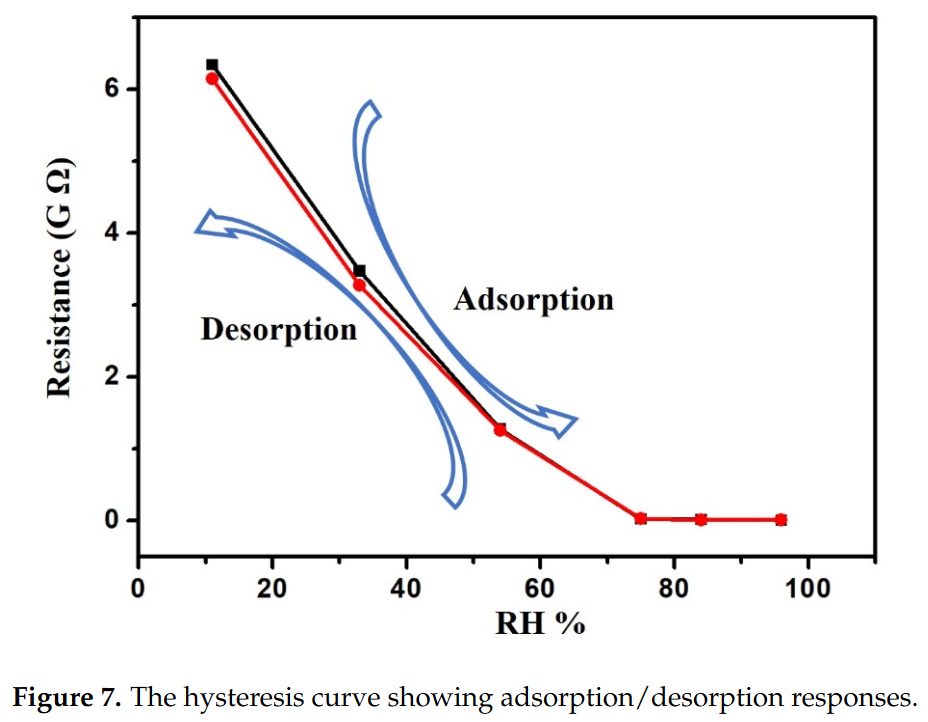

In [201]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAA6AAAALSCAYAAADDWLzPAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7J0HgN3UmbZfSbdNn/GMZ9x7xabYgDG9htAhhBYgIRBISM9u6maTbDZts7v/bjopJJAQIBA6oRswmGaaAXfj3j29z22S7v+9R1cz146dtmDfsb9nfK6kI+lIOkX+Xp1m5QQoiqIoiqIoiqIoyruMnV8qiqIoiqIoiqIoyruKClBFURRFURRFURRlr6ACVFEURVEURVEURdkrqABVFEVRFEVRFEVR9goqQBVFURRFURRFUZS9ggpQRVEURVEURVEUZa+gAlRRFEVRFEVRFEXZK6gAVRRFURRFURRFKTJyuVx+bf9CBaiiKIqiKIqiKEqRYVlWfm3/whJlvX9Ka+UfQrODoiiKoiiKouxdKDZph+8qOum3q/9gF6YqQJV+wqywa5bYX7++KIqiKIqiKEqxsKvQJPTb1Z/rg9k+VwGq9BNm8MIsEWbwwZzJFUVRFEVRFKWY2dX+Jrva5SGD3TbXPqBKP4UZOczse8r4iqIoiqIoiqK8MxTa26H9vb/a4FoDqvTDrOD7fn+G11pPRVEURVEURdl70P4ObfFwe9dl6AYrKkAPcAozdzqdxvLly/H666/jiSeeMH4UpFwWHsf1wm1FURRFURRFUf5xQrvbcRx4nmeW3B45ciSuvfZaTJ8+HbZt72SDD1Y7XAXoAUyY9Fwyg7/xxhv44he/iDVr1qClpaVfbBZm7t1lF81CiqIoiqIoivKPQ3ubApM2OeE6RWgkEsHxxx+P7373u5gxY0a/8Azt70I7fbCgAvQAhkkfOmb2p59+Gu973/tMTSi395TBuV3oHy4VRVEURVEURfn7CWs36cJa0ND2Hjt2LH74wx/i3HPP7bfPBzM6CNEBTJjJw4w+atQozJ49u387hNuk8ItM4bmKoiiKoiiKovzj0M4ObXCus+YzFJvcDveHLrTLB6MtrjWgByhh5g0dMzG/tDQ2NqKrq8tk/u3bt+NXv/oV7rnnHnNMfX09PvWpT+GCCy4wYYRfX7hPURRFURRFUZR/DNriYSVPMpnEZz/7WSxcuNDY26wk+vGPf4yzzjqrX5gSLnl8uD1YUAF6AMOkD13Y5jzcJhs3bsT3vvc9/Pa3vzUZe/jw4fjGN76Bj3zkI+YY+hUWAEVRFEVRFEVR/nEymQx6enpw5ZVX4vHHHzeVQrTB2QT3/PPPN8fQ7g7Farg9mNAmuAcwoYAMxSeX/KoSjUaNi8ViiMfjJnOH++kfHheeP9gyvaIoiqIoiqIUE7S1aVPT9qa9HVYKua7bb2/TBt/V7h6MdrgK0AOcMEPz6wqXzOhsistCQFeY6Qm3w68tYSFQp06dOnXq1KlTp07dP+5oi4c2Nm3wcBAiulCMktD+5jaXgxEVoMpOMCPv+nUlzPR0oVBVFEVRFEVRFOWdo9DG5npof4fbZE/bgwkVoIqiKIqiKIqiKMpeQQWooiiKoiiKoiiKsldQAaooiqIoiqIoiqLsFVSAKoqiKIqiKIqiKHsFFaCKoiiKoiiKoijKXkEFqKIoiqIoiqIoirJXUAGqKIqiKIqiKIqi7BVUgCqKoiiKoiiKoih7BRWgiqIoiqIoiqIoyl5BBaiiKIqiKIqiKIqyV1ABqiiKoiiKoiiKouwVVIAqiqIoiqIoiqIoewUVoIqiKIqiKIqiKMpeQQWooiiKoiiKoiiKsldQAaooiqIoiqIoiqLsFVSAKoqiKIqiKIqiKHsFFaCKoiiKoiiKoijKXkEFqKIoiqIoiqIoirJXUAGqKIqiKIqiKIqi7BVUgCqKoiiKoiiKoih7BRWgiqIoiqIoiqIoyl5BBaiiKIqiKIqiKIqyV1ABqiiKoiiKoiiKouwVVIAqiqIoiqIoiqIoewUVoIqiKIqiKIqiKMpeQQWooiiKoiiKoiiKsldQAaooiqIoiqIoiqLsFVSAKoqiKIqiKIqiKHsFFaCKoiiKoiiKoijKXkEFqKIoiqIoiqIoirJXUAGqKH+BXC73Z8tw/W+h8Pi/5zxFURRFURRF2R9RAaooe4CC0bKs/FbA3ys+eT5dYVgqRBVFURRFUZQDFRWgivIXCMViKB5tOygyf6uILDxOhaeiKIqiKIpyoKMCVFH2QGHtJ8Ujne/7xhX67ckV1n6GLjxXURRFURRFUQ5EVIAqyh4IReSu0G/Tpk1YvHjxX3RvvfWWcWvXrkVfX1/+bEVRFEVRFEU5cLHEyNZ2gcpOhFli48aN+O53v4tf//rXZnvUqFH493//d1x99dW7FWb7G6EADZee5xn/TCaDH/3oR5g/f77Z3h1h/PDcQw45BB/84AcxY8YM04SXfmFTXkVRFEVRFEUppKOjA5dccgnmzZtntkePHm1szwsuuMBsk0Jbc7DZ5WoFK8oeKCzYbDrLbQpH13WxbNkyPPHEE3/R8aVB99prr6Gzs3OnlwPDVBRFURRFUZQDDRWgivI3EPbd5PJvEY88JjyOy0IxG1J4jKIoiqIoiqIcCKgAVZS/AsUjXSgWHcf5mwcT2pPAVPGpKIqiKIqiHIioAFWUv4FQhP497E5ghuEUOkVRFEVRFEU5UFABqih/A6FYZB/Qf1Q4Fp7zj4ahKIqiKIqiKIMZFaCK8lcIheI7IRhVdCqKoiiKoigHMipAFUVRFEVRFEVRlL2CClBFURRFURRFURRlr6ACtOjZ80ipA3u4piOqvpP8WWxaVhDLFuCL+0uxzUa2e2poawYm4j8dAVdRFEVRFEU5AFEBWlQYiZP/JZzqgy70H9g34OTXiBq6gh17oPCQQndgUhADJhKC9YEYD5yf8+HlPHiy5cp2Rn6HjmzApEkTMWXyBEyZOhGTxU2aKuuTJ2Li2LGoKK+QI20RojY2bdyExYsXo6u7SwKUEMXlPB85n6EH6LQsiqIoiqIoyoGACtCiIpA8wW9I6Lc739BnwF/5e5G4K4g+kYXmLxShFJ+szvQ9Sk+SQyxWgis/eCVu/NUv8auf34Df/OynuPnHP8RtP/kxbvvpT/Dz7/8nLj/3PNSUliEiRWz71m14+qmnsGrVSrhuFpYITVNDmq8mpfAMR8XluuuG11IURVEURVGU/QsVoMVEjsnBWrNQm/CXfmz+Ga4HvsH+wuNIQd0da9Pyq8blCc/d1SmMJsYE45/1lmG8iK+IUPo6noWoayNh2Th46gwcPfdYHDfnaBwzezaOnjwFcyqrcURlFU6cOQMfueRinHHUHJQyEBGUzz/3HG753e9FhK5B1pN0svc8DYvjOPk1RVEURVEURdm/UAFa1LBGzDKyMsRIFhGUlrg/l6N5tcmddP2CVNkzA/GXjz2zZctKzvckjilLc3BEdPoZD5YrAlF841kfMVfit6kVHQ8/hp4/3oOl//nfWPz9/8S2392Msdu24ozxE3DosAbERcB2tbbhvjvvwrzHH0dHZwdczzM1nWHtp6IoiqIoiqIcCKgALXpEnIgIpRDdGSqkwIXCyWBRdBY4bhf6hQfv6g5IGKc7x6vxMXGSgy0rOcsz/T99iTo7KsUlKrtSGcDNILdxE1p+eytW/9ePsf2Gm1D63Esof+FFpO66G9t//Wsc1tGJq4+cg+lDhiAhYraztRX33XMPFr7yMrLZrKnppPj0JXBPBGlhU1xFURRFURRF2R9RAToIoM6kSMyJUOHgNfBd2fDEBTVoFKemppTH0OXPCc8LVpRdCaNn98geEZ+UgrbtiHQXkWg+BrDQiCBtbsT23/4GTSIoh23Yhtot2zC0rQX1HW2o274dtevXIvL6qxjX0YGjGxpQK+fG5eQ333gdd911BzZt3mSuQvFJbFuLoqIoiqIoirL/o1ZvMbGHii9TIWaJ+AxVJZWmLwK0oFaTXtSmXl6I+v3LoIZ0j5iwg9UDlnwccFFYIEx8C0YkWk7QRZej1/Z0YsM9d2LrA/ehYuNa1GS6UIY0Eg4Qt32UW1mU93WjsmU7Em+vxNi2dkyMRhHJ+Uhn03ji8Scwf/58tLW1DYSfh+vhdRVFURRFURRlf0MFaJFD8ck+iEFfRN84ozh3gT4cKocul+MgNuJscSKc9tikcw/eBxImCgqis3+V8S5xxyJisdenZQeFxcsCqSTct1ejoqUZddkkouLYXNczU6vIGXJIiZdDje+hIZXC+QfNxEfeewbG1tUyVdDS0oJvfvObuOmmm9De3s5Q+5vgak2ooiiKoiiKsj+j1m5RQXFJEeMaYRSIoRz8XAa+CB+LfRJFpDQ2NeHm3/4Wl1x6Mc4447342Cc+gXlPzUcynYbnW3DFBfWjRkUFS5PU4sI+oQX9QoNJRw48jPjsf3TGdl5+cocIzkD2B1ElMh42Z0fxXOTWrsP2V19Dec6DLcLRsdkEWmLXikgQjlnnSLoc/TaeTqJ7zWqMKY3juIOmojIWM5dpamo2taDbt283ojMSiZi0ZQ3onj4YcL/WjiqKoiiKoiiDGRWgRUMgBv2cm68F43rg54gCssS/ScTKj3/yE5z23jPw6c9+Dvfd9yfMe3I+br7pJlx5+ZW4+prr8OyC55ESIUoNQ63iefJj+ojuXrwc0HLmzx6eHhTkYbNlTscSFS0qwlLEp6kQZf/blhZkOztgicBkUvm+J8f7cBnXcnwkkpCIl+PFRcUrl+zDiLqhuP5jH8d7Tj0VJSUlJo0pQP/nf/4Ha9euNYMSMX3ovyeRqQMUKYqiKIqiKIMdFaD7iFAQhi6kUGA4RkWKivGz6Gptxi03/Rbf+ta3sXz5aiTTGTiRCGLRKKeURGdnJx760yO48dc3Ye269XBdNtllrVwQnmhQ44JGvHShyGIW0GxA2NQ5EKD8JQPxwiGIjK8je+MOXApP8YuIYORRjiNn2zl4ORdu1oUjfxH5y4nLWhF48QSmHHkEDj/+eFTX1DKhzYeC3/72t1i9ejXSsh6KzzAP7Jo3FEVRFEVRFGWwo8pjH7A7UUE/j80vjWwEsiJiXNczNWOZTBovPPcsfvzjH6Kru1fUTgQNw0fhPaefive//zwcPHMG4tEI3EwKC198ES+//Cr6+pISpoQrf74ZHtcEqxTCqA5dnoJVA8cH4kBOVsyBR/Hp2LCmTsOUY45FnxNDkkpVTuJ3AkY4hWg0wr63EvPin5LlqIOmY5wcDxGe13zkOlx9zTWoqxtqrsWpWL761a/iRUk3pjWb4O7OFaKiVFEURVEURRmsqAAtIhzWgPFPBEYkEjU1YhERM63bNuOW3/4GHe0dstfBsFHj8NFPfgY3/ua3uPFXN+J73/k2jj56LirKy5BO9mLpkjfR3NxkakaNyJEVLkULDTgzHM6BnfyUcaZm2GyZGDKOvyZmZAfj0BZR6fkuMp4LUZdAWRmyo8agq7IGPdESZHIRieMIIiJOc3JM1k/DtXy4PK80gXR1BdzaajmvBBXVNTjp+BMxcdwERKNRIy6XLVuGT37yk6YpLmENKPNA6BRFURRFURRlf0EFaBExUNNlm3UzMqrroXnHdqx9ezV8zxKRE8GkydNx9rkXoKpmCBKlpZg16zBcftmluOaaD+Mzn/sMTjvtVFRXVoiQysk5roTF6rmdocg60KG0669bDNVoXoCGjvqPaWHZOcQcEYxWBFZNHSZd/AEk5hyH5qHD0VFShm45NyPH+7YNz5L0cxxkROlHS0pQOXEiInV1Ji1918XJJ56IT37iEzjk4EMQj8fhih/FJ/uEdnR0mG0S9vksbJZNdt1WFEVRFEVRlMGCCtAiwmJ1mwge1nrZtiNi0xERmsXmDRtN7SdlRzSWwPCRIzF8xEgRlz7SqRSqKipwxeWX4Xvf+y6++IV/xllnvhe1dTVydM6EQSFq5fK9Pwsq1BheUBt6oGJUZ7BqMDGSdwLjhqtsXyvxZ4tazflSZJwEnIlTcdDnv4jIe96DrSIuW0Tw95aJEI1G0ZtIoDcSQdYWl0yhZ8VKpERgWtmMaXLLYnfZpZfh4yJCRwwfYWq6WRv6jW98A48//rj58BCKTBWbiqIoiqIoyv6ECtB9wJ5EBeve2A+U039QA/kep1/JYMeOJnR3p+HJeSUibqrLS7Fj8yY8+cSTeOD+P+GhRx7Dy68tQmNzi+mvyKa8QW1qzmyb6URy4ieO7Ny8U1xegw34BRSu768wJXZKDVMLymXeCZbEp2NzehV6yH4Ri4glEJkyBRM//CHEzzsTyZOPw44Z09A+6xCkjpyD1PQZ6CophZtxsf3lV7D5Tw/CW78OSKck/VmjauHwww/HEeIqKyuR9Vy0tbfh6aefxvp1cly+327hB4P+eyr0Uw4A9pTgYWZgC4fQaeZQFEVRFKW4cb7JGfGVvcruhV0wam1OBFDOckSkiGzMpZBN9WHe40/i2edeFQEaRaKsHLXV5Xjp+Wfx85/+BH+4/Q488PBjeOHl19DY0o6amiGoHVIjGilimo3mfAmVc1rKJXlVy6Ff0CQ3R5Ea3oocFjYBDu+PzUGff/55vPHGG2abQunkk0/G7NmzzfZgh4Kff/mNAUcK1q18/HFJPxM/srQiEURqKzHshKNRd8wclB86E+VHHYW6k09FZOw4dG/bAb+1FWVeVgRmFnZNJRKjRsKSNJTA0DBsGKaKiH3hheexo6nRhLv4rcXYtmUrjjrySFRVV0O0r7mWuQ+KYyYNHf3y/sr+TmGiFxL60xWimUNRFEVRBjOpVAp33XUX1rFSQqiqqsKZZ56JadOmmW1SWKE12FrMaQ3oPmBPmSQQObIvv5siNOdnkc6k4dHTiqC5pRUPPvgn3HPvvWagIRqfqWQvVixdjF/+4gb8+Mc/w8qVa5B12Yc0ME45Cq6pCaW4lXAsDpZjmuQCW7ZswapVq4zjdCBvv/22nL8SK1aswIYNG9DV1RUIrgMRRpC44PnziSIYHWhLXMal+FSUASIUnQkTUXnSSah67+mwjz4KZSediKpTTkK6RvZJXPtr16Lx3vvRu/BloL0dlueZWs6DDz0Ep73nPairbzDNrj3fw/0P3I9f3XijyQusuTbTwcq6mSCGVaIFolQ5kAkzQqFTFEVRFEUpbrQGtMgIBKgtYoNzSWaR6evF888swEsvv4EMxYiIUDsWx+jx43DcsXMxafxYOCJKuro7kcm62NHUiqqaekyZNgXl5WVwbM4r6cM2tXciPo2ooR8wb94TuPmm3+Lhhx/G/Gfm45lnnjED4XD57LPP4rnnnsPixYtNTSgJa0BnzZpltg80QiFu4lDiz2M8imgMhICkDUe1ZR9P8WPtaE6Oy7a3wt+xHfHeHmRaW5EVMVk6bjwitXWwOKKuHHvQwQdLmDYWv/UWkqmkuUZ3dw+GDRuOyZOnwo4yPwjMGmxmaZbyoxwQ5PjhQdh9mtOvUIgGBGdoPlEURVGUwYjWgCrvCn+eUQJxaMQN/4JqL9NXMB6LmulAfNZ+RaIYNmYcrv34J3DDL3+Bn/zkh/j0x6/FQVMmIGL76Ghrx/PPv4z1G7aYmk9exhYBGtR4clRckbbiHn/sMXzqU5/Gjb++EXfdczfuvvtuk9Hp7rnnHtx777149NFH+zP+gc6utcAm/fihgLXK5sOAIyIxgqy4jBODX1mN8iPnYOSF74M1YxrcRBSVnovOl15C6xPz4IkohZuF5eVQXzsU//LFL2HWYYciKsKVLF6yBJ/+7OfQ3NaWnx9WhGfOC2pfjbzY+X6UAx2+T0JHwjyi+URRFEVRlOJCBWgxISInEDriaEeK6mTNWFl5mdlNIvE4ph18GM6/8P0YWl+PMaNH4pwz34tTTjgGpfEofNfD+o2bsHHzdtMM16doofiU8ChAGS4HKbrxxhtFXK6Hy/6goc2ah+KK/UHDPqFKECch5kOB/DmSNlyyoyabz1oiRG0RoD4cZGxJCxGh8VmzUHHqyciOHoGslUNJRwe6n3kGqcVvAV1dkERCRFRlNOLg2ms/gqlTJ1HX8ipoaWnFr35zI9o72yVcilA2wmUqiuDldZUDilBO/i0u/FUURVEURSk2VIDuQwpFDWGTzdBuNMJGhIllRVBbW4tIxBI9GkiPyqoqVNcM6Tc2KyvKMbxhqAjQmJEnyWQafamsiEsKWupYCUdEKI91RNRSgL7//e8384dOnDQJU6ZMFTfFuKlTg3UuJ0yYYKr8D3TCdDLCsyDN2K+WyWS8RKtb4iLixVRgk+eciEoMrUfVSaeg4tgTkamuQ0zSwV+zGlvvvQ/JV14DOjoBjydbOO/C9+G955yJaCIiCZuD62bxkx//CL++8VfmYwDzhOXzlzA1lQMeyQb8aGU+XNH15wvmktApiqIoiqIUD9oHtIgQ2WJEKJtZBvVcghiVrU07MO/JJ9EjohJ2FGMnTMKpp5yIyvIYHMtDqrcHr7z8Cl5+dRF6Uz5q6kfg1NNPw/SpE1Aac2DTQJVwTT9QIuEffPDBGDlyBI4+9licfMppOOXkk3DiiSfilFNOMf08TzrpJBx66KFmEKL169eb0w7kPqCh+OwXof1O/kn8Mr0oDcN0o+jn/lwkCqeiWkRpBH2bt8JrbERJKom2rdsk7SyUTp4Me0gNEI2AU4zW1FahL9mLVctWmPlAU3LsqlUrccwxczG8YYSEK+KUIpTh85pmqezPBHmLS/4JO3174Ea+iXZ+h8mjA0criqIoijLI0D6gyruKMRbzjvZi0L+PUlTEqCgSJ5bA2PHjMWrUMBGSHnw3hc1rV+ONl19GNpVGOp3BBhE2q1avQ19fyoQxpK4aNUMqEY0yDIYpoVkcLEfCZjUdDVY57uyzzsEll1yK9198ES6++GJcdNHOy7PPPhvj5dq7smt/yAOd/iJv4taTWKYYyDdtZrzHy1ByyOGoO+Mc2OMmiNC0UJ3qRefC59H70vPItbbCyriIyClHHnoEvvqlr+CEU06Sc1mz5aO1pQ0/+dEN2LZ1BwMUl6/x2gVNl/0cJu9OScyNQHzmmPcs5jtT4MVJPtHsoCiKoihKEaICtIigvUghanoW5vjrwLKjaBg5EqeediriMTEqXRGcb6/Ar2+4Ab+84Rf4zU2/xc9+9Ws8+8JLSKazSJSV4NBZM0U4jkQkIgKUhiir1lhLx0GMQmea90r4vFreULVtHh+Im/BLSrit/DmMIVOAgipr2fCRE2eWFKA5z8S5xZFx6+pRdeqpqDrxRGTqauU8F/a2Tdh8/z1Im/6g3XAyPiJ+BFPGT8NHrrsWVbU1EgaQSaXwzPxn8dDDjyCTzcjlBtJk17TRtNpPYbIybfuT13hIvgvyGvsHm/2yZfJAfreiKIqiKEqxoQK0CAmkn2BzRFQbZVU1uOjSy3DWGacjEQXS3R1Y+Nyz+NEPfoj//p8f4u77HsSmbY0iViOYPn0a3vOekzByeL2xPy0RlaKCAreTVdp/lUAk5QVnuCxkd34HOowRW6IyFO9sJEkZ4IVxxYXs9EUgeKI/c+zXOXI4qs46A87cOchUlCPhecgsXYLW++6Bt2YVrL5ewLXg5KI46biT8YP//V8zxQ6FBQciuvGmX+O3t96CVCYtgYfpyN0D68r+SvjRodCxxr3gY5HxIwXlNfRSFEVRFEUpElSAFiE5Tp8ifzmOQivGpRMtweSp0/CJT3wSZ4sIra0qh+W72LF9O7Zs2oruniSqhtTimOOPx7XXfQTHzj0SZYm4SVyGxVFaGQ4r6gqhbRqIz2B7T6jA+Qv02/ysg8r31jOj49LRPyei1IMXFXlQEkVs5nTUv/d0eGPGIW1HUJVOo+PZp7HprjvgtjSJAJU0l3911XW4+MKLcOwxc+FI8qVFdC4TsXrrrb/HUllSdBSmi6bR/o9J83xZpdhkijPZTSsHcOAqB77PdeZBHqUoiqIoilJ86CBERUUoPEUz5lUhxw1iP0D24WxoGIaDZxyCaVOnIp5IIBKNY6j4HTFnDq648oO44vIrcOyxx6FmSA0itiUmaU7O41cGGqRiqdIxfGOdOkZ4BrUnwXULYXPczs5OLFiwAIsWLTJ+hYMQHei1osb4lygIBYGJS7NmM9Zlnb14TWrKPkpT2c/vAOJiFeWIJLPo2rwNsd4exNIpNG3ZgobpByEyagxQkoAVtZD1fEyYMAbLVizFtm07zEX7unpNMs6ePQvl5eXmiqH4LEyTAz199jskPY3oNBkpvxSY1zgPLYUnm+znTLN9WTfH5Z2iKIqiKIMKHYRI2WsYEzPn7Sw+6cu+mk4cidIKzDj0EFxy6aX4xje/iZ//8hf4+S9+ge9+77u46qqrRIgeiSFDqhF3bETESDX9wvJGayBRwqUJOI+5glmSXTMwt1XM7J4gdgUj7EUKSETTBTEqcUZRIM5IUTnGlTP8aAzWsJGoOfcCDH3Pe+FWD4Hjuahsacba39wIb6mIfTcJy/MQiTo4+tjj8NWvfQ3lFWWmNruzvQMP/elPuPOOO5FOp+G6Emp+vlYuKUY1vfYvTC0nl5KHfA44ZP4kvY3wDAQohahrloH4NPky/6soiqIoilJMqAAtMsyUHtQP1C+cM1JWfTgiXiKAE4UViaKsshITJ0/CrMNm48gjjsC0yZNRUVmOSEyOkfOMHjLzRkoCG2OUo2TSaGVyU3xyT4gxbfNuZyhmQqfsDGOQ4wqLBJD1rKy5JuIZU0H8yzqbP1tyhCebnghRKyJRH0UuXgp77DjUnnQyPFn2yjGVFJHLl6LtiYeR27EFSCcREb94rARz5x6Pj1z7UZSWl4vI8LF12zbcc9+9eOmll4zYZG116Iim1/4FRSVlZyA+OehQkM98yTeubyGTtdDbm0M6LXlIMmbwzuAfR8WlUxRFURRFKR5UgBYTFJ8iIsIarUCJcmGbZnWs8aB47NePssmaNdaYck5Jmqqm9lREijmENWI0R+nVLya5x+zl5XZid7Wfyp6h0ByoPQ5EQRi7jDumJZtTM6H6RxxmonFwqbIyRGYfjnHvvwgYPwEZOT7R040NDz2IrgfvB1qbYYuAdXwbQ2qG4LJLL8P0adNNuBnXxRtvvIUbfv5zLHpjETy5iCsq12f+4XXz6dafvOEtKkUCEyOQiX87kq7MP1J+Wbo9Wc/K6R19Hl5atAG3/PFJvPD6avSkAVeC3zm5d0l8bobOLMJ72eU4RVEURVGUdwEVoMUE54yUJLFZbRmsGbOTIodeFJs+xYUtx4m4sTgMq+zj0XlpI7/sLxqYq6HooWJlWMFfEB6b99LxzAEX0C9gdlWoys6YaGK8iaAU159W3MXaUDM3Yz6u5VjzAYCqlQnkyDkiLEtOPw3O3LnorCiXQ3Oo2NGIZTf+Bj3zn4XV02sGm4pKAAdNmYZPfvx6jB4z2gTW09ODZxcswAMPP4jOni6TL0xTTDMIDT80BB8fTAoW6Ivw24ayd9m5JHErTJR8gogXixsrzelCP+5n3jEtI1iLjqgc5yArZXprSw/+9ORS3DtvOV5e2YNnFjVi+cZWsCKUeYFHM0wGQ2fC5eVCD+4UD/4FeWXgXvqdoiiKoijKO8yA6lCKh7wAJEYwiiFodEu+mSXnlbScYL3fyTmUmw5rS2WdzhzLbfmTEIwL9+3Mn2cDFZ9/K4zL4MOB2TJxm487xvWu6cQ0EScrollFhA6tx/jLP4CaY49FX2kpSlMuappasenhR4DNm4FMBvByKI3Fce455+LrX/9XDB1aa4JvbWnBfffeiwceeBDpdMYEae7CjKTriuDwjLgwtyjwroKPDso+ob9IcUVcftuIxPym+X5g/PI7iaRjTvJAzrdNc9u+jIWV6zpw10Ov49lX12NrRwRdXhXWbE9i0YpWtHWzX7DJAnKe5ABxA+HxQtzJdV4syBDBp4qCayqKoiiKorxLqDk6CNi9aNyZwmN2PT7cLvRT3j32FN/9fraFnGhPz5FlWSmi06di1LXXomP0ePjxUlQkM+h7eSHe+N//Brq6jAC17Riqa2pw9LFH4bjjjjYfJBzPwpZ1G7Fg/jPYunkLchkRKWx/yZpvO6iR9f1g0BqWdFMjG9ZyKXuf/uzA1y4/Wohjs3rCfZI+NsxssoEfRaOfg+dlYDsiESW/9InXqys6cOuDi/Dq8nZ0ZsuQRhyuHUXSs/Ha4tVYvmYb0hIEp3FifrOZWeQfM42p72Q+4OV5TZM1HHHhzcm+/vtUFEVRFEV551EBqijvEqbJbWFNVh76UGJkxdD32Zy6rBLOzEMw4wMfQE9VjezLYUhPF3qefwFYIK67W8Jxxd/HhPHj8cUvfAHvOeVUE1K6L4k/3fsAfvLDn2Dzls2BwM234Qzqvm0RHHIfZioYyg9X9qgI3bswPRjn+bzAfthGeBYqvaBnpxGf+bQKiUQ4oVIUnRlg8do2/P7eBVi7NSWisxouv2RYHhzJRpYTQXuPh2deXItVG5qRk/OY/qb1BH8kTPMRgk33B7KJ7Gc+oSIlBfepKIqiKIryLqACdD9Hm9LuW3atBQ2hb39TXIrQmjpUn3UOKo6bi97qckQzSYwUEbr8Zz8Hnn4akG02n406McyYehAuvPgiVNWIWJXk7ezqwgP334s77/4j2ro6REL48LIclCi4Bpt1UtRSWHBgI2VvwvimoJRlkAQDSLpwk1mEfYa5ZYYYCo+hWGTayTbF59L1Xbjl7oVoT5bBtcrNYGVxK4m6Ch/lcRduJo20H8fKTZ14fXkjmroySMvJbIIb3gO1L7f4AcQ0xw4uyy354zQu3OARiqIoiqIo7w4qQPdz9iSAlHefvxT33ENBwL53GSmGLkXo2LEYe8XlWB+PI+nYKE2nkHnrDTz385/B6u5AJCtHuj5Kyspx2mmn4YoPXQknFhH9apn+oM/Mn49lK5cbwWlHIyJcRM6InghqwYIran7YxxixFxB8HAoFn4hPsznwSuaml3PgWVG0dvfgd3+cj8YuiMiMiKjMIoYenDhnLD7+oVNx5MwxKI1SZDrIohRvrNyK9dvbkIs4sKIxk884rRNlJmWux7mBSJgdzH3x2po/FEVRFEV5d1EBqih7GdMkUpRh1PPMgLiI2vCkJBrtccQROPsHP0BuzGTY8TLU5TKo2bYBm2/8JbC9UXSCYwTEmAlj8LFPXo+LL7vUCAvXzWL+M0/hhl/8DEtFhGbEz7clXBGebHHJ6VwscabIF4gcZR9iechZbBLNptrMCGwGK+krwpRzeFIupsVn7dYkfnPrS2jpiYhvQlRpEtXxJE6cPQoXnHwQDh5rYc5BlRhdnzBnsFn3ph19ePzZ9Xh7cw+Som/Zu5Q1ppakvW1GbWYtaF6EEiN+KT9ZCyrwdlSLKoqiKIryLqCW6H6GNrkdLIiMjHCaDN84x7FgJaJAZSUwZy7qzzgDa8WfmqS0vRU7Hn8C3pKlsNraEBEFyz59o0aNwPnnnIPp06ZJaD6ymTReeO5ZzJ//JNo620yzTlPA8+LCtL/Miw9lb8E4Zyrsoub6Nyk+uZRjfBGfvmWSyZUD0uLXk3Lx1HMrsXlHEr0pOVDStKY8hyMPHoGLzpqNkUMslMjZB0+uxzFHjEFVmYTnpWBHy7B8TZNpitvY6SGbk4xkSdrLxfhBwozIzMuaZr6FTW7pmxehiqIoiqIo7wLGBlH2H7SJ5SBAksi3LXDuTsdyELdEDHDKFBGcHucHrapBzVUfRtnp70FrJIJoOovKdRuw4Tc3IfP2cqCnUzSDh/J4KU4/6TR86AMfRHV1DRMf27ZsxZ233YYlb7wBz3XNNBwStBE11LOqLPYxuyme/VMlMY3kh81lPfFLuzksWtqBl15di/ZuH/F4CUqcDA4aX40zTzoIDdX8wBAMWlQSB2YfNAazp49CeVQS2suhz41i4ZvrsbGxHb1ZCVkEqJnOxfPg9OeDvADd6b6CDc0qiqIoiqK8G6gAVZS9DA37QGgQMfZ9kR+mdlJ0A6doiYoIHTMKMz7zWXTUD0NfLIZ4Ty+Sr7+G5b/6BbBqBaxkn+gGH6Ul5Tj+hBNxwoknIxaPmz6fK1auwp8eeACb1q4VYevDErXBa1oRuQYvE1xK2avsLuIDP9aAct5ObrI/L5veunCwrTmNP97/LPq8BCKJcknLFMYOK8OZJx8sy7i8vF3YVlrOk5PlX0NNDIdPb8DI2hI4lifpHce2liSeWbgRTR1JpESrenIxDj4UNscNazx3hbejAlRRFEVRlHcDFaCKspeh7DAzYYjopBDN2RwkKHQ5tsQEEqVwRo7FYdddj+5Ro+GJKK3o6UbJksVIv7wQfmsLctkMnIiNI+Yehes+dj1mHX44rKiNnt4e/ObGX+PGG27Ajm1b4HpZ+LaPnCVCNBx8RtmLBOlsEn4n2AQ7ImKQg0PJJtMeHpKeOBd4/NnV6ErHkbb4YcFHvQjMU4+diunjyhGnwOSUOmaUYzbJliwjb/NDJg3HEQeNQlW5+Mv+pB/Ba0s24uU3tqE75QYfOGRPzoyGbHJi3imKoiiKouwd1PJQlH1EfjpGIRACFKTs2+lzR0RUaE0Nqs49Dwd94Eq0ReKA5yO2bRs23Hsfel9aCCvVJ8LFF2dhxowZOOXU01Df0CDBWUilM3js8cfx2quvwM0GtWS5HAe9YZ9Drmv91t6HcT4Q7xx4iLWdrJE0ddSS7h4/QjglWL+1G68vXY9ez5E0s5GI5zB1QjVmHdSAGOf9zLmSXyDClLXnco6E5Ei6ViWAY2ZPxLQJQxGPcH7QGHJ2GV59aw3Wb+9CJueYqVks28nnvTzcKPDgfww77VcURVEURXmHUAGqKPsAY+/LT7/dbzZESOT92A8Q8SjQUI/IaafBmXkweuOliHB+zzXr0fzU03DXrgXSfXDgYtSwYbj6g1fhfedfgIqKCiNqVq1Zjd/cdBOWLV0K382KWMkh67nwfYrQwO2KCtN3nt3EchDP3GHSgenNP35jyKEnCTz86Cvoy0YAEZBR20ddlYPjj5qMqlIKTTcQiL4jaR+DbclSMo3jmPp0jKiL4vCDR6GhJo6I5A3Ps7C1sRcvvr4RLT2SDyRMVpkW9glmfgvvk/kvdIqiKIqiKO80KkAVZZ9hFEjgWDMpFj+nWeFcjhbbVLLPZjyG2IhhmP7R69A7YjhSHLSopwep519E8933ILN+PaxMVk73MX7cWFx+yWU46vCjEIsG/UEffWIe7vzj3WhqbDFCx3FE1Cr7BiYwZR3/mYF/mPbBuqmdNvnAxpo1XVi5ugl9GdZwuiiJpnHsERMweWw1YuZcCYo1n/L65gvcTMyTV5MUolHxPGhiAw6bNgyVCVamU4aWYuGitXhtSSO6kj7HKJKAAsfr8o8SOLgjgSv9G4qiKIqiKO8cKkAVZV9A8WEcRzFl01jP9OUzfQXFsSaLosSoiaoKOIcfhvKTT0RfbZ0IAwuJ7Y1oevgxtD7xNNDeDniBCD3isCNw6YUXY8yI0bItAkUE5z333oc/PfQwOtq64GcpdiQIU/OmCmOfEEa7pDenyslB0p8CVNKrpw9Y+MpKEYjlyNkOYrEcRtfHcOKcCYibLMP8ERGdGhXHjxUiPEWkMhTzOpfdjoRZVwEcd/hYTBhdI9sUlnFk/HI888JSbG3sQoYKtP/tH+a6PAwqvMdwqSiKoiiK8g6hAlRR9jG08dkXkDKAIsAUSvE0gxSxuqskgdjwBky67HJUn3YGMkOGIuZ7qGhqQu/zzyP51puwUj2A6yIRi+O009+LE086BWUV5SJkPGzctAE/+tGPsOj1N4z4NNN+MNw8hUJUp/F55+mP0XDFLJnW4R9rKaNmWp4tLSms3NSMrJ1g9ScSlotZB401NZnxSFDTaYtQNRWeQSYxNaJMU5NzxMvzmKbA0IZyjBzTgKjkH1fOyfoxNEr4zy1cg95svhZUKLyT/K0FjoRLRVEURVGUdwgVoIqyL2BNlogC5IImtyyKHEqGa6IpRHyIyBCfnOWA453mEglEJ01Bw4UXwZ5xMPocB7G+XriLXkPn0/OAxh2w/CxPxLDhw3H5lVfi5FNPRVl5mfgBq1etxH3334f1GzaYKThIKDbD2lCtFd0LmMQlTHsRfHSy7vkW0rJryZot2NGTQVYEaVSSpyphY9aMMYhLxuAgQxzb1qSbqQmVEwIlKgTT+lDEcqTbbglsyaomrNnQiIzLGlDJXyJSXVlfuXodmtp6OINoQHgfDNOkvzgGT6coiqIoivIOowJUUfYF/cZ9YOkHf0Le/ucPm1hSOFCA+raI0bK4iNAJqD35FDgTpyBjR1DWm0T61dfR88yzRoTCz0C0KY479lhc/cEPY/zo8RKChC0l/Q933I5HH38cmWwGHqvJBDMfpIgWFaB7g3zi9qdxQDAaro2uXuCtpWuBSEmQPn4KM6eOwaiGEjMQESQn2EZ8BrWeJgx29KXLr6Zl2ZHy8cayRjzyxDKsXdeGbNpH3PIR9XsxYmgJZs+cIIKW9e0h+ZsxWZHroVMURVEURXnnUQGqKPsKY/AHpn5+dQAjCrlPJCiFqC0iRcSB0zAEtaedjOoTT0NHeTVyro/sirex7Y670fWsiNCuNjNKakSCOPqIo3De6WdheH2DETld3R24864/YNEbr8N1XSM26UIRqrx7/KXYZToz/leuasaOpm7kfNaE+6gozeHEY6cg6vAYik85WJyZx5PnyYafs8VxCWTFp1PE56tLt2PegpXYsjUFLxODI3mk1E5h2rhKXHD6TJx96iyMHFpp+oryz4jOfuEZ3mm4rSiKoiiK8s6iAlRR9iG7NfPzQqNwlXNB5kSJeHFZjqhH4qTjUXr4bHTFoohksvBWrkLn08/AW70WSKXhelkMra/FR669GsfNnYvK0lIRshZefvlFfO8/voeFCxf214KG4lNF6LtFmMo7pzR7/ZKcbSPlAouXb5Skc2DnIvCzKUwcV4eRDTF5SbMePEgfik+KRcvmmmxbrCV3kBXR2p3K4c0VjXj6pbexYXsPMm5EDnVRkcji8JnDcJ6Iz6NnjUJ9pYOoXDrnBULWNN2VNSNGwxzH5riKoiiKoijvAipAFaVIMHIkb/8bDSALW4QAm9Byg81w3YgNv6oMZUccgjEfuBilRxwBNxpBWTKJ5OtvovWJ+fA3b4Xli6KxPYyfNAaXXnopJk+YCMdmD1Ng3rx5ePDBB40AZQ2ozea9WhP6LhPIO5PG/QQ+/AzQ1pVDS3saWTcmolEEouVj2oQGlEQ4G4/kAYu9P/knR3PEZFkGtZc2vJyNjAjQ1Rtb8MzCVVi7pRNpP2pCri73ccLc0TjrtKmYOakGCRGvkZwvYZqG2XL5fhlsfgPE3+QDzQuKoiiKorzzqABVlH0F9YMsCs38QJKI4z7qAC5FJDgcsMjnPgseRWhNJUqPOgJVp5yEZG1tICC37UDngheQWrwETm8vbBGhrCc76bRTcN3112P8hPFGbPqej0ceeQQ33XQT0mn2GuT1RM7wosq7wB7EHONcvClAm9uTaOvOyHrMZIDSKDB+ZJ2ZhSeYMtTUgYrLL/P5Q3SnGbxo7bYOIz5Xb2w3o90CLirLXMw9fDROPXYCxo1IiJj1zDyh5lwTivm0IY41rIV9Qs0hiqIoiqIo7woqQBVlXxBa+HkxkF/td/Q0lVDc8EUgWDYiUlwjolg45YYfiwB1tSg/di4qjz8OqbJyREVYuhs2YNu8J9Hz9hpRJhnkPA+VVVV4/yUX44g5RyIWjSHn+1izZg3++7//G83Nzbyaqf10HEdF6LtGOMyUxG++v2U+aY0A3bi9Cd1J1lozlV3EHR+jh1fC5uH9GYSSMfgQEYRlyZFAS28KCxdvwtI1rUhm5XzJH6VxH8cdNQbvOX4CRgyJIWGzD6k4W860qWqDcC1Jb7rdsXtfRVEURVGU/xsqQBWlKKAgCUTJToa/ER+BAqH4cMRFcuwn6ADxEiQmTkb1ccfBnzgB6XgETmcbUoteR/bV10SZtMPKUmAANVXV+Og11+Hoo442IpRNbTdu3Ijvf//72LRpkwmfTXJNP8NdBImK0neAnaJQNkycsg9nIEDXb96GpMvmtRyAKIOxI4ZiSIWkJ4/m4XKsbTmSlswLthmoiH7UrCs3tuGNVVvRmZEc4kQQszKYOXEojj18HEbXlaBE3vIRCYPylVdlrSmzlMlV7E/KJXfsBD3+zFNRFEVRFOX/jApQRSkK9mDwSwml5jC6Q8SJma8x3yQzZ0Xgl5SibM5RGHru2YiMGSnqIot443ZsvusetM57GujohpURYSnaZs7sOXjf+ReirKysv7/n3XffjS9/+ctIJpP9fUH31A9Uhej/nf6YZRyLy4mT5EFTWxfSWReen4YjAnLWIVMQE/UZvqDNxwmmWf5PEguu5INN29rx0utrsb01hazvIOelMWl0DU6aOwmjasvMYEPsR8yQTENbc03xNE4CCPPcLmkeyFtFURRFUZR3HhWgirIvoHUfujwsjIXelAaUCJ7s8MQjrLkKBKlIBBEhVrwEkWHDUTP3aJTOnAlXxKWT7IX19gq0PvoYUstWAsm0BOCLoInh/Re8H9d8+BrU5vuNtre347HHHsOLL77YPyou4b5QcO6uVlT5O9gp6riRT0hxjNbWjhw6ejKSvpR9HqJ2BgdPrw2qRmW/GatWBGMuFwhG9utlHuhOZrFkRSNWrG5Fxo0jYkfQUFOKY2eNxkHja1AeY51neE6hpOQ95J25jfy9GB/+ckX8jHBVFEVRFEV5Z1EBqij7gAIJEJr8RguwQBYWSiNA80vOA0oXVGhxXlBLhKkDUHROnoz6c85B2eGz4cZiqMikkVn8BtJPPYHcpo1A1oXt2Bg+fBg++7nP4aKLLjJ9Pkl3dze+973vYdWqVTuJzlB4qvh8p8jHY0F0Ml3XbmxEX0bkoRNBRJKkvMxCXQ2nVwkOZW01Yd9Oz3NNRnElE2xp6say1TuQzERFfJYgIefOmDwCM6cMQ0UccNhD1PIkvwTnkyCPsZabG/LDptxypJnShQeEN2cE6MCmoiiKoijKO4UKUEXZB9D+J0ZgBKsBuzH6WUh5PL1NTagptSIZRBiyTyg4QmpFJWJzj0btBRfAEjHqikAtbW/BpvvvQc9zC4DOdjk+i7SfQcOIYThHxOqwYcOMuGHN55IlS/DQQw+Zprjh9CxhjWihKFX+ARhtJurChJUNWWW6Mz3XbdyGdMaC57KO0sOIYTXgtwHOmsMznEgQ70wGy45AtCq6Mhz5thcbtnYg58dgu1kMr47jkMm1aKhlbaicYD5WeJJfAhFKLw5qZAYyYp6hC25FXGENqaIoiqIoyrsHbRJFUfY2FBP5VWLWAyXQDwUK/R3xYz3VwKQZwQ6btZQiNE21WTwG1NaiTERo5THHwq2tg+1lUdKyA62PP4bMm28BvZ2IGCHi4/jjj8cvfvELVFZWmprQrq4u3HDDDfjhD3+Izs5OXkFrP99pTPoG8RnGatYFWtq6ZMnaZsf08xwzsoEV3EElpChGCv9ANDrw6awINu1ow0uLViPlRuHI/jhSOHhiDQ6aNBRxEaxBDbaEJ8tAWMqvXJTOZCymrfkLNgN4HOGBsgg3FUVRFEVR3kFUgCrK3oZWf+h2XhUoB0yvP4MRniIWbE+WsisssJy+gxVYvkNPNrUUj2gU1sgxqDvzHLjTpqErFkHUSyO96HW0/P5WuCtXIZLlIDdAeXkZTjrpJONMeCJ8tm7diltuucX0B+X8oIXTsqgY/cdhrAVST5xFIRloOwrMVIouB8+PiGCMmma2Q4dUmXQOckFO0saT9JZ0zovJ7j4PS1e14O0NrXBzETkwjXHDy3HYtGGoLY9I+vJqciybZ0P204lwDUbQDVQla0QLm+byejw62CuZjaNWGcd7UBRFURRFeecI7VlFUfYR/bJgQB8YTOEM7X+Klryj8uSIpl5eEPpccm7HSBQoKYUzcQJGnvFeRKdMhhuNoyyZQsuzC5B55hlgRyMsVwSN56KkJI7vfufbOP00OdaJidABtm3fhlt+fws2bdlkmuCG/Q/DPqHK308gG5l4TNGBOORHhGTKh+tx9GHWfkoyShyXlSbMUTzaSMn8KVywUXRzRwrrN3fAt8vF00FZ3MK0ifWYNHaopCOP5LX4y6uK8JSQJPW4YzcETXP79xqRSih/g/ylKIqiKIryTmJsXEVR9iK08fOOi6AQ8nfAhYcEK/LDakvzzw6a3oqYMfNCcpt1VyIcclQ0jpzfMBTV55+LCRdfCmfkOCMsy/p6sezOu5B64QWgu1OErCvnepg2bQpu/s3NKC+pMOH09aXwp0f+hK/+61ckTF8ETcTUyvEe/loFqNaQ/g1Q4ElchnWPPX1ppDO+GYDIlvQoidooSyTAbp8UjbIw8W6myJGNtCjQRhGg67a2ikaMm+bZdVVxjGqoQGmC+SZoYu3kvGApItIMOsRw5IdTsAQaU47N8fggr/Vj1C7zYJC3eBeKoiiKoijvJLQwFEXZ2+Ttei52FgB5V0jox46BXFCQiBs4TIqxqAoOSsRmuW5EJEdNFeLHHYe+qVORLClDnCK0qcn0B/U3roeTThutYdkOKqqq8OWvfBmVVeUSjo9MKo3lK1bg4T89DN/UggaDEvHPNAXdA1pD+lcwyo+Oc7AG9YupdAYZn81szQGIiQAtSUSDtGE6yx/7eAYDQwF9KRdrN3Wju9eXtBDx6GZQXxPHhPH1ci6zCAVnHgmXYdAx7MD9LTCE0CmKoiiKoryzqIWhKIMI0xRW/tgv1AhOESqs1aJiCQecyUWjyJXEgWkTMeMzn0Di8CORcRIo7U2h9Zln0XrLrcht3gb0ZpAVEWMnYrjq2g/jqCNmmRcCNeaaVevw79/6Fh56+FEJWwStiFD4bnDNvFP+TkL9adRlIAeTqQzcrGuaOnNXLBpBQtKj8MUcCnvOA9vVl8SKtzchk5GXtyRUIu5j+PAEhtaVmI8DDCdnhK4D23aC/PIXnKIoiqIoyt5GBaiiDDooOMXZFKAiOFiKbREUtp0XFRZ8Jw6/tBwYOxZDjj8O2ZEjjFgt7+nDpoceQdcddwI9SUQ9z5xTXlmBz/3TZ3HwzOlwJBw3k8Wypcvw25tvRlNTs7kqr2sGxMn3C1UR+g/SXxMKZEVJBtPdSJxKWjqRCGIxs2sAUZ6sqc7KYU1taWzd3ibHcnAhFyOGV2HmtDGIRxmiFTTLNoMPSfiaPIqiKIqiFCEqQBVlsNGvX9iM04cnv65ss4aMBM1zpWhbCaB+NCrOOQuRU49Dqq4G1DaVIiibn5qP7Nur4XT3Ii5CMh6N4aRTT8N3vv8fmDp1CqIREbMiNF95+SX8+le/Qm9PL2xHxA0HOxJUfP49sP9sf6KZBSU8Y9B1XROXYW2kJYnHsaQIZWRQ2yz75OC+bBZrN7WiL8XjI4g4nDO0HOPG1ktq54JuwqytNunPc/nDkBRFURRFUYoHFaCKMuigIMkLFvOb1xnmh/Vg8meaY/IwkTFjR2Hix65BxdyjkCwpQakc565eg9f+4/vAli1AJgXb9xCNJ3DkEUfh1JNPQSIWM5dobmnB0/PnY9myZUgl04GoUf4hdoo62WDauVnPNHk2XrJiBjPmrCn0sNjMmrXawei3HX1prNu0Fb4dFQGbQ2mJhbqaBOIxOZoJkxeq4YW0ha2iKIqiKMWIClBFGYyIughHMGXtF53xNlqE/QB9OKYKLQskosCYUah/7xnITpyCdCSGkt4kcoteR+qxR4C2FjgcFde3UFFehY9/9KN43/sugBWx4EuAL7/6Mv7rv/8fFr2xGK4b1NaFTvnbCOOqf3KTfNRlMln4Pms5uZUT8ekgJgKU6Znv2muOd0WkdnZ7aGrrkZ0RWLaPirIIGuoqEZNjonIgX+YmHBM2m/SKbGUgiqIoiqIoRYQKUEUZjOR1RX4SFlOQw8IcikOKUDMxJF08hthJJ2Lk2Wehu7rWzBnakE1j2e9uRs+TjwMdHbBdVw5LYPLU6fjQ1Vejrr7eCKZUOo0nnngSv/n1zdi6dRuvIGFTNKm4+b/A2MuaJrjcChRpVARoxA7SzjTNFT/u9yQpu3p99CR9eDl+fPBQWmJjaE25iE85jiI2X5PKk9g0O/Cg03RSFEVRFKV4UAGqKIMV0+SSEoWCJIBSI9AzUrSNEJVtMz9oFKgZgqoTT0L8qDnorihD3EujbNtmvPWzG+AuXQr09vJg5GwH0w8+FJ/7/BcwdtxY5DwPaRGhr732OubPny9ataNffBYuVZD+fTC2sp78Mq0Ex7FFVMbNOttPm/lXJU7ZLzQradjWkUFvH4UpU9tFVXkUtdXlcIwg5QBE4p3PCKbGNb+uKIqiKIpSTKgAVZTBSoHgYMNOU+tFx/kfOSKRiJscW2GKoDRTtJSUADOmY9rHPwpn+jSk5OQh4l+2cQMab78N2L4VlufCdz0MGTIUV3/4w/j0pz4toqhURI+PJcsW48c/+TGeffZZMxJuOBouCWtdlb/MwKeCAA4aFHxECES8+WJQAHdJTCPjeWhq6YbnR+QQTrGSMwK0qtwpyAb5jwHmN2Rgr6IoiqIoSjGgAlRRBiFm7k+DCEvjBvzYLNcW5WLnRKz4thmMyJNjXCntfkkMOGgqJlx6EZJ19Ui5PqrSKTQ+vwAdzz4Nq6sDUTk+Iq6qrBLHHX0sjp0718xPyVA2b96I+fOfxvr16821gqa+Wvv5t2FSKViTRRBloUDMpyF/ZdOI+bwg5beEtOth+462QIBK+pbGYxhaW4GEJGeQ7HKmxQ8CdAyFr3Y2zmbYiqIoiqIoxYMKUEUZdIRSxcgVIRAwJF+ZFsDKNdMu04bjiICkmOEwq5UViB9/HKrOPBPNVVWy30JpawfW3XUfuha8AKuzDY7lmRFZpx90EK768NUYPmyYeVl0dXbinnvuwZ133onGxkYjPFWE/i0EaTbg8mvUi3ksUZKm76dZD+KU+BLzFKCNzR2yJaJSjqksT2DksKH9YwyZ2m8KUA48ZEQoYYqpAFUURVEUpbighaIoyiBjV1nRLzWM3pQf+UcxSgFq0fk52KJLHE4ySTE6rAFjrr8WmD0bnYkyxNI+Spa9ja2/uQne6hVAhv1BPSRKyzDr8MNx3jnnYER9vWgbHzu2b8fNN9+MefPmobe31zTFVfH5l2DchG4Ak16GgebLrhcOSiRHU9TTTxIyKenT2d1jznFEaJYlHNTXVQX9PncJ35LzBsJWFEVRFEUpLlSAKsqgJRAdphbMaI9Ahpp+g6xNE8fpOjhiKg+wLQc5X1w0ilxZCTBmDMZddhnsSVPQ6zgo7esDVq1EkwhLbNsKK5OR03KYNHkSrv/Ex3Hu+eehorJCLmFhy5YtuO+++7B8+XK4rmsElOd5Kkb/KgNxQ83pSLwz7jhOFD0Yl6wDNWln2UaMcgTc9k4X2awrKczBiVyUJFiRHQu+NVBtmh9Oy2M2xAmaDIqiKIqiFCEqQBVlUEOVIc5Udwbiwzc1ZxQwefFJhepIUTejreb7GnJgotJS1J5yCkZe9gH01NbCleOjbS3Y/sij2PH4k0AyDUsEkSMqZ/ykCTjvwvMxfcZ0cz3Pc/Hcc8/h8ccfR2tbq4TK6+9O8eTvT2EMDSAb1Iyc95MrJs0kmigy2Sw3EPHiL78ea52bupmi4ihAPVSURlBeEsjNICyuiZM8UDiwkaIoiqIoSrExSAWoGrXKgUwgNsK/kLwECZwIkmCfuLzw5D/26+QgNsGGiJ/KStSccQbqTjoRfWUliIp3bMtmbH3wISQXL4HT1wvLz5ipRGcddiiuuOJyTJ02Rc7Poau7C3+85248+vgT6OzolFBD4SPOFE/KJU8c/wZ6Jh545OPEOEIpaRZm3k/2/WRasRbU80wrZ1g5DiAUHOd5Pppb2iRqo+JjI+JYqJK0irM7KI+Sg0x080MDHbfCSymKoiiKohQZg0uA5m2r/pVwO3SKcsBAhZF3rP0a0JhwZJuNMfNb4oKdYSVZUAfKX/GPJmAPrcX4yy8DJk1EtxyUSKURWb0Gm/9wJ7rfWAQr2Se6xsfQIXU495xzcPLJJ6GktNT0V1y6dBnuvfc+rF+3Hr7LqjsJWlxQGRpsUIaazQOaMD2COGHsUyvGRIDaFKB2kB6eL44tpmWdAxLxFNaAdnX3SixSgDqIOhGUJhLmfFucCS0UnuL4F6wriqIoiqIUH4NLgIaYT/405vKEtp2iKAWEBaOwcFCeeKZS1GdtGwVqWRnsg6Zh6EXvR3N1FXwpW+VtHeh95hk0PfEE0NMDS8Qla+ZqRIRe8L4LccQRR0io/Mvh9VdfxR/+cBuamrab2jxezlxRwrFznBJG5DDnJj1QNdFOejCItZBojKMTcyfFJgVoDhlXDjffDCwT56749fQmzX6KVEdEayIeN2EWpmzh+sD1FEVRFEVRiovBKUCNqZU3t3ayuhRF+cuwr2GgTlhPytoz347ArqpC3TlnY+xll8Ia2oCI66G8cTu6n3sBzQteALpEhMppJSVlmHPk0Tjt1NMxtK7e+DXt2I5bb/897rnvHnR2caoQEavs08gJLMVZRoTySsIBLYwK3lsCa6RjIkAjtgh0xo8Idja3zWTzBwRD3IpfDn29qXzc5eA4NuIliaCW2QTZvyJOURRFURSluBlcAjS0sQpdHppgofu/URhSgQtXFWVQI4XGsuGKqLEdEYd08hbIRUUIDR+OUWefA0ydgt6yBErgIbZhA9qfmA9sa4SdSSPicwqQElz4vvfjsksvR12tiFBRUk3Nzbjl9luxeMlbyKTTcg3Ws7KKVa4n1wpq8w7QAkSBaESi2cgvg9dJTOI9KoLS+IqH73vIZPJzgeaPZVql0lmYFs4SDtMtHo+YdCP9we/aMkRRFEVRFKUIGaQ1oDtD2+udxVhzuzhF2R+grLHhWOwbKjnbVKOJ4Ik48OMJRCZMQu3FF8GaMgl9Ihrjvb3IvPI6tt17P7BpIyDiMiL+UyZPwVVXfRizZs+CIyKKoSxbsQI33XQz2jvakfXTIj+DKUWM6JJz5J9ZPTDJ1zwbgRhMl8K1RNxBLCLrJh1yyLoeUpmMiTUTc3IQm0qbwYl4jChNy84hGrHDCtI83BgIW1EURVEUpVgZ1AI0NNL2Cv3VDIoyuPE9kaAW+2XKC4AD3Ugp8ugcEaU1lag+8UQMOe98tJVVioS0EdmxHdsefhBbH3kYaNwuaigrAhaYPm0qrvjgBzBuwjgjNJPJFJ544ik8/Mij6En2wTZD7kqZ4QA7cny+Ee4Bj3mL8HUii0Q8iohDMcl0gBGgSRGgHIeI4pPHsh9oTiIwnGrFliX7gRry6RcQ7DfOLEJ/RVEURVGU4mG/qAHdO9CYU4NOGfyw6WbQR9M3osbUzImnL+teLA67fihqjz8eo95zOnpLS2Bn+hDbsgWplxbCW7UK6OuB5WWQiEVw5lln4IoPXY5hwxqM3mlqasF//df/4rFHH0cq3xSXzuP15LoHXgniE+/y1IwL+aOejMUcODbnaw0EqOv6SGc4dY2kEZ38ZF2OhCvRKCfwHKYf+4Ga6VsoNP+M0HM311YURVEURdnHFLkAHTCeaCT3O/kLJ9vnH001P8c6A9bDcLROH14wl0FgXOeX9C9cL9wXrrOfGmsb6ILDw75rNOr2HF2FYQxm+AyuKxZvfn1PhPv2h2c+kDCpJcLFpzCMiLMpaiJwco4pS55kc49NcadOwfCrRFiefgpcyfaVfSlkFy3GhnvvRfeyxaKU0rAcH9VV5Tj9tFMwffpURGNREbU5rF29Drf/7g6kelJyKSk/UjYti3WszFdB+SzMNwdEHpJnLNSKFI6svIxLnMUitpksJ+d7ZsCh3iSbLwfik4SxY4WdPsWHlcvcsasADWpJFUVRFEVRipciF6ABuxqo3AoNLU4DERi0FKGylHU2/aPjeXTcHx5PYRqGR/9QqIY1QeFxoQjLZLLizzUK0bxFWEB4jcFO+Bx87kgkkveVDGIs3QH2h2c9kGF5YW2bTUEoSesbIcM8z56DsmRNKMtOWSkiM6ej9Li5yA1vEG8b8bZ29L3+BpJLlgDtbUCqT4RrDofOOARf/Zev4tBDD0XEccyUKwueWYAf/fDH6OzgqLgiQFlORYgy/4RlLMxLu27vzwRPSiS2Je4TcQtRR5475yIajSLj+ujty0hcySGy30RJQbQEcVTgYdYLtxVFURRFUYqbndVFEbInozQQmyIeZT9FEo1q9kvjwBy+lxV/GrueqSkwxq/nBsfljV1jCtICFMfaTo40SaMvy/kOZelQhMk+mwY1DXKewcAK2PneKE53f6+DAcYLnSPPGwptPh8F+q4iVBnMiABkmZE1Uy7EebLBmk8KUDOEjcnGnB+0CpVHH4vaC9+HziFVpjxFN29Bx70Povv5F4HeFKxsDrFYAkcfczwuv/wK1NXWmP6M6XQSP/vpT/DSwoVyXvCxJ0Jxm89bB5LoHECeNXz9CEyDRBwoSUQkzoIPQHzftLX3BH1mGVVyEGOIp4Wvrv53GI+Rc4J9QfklQYxyPUhlRVEURVGUYoIWyuCDRpfYVRyMI5NNi0cgkjwRpJzGgHrJGGSyJzB42bgwh1QqhQxHmJTzKazS6QyyWdfss82QkhYiEaffKGbTWzZ7Y7h0f428/TdoCWuDQ6FOMUp3YImE/RzTEZMuKB9Bls2LGElmR4qLGaDIjspKHPbwkYgcPQepSePRWxJDQsqPv2Q51tz8O7S8ICI0mYVPERqJ4/JLP4DzzjkbpWVxuH4WXb1d+Pa3v41tWxvh2BH4Hmteg/zEcnlg5KuBWC58QfCdQ/jaqamuRDwWkXdZRspbFE0t7eYjGGew6T/FLIM0Cza4zuXOIlNLqqIoiqIoxU6RC9ABw6oQNrflHhqwsagYymKt5UQ8OSKcHFp0YoV5mTS62tvwzFNP4oc//CG+/vWv42Mf+xguvfRSnH/++bjgggtwzTXX4Mtf+Rf89//+AA889Ai27WhEKsvZCy24YqAH8+iLmedEJFxHBFpgNu5s5LF5L4Uq72j39zsYYFxSbPI5ent7sX79emzZsgVdXV0HiFA4kGCxZzProO+hAxeRnGfm+LQlqdmPMy1i0efHmNIyDDnqaEy77hokZh+KpAil0t4kytZsgL3wNWDzZkSl7EUl79dWVOOKKy7D8FENsCR4isw333oLH/7w1VizZh1sJ9Zfmx7mqbDWjhSu73fw2czLI//c+XcFRX/D0FozFUuUH7s8oKO9xxzLI1gLaqLM1JCyvpr+4iH+3L9fx5miKIqiKPslRS5Adw+FZtDXk5O0u7BEdHJy9lzOFS3qoquzAzfddBNOOOEEXHnFFfja176G//l//4vbb78djzzyCB5//HE88cQTuPuuu/DzG36Gf/u3b+Lqq6/Gcccfj29+85vYtn27uQ4rT40RKFYfp0dweI3wbzcG9GCEzxE+S19fH5YtW4abb74Zx0tcXHjhhXjwwQfVyN2fMKolWGXxZ9pTBFHphLucqIVIzEE2Z8FzIrAqqlB53AmoPPts5EaOMn1E7aYmbHnoQbS//iqQ7JMCIuUjGsXcY4/Dv3ztX9EwQkSo5JtkOoVnFyzAgmefN60PCgnzVWEe3K8xEc04DuRnEO9Abd0QtvY3H4D4zmnvEAEqBzBKGEXibZb9yA5PDhyIMVkz7XUVRVEURVGKn0EpQINRacXmzWaN0UYx6okQ7enswm23/B7vfe/p+OxnP4eVK1ehuaXdNLN1XdcYuVyyqSlrZziSLvdlkkl0trVh08aN+N///QFOOOkU/Od//bcRoq4cR+PPkuukRYTuT8Zy+BxcMk5WrFiByy67DJ/73OewY8cOtLS0IClxowJ0/4NyJSuOfT8H8CGlAymWD1FHUXk7mF6h0QRQXo3aI45C6ZFHoauyEmyhm2hrROrpJ5FduhRIJ01/UikouPDCi/FPn/kCSsvKJcyg3+e3v/3vePrJp0yZ5Tbz1AGXr1jeqDrzQpSwwUZtdSliEtlSCk3z574+eR91B2lEYcru6Kyv5uBOtm+ZeVzZnNkcsBvdydDpPXAVRVEURVGU4qH4BWhYTVBAMIonnRjQbhq+iMpt27bh6o9ch0986jN4+dU3RSwa881YeB4Fa97YDQYVYsNDGsAcLdcRP9vUMthifvtuClvWr8P3vvMtfPDKy7H4rSXIpCk8GYQDL8ea1lCEFlp/jMrBZ1CHIpQClKJz3bp1xo8iISQ8Rtk/YMqyeTlT1Uw5xLwrZUFWjShkc3PuZKsCti7gRxhRk4gcNBPjLr4YVUccgV7WgvZ0Y/uCZ9D10APAlk2wM1lExD8RK8Hpp52GSRMmBE1upQyzOfddd91pPmiwKWnhwFa7ilFzX8HqfkP/OyNflsyqRCvfYTU1IuZjkgoST6yHztkJbNmayaePiE9TAyor8s6TUEw47A7AdGSaBXCP8TFvoYHYVBRFURRFKS6cb7LNaZFijC35M9UAFIz84yYNLT8L28/AEuG0bNlKfOjKqzB/wfNikEVQWVmJ0WPGYfr0GYE76CAcdtihmHvUXBx19FzMOnIODj9iDg6eeQgmTZ6ECRPGYfL40Rg7vB5lpaWmRjWbSWPL5k148bkXMWXSNAwbNQqRaCBcOfgRLUOa7rwXGvEUszQYB4vht6uopABwRchv3LjRbNfV1Zl45HEUDYTbJ598MmbNmtUvGAqFgzI4YJIx1ZhjmZf5Z3wkDwdiMBBGpuiF+5nfuSNegr7uHqQ3bkJJVxfiqTT8VBKx4SMQqa+HFY+JgLIwbNhQHD13Dp574QW0tLbCl3K6cvlKdHS0Yvbhhwe1o+Ya8uPnw5YLss91mDPNtyezYm7FHD4YMY8hNx/M4xm8y0IoGREDFi1Zj5ZOX8R+xOwtL7Vx2EF1pk9uOuvi+YVr0ZWJmg9gZQkbUyfUYuKocjhytAnNRBZDC9KLfgNXURRFURRlMMGBU++66y5TMUSqqqpw5plnYtq0aWabFNrgheuDAUsERmjmFR38oh84MdpydmC68XatLJARUSSG7puvvYFPfOZzWLFyDRpGjsIHrrgCxxw7F8PqR2B4w3CUl1cgFouY/qKs1XM5kIfjSFgWOP0erTQKTj+bRLKnS4zlNmzbvgOvL3odt//hTqxduwnDho/Bz3/9Kxx6+GGIRxxk0imUJ+JyKoWwJzY0B+9xghokc+fFT5js4ZIZl330WkUscOAh1og2Njbi5z//Oe677z6zPUpE+L//+7+b/rKDLaMrf86eij79w/QtzCf82GPLCxEbNmLdj36CngfuxxA3jWQ0gszBh2LcdR9H2WknAdX8cOHDijr4yr/+G34sx2azafOBY0hNNb79ne/guus+Zloj2FJoCrMSa2YJy3qg3AIGU9naFfMRTTCyMHwmWTJqXfFKivvDg2/isRe3IOUmEEEaMydW46vXH2veUZ3JFP7nF89g1XYfWd9BfXUU550yBWcfNwpx2c/WIGHtqLzVJHATe4qiKIqiDFI6OjpwySWXYN68eWZ79OjR+NGPfmQGUQ0ptNUGm10+CCwVSsUB49M0M6PxFomjtaUd/yPGbTKVxVe++q948aWF+Jd//RecePKJmDJ9EmqGVCIejxgDl8YeayAiERuOGGtWjj3gXNnhyY4cIrFSVNbUY8LkaTj6uGPxyU99Ei8tfAH/9V/fR1lFAl/5ly9h48YN4GT68TjFp5zNfqUigtlM0djpdIOUdDotQj2GYcOGYdKkSZgxY4ZZsiZ0T0JF2X/ZXZozr+cSMWDUMDSc8R6UHDUXfSVliGSySC5ZivaHH4a7Zp0oqqDfsJ/18blPfw5XXnlVvuk70N3Tiz/edTdef/ONfKEMrsXpkwhfSKYtAduncv9+kfUK32ACnznvzKY847D6etN8OXh6G41NrZDXmvlwxgPLykqD+BAYV6l0KghD9hdG0X4RXYqiKIqi7NfQvClaaJ8FtQbBbbJWxZhYYtxyxNYf/uQG2CJEb/rd7/H5L30R1TWV5jjuD6YUyck5npyRC1rxsjbV88TgG3Dsd+XITtYduHIdmsHsF+pwUBAx+D541RX41Y03YPLkCbjjjtsYiBDUNUQiMSNqDXljcrARfjGhqA5FRzj3JwV2OGCTcuDAPBHmi52W4th6IFdSirLjjsOoyy+FM2USsuJXLSK067VX0Tf/KeSam4B0Rg63MXRoA7797e/gmLlHm3Lmuh4WvvQS/uO730VjY5PJZybXMWwu+ZMv5gZePriFQcvub59fK/OPJ89aVVmGRCwq3vzE5iAp8dnZJREhB3CO4vJSedfwHDnWFWGfTnH+4wLC+FIURVEURSlyilqAGnJGghrDzAhIKxi9dv2GzdjW2IJvf+8/MWPmwcZQY82A2Gqyas7IG80UoXKO78q6DzP+EMNivzMOTsT5Dtk0V9Y91vCIkcxmgBy4iMdGow6mT5+Kr3/tX7Fy+TLTRJXhcq7EoNJG1hlecMlBA59hJ3Eh8DkKB4cJhaiyfxKme0iYJwpd6B8sJW9wgs9YCVBTjZJjj0J07lFwh9bDkfIQ3b4NO+Y9htTSJUBPrxFLPLOurgbXfeRaDB82zJS9TDaLN19/Ew898Cd0dnaassbBd7zCcrSfZTvzWIXPVOARkWitLE2gJM6PZj48iW8356C1rcfsdxwb5eWlQd0o93msAc2Yj2UDQUqAOZuvuP0u7hRFURRF2b8oegEa2mmmfoQWrSxdV4RkNIbPf+GLqG9ogCMikULJMs328rV1sm38jPHMefM8ca449pWiUWcmNkAu68ESEUrdlZPwebYvhhynegnOkf0SxKjRw/GZT3/STE3CWsEw3PA6JtDgZ1ARCg0+QzAPocQPnydPKD6U/ZMw/feUzqF//zGm3ahIoUgEuZoajDnnbFQddwzc6krEpKxk316FpttuR/Ktt5DrS8GSssozzpHjLr/8MlPTzoF1WrY34sc/+AHuuvMuZF0XWcl3nil/spMnBJftZ5fNwYt5EJavQCnygxlfwtXlMZTG2Dc9EOMZz0Zze6c5ik38KyvYBFfeO/LHEXCT6ay8m8I3Thhh4vaQjoqiKIqiKMVCcQtQ08mJZhWFpLi8ucUJ7ydNnIypU6cae4vNbCOydMRxyYcKtKqIQxGSHCDIicRkhxjNEgq3XRGenR2d2L5jG7ZsWo/169Zh3fqNWL95K/rSGTmUzWtFkInYdFgzKgby0UcfjWlTpiIi4pUajdO3DCCGY4FwG2yw5jMU7HRcL9xWDkwKP0YQkxOMKorCiosomjEDNWedgeyk8UiXJlCWSqF1wQLsuOtu+Js3w/I4TZKPeGncDBB24oknoKy0TMqqhbVvv42bfv1rrFn9tpQeuQ7znQSd17ji6BcItUFP/yOYJxQnz5r/oMZFVZmIzNKovL8YEzbSbg5NzZ2QhSmbNTUVEhUUoPKekXca+71nXYZHggjjnK3BOmHY+0ncKYqiKIqyX1HcApTCJ7SnjCFFJ4IoZxsRSNhM1rY8EYgZ5DwfPZ1deGvRIjz5xBOYJ+7JJ5/GK6++LkKzFa7vIGdHRShayHoutmzZhEf+dD9+9L//D//9/e/j+9/7T/z8hhuxeWujXCkYTTISiRojPOrIdt6WE/tvAN6fGMkUyIXNVwcbodgMCddDIaooBsni5rsQ80REymBpKUoPOwzDzz8P3oQJ8C0bQzJZpKUMdj81D7nm7YjYrulrPe2gGfi3b30Thx52qIinLEuyGV785ptuRltrm5FQhTDX9ee8/SgL7vQofG+IT0kcGFJVAsc26l7eVRa2N3cYAcoPYNWyz5L3HM/mtE/JlIdkJmixsUu0KYqiKIqiFDXFr5hoXLGKQAwvGqxmkz80gHMeOKKtDRe9PR14/bVXcOONN+KLn/88rrvuWnz0uo/J8qP47Gf/GT/60Q0iRp/FjkYKURGW8ThGjhmJqqpSvPTS8/itGMG33nIb7r//YTQ1t4hhJ+ZwWGNqTGOOnuuIMWibZnPE6DL5Yd+4wKg05uCgJBScu9Z2qvg8sGF+2DlPSH5gzaQ4U2vJDzMNw1Bz5tmoP/29cGvrEfVyiG5Yjw2/uwm5pW8BqW45XISWY2PqjOk476ILUD+sXsRqDu3t7Xhq3pN46fnnzfyi+YIkJYktCoLm4PQy+TC/b9Cxx/vmM3FE7uBz19hR9YhYGSPWYUexTQRohppTor+ywkI0Ku8heefxtZ1O++jsTBfUcTKsvFMURVEURSliilqA9ptSeQFqVs0fRR+NLU6j4qK1uRF3/OEP+NpX/xVf/tJXseCZF7Ft6w5s3bpN3Ba88srL+MEPfoAvfP4r+NUvf4clS1bB8y1UDanGsSccjUmTJvaHzeFyczS45R/rJjivnm1xcnhZF382HWSkGZu8/754L8H9Kcr+RuFHCLPGvE8BykYBFKCxBFDfgJoTTkTJIYehr7QM0WwGzqaNaH38MeDtVXCynhmoKF6SwPsuej8u+sCliCbiEl4Oa9esxs9+/BPMf/JJEaHdQRMDcWagL9+Hz86O4XUHM/33H67wvSFbsslXycQxdYg7ruz1EInG0NqRQltH8FkrHrNRUR4P+qrLscm0h/bOHjMQEZv+6+tHURRFUZTBQtHXgAb1H7IMFJ84WmAcpsM3TdPaWppx802/xXe+/X0seO4lY82x7yab6ZppWOQ4y/bhuRmseftt3PCTn+OXv/wNVq/biIwYuDExghOxmIRKIy4YoIhNDIOahfB6wbXNn6wOuPyKOc7IYlkqyn6MKB3mdJYr1mCyXPpsKVBWBnvmQRh29tnoHjECqUgUFSIcd4gA3XTLrcCORtjZLCIiKIcNa8DlV12JQ2YfBksEbDqdwWsvv4I7b/sDtm7cBHgiq3gdfgySAtmvrQaryCp4LTD2+GeehU7i0LxCZH1YQxylcX7ycoN+nhkLazd1Gj3OkXCrK8vkQHb8ZBNcFy1tnf3BmHeXuGBLURRFURSleCl6AUoCk4pWGm+XW2JosfbTc/HwQw/jJz/9BbbtaAmMYTHfPB4iIpSnsMbAtsXIy2Xheyl0drTi8Ucfw0MPP4aunqQYegyTBiGNN3FiEIZmXKEpF5iNhT4hPJf3xqX8M7URuztOUfYfKEGZy/kpKCeFzBeBlKusQPToOag9/T1INYxARspWeVsXNt37AJIvvgh0dSPGAYlEWE4YPx4f/9QncOTcObCjDlLpNBYteh0P/ekhbN2yNSh84vJyLaB/ZXCSfyTjgkfhbyDm+W4pjQMjh9UgKu8gz/UkXuNYvGy1OZ5N/4dwnmO+9+RoCtDW9u6wstiEMvDmIgw7dIqiKIqiKMXDoBCgwW2G/SxpbXliV/lYt3Y1bvzVzWhsbDMmXFqUpxWJmuZrTiQiLirOQUSMt2hEQshlRF9m0LRjK5588kksX0HjLiIGnBhp5l9gxnEzNOPCZbA2sDVg13GFZwZL42OqNBRl/8S0EzAfXdgGVwSi5HdOFYKolNORwzD2kosx7IxzkKyohZPOYWhPEhv++Edg8RJYqSycrI/K0jKcddZZuOqaDyNRVmKKzsaNG3HL73+P555/HpwblNKTUwOZnYO6SEl8mdYY+TeI+ZGnM3EYIJrcvOWmTBqDiOWZbraevJvWbtiOVApm0LXauho5gmHJu07isKMrDYnO/PcvBkoBGsCt4J2kKIqiKIpSXAwCARqIO/bHDNa58JHNpvH739+KpcuWi5+DWKIch889Bmeeew4+dPUH8enPfQqf/+IX8YUvfAnXX/8JXHn55TjvnNMx54iZqKkpxZtvvI4XX3oZqbSbN9TowlqE0IDjj/nlSn5RWMsQQL054BiOouynSPYOcj+FoSPr9OCQXWzqLl780jN2POrPPBPpiRORjpag3AVSr72OnkcfA5o7YKUDgVVRVobjjj8e7xUhWlpeDldE57oN63HfAw9IuV4WiFrB5nJ/K1fh6yT/7jEiXlbHjxkuUWibD2h+zkFPXxaNjX2mCW5NdQUinGdKjudHs75kDr094bsoCENRFEVRFKXYKWoBmpeb5jdwYmBREFo5NDftwPxnnkUmncXI0WPxjX//Fr75re/ga//2NXzlX76ML335C/jiF78kAvTL+MqXv4Kv/stX8Y2vfxXf/vev4nOf+ShGjWrA6rdXoaWtAzmxnCkr2ZQtsOFCs9D45l0A94f3NQBrM/irKPsfhcKGaxyai/0zWfVmy76wzBicGJAoASZPxpgPfRDO+EnI+g7qkilsefwJbLr/AaCjB1aWjeUtjB0zBpdcfDHqhg6FJ4Uolc1g/oJn8B/f/z4WLlwI38uZIm9aJgRXGIQwgnbzdmDc5fcxDjmP8ZCaEhHmURHovhGZnojQrdtbjQgvL4sZcRrMN+wgncmhpzdjwgjDCfrKhwzeGFMURVEUZf+luGtAC+wnrpqJ24195WP9unVoaenAqDET8EURmNd//HqcctLxmH3IwRg7biyG1NaiqrIKlRWVaKgfhnETJuKQQw/DySefiI98+Ap86AMXYvOG1fjfH/0Qry1eAo9mNQcvkitZokQ5bYQlRqBlmQkhjGEXytL8TRj6/Qa8FGW/I6ihCxwrJNkgnoIpqJxk5o/IShSeeHpR2a4fgmGnnobS2UeivaQcluvC2rwRjffcjRT7g6ZS5uVTFonhmDlH4eprPozR48bAl1Pb2tvw2GOPmOlZerq680XLvAHMWkjY15oj5Q4q+t9jfHswFmQj71VZbqGuplQeKmX82EVga3OriZeKUhvxWMQM/sSeoL3ptAjQXnMe5walpGcogVT/849niqIoiqIoxUBxC1AxpAprG43Nxm0xPDdt2oyu7hQ+cPmH8f6LLkJJSQJRMX4pHElQJ8CeocEpYiUDTgSWuKFDa/H+C87F1R+6EkfOOQKXXHkFPvfPn8dHrr4Gp514MmqrqmB5YjDnPDlf7kFODYxdhha6kMI7HFhTlP2TIP8Hn2Py5cv8yqvEcoxQ8kSLZtkUV8pR9XnnIHHEYUjFEyhzPZSuW4cdD9wPcKChniSsTBbD64biqquuEhF6DYYOH24kUzKZxEMPPojnFzyHbDZrNJupCi0grJnlsqgH/jL3HqyGmI9pJt6CNxXXKB9LosDwoZWI2iIxRVhLlGFHaxdSsqwosVBeEpNTcvBE+femMuju5UBqcqIJIS9meTGJj+DNtJuLK4qiKIqi7EOKXICSAiOKA5OI8z0PbR0diJSU44zzLkBVZQVs35WHyRnDjsvA+KKBLEtj58kaR+sUIzlnRzB6zHicf/77xPC9Gtdeew0+95lP4atf/jz++XOfwrgxoxCxHRGzgYEogcpSUZSAoHE656A0wq+wkk0UE9sR2BERoGUJJOYehrGf+AgikychlbNRnUyha+FCrPzd74DWZglAhJaU2fr6Opx00omYNmUKbApZCfzNJUsw/7ln0NLcki+DQTnkNQtrP0MhOpiwCgSzWZNH4GNE5I3MfqAOsuZjWtbNobm9j1odJQkH1eWl+Viwkcr66OxNQw4xcRCI9GCdGwNXUBRFURRFKR6KW4AaS4tmlFi4YoxRfAZWr4W+dAajxk/EsJENQc2nHONb7DcViE5jItMiE7/QPjUDGZl5WaKwxCUSJSgvK0NtdTVGjhyOcWPHYOL4CSiNswmcnEvHy4tjX7cCm1FRDmhYyqg7dy4SOTPidM4NRGXWycGvKUXpnFmoP+1UJGuHyCE5lLa3omf+U/BfexlI9sJyM4hGHBw6cyY++4lP4bi5x0noIsFEzN5z39349U2/xtat28QvKMhGbIkLxSfFqBFdg4xAMAZiOr9qnnDiuBp5U2XMq8px4ujqcdHUlEI05qC2pgoOj/cpQHPoEkEffAgIwgvCZCjhZzi+4gdf3CiKoiiKsv9S3ALUYCwqY0rlVwUxPmVZUiHGWIR9N6kracR5YnuFprGQk8fjaWKV0XFQD877maO/MWLFwLMdWUZMjYvnibkmu8QWDgZXoVXH6xkhmjd/uU1XQOi1i7ei7LcEEicvbQoyP3tMW47Dkkj1BNeJANXVKHnf+zDkpBPQLSIqlk2icvsmrL/zdrhvvgErnYQtZay6ohonHH2cuGNQXlJq+pdu3rwZv7jxRjw+bx66e3sDsSbO8zwjOkMBWtSYSCpkIPZM1PHdxHeWeHN04IbaCIbVVcgeCuwIkikbq1ZvFpEeQX09xam8pyxH/D10diUhOjR84wXItopPRVEURVGKFVooRUtgVgamVGCqiTFlUUDmEI3GsGXTZvQlvXxlJY9hvUnBI1Foih+NOzN3Ib2MkLQD04w1KDxPdlmiPG0OniIwPG4bhUrjlt48bhdbLghxYKkoBwT5IkEhZOBGvmyYmklZD8tPLueIEI3BmjABdWefheTYUcgmYkj0dKPr5Zfx1m23AS1tsFIZ2J6PmiE1uOSSi3H2Ge9FLMor5NC4YzseePABbNywwQhPukLRafNaxU7hu4O3bm4/8OQzsvUGoeiOS5TNOniqvJ8yphY4nbWxZt1W032gri4uz86Rb3NwPdvUjvb28cObhMPguJQ/rprRik2oiqIoiqIoxUORW26BVcW+mEYk8kfu2HYclJWUoL1xB5a9uRhpMdJ8MUIpLMX2MgZYaI0F0xLwZHEiQzlyJ0e39TIZ9HZ3Yse2rVi16m0seOFF/OLXv8MPf/ZLbNi0Fel0Vs4KjGhWizI4ClNj0dHthj14K8p+B18cdCbP92d8lhf6ckAdfgwKlrDZH7QKsWOOwcRPXY/u0SNERFmo7uhB5NVFaHrgQaC7R4qplLiIg6kzpuPb3/sWLrzwQjiyTVE2/8l5+Na3/h1r1641gpOOIjQcAZeitNhhNPXHmXk/BQStNvhyoTPjCeOwGRNQmoggJy8d34+gpT2JxtY0yqsdJErEP+fJezCCru4MdjR39NeAmhB4EVkZuIKiKIqiKErxEFiLRY2YURSgXNKioo0ronBEQz1KHB833vATbN22TQ6xzYiRbJqWE7M3aH4mVpgYqcYoo3ErZhrFpy8HvrzwZXz2M5/DNR++Gh+88gpc+cEP4uv/9k387pZbsb2xCU5MjDxemsf7bO7H6zKgAcLNfqNSUQ4oCnK9rLKc8SOQY0XkV8qd58ORwsH6OFmFVdeAshNPRPXxJ6CnpAJxKadl27ajZ/6zwMpVQCopB4uwigIjRw/HMccdjeHDhom69JHq68Ubr7+OxYsXI5VK9ff/DBkUtaAh5oXEd0uwJEEcyQtM4onCvaEuhuqKeL4W2EE6a2Ht+i2IxaMYUlMuR2REnFqmCW5TSyBAPfnzOahT/wWChaIoiqIoSjFR1FZb0ICM5hitWHE0ctlUzbbMgEFDKuN4ccET+OfP/RO2bhHRyNEzxSjz5XjPtKOl4PSMPy20bCYjBpqPNevX47e3/AF9SRfXXXctxo0ZiR1bNqOtrQ3dfX3Iyjm+GLccNZfCls0Jg0Ztf42/5RhFGeSE2bxQ4ITr/FiUX7c4J6iss5LSyZdjp2E4hl92JUpnz0GL+MU9F31vLsLbt94KbNwAK5MSYZmDLULrkks/gLPPONs0t+dFN23chG98/Rt48803RbwFtZ+FInR3fUF357cvMXfLH3HBrfPNwr7prrzWJH4kmiyJNM62Mm5knejxlDk2lfHQ2NwlQjuGUSPqRNjL8fIepADd3tgBlwrUJAJXGC/F9dyKoiiKoighRS1AjQlljDVaa4XrFsaPG4cxo4bB8dN48tHHcNop78G/fOVfccstt+Gpp57FojffwGsvL8SbbyzCKy+9jAXPPou77roL3/nu93DNtR/DHXffh5FjJuDggw9GVXkZTUBAjGFWS7Dm0xNnakDFyMvZImzl0nRq1ikHMiwDHGAo365gJwo1jxmMSJwtnqZVLkfXcSLIxRKIT5yI+g9/GLkJ45GR8lXS04vOp5/GeorQrVvhpDPm8MrKSrzn9DMw7aCZUhYdZDwPb69+G1/5ylewfv36/ma4ruvKK0GuxrI7CEToAOF95cxgaGZNItgR4R6TOBsxrAYRKy17WavpoKmlD34ujlEja+FYWXldeUhlgdZOTsfCUPhu5JLxIKfIuqIoiqIoSrFR1AKUDJiOgTXFX9/Poay6Etd/4lqUlpbCzSSxce063PDTn+H66z+GSy65BOeeex4uuvB9OO/sc/D+912AKz5wBT75yc/ge9//f1j42ltoGDEGM2cdjrKKShMmpzawxbQ2prMx4sTl+7PtHpriu1Csdq6ivGME4nOnrF4gdIwILCg3bDtAZzo20jlRoKwcJYccguHvPQPt8dJgBNy2VlivL0L6rSVAbxqOZyEqx5597rn49vf+A4cdcZQI2YiITsfUgD7wwAOmxQJrQSORCDJs3SDrexKhxUBBNPUT1IIynjiaN0W0J8fJM4kenTC2Xl4zvbKdRVaerbUlyVlrMHSIjdKEY4S9b0XQ2pVBc1u3CSz8YwpxYDZFURRFUZRio+gF6E6YaVU4AEnE9OM87Yz34owzT0ZFLI6oGFtJsc5cN4OujnY0b9+B7dub0dTUIq7JTGbf05NENpsTGziO4087DSefdgqciJhrci4HwGXP0VBF7s5Y/HN2I0IVZT+HZSMoH/JL0SRr5qON2WR54h7+5bGCjzocHddMzxIvgT16FOo/cBmmXPh+9MbjKPFcdC16Ext+fwdyr78J9PTCz2bkZB8nnngSTj/tdAypGQJPjuvt7cVPf/pTKd/bTS1oOCXL7sSnuR9xxYGJqWA1vCWJLL6EgyHULDgOuxH4iIrn6BExlJfKfpsj/0qUJHPYsrUVZaURVFWUyLEi7e0YunpdtHVwihrGOYd9CsRs0Ty2oiiKoihKAcUvQGlQ9tttNHY5xyCnTInD9Xz80z/9M2bMnC5Gmmv2IJc1znYCE9gWXyMTxbCLxkpgReKYPvNgnPHeU1E/tFLsW9cYreyrRlOQZ7D534Dt9ndYcWrwKfs5+RJifjnCNMtW6EwRlV/2P7TyH4tYplyLzjMuIuXSzHnJfp1jxwHnno3slMlwYwnUZUVovfIaNj/2GHLtzbD9tKkJLItFcO0Hr8RpJ52MkpJSI9K2bduGz3/+81i3bp1pgku/wUIo1jn/Jz9+MTb5njM1uNwvO7msKrcwc/p4idw0nEgEyUwOq9asR1lZVPaVmy4DbLLbm3TR2plB2g3OYzgMjwOosSZUURRFURSlmChyAWrMqbzjlhhY5rM+jc1AUM6cdQR++tOf4KDpU1BZkTAGmbHnaITJMa5seJSmngXHjspxM/CRq6/CmaefIr5ZxCSoKGsd5GgKWxrNgXANrmKxVkFug9t0vLqiHMiwDISyhutBmaDYcVlgzFZIWF58Ki4hk83CjkakMElpSkRROWUSJl96CVIN9UjnPFT0dcN76SW0PzoPueY2jhwmZTeL8RPH43P/9Fkceugh5oMR3bx583D77beb5resCS2u2s5dGXiXmeaxeZ8AvnEcIzz52qKY5nssKs909JyD4YhwZ7eDVDaHptZedHdFMHRIjRmsyJb3VV8yi46uPmTYhZ3tcvNNoG3Gh1lTFEVRFEUpHgJLpWih5NzZVPPFJ+ipKaaVFYcvwvLQObNw1/134qPXXY1RwxtQUVaKSITN00RCRuIoKavBiFHjcO555+OnP/4BrvngB1ASFUPPS6NpO0e/bZEriNHnxOSciLGhjZNLh+s7scs2N0OnKPs7zOcUNsbJRlDPaT4PSdn0RYbm6934I2UoQlElooitEWJsueB68ERUIRYDhg5DdO7RiBx1JNqGlCGLPmSXL8H2G3+L9ieeAXr6RJi58B0fk6dNxllnnYWhQ4cGtXzCH//4R7z44otmapZCQpEauqLGPIrEnwhGT5Rn8GQSZ/J2Hj+6DMPqauUYEa0Sh919aaxdvxX19bUSm0FttJvx5R2WRGd3Bq5JHIrxIn+1K4qiKIpywFL0AlQsqWDVqMFglV/9TdNaXwywWFw8Ihg/YSL+4z++j1dffh6f/vTHMXv2bBxxxJGYO3cuPnDFZbjjjtvx+9//FscdPScYwMPNorW5FQ898gRWrlmHKjFqa6qrUV1ZgqhYfiZi5Hpm2hcah9wOMRs8Ioi+cN9OxyjKAQTzfmF9mym2/Zv5nonimRMhFYlEYUcduBELbiKB+OTpGHn5B1EjZTVTVoIykWCJLVuQfuEF5NauR9RjDWAW1UOqcP3HP4pDDz5YynDCCLaVK1fiYx+/Hi+/+kpwJaM15TpGeFIO+7LkttldVATRE/wyXqgZGU++RzEKRMU/YduYMGoY4rYPx4mIHs9ge3MTKqpsRKOsMc3K28lGa2cvmjo64EkY4RuL84TyFaooiqIoilJMBAqqSAkawoqjHWUsS87wmYMj1hn3cX5O2ZE/JibWWwINI8biu9/5Dzz3/At49rln8NT8x/GLn/8IR8893Aw0ZNM8811kMy42bWpEdd0ofOwzn8XX/+1r+NrXv4zPfOo6jB5RBy/nghO7e+yXJddmwzmyqz3Hq4dOUQ4EdsrrZoM/bLrOz0LBnyEsGOLCI8KaOdaRmulcOEdvPIGSGQej7vwLgXETkYw4iKS60bTgGbQseA5oboXDiS5FRVZUlOFTn/oE5hxxOBKxuKkJ3bh5A37z29+gtamV7ehNIfV8Cd2i/JSSO/Dtah8SxEA+Fswa44Li0fjbsl+ej680Tl3D95QtN55wRIAOH4JoLm22XddGVw8fswxjxg6T4/lmiqCxtRvbWjtNDWggutlGhBG/759cURRFURSlEFo/Rc9A/aOsGcMqkIGmvxcNNz5GTgxZY73xkTihO52YwrLfEUPUNi44nBO4JxKlmD17Dj58zXW47mOfwEc/+lF86hPX46orLsPIEfVitOYbEjJ4uQ5rVHxassJOIpQbhU5RDkiCcmg+DAUeAab8BKsD5SMoLJRfZoRcjjRUXo7KQw5F9Wmnore+DohYiDe3IPvE00i/sghWeyesdErKs41TTz8Vn/zsZ1Df0CBBU9Q6uPeee3Dr726B5wWCM+JEpKwHYg8i0oqDIDLCKAmaBsu7JYyfAvi9jS4q756xI6pQUWLB53yndhQd3R56UxZGjq6D7YjclAM7u/vQ3NZr+onyCnxyhj4Q54qiKIqiKMVBkQtQWmZiSv21r/gUiAWHGMPOGHeBCzeNMz42u1RJ0GKoiUjlACYRMYIpTk0wXg7RsC9o/tr8DQza/DGKovxdsIyyVagvZYp/nPbI5sBFjhS00jgwbixqzz0PNSedhJ7SMpRKOex+5VVsuvkWJF9+DXZXtxyfQyQWx4mnno73nn4GaquHwPFt9Hb24bbbbsObb75hpmIyI8rKBYMS6w3aQstu7MMaIhhaV2FqO7OipTu7Umhra8SIBhtREepsn+HnHDQ2ptHemjJxa2Qon3mQPreiKIqiKPsvg6IGlARCMHCBmKSwHHABBRaXOcYshMCPNZr0MxO0i9q0ONqk2UO4T6w72cfaE7MtRqxpJid+OqiHovxjDJRTWZeiyPrIoE4ykIemrElZREkpouMnoeKEk2DNOAhuaQLl2Qx63lyEjucWwN+8GXYqDbg+KsvL8fVvfB0nnHCimaLEEqW2YtXb+LdvfhNLly2W8sqCboYqE8ffgZJe7BR+cONbp6wkghnTxogAFbEuz5JM+9i+o0OeKIby8lLxESHvxNDWnkRzaxcf2zytxCqDUBRFURRFKSoGiaqiQSa3SjEoxhmNWDoaaoXGGr/6my//Yoyyfyg1I4UjjzHTNHBuUA4taUQlT5Af+cf9HKWTjlWjZkAQ+YtGosZSpi7lVYKpXXaBOwqdoii7xQglLk2xYzlkqwMOuxPAEahRWomauUdj+CUXwZs8EVk5rLyvCz3PPo3O556Hv6MZETeHiJTVYcMa8P5LL8LY8eNNOfdtC/OfnY8bb/wFurs7GKIps2y5YF4YRUbhu2tXwncbW2WUxBzMOGgEKkrZrNgX/W2jsTmJHY0uhtRUm+fjNFNdPVm0d2SQFZ3qyTuMXQbMXKD9HwACpyiKoiiKsi+hPThooLlGYRgsiVGR/cZa6AJjM6hdCVxwNDHmlxhsFKmiSgNhanbTOBNj1fiJUUyjNX+emZdPDTdF+YfYqXzKNkuWLWWUo1kjJ6KTAxHJPvNxiXOE1jeg5tRTUXHCCUgOqZFjPGTWr0XTY48j/dYyoLsHFkfG9Xycfvp78PFPXo8Ro4eL4HKRyabx9NNP475770NPbw+vbj4gFWvxNe+rAnbd5oBEMSeH2uoIxo+pl6hIm5YbnT0pbNvejNLScvN+s0S89yY9NLcm0ZPkMETyzBLU7h5bxaiiKIqiKPuSQSVACc2zoJ6TxlPodoGGFZ05eGeDjux0Vv/unKltMGtmZ3Alik9CY43iVFGU/wMslixLLGOhSpLXULCZgyeF0E/Egbp6VJ90EpzDZyFZkkA8m4W3fCU6Hn0CmaVLYfX2Imo7qKmqxoeuuhLvu/h9pr8k59Fcv34jfnbDDViyZKmEKOEVYe1nIYUCfdft4C2UQ2ksiqkThyPGSVXleTJZ0eG9GTkmagZaYxxm3Bx2tPagTcQpxTzPZMSq2FQURVEUpZgYtIpqV4Mq3OaCRqexvejF6g9aYYG1a/wDxCjjH48Xgy4MjkZfUCtKv8CTSzZzUyNO+Uswf2ge+QsURo0Z4UskpyypD02xFCHlSblzWR4TpUgcMhPVJ5+I3JhxyEVLkOjsQfvTT6HxgT8hu20rIKKUzeUry8pxxSWX4NhjjpJyC7iuj9Wr1+H22+/Eho2bjLDd9U03eNJJ7lPutTRmY8ywclSXReD7rjyThVTWY48BlIhA933PxNuOti60dPVIPOZPVxRFURRFKTIGjQDd1V4Mjf2dXKg1xfgyIjQvOtm0lgZauE5McLTtzBZPGBChYXjhegBDNAEHTjng6c93BfklZNdtJQ+jhSqRwpNzWDphoc0vuI9N3tnaoLwcw045GaPOOR8YMVZeVhYSLS1oXfAM+l58EbnOdgnGQ8S3MWvGobj++o+htm6ICaO7qxf33H0fbrzxRjS3tYSfn3ZKlz2lXbHBNxmHSxtW42B4bQWcnGvuuS+ZFQHqYXiDPLM8gi9HNbb2YGtTj4hT8eKJefhBTVEURVEUpRgoagFaaBbSfgqNRZ+f/WVv4QAbpsZSfDnCredTcIrJyVqWwNcYcTkx1nzPM7UmcpjZY5bm/CAqCv150TD8wAxUlN3DPBJM/cG8ouwOCqJ+l/djc9xwiyWQQxKZ5rksb/E4MGo0as86C9as2eirqJT9HuJbNqL9gfvgbdsCO50C5yaJOnGccOIpuObaj6Cmhv1GfbQ0N4sIvRsLnp1v+oaGZZnpNJgEmWmVIcuqsjgOmjRKBKioS99DMpVBJpOW5y0300iJakdvysfGbb1o6+JUNAPnK4qiKIqiFAtFLUB3hxGdZl4/9smkQAzqNmhkUXxSm3q+rIvNZYSoiM6galQM0qZGrF+3Fp4rftSnJkSKVvYdE+PUREfQ/FZ+4HmBYawGnLI7QkETis4wn4Tbyp9D8cnSaMlK4LjO+BJfKaeWlFnzUmKHzmgMSJQAY8ZhyBnvReSQmciWl6IsnURq8RvY9icRoVs2iQDl9CQ26oYOw0c/+nGcd+65ssVm8z62b9uKO26/DatWrJDgBz5YFbriLt/Be439PEvjEUydMAQ1FXER6S6y2Sxa2rvR3ZtGeUWFvPNsynNs3NqGHU2dch4/yu352fS9piiKoijKvqCoBWhQp0mDPnDBZmBS0bmeawQm7SjWirKJLEUpHBptAwaWx/5R2Qw2rF+Dlxe+hEw6Zc4xP+FS4DUCARtcilKX+xiymKrBsSE8gE45YPE8NutmvgkyQpjfTO27sgeCzzyBEuWaY1bZH5Rzd+ZLGnJSjv2cyEg7ClSUo/bYozHs9NPRXd+AbDSCeHcnGu+5C56UZ3R3yQk+HAloxLCRuObDV+Ggg6abkJJ9fXjp+Zfwx9vvRHtbG1zXNekUCs9wvXiRyOH9yfOJ/kRDbQLTJ42QV1zG7Grv6EFbWw8SpSUmzuBE0dqRQnNbGulM+O7ameJ+XkVRFEVR9neKWoASY3vlHX9oq7Imo6mxEcuXL8OKFSvw5ptvYunSZVi2dKksl2PDho3G8BLrkkcbUUozrKe7A8/MfxJ/vPMOvCXnLF68FIuXLMMSuqUrsHrNOvSl+uCypoQh0KDjmebiXFeUAcJRkQsNegqacBArZWdYBlkzaSSRiTKu5cupbJstRhvFp2yZXtsSl35MRGpdDSpOPhFVx5+I3ooq85WobNt2ND34APxlb8Hq64GVdRGzHMyadRi+8OUvoH5YvSnDne1duPee+3Dbrbejvb2dFzYUplsxizIzpzGXIkIryuOYNqkOZTHGF0fDlfdaMmNacDgRW5ZASvyamntNH1HzWAWPpuJTURRFUZR9jfNNIb9elISGPJvq5etGxIjyjPj8yU9+jPvvvx+PPz4PTz75JJ568hk89/wLqBpSi4NmTIedrx1ltWbOd7Fl40bcfc+9mPfUfCxcuBBPPfUU5s17GvOeFDdvHl577TWMGjUKw4YNF2OOvdH4Z64uosKsBDdiPIM94WJ/pLOzE8899xwWLVpktisrK3HyySeLgT/rgBNYu4rMcBn2J+RyV+F5oMXRX8cUYlNmzJyfsgyjiM1x82vwuU/WHFnyG5D5HCTlzy4rRVllBTYufAWxjk6UZzNItrWgTdZrGhpg1YvgjEcRS8RRM7QOGzdvxltvLpG0ExHa1YWu7i4cfMjBGD16tElPpk+YRsWdVsG98f1HQZ72XKzZ0IrOXvpQiTomjjJuRn4Zlz6q4hamjKtGdUXcxPGuj1f47IqiKIqiFBepVAp33XUX1q1bZ7arqqpw5plnYtq0aWabFP4/Ptj+Ty/qGtDQ5GeUmnil/Zo3HCdOnIBJ4ydg4Qsv49kFC7BAhGdWDLNLL70Ec+bMDppBcmAhMT5tOT4IQ4y0dApr16zFAjnn6aefwvynn8QzT4l7+mk8+uhjePmV19HT22eu3X99OTkY+Ego3KEcEIQjJ4cYIWD+LGR9C9tburFpRxsysu7xY4fJo/mD+wkzzl/LPO9OBhu453c+7L+ZfpEp5UlWzaa4fOkMPOT2gi3+yt1S+NPbsZErTSB+0EGYcvkV8MeMFTHmoLSnBx3PLUDyheeBrg5Yvouc76G2rh7XffR6nH3e+YjGYvDcLJYsXoxbfncLVq9ZIyEHVwm/K/A65lpFSP9tWRxsCRhSncDoEUMkEl3zbnNdT959PmzHMTWgnm+jqbUbXT0p06UgjFETuf1OURRFURRl31DUAtQYSnnri78UnjS4WBs5tLYaxxw+WwyyCHKRBC6/+iP41ne+jQsuOB/jx4+B2KtyvCPHR8T0Ym0mDcysEaE0NCkUODWL72fgeymx2lz0dvXirbeWmRoVXtZcmsavLAOD2NxE3nGdB4Tu3aTwOntyAbvbU+iUv49g+p6gf2JWDH3mG5f5RzJAViJ0a1sS981bhEcXrMSGxj5kTMaQvCX5yXM5GrNsGVFKEetKUJwfIwgzcAFyRP6PA2eJiGKdloS/kzPH5V3e7y8zEKoJr8DtE1huTPwETUr58uHSkC9XYRl3uGm8WfLoL0dHokBVJerOPhNjLr8MqaFDIVGF6vZObH7kEbQ+OQ8QQWplXCREdM445BB88lOfwtjRI+UN4CPZ1YUnH38C993/IPrSUu6DK0gyMDKD9GDzfomgAcfFLh8g9jpyi+ajRs5GRDaHlMcxcewQefelxS8tOlSexeVHj7gcF5X8GUFzZxLb2jJIZYIggoHbmI9dCc6T4wbEtyH/vGFuURRFURRFebcocgEakLeNDBSStFVpML616E1Yno8PXnU1vvDlL+GwWbMQi4volN0UoKzlCGo6uNEvIY2tSYOWfavCo9is15Ow3n57Ldo7ukxNAk8IahB4fHCeHFoAN/7M812A4f8lFzCwpvy97C7ujNFPASRp74mgdGzH5BtPMkJGTuj1PLy5shEvvrUdLy7ehgfmvYmtrVlk5QSKG/Y/pJHPvBTUrokzGUn8jegJHGvrWWtnBtSSY3hN+uf4gSN/mjmVjjf2Z/AA5sNdHQlONiKu4G+fwWcTWPL674IrdGxvK86s5r0I5aptBJPEvYjQ3IihKD/5eLSOGIHesnJUsAmqlNveZ58Dtm2H5XqwJW0qEiWYddghuOKKy0S3VpjwGpsa8dhjj+GVV14FR8k28UyXXzdxH164H8bhvoO3w/ty2MRb7rEkamP08EpxVSKs0yau0uksMmnJPxy0SVzKs/H2hnZ09KbMRxPTnzbMCxKgeQfKVkDh8/Goffu8iqIoiqLs39B2KVqMKVpoC1liqIsV7nsZdPf0YN6zCzB6wiR89KPXYeSw4YhHWeMpxqqcZOYT5DlyPvt/UkAYm5+1oo4YscagDYwxcxlzHR+r17yNHY3NcEWMcpdvLDXZmT/OuJ34M493AT7JX3LBPRTe4p6c8uf0ZzGuhI5I5hBZKJuSZ2jYS1ZgbFOI0qDf3Ozi2ZfXIJkbgs5sJV5/uwUPP7MUG5vE6JdjzLRApgaV+UfCkjzHSUbMRCMcAZaOH0ZkH4WtqRc0GZGCUfKf5D3L1FoFztyACCVLMnIgVHks/QdqVIPaTbrgIVhrtqsbLDnBiMEQWec0I7loFH48AUwYh5lf+GfYs2cjEytBVcpD79PPofWm3wGbNsNKpeGkM6gWgXreBedj9tw5yMqjy1sAi157Ff/1H9/DU0/OM/0mJVKC8OUy2ZwHV+LXxJ78BCMaM872HeGHkLDWkjp9eH0lZk4di3hE7lXyCbsIcMk8wxcdRxBeuWYTtjd3mj61wTzHA0vOcsMnCwjyyiDJFoqiKIqiDHL2rWX116BdRKMobx+ZGiHLg+XYWL1uPTbuaMHp556PyRMmoCQixqlRmHKgWQbikpWcNNTZP8qKxIwAnTx1Gr74la/gpz//BX52w89xww03GPeNf/s66utrsWXLRiRTyeDyNsMRwz4f3gAD5luxR6OyJ0xmyS//HMo5M8CLHMKPITan95F117PQ3uPijntfwPY2H92ZCJJ+CTpSMbz01iY8/eJy8bNE7IioZFW8KAaKJ1+ELMeBNfmIPyIoiMnWeSEKBE3GmaeCvRSXedffdFdO4C2b2zY/+aXkUbM0FxjYRYLdAYX+Rc6ACA0+GJl4lLKcq6hAxZFz4M+ciZayMmTlsIqOdmx78E9Ye8cfgO4ec25MBOvUqVPxyc9+FuMmTzRhpKRsv/TSC3j+uWeRzaYlOiRC5HzTKkLS21yTl+WCu/rvYR8hl+eHsEAMC/IMVWUOpowtk2XM7LMjwQcP1uRyzlDft9HRlcbWxiT6MszJEgjzWy6ft7ja/w7jSzK/KhSsKoqiKIqivOMUvXIK7eagToLOh+dmsHbdOvRkfZxyxjliZEbEbM/BEYHAWgIajOxHxyaNZsnzOIiJGJcnnHQKfvSzn+Fzn/9nXH7lFbjsA5fjiiuuwIeuulLcFTj4kOnYum0zenq75Cz2lwquGbjdUaxRWHjfhU4JKIwfrucpWA1McVrqxlo3zRb5QSPt5/Da4m1YtbkDPZ4Y8xHJfyJ0PKsEbb1RPL9oG+5+6E20dHpmkCJ+DwmQ3CTbRkcySNECJmhehtVakpeYf30JM9jJPMv9kvstOcmWG2BNqHG8IbogXMngwTl+xJxnXIGQMtnUloPNubI+SKBgDKGwyrkisERcWbkoUF6NCR+4AtWnn4zGIWXyfBmUNm+H9eobwIpVgQj1XcTicRxzzDH44pe+hAmTJpn4TKf6cM89d+Ouu/5oRpozNYgmauQaEj+mFy6jjwnuyY6B29jr8J6CFd4Q1y3TF7ShugSjGqrlvSfJTvEpzryvGGdWDG4ugY3b29HcxefjWSLcXTlf8obI2SDLFfBnj7gPn1lRFEVRlP0XmqXFC+0outDuyosFznfX0tyMIcNGYOS4MYgnYmbQl1Ag8Fja2mK+yx9NLc/0wysrr8LsI47EUXOPRM2QKpSUlKK8rAJlpeWIxxwMravChAnj0NrWjL6+HrHjeD25Yr8RHGzvlvAQZf+A+U4WdKEGYbPFpOjArmQO8xa8JSKlBBkRRBErI0InDTebFsGSQGcyjlcXb8Xzr65Cr8u6S8uMkEsxygDZCpI5SU4VPzb7zGucfB5i/mXWM00uKViNuGBzYFMPmi8F4nhzJFCpssLizGW4oxCewTNDN8gwLwIgKmXf1A1TYMdLEBs/DuM+/XGMPOMU9ERtRLMZpN58A4v/94fA+rXyqCLK5NTKskrMmT0HM6bPkHeFvBHErV+7Dq++/Ao6OjpFxImkk4g3tYyMb7kkP1xxufv43HuwhpMf1YL5jIP8GJGVIRVlGD28RvJeRg7y5Bkck7fY3YDNxrMi0tdvbUE3BTbDkZcgBXUgRpmXgpYdJPgN8oV52sBDURRFURTlHYcWa/ESqE5BrCEjBoNtN51BX7IPw0WAlpZGxaBi88iImE80z2lo0WALBozh3Iyc0zMSjWDMuAk4bPYRsh0xX/8ZGo1TBs9RN6ORHCorS9Hd1Y1sJmuuTwE70ARv30RX/hb/zP1jGFM0WFUEkwuCVdKfKSS1ZRFWGFLf9WR8pCQL3PXQG9je4iKZshAXVTqkBDh4whCMG1oKR4Ro1nPQ1GVh3kvr8dhza7GjE+iTrCneph9in4SZkrBZ0cmKSwoL6ilXREQwMI7499+S7Mix6S7HcXXgWcznBTWjcoT5NQJNHMM0z8BzCwkD5QF0gws+Ws704xbZxMIajwWFtlzifNgwVM6Zg7bKGqC0DDWZFCJvr0BuyVKgowtWMoOoRNghIj6//KUv4ZT3nCbvA3k/SHzf+rtb8P3v/QfWihhlLSIH+pE9xlGIGrePCT+E8TVEx9rPqCzZDHfM8Diqyy1EbPZz9ySebFnnO1Fkup1AY1sKW5pdpOR1ZmpJ+VjM1AK3SWEts6IoiqIoyrvNoLBEKQPZF9MgBhanXskmk8j09cGlThQjnjVIAYFgNM1wxZgPajRYi2ShtnYoxo8fD8cMkcsTPBGiYpR5GTkuK9fhuUA6kzF2J4cxCvQAw5OL7MQuUSfnKYMJJlggxlivZJLPiLh8PWPeSKcX4cKO23jpjSa8tGgD0m6J5B0HJREP08eU4mNXzMK5J03FkFIfEckqrhVFU7eFh59Zjh/88jH8z88exw9ueBK/vPUl3P3YUjy6YB0WvNGIFZszaEkCSblARsRsRu4nzXW5nmRtuJLfOa2Gx0bmsuT95phJeavhvQWbu3WDnYGPPyK8TLlls/qcxI04WXdFlEKEZ+UZ52Du1R/BZnnonJtBrLkZr/3qRmSffFIiM2XOp9CfMWMmzjv3XFSUV8iBFrIZF7f8/lbc9oc70NLWFogxcY4sKELN9Xdtq7oXYRpSFPMdxO9G5q0j98fBhmIRH+NHD8W0CcMlu/axl4HZx0fgQGusXe/N2FiyYis6e5Km5Qg/ztmSzzwR31HzTuOzBc/HHM93nrlK2MxbURRFURTlHcbYM0WNsY3EGKISNDZRYDSVxBNYs3IZejr6kDW1SyIy88aqEZ60ysXQyonxyKZmbJvGv6gsWXtAk87mCKViyLFJmy0GlyuGakdLuwjcmIjUqIRki1EnS1ZPmXDNYhd26/mPQXvvb7D5+JR0Qc0FXdCULjyV68GomBTef0OAByz5mAyjcWARIHHHJo2uZBMOcrO5BXj4qddELJaJKihBws5h5JA4Lr3geNSVWTjmsDpceNZs1JRxrk9XhGQcnekybGiysGKTh9ff7sUzixpx79Or8bsH38BPb30O3/zh/fjnb9+Nb/7oKdzyp5VYsKQDize52NSWQ2NvDr1ybSNGJZuxyS7Tk6Pg8kYpFvgE+dzZ/8dpYjw5gDkzbEZK1z+IzSCFWZkjEAcjXcvzS9m2ODcoxFXWwTr2eGSnTUOn46DETaNs/Xos+tXPgbcWAekeEV9plJTGccE55+DKSz+ARLzUxGtXTy9ee/VVbFi7Dp4I0lB3mVGGjRCjC/z2BUxBeTsZ4e1JfmBimlGRJZ2H15dg5pRKVMTF00+b9LbsiORZvvVYa16KJcs3Yntzn8k/doQf5jzzXjO1pBLcwKMFOWkAOcHkHEVRFEVRlHeOXS2OomLA9OFafovC0rdQW1MNr68Xz89/Cm6W9SGhsS2C0kyzQhFGYRbUXgYjXPJx6S8GmKxH6Mea0HyNUlNjI1auWokhQ+pQXlYuBmtwPdaCeOw/tUcjlIba3iN8NnM/vH9a5sZfHFdooIuqDmuP8ruVXWC07C5qAj/mC5FzFPKSbdIuMP+lt7G1OSVSICJxy3kmPRwzezzqqoCEA1SVWDhiZj1OnjsN1SUeYjb7JXsiBi24OTafjYuYTCBtifBxqpFClQjMKrSmyrFicy8enL8EP/v9o/h/v7wH3//p/fjxr5/Er//wKuY9vxUbd7joTnvok/vISr4NRtXlRxdOCRM41tlJLpV7C4o1U1+2zDqfqbA2cbDCJ+BYTMbxmS0p6/xIFE3AOvhQnPAvX4EzbTJ6pFxUJntRtmkLGuc/AzRuh53LSMp5GDNiBL70xS/jmo9ch3icNdk2Hn74YXzj61/D4sVvSFxJbOVV6L4W7WGKhQ1AKIo5YjLnROXOiCxG1ldhVEMForbkNMmzXs4z5d+25GlzESSzEazd1I7OpGvyImt0d/c+C96OhL/79rkVRVEURdl/CSzVoocGIQ0iMbxodDoR1NXWISFW6O03/Qrr1m3Ki02ajjyWRpYY42Kc0whjfQl1GvtIUVU6spHz2MDReIrzkU6m8dij87Bs8XKMGTUWiUR5EI75x0ng86Z83hDcF3CKBQ62ZKaVEUdxw+fJ9VeLsMmmPI5xOeOYxEaYMm7MtlJIEDeyIlnBaHmJRAo7xh0/ZvB7h2g+rNqQwcNPvCbCr1yOd+FYnRgxxMNxc8ejNC7pIWIzamfRUOngjOPG4pyTZqAu0Y3KaAcq4j0oifUhEcsg5rjimH4iEhzbTA3kWTERpmXwIkOQdurQKaJ0a2ccK7e5eO7NHbjl3oX43o8fxH///Gk88NRaLF7bh/XNGezodtGV9SG6Ai4HK5L7NJV2cu9mDlE6PprJ98zIFKjMD0Fe2DVP7Opf6PYloXCm8DJfA/iM8hyBEz++xVgTWlkO+7BDMP6jH0H70CFSFlyUd7aj+eFHkH76KVhdbRLvLD/A8BHDMWfuURg9ejQfXJyPlSuW46033kR3Z6e8T4AMa5rl4GKpOQ5qZIO4MEh8sCXH8LoKTBg9BHHJf448s8kJjCpmaEThulGsWrsVvek0MuwfbyKsIByzymOL4zkVRVEURdm/cb4p5NeLEmMbGfFJooHxJIZVPGLjyUcfx5LFS7Bq3XrMPOQwDB1SLSaUHCv2F2uueDLPp5HK2hLTfE+EJMUbjXSjLuTg3q4uPCRG6k9u+CUa23vxwauvwfRpUxGPshZRDpEg5bQB+tcljH4KD/g/sqeg5J451Qyfn6LAHMal3CSFRdBEM38yH48CRPaZqST+DPEvNGZ3Q6cY4s899xwWLVpktisrK3HyySdj1qxZf/XcYscIKz6CuAG7XvzMvkCvMS6zEq+bm33cevezaO+LIUsB5Pdi5NA4rr70FIxqYFNG81nEfMxgzXqJ5JthQyswaexITJ7QgEkT6jFxbB3Gjq7FiIYK1A9JoK4yisqSnBGtMXFRzm8r4iHni5N0c0RQeRylyErIvcSRTFvoEMG5Zv12vLJoFZav2op1m9qxozUD347AjjGbMr9SkvDmmb5BuodLkydMHgnyz9/LvkzzII8PrAcrXDcLVv7K64Efp+RZ2cy0tQ3Zzdtg9/Qhl3XN4E+lo4bDqagEEnEp0BGMGjnGzAm6eOlbyGSS6OruxvLly1HfMAxjxo9DPJ6QsINy1h+H+wDzfPzpT7PgoblFbw7A1tmbxYatLehJiQB14ibvmsMlghxbcobXh8kTR8k7ssTUmprzgt0GI26DNePy3kKwrSiKoijK3oNTxN11111Yt26d2a6qqsKZZ56JadOmmW1SaJcNNru8qAVof1RSgJoNNrkLRGFlRRkWvbwQq1auxMq3V+P+Bx/AhEkTUFFeDs/1jIEdmlQ5ilEa3qLQPDHws9kMkn1JdLZ3oqmpCfc9cD/+839+gGUr1uDg2UfisssvxsgRDeaSFJ4UrOHd7Jy+4RXITjv+b+wSFDeN+U31YNb5J8+SzaKvpxsd7e3o7u1Db4rTgNiIxSKmf1xgOrMGKy9EA5Mz7wL+UobdnwXoQBTkBQZ/C5KTTRxdyW9pMeTnL9yMN1fsQJ8bkXzkorosi1OOmYZjZg9HRM5xJC5o8MdE1FiiXNlHs7zEwbD6EowdVYEp46oxdcIQHDS5DrMPasDcQ0fguFmjcMIR43D0oRMxZcwQ1JZ6SDh9KI1kUZFwEHc4mJEELnmPU7H4/PhilyHrlaAvE0Nbr4UtTb1YsYaC9G2s39yFnAgPS9SFZz6+BGkdCk3b5nMyH7BcDKSdyRd/Q1ru6/TmU/hyD3QS1UY9cWHuKszWhB+ZykpRMWwYMus2oa+xGY6IzE4p510dXaibOBFW3RBY0ThKEmWSVpyO5W1s2b5V4tZFe0cHXnzhRRx11NEYN3aciLWIxD8HK+MF91UcyHX5PjPvQUk9M3iQWTXJzDLPZsjbmzuxvalT4ogDVgUfI5hu5qOG24cRDUMxemQ5EiLQGWVsQGG+TZkPfKwZ7Y/RgvVgW1EURVGUvYcK0H0OI5TGFw1QMbQkgn1XpIFjY8zwBjz/zHwxGrvQ1d2Lu++9Gy+/+hqWL1uO5StWYseOJrS2tqGtpQ1NOxqxZdNGrBNjc9Ebr+OJJ+bh3nsfwI9+9GPcfscdaGztRLS0ChddcilOPuVElIkRS/EZGO1iqMnPn6dtYNwH/NnOf5zdBBXUZlD/uMZytBwLGcmcLz7/HH52w89w1z334/W3lqKquhbDhw8To9QxepWGs7n3PdzfX8qw+7MADeLDyBpZKxChxsH0lcvKMy5d040HHn8drT0i7DwfsaiLCcMTuOC9R2FIiYhOOZzn0443+YVOEouhmA8XOVf2iXwUj5j4xWRPRNIlLvviol4r4sCIoaU4eNpwHH34JBxx6DTMnDoeE0fXYdzoIagqk2tEMyJy2fyaozWzua8jZcGBx9pYO8bQ0dzajaUrN2PF6iZs2dGLju6cPIMcK+WE0xAFNaPBH/ME0y90fwvFld58CvnlLfEZjF8A91gxEeJODLnuPnRu3QJ0tCKeycLKuIhLHo6PGweUlsN3Ihg1dhTGjRuDjVvWY8u2LfCybJ4PI04PP3w2yuU9wEc3om9fRYE8LPOYbwQon9eMz2t2cUlRHk1E0dWXwqat7ehOMv9FJN9RnXI9aKofsTzJW/UoT8g+CdO0BDGdSylASVgSuCYwgvfVMyuKoijKAYwK0CKAX/7zprPYQ2Jase+c76NheD26Wlrx1puLkUpn4YpxvnXLNrz+6it47oXn8egjj+GuP/4Rt/3+Ntx26+/xh9tvw5133oEHH3wQT81/VoToYjS3tSLjityIlmLqQYfgmo9cLYk7GVG5Bk12WqOmkkD+TLPX/gSm4RZCv3cg4fM1HLuGFdRiyfPL83FKBhqMORGia95ehV/feKNk0HuwdPlKdPYmcchhszBl6mREIhHTb5UtEhneHu8u/zy7279f14Ca9AscHyWMBS5pjlOWNnVmcccDL2Brswc3Fzf9PKtLPVx54QmYPDIhIpK1nyIM3KzEs6QPlQsDoGHvULBIeOYDgCOSwYHtS3rIJVl/xRrJnOldyoFkKBeCfeUiSOurHYwbUYpxoypx2MzhOHLWOIwdNQQl0T7E7RRK4jnERLw6coLrZpCzI3J/MaT9BNp7gM07erBk1RYsXrEFLV1yT3JsjkLDipp8wbQLnlcoXP8L7Ov0ZrHgHZihl0yNnemha9Iq/DjEGOU8qmbQsXgJEiNHoCxio3PFCkR7euB1dqOnpw+lw0ciOmIkVSZcCXjY6OHISjwuX7oc3R3dkp4+Xlv0Bo47/liMHT1WAqaQp4jfB3EQZNFgYd6D+ZpNEx+8H34ik1/JVDlJ362NPaYbAXLsrsD9FJmMIwed7c2YOW0UaioTIkYlv8luczYDM3CL71iuhT+KoiiKouxtVIAWA2Ig8cs8ndmUNTPAhhiGE8ePx9at203fLU5TwPjnZPU5z4cnIi2TyiCTSSOTziDNZcZFOuuZsYcYnhmoR4zLCZOn4p8+/3mceuoJKC+JiyCQ/aw1EHHAmi1ej/1HB6wyY/YFq6yJCr3/rzAs2oMSHq/AJ+c6B2AxzQDZbs5y0da8Aw/cey/uvOMutNFotqOoGVKPY487DtMPmmYm2jeGpbEtA+m+E/lrhBl2l73Gv6OjYz8WoMREjiwY50EM0cT3JJ5T8nxPvbgBb6xogrHnJS4TkSROPXYGTp4zAgk5OCJ+NNmpNY0UEj+GQV8TP0EVXf4vH8e8JJOR842KoAj3mvQNdokTcSlhm5pT8WB/5+F1JTh0+kgcOnMCJo4ZhobaElSVOygrlTvIZZDNuiZr5MA+qcG8oUk3h03bGrF4+UZs2NqJ3pQ8VzaHiBMJ8ofk52DqoqDc/H/23gPAkqO8Fj43h8l5w8xszkk554SQAIkMBmwEBowBJ2z8/D8/29jPfjgRDJgogxHZgJGEcs55V1pptTmHyfneuXPzf85Xt2dmVyshCclohz4zdbu6cu7vdFVXWfoqvw7SU1k+nJvn4qiGhFqv+mglDOH5nL4YmF+1Z5aV6VXyLmxvPtDKkXnSLLG6SiARRZBttnywG2P79iOem0BmjCQ0n0fDwkUINjYhFCFRCwVRW1+HkdFR7Nq+G+OpCQ0t6O8fQOucNsxbMA+RaJRxu/by62j7LkbVgWshXgoqVWMqHI6idzCN/V3DKBT1Ak3z7S7ZJbbvQjGL+qoIFi9oRDIqEqtyUniCG1+l5Ec6C/fXkFcfPnz48OHjNx0znYB60sdrEzYjKI0kfH1f54QmCUa2pJCqraMTn/o//x+J0TloqE4gqNko+nBCvGRsiVQKS+61dDHMK+llUCpEATSK2e2d+K3ffg8uvvgc1NckKcIzRsYhwdZEPRPUjPbyT7NWlPSp83bHtBlK/VP9SjBpklCwDMvOdLRfCZAVc2qyqWE8fN9d+MH3vofunh4U6K/IsnHffSn3npBOT1aG3lyREmm2U3GZmQI/HIfP9s48mLDNMjBVZD5L0msXYZYv7Xf2DOORZ/ZhaDyCMhlmJJTD/LlVOOfUJUiw1+gFhY5igRRD08sBbUDkljzLSOUnc7mTYyr1Ntc4rfhVpyp51Ydqx3Njc3tlElveh5muKB3FaRWnXUsNsHZx0nbafdeb1uG9bzsZV7xuGU47rhGL58bQWg3UxERc2XIYSRYJDE7EsWHHCH5y6yZc8/Mncd2dO/DUth70jGQxli1hgu1YuSgoZsZpZSOl9FnDI3SRgdNMKXNE7ZQJYQ3V2Zkbd6lY/gpg4liYouYqKO/PgtWPiKf+2HnL6sAxEu25c1B/2RUIr1iNCRLNqkwKoSc3YODGm5HfvReBiTyCrP/58xfjfR/4EE4+9QzEo3Gr37vvvB2f+ed/xPY9O9m/WJ4sJ/WLo6lXDWoTBo5FHAND7OeazFYJFyrtKEylNtIQD7AN1LKNROiO+VLDsxcrOg85glIoiWe278fgqFaLMABrqFKVRqmys18rzIry4cOHDx8+fPh4ZXGMfAMq+VLCJe/4Q7nehMFgWJttAI2NTTj11FOQHhvDWCqFkZEhE0glGGrJqgmJCkR6CbAkCYFQGPFkEitWrsJ73vtevOMdb0PH3Nm2bFXfTBlxkB/5lF5+Kn+afHXkzLmQXuErLb8KaXN5pH8JlhSmy9oZleEpvzZbwTyXClns2rEFV1/9Ldxxz4Pu+A2RzkAEjc1tOPvcs7FixVJEIk40V8qCNlus7NOE7i2OyeRryaJLuwdPoB4dHZ3RM6Aqb5Wz7YzMwjCCQZLSNVzAz256Elt3p5DJhe3YlKbqEt508VqsXFRn33BqZtIRe8EJ75NXthVdZXdYMcmKSuaK2zYLmnxdQjPaOQLoCK2lSvVvxMop93qBvvgTjwRQkwhj/px6rF7SjkWdrWipi6OuKoREjOEU88hlSad1FFFImxeVMJrJY8eu/di5tw+DY8BwqmCrAILhqJsVZegKXwlSfFpVYN+yytBmbAW7cWpaBp1W6TTvzqBSFpPOppy/dHjhV8KotGSLy6IqijBpRphXe/skc/aDRBVC6XGM7d2DsHbFHRnDSG8/gtW1qJ7XiQALq8R6TyZr2M+COLBnP/oHelFk+R3q6kZbWxuWLlmKKo4X1odYJtNJp8xeTVj+TKNf5ZnxM8NqKxqnbHU1lWbiQ5EY9ncPobsvjXxRxFNn0Oo1lmtL5UIG8zvnYG5bnG2paOOjBW0xVOpeOuXPbpy5Dx8+fPjw4eN/Dv4S3F8rvMKUSO4JRAQL2YQpCmQSkHW8Sk1dLU446UTMnz/PliOOp1OTMxaavZRfLbULx6JIVlWho7MDF114AT74wQ/gbW95M9pnzaost5W4p/kgRePisbNEKZiaRCuyoKTYTCNTphv6U/oka0+JcC8d1nj4b0REM2AMz1ETgveB4gSG+7tx7XW/wHd/9DOkSSgSyWojURIw65ubcda5ZxkB1bJNpdad/MhwjHyKTNBE6aehE6ItM7yqPCXcM78VoVRLcO+9996Z+w2o5YF5lpZKQn26EMAD67vw0IZDSGVYxzSvieRxxokLceEZC6hnObF5WBHRvVsSqbZgpSxDluO0spkkb7wqMFP85SVfDFAF2dpIEmiWl5ksGaaonkiB2rfNiFLJjK2CxMO1S01uk2caIU4wCW2NEczvqMPiBc1Y0NGItuYEEpGILUfP5XIo0oPiCUQSJKJF7No/hN0HBrFr3yAGR7MkoAFEo0k7zcRyw3atIrLl7l4hMQ0ixro65V1cvtwuu3qtwXTSnVFWz2lF+/KhkL14FJYLTbRTEGm3Nh7SEmQtpaYbVlQoHkOkuhpIT2B83wEkSEYDVAWS80TnbETmtCIUjSEWTWDRosVIVCXx5MYnMDo6ZIfAbt+yHa2tbVi7bo19Q6txxbt6/eDV7A+TQVvxu/xbWXpxT96zLURDGEnnsL9rDOlsiW2KJcHqCmmzqoJerBWRjAVsR+Y4K1o7OCvcqeSr1cngiDr24cOHDx8+fPyPwSegv05QDnLirJQnZgomIlEApLBJAVMCpwhbdW0NVq5ahbPOOhONDQ1YtHgR5i9cgLlz52D+ggVYumwZTiRJPffcc/G2t70NH7jqAzjlxBNRnUxMitQienajCAg388lU8N4qVyRN7EMGtDFyS9iduX35DaASpWJjvnRHxXgs1GIeE+PDeICE8EtfuRrb9x3ComUrsXL5Cgz09GAin0ddSwvOPOcsrFyxDLGQtr2RX6MAhIhRJe3Mh76TFXE3WmONlnHwKiV3UtqE6P7775+RBFTV54i+akw1HECOkvq2/Snc/uAOHOjPI18KIRzIY+GcON52+XFoqgoiarPSqhErMQvEqzfVlwiYU1bMTk8bTzm3mmMPYd/BQezcO4C93aPY35fB3p4UeofH0TWUxuBIBv0jWQylixiZIHfKBZAphpBnexOxUjgKX81PLylsws8acQkxEoymxhgWdtRjUccsd+ZoVYSEAygWssizrRSV72Ac4xMlxpXFjl1dONQzjvFckIMeqWMkioi+EzQS6spHLy/0rarLiSs/pcOUiJHNkLocuk7k7By8cnB+Xzamt7tK/F4Ltxg1W8yEGWVngZSU/jDrsboK0apq5A4dRObQIcRyLAetlEiEUbVoIQJs21qWH0tEMW9hJ/bu24Vt27Yhm81jbDSFwaFBnHTyiWhubkaIfcvrIxp//kf6gkVRGQMr0SlaW0JueuWbAzobQjgWxwG2qa6BFApyy37ufeOslwljIwM46bgFqEuGbXdmgxfmZI1ZY3JaHz58+PDhw8f/KHwC+pqAhCIJsBKynNBnG42wsN2MHgVwCoX6TktHTtTU1OKkk07CGWeeSXUGTj/9DCNOF118Ed5w+Rtw6aWX4vjjjkN9bbUJ8KoyT5kUx3CdgFkxs7h1DIdmEComtLTz93RDM5sJM6/O/uVAPm2yiWmw8BmnBPZysUDmkMO+HVvxxS9/BXc/+ARmdczD2971DizsnIunnngcaTbU2uY2nHXO2SSlS42ABhWGJbACpU3p5NXtFqp0V6wsdgfFLXhLcDds2GD3M4qA2i/LlvkQCS1Q35cq4s4HtuLJbb1I5cNW68lYGZdfvAzLF9YjEZIJqQ3L0DbvUSBeMfDqikSGjojpXkYqWytfIwHuWqCzQ31jjO8ZPLpxH57ZMYxNO/rx7I4ebN3Tj03be/DsrgFs2TNCNUw1hB37B7CnuxeH+gcxmsoiW2B4IX2j6ubspUrWftmxmUZ9y1ybCGDenBosaG9E56w6zGpOIBaNIZNKWbvSkuxyMEZCGsPAaMGW5mr2rHcwhVypgKrqpBHRyVywrJQn/YiAihIpx5qhdTpZqZzMVaUFy4xlovao9vey4ULyLoKL1YuDSoWuglDfpLIyoU0wzPJgXkJMQ+pQF4oDOh80zQE+jUBNNWKz242Elpi8SCSEWbPbcOedd2OgjySV/vsH+5FKjeGyyy6bJKC6eng1+4MrVUF91ivjSpyVRuYuHDdYIOFoGD2DaRzoGbWNqApsb0GSa5WSxqws81yfjGHpwkZE6VFhCZYF5svatrn24cOHDx8+fPw64BPQ1wCMEJngpasZYO/evRQI06itqXECmgreY5MUuDQlFI3FjYy2zZpl33G1NLWgvr4OER1FQV9TZ3s6sqAfVaAF4UVXMStQWN+6dQvS6TRqSFwlSE/NHjr3Tq+wnNmLgUf2DBWtvBe0XC5ICiF7xj0yPIif/uQnuOaHP0MxXIXXXX4Z3v/+38Jg1wE8dO99SGWyJKCtOOtsEtAVyxDV2Y9KSyU9CtqWDBp5LzHskM0al0WqJagXtZurE6iN/NKPZkC1BHemElC3rJW/zMt4MYAnNnXj3sd2kYiKw8SZxyBaGmpw4nGdtsNsIQ/kSxHk1M5YVCI/pngrMmZk1swqZVMpI7UozVQZeZNDMyyjisRnfLxAwjeAvsEMRtJljJAEa5OYobE8eoZy6OrP4mBvCvsODWPn/l5s292NbTv7sPtACnsPjWMvyeL+nmEc7B9Hz3AG5KUkkxHWZZDKRaVLdTyE1sYEFnY2Yd7cNjTVhlAdiyAaKmEik2abULrDyBWAoVQG+w72oKt3FKPpHCZybCMkuhESG8cfRVKcciXpXRzdtGyzDTnaKnglIrtK/l8mXGyKZTJmu9O94rO2y/oREVNRW3xKC82CEeaXbbiYyWBg53aEU6MojI4hPTiMREsrYu1zEYhF6S6MVo4Z2gV37569GCdZn8hNYMfOHTjuuOMwd+5cktSI9RvF5/UXD69a32B5T4VtmbOrKwfZuXJWaYzng9h9aABDozlrDyoDd0wQyyFYQnq4D+tWLbEXFHpRpcLyytNroi4kHz58+PDhw8f/NHwC+uvEZFlSNJLwpYvuSmXs3LUTP/z+D7BkyRJWSi3JVGVmVG4CIlcSp5yA6DZ0keClqwvDU/qxGUfTKw4SEpsdpFsT1ijW8trd043/+Na3sXTZUrS0tLgZFnoxIdQF48LSVdpf0hCUrueCaaW5/JaKvJIk6iiYQjaNe+++E5/9/Jexr3sIS1cdh9/76IexbvUSbN34JB649wGMjucqBPQcrFxOAhoRAbWk24/3vZrypag9wfmRhx/C0xufJrneRrXVlh3u2LED27dvt6NtHnjgAezcudNSN7MIqMpfBBS29FZE7s4HtlBoT/M+QVudo1hGnKSrt2cEe/b2Yte+AWzd04Pt1O/t6sMhErTewXGSvjLy5bDNuOnFR4llLFKrmVXWqNEvt1TSCflW83JKt62tDQhH4jjYPWjLYQvlOP0mTRUQZRgRKi0xD5FIsO4CEeQLUQyOlEhMSYr2DZOUDmP7viHsPDCI3Uzjnv2DDG8Iw2NZpimOWEI7PlvSbMfU2qogFnSQiM5pRPvsGjTVM79sZ3rJ4dq1WyI8Qv/7Dg5QDaOrbwSZYhGJ6jgiCbbLSvXbBji8Wt+kob48dv3Uy6lC073oYcUT8XLbz7QQqFzY6tW2Yl2wK03Nujy5m7WUxRllvUajyA70Idt1ENVZErThUeSZ7/i8+Yg0tSAQJmELhbGE/aiP/f7ZZzchm9NxTjls2bIFjY2NWLt2rfUfi43hTu/PXt5k9kr2E0cHqezCn0mmyLhFPsm6zYR2kUSM7bUb3X0TbDdxKwu5U3tXMy1MjGN+ezvmzdZmRAy5knz7vlga+6HhVLZe0bz48OHDhw8fPp4fPgH9NcJkH688eeOEWmopTCWTCfziF9dj67YtmNfRgYaGBolRdEGlaRoRLbq1JX/yK6nLGVSCtAANVmcmgZlvXiim0UyVmS8UsXf/Afzoxz/B4NAw3vyWtyESi9GVvrvT3BL90L0d92J+HHH9ZTjSjfMrUqhFgyK+Lp3lYg67d2zBZz/7Odz/yAa0zpmP3/rt38YVb7oM8WARm558Cvff8wDGMjnbBfecc8/FiuVLEQ4rbSJBypODdrwUsRVp7unuwY9+9EN84xvfwA033IB77rkXd9xxB+6++26b9bzzzjvt+0+R0UwmY/5n1iZELFtWtc5HHB4r4cFHd+DJZw4gnSO5Ivm07x0prk9kJtDXP4au3pTNNO48MEDSN4htewawfc8gid+wkcCtvN+6S+R0ALsPjuFgzzh6BnK2rHUkU8ZY5TvObDFg3+UVWb+q6XAsiPrGetsYqLt32DYHKgerbdYqSLIZKOVRkwwhHi4gFiygnC8YYTAmQfsyYsgXw0hnChhNZ9GvcyAPDZOIjmLn/nHsOTRmLy16hyeQzrI9k7To5YRmR2uqw2hurMbCec1oa65GVSLKsAvI58ZRyOcZdhD5EssnncMBpm0f8z8wOk4zrS7Qpj1hI7VBLYeX68q0o7Vc9TtLo14K0VZd8jlt/vD7Xwp1UcL6iq40sBAq5mbKf3u5wPhshQNNqXVu2O61+3WkthqJmiQyIqGHDiLOOh4fHWO9hJHomI9Qfb0R0OqaatTR7aZNm3Coqwta9t/dTVJH9YY3vIFj0NSuuIKXn185n0fA5VNhOJ1ic/e88saW5ZKAukzSnGUeYh1P5IPYz7aYGqe5xj+lgxVm5xvTnWa/T1wzq/ISgSFr5pghuI3dJmOwX+FXzYcPHz58+PDh48XBJ6C/RrhZqik4kYiCEi9RLZNrbsLPfvZTPP7oY7ZkdeniJXQhQUskgsKU5C4jhK5ipBSm/qyirK54J4cSwowAiqCZBVLpDG699TZ89WtfxxMbnsSHP/wRLFi0UE5dePKjsCw8C0A2FfVSIf9Kmcis/DNMCvSZsWF859tXsxH+NzNdgyve+nZ88EMfxOzWJpSyE9j01NMkjA9ibDyHptZZOPe8c7FsGQmo20JXoZpySVMJur8vf+lL+Ld/+yKeeuopdFG4llDd19c3KWD39PTYvTqAB4+AnnDCCRWTYxeqP1tWS7Vp8z48+PAmDA6laa4ZvCLl9CKveRaeli1GyatipGZ2cAVJXBCZvJY5hjCUKpBoZrCva9RI3679Y9i1bww7944YQd28q4+qF1t295K0Uu0TSe3Gjr29ONg3goHhLIlCALUNzYgkEjjUkzLioDh1/EokMIF5c2tx9imdWDqvCZ2zG+z7vUSogFJ+gnlg+iyNqmVqeSmVo8gWohgeDzCOjO12u+vAkC3J3H2wFwe6epHLl5CsrkEkGkAkHEBzUxLzO5owd1Y1WhtrLCAtNy8U2SKDUZvhHU7ljYh3dY+RlI8wthCqkgm2NbUo0VUmw36VfvU/d2WDZqtW+9bt4X3jyPvnhdeQPRzpTXaVsNxRNhatpcvuaKddee37xnAQ0bpaFPNZjO3chcjQEILjE5gYHkVybjtinZ36ENQImWY7tYnZ/gMHcUjfjrK89W10oVBgP1tmfcLGgkrcR+qnX18+LHNOS2jEESZNWPfKnQzKZa3+cOUuAn2IddU7MG67LWtJv0aYItMeY/7So/046bglqE5ohlh+GQ/zLDfWkBT0VCyvQD58+PDhw4cPHy8GPgH9NcKJQIIrVPcrskcd/9vaWkgUgvjvn/037rzrbiNj2WwO+VyBQpZIhBbnqVLcj+3oqSAq/l0ETqPldeOpcQyQdOm7r1tvuwNXX301vv/9H2LfgQP44O9+EBdcfBEF9mhFsFUwFLol/LkIZFAJT+qF4c2aTEHhUPSjsuWbxTwChSx6Du7Dp//6r7H/UD8CkSRq6xvQ13MQD913Lx645z489MCj2LZjN0mLO+tvfDyDzVs3k4Bk0dLWhlhcB3UIIra8SLakEP2jH/0A999/H/PtDqxXerw0HdmIPfPpM6AzARK03V8J9fU1aG9vw+y2GjQ3RlCTLCIRLSAZC/JKkhbSwSLaqkg0VCWtWtZmNCyrkl5yhGkQQ6kURjYXQCpTsjM2B0Zz6B3KoGsgjQO9o9jXTaJ6aJQEdRi7SFK37RkiUR2m6kP/UBZDwwVM5DSbpXnOIgloHtFQDovn1eGMU+Zh+cIGLOmsteuKxU1YRFI6p7UG9TVhRIM5BMs5pod0Tx91sv1rWbBSm57Io28ohe7+FPYeGKYawU4S04ERzXRqo6EQklVBtDRXYS5JbvvsOjToW2eGoxnwUoHBkdgWixEM088h5uNg97DNukYT1Yjq20kd/VN54WMz7yIzalfWR9TwtERUZlb8k+3syPZ2VHhODrvqxwusonRv8VWM1Kd41bJompqjgAgz+3GEBLzQP4Tsrn2Ic6Avp1McA9KINzUh2tLC/qadgONYsGiRveDSigCVhcinHghr1qzBihUrJvuHcGReXlTefikUPsM5/GLKgSZmIPIYRNHaIxBlu02NF3Dg0CA4LLBZkIDqpUYkbHnI5VJs38CyJa0IsR2rrHR8jerIjXGHx/LK5MWHDx8+fPjw8csw0wlogMLTlPT0GoPNmggS8iXQ2r2Ea5ImLSWjEDU2lsK1P78O//wvn8XO7TuxcPESEtM5aG5rtc1CdOZniAJXOKoljaochVEJ15YOSjDTUssMUikK6Ie60Nvbh/0HD1AdROe8efjEH/4h3v7Ot6Ouvt4qWH4kT2v5oe3sqfTJUHiRDeC5xa7cFlCgkK4ZDB2PEMylsX3T0zjnnAswPE7bUBxx5icakZhJVQyiQLKdyUzQH8lQKIx4Qt/oxfCBD38AH/39j5BMzGLSRJ7c939GTihM62iVb5JgT2RJQJgWV8QuTd6ywrGxMTzzzDP2Daju29vb8elPfxpXXXXVDBBGSTvLEre1aU+IhB3I5Iokf3mS+RzS2Rw7P8ngRACZLAeCXBmZCaoM21x6HOnxLAlmBqNUYyPapKZg9RYIRIzwWQ0Z6VHNus2OrNEIvARJEoJ0b5v5iM3KWPfa0pZkVt96ymGwlEUsmMLC9gRed95SnLS2nffaLogEk+7Hmb4U05RmGxgazWCQ5LB/KI8DXUPY1zWAgbEMclrza99Fs8+w3vRapkxGGaa+rjqGtpYEZrdESGQTWLxwLjpm1etTSZKXos2g7do3is3b+kmY+8HgUAxqRlgzxBnUVmmX3VqsWNCME1bNx7xZCcSYBcsS24xaidp1UN8oahko8z3VWdRdRHxefFtSCXquXWlWvnv0oLZcidX9UrGMbVaQSlWgWgmUWeGpMUzceQ8Ofu0bKD7xGBKFHFJVNQieeio6//iPkSDBBMl1MRTEgYP78Y//+Bl8/etft1lQbUJ0ySWX4C/+4i9w2mmnTeZB/cS+G5+GX72v6IWE0l+5qwTnndRkP2pHyidzbXnl2Cb9nt4cvvOzh7F5F/OWS6IcZhmE6bY4gXB5BO2NeXzq99+CjobKrtn0quDd+aCVCCv41fPhw4cPHz58+Hgx0Fn873jHO3DbbbfZfUdHB77whS/gyiuvtHthuuxxrD2jX9ME1CWMwpLkL0/6MsGbIn4wQPKVs90+UyRK9913P/7pH/8Zjz76KCuCwn04jEQiQfIpQkCBKqzZKulEYyWcSsDirQVLYa1YslmOHImENhwJk7Qef+IJ+MM/+gNccMH5qK2rZlyicRTr6MeJ8e5Pdx5ebP0/t9hJUSjUF2mc50+C6S2ND2Hr0xtx/vmXYCgjMV4b3Sg2EnD+6aTPgIRqmdCflodq6iIYDeP3P/77+MM//Dja58ymMOkIq7dJidwXCnkcPHiIVytc8+fBS9uBAwfwla98xd7AyGymEVDlScRbPyJnKhyVBmV306sYtMJVk4lSKqpioYxsPk/lyGpWLwAmchgnWRsdL2FoaAwDQ6MYHE2RnE5YXWbpMcdrUUrEwNaIRlmGceQVGduwiKGORFF7VNmKROiFgmaswoEsIqExLJgTx+UXrcYJK2ejmiRUG+wE9OJBVyZZbYdJIpEuYWx8AoNj4zjQm8Ge/UPYc7APPQNjTIt2umW7CWg2kySSEQZDecQjZVTFAmhuqEZHWz3Wrp6PBfPrkYhr998SBgYz2LS5G488uQcH+zOYKGijJYXDVsi0VMeKmD+7Biet6SARnYvG2jCibI6i0ToMpUhyp++SS9MIqPLpqReDSkut+LaiUi0y/IqZGahOZaK2LlvqSH5tzprl6/ot3dNdsMjC6ulF6tbb0X3Nf6K08UmEmc7x1ia0fehDaHzz2xBqn49cMMzxI4gnn3oSb3zjG22JutpOVVUVzjjjDPzDP/yD7Y6r8cHtMM04XmSeXhyUi6nwdCdM5rmCEstZubbv3iuNOMX2e+Pdm3HTnfswmE6iGI4ix/EjxMYTLKUQKw3ig+++GOed3AqtldCyb5FPvbRyWZiK95XNkw8fPnz48OHj+TDTCehregmuFaUJWNOkLAlYtjusBCTRsABi8Tg6Fy7AqhUr0NTYgEOHDrLiBpHNTiCdHic5SCOdSmNcS+ykT7v7dCpDvVPjmQmSiTyF8hLmL1qE9/3O7+CjH/09nHvO2aivq6FQycJS9BJclQpjLp7wLFHXpffl178aj9MFtAkOr8EiRUUSneHRNFatWYs1xx2P449fh3XHrcG6dauxeuVKJGJRDPYPIkfBsbqhASeecjLOOvssnHPWWVi+dCmq4jHjljajYXE4sVxCcj3LqqGeiv4aGhtRX19v37zpXlP9cvvYY4/ZbKmgJbjnnXfeDNmEyKXfoyS6EynRwle2LtuERTPGUjFWRjxcRiISMJJWmwyhPhFCc10Ms5uSmNtSjfZZteicXYuFnXW2NHbtijasWzkHq5bO5X0HViyciyXzZpFENqGdBK+1oQbVDCccKjDeLAKsaxQzdh9ElvxhgvrKCwP9sIGl2X4HhwbRWOe+07T0WhpdmwwzzRGSwUS0jLrqCNqYtvZZNVjYUY/lS1qwoGMOzRrop4SJ9ChJil7gBOx7UG1mNJENY3A4j56+FElrH/YdIjlLZ5FIxDCrtRpzGFZ7exOqqquQybA/jWdIyrXkM8L2F0b/YAoHugao+myjoqZmprHyZy9M1G8rXdlrP7q+mLbkjQCT/YxKhFSvklz9eaZU/Je5vSiS0aSZtNoUiT55YzOVkQgiTc1IDwxgeOcORNMjiBSzJNn9qD/xRMS0FFfHNtFtY1MTmqiefPJJG0MKhQIG6K+1tRWnnHKKEdDps5+vXB85PBz1YJlYHpWvSqE4V8wb67dcpC3HKC03rmZ72bt3AIMjWRTlLhwhUXafKOhThWQ8zPYxC8moxji2f7mxTY0EF6pw7Pd5Hz58+PDh49iA/w3oawaa2ZBkJL1mGCT4OuFLQpYEqvaOuSRma3DuuedS+G3Cli2bSeD0TZxHGiveTe8EYomvkt9i8STqmxrxvqvejz/7X5/C5W+8DIsXL6ZwFrfZUe14a6KuzaJIuKW+MmsoLqrJKwXubF8OlDgnNIYCYcbJyqFAG09W47gTTsZ5F16M8y4433a5Pe/883DB+WfjjNNOoLscCeITSLGhzuroZPqvwlXvfx/WrV2JhpoaREIU/VluIp3WOBUHY5s8D9Rmda10zd5rwLpqCe59992HJ554wsxmFgFV21EDcoL2ZN6tfEj8ypodJDmkIK5qDgRZQqoUm2OSGd2zDO09BBuheEeUbFXCfG1VDPU1CbQ0VJHwVWFOSxU6ZlVhwewaLBYZXNhIYtpIgtqMU9a24bTj5uDE1R1YuXQ25rZF0VBbQjySRagwinA+hUQgh2g5h2AhhxxJX3p4lOE2oqFOu7AyAcZ5VINKpxKrRCk/5Fes/5pkmKQ1gVlN1Vg8rwZrljVh9fLZqCLhyIwNoKwdb1UM+o41FEGW+dFZoN39+la1D89s2YeuvjQamlswZ3Y15nXUYOnCVhLyIEYGh5DX95NMhHbMHU3nMTSaxZ593ejqGcLsWbMRj+tMUvZXkSKVm6LStaJeDJwr1Q2VMS4XllDJvlOEJllVL5WY3FJVQvUt8qm605JgrRkoB8MIJpKINzZipLsb+QP7kcxkUBwZ530f6pYvRaSlCQFtSsS+ooFfhPPaa69leJrVLuLQoUP2YNAs6PS3kC82by8NarO8sJ1WSkPNz8xc1Stfar+i5SwIGkbjEaQyIezZ34OUlorTXGML+TPCiKCQzeC4tQtREwfiSrKm+4MKR3BlaLpXJT8+fPjw4cOHjyPhE9DXEqxsKwJXRSiSIOURwSCF3GRVAnM62rF61Sq87nWX4KSTTkIH7xcuWEhhuA0N9Y1oaWnDvM55rMQVtD8ZF110EX7rve/Fxz7xMbzpyjfaWZ+1tSJvDJuRaTYsaEyjUsEVPW/4w8TIyERBCcMVu1+CIxuKC1fCqw5IcIK5lhLq2Ih6prmWDa+2rhY1JIH19XWor61GLBLA9q1b8MD9D5GA5tDU1oZLXvc6nHLSiSQdSUc+LWwlUT8KX9+GSQgneWJ8KkvN2kivqwRqEVNhZGTECOiGDRvsfqYRUMEJ7Sp7lbfTW3lVygokoVZO1Gm5qdmL4PBPG+3I3Pu22ER+alXmUqL2+pY3ypuEyGk0gGqSsep4iPUTRF1VCM21CTTXJElSE0ZS53c2YOWSWThhTQdOPW4BTj9uIVYtWYCVi9qxqHMWZrc2kjiyjeSzaG1pJLlTLGqDSnTlyBMqpUik2PLHdGomNxoqWxq0YVFzfRXJaAOJcAfmd3SgOhFlveeQSo+wdZB8s93lS9rxN4LhsTy6e8ewY3cXydYgw4tgzqw6LJjXiI45cxBlekbHRpArFBEMx5EthGzzm77+FAfOA0hPlNDQ1IRwjOXDBKkMbe2CylIJNagkPSXIYkovnc3oyVyNVvfyb7bTwJvKSmbauz7puXLu9ef6tMVNoiYaFq6qQm0yjpGdO1Dq60dNoYR0Tx9GJzKoX7oUoaoaktAwyVwMbbNb8dijj2Hv3r3G1cZSKSaphNNPPx11tXXWjwTF98rCI4XMneVROVF+FJcZESTVRrLVLtzLJSUnFEpi195DGExl2aK1G65aqzbXiiGTHUVVsoDli1sQZRQK1b7xtcajECyGVyE/Pnz48OHDh4+jwSegrwGY4ChV+TO5iMpmf6y8aWoCpYRaSluUz6qqtVywHctXrsRpZ56FCy6+BJdd/kZc+Za34C1vfRve8pa34oor34TXX/Z6nHf+uTjhxOOxYME8VNdUUThliCJkEu8oxNocqciI0qB4PGXp8oRckQ5P98IQoZkO12hceIpjMhhpJT16ZoQJl8o3w8jliti4cRPuue9+pDITaGpuxjlnnYlVK5fZMTXyoph01QyeifFWRoxLf7qKdZmjSvymFVEIGgHVmaDTl+DOpHNABWsvyov+J7MkDUtL5ISGWpSrXyfQO0e6tyXgsmddyK+1F9qpety1QkiPojzqoN1H5U4EMRIiSY2QnMajqE/E0VRDclqfxGyS0845VVjYUYulC5uwYnEr5rU3ojoZhZZWu/C8Py9uLx5dnbm7qj2XdBIJyWgEDYxj7uwkli0k8V06C4vnt2FkoA+p0RG2Cy2Z1e6+EZJKtod0AT39E9i5exDPbj6AaLgKy5Y2Y/myBnS0z8bYyDBGR8aMBAcR5zVm55Lu6xqxY2iq62ehpTlk6VCbM3rEq5bTl9k+9WLElUvFnG1d7dy+j6WpzO2dgHQKw/1PYfLG5VG+BCsX5Z23SpmFZDOElT/5Y6cP19ViuK8bg/v3Ij6eRrJQwGBPP1rXHo9wSysC1VUMtYAEyeraNWuxZctW7Nt/wJbt69gi5f/UU09Gsipp8ekzTKXAwn9FoIAqysKsjDi69TSTbiqtUelgMVYlgjh4sA/7+0aRRxS5fBnhcAyFUo55z2F4vA9rVy9HDatbbVG1oa5hm2cRtvrERWqY1DlrBzPUSxkZejXmw4cPHz58+Hip8AnorxkmOL6oAhax8maoqDcVQiQao8BYTWJZw8rT946N9i1Xo5YwNtTbTGcVBcYYhXHv8HUpfQdlArwIpl0VvhOrpsO7m/J5uP3R8Pz5cXqT6ag1OxlVlLf006x5zedLGKbAny8UMW/BQqw77niccdppmNfRToJB6dETBJUvC6Pi1wL0UCFghJcW7+rNgM5UAvrCeVCZScB37Ur3Zko/ri1I0YxFbGbmXsqcObtfAoUuZ66dWU2YUmwiAaZooM18oiQG8SgJqo6FiYWpD7sXJXQrv3ZVWrx7aY4Ce6FCSx0fJPKqDYRiIr6JEOqrI5jVksTaVXOxYH4nIkxYlkQsm82KB5JQhVAsRZGaAEbHsti9dz/27u9CKESC3NmANatmkxTXITWWxngmR7fu0BrNovaNTmDL9r0YGkqhuroeNbXMkIXJ/FIrqqMk28sZ5aPS31Q4ciNLKy859fKmDHs3ukxqXViTRirgiqULQb+emfo3GZqWonMMqJ0/D6XxFMY54MfGM4gVgL1PP4vWRQsRmjsLwQTJOBldA8cSzYA+8PCjSjSyfFD0kYTWkaSedOKJTDNjYLzey6bp7UFmL6Z9PC/M71QOjgxJZeeuzlZDgdpUdW0Tnt6+D8OZAnOtlSNBEtACgiHS6tIEapNRrFjYaO2uxEJXMArBSpk3Gvtcbpz55I0Hq48pQ5dCHz58+PDhw8dLhU9AXyNQwXqF6+mPVA66SgDTVQIgRSJqZe/OKJzmR8IShSZPZPIEQy0P9Gaz5MqF5WG63rP3QjjS7fPDS8PRMD0Uhe/9KS8mCJaKdg2HwzbLe+GFF+ENb3wTrxcacZC5Zo9seXIljudGVSmjSmRHS8tMJ6AvDi6fz1dfnvmR6pfhaH5etvL+jmb3HKVvfxW/I9WOrPDKXxEVm4UlydLRLEsWtWDlsk40NyQxNtCH0gSJqLbaDYZRpL9cKWjniG7f2YUd2w4gXE7ixOPacNzaDkxkM+juOYBoTEtyiyjmAxxMC+juHsP2Pd1IT5TRMquB9oB2GtYWw/q+Wns7a/moepSWOHvk0600cHkQWdUMnW22A3k211RyJ8diTp6Se3UcKXNi4ehf44LrBhYyr4w9GUdtSwsOPLkRuQPdSDDPmBhHliS59ri1CNTVs5AS9BLE2jVrEGWhPfDAfRaqbXQ2ksLyZSsxe+5c5Auk3ySh4r8u3Q7T9a8WXF2rVDRWcKDnT7w6jOE0sGtfN12w4HXUj4gy7Yv5rO0KvHrJfDv3NlR2o6AVEPOq8LwXAJ56DoyAym7yVYEPHz58+PDh42XAJ6DHLBxhM9lU4hArxoQi1Y8Jo45gOqPKn+fGjHV1AtV0ePYePNfm1G4Ot38l4WY/y7Y81s0UlSnAx2wX4DhVNBqlnUinBEbNYkwJ5eb1MDx/Or1G7BPQGQrWnXuZMXlrqiwmWNYuvEXESLiSsQAaa6JY0F6HE9csQkt9E/JZkjGqfCFr33wWivpuOIyxMS3N3Y+dOw6hqroBJ5zciWUrluNgV7edVSsVDcdJTIMYotvtuw/gUO8wakjoamtjiIR1nAvJDtOl81nVP90LFEeDNKvp+uy0F0ZeHz4Ch/dRT++Whro8iyDJv72Csqv1ERJrhLUpUQxNoSgGdu5ClH0gnsujd6gfTQ2NiCxaihD7mvpZdXU1Vixdgv379mHz1q3QkTlDA0MYHhzBSaeehOaWRobuvsl0ffBoqX1lcXgczG9QcSvfQeSLIqENTOsupDP61pv51VjB4tZserEwgdmtDeiYU4UIS8h99+6UlSnDsTAVtN27yyTM3jSVqw8fPnz48OHj5WCmE1DJdjMTlIVUGSJr+jMBysRNCmQSCE0C139FuDoqphWPbVbi7o/umqYmsL1yUGjTlUin4526Y64oMDs9c6C8UuuW6WqTFbfTpUdWPT9T6vlh5NbHjIdeUJRF9lDQHXQsRyQQQRghRMoh25AmTvuGWBAdTWFcevYsfPyqM/H+d5yC45fUojk2gdqI2hsHynISo+VGbB+I4nu/eBxf/8/7sHNXD977jrPwptedjrY6EsxCBtEoSWWIRLSYxMMbD+E/f/oQfnHXNvSPA+OMr6gZQ607ZnpK5RzbNQ21HLQcNn5T5r3GWLV3fZs71TukHDQ7engLlp1r8zIvMSAdRyK9wtR30AUqZ0ZSFqtF7PWXoXvhfAxEI4gyvLqePjz9H99CmVekcwjlSdo4JujYoksvuxRNjXVGiEcy43j8madw7wMPWCpkZgn+H8T0h5Ab+ZgG9ulEFJjTFMTizgbWMzNQZr0X9U15BKViHKNjZTyycburBxWODTaVMuKtp54Ds5AHaV54bPHhw4cPHz58+JhxM6DeMtrDINnIhEEJ25SuqOTG3uUbsawIijJ30pT9OphnomJyRNBH3B7F4JWFCKXSLvJQsLWLTCHzLHM7VmWavVcWntlLhT8DOjMhXiEYuasQPDtihlVq31HrZUXBzUDaJkd0Hw6R7rGPxGIkMbOqcNoJ8zGnpREjw8N2Jmae3ovBMLJkcYVSCKnUOHbv2YNdOw9i7arlOPv0RRgayWOUbWoip41vIuxzMQyOZbBzTw/27utHY3MrqmrCk+3VdmoWE9KGQTabT711V/fChS544ymzpZnXLqf3YQfZSzmo90vxT/nlv2Jw30szPBLlxSesQ2rbFhS6e5DI5pAfS6P/4CG0rDsOgeoa+zCXScWSZYsRiUVxxx132SxqX38fNm/ZhLr6OpsF1nFPWlasNHsvd17N/jP9BZKWKHubOamcIhHWYyiJJ5/ZwzojqQ9F6YLlXODYEQoiNT6G9lmz0dEaczOg9KakahbVkUxBaZ+efplLHWnuw4cPHz58+Hg58JfgHoOQAGbiJWUiKVWJE5GcwG1Cp5ae2QyKLGRSEZ2sAt29E0krmBTAnM2kew/PMXg5qAjZk+rwAD0BVkpCujfDqeWAyqfTO+Hda4hyO/3eg0KfjqMl3SegMxfuu0T1AbUNz4BXEVL1B5IRtSlPuWWcJRJRkhja63iZjlk1WL1iIeZ1tNLrBEZH++mQ7VMkLhgjqY1iYryMp57aiq6eNE44YRVWrGq3o17S43lk8wpYx79E0T80ge3bDyKXD6KhsRYREkCtXNCsrOINBMlwbSdn/RF6cSSCpCRb0vlj97pxhNTZEmrssrYbZ2ouLXOyYL8iCbciKCouarQLWTyBcD6PvVs2I57KkIQWkOrpQWZgAI1nngYk4wjY99ZFhEhGt+7Yhv37DjCeMvoHB1AoFHDySaegqbFpMi3TyeGr34dE4kmSSX7dCymNEQES4yT2HRhDd/8Y0x9jPRSMQOf1QotlV8qNYd2yuYhpNyKFYnVPz7pVeU2mW3lRbh1czVBNGfjw4cOHDx8+Xgb8JbjHGKYqQLOcundKGZVAKwFKG5sUKGcXeJXe5FDjmvI75f+1Co9kClNXuzxn5nO6Wx8+BDUHtXlNKhaLZbt6xM7oRKjIbuJmRIMkYlI0NaUl3poJJaUhgSuhuQ44dV0jPvLeU/B77z4ba+fF0RJLI1oac7upkmAWgnHs2j+An1x7Mx7bsBEXXHg81h2/GtU1JHBKTDBKPlmNQ/05XHvLBnzvp4/j2V2jGMqUMGH91F4dWdpE9txLGJcH8eWKZQV6wfR8EOHWKMBferbjcyoeRcz0DaxWQpQYqHa6LSWTqL/0MoRPOR1jHPij8TgaxkYx8fgjyO/dCaRSCJBkaqOlk046Ef/f//7fWLVmDcNkCgpFPPbwI7j2Z9cinRqvpNnF5em9+1cLFgcHOPHKIMs4HGbeWX7aVfniC05CdbyAcj7F9GvTpxDLOYRcIYyuvgx2HhxB3uqP40lAu+aykC25NJxMtjTPqQAfPnz48OHDh48XxIybARUBszf2FIgkfDlm6QiZTXZITgoEZWI3dpSF7OjWBEcJxPw3P/q1HWcVrrs6WCBOOwlPADvS/KXgSCHuuWEdRiY9PS8y162nHGQ2efOC8FxNd+/PgM5QsJlZ7fHHlpuqP7DPiGRo11QRCn1rabOZcug1Kq/fCObPkdYw+1GcmvbmBE5atQAds+pJ5jJ2NElmIo+sZivDUUzkyxgcyWDrtkNobKxDZ8dc23woPTaGQj7HIElWS1H09o9j594Bug+hujaOWDJiy0Nttxwqt1pYy19Jh6WnlTJlZ90yzYIjlpW0CpX2ql/nRD8VN8oX86BwlG99IxoMM04t/Q2GMPf4ExDq7Uf/rh1ITqSQGx/B7s2b0bFkCTBrFvmzjsQJM08tKDKPDz/4IMqFHMbTaYyOjmHhwgXo7Ox4zguhI6+vNKxumT8LX3Wpbz6VN5ZlLBHE/gOD6Oofs2XTRX37GqbSC6zCBOqqQ1i6uIXp1cyw23Vb5N01iAqsIDW+ykxtgdfD7CtXHz58+PDhw8dLgj8DegzBzShQhC64TVUCmskp5ykTlZGj2Xg6a7t1pjM51RT/NTtQQD6n4yXoliRU59+Jt+ocv6LILAVQyakSHHVg/tGheKV+ffj1xu7jmIP1Fa/V6KqhQCrMniOiGTRqIVrq/qbD+RX/COklDolNuJxDnH2tMV7CSctm4fffexbe9voTsGhuDK017EeltPGRYiGMkZEc1m94Bhs2PImamhqsWLkc0Zi+CSWhDMaRQxX29eTw81sfw49veALP7BzAYKaMiXKUZClENyGU1S0ZvzauVXKsb6rjGpRyT1VAK8X/nOG5YmjffoocMmxdNY9a0gGl8QRQX4+6c89CZv58ZHVWKMeKmn17MPHQ/UB/L5DKIMAhpb62EVe++Uq8413vQCwWs+XDGx57HN/46tew6ZlnbHzSCzL3ksyl5JV+YBw5q6rgZWQ78TKPdhQV76uiwBknLwXyI6xpbfYkgqoxL4gxlvUz27rQNZAjGVcg7jGhkI8InjDTKa0Hm5r24cOHDx8+fPh4LmbgN6AUnSVM8hqgYJzP53Cw6xC2bduB9U9sxJNPP4tgNIpZbfpuTW/3S9i3dw8O7T+AZLIKsUSMwiclKUpuCseDhUfBVDqBd3bVksQpmLTmtC8Lnv8jwvEEu18S9OHWR4RxBDzbF3Llz4DOUGhZpTUqp2y20JgKyRf07WWYt5rxcm1DmxBZ+zd3bO+mnJ2gmbEy/WoZp/Q6wkV3ne3VWLlsIWoSjI39MJfJghdEIkkU8iXkC2UMDo0gV8yjqbnJvqPMF0t2bmhJO7MyrJ7eQRw4oO8pQ0hWx5FIRBEMkYSSUKk7OmqkxOiFkrt6+XJK915Kj4AZO3sRThFgt/GO2xFX5MsmXhlRaO4cVIUCOPDIo6iayCKcSaNn317ESVBj8xciUFVjM4iJ2iqmM4mNGzeip6uL4ZVw4NABpreMlStXoqGhwaVzGl69vmRzkha3V2flstusrMxKrWuoxp4DQxgcmSCxj9BeM7kaN0sosn5C9LN4QbOZuSOgFJ4L06ESrpl4NhVbsVxP78OHDx8+fPh4SfA3ITrGYIIyBahSKY/hoUE8+NCD+PwXv4R/+efP4Wc/vRZPb9qMhUuWYM2aVSYkl4oFPPvs07jp+uuRGh1DU0srYiSikm6LEnIliFudUryqXKeUi28KU+avCl4w6ApBmMSvnhafgM5UsK2o/kQSrBpFNqfai+lIwjxKUTGhqrhzhtYfPH8ingqTXcZNmJH0RHhflQQWzWvCkgWdSERCGBkeYp/LsX8W6CZAElrCeCaD8fFxxNnvElQyK5H9qUUrzlQ6gx0792FodIIDcBUiiTjCDEvHDbnl9iRZFi/TIAIpA/dDTCdCurLP81LhmRUzF5fpnCHd8J5KxCugDYkiYcRJHod37kamuwdV2SyCJNS7d+3D7DntCC5c6HbFDQdQU1uDYi6P7Vu3IjWexkR2Ahm6nzdvHjo7O+28XoXt9SHv+krgaGHZuECiaKODlY/yWkCIeZrbPg8PP/o0CuU4isa45T+IQr6IcKCIxfNmoboqbHWq8lYLqBScg4LTj34t7oqdXSp6Hz58+PDhw8dLgk9AjzlIEi0gPTqEH37v+/irv/lb3HXvQ0iNjSOXLaK2oRGnnn0G1q1bbZukSICdM6cNsXAQP//ZTzGUGkfHwsVIJBKVt/5y4ypWQraEM96ZuYP0svME3el2rxIqUUyPbSpW6abSaELnNEy5++XwCejMhpHGSltx7du1D1P8kYnX7k1f+ZOl3FjrmnTsTERUpNXiAZnoGJcw3dWRiC6c34hFCztI8iZsdi03kUWhIA9hR0THsySSZSQTVbxqSbxm10QYwygigq6eERzqTZH/hFBdk0AsLhJqc5e8ambPpcHFXNEbQVU4QtARTx1NYvYusZZe3pkv3VDZXK4ZyJl+qOWY0LpgPgYPHUR2337EmN5oge7iMYQWzke4vppklWmrrsaypcvsBdaGjRuMgPb09KCvrw9Lly41EvrcpbIujlcCVmcVpRcBFjSVHbHDnOmMYI1tpXIQNdUBDAzmsX9/n30HWqQLzWSrxkOlPFobIpjXWW+mbmE2wzECagEqOhnojqhUvkH2Fa0PHz58+PDh4yXB/wb0mEMJhWwGG5/cgC9+/svYv/sQqpLVqKqq5TWJEIkm5TDnkgKrhOtIJIzTTjsJZ5x+Mu699y6r7KIJiBLSeDGpVRX7QpX76yvKac2vcn0psAw6rY/fEHht2Sk3aLENkEiY8tqDNSf+eE4rcLOjU+TVs7TZSKrJcyelRCJJJsNUVeESlnREcOWla/H2y07A6cfNRnszEAtkEFG87I/pVBYjwyO2dDUSCbEfAvkSCWqgChOoxva9KVx385O4/d5d2HMghXQuZARVS3e1gRDpaiU5+mH69LFoJX3uosXHIkwkUwxbOdGvdw6wlJtVdfbSiZQpDsQSwIplWP7Bq5CaPRvFqirEtRT33nvQd/11ANONfN52wG1oaMR5F5yHk0492Y440ZLmZ555BjfeeCP27NnDYnGkWN+WCyKkR5LSVwJ2pIyyqI2gDoOOuOFvETh57Tw0VOnr3yzHxxByHPSKbBOj6Ry27+zFyGiB5aNwpKzQvKJSASnxnobKhw8fPnz48OHjhfHrY02vIsZGhvDNr38dqdQEzjn3fLzrXe/F77z/Klx66SWoq6+hQFs0wdYTPjUboAPaly1fiL0UDjc8+RT9ZkCZ1uzNJd2YTM275xez5Pbl44XD/mVw6XzpafjVYvVxrOLIdqI2UGEV+q6vsmRzSvGvYm6wlzIeCSWMmDgCaOSKxMeRlhJCIfnOk/AUEA0U0VwDrF1Sg7dethpvuGApjl/eiKaaIO3KVCSM7Hi5bAaFXI7BBhEMRVBgPLlyhBQpiaF0HHfftwPX3bgVG57pxmCKcZI4lcmmysECyaLSqX/1W6WP5NGuDtK5Y1jcfeViaZ0sg2lkUJvzlDXDSlWurQXWrEXbm96I8bYWlBhYbGgQqfsfQPre+xAYGmL4ZYRJLNetW4e3vu3tmL9ggRHN0dFR/PSnP8X3v/99dHV1VcYUkXY3vki51HjqlYALx8qhQkIdX2TN8aodjJfMq8Vxq+cjGsohXyAJJfFXPU7ki9i9bxibt/aiUBIlV2hul+Sp5uM01j68spPRpL0PHz58+PDhw8fhmJLKZgBMfqPwO9LXj4cfegQXXX4F/ub//TP+79//X/zfv/trXPXB92F2+yyb1TR5lBKYZmskBJYKJezevhsD/cN46OHH0T84ZKVjYrgJphK/tNzvheQruXmV8RIFu1/u/Plz4+M3CUe2gcPvRS8cBXF303GkS50b6unlUoTHjh+hRstxw6UCYiSibdURnHvifLzjshNw6VmLsKwziUQojRAy9FSyM0oDgYgmUElKGYY6bTBMIhrFWDGJx7f04Sc3bcFN9+3Grp4JjJfDKIokWtyKl7rJG5cm/RoxtTtBDrz+TVOzkN4pcy9jhiVCrU18AvUN6HjXu1F18skYIfEN5rLAlmdx8Iffx/gTjwPjaZA9ozpZhYvOuxBvesOVaG5pY3ABHNx/ANd85zu2tD2dTjObk7TN4nM6qrIyzXsZ/YoQga5kx+VFzJv/KqlIoIDaeBDnnbYUrXUhJEjgQ6wffU+bY3l2D2Xx1JYDGBjJueW5zL8lycZPaQiVySS5del3ufLhw4cPHz58+HguPBFiRkDypn4yqRQ1IZxwxtlYtnYtmprqEY0ys6E8BSsTn0xQKkrQojCWm8jhmaeexbXX3oSDB3pxsKvPfY9GdwEjnzrOxX0dZdJXRZlwWlHO8FfDVFhH4PCIXjJe2PuvELCPGQS1AY9VSDmS5qngNHNTnkUFzrVnrwvJG29tVk+ksKLs60p2FVtiy35VHS5i0ewoLjlrHq68ZClOO74Fc1ujiNHcDoIplWymTu6DtnERiVmIJDQQx3iwFnuHg/j5HZtw3Z3bsHFrH4YzIZst1Uum6RTIe9FkpJSWdq3MeLo9cI+AZYVuPK2u/AlqhjYURaC9E00Xvw6x1atQikcQT42g+MxG9N98M7BzJwJ5jjWMZ177PPzWu96L111yKepr6yyc7q5u/OL6X2DXjt1Gsr20lpg3nTss8u1iJmxQ+1WgmVVelF1nQKhuRO7d2BZi7B1tEZy2bhGqgzlEy3malFEMRjFeimF3Vwrbdg0gW1C5anM2kXH6nXwxxxIyEurict/YVgi0Dx8+fPjw4cPHEZBsNbNACaiqvgaxZAxPrn8CwwP9zCTF3qAOgQ/Y0jjtzinZSGeAakbiv370U3zmM/+Kex98FJlsHjXVtZRxwyawuTf6CpZ3JskdDb6g5WMmQO3bU0dDxe75rKf5NYI3DbZUVySFVx3zog+xbYkuqY42JKqNl7F2cT3efMkqvOmCZThheQMaq/MIB1Lst1m61xSovuckXSqK6Oi8UhLRUgiZcgIPPbkXP7lhI+56aA8G08AEu60m/ookdcWiyBDBJNlyWqZCpM/mNzVz5ykbDr08OCXyazxUP5rZFasmAdaGRDobdPEH3g8sXGAzr8mRNAoPP47hW24H+voQ4FgiErpi+VK89a1XYMXKZbZ7by6Xwy0334rbbr4NI4PDShT/9VmAaJ/Sp1lGKg09SsavACVdajKcyRtqGIGOtJE2xutxqzvQUhdmCbO8dS4yy6QcDNsxLdt3D2BorIRsSd/E0rpUMMLsCkdKYXrl5+rZhw8fPnz48OHjaJhxu+CWKagGwkVs3badAt6dGOztxwCFQe1AuW3rVjz++HqKSwGkR4Zwz+234b9/+t/47jXfxyOPPo5UJotgNIEr3voWnH3OaairStBlkUIoxSkJniZcVSS5ysUJX1Ke/cyBvwuuj5cO98LmaBAp0UypI1lUQfYZ+1ZUvaeECG9r4iHMaavB3NZqxKJBFIo5pCfGkS+JnIWMeIb4px1yQyQ/btMjEaIghocncOBQr80qJuJRJKviZi8ESV6NE7PdasMh75tIpUd/MtfFQRoqJYx+dFdCwXVxmtl5wCKj8QgC1UlgLIXRHXsQSWWoTyNLgpns6ECorZVuYggyY/r2XIRt957dGCTpzE7k0dvba7vadc7vQDTGsEQGFYnIucWrH8b3svuaMiylsCph2IU/Khcq7TocJKEukEuGWN4j6SL27OtifqNU7qibUiHHAiiiubEas1gvkbBq0qtFFYoCVZgVVbmfjNOHDx8+fPjw8ZLgH8NyjEFLv0IUkOrqG3D37XfhrjvuIIHagMceexRPPLEe20hMd+7YiQfvvRc333ADHn9sPYYGR0UzbZOR+YuX4IO/+wGsWL6EghYFVM0SMNwghTETrJxsVcGUgGfC6rFV978UPgH18WLhzXh616M2D3URIz7SaxmnIzDOqeb8ZCzaU0JDXRxz5zSgpaUG8XgQ4+kUMuMZkrgywiR/xUKeVxFRhaeA2T+DEYxnczjUNYCh4XFEIlE0N9eQYCnkCoL6OlFLbhmz1tSKUFaslDC3G67SRSItC4+EWhDaYEmzgnSnFRXyEYkgFkui2DuEwT17kchmEchMYIIq0tyEyKwWMKGoqq5B25xZ2HfwALZt3Y48SWp3Tw/27N+DE084DnNmz+J4E1aIFplSEFL6ZPIy+5qrCYfJMGQorcrfbpl/xlcokHJGQ4glE9i7vwcjY5qRDVv25WEikyHfLqOzvRHV8bCRf0ffrRTkSJGY8v58+PDhw4cPHy8PPgF9jUMC7/RCt6+nKBM1NjSinC9iy+Yt2E+h78CBA3YWX3Yii7HREQwNDJgQWKKEJXFUAmVjSwve+ra34Y1veD391zEYiWdlClt2KqCLYDIqJ745yLBicWzV/wvCJ6A+XizUHqQc/5TejJ8D9SezM3ujP/zzqIz826En9r1lNBpES1M15rbWob4maf11PJNGIZ+lV7pTv9QZofpOlGTUvuQMhpHPh9A/mEJf34goI2rYbmMksW62VDOn6s+VuB3Dcukx5dEyzeRSb0tzaaH1sBprRHqZgaK2yBYJJckNJqpJFkMY2r0bgeEhBFIpTPQNoBwJombxQgRq6ug2hHhVFRJU/b29tgvuBPPR29+LaCSMVctXoL6u0aIP0K2SorRqtrWSwpeM6f6cnr+eoUdARdxt0lozoUFEbNY5gt37+pEtimxH6DbC4i6iVJhAc1MVZrfUIhrUizmVH/1XKtuKSmZ2Y1ofPnz48OHDx8uAT0Bf43hOgUuACwQRi8Ywr7MTDY2NGB0eNYHPPvyqQL4kKpkYGg5j2YrlePdvvQvvfvc7zJ/OIJQQbBug6NszL5rKddr8Aa8Vcip47mYAfALq4+Vgqm3oOl1VIGJFN5M2lVlG61FmILLoiJe+166LhzGnuQ6tzTVIxCMYHRlCLqeNctysp44IERkNknzqbF/ttcuhDaNjGezv6sd4toiqmgRqa0gWGV6YHdt4pvqv0kplt4JLimlcCk1b0TszhSFXmn0VmUU4giD7RlQzid09KA4NIkSinOPDI8LxJzanA4FkLd2F0TarDW1tLXj22U3o7e2271P37d2HZDyBE48/AfFonESQsTAKI9Za7nvES7YXj8kcuOv0MIyA6o+EushflQmttXpE55bu3jto334WAzGWs9JQIvEfR20yinntzahOhBBiZenP1RkpO8M0baU+DdOi9OHDhw8fPny8OPgE9BiDzcBQ6ZvN2rpaLF26BGtWr8GC+QsQi8VtCV9VdbVVZENjM1auXoW3vv1teP8HfgdveMPldDeP5DNMkcstCVRYTliuVOxk/bqInPm0Sj+26v8F4RNQHy8V1ldeQAnqowERHrk3EiPw1wxEaJxZiFfNBZLiIcafpvoEZs+uRXNjPTKZLMbS48gXSUNDYdvAh9TSha3eW9LEXgDjE3n09I9iYHAUcRKrhvoaR7b0R0clOSTUk+2YFWdjfwabkqyErUlP5YGRhDi+yMBosshvsgoxjimF4SEM7NiGxMQ4yuNpI3c18xYCrW0IkKiK3LW2tWKQJHUTSeg43WSYj6H+IaxbvRYd8zoZCSMSmVMcCt8GtediarlzJa3PA9lWXKp4nUFlhlelay/aaGHbCzGv4UgE4xlg++5uZEsk9WW3gVtZGw/ls5jdWoVZLSxH88NQ+KPwtTOuV4IWSeXiw4cPHz58+Hhp8AnoaxBHLrv1YGaUhJy9k31iiQQ6Ojqwet06nHjyyTjvwgtw6aWvx+WXvxFveOMb8cYr3oSLX3cxVq9ZReG0nsKsxF2KUCbckYRSCFR4bhMis6rA2U8KWx6maY91+ATUxysJ9RYjK2w7tnzWXvG4/uOOBaGOxEtkyJTMKy5EkvQpZzIRRltzDWa11qEqmcDwUD+yuQnSKf25ZaSa1xPBdYQyhBx51aCW5PaMMZwIamqTiGpJrpY3yK36uOJSAmjkZjgdjNgqrUy4udbspPmZ1tXp35bKRqMIV8VQ7u9FqesQouPjKKbGmI4wonPmIlhfh3IkRIIXJZGejSc3bMD+ffttg9/USBr7du/D3I456FjQQSpIIhgMW3q88W76uFfyZkeJF+6Lnp2lelLn6Ln8U8nYiLhmdRkviXI4EkZXXwq9g2ny6yjj1hEsOrJqHPFoEB1zGpDUt6AKj/41W+uSwateKnhpqlx8+PDhw4cPHy8ePgF9DeL5ClkCmr6bkrAqJxKmzC0FxCCFqsa2VsxbuABLFi3GgoULsWjRIsxpn4NYPGpCmc2cSDYjJMBqB0jJagpD987CXcyCmBKRK5imPdbhE1AfrzREDo2wVfqNu1ZgM2iuC03vVyKt0toGY+RL0XAA9XVxtM+qwdy2RgwNDSA9TqLHvq9loN6sppG0kGbwtFlRBKlUwc74zeSyqG+sQaJK/Z4USv3bInFEVzqP7LlZSEf0ZFmSvWYnmRojcnRjOpGuMAlZTQLIZjG0ZRuCoyMIplIY6O9HORxC9fxOlGurbEl/Q0MTGhrr8cymZzHYN4R8Po9Dh7rRz7y87g2XIp5IMFYXr70Aq5BNQflyaXPqBWHDFNNn6fQMXDkrXwyBV/5q3FTmNdvJPMdILrUp2649PST49GEbEoWsbHMTabTqW9DWOu2v5JUO/Sk9FpoL10Xiw4cPHz58+HiJ8AnoMYYyCpRvc5R9SuinsHnjL27EQ489hkwxj6bZc2yzEFVRWJKT1VUZo8MjuP+e+5DL0E1zE/27YxBk58Q2iVMU1ry65VVa7/YoBjMCPgH18UpDBFS9StRH0Dse17GkoTJj/VDR3PFCkkqSU+nlu1QsIkpCpiNbmhursGh+I2LhIEaGhzCeypAURaiidElqZJsUafZOm+sEMJ4toKtnCMNjGSSrq1BTE7cXTUYqjVgqWv3aAGBkzFZDVNq7lx7NmcpMJK3Eq4ixnARCAYSTCRRyExjatxeRsTEEM+MASW+scy4i7XMRiJOkMn2zOtpRTyK65dktGBwcYvpK6O7rZbqSJK1D2L1rN3Zs24Ft27ZSbcPWrVttMzUR0KYmjlOM8EX3QzpzORL5dPl0hgzDBjuZKbzKChBaaROo7t4RdLO8SoEEykxzkW4141xblcS8uQ2oijE0pseW41oB6KrCcOH58OHDhw8fPl46fAL6GsT0pWjT9bqWyySggRyGBvrxza/8Bz73uX/D7Xffhd3792PF2nVoaWmxjU3srb351QYcQfR39+Ka71xDuTCO9nkd9l2ZhDJ9L2aTnyZvTqvc6XrDkffHPnwC6uOVxnT6ya431W10M2kgZRSPoA/NjIqA0lx/YS13tbsiIuRLDbVJzGmtx6J5s9Hb04/hoWGSNC2fZUy2fFTfiJIkhiMoIARyUPQOjKCnb5ADetJ2dg2RQWoW0MJl9Na+NT5YGohKsmSvsUNXzXoWK2RLS1ht6S5VkOQswXEmzEQUDx5EdDyNicFBDI6OIDp3LuJtbbZcNxSLYf6CBbjrjruwd+9+5EsFe+BsfvZZ3HPXXbj5xptxy8034+Zbbsatt95q6v7770dVVRVOOeWUw2ZFfxksaboy3XZvdy4n2mnNMyfTNMeqp1gigmKxgG3bD6FQTjCvLEe5UzmVi1jQUYvWxiTC9O3y7oJwY4NPP3348OHDh4+Xi5lOQF+8BHOMQG/zi4UcHnn4QXz1G9/E7r0HcPBQF57dvBWbt2y12U1VkS1rs9kNIB6N4KTj12He3Fm499570NXdTWquuQItPaMDVurkEtzD4JlVhDcfPnw8L9RbtKxUn14a1/RAcul6m+tJ0+iQQXdaIhsq6zTeEIqlos2IFoz0BUn0gDl1cRw3vxEffvvpuPzM5WhN5JAo5xAqMqQSfZGI5uleM5Y5RJHKR7FlTwo/v+UZ3P3wAfSPFoxMFtnXxcHsOCelmH50NIxIsEyNslnipKsMny7R5hyRCFBdjciypYiffhrGOjowSnIbzqRQfvoZFJ9YD/T3IFAYR4ThNlTXoKauxr4tdV+xltB14CB2bd+JPbv3YAcfPLt378bOnTvtIbR37157MaQHjWZCfym8guZFWo94ujlc6nWrMa4CjYvKr85aTYSDWLFoNs44cTGigTSzn6EfLYSO4kD3CDZu6cNQqgA7F9X8uqW9uvrw4cOHDx8+fDwfjkkC+nwsX8KTMDowiK98+avoGRhCQW4pWNZR0Fs4f6ETwkQo5b5YrAhlQFUygjNPOxHPPrOJZHUXsjkKUXQnIVcilxxqqdkkJmW2o6fFhw8fz4XX3wwidRVi50inhiO3BNSDemqAxNMp6YGwlsjLtY5gKWg2jr4YTDIKLGirweXnL8dvv/0sdLaGES2PkTzlUM5PsP9qeT7DoP98KYKJYgI79mVw/a1P456H9qFvrIQ805BjmPlCgaMjY+HYYWdlKi3q854SKuOIxhMt7fdIaTkUQTmRQPVJJ6HtzW8BOufRjGkZGMahn/wcw/feBwwPIpCdQJDxlEioywHGZ9+4Ko9lRBieCKYjhMorw63ovfsXMwNqSbUyJiztmj0OssRFeHkrM42RRcXPcEOsCd7qW0+Nd60NcRy/Zg7aZyURDjC95ktlFMKGjXuwbXc/xum1oCBIXFWXKpWpGvThw4cPHz58+DgcxyQBfSFI1koNjOGp9RsRiMaw6vjj8RYKgX/2J3+K41avlmRFwY5Sl5SkLwl0FEwRzFOASqO7ez8eX78BI6NjFMSClV1xCbrTTpdHwgnOUhKiJc358OHjqJjsHuykk8RTf5qN8wgcraYp+ZG9s6v40wwdbUN0EAiS8NBrOUxb3kdiQGtTFGuWN+Kq3zoJa5fEURseQDKURpzkqpDLolTIW3glxEic6tA/GsdNt2/B9TduRVd3lmQwbMt18ySGmhEtWLpJ3BSREmXJ9NLqzfq5OyN45RAC4SiCdY2oXXM8YqvWYSxZjQDJZnDPbmz5j//AwIMPAePjlpeIfBaKCDJvRY5FGks0y2svvlRGDFznheoqshsO67gZV5je9WiQjacOv5nSTh6NrLFN46BmL5mOIPNqnx/Qal57I5YvbWP5TVDRwNIWRO/ABJ7ZNoy+0TyJO73KMVm6EXUl3Qvbhw8fPnz48OFjGpwUdYzhhYQuCT2p4TEEyxF85Pc/hu/+4Pv48le/ije+6U1I6Bw+CnCWaV1D2pxEAl8R6bER3HLjjdi9ey+eWP8kBoeGbcMNI5V2nYZpNxI+vV8fPny8WIiAOugFjteDDptlrPQzzciVTcmAhC+gWTyC/TISCpl5gUQuENRMYp7EKY9kJIclnXX4wLtOxRUXrUFzMoNQcYQEqogY/YQ4CuhokVwhiGwxilQuiQef2I/v//Rx7Ng3ggzZbDlIEsqIbRaUMVaScxg0ltis4OQQQFcicRqjIlHElq3A/Le9AzUnnYTxSAiJQg6xPXtQvPtelA8eAHI5hEhMw3TPaOibf7yKmgvepmnKcciOZdHS26mUHL4aROZTL8JkM2l72M2U1vFOutcnBryZHOl40YyzluJWJUJYvbwJHbNrmN5xRBlnmeWTK0WwfU8fDvalkGWWbUMmb/ntZFxT9ezDhw8fPnz48CEYFzvWMF3omq6fnBUIhFBTXY0VS5Zi8aIFqG+sRyQWRjhYQqhEQVVLaSUoBd2Ss5Ghfnz729fgZ9fdhpHUBFKZCTvXLsywAxL2vCh09ZSg6KZZ+/Dh4wUw2VEcbZNyyzUdATVrTzNNuX6tjuYRQSnn344/oZU2EtMyXf2JOMVCYcToqrUmhted3Ynff/+ZWNaZRKQ8imAxZy+iNA6EwowgEsAEwx7OR7F++xC++ePH8fCmYQzlGQ+jKXPc0IRegb9evIV8vkKWAxwrLHXUkvyRBJPp0gndRWNAXQNCp56GWe98J+Irl6MQKqEuNYLd1/4cQw8/BIwOIcr8qSRsBSthizOYLFJOuxEFVf7E5fQVrFkSbpbUo4z61VekSqubNZWRK1ulmaiUpyATTWaKKAe0ha9NX4bpxYVvJUy3HB4Rp9WSeS04dd0i1JOMBkvMO8srjwj2dI9i07ZBjKULHFIVIpXFocjdyz23OsRMTE1i2s1R7X348OHDhw8fMxIVyWRmQGRUqnV2KxJVcfz8p/+FDY+ttx0wZa7jFoIhXvWdFYWi3u4uXPOf/4mr3v9B/P0/fA4793TbbMD8zk4k4gn7Bkvfm0n6nE50j4YXtvXhw4dBHcU6i4Yep15s33F9UH686xQmQ7EdhNjHyWQipDMxEsKaaAnL5jXhqnedjYvPWolEaIzkcwyRkH3xSVcFFEge8ySt+Ug99vSW8cOfP4qHHu/H4DgpFMmZI0ZTM3xh7agrEso/tytvBRxjxA8dcaW/KMePuhok165G4sTjkamtJZMtoX4khe6f/TfGn9mERDqNuEJQ0IqI+dTYo3laAy8FvTijpeIpFPK2O62Kw846lj+bFfXoaOXqtA7y6KnDtQZRYKPBAdJdLTU2/xYwIsxLTTyAtcvnYPnCWQgH8uKtKAUjyAWjePCxTdi+awBZjpOTUXKMdXOxh/8dDUc39eHDhw8fPnzMVBwuxc0AlCQsNdXjt977Ltx160245NwzcerxJ+BP/+RT+NZ/fhdf+8bX8ak//zOcfPKJWLhgIT74wd/HDTfdhf6hMQqMYYSqqnH2OWehrbXJzToQHvm0TUFMdzTI7XSRzocPH68E1P+8Pujpj1RHs9MmPfqGOxwKIhkBFsyK4m2XLcN73n4S5rQUSFJHyH4yCIZKCJNliXflSKImclH09Qfx3R/ei1vu3IfekQJJqHo3KSCZVy43Qb6nDY0sWpu5dGdpKh1hXkR9QzYWSZV1Vsy8eWh/z/tQc/5FKNe3oKYYQvbh9ej66tcR2bUDkWIOUR0Fo7QzqBADL5DCaTazIDatuMJlcuucLTUO0EzfhdqMqGZOGZGWFCsF2qJJs5d244rmeTG9vKbDzBiIPlOQlTZ5aq2PkoQ2oqFGX62S+HK8zDPuoXQeD23Yhd6hNJPCdNAD+TKdMG1WCAyABNnNGBeZTqd+Wdp8+PDhw4cPHzMTFRFqJiGAWCKON7/1Cpxz5okIlHLYvHEDvvSFz+NDH/oIPvrRj+NfP/c5bHzmWWR1IGCQ4lowikI5ZDOlp596CtatXYZ4LEIhqoR8XttrSFKa2nXSVsBNF54kWPnw4ePXjumEajqpCpLwhEt51MbKOO24uXjnlWfguJWtqI5OoJwfRSGXspnFkI5RicSRDyZRDNXjtruewrU3bcGBnqzt9qp5yWA4YmOBdtPVOGAzntPHA8Lilrn4l5a4xhJA2xxEjjsB47zmghG0kpgN3/cQknv2or1QRC3HmyCJmmhksayNgCrhiMwRBdorHhFf2Ytc21LbSjwifg5urvHINP0yTC83Tyl849ZUVVFg1eIWLFvYjFAwR3ONnzSM1mDbvj7s3D+E8dzUPKeWR0s5kMGKdAqasjU2qhlWHz58+PDhw8dvGhyjmkGQ+BYMxzGnYx7+4v/7c8yfNws1yRjC2qCkkKOsJsEnQGFOXydp+xBtYhJCJBbHgiWL8IHfvQqLFszXZ2F2yH2EAqkEMXckgotjEiZITQlRL1He8+HDx6sMR6DYcfkf5n2kVEBdpIyTljfgnZevxalrZqMpXkZVWHOJZeRLOeQCWRTpJk1/GSRx273P4Ps/fQzdAxnbEbeg2cYiaSJZX4HjgkZR7ZbrRhbtiqsxwSmNMqYXa2xpRvs73omWK9+E8dmtKJGcNU8UcH59K9ZFophNl3WinySX+i7TzuNkCBF6jzF8pb9QLGI4NYr0RAa5UpEkmWOZJkEZvItRY5rUK7Mvt8JUOqIMP8YBbm5LHCeumYU5LQnGou87wxjPBzE0XsYjT+7A4GjaZkVtMGT+3PE57pZ3lbJxUNqmp9C58eHDhw8fPnzMdBzzBNSEy2kQWcwXAyShMZx57rn4j6uvxjvecSUWze9EQ12NLavVLpLBUBjhcBTxeAJzO+bi8ivegM//2+dx+eWvQzwasW+rSgVKUhJg9U2ZBMiKdDQlQvnw4eO1hOnjwZReV0fLtNusSGiMJG9BaxXecdnJeNNFx6OjJYKqaI5kaRyhUElfhdrZnVlEUY414Kntvfj2Dx/FM9vSyHF80apSzTpqmjJvO2nzz60xVcRuqLD4XRoUVjkSQ7m2FrPeegVi55yOidoqhAsFzM7ncGFNLZZwbKpmGuP0rPFGS2C1Lli732oM0gA0NjKGn/70Wnzn299FJBC2b10VmYvFueFoxT/9OpOXCxvnOJ5qOXCAxDfEcouw3FYsmoPjVsxBMqaltHQViCFbimHT9j5seHYI6ZzKbwqOlCuFdCtSSqrvUie4lPvw4cOHDx8+fnMQ+huioj8mIcJ5OCTa6Dss/kbDmDWrFRddeBHOP+98VFfVYmIih9r6BjS3tGLO3Ll43esuwaf+/E/xgQ99EMtXLqfwGUSUgl+EV5P/KB9px0cJYgzaIJHJiU+e8DRlN5MwMjKC++67D+vXr7f7WgrP559/Po4//vijlLsPH69NWFMlGdScoPXTktY+aMZTR4wE0T6nHg11CQwO9SE7QepJ9hQguSuSaBb1sipK4hiMoKdnGLt2HkBb22zU1OisUEerbHZTJEtkzJacaubP9Q93CZJAkv5WBo5gMoow/Q5u3goMDiCaz9hRJyOMOMlxqWZeJ1o7OjFnzhy0zZ6D1tlzGV89JsZzKORLNoZVx5M467TTURVP2CZIIpwuJo1/Ln4vDRWrlwwReG26ZJu28Wq7h1MfjTEvHBgP9oxgeCzPPGpulooZHOOYMa+zleUZs3NaRfoDtlLESwQLgMzddjKeTJ4bR0VNffjw4cOHDx/gs34C//Vf/4Vdu3bZfV1dHV7/+tdj+fLldi9Ml8WPNbnc8agZAlf4AVva5rbiCCAciaOqrgHHHX8i/u5v/w73klA99PDDePChB3D/Q/fi37/6RVx44flobKxHOBRCNBIxoUtv9m15WIVj2mSGDx8+XtM4cgD2xgTNJtr5obwNhUMkbWVTERKp2jhwyprZ+K03nYbT185BczyPWDGDWIgjCD1oyW2mEEY51oieVBj/+dP78MCTXRjI5KG9aUUsRfu0/N8pbzluACH6NWKlz0W1nWyE4SQTqD3nLGQYWlQAAP/0SURBVNRfchHSc2ajRPPqzDjO5Rj0tY/8Lu666QY8fMuNePimW/Dobbfj0Xvvwc//60c46YTjlSFMZHK48Rc34c//9M+wY/s2jk1aCqt1r4xZEVNVLr8SlHedQ2oBqeDCJLrMgujm4vYWrFjQjNpYAcFSzpYk50oJdA3m8ex2zYIWQf5Oospx1D5TsEAmlSuj6Y+fXzW1Pnz48OHDh49jBcc8AT1yyZ2Io3aItDP5SET1jSfKVBKbgmEjmdVVSdRUJxANS2wsIRJyi8IkJ+VyORO8FKy++7RpUELyl09Cffg4tjA1PrAD25IGDnnqzBr5AgWaFm1ZaRWZ28r2Wrzt4jW4+LROtDeUkUAGYTvLkmHQX46jRDoQx/7RAL5/4+O45d5dGBidQJHcL6AlssWQe/lFluZm90Q9K0MswzfaRfNyKEISWoP2K69E/NxzkG6oQ5S289J5dP34v1F8+BH03XUHBm++BYN33InAnp2YHQngPW+/As0NtRZiKpPGDbffgi985d+wfc92ZAs5e3FWquTXkkOHtnL3ZUJePTUFkfYSGquBM0/owPL5NYgha7OjJY6x6XwQj23cga6BDHKWBh1j48ixFYpmP1Wck4EqvR5BdWkXpnS/WZj+PDsSL2Tnw4cPHz58HEs45pfgCtNnPewhTaFH1LNcKtiSWklh4pIm9eiedgEKhEHz54QiXbO5PDZv3oJYLIZEQptsyGnJjiKQ8CT5yQRIGpvdpJgki4p2BsFfgutj5kDtVUo91/V313un5uI0V1mdDGHRglZUVSUwlhqzJTDFgpahhjlqBJEXWdJ5ocUA9u3tQiFbRnNjDariEdu0rKR+oWlIBU6lsEXNtJ5CY5IQ1FmbwQhAEtrc1obhbVuQ7+pCTbaI4Egawe5DeOS738XQXfei+9570TQ+jnRPF5asWoFwIobd+/ZidDyNXD6HzVs2o6+vB4uWLEFTUzPCTJs3rLk4Jynwy4LNqCowC9OVmG7U/2tqohjPZHGwaxQZloPIt1yMjQ5zDI1jQWeDveTT6z870ko8VK/6qJ0KVmm0EJ2BKYcp3WsLesY83/j3QnYvFs/n3x9zXz488u6V4StRTz58+PDxamKmL8GdgQRU5FKaPIrZDAb6+rF1+3Zs274DW3bsxM6dO1mZvPJ+96692LVjD3bu2o3t23Zgw1NP4drrr8f8hQsxa9YsJzSViwxPS/eccOVF5S5TAtlrVlr6FeATUB8zCe6YEtExXSv9Wb82OyliGLRNfTRR2tpagzlzGjGeTmN0cIQklPxJb6BCJFq8lBBDqRhF98EhpEYzaGxIorombkHrm0kbGwIciyrhGwmU0KtIyxxPFIhIaFU1SmPDGOMYFRkaRhPtM3v2oG0ig5ZUGnWjoxh6aiP6tm5FVSyC0153MaL1tdjGcWxsbMyOiTqwbx9SdLtg4WI0Nbjziy0FjN8tANbdy4cl2SW8Mv7xhxoZVSeS6O4bQU//MMuEuWTcWpI8ODiAhfNmoak+RhIaspd99i093agYvfeBxyIBfaGx71cdF/1x9dWBynV62frl7MOHj9c6/G9AjzlQ+ikXMD42irvvuANf+Ozn8Wef/FN86CMfwXt/+3143+/8Nn7nt99PdRXe/z53/W2q3/md9+PDv/u7uPXW2zE+kUOREpJ92yUSKnGpIqQK06q7onz48PFahkiPKJRgvZYGIpueodNqCStJY6mEBInm8s5avPni43HW8Z1ori6iNppDqJhFWOMCQsiXIhjNxfHoM924/o5NeHb3AMYLZeRpb4tOFafGjcoQobnIQEDzgaRdWlWhs02iITTwYRKuqUEwHEYwm0VDPoeWHFU+i7Z8Bq0kqE0HD2DkhptRvPcBvPP88/DB97wbc2fPIacNYIgE+ac/+RmuueYa9PZ0GzEUsXNfwVcy+CvAyqvya6Og5aeMMK+zm+I4ac1czG2NIowMjYsoBaMYHQce27ALWRZEkSkRebeU0I9NRlkYgkLWjSykZParp9mHj6NBM5/ebKgPHz58+Pj1YcYRUG0BUpwYx/133In/85efxuc+/0U88NBDNsupt/L9/X3o7evldYDXfvTyvo/3g4P9yE5k6XtKWJKyb6pMaDrKQ8tJmJPClP9Y8+HjNYjJ/qm+7HqplsM6OiVL50ALZbVjq945xUIBxGg2vy2KN1y8BpedvxSNyQkkAznE9E0jiWEoHEQ+EEGqlMCT24fx37c+jae2dmGiROuyzgh1J2WKJGrP3WBAy2NJQsV8A6KodFjOY+DxR5DlOBTQUl9LEdMlQZlEOMS4qkIlNGYzqNtzAIduuAnhPXtw1bvfhd/94AfQ0TmP4YQwPDSC226+GffcdRfSqdSkoD1d/SpwxebKiaHZr9IfpMXalXNx8rpO1CU5/qpsmM98OYqNz+7H1p1DHE81e6yZUfnUyzz+V+rEgTeHkU8X9msVRyvb6epXxQuFqX0J3JnUz3Uj9ZuCl5Jnz42uRys7z276vQ8fPnz4eHUx4whooFTEcE8XvvLFf8PGpzejIEFQS94kVfLh42YHJOLZfAdvJDBJ2NFMhehrCCEKn+4MPicllRmmtJMzGXpGPec5dVRDHz58/A/DW243qSo9Xr3bI550RcUxQd9j2jeZvAs6AhoKqY8HoE1ro9S3NgZx/pkL8foLl2NxezXigQlEA1qTq7NCgVwwjNFiBFv2j+CGuzdh/bM9GBnn+MIwAmXtGWuHkVC4pdYNNbxy3Clk7RiWkc3bEB9OIS5OKncah5Q8KjkVX40WS6jKMt7+AYzv2InZtXV497t/C5e87lJEYnGESPp2btuO73/vu7j73rswOjrC+BSA4lUoz8UvF7Zp7w12lhc3ALpgZcdcMXFJMvUT1sxD59xGREJlFJm3EiIYHivhtjs2YnAkj1JlPC2V8gyBhWBxS+ni0ulBY7Ozq9i/RnAkQfHuj6ZeLI7m11Mejmb3Qmqm45fl8cjy8JRHPo8k8dPNPTMvHB8+fPjw8epgxhFQPTRGB/rx5PoNFF8o+FEwK4uAUi8Rx75FkpCnPxFPCZ1Uko/0vLEHkcKx0CQzOcHJwRag+fDh4xiDerwjoHZT6dMioBoCvWFQBLRibetzpXdLWRPhMs4/fQmuuHQNTlg9B/Ggdn4dp30WReRRDEUwXkpi+/4crrtlM9Y/3Y10hiFy7NFRLTqSxFuOa2dqarAhqRzftReFfYdQO1FAgiRM547qXE2twpAfzR4W+KMxK6TZ2UwGmd37UD7UgzmzZuHKK6/EKaeeimg0gmI+j/vvuw9f+Lcv4I477sTYaIopf37Y2PaC0EgoRVhAnnvd2AjK8VILbEuY05TEKScsRUNd1O7L2vgNCWzb2YsNG7uQE+8MqgZoZwuUVSqqE4VZCXea9rUFl9fpcOSkUg7Uu2eHMxFeDHl5ITcuzMOVgysku5/u3YxfqPCmO5Z++v2rieeL52hp+NXTNFVOU3Dt3PU9L17ppdNnNlLF5yWfuk5XrzRejTB9+PDh47WPGbcJkb5BGu7vwdXfvgaIV+Hs887HFVdcibPOPhNnnUl11tk4/YyzqM6g/gycyeuZZ5yOM846E0uWLkUgEsX5F56HzrmzKUgRpYKRU7eBhuKZFtd0MA36m0nwNyHyMfPg9WEq/U9rxq7/eoS0QkrNGYkSBVLZNzdVYVZbI/L5HIZHhii4FlCiBKsZTgSjKBXDSI1NYKB/CJFIDPUNVYhEg7ZUNURZU2GIgGkXbnpCatsODNx5J2oG+hEigdSxMLbpNkmqJc5TdC5iOhaLI9PWitkcs0Kd7Wid1YamhnocOLAfPX29GJ/I4sDBLvT3DaCN7mbNmY1ILMogKuMT/4VCJXy7lQzsycEVewcXr5udpKpc3IoRGlfKRONjMBRAbV01BoZGGHcaRZaDjsCS/URqBMuWLEBVknfMm+WdAbNU5NvFYeGSAEzeyE7XXyOsTPjD/FqqKs8AkW4rg0o+bKaZ6dUOyFo5Yy2HevMubeU6BWejahUs7CM0mo2zFTm8BrWx0+SVcXj1Rne2pNsConKGFrCndVDAqjPPVHovsukuXbqei8NDOxyen6O5mR7vkfZHpkH3Hnj/nGDVMlSmyrPn1vmdKkd58lqQMzQT1R/ryl5Ase5ccfFOL3normjl5dWbi7isZkl3itHVpKdcnM+F82d2nlawNj3lW/bmWzeV9jOFo4XrwTw4rQ8fPn4j4O+C+xrHkQWu2YViMY/1T25EORLH//mbT+O33vtuI05S55GQnnfeeTj3vHN5nVLnnnMOTjjpJFSTZC1bvgzNDXUmdJrIYVE44cNuKhd7HughousMfDj4BNTHzMFkh3XK09rF/VkfN4YkZRZTNiSZ3mxdTXUYnZ2tiIQDGBwc4kMiS/kwRIE2TDExbPpUOoOe/hGOsBE0NiZRFQ8bAQ0aWbFgbPV/KJvHyGMPoXxoP8IktVGLkySUV5Fam4ihXqNPGRFkausQOfF4NF94HlBfh1gyjrmzZ6G+sR4Hu7vR3dOPHMPs6enCoa6DaGxuwtyODiSiMQZjgZsoa5SKfVjhPgcVN9K43EtVLqYklBOU0vVXSSmi8SBJZhL79/UjlSohR/tyKIzxsTTzE8TixU0IscxEIESwgywnW9ZbCbNs38UKv17yOZ3eGJhel0MqJZdpL5cLzH8Re/fuw933PIRFi5e647pkbx4dbTFdpQ4Ph7O1nZn5b58F815lY/6tnah+mBo1gkq7LJKA2jfFzps8WEjaVNmFqPKt2B0G2cpUV+eyUovyYXcOjjAJnq1LyzQccStMhuV5FuxGSnYKx7vI9XNK2cyFo9Z9xZ98KcduJZPrkRaSeaF/u8rO/WkFQYntyohnqcAqy6Pr4EHcdtsdePSJDQjEYqhramJ4riXrSx3vhUOlIhmK197dnSln5YwMU6V5GHirdHt5E6zN69acSuPs3O8R/glnohAOt3uuSx8+fMwk+AT0GIOEt3A0yIqqxdade3HJpZeivbMd0XCYKoJQKGSCQiQSRphmEaqwzMMhI581dQ1o5gMpHo3yySWByAkEbvdKReAqeKqavQfLsVXxLwY+AfUxs6A2+3zt1rM7ij0FRvtUnCKqm50EqhIBzJ7dgJpkFOlUBmNjEyiJhHKc0Dec2nAnncmhlyRUs1f19VV2Vqh2jnUDCv8Zbojjz9jGDUjt2IbqfBnxPCOie41HNgvmEsBxS+SWxLauBokzTkPtWWcCiSQ5YBjxeAJzOztQSxJ6qOsQ+nt7MZEdx4GD+zGWSuP4405AW3OLCdkWmohBRW/JMR3haZQ2dyHkVteK5aSFxHuNibp6RgHEkwlkc0Hs3teFdMFGY/s+tb+/B+3t9WhprrYysJd7+jRCZWFsSuK1FP80/WThucv/JLzRXLDoRRachn8uXW51dgn5zBh+/OP/wreu+THOOPtcNDbV0hlriXlySa+Ujbs5AjScDLviwG7LKBSLuP66a3HzjTfgF9dfh+t/8QsSpttx0823Y/2Tm/g860B9Q43zwsCVnHKFkSouLe+2OBX+JKR39+44Iqd3vqXXdXqb8EqCd9MzcBjDFJxrD9NcuhvLo6vZyr8ztqvi491kOXjwym8a5MyFUlHuV33R8qz2o3zz3kiqDCtJZYkyJt4Uc+g+cAg/+N738aUv/Ttuv/Nu7NizD43NrWybcxAh+9SLH1d+pMi8qi8rHu9PeqfcpaIjXGR2f1h5TemlmwzH3UzD9NCn66fjhe58+PAx0+AT0Nc4bBnY9AooFyislSnoNGFkfAIPPfIwqqur0NbaggjJp33nIXf0IsVb558PmlR6HPfe/5DNJtTW1NpDS2f66Y13MOgTUJ+A+viNBYVktXhv5kkzVfFoCLNb61BfW418DiSbA3RG4igpmMJsoRggOc1hYGiU+hIa6pKoroq68Ud/GltKRUQoGGcOdaHUO4zwRNHMbVmnhF855thTNGE4gFQ8hvDSxag9/gSguo5uOC4xrmgyjllzZ6GRY1f3oUPo7u5GLpfD0PAQaqtrsWzxEtRUV1fGOgnXerFWoQDKkIfpekU+STgqV3mv/E3qphEILROtravCwe4h9A6lKfpH9KkrMplxkvcSliycixiTHFNBqkx1NUbnxVMhJULl8uvCdK4l0u5SSYLJDOk5M9TXjc9+7gt4ctN2zF+8DGvWrCaJ8crU8+xKauqu8qsykx0LX88gA410XyIBHUuNkDDlcf3Pf4af/ezneOSRx/Hoo0/hUM8gzj3/PLR3zLI4NLNsjdIC0bOwoirhuR9PKdrD76eIJmH1KHMXludOoU22EbuK4k25qcRmuoqDykU/VBXPKjtP59m50hFcWUxCev2bMy8uGU2Ljel1pkUUCzlre2V9Q81rsciyUfuiYxFQpTnINv8Un2Wf+9cv4NnN2zA0msLufQfQ1NyC445bx76ZdK9UWJaTS5t5tfxX/lwZWaTuygTY7WR9Ozi/Fb39uVvTTdp5JWY303DkvTA9jKO78OHDx8yCT0Bfw/A2CjisAigYlIrj2L17J773w//C3Xffi0cfeQRPPLEe99x9N2699RbcdvttuOWWmyrqFtx88600vw0/v/Y6I6CnnHIyOubMQpgPMhvs+Yz3Z0B9AurjNxSVpm7CIvVSRjJIROKREOpJLJtbakm0inbEU16rM0m8AsE4heEYxify6B8YxkQ2h6amalRVxSwADi8mFMeam5FoaMbgvoMYH9ERKhKuKTJrzAlFkOXVLU6lKM24C/SYpNAcntNBJhdnINr2B0jE45jX0YlcNovNz27ByPAo8tk8dvPhFWM4ixcuRDJZpZRb/9UMa6gyxtmPaSpwkrEb3cycusMcUtnaR+moZ3gi5XphFyMxr6uvwdZdXUjnSA6s0IJIUeBvrKvF/PZqhFkAtozS7BRKJcJfMwF1UXqUwzPQj9InRfJJYlguZvEYnyv/9sWvI50pIFZVY591JBMxR2LoRb48nw6VMAXP0uCVrbR0w9uOzrlYPL8Dz256Go8/usE2pSoHYmhsnoPL3nA57UlAWdaKxz0GFbaWpjqCNhm0adyduNN0WGrMcLryLhaad2NQXA5ejjw3guJVPuhI7jwnhKKQ3dT2fq4cHFU/HC4OuZ2Kw/268C0OM5tKm+bZ7btQEvci++RDLK/Hn9iAVSuWkpAW2AfpTwGTnO7euRM3XH89hobHbHd8tct1x6/D6aedagRU70LULpUQm4lXFFIyd5E5eNcK3AsHl2YvpebEGRG8m/TjNM5K7o4IzIMrOKelOtzVc018+PAxs+AT0GMAh1UACWiRBPTJDRvw9//4eQwNDWHf3n18kG/CUzRbv/4JI1RPPMHrhvXYsF5mUk9i49ObKDyW8MYr3oDO9nb3wLHZTz5Q7GnBeCpxTcXoPWGOrYp/MfAJqA8fDurlTih2y2Il71oPoFE0EkRNTRTNTbVGHobsu1BtfBJFKRihjxDv8xyLhklWJtDYVGMk1CMqwVgC0dYWxJoakBpPI1Zbg77xcaRILDPJJBpXr0GhOoE07SRQF1JjSDOOcHUNYi1tTECc4ZDQhYKIxWJoqG9Af+8AH1p7MZ4exzDHwL279zCdUZLQRaiqqTKyHKJ7rx8fvTfTlP/KtzejNzXb6XxoXJSNI5P6NrJoL+7q6uIYSZewc88+EmmVQRiFCWB8LIWli2ajtkpLc53oPSVn61c3kwa/FlRSwXS5dLh7V/v6JjNQzmF8dBh//3//gc+QZ5ArlpGnWn38cZg3r8PyJSLoSmaKTB2VarAALWzFRag+pBPBDZINPfzA/XjowUfJnQIsR9Zty2xcdoUIaKuF5miY86OJUEd9BP1WFP9VxlOpcDbOwLszEwemwYUyZWY6Vbbly7NzMR/FpYOc2kNUpi529+v8TKv4w6C25pXa9HR4Ybh7l3PnosCyYtvLTWDvwUP4u//3rwiEYjjnzNNpq34oPyof99JjbGQYu/ftRzEYxpnnnIN3vvMdWLp0iX2W470UCejjUfPkxSZzZyR4YZqZ6Sv1aL/Kn3MwzcukO/d7mM2ke4OXTZnxf3quHUTkdTfNjw8fPmYcZjoBrTwejk3Yg+I5Be6WMGlb9cz4BAo2HRFAdiLL+wzSqbQpLQmbyGQwzmtGRxtQ4Mvl8wrUlCOcLCAjn7o5Wlw+fPiY6VDv1yYvWlprRzdJcVywZfkcW0QkYzSb15rAZecuwevPWYLW6hxC5TGEQyQsoRCKoTiGxmN4eEMvfn7rFuw6NIa8djQlQS2HI0BTE2ouOAMdn/o4mv7yk2i66r1ofN+7UP/B30biL/4EyU/+IXLHr8MoCWZgdBS5J55A7/euwcR99yAwMoRgIWcJ1UzpvEUL8KGPfAgXXXQhqqqrLP5de/fiS//+Zfz7V/4dAwMDHM0oUnvfWhLKY2XIOwxOUD583HMitjZqYWyaXapwAQ2T9g1dMY9kqIyzT+lER3MEgXyGZaFdcWPY353CnfdtQSoL2ImgFrQL0VMSr4+Wll8fXGocp1Td5/HQQ/fh9tvvdnalHA7s3Y0f/fhnSE/oDFSVhQrFK9+p3FgQnlKBmRKplS9HLdiwaEZalcuzPPXlrxUvFX/V5gIhFOjN+RCk04sR93LEua5UCpWLT/XllO4qhk55sAw+H+hP7d48uHpy4Qsym0rNJGRNK3eRH/uoZdLXlOZIuFbgxeJCd+1iCjJ1NpYvPu/VP//9a1/FvQ8+hEA47Ha35VXfSeslkHaRntPRid/7xMfxre98m/X1Q/zjP/09zj77dFQlYuzSSqxLsH1TyyLU7GqQLTWgc3+VAtlNS7dSMB0uzS7dwnS3U46nfEnnKQt8EjSZVh9Tbnz48OFjZsB7Qs4IiCBqwHffb+h7Tw7aJghoYOcDjAZGIivjvM7/0kPd/MkFf9xGHRUHvNg3o3Qob96SXx8+fPxmQd9gahDQnx2RwmFCAnFAjIsgzUJVuITOxhjOO2kBLjt/Nea1RUm+huk5Y9JjoRxHKleFjVtHcOu9u7GvexzZYgB5EYpYBIXWZsROWI3Ymaeg9UO/g5YPfxCNH7wKgXPORIxksuV3fgfRdcdhPBJBJD2G0pMb0PXD72HsntuBwT4EClmJ2bbZ2qrVq/Bnn/ok3vK2t6C2vs6OXdl38AD+87vX4Otf/wbSYykb0yoj3fNC9sqzk6QrrjUm6igSloDNetofbW05r84rpb5YwhyWxVsvOwuNCZozbRqXM4Uw89+HrXtSRkArYr18m1I4nvp1wotfqZqeHn0fmGXZX3/ttRgbS6soEOZPOjWK9Y88jvVPPjMtT4JXblJTmCo1ueTzpUJAZVKgNsg61GxcSR/QEipX+RF03Is1R7sT2XHfN5qhuTkyzsPL1d0dgUlyOXWZgudTSr6nh02zStqtjXjOBCNQrp1M0eMj/FYwpRMUg1vc6z2NXZyeO+WfOu1uq/BLRQwNDuL//r9/xDXf/yFSY2N2hq5ebjiiruOA3HngOhqpY94CnHPe+bjgoouwauUq1FZXIUzCqf4gGUG5MTFANWnt3FOyqeSV8ErMuwou3UfQZZd0Qhp3M93+8DAYsTnTnaemwveu03U+fPjwcSzChtmZgkmCWNYOkswcnyhulkJjunuU2eYevPee1W5Ws4yQHkCVx4BefupBpAeqe9DR2PzK08yGT7J9+HguNJbYQECyGNCYIiEzSAohRWONH6FSUIewoLkmjPNO7cQbLliKhbPDiJTHECoXONboW80o0hMRrH+6B9/7+cPYdmgEBYatTVOCwRjK4TigzVA6OxBasBShjgVAsg6B5lZUnX8h5vzuhxA/8USkRELHxzDx+CM49P1rMHrv7QgM9yNUKCBIWVkkdPXa1fijT/4RLn7dxUjWJBl3CYe6u/CVr3wFe/furawOYYKpCvQn6LvQyTHPxj3hsBvTSkDXElERF5WDs9YYKxLqdhONMJx1yxpx2rolqIowfCZsgsygb7SEux95lsTbifUWnxEo6e3irtL8D0Np8eL3ykbPCHtJqaM8SAz27tqDu++625Ywq10U6ahMEtTT040777oHqYmCfaurZ01RbzkVhgInSnSnDaBEbMplfUuqOqD/YtG+PxRhUnvSpyDBiJZWkzjpsUToCWV0k3Wk5qi0ihBrd1ct2VVEDAZ5klbFUWLYmhk0J0XNmupbYm2ORZd6QGprZ/orl7JMZ57Et2hKYahixL308lXPQhmphSiv1kbYXkWOS4W8HFXajeKhOyot8ZbrUmGCdgWGoTzRiCjRr8pLR9kob3lmWq4tmzKwsGjGsEsMTGHKWOFqKbIonpYsyx4sQ824/+NnPoOvfO2b6OsdYJ9U/lm2LCN7vjNuZVcavQTRnLKjtzKkJYmp6koHsbhyzaNYZrl4s55KvAJgIgqMS3nL51USrr4KTKvtmCvFxJb0jTALT9ci79UGrAwZRpH9rJSv1LvKQMEyDL1nyHnloPiYlpLCoB8XtqWkAtlL+fDhw8exCz6/NLTNDFhWyjkUxkdwx9334ivf+C6u+sCH0NTYRIGIDxiN9nzAlPTWnoKEBng9YHVMgCx27t2Hm2+/Gx/5/Y/ilBOPg75csve2dBcMRe0hYE8oc+3BeyzMDC4/vTlISP37v/97fPOb37T79vZ2fPrTn8ZVV13lHuw+fPyGQL1CyvVyjh9UGh3cSCDRVcZ0IYGRQm6O2hSlyg2bu3DLPTuw+8A4MoU4hdUoxxKdCTqBRHgUxy9vxhUXHYeFcxOIMSi3DJBCqkItRSiwlhEOUzDW2JWlUNzbi/S996Dr299C7sn1iFGQzdRUIXLqKZjzrneh9vSzgcZWlBgHIkwHBeDN27biX//lX3DdddchNTRmpOmSCy/C5z73OSxatAhhzb5SGNamNrarKkGR18YCtyJEOdfF6/NKo6MMstHZpxLozafGDxOgA8jzWgwGsfNQHl+8+hZ0jYZZLnHGUUJTdRZXXLIUF5y2CLVhESkRMYYgkk7veglodOt/eJxRnpV6Vat3ZmuBZRwQqSnlmNMivvAv/4xHHnwY8zoW4t/+/RvI0XExGEUk2YBzL3kdPvOP/xfLFrQjSr9BEXTWqb3AEHlS+LzXt7xmR1bVfbAbN996O2687Q5s33sQ8WQcr7/gXLz7bVfix9/5D/zLv/wbMiXWZaAai1adiC9+7Us46/SViKnkRTxJHvv7enH7HffiupsZxvbtCJHNnnjcWpx26qnYuesQzjjnfJxy1qlIJmNgcTMfzE8uxbYYQF/fIG649Tbcdvd92L5tB/LpCcxuacU555yDM885EyvWrkaytgb6HEVlog2kBtgOt2/djOGRQZIsPVfDLKMowtGEbeKnb4A3bnwc//3TH+HGm+5EXdNc/MEf/hnOO/csbFz/KNKpfuRzOdY12ymfraFYjOXZjvZZrXjyycfws5/+F554dD2ikSqcfMbZeONb34q1a1dZ+kXK9ConwPrYvHEDvvDZf8UvbroLfcMjbPcxRKqqcMVb3oJ3v/Ut9pKlvr4Z61avwPbNT2Kor4/lr+W47FNapsu8LFy0BIsWL0JELxTYDkN2bmgOExMZPPHERtx2+1148MEH0T8waGf/rlq1FhddfDnOPPtstHXMsfYSZv9kb0V2Io2d7G/79u2zsJXSohHeAJYuXoL2OW3YxDRf9/Of4dHH1iM9UcCKNevwrt96D0497TRUMX8h63fsX2wfRo6Z1pL6l9ok45qaPXV91YcPHzMTw8PDeMc73oHbbrvN7js6OvCFL3wBV155pd0L3jNSz5ZjTS6feeeAilySMEYiCaw97mScccaZmD+vE+1z55JAzcXcuXMwt6MTc+bOpr4d8zrn8yq7OVjCB8TcefMwf+F81CQTHN4pKFD40JtuvSG1yq1U8FQ1m7hCHFsV/2Lgb0Lkw4eD8UIJhJP9XTN9+hPcFI2WoJpgy74hEiU/bc1JdM5uYl8aRd/gCAohiamiryQP1Pf3DaF7oB+zO9pQFaMALylTawdFyBhfSN+Q2ouyki0rDCWTiDS3It7UgnRfP1L9fUhmM8j39mH8UDdidXWIzZ6DQCzp0sg0NTU3oK6hzoTowcEBS+uB/fuxe+due5BpRtdbPjv5Aop5UD5EAifzbJnVD9Vk/9fVicXmSlamqZQPrRJVISSr6/H0lr3IiJlHIkY+suMZLOxsR3WcpCYocZ12Er4tLS6w/+lhxvJMpdk9xS3y6F210c3B/fvw5//7b/HB3/0wLjjvDAoGt2A0NeHIBitd+Wqf34nj162280714nOyCKkvsi5F3PlIsXrdvXMX/vf/97/xnWt+gA0bN2HtCSfiQx/+MDllFp//13/G6OAgdu7YwyYRoYqisW0OXv+G1/N51UKyVESY5DM1NIjvX/NdfOafPo9DPSO47PLL8cY3XopdOzbhe9/9Ae6//xGsXns8Vq9ZSaYUdMtNleJSFtu2bMYnfv+P8G3Gv3P/Abz9He/ElZe/Dt3M549/8D3ce/99JL8lLF+z1silaibEezB9Gzc8gX//8pfwn/95DX5x40247vob8OgTT+GCiy/CMxvX43/9r0/S/HYcPLQfe3Z3Y9PmbXj3O9+NdHoE1/70h/jcv36O5PQmXHvDTbjn/vsxzvawd/du/MPf/x3uv+8BHNx7AF0HD+GpZzbh7nvvQ1VNHcniQoT1HTQJ9tZNT+NTn/wj3HvH/cik01ZGRvbKIezdsxu33Xg9bmK69uzeh8suvhhDXYfwXz/6Eb721a/hF7/4Ba677hck/negvrGVz7TjSHZDRmxDxQmU8xMU9D6Pz/zrl3HL7fdiwdLl+PBHPoz22W0M44e4+abb8AgJ8rKVK9E2e5bVs7Vaygs9hw6y3L+Lz3/ui1YuN950M6+3IBSOYNMzG/HZf/ln3HXHnUzXHpbNQWzZuh2PPL4e644/CbPmzEKUdaSgXD8iGLZrPqo3WdldRfnw4WOmwt8F9xiDDcv8qebDqmXWXBv09XAIUxqQeSAcsje5JnBJWOSfdo/krQk+zW1tSFZVuQct3dsmRCXtGKlvSKbeMLhfYfIpUbnOHPgE1IcPD5rlqWg5OujG/WluQ+OCmzkTEdGSQTmNhsuI0mldTQKzWpswkSuhX2eC0pVclAtaThnCYCqF3v4RdM5pQ311mMQgAMrCHHsYpr6dpFis2ZqAbabC8aqqBpHWWUg0t2CiqwsTh7qQHM+i2D+IzPAwovX1iDY1IxAnYWBC1FVbWlttF93Nm7fYpmtaQrmbQvrtt92OC0kY6uhHkFs7T9HyZank7/QxTkrglY69EnDm0omkO3MrJnoV2W5uS6K7r8B8DpGEuRmdUq6AmkQIixc02fmZ8utCMt+VKEz3qmOSeBsYv2adNCusWUrli6Q9lx4jUfwuCdFO/Mmf/ilmz6rHM089iWee3UEXLDNWvMo2FE/i3LPPQW1V3OXDhQhNqCo8bSxUzE1g/26G88d/gttuvxt9w2OYv3gp/v7/fQbnnXcm1q5cbufMfvc730ZqPMcWo9IhAW2ehSve/EZ0zG1BVAyF7ePmX1xPUvOv2LO/F5df+U58/A8+gdNPPRFnnX4y+noPYePGzTjttLOw6vg1dkyMXm4ESFzHBnrxp5/8U9x02z3IloJ411VXkTR+CsctX4I5LU144rFHsXHTZmzcvBXpbBHHnXgS4jE+T1kW0VAZc2e3YMP6x/HYY+sxMppm+8ohnEhi2YoV+NKXPo/HHn0MhXwGOX3sG4wilyvi937vw+iY04K6ZAS33Hwj9u3vwuhYin4n0N3bR4clfPzjH8Mf//EfoInC1q5tOzA4PIJ+EvEdO3djxco16Oxs53M9iIbaalx+6aU4/8xTcf11NyDFiETSo8l6fIRk8T++8RV8+EMfxFvefAWa2L7b57ahkMuSeF6PwcEhZNhndITOcSeeipNPPQVVMfa9woStoPrWN7+OL33lW9i64yCidc34F5Lliy88FyetW4W+Q4fwwH2PYO/+Q3j48cdw8imnoI39S81dLx2amupRyIzj1ltuRk9fv5XNeDbHPAyjKhnHxz76u3jn267E9m1b0NvbizyHgwHW/wgJ+PnnnY/qqpjew6hFWa1bu+Gf62/Se5jS+fDhY+bB3wX3mAMHaQpQYX0jFQ0jEgvyYSU5SAKkpCF9VyGBg06lNMiXnBpPp5Cd0IIqs0C+wAc1r27Yd4KZDx8+frOh0WFymNeyUUmIbshwhCXkxhotTdRyxSTJ1bK5Sbz9ktU4d91c1IdJUkrjFkauFEY6H8dTWwZwzX89gp0H8zbTaVOH5QiCIZ3bGUFJn6MxLvsmUIS0oQnJ089A+/s/gOQppyMTiSMxlkbh4UfQdfXVSN97BzB4yAhKqFBCbSKOP/rYx/Dn/+vP0NjUYOQql89hPQnUh3/vIzh48CAjUBzuIhxOyg6zcrB8V17i8fZwsioiqm//cohTKk+EgiQKSzC7SQQ7jyDzNpwu47Gn92Hr3hHktPRWebOAlFnL8HPS8EpD4T8nDt0y+UESfmXR0hMsYmBgED/5yXV4yzvfjTnz5yOeJNE8/xxNKrKGCogxnwUSy20bn8YDDzxsxEKzogpey5stYAu7yOAKuOWGG/HM05swPpFlvmNYd/ypWEwSGuWzq7omicsuvxTnnHuOlW/IjrKR96AtKxU50TLN4aFBhrER3Ye6GWwZYyRzE7kcdH5sU9sc/Plf/B+bES0Us0YG+VRDlHkpZzP4zre+gxtvuIuJiyJZ04jL3nglqqurECNJnTdvLlavWm6kWmH/4vqbcMutdyFLMlnUywKSNR3nUxWPk3TpRUrJvo0UofrMP/4Tatk+P/uFz5IIn2Lp1wuNFatWkAjWsD3o7NxaClO1zIdb9l1gYbXNmoP3vO+3ceEll2D56hV4xzvfgpNPWsdnc455y2MHyegNv7gV3X0DLIsg4olqtLa1YdasWexuAcT0fNazPMS+UFWPttlzaNeG5qZGlmkA0VgIs2c3YV6H3GtJNas1FKP7sLgdU6L7ALZt3WKEtktlSjcXXHIZFi1bglgsjloKgO9++1ttqW4um8a2zZvx1a9+E5lsSXvlMgDKHOEoWtqaMLutEYwSYa2gIsHXqqyLL70c515wAc497xycetIJJL0JFPPs81R333M/hsYyYDXai28P9ol1Rfnw4cPHTIEe9zMMpJp8aGoTBi2dLWrnAj26y3oNa1KF/vnwdjOfeuxISNCGDdu2bsW3vvUt7Nq914SGcEjLeTTql5H3dlCY4Xi1BT4fPo5JVORBEYDnQt94OeHXbNmHJHJHdAQEb7V0U9/kzW4M4s0Xr8QZa9vRlChTcNcmKtqAJIZCoAZb96fxrR/ej53deUyQieXzDK1ICZbjkG1gRGlYu+6WaVSMUnSnkJs871zMet/7kVh7PHKJJJJkCNkNG7D3e99Fav3jwMgouZzmZUOoqanG7171AXziDz6Bagr/RY6R+vbz7rvvxrvf/W4K3CSsTLv9WR6UJ2bcsULlzBEyD25onBSMlWdPOQMScK08YTzxMLBobgRnnrAIiWCW/gok2mHs60nhpjvXYzDNZOrbPC2C1Bg07U3u//SYpJiN/xvlI0SA8hN49LEn0Ns/jPeT9OslZzCeIDm5GO1zWt03lST7Wt68/8AB3HXHHRgZHrXS0Ftp7aJsJcrAtXHQYF8/Hr7/fvv+MqcyjsSwaMUqOx9Ws2j6PrSBZG3RgnmWCrdxkYpUS7cZG++1h0FqPMUw+pHTc47+brn5F/jG17+OffsP0V8cjc3teP0b34jq+ir6F/EVTcpjbLAPn//nz9nmU9ki2yeJ5IKFi+iHuSaxTdJ9R2e7mgMCfJ7u27kL6x9fbzOVWkIusqnnaIxENMo2mdAZmkyXZoCVtk/92Z/jfWyXV3/z27jowvNw/sUX4JtXf8382Ati2+VXhSwizbZZ3Yi1a47D8SeezLTErM0vWbqEZstQo5lkEdxcEbfechsOHuxBnunSp6fqe/pums6RZ5pEALW9ciCcsDq0GeeQSl7P/xyi8SDLOG51IZXT5lsstxADKLJstPT5tltuxeZnd5LIs86YthNOPAExlo/KRjLEkiWLEIvQD8OeyEzg3jvvxs5deyxvBdUlNbYZkW02RB/2LiWIs88+F2eccQbiJLJq3vUi8Cw39m5mpsz2MoahkTQmlDlCMoqlkuWpPE72Kx8+fPiYAeCQOdPAh3wkYoKaNhF48qkn8Pf/72/xiU98DB/7vQ9TfQQf/vBH8Xu/93F8+EMfxcc+9gn84R/+ET7x8U/gr//6r/DZz34WDz70CFKptO1gp6VYmvmMMMzfFPgk1IeP58Ijn5J7rYfop9JVbJkslbbFjFBoDQclGLuXXGVJplSa1WisCeBtl52Ai05fhLrYBIkZCQHDKJIspJDE5t4JfPO/H8SufsYTpSxN2bSgWTSOZ6GI5r0o2JLAlYMTNKN021CL6vMvwNwPfRildcdhlKS3aiKL4iOPY+9nv4TUPQ8Ao2MMiAJ4vkjCEMMf//Gf4NN/+2nUNzbQmEIy0//EE0/gM5/5R/Z9RugYD8c/Sc5OUNdCVJdvurYNiKQqmSfoy5QgsVmkS7NbKrEACggw7oZYEJecMw9rl89CJJRhURUwUQpjb28Ojzy1H6kcKQIF9ZLINv1pGPp1jEVe3CINpXyBeu1qmsM1P/wJ3vPbH0BbUyOCIkSIoLapFZ/8k49rvyebCYzweTE+PIynn3oKzz672UrIilQvOS1DNGA72Ld3N/bv3k8ers2IWLbBCGZ1zDMSpwXKIlTFQs42oNJybHkLaZdkLcMW+WOYag1xWtbU1rK9yV8e6dFefP1rX8RHP/Yx3Hz7AyzTEk4/+xxccuklqK2uJVnkszE7gdt+cR0m0m55N5OG+pYmI46qLe0cHyIxSlYnSHaV5iLGR0ewjfnZu38/iqwfzbDqG5Wg6pbp0Gy6XpBo/fnrXvc6zF+wAIlYFeYtWIgbb7oFN1x3HRYsmEtSqPAKTC/7A8tD74C1UkCbAcZiCSOCaj9qb0EW6rz5c9Ha0kBzZpjp2LtnPzZt2oZUeoJtTBsYsbSYxjyjVuqNdSYSbidg3TNt6jOI8C7MugyovasuZBNkuCrPAhXLmuEM9HXjoUceQdfgIIra7Zr2WlKb1EoqEk511ihJd20tSaS9FKCfwRF853s/InGktVZb0cxeUCh8xhNmXkLBKIlvPYlsojIWuPzLv+VW6Sb07bHqVulz4A3bBxNrfYo66nVvOh8+fPg4ZuFGvRkFvXLM8kE8iO/859W4kMLZX/+fv8XXvvYf+MY3vo2vf+ObuPrqr1P/VXzrW1fz/hv48le+im9c/S3ccefd6Ovpww2/uAn9g/2TpNOEsmmYunOPOAkqekDMJPgk1IePKUzvDYcNmt5gIEFSAiKFczs32BkZ6ShQcC5rZ00KryITDVXA5ResxIWnL0F9LI9oicI0BfcioiRgVdiyaxD//OWfYndPCVlGlqdEqhk0zfhIFtWavBAFWB1FUQ6TpTY0In7eeZj7gQ8guu54W45bneU4+MxWbP+Pb2P0ifVGQrWDqcT7aDSOT3ziE/iLP/9zytcSwEvI5fK49tprceeddyI7wfTQrWZNbRiwzHs01CuJSQuHitZEZEuku7OZMl61wUspX0ZVNII3XrIaDTXMbZgkgRJ7/2gJTzxzEAcHcihI+qbIbtO8BtIFlZ+mkqbHdyRewOqlwrgAk6EjRkQ6RCYefPhRbNm6GxdcdCkK+QnkSeKUpKrqepx7/vkkVx1W15pF03PhwN69eHL9E0q9LakMkCip7CwfdLNr23YMDo2QKGnGkXktlNBY12iE02YGaR6KaOd12rM92Z++3eS92pnt4s421dDUhMVLFiNZU0UXIi9FlHIZ3HPb7fjA+38X13zv5/Zd5tzOeUiSmOl8VpHERx99iOlk26Qi67U8RozEuvaqatCsH52aXmnvOnAQ+/bssfq054PSwbZj34QqDD0nIwmcc8HFJK+1rHul2vUWzeCxVkno6C/MdqFyUlJKrs+wgOSKV7lnDHSmsmpqrifBrmFZi+yRqOay2LFzB8azGVuqrjN51eYsOQpf040kw0ESaPFDW/ps5aVgmTsS2UlqSgdaISXyF7bmlsPmbc/i4KF+ljlTqzdAtKutSjL9RtWZ4ALibMNhhqMyIWMkOU/hkYcfB5NGFzRXNph2Hc0kKDaVV5D5LtPMXijZGMGyUxjmiAXNPqgXQuK95nXayoPDcBQjHz58+DjW4J4OMwT2YOZDJZcZxhMP34d/+Yf/h3xaTwU+eCRQ2cPNPXj0VrTkHr98LoX5vNd26foGKYJUJodsjg8nWdKPC9c9KPTQcI8UKhlVnh+G6fpjEE7Y4eNZb7Ir93oj7cPHbzpExyT3TVdTGl2dxoRPG2YkYEr81owo9ZKGOcJoSaBmy+oTwBWXrMCVF69BR2MUCeQRFuHhGBQMVmFgpIxv/eQ+7OnNsR9qsomhUUiVPqijKzheBbyDorRms7EO1eefh7b3vA9YczyysWrUchyLPfE4ur/wWaTvux/l/kEEc+zTWiZIQfpP/viPsGrlcpuNUbjakfOjH/0wbrj+OiNYypIohOVHwx1lZJWDe2xQyYHLduU6Zc4h14hVMBilVw2MTCnLQJsyzW6N4ZzTliFSTjO/lLsLEWzZ3Y87Hnia+S7ZbJa99GOiVF4i726sNgsl6nDovqLkxtw9R704KFrzIeIZ1sxYFimS9y9+6WvIjOfw/e9+F3/7t3+Ff/i7v8bf/82n8Td/+Tf46te/zepI2EsB+Rb56OnqwgP3P4Jdew6w1l2CXVGpEIvo7j2E8fFxlhYJiyIlEY+ENFemPDCcsl5+ioC6J46jihXFMjD6wjYQiSdx4aUX4j2/8xbU1sfpUPVLjkfyMtTXgz/6w0/grz79GezY1a0qN/siydtoehQjJHU5hc7nH2vKZutFGlUnej4qna4NSJUwmhrBwMDwZDtQk7Yrfwt8Zmi5KoIJJKqaEIqSrolsyq+RVLlVut3LBOVB5FAulD9amj5QYO6VfoarzZpqaxle0i2ZFQEMBwvo7u5CNpt1T2/GWS4EEVORKRydMUO3ARJ6aYNG4jSnHKZ7za6rhN2SViOVfN7rGDaruWIOvb1dfP6nzb2+7AX7WkB9TTKDyC07Q6nAmFl2qqEIg9OM9PjYhG1qpFTYTsfKBONQupUe5buo0la7YryaHVW9W94Fazt0KedMN6uhckNzxmndga5d25adu/jw4cPHsQo36s0Q2EOND4rM2Ci+861vY9/+bhvI45E4hT5tE6FlU3oqeR7cW0xb0mRvNIFYJIaTTzoJDbYrJB8belNrD4Lp0EPAe3RMK8IZ8FAo8OGqs4f279+Pvr4+pFKpio0PHz6OCvX76epIVIYcN9ZUBFkKsDVR4ILTOnH5BcvRWpNFIpyhUKxD8MMklXXYunsUX776JuztzmHcZF9RA4ai2cFAhKFRjA1TAKd0X5S83NSIussvw9z3vhdYsQzpWAjJiTRyTzyBrV/+d6QffUJbWyNIchnkmBemYHvv3fegtaXFZiiV9r379+Iv//qvcMuttyKXdeRXM3B6eRdS/BpQbehzOTJM5lkaCft0Q2jWVvflynekUZISraSsS0Rw2gnzsXxRK9MwYWWizZie2dqNx57ajQxJiEXB8VlBTBIdxq0/s6qow2AGiv9ITCbwRUGzjJqR0myiZq2ffOoZbHx6q5Ge62+4Dt/7/vdxzXd/hB98/4f44Q9/jGt/cRMGR0cQ1neQir1MgkL/jz/2OG688SYjZ3kSIgWrJbZuxln5FrFmjsQuaFYosLz1pwzweUVm7r6hZVG7nOt1A61EVmzmkG5Injo65+PDH/kI3vOed6CtpY51KXKTR4DkuZwfx9Vf+7qldWBo1NznGL6++wzTu2bANc0ZDHjnXKt63TJQ9waWRhapI5lFkjRrAMoLE6YzUkUwzSNzr3RFozrkhcmXHf0pDnsBY6yKimUq5y70ypVmtmyV7rWU2Vbq0jhRlUAsphNVBZaAyB2vmhC1JzYTreXHurNZTJuy5X/lxam1GRcBfblnvJYae6uaiqqbfNGUiKGO0dGsqJ0RroJXPCS5ISrZKzB94qONhpQSS4810DKyBbecXX1SRDfPcMpGgOXX9S+l3b0AF/lkWPRQMbYfmzl1SauY0X+FRKsF+PDhw8dMgUa2YxoinYeBD5TR/mHcfusdiMQTaJ0zF22zWzC3YzY65nWgurYGVTU1aJ83jw/ueZjXPhcLO2ejsaYK8zs78a53vxNvf+ub0dxYj6KW8jBII7b2FK48E8zUU4SeS1Lu7piD8iehSMTz5z//Of7qr/4Kq1evxrnnnosf/OAHTuDx4cPHS4aIk813lLSgVbOWIg7UaUkmheOaWJkkdDbedcVazJvNESUwigLHmhySyORi6B0M4vs/fwS7eyYwIYlXQjGJoGYJ7ftQba5WztKsiIJmXWqqUfe6izH7A+9BZs1ijCfCqCfRCW3chK5vXo30Y4+iPDIoyZv+iqjjuPfj71+D5UsWU/gtk1CUsW3nTvyvv/zfuPGWGzGRHTeipKW09o2gmElFEDf1QtDsJcV05byoWSO6N0JANbsxiUvPW4e2uhDiYbrKB9E3mMdTm3ux+2DKtoyxjXaYziCJFukFo9U4RP8M15iB9EqCpyYxfbySnul9URAB0LLMnF1VPxL+77zrISxZsgaPb1iPLdu3YO++3di1dxt27t5jm89s27YF99x5G15/6QVWPHaMI8u2p7cLDzz8MN3tMzJjJIQPiiBJYE11rR1poqKUHyVzaHiI5az8qaJJZgL5StkrB/pzREtH6Oh5VGJY+g4yEIxj/oKV+OQn/wJ//MlPYuWqZYjFtaw0j1BpAphI42tf/irWP7XJvrENhOOorWlAqUD/JMaaAbV4LW2amwvbLKdm+UTjFI/SXZOsQl1dvaU5oFlpkVGlnQYqfjszlZlROPIX0XeirCC3EeDhcPmpeKfvEkl7qcRa57PGardSpwWScFsmq7oxUhlEc3MzknGRUq3WoT2JttJvjFAvSYz4WaExTSp3hcUwSIhDTJtevAhsWbZUF+qLLAOVb0NdA8OO00YFkKFyZDHH8HV8kNJXyOeRyUwoeIL5YJ4jkQDJcsyZ8Fmqpc6aUS6xTEoqU4av2Vj1MXueyjP9sQqs7Kw96yU4rexb4Qqsz1SUDx8+fMwkuJH4GIZHDD3ojWMmlUE2F8SJZ5yFr/3Ht3HzLTfjlptvwHev+U8SzLfjoosvtMOzb775Ntx22+24/tpr8Rd//in84R98HJ/61J9h8eIFDLdku1gqeAlPDNhImsVhv5WHCOE9Go61R8T0B1uBedywYQM+/vGP4ytf+QrS6bSdQSR7L98+fPh48bCxycYIXSXcU1ClgCxzWWmGDSQIyUgBp6yZg7dcfiI622KIRUg+KFiHoyShxQQ27R7F9699DLu6MkhT5hdn0PCj7wAtdBIbE3AjUZRiJA/Ntai75ALM++33ILh6JdIUsmtIFsYeexjP/NvnMLFpI0Biad+dUSA/46yz8K3vfAcLlyxCSN9qss9v3boFf/l//hI33Xyzy0cFGgs4arixbpr5dDhTzdaRJEkYp8Ct5akiU9pMJkJ/UfKEJR1JnLR2PmLBrBGWcrAGW3b14+End2BonOQrFEYoHGM08st4NV5JoK/8Sad4bOSdlhT3UNPv0dPn4Uih3hsPtfu5yKfi7OsbwIMPPYEPfuhjqKmrZhnre1x92xq02T2RiFAkgta2Jrz5istRVxU18qp05XMT2L51G57ZtM1NJqrORGJIqDvmLUBVVQ3dykz1ULYjTFRGeRIlLf0NREUM2Q5YOPYiw9oNrxYU9QxrIpvF8MgYx+s85rYvxEc/9nH8zd/+Fc4990zUVsdZzm656cjwMDZuehZjE1lEktVYvmI1kqwLzdnq+2PVVYhtSMkU4cpnixgbSTEXlThZF61z56CjYw55Ek2Z5hATph1srTmKOdkaX83gkawxw66O1O4dcVT6RW8Vl/5pYPGprMIsxzDD09FnRj5VtnQ7ODiCsVTavqEtqFwjQSxcuBDxeIJ15FYuyb8uFpZ+WB+qOxFnU9TrqBe9/inmdASQ/NCp0iliak1Fu+CyTS5egtaWJpJU5VyEWDOk+hbYfbupdI1nJzDBcCw+ek5UVWHlmpWorooY+VS/sjwy/dY6WbdGwkVAaWYRqeJdxBaOyLXmRGVSULS8yq9QSa4PHz58zChonJtx0NvMuoZavOmtb8dZ552HxUuWYMGC+TjxhHW46PyzkR8fswPEqykASBBYtnIlPvbx38es1mY8+8zTfJin7NtHE3H40LNlSvZAmXnwhC5P2S6EJug45cOHj5eGo/Yd3UrmpLLv4SR1UpgNaLqMgm48WsAJK5vwritOxdL2BOKhtG12UyJZGS8nsWXvKH52y5PY0zPulv5RGLb9XIKaHYxR5iVZoUWJsn4pFkKZQnTjm96E2e95DworliMbDaAmn0Lxqccx9OMfotzdrc5vs1xa7rli3Wp87eqvY/Xa1W6kY9jbSJ7+4+qrsXf/vsn8aIyQQD85I3qUIULCt0c1HBgY8xq0dZVF+waWyUF9MooTV7djcXs9Bf4i0x9GphDHhi39eOSpAxidoPCvPFFp1kgzTaIFIjUOEtGVBnf1CPkUjpK4o0L+FEYlZBIpEQnNdH3vBz9k3uNG2MIkhBYPGUE4FDVS6ZYZl5GsSuCE41fh1JPWWf60CFWLJvfu3of165/GyGja3Fv6SUSWLFmGtrZWyxezRYsCdmtznfEc42MAQdYhKzTPes4XWZ58ptnSUbpTlHonqsQODQ3i2p9fi9tuvVN72CCeqMGlr389/ukf/w5vfuMlqE1qt1YR/yDGM1kLjxnB6WeebWdxRlmv2o21OJGxzaesSo20BZDJ6ExspTmIWLIKCxYtRGf7XJq5MrcZauWH9jZrR8cBW37MclR7oZGIqQiU137cr9cy5M5uWVoFEr2c6WWp+HV25vDQGDLj4+ZWhK2lvR1Lly1BbTzmzv0UW1O9y5/zysBIGMlIxQU186zyVprcCyB9uVlxTKio1a609DfEOu2kPLBq1ULU1MTpXuveC+588BxJMu3Z8DE6liaX1Bypy3tjUyMuu+wSe1Eg8u2R34KWXStFjJcppDl9KBu6r6wIkLXSVbZPfZQypZNuaTX9uezDhw8fMw1TI/FMAQfzRG0t6hobUUWhIETBRkeq9PT08+GexemnnIp1q1bi6q9/zc783LFrF0ZT43yopDA8MoT/+slPsJNmWnKjh4uWOOmBokeAW4rqFZmebjLVI2b69djAkQ815W3p0qV417vehfPPP9/UmWeeiXY+8H348PErQFKxlPoclbt1gqUEd+0PKm4WozpuUR3e/YaTsKqzCjWxLIXjPLKFMrLlBDbtHMQNdz6N3d1jJDNa1ie2KWmVBIX39p0awxaVKkViKCc5Dl5wMdrf/W4EFy5AmSSkNZfD2AMPYejW21Hef8iWJYpQaBOa0045Hf/8T/+MldqYSMnluPfE+ifwxS9+EYe6Dk2OgxKgjRDy+vxwNFSzaiKdSpUEfbNhIJZf/izqqMWF56xEcz2JAdNSKIfRPZjFIxsPYNfBEWSZGe12arCyc2OwxmYrVAamJbmTs8G0eWnj8JRbLzsigDJ95plN+N73foj6hmZUVSfNzPJO+4LqUumgH++YnZbWVpx73tnuJZ5cM13p1Cjuv/sePP7YehJElR/dsq5mz263WbOa2v+fvbcAtOwqr8fXu/7cbdxdk5nIxH3iQoQSCAQILfyBlpZCS2nxFi1eAgQJkJAEiBB313F3nzfz5rnfd/2/1rfPffNmkkBI+ZXMcNZ7+559ttvZ51tnWzHDYSazCaxdvQL7mvRhIGjkqflAK1atXsvw6IQRKXk5EqJ0SueN6oaEh0RrO99X9/z+XmzZuh0pthW9s6ZPn44rr7wSY8aMZno15TuICRMnIhxxGxvNnDUb519wPnku66Uggd7OVvR0tEP7WSnu+GACLW3tqjXmLYgRI0Zi4THHoKaqknWnFqZ2y1/aab2jlb+qRHlRm1JdydmrYI6Ggf7oViOEOjYtldToL10xWo2ibtq0A3uaDtgU2wKm/YyzzsL4caNIJFWOymuAfFrnhrrysdBzSSQT+lCTI3kdtFFsfbBhpbHsMrQTsZR75iGTJPFNIG2jktrUqRjnnX8BJk2eYDsSF5AYbli/hmlx66FVf80tlCUGNQJKQhuL4Zhj5+O0k0+EdgPW2l8j3XwmRdxV424HZ5JPJlDtxykSWOZPZejkCqWF7twXAIYhG1eAB58zXfN6Hz58+Diycfjb4IiGfS3ktbSyEscuPBZrli/BKy+9hLvuugtf+do38Itb7uBLLovTTjkNhZEQvvOtb+DTn/40fvyTn+J7//M/FLS+h7vuvgsvLV1FUsqXIV9aWr+hzT8UrpTgXgH5FwSvfGnoi7d9GT6CkCehuuol19jYiG9961t49NFH8fDDD+MXv/gFzj//fHPjw4ePNwfrl/SsSao2Eub6DhudCcQoF2s32zC0gqyEutmjY3j/1adg1qRyRAt6KWxntR8NBhIhrFi/H/c9vga7WvtsHaiEdXU7kleltMOtVI6sLRcpAhpGo/ziy1B55tlIV9chRKE3ursJm7/+HXQ/8DDQ1Ql2ijQHIiSLJ56wCF/8whdRWVEumR7t7e34zR134Ic/+hGaSELtXFMvT38MIjpS7Fx4x0QqjdLni4BhFJJ3Th5XigVzxqK0kO6ZoTRLYtueLry4aheau+O2Tk6CvMi6y6doKIV4hW3QVUK99CoQCfx/PH1yY2sF824tGMZPArV71y7cfvsd2LlrDzo6O6wcMukUnWidbJokTOXg+k0rC/5rCml1dS2KiljugkYr00msJon//d33YOfOXUiKYPF9UlRRhTPOOQ9Tpk5CJCIyn8GmDWtxL4nk8mWrSFhX4Oabf4X167bYaJhtdsO09XS148UXn8PWzdtsZC4QzCEYzuGZZ5/Cz2++Ges3bKJ5guWos6ujKNAyEr7r5s6fixnTpyDqHS0WLSrER//57zFn/kzWew7dHS14+YVn0d/bi0QyiZ1792Hz9p1iuKiuqsbpp59GkrUIRQxLQoNmj/f2DqCrp982NLJSZH41Lti0dzfSyUEjYiLbEjPsHcN8GK+yUrSLu/I3kUzYiPuSV5ainYQxnUxhOwn1ho07EE9oTmoBRo0bg3POOwf1NdVapUpvVCzL6vp61DbUWP1nSRgzgwPYRNK4YvkKPPnMM3j6medY7iS4DGf3nn3Y33yAcapFkaIyzZ3tLejs7HbTqpnehcedQHJ+NmprK/nuz+Kpxx/Frh07bXpwb98AHnnsSXv2WPCYOHkirr32GlSUFhl5V2UlWMedPX3oj8f1XYLpElXVh/Ae9PX3G9keYDjtHV0YTKUYFtuJCobk9cCB/WwzTJuGywWPxRtpdSVv9z58+PBxpCP4WcLTH/EwQY8dNt9JCFFQ+tlNP8bzfAHdddedeOzJp7F+0w6MGD2OQtZx2LdvL5YsfQVr1q7B448/hmfprqWtDZlMALGyCpxw/ELUVFfYC1PTc9TxOwFHOr0cvBeECVj5l4Vz59RbHwe/rLqy07mnutqaGQoe2pTo6aeftrWhQllZmY2Mzp8//xC/Pnz4eH24Z8U9L/ar/oJmboSEWvYvkqVtai6FUY1oVpQGUVldhYE4BdW2bj6gFLlzQVv/2dVH4XZgALXVpSgvjRlR9OR8CzuTIhHQ5jRaWRkK2/q9SDiEnub9SO5vRSxOikeBvH3rVuSiYZSOGYWCwhgC4aB9bIuEI2ijkL5+/QYK5VnG1Y+tW7dRts7aGrny8jKGrf7QqdeCy6dpnRulkX8mRMvc7lkGzHOYaQsxnc0HutHV248U3Wgkr6O9GzESnpGNFSROzE0+PiOe8m2Be2EaJaUxC8hZeOoPQf02wxnKA8lDIoHlS5fhFyRz991/P9raO9DTO4gkiUJ3dwfTEURNJQlQiHVHkqCprVorv3LFcrz43PN48ulnsX7jFhsh1Qh1gPlSn9rSegC9Pd2orqxAVaV2qo3aBz+to9y5exfaOzttCuzatWuxavVqPPXE40Z4R40azXfURqvHEMlkaVkR67MAJcVFGDO6AbFoAZYtW4aHH3nMRkD37m0iSe3Ezm3b8fv7HsCSFaswZsIUfOyf/wnHLZzH9IcQJuEU4S0pL8WIkSNs1HXfvn3Ytm2rlcLOndtx7333k9Q+h+KySlz+titxw/vfj6lTJplfUe+29ja+N5/EAw88gn37D7BKWPpsZ2q72j9AI3jjxo5h+kiCGabemfl2oDpq299kcTQ1txoh1xTf2roGJAcTJHtbsGf3djxw3314ku/t7oE4xk2eiuve+z4sPv881LL9hfXAkJQr3EgkjB4+E0uWrESSD4hGM/c1N2Ht6lVobW3DopNPQnV1JV54lrLAnXezjDeyjbHViJyzLG3nXarG+jpUVJQjGotg5KhRfPbiJKtt2L5zJxJ83hLxfrxIkv7jH/8EPST5c+YvwN996O9w4cUXoph+9DEjTSK9esVK3H7br7GUBFgTsVUutk6bbaahsQ5VxcV4/qmn7MP4PuZfo8jatddtThbE6FEjMYr1YueIWtP02r3XTt2vDx8+jnbo3fKb3/zGZrkI5eXlNig0bdo0uxcOvr8O1R8JOKIJqH1VPbzA+eLTe7CspAQrX36JL53n0dndx04+glCsHDPnzcdZZ59JAaCAL7qtOLC/maRTLzJ9vOSrNRDG5BmzSLROQW1Vua2PkeDjhB73DvC+3+rOKe9yUGM3b2mo3PJlp6ubBnTQXKq7uxvPPvssli9fbnY+AfXh482BT5R7Zqx7EOF0z1se5DGiUQT7Gz6L6nO0qcn4sY1oae5ED/sw8krkglH0pjJo7ezGAAX9xvpKlBZFGWaWsn/OxnU07KJNV/RnMVOoDdZWI1ZWgmRrFxIkVTEK9SEK7dtXLEVZfQ0KRzUChYX0EUJVVQ1mzpiOPXt2k1zsxwDd9vX2GgnV2k+tqS8tK7WsqA+2VHvXQ8A8uCxbpqlneqRlGuXapnfyP8R0l3o7iO5uasFAUjNPokiQJCf5Aq6rKSPpK4YO/5dfjSZ5vhmmpvi6cMTmnZ3uzZbqD0HvD5d21Y2uOpvzhRdewB4SubFaDzh7NqZNn45kMo7dO3egrroaM6ZNp3tNk1Q8sE1yHn3sUSxbspzkpRjTZ83FXL5n5s2bi/lz52Du3LmYMGG8rXEUcRw3fhyKS0oRITmbPXcmSU8Z01KAIhITjZ6GSahmUMD44hc+jzjz30dSfuzChVh4wkKcf+H5uPLKt+E0kqramkq+7lI40NJsI6tTmS65ffmll/DMM8+S1HZj2sw5eDfJ4znnnYWK0mI7txLQFFS1kwJMIKk84YST0NvdYyO7r7zCd+ZLL6C1o4P5no3Lr3gbbvjADR751CcN+mM57dvXTMK3lLw4xvzNsxHWeXwvzJ07H+XMT0vzfoZ7nL2HrZxIzrQZlR3ZIgLavM8joG2sPm3kU4oLL7oYi885C8898xQeeegBa2+l5RWYe8wCvO9v/xZXX3MVGupq7VxdTXcVaVM70mZQEyZNRjyeYJkWooxCWl19LcaNG4uLLr4IZ5x1Jp+fbjxHAtrb04eZLJM581gvx87HHNZNXV09ujo6MXb0KJK/EXaMSmVlFRYefwJKysrZ7oLYuX2rpWv1qlUMuxEnn3oGPvKxf2D5XGYfdzT6qcFKfURYvXo1mpr2W9uZw3KZO28e28I81NTWoKqyAtV8j27csB4h1v8sto/ZbCfz5h/DtjDXyHRxEct0zmwjoNbE9HGFGlWdVZ/lWnB3Pnz4ODpxtBPQAr50873ZEYe84JCH7nM6lqAgheRAH156+ll8/3s/wCNPv4iBdACz55+If/n0p3Dh4tOQGezEow/ejW9+/TtYuXKdTXHT+qPKhlH4l//4D7zj6stQV1mihSj2ArI1G1l91VZ8EoI8qPTsJl+MhwqWRwKGNwGVp0ZAdd21axe+9KUv4aabbjI7rQf93Oc+h+uvv/6Ia+g+fPxFMdRPUEqlxk1P9e5oblTR+i/Pnv1NmraD7Ld27h/EY8+uw0srm9CbiSAT0k6rcVQXp3Hi7JE496SpGF0vQd+NqdI3glmNCAYtcK1L05mQBT3dyL2yDDtv/iUSTz+PUhHLQBoD40ai+rp3YcxlVwC1I0EWZenasnUrvvq1r+LXt99mI4N65kePGY13v/vdeM973oPRo8eo86DLg32IPmRJ2b3l1/UT9mtloB9Ns3V51xCoyLLWtDa1xnHf05vx9Io96EvFmG6S8GAcC2c04IIzpmHCqBLS4yRCAbfBj8tfhOEqxwR/NAXUkSstnHRxvx5cWZvO0qt6cPmQsK/6ob3MdMc82UgrrV1sRvUZNSkvNUbsRK5kZrVptnav9Gkph9ZKKg65U/gaJcxmdNRHBnubDmDLtp3oGUiQ/FTjWJKXoqIotm/ZjJ6+XjsyrKSiHGESLIWnNbQi29lsv63PzaQLUFvbiAMHWrG/aS96e3sRKSzG+MlTUEMyJmLjztdkGvWO1Ngc32Wa2luQDaK/u8+OlWk6QDLL9lJUVIpxYydYnx+lX2VSH0msRL1ycW1LWl7FvlhGWW2YJCdUqgIrV/1ZuaqcZZbEplVLSWz/Fq+sXM+2EERZdT3ee8MH8OlP/DMSAz3YsW0Tujq72BSLMGb8RDSQHIajESvZENOsc2x1fEyaV21ulSa51ykuK1etwYHWdhSWFGPq1KmobxwBPgqOsGZSCNt0Ac0+YP0xvSjQels3Em8fmlUutNOzpCnfiWQK+/cfsCnZA339rKos6hpGkLhPJznlM6cEqV7p1kbo1QSUNhUM7fRRyEqgIEz5QW6ZftX/UBkyYi8dWvIjsq5kmHd7VtQuFclwyFxQAD58+DhaoVmIV199tS2LE0aPHo1vf/vbuOyyy+xeyMvi7h12ZPUJR/QI6GsVtlUCX1BajzNq1DhMmzkLRaWlmD5zJi6+5FKcddZpKC6O8KVKYWpkA+pra9jZB1BYVI5RoyfgQrq58urLMbK+xk1V0gvOXgB8MRj5tFeCu9eVadD9QbMjDyrHvBoOfwTUh48/E+xx8QRHCsDu6XFXR6YEJ4za0RHUS+DXzpplpWE0NNbYVND2jm7aa8fbAAZTObR39trIVV1tOYpj2hFXgi3Dsz5LSgIwiQq1BTES14ZaRGuqkWhpQ7ytFdHBOIlpD/Zu3IjS8nIUNTSC7MPWDmoK8Pjx40kEOtHUtA/xeNxeiPv378e4ceNs0zKtCVWyheH9iLoHS4vlLJ9b/eRzylQ5NkJixExS+I5EmD7Gu6+lE529ceZL54fm0NPZbdN06+vLURhT2CkTzh0BPZRoWolaHMqwM3s9OLLpOR+C/MtvflaIUqoPctSSqJgL3mgkT9OV5V4u9EFBI86sNSrBeyvofSQTL0zZKSwLQ3bUi3RUVFZhDEnmxKmTKWSMYj41dTWHCtbJiFEj+Q4rRFBTORmnIzn6GKqw1S9XkLTWGMmsquJ7bMxoTJw8mcRtAkrZZ2s5ikZsRXRducmXPhIoHUwv067R2IaGekyaOBGTppDsk/RVVlWyDboNlVQSDgqHIbBsLGdWxcqE7BQy/yx/urdkMp00U2R0rHapdZptB/bh9/feh30kzPr4oBHQY449FqcsOgHV1RVWBhMnTcbYCZNQUVVlU1MF7U1vZ7Qy/JxX9wzZpnBryvOokdoldxLTP85G6eXQtUJNs2U5MO0sBBkMpWeI9MlMUP5oLj9q35WV5RhDwW8Ky3TKlKloHDESYdaP8uVmRykGl2cLQglSfdOvEVDe27plOrBSs7A9MIyheBUj3bh6kZXuLTBn/Sq8nrkPHz6OBvhTcI806IsuXzn2ygwVopYvi5NOPgVnnX46FsyfY9PVgkF9acwiGo3wpTKVhOpYzJ5zDM465xwsvuB8jCQx1XbqUvZ601uUL7tDKtq75qHXRB5Hy2vBJ6A+fPwZIclyCHx+9Azx/6A46gRh3bptXXTDPohEo4jksq6uCqlECi37ndCe0TTVtI7i6DVSUlddQu4oQVzCLvs/E/pFVBiOgqKRzlMMNzSgtL4BvW1t6NvXjOJ0BoXJJLp27bGRutJxYwEdxk/2W1tTa1NQW1tbsWXrFjsvWKOhmiUxceIE2/k1Tw5MeFZ6LRMS7r38etONZep+8nr+SvpWVumU3BOxIo2+BnCAJHRwUGtZw0a2+wfiKK8sJdEuRTjkRptEEEVCLT73P6R3EQhDmkMg8jc0UkvYjsJ5WBjMC/OolIsIyJXeKQpffzaKaQRIFo6AuCnPhJcGFbtlzK4yc/YWp8y894ucqzydB+WL4WpjGiO5rk1o/a3IoJdcF6TFq7BYcF7cLmzZOoJofxYPw0KGYShfOpdVa4rlg/EFtTGR5Yp+mEsSXX0cEPW0P7qzJmQOFL67CCKiqkPdOnsXjkEayxPj98rIHGUy6GxrwT2//z32si2LSBYWlZCALsApJ5/kRlwJlb5SLj/KnQYvNTpp7YoGmQxrn2Vim1OZG9aPJZSOZaaLApIdb1RKMtGfmdHQUsv3e96Mhs6TeZQRXdBdvr24FNDcc6cUSnOwLTiP8mc5pjuXMmoV1VDA9KmwFSfN8uHrXkUl46Hnx3LyWng9cx8+fBwNONoJqPrFIxp5AUJXKb0Kc+kU9jbtx6PPvYRevqRC0RhKtf5FOwYW8CXMHl7HFuRAYS0UxYRJk3D8ccdgxrRJqKws4wuYLzYq+/KtF41V6rBKPux6tCFfpj7eGPJt73D8oXL0y/jPj9cr03z9HK7+b6H4hvUY1qUwHaZoK8FTfzmtYUzbpij6sxEkmkeDGYxviGLxKZOxaO5oVMSyCLEfy2bD6OgJ4KUVu/HC0h1o60hSMBe58PotSb2KSgFRsM3qHMSiYgRPPA6NN7wXhcefiERpJWIke9FtO7Dv9tux/3e/A/btBZIJIyGT2T9eeumlmDhhopFNrZPULtnf+e53sXTpUtvBVPEoH66vHA7Gq/x5dw7m0EiziLLyqT5Xo3NlRUHMn9aAeVPrURLROZQZZAIR7OtIMI+7sGNfL5KZKLOiTV/y4r+DlZ+EdkvCcJtXY/iLWk1Bx3TYUR2EIwFMXL6NiBCwFoZG/WiucznNmkpEQa8JOhuKUXlyFMjLvBedLo7YyVA+ZM9wjbgxEAuTaTEWYoEzLoud6XN7FTi/aidS8q80GTUz94KNvDII7WEgvWy1tljulTVNO9XUW21WpSnECll5UmtT/LamUf6oBEuWNGqXrCsjtYpK9i5KahmwFCE7GWvNsHvWqGhnWpJGbW5lefPSK3NZMRFWKkY+aaXRe8sLLV1e9GlG02NdHIpO9E7BuQS5OOjS2pYcKEQjnzKXpXk0KxnQJW8Murp82QcBM6ZvFrMIpjsyybmRsuKkVsfcqG7MmD9D7VAhW73qz9kpI/ln3pm4MrCkW8Ipo5DL2q3358OHDx9HI9SFHrHIC5J5JehlkkklsXnzRtx82+3oGUjSUD26lLLLFxtfvtpRMpcL80Wgaxp9Xa145MHf4/lnn7VNJTTCoNDyX6bz74c87P3h3icG9xLT68THkY7D29WbVX8orLzdWxnD0/p/hTcTXz6dfy71x/BG3Q1BTiVxSsqkcoK1E6QZkpumJ2XCsz6OqZdy0/skROvIjwC7oRgtxjUU4bzTp+P4uaNQGk2SVGSRIkHb35PF08t24fllu9HZk3QCuRE0CvtU1s/xKvqDUBS5aCEKjzsBo//2Ayg7/XQMFBUimkqhYu9eHLjlNhy46/dA035o56NQOIyFCxbgPe9+N6ZNncqUFaCnpwe/v+f3+P73v2+briSTSUurhGmXKyd8u56RJk7rlQW1NFAexY/VNZsd/WpDovrKGI6ZOQrjR5bRPqHjG5HMRrFpRzteXLIdBzoGkcpI6BdxU3j8MTaheFzJHoQX4WtAdaj05keeHJRu58f16TLSu0Dl5+pKabX8eEE7r94NlQtJv57ywlbanIn+RAoVvwtbheBG/JQnjexpui3r3VgOra2gXHtwoWntI9uJzAnLh+zkTyVLvelUzsyP88V3IxuGiKhLh+I/mGqjt5YetRT6MVLl5YcO9ZHEStneiV5+PXuNEhvsInOm0BY9El6ZWR3RfTadRiqZYpvRWlTZF9g08oH+AdvBVuuf3dmiLlzLutwpOAZlaaCJ1Rv1NuJPnbmhznNt9ehGTd1xK/IrO7O19Mqtylz3+iHIbK1c9EeirBF2t2GY+2zgYmYZUmvZUji8uuJQ2tkGeZNRO5RzZsL88WpO7E+huGdE0L37dSZMtkuewdkahml9+PDh40iHetYjEnkhUAKbNtlwLzdPsXvXbnRNTU32wnWduV5o3siAsm0E1On1zq2sKuUrJm3ngG7eugspvShpoZehgWEoHAVlwelloDeQLrxxooOPIxn5NpWH9Pqynf+yb2uP2J40OqLREgmKpqwF8M+zk1sXlsLIu6FefzI3N0PNZwjDYvaubxyWbi+df8y/S5vcH/QzZOYhr2fSlWrT55F3+2r1x+N+I2BInu7VONxG8R68eunI/0nvCdEuj6pLV5+y0yiTRjU0mmJOlFnVpfwNU/yxOIbD6u41zF8XXjCurejqfp3OXSXMuvVhJCSWFgnQjkQE2btoAxmdCTq6MYZzTp2EUxaOQXmh8pdGIhdGU0cGzy7djuVr9qOrN2Obnihkiczq+7RjbEACtSTjcAwgCY2edCJq3/UOVJ56CuIlxYjEB1G0ezf2/fYu7P7NncC+fQgkkhjZOALXXHO1kVBNvZXwr114H3rwIXzrW9/EsmVLkUgMWoQSuC1HrvG4vDEVh0KkQXl1BMCyS0iwj4WASWMqMG/mSFSVK90p9syMLxnCqvX7sGbTAfQl0qJgXhWoPrWzq6hnxmIyY4OF7rTDYPU6DIcS0eF63eZ7di9nVk/O2K5mwzcJiZDdDyk5yCvlVP4dFI70RmJEbrwPpBphNjJHZSTU9K6cNNJmWZGdret04Smt/KczC9G51ZW3Ms/nxdlQuSDJefnDNuWmM7sacmaMREp+zL88WNAHlZUD82Bx6i7ffnk/zF1I04kZlrVxpiOrI1LYpp54+mnsbWo2v3I6GI9jw7q1WPLKy2hrbzciana0zNeV4lKZWjnwKlOLxoKmzuJ2SuWotMicrp0x9SoLF5rMmDmn0Y/9KRjzI/8WuvxRrzLUlW4tLPOhPJsTI/XyK3jdiEFmrp/3DMyXh2HuBCs7GuTDdDjkxordhw8fPo4GHJFrQPOCrjrsXIbCSTJhKpMcpAxCYSw+gK079uDFpatw0QUXoJhSjewlcKZSdE/JLM1rJpkygpHiy072a9auw+/ueQilVQ2YMWMKojrDLEAhkG8RvQT5enIJGA57Pwy90jx1dODoXwOqeqOy6nPixnASZUSF7cmEMFmmkyZE2TmLOkOOf3Kur/WeB7qjX5M4JNDpS77sJSJTSRCTG9pJWVvxLrJ3kF9RBlkoyLxA4tLkPLg7p5Mbtc18uhmHecjb5kE3dCc4IUr2vB/2LDmBzIvHgjARy7vJ/9LeaTzwxpwwHAmkznAIeRMnhOleGpm6q+JwUNnw1+49P7KXM0JCnZdSMx9yIU/yY+WuNGgkxxGTgNaDW9nIJe1IUgb6erF86XI8+/zz6O7ts2MedCZjPh3ObV7jYnMSpcLmRfXhLD3lLl4yqdEHr/zdQQu7HHTutJ4ArLbgzKgzMyrLE811kQ0boPKvtXkSonVES1VlGVIkYq2tHXZESzYXRHwwhfaubkSiMdTUliAaEuVk/EyXO9ZBMTFf6tMYYkGYpLSqHIUjGpAa6EPP7iZE2S8W9A2gp2mfnT1Z3FiPguIiFJeV2C58hUVFtilRZ3sHBgcGsHv3TgwM9GPa5GmoqvA2jGE+FKfyo6sbubNcW50N9R9Wb/rXs+M9FzQKhYMoLilET38SLR197KMDSOe08VIKvb06fqYK1ZUxb5SP8XhFppEnjVZZbKo3i0fqUCgt9jeUDjlVupwX2R28Ub0MOXNpzN/kLfI2Q/d5mCOaO19DQZrij9LIulD96p53zs6u0sgsH7/LpGfs/dDOiJHsaWTKc+BuPK37M/Jmhp5rWpp7gkkwM11c3KpH5yaPgyOSFho1aq/evTnz3NPY8iQTlqueRz1NGinX2du7du9GbX0D5h1zLObNm485c2Zj7NgxttlUUWER23Yl264mzrpn0MrGAlN4HsG2P2eWV3KnNNqtXfln5kyQtQdnLkO75t15aihveTtX5PLm4Nm7NuG50YU/LgzZK3UipC48OTcvQ25cGl1cnuK954hXB2fimQtDWu9+6OrDh4+jEf4xLG9FUOCw9TBMemIwjm9987+xYf06EgNtskBBhaR0b0sHNuxqwnELF6JELxEKW9p2XQKcOnWtiTLhNBiiDf/Sg9i2bTs2bj+A0xdfiv/6r89g0vjRCBWkEZZ/CZ42YsoKHl7HEnoJhSqLI6v6Xxv5JnF0H8OiPEoqkspLGfkRT+lVlxm2q7W4+eafo6erC5n+uB0ZoEPmbS2dCY9sP2oDJKqatqYDybWJ1TELT8DkaXNRN2IEwtEwhXJGl3VrkUwEZJxWhoxawbhWpFvpREC9tkZLVxsZS595MOVAF0yv3Mufc6m0u/H4vF/n1bnJ26nFKt0MNy8lmXDqIH9Oyc75N2c0sVAsYPnRv2hlPt00yKeZWpcT5tUM5FsamfJq5ZwfkaB/L926pw11NLO2yJSanYNcaBTZkTWFQXuSSxFOkf5UgXaDzSHIfkBHT7g6zqC7sxX33Xc/fvzjm9Hc0YVREybghg/8HRaft9g2PtFIkEpAHxFsDZcSkZUwqWjYLiy2g2VkUPCe1nSsC2EobTJyNhaOhWVwJWHTMqXh3VD/4jnO2rw+poflpFFaHV1i7ryyGEwC+9oG8PiLm/HM0j3oTYXtI0ckkMTo+iJcfNY8HDejFqVsdNpQzcqJbVUj+RppVHtUcvXRDuxHUytWoOOnP8OBR59A6UAC6XAEiXHjUHnxhRh5zZXAyEZkoxEcaOvCHbf/Fj+88UZs27KZ6cyiYUQ9Pvvvn8NVb7sGhcUlCJJAarRZac33FUN9BtPociZId/BOUF7VQuIknau2tOOuR1Zh055BZAJlSGeTKAoOYO7EUrz9ouMwoa4QMZWTRkB5TbOPVwvRWK8XmwdXLw60sbZHrbx6Du15sLR49TCULs/B6+KNujsc8vdG/Rzu9k+N8824/0Nu/7S0q1/V6KfQtG8f0umUBaFQ7BHXSKmCY2UUFRehoqIcEbY/kVg5kpWReHtYnNkQ/mgy8o7/qMM3gD8Wlpe+Pxlv1p8PHz6OVvjHsPxFcbBTHs6THc3jvUgoC1wC+MaN6ylc3oeVK9Zgw8bN2LlnL/rjfdiyYT02rl+P9aY2YuOGTVi3YSM2bNiATRt1XUeSsYH+N6O5pd1GEiZOmYozzzgNNdUVJLSKkQJbXigZXsFOcjRIzD6yqv6P469lF1zbjdDq1jMglD9lUaNNGonRcT0bVq/CPXfdgxVr12HNuvVYs2Y9tm7fjmhxoZVNMh7Hvr278cLzz+Hpp5/D408+hWXLVqKvrw9VVZUoLS21sO3LtylFcLCN61fkSlcRsXyadF9gxIFu88TGg9mZzplryrgb9ZNb1z5tJMiQb6+HhqHbQ+vT2eebdz4OCX8iBnkzd3W25p3x2L3iYybz4rxzofRQIxfOsW546/nh1eVcdy79+RCMMJs73brpsyK1Frb80UxuVa5aS0b2Yz7dBip0q/hIhrZtXo8ffP8HeOrp59Ha1Y09+w+gqKQc8+bNseMuVG6ubhi3XeVP6VUo/BkGl+Z87hwO3klQ9sx1kdNhtwYaODdMv+Iz3aGO8uRU5hLgpbPNeqjTmlCdPVlaEkZ5RRH6Eym0dfYiQVKqDXp6B3RkSxfK2DarKgopzKsMZceyYrzKp9s9VFMNQ8iRAAQrKxBrrEU2OYD43j0I9/erE8BAS4uVYVFjI1BSjKLScr4IxzO/QWzdth1d3V0YTAxi7959KC+vxLhxY1FYGGFTDTDdLr6h8iCG3w8RdYO7Dn3MoFVxSQzJdBb7DvSjt59m+mDIsujp6bJ2PXFMFWIkuzZCrHbAON2TczA+Qe3pIGg3PD1Sdms6TwnD9X8Ib9Td4fhT/Bzu9k+N8824/0P408Jy7ZftNhi0r/iVlZV2raqqMjV0z2sxCajO3taIPR9ue7Cszeo+H29e693+Ybxhh28AfyysNxvPnyt9Pnz4OFrgH8PyF4cEzOHCA014m804ITEYCmHUiJGYPWc2Ro0ejcefeMLWPlFMtc0A7IO43mDeS4wiCu9NhJML1+0zfIm0dq5YKIxr3/UunHbKCSiKxShiaUyFriUNDa9cEz7z6bJIjjoc3QTUpd+NxQwXkK2hyMTaXVFRDOPHT+ADPwW1FeV45OEH7bB4a0dsXKUUmD744Y/gA+9/L84+/QycefopGDd2FMnparyyZAk2b9qI5UuXYcuWraitr0PjiBEIhCQkKxrF5eK0e2ntl8ojPkNNzJtemneVvw790r3tpOq1SxO4zdJr49JJQ+U2i8nf5211lVszlNYEfFkrLHNlxqYzDCVf8fIi5ciulxYzsTtTDi6nlkzB4veUF46LRQIr7ywBeTc0p0cRDLETV2dyy9qQluRTpOu+Rx7H1GnTEabAarEp0Fwae/fsxP33P4Bde/bbNN10NoCJk6bg5JNOQk11pXvWRfQtLpcWywNv3VRomXvwylkYyqddnJvhbvM6C9E5tauKyt3yl/qhDwXyq8B0kRHJszNmfpQOEUezVlpziBVHUV1bgfhgEi0tPRhMub6sp68XHe1tGDmihiS10AaZ5MvaHclafi2dSKBGHQOxCAI1ZSiqqwa6etC+fQcKUyyp3j507WmyGikbPx4FhSUkvuWMsw6btmzB9h3bbGplS1sbNm7eiMaGOkyaNJGPR37N3MGy0/W1v9TqPm8me00ZZnccCqKishSdXQk0t/TZjq38t2tLywE01NShvqaY3TbzYeXn1s0eDMsh37IcDtrLyyEuX5UuH38e6F3Mdsm619U2MiKsPTgdm6KrjHx7sVkO+vPupXz48OHjrwU+Af2L49UvHnsZ2ddQCioUUnRuWQWJgA5Gb2yox4oVy9Afj0Pnx8l/nsDqV8K3bSzEG736JJNZSDpLLRTFKaefjve973pMHD+abvmypKUEGyOgFoDnwW6kdGMGRx3+GkZAlQ2XF5cfaW1EVErthve2pkjTOwfj7AzuQGdPHLZBFRtDSUkFLr/yapKY41FdWYXGxjpMnjAa1dXl1mns2b0XXZ1dNr17/4EWjBwzDg0NjQiKhLJ9qQ06EcxrS/lpmJTP1G5NUfRXUuTCLKQzL2rbMtO9pzzkdfJtestjHgpcv8qDzF0KDvpXuEqL4qIQaFfeMgznXi4c+RGXEfI5OUhAGa/lT3/O1sy1INbC9mK1fxeaPhopQBef3AteTIrISBMvcsbyz9rOlnpG6V5T/EiCvvuDG7Fu806cfe7ZCDKeobjpLxwsQCKRwpZtO+wjwoSpM3D1NdfgxBMWolDTpL28Kgfy5RqDzDy9Z6602G6owyA3MrL8yq1zTvfub2hUWsr9WzG4nMqxFHX5cIeC0Igv881mIeJt+VFY1v+Rpnt2pSVRlJeVYjCeQVd3H5Ls+5K5IHqZz7aOblRWVKKMRDUcUl9GUsk0ZkjYFZuqxMYNFWQohEBFNWI1jShgWXXv249oPIFwdw8GmpttVKqovh4FJaUoq65AZW0V9u1rwr6mJjuOpaOzDVu2bkNVVQ3GTxiPWCxm5SHCkScgQv766n5E5ee6WVe3AcRYN5FoCZ+fTj57A0iTOKcYnkhzU9MB1NbUo746ZvWbIzO1czSHBeu0+j2ovFI2WBKcI4fheh9/FqiMVedqA9a3UuX1KnDTq+BZMTJyd85dvo3krz58+PDx1wCfgP7F8eqXT35alwlskr4oiegajUQxYeI4lJYW4qmnnkEkQiGpUl//y1BaVkSyUIzi4jIUl5RRWCtHeSnvC2MkVuWYMWc+/ua69+CGG96HuXOmIxIKUtDL2C5+FpNejMZGLQWeEmRghvbyzGuPBvx1TMEdVn9DyAs/zsbOoiMx6Ghuwq233IKOXm8EtCCEkvJqnHXe+Zg5fTLCdBPIpRGNhdA4og693R1YtmQp0qkMhfMU9lCY33+gDVOmTiNRpRBv4bPtWhxOJBaRsdE2xcBGZ0TO4sp/Ksm4duZEdIObsihXjN/cavUkQ6DWkUDnyk13lNbmBzgfatdUspF/BS2iaYa6owOZu0CcK7V9NwonZZEwLqV4WDhmrPKggYWqX6X0YLrNg1x7fi2tJJOWevPibSjkVYTRZcXJe9vdmi7s4wD1Gv28447b8aUvfw1jp0zHuecuRpRFZrHJLclJLKr+YRJOOuU0XHDxJbj8yqtwyimLUMZ+weLU6KflV/E5pT5A8XghWTrcsSkyVflYieeXgps3c2QXZUJKls6BM7LMMQxnq/rSVfly3l3eqHG/5k5p0w1/ZCxD1SevSrFSUVrkNiZqJ+Fsbeti0mJIMX1tHT3oaO/EmJH17PciCLOvFPnUhzvlQ92a1i+7PLLQgjEEqmpR2NCITF8fWrdsRVkqjYLeXnTt3UOyQBI6uhGhihI0jByBCRMm2I7j+/Y3IZVIkoR2YuXK1fYxUC9KkYs82chkMrZJ0esRUCsD5UnsUvfKG52UlEYwSEK8Y28b+pN6IpX9MPpJsAcG4pg6cSSKYppMrHKRMu/5i1fQxJDBQbzK6DXc+Pjfgs8M61ztIF/3ebg24Op9eHs4SFDzbnz48OHjrwdHOwEdJg2+9aHCldKLyabw5IVy3uuq9UFVVdW4+pqrce0734mFC4/HvffchycefxyPUz3x1JN48qknSE4fxeOPPYTHHn0UTzz9FB5+/An8/Jc/x0c+8kHMmzvbBNWhHSO9lyZvLCpBr8+8GsKh71QfRwRUoa5SX6/6chk3AmViPoV/NQVrbmYpbqOz9YwWGgnTvEERLY1GnXvumTjlpBMQovsQm6p2DH3uuRfwyGPPoLWjy/yIMjq4FmXUkPGJJBoRsSQGkaFG4RvVoJmjbJ5iuoyESrDTvwgh3WnlcpYERERUyuyZXsUkh+ZCI2iKyxP4DYqLl4yILOOWkmtHdRxJs/RJ0UxEyun0I3PmTKTPC9MOyfeUKynSSlq50VLnT+TTQjG/1DPBOqtXXZTZME7ly0ZmVQo2vZ5m2pmYLh68/wF8+StfJfFqs52uw/KqYOQ5wPQz6EAkhtoRI3HcohNw3rln4eQTFqC2qgJh7RRrlcq4lGc++24DINX7a0P1JGqqEpFLRxqlyyt3cXeeO2VP6aehmZgzxkUzKx+5fVWEKntlxsuQwIDURqytsK7UV4VpXBIqwJSRRbjgtCmYNakahQVJK+dsQSE27+7F3Q+vwe59gxhIMpJABCkWjm1KZKRWYYuYshy0wVZRCYKzZqP+Xddh1FVXoq+8DIF0GtHde9D8m1+j9be3Aru3oSSYw0knHod/+Ng/YNGJJ1jfqV2it2/fZhuYPf/880Y6hxPONMMZ/qIcrndgOw9ouy6mg+1AI9nkzThu7igcO2sEygqzKIxEWGZhpIKlWLOtFb9/dC36U2xZYqvMgldSHobdeVpd3JPg2qMpfUVwleLjzw59hFAbZrmzLajO8/Vu/aurkEPaifT5qbrD4TkdUj58+PDh48hDXvo9oqCXU/6cr+FZsBdbMIy6ugb8yyc/icsvvxwTJozDpInjMHnKFEyYNAWTJlNNnIypUydjytSJNJ+MydOmYOz4MSSv5YhGQpTv0qbsSA0vXMk1JkCaiY+jCa9Xp6pv29TECIwbBZWkZN8+PDdmxBspE5hkFoohFCnCTArwJy86DoVhEhsJ4WxT/d09eOqJp7DL1tSJXMmjwuMPyZd2DjVqYY1NoclS9wpfriSYO1ImGiTBWWcgupE7IZ8y6syRBDlPmZ33vNCygHkKaoRP8TIcCXsievmGLj8iRhkSQSOPNFOY7mB7Lz4vOqXES43pNHYpsioCoTN3szntNq2RLwn7Cp/KJdAgH0aoZGdhk/AyfmNkUmbPNJAM22Ov/DL9Is8/+/GP8W+f+jQ2bd5hBFLHUthaQeVF6WEdGskj4dLIWpBuCmOajqr0OCeWEeXRRhXpjuFmVS6qbGOxDkqFytpKwPJFE0ufoLR7ZMbqTlB551XeHcOziAXVjfOpMk5bdApfaci7kV8K73kBXsHQSLbmhH5ENFXChaEMpk8sx1knTMboqjBCmQRjCCKZLcLqLW2484GlaO5I8t6RvCD/bHdShcNwA2TuGZVXlGVTXozQvNmou+YqVJ13DvrLS1FAchnZ24S2e+5C5713o6BpD6KskJNOOgn//un/sPW04ZD60Ay2bt2KG2+80XbyU18tIqqPefkRUJm5Pvwg8nm21iV7fRhgWaqeGyrDOHPRdIxvLAFScbpVKwsjno7i5VW78egzu9CfdrsFqzxdSNQpTFNmcPA6BBlYDXj6Vznw8WeBnkHWperUg+r/4P4Kry734aOgPnz48OHj6MHBN8ERhLw8kYcTh/USk2BDoSUYxZhxE/D+91+HivJCvsScB9kJIpP2tTtAIZP6FG8lY+poghB/NKKgEREnH7/WV1gV2xFZdD7+BNiUVSm1KV1NQBJVcjCSpeM/RDho6CgZaUAuQi5TiKLSakyePA0jGxushcpvLp3AsiVLsH7TNgwm0yRKIoYCfXtEcOv2bfjv73wfc45diFFjxuGE44/Dt77xTWzbtgupTAFJClVGo0gU5goylMUHsPSVJfjIP/wTps2eYx9Zrr7ibbjtll/h9l/fhq9/9evYvauJsWt0T2tPSWJtrVwGyXgPlq9Yiv/4j3/HnPnzMG78WMyfNwcf+/uP4pWXlqCvP6HcGTczgkgSnRgcwK6dO7Bu7WqsWbMGK1atxuq167B2/Xp093QhlRpEf28XfnfHHTjtlNMwhnn43vdvQm/fIFrb27Bh/WpsWLcK6+l/3bq1WMUwtu/chcHBBHbs2IFvfO0bOPH4RZg5fRZueO8NePLJJ9HT00cCozSwtEWUmY7urjZ859vfxOc+83nbjVXmOhanva2dYW/A+jVrsXHDRjTt24+m/fsZ13rb8XrThk1YvXIN1tK+5UAL0mlHm52wy6pU58Ly3bN7F2697TdYfOHFLJdxGDN2DM4952yW6a040HSA8bG26FT1nmIY6WyK4TVh07o12Lh6NdZSqXxWr1mPPXSvMzr3My0iZWefdRYmjB+PSy++FI8+/AQGWM5Kg3alNYGcYUpvfZ1VgNoJWxHtbLqz+jNriwfbo9NkEaH3Y2fU4pwTJ2FUdZFoPxIsmr5cGGu2deDeR9eit1+BiprqL8zMKyS2ZzX3UA7xUBaJKOMsiSEwexrq3se+9MLz0VNehiDLObxjN/b/8lZ03f5bYMceFAcjOOG4E/Fv//ZpTJ81FZEYiS1J6P333w+t8mjRTrosX21WZKlkGHliMUQ6vavyprbGps68snTZf6u+RbDH1YVx+oIpaKgosinvmRTDCRWjJxHBA0+txPb9CcSZV5FQLxSFyBs1Hl0Vj6eswKS8+E05vY//NwjYyLba9zBl7V1gm/f+VA0+8fThw4ePoxdHzBrQwzH83aQX1cGXlQR5/lJajUQjJgRpWqSIgaYCagxB6/RymQR1GQo47gVo/h3jtBES+RMJ9WQi2jvh9GByZCER5hDDQ7RHOv5ajmHJ42COPCHIoHqW4JpGZ2sTfn3rrejoSdFEY3QBFJWU4pzzz8fMmVNN0JepRvosBDaeA037sOSlV7CvmYSFQYpE6ED9cSSJs+bMRHlJIYIawWR7TJLY/fJXt+H/+/t/xN33P4iLL7scl1+yGE27duK3t/8Gr7yyDKVVtZg4ZYr2imGykkj19+KR+x/Cv336s3jiuRexYNFJuPzyy5BWWDf/HLfd+msSwhzOOWcxKquqKQDSG+MKUUTPDg7iG1//Ov7hnz+JF15+BQtPOBHXXHMVcslB3Pmb35I8PEzi1IzR4yeiqqbKPtyo2gf6+7Fi2RL6/Rq+9F9fwY9/+jPc/POf4+6778bE8WNQUVqMT33qk/jvr38HO3ftRVf3ADZv341zF5+Hgb5O3HTjD/DPH/tn+vkZfvqzn+EnP/8lyetGI3DfZJi3/PIWNO3dZ5s3bSCBfObZZ6zcJk2ejMLCYhZi1ojepz75cfzspl+gs7PbyCBLkc9zEDu378Stv/gFfv7Tm3D/A/ejrr7Bzga+6cc/wBc//wX86MYf4xc//xV+dvMtRsgXHL8AUfYVNrJLopNOxPHk44/h4//8CfzkF7cimc7huuvejdNPOwVPPPoQbv31HXjsiadRXlGN6dOnIxhkXYvApRPYt3cHfvC97+ELn/08bvzhD1k2P8fPmb+BeALpZApf+8qXWS8/xU4S+K6ubmzbthMPPPwYYoUlmD1zBqKxsJWxjYST3eY/hFlrpIW+oVl/xz83Es3+jHErfke43MezCPu8htpyuo9iz752xBmWTqHNZUNobWlDZ0cXJk4YSbJawLYUIEFNoUCzShQi48gUaASbGtoHo1EUVJSjpLER2d5eDLBNFw3EkevoRqKrB7HxkxCua0AwFkNNfS327N3NPmMVUiSbqVTaRkJFQE844QQUFxfbFNwQG3D+w16+LxnqU9TpKj/WH4tAsk9m2vQVRBsNVZUXI5EJYDdJfQ4R1q3yrvWswLYt6zFn7nQUxRQMy49K1NrmyStMBqlnV1EpNhoNg8KRgStfH39hvMEq8GvKhw8fRyP8TYj+oni9wqSY8LoFTSEsGUcmlUJ8kEI9BY7O/gQGEknbfCNMgSYz2IftWzfZGqX3XP8+fOXr38DWnTvtGBdtSBQM2lYWsI06KI+5KWMS8lwMDhKO8mLKsLS8XrKOQPy1EFDl5NDcDBdAdc0T0L349a9JQLtJ3oxk5gnoYo+AOjghlj5JlLraDmDpiy9hx87dGl+iPzHHEKLFpTjplONRX1WFEAXtgswAnnjsYXyUxGz3vgO49Jp34r+//U0sWjAPpy86DnezE1q7YQN2NLVjxty5aGioRrggi63r1+B/vvc/eOr5V3DG4ovwz5/+FC696EKce+apqC0vw7pVq1FWXo2zz7sQ1XVVyKSTJB1MCQnZV77wRXz5q9+05+O4k0/Dd773fZxNf4uOOwYdLc146YWXsIbEsGcwhfnHHoeiokIK7AUoioQxjs+KpqgvXb4CTSTXSZJcPSynnXISfn3LL3H3nb+38081YpsriCBJArD4gvNw/MJ5mD1tIp5/8jHs3r0XfSQpIngDiTSJbR/OP+9s3Mh0jBs7DuvXrSFRakMHCeazJNf1DWMwY9ZUkrUwiWgYF11yES678Hw8/NCjrJMeFIQjVifvuP56PPH4Q/jkx/8RH/zQBzF95myMHz8adbUleIV52r2zCUl2DKl0AWYvXIDjT1lEwhJFMMtyScWxae1q/PunP40XX16OTLgY3/7Bj/HOa9+OE1kuc2dMxT2/uxM7mPaXXlqGBcedhBEjG43IaES5urIMdazTVctXYsv2HYinMkjlgujpjWPt6jW47OKL8MXPfRa9PV3YsmULEskMBpmWtvYenHLqqWioq7SpqmHrg7zpxgKv9q0s/6d7/jhr9UVUMmQd2NTpdBbhSAEaRpSx/Hqxv7mb5DMC8ky6DKK5rcOOoZk6tZa8LkcVgE0lFullOBpdVLtUl2fTYJWeymqUjh+PeHMzerdvQxntkiSk2UwSsSkTESyvQCQSxQnHn4gDB5rtPGaNeOolumrVKrS3t+Pkk08m2Y8aObT0e2r4vUYhNXKp5CjTZs7suenQbH+xAlRWlWMPiXBHZ5xuYnStkXH6Yr73M32zZoxFjI+aphdr9oH13QonwDIdxjppwl8VrByYI+/Px18cr1MJ1iyGKR8+fPg4GuFvQvQWxB8qZO2I2d62H+/4m6tx1rnn4cyzzsMZZ52Lf//3/6DAtx7JRB8efOBeXHvtO3HjD35iu0N2dXTg5z+6CVdc9jb86KafoKWt3aa5hcJhii4UYiiYSgY7FEdk0fn4U6EGMCTmaIQpDxtXUWOUTDwEk21NUXCmsKtzDMNhjb4zKE/Ilp8dO3ehq6vP/ORSCWxYuQr/+vFPoKO1AwWhCM6/6GL6D9F/BJUVFbiY5A3ptE0pveuee/VVxPzu3rkDG9assdHWzs4u9PX22chRrKgYV1xxBRafey4iFPgHEoN2oH9E6/NSg3jmsYfwjW98xwhQMFqKaTPmo6q+gXEGUFtVhrNPX4RoKIN4Tyfuv/v3+OWvfk0ylUVa5KaA+WKetHtslM8Ic2rPXSaZxre/83089vSzeO/73ouLSbZENkTeR41qxIiGeiuaYhLZaZPH2+ZMKk+b9kiievxxi/Du695DolmP6657J25433tQTaKhMhWx+O1v78aqNVuYDz2bEVtrGIlE7ANRkKkQcSvgfUqkg9cw3chvcVGUenbeJYWoIUEUSWWukabKsYz1rKezOpIkjc72Nnzza1/DiuWr+dwHMHn6LIybOpXkVkeBhDFv1ixMHDfa1p8eaN6HD/7dR7Fla5NVvHaVDUZCJMdRlFCFVNWsFx0Ps3fPXlx08aW49h3vxISJ43HSouNRW1vNNpEhKUxj187daGXdJ5jPgqBG0dna1GgYhurTRgNdYXk/slAfdLAfMqLGxmirC4Ksp1wWMeb7igvm4eT5Y1BY0MeyyiBdoHWTpXjyxc34/WPrENfQvGqR/oOMW3faQMqOljHWS6Wpk9EYCiZPwth3vANlJJnxSAyheAoHnn4O+3/4I6RWrwIGBlBaUoIvfe4LeNc738GyiA2lTS/Sz3zmM/ZhQtNxrb6UZqr8ukBbI6h7xmnEkWaiwSKXWoMdCvEZpJsR1QU475QZKA4xT7letiWtYQ6hOx7B2i1tePKFrYizLHJBfXJk2hW+ioxlwn97Hg35qw8fPnz48OHj/wwHpZejBZS+ystLcPnll2L5qnXojafxL5/4V3zrG1/DtElj8fCD9+KT//IprFu/1QQbbfwhYUdC7IHmZvzsJz/D5i3bKaCIYKh4dD0opZhw5rTEsOI71MLH0YJhdepGZIx2WtvRtD83EipFKzYTO0eyIE1NxqRcE+op/LpgNNJjLu3jhs4CpTXSyQR+8D//g92720meSJTKyjFz6jSSRbUwkisSm9q6Wluf3NPegpeeewZbd+wmeUyjt7MXbe3tDDeHl555Bt8lqVy5fK2RzcKySnz4Hz+OqTOmU4BPU0jXmrlBpEgSbv/17YyLLVsjWzmG3zjKyKcSGo4FUV9XhSptOsNctrU049mnnsHGTVuZIDpQRlUCdB/SPcmYhPqBvgR27G7C17/9Xfz7Zz6Pn/38F/jgh/8/lJL0ffyfPoKpJJ16YkJ81kRcRQIiWrBIkjBp8lSct/h8FBYVMfwC2yRo1sypGD96BKNLk4CmsWnTZktDX1wzG1SWImniFiJsLHfqc6kUYjFN03V1FA5pJ1VNxdTOqQGUFhcxTyrVCN3TjjpbT8k4kEkwn09g5cp1SAySkNJ+xKgxDK8QEW0klc6glGR2bGMdfZPwpJNo3bcfd95zH3oHNcXVfRTQlNZC5i/AMrH1pMzf4gsvwYUXno/iEpK4YI7EnGTViBZbEd329Q3YVGLVY4AE38CLzvnMqc2pPRksY05ZUxKBy68VFaXWBFPnQGQyFi5AeSFwyTmzMGsiiXFxBkm6y+QiiCeLcf8jm/DM8wcYPNORUjQp+hRJDdh5m7bmVn2hPnjEImAhArNmoOD0M9FTNwJpEtPi9i60P/QI2n75S6S3bgH6e+04mK98+cu47LJL7SOBdibu6enBTTfdhI985CNGQvPkU3kWGRXyRFS/touysmI5cvWttAWCadqlMH96DS48Zw7LmmGl++yDBIKF6EvG8PizG7BqYy8SJNdZfWTIuTJS+3XH6LjiG4LF4+MvBmvLhykfPnz48HHUwr3tjyZQkEgmkti0dRvmLDgW/3Pj9/Cuay5DLEez1Svw61t/je17mpCkTJfIaDpWDBMnTsNVV16F888910agnnv+BbR1dmEwlTRBRWusKMUOrVk6VFg5+orwrx2qbavioXr2pCEjXsOrn7q8MEut9rpytmwnNsyi0Rx94HD+RRSMHJDsaDMf06cTaG3ehx3aYIgEx6C22d+P7vYOtLS2o6svzraaNSE9QHLb2daG9es2UdiOIlpSguLSEltHGsil8PAD9+GjH/l73Hrb77CvpQP1o8bibVdfhUkTxiBEN+Qj6O/rwStLl5GA5qhIAkjSRo4caUulRaAzJMQRst+yshLxG8aZw9Ytm7GEfgbTpAAaEaNFhs+H7aTLJGu8Sr+nnX42Zs1dgFhpBYpJgL/69S+jvaMZ73zX2xEOk1yRRNOzhjStzBJ6EMkMQiR5RTGSQ5plmVeR4eqqCpLxEgtZGz51dXbYmlBNt1VJ2eglbVSqIaZJI34FJCHJVJoky4KlR5F8fQiQS+1sLaqqsU7aazOmLP2yAqN8xgd6uvHSyy+juaVVLumOIdONOBH5PAIMW6OaJSJhCps/CfYJa9ZsQJx9TooRqo8QUc1aXYrY8kIiVVJcaqPSdn5oToQ9QeKp9qGPAkkrksRgSk4t6LQ2zfH0BmtkTETeRMF4d4pDxC1P3mhlU0+1hEAj0zFWUF15Fm+7aBHGNMZQTn4eZv0OpkPoTZfg3sdX4sWlbbyXZ5Fykm3mW1N1RdZF1zU9N8Ww0tqJt7YOoy6/DKPffjVSbFcFsTDK43HseehBNP3wRqRWrwb6elFaWIgf3ngjPvCBD7AtlTKdrnzWrVtnmzPpo5/u8yOgsndumCGt11fZq63xVm54w3qQG9aM6pN+zztjChbMHoUY2XOwIGVTvXOBYrR2A3f9/iVs3qEze/VIOb/62KCghjBcT+j2MCMfPnz48OHDx58ZTmI50jAkeXlqCBQ+KCi1tXfjnvsfwtnnn4uFx81DKN2PnuY9eOy++/DIQ4+RfAaR0WHr0VJMn30sPveF/8JPKCjd9P3v4rLLLsHqNeso+LfZOixJxJqCK8HIhCAPvqBylGCoDQ1vTK9fs6Rrnk4gSShwa9WcT9pScJaSXgJ8KpVBIqFRJSEfRwZjx4xEcWERQhS8m/fpEP8WI1DBYBhdHZ24/l3vwOknnYqzzzoHZ555Hn5y869IYGIoIj9I9HVj25ZtNrJWP2Ycpk6bSpJRgDBJTSA5gJVLl+Nj//Sv+PxXv4m1O3Zg5rw5qKostfFapAeN7O5uah8iOwUkrqVlfB7E/ijYBzXVMkCSxfSz4ZPMpDDQ243WA8126L/rNkjcmHZN09SmXTaaxxhmzzsWRaUkG7wnvzWVyjpyECCt03yCbDqNBAmLpuC6DXTC3rRTjW45M5GM4uIiG3EMBTX+xbSTtDczDWkRcUStbLWZjXYElnuRQ7GLNJ9XPariLho5VR5MMTHKokiN6tGm1tOL0qHFkX0s1wNt7egje01pc5tcyEhxYYz5E8tmXpXOIm0UxFutKU+xPHbu2YPO7j4jODZ66fUT+lWZanOfnI1SMnJLgPoSUiKnpTuGwzYSCrkNiASlMZVmudGugP2VPl4YrI5UVioRkjGVi4gpja2+SKiVnQjDitBPgIQszHijoRzGjynG2y89EfXlCZZdBwqiASSDEezvzeCOR5dg6cZ29KcVpsi8i0rhufLjvcKLsF3okNWGOtS8/W2oePsViI9tZH+aQU1/PzoffASdv/gV0hs22XRcnQv6pS9+HosXn2ckM61p5Bs34hOf+AQ2bdpkH1WGk1DB+lnFqbxIWdwkqLQPqK0URGjtNlrSBN/zz1iAxpoiht1LUp9hvekDQxn2t2fx8BNL0N6jY2dYhyH6Y97UVhi4Kzv7FOGUPnJ4BenjrQxV0XDlw4cPHz6OOLg3/lGEDP96ezvR09WBSeMnIEyhqbevn8TzEfz0J7+0zUckxOQo1DWMHIV3vefdtvFKYSxIIb0EI0eOsLVjmiao6W8SwkKUijMalclLh97Fx1EA1aVJ2lRikt4jYVV8WD279XWiLh48jUZiDoKGRkLpjuS0f6AfPRTMFYMjDLQjcZw5ezrqaypINLJGOFPJtBGYtKZCRkKYf+w8nH3eObYxzeILL8IFF1/Ctnod3vve9+Caa67E1EkTGGIA4ydNM3eNI2rZTjUaqFGvJPo62vDTm36K//qvr2PZ8lWIk+Aoj9qAZTtJaSqtkUAvyyIVhM69tKLQdEiauzWUCpNEJTHI56obaY3WWcaVP/6yuLQ+TwHFSFxr6+rIg0ImyotMyo2Imp6hoAzoTyQmVlho0YhkGNfQyJVIlpWbPMPO5I1FQ3avkhPRamtrRWIwwWczzfRFjbyITipkEXitD9S6W6VLedX0ViM2SqNcMrAs/WZJMR3RNY9G+Pr7+9DR2W4jqKTzrCeNApKmeBzWDXGTMDGtIerSvKrqe7t7kEgmLR5mR1lkObqRYX0Qy6nvYAAir4zM7HUcRSZDsswgvVaBlE2N1b1DjCTSRoMVZt6QkPbgrXTMt/KuRDJP8iA/So8IurwrvVFaT2qM4fLzFmJUraYI9xqxFtne15XB3Y8tx9ptPehTfhUqf0TSbGQ5yHywcWRI2rOKQ2s7G0eg8dLLUHPpRUhOGEsSWoDKeAJ7H3gYLT/+KVKr1yLMuiqLRXHRBYsxYeI4BMMhm6GydOlSvPc91+Pll1+26bmqR7U/la99bLACJ3ix/FOpnWkkVmOyYT5DpPQk2BmMrQ/hgrOOQVVJDpHsIG3lNoTBbATrdnXhNw+sQVtPCgkWrvXjamMWOIO3wAV3ZS7568Xtw4cPHz58+Ph/Ar2r3+IwEdDUEPTFX0qCQl5QIeTKxKkQhb9sCitfeBmb123DvQ8+iW/84CfYub+NQr6EkwIUlpbh9LPOwXnnnonK0ij9JdDV047du3dg7NjRKNW0RgonEr4lREpgfJVocpiBCck+jhi8qj6HpFL9ZJGRwC3B1+gUSUeWoi8N7KExpiYvmv7pBFq5cgItlZGhBNrbW9Dark2tnLFGLUsqarDwuIWoqSpnsBkK5JT4TTB2bkKFUbz3Qx/Cf37ja/j2/3wH3/7Ot/Cdb30b3/zmt/Gt730XX/qvL+CSC8+zeKsq6/A377gOf/d378WESSMRiYlwkCTmksgl4rjntt/ia1/5NjZv2ytTpiOHZDJhXErpNVKUFvHUREu1cSZA/3y+tC7STYsk6TCCI3f0KNZF+ywJtp455VljSBr4lRLPNDJEFbBRRhpmSRc0kifaQO8apVJ2dZSImI7twmrPmpUu3WVJMIMIi0yaCeERFB2tIfqh6cIijjkjl3mITCr97k5JVRSiYKo5G2lj2G60S1eCcUqnOlKqlBvWPMNlnZOEir9aeAqIN3JhZcc0iDDnNC2Z9ad4LfV0phYh5/Imff7jlbUD3itdVixiymbPmEUGvayEtGaRYepMYoVnAVnooqoHdZYnKUukkqP6oHKZNq/WJllG2uW3iHbHz2rApWcfg4Yy5iTVa2snE5kYdh1I497H12DLngEMMoMKR8nMMQ0plrWdyelCZFxUJJYYPQaN112HmmuuQXLsOJuiW9EXR+sjT2D/z36JzKYtwGAc1779anz2s5/ByFGjbZRfBaGzWD//uS9g9apVJKFsr9bOXL04MN3KE+9VL/qAoXK0rDE/BSTskYIUYmyLi46pxhknTGX+EohoOjobuKhoeyqIVzbtx1Ov7EBfXHMS1G5UbsqfwmZ4Nrrs6lLhKnuKIq98vMWgyhuufPjw4cPHEQfJMW95uPfMa7xpJFhJQPNgwiUF6srqKkyaOA63/fIXeN+7341PfvJfsWrdRqRpn6UQEysqwsmnn4p3v+daTJs8loJNBn09XXjyqSexYuVKTJo8CRVl5ZSxKfpQUsxkKNQyHk+mc0KJL5kcJThMzJRWwjXhRmXc6JQIoqaa2i6ysjRvjjDZCBdvjSuYe4qzFIpTyQE0Ne1Fc2sbBXhRKgq/bH/zjzkWUyaMRzTkiImON9GopwtAW2+nsHtPMwX1kH0wkfgtO8WhNIm9uCMyHEGpbRiB6274O/zzp/4Fxy9aiMrKEoSDJGqZJAlzGs8/8xxefGUZevoHSXJIEPh8aEMjhWdHW+i5YbrITximhHGt9yMxTuenDheQDIZt1DISJpHLppkEkjTLr1NyY7SBZro6PsQ/pk/ll3dnimFrJMw5pwclxBWoUyIBbm7qIeFrWLOysoK8J2Ifh1QOIkTuzwuLmkxKo2gOutoIrVmJ+Cm/1FOJDBrxpNIUT22WU6Tda1k2QY9sKVwXP8E4c9oJOJP/JCGjAkQLYyihMiKsqOhBhFBJzCOfRoMFaslntTpHNnqqiFhustY6SPVlSqszycO5169T+lWLc+aHw6Ky9KiO6ZoGmqp8wvx6nLloBiqLmIj0AN0FkUQhNu7qxO8fXYnd+wZsUqqVsIg+wzHl1afi00eDXIQktHE06i+9AjUXXYzUuNE0C6Kkvw9ND96Pjp/9FOnVqxDo78dVl1+Bj//jxzBh/HjGV4DBVAJPs8/9x499DMuXLkXaRp5VDoqIcVg0vLGPjSpxlqGGiAXVvdLCugoghSgTd/qJUzBrSgOKggkEdN4M85QLFKK9D3hx5R4s39CO3kH256x8FbWUffRQXvjHChwWnxePDx8+fPjw4ePPDskUb2FIEJA6FBIY8jYmKniygkQJTa+tqBmND330H1FTXY51a5ahed9eE+i0aQnCEcyYNRPvvu4dWDBvhh2B0bq/Gfff/xC+870bsa/5AKqrqyn8UxD3hEN3DqhpfRztsCp3lW1TRlnxGY3KaDokG1uC5EaysT063pTRnEbhzAcd0G2ASu1qz46dWLZsJbp7+yksa/QmiNKKcpxx5mkYM2IEgmyTEn0rqsoRKQq70S7+5xJZrF21DpTHXahKAwVqjUpqPmhAo1Eih1Saat7S3onCynpccuW1+PwXv4SrrroMjfUimRrBTKCvpwOrSQJ03ma2IIQpU6agorxIfM61cTctgKTL5VyjcglG3j9Iwsp7EY1YcSmqqmvsSBdH0KlcpgnRIBEcBuhZ6V7ptg1lWC7uTF2aMg8a7dNUTiOwFg7LV+xXLmmoY1FEjOMDcQzEUzYtlZ7tiJW6unojiraOz3ovkSs3UpcfZdS0U0HPrOIQj3ObPhnVtDhEWyyt1LmAClBSUoIRDXVGJjWCrJFQm3IqW7m18IIk8nHHjxhfKBzAiMY6FNOPphrLLCcyr/6GXuRRaXAjxUyromOYIoGmGAtbhuXX4pEfgXnSiKCVzZuG+0hhGy8xThuvDrKe2WxjzPIZJ0zAqQvGoyzCsmF+VVWD2TA2bmvDQ0+uwd6WPkf7VNRGQvVBhkp5ZDnIvZFQjWg2jkH9O96BqisvxcDIOhQwgrp4L3bf/Vvs+/kvkN20DZHBJN77znfi3/7tUxg/YYIRbK0BXbF8Ob73ne+hubmVdcmwtETCVa5KzZUJK1NPmX04UcGqAqyCmTjmT2ttNaFg8ZlzMaImQkLK9qaR/bTocjF2tSTw8LMbsHZbBxJWpGoBCsMLRlGocixw2bp4LW4fPnz48OHDx58V7i3/loWJBU7lL1QSIyWsUYQ1dYiUkAsiHCvH6Wedh4997O+x6PgFmDZ1IsaNG4vxU6fhpDNOx3tveC/OPed0FEaC6GxtwdNPPI07f3cPurv7KeA2orW1nYJv3IRJCUj56WwmPPo46uBqdxhk4NW5cJCISkAVgaGhCaq8J3HQKJYEVv0F7PiVFAb6e/Hcs8/i2edfQjIrUhVCaWUFzj7nLJx71mmoKS8jAZEInEPDyAY0jmo0pmQPJCN47sln0N7SajvVShQOkgCrHaYGE9i1awf27ttL51msX7MSDzzwIDp6kwgXlmHBwuPx8Y9/HO/4m6tQX1vF5BqFQF9/H5JadFkQxqhRozBnzgwEmR9NkRWZ6+7pNkKq54qJRTqZxWBcu0ArzwE0jmjE1KlTSP5YFnTnyKRSq7wHGYP80bfKjUoX2VjJ8CZMopZluSgt7kESYeWd90zZqKGuIhbSkeD0kYD28zm0IBl0UWExJk+ejJLiIhooLzlyZ4ZpfhzE0W3wlMrqifGJ2lm4tFN6XB3KEa1prhIWKa2srCE5n0pyrun3IsoZpBKD5ItKgKLMIJFMIZ5I21RZlVs0FsLcWdNRUVJkU4MtUpafCJpbzaj46FbRu2AsTcoQS5JhuOm+6ms0nVjfAsyNlRF1VkY0fAPIE/A8lDNHYNlGrarchwwjpcxTdQlw1YVzMHtyHQrDJKDZJNt4BIO5EixdewD3PLwWe1sHkGafqs2VRNmUHysOxuXOCA0hF44hV1QMjBiBussvR8OVl6GvoZZuMqjs68W++x5A+82/QnLdOhQxhMsvvQgf+v/+FhMmjLfyH0wmsW79Bjz/7AtoZ9+rulaOXZm5jxi2yZXaiJQyZ1AO3Z3IaSELdMq4Qpx32kxUFKYQC2oTJ9ZuQQTJgiKS0DieXrINO/b325Rx5cOqS/mxhmifMC08B1oconz48OHDhw8ffw4Mf9u+NaH3vkkj1OjfLhIqJTS6tUFyYopChAkUFDtKSivwrne9C1/72pfxb5/+V3zyU5/Ef3zms/jGf/833vmuv0F5aSFdZUkU+lFeUYl3XHsdPv/5L9HNf2DixPHQJkSKTFMPbQob5RPF7ePoglXpsIq19sWfvLIRnwzbmY7VoBQf0M7IFJolrhp1oZtEfMD8SXLWSFZiMI5XlizBHb+9B7v2NpOPhFFaVolzzzsPH/3IBzFr+mQSJYWpyICaujqcctqpiBVGoUMwdKTK2mVL8cPv3ojeni6k2KjVriUw7969B3fffQ+a9u83Ab+vrxMvvvQSlqxYA+0zpBkAmuL4oQ/9HRaddIKNFoonTBg7jnqNXgYQLSrCBRdeiCgJr8aashTHt+/YSqLBHFFlkkBf16Cd6ykBX8T5+EXHY+7cWTaaaOsVmU4T3F0pKPNUtGNBGDeXnYgElaasKhY9mTZyKdAzi5WQQxI9Eut+PosZlbuMWdytbR1o7+qhmchOAcaMGYMZ06ajuKjQnkcVeiTKHDBCC51ha6Q5RZIog3Q6jf37m9HW0mJuVY4DjEfu1fNpNDaTStiuvMoLghGcdOqpmDptMqIRRpAdRGd7C9IqWOWLJCzOsDt6e8UxbfpnZVUFzjj9ZJYl00g30JRsfXBQuajPUDqZI5tqKxIsN6wDTdeVCihvlhXdZ21HXrfZDu+VTrn37N8IDiehrjAFV/7auVgVU8T8BWlUFgEuPnceJo4uQTQkAppDXzKAgVwpVm7uwBMvbcWB7rgd16Mzk3UsjcinkXpetZ7SqpCh52KFANtZ7TVvR9WVVyA9ahT7zwhG9A9i7113Y+/PfoLshnUoDRfYLs9/d8MNJPAxZBjOWhLQL33hS7jrN3eir7vHArR1wpYflqUqSPdqNBaZytelJyClvDFfxayHBXPqcdpxExBFD+1YtwwiSxLakwxi3fYOPLNkM4k1SajK3isu5dsR0uEk1CIapnz48OHDhw8ffw7k37RvXeTlKZMB+ENlgp6m7EmIl7BGKyc8SIBWlpynktJSLDhuAa655mq89/rrcSWFoukSLsNOCNMGIxMnT8Y5ixfj0ivehksuuRQnHLcQ8+bNQnFxoY3y2JoxD3lhxcfRgYPVeWjFWlOjEqERcdBVZ3Ru274TPf1Jj0eoXeSQTMTx0osvYPXKVdiwfh2WLV+B3911D773gx/jmReWoLi8CrPnHYNr3/VO/NM//gMWzp9jwr9EeGtQbIOhSAxvu/JqHLdwHrQUNKwRsWwc3/vWN/Dzn/wCa1evwZp1G0k0l+C+Bx6yUdH584+hd7ZjkpSlS1/BT2+6CcuWLkN3Z7dtiBOhYB8rLrZNhkaNHo05s2ejmGbKCyPExWzvZ591OgrDpLzJAWxauxLtLQdIirNoaenAK8tXoz+Ztam3J560CG9722UYUVdtI0oaiUon0+jp6bcRQTdCRxqbTqDlQDMGB0jIjUSJEOuZVFYl7EvP55ZpkD4/5Vflf4Bxv0wiLcIoAtnZ2Yl1zPO+A21GQioqK3HOOWdj8qSxbpdbVRnDKSsrJzEd68LnXyadxNYtW7BixSq88MJLuPfee9HW2kbzHDraurG/heEpRpJ3bdbU3LQTB/Y1scwYXEEY02bNw2VXXcV+YSIi7Cf27dqGnVu3sIh0dEkKq9ZtwJ79B1hvQdSPaMTlV1yCkxctRFhTZjXNle2kr38APQNxI1Au8zmWVSf6e7p568qurz+OZMqb3kuVIevvaCPZpZkS6GZeOO/OxRtHvqzNn5YdqNbYN7oxTF5FGgmzYRmOGxHFhWfPxuiGQkSC2s2XJZOLoHswhBeW78FTL25HS3fCjeTLLxMlsmykWE2Q+bMRZrWlKEno6PEY9TfvQvUll6G7oQFZkt6qwTg6HnkEB375C6REQtkOzj79VBx/3PEIsz0yNGzasgk//NEP8Pt77kZ7h+qJpNDKQZ85GL4Ipz4MqotXu6KZ1q4WMCfaLE4fdfRBpSwaxGknjseMSVUk1XG+KrTGle0xEEXXYAGWrmsiCd2O1t4UUqwAFbHisOni/Le4TB0OczlM+fDhw4cPHz7eDIKfJTz9WxD5l7yEHl48od+mFUqINenMpBHJRA4UvDSyKYJqIoSEdApA9lXbvphrNEJ2CjNAK4nULvx4PIlHnngKxWVlqK4ocwIy4wlRiLfNZlzwBu/iMOzGCS9HB7q7u/Hss89i+fLldl/GcjnjjDNIfuazHI6OfFqdSll2vDypnVGrutxHcvL4Y4+RHL2AO359B9Zt2IKEhFa1K7azTCaF3bt2YuvmjXjh+efwyKOP4vHHn0I8kcSC407AOYsvwDveeR2uuuZKTNbIOv1IbJaQr3Zp5cj4KsorUF9Ti31N+7F3zx6bWqrjQlauWmnnJr788itYvmIlSunubVdfhcrqarboLPbu2I5HH3sSS5etwu4d29Dd3oqt2zbhyaefxsOPPkl+W4Rrr7sOF1ywGNVVZfTDZ4dRFheVYN7c+SQ97di+cye62tsQH+hn/E147NHH8Os7fod0QQinnX0O3vO+9+LkE49DjLJ/kMSht7sTLzKvd955D1auXoeBQbdZkdbK9g/0WLlUlpWipopp1JApoey6awDx3m48/chDJNWbkWIZ8AlDRUW1bR62fctGbKN64bnncN/992Pz9h2oqW2wj0Pvfe/1GD9hLJ9LlhvjCgS1M2oAhdEiI5wdXV027bW1vQM7d+7Gju1bMG7saCxYcAxWrViBO393J154eSn64wlkSFa0l20yMcCuIo3aulpUMr0asdP6xEgkjF0sl127dqOrq5Np7sHqVctxyy23YNnq1WgYNQbXv+/9+PuPfBiV5cUIkYBmUoNM+xb8+tbb8BzJb1dfn43usbGwnWQRDYfQSBK/biXT8tvfYd2mLTaimhMVZJ4GUnEUFcUwacIYRIxkswVaO9PVqT8JdO+oG//yFeD1eVZh+smlWI5BVFYW2ge5vU0tbLts1/oMQrfaobmnuw/RaAz19RUk5axDtleG4NIjxWAs9HwnHAyjIFaM4tGjkWBcvSzHYH8PylMJtG3bhjQJeknjKFROmIQJkyejvbUVu3fvtPZ+4EAztpLwl5aXY+z4cYjFomyzbnqylYUIsJeVfPy2S7mlQzlV/15AfyFU11djT3MbOnr66EabhzHVtBtIpNDXP4ji4gjqakpY1jomSP71bvHCIvKjzq9f7oeae7k/zNSHDx8+fPj40zE4OIjf/OY32L59u92X8714/vnnY9q0aXYvDH8/vf676q0Jcrgh6vYWhCOclkTjBEoqFUnkwEAfli1fiVWr11NoLMJJp55GYWYShSiKGZkBtO7fhyVLSJwKSDBZKRKZjGgG9OVeYqq+mVMo8UY4JXw3NTXjFQrUH/nYR3HcMXNtKiTFagondKeR1eEVPbzUPGN9ZZcIdKQj3yR27dqFL33pS7jpppvsXmsHP/e5z+H6668/4hr668HlVGREkDCr/HvtjgLvDpK6u++6E/GeLgySUGSzBTpBknK8m5otoVcCK+kHVdamuTY0jsTMWbMwacpkIzU6H5M8yQijjg4xMZlhK25tnqJdZQu0FjOTwYsvvIDf/e4urFmv0b8DSDG+opISTJk6DScuWoTLr7gCdfV1TCrbZSaJ9SuX4fY77kRHdxyD8Tha9jehq1fHvmRRXTcSp516Di697AqMGTMKtjeP7Q6qNXUU6EmKdu/chZ/97GasWbsOTc3NzIUb9S2vrMb8Y47DRZdcgnnz5yIWpnutH2S4HW1teJKkfO2adRjU+aUqDz1fIpMkYmVa63rKGThx4UIEdA6l8qi8exvrdB7Yiy/808fwy9vuRR/Tod1XTz7jAnzwwzdg64alWLP0ZezbvcfIWcPIkTjlpNNwyaWXsTwnscCUCaU/bSpH8phOZPDrW27Drbf/BnubDyAXimEcycvFF52Pv7n6Sj7yWTz71BN25qTO+FTtihAKAZKl4tJyxn8G5h87H6UkgEGSsv7eTjxw7wN4/MnnsHHTNhIxbciUIeEtwHj2M8edfDKuufodqCqvtDoNsV9JJ+JYu3oV7r3nXvuYJfJpO29riijTXU+Se/YZJ2P31o1YTUI8yLSk9WErF2F9hpCNBDFiVCPe+Y6rUVNZyaoiDbRKc8TozTxz9ijTm1qo2rX6vby5gsuyTjVSmw1G0NGXxgNPbcJjL25Fd6KYhFDkL4NIwSDGjyjG4tOnY8HMGpRFNQqu43UYhj7g6RlQPBaZ1uWynJTe/jhActny85uw967foqJpr7nrqq5GzTkXoP669yDAZ2TZ+rX43H9+Ec+88BzLLcXyDGDm7Fn48Ec/jIsvvhhVlVX2oYGxKCvKiSXe9PxRtEqLpsrrg4fW7GqjpO50Fs+v2offPbQcLd0R5jNmZ5jqOYzk4pg4MoILz5iGY6ePQJmmJFs5MyDCuxjyZq+GYj0I5V54Xec+fPjw4cPHG0RXVxeuvvpqPProo3Y/evRofPvb38Zll11m90JeLpA86hPQPyNM0NAvBScl0zahoDCrHUBXLl+CL37py3j0iWcQipbimndeh0995j9QV12K4GAnXnz2aXz0o5+kICIBz8Rfffz3wlOlaeqWhCdHNrQWtK2tA/VjxuOHP70Jp5ywYIiASiCSADlcEvEJ6JGfT0E5lXCe19md1yZUmyKVajAa9RFRNPtAlKZsTF4RBDR1zxqE/Ehkl4grC3Oth4xaF5q1D7ZJ0VW5tzat0XqVOYVsEarB+ABWr1uPHbt3kwQEUFJWjmkzZqFxxEg7vkSDNYpBI/09HW3o6e5BJQljT1cPtm7dhtaOAyggYRw3YSomTJyK4sIiI045jXZZOtmeWX/aGVXpSSU0bXUrtm3Zhv5Ews4hHTFyFKaS9JaVatSUPmzWAamm8uySTqW8iGC5PGmtnc5OlVWQzu1IF+dEF5rTkGnuPLAHn//Y3+PXd9yHbtpog5jTz74U3/rOVzGyvhA7Nm3Anp177ciYMRMmYMrEyZYHjeLZDqz8U/6VJpWfHlPtVrtixUps370XBSRTYyaMw4zpUxENhxEVSdKUUSWCUAhKjcrchRREmmWv2lU9hRluMJcUS0Vzc7uNere3t5uv8spSTJ0xAw2jxzAc5pCBqv4sLeaC4MXmYTBMnSNrBI2Fo75L+XetQ+lRgtQHOVJobulG9eqakyNc+jGn0uY1bxBeilx4BgvY/hRwJqXJrywLlm2GfdzOljgefHoDnlvehIFUIbQpkdIaDSYwY1wZLjpjKmZPrkJRmGUkf/xVwQ6Fz3KwHZv1l2H6kylg9xbsvfM36L3tNoT37rd8DVTVoPz889H49quRmTweL69bjW9//wd44MHHkU669Mw/di6+8PnP4+yzz0XQG0lX7u2ZHCoHdz2YP6aWerU01Wd7bxKPPr8Fj76wAx0DqpNiG9nVExgLdGPm+BJcfs5szJpQgzBJtaJxZezis2df7c7q2ItzKG7PjYehIvCuPnz48OHDx5vF0U5A3+JTcJ2waQegq3DzJukkHrz/Phv16Onpw2Aigz3NzTjvwgvRWF9th6tvXL8G3//Bz9DS2o72jg60traSYLajrb0D7SSabTTX2rC29lZbb9TT02ubpVTU1OHSyy7B6FGN0BRcCdxaz6YzGYfjkGoediPB62jBX8MU3ENz4e6UNcufZym92p0zk4QaogxNE5nTSG3ErIbsac6LjW5SadTQCKhnrzvpHRHx2rbsNMoTDJNkkgCS4MycOROzZs3E1CmTSDArae38URq2c0CpQ6ywGBXl5YiGQijjdfz4CZgxawamTZ+BxoaRiIR0vAsfdPoTCQuSZNhIkmRnhcW7YCiCuvp6m9Yxa/YcTOd1xIhGkr5CG7Gy9DmNpd+1cZFLKmXewpKSCC5KpzyrbCwmc0Ij/jv7eH8vnn74QazSFFy6yBSEMXb8FJx/wbkY3ViNkY2NmDGD+aaqrW9ALKKROJEO+nfF68K2q2JwaRk1eiRmzJzOfExHw4gGO47FTddltEogPcifU87IypNuVJoy0jOvM0BFUBR2aWk5ifxEzGRaZs2ZjfETJ7CcK+lSftgvKD28Wn69hmA1ozBZX4JciqzJpYuPinZ2hIn8mfKMFbfFr/Tw17MX8tc3gyGfWq+rAqGymSFkaSG2EbUpjTIWFYZQUVZCwt2L9s4epEiOtYmWPtj19w3YKHtNbSkqKmIk6kyfRpIVJPOuF6D+1Cz0MULH0WgEHGXFKBs9CgEy7PbdTQj3DCCaSKB7XxPS/d2oHjcaI2dMw6ix49F8oB379jQjk06xz26xY3+mT5vB+MpdHPlnhun3SppQAqjzyie/KZXafGEoiKryUnQzzuaWNpJSTS3Wx0TNfgmgvzeOJPNUXVWCspJCloHCYb2wiPTBwl7qajeKScUm+1fBmen3tWx9+PDhw4ePPxVH+xRcJyG9peFe6zZaYGVLscym9XnCrUyol5WbpiU5QYfFa59GkxkkRZiAaDeUKpzY4vw4YzcKYGKnPp97kIngzgHl3UGr14FC9HHkwhqI0xKqTbUbazsUSiW0mnStWxPg1ZzkSkpwbUoyqhEZ6dm2REDyrkxspsbd806CtFgMhXWN0tu4UiBMAT7IKNXO6Y5uxBQcMWK4EoqzGuNReAqd7V5t1EKUe43u609TVeVIMwgy5DweDWKgdk6lbvjMaFRR00WNMFnaNAoYsNFFC13xK07FY+WgMtDVEicPVC72g8+klxraKR59xLGdTAVeAjpXVea8NfKm3NOtzVTwHLnp8bxX3LRUuXq59aJVxIzNIzr0YXErvTYFVOnOu7N7dzU/UpYHKZfmMK0UisiYUu/sGDbDL1DZGBSaaxMWh0zMqemcvReu7g6Wh0ZsFaocM0+0d6mVezNy6c6bymAYDr//kyHvQ0G4EhbCYbZp3uoDm7Kg3XzHNZbgzBMnYcKoUoQCmnqsabrAQCqIdVvb8MzLW7GruReDKeaDVaSe1s51VUBq3MyBPtBoGniObTsbiQGjxqHqiqtQd9XbkR4xyuIs7WhF95OPYeettyC9fiOOnzsf19J+bOMIK1vtTvzg/Q/gxh/8AFu2bGW1uHiybMtGOhWIN6qu9qOryKc9X1Qq4QgLs7EqhtOPG49p4ypJgvsQ1hmhcp0rZB5KsWJDB558cQea2gaRJCnVhnbaFVft00Llj33oeFUdKH4pHz58+PDhw8efAr2H38IY/oI/KLBJ4Dzp5FMwc9YMlFeUobi4CG+/6mqMHT2StnRPCSQUiZpAXVRahtLyMpSVlthOmmUV5SgrL0VZGRXtyktLUU59Ke0j2vCCAlM+RskbmnqV1x8if0i49XGUQBU7vHIPh+zYLkQaRC5eEyIVdnGhiTRRHep6WBzGynSVVsKuxHdrvW70iFd9DHEUx0J3tkYkee8FJeFYE2lFIm2EyPx6rmkpEib3+shiJInubO9Vaem4gHHY4KbCUvAWqhe43NEyZ48d3brAdeMp3crA+ZKZ6JZ+La0kIPmZC0I+PQrLdh+VhW4Zj5KmMnFpOPgM5svPxeNiEBHwYjBzs5EZlW5EDh151a2X13wihqCQvT6FdjbbQWnVVGvaaFSVt/LtytQMRTxVmEwvleZEuPQdTJ0pReb+qYY0VHSl65CBfl35OOVCySOf5len/Y3Dha9w80pwselPs0uUCbOVlkrH88ycVG0kdGR1GOFcP5249aq9iSCWrd2PF5budTvjBoPI0n3K2oqCVdmTtOe0iRID09RtVW40ioIJk1B/5VWoecffoG/USNZ1AYraOtHx0OPYf/udCGzZhtMWzMcVl52P6soyq8cD+5tx669vwY03/gDbtm21hA59zFCCLSeCasp9SHS5UT3SLJdmfnKYPLYSpx4/CaNqowgxPwWZpLVnTTHuTRRi6fp2PL9sLw50JZjPfKlJkUAzLoWsjwr52Hz48OHDhw8fbx5v6Sm4TnAitBaKQoEJtxJwKA5UVlTa1LjZc+fi7HMW4+q3vx0NDbXQOYq5dBx79jZh255mfOBvP4hLL7kIF110Ec5bfD7OO/9cnH/BebjgggtxEdXixedgMc3OPPMshjXfSOvJp5yExvpaiR7eSIridaJmHpY2k0X4M0wmOZrEk7+GKbgH8fr50Ro+2RtZ4TV/J41kbAm8JqwawbN/M3PK3blxMAcTzGmiInTt2YnPmmLrOVdL5x9t+G+kx8xpIoJE//lpga5teilQWx02ymmESiHTrYizpYGWGt3RVEOLI8PwFJbSbjEMRWXhiHxqVMmZe7bexRWLieaE8hc0Q3PnCoYXkjxqbR0306JRvp7uLtz1u7uwact2G1nT6smRo8fjrLPOQIOm0NMlnVu+FI7tGEx3+VGog22PYRoJUdyyd3GC5MelW+68WqM7m+4qvf0KjMl59cysFl28urdyZy+gPOW9qExp5upHUM3RmdyaWd7h8KsSbzXspYagcf7O/FjS9UO95UNXLzT7eTNQOIrXAudFAUm5NiO9yiQ/zdSgcqIKhwIoLS9EMpVDc0srr1mWg0bpw0ilgJ7efhQWR1BVU4JoRBu6Ma0MQuFogFLkUUFmSADVhyraFMsoVF6O2IhGI/B9e/Yg1B9HZCCOPsYx0NeH+nFjMHn+HLaJHLbt2oOevl70D/Rj164dSDPiSRMnWd9vo/wuQpduxe9drfFIx3I0M/4EQ0EUlxRBZ8Hu39fKsFQqIWTkPxRCnGF3dHTYTsXaGbcwpqnqLh+Kxq68Z9HY/aF4lYEPHz58+PDxv8LRPgX3Lb4G1AkSToxwKl/AAQoUI0aNwlRWxDHHLkB1TbVJB1obl0kMYPe+fahsGI13X/8eHHvMfMwjUZ01a4apmbNnYtbMWZg1YwZmz5mF2bPnYCbvZ86cjXgyiclTJqO2utJNhyMpkNAh5eK36KnzhDqlyzMThmmPePxVEFBV4yFZcQaHGktQp43yLEO7qFWyfVrD0EgSW6tHQvKyvAR959ijK3SqqZhq106cVXuSG0cIXPAkVdrwhFetX1TAzo2Dcy7f1NCDQhH5NJIo4sJ/Tfp1pMnZi3A68qVUs00zEAnUNnwqF976Tv3JvXPnysASNWSqyPNuBZWL01lehz4UDQ9BecuXlY49GcQzTz+Nn9z0c/T2DVj4NqpMQjFqzBhMmz7NyLERZJFbm24pvZtWLL1dLGyt09S9p4xMu3TIkaaGGhHSaJnAeFzaCFUo//Ppt/QaceG90sSLmybrplxrxM2Vp9JCI43mem6tfozcyanu9euCMs/yr3hobuVkpgqP17yb4TBDmcmBmfwvoDwRXpm4dCpcSwHbhj5oyEh3qleNsDPf9KbpuVXVJUim09jd1Eq7KMslhhTD6k8l0dLehrKSYoyoLEWRppFbO2M4ap8WqKJhXlhWdh6sDBh2sLQchSNGoqC0BO07diDU20US2oeB/U1IkHCOnDkTMxedhI7+AWzYtBGJRAIDAwPYxpdwb1cvpk6ZjgqSUDtOxgrIy1v+qqK2e8XPK5VmE+honbKyEgz0J9C0txUZ+k8zXRl60xFCSZLQ9rZ2VJSEUc98R8IK34WhEXIXoq6Wk8Pgnol8vn348OHDh4//DXwC+heF96LPC036ZQHrVW/yI4UZHXsRCkVM4HBf3SlQUYAvLa/E+GkzSExrEQ6GTCgKUNCWnCThNhTU2i6ayY7CbTAcRqy4CI0jRqCurhaxqDYwYTwmaEqIpkfFaX9CXggxw+F3Rw3+akZAD8vK4XXp2pzMnYl+ZZI3tTu5oXJ2/LPy8ZSZS0+3ap/mV8KyCI7sZaNwRAZoIlKQ//PIjYWnOOROQcm/p9WzIAJsIZo7hsurjdrwdihtJAgKQbCwLQB5tFQ4pXu1d3PkUqp/R92cX8/SwhyCyKf9eTCiravzL3Odt7lly2Y89dRTiMWK7EPP1GnTSTqnY+ToMeYoHh+wKfGVFWW8Zex6RlUGXsj6dWXg0uzg7PVrLlggNi5LrWXPzGV8eBrNKcGwPLd51+oTbHySDpgEZye92RIiVk7jlPPs7kxLewtcdq6/kt6FcLC8HfI67+q5He7izUJl5UJxeVGyXND5uhXlVLujlaZ3U2MlxLIKkHUVFYVQSpLZ2ZNAa/sA0pko21pQ1B/9rKtEfBCNVRWoKYtpZYS8WVhZtmFFZetnLXzmXAVJlaVZsLQM0fo6piqL/t07Ee7pRqy/Dz1tbcgWl2DMccdjyty55mf7zh3o7+8ncezDrl17MGHiJEyZMtU2KFK4NkNBkSpbVi0uD64ty14XV/fFhSShJL7dfUm0dvcgSTONtroR4KBtstTX3YbqihLbmEhnQLv6Z0l6HyEcGFq+fg1ylL/kzXz48OHDh483B5+A/kVhYoRK1V7peeHGzGUmIUkjHhRj3L2EBIpGFDiKi0tRVl5hX74lSOrLvMQmfY13E8YUjLPTNCxtzS+BWmtBtSFHiHqjBwpXUVicnj+D/Lr05EU84aDuyMdfBQE9JBvuhjVtf+7eKXc/7E75t382DrZBG1X07K25CM6xXQ7+yEDKtVkz5dUp2aqN5Te9oXKGntZzl/8bdq/YnY5/eXN5He6G90MEw4vXObI7avNx2q2zMmvZOTey1k0+TGfr8mJuzJ13lYHCNAu6IaGJFhZh4qTJOPPsc3DmOefgrLPPpTobZ555Go6dPxfjx4xCXU01opEIven5Vrhe+ArUi8f09uvSbLay8MhIfhROf1Y2+TDkTdBVbrwb05ml0utU3r2UEXu5zBt4yrkx30N66ty/3XtXM3Vhug8DnjvBHHm3Q+Z59b+Bi9eBOgvbae3Wu1HpWduwqyvP/McLmRcVRxCNRtDc0ovObo1ak0CKbeaC6O7tR2dXNxpHlKOygiQ0p3M8GY49EwVIpXQmqD7yaVTeKCnNNX2WusIYChvqESTB7d+zF8HOboQHE+jv6kS4ohwj587BtNmzjOhu4Qt4YCCOwUTSdjDXbs119Q2wnYSZZBFe/iKQn1LO+PKbVwmuL9cMGb0boghHw2g60I2u3gT7fjqg0rnQOjqop7sPrW3tqK2pQU1lISIKj+TcTfdWeC4v7o5/SgONRbn1Lsi3FR8+fPjw4ePNwiegf1GoMPWKV8G6O0GF7IlNvDsoKAo2YklhpJ/kSQLLQHwQB9o70d3VReEji1gojGR/HOvXrsVtt9+B//nhj/G7u+7Fjt177PgLHbtQGAkzIG/6rcKj4GICmcXgfp34kUc+ZcN1Rz7+utaA5qF8Ha4cDjXRr0dU7G+43evAHHj+PJe6NWP7c+3ZCJBdhyyH4Nwd/DvERG1Uyv4Oesvr86Z5dy58mXnxmf2hcD48mCZv4kxdXPobhiF3+TCpLM6gjXxWVdeYqpYi2ayulqpCDZWOlNFUyaE0Dk+XF9RBjUv3wfj5a3kaujgbu8m7IZyFh7xvT3lu88jbCGY8pPhzmNtDITt3cXf5v2Ew+0NMPAzz+L+GwmE5WVq922FBK0Wub1M/6pWn7unGlbzr+8rKYgiFAiSh3XwpJtg9BknCbKI4OkgYE+k0RjZWoCgWITmluT78sYsMiYjaPcNSfyqKpmdGU1EiJHzFRYgWlSDd1oGu7TsQSySA3l70dHYgVFGBugmTMGPmLGzYvBVbtm034tdyoBnbd2zH2LFj0Th6pH0wTGe1s63bmVgEmVrroe2W/bflQyOxZhhAcWmMpDFk+YkPJukmTPIcQjZjB/AgnswwGb0YOaIWZaXME82U/nQmbetJXZmpIAssrzSwOKXyNj58+PDhw8ebhU9AjzRkkziways++c//hNt/cyfuuPNe3HP/I2hpbsHsaVNQQYHnxaeewX/+55fw2zvvxoqVa7Bx0yYsW7oEL7/4IqLRGCZOHIfCWMyEF0okNmXXCWdCvoIlyeSRF0WOLvx1ElAfPnwMQaOZ7OoiJJ8VZcXoH4ij6UArEhlaBUK24ZAGH7u6ehFm39kwoox9aJCETT2kW4PrdiQmCaRhmo5tlFWklF2ICGmwuBAF4Qi69+xHvLUdJYk0ciSgvXv3IFJchrpJ0xArKcXGLVvQ2taKbDqJ/fuasHXrVhy74DhbMqE0aM10gOlUmq178vookU8HM7S7YCRoGyjpSJeW5i4k4rILM08k1lSJdAY93f1o3t+KMWMbUVwcRjqVQSQcQgFJqCbualRURFojrjY6KnarD5dD7wofPnz48OHjzcEnoEcYNAUsgAT27dmDm375GwQiJbj0ssvwzndcjRFV5Xjh6afxhc9/AS8tWYbO3gFQprBpuv19PWhp3Y/mAy1YsOB4jBzRQGGC5DPoRggOyjB54SJvIBydX7x9AurDx18xPE6lwT3NU9XIZnl5CTp74mju6CYFc9NwkdPOuFns3r8fhSXlqCexE2ENiZgZCRXf1DRV0k3qNRLupuOybxWBC4cRqqxCYWWNjYQm2AdHBvqNhPbzPkLzyQsWoqa+Bpu3rEdHdycSyTT2M74Vy1dg0sTJGD9mLEIhhktWa+uhxUMtBoE6zdO1O48wMvWhcIGtNR7oTZGE9iCj0U86ySitJNfpVI4CQBI9fE+MHlOH0qKQfYzUObwWlOWBWouLei3vUMRH5dvAhw8fPnz8X+JoJ6B5NnVUQVOuBgYTGDNtJv7jP/8T77/h3Zg4ph57d23FL3/5MyxfvQoDFGCyBRHKEGFUVtZh8UXn49iFc7Bl83oseWUJyVevyRcSMTR5S8o+4R8GVbcvbvjw4ePog3q/LC/akTmH4jAwsbEIpx8/ARNGl9IuTv6pTYVIQFGE7ngUjzyzFqs3dyNOwpqkf+36rKmr+shHKir6R/KZtB61gGyvIBcCglEEKqpRevqpqH/3tQjMn42BWBRF8UEEVqxC800/QfaF53DZohPw2X/5pO2UXECymUgnsWLZUnzza19BvKcXGfbpev+KA2rvZMUo6Cgge9WRKdpyCtpGA1kUB9IYXRXE2YumYs7UOsTCCZJl2weY+QkjHSpGVyKCZWtacc+DG3CgN0tzcXFFwIgKtFSD/zlt3sS4aKzJvj58+PDhw4ePPwy9mY9ouI0hhiFXgJ7WDtz1+wdwzvkX4tQzT0F5aQg9nc149OEH8chjj6EvnaZwJCGlAKPGjsfnv/hF/OSmH+NXt9yMy664FEuWL0VraysFGX3d1xb+dPkHvywclgYfPnz4ONJBMuZ2MyatChSwPyxAmP3g9PHVWDR/LBoqo8ikB2zEMU1yl86F0d6ZxkNPLkdTx6ARuTSCSGXyRNBWgKrT5q+mqtJM95rKGytEQVUFiklCx/ztB1B8zHwMRGMoSqeQXrMKO27+OVKrVuGCRSfjU3//T5g4ZjTCwSDSJKFLXn4Jd9z+a4bEeJherdPUubP2BdHFbL82AkviKTc6IzfKNBcyERNHRXD6SWMxsi7C/MURtryGSJQZfjaCzoEAXlm1Bw8/uQFdgySooQCSIqBZvj75jrC4POqZzaUtLh8+fPjw4cPH6+OIJ6CHQ1vy9/Qk0N0zgBmzpiMSySERb8VzzzyKH/7oR2jvHrCv27loEapHNuI9N1yPiy4+H7UUfkbVNWLC+IlIJpIUYhzpzKvDIZODpj4B9eHDx9EGEVBeNLLHPlB8TutBS8MFOG7GGMyaVIeyoiwy2T4gqFHSEFLJAHbu7cYd9yzFvo4UQ9CGPZq6GnQjkWm3LlTnbmZJBLV/TyaTI5crQDoaNhJauOgENL73euSOnY9WxhXNJhDeuhkHfn4z0i++gstPOhWf/NsPobasArFAAP3dPfjCZz+D73/vO4jHe5kWHayiuPnnkVCb+st767fVp5NgIh1AMC1SDUybWIlTjh+H+gqmM9mLUJZhZLP0F0QoWow+5uvZV3bg4ad3oitJohkLIqMJMWTfBVnqU4xLZSRlMfrw4cOHDx8+Xg9HHQEVUhQcEoOD2L1lE4WJONavWYuvfvUb2LJ9H8USSg3BsOZRYdGiRbjssgvRUFuGAAlnJp5CR0sbxo8fj5KSUpvAJQFGm0rYPhqH4KgsOh8+fPgwaLJq1mibJszaZFwSLN0BDeVBXHLWHMydUo9IoB+5zCD7yCwikTIkM4VYv7UFLyzdgR4STvI8pEjQ5E9rQbUGVMOfBWKzVIGQjV2SywWQDkeAmlrEzjwT4254PwoXzMdAURShgTjiK9Zg1fd+iIEly3DdGWfgzPlzECKx1QyV/W2t+OIXv4hf3PxzBqQRTgZo0NpTXgpIKKXMjAaKUFNy+RciGS6L5nDWovE4cf4I1JUUIJjqR5TORJa1wy/CRehNRHDPQ0vw9JL96NXeAcyQjnApEMG25Rwk1t5orw8fPnz48OHj9XHEs6jDRycpU6CmoRr1taW4+TvfxLuvuAYfvOEf8fLSjd76nRz9BDCf5PNd11+P6VMmUoDKkICmsPTFl7HkpVcwdepUVFdVIkPBIy/HvGqq7xB8gcOHDx9HH9xE2aBdRRELAuwPg1pnmSVpA0ZWFuCMY0dj0ogyRJC0DXhSGRK2bACDmQgef24dlq7pQ1wLMiOOZNIz0rQn7WMEtChI0Zz9L/vt/NEmWRHU0hLETj0JE264AcF5x6IvGEPxQAoVW7aj5Qc/QHrdKnz5nz6K8046HoFwSKlDe1c3Pv/Zz+PG73wf/X19dgSMXg+u71Yi9K4wGkwyyistLY9ZO3kXYdqcfeJMLJhai9rCLMLZhK19lZckSW2SRDNZUIw7H1yGl9f0k1wDaSZVo7g2RZl/IbphhIe8L6R//feHDx8+fPjw8dcHvY2PKuQoCFTW1+Ljn/g44r19eOrhR7Bx/WakKX/YJhiBECaOH4/3v+c9OOeMU1GQSyDR342XXnge//mlr2D/vgMYNWo0ItEoQiE3dUw7Nmo33FePgr714Qs/Pnz4eDPI0zX3iU9TTN0ooo2JskuJUc2dUofjZo9ETRnJXi5J8phDJFaMTEEEnf1B/PSW+7F1bwqDCoGBaVpriAFmUgyH/ZJoqTYLclv/uA5W5DATDCFXWorwiSdi+gc+gLLjFiJVUoqYlkesXYuNP/4Rqtpa8Isv/ycuP+M0FLG/1jEqPZ19+K/Pfxm3/OI220hO6bbpvuoHGb5iyjEhitn+yRe1E28gV4AiksnaUuCis+djdG0IsUiS6RxgGMwx3xuZXBCZQAzdAyH84na+V3Yl0S9ey3zZyCf/X+sIluHLOPz+2IcPHz58+DjKCKh7yRdQACrE2eedRxL6DxgxciSKi0tRVlqJiooazJ07Hx/9yN/jiksuAkUKtOzfi9tv/zU+86UvYfWWrdAWEuvWrkFfXw91FFm8DYgkM+grfR4SIZwY8dYpQl+48eHDx58L1puyOxHhVG/nelexNurJQAtIJotCOZx36jScMG80imIkepkEUjonk0Qtly0hJ6vEbfc8i9aeNJIkaOqfRPYiwaCtnSTbNOJZkN/IR1N82aUGSEALIjGbjltw8skY/d73ILhwPuLFUcRSSUTXbsDeG29Cbvs2fP2f/hHnnLgIkXDEjk7p6Y7j61/9Bl54/kXbfVcjs26tqdt8SBsFadquZsNoeq71mPwRLS2O5DC2AXjH2xZhwqgSklCtWaUl05rVMS25MMlxEfoThfjpLx/H+m0koUq6phEz3/pKKeeCpiRL5fvl4X3za5n58OHDhw8ffy046s4B1VduSjGIFBZiwcLjcPqZZ2LW7HmYNn0m3v72a/CRv/8ITj/9NJQUFSJIoaejtRndPV2Ye+wJuOra6/C2q67GrFmzUFtTTVFLwocLVSOhkhW8D9kenFDmcIjF/1O8EaHFpXNY6g5N+BuCfw6oDx8+DPa4q79z6yb1+IssahZtkOSrrKIS+5s70RcftF1v0+kcOVkEOV774gPo7RvEjIl1JKwhGym0szgZhkLUVeHbxa7S6YZxkaiCKlhXh8rqSnTt34tEVydKMxkMtrbhwNZdGDVxMt527TuxYcs27NizBymSy4HBODo7O9lXzUN5ZQXCwbD1WdmsphC78LUJkiJ0f4qX9xotZfpLyiKIFJdg154D6I+TrGraMN2GQmEMJlMkyREM0rz5QDPGj6tDcXHYduXVS0J5k9t8PPn+On9/OF7P3IcPHz58/PXiaD8H9IgkoHqhv15Byy5J4URf0MPRGOobG3Hs/GNwxplnYM682aioqqTAFLRxS61jqqqsxLQZMzGFatzEiRg1dgyqqqoQCQcQ0tQsRhOUIGTSEoWKQwY8DxJBJ8L8v8UfJp6yc+pg0eT1B6+vr16dfp+A+vDxVwzrbzS8x6s97+z8ciJiumefIspGbZCdZHGx+tsICds+ErY0zWII6JgSuknRzb69TSgvLEF9XSViMYZKMztDVOG6fyoXptboO0PpedWQaDiIgroalNXXoq2tBfHWDhQxnoLWLgzs3IvSCeNxxmmn4Mmlr6Cpo408MkNCvA/dPd32si4trWAwAfbl+ewwPPXrVOrjZaz4dKan8qONkapri0mAA2hp6UIyruNdRFD5XghFSEip5zums6sHW0mC6+saUVGmZRsMycpNfa6Xfg+v1Wf6/agPHz58+HgtHO0E9BA6daTg9QrZEbQAIqFC/oaQyiaRTiXQ19uPHazAJcuWYdmq1djf0mpCiNYFSTU3N6Nl/z4kWdlalxShlKINMRReOqUz5dxUqUPJ5/8t/jD59OHDh48/M/JzSY2esfPTIk5etZZetDSTo05kjX1TlOqY6XU47YTJqCiWjyS0XpQUEVn2x+lQGR56dg027urFoNbjM0h1aQrZSKfp3NpMi1X9L/XiebrPxcLIVZUjfPJJmPKe65GbPgt9RUUoFCncshnbv/8dVOzegfecfQbGVJTZ8oq+3m785o7b8aUvfhFbt2xBOplmQCHGoj9tr6TxXAXu4rBf5kfvBDJMFAVyOPvE8TjlmNGoKcsgVJBkkZCIpvSBM4oE3aXChWjqyuGex1dg407mTTvdGbFV2g9OwbXQvasPHz58+PDx144jkoC+HoaIqRZyZtJIdHdi/aoV+NXNP8PHPvZxnLP4Qlz7ruvxwENPIJ0rQDAUQDqdwLNPPo5bfvoTLHvuOfR1dtm6oSyVSGg4FDYhQmEfKkAM1zuh6f+VePHGBBcnyklwGw5f6PHhw8ebA18P+uo27MubehORT+066zb0IRmjoXaQLQ7lcMrCiZg/YxQKQykS0BTStIyn2BcjiqYe4J4nlmJvW69tCqdeU8sggvSvM0LZ4w6Fq5isJ5M2QDuqTJDXygpETjoZMz/4QUSOPx6D1WXIpfoR2boZO9nPv33BAnziqisxvqbKNjsaGOjDA/ffh2987WvkqVttjSh0FJcuYrfKDJFjOtzyDRFrEdMAwnyHlASyOOfUqZgzoxKlhWnmlSTU3gd0yveHSOhgQRQbdnbhtnuWYN2WPgwkGKzypJFbF7i9PzQC68OHDx8+fPg4ygioIMEgEMhgkILHk489gU998l/xL//6r7jv/nvR19dHoYjCR0jriiSD5BCJxHDhRRdh5vQpuPOOW/DYo4+gp6/fhAUJSNqEKKi1PQxYa3schr7TEzLLm//vkA/RoBuRRypHIqW05aKnKDDZtGAvbhstYHXqLDqZHfTjYEF5V0/mGoY/T/p9+PBxtMHrG9hv5HsJ18Own9X0Va2NV++jKbnskyoKczjvpOkYWxNCCHEEgllEQhFk00GS0RJsberF7x5Zif09CevJRNSsQxIB1IJSr2+The2Sy35XxFSk0HbG1RnOpaUInbwI46+7FpkZ0zFYXo5IMo3wtp3Y+aMf48qpk/FRktBRlZW2zKKvvx/33v8Avvb1b2L9uk3GO+1FYSO8uqEiUbY/kU/mSRnU5kMhpqWyOIeLzzkWC2ePQFlhEtGgNhvSWlHNwo0imSnAYDaMpo4UHnh6Ddbv6kRfmun1grZMMi9DJNdyrrhl7K7O4UFzHz58+PDh42jGUUVA9TKXEJPJxLFxw1p84+vfxrPPv4xEIolwOIiQiCdzTNnApoA5AhdAUXEpLrzkfIyfOAL3PngfduzabaOgmhZmZ9NJCKLTg6KB08n38F+ne/Mwcqig8xFJEJPQomlcFE6ktElGLqupZHIsN5pG7Ikv/MkyY1YOEpAkIZlegUmQUz501R+tZPxnSbkPHz6Obqi3cJNv9dLQ57mAPuap7wjSJFBga+VjvJ88IoLzT5uKmjKa5ZIIsmMKIoJ0lpQ0F8PKra14avl2dA3qBNCg9V3WV7FfC7Cz0qc0nTVqcXpdU0GBjsQKo0DkMBJBrqIM0dNPxrQP/R0wdz7isVKE42kUbdmKPbfeiktJTD98xaUYX1vLLjOLzs4e3Hf/g/jFr36Frt5exqB+U3GkeU2xmxQBth7fDfhKkfCKqIZpN7IyiAvPmo2p44oRLuhFqIAp13rYrDeRNxhBT7IA63a14fdPrSDR7kafjYS6wKxPtvzkSag+IPJ26MUiWy/Pdn8oZDRcvQqva+HDhw8fPny89aC341EFCS99Xa245Ze/xOqN2zBz3kJcfOmluPptl+OMU05CRUWF9/qXcOBUTl/WKQcct3ABmvY2YdWajeiPJ0lkaUlpRFwvrxwOEraDuv899FF+OEQ8lVLtMilCKeI5GO/Dzu3b8MJzz+N+ClQPPPAwXnjxJRxoabU1WaKpaXozUUZCD5VbX0VlhNsJjwchc0/rw4cPH68B23jIYzk2Mqn+UJ2Mehd2XKJV6lW0yU+AhO/YWWOxYM44lIQS7G9E8LQxUYR9VARd/QE8v2QbXlq5F/0pUsCs+tggOWx4qI/NfyzLQ9N8dXyL4rPNiyIkh2WlCJx0Iqbf8D6EjpmH7qIYoqkUCnfsRvvtv8PlE6fi/2PfP7FCI6EZxAd68cqSF/H000/Y5g621tNegRrFZT5EFkUqjYhSqzzyJ0jSGGIOR9ZEcMHZczFtYjUKMl22zrQgrbIgMUYUGaa/PxPBxl1x3PnQGmze04UEA9KKkPwnP4VpM1UUbz5/Q5nO59e5derVyLvy4cOHDx8+jlQcdcewFGRTaN2zHf/6b/+BWcedjk8ze3/7vutx0UXnY8SIRmzdvRfjJk/DvFkzEKYooPFAmz6WSWL1ytW498EnkQ0WYsGx81FRVuICpRyQn37rZAb95IUDz9x+/3dwaZHGC1/pojZL4SmVHMTeXTvx5BNP4rZb78BPf/pz3Prr23HvAw/ipSWv4EBrO2WpIErKyxEtLLQwLM0KRnpvHVc+eLvKYEjoIYZpBX8XXB8+fDj8oeddo6EBm9qqfiGTydhusOUVFdi9pxntPQNIqZ8JhMi1bIwRqUQK7W1daGyoQ3VFDCH6L9C0FNqpq2LPZwRUV5mKgFoK+CNz7Z6rHWoZEQIN9Sirr0N7015kOjpRomNSGHb3rt2YfeIi9MX7sXHPLgywj9+3fw/27N2N0aNHY2TjKHqPMjwdseXSZbFRb32m/ekcaGaMfbDMyiuLUFlZxTD2o78/iWyGRBgR2jtCmWEe0tkgOrv70NffS/cl5MmFOkmG1urPpaFSHMqO9+N2A/Y+DdpPHu7GnA3d/QH8UQc+fPjw4eNIgL8L7hEGfUxODPSbMHHhJZfixFNOtnPgioqKEA2HaU4HFCYMrCzJApl0Cts2b8NDDzyKfU3N2Ll7N4WHuDeKKHdu10fJULo9HAer/LVs3zgOfiXnVWkjgbQpxak4tm3ZhO9869v4909/Bjfd9DOsXLWGpLMF+/c1YclLL+G73/omPk+yfc8996GlvRMZSzNTZoKNBUs+KwHIcuKSqgz58OHDxx+B9UkG9RlOuWNM1Ed5My2sO8nZUgeNIo5rjGLxGTNRV6ktfeL0oR3FRdRiSGQK0dxZgCde3IrdLQM2SmgB0J+LSr0h/zRllcTNxe7F7XXEpITIhKNAWTlCp56CqX/3ARsJ7WA/H0knEGvag56HHsaJ5RU4ZeIEFGvzoFQay196BV//r//CU08+joEE+3lGqN18FXY+m15MlkeLXCqbQoTpmTa+BOczX6PrIogVxEk/NZ1WhDJMDxHmJYJ4rhArNnfi7sfWY8PuLgySlGoc1ab5epEoG+7qJt+a3rseRD7yvPoD8MLz4cOHDx8+3uo46gioXsKRSBSxWAzN+/ehs6Obr20JSpriJUFImc7asqVkehCtbS1Y8sor+NEPf4qHH34SPT39CIcjCASdMOIOFaen13z3D3vj/xHZ4I3AiRiMl8HamiiJJRR4ujvacMsvbsavfnkLdu1sYpoiKKuowugxo9DYWIPCaBCpeB+Wv/Iybv75L7B8xRokU5qM64TDIUnH4GJxoPkwrQ8fPny8PtRJDFcO+Tudn6lOU8sFNG01TMI3b1oDTlowCaXRJLSDrPpdbSiUDRSiJxHEuq1teGbJTrT3ZZFWV6UANQ3W/tx6Sf1pNoiDzBkX4wnyahsUaRSztAzhk0/GmBtuQGTBMeiLBhDNJJDdshGNne3428Xn4JRJE1GizjydxjKS0G9/+5t4nCQ0Hu+3rlYxKK6cbUjEq80xZh+a5XujIGSjtJo1o91+j5szAotPm4YR1QWkm3221tWlTP13jiQ0jP50Edbv6MXDz2zC2q0d6E9475R8VnhV16xbR/BlcKhya1OVDs/+9aCoffjw4cOHjyMEb/EpuPkX7ht/u+orO3IprFi1Gs889xIGevvR1tKCVqpt23fg5WXLKADlMNDXjSUvP49HH3oIv73jt3j80adwoK0b6YIwLrjsMpx2yiKUlxS5g8sVrvu874kYhCWNOs/eYPrhBq+P/IjCoUPmElC8+5ydoIdsOoGN61bjG//9Texv7qBwFMPYCVPwN9dei7ddcQmOmT8LEQpMrfv3Y3Awie6+BOpHjMXsWdNRXBRDiKEY7WY8FjSlH5dMUXGauYszOwz+FFwfPnwIf+h5147h+VHQPMw1O5wg/VVUlKGltRvNbT3Iksi5mRmuT0qTDPb396GyvBijGkts6q5bOpAPK6v9jejD+7OA2aep32InrHTZRj6BIAoiEQQb6lFeVYHUviYMtrchkkohxLBGjhuHCdNnoKW/H3tpHs+msWvvHjTR3fhx4zFyxCgEw0Ejn6S0DNpt4KYPl9mMEuCmGdumdExaJBRAdXWJbW63a08Tkim+dwoiShqdajxXaY0imypAZ0cv+noHUFZahIqyQkTCCkvBu5k4yoMrP2ZD/s301Tj8XeHDhw8fPo5eHO1TcI8QAiq4l7Tp/lAh86UejARQUlqKe353J1587nksWboUL7+8BCuXr8amzVuwdctGvPT8s3jqicfx/LPPY+OGzegbSFHsCKOysRHv/9v3Y+7MaUbsNGXXrd0JmOAhAcHB0xySFN78gaQNh/JweD687EHnjmqkQHlJDQ7giccew+9+dzcGKcwUl9dg8cWX4Z/++R9x8skLMW/2NFRSsNm6eTP272/FYLIAZRU1OObYeWioq7av9joo3qDomAn9UTQ8+PWdyuS5w+ATUB8+fOSR77MOV8Oh+/x5l/kZJyXFQZRXlGLz9n3oG0whm9PusrShV01/TZG8JRP9qK8vRUV5IcMwK/pl+OydFIY+o5mpXdRjaVSQ5JSdmPpmmRRooWU4hGBFOcLxAWxZuRJFyST1CQy0d6Ju1CiMnzMbu9vasL+jE6lsDs3NB1BbU4158+ciVqy18+ob00w7Q8xpvWaAaXRTjU3RWLnSh8kwiWR1DUkoeee+/e1IJLJ0qzFU+odGTCN0H7J1oZ3dPejo6mJZFKGc/XWERFszcWzyrTLLH/vz8i7ofWdxevcHy1rXvN6HDx8+fByN8NeAvgUg/jT867oI2nAMt9NRJIFIIY4/8QRce9UVKEjHSc5IOF9+Ca8sWYL21hYc2LMHWzdtwt69+9Dd02eHoqclLBXGcOa552DWzKkoioYo3GiVUf4LvCrXxWHSzuEwB077RjE83UI+CH1ltzxqgSqrSCLRmHETUN84EiNGjcHC449DXX01ZaMMioujmDRpPMaNHokQE6qdcwcHE0gzU3mByUlnUhLn9Hcwbjv2hfAuhrzgk8eR1qh9+PDxfwv1EVpHqa5CU0Z1b10MVYRmU8ZW4MyTZqA0mkAQSdplrF/VBkD9qQJs2tWFZ5fuxoGupOawaAySfZPCoCN19wrMSKEXKJHfWE337sMgzcUMyzUd9xQ0LL4I8bJqG8wM79uP/ueexeT+Pnx48WKcOn0mikgsM/EkHn7wIb7kbyMZbWIUGp9VYAxbo5/Up5majNbOW3otIq2MQJhpKSsK4uTjJ1NNQnlhknlNknqSsGaYJr6M1OOKjvZnwli3qxMPPrceyza1oDuuMD1SzThtZFV6qoz1/SpLvgcYx+HvCZf/g+Xgw4cPHz58HGl4yxNQ9/I99EXrhJuckbThZMle2HyBZwMhlJRW4L3veTf+4SMfQm1tBYKBnK1R0mig5BibtpXlSz4XJJELoai0FFdcfSXef8P1GD2ygQWjUUiJBG4NjmKwtAxPihkenro3hlcLFS64bEakV3kh+aSAFI4U4fSzzsUX/usr+Pp/fwOf/dy/4/TTF9GeQooIMlU6MYhEkkIdfYYiETRoV0jt4KuAlDrmw6KzKJ2Y43SKR2lx94eX5/A05s18+PDh47WR72Rcv6EuwxT70AjfNMfPGoX5U0cgmhtAKEdal0rRqRxE0ZsIYdXGNixZpVFSdc0kYuyo3ZIENxJp6yG9P4Vqyvol3luUtNFtLIrQjOmYcO07UXPu+eguZF+YziDctA8Dzz6L6YMJXDp9NkaEIoixj9uwbj2++93v4/7f34uezh57J2jdpxFgxcK0a1xTsVtERoilNGcmjbLCEE49fiLOXDQOhYGEvWN0Jqp20BWVDgQDSOmIlmwh1u/uxX1PrTYS2pPUES3uI2NGZ2dZHtxoq/ped0wMYXl0/fNBeHY+fPjw4cPHEYi3/DEsjvi4F3AeMjp4Lp27d2RJAgvJIglXiKSyoqwC02dMw8jRjSgtLUF5aTlJJV/2FHwi4ShqahowY8ZsHH/Cibjy7Vfhuve8C7NnzUAsHHFnvNk6TEfIFLyuRt8sbl0t+kO0bxQWlhKeh8uKhWOmZk/JJxBEeWU1Jk2ehqnTpmPatCnMRwnzp9Pk0hjs78OzTz2LO39/P5rbe1BWXYdLrngbFi1aiJJYBAEKLRaP/m2YQIKORgxEcE1rIxf6EnE4+ezt7cVzzz2HZcuWmbk/BdeHDx+vD68T82D9jUgk+xz1ZUXRAEqLi7FnXwd6euPI6PzMQIQuRcJCSCR1znE/6muKUUsVpF99OMwvfxCG+rKhntJTnrntmGtGQQQqKlBYVw+kEuhtakIoPogC9mnJ9k6UFZcgFwxid1cH+rIZtHd2Ycf2nYiGCjFm7HgUFZUyDH2GVP+onLkRW8Gm/KrvFH2UJf9j0TCqq8owQPKsvQQ07daOizGfKgM6CoaQ1nTcngF0dPUhxHdQbZV2Z9dsGwXjSG6A6dLV8q0wvGkq0h/a71pGndaHDx8+fBxV8NeA/kXx2i/Y/BQvp/JfhvnipoRgggnf13pnB/jCLyotwrTpkzF/3lycfNIpOOP0M3D+4gtx8SWX4eKLL8MlF1+CxRech5NPPQkjR42gkCFpgy//rL5Na+ST4VmlUkcyaBhOQKUOXv538PKl+IxQMz6lQIe0F1DQMSu60QZFwUAGycF+vPziK7jxhz/FitUbkGKK5y08Htf8zVWYPGmcCTQSbDQrTSWksJ0wyPs0BSqSdKVbg6n5DOQ3FBH8NaA+fPh443D9xhBEBtmXODJVYBuilRRFUUCSt2PPfsST6mvCyGToT9NdeRkY6EMmPYi6mlJUlEbZd7HP8giY9U0M49Cuh/21Oi/ryDRqqnFHfWBjfxmj/4pyFNc1IMcXefee3YjF4wj29iMwGMeU2bMQqanGtr1NiDMN7W0d2LxpK0pLyzB+4kREYzF7pygHIp9a36mpssqTws9vIqR8h9lXx6IhVFaVM18ZkuxmfcK0c0qzeqeYK/oNML8FYfT2J3DgQAeKYkVGQjViarsIG8tl2F6frPePI6BuivOh0P3hZj58+PDh42iAT0DfgnCjn4dCJFTmxp1sa1eRNm20k0MkEkR1TS1GjByDCRMnk5DOwPSp00nSJmHUmJGoqa1CcaE2jMhg69adiEYiiGlHRTK3PAHVNN1DhB+7Dqt4/Tg54c3B82fkj2kW4XSRUXmR2vf0bILiSRLpVALLl63AD0k+n3z6BfQl0hgxdhyuuubtOPPM01BWWowQ/UlmMRFK08kYtmShjMgnBb44hbEXnn0eL738MjZs3IB169aZWr9+vV1XrFiBF154ATt37rT4fQLqw4eP14R1yfl+yqgW+wiN/Kk/CyCbyrE/Up+sjdSi6OwZxN59bbQNsZ8N22ih3KYzafSRIBbHwhhVX8l+mH4Ypj6kDfU5ntt8lNZHExr5tA92tM+PvhaEoghUVqKwttZIaB+JYXQgbkQ0rdHWhnrkohHs6ehAku+Qju4ubNm6BUUlxZgyZYod6aWlGqGg0sEYyQztA6hmBStfJIpB5Ytx6oNfSUkY5RVFGBhMorWjC7Y5rt5FplRM6tfDSGeDRkJbmtsRYRob6osRZl7VT2sNqNJv+aMvEW+XQ8Xpadwwr9PnzXz48OHDx1EDn4C+BXB4oeZvRTrzOy4K7kMzLfly1412zxcBdSOLbpqXRkULgm400TheUGHQnmH1dPXgd3ffh9r6OjTU1ZrQY4HSsZ06Rz8uav068UB6Z8Z707i7NwOJbcqr0iaVtU0snPBhowC5JNOvnXF7seTlV/Ctb30fjz3+LLr6EqiuH4m/ufZduPYdb8cIClVhCjA6i09f1hWYE2jcVWH39PTiE5/8BH5x86/w4IMP4vEnHsOTTz6JJ554wtTjjz+O559/Hjt27EAymbT05QnoMcccY/c+fPjwMdQVGg72f262hToy9j0kTNZX81+7lEeLYtizrx09vQN2Lqi+GTqyGkQqk0N8QFNxC1FXW2bUTSOPFo+CN61uHNFVH+0ZGxw5dXFrl9wc7YPVJKGNjcjFNRK6C5H4AAIDAyhIpTB73lwEmJ5dzc1IZDMkoR0kx3txyimnobG+HiGlm+8HbbKr+GyWDMNOp0mfQ25HX43N0hThYIGR0IqKYuZN50x30qvtm2t+8sRRxFvvo/7+OA60tGEwkUTjCEe4NWNF51AP/cmfwhepNrgwDsFhtz58+PDh48iGT0DfIlDB5pVexoIIqE2/JdGSTCDBIJMRsQwgmSaxDMmtSJiEhBAFHX1hptCS076EvMqfndmWQmdrG2791R145PFncMzC4zFm5AibEqXgbYYYw1TUB6vXpeGgie6lP+jiT4F8U06DJnVppNOOfqFeQo2EFoksBUxnKtmPVSuX4Vvf/C7J5/PoH8igvnGMkc93v+fdmDh+DGLhIAUvrWGlIEbiailj4jWrK8MC0pS4T/7rJ3Hrbbdi9+7d6OzsQEdHB6+d6OrqMqX7np4eJBIJpcAwfATUhw8ffw1QryH8Cf2adTikgOx7AgHSR69P1tTYAvbJIptFxVES0Sh27NmDQdpr93J9JNSa0EyOxCyewGA8hYbaUlSWRWmnD4Xqs106XP+YVzJz5rbJHGNSPx/Ukgm+E+x4FqpgZRkKG6qRHuxH5/4mxAYTiPT2I9XVjYmjxyDNzn4f+71B5rmFfaJ2E587aw7jL9dqCBeXRkDZKwfsneKIqGK22SVKE/vdIF2Ul0RRXVmCvv5BdHT2OJLNjOdT6pZ6uLt4Io09zW1IJLNoqKlAWYnIqcrEbZzH4OheUeV9S70GXsfYhw8fPnwcefCPYflLQ8JMXhnc9229+CUUaCdCCR1S3d292LFjFzZt2m5flvUCJ/1EkswurZc/3+K24Y5Vkqhe2sjoxvVr8dUvfwXf++73sHXHDgoLFDLoJE2pSNegBJjhGErLnxcKVkmzTS74V2DzzvKbIZF8Jgbxyksv49P/8Xk8/MSzGBhMYeLkqfjwhz+CD/7dDZg0YQzCFPSMXEtZYK68tH5JtxauEfUs+voGWEYqBy1VCpkQ5QSpPNF3ONIatQ8fPv4c+F90dOxvA4Ewcvqqpo93+lhon75E33IojQYwa1IlZkyqRbBgAKGg++hmHxULwohnCrFuezdeWN6E1q6EraNUX2w7w6pbFGG15InYycC0BIkq+zqdf2xO2XdpJgwiYUCbt82egcbrrkXV+YsRr6hAjG4qWtpQtmkLpvT2YBLfDxUMO5BM4fd33YlPfOKfsX3nduaD/aS+RvKlI/IpwpyjW6XJoudVSnkLM3HFjG7q6HIsPnUa81mNaEE/05Tk20hvJL2vSFSZzmwuiEQ2ip5kIZ5esh13P7wEew8wv8oKA1T4eh9Jr0kwfxCyP8yN6/1f08qHDx8+fPj4i+GtPQKqF6+9ivWWp9LLlFKHKFOWL3DkEiSHWcS7OnHzT2/Gh//+H3HTj3+GW2+9Fbf++jZs39OESVNnoLi0jO4k+CSpHOFSaPF4Hx5+8AF86Ytfxv33P4z2rj4UVtTikisuxqjGESYQBd0QpPfFWsROPgVeJXHorW5GeU3e/o3BhCcPGrGUyn8dF4lEVouI0simBrBuzSp84UtfxlPPvoJEOodpM+fiwx/5e1zz9ivQ2FBr/ijrKSBLjgl7Ev4oKIlESrjTro1K4YJjFyAZT2LC+AmYM2cOZs+ehZkzZ2LGjBnUzzY1YcIEpNNptLe3W/ryI6Dz5s2z8Hz48HE0I9+f/ZFnfZgzoztDXvhjV/VhGRSwD1afFtK6T5rGSApDoTA2bWlCPKmPhRG6i9CNAtIU1wz6+/tQV1OGhtoSm5qqPlkfD+0YLRc4ESBBFRGVvfo3T5lefZ/zZ2tDwxEEKqpRUtuIVFcvuvbsQSyZQDTej1IlKpVGN/u8PobVm0hgx55d2NuyHwsWHouK8nKGpg91IsNaq8m8sG/Ve0rrQjXaq7eMUqhkRkIBVJTF2G8WorOzB53dvUx5iPl0+wnIkZ35zLsc/ZLzorW1H3ua2jFy1Ejy5QDDZ24zKr+g5cMCZz/u5rPo3mKzf7OT8mA7AlvoMnZ/9k4xx/pVGHlPB819+PDhw8dfHv4U3L8k9JlbL8m8sKG3uhT1EigCBUk0796Jz//7Z3Hj93+M7bv32nb6vb1daGlpxbr1G7FOX7anT0ddXZXGQhHSC5scdM+unfjJTTfhe9/5PlatXmdTvlKMqqS6DhdedjHGjR7hRhMZrb26bTqZsVGH4fXs6b2UuZs3ASe6SJEmZ7VREOOj4JZJxbFlw1p87atfxyNPPINkNojZ84/Dxz7+SVx88QWoqS43QUbOFb3ph4QvhZWm8OZGfvUnQakoVoxTTjkJF7AxX7D4fJy3+DxcdNFFuPDCC7F48WLTa63nHgpoq1evVvL8TYh8+PDxB/GaL8MAO1brm1wfFMgF7VbTSwuLihGKFmPLtr1IprUhUYR9bdbInW2UNjCA3p5e1NeWoaqy0Ga62LRU9ZP2kc6RQQ206jXhdYHqBBWdqSGoT9ReANqYqIokdMQIO6JlYM9ehEl0Y+wny2NROsyhK51FknHFsyls2rrV+sEF7PfKS8v4Rgq5vpYR6t2g95S7Mi1KBJWt16R/EchKpruyugIdnf12/IqWg2i6r3r6DMMPkYirT9ZoaDYbQVfPAPbu3c13Vi2KS6KIhvVmcARb05CzJKT6UOmWnoj0euRbeRSkyath8Hr/YVb6VSryOMyDDx8+fPj4i8EnoH9RuJesA1+yLFxT+tpMFpkdHMAPv/8/JJK/QldvH1J8C9vusUjTTY7ELY39TQfQP5jECQuPQ1lxFDkKHBtWrsKXvvBF/Oznv0TT/jYMpuyUN+QiIVTU1+PiSy7GmIZGyk2MQ0SQYWo9kWZgDdWvpcu7sYt+9IJ/8xBZNHmAgZiWApHWM3W1NOPGH/wQt9x6J/riacSKSjBr7jxMnDgJWzdvwuoVK0gS12DlSqrlK7F/fzPKy8pRWFjE4CSwhSiPBWw0U9OJ1UiVj1gshsJYIaKRGAWdIrovHFLRaNTWf7700kt2DqjgE1AfPnz8Mbj+hf20u2EfJoqkP20n5NY3UmMqGKJJNID2zkG0dwwgmdFeskGEQ2Hr50PBAvT0dLM/LMDIhgqUFIW9UccM/ZPEiVAyoIA+SNKnxWXd6LD+iVp1V9ZnScl/iCS4qhzFI+sx0N6Ffr4nilIZFGeyqCEJDbGv7KJ+gJlI8T2yefM2bN+5E2eeczai7B9FpJUOBZfQ5nDWvzK9fE9o93SlQKOPcqD3R0VFDGXlxehgXJ1d3bQLoyAcRphxDSbituGcjnIRk9bmRh0koctWb8CoMWPpN4owrXQuqnYwD4mQUq8/vTNslNPWx1pWvQwralfqopz2OZLE2NkPh0w89WpLHz58+PDxF4K/BvQvDr0Y8y9HvUSZaDLBAF/2zXv34fZbbkdvf5xCALOijSH0MuZvOMTfdBIDvd1Y/spSbNiwkQJOJ2695VZ86EMfwu/u/D0GBpIUciIIBAvpNUyhJIAJE8ejuryEpI0iBAUgTVmVMOO+PisNhEeKTcBwmj8PGI4ItK3D/P/Zew8AS47yXPs93X3y5Dw7s7O7s1GrlbRKSEgCZUBksAkmGATGxmAccbhc7GtsfLF9bf/GCWyCbbBNkG1MBgESQkIooLjalTaH2dmdmZ0cTuzu83/vV90zZ1crIcmyNtV7pk5XV1dXVVf3VPVzKvEj1xxUq9i67VH8+7//J8rsoyV+CgsLuPlrX8evvOcX8d5ffDfeQ/PuX8Qvvee9eN97fxl/9dG/xt69+8zDqL/Sy0bCTCZT2g2Xhse4DThZk74wsWeX5B0vVMSXpqNafK2srKyekViOxGZJUrxqC2F/VyMu3DSAxgzHbvrirYaqX9Xyr+I7KAYpPPDoQWzbO41CmW5S8ko5xcbGWJwciGM/FUpl34w4NR8j41nLQlo5QV1OQHLDRgy86+fQcsNLUWppBTsA91d8XN/aiiuzKawWb+3i3amUcev3vocf3HG71C2CcxJXIGlkTIROBp8WoGSRySJUi1FWVolA7FWknBDnrGnDq64/FxtWtiDjFeT6iyiWCwKUSTQ3NSGTyZkEuimUE01YqLXgn794K269awgzJYKugKTnSbzslmtaiHmCXrHEr1DKuoktzow7Fq11u0fZYzFPrKysrKysniMd/UZwkknBb9G+VG+yuxLfXr7zzZsxfHgKpVAqZjdjJg8S48kLAivpFOvnoILRoQP4zy/ehD//kz/HL//yb+C++7doF6iqnMdf20NuJfC3v+Md+Mv/78+wft1a1vDyosHWQnYXS8Dn0NHjVdx1eiZ1uP5KzTeturM5U60v6eYkRJVqGT+68y6Mj09KOmNfjqQ3RKVURKVchC+gXa1WxF6VbSDXzoRKHshLShy+vrDVwSVhU1t2Ja9CiY9xcp9+tfWYafB99WdlZWX1rKiuDOWPfPzJsDGZwHnrunDp5jVSai1IIefDSXJGXDHskuvmMb2QxHd+sANDY9NSgLEU9ISxJAAtOllTiKQQN9xlINSUgvQiNv4QJ4alGWfj1eLcSQo15pE4ayP63n0jkle9ADPZDNISTsf0FF7a3IbrvSRWid+8mIW5ebzvfb+CH95+B0tguEnSppSbnOWoKnEGAqSsSGikDI2HQXAoR1rOyEnZeu7aVrz4qrUC3QmknVmB5oqC+Mz0nABoFk1trajI+UTb2SJwZN7Dl25+AF+59VHMimNZ/LLVN+mmeQFa3xF6fdn6kpZQAZxXHonWY42pRIw0/4zVysrKysrquRLr55NcfH0wYKR1JStQQpEQ4YMPPmTGN3oZbL7wIvzar/0a/vAP/wB/9dd/g//1O7+JV7/yZVjW0YK5qTH88yf/Hh/9i4+iWKggYHcptpa6STk3iY1nb8Lf/v3f4w/k3MGVAzpeMikvQGG1ilAgjPFyIlxFsaiyNq2f6vKsSKLkO4sAZE1/EWdX2UAgdG5uDnfeeTfKVXbt4hgpdqfljWP3NK47x7SZ1kqeQ8MZbU2aI/jUX8sJpIHZj+AzhksnOo+KIZX79BPvW1lZWT0dsQyKisslxQ66JTBWBeCq6G71cOmFnVi/qh2pREnKNymnwyrKfkVnMS/6KewamsEP7jmEQxMVndWckwHF0tl2tTozJt4zyBmLrlECZKO9TTwB3MYGYP06DP78O9H58htQbmtDJpVGR7GIa9pb8YK0hzVySoeY6UOH8a533oivfuPrUgUJyko4LCOTbP2UMlYKWS1jzZqdUnYSRPU6Of1QTa4NuGhTL1770gsw2JtFc8pHisekvJ0U6HWSHnr6e5CWeinppeU6szgyA3z3h4/i819+UAA8lPyQ6i+6LC2f5Y9LjZnuuKyVjkLQpcuODRXZ6S82VlZWVlZWz5VO/jGgdTUnIU3dBJwIh3/3dx/Hrv3DeM8v/wY++rd/h1e8/GV4/uXPxyXPuxTXXH01brj+OqxbN4h77v4hZqVy59uCYBt8jr+RF4+svHi89IaX4MN/8CG8+Ibrkc1nJZqEzrboEmzlJcIR4NPuTgpzJiX1VTZH10SW/7YYvq6d59b05Stk91gJuFio4rxzzsNll1+By654AS657Pm4/IVX4PIXXIbnP/9SXH7Z5XjBFS/E5Ze/AJdddqn4e77Oatvc3CTJrC2CaNzCSRE+FXKjMa58kYmPxdDJdUDvuOMO3H///bpvx4BaWVk9ZZliRAo2AhHHZ9aXlXTjesxSJglI8ufFVDqNgtDVgcNHUCr72pCYTKa1JVRLQimnpiYm0N3VgZ6OLFKeQKaUQwxOS2SNT/bFnwmxvowye3QnGyak3KN/E7Y4CPglmhvRuGol5qZnMDcyCq+wgMaaj650BjmpDzgmVFgQ43NzuO2uu3HWWRuwcsUg+EsgJ05i2MRNCVDLx0U4dIie4kfqH45V5bHOzka0NDXi0MExzM2VJR0pBOK+UJ5HY1Me7Q2NKMzOoSZxsq6qSp114NA4RkYm0dvbi4YcJ8hzJGopuwmjEg+hl1lgrtx8+LdkBE35C67+imuMGTW75MXKysrK6uSQnYToBOrYqlG/OfmEmIK8BHzm3z6PfGsHPviHf4je5T1IJVkhS2UvwMjJGjL5NLo7WgRWi/jx3ffCDx0EUtF7mTyWr1yBt7/9Z/H+X/9VbD7vbIE+eTnSqCROqdGTYnSmQXmtkLcDE7d8mZSwA5eRud/GNd48U8m7hoIuO4jxx/Sky1/BU7hg80W4+sUvwVXXXqsAeN2LrhXAvgpXXfVCXH/ddbjumuvE/RpcdfWVYq7ChRdtVlhkGPqrvIRoANMAbvyQclsPn4TS2I3bmZkZ3H777RZAraysnrki4IlKHf3WfbESnth6qSWtJxCaSWFsfA5jR6ak/Erq0IeqlOfsdkpYrFQqKM7PYc1gK5oaMhFomvJNg5ZANTruaFTc0QPcWZQWX+KRQxnM5HZSTgoAJ1qa0NI/gIWpaZSOjCFZLKIh8NGdb5SXgTKKEs+0lJOTM9O498f3o39gAKsGB6XMdMFJiLjlhEl6PSxHZcsylzLlMfvzsCVUILS9QUwXJiamMDM7j5r4Z0PuxLhAdls7ert7UCzM61CIiuYDxF8Ju/cdRJO8iLS0phVAWcYTxCUTtM4i6Jvuv0fLpEL5WO1RqljDRTYrKysrq5NFdhKiE6w4O/l+wfEu5udlSIUcYr5cxdqNZ6NvoE8rUwIcK2m2dLKrKn9CzzU1YOPZ69FKEJUTM/kGXHr5ZfjDP/pDvP/9v4rBVSsYvHadcuXFojhfQEleOnTBc7mZXIPNLJBuvD1ez84N5wuUvH8sipdqYDEJJ5kxbw2Uw5cts66e+tc3CXnpkmRwnz1pdYkarrnHN7EEodLYmX/xA3q8hzYGT6al3lhZWVk9LWm5FJnHyRRmimIEJU7qI+Va0gmwoiePF1y4Eiu6m+CEZSld2T2VPywmpTx0ZS+LnQcm8d3b92J8uqLlPYsvzscjxaAJVx2MXau46ACT4otVe+tGHmrxeVEgtXQjcNZZWPWeX0Du+usx19qOpJzQNb+Al7Y240Weh43it0nK5qGdu/FHH/4j3P79WyVsKWM9AWYJLBRDIGTRyXrDRMeOsUxsBIzinpbjm89qwmtuOBdrlmeRThQ4BgPpZA77DgxjcmoS55y9Dk05IOsRbhMCwGnsHa3i89+4H9/+4V5MzFe1Sy7rPi2qxejlME7u0z0+Jq5spzXVvqRBP3X+n0S2HrCysrKyejbF+ufkFd8MopcHlQIoa1ip3CXlHJ05uG4tHHmBIXzR69K7B6v7GtxUGo0tLcg0NKJzWT/e9Na34i/+8s/x2le/HG1NefUVyFsCu9tyxtlvfP1rGB0ZE3eJQ14yTBdcqbb5orJYB9dlW5y+umQ+cxEUeY0SnI5v4khP2S5dlNkSKsUv/S+KVj2XXctI4bTzzUNefCThp9ovI1ZWVqe4oh/AjEx5Vq94UiCimTCZlsEZ2W4a7MFFZ69Ec84VKJVjUn7VOLZSzq8hhWoijx89sBsPbp/WtTqrUk5zEh6GoWFpUReVjccUk6YUlG96jvbqy0ld1iWTBdatw6p3vgOZK69EqbNL6hcX3RUfV7a14bJUBoNyVsqvYNe2rfjcP30GRw4dlmAkDfwBUNIcaGVhepNQcmmSjFAnfNNqTMQ5jLgu9TlrW/CGV16KjSua0ZQKkExwArgqxibGcXh0FNddfzGW93UgnzGVUDFwMTQR4Nt37MR/3rwNe0fKKHJmYLkmbc3lR/zxB0x+6ot+Wpkik6ooB47Jo+PJ1h9WVlZWVs+m4nro5FRU53HDanWpCmRlm5AXD3lpkC1fY1zW6nwBkEpXf3YOCWHRr9GpPJo7e/D6t7wFv/OB38bZGwZ1JCg41T9fOvQUqdgXCpic5FT/FTmVkxQRPjnJEV98FpNTp2evUtaWRwmOywbwvU3FsVH6oiTSTOCB6O1F86Mufj1GNwOnZit+xUv88sBtvbGysrL6HxHBk0uqaHkVIU9ducZ9LaWkGAoSnFRIylwpiNkLpTUHbN7QiVW9LbJfhidlG8fla0ko5ZYfupgvp3DHvTswMlUSICX1saznus2+hMtP9CNcHCclYbiyz6JSaxMp452aq26OnMuJgrQ+4JjNtEDo+nVY/6vvQ+NLXoKFrm7UBPKWVUNc0diIiyW+XgnSLZVwx3e+h0/8zccwOnJILkEAk9Csl8trZz5IWiRcT9KpkxNJAnisRvewosC5aTCHn7rhfJw72IZkOINk0pd8CbBXwPa2Hz2KtetW4rxNAuV5rj/KH18zGJlL4LYHDuDL330EW3ZPY7YcSF5oqa9xmB4yrN9MOky9UGdY8fHHShrmF+tOKysrKyur50Bap5+sYjXJP1bXi4paHDleMSWAODF2BDsf24EtjzyMhx9+CNu2bcXWrbLd+gge2boND2/Zhr0HhqX6dXSSoYnxMTz6yBY88tCD2LZlKx7b9pj434otDz+M2269DXfddS/mBER1TJBE7noCokyGGHJtnBQzcsak5dmTXDHjlch0DE8Mn3FUYjRPVGZbD6Fq03PN+WZskOlWa2VlZfXcSgpL/WGsTnW7WioJBJmhAmKVcorrLhMIB3qbsXFtG1obpAyrlYVnq6iJYYtiIAAbODnsODCOHz14CDMl/mzn6qy07KprImGAjEAkW7KWkplsNUmxXT8sc2WfYOgIGHIcvsSjELp6DZb97FuRvuwylBua4QiA9lcquCiVwrmugz4JeH5iHP/8T/+If/zHT+LQoSFwWSzT/yaUtBLuJGgph7VFkn1lxT3hCCyjKtdL+BU4lWNnr2rA61/xPJyzuhmNmSqqlXkBc2BsYhpbpZ5aM9iJC889C52tGblOgWUvhZmii7seEgi9+SH8eMsIjsxUURRAl5zSSY1CzVsTp/aMISCrMW6mOTbaij9tBdbMsrKysrKy+p9TQiqbk7a2YcJM4kxrXoI/l7OilJeEiYkJ3PDSV2N8cgbL+pYhlfK0gkfowyOkir9AKneuDTo9PYODh0bR1tmN3q5OePJy4PKNI5SXDHnZkGoXNT/E/v1DcJta8Xef/Dhe+LwLkZaY2SU2kHBdh7MYyj6To28wxGJ5eYmAmAfoGu09I5lrZRgmfAPbdSFqHHxhMD7NkZhOqTiEpZCOOv8pKn4k9u/fjz/6oz/CJz/5Sd3v7+/Hhz70Idx4440Waq2srJ5EEdhoWSRQWF8kRWJRTnSsOVz1kgfYGillspTzFdnbP1HGl7+zDfc8dBiFKmeC9aRIJGCKTymD3do8WrML+NnXX4lLNrUjK+TqSlnNlkYTt0hbW9VijKYjKhc1LeJA8JRy3qRWSl8pd3kWQZhjMlEuAfc/hPs/8H+QeWwHsuU5FNMefhxU8b35Au4JQwxLWM3dnfjZd74D7/y5d2L58oHoxz8GKl/szaKhSgwcAJoIFE4TzBu5blYujLssfveNlfHV7z2MOx/cj4rbLIc8uEEZnS05XLh5PZJpF1u2b8e+gzMCu2zFrSGdqKCn3cXFmwfwvPMHsawjB/bYTcpVOTVfW161xZMy/YElNrNdlKSXaVCrLd+trKysTqimp6fx+te/Ht/5znd0f/ny5fjoRz+KV7/61bpPxWU139tPtXL7pJ4Fl3Uj4ZDfptuQVOB8oZAXhsL8LD7/uS9gl7wQHNw3hL1792Lfvt04INB0YN8+7JXtvgNDAlEHMDagcQVGAAD/9ElEQVQ6hkqpjKmJcRzcv1f8HBD3YTV79+0Rf7ux/8ABzMwWkGtux6te8wqs6F8msfGGSuzypsS4l26ubPUv2o+dRXXWZyyFWv3lOnKgJG7zrkBHY0z8R3mKDMWXnfpjT6T4DeTxfu0suFZWVs9UMdDVtzAayQ6tUmHGXVIJadrjQ70QCGtIZT0EoYvhw1OYL1QRSDgsiVn2OAkPYSB7cjqXi1q3th8NQlwpQp+ClkYYGY3MxMNdfvFE2Wd3WZMuHjCQGPc8ibwAnkBiYxMaU1kcObAftckx5GtVNHgu0o6DeYHeokDo1EIJO/fu42VhcPUq5PM5jTnujaJlJg1d5S8hoGzG+hsmZJdZbhsbPPT39+HI+LhcWxHlsq8QWi6W5YVkAsv7O7FmTSfKhRIq5aowsq+THxXKIQ4MHcHcQhWZbB7ZbFLXs2bcejfqrp8TQPF6zYRNkTEHF2XLeCsrK6sTJzsL7gkWK/D4mxWkqTglk+XPCX0xAZLi5uivzOIsh9UqN8L8mmtebPRMrnkpLvyFm924wmjskBG3su/Ii436Nk78VSGeSOJoxefVK07ns6EofH1pODZcHovN8fRE7scTw342021lZXWmi2VvTcpTmsgh+mJLXyzT5TNRI4gpporkqJR3HB/pOAFWD7RizUALsuyOwpI5QVPTIRium0HJT2HX/gncff9+FKtytnCW8icrAS0HozgZpthULE/Z1VZbPbX/i/iU+KVOcEKxMQn8kmMQyASHYTQ0oOGG69H3ljfA2bgWC24CjeUSzk8l8ZJ8Iy5yk+iSU+aGx/DFz34e//7F/0CxWNTomR4adtDhxHbseQMBSghcM16+NHB4B+slRuuJ6WkF3vrTL8AVFwygJRMKWDOVHsanKvjBHVtwcP80Lt68GheftwzdHWmptkJUQg9z5Qbcdf9hfOXbj+BH9w9jZKqMisSh41r1fhA6jeGkRTQB96Pcrxe76RojcWumPlXRb2ysrKysrKwer+OR1UklJtC8mtRBITdSoQZi4YtFlcuSmENakbOOV/FthL6l8tTZB7mlB5Eu2q3LmZh9Ezi7K1XgaoXLfXkx4FbM0i8LkYN6oFnaxD7+O9Iw+LX4AhWbo/V4l2eq44dvZWVl9d/R40uWOhfZaEujlseEMA5xMJDIb66XmRTT0erhwnP60NOeRVqgkZMRxZDJNUKRyKIcZHDz9x/G3qE5VMSdRacyHkPTOkBMFLX+MEnKi8CTUiiL0yUyNQ2PihudWf1wytrONnS+6uUY+Nm3obJ6DXyBzzZJ/2bXxfXpBlzqelgWVjEzfBC3fPtmPPTggwaUtaVTgorqDC3apf4JxJF21i0cKsKjrGZY/6Rk296QwKuu24gXXtyL7hbmSYk1FKYXAtz30B7s3TeGtWt6celF6zGwrBm5lAQgCfbDDHbtm8U3b3kM37ljJ3YcnMGML/VkQupMSQt/YDWS+CV92gisu7E7xdREeRefwfQfZei4JO6aPKWJzz3G0+MU+683S2J45hPfr+P7s7KysrI6tXRSd8FlpcdfiNl+uVg5ak2ewMJ8Af/6+c9jemYWA6tWYt0GqYRXrNCxN8sHlmtf6QHZ0tC+fGBA7HJM/AysGNAuTgMDy+RYP5b396O1tQ0Vv4JsLovXvuaVWN7XZypdeUlarHy5q/HToruiOF2LX89YR529GF5sjt17tvTEIdouuFZWVs9EcemwWLosfrFEj8Qita53Sd0ROST4J2WMI5/mlgYUCiGGR2ZRLPNISoplQqPAHX+IDGoI/ASKhRLWrl2GbMYgJENWWxR3VIKLoZvZ014v6ibG/Gm8Bj4ZAm1xGLKfziApdYyXyaIyOoLykSNo8atoE/jMOklUawEmpR4ZmZrCmJiu7m70dPXC0wWaGYaEKMEQkLlUC+My8UXXLNuEwCm3rrjnMw4GV3WxY47UdfOYXWB3W0/qqgTGx2d0aMnaNT1YubwDNYm3sFBCtSLhJ1JYkLzad3AcU3NF2Q/R1JxHKukpCJuc5ZZIK/GHJi1Mg+aM5A/XMtWE8PKjtD9e0QHZ8Lz4SozhPo9HB+u1GN6S36MVp8XkSbytV/3zYmVlZXW66XTvgntST0JUL5NMY5jJY2NjeMUrXoVNmzbh2muvxbJly+RdxlN/pvvUkyu+7HjLcUQPPPgQ7rn/Afz2//odXPq8i7WC4y/YSU5VKFvG+7iwdUxqZD9NFOeJnYTIysrqf0pxOROXJYtlsn7YaskeKI6u97z9QAFf/NpDeHjXDKpOo+n9UpOy2UvDr5SQcgM0pwt4wys24+pL+7QFMcW6gkGyFTQutwm8Eo8pxxmvwTDuyZFFbzzE9jt+86i2XnISPF9cSXgTR7Dw7a9i1z99BplHdyHr1zAlwPqwxPWdUgH3CZRO5nO4/Ppr8Su/9uu45HmXCEQKRSo4m/jIt9pBWc5hCzDrGo4BZXboGqkChZyNtxQkMF8JcN/WQ/juD/dg3/AsylUPjptAOhli1ap2XHLxWjTnU9j56DAe3joi8FtCiR18HMF1z0dXm4dLNw/g0vMGsbxTIFoSkHJNy2aoS5ZF8TJlbLGVHf1oWqJMkZ3IpufxuDrQMOOiXQ3CfB0t/RE5clw8FreSMvdjmYMaVvS9JOZerNi25GJlZWV1ushOQnQSihldLpfx7W/fjA9+8IO46qqr9MasXLlKzAqsWDEghtvHm5UrV2pLaGzotmrVKqxduxabzjkHU3LD12/YgM6OTqnW+Cswq0b5Mn9aIR+lU+yGPx3ZFlArK6v/SdWXI7FdwYbfAizscks0SWdSmJkvYXhkBsUKu6wKKskxDpFga2jA5U0EpKanj0h53oumxpTCHc8lP5meK+pZDcM2H+6LJ5HGGtkp5SUFHoYSgSPPpSdJj9fbhWQ2h/LYBCrj42jwy2gWyEwlkygKVB4plbH/8AjGZ6bR3d+Lzp4uYTuBUBOsxsfZfLksirZIalddwqBBVNZzdGMdlPYcdHc0oEmgtlRcwNTUtFw7V7P2MD5dwOTUAno6mrBhdRdaW7IoCQQvFBZQFVKv+h6KxQSGhycxO1NGzffR2tQo6ZRrkuNsXeXMvFxDldnDOPWHVeYRr1VMPKcCTYTk8uE1yIVQSu5RnmrGieFW3Q1kGucozKMU+1UPxinKH71PsdEPHfkVq+4cKysrq9NIdhKik0CLv8CKjFWqPamQ1qxZgz52lZVMN35YiZpfc59IcVjxjeI2tucbcto1t6khL5WwvOTISw23PGq6LdXdXFaYtuKzsrKyesZieVxvYsXQwaZOV2Aun6rh4s19WDPQjLRTgSfApFDp1LRhspbwUA6SOHikglvv3IXZIuBL2R2KYUshy2qW4Bp2/K2QxbhiN92NwtOgxZh0aIuk+GJ4gcBgzUvC6e5D+0teiq63/AyCTetRSrlorvk4V45flcngAtdFfmYWt379G/jbj/4NHrjvQYU/TyJ0OZkS1wrVrq8EPo3ZJEDFuodgyhVO2ZoLnXX3gvWdeNmVZ+N55y5HNlmROspHxXewd2gK3731UWzbPqpddl903XpcdN4ytOblXLkQzqI7X0zix1uG8V83b8NXvrsVe0cDAWUHlYAT70ks7OnDa2caxCzmyTH3JpaOypRr4WROKsmbx4kZyXyW0MwdoF8DpGr0OA9H+4tmaaNaDJoWYxhafE+trKysrE4tnWItoKaycRzTXam9vV1bPl2p6Gm0C5MT/UL9JIor09gfz6Od09VnMlm0d3QilUrKSwLHyUjFKd7iqflNRUmZSvV0rv9sC6iVldVzLVO2GPDTUka+QoG1TDaFsu9h6NAEFopVgUHXrOMsgKothVIHcM3m+bkZ9Pe2oaszF43wjD4arHxJER67qWQTF2cs3eMSfrGbrmxYZZCVKE6QpL1iHA8JAc1UbweSuQxKhw6jMjmBxlqAFs9DWtJUkrploljCnoPDyOcbcc6mjWhoyEmwZoylLsXCVMo+6yWdjCkU8JR9RV6tdxiffCQNabne5qYsOjtbUCj7mJyZR1Xn4BPAnCth/MgMAr+CwZUdWLW8A3lJH8eJckbeqi+w7qQxs+BjaGQWo5PzOvlRQ2OjLteSkLAZK/Ndaz5eutaVTBfrR5NjUc2nhsfMjtaUsWOdh9giRvdNeEs69lgk3Y+2ao8dRJIOppNGd/XbysrK6vSSbQE9CXRsBrNSTKfTuOSSSwQYMwqdT1dxmIRPivsMZ3DVSjSyBVSqNVfDrasU47cQGp6+lKyjqlQrKysrq6evuFzWb/liO6HilwAZWw43re/Cqv4GZL1QZ4sV2tIx+maWVNnW0gJlAW6/aysqUrRXJZhAjmj5TKCNgOr4MsdiwNL9hITLHTHaIkoru8lqq6I4pFJwunrRct2L0fHWtyHccBbKUm+0+j7Ol3Rdncni/GQSDbOz+PZ//idu+e53FQYZjsP+w/pnrpEQxy6+USyycQSuJS6xLqZBTMatYUVPDi+/egOuvWQFOnMBkkEJruthct7H3Q8O4RvffgTzsxVcfvEqvPolZ+H8Da1oyJQFOCuoJARCq1nc/9gR/Nd3H8MXv3EPth+cQzHgDLkCwEyHRKdivIvbOKUC/Gq4zwNRehdPYqsoc515Z/Jez5SL4J66LNal5ozFC1RDyc1jy+pRRpyjU+qNlZWVldWpp1OmBbQeQinCYtzaGRu+EBzrdqyh6rePM1LDm0XDxQPDi9yjE/hlTOR0rJ7A+ZSUbQG1srL6n1Jc5tarft/AhZTr4qST8wjneCn2dHGxb/84FooBHI6plGOBH8B1OF5SACoIUViYRSbtYnlfuwCqnB/RioYfbdUuf7HMrmlX0+6/hE89QMAyMn4IQ2KRuoY4VnOTcLI5pLo4JjSD0vAwqhOTaJGTG70k0mLYEjo0MY59hw+jpbMD/f3LkU6lNWxNmlxgKPUN2x4ZNtNg4mY6HZ10yaTZ5AVXheE41872Rgnfw8JMAfPFso4JrVQcTI7PY256Fi1NGawZbMeKgWbkGhrFT0lbj8u+xOSmMLtQwqGxCRyZmBY3IJ3OIZtLMmYjiStGSBp2G1aI18TxcASfi2KecRiM5JFI80fh0uyZLrjmvCinF0/X/UU7TRxv5E8Vb5dcl1ysrKysTh+d7i2gp1QX3Pilod4cz/3JdKzf2P+iXYyBTnVV+3H19JxPSVkAtbKy+p9WXPYeVabEVm71GHcERgTGmptzGDk8h+GRKbheGhVOQCRAk0wmhRn5o6EAqRDb3NwsBgRAO1qyCqAGLglMsqPcJPuLUYoltkfAZFrv2AZr0hY30plusQJQCo+OBCOGP4im00j3dMPJ5VAYGQMmp5CrVtAsBJwVUwwC7BoZxcM7d6NnWT8GVq2S9LvaDVbD0HgkXoIo4VYh2IApr1v9MR5xdqIfR3NpD72dTQKaeczPFzA5PS8BJFELPUzPljE8OiVQGmDlYIdAaJvkRws8OW9migBfgJtMo1RNiF8fBw7PYN/wOPxA8ri1SQCZ0fMK2RVY8oJrafOKJQ2aEUyfppv+6MeXNIfaJZrp1e7EEpbmOCc7knj1Pst5Zj1Wg6m0x+Id0mC51ZBNHjM+fihJith4X+L7t3S+lZWV1ekiC6AnuZ6NzD8qjMWtqSyfUE9w6Jml4OSUBVArK6sTIwMXCifmT0Xw4HjFdLoJu/ccQqESohIK7LgucgJ+1TIXwRQIEmgpl4tobsxg1UAH0pxjR89nSDHkCMnEEKMRcJ8b2RFH4yc+R33qlmUfP2Y/OipUxDQkchnTEprKYGFoGLXZaTTUqmh0E/DE56ykb9/YEWzdsRNtAqsrVq3QWXMJxgxJ2U5lWggNiIZquOappkuP19hZVsIMkM946GhtkJeTJpQrPmam5wQiEwgSSUyzhfPIEZQDH8u6BUB7G7B8GYG1CQsLM1iYX5C8SiEIU1iQrBubnMehsUmMT83C8VLI5/PwPIlTMoNDUhS+JQ1cIoYy9QDtHIgqOKnpZ9o9gWD2UpKjcpjQbDKU+c28JaRKOOokiCnHlOvpTfwzRMa1ZDf5TKMEqq40IuOoVisrK6vTRRZArYx4X+vNMXoC51NaFkCtrKyee9UDRl3JSnihEbDJN6QwNj6Lg2MzKAWuwBbHLybQ1JiD7/vaZZWnFxYW0N/bhc72lCIeQUdFMFJLHdhQPB6XbbJVCNSjtJk9c0z+ojjMJK9yjIc8F06uEenuHtQyacwOH4QzNY3GagVdKQE6L435ShW7x0bwqLxUDA4Oon/5AFw5xqVlAjnGlkKNTaiNExJ5BD9x4eR7pjurMYQ6bQms+UinHLS15NHd2ardkY9MTgmcV1GT+IrlGkZHZzE2Nouujg4B0QyW9zRgcHknMhL2+OionBNK/BI+Jyma93H4yDz2HZwSIC0gJTDd1JiV+ORC5U9bYqPr5RhVbhWUmUq5D0h4cg/oxlQDFQFbzkSs/phpbC2VdNd08j95CZFrciQch+HyOsWNocW9j5jnmsVmR8QwTDhmf/GolZWV1WkjC6BWZ6wsgFpZWZ0YEV0IJCxnaBRvDHcIcCST4uZk8PBj+1Goik+BnkBApqerQ6HTFwJiC1qlWNF1Mzes60M6ybli5XyCEQPSkOOwqTqQkY2Jixa60UZ/7DRKIDTHqZr275VjeoL4cjw4+QZk+pchncmiPDwMZ2YODVUfTck0cmwdFSDdK+D3wzvvwiXPfz46ensk2ASSHMcqMBcInLkuWxzpzLjlQ/iOmwlVJl5woiIE4j+BxoY0+vpb4XoOZucLKMj1V/0kKlUPM7Nl7Nq1Hw05AdX2BnR3ZLCyvwVdnd3wK0Ut75mHCTeNuVINcwXgsIDrvv1jArEh8o1NcLUpmYmSdERZo3nBPFH4dOAzX+RaHtm+Dzv3jCJ0cnC8JBIcWkpQZbdduTadawFmnVPNO72/XHrG5LMJ13z0Uo2D+uPH3As6WAC1srI6/WQB9ISKldLTyVBWSE/3nP+u4jhpqNOnIrQAamVldWIk5akWqYIfWtaYMlZhJHJrak5j38FJjE7OoRywg63AT6WMNYODmJwcFz8CckECxdIcutrz6OtphKdBMRwNpi7EyCGyqSTK2IUNjwZ7TCsdG9/0OA8qgIpFd+hRjrsCoZkc0u0dCJJJTB86DEzPoiGooUl8tQqI+gKhnJgo39GB9eeeg2xDHlwXVEdNSpganEhbbTUvGAVhS3YI0cZJW0a5z0OeWPPZJJb1tKAxl8PY6CSKBR9hzdOxnfNi37vnMGYXqhhY3o62piT6unK6ZEt/dxeKc9OYnZ7SCYqqoav5ymVb9g5PYM/QKGbl/Ew+i1Q2JXki+CiGrZWSAE2WWRc0gYqkuYosbv7+/bjz3h3Yvm8KB0cL8L2snJ9SWHYERM21CUrKuZy+iNes91sMux3TqsHTX3xvZGOynx/uEmSjY1ZWVlaniSyAnnA9nQxldUQ9lzchjpNivKfWA/BksgBqZWX13CsqR7WMie1SzorhHvfZKugITXYt68SDW/dgoUIw8xAGvhyrobEhh4mJCQUpjl2slBZw1prlyHhEJYZD2CG2xAAax0PDOOoUHSLuMBZzmOkRmziwFc9AEFsBTdqEnUxLaGMTMgMDSGWymB0aQihlaouc2yZQmhaomvKruPORLci1tmD9OQKh6SwqlYpZl1NiqVZ9uJ6n4ZpYzXhQ03rIq2ACDIzWar5AqFkiJZv00N3VgBUDyzA+PoWZOa75mYAfChwKVI6MzWDLlh3o6V2O1takAdHOPDas7UImlcP42GGB9xAV35frSAmIOpiaK2PvgTE8un2/QH1Cx5ymJB6SLydR0i6zAs5ByHvgIJlLYr6Uxt0P7MThySp2DU3gvi078ZDcr/GpElKpRqQzSYRyCSFbVMVwbdeAfZqjfAzDgDwfXb/eNXOtNOrGW8C8MnYrKyur00UWQE+4nk6GslqinvlNiEOI9cQhxS2f9aLvU+sBeDJZALWysjoxMrCxCBa6kfJWIdTgXigwlcl7GJsqY8/+IwIvKTlMJAt13Of4xLiCjS8gFVYCNKQdDA40wUsEAjcMUj4RyMXxsURnSxxb8vQ4o1XIJFtF+zqdkWBsBEXKxrTxS+wMQ5dVYYgCVG4qg0xPF8JsEtMjB1GbmkS+WkV7OoVMMo2RhTl8/c4fYbbiY/MFm5HJpiURgrWc1IgTLLG1UxPA+CVMjUBjFotIIibwcQkaTZd4Zi4k5fw2gcu+vk7xU8XIkRHUXA9VJFGseNqauXvPYYkqja6OJuRyApUNKQz2t2Ddyh54YRkLc5OoBhUIBqNS81CsupiZDTAkMLl79ygmpwIk0zk0yH1gshxJYxBWBPoldZL3zW2NODgyh6GRGZQTecxXMjgyB+wemsF9jwzhoe1HsP9wAXMVSXsqjWRG59zV9PN83mkzgzGN7Os9MB8Cqh6XbysrK6vTTRZAT7ieToayCqSevZvwxCHFcdWLvk+tB+DJZAHUysrqRIg/71FayuiO2OIihwQmoMlunGzVy+aa8eDDOwRIk9pqx1az5X09SKZcTM0J7QjElYoVlItzWL2qB41NaR3GqBjDcoxFeRy2yOwSHmWrtBf5oZQERQKlHHmp1vrEykn0QogKCbcCYg5nuW3IIr9mEEmBqtl9+5GaX1AIzWdSAooehufnccs9d6Olsx3nXng+MgKtNU4sKwklVzIunfiHCYmSECVQWwijVIqROOUEUz6ba2hpSmLt2k60trVh774DkmceSmUJMZEUmCzKy80wDo9OyEvNgMQL5JMOOlozOGd9D9YM9mBychZT05MC8gLmBGMnJfnsYHqG4D+GB7bsxkLRRXt3I7y0ALdcj/C+wKikRdK/8ZxluOuefSiFbEnNoBxmUJF7VfA9TMxVsO/QOB7augt3/Xgb9g3Pw0k1IN+UASf9JeQTRjlulBejl87LJpWK5aiXL/3mzRBbfL9iLXl7aoozVBX/2Px0A7GysrJ65rIAekL1dDOT/v97NyAO4SeHdKzP2Jw+sgBqZWV1YkTYYokq3/Lur6WNfoUCJWxb5L7pfMnWt4MHp3F4ZEJb6SAAVCpM4ZKLN+HwwUlUBbYcoRk/qCCdDrFioEtb6LQbL8Nkf9mQ8ckO3Ywt+hbwoTTuaCuG3XFZBEa7KqaJS4oIAfOoBMkjYuPEOhzTmU4ju2y5AFoGC3sPIMnZcWtVpOBjpuJjyvfxpe/dgor4vfiii5DKJuV6qlD2kpAYjqaXigahshw2Rh3VjekIxGGxi6qcn/Yc9PU0YHlvH8aPjGF2dkbSlJRjWZQrLiYmStj62BByDW1oacvAE3BMyTntLTmcs2E5VvT0Ioky/MIcqvJSxDGlgaS8DA/zAqOP7TuMux/Yi537pjBfTUo+55DOyv2RJKQEaL1kM7Zt3S5pyugkR0wfJyvibMUV30VFzimWPRwaK+C+LXtxz0P7BUwLmF4QfxJzKuOCvX15LURS5qcfEqIJ+sxrdkvWK0ct4NhRXruY+MeBeplsWcRKzcfIpr8e6NZsTD5rm7jZj09W8WeG+n0rKyurZ08WQK3OWFkAtbKyeu5FIDAdMfWFn1DA4kaNQQF2OQ051lAcOcZz5eByfPeWuwXyWlAQmGOX01KhhP7eZQJcE4IlnoBORcFleX+Xjnn0pAxzzABDMXGX2mjX2PR7UdyNjJZ/PLXenRvdmgPs3stuu4qwJCdHcDmTRa5/OQrDhwVC9yFdKqBBqLKlpRVz8rIx6wf4zm234/zNm7H+rLM0QO0mLNftsmVTgyeEM44Yi4hB/MieHGPOmQTon14jO+dytdHutjQuOG8l5mcLGB0bFfAjYGUQOimMTy9g++79mJyaxerBZQKgco4kO5d2sHxZDued3Y81q/p1rdWpqQkFwJpcVyDpg5vCfCnEyMQ8Hn5kF35833YcPryA1vZuNDQ66OzJ49Edk5iYKkpWZFANqpLlkj9CqK6cn5LzuXZoRWA2QFrCCrB3aARbt+/BfQ89ih07D6NUSSHfnIOTdFHlMyHnL0K2biUHBNL5POiNCOhHD2tG8McBLmvDcbSxDHrKQZ4uX7qhYksM+vpTB582c8gY5v7iGVZWVlbPqiyAWp2xsgBqZWV1YmTQKn7VX7JGwKCHBQkEKAOOk0wnUKxmBKBGkEw2KpwSNgdX9ODg0JD4cfW8cqWAfKaGtSs7BHcIoBKKwIxpuBTYoIMGTkP4e+JyjseONXGLmewJsji6xiUn6GE/Wu2Sy6VVkklkBKImDh1CbXwauaKPrKS3I5fFQqWCoiRmbGwSz7vsKjS3tmn/W6aCzFWrESWNmMIwSp6OT+VF8CqZDKZH05DQ69StHE5JUpKy3XzuMjTmGwQkxzE7vwCuAep7aQFDF8PD49i5cxjZbCNaW7PwPEIiW1GB9uYUNq5fhpUrOiXEMnzJT79c0mVjCIOh5HMQZFGuNuLA8Dx+eM9WbNs5g0KpCZ1d/QKSw+KnhqQngfFnASdAS4OLZKKoS8GwpZpX4bNFWqDYD9gymsbYVID7HtmPH9y7B4/tm8fkfBKVMKXddPlDQk1gMyRoS/6yvZJdlkmfnF3X9+WeME8kLk7SxB83mElsP2dkJgvNN+OmiXJXvHErx5jv8UHjQZyjY1ZWVlb/A7IAanXGygKolZXVcy+WLXH5Ilsta+Rln3AnVmUA+WKLIFu8tEuuK7jnZbHlkSGBH6AqQJQWyOtuz6O/rxcHh8cUSkrVCqrFIpa1N6OnLadgprDm0DBcAiSjrE9DvP9UpKkT/2x6E9jkLl3kdMJijRAqh7yudnR192Bi7wGUxyeRDapochy0NzTAl/Q9vG8Pbr3tDlx2xdVoam+FrjUqxzV1BFoJWyVh6sQ8NPFH3CQWbRWkr8WUa1djX4GS/lesaBazGofGhlEoFgxAEuQE+mbnK9ixaz+OTM6jReLPZYmxBFkgKwS7rCsvINqPjetWC5gmMD83KfAnaQwDBUy/Kv7dHAKByLHpeTy6ew927x2Wa88IXGpi5K+GXC6J8zetwCtevBl9PW0IqnOSxAWByorcbgFGDoBFWs5JInQFbAU6R8bnsX33MB7ethcPbzmAiYkKMrlGJHNAWfKmKqlkPjPPKbay8r6G8gSY28qWUDGSBF5TnEPMVp6j50XGtHJSPBhZF4/TgRYrKyurZ18WQK3OWFkAtbKyOlHS13stZgiepAW6mG6nhE+Sgo6LFDALhCaaWzLYvW8aI0emBVbSUnkX0JCu4uILl+PAwWkUhEz90EWlWEbWDbF2RQ+yKYlA/jhxESNzuabmopbKuKdc3sUEo62egi/RLiVIJE6hpJdtcBJfZwfauroxNzWF6tg4csUSmv0SenI57Ua8feww7tv2GC54weVolBcPbT2NPqZrrxkDa1wjehLbYoTcRk6EX20tja6jJoDOltm21gQuunAlquUipicnBADZfphG2fdQCjwcODwheTeCdCaP5sa0wKfEyJZG8ZVNJtCaT+DsdR248Ly1aMoCKRSRFHiUpEpe+xJOKFAoqcvkMF/mki5Jced4TUmH3Mha1YcTFLFpfRcuPq8Zl1+8HGev7UFzJoGME0g8psWS+cX0+xI3O14LRmOhFGKuGGLrjkO4675deGDbKObKXNYlhaofIJDnRX8IkLjYK5f5rk8Q80UcdCkb8aNYn+D951FKMyrOukjRXuyoB+hfLVZWVlbPuiyAWp2xsgBqZWV1IhUzAcc8mg8BSfihJiAkZRA/XHeSMMB1N9vaenDv/Y+gEnpysougVEU+3472ziYcGD4koJpSnmVjXW9HA3o6ctq9lK1kHJPI1jvKFG9Hl3FPrcwzfsg4psXTQChdXYEnRSB2G3Y9JLJpOMuWoaWlBWP7h1CdmUZTUEGjXGtjtlHXA31kaA9+9ON7seHcs9HZ1QVPAI55wqQwTBru6FjIyMGkU4/ohvHzJMat8BuEAoge2AuWl8vZhNev6cXqFaswMz2JYrGqYyxpCIxT0wvYsWM/5md9NOS5XIuHZFLgrRYiKdeSFrhrFGBcs7ID524cxLpVA2hqSCLwZyU/FyQuAc+waqBT4DPJHw+i5AUSRrk0h+LcONYNLhOgddHVnMbGwW6cf/ZKnLVuFfp6W5FNBZJtJYmzJFvTOkqIDgKBS8+MYZ2YLWHHnhFdF/aRRw/g0Og8ShVJJ8FTQVTSxDZcid9xiNBMBiGVeRP9yKEJM0ZbleO81PRGWzH0yW8+f1ZWVlb/E7IAanXGygKolZXViRHLlxgAaOUrf2x4RIBCCI9bjhvkbuAn0NgMHByexcHRggBWDn7FR8Wfx/qzejA+MYWZubJ2M+VEOlzzcuXyVqRSxBC2CErA7B4qcZpojy7jnkqZF5+nQbFrMHdl3yXfiI2jE9maFwhAsQVTl2jp6UXnipU4cvgwKuMjSBUX0Cmw1JnhmNAydh0+hJ0H9mPtWRuxrLfPxMHEqmE8AuFqJHwx5rj+RVumw4cfCrjpcQPvTBxnjE2KNSOQ1tbo4ez1vTqec3ZuBlU/lLxjIFn4QQYHDk5hz4FxIJlBMuVJvgmIsqmTramEevGZ8RJob0piw5o2XH7pKizrbBTwnkWj5HFjKomMxBv6VU5UjKrkgy/XwDQERR+5JLBqoBUZAeKsBMb9tkYHK/tyuPC8HpxzVh86Wzzkk1VJr4+858CT80MJqSJh1CTPyqGHQiWJuaKLPQencf+WvXj40UMYm/RR8lOohvI8MD7JFUfSzlZQ5hDvk4K62PhUsXU4zmIVj6lDdG8XHeNvKysrq2dXFkCtzlhZALWysjqRWnrFV0QQqwEEJyEEoy1UslG4S+jYxqpQWDbfhG2PHcJCUeCEXWGdED09LejqbMWBfaMSjocgqKFSLqGjPY9OQhKjYNdQAbGlom3RonrqZZ5AVUQumlYmmx9uGZH8ua7p6ptgS2g6DbS3o7O3F1OHhrEwNo4mP0C+5qO1MYtioYjHhg5ifGoKL7j6WiTTKQmAcRjAZesegUhbidnKKumMU6r5Q9ySTPLYD1UdCe1sCRUwlvTotUtAKbGkUy5WrWpHb2+PHC9hbmYOQUVCEL9cP3RqoYSd+0dweGxe9h1kM2lkMlzOhXGxZZU/CdRky/sUoLezGRecN4hNG9Zol+cVvW3ilkfaKyGTDJB0qkhUi0j4ZdQqRXS2NaBL7gm73npMs6QtKeklJDfmXAwub8ems1Ziw+rlWL28W2A3Jc9CSeMPwypzXhLiyX13deIpcMkbeQ72D0/gkceG8NiuUQwNc13TAOWyXBcz0JF7wOZgzQemm79nmI7NxrFO0TMQHznmqJWVldWzJgugVmesLIBaWVmdSEUcJy/6Ut5okUMbW6fEGLpSJlC7bmtIZz3s2jMpwFbQNSTZ3tXSAGxY24uJI3OYnp4XWEsJmMwLQCXRv6wd+YwrIMNZT6OmSv1Sy6KeapnHMZJsdRQWE/hkaplWSao4cMQhd9RVwIpbPZgUWOruRHv/CgzvP4BwchzZSgnNckZbKikvIhUcHBtDa5fA4YrlSOazEoNph2M6zUREYpW4XYavIBoZ8bc4KRLj1MuQmOnEDIzTwDTKecyHno401q3sQEMqjQWpByoChz5zUsC5UHUwMl7AYztHMFeoCRAn4Qq40vDKmE+8dsbLBlICaUPGQVdbEiuX5bFxbRuef/4Azlq1DG05geyswLYweOgXtUVzYKBP4JTjWyVtvB2ahwyTaasJKNcEzD30d+UkrA4876JBDPR2IemV5Twgo+nw5byA2SFGYBRpVMIk5osOhg7N49EdY9iy9TAODM2jUA7kTchHWk5OeoyXreHMQ80gkzcSohGv0OypS+xsZWVl9SzLAqjVGSsLoFZWVidSi6WMlDf66i9goO1T3BcrgZEuLI9MkWSAqiqQtOWxfaggJQcFLsMqVizvQ2MuhYOHjqBc9eBrt00fvd1N6O7ICQOSVgRcNBwTT72eapnHVjgDMOJfDBGQLKNJFxGmGJZOhiPSYNkgStPRLYC5EpOHDmDuyBjy1QBNAn2NqQyK8/N4YOtWuPkMeleuQDqXlzCYRo5dlfAl+QzXtEISOpkXbBVlfMTACHjVxNfCllR+k/X4LUcTgYCgg6znYnlvC/p7O+F6VRRK8yiWKwJzHkInjarvYO/QKPYPTWJuIZDzXOSyaaS4eCivsWYmGyI0ugKBhFK2aArjaatrS4OHdau6cd6mVThn4xqsXdWH9pYmNOZTyGU42ZG5twyLeWgUQ3UEpeJCkO5oS0sYfdiwZiWWy/3s72lAR1NKroH3tCL3uwRf0lKRTA4SKTECpEEC4+MT2L9/D3y/jGU9bdotm+NLeS1m+ZwoVm7F6L1SLVqOslpZWVk9W7IAanXGygKolZXViZGBocVyRjfyRZjSD3fZPEZsImQQR+ifQJJAriGJLduHMFviJEUCmxVfW9kGV7VgbGwO07NVAS4PpXIJrc1pDPS16Iy4prVQQxJDvFnSUynzTIsbLZIeUoucszgDLVsX5RhbRXmIYzf1HAEqs8yK2NNpJDo60D7Qj+H9Qwgmp5EuVtDueGhOuhibGMd9Dz+MZEMDlq1aIxDaKHFw2RFJu5h46RVmCbHNXAfbErksidij/DPuJn7NwygfOWGP0KWmka2RuvZneworVnSipSUHX0CuXKki8Nn+6giMupier+CAQCjH3oYBAZGT/HgCol7UAizxh6ZldlFy6wiOhFO2VOayQGdrBh2teaRTcoa4c2bauJsxuw0zvXp1tEdh8Zi2jMqWUNuUTWB5VxZrB5pw9mA3NqzuRluLpwDt1zwUBKBDiTiQT8ifJ9wqVsi9v/zSjVi5vF32QyQZJtf9ZP4wGjG8PzXOlMtdjVq/jOqsVlZWVs+WLIBanbGyAGplZXUipbAUFzUKVZEILgRQYhMdtSXQABg9OZ5AhpPGY7vHUPEFvvwaPDfA4MoOuK6jE+r4QoVcEsSvFtHb3aDjDz1tPYxj4Ta2i+2plHn0ogkydlp1VyHJgJIeFUfCUzxLLkGLkxZJJDoeMdHeht6Vq1AYG8fE0CE0+j6yQYimdApzs3PYumMHEukMlq1eqy2hMZOZqJg3tPNLvsWEjMTsRvHTo/wZutM/sicPcImbIOC4UQKpHBJP6bQredSCFcu70ZgTSK75qFRK6k/OEMhPCtSXsWvPGEYmipheqKBY9pHJ5gX+mBK2zErwkt8ERd4ngnrCIfBzSiDibKjjUAmUTB9bbXVS4ugamEjzTaM/O/CQpEUwmPkrDkmBS0/g0gkkv1I1NDUm0dffhp7+XhwaCzEyNq1jX83svVUM9jXi2ivOxtnrupHPsKXWl6vR1EaB896Y+2NipMz1RFYrKyur/xGd7gDKKsHKysrKyuokEivSuso0fvcXqavuE0NkT+wEhNg7QSQtALpxTRe627JIshumQN2RyXkcPjyKtas7MbCsWaDFJ6li/+FJbNk+jOn5qkCRK0ZQkWGqEeyg5SlKk8AvqVnJxBEXR/BJMJSwNK2a8si/HpFrEPTlOqSupKGhAYnN52HgbW9D5oUvxEK+ARkJYZUf4opcDq0HD+K7H/973PKFz6E0NS7AJRBH41e1Cymj0FhDV4DLxKONrPWXonZBKUkkW/y0SyuTx9QIjSZ0oiSTNkFi5NwaVndn8ZLLBvGGl56L6y5dibV9OTSmue4nWxgdzIcZPLR7Cl+97TF84duP4Kvf34GHdo1iYiFASdLBZMklaNQJTYykVRKnwCffYegrCLMLLCRNiURSDI+xOy6N5pSkU0BWodXko+zKOcxwAUUJw8zxJHaJYn6hiq1bh3Fg32GJXABVQD4VlLGiI4drLz8LF2zqQWsuIUDKMBmYGL0x0Zb3TB35HaVA3dXJysrKyuoZyLaAWj2hbAuolZXViZQpZeqIQAFOEEABgPgh0CE7CjHcEg5IHeJHUAZHpqrYe2AEoZNEWPORzySxbvUKAaYAQ8NjAkWEHgJbgIGeNnS15nWcotGixYStkf4EKacYTGEadFf2yKE0GiTTql9qURnwIwCKL4FQro/JVlynvQ0dq9gSegSzh4fRKIDZIOFmBKjHJsexb/gg8rkMCpOTGNu9E0fEjOzZi4P792H/gSG59oOYmJxGU2MjkqmkRMIUsdVRNrTr1mzoqJMVRddp2oLlQxiVfaafLY1pL0RbUwr9yzrQ09GIbMbVVuRSaUG7FQsCS74GmC1VsWffKIYOzWJmPsB8oYxkJodkml2CNQIDm4J9OuaSbjUDpMw5hbzFlluTk5oIdYo/fBY4XpNQKM8Dvclxomk1TEgaarjrgWF89/bt8ixwGRoBUKeC3jYP1162Dhef24sWgU9PbgCfJo6f1R8BGBETEuWXiVER3diieKysrKz+p2S74FqdsbIAamVldSKlIKcmlsCAghOPxO1fpiyiC1vCwlBcdZwfIQR4eNtulEPCiQCdHOvraURPZxIHD09jkuuCij8uydLd1or+7mYdg0jOqZeyyOPKvDhd9e5MkWmpYzrNkQjk9PzIaIBipTf6YAse/XHsoYATR1i6SUlzUuCsuQkN3Z0oTU+jMHwIqUoZDeKN62ouzM1hzyNbsftHP8LBH96OAz+8A1u+/338SMytYr5z6604KOecfc45aGlplsgkQqEnXSZGjfyJ0a7AsqOAJTCnXZkjxXlhcpy5yi6vXPMTCuzLl7WjuyOLfD6JcrmAcqUoPgJU2PLqZDE1UxEIncHeoSkcHp/BzIKAKlJIJtPaaskxuyaOKDFRd1eTX5JGPWTsTLfmJf3SyGF20+X9DjkTE7cSZiBmtgzct3UM377tMRwaN5MnOYmq3GcXVz9/Na64aDnaG11d4sVcL2OlJA9kXwFYUkp3A556hzTmyKOROlhZWVk9u7IAanXGygKolZXViVJdtcqa1TgsOi6iwKIzcXRxZlm6CNi4AkmHRmcwMjqPWpBCzQ/RkPewZnUPZuZKGB6ZVWCp+BXhnhAD/a1oac7oTK0ag7gZGDFbKsZKwomCJlstxYlMol4iswhJ+n1sao8WWVAoyuzQziY27gpQJSQxblsTGrt7UZ4rYvbIOLICzC21AK1BFekjE2gYm0DP9CzaJieRPnwYGDmM8YND2LN/H+Al8cLrrkVXd5cBNYk+RipSlrYcRvuaDkq2muWR0SQT/tTQavCfrcU5AfZeAfcV/V3oaM3oLLZJyfdSYQEBfxAIuC5nGnMFH/sOjmPfgSmMjhcwNlXA9JyvLZWpTAqOUK3JW0lLwpVzmAgJIEqUxkuLpJmfGoFTHGu8D9pKS1jk9bDlM8R9247g299/FHtHinKLctrq3d4U4srnrcQLLl6Fzsakgc/FsHn9tJjwjZgifpaet6N0HCcrKyurZ0N2DKiVlZWVldUJESvUuFKN7YoMdFCbMcadFbBWwrVQJ5rpbMng+RcMoiWTZPsXSmXosiGzswvYuL4PvZ3NCP0y2/Swc+gItuyawGyR7XcSRlSZm+6f9caI7WW6V+dMJD06VU+ILupmkEvCEe86Gy4dXcZpJuAJHQ+1VErePBqQvGAzlt34TjRfdS2qbgpt1QDn+gGulXReK7B2SbGCixfKuEYCeZkQ4Ksa8rgsmURvtYxM6JtUiF8To9jJbxId7US3o8QDR0l86XWalmT1IHEmtF2Rq2wG6GpI4IrzluPV15yNn7p+I17/0nOwujeHbJJdXysGdJ0mTC0k8eD2CXzr9l340vcew7/fvA3/+Z1HcM/WERyZq6EYuCiL4T3R0GtmtKeCp6Rh8TpoCJ5sjjVXpHlW8WvYvmdG4HMbdh+ah1/LajfrljzwwkvW4IqLV6CzyTsGPjUI7pnwF23mPkY+lsTdY5ysrKysrJ66WLJaWVlZWVmdAnqyN/8ldwVRoZFM0sXAslb09bTDTRAsaxifmsX+4VH09jZj49o2XZ7F4RIdRRePPDqGw+NFVITIQoFYXZZEgEu7xkr4yiiLimDluMmhY2yOr+NNblRzQgErGrGzFVBM4KRQ8zJAUwtS556Hvle+Bq2bNgtje8hUBKzCKtrCMlr9EloqZbSXSugvVXCeXMNVuTw257Jo4OREcj2c9TcgpS2K+WQm32FKTbzRDg0l3g34EfLoyLZPUjLHcnLLrqk1eBJ+Wq6ppymF89d240WXrsPPvHwTXnntBpyzJo+eNv4oMC8+q/Dl3Pmqi/3jJdwjef6tOw/ipm/vwL99fYtA6U7ccs8hPLxrAUOjwFxB8kCAlBMqcWIiCQCBzwmkDISSnkOBTo75LUjitwh8fuV7D2A/W70TKUlhiOZsiEs29wuADqKnNStYa4CVYcVa/PHiKHH/WDcrKysrq/+uLIBaWVlZWZ02ikGC2MAuok1CmCv72+F5VcCtYb7k49BoUYCmhtUrGgRIcgJPXLsyi4MjM9hzcBpFIVBOBKSQyJY3IlYdrFCmdUwi0KZBo2eKKvXwQwBUu3bJjbZuUmfyRS6D1MAAWlauQeBmxK+ZvEfX0xRw1fGZQYBs1UfbQgEb5fg52SxyAqaoyvWLb853y/U52R2XIqjrpDqRaGWLqDqZJBmpg/FI8GPX5ZojYChx8FWC4yjJ6wRRwWUdp3re2i687Mo1+OmXbcTrXn42rn/heqxYloGbKCAM5R5ImkMnjblyGrsOlfGD+w/ja7ftwZdv2YF//9ZWfPFrD+I/xNxy+y7sGyqgVGaCmHYuoVPTFk+uW8qu176k59EDswKwD2HbvkmUfLm+mo+mjI9LzuvDVZcOardbToqsufa4Zl8rKysrq+dKpgaysrKysrI6xbUIcQJBnNyGhNKU8xQ0s+lAgacauhg9UsDE+DRW9LZjeVcLUhxrWHMwX6nh0T0jmFkgHBFshFbUcEPaIf6Y1jODuDTiTgCM9p6u4jSr2Noq1TLHInpqlJk13TXHB4IqwoV5VKamBeAYs6PLrNQCeiI0E0QFMmU3K/tNYRVNAqLu5DTY/5iwmfAlb9Q/45N9gqheG03kXGfiiyIYc/yoGjlifGtDpMbJbsN05eXUJJ1JyZOUHG/NOli/vA2XntuHGwRGf+ZV5+GnbzgPl2zqQX+rI6BalOucl3AC+BLonNyDg1NFbNs/g3sfHcctPx7B176/B9+47TEcGF1ARRLCtDgK3HKCmxA3B9uHKvjq97Zh674pVJy8eHDl3ju48OwuvPiK1VjRmUVaUs6ut+beMd26sbKysrJ6jmUB1MrKysrqtJKChQAYx2+mvQT6enJY1tMoPBqgWvMwNlHE4UPTaG3IYsNgDzqaMrp2JLtx7tw3gv0jBVRCVo+EMw1SwiJ6cidyiDbG8syb047tisvWSCafTMzZcTnhTw1CmYwjKGN+aB/2PrpVPXCiHp5u5iwyLZBG4iCE6pRLKAwPI9izD5ifZ4dZAXMH1XIFARfkJDSSZFVMB81xpOHy+umD/g380SiQM2800QlNky7nIrDr8UYEAdIKo1Usa3Fw3toOXH/pCrzxpWfjzS+/AK+55hxcuL4dLekF8TOHpFOWEH25TzUUwiSmq0kMzwL3bR/DgzsmMFeSe8gkSBxVAWlfotg7UsIXv/pjbN09gXKYZdTIJgOsWd6Il1y5Aavk/mclM5P6QwNH6i5mlJWVlZXVCZAFUCsrKyur00qEOsKYIqTAT09HA87duBJpEp24zpVC7BuaxdRkEWev68Gq/gYBphKCmoPx6Soe3DqM8RnZJ0hREVwZ1cEL6U9wydiXrE9X9RBqgpFvSbdK4nVqXOuSBwL4pXnMz00Jf1Z1tl626LHFU1s3SV4SFoNLOh7SpMK5ORzZ/iiq0xPCrwsSRAgvlVTYDiRstoDSG4Pn8i9CjIzoaEQTD7o8ixjG5UoECa7ZWfPlmC/xsXuvOYfw6bBrruwxHY7LVtoyUkLJnkBoulZBW87Bys4GXLS+Ey+6bABvfuU5eM9bL8cbX34Rnn9OD9YsS6KzOUTaK0n6ApQFnaeKCXz/nu14bP8siqHAp9yrUG7y/oka/uuWB7HjwDRKlZTE4SEn55w92Iw3vOJcDPblkUr4kmZecSj8aUCairdWVlZWVs+tLIBaWVlZWZ2GYrdQglMNDRlPILMZXa0NcIXkQoGXPQeOYM/+UbS2pLB+sB2dbVk9J6hlsOXRgzg4wsmIBFa0SdK0+hnVoxntrEaPwrWfqGNbPSm6kXF1qROCEuNT6mR7nSdbMSkP+b5urNi4FoFHkDLz7tKbwqH6ja6bLY8SRKZUxq1f+Qq+8vG/QXH0MJygKinmmE0BUDnOmWR1yRNR3KpJUItBdEkSpoIouwizvZUy/nSm4BrtlOQh1wCVNPBsGtflJEIE1lBANIGknMdW0VwSaMsmsKqnAZvXdeO6S1fgDS89Bzf+9CV4y6svxcuv3YzlvXkJoSzAnMDIVBnfv3s7Dk8VURLXA+MBPvfVu/DA9hEslF2k3CQ8fx5nDbTgFddsxqreZo2H42M1PwWMtXWWidK8pbGysrKyeq5lAdTKysrK6rQS4ScgXSkmCZhJTbesvRHrBjrhhgX23sTEHGdZXUCpAqxe2YXejiYk2RpYS2NyJsSu/eNYqPgCaOI54SOMljIhKCqvqaGdbk8PQBUQj2dMoPSh+/Kl/tlqRzcusJla3ov8+kHMpBxU5DgnA1Kw0o+AoZ7HPwdJAcEOH1hf9fHoTV/CL7/qtXjwG19DMD8HTyiRradhaEZ0hrIf+IREkwZfwLJa82UbIhB/NKaNk68NxFRXW4hpDAZLnHKqHpVd9SlfZnIiV+6BB8dJSvpc4yYHmbU0npyYkW1rxsXytjzO6mvF8za04YYrevD8c9vRmqtKeJKWWgqP7hnFwzvncXCihm/etg0P7pzAnJ+BH1SQDBewpjuNN77sfGxY3og00xNdj64VKvFy2RbNMtqjdFtZWVlZPbdiXWFlZWVlZXVaSAFM5HBQp7CHjnsUCGnMpDDQ1YSGtGk5LNc8HJosCWwW0NXRgP7eJmTcACkBJSCLbduHMV8qoyq+FWG0FY22WMauDWkEmfpDz1gSiLYkiuFlLPIRIY9LsnioZLI4mE1jfyqJyXQWC24KVYE6XTNUQJTprUrNPs/JedIpZCQ/+gXGN9eqWDO8Fzf97w/gXz/4Qczv2o5EpYKEgBuXYnHgwa0lBablZEmGGVPKFuEQ1UBAnJcYXaauwUkTpUvbTdWNx/RkY0SmoZGheWL0boj/Jb80BEEe4aRLkgKkJa8b3FBbRy84aznWDrTJfQl04qWZooPv370TN31jK+7eMoxCNS2RJJEXgu1pT+CNr74Ca5fnkZMAPc1GkxiCOu+gXsFivlpZWVlZnQhFVYSVlZWVldXpIW2QJNyQNQSM2D6YSyWwrCuNtsa0QlEoqDM6VcSRyXlkBV7Wr+5Cd3tSTuYkOB72D09j91AVBV9AjoCmy41EYR9HEdr8NxSDJ6HMdITVMAlqkv5awoOTzCLVO4AN73wXzv6Fd2N/czMmczmUXQ+FMMCc4Gcl6aKYSmG8IYv9AttzkuxssYRzSwFuEMB8/tQChv7lC/jAK16DyvYdcIpVuL7EKdeZYFNxTYAyEFgM5ERxT0rcHGtqUiOKrp/dcV0BSxoFPPpgxqoxqHcU6Ml9MGJ7Ka/VF8NuvkbavTfeysmcFdeVcPq6czh/03J0tOXkqMB1mMaew/P48dZhgVG2pnpAeQEZzOAtP3Ul1q9q0GVguAQPA2Q6TIxMp0lDnBIrKysrqxMjC6BWVlZWVqeRCDcxZAjGCc0QP9LClj0dOYHQZm2zSzhpHJkqYHh0HlV2U13TgtXL88h4gUJL0Xdx648exkyhhMBhu5yHgMuXMFQSUiS2/KmeNaoxsGSuQmSYFGFIEJZIBDhTK1Zh5evfgI3v/gVMrF6FvW1NONDahIMtLRhqb8X+zg4kr7wCa3/2TXDP34SF5gakBC57Kz7Wlyp4QSqNwfFx/OZ11+Jzv/dBYHICjh8grAiq8TrEcLZcdptNSJweEV7SwDbPuNWSecuNDpFVKo8zgCk3Rn2Jsxoe4v5Rrx28NzwzPjeSOvLeBcinarhk83Kcs64bzQ1JSZfcB4HQihhfAnb9MroaHfziO16NDYN5NKcJrz5Cruki4RwNn4xJttotN8pYKysrK6vnXBZAraysrKxOKxEyBJMEoGQb1gQcq8of7e2NWLWqB14iRFAJUCyGGDq8gJHJMtKpBDat70VnuxBMzUfCzWLr9oPYN1yGH7gIBXY8l91zjy9Fmf8W0LA69iQcT21sbzXIZADaExjjZDo+Z/gReHZ7+9Hzljfjgn/4O/T98R9g5iXXY+iiC5F/73tx3mc+jf6PfBiZX3kflr3/VzD9/Asx1NWO6YyHvFzbqtICrqyFeKnkz7aPfRy/eMlF2HX7zSjNTgBBNFusxK1jWzlgUlLAsaGSaxyJiSq3cq08TLGLs8dZeMWBXV6NMyG0Kt80HElqwqSrtu7WeIVsV2U4cizKOwO4Bg51rc/QR0smgRc+bz0GerJI+CV4OpkQkHJ8pMNpvOmVV+CcNTmkPQknrJoxnnI/tXFWE6MdinkV3Im0lBorKysrq+dWLJ6trKysrKxOE5lqjeCpbEGY4b4AVzIF9PZk0NqUQSbJSXBc7N57ECOjYzohz6q+bnS0ZARgfF2iJEjksWXbfpSrvg7NXAIrAhPtMdBIRAQn2rR17RnKBGPSrZK4HAInu6pyyZMArpdEIiWQnG1AorsH7saN6HjVq/H8P/tzvPgTn8KKd74L7kUXw1m3FhhYDufKq3DB//cXOOf9v4GGq6/EbFNegXyZxLG+XMZ1zRlsri7g91/zWvzu61+LmS0PAnPTZnyoxKrZFxA+FRX1Q7vZF8UUKjJpZ/7HEGruRmyoeGvybulcBhObUPKe3ZAJjSk5IStuq5alcOGmXnQ2J+EFRbiVWbSkq3jza67C889rRlMSSIYV0+It977GZWLkPBpFXQlYAXQxbynZr0uDlZWVldVzo6W6wMrKysrK6jRQhEZiYascZ2Dl5DoEmxDd3W1YM9gpUDWvrWszcws4NFZAqQwBUw8rlnchm/FQqYZwvAbs3HUYs7O+gA1Q4ay4CpiksmPBhW4m3mcMoVGQgr7yLXHJdvFaOJOsy5ZDusgn5SJIphGmckBjBxJtPXC6lsm2W0isUfzJNbtCZdm8gOpyZF73Jiz/0EfgvuzlmB1ciQXOqCtgPVgJcWklwJsaM+h74H784Steho//xq+jNjMFlIo6O65evIClufIoPQRNJUbaCYxm11wDXy046RBHkOooUjEGSo2RvJV7Ec+4S5el1knZ6hhYs/QMAdgR+s+4NVx5ySpcsKEbrV4RPdkFvOrqs3HlxV1oSCXgVwRKHbnfTKvOdCuxhIEmncaELnExQN0RLFVYtrKysrJ6rmVLXysrKyur00ZmmZSajmGMu3KyE6s4Iu24aGtMob87g0xK4E7IhEt7HBiex+h4QdyAdSs70NIgDCfsxs6ohycWsGuoipJwmOmCSwgU4BKWMdAl4TMekbYA/nekLMawTHhGEgm7nEpaXQEzV9cuEbgSvxwSGoi9KiZIeQKjkj72P+WESZLWMOGhKoDqZ/KotbQDg2ux7nd/D+e+//2Y37AWU62tKAeSJ34CawWur8hkcImEO/Llr+Izv/brePCrX0VtYR61qlmehV1sHYE2Xqcub6LpjfOBdn4dR/RHo9e1dG2cIIprkh4t9SjB8iNxcXZfgmToozFDCF2DswayuObSNbjq4uXIpx2EAtKppKvjPmucKpfJ0GdALRrekhYTY/xZWVlZWT3nsgB6BunJfpU/9lj8Eqfrpj3RS4WVlZXVSaTFcksgKaxx1CFbEAVIpHgTdEMiqCEvbLasLY3WpqwAGpctSWFkcgGzc0UFq42DzejvSCDpcvIhHwsCaLfd8xDmBdCE0yQUqTYDgp5sxOg6mRKBacEz5eUzLjP1tAggCV9Ms2wVeOOtXiOn1hEXXpdcnpkIKD6djrxqrpwpl26SZbiPLaKtbcANL8Z5/+8jWPbz78L0wCDmU43ICax2F0o4e6GMKyWu2a9+BV/64Adw+z98DEceeQhsInYlME/iT0ncbk2IXJsnZUMjaWK6JPbHGY0/gvRFaQuqGL1OemF9w3zkCqM0GrSenxCY5uRDtWqIwf4s3vzTl+KVL7oATbmUpEOOy3m+HANnxKXRREkoixcfb/jFUGUbOVtZWVlZPfdiSWx1hujJXorqj/EFh60HNPG+lZWV1akkBTIp18ggLN5Ywrli4VjPdoHP9pa8lnGBoM7UTEFMGdUqIEyD8zcNojGbQBgIXrop7Bk6gsMTVZQ4DJPFoRhTLBL0CF4MnyC1VI7+98Syt94cT4Q1M8crDS9Yk8YLj9wIcfExsZi9bAa19lbg3HPQ+gvvwrI3vg7NL7oOs8v6UM42ICdn9QqIPj+VwsbJCXzldz+Iz/zm+3Hwtu+jNDSEhIBowpdrZkujiPkbamYQliW/Q9NaqsfMZkn1+0zPUdnFg8aYQ8ZzQrvjmrzlTL75VALd7VnkMnSLuvLKfU0IcNI8eZ5Rj4vYysrKyuo51pOV0lanueLWAppQXibibXwsCLjwt1TwEYhaWVlZnexSGBF2OepHtTrmcIVROtob0dHWhFpQUohZKBRxZKKAYlXKQfF31vpV6O1q1Va+WuhioVjDlm1DqDlSXspxtrixRY+QZNrvHCkrTfgnRJIE7Y4rxlxr3JIo5bdCmkChpl228qkEcp2NjUBjBr2/+gtY9lu/itUf/CAKm8/HQmsrsuk0egplXBwAr21pQ/uWLfj3334/vvb//gQH77oH1alZCZvjM+Xq2RDKSJUXBcMdxkwIDSRuyT9fPMgfAqlHxJ/WOdzVMa5so9V2WjFG9feNiusocxYdgEwqKdckcSl4Mk7zg6kB0aXzjw3LysrKyurkkCWLM1iLFbsYKgbO2B5X6rFbLFupW1lZncwyZRSrN+JhBCaLLkBTQwadbVmknIDz1UgZ6GFoZAJTcwuc8BXNDQms6mtHNknfrnBTDlsfG8JCSZBJjnPMJ7ucmjD5MeE/V9LrOdbIh6nlVr9lY9LH8p1gTQg1bulUVlw9hJkmBKkMsGE9UldeiXN/49fR+7pXY25gGYq5HNywhu6qj3PEd9/wEB7+xCfxhd/+X9jyla9jZt8BBMWStn6G4o/bmtQb8RhMdoEOxM60aRJMNSNiiowDuy6TTRcPHUc839RF3EYAKyfwWj3ZXzpu7rOVlZWV1ckvluFWZ6Bi6IwBlJDpeRxnY4DTddmdyVT2VlZWVqeCWGYZCJGtFF0Gxoy0ZVDETToJ9Hbm0dmah6PLdSQxNDyBI1NzUgYCGTk+2NeB5qwLoSiEThLD4wUcHvcVmBi4tjFKHNrp00T5P6b4up7QyIfp0PGQpgm0zvBbtgKE6okZI39OKOAWCLTVMqi5AqGtTXAuPR8tP/929L/351G75kqU+vrgptNoq1RxrmTMS5ub0fPYTvzgjz6Cb//Jn2Lv3T9EcWoMQUAQrUqw/HD8LUnX0wmEuG5pPFET6xNG77DllON06XcxnXwdqTcm7bHUh3x5nOFWtjSMLVacF1ZWVlZWJ79YyltZqWIYrVarmJubw/z8PHzft5W6lZXVqaOYSbTcIuAcAypi2OrZ39OO5T0tQChQKTA0OVvE+FQFlWoNbPgcXN6GpmwNruNrq+dcoYatO8Y0PE6I4yQEonQq2qg19CT6sa4m126m8eG4TDORkWn+pHuN7aEKzyEnLPK46ItsU0nUUik4AwNoec1rMfhrv4quN75Ox4oWGpqQTKTQI3lzoZfExulpTH7ly7j9jz+Ch//tXzG/ZxcShQUBWskHNoBKfrIlmcugeJydVvIwdEz3ZpVY6Me0HdP85Dqm/sfQePzpTz7LysrKyupklAXQM1QxVMa/GrPlk+A5MjKCBx98EJ/97GfxpS99CTt27Diq4reysrI61UToWoRQ2bATaGdrFss680h7bLEDKqGLoZECZhc40xDQ1eZg9UAbclkDUtWah/sf3oWFMuAr/xCbWH6yLfSpdCZ9DiTFOseCslXRGKniawKiYmoRFC7O3OuFuvUTARyBUIVDL21aQxta4G06B21vfzu63/kuNLz0FQgH16HsJtHkV7FJoP355SIa77oLD//13+BHf/t32PatmzG1bx+ComSQgKgr9QZx1w8rErbkPsmUwBuJLbWuJJZ4/FRU/0Oo1lvcPsVzraysrKxOLlkAPYNVX6FzzCfh81Of+hQ+9KEP4X//7/+NP/uzP8O9994b+ViSBVIrK6uTXscUU0uwwm6gNWRTQEdrGg25pJaFIZI4ODKF+YWi+hQmw6UXrkWD8JjnEeySGDo8JWYBFWFNDZ79SeVMblmcLkLuiZBGTegzilKmQKpw6ZjRoOzG6rLmrwV6jZ6knbP9av9cL6XdZ2spAdGMXHhnB/JXvRAr3/3zaHv9TwPPuxCVgWXw5cQ2Oec8yZiNM7MY/twX8c3/8/v4zl/+fxh9+EEEk5OolX24XApFEqB5r0DKvBJYd0JJFxFZdhXmn554v+IeO1ZWVlZWp54sgFotaufOnfjYxz6Gm2++Wbvgzs7O6nhQKysrq1NXURdP/okhgOlYQqn92hozaMwTQAHO2To9V8Lcgo9AAJPddNeubEV3RwZurSLw5qJSS+LeB3bpeqCEOrZ+hrVoFlcGokh1oiRpUMhbglCW3myXjdtm3QQ7vRI1a/DEwQkDban0CHQ8wm6xDtfSlBzjdMEZAdH2VtTOWovWn341Vv7ye9H4htchOP9cVJoakBYIXV6u4BIJY/XQEPZ//nO466//Evd94fOojo5CMkzi8eAECR33ye7KYegLfAba8moAnubpy2DticxvKysrK6tnKgugZ7jqW0GTySQaGxuRz+eRy+XQ0NCgblZWVlannKKiLS7hdMsvMQQXwSw0N2TQlE+LA8cnOlgoVjExXYEfCm4KHHEs6JqBHp0t17SSetix5xBm5sPF2XAN5pH9JNS68vS5lSRGYc7YWbHHJhbtOk6V3rRJlN1uaRzhToF0ni/GdCmOMoozMjETMgLpfV3IXH4pOn/mZ9D99huRuf46lAYGUEm5aBKoPEeI/grXQXjrrbjrL/4c9/3D32PXD25DolBATUBUW1glXto4Qy7jMV1zxeGZ6ERltZWVlZXVf1vu74siu9UZqLgbE1+cCJ3Nzc1YtWoVLrroIqxfvx7FYhGj/CVb1NTUhKuvvhrnn3/+CXzRsrKysvoJioqnuJgy2GNsKt1NoOo72HVgCgdHZwWECEhVrO5vx8pljTpTruMmsFDy8NjOYRRKBtacWgHrVq9AV1tSIDVexkXAK3TBdSlPKBgRIqMExO2DsXEIn3E+yHXoGFHZxpMT6Sy5etycoUHJvnabdcTQgX2RG5qQ6l+OxtVrEGbSqFRK8Bfm4JUKaK5W0R6GSBcLOLD9Mex8ZCsaW1s1jmxLi+YnM4w9azR9kuesS0xKj68oxcf38cSnWVlZWZ3SKpVKuOmmm7Bnzx7d5/v5DTfcgA0bNug+Vf8ufqq9l/NHUaszVMeOoeno6MDb3vY2fOADH9AxoO95z3tw3nnnRUetrKysTgHFdbBsTekWl3HcRnY5Rm+NuRQa8x5cApYc8/0aZuYKKFXZPTShc+YM9DShOePA09bOBOaKNew5OIZAjgt+KsgRsDgr7okTryY2lLlWgjdHfprRn5Txo1gp6SdQqxsP6yG2SEYgSufIUGrXFlGBUIHJxNmb0PX6N6Lv538RrT/9OiQ2n4dyo4C7nDso3jYW59Dy4P3Y+hd/gTv+7M9Q3roNmFtAouLDkxTFs9/GKftJeqr+rKysrKxOflkAPYOlvzxHhiDKmXCz2Sza2trk/aJFf23JZDKn3K8qVlZWZ7gWiywDYUuK7abNLZNOoKUpJVvCEH+QS2B8ck4AtKJ++PtcV4srENoKN1EVzhRIrSXx6M6DIKNGoynVL/9OLCTxCnhV8cUzNWJ4EZqw6JiU5wYxTR7o2qFHfYw3Dtk08CluNe7wdUEcXA+hl0QtmwdWDSJ77fXouvGd6Hz7O5G58mpU+vsBz0W37+OCWoDuR7eh/O1v4t4//3Pc+U//hL133gWnVIEXSnq5bIsm06Qz/lFUjXx0uZjoQ6nXyNQrPsfKysrK6tSQBdAzXDFcEj5ZgVvYtLKyOtW1BCmPQ5XIyLdsOBFRR0cTGhuzcISE2Io5MTmDQqmqS5aQ1LJJ4KJz1yHpCpQmuHBJEsOHpjA3z+VYCH2eGMKqCfvEglA9hIpRgoyNEVPHPbbuxt1y1Yc2cbpiI1Qb+iQcGkCknQum8FqlrmDLKScpSknmNDUAK1ej8bob0Ptzv4DON74ZMytWYyadR1LC7xcI3RRWUPzezdj1D5/AzX/0f/GDT38GmF9AIggkXMnkUFBTjcm/45rHfSRZ8sVjsertVlZWVlYnryyAnsGKWz8JnzS0swKP3am48reysrI6VbSEW4pWkVFkEWNEF1aAHS3NaMxnxCYAJIenphdQFAClTy5XQgBbv7YNzQ1J1AJf3YvCott2HDYtiQpuxmNNx1GacvPEqv66aR5v5UzAuquEya2pA+jKjRr6iK7PTNtkJhJS9/iQJ27ZLNDVg9Qll6LtdW/Asne9B23XvwRYtRqVlIfGoIJBgdA1Y2PI3fcAHviHv8dXPvJ/MfrA/ZKZBSH5qmR/IIEFBkQlHzlRUX39w41a1WKOybf5RH7kQJ3dysrKyupklQVQq0XVg6eVlZXVqSttkzSgFJOSVnds3TNlnLKMmM62LNoaHNT8ii5XMl+qYG4h1KVYKPppbAAGlnXCE/BhS2HFD3H/lh1cZcQErV9i+HcCy9EoFUuKHeoc6500nWqWHJd2aSFYi3EEMiNi5XG1quG1ynGSekr85NJAXy96Xvly9Lz3F9H5S+/F7MZNGE1lhS9DLKtWtFvu+tFRHPrMZ3Drhz+MOz/1aWB2FolQ4F6OSc4jIIiKMXAsEdHoeqIiAVRtMVV/bJHmYR4RvwmOyOVNMT8EUAzBmCUbZb6trKysrE6EWCNbWS3KAqiVldWpraNBY5E0Ykg0GLNobcg6aM57HLYoXhIIaw5GR4uoVCICjVoI169egYz4ETLS8Z+Hx2cwNau7RhpsFPYppSdLsxxTCI2skVk6ZWlHAU/IlDPjorMVzrmbkHvpy7Dq138DK258F+Y6u1H1PDQLHK4R2N9cLiN/3/147B8+ie/+6Z9hfttjcIpFuEEVDgFSIDNki7NCfxQLb0loflzgEi4mevmSP/NDAD3xS0y00fOiHQOhRsbdysrKyupEyAKolZWVldVppCXIUB1DGvW7ZJekQGVTLo1Mil1MeW4CY0emUKpUF6GGLX4rl3cil3WFiwI4bhqz81UcHp0zsclxMpO2Bp6JkkyIwTQQU5WdWiqNWlML2q6+Bt0/+7NY8+53o+klL8FYQxMSoYPeqo8NhQWcdWgYxS/+B27537+HB2/6dzjlKlzJeLfmiHHhSp5y/dK4Rdvh2FNH7pXkN3Obx9gNmj8chIlo/Gr9q010g+IQNJF04y8Hi78eWFlZWVk9l7IAamVlZWV1GomQ8WRiOxi7aIoR/uDKIg35DNKplPCIHBG3mbkFAdCl7p0E0PY2D415NoHynJQcB0bHZ+CLfx2LqC1zZ6gShEAzLtN1CfIOal4SiXwWyOeBgX60/tRPo+0XfgEtL3oRCn3LUJb8zgZVrPADrJmcRuae+/DwR/8GX/vA72H0th8iODIJNxCcDKLuuJLH5HtO/BQIbDoJLuZi4NTcAfIkZ/iNQTNSzJtiiTrx0mNkzK6VlZWV1XMrC6BWVlZWVqeRngoGCo7ELCImm00LgBJoRAkXUzMLqAr4cCZc9Sb809IkENqchCc0Wqkm5HgaYxNz6odhOOx+Sno9Q8XhG9oKLB/XcRFI/oVcU5TrvHC23J5uJM85G8t/6T0Y/L3fQctrX4WR1nbMC7A2CGCuqZRw1vAh4L++gts/+HvY8slPo7J/v7BlVcIRCBXIZZix2Dod6jjRQGIMdFZf9srlHdCfF3hcDH9sIJY60VaPqmex2jcgKysrqxMiW/xaWVlZWZ1RilvC+E1oyWbZAurCUSp1sVCsoFzlTKzGD1vLsh6wfHmn2DlRjoMg9HDw8IQCqIao55pwzyyx9VMHZ+ps6sqEkg2u5wokSh4SHiXvAjYeNzcjdfYG5K+6Gu3vehf6f/lXMdbTi/FsSs4J0VMsYPX0FLr37MZj//hp/NWb34T7/+M/4RaLcARQDURKhuuSLRIfu9zyBoobx43yhYaGLkRNvTUi0y56tIs2p56R98vKysrqxMsCqJWVlZXVaakYN5ZkYGUJFWVfLNlcGqmUp+DEbpxVcV4oR77li62e5JyNG1YK+1S1m2mVkxVNzGF6NurQK8fZnfeMlOQbWyMJnMKEkm8h/JqPQDLNl7yrugGqTg1FycxaOg+0dMFddza6XvvT2PSRP0Ly5S/G7qYcFpIuGp0QfeV5rJ+dwtr9B7D3bz6O2z78J5jcsR2JagmuhOtKmG4gKComhKvjThNsCZU0EETjkaAmabzTNEwX586lMYBqZWVlZXViZAHUysrKyuq0FSHS8IfiJC0qjldkaxob5rJJD0lPPIkb28p8IZRSxYwHpVwBq6TA1OCKJoGfQCci4qQ3lQowfHgKAWlGT18K/8wSuzQbSDd7hHFH8tYRe8AOspKJrsBpEiWh+5rkd5BtgLNsGZqvuAzr3/9+nPUbv47pwQGMZZLg6NvWahUbhSx79hzA0L99Ed//o4/gyAP3yY0pCoiWkQjk3inxS7h6F0UCoZCz2ZrKW25ecHhjaKtHUaMz9W5ZWVlZnWhZALWysrKyOs3Equ2Y6q2ePFTsNmtsjisI4wossYVOzgtrCZQrZlIdri1ZC33xFSAtkLph7SoBLYEcx0WhHOKRx/ZErWnEmTOxXY1gl5Q8SYmdMEgcrMGT7HAlO1K1JJKhoCgN3SSf2W05lLysJCWvm5uRXDGI3tf/DC762MfQ8XM/h6nlK1DIZJGslNE3v4DNcwU03Xkvvnzjz2OH+Ak4VtRnEzXvVgKhhK2DQjU5vA8+grAiqeAnAk0dEOpJGlydZdcgqZWVlZXViZAFUCsrKyurM0jEjrjqMxDKhjTtZsslPziuUAAljFoztWWPfqIxhqtX9cq2LNAKlP0QQ4cmUBXQMvxDADXnnXHi9ceGX8yKUPJTjJvwJH8dJCUjhTkhDKp5WhPwDz0PtVwDnO5eJM/djOXveCcu/sM/ROaFL8BkQ0bXyWnxffTNzmLj7By2fupT+Jcb34bp7duA2Rm4s0WBXImLjZ8RbQahgKnE59cCMRzLKyDKVlBNk3gQtzO3tdrKysrqxIv1qZWVlZWV1WkoEseTSBgkBlACCz+EJwJojf1qeVz9EELZcgas6OsUGC2JO7viOpiaqWChyJji9rYzUHLZvHIyII2RZCwzV/KNraKO5KnsmfyU3PISAdJswWR3Zm1h5tItOST6V8G94gXo/rkb0fbWN2By3QpMZlwkA4HQYgFrRkbR9dCD+Psrr8AtH/gtVKcngfmCJKCGkONCnTSqVRcM0iWI8s6w6ZVGE0ryje6zfFtZWVlZPfeyAGplZWVldRrriSB0qfpTMFJeEjdaRAZRKH5zvUn5FmtrYxLZlKBmUBWA8eRwHqMTBCgCljnjTBZH0WprMDOQZF8vJT5thhS72TqSsa74D/mRDK4lU6i1tKNRIHTlr/0aLviD30fji6/GTEczim4NzRLIWsnnF7W2YuZr38AXXv967PvXfwNm5+GUy0hUfKSScl8It3ovQ7l3TJPcM+7qjZSNvVVWVlZWJ0zH1A5WVlZWVlanp8g/sSGg6OeorphiP2pfRCeOH5TqkhVmcwPQ1JBU1OQ0RiU/xOj4lDmNU8CeiRAqUMe1OF34YkJtBfUF5g3wiSFrav6IYSbK1vSIZVsoz+TctD4c4cZqyG6z4jmdBQREcfFFGPzA76DtxrdgZsNaTOSySInHxrFJnDtXxPq9Q7j/T/4U85/7HKoPPwyUFuAEZbguoZOgayab4vowXC5GW6rFOYzTZGVlZWX1nMsCqJWVlZXVGad43U4yiFlLkpaIjkSc3CbGSXbJpdhSl8sIgOaTOpmOuKBQLGFufkFBiqhzpos5oHmme5HibJGt5rfkLucf5lRA2r3Z4T6hsIZk0oMjpiowH6Qls5tbgYEVWPWOd+J5v/07yF13LUa72pFoaUPKD9BTXMDq2Wnc/KH/g6/+zm+jcOed8IeGkJgvwPElFp3xiFHL/ZK4eIvjtUOPSaWVlZWV1XMkC6BWVlZWVqelYhh6Yj3eB9nEtJhFDqolf5kU0JBLy3FBTnFia1+hWEaok+AcHdYZI153jbjuSbZx8RXaTPsmZxGOs49ZyqmcuCwLod4JSYMefCQRJgTqOQGUH6Im0GiWdYnCTeWBjn4krnox1n/oD9H7vl9C7corMNPVxml20REs4CKJp2/bNtz0hjdix1/+Dcq79qI2PgWUJH5fwpBwagkdEYrQ4ZqlesPEWFlZWVk917IAamVlZWV1hsiQEL/jsYDKOPoVVYfaMkp3Ayf8Nk5mP5UEGhuyAkrs0inH3CTmiyX45rCV5i8/dRmiEComErOTLcxLEhiNWkEd14HniXElDMl4nlVj39ykQH++EejrR/+b3oQ1v/V+NL/mVfA3nY2ZTIZTEqOn4mOzQOzst76Jh//gwxj/ytcwt2sXnMICIMd0wVadBZdt1RpyfSoXRbej3GOH43m2srKysnrasgBqZWVlZXVaaYkT4iqOLvVgxNavUDjEAIjvh2oIlPTLiXQcT3xGjJRwOFMrW/QkRIGitpYm4Ve25TkIBGrmimWUJUjlWHPKmSVmTJxXi9/M+6NNvatCvUB+QozgpZmkVvM+/tBRPMmf3of4RAH+WrYRtbXrsfw3fhOrfvsDKF/0fCz0DaCazKDFD9A1MorUD+/Ej/7wQ7jlQ7+Lha1bUBkbhVMqw+HMuNEPDotdphmZmJoc4zNBNI3N0TKuOtHScY4unVVvzsgnwsrKyupJxeLcysrKysrqtNITv/bzCGHTwAERpFoNUC5X1Y1LgrAFLpP2tAVOW0pFZkZVw0TNTY26riVb08IwgWKpgqqvu1aLiuDuGNE1PrII+HofDPzFZlF6DyK/nCXXFXBMpRDkG1BrawMuvBjn/+Zvou8tb4Z32SUot7XAdT20lMtYVSgg/+P7seUjH8GOT30C/u6dSMxMwfErJj4uASP3XGxRVIxILEwDHeJkLCbHvjJZWVlZPRuypamVlZWV1WmmRWIQK6s5QzrGlXalGd2SdYoCn6VqRbCULaNcxsNBNsMJcgyU0A8nyokBs6W5QfYJKaYdrFiswhcAjYHK6tmXtkyG/OHA3AR22QWXbGlsBC65BE3veCtW/Navw73uGpRXrUQ1n0WTH2LDfBHZH96FqX/7HA584h8wfut3UTsyikRxQZ6AEI7+ECGmJvdebjB/bzAt5bz38sXo4vsqW06gpJMnHff1aelZe5wYTr2xsrKyOoN1vBLUysrKysrqlJRpu4qg4jjS93+BUgUIIUYux1Es+qgKrJixigFSqQTSafERs4T4I6cYOAEa8xnZcu3PGnyBlnIlQMDZVvmnhrFY/SRpi+NPEP08kT8Cf5hOiUkCbe1InH0OVr/3fVj5cz8H79JLUOzp1CVdOsIAPZMTOPyfX8Kuj38SY5+7CVN33Ilg7AgSvi/31dw788UuugKmfDCi1tHFuykWbRBf9E+rHD/KGHfzpPzk67OysrI6E2UB1MrKysrqNJISQmQi1VkJBdq+JW7shknNzxdR4iBOAR3HCdHUkNFW0AQZVYgi9u/JhkuxZLOeuAu4CI0QTANfQFQANI7mqYCVlVF9XsWweTw3tnjWH19019lsBRRTaaC5DdhwFpKveAW633kjGl/3GlQ3rMZCLgWvWkLffAGtDz2KPR//FB76i49i5xduwuyOXYC4axM27yBvqABrQtcN9RGqIYguHVbDjzo+/l6bZXvqTPxgWFlZWVmpLIBaWVlZWZ02ejwOGJEBjuYAoQgx7FY7PVtCoSQAIsTJbpk9XW3IZlIaFiemiUPlNyvNTIY2AishJAE2nnIcqHowXq2eho4HlrGp1+OP18TIPeGarLwXHCMqIJpo60L2ihei901vRs+bfwbpa65CbdUgapkccqUq2sYnULvnHmz/249j59/+A2Z/cAdqo6NApSSxLI0JJWHKE4Ig4Yvh0i3xU/QTbjQTdVzF50fhW1lZWZ2hsgBqZWVlZXVGSF/9o3d/ogVBg9w4PVtBqSz7NZ3XFv29rWhIJ8UungUmtEGL53BXtuk0twRYApAgq1hLxbKJwOoEKL4X5gaEngtkG+D0rUDja38Kfe95D1oFRhMXXYiFhhw8uZEDcsrgkQmUvvxV7Pn43+Pw17+G8o7twMK8tobWdLyphCUmSHB0sOwTcmkYyVH3ug5II/h8/GFxqTf2YbGysjqDZQHUysrKyuo0UgwDT1S9RS//4oWdN49MlzEuJggFWoQ0M0kX3e1pZFIcJ2o+FLlChwWKnXxjOMOEwy+OAbVI8VyLmS/3mWN62V+aIOrJfXB8cZa70ZAHurrhnXMe2l73OnS//S1ofMWLEK5fjbKXRKMfonduFrW778bQP/wDDn360yjfcTsSh4aRqJS1qy3gwq15SISMKyFAGt1lw7wCqUt3vf7+016/b2VlZWW1JAugVlZWVlankSIoMWS4uFmUcgRbsoQhBFoODI9jbKIgAJMUyKihvbkRLQ1JMwGRwIVZrkWtBjbkTxuwopas2E1nZTVerZ4z8SZJvidctZt7SggVO2cp5r4rx3ICoj2dyF11Ofp+8Z3oeNMbkb74YlTa2+T0EG2lIhp37cbsl7+CvX/3Mez//OdQPrBf1w31KgGSgQuPP1Cw13UUa2xUYuEjITHqJ+7Ey8ch4lQrKysrqzpZALWysrKyOq201G55tGJoUDioOVgoA0MjU5ieLwpIJuAKLizrakVTNq0NaJwdlS2dihMCm07U8hnDqMIpIVTO4zItFjSeezHPNd/1FvEeuAgESAO5WYHcrBpbRj0x6RTQ0gpn3Tq0vvLl6H/vu9F245vhX3oB5loakfKSaJicRfmHd2P0Xz+HiX/+LMo334zq/fcD8/Nw/EAnSXYkbDMylOOH5b7L88BnignguFTzbKjDUTLpND6trKysznRZALWysrKyOi21yAECiYIGda//HMHpYmKmgrHJMko+6SVEyg2xvLcd+UwaLp340ZPYpsXTZEcsbB3leFHaeVhBlLBKL/Rn9ZzpqDzXm8XXGoFEgqfjyL1KIAgFGQmOblJANItaXx9SV16Ozp/9GfS88+1of9Ur4a8YRFWON1dDdB4aQfGLN2Hob/8G9/35n6Jy793A7LRZsiUI5F77En7cvslbLw+CGiYhfmaOVZzS4x60srKyOqNkAdTKysrK6vSSgEC8MdbIQcVWKgdkzrHJBYzPlOFrVVgV8KyhpyOHbNI1laNABVu7zPqgZlIaGgKGjjlUC1u+CJ+mNczqORZvLY3kPTe8b/zxwGWLNvvgiuG9CuRIhdtkGmEyhTCXAXp70PTCK9H79hvR9jNvRO3i52GmvUNbUJ2JcQQP/BiJO76PQ//wcTzyV3+JcO9OYGFWHoWqhBmaZySU+86IRbXA/BBhRg9rktTEMvbjHbGysrI6s6Tlp5WVlZWV1emmmE2MllpAySUVHxgemcXoREFgVPAxLKOjNYuutjQynsALPevJhE+xqDFO5QotMWYIcDji3+W+1XOqpZsrVvPRTriEwPh3A/UjrhyjK2BJbKwluK6oh9ATEG3l2qHr0fZTr0H/e96D3te/Af7atShms0iHAZaVy/DvuB0zn/88hv7p05j5/i1ILMwhUShIpPJMcWaqUOITuGVrK+3Ro3LU83D0s2GfFCsrqzNbFkCtrKysrE4vKXUYOiGU6HSmAgtsvdRdMaNHiti5ZwazC4HAiQthEQwO9qCjLY9oWUnBBHOOTiojYfB0anbObIm0DD/pucim07YF9LlWnN+y5X0wH7lPumYntxypyftNKOXcRAKe4uCw+zRcsXhAMolaNgOvrxeNl1+Czre/Bf3vey/Kz7sEMz19KCczSM8X0D06hsJ/fgW7P/rXKH3pK0js28/FXyVuhiWBB4EmJ36p0qTxgTnKyFdsrKysrM5gWQC1srKysjotZCYG4gs+u8saHDH4yH1CKCeOEW4oA4/tOoIde8cQcvZboYWW5jTWr2lFc2NqER7YdVNbtlhVkmTkADezsyWBG0dDJky4noNMJqnnWJ0o6V0T8cbJRptAueVNYcuocWI7tWm7loM6oVACNUdMSu5fSxMSq1ei4dprMPhL78Oqt7wdE719mE2lkZaz8iNjyG15FHs/9gns/LuPofbAg8DUFFCpGsN1fWoSljxkNDqJFZNjkmCORdafqKfs0crKyurUkwVQKysrK6vTQpwAhjIdMWVb44QxAp0EAoEBruFY8Ws4ODaLLbsOY7pUFYgM4dZKOGtVDwZ6WpBmw5gQg84xJGBCXHFqrrglFWDYfXemMC/gmhAjQComLfCS9sSnRKqwYfXcydxyhcoYLM1H9tjiScP7KP7U8K2HlkVfcsPlm8u1+J6n40M5W27zxc9Dy+tfh42/8RtoftWrMNHXh6KbRL5cRWb3TlS//lXs+4v/hyOf+iSwYzcwWwSqAR83efZCBEFFnjlfnz/+ahFtNF7+MCI+zI8idVp8dOqfoTo7rbGxsrKyOpVlAdTKysrK6rSScKbBC7EQQLhECtf89IUWi0ECuw5OiZlAVfygVkFHo4cNq7rQ0ZQ1Yz/prOtISkAkTjEJbkVVYYbp+QI43wzHESaTAp8CoB7BVeFGvVmdAPGea9faCCrjmxH/MFF/b6LbGVn4g4UxnC03TKaBfAOwvB8tL34xet79C1jzv34b7kXnYyorx+QhaJycQfjDH2L0s5/BI3/8fzH9rW8CE+NIlAtwqhXTjZuoyB9BZEvw1R9BxB7Kc0X01OdL/cimXnXpPMpuZWVldZrIAqiVlZWV1WklwqJihYBHEAZiQviyHwgVHBibxb0PH8L0bFUxxQsKWNnbhFX9zcik2CLGd/5FOhEQFYDQ2WxMaycB4siRKYEHTw67kG805jMcSmhh4VTR4n2ihWQoW4FA3ns+M+xeHcj9raVzqDU2I3n2WWi4/ioMfOh3sPbXfwn7cq2Yc3Jwy1Vkhw4At34He/7yT/Hoh38feOh+oLCAhECqdsVlwG6AsFaR2PgUiovER+Y0aLqkmEdpNEliFFR5UGzyNMuWhq5WVlZWp64sgFpZWVlZnV6SF/cgCAQmXCTEBAIVvmyHJ8u4/d4D2LprDNXQE64M0NmUwkVnd2NFb173dQypiuhA3JSPTmhjXDl77tTMvBzm+QmkJOyWxiy4xCTHl8ZnW50aYuMob6354SGS3ER21w7lpgfJFGrZHPyOFqQ2n4PsG16Pi3/nd9BwxZUYzeQQyI1vLBTRcmAfgpu/id1//ZeY+/pXgQMHkFgoCYjKA8NnUSIwS7eEcCVS8zlGdIhM3JU7BtD4uSK6Gny1srKyOnVlAdTKysrK6rQSIdJxBTyFCNle5DhJLJQSeHjbJO596CCKQUZe7JNIOiEu3jyIC85eISBZgyc1ohNRQQwHBgBYVWpbFuYXgLlCQKZQ12zSEQDNSXz0a8HgVJF2yxWjbYnyvHA5lYSOyeSKoQE8OeIGPly5sex2XfPyAqJNwLI+NLzl9ej78O/i7D/+YxTPvRDTqRzcSoi2qQmE378Vu//iz3H4X/4Z2LdHHph5M0GRzxZMfgRCQx+ehOmFjjau6wBRfVLZQiomGhsasejiM1hjm33NtLzbR83KyupUlgVQKysrK6vTQnHrZSgv8Gwn4rhPosRcOYEtj03iBz/aLvDIV3pPPj5W9bfhvA29aGv0kHY5Y6lf1wK6JAIAW8OIBwslYOzIDFwvA6cWwA1L6G5vMpUpocbqFJPcb23hDhA4cv9lCzEJNkG67I4r4OgK/AmIhk7STFLU2gR33Wo0vPglWP/e9yB/1VWY6+5CWZ63fKmExr37cfDTn8Yjv/97KHz5vwREuWRLWUBUwibNcgAxH7O4WV2eMPNTCQ0PGABVa6RFq55nrFZWVlanqiyAWllZWVmdNiJAugIMbP2syot6Uahx665JfOkbd2Pf8CyCGhdVKaO9OYGLzlmGdSvbkCKABL62iil4KAiwgmQVKfAhoGDGfwIHDs9iYrYkcXDQZxUNGaC/u1lbTm2FeqrJ0BzvbSA3LxC7L/efDYzaRJmUfYdrirLrdQVh6MNhX1o2dxNE29uRuf4arP7w76H3Xe/ErvYujLsZZOXUXi4We8fteOBP/gR7P/b38hA+Cm0+J4By5LBOs8w0iCR8fewYUcSeKtmt2xhx5ygHKysrq1NPtr60srKysjrNJEApIMp3/T1Ds/jGdx7C6GSA0M2h6ofICzRefO5KXHHxajSk+NKfgOemDGjy3EUyiNYAFcOGUV/Mw9t2w0nmUayW4TohejpyaG9J6IRGHDdodepIu8TWdcVlqznFJ4BQ6ostIbDJJVUynifPiIcwkOfIrwqAEkLF5HNIrFqJ9hvfhqs/8Ql03PByjOWbUXZSaKwG6ByfxJGbbsJtv/ZrOPzFLwKHDwNzAqfslmsilbjY0sq4mRZ53tQYPjVP37Eva/Y5s7KyOrV1dJlmZWVlZWV1CovgydlH+T6/d/dhfP4L38KuoWnM+R4qAhBexsHGdStx1fM3oL0B8ORdPiH+2cXWcZNynqcwYCYUIpKIu9qBUqWGbTuG4IcpqTxdZNMuzlrXj3xaDgpMeOrb6lSRNjjKveaoT949F0n5Tsk9TMrt5E8Ksl9zkE2k4JFIeYI8Q0hx7mM+ZxU5TZ4VgmhbK7wLNmPZb74fq371NzC76QJMJBvhBiG6C7Po3rENk3/7V9j3od/Dwg9/gNrUGBAUJcgAfi1EEEoaEkkxjJdTFfGJ47jUQNLD8aO0y0MWiuEhKysrq1NYFkCtrKysrE4vCScEQQ0tTY1ob23Rl3fH5RqP7GbpoCp0WSj5OhSPLZ7sP+uI8X2BATGme2RCAIPQIeHJLvngrvv2Y2ZOjjtpJFMOmhs8nLdpLRyFT8qSwSkl3i4xfBFy5Slx5Z67cs8ddtOuuWLk/vNh4lb8aTdZkc5lK04Jx4u6ZzuoJJOoNjUD6zeg+WfehLY3vRkzZ23EQt8yVDIpNNV85A8ewNR3vonvve/dOPj3H0O4/TEkpieQCqpIBGb8sXkGCZwSrk5GJJGGVbGzg7CIv6yo4c7jdbwxzFZWVlYnmyyAWllZWVmdXhIwcJMuejob8LpXXY7zN/Uh7ZXgCihUqwk8umMI37ltC/YcKqBMIBWyqIaCpi5bQT0Iu5qXfRFbQokB8yXgvod2CKnkEPg1gc4S+nqa0dFGEtApj3SMoNWpIy5n4gqw0Xhyo9nSzRvPmWm5/Gu8bzhUvsTCHxvMi5N8E0C5HqyTFDgVKOV6s574627Hire8Hld//K+w9td+BbXnX4YjuUZ9kLoWCjh7Zgbjn/wUdv/v38Xsrd9DODEC1y8iqBTgMR4R16912BVXwqzJA8klhfiUVR0xfCbZ0h+ZWBY+raysThVZALWysrKyOi2k4/nYkil2voonhQ16u/J42bVn4eyVLcighLTrolJ18eOH9uJr330Y+0eLqMqLfSBwwdYs8/rPF3xOPlPj6hk6eemBw0UMj82Byzp6noNsMsDGdX1Iip9ErQrfr+iSHVankHizhTJ14inadf/oLRmQdjaKGz98RswnFltPPfGY8pJw5aELUwKLnJ1qzUpkX/Nq9Lzjnci+6EWYHFiOqWQKngBlZ7GI4t134vb3/xYm/vUL8Lc8CnfkiI4PJQx7Emko/mpcqkViUNiUKBU8OWkWPxFwHguiVlZWVie7WKRaWVlZWVmdMnqyl+2EVGvKCoSHWoiMW8Pqvmb81A3nY9OqNiRrZQOViUY8snsK37lzBw6MFVERwghCAdHAjP6rITRz4cpOoQIB1j2YWajB9VICBgW0t7jCFx06+63rCoAIfBBgrU4V8RnS6YbUaLOnGoG5euBc2hgQrXeT51C9yWnabM7FYUMaM2Nu4DmoNTeh6ZprsO73fhfeW96KqQueh8mufszKiTm/hHVT8zj4kb/G8O//KSY+/VnUhoflgZsFqlWEVY7/FPjk5Edi0x9F5Pnl4kI1LjX0BOBpYdTKyupkF8tOKysrKyurU0ba0vlEIkAoR5iWLU7ikhZCWN3fiJdevRprBxqQzdS0lXSqWMMPf7wL37t9J0YmKygTJBwu+B/AJWzIRxgAh0YW8KN7HxNwzaAS+GjIeVi7qgN93Sk4fNnX931i65Oky+okFO8XX4N4z9khl2OE2ZmaaMrbGtvMJEBL+5FqfIo4NlPOdhJizARC2joqfwwv9JIIcznU+vpw7s+9Cy/48B/BuepqTK9YgfmmJp0Aq7NYRuGHP8T2T30Ss5/5J8zdeos8dAeRFAiFb0DU0ZZXICnPpz7bEnj8f3AscD7p/4eVlZXVSSALoKeUjq5krKysrKyOFl/MPfniULxQXu4rPoG0hrRTw4ZVrXjZdeuxqi+LlFeVEtVBsZrDPQ8ewm137cXoTEXxwqAIl2ysYWYhwM23bMFcwRP4TMqxEK0tSbzomguRTdKfAEIYRmPy9DSrU0KENAOfBkA58+zRr0RLGMcbSwg1bnzG1MmVJ0WeK354IEZV7bcrO5zUiC2ipsOs2HN5YMNZWP62n0X/O38O8+duxmRHBwppFw1hCf1zk9j76U9g64d+D7Pf/DrmfnwXMD8Nxy8j4YdwJUydGInR1UNmndWIiTuTFN+QJ9NT8XO66ky9bquTWRZATyYtlo9PVFCa6u3xOsZdf5GPzFE6XphWVlZWp5aetAuuthQtda1MJj1tPXIEBBqSIc5Z044XXyEQ2ptHxmNXRhdT8zXcetdO3PHjfRibrqBa48RErqClg/u3juGxvZMoBSm4nodcqozLL1yD7lYu1lETBhF0cSR8xvs4ELA6lcQXIt5Cg6QU92KXuIV76bUp6oC7CIPqW+zsim3GEzuyr/PrIuGmgHRG1w1tu/ACDLzhjRh401vR/LqfwsiqAUy0NKHsuGiu+mgaOojdH/1L7Ph/f4qpr3wVib17gJlpJKoVbf3k5ETaNVfCJ/Dyv8E87+w0LmbxHYCp+kkyZx9l4vOPd+xk0WJy4vcfGl5/fVrrzZK/eI/bJS/ypde85LSko/dOLcXX/ZOu4aleY5w7T+JfDz/V8KzOVC2VpFYnVkf9r5p/bvMdS2zsV6ZjQMzvqXpcx4HE+4uuPLC0pTUqgCJX4xTrqB0rKyurk1tP3sUwLgdD9qaV13N2XwQ8jtMU90avhs0CoddfshYre3JIJaVMdZOYLjoCobvxg3v2Y2w+QDF0sePANL5/705MV1LwBUoTKKO/08MlZ/ciKzF4nKlUwtT0REmy712nlhQaxRiUXNqa2xnb6s2SVQGTZvF5jDryyr7jJTk4WLvlJtgiSsMuuuKGtMBoYxMGXvkqrH//+7Hsl34R3ktfhv2t7ZhL55CR6rrl0Cjy9/wYuz/yx5j57L9g4Z4fASOHUCsWEXIQcyDIKSaQB07fAOQ9IGRra/Q+wD9T/9c9kOoWmaOtqsdjSuzjWPPM9RNDOtZDbOqt0X49XMX/9ea7XnSJryz2W7/HL/mWfKs/Hot79funlpjyJRPbVEcdii18do45dJSJc4OGirdGj9s72sHK6iixrLU6RcT/ZRquW8fuXkbmV1beSuMS+xKjhao6iuLKMz4eqc5qZWVldeorKuPkj0tjsITkn3aBFLHFsiXr4uLz+nDd5esFKFNIOmU56mBqLsQtd+/AD+4fwpZ9c/j6rY9g76FZFCoBPAHXbLKC667YhN52T1s/WcaaiYdM2KEtT89AmXtPHfvDiHnmjJu+uovVGMFUzpab9oBcDmte/Vps+uVfQePrfhrBxRdjXzKFqphsuYyOiXEc/NzncPBv/g4LX/8mEjt2wp2eRkJA1K0F8ozTMBp5B0hEy8LwnUB/FInjN5Cqy9pyNxbPixJl0NkY44l2MzZWw4j8mWPPTMf+ezwupKf7/6PXx/cfbqMW58iuJrqOo9yiPSq+fDOLlO6JMW3KsZ+l805lmfTHV/G4bNYHyCi+djoZY54Koygv65+F6NBSCLEYipXVE8sC6Mki/q9G/8+xIqfoP1tsWsFIURAdMAxqKgk6xh8tlPmTvxbOsWin4Un1BYqVlZXVaSSWhYvGlX1TboY0cPX10nFCtOSAC8/uxhUXrsCytiRSDluPXIzN1vCN2/fhi994DI/smcVChUVpFdlUEZectxKXXbACafbGlHdWh+s/ygs/J0AN+bbGhSPri10rq2OkM9fKNmCLpWxDAU1k88DqQVz627+FwV96L8qXXoojy/ow4glQir/c5BTwo3tx+FP/jCOf+RdMf+sbqOx8FM7CHJJ+FYkglEfPPOuhPPdxt9y4mucmbt9T1IpeBWLIiJ/ZyPuiuK84oidEhruLx56eiRWHdpTqPVCxp8gcFUZ0Mq+T43Zr7OLMLtJMpxo5uGi4z3ck/tMaP3rdsmcU7cSLvor02NLuKSzzfmjuIfPAXJteGi1q4ovkVp4ObbigoZN+yZ/ktNiN1+jE6BAVbY6R+KFXK6snkAXQk0j6/yxf+j9PqUNkpbuxRjtSGMRlQHTMVC4xWsp3VE48XrFv49PKysrq9BELveiFM3rL0hcw+db1E6MXLrYTtWVdvODCVbj60nXobkspmJZCD+PzDh7bN4vZYhIu13ZECWsGmvDiF25Eg5zIuYc8R8KN3uajIlnK5OMWuFZnmPgcPNGzQHc+luyWm3CTYpFn1XVRS4k9l0Xz5VfghR/4X+i68W3Y3dONw+0dmE9nkfHlKd69B6M3/TtGPvEJTH3h34Af343EoWG45bJAaKATb3EsMsOPDat5Pv/88IVP/xvqupvGoo3eY6f4vYJGW07pqB7M5qkYqn5b766KI4j/gWjqtHhY9+TcaEdTLwHFx2J3bhaPxZHFntREB8QTGz2XXoAjzzwsNpo4odpyrZ9TT4uXHV+MKL7rxtTboj3NA7Fxy2dJLNrIESl+LpZa07lnxh5zuANj4LFAw7GyemItPVVWJ1xLZa/8w9cVxGpVw//okBPvaZGgv6SK+2KBQrt8aVcbHlfX40l9R8bKysrqNBN/7ecblPxRXCqFS7LwrZNcoC//skuQ7Gxwcen5fbjk/BVob07qCzwSaYHRnFSQSQFVHyt6m3DtZWdhoFtgVM7hWFKWxSyDOcmM47DlKZ4AxcrKKIbQY4FUcVCeG7bIJbjsjzyMatIpBCkP+QsvxJob34HV7/tlNL/6NfAuuwyT+by82LvIzcwhue1RzH/5Kxj7x3/E7M3fAvbs0kmKUKnACX15bqP6P34co61OYMR1Srl8DE3U9TTmUdPKJZbYQd8nDF4sQmisY8I+3lavuG77eCNfasQeyaRcPuJ+7IdpMxOMcbolc1IMnzTcsCcCj6mv+CA3VLRrrjUymjpjCFuMgefzQw8MjSsCm5w4FRVfn1F0+eb66kz83qhGvMcmkOfWNGzwvXTpfH0e1HCPyxFVI2NmfeYzY2X1ZLIAehJJ33siO22LlVL0YREQVn1dN4z/87WQ/+b8d6/BjwoGBqIFqOyYZQGiA3rQysrK6jQXC9HY6MaUnZwzlK/8dNYiUb44UiEp9u6mFF5w0QpcfuEAelo8OJVZuNV5pMIF9Hek8LJrz8HmDb3IygkprTXlZDk3wSU4ojF4DIuKNlZWTyg+IwqD0XNEow1z3HLdUNdDIt+IS972Dmy48Z0Y/MVfRO3KKzAx0I9ROYuTENVGRjB2yy04/C+fx8g/fxaFu+5EYnwMTrEAh7PlyvsBH3IuQcRxolwOpibQaRDDvBvwmLKmHOZ7BZ/lIOEjYHf0RIRhkkT5U/E5X9p5mttIGubixwS3aI7xuxifGLWreD3m5VV7vEfueq7CEDvlynuSvhmJoQd11zcl3YLXJu7qWw4rYGkXVRpBUiUr+dOLN/bF/VNIcXYuZmtk4VWwTDQ3V+6DbEwOMR+Mh2ijxpwntigfmbcOnykx+hxJHqmREtYsZWSw3srqyaRVqdXJIfMPq//uIi0exMiHhaVUHGG1ipnJaTx47wP40n98Cf/2L/+GL970Rdx+xx04fPgwyqUqAlYirKD0/GOKgDholQndysrK6nRT/C4Z13Dxb/hxhaclnxSP5gWzphC6rC2NKy9egUvO7kZ3rox8bRIrOz285AUbcOHGbjRnE9qSyvdRM8ZeSlgtYiPAZauqLVPPeMWtnce2fj7e8Pkxz4vOlCtPp1muxeVJALvnprJw16xB8pLnYfC970bHW9+MmdWrMdHUggXxny6UkHjkUYzL+8DYZz+L+W98A+Ej24DxKSSKXDvUgBhBga1Upm2QHwEOicJAl6RFHDQpfL7VFz863SEdl47rmeJDNk/HEPLkT81RYhbVm+PoqEORhZsYPo0T/wf5P25GeZtRj+Z/XmM1FydGrsqpCuATtAnZpruoOaqh6l3gWquLS+lIHjlixCbHTz2xzDs25eomN8bcUx5lTkVjRcUQwI/OXyrOJfOG6UheMo81iJo8t2FS8svTO8BzOcTByurJ5P6+KLJbPYeq/yWNlZER3aTQZGEnLzhBIHYpARJScQSVMob278NNX7gJn/nnf8FXvvJ13Pr92wQ+f4D7H/gxDg0fQkO+CW1dHVJvaQcxFgPanUx/zaNM2SIyxYyK4090azb1mpmZwe233477779f95uamnD11Vfj/PPPr0uzlZWV1ckjln3mFduUdEtllWzVLmVe5MZymDZjEshlPXS05uEEZTSkQ1xz+QZcfE6/wKcLT7v/yeuXwifP0NDFasIzIZpwrKx+krRa1udGLAo6xugTpO7yDMuzVnOlHk8nkentQsPyAeQ7uxBksti9b688kwk0CCOmigX4o4dR3r0XpQMH4VZDpFqagYxAbFLAQh5RtnY6BFzGY0KX8AUjJEq+bzAZbDXlcYKXI1BMcGSKXE2PthfquU8qOYdhqy+GGe3EWyq6zEXDfycD5ZF5go+GbDyr0TApDZD/j4Rj46j/93qt7PsQSU7QNjweE1e+/Zh3JB40YiOf2Rd3OUYY1TyTPNIwT0Xp9cgXs01svG65GjpKFsmdFcMfI3ifXSFyRwyPMj/NeGHzTMSuKskkBqst7FzrVspBfW7MIdmPfEberZ6+SqUSbrrpJuzZs0f3m5ubccMNN2DDhg26T9U/k6fa82kB9ASoHj4p89DIP3Poqz3kPz/dtLyQf/6aj5FDB/GpT30a//hPn8EDD2zB2JEJTExNYnJiDMPDQ3js0e2YnJxGb/9ydHZ3w3M9U7iaMkcrMpXGxUpEd8TQV2Q9RhZAraysTkWZVyOWUeaFKLYbq75WyYsXX5yWjtAfX8Aacyn0djVg9UAnzlrdjcasg2SC6306Wu7xhZ3Sc2nn2z1DUPf4Jc3K6onFp9O8BUTPS+wgJn4m9S1eHy3zNIdShycb8mhauRL5/gF4+QYUS2VMjI0hLSekKkUkJiZR2ncApZERVObn4GVS8BobJRw+u/JOwHcLxlHhzLnyvuFXJc5Q3hMCAS/+VwhIsIdqBBSaBElQQqiM/zXCF6oYYrl7PMMvtUf/JOpTw1nar//QN78XddTOMdJjS//VS5LEstsx0y0H9DVLrkMhmgmPPNNK6JIrlPwQCDUeTdpoo396NlEY8XQeNl5OLfHyVMbC6zCXYS5Q3wY1zyLw5P3XG83ykfecAMpzBeR5XAwD0Q2P8LDYalG+041GddSO1dPV6Q6g9f9iVs+Rjv/AaKlHB9MoKbvml7kQ5YVZ3HrL9/CZz/wr9u0fRuAksXzlIK655hpsOmu9VD41zBw5glu+8x18+5s3K5xqkSHhcUyHBlYnffmK7FZWVlank7QYjT4s7aJOYqL4CFs+CJT65hQ764ad0DzHR09nDmtXdUBYFB79ShnLFhCGRH8Uy9HFExf3rax+ssyTI5+jH80lIyJ2siOsPsECATShJy8H8hLacM7Z2PD2t2Hlz/8cki99Mfb39WC/56LsyvO6MI1gy/2Y+sLnMPVPn0XhS19BbeceOLNzQLEgb7Vi5qaReOghVL97Cyrf+y4S46NAQY5X5JgkynEFJuSjkGbeJvR9gonT9wd5NzEgd3xDqf3Yj8AeP8cTXZ/o2FGKI4jFXckW7ZnArszsDhpIRoTyX076pNh7QVt3Q7iSBk+XrjHzaTA8Mqixip3/59FgcXbT9dlV12H+m6BOOfEhW3zQRLFVrofXxHfQMCCIqxN/hUPNk2Oahbwjcv/5A0XNFz/s0i15wfuoGWJ+qKDVgKrp6g2Hzy0nuWKAVlbHl20BPcE6FkC1mwxnx5Pdml8W9wCjw0P467/+a9z7wBYpEFNYtfYsvOd978M7bvxZbD57PWak8ti//wDmCxVUpSQ+5/zzMTDQr7M1xjPmEmxZuBqxauHvXtyXkjt2Pka2BdTKyupUlPkFny9FUvZRUl4tlljixjKR+6Yc4zFznLsJedkMa1V4ssMfAbkOoxbI7JJIX+ZPSs74rEhqPcrFyuoJpVwgW31UxUSPYp0EQPWlXp46HhebPl3yHCKZgtPciOzyfrRtWIeWFQMCSglMTE4IRJaRFuMJcFYPjWBy+07Mj4wgLxG6oY/pB+7D9G3fx9jXv4nhb34LY3feicTEEUzs2oWW5iZUqz5KFR+pXM4kR84jiHB9UfPhO8Pxn3NeC92fbKsTH/H/SVseRTwQSa1RvnB7PDEMtr5Rsb+4Gyn/J824TbpL3sn/Mmf9TRSKwPw8MD6OxOyswCehKjqfv/gLdOo6wXKunipO7IurY2bl2uUQr1r8RxGfcoouNjYivU7uiIXlHK+P4rhYHR8rz4qWeBxHXCrBmZ5BQvIPc3NyDlvNJbf5eMq5ZkKn6Ic6hspHhIEx4+IIrZ62bBdcq2ddx++Cy6KN7rLVJlDafIRBGbu3b8MnP/mPmJguINfUhhde+2L8wrt/AetWr8Cq/m64QRVbtz6K8ek5KTg8bDx3M9avX4N0ytXCl4UCu6KYwkDEAprh6y5/82dcj5cFUCsrq1NVWkJFX7E9LmvNbvxKadz0mPyZVie+SMXHxJktK9Ev/QY8zQupSnboTjcaK6unIr6087lh/at1sDx/i9Xq4sMUz9wcPY9ajwsWiMfQdeCmM8i0daBpcA0aV6xEmMngiMBWsVBCshrAKxVQmzwC/8A+lOQ94vAdt2P69tvg//BHcB99DA2HDyN5aBjBjl2Y3vYYDm/fja9+6b/wyO5duPCqF2r8kHgIeHz+nYgsmF7dRulc3OoZvK7IFgEJl0bhlh/975F3IJ6i161GXVUaFmUOqFk6Zn46X/x/04RQxkeNjW+SxLK8N9119w+w4/57MPfQFjTvOoDqPQ/gwJe+JNf/Q4AtwgJTQzu249Htj2J0egrphkakMjmTJoYfxcH8N93vTXlx6unYNHM/ykexseWTjcf8YYCFmp/gULAAbk3eHeU58vfsQ/n7d6D4vdsw9F//hbm77oI3fAjpmXkkvBQSDQ1SPjoC7zUdN6x3Ncq8uIy1emayAGr1nIgPjuFS+UeWgoAz17EQqBbnce/dd+Omf/8yCpUE2jr78JJXvBLXXnsF0h6Qlv/36sIctjy8FXuHRlAMgBWD63DeuZvQ1JCHx1/vpKgxBQILAyMWPeZhNeZ4j60FUCsrq1NSUdFmXmzNZ6mck282cehx7kau3CgUsMWJr5yETgOebAthScoXcH2lYlmtP//TnYrCVndarKyeWHxMjDHPjz568TMkX3TTxiUxCj+0s8VJ26SAgC8LpAZx4Y8jQk5I9XSjacNZaO5fjmEBhGmpv5MCjzl5l8jNzyN9ZAwYGkL2yDhax6fRPDeHXKWMJr+K7MICHAGK6YOHcHB4CKPVIq563U8BnrxkkOiE+EwaDDg+mdEXGfkz9qVtjCKmnZJb+cg/Hf+nuNV3Cm55NLLHhse0e6zs8jBDiD/muDrrF+0LsxP4qz/4fXz/nz+H6p0/ROa+h2V7J2oPb0FCYHv+ka0YeuAB3CMw/uVvfRu7R0awbuNGdPb0SnqYJgYlW4nQTELEsE2ZcWqKb3y8CNrY6KBzI6scjvmki1wkl97h+6JbLuKQAPuXPvwRFL9/Oxa+/V0EP7oL7mOPorZ7J6YlH0clD3du3YZvfuubODR2BL0DK5DL5fV54ZrI+qNFdKesnpnsGFCr50RsFdUKRn/akwKCfe/ZBUTK/5HRIygUyvJv7CKZzKK3twceZ7bjeXIHc00NaGzISRghyqWK+B/DQqFg6id2Q9EuZEYGcik5X+0aCi1WVlZWp4H0Fd0YKdrIiXyB1JfI+qIufptVK1/P6F+M+jevy3Rl643xGr2IMvjFcI6Oa9FYWT2JzJPH13MHrjxrZpkPo/gRU1/iXgsFMEMzKM88h2xpYg3ORVIChK68O6RcJLIZpJctQ+e11+B5/+eD6LnxrXi0owWPyftEwUnDK9bQUqyidb6IhmoVaXkBcOXdgGuEekEVTaUCls3PYpOEvymbNl0tK1XUKpysSKKtsjtr1CWT65E/gXHEuPVbOZ9bc1zeaWRbCwRQonVKjdELPkp0Op5hFrDVjv+L7Iobd8elqvquI3GWisju2oeN+w/igvEZtO/cjuZ9u9A2OYKW6RE0HRlG066dGNh/CCuHZf/AAbgzU/BqFR3zrfmiExpJnPIixRHjizfoFFOcb3xi+MRxh5cSXw65OmSXZDZeCoByDVWnXEV15wFMf/VmuLfdjryAZ3Z4CI0zk2iYHkfTof1IP/wA/O98CxNf+g8cuOVmlI4cloDk/vrMNwZmylArqycSnxCrk0zxQP2w5sv/c4DxqQlImS2VjYtcvgHtbR1aoPDHDv57p5NJNOTzSHr8p69hcnJS6o4FU9Ao0Ip7XTmwZI1vvymerKysrE4Hsfw05VpUttUXcepsHMxGHdToD4HyIRjw/dOUlqbE1NepunJ0STzHhGdl9VSlT5Y8NrE59hEytbM8jfTIepykFUQTE7GbJEFJPPHH6qrY2S038OS5bW5C0+bzsOGdb8f1H/o/KG/YgGE5rypolZZ3iJTABte9DeUBV3iT89jqlxF7a7WCfgHGsxwB3qGDwOgYnNFxOCOyHTsCHBbIODzCX8XFjB3fyDlHmbH6/VE4R44gMT4BZ2oSiZlpYEFAd2EeHKOZiI3sO2oW4BQWZF+280sGkdFjYiDHaZKVIrtuISXvP9c0tOClTW1YP1tAb2EOLZUCGv0KcpUKGgVQu4pFrBPQekE2j6saGtHFWYTnpyU8SUuhIHGKKYgbxz+WC4D410mcOJ70aW+fip9nYct4jnFLLJr4mNm64uYVmW+Sz9WyujkLZTizC6juHUJw+504N6yhf3YG3f8/e+cBYEdR//Hv3Xt373py6ZBCIAkJpEEIXTpIbzYUQUW6iAgoKvo3oqKCiKI0RUBBRZr0TpAeaqQESEJ67/X6e+/2//v+Zue9vbt3ySUkx93l97mbt7uzs7OzM7+Z+f12dmfratAt3YDSdAqJ2gaUSZ70ql6LAWtWYjfRTMeWFqOMEt2QFFmKUWpDcaaAGUZu8qTDbdbsGe1BNNv9OpexWAxicyI/Jh1Kw1ppE9bgyp9fhWt+/1fpLEoxfMye+OVVv8CRR+yHwoAdSR1mfvAOrrnyN7jrP49jPUox/sAj5Jif4MC9d9PPB0jM0m+JSpXPEVbe8aRPvvilERejNZ1OynkLtEOKDuHPnTsXv/rVr3DLLbfo9oABA3DFFVfgjDPOaBLOMAyjY6HWozR04U22NjVXPIZGKAO7A/TRP+crLWYYiW+6dTM8D9mkcxlGSBN5ctCrhRiJqOmNab5Ww9lIqTfwaSneYBaZpXymuF9+45z7QQwtzmxbPeUjLPz1dSh9/S1U1qxGXIxM7b7Fxkyn3MkLxDDlGuNaE4+jqmcPlI7YGdWiFzTQFNZRwEbRSyQUTyvn4x9prkK6eHz6pf74C5FwvFVDv7ToOcskbfNWLEVSEiP2sZyCo7w0vN0BNI41Zm6Gp9CRTy6ZF3mNSItOo98xFT814iWVhckkuidT2G5tFXasEWNTDK1EaLBrbQ3j4g39hlghVicKER8xBL2OPRKFw4YB4qePnoWhILqYnoAz6zZJ0IaWbWFjcbR1uSEYJgzHoU6WpZaXXBczkXChmc39sq+xDvWi+y2550HkzZsjxnoVSkSe4rKLZU6RSfOmhwRvyC/E0qISlB93PLa74NsoGDUGKcnP/DhfWpAczoyEGpvDmjVr8KUvfQnPPPOMbg8cOBDXXXcdTjrpJN0mXhdnPexserkZoJ8SObNdWlD+pRvyUcCZGBvFAK1ag1/84le49o+3S8dTjl3GjsfPrpyAY448AAkxIGPpGsz66D1c8+ur8K/7H8X6dDH2OfRY/OrKn2D/PcZot8JR1EAafPcAhrQ2aWm4pbFhE/GHP1yLd96ZLOnJQ0GBM0LTaem8pGGvrq7GlClTMGPGDE2eGaCGYXR1fNtsbZzRMaF8Sj/O9+ykR6fR6AxC6dpFh0gH7ruenEQmr6EOWLEKM/7v12h89HH0XrsMFXlpNfg450xcjJJ0iqaYMyg5itoQj6Emlo96MUQbY3GqC2K70JDk6GtjGHLDRoXWoEj1CU0dPYpGZFL2pQrjWCvpC+Q8rHOc+4KPImcP5Dn9SJrz5RaXfESWa2kaxhpcUiRxFMQkbakUimob0EvypXtdEgVirPM12TRnKJLIeP6YXDevpEH0nQbRe+pKi1BTUYba0hKkOPobxOQcvM60bHNmIzmJnMilr/PgblIw92kOFshvPmIUHZZlXlKWskuMz7gY3PliUebzswlxMeJrq5BYsVzysQ4JHsk8k9zQJ+rEJWNyvOQpZWhNYTGWDhuBod/5LrofeTTQt5IFxIjFmQH6STAD1NgqtMx2aVD5zif9Gwv08ylorEL1+tX45RVX4vd//CsadAR0HH559ZX47OH7iwGaRCxVjbkfTcFvf3017vrPY1gflGCvQ47EL37+f2qAJiSixnTKNeQSdQHPIXFPnTYTZ551Fqa8+450MEmkpEeKs8PhYznhSCjTQpeSBp2YAWoYhmEYnyZeuXcjipwnl6N/dERvYtMIlb5eDdDVa7DkmutRc99/0H3lfDEq6pHgRDF80kqO5y8/L5qmniD2Qr1YaNVicCULxDCMJUQHoPUmeoToAvqpDdnHvyjN9Rl9tDcKDThBv8MpukZMEhukxEgWQ9c/lcWnv/TaZFsRRYUGkygb4dUKvCbZ4sRAsiHJcks6GlvpZFKuRYysZAql8UKxpcRklvjSEk3QmBITzOk1et08VZ7oPHKdtXJdDRKOMws3Mqzspw3FOPl5GyaQhitd54IXwafgCA1rGoPMQeaBewQ7JvlUX5dCcYKf4EmKrxjsQS1K5LgE877ByQmzXCdlksJIUY90UWF1rACz+/bD8O9chF5f+BKwXR8Oqas8xeJ82JvlamwOXd0ApQgZHQBtT6VRoKGod6GkgmvrkApQwNt30o7Ew0acdy9Z8TkTQUz8Ao5wih+bFN4NLS4tR6E+BiENNBsBKWXe8YtLA8/4aWD+5Cc/wRtvvIHqmmo01DUgJQ0PZ9yqr6/XRiglRidHQukMwzAMw+gIaOcvjoq9f3RWfgjtDdEbOIlWSpZBYRHyEkXot+c41PXugfXUGQrjSKX5eGQceflxNVZToiewp6+TCNbL/hXlJZhbUoSPxU0vSmBuRYW4MsyT5ZyKcsyqKG3iZncra+IYlm4Ol93KM9vz5NhF3cuxuKQU1RWVWBsrRG28GDViqFRJ2taJfrJOFBZ1or9UyyVWyaVWi05UJdvrxVJeJ26NuLWiz6zPLxAXR43oPdVyfH1JMZLFCTQUFSIpulGqkSOrojPJMk/OwVvpzC8atVTWqVLVi77D76enJa/qCxOoU1cgrtC5AroiXa/tdK5AnFxPgtck1yF6IdcbuK1LyXfJjnRxMdaL6VlXGENSyj9WXCIiJnKSpFZJvZL5Jn96c8B9GkgNcslD7mtIN+icJfqcLsPIIsYZlFVWDSM3NgL6KZAryzn6ybua/BVTUVqEFPIbG1BXvR633nQT/u+nV2J9OoHth+yCH10xAV/+8vEoRAMK09WYNvkt/OYXv8EDT7wojU13HPvFr+DHl38XY4fvhIKAs5pJ4ytGbCrl7l6ydbjw4u/hb7fehnRDPRrF2KStmy8NOg1ONsw0Uom+NyrbNEhtBNQwDMMwOgChGsG+m3CRFz5bS6OgkY/X5jcinqrDmqefwWu/vhr9p36MHdZXoUIM1NpkjY5A6rwTnO1WDK01cgwNxNVjd8FhV14pVkSRuEKIJSexi9NHK905Ngh1HOoImqgwgXqXXOKQNFYvXopJt9yGWF2DTn6ko3Hyl6QRI9aNmDWinPKRV9nJU1EnodNo6MGRU0bKGYSBAtFXqEPViSmZkHN0b2hAetpM7FCVREk6ifrGesYYxkmjinqRJEUM14ZECdZ37441fftgTfcKNMTC9z+ZbNGf1OklyBEbegQ3h17XEXC5L+mWsg2Yfs045iTfI06jQK434Iudkjcsqvx0PUpWrkGPhStQVrVe8rNBwvL2REDNVEWAMsfRZ+biqpISFBx5OHp899soGL0bgqIyMfYlpJ5HC9PYTOwRXGOr0Dzb/eO3jbLkewZ83p4NRLKmCo/e829ccNH3sao6D5XbD8YFl16Ciy46EwnZH2tYhzeffxa//MVv8dyr7yAo742vn/9tfOfbZ2OH7XqhSFpnvg+SVoMyTzucFCcoiCVw9113o7aqWkdI9UPC0sDQAPWP4q5cuRKPPPIIXn75ZU2bGaCGYRiG0QGgCiHdsBpluur6ehp4HPFLckdBHIWNSbz32KP452WXYdzKKowVY7JbbS0qCvJRl6pRY5U3qKvCCWXeSqewYOhO+M1TT8jxxbKT412CPpNKg0yWfCqrOWF6dOk3uE1dwes7NECTSWfP1IhhQ4OZT1nRWKHjDXL/yCgTpku30Lg0TsanPkK4zkN4fEKUmdr1SC9djLm/ugYN/30V2yXrUcB5glM0uPIgl40COUyTECvAosIiFO+1J/p/63wUjNtDrlMMbsarz9tKemkUK510RE/zkY5lxiUFQ5zms1ybL4M4J1/itYrB/t5HWHjlH5A3dTq61axFcWOtmJqNKgKSfVKceagXg7YqLvlXWoLyk47DgPPPRWLkWEBkiPtVReyE2dWR6OoGaOxnQrhutCMUlKhjteYHz/WBB9nkR4H1JY1UA9auXoEnnnwKq9ZV6edYulX2xkEHHITS4jhS9dV4fdIrePzJZ7B8TRV69O2PU079KvbeczcUSSsbpJI66sm7nOxk+BZHLF8MTDnjmNGjsPtuu2P33XfH2LFjsJss99hjD1kfizFjxmDQoEGYOnUq3n77bU1zRUUFDjnkEA3f2QTdMAzDMLoM0gWzH6eZxH6d44N5NCp4E1v6e95I5rt7NLrmL1yIx56ZiPnLl6Kid18UlJegQcIlC/NRWxjHOtleVFmB92T55Kq1yB88FCecfoZYakVimIjhQqWkUJYF4sRoA2esFYNV1/MjTre5r/k2R8S4lOMTPE6WxWLcivGC0lLnysqBknBZWiaOS+6T9RIJVxL147a4stCV+GNkvbwCtWLo3nHLLWisqkFBY0pHRQtEQc8X64mXkm4UA0oMrqUFhfiovAiz+vdG9wP3R/dhO7vzlDBtdHL9xeL8+Zk+Xe9sjtfCfPN5Lo75X8Jrk2W3bgjKipEnjvkZL++OeimHt198ESWNjUiIi4uUUetzkhZDXX4RlhaX4H/pJBb26YX+hx2Osn4DUN/ILy5ISP7zAGOz4Wtx9957L2bNmqXb3aScjj76aIwYMUK3SVQX72x6OW9mGB0Aio3eWOSdo8xjHlKRCwsxcPAO2HHYjlKpA9TXVWHyG6/hnrvuwszpH+Pppyfizrvuw8dzFyKVF8NAMRoH9u+js8EFaWk0pBPis/t8z4NQQPkBaI6wclBUbF7nz2FQwY/M6nGy7h/FNQzDMAyjY+B6akLDwG3pmigT0uNL/51SY4vaxcChw3Hady/GF37yU4z61nkYccG3kD7kEMzdcTDmDRuCHb75Dez6bfH/+tdw2s8m4KTzzkdQnECj2Imca5eaotMHJH4akTQg1cgQxyUd567QdQnsLT3qG+ry5bh8iS+GJFMnek1jIo40hyOLxCClKxRjlcYp9xUmXBhZBuKQEMMoIcaS7A/EHwUSVpaBGM8BjytyLkW/gmIEJd2wbsAgTBYDcuGA/lgoivsSMcCWFyXEFWNxcRlmlVZiVu9+eCtRig+LS1Erhmsg+wOJp1HSw3M3FvKc3jEdLn2btMzl2npsW5e5XIt9MQShg+Sb5jdvMBSVIMWZgGPMv1Ik45LX3XtgqRirj6xZjvclL2aJcb+oqBTLZP8yWS4q4TvB3TBZyvO5unrMlniSPF6Ej3OPUGvsZLaQ8Slgj+B2IFgQaoSy4tJgbEzJRhq1VavxbzE4f/DDK7B6bR0ag4TeYSooSEs4ThiUFL98lHXvhW+ceR4uuPB8DNi+nz5qwhnmdOa4sDXQJ110RRqhVvAiwe+AXnnllfjrX/+q2/YIrmEYhmF8ulDBZy/NXljVBf3j2JQzRrUP581sxHUEVB+zbORrPnzksgF5SdEdqtcDddViOEoEHPkSowz5xWjMo1EnBovEkd/IOSHkbAxDnWEDeoOnNY1SvSUupoHvEDKlYq6o0xvv3B0ey/10RJ/MFRduhhExBzja63ZwWhw+PUa9hE+TxiQReTVVwLrVWD/lQ0y+9XZgwVzE16yWJMSQKq9Edd++2OnE4zD8mM8CFWVIi/GZjsckDr1Y2txh9BKXJi5Mgb5HKednvjLAhpa52Ngxm7yUOGU1JwyjeUV4JXpVeoh7bFkOFa+krHIP48nnO8SpFN7477P4xUUXYXcxzD/Tuy/KlqxAbN16xMRwbSgvx+J4Ad4Q3XRKfQ32O+44fP2CC9F38GCVwoTEy/sRxifD3gE12g0WhIqPtBecGCifFqQYmI2ox4plS/CHP/wJ/7zzPixZvJJNovjz3iRbjBi6V/bAIYcdgfOlEdhzzz2QKIghLpE1Bpx4SKKRdW16JLgT0bAjySGvZoAahmEYRseEPbTXF9TGEJxRxw0xAfSJJ/HgI06NbsIeUfaQFMOJnyUpzBcjJCUWiD4GJU62g/wC0RPisp/HMbzoDnwNiAdz1DN8RSgXTEcufBrDJMqS6ZI0+ETLXjVD5ZzZCYdkIS5jpPL09OY+f5jGw7RxKVct6eOEOHmi1/BzMfxUSB7nukiLaVVfL4Z2AxpmzcCaNyZJiDhKh+6KorFj1PDke7KNBfyki1wfEysKk5rFjCPUhfLEAs6cupNBs5MwLzkSTXhtmoXMY4pIqM9xL/W/xnQj9LM1lI/6OrGE1qP2w2lY8977SBQVo2LsWMSH7Kg3LoKShORhocQhZcDZhiUODpCrzJme+Imwz7AY7YcIkDf++D6ou9MWRzqdh+49euPCCy/EBRecg93GjED/7Xujd6+e6Nt3ewwfMRJf+sqpuPR7l2LP8bujSIxPNS8lqhgfe9EGiILJZtX5R2m2aRiGYRhGB0VH5ejYeTfpwNnD8wUbfvGSBqOYaTSeQsenq1QnECM0oJXAkU4+chkUisFGY4+fZ+H7fvyOqBgiDMsRUdUoXHxqJ8q+tjgamn7p1p0ekh/E1MUkMo5WclZanRAnL3RqTkoa1OW4Tmqu+qgYV5g27qSmk0Y61SCr7hFkPvbLdziDihIUjh6BPmecjp6nfRlF++8F9OiOIEHjk4Yn8zOto3Z6pZIuakv614mNT+IkRQxzGthyXToiTheiBrssacs3igGZomzINRfou7+yp6gE6NUDxZJn/c4+Az2+/lXEx41VP753mxdP6KPZeXJsobiCNG9ceAvXMFqHcmd0EPTuhbR0fO8yL87Ggg1fPuLSQRQWlmK77Qfi4osvxj//dQcmTPg/XHTRRbj8xz/GDTfdiJ///OcYN243lEiD6roKxueaTTairjF1W855OnPTahiGYRjbGr4/F8IVsRkyvbs6NTaoC4gJwhVx/G4jbYpAjDc1CDWkePDTI7JDB8jyxQDRyYxkNU8MRfHMag88goaFM2uiS+/0VLLmHeEyo5cENECzLmMQ6QHOYNVI5DwubvpHnUs3dSN+99w9Fhx+OUCCJwoKZCHH8poK4kjH40jxXdKyCp2gCN3F8OSEPPreqbhwdFfzRmNyp9HoZIPncj7e+RCbsmxLmC2xbO7nnfPhD3OU1+WD8QsInCNEZURvQDAAQ8kK84aGKN8HLi0RQ77cjRqXl6CRfjrHiORbTMqRx4WONzh03TA2gJNMo2PAxxekFvNjv9rE8s6brOuL/4E0pihAQVEJhowYgW+c9U384PIf4YJvnYcDD9hX2tQy17HwOGlI2G7oTGTSkEgXIn/sQmSbPYz2Mh42H3anyjAMwzA6D+zP3cLTdFMMAzHs9Ospqheol/5Qz9BvfFNpoDpA3UF0Bh2plE1+45HGnWoNoSHLx1HzxTClvqBGrTtMl9znw1D/0PPpfpqJbum2ee7wGHEuUc4ApNPJimRPJLSmNdwMl9ymAc3RWefcu65xxBp5IWKMxgvEAJV45SBRq9QYdaO4hXKOAjeyq5ExfhqffPdT4uA5GV5+3Mgt84R54cI559c3ZdmWMFti2dxPnF4jc0JNdrkWXpPLR96ISEuZ0U98ERPrk+VdwBmMadhzckpmKfNEDsrX2YyZ5wwtnrzrwaKTdb7upSPtfPdL8lf2GMYGYZU2OgzaCujdJD6CEuSlpK5LYy/WJBvGQHoIfgqYL8nzUQptVfjPjkH28Cg+XsM+hYYoGwA2QAo3fItAL3XWRBiGYRhGZyLanbsV7+OcGhTq/Aq1A+fUIMkMgQmym+FdfOF+/XP7mjjd753/k3UaPOHSDa+5A/gXXZJMktxmuO7T4+LRW+aZeCJkNp2Z6lItLlyovqMWp+ylnyzjYnx6VUffgVQdSVIknoxD/3gc92k6eBIXIddc6v2Jw4haXW4OG4uztWUb8UkXeL3Nr0RHPbnQDJP9zDv9ox99mGdieMY5CKJBdIe/6cD1QPKcn/fjyAcNey0H7jOMDcDaZnQUfMvAWk3Hxxjo2KDqEw1sVMXUpAEqFV0bDG1ExUiVddd0stbTccGGgUGyjYHf6zZDT8MwDMMwOgUt+nHqAlQSdFwq/GO3T52CxoAqF6JBSDAd0eTEROrn4+Beb/xxDgmucw8PkIUqF37FaRpZR8KlnjCybL7fownhMnQKU0TDU8whHcmUHZl4olDn8TfdncvAaEPjJ3PzXTb4fieX/GMecZsuCLikX0RzCvPL/Xq9ivgQG3Isg+gyl2tLmLa4tsZDXJ6Ea+6aZJuuQPRJ1R8135ynfjqHB3A0Q0Izxzjq6YtDH1fmuoT3csNk8HB3rESj+WgYrUPpMjoSWmf5Iw2gfyyENT1sBbU94AZruPywmWRFb1rXpQHQhoTh5afJvijc4Z1hGIZhGB0d32O7pfyG3Xi4EOeMAOKXGagaMFCOAPR2hDGFC0+LuKJEwm0IxtHcbTouYfzLnLjZKiN2XjSWnEntwntkSza97hTdkz0y9M0k0odq6zIXbT12U5cbg+FcWP3NFAB/QgVT8snt9TsFervD3K5wXVc1A/2Gc5pnevNAtg1jA5gB2pFgBeYij00lGwI+8iBFFFbszH5x7g6ULz7XeLgg7jczcYDbzLYv4SZd8y3DMAzDMDo27LGbKG+qCzjnRqQyXX7T3t17RHZEbYimtPRtGaYZ/pANBHS7vaaSI2h0R4udpHkAcbm8uMzgPN2v5AwNLeZZaHDlzKuojy78dmdzIZohLg+UTBC/4nKBfypFqkNm9/g8yv4w/2TJ1XDTh6N+qo9jG8YGMAnpsPhaTdcW2hrOMAzDMIwuQabrb6O+0MZgnyqbm8Y2H+cDtvmArkfzLNhINmxwd2TnRqIxjAxmgBqGYRiGYRiGYRjtghmghmEYhmEYhmEYRrtgBqhhGIZhGIZhGIbRLpgBahiGYRiGYRiGYbQLZoAahmEYhmEYhmEY7YIZoIZhGIZhGIZhGEa7YAaoYRiGYRiGYRiG0S6YAWoYhmEYhmEYhmG0C2aAGoZhGIZhGIZhGO2CGaCGYRiGYRiGYRhGu2AGqGEYhmEYhmEYhtEumAFqGIZhGIZhGIZhtAtmgBqGYRiGYRiGYRjtghmgRpvIy8sL14DGxkZ1QRCoMwzDMAzDMAzjk0Pdmno2dW+vf0f18K6AGaBGm/DGJp2vEHTezzAMwzAMwzCMzccbnvF4PKNzd0ViPxPCdcNowtq1a/HSSy9h8uTJWgHKy8tx0EEHYffdd88YnV21YhiGYRiGYRhGe+IN0Orqatx///2YPXu26tzdunXDUUcdhREjRoQhm+rgnU0ftxFQo83EYjF1+fn56jwUenPmzJkzZ86cOXPmzG2+8yOf6XRadW3v39WeNjQD1GgTvjL49z/9HRrDMHLDOtPVOoxNwV//tpwHuYjmi+WNYRiGEYW6NvuGwsLCLq1v58lFWg9oNMGLxNy5c3HllVfi1ltv1e1+/frhhz/8IU477TTd5mgoMUPUMAzDMAzDMDYf6t80OKlfr1+/XvXt559/XvXsAQMG4LrrrsNJJ50Uhs7q3zyus+niZoAaLWhugP71r3/V7e7du+Owww7D+PHjVdCjgr8tEq3s0TzgemdrCIzNY2N1gPu31fqxrbKh+p+rzfDLrtxmbChPDMMwjCxsL2mArlu3Dvfeey+mT5+ufgMHDjQD1OjaeJFoboBSuKMCvi2Jjr/26DW3lhddPV+i192crnztG7ru1vAy01XzxedJ9Pqi+eSvn3Rl2WiN5jKTK7+6er54GeC7TM2vdVuUCU8u2WB+bOt5sq1ef3N58GzL8rAtQwOUj+JSLjgiSrqaAWqz4Bqt0nwW3KigR5fbClSgfIPAa49ev6/8XTlvWmvcotfeFa+b8Ppyla+/dr/eHPrl8u9KRPPAw7riHyPynSfxYaN52dVonhdRmBdRmeiKedAWWWCY6HpXlgWfH7xG5gWJXrM3zH0+cb2r54m/xuY09+uqedAcf93R6/X5lCuvulK+8NpyXV/Uz1+v9+tK158LtgXUNTkZEdsEn0cVFRU4+uijscsuu2T8fF7RdTZsBNRogReJ6DugFG5WioKCAnVRtgUR8soBn8nn9adSKfUrLi5WxYp54BsN4huGrkS0kautrUVDQ4NeMykqKtL1ztgItgVeG8uTZe3Lntss72Qyqc7nTyKRyMxiR+jX1WQhF8yT+vp6zQuvSPv64fPG09Xzw8tFtD3ghBKUi64uD82vj9tVVVXq59uLkpIS9ffKVVclem28fm6zjrDt9NtsO32fSj+fT1x2RXyesG4wHygDhNfLOtJcv9gWYHlTt/AyQVdWVqb7fP50VXitUVnnuu9T/TbrCNvObQleN+WipqZGZYAuOgLq65GXmc6IGaBGC7xINH8Et7S0FPvttx9Gjx6tYbzh1dXhNdItXrwY99xzT+ba+UI4GwKvVLGB8OudWYGINmye6DqVhhdeeAFTpkzRbXYOhx56KAYPHqzGV2dtDDcErz+aLyx/dpB1dXWYOHEiZs6cqfsqKytxwAEHYMcdd1R5YKdJWWiuRDCuziofUXgN/tqoOL7xxht4/fXXVckmBx98MMaMGZPJB4bvCte9IZgfa9as0bz46KOP1I93rvfdd18MHz68SbtJOYjWl86aN7nk2csF9/3973/XPKEfFetTTz1VvytNI8S3mV0NX67MF143l7xWtp3vvfee3shimM997nOqWPr6wbBcj8pFV4LXxzrAJ6yYFzNmzNDr5hwT++yzD3bdddcwZNeG10xHmCd33nlnpo7wBs23vvUtrR+Ug64qC4TX5tsBrrPvePvtt/Haa6+pH2Xl8MMP11E/n19dGX+NXPI7oE8++SQWLFigcuEN0JNPPlnDEIbrtPIhiTeMJoigq5s9e3Zw1llnsTao69+/f3DLLbcE0nEGonwH0mhkwnZF/LXxOnnNjz32WCCKdCCVPRBDKzj66KN1nxhkuozmR2fPk+h1+Ov35b5y5UqVC+kcNC969eoV3HXXXcG6desyedDV8PlAR/x1Ll26NPj85z+vcsH8kE4yeOihhzL55Y/j0ruuAq+L1+jzhbJx9dVXBz179tT2grIhnaX6+/CkK+VBc3htzJOZM2cGZ555puYB82LIkCHBHXfcEdTV1TXJt64kE/5a6Pw1+usUoyJTRwYNGhTMmzcvc91d5fpz4fPClzXz47vf/W5QWlqaaT8nTpzYpD/1y66Kv8Y5c+YEokhn9Ithw4YFf//733V/1HVFfB74OiJGVzBixAiVB7qKigr1Zzi/7Ir54fMhen21tbXBFVdcofkgxmfQo0cP1S/8tUeP6Yr4fGC5U9c64ogjMm3FDjvsEDzwwANNrr0z50PXvPVobHFE+JvcZfHb3k9kqUs64q9TGgHdJlLpM3eseYfOQ39/XDSezuaiRMua1+yvOxqW+zjKxSWJ7u8KjvhrIz4PCP2blzv9vL/3aw3u64yOeeCvk47bvF6uexjOb3PZPI6u5jxRP58//vqJ3/ZEw3dWF8Vfn5cR7o/WEb8/Wj+6omsOr5ntJPHXHs0DX3+ax9OVHOE1Nie6P0r02M7qmuPl3+cDZSIa1u/jtl96csXnj+1sjvjr89vEr/u6EaV5uK7miL9ur2dE2wi/TefDd1bMADXaBAWdDQWNLVYKr1gQLruiiypP6fBdLq7zUUPfCDCMJ3ps8+3O7nxecBlt9Px+30B6vH9Xcf6a/PXT+Txp7vwNCZ8nzfc3p/n+zuKiaY+u++v2cuL3e3yd8eG7muP1Ra/Ry4vf9suu7Jpfo9+O5kU0T7qq83DdX6/vS/x++keP8WGb+3UVF73mqAyQ1trUzu42hjcm2Hdw2Vr+kFzx+fN0NkdyXaOHfn6/x4fzcXQ1R3jN0T7E4/OCy+b50hkxA9RoM82FvitUgLbA62QjwHeWevfuretsHGiIRo0MH66r4q8t1zU2l42uhr9mX8b+eqkw9OvXT5f0p6Ns+LzIlVddDZ8n/lqj1+w7UR/Gr3dleH2cTKVPnz7aZvC6mQ90Pp8YpqvnQ1QOCA2v5jIQrStdkWh5e7bbbjt9V5zXzpEvnwc+DJf066o0L2+fR142uirNrzsK9+2www6Z0XHOq0C/5rLTVfOotevy1+7zwW935fpBeL3ULalX8L1PLxf057VHr78zy4QZoEYLog1erooebRS6MtHGjm7o0KG48MILVakcMmSIvgju72anUild+jzp8HmTLeIM9PIuJ7KDWeKvLdohcElv51qNocvAPGAHwVlejzvuOBx55JFqcOy2226qSHB/VAY6vDy0GZZty/KlGHhZaLI/uprZv+H8iBzSKeG1cUIVTpfPNoIKBCfQ8HIRzYeuSK7r8/0Ir7/tecAwUdc54fVG+9GjjjoKxx57rE7axkl3evToofnhw3Cdx3RcWpZL060IOXZ4GfD5wuv1N3JbJ2fsnYpcZerzgYbGueeei5EjR+oNTU5MRX/mS1R2uhpeBprTPK+i2833dTX89bFecFLHr3zlKzjhhBMy+gX1UMoF99N5ouudha4r2cYm4YWZLlrBm2+TaAXpyvA6o9fIBuCss87Cb3/7W1xxxRU48cQTtfH0jUHzfOqwtKHYWgvCK2SW+GzxecRLDwIqEW2IvBPjy5hLOo6Cf+Yzn8FPfvIT/OY3v8F3vvMdvTnh6Vp1hNeSvR53acyPpnKfkQ36B1SisnWjrfWks+Yar4/tAUcw9tprL1xyySX49a9/jYsvvlhn9+zKyuSGYJ6w3Jk/vk745YblgWGirnPir5uOcvDtb39b5YKfYeeM2dH60TnIlgn/ctKKd65rbdv1u/N1Ffw1++UxxxyDCRMmqH7BdsMbn51HJjYf5gGvs7Vr9e2Hz6uujC93Qv2CX574v//7P1x99dUqFzRAfT50dtkwA9RQvEBT+KMNQXMBb77tw3dVfL5wyevs1asXvv71r+Pzn/+8flqB/nT+EQnij+lSsIi1nCkbLQ3uvDw2Jdz2ruvD62dHQWNj/PjxOO2007Dnnnvq45deLri/S8qD4Oq9u/ngt/215udzKftFLLxfdL87NjcM4UJ1Pnh9/hp593rUqFF6B/vAAw9Et27dMvt9mK4KyzfqPP66vWLtnyDpyvjrj5Y9R8Q5ysXPFFEuvMLp90fzrOPia+qmyXL02qg/eOi/4eve9HN1dFjWHvYjfJqGnyiikUGi+6PrXYnmMuCvc+Py0DXh9dP5NpJywU+ZnX766Xqzm0YpR8zpfLvRWTED1FB8RY8qzNHGwPv7RsGH95Wlq9LatXLpKz+XzfPNH9N1cNfDy3LX5rez8sCRLt3VxZSE1vAy4Mvdr3u5iMpD1yRb7r7s3d3bsPzl+lOpJBfbFCx3X/bNZaO568p4uecyeq3cToYfmad/160fTet+tNwpD94RLx9+2Xn4ZGn1+eHXef255YFhOlO+tB1/3X7dL71rXn+6Ev7a/NKvexnw283XuzK8Tr9svt752ocNYwaoobBaN+ojlNnJIjiqxw8i804LK350tJP7A1E6QzukS8JrpdNrjSyjRBuEaHjv1yFh0nIkz3s3363XxaUaHHwxPh/dulXonTl/nf4xy9av28XQFfHX7cvf+3UFNlZi7nr5/ppu6WhOUVEicyDbDr4f7QzTbHfTVfKnNbr69bUVXx/4+gLhNvPGzyROWs8r+jd3nQ9/zf46o9ft93HpHetK63nSEZC0BZtTHq6toOPlsW3gu9LR64+Ohm1L8Np9Pvh20udFx5aFjeCLfCP4a+SS119WXo7S0tLQj/mTlvzg0xLZPrar4q/PtwPeeRnxRNdJ8+3OgBmghuKElyMWKW0AKOw9e/bEEUccgT322EON0UGDBulEGqwYmU6SlaWLNgi8Pl+po0s63xj4dd9okOh6V0KvSrKhpKRYHyvkOyt8DJnKZY8ePSUv3I2K3NC/a+ZLFC8nxMtH1K8z0lqp+WtjkQeqkAIHHXQQDhZXUlKkj6sPGDBA/V24rJLVlfHXmGkjha5+zRuC185357fffnvtR3beeWe9sRnNn9bhfu86H9Fy5/Vye2PXzP0M27HZxPLQ4MwL52hMUL845ZRT9PUF3pDgzMCUEebRtlZfvExw6a+fBnpXx1+3rxda7uL1mQM+g2OPOwZlZSXo3397lRUXtOvLBfOBg0BeD4+2BT6fPNH1zkieXNC2VdONnKSDRuTnRSbUET8ua2pq8Oqrr+Ktt97S95moYJaXlWvl8MKvy85dD1rFVw9eI9eZP35EOIrPi2j4roK/Jrd0LplM4fXX3xD3us7ad/jhR4jB0VsUzNYeEfGNaNe85xUt99bWOyMu9Q65Gvn1PtnJhXiJupS6kUom8c67k/H888+je2VPnQWWs3xG2wvmSWfNj43Ba/PX55d0bDf8elfH54FfJ+vXr8ejjz6KOXPmYP/999eJNSgTNEgZhutdFa9A+rL38uDXo0sqnr5/6dCywmINk+dbBE8m1X5HZlZ0kQv55X5eH9uP2toa7UPYlwwevKPOHB19V3pbwpc5ZcMbH97v082LVkt442zkUH99XHr4JF5tXR3efutNvPnGG2KA9td36Pn5IuZL9mmrrt1meBnw+Hz6dGVhy2IGqKGI2Sltgwg4/6SCN0pH6JWD+vp6NUQ5qQY/O8FGJV8bAKkI6sJIuhi+akQrPpdsHJrfnaQ/XVdVpPz1aeFTVqTxr6urFwWiVu9eJxJFcu18MZ6Ghh7SjK5vgEY7hubbnZWmnQPbiKyPH/UkqhTIktdcX1+jchGLF+pIF2G98B1qtD51RXhtdM0VCE9XvW6Pv35/7T4vqqur9d1PPlrHNsPnw7aQH83xdSC63tyvQ8NkhklscXX+GvyOfLeSCRdeK/tRLhsaGrB+fRUKCxMqG/TzblukuSyQTy8vmIZsOlyhb0JaooeSZod6GSDSYsh6OOonRmhDfR3qQv2CeifbEB/WLbu2LtG8LfBGKfFhOjtmgBpKoxd6EXKSS7ijFYJ/HjYcnq5QKTZGV6n8bNBIVFH218Xt3NfJcHT0zyoJNEC4zfbRReXiy+I6mqjRQrpCPnZltFilQDmxkP/MTrbM6OeW/tfJkZS1TkTknqggXsa8TDlZCNscF4nJQgcnWn6e6DrLOlq+Hu0f5N/7MQyfttE9vHFBWZF9UTnw6yRXnEb748uBZSkbUlBu1S+9wUndoElboU9WpdkI6H7+unaB/YUP63DF7so6Wt5eHPT04Ybf7xVzLr1f9Fjjk8C8DjNfYb42rZ/E53e0bFRe5E/bBfnzN+29HHEZDa9+ul/kQYSJMeo8I+F+wvDN9RXqFFF/v068TESPJ+64UD6NTw1XSsY2j6+IrLh0zSumr9S+YqtSwV9WaFentxk6e6PlOn9X1v5aWI503OcnoYpeZ3Y766LHuv2Mm2FdeB+fP9af1+g8+LJk2bGqN8eXO522CX5dwzu5oJx5WfDHRJfNYVg6o2PhytrVaw/bCr/t+4dMH8EyF5ngqAb9nAyFxqcsvXJJsaG/lwcfztOanBjtT7Rc/FrWx8HyE0nRGwscydIyz88+McQouM1ypfx4nHxl1/252GxETpuRBy8nJh/tS1QGPPTzZcGlL1cak/5pOZaXykYYxu3PxqXlycIOcTe1m5Z3W8vap8e3Rf7cJBpH9PxG+2MjoIbCO5S+XlIiqDT4hoIVlxW5tcofFaG2NhDGp4cr32wjzTJz5eYaaOfPNe/vkfXwNrfs0WUGHhCKgR4vu5srouyImmsrJi8dGycHxMsKHcu1ablFw1GOfLl6+Wq6nt/kJoffb3R8tG6Hhe3KzvUdfjudDpU+MT74x20PR7s42EmCdCgjIk+Mj7qml4XmMkP8PuPTI1MWrPuyHmhbIKvqS38Xxi3548oyP+7eaU2mUyiIFyCVakRM+wZnQOrIGA1V+cuUv/y5mDzcdrLGfoQypuHC8NRROsW7s50OLUhxzFMtWcljWUSI5nk273kjW8pWyiktlZuv5ng9Mhrej5QT+tHopB9vXujjuFEZ4Ik1KNsY58846c3tJuUuntLENPGL6iM+DU2OMdodM0CNENcZZCtky8rql27d7WOj5A5xYmQVuvPgjQDfMHsZIK4cXWeR3falzFJvht/hkQCucwhlKuwwQvu1CSYzHRuWoVMeXF1Pq/HgbkhFy47hXHlzPatsEIZz+6kItHx/2sfDdZ6L21m5ND5tXNll23/CclKDIFT+6Fi+lA0/qZ0qoTEfXn4CN8mOthdqdISjEvlxXRLGS/x5PM23jfaF5U+kpLnRqgHKfXmsuwGdbIt80J8ywTKkXNBbfNXf1XMepxaDHiMxaIxOprjNdocGDf0YJHusD+OXxGRlS8H8pHPl4fPX4/Od+GVjo/uSAnE3pDjaDX3Xt7CwUP1920F/Hper7PhaGB/fdvLiZI2yx77FGa7ZYxUJ49NDQzY/lm1T6O9dtF/JHGt8KpgBaoRIpQ4VP/mRCux8o5U1IyrNK21EhKxCd3wypSXl5suLxmh+OBpBp6Nc4rhfy12WPmy4qV2SgzG6WN1jdRKH/PKzLO54v1cIlZAozbeNjgHLjUNTLB5XfryrTOUipo44RcLd4c4qmFnZyLxTHmlH3DE0UONOPiLFTwXDE/E2PnXYLkRuKIX4dd838H0s9hleFoJGthssc2eIqjxI2KxSKfHqfsoJw7rHdaPxEcYROW1I2EnZm0Ttgi8TVwy8edCy/IkvJg6M58diOrrN8o3F85GUjXwpUx7GdsIdR6OAG06+CNsLd4OUfZDIg0Yqx8l+huF5GSfXOVki4XYu2TS2HNFyJlrHI2XistzdRNQyjxUgFT4FwRnyOblldgJHV/barog86fFh9DxNIPoDy1zjl7+YyIHbx7Du3Frm+XJuhtP1sC0QgWkUl02Xcz6thNvRpdH+WMttKGwYtCJGKqmvsOwIUqlUGFLqttMh3DobCrdqdFJYvq4hF+VPOoeYdOj5OpttpIGWQuajU3RK80JXQRCZ4R1qiYfH8E4o74C6x2pcEBc02wkYHRctfnEsP5UE+XE3pNz3gulYjmp8qpLhOvlUOiWdv/ski7YjPEaWaQnPdoZxeKWRMAzlj3KYFq3VvzdmdBxYHlqWUr5c+jbDl1t2vzMEuE7CotcwRMNxRQJm4uK3p3XbHevj5JJ+RgcjUia+3KPrLDfi+g23j22Av11A+4NR8EkKP3qeeR84LHDKhB4vME4JJUsfg/OjIUPHmZU1jAnLp4Kv21IqUvZ+vVHa+JjepmB77x7BdeXmdUmWf1RelEgZco1lSp1C+53oPlmPHqf9hmyzf6EhmpY+iId4Y5f7fDtldBxsBNRwjXfYPXBdJSLI04a9tr5OK69rAICCwkIkCoskgFMeeFebzYLGwcYi0kgYHRNf4dlQs9zYMGsnIUXMMmd5NzQk0ZAUg0HWaSwUFCZ0mnw26FrOcryOXqiwsGdhXFnlsSHpOgQgrsfHCxJ6B5SjrB4vKyYzHRhtC9iBs/PmTQpZl+1UKo26ujonO7G4foYnkSjU/dIyhHe6xTCtF3mS4qXcUPHgMclQAYnHpS0pSmibksHLhJzDyZjJRkfA1WXXR7j2QpRCafvZXji/APV19bKmpaY3seIFcRRKva+vb0CRlDMJRI7Y1qSkfdG2ReKoa6hXmXB9Tz4K5Dh+8iseLwj93I0P9/5xVB5ceuw+evvg2nrWSW5Ie69tufNz5RTul/JoFOOioSGFmuoaKR53U7Ne2gx+ZiVfwhUXF0oYd/NKR8BEFqhiaOSyn7KRYj/S0OBkTPwLpY2JSVwJaS8yfZa0K36d57c+Zeviytjnsd8m1CNSWh7JZL1sib/okNXVDdr306+iokJ1AD0k1BVY5mxLKAO86cA4WJ5p2dfQkJb+hJ9gKVEdQvsfOZQyQ9yjvuIT6hT0pdzVS3tC3YU3y/kEBT/jUlRUFMYR6qk8sV83WfnUMAPUCCulNPrSAEjzoB8BfmfyZDz6+BN4/sWXsGjxEq3Aw4ePwOFHHo3Dj/gsBu8wSBsPtgjuQQmHVeiOj6/wHGmSFlvLjuVeV1ON6TM+xkOPPobXX38LM2bMRlIUxdKyMuw6clccdcwxOPCgQ7D9dv1EcRSFUI7JC3j3WeIQGUqKsvD225PxxFNPYeJ/X8TipcuQkM5n0A474rjjj8dxJxyP/v23106Dn4bzxmir8sLdJkqfHsz/sAxEvZAOXxRBkZm6mnrcf/+DuOXWWzFn7nwM3nEIfnj55SIbB0pnH0NcH4kSI1MUCT42RUVg+vQZeOzJJ/CkyMbcuXOlzOPYQeTisMOOwGePOgLDdx2BwkJncPCYmBa8UxCMdsZVSyn3zIp60SDgO5xxqb/ptNR7+Vu6ZCmef+EFPPXUM5gy5UOsXr0GpeVl2GuvfXDYEUfi4IMORe/ePSVkGgW8WSnyo4/6i6K4euVKvPzqq3jkscfx1ttvYd3aKpSVVWCPPfbEsccdj3322xe9e/XSfoZyoLpmE3EwA7Q98aoidQUq7146RHPQX2kg1K1cvhLPP/88nnp2Iib/712sWbteDYo+2/XFEUcchYM+cyD22HNPlFeUaVyxPJEJ6iAShkYGvxf71ptv4oGHHsLrb72FFStXIVFUjJEjR+Loo4/FIQcfgn7aj+SrLPKcXKdBY/rH1iUrA/or3YHIAfNddUExKkNdgHcp777nXlx9zR+xfNVaHHDgZ3DjjTeioqRYDEiOXtLwZHxicKaSqn8sXboUzz3/Ah57/HG89/57qK6qRa9efbHPvvvheNEfxu85HmVixLLtKKD+oeeTfkYio+FbW70eb7zxFv7z4EOYNOl1rFy1CoUFRRg9ahSOOe44HHjwodh+4ADtWeQgkR22HCIvbD9MZD4dRKAMQ2gUO6I+aKhZHbz4xEPBbsMGByUxBNLABwWiUebH8oK8WGFQ3mP74PQzLwrefG9asLY+GdSmG4NkOh2kUqkgLUujcyClHTSk6oNkqjYI6muC+jXLg/8+fE+w65D+QSIR43Mz4gqC/LxCkYFEEIslgu49+gZfO/PC4K33pgc1DWk5PhWkGtYHjcm1QbJqeXDvHX8J9t59dFBYEBd5KRDNolB6IokjVhSUlHYPTvzCl4MPZi8I1icb5fiUyE1KUpGW/ktkh0tNWQg3vMsujE0kkoUhrKPZesp9UoUz4bzLwH2s34214tYHyfqVwduvPhd86fhjg+LCIpWRQUNGBHf/5/FgdU2DtAdBkGxskAOrRLdYGaRqlgZvvDQx2Gv3MYEoHEF+PCZLvgVWKLJVEhQV9wj2P/iI4MmXXw6WN1QH1Y1pkYvwvI2N6oz2IZPTXNF8T4pjHXW/tanGoD4pftJmpKSfmPbu68GZXzsl6FFZpv1EPI/1XtqOAqnzhcVBafc+wU9/cW2wcm19UCfxpRvr5dhqaS/WBysWzAh+/bMfBdv37SltC9TlixlSkFcUFMYrgu367xz8aMJVwcyFy4MaEYhkKKQiHi55mirXdhjtg6uPzHPKhThZTyel7da+X8q2oSpYMntqcOl53wwG9uoWJERniOWxrudL+caDPJGR/MJE0H/QsODa628Nltc2BFUSZ32qIWhM1cnxNUH1qqXBHTf/KRg1ZGCof8jxeWwzCuT4eFDevWfw/R9NCD6csyhYJ/1IgwiC6h0UiLBZU9kIhUTXlbBRMTaZbK5xjfkY5iX/U7Iu+S9GpNbvdLoqaJA+Yt70d4LjDj8kSBSWBIiXBAcceUKwbK3UfYanDOlCIhC5SdetDWa8/3bw/Yu+FfTt1UvKWcqcskPdEzGRgYJg6LBdgmtvvDWYt3xNUC+HNUg7lBI5rK0T/SO1PqhZvzi449brg8H9+wSFMdFXxQzOyxN5ExOnUOLr2aNXcP6FlwYzF68I1svxNZIA9lNiwPpLUedoumVsPWI/E0Jb1NhmCSAtAVINtXjv7Tdw2WU/xAcfTEcj8pEoLkZ5927usZcUH6mpw8cz5gD5hRg5aleUlZfo3TC9AWZ3HzsPQQBpYnVWwSBZi8lvvIYLv30hZs5eiPrGfBQUlqCyR0+UlxQhnteIZLIBtXVJzJ6zQI4rwLARO6OyOx+NEdkRuXn7zTfxu9/9AW9Mfh8N6RiKiovQs7ISJSUJNNTX6CO9s2bNxrraBuy9734oKy0SG5cjIryj6u6m64QTmrhmhJ4mWZtPNu/cHeyoT64qq14SVPoI2eAKRzTrsXTBfNz59zvw8COPYW1VLYK8OCoqe+HwI4/CkGE7ijzEwDd/OAKaFzRgzcqVuPyHP8WLL7+GtFigBYliVHbrjoryCh0xrxe5WC5h1tWsw5777IPu5d1QIEdH02RtSvsRkYpwQ1t2NhcsFWkLOMJRjwVzZ+NPf7oe9/7nYaxZVy3lntBH7MoryhlayrZe6n0SU6fNwr77fwYDBvVDurEBBfkBGqqr8ezTT+K311yLhUtWgDPglpSUSXvSTUcy6urrsW59FRYtXqpPT4wYvjMK4i5lTAP/3bofIQ89jHaC+c4lfzghGdfSaJR+4P5//xt33nEnFi5dibS0DQkp1549e6K0pFgkiTqGlO3a9Zjy0cfYafhI7LjTjhBDVcyMlMjFOjz/3ETtRyg3jRJxYVEJunXvLuUvRyfrUVdbh/+9977oJL1F/xiBIj6qzTtbOgon6QlFISMRmW22e9zI7DHaSDTHmIse90g8+4ZG2eCetOoJC+bNxe9/+zs89vgzqK1PIxBdcdCQITjlS19ASYGbEZexsm/JQxLr163BIw8+gBtvvgVLVq5BvKBI9Mpy6QukLZG4+UjuqtVrsXDZCowYNRb9t98ehXydJ1/Oq/1SCq++/DJ+eNmPMHfeEqTE7CwpKUfvPj1FbuIiNw2oq6vHjFlzpVeKYey48aLPxqQtC9y75zRXXZKaXGvzLWPLw97F2EZhA6AKpj420YAaUQKffuYZTH5nCuohnUdFTxx30hfwl1v+jCt+djn2GLurdBZp1FevweuvvooPPpqBJF/w4mxl+gyGi9MTXTc6Dm76cz7SFpcmVrqAVA0efeJhzFsojXdjHIWJHthr34NwzTVX4bZbb8S555yG7XpVIF8a+/VrpezfeB1z5swWBYFxpVBbW4UnnngCH300E/WpAhSW9cBJnz8F//jnHbj2t7/E0MH9VHHlI94vTPwvpkz5QB/aSvOHRqc4/onANOngtFPTjs3YmmgTEGazdrmizPExJ5ZGIAYDb05REWhYX4uJTzyDRx5+FCvXrZXew/XYLMbGsKyoZAYiW0EQU73kyceewMsvTdJ2oiBRqjcfbrjpevzpj9fi0AP2RZkoAvXV6/G/Nyfjhf++pI958t0yazs+HTTXM3oX23TZYNFySwqUj9w3SD/x32efwdPPPoc1IhP58RLsNGw4fviTH+OOv/8N5517FrbfrhdiUudXLF2I2/52myiQVYjHikUZTGPN6tW45977sHDhMom6ANttN1jamAsk3O34znfPxYABlYjlJzFv1hw8/fhzmDVzHp/o4ytlTAQTFsos02YqTHvg66PmO5cqEXT04KPZ7BtW4pWXX8TiZauQlHKp6Nsf3zj/Atz699tw773/wklHHYHKokLpC5JYuXwJHvjPg0gl2c6wDWnEqjXL8PIrL+Gj6TPQIO1HSbc++PJpX8Ofb7kZ/3f59zF6xBAk4kDt+rV4+omnMPPjRXJe3kj174CyJQrxyTO2IHrLhy28lBZ7B8lv6f8b0/UIknWoq1qPObPn4E/X/xkPPPiIGH21eoxDlqInah0W594flpiS9Zg942Pce9/9WLp8lQQpwE5Dh+H737sMt97yF5z+1S+jT4/uYjYGmPbRNDz//AtYvWa1TjoUSKNQwBtW1VViwD6MxUuWSrwiN+WV+PxXTsWtt/0Nv/jFz7DTTjuobPCR/4lPPo0p74n+IQlhP+XSxfQZnwbWem+jZDsUaUikMqfra7ByyQI8/9/nRVmUxjxeihGj9sD5374IxxxzLL55xtdw7tlfw9Ad+oppmsK0qVPxoTQINbV1Gg+JjoCaAtlxyXxCQ5SGlHQA1dU1+O9zL6KqThTMeDGG7zIGV131W5zyxS/g6KMPx4Xnn4NTv/Q5lIqxkCfHzJs7B3PnLxRjQTogKe6FCxfgf5Pfweq1VSI3xdhlzB648KKLcNAB++PLp3wOP//Zj9G3skI6mwYsX7wEL77wEhpSYpCqqEhHwH6Md7C97DjvEG6ZLG1ptN6r43rWsRw4Mq7vfPKpiHQSaSoYDfWY+t4UPPPURMxbsERvHqgCwrBSVumwLMMiFAJUr1qFxx/iCNl6CRPHgB2H4P+uuAInnnQSTjz+aEz4yWXYecgAVS7mzBRj44lnsWbNeqfchDcevEwY7YfmvM92VwyyyXc3k1L/G7BsyUK8/NKLmD1nvshBPgbtOAyXXf5jfPObZ+LQww7D9y+9FMcecyR23XUYxuw+GitXrkJVdb3IkkSXnyd9x4eY9OpremxZt944+fNfxo9+9BMcfvjhOPucM3DaV7+IbmV84qYOz018DpNeewt1DZy4iolxcuvufZhsfCqo4e+MEbYUvEFFA3TViuVYunQxkqkkYtIPHHP8yfiByMWhUq777b83fvGzn2L0Ljtr2XFUavXKtWK01mp5BnL84iXzMHny26iuTSK/sBwHHnEszvrWt3H0sUfjrLO/js+ffCx6VXaT4/Pwwfsf4P33PkRtXYMkRfQVioJETAlRqXCiEpEQU3U3izAf6bKrbspKOu0DRB9cuGAOHn30IVx04UX46y1/w7IVa8M+QgtG2ni+1S9lEA5U8GZlXl5ayq8a77z1Jl5/4y22MOjRqx++fOrp+Na3LsBRRx+FS7/3XRx/7JEoKSpAsrYGjz/6uI6OBxKf9j3JJJYtXorJb72NGtFfGqWf2e/gw/HD/5uAgw49BF/5yin41rlnoqK0UE7ZqEbqa5PeQn09e5mITHhB4QUa7YbVym0Qbxz6pTYnUp9XrliGBQvmy1YeCorKMHSXUdh11ChpM/JRVJzA3uN3xx5jR0nQRtTX1eLj6TOwYsXqnHU2aowaHYuw2PUlfPYHK1esQzKdj759+6Jn7z4YPXYMRo/aRR97Ypfeu08vjNp1Z1R2K5GDOcNtAxrSnJRGImlk5zNP5GClGJXSqRQU4aDDjsCgHXbQ2eriBTEcdcRhYmgMQmFeI1L1Scz4eBZWibFKa4XGDhXJGEfRmwgSN7IeJklbB8pCtj3QheCUfN4ZENVO6nuAZYsW4pFHHsPEFyeJERFHd30sv0DChiOWVAL1WJYm3/oKsGDePMycMVPvNsfiRdqe7DhsmD5mGS/Ix8D+fbDXuDGIs/0R62TZouWYMXOuKi6UDSv09iWa3VqWGXlQiZAylrJO12P+nFmYN5+GBsuoACNGjMTIXXdFaSnbhzxUdOuOiy76Lm7+883405+uwzW/uxp9pQ2h4ZGsr9UJh6qqa6XPKUT3Xn2x2x57oqSsWB/l7NGjB0bvOgLb9emhclG9bg3mz1+ANVU12i9FUhOuG+2OGnyuvus3GLWuso7nI5EokHLM00fxu1f21P5FP6sk9busrByFiQRrO/KkDUjEC3UES9UE6VdWivHKm5vsEUq69cAe+3wGw4aP0ImGykU+jjj8IAzZYXvEJL4GMTw/njZTH+Hn+XkOnalbU9VUNjR6dV5+jE3CZ2mYrZm8VKsfqFq/Fnff/S/wbb4Xnn9ZVIJGbN+vL8qkPcjkeEB5iZoblII0quXYaVOnIcW5hCS+ftsNwK4jx6CoqETPs12/Phg7elf07dEN+RJo9YpVmDtvIapr6qTc+fQUMPXDD7FkyXKVy3hROY44+jj0276vfkquuLgY++w9XtqTntInpVGzrgqLFy5BbW29poDOJzKTVqPdiEqEsc0iDbgYEitWrMCqVTQo80SZKMeOQ3dCUUkh0qJMsjHgOzp9evbQGcgaU0nMmTVbH6eyitu5cHec+eiSdAn5MfTptz1+POFnuOCi7+DMs8/AMcccDtoWOgglVma6ge/e1OqnEtjod+te6aZUp/IgcSxZtBhr165DStZj0un07r8diord4718TresrBv69RKFUnqLdDKFWTPnYF11DZISfyOfrWtFgriHztjy+JtDXOjNIlnnvFNc8qaDvhsj3TO/3le7bh2ee/o53PfQo1hfn8a48Xvi8EMPQZ9eomDmuYexeKQ7lve5Xde+fOlSLFy4Ao28uSDKZr/tB6C0rMLJnyiLBYkYeveokHPJ0SKHq9asF2NjocbmrGGXRqP9cDnO8mMZhAs6kYdGcUkxJBYuWIRly1eo9hATq7G/KJulYlgsXbQIH374EaZPn41ulX2w+7i9sMf4PTB48AAUFYhRIvKVrK/GjJnTUVefkvYiD8XSNvTq24df6lBZLCwsRLdu5agoKZLo+SmFOjnXcqyvqpakOAlzCQsJ02i0E5QDKQOnuEuJ+CoqZdmnb1+M33MPLb+Ghhq8/fokTHrlDXz0wUf4aNrHeOzxJzBr3gKkpT2o6FaJsWNGoqw4IQalHM/3/JatxNKlNCTyUNatGyp7d0e+yE1K2goalwMG9EeP7hUoEv0j3ZDCnNnzdW4BdiF8hFffARVh0EdxpV1SOTbZ2MK4Csd2Xv+krPhprfnz52HlyrWorOyB/ffbH2efdSZ2HraTftrNzfPg6i6flHGti6vNtevXYf68eVrmiMVRLOXeg7pC+M53fjwf3ctLUSGGJG9ErFmxGgulj6ipEwOSNzbEzZk7R869RuIoQGl5dwwYuANior/wPO5GSDds37sXCkV3qZe0Lhc544zbTIFLhfFpYQboNkhW+Qwrnyz4En+1dPL8fhJvRRcUF6FCGntVBtmwS6dRUJBAeUmJGCccE2nEMlEwOaEA23uPH00xOi46+Y8UKd8BbZQeoVuPHjj2uOPw3UsuwY9/8iOcdMJROjU+jU++Z7FgwQK8/vb/sGZ9HTihwMBBg0Xp7Kcj4UFjSmRgjX7rT7slURi6i+LAO9zuDmlcXaUoJZQaGrXr11ejVjoQTQOHPbzIyJKrOSUop6exMVgCdLloaoRq6bnw3JZ6rGMcqXp8PG06Hnr0KcxauAwDdt4ZXzr1VOwjimaxdO6q82UIN9ggiFu3fj0a0vQVSQny0aMnDY0CkRo5j2gmFJHSMn6fjTfA0qit4eQz1VrWbEaaRG1sfbSO8YclJAXnK50URJo+Uob1qQArVq0Vg7BKd/PTKkWF+Xhj0qv47VVX4yc//il+/OMJuPYPN2Li8y9j9ZoqKf2wCwlSaKhfh9Wrlmvsol0ixu9KlxRLU8Gext3MKCkuREVZicgfDY96rF672n2PWg5hilRurZ9pVzJthf6KhITZr8aebsRQVFaOY48/HgceuDcqygvx+isvYMKPfoQfff8HuPS7l+KKK3+DeUtWoHuv7XHMiSfja187BaXF0hZIP5OsbdDHcaW5YawoLilEcWlRWN7Szki7kR8vRGlJkfRNIiVisK4ROWyoFxmh1Ig80Ah1EsKFyccWgQXO6uYLXgi9WDC6li8NeXFZGcbtORZnn3M2fvnLX+JznzsRxcV8Qobf92UJuSJJi+NtTRdpoN+Jrq2Vui0noBgVFBSiSHRMf878eBzl5eXS10hbIftZ7qtXrtL+gjLJMEuWLUVSZCglLo9GbFmpE0lxTGJhQT569+yucsOJNL3+wfSEwYxPCTNAt1Gyyqdb8gO+a1evkaU05FJ7ebepiIoBw4S/+aIw8GO+cT76QINVFEzOZEkYixmfnQNXTlKqsohLg88tdhFxUSSBJArFZuSEQ3l5SX3h//EnnsHTz72MulQeSsq7YfSYURg4YDtRKql8pJEU4zPtnptEPFGAgoQYthKpnia/QGKWDqqoCNIPiF+jzkjHEQ12RooKT7g02hVmuc92lQsdOWBhuJsLyxYvwmOPPYXnX3kLhWWVOPSoo3HgwQehVMqTj9lyIkJ3PE0HGrHioUppI9ZX14pyIp0+oxVXVFTsQqqoUHHhrLhxHeFgHA0iF1Xra3io3phgKoxPA+Y8C40FFUEMAdH/UFVThwZ9J9M9Avf2W2/il7+4Arfe8lc89uij+h2/3/3ud/jOdy7C/fc/IGVa5QxQiS8lFkZ1TZWUMUuct7A4OF7I2CUAZSONWL60RfrNUPXSWXF5Y1TbE6ZLV0LHAEa7wiynY3vB9py3KygbrNcjR40Sw/Jr2GXEMC3daR9MwTNPP4WJE5/H3IVL0Jgfw65jdsc3zjgDgwb0E7ngUzj5Kk/r11ZrHLwZEUvEkFcQ16LmUzf6eKUYOvxWMGdu53MWVdKHJHUSI9kWQWyqf0TXjU+Cex/fOXdj0r2awVJguSeKyqRPOBw/nfAL/OCHl2PPvfZEkZSflKqGRR7fEZZ+QIKziFzJcCMPqSQfw63Wm+JsTwpFHymUvoVPZ2njIuUeE5nhTMf6DWEJxe/E8mkszleQSiZ1ZmT2GWxPaLAmSsLHvCk2cjbGXVyUkGN5syOQfqZO5EbaEwnDPsunKINuMj3G1oblaWyD5DIWOd01DVB3Z4lVUxp3URo0qM426F4kd4qqbIpzL5q7dR7nDVqj48KOw3cEKTEy+OaMtNKy1Rg+MsP3ahqwauUi3HvvPbj9H/di0fL1iElHs/e+++L4447CgH69IOqBPjrVKI7dEVt8KhDplKokIi6iglCeCvhhDemKtJOQc4uSqWsmKh0ASgEdoULp5INUr1+H5559Fv/69z1YV5vGmHF74bhjj8X2/fqoIsLAgRgSXKfhqZ25rHOi0kDai7Ts0/sSYXyMn2ta7rJPH+uU1XwxNrjD7aVRY93SpwvLgTJBpwXIAs042qVU5giNw1dfex2z585HmgoiH6VFSvanMWfWTFz169/gwYce03f1OKEVCz8tSiCj4k0qPimhoythY0CDxBkY9HNh2Iawz8m2F+JpfKpQsWdjryUhfYe2+PlxLFqyBB98+KGWr9oUoRyxe+EmbZn169biv/+diMWLF+tuhqUQsM1geRNOgNbIcXdtCsRTZE6lQsPST/qulMiTwPanhT7TbNPYPNim808LT5YsdzU+fTlIuZVXVOLIo4/H3vt8BsUlpVpPC2MMIwaoBKThSD1S0XgIy5IbTi9gHWdh8zF/GpYaiVb4fImDc+RzXYxY0R3CFGkU1D0YNfdyP2+H6KzILriLRmSI7ydzLz34VJebaC9KdMvFZmx9rKc3QgIUxFV7CKuiUw451b37VpL4sJHXnfyRChyG9Y7kMmyNjgfLk+9QpKWx1n6AZcnRB2nN84JarFy+EP+5/3784bob8MG0OcgvLMWo3cfha9/8GvbdZzyKCnmHUyRElRCnHDIazneX36hfclSZSIkxq3dARQNh90WZ4o7wlC1ozT+3p/FJ8fXV3TxyS/HUR5VmfDwD9//nIR25GDRkKD73uZOxzx67oyjOWw9iZojguKnsWTxuFJOxcZ8rsHwkXZ8vq6FiEZa9/obH896WHideOhuyrDCMC2e0L6y3zrlCYMk06mhWTNqHuNR3fT1L+wLW/HwUlpRht732wVe/8XWce96ZOOaog9G7shRxTlA2bwGuu+56LFy8TNqbmCiQ0kLkFajiwVLO05FQlr+Xmpj4OYGgbFKhZAoUXWGoUG3hNp2Lwmgn2JLT8V9vLLKcghTqk/U6UdlNN/0Vb0+egliiBAccdijO+9b5OP/b5+Hg/fdGiRgCH/zvTdx43XX417/u1rkA2HJwYrPQ2pSlyAUtCHHaN1HW5GR8/FLFLgzHdsUfwrkMXFsWCkPYLkVlI7JqtBGX8w7tI7h0haJNg5MEll2BlAuX3CdtuPT5vAnlioe1W9CDuULcCo1BLTctSPGTdffHvoLnYDiVNtdXcDPmZE4HQ3h8yp8HqsNSFomeU+9o8CDqHpRT0UV4lz30dWhI41PAl5uxrcMK7W9TakVtRDKZdJWejQLvSIoCkk6naHNow8AJIwr5qAyPkTrslVmj48OS4kgDC4/v2HjjoDFVh1UrFuGuu/6Bm/5yG2bOXoyConKM32c/XHDht3HoIQcgUcCOSAtcYhGVMez8uZmfjkl3VKAjX9Qt8/I52plEKtWoj8dwspl4QQEKY3F9OzRDtjfI4Lz4m2OnscWgYuHKPyxTqeDLly3Fgw8+jFdffxuFpeU4+LBDpOwPRIJtg45mUVzYffDROMpNUt8DTnFmVJasREfZ0oF1VSZS+sgu0VNQ4RBZoPLJ938YNs5ZNAtFRqy4P1WcUqlvbopzdd35iKopZVMY403JsCylHg8dOQrf+u7FuPK3V+Oa3/0Gv7zixzh4v/Eo1WfuGzFr9lz87/0P0ciZQfIKpfx5vKzKPr2pyREJiZsqZZ4YqY1igLrv9OnpkSiSFkWETOVCPLnUGyUaiSbDaFcoD9Kea4FQP6DBAcyaMQOPP/EklixdjWQ6jjHj98GP/u+nuOYPv8Pvf/9b/PTHP8Deu49GLFWPdatW4P77H8b7H85AWg5u1PZAGwtGLzLgnp7I2A+if1D+uJFW2eB7ogl9VJvp4BwWcRpAGlgc49P0aXTqa2w+zEP34/LXG6EOlptvLwTexOZN58x+wg7BkSkLLZg8qdu8YS0bIkdsBbwuQeOSAsCyTYqH3uLk3AF8DJvzD0j959M2BSI3PLOOhIuOqjMic5vnoGzJBj/75g1YjoZyciLdrb9Mivsz2pdQYoxtFtZ0gXcQObMp22w2BsmGeqxfu04bCYagwkHjsz6Z0pe9AwnP2VA5zbXR2WAHIeqeFHZeIKplmu9XUNFMYdXypfjHHf/EDdf/FR9NnYXi8u448JBDcPHFF+GEY49CZbcykRWqipQLOU6USj52w3eD9R6jGCc166ul0XePy4i32B71WLuuyo2GSWdRUlqC8uIi7bJcPCJhstKyA2CafBdhbF1cGUBvMqUxa+YM3HPPvVi9dr2UZRqzZ3+Mv9/+F/zqlz/Hr3/1Gzz2xFOyb53qeevXrMED992P3151LZ586r9uivxYDOUVIisiY3xXOEgnpT1Z4zoc+aGSwaeuqqvreEot56KCOLpXlLob1M1Fwdj6hFXN1TkWAp1WTPVhvyDFiqKiQhRKWbGvIDuP2BVjxo1DebcKvYmw64hh2G+v8ShJFIou2oj6+iTmzJsv9T8PhYlSlJXzW44SX5DS7/jV81vSVA5Z5tIO1denUVufYiulCifbi0J9jD+LU1LDhBntiBaSy3uuSTvPG5l8X/zdd/4nRug80RHSKCwqxUGHHo4xu42WohWhkfB77z0eRx52IIr5fm8qhWVLV2La9FlqXMQK4yirKOFEqGpU1PM9Y8oFy1kKmX1VfUMDamrr0UDDRKIsqyhGYTy8mUFBCAVSn8pQA4kSG6XplrExmF8+z8LeWV/FEqdZ7fd7eRDHG1P+cVvmv3qzHLJlwaVuSRxxMSaLSooknBwjLlVXJ/Wf7YGcQwqWX2eok+0G0T35NQYqFKUV5SiQ9ocjnTQku7HdkTLnTbLa2hqRm3rXeum5gZTorKvXrddZ+jmrbklZkftcEHUe1Xuc3LiU0RntBcvJ2Ibx1Y0GaGWPHqIchN96rKnG6mXLw0ekpIGRhmB91TosF2WzPi2qgYTv16+fhC+zKtvpkBKTjoJ3FvNFOWAJx6TBr1qzCvfcfQ9u+fPfMWfuMpR374NjTzwJF138HRwuikO3kgQKJLDeaZRjOLNpXn4BevTshVLZF8sTuamtwuoVK/TRXp0mXeSmXjqFpctWoCFFCzQPvfr0QvfyCtdX8eTiwu5NoZemkV6hy+41tiRU7Kg8+MEHLQvp7NeJcblkyRLN93Xr1uLZpx7Dtb/9Da66Wtw11+DpZ58T/3WqOKxZsRIP3fsAfv+76zHxuZdRJUYlRyj69O6pM5ry8U22KatXrVJjxJV5oFPir1q5Gn5u/vLyUvTu1UN1j4xOYLQT2crms1/rHAuLBaJKpPQTYiGUVZShuKRYy5ChEomEKoLuiDwxUgtRIUamMwKoR1KRlLZAdheVlGHAgIESSs4j7UWyoQ7rRY4Ylu/+8p2uNWvWYpXIHyesyee3Qrt3R3FxkUavsiNkDCD9NbY2mfyWReb9OflxNzEb0Zisx9rVq8UASOqIUyxeiJ7SLxQUsI/gky8FejOhR4/uSIgRoXGIbsEJrahiFBYXoGfvbqJPSDkLtVXVqFtfJXE7I4GG7ippPygXKdE/KFp9+vbUSczYj/EpHC8MugjlhLjVcKexSTDvXM0nXBPH8pAtvtfpRjr1ORYpJ+6VwudehlFjlZs0Denr5EZjoSBJ5ImyEvTSz3nJpshRXU2N9CtVYiy68KlUQzgLNmfN56R1hSJDUu4FnGFXRKowhu0HbIdEId8SbdQJEVetXKU2MM/O/qlqfTUWLF6CpMQXLypARbdylEn7xXO6UXzClIW4xBrtQCghxraMtgXS0XeTit1LlEbeUayrqcLsaR9j5dKV0jBIExOkMHfhfMycM086gHwUJkqw6667iMLYO4xF4shUZqMjE21bOTMlRz5rpbwffvBR/PXPf8PceUtQXtEDRx17PM674ALstfeeOityIEoGXTqZBG1JvhnGz7Jst31/9KgsQ0EsjVTdOkz98F2d6lyNWwk36+NZWLhosYTPR1yU1REjhqNbRbnKlUtEmCYqM+oRTaGxZWCetszX6EiG7udCCoEds854zZknxTrl+FOMw198FDKeL+t8l0+C8njeiMgTQzO/SAyGhNiT0q2IvPTr2xv9+1VKGPeOzuxZs7By1Uq9k82715xFe8HcBXqTi/ev+/Tpg512GuzSkSOtxtaE+U1lUiqsrLJuhvaloOqlrMYQSxSh/+DB7kPv9BUFjzMlr1u9St8bFqkBv+S1bPkaPYajX4ynR2WliATlphDDhg3T7wTzpkSVKJezZ8+BNCk6EUlt7VosWrwAa0Q2giCOgsIy9O8/EN3Dp3O8vPKGqURvUtLeaAMtsiDlypFGblIGYrKeKChEQZxlHkh51mLO3JnSrzRoH8Cy5Uzp733wIWobOAOpyJKELy8r0+PzY42o7NlN2wxuV69ZgwWz56NqzXrZzteJ7aZOn46lK0TOpNCLiqUf2WVnMTw4g7J4iFxkew/KanPZMEnZHLR8w5wNi16c/OhS8lSNUH/TinnMx1n4SL0YnVJ/dahaXdTUYDgRCjm2uKQIOwweJHHwO8F5WLN6DRbOX6TfGyY1ddVYuHihftKLR/Ws7IVhQ4borPoaT0EMg3YchIruZdK25CFZV4t3J7+Lhjo5XnZztts5c+diGT/dIkcUFReJvtIPFXw6hyfQWD3heuZija1NVCqMbYzsXWRR//Lj6NN3OwzbeZgokgFS9dWYNuU9PP3E41i8cBGmfPARHn7sSUyZPlPnOOzVuw9G7LwzenQrb1KRzQjt+LCEdCZa7TjSsl6H9ya/ib/cfCtmzpiv7/FRUeRd6tdfew1/u+023Prnm3HrX/4sBupf8Pe/34H3p3wkRqjERAO0/yD9SHiiQDqcxhq8/MKTePbpp3XEa9aMOfjb3/6B+YuW6rs+pRWl+gHykqK43uig4qDGT3OxifYLxhaAGdoyU3UEQxUKUR+4W5b85t6AHXbAN755Js45+2ycf845OF+W5557Ns4+T9w5Z+Ggz+yHirJSLbZulT1x+JHH4OvfOAP77rMPElQOxGjtu10/jBs3To1ZjoTP+OgD/Ofeu7Fo4QL9tuyTIiMffDhNUpWvo1xjRo/Cdv36qFz6P6M9aSYjkTqpo5OiSDbmxTF46M4YvssIfeohvzGJD995C488cC+mf/gBVoiB8Mqkt/DCK2+gut596oCfQBgyeAcUxvJFyYxht93Hol+/XioTq1cuwXMiB6+8NEm/K/3WW2/gxZdfwioxPDipyfCdd8FIPVeRJofKrkuYc5EkGluRbL8uS5EFNxEQ2w765WubsdOQYejZs4c+TZEU/eG/zzwh+sOToj8sxpo16/Dok0/h6edfRL1YkBwR7da9GwYN7K+P8PLmRJ++fVX/4GB6fc06vDzxWfz36WelvViMd9//AI88+SwWLl0uMhhDn369MWLEUPcopSYibMd0zdqNLUOYr5lf58PRZ18L9VfynZNGab6zE2GfLjJBGaFu6Q5yt7C0+jJcWI/LKsoxcvSuKC8r5hFYtmQRnpdyf/d/72DpsqV44cUXpD14FavXVSG/oBCjRo7CEDE4+Ui+xtTYiKHDh6kRyjjTDXWYKDL3zBPPSHuyHNOmzcDDjz6J1WtrNJ2UT34iKMHjqXdop2d8WsR+JoTrxjYLm4tG/dYSn79/USp9fV1SR8WmT/sIk159BY89/gReePl1LFu+FogXYd/9P4MTTz5ODI9+OpkMjYmMMmt0aFSxZweQ5nTlgT42e93vf49nn/0v6lMp2RdDUgzURYsW4a033sBrr7yMN0QGXnv1Vbzy6muY/N4H2FGU0F1Hj9Q730XSmK9dtRbvvPse1lStw/p1qzFz+kd4XY554qFH8dwLr2D5mmp+EVqOGSVGzZnYvl9PTYt/BEblRjoD3905wqUsvI/xSfB56538Zuorc17WZZsjG2XlFRiz2zjsu+/+2He/fcXtLXV+X+wn65wJt6G6ClOmfIDV62vQrV9/fOOc8/GVL5+EUbsOQUUJvxWcQoEYHBXl3UWJeFkUgLVoqKsVuZiKt998DU+JMsrvy85ftIzPUWGX0aNx9rlniRK7gyqk+kcxzaTP2No4VUzyncZFVizCdZYIQwT6PdeUGBHTp3+sSmLV+nWYM2sG3nnrbUx89lk8+tiT0hZ8hKqaJPLixTjuxONx2ulfFiOyUB/TLxHDdenSJSo/fAx7+bLFeP+9d/DSS8/LsY/jrcnvY211HUoruuOrX/0qTjzhaFSIgqoj7kxK5NetGe2O1Ev9k0qq7+/JeklJKaZ//DE+nj5Dv/W8etUKfPzRh5gk/ccTTz6BBx9+GNNmzZO+JYYCkaG9990bXzvtFClbflO4EQX5cZGL5Xj7f++ipqZGj+dNjVdffgmPPvoYXnvzbTUkGiXcYYcfhi988WT07tlT9RbexFQjiG2GyKjqIpqq5pjEbBo+F8X51XDhcpg3IsTp47aufeDo5trVK/DAgw9h7qIVOmCx45Cd8MUvnKw3nnkUZYZ9P78FnShMYPny5Zjy4YdoaKjH4kUL8P7/JuOF557F448+jvenTEd1shHdem+Hr595Fvbfbw8Uiy5RSNlL1qOkuBjLly7FK5Mm6feC161bg6kfThF95WWVm5deeR3rq+tFPhLYc899cNYZ30Cvnt2kn5FrkMS4LsZfEa8j3DS2OmaAGgIb73zE4gXoWVkpnUctZs2cqY89rFq5DDNmzsCs2fOxrqoe+QXFGL7LrvjKqV/B/vvvpXemaYTovS42+q42Gx0YbWr5w5d1hI8//Ai/+fVvsGrNWiT55IrsS4kBWl1VoxPM8B3AKjEg+M7f2vXVaEjlYZ8DPqMjGTQWCqUD4aMxfJdr9tyZqBGDdsWyZZgm8c6aNRfr2PgXFWHAjjvg/PPPw0EHfQaFnLRIzuOkhXfA+eu2HJH1qLexmTAToy6LfxLCGR55emM4XlCIim7dUVHRDeUVFejWvUK2Zb2sFN1KizHzo48wadLraoAW9+iNY048CePHjUJ3USYLxMjI5wh7fgy9e/cVeUnhgw+m6CO3VaIc8PMu00RJXb1mPdKiuGw3YABOOfXLOPqYo0SJLZbUub9QFbA2pV1oKR/RXHcjj+6GUSzm3vtOSbnOlr5h7drV+s3YuXPm4KOp07FgwRLU1gfaV+x/4EG47EeXYciQQWIo8HgxNArk+MoemD9vLhbMmYv6Wj5mtwBTp03H/IVLUFMnRmppBT7zmc/g9NO/gl2G86kcSYMkISoL0fQZ7YPmOX+kk9AFjU8pF45gFpWUoLy0HAsXLMDiJYv15sKK5Usxfdo0TJ0+TYzLlWKMiPFZUoa99tkb3/3OBdhlxFAdGeeEMYUFRdLWdNf3z+eJbNRUrcOypYsxffp0zJu/wE1uVliE3fYYh7POPgvjxo4R46VA3y/mjKhONiinThdxRJd+3dh0XP33uJxkCy3mPhUGfY2CiDw0prBmzSrcLwYobzBSzdhx8A748pdPQYHOcu7ad7YpXOeNC06AyVc0Fi9epDe0Fkr5U26WLF6OBulKEuWVOOLoY3DKV76EAQP6opBtSZAWvVWMGCl7vgq2RIzQ2XPn6CDKsmVLMW3qVJ2Bu7YupZOfjRm9O8495xwxQseJ/sHXRiT1oXNXxPdIQzIrxtbEDFBDkMaFjXgshtKycgzeYTBKy0ukQi/B+qoqJFOiTMREIa2oxN777IPzxIg49pgjRInors/t+zvTrjJbze3ocARUG3+uiaHwyEMP6vceG6Sc2c3wHT3tbtix6H8YXsqa7/4kiktxwIEHYpwYoAUs/HRaO5Cd+fi2dDCLlywRhbRK4+CdaU48stv48bjk+9/DCcceI0pKqfpzCn3pvVRmVGzompPLz9gquLqbzXDdln/eHGABZZ5WkvJ+753/6Wj4Kinn8p69cegRR2DE0B31Ex36TpdGkycKRyGGDhuOXn1662O3q1av1vfB+Hh3UVEJRo8ZgzPOOANf+vKXRInope/x8FCn2mSxdqU90IJ2q0I0x1lf+SkuLQaRAxobO4hS2bt3L6xcsRwrV67Q97b4LA37ir79+uNzX/gCvvXt87DH+DEo0k838XF/PmkTQ0+RmSGDh0icARYsnK+TjFAm4vFC9O7TF8ccdxzOPuds7LHH7khwNl05L2WKp/fO+DQJ22y237ouGyIXfbfbDruO3FWNz7V86iHZgCTf+ZTCKyhIoM922+PYE47Hdy78DvbZm9+Tdt+E5cF8r5eP4g8dOlTagRgWL1qkI6GcdZ83x7pVVuLAgw7BBRdeiAM/cwAqystE1pwk6A0KlQp3UzXbXGRWjE+M7wAI81X6BMluzWHmv94hcrtWr1qOhx5+FPMW8Pu/YoDutBO++MUviCHYsi6zrHv37oNBgwaitpZPRCzXGY+5Nx4v0BuUX/nq6TjjzG9ixPCddAZuDnro3AJybB71jx49MWbsWOTHY5gzd74OoqRSSZELzpJbib323hsXXfQdHHroIaJ/FOlj4vpmO9PBROjZ+EMP3TTagTzpAKJSZWwjZN7/1CWfz5d1MUbYCSSTdVixYhneff89vPvue1i2bLUokqUYOGgwdtt9NwwfsTPKy0q04fDfg/L11hTFzgBnpHTvZKRFQeB7vi+8+CJS/E6KlGkq0K+8sVS1XLlGHyob/Oh0UWkFjjjqKOy11x5IcEIaUSw54hUEKSxduRyT33kXU977QB+n4l4+rrv7nnuG742VqMxRYeBoihvVkCSF8uiUiBATpU8Flg+dq8teVthjiySwnOrr8Oakl/Hf51/A8nVVKO7ZD8ee/AWMGjEECdEsYjRU+OBV2BbwmLVr12HKlA/xxptvisGxWNuOvn23EwNjD+yy6yhUinLJ77OFh2jRUz6jWNuydWma29nqp2Wue8VRm1StM9AZa9eLkfHxjI/x1ttvY7Yofql0nvQN3TF67Hhxo7Bd/+2QKHIzVOqEZ3I8Z9zmh2RTomTOnzcfb02ejA+nf4w1IiO8ATpi15HYfdweqpAWFSW03Fn0clQoF8angZMDh5+ASDxVHli+jemU2yd+8+fPw7Sp0/HB1KlYtGipFHcaPXv3xc4jdsHY3XbHwIH9Eee3oNkByPE0SHi8iyeNxYuXYPL/JuvcE6vWrNGnbIYMG47dxo3HYDFmyktLdNRTDlbZEE1ERNP1WiTbVlBqjC0D8za8Oa2lL042NKvVk+2CuMYkVi9fjDv/+S/MnrdMiqBQdIBh+MYZ30RRsXt3U7WLRo6HS3yiO/AGQ111tY5Yvj35HUyfMQvVNTXoXtkdI0eOwbjxe6BPv36I8fNPPF7kRr8irX2N0024WLBoISZPflffGV4tcsMbWsOGjpB+ZjyGDhuqs3czvXn6jRa2SdRyeCXuN+uM9sAM0G0UX+x+6dtrfgOQI1P8/hLvXtbU1KK+QRqK/IQYoQn97mdhId/65Cc2/LH+cQaruJ0Blpo22izDVBJV0tDXigtLU5SLAqdnskzpI+sMzxlPaYryY20lpaX6aQS9AS0dDo0FOh7T0ODiTNaLEZIvBmtxCYolvFqd7iTuOFlXHYKrEveG5IeHtb7X2NJoeVA+pINX8vjoVFh+0kbw/fCa2mr9tlqjKBgl3bqhkLNgSiHF2KmLMhhwxEv25/N2c5Cvd7Xrauv1W34san6+g+8TcqmnED/OlMmlHuOFJcTal60N2wTmcdN81j6CTsrDFUF2mw0Fv/dbXVOP2roGWQ90gpCS0nIUFBVKCDEKRNmjLMSk7aBcsI/hI5v5IlNBOtDRiuo6aS+k7DniwfaiqIijFKG8yTl5Xp+qTOq4j2Q8jK2J1xUUKRDXRjD76U/ZiewX6kUeauvqVC74mGyR6A4FRb5sJYAEzw/liMakTozH7TDuutpaaStq1XjlbMrscxIiG/rcpcBf9h+UMe2jxENn5SaZtsKFNT4BzNImlY712ZU8f7XIuEuRNj8t5R2k9KZjkp/YQhycpKpbj+5SLO5mkh6tNwxoPLKPcTHoTNj8lnhNnT5RUVgobUlJibYLnHldZZD9i5avrKvxyld4ZJt9jsgZ9Y9qMWb1u+MiFOxj+LQNZ3T3XZj+5tF45ZVoapo5oz0wA3Qbxhc9l6yofASKFZIfno9rZU9L8yCdgxgkviFn0+NGRJyi6PxdpTUFsXOQTLkPOOuIN3tubdR500HKVIxLft+TlqROcivOG6AOerhy1vBswLnJO58qF7oh/5QfRi0huMk4GS39GIQzIcpSP2Ku8kfP3MghSushjC0PC8oZkcz5IHBT6WsZSLlDFAzRCbXNCPJFZnSfth6iT6RRwC/KU3DEx8mbGLAiA3qDS9YpBx4WvXvEk+s8g5ONSBDF2petja/jrq1vglZclrfIgxSDhqAcsP7SQ8qWfQjrtqvPIjkSlp9ickv2D4yDoVmOElbKnE9I8Lz8piBH1Vy7ISG00XBxESqO7jj1dngByXgYWxNfFqSRZSTl6Z5yyOoE4qllrEv66DfDecOax4iPsxiREuMiXsAGhEF5PI1Qdw4aETxei1XjcVEyPkpMGLWGc7Ov8i+UXZ/G8LicsmxsGmGWMs/dhpSRbrAQXJYzu9X41zrOPkPqM8snXoh0UkqNbT6Dy24tKdnHgQ5Xbq7MVb4kIpYxb1zLlsoMS1BPHYZVvYMnVIHhiflPWeNACUPKQdLPNOo65UV0HfGi0xsdjIr6isTHEHTuN+qM9sBqpyEVVDp9WbI6agehlVQqbj6nOKfxyQrpOxnuprLpREdHSMTfrWvVNjo4fPyRJcXHralIsKzdx6V94yt7ZZHpw4ls6Hbop0qCNPIalr88nhaJOLfLdRKc3IpoX6EdBx+dcYOhrrNg1HKsyE4u+TGJ+rSgALBspKBY8Lou3iwQrvBbCVJ+uovtgiiUXEohqnxxB+WJssBJa/Kk1EXF0Hd2iC9vhmrku4Oy7h+pYxzyb3QkWJ4sHikxlQlWaClLKojqJ9tS5XUEQxVFUfD0gQfpHzhLKfVSUSvl2DwdMdWjxF+P5346erKNoDzJBvsbHkix4PGhRDGU8SnDMqHxSWNA67HWd4fUXilXlhMLTvzD/RpCwvPYAs5Ipf6uHeBot/Yh4pzBKnE7gQtxcahMcdTLH0Oho0zItjqjnWBeu/qpM0ixqKRgXbGzb4jpzWyG43u6UnRSPHy8mt+MZd8vBcmDAmkDdE4A0Sil3KmTsJwpP65tocikRZ9IyvHsJ9JsLsTxWPmXsKkwII9Ni3w18qPCIijuphePT2kcmUe29UCXZOPTxUZAt2GyRS9VUmojdQedWUzrKSuvq6KuA9FVQVb0MCoJbG3YgYgfG52wSvvjjI4JH5NzDbjr1DMduKyrAsClCxou+SthNQyDct2FowLCjofGhZa67OMNCsLOIE+NDzmO59QbHYxDfKiIaCfk4qPz2x537iwmVVseV7ddznKdZOuvdPgsWfHW2waNvO0k+6SY+IgVH2Hidl6jePDGA/+4W8pZ5ULgJBCqkFLxCI1PflQ+TgVU0HOKbKjM6fllXXY5afLpjBPkPwAAXAxJREFUyJJNm7HlcWWmBZwDLx8OqdtcaLnpitRp8aFCKvvy8xuR0hEJzlLq6zadPwcPFXmQg/VRbY2P+7PxMW6PH2lzLkyfhhOywYytSNPyz8Ki0ZvTNCblT1qEcOnqu+oHERhP87bf1/9o/eY6DQcJFRaxxCzHeXly6XGuhQhk4gllxdh8mtQzl99ZSaAn674rOxckLFM+eq/6JOXB3WBwNzSlFZBmQI9ke8FjabyGbYOewYdVD8YtvhIXD3Kyoq2MbFCnkIXGx5sbEoBWMMNKnJxQUXsthpOA7liXVm2LGB9/JBa3n+fkttEemAG6DZMtelZ+vxbeneYjk4I+FuWahMy26hiCC8vGiGGyFddVbqPDo8XqSz5E7xJmcbt9GD3AlW/kMOoXTh2Vpl78NYYwCI0S4lQR8YucLysn7tjmRE6htAxhbF1YAq4UqEBwlR09m4ZGfX+GKgALmoaELLmqN6UIu/W2lFj2HE0QL9euZLF2ZSvji6GVbM6lKrgicUqdioAGCWVAZEG3tb2gEyWwSRk2yjblyOPC8TQZ5VOPpXHjNnke7ZtCD32qgsNim4G/ng3JVVvCbHO4LJFMcQtqAFnPltAAcOUWeugEMFFc+TX3bZrj4TnC8miVFuW0ebJhtIYrh2wpML+zee7XXDGxBWdbQEdDkYZgs1L14dQ/G7f71dub8ud8mkMjlc2K++G5XRjX5sg5JU5Xf5vKgNXljoMZoNs4vvhV2ZOaq4/RCVkDVBeZSuuFJbslTYVvAKxidy5aq/k5ijHbTLCzkHXdlIDy76SAzX/EAKWfrDQ3QCUiDd9UVrge3XboKSK0DGFsdbSwsmXBoncjnXr/WVUEtUhZ2FzNGKDcbIvyx5iblzSh8hCuWbvSPmQK2S3aqhqwfFirdRRTZMGVV/hoJuu/blNGwj5FonX2JY9xM6d6NdN1ON7xUMpBUwOUw+x6DjrZ1qcvwgAuvEu392uNtl6fZ2PxbVMw68LscC1663mZaQd8kEgb4QjlQn+zNM3tDZ+jdcJzG1sIVw7ZkmApZUuqRQ3hSKS2AV4DaFoe2hZkDnKtSJQW8SlNz7lh2A5lw1od7liYAWqEhJ1CqCSwMVBtU3EVvrmgWFXupHySGq8yIS4Th8gFlT5dC3eHOAPUdTnuTmgu2qIghOd0Z6CH0V5otnvFwN+P5p8rT77Xp8/dcnc+R7TEWPBlmmlLmtGkCH3czXHnMrY+GzLYoupBeI8hUy7c549xpch382Sv9+N+XcvcfsqiO2g6Uo4Yzh/DpXPZ9DANEr/E5+N0+0S+ZBdjIT589rgNE722ttDWeLcJmHXNsqN5brbILR+gXQzQVtoeY4vg2mw6llKOltrv0mW0vDdcLq6EXdxZjdOdw7cmJLvm487GGz3K6NhYLTWE5h3CxnANhGEQ1z1ECEWDfhtuYKyL6Iz48s6UXgsP0taupclBGXL7Gu0NjS41vDLGV7ZkWhpkbtsbim6jmRwwSJPDuN97RI3O3DTZH+mCNnZcLjbnGGNLY2XQpflExcuDo64ZTVTQljqsaagdHxsBNQR/D5nVPFQY6JG5c5VtANTbh/aPNuRoG4yOTMu7hk3Q4pUfHc6Uwm1WzuobikCLsqd/eJgeSj+uZlY2cu4m+Mg8YaRG+6FlyfvduiKrzH9Z97LhC1kXLNtwNIuGB3cbHZrm3X/UKMv2Clm41493RI/lcW5bZICyoXLijMtMjJmV5v0Kj6Pz281x+1uqKq4N8f6tGZQbMjSjcXJ9Q2E3tM8wuiau7mVhHfgk9cDXfU9Yh/U3GnP0vO6cLcJkPJrqFN7bk42T4VxcrdHiHMZWxZWYsY3Tihjo3Wu65tVxw5XY6IKExZ1p3HMVf/OWX7YzkmLi0qlpWnyy5W9KCFxl0Ts1gP7WrWwNWhpgn4wNxdd8T8bopJPjch3rDDSG9P0G/dTLuYyUeIXRxRkJoORMVjPPaBq8Ydja9bSW3uZ+UQOT6823DcPYNFjDctfKjaCdSlP9k7+bXws3KxXGVsZGQA3FNxS+gjet6H4vkT1e+fQHNA1sdHi8EuimMG9uMDR9XzNbwF4CSIsij+6M8olkg5E2P+snitDYVJj9OtqpK7KI5L+OjHKPvzvtJibyE5hpcLembLTkooGJFXWGze2mo4bTxuLgt/gY3B/iStdBLx3hFi9d110uoDfWXPzhwRk4qkgDUI7VkdFwRlT9BEsYVhcSRpZuhN2RTTqPa3TxZ85D3IRHza+raXrkUD1fNl6P3998X66wRhTmGx3zKZJXTYuhyS5HtM/J4oL5OJvT7BzN2OgpPT5g61EZOWEr4PQB3lpqvTx8+TXVJVpmO+Ny8WXjyhEnD2zmpfgISa79EbJBffqjND1nNizX2KM13W9sHcwANZTmQtC06rlK6QgrZvQAq6edDFee2SI0A9RoBWZ/1ACl80WiBij/aIByn37tTby3gAG60cDbDq6LdpnpH3POZhbnIY5ucyn5r0aUz0T3qZOAxp/zUGjrZbbDDRpf+WH95z7dL+UsioKsiD+Dyar7LA/L2Rl7bmZshqG/LMNTu29FN4pxy32MKp45p8qMnFe//BR+msMpfjxOFwwkGxKHGKAuDobgNq9arj0/X7837Foz7st+gJ4Hq+Gr+xhn08mQmqo+Tob1V451s/eKN68xkxjDwXxz+e1cSDQ7SYtsY1mYAdrZyBqg/jdXJvryY5uQpWW2+/oYjaO1OJvhI/OEh+Q+B/19WqLp97Q8p4uHv2wJml6HsXUwA9QwDMPYbKIdSNMu3dhUmJcuD53S5BBlSDbZU+snScLZhqkmBek8xOSAPH6wP9SpqHhxLJo2pRpTQZIhZaUAjfoJExd7o6ykxakJK0ZcnGtyEsaVT6uQRh7DBCnZn0KB2G+c8JjHNYohydltabLR9mSc/ORCfp6cO52SJFOBa5S0ifoqcQb5MUl7PmLeCJb0pziqKXGoWUhDkWmV86oByQ0NSNJybErSwavIR1w/bg+k0hKXxMtTSQhJK9OfhzizS7IjFpNzS1r8Z6Py8iXNjDOMOqP6cCnGaVqSwLh46flyvXIqgT/OcGV+ehilWwmXhmG0kbASGts8ZoAahmEYRgcga9fkNkBpgjXmpcT4SmL5ipWYPXMO8lJJBMkGZ1TF4rLfGXs0yhrFcCuIiTkqBzcGMRQUFImBFkNl756o6NETJeUV4hdHnBYd4xdDUI5WI2zd6rWY/vHHqEvVI52s0300wlJi6AVirgZihHL0My7njIsVPGD7fujZoxIzZsgxdXVIJuvFJhVjMRYTY1OuQc6fLxZsmuZxAVBQWICKikrsPHQoCiRNautJ/C0M0NAApuGbSqUl/flI1tdh/uKVWCp5kCf78+T8gwYNQc9ePRGPx8TQlvjFAA1oDPN8mmYxUHmdska1J2gMsGLlcsyaPRexggQGDx6Kim4Vci1icjJOzXTZ4MgpkxMmiTFkDFBCD8MwDGOTMAPUMAzDMDoAvjNuboBygFB3yko6SKIh3YAXXngR//z7naheswYffzAF8xctRn1ajDQx9vg11pKKcvTu0wtFhRwZbERdbVJcPUoShRg5ehT23GdfDNtlJHbaeWcM33kYihJiaIlRFpOwNNemT5uGP/7xOixdvgxzZ83CjOnTUV1XD5pmNEA5otq7Tz+MHLUr+vSpxBdPPh577L47br75ZsybNw8zZ36MqVM+QH0yKUanGIVizMXEmEuUFmHc+N0wYOBAjN51NL517nkoLyuTy+QFcnST5icNVm/ZNYpBmZRlgLQYlIvmz8ebb07Gfx55BstXrUav7kVYuHAu9t37EBxyxFHYfc9xYtiWi1EdiGErR8n1MD6Xt4xLrkDUnnWr1+D2O+7AjbfchjG77YnLLvshxowZqSOn8TzJAw6jMh0cAZU0+eToIqo1mQFqGIaxyZgBahiGYRgdAN8Z08RzcBkaoAINUzFB2XOrf2MqjaUL5+H2v9yMv/7lNixbVYWkGHppMfR222tvfPVrp2KHAX2Rl05i7ao1ePu11/H0k49i0cLFSOXHUdKtB/Y/6DB895KLsc++48SszHPGF402jhLK2dauXYsnH3sU11z1W0yZOk1HQBtRiLxYQuL/Or773W9jl513RKEYbnwolxpFbU0NXnzxv/jBJd/FxzPmop6eeYXIzy/AuH32xI1/vh67jhiORF5cH3BVLYTXxPc9uRoxQNWAzEvrKOzSxQtx441/wR3/vBdV9TFc96c/4gvHH4IfXnYxbr3lDuwwZBecd/H38fVvnoYCyadCDuWKUc13RQM+Wixp5BhsQ20tnnv6WfzyqmtQnWrED388AUcddSQSiQI1OfVN1SClI6f+PdCsAcp9bk0xA9QwDGOTYVtrGIZhGEaHgVaNs2wytk7U0AkfJY3FYug/cCB2232sPv7K9zDdEfnou91AMS4PwtHHHY8TTv4cvnHGN3DdddfgW2d+HX17dkO+GKXrV6/GE489jl/9+mrMnL0QfKGUj7oiJqqBWIb5sqys7I5ddtkFO8h51Pbii6BijRUUJjB+r72w09CdEC+I6WO7TGOeGG3FxaXYa/xe2HHQDqpk8LFa3uuOFxZhd/EfNnyE+NFcdcnlKTMjn83UErUB5S9dV4snHn4Yd//r31i8eDny4wkMGbYzCgsLsMfYMSgpyMOMaR/gd9f8Du9/MF3SH0NKjsvj4716DkYk8SRrMXvmdDz04ENYsmQpjjvhROyzz94aDxPE3OO7r5wVOPBGsP5yt+6VlXBpGIZhbBZNW3rDMAzDMDoEzU0cfWBJHykVaLURHSGUTZ2NSIw49acp52aEdUE4i2xKjLFGfP0bp2Lc2OFqXOobmakUXnt1Ev55192oT3FyIB4QnktWaIO5OJ2/XxYmEiguLZF4+Nao3yFwVcLzXU0++kslg+9bMtF8H7SopIwP2mrQMFaBB+mBEccFR0TFiWHN0c/nn30WK5evlugLESssRnFJicSZj949u6MoLtcr4ZYsXIRbb78D6+o4kRDHV5lfdGI+Nko8ixbivvvuw4uvvoaDD/8svvD5L6B3717ujBwt5dXItetETHIdfuTTEblOHbEN1w3DMIxNwgxQwzAMw+iQ0MLxRo8YR2L0OIMvghqkaenNAzRKj85JfvjorM5KK4YU7VKNQ47l06SVfXpg+MidUVggJhlnlG1MoqGmFg8/+AhWrq6ScPnO6BKnhqXEz5FDGnDqHZ6cRilX1UBVH7eDM9mSuKSTx/LVTucjvxJPIAYjZ6zlKKM7hD80NN3xClf1RM6f17108WIsWbAYqSTf45S4JY58zhgkFMqSucJHiNNiUL//3hSsq24QY1ri0AmFODLciJrqarzyymt46NEn0GfAIHzui6dg2LBhOgmT2u+8TjlEHz/msZk08foNwzCMLYUZoIZhGIbRIaHZEzGEaLSFxpA6/ojBR0OxUYy9tDgulcih+WJVMVR+PB954vr13x6xOEdLGUegRtualauxatUaDa9nyJySEQkSr66GjmZuoEaiR85Ao0326eCh+ND4zCgZ9BBoFHpz00Xtt6JxEe8nTs5dV1uDZENS1sV4lcj4+HEjR1Yb+aCtpI0z1op/Y2MjGlJJpMTR4HWPJaf00dsPp3yEu+99BDXJPJzwxS9it3G7i+GpY6NqdNKIdbMAM29CAzv8dY4JjjrDMAxjczAD1DAMwzA6MO4xUBpAfiFdNz11XX7UwHQdetR4Cp98lSAc0RNDTx2/oem+pcnRSobLz88XgzSORGGCoSUs42BsPNoZqjQq1YcH0OAT1yjGHY0/N1pIaACm1fFQfYxVfQV+G0VWaNA5o87Dvd41h0atHCNp4TunBYVxWXfnJvqIMbdl2aiz/4oRGoujuLgYCbkmfq2UYYPGJBYsmIN77v0P3nl/Bg454lgce/wJ6F7ZTfZzpDglhii/YxrmEdMneaDXptfnnE+ny+1c6TUMwzDaghmghmEYhtHhodHmTTdvAHkjiF+51HmDxEf8xGDj25c0mdJyAGdz9X+p+hRmz5iDtFinaRpZYrjFE0UYO3Ys+vSqVEOTsTqbUtb0tO689KNdqnafuFhoYHo4+upHQTkSyYPEDgxhWKZOU6gu+6OmLTccXOXzwqE/bb++222HXn37oIDfVuGDxqmUjtwyITW1tWgQo5efe4kXFGK33caiZ3mxzoTLx4zXrV2LZ56ZiEefehZDdhmLz33hy+jPUWBJv46AqnEpOSbn5XXxGtRJHvE6sgZ2lpY+hmEYRlvJdA2GYRiGYXy6qBkWWjcRkywCfcUoo6UUokYdjb1GN/kQu3aOE6oNR7iPcYq9NmvGXLz77keoqRcDNK9ADMo4+vbri69/7TSUlxY6k49GGdfkGB5GA8yZjW6dvpzYiEOszj9PDVpab0yWGnGSgmQ6JeG5N4tLNuMIUQ/vXNyZ/XIBTAddv+37Y6/990P3Ht3kkJQYoHWoWrcWQboRK1evQW1ajFK5Fs6Me/qpX0JxIY9KIp1uwNSpU3HnXfciXlSGU75yCkaP2UWNTj5uq6PFkkgatGp0qpNzi6XtRjpzE7kCwzAMYxMxA9QwDMMwOgBiCoVrUZxh5h/D9Y9/quGn1l4miK5wRJOPu8b4WK74xeUnXV+LVUuXY+LT/8Xv//BnTJk+Hw1pPq5agB2HDsG5534Thx68r4SlUkDj0j2iq8hSn/ZVq4xL9zhqMpXE66+9jnvvuQ933y3u3/fgnrvvwb/v/jf+/e+78MCDD2D5ypX6GLAe6Q5nBEylW9VfD7foOBoZRa40P4aisgqc9IUv4gunfAF9+/RATfU6fDztI9TXNuDDaTP0e567jBmF711yEcYMHybXz8mKUpg9cwb+euvfMGfRShx30sk4/IgDUV4cd6OjTBwNXDE29ZFjDtqKF78bygxw48puXYkkOLJqGIZhbCJ50qlYO2oYhmEYnzo0vsTg8b0yDT9ZiAmpm/li+OmHTfLc7K/cRlCDxx+8Gz/78S8wZdoCNCCBxvwCbDegv4709a4oQl6yHnU1tZi/YDGmzZyNtdX1KO1eiTPOOgtHHX4gRo8egz69eunjtZywSGfQ1ZHBRvEL8N7bb+HnP56Ax596Fkk5bzovjvxEKfps3x9lxRK/GHr86qZO+KPvUYrhKylduWARqqtqUc1jJF00Is/67oWYcMXlKBUjLyEXqCOzRM7LP13VCw+NPrUKJW7Zl0onMX/OXLz++tv49/2PYc26dRjYpxzzF87FQYcfh/0+czD22mM8ykuKEIsnsXr5Ytxy04346x33YLfPHIUf/viH2GXoADlvCvliZK9eXY3nXngZLzw/EevWrcYOgwbj+BNOwi6jxuhnZpgenUlYEqnvs9K4l4WY4JIeHSM2DMMwNgMzQA3DMAyjQ0BjKzRAaX/R5pFF1gAN0EjDLD+mI3U0QPNQg8cevAs/+8kvMWXqfDQEhWjMK0Tv7fth9KjhWLNkDuZOn47a2gYxHGNqPOYVleLCS7+Ps889Ezv0641CnjLNx1HF5TNOPan80/AC3qUB+pMJeOzJZ5AWQ6xRzMuiMjFgzz4Xn9lvT32clXE0Bg3unU/ZTtZW4/e/+S3enzINdRJXGoVqgJ590bcx4ec/Qkl+XHzyEOMFEr1Wt+EMUF2VpTNsA4mYs94yD5J1dfhwxhw1qJMN1SgrL8WY3fdEdzGqCyV9+fy0TN1avPjSS7j0+/+H/KJu+Mkvf4XDDzsAxfGU2Ozr8c5rb+Ifdz+It6ZMxV577YGdBg/As88+h+qaehx06Gdx6qlfRf+B26nxyZHhGK+L37lh0jSDXBEZhmEYmw6bVMMwDMMwOgqtWDZqfIbGWSZIeA9ZH3XVdbdzl112xbe/fSG+d+nFGDy4v45u8qFSThTEiXVee+01NegYlq9zuqdOaXw2ho/gihkoB3Ef8cYhz8GHaAsKC3XiouNOOA4nf+5EnHjiCTj5pJNxwgnH6/rRxxyNXr17ZSY10nS504mLvF/pPEKabIS4B3b5OGwQjvwWJgoxZvRIHHPMUfpY7cGHfRa9evSAmNcSOilprscMMbp/8+vfYn1tGt/45lk4eP+9UBSX2IIkprzzP9z4xz/pY8PVNQ048KBD8ZVTT8XOQ4fg3Xcm4+abbsAf/vhHLFm+XPJLMob53iguTFquVBqGYRhtxwxQwzAMw+goRC0bb7A52082aUCKE6tQTbg8joyKhSjGkY4a6ruK+RI+D2Vl5RgwaBCOPOZYnPKVL4kxWBmObsrx9fV489XXcetfbkeDRJGWw2hfqWnJOMRxUiEaivkSF2eD1cdxuUvMPH5zk59qaZT4Ukwc/cXS5LH5YiS69ylpMjbqyCEn++EYKCPgcUGjmyrJfdoktHA9NHBpSEuc6mgZ54vhqV7iwfUYz8H9TJMbGc2TC4jRL6jDylVL8be//QsfTp2Lo489AV/8/OdRWVKCAjnfajEqn3zqGTz13ItYW1WPsu490b1nL3TrVoF+PctRFs/D8iXzcf8D9+KlSW+gJlnv0q0XKdHzEWNNc1gohmEYxiZjBqhhGIZhdABo0oh56DYy+G3Zoy9pcsIcMecaw3cuOUQpB9JAolMjTdcFCVtaXoHTv34GTjz5WBQXl4jx6D5NkqyrxT//ficef/xpvr0pZxGDko/o8mg5jt8G1UjE5enIqlun43k4eMo3Uvk+JEdVuUWjVdMg+/h5k3hcTE+XPGcwEp3Z1m3oDLRynAvBVDs/NYIzcJ0jn+FRegzNbzkqNFaZViaXo63phmq88urL+PcDj6LfoCE4/RtfR6+e3ZCXlitrqMf82bN09Hd9TR1S+XEUFJUiXlggcafQp0cFKooTajgvX74Mkye/i/XVdWHqmEp3neGGYRiGsZmYAWoYhmEYnQBnmKk5JwYXRwVlnX4x92iqGmiKGH55BWqw5sWL0Lf/IHz1tFMxauQOSMQ5hplCLGjA8iUL8KMf/ggffjgDKbU8xQwL6MJ4CRf6HK3b1l/ZrecXA86NDIpBylFZGoKhkcyR2jQNRHeYBHEr9A+9HDzXJsDg0SPSYljGJX1BkEJjsg7zZs7BhJ9cgVhZOS764WUYvsswSY6cM8bR0kasX7ECK5YsF2OZceWhVIzyoqIiTV9xcREKC+NqPAepFBYtWiTXlXTXoIl2JrdTnZpchWEYhrEJmAFqGIZhGB0EjiHyL4szdGi2uXc8w6W3xPJi4Wik/PCRVH0U1u1Ky08yzfBx7DZ2d5x33tmo7FaOuISL5/NbmrVYMGcO/vD767C2qg7JlBzI9yzDdy11RluOiTaKCx/BdTELHC2V3Xz8lT4cNfUpD2gUxuJqkDJtPEzfN5U0x2kAM3pZp9Gap+dy15gLP8rprl191FgkPGOCo6zpFPJoUC9dhJ/97JdYvHQ1Tvnq6fjsMZ8V4zIuaRAjkn9yHUE6KWE55ssR1XykxfJOJeV4iZOOA8p0+fHCjLGsp9a80KsTZxiGYXwSzAA1DMMwjA6EGlgZm8yteCOMu2J83lRXxHijEccZbKU7V0NUjCw1RhmGxqgECSRsYUk5PvfFU/DNM05FRXlCbMokxHRFur4Gjz/6KO76991I0saSmPinj9XS8uJSTsXoqDFwoJTGHI3HWH5cDM9YeASDh8fk5aOBj7zKyZlMHsOwfGQ4LcZeuoGnkWM4WqrHuWvLGpkt8UZnkyWf9W1sQH5jrZy/AY88+hAefuYFjNhtb3z99G+gvIiP08r5JVlpuYC8eD5KSgpQViL+PFbSU1dXLQZovaw3IiXXRKMzkHTR5u5WXiHniWkckiPMLVl3aTY71DAMY/MJW1LDMAzDMD5tnCnXFD4CSl83QucsH243psSgo80XKxDjiAadGHw0tMS44juiakRKQH0UtjEficJSfPObZ2Dc7mNQXEDLNKU27LpVK/GHP1yHF196FXUNYmbJCYNGTkREI1L+JR6dUkii4/dBmQ6OtOo+pkPib0gm5RgacCndF4vFUd/QINuaXD1GflAQj6GwwCkfaj/yGHGtGaF6Lh7bDA0nx4mpK2lI4vVXX8Uvf30Nyvv0x4Rf/gqDBvTRT8PQYCyIF2j6mTc77LQjdt9jd4mTo68c/WwQl5T1GJYtW4Wq6lq5xhgSiSLsvttYlBYX0dzmGSW9kbS1TJJhGIbRRswANQzDMIwOAEcx6TKERg7fVVRTSuyfuBhjHOVMp1P6iCsNvXSKRqPYY3KAfjM0L4lUfRXSYlilk2Lc0X5ivEEcg4YOxxVX/FyPKyoQwzVdL/vrsXjeXPzud7/D8mXLkWxIOaNVztsoEfPjJimOaCrORF6/ZhWq165BnqSFY6A08vLFmuW7oXystb6uATW1dZlrSEl6ab+tX7ceDXWS3qTEK3HS8MtleLYGg/nwnEwJqRosXTgX555/MZasrMblP5uAPfYehxhnBk5KWAmSFis9SCXRKGnrO3gIDjrsEAwfuoO+C9tQX4OGhnpxaUlbrRjSKUlrI/bccw8c8Jl9UFZa7CIRnCEcXpBhGIax2cR+JoTrhmEYhmF0INTY0hVnAOmopK4HSDU04IP338c/7rwTr056Ew0pGmYu8LrqtRg4qD92HjoUJYlCHZXMF6OTo479+w9AYWECE/87UUdX3bdBgeWLFmPx0sXYbewYdO9WoSOfq5Yvw8MPP4T/PPiwjg7qY77hREPJVAMG7zAI2/XtLcYxH8kVPzHgamqq8e9/34X77/+PHONnkeU7o2msXrMWu++2G7br1xeJApquWaKjnX7Z0jDNbvOxWKTrcNVvrsEjT76Eo0/4Ai794fdQLNcbl2BxJlOioYvJhdNw5/XuMHgn9O/XHx/PnI0Fi5di1K67oqw4gYf+8wBmzZ6DI446Fj+/8kqM2GWojpryWMbBM9Lp485y6vAJYsMwDGMTyZPGvXnrbhiGYRjGp4YOWWbQkU3pqfk9TrGHUF1Vjf/cfy9+/ctfiLFXpaONSY70BRwllbBiJzUWiuFVEEdZURmGDt4RN950PXYZvjPq6upQFC9ArRz3rW+djwcffhwxCdfACYhoWskJhu8yHIccdAAmPvs0lotB2lBfJ8dxIh8aq5z6J67WV75YePFETAzcAlxy8cU4/NBDcMkll2DGx9NQtW4dUkk3iQ+vJsgr1EeFOZpYXFYmxyRw4AH74nfX/Bbdu3dvYngyDZ7mKor7dqjzy5e4Xnvpvzj1q6ejIa87Xpr0OvoO6KbvdBbmFyAhBrdaihJeHyOmESqnyU+LwZ1KY/bCJbjjX/fgoQf+gzUrlmHk0J1xzjnn4IDDDkdJZSW/GCOGZwA+4EwjVBLHs6pjssIkG4ZhGJuIGaCGYRiG0aFoaYAS2l6BGF0caUynkzSDZI/sk16cE+dw0h9+BqUxlRJDSyzSeAyNYgRyRtqkHJcfE6NRjFjaUvlIISnhCsQQ1PdK5Vj50cdVdUZbORlH/fiuJN8n5cPBzvgSo07PzOD89ApHFsWJKhGTA5g2GoCxGN9HlWN4KXkFEi9QL0ZfgRisyYZGFBS4kUW+N+rxI6DeGCUtVRT3vijhA8d8BBj5CTRwtl8ajPmSPxIvp2LKl6j5Diivl3BB45zWo76vygmUJG/4aDPzhTFyX5JxMu80f2lui1GsBijziOllPhiGYRibixmghmEYhtGhcEZZtnN2I25qONGQ5Dc4dW5ZGlI0jDjxkBhFXKURJdYejTEJKH5qpuk2o6DpqMakGJ9iLUpYOVfMG3wSjhaaGIBOM2hEioZuaFhyH8/Dc7j08JFWvsfpRkSTDfWIi+HGM6oB64+BpFfi4CHefNNJcpkWbkSIGp+kpYqiJ3areiVhWiSepORFfmPS7WE6xF+/nsI4NX9kg0avHp4nRrqmVOPQmMQ/4IzCklwOCHMfoQHKP0UXNE252izxhmEYRpswA9QwDMMwOhRRAzRr5ND2oWGnNpos1QiitaRGJo8R44kGpNuhZpIaYWL8pcVbzEUxpsTUkm6f/i4iOVvgjEyOCubxUVnZR+NL/eTPRUhCQ8xv6oRHNOicWSvBBZd2NdIkHA3WtBh1ajTzUPVzIcLFJuLjJ3Je2dRL1sjchEiEA6scDdYT0o/eamFKuiQBznh0I7fcqUZ5GFSvWcJwmTE9uY/oBnOW49IcDTYMwzA2Fbt9ZxiGYRgdCNo6zqBsijPeaCHRNKJxFKJGEx0DcI17xHDiaCWHGNXwYgD603BiOBqcLqgbUeU6vyXKfTTeZD/PQ0uOfqHjgKv8h+fSgzRNTBZxwRiCE/VwCX0cV4+SfzVSZb979Jb7W14n0XNrPBtC8kAuT7/dKfHwEzAan2zT+NTrc4kUGJeE8wnV8zKcbNOAD5PBU4YmZ2aZmw3tMwzDMDaEGaCGYRiG0QnI2E5qTLlfGkxqp3EnrTE1jMQcE+NPjUUdoeQ6RwdlrxpbEkb2OeNNDDeGl31cctSTMei3OcWp/cqo5SdjaKrjjztfk3TINsPxnM7wdGoGR0F5iKalkY8Rc13O4Q5qgRraG4XpZrwcf+U8u3zkl/Gm5YejubLBc9L5dHJNV5gAl34axXl8EVTD00hlfjmLVFPB8J7MelvSZxiGYeTCHsE1DMMwjA4EjSQ3QucMpAy0j2gg0Thi162P34o/DT7190e4Y2hnco2ml5pTPESssWyMcowYXu58hI/nyl6JiKoBjVGXDkGNWx6RPdrD91CdweiW/jFhZxZqAhlMVsNw6kXjUxZ6XLi/Tfi0ujU1mpnu0INXqoYnNzQL42E4Xh1Tz7xjaHc9eiCPY57KOtNDw51LH2cLmNdcuBCGYRjGJmIGqGEYhmEYhmEYhtEuhLcADcMwDMMwDMMwDGPrYgaoYRiGYRiGYRiG0S6YAWoYhmEYhmEYhmG0C2aAGoZhGIZhGIZhGO2CGaCGYRiGYRiGYRhGu2AGqGEYhmEYhmEYhtEumAFqGIZhGIZhGIZhtAtmgBqGYRiGYRiGYRjtghmghmEYhmEYhmEYRrtgBqhhGIZhGIZhGIbRLpgBahiGYRiGYRiGYbQLZoAahmEYhmEYhmEY7YIZoIZhGIZhGIZhGEa7YAaoYRiGYRiGYRiG0S6YAWoYhmEYhmEYhmG0C2aAGoZhGIZhGIZhGO2CGaCGYRiGYRiGYRhGu2AGqGEYhmEYhmEYhtEumAFqGIZhGIZhGIZhtAtmgBqGYRiGYRiGYRjtghmghmEYhmEYhmEYRrtgBqhhGIZhGIZhGIbRLpgBahiGYRiGYRiGYbQLZoAahmEYhmEYhmEY7YIZoIZhGIZhGIZhGEa7YAaoYRiGYRiGYRiG0S6YAWoYhmEYhmEYhmG0C2aAGoZhGIZhGIZhGO2CGaCGYRiGYRiGYRhGu2AGqGEYhmEYhmEYhtEumAFqGIZhGIZhGIZhtAtmgBqGYRiGYRiGYRjtghmghmEYhmEYhmEYRrtgBqhhGIZhGIZhGIbRLpgBahiGYRiGYRiGYbQLZoAahmEYhmEYhmEY7YIZoIZhGIZhGIZhGEa7YAaoYRiGYRiGYRiG0S6YAWoYhmEYhmEYhmG0C2aAGoZhGIZhGIZhGO2CGaCGYRiGYRiGYRhGu2AGqGEYhmEYhmEYhtEumAFqGIZhGIZhGIZhtAtmgBqGYRiGYRiGYRjtghmgxlajvr4+XOsgSHo6WIoMo+tg9WubosO178aWo341Fs6bh4WrP1kZm4wYhtEaeYEQrrcv1VNxz9XX4lkcjksu+xJGlIb+xqdD9XLMW1kbbmwGxT3REysxf8b7eO2liXjggX9g4mtH4Z/BHTgxDNLu8Jrmz8D7r72EiQ88gH9MfA1H/TPAHZ9aggyj61C/eiGWzpmGNya9gP/cfxcef6UEl7/9Di4bGQYwuhTVy+d1rPbd2Gqs/vfnsN1Xnsc3n16MG49IhL4box6rFy7FnGlvYNIL/8H9dz2OV0oux9vvXAZrEgzDaM5mjIA+jUsGD8bgjbk+ZcjLy3OurI/4nYp/LQ6jwAf4/cG74ZSf34Jbfn4Kdjv49+JjRGFnP29exC2vDve0hIrgJ71TiRd+hJ132AE7bK679Fl89NAvce3t/8Rtf7wRD7+2HK2nuJ346CH88trb8c/b/ogbH34NG8hC41Ng6UNnYUBRHsr2/z3esxvlnY5lr96KX970b9x58+9w13MfY22XK8N6vPf7/VGWV4QBZz2EpaHvtkqHa987KJ2/XZuFf13/AOqHfAdnttn4JMvw6q2/xE3/vhM3/+4uPPfxWnsiYgti/aXR5eAI6KZRFSybOzf46NXrghMqwdHT0CWCbv13CMQYaer6dwukCZP9pwcPhjEEa/4VnJw5rtk+Q5gSXDU2mj8bd2OvmhIeu5lMuSoYW3lK8I+P5gZzpXyj7vYv+PMcGdzQYv9HwT9OqWxy/lV3nhCG7yDluurO4IQwn07vTIJWVxVU1YXrXY6ZwZ/283JVGpz3VOhtdD4mXR4M1HIcG3zSZqhj8VRwXqmX0f2CP80Mvbdx5t18SJgn226/XVdVFeRumjt/u1b39PlBpehzJ9+1KvTZdCZeWOnyYOxVos0YbUbkqipcbYr1l0bXYzNGQEvRe9AgjNj3dHzxgNBLGYHLn5qDOXOauQVr8O6144GBA9E3DIlue+PIQ7J31hKH7I/R4bqxOfTGgeOHhuufgEHjsNuIQRgk5Rt1lcXhfvRB/xb7R2C3cYPC/Y7K8m7hWgehshwdLEUbpnoqHr36dIzv2xPnPxn6dTl2whcvOxP9pRko3e8XOP+g0NvofEh97xGudi0Owvm/2E96vAT6n3kZvrhT6L2NM7DfgHBt26N66qO4+vTx6NvzfORumjt7u7YaD9x0G1ZXfhPnn1wZ+m06fQc01QmMDVO/4E3cfulh2Knv/rgh5+OA1l8aXY9PMAlRJfWONjF8p12AHt1QHm6zMp37yDt45KqLcfFVj+CdR84VH2NzSZxwLX58aNag32ykjCrC1U1h++13CNeMLcKzv8LxP/gH3l47AqO2wH2FjkrfE/+KBXUBql65GGO2gPgaxpYlgTEXv4KqoA4L/npi9gaqsc3y7K+Oxw/+8TbWjhiF1prmTt2uzfoXrn+gHkO+cyY26elb4xMx419n45vXPofZ1WMwvJUXZq2/NLoa7TML7pjzcO8fT27aYJeOwHGXXYtrLzvOJiBqjd4n47bJczF3bm438bJhEmgsfv6r0z65cjT0bDx292kYGG5uCpUn/xWPnd2FLaX2ZugoKVXDMAyjIzF0VFdumevx2q2/xyuJQ/D9r+0R+hntwcjhY8I1w9h2aB8DdMf98IUDh8Fu2mwaI7/7M5yxe/NHXkOXeBHXXfcxKs//LS7aElPMJSrRv/dm3gko7Y3+lVa6W54RGGJ2vWEYRsdixJBWR0A7LasfwNW/m4nKb/4I37BH0j4dRo7AjuGqYXR1trIBuhrvPXUfXp0dbmaoxvJ5/8NzN07Aifv2QdluV7c6C279ghdww+n7YkD3ouysunll6LPviZhwz9RWZ+LjzLBTJ92Lq889DDuV7Yarm5+An+j433O4ccKJ2LdPGXZrEUCQMFMnPYYbLz0MO8v5v/aQemLyDcfpbGR5eV+DekVw6R2P7ro/TOuok/GzJz/e5BnhhgxqbTyyHs9deQkert8fv/jeER3fsK//GPefn82Tou4DsO/5t2PyRqaV9O9FjPIzKhd1x86HXYp7pn7S+Rfr8fH952O8lymJd8C+5+P2FgnijM+jcNip5+Ccc7w7FYeNGoxjbp4WhgGm3XwMRh12ajbMqZLmY25GJkT9Arx5+6VynMi6yoQ/54m45Opn0aJ6ZChEPFq4Lb6zWI8Fb96OSw8bhT5lPm93xmGX3oNcWVS9fCom3Xs1zj1sJ+wfyvvSl6/GyTsxf4vQ/cKn1S9Di3RLmJ0Pw6Wt1bvw3dV9B3RHkb/Osj6aNxP+8Z60BhH4nbmw/o3vflaLekRalL9en8jOiZfg6mdbz7UNUT1nUg6ZOhc3vLAgm7da78O2Y//cbVOmfWFd3zNHmFxxLH0ZV5+8k+ZlUfcL8fS0m3HMqMNwaka2svJ1SaQonr5kcBP5OlXKe3A0QMiWqy8t5UrLfsC+OPGSq7HxrF+Kl68+Wdrd8FjKwMk/w5Mfb6QFzCE/rrwntLyGpy/B4BZ5J2354KZ5R+qf+RZ6HPpnzA+3PTnr7eBLpNaHbEQOovWpzHUO0tTdj/PH+/S7PDv/9skbmUHX5feEEyP93JZo63K0O659uB8bKwri+14vA2V9pC289HZMWriRz3VtVnuXS+bYdx6Gc294AQtyplf0iKmTcO/V5+KwnfYP+/iI7Mk5M01arrKUdD4xwfXt0Ty//c1IW9AahfEm/W7me5dtaNcc1Zj66NU4fd8BWV0hzKPW9Bq2Of977kaRk0ibE2lTfBmd/LMn21S+zZn1r+vxQP0QfOfMtusU1VPvkTLbObwGJ++nX/0oPl6XCkNsiE3rv9pPrvg5mVA/lbp8lhZiVGcow8G+/89Z3qIj3i7tWKbfor56Oq5+tHV9NUM8jli4qvg+v9PK1SbkpWcT9Y5N0RNy6UD1C57AhIwMexm8HW/mFo4Muc6rbeS5N+CFnMdG26uy0J5oqy6axb2H3tQm0vOeOgH/eK+JlpWlRd/qZLKJ3hNhs86xOYSTEW0WD57uZ+WiyzUDopvNNTrz6NRrx0eOCV3OmdLqgvn3nRn0T7gwvT87Ibj93nuDe284LxidmZkQQWnvcLbd3qUBeKKp1wbjfbwZF03bY8GZYZxR13QW2dxhTn+wLnj3qvHhrL7iRl4ZvBsewdmB377+WJfe0tHBCRf/NPjpxSdE0poIxl/1bisz5zVnVfDuk/cGr8wKN5tR9+6VwViJs/L8p9sY3ycjW85tnPXwwdOz4Ze8FFw+vjTo1n9kcOih+7hy0n3iep8ZPJZzor0lwUtXSV6W9g9Oue39YFV4kVUf3Rac3JvH9payWOI828SDwenhOXncS5ePD0q79Q9GHnposM8OvYNSnx6J98xmCapbNSO4+/Te4X4EAy9+MliWY5q6qmWTg9/uH6bt7tnZmezq3g2uGp8IEuMvD56f70urLlj1/t3BmcMTASovDCaGvkHV7ODZ608L9ugm/pk0RdwhNwfzwqCB5OtVx/YPSvufEtz2/qpQDqqCj247OejNsL2Z9+opTAwuGxa9Tifvde9eFYyPynmkoi556arg2P6lQf9TbgvezxZAcNvJLi96S9gmJbBE8ljKpvfJtwUfZS6+Kpj97FXBZ1lmkbTPvOWEoH+Ta2wpVy5tUmcufz7IZtuq4P27zwyGS5orL8zkWtuQtN993uiglHXzpzcE9957e3CV1M9MXod1eeJlw4LekfalZds0M7jlhB02GCZnHKEcZPz8NdfND+6LyNcX/uHLsil1q54NLh4oYSpPCP6SzeCQLVlfwjYuMT64/Pn5mbTUrXo/uPvM4dL2VQYtsp4zaGv6pZ19d3pwp8gI2+V9pH6NzMyCLk7ivLZlQ68seWlCsF9poqm8sbxvOyXsA0qD/Sa81ETm6la9FlyZydOBwcVPLshce5ZVwV0nM8z+wfU5ZrFl/eYs3to+X/la5vgNywHrU/+gW7O6s+Sly4Pxpd2C/iMPDQ7dp6mM9D7zMUlJDkQubmY9Hn5h8PDssFylHXj4QuY1jy0Nekdnk6+UNnOdC7YhXP3tFow+7SrtN2/46dnBCXtkyyJxwp1N62+EuvlvBLdJXek9+rTgqtvvDR599FGpLzcElxy6Y5M2JGd/sCntnadOZOaU/kGidL9gwrPZtrNq9rPBhP1KXXqlnbtzeqRwJ14WDIv2JdrHN+ufxbFJa60+3vxZqXelvbP6Q+a40mD0JU83yR+m5frT9mha5hF3yM3z2tSuKdJ287p4Tdm2m3l0W3BKf3d86X4TgpcyCcjd5rw7/U6p35SPfaRvHdnk3Inx1+bQqTbEW8GEIXLs/tfL2TZO1UePBBOO3THY8YBLghtEvlRGbr8qOC0iYz6dOdOxSf2X0F5yNfOW4IRomyWOMrREdBpNV+jYf+Yu7yXB06y7CWkHmnwFgk7at2NvDt6NnE7b1UsODXaMlm3EsZ/rtHK1CXnp2VS9o+16Qms60M2qn3g7okleiK5wydPRs3nqgul3sl9in/Rs4Jtt1d8m7OfOkZC++M7pYRkIbK9a5MWm6aLE5V3v4OTbPsrIs573qs9qnrIdaoqk9T7aTE3TWjf/edHLWa4t7ZJNP8fmswUN0IHBV/4oBiKNRO9uOD0YIvsodJ66VQuCuXNfCX4W/cxIjkbKG1m6f8jlwaRIDq2SDKr0+8QN2UcUHRGeo2+ayhMEC+bODT76ywmRwo4aoO4zMnNf+Vk2fnFNDdAwzJMXh58XCMN81hWA386mO9rxjQ2ujLQwdRMvjBzTW5S3aFFvDjODmw+h4ORWqLYGm2+A9hYl5rPB9a9FlWox1K/MKglDJrwV+ntWBRMvofKVCE64s2Xlz5R94pDg5jZff9YA7d17dPDZ67OKJql6+8qsITZkgnTFzVh1V3ByuL91w2dmcL0YoL1lf7SEp1w1Vo4bGFw+KfSIsuS24Mio7E95xt1kuWx/lxYp48ui9cnfkVg1MbiEnW7ihKBlFq2S7HdT4CfE6GuSRXUvBd+nESP7xn7/quD00fsEl9wg8d4+QRthXwdWTbxEG++cSuoqyUv9/FJCGiIfe52ckzIp6cmhZde99P1gYLQRCFly25GalpZyFX6GaKDU+9AnCo9rWl83ghjHZ0oHnBgvnWuL6iedwPeljE65r0m5Tbp8oEtbawpU5ppbC1Mn8fo4vh9cdfroYJ9LnOE7gYpv9JiZ1wf7az4g2L/VSj0puHxgNM89W7i+hMbkwNwCG9x2ZI4bjRkDtDLo3X90cOHDkRswkg/z78sqHImT72phiPkbIS3kNSSrsOS4iffWBO1jWq1jkbxt2dY4tKyb9TGOaBnmKuN3gytHurjRu3cw+rPXB681bVgiBvKQoOXplwR3nsD9G9onx5aPDk46++zgbHG/yakQtYRtdssblE37qVxVqO7da4P9RAnrffp9WYUuQvamBl3L/mCT2jtliaSVymUrfWP0xk1zo0TQtiW8nu9fdXoweh9nEN0+gX119BojZTnylOD0/UYHZ94dUbCEqGHStH1j03y7tsGX6U1Gcftflm2XxUVvFrfergn+elqrj+GNPB7fsr2qC+47JTx/Ze+g/+jITQvS5GbWpn1GZdVdJ4tcVAbnP52jDJqx5EEODPCGzdtN8s8h9f35y7P9aa56sxn9V3vLlcap+YjglCuvCvYb/SW9GXPvDc6wiXZn2fI+Mjhd2vnPXhUxhgQambfREA7ji+oI8ybdr/Lzx6+EsjnwK8EfI3L15LvZMuyMcqW0MS83Xe/YDD0hogONPOV0ScuZwd1NbujypjlvhrowufLT90fNdT1HtI3NceNX7JqRum8zdNE6yQPuk/xpWQKufWuuZk251dksQ6TitEhrpt+O1JHNOMcnYQsaoK27XAlucmyLxiOi3IlLnPlY6B9Sd19wij9WXE5lNJO5dLk6W8nojcXRLAx6fza4SkcF6oJVr10ZHHT4TYGYvBElSNz4a51fBiqO2Tg2eeSmGV6hrJRM3cRmYLPZfAO0qTGexRlrGiY6qidkDPZWGhXeybow/P5s242QbDmOvTL3KPTM673RJw1Oixs8dcHT54ffNas8P8jZR1MGWjRW84KbD2GcIyUfQq8mPBVcfHQoQ1Ey+Zcrv+uCiRe6ziC3kSBIHrobNM3lPvJ9WUnr9dOyF1L37t+Dax6VC6+T/NWOqpXOXmj5jTdfJqcE9+XKm6k3BUdfnOPDZa1d57ybg0Po3+QJgwhPXexuNrWJNtywYTqaNVJO4YleY0s2Fiazn53m9dOycifKwt+veTQi936UTsLmugFCKF85ZG9L1xf/jceRuQVWsv7ooEXWRwzQU+5roToI0frTfKTCtwUJ6SdyCQ/JKqUtFYKsTOcyMN+aMCRIiLKsx+bMWzfy05rhv7EyzrSNY0VWcyU/YgC3uHPs+41Wyq7uvlNc3BgfXNtWcQ9589cnBb/JKUjZ/uiE5neLfN3PaRhkyaarefu06e2d++akHLOBepaVrxxKX2Rf4pDrg2yTJorg368J2KR5svVxSPD9l1qaTorUzSt9G5mjvmXKe0Na2Abab9/PJOT4VqVdjnftd8sbTplrqJS2NmdVezo4P6zvbdc1wjrYWtsTZaa0zVRQc96wyfLulSNdOluU6+b0X5+CXEV0BvQWOYiIy5KnfxPc8ma4QTLlnQhOuC371EhTloiRF7ZhOfqijbUzSqeTK08b8nJz9I7N0hMiOtCQ7wetNwPZAbAmN/Iy+ZD7Bp4jco7e0t81KZBPoIv6etHsZrln6k1HB03ULF9XWxkYyNariNxs6jk+IVvwHdCxkAKhQZtxVW//bDNn85yBae9ln0wesXOzz3wk+mPI5kzX+gk54dp/47KDBiAhf5V7X47nnzkPw8X/tf/chpkuCLDLTuqXpRzdIh/JWz3l4xbvIrWZ+ucw4ew7sVpy9Yc/OBEiKB2cMRiZc77wnXDAMeHMSavWYp1bUyb+6y9YzpXdd2mWj57+2FG0NvLulBluZRMYM3JMzvdbdjrgGLgUrcLaaIKUBI448zvQ066+DXc+2fyp+Xo8c+sfsarVyRs+wB++f3WO9wI+i2sfdzLUdibiX3/RHJIsauXI/ju6tOJdtJpFJ12As3bO5kRizNdw6bFSqSb+Cy763dF69JkCkJoa5UH8+IJ7Wr6/M/w8PH7tZ8ONTeCDP+D7V+d4T+ez1+Lx89qWa/XPXIMf/VciGHsCDm5tYo0Dv4dXvndguLE1OAkXnLVzVu4SY/C1S4+NzDhdiZPP/6arzzNvw39eU88msI1Bjk8jbK368sEfvo+rc7wf8tlrH0frWT8I40bkmo87gQMPC8t/9Rqsd2uO127FVa9wZT/sPy5XzSSVOPEbp7n8qf8vbrrPvbvjGInDTnIXOPPBiU3f06x/BlIt8cO7fwcxAiXAH3HrM82u6LX/4LZV52PCWZ9w1pUxI3N/GmGnA5Bt6po2LNNefMz1G00+UZYlMWLcZs+GPf6HD+AHOScy3R3j9nNrcxctcish8//2S/yJwnTkF3HsBqZVT8QLw7XWaGt7txr3Xn+TvhteeeD4sP3Nwciv4HzRNMnyv/wNLZrfkJMuOAvZJi2BMV+7FGzSWjDymzjtM6XhRjOkbp7/vRPc+up/4xGVzS3Fa7jVCTv2239czn6IVJ74DZzmhB3/vem+pjLtGTQOuavagchWtSY1rXXevgO/l2Ttf/HXsLG5b5/7w4/A5nTgKcdjn9YuQIjF4+Facz5J//XpyNXI756HIyLi0veIH+Cs8eFGE07C106lfpiLvvj8d88P2/xXcP8zm60F5qCDylUOWs3LT6J3bKaeMPKbp6H1ZuB8ZJuBR6TEwvV7r8dNTrAwvnXBwleygoW/tSJYm6eLCg/+GBfkeB92+HmPI6pmTXvor1pXMXAUhuY0FgZi4E4uBfXvTWuap208xydlq05CVDruCzh1s3rQOAoKwlXh3clTmylCSzE/U38TGD+qVUnYonQrz1WK8/HupEhj8ur1kUkx6K7DM1XhPtLM4NoUPrjuElUQKk+/Ame3zyVvNXJ3UB9gylthSa98HxPvuw/3tXDvY4mvtQuWbL4x35xYXKRuA+zxNVysWmw97vn7A9q5ZVj9AG66rUeOyRsG4ohTDlG/5U//AAcP7OYmcjlnAm58bBJmrs7dMG2QD6Ygm0UTc+SPuPeXZNKxYEnuHBo7bkTOxu+DKW+FdW0l3p+YI25x72cLAC76/XHSab1lWY9pt56CXcrcJA+nXnI1/vbc/7A818wBG2LgETjlEM01PP2DgzGwm5tE4ZwJN+KxSTOxKdn2yiP/dmU1ZnjrikjlGOw3JmcLvWUYK516rsyOkDjiTHxH+9f5uOmOZ5q2d2JI3XHLePzyoubq4ZavLwOPOAUu65/GDw4eiG46mcM5mHDjY5g0c3WzdrjttGa0TJv0dJimAei3oZuK+x8kaqajuSG9x1GnOMXu3X/hsYhWNetvv8YdB/8SF514Kr59Mi9qNW67qWndfe5fN6Fwq37zMMZ5RTbMu5MxNVfGrl8rKogw5Fgc2LoetWHCyUvuu3ECzjlxXwwe0BdfvTvc14R6vPHf/+pa5Q7bb+bNzU1t7ybh+afc2iBJV+sMxL6Hh7W3/j1My3kfZSzGbaySeZpP9NKMyt33Dw3/1fgEunZLpk3C02EFHLBhYcdBWWFvdpNvYySw0fsDTViNh677I2ZWno7vn7qxmzDv4bXnXO0ZOqi/LjeZzeq/Pk25AsaJodA2mk0a2Jx99sLB4Wrzm1GfiA4pV7lpLS83S+/4hHpCPL7BVgC77x8aL5GbppOygrXBTx8O3PfwUN+ox3utCVZrtKaL7n8SnJo1DbeesgvKwgkeL7n6b3juf8tbGItT//dWuDYbb+bIT7qZNX1ckHkL3ER5m3iOT8pWngV3exx11b04b5M/cTQcBx4b3u0gTz+EJyNaQ/1rb+DVcD0x/te4+Jhw41NhHdaqlhCy4E08/vTTeDriPk7tgH1OOBtn//SGlt9DbSuz/owLf/qurAzBdy7qDKOfm8NcTJ8ari6Z3CQPoy55wu24995H8eptm/fd0s1jJ5z67ZO1E6x/4C+4J2zwyerH7sID4y9Grk+n7XTuXXj2qmPRX9vOeqxd+BoevuXnuOC4/TC0R0/sdPINmLwptXrudGSzKHf+PP10Eifcfi/uffRV3HbapuXQ3GwBYHLOuMUlT8Dt996LR1+9DS76BA797Su477zRcDcUq7H8g+dw1+9/gDMOG4c+Pbtj/KVPtDLjYC52wrl3PYurju3vFJH6tVj42sO45ecX4Lj9hqJHz51w8g2T29AYrsaiuU1uFXRg9sDX3B0OrL7tJjwQSfbqB27CfV84Hye3qPRbob7sdC7uevYqHOsEVrJ+IV57+Bb8/ILjsN/QHui508m4YZMEdsPM/OD9cG0jJEZgnL+ZOXM+ZoWryj6H4STNm3fx5Mu+Yr6NO377Dr52/snSVmZHmOsfuB7/8geLYX/fP3bFxZ/SNw+HH3hsONLzIG74W5MrEurFOL5FjPPeOP135290ZKoF1VNxz6WHYaee22Hk2dfhfeyFM656GB8sWIO7Tw/DNGEGZoayVFZe4lY2g01q76ZNw7ttbBPGjBwXrs3A7IXh6tZi5HA4laUS3XMNTW8uMz+QcmgLCYzICjvmNxeNLcmsf+G3d67GkO9chBM3qlTMxtTwBk95aZlb2VQ2s//qEnIlmp//jGyPbhVuZUvQEeVqE9k8vWNL6Qm5yXybtbJ7+ITKNExru2AhI1lbSrASh+K3r9yH80aHw7bVy/HBc3fh9z84A4eN64Oe3cfj0if8U0vTMOsjXQGqpuPFXPkp7v1hPxTd4F5MfPEK95TQJp1jC8DncDeXpu+AbuiZ6JZs+B1QIfqSuLjE8DN1cgE/YQr9SkdfErQ6J8NWeAc092sfkee96Tb0DP9mE3kxP8ckHlubzX8HtPXwud95iLwvu6F3bDaZbDm2Gm1GXjYgx5H3ILLvjPH9mUqJdyOlUrUsmDzxhuCnJ+zTbEa7HGW6ofybdHlmYqxNz6KsrLb2PmBm8p22lnUzOKvoq/dcFZxz6MimM8qJa/GOXhvkhLMLT7zhp8EJ+zSbdRRtmQxhanDt+DB8i3ezN0xb3snZWJg2vdcTJTLZVVP5au391a1VX0hVsGzyxOCGn54Q7NNs9j4kTg6aZH1b6k4rZf3Ymb4utPaeiifSzua41sz7QeE75foOWJN32rJ55fOWYXpvpD3dWBlu/J3ADdW5umDST/1st72Dz171bPARJ7+bOzl45Hv76YzNlzze2jtlG8BP8sJ3vW6IzMQY4tPcND2R/G3l/Z8Mbai3bWrvIjPWt/o+oCdzzmYy1hbZC2lzffRxJuT6mmXExstbaC1/HjszU49avH/bjExam8XRlmtoUxpD+I402jyhYbYfbe0dcU+r6fxE/ZfQXnIVudaNprMt9UHxcbaU1TbJZieSq6ZsPC8/qd7Rdj1h4zqQx+dJ9r3aiD7R6pwLnuw1Nz1PG+Rqo21aXbBqxqvBPVedExw6sunMvtkJ7VYFd54Q+m2svctJW87xydnKI6CfgMQYXPbyDDz/e/euVP20W3HBF7+Ib1z2NywcfQ6ueuQjLH3vdzhiQ+PgGeZhwUa+Obn5DMWQEeEqmToFM7bY7QFH/WvX4NI7OSRSiW/qHf2uSiV6+fKc/AHeC1c7DIkjcKZ7ThKv/P4OvM0Vvj+z5Du4aGO3j0t7Y/dDv4UrHpqEBWvqIA0mbjuZzzpI+T7wOF7UtTZQ2Svz6MfkD7Z8DlVmCwCbE32icgj2/eJl+PPEKVhWVYdVM57F5eP1/mTLd/TaQGnv3XHot67AQ5MWYE1dFZZNvg0u2+rxwOMby7XhGD7WnRtvPY83N2EwNO7fAfCPpuQgnWrLt+42gcqTcf43nRxF5euG/2/vfKCiKtM//vWcX8262HrYX9TWZIbYDzVRUVYDfqiBaUlLkm5mq65/gqj8s9Dqurgr2v608GfsmpL0Z4ez6daqpJB/NiwKQwejBAQMNFFDTYETs53gF9Nxz/t733vvzNyZuXeYGQbEej7nXM6dYe7ce9/3eZ/3ee68z/PcsgTaq+N6crwEISQyHk+vK0L5xX+hs70FlaZkyE2/F102vZeE3ROh7JWhokrZ1eTfsDV3VKRa4crEJjwkPwX/8CAOWyzYu+0NTP6f5apfDu/FI4vUY1d8pgCzrqk+NeDedSdwpsKE3yfejPLn5uCBiRMxcfZafDJiE+qaa/Dig3oxZfoc35yKnFN8Eop9Ea8/fbeXx9+O222pFsyV8NQVJ095IWne6LvwcNiG54XyEx6Xh1uvfifvGKLQ0xE31jN10q90IakL8ICvje+JsHtgl3bPwu7QLVGRcJf2ACHFSDfCkKynX1y5FYPkHyRx8mOXus4unKkTq7U06O78dR3LFR84ko423PcUZgXyXH1Nrvygu3ZH9+wELaxchiUtgNQFDyg6VGVPXCjHCc+CBVmyeiJE0IDgsGj8cuUrKKlrQXtnG868nwnZzGpEYYmwsoLx0xDlWvVCPDzizTm6T991QDnW1lq8nfc+WpJMuNCpJDZqOY+6klew8qFhynI/b7Cgst55vYF6GW/3MGD8fUrAscC6C5vdllN1h5PYnLZBTlYRtgyLuwhWsta8guQhA9BvwBAkv1ITuJ/KewU+cUQr5uBJE/ZIFnjfYtz8dFVCkw4p+dDPPCRvKJo/RimQ7oxQmAs3/wmS5BhuhCrk2TPho+Fooj2ykxJAwkdHKwb5SZi87oCT2DhmvkZxbKHEErA+O1X+Tu7UdRUOJ1OE+WPcC//LTtFCbP6TPN4MN3bdatFTpvOrELyDPPvay64JHzJc3nFNmmPDegw7TYFRwg4MuP+ZVXL8mSRfzSjafADJK/WcpB4YL0XzMUZbYBG5cDPkpjfAi6b3CscyVAuf1DSyL9mw1OBj6bJiseBh94BIwwMz8ajU0cXYs+E5/KF0Pp5yWbPsNHbz/4atn6Zgfs8Ff3qJATdYv8Dhz4bh5aoLOH/+PM6XF2Hdwmjc5f0Ep8KC+iolJd6QO+DuVzSjrUXZdUIV83RhG14u0nMvzqL0HR3nguObvovGlOlK+0sPDuRdLaoq5dk6eNFsJEh7PUUzdpt2wWpIQs7qeEV3BIjwibBFFlkKS6Av7RbUyMKO2AUP81HeM4gYaZMlDM/q6hdXIjF+stIi72zCa3rqjzu2xfuVfVf8nL+uf7my4tibr+IE13bPbligMS67QR+TK3/wz+4InJ3gRvNumHZZYUjKwep4hxZw2BMf4qBnwZL9i+BFmB0owTq5EWPmu1tZMAQjLGE9slPlFrzhBtnKivi5km0Ohfi7OqbHEz6eo7sE0AG9iqv/VnYDwdlX8ODQ6dginuR+eRlNzU1oatLaLmkHGw8Nd8pKeHTdb5Evpefs4BP8y5iTpDh1AWDQjEVIsp/Lig+XT8cyjXXS1ouf4JPPfXMJm3dkQgr95HSdpe44nn8kDYXn+H12nENh2tN4vQ+t8/eG+CcVA5z3zgtpG6FKhuyM1QKLv4v7u8MQR0KTbSsmI/ONyVji8fFx1+PCMH0KnzK1qMEpN+0ajydXKYZi4wtI26j/kMFqsfge/xD/JBxfn4aN+h0Ai1MHfIerXYh2WOJE7ye9q1fhudkMmD5Fu9XUBCcvQar8gBxHn53t4X5cuOFGZaLZj7fedv0NtBnvrViCtzq9M9t84p4UrLIlzMl8CFlnF2Cxh3STPTFernYtsPCi6b1j3HyskBJJcL/nxeexQ+fn5uYDu7lryWUocxM0E9YaJmLqNLFjxd5Nf9HMGKweu6anVqFp3i9wr/yfa8ZZ0zSExa1D46wMzL1bv5+958fo31/ZNVfgmFoerBfxz2WJSD+ivHbhnl//VpnHLNieshxvuwVtN+PI6tl4/rQyoDTxRd8FI3lJqvyrOt7B2k3HtHWZ9Rj27bzAD0zCS1muid78oOldlGoOFCs+z0/FsuKbsXjnq5hr+1FGi5pTGoZvV4zD/BVyMh0u7HheX9ixWxZ2bOpudmZdRIz0h7DGpnvUL84Y8MDTz9oz1K5ZsMERd2nD+jl2zFmIgv/Q043+zl/XgVxxl6P4Pe0+bT7yR6RtuIKYnD1Y46m9/VpB15fkyk/8tTu6YSc0vVuqPV9yGc5PXYbimxdj56tz7b/YC9T2xDtrNznrVztWHNu3Exf4uZNeygpsgrvvruqOF5kwJCoZ6wY9uhzzpGHI58Rly1GkIxbCJ7KonSgfziGw1vwZsQP6od+AWPzZW/vKhrwS10c629jF+r0sRVXfUmyj1x5lX7ToFNZxQhQ0Vx07KJ2Vuh5mX+/uxWYYyCZllbkUr1XVnnP7vJEtLjTZ12KLbdCKMre4F3UtILGF8c/o3Z2jWLptM7CB45JYSno6S09JYXPiQ1mQXlFkPezFd/nmGnelyQG22Gn9ezA/n/Ivv1HV7PQizkbgiDPQqQvJsX/GrdaaupAvpNhfk1lV2J7LXu2+LJZoHM4yPRUiU2NfUw82W/+ClM90XYzbXmOMb+7F3tXI8QaaRd1txZ21imCrYlhCpMLq+Sw7NZ6l/P1L+f9O8dEGFr7YxMyqwtGi8PW+rERmHO5aq81RON9TvbDOE9mOYsiGcLbYZGaOr+9kbbX7WFaikQ3PtBU3FnENOoXJlWL87sWv+TfZ6wm6yJXUFyFsXoF7/FvnhQKpoHYIv3698G9XnO4nKIKl7axkajXVfs7MTDm7nWNEVfGYQl/EZeTKxcFFnElEKEvefprLqSLDOnXI7LXwNGLJPKGWr65iekR/BHK8SOOSy2SBu8CyCwVCx7kX1+7kuk8+v16dPo5dn2vEm9VtsRf+NkStZ8ddhMje51Pz3GRITdv2JP1zKDja1rs4Fs996E3cpOMz7rriX+zNZOV4BLGIpBSWwucKt21NLttf4X0sqKOOnIEZE7PYvsp6Zt7FZeDuSSyrVOgd5Xo0JocrbyU74n34WJmbnc9KKr+Q4u7SIkJYjJhn7X3pqt/90Xdt7ECarUi/1phvZ8fXc/nmemipVsIHe2F3T3VkZRzzEt/4mE7M2sXM9V+wljZhz3AdkBbBQiIy2EG3i3fQkBOlfEcIu1fohHwR757CbKpZoKvXJOrYlpgg5Rqi2Hp3YVfaaSrLcxN2VX10vdqHHHusXuxWPntrI48Db+LoXelk5VnDHfrGGMcycvfzdlRkLDSUze5KN/o8f10DuVLVmu8qVtDZVuXjOC1XGjMXuVy1iHhufi+hoYlsq2tfq7HHcfL2eDSb5e8Wca7T2Dqz8n/O9SBXmnjZlj7bHX7ZCSqdzTeDMZFl7TKz+i9aWFvbRVZvNkl6LiLjoLusKbQdSGNG5Tq1ZLL9+Hp+H7wflx5yt1G6Y4sKOdPqW47tnFHZzrVFnfwS3vdZ+2pZm/0D7eycdL8DuZ2hXKkf53DkcfBirLjghwMqjE3lhvQ2D0GvTpOA66Y+rvGvbKpLEhPPm4YyvVLGsmyD0rbZFY72fciBwV3co+b9cQPt4BoWZ3R0hnozDBzH5m51dZI9IycIUI73KvmQszEaFLNFtx+6pDidDR482C3QXzj7Rv7+YI1qtMXp/P3BzgHLhoFG/p578Xq1HASFiOPSmeMb21n9zjQWodP/QaEzWDY3pHSGrwPlHpyS4SjX71agWKUYEBQiHadfcNeW0KQrh7yELVUeIIj+T0pJZ9n5fGJJSWLjBgZx4zCblWpquSuscLFt8pQ3N0XaXs92coPJOTjctgWx0Bmq727Yxh4UfRaiHgsGNtAo2l37Ptvrd3LF5DJ2bFtQKJuRXepQvLaC0HwLCo1nc1LWsFxumKXPiWehQWJC3snqVfpMlhOXZAHqNrcXIrc9xOETMnf8UpLGsYFB3HBUn9tL2o+b2FzX++HXJrdfEIvZ4t6RVwrT+PWrPs830Y+2xDD2CZlvDhluYNseFPta44C/71UV509ZVhg/zquHToIAjReOPZkPHyfjuEOUzh2Q3DUpLGncQBbEJ2v194ii1B77UY3KSNPSCZ2nC+zyJulKfl7h8Odnz2URIdwR8kZ3KnLoUVfaEol5LLrvqQ/FdRezdL3x5FIQnysWlcETxEJcZODKoQzdfnPe3Cd+XbiBn8cNNYf+EI7oVsWxV12Pogud+0rMYxlcP7nqfaPkWIjzOwxh1770X9+VZXOHQ5IjrrvixUO33bz/c1lGXCgLjctgBaedj5NlT1u3O88lDhwPPY3M6Nrm4v5M9XwkdcGVQrbYaY53PJDpUq/Z6DzNCmy6W4yzucLhEAkWs7mO4sbv3K2szEnYFXl0SQbmPm/KOPSSnkxeYduT+D24Fcn3Fu68bZ3hphsRFMOylAu3P7jhm+Z1+jJ/9aJcads9yrjVsGMk7LothBnd7D8+t2R5MV/xMZvjZKs6xvv1I1cu+NGWPtkdftkJDv0XbDS6yZ/BOJuZ1MaKDlfKslmi0tfC5snIFXK1m+VmxLHQ0DiWUeCS/C0AtmhT3n3KsUKW50gPJvOz0+Uft6QH61r6i+vzUse1um5iPKmP8+ccnSUZ8hjj4z/H0xNiDfqJP/yEfZPWD7AsNgGmHyXh8eRpmBqh1KzhtNQeQvGBXSg+/rX952LD4gPofN21JksHWqs+xuFGUSulP4xRkxEtgmusVlgNhgAsu3CFn6+hBhV1l/Ct9Jqfc+R4jBoW4kPManewwtJYiaqW2zAh+q5eOmcPYbWg7mgJPjp8CNWXB2BoTALi4mIwNiy4B/rNN46tvhOT6zfi8p7HPMfPdLSioaYCdVUVOFR9GbhtDKaOj8TI8aMwjGsjfXg/XjqHhuo6fHt7NCJHGBGscdNWSx2OlnyEw4eqcXnAUMQkxCEuZizCtD7sM/wa6o6i5KPD0rUPGBqDhLg4xIwNc7sWq+USPqsqx4lPzTCfaZc+GxM1GtGRI2D041o6WhtQU1GHqgrR96LZpmJ85EiMHzUMHpvNI8rY/OBdFPEvFd8ZMSwMkyZE6n+nqKPYfB6najtxe8RQDLqzd8ZxR2sTvvruJtxq9EHWAzJebPqrChVCpnAbxkwdj8he0WGKri6X5U3u80hNedOGH9/0Fb676VaPMie1Lf4Td/ovSIGj4zxKNi/CnJevYl7mMkQ7pjig/SzMe3fBVHwcX0uTXCy2Nh7BM16tnhP6oxnnT9Wic7A/OlM+/puWM6iwBGN8xH95115+6zshvo2oNJehrMSMM+C6LCYKoydNQGSA+unkxjEY+bsTwOhs1FU/g1uaTqO2ohHfGn3UK0InnGtAdd23uD06EiN8GaMqOlqr8PHhcll3K+0UGTDd7YHjazE0ah1+trURR7wTJh3k8fbVpVo0IgxjhoX6rOu9nr/6sFyJuPl+M7bznXkoZK9hojJvX+of5uP8J9pTyOSX6N8NfXvN5CpgeG93+G4niHwVIyGrgTpUP3MLmk7XoqLxW9/tdK4HGivNKCsr4TYP+Hwbg6jRkzAhsqfmSaGTP0NV+Ql8auay3C7meHFOffvQgQg9LEWpdK3tUjtNita6Vj/PwcdnK0J8ts36qANqxedv/wYzf52Hiw8VoP4fM53WYTvowD+fGITpf1UCbOcVgr3xsLxPED3GWeT+dxROZl3Gy9c8iQlBENcjze89i/uTc/gctxM1f3sUd+ioEmvNBkwYvRoiFcC8Qgaa4vzD2QFdqRSK/6FhxXtP34appsl46/IePObx6SnhFU4O6Bug4dmXcXFAV/4wtUBfoW9mwf0oE7Gz8lDbMQhP/UbP+RQEYWzseGWfC9TIocoeQfQgSumVrjISEwRBaPMB1s/O4XPcaKz6o77zKTCMehiPj1ZeEER3sOzFNpMFwYuegkuSaIIgiF6lTzqgZ2uOoVXa+wmCfizt6HLuzGfKXhhmJNDTDKKnsXZZeoUgCMIjp06gXFq4MwrhXU5b3+BrEUGC+xA7VnqDIPzim8sheHzHfrwfkKyvBEEQ/tMnHdAhI8bZawL9ZVORbiF4a81GLH1RrgYblrkDvyePgOhhrDUvYsU/HkNWX0tjThDE9YO9WL5WqSVnrMf2QVSLCFn6BywYpLxJEH5w04gEzJqViLGeSswQBEH0An1zCW78auTPk4vttG6fjXEPrcX+Kke9TxF4XJI7Dz+P+R0+tRoQvvQQjq6/l57oEYHHegx5WbsgSsh2NORjzpTVwKpnAlvbiSCIHxgJWPZcFJ+zTmBTtv5DVjQXISVpAy5GZeP9/42nOY4gCIL4XtA3HVDciodfq0Rp9gzcPRC4dGAdfjH2Dvz0R/3Qr18/DLhlOKYs2Yv2CRkwVZzBiZfu9xAnShDd4OibyHxuNoYP4HI3fBEODs7GG8tpqTdBEN3BgFEr92NfRgT+z/6QtRVyiXWRibAK+zfOw6iwX6F6ZgFqj6zEKPI+/US0ZwOqK5vklw1HYW5wPNAmCH8RGbXN1TXKKzOOljShVR7ERF9DZK9uqIZDDZjRcMnCtQNxrejbZVgkRGrqCzhTW4dLoq5JfyNG9mI5BOKHTcPuBVi4olQqRxG34gU8/8QkjwlDCIIgfKHjfDl25W/BjrfNaGyX3xsQFoOZM5/AL+fEYuR1Uz6hL3IKedOn4QVbqggnRmBV8UGkhSsvCcIHDmXchdQ9ygsXHnn1PHKmKi+Ia8+pPEyf9gK01cAqFB9MA6mB3uc6cEAJgiAIgiAIgiCI7wN9dAkuQRAEQRAEQRAE8X2DHFCCIAiCIAiCIAiiVyAHlCAIgiAIgiAIgugVyAElCIIgCIIgCIIgegVyQAmCIAiCIAiCIIhegRxQgiAIgiAIgiAIolcgB5QgCIIgCIIgCILoBYD/B1VylCjXO8W4AAAAAElFTkSuQmCC"
display.Image(b64decode(base64_data))

Drastic means are taken to improve RH sensors and combat this challenge.  
Below we can see a sensor coated with Carbon NanoTubes (CNTs) to reduce its surface area and negate water adsorption.  

Arunachalam, Shivaram, Ricardo Izquierdo, and Frederic Nabki. “Low-Hysteresis and Fast Response Time Humidity Sensors Using Suspended Functionalized Carbon Nanotubes.” Sensors 19, no. 3 (January 2019): 680. https://doi.org/10.3390/s19030680.

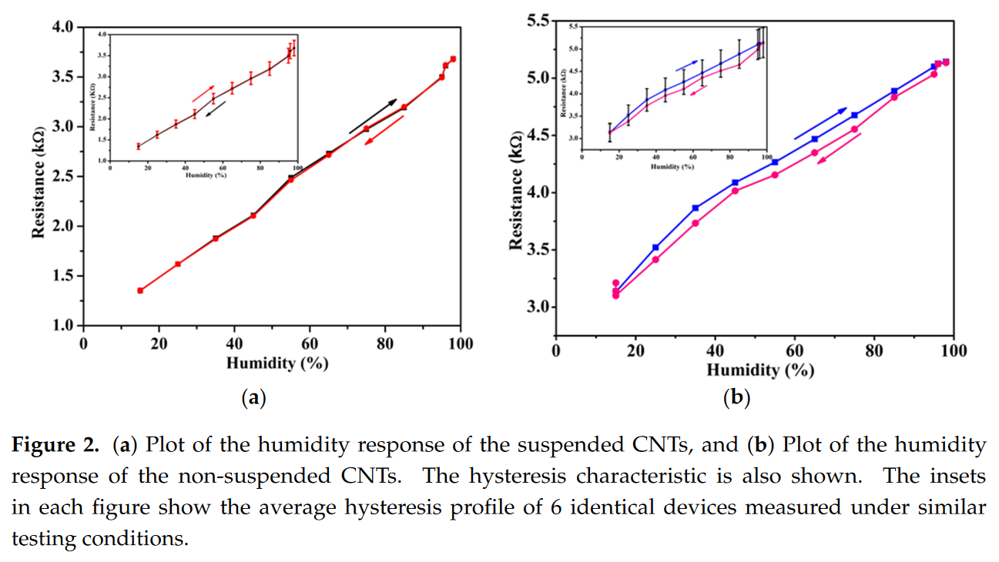

In [202]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAABREAAALaCAYAAACmihTmAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7J0FgBVVF8f/My+22GLJpbu7O1UERcEW4zNRMJDubglFFMUCAxVUUASUDumQbpaFBbY7X8zMd899O/BAUFDUXTi/5TJ9Z957N875zw3FEIBhGIZhGIZhGIZhGIZhGOYaqLlLhmEYhmEYhmEYhmEYhmGYq8IiIsMwDMMwDMMwDMMwDMMwfwiLiAzDMAzDMAzDMAzDMAzD/CEsIjIMwzAMwzAMwzAMwzAM84ewiMgwDMMwDMMwDMMwDMMwzB/CIiLDMAzDMAzDMAzDMAzDMH8Ii4gMwzAMwzAMwzAMwzAMw/whLCIyDMMwDMMwDMMwDMMwDPOHsIjIMAzDMAzDMAzDMAzDMMwfwiIiwzAMwzAMwzAMwzAMwzB/CIuIDMMwDMMwDMMwDMMwDMP8ISwiMgzDMAzDMAzDMAzDMAzzh7CIyDAMwzAMwzAMwzAMwzDMH8IiIsMwDMMwDMMwDMMwDMMwfwiLiAzDMAzDMEyexzDoP1rSyiXM7SuX14KOe59x6XRdrOveOy7jz+JlGIZhGIa51VGEQcQWEcMwDMMwDJMvkEKflAE978LJlFUU5eKSwvXwexOYRERhHCueeK83HoZhGIZhmNsFFhEZhmEYhmGYvI+wWA3oSEyIx4mTJ+F2kwmrQFU9giBZtAUCg1CpUiUUCPDzXHMF0ujVNeRkZ+HcuQuIS0iErpP4SEEcEpHY7X4oVqwYSoQXg9VqvUxsZGGRYRiGYZjbGRYRGYZhGIZhmLyPoSMrPR3Lfl6Gr776GplZDlitdnGAWiYSKho0bIjnXngBpUuG42pynzR6DQ2H9u3FR5/Ow4lTkdDcLikOUnBpGsqUrYCHH3oYrVs2ha+vrxQRWTxkGIZhGIZhEZFhGIZhGIbJDxgaDu7bizHjxmLZip/hdGpiJzVDFEtFQaHCRfHSy73xQs8XEF608DVFRMOVg4/mfoAhw0YgNTMbFnGmRl2kVeoSDbRs1Q5Tp0xBg3q1ZEtEeR0LiQzDMAzDMDyxCsMwDMMwDJO3uPIdty42aTqUiDNncT46HpUqVUWNGtVRvVplVKlSBSVKlkbz5s3RpcvdKBoWCsXT5vB30P7E+DicPhMFW0AIKlWuJuOoWrUyKpavgFq1aqNDh/aoVr3qRQGRYAGRYRiGYZg/gmyX26GNHrdEZBiGYRiGYfIkZKaSgEfLhNjz+GrBVzh6MgIPP/IoQkNCoRsa3C43HE4XChYMQ7lyZeHn65N79e/RXE6sXPETVq1dj1IVqqJxw4YICvCF2+1GjsMBu90HxYoXR3h48au2ZGQYhmEYhrmd4ZaIDMMwDMMwTJ5EtgA0AM3txOlTJ7Fv7x5EX7iAkycjkJiaipCwQqhfvz5atGiOatWqwPcPBETCLeLZv38/9u3bj+joaBHXOejCHK5QqQqaNG2GBg3qI7x4MRYQGYZhGIZhrgK3RGQYhmEYhmHyKGSmGnDkZGPBZ/Mw9c03EZeYitCwwihUpAhKly6NmtWqoX2HjqhVty4C/f2kAHi13sdk8l6IOo0Rw4bhux+WISAkDIVDg1C4WDgqVayIhg0aoF27dihbppQ4m2Z9vhSJaS5zt2aGYRiGYW5nLKMFuesMwzAMwzAM859Dkp1HrhNrhoHkxAR89fVXWLNmAzKzc5CckowL587j2NEj2LP7N5w6dRp+AQGoVKEibFbLVUVETXNj84b1+Prrr3Em6gLS0zMQHxeDM5GnZetECtki7iLFi6No0SKXtUYk8ZAFRIZhGIZhbne4JeJ1ouuaNCwtVit87PbrMyTFV+twOOQYO4qiws/fTxi2lwbpZhiGYRiGYX7PRRGRZk0WW+ejovD+3PexZs06uDUdGRkZSE5KQmJiIlxumlnZiibNm2P8+Alo2bQxfH1sdPVluJxOLFvyPRZ+uwinoy4gM8eJrNRExMXFIzMrW07eElakGJ5+5ln079cPRQuFQBX2nsORg/j4BCSJ+5HZbNqA5vJKU9r7nBvlatd67/s7cTMMwzAM8/e5Wr3s6+uLokWLIjg4WO6/lWER8TqJOHUCy5YtR9lKVdGmVUsEFQjIPXINxNcaE30e27Ztw5FjJ0Si8kedevXRqGF9FBDXsvnHMAzDMAxzbbxN1OzsbCQkJSAtLRUuhxPnz53Dwf37sWnjJuzeuw/x8XEICA7Dwz2exPBB/VG2VInfCW66riMhwRMHdY9OTU3FiRPHsWPrdvy6aRNOnI5AjlNDvYZNMXr0OHRo1wK+dquwAU9i/mefY+269XA6cmCxWOTMzT4+PjJ+emFME7N4Py/tv5qJbe7zfi7aR4HiJeg5zeO0/2rrDMMwDMP8N1xZl5M9EB4ejieeeAKdOnWCqqq3dH3NIuJ1kJIUjw/mzMYnn32NLg88hkFvvIqihcNyj/4e+krPnDqOOXPew6GTZ9GieXNkpiRg528HcPc996HHYw+hcFjB3LMZhmEYhmEYb7wNdFqnoMgxCsVS/K+53UhPT8e5czRj82eYP28eouNTUb9xM3z0wRzUqVXDc03u9d7xkHFvGJrcl5WZiYy0dGzZshlz3n8P6zb8ioKFw/Hqa33R66X/IahAAezZvQtT35yGVatWyy7RFIemaXA6nTIOm80mRUUTOv5HkFhIQqH5XN6Y1165n7bpGoZhGIZh/juoPiY7wnzhZ9oD/v7+eP311zFo0CAEBPxJg7N8DouIf0JOVgZ+XPwtxo6fgBOnz+PFV/pi2KA3UOwPREQat2fWjDfx7tyP0apDZ0ybMh4RRw/i9T594FZ9MGrMeNzXpRP8/f54BkGGYRiGYZjbGW+hzZACYq64lmu9GoaOqDMn8O7sWXjvg09QrlJNzPvkY9SvVyv3uClEig1xKV1txknX0h5a5OSk45flyzD5zWmIOBOD53r2Qv8+vRAWGoLExHgcOnQEZ85EiesM2erw+PHj+Oabb6Tz8MADD6BWrVqw2+1y+1pCIGEeoyWJid7nep7JI3QS9Hye/arcpmf1OC25mwzDMAzD/KuYdTRBLxCTk5Px/fffY+vWrejVqxdoypHAwMDcM25NWET8A8hQ27JhNYYOHYZN23YhoEAQevcZgH6v90aRQqG5Z10OXbPt13Xo1fsVHDoZhREjRmPk0P6IjDiFPq/0xLJf1uL+x57B+NEjUKVi2dyrGIZhGIZhGBMyT00R7pKo5hHwqOXf5QKdhiWLvka/gUNQqkJVzHr7bdSqXhnZWVm4cCEG/gEFUKRoUREBtQIkkc5zraKa4pw4pGtwZ6ej/6BBWPzTSgwePhpPP/4w/H2pyzKJfKrULelKEgp37tyJfv36yeeZNGkSWrdufd2tEc1nN1sWelpG5ra29PpcnlXaT/GZ11G4dtwMwzAMw/zzmPU1jc08btw4fPLJJ3jppZcwYsSIW15EvGQ9Mb8j4uRRrFy1GglJqbDbrDKh6NIovLbxRt1rdm7biugLF+AnDE+73Xbx7ABhxFqsFuzZuQOnIiJy9zIMwzAMwzDekM1lCnG0npaWhrVr12L+/PnYuHEjUsW2LiwskuEMYc7mOFwoWbIU7rjjThQuWhSpycmypeDEiRPx9ttvY9eu3XBrGk6cOCFnZ6bJVU6ejIDbrUETtyFfwOlywGaxoGrVqmjQoP7FMQ/pmDck/pljINK6y+W6+KyEKQZeK5jnmmMmZWZm4rfffsPixYuxadMmOWkM7adPRp+bjv3444/i2GZxbtZlcXHgwIEDBw4c/v1AUH1OLxbJFqB9tDRfDN7KsIh4FehHT4yPwbfffgc3bHjwoQcRHFhA7v+z9EBj5Rw/eRJJyWkyAcnheyQGrGKD/hLjLyDq/Hk5CyDDMAzDMAxzORdNJFoRRnl8zDm8++476NWrNwYOGoJPP/sSv+0/gnPRcTh2+CBOnolGzXqN8VD3bigSUgAnjhzA559+IkXHd997H4sW/4CklFRsXLsKg/r1QZ9XX8Wbb76Jtes24lxUBM6ei8Iv6zYjR7PhvnvvR60qVWCzmAOje8xl06Qje5CEQ3IWKHh3YSZM5+JaeBwNz7qmOXHi6CF8t/ArfPbZ51i9YTNSMrLlMcPtOfbt1wux4MuF2PgrHcvwHPO6n/c6wzD/LVfLj7Tvyv1UdngvGYbJf1B9boqHlMdp3VzeyrCIeBUy0lPxw+LvEZOYhru73IPa1SvL/bocm0auXhNnTgbi4uLgFvWEqlhyBwH3GJ5yTBsRgVsYnvFx8chxueUxhmEYhmEYxgvTCCfHWywsqgVFChdCkSKFcPzoEbw5aQKmTpqIhV8twLLly+Hr64PHHn8cZcuWEZfo0gYLDApCQIEABAUHyd4hFF1QcAjCS5aAS9hgX331FYYPG4r33/8QS5f+hIMHD6JZsybo3v1++PnZch/kJpOrI5g9qR05DuzYsR1HjhxB+fLl0LxZU4SEBEsnJDM7B7t27saho4dRukwpNG3aFKGhIdd0UEwx4kqxgmGYf4er5U1zHwVaNwM1NiHMJcMwTH6Bx0S8ArdTGHNbN2HBoiVo2rINHnmwG76ePxd9+g1Gtht4pe8gDOzTG4UKhuRecTmx5yLw9NNP45e1v6JgoWIYIozTfn1exdmIkxg1dBC+WfITVKsNr/UbhP79+iEsyD/3Sk8lQ2+26Y321fCulPhnYxiGYZi8B42LR+FqIg9z/ZCdc/E7FCaPy5WNI4eOYN2G9XI8wtjYOAQGhaBatapo3LgR6tVvJMc9pOFnVMVAdloKlvz4I5Yu+wUlSpXGY489jpo1qyMjOR6bt23HunXrcfzESdkNukypMmjYqAGaNGmCSpUrokABYZuJe16a0ORyaBbGzZs3Y8iQIdJuo7GQOnbsKCdW+VPIfBMfK3eB1NQkzJz2Jr5e+B3CS5TCQw8/ikceewShQYFITIjD++/OxoJvFqFwkeLo8cQTeOiRRxEU4CvHYKKuziRA0BiRJCBSF+srYXuRYf55rhQJCe+JkyifUr1AS8qrFKjsoGt8fX1RsGBBuWQYJv8RHx+PMWPG4LPPPkPPnj0xatQoYUcUyD16a8IiohdUoJ86cVR2JylTqQbu79oFwYEB+Hr+R+jTfzAcuoLX+w/FG6+8hLDQoEvGrRfRZ07i6f89jVXrt6Bg4eIYOpRExFcQKUXEgVi4ZJkUEV99YyAG9O+HsOBL03/HxMTg888/l2/CzcrIhNap8iFDkSodcywehmEYhmH+e8x6ukGDBujSpQvCw8O5hcnfgmycSyIiFB2GsNOSkpKQkJCAnJwcaQ8FBASgeHgJ2cLQtJuEKy+u0ZGcnIIL0SQ2BqJYsaKwkbgrjtG1sXHxSE1NlXGoig2hBUNRsmS4cPzpNyMBk2L650REuSrWSRw9eewojhw7iZ9/WYmExCQMHjQYtWvXhK5pOHPmNPYfOID16zcgNS0TI0aMQljBIDmAOz0DCRUEfXZv0YJtRIb596F8SOU+lQWUH2mdfDYqM7Kysi6eQ5BPRw1HQkND8eijj+KOO+6QdQjDMPkLFhFvc1KSEjHv47lYu3kHutx7H+rVrCrf8q5asRRz5n4Ch2bgwUd64Plnn0HjBnWF4XqpFaFJcux5/O9/T+HHn9eiYOFicmZnEhFPnzqBkUMH4tsly2Gx2TFgyAj069cXBXwvVRaHDh3CCy+8IN+wXw2zYiKxk382hmEYhslbkNNIrdkGDx6MDh06XJ+oxFwVw9CE3UOiGNk/5j5P60Ra6romuziTTaTmCmmXQ117VWhiQSPLeOIQG4aXMCj2yTg9sqPA87/p5F+LvyUiXkFaWgqOHDwA/8AQRJyKwLatW1G3fgMpLpAQTbND+/n74EJ0NDZs/BWPP/4kSoQXxS+//IJjx47h+PHjcsKZihUronHjxggKCrrYo8X8vhiG+ecxRXwSDelFBZVNJBRmZ2dj79692LVrFxwOhzw3LCxMvmyiMmPVqlXCd/yfrDe4zmCY/AeLiLc5ZyNP441XemLrb4dQvHg4Cvj7wSkK+9jYGESdOy8MUQPFS5RCyzYdMWTgG6hbu4a8zttIy8pIwysvPY/5CxYhOKwIhg0bLrszk4g4fHB/fPfjCvj4FcCEKdPx0gvPwOply9JYij/99BPOnj178c0yQW+l6G05zdi3Z88eNGzYEK1atZJv36mCYhiGYRjmv8Gs/y9cuICff/5ZOoGjR4/G/fffz93T/haeyew8oiEtaWxqz/JKWcxjydJ/NHa1cORzd8praV1w2ZpYlfGRAKma27Q0RUrP8WtxU7oz003ESlJSPL5buBBOzUDTJk1RQNh2scIepFaJtWrWRFZWprA/3VIgNAwF5cpXREhwASlU0LOuXr0akydPRvv27fHUU0+hWLFiF21DNvEZ5t+B8qLZY+z8+fNS2N+/f78sK/z9/VGkSBEcPnxY7qf8+eCDD6J3795SfCDxsEWLFhg+fLicEZ5hmPwFi4i3OTEXzmPi2FFYt3ELHLnjytDg3CTg0dgz9E0FhxZC05ZtMXbkMDRqUAfp6amIiYlDaMEwhBUMFcakE1PGjcT0mbMAnwIYOmwEBvZ9DRGnTmL4oL74funPKFSsFN6Z/S663dtJ3sOEfgoyRq8UBqliomeYNWsWPvzwQ7z88svo16+frKgYhmEYhvnviYiIwIABAxAZGSlFJWplwg7hrcnNbIlILZOolRK9SK5SpQrKly8vbT4SHAoVKiTXyUGpXLkyypQpI9MU2YUm9IJ57Nixsisk9WahrpEmZFd6n8swzD8D+W7R0dGIiorCqVOnsGTJEqxbt06WCZ07d8Zzzz0n/bbp06fLMmPixImy9TDlfSpHmjVrJpdcZzBM/oNFxNuc7Ows7N29G2dEBeBy576d1jX8umEtvvjqGzg14O57uuF/Tz2BNi2bw+3Kxk9Ll2Drjj2oWLk6HnrwQZQuFY7Vy3+QjsSJqHgMHTESIwf3R+TpU+j3Wi8s/XkN2t/dDVMmjEWdWtVy7/znpKSkYNq0aRdFRIqfWiIyDMMwDPPfQqYUdS2lF3xnzpyRog6LiLcuN0tENE1walVIXZCpFwoJDSRI0DYJgDSMDd3PHGfNFAbN5caNG2V6o/u/+OKLcoIGE/MchmH+OSifUR6mIQZIRKA6gLowx8bGokaNGpg6dSrq1q0r95N4SOdPmjRJtk7cvn27bIHYsmVLFhEZJp9yO4qIPOK3F76+fmjYuAnu79YNDz74ALp3744HHnwIjRvWl18UGXWVqlRHyxbNRcLwx44tm/D+e+9hwYIFmPPubGzZsRvCXEP9hk3Qrl1b2BQdx4VTERMXj+jzUThz9hwKFw1H13vvQblyZTw3vU7ImDRbKNK6Od4NwzAMwzD/PVQvk3PIMNcLCXwUSDgk8cDsYUKCIXWNJFGRjpN4aAqUV4qClOYokI1o2okE7WMBkWH+HSjPlixZEjVr1pSif3BwMBo1aiRbBtP4h5SX6YUDBTNveudZzqsMw+QnWET0ggpwmzDSSEz08/MEH6sKRbUgKIQqgULCiBNGnagoVHEuDehtFwYfzRZo9/EVFYQqK4bCRYvjhRd7ostdHXAm4hQW//Aj1q1bD131waNPPI3OnToisMDvJ2X5L6DndTod8o2Zt/FJb9TS09KQnpEBzWs/wzAMwzC/h+pTCgzzVyAb1ExDFGjbDCRQEJy+GCbvQXmURMKqVavKFujVqlWTYmL9+vXlcXMyFRIXydeicykvU742XxRw3mYYJj/BIuKfYCgq6jVojAH9B2DI4MG4s31r+PraYbFa0bRla7z6+hvo2fNl9HnjDbRq3hg2C4mOKqrXqocRo8egx6MP4sLZSOiqDQOGDEWfV19GqRLFaUztPEFSfAxW/PQjfly6HOnpmXKf2+XEb7t3YsGXX2LJkh9x7PipywRGhmEYhmEY5ubhLSKYosKVgfZfibmPlt7Hr3YuwzD/HNSamFoeUitEmkzF7JpMPhTlR2ppTEtqqEFQnqZjtGQYhslPsIj4J1gsVlSvVRvPPPccnnv2f2jauAH8fD2DWoeGFUbXbg9gwID+eOLxR1CieLGLRpvFakONWnXx+OOP44kej+Pxxx5Ht/u6olSJcNmSMa9w6MA+fPTRh/h16044RaWmaxqiIk9ixS+/4NCRIzh57DCWLlsOh8OZewXDMAzDMAxzMyH70QxXbnvvNzG3SYDglooM899DgmBOTo5seUitDil4i/9X5k9zv5l/GYZh8gs8sUo+gWaHphm9Pv74YzlwNk2sEhQUlHv0xiGxMCMzE6t/WYb58z9D6cp1MHrEYAQF+GHTmhX4+ItFKFW6DHytOiLOJeCdt2bA19cHaWlp8g0ajdVD8NiMDJO/ISPW19dXTtRk5muGYW4MMqUOHTok62aanZMnVrm1IXHgZs3O/HfZsGGDTG8dOnSQ9iHN6MwwzL8P+UQ0wRZNhEk2FU1ydODAAUyYMEF2caYZ12lCFerCPGXKFDmxyrZt2+QkDM2bN+eJVRgmn8KzMzN5lpstIibGxWDdug1Yu24tjh45gsIlK2D6tKkoXigYq5cvwYefLUTNWrVgQQ4OnzyPWW/NFOcdwqJF38pnocqRxAd628ZJiGHyJ2berVChghQ86tSpc3Fgf4Zhrh8WEW8v8oKISGmO7DASEen+JCK+8MILLCIyzH8Ei4gMc3vCszMztxWqRUGOIwexcbFISk7G2TOnsWXrNjg1A2XLlkFqSjIcDg2ly5SFzWaFqlrkZDMkMmzatAmrVq2SxjON+2FORMOBA4f8ESjfkpEbGxuLn376CevXr5fdcBiGYZi8z7W6SDIMwzAMw/yTcEvEfMJN786s67IV4a4dW7F82XIEFCyG1k3r4dctO1C3bh2pLm/bvg1BwSGoUbsu2rdtLWekpq7MqampUmFPSkrCxIkTUaJECU+kDMPkO9auXYuPPvoIVapUwaBBgxASEpJ7hGGY64VbIt5e5KXuzPRSl9Jbu3btuDszw/yHcEtEhrk94ZaIzG0DDeJLrZEaNGyCni/3lhPDVKlaHR3at0eduvXQomUL3Hf//bjjzrvQqnkz2KxWWelR5UYtmGgMNQqBgYEX1zlw4JD/gjmDIOVvhmEYJv9AL4TNmV/NwDDMn/PPtaGhPHgp0F28A3FlNuX2PAzD5DdYRLzN8Q8IQJmyZVGmVEkUKVoUDRo2QPHixRAYFIzateugerWq8Pf3yz3bAxms9LaNAr2NZxgm/0Kti8mAZQeUYRgm/0Dl9r59+/Dtt98iOjpaTox15csgFieY2x3KAxTId/HeJnvnn8gfHjOK4jfXhW0l/2ib7Kzfi4gMwzD5DRYRmdxKjYIqjVDqtkyQMXq11klmpftPVL4MwzAMwzDMtSH7i0SRCxcuYNeuXXKYGephQoFhmEtc8nE8vo25JLzXbzamj2TeQW7LfOsJDMMw+Rm2NhiGYW4HyIClN/G5hqxcZxiGYfIdpijSuHFjPPbYY3JsNeodQi3LvfknRRKGyetc2dghLi4OR44ckePXHjx4EMePH0d2dnbu0ZuPKRwqMnj2efLk7/Ml51WGYfITLCIyDMPcDuzcCWPcOBijRsEYORLG7NlAZCTg60vWa+5JDMMwTF6HxAkSHWgSldq1ayM0NFQKiGaXTeJKAYVhblcoL9AESNu3b8ebb76Jvn37ykCTVcbGxuaedfOhPGo2DjaEmaWIDcUidiiWy0RDej7OrwzD5CdYRGQYhrkdiIsDli4FZswA5s4FNm4E0tIAm41FRIZhmHyEKUB4RApVLr1FCeLKbYa53fDOJzQ8E7XYDQsLQ0REBBISElClSpWbPoOqKfDT/WhJwiFUgx5CLBXoigWacrloyHmVYZj8BouIDMMwtwM1awKdOwMBAUClSsA99wDh4YDDQVZv7kkMwzBMfsAUHkiM8G6ByDDM5VAeIVGvRo0a6NKlC6pWrYr69evj3nvvlaLijeefSyKgkTtKDEGxiCPQFR0WsVOxAC5bFqy+bmhZOk5uz0H0gQykR6Qh5ogmL1Ct4iKFXuayHcYwTP6BRUTmL+H9Bo1hmLyH4XLByMmBQSKhJozV0qWhtG8PlColBUWlbVugYEGAZljn/MwwDMMwzC0ICe7kt/j5+aFw4cKy+z+1SiwobCA6duMTEnnN7KxQy0NdbOuwKC4UDhG7dB3bdrmxcaMbUccCsXqdHw7t0KEvPQjbwQj4HImDZd0JINOAYbdBFeeT+MgwDJNfYBGRuWGosjVnbWYxkWHyGPRG/fx5YMUK4LvvgG+/BVavBlJzuy6TsUyiouxaw1UAwzAMwzC3LuSrmEIiTaTidDp/NwnRjfgzdCr5QiQcGoawpwRkUjlyLDgf6YNz56zYtl3F2nVWHDhiwbR3XFgxPQlFdpxEOWcU7IkxCDsSDWRr0FULpEfF7hTDMPkI9iCZG4YqYjMwDJPHEMaxsf8AQBOnDBoEDBsGY+5cGEcOe45TviWh8Ya77zAMwzAMw+Q/TJHQ23cxuzGbIuP14n2qpxUjCZQKouN1fPpFBvbutSJY01DInYGA7GwEH0iCffVZGHEuwBYIS2AAlHBfwCoiEo+lG5cLmgzDMHkdFhGZG4JmNzt79izOU0snwY13AWAY5h/FbodSs4Zn/EPqqly0KJQHHoBSubLn9bnZCpFhGIZhGOYWx7vxAwXyXcz1GxUQCTKlPNfRkv5ToLkURJ23Y+M2f6QnONACp9BBOYM6llMYom7Cw5XPIKxjYWSVC4elahiU+6oBQRY55IwLWu4zsG3GMEz+gBUg5rqhCjMuLg4LFizAr7/+Kt/gWa00IjDDMHkGEvZp3MOOHYGSJYHq1YE77gAKFbrU+pCM1Rs0mhmGYW5nzJZM3tyo+GByeVykSGjyJS11tczOyb543DxLE8ccIsgS/IrHMJ/BI2pwuc4wV4PyhxnIfzHXL+UZylhXZK6LUM7z2E+y87Kie0woQ4HLCURHG1i1Mh3z52g4dVpDqCUbta3nUU05h6JaOmoXS0WJvtWA4W2R06Q81HKloFcOAoQLpWo6VIsVihQQr3V/hmGYvAWLiMwN4e/vj9q1a6N8+fKy4tWoVRPDMHkOhcYtJUHRDIRVGKpiv2K3A7njmjIMwzB/zOVig4e/I9iZ11K8JE5kZ2Zgz549WLRoEdau3YAUGsM293h2VhaOHDqEPbv2IDk13SN1yOs8mOt/53kYJq/gnbavxp8dvxbe+cNc997nERZzNy7eQpfr1NrQ0IUdJdYtOu1QxBE30jIMrPxFw5jRLrz5ZgFkZDtx70NAlVp2GL4BsNoscPvY4W5eHEqb0kC5MNh9FbjsFqjWXLtMxEV/f/FjMQzD/CfklmAM8+dQZUszmnXu3BkNGzaU+1hEZJg8iikiUh4V1qlLOKKpERFISUpCamQknImJnvPY8WQYhvlDribQmWLGDYsa3qeLeN1uN06cOIH169Zg06+/4mTEKThobFsRryMnC+vXr8ey5SuwZdtmrFi+DCkpafJ56PiV977hZ2GYPIKZdq/Ma1em86vlxZuBqlouxi3uKP73tD405FJs53rMmtiMizWwdKmBiZMUvDfXgguxKlq2V9DzZR+89CpQpoaKTF3kbXG+q0oYlAfrwCjiBy01HUqWE9plhQDDMEz+g0VE5obxrtD/qcqcYZgbJCsLOHAAWLUKWLMGhnA8kZDgERPtdqSlpGDlnj2YGhODGfv34zfhtGrCeeVxTRmGYa6Ot71jrlOgoVyoZwYtb9gOEqebcdKVOTkOrFu3Dr+sWC73VaxUBQUCA8WajoSYC/j552U4dToS2ZmZWL70R0RGnZetpui+FGw228WhZcx4GSY/cmX69U7n/zR064v5UjHzurgv3Z9mYDZyEJPgxvJfgBlvuzF3DvDbDh01qmno00fF4IE5aNNWQ+kSBWBTFVicTmjC/rJUKAJrg1JQfFUoLhIkxbF//uMwDMP8o7D3yNww5lgiDMPkHYykJBg//QRj5EgYAwdCmTULOHsWCjmjPj6ISk7Gt6dO4dPsbHyZno7DYtulaVD/BeOcYRgmv2MKGTRu4ZkzZxAVFYWsrKwbfxGTaz6ZVhTZUy6XU46JmBCfgPMXLiAnJ0feLz4+BufPRoki3A8hoUGIjYtGalq6bL0YERGBnTt34uDBg8jIyJDPYeFhKph8iikWmv4FLc0892/5HJfuRx2MLTI4hZ0Uk2DD5k2++PgDYM47OnbtsKNaDRuGD1cxbKAFbVqo8PMVeS9Hh7Y9Bs4TF+C22GEEBkG3WaGTaqiQ76TALe5h5V5cDMPkc1hEZBiGuRWgcQ6LFPG0PDx61DNLc1AQ3MJYPScc3q379kFJTcVjvr54UpxXuWgRqFYrDBrfh2EYhrkq3sIGiXtbt27FhAkTMG3aNNkN2U5lba74cF2Yp+YWvT4+djzwwIMYNnQIQguGYtGib3H02AlkpKdDl63Fxf3FNQZNwCDuo9p9kJycjC+++AJDhgzBrFmzcP78+ctaJBL/lvDCMDcDaqCQLtJ8bGwsoqOjZYiPj4fT6byx/PUXMW9hipeaG0hJdmD3VhXvz3Fg9DgDK1caqFnPjQmj3Rg60I3GLd0ILEx5ki60QT2XicwPNsG6JwbUadkqIrG5VZGPdbgU4XKLjOx5cUstEhmGYfIvLCLmE+gNM3c7ZBjmWigFC0K55x4o990Hd1AQToSHIzYsDLt378YHM2bg1OHDeLxlSwwsXx6vNWyIBlWqwmaxSMOdYRiG+T3eAiJBLQ8Pi7J0w4YN2L9/PxwOx18SODzXUNmrw+lwIjU9A2UqVEH3bt3QsE4NxJw7g2XLf0ZyhhMVKleB7s5BekY2ioeXQaFAP/j5+aFKlSpoKcr0OnXqyG0qy73L8yufnWHyMtQSd9OmTZgyZQr69euHvn374p133pFiIvGX0rLshkzXUk4T/4lsZxgqFMMNVbFBNzwTpGh01BB5R5xI4mFqmoY9+4EZM3WMGKtgyyYbGtZ3YfBgC3q9ZEej5gqCClthF3FYcuOWXZ4j02A9GgO3KxO+LgN6ZiZ0zSXuY8jzRI6EKpZuC/tzDMPkb7gUy8NQhUmVKhmp5pu4v2KsMgxzG0AtUEJDgYIF4dA0zN+5E0NjYjBm714kJqegR/fu6NiqFYoJZzM0MBC+fv6yQYxBhjXDMAzzh5BNFhAQgLZt20qR4+mnn0Z4eLjsWvxXMO05svOoW/KqVatQqFAhPPHEEyhSpAh27Nghz+nSpQsqVqwohcKuXbuiePFiKFCgAO666y706tUL3UXZTufTc1w52R3bjEx+gbriU7qm4QK2bNmCI0eOICwsDL6+vjLvmWn5xsREixQOFUWTAp5CLQHFmmZRxZYbVkOFqllh0an7shtZOcD2HQZmTlUwfpQu1n3RvL6B3q9peKm3FXd0MlC2tCZiFdeJa8TF0CluTcR+NhPOH49BS3LA5usPlCkMd8Ui1AqEDC2GYZhbChYR8yhUSVL3lKVLl2Lu3Ln45JNPsG3bNtmVhse8YRjmqpAzKxxSi1i6EhOxOjMTp8Tu+tWqol69evCn8RGFk2mQo0lv3RmGYZg/xRQwSNCoVasWnn/+eTz++OMoXry4fMl7oy26PUIIxanIOKtXr46SJUtK0aRatWpyu3379qhYqRKaNWuOuzt3QevWrXHnHR0QEhIke6YEBwdL8bBo0aLw8fGRcXo/x42JLQzz30Jd8WvXri1Fc2plSzbLgw8+KIV177R8I8K4IU41L1WoBaJiwNdfg49Nhc0m9lncUgTMyAE2brHi7bc0zJpuYPMWoEhxDU88q+Dl1124914DZUupsBjC/zKsMFRq1EGiJKA7DRjbLkAZvx7WQ/Gw3l0XepPy0FuVhtqqovC0xbm5QxHQOsMwzK0Ai4h5FHqbTG+mZ8yYgYkTJ2LmzJnYvHmzfNN800REUbNSfBT+CDZEGSafQHlVOJF24VDeU7oMBgQGYlzVqrizUSOyvKXIeDE3c75mGIa5bq5sCUXb3uFGuHi+iMrXxx9NmjTBPffcg/Lly0uBsGDBgrjzzjtRWpTjimpB5cqVUbduXQTSiyCv+5vCodkC8Uafg2HyEtQSkYR5EseLFSsm18nnoTxBad0M1484n5Q+Kf4BTpeB5FQFzgwDWZkaoi5YsGWHgrkfAO/O0rF2jYrQogqeeVHDiFFWPNLdgaJFacxTm+z2DAu1PNRFnBo0ww0tS4d1+Smo09YBh2KhdqsC1yvNoNQsBhTxgVLSX+ZPEhFN5PPfyEdgGIbJg7CImEchQzA0NFQaje3atUPz5s1RpkwZWZne6Bvvq0FxJCUmYNOGdfjmm2+wc89e+TbdJPr8OSxfugSfzpuPzVu3CwP18nveWCXOMMy/AjmQoozQbDbY/f1wvzC8H65dG6VFkHC+ZRiGuSG8hTlTxCDRznwJS/bUX7eJFCiinLZafWRLLPMlMd2TJkoh8cQMtM8Mph3ovc4w+R3KRzSEE+UrWjcbOZj5zkz/14/IG3LyOLFUdaQkq9i4TseRIzr27LPi448VvPuWG4sXKPBRNDz/korxk1U89qgNpUsosCs+UKm7skETotBszfQMGlThE1kTxP7Fx6DNWAN3cjK0fq1gPFsPRlErtCzhTzk1wCHOEfcXTy2f5q99BoZhmLwHi4h5FDIkmzVrhjFjxuCtt96SrRHprTR1WblyzJu/giGMTqqcz0RG4KelP2Dd+l+Rle2Qx5yObGzauA5fff0N9vy2F6lpGVTzyWMEGbrmbIRUITIMk5dQoDmd2B8djQsZIu+GhADUeoUQjqgM5KjSkmEYhrluyO4xBT1zm+y1vywK0GW5l1K8JlfGZ97XxFw3RYmr8ZefiWH+A7z9CfJzaNtM51em/6vjEkEnuVAGT2s/EuDJV/HsOHnKwPKfsnEyAtixw4JFX2YjOFjFG4N1jJ6ooGsXICxQ5Cl5vvC1hKkkcjjcYodhKNCpK7MmlueFbTV/JzB7I1CoIGyDukDpXA56gAK/TCdU8SiGLi4m7fIqz32l7/RH+ZhhmP8Yyq5XBoZFxLwMCYY0Pg416y9RooQc/4Yqoysrn78CxVOkWHFUqVxFztCalp6e+zbbQFJiHPbt34+Y+GRUqlwVdWrXgsXqaQFJbwgp3Awhk2GYm0xiIrQjh5GQlQVfsRlIxiu9yTdbGVMep7zLLVcYhmH+FqYtdjNsMlNIvFFYeGBuFbzTsim83VDeMmzCtqFpU3Th3ObIPEUTntDAiDSGYWSMBSvX6jhyIgAuB4mBbjRuasELva3o3EVBubIW+PnRc+RGZ6jQDTnvsthSQLMv01OppzKA6Vvh+ORXqHVKQB11B/SO5WAE2KCKe9EULrDQNeLZFQNucR+D/sRnoUC+lPeLB3P/DX1WhmH+PTxFwOWBYRExv0Cinflm7mZA3WcIPz9fuJxORJ09g5xcocFisaJUydKwWxX89NMSLP9lJXIcDkScOoXvvvsOX3zxBfbs2SOfxex6wzDMf092dDTWrF6DD7OykO3ji1DKn2So0gjiMTHA+g3AufPAwYPAxo1AaqrnGMMwv4NqW5eo59wuF4yUFCAuDkZaGlxut2zzwi4fwzBM3sBTHntaERoaTTQkbCKXhhOnnHh3thvD+uvYsVlFtZpAeEkDtWuq6N5dQ/WqTvj4UBdjjz9D8ZDoJydEEb6SIiKy0vtXlyj3t5yCMX4tjO1RsHVvBOONFjBqh8IQJ1gMj1/lPdQAQb23TN+NfCazMYi5j85jX4phmPwGi4j5BO8K52bgyMlGSnIKSpQpj673dobLkYXEpBRkZmbB1z8I3R58GFMnT0TbFk1w7Mghuf/osaNYuPAbzJs3D/v27ZPxcMXHMHkETcPJxERMSknBXGHErsnKREpOjkckpNfr27bB+PILYVVnAceOwfj4Y+DoUcDfn17750bCMIxJusOBkyKvJG/cCH3+fODtt6F/8w0ubN6MiNOn4eQW+QzDMHkDxYBOr3eoBaGq4MQpYN4nKoYPdWHR1xb4+Kh46CGg94tO1GlkoE5dA40b+sBXtec2LBJ+Fo3/TuKfFACFzyX8Lo3idetQlp6CbcRa4MQFGP+rCeW1FjCqFoKqUetHYUOJS8xWht7+mnfPrYCAABlovFMSFwm6xhQeGYZh8gvsOd6mJMbF4IvP5uHtWbORIyrAjh06ID0pGp98+il+XvEzNgin6XTUBbRp1wFtWrWAr68vGjRogEGDBmHs2LFo3769jIe7NTPMfwy9YEhORupPP2H/7NkISk3B68KIrRwYiGy7/eI5oMlVhg2DMmsWlGnToPTuDZQuDZDQeBNfUDDMrUJCVBQOTZqEnL59oU6fDnz4IQyxHfv66zgyZw6S09NlqxWGYRjmv8NsaOFw27D/iI7P5uuY9aaBn5Z4uiM/+KiCgUPdeOoZJxrW90dIkIFChRUUDhcluMUFKNS2XCxUj5xI0GQqii7ijs6CMn83MGcbDJpc5bVWsPaoBxS1Qxenax4tkCRI2cqQxpun1oUkFNL48eQ/UUhNTcXhw4dx6tQpGY4cOSKHhyIx8WYNVcUwDPNvwSLibUqB4BCULVcGISHBKFaiNDrffbccd7FEeDiKFS8Gf1Hh0UQrxcNLo22bNrLbc/Hi4WjWrLkUECtWrCjjYRGRYf5joqIQ/84sfDN8ODZFRuLB2rXRq1AhPN2iBUqXKgUjPR3IygLKlYPSowfwxBPAk08C3bsDxYpBWLEsIjLMFVCOKBgfj3rbtqHg/v1QRD4zxLZ6+jTK7tuHWrt2IYC6ODMMwzD/OqboRkvyRU4fd2H5dwrenqrh0w8URFxw486uKiZO9cOLz+qoXNoCxbAhKScHzmwVmuESgSaUtJL85yn0c7sgy//dOrITk4FPd0KZtUVUCAWgDOsIdKvp6cEhrrGI+1p0Eg1pFmbq1KEiKChItkaMiYnBuXPncP78efz222/Yvn07vv/+e5w4cQLHjx/HL7/8gsTERCk20nXeY0IyDMPkdVhEvE0JCg5FxzvuwpM9eqBpk4YoVqwISpYsg7vuugtNmjZF6zat0bJ5MxQpXEhWiKpX5UZv2ejtGcGVHsP8B5DxnJUFhzBCt48YgY8++xwnK1RA25EjcWe3bggWBmxFYaiGCQMV69YBb70FHDjgMZCpCw11caahCDj/MsxVUYRzGBIbiwrZ2QgQ26bMTjmmiAgVhCNaIDqaJyli/hPMllcECRDXasl0tX3M7Qx196V04RKLbBiy/DLHW6elCLSLNmlSETmxiAYdbrpIhMvHZqf1m5PG5A1FuHhzz7pBXYOplaC4P21qIohD1HGZxj7MyXbgbJQLy34yMHWmDW/PcSAp3YpHnhRmz2Qbnn9CQ4UygK+/BYowfRRFhcUt4qTrafZkOQWdKNXFutgj76HTZ3SLcCQe1im/AosPwmhZCuqgFkCrkjBswnUW/xT6IztKtYo1WirIEfVClrDNkpKSsGbNGqxduxZnzpyRY8nv3btX+FrFcO+996Jz584XJ8skqDsz51WG+Qeg8kIELbec06k8M8s2ynIiyH2U+WX5osPh0hATCxw9a+DkGQcSzyQhLTITMWeycDTSiRPngNQsOpliFeUTlRuKDqt2e8lqLCLexvj6+aNI0aIIFRUZYbFa5VgddpsNQUHBKF68GAoUIPfpcriiY5j/mLNnkfD++1g6ciS+274djvvvR5dx49BdLClPy9aFKSkw6tSByMgwIiNhJCZ4alKGYf4cyisZGXJm8ytzDW0bwllUUlOFIyqsR4b5D6CXuNQCi17qXs0uo338ope5HHp5SGmHWuWRgEbis1iIfYYh9snjBgxFOMhiqShuGDTjMU0aIpzktDQnLly4IEyQs4gUdgW1tqOGBX8fSqcUxDOIZ6OZkeXzSAHRKhx1K028DMVCUp8Ot8tATBywbJkPRg63Y+pUG9KS3HjsUTvGjAKeeBIoX0OHXwjFdykPXMwnCn0m+ki6+KxiRRXluCo+swiqiFvZfgGYuAbWVWdh6VYLGHQn3PXCoYn7e3vO3vmO8uL+/fvx+eefy5aHcXFx8Pf3x+OPP467774bnTp1Qs+ePeWwUMOHD0ePHj1QqFAhuFwuHhORYf4pZHlHEx8pIs/TEAWifBHlmibKOJl7ZfZXZcjdREScgmlznZjxUgp+e/YQsl9ciayXVyDqhdX44sUoDHvFiS27Kc9bRLxUXkkdEU7LpfLgdoBFxNucPzIw2fhkmDxGZia0LVtwYOpULHzrLfxqt6NM3754ZuhQtK5VC3ZhiCoJCTBsNhjUbXncOE949VUoNWp4Wh8yDPOnaCKv5Ij85cptKeIN1YyyBYqPj7Ci2Ixi/n3IPiPhgVo3LVy4UAo7NP6aOVkDwTYccyUkzpGbrOvk7AqH2qOkiTWaPESDZriR43IixwGkZliQnmUXp3vOy8lxY/3GjZgwYQJ69+6NvsL2mD17tuyy+/eh56FArrguilUaX1BsW0nYJCdfrIuQ4zAQHa3hh8UujB4LvPWuG5lZGh58yMCrb6h44kkFtWu7EeQvricRXcZHn/uSoE5Lm6bA6fXZ6Z+iGXCnu4DFx2GM/gV6TCrQszm0ZxtAKxMAq7icemW5xHU0FqIJxU2B8mNycrLMi+XKlZNDP1GLw+eeew4PP/wwagkbrXjx4ggPD5eBWiVSt2cSYel6s1UiwzA3D2p7KLKXKD4U5BgasrKFKyXKNkemKFuyXHDmOJGerSMjS0eOm8oLNywpOuzbY1Bt1QZUW7cSwSv3IWDVXpRZtQtNVq9DoWW/Iet8Fqg9t5TSPP/EzW6vlwFcYjEMw/wbaJoUAYWV6QlpaTQ2QO7BP4FqQGGYJn39NTYOHIiFq1bhzB134O7Jk+Xb7NIFC0pDW1ixnvsIR1Jp0ABK06ZQWrSAUr8+UKgwWc8yOoZhrg05dJmU3/bvhzM7W5qJ3jnHKUJmgQJwFikCgx0/5j+Euk2ePHlSVC2ZUhy5UoigtMww3lCSkIIatTIUAYYVaRkKoqJV7N6jYO0qO+Z/pGLSSOC7LzXq1CDO0WG1WFGwoL9scUct7SjdFS1aVPZg+vtQOtXEc+kQt4FqoWlK3Llincexj70AfPu1BZMm2fDhRzYkxQJd7lTxRl8dL7yooXkTCwIL0HXC/rHQfMnU2vAaL07F56eGRyRRauLWLkWFkeSAOm83lHc3w2WxwfJSC+j/qw5rsQA5aqJssSjOt2sibq9s5S1OVq1aFU8++SSGDh0qA7VCLFu2LEJCQi7mTTrP+xrab24zDHNzkTOni6CJwmTvcRVzvtDxw9QUxMzcD/eMrXDM2ISDM0/gwylx+H6tggSXgnB7Gh51HML/tD2opsQjUMQgihY5lM0dxjG8omxBg6zzsIl9ojiQ9iE1QrQZt1c+vtzaYBiGYW4+wmo3LlyA8cMPMObN84SvFkBY4R6L/o9wOuHevx8Xpk3DT5Mm4avERAS/+CJ6jh2Lds2aIUQY8BcLcmodReMdCuRYR+b4h7RksYNhfg8J+TRDuYu6zQlEvtHPn4fx6aewfvIJrE4XlKAgGDTTOeUhHx9kCcc5uWlT5JQo4bmGYf4jKleujI4dO6Jw4cJS3KHgDYsTjDfUolC2PpRWg1jXLTh6wMC8T92Y+aaOKRMtGDdWwfDhLrz/vhPHIxS4ZOMaVZgRKho1bILu3bujYcOGaNeuHZ599lkUKUKu9d+FnscqzCErdE3YMYYNVosfDFE8R11QsexnG96ebWD+/GycOOFG/YYa+vRzY0A/FS2aqQjwF9dSUqeWhYom4qBP59mWC698QMK6S7ZApHMVWMWF9mMpUGZvh/vTbXCU9IN1eAege21oAWRP0bOp9G3Jbt0GzeCcG50ZLy2pVSEJhm3btkWHDh3k91O9enXZOtgU8+k8WqeleS1h7mcY5p/AgEOYeOcO6IiYcxYp49fBd8IPUMeugd+YjfAZvRrnJu7Ati8zseOoDcmH01H13CmEGjmiCAkUV/tC031EPL6wqzqq63Eoe+ocLCkOccxTxuiUh73y9O0Ae5UMwzD/NGQcnjkDLFgAzJwJTJ0KzP8MOHbs2q0R6ZqEBGQsWYKdQ4bgvYULcbB+fdwjru/x/PMoGx4uKjOvIpxEkPh4GDTZA83GHBkJ0MQq19vakWFuE8hV00V+Mc6ehbF8OQyRL42fVwAREcCOHVDHjEHA7NkIFefZH30UGDAAuK8r0LQp8MAD8J8yBQVfeQV+QUGmL8kw/zokPJQqVQpNmjSRLZ2uJiIytzOipCM7grrYST+XpkfRqVcwFLlPgVNzY+VyN2ZOVfDJJwaW/2xg124dIWE2vPiyAw88rCI0VBcxkYhG7yndcpw/X1/fi+HGEfeW3f6oFaRnjyHbdxtISXdh/0EDEad0YR7pWLjIhQ/nGnh3lhsH92lo0dKO0eMtGDTIjoaNFFiot7V4No8wSnFS52QrVAuVzIr8rJ7vwHNYoaaNPhboPgp8xLOTdaTviobx9iboyw9AbV0JlkEdoTQqDt1mwE4tGT1ReSaYzF3PfezLMEXBK1scmsFbSCS8RUMWEBnmZnBF/UfZynBTSQCb6kZlZxyezdqMh7ENxRyZUNyiDNE1VMUZPGccQJNDW7FnbrwIMdCiUmBQC2UR3FZNtkSmoBh+ovgS66cTYcRnylbJVEJSFqbl7QSLiAzDMP80ZERWrQqFBInixT27evQAGja8+jiFwhHUIyKQ/NZb+GHwYHwu1v1eeAGPjhuHu+68E8Wpa0yuIXqRmBhg/nzg2289XaXnzoXx2WeikovPPYFhGMLpciF7xw5oY8ZAeKPAWLEcOAjGq6/CGDAArgULkE0OptjG4EFQeveGMnESlDlzoIg8SMKif4kSwihlE4r5byHBwofG5mSYyyCn1iVCruolPF2aIMVCXXHFHqdbR3yyFVt32rHzNxvikiDHBHO5dFSrqOL1fjr6DghEndrUvdgpo6D/KD4a+8+cTfivTAhCcVCrPmp5KBfC75YTuoiozpyw4duvs7B3XxZW/pyNcUP8sHk90KC+FSPH29CnvwWNG+gICQbsNs/4nx5RTthYFIcUO+lP7hJ2kvi04jhJC06x6rLqckIFle6d7YayMw7KW1uhbzkF5YE6sL7WAahdDIrN8z1dqUlQnJ673TimeMgwzD8Eif4y87tkGZeZA6RnWmTITnGhYsQJ1Es/i0LiPIthE5nSKltj+xoqqhtO1Dt8CGU+/RGBK3dCz3aIPGuT3ZStbqvsukwFgmdWZxGxJspFpy6KVnpJQAdpSefcPrAFzNwwXBEyzA1CeaZQIaBVK6BiRaBYMaB5c4C6Q14pRKSnw7l0KfYPGIiPFyzAnsqV0WTkSDz+yiuoV6UKfK4lXFCXZepW1L498NRTQLNmQGioZz/DMBfRT5yARgI7Ce5HjwrP9axnuWIF0jdvxply5ZDQvz/UZ58FKlXy5CPKt7VrA+XLeyZUYZj/GNMWo9aHJOhwaybmEiJtCAeYZh32jOWXI3xrDTnZBqLOufDTLzrGjQXeHKvB4dJQt6EF4UVsuKODgvHTgB6PqihU1CXHJlRhl7OaeoRJ9TIR8a9A15HTTZdTC0RD0ZHjsCA6VsO+A0DEaR/kOO3iHlZUrwf0HaXh5dddqF/bQEgBkh+v8uJVQGOTSVeeRErh6OuG5nlOncY+1GETwZrphnVXNJQTCTBWn4Q+aR2Q6IDauzWU/zWGUS5AxO8RRjWRv8QjMAyTX5BlEr1EsGDfXh2ffKhj+nQNU982MO9tF6KXnoElIU3kcR+Ry+3ylQNJYaruD11VUMGVhPvUc2gUnAofiw2aKAqofNJVT5lDQyXIMlVco4cXhBIibEEqasXfXysN8zcsIjI3jM1mg5+fnzRg2WhlmBvA6YSwaj3rV+Yd2o6MRPb772Pp8OGYt2ULUu+5B3dPmoQHH3kE5cLCqK66NiRSPvAAFHGtMmIElJEjodx7LxQSQBiGuYjt6FH4rl0LC7XYzUXmLZEHtaAg2Lp3R+ATT8BetOgf5zmGyUPwC17GGxoOUHcJN0+2/FORlKzg26Uqhg63Y9okFZGngRatLHi9rxUjhxkYO1rByNFudOrsRMFQNyyKTZR/1EKQXG23SF9UTv7ebbxRP4AmPKExCz1Y4HKr2L5Lx4wZBj59XxNmkhW+dqBMGQP3dNbRuokVJQrTGIniPtSiUoqiv4fcfDpEuYB6angCbVDrQ+Hm08zURzOhfX0U+oGjcO6JhO1sOozejYHHawBF/eWXRrchaHZncSnDMPkFVRQsIg9Tq+t9u62Y/6GK99+14r3ZCj79wIJjv9nlOKuAAyKni6WnICLRUVc0WIIVBN9fHv59m8LRuBQMqygMjBxYdIdYp5cnmrhOgTMwGFr1UnAXKyBna6dXG1TUyGEibiNYRGRuCLfbjdjYWMTndpFko5VhbgAytklEpKW34Z2RAffKlTg8egy++GAuthUqhPKjRuLJQYPQsV49BFyty/OV0AQqYWFA6dJkfXsCbXNLRIa5DKvDAbsI3gYQ5Uaqz4JE3itVuTIKFSggjUKGYZj8iCGcYk114eAhBXPf88GowcDXXwpn2K2ga1cLXu+jo2dvF1q00NChnYEe/zPQtJEdPopwtA2rKP/I23ZCEXGYLQdN/p7tL+JVDSSnAcuXqRg/3MCsqQYiT1pwR2cVz7xgoHEDX9Srb0Gbtpnw86FJr4TdJG6pi1KbXParIh6QjtCwh9RlWtFVaA6x53QaLD8cB6Zvg3v6Wlg3nYWaJT6XrwKtQTjQQoQAui43XlWF+IrE96fIuBiGyR94hkmgbsUGsrNdiEnQEJvgRlKsjqgkFw7pIUiFvyjTaEADTZYX9IIEigNWTZQzZYoB9zYGXmwJa//W0O8sDz1YlDlqNgwtSxQNotyoXBjWl5rDaCeO+Vxqg0gvLHJLkNsGFhGZGyI5ORlLly7Fhg0bZDcBmnWMYZjrhPILiX3UJdkUBqPOIuPzz7Fx5Eh8tWolDrRojhZjx+LFF15AJZ79lWFuOlrBgkDRop58mIv0FcW2GhYGg1vvMvkA7gnCXAt6V7l7p4rPP7ZhxhQHFi4ycCbFjZbN7ejbT8cbfYB2rVSEBluhKxZYbAp8/RzCuSbxjLoYU68JCxSDBEVhs4ggdUPhbF/JjQqKqVkWrF5pYMbkHLz/nob1O5woUtaCZ14E+g/NxqMP6ahUIQOlyxmoUMUPFpXGLiNX3dMy8FqOq6aQhCDOSRGfY+95aIv3wnj/VyhT1sP4aBf0tRGwuS3wqVsOaqGisNQqDq1TNSj+vuJz0hhpua0VRbayiqWqUbfr3MgZhsnzyNaFol6kfOvja4FvgNi2kkhoIEMpgDUoi/0Igy4nTNLF+VRmuKGpDqRYNJyvGobkKkWgFLRDuacc7H06wPJkWyh3VINxR3XgwYZQ+7SGrX8LWCr4eYZIEOWFIsoKiun2aofIIiJzA5DB6nK5kJ6eLlskMgxzg+TkQBF5SCELPykJxr59ODtjBpbOmoVlotYr0KcPXhg1Cnc1bwZfK7UEYBjmZnOuYEFsKlYMkdIxFQagCOQaR4jtrWFhOFuokHCsOfcxNw7ZSX8k7pnHrjzHc13ufnno0vErr/Gce+k4czshfnfqMmdQNzwdWu7Yf7RP1w3EJbixbbsbc98zMPtdDV99o8Gh2dHtQSdmjLHi9dd11KlDMxMryNXmqCOfKAPJHfSVhaEixwrzER6i3PAIaRTkf9cYD1ZOg0zPJRYybWrikchJ9zyfLp4vPkHDlo06PnhPwRzxfFu22VGhkorhg+0YM9yNu9oDdqs/0tNUZLqp26EKN/VOpPgpRkWVrQU16p5N98j97Fq2uNfZdOC3C8CyE8BHu6F/sAv4/ADUlaeBdCe0hsWgvtwIysT2cI1uDqVhadibVoKlS2nxkUR8ilUEcRMz0Ndh8XRRZBgm72HWg1TayGJRrpOMl1s+UHsNkYFVNw3LIMoSEXYYFfG10gQnlTBxjgbV4oIeokIpWRCOO5og864m0IsEi4sMyHmbWpeGe2QLYFoXYModMKbeAeXJukAhf1hFyakoJEaKQGWFuKdCb2FuI1hEZK4bettYtGhRPPPMM+jcuTNoVkAWExnmOiHh8OxZaBERcCQmImvhQhwaMQKfL1uODTVqoNno0Xjh5ZdRo3x5+FlF7ccwzD/CGYsFn/r4YLHVimyxnSLqth02G9602/GR2H9OHJeGKXNbIx2Rv4DZMutq19Mx2u99jrlNu+R+echzXBwUa55raAIVj83lOWbGQZjxMLc4JKAJR9UQjqucbVls67oFsfHArl06Fi6wYMY0FV98o8Dqo+K1PirefFPB88/ZUaGqDr8ACyzC4aWk8nfSi3mtme5o8gFyKQ3FRQlTPhvULNmaLyXBgt27FHz8iYpxE4DvlwClSlsweqyCMaNUtG+noEhh4YiL5yVHHJobNPKYSyUJkroye0RS4bLLP5XEwwwHjHOZUA+kwrI8AvrcbVBHb4Fj2iYYv5yAQrOm3lEN+og7gWldYe3bGvpdFZBYWMfJnGicd6YhMiUBZ2IuwOF0yBx1KTcxDJPXofxKXZFpFnpNcUOn8UxF2SHHf01TEJugIi3DgE5lpk4CoxvpomzaY5TEaaMAlGBxfZOSUB5uBMsbbRE0sz3KPFYKIUVpyARN/ul2A9ZCPnDXKAq1dgkopUOh+Vuhq6KcMoc/uI1hEZG5ISzCuQoKCkJAQIDcZqOVYa6TnBwknziBtWfO4IfYWHy/eDE+i4mB8fjjeHLECNzZrh0KFijAhTLD/MOEhoWhQs2aKFSkCBw2G/ZXr44NnTsj6d57Ubp5cxQrWPAygYa5dfG2YUxB5K/iEQI96Ybi8ax74iMBkIJ+xf0IOo/W3c4cJCYkIOocCRsuz3ERhcORhdMREdi5cyeOHDmGzKzs36VP73sztzjCUabeDA4nEJMAbN6q4b3ZwKgRCn5anoOKlTIxaFAGXn8jE63apKF4sRz42GiSEerdYKYRM32a4cYw05qZ7qg7MCV1zyzOukjrCpKT/LB9t4r33gdGj1KwcrmO6rUMjBrmRN++Clo01RAU6oZqE+frGiwkDgrH3PCxy1Y+FkUV//uIaK2AS8SbnAPlQjqM3dEwFh0Gpm4ARvwM90cboR6NFY5+ICzPNoAxqj2UAc2BR6tAbVgEKO4LLdAKp8WFzVs246v5n+PIsWPYuGkD5rz/Pi7EiPjkp2EYJn9ALy7oBZsNqkGBXqioyHZYcPSoho/fN/DdlxpSEgFVVUQJolMpApuhoTYuoCyS4K4cCm1gOyiDOwA9GsC3ckH4UwNslUZeVWR8VLa5vSZbogVJjKLG5jJDwP4qc8PQm3Cn0+llJDMM84eI/OLetxdbt2zBzLQ0zHG5sLhYMdR47TU80bs3mtaujSCfa3QTYhjmplKxeHE806QJ7gwJhVqwIMJffBFdJ0zAsHHj8PwTT6BsiRKypT1z6+Ntw5iCiMmN2DdkD5mi4OW2kQFHThbOnj2LEydOIC4uQdhQnhkhzfuZ55+NjMC8Tz/Bd999h9S0dM8xTRNO0RF8s/AbfPjhh1jx88/IyMy67H6UVs14mFsbOdGH+L0TkxSsXg1MGG9gnAh79ymoV19DmzaHEFpwEeLjP8Vvv36OtStWISlJpBcaTJBaCea6vpReLnH96dwDpT1Pd+pLgeLVhGMPZDoN7N4FvD3NguEjdWzaqKFObeD1fsDLr6q4604bypRzQrHSdVbQOIQkF9JzuEUEruQcuBKyoGa4he0k7hOfDdf6UzDe3w5j6M/Qx6yG8v0BKOni8zQqA/V/zWD0aQvr801gebAGtBYloFctDCWsgLiHVT6eKuK1wS7K9rLi/ndj0GtvoM/Lr6BxgwYICgzkvMMw+QjKrSTjKdQCWnHLMiQ50Y2vfgAGDgWmz1Rx4BDg0A1RZmbK2dk1iwWBPjnoqBxCCaQisVgZZNYrB62sL9yF6PUKtfI3ZFmh6KJcojFhRYFrMWw0QT3cIlD5Sw0QaT/DIuI1IaEsPT0NkZGncfDQIcTGxsnxAG+kmnE4cpCamoqUlJSLgSYmSUxMFEZgphy/hGGYWxTqvizyufbbb8j65BNsm/M+VmzfgaKibOlot6Na69Zo2akTyhYuDMtlBj3DMP8kfjYbwkXeLJyUCEt4OEq1bYPaNWqgdqVKKFm8OOws6N/SeAtwBE0SR60E/46QcLko48HhcOD40cP47rtv8cknH+FjUQ989tlnWL1mDaKjo+V96Z50Lb2Y3fvbHqxatQpHjp+QXSyJzMwMbFq/HqvFfuoJUrVaNfgF+F8UDSkOwhQSmVsT+q0pjZ4+reOrbwyMnwh8ONeBc2ecaFjLimefUdCzlxONm5zF8ePL8dZbczBr7qfYtnMnMrPSPK1naIIU6cVQmvlraZ2SGLXsMdObmebchobUDAu2brfgnZk6pk51YOceHdUrG3jmWQ0v93Kj670aypcSec9G7XhonDK7eCbhuOs5noiFY25NyIbt5yOw7hP5Y0sEtDEbYUzeCHy6E8quKHGaCmu90rB0qwXjxfowetaD8lA1KC1LQClfEIqfFTZxjkpdvqm9kPiYJGzSU5KdVbt6NTz52ON4+dVX8PIrvXFf1/sQSi+T6Iy/nv0ZhvkXofysUHdjUf+lpqtYv1mUOdMVzBinYvVyBUWLu/H8Cwb6D1DRd5gdfcar6P+6gaFto9GwQAys4UHIblYBSoBNDpNgEX80DjbN1yzLDFUEan5IrR1FAWJxG3ICFerF7ClQqAyjp7i9YRHxKrhdLmzeuA5jR4/GoIGDMGL4cIwS64t/XIaU1LTcs/4MA6tXrsCQIYMxcOBADBo06GIYOWo0du7e68kFDMPceogyBAcOIOfjj7Fn0iR8NX8+VmRkoHib1uhdpQpeKlIET7dpgyJBQbkXMAzzr5GcDOzZA0PkSWvt2rAUKpx7gMlrXCns0WyK9Od2aUhJSkFcfDziEuKRSCEpDrFx8UhOSRdFsDP3it+jkGMgnQCKW8fpiJPYvmMXIiJOw+WmkZDIghPHZGurS/yZyEjHKXgEPh052VlITEyGw+VGqbJlUb5CRfj6+iI2OhoxMTHyGeV5Odni3idxITYWqsUGu8VHCip0N7JHSWCkF9uZmZkiZNHDyZfax48fx/bt27Fv3z454R0JO9yC9laCxD5PaqR2Mhlpbvy8SsPCLxREnnKjbj0bevVWMXCwji73GChZwgclSlQVoZpINwaCQ0PQtn1rKZLR9Cme1Evp43qdD3FvcRFNiiKfRUZgwO6jwiLSqL+vDVaR3jLSDWzfYsF772iYNR3YsEZF4aLAk88YwodS0f1BO0qUskKjFody7ER6Ak/+oxmVaYYXQ+QR40Qa9C9PQPt2PxCbBGX/edgWHoSR5oS1Vgkoj9SCa1gb6INaicjrAk1LAYV9Tc9exuvBs06fUmYHWpEbYmG3wqeAn8yHvn5+8PHzleL8xXMYhvmPoHzraQ0oV2U2pv/oBZ+nJKRRUmU9TP90K44cteDjTw2MGWng3XctyEkFHnrMjYnDVIwcZsHQIcDw5xwY1iwSw8sdwXMFDqCkKurK1mUR9mgFFCigiDJIZH2DSiSLHEZBodlYTHLLDVjpJK/t3M3bHfoqGC+ysuit7yq8//77+Oqbb/DTTz9hyZIl+OCDDzBh4iSsWb8JWdk5uWdfA5HAUxLj8c2CL/HB+x/ILihz586VgdYXL/kB8YlJojLlJMgweQKqlPYLw/XTTz3h448hMj4gHNQbIicHxoEDSPvkE+wYPx4LRZ5fKRzDc61bo1qvXnjkxRdRt1YtFCxYEJXKl0eg3Z57IcMw/xba6dNwb98OReRDn5atYAkOzj3C5DXMlk6EFOjEn4ta7e3diQ8//kDaZh9/9LGwrz7E+3Pm4qOPP8HSpcuQmpqee9XvMXQFuuZCcmIsfl6xAl9++TVWLF+OL7/4HMvFMiEhRVYJsjX5dWKKh/J5ZS8TQ/ZmSUxKhr9/AKpVrYa2bdqiUcOGqFSxEgIDA6UwSKcnJMTj102bcOjwEaRnZOLcuXPIEXYmCYh2Xx/ccced6P5Ad6SlpeGbb76Wx0k0XLlyJWbPno1Fi6j7ajxsNhuLiLcUHm+VhGZKj5TG/FQrmjdX8MZACwYOV9DxDjsKhqmwCifXIo5VqlgFbVq3R506ddG0URO0b9ceQVS+iXR2KSvRysWNa2IIx5qEPvKpadZTGoMsM1PD6VMaouNycOJsDtZvtOCrr1W8+Q6w7GcNis2Fp583MHasDx592IJiJUWesImHF9daxR/9bxH5SmqHGmCJdkLZFQcsPgLlo52wLTsCi9NAjp/47IX84Xy4GixDOgBD20B7uDaUSiFQ/a2AXRXOPrUfvBQk8kNe/tm8t6j88PxdeRbDMP8tIkcaooyQLf2ozKGXcrqnGqZdorygiZfoRWJsDERdrWD6mwqmjDPw2w4FDRo40GeQgeGjbLjrfqB4cRdCI6IR8vlmBE9ZisB3lsNn3QHYsx3wCQtGYJA/VFFumjUmCZRmoUCLK0uJy7cuX79dYWvDC01zI+pMJDZs3Iyi4aXRp28/9O71EmpVrwqbRcWRg/vw/eIfEJ+QmHvF1XG5Xdi5fSuycpyo36AhGgqjsW7duqhduzbq1auHBx95HHVq1sg9m2GY/xxRMRn798OYOhXGgAEwRoyA8eWX5N3lnvAn5OQAhw8j6fPPsXP0aPzw/vv4JTYWZzp1QqX+/fG/fv3wQJs2KFe0qHxzT8YvwzD/PmSPOo8cgXPfPihhYVAbNYLi7+85yORppEhnANHnz2HBF/Mxffo0vD1zJqa9OR3TZryFGWL9vTnvY8eu3chx0vhv10BVkJmRiq+++BwjR47EqbPnUb5CaZw8eQQTxo3G56IcJyFRtpCiuoEUHIG3oHkldIzOk92LxbquaVLsW7tuPb7+msYznItPPv0I33zzFZJSklGiRAn4+fnJ6+ga6vocFxePmOgLyMxMQ2xcnGxlGBl5BkGhobi7093o2bMnqlSuLOJ2y2voeprozl+kX/P+zC1C7k9JP6lM9yLpFQi0o3t34PmeOpo2AfwtJKrnttzJhdIFdXsmgZrSA4nKfzVdyElOqOWgLmwWmt1URBNxWsVPPxrCx1GweqUFwwZo+PorN4qHOvHG63ZMnmTHPV0UFC5M96TnI9lQhyouls8h0i4SMoCjwrZaFQnM3QF96iooH2+HnpgBV+dywDNNYa9cEpZm5WB5pi6Msr70NMJhpXjIdmL3nWFuRWhWZOopQPldlnugVsI0Xmq2KMvcSM9QsHuvgrffdWHgIBeW/KChYBEdz/UEJkyw4KknFVQq6xLnOqEcSYU2axuMmZuhbzwP5UQa1BQNhluUSptPwrXyEJBJra1FeSL+0asIsg+Z64c9WS/cLjdyhCHXtGVb9B84CH379MHo0aPxau+XUDA0CC6nA8nJKbIbyR+RlZWJrdt3omzFqhg3cTLefvttzJo1C9OmTcPkyZPxuoivXNnSuWf/t1Clfi0D44+OMcwtBVVW9esDbduKUlEUi6VF/rzrLqBo0dwTroEoL4yzZ5Gy6FscGTESK6ZOxbcnT+JImzaoKZzTl0eNwgP33IMyRYrIcdhUYeDLfJV7OcMw/y5ukf8cR45ASU+HUrEiRGUs8z+TTzA0REacEjbWDqSlZSArJxvZ2dnIzKCuvpkIDApEy5atEBwSknvB76GWjGtXr8bHH3+C+MREdLjzLnTu0hkd27VDWnIiPps3DytXr4PDlevIXEf6oHL90rmGHA/76NGj8PMvgBdfeBE9HntMuihRUVHShvS0GrSI6xQULx6Obt264SVx3n3334fmzZvD7XbKCVZ+3bwZP/74I3744UeEiM90X9euKBEeLsXD+++/H4MHD8Zzzz2HkiVLym7PJCCZsP2Wj8lNcjQGoHTVxLbVpiKkoIGQUBV2C72MpN9XHBAL016n9GcKieY4n7TPPH4j0GQnqi4ceHEZtf7JyDRw9JiGI8dtws8xRF5xIyTAhhdetmHQKB/cc4+OMiWBAH/KBy7xZJpnAgLDItKzeNJMF1xHY2B8fgCOiatgTFgO7IyEXi0cRq82UAe0hv5sTTjvqQRUKY6cSkVgqRhKPbFFfNSd0QKNvg/2XBnmFkQUNAq9/KAygzK5S5Q7TvkCQtd8EBNrxbeLDAwfALw/244zp61o1VLH1ClW9Bf7GjeyinqfZEhRcjltMBYfgrp0L9TEbNhzaIgQHxGXVZQlduBgNPDlTignksS2KFfE3UiylPolc91wUeyFzW5H5crV0KpVC4QXKyrf4PkXCEK58hUQWCAQ4SVKo03rligYSuOLXAOR2JNio3FYOCmxcQlSeLT7+KJMmTJo2KiR7M5SrmwZ2G002fiNcaMGwB9BcWVnZuDE8WPYt3efHEfI2/jMSE/DqVOnEHE6ElnCQKe87c3NfBaG+c8hC7VSJSgdO0JkVqBuXSjt20N4bbknXEFWFrSICMQtXIiD/frih8mT8NnZszjdpQvaTJmClwYNQsfWrVEoMPDySVNo7B2zFaL3foZh/hHIoU7PyEB0QgLOxcfjwm+/wXHgAAxfX6RVrw4ntwrON0i7JSsdpyNPo3yFKpg+fSY++GAups+YhmlvTsbEiRMwZvRo3NGxHQL8qPXS1SDxIxErV6/BoWMnERpWFBUrlEeRwkVQqUIFsSyMo0cP45eVPyM5LfWirUPLP7J7vIVGQzfkJHphYWG459770b59B3To0A7PPvM/PPn0U6gq0p3ZQoyus1ptCA8vibbivFde6S3Oewo1qleVwmKL5i3RuEkz1KtfX5wTLqqm2ggNCYJd2KuFxbOSbVmcJgMS21d7xj96ZiYvQ7/bpbR3ERpXUKXh/+mFpAWGSD/0WpLSkSkWekPlH+0zj98Qhg63CKnZOnb+ZsG7byuY/74VMedyYBemTHhRH9x5rwt3dDBQurgOH5owRXjhTkWFpgtH3SHuRzMoH0yA8sluYMAK2IauhbI5ApYiQTCebyH2tYf12cZQ764Io2ow1BBfkZbFdRYdqrCXnGLVEK6qrqu0C3JqGE7TDHMLIjK7KDeolCIpkMo16BakZLqwYoWKgQN1TB5vwe6dbtSsoWPsBGDcBJuo7+lFnBsWmu1d0cX1ViDVIcqdeCjJOlxqgCiXSHORMiE0Ktc0DbbjKeKc89QNVez1lCk3XEbe5rD17AUZdX7+/ggQgWYfIxzZGTh29BBcwijscl93PPTA/dKAuxaaruHQgX04fOgwflzyPV59pReeevJJvNTrVcz77EvEJCZfjPtGoIR9M8e6oa42CfFxWLf6F2mAf7VoCTJowG5BjvjMGzeswxeffy7ffu/Ys1d8rkuNfG/2szBMnsAmzNOAAI/IZxUVjp/fJcHPhIzXtDQ4f/gBR197DV8PGYIPDh5C1J13ot2bU/HMiBHoKNZLC6fud+Md0rVxcUBSEpCR4Rlv0Uu4Zxjm5kOt05avWoU3Z8/GezNmYOPUqcjZsQNnXC4si4nB6cRE+RaayXtcKRbQi86oqEgcO34cQcFhaNS0Fe7pej969nwBr7zyCl5//RU80O1+FAwNzJ3A4fLrCUPYMlGRp+SLXqdbF86FCoso56mLk4/dBzZR9mtuF06dOonTp09ffLl6PSIMCTZ0jp773FlZWUhOEY6KgO6RnJQsxcW0tHQR76UWYp54FXnvMqXLoHTpUggLK4jWrVujRo2aaNKkCdq3by8FQ7MLNGF+P2YLxCufj7av3MfkFyj9Utoz0wf93uI/hWYzptY0lNZccnxPT2tFT3qgc73zDU0a8lfTgAY3tmzWMH2SigkjVKzZ5EKpWga6PhSAatUV1GniRtt7dAQGe/KRuLv4c8NH5B/L6UQ4VuyFY8p6YNQvsCw+DFeWSKcNSgE9GsLSsyWMp2tDa1MCKOtPjYTEZ1Nh1Swi41B3fScMhwt+TmGGyc9Fgb4TtxQqGYa59VDUXCGQ8rpux+HfNLw304oxIzV89ZWBFKcbPZ5TMHaygZdfVFCzlgtWv9xZlWU5KMoeKiZsopywOMRel2yxTcMxECROypcRIrio/k/MEgWdKsoYzwQrdClz/bASdA0cOdk4sO83zJwxHe/N+RCJSSlITUuVBqGmXTuZOcV16zdswKnTZ5CdnYWos2dw5Mhh/LJiGaZPm4r+/Qdgw+ZtcLpoHJPfQ0YojWVyZSCo+8tNMwhFPAULFUEJ6gKTQ4ZushwLXBP3Onn0ENas24DkVPF5E2Kw8peVyHHkSMOEnoWewXwWb2OFYfI95DCSYG4uCUrjDgdcUVFI+eILbO/ZE3MnT8ZXMbHQH3kEXd96Cw/37482bdqgRFgYfK4msFNcu3bBmDlTzgqL6Ghg2jRg7VphE1+9LGAY5u+TmpWFjWvW4OTHH6P4Rx+hzrJlKBwfjzM5OVh74AAi4+Lg4nosT3KZuSN+IkN3C3vqCLZt3YotmzZi+pTJGD9mHGa9Mxu/rFqD2NgU+YJTXnaN35RsGBIhk+IToBi6FPfkNVZqGSjKfatN3EdDSmIcjp484zW2oqc+8I7V2/6hdYqHBoK3WBUUKVJE3mv50sV4a+Z0zJjxlnCCvsHyZStw4fw58dmueD56aIv14ni5F1/U5n4HtG21knh06Usx1z33vfrnZfIO5m905ZL4/T6LCJ7WMyaen1vsk0mDjlGX+N+nB+80Qj7FZdC2SKOelj4ivdP9xC5dpH26ty72JafpWLNax+QJVrw324pd+9woXcbAM4/bMHigiseeNFC5nhVlK6ioU94qnsFCfj9wLhVYGQnjgz3Q3t4K24LjsJ9MglI2BMYD1WF7vQXUN1oCD1SDUjkEFhLw5ecQcYjPKR9bfDZbgD98bf6yx5bhI4LYLz+TFAno3Ny8wTBMvoTKG0/Z4yl/ZJlkOOU+KodOn7bg8wUaRk+04s23FJw7r6FzF2DSWKBfHxVtWyrwDGVtg1VEYTF8RDQK3IbVU+YdF3ElUHyi3BD1uafFtpw6BboorKiVo9XPAqNMqChzSEA0pLh4qeRkrgcuia9BTk42Dh7Yh4WLFuHw8VPIzMzA+tU/461Z7yLiTFTuWb+H3nKXLFMe93e/H/d1vRdNGzdCaEiwSNQazkedxfeLvsG7c+bi+KnTuVdcggzOkydPYvPmzdi0aRN+/fVXGbZs2SL3UfdiGkvnonH5N6C3kwEFCqBQWBiyM7MQLxwpakUpJ5eJjETU2SgEBwfBZjEQIe7rFIZ0YmIidu3aJZ8lIiJCxnMznoVh8gz01p5aJFIrQup6TKSlIee777DjjTfw8ZgxWHL4MBwdO6L5hPHoOnSobHlYuUQJ+HgZ7r+DKjAfH6BKFSiPPArl2Wdh1Kzpae34R9cxDPO38BV1cguRh1++cAEPJSSgdkYG/MW+8sJQvUPsL/wnYxwzeYBcXYXGm969ey+2btuOQ4cOYdG3izBr1kwMHjwE/fr1w3sfzMXBw0eFLSMukIOx/75spZfA0dExSElJEdFerewlZwPISM+QE6NQKz8Pl59Lgh5NaELLywUgRfb0KCDsqwYNGqBo0aLimXdh//79KFu2LJo1ay5n5zfP9xZ8mFsbb5HP+7c31/+J9OB9D0JXc1vsGMLWES6goZCD7ZRjH8bHGtiwwYIP3lfw9kw3fvhRRUCwghdfsmLsZAWP9tBQJsyAf7JDOOjZsKVlw5WQAnVvNNzfHwU+2gnjgy3At3uhxmZDbVAWyhutoI/rhOxnG0CrXwxGAfkY1yQnJye3tW6a9DkomF2yCXPJMEw+RtTPhuKCTkFWm6JMUnSkp1mwbr2CN2e60O91C35epaBSuI6XetoxcYoFTz1tRelSVEdr4lrPzMoGtc4W11rdIsQ6oP54GHh7FSyiXFJ0GxSDpmRyUM0McVeoJFb66KI8KgGlZgn5vsYiixUuW24UVoCugY+PL6rXqIUXX+yJrl3uRqC/H+JiorF25Qps37kH2Q7TsLwcu68fuj/0CIYPG45hw4Zh9OgxGDd2DB556AGEFysijEsXNqxdhR07d0O7Ir2ePXsWM2bMwNChQ38Xxo0bhzVr1kiDlgTAvwuJkVRZlyxdGo0a1Ud8zAWkpqV7jBiLKlsaeiprRY61Q11ljhw+jM8++wxz5szBjh075PGb8SwMkydwCMM4NlaKhkpCAnSR3uMXLsT6gQPx2cyZWCccSqNzZzQRebH74MHofNddKE+zu16P0S/OUapUAV55BRgyGMLrBQYMgPAyL4mVDMPcdEJEnXmfyNOdVBXFxLaZWyuK0FXk+Soiz9so7zN5jkuCgWeZnp6BVBGKFiuB4uHFERISKG0VR3Y2jh45gtnvzMJbb7+NExGRcF2jxwi1QMjISEdWVnbuHiqCVdA4hh7BxXMvsrXS0tOk7UPPQUIGdY1PiE9AfHw84uLipNBBL3/pOjMQqkotBlVUrFgRzzzzNIYMGYJRo0ej+wPdZZfkgACPknKlwMPc+tAs3BkZGSItp8tA695d5onftR68qYh0LpIbtcKl1j9Op4rzMcCaLW58MBeYOUXD2hVA+UoqRo9zY+RIHZ3auRASrAvfQLjh6Rqyfj0NbccpaNsSoL1zCOqsPbB/uAM4HA8Ip1wZ3BGYfAeMl+oBDUWp66/CV3ibUtaXrQmvDuWlgwcP4ueff8ZhYX/t2bMHS5culYK/ifkdMQyTf5EN8Q278J+oJbMm6lYDJ0/a8P4nQL83gG++sqJAIPDIIw5MmOlEr9cNVKvkgk2hFowkIorrNFGb0wsGTZQpiU5oW88B4zdCG/ETjJWHoJcOhN6qFIxKwbD4WaBbnNCtoj4PC4D7jupQHmkApWSgiE7U77JcofBPlr23HiwiXgNfP3/UqlMPzz3fE+NGj8Qd7VrJbi852Vk4dfo00jM84wdeidVmR6lSpVG1ajXUrlMX7TvegRd7voyxY0bjxeefQdHCBZGRlozIyEhkOy/vxkgVKI2hYxqt3uFmGxXJiXFYvvwn/LplB6pWr4laNasjPjoKq1avhktXUKVqVaSKitvpNsR6NdjtNgQUCED58uXFZ6sq364TbPwytwpGssiXwnBdER2N1Tt2YP20aVgiwvp9+5DYpAmqjxqFHmPH4p4uXVC2cOHcq24AHx8odF3x4kB4OBRaUktEhmH+MaizXAANHyDqV0LariKQ8eMrnPiAiAhYcnLoEJNXEQY+OQsFhA1y3/3dMXHSJIwYMQIvv/wS2rVrLeyRIrKVQWpSEn755RcsWbIESSmpuXLgFYidZGtRt2PCFCUU1dMSjALtI5vLc55nOykxUcb9zjvvyJe9M2fOxLx582RrRXNSEzrPjI8cHbIHqbsp9fLwEeesX7dR2F0rcC7q3GU2HV3DttStD/3m1KNo+fLl+Pbbb7F48WKZpkiUJsw0cDN7+JhxmulS0UXcihsanEhKU7Bzu4oPZgGjRxhYs0pFjXoKho5VMGCQFXd1sKJESUX4QzZxvrjeZUDbHQOsPwYlORaWfWeBr/ZBK2ABXq4LZXR7KK+2ANqWhVIuBAj2hWGziLKW8gV9Jhp77NovTcn3iRZldWxsrPQxqKXvgQMHpNjKeYRhbh2oNCIpUDOciEl2YdlPotzp58SbU3UcPayiTi0DY8YbGDfKB63b+qFQGM3FQEM5iLpZtjw04KKiRBP7DyQCH2yH2n8xMH8bjPgsoH1lqOPugTrnQajD2kG7pwqURiWgtioD5X9NYBvQCWq7CsIvE2UTPQc9lKySc+tv5rpgEfEPoIqcZmyuXb8BHnv8MQQHBsiKjIxB6sJicmXFRudQoOuppZ6c9blaDTz73PNo06Kpp+USXZNrxJrQG+pBgwZh2rRpMrz55ptySQYrtUTs2LEjfHx8Lr61/DvIwcXPRGL9ho3IcgL33Xc//ERlf/DQIQSGFsbdd9+FihUqoGyFKrjrjo4ICAhAnTp18dprr2Hw4MFy/Df6jGRkM0y+R+THhOPH8dWePRiUmopRkZH45vRpJDZrhiYTJ+K5CRPQ9a67UDwkBFaRp7maYZi8T4rDgcOiTotJSPAYiV5Q7UtOvU51OdXJTJ5FmljiNwoMCkLLFq3QrVt3PPLow3j55Z4YL2yjyZMmoNMd7eDnZ0dc9AWsXbsWieI3vyrip7bZ7LIFo4g5117zHLpoy4ml1WpBgYAC0oYjm4uGcCFx8uOPP8Ynn3wie2VQiylqkUj2IJ1nXk43oWuyMrLg6+uLVFGnfPnll3KiusDAIJQtV06e7w09B3NrQ/Yy9Tj68ccfMWXKFGnfr1q1SqYPSns3Mw140rUnmNA9HE43YuJU/LzSBxPGGJgyScNv+yxo19yKgUN0vPSShjYt3ShRzA2ruFROUGSI9TQNyrZkKN8chXEsWZSfdqiFfKF0KQ/lmXowulSFq0ZhOAvbQVM3UxdF6R2IJU1YIBs+ivtr6sVM8jsoHzVs2FBOkjR16lRMmjQJPXr0kLOcMwxz60CTj6WmGdi6xReTx1oxdpyBFavtKFnEEOWQgfETFTzYDQgvSbO+u6XQRyWHQbO0G8Jmy3HDFiHKzc/3Qh/xE/TZ66CfiIHeIhyW0XdDH3M3jA5lgeqhUO+rDnVEB2DavTAmd4HxajMYzYoAAaooj6hg0qFS7LJ5JHMjsIjoBQlr6Wmp0iik7r4XUW0oX6kqCoUWEAahHyqWL4+gwAA4nQ4cO3JEdjPeu/8gsnIcspJMTk7EmTNnkJaekRsBoSA4NAx1atdCkUKFULxoUQT4kBF7CRIIq1WrhmbNml0MTZs2lZUqzc5XThieVMnejFaJhYqG4/EnnsLrr72KDh3ao0b1qqhSvRaefuppNGrUCHXr1sejjz2Oe+/tgjq1ashWmGT00hv3m/UMDPOfI/IrhLOZ9OuvWLPoW+w8dBghYl+BwoVRuXdvPDV8ONq3bo3CwcGw3sTWAQzD/LPEZWZizerV+Gn2bMSdP/87Y4dqsOySJZFTowZ0bhGcJ7lMUhE/oMVig13YTTRDcVBQCIqHl0Tdeg3w2GM90Lf/QNzdsYVwMFyIi05Edrani/pFYTAXsmUKhRVCQECgiN8zIYnnHF3YNQYsmlPsV+DjH4hihQvCZvXMbluocBE0b94c3bp1w8MPPyyX9DKVxjf0vEwVTysfmJwdDZGnT+Kbr7/EjBnTsGDBAnz2+Rc4cPCQFBZ1jQZ2J7fIw6Vn+OuYYpG3aET83XiZmwfZztSbp379+rKVXUhIiJx1u3Buzwbzt7rh34zOl9do0BSXcFmEvS7HPtRhsQmHW05i4EZSqoEfV9gxYayBd2coOBOhoHFTBS/2UtHrNQ2dOikoVYrGEKNxPoWDbclNp+fSgE92ANNXQo1PAFpXgLVyBaBJGaBvYyi1ikCx2mmaF9ip07JIglTe2ihL5K6T+URp88py2BvyMUqVKiX9HcprLVq0kP5PYGCgPH5l2mYYJu9gFluy/KJ1We7QDMm5m7nHSGuJOA3M+cCBkSOBj+ZakJyo46FHVYwUZdNrryho2hjwDaC6VJQnhoVqZ1EuiXpWFWVSshP48QTcY1dBmfALlJWHoZYKFWVRRzgmdwKeqAelemEYPlQAiZsG+UGpWQxoUUa2RkSZYFE4eRqDqHIsRou4CxVUVPNzGXMj/FF5ftuRlpqMRV8vwLTp07Fm/UakpaVDE4nd7fZMKuLWFNSp3wi1a1YTX5yO44cP4M0p49HzxRcxdPgIHD52UgqL3yz4QrbWmzf/c5w8fVYYszlwu9xyXI80YUA2bdUGderWuWqFaLZevDLQfrOb882A4iwsjGISLUuEF5PGDXXhLl68OAKEcUNv6Wl2waIi2MgI8UK23hCBnoUrdSZfQhVZWhoy9u3DiXffxdJ+/bBpz240qFgR0woVwoTq1dGtbVsUEca9j8gbnMoZJn/gFnk7StS1KxctwomxY9FwzRqUFfWdEh4OQ+Rt4ZFCEc47RB43Hn4IhnDoRSWXezWTt/CYqHKeFPEnHRBpAskdUvQjlcIufr9WrVuj671dERpaEFa77WKPD7JVaPxnGotOioQiLZQpW1rYP2EyPhm/TufSfTx2jSE2g4KCUb5sGfjSMBQiLnqJ+8QTT2DEiOHC8Rkpx7x+6qmnpOhBIqLsISKjU6RISC+jDx86iIP7D0kbkIa4adSoIfz8fMS2ZzxG8/NQ/DfDljI/j8mV28x/C9nxlSpVQocOHaSQWK9ePXTp0kUK0d6///WkBe/flpKvzBDC2VYNGzThbxi6Ez6wIceZhTPnFSz+zoqpU3R8/rGGqDMKatfR8EIvA6++oeCeLk4ULSyuVYRNT466SMgk91kSXFB+OApj6kYYPxyAK0Tkq6caAD0awFW3JLTKIg/RzMvUZJGewfuxvdYvrsrTvE9iGOZWQebs3GKJ5D8SAA1RClElp9Ds77ob0XEGfliqYcJ4HbOm27BzqxvNWrkweISOfoOAu++1ICyM5lmml2w0EILumXiFhkFIFfGsj4Qycz30ScuBr3bK3crzLeAe1QlK7xbwq1EGSqDvZeKWWVaaJQ/FbZZDnmXuEfME5rphEdELakH47cKv8NGHH2LggIF4+533sHffAezdsxvr1q5FhRp18HKvl1GubClowmg8IgzEzb/+iojTp/Hbnj04GREpxzRcv34DfvzhB0wcPw5933gD3y3+Abv37MLGjRvgFJX64z2eQJ3aNXLven2QgSqN1H8AzjfMbQNVJsKByzl8GFFvv40fevXCx4sXI7JOHdw7dhyef+45NCxdWoqJZanrcu5lDMPkfVwifx+NjMSKd95B9rhxuGf3bjQLCEDQo49CmfUOMH488NJLMAYOhDp9Ovye/h98Q0M9ghOTZ6FWTOQIuN1ORJ4+hZ07d+HcufNiv/jdyEFRrbDabAgKDkN4iZKoU6cWQkND4HRkY/eu7XLswu8XL0GUuIYckqrVqorzwoXtQ84N2VfU4kq4LFYrDJW8EgUlxPGKFSvIF6qmqEPDutBYbdRyjJYUqAeJp2eG9HTkeXR+qTJlcGenu/Hoo4/jmWeelS+W+/Xri4cefgCBQQGIi4uHS46L7bnm72C+aCa8e4nQc1yPIMX8e1A6JlGbAonP5uzftJ9+K29x8FqY55rr1PLVc5WBtGQFhw8owi+xY/8BF+Z/YsV77yqY+wFw8JAbNWsreKW/igHDgHZtDYQEiPxl+Ih0T9cL552iJRFy91lgzlYY722GeiIJ7rtrwDbiTuj3VASK+4vzRNql7CdO516ADMPQTO8eQUH8JwoF2hYlnKxnMzMs2LrdwHuzFQwfbsXChTpCCyt45kUFo8fa8fTTKqrTEIV0uUrlm6jXaOIUisutQN8fC/2L34CRPwOz1gKJWVA714I2ohOMwR1g7VABSrAd1NOZXgLKcomuFRU+V4H/HCwiehEcEor2HTqicsXyiDpzCp988hFmzJiOxUuWIiSsGEaMGIUOrVvKt96qMNoqVKqCho0aC0OymBwvsGzpkrKbzd3CcGzVsrlIxW6sW7MS778/Bwu/XYz0TIcwIB9FG3EswM83967XDxuDzG0LGdZZWaLiSARoEPKkJCkGyv3XAxnaDgeckZGInT0bS1/pjbkLFuBIeDjq9+uHB4YORZv27VC0ZAnpSCqUx3OdMoZh8j5ZLhd27tuHX998E6HvvYc7z5xBtTJl4Pfqq0D//kD3blCefBJKnz5QevaEetddsBQuDAvXq3kaKuLpFyJHJCEuFh9/+CH69+uDWbNmYceOXUhJTYfD6UBaahpi45JRrkIlPPhgNxQVv+2Fc5GYLc4bMmQoRg4fLV/oZjtdKFGqNFq0aI5CYaFISU5GclKyvE9KSjqSRTzBwQVll8oSxYtJu8sUbcx1M9CLXRKCvI8RqsWK8OIlUbuusAvLlr24n2aB1jQ3Ik6dwunTp+F0eQSkvwM9A728pucw6yzzfkzeg9KJKfSa61emnz+CzqFzvdcthgWKiMdt5GDvAQNLf1Kx95COFWsNzJhkx75dGlq30YWzbsWgISratwLCgizClxHpRXVDlw6/iFC3AKezYfxwHHhzE4zvDsBSoRAwoj0sLzUAygfJGZoVzQWbQ5PioVvXQJOjMgxze2O+SqNhVBVdgaqrUNx2nIky8M1iYORoHW/P1JCUoKPzXQbGjLVg2HAVzRtpCPI35MtcXdRhhiiHqBUiCYD6hXQoiw8AE1ZAmbAM2HceevXisPZqD3ViF1geqQOtVICoXOnG4hoqG3NNOlmeyrIydwdz0+Gi34uQkDD877meeHPaNLz77rsYPLA/OnfqhHbt26P7Aw+gZbPG8Pf3iH8WYSTWqFMX/QYOlsbs8KGDUataZTlmYrcHH8K4CRNkHG+99Raef+5ZdOzYAR06dkTDBvVQIMBfxsEwzPVBXY+NTz6B0bs3jFdegfHaazDmzyevL/eMP0E4bAnC+Vwhrv14/mc4FBSMyiKO+8aMwT2PPoqa5crBjyqbbGFAC2eMgqiBci9mGCYvkyYc6O1r1+Lk+PGosGAB2sXHo0zTprAMGSJbHqJqVY8x6S/q3vBwoGDBXOOSydNc8ROlJifjdEQEdu3aLXuMvPrqq5gz531s2PirnLTk7LlYdL2/G5o0awKrcCrORZ1B1NkzSE9Nw7kL53H02FGkZ2TB5uOP+7rej3u7dEFqaiJ+3bwJhw4dwtZt25CQlIxOnTvjoQcfhJ/vpVmXiSsFH3PsbFr3Pk+uW1QUKlQEgcH+OHbsMD77bL581mXLlsvrSpcuLZKj38Vr/io04cv69evlkDvUIpGGpvm7cTL/DN7phJammEjrBO3/s9/OPO4dj1MzEJukYd8hO9asVXD8hA5dmDA+NrvsKjhwhIrnexqoX1P4OQWE46doMBSndPhp7EPqamhJzIKxOQrG9HVwT1sNw2KHY0Q76EM6wGhWAmqgDbK9Lvn2bvHc4p+qKwhwq7DK/oYMw9zOKJ7mzLkvJjTEJwLr1rkxYriGkUMdOPibDTWqKRgwkCZOsaDL3UCRgqI8oz7JcixVQ5Qpoo6lkUHi08XFJ4HRa4CBS6CsPQa9kJ/wAVsAMx+A8VJjGFVCaDhDWMV9XaLCd3kVnfSCg0RJUWLJP+afgUVELxRVGH1FiqJV67Z4/PEe6NmzJ3r0eFwKgBXKl/1d5e7j4ycH9X744YfQskUzBAiDkAgKDkGjRk3wwIMP4bnnnsP/nn4Kd991JypXrCBndv03IMPCMDxjF1IwjRSGyZdQ+k0XlYpwlvDtt8CePTT+AHl1uSdcBUr7UVFInjcPqwYNwvy33sI2cY3vww+jw/jxeEjk70Y1asDfljseGt2DJlgQTpjI3IDd7tnPMEyehGq1Cykp2Pb994ibOhXVf/gBLUU+LtS9OzBiBIwnngCKFyfP23MBk6/wCCW5G8IrCA8vjvvuuxd33XUXCgQG4sSJk/juu29F+A6JSUnodNfd6HR3ZwQFFoBFtaB82XJo3rwZypUtiwYNGqJ16zYICgoS8aooX6kKXnmlN54UaeTIkUNSlDx6/JicUO71Pn2EzVcOyhUqpmkDmuKPdzfiK1sB0rnUY6VsmTLoeEcHPPTQg3jkkUfQ7f4H0KplG/FZil12zV+x0eg5jh49ipUrVyIhIUEKiPRMTN6E0gQlIWo9aqZrWnr7Fn+WDjzHRRD/6F1nRoYb23cYmPuecMyHqVizwoCvXYe/jwUVSmXj/q4uNGtsoHBBFRbhaOtKDjTheWuKHTQnqeJUhJ2UBG3ub3AMWQrjSAxsXWtCGdgIvl2rQClZQDygsJEMEcR15JwrihUuiwgKjQ6v/+GMywzD3A54WhIauganW8WBQwrena1j2GA3vltsgTPLjsd6GJj+toJnnlFQpaoFvr6iHKSJUiwuUS65RUkiAr2gOJIB91vbpXho+WYrlFQXcF8jqJMfhvJKO+iNS0APEX4aDWdi8ZSdNkOBXVyvUPdlszgSZaUsW73KV+bmwiLiLYguMvH5qLNYu3o1Fi1aiG+/+x4bN21GTFyCOMaVPZP/UGgyBOqKSOJAyZJQnnkGymOPUfPh3DOu4MwZpAjHcvPo0fh62jRsunAB2kMPoeOMGXimX180r1kTfrkOnIQM88hIGOs3AOfPA/v3w/j1VyAtLfcEhmHyEtQR9LTI14fmzYc2ZgwabdyIOuHh8Hv+eWDoUKBjRyi+Nz5sCJN38BZXqKVCYGgR3NXlPgwbPgKz35mFd2bNRJ/XX8U9Xe7GnXfeiSbNG6BIWLAcy1a1WlCsdAU8+czzmDp9KsaPG4nOd3ZEoJ8dNJaiolpQq15D9OrVC88++ThatWqNJ596Fi+/3BuN6tWGj51aRlz+DOa6Kf6ZL2kJb/HQPI/+DwgIQbXKNdGqZWt06NAezZo3RvHwInKWaFnv5HL5Z/1zzPtVrlwZd999t5wIj1o4kkD1VwRJ5t/AIxbTb+1Zmr+j+Xvl7hPuNO03RClHIh2Z7YZwkMWqWIo/kebORgELvzEwarQVM6YZ2HtAQaXKBl7qDTzznAV16iqo19gHjZoDVptIyyLN63RP3S7SpQ6LiEONzYS+cD8sQ9YAq4/CXicc6mstgV4tgHplYcjxQEU6pTHKxELK04q4ThHOv8hk1LVZZDThtIuDIj56ZsoNhnxgemJOhwyTv/Eun7ygCZhoshR5iJoOUs7XcSEGmD9Px4ghOt5/T8ep0yruvlPBtBluvP6aiqZNVem2yfKNmhEaVC5ZoLhEOXJc+Ftzt8MY/h2sc36F+3QK9I7VYLx9Pyz92kC/qzxQ3BdWUUgqdI38E9B/ciVXWDS3c+tUz//MP4HHEmJuGciAjBGO1dYtv2LZT0uxaNEifPXVV1iy5Ads2vQr4uLjWUhk8h/UuqJECRhlygAFCgDlRWVSsqRnvwnVZnFxyFyzBgcmT8aPAwZgyaZNiGjVCs2mTcMr48ahQ9OmCA0I+P04aFShbd4CfPONZ7zF3buBBQuA6Au5JzAMk1dwiPx65vhxHH3nHfhMnIBWBw+ifJUqsPXpA2PQIKBu3cvLBuaWgMSX4OBgNGjQAF27dkWPHj3kjMn33HMPqlevLic58YgyHlTVgqpVq6Jbt25o27YtCha89NKJzqNWe+VFXdK5c2c8+OCDckmzMJNI6B3P38HtduBUxAlsEfVLdHS0jNeM21s4vNH70bUUqoh0T89drFgxOS6i2cWayYtIzzb3dychMXefcKSp55BMA2Jd0VQ5ppii2aAKe12lvsli2yUWB4Rp8vFHFoybAHw2T8HxwyINlFbwxKM2vDHIwBPPpKHdHUDZMj4oHu5AyVIifotD3MYNVRNxiKWSkQNl7RkokzfBmLNN2E3ZsHSrCXVoJ7jvqw6E+kohkJ7SO70SqtUO34BQBFj94GOxw+ZjhUrnqJTudE8rIJouWixpblWGYfIvZhlFZYBO5ZB8TaBDFCUCaplM2w4kp6tYs1bDtCkqRoxUsGKFgtLlbOjb144xIw089rQbZctlwaLSBLEk/onyyCDxUWwm5ED/8TD0cSugjBZh2W9QqxaGMqAjMPo+6E/Wh7t6GBSrOJkeiO7NRUuegEXEWwy3y4noGGGoKla0aNMOr7z6Gvr17YPWLZvB7cxCTGzc3zYyvcfduVHDl7mFoYlOTp4E9u0DLlwQ9QxVLjcRTVQ4lHYpzXmPWUj3iY1Fxvr1ODppEpb364eFW7fiZPv2aDVjBl4bNQptGzYURi+1T7kGZNQXLwZ06Qy8+CLwv/8B4hr4eoYoYBjmv4dyfJYoZ05v3YaYCeNRes4c1Hc4EHDnncCYMcDTT0MpUsRzMnNLY4po5jpB9oi5fglTrPFg2ixXXu8dB/H7eP4aF86fEw7VCqxatVKOW3jgwEEcP35CVFuX6kfv+98I5jUkHjpEPiBIAL1Zz878E9Bv4wnUyo8CzWJKP5ki+woLO8cigipsHFWHSySTqAsGVq9T8e4cF2bOARZ/D+RkuHBHB02ONzZolILOXYGihUh8LIDMNB0OZyZ0p49IHL6waVbh9lugCxvKejAVyqcHYMzeAn3fWaB9WRiT74b2bCMYJf3EWYb484z9aWK2vKVGCidPnMCv69bgwG+7sfPADqzZtRnp7mw4kixQaEKWpUdhJObQhxFX3GQbkGGYfwyq+6706akcoF1UNpnlAKHIaZCF2yeyOo3FOvcjBYOH2DDvUw2BQRqeeNqKkaM19HpNR/WaFqjwE0VbgIhLgSYilEMqJGVDWxMBy+R1UEcsg/rdAejFQ4BebYFxd3laRdcIlfe2Gjo1iIYuHoGeUBSNTB6ARcRbCMr8NAZPeHg4fHysOH70KM6fvwBNGKt2uw9atm6L8mXLeOr2vwjdw9v4ZRjhvcCIioKxbBmMAQNgDBkCg8Ys/AfSCVVoMvmarYzEvd179yLhrbew7pVX8NG332JLxYqoO2YMek+bJrt5lSpWDH7muIfXguJt0QLK6NFQxLXKuHFQevUCSpTMPYFhmP8SMhwzc3Jwes0apAwbhnILvkJV4dQWePhhKDOmA12FF00TpjC3PB7HxuPwmOve+008qx6Dx7RbvK/1xtwn6xgRbhax0dFSeMnKzsThw0fw9TcL8Zuos0j48+bK57kezM9Ey6uJh38lTuafxfMT0e9CtjR1B9RFCrWIdc+spNS1zxDbWQ4rIs5asHa9BR/MNTB9soav59ugOnU8+piBaTNseK2/BQ2bKwgO9QzhLNO2iE0TS92iwOnrRqbVKR12d3wO1JWRUCdsQva8rXAVsEAZ3AGW/m2g1C0Eiy/ZVjo0EVwKTW5wef6i4HQ6sX33Dixb+zNS05JxIioSX376JWJXH4Dve3uBN9dB+eUw1NQcKR/q8nMyDJMfuGrdJ7Iw7aKqxFMO0IYoqzTgfIKGn36G7Lo8aZQLx48bqNdIwbDBCmZMBTrfpSC0AMlMNJGT8BNVUYaIyxWHAvVwGiyf7oPSfwmUdzYAKdlQutSCZVRnYNw9QPvy0IJUUY7ReInivrKJM5VuIj56RFav8gT8M9xCyAJAGJJ79+zC+vUbcfrsWez9bTe++PxzrF63HprI+IGBBWD7M0HlGlABkpqaijXCidu6davc5kG8b2NoxuTNm2HMnOmZAVU49iJxeBz5KlUuCX03i9QUGHFx0HJyYJw7B8euXYgX917dpw/e++47bC1fHvVGj8bzEyagY6dOKCqew+dGnoHGTwsOhsgkQFCQZ0lTfDIM859CL8JSEhJwbv58WMePR6Utm1GsUiVYqcwZOBBG9RoQFVvu2cytDNkdxFUdHoH3PrPlBO0z172vN/HeZ64T3ut/ldDQUBQvVhSnTp3CrHfewf79++Hj4yufh+K/2vNcL1f7DN78lTiZfxKS1jSowqygYLHS5Dtil/jtVMUNt+5GcrKB48d0fPethikTnJgxxY0D++xo0lTF2MkGho1Qcd/9BooW04WJ5WkxSF0KldxxyWh8Qht8YIUdVs0CnzRhp++LhX3WZmjT18KdkQqf55rDNvxOKK1LQw/2g2GlSVNE/hDXWg0FdsMqRUjCO33a7XY0qFsfr7/aB2OmTcOYp/rhgeTSCJ2xG8bKPXC3Kgvj6cZAqQJyaDKrnHWVYZj8BOV5ejHlCVRH5R6ACl1TkJHuwK49uiifNAwf5sLmTXaUKQu83lvD5CkWdH/AipBQtyjb3LLloE5NCEWZouQYsJ1Lg7pgD4zXF8KYsRrGhTRoLcpBGX4HXJM6QetSCa4QUf6IS1S6RhflmBwewfOCRRFFKL0q0ai8Y/5zWES8lRAGREZqMpJT09G4STO8+MKLePihB9G8SROUKlVaGByeN9V/x7DMzMzEjh07cPDgQVnQsIh4+2JQt+URI4C33gJ++UV2ZVZatoTy+utQypUjqzP3zJsD3S9q1y78FhODMx99hC1vvIEPxHK1ry9K9umDByZPxr09eqBGlSoIptmVGYbJ95CpmHLhApLeeQcBU6ag5M6dCGvUyCMg0tADlSr9rTqNyV9c7be+kd//ajaQ9z7vY1ee91coVbY0WrZugypVa6JWrbp46pn/oWWrFtJ2+rvx34znYy5hOs/muvckNebyuvE0xRMX0vBBOSKIuOhPRGMTtrjdZsCuKrAZNPmTgkzhYO89ALw3R0H/gSrmfajCmWVD925WDB4C9HxZQfuOGipUdiMwWERL45FRd2gRn0YTCujkYIt0rInPEJsE9/lEuCNToHx+CBi7Sdhox4BWpaGNaw/l8VpQqhSE4WfzzEMg4qBPR746CYk03hmtK4YiliJOOkaCgnjuapWroHP7TnikRGs8fLAI7jzui6DSYcgY2RSWV5pDaVACup/pF9zgd8YwzH+GK8eFyDPA8VM6Tp2gpYLDkQ4cOwmcOqXidJQbh47r+HSeBQMGaJj3mQ0x0Vbce6+BmW9Z0Pt1FxrX11EgSIFLpe7OdhErtW0GrOli82fhIw5bDYz/Bcr6k3CG+UHp3x6WN++H8WQjaJUKwSLKJHodrIqyhsom+S5DrFBVR+85PKoVtd1m7SEvwCLiLQQZOTnZmfDxDUCjxk1Qv15d1KvfAC1aNEelihXg70MZ+q9DBmtQUBA6dOiAZs2ayW0yspjbEOqKde4csG2bHI9QWJgQiQJ47TVAOPj4o/EHbxSyusX9TkScxnuRpzE4Oxujjh/HWpH+Qp5+GneNHYv7n30WDWrUQBDPxsowtwxupxPpO3fCOWECgt99F8VSUhDw+OPCKR4LdOvG3ZeZPA3ZZOdEPUmtEOvXr49evV5GzZo1oekeu4mOewuBVwpV5jYtvdeZfwbqYr5N2DSTJk3C4MGDMWTIEMycOVP+fjcKdd2jLniGcIkNw1eYSMLp1Q1kZllw5LiCyJMWnDmnY/OeVHy32MDEcTZMm6Biz1agfEk3Hn/ChZ7CnHrsfwaaNtMQHm7AqqoiHjsU3SMeioilwGclgVJxwUWthk5mwbn6FCwHL8C2Tnj/n+yDHirsotcaw+jVHPZapaEE+ZGcKf/kswr7jZKV3CLHXSRPq9jhVl3iPsK2I3FSuIvWLA3qgRhYZmyF/c218MlwQHmyMdTX2yGwTS0o4SGkQYpzRSRmZAzD5Asiz1tFeWdgQH8FAwcAg/spGNLXB4P6GRjYX8OANywY1B+Y/qaO/XtVNKmvYcJYGgsRaNlWQZFCvrkvNgzYqUChIRFEmWFdfw76uF+gjP8ZWLQTbosB7aXm8Bl3H5RnG0NrUAwItMKXmh9eiVcRwqVJ3oNFxFsIyrz+AUFISYrHkiXf44cff8RSERZ++x127dqD9Iys3DP/OgUKFEDz5s1Rr149FhFvV7KzYaxaBaxY4em2XKIEULmynNQArVrlnnQTiY6G45tvsFSEfQkJCKBd5cuj4sCBePT119G+cWMUZPGQYW4p3A4HctauhT5xIgLnzUPBwEDYXu4F4dkDbdoA/v65ZzJM3sFb5KP1s2ejcPLkSRQrVlTYTMB3ixZhw4aNV53gzhQUzTjMbVp6rzM3D/quvb9vmqCGetosWLAAixcvxoULF+TxG/3eqYOxZ8IUCjRmpVvsURCXCPy61YX9B9zYuVPBlEk++PJzA8dPGShZQccjTxp4TTjtTz1tReOGCoL8xHORAGlQ93dhcwuvjcRJGr+Qnsgt/jOEK6cn5EBdEwnlrd2w/3QKeloakJgJI6QAjGeawni4OixFhfVEUZECSWmKYqDPTp9NFc8o4nSLZ6VeyPSNWNxWcS6gUbfps8lQ5u2GPm4dlFXHYJQIhuO5+lB6NoFaqzAcNkM+G31PJCLIeBmGyTckJipYtcrAsmU6lq4w8NMyAyuWaVi2XMePy4AffgJWr3LBJ9iOl17UMHqMFc88b6BK1RzY6aWJKCxcVF6IMoDGTMThBOjvbwHGr4L23gboUSlQ7qkNY+TdUAd3BDpXAgraPbM065qn2zOTr2AR8VZCZNyg4FCUK1MaZ06fEkbQV1i1Zg3OX4iWg3q73X9f8CMDgYzfbBKS/oJhxeRzYmJgfP45MG2aHBMRr78ODBjgcew7dwYCSOK7CZABGhuLzJ9/xt4JE/DdxIk4nZCA+0uVxuTAQAxo3Rr3tmmDQkFBsOSOdcUwzK2BkZgI/bvvoI4fjwIrViCgVi0oAwcC/foC1asL75a7sjD5g7CQMASLemrz5o2YPfsdbN2yHbpb/0Pb6fJj5Jx5JuAwx6hibh70XVMge9ZqtaJRo0bo2rUrqlSpIl+WP/LIIyhbtmzu2dePKn4nGtOLuhkbmgJdrGfm6Ni+XYStOpJTdcREazgfpaByJQ2vvmZgxDAVDz9soGx5K2iYQpUEPUX89qpwsOVgYAZsmmfdrYm0EJsFdXs08NUJWGZvh+Xz32CcjIMS6g/V3wJ31UJQn60BpU4hKDZ/EaFU+TxBQmnJ8/kVasUoNq1SrJR7hVOvwBKfA8uKU8DMzXAv2i8uEZ/pf/WgjOkE+50VYLGTWEotj8S5FJ1MnyJ+ca2IkW7CMEw+wEc14C/yM72e0EUh4HnB4ga1FdJEGSYOCTfPhqFDDbwx0IqmjXX4+4tzFT/5skGlgRVcGpTIZGDJYRjjV8I2di2MPadga1Yeat92MES5YX1UlB8lCkCz08QponxUrZ7AklS+g3+xWwgyMLNzstGkeSs88cQT6NCurcjw9+Lll19Gx/btRGb34Sqd+Wu43XJMQjmJyrx5QJkyckIDRRjYygsveJbFi+ee/DdJTkbWpk04MH06fhowAD9s2ICDzZqhzbhx6N6tG6qI+7QW26HcEolhbi1oWIQzZ6B8/DGsI0bA9+BB2O64Axg5EkqPHtx9mcnzeAuAtF6xYiVUqlQJhw8dQnT0eXTs2BHNm7eQgtWVuEU9Sy3foqKi5Mtas4VcVlaW7FJ77NgxpKSksJB4EzG/Y/N3o942pUqVQnFhZ1AoXZrGE/8LLy1IAKSoFQMO4YQfOyH86h+tWP69iqRYAz5+vigR7o8nH7ei1ys24ZC7EBIo3HfhtKtwyuvIMafOytQ0UKUuxW6xL8EBHEiE9efTUOfugPrWeuCzTdCPnIdRMQTGG43heLkRjGqlYGlQGuhUBmoBEY1GQilJgyJqz2OJINbEP93Q4VZVuOiBxbPKecMzRPo7GA39k53Qpm2EdjgOuLsS1Ml3QHmoNhBKzRV1OWaiKv4oPoKipFmZ5aZXXmAYJm+j2mgkKpFn3aooBzwtnw3dSpIiFNVA0aIKXnwZeKibhrBCgIXeSYiMTuKh4hJnxeUAG8/AMmk1lD6LoKw5Aq1MIJwvtQCmdIXxcmO4q4TCsIoLxXX00oEaH9L7EVpa3GKFyVewiHgL4XY5cTbytDBWTqFCpWp45tln0aFdG2hif0x0LBwOMkpzT2aY6yUzE9iwAZg0CVi5Eso990CZOBFKkyaAn5+nWyF1J/67LQKFo5QjHK2zH32EtUOG4JslS7C9YkVUHjUKL4l7d+3UCYWLFIEqnC+fgAA5EznDMLcIJJrQZE2TJ8OYMQNGSgrw6KPAhAlQRN6XM6YzTD6ChCm7qBtr1aqF7t274YkeT8jhYEioMo+bIhZ5VRGnTuKrBQuwcOG3SElJlRqMw5GN7du3Y9GiRfjxxx+wavUapKZk5F7jwRTALsXFXC9X++48LT49rUWv/t3S+rW+a89+6vfjEv/FJRpYt87A21N1fDDLLUW2TvfaUa2OC1VrZKLTHS6UKgnYrHZxTDjsCo15aBcPQcKcsHHcwkHPzIYRm4GM/dHQPt8HbdJaYPoGaNsjoZcKA55rDGWMcNJ7NYXSoRSsNYvAWq44UCwEapA/DFUXjnuutCc+x6WP4tkm201Ny4HPzvMwdkfBmpgNfdVRWIeuAr7bB0uNYlCH3wnL8w2BSsHQ/W3QpP1lEc6/IidikeKhDNQykXbkxs0wzH+Idx6k9Uvb5pZnj4EsUV65TEVPzRGFI5VXFigWq8jKCnz8FQQHa/C3WeU4rKKwgpsyfpYL+sHzwJzNcA1ZAv2r3wCnKGfurQn1zW7wfVXYb3WLQwm2wiaKDYpejhcrW1fLok6UIVRGeZ6EyT+wF36LkZOdhQP79yLq/Dm5vm3LBoweNRLfLflRGDSanO2IYa4LMgDPC6Ny3jwYY8bIsRAxfDjQs6cwTotd6lJI59H4TqmpNKiGJyQlicQoKqHrMSJFvNnHj+O8uM+avn3xkVhuLloU1UeMQO+33kKXe+9F6cKF4UPN3kUalsY8GbAsIjLMrQEJhjTD+5AhcC9YgJzQUDgHDIBBMzDXqEGvx3NPZJj8xckTh/HZ/HlY+M23WPz9j5g//zPs/W2vbHVIUNswQ3fD5XTgwO5tWLVyJU5FnoeTWmUYOmIvnMUvK37BuagL0A23yCarcO6CcNgEprBFQpcq6kNaspD41zDFQoK+Q1NI9BYTaY4ROmbkdv2lBqFiTfyJ35J2yK/eDbfLQFqyhrVrDIwdBUybpCIh2YUHHgMG9gMeuk9H1UpA6bI2lCxPopu4P10ubkBzONONDKcGPTEL2B0N7f/snQeA1NTzx79Jdvc6d9Sj9957710QBEUURUXEhihIR3pHeu8ogoooKCC99947Ry9Hvc61LUn+M29v8URQiv+fHLwP5Da7m7yUTSYz8+bNzD4Apfda+PZaB3X7eWjpU8FsXRZqzzpQPqkANC4IpUBqqBl8AS8WlyqcPBSZ2nJXXOarTIUmrg/3dSc2Iw6IthWvQ1l+Dui6Hui2CmrnpcDMQ9D9LFA+rQnzy6pQKmcG0vjDoWjuqqnUhDhlpIa553kL7nnP++TnVCKR/AcImeRGyCp+z/d8kswydANOl4lbN13YTfLqznW+Z2kybfSXK8CbotASSQ7wI8mwK9DpBjdFRXj6eyEKxtxDULqthDJ9G9RLYVBqknAb0Qz4qj7M2rmBzFa3UBB/2Hbj/26ZxFtzywyeFwtJUhDSCn+OsFptyJOvAKpVrgxH/F3MmzsHX48cjYiYBDRq3AgZM6RNWlIi+Qc4CUbIWZhjxgKzZ4vCKUrPnlBeeQVIe991REq2efkyzHnzYA4dCnPYMJhTpwJHj7qdiw+DtuGKiEDM0qXY2qULpo8di02kdObu0AGthw9Ho5YtkSdHDnfFZX7yRUdDYQcl5+MMCwNiY92fSySSlAnfv5xb9YcfYPbqBfuWLYjOkwd2mtc++ghqtmxQZP5DSQomMjIKkVFRyJcvP4oVL4asWbPAx9dHOP2Ew48mh8OB0NBQREbHwGqzQdPczkB2YN2hZx0PY+YhtalSBeD8+XMiSpGdkLzOyZMnxfdxcXFuR06yzjXpUPyX4WrFXCiFTrHwn9HpFUOCybgmq5p+EwfuxpnYs0vHkCEKRg43EXJBReXqwBftvdCujYmiZRxIm9EGH6sCm48LWoAJVXfBCQdM3QEt1gXzIBnicw5B7bcWytD1UNadpY1ZodYqBqVtKWifVYLZugSc1bLDzBUIxZtkpLD9+Q/gpVnhrVnEkPnkjjy+nky6PjhykKN/+PrQnXStbTgPc/p2YPsJmDsvwbnhHNRSWaD0qAXzzaJIzBUA3ULHbbpgEQcrkUhSBuz+YzvMIebYKcjRwpzjkAWBnqhi+xYFAwcamDnDwI3bXGDJFLlRVRIrKi3PUYJMQowLdhd9bsTBCCc77NdjQN8V0IaQnNp+AciZFmq3Bogb0gD6O6Vg5E8Dk0MPJc8t8td9jvD0Mvj4+yEx7i7279tHioINH5AxVrt2dVhJoZA6peQfIWPEXLEC5ldfAYcOAm+/LRyI4OHLD4oI4ouKIw/pesOPPwJceGU7KaTXr7NWnbRQMkiR1cmoil6+HBu7d8fUceOwXdeRq317tBgyBE3few9FChRAkJdX0gq0iZgYmN98A3PpUlFwBXPmwPz2W5E/USKRpEC4o+IYKaGDB0MnGRB18iQi6tcHWd/wad4c1jRphF0skaRkON4iISGRHpERiI6ORGJiIl36rnsRbuz4uX37NlauXIldu/cgLCwMVy9fEiNJVNUiot1UzUqLudV1dgxpmkptRWPRokUYNmwYPXLnizasVqv43oOMBPuXMVmHJsta6NFkWIvwQZpVVcQmmtixS8P4sTaMGaPi3BkNZcqb6NjJiS86O1Gtlgu+fpw9zIr4OAX2cFo9wQtWw1uoScqRCKg/nII5YgswaSuw6TzMBGq+dDaob5UEOpWnqSTMJkWAfEFQbQpsvHH6idkxyLFFuqHjFMnRNWtW49CBg6SGbccK0uX4WmGHoXAwc35F2mV2KKgJCrRfTwOj10PZc5bacUIxEqGm8oL5cl4oJTJC9VbhzYdL158Ojm2UZqNEklLgIcMiRlgUeeJXvvdZWmg4cFTHmIkG+vV34IfvbYjWLShSWkO5nPGo630Jb+lH8JZxHA3VSyiXJR5Fqqjw4yrz2y5BGUkyauAasslIh0vjD+OLmnAOfhlqu8rwLZYJmoWkBckjTebvfa6RT4PnCIMU0wshJzHq6xEYNGQ4Nm/biUsXL2Ll78swd+583AmPFgqHB4OMuOjoKETH3BUKRnIMuvlj794VveAx9Cp7tF8Q7tyBOW2aO/9hfJy7aMonnwB58wpF+YHQ50r27CJXIrJkAQIDobRo4R6GSEbNPegaMsmAcm7dis0DB2LG0KHYGBIC74YNUbNPH7To0AEVy5ZFmgcVTOHrjw2iUqWA114D8udz74+8LiWSFIdJVrNJcgDDhsGYOBE3Se7ceecdaL17w5/kgVdAQPJHlUSSYvH3T0VTAG7duoVLly7RI/aWcCR6HHwiGox0MXYqRkRE4ubNm4glnez2rdvYQvdIfEIicuXMCYfdIZxBmTNnRrp0acT6HJ3Ir/dPyZG627+HoiQI5xvnB+MKyVw5Od4JHDioYu43KsaP1rBymYGAdAo++MRA/4EmGjcA0gdwSA9XH9VgtZswTl+CPeQ8jJDb0JechmXuMVjG74Py3TGY+65CSWWD0TgblB4VoXxVC3irFPSiGQEb/96kn/NPzBPNcMEVRqUvnA4nTp85g4MHD4liPHwtrVmzRhTj8VwHHD1J0hdmDO34khPAoJWwbDsHxeYHPV8wlOoFYTQvCVdG0uM0d9uKoUIzNNp72t5915dEInmWofuVOz7Ycai44ICKa6HAsiUODBmiom8fBSdP2FCttoIuXXX0aROJTjkOoD9WYIT5O0aZKzBM3YhumQ/hi6KhyLfxEPSea6GO2QQlnORhY7Lz+tSF0rMmrPXITgy0kkxiJyXJGZXkpCojl59ntAFE0rzkGSYhIQG7du3CoUOHUKZMGVSpUgVeySK1GFZEb9+8jmPHT8KhG8iTNx+yZM4kKjanSpUa1atXQ4Cfj1iWHYgXzoXg10W/YO36jaRZWJE5UyZYLCxsgLNnTmHVyuXYuXufaCtXjuzuXkzCbrdj06ZNYp/q1atHbcuE9ykeHnZM15ZwIK5b53bWdewIpW5dd/GUv4OVSk4Uny4dsH8/Kbo2KJ07A7lzk4RxX088BDnmwAHs++EHrP/5Z5y8fRteFSqi3AcfoPGbb6IILcs5Dx+Gwm2yI5Oue9SsCdSuDboRoKRO7XYmSp6YCxcukNFxEGnTphVJ/715+LhE8v/F7VtQfv4FysSJuEuy5mrmzIhv1w5BX3yBNEWKwCsF38937twh8bkOMTExqFWrFvLnz/+nyDDJ8wPrW1xFecOGDcIBWJueSbnpOXZ/JV8vq1VU+S1evARK0nOVhzXnyZMbaTnSlp6d/M8/wF9cK7npcx8fPxQqXBhZsmTBihXLad0MKFyoKOLi4qFZFZQoUYraKo7AwFQoWLAg6tSpgxw5cohhzfxairbhm6wj7n6nouSfuXLlCvbt2wc/Pz9Uq1btXiEcmFZhHJuqi34PFefPWrB2lY7v5zmwZ4+C9FmdeK+tivfeAYoWUel3UMDVTTmJIBvwHM2nHIlG6KyNOLRnG6w34lDrSCB8bjmA9N4w6maH9n4ZGI0LQCmZBUpwAAyuZMrXCW3YoHYU0xQ5CYVpzj8tTfyd0MMIHuaeIWMwKlauhMqVKqFo0aLi2uJrgq8Fg9bneELlSgz0uaSvXYsBinMncBEoLUpBaU3br58Xlgx0zLTr7HukpTmtophnJ6q8pv5drl27JmwqrgTO15t8Zkj+Neim5ZQLPFIxIlrFIbrl58wyMGWKjrOnNeTIraN1awVfdDZQt+RdFN5zCPm27EW2sFvwhwu+SjwymLHIod9A3rDz8NsVAi08ASiXDfi4MvBhZRiVsgIBNtoYRz3Ss1HVaJuqqL7MBVREJOQLAHfcbNmyBUeOHEHZsmXJVK1J5jCfl+cXaX0/R6iaBZmz5yQlph1GjRqDGdOnY/bs2fhu7lz06NqJfmyX6Ol2Ol3QDZdwAt66cR2rly/D3Hk/iLw9rC7Ex93F+rVr8POiRbhMSrLKik8ypYFvCnY08Geyl/s5gAugrFwJc9AgYMcOoGlToF8/d/Xl5JGE/wQZVW6NM9k1QZ/FnTqFg9/OxaKvvxZDay6RQVWqa1d8NHgQGpDh9cDIw/thx0KGDFDy5RPORCVPHij0nrStpAUkEskzjUFm74ULIseqPqA/7mzfjvOFCyOqe3ek7dQJwXRf22SHgCTF4taRkutEPO9yJuJsyFmsXLUcy5b/ho1kZNy4ceeP5Wg1i8WGNGnTo2Klavi0fXu8+25rFCpUAC1btkSZMhVQtXpVvPZ6czRo0AhNmzRG2jRBwtEQFBSE4OBgBAYG3nNeSp3scSG5dO+U0Qz913T6Y+gwWPcV1VNEuROuRwAnfXfzjgW/L9cwhFSmiRNZzfFGxw4mRo+woHlTFdkyAj7e7PBTRcSigy8NJ5nSV8n4/u0kcPAG7A4yuKlBLWcaOLpUgDKgHpT3SgHF0gvnoeLvQztiEZF/vDqr4PwLu3VxNsv5c/c/8SXB1wBXAn+Drpv327TBe++9hyZNmiB16tT3dHiRx5GPK9ALaE661PhGwIzmMAbVAloVB0pngjXYD/Byb0FVeRJ+UPEqHYgSybMHyychy8gMA+w0x1GHdL8aKriW0tULGuZ/Z6JTNyfmfKvhdqSKBk10zJquoUdPA8ULmgg4Hg7bd0fgdzEGFtNGK9tIXvjRZIPvzTj47KXnlrcFSruqcExuDOX9slDyp4HqZaVlWCaRhCIhwQHMJGKE0BCfSZ5bpMb+HMEKRGBQaprTcfnSBRw7fhzHaQoJCUHI2bPYs3s3roVeh0vX6T63oGCRYniHlIz69Wohffq00FhDIEkUExGG0Bs3kJDoQrq0aZE5E2lEpEzw8GbuoeXIpXAucMGfSoUi5cLGBv2W5syZMCcITRjo0QMKGTEKV19+3N/W4YDidJJiTO3StRJz8SKOLVmCZePGY9mypbhA11KlXr3QYfhw1K9ZEwFeXkJBlkgkzzncUXFgPzBiOBLGT8ClqGicqVEDRu/eyEfGLj9npCSQpGzYjFP+ohNxJeXDR47gPD1rL126iJs3byDRnvhAZx930GbNmlVELqZLl05EHAYHZxSjTnLlyoXChQoLx6EHqX/9G3AZAc9vwefTEMUATJsGU3VAtWgwDBPxdgPXbzqwfKmC3j0SMXsaraPp+LSjid59gIYNVQRnUKFaqTWym1083JkLkSQ6Ybt6F+qCkzB7r4Kx7wKUzKnglTEdlKJZoHxcBrZKOeDIYIWTDHRTRBu69+Rx4euBncucG5OvJZ54PnmxHa6sqvO1l9YXljqFYNbMDyNPaqjeNig8EkleUhJJisMda6iT7DFhcGVlusVVu4lb4Q78sszA590cGDvOwJWzBiqXNzFqmA0DvrKgXDkVAaksMGINGEevQr8RQQKCO1ZUaoM+17gAmFNISU6EYKlTEOY7ZeCVLzNMX6s7tYIHKTteOKQT8TnDy8sHAX5+OHX8KKZPmYKhQ4e6E2//8CNuh0WLIYveXlz9T4OFJqfLQPbc+dCieXMEpkpFwseAl48fqleriWJFCmDT+rX4ZfESxCck4MTx45gxYwbGjh2Lbdu2ie3dP3RHkkJwOIATJ2DSbwkewly0CJSRI6FwFOITDk+PP3kSt8lQunHrFs4vXox1kybh++nTsT8hHiU/+wyfjx6NRi+9hExkHHnJCEKJ5MUgOhpYvRrmV70R9/0POJ2YiDONGsF30CAUbNIEgT4+0KQzRJLC8fgE/xKJ6NJhsVrF8GRfXz9E3AlDZGSkGA7tWcazjscpyK88sRPI4wDyOIeY+52HD3JISh4NPnVccdmDqajQ6Fz7aA4EWDXYLC4k2F3YvFrBgP5WTBivIzLCgmYtdHz5ZSJatzRRvIQL3gFkeJNFrXHxAjKtuLqpEqNDX3MeGLgajjk7yDhXoLYqC/WTilDK5YZeNDMSqweDK5doMMAD3zh2RwwdFnvzZNx/ffwJjn7k1lUFZoAXTC/aovskJC0gkUhSEh75L1InkAzi+z/RoWHfXgdGj7aS3FKwYoUKm4+G9l9YMHC4jnfbAnnzO6G5RyFDS3RCTXDCwtKB1tdJDqqmBo1kFksGLuYspFJqLygZfOESaRbcTiSRaoHDtCUvHNKJmIJ4VEUxc5ZsaPJKM3z4YTu0bPk6WrVqhffbvI9GL9VHcIZ0QsBwW1cuXcDevXsRS4KDh2vcvn0LJ0+eQmRMLIqVLIXPPu+Id1u3IgHhgtPphIOmuLg43L17Fw6HQ7Txt8qK5NmEKxqvWgWzd2/g+HGAC6dwDsPChZ9qePDGQ4fR4/x5fE7TwPnzcSQ6BuU/aIcP+/RBnXr1EBwUJCqESySS/x6W35zSgqvBci4/LvbwqM+YR4JLjoaGikrqOsmA8O3bsS8gAFc++AA5e/VCwfLl4etFCmnS4hJJSuZBqhDrR5mzZhX5EnlYadOmTUVO6zSpg+45B3kZjx6VXKfi+eRTch72meTx8Zw1toF55HJYpIGTx104e9bAqdMKflhgw6iR3pg9B7h100StWhq6dLKi3fsqypXzgsXHCp0rn5LB7SJr2qSGjMhYKMtDYA7ZBGPmfpi3E2Gpkw9mx/LQWxeAq2wa6Om9gVQ+8BLjhDlPIb2KnWH9XOzSE+O5Ph50nbCT0qBrTFfdxQ94NAg7DWhJ8c/DAy5niUTyDOJ5ZrAoceoGQs6YmDNbQf/BFkyfaiIuBmj1hoZhgxR0aK+hQlkV3la+xy0kenTRacHOQT1bMHSbRgJEpza5EAs7BkkmKBaSGfS84qChQF8YFhP0H+LrpOrLCj3P/pAekhcF6URMISRXNP8JGxlmWbJmQ6UqVdG8+atCca1QviwyZQwWvdmMy+nAkcMHsfz337F1y1Zs2bqdBM8pLF++AjvI2Fu1ahV27z2AEmUroNFLDeHn54tixYvjs88+Q8+ePUXSeNEOG4qSlAErlGTUi+HLI0aIfIcKD19u2xZKzpx8kSUt+PiYhoH94WFYk5iIA3RNxOfNi+aftUeDV5qiYIECCJDFOiSSZwYuBHHjxg38TvK/b9++6NevH44ePXovOupfgTsohg2DPno0Lp88iS3Zs+MuPTuKdOmCvPQs8U2KqpJInieSOwEjIiJw69ZteHn7IEeOXChZojhKlCgmhionH2LK8PLJ132Qzsf37f1OIcm/gTvaxiDj+Xqogq2bnThywoItO03MnJGAbdt05CnoRI9udnTu4kDlqi530RRaxwInNJGIjH6zu/EwN5+DMn4n9BnbgKNXYC2aAehRG2aX6kDpjGR1GVBiHFAS7FAcTtKdrHDR78yRP5xIjA16dgZwdM+T4rl2HnQNcTVnMZkcaZS0HV6El7tvWYlE8myS/DnA85xyIfQWyIZXSO0yMGywjv37VFQoZ+DLLkD//gqaNzORPq1B8kVzO3/EWGSWA9TWnQhoFyMBu4vEkEmfkWwi2QaF5JSZABvJOL1IJqBkNsA36dl1T27Qf48skbxQSCdiCoGHDfPQlvsVgofB1Zdv3byB0NDrpBiZwjj8k/JJ7eQrUBjvvNcG77//LmpUryqqOVetWkU4C/PlzYtMGTPSlJmU3uLwom1zLp58+fKhcOHCyMBFLqgNqdCmAPg34shRrpw8cCDw668AF03p1Qvg6ssBAUkLPgHUdkJYGLZ89x1uHD6Md6xWjMiZEx+3bIlSpUvD/58qO0skkv93WE5zNDlHkXP0+aRJk9CtWzeR7mLevHmiojAPsXzU58vfEhfnjnSmthPmz8eBiAhsq1IFtj59ULJNG+TOmlUWUJE857BRx9Wbr2DJkqX4jp6PCxcuxO/Llov8iBER4fd0J8+r597j98l1q+T3JDse+b1nSt6GZ5L8DeL0JJ2zpL98eukvnWj+byIqHLhyWUNCrAJ7rBUZM1jwxRcaen9lRcXKPvDngiQad8bTb2BwFVILzFgdxoE7UOeegDFpN5QN14Dc6aF/VQ9m7xowK2UE/MhwV7lQigarzR8WzQovixWKzQqrGAbt2Sn+Q9NTWuQPux5cnBORxS9fVkmXlnAiSCSSZ5wk2eCBZulJg9g4A8eOAN9ON9G7p4nFizWkSavg7fccGDhYwQcf62TfO2EVQ5A14RMgKQBDNUTxFSMkDI5vj0P/aTfJKA16ztQwg7yhaiZ0TYeZxgq9bCZoH1eFUSqTiFBk/yNPPMz5npxJkieSFwepyT/DcK9zVFQUQkNDcenSJVHMhJ2ByZXKB8EOxMsXz+PnnxZgy9ZtiCDj8PTpUwiPiEoSHjxq1YoChQqj6SvN0KxpU1SqWB45cuREFTL2SpQogSpVq6J2rZrIGJxBOBCTY7fbRSlzFhz/tC+SZwC6bsxFi4BBg6BcvAjl7behdO0KpUyZx6u+/ACc165h9fTp+HXZMhQvXRqfly2LFlmzoga9Pgk8TJ6vL4lE8u/AzxEuiMVRh+w05KjDUaNG4ZdffhHRh5xnjaPVCxYs+JfoqMfFvH0H+O470VkRRjJhDd3Ph19+GVn79kXFFi2QNXVqqXRInnNYx2LdyISvrzun4dUrl8W9duLkWThdJvwDAu45Ae/XoTzvk3/+T3oWf/9Py6R0PE6xewbrY+M2nEXxAZ4X/0mf5hn+q7hw+xawZ48Tl6+a8Lb6IF2mBDRsakG1iiaCUpnCd8jLq/TbsvGt28kQJwPcWHgYyrA19LoPWpYg4KuaUHrWglo5O4xAH5J5GsgeZ28d7ImJiLsbiQSHnYz/OESH34ZTdyZZY+zO5OuC55/u93zYNcHuT85kfu8bnuFlk2YlEsmzg1teuWUWp1xg2eCWgVz5H7h4yYkFC0x06aJiwkQT0VFA3XpODByqoHcvG8qXB7x9LLQOCy9qg25yMXyZBI4ab8KyJxTm1xtgG7eRjHtq8N3SUHs0hPJBBei1c0KpmQ9Kq3JQetcHWhaGGmQjwUfPNdFCkixhOSOFxwuJ1OefUdjwO3DgAEaPHo3+/ftj+PDh2Lx5s3Cy/FMxE3Y0Xrx4DsePH0PImTNiyPKCBT/j+i0y8JLgm56V2/t7tj2TO/LRCgtXa3sAvIwkBUDXC3btAubN4wsD6NABaN8eyJo1aYEnhNq6TdfnojFjsHnbNuTmnE9t2yJrnjzua+cxoxujo6OxaNEizJkzB5cvX076VCKRPCnsjD9x4gTmz58vnh+DBw8WzsM1a9aIjimOTEyVKhVeeeUVfPzxx8iRI8eTy3WWLceOQZk4EQZt4/yePVgbFISLrd9B/m7dUa1OHaT38ZF6puQFwO0E4oiObFmzi/urY6cv0LFjR9Sh+4A7anPmzHnPYf90jrE/87zrZXx8T3qMJlnO7syDFrKluR2DXuk3MHUYZDtfv2bBzBkWrFhhQbZsCkoWtaFSRSeq1rIjVQbSyXmMMbWgkG6uxDthuxkHdfFJKP3Xw/h2HxDoA619DSgdq0KplxNGpgC4bJp7yDCtyVE7DpKTJ0+eFB06u3fvxo4dO0Rnzu3bt8U18Lz/fhKJ5NHhp4IB1R38w3KE5R/P6iZi7hrYuMXE0IE2DBuiYtdeB3Ln09Ctu4ohg4DGDXUEB5uiujyHilArcAqZRy2SDEOME/raECgDV8Hy6wmYXn4wPy5P8qsa0KoYjI6VoI1pAmVMU5g9akKpnxd6GmpJ0+nZxWHTEol0Ij6zsBORnSlbtmwREyscHE3yKJGIqqYiCymvxYuXwI1rl7F40SJExcYjwN8PnERZ8gJB14vJTud69aAMGAA0bPhUxVMYMz4el9dvwOIJE7E9JATl3nkHrd99F1kzZIDpdIKTdIsEvI/I1atXMXv2bEyYMAGHDx+WeTYlkqeEDdJr165h7ty5IuchD6fkSCh+rnjw8vISTo1PP/0UuXPnTvr0CSB5gO3bgdGj4Zw8CQfoObWc2ov86CPU7NkTlcqUhu0x5IFEknJhs49hPUuBj48vMmcMhr+fnxhNsn//Ppw/exYJSSM5xJJsGD6hXpZ8vX/TGfms8jTH6D5TOhnkDvEzmQY7e1U4DRVHj+kYOtjE6jUu1G9g4oOPFeQpEoscGTTkSG2BZrorGJPtDiPMBdfvZ2H2WgF8uxPwtcDyVnmoX9aA6/VCcOYPIp3LhEUHrLSOKF/CG6dtmS736CIuaJU3b17hTObctJxmIvlv+aTXg0QieX5QSH6w5sRdH9x5wbhMFw4fc2LkKAU9+wI//cLixcAnH6sYMgx49wMTRYqq8LZZoJDA4lSrHMLIxZQsUEUHinnTDtcPB6GMXAd93UkYRdND/7oxLG2qwMwVCCNAg5HVD3rRdFCK0ZQ1FUiJ472gxqhBKZ8kSUgn4jMKR3OVK1cOX375JXr06CF6sStXriyGniU3BB+E6AHPlp2mrPD190OFipXQ+u23kDVzcNISkhcGb28oDRtC6dQJIq7dyyvpiydDJ2X39MqV+HH0aJy8G4NmdG2+2rIl0tF1qZ4+7a7GGh4OnDwJRESwNzxpzb/C1zFHSnF+NnZyFCpUSBTuyZ8/f9ISEonkSWBDm53xnOeQqy9z5eXkzw02UsuTPGjXrh0qVKggnitPBFd6X76cs3Yj6qefsC02FsuLFhXpEhqRzCmZNw+8ZEV2yQuG2wnETioFd2NisHHjBsycMQ2R9EzUdRfdk3fEPfq0ziKPQ431Rc+okucVPjbP9ESIn8Qko4fMcp5XHUgkGbllh4qvh2rYuUPBSy9raP+JhjKlrNC9rXB6+cLpq8EFE2ZUPNQVp6EOXgNl2i4o4XYodUhX+aIS8FEZuIqng8UGEfXDxrZOYo8Nd95fugzEJnlkDzsP33zzTfTq1QtdSU42a9ZM5BhP7hx9UkepRCJ5niCpwSHMMKArcbgU6sKCHywYPtiGKeOBkOMm6jY0MXSYBZ07OVCvloHUqUh+kIwTlZU1J62r8wck+lTo1JZxLhrmrN1QR66FejQUlsbFoX7VAJYWReDM7EeLG0J+8fKaiNQW/4Us4+QPvD/siJRIGOlEfEZhxSNr1qx46aWXhMLxxhtvoEyZMiJ65J8qaOqkGJ06cRw3b4fh1ZZv4+MP28GL9KaYu7FCGEheIFjh5mFTTxsJZBiIv3EDu7/9Fj9Mn46onDnQ+qteqFa5Mny57dOnYc6Z7a7IevkyzIkTYe7YwWMqkxr4M9zzvn79egwZMkQM6WndurVQqosUKXKvgrhEInky2KGQKVMmkefQ+77K6Pwdf/7RRx+hRo0aj2aUR0eTxhoC7Nsnhi2LzoKzZ4EZM6APGIDLu3ZhKT2bVtWujcIDB+LNt99GjrRpheEskbyICEeQosLX1xfBwcEoVaoU3nrrLRQvXhwWjXNUPb02JhxU1A6nJvinzuXnBT5O1oG5k4Qnnn80B5w73yBHBDJRUVb89hMwaqiJm+E6Pv7CiY/bmQgKpO8iE2GPtMMVr0O9GQN16wWoY/YCU/fCPB8OpUYOGF/VBD6vApTMCN3KhVGobZ0djty+Sv8MMsJpfdqu5x938LNez0Paa9WqJeQvBwdw0ULGs+//xrUhkUhSOIohnIHhEVasWeuPUV9rGDjQwOr1OooU1tDtCwND+uho0dKFTJl9xCgwjkpUOXkiyRsD9JwRr/TOaUDZdQ3qiA1Qp6wHnC4Y71WE2bcRjLr5ABtXaaZlNI66dkc/shRyi0uSZfRXdJDQl6b69z4IyYuDdCI+w3Dvso+PD/z9/eHn5yeMv0dRLly6C1cuX0ZsbDwypE+Lc2dPY8FPC3H56nUhFCSSx4KuOcedO9g2cSLmzpoF7/Ll8dmgQShTpiy8OYKJvjetFiBnLqBRI6BpUyBfPihkPD0ILsrz66+/onfv3iIXEFeJ/eSTT5ArVy5xzUskkqeDh8tt2LABK1asQFxc3J8chRz1wkOYmzdvLp4rf4dQIqOiYP78M8zPPoPZujXMtm1hcpX3r76CMXIkLp4+jXn0bDpE932DESPQmGRAhlSphNIpkaR07nfseF75WcUOek+nl+dzrspsGC5cvXIJx48dxrUbN5EhYyYULVYMt+7cxunTIbA7HH913rtXf2w4zc22bdsQERFxLyLRw6PoiykJdhieP38eq1atEjrE0qVLsWnTJnHsfzpWspr5vQkXD2DmWBwYpos+oxk67VHhJn6ar2LUFA0u+i26dQU+bWsl2UhGuB1whMRBPRMGnL4BzD0NdexRmGuPw1U4AEr/elD714VSKQvg70VGtYWzLNIrNUxCT1wN9BOQKU5/WAryHE1s4PMi9Bt5Jr52ePJEkXquieS/oUQi+X/G7XMT8kFM7rf33rjnk97/Gwj5JGIEaeL0TSSrxHYS6SuOHuQdssNhV3A2RMHc+UDX7sCM6QbshoK3XrVj2EigR38DxUoCNn4GsbgREYIk04T8cMsQF8ueOBPq2ovQBq2GOXcHjECyzT6vAbNPPShlg6GyGUfyS+OxzyzHuBl+EbMsl5LLI/5EancSN8mvDMkzDPe4cm/zo8CVl3PlyQOXPR4jhw3B0GFfIybejjRBQfIHlzwWpt2OyL178Uvv3lhFryXfew9vf/opsmfKBItH0SVlWMmTF/jgA6BvX/fU6UuAKzQnGz7NBsCpU6cwaNAgzJw5EyVLlhT52ho1aiQKPEgkkqeDC2+dPn1aFFLhe4vn69evL6LZ2XnIHVIf0H3Kke3/5EBk9MhI2H/5BcaECcDGje5oxP37gZ9+gnP5cmyOjsb0LFng6NABLbt3R9XSpeF/XzV/iSQl43Hs8Cs7pviVn2XsnGdnvXBWJX3OsAOIR4NcuHBBRNnv2rULO3fuxNq1a/Hbr7/R7bNfpBlIHjn4JwfYY8D7wblOV69ejTt37txzSnnw7NPzAp+zs2fPCv2hT58+otI8OxNv3rz5599JZcOcJtMC1VShGhwfqMBwqTh7ARg7zcS33wClCpoYPlBD9Vr0m1nY6Ui/yZloWFceBc5egrb7Ciy/noSSzRfmsEawdKkPo1Rm6Cr93kk/2b/kVpBIJP8VolAID9blobwcscyuMt09JFhxfy5ueM9N/1RwO7QdhWUSTxoJNnbM0XZML9oVK+lxCkJDveh5AXTu7MDokU6E3zFRt6aCgX2AHoP9UK6CCW+blda1UovufeY/Bu2jRnKSd1U1NdhC7TB/PABj8DIYe85CL5cVavf6UN+pDDPYX+wL7YwUZJInQvqUUhCPqhCyElmkWAk0bPQSKlasgKbNXsWnH3+ErJkzJC0hkTwC9CCK2LQJ8wYOxNaQEJR65x20/Phj5MqWLWmBJPi69PWFkjUrlNy53VPOHEBgIFtUSQvxSMh9GEhtLV++HLVr1xa5Pnk4j006HSSSf4Xt27eLav4TJ04UToU2bdpgwIABItqXow85xy5/xg7Ff8Q0oV68CMvixVBOnRLygBFPobt3EZaYiIuFCiE1tfk6TeWLFcOfB05LJM8PyR2IXLSIo+DYgcWFMTjNjAfDMGGx2lC0aFHhwOdn3MuNG6NDhw54l56hTZo0Qb68+UQkmsd5+KTOPnZYli1bFq1atULmzJnvDfFNzpM6KJ81+DhYty1durToeEybNq0oCMXnkyvLe5ZxY6E3VjqvHIfDE72nc3z+ooLRIxT8shCoWEtH1x4mylUFAnwcbH3DdKjQQ6JgnosCEhLhNA24yuSA0aY0jFp5oGTyh2rj4X4mXHwt0M/2ZL+cRCJ5VmCxwdlShUtEOAq5A4JmDY64E18SHDcoZp4SFho8qlChTXHxE3rPw49N3pYOO8nvPQdNDB+ho28/J1av0RDgB3zeUcHYiSrefstJNpgBH5JDoi12gJKcEyWcFB52zMVXSZzRd84b8VBm7IIybD3MQ9ehVs4HZcgrQMuScGXxgcqbpNWFZsfNSSSPiXQiPodwb+2dO7fFsI/omLuIiYlGSMgZxMT+URHwaWCnDw/jET2+/0J7kmcPPSICJ+fMwbdjx+Kqnx8adOuGZi1bIn1AQNISj050dDS+//574UDk+U6dOuGLL74QCcaf1HiSSCR/EBoailmzZgmHITvpuUgRRyKy44Jz6XLULzsRuUAXVwR9VNTYWFhu3fqTfumR+D6+vqhcqxbeadUKxTNnhkXey5LnkPt1nBhRKGUjpk6disWLF4t7jx2CnmeZGJpK/9KlzYDcefIgY8aMIgKYnY/Hjh0TUXOaxT0c7M/PvyfTpbh9dqwF0LOZHYj3Rzg+L89YPg6e+HhZnrEc49yunGuSz69nGTdOOpt0PslIZ2M61m5i/UYT/frZceyojjZvq+j0uYEChUzYFQsZ3zaougvqvhswV5yDEWaHJXUaqGUyQ3uvKJTiNE+tisgkvh54X+i9xqf6j9MtkUhSIG6xQX8UjipnB6JK8lqFXTcQHasg7I6KuFgNJpdnf0rcGQpdQlaZpi6ipg2aEnUnTp5RMG6sgf49VHw3V4fDZcV7bSwiF+InbVQUzm/C6u1Fe8rrJ+2LSfttcrZCTbRsKLTvDnoO7Q6FMngVXLO3AnFk+7erDKNPQ2g18gCprNQGRz6y45HXoUOXckzyBEgn4nOIKKxy/KjIk3PpyjVcungJx46fRCwJkj+UrCeD89kdOXIEZ86cEQqqzN3y/KFfu4a9M2fi++nTcSs4WFRgbtqoEQIfkuPwYfD1wUO6OCpqypQpIr8nVyN89913kT59+qSlJBLJk8IpLg4fPoxx48aJHKMsmzkyhx3277//vohOYljuc3EHjt5JPtzx7zBJ1nPBJK7ArLAzIulzhtsLpPYKFC+ObKlTJ30qkTx/uI29P5xx7DDke6lw4cIoUKCASMXBDkI39+lXZIzGREZh3bp1GE/3KN+rURGRiKTpfufkX9Z9BHif7t8/D39tP2XjOR5+5fPNcoydpjx5uHfMhiFyELJdHBWn4rffFIwequHaFQ3vtVXx4UcGcuWwCgPIi1ZREg0omy9BGbMeSng01JcLwlEhL1A0M9RiqaF7KXBo/AvRGmSk8yv/ddFbXarAEkmKxgTnqNWFg48DA6PiFJw67SS5oWLMGB0DBjixYqUd8Qn/gkylZ4JhcGEtkiAq52xVcOu2Fb8stmDIIGD01wo9J3TUqGaiZy8nevUy0bipgXTB9IxhWaM4qQ0rC38WSGISQ6Np4mrKSrQJbdV56INXwJi/C/CxwuxYE5ZONWBUzAzDwsfJK6owFe78cssylpkSyeMiH3/PIYZpIDY2Vjj4smXPgbx58yBb1sywkPL7NLCCFhUVhTVr1ohcP/z+UQ1SyX8MK9pxce4qqzExQGIi/6BJX/5BzLFjWEfGDg/V8uYoo759UbFMmce+dti5sXfvXowdO1a0ValSJZGnjSsSyuHLEsnTw7KYCwzw8GXOEZYmTRp8/vnnIhqxbt26Iufh/Y6FR4LlxIEDUGbMAObPh/P6ddiTZEWSzooEavdS2rS4lSEDDNmRJHlBYJ2HI/44HUevXr1EflGutvtHvmp3fsQky47mDfj6+sBmtYohzo0bv4xy5csJ+++ew+tfgJ1q3J7nfvfMexyMzwOeY/McE59zcWSeiBxwnrGkY4eXiMi8dcvA93NNzJzsgGrT0am7gtbvuJA6DddO5uVohdg4GL+dhjFiO8wYA2qbEsCbhaBmSwObtw90L00s6aWTkU3/eWtsbnPkjoXe8LcSiSSlQPcr38D0wtHK/M+V6I3Qqyr27NKw6Ccrpo0DRg9RMWKwgXGjrJj3nYajR2xwutgOSn6/87znvWc+2cSy1/MWLKNZfnHwjXsHoqIs2L1Tw+TxOgb3BZYtAbLn0ND2IxW9+9nQ5l0VeXIr0MjO5ghDrr6siqhDPgRuTyd7X6HJAtPQYNyKg/nzYZhDV0LdfBa24rlg9qwHfFwFZv4gaKo78Ic3r9F6XIWZzwVJVBJmUo+TPD7yqnkOUUnY+Pr6IS42lgTfIdH7feVqKAkaIcmeCs79kz17dmTKlOmeMid5xnE4YNI1YP7wA8xvvoE5ezbMJfS0Cg93P+SYxESE79qJ1SNGYMnGjcjYogU+7N4dRfLmfexhijzca+XKlRg6dKi49tq2bYvu1Fb+/Pll5KpE8pSwzL106RK+/fZbfPXVV6I6abFixUShgS5dujz5fcaOkPPngZ9/FpWXnQMH4uju3fiBPv+evt5H0xmaTtC0gAz0afR6wEaKNb1KJM8zyR1YPHE6F87DlydPHuGs53vSowuJZXlxfqH70MfbhuzZsqNKleooX6ESsmTJhMDAAHGP/pv6k2cfmYfNP0/wcYkjIwOalFsyg53u86kY9AqcPefE1Ml2fP8tkCWbjq/6aGjcgH4PH1qLFuAhfObNRJjfnYAxeQMpt2RNd6kBvJwT1gA/2Bw6GdYaNKsFPPiPfjBhMfE2hXTlP2IHxB+JRJICMES+Q4NMHhNXbwC795pY8IuBydNM9B8AdOumY9hIFxYuVXH8tAmXU0GVqiqq1FQ49TtBcoHkC6cxFM5BMR442byY3PMiT6FYkLssPMu4YNAunDlj4vsfgH59EjF5MmC3K3jpZXo/UEGvngrKlGZ7WyU555E5SfKO/4jG+BONNsNdHMTZcNjn7II5arWoKm/WKQD0agitVSkoab1ZRNJeJAkt9oXySjwJmSZakEgeG/EslDxfqJqGXHnz4qVGL6N5s2Zo2LABSpcqAW+vp4sAY6UtKCgIjRs3FsnC+f2jVoyW/Ic4HO6KqjNnAiNGAGPGAMuWwbx9y/19XBxurFqFX/v1x5YrV1Dxiy/w9gcfIDh9emiP4Yzgnv/bt2+L/IejR48Wn/Xs2RPvvPOOyGP0vBozEsn/Cq4Ge+DAAQwbNkxE9oaFheG1116j23oEXn31VaROnfrxHYgcpUz3LVauBPr3h4umWxs3YnVMDMb7+GBkcDCm0DSJpjk0TaNpFt3Px0k+qF5eYtigRPKiwc8zfub9MZT5r7BTKywsHMdPHBfFWFwuB8LCwxEZGe12eEmeGD5/QvLw6ecZk6uUAk67ihMhwORJNixZ7IOq1RT07quifAUF3j60MC2r6CasV2Ogz9oDdeY+qPkzAgNqkeHNlZcNREfEIIH0oriYu2L4ue7iQYdSzkkkKR8rh+EJB+Gk8UC3Lw306uPElOk6Nm02cC3UQFyCBYlOBV60aO3aDnTpAdSoDljIhOahyNxRwUORRTiyQq8qR0Unlw/ueSd3aAh9TIXCeRZNHeFhVmxcZ2DIYAXDRmg4fNSK4sVVdOvqxOAhQIOGTqRN64TN+nCZ41I5ipAFGbWcSFveT7bcpK3wmbwVWkQcjOYlYPRuAFeDXIC/DbpGLYk0DG65KZH8W0gn4nMIG5Fp06RBgL8fGZ3xuBsbK4Y3u3g4xlPC+YB8fX3/VI1Q8ozj4wOlXj0or7zCXVtAvnxQ2reHkis39Dt3cHX+fMwbNQqH6bv6PXu6C6gEBT2Wc8DlcuH48eMi+pAjpLiYw5AhQ0R1Sh7+JZFIng4evszVYLlYys8//4x06dKJCueDBg0S6QJYLj8WnAMnOgbYsQPUCIyuXRFF7W+7ehVD6RkypUABBHz0EbpNmoQuU6agPr2WpKkSTZ9OnIiOtHypwoWfOk2GRJLSYEOMHYhiSC07s+hZ+TDjLDYuQYwOSZXKF5s2bsD33/+I06fPCOejp2NNrCuNu0fGc651DgGy0rxORrKhwk6G/5ZtJvr2dmLffidatzPwZUcFRQvZoGomLW8hZYWWP3kH5tdboPx6CKiTE0rnOjDK5hBD+k6fPYs1q1fj8MFD2LdnL1avXCU6R+XvI5GkfLiyOldCDjkBrFpqYM9uDbeu2hAbqUEn+aFwlWTdhK+3C3XrKej6lYKqlem9l4vWZuchiwKS92xOm/yGq+xbHujus9Jy7pHLJuITFRw8omDkaBc6dnNg1UrAl2TXhx+qGDVOwbvvWZAvjwlvK3sqreB8haKQ0wPQaOMce404eoZsuADnoOUwfthP9p0Nzg61ofVuBK1cFhJnbpnFL+6J9pKfVeJTieTpkU7E5xAurBJy5gzWrVuLVatWY83adThx8tS/FjXIyq+Dh8iSYJTRZSkANvLz5AEqVgSCg4ECBYBixeCIi8PRyZMxddw4RObNi1d790ad+vUR5OeXtOLfw0YUw9FRmzdvFsUc9uzZIyKjuPpy8eLFZf5DieQpYQf9WTJsJ0yYICIQjx49KpyGHH3IxVOyZcv2eLlp+b7lnKgnSIume9/o2RPx8+bhyLlzGEvbGp0xI2LffhtvjRyFzzp1Qmu6n99o3hzN6LUxTU35/auvon7NmshE8kSmKJC8qCR3Aj5IF+LP0tM9wvlKjxw6hKVLlgg9LFvOnPRY5uT6ycw5qUs9MnxexSRMdwWG4kKc3Y6lvzoweriCWzeA9z+04YP3TGTLQYa2qpOxw3LPAXXnDRgjNgPbr0N9pRQSu5cHiqaFxVThdAFXboQi7M5tZMiQAf4B/gg5dxZR0VFkLcnfRyJJ+XBhER2ZcyhIl4ndgpxX0BSjkA3FAcWqwtvHgao1gA5fqKhezQpvrr7EDkROnZBUWVkRVd0NJOog2cMqFc3beZj0H5PDbiGRo+PKdQPz5+vo39PE3DkqQm/4oHY9F4YPN/HFZybKl3UhVSDnK6Q2VXeqBZZrf45u/AMemmyGJcCxcD/MIcuhrTkJNU8GoGdDqJ9UgZkvFdl9JBctnP+QWkn+nCGEA1Ii+ReQ2v9zCOdg4HyITpeOoKBAWBQTt27dIgFHku5f4kEKs+QZhh8iDnpAksHPv1z8sWPYOmAAFqxYAZ/GjfF6z56oXrEi/K3upL3/xJ07d0TkYWhoKD0c54sIRHZ2dOzYER999BFy586dtKREInlSuBr+xo0b0a9fP0yePFlElH/yySci+vCll14S6SUeG857OHu2yHtoTpmCc7t3Y9rduxiROjUuvvwyGg4fjs9JHrRq3Aj5s2aFlWSGhSZ/mgJpCqDJS9OELKEHQVKjEsmLA+s/yR2APO95/yfHIJElSzZxrzZ/pSlat34LLVq+LvIpehxhvLzUpx4Pz7mzaVaSRXaEx6qYNdsLUydYYPPT0a27Fa1aGkiXVhPVVsk8J0vfBW3ZRRgjt8K4eQv4oBSMTyrAFpwOBltCtJxGRnf+vLnwzlutRL5ZjvRuQr9b2nTppNktkTwH6IqGWzc0nDzuQEw03/gcXWiI+59dIl4a0KCODT26qqhW2RARfAbZ0KbIjOpiYeKe6E9CvIKtGw1Mm+jAxMkGpkxVMGW6gslTgSnTFMyZTd9N5ywxKkZ/rWHLNgP5igC9e9LUF3jlVYOeD2pS/wTLNHb48TBm2ifaJbe19le0c9FQJ22HZeQmmCdDobxUCOhVD8ZbJWBmtFE73Aa7S1Xad0VUkGc5yMdB/90RiRLJvwDfQZLnDM1iRb78+VGzVm00ebkJXm7cELlIafWSlZRfXHg4+6FDiL9+Hdf27sWq4cOxZOtWZHj1VbQmZblM4cKwPqIhc+PGDcyZMweDBw8WQ5YXL14siu107doVr7/+uoi6kEgkTw47FthRz/lFufoyD2POlSuXqAjLU7ly5WB9RIe/wDBg0n1LNyswbBgMuv9vLl+O78PDMMrXF1uqVkX2Ll3wfp8++KxNG5Si54dVDlOWSB6KxwHomac/wrYUj1EyBJ1OO3bt3IppM+fg5p0ItHqnDcpVqIRzIWdwNiSEbsk/ciny6I6I8HAcObgPBw8exPXb4XDo1Bo3SPdufNxdnDp1FBs3rsP+A0dwN/7f6xBOKXD0DZ9X0Hnj/F48yMFiScSZsxbMmalg7nwX0mXnwggqmr/iQio/Mm/4FNJvZEQ5oPwUAkzYASUuGkr7qjA/LgM12A+qxuUJ6EejxTk1Q95ceVG3QQO8/PLLIv933dp1kCF9+oeY8xKJ5D+HxxYLccn/WK7SJGSzS9z/7gInLiTGmNixVcGYCcDocTYcP60jdVoLFFURzjWOOKxV247POqlkPxvw9lGFPFeFhCABoXA+RI58poUVHfEJBn5drKJPXxv69dPQr79Crwr6D1CT5nX07anh+7kGyRkd7T50YUhfAx3aGyhZ1AqblXQs4cC0giQU7SPth8FDo3lbbpnHh+E+LgO6g5bdT3rchG3AlM3Qb0YDLSvA7NYAeKUI1FRWWLhqStJ+sobIDkree9bmhFOSBRlPEsm/gHQiPm+QxLkbE4Oo6BgEBqVB/oIFUaxocRQsmA8Wq4UEkeSFJC4Oa48cweDr1zHo+HFsunkTZTt3xtuffopc6dIlLfTPcOXlZcuWYerUqViyZInIf8iVunv37o0qVao83rBKiUTyF3i4I1c1HzNmjBi+fPr0aZEigKMPuUhRejJoHweTq7CvXw9l5Eigb1/cWbAAK0kOjPPywpISJWBr1w5t+vdHry++QM1SpaRSIJE8AX/YZe6CK9dDQ7Fq5UrMmjUDM2fOwKRJkzBq1Chs3botKbXMH05IXj4sPAw7d+7E9/PnY8OGDSIK2f2dC+fOhWDZ0t/x00+/YseOHYiLjxXfCQOZphchkpHlkmmopNuaOHNGx5VQHceOafh2tom1axXUrKxhWD8TFcvROSMj2qUYZHa7oF2LhzrzAMxvtsOZxQajTyNojYoDNtJVpLCTSFI8ItKY7ncRwcdRdjTxoGXOWcgRfc54BSdOWjB5th29vjIxe5oB1Wninbc1tG0D5M1vImNGAw3rW/FlV29UrULf6w/ppDU1t9igbRi6BfYEBU6HAXsid/YYSKCJX3kKj1IREGSiQQMXevY10LO3DypX4+HSmnAL8p57sNF+8kPEpZkku3hIM8l190d0DPSsiCZZtvkiXF+vgvnTPhhBfrB8UgNqx5pA+Sy0W9yARPK/RT5CnztMXLt6SUSHLfz5Z6xbtx6btu7AjZu3YHeQ4iq9iC8c5u3buExGyZyQEMwhY2VjYCDStGiBNm3aIFOaNOIh9ShwtMS2bduE4/Dq1ati+LKPj4+IisqSJYvMjSaRPCXspF+3bh369u2LcePGCQcBD1/mqN+GDRvC7xHzlQrYCXHkCBQeutyzJ2InTcLhU6cwi+7bCXS/nmraFI369cMgavvVunWRJiDg74spJTk8JBLJXxEOQZrYIcgTV2POmT2HyA+cNVtWfPPNN7Db7WjXrh2qVq0qitTdW49Ily49gtNnEEU8Thw9RrdvnLAgExMTcOjQQRw6fARBgamRP18B+Pq6cw17hvV6Jk9bHu5/n5IxFSd0MqZPnzGxchmwd5eKjest2LVbx0sNdXTtrqBgIQtsXqoYgijM9NC7MCfvhvLNXqBgetj61IdZOxdMb84Vpj9X50cieWFR6F43eKgx388q3flk6xosi1VERCrYsAXo09eJfv28cey4icLFdPToo2PYSBOffwF83tGCD9430bOXglo1HPC2UDsPUYXYPem2o01oFh1WGzsv2fahyXRHE/IrT1YfDS81cWHsJC+81UpFpnQmrBZaBuzw8zj9/rCb2LHIUYMWknMqF4ui7SRQU84YJ9TfT0MfuBzaitNQ0gfA6FoXSo+6MAungUqPg8cphCmR/FtIq/95Q1HhZbPCkZiIc2dDsHv3Lpw8dRIOpwFfrtKbTM7wcJq4uLh7Pd7JYeWKldfExBdv2MzzgnnrFiI2bcKRUaPw66RJCIyIQA9vbwzImRMVS5RwPwcfEXYYcgQERyByYYfg4GCULl0ab7/9tiigIiMQJZKn4/z585g1a5bIw8URSRzZy+kCunTpIoYyPzIJCTBDQoAffwS6d0f86NE4eeQI5tFXw+i+3VuvHur17o2hw4ah5UsvIW2qVO71HoZOSvPp0zDXrgUuXnS/l0gkf8LjyGNjTsyTEZs6dWpkz5EVwRkyIE+ePChfrpwoqBJ2J4x0LB5i544iZIdiKroP2biMjIwg+9dtqPIzmnWwq1ev4eSJEyIqOTomWhiq3KkXHh4unJWc85qjG7kj70HOxOcBEWGkGYi3KwiLUpHosMPq5UK9Bha8+qqCLJnccsnOljePA9x7HVrvdVA2nYf5alEo3WoChdPBQufG0Ogc8Tg/OlcSiSRl4xZ3HDnIlZJN6KYNcfEmduzU0WegEx07O7F1i4lsWXV8/qmBcRMsaNlCQ3AqA5kzKmj1OvBZeyvKlKQWuPyypkJXH1KIlB2WtD3hLKR51cpOQZY9vBOG+MwzpaP2ixbUkDsbRK5FLnZiajrJafpayJ4/5A8Xevasyq1xHkODmvO6FAN16jaYg3+HdjQUSvX8MIY1hPZmSTiDVLGeTn/E/kgk/2Po8pM8b2TPmQet330XAwcNQseOX+C1V5uhVq0aCEzln7QEYyL8zi1s3rgeK1auRuj1m0L4ur8ycefWDezfuw9Hjh5DbGyc+3NJyiAxEXYyOK5NmIDln3yCb5YuxZ1KlfBuu3b4JHdutCxQANXLlHlYR9sD4Qgpzs/Gzo2iRYuKAirTp0/H8OHDUbFiRXh5eSUtKZFIHgd20B85ckTcSzxkmZ0Cr7zyCkaPHo0333wT6dKle7QoX9Y4IyOBtWuh9OoFvWdPhK9bh1VhYehvsWAB3be5vvgCAydNQocPPkCxvHkR4O2dtPJD4GGXdM+b3bsDH30ErF4t5ItEIvkrbh2KjUtFdM7yiBDOFTx7ziwcO3YMC376CWPGjMWevXtFtKLH6cevqqqgYrnyIr/wmdNnEEXPXMY/IFCkM+jS9UukCvTDkiW/4eqV6yJicfbs2Wjfvj2+/vprXLp0SeRJZYek20Dl3XiODEvTgkS7itMnLbh4XoHuNBGUyokyJVQEB9NxslNQTYSXPQHGlkvQh62H/eh1ON8sBv2LSjAKpROGOf82qsFOXnflUolEkrIR/QH0z4RLFEm6eNkk2aiiT28XvptjwfXLwCuNrZgwXsMXnTSUL5uIwABaUbGIaMLUQYnImEWHiIVQNJiKC6pwSj4IktkqV3xXER6uISaKtysEi/jOE4XIk2YlGaOJnaPJLWs4OyGramJZ8YX7uaF7hmLTf5ZTGqle6mGyy0eshzZuI4zQKDhblIQ5uDFczYvBCLLBmtQOx14mNS+R/E/hq1jynGGxWGGx2hAZdhvryOhbsHARQkLO4m5snOgrYZwOJ0KvXsWWTRswbcpEzJgzF5HRpLSSMIsIu4VVq1ZjxaqV2ETfr1q7Hg4eCp2EW+F9fnu8UyT0O5hkdMSeOIGLHHn44YeY/vvvOF++PGqNGIH3u3RBhUqV4BcQAJufH/x9fJJWfDT4d+ZhyzzMkqvE8pAsjkQMoPYeq8CDRCIRiDxoYWFYsGCBGPLIOUYzZ84sqoLyVKJEiUe7tzgyMDwc5oYNQJ8+cPXujbBVq7CJPutH9/ns/PmRoX17dB8/Hh1ILrDz0JerEvwd3OatWzC//RZmp07Ajh1AxoxAzpwQFQ0kEsmf4Gek22nHBp2CoDRpUKxESVSvVh0N6jdAq1atUK9uXZQsWVxEJv5hQHL+xGvYsG4tLpFOVrhwYaRJE4TIiHCRjub4sRPQNBsqV66KV19thgzp08Gk+5M77riIWdasWUWeVE9H3nPhOPSolazXiLgcAy67icW/uLBhhUnHa6JYSRVly3ojbyGXGH7oMnXSgSzQF12C8vUGaHE6bB1qQG1ThmSXH1Sn4Y4yYjudbX2NpufJySqRvAjcMzlFvJ57Nqkz4PYNDb/8YGBQXwOjR5s4ftyGqtWAoSNs6N4TaNggUXQ4mBDjf+n+TxpArJCeRQLBnVeQ2jS4EjNvijMrCk+dmHfPqAgPs2DVCgUTRrqwYzsXemIXpluiJ584/ibW7oCT1ub/IlCRnYXCdqb3SRPvhXsN3poJSxzZ22tPQx+zDsq83TADyF7rXB/WrvVhlMoIGz1fxPBljWxx8dyhFjiHg0TyP0Y6EZ9T7InxWL96FXbt2Yss2XLAoimIT0gUhquA5E/2nLlRv349ZMscjLPnziExMREulxPnTp/Azt27kUjCLy46HJs3b4Hd8cewZh66KiPPnjEuXcLtadPwe9u2mPnDDziZJSuKde+O1wcORINmzZAvOBg+d+7AjI6GGREBREXR8+rRHzo81IqjIT766CPhTGSjxZPTSSKRPB7scODhy1w8hasvb9++XQxf5jyIH374IfLly/do9xdHCh49AowdC6VnT+jz5uHoiRMYmZCA4enSIapFC7w5fDi+7NYNL1Wvjmx03/7jQ58N95AQmF9/DQweLPIq4qWXoNA2aCcB2WkgkTwUYQ7SvVuwcBF80r4DRtD9N3ToMHGfDxs2FH1690S5sqXo/uY7ke41Q0dMZAQ2b9qAX5etQKrAILR++y1YycjdumUzjh0/iq3btmPbtp3IlSs33nijBTJnyoCgoCCaf0OkPPj4449FB4TD4RCRzclJeR29bEi7yGQno52MZYVM8PBIBfMWmJgy3YnA1MAb7ygoW1JF/kJAjpw2qDYFWngiMHM/lMmb4dTIUG9fFUrr4rAEeUPj/GgWtwPRA89KH6JE8uxyv+zidxwlaJqk93DIIUfukayITdTJZgXGTUrEwP46fllkInWQiQ8+BvoOMtHuQ6AgyQqTx/4S7lrFJFuE84/bSNpO0vYUrphMckeh5blDyNRNWsqBxAQTBw6SmJmukzxPwLffAaGhKqwWHtasQ7W4xKQkTQGkKllVkk9C0LDzkDZh0LZpxqB5d5VnPgz39xyBaEY7gN+OwRy+Fvj1KNR8wUDnOlA/Jt2rYFq3/pZclIl1aT//+EQi+Z/hvqMkzwkmdFIgHWRYcg910RLFxbC4V5s1Eb3XNhuXjncLGo5WTJMuPSm6xVCpclU0b9oEgakCoOsG7ty5hYiISOE44hL0EeFhQjk9deqUKKoxZcoU7Nq1S7QjHUn/Evzwun/6O/h7ux2uc+dwg36PpZ064dsFC3A6bVrkad8eLw8YgJdbtULR3LnhS8thyRKYc+YAV64A27fDnDgRJuc38ziV/wGOiOJryt/fXzx4JRLJk8HDHLl4ChdLmTZtmsht9uWXX6JPnz6oV6+ecA78EybJY/PMGZAwhvlVb9hnzMCJgwcxntr+Ok1qnG/cCLVJBnzRowfeaNIEeTNnhkV9hMc958fl3IfsPOSCLBx12KsXQO2gUiXuTUhaUCKRJMfzXBSGKU2+vr5Ch/L29hYTd7zyFBgYSN9xfmpaniNKVA2Zs2ZFhYoVkSNHDuTPnx/VqlVDtmzZRLR/kSJFxOfcho3ux5IlSwoZwevzSAB+LvPEnbtsdN/rKCZSngORYS2Vc5vxrAtRkVb8tMDExGkG8mZT8ekXCqpUd8EwNSSQoW7YDKgXEsiyPwTzh31Q8qSDtd/LMBrkg8OLZF5S/kOptUgkKRt3wCFHerMXzUSCXUVIiAXzvtPQvYeOaTO8cNdhQ9MmJgb0V9ClM1C5nAt+3rq4/xWOQHwAhnBGumU3L2XyhoTDkTdowOkCLl/xxtLfgD4DHRgz1sS1UC9UraOgTTugbTsXPnhfwwdtLWj7Pk1t3NPb75goWZzsbdGsexu8KfHW5IIsbriTg4MgtfPRUGbtgfr1BpjHb8Csnhdm7/ow3y0DZPYF+x+T/KASyTOBvByfIzix9sVzp7F61Srs3rUHUdExOH36FH75aSG2btsJQzdF3h2GhWVkeBiOHD1KgsmGAgXyisqBt2/fIbGpkpLrlxSZaMDXz0+I0hs3rovqvGwAnyEDlhXUR8rVJfl7dB3m1asw6bcwDx8Wr3Sy6WkhnpgP5to13PnuO6wh4/77adOwn4z/gLfeQv2vv0bLjz9GucKF4O8pdkLtmJwnqWBBKC1bQqlfHwoZOBKJ5H/LzZs3MXfuXJEW4JdffkGhQoXQs2dPdOvWDWXKlHmkThmTZIPy889QBg4ERo9GKMnjeeHhGGq1YmPFisjVpSs+7dsPn7//PspR+96PGDlocqTyvHkw+/cHfiNtuThpv716QfnySyhFipC2IGW9RPIosCOPdSzPxLqS20B16173oFmOcQlIFYQGLzVC27ZthRxgh2CGDBnw0ksvoQQPia5eHc14REG+fMI56Ukn42krubPwT+0T979/9qEzQufPQhbz7XANs75R8c0MF4rn19C1iw0lSrtIl9XhNLyhGyrsZ6OBWYdgLDwAVM8F9K0LvVwmqL4arBzpoxtQOZIopZ0GieQF537ZJeIHDavoQLgeZmDVepN0qTgMGmDg5HEVRYsY6NHTxNejNDRpmojg9KS2KLyWC2Lo8kNUGIWWMTjCkd9wngPOi0hv2JcYFgls3mFi8GAd3XoY2LPZiqxZNHzcXsHYcRpGjVIwYqgVI0cqYho1SqhlYureV0H1mgqPOqZ2SQ8TkYdcUIv2y1Sg0wzHjZsOmo6RHBu9EebQVcCtGBjNCkMd0AhK00JQAzgAiAc60z8pxyTPENIqeACskEVHRWDf3t34dfEikbNq/cZNuHLtOukjjxa5xXAE3/atm8lY/Bm//rYEBw8fQcL/Z7Vj2m+H3S6KYERERiIhPgF3Y2MRERFBX5HCmcwI1HUXjh4+iFXLl+PQoSPYu2cfQk6fwrr166HYfFChfDkYLhc0Lx+ULV8evt4+yJ07D5o3b4633noLpUqVSmonKU+E5MmJiwN+/hlgpwBHAA0YACxbJpyLf4KeaCY7DxctwtZBg7B46lTsvHkTyiuvoNbw4Xi3UydUKVYMqby8ksLnk+Cq3A0auNsfNgzgYYodO0LJnl06BiSS/wEcyb1//36MHTtWDD88e/asSA8wkO7JNm3aiGrnf9shw1pnWBjA8pm0U5PkRNhPP2F5aCjG0Xq/FS4M6/vv493evdGL5EDdChWQip0Nj2I5iyHRR4Hx44GhQwGOcKR9YzmktG4NpEkj5YRE8g94HHmezlWPAexxKCYn+bL8HetmXt6+ItLfkweVOxQ4+pDfcwQiOw/5lXlYe6KtZN/dv1zKgM1l4DaJuxkzdMyZoaBUaSs69nKgaEnAalhgXk+E/XoElIO34TVmN1x7L0B9rRjUztWBvIFQOfRHnBN6pXNrcrVV0bZEIkkJeGRacgzThZh4F/aTujKGzJj+PU2sXeWDoCCXGLL89TAr2rwF5MqukOz0oUYUcM5DU7HSq0pyxZHU0n2QwGFJyUOXDXbywYW4RANHThmYNk1D7+4KfvvZAlUDWrXSMWIU8MlHBormM5A6MAGBgUayybw3pQ7Q4eNFx8EOTLEhhfaCZDS94femokKNccGx/RKUASuhLzoEw8cCvW0FWHo2gFI+C2CjjdIzhJ2gGq3E60skzwrSMrgPFlyhVy9j3txv0anjF/j00/b4/PPP8WXnLpgyfQbOnb/4p+EiD+PWjVD8MO8bTJ02A7v37MOm9WsxauRo/L5yDWLuxiYt9e/CxVTyFioqeqxr1KyFJk2b4b133kGNGtVRsWIF+Pv+UUyDhz1zD3jqNGmRLk1qMcyGc/SwUzBTlux46aUGKFu2DEqUKotGDevDx8dbDK+pX7++aJ8r9LKC+ijnQvIP8DlMSAAOH3YPJQwJ+WsF1Bs3EL5iOfYOG4YlQ4Zg1ZEjiKhbF7VGjULbHj1QtVQpBDys4AEbEn5+QPr0QKZM7iltWh7TnrSARCL5/yIyMpJu67UiJ9qMGTPEEMTPPvsM/fr1Q61atUi2/kORo7t3gb17gWlTgV49EUtt7Dh3DpPpWTU1e3acb9IETXv3xtBBg/BKvXrCefjIxNKzaMsW4ZTE5MmgBwFpx59AoX1TatQAaeJJC0okkifhQY48T4eB5zvWO91G5p/h7z2Oxr/DY3CLdpLmPdz//lmHd/fqdWDcRBdnYUH12iY6dDRRvIgNNosO5XI8nOuvwfvIVSg7Q2CcjYL6Wlng4wowc/hAIUtf1QGXGHXjOW8GuxKS5iUSybOOR/Z55BfbphcvqZgzS8FXXQzMnaPh+nUdtZuoGD7cgo5fKqhYyYmAQLr5eV1OOqhwQVAXSQETqumCZjx4VIaQFIbbHjJNB27eULHoB9B2gKmTyCQ770KVWkD/QSY69lRQu66J4HQsw9kx6QWdvYscIviXiT/nussu90bEodAMr6oYUGPscC09CtuglcDKwzCzpILWszGU9jWgF8zACRVFKgZd06gNrsFM2+N2JJJnBOlETAYLq4iw21jx+1L8vnwlou/Gw9/fD/FxsThx9DC+mTkDi35bhqgYMur+hti70Vi4YD7Gjh0PJyz47POOaN6sKY4c2C2iUHbs3geX69/vF2Wha7N5wY/22W5PxJkzp7By5Qr8tmQZLl+5ioTExHsCmR2OFatURbeevdCrVw+0ePUVlChZGm+91QrFihZDzlx58Eqz5mhQvx6yZ8ks2uaecXY2sgLsYicktfVPyq3kEUiVCsrHHwPNmwO5cgEffAC0bSucfGZkJO7u3o2QiROxqk8fLNq2DVcqVkTNkSPxUd++qFGpEtJw7spHGAYpkUj+d3AHy5UrV/Ddd9+JIcs7d+4UnS88lLlz585iaOLfVl+222GePQv8+CNps1/BPnIUzh44iB/j4zGK7vmN1aqhapcuGDZqFN5r0QJZg4PF0OVHksj8HLh9G+aiX2CSXMG6dW7Zw8OXqU3aOVlARSJ5DDy60P06UfL3D9OX+HPPNzyfPCpZSUpB4+FBbfBnD9PHHvTZv4VHn0yO57PkHcwPWs4N66T0wn9Ip9R1E5ev2TFlvIkVyzVUraihc3cFxUq4I3j0RBPmzjBoK44D4aFQnHbYS6aG2iAH1AwBZGhb3RGHpA6xS0AcOf1RFBH/w+8kEsmzhEl3LN3+bhHBwS1J71l+0IeG4cLNcBeW/q6KIcXjxjmxa7eJIsWA/n01DOluoklTIEsmNpk44pBufpJ5brlJ+pDCkoA/o1f+TGyIpQRvy11/GSpth16iYoCVqywY+jUwcISBTdsUZMnsxFddFfT/KgGt3rAgfy4NNi7SpFFb1J5K/4T1xXL2vsnOFZNNCy2RJJcUw+1QdJGsvpIAddp+WIdtgLnvClA9Dxx96kNtWxZqFn+xqxwZSS+ifY0lGL0R25JInhGkEzEZusuJy5cuICo2Ee0++QyLFy3GzGlT0LxJI3h72RB25xZ27Nwtio48DNM0cPbUcSxZugyhd6KQh4yxnNmzIkfOnMiRNRPOnj6OxUuW4UrojaQ1/n/QFBMH9+3F6TMhKFqiFNKnDYLd4YTOkpJgJZXDvTnxN0+eoTJ+fn5kO1pIWHE4uDcdt5eYTw4rh3IY878IGwx+/lDo3Ct8vv39ReGEu4cP4/zo0VjWoQO+XbkS58qVE5GHH/Xvj+pVqyJdYCCs9/02Eonkv4eLp+zdu1dEGw4fPlxEI3IlVR7O/OqrryJ16tR/kav34OHF166JYkhKt25w0v1+eds2/BoXh/4kG34sXhwFvvgCwydOxCdt2qBQrlzweVgU8oPgoiynT8McPQro1x+4cAFo1AjK+PFQaB+RLp1bCZZIJJJ/wOMg5FeeOHVDWFiYyP/KU3R09F8qRnsw4C2MajbmOVbw1EkFE0dr2LhdRZ36Cjp2NJE/p1OII+V6LLSFR2AuOgzD5QVHQDqYWTPAp1Z+mBl8aH23QcNDBSUSScrAUFTodH+zDODRce4IPlZBDHD2r107VEwZo2HoIGDRzwpS+Xvj43YqBg3W8V47AwVLkORIFkTxT50mLK5cOkf28XZc0HQT9gQThw66MHmigeGDTMybRTa0asN7b5OKNFhDu/ZAqTJWeNseT7hYDYUOh9ahjWomD5Om904VxvHbMCdshjllPXAjHPobJWD2aQSvhkVh+FtE7kZpYUtSAtKJ+CcUBGfMgtdfb4mmLzdGgYIFULNufbzesiWC06WFZrEJhxs72R4GRxju3bMbp0+fgc3bB4GpAkWPgqZZkYYMR8PlxLatW3Hx4qWkNf59uNpfxowZka9gIdSuUw/NmzVBpozBCPDzIcH49wL2UfknQS15DAx6uFy6CPup04i/ehUJ27bh1pgxWP7RR5ixcCFOFiiA8v37420e/li/PrJlygQfORRZInnmYCOaC1ItWbJERB/++uuvYvhy165d0atXL1SoUEF02DwQ7nnnaHF6PoDud6NPH8StXIktt25hAH09ge5773feQZeJE9Hx889RpWRJEYX8WLKYHYhbt4F2Dpg1mx9Y7uHLnIeVhy/7+yctKJFIJH9PctnD8+ws3L17NyZPnoxJkyZhIskqLiR18eLFpKX+DJvkrJLqZGwfPWFg+jQTGzaoaNTARM8uQM48KtS7tMzma1An7AG+2QUllQlbk0KwFckFs0xuoFxmklvuKB2T9G9FWjUSSYqBJQgP1GVfm6JrdBNzwZFEnL2oYeEiFf0G6RgzRseNUBMvNbDgq37AVwMN1KxuQaA/FxzRHksHUlQTHEiomlw8xYqr1xQs/FXFkMEaRg4zcf68BVWrmejWndSwgUCTxgrSBnG8ocVdtfkxEJ0aYk6Hi+VTrAlz21WYI9cD0zYLmYUPKsP61UtQq+WA6adA5QAd7pChr9ifKpE8y8jHbTI0iwUZM2dB7ty54O3t5f5Ms4h8gJxnpXTZ8njzjRbIwLnlHoKhu3D69GmER0TDomngashusWOK3hJOdH/nxjVcuXpNfPqoPI6Q5GjImOho3Lp5U1T5y5QxI2w2C9movCdSKj1z0EMjnK6HmZcuoWNYGIauXo1vly5FSK5cKNW7N1r274/6TZsiX/bs8Ek2zEkikTw7cHT2yZMnMXToUJG24uDBgyLn4SgebtymDXLkyJG05H1w13hCIrCbjGTOTUj3fMLChdh77hwGkFE+MkMG2F9/HR+MGSOckY2rV0cWjhZ8XG7dgkkGvSjctGoVUKiQKKSitG/vHr78GM8YiUQiuR92Ih45ckQ4DmfNmiUmrkJ/jSOrH4DGxrVTwYEDCqZPUbBvn4kW7wPtPtSQIcgO5dQdYN4eGGPWw773Msz6xWAOqAZb64JA/jTQcqeHNa2v0GoV0m9V0rE53kcikaQQTJ3uX44j1mGoTty8zfXjFAwZpKNvb5InJzQUKaGhYydgyFAdzZq6kCaII5fZqnav/zjwmjzdCdOxZaeOAcMU9OljYOsuE/kKq/jkU2D41wZav6EgUzAPInbHSOqKE6bGW310DDLXxJEp1E6YHeqSE1AG/g7196NQ8mWA+WUdKJ1rA7mDYCo6yUM6Iu5VIV3MSrPK421OIvmfIz0SyWBHXfKwaIOMwjMnj2PJb78i3uFCparVUbVSBfgkORgfhNMej+s3b8LBPaLUnsf5x39FpUyanPYE3KBl7M5HF368X+wQfBRnIhdNuXTpIsLCI5Bot2P79m1kM67BjdukkEmeLUwTzshI7Nu0CQvPn8MvhoHVViviGzfGS4MGoVmbNiiRPz/8ZOShRPLMwtGHGzduxCC6Z0eMGCGGL3/yyScYPHgwmjZtSkpvkLjXxZQMkfeHCylNnwb07wdjwgSc3bMH4+Pj0c/XF4dr10bFXr3QsXdvfPjmmyicK9djP7TFMMMzZ2COGeN2IB45DKX5q1Bo35S33wYyZhTPJYlEInlckuuknOO1Zs2aovhe2rRpkZ90F07jUIg7LB6AQVb2kaMaxo4Cduw18cb7Otq3VZEtfTzM7efhHLAZmLoXSmZ/eA2pC+WzyjBy+eGWPQq34+/ibngYwqMihBw1aD84cofTkEkkkpSBwtlLTY3sYQtOhVgxZQrQ9UsVi352QHVqaN3SwMTJJjp8rqBAQcDHi+xgkWeQVhMFS+4rQvkPOBwWhFxQMXWGgs7tNfw038DdCJNklhPjJyr4shNQooQJHz926LnTMCiKBo0LNj1mRkKV5JJqKNBu0bF8tw/m4KVQd1+AWTwL0KcR1PfKwZnFDy4LV4Vm+cVDu+nIPDJV5maQPONIJ+JDiIuNweaN6zBs2FAsXLwUMTF3cfzIIaxdt+FvqysnxMUiNqnwikrCgB2H95tnhmkglpaLT/xruXk2+Ox2OxISEsTExinnmOEcW/zK3/8T3BubLn0GpEkdhD27duCH+d/jTkQ0/Hx8pK34LBERgahly7Cxf3+s2bAe5VUVfXx98UHt2mj28ccoX6AAfOUPJpE801y/fl0UT+H8h8uXL0e5cuVEJWYunlK8eHFoJLvN3bthLl0Kc/16IDSUrWfg8mUo8+cDAwcCo0bh0oYN+C4uDkO8vbGZ2ijYqRO+pDa7fvghKhQunLS1x4S2jVUrgb59gZkzRZV25csvxXBpsvaBx8mlKJE8I/ytHvQIOlJy/s22/is4xzU78/hYHqWj+f8L7uguUrQoGjVujCLFiqJ8hQpo0LABgjMGi3Mp4ofolBqmznWjsG27gq+HA1duAx92VPHuawlIe+EayaedJBc3wmrEw/V5VZhf1oJZOTMcgQqtswtzp3yDE1v3Yfv6jZg9ezZCzp3jZsVoG6kxSSTPAElRdO44Pvd9L+bJ/hWfc45A+szpMnHlOug+duGLT+2YM5OjBFW8/LINX49V0KWTigplFPj6uTsK2I/HQ5K58rKqWKgNP9Gee4NiI9y4+4U+E9smONX09VAD388z0PVLA9Ommbh2zUT9egYmTnKiZ3cNlSoAQal5PStth213Dt5Q3W2KV3dc4r1oZ9oOl0rR+ZhiyT6/FQv9WjQQbodhN0Rktnn8Nlxfr4Y6aSuc4fHQW5YBBjSC0bggzNRWknEGNEMRzkYu/8ROGSHDFNqSFGaSZxzpRHwIOkmcO3fuCOchV3xKiI/FpvWrRcXlI8dP3ytQcj9Ohx0OZ5JzkARechmQfA2OFry/OElERAQWLlx4L5cMTxMmTBDvp02bJnLNsCMxebTkg+Ah2EWKl0KVKlWQJXNmlCxTBo0bNUSGdGmF0Jb8x7CDeOdO7Bs9Cr8MGoQNe/ciuFYtvF+nDr7MkQPvlyuHIg8b+iiRSJ4JPEP3Ro8eLRyIR48eRWMynnk4c9u2bUVeWjM0FCY7CjkCsEcPMVQZ48YB338PEu6i6nLETz9h2Y0bGKGqmJE3D+Jat8Z7/ftjCC37UrVqSOXnUZIfk9tkmdPzBFx9efFioEgRsT107gwULsQPiqQFJZKUw/2OMn4vpqT3rHexbvV3zsF76zxkmXvf/YcOuUfBs/8cAch6Ib9PXhWZedgx/n+hkRwL5GJ93j7wJ9nl78eVRlW4RGVS+l1o91TFhS1bTQzob8fViER82M1Em3p3kXbxKZi91sHYdRZmpTxQOtWB5f1yUAukg6KSQa+bsJE+XrRoEbRs1RKNm72CXNmyw2azkjFjipzf/9ujlUgkf8VFNzlH8bFTn/+5XQ2G6RDvRHViOBAbb2L1GgMDe8dj1DAdmzdryJFdQ7evNHzVT8MrLYDsuagpcV/z0GJ2szH81+qeo1nhl+RqJOzk4/f8PYtvkn1c4ZizxazbQNvp78LQwS6sWm4iU7ATHbsCfftreKOlN/LltZCtT+spJsmn+5wj9N7z6rHqdd0l3JOqi/bpXATMbw9C6bUWWtdVwKCNpHOdgWP1WThHboQydROM+ERoH9SEpXt9qNVzw/TjCEzeCntF6T9vlPBsyr2lP95JJM8iKd6JyApTVFQkzp87i8OHD2H//v30egTnz19AVHRM0lKPT0BgajRp9iqGDR+Ozz/9GLlzZhefX7l0Foeo/TgSCA/C5uUDL9tfhzuzHudR5lgweHl503JuIejhBhmSM2bMENU8OY+WZ+LhcVOmTBFORKfT+bdORB6CffL4UaxcuRIBaTKIHFq1qlXGjdBriIiKJrn676hY/2vF9LkgMRGJJ07g9OzZWD5wAH5fuxbXSpdCFfq92332GQrnzAnNZoM3/cbecXFJK0kkkmcN7vDhqMPevXuLvF/p06dHly5dMHDgQFSrVk1UuufOAvO332CSDMemTcDZs8DBgzCnT4fZrRvCSQ5sv34dE8nonpQ5M643boS3qb1R1MZr9eohla/vn5wljwx3uZOcMcePh8lRjqHXgWbNhCNTVF/modUSSQrFc0/c06fovZhIt/E40FhH+qd7x7Mew215pnvQd/drOc+a3sP7wzm4f//9d9y6dUvIneT6IX//T+fh/wPuYOERNYkkA7nDnFENVRQziE10Yd0qL0z9xoTD14YOrXS8gZMIGL8OrqWnoGTyh/pJRajd60CvkhXwUsDmOh8LH1+ZMmXw+eefo0+fPqJ41TvvvIOsWbP+J8cpkUgeBEfwsZOM5CWLTJ4UA5rpto3jHQr2HrBhwjgTgwaq+P5HCwJS2fDRRxr6DXLhw491FC0K+Fi4yIh7XUXhoJsHy19F1ekbBzivoNicQjoQnGSna9i/D5g0yYVBgxyY/a0Ki5eF2lcxcIA3OnRQUKqUk+x2tox5TXd05N9Cu8GOE4XErEjHeOgOMHEXzNEbYczbC+fio8CsnVBGrIPX4K2wrjgLpUgOKD0aQPusKsxi6aB7qbwl0ZxAii5JCiXFOhE5B0rYnTvYtWMbZk2fhr6kULBi8emnn+KLjh3Rt/8AzPlmLnbt2YvwiMiktR4dhQw7X18/FCxcFB998glat2oJL5tFKEfhke5cgw/Cxz8AqVOnccsEIY3cgoIFFIc8syLEw43TpEkLX58/OxvTpEmDBg0aoHnz5mjRosW96fXXXxd5tQoWLCgUpft7mj1w25ERdzD3m1no1rUrps+Yjp9/XojJkyZi/abtcOmGGF79tPCQFVbmeF94m5J/gK4Z140bCP3tN2zu1QvzJk3CNrq2ivbpiw6jRqNRlSpIv3sPtA0bYIaEwFy5Etiyhbu6khqQSCTPAizvrl69im+//VZ00Gyh+7RkyZLo27evcCiyjGb5SEIa5rlzUNh5yEUF2LHHspLuaSUuDs7bt7Hm7l30CAjAajKKq3brhhFjx+Gjt1sjd+bM8LL+uYPpkaG2ubqzydGHkyfTg4zk/UcfiehHpXZt0EMtaUGJJGXjcRp59CHD5RQpYO7GxsOge+3vdBPhciR9iBYU89z56ole5NEeLt2kx7ZB865nWsfhfQshnWH16tW4TTKFIxKF/PmP4f3i34f1aD57YuIqAXYd67eZ6D0ViAg30LnuHTSP2wW/qXug7LsLa/28QP/6UFqUgJmOdUxak35mYbQn/d7e3t6kY6cWORfTpUsn5vm4Gd7us/x7SSQvAu47kO53T2UQ+oAsXzjNRJy/4sLPi5zo38+FoUN1XL0E1KtvQ4/eCgaPUNCgvolUNhWaCCnkDhG++zmikCMR3TLgfgyRq9BCm9OhmiTHnRZcuWrBL0t09B7I6aZVXAixoXZNC7r2BG3HicYvGQjyYflio4n3OGlfBWzbJs3ej3t3xIt2Jx76ooPQ5+6GejUCqq7CShMSXVBOXIN68AKU3EFw9qoDs105IKsvbYqdqYCVjo8jJfmQHrYpieRZh++DFIeTlLyQ0ycxZ9YMDBk6DD/9vAjnLlyke1GFv78f3/64cC4ECxf8gKGDh+C7+d/j3MXLcDjdPaL/RHInHSsuwZmzoU69ekifOgCqZkHaNGmFIsPEx8e5hz2TQcjrWWzeyJkzO3y9bdBJoJEueg+RRJ/2zdcvFbJkzsQpF/4ER7O0a9dORLPw8DjPxD2uPXr0QN26dckG9BXK7oNwOh24HhqK7Lny49MOn8GPBPGCBT8jdcbsaNv2PWTK8AQVPe+DnagxMTEiV6NU1v4BOlfsLLi9fj129O+PeaNHY53TiXydO+Oj4cOFwzhdUBCsnOty/z6YZAAhe3ZRRRWHD4v1JRLJs0FcXBx27twp5PO4cePE+zfffFNEi7/88svw8vK6Z+gKDTQyEggPdyuK96GTcX27YEEU+uwz9B8zBp+89x4K5cnz5M5DfibQc8j88UegVy9g82aIrnySOwptQ2G58jcR7BJJSoR1EM4HaJCudfTQQcyfPx87du2Gi531D7Y3k+BwEhNR0RHYvXsHli79Db/9uhi//fYbli1bTu+XYvXadbh4+bLQeZ5VOOqwSJEiQv5kyJDB7QBNtr/35NH/GHdUj/tVDNOj3ykuXsUv662YOFmBd2gkumc+gaYH18C67gzMQsEwB9aE3rYUzFypYAi73qCfiNZlRy+9Jtc3+bju1z/5PX/O14NEIvnvYBtcuBdMC70x4KB7+VaEga07vDFqqBX9e2vYt9OC4sVVdOykY8TXJpo3M5AukNbiwiIi5yE7Id3tiRnhkPzzPe9BYXluqvRXRXikik2k/owYDgzpp2PPLqBgIR0dvnBhzFjgzZYKbYeLqFKbVie1yPKSN8QyRSEZ4pEfD96WQYuKb3TSp87chrr3EqyxOgz4wFS86EtvWsaHxBa953+508FWJz8cgVbS+2g9lmncQLLmH6QjSiQpgRT3tHW5nDh35iR++fkXXAm9hSbNXsOIkaMwZepUmqZg8mSeJotp2LDBaPJyA4ReuYCfFixAyPkLoof6YXDbVy5fxLFjxxERGZX0qZuAgED4+foiIFUQChcqAD8fL8TGRGHFst8wYMBAzP9hIQmvKFg0C0qXLo2sWTIJhc7u4LBqEhKcE0YodwryFSyC7Nmyis+Twz3I3LOaJUsWZM6c+S+THyfFf4Dy5MEkZYuHjqTPEIw8ufMgffoMyF+gAEqXKiUclg+LnnxUeLthYWH4/vvvxVA+fu/pAZbcB/328UeO4PCIEZjTpw8Wnz2L1K1a4U163+ydd1CkYEEEcqEbXtbfH0q7dlBmz4Hy3TwoM2cBb73FiY5EUxKJ5L8lKioKixYtEsVSfvnlFxE13qtXL9HBU758eSGb/wTLaMMQkThu9fSPifEKDMRrH3yAfl9+iXqVKyM4dep73z02vC2SL+bIkcBw0pxPnAAaNoQydCiUli3d1ZclkucIjw7k0YciIiLxzTezRafruvXr4XT9QxQ/O9dovb179+Krr75Chw4d8PnnHfDZZ5+hw+efoz29jhs/HufOnbvXacvb+a+ccg/Ccw5y5Mgh8l+zTPqnXJD/C3TePkcgajSx/NM0xDlc+G2tjmEjHAjYcwlD4jai7vltsJJian2/HowulaFUyQ410Fs4DBXTXWJAV0inpWVMlY37P3Tf5L+F57Nn6beRSF54xG1pwOE0cPqUipmT4tGzo4EFP9uRCBdefVPBuDEqyTo8VdEAAP/0SURBVFwVRQop8PNPCt5Juo1NkgFieDK/59yB7L17iJakGKqIGj8TomDSZDu6dtWxYKGJxEQL3ngdGDVaIRlvQbFiQCoxGIMdlSTXDSuty52rHOPI7hB3+2758mA5ysOQxVK0Y+b1aJjhMdBV0vVYDvFoQ+jUJr9nWUw2e7QLSlQCvOjweEvCh0ibErKNcz3S+4dsSiJ55klRTkSO5Lt+7RoOHDyMHPkK4P22bfHuO61Rr24dlCtblgREMdEry69l6X3duvXRuvW7aP32W8idIytOnTiO22Hh3LH5QO7cuoExXw8VhuLY8RNx8sw5xMXHIyE+TqzrMC1o9moLlChaGKbuwu6d2zBj6hR8991ckRdr2869IvKwbPlKKF+uDFyOBNy6eQPxCYmIj4vFjRu3YLH5kH3XAHnz5Era6qPBuRDZKfl3CiInlXY5ErF6xTIMGzIES5Ytx5kzp7Hwxx8xd94PiIh68hyRDCtpPHHEJe/PCwOfcz5eOv/3pgdFg9JyBhdNOX0ax8aNw7d9emPxwYOw1qyJxr1745UPP0TZEiWQmp3BSasI2FlYsCBQqSJQoTxQpTKQL59QxCUSyX+Hy+USOcfGjBmDYcOG4dSpU6hRowaGkHx97733hAH/l8gXkhXm0aNQFi2CTuvaWV7Sx6wis9SIJxl6LmNG+JQsiewZMsDyNPf53bswV62C2a8vlzd0y6pOndzFVKpVk8OXJf8ZrKl4tJV7ekvSq+c9vybXaR72OeP5jPU3t7/IRR8CsVGRpON8i99+X4HwqDi4yGgVxtqfV/8zZLk5nYk4evQwdu7ei7sxsXQr2UUhvejoCMTFugvq5cyV915HKes+yffJM/9fOa88+8Odzz4+PvdyISbfx/93kjYlIm54u/Rf45+FnZnxDvgmJiDqroFFK00sGnsTRfbuRBd9C6rmiYD1jSKI61IVSkOSoZmCSA9iOciOx6TflyYewMhH5ZGQnnOd/Jz/V+dfIpGwvKF7XUQCuu9/F02cusvu4OrHwI/zVPT9ysSUGV64cMUk/UnDyCEaenRTUL6ygoAgsiv5nuccinQrK5xskD4gSzOpM4GaVQwhF1jGiKrO7MqjV0NsB7gSqmPBAg1f9QSmT/XGpcsGqpcFRo4AbceF2tU5hZhTbEdUTUka/szznoIm7m0nzYoZt9ShwxETY5KBb9HFntEb2r6m0lJW2k/eZ15Hg1NNGnZNx2EqtHNGAi1L63AgESdRpHluj6OsNXorNin+SCQpD8+zOUXAvawu3YXcBQqh0UuNULZMKfj7/b2R5OcfgFKly+KllxoiZ7assCcm3kv0fD8GtX392lVs3LhR5BHs3r07Jk5kJ+F3OHjkON54+z20+6AN0qYJIiFgCufinbAwMawtNPQaYuPiReRJpmw58OFHH6NOtUo4dvgQfliwEEuWLkFMgpPaeAfNX3kZaYJSJW310fknZYm3HZQ6LcqULYdatWuL3Iqvt2iB2nVqolSpEmK43dMqmEFBQWjSpAlq1qwp9oeN7OeeiAiYq1fDXLgQ5s8/w1y2DDh/nh4G953L0FCcnzcPC8iAX7hiBe7mzIUqX36JFnQd1atTB5kCA+WzQiJJIcTHx2PdunVi+DJHtnO+tU8++UREOzVs2BCBdD/fjxkdDZB84ChA0mqx/8YNzCM5sZG+O0PTIZpm0/uvSVYfesqOGPP2bZjffuuu/LxiJVCiBJSBA6B07AiFKzE/A7nRJC8u/KzzPO9YV3DrHm5nk0eXSa7TGDx6jd7/kU7G8+qGvxNT0nuG9bm1dI/OmfMtbt64DV/S9/z8/cSjOXnb98P7cOnCRYRHRKFeg5fw8aft0b79x2j7/vt4n6YPP/oQH7zfBnlz5fxToRJu06NDefbnaXWqp8FzjHzOePov9iX5NnnWvBEH69obsBy5Csf2SwgZcwW3h59Fnb0HMDDXaVT9MC3QvRrUVhXhVzgHDD8vkF0u4JeH/2oSieRZIPk9r/AwY5OjhkkWKiYs9FV8rIING030G+rEkFE0v95AHq663EVFn34mWrYykDuXAQtH8N0n5+8hhAFvxx35x+WVhPuN/ouRzYoOrp26eb2JQUMVDB4CrF+vIFd2oEdnC3oNceGVliZy5dWgChHO1ev59fHgXeDt8j+D9tdQAd1FsvbwTWjrz5K8I52PnYO0IBd/sRqk14lCL3Y6PgvsRTLDTOvPuw0LD4HmNumYdZWjrMVbGElyXCJJaWgDiKT5Zx6+if38/JErZ066iR24dPECLl26LBJKc++0t48PTEPH2TOnsHPXLhw9dkIoplzoxN/fHxnSp4fVZhU9yw/Km8Kfp0sfTMulIwMxlTAaOa8h5yEsVrwkXm/ZUkQ0suLGBUr8qE0vb2/huKtTtz5ebtQQGdKlobY15MiVBzmyZwOXgb918yZcLh0Vq9ZAm/feRaECee8pf48K78suOqZDhw6J6nQ8fIWdgn9GEUp0ufIVUK9ePVStWlUsxw6/ksWLwtfHWyjEj7vt5HCvN59L3o+7d++iTp06DzSmnysuXODyXsIpgG3bgJMnoeTI4Y4eJIzwcFxZswZb5s7F5o0bcZvOT57XXkODDz9E5bJlEZQ0DF0ieRa5QNf3wYMHRaL6ypUr38v3+qLCxjhXyv/hhx8wfvz4e8VTuHAX56zNmzfvnxwLAo5M5kIqtI45ZQpu0zqr7XbMoWfH8tRBOOPrh3MkB7bT+6X0eidrVtSoXRv5c+dOauAx4G0dOwbMmgVMmyY6L/BKM6Dzl1CavMy5N5IWlPyv4fzI7HjmvMG1atVC/vz5xTPzRSS5s43n2RCz2xNx7vwFHDhwAHv27MH+/fvpUj5GMugK4uLihezxIT2FH5fu9dyvTPL22MHIDsTTp0Pw408LcPzYEdgdDjLwbKhYoQJqVKtC+tzDz7vT4cS6Natx6sw5VK9ZBy1fbyFGtNSuXZP0pmqoRrpT8WLFSceyin1Jjmd/uFP7ypUrotOZZQb/3rnpfv6LbPgfcPnyZWzduhW5cuUS+iHrrP8TPOeGXoV7lxXx/RG4/M0G7Du9F743TBQ/5I0SpgPV6yci8ydFYbSqCKVoJii+FmGQ82oW/sM/Lw/vc38kkbwwXLt2DZs2bUL27NlRrVq1Z/6Z4ZGBbtw3MX8Sb9dx5KiBX39RMG2SinWrVXgHOPFqCxXtPlLx2msu5MlJNrim/tGGCA98wB3PvkkhDXie7VaWq26HYrxdweGjLvy0QMOcGSrWrjHJHlfRtLmOj9s70OJ1K/LkVmk71Aivy03wMGNq4wFbeiC8ZSGLSN3iGU6poLpMqBeioS4/CXP2bmDlaegcNZnKB2aiE6oY5kjbMZ3QvWn5KjmgtqkINX8aqPyT0sZNmlTaLT5qlT2U/J/OxaPul+TZhQMP2F44cuSIGA3LvhcuQvs8k6KciOz4czmdOHRwPxYvWozFixdj9arV2LZtB06dOo0YUkI5N1Xo5QuYNXMG5v+wAF6+/ihTuhS8vbyEcmezWun1rw5ExmqxInuOXKhIhnSN6jVQvXo1VKH5aqRUFi9RHEGBqe7d6CwA/QMCUbhwUaF01qpVA5mCg//knMySNTtK07Y5x2GpMuVQt3YtZMqYQTggH5dHcSLyPrEj9H4llj/nh5LF8nQORA+8L2vXrhU3DDsrU6V6/KjKFAUZK7h5E9i5ky9CKDVqgH5wYaxfp99k74IF2LR8Oc7SeUnfoAEat2+P6qQIZAgK+lfOt0Ty/4l0Iv4Bp4xgB8ecOXMwc+ZMkQOWK+N/+eWXaNy4sZB1f7mn6b4XnQvTp8M+fz6OX7yIJfQc2luhIlI1bYIidesiY6VK8KbJv2JFFKbXulWrokLp0qKy6GMREyOqL2PMGODnn7mkP/DBB0D7z6CUKknWuMyj+l8inYh/kPw+SYiPxYkTJ/D777/jp58WCt1tzZo1wgG3je4dzk14+PBhXL5yBQ67A6kCA/+UA5pfPRPDQ9nOnj2DX375VXQMs2J2/cYNMhQtKF+uHGrVqPq35z0xIRZLfvsN23bsgU6GX0TkHYTRb8e5FLnTOWPG4CQnJBuFfxyLZ18YHoXBTsQNGzYIh2Lt2rX/cycib/9/6kRk+HdxzwjDHwdv4+LarThw5yiCyHJumD0/cr1VAn4dy8BeOTcsgT60ClnmPFSRTq8onsKnmV94SnaOJZIXgZTmREwO9+0YpgtXrygk0xVMnaqQjDcRG6ugckXgww80vN9WQ8liHAREKyiqWIejFjkCz/3vASg8UkO42kg8uCP9eDjw5au0nXUKpk9SsfAnUoniFNSspqJtWyfef08Dmerw9aP1WI7wP5YliiFeOc/iY4kWHjqtctkWBdodO5SNZ2HM3gnjux3QTodDyZ8J6qulgfI5aAnaHot+fwuUzAFQSNa5Pi0HrUZemPSIMriDxEnH4aDlyBbnDhThLRC7x3/4jSQl8yI6Ef/weKUA7IkJWL9qBbp37YLeffpg3vzvsWLlSlFZb9zY0fji88/xzXffI0Om7MibKztu37iKK5eviChAD3+rnNB3VvrBWYnMnScPSpUqhaJFiyJDhvTCCXn/muwwDAwKQs6cOZCWjEF20iWHHwSp0/Dw4rIoWqSQqBz9JA7EZw1PRMALQ7ZsUN58E0qBAu5hgm+9hUh6Gh78/nssHTsWy0hoJNJv/Nrw4fjwyy9RLF8++Hh7Pxe/tUTyIhERESGiDydMmCA6aT799FMxnJkdBGyY/+n5wXLw9m1g8WKYAwYg8ptvsIvez8+UCeffeAONhw7BiGHDMLx7Dwzp0QODaBrSqxcG9+yJD9u2Re5cj5EXl7fFHRkcDd25M7B6NcCyqHdvKNSeUrgQh9InLSyR/Pd4nEF3Y6Kxe/du4ZTn6skhISFi9AIr2TySgTthc5K+Fn03EmvXrsH0GTOwbNkKutzDhaPObfy5dQ7xSv8jwsOwfv16hIeHo3Hjl5Evfz4RXSgK5yXdog/TU9gBee3qZRw5fEh0SH/77Rz0pvvy408/QfvPPsf4CZOxZ+9BJCTahU74MJ2RnYXc4cKvL5xO9Bf+OH7TFgS7ze0ANqwqjJeKwPJBOegFM8PbZiW9iAx6Jxna9DvcC0KiiQsNMGTmi1eJRPJsw3Lv7l0F23dpGD1WR58ewLYNCjIHG/jwIwXDxij48EMF2bPqsFlJjnMRE77NRR7C5KVMHgAXPeEhyIoOg2RDRJSGrdts+Hqoir7dgC2bFDLNEtDuQ2DY1wY++NAkW5y3Y3E7HU2305CdlSZtyTAstNlHl9O8X6pB8j/WBcs+0r0m74Sr7+9QFx4i4U/beL0kzK8bwexXA2b3qsDIl+i1GszPK8PsXQfK8CawNiwMl78Gw6JBuxUPZc1ZaAuPQjkRLhyoSY8z0XkikaREUowTkfMYHjm4F1+PHo1d+w4hQ8ZMKF2mLGrWqo06ZOCVLVMGNtXAgu+/w4ZtO5A9R25kyRgshhNLJE8DJwmPPX0aF+7cwZnz53Hip5/w+8iR+GHRIkQUKIBXhw9Hu44dUZzmbQ8xOCQSybMPRxRxzyGngmDnYUe6r3mI4F8cCRx9ePgwMGoUnF99hQt79mBFmjRYU6sWcvbvjw59+6JehQrw9/ISnQlasonfP5aU4NyJx47BpG2ZnGuRHZevvgqFnoXKa6/B3b0vkTxjmAYS4+OwY8cOrFu/EcGZsqJn736YMWOmyDHKhYoGDhyAQYMG0m00GtOmTcXIkSPwcuOGuHj+LFauWI7QGzfdjkE2tdjpRDeOPTEWW7ZuxfGTZ9G02WsoyGlFDBMG3btsjSlk4HFGqofdY06nC4ePHMWt22EIDAyAnzeHiei4GxWDE8ePYtasGRgyZDA2bdkCh4sM2Ht2J5mmtI0ELpQXHw+73f7UOaH/6nz88/vHcU7ysv+FM9N9nukvz5BFER8cgJv5cyLCNy1upcuE8NIFYWaxkeyj/RNGPE3sS1DJsKeVhAEtVqd///vdl0gk9yPuQw6+4RmOCHQJh5d4K2bIJoo3EXIGmDLFQNcvTPz4I8lRq4E33jQwaqyC9p8ZKFrYhKpxZxLd8Hz/qywDOK6PZbW7fS6SImSsR3aJF/qOEx8qDsTFAUePWTBtkoHuX+pYtFiHxepEq7cdGDnGGx2/AAoWIL2K5InJRU542DEnSKBXhbbH+Qf5ueEeJPjHNjhomqU374V4I6AveBH+PoGeIhfDYMzdC7Pbr8DkDdAi4qE3LAhtYFOYfepCr5IVph9tx1+FUjojzDdKwPygPJSmRWDmCYTLqsKaaMASEgVj6g6o3ZfCGLcZ5qGr4JHWLPWSNieRpEhSjBPx9q3rWLZkMU6eOYsKVWtg4KBhmD//e8z77jvMpWn+/O/Qv28vZEwbiLnfzsXufQeEgsL/JZKnweVwYMOuXeh6/TreP3sWfRcuxFl6ItXt2RPv9+iBqpUrIzhdOljdTymJRJJCyZAhAwYPHox58+ahRYsWYoj3X/LnxsdzBm+A7n/X1Kk4GRqKX9Onx4W2bfHSmDF45513UDhHDvj+G5GB7KTYtg1m377AjBns5QQ+/xwKZyGpVEk6ECXPLOxgCzkbgps3bwmn/HvvtUHjRo1QrFgx5MmTB9myZUOWLFnFED521OfPlx9Vq1TBm2+8gddffxU2i4pjx08gNjbe7cSn/06nAwcP7seePftRtHhpVKxSGTYvG9mjbA66DUCVc1TxkDn3bgj+5Fyj+eCMmdCc7u+PP/4Ird5sibJlyyAw0J++0xEZfgfr160hGfA9rlwJFQYu5zxMSIgXQ7J59AsPy16yZIkYjs0pD55m+KHH+ScKoxhkuJpJRVLoO3HcSV7M5E7C5K+edVlOPSxq8v8f93YVTYGthA2pmuSGpUwmeFfPDq9yaeDyYUcEuwlZlmrC8vC88+yxkLL85r86BIlE4kZxkFzRSK5wtJyV5BJnLU2SOfRZWJiG35cCfXrpGD9BwdGjQPEiOgYOsaBHPxM1apGMDVahkUwyTW6D5RTf7ySjuJIxTarC0chJcoNekmZpOf5L6xgq7oRb8ctCC/p0NzB5AnDyOFC2tAV9B9nwVW8v1KmlIV06J1SSO1zd+a/ijz+g7d0TKiRluH3aCHdYcBEYrpDM2+aOJ/6SX81IB1wbQ2AfuBba8PVQ9lwBcqYlna8+tEFNoTQrDjN7IMl92i6tzHkReX8R6AU1jQ/gq4nCKYqL2tp8HomDfocyazvsl25DLZQBSr5gt+yj7fJW/7LbEkkKQTy3UwLnQs5gy9YdqFSlJgYP6IeWpGQWLlQAWbNmETkHCxYqgjffegdf9eoB1RWHNWvX4+btcDEMWSJ5IuhB44qPx+0zZ7Dm8GGcu3sXN0nqpyaDqFmHDqhZty4yp08Pi3QeSiTPBZxTlp0a7OD4S+EqpxMmV2UfPx6ufv1wZ/NmbPDxwa4mTZBr1Ci81akTKhQrhiBv76dXCg2DEyXBnDYNZrduwLbtQMlSUEaMgPLJJ0CePG4NVCJ5RuH8glabD8qVLy/SAeTMkZWMSv6GI1Po2qWJnV/CjKJnrcpJ78kY44J1nIO6arVKyJI5k3BGCsOSpisXzmPFitXQdRO1atQQ0W2xd6MRFx/HrcKqmUhMiKP38byhpPZ5U25DluGUNaVKlcb7bdris/Yd0PnLLhg2dDhGjhqJ115rjvTpUouiLYcOHcGu3ftEMRhe98yZEDEkmzsZhgwZgqFDh+K7777D1atXhdx4EgeeZx1un1Mp7Nu3Vwz9joyKESJAWJh0zhLoeM6ePYuTJ08i5m4sfeg+Hl6fJxGFQ+89x/hfYvED0ue2wTvYhtTZAhFAtvefXboSieRZxuA7lmSrojpJ0pAgEiHCOu7GABs26xg02MDQwSZWrePc/w707KNiyFADLZoCubMp8LL+YRN5ZJSQdVxwRDeQ6CCZZjeQ4NBJ1ipw0qsj0QWHXRey/W4UsHoNMGiAga9H6ti8RUG2PDoGDDIxcDBITpvIno2rO/OuPZ79xUfi4lU4MpI7bDgkkPaLI97NSCe0jZeAr9fB0vt3eP96CkYqL5idqtNnTWC+UwaOomnhJBnH58Xt+CT5S40qFno1uE16XtGDTr0QCXX8TigD18Ky6AiU9Kmg9X8ZZt/6MEsF82piH9xdKRJJyiRFXL08TOVa6DXYDRVvv/c+qlWpDH+/vyaODkgVhJp1GqDTFx3QrPkraNzkFVQoX4GMwec7saXk/wdXXBwO//gj5pCxEEdGRdf06TE+d2588tprKFGiBHyk81AieTFgBXPHDij9+8M1fjwuHD6MzdmzI7JzZ5QeMgT1WrRA3ixZ4PUvyQTzzBmYo0cDPHz51CmgaRMoo0cBr7/O4ZKkfD6+w0Ii+V/CaQHy5MmNIkWKwDRcOHH8GHbv2olDBw6RPncDdhdH26miOMnvy5bhx+9/xNp1GxAZdReqpiFX7lwoUqggfH19qDVFOBMPHjxABuVWej2EhQsX4OsRIzB27FgcOHxQOC0TEmKxffs2/PjDQty+EyEMVxHVl+Rw8xAYlBrBmTIhS7ZsKET7V71mTXzQri169uiOV5q+jKBUAYiMjBSOQy4kJ9an9bjYCxdD4gjl9KQPcKEldiA+DbxfPEyanYjHjxzBokW/YtmKlYi5e1d877Qn4sCBfVix/HdRxGXbtu24GxsnvvOQ/Nj+a4RBLcSgjX53DYpOxr75Ylf8l0hSEirnD9RJ5ukk2/h+pn+nTgMzv0nAV/11TJvuInml4o03LBjSzwsdO7tQuYpJsppW5khDdkKyzkRTcuwuBcdPqfh2joFJE01MnaxgymQTkyeDJitmTDcxf76CCeNM9B7AteoMJNhVvPWOgkH9NXToYCGbHvBnccLRfyRnTFHN5NFhUWkx6YhILnEUITshDdUK83QE9Ln7gL4rYIzfAFyNhvFKAWB4Y6BrTbjq5qUHhzds9DyxGvzkYmerOz5T5eNUXNBVetY4SJ7vuQGM3gJl6BoYJ64C9YsBfZrA8nkNGIXTwqRHmqm4o82F41Gqc5IUSoqozuxy2nGQlKg7EXfRuvVbSJfm4RUtuZc5b74CKFeuHCpXqoxixYqSQpgKqkjkmnJ5lOrMj4tJwjAqMgLh4RHQSBEWvelJ30VHReDM6VOkRJ+F3eFEmtR/VBrmXEBcSYz36XmszqzHxOD8li1YMfdb7Dp4EN6FCqHhSy+h0fnzKEIGfMY33oBGBoiU+5LnAVmd+R+4Skrgjz+ylouYtWtxwccHoU2bwr9DBxRv0QKFc+aE979VkZUjqNasASZOBH79FfSjAB9/LCalVCmu1pW0oORZRFZn/gP2p8fHxojKy1yN+dfflmD16jXYvn07jh0/ibDwSNIdAhB3NwZLf12EKVOm4PzFyyhVphwyBQeL56vGw9RUOn+kexi6C7t2bMXa9etx6PBh7NyxEzt2bBPRe9dv3CGDjJYxXbh+7Toiw2NQu1Z1BAenf+AwX37vMXA933HervTp0iFrpow4d/4crt24hfKkQ1YqXxZ+vj5ITXpnIdIFKlaqhPr164miMByxfO7cOdEGV2J8kurMvB/sRGRn57mzZ7Bn3364aNcqlCtP2/XCrRuh+OGHH3AtNBQW0tF27d6DQkWLITh9Ordzk7bN1V35vOYkWfQ/r858P6aBa5cvY+/OXUgTmAqVK1RAQKpAOsFJ30skkj/xzFVn5iho1YCT5Mu1G8D6jSqmTwG+nwdEhllQpTrw/gcm2rXj4cWArw/f3LTPqoPkEadkcO+/R7Z6ZG18ooENazSMHWlg5UoVJL6xZbsiIg23bFWwaYtJ8zRtc8GeYJJMteCDdgbatjVQqgRIN+XnATvdeAeT2gZHSz6GzOXAQ9pHF+dMZC/klRioq8/DMn07lPl7YYTFQa2UE0rbyjSVhVKR5rniMi1KawjHJR0YNyKOTxwiTYZO311PgPbrCaiTtpAedwJmBl8ob5aH2qEGlKrZATpP7pzYtCytw1GIPJ/0X5LCkdWZn1HY2aW7dOE087L+vXDlm9rXzx9Zs2ZH3rx5kJYUP06wKvkr8bHRWLnid8z+5lvcvBWW9KmbkNOn8fvS37B85SqcOHUGOv0Gzz10jOEnT2L1zJn4cdYsnLgWijwNG+KtNm1QOyEB3qTE4+xZaEuWQDl2XCwvkUieU7igyYEDYviyzsOXd+/G5ZIlEdO5M7IOGICKr76K7OnSPbHyZ4aHwzx8BAhzy17z9m2Y382FSdsSDsRixYCvvgI6dYJSqJBYRiJJKURHRGD50qXo1qULBg4chJ9/XoS1azeQ8bgCM2bOQFf6fOSo0XThA6VLl8DdmCicCTmD2HtRdmy1uZ1kbIJqFg15cucmxbwGqlevSsZ2FVSvVh0VK1ZG5sxZaDkV7L/Lnj0rSpUujVSBQcI5x8ON2cHGHbDR0dGiZe4IvU33G0f/sfPObewqZLzzUOeSKFyoINKkCUSBAnlFpwp/70XGQI4cOVC+XFlhILCzrnjx4qLSNG/nSfA4AdnQ4MjGDCRPGJvNi46ZviPd9ebNmzh/7qxYJk2aNLh67RqioqJIPDlx48YNnDp1CpcuXRIGzH+Fx0nAcGowF6wwkiKFHHRe9RRhaUgkEsZQDURFazh4QMPYUQq6dtSxbJUO/1RWfPCegjEjDHzykYpcOUg221iEu4ulKKaFbEXrAz1iLOc4wpHVqqhYO2LsBiJinYghkXw3WkdsTCLiYlTER6nImcOGzz6yYsTXLrR910SOzGT3W9yReyxURP5DMr94lLXqerxIcK70LNx4tD117xVg5Fo4uv4I1++HoaQJgtGmEpQRzaB0qAwUygiXlfMbaiTTeLu0PZ3+moqorszbVzhnrVOHdjwC2vjtpL+tAHaeh1k6K+IHNILSox6U0ulheLv4RIFXp5NB54LzQ7KsdB+HRJISSRGPds3CUXIWXLl8EWfOXxK5Cx4G56/ZvnUTJk2cgJEjR2Lt+o1ISLQnfStJjmHoOHH0kIgOiI6565b7dG5josKwefNGbN62g5RYjRT0TH/qXeeIRU8UZHLlMcVCxxBHyvj+FSuweOZMbN27F35kHLzZqxfefPtt5CADQVu+XAh+k6f1G2CeOC7Wk0gkzxfcNaDfuQNj8WKgb184Zs1ClK8vol5vCVv//ij42WfIlz8/fEgmPkBXfjTYmfHLImDwYJjffENK507hrMSgIcD160CrVlAGDoTy5ptQUqcWskcieXbhZyFnqOcwD8CREItNG1ZjyOAhohPSPyAI2bJlR6lSxVGieEnkyZ4FNkXHooU/YcHi3+HrH4hChQtB4+gO7pwThhZHtHACftIBaeJIwXJVaqJf30GYPm02ps+YgWnTp2LcuFGoUbUcLCpXAg1E3UavoGPn9sicMR3Crl/G9MkT8Nln7dG5a0+sXr8ZcQkOHNm/C2PHjKJbbjK2bd+NyMhouFwGXLoLt+7cplcnypYui3KlysHblmSkusfoishGzys7D11JFZqfRBcSzktazeV0welwIm+enKLj+9ihw4iMiBK5GbmYjMfRyXoYb5MdpuxI/Omnn9CfZNLUqVMRGhoqHJ5PO7z6SRDHkQQXT9C4AisfGh0b12D+l+K0JRLJ/wCuiPzDj0CHTnZ8/6MCnUTya01IRRkHfN7ZQKFCFtgsLJRddG+TzFbYcUh3OXfkiAg/dtSx04xTSbB84OeCCZMrNbM/0EL2o86y3kLijxfQYFAbOsmKcpWcGDQIaP+ZEwXzke1vU+lrFyy0jJAzHlHDDwZ+T/vBstf9Lwma0flZxEOFaaI5t2JHf5S4BOBMFLTJ+2B8uQTGLwdhgRcsr5WDMboxLF2rwywWDKdVE+1ZaRMs8a2icWqPhRkdDztNRSDJnUS4VobA6LsU5tztYpeUN8tBGdAE3q8WBtLb6AO349OkfXa7Iglu1L374lUiSYmkGCdi+gwZEHH7Or7//nucDjn/wMg4k5SrE8eOYNiQIRjQvx9GDB+O31esREJCYtISkuT4p0otitL4+/uKEGsBvcTdvYu42FjExycghoxdg4UwndswMqw5THf//v1CYWWBnlx5TIkY9LQ8t28fVpAh/8s33+Kiw4G6n36KDzt1QsnChcmAoAdAqlQwW7aE2b27qMiKjz4EihShcyUlv0TyvMA6op3u/7ijR+Ego9z86ivo27YhoUQJJNK9n5aeJ3nq1UNqf/+nM4o5xxoPWZ45A/j9d2DSJJidO9P7mSSU/dxDl+kZhmrVgKdMWSGR/G/gZyFNSY/Ey5cu4oefFuH0+csoW74i+vTti1mzZ2L27FmYNWc2ZtPztn+/vsiTMxtWLF2E9evWwWb1Il2PjUo3bHzeD6dOyZY9OwoWzI98+fKJKXfuPPD29hWGJOsjaYKCkD1bVnFDc0G+7Vu34Pix49izaze2bN2KiMhI7N23Fz/9tACTp0xEr149MWPGTBw7cQwhZ8/h199W0n74odXbbyN7jix/6kD16DvsQGTHHjsQ+dWz7cfFXYnZiZs3QrFjx1YkOnSULVMWGYLTIDo6Ant270NcvB1ZsmUX24olvSyYdOHAVAHCWRhEx8o6HKei4PfsYEzuzHwSx+bT4Nle8vOU0nVEieRFIyzCwPqVwME9KooWBwYONtG7v4k6DRVkzkz3teaODgc7Dx8AB1sYCstyj4uBZAD9tyoqfLxZPvDabrkgovn4n6nS9y4ULmxD+YoK0maw0nbEEiRXqC0OcX4Yonn6Q/KHWzZoliP9xLq0AXYj8ueucDuMX07D6LQYyoTNUI5eg1YmB8yhLwO96sCsnw9GRh8oFhMWIcuoIbJ/2SmqK4aYhCOSXYHsTTwXA0zYBmuPZVDWngVyBMHVpx5NtWFUygIL248s/2h9KQclzyMpwonINyHnOSxVvCjWrVyG8eMnYsfOPbhx46bIQcTTjeuh2LB+DSaOG4frYTEoX7Y8Uvn7irx9kgfDQ2VELw0rwfRe112Ii4uHj18qtGzVGm3fewfht0KxZOkyxMbFiTxE4+j8cnVCTvDN66XUfE8mKeQRV65gJxnxC6ZPx87Tp1H81eb4qEcPVKtSBYEBAdCSIg7AQxabNIFCRoXy1ltQXn8dSsGCrCG7v5dIJCkaJ8my6Js3cfu33xDfsyfU8eOh2knhbNUKthEjkO7dd5E6W1ZhqD+VKkhyx9y1C5g6FTh2jDbsADhNwt69QJYswIABUDp0ALJl4+76pJUkkmcbt++Inocm3x0Gjh49hoOHT6D+y03QuVt3tGnTRuQHKl68hChKVpmesa3fbY3+fXsjOE0qLPl1CY4ePyWKowiS2mPDK7ljyjPPr0mzYmRKhvTByJ4jB/LkykHPbn+xQ+zASpc+g0hrExQUiExZMiNf3rzw9w9AEbKMy5YtAz8fLxw9cgAzZk4jvXI8li5bTu1Z0LhJM9TifEbJqow+CN4nz/Q4uI+DowtZD1MRnxAvRn/M/2Ex6V9+aN26FS2kY+Xq1bA7XWjQsCEyZcok1qtfvz4yBWeg4/BHgwYN8Omnn+K1115DhgwZhKMx+dDqx92vx8Xze3jw/EZ87nm0Cg/BZifs/ctJJJJnl1SpLGjazMTQYSr6D9DxeksL8ue1wNdKMkuE4vG97u48eSimixbiaESOBlRILikICzcRctaJeDutR6JJjOyiyRARi2SLKrpQe3SHTo8AjvBmp12SDBOOx4dtzy13hDOS3omlaHmd16FnkhbphLLiLCxfrYL69Tqom8/CyJIKZq+GMAe+BMsbxWEWSgvVCmg67S81wj7IpNVFixrNc5S1YaowI+3QV4bAHLwK5pwd0CPiYb5ZBuqwV6G9VRpKriBorL6x/OVzxFGT/DZpkkieF1JEYRWG89t42TRStLZg505OqL0T+/ftw+7du7Fp00b8snAhZs35Fpeu3cBbrd9DsQK5cfzYUWTNkVckwfbl7o8UzP9PYRUntm3ehBMhF9CocROohh07du7C3dhYWKw25MiVC9myZhHOwlIlS9Erl9/XRa835+lJly6dUGgDAgKSWnz24QdNYlL04a/ffout9Jq9dGm0eO89lKtcGcHp08OaLPJAwM5CHiLEvUr8ytP9y0gkKZQXubAKOyBi7HZcO3oUYZMnw3fCBKQJCYFXnrxQOn8J9ZNPYOHiGD4+T6/8sTJJbePrr4GNG905F5NTrDgU2h6yZnUrn5IUx4taWMVzufLz1W6Pw+qVq3El9Ca6duuOerVrwsfbS4x2oDsgyZ5SYPPyRq7cuUmvsyAq+i58/P1QuHBRUawtOEN6WoKX/2sEh7Alk9rgiTv7AlOlQuGiRVGjRh1UqFAWWTNnpPNuRVDqVEjHDsacudCwYSM0IH0lY3B64ZArWLAg/T75ULhIEZovLIoa5MmdB1WrVUPxYkXg7WUTx/Xnrf8B60JcWXr9+vVCR6pdu/YjF1bxONv41X1WuH/BBavNl8RAUVEY0Iu277A7RTGXYsWLIyjIPXKkQoUKSEeymh11rHux3OYIxR07dojCKqVJn0leWMWznf9PuH0+Bwxf+6yX8/7wtnORHpkxI/8eslNEInkQz1phFW8vHYUKGqhUUUHuHAq8vFVwMRO3GCF5xakmaF7lMRkPEC3/x95VAEZxtO1n9+7iThLc3d2tpYUWq7v+9fare2kLLW2h7gKUupe2WAvF3d3dJRAkAeK5u93/feaykFL6fUgoF5gHNru3Mjs7OzP7zjOvsI92DHcNIw8ZOS7MnevHDz+48PtQE9t3steToyQZHUh/xmju9eoZaNnWQmKCYuGU2KQ0F9W5Dk14DLAv5SF1b/6W/7l+GEt2wfhpKazPZsEYuwZ2pJx3VVMYd7YGrm4IVI6DEcLnk3sxDY735OHUfdSmJKhySwJR/m4+COOXJTA/mAxjmqRXOQH4v1Yw7mkNu2kZmFJWfkmHhKPKj/qjcS7gXAysUmxIRApmpUuVhttlY7m8oG3bt2PVyhVYLssy+b1m7Trke33o3LUH7rz9VmxYvRRjxk9EzboN0aXzhZpEPAZys7OwZctWuDxhaCoVPj/rEGbNmSd9noFtW7dgR8pu1G/YSAT72khKTEJ8fLwaFNUTYX3z5s3Iz89XgjMdiwc95EvE/O6XfI/+8UeMGDYMroQEdL7mGnS48EIl6NJ0WXf3GucazkUSkWKhVwbt21NTseqnn5D/7rso8+efSJI+IqxHDxi9egEXXwxDykQJlacKSsLbtsJ+9z1A+h6aNP8FFDTlG2W0FsGWWoh6kqJY4tyNziz1W6ls2NidugNzZ89FRGQs7rjtNkRHSr02bUXYy4Z8Y7kODNjoqqZSpcpo2LgxmjVvgTbt2qBatWoICyeBR/Ir0PYOE25sJwUsYuC3NBXTrUycGzZqjIYN6qNs6dLK3I4HDWlHFSpXEXmpPRo1aogS8bEytLPVJGnpUmWUoH9+x064oHNntG/XFnXq1kGJhDh5ZwF/pwW3OiZIIjJoi2OVcSIkIouCUM8jOYqIiFSkZpPmzVCubFmRc92IjooW2asWkpISVaAVEp8kGaLo8uDwtQGQzJwyZYq6P5/p6OjMhc89HQi8C0PJWBxEDRgwQLm9ITnCgVXNmjVV4BgNDY2/I9hIRGoZStes+iFT9cE04ZX9qveULfonVNuBfvlvUB0nkJVtYs06N4YPN/DJB8DQYfk4eMCN8FALoSG2LPlK2zs81AXGTI2IsGR860Lr1gYS4gPpMtqzWjOYCu99DDj9NG3qFHWZ6wO2ZMD+cw3sT6YDP8yDlZUDq10leO9uB9e9bWE0LgV/uEfSl+eTZ5BPlFokCfWHd2K6XDNIlJllwZyxHcanM5D3+bSANuKFdeC+twOMG5rCLhslHyNeI2lJevxmMV0i8FfjbIeOzhzkiI5LwE233IY333wDt9x0I5qLwMVofdWr10CXi7vi2ed745EH78eh/amYM38hTHcYSomgeDxC3bkItycU51/YBffcdScqlCmFUmXLKfOYFi1aoHmL5mo2vnSpUqhcqZISqklaMjogl6OF1GBHVloaJsvg/ZN338WaLVvQtEsXXH3HHeh04YUoU7LksT+EGhoaZyX25ORglgy6l77wAiLeeANVp01DqfLlEfrEE4GIyB07ygenCDWs9+2D/c03AIO1ZGQU7CwANZurVYNIHEBySTUjr6FRnEAdNI6ZOHDKycpUg7nEEgkiM0jd5qisYDCmUMCgOddEx8ahfv0GOP+89mjZoplyJaKc1hcaev31+xwgrBzQLUtgHweD6lbqt/pLZ//qmDSrI5eo34YrMHjk2jnGVSDpggwX7P9vOBnZQd3fue7wfai7UoDAQyhtQ+JobUJnm2suJDHVoFXgrB0Uvq6o4dy/8L3379+vol9zYpYm1iTUM47u8zQ0NIIYbmnc0ndK92ObBYSa+hto5zQ/huqjZflrd6Mmi7xeP7Zt9WL4COCF3kC/lyysWmeieaMQ3Hw7cPP/mbjxRgM33+zBzTd5cNON8vtaG7dc70KbthaiYpxEuWYfWNAPBr4a6uNxuJuTDX5v2PeYVFbclQ17/EbgpXHwPj9CRWA265SB6+HzYbxxGcKuaQokRahJLFK1TNmS51C+E+WHcqXIheba/DD45Mm358A3bAWsF38Hvl8Ad2yk0mT0PH8x0L0OEOtRAWbU1JNcQ/LREeNOX++roXHmUVDNiwcorCQml8aV196IPi/0Qb/+/dFfln79+uHFF17EQw8+iEYN6irTlu6XXIHn+7yITud3kId0ehuNwvCEhKJCxUqoVasmYmNjEJ+QiAYNGqjZbAr1zZs1U5ECHUHWgc/nU0IiO+3TKaAeFyQfWLIE9qBBwAcfqAin9i+/KD9jtgjWudnZWDhtGr4aMACTpkxBdOnSuOi663D97bejds2axasBaGhonDT4Fcjx+7Fw/XqMGzgQKX37otwXX6De7t0o2bUrXH36wH7oIaBevSMSYFGAkZhHjgS+/gZITeWHLJC+fKfQpg3wn/+oKM14+GGgrgiketJLo5hBDTD5X5bwsAj4pJ3tTUtDJiNh8iurDjskmQuWnxF7ZdAno63cnCxs3bodS5cuw/Jlq5CZmVMwQJSLjonA/r8cLSSHBDYL/S5YH8ZfZJa/HRVwX8H+Yx0+CkeTdicNudfhOx++b2DP8chZZ1IWc+5NrQtORH/44Yf4QvrWwYMHo6/0s3XqSL+moaFRbMA+vaD3kT/suQP+AAmXtHeaHhsMeGLnBxg9WXz+PGRmG5g1yy1jcxt9nvViwngfkkp4ccdtwJvvAL1fyEfv3jZefAmymOjzio3e/S289KaJ5+R3tx6QcaekqRDIgQPV1dpyb2q2y26SmQG/hxbMXD+wci+sj6YDTwwTmWsR3B7J41VNgdevBO7rCFfNZCCaGo0Fz0XIyiVpGpKgpKx8H/IeefKMjJpvr9sPvD8Z6Ps7jCU74WtYBq4ne8D1yIVAw5JABNUPJZEjyR3+U7BLQ+OsRaBHKGYggRUeEYUOHTqiR48e6NatK5o2aYSI8FDQD06dBo1wzbXXon692sjLzkB+no7OXNQ44+Shg1x5t4sXwxg0CPaLL8J+800YY8bAn5KCTevWYcQvv2DksGHYn52NNl274vYHH0TrVq3gCZb8a2honHZwznxLWhrGjhqFWa++ihDpJ1rOnIlGNA+8+26RbHsDl10Go6hdM9BseeJE2B9/LBnYEiAPK5SHjLQVaWjIfWk6bVx1FQxqIxYleamh8W+hgEfjsCkhIRHRkZFYtmyZsgjJyuWEo3xv+cmVUSBPNamtAQvevBwM+2UI7r7rTtx77714+ZV+2Lh5i4zh9NRvcUFhLUROOFP7sFGjRmjcuLHyz0iTfgaB0dDQKL4I9NtUHPEBFv0jyh7lp9CjNKGzcgwsXubGq6/48cQTNn7+xQWf9PJXX+/CG++E4JGHDDRtZqB0kvQRSQaSE6mtLttxssTaSIq3kFzCRkykCbdxbJc6nIjid8S2/bLyyS8Drlz5lqxLgz1wFrxPD4UxeDaQlgt/1zpwvX4VfL3Oh9WuLKw4kn0FCR0FH79P8mxM12JAF8tGyL48GEOWwf/kbzC/nCP38cH+v7bAu1cAV9eGleSRMrHINyr5UkPjXESxG7FQUDl48CBGjx6t7M5JZlFwKUxqpclg8Y8//sCrMlgcN26cUq/WOEtBU8CqVSFSKwwZsBvlyiGtVi3MWLMGv/78M6ZPm4aScpzk4aWXXoqEuDhVXzQ0NM4NZImAO3vlSgwdPBiLevdG5a+/Rrf0dFRt2hTuxx8Hnn8eaNkSOEUfs8dEVhawcCGwcSNQqRLQsyfw8CPAG28oApF+F1GyZED7UE9saBRTsOpyoYlYRFQcqlWtgh3bt+Ktt97A1OkzlWaizycDNBmcUYbjkp2ViYnjx+NLaY/Lly3Fps0bsGjxUhw4JG2Goz1armkEPRzZm2vn3TrgPmfR0NAovgg0YfbLdFHhAiMuW3DDDy+27PTjy69y0Ps54JMBNlatstGitRt9+7rRu5eJiy/yo2QZGy433S6QfDPVt0JNKRk+5TNXuZ6QfYzQbCty8u9gFrzUOrRNmF4XrH25yBi/AvZLE2C8PhHm1A1A9RIwn7kQ6N0N9uV1YJaPgun2By6WWxwLnNQiEUiSkhqW1oY0eD+bCfdrk+EetwZW5QQYL/SE8Xh7GM3LAjFuuAzmWa4R+dLt0xyDxrmJYsemUBjxeDyKHBw4cCBWyuDQEVqoobh8+XJlSvHss88qB5d09MzzNc5ShIfD26gRdtSsiRRqP5RIxG/SqY9euxZGaChuvvtu3HDTTShTqlTBBRoaGucC/PJd2LhrF34bORLDaar85pu4ctUqdEpORvSVVwKvvgrceiuQmFhwxWmA9E+KoHzgAWWybLz7Low774RRu3ZgAkRD42yAiGC2GoZxYGUqTbTWzRth1rTJeOv11/Deex9hxMjfMWHCeIwfNx4jR4zAu9IWXnjpFeT4DNxw/fWoV6sWIsLClHYJh5dK00WjWMEhDI8mEzU0NIo3VHtmk2a/bObCZ1jYkWph6DAPXnnBg/feCMecaRYaNgCefMpG3xdtXH+tD5UrWTDNgA9Fmgybko5SYrQDPT1NpW07EEiG3xC1T3krPBbkWvlnZViwpmyB8fokhDw/CubI5bASI2E80AFGvx7w390CZu0EGG66zCDZSdNr5p8P8HcwT1QptNL9MEetg+vlsfC8PRn+fRnAdS1gvNAV1o2NYFeMpjMOdQ1zIplXfhMtZQOtoXHuoViqZNHvCrURf/vtN3z55ZfYunWrct7M6HTPP/883nrrLWzYsAFer1cFA9GzoGcx5N2mZ2djgLz7N9PT8ez0aZi+dCm6dO2Ke++/H81btEActQ91HdDQOGeQLX3/vNWr8fH772PUgw+ixbBhuGf/ftQvWxYR0i+gXz+gU6dA8JTT2TdERgLSFymz5WuuASpXDtxT+z3UOMugWhH/yHiqCrX/b7kJtatXxvSpk/DMM0/jySeeRN+XXsILffrgsUcfxYt9X8KqNevQrecV0kS6y4U+5OfnwvJ7A2kV/NUIXhQmCgsHd9FkoobG2QU1qcOmbBvIyDAwd46NwR/kovfTwLdfW/C7bVx7i4mXXnDj6SdcaNXUgCfMBZ9JklDG4X4SbnK5SU1DhkJRU0WSsPT38pvcnGGr0CSMaXJMWPJ9cK9Lhf/bOfA9NwzGe5MQmpoHu2dDWH17wOx1MdChElxRIfCp/MrC+0qq6tNUEOn5b6B59Nb98P40T2S1P4AfFwIlE+C6pwPsvt1h96gFf3iBV1/lH5LpGbCkLJg2469oaJyLKJYkIrULL7zwQjz22GOIiYlRDpxffPFFPPXUUxg/fjz8fj+qihB7+eWXo1WrVtp89SyHX4TXDVlZGCfbO8PC0LZ1a7Ru0gQxMljX5KGGxrmDXK8Xm1JS8Nn33+ODhx5C5Oef46EdO3BRXByiu3eH+frrsO+6C6hYUb5+/9J3gRqH0i9p4lDjrIX6zHIAKG1K/rtDI9Gm4wV44okn0KZ1SyQmxCAlZTvmz1+ARcsWYV96BipVqoX/+7870LlTG+zatQ1r126B4ZY03ByYaZnteFGYpHNIO2dfURF4/5RO4Qn6o90KEQ6ZeLaiqMr3v6HwPY61XdR5YHpFnaaDoky7cDr/lGZRP4eTXlGl6xDtwQHmg+wdJwP4jCT6AhMDgfjHfmRmWVi5ysbXXxt45kngg0GhyPX5cNmVJvr1BZ7vZaB1Bz/CIiUBEXeoa0idQtUFUP6hA0HbXaCFSPCvR+4h5cBD8ssm0yjbdENmWzY9FMLvlftvOQAMXw//s6PhfmUCPJsPwd++OvBEZ9h9O8HsXhNWfEjgZoYFt8HQXbId+CTBUhqPXPhDnsjySdpyj4NeYNZ22G9Ogbv/ZPi3H4KvR12gd2f4H2gOo1IMcyXp/f2b5AokL/j7MQ2NcwHFsuZHRkbiuuuuw8MPP4ybb75ZaSYOGTJEOfJmh9epUye8LoPF1157Dd26dVPna5y9iI2Kwh2tWuEVec/9GjVC9/btEUEzQg0NjXMGeV4vJs+dixdffhlTXnkF50+ejDv27UOb5GTEMniKfBNw6aUw6INQQ0PjtCIuPh7X3nA93njzTTz4wEO4+OKL0a5dW5x//vm45pqr8WLfF9Gr19MICwvF4iVLkBBfAg3rN5DrCoIbqdGexvGAZIRLBul03UN5mKAszP3UEDxVnE4isDCJEjyEyvHhn8qlKJ+j8D24fappO/Xh6HT429l3ut430y2qtAuXxT+leTqfoyjg5J/ttvDznBnwmUgJmPBRM8/Ih2GR7COJaGDPHhMjRll44hkbvV/2YNlyA7WqmOj1lBtvvmPg6mttlCtnINQt19r/1OdIfyS3URGVDUvO80shKNoStuxTpSp/qEXoN/zwmwbcB3xwzdwB+41xMJ75Ha7R62DEuGHc0xKuty8FHmoJf/Uk5IW5FBHJ9LjmLeQhVFr85/LbMOV5aFbtN7nthjvVB+PX5cBTo2F/Mw+mW867swXcfbvCvrIOzBLRsDn3K+movJ3R96OhEXwwpNMK+lZBzUIuheF04lzv2LEDb4qgOmbMGLRv3x733HMPmjZtiuzsbOTm5iI6OrrYE4n79+/H22+/jc8//xx3y4D4ySefVFqYZwI0He/duzf2yQCdZG25cuUKjpwB0IRGysb+9luY/fsD550H++mnYNSrH/BHpqGh8V8xYcIEfPbZZ6hevbrSHIot6gjFpxn5Xi82bN+OoX/8gXnDh6PU/PnonpmJC8LCEEV/hNdfD3TrBumolDCooXE6QFGKPpr5bd4u9fGll15C9+7dlUuVcxHUZPF681W5HDhwSAW8o4sZl8tEREQUkpNKIiIyHAcPHsDWzZtxKOOQDOJCUKNGLZRIYAC04G6rtIiZOXMmevXqpZ7r5ZdfVhYyDol3uuGI7j6fT7nyoRufzp0745ZbbpHyjVDHeM6pEB7OPQprGXIfiahTSfdoMC3ew0n76HyfzHPwGifNo9MvKjA9gmlzIY4eq5wKCj83SWIn/85+5/4nUjaFr3XWR+ef+4vyHfMebrdbrZ38E0WVPtNx0nLuQZxM+k7eCsMpn8JpFxWY5tq1a5UrLlrOsT85k98MPn6AgLPg95pIz/Jh3jxg5FAT06ea2Lnbj1LlDFxxmSHfNx/q1jIRG8cLSB4GNAEDhODfy57fBO6lViBNlo18+SP1zaZKn0eukz5f/soidTFL2tHmA7CGL4X5+3JYG/fCjgiD2aUO7MvqwGhWDnZyhLrW9Mu7kSTUJ0OyYpv8E8iH3IWBl5WOpSIXZcufa8GzYh9yv5sDc9RKePZmAU0rwri5OewLqgKlowA3z2ROCp6EQcFU/jQ0jo29e/eib9+++OabbxQP9cILLyAqSurSWYygJxGZvcWLFythjcISO3Lng8FjXIfJYJFaiBSk6NC7pQwc2dHTV2LNmjVxxRVXIPF0Os//F0ABnCQiB/tnmkQkMcvGsXPnThUBu3z58gVHzgAyM4Gx44CPPgSmTweSk4ErLod9++0wGjXm17/gRA0NjWOhOJOImVlZGCX9/q/DhmH/+PE4b8cOXCF9fy3pB9wkDm+8EXb79jA4sD+JAYWGxvGC8ogmEY8gMzMDGzduknUm6tWrh1glr6hRnALLi9InyUIScnPmzMGKFStxwQWdUKNGDSXbBTPONIlIsAxXrVqlBi1//PGHknfbtm2L8PBwVX6UgykznyrxwWdimkwnS/pcrh35+1TBdKiJxYn+wumfCpimQ4pxm22Q+ed7ysnJUURZ4eMnC+dalg+JW6ZL5QWHiCsKOPln+k75OGMhHuN9TvYZnOuZf46jiIyMjJNO75/A98vyZ7rMv0O0nkoZOc/NMmHenfJnf8N9Tr13yulU4LxfljvzXxTlw/xzYZ75vaASzLXXXqtksH+vD+FzcGEZqR2SJ/kjP7yWH8tXmPjtZxPjRgNr19uIjrbR41JTvms2WjSX4VbJfDlf8irnG6ZPVh5YfC5IuZMIPAqWovJI+slNdko9XrETxq4DcEWFwapfEr46JRW5iD0Z8AxfB4xYCnv+Zhl05gHn1YJxZQOgTRWgchzsEFOZI3sskoWSBVmkV1JONcgd8hbKgYxsW3w2+c39RlouMG4d7J/nw56wEmZ0JHzXN4br8iawm5WFHeGRUwMJSKkwhQJ2MpC+dpGl8U/QJGKQgtGWX3nlFdV5Hwuc4SIo1LFTdj4aFBb4InltQkKCOqe4goFk3nnnHQwaNAh33XXXGSERWaYUMGbMmKHyUrJkSaUBWqZMmYIzzgAkP5g4EfawYYFtonp1GNddCzRspElEDY3/geJIIlKYX7ZmDYaPG4fJv/yC6IULcYMMEC+VwUp03brAVVdBJHKgalX5ymmhT+P0g99HTSIewcFDh9TAeMSIEejQvj2uufpqJMQnBLRBpE2yvEi4sMwmTZqC3//4AznZmSpqc8eOHdVxnhesCAZNRBIQE0X+4QTz/PnzUapUKVSqVEmRKidLxB1d7twmMZOamqqeLSkp6TDhxHNPBc59ODHNiXLK7pTV2WaYfyf9k6kHvIbXM03KzxzgMd3k5OTD6TvnnAyctAnW4/T0dKUtyPLhmORky99B4Wem3M38M93SpUur/DtE5Ynm37mm8NrJP5+Hcj3XTvmcCpzrOXaj5RLJRKZfFOVDOM/A9Fl/WC4sf+e9FMUzECx/WoOREGD6TLOo8s90WDbbtm3Dgw8+iEcfffRfJRGVdiD9B0o1YlF58/3YtNXE+LHAuPFezJwmO6XT7nA+0LWbC50usFC5ohlwcciL6N/QoMEwy1nKRFYBfT0uf4Wqb3kWrDnbYA5bDizYDmt/DsxQGcM3KgW7cx0YUje8CzbBHL4MZsoBoEF5oFsd4EIZ1zWWsWa45NUvqRcQe5Btv1uegVmRe5Lks6VMabnsVubLIi9yO9sP/9pUGMNXwxyyANbW/TCbVUL+NY3huqQOzPKxLA2SIkrj0CwgJwnn6dRz/f2xNDQUNIkYhGD2+vXrh/79+yMvL++w74jCcB7B2c/f/MByoEmtPWrLFTcSkc+wZ88eFWWa5sP8QA4fPhyTJ0/G/fffj8cff/yMkIjUPvzggw+UWfVFF12kBH4KBWcMfPc5OVAaidzmIoKEior6r32INTSKL4KRRFSz8yJUp+zahTwRCH3St1McDJU1he7Nsn/oiBFYN3YsOsng5045v3ZcHELbtgVuvRXGBRcA8ltGE4EENTROM/h9PJdJRD5/YdksKzsbvwz5RYTqF5VLGfqwZrA7ymIk3TZsWI9p06ZhzJixioxLTz+AqlWr4Msvv1RmfUfLecGGYNBEZF+4bt06fPvtt/j1119Rv359tGvXTpU3+1DCIYROFIXLn+aWJITj4+OVb0uSlU76xwOmxfrhoLCszvwx/XHjxiltNbYZEmU8VviaE4Xz3FwvX75cka0kgJj/EiVKqHNOtFyc53Dy7/xmu+d3lDL5pZdeqtJ38l54zbw4v48HTJ8Ly2esfOtI3l511VXKsorjm5MF88B0SXqyDNavX48///xT/b7ppptUGz2V9B04+d+8ebNKn9p8zH9h91InUh5Hw3nH1MZl+qyXV155pUrfIVl5nOvjxbHOZfn8/vvviqDv2bPnYRL3RMG0nbJ36iZ/b9myRWkSX3311SpAKPsQJx/O+acMljNZMZP5lrUtZUd6TPYxBAmdFabsBuYuyMfIkRbGj/Fgf7qJZs2Abhf50K2Hgeo1XVIHJd8FEYr55gpyWbBV0J4KgqOovfzDXbJYUqdciw/A//YomNQGzPDLfhsu2wM7VM4olyiXybVpqbBLSB3pWB32FQ1gtqwEO0bKhGbPBXdUKEibG0rzkA4XZZ9l2sr3otsr5eyWXQdy4Zq2CXm/zIfnjw0iSMpdu9aB66aW8LesCDPSHQi6zPRUElLm8u9w8gJ114LjGhrHgiYRgxAU1AYPHqxeSoUKFZRwxA7V6YyPzr7T2XJmijM7Xbp0UbM7jtBQXMAPFIU2+rmhgMIPDmeDOYP39NNPK4H8TJgzc8ZywYIFitilIPPGG2+gbNmyBUc1NDSKG4KRRGRf98FHH+HHIUOQLQN0CtuEi/2+9IUZ+/ej0r59uFW+D5fJwCe5fAUYl1wC+//+D0a9urSfUudraPxboCxyrpKIfPbCg16CliDjx49X8gpJELqa+c9//qP8VlM2++mnn9TAn4I3r6WGGAkeknLVqlVTaQQzgsWcmbIhCTJOlrP8brvtNtWHO31m4Xdzsti0aROmT5+uSESSlFyfaJrMp+PXz6kjDokyb948DBgw4DDZzPfvkEDOOScD5zqSQLNnz1bjgA4dOpy07Oykd3RdJxnOiXXKxI888ogim0jC8bzC555omREsB/YnzD/TYJ9SOP8nmqaTDyfvXC9ZskQpBJDEZb/Ftlg47ycLps33Ti0+kqAcv/To0UO956KA8wwsG1pFsd7QtyDrv3PsVJ+BoPIEST6SlGxjhUm+4wHPZTk4cK7lPm4vXbpUkYecPCHx4Gj68rjTjk8VBW9bUWMkDvkPKvaxhQMHXVi5ysTvf9gYMcyPHds9KF3SxnmdDFx7s42WzW1Ehp1AfZCbHSbilC2xwDTg3y9j2I8XwjdwPFy78+SoPKdyWCj9gsH2IpshblhtS8K8oRWMC2rBLhsB0y37mYwcP1ZpMJKzkzelkWj74TNdML1SvtsPwh6zGq6v5sK/bAeM6iVhX9UY5rXNgKrxYPjo430sDY3/Bk0iBhmYNQqia9asUaRglSpVRAhxH1eD5wecmnxE1apV1UfX6bCPuyM8g6DgQK1DCib07UghlQFkOLjmIIWCypkgEflOqBnJxkEV/DPuE1FDQ+OUEIwkYvrBg3j0mWcwdNAgVJA+p4L02Ydk/2ZZ6Lyio+y7U9ZNIiIQ1agRcMcdQPceQGIJeqCXIxoa/y74bTyXSUQHjnzFfStWrFAyAgfgNFmlLMaBPklEElMk4ijH1KlTR2kode3aFRUrVlQWJ8GOYCERCU7skgQ677zzcP311x8euPBd8JxTlXkpj3ICmSQgiSbiZNMsnB8n/6wnHHgx37fffvthmdI5fir5ZxqU/TmWYP4dgqaoyoZg+X///feKRLzzzjsPk3AOTvU+TvmTUKI2X1HkuTBY/tQAZtlwbOH4kC+q+7D8mX+CWoJFla5TP1j+HCtVrlxZTVSwHvEeRfV+mX9HiaMo6j/hXM+0V69erfrJJk2aKEszfjOKKu8OSGEyanLApkN+GSYyM2xs225g1Bg/hg2TfKx0ITLaQMvmBq650YeOrd1IiLelT1PeAI8/P3xEyb9fbhXQe7Tgkn3G8v0wnhsHjFkhg3SP7KVlIU/mdh4swwdPqThYr14M89JasGM8KpKz8nOoHqBgOQokKpk1RVxyzSQzJM+LdsD+em6ARPTLzlZVYd3WBK721WDHShm7pY5I+oeDp2honALORRLR9aKgYDvowA6LH02aIHBmj4NbvpDwcPp7gZrNiinYd/RCwZQmEY7/k+zsAp8cIuDxQxDsHQafnR9yzkxxINKpUyclhHNGlZGn27Rpc0YGJ8wXCVoSnCR2KTQHA+mgoaFxcuBgftGiRUpLg/2KM8g6k8iTAfrqqVNRd+FCPCad/TWyr7MsrWU5T5br5bvQMCEBYZdeCjz2GHBRFyA+nqotclRD48yAQiS17zjRdv7556sAIZQ3znZQLnAWDn6dAXBcXJwiDemKhiaN1OjZuHEjdu/erY43bNhQRRO+7777lCxBTR9HW43HgxmOhhi1AEkEUEYLTHT/O5MYThlxoSzISSAGsKGWoJJxZX9RlaNzD+fZHO3Ak0nbyZezzYWkMQkg5p8+th0S2Tl+MihcPswvyV3HHZKT5ommXfiZnW2u+c108k/3PrxP4Wd0cKL3I5z7MP9cnHQJ5/4nku6xzmd9IXlPc3iWP99zkWnAyf2c8ud9iipdwnkOlj8nKJzyd+rpiZTL/4JT/kzzRNMtXOZHX89tpsv8U1ub477C55zo+/0nkMgz7EA6Xumv9u4zMHpMHt5624/hv3mwdYuFRnXduPs+C3ff6UOLFm7pv/1SlvK+rAIC8TizQeKPCoam3I8EILcNS3KwKwfGqLWwt6fBhkf2Uw2QZcDI3fmwXXJdtJTxVfWBBkl8eNCCmVqINE9W5VJwj8KgKbMpz2RJ3bLkRHNfLvDrCljvT4F74vqAz8U7W8N4tBPQsiy8MR5Jl8FfeF1BWR8rYQ2NEwAnSqbKuIWaxc2aNVOTemzbZzOCfsTFjwFfwpEPj43szAxMmjAWv//xJ1J2papZYApx7GwLL9xnWX7s2LYVf476A/MXLYXPz5mY4Ac7NZJz/LBwlr5u3bp/EbDPJCg8k0gkiuLjpqGhoVEYEdJ3Xy/9zMPS13WQ39VlaSTLpbJcKQOR6tInup54Anj2WaB9eyDy7J7t09AoDqBsQpmA8hrXJJ44MH7mmWeUmSqJLsoPPFauXDkVJI6aQ82bN1cTv9zvyDdnWs4JdhSWvUg8tGzZUsmLLHOWXVGWn/NeuOa7dbZPFE6+nGu5zfpA4pMEEGVdato5x5ylKFE4vRNNu/AzO2VCcAKOhLiTfx5zFo5DCl93InDSL3y907YIHj/RtAufz+uZP/pAZP75Dlh/ipLoc57ByavzuyjgpMX8N27cWEUndwjEorwP81047yea9tHviNcXToN9H9svJ1yc+zjL0deeLNQY2bCRkWVj9J8G+jxnoP9LbkwZbyC5hI2nnzLx+jvALTdaUo4uhHvkvrZL7i/5MPzyECfoA9IMPAcjKFuG9BleeZbN6TAO5EpSVCtkel5J1yd5y4WLeok+L+wS4TBcUsfJHPLR5VT6OqTqzz+VhMuWe0mdtXLk27JgF4z+k2C8MQ7Wks3wdagM9L8EuLcVvHVjYXhccEu+SDj6JI8WWcqiKWINjXMOQU8i/h0GwsIjkBAfh2mTx6F/v1fw2ZdfY8rUaViyZKlSC6eT3SWLF2PSxAkY+Mkn6Ne/P2bOWaAErdBiygqTKKX5TOEPz5lEUX3YNDQ0NBywf8uRfm7NrFkoJX14JRlg8iPl9HocHoRGRQE9esC+9VagVi3t/1BDIwhAcz9qNI8aNUr5OuTCbWrq0RULCS6SiDQH5ICW8gxdtcyZM0dpb/LcGTNmqEi6GscPknApKSmqHNetXRuY4BX5jDKaQ0gUBZz0ToUUc9IgWF8mT56EIUOGYOXKVWofrW0YBIWRpulHjznn+Sf6DE4eFXFScC3XXJz7F94+ETjpEEx/7549WLduvbLMycvLVf4FF0j+Dxw48Lf7nSh4rXM914XTOPr3ycDv96mgHitWrJSyz5G641XlTx+VqvxPLXmFwqRz4ec5VWQcOqTGevOkrOlzlWOkbHkH1AJauHCBql98P0WBo9/jiT4Dr3HywjwyGBJdX9DEnoW8a9cu5deRgTR5HjW3OZble9i1e7e6/pQgl3stt9RL4MN3bfTrY+LLLy0cyDJx480e9H4ZeOBhA61a+xAT64FXns825Tlt6UskP6ZJ5ZW/a1j/U75car88r2nA7ZffK/ci96uZwOBJ8K/dKaN4aipSc5CBVbxyZr5UaB+8jLLcsgpQv5Qi+Kg56Zd1rouBU1h+x76fRTPtg/lwj1wG86Xf4R00VQXcDLmhFdzPdUf+rY2BcjGKqFR10JI6Kdcxb2bRVBENjXMSQW3O/E+gX8SkpGRZG1i6ZBFGjx6NSZMmiwA6XdaTlI8vBiUZ9cdoLFm2AiVLl8Mll1yKVi2aISysePon4seGH5nFMrCmOXPbtm3VjOGZAD9wNGdmnjp37nxGfDNqaGgUDYLFnJkBU1asWYOB33+P3z7/HBVJIsrA4G9gcK0ePWA0bx6IxK6hESQ4V82ZOZhMTU1VfskYKZhkIINNcKF5D+WFZcuWKXPmtLQ0RXSRdKEvNvozo2zDc2jqTM1FurApKrLhdOFMmzMHYGHjhvWYOGE81q5bjzWrVyI6NgnxiSXgUiSAlKEh6yJUtTnZ92JzoM9rpa6QY9i1a7uS2X8d8jO2796HCuXLYtumtZgxbxGWLF6ArIxsxCWXRkxkBGxDrj0BnQcnj4owOMY2UXj7RKDSIUEil+dkZeAn+V7NW7wCiQnx2LJR8j97PlYuXYgcqR8lEkojMjK0oPQD02Ene1/i6GtPKi0pe5IuOTkZmD9/LpavWI2QiGiEe4ClCxdi4rTp2Lh+FTJy/EhISERUVITK/+H3dxI4lWc+GuxrsjMPYfrUyRgzbhy8Xp/IMFuQnp6GfXt2Y8LkadiyeYPkPx8lkkohMvzUZQQn/1yfzLOo9kdSTAp/1/bN+O7bb7BsxXo0bNAQVu5BDP/jTyxfuky+H+wbvTiUvh9jJkzB+lWLsPdQLiJF5omP5TiL9w7UIbYhpkewhRPqqOGXY0eO+Cwb69fYGPqbhS8Gm/jhFwu5+Tbat8/HXXcauP12E82a+xEZIXXaorm/BZdR4CXQkL5MhS2WlfxkmoE7ybZkQJ0je/1yMEDGUWsxsI+cn73xAPxj1sL+ai48X86FsTUTaFYJdoPyrIRAembA7JmXJEbDvrAGXLc1g1U/QfYxD6xzNtxyDvsy3lF5Z5S6qO4m1xk+Wa/aA/ywGMYns2As3A60KA/jnnYwbm0Nu14S3JIGb2IWRI3mIzF1dWPeW0OjCKDNmYsRIqOi0a3HpXj80cfQ5YJOiJYP3e7dKWpmavXqNdIZ70NCYjJ6XHo5nnzyCVzUuRMiIgIOcTU0NDQ0ggfUPho9Zgz6vvEG3nr5ZayePh12gSP2v4FCKk3e/tXBuoaGxj+BA0qSgpzkpPbMrFmz1DJ37ly1JqnICV6Shkr7RkDijdpOFLh5DrXPeH56erpKT+O/I1BGhpoAYuRkanguWhzYPngoK3BSEOEw+SJrThiRbG3durUijFkv5i9YoAj4PXv2qnoxZeoULFu2InBJsI30C54lXfI5efIUrF+/ThHK48aNUxMJ9L8+ecoUGYusU+cpTSm5xCmCMwrmwfYrrdXPP/tC8r4RlStXxF7JM9son4NafCSmVyxfHrhGIdAmg6FpUmOVATcnT5qM1D2pkve9qv9gP8PJDE7i8F1Q4y9oIOXGNksNbFrNsa16fTlK43DG9JlKk3L7zk346uuvMEHKnj5kc3PzpB1Mxdw5c+Dz5Uv9CZBqUqPUtiULTZTJ2FGjL8DckR7zw7C92LvbxJ9jTLzYz4/HnnRhwmQDNau5cf/9Lrz3XjjuvttAxco+eNyk5wJBS20S5P8AdeuC96/aM8+3eTfZafrhp8kzj6eK7DZlC8xXx8P94K9w/bYYVnwkjFtaw3z9Uhjv9YDxSCsY3WoBLcvB7lAOuKMJ3L0vgtWxMgyXW5GFrGyqn5N78X5mrqTv9Sny0CbJmOaDNXkr8Mo4mC+OhLEtDejRAK4+l8B7VxvkV40NlI9A5fGfH01DQ+MkUGxJRIKdSu36DfFs7z4YPPhTfPjB+3jrrbfU8uFHH+HTTwfiycceRvWq0imxw9PQ0NDQCBpwMLBk2TK8+/HHeOrZZzHz559x/sGDeE6ONaCZclQU7MJkIbUkqYHYokWASNTQ0DjjoHzFYBL021yhQoXDC6PscmHQBvpA5D5uO/sLn8fjPEYyzDGBdBaNv4NlTu0wEm4kTahJ7vP5lUmkMqVVo/kgBDkBeb+sK/XrN1ABdaixERMdLXnfqDR3o6XfZ/AdmmkH4/v3+XzYumWLMscPDQ1BXGwcdu/apYgfavKzDtNElQtBrapgQmbGISyePx8bNm1RhOHKZUswY8YspOxORWRkFOJiYpAq5U9C9Eg9CoyhzvRQivWe/uLpw5FE9Hfffgu/1HtaRFHTmT4puTAC/IEgco3AcmPe6VarTNkyiJX8er25UufXqXeQlFxC6rofy5YuVSblpstEfHycMpffuTMFFqMLUxuPK/VKSK1LogwMYpkymHer4345Lz3dxuz5brz6poUnHs3H+HEuVC7rw2135uPND2zcfS9QubIt15BwFDnLz0BAhiIlj+sFF1SJwMpCCDPkk7yleWHM3AXjrenIe3QorOGrYMdHwLq6CVxvXQH72Q5A4xJABZHrrmsEvHsJ7MFXwx50DaxH2wMNS8BgGGf5r1oMg7pI2/HTfeLq/bB/XQTM3gbIfbD1EKyv58H7+M8wx62FXaM08PTF8L/cA1a7CnCHAB4pT9OQGmwGArzwv4aGRtGhWJOIBD8i/HhUqVoN7Tuch0svvRSXXNITbdu0RsUK5eWDGFGkToLPJlA446wYB/J+5ej2CKglkJGRIR+3LHWehoaGRlGBfcr+tDSMGj0aj/TqhTdffRX5y5bhNumL3pfj18TFIf7882Ffe20gcEr58kC1akDPS2AwGjN9IZ7p0YyGhsZhkBRikJQ333wT77zzjlrefvttvPfee2r97rvvHp7k5bZzDhfn2LPPPqui3DrgoJuLxt/BPpRlQ1mNa8rCpqyVvCaLFcRym3qvIpfv27cXpUqXRrdu3WVd6rDfb7PQxBHPDZYncWThQwcPKq3JYcOGKRN8kp30LcjjJEGVCwPZJsnDfc51wQBK+hkH0rF1y2aEh0ehVJkymDF9MsaOnyD5NBDiCVF1yaWIfPIuTvsLnmfI99KHnogBtWuhfIUKWLturXoPzKHKe0H9ocZrsIBlSUKW9dkpY45NqaVK7b/A74DrC+53mQxqEhi7uj2y35S6pLQOZYcsKi0SiPxhUAsxD/lyeOMW4LNPXXjyMRODB5tI2eFGp47Ah2+50fspN9o1M5AYJ2mZPlhmnqTiheFiH+IDPQUey/fhYRyuCuphlGZivmTRpteZtQfg+mQu8MivwMDZMDfsg92hKozXL4fZX+S2LlVglPSoCMx8Fis+DEbVKFj1SsCqmQg7OZxxXAKPx7Tl2Wx/oA1hZyZ8H08H+oyB+e5UGN8shfHONJjvT0DI8l2w20nar10F3N0Gdo14IKTAFFr+KfNqP9MDvJoK0NAoUpxVTUp1vAUfEE0c/m/k5WZj7uxZGDlyJPbsCzixJvw+L9auWYU/fh+JCTRv2Cmd9DGEIH4MNTQ0NE4EGZmZmLdgAV55/XU826cPlk+YgHay71XpYx4JCUHVSpXgvu02GP37w+jbF8b778MYOBDGZ4NhvPE60K6dDqaioRFEoCwQGRmpIoxeeeWVuPzyy9VyxRVX4JJLLsFll12mJni5drYDE76XHF7zOvqRZKReJ00SZFyCiYQJFij5S4qlbNmySguRZqjUBq1duzYS5Df9mrHUgqnkChNqu1J24dtvv8PQ337D0qVLlPZkzZo1FJFI/3aOBqsiLIIELHPmn36uHM1ZjjX27d+PEomJKjowzfr5LBUqVET5CuUD7ymIRGWWZkREGEolJSMkNBxebz5yszMRGxuHmjVqICc3V2m3lpfnK1++XOAigfPsZxrMw769+7B0yVKlNcm+g9qfNAeuWKGCUn5g+VetWgVJyckFV515ONWA+Txw8IDyDWtbLlXmiYnxSovS7wNat2mj/MLyvD179qg6xLrk97mQl0ef9JA2Ysj4DciRda7XjzwvsHl7KL772sBzT3vx/od+rF5poW1rG/1e86P3CxY6XgyULOdHgKe0YRouGDb9X3OszPdKNpATEccmXnkGj5C8VA8j78HKy0fomnQYg+bB/8wIWJ9MhXfTDlhtysDTrwfQtzPQozr85SLg9bjkSsZYJiy5m6Qj92NkZRV8RcrCkuP0r8iT6L5QGhew5QBcA2bC9dtK2FszYE/YAt8H02H9vBhWTBSMXl1h97kYdpfKsEqYKngKL/WrMHwkwiUxxYuSkKRKo4aGRlGhWAZWORdxOgKrZGWm47tvvsbI0ePRtn0HlEpOlI+aHynbN2PY8JFYs3YtDoowt21nKhrWr3fYQTw/blOmTFEajBdddBGiGC1VQ0OjWIImWfSrlZCQcFoDq1D4p3nUkF9/xetvvYXxo0cjcscO3OP34xE53iY8HDEdOwY0DW+8MaB5GBsLcCBQtSpQsRJAgqFAy0BDI9hwrgZWccAJXJ/Pp8w6qZ0VFxeniC0SLSQhnAleZ+Fv7neOO2uCZcigTyRlSFDy3GACA6sw6jQD+ZHoPCOBVaSs2F+TEKBJZEXpIzt2aI8K5cqosuTAOVhMaTmYd94tSYR1G9Zh7qzZ2LptJ8Ll/VaXtlK7dl3kZmZImwlR/hKbN22M8PAwGfwXvvbMw+MJQXLJUqhQsTJ88l2rUK4sunTpjEqVqyqfnhGRUWjXri0aNayP0LCQQvk/88/A2kDyMDwqGlnZmSpHFStVwQUXXICatWoqgst0uSX/7dC4UUOpX6Eq7+QPA+uANt2ZhF/aG02V8/LyUTK5JMqWK4dWLdtI+VeSfuOg8pnfoX071KtbW5mWn3Eov3xcgHTp17Zs2Sp5jEDL1m0VEZ2XnS3vIhvl5T1c1PliVKlWHdlZ6QgJCUP5io2RkdEM8+ZEYuF8t8hqloqyvGihgXkLDKxaY2DZUhd+/M6P77+xsWARUKmiiZtuMXHnXTZ69nChTCnpez18ZwX9q/ofqJPS66r9BTsVLLZVMoayW71v1Xadw9RaNOHflQWMWgNj0Czgu7kwVuyEUbMUzNvawndnS7i61oRRNkYai/T1cjF1A/mPCQXSYZrcMmgJLX8ZMEXOCxwU+OWD6ofx3RIYn8o9UnPkpEjY+V64D2Qgr0wEzMc7wbyjBYyq8TBcgfQDSTKdgruotAv2qa3Afg2Nosa5GFjFkA4i0LNpBDU4M0iTIEY/vPvuu/Hkk0+eclTk/LxsvPXaK/h97DR8PGAQmjSsC29+HmZNnYDPv/kRyaVKIdxtYMfeQ3j/3bcQLsIqIzNTqH/llVeUsMQ1Z8GJoqxKzmCCaTpLUYJpB4Rs+SSeJk0H5xlOd/pMm/coapzuMmL6znK6ysh5htNVRgQHjUzfWYoap+s9M01izpw5+OyzzxTh8cQTTyh/Q0UJ5pt9xrz58/Hzr79i/LhxSNu8GefLIPwmOd7B40ESzZWvvhq4/HLYDRvCOE1EpobG6QLr+cqVK9W3mVphL730Erp3737Kk33FDdQCGjp0KP7880/Uq1cPjRs3VlplycnJSsuQpGJhYpXlRkKOk5KUcxiUguQcJzZIynbs2BHdunVT8g7PdfqtMw3KQjNnzsRzzz2nJlb5vunf798aNLAsHND3HieDWMb0MckyDqay+iv4HfNj2/Yt2LpxK9IOHEKC5Ltu3bqIjYzAxvXrkJ2Xj0qVKqmJrWB9Dqf86XuP2pMkgxwCnfWBZvmss863O1iewckL88i8k+xnvSEBzvyvX79erfmb+XdkwGBBoNxtZGZmYN269TJwz5H+hX5WyyplC+afeWb+o6OjAxedYdB3KfNMcHLEMb2uXKUm4mPCsX9PKtZv2owSyWVQpVJ5+Kw8bN+6DVkHfdh3sCx++DYGf4wy4feaMF2UlUV+I9vm9yEk0oIfHhzYC5QvZ+K8C4DuXYH2nWwkxPphWNIXmPkwcAL9kqSvSlluwVorPbTck/VY7p+aBXPeTmDSOtijlwNb02HXSgbOqw7zojqw21SEFeuBi/WdGS1gBSXXBSTeX0HdQO5lLeM5LCn6L7TT8+AfIul/MAXutfvlRE7OyLMYDBqTD9QsAeOFHsCVNYAQPbGsceZBeaVv37745ptvcM899+CFF14465WsNIlYTHA6SER22YM+eg/DRk3Aa2++jUb1aisScfyoofjy+99QRwYALjsPazal4IP33sEG+TiPGTNGRT8j8UChn7OVp56PI3CqIwVxCsIUZhw/OUUphFHIcAZ3fA6SM0Ut5DnPQMGGg6SiTJ/lwbT5DCwfCoRFCaZPcswpIw6YivIZnPfJZ2A5MX0+Q1G/A+cZWI94j6J+B0yPTrxZf5g+9xUVnLSoacLnKPyei/I5qO1DJ/Y0M6RPs6IWvJn+b7/9ht9GjMCyZctQLSMD18n+nrLUknt5OnQArroK6NIFKF2aD6eu09AoTmB7PZdJRKc/5PeUJCJ9HTI6KokgEkT169dXxBAJi8KahezTaIJI0z0Orhmpl5FXqVlH8+h7771XWTywHyzq78OpgP0xScRevXqpZ+D77ty587+qecAyd74T/D47ZcpycsrKeS/BBVu+yd5AsAiBJfnzuAPEg9/vUwQGnyXY8u2UtZMvR27k2pnso6xBFH4XwfQOnLxwzYX5ZV6Plf9j5Tk4noV5tySvAXcHlCOZf+aN7YBw8h8c+SVYdwrqtyp75tEtg3BLdvM9SF2S3255Dv6mn3q+i6XL3ejXx4VR4/2w/QGqzZJrlYaxrA2pZolJFpo1BS6/zMDFFxtISpTxh/L4whNNaV/HJvD+CcqXpErfhiUrknrYlwNrQxowahXMIUtg7z4AOykavhYV4bmyCdC+Aoy4ENgh0h5sQ8aOkhBvWVD2zs+/ga9LPYo8v7qf5DRD+oaRa2G8PRXmslR2bvIMbE+mnC71VcrMjA2FfU8L4OnzYCToIHsaZx6aRCxmYNY5603Bk6hWrZp6YXyR7HyTkpJOm2nev43TQiLaXrz5aj8MGzURHw0YhCrlkrF2/Qbs2r4Z4yfPUIOfiFAXDuUBL/Z+FsuXLcVPP/2sZr1XrVqlhOgGDRqoAUFRViMKAxx8kHzgrHr16tWVkEBhoShA4YL+SBjFkPnm4IZEkCN8nCoosLBsVq9erQaTND1nRDZHOCsK8BnoQ4WDrapVqyr/PI4QVRRg+mxbNJ9nutQoocZpUZUR0+TAi87IWZ/4DNRWKaoycoRH9gXz589XWgJ8z9xXVGXEZ+B7psYMNWvoi4r1iCiKe/AZWOepGs/noL8ltgfn2U4VjmDNOkqi+/rrr1cD9qL46DF/1FSeOWsWfhs+HL+PGgXs3o0ucuxaWTpJecXQXPmSS5T2IZqKBCxtXEOjuIJ1/lwlEfnsTn/CPovfV5r1/Pzzz5g7dy4OHjyovh0sC/ab7Cf5jeF17PPZj3LhOSThKNvQnPWmm25Cq1atDmtHO/cIBjDfnEx96qmn1ATSyy+//K9qIhJOuRcu/+IAh3Qjs8DAEmQXVP7lN00S5SsdtM/DsiaOLvf/9i6C7f0cLv+jcHQ+/9fvYAHzdTSCNZ9OvlSeZTvwi9qFAeLftvNl7ZJdLvjl35IVBvo9b+D3P8ml8ewCTUSe67JRJsnAzTf5cNOtMgau7EIorbfVPUjKKc+DAk7QH3+/pHi9ALcJO88HY9sh+P9cDv9vSxGypsB/fpMyMG5oBpxfEygp46ewQMs1lTNDwVHF/091x5abUcnQJcd5jp0jaUxaD7wzA8aMzfAzeIwp1zLQimTKjJDvRryM65tUhHVDY3h7VJdx/r/X52po/BM0iViMwNluEhzjxo1TJAFntx944AE1400CioIrZ705kx0sKu2ngtNBInrzsvDpgAGYOncRnnuuD0KNPIwYNRb169VFdlYWlixZipjYGFStWQ89u3ZWQj61BTggeOONNxRJwGiKjMpYlNWIws3YsWMxY8YM9f4omJMMLkoSkYO9wYMHKyKL5khlypQpUhKRpMyoUaOUpsLDDz+sCG5Hi6woQNKKvpio7XHnnXeiR48ehwdlRQGmz4HwDz/8oLappUbzkKIqI+aVZh2//vorRo8ejdtuuw09e/YssjIKCGO2Mm3he+ZAlI77iaIqI9ZTDpaffvpp5fvr8ccfR8mSJYssfT4DB6ociJPwvvjii9G8eXN136K4hyPQTZs2Tb2HJk2aqAExn+VU4BDov//xB76XdHeuXYt68hyXSd251LJROS4WIe3bw776ahjUPkxMZIUouFpDo3iCbVKbMx8BZTSaJXMShH0MCTea3FLDkP2a00ezP+MkIU2dOZlE6wb215z04UQwSTmnrwomsJ9buHCh6v/pruHfJhELfwOCsXz+F5h9J9vUKgts89sW2M/nc+oIEQzP6OTpWAjG/B4LhfP53/LrHHdw9O8zDY4HmJ//9gxEsOS7cB6PVbZEYJ8N2wocY4T1JSuAfn1tjBxtws/wy+A4yCHqbDRvBrz8io1OnfwwDUZxlt0F55DQ4xXq9wn4RlXZyZXy3ZUJe9JaGMOWwF66AziUC6tReRhXN4PRoRKsavFwRdA1RSBtRkLmnZl7eUpZ/ne5O2oD1C608uR7MHUb8P5EYMo6GDlyvemGHeKHHRMGs5aM09qWB1pXglmjDIxSEbAjTRhuLT9qnHloErGYgB+PSZMmqZc1a9Ys1QE3bNgQb731lnJkSQ2q77//XpnOMfIfB98UUoszTgeJmJOdiRXLl2Nv2iGlUWjl52DBkqWy3RCJ8TFYvHgpPGERqmyjo46oi1Ng7t279+E8UcuuqMHBBzXUSpcurQi+Y82angpIcnz44YdKg4CDPUY4LEqwTtLfDAdNjLRWlCbfDtgGOHB55JFHVD0vatBJLEk4En7070ON06IE0//xxx+V6dt9992niNCiBuvqkiVLFNFNErSohUm2gYceekhpaTJGFU33ihLs60gg0tyPkyKO/9GiBIMkffrpp+ods185WRKRJjB75CPKAFBfffstJk+ejKjMTHSSQfUdfj/a+3xwMUBK9+7AzTdDGkbBlRoaxR/s87Um4hE42k7O5CMtC6g9z287JyIdIpGBD0gW8hvMbz3XnIzhscJpHuseZwLMB/tjml2zr6NMxm8j3zeDU5wpTUTCKZ9gKat/QkF2FdtAskH2qJ8qkqrku3DOg+lZnHJ2ULjsCx7mL3l3cPT7KYyAvzynrvO8wiSTYznx17ZwolBpyPVOCk6aAfI2kPaRewaOF953rGP/Fv7X/Y6Vt387j8eDwqRnAPIO1Gug+S9/Sn/JvBs+2XbB7/MjLd2FkSN8GPixgaXLaZlCsuwIieg2/Gjdyo++/UPRto0Nt1vSNnLklHA5he88X86Sa2y3bCv9XnXdsUomUCMEPtk6mAv/tHXwjViG0KlbYO0+BKOa9Mk96sLfrS7MeqVhxLqVZqBfrnJJfg4HdZZ96nFkv6px8i6If3of6l2xDXByfH0a/H1Gw/3rCvjghSs0Ar7KJeBpUQlW6yqwaifDqBIHMylE+YTMlyVEyhWmJhE1zjzORRKx2EVnZodDkvCDDz5Q5ADNLEkQUPCklg7N/SjQcaEGDwVWRhwt7tqIpyM6M/1xJCWXROVKFRXJFSVLpYoVkZhYAuERkSitBPoysh0e+LgUgO+A5AzLnOTj6RgkseHxvdKMqagJRIIadRzE0ISWGg9FbfbODybLlIMiDpJOh0BDTQ+CjutJthY1SLyTIOYA73QNhPkMbJskqjlwLGrwGVg21HI5HfXIaQskKOvUqVPkA0jWG5J6LJvT9THiIJ9EMd0G0GT6ZCZcqF20fNkyfCoD6vc++ggbpG9uKMLd/ZLWvZJ+Hcm7W/os++GHYdx6KyD9DIVGDY2zCRQiz8XozMf6vjn72LfwW0jZjC4fOKlGrWdaGbRo0ULJZ5Td2H9SpmA/5/TVhdM9Hd/Q40VhUoLvlpYSn3zyiXrXJIzpTqRDhw7qO8Dn/bfg5InrYCmr4wGzp5bAr8OLeg617wiC61l8yMrMRtr+NOTk5kjeGBU7A+npaSJPirwR6pF9FmhGStJGttRVR/SzAoQKH56/vN587E/dhfSDh5TsQBLI6/VJHUtDXp5cY/uxJzUV2bn5CIuIkGtYD1kfC9JVzI2kqVgokmfc6+cJyn+ez++DLy8He/fvVz7lQkNczJb65h/KyIJbvs+25Yff55U2R893BXk0fLIV8JFInMm69b/ud6y8/dt5/F9Q9J1kiVGN+Y4CuZO96rcdiCTMgCH8LeWesguYMNHEV1/n47dfQ7BqHd0+uFQ61PZTr18WEnjJpWy0bW2gchUTMqRTaRrsP1UZFGgJcjNQOZgTteZhkshqkXOYpp3mhTV1A8xP5wLfLIR78ibYydHwXtcYxh2tYV7RAHbtJBgRrEcG/JKIm/VEJViwyJ8j/3gfWau8HBs8YjO/NFvekQH796Uw82V/+5qwr24C83q59yW1YXSoALNKDMxoaWMFz6d8NZ6AhqWGxunEuRidudiRiCR/1q5di3nz5uGaa65RGnEkUSiok/Cgtg6FOGpQjRw5Us0YU0glmVOccTpIRHbsLDcuFNpZbqzw3C587Ojun/soLNN0nGTt6fhgM00nH6cDzDdNjDlw4aDldD0Dy/R0PQPJJZJvHHidroEL34EzoCtqMM90Q0ASl4Tx6XgG5x2cjmeg8EfCjcRbrVq1lJ+v0/GuT+c7IEjUc3BfrTp9y5xY8AKWAbUxf//9d7zx9tsYJWt/ejquj45GL8vChXl5KMH6efPNsJ98UgTD9gC1ck/j82honCmcqyTi8YD9Cvsxyhj85nLyiAsn2diP8jj7E+fc09GXniycvHHNgcLy5cuVyxxGkqZsxkkeRpGmNvfp+hZrnHn4bQurV6zAb78NxV75zpUrVx4L583FiJEjFBFTpUpFuKSOB+pugES0LZJErDvyzZPdTj3iGVmZGSLTL8LGbTsRnxCP2JhoHEg7iOnTJ2HZ8tWIj0/AypXLFeFXslRJZB5KkzyInO5x+pQAcRggVfjblt8+7NqdivT0Q8jKPojZM6Zh8dJl2JGyG/ExsXBJPtauW4e09AMoUSJBkYhbNm9Cdk6u3D9WcTKSqqTFb3TwtMHiDJonB4IU0zehV4qVxJ3skHoh0p3st+SfD6l73PK+DHz3nYGBgw2MG2sgP8dEmMeLfB/7RDlfEjLpI5DvSfqacuX8aNfeQpWqJtwunsP0jgGyhFLvaCmtCEMq8Mlu9TvHD/eCFJi/LIXxyRQYv69W/hbNHvVg/F8LuG9tAbtpGfiiA4SIqhkquUA9PjUwIckDt5heTDiM5lXgv6kBXJfWhb9+IuwkkUsL5raL4o4aGqcDmkQsJqDg5gRLIJFFUOOQgimJFR77+OOPlZBHTTO+SK6LM04HiXiyoN86krP5svZIAykuQjMJ6PS0vUhN3QOf30aMDGDckvf0tP0Fs7IB0jToIVIj60NeXj6iRejk+9i9exd8voBT+tNJOBUVfKoOHZK8+xWhm5+bo8govwjcISGBAWWwgmYpWZmZ2L1rN7JzcxEVGaXyTB+h1JLmOwjWemTJgCFHBgtZWdmq3XLAk52TrT5+FM9CJe+Mmrl3zx7kSP3i4P5Y7ZsDIWpgzl+wAG+88w6+/Ppr7Fi/Hq2lTT0p/dKN0j9Ul2s9F14A+/HHYVx1FQyaMheTvkJD42SgScR/xmHy5B/69sLHne1gQeH8sH/nxB0nXqiBSDNtvmOSiP+2JqLGvwtqAC5btAAfyfgi33ahZYtmmDhuDH78aQjKVayEhvXqiRyzV2QzHzIOHRAZmdqEFval7sK+tHQ5RtI5V2kyUoORctDK5ctwIDMXlStWli+whZUrVuCPkUOxZNka1K5ZW+SMFJFXLeSJjDTuz1E4lJUvaeYrKw7T8MCy/cjKzkKIJ0Sut5G6OwUzZsxBVo5X8pGJr7/8HBs2bcGGjZuRlJioyKz1G9bLmKiCUrzgNcslD2tWr0J4eIySKV0ukSELSCeNU4dhUDu0oEwVBUcdOqVHpwILpaS4MGe+Gz/86MXHH3kxfaotspiB8zq50P0SP5o3daFaVQMNGxho0shEI1k3amigTg0L7duYaNXCg+SS0ne6qJlK6vrvY4BAhGZZpC9TC/vZbD/sDfthjFwJ84OpwPClQLYNf9tKMG5vBdzTGnbLCrDjwigewi3JM+oyqwXJR1pMq4c4RQTSkzxFhMBfPQlWwzJwl4lSkZ7Zm5qqLqoz1T8NjWCEJhGLASjIkTyjo26aKzMyKsnCBTKYpYYi/XsNGTJEBbTgC6WDbgaFONVgAWcawUQiLhYhauLECVi1ei1EtkGZ0qWKBXGVLsLd0N9+wSefDMDWnamoLAL/wX2p+PPPsViydAncoRHK55wnyJ30ZmcewuRJE7Fw8TIRBMtiwbw5mDZ9BrZs24Ho6BiUSIgvODM4kZ+XixXLl2LugsVwU/C1fcq36eTJU5VZT3xCIqKjitb/YlEiVQYEE8aPx46UXVgm9cYvAk5a2j7MnDENS5etEOE9F6WlTXiCkDxI27cPY8eMwqSpM1BGBsKhbgMzpC+dMHGSKnvWn51bN2KS9KMLFy1BZFR0YOARmEY/jN27d+O7b7/Fu++9h/ETJyJUhNL75LyHpJ/qeOAA4suWESH0DuA//4Ehg2sURFfV0DiboUnEv6Iw+VaYFHT2c+1sFz5eePtMo/AzENzmhDUJRL5bfrvoW7lTp06aRDzLQc4kZfMmzJB3HpmQhDq1amP18iXYtG0b2p13PkrExGDoL7/gYFYW5s2Zg33pB2D5/Bg+7FcsXrIMc+bMVn5BaUm1Zs1qRdjt37sHhjsEcbHRWC5y0ezZ87Bn7265lwf16tfBgfT9Us88amD63VdfIqZEKaSn78bUSVNFfgqH6XFj+45tSBTZ1fLlY+y4sVi0dAWqVquDhLhILF+yFIbLg1JlyiI+LlZpHkZK/SWJ6JF0OQG6T/Iwe9ZMkWlSUbN2bYSHhypzVansgQfXODUwBDHpMClPy/DBNiylUXogwy/jKBtfDjbx+osGpk52ITPbjaZNDNx9lxcPP+JG925Amw4munUz0FWW7j1QsDZwaU8TbduZKFnKgsvN2sk6SvPiv783ksWW3Ddf8mBbJly7c+CfvAHmO5Nhfj4T2HYAviolYPxfW/ifPQ/u86sDiVK/qN1YkKJtShoy1PPKD1KgRhGQiH5FbhoBotAvfW2oS5ll+1wBjV4VtZpLwT/+19AIRpyLJGLwMz/HAP3rkBgk4fOLfLC/++475cSf5suMJktNRPr8oKknI77SVFKjaJCbfQh/jh6NjZu3YMvmjRgxYgTSDhwsOBq8YNAHfu+qVa+BELcpAt4sTJ4yBVMmT8DaDRuxaf0ajBs/AZu2bA9cEKSgJtm6tatEKB2GeQsWYevWLRj95xilGTp71gyMnzQJeV4n3lnwgQLs/Dkz8e233yPXZyMhIQ6LF8zG1BmzsH37VsyVZ5g+a648Z0AgCkbs3b0bv48cIYL6cmzZshnbpB2MHjUaK1etUloAv/32K3bu2lNwdnDBm5+DVTLoGT9hIvbs2Yuli+Zj6vSZ2CKDoJXLFuG3ocMwUtr0zl2pWLZ4HiZMnIjthZ6FARHYzz7dqxdef+cdrJNnvlz61w9iY3Hf/v2oJ4NpT9euwCv9gPvvh3TCIm3qQbWGhsYROKQc1/80AUnyLhjh5J35Zh5p4eDs0zjbYYv8GNDgz/P5sE++eTlZmYo4Dg0LU76B586eI3LkZixdtlS5Vdqzd48yf+e3c8uWLSrgHoMGUumBgZg2y77VK5aJTDdUKUSQ4KtctTrCI8Ph9eZi0eKFWLduHRkchIZEoE7d+qhVs6bSHhw2bLiauIiLi1eaiBz3rFy5QllERMk3uVLFqrjrrntw1VVXoXOXzoiKDlcWIJzkoAsSLnv2pCo3UHmc3F2xAjm5ufKUJGt0nS4yGCQQ5RUalrxTA/v3ejBvVj76v2rg3rstfP2dH3mmhdYdvejfLw9vv2fg2utdKFvaD7e8h/AQH8LCbIRHWFLPZB1uq9+eCD9coT5lehwA3xy1Ef8Ov9QfI99EyO4cuP9YDTw7CuZzvwNT1wLlE2E/eB5c710F3N0EIRXjAA8zHCANGUCFGo4ECb0QWaiF6FeqiEUASVqlrkRFphlI35RxAGuhX/5QU1H90NDQCBoUSxKRwhtNRxgF57bbblN+7RgVlb51GECB/slIMj711FPo1q1bkQfNOGchH5S0vbuxetVqREVFIyoyTPlr2bPvgOr2gxryIY6NjUe7Dufh8ssvR/16dUT4O4R5IrS5Q8IQI8LVKnmWlJ0pBRcEH2hGyyiX27ZtR75XBAf5t3P7NmzevBVly5VDblYGli1bjsysnIIrgg9p+1KVFuWCxUvhz89TpmBzZ8/FwUMZSE5OUscpcPNZgxXsa5JKxGPi2DHYsGUHIsLDsGP7Vnh9FkokxGHN6pVqRj8YedCw0DDld8ntMpUz9ZVS1tSoZPCcnMyDGCfPNHfeAsTGJSDUDaxds1ZNEnCgzAHGJx9/jF4vvICfh/yC0iLRPVW+Al6SgcvlW7cq/5a47z7YffoAV14JnIZAORoaGmcP2K8QhQlDZztYiLl/yge/USRtgvlbpVHEkLqQJ9/N7NwcREdEoXKlSoiLjUJeTg58fgP0mZifnwMrnybGefDm58p+WUuVjo6NQUSYB56QSETJWMXOz8KBg7nIzjqIjIxMRTju3bsP0dGRiI6Kg9/rFRnCQFr6QWRnZyLEA7g8LiSUSEDD+o1QvmwpzJkzA0tXrkZyYkm43C74RAbJl/tS+9GU32GR4WjYtBlatmwujc2LsPBImLYXc2ZOx4wZM/DL0GHYuGmL0qz1GC5kyXNxorcoNMzOfjDyMc2UnT7LCigcgtGV+f9I30aTc8Lymliy0I1XXzPwn8c9GDjIxNLFbjSsY6BPHxNvvGXhjrtC0LAhA+qJAEby0aQOoUtSp0aeqUi8wMsxYFrc55ZjLrmbyHRy3LJdgXwwS4UWF7X85u2A97WJMHqNAn6YDTszG8Y1TYHXuwOPtYXZsQLM5ChVz3kLNcnD+/KvQe+NsqX2q9srbcRThUrDVI+p/qj+tvBv2aZ1vQo+o6GhEVQoliQiQTMSRsN76aWX0K9fP/Tq1UuRhlyef/55tY+zb8XdjDm4IB9DEfqPCPy20vCzCg0AghX8MNF/Y2ZGBkJEkLqgcxfUqFJJCW+HBzIWabngfRa/NxcL5s7BrDlzcSgzE3tSd2HXrt3qfZAU4lo9QxC/jtRdKdi+fSfiSyQi59A+pTm8XoTYsLAIZTJL/zBH6ldwgloH5cpXQJkyydi5fTs2b90mAwW/egeqTYiwpt5FED6HWaAxwaiMdMauND7lP9sH88u2QG1X/g6TgQ4nYHbv2oWxY/7Ey6+8gjfefRdZe/fiuurV8Ep8PO7fvRvVZbBjXnwx0Ls3wOApjRqxgy64o4aGxrkI9idOv1IYTt/IvoYTwlzzd2Ey7uhrNDSCAlJHWV/pBzk2Jibghz0+QU2qc1IuPDwCJUuVUj6FSTBHRkaoy+ITEhAhx2JiY9W+8IhI5TqELon4nWU6jFheunQZpa1I7cJw+fayGcTKGIbHSR6GRoRj66aN6jverVt3NGjQCIacRF/GbDOe0BDlpoSThTSDpjxI0F9z2v79yjVJ5cqVECLnkZOJlPSofJGelq4IG1pteehiRvM1/xt2iFQHqs6xnwvI3eT8SPxKb6YIP+7kK8jMdGPyVBsvv26j1/N+fDk4FzvWAu2bAy/3d+H5l4GbbrXQsH6I1Im/F76i8SQt/qNGnvSYcge5l/Sf5OCUr0KRO91yMxePu/zwGX51ni9HZLr522D3nwLr+T/gHjwT9sEMWFc1AV69QmS2i2F3qQ27ZJR6BpWwhoaGxnGgWAZWccBADFTLr1q1qorATP+HXOjwmmBQAC4nC683H2lp+5WJAn2SnKhvIw7Gc3NylTDB4BdcuM2FH3yXy33cH+ug8IkomeVs1OIlS5TA72cgj7AIXHzxRYgJYh92AdjIOHgQf/wxEkuXrxDBL0k+tlKu2dnIzvfBl5uD+OTSaNGiBUqXTC64JrhAfzdr167GihXLsWbtGvgtE80lv2n7OXsdhT379qNa9Zpo37ZN0Pp1zDx0AMuWr4TXMlCrRjWsWrsOpUomISomHlmZh+CS9lqjdj00bdRA6lpwSrKrVy3HlKkz0fOyK7E/NQV5Un9M6R8iRej3S7vI81ro2vVilEwqUXBF8CA7O0MR0SvWbUSH9h0kzy6kpO5BXm6eGuSULlcRySViEJeQiANp+5B+4JDUt5X45qcfsGTZMtSSAc19Mkh5WNpNvR07EEbtw5tugv300zCk75XRTsGdNDTOPWifiEfA/ptygmOuTPmHAfDov3r16tVKNqNrmrS0NKWRzskZJ8J9sPb9hUEyafv27Zg4caJ6Tu0T8eyHIr9F7o0rUUKZFVcsX05FSi5VpgwaNmyMiuXKIioyHLHxJVCpYiU0atQQyUlJSExMUr8rVaiA8rKuINdVrlQRFatUUxqFlSpXQ8uWLZQ2P31oMRBknbp15ZqKSIiPk36kuhrnMAp4QokkGUNkg9F1eV29+vVkfwlFLLLdhEq7YuRlt6RTrUpl5ZuZ4xiaPJeX9EpKfuLjSiAhMVGNm6pVraKiM++Rvqtpi9aoKXJZaIjTZwV/OzxjkKIx6N9QaRyyvLijoMTswETsoWwbCxb6MOQnE19/ZeG336TP2OFBs+YWrr/Bxp23m7jkCkPesw9hHluuo8bf38tccXskKmWh5bJJglJOI9/H3tWgj0XZ4G4GTyFMRnNekw5z+HKYg2YCPyyBLy0LdqsqwK2tYf5fC5gdKsNICoPtZrAVJmnKfZieSkJDQ+MEoAOrFBPwQ06/Il9//TW++eYbRfIxSjNn6yiw0x/ImDFjkJqaitKlS58w2UZtu61bNslgYBxG/TEas2fPVZHVaOJHAeGffPgcjWVLlmDChPFYKoNvmgJyWSbbNNekNlzJkknH/GAcC8ESWCUkNEzKx8LBgwcQFh6F1m3aon7dOlLuwS04s87s3rkdf/75JxYtXIwcrx/VatRCk0b1VaQ8V0gY2rbrgAb16iIsNDgbvelyo1y5CmjYoJ6aaS5TvhJ6du+KULeJvfv3o1Tp8ji/YwcloAarEBARGSmDR7eKUkjvyRTEO194ATwuE+npB1GzVj20a9cOSYkJBVcEH7KzMrE7dTcio2IQEx0jbaANatWsjpzsTGVK0qxFCzRr2uiMtM//Bfpv2rhxI7Jy8mXQ0gp1atVUvpAYnbxqtVrocvFFqF65AtavX4cF8xdg5qxZWLF6FegQ4rJq1fB4eDg6y4C/BCNDynvC448D11wDo1w5qmgGbqKhcY5Ck4hHwG+u4zeQkdxpPvnVV1/h888/x9ixY1GxYkU14btv3z4VKI/EIi1HCluPHK98dCagScRzDyTuEpOS0LBRI9SoVl1p8jFASeMmjVG+bFmlZVitWg3UqVMbjeQckoGJiSVQs2ZNqe+VUF2+oRUqV0SVylVQo3p1RepVrVwZlapUVS5FGKyH7pl4Ps8tWTIZ1eU8tpWk5GTUrVdfBVCZP28Otu/cLe2nLurUriV9TGCCn0QiNRY5iezyhKBUqWREyDc7JiZapR8WHiaD2lClLcm+qWLFCorMJ7lfukwZtGjVGrFRkZIWLUKCu/2defilQrB8pL2znAxqHdKU2SXylB8rVrkwbLiJgR/Z+GWIKWMmA7Vr2bj6Kgv3P+jGpVcZkOJHiIsmwi7QZNk2/aDWoSSm7uBAklbkoK3eB42K5TZcZMNVYE3CnbzWZtST7Zkwp2yDNXA6zG/mwNqWDrNKAowbW8D94HkwutQASofDMC1Ycn9eTvKQaz7L8Y1wNTQ0CuNcJBENEfBUv1GcQE2+t99+Gx988IFS07/kkkvQv39/NVPHjx4Jt1GjRqmFgt2111573C+S2oMrly/Cm6+/gfGTZ6hKQcTExuO8Tp3xxOOPoX7dmv+TSMzPzkCvZ5/Fdz8OUQKmAxZ3QmIyXu7/Gq654pKjPhX/DGpd8pkpgN9999148skn1Sz+mQDLJGXnTtkyUKZsGaU9EOxguR86cAApu3YhS/IfERmFMiI0RYSFICUlBV6RB0qVKomoSApQBRcFK+RZ0tPTkJfvR3JSIjIyD2HnzhRVHzhTfSrat/8GcnNzsFvKPCM7B2VKl0FsbAwOpO3H/vQDiJZ2lixCdzCT0ux/9u3di/1paYiOiUVpqTcUv3bv2o3cvDxVrzihEYwCeJ6UPf1qZufmK62H2JgopEvfcjAjU/kMDQsPVRGn33j9dUyQjyG1pZtVr4Y746T/k3eWJINmFwNVSZ9qkzyUPlc614LUNTTOXfAbw0AJ/DaTXKKrle7duwflZMK/AUe0ZOTiCRMm4J133lGToLm5uYoofOGFF3DLLbeofnLcuHH46aefUK9ePdx1112qb+L1wUxi8Dswc+ZM5UqHWpYvv/wyLrzwwrN+0HAuQ9VpqZOBWsn6HSBgAr9JvJHMK/hlsf4G9vMMknxkIf2yk5FoDdntd9lwcXxgBuQdp84X1uA9ejsnOwsLFi7AgUNZaNK4GcqXo/zhVxOYKm+WT00MZsk3PiwsXGRcmkXTdYC7UF6ZlYC2XF5ePg5lZChT7PCoSFJZciOf5KlAu07j2GBhFqwswyt/XDh00MTmnTamTvZi6E8WVq8KUXOrFSp7cXFXN3r2MFGzmo2oGNYHuZCvzJJtM+DEUN60+ncsqPv4bJhZ+TDIX0ZLPxN45QEtRb6yPXmwV+yG/ctCYOIaGAey4UuKgNm5HsybGsGsUVoGsyHwuwMm0W65t4qKLImox5F0JDf6tWtonAQ4icxYHVRuu+eee5SMw7Hg2Yz/zoQFKUioke0lmVW/fn1lwsxgB87Hmz4+OJvH2TVqnlEj8XjAD3jK9m0YNGAgZsyej8ioaPkIhyInJ1sFThgxfCh++PkX7NmXVnDFseH3+7By2WIsEYGZH2jHjJnCNLfLV6qCCuXLF9t+mqRhterVUbVa1WJBIBKsG9Gxcagt9YIzBJy9jYuNUZqVlSpXQfVqVRCtZmALLghmSCbjE0qoWWbTZSJWnov1nbPY1PILdlCw5cw7tYdLlEhQmjqJySXV7HsZeaZg12rlIJF+hxjAqWKF8ookCJV6VLFSJTW7Hx0dfbgvCjaEyICifIWKqFmjOuLjYmVg4UKJpGSlMWHJwOGrL7/E448/gelz56FU2XJ4qHVrvBYSiktXrECpPXvg6tgR6NdPBVAx6DZCD5g1NDSOAfaBXCh/DRs2TFmP0HzyoosuUn0/NfYoE1FeI3nINaPFMhJtsBOIGucmnDoZ4I/4N7ClUGiToI9nwmkHAVCLjKSinKx2yTYd6RXAOc/R4HW2Cf7mNuUNyrAdOp6nNBUDOHIP+joOC49AifgEhMq3O9CWCtLgv4J8Oucr+SsxUQa7jksinmAcPu/cAx/cWQrD+V1wrMCUmcRubhawfp2J7z4/hCcf9uOt/h6sWBWKxFJe3Ha/H2+/H4oHH3ahaRMDsfEGTLdfXjvpOnk3tCMmASwrRegVIHA3vjGBT5Y92XDN2ATjh/nAt3NgjF0LIyUTdp4fdpYXxoIdMN6fDPvpX+D6dQFcuXlA9/ow37oG5tOdYTcvByvBI0n64bJMhJCBtE34qIkot1XVgX+OZEFDQ0Pjv6LYkYg+nw+7du1SZsqPP/640ka88cYbVVRmBzxn1apVSmjduXMndu/eXXDkvyM3Jxsrly+TfjUMTzzVC4M/HYTX+r2MDm1aKL8nGYfSMWnyZOzZu6/gimMjNycHM2bPQd2GjfH6m2+pGfjXXntNaSZwtrrPc8+ifp2aBWcXXxwRjIoHHKHubAIFRNZ3rmleRdKaawo23H+i4DUkugMCjIi4fkvSCvwiOZ4vx+j370TA/DB/9DHKtB0w2hp/O8eLG6jxeXQbCPY2oWaZjwInY6gp9NSTT+K1N9/EIhnEX1i/Pt6qUQP/kf6z6ZIlCE9IgP3QQ5BOTATT7kBycPoN1dDQCB7we0I5jOvbbrsNb7zxhgp+RwsRBm1yvl3sgziLT3lNWQYU+k5oaAQT+AUNfEU5fCr0RTX+7s8u8DtwnoKsTAR8F3K3S6mSBQ4djX+SLdyeEERGRiM+JkrGJU7agTi5gQEd/wa2GOyNxKNDIpLCPJws98nictM3e2BngM6U/eaRfecUKIfyvyOPqkB/sigtU5F71TGaLPOYC16RXVevtTFoEER+8uGtd2Mwb7aJkmX8uO9B4P0PQvDwfW60ayUiUwkpX6XcyToj5ctN9Z5kS/2QgyxzysPUNFT3KCB916TB/9404OlRsN+eAbw7C9YLfwJvzwJ+XQXz49kweo0GPpsNM+Ug0LE27H5Xwnj2Irg7VwPKRyqrEqXlSEWDQHVQCrAFWTqcDQ0NDY3jRUFXUnzADxtn4jhr7fgPiY2NVSYyNG2muQxNfj/88EMV5YyzbCdCpiQkJeOW227Hrbfeonwa3XDjzbjh+huQlBCvOvSMQ4fg/R/pHUzfhyVLV8A2PWjevCW69eiB226/HQ/JIJxLx/ZtEFUQtU1D45QgdXL7lk348ovPMXHKdNUOZkybjM+/+BLrN275R8KPQlJgcbYD+xfMn4cJEycjIzNgxp+ZlYHfRw7H/EWLsWL5ckyaOBHbduxSxB/vRbKy4FKFwtv0LcqgL7tSU5WP0RnTp2LEyJEqsArbZPr+vcp3RPrBg+rcHTu2Y/v2Hf+zfWkUDfgO1qxZg/fffx/P9+6N73/5BSWSktD7ggvwvMuFnvJuSsmA3rjwQth0nfvAA0D9+lr7UEND44RAIoPaTvTtRrczdPlA2YxkIX20/vzzz5g7d646l1Yb/L5oaGho/Ks4TKY55B4JWJFlbVNkXdlXIODmefOwfKWFzwZ40OcFP95428TY8UB0GeDBB2z0f9XEIw/70eXCfJQuSXP0wHXHBdMoCJBC2VzuvysbvuGLga/nAPM2A5sOwt52EMbiXfB+NRf+t6bCeH8m/Au2wtuwJPzPXQz7hYvhu6kR8msnAPRu5Aj4GhoaGkWIYhdYxVHnX7hwoTJ9IWnIbTrmpjbN8OHD8YsMhqmJSEGUPmrol4hE4/8CZ2qSkkuiXNkyco/AQNnt8SA7JxuTJozDvrSDaNK8FS67pCdKJBxx/l0Y9Km4ZMEc/DzkFyxdtgKrVq7AvLnzsGr1akXMxMUnKGfMJ4pgCayiEWywsWn9GvTr3x/u8BhccF4HDB3yA7796Vc0a9kGiXExyhw/OzsHubl5qk2wLtEvHkl3mpMdkHWOrN0uA0sWLcSefQeUw3vLlyf1dzk+/ugjEWpC4RKphtfRXGbLpnVYtGSZ8reT781Xpmkc/GVL2i63R841sX/fHsyYNROe0DCsWb4EE8aPx4zZ8yQf+WoguXb1SuR6LTUZQE3fHVs2qyBEXssORMhW06MapwPU+hk3diwGDBiAr3/6CXkiZF7RrBkekHdxzbZtKLd4CczSpYH/+z/g/vthtG4NI/zE+y0NjXMJOrDKX+GYYpIgpAsaWoUsWbJE+RKkuxmaLtN39ciRI5WFCcnFq6++Wn0fnGuDFfyW6sAqGhpnE+gpkBPvATZReQpUpKIN0/Aj22djzVo3Rv/pwldfefHtNzbWrfWgQiUTPXvauOcOE1dcY6N+PRPRES4YNi8uWI4TVHi0TLk3eb98P4wJG2AOngdjYzpsI1xy4oZph8i2CXeuH+beTCA2EvYdLeG6qzXMrrVhV4iV/FpypiQmaVEDVcvTGhqnF7SoONcCqwS3lPYPoM+xrl27qkASdGDZr18/FVjlvffew4gRI5T5DAXQli1bokePHsr0+XjgEJRHC4He/Fzk5nsRFh6JDh06/tfIsd68fEyZMhlLpBJtWL8OI0cMx2eDP0Xv557F008/jQGDPsPGLdsOm4geL2g6ybydkyYGGv8ImqmEhoUhLzcXBw6kIy09Delp6XLEVBH6li6ahz9GjcaUSRMxfsJErFi1Cgvnz8X333+P0aNHK7J7wvhxGD7id6xes5YiEzwhLqTu2onJcs2SJcskzXSVPjUP3W4Pdu/chp++/wZ//DkWa9euxS9DhmDugkXYmZKCXbL4ZEDlzc/DqhVLMX3GHLhMF8Kk7lIrkm3X8vuwceMG7N6bhrJly8AldZpR5+jjccfWzRg3boJqbxonBw5u6Td28+bN2LBhAzZt2nR4odbP/Hnz8MnHH+NJ6Y+GjxunokA+3rYtXomMRPc5cxC9ejWMDu1hv/AC7EcfBej78BwmQjQ0NE4O1HJnkJQLLrgAGRkZ4Jz1888/ryZ6v/76a+XehWtajURK/8PJUfqa1USchobGvw7bDcMucFNj0K0P5VC6CQLWb3LLeM6Nl/vaeO5JE6NGhCEu1oNrr/PhlZdtvNbPxKU9vCiZTBNyS66X5JRsGwiacrxQ95Z+U10lyfjW7wM2pZFZhGUzPekb5RwTbvhMP3yhLtgdKsN1X3uR2yoCUSQZA4N70qAcMTKYj4aGhkZRo9hpIhLsZBmFlrPVBAfNNG8mQUHfiGXLllUM8AMPPHDY987JggTixLGjMHrcRDRo2gIP3HcvKlUoF+joj4G8XDLRU7A37RCSkpIQHRWlZqmppbV/3z4V+dQvnX+dOrURG/3XqD00L6QTcs7WkwRIS0s7vHAfZ+9XrFiB5s2bKwflWhNRg9iXugt//DEKMSWSUKdWdcyeOQMHs3LQ6fzzsWbpfEyePg+52QexZsMmaSdh2Ll1EyZPm4HYmGjMmDUbiQmxmDtvAWJiY7B182YsWbpMDfgmT5mGmjKg2751K6pVr4UDe3dhxarV0gBdSE3ZjhKlK6Jlsyb4Y8RQLF+1HrFxCShTuiQSE0vgwP49Snt30449aNO6NWrXroXIiCjUqFkTFaT9pEudDguVvGzfhjVr18EVEoqyZcpgyeKFWLl2A9q0bY/oSK35djI4cOCAIoh//PFHFfV06rRpmDJ1qtLWnjJ5Mn757TeMHD8eEdJnXt6qFZ6qVAldly1H4ry5QLlysG+9FcZDD8GQfkZrH2poHD+0JuJfQTmJz09tc076UpOd8hr3c9KWs/SMXkgNRE4MM6Ihy4zH/knGChZoTUQNjbMNtnRa9H9I0s+NnEwXdu/Mw5/j3PjkfUtpHjKASkKyX/orGw89YuDaayzUr+lCRLSM4eQqF6Nymwyfw18k9AKk3/HCJ6cywIorMx/+rWkw/1wPe0GKYhTpQ9OkabVpyyK/pd8xGIiwUSmgS7VAxGbSh7wdzaLVbRmkR/3U0NA4jdCaiMUIJAY5a01H3Z9++qkKq02H3b1798ZHH32kfCJ269btlKIH80OybtUK/DlqNEqWrYAHHnwItWtRwP3n3jgkNBS33n4PvvjiC3zy8Ufo+2If3HDdNahVo5oIl4Yy8fzh++8xZ94C1bEXBgXsTz75BI888ggefvjhw8tjjz2mtBhp9sNKqoVUjcIg+ZyXl4vkkiVRr249lC6VrDQH/X5LDeBsGewwQIrfFwi4IhUYJUqUQIUK5RERGSEDvLLKAXd2Vraq89mZGco/4cFDGUhOSkJEeJjSIuSgySdpmJImyfFwaVsVKlVGlwvOw+IFc7B8xUqULFlKaRb6vF5kZWYGhDFpLgklknBhl4vQolljhEmnymjGOYf2Y8zYsdIevsOMmXOUaXNERHhA6zFPayKeLDKl3Dnh8OPPP+P7H3/Et999p5avv/0W3w0ZggUrV6Ju/fp44bLL0F/6q3ajRyNmwwag0wWw+78K45lnAtqHepJCQ0PjJMG+n98bkoGc4L3++uvx2Wef4bnnnlPbtBK59NJLcfvtt+P1119XFiWcIHUIxMBAXkNDQ+P4EOgxqMNHm+DApkiu8s8ri08dCSzqgIJt04TZK2vSftLvMEiN7RL5F/h9nBePPePBM88ZGDbKjZx8G5dcmosP3wTeeNWPizrbIj97EBoZ4Ak98seQ8Rn1BF3wBIg7GWUfCc4i96V6oWSUeQ3kl78Z6TmQN7dP9uw4BP+YdXD3nwaMXgd4bZg2IyvLWYb0qZYfLtn0cTvSgL9cjNzXLRfasA1G4y7gEeUv1zL01NDQ0ChyFFsS0QF9HZLxveKKK3DzzTfjmmuuQfv27ZUTbwqhTvTXk0FmxiFlHr1kzWZcd8MtuKhTR0SE/XdW2e0JRbXq1dGsaVO0adsOl11+JZ59vg8+eP89XH/1FYiJjsKhtFSsX7ceOd6/BpCgj7o5c+ZgwYIFys8j11zmzZunfCGSZCSCfYZe49+DEnx8XsTGxSE8PECYh0WEIyIyUs2Gli5bFuScAxHFDYR6QpRpfIScS/EiOjJKySU8n2bHRInEJNSoURNJJeKwfOVK5Ekb8nhccMl1ISGhqs2xfR1MT4NPhJY2Hc5H86ZNkFgi4fCsS6QMGitWqqxMqqmFGxCWbGzbth0ZWTlo1LAhSiQkIDwsFDGSHtP05+fAm+9FUlIi4mJEKtM4KdBnpSUvnbPUCbJUlKW8LLGyxEdF4abzzsO71arh8qlTUWLSJEiBA72eEan4dRjt29F3QkFKGhoaGicHR9uQchi3uTCwyg033IAnn3wSffr0UZO+Dz74IC6++GJlueFc45CPGhoaGscL5UdQxZg2YJt+kYOkH7FFFrI9Ig9xbclCAk76GGVm7Ich+w1LRR8RGdSHHTtsfPu9F488YOPl3m6MHmUg0uXFXf/nx8cfmHj22XC0u9BAfJIHnpDAENqZ8ChYHQNkEnmuS+5CDUFbycQkFb2yYeUYsFJz4Bq7Aeg9Ea57f4Hrud/hG7NEHkXyWDYGVjivIP0p+WbfKH2kR9LxNygFzwW1gLgQ1XcW+0G9hoZGsUGxNGc+Fth5UkPPEUDpv239+vXKWTe1EWnufCIgOTNqxDAM/+NPtO10Mf5zzx1ITkxQHwuSIgTvdTQcYZmdPI9TM5EkSaUqVVFJBOhVy5dg+87daNqiFdq2aYtQzxGtQponU8ju0KEDunTpogRrLpyxp/kyNc5SUlLQokULtG7dWpszawSkFqluVWvUQoMGDRAXHaWC99Rv0Ag1a1RH+QqVULJkMmrUrI0mTZugZvXqKFO2LKpWrabcAdSoXgOVq1RGdTm3Ro1qKF++AurXb4gmTRqjapVKiI6OQcNGjeV3E6W5WLVadTleFzVr1kIpSTc6MgJZ2dlIKllSnVMyOVHVfw+1DcNCpf2loFTpcspU2ba8yPdbSC5ZWmk/xsUlKNcDjZs2Q5NGjXBg325s3LJFnqWO/K4Pk+1I44SRnpmJ2XPnImbZMvyf9IN3y77OspSUpXpYmPrdePlyhO7YAbuzHHnqKRiXXQbQd6z2faihcdLQ5sxH4JCHBAN40cxnyJAhSlO6cePGylc1J6Mom9H8h/51S5WSAbHHo2QnTv4eS8YKFmhzZg2NIAOJQdrwUkOPmn+KUOT+wJjMNnxqTU1B1Tcp22E5U7qZ3XtNacsmvvrCh6++dGPaDC88YTa6XurGXXeauOF6Ey2b20iIp79xR1uaiTv9HMd+3MHtv8JS2oE8Lv2GLIEcyDpPBuFr02GMWQ/72/kwvp0N4/c1sDbugZkYDbt7PZg3t4Dv/MqwfV64dqTB8FJr0gdbhn9Gs7Iw72gDXFgVvnBJVQ0H1A00NDT+ZZyL5syGCHqqGyxOYJZ37tyJyZMnY+XKlUooJbFHQdUBz6EfQb7Eu+66S81yHy/8Ph8WL5yLgQM+RULpCnjwoQdQskQccnNysWH9WuxNP4T69eqjdMkkpKenYdfuVMQllEDJpEQ1YCDZR6HSFGHSXUigPHggDe++/jIGfvkjHn+mNx554D71MToaR78SfnzoF/Gdd97B4MGDcffdd6uZfPoY0ji3wbri9/tgmC7YUuc4sAkMYgJShNvtUkFOGMfHRd8pDljF5FrWLYtr2l3IPs6PugyX1F2S8X5l4szALazXrNMMCMR0SPBRU3ft6uWYNW8RmjZriRbNmvxlwEwT61XSPi1Jr1rVaoiODFP3Ml3uwwQh2xolKz7H+rWrsT/9AKpWq6lMsjVODvt37cL0N99E/FdfoVF6Opy49DtlyZS6UVk+aiF16gDXXAO7Rw9luhwQgjU0NE4W7MMoj/DbTHLppZdeQvfu3c/5yT5O6I4dO1YFvps9e7aaBP3ggw/QqFEjdZyCN324Tpo0SRFx9I3Iid9g75Moc9JtRK9evZTFC4PEXHjhhWf9oEFDI1ihwpHYpNHYdxTItIpZo8BLko37bZFDZXwmW17LxI6dFuYvNDBtioHJE31Yv96HCpXC0LqtgfPPy0eHdiGoWEHkXg8TE1nZLjASLriFA2fc5vRb/H14W/Jlq3ubMPMkjzsPwVqXAnPxHmDeVthLdsLamQ6rnEhrdcrCU68c0LI80LgM7LIxcr3IzXNSgImrYW3eB9Mre8onwL6gKozmFYH4EMmK3MOQvCkSVd1WQ0PjXwQnkelajwF/6d/5hRdeUD6fz2YUS01ECp0k0+j3cMyYMcrkl+a+y5Ytw/Llyw8vjERKbStq9Z2IJuK+1J344P33MW7SNMSXKIH0fTIonz4DY8f8iT9H/4mw6AQ0aFAf6Xt347tvv8K3332PVWvWoWq1GipYyoTxYzBi+EgV3KJs2XII8QSIleysTMydPRN5lhuXXnYZalavovYfDX54Ci8ECVIK4DRzbtq0qfIHqTURNVg/TDNA6lFrgyQe185CuFzuv+1Xiyugueto8KptSUsRigJGfqYmLY8H7sNzC2ZwBW7WaxGUTJcHlStXQXycQ1cFwHsmJSUrP4eMzszBFfPqXE8492U6IaFhKFOmLBLi4/5yjsaJwdi1C2V/+QXV16xBBEnaAnDKoQQJYek77CefhHHttTDKlNFlraFRRNCaiH8Hg8WRNCRRSIG6cuXK6Ny5swqOR1DzkJgxYwbmzp2Lhg0bKo3EYIfWRNTQCC7Ytgmf38Cu3QY2bwJSdlvYlWpht/zetctCaoqJffstEZJspB90YfZcA9987cWgDyzMmm6JnOpCx/M8uP124M47DLRtDSQmUoamA0X6G5SVLEqPUBGTAeKQeyhHFZaluO0Qi4rYPOiFvTEN9rStwPcL4PtsFow/VsPasQ92qQi4OlSD67qWwF2yXFIb3jqJMOND5ObS17hN+MtFwWpVEa6O1WF0qg7/RTVg1EiAFeFR0ZgDeWIeeE8t02lo/NvQgVWKCfbt26eCjND8hS+IJjGM7scIgOXLl1cLNQ8ZfIUC6uGO/H+Amlw7tm7CoIED8OvQEdiyZRN+/fkHPPXU08p3z1tvv4NJU2cguWQpxMdGY+mi+fj2668wdOgwfPvNN1i+Zj2yc7Lx43df4bnnn0OfPi/g7Xffw5Sp07Fy5QrMmzsPB7LycfU116FJowYFdz0+UGDloqERLCAhWLZ8JTV4Kl+uTMHev4ID6IT4eBUV+r+BhGZcXJwaZGpS6+SxKSUFI378EfvmzIGRm6v2sfdzFkZbtlu3giEfNylsJXRqaGhonA5Q9iKJSJmN7jZuueUWNUNfrVq1v/TznBDlROmaNWuwbds2LetoaGicMEig7d9n4Y8R+ej3kh/PPGXg2adNPPeMieeftfFsL+DFPjY+GuDCO29bePbJfPz4jQc+fyg6dXHh6ecsvP6Ggeuv9aJieU5w0ASaZKAbhuWGyx+ItsxgLUrrUUEkK/6Xvi7wL7BLLTlyXkomjJnbYQ+eDfPxETCfGg78tgKeg3K8UTm47uoIV//LgLcuh3VbU7hqJ4lsZsL0UJORmoUmPJxkl9G6J9wFIzkCKB8FdzQVAWy45ZlVV1rQnRbkQENDQ+O0o1iSiD6fT5ET9evXx3333YcnnnhCRS9+5plnDi+MaHzHHXeoWe3jRX5+HhYvXIAx4ybCExqm/BNytpzahPTdVrFSJdSpUw81qlVRml+RUdGKvGSk28pVqiIqMkI6dQPVa9RAzZo1sWXDWnz8wXt45933MGzocKxcvQYt23bAJT26Kv+KGhoaGkUF+ksd+OmnePfTQVgjA3frGAShTS0ZkofU/tTQ0NA4jaCsRq3MChUqKPKQshn9PNNcmSBZSFct1EKcP38+MjIycPDgQXXd8U7+amhoaCjYBnJzDaxc6cKkqQamTLExdTIwcaKNiZOASVMsjBntwoAPvfjuaxN7Ut1o1dZEn/423nzHxPXXmahSmcEJQwpIOaXfB69hK1+G9J2ozKNlLwO2iJAlO7iz4HTbguGTH4fyYa9Ph2/YCtjPjoZ91w/A25KROdthhHlgd68Jo9/FMD66Enj8PPgvqA5v2WjYEZKmyXu64JZ/ih1kBrg2ZEMtvBH/yLkGtdx5rPCKF2hoaGicfhRLc2YSiBs2bFCz2bfddpsSSmniy8AOzkK/O1yT5DvewCr5efnYu28vSpYqi9Zt2qgozwxoQtPhtm25bocLLrwQTRo3QKSkmZycrMw1k5JLoWv37ji/fVvERsegZq3aqF6tqtKMLFe2nDqnfMWKKlpzu7atT8pcMycnR5kz02xbmzNraGgUBgNIDfr0U3z8ySeIOXAQ3UJCUUkG4owFeBgkDmvXBq67Dkb16rTRKTigoaFRFNDmzEdAEpCuKmjiQ9+B9I1IU2bKPiQO6dd63rx5+PHHH/Hdd99h3bp1SEhIQM+ePdUkbLCbBWtzZg2N4IKBfKQfMDBrholly2TclGvAZ9mgMbJlGfBbptIh9Hh8aN/GjbvvN3DzLUDHtgZKJVkI8dDdjqRTaHjG/splc2fAxyF9DhpK30/20fUPSUVOeORZMDJ98M3ZCnvIIhifz4Xx61K4Fu2UjPhg1CkHXN8IuLMFcGU9oGUFGOVigEi6GpJ78F78V+jeGhoaxQc6sEoxAWepf/rpJwwdOlQRhYxmTGHVeRR29BTqduzYoYKPtGrVSpk8/y/wGgq6jinNsYg+lwwIwkJD5Fhgtic3N0cqTg5CQ8OU7zfnmjxJJzsnR/LKSFqQihSKiMgI+UgF/P+cKPbv34+3334bn3/+uQ6soqGhocA+jwGkPhk4EJ8NHozQgwfxn9g43H4gHSX48QoLA7xedmZA2bLArbfCuO02IC4usE9DQ6NIwLaoA6v8FSyTAwcOYKD0T7/99puSWei2wiEXSbpu2rRJaR9SdiIRxwByderUOSxLBSt0YBUNjSCDbWH7TgPvv2vg8y+9OHCIfrstpTHIIRvHYjFRwLU3Gbj9Vht161uIDuckj69gujUw4cOup/B4MrDN/kjW3DZJI5Lyk705MsbblA57xlbYi3bCXLwN1vpUmPkWjKpJsFpVgtW8Ilx1S8GqmQA7PgQuSZNkpGX6wTjSgX8M2BK4i4aGRvHDuRhYpVjqPZNEXLJkiZoBfv/991X0ZZou33nnnYcX7qNwN336dCWwHg94HrUWo6Oj1cKXf/QSLoNyh0AkwsLC1ex5ZORfowkyom18fLzSQqTGYlxc7EkTiBoaGhrHwp49exSBOGDAAHjS0nCPDNJvzDiERPY1N98M9O4NPPgg8PDDQP/+MG65BdIxBaRkDQ0NjdMMEoeXX3452rVrh0WLFmH48OGKUGTEZv5OT09XshMtLG699VZUqlTpL7KUhoaGxvHAIsnnIjFnwbBFBrICpJ9bxmxmIDYKwkLZ13jRormB6HDpZ3iKrPzS53DNrqcwgfgX8Lek5ffKOHRnBvyT1gMfzgT6jIb1yp9wfS7b2w/A1awKjIc6wvfSRfD17gTzjiYwWpeBKyEEbkmalKFNs2XLhFvyRU1HlT/tClZDQ6MYoViSiNQY5Ow1TYbosJtmMIUXBlzhmg66nRluDQ0NjbMJu1NT8dEnn+Czzz9HlAzE7w8JwR2yLhMVBdx3nyIPSRoa//kPjHvvhdGlSyDUoIaGhsa/BE7OVq9eXc3MU0uTkZkbNWqkTL1r1aqlyMOrr75a+bHu1q0bIiMjDw/iNTQ0NI4XNF9eucjGumU28vL8iqyjzgdNmBkghabHMnyEL8+EN18uoCky2TsGTbHlXJssXoHZsixOP2QbpCVlnZYDY8kuuIYshfv1qcDTo2G/Ogn21C1AUjTsy5rAfr4LrDe7w//0eXB1rQlPmVh1veNLES5T5cW2LfiZOTNgyMz/lkv3exoaGsUHxZJEpOkITYQ4Y02bc/pEvOiii9TCbS6c9WZgFGoWUnNRQ0ND42wBI57S/+Gnn34K986duM/jwf9lZyM5OhrGfffBfvhhGDJIh/xGcrIIuEkMNVhwtYaGhsbphzOBSz+BJAwZBO/DDz9Ev3798Pzzz+PZZ5/Fm2++ibfeegtXXnklYmNj1fn/CxzcczLZ2VZDb8uG3y/bzsC/gBA4FngKjzjpWH4v8vJylf80v2IL5E9BOhoaGmcS0o6d9oo8WXLB6MjUN1RtXdq5X9rv3l3AiOHAG295MH6aiZwc9gtyjmXAdsmWIeNAU660fMiSRu6F/Pa7JQ0TPpPHA6QjR4uqZ/HZkF2w82X/Xi9cc1Ngfr0EeGYsjAdHwvx8Nlw7DsKuURLmzS3hfr0nfAMvgXl/K5iNSsEVFwYj1A3DZcBluCRlGW6r/pB3kawYpuznjQSB3eBZGhoaGsUFxc4nIrPLCH6jR49WwUZIJBb2OeTMHvEYgw0kyeCZQVZoWlycoX0iamhoEOzXBnz6KQYOGoRI2b5XBug3S59XukJFGHfcDtDnIf0famho/Gug3KF9Iv4VLJOjLUFI2tGfoON7mj4EGXyG5+bl5SnNRcev4NHXFgbPJwIyn4X99K+4ZStiY+NRrdr/CnASuJY+q2lOvW3rVuxPS0diYpIKiEd50ePxSLpMX536N2ifiBoa/xZI6rMhykLekLsM2eczkJltY/FyCz9+D4wf68L+Q3Sh4EeYi14LpQ2bViCAsmXA6/ehRJQL9z9s4oZrfPBE0Aci+yjAZKLSN/ldBsx82ZfhA/ZlI2/pFoSM2wxj3kb5nQXLKycmRAFNS8PsWB3+VpVgl4qCOyYMdpj5X/ssDQ2Nsxfnok/EYkkiUmDj+niEc55HTUQKhMUZmkTU0NBI3b0bHw4ahE8GDEB4aioeln13yFKicmXY//mP/LgTRnycOldDQ+PfA2UNTSIegSNacu34pSaBSPKQiyPHOedRAGfE5vLlyysijzLb/yIR1XGaBVo+DPzkY3z97Y/oedkVePLxxxDqYQA8OfGYSVDFyMK69evwww8/Y92GjUiIi8f+fXtUZOirrrkBtWvXCgRf/Yc8aBJRQ+P0Q+kZ2z5phy5ZU5uPuoLsMwyk7PZj6G82fv4pDPPmA9EhFq663sTFXf2Ii+Xkgon8UAuG24Q7X1q914LHMlG9RjaSy0XAo0yZ/bAlbZumxZKsmS37lqTAmrQGmL0V5pJdMgDLho9qic3Kw31BbaBlVaC6yFnlomCHGzCUVrRbmSn/ly5LQ0PjLIYOrFIMQIGOQpojmFMo5ew1I/1lZWWpJTMzU5n7rVq1SkUu5Sy3hoaGRnGGMmH+9FMMGDgQJffswWOy72YZnCdUrwH7kUcDkZc1gaihoRFkIKlKwfrxxx/Hf/7zHzURygB4DIjHIHj8/eijj+Ljjz9Wgjhltn8i7xzSMXDcgtebhwljx+G7777DgoWLkLpnH3y2pXyh/ZN1oC1y46aNG/HpoE8x5JdfUKpMeVzctStKJsZj6JCfMeizL7Bm/aZ/zIOGhsa/gwBd6CHnL22fhsxupB90YcRIG88/H4o33wzDsmU+nHe+hf5v+vHE0za69QA6nA+075iPCxtko3ONQzi/STYuPN+H9hcApcp74GGCfpoxu4AsC+aSPTA+XwTryRGwn5blw6kwpq2HHRcJ3NgI5gdXw/XqpcD9bWBdVBFWtVjYYYz+DPhEDvOriM0aGhoa5w6KHYnogDO/DJ4ybtw4DBs2DL+IIPjjjz/ip59+UgujlT7zzDNqPwlGDQ0NjeIKmjB/JH3aRzLIjtu9Gw/KQPou2V+6WjXgiceB22+HQb+HGhoaGkEAEnAk/A4cOKBkstdee02RhF9++SV++OEHFaF56NChav3rr78qFzXLli1TWoq81vF5+DccPmbD8ltYKdcMHjQQy5YuR0R0LKJiYgPkH0mCfxjW5+f7MG7MWPz4/Y+ybaFr90tx0cVd0fWiLpK2Dz/+9DP+GD0Webl5BVdoaGicCdCDIMlDw8yDV9arVwNffGmh/8s2vv3Kh9BQL+79jxd9+wC33WGiUpUceAwXzE2ZcP+6EsYbM+F9ZTzy3pkGe9RmuPbmwA8PJEUgNR+YtAP2x3Ngv/g7rBd+hzF4FrB2N1x1y8C4vz3sV7rC/2IX+G9vAqttOfiSQw9HgGYShu2C23LJLjsQYVlDQ0PjHEGxJBEpQM6ePVs55b7//vvx1FNP4bnnnlOqo3369FHrjz76COPHj8fSpUtVFGcNDQ2N4gYOwh0NRJowl9mzB0/K/mvcbkQ3aAC7Vy8YV18NIyoycIGGhoZGEIB9F82YaQ1CgnDt2rXKiiQuLg7JyckoWbIkSpUqhdKlSyvf1YzK7FiNkAR0TKD/DhuGHLMt6Rt378Sw4UMxf8Ei+Hw0UTZkaE9faIJ/UCJUfWrKTsycMVNpLcbExiFK+k+Xy0RcbAySkksibW8qZs2Yil179jNeSwGOEJKONiShtRU1NIoS9JUa8JfKtszAKWxjqamh+GO4ibdeBt7pb2Pr9hB07mLimWdcePyxcLRqAbilXzD8YTA2Z8A3eAbsPpNgvD4bnvfnI7T/LJh9pgBfLYRnxhYYw1fDfmcyzGdGwug3FvaMrbBLRsG4sinwfDfYb1wKPNMZxuU14SofB4/0Dy7Jh1s6FtM2ZU0CUfLH5i+L7QK8rkC+NTQ0NM4FFEsSMTc3V81k//7779i0aZMylaEvnZSUlMMLfQhyRpvR/rSPGg0NjeKI3amp+OCTTzDw00FILiAQb5AlsW5doFcv4OqrgWIeNEpDQ+PsAwf+JNsY5I7WIBUrVsSNN96ofAU99NBDynyZay4PPPAArr/+erRt21a5qjmWFqJD3FEriQTivn37MXbsWOzcsROJiYlynScQe0HOU4It/acdg0m0/D5s2rgeW7dtDRCEpgmXacCQbZeL0VTdsP352LV9K9Zs2oZ8L32wSXIFeeIlzrMVzmdhYlFDQ+NEIe2abVu1W5PNWFqvBW+uiRWrgQGf+vDMU14MHe5HUkkDd98D9H/TxPU32EhK5CWB9mfvz4J/6BL4hiyCvT4VkPZLc2jk+VWQlJwPpyP/yT+BR4cDn88Atu2DQa3DW1rB1f8S4M2esO9uDqtpaVhxIfAWkISHF/6hrwSaQXMCoWA/NSY9+G/BnDQ0NDTOLhRLEpGaORs2bED16tWVX53LLrsMLVu2lPH01XjssceUz502bdoogfWaa67RAUg0NDSKFTggZT/34cCBGDx4MMqn7MKzsv9yjwcxLVoCz/QCel4CI1JrIGpoaAQf2IeRbCPBV7duXXTr1g2PPPKIIg9JJNIfIn0hcrnvvvvQu3dvRShSO5ETwLzeIeactAhTBup5eVmYNXsq5s5bgvbnXYgWrZsr7USLptDqAnXqMcG0N2/epHwvMhACNR5V2vLf2TZlOXDwANaLnEmf24TBKCuEpM388NzCAfuc/GloaJw4SB5Ky1PtkM2X7XTvTuCXoTZ6PeXHRx96kJ4RggsusvFSPxfuvxdoUNNCeEiAyPfZLrnUgHvzIZjDVsO9LQsm1QNdHth+jxwJQYgdivAdmQhdmCL38cDfpTbQ92J4P7kU1tMdYJxfGSgfASPcLb0MNQ7lcmZIQ0NDQ+NvKHYkIn0hUvirVq2amr1+/vnnlQnzpZdeilq1auHee+9VvhA5q02SMTw8XAdW0dDQKFbYtXs33v/kE3w+eDAq7tqFZ2TflbLEtGwFPP8c0LMnjMgIda6GhoZGsIGkGjX1aKrMKNURERHKDQ21EknCkSTw+XxKpiO4Tdczh0m7QqScs61IRVmWLV2MyVOnok69hmjf4XyEhYfAV6AxqM79L+N+y7JFhtyDjMwM/lLnmyQIJV2mz+Nc52TnYE9qquQrkD+Cz6OixQp4HUnE/xYERkND4/igmpBhy38L+V4/Fi4x8errLvR+0cL0qQYqlvXh2eds9H/dRJeLgJKlLZguEojU/vPDZUr7l/bp35cJbDsEt5/BN03Vni0mLun6bT9sl/wuHwP/w+1hvtQduL4R3A3LwJUUBYQY8ElayuOhjI6pFKn6HA0NDQ2Nv6HYkYgU1sLCwhSJ2KhRI2WqzJnrxo0bY/PmzZgzZ44SQrl/woQJaqH5s4aGhkZxQMquXXifPhAHDULFlBSlgXiJ9HkRHTsGgqh07QpoAlFDQyPI4ZBrGRkZmDRpEt544w2lbfjwww8f1kp0Fu6jL+v09HS4XAGzwKPJOQ7ot2zeiHHjJyM0NAqXXtoT8fFR8OX6FMFHJkJd81/G/UyDROYRsvKIliPXJBR5eX5+PrJzcgLEoVzj9/kVyblp02Zs3LgR69evV+50srKy1LUaGhonD5Lz+T4Lm7cZ+Ppz4MXngC++9iMnw8DV1/nx6ms27rjFRu0aHN8xSjNgSdulNrFtuVSAE9sl7TgqFFZMqDRmS45Tb1mGuVQplEMuI0AiGlUTYLYuA6t6HKxYKpkEpgboCMFtySI/lHW0dCnazaGGhobGsVHsSETO+pYpI52/CHaM+Ne3b198+OGHSuDj/vfee0/t4zESiitWrFACrIaGhkawY2dKCj789FN8MXgw6u3ZowjErjKgDj//fNjPiVR98cXsBAMna2hoaAQ5SNYtWrQIy5cvx7p16zBy5Ejl0/rnn39WctqQIUMO+7jmeTyfpsKOBpAiBwX8nZaWhjHjxyArOx9XXHkDypQrhRC3AbfyTxY4x+3xHDE9/i+g/zVexPTJIZJAdAhDXk1awUmF+zhJ/dlnn6H388+jV69nlfn1oEGDsG3bNqWReDThqaGhcfzIzjQwfbKNN98w8Ep/N2bMsNGshYHeIvY8/pQL51/gQXQc+4UQsHm7yAtabqW5aJh0fyBtV9qgKzoUdpxHGi1dG8iJtgHqEqtozHKN7ZF1zTJA6RjVvg1bhUjhhvJ/aEnfU+BcFbZpQ26hoaGhoXEMFDsSkYiPj0fZsmUxbtw4JcR9++23OHDggDJhjoqKwo8//ojJkycrDUQKdzST0dDQ0Ahm7EzZqaIwD/z4Y9TZuRN9ZeDaPSICYRdcADz2GIzOnYFQmuhoaGhoBD9IrNFsmZp/JAYZ6I7mzYzOnJCQoLa55kLXM9RALEwaErxOjf4tL1YvXYjJE6erYCp7U3dg2pTpGDN2PNZt2SjXGXBZPmxYtQJzFyxGRm4ejhgfF4CEg+yNjAhEYzYM+mEjEcE7+OSIC25GWzEAT3gEYuU8RmVlVvbtT8eCBQswc8Z0zJw5A7NmzcKqVavUJDXzrUlEDY1jgap8OYE1GyPNi9ky2ebkT57XhzVrbHz5pY0+L7jx2eeAK8yPm2/145XngXvvN1Crugsed0DL2DCkj1AmzCbyqTVsyba0fbZ0OyUNmLoR9u6DAR4Q+XIoE2H+HGnSXhguH4zaibAuqgZUiIFL+hY2WxUnRTZC5Cw1KCZLKb/ZO2ifiBoaGhrHhutFQcF2sQGFSpKI1EqkeUnt2rWV0+6GDRsqgnHPnj0qwl+NGjVwxRVXoEmTJn9xgF0cwQiH9Ce0ePFiNG3a9HAUQw0NjeINCtIpu3fjg88G45tPB6N+aipEdkaHyEiEdO8OPPUU0Lq11kDU0Ahy0F/z+PHjlVxy/vnnKxnkXPfJTAJx7dq1KsBd586d0a5dOxUIr3nz5mrdokUL5ZqmUqVKKF++PFq1aqVc1ATIw0D/SPi9+ZggZfvrsGFYumwpJk6ahBHDh2PMmDFYt3Y98vPyVSTlbdt3YMfOnWjRrCmSkxKYgCIsAiSfAcu2sGnDOixeshj79h9AmbIV0OOSnihdsgS2b9mCiRMnYOuOHUguVU75cmxQrw5CQjzKjU5SUqLyvd2+QwfpklujXLly2LVrl/L32LFjR1SpUuWwKbaGhgbbrrQ72wMLJmyD3gapRWjBsA3s32djxkwT739k4ZtvfEjbD7RrZeP+ew3c8n9uVK1tKPLwaJD0Z9ouWSw57PdJmiv3wxi4GPhiJlzZsrNxRaB0HAy3tP8w+Z0UCn+TMjDuaAtX55owIrQ8paGhUXSgrDN16lQsXboUzZo1w3nnnadc653NKJaaiBQqo6Ojcdttt+Hrr7/G66+/rl4YSTWSie+++y7eeecdfPzxxypiMwU8DQ0NjWBE6t69eH/gQAyS/qp+SgpelX3nkUDs0gV44kmgTRutgaihoVHsQFmNchkD373yyit4+umnle9DLo4fRPpG5P5+/fqpoHgkEw9bjxwm/2TTdIksF4mE+Fg5nqeCo3DCOG1/GvJz8xRdQWTn5CoS17ZozmjB581HZmYWcuUcn8VgDC5UqVINpUqVlOOStuzz+W05nxGXqShF/UUXSpRIQJXKFdQgwLYZZboELrzwQtx55124/fbbcdddd+Gqq65SE9rMr6NBqaGhcQSW7ZX25FODTZP/DB+8lg9rNhoY9Hkunuvlw8hhLrjcJm6+3cQb75i48RoT5ctI3+E5EtToLyCLaFCz0Q+XtF1zXgqM/uNhDZ4MW/oG3FIPxrvdgA97wv9kBxj3toLx3EWwX7sc5pWN4I8v3kolGhoaGsGAYkki0v8hyUP6z2GAlapVqx7WyqNJTIMGDdTMNk1lHB83GhoaGsEE9ku7UlPxzscf47vPPkO7PXtBtfBmcXFwX3018OyzQKOGVL0OXKChoaFRjEACMDIyEnXq1EHNmjWV2TI1ErmPrmechb8dNzVcH9HedIg5A26XB+07nqfIRvom/PKLz/H9999iwCcfo2OHdnCZBkLCI9C1R0/0kr6zcsUKyDp0CEN+/hH33ns3+vR5EYsWL4VtuFGjVi2lNeh2GYoAzPd6Ja80pfbDL/2yaXpQsUIlVK8u50heyGPyWWjREhERriamqZnoaBkE/CoGyE4NDY0A6FU0YCRM7dw8WH4D+/eEYMivIXj8UeC9D8Kwc5eB7t38eO9tA489aKB2HQvuSJKE1FY8tlYvewUfDY0PyNbwVXC99AfsP5bBVT4W9uOdgfvawtcoEWiaDPP6JjDubgdc1QBG01JAlKSpm6qGhobGKaNYjU456OZCgW3u3LlYuXLl4X2FF4JkIs1c6DeRpKOGhoZGMGHP3r1466OP8OXAgWidkoJXZF8LGUy7evYEHhUJu1kzyCg1cLKGhoZGMQPlMZolk2wjyUbZ7eDBg8rsm2bAO3fuRIr0fTR3pqw2bNgw7Nu3T12jZLnDxJwNQ/ZVqFQJF1x4Ea65+jplZXL55ZejZ8/uqFylopyjmD7UrF0bHdu3RWiIByuXL8OPP/yAX4cMwaeffoqfZZ0u909OLolO53VChfLl1P3S9h9Qmoh79+3BjpSdKFO2PDp37oIkmkMXQoAoDPhm47PQfIkkJH875tcaGhoBUBPYCMRRRp4/BEtWAm+/k4uXXzQw9s9clEn047HHLfR5wY8rrwTKlPHDpI9Dti8j97B28dGgIqJ7n4zrfloK/6tj4J28Cla90vA9fSF8t7eCt2qC8nnqp2/D+DCgdCSMWA/chyclNDQ0NDROFcVC6qFjbkZZ5uzzRzLo5poOradNm6YEwy+++AKff/754YW/v/rqK7Wmf6L09PSClDQ0NDTOPHbt3o23PvkE30l/1XnPHuUDsVFSEly33BIgEOvUCZyooaGhUUzhaOcx8N2IESPw7LPP4rnnnsPzzz//l6Vv375Kw3DAgAFK1vMqzUCHQBQ42wyEYpqwbLtgF0M0WOq42+OGx+1WGok0SOb1XLx5+QUmytQYJLFpwHR7cGGXi3HXXfegVMkkjBz2K77//geM+nMCkpJL484770CXzhfAbQY0oZzbKxTeFvAeJDwpp2ponLMoYPxI06lN/pG2BtvE1u3A11/58ewzfgz6NARZB2zcfKsbL7zkwl23h6BePVeAhJf2HVA+lIvtCLlcrmeb5S75q5L027DWp8P6aBqs9ybCtSEN7kuawOzTA+4rG8ATFwIP+wc5W3oKdaU0UHUtKU3i2PqNGhoaGhongmIRWIUC2m4ZdP/555/47rvvMHr0aDV7vXnzZhVshI4sGY15ypQph5cZM2Zg3bp1qFixIrp06aJMaIozdGAVDY2zAympqXhTBsvfDx6MC3ftwnOyr35CAozrroP94IMw6tWTnlmLuRoaxQ06sMpfQdktNzcXo0aNwhtvvKE0DRnhmHIMnY8vW7ZMrdesWaM0E/Py8tCmTRsVvCRQboFB/xHeruB3IVaPGoFZOdmIi41FwyZN5fq2qF2rJkI8porCbFk2XO4QJTddde01qFa1KjymiYioGFSuXFnOCcf+vanYm5YOv2Wgy0Vdcf3116JsmZJyn0D01mOBpOGOHTswYcIElYdOnTrpwCoa5wRY3wu3QbZzGi7byIdpkLgjXWciO9PA/AUGPv/KxscfWli9ykSjhi7cersfdz/oQqvm0kbDFXcoaQTIf1PSVS4PZTvAIQYiJlvyw/JKW16yB/hwCsxPZ8AmcX9VExiPdIbdthyMsIJYyryQ6ah/gd+Hf6kdGhoaGkULHVglSEGhjD51br31VlxyySUqqAoFUwrqhU1inIW/6XCb/nUYQS9WhEsNDQ2NM43t0j+9O3AgfhowAN2l73pB9tUtUwYGNRDvuw9GjRoBAVhDQ0OjmINEA2WxX3/9VWkY0idiXFycmgDlumTJkioSM30i0gVN7dq11cRvIJhJQP/oaDi7nXVERBQuvfQyvPraa3ilb19cfFEXhLgCBGRcQiKuvfEmvPvee0rbsV3LlghzuwJ9rCRQRvrem2++GY899hiuvfZaPPnkk7jllptRunQpdb3uiTU0/o4jkdMLCEPDhp8+DBUb6IE338TaTQa++N6Hp57JwzdfmQgJdeHmmwy89LKFO+92o3JZBlspUDOUtkitQ5OkPX8zWZtpyRmGX06xYR7wwvxzPfDKnzB+Xgi7VDRwf3vgmQtoxlGgwaihoaGh8W+hWGgiEiQSKWxyNplOrTds2IDExERFEtarV0/NXDsLZ//r16+P6667DldccYU6r/CsWXEE/e7MmzcPCxcu1JqIGhrFDBSCt6fswrufforfZOmWmoqnZX/1pCQY//d/wIMPAlWr6iAqGhrFGFoT8a+gxhItQqiJSDnslltuUYHvKMNRRuvZs6eKeMxjDITH4x06dDjsQ/FYKLxbkRaCsNAwSTNSpRvikfK2A5pSJCbCwsIRHxeH6KhoeRcudT37Y5pFcx0aFor4hHhFHCbExytfijyn8H2OBWoibt++HRMnTtSaiBrnHFjnHXFFuQiwqDtoIzvbxOy5Jt59x4+vvnBh504TTRoaePhhA3fcbaBObWmT4T7QXaFhSFs1LWmnZA0Zu1l2WjYslwEv258sbkkXabmwh9Oh4nhYMzbArFkaxmMXwr6xGVA2Erak4WJfwGs0NDQ0zgC0JmKQg8JZcnIybrvtNvznP//B008/jQ8++AAff/zx4eWTTz7BwIED8eGHH+KOO+5A+fLllTBZHEEhlZWS/oTS0tKU9qWGhkbxQ0rqHrxPAlH6p0t270Yf2VeVfdM998C++26gQgVNIGpoaJxVINGQlZWlLEnuln7u9ttvV2talZQoUQKNGjXCDTfcoLQB69ate1xyDjUUlfmkyHWBNftNLgE5j38DmlJHfiutRtkIKC8WqDAKnAAuTCtA/gXSJpy1hobG38EmFmgi3DCQ6wNWr3Pj/Y986PWUD2N/txETaeHOu2y88lourrkSKFvKhumSxfbINR5pbTRgZptzMwlpo5Zqp/Quyp+uPAvW7izYn82B8foYYN1u+DrXhN27K+wrGwBJ4Yp4pKmzT6kvamhoaGj8W6CkVexAMxgKohQ+OfNbunRpZZbChSRjfHy8MpuhiUxxJRApwG7btg2//PKLCiZDcnTmzJlKwNYz3RoaxQNsx9t37cJbAwfg98Gf4sq9e/G47C8n/ZRJ8vDee2FUqiQSc/HspzQ0NDT+CSTpKI/RbDksLEz5sd60aROqVaumZLOhQ4cqH9fU6KOVBc2eN27c+D/ltiME4rHOC5AJ6jgJQzsQ8ESdK/9VsIYCHJ0Gt520NTQ0jo2/tA/ZPHggF6N/B/q+YOHd911YtcbGeZ3deKm/iccfNdGiRSjCo6VdGXaALIRPmqIs1Bi2XTBlJ3erVKX9uWTDk28jZ90uGK9PhPHRFNg7DsC4ojk8vbrDvri6DATlOjmdBKLLNuGm+bOGhoaGxr+GYtfr8uNFIo2BRugPkVGaU1NT1Yw3fe8MGTIE7777rorOvH79euTn5xdcWbxALcS5c+ceJhC//vprLFq0SJk1axJRQyP4wb5qp/RJbw8ciD8GDMRVKbvwhAi8FUkaMgIzzZjLlAlM6WtoaGicZSAhx8ldj8ejJkT79OmjAqzQPyLdslCmefnll5XMxmB4lNm2bNmi5Jx/gkP6FSb//opAfxo4LtsGTZgLrnGW/5EG9//TMQ2N4g1bjZcKNtXCFfeoRX7QC6Gi3nme7Aj4PgycqLaladCEOS/XxILFFt55y40+/Sz88buNcskGHn7AQO9nfLj+KgNlyxpwi4zD5mTAJf9M+KRNAnQ74Fb3Jv8XoBEZXMUHI88H78ytCOk/Ffh8DmyPG/6Hzof1ZEeY7crCjqD+obpItXbVVAPNXkNDQ0PjX0Kx63Yp2DGCH4k1msZ88cUXOHjwILZu3aqE0379+ikT51dffRXPPfccZs2apQi54gbO4NOf0tVXX43/+7//wzXXXKN8P9K/UnF8Hg2Ncw3bd+/GWwMGYOLnn+Pa1FTcL/vKVq4M+37ZuuMO+VG2QPrV0NDQOLvgaPnRcqR58+bKLQv9Bc2fP18FwOvYsSO6d++O9PR0pYVIs2dqK0ZFRR0hOTQ0NIoUVCJ0zPj5jybEpO5M+a0W2XbZXHhMLjC59sqZAfLQMGT8IcdSUiwMG56Pvn2B9wcYSNvtwhVXAi++4MNDj9qo09iC/x/0HdzOHIEagTomzVwbsNPkPr+tguulUTCHL4FRPR7GI53geeg8uGomqXybWutQQ0ND44yjWPbE/IisXbtWzVbTpw4Fzu+//x5ffvklVq5cif379ytnlsuWLVMOvamxWNzAj3zjxo3xwAMPKN+Pjz76KNq3b6+eS5OIGhrBC/ZP21NT8fagQZgoy9U7d+IBac9la9aE/dhjAQ3EpCRK4wVXaGhoaJxdIIFI2YwyC4PM3H///ejcuTMuuugipYVIE+ebbrpJ+a5u0qSJ2tetWzflP/FcDkajoXE6cUTDNhBV2QHN/APmxlz4WxayhrZfmRxzIQ4dcmPOPAMfvG+iz/MWJk8wUaEK8NBDFl7sB/S8zEZyCQ88Zohc/Q9jFZN+DGUtYxmu6HaAgVnMbRkwflwC/ytjYMzeBrSsgvznLgJubw5fafpR9Ab6FV6koaGhoXFGUexIRBKHjIBIX4gk1xh9mbPY3377rZrp5kx2ly5d0LdvX+U3kYQbIzkXR/BjyWiDsbGxygk5fTySXNTQ0AhebEpJwdsDBmDG4MG4Yfdu3C37StWtCzzyCIybb4aRkBA4UUNDQ+MshqPxRGsREokMfkcrkdatWysT58qVK+Ohhx5SliUMhvfMM88U62B4GhrFBWxj0jS5pRhDw6afQoFtFpCGznGX7HMjL9/G1m3AL0O8ePpxG4M/s+CzQ3H11V6819/GPXdbqFSWZsseRUCSn6Rm47FAElDpGpuMwmzA8sm4Zm0arIHTYb4xFq49mTB61geeuwiei2rDjnRLehb8bulP5EKXVlTW0NDQOOModowUBVKav5BMJOhH5/PPP8e6devUsVq1aslY/RFlBkzNvcTERGX+XNzB5/V6veoZNTQ0ghObdu3Ch599hikDBuC6lBTc63KhVMOGAQ3Em24CYmIovRecraGhoXF2IzMzU1mEMDBc2bJlFUnIyVGSGCQZGQyPchuPRUdHHyYeNTQ0Thec9hUgEDMygG0pwPoNFjZuMrBhI7Bhk40NWw1s3GZi404bk2cYePklG6+8BCz8f/buA8Bp8v0D+DdpexPujr333nvvIQi4QFGcoOJCkI2AqGwBRRBBkeFAcSE4QEWQKTJU9t57zxvcapP83+e9Fk8Ef+jfcYXvR0PbNEnbS9I+75N3/AKULu5gwAAfhg3zoFFTB1mySU5QujDw6i3rptLS7+EVSAtpdZbDthy4vQ7M1cdgj1kAe+oPQHIKnPtqAM+1QGqTQkDmEN182USIWtOlS61szUxE9N8Luq9iaeYiozHHq1+9qVOn6o66JTiVgLRYsWLo3Lmz7n9HRgH84osv9KAr+fPn969NRPT3k3B5/4kTeH3KFKx56y08evo0OqnvqiwVK8Lp2xe46y4gU6a0hYmIrlOSAJRJWoFIc2a5iCsXe6UvRLkfeD59olBqJcoIzZ988gmOHDnCRCLRP0zOLrmeaak769Z5MXyoia7dHHTtaqHbM6nq1kZPNXV9HOj2VApeeM7B7E8ceFRc82QXAy+NcaFDe5cqX9kw1TzpWdEw5QKpDHqitm3acAw77YXUdOlsllqEhqUbOpvJ6jyftwv2sLkwP98Ed9bMsHo1g9GzIVAhO0JcaalIXVJVG9U3/F4gIsoQgi6JKMlCGe2vdu3aunPu7du368SiNG9+6KGH0KFDBz1y8+eff65HA5QgNnfu3P61iYj+ftIH4quTJ+OHiRPR6fhxdFKF4BxVqgCDBsG4804YTCAS0XUskPSTVhPSMkRqH3733Xc6gShdysiIzD/88AOWL1+uJxlkRSa5LwnGxYsX676tN2/erFtdsEkz0T/An4NLGw1Zhkvx4fAhD77/1sGC+cCC71xY+K0b38038O03Nr5b4MO3X7uwfbMXteomo/9gEz17G2jQWBpWSBFSkoYyVrL0mSjbVLf61HWprZu6abOQl5XJ1plAA55zXjgfrYM9fB58izbDLpcHTr82cD1cDygarbdhGDKWsyyftkm9KbWuf5NERPQfCrokopCkoYzq9/LLL+u+D59//nmMGzdO94EoIwHKwCrh4eG45557dEfe7KSbiP4Jlio4Hzp1CuPefBObp0zBk2fO4K6QEGSuVUsnENGyJRAW5l+aiOj6d+7cOSxcuBDDhw/HmDFjsG3bNp0oHDlypJ43bNgwfRuYhg4dig8//BC7d+/W3dVwdGaif47U7wvU5zMNEy63gchM0p+hlJXUc4alk/h6YBXThdw5XOj8WAheHBaGu++xkC+fet72QkZ2llqFugPEK9D5QhUjSarS0AO0qPs+G86OWDgTfoAz/Bu4d52B0a4a7AEtgLvLIzWXRy2tqyvCvvJmiYgoAwjKJKLImjUrGjdujCeeeEKPYCyj+slof9IMpnDhwrpPxMCIxjKPiOjvduT0aQybOBEbJk/GI8ePo4PHg2x16/6aQIyM9C9JRHT9k4u2JUqU0KMtu1wubNq0SXcrI82UpeuZJUuWYOnSpZcmeSyT1F6UAeSk5Yg0byaif4auy5cuQZdWw0/NUvPSKhTLYCqSP7Th2DbKV/Xisadt1KpuIJMnbaRmQ/oolJGcZflAdcPLyFOWP8FoSEeGPrXlrafgm7QczuuLYMSlwL67BkL6t4H75lIwIl26F0WXbE+SmFfeLBERZQBBkV2Li4vDxo0bsWHDBiQmJuq+dmREZunzcNGiRbpJjDSdkSbMMk+axchV7zlz5ujmM6mpqf4tERH9/9kqcj546hQmTJqEw1On4hFVSG4XEoJMzZrBef55oGlTIDTUvzQR0Y1BajBJMrBt27Z45ZVXcPfdd+uWITKYivRnLX1UX2mqVKmS7o6mQoUKabWg0rIZRPR3UueVnFnqFEt76L9vuH0wTJ+6I7UALTVfEohSO9GE2/AgPMRJG21ZPy+1FWU7srYsIz0c/p7UPJRBVGy1jC/RB3v5QdhDvoH7g9Uwo8PhdGkA9GkClM8OxyO5SFnSgK3ekHp1uGTzRESUIWX4JKIkABcsWKCbLY8YMUInBSWRKP0dShMYGVhFJnlemsjINHjwYN3EWZ6XK90MRono77T3+HGMnjQJe6ZNQ+cTJ9AuLAyZmjdXAXEfGA1UYMwEIhHdQNIn/uQ2Ojoa1atXR/fu3XVLEZlGjx6NSep784033rg0yePJkydj4sSJeOSRR/RozbItmYjobybnlv+uMNVj6fHJNKRPQ1Uk1EMfp/Vv6NZFRBs+rwlvqjq3XTYsQ/o5lKyjekqWkuqCVyli2XoZA67YVLg/2wRz4Fdw5u8G8mWH1b81zF5N4CsVA4RIylA2olaw1LtQd+V9ERFRxpXhk4gymp80gZk7d66ubbh69Wo9cIo0fZGaievXr8e6dev0JPcDj+VWRvtLTk7WTWqIiP6/JMzdfewYpk2ZgsNvvomH1P3bQkMReeutQP/+QOPGMtRo2sJERDeQQOIv0IWMPC5Xrhz69u2rvh7746677rqUUJSpVatWuPnmm3Xf1XXr1kWOHDn0OrzwS/QPsSWO8UmFRMCS0dNtnD5r4/xZGQbFBdPt6FGWXW4bjmnDdJnwqXUsnRFMS0AG7kmaUZciDRd8sj1ZTt3qhKBtw7As4FA8nLdWA2OWwN52FGhYBPaIm+G6szySsnngkY1JjUf5T74/0vKXaQK3RESU4WT4JKIkAEuVKoUqVaroqWTJkjpAlavcMr9hw4Zo1qwZmjZtqie5L5P0hSjPZ8qUSY8WSET0/yGNeHYcO4YpU6fiiJq6nj6N1pkzI0QSiL16AXXqyBdW2sJERDc4SQZKvBaI3ySekwvDMnCKTMePH9ddz0i/iTKgSiCBGEhGEtHfy3JZ6sRUcYphI9XnxpIlLsz+zIcz53zIncdB+fI2Klc0UKmiC1XKulC+tA8lizmICFXrOJLsu3KC3yWnrCFNkG1/gtKEtfUc7HFLgQmLYB0/DfNO9R3w7M2wWpWBkzUUYSqoknGdHUNnImUzREQUJAwVsF35FyGDkLcngabULJQAtFatWjoolf4OpQNv6UcnLCzsUuApkzyfkJCAzZs363546tevr5vIBDMZcXrs2LGYPn26HoVaruxHRUX5nyWif4J8OUpoKwnE3UeP4r1p07B34kR0PnMGjSMj4WnXLi2BWLGiVL+RVYjoBiQxyNatW/Vvs7SCkO5U2rRpg9AbtGuDQEwmyUFJFO7YsQOR6jtTBlwpW7asbjEicZz8zeRvJEnGO+64A6VLl9YDqwTWz6ikqx1pJTNgwAB4vV7dlU7z5s0REhLiX4Io49EFPsdSx6+BZcsdvPyKiaWLHdSrZ+DWtgby5fHC8alFDLce4MQyUpEntwc1qhnIlFmte5VT0uvYcOtBVAw4iQ7MVUfhvL8azpwNQFQYrHuqwP1IXaBkVthuaRmtljVMf5Nnf40W5hGJKEidPn1ad603Y8YMPejviy++qCuyXc8yfKlXgkjpjFuCM6lpGBMTozvplmYxd955p+6EW0YClFqHUktRRmaWhKHcl+dbtGihay0SEf0vUnA9e+ECtu3bh8179mDH3r3Yoe7/uHkz3ps8GRemTMEzZ86gQbZs8LS/G+jdB+pLiAlEIqIruHjxIj788EM9yIp0RyMXeCVxOG7cOEybNg3ff/89vvnmG7z99tt45513cOrUKV1LMSMnEImClQEfUpNdWLrMwCtjDKxc4aBabRPP9DDQubOF29u40batB+3a2ritnYM72rp1gjEys1xKVa5S7cTjc2CpIqU3zgdj/i5g9Dcw5qyDkS8ado8m8HRtDKNUNjhuaexsS0VF3f2iRE6mOtUDyUQiIgoOQVHylWBSrlQHrvBKQV+aKJ87dw77VAFfrnRL0Cm19SQYlUBURmmWx+nXIyL6I0nJyfh6wQL0fPppTHjsMcx76il89uSTePOJJ3Dxrbfw0PHjqB0VhbC77wYGDgDKl2MTZiKiy0jcJrGaTNKKRC7o9urVC7lz59YxmiQPJXaTWofSWqRGjRrYuXMntm/ffqm5MxH9vZK9wPIfgdEjgWU/pKJyReDZXqlo3cpBdGQqwiMchIVCT6FhNsLVrRShZJTmP6op6HgMuI4nIWTGemD4t/Ct2gu7TC4Yz90M49FacApnhmM6eiAW+U8XPyUhKTUSdVsPnu9ERMEkKJKI6UlgKgOrvP7667jvvvv06H5y5frAgQMYM2YMBg0apEcAlGqk0qxo1apVDEaJ6JpctCycV98luZctw81qaq0Kureo6WH1PfLo6dOoljMnXB07Al27AiVKMIFIRHQVlvo+PXLkCLJly4Zbb70VRYoU0bUR5SKvJBAluSiDqowYMQL9+vXT3dMcO3YMFy5c0N3SENH/gyr6WI70gajuOzaSU20sXGLjlTEOfvrJQc3qJvoOAFrc7NFJQyBcCllpJUPDBemvUB7IhQDNf6O2eCntp4tXKQ6sfReB15fDfvk7GAfOwNW6PMwRt8FpVw5GlhC1WSdt4GcZtEVtWSInnZNM60xRvcofZCiJiCjDCcooTRKJ0r+O9ElTtWpVHYh++umn+ur2li1bcPLkST0q808//aRHdT5x4oR/TSKiqwtVEXFTrxf9VdB8q5rKqamymm5Sz1WMiISn5c1wevYEypRJW4GIiK5Ikg8ykIpc+I2NjcXixYvx1ltv6X6uA31ay8Vg6Scxb968uqsamS8TL/4S/f/o0ZUlKehIzV4fflhiYvwoA8uX2qhcxUTvviFocZOBiHBJCwaSeL8m8xxb+iVNK3MJWwZNUf+Zjio8qtPTtBxYlg1r0xG4n58P550VcM7Hwbm3OvBsC6BxMRgRbn9BMy1RqLekN6pn+f3mARERBYGgSyJKM2apeShXtHv37o22bdvqDrrfe+893XxZBlmRZjMjR47UHVvKlfA9e/b41yYiurqoixdR/sQJlFEFWOkEwX/hPY1pwilSGIb67tFBMBERXZEkECUZWKBAAV2rUAaFkxYicnFXEoTSrLlTp05o3Lixjuk++ugjrF27Fvnz59fJRNZEJPp/UuegAQuJKQ4WLwvBK2MtrFzhQfVaBno/a6uykpWWQJSRTq7AlCbMuhaj/7GckxL72Op/dddOSIVr/k5g5ELg05/hxETAfPZmGN2bwKiURw8CTURE16egi9IkMD1z5oxODmbOnBlr1qzRV7alZqIEpjKgSvfu3fHAAw/oZGL27NmRmJjoX5uI6MrOJidjlfo+OagKsrbPdymBeCmG9qbCiI2VLyF5REREVyG1l2SSGoYyKJ60GJELujJaoQyE17FjRz0as8R0X331FT7++GN9IThLliw37IjWRH8n6X/QcVxYscKF4YOB75clo3p1G737GGjd0kZEmDR3VpMpNRGvQGKddPGOnKuO1BBWy9vnE2F8tQXmC9/C/HI7rAq5YTzTHN5nGsNXXAaztFi3kIjoOhZ0SUS5si1BqYzwF7iyvWLFCv2c1E589NFHUbt2bRw8eBCfffaZvsItV8KJiK7koteLdbt344MPP8TXb7yBYxs36kD58gDYqwrBqZGR/kdERPRH5MJuoHXISy+9hAEDBqBHjx4YPHgwnn76aeTLl0/HcpKcaNKkCe69915ER0fr9WQeEf11CcnAd98DL4/xYdUqC/VrhqNnPy9a3ASEelxwDBMyYIrpXCXdJ8MmyySkabP6T/KNxsEEmFNWwxn5Hey9J+DcXA7O4BYwOlSBO5NbN6FOdZmQps9ERHR9CrokolzZlsBT+tDZv3+/7gMxIiICZcqU0Ve2JQiVvhKlL8TZs2fr+9JshogoPelx6+iFC5i/dCmmjBqFLaqAW3HRIpRJSYFLkoXSbCfA5UJyxYpIrFJFBd5XCbiJiOgSaf4oMZs0T5aYrVu3bujTp4+ugRiIyySee/DBB/WgePfcc4+O56SlCRH9dVJhcNFCYEh/E0tXABWrm+rcs9CqtUedj4aOY7xIhuGYun/DK5GzUD8lIY9a3vH6kHTwFJyxS2G+tATmiRSYt1eFMfQmmLeUBGLUttSi0veh9Jfo7wGRiIiuQ0GXRBTSLEaCULmy3b9/fz2q3yuvvIIuXbogJiZGd9otQWjLli3RoEEDvfx/yZuaCp+PQTFRRiDXxs8mJGD1pk2YNnEivuvbF2U//RTPnD2Lm3PkQLT63nAeeQROwwZA4cJA0aJQXyYI6d4dYU2aMCwmIkonUGtQahBKdzOb1Hfrzp079QB3ciFXLvYuWrQIK1euxKpVq7B06VJ88803elqyZAl+/vlnLFy4ELNmzdLxmwgM5vBfS18jMnA/cCuxZeB9suYk/WfUoSe1/hzHq+5YSLho4asvfBg9xsGGLQ4a1QWGPmegSTMXwnT3hw4MfbiGyT+wZYRk2YY6hmXyqXlyOLtsdWvL4CkWrIupwJKDCH32O2Dmz3CyhMDqUgt4oSXsSrlhmjICsypryemgJrdLFS8zxilMRET/AEP9YARt5CMBq4z4JyP/yZVuaQYjH0eCWAlepRmN9L8jt382kWirH80LF87j9OnT8Kkf0py5ciFblpg/1dm3vL9TJ0/gwEH1wxsWgeLFiyNTZMRfCo6lr6CxY8fqJtyPP/44+vbti6ioKP+zRHQtfOr74Yj6fvhSFV7XzZyJAqrw2kp9h5RVz8WUKwejY0egdRsgR3aokxfOkaNSnQaGdIlQqBDUF03ahoiI0pHYY+vWrfq3+fDhwxg6dCjatGlzQ/Xvd+7cOT3I3Zw5c3QNw65du6Kc+l59/fXX8fnnn+u/kcRFQuIgeSy3MknMJn1YjxkzRndJk5EGVgm8z8B9IYP8/fLLL/oitvS7PWzYMDRv3hwhITIkF9G/x3FSYRshOmdnpUgfoxZeGulg2w436tWXQVQsNG1oIcQt55Qblrpx+ZOGuragDLes6x26AclDXlT/qHlGmAspISbc8V64vtwK+80fYPxyGCih4qOnGsK5oyKcvJHQpSsmDInoBib5oiFDhmDGjBl6YF/pbk9yUNezjBOl/UlydVuudH/wwQe6eczw4cOxbds2HaCeP39eD7giO1QCuj+bQExIiMPcL2bjma5P43F1IDyppj59+mL2l3MRFx8vF+z+p+SkRHz95RyMGjUas2bNxgfvvYuXRo/BT+s2ItWrfqCJ6F/jVd8Lp2Nj8fn332P888/jwMiRaLV0KTqqwl+twoWR5cknYajCq/Pww0DZMkCOHEC58jBatoRx001A6dJMIBIRXYUkJCTmWr58ue6nevHixbrWoSTYjh07ho0bN+pp8+bNepLailJDUe7L/F27duk+rNPX7ssoLk8gSs0siTOl1qRcxJb3HHiO6N8m/RoalqOOReDrbxy8+qoLm3e40biphWefs9ConokQjxuO9G9opPVUKJMkEC01S/cAfUGVSxbvgz1qMYy+c2G/+C3w9lqEfL0X5nsbgLGL4dt4CE790nAGtoZxXzUgr8REV2kLTURE17WgTCJKovCnn37SV/oleSij+n377bc6gJVgT2ronThxAlOmTMEPP/zwp/rXSUy8iK/mzMKIkSPw8azPVED8gwqIf8AnH3+Esa+MxcLFy9UPdYp/6StLTUnGd/O+wIjhw7B73wE0bd4CJUsWw9w5n2H4iBHYuGW7Cjj9CxPRP0pC3FXbt2Pc+PFYMmgQinzwAe5TBdbbQkNR4qab4B48GOjbF2jRAka2bGkrERHRnyK1LosWLYr8+fPrlheFChXSyTUZEC9Pnjy6X8T69ev/bqpTp46KkUrqkZm9Xm+GS8gF3o/El5I0XL16NcaNG6dbhkit04yY+KQbh8Q43lQL3811MHKUgQ2bfWja1ECP7i40ru9DeIgkDk09XrIcylKtQo5oGU/FVpMZ64M9fy8wfCGMcT8A762Da/IvsEcvA0YsgzN+OXAsHq62VWEObA7z1rKwYzxqfanJqLaUsU5XIiL6FwRlEjEuLk73nSOJxFKlSukAVAJWaV4iwZ6M3lyvXj1s374dn376qW4KfC18vlRs37wRc+d9jRy586PL011xa+ubkSNrFp0Y/Gn1Snz8yWc4eeqUf43fk9c/tH8vZsx4Hz9v3IZS5SqgTasWaNasObJEReC7b77GnC/m4eSZa3tPRPTXWLaNbUePYtqHH2LOsGFwXnsNN6vvjIdUIbWGKsxG9OgB57nngHvukaHdpYMr/5pERPRnSRPm9u3b45lnnsFTTz2Fpk2b6q5mSpcujc6dO2PgwIG6iY+MziyTNP2Ri8Fyv2fPnrqv68jISH2hOKMmEiWJKLUo582bhx9//BEXLlzQScSM1PyabixJiW58M9/A6JctbNxooUljoNczNho3seF2GboGotQ4dOmMoST+9I3OProsdbN6D5wpPwJLd8O+kKhiJxNWigvOgVMwftoN48QFOLdVhNG3GZwmBeFkkgFUZCsu9a+M8swsIhHRjSbooh6pVXjkyBEduN133314+eWX0atXL51ITE+Wk2SjNHmW5a+FDIAiffrUrNsYz784FMOHDcOQoUPQ/q7bdV+Gjm1h69YtOHch1r/G78nr/vLzKmzYvBlhEZmRNWtazSa324O8eXKpH24fFn6/EHv37dfziejvd0yd+18tW4b3x47FVlVALff553jy/Hm0KlQIMffeCwwaBPToAaNWLak+41+LiIj+CqmJ5/F4ULVqVTz55JO48847dR+HkhSU5KAkFlu1aoWGDRvqSQa9k1qIcsG3cePGeOCBB3SisbAMZpXBpK9lKH0c1VK/G/J+pc9L+YyBC9hE/zh1mDm2dFzo0/cTLgJffwuMesmHrdsNNG1qq3PNRKMmQIhHingh0m5Z1z5MO4ylNqLUXVQrq8dGgrq/5AjMX06qWSGqUBiik43SZ6LtCoXlmDDyxAANS8IoocozkjD0nw56m3KHtXCJiG44QZdElEBN+kPMnDmzbjYjNRCLFSumm8FI3ztHjx7FunXrdOfe0seOXNGWDruvhWG6UbJMOTz8cCfUqlFNN4uuUq2mDoZz50hLBsogLe4/qLFkWT5s2rgJJ06ehtvtgsdl+mv6O+oH3aPvHdizC4cOHdb3iejvE6++G37asQMfq/N/7qBBCJk0CQ/v3o1HwsNRqEkTeHr3BoYOhSrVAtJ0mbVHiIj+NtIPtcRnUgMx8FjiM0kwSuwmMZk0bxbSV6IMTrJDfWdLnCbLSdyVkftFlM9RoUIFdOrUCQ899BAKFCigLx4ziUj/Bqn1Z5kedby51Pnk4PuFXowd7cWmTW7Ua+CgZ+8QNGpkwOOWbpzUMav/18OnyEGc1n5ZHkj/iIqdlAj7+AU4CV7AHQJLyjdq245hwmOZcNmqDJPihXE6DobXVvP9W0tb3b99IiK60QRdCVqCy4IFC+qA7e2339YjFs+ePVt35r1gwQK8+eabenREGXBFRm6WvnlyyCAJ10D688lfoCBioqN+c2EtPCITwsNCYLrcKK+Cx6xZYvzP/J4vNQVHjhxFUnKqbt4SCDzlX1M6P1aPU5Mv4uixE3qwh2sln1sC74wWWBNlBMnqXNp19Ci++OYbvPPCCzg+fDja//QTuqrzpny5cnA9/jjwyivAww+njbRMRET/GIlVJE6T7mSk+5kBAwboliM///wzLl68iO+++07HalJD8bHHHsOzzz6rB8TL6CSuk0Si1ECMiYnRcVlGbH5N1ytpjmzjYpKBr+faGD3KwdZtLjRu6qBPPwMN6zkI9Rjq/EurtHA5R5f6HH28Sn+Gkks0w10wZeRmnwVTkozqGcNxweeS+zYsU9o8++Sufo6IiCjokogSmMrVamkWI1d/J02ahFdffVUnEt955x1MmDABS5YsQUJCgu7Uu1GjRjqReC1k25Ks+w31Q3v+3Bmcj0tArly50LJFC+TMkd3/5O+lXIzDhQvnde1DPWLaFZJ+tuVDbOx5JCal+uf8Sn7Y5XNdaRJMIhL9Ss6zuORkrFq/HpPHj8fifv1QY84cdD1zBs3Dw5GjTRu4R42C078/UKWKtEWTkyhtZSIi+sdIvCK1DxctWoS5c+fqQVOkpuF6+b6ePBlffvmlrokorUck0SgXhqX7mYwe58j7k5hM+keUpszymLEZ/Rt094NeA999C4wc5cK6jW7Ur+9Dr74uNKjjICxE+kBUZRH139UYjqQhAUv+jYkEiuZCSox066IeGzaS4dXPGtJk2rDgRHlglc0NRLh14pGIiCjokohCEn3Sh45c2ZaOu+VqsDSdkavD0nRGrhBLH4nPPfecboosTZD/qtjzZ7Bm9SqkWiZubXc36tWuoV7jylf4REqq+ulOSfvxlqDSlOBSP/qV/ASnelPhVcFnetKcR4Lpb775RgfXEnTLJI9l2rZtmw7I2YE3ERCvzrONe/fizSlT8HHPnsg1fToeV4/bRUaiUP368IwcCQwbljbqctasckL61yQion+aXBSVbmYkBrv11lvx6KOP6iSiXPBdsWKFjmfk4myHDh10H4PS17XEObJORiSfJ32NQ6mBKNLPI/onxatT46uvLLz6io0tW324qZmDnj1NNKrnTyAaNix1PHpw5b6eTX3IqmVUOGSoco1xOBbO/vMISZHEodQ2TEEYUlQ5JUk/9uVWZavWFWBWzQ+fO21QFiIioqDNRknn1q1bt8aoUaPw2muv4YUXXtBNYySxOHr0aLzyyiu4//77kVWSB3+RBIhrVq3EZ3O+QIXK1fBM16eRP1+eP/wRlQSnafprM6aLK1XoCTtdoOky3XAHlvPbv38/hg0bpgeKkc/Sp08fPclj+Xzff/+9DroD/QkR3YikwHY2JQWfzJ+PCQOfw4kxY9DqxxV4QBVAa+fPj5innoL6YgAeeQQoXVo65fKvSURE/4ZAwu348eM6XmvXrp1uHTJffW/PmTMH8fHx+qLvzTffrEdolhinWrVqOHHihG5JklEEPoe4vMYhL+jSv0kOwyULbQwb6uCXjQbqN3Cje3egSVMDUrfBgQs+qbwg/xlXGQDy0uGrljsYi8R3l8H8ZC1sj3qiYiFABk/JEQHkCYNRMhfcd9UGOjaAo+a5pe2z9dvKD0REdGMK6ghIEnalSpXStQ2lT50uXbroUQEleVizZk2cPHlSN5uREZf/PAf7dm3DJ7M+Q2jmnHjmmW4oU6II3K4//pOFR0YhKjra/+g3WUTYMiKaigIkyRgdHYPI8N8mN+RqvfT3KIPFyOcqWbKknkqXLq3nBRKigavfRDcSOZvikpIwf/VqjB82DFuGDkOtzz9Hx2PH0DpnTuTr0AGG1D7s1g2orQLfCBUIExHRf0KSbxKnycVPqWH44YcfYurUqTpJKBdDa6vv6XvuuUcPTnL+/HmdWJSEoyQXA4m7/9ofNVXOKO+RrkPq0JKjy4ENx3YQG2dh1qxUvDTGxM7dbjRrYuPZfhYaNPCPwizdJ6kbjyQH9eEarcoccoxK2UPXMVT3bbU1H3w+A+4tZ4BXlyJk2k9ApAPj0TpwXm8Hc3ALeLvXhtW9MYzRLYFedeErkUnGWlHvQ23kssoPRER0Y7ouLqNKgCejAUqSTZo2SwAq/eq89dZbmDdv3jWPzpxeQtwFfD1vrvq5DcHIl15Cm5bN9FVnaap84MBBXLhw5at8nrBI5MmTG6FuUycNA7UPdTAgnW/LMp4wvYzH/dsfY+m7sWfPnrp25UvqNdNPcpW+efPmevCXQP+IRDeS9QcPYtI77+DLwYPhjBuHW9avw4PqjKpUty5CZNTl558HOnQA8uWTLwX/WkRE9G+TuEwSiBLXSLJNBlXp168fNmzYoB/nzZsXHTt2RLNmzXDmzBndhcv27dv18tLk+WqJO6IbguGVHgqlZ0L4Ug3Mm2PihUEebNpgom59oEcf6FGYw6QugnOVc0XNlsShtISS0ob0hWiqyb3lFMyXFwHvr4YjAzY+3gToXg9JDXLDvrM8PF0bw/VUPdhtyiKlcBQsN+BShRfp511GbSYiIgqaXwOpfXfs2DE9op90vj1z5kysWrUKcXFx/iXSSJLvp59+wvjx4/H+++/rZOKf7RMxNTUF386bi7nfLkKe/AWQL1dWbNy4AcuXL8VHH8zADz+uRkJiElKTE/HLmlV6JOgly1cgPuEi3G4XKlWqhBw5sulOxH3pBkRJSyg6yF+kOAoV+P1gL9KnY5EiRfT66afy5cujYsWKyJcvn16GV7/pRrL/9Gl8/M03+HTUKBx/6SU0WLAATycno2mpUoh47DEYkjx8/AmgTBmpnuxfi4iI/ksSq+TJk0fXNpTWIXIRNHfu3KhVq5buquW2227DafX9LrGaDKwSGxurl2ECkUgaJTtIiHXw6afA2FdtHDwOtGzjQ/9BNurXMeBxqXKFTuz5V7mcKiqYjmxHlUFkgOUUB87yY3BeXgzM3ggndzQ8fW+G3bkGzFwRCFXbMaXL96gQNblhqpVCYCFUyhxpxRed2CQiIgqKJKIEovv27cMbb7yha+p169YNzzzzDAYNGqT7CZRknZCr2TIQyZAhQ/TIf5J0FH+m3xqvNxXrf1qFN9T669avx4/Ll2LggIEYoKZnn30Wo8a8jHNxCbrJzbbNGzD6peHo1rUrBj3/An5ev1myhahTtx4qViiPxMSLOHP2vP7RlauBp8+cVc970LRJUxQtWiTtBa+R1D6UBCmbMtON4lxSElZu2YIPpk7Ft6rAmf3tt9HtyBG0z5EDuVu0gCkjLg8dCjRvrgLeKP9aRET0X5NYRZKBcuGzfv36GDx4sL64+/rrr+vbTp066dYjEp9Jly2dO3fGU089pQdaIbrRSf3BlCRg7iwTw0cCuw/6cOttBnr1cKFhXQcRoapcYViw9XDNV+ao5yyX2pY6D2XEZiw/AIxaBGv2eviKZoHRrwWcByvDyBMCn1x/VcWLQL+KUtKQmoeyeUfW14lK9ezVX46IiG4gQZFElBH7PvvsM0yaNAk7duzQI/dJP4fLli3DtGnTsGbNGuzatQtTpkzRzX4XLlyIpKQkXQMxZ86c15xElETdji2bMG7cq1jz81rExl7AmtUrde3HRYsW4aeffkFyqoWSJYsjIiwE+/buxdatW3EhNlYnOffuPwCf5aBwsVK4u/3dKFe8EPbu3om16zdh06aNOH3uAmrWrY877rgFeXLn8L/qtWHtQ7pRJHm92H74MD6bNQvv9u+PpFdfReft2/FoSAiKV6mCkG7dYIwZA9x9N5AtG2sfEhFlMOnjLrlfrlw5PYiK9PMsF0SlD0SJuSS2kSSiNG1u3769buYsGPPQjSw21o1PZ1l4ZbyDA4e9aNPGQM8uQK1agMd0dGLPMky4HAOGrib4e6Y+hxyY8V7gyx0qbloAY+lWGFXzA/2aw76nIpyYcHWuqTBKEoSSKFSTJAplUmuqx/KM1HgEbDOQTCQiohtdUCQRpUPub7/9Vjd1kb5ycuTIgWzZsulmL7/88otOLkrtw3Hjxukko9RMlCvc0lSmVatWiLjGARaSExOxdctmxF1MRvkKlVC3bl3UqFEDNWrWRPXq1VGzVm00aXYTihctDI/bjXLlK6Jps+YoWrSYXrZyhbII9bgRFh6B9h0eQP/+/REd4cH0KW/i628XoE7D5hgydAjq1qwK95+oHUl0I5CG/yfVOf7djz/i9aFDsXHgQLSUpstqXp18+ZDl3nthvDoO6NEDKF8eCA9PW5GIiDIkqY3o8/mwevVqXQtxoPpef/HFF3V3NFJbUfqslgvBX331lR7JWZZnc2a6ofiTfZI4l7vxicDnnzh4eSSw74iFVrcA3Z72qDKIrcoe6twwPPoccakinD5VZHVL/WPr/9M2p6sSysZUZPXFDhjDvoW1Zi+8tQvC1e9muG8tDyOTSy8j4zlLKtL/f9o2A5MipRW5VCu3/llERHSDM9SPlvzcZGjS/6E0XZaRiyUxKCP5yZXstWvX4uuvv9ajMMsVbamhKInFokWL4t5770Xbtm31qMbX2ieiz+vFsaNHcObcef0DfaUajJGZotTr50NoSAi8qak4dPAgjhw7juw5c6FY0SIIC/11xOWLCfHYs2cPjp84AY8nFIUKF0bhQgX1qIR/1tmzZzF27FhMnz4djz/+OPr27asTqkTBTmLdi0lJ2K7Opa9nz8bxuXNRdts21Ffnc5nISETKSMsPPADUrw8UKiTVWtJWJCLKICSUkpYJ8tt8+PBhDB06FG3atNExyY1KkoSBBOKYMWN06xEZqVku8koi8cEHH9SxlgyAJwOryMXY++67Tw+Ql9ETifI5fvzxRwwYMEBfuB42bJge/E4G9iP6M6S7I0vKHPAhKd7E7M+BV8bYOHjAhRZtbHR/xo1aNRy4PBZM4/flB+nQyWNL7URVjpHtqO8iU906Z5JhztsJ76RF8Gw9CrtJKZhPN4OvQRE4mY20dUxDD7jC7CAR0V8n/TtLhbYZM2bgiSee0DGOdH13PQuK0nhCQoIeWEQSiY8++ijatWuHu+++G71798add955KYEoNQ5btmyJESNG6B0ozWf+zKAqbo8HBQsXQdWqVVGlSpXfDXAiU/FiRXQCUXjUbbESJdCoUUOUK1PqNwlEEZkpMypVrqICy5vQuHEjtW7Rv5RAJLpeWSrY3XfqFN799FO83b8/jNdfR/uff8a9Fy+imjrnI/v0gSqdAe3bA0WKMIFIRBQEJKkqF2IlsP7oo4+wefNmlClTRrfukAvBMnKzJBjDw8N1bCWxmgyusnPnTp1ADILr20R/D8Onb+Ji3Zj9CfDyKODQMRPNWtu64UXtGjY8LgcOrlx+MNWpopOB6j+3uu+yDVinL8KYuR4Y9AXce84Bt1SG06cp7CaFYWU2/U2d1Xr6XyIioj8nw5fIJUEoV3Zr166Npk2b6ivUkoiTq/sSiNarV0/3oSO1D6VT7ueeew633HKL7gtRrhRLvzsXL170b+2/Ie9XAmYiSiPJw3PJSfh86VK8NWwY9owejSrz5uHeM2fQTJ3PuTp2hPHii3C6dQNq1oQqYfrXJCKijE4SgRK/HThwAHFxcXjooYcwYcIEPcCK1NCUuE5q8EmyUJaTZaRv6SNHjujYLaPXRCT629ge+C4a+GqOjZdfA/YeMnBzc6B3dzdqVHfB5VZFNdNR50TaIJKXCwx2Iv0Wpqpb50g8jHdXAxMXwzmXAN/tFWD3bgZX3aIwQw2EwtbNkyXxKI2ZmUkkIqI/K8MnEWWAFEnCSR+IV0rEych/0l/h008/jX79+qFmzZp6njSjkWB0+/btOjglooxBglwZdXnKpElYPmwYcr7zDu5W5+kDkZEoeZN/1OUBA6BKmjBiYtJWIiKioBJIJEoMJwOqSKwmrTwKFSqkax5KTcUTJ07opszS5FlIqxKJ34huBJJEv5Bg4NOPgVdfMXHwsK1Cn1R062aiVk0HHlXssU1Ld3lo2h7/WpdRJTlDbcdQC7n3XYDzzmoYE1cAFy7C27EG3F0bAtXywApx1LakCxkZICUtgaiTiX8wwjMREdGVZPgkopCgUvo//Pjjj/HFF1/okZrnzJmj+9FZvHix/hEODLIiz8tzs2fP1v0Hyjwi+ndJSCrFQN3Jt8xQbHWe7lIFxk/UOTpr9GgcHTIUjZYsQdeUFNQrVw6RjzwCY/Bg4PHHgRIlpAqvf00iIgo2Epvly5dPX9j98MMPMXnyZHzyySdYsWKFThq+//77erAV6UNILvpK7UQZOI8tN+hGILFRaoqNuZ97MWashV2HbLRs7UbPZ8JQrbaEQFZaf4W2D6ahzgnjyq2qdMrdZ8PafRKu6SuASUtgnrXg3FsbId1bwKiaG4Zbah/KACrSlNmAYat7akU5R31MIhIR0Z+U4QdWkSvS0gRGOuWWtypXruVWrnDLJDUV5Uq39IcYeC6wnjRj7tixo+7oUjryDmYcWIUyOjnnDh8/jn2qMGjYDkJ0UxknrXmNYSIuIQEbFy7E0dmzUfXwYbRKTkauggURWq8e0K4djAYNgGzZmDwkoqAjsQcHVvlVIE6Ti8Cff/45Ro0apROF8veQ5sqSKJRJnpdYTRKIMhie9GlduHBhvY2M3KSZA6vQ/xI4BwLkQqpOCsKrYiIXLsQb+HqWhXETDOzdb+DmNj50ezoEtWr54JEqiNLU+DKyDRk0RYVYMPVgKra6b8C16QTsaavgfLYO6iCE6976sB6rCLNoDthqUy6fWlZvUnpOJCKivxMHVsmAJDEoScL4+Hjd7OXYsWM4fvy4vj169CjOnTuH2NhYPU8ey3yZZFlZ5/IfcSL6ZySlpODTz79A906dMP2hh7CsYycsVNPraur18MMYr+a7x45Ft9278bBavlDVqgjr1RvGq+Ng3HknkCsXE4hERNcJib9k4JS77roLnTt3Vl/xuZCcnKyThhK7nTp1Sl8Ilr6uGzdurANvSSBKzMa4jYJd+mNYl0XUrTQndkw3vKkG5n1uYchIG7v2mmjeykG3Hibq1HbgMWShKx//kgJ0HEs9rSYZTMVrwthwGnh1KfDeSrgkofhYQ/gGNgaK54DlkmSjXlGvy7OKiIj+Dhk+iSi1m+THV2oa5s6dWw+mUrBgwT+cZJk8efJcGoRF1ieif5ZXnauhp06i6Y4deHLPbjywcwc67tyJx9T04LZt6HH4MB5R52O5okUR+vTTwMSJwEMPAbly6qvjRER0fUifQJHahw888IBuVdKlSxddQ1Nq7bVs2RLt27fHoEGDdA3EWrVq6XgtMBFdL9IS4+rW9uLsaQPvz3AwdqyJ42dD0LqNDz16GKheyYTLkBqD0mfhlY9/mSupQEkMer027NWHYby0AJi3BVb+HMBzt8J6tAbMaGm4DLj9CcRUF2AxzCIior9Jhm/OLE1dpN+cn3/+GQ0aNNADrEjtxD8iiUephSjr5M+fH/fee69OKgYzNmemjC5ZnXOnR46Ee9Qo5FSPpeWMkBg2UU3hkZFw3XwzVGkSqFMHyMnkIRFdHySUYnPm35JYLNDNjEySSDlz5oxuPSJNgOWx9JcocZ3EM+fPn9fzMmfOrC8Ap09EZjRszkzXInDc6/uwVJnGxrtTXHhlrIlT571o0dpA/15uVKsGyCDMjumDbZjSc+EVaw1KiU3yi5bPgbnsAIyXF8JZvgNO8Zww+twM5/ZyMKPdakFLLaiiMPXaMmqzMPXoLOpBxj2tiIiCEpszZzDy4ytNX4oVK4YOHTrgnnvuwS233ILWrVv/4STL3HnnnXj44YdRo0YN/9aI6J8UEh+PfKoQKOl6SSDK1QmZ5Esmk/QQk0PbAAD/9ElEQVR/JQlEVcB21Pmpmy5n4AIiERH9/0jyROI4IclEeZw9e3YUL14cpUuX1pPEdxJob9q0SQffe/bsuZR0IQp2gWNZEuonTxiYMs3EuDdsnI23cN89wMB+BipVseE2HTgqWNIJRBn4xH/eXE7PTbbh+mo7jJHfwrdyD5xqhWEOaA2jbVnYWUzdEtoyXf7tqfegVlKbh80EIhER/U0ydBJRSH86lSpVQs2aNREWFuaf+7/J1eAyZcqgYsWKiI6O9s8lon+C1DaUwt/BHTv04/Th76X7pUoBFSrAYL+HRETXnUDCUEjtvN27d+tRmKVViNQyvJwsLzX6fvjhB4wePRqfffaZ7i9RBlz5o0SiJGT+SPr38WcE1rt8/f/1ekSXc5xkNckdNanD51yCgbc/NjBhgo0Lp0zc1x54upsHVatYCAtVRTHp31Ad8noEZXXHkUlvSNaXOoyWuuuDkeADvtwJvLQY9g97YdQoiKQXmwC3l4YdFSINndUK6l9JRAYeyakk+UMmEImI6G+SoZOI8kMqScQcOXL8paa70hxGEojSnyIR/TMOnzuHT+fPxzeTJ+PUpk3+ub+VEhqKZHUuOqpwSERE1w9JuqVPvJ08eRKzZ8/WXbBIX4eSIJwyZQq2bNmiE3IyyfLS7Pujjz7C8OHD9fLS1FmaN+skymWJvPQCXdoEtiPSL/9HCciA9OsF7l++XmB+oEk20bUynFD5B5L+O33Wh4/fs/HuRAsXTptoe5eBR7v6ULaCNPf3X1S9/JC19eqKowdj0UMsn02F89lGOCO/ArYfhdOmHJx+LRBZrzQQIQlEGbxF/pPN/f54ZQ6RiIj+Lhk6iUhEGVeSKsD9vGcPZr/zDn557jlknTMH+WVEdKn5608W6qBVFQpTGjRAap06sG/g/sGIiK5HknwLJOCkP+qvv/5a9wc0c+ZMLFiwAPPmzcOYMWMwadIkHD16FD6fT/cfOXnyZN13pPQtKPPkwq9M4n8lAiWpF2giLdIvfy0JP1lelpMpsO7l6wWWCdwn+jPkiDl93sRHH7swZrSN2PM27mxv4PEuQOUKIfDIMSUjMV+BV5o3G7ZkymFLrcJjiTDeXw9z5EIYe87C16YMzH4t4WpaDFaEWzddlmNUmi1L6lL3fUhERPQPYRKRiP4Uadh1MiEBK1auxFxVMEwYPRp3r1uH9hERyNuqFfDYY8CddwKVKsGpUgXo0AFhffogrFYtfuEQEV1nJNEWqGG4Tv0WfPzxxzh48CBSUlJ002Qhg6ksWbIEX3zxBb799luMHDkSU6dOxb59+3TTZ2ltUr58ed1n4uXJvCu5WuJP/K+EX/rE4OUDvwSk327gfmA5ov9FxjU5c8bBpzNtTJxg4cJFA23amXiqm4lKlb3wQBLvcixd+XgKCRxzKmpyH74I4701SBn7LZxzCfDdXQVG72YwauaFHaKzhzouCxyachzzKCUion8Sy/REdM2SVZS6XRUOv5w5Eyv69UO5Dz9EJ1U4rFqsGMIffRTGsGEwnnsOxrhxUCVEGNOnwxg7Fp6GDeEJkeY2RER0PZGkhUxSm1AGSJGahdIVTa1atdCyZUs0a9YMBQsWxIEDBzBx4kQ9orHUTjx79qxeL3/+/HogvD59+uj7OglylWSdJCqFZVm6/8RTp07pZtFSAzLwXPpmzlci2xeyjCQwJdkpg/glJSUhMTHxN49lmcDychu4T3Q1cvydiAPen2Hj1VeA8xcMtL/Li27dTFQsb8Gth55LYzh/cDxZqoi2R21o0o9w3lwCd7wX9r1V4erVDGbV3LA86hhXq5vqGJVJH5pqktfnUUpERP8kJhGJ6H+SolmCKlSt3rABX4wejfghQ9Dm55/RSs3P36gR3MOHA71764FTEBMD5M0LQ0ZGl5qIOXLAYAKRiOi6Jck1SchJQi9r1qzo1q2bbtL8/PPP44UXXsDAgQNRp04d7N27F9u3b9cJQOn/UOb169cP3bt3R/Xq1RHq7/Liysk66fMNiL1wAd98843e7jPPPKN+enrjpVGj8OPK1UhKSr7UZ+LVSHpRkoMHD+zHu+++gxeef0G/z8Hq/cp7fvbZZzH+tQnYsHGTHvhFr6OWJ0ojSWo5JlRkpG/VpKsCApbtID7exsyPHUyeZOJcnIE2d1jo3jUMFUsb8JgudXwacEy1gjRlNnyXag3q28ADeXrbaaROWQ7vOz/AtA24Hm0E84n6Ks5SMZUnLXnokqbOMvlXk9VNOXcC2yEiIvoHMIlIRH/Ia9s4ePo0Pv/oI6zu2xdlPvgAd504gaqFCyNKFRQxYgRw++1A7tzqG4VfKURENxJJsMkkNfgkMXjTTTehY8eOaN68OapVq6ZrJHbo0AH33HOPbq4sCcI8efLg/vvv18k7uS1UqJCuXShTIGEX2G4aaS5t4czJY5j18Uy8PHo0pk2bhlmfzsKc2Z/hjbemYuy4N7Bi5c/wqW2kNRX9PZmrt6uW+XnNjxg9ZgTemPQm3pw0Ga9PnIg33piIyW+9hS++mofEJO+lhKS851/fSxqZd+VkJ12P9LFjQx1fXpw6BRw67MPBQzYOHEy7f/iYjS3bgalvefHWaxbOxtq4q72Bp59woWwFC2aIOlb04WKqm0Cs5E67SmtLlwAyDIu69dpw1h6H/eZyhMxYA3eIB86jdYCn68Eumw2G9HdoSG1GtQ3ZnmzKfxzqf+V+2kMiIqJ/ROBXjIjoNyRgvuj1YuXGjfhi1CgkvvQSGi1ejJtsG4Vat4Z7yBA43bsDUuMwPDxtJSIiuqEEkmnSFFiShDXUb0JeqY2u5gUSgZkyZULp0qVRokQJXeOwS5cuOoF48803IyYmRjfBlNGZpYlzoPZfQCB5J9v/cc1PWKmmfAUK4t5770XLm5ogS1QmxJ09g4Xzv8GcLz5HSopX/X5dObyV3IrkWJISYrFtxw6cOHkGUdFRyJYjm34fmTNHI1fu3ChXrhxKlymFkJCQtBX/h8sTjHQ9cmCYDi7EhWL2bAcTXjMxdhwwYQIwXt0fP8HAuLEGJowLx9lTHtzW1o0nn/GhahUDbnV8XDWvJ6OhqEnSgoalXmXdMeCNlfC+txKI9MB4rD6cJxvAKhJ9qY9RwQQ2ERH9V5hEJKLfUXEs9p87hwWzZ2P7kCEoNG0aWu7ejdqqAJi5a1eo0h/Qrh0MqX1IREQ3NEkCSk1Eqbkn9yUZePr0aX17Tv2WSILw/PnzKFasGDp16qRrJkZHR+v58vz+/fuxfv16vc6VavwJ6aPQUj9OrdrchlGjRmHE8OF6anlTM0SGhSAxMR6HDx9Cis+rl78ax7awbdsWxMXG45577kf/Af3Rv/+z6NfvWfTq3Qd9evdFxwcfQK7s2f1rpAkkRQPkcwYeM6Fzo3Bw/oKDL+akYNpUB++9A0yfZuPtqQbenuzgs099OHkhFbfd6uCpp4BKpW241DqO6bl6olnNlhSjk+wDVuyHa+wSGHM2wl0gB4yeLWA9VQfIHQ5Tt5lWy15tO0RERP8SJhGJ6DcuqgB17datWD5pEk4PGYJKX36JW7xeFG7VSg+aokpaQK1aQFiYfw0iIrqRSRLN7XbrpOCyZcvwwQcf6Ondd9/Fe++9h5kzZ2L+/Pl6IBRJFH733XeYMWPGpecnT56Mzz77DHFxcZdq/6VP2klTT6nN2Lx5U9x2+60oWKggsmbLhtJly6JGzVq6H8ZQ9ZtUrHhx3aRaEjNXI303rl37C06fOo+WN9+Ctm3b4u4O96Djw53QvXsvPPnEU2jQoB5c7l8Tg1dK3FyeVKTrnRwPUhtRBvYJQdxFF+LigfgER002YuOkNi6QLYeB1q0NVKnkg0ct7Jgu2LLqVfLMOjWYorb842HgpYXA7A1A3kxwDWgFp2MNWDnD07pP9JfY0iesefwREdF/gUlEItIkFD167hxWzZuHbSOGI+v48Wi9Zw+qlyqFELmkPngwnHvugSqtpa1AREQ3PElkSGIjIiJC1zZcuHChHoV53LhxeO211zBe/ZaMHTsWn3/+OdasWYPp06frmoQyb8KECXq5999/Hxs2bNDbST8wSvo+CcPCwhAdHYUQ96+1upJTUnHy9BkYarnb72iL++67F+GhMpDXlZMrMjc+Pg7bd2zDkqVLMHr0WDz9TFcMGjQIH3/8CXbu3AmvLzUtXWSn9c8Y+HwifQIn/XtlMudGoPax+t+lpjC32v+6ZqBMcrSZcKQfTsdEaIgbEVE+mNJvoelW8+200ZOvcoiYcanAl1uBUQvgrNgPu1oR2ENuhnN7aXhjXAixZEV1nNm/LbKlPy6JiIj+Tb/9RSKiG1Kiz4edhw9jxbvv4kDv3qj4yae42etF/oYN4ZGmyy++qPs+NPwjZxIREYlAIkNqIkp/hlKb8OjRo3qk5iNHjlyapAaiJBllfuC5wH2poZicnPybPt/SMwxTTWnPyaApJmycO3saSxctwqLvv0eKZaFS5eooXaqMfv5qtb5kQJWdWzZj0+btOHbsKNb//APmffkVpk+dhlEvjUbvvn3x6WdzcD4uATKAReCzSY5Q5wn1rXp909Q1HuX9yn0mc65/OjHtqGNQ7WufOsYMj6XmqWKUHG76mEuRp/TxkeKTBLQcE7KEWtYGvIYMm6LIZtTx69gyU23jy93A2CXA8j1wVS0AZ0hzmLeWgxETCkmHwyXHoVrvshIbjzkiIvqvMIkYJBik0j/Bp6bzsbFYv2QJfnnuOWR95RW0OnQI5YoXR8iTTwJjxgB33AFERenAmYiI6EqkmbCQ5Fq+fPlQsmRJlClTRg+oUqpUqUv3ZUo/v2jRoro5sjRjTt/P4BVJAkY9L4lHaSL96rhx2LRpC+LiErBwwXeYPWc2EhOT1EJX/r2yLB+OnziJsNAwFC1WGDlyZEVoaAh8av6RwwewaMECvDZ+PGZ9NhsXk9IP8OIgNTUFsXGxOkl64cIFPclnlvfzh++ZrguW1Do0peahA4/hguOVfa6OM32oqX8cUycOHVsShyEw9LKytCpqqfjJbUk6Uf6zYNjq/qkUeGeshT3+OzhbDsJpXRYY2Apmk9JwIjx6XSIioozINVjx36cMTDosl2ZA69atQ7Vq1VCvXj0V+LJWGP11Ujw6fPIkfv7kE8SPHo2KS5agvDrOstavD3fv3sADDwDFikGV7NJWICKiq5KadtKUV5JMTZo00Uk0qZ13I5AkmtQm3L59ux4w5c4770SzZs1QX/2e1K1bV08St8gUuC+3derUQe3atVGkSBGdSKxSpQry5MmjL5pe6cKpTtWpf86ePaNf68DBgzh15jQSEi6m1W48ehQVK1VC3jx54XJd4Tq5WtfrTUHefAVQvXoNVFLLFipcBOERIbiYmIDkpCScOnkKsXEXUbmSei+5c6iVDJw8eQKLFy/G3K++wqpVq7By5UqsWLECW7ZsQZYsWfT+ls9wtZqUFPwMSUw7JuITgXlfWdizR2olyjFmpx2YcrypW0+IjZbNDZQtZ+trr1JLMdDc2TRs2NJP4ukkuGZugjFqIXAiFmarCjB6NYXTsBAsjw1XoANEIiLK8BITE3V/0Bs3blSxRXU0btz4Uv/O1ysmETMwadojnZRLYC7BsQSsW7duRY0aNXTwzSQi/RWWKuzFXbyIrT//jAOvvYYsM2ag7L59KJI3D0I7d4bRrRtUyQ+IidFXz4mI6H+70ZOIMsqy1EKU5OEtt9yiL3hWqFABFStW/M0k82SSBJ48lltJHubOnVsn5CQJebXgO5BczJw5CuXLl0dltZ7UXjxy8ADiE+LhwED+/IVRtmwpRISH+9f6lbTqyJEjJ0qVLq1etzJq1aqDBvUboErlSnr5M6dP4tz5C+rzmChUuCjKlC6p3osb27ZtxzvvvINZs2bhp59+wi+//IIdO3bo2ogFChRAgwYNdI1KJhGvX4btINUL/LTeh8/nAGfPGciaBep4ksYaJqIyqdvMBnLlNNDqZhslirvhmJJIVJM0X5Ym+Y46fg8nwHz7J9hvLIEZ54VxRyXYvZoCNfLBcElTeX+zff0vERFldEwiUoZhWZZOGr766qv4+OOP8c0332Dt2rVISEjQV/Dl6j2TiPRnSeOaw+fPY/NHHyFp7FgUXvg9Sp05jRwtW8Ls1QuQgVNKlWLtQyKiP+lGTSKmb8ortQkLFiyoE4GBPgPlb5D+fuA2/RQZGYnMmTPrKTw8/FKy8HLyWjLfVNsICQlFnjy5UbZMGRw/fAibtmyB2xOCMmUqoHqNqojKFOlf67dkEBa326PeUwg88toREciXLz8qV6iAsFBJGG5FbHwiSpergDpqOxER4ep1bd3fY1RUJrX9sroZtiQ8JXEaExODRo0aMYl4nbMcC6t+dmH8q0nYuM6tCorA3Xe50Po2G/XqG6hbz0GjBoYqPDqoXN2FrDFqJelXU90YUMeFY8I4eBGYuhLOa4vTnmtfFc4z9WBVzKUWsuCSeT7/gCnMIhIRBYUbMYnI+vIZlATKUhDZt2+fHi1Qbs+ePauvuAdGAyS6VlLEi01OxpY1a7D75ZcRMmYMyq5ejVL58yFzr14wBg1KSyDmzasCV0auRER0bQIJP0mm5c+fXycQAwLPBe4HbgP3hdyXuEYSkDJJwvGP4pxAzlKWcZkuFC5UGPXq1kH2bNEICQ1FlqzZEOKR4F36MUxFfHyC7idR4ichryf3LduSB2qSbbmRM08e3Hlnu7TuYsJCkDlzJEzdJNpA7tx5cNddd2HgwIEYMGCAvu3cuTMKFy58qV9Eul7IvpQmyH5q31qWg42b3Xj7LQeLF0SiRCkXevQ28eRTDu67x8S9HYAH73Ph/nuBO263UaBg2jb06lLUkg6ot52GPWERMP1H2CFuGPfXAqQGYrmc8JgO3HBBRfhw1DF3lS49iYiIMgRmozIouZotmez+/ftj5MiReOGFF3QTIclq+3wSjRBdGzlajklfVbNm4ezQocjz+uuoevo08jdvDpcqDDlqQi0VzDI5TUREf4Ek5gI1DCW5lz5JeK1k/d+uG0jCpE2JF+Oxf/9+nDx5Cj7LvjRfls+bKxcyZcqEbNmyomqVyoiJygzbm4qVK5brFh3vv/8BDh0+mnaBNvYCNm/ajF27dsFryXAZaYlEyQPmy18Y+fLmR65cuVGlcgVdC1HeTkiIR207GwoXLopChQrp2pbSd6O0CAkkJ+k6oY4D2aV6BGUrFeoQwe7dFt6Zloq583zIkw946mkDbW42kTs3EJHJQKZoA9ExQFSMgYhoD0IlnlKTYzswfAaczadgjV8M+52VMMLcMLo1Ap6oC1+xzDAkUS19IJp6rGd9vAXOACIiooyIWYMMSoJiuaLfqlUr3HfffejQoQOqVq3KgJWumRSuEnw+HNq8GfvffBPWCy+g7Pz5KK8KW5kf6ghj6FCogwuGKhgxgUhERBlLWipF/rW8KVi+ZBFGvzQSL416CYsXL0FSUjIcFQ55fV7s2HcAXttB40aNUK1KBRiOhZ07tuKDGe9iwvhxGD/+NXw172ucOR+HZYsXYuSIoRg6ZAgmT34Lew8c1F3IeNXvpTRFiku4iGbNmuq+GuXC7eW1DCU+k+Wl32qp6SiPf018UrCz1a60DCut/0LDhSNHDLw33cBHn5iIjgK6djPQrq2l4vFkORjS9n+6tJ9EU7bh0wOpuGQEu9VH4bz8PYxZ6+DKHg3nqQZwPVwHKJ5FLcvjhoiIgg8zB0FCAlYJVplApGshtQ/PnT6NA99+i1MvvohcEyag0vnzyNGkCfDcIDgDBwLVqgEeT9oKREREGZD0R+hYPuzbvRPz5n2F6dOm4vnnn8eECa/j2/nz8d13C7Fj7340a94aDz7wAGKiI9VKNs6eOYNdO3fhQuwFHDx8GLv37NVx1MkTJ7Bm9SrMnjMbQ4cOxYgRI/HJrM8wX23r+yXLUKx4cXS4+25kz5rWLPvyBGEgqSi3gecYm10/TDjwwK2ziSfPujDjo1R88LGDcJcLnR4FHnjAq44xl9r/nrSasOofl9zRkzomAveT1T9LDgDjlsD+agPMgjmAbk1hdawF5IvQC7HZMhERBSMmEYOEBKgMUulapPp8OHXgAPargpbVuzdKfv01irjdyKQKV+bo0cD998HIlxdQ84iIiDKiX2sAGvCEhqNazTq47bbbULxYMZw5fRqffPIJPv74E/ywYgUqVKyE3r36oHq1qjBdNlxuD4oVK4E6deuibJmyqFWjuu43MTo6Cg0bNsK9HTrokaGjMmfGmh9X4KMPP8SKH1cjW/ZcuO32dqhSpTLclw2SEkgYXp5UpOuMHHa2D+fjbHw6y8HbU4G4eBfuu9fAo4+4kCOrS8XjahHTpWss6kSgmizDgU+VquSxIZUUl+6D/doi4Nv1cIpmhdOrGYz7a8DIHa7W9+p1WBGRiIiCkaGCtECURhmYDKoyduxYTJ8+HY8//jj69u2LqKgo/7NEMnKgg8SEBJxa+SMuvv02opctR/akJERUrw6jY0egWTPoDnwuKxgREdH/j4RSW7du1b/Nhw8f1jXc2rRpo7sgob/KUX9XycikPUpJTsJ5FQsdUn/fYydOwev1ISY6GgULFkDOXDkRHRUD05SQVgZM8cD2puDosWPYt/8wIiIiUKJkCZ1ElPlnz5/HsaNHcez4cXhTvYjIFI1ChQoie/bsOrbyuH//OxkIlyWJKDUaV65cqfutloFVhg8ffqnfagp2DhIuGpg928aI4Q7OngLuud9E9x42ihdJC6EcdQwYjgn4vHASLTiWBTMyDI7bhJPshfHNbkASiBuPwamUH76nG8DdsjTMLKGwDd0Lp6K2IW2nWZ2DiCionT59GkOGDMGMGTPwxBNP4MUXX9T9NF/P+NNFdB2wVeHmnCoMHZk6Fc5zz6HA7DnIp+ZFPvoojFGjgA4dgHz5mEAkIqIgIf3NpeUQZQoLC0eefPlRq3Yd3HH7bWjX9nY0bdoYpUqVRNYsWdTPmywvA7N49PIuTygKFiqCxo0bombN6sgSEw1TbdAdEoZcufKgcpVqaNWqDW67/Q60uKkZSpUsgWxZs1wxgSgkeZi+FmL6a/C8Hh+cLCRKAKV2oA2vfxd6U3xYstTBKxMN7Ntvos3NBp58xEGpEi51jEmxydar2Bdt4KeTsD9dB/P99bCWHgB2J8A3dysw7kcYPx2FVTmfislugqttOThZQ/WBbKr/ZAgVdTSxFEZEREGJP19EQUxi3sTERJxcvBiJzz+PmLFjkXfHLmRp3hzukSOBHj2AGjVkaMm0FYiIiIKcJPNkNGeZ/mrzYllPRoOWiW5MphOhDgSJpKQfRAcpPmDxMhdeHpmK/Vu9aN3GwsNdHJSuaCFVFpNehRw3zL1x8I1fDGfAXJijfwBeXQnz+YVwen4J14ilsLYdhNOqDNzP3wKzQXG4QtzgJVwiIrpeMHIiClKWmuJPncKFDz6AJQnE995DHstCxGOPAYOHwJEmzAULpi1MREQU5KTGX/pmxX81gUgkDMP2D24i/Rxa2LAZGDvexMo1PtSt6cEzXd2oV9uEx+VGiFrW5wLsWB/w/i9wv7ESWLEfxr6zwKGzcH7eB3vBJphbj8JsWhbGsy3hNCsEK1JeSGcf5YWIiIiCHpOIREFGwtDU5GRc/OEHpIwciTA15di4EdEy8vLQoUDvXkCtmjA4cAoREV1HmDikv5Vj6qbJPnixfqOJ8aN8WL3CRvXqHjzWxUC9ujY8Ln8CUJLX0t3mxuPA3C3A8UQ4RghsuOEzPTDNULhtl4q9QoHqReBUzAHIuoYqavGYJSKi6wiTiERBRGpgeE+eRNLnn8P33HOInDwZMaaJ0EceAV56Cc7DD6f1fciAlYiIiOgPSe+EBw66MflNB199YaBIER+6dAlBq1YWwsLstL6kzWRdY9GV4IWx8zSck/FqLTXfccF0wtX9UDiQbmNC4JPmzifOwYlP1Fu3pO9DyUOyJiIREV0nmEQkChJOcjK8G9bDO24cPM89h6itWxFetSrMgQMB9RhVqsDweJhAJCIiIvqNtKbwvw6C48Dn2Ni3LxVTX/di7pdAlmwmHu7swm23Apl0M2Q3bF0LMQIyGIpe17LVY5d6rObIU2oJQ+Y70smMpe6nAonJavICtgGPLK6e1nlEIiKi6wCTiEQZgIovkWJZSE5JgRUXJ2PFA2fOwI6LR2pSMmy5P/9bGH36IuTNNxHu88H9wAMwXn8duP9+IHfutKvlRERERHSJTh7CB0P9qy+zStAFS4VaBj6YYWPG+27d6rhLNxVS3WsgOlqed0kOMI26lUSgL8oDFMsJRIbpC7ayTdmYjM2S1szegkteK1cknCwRqpSl7ktrZjNtPGYiIqLrAZOIRBmAZVnYunMnNn3+ORJeeQXo2RPo1QuJr72GYzNnInHUKJgvvAj3L7/AXaECjCFDgD59gGrVgPBw/1aIiIiIKD3J7xl6/GXJHjqwHS9OnXLjs0+AD2aGIiHVwEOPmnj4EQs5sklG0IHPsGE6NlySSbTUPMeCy2sDSalqfZ9OIFouW23bq7Yp81JghRpwKuSFUaconExhOm2oL+/qJCYREdH1gUlEogzA8vlwYdkypL76KkImTwY++wzOp5/CNWkiIl4aCfPdd+GcPw888igMSTLefTdQoIB/bSIiIiK6MmlMnNYM2XZsxCZZ+PpLB5PeNHDuvIF7OwCPdTKQJ5etlnLp+oW6dqHtwJY7pgGf14C5YB9SpyyD+0QcjOxRMDNHqG3akDqJCFUr1cwL9GwIp0YhWCGSeFTzZGI3M0REdB1hEpEoA3CnpqL0rl0ovWULwk6fhpOSAqgp7ORJZNu3DyF58sDu1w/o3RuoVQuIlM56iIiIiOiPySAo0q4YSPS5seC7ELwxyYdDB7xo09pCz24GihezYMvoKYqpk34GHJcLqerWupAC9+fbYYz+Hu7Fu+BUUjFZ9wawn2kE695qcNqVg/14bbh6NIbRrjyQQ2ohpiURpRm0Y0gzaskmEhERBT8mEYkyAJfXi7wXLiC7ur38erVLBbGuGjVg3n47jPwceZmIiIjo2tkqdnKQkupg2aJkvDnWwPYDLjRrYuKpp4GSpaQ3Q+m10KObMAud8rOA0BOJMOash/3yXDgbjwA1iwP9msHXrRbcPWvDHNsC1oRbYLzYAnbrMkAmlwrTHHgke6jCNVuVtNK2SEREdH1gEpEoIzDVqWipaNW+QqjpUgFptmwwZeRlIiIiIrqKi7AdS/J/apKxk6WGoQPLTsX6dcDr40Kw6iegVg0DvfufR5XKbphunwrDpFmy1Bo0YarlJaXonE+GMWsjMHYxzO3xQMNiMIc1g9OqOEIyq7gtxgMjTxTc+aLgyhoGM8yVdqFXTYbhVrem7hNRxnJmkYuIiK4X/EUj+q/Fq8B09WrgwAEd6KZPI0p33cd8PpzKlg3eiIi0mURERET0O44dqWsCuiCTFHQMOD4XNm704JVxBpatcFCjuoMuT9moUy07QkNl0BNDrWj6mx7bejIPxsJ8YxUwfjFcx5Pg3FURzvOtkFKnCAyP2rrhUvGaJAeJiIhuLEwiEv1XpNbhiRPArFlwBg5E8urVOJs5M+KiovSIy4aazqr7C3Pnxvp8+ZDIJCIRERHRVUnz4TSObo7sqBkHD3kx8TULc+d5UbSEgSeettGqhYnQsBRAj8LsguEYkm6UhzAOxMP31o+w31gC74UE2PdUgzmgBXzV88IMkbSk/MdCFBER3Zj4+0f0X0hMBNavB0aMgD10KFIPHUJcs+Y406MnLvbuA6dTJ0BN3u7dEdK7N7JVrowwl1xTJyIiIqIrcWClpfhsU/3vxe4DDt54A/j8SwtF83nQ7UkTbVoZCI90AJdbLZ1WFPKaMhKzWn/TKVivLIV72mqYbhfMznVh9GgAp1RWhBg2PLZaRqosKmn/EhER3ViYRCT6tyUkwJk7F+jbF/bbbyMxLg6Jjz6KiJfHoGCPHsj+TDeYL74IqClXz55o+dhjKFe6NEKk30QiIiIiuiKXNGKWkZiVI8dDMPN9Ax/M8CAywsTDD/vQ/m4HWbJK+s+AY/nrFDoO3F4b5prTMMcshfP2MiDCBeuJejC7NoJVKlpt0lIbN+CTTUu/h2oT0hCaiIjoRsOsxDWwfD54vV7YVxr04g/I8qmpqVecLBlEg24sar8727cDw4cDQ4Yg9aefcLFOHdivvoqwZ55BZPnyiMwSg9CYGCBXLj2FZsmCrJkzI9zjkTCXiIiI6IYnCTydxJM8nj+XZ6tbw7F134bnYm18+pEPM972wWf68OAjHtz7kAsqrNJJQFnOUKUgU9ZNVvH98gOwXp4PzNsEs0h2WL2awfV4A1gFM+vEpKGLTOpfFdvreEytz0IUERHdiPj79z+kJCdh1coVmP/dApw5GxuIU67Jnt078MWcz/DZZ59h9uzZmDNnDmbNmqUez8aOXXv+1LYoyEkCeuFCGIOHwJo8GUnHjiP5wQdhDh6M8PvvR1i+fEwSEhEREV0DqUGor+3rSoG2vnBvwAcLXsTFAZ99koLpU22cPWPi7rvcePJxAwXyeeGYaj21pGO64DUc+JIsOMsOwBm5ANa8tXBKZYfZ42aYD9YGcoTKkpdeT5jSKkTu6tYhjNyIiOjGwyTiFaSkJGPv7l345uu5ePXVsRgydCjefeddnIuNu+ZwwZuUgC/nzMawYcMxVK0/ZMgQPcn9V8ZN0ElEugHI5fDdu4Hx4+EMHgLvl18gpVQp+J5/Hp6+fRFety48rGVIRERE9KeYKniSPhD1fSnROCYSUlz49htg8pseHDnmQdu7gKeftpE/n1ctYOn+DF3SX6Jjw3PBB/eXW4DBc2H8sh+e6kXg9GoO3FUBdlaX2qh9KYVIREREaZhEvIzP68WRw4ewcsUPmDRhPEaNGo0lS5fj0JEjKoa4tiBCrobu3b0dS5cuxbYdO7Fr1y497dy5E3v37YMnLALZsmVjSHK9k8FTVqwAXn4Z9osvwrt/P1LvvBPOkCEIf/IJhBUpknZFm4iIiIj+HEdGOTHhGCYsx4fkZBOrl7nx5pvApi0ObmrhwzPPmChT2oHLcKu4O0zH3lKB0byQBHy8ScVoC+CsPQijTkkYA9rAbFMWRkwIXP7BU1yqqGSw6RAREdElzGBcxrIt3Wdhthw5kTVLVhWf+HT/haZHmjRcW9ovOTkJK35cjZhsOfDww4+gS5cuePLJJ/HIIw/jsc6d8UzXLihftrR/abruSKc8x47BmTULzsCBsD79FL48eeB7ugtcw4cjvEULeCIjYVxjUpqIiIiIfsuRyFz6N4QXqT4HK9d48cpLNjasd9CwiYGuXUxUrmzBkAu2KjRzDGnsbME5FQ9rxjo4ExYDu07AvLUK7D7NkHpzcdhRJmy1nIT8liQPdQKRWUQiIqIAJhEvExISimLFS6Jx02a4qXkT5M+T0//MtSd84i+cx/qNm1GwaCl07/4MevbqhcGDh2DMmJcxYuRItLu9DbJlifYvTdeVlBQ4GzbAeeUVOM8/D2vbNngbNYL98ssI7dEDoYULs/YhERER0f+DpPUMac9sq1vbjS2bgakTXFi2ykbFakC/fi7UqW3CZfok1ZjWD6JtIvRgClxvrYHrteXA/gtAu1pA/5YwGhSCW9KSasOmWk5qOEotRHklPSIzERERafxZvIxc0QwJCUF4eDgiM0XC7fb4n7m2q5DSlPnAvl3YsmUL5nz2KUaMGIE33ngT8xcsxOkz5xAaGoqw0DDWQrveSO/eCQlwvvsOeO45OG+/rXvp8T36KEx1DIS0agVXlizc70REREFM+tSjf5n+m1s6EpdJ+jPUIzPLYx+wbYeD11/3YN73NooVN9HlKRuNGwKhEWoZGYLZdmDqPqpjYU1eBkxaDsSnwnmgCpx+zeCrmQtQ4b7hNlWcppaX5KSEa3Kj4jZpCE1ERERpmES8CgkSvV6fupWeU66dz+fFjytWYOfOHdilJhmRecqUt/DcwAF47PHHMfXtGTh56tSfDkJdLhfcbrf/EWUolgpsd++GM3asTiDaP66Ar1IlYMQIeHr3hqdsWZghIf6FiYiIKFjxYuB/wPCpf1xwpJWxip+l8KKTgo6B/SdsFWcDX37mQ9HCQL/eSWjZzERoqNffl6Gp18O2c8D4RTDfXQHHrZ7oXAcY0Ap26ay6BqLkCfUQLX8uPCciIrrhMIn4P/25aCI1JQmHDh+Fy+VGdHSUTv4lJyXh6JHDWPHDMrw+YRxmfjIbp86oYOYykliU/hiT1PKJiYn6NjAlJyfD65WR5SjDkABW7Sdn0SLghRfhjB8P68QJWPffD2P0aLjat4crV660vniIiIiI6E9zpJqgCrlMl//Cvgym4hg4ecbB9LcNzHjfQZZoDx54ELirbSSyZJecYIiaVPzlNeFbfwz2iPkwZ/4CQ8XndtdGcLrUg1EkMwx9fT6tXqMr7S4RERH9AWY3/mYedwja3d0BY14Zi1fHjsXzg55Dh7vvQvGihVUw42Dfnt1475238cv6jf41fnXy5ElMnjwZvXr1Qs+ePfWtTP369cOAAQMwf/58pKSksEZiRnHkCJzp04HBg+HM/Qp26dLAiy/C1bcfXLVrwwwL8y9IRERE1xPp31hqJbJ587/DkXqCjvy9bTimF6fP23h7KvD+FANhIQY6PQZ0uNeFyBjANhz4DBveVLXO8oMwX1oAZ94G2AWi4AxoDadzPRh5I9X2dE+JUr0Uptq21DF1WDIiIiL6Q/ypvCoJCv9kYKgCydCwcDRs1AT3P/AgHnm0MwY+NwiDXxyMZ/v1RbPGDVWg48G+PTuxacsWJHulecavTp8+jffffx9Tp07F9OnT9a1Mb775pp6/ceNG+Hw+XbuR/kPS/+GqVcDIkXCGD4ej9qVz660wX3wR5uOPw1W0CE8sIiKi65TuJ8/tvpRIpH+e/is76l/TwLkLbnw1x4VpU4HYhFTc3SEFnR4yUCCfLKfiZMeGO9WCZ+F+2EO+hTF3A3xlcsLofRPMB6vAyBEGGTvFlv2nIjYZ5dmRfhDlJf5s7E9ERHSDYa7jD/3JwFACySsEk0VLlMR9D3ZE3z59UKFMSZ2EuhgfD6/vt/0t5syZE506dUKPHj3Qt2/fS5PUROzWrRtq1qypg1bL0r220L/NUaHl8eNwPvoIzqBBevAU5FMR67P9YQwZArN5c/Z9SEREdJ2TOEy6mZHB9Oh/02k59Y8Mh+L/P22e8D+QCp2//jXlnlpa90uuJhk9RcXXkkOMizPw9TwDb7zhw5mzDu5s7+CRziEoXEgtqmsgmnBi1f1Z24FRC2H9tBdOw5Lw9LwJxl1V4ESHwGVL2tCAS72m9JvofwuapBWJiIjo6phEvCoDptT4M/641t/Fixdx9OhRXIiNU8FOIASRYOjX+3KVOjw8AtVr1sZNzRohPNSNyMhIhF2WcMqVKxe6dOmCMWPG6FGdA9Pw4cMxePBgtGzZEmFhYbo2Iv27HK8X9t69wKRJQI8ewJo1QIMGMF54AUaf3jClKTObmRMREV03Lm+qLF3K7NmzB7NmzcLcuXNx4sQJtg65FjbgNWSEZHkgoyw7sPVoJ+opNd+Wa/Dqvin5QjVfXyzXzYuluqDcSnxlIjnZxg9LLUyakIrNOww0uRno1S0UFcuq5SxbD4ziiVUb+WQtrGFz4azdA7N5Gbh6t4R5ewX4omQIFXkxU7+mflE1SWGIBSIiIqJrw9/Mq5DEn8s0dVMVYRoueDwefV9IYHn21AnM+mgmXnjhRUyb/i6OHj+pR2de+/NqfPHFl1i7fgMSLl70r6GoQCUyIhNKlq2EUqVKwXOFuFNeV17z8kle7/Jglv558hd3zp6F8/XXcHr1AqZOVTsxEnjySRjjxsFo2RJGaGjawkRERHTdkoHuli5dipdffhkzZszA8ePHERISouM0ujrHtHS+TuoVykAnRpJ6LNfD1QypCSgsdcfRWUZTxd8eFfPKGoq/BmJyihc/rrQx6U0D27d50KiBhWd7AGXK+iQlCZ/bgftwvIrT1gITlsE4Fgv7lgowezeD3aQofJEu/VoySRLTrd8RERER/VmMeq5AknWSDExISEBSYqKe501J1iMnB5oSy/MrVyzDm29OxAcfzMBbU6fg5w1bcFGtM/G1cXji8cfQo2dvfPrZFzh24qSusXj44EEcOXkGt9zRFrVqVNfbuVbyulIDkYnEf5H6W9tHjsCaMgXo1w/m998DJUvCeOklGAMHAuXLA+Hh/oWJiIjoepK+v0OJv+Rict68eVGpUiWUKFFChQDhej5jsz9mOAbcqQbME6nAmsOwv9sBe/l+4FA8DBVWy19ZBl42pJmxWlb+nIZUSzRS4Rg+vcyGDQbGT3SwcImJcuWT0aeXG9VUKO3yuNXzLphHLsJ+5xd4x8yH78h5GHdVg6vfzfA2KAgj1IFbbUOaL8uL6f4PLe4zIiKiv4JJxMtI/zbnz53Djm1bsXbdBsQlpiAqKgoXL8Zh0eJF2HfgIHz+RKLb7dK1FUM8IbC8KTBVUOJye5AlSxYVANlYv/ZnjBw+FN179MS48a9h4aIlqFKrPu6+sy3y5Myut0EZkCQPpc/KRYtg9x8A8/XXYcTGAg8+CGPkSOCOO4CsWVUgyqvYRERE17tAolCShnXq1MGAAQN0X9WFCxfWF5jZN+L/kOQAqw7DHvoN7F6fwzVoPtx9v4Z30Fz4vt4BxPt+07xYyGjMloqlfV43tuz2YtLrDpYu8KBcGaB33zA0aqDib7cJx0oBdpxQsdpyGNOWwm0lw/NQHRjdmsCpmBOmS23QZcJ2qS2qUo/UW9QYwhEREf0lTCJeRpJ/Fy/G40JsLCpUrobu3Xth4MCBePThToiKDENsbBxSUlLhdntQo3Z9dOvRE4898Th6qNuqFcshIiICjz/VFSNHDMfjnR9B7VrVkS1rVmTNlg01atXBbbfeiiKFC+qEI2U8Elr6TpyAb9o04NlnYc6eDSN3LhjPPw9DFRpQrx5rHxIREd1gAt3LxMTEoEyZMrpbmkyZMumWIhyh+Q/YDpyfDwOj58P4YC2MtcdhbzsDrD8B9+wtMF9bCny/E0aipZstSyQmsZhMphGKQweS8NoE4Ot5LhU/e9GjK9DyZh9CI9KW8W49D+eNn4BpP8CxTDhP1IfdtT5QMScQCt2bojRhNm1bTQ48usajblVNREREfwF/Qi9jGCaio7OgePGSuKNtO3Tt1hVdu3bFY491RvOmjVGwQH543G4dMGbPmRt3tGuPXj17oVPHh5A/Ty4dYJYuWx4PP9pZj6ws/SX26dUD7e+6Cw0a1EOuHNlUUMRgMyOykpLgW7kStjRXfvlluPbtg9n2DmD4CKBTJ6BwYSlF+JcmIiKiG0H6JKHc93rTuryRWyYQfyVJPUka+vSIyv4Z51JhfLsLWLALxkUHjhGm4uAwfWskmzClhuJHG2CcSlSL6y2o59Tf1XHj2DEfpr8bio9nOojJauKxJ2zcdkcqIiM8MLwpwOoj8Ly6DPhgFbxZImE82QipPevBLJb1Uv+Ktm5qrvaR6YIhF/DVpEJ9qC3o1yIiIqI/hxmRy0gSMHNUFHLnyYMcOXIgc+bMeiTl6Oho5M6dGzmyZ0NIyK8DrMioy/ny5UdU5ky/CSSlpmKevPl0nznFihVDdrUew5WMScJL36mT8H7yCewXXoDr7bfhypIFRteuMAYNgtGiBZApU9rCRERERHRlKhZ2qYhXYivHBqzDZ+BsO+bvg9CEaRvwSbysOz50AckGrB2n4Bw4p9eyDVut7+DMaWDGewY+eN9BSKgHDz8KPNDWjSxZQuAk+WCvPA5rzHfA7J9g58kMV6+bYD9WB2FZowFX2usLk9E3ERHR34pJxCuQZOCVrixffb7/zhUE1mEIkzFZPh+8GzbAN+F1GC++APeaNXA1aqSTh+jbFyhbVjLC/qWJiIiI6KpUwGvo2n/Q/RwacUmwEpNhqyd0j+KGCZelnlAlEKkl6Kg77kS1/EUvbLWCrBsX78ZHs2xMnGggJdlEx0dScO89DmLyO7CSLbgW7YEzciE8C3fDLpZbD6Bi3l8DTp5QOLJdtVUdr/vfBxEREf19mESkG5KElalnziDl229hSe3DiRMR4nLDlGbLw4bBuOMOGFFRaQsTERER0R/Sw8sE8naOJPJUQSNrZpjZ1ASfrmGoqyeqJWXQFGldbCAVZmYPjCyZ9ajJiYkmZn9p4623DMTFmmjX1oenO7tQqDDgS1TrfLEL9tBv4Vq1D6hREHi+DXztK8CJUTGcbNt/8f5SApF9kBMREf2tmESkG47t8yHlwAEkT50K9OyJkCVL4ClSBEb//mk1EKtU4eApRERERH+BroFoGGkDpRTMBqdqAVgxEfKMekImB6Y0ZYYXVlYPrLoF4BSNhi8ZWPC9iUkTbOzdaeOWlgYef9pBoWIeeM4nIuTDDXC9tBC+LUfh1FfrPNscZpsysDLLtmy1WRccW24deQkE2gEF+lokIiKi/z8mEemGISGkLz4eSUuXIrVvX4SMH48w9dhs3x6YOBG4914gVy59FZuIiIiIrp0uVEgCMe0fncJzotwwbikN1721YeXKqmIxG7ZhwbBT4GTxwHtLBZgdayMpKgwrltt48w0HGze40KKVgV79bJQr44L7uFr2nbVwxiyBc+Ak3HdUBJ5tAadZURhhQKgjzaDVq5mG7ts8rQqk/w3IW2JcR0RE9LdhEpFuCHJlOvnkSSS8+y7w3HMInzMHodHRMJ99FoZ6jLp1gcyZ/UsTERER0Z8RSNUFagBKIUPn88rGAL1rwfV0VRgVs8PwODBK5YTzaD2EdasNq1o01m818NYEL35clozaNVzo1tWFcrVMuI4lwXlzOew3l8A4dg64sxLMHjfBbFgcZojb/wJqUreB1yciIqJ/DpOIdF2QWoa6g+7UVODCBeD8eSA5GbZtw6tuL678Ed5BgxAydizCdu+G5847YYwZAzzyCFCsWFoQSkRERER/HxWgObYHVtFoeDtXg92iIsxsYXAaFoDTrR58lQti07ZQvDHBwcJloShTKRTP9gHq1wU8u8/DNfF74K1lcFK8wKN14PRsBLtabjZQJiIi+o8wiUhBz2fbOHDiBLYtXYrYt94ChgwBXnwRyer+6blzcea99+AbOhShM2Yg3OuF6+mn9fO4/XYgJsa/FSIiIiL6OzmGgwteCxdOhsB3JhlGslc3aTbUPOdCLHZvszBpqoOvvzIQkx3o2dtAqzsshO0/Cs/Y5XCm/gTDZ8D1cAN4ezWGUykXpDtFXvslIiL6bzCJSEHPsiyc2bAB58eOhW/4COD114FJk+C89BKswYPhGj4cEWt+QmiDBjCGDQO6dQPKlWMESkRERPQPsiwDa35wMPeFIzg/8EcYX22AccYLfLsHcerx0md3Yf5HPsTkSkbvZ020auaDueEYnNE/wPlwBewc0Ujp3xh4uBZchWLgkoFT1H960BYiIiL61zGJSEHP5fWiwLZtKLtyJaJPnZSIVfeBGHbyJPJs3IgcSUkIueceYNQo4KGHgJw5/WsSERER0T9GxWMR6w6j8IzlCPvuF9iHEoDUUOBkHDLP34Qi3y9D85D9eKK7By0eSEH09iNwhn0Dc/YaGNlzwOjZECGP1oVdNBoGbDjqX6+R1o3N5RyHjZyJiIj+aUwiUtBzp6Qg5759yJqUBI96nD6ElBH5jEqV0mofVqmiFnb7nyEiIiKiv5Pk8VJhpwVj6sYV60XFwztRJWU7sqT6YDpuXYvQckXAZVmo6TuCQSU248H6CSi+Zg/M0QthfL0NVvmCcAY1h3F3VRjZwuEyVTxnmDBMU8d6VyrAcBRmIiKifx6TiBT8VBBqxsXBULe/43IBUVFAdHTafSIiIiL6hzjQl2slieg4sA6fRtSRs4iCBQMSh0ltQgcuy60KISHIYqag2IUDyPfJGrhGLIOzYA+M6sWBvjfBuK8SkI0Xf4mIiDISJhEp6DkuN6wsWWF7PDpmTc8xTVhhYXB4dZqIiIjonyUtQFQw5q+ICCM+GWZCgrrnU5MkER2YjgNbN0kOgWFHw96WCGfSCthrDsBoVhoY1AZm6zLwhhlsokxERJTBMIlIQc8XGoLjRYvgVHg4UtVjSRfKJMHrubAwHM6XDykhIeoREREREf0TbF37UE2B67amAVf2KPhyR8MHl76wK7UQdSLRiFO3Kfq+y5cMO9SCcXMVOAObwm5eGEaYC6YePYU1EYmIiDISJhEp6FkeDw6UKIFfqlfHuVy5gIgIPcVly4atlStjZ7lySAkP9y9NRERERH+3QO5QOpfR99U/Tv4ssAvnUXfDYNg2bEkmynwnEg48sA0f7OzhsNpXBwbcBKNWASBEFU/UMobtqIIKayISERFlJEwiUtBzu93IW7ky8vXpg7Dhw4H+/YG+feEZOhQ51P2CjRohVBKLRERERPTPkMTfpebHjm7WDKl9KH0juqQ5swHbJe1E9LPqX5nnhV08JzydasOpGgPDLTUQ1fPqadOliiksqRAREWUo/GmmoOc2DBTNmxdVmjdHls6dgUGDgBdeQKYuXVDm5ptRpmhRhHFUZiIiIqJ/nKmziWl9I9pHzyNs72mE+ge/M3RyUZKD6nnT1E2WPWquGRICWz3WuUVZXS8tfr1HRERE/z0mEen6I4OoSCBKRERERP8eCcGctJ4PbduBfewsnFNxsNUTUvvQ1BUR1a2V1uxZN20+lwD7yDm4vIFajERERJRRMdNCRERERER/A3/NQWnWbBpwu9xwPEAqfDphaOjnJVnog2n71F0bhs+GaZq6z0QiIiLK2JhEJCIiIiKiv4UjLUKkObPcFMiuphi43FJDURKJkkB0YMOCadgwXIAvX2bYahk7VD0gIiKiDI1JRCIiIiIi+v9zHKlzqBOIUvMQeaOAOsXhyZNFJxAt3YjZ0gUQ206FkycK7sblYOaP8jd1JiIiooyMScQgIc08ZCIiIiK63smIvr+jZsl8mWzb1vXZ0ia/K6zyO+m2K3d1732OV1rVpk36v3TbpGsmOUNpwuzxFy/kXycEsFsXBXo3hlM1H1xRHthR6g8dZcAonRPoXBN2p0rwRcnSegtERESUgTErFSTcbjdCQ0NhyKVdIiIiohuRIy1ljbQ+9FQYK5OwJAHoD5GumID0k8E9AnRzW7WopbeZNjnSL59aX7e6pf83HbfmjoLTsTqMEa1g9mkM84n6QO9GMIa3gdG5DlA4Ci7T9esOJCIiogyLScQMSgLgw4cP48svv8TUqVMxbdo0rFy5EqmpqayRSERERNc1ST4FkoGXbmHBtr3Yt3c3Zs+ehddffx0TJ05UsdJXOHzkKGy1nCz6R6moQJ4qOSkRmzZuwMyZH2La9Hfw/syZ2LBxM7yplk5MOo40u6W/g45ao93ATUVhda0DdG8A55l6wB1l4OSLgBHYv+wSkYiIKMNjNiqDsiwLa9euxfDhw9G7d288//zzWLRokU4iSq1EIiIiohtJakoyVqz4ASNGDEevnj0xYMAAPPfcc3jxxRfx7owZ2LPvkG6IfLVKhHq+Y8PypWDljysweszL+Orr+Thy6CC++mo2XnllFBYvXoaUFC8MXrD9+xjqf50olGbMbnjzRQIxIaoUYsOwfOpvLc+x9icREVEwYISUQckV+JiYGFSqVAm1a9dG9erVkSdPHl0LUfoBIiIiIroRSEyUkpKCzZs3Yfbsz7B9+w5ky5YNOXLkQHJyMrZs2YLp06Zj9pw5SE716mbJV2JIGtH2YdP6dZgwfjwWLVqKWnUbossTT6BWtar4fuECvDZhIn5ZvwU+Nq392xi2Az1iM1xwOSYMx9Z/X1sVQ2yJa9VukX4odTVSIiIiytCYRMygXC6XTh6OHj0aH3zwAaZMmYK2bdsiLCwMPp/PvxQRERHR9enXJs02EhLisHXrDuTKUwAvjX4FMz/6CMMGv4AalcvBDQtHDh/Bmp9+QarXK2vq9a/kYnwcvvpqLhYvW4aY7NlRuXJF5MqbH9WqVkL+PLnw44/LMeeL2YhPSNHJrTRXTm7J+0vf7JquwpSqiGqSUoe671Z3POpu2t/P5b9VT8pyRERElKExiZiBScJQrrTnzJkTuXLlQnR0NPtDJCIiohuGJJiEdOVSvUYN3Hvvvahbty5KlyqD1m1aoVmzZsiSNQZuFR9FRITrgVGultRzbAfHjhzGxk2bEH8xEZkzZ0amTBG66XJkRASyxMTg4sV4bNy4AUeOHEWgYfTlfTMKeV96hGg1j7HZ/yZ78VKK0P8gMM/w/0dEREQZH6OeICG1D71eL692ExER0Q0jLe4xEB4ejtKlS6NokSJwu2UkX1tfbM2UOQohIWGoVLkybr2lDSIjwq+ajpL+pnfv3o0jhw9fehwQSFaKkydP6uVSU6VWYzpqmcsTiYLdzBAREdGNgklEIiIiIspQfnvN1IDHEwqXSwaWkwE4LFiWF/v37sOqn36CpZa97bbbcHOLm+Bxu67S+BiwbAuHDh3C2bNnJR+oaxDKJK8lCUGpxSjbj42LxYEDB5GcnKLXS5dfvJQ4lNtADcT0CUgiIiKi6xmTiERERESUoQTycumTdsJxLJw9fRLffj0P416bgOXLV+BiUgoOHjyIHdu3w/Z5r9o0VmoMnj9/AYmJiZIrTEsEqkVl01LDUJo1y7opyck4d+4cLCvQB7W/BqKaZBvSb7XH49Hry/z0tROJiIiIrmdMIhIRERFRhuLP2V0SSNbJvDOnT2PFDz9g2bJlOH8hFrFqeu+9d/H666/h8OEjV29erFZOTU3RIz1LElGSgfISjiyelknUr2Hbjl5GaibKthIvXsT27dvV6y3Xr7lgwQKsWrUK58+f19sgIiIiulEwiUhEREREGYrk9GQKkFp/uuag6UbBoiXwSOfH0K9PbzSoWxORYaGwrWT89Mt6fP/DGiTomoYy6ElaMlEnCtU/Dgy4XCY8bqlv6ILjBVymuq+iYdN2YEsSUb+oA1eI1DQ09bp79u7B+PHj8fjjj+Phhx9Gly5dMGbMGBw4cAChoaEcWIWIiIhuGIx6iIiIiChDubyJcKAmoggPC0OpMmVx3wMPoF/fZ1GjWiVIb4nnzp3Frl17kXAxGY5hpiUBdfZQ0ocq6DUMZM4chbCICPUobXs+2a56JAPY6SbT6rFsP0uWGJhmWi1D2YTUSJTaibKMLCsCt5e/VyIiIqLrFZOIRERERJSh6ISeEkjQyUOZpx/r5CAQmSkKzW5qiRY3NUVEeChcpomQ0BD1tFpOrWPZth6BOW0bjn4+b/78iImJ9m9TaiSmvY7c182g1W1UVDTyq+XCwtS21NOFCxdC9+7dMX36dEybNk1PAwYMQIkSJZCamqrXJyIiIroRMIlIRERERBlKoHJfWjIxbdRkmQLJRallKGGsJzQMFSpUQLYc2ZA5UyRKly6JqMyZ1TM2jh09jCVLFuOXX35BUnIK3B4PSpUqjVy5cqstSS1EGz6fhbTcoX+0ZfXCWbJkQanSpRESEnopqVi+fHk0a9YUTZs2RfPmzVG3bl1kzZpVJx7ZnJmIiIhuFIx6iIiIiChD8ecKIf0aSqJu85aNmDJ1Ct577z3s27dfJxn9eUbExsfrpsWSTKxVrRrCQ1w4ffwYPvlwJkYMH45XXhmLBYuWItFroUiRYqhSpTLCI8J082Sv16dHaJYai0lJSWp+hN5OwQL54XKpJ9SLSIIxLXmZ9qZk2eTkZP2a8t7kMREREdGNgElEIiIiIspg0lKEhmPC9vqwdNH3GD54MPr17Yex4yfg+2U/YPuOHdi8eSN+Xr8F+QqVwD3t70HBfHngs7zYsWML5n71BVatWolvv/0OX3/9LeLjkhAVkwVtWt2KWtWqIO7CGaxbuw6H9+/F+s3bceLMeVSrXh2t29yCmKiIS/0oBpKHcjdQEzLQTPrXBCMRERHR9Y9JRCIiIiLKsKS5cN7ceVCkcEE9kvKcz+dg2LDhePvtt/H555/rZse9evXGLW1aIzTEpQdEyZIlG/LmzYfo6Bjkzp0LhQsVgEtGZVbbql6zJro81QUlixXBiuVLMWfO51i2YiWKFS+Bxzt3Rv16dSCVEImIiIjot5hEJCIiIqKMyVDBqtuDpje1xIhRozFw4EDc36EDqlSuoJODVatWR6dOj6B169aIis6sV3C53ChesgyeeKob+vTpi2f798M9d9+FLNGRsNXzEZmj0eqWWzBq5Ag0qlsbiSleNGrSDEOHDsPtt9+K6MyRSBuXmYiIiIjSYxKRiIiIiDKUwMAqaS2JDV2zsH6DhujY8SH07PkMunXpgvZ33YUmTZuidOlSCA8P9Tc3lslAWHgmtXwDPPzII7izXTsUKVLo0gAosu3IzFGoXqsm7rqrHdrd2Q533NEWNWrWQFRUFGDLiwfeABEREREFMIlIRERERBlK+n4GZSRlJy2bqJN8+fLmQfFihVGwYEFERkbqxKEskTaKcxpHzZPRmHPkyKFHW5aA13AcdRsY4VlNhqlHai5VqiTy5M4JV2CUZfW8IxsgIiIiot9gEpGIiIiIMiyd9NOJPf99P7kvk57vTzL+StKKtnouUKNQlpBl1PxL8xS1vmmkPb40Xxa7fHNERERExCQiEREREWVsOq8no6ro0DUwpc031T9pOb9fw9q0lKH5a9JRb0DupJsn/PP0Xf/8S4sSERER0W/8Gm0RERERERERERERXQGTiERERERERERERPSHmEQkIiIiIiIiIiKiP8Qk4jVITkrEiRPHkZiUojvvvlaObeOUWm/1qlVYv34DYuMS9NiBREREREREREREwYRJxKuQBGDshQvYtGEdpk+bipkzP8Sps+f9z/5vjuXDz2tW4p1338GcOXPw6aef4IOZM7Frzz5YfyYTSURERERERERE9B9jEvEytmXhwvlzWLf2Z7z7zjQMHDgAg55/AXO++AoXk5KRfkC/q/F5U/Hj8sUYPHgwvl24BOUqVkbWqEhMnvQ6Xh47Drt274PNRCIREREREREREQUJJhEv4/WmYt/evVi58kfMmvUZvl+0FBdi4+C1AJfp8i/1x04cO4K3Jk/GwiUrUK58Rdzd/k60aNkSmcM9+Ozjmfhq3jeIjb/oX5qIiIiIiIiIiChjYxLxMi63B4UKF8Ett92Bm1s0Q7aYTHq+6XLhGiohwrJ8WPvzavyydh3cIaHIkzcfwsPCEJMlK/LlzYPEhDh8O/877N27z78GERERERERERFRxsYk4mXcbjeyZsuOIkWKokypksiaJVrPd66x+bHls7Bh/XocO34CISEhansuPZiKrB8eGgrTNLFz2yYcOHgobQUiIiIiIiIiIqIMjknEK5B+D23b1rUKjUudIF5jEtGbggMHDyIhMQWmacD0ry//GuqxbO9ifByOHDsOr33t/SL++j7S7qd/TERERP8t/i4TERER0fWOScQ/IDk+x7H9j65NclICzp87B1nLMMxLSURh+BtEy+At586eRXKKVz++Fh6PB2FhYbomY3h4OCIiIvzPEBER0X9JEoiRkZEIDQ295pYLRERERETBxlDBLqPdK5CaiJ/OfAcjRgzHlp0HULNeI8x4732UKlbAv8SVHT+4Bx07dcLCpT8ia448GDBwIHr36IpD+/bgxYHP4pMv5sF0e9CtZ1/07d37Up+LIiUlBfv27cOZM2d0ISRQq0Fu4+LiMGvWLMydOxdt27bFPffcowsrwSjwuYL10Lv8/affVxld4L1ej58hGKX/DMG0D9K73vZDsOKx9N87cuQIJkyYgPj4eAwdOhRt2rQJ2t9p+mOpqan48ccfMWDAAHi9XgwbNgzNmzfX3dgQERHRjeP06dMYMmQIZsyYgSeeeAIvvvgiMmX6NcdzPWIS8Sr+ahLx5JF96NixI75bvEInEQf6k4gH9u7GC889i1lffK2TiN17P4u+ffogS+Zw/5rQCcSRI0di3bp1+vUDBSqpfSgBqxygZ8+eRfbs2ZEjRw7df2Ow7T6pTSlBtnye5ORk/9zgEuyfQY4rKdhK7Vb5DDIF23Ekn0H2g3wGSb4H62eQWsVyHstxJJ8h2Mh3U+BYCubPEKjlLceSJASCiRz3cgzJsSTHVFJSkv4Mgd+PYCCfQf7+UsPe5XLpY0n2RTB9BnmviYmJOHz4MEqUKIEXXniBScTrmHzXMYlIRERETCLSJb8mEUdgy87915xEjD13Eo906og5c79D1uy5MfC553QScb8kEQf0w2dffqNHbR7wwlD07NEN4R6Xf01g69atePbZZ7Fjxw7/nDRSuJIg9cKFC7qGQ1RUFKKjo3VhK1hIAUsONallKbUqM2fOrJOhwVRIFPIZJJEbGxur94N8Btk/wXIayd/b5/Ph/Pnzej/ExMToSY6lYPsM586dQ0JCgn7/gfMhmD6DZVk4efKkTphkyZJFT8Hy/gNkP8gPpySusmXLpvdD4FwPBvJeJVklx5LcZs2aVf/oB9M5Le9V/v6nTp3Sx5RcYJLvV/kNCxaB8+HEiRP6s8j3qpwPwfQZROBYKlmyJJ5//nkmEa9jTCISERGRYBKRLpHCy6yZ72K4TiLuu2oSUf58Uvhxud26x8OkpIvo070rpkyfgcxZsmPgoOfRx59EHNS/L2Z/9Q0iMsfglVcn4OEHO6jCU9p2hBSedu/erRNUsl0pWAmp5SOJq48//hhff/01brvtNnTo0CGoCopSU0YKWJMnT8acOXNw6623okuXLrqAFSyHoOwPSZpMnToVn376qS4gymeQLwk5BoKBJBzkWPrggw8wf/583H333Wjfvr1OiMpnCwZyLEnC5L333sOSJUv0Z2jXrp3eD8F0Pkgi96WXXsL69evx6KOP4t5779XHUbB8Bjkf5EdTmm+uXbsWTz75pD6vJZkbLOeDvNe9e/di+vTp2LNnj94PDRs21LX6guUzSC3Kbdu26QtecpFGkhryGSSxESzfrfIbJxc1JPH2yy+/oGfPnvp7KVg+Q+C3WloTTJo0SddIlGCSScTrF5OIREREJG7EJKIE6HQFqgDpfDrzXadC2eJSgnFq1Wvs7Nx72P/sr44cPuysWLHC2bl7r5Oa6lVTivP62JFOruwxTuaYbM5Lr4zXy+3bu9vp0O5WJ8TjdkqUq+wsWLRMz79WFy5ccF544QUnd+7cztChQx1VSPE/Ezx8Pp/Tt29fRxV6HVVIdBISEvzPBA/5DKqgqz9Dt27dnNjYWP8zwePcuXNOnz59nGzZ1PH50ktOUlKS/5ngcerUKX0M5cmTx3n11VeD8nw4ceKE07ZtWyc6Otp5/fXX/XODy5kzZ5z77rvPyZkzp/Puu+/q8yPY7Ny507nnnnucUqVKObNnz3aSk5P9zwSP7du3OzVq1NC/D99//71/bnDxer1O69atHdM0nSlTpujHwWbXrl3OLbfc4pQtWzZojyW6NikpKc7ixYudWrVqOVWrVnW+/vprPY+IiIhuLFIuffrpp53MmTPrMnZ8fLz/mesXR2f+AzIys22l1QpSfyuY6ZoPSy2VLRvWYsxLw9C9+zMYMOA5/LJhM1wuN+o1aIwSxUsgOTERsbFxsGy1HZ8P8XFx+vkG9RuiWNGi/i1dG6mdFKilJLfBUksmPfkbyvuXWlhyK4+DTfq/vbz/YPwM+lg2TV17RmpQBOOxJMePTEJqUAbuBxPZD/K3D+yHYBT428tnCcZ9ECD7QD6D7IdgPKcD+0AE4/ksAt+t8vsQjH1rBs7nYD4PiIiIiIj+FyYRr8BR/yUnJeqmSSdOntbz4mPP48CBA0hJSSvsW5YPWzdtwDdfz8Xateuw6PsF2LhlO3yWg5JlyqH9Xe2QPSYSGzZsxL4Dh9W29mDnvgMoWro82rW9Hfnz5dbbuVZSMAkUToI1aSIF9erVq+OWW25B+fLldWEx2AQKulJgDEzBRppqVqlSBS1atEDZsmWDcj8Ezgf5+wfr+SDNUBs1aqSbPBYrVsw/N7hcnkQMxvNB+nKsX78+mjRpgkKFCgXl+RD4LpIpWBPS8vvQuHFj3H777ShSpIh+HGzkby/nQTC+dyIiIiKia8Ek4mUkOXjy+HFs2rQR5y7Eo1SZcqhVq5YqXBbAls0bsWPnLiQlp8BlulC0REnUrVtfJwDqNWyEksUKq8IDEBmZGe3vvhc9e3RHlsxhmPn+DCxeuhzVazfEs/36oV7t6gjx/PmCaqCQGKwFFOl/TPoM6t+/P1q2bMm+g/4jkrxq2rQpevfurftOC/b9EKzng/SVIf059lPfCbVr1/bPDT7ynZT+NtjIYCpt27bF008/jXLlygVlEjG9YD0fpF/E++67D4MGDULNmjV1belgE/jbB+u5QERERET0vzCJeDkV+0tNM9Mw0bhZCzzbf4Au1HR56kmUKl5YFWzSCggykEqV6rXQrUcvvUzP7t1Rs1pleNwuKUkgd/6CeOzJLni004PIkS0Lipcsgz59+qB9u9sREx3lf7FrJ7UbpImX1PyRSd5jMJJaPxUqVED+/PmDspAopLaJ7AsZKCYYC4tS0JURXCtXrhyUI2SLwPkg+yJQMzTYSLIqX758ulau7I9gJH97+T4K7ItgJMd/njx5dAJRBqsKRnI+yMBcch4E62+D7IcCBQro80F+J4Lte0n+9rIf5DwITMH4vURERERE9EeYRLyMJAfz5M2HajVq6tpy0vRWmhu2ad0aLW66CeXKlkF4WJhe1u0JQfWatfHIw53QrElDZIqM0POFFIBismRFk2Y34fEnnkDHhx5E1coVERb612p9SS0+GUE3MjJS1ySTx8FI/i6B/viCkbx32QdSi0xqzgSrYN8P8rcPnA9SkzJYP0ew7wcZeVb2QURERFDXaA3sh2AlCWk5H+S3IZhrUgbz+SDvWc4H+W2QLiOC+XuJrp3sY+5nIiIiupEwiXgFUoiRJJ1MgQJNYF7aY/+CfjL/akGkLC8JDynY/X/iTCmo161bF3fccYeuQSaFdvr3yX6U5u0dO3bU+0MKjfTvkxpj0hRb+k+TmkuSPKF/X5YsWXS/ju3atUPp0qX19x39+6RJ9l133aWbZUstb/r3SQyQK1cuNGvW7FI/p8F6sY9+daXapFLjVMg+D9wPZvIZ00/03+N+CA5XOme47zK+YN9HPMYyjvT7Iv39G+HioqE+MI/EICC7KTk5GfHx8TqBKLUd6L+RmJiIixcv6gSiJLNuhC+KjEbOB2m+mZCQcKkmHPfDv0/2Q1xcnG7aH6gJR/8+acIsvw3ShDY6Opr9zf5H5HyIjY3VTfzlfOB+uH5JFw4rV67EgAED9P4eNmyYTiAHcwsFOX75O0pERPS/BX4z5fbMmTMYOnQoZsyYgcceewyDBw++7nM1rDYSJOQglSZSOXPmZALxPyYJK+nDTgqJDLj/G/J3l/0g54MkEbkf/hvyd5eklewHJhD/O1LjLSYmRn8vMXH135HzQfaD9DXL/XD9kAJC+lupfSitEgJdy0gNbLmoKPs/sEww4u8oEV2P5Hs5mL+b07tePsf1IP1vfqDl6Y20f1gTkYiIiIjoCiRMDhQWJIEoLREOHjyINWvWYMKECboGcJcuXXQXJ1KIkMdSoAim8Fo+n0yBJvhSuzL95w4mgc8i+0Am2WfyeYKNfAYR2A+SuA4cg8HejD6QfA98lmA7xtILHGeyj6RVQLDvm8s/T2DfBOP3gAh8Hnn/6T9PsJDPEXjPl+8bOdbSPx8sAu9ZPkvgey1Yzx35LpOLxseOHcNbb72Fb775RscDL7zwwnVf6YtJRCIiIiKiK5AwOVAglW4D5s+fjzfffBN79uzRTZjkeakFLN2bBJYNptBa3qsU5qQwJC1epCAn3edI4i3wuYOJvGeZpGAnBVRpei5TsJL9I8npQB/c8lkkUR2sAvtGPpMkDqQ7lGBOvAWSCHKb/lgLfBcEGzlnAjXpZd/IPpLPEUzfaSLwnuU4k88jx1j6zxNMAseSHGOBVj/yWYLx4kh6gX0jn0/Om2D9PPL7Ke9f4gHZL926dcOgQYOYRCQiIrqSQGBDRHQ9C3zXXbhwAZ9++inGjh2LQ4cO6UKPFE4l+SYFokBILcvK/Iz6/SjvK334L4+lv2dJTsl9+TySTJDCUbAleOQ9y36RzyPvXQrewdZvsrzX9MePFFAlsSuPJZkoBe/AvpF5wVSUk/cqfVrLsSbHWDD2aR34m8s+kP0i+0f2RSApIsdcsOyXwHuUzyL35fMEktRyrEnSSuYHw2cJCPztZZJjTb4P5PPJZ5HPJIlEeS6jH3fp36PcBr4HZL4ca3LuyHEX2HfBIvB+Zd/IZ5LPJvtGPlMwSf93l/0gn0c+Q/fu3TFw4ECdRAzsn+sRk4jBQu2m+Pg4xMXHIyZLNkRGhPufoH+KbVt64A6XS31RR6ogxz//Smz1g3T27Fl4LRs5cmSHRwVG9PeTQCA5OUkFaerHJsTzu33i83lx5vRpGKYbOXPmyPABQrCSn42EhHjExcWrH8nMiIqO+s2+8Kam6PMhJCwCWbPE+OfS3yE+LhbnL8Sq4z8U2bNlUwHL1b9rUlNScEqdDxGRmbgf/p/kmPeq7x+XCgalgHgljvrNOHvuHHyWgxzZs6vl/iBwVNs7e/YMUlJ9yJEzp/rN4EjOGZXse/kt0ceAKlwfOXIEGzduxKZNm/Dhhx/qQsI999yDChUq6KSIPJZjRG4z6m+QfJZAAUgmea8//vgj3n77bd2n5+OPP45SpUrpwnawFYDk80iyd8qUKXofyWjp7du3D7oCqnyOwPHzyy+/YOLEiTq5+8QTT6By5cp6fvplgoUkDWbNmoUvvvgCjRs3RqdOnXTf1sFE/u5yXsh5c/ToUXz00UfYsmUL2rVrhxYtWuj9JMsElsvI5D0GyPfbhg0b9OeRz/DAAw+gTJkyQXeMBf7uciFh3rx5+liTc+ahhx7SfXgHvs8z8ucKfAY5xgL3pRuNSZMm4ZyKM+6//340aNDgUjwSTPtIPo98rhUrVuCdd95BlixZ0LVrVxQrVsy/RHCQzyHkby+/OfK9Jr+jTz31FF588cWg+177s5hEDAJSIN+1cyfWrl2LWFVoz5YzNypWqoQSxYog1F/lnP4+PvUjevDAPqxXhYTDh48iLDwCFSpWQsUK5RGV+bKqyer0ib1wHps2bsCOXbuRlJyKYiVKoHq1amlJLP9i9P/n86bip9WrsGvfAVSvWQelSxRTBbZfC97nz53B+vXrsWXrVoSEhKNYyVKoXKkismfNqr7g/QvR/4skaQ8fOoiDajp9+qw6/A19bpQuXfLSsX7o4H6sU99VR4+dgCc0DKXLlNX74XfnDv0pF86dxfbtW7F5y3ZcTErSwUuBggVRtUo1FCpY4DfnglzUOHrkINatW48Dh44iMlMkqlSthgrlyyPkD5KO9Hty4eLkiePYvm0b3OGZUL5cOWTLEv27gP282j8bN6zXvwM+W+2bAoVRvXpV5M2d63fLXrwYr34z0pJQXkv2Y2FUqVIFBfPn9S9BGYmca7IP09+KdevWoVevXrpmyCuvvIJ69epdShgElrl832dkX331FZ588kkUL14cb7zxBsqr74tgdfr0ad0vlTQ9f/7559GvXz//M8Hh8mPu559/1sk2SfLMnDlTfbdU189l9ATVlchnePnll/VIpo888gjGjRt3qal2sAjsFyEXTKXW0ezZszF69Gg8/PDDv/keCKbvAEnsLFmyBL1799aDhMm+kd+mYPscAfK+Jfku/dNJgleOuXz58l16LqN/JnmPIvA+d+/ejQcffFD3vyf75s4779Tzg9XChQt1wk2SbZ988okqS5T2PxMc5HwJnOvnz5/HiBEj9MUrGZ15yJAh131zZtdgGYOaMqzkpEQsXbQAE16fiP1HTiBaFcS/X/ANFi1Zhuw5c6vCY0FdM4L+HpKwXbFsEUYMH4Zp09/FYvVjunTpUqxavUYX9goXLoLMqkAecPLEMbzz9jRMf2cGQkLDkJJ8EfNUIL57/yEULlIE2bJm8S9J/18b1/2El0aOwPzvl6Jk2YooWaIo3C6X/pE9fuQQ3npzEuZ8OReR0Vlw/vQJzHj3PZw+H4fiJYojOiqzfyv0V0it3FMnjmPh/G/wtvq7rvl5rYpqXChQoCAKFSqk/76Wz4c9O7dj4oQJ+HbhEmSKisKubZsx75tv4HNMtb+KI0RqjwZhIPpfchwbRw4dwNtT38Kkt6bgzIUEfSX9+KH9+FQFXes2bkHWHLmQP39e/VvgqKBm/do1eGXMaKxY9QuyZc+GfTu34YuvvoFjelCkSGFefPofpPaV1Pg8fOgQli1ZjPffexdTpk1FQrKNypWrIGvMryPzy/fPmdMn8f677+Dd9z+EzzaQFH8ecz6bhSMnTuskeqaI8EuBZtyF8/j0w/cx7e13kewz4Fip+Ozjj7Bj914Ukt+MbNlg8hzJcGR/B/a53EpyedeuXViwYIG+LwnEwoUL6/0cWDawfEYUKJwKeZ/yWJI78v4lQVWtWjVEqe9wIc9l5M9yOXm/cXFxmDNnDvbv368/T/369a9agzgjCuyTADnG5P1LTR35LFn1xdFfk4zBRI6z77//HsuWLdOJ6ubNm+skYjB9jsvfq9SulH0iNcMKFChw6fs+I3+mKx07sm82b96MRYsW6VrVjRo1QkFVzgy2Yyzw2WSSgbAkSSUDX8nxFujvMb2M/vnk/clnkuTh559/jtjYWDRs2FB/nsCxFmzk80isJceZ1HatXbv2pd+cYJH+uJGWixIPSCuFGjVq6HMn2C6O/FnMPmVwWzaux6svj8FPazeg5S2349FHH0bNKhWwculCvDVlKnbuOQBbnYj0/2dZqlCwbZOuWr38xzXqhydRFSTjcObMaVUo/wljRo/BwkVLYNtpf28rNRmLF87HaxMn40KShdvb3YnHOj+G7DGZMeXNN/DOjJlI8QZ3p7cZRdy50/hw5gf4buFi/UWtQgP9n0hOSsInH36AV16dAFdIBHp2fybt6lxqPKa99Sa+/OobJCSl6GXprzl8YB9ee/Vl9O77LPYfPoE7774PTzz+GJo1bYI8uXPqZU6eOIrpU97AnC/noUS5yujU6RHcfedtSDh3Utdq+XrhEiSncD/8WRfjYzH3yzl4efwEHDt1Do92fgRPqr/9M12fRoUyJfHl55/htQkTcfL0OYnKcObUMUx+YyI+/HQOChYrhc6dO+O+Dndhx5aNuqPnlat/huX/DqMrS0q8iK2bN2L61Lfw3KDn8Pa772PP3gNpSRbdRPnXwDElOQnfzf0Cb02dBq8RinvufwidHnoABXJnw0fqO+utt2fg9LnzelmvKmgumD8PL788Ws2LQ8dHHsUD99+H/LmyYNaHMzD93Rk4cfqsXpYyjvQFBSn4BMh8SR7IJMdGoOCafpmMKv1nEvJYCnJSU0c6hc+bN61WbOAzBRN5v4E+z+RW9k8w7JMrkc8ikySmevbsqZvISbJaSC2YYBVooin7RhKkwXaMpT+epF86qeUmtZAkERIsn+VK7zNw3gS+1+RxMJLPFthHkswZOXIkOnTogOjo6N9d6LnS3yGjuPz9ybki+0RuZQp8xvTHYzCQ9yufS2q99+/fX9cUz5Mnj//Z4JH+OzjwnSb7JRAPBNt++bOYRMzAfN4krFz5I9as2wRLHYcl1MkmtRTKlv0/9s4DsIpi6+P/1JteSQJphARIIPTelY6CFBWxYUNUVOzl6fueqO89n1iwYQPFAooURRRUeu+hJLRQEkgjvdeb3GS/ObO7ySUkIQkBgpwfbO6W2dnZOVPOnJ3SAR5urti8cSP++PMvlJRww7wpKCwowNZt2+Ho2gKz3/8Qi39ajFdeel4OMaPCLjP9HPZFRCAlQ20QnjkTixW/LEd6WhqCQ9qidesg2UPIXyjfeXk52LJxA45En4Kp/NpV9JoDeTlZ+P7bb7Ds5xUoNpbC1tYAa2rIi3qVCui4mBPYsGkjCktK4N3STw5f9vVtJYfY5mSlY+nPP+PI0eNsbG8E1AsuLuYUPvv0E3y7aDG8/YPx8j9ewugRw+RwfQcHe7V3h4jb40eisHjJz1IO7UNDZX4IDe2Alq1aIvpoFFb8/Asys3I0n5n6kpAQj43r1yI7Owf2dvZo1bIlXFxcEdSuAzqJuoDm4TtxLAqJ51JgNJZgx5ZN2L5jJ2wcXNCuXTs5R2tAm7Zwc3VCwpmTWLt+E1LTMzTfmZqgkqKlXwAGDx6C8NB2KCXjoYWlnFOtei/BjLQULF22DGfOJiAwMAhtRV0QFBQs8kB7ZKWnYuniHxETG0dZBFkZydiwfj1OxibC1d0TbYKCpOLcsWNHcb0cv4gybu/efde0ceDvjN7wIaghSrKj4VfUEKLVmaks1N1cC40HCqf+PgT1CNEXhbgWelLVBfUACQ8Pl5s+fPFaQ497SkskD5KNeS8q3RhyrUHhpjxDc4j6+/tLI9y1hnm8k3xILtTbTdYR4v3o3LVQBujoYaX3IJlQuUb6A/UMo3e9lt5FR5cRyYMW7aBy7VrLL3q80y+FnYaY08cekg/VOebXriXMZUN5huRD+9ca+nuQDGgOUZpHmHqH0kc4eqe/O2xEbKZQgkyKj0NU5EEUG42wsaXhUJRYaQUje7i4uSInKw179+xGdm6eehNzCYgKXzTcQjt2wf0PPoS7p0zGmNGjcf8DD2DSuDFyGLkQilxIggxZxJnTp3Hg0GEoouCjr1uysBcFiuy+LPap8b9j117Zo5FpHGTE2rZlM7bv2oNSU1VFSdWqaP6A5ug7dCACMadjxTVL2GvKKDX43VzdYbC1QcTevTgefQIVbMxtMIX5+Vi+7CfZq9bBxRNPPv0MhgwaCEeH8ytHGsZ/5OhhpGZmyYaovZ1Byo72HRycRNybEH3sMGLiEtmY20CKRPlBc60Q6WkpWP3XemRkq8ZYS8uqCbXthcJCiw7t3LUTZ+LPwUWUSaTUUM9pskk5aTLbs3cP4uIT5D5TMw4OjghsHYSBAwehf78+shyRqbZa2lUqTKLsOYEj0aep0IGTE60yqsrDzs5BNFosRT1+BsdE+VNiLEPMyRM4euwYFFE+2Yp6XJZk4j/Nm0MG4sSzp3Eo6jDnkWaKXv8QtE9TOdDcYa+88oo0Vpk3Us3dXmtcy2EnSBejifqnTZsm5w0bN26crIvM0XuNXAtUT3fXUmOb4pg2im/94wjlk5tvvhkfffSRXOiCdGZzWej3mJ9rztSUX+jctZCP9HjWw0ppi8oyKtNeeOEFtG/fXp6n69Xlov82d/R3a87y0Msj8/glzMNM5318fKRcaO7NPn36yHKN3PCHx6ajugyImuqL6sf0EYEW8Hr//fdlz2Tzhbxq8lPH/HxtbporbERsppBB6+yZM3Ij44eVKCisZGEiEpj4TwYUkdqQkpyExHOp11zCa444ODmi/4AB6N2rh2gAGmAhKlNfP3/07dMLzs5OoqC2FAV4S3i5u6DUWIz4+LPIzs0Xd1pojQfVH9XYC2Tn5ODo4cMoLCqUx0zDKDWWIHL/PuzcE4Geffuhf/++6pxveloX0VxWWoZo0UBPz8yU8U9yIMgFVazUa6gkPwsJ8QkoKSuT15j6czBiD1auXImMrFy0CWkLv1Y+OHbkKE6djkFRcUmlLLIy0hEbEysqWqGMimPKA5WKm7bRHC6nTsWgrOzaHB5ztWjh1QKhYR2kspiVkYFvvpqPpct+xtEjR3A69owot1wxbOQYBPj6SCPiqdOxchoFvUySUhBisrISyqbYpaHpKampdJapBYo7mm/VxtZargKvl+nVKS4qwumTJ0VeKBZxS+WNWu4Q9Ev/aEGokydPI6+wAGfPxiH53DlZt1jZWMuPHdKt+EfCIqNkYkICcvO4zmjuUGObjPQ0dyA15uhDoi575sqh10H0q28kB8rD1CuE5g2j4b/VZUPyo3P6/czlQZaDYqP4po3im2RDvXiHDh0qe2HrstDR7zE/x1wezONZzzv0Uat///7o0aPHBQtDmLvlvNN0mOcB/VdHlwtBdQ7JheTTsmVLeV6/zvJoOqrLQD/W41iPc/P4p3KNer3T8HnqxUvQeTJA6m5rQj+v+3MtwUbEZgr1REgXDcbUtHSZAK2s9K+PIoHJNKYmtPz8fNkg1NI102gsYGNjkAW0+UI1NE8izW1QXl4BV09vdO3aCc6O9ijMz0Ny8jmUanO5mBtNNNGguLBQNhhpHiymoShIjD+DhQsXwdPHD7dOnAB/35YibqsqSormclOpyCNpKCwqkWfMhxrKPXlMeSkNBYXkhqkvZNDYtGkDjhw/ISvH4oICrFqxDK/P+hdee22WXBjibEKidJuVlY2UlBQhmwoZ55SHZH4QopIiEFuRyA80KTT1HmXqT8tWfrhl/ET07NZJ1gOnTxzFpx9/iDfeeB3RsfG478GH8fiMR+Hm4iyH/qdlZMm0TzKQdQYdCHQ7WGFBHjKyckQdox4ztUPlvslEc0RpJ6pRWFiApKTEyjKe4lsvg+Rf8cdUZpJ1dHFhkcgnWcjOyVPlYyHyiJlxUt+jVZ7TMtWep8y1gXnDQv/V95nLi6530a++6Y02olJf0I4Jc/mYn2cuPxTfnD+aB9VloMtG79VWPW+YH9N+9etM46ktznVILnqc15R/9Pt0f4jqbpj6UZMMzOOf0OVQfd88zmvzx/yXoH3adPfm15o7bERsrohEVFxULIfCysQlG4MXJsgS0XihhSbEDeoJpknJzcnF3n0RKC4tw83jxqNf714yo5eUFIl4z4ei9byyko3B8+VTYTKhsKiA50RsBGSk3bxpE4pMlhg+fDgC/VqhqKiwsqClnrn0azKVyjgmYy+hyuFCiouLUVRSrB0xF0dBXnaGHAael18ER2cX+AcEwKuFJ0wlBfhl+RL89z//wXeLfpILelD805yiVPfJnCBkoxZXVeUSzStXUCjyzDVUQTYHDHYOGHzjcLz4wgvo3DFUKonHjx3BsuU/I/ZsAjp2DEeb1gGgobN5uTmV0y1UyUBHPSAjbmFBIS+u0gSQ8ZBWgdUnn5dxXq0Mog+CZEA3lZehuKREXWxLc1dTcUVzHBcI95xPri30uolQ814NwmUuGxT/+qZ+cFfRZaHnJ11OtFFZqp9nLj96fOvxr5/ToWv6Zn6euTzoMjCPdzpnnn8I/ZoOudHdMk2DeZybxzXlA3M5VUeXg/5bvexjLh2KWz1ezesMil+9nNLj2jz+dbc1yYR+zf2pfnytUPVmTLODEqBMhGJfJDGREPWCRGx641wc6AmPaVoqaMGC6GPYuGU72nfohGkPPSAb6/JaeYVohIvCQ0a9kI4oJPSMT+LQ9qBKj+XTEAoL8rF71w4cOxGLe+67Hx1C28oeh2SwJainDw3tpIKZhv3rq8lRnGujAyWVeUQg8wznk3pD8Zpy7hzS0jNlOvfw9MbQEaPx5MyZcq6cDu1C5CrAPyxaiL0R++UciObVnj5MU8a4WbTTcGeWQ8OxtrFBS18/BAa2RnjHDmjV0keejztzGt9/twB/rdskjbRywSHqDUpIxcS8itfiXfxQj1GWwqVDBkKa71OmaZEB9B7pFLeV8Utu5BEpnGqvRsorao9FPddUlVZSNpxHmjUkH1qBMTk5GceOHcOJEyeQnp5eaUzWYTleXkg/zsnJQUxMDE6dOoWkpCQYjepCg3rcV5cBuT958iSOHDkie8br+gNz+dAb2jRyKi4uTn54MW9g6/FfVFQkZXn48GHpjj7+MlcGinuKc8pH8fHx8liH6jQakZWQkCDLu+joaClDzjeXB4prKpsorikvUHynpaVV5iMdin+93Zmamorjx4/j6NGj0i2Xa00DxSHV9TTSikaSVEfqe1o8FxYW4vTp04iKisLZs2dlXWR+3Vweet1FMiMZq6O01M4w1xJsRGyuiIRHkw3TppURGmojXDeo2IrGpeM1uLLZtUBywlmsXPEzLG0d8dhjj6N/716ytw9hY2uQE+FXCsesrCYDDB1aWFvDUbix0hY/YOqBSNunTh7HksWLkVtkRFlxAaKPH8WmLduQnJIqr9MQwmhRUcbHJ4kSzEqkf8fzvvRIhDu5OAFtAloly97w918pq6mgCo56FurDNG1srOU8obQqcHC7UISFtYONyAvxMSdlZenk7Cw2mjdUOq+Eyip9kQiaZJgmHpa9qpl6Q3OD7ty6Ef9+89+IT87E8y++jMcfnY42Ab4wCWVz9/atmDdvPpJTM+Hq6g47WtipGmSi0uVAvXgpz1jX1A2OaRD0McOeyh9pvJX/VczSPaV3B6oHrKxFfa2tLF+JkIFwp36QUt1TnU+rnuuNA+Yqo8mFVC5tT37Uioo6iAVfz8P8eV9g7ty5WPTjYhw/FYsyk2pI1G5jmgiKzso4FTum0hLExZ7Ed998g9dfm4UXX/oH3n3vQ6xdtwEFxcWVPa3pA7yqM5uQlHgWvyxdggVfzcOX8z7Ht98uwpade5FfVGWsMm/oMQ2jetzpR5YwoSgvE6tW/oL33/8QEZHHYCzTe1gJfVnIJjsjBWv//A1fLViA+fO/wldffY0/1qxHDvWal/5qZSTtnv8Yph7ospF2KLlrEvulKDEWIU7ocX/8/it+FGXY0p9XYvee/cjJLVSdKRUwFuVj947NMs/M+2IBvvx0HpYuXY7Yc8my7lJbPGQUJhnRTUxDkfWLUo6Solzs3bUVn3/2CT77bC6++e5bfPzxXMz7cgF27o5AfnGJ1LOpXLMQ95iEjn7q+BH8sPAbfC3LtXlYuHAxDh+JlqMeVBmqW0W5PGLqQC9iymnkSFEecrLSsWeH0LHnz8eqNRvkQqoU//IjiEjzupEwMzke6//8HZ/N+xrzvv5G6AVfYs3atcjIztXcaOWd8LxcyCXhbAyWL1mEL7/+Gl8LHeK7777Hzn1RKJZtLuGzzKiUnzR9Qv5tfnBrrplCic3Dwx0tWnjIXj0yweqVgOxFou47O7vAy9tLTZxMk1FSVIh1a9fgcHQsZsx8FreMHSMagEIVMplEpWuEo5MTvFu2FI1IMhCqDUYpH/mr+mFv7yDc+MLG1lY9wVwUirq01DRs2rgRK5YvwfSHH8Ltt9+OGU8+jW07dkuF5VxSgqxgf1r+K4pKTPBt1UquTEv3au0GdV8/EJWth4cHXBxpNVSmPlB5YmtnkHMhEtTzlhaxIWxsbNHSx6dyRcViYwmc3dzlokN6OVQZ95X5gvKDHVqJPGOj+cnUj5hTJzH/yy+wbeduBLRphxuGDsWjMx6XPaNbensKZceEU9HHEHUsGnZOrvDy9JD3Ubzr9QQJQBqqBLTysKeoW9iGeOk4ODjIBQIoTxB6nMtfWWeTodEKPt4+soxyc3OFi7OjvK4qiZp78U/Hzc1NyEeVIXO1qZKL1P+FzMrKSrFr5zb8+9//wbpN29AuNBwhbVpjxbKf8N8338T+/QelIZHcs17WlFAjTJUHTcmw/0AE/vGPV/DBBx/il19+wZq//sT333+Lt956Cwu++R6ZWdlSerLxJvZiTp/CrFmz8Om8BXDz8pELrhw9vB9vvvEGflv5m9DrSmV+ZZk1DirTKO5k2UcRqZ6UWYjmhd0odLoPPvwQGzZuwDkyPmlT0JAb6jn15bz5mP3eHJSWVWDU6FGi8Z6G/7z+Gj799Aukp1MPIPVDjRCmujGXgJCR0NEyMjLw0+LFePbFl/Htwh9hKi9Hv9490Ldvb7i7u8h8Q9MIrfz1V/z7rbdxLPo0uvXsBkdHG8z/4lN88O57OHMmXsqFZm2SeYdko4mfqT+WIh/k5+Tg52XL8co//4XfV61FcNtQ3HbrrXB3dcKi77/Gv9+YhfXrN6K4mHTxCtHeKcWePTvx7PMv4bfVaxHeuQs6hrXH6t9+xlv//Td27Tkg6iuaPkU4FzIhna8ybzI1Qkm4TLRpzsTGYMWKFfjXa6/hhRf/gS+//BKHDh2SRRqhdlxRy7tz55Iw76uv8d6cD+WCeSOH34jU5HN47V//h2++/R65BUUi+kkIFP8ViD52FG8K/eGb7xYiJLgdBg8ejIiIXXjz9f/DqlV/iTxnrPRfBqgZw0bEZgoNiwoMDESboDayIU9KKTXkKf3qGyUwL9E48W9V1XhnLh1SbrZv2Ygt23Zh3KQ7MGXyrXBysENJSYkoRA4g8vARGBycERwUDFcnB1mIkHzkVziB3gPFVTQGQ8PC5GItTP2gVEzx5enhKXsaUBdyUjjT0zPkfGIEGXLz8/NQUFgg80bbtiHw8HCj0lkoq/pwMgspBzKcGBxcEBDgD4Oharl9pm4sRbz6tPKFu5urHHZZXFyEfJoDVCRtqtwcHR3k6rVU7thYW8PB0UWugKkPTTJViPJKKKlV5ZUiVy8NCQmWPRKZ+nMuKR679h0Q5VIFgtq0kb1BvXxaYcqUKbhh0EApB5qjNSUlVcjNgKDAALmSP+WTcpNqyKKMpX45BVr5BcLbq4X0m6kbSt+Upiur12rVLM0V2q5de2kgJ0hGtBF6ure1NSA4RMjN2VmWQ61a+ah5RNQZ+vBXsrlTeUXP8/MLgKdoNDDNBE3m6k8F4s6ewedz52Ljps1o3TYMo8fegrFjRqOlpxtWr/od33zzLVLTMlX5y8zHNAVq/FN8VuDs2VgsWrQIEfv3o0WLFmjTJgjUwTcnOxMR+/Zi/vz5OHz0mKyDaO7RnMx0/LX6d6z4eSVKKywxaOhIjL35ZrQP8pO63sLvv8ep0zGVupt8DNMgqOzS0zvt6790LioyEot++AEHDkahtLRUK1PVzhHUm37vrp34VuSbU7GJ6NOvP24aMwY9unZBcmI8vv9uEXbt2i3quFKhfJC/VL6qZSxTf3RZqIakcjkVw+effoq3/vsWEs+lYfjom3HH5DsweGB/0fb0h53BGkpFGQ5HHsCHH3+IfRGH0bV7X9wyYRxGjBwCK5Tjp4WLsGTZcuTm5st8pufS6vUkc3EqhEz279snP4pE7I9E29BwjBo9FoMGDsT4sTcJvc4XW7dsEuXeQiQknBNxrCAh7jQWL16Etes3yQUoh4+6GbfcNAotW7hi9epVWPDddziXmqYWZ9ImxYK5GOWmMqSJvHHo0EFs2rQJS5Yuw56I/XK6ErU3oXBkXk8IuW3fugkLFnyLM0IuQ4cNx+gRw9GtSyfExZ6W8tq2YxeKitVRXVmZaVi16jf88utKIRMDhgy+ATePGyv0Qi9RF60XddFCnDx9RntE85cXGxGbKVTBtg5uj85dusghyyZjkZzzSk2/FaIiNsLJ1QNdunaDh7urehNzyUiF52AEvv76axyIOorUlCSRqb8VBfsHeOs/b+KzL+YjJvasNF4FBYegc3iYNLLQIitqzxL6Iqd+YaXeWgP79YWLEw83rzciLjt26oLZcz6UKzP/uHgxfvrpJ3z52SdCueknlU9arfbRGU9i8m0TRNp3Q7cePRHUOkg2AGhOChUyKKo9Czp17Y727dtV9qpj6oMFPDx90KVLZ7g6O4jGWRaSk5I0QwdVtDQUpgItWvrBt5WvkIsVQjt0hLuzozSMkMGdekyTY7XHgQXaiPKsbVCgcMuKTEOwENW0aHLJfZOIywrN8BTcPgztQ0NlnqCh5j4+3nBytEffvn0Q6N9SLp5CclDvtECJ1pO0V+/eCApqLfeZuqGGF61yrSp0dKw2frVIFWWKDdqGdZTpmtI7LYZWTr3QRBqneprqE0/vlggPaw97OxvQ3Lrt2oXKHm0lxbTYCvVYU/OIUlEOH78gdOzYsdqQZ+bqQYJWha0aSBQcOrBf9gahBY86de4ijVi+fr5CbmHCjQlr167F0WPHQSPHqKxkmgo1MimvnDx9SsS1heyB85+33sIbb8zCpAnj4OriKBvjMadjEBV5GAVFpAMoOC3cU6O6uKRM6AJh8PDwhK2tLUKEDmclvCUj16YtW5GbT4sUCrQej0zD0Y1VchPlXHJSgtThNmzaKtvcVJ5a0ggeEccUzcnnEuWon7Nx8fD08kZAYAAshVACAvzg7+uNuLOx+H31aqRnZWumw6o8yTQAKo/o18Ike059/tmnop3zrTi2wfSHp+OhB+5HqKinbAzUq54kRVMGlGLnjp3YfyAS7u7uQh/sChdX9YNxhw7t5fzlK1b8iriEROG3kDv9k+Uk01Aqystw4OABHDl2TI5soFGGDo5OMj7btQtB7149xH45IqOOIDUtTYoo8lAUNmzYBDt7B6ELdpQj5NzdPUW5Fiz0iyLs3b0Thw4dgbFU6OAkF7FR/mRqh/Q7GoUVFNQGgwYNkiNNqI2v6tlahyAtDqk9lJaSjO2bNyPhXDJc3FvIecutbazRRuiE7UJCcPrkSfz88y/IzMqUMjt6OAp//LFKtFWL4RsQLDtqkPyCxfOcHOwRERGBbTt3obBYndtXN9M1V6mxptqMsRcFyODBN6BTx/bIz8uTBTU10OPPnkXsmXh07dEL48ffAketFwRzadCk92dORWPBV/Ox6s+1OHb8GL5b8BX+/eabcojMO++9hwNRx+DgRN38gcA2IZgwfgIMNlaiYDiCItGANBpLkJSYKBoYdhgkZNe1Uwc5bxZTfzxbeOGGocNwy/jxGH/LLRg3bhwm3zpJ9rCiCtBJVK59+w9A1/AwOaQ2uF0Yht44BPY2EHGfgBLReqOec8dEQ87S1h6TJk1A544dZEXA1B8rocjcLOK+d48uKMrPxeHDkUhOy5TzJJ46dRr5ooE2fNRo9OzRXbrv0rU7xt00Uk7IfezYCdlzND01BbGiAefTyh/jJ02Cjzf3gGso/kGt0atHNznZ9v59e5GaniEVy6yMdJw9EyuNV9169EGXjqGyF+8NQ0egf/8+yMlIxdmzcTCJhlxOZhqyc3Lh5RuIUSOGoZWPl+Y7UxdkCMzJzpETZFPdSz0uSjVjrI6vXyBuv3UinESZT8ajLOG+ID8f0UePgOZBvGXirQht306WXZQPRo0YiUA/b9nLOjU9Uw71OyUUzZz8YowafTP69+stFVmmuaGgSDSajx09iszcAqHVW0HOZlJhkvNe0uJHJLXs7GzREDwudLYimU+ZJkKxAH2XouF5LX1a4e577scjjzyO0aNHizp+IqY9+CA6deigtu8qFBSKeqis3ASaG/HkiWhERUWiQgiM5hu1JGOHOG9tYy/157z8PGzdth0pqenqs5hLhsq73Jxs/CUazLSIDU3rQw1xyhFqrlAXoToRHY39+/fLj2MOogy1slTneqOy097JCcbiAhzYH4Gk5GR5FxmPNQ+YhiDjTOjGIl+sX7sGX37+BYqNJjz6+FOYMuUOuLk4qYYKWffIGfeQkZYmF42SHSTERQuLciEbC9hY2oh2jVC4LSoQFxeP6OgT6rBZuov17EZBybqwpFgO56dOKXv37sSBA4eE3iFiVZRbZaUlKDMpcHLxEPnCTk4vdOxoNBITz5FlHnZ2trAiGYs8ZiFkYyUyUXraOezZsw/ZtAgOPUTIi6kbGoVF05DRx/aRo0YhJDhIpHdxQUSg/DBMjkS9TnU7lVnUY/HokUg5nN/WgT5iiepH1DDkj4OQCU2Ntnf3bmRmqIuyHDlyWNoWrG0NsHNyFuWc8EvkORsrW9jZWAuZpWGncJ9XoH3QauawptrM6dytB556aib69u6O9X/9gYU//ISd+w6id/8heGLGo+jWuQP3sGoi8vNy8Ocfq7F52w7Y2jvISrVUW+mPlB9HR2d079Yd7du1lefImDXmlgmYPu0BONgqWPHLcvz4w0JRYBfjnvsewr333gNnRzbwNgWFxUVwFAWuk1AqPT095RfuUqm0AHYOTrjjzrvw8EPTAFMJvvj8S6z87XcYFWvcdc+9uH3ieHhyb91G0aVbLzz51DMYM2o4MtOS8fnnn+OnZcuQXWjE5LvuxqMPP4SgQH/ptqWvPx574ilMvOVmnI6OwnffLMCSn1fA0c0Ljz/xJMbfPErOC8c0jNat22D6Y49JA21eZgoWLPgGS5cuk7JISs3AHXdPxROPz4BvSy9pzGgVGIQHH5qO8WNH4szJY6JM+gG//PIrWoeE4aWX/4EBfXtzT7eLQOV+SvI5+VX49Jmz8PJqAXd3N6QmJ2J/xF4kJ6dojSZ17tvxt07GY49Og7VSiiU/LsR33y9CYkqmkM29eHTag/D28pRubQ0GjLzpJjz5+OPw8XDBksWLsHjJUpxJTJV+PPrIg2gd4KcaQphmx7mkc4g7c0Yo/aqhw9bSWk4nIOe/1NzQiJFTp04iIzODWt3aWaYpkL1EROMrPLwTevboKfYthCxEzFtayd7V4R1DYRDXqQEXEBgo9C8H0YjLl6vN5uQVkB0E1taWclEptUe8hdgHSoqLpbEkOycbVXMpM42B7OaU7IsK87Fz106cOH0GQ4cNw8D+fWU+ISOVQj2vybGlgtSUFJyNj0O5YiHKR1tYieuyJ7eUjRCOkG92dhaSRN4zmbThhFKSTIPQouzI4cNCH1iBnPwi2duthZuryB9nEHUkCgmJSSgtVVf1JVmdiY0V5d3ZSplSlrEU8qCptWiufvK0zFiMUzExyM2nUUBq3uEc1HAsLaxkD0K/VkKPQwVORUdjwfx52LBhIw4djMSZhES0b98ek8aPh7+vL7LSU4Rs4mCkj5pCLmR8JyFR8UWyofKtKC9X9touKBCyIflLmTEXg9IvfaygPEDWFTqWw/UVbUyQiGcyllPHo4S4OCQm0RyvFbLusZFfFi3kKBUaoWUpZJmWnoa0DOqJWC7Ku2TkFRiFjMiNlezNSH7SeCNahNVkMiIh/izyc/PpSSoiAM31gySnqGaOs6sbJt0+Bc898zQCfDxx+tQJhHbqhjfe/LcoTMbJFVKZpoEqRhd3T4yfMAnPPP0MnnnmWTz73HN4jrZnn8VTTz+NKbdPRGu/VtodgH9gG7z8j1cx4+EHUSyUprikFIwaNwGvvPwSenfvrLliLhUyFI4cfRNmzJiB+6fei/YhNAeSmvapoG7foTNeePkVkSfG4lxcDLJy8vDAw4/i1X+8jPZt20h3TMOhbvZjJ9yO//3vLdw24RbkZ6cjJTUDkybfiddffw0D+vSsNEhZWdugZ98BeEXE+agbB0ojjJWds/zS/dij0+HTwkNrADANgYZNDh0+WvaIfui+qSg3FslhLwXFZZh42x14Y9ZrGHbDIDntBUH54cZhozDrtVkY0LeH7IWjWNth5lNP4+nHhRy4N+hFoYUb8vLyUFBUjO49++KJJ5/CE48/juEini2FIpifly+HIktEovYNCBL1xPN4+IF75IryGdl5uOW2KXjh+ecR3qFdZR4hxbOVXwAefvRxTHvwPijGQiSKhtuomyfISbj79equNgaYZgfJLjsrE+miQSBaF+KEaGgL9V8f4m5FTQHxn6Z6SE1JRU5OLt2l3sxcOhSVYqPyzWCwE+UilXdkzKV4t5TDnMuKi0WjzEJO89AhLAwGa9GQzs1GhmjAGctoKB81rnWdmY7FJvIbNRazsrJknlebdEzjoPxAeaAcR47QsL0/0aFzN4waOQIers6iwUlxS0bcqnYLGQizcwvUocpCdlVXhF8kDdF4pnkUU1NTUWRU58VmGg6ZIEylRkQePIi9e/eJ+kuROtv6dX/htdf+iccfn4EPPvhI9lzTV85Oz8iQi6/IvCL+Ut6hX2mLktnEQk4blJyahvyCIjohkZeYBmFpYY2+ffrizjunSB3NVGbE5o3r8eabb+C/b7+LtIxc3Hf/g3j4ofvh4eYmexlmZWbKXqI0/J/KReGJzH9k6CUZlJaakJaaIqe1UaXCkqkPMpZERMqpg4S+R2WTasTTSifNoFch6hyqN7JEXU+naGoMK5FXyBUdUwlGZRjpkxk5OTAWFyI/N0/2WlQNvcKhhdAcpGOqi8QJ8bw84TZbbNpjBOIaCbYZosUI05yxs3fEkBuG4Zlnn8Gzzz6LmU88joH9esOOF4poUlzdPHDb5Cn4xyuvigbhs3jmGTW+aXtONAapQTjsxhvgYDZ8nDI2zXl1+5S78dRTT+H551/Afffeg5A2gc0201+L2Du6YPSYm/DPf/4T9993L9oFt4aVmQGd4trXPwB33n0PXnzpRTwtZHHfPXfBr5UPy+ESIcWxc7eeeGLmU/i///snnhPl0EP334d2bYIuiFtqpIWFd8GjM56QhvcXnnsOkybcwvO2XiI0VLKTkMGjjz+OfwkZPP30U3jxxRfx0IMPiLKGFrQ5Xw5W1tbS/fTHHsfzzz0v8sPTGD1ymFwEh7k4ZDxvHRSEYcNG4JHHZqh1gEjLM2c+iXHjxiIoKBAG26r6V60HWmHynXfj+RdeEHH+HB6e9iDakmwuKH8s4ObhifETb8ULwu3TzzyNR6Y/hLB2wVxWNXMKC4tQUFCgNhCEqKpkSwZF+SMbdWSMoqlNmCtDhakUp8/EIOr4CXh7tRIN8TsQ1NpfyIlWlxUyy1cXfpAyI0NIldhUxDHJtUjIV18BmmkcNOQvJuYU/vprHdzcPTB40EC4urujqLhENRSKSJc9dGSDGcgXspG9P4VQdCOVDjXBCWrMk7tS4/lTSTANQUF6RrqcOiM3L1foFAa0bhOMLt27w69lK5yLi8MPC78FzTG6Y9duGMvKYSw1oshYJI0eZDk8v35S98srytXyrlRdOIJpJKI9E9imjewoce/dd8HDwwUlxnxEROzD9u27xb6Cjp06w8XdWYhCQW5uriyz1FxCZRvJgzbV4EQb1VOFhQVyCiKm6SHjYEFhoZzuhmJerVvUfCFrEbP8QuUX1UXFxcXioiojc/fyV9unkTCV5aKkyp/mBhsRrxGoEeni6gYfHx+4ubrCWnaZZZoSOYeBgwOcnZ3h6OhY42YrGo5m5UIlNBeZl5e3UGC94OhgX1kwME0DxSfNf0jDmSmuaxrCT24cHBxVOXh7S3csh6aBKjsnkS+8vX1k3FJekI2AGqDzNMEzlVWenh5CbrbNuAq8dpDx6ugELxH/tJgNLejgUEcapzxCK2L7tNTkYEsTpjP1geKaejtROqcyx7wOoI3KogvSv5ADTbztJeoAL28vKZvaFhFSyzM7eHi2kPnEWTyjtvzEXH30oUQ0fElfUZsUe2mYEv9ofj1qGOgqv77ImmzFMZcVymFlplLs238AR6JPy3nE75pyB1p4uMvrJC+TkJtEKysp/5G0pMSkjGhoWoU0iDCNg/IIGWBzMzPkNBC5efmYOOk2BLWmD+qWcngfQcP9qGykNgzNV1mZV0RzVA4ZrFafyfxFeUvLX3peZBpKBVKTk5GUlACTySQ/KHbr2Qu3TJyExx59FCNuuAFZmenYum2LnIbmXEoK2Q2r5CNFo8qmugx0N3SV5dN4qH0ZSIvWhIfLhWzc3NxEfJZLI1VMbKycxubw0eMwlYs8ISJbr4so3umDlhRPteinYba6TFg2TQvFp5zKRItXqcPpdQvlCe085RuSlb5VoeYnQvplJh9yR0fNXWastTIMwzAMwzBMDcjGs1DmadVMWtVXNtbovGxZi0tin+Y2kudEy1v/0KU3upnLR7mpFHt27MS69VvRtVc/PPDgffD385UGfIp9khktdCfFI/6Yy4SMv3pDjWRGG9NIqKEsZLFj53asW7MGDg7OKCoxIjLyECL2H0BKeppwoqCwoAAnT55EUlKqbHTTxxQ9H2l/VIRMaNEwkpDqziANj5ynGgcZNWjBQerBRvFsJcoxWqXcp2VLdOjYAYOGDJRziNKUALt27sG5c8nSkEU97mWPa7JaSVRjh244pGGZZBSm+dwoL5F81JKQaQg0pDU56Ry+/eZbrFr9J3r06o+XXnoFkyZMgKuTPTLTU/DrLz/jm68WIC09Xc5nabAziDurYlvmDfGfZCPn2hPHdrRYkTYChfNO00J1PC2cSmlfRK7MF9KYq5Vjuk5AUN1iY2Mj9Qe6rOYV9RpB91IvboLkpX+Ebu4yYyMiwzAMwzAMw1SjsieA0OVplIKHh4fWRFDPy0YzGTtkb0RauMNKLv5FPVi1O5nLBA1zjTsbgx8WLhIName88NKrGDxkoDrHlOoCzi7OcHVxkUd0Wm2saYYQXW4CF+HG2clZ7DXvRltzptRYKlciXbt2LbZv34F3330Pr7/+Oj7+5GNERkZJN2lpqfjhhx/w22+/y+F9ZMiypamZVOFIuRAkGxrORw1yGiVEPe9pYbaqnotMQ6CPG1RWkeFDxLIsq8qMJpSVmmBBoxY83ODu4Q5LEe9ZGVmy95ursws83d1ljqBN5hvxS3JR5aBI/zxEeefg6GCW7/Rfpr6Ul5Viy6ZNmP2/t7F330EMGHQjHpvxBF587lkMvXEgbG2tUVJcgK2btyH2zBl4erWQeYIsUYqJVs3W5CM2KRvxS0YoMgSTIVEXjZ6/mEtHjvZxc5NpX2YpGf/V5CCgjyAkB2fhlkayUF6kG8xlobqnYws4OjjKUURV9sPz3TYn2IjIMAzDMAzDMNWQRkLxS6s1tmzZCgEBgeJIqM6KJZSKcjk0kLT9Ck3hp54JQW1aw9vHS9zDw2ObDorLqkYa7edkZ2LVb6uRkV+Chx6ehkm3jILBxgLG4lzEnDiO9LRMODi5qys1O9hKw5RJNOwshLAsFCvho6Uc6mww2MtV8N3cXEQTjh7AhsSGYqEtQGDr4CSizwLRxyOxd9cW7Nm9B0cORyGHVr4WUUtzhcaeOoVTp2ORV2SEr68PAv28RZybRH4y6VIWf8g/0bAWDW4XFzf4+fnB1sZaNsilxYRpIJbw9PAUm4fYs0AZzedWlK/O52ZhBVtbRzjakzGkQsSzavjwDwgS5ZifNGYoQj7qEEtLKROSMVkWbQwOaBci8o6Lg3pOoPfEYupPcUEudu3ZgzMJybCzd0LbtiFwdHJE7779cPdd9yAkKFAk+wrk5qYiPT0Hbh6+8AtsCVsrUffAWpRjipotRL1ULjaTyIxOzi6iLhL+0BRbMmeVy/qMqQtZ+sgULOsCrUe7SOki7kxU84sL9LcCVtZWolzygZ+PtzTYlgpVoFTUL6ouQKVXmfhrASdHZ/h5iXxnaQVPL2/YiTpKr4vkB0jhmqo0kqG1jS1a+raEZwtPrZ6jEIlHNlO5sRGRYRiGYRiGYWpCaPGkxHv5+CA0rAMM1tQbx4Si0lLRcLaUw5lEG0Lanuzs7dCxQxjc3d1E86F5Kv7XItJ4ISKY2lLUe7C0uAhbNm/E6j/+gJ+vH/z9/BB54CAi9u3Dyj/W4ttFPyHmbDxs7ezQtl07tA4MFG3oChQWFksjCA2ttbI0obTMBJprtm/vPnLuWG5kNxIRb7Y2NhgyZAgee+wxPPTQQ3hk+iOY/vDDmDx5MkJCQqTsXFxdMXLMaAy5cTBcnZ0RFNQG4R07w1pcLC4xanOGkZwtUGY0yt4+bdu1hV+rlnL1U6ZxUHz6tGqlll92BphE2XXuXCJKTWXU7RO21pYij4l/oizzbx0IV1d3eHr7oH379rIUo15SJq08M5Ag5PyhVnDz9ERo+1DYG2hoLblTe18xDaO4qBBFBQVyxV8yTtk7OmrfqizQvVtX9OjWWR0qa0nzMUOUWfYiX4TCzcNd3mMsLYM08YprlhZkugJc3VuI+7rCzdlFyl/vdc3UTqXZTvwno5+VlajsKTKpvqBevFoU0vQAlpbWCAvrjLAOobC2VlBcmCecWYhcQbcoKDNVyPwU1qEj3D08KRPKuigw0B9lZWUoLSkW/pFJXxFyVeScvE7OrujSuZvas1e4b+6wEZFhGIZhGIZhaoLazKLRYG1riy5duqJX9y6y4ZaVlYPCoiLZmycvJ084tELXLl3QqVM4rMVN10Ij4FqhXDMgUuuuvNyIQwf244vPP8fO3Xuwdu0avPT8c3jk0UfENgP/N+s/OBB1BNZk2BCN8A5hHTFqxEjZayc5ORl5orFuKq9AQUE+SsrK0crXFzfeOAQ+Xi3ks5hGIBrD1la26NWrLx577Ak8/dSzmDnzKTz19NN44IEH0LZtW9kAp95wN08Yj6Eivu3tbBDQOhg3DB4CD1dXZGZmCpkUwlRahmKRr3JEniJD1sjhI+Db0kd7kEBryDMNQES+k4sLevXpi/DwcFF+leJkdDTSUtNQXlGG/Lw8ZGXnwK2FF4YPG4qWrVrJBT279+gBf18fkV/KRXmXjdLSUuk2Py8fVuL6oAH9ERwUiNoWEWPqB0274OfbCgYba5SUFCI+Ph75hSWgefVKS0tEMUYLD9mgTdswBAX6izsspbGpT+8+MJWVIiX1HIwlJSg1lsjV6GFpjdZt24nrPWBvbyfdq8NombqgVEwb9QIsF3V+magfKO6oly2VS7I3rih/LET8Wgl5tA/tgD79+8PJ0R6FeZlCD8iHyVQqy7HMzBz4+gXgpptvRgtPT/IePXv1Qv9+/aQRPis1WcjMiDLSJbKzhJzLEBQkysMbboCrk4MMh17WNVf7r9XrNGEFwzAMwzAMwzCVyCFFogFBBkEL0ZhwdXOFi1Dwjxw9hpT0dHh7eeHU8WNY+fvvcPXwwcyZT6Bvn95yQQL1Vm5cNwWyp6dsSVVgz+6deP/997Fh42YUGUuRlZWJpKREpCQnIyUlRRqfBg0ahNGjR8HdxRWOjg5wtLeXC3qcjU9EcOsAlJcVY/kvvyA9Ow/33/cgJk2cINyJxjbJjJpvLLYGQb3YLCwt5eIBNAzT0ckJDo6OonHtJBrUediyZQuOHT+BFiK/jB57C7p0DIM1ube1hZurC9LTUnAs+gQ8xXU6XvPnn9h/IAo33TIe9029F61aecueWBLOUw2H4kxsnp4tYG1jhWPHjuHcuXPw8vSUhqs1a9di3/5DGDH6Jkx/eBqCAvyk4Yp651JBdlS4LyougbubC/bs2oV1GzcirHM3PD1zJtq3C1EXvaF/LJtGQfNSUk/elHNJiImJRWpaOnxomCzK8buoW1b+vgoBrdtgxhMzMah/H9jZGeQ8rtRTLjIyEtk5OQgJboO4MzH45ZcVcHL3xCOPPY4bBg0QdZG1NtSZHsTyuRgmkwl52bk4dGg/lv38M5JT0mXaprq+R48esHdwkFMrEBT/NGw89VwC4uLi4ebhCQd7G/zxxx/YfzAK4yfehunTp8GrhbvMT1QXOTk44tTp0ziXlIDg4HbIz8/Fzyt+RkFhMR568GFRb42AsyMt8kWVkRSazFfNUXJsRGQYpllBBXhxcbHs7k1QD5CKinLZ28NYWirP0degkpJi+XWUIDd0H823Q/dRt3M5d87VQihdFL68/HwZFtpqo7RUvFdJqZwjg96DGq2ywtAqezpHXxbp3dWVQa9OVSLDUVAgGwr6+1BYCwsL5Rdq+sppS5Pp1IFJyCYnN1fKhuYO0yF/SugrqrhuI86zIsowTLNBlEeiiBIocpXYoKAgODg5ISM1GdmZGTgjGg9OLu649/77Mfbmm+RQM/MynGkCZCOY6nkj9u3di4h9B+DnF4h2YaFoGxIi5xBr164d2rRpg86dumDC+FvQrVsn2IjGHvUY8RYNcp+WXrK+LcjKxJnYGBQJFeOW8ZNw5513wbeVF1VEsh5rlq21awA9vUvDu47Yzc/PQXp6uqzzO3Xugr59ByKglY84tkQFLNGihSdaB/hKA2RaWiYSkxKRLRrxPfsMwAMPPoSwsHawkWOZ1QY103houoWg1kHwEXFOA5jJAJ947hzyCkrQr19/TL33HvTq0VXoeNRzzQJOzs4IEfnK1sYKacnJOJeaLt23btMWDz40HTcMJiOVjZSKrrsyDYd6tvl4eyO4TRCsRBymZWQiPzcHiQmJOHn6DFqJsu6hadNwy9gxcHVxllnBxtYgzreCh4c7CvPzkJmRjpjYONg5OePue+7FpIkTpTFKSkTPk1I+nI9qg9o5uaLsiY2JwYno48jNy4O/fxCCQ4Lh4+MjDbcODg5wEnFsbS3qeNGW8fBsgTb+AaKeAc6lpSMhIUEadfv2H4R7p96HjmFtYWkh8ob4R20n6nHq3aIFKkxlSBVyPnMmVly3xs1jb8Gdd90l0gH1iKe8pMlM5FQSV3OUmIXI9HooGYZhrjr5eTk4deoUEhOT5Bw5BE0+aysqTF//QLQO9JeFdezpGCQIN2RIJKMUGRZJ4aFGRGvRyHMRjbyrRVZmOtb8+Yes/Hv1G4AhgweKytxRu3o+54TCfOzoMaRnZspjN3dPocz1hbubq2gwleHIoQPYsHkLLKztcZNooIa2C6n6Im8GDXuo6XxTUCAUlOjoaGTl5KJr1+5y2FeJsRinTkTj8NGjSE3NhJc3faXrieDgNrAz2Gp3VkHDLHbt2IZDR09g7NhxaBscpF0ho3AZzsaeQezZOKGcBgsZBwjF9EI/GIZhriyyj5WZAq+qzEWFBThy+AhOiXqIJkMPDQtDGM03Rg3q5qjtX+OoBgp1YY64s2dx7lwKrKyt5SYnwKemjIWlbASSrtC6dSA8RUPNSv+YKHQIY5kRZ8/E4ejhw/IDX3C7UHTu3EU2ytXRmCRbFl5jqcmIROeKiwqkPpeSmgpHR6GjhbSFq5OjkB2ZsShvKSgXskkTDfADhw7L3qQBAf7o1LkrfFr6SNnQohJqxmL5XAqkSxPG4mKciY3F4WPHkJ9fiIDWrdGpUyd4t/CUvQpVquKaFjE6ePAg4hKThQwd0a1LFwQKXdsg3Mqsp/WYYhoHSYVWt1bKTaJsS8KRo8dFPkgVZxXZu61jeLgs02y1j+9VNZKCwqJCqZ+fPHlKDnsltzSXpYOdQYpEuhXnZU0m8xDLqjYof+SKdk5iYqJoi+bKhbcsLalOt5BtTOrIQUP9fX19YSPKL4pHSv8guSUnIuJQFDIzMhHg74/w8M7wbukte1xTnNO8ojTsn55RajSK/HcGkUeOylXqw0I7oEPHDnARbdiqqQHIY6L5yoqNiAzDNCuoB1/00SNY8fNSLFryMwoLi2TlN+am8XjksccQ1rYNbG0ssX9fBOZ+/AF27tkvK2AXN0/cfscUPHj/PXKSdXs7mgfkalCBHZs34LEnnkJ84jn0Hzwcr/7zHxjUr3eNRr6M9FQs+vZrfPPd90hNz0bb9uH49Isv0DW8PXKy0vH6v17BNwuXwtreGU88+RT++fKzlQY2Kr4LC/PlZPH2jk5wEYp5U1NeVoLly5Zi45YdGDJ0JMbePBrODvbYsWU93v7f23Bs4Ys+PXtg66a1KLd2wj9eeQUD+/asarxpHNi/F2/MmgV7D1/xTv9EWLtg7Yr6HsmJ8Vi58ldEn44TcrwL/YUf1mQtZhiGaUboajM1LGiftqva8505D5JHdWMWocuNYJldeXS5kKHXPO6ry0u/XpscmUuH4raheYCMKNSTiu7TYflcXszzgL5f0y9t5nlG/2WaBopPHT1e9Tim8oqoqcyia3RMm35Nz0fm1wi6TltD8uTVhmtQhmGaFQYDrabYHl06d0ZWZiZSU1ORlp6NgMDW6NC+LVxdXeDo5CJXufL385Vfi8gNrKwR2qEjAv395ZCzq4faK7KMJuEVlUSJsUQcq6ul1YSLixuCWgfKoSVp6elITktFmckkr9E9NJE1fbmqKDPK/cqPUwIyuK5auRJLly1Hdk6+drbpKMjLwdfzv8D3P/yEgJAwDBk0AM6ODsjOTMXXX3+NTdt3yomDJ0++TQ5P2rx+Db5a8C1S09RelTrJCWexfMlPyMgtlsNlAvxaaVdUqBL18mmJgYMGQSktwJw572Lr9l0y3hiGYZojpPAT15LSfy2jx/fF0Bts5u5pX2+w0cYyuzKYy4Hinage9/p5gtzqjXHm8qHnAfN4NpdVTejT2Oh5iLk86HKgjeK5+r4e9+a/5nnK3C3TcGqKN4pPfTNHj2s9L+nxrvtB5/V79F/dEF+TzMzPXQtwLcowTLOCClIaluzr5wcXZ3VIspWtPVr6qsc0rw4VtK5ubgjw91PnBxF4tfCGbytfaUC8XMN660vHzt3wwvPP4aknZ2LmE4/JScT1CqQ6NrY2aOHlDQ8PD9l7jyYj17uzO7m44cGHHsHLL76IF196CXfecauc40nn8MH9+Gr+PEQcjBLv3fTDfzetX4s5cz5EhZUd7rjtVhHfvuKsgrMxp7H/0GGQja+lnz+CgmgIeaAcfr1n+1YkJdMwDBVaOW7NX3/gr3UbMWnynRgzcigcHWjS4POh+V06hnfGxIkTEH34ED76ZC6OnzytXWUYhmkeUFluvhF6o4G5POiNLH3/Yuiy0d3q95rDMrv8mMuhvnLTf2uSGdN01CSPhsQ5y6fpqC4L8/Sv75Ob6nFePV9Vv49pHDXlDR3zONfjuyYZ6D0UzTG/r/pvXc9srrARkWGYZgeVpbSQSlWhqqDUZBJ/qwpZukbL79OCJER5uUkcqwuv0AIemZkZYstETk6OnP+IFlwxlpQgIz1dLgRC5/PzCyoXZ6FhwWlpqcjOzkZubp58frl4ZmzMKWzatBG7du9BalqGdEt+nT59Cls2b8HWbduRkpYuw0NbUVEBFAsrTLztdsyYMQOjRwyDm5uLvE9FuCkswKGD++WqawcjD6OgqFidh0ar8y1o3gxRAeXl5aNtaEdMm/4IHnrgAYR3CJUG1JLiIuzeuRWffjoXe/ZFyMVNaOLytLQ0+c6p4ld9j1xkZmQgOydX9o4sLS0R7tKQkaG6LRbxURPU85FWG1u+fDmSMvIw5IYbEeDXUr1YUY7cnGy5kA0FWO0sSO9OvyJuTKUoMapyIA7s24tff1+N4LCumDDuZjlpdG3Q3GJdu/dC7+6dsWvrRqxc/Qdy8gq0qwzDMFcfc2XffJ+5MugNr7riXq+Pdbfm6NeYKwfJob4NZd0Ny+jyYy6TmvJKdcxlwvK5PNQmB/PzNcmMzunnWTaNh+KUtprisPo5/dj8Hv1c9Z6GhLm8zKHrtT2zOcOrMzMM0/wQBWncmdNY8etvyMsvgJW1HW4ZN1auGqcXzGQwjDwQgd17IpBfWAj/wCAMufFGtA8Jkteij0bhlxUrsH7jRkQePgpXVze4uTrJxT1+/vlnbNu2AydOx8LPz1ecd0VGWgrWrV2D31etxp49e5GQlIL4szH4eflS/PjjYuzYtRv5BYWyxyD1AFy48Hv8sPgn4c92aehq5esHT3c3ZGakYfOmjdi4aauc7Dg5NQOu7u5w03pMpiQl4gdx7/di2xsRgaysHPGusThy9DBSUtPh7eOH226/HV4ebjh2+BB++30VIvYfkJMml4tKxrelN45EHsCHc+ZgxW+rUVhcAhtbW+FPljQMGkuKsUG8x/oN67Fz504cF/fZ2TuipU9LlBmLsWv7VqxY+TsysvPh7x8AJ0cHGS5zyEi5ZtUKfLfoR3j4tMbdd9+N9m3bVM5zmJ+XLcK1GhnimcNGjMHgAX2xY8sGbNq6A74BbXDPXXfCx8sDWempmDv3Y5xJTMMLL/0DnTu2h7U2JKYu0lOSsEuEPTkjD92790Cg//nDnxmGYa4m5o0BvQHBXF70ONYbXHXFufl13b05F7ufaVqqy6CuuNevsXwuL/WVh45u4GjofczFaWg8VndPx/qmH9dU7jH1o6a0rsen+UaYu9HPm9+v31ebPMzP13S9OcM9ERmGafYo4l9qSjLOnDmDmJgYxMbGIjYmFunpGTBVqPMHmkNDnq2tbbD6t1/x3rvv4aOP52K/HPJrJ1eZ+3bBfLzzzjv4fN5XiI9PlPfY2dnhXEI8vvjsU8x++21x/V2s3bhZlOpWKCosxMa1a/DF55/ho48+wfZde8R5SxTkZ2PH1s349NNP8fsff6GsvAIGWzvkZqbj4w/n4P/+9S8s+H4REhJT5DPo2Qu/XYB///ct7NkfhY7hXeDn442E+DjExSepcyfqlY2lBWxtrbFp3Z+YNes1vPbmm9JIRz0AC/ILUFhQIOOFoHvKTWVQKhRY21gjOTEWX837ErNnz8aPS5YjJS0DVtZWMNjYIC83C+vWrUNWdrbw30beX53c3BysWbceSedSEBDoD28RRt14a2lljdbB7TBwQB842BsQfzYWkZGRQiZn4ezWAqNvuhn+vi1RXFSEFcuX4MDhY7h5/K24cVAfuXLpxaDh3bS6tqubO44djkTEvgjtLRmGYa4+5or+tab0X6tcSpxXd88yuzyQ3kKbjr6nNpLPX2SAoJVkzV2T/iIca8dXAXp8hRqmCgoPndKCo76XOFtD+PRz9FuhuZHn6DT9VG50Qjunv6t2vvIeuqy7a2Iu9J+eqcpEHunX9T9yOCbFBF2jk1V55zy3hJkjuSv3yAs9PiovV95bUU66u+6SaSy1lWe1nWcuDsVd9firKT7rinv9WvXf6tR2/lqAjYgMwzRb9LJVMZVi3769smfh0qVLsWzZMiz/5WfsPxSFoqILh+RaWdugTbtQBPi2EjdXwFRmksOdbWxs0bpNCDzd3KQCU15OCoyqxLh5eKFjeCc42NvBWGpEaVkpbhw+Cq+8+k/cf+9dcHd1xNnYGGzesgVdevTFrNdfx/QH7oWXpxtSkuIRGRmF3PxCuHp4onuPbrA32Mphz7SsvzpMWcGhiL34ftEPSM/KwcChI/DII4/ivvunYsTwG+Hi4CArE1KwKsppdUIrhIh3aBscDNBQbVO5fA9LS2t06d4DN40egVbeLWTYe/TuixdffAn3C78GDhiI++57AMFtguQQ5oL8fDlsWa50bGEJL28fDBpyI4YOGVTZO7I6tCr08eiTKBXxQ700XZydz6voXN08Mf2RxzDl9kkozMvG8p9/RoGxAlOnTsVD998j7nFG9NFI/LR8BQKDQ3HnHbfJYczFhYWIO3sGp0/HyEVkKHzVsRLv5+HuAXt7exgL83Dq1CkUGS80FDMMwzAM03zQ9QTSY3SNQT2nNqp1oxIhp34Wu+qxuE7TuIi9muYSuzKoxk5FhoIO6djccKguklB1rKKfo19LzQ0hp9rRI0H6rRrtpP8ySuh91fv0rTrVn9VYyBtz/3V/6Yf2K59D7qQhtAIVQl9UyEwgrlHY6X5ztzLMco9uE3qrOC91OumH6i8h3dF9Yp/0Yd0f+iAtTzIMc03CRkSGYZo/Qukw2Brg4OAgN0dHRzg6OMLW1lYqJDVBPRFpkRW6bmklVDvqSSf2bcR5Gxu1RxzNQ2ih97ATvzbWlrLHngUZ8NqHoXuXznB1dYWHh7sc9kvKLQ0B7t41HG5u7mjRooUMCylcxUWFKC4xSn+sxP02QiGmZ+u9IkuLCxB16CASk1OlMbNjWAd4eXvB0ckJrQMD4efXUtyrK6MySELJtoStcEvDiOWCMjQUWFyj+63FO9B1ggxvTsIfJxEWeud2HTrjxsG0krIdEuPOYN/evcjOLUBmVibiE86hW/de8A8IkM+7EAVpKSnIyc2X4be3M8Ce4rFSXRThEuGguQv/9fq/8cB996CDeJfpjz2Jf/7jJbQPaYNc6u35zTcioI6YfMcU+Hp7Ii01GStXrsCX87+WQ8G//e57RBw4hBKjUfNVhcJkJ2RMC8hUVJQjPT0VaRlZIl40BwzDMAzDNDsKCgpkXZ+Weg6p4jdF6BIpKak4dy4VGRmZKC4uFluJnKs5OSlBdZuWproRulFaWoZ0Y25svGLQ44SaQ7qOhdgn/SMvNxtHjx5FTMwZOXUMfROWTit/1R0Kb35+vtCdxDuk0vukyHmp9fmhSXsylhThzJkYHD58GOlCpzHRhNJCxyI/zDfdyNaUkE4p/ZT+07Ei5wVPSDwnf+VzhbuyshKkp6bgePRx8d7HhAzTUVqqvgPdruvbahiFjCpM8j2PHTsup+ahj990niA/6V4aRZSWnqLOoy3vq4o3GRiGYa5J2IjIMEyzRdczLK1t0KdvX0y+7TbcddddmDJlCiZPvh29unetcaVfghYmoS+jmheVyHO6x9UgpZEeSlfJQGkrDVkVKJOLuqjYOzppRkgF5abzv5jr/lKvR/Mnk9EtOysLZ+POyt6JtMQ/GUFJWaVhLXSfPlxYanIa9GzadOgSbaSkUa9E2ctRQMqZycydrcEOo0aPRpugIJQUF2LXrl1yBefM7BxkZOWiY8cOcD9vsZcqpDKclyv9pGeR8ZIMq+bhIqi3p39AawwaPBjjxo7FwIH94OXVAsWFBfjtlyXYd+gobpkwESNvHISC3Cws+vYrzH7/A6TnFiMo0A9rVv2G/3vtDezYE3G+PMRzVEOuGh+FhUVyoZvaZMYwDMMwzNWF9J6srAxs27YVH7z/Hl547lnMfHomnnn2OXzx5TxERh1GVk4WckR9HhV1CF98PhfPP/sUnn76aTzz3PN45/33sW37dmmMIj1EN1hdMaqpYJnpqZj3+aeY8dijeFa8y8bNW6UuSKi9CqsMftQDLyUlGSt+XopXX3kZM2fOxCdzP8WRY9HyWlmZEfv37cVr//dPPPDgg5jzwcdISVcX6jNXrsi/KqOd6n+TINQn9UMwjXQxIT0tDStX/oZVq/9AUlKyfBYtvLd96xa89b/Z+P677/DtAqGzvf0WtmzdhsIio9RoaZNhEjoo/eQKeX+z4Gu89/4cHIyMkudIlyX/6CN3uTaKaOnSn8RvhHw38qNS32UY5pqFczHDMM0XTX9SFAs4u7qjhZcXvL294UW/YnN2dqpbydK1nguo4x4NMiiWmxnmRCDkD53XjXfkuXZahqO2sNDpkpJiFBYUSqOh6la9kf5WlAvFzuxZuu9VXHimLkhB69S1B3r26AqDjRWOHjmC31etxOlTMXBwdkUrH6/KRVIugL4ui5eiTYXeqfb4srU1wMXVBTbW1vKek8ePYMF3P6Bj116YMP4W2NvZyh6Y333zLRISk9G5S1cMGjwIVhYmbN20Dn+s/lM0LPI131T0J1IIyE+Km4bFAMMwDMMwVwKqn2kUgYe7O/z9fJGXl4s1a//CL7/8gtWijqePgW3aBMuRHa5CX/Dz9UNBXj7WrlmD5cuXYY34zcrKRis/f7i6uckPrVe60q/UeeSPBTIyMvDzz0uxY+dOrP5rDbZu244SaeBT3en6Hv1SeGl0isFghS2bNmDFil/x559rZU8/k9DvjMYS7NyxHZs3bsTBA5HYIH7j4xNAE7qQb+RHuakcx44dw759+4R7dYRGlR526agf1ivk3OJz586VBltaELBlq1by+VGRkfjwgw+wePkv8Gnpg9a+3li/5k98+Mmn2L3vgDpUuRIFprIy8S775RRDNnb2CGgdqF/S4kaRi/4FBbVGeno6vvrqK2zcuKlymh9znZdhmGsPNiIyDHMNUKF+wTRTqEgJoXO1KyLUF1B3X2Xgo6+jVlbqN9krBYWbFm6hoc807w+FmYbx0i8Fi4ZV06rFepjqEzp6s8r3E86r30HzFo4aMRxtg4NQXJCD3375GX+t24iwjuFCia95LkSCek3SEGsrG2vpOymO+jw3FyMtJRmLFi2CYuuM2267Df6tvIVibEJsTAyiT5+VQ669W7SQyra7aCiUCsX65KmTOJeafp4CT8+Tc+eIQ4OdrYg3mi9SvcwwDMMwTHNCncfZyckFYR1CERrWXk6zUmFSYGuwR3DbtggObg1nR2c42NsjKCgQ7du3g7PQCUgPoulZ2oeGoW3bELg4O6pear39iEr14IJj0v+qND2icp92Kt1p+7QjNu20dp2eQ7qY6kj6KPQNmjonvEO4NIqGtQtFcFAQbEhPo2lkaNQKuSXvxB5NmdPC0w3BISGwtTNI/8q0D9GK8NfKykaODAkOboMW3l5oGxYm56SmRrgF+aCYcOrEYXzz3fdYv3EziopLpM6qXlMfQu9Oz5LIU+p52ugza6UOJTDfJ8ithaWC5MSz+GrBAiz9eSW6d++NG28YIsOdn5OOTev/wo5de1BhaYmevfrghsGD4SzeZcPadfh99WoU0EdwLb5pO37sKL7+/nvxPj64+867EBLUpvJZOjbWtugg4nDMTeNQVpKH+V9+gZ279qJE6HikC5s5ZRjmGoONiAzDND+EbkHDaHXDn9A2YGNDRrYqS5JufKuc01AodzTfoTlVihStWmwjlVWjsVh+FScTFd2vzytIWFmJZwrFhp5CCrGcM1D8pzkO9eEXNBm0Opeg+vW56rw276KAhvqqCqB6nvZc3VsIxVkooeKZZaWlSEpORpmpTLojg2JBYaEcak3PtbO3lf6Qf7LHIPklNvl1XvhFr0WGNv397Ax2Wk/ACphoKLU4b2uwxbCRN6FHj+7CHyAhPh7n0tLRLiQYBlvV/5qxhLd3S7g6CkVeeK8vMnMxba8wPw9/rvoVm7fvwV1334sBfXvKsFNY6Iu1ibRtAX0JV3tjykOYTDTUh8KsHtM1Y0mJfA9S1j08POHj5SHkpN3AMAzDMEyzgWpnGjFCe6S3kI6h6lYWQp9xkPqINGTRP+GM9AKa29newYFul7qNg4OT0J3UKWRUN6T6aPW++CEVgo7V89pp8QxNdZCQv9oleY84A4XmHhS/pG+RWzmShDwRG7mnkSCkO8nwC6eq3woCA1vj+Rf+gTfefAP/fuNNjB83Vuhaqu6kiOfSqBRSBSvoo6d4Bi1C4uTkLN6VjIg0SoPm3xb6onBP70mGtJdefhX/eu1feOKxRxAc1Fpeo2dnpadj+bJl+GXFr8grKNR0PQEFRhu1oseFFnTak8eVUNyId1F3Vbc6FeLdjMVFWL9+HZaK5wS1aYsRw0fA3c1Z9lBMSUrEkagouQifh0cLoS8bYHCwh4e7q9BXSxAVeRjZQscjfysqyuT0PL/9+isiDhzG5MlT0KtnD6FPn/9MCgltpA/36dMXI0cMw57du7FgwddITEoSV853zzDMtQWVXwzDMM0KmlsnJzsLRUXF6rGxCNmZmecNL6YhEWlp6SgsUIfC5mTnIDsnW+4TpIR5e3tJQ2FRfq6cj2bTpo1Yu+YvJNAcMOJftrinQHsGKXJ5ubkoLCwWSlW5nCzaaCyVRq18cT9Nmk1QOEpLhTIqtDh6Xp5QrIiiQlpYpUT6I1dELqWv0MIfoWzl5ubATijIvYQi1TG0nVA4Tdi5bSu2bdsmlLMo7Ni5C3HxSVK5zcxIw8mTp4VfpdLYmJ2Xh1JTuXiHPGQJv8gIRwZWWuxFXyAmNeUcIiIicDhKKHo5anhIufZu5Y/evXvB1dkBLXx80H/AQKkUXgyPFt5o37YNrK0skCvepSC/QBo462L/3l34cfFP6DVgCCaMHS2e6STPk2HWLzAQQf7ecohOcTH1wCxXF6ER10hRb9XSS/0qLaA4yxVyILc2Bnt1CJST2tBgGIZhGKb5ousKep1OulJ1yJhIxkb9Gukrcphrebk4byH0qQLEx5+Vvd2OR59A7Nl42TuvVOgFCeJ89PFjcvGPM2fOCj2xRPpBC7IkJSbIa9HHjyMuLh5ZQo9MSIrHunVrsOLXFdiyfSfShG5HvQ4z5fyNW/DLLz/jt9V/4tgJoXcJ3U6uTmwqwbnkc7AUOkjfvv3QqUsX2TNRBFg8iTYL+fEz5lQ01vz1hxy+vDfikFxQRYcMiwT5Rwu0pGVlI7htewy7YQgC/VvB0toSJlMpTp08ge+/X4glS5bL+0nPOyT0wujoaPnxl0ZyHKf3Fe904uQpEa5k+XFXqIJCX0wX7o7h2PFopKdnSP2zJizF+x6OisRPPy0Rz1QwZswY+LT0ltfIMFhmqpAfdEkeikn/YC9kYa1ep4/AlpY28vXJcLBh/TqsXbcOI4bfhGHDhsPBkYyr6hze5gZMXcb027FjOPx8faQOvmnjFiGvUoochmGuUaxeF2j7DMMwV50yoSTGxZ3Bju1b5aTUZGhysDPIVZHbh3WEnZ0tyoWyeerUCTmPTlJyqvzSbefoiIAA4YaGk9jS6sXWMJWWCL/ipGJ2LikJaULJyszMlHMTWlhZwVq469OnDzp2CEVRXg42bdiA/QejxL22cHP3RL/+/eHsaI8d27biYORh2Bjs4OHmgf4DB8rVmtev+wvHjp2Q7n1a+qJT5y5wd7LDnl07sWf/fvE2lnDUhve0b9sWPj5esLW2wolTp5FyLl6EKxV5eXlISIxDugiXja0dfLy9xbsGIjS0PVKTE/HX2rVIScuQq1MHBLZGv3594OLiLHs0nhT+nDuXgvyCfOTmFciVmcno5qIZ8AhroTweiToED29/zHh8BgJIea32lbo61LuzMD8b+yIiYCy3Qv/+AxDc2l8qgjWRFHcaX3zxBU4lpOEf//iHNJTqjyC/aIXn4qICnI1PgKOzG6yUUmzavA2uXq3w0EPT0Kt7Z/lFnygVyvGubZvFe6+DZ6sgPHD/fXLFZ4ZhGIZhmiM0ukCtxI3GQhyOisK2rTtQUFgEZ1cPDB16I7p376Iap8R/MhYeO3oYO3bsRHpWjtCTXNG33wB079YZTg52Qq85h1WrfsOi7xZi3YaNOBZ9EiFCtzPY2uBPcf7rr7/C+g2bEHnkKIJa04dIH+TkZAmdbC0Wfvct1q7bgMNHjsmPwXv27MJHH36IbxYskMN1rYSe5SF0qN27dmHOnHfx1dcLsEboG/FJyUJ/aiP88paLy23atBkLFy7EmnXrcWD/YdgLPZOGZJNBzlhaij27d+HDjz7C/PnzcfBQFOISEpEUH4uow4dFWPLhL/S1G4cORUibAMTFxmLxTz/hlxUr5LyAtIJzWMeOsBaKz/fffYPPPv0csWcToFhaobCoCMlCX83KypTh2CD00p8W/4j14r4D+w+RUoXAwEA4iPDsj9iFb7/9Fjt37YOXlzd8fVtWflw2hxY4Wb50KeZ9/Q1a+gbgwQcfQlj7EHmNDIOmMiOOHz+KQ1FHhP7sjIkTx8Haqhy//bZS6G0pGDx0BG6+aRSc7Q2IjTmJL7+cj5LScrzyyr/Qtm2QECl14awQcUNGQ7Er0gJtZFQkvVHuizg7eSJaPCNKOLBFl86dhb7bQoaBYZhrDzYiMgzTjFBQWFggDX+FxSUIDesoFMt+6Nevr5yc2d7eHk5OjlLhSRBKlq2dPbp16y6NXN26dJaKpKOjk1zog+YgbNXKD76tWsLT01MoTn4YOHAwJkycgM6dwtExvBN69ugujW5+/n4oKshHZlY22rYPRd++fdFDKLwBAYEwWFvDVF6B1sEh6Ne3H7r36AGfli1ha2MllOUytAluK42NYWFh8BMKHA13oQnCWwcFo3ef3kJRCkdrofDRRNXubu4IEkpq2+A2cHNzE8qVFcI7d8MNQwYjvENH9OzdB2PHjkVX8S7eLTyEopkCmkunm3hm3759xDNC5aIy9D4tvHzg7+uLFi08hV8e6CQUMvoi7O/X6rxFU2j+oSShkHv6tMKk8ePgIOLlYtCwcFppmXo2HhDKMflNi7RQD8gLEBrjnp07cPjYSYybeDuGDRkojYbmODo7C+U7RLyv2pMzMzMDbp5emHrf/RgzchjsRMNAp7AgDz8u+h4Hoo7h9jvuxuTbJsHJseYVuBmGYRiGudqovfMI1YgYKY2I+YVFsHdwRs+ePRDcpjUK8vPk3Ho02iDy4AHs3r0H2bl5cHB0wYBBg9C9Wxc4OtgJvcsKJ0+cwLfffoPDR4/LeZMHDxqMsPbBOEGLty1YgMgjx5CSnokhQ4YgJDhY6mTpqcn4YdFC7Nu3H0ePnUBmTq7Qt0Lg1cIdsbExSExIQvTJU2I/Tn6I9W3lI6dPOXXiJGJOx8CzhRe6dusGJ2cXFORm47uv52Pnnv04dSoWoaGh6N27h9BjLHD4wD68/fbb+HPtBrQNDceTTz6BTh3ayREvBw9FwmSqEDqnPwaJMLcNCQb1fNyzYztWrfodhyIPA0LHunHYCLi7OiEjLRV79+4R75gGOwdHdO3aFTcMHoJuXbvIOSJPnIjGyl9/wZEjx0Vc5WP4yJHo3LWTnJ8xLTkBO3btQLliK/wbBr9W3hd87KWegFlpSfjxhx9wMPIIgtqG4u677xE6prsqMfE+Dg72IswmREQcEPprOgYM7I/srEys+v1PeLX0w6MzHke38DC5GvMXn32GA5FHcc+DD2PEsCFC3yRfLOQ70zyYdESpgdB7IhKmslKcjT0h3jUCaRn5Qpfujo5h7SuNzwzDXGOIzM0wDNNsKC8vV0pKipXCwkKlqKhIKSouVn/FViz2y8rK5Eb7uhvap186LikxCj8qNN8UxWQqUwoKCpScnFzprqKiQikrLVWKdT9LSpRycY7cFRdpz6RNuC0xGsWzhFvNf30rEfdUP19YqJ8vk8dV1wrlvslUroVIhEm4Ecq0kpWVJe+jZxvFsygsdL9Q5mQ8GI0lSpEeD9pmNJbKdyDIDV3PyckR71go35v8yspIUxISk4RfJiUzNUlZ8NU8ZfHS5TJ89UY8Y9GCL5U2/j7KnfdMVVJS07UL51MhwnAuMVE5deqUDH9tUJjzcnOUUyeilcjISOVcSop8V3MqKsqVyAN7lV49uyv9hoxQNu/YXfmuDMMwDMM0R8pJZRCVuKLk5qQpn386R/Fr6a0AloqDcwtl6IiblOdfeF55/rnnleeee0F55qmnlJE3DlZauLkoFhYWirdvoPLWnE+U1IwsUiqEd0blr1UrlJDWfuK6ldIyoI3y57qN8jnr/1ypBPp5KxaWloqPf2vlt9VrpA5XUWFSIvbsUAb07q5YW0CxMTgqTz79gnL69Fnl8MEDyv13T1HcXVwUKysbZdzEKcq2HTuUs3GnlU8+ek/xF2G1gIVy1933KVHRpxXSTE5GH1VGD+mnwMJSsbV3Vf739hyhy5UoWZkZyv+98JTi5mRQDM4uyr/+M1vJzRe6Z0Gu8vW8T5U2Qf7ULVPpN+gG5Zff/1SKhL5ZkJ+jfDV3jhIWTO9jqfQZMkw5dPSU1NniY08qd0+5laZZVDx9Wikv/OOfSlxCkqY3lilbNq1XRgwbLMJtpbTw9lXe/eBjJTM3l6JCObB3u/LSi08rP/60QsktKBbxcL5ORZSK5+/YvFYZccMAxUrE2RAhi7OJqVLfIoEJNVHGeW5GivL1/C+ViZPGKY8/+bjy6PTpyr1TpijffLtQycgtEI7KlWU/LlR6d+ukPPrY40pcapZ4nlH6k3wuXTl+/KSSm50j3ok8rIJ0ONJV87OylS8+elvx9fZUbOzclbfe/VApEPovwzDXJjWPTWMYhrlK0JdLg8FOzj9DPQ/t7ezUX7FR70LqDUcb7etuaJ9+6dhgsJVfinVoTj5aFdlV651IXz1pkRU73U+DQQ7vJXc0LFp/Fj2XJge3thZuNf/1jYYNVz9PX3LV89byuOqag9y3sqoqbmnycEcnZ7i7u8v76Nk0BJvCQvfTfI4UD7a2Bjkht/4M2miybv3LLbmh666urnIFY3rv+DOx+Oc/XsKjjz6Kbbt243j0SVTAUg61pveuN+IZo2++BdMefBBp5xLxy2+rkUdzI5rNS0nQvEctfX3Rtm1bGf7aoDA7u7jKnp6dOnVGKx8f+a46QllG/NmzWLpkMeyd3PDkk4+jd/eule/KMAzDMExzRe9/JqBFSjRsha7k26oVOoaHo0OHMLF1EFso/Px8hT6j6gCWitBSKugeoSeJHwW2sLG1h6PQb2iFYtLtaOQGLX5iKfQYNxcXGj0r9StLG9UPmleRdBx7e4PUG+zsHdGjZ0+EhLSGh6c7WrakObItUF5ehvbtQoRO1BW+Pq3gR3NnCz8oyAVlJpQUlsCatCZrWzg7uoiQKLAReqWF0NEUpRx5WenYsWcP8opK4ePljUB/f6l3Guyd0CE0FC6OTrAQnum6kiWZUkmfE3qgja06ryL1tKShv6Te2Ds5Cn1TnBfOFUvSDZ3g5uaq6Y3W4h164ZYxY+Q9Bfk5+POvv3A6Nl74XIbsnEI4OrdA3z494Owg3hvagixmmEwmJCUlICc7W4QJQld0lnokRTR1EhTeije0gIunD26/4068/MKrGDV8FEaOuRlPPvcCbr9tEjyc7HA25iR+WrYMvq1D8cADD6OlpzMy0zOw+MdF+HTeF/hl2Y/4/LOPsXzFamTl5pOnggrhMw1ttoSVeKTB3lXum4z5SElNQW5BETmSKFqPRf2XYZjmDRsRGYZh/kakZ6Thzz9XY82av/DhB3Pw+1/r5EIpIW1anzfMuT608GmJ6Y/PxG2TbsHBiN1Yv2kL8s2UPhV17puGYG7kVVGQci4Rq1f9huT0XDw58ylMuHk0HOwvPvSaYRiGYZjmAS1aR/90yAB4ww034N577sV9992P+++finvuuQc33ngjXF1chQah2Zvot/I2RS4iR8dkVNJ1DPkrzlXQCssCRVvIg/7pbstppWTxS4vqkfGOoMXcymjhFnIkoHkDSQ+h49LSUnmvhPzQQkN+0H2V1wjxrIyMDJw7lyqeaAUnJ1f58ZjcKhb0bHKvGg8pxDJsFGRxna7phkUKr/wVF01lJrmQnAoNCy4Xv1VhoCl6unXvgY4dw+SifBH79smFY2hRwMzsbLRo4QUXFyfplvyjX3Pombl5tGhgofRVvrv2UVvGp/ZL97m4uMh5wseOG4vxE8ahV68ecgqh7Ix0fPvNt0hIysQtkyahZ68uyM/JxrKlS/Huu+/i+PFoODu74OCBA3j77f9h2fKfkUeLESqWMj7pMfQMkol8pthoMULadMzDwjBM84eNiAzDMH8jfH39cc+996Ffn95C2U2HV0tfoQj2hL2BVs9rKBbwFvdPmXI3brl5DKxFjVEilN3qSuqlQsp1SYkRni18cO99D2DsTWPkwjUMwzAMw1xbqIaiqn36gEm9/ciApW90XjfySefiD/3qkJ5BBjk6T4Yw3bhHxkWCnNK1cjL0aYYqeV5eEHqFuKdcGuSI841rqrFPHItNNyxKxM26gY+Q18QhuaURIkRxcTGMpSZx2gpKhRZ+7R7VUKj6Z+arPFDfT7irDKj6o0OjOuh95aa+onaPJdqFdcBNY8bA2ckRRfm52LVzB9as24jCIqNcoITmvpZ+1wCFnXo96kg/6V8t7sUFdUSMkA3Nd0hzRm7fvgUrV67CkKEjMWL0KHG+HCcPH8bXX3+D+Pgk9OzbF3dMmSIXKTx+7Ai++uornDwde14c6O8i413IhuKJZETostF/GYZp/rARkWEY5m+Er38Annz6Wcya9Tqee/Y53DZxAvx9W2lXG4entw9Gj7kJ/fv2katVNzWk0Hr7tBTK6RgMGTRATqzOMAzDMMw1hG4MIkOamWHIpBnt1E3tHUc9A+V1+Vd1JzftWMVCHpMBTzd60dQvZHzU3emGSHPIpXRdaShTn1sTNJ2NjnqP3K1C3EfP1nsR0vNpURYyZpaZjHK4MBkAKaQ2tqqBlKB71LAJD8lP4Q+9n3lA5LH+PHp3cSjvMQsDuaaPucOGDUNL7xaoMJVh4/r1WLR4CYxlJnTq1FFOvyPdCg+qGwcp7gx2Bhluukbh1Y2o8vkC8/uol6I8lkcKThw7gkU/LIa3XwDGTxgLXx8RBvHc2JjTOHX6tIgXC9jbO8LewRFODjQsuxxnzpzB2bg4lJSVU0TId6MVuem50ldxisJU1xQ4DMM0b9iIyDAM8zeC5g1q2coPI0eNwm2TJiIo0P8CpbIxkAJKK0PT0KSm8M8cS6Hkuri6wdPDvfJrP8MwDMMw1wZSLxAbGcHkcFmt9xtpC9Szja6rm2ook3MiV6oSNC81DT+WE/SpiF9p5NJ+6Tr9FhYWyTmUyWxHkJ/SnTimIcryWJ4X4dAMjOTWfBoV1VCnujU3UFpQ2PVw0zUKj3YbHdPm5e2NVq28xQkTcnMykZOTIw2MNF8jDU0uJ6OicKeGSYWO6ZlkbFRPkHGPnqO6UXtaqkh3wr1u7JP3WtnIead79+wBg621NODFxiXA1cNTzqFoYUlGwAsNiBQGimdfX185BzddLSkpkfGnXzdHP1a9UZCeloqVv67A2fhk3D9tOnp07whrcb7cBBQbi2EymrSh0SSbClgo5bBEhQx7ibFMnCN/BCJs9I70bOrdSWGi8DiJsMvLWrirh59hmOaLWlIyDMMwDMMwDMMwTANQ+60poNVOaChuRTn12qNjMh6ZYKJeh4qFnDdQdlIUf2RvxFLVmEVOyeCk6HMQCn9sDTZwcbSDjaUF8nNykZWegbT0ZOzZvQtJ51JQYUGLpAjHYpOGPxoGLG42mVSDXIVCPd9Mqn+WluJ52oMEtNic/FwpLpaLcJWVl6kGLPErQiaXA6EedaUmo9iHCD/1OCylR8HVowUGDegHLw83ZGVlIepIlPzNzc3Gnj17cS41RfpRVFSEvLw8mOQcjTTsWp0XkZ6j9gQUr0nhsLBSDaoUHBFPNFw6N78Q8YnnkJ2VTWdl7NIc1aNvGgMfL08ZnyFtgtCVFsyTxlV6lQsNcPQs8rt9+45o5esn4sECeQWFKCgsFNc0Y6qGbkDUB4ArpjKsX7sOK377C8NHjMaIoUPhYEcjUSxkj0sPLx+4uNuJ9xJ+CLcmxYRyIQeKZ1oUpkULD9jQHDgSS2lYLMzJQIWpHE5uXghs3RouTk0/soVhmCsDGxEZhmEYhmEYhmGYBkM9/cgIVVxUhOjjJ3Do0CHk5ubAytoS+QV5OHz4MM6ejUdhUaGc/zguPk66ycjKkj0BCwoLcPBgBE6dOo2iomJpNAsIDMTAgQPh7OKI7KwMfPnF5/h07uc4cuS4uMdG+G2FzMwMnDpxUtxTgrKyUsTGnkFKSqrsQVhWUozTMaeRl18gzqWIa7EoLCyWzzt79izi4xOQnJyCw0eOIi+vUN6TGHdWXDsDY4kJ8WI/ITFB9k4sLzXi9KlTSEvPEuFxxaRbJ2PIkMGwt7XCur/+xOuvv4nvvv8BUUeOyPkSaVXljPQ0EdbDyMrMlKsYHz9xQoQ3S468SE9Lx7FjR1Es4sLBwQndunWDv38rFORmY+1ff2HevHnSrzKTiax7Mo4N9g7o3r072oaEwNXVDd3FPYGBftJQSL0uieo9Cwm67u3dEmEdwmBlIWRUmI/sHDJuqtfpHtUPbRPnyPi6d88e/Lj4Jzi5uWPibZPg6eEmrqhuLEXcdwjvhJEjhkrD78kT0Tgq3uekiH87BweMHDkS7duGwNqqyrCZX1CItNRU6Xf7sDB0DG0PG814yjDMtYfV6wJtn2EYhmEYhmEYhmHqDa1knJmVidOnT8meea18fREW2gEdOnREYEAgvLw84ehoL3sKJiTGIyU5GZ4tWiAsrCNCO3SAn29LeHu1gKenJ5wcneDi7Cr2PWQvQkdne9jaGODv3xq9evREYOsABAS2Fv6HIbR9O4QEtwH1ejxzJlYOJw4Kbouwjh3RUfgb3CZI9hLMFGFq2aoVOnbshHbtQkWYfMlrJCQkws3NTZwPR+vWQQgNDYVXC08kiTDSqsmtg0MQHt4ZwSEhCA5qDR9vb/i0bAVPEVZHezuUlxlRUloKr1Z+6NyxAzw8PNBe+DFk8BB06doV/n6+0riafC5Jzh3YQYSrfftQBPgHyLDRkN4WIh7sHezlUGVHBwe09PFB9+49RHhay15/oB6UFhbUvRKJiYmwsXPA8BEj0LVzeKWRUTcC1gQNOTaVGhF58KCIi1x07NID7dq3h8FaHTqtGxIlQo4F+bn4aclPSEpOwwMPTcegQYPkPJA0f6R0K5y5uLqgpYgDU5mCEmMxMjPTkZOTh+49++Dhhx9G+7Zt5T3SVxHEhIQz+O6775GQko67pz6AMaNHwEnOf11zmBmGad5YiMLgws8WDMMwDMMwDMMwDHMRaIhudna22DLlsb29g/hLC5Iosvch9QD08HCTQ2ipd15ZmRF2NDyWetFZWMBYapTDoFt4esLV1R3Wwp2imJCaloz4xETY2tghMCAEri72yMnNkT3+aKgwGQ3JCEed2tJS06TBjOZWVBRLufiJwc4WighbSXERrKxt5LXSMpPsBWcw2KCwIB/WVrawEPeVlpbC1mAPOzpfWCDCrwj31vIdqFcgDdNt1dJHhlm8GbIzUhETE4tySxsEBIWghauD7Alpa2uARwtP8Qxb8U4mZGdmobC4AHLFY3GutExd2KRVy5bCLYVJQW5ODk7LhUrEeT8yurYQ72wj4q4IxSWlcHZ2kSsz/7byF+QUlmL4sGHo0CGUbKfUmhf+0a/ak7A6ilKOvJwsfPbJJ5j31QL0v3E03vzPfxES4FOD4dGEnOxc/PHHnzDYO2L0zWPhIOLQQjMX6O4p/BXlRpw+GYu9+/cjIysDfr6B6NGjJ4KDg2jktOauQvypwOrfV+Lxx2fCNzAYcz76BP37dBdhlYFWHTIMc03BRkSGYRiGYRiGYRim0egrLuuLlegGJzIw0hyI+jnaJ2MiuaNmKP0j8xfNm0fn9cVFyDJGjVTq5UitVZrfj9yTW/krnJRLf2k4r7rasP4M+kf30XXdPxqaTB6RcZHmZaTz5C8Z92Qo6ED+p6eKRrI4r6/eTNfoPfR3U8OhLiIifIKVjY006JHf+j3qj7ivTJyzVheN0++lsFlY6PFEV8gv9T3J2EnHeVlZ2LRpI+LPpWLQkKFo4eaCVat+Reu2oXKOQjJ2yhvk/eqK1eqTq1MhwmWB6KNH8M7//oOIg0fx2r//i1tuHgV7e3VeQj3uyOhH8ikoKBTxbQMHRwf5jMp3VgOrUiHiXzGhuLgQpaUm2BrspH8U9+pCNmRoNCHu7Fl8/PGH2LpzH2Y+/TxunTQezg522nvXHGKGYZo3PJyZYRiGYRiGYRiGaRRkYCIDm24EJAuRbh6iQ+oBSNcJmjNQGvQEqhFNNVCRkbDKSEXGMXJjAVo4RV3ZuELanOQ95MSCFlWxktfkP3FePlu9RHY1+SxxQT5PPEIa+MgruRK09Es7L/2o0J4j3Miw0r5umFSNjoQILXkJRTxbnIQ1PaPCJI41Y6W2yXcQqM+SD5PvSY+gFZVpsRnVrXQmfkXcURyKY1pB+dD+vfjkk0+wYtVqFBeXwlbED/VYDO/cFf6+LWXoqv6onqh/q6PIRU+8vHzg5+OFmJhTSEhMREhIsDjnpYVBNxJSXFvCYGcne0nKOBGeUhxVuVGfQm9H+waDNeztHGFDhlRxTHGpVFAPROphmY0fFy3Evn37MPnOqZh0661wc3YU7yjv1jaGYa412IjIMAzDMAzDMAzDNArdsFT5K//q6EY19Trt0pG5m/Ova5s8pj/6eUvySbqruqAe6m7kLv1K91XHtKcdCrTz9E91qiL8l2fN3Ot+0Hn9mnqD6qaq1yEZENVL6hmC9tQT2p56v9izgG5wFIcSdZ+ukKEOKEd2Rjq2btmEo8ei5cIwFtbWuHHYMHTr3Al2dgbyTN6nbvrfmhC+kvFP7LXwbongtiFyMZvMrBy4urjC3V0dZq6/a5WPhHpUea0qwGp45bGIN/Grvk+Vu8LCImzbvg2xZ8/ihmE3Y9zYm9Gyhbu4Su+n31vlH8Mw1w48nJlhGIZhGIZhGIZhrho0lFiBBfVcFM3zvLxsbN2yGZs2bUF+QREGD7kRY8feDE8PMsQ1EuGvIp5z9kwckpJTEeDvD39/X2nQ03taNgU09LukpATR0cekv+1Cw+Do4CifrxsaGYa5dmEjIsMwDMMwDMMwDMNcNSrIxgbqM6gb2owlRcjKyBBXLOHp2QL29nbCjT4PZP2h5j5tsu+fhdgX99OIY+oUSLZDep683gQGPt20oM4hqb6LeDN5zkIO4aYh5GxMZJhrGTYiMgzDMAzDMAzDMMxVRjbMZfNcXYxGzi9oYS3Pk92toaY3MuZVDlcmf8mIKHypqKDehw33r2GQYZSeSXNMVj2LjYgMc23TdP2WGYZhGIZhGIZhGIZpFLppTRrZysvV4c1it7E2N31BG9WYR3vij9i/HAZEvW8S/ar79IQLn8IGRIa5tuGeiAzDMAzDMAzDMAzDMAzD1An3RGQYhmEYhmEYhmEYhmEYpk7YiMgwDMMwDMMwDMMwDMMwTJ2wEZFhGIZhGIZhGIZhGIZhmDphIyLDMAzDMAzDMAzDMAzDMHXCRkSGYRiGYRiGYRiGYRiGYeqEjYgMwzAMwzAMwzAMwzAMw9QJGxEZhmEYhmEYhmGYvwmFSI/ehX2njNoxwzAM01SwEZFhmOsW46loXLp+mYroI4lgNZVhGIZhGOZKIfSv6FS5lx21Bss/m4VHHpmA/kHecLJwgneHAXg/Sl6uP8ZTOBJdqB0wDMMwNcFGRIZhrktSt/8Tg7pPxarT2onGkr0f7w3rgfFfRrEhkWEYhmEY5nJjPIVFt3bGkPf2I1scFiTswdpDh7D7x9+wOy4duhnQ1tqg7dWT06vwYK+eeGqdapxkGIZhLsRCEWj7DMMw1wXGqHcwqM/bCPnhOH66zUc723hU/95DhyWH8f2ES/ePYRiGYRiGqYlUrLyvMyZGPYPIPa+ii5md8Og73dDp5UjtCJj6qyL0Mu2gnqSuvA+dpxzHC3u34yVzzxmGYRgJ90RkGOb6wrgRL454GTET5+OjJjAgEoYuT+Pr13yxcMo4vBPF/REZhmEYhmEuB7Ff3oUpC33x3++fP8+ASISHdtH2Go/PhHfx+cQYvDxiOlZyh0SGYZgLYCMiwzDXEdn444k78UneUPzvrdvQdH0GDejy/Bd41T8Cr037DEe1swzDMAzDMEwTcfQDTHl6E1xmzsHzl62XoA9u++hjjM9biOn//EMOl2YYhmGqYCMiwzDXDcaNs/DA1+lwf+gVPBCsnWwqDP3w1OvjgYhXMPPLWO0kwzAMwzAMc+nE4suZryDCOBCznhmGyzrQ2GcyXnk+BOlfP4BZG3mECcMwjDlsRGQY5johFt/+Zx7SEYKnpo28uPJpzEbMrtVYvny52FZjV3TVRN214TP5STzkbsSmV17HSv50zTAMwzAM0yQYN36If20ywjDpSdzd4A/BhUiP3oXV9dbpDOg37VkMFFrjJ899xCNMGIZhzGAjIsMw1wf7v8e7QvlE10cwuad2rkZSsf3Tqeji6YG2A8Zh8uTJYhuHAR284ek/Du9sr2OCHMMQjB5nALIX4t0fuTciwzAMwzDMpZONFXPpQ7ABd9w/Ce7a2fqQuv0djPP3hHeHARjXEJ0u+EaM7yp+I9/Gp+u4NyLDMIwOGxEZhrku2Pjdx4gRvwFjhyBcPXUh2Rvxjy4hGPz877AdPh3Tp49HT9eqPovGpNV4ecRdqH20sgFDRo2WezsW/wk2IzIMwzAMw1wiCUsxbwUZ8kZj1JD6D2Te+a8uCBnzHjJ73leLTlfXgnjhGDI2QPxm46cVW8FmRIZhGBU2IjIMcx2wGxt+VccXD+jRXf7WyLkI/HXYFjN+T0XEynmYN28lIlJPY/lUL82BwLgJX608oR1ciHvvG9GLdnasxU4e0swwDMMwDHNJZG/5A5toJ7wvujSgG2Jeq0exNTUNu2rV6SLw2usral08pd/AUXL6m+xVm3FQPcUwDHPdw0ZEhmH+/iREYlcC7XRFj7A6vmD7jsELr72F+8y/chv8cdvLL4g7q4g4GK3t1UBoMDrInTXYvEvuMAzDMAzDMI3k4N5t6k6PcHRR9+rFmMefQA9H7YAgnW7+b3g1RDsWGFcsxurarIit2yOMfhPWYlft348ZhmGuK9iIyDDM359TR3FI7oQhpK3cqRn3Lrj3jcfQr7qdMbwXhtT7y3dbdJIWRyMiT7DGyTAMwzAM03gScOqIauULD2sjfy8JQz9Mech8Yps4nDun7VYnPFQzWh7GUZoTh2EYhmEjIsMw1wH5OdpQFVtY19ERsSaM2UmI3hWLDCftRAMoKzNpewzDMAzDMEzDyUNulrpnbW2l7lwiXcJ7aHv1xYjSMm2XYRjmOoeNiAzDMOYYs3Fk42eYNaE//N3sYOcRiiHPfY+TBdr1BhB55LS2xzAMwzAMwzQ/bGBjre3WQdSJo9oewzDM9Q0bERmG+dtjNJVqe3VhxKmfZ6CLpwc6D38Cb24oxC3zdiGtoABpuz7HHYGaM4HB1kbbYxiGYRiGYS4f5TA18cCO8/TCgFHoH6rtMwzDMBeFjYgMw/ztMVjbant1EPsVHrz9CxwupAN3zFixD5/f0R1e5hNya4S1b63t1U3XTnVNwMgwDMMwDMPUjRWs69FTsCEcPLBT2wNCHroV/bT9uugSaj6PIsMwzPULGxEZhvn74+wGdV2UXOTXsgJfwrqfsUPbB0ZhuPkKzQ2i6ou5TX3GxzAMwzAMwzC14AJXD3UvKzdf3bkk9uOvJQnqrtdMzHulp7pfE0YT1D6LBvAgFIZhGBU2IjIM8/enXTi6yZ3aV+DL02ftluzEgYParsCYuBc7orUDgclUru3VxBlEy2lz3NG/K4+PYRiGYRiGaTwBaNdJ/RSckJAqf2sjISVR21P56+efkWjUDiRGRL3zGN6OAQx+U7Bwx7sYVtc349MxUNW/AejdWe4wDMNc97ARkWGYvz8BXdE/gHYiUdtaJ21Du6BKj0zA+w9MwTvfLse370xF7x7/wn4H7ZLgaPQZba8GTsTiuNwZjD7d5Q7DMAzDMAzTSLr3GazuRJ1AXcubnP9BGEhfeDvCek/ArM+WY/nyz/D8kBD0efk42j+2HIdjfsK97S4y6iTupGpEDOiPrlKPZBiGYdiIyDDMdUA/DJ+ofsXevHe3/K2OYcwLeLNXlTJpPLEULz/4AOacuQVLz8zDmCLtAvHXZ3j92+XYWYMt0XhkDyJoZ+jNuEF9JMMwDMMwDNNI3G+4GUNpJ3IHDtYyLU0lBj+MvXci2mhzWhce/g1vPjEZkyc/gTnR4XhzczT2fX4bLmY/JKIO7QZ1ZHSfOLxe8yYyDMNcD1goAm2fYRjmb4tx3eNoNepzZA+ci5jtTyBYO38exkTs++1HLF53GgVohRHPvYQ7wkgLjcBXj8zDXtVVJX3EuYd7aQcaG5/ywPBPsjFwbgy2P1HjUxiGYRiGYZh6E4tPB4XgyR3umLE2GZ+NrNkCmL17EX41jcSDg3yAwrPYtfkP/LXyEJLhhLYjJ+OOm/sjqIYF82omAV8OC8Rjm+p+JsMwzPUGGxEZhrlO2I/X2/bCGzEDMTdmOy6Lfc+4Do+3GoXPiyZhcfIvuJN7IjIMwzAMw1wy2T/dilZ3rYDDjLVI/myk2RQ0l4nYTzEo5EnsCJmFiNOvo47lVxiGYa4reDgzwzDXCT3x9H8mCaVzBz74fr92rmnJXvE5FmQDIc+/hElsQGQYhmEYhmkS3O/8J/4RInStBZ9jxcWGNDcB+7//QGiMBox/fQYbEBmGYcxgIyLDMNcN7nf+G//rZUDM229iUd0L/DWCo5j/9goYvabh4xf6Xf4v5AzDMAzDMNcNPfH0x9PgZVyB/3tPnavwspG9Eh99HANDr//hrXt9tJMMwzAMwcOZGYa5rjBGvYNBfV5G3CMbkPDxsCYz9sV+OQwdHzuCO349jO8nsMLJMAzDMAzTtKRi5X2dMXFpJ3xxbCMevSxTTxux8akADJ/XGrP3bsdLXfizMMMwjDlsRGQY5rojdeV96DzxL4xffQJf3dwE445jv8Swjk8j/8292P5SF+6FyDAMwzAMczkwRuGdQX3wGv6H/fueRbh2uqkwbnwKAcN/whj+KMwwDFMjbERkGOY6xIioD4ZhwP9C8MPh73FJOqKmzL7XYQkOfz8BrG4yDMMwDMNcRlJX4uGe9yDyqZ1N+/FW+Htf5yk4/gJ/FGYYhqkNnhORYZjrEAO6PLsRO9/rCwftzKXQ8oHf2YDIMAzDMAxzJfCZgK/2r8ADLbXjJsMBfd9jAyLDMExdcE9EhmEYhmEYhmEYhmEYhmHqhHsiMgzDMAzDMAzDMAzDMAxTJ2xEZBiGYRiGYRiGYRiGYRimTtiIyDAMwzAMwzAMwzAMwzBMnbARkWEYhmEYhmEYhmEYhmGYOmEjIsMwDMMwDMMwDMMwDMMwdcJGRIZhGIZhGIZhGIZhGIZh6oSNiAzDMAzDMAzDMAzDMAzD1AkbERmGYRiGYRiGYRiGYRiGqRM2IjIMwzAMwzAMwzAMwzAMUydsRGQYhmEYhmEYhmEYhmEYpk7YiMgwDMMwDMMwDMMwDMMwTJ2wEZFhGIZhGIZhGIZhGIZhmDphIyLDMAzDMAzDMAzDMAzDMHXCRkSGYRiGYRiGYRiGYRiGYeqEjYgMwzAMwzAMwzAMwzAMw9QJGxEZhmEYhmEYhmEYhmEYhqkTNiIyDMMwDMMwDMMwDMMwDFMnbERkGIZhGIZhGIZhGIZhGKZO2IjIMAzDMAzDMAzDMAzDMEydsBGRYRiGYRiGYRiGYRiGYZg6YSMiwzAMwzAMwzAMwzAMwzB1wkZEhmEYhmEYhmEYhmEYhmHqhI2IDMMwDMMwDMMwDMMwDMPUCRsRGYZhGIZhGIZhGIZhGIapEzYiMgzDMAzDMAzDMAzDMAxTJ2xEZBiGYRiGYRiGYRiGYRimTtiIyDAMwzAMwzAMwzAMwzBMnbARkWEYhmEYhmEYhmEYhmGYOmEjIsMwDMMwDMMwDMMwDMMwdcJGRIZhGIZhGIZhGIZhGIZh6oSNiAzDMAzDMAzDMAzDMAzD1AkbERmGYRiGYRiGYRiGYRiGqRM2IjKXn8JCFGq7jcYo/DBq+80SI7KzL/ktr0HEeyfFIz4+/dJlXAfG7OzL6v+lUyjk36wTaPOkKcoGhrnWKUwXZWg8ki5rGcJlFNMQRNl8NQtnrhuYJuXypGej8LRJS9Vm39a5XuuRQqSLOjo+Kbtp5V2NZt/WMWbjumzqXip/0/rMQhFo+1ePwmgsfWcO1ue3xa0znsaYdgbtAnPNk7oOT93wCnyXR+AfnbRzjSB5wWh0XXIr1v/2KLpcYvIwZichNb9cO7o49p6B8HLUDioRFUp0FPYeOYi9v/yMn9fvwVHf13Dk0EsI11z83TGeWoT7hz6MJUlqlTr1VwXfT5C7l0xhejxOHt6LXVvWYs3aX7Fhty9eO3IILzWXyBUVadKZaBzavQ0b1q7Bqj924NT4JVCaKgKaOUajEQZDwzMi5b1jB3chMmInVqxYdHG5iucYxXO4RmD+nqRi++u3YswbO1UFs+vspqtDrvMyimkglF6OHcSuyAjsXLECizbshu9rR3DoClW6Da4bGokxOwYHdm7Dtg07cbqgADE7d6IoZBQ6+wBObQdgQK+u6N+9I/zc9VqHPpSmorrKWLNeWDOkz2QWawfnYQVnHz/Y5tV2vb7YwzPQC/UMzvXBFUjPxqgvMX7idsw4uBATXbVzIh2fid6J3779Al8tycPDO/Y1KA03ZVun9nRXE2parEz2OtXicemWg0i6zuqR1O2v49Yxb2CnWkljdhOWS82+rUMfOE8ext5dW7B2zVr8eoXrhavNlWrrNPY5Vx0yIjaWI7O7KoBBcfVrrbRuXdPmpYhKjYyUZptw3/olZYPmh6LEKF8MNVRd95qpbCjRLjEXpyBNiYs7oGxYtkE5EBenpBVo55sDKb8qU70MSq/Zkcoli7QkUpndy6A4DpijRF6iZ/Gr3lCm3zVMCfdyNEuX2mZwVfxqSLuObYYpzy05rlRF7z5l/vTpyvTpNymhBs1d19nKEe3q3x6SrZ+r0nO8iAMRl20coUz9VbvWBOybT3E7XbkpVC8buiqzm1Pkxq9S3iD539VP8dLTSVNGQLMlS1n9mJ8iqjrFa9TXDU7vMu+JeBvfWc97tcv1yCcDZB40hD6nbMjSTjLM34YSJXJ2L8VV1C13UZ7o6aoYmrIOuW7LKKZR6OllfOdK3afrFax0G1I3NJwC5fjvs5V7KY8Jvx29+injxbNe+3SZsmzZp8prYv+uYeGKl9Bj1GdTu6af8r99dG+8suqN6tdFvdRrdr11UanPnKdzOipe4ZTv31BWxSvKhpnulf42bpuqcM6uxmVOzyWRs5VeBi+h96bI4+jPRyiuelugcmtEGm7Cto5Md+P7KX6uZm1sfXP0UtvpQo+nPKGeF+m+573K3M0JVW2267wekXJ2baMMu4visqeQcdO2RZp9W2fffBm+6TeFVqaTK1kvXD2OKJ8MoPLaoIQ+t0G0fBpG/euzS2tTXW0uyYhYkpWoxMUdV9a/SMZErXChrdIQU23TK9DzFOVflanm9za3DNRMKUnYrMy9t6pyrNoclTbDnlOWHL/K1sSUX5VpfgahaM1pukwhjZIio4kKTK22L5UjyuyueryFK6/vr15jFyhndn6qTBHvoboxKH7TLnz2r1M1Py6zEbGkoODSjbFNgWYcHr/QLCZSjivHGysU8V61ptZfp2px31zLBbM0dF0oVubl9SXIZMNMxb1OP8zz5sUM1CL9NKePJwxzUVQDoiHkVWVXZaFeopw8frLRZXxBrZngeiujmEtjgzLTXU0vV6WxeNG6oWGUnFyuPKY15Bw7P6YsOZxVRx4jY+MsZazU+cKV/0Zqp3V2vaoEyLCpW4N10ZLlyhRxX8CL284Lg+yQ0fV1ZUdcnGhTmW/7lXcG6s8LV/65pfr1OOX4oimKu2Gaslrzi6lO06fnksg5ygBHIf9pqyuNC2p7+ICy9P6QyvTR6DTc1G2dEuFfpYHzdmVJ9aqiJEs5/PsL8p1UN47KgDnVO39cuXqkubR1VENxiPJqVSUtypPjysnGBu6abutU6f7XhRHxyGylq/a+l/SR5qL1WUPaVM2vrXNJcyIa3P0QGBiG4fffDRHZVYS9ijVnz+Js9S0tE8tFDQoPV7ioLgWdMXCoQdsXeA1Br7baPlMzCd/htrAb8eSiwzWMsS/EmY1zMKVbTzy1LlU7d6VJxaJHpuDrjAH4aMmzTTe812cCPpo/FaaFUzDunagmmJciHKFdtF1Yw/6CrsSOCOr/OH7avwSiQhcYkfT1dPx345WdD6QwehXemdoLPp7TsOqqT0WSjZUvPoiF6QNw8w0+2jmBTxjCzA7rgzFxH755fjiCffrioyjtJNPMGYIHXu4scoYBfmOfwtjGZm4ffwRquzUTjrFPjYWfyJKOnV/GA0O00+YYE7Hvm+cxPNgHfTkBMdcSRz/CfS9HwOHm4ehXWe0Y0C6sXQOH7huRuO8bPD88GD59PwLnAubS8YF/3YXz5eWidUP9oWGIw7rfji8Om9Dr1W2Iifocd3RyryOPOSJs3OtYtfV9DEQPhFfqhxrOrvAQd+uqYnpDdVFDGHqIxpJHiwvD0PXu2zEgMFC0qcy3HmgfrDkQOqqLZ/XrgQjr1gOBYe3RWnPFVKeJ07NxN9689TnsdJiJnz69Ge7aabU93B2TJw3QzlwCTd3WMbRFpzBtH/YwOGq7OgZ3dBr3LjbunI1eMmEWYucrz+DbWHn1itG82jpH8dF9LyPC4WYMr6qkYWgXhobOuMZtnWuQ8LF4aqyfKKcd0fnlB0TLp5FctD6rR5uqGbd1rvDCKkJJ7iJiyL8lArQzQDAe/f0Qfp/9LKa/tgB7D7yLYQ3MoNcd2Uk4q1kPDa7tMOyu6Rjfr9p8KMYT+GTKi1iZrR1fQVIXPYKHfzMi5Pm38EClAtQ0uE94Hf8eaETEy/fho6PaycuNqNBffkE3k6fj1w0Htf0rw/q3bsHLi/Yj18H7wvlKrjQJS/HRQkpU/mhZlYkbxekfp+OhORtxptAbnromxjRz3DHs7SgUKCVIXPXQZZ3/M/yhVUgsUVAQ9TaG1ZQ+Tv+I6Q/NwcYzhfDmBMRcQ2z88m1Eit9A/wZ+ebmA0/hx+kOYs/EMCr09Kxu0DHO9Y4x6B+NGqPOYeU1dglX/HYR657ZgfwQHBNTiPgyv/aAbW0gXHYHpK6/WB3uBry8bEK8YRux+8168FWPA+Dn/vKxt1avR1jF0eRr/d4f2UsZN+GPnlW1ANqu2zsYv8bZaSde/3KgFbutci4TjoVWJKFEKEPX2sMuoW9WjTdWM2zpXfHXmgHHvY9Uz/bQjDccwjHtpDua98SB6+1/tkuMa4Ew0jsILkxYcR2bOSWz4cR5W7kpD5skFGG+evrIXYsHqK2xFNO7Gx6//JqragXh2Wr8LvrZeOsG4+8lJwt9IvPavn3Cl3i68qssi0lKztL0rTBNUZpfMgR3YpO02HZdukGSub/w5ATHXDEcRsfUy1FznfZxlmOuZo/hs2muIoN5M7lMx/6MJDdSd7NGiU0CtDUfrsJewaslUoYUT6Vg4ZRzeiWp81ynfMbMxe4yvdtRA3Afi5dlj0Mi7mYaQugz/ez9GxPlDeHLy5dbGr0Zbx4C2VV0WcS49Tdu7wjSDts7RiK2XIc65rcNcGs2trXPFjYjuXUZjbI+rbgq5pjkRexwImI6XHgw7r/ehod2D+ODfA7Ujlbhz57S9K0P2indAdSyGTsX4Ju6FqOM+6X7QxzLjirn48Qp3tycG9O6s7V1/ZOfnansMwzBMw8lH7lX6DsUw1wPZP/0Lr0gLIhDy1NOY0ODOG6Mw54/HEKod1YTPhPlYP7uX+qHcGIGXR0xHYzskUrtodJfG9jBpgwGju3Av5CvA/s9fx28iWbnfeztGXoH+Lle3reOO/l3rygF/b/K5kmaYi3IFjYhnsHP5GkTVZNovTEf0rmV459HhaO89A39opy/AmI0jq97Bo8M7wd/NDhYWFrCwc4N/p+F4/pt9SKzrQ6B4xsGNn2HWhP7wvvEDnNBOV1GI9OhdWPbOoxge7IaHawyEEdkxmpv23pgh3RiR+Ofz6EXhcZqBtdKdOYWIXvo8hnfyhlNDwlsHxuJiuE8cjmr9OSXBHXqcp0x4uFbNPnn5ycaapX+IGAG6jhl00V4R+jwRnfzdYEdx4+SNoP5T8emWROlHrRiGYNRo2tmBD77fL09dbo6e0OYhMAzFlJGN+xIg5/sQabxTUBC8nezg5h+ETsMfxTurjiC7kWmhsTQ2LOfOxWl7VwuR37a8g0mdRLjdRF4S4e8/YRa+2XeRNCMwZh/BKsq7lfd2wvBH38Gq6AtnFr0kCqOxdEZ/BIl07eYdhCCR3x99ZxVqf4woew5uxGezJqDXyLk1lE2EKHuSDmLjZ6IsaT+zxjKyMJ2uz8KEXiMxV3pSiAPfTEV/krH+vs//jFPmEUVhpTwY5A1vCqvIf+/8daqOuDQvA2sOhzkU50vFe/UX/ru5+VfGxZECk+aidi58nwaQsBpvPvIIHqlhe3N1guZIUIu7ryK06/VF1E0xeh02U4uV1O34dGp/+Ht7izL/X9iqnq2i8Cx2fSPer3+QqM/c4H3RtCzqEq3+Cwryh5uTmv47Db8bsz7beEH6MmYnyTrv+eHtoQdJhknme38hbyGPoP6YMGspjtSjAGpUmSHr3W/lPEcjNSEaE7fgnUniHbxF/hB+BPWfgFkXqQ/Nn+3v5qTeJ9LS3bM+w8ZaM5ZIq0f0+85Pf02S5eU8Nar8KK/bUf0l4/Mb7NLnG6mRVCSYJcGrQoPLKJ1CnN31jdSjKu+th/wuTsPSdo357QJ0nW5q7eWquQxFGnGSMqR8+BzeWXbhOxWmR2PXsncw1axMMp76WY0PvQyluPx0Q+WUM7XTsLg0Zsdg1+rz83Nh9FLMMCs/1PwYLXyuB6RPL1Xf/bz68EgBLl46q1xKnXopdUPdZGP14hVaGRqAKWN6yr2mx4AuT3+NN9VxzTRBIqaMeweX0CHxEmlgHmpKzOqyIG8n2JE8KS0vrT0tyvr9W/O81HjdTtIE6blu9uP3RdRDwoBxw8/vrHFx6N0+xdT+WjtQlDOdhj+PpUey6363K97WMeL0kWh11+teTGzoa2o0n7aOOmewWj6LPGHnVKVn7TpbZzmZetUr6ebf1mmwLtdE9faVaevUp11WRePrs4a1qS4g4qsL2i/6dl47pkZ3b8K8OdQotAVWLo3zVrERW02r1GYtVMZXW3km+vObqlZsrtxqWQUnZa0yU18C3bGzMv61T5Vlnz6nDK5cOReKwdXPbDXom5TPoxVlzbOtL1ze3jx80Z8rN523xL26nbf4FLlp7XXBSshTfy1REpZPrVr2vlrYq1aFo2XzxyvTp49XepqFpfFL+BcoWVm13Lh6mtm7XOFVnrSV5+h9p9W1VFxJgrJ59ljFr3K1sOqbozLgk7oDLlezI7eXuCJy5crKdcVVingvubqbQek1u/qKZWZ+1BaWkpPKwil+ikGk28eWHFDS5OpKBUragSXKNC1NG/ymKAuqrahdknVY+X3WRKWNvmKavuq5nl4bs0JaI8OiFJxRdi547Lz0e942fmH9l8C/wC9HxUvmWS2PmcfjeSuWFSj7544S+U11f36+dlQmLa5tHbsUZZtMb17KqNnrldMy7xQoZ9a/qgj9X9wrzn9xoVzrx/kr1pUk/CHLKbUsOr/MMHSYZbYSK7FGebZ6uVJDGqIyzKty1Tzazi9nLrwu4ioyQVk+TchZiyvz64Zes9VyRy9TZbryU1wr82NN6Txa+fwmcze01bFiWcFxZclzg5U2Xj3VsnrZMuWb2Y8ow9pUL+8vzHc1vs95bmjV9AXKYz2rym1HL7XcV+8T7g9kKYkHflee6VWVRtzHz1MOxMUpieZlZ4lwF3dA+f1xtTwx9HpVWX88TssX9aCm+oPypba6YuW5gFeVXdot4qHKyeWPKZ0dDUrotCXKAfmwEiXr8AJlkrxHnJ+59vxVGUsilTkDHBVD6DRlyYE0EQOCgjTluIgHNd+axdGaZy+oVylIJQnL5Yr55ucrN4OfMmVhLSsDN6bMqCEMtKJfwf65yijxjlJe1eLNcdLiGlaiLFEi5wxQHA2hyjTzZx/fqSyYFirvr3GlwJRtyuyxIsxeo5TZ608rapY/o6x/tZf6THH+i8ZVvpKUbbOUAUJ+fmNnK+tPq6u9lmSdVtbPpvKJ3kfUYbM2KwnnPYJk/Lsya2KbC3QJdQtQXq1KJBel4IyIg8d6VuVJRy9V99HivSpeLqWMqkLXZ8zTINVRCyZ5qfeGzlTWNmYp0Yak7dry23nUUFbVVDeLPEr5wWuUuQwTlQO/z5Jp1Lx8I131/PpGDVPB/tlmK5pW2xwHKLO21RwhDYnLC5+t6Z5/zFRCDUK39KuSuboZlA6zdtWclyUFyvElQndu46X0HP+a8qkom5d9M1t5ZNiF6bL2VTgvoU69hLqhfqxWplXKfoqyvPaIaDiyrVMtXNXK+rpX1FXzYkNWN62XjtqQPNSkUFoSdZkoSwbfNV20caYrdw0LN6u/RRn53Ibz0kHN9XtjdTuiKdJzPYj8rxIu/emlzBFty1qp1Flpo3cTeWWWqMMqz5lvF9c9m6atY1YH1KG3lYh3VNvyXqKMqR7n9ViduTm1dYQOMIvyhN/YKh1A6Hun18/Wyndqg89SNp9fSV8YlmpbQMMq6b9RW+f81ZkbpMs1Ub19Zdo69WuXVdLo+qw+bap6tHX2UTn/qdZ2ULeuL65Xjou2znntGFEfxAm9+aPx7tKN16QFoj2UqOaLS+DyGBEDnlX+Ei8QV7kdV3Z+NF5xx1Dli3jtHgFl1g3LvlEeryzcaKuhgCvZpbwaol93V2asNXvrlIXKeHMhyERCCUBVHkjRXrXsU+X+yvvFZp4gShKUvauE0LVGpL6dl75p+fsNws0zWgNE20ZPNTcg0lYVdnVpePV8iCh0KkNcaZBSN6+Z51ewl0rM3IGVfhtERq63YacpqFzK/CKVrEwvIvM+s1TZKRrscQc2KJ9qDUI97DCIuKwrYioL3PHKwkt4yYspaAXH9cqPGoXbalQO6zQiCuVutjRkhIgGYg0vVHld3G/oJQpE3U28suoNVSkboadd957K7eKYztH2xiqzzFQfGh0WEZpVb4hnvqa8eleAeh0DlZdIWdO3HbGay4uzb74a/tt7qoUZhWeE2XtNn79PcymolHOA0mtAO6XnY0uUKv1DNKQ265UjhXmSsviCtJAivKCGWU1KkaJkCf/VNBuizIrQTjYIM8Wq6wDlhnZCYdmcUJWnRQWjNwxpC6npISUnlA8G6n7UVlkVKJuf1eO+JiWwRDnxgZ73RVz1aqMMeOH3qrgS5dwfM0K066KSmfqcMsqPDDOHqyoRoXS9Wml0G6jMjdHOmyP8WTJFl1tN4SBvyMBCldRC5eQFyYxkVqXE1Zbv6H33v66XydXc7JuvppPbe2qyE/E6wiz9TJ+vVKagiFlKiObGXZS1tZG1cLxIP6IsqU03uwglCUuqyvUp/xX5yFXpPJ7CMl7pTJV9pVxLlMjZVI/U/EGiqi41CEWxKjFHzCLZ1WJkKlmrzHC/MB4LNj+rBGjvPuW/Xyhje5op09JBmnKAGoCVSlcNeeQSygyi5MQHykAtDAG9Bijtej6mLDFrQJQkbDZLc+e/s0STX82Ke4mydob7hQ1DvVHvJdLnBfLMEuWBln5DZimNyfIposyget8wfmGN9YF+nZ5xvkFhnzJfpM9nZz9eFSd3fVxVhi77S4msd12m+jV9+u1KTz3dhYwwywPTlapi9NLLKF2fqVTKz6PK/8boHI1J20rBH8o0/b1rbdAmKPNGa24uKFezlMWTKN3Voj/EzBUyql6+ibJr3mjVP1EmvTh3ptKT0rNutCEX0pBs9oG0pjzRyLgs+GNaZXnXdcANSruxs89rABcc1z9C0FZLfaY1rOE1SVl4YeEs8+PsUVVpoWajS+Pr1KapGy5C9ByllxZ+GKYpdX3PbjA1GREF5vp+zQ1THVW+TW1EbFQeahLIsOCuTFlevd44qSysLFPOb/epVNNXGqXbCZokPdeP+C+GamG5SJqq1Flpc1dCQ70Ug2tPZTyVy3cNq8E4dRHds9K/S2nrmNUBteiPlXmv1g+KZn7UVOY2Wle4DG0dXQeoTaczN/xX0xNk++TZ2crjuk4ecJfysVlb56/6V9J/s7ZOlRGxUbocccn1NnGF2joF+5XX9fReS7usSeqzutpUDWjrZC2eVGlDGXphgVvJrldFOzLk1Vo/FjeUy2NErHWrqfCi280NeBe6MY8cuM9Uzm8KlijLp+j31nRdpaoiFltNCaLyK5O61Zi+q7+n1juCDKUHFkxSvPRnl2xQZlYmnAsr0A0z9QRDftRSOTaKGGWuXvCJQnpO4+vLRlFZydYi50pIybugAWfWuJPbRXplVMqiYb03qnOBgrbrP0pP+aVIbPR13+CqtJs4S/ndrLCsTl1GxCNzNMNzXT31Yr5QhmqVg2HoF0KK51OnkbIBNEVYqvLqRWRcD+rll5lC1vW/NSvmKQvHa+XDhT1gY0SalNcGzr3gXVR2Ka8GqP4bRKZveLlqpli5T1Gq69IS848gveYoNdnX6yXjyrioJb4uFleyMaE9pxZFr2TXq5VGt9oqojrlpqcf9xmK+bee6pRse1EzcNXRuKl8n1rcmJXHtekjpFgtHK8pC7WGSS03azTw1htzJb2aEpeyWLn39m+FqkxVw0zVwFRrWLJEeDV/KtOC7nftcfXr1JquVSl9NRvUVM5rAFcrly+9zDALQ9f/KhcaTQRmHwIN1TKwntZqbfyJNHL+tRjli6GqvAfWqBkKRBpX055ByKmORFoTWauVabJur6veKRF1vN5w9VJmbqj+jKo4uZRGrcpFGnaSSyyjKvWZah9wzZBGePlOdeTnGmls2q7Pe1elnwvLVV0GtdU95H8N18zKnJqNgCrmhuTzjIGXEpdmz3afsrxGA7Z5+d3rgi+5et6o/dmSkm3Ki1qdWFP6bHSd2pR1Q12Y6+m1tAcajfS75nCZy7xWQ4qWbhuS7y/QUS+gsXmoKVijPNa5lo8x0hCvhr3GLHoxfUVQl27XVOm5vlS22y6mh5u9F4U7dOYf5/dIL9iv/LfSgKFudeqelen5Uto6ZuWlVuZlLb5X7e0nNtnTzdFL6ffYAmVvtZ55VdRd5jaftk6WsnqaWv/W1WuwUhcTW02deZqq3UX8Pdo6l6bLqdSdhnRqr7c1LhZXTdTWqTMNNGF9dtH0YVan1Rpt5jpcbWlAxkstBt5GcnnmRAz/J7bExSGucjuO9a/SBMTHEXuxgeU1sGu9Os+e5IJVmwwI6yGiVyc7B/naboOwsoa1tltfBr7/B766ozsCAwPR/cHFSEj+GMPEeeNf32JeuuqmptWYuvcZrO0JjCcR20RTL2SvfB3/2kF7Xpi6ZBWerXGt8MtHXn0nog19FvtOv47zZ6pxx4Q7b1UnqZYkIKFek1TX11096SfS7r6t2LpVbAcTUFKSg5MrXse4MEfNQUPYiC//HSHTbq8be9c+8XXwHXjkZvXNjZvexeWZ+qQ5haUxdMXdE7qYpY8qfMZOhpw2Rrxd5AnzAmY/vn93k3zngBt6ouZ1frqjxwB1z7h5Lw6qu41j3F24raY1owz9cMsUrRA4fBQ0q87lpZa4MozE6HHafvhDmNLvwtg09BuOm7XEkZWbp+7UGyPWvfcKNokIv9jE4wb3FvDQ9i8vPpj85ENqes9egIV/VdYkVez/Hh9EjMfrM5po7qyBs/D6BLOE4HMnFi67HwHIxoq58yCrhsED0KvG+HFHl75awR25AwflHML6QhyR+PG7LTXONzPh+0N4qY7yfui//wvzIJlj6PI0PnhKS58xC/DLbnW3qcuMrndPQJea3tlnLCarGRjGyBPnzT2jT24e+eN32FLzi+OQ+YsLWb5LCVDE9g09a1nZq3sPqFneiM17G5bjE5a+h69JgIZRGFjTpMQSA4bd/ziEgipIx7y5K67Qypr1oBFlVPaKuZo+MxgDak60cO/SF6oUIrFDTbT15NLTdqPIFs+VO6uwYH5N87aF46VD32OCdnQh7nhk9ks1p2eBz4R3MVtP0ysWY7UWJU0Vl+Puuq3G1UsN/W5BlRjPr2mM697DK2rhjNvrLpzRotbCubF16lWqGxrbHmgE5y20InLQW+Mbv9BKw7hKeUgyCp9HVdflNYIH42btmVEnjqo7NdIY3a6p0nP9yc9pTCkehocevQn+5sFz7IFXl7wP8+kGjQeOXnTOtaZu67jf+RUO71DbOjtPZUIpSMOuzx9E7/MCW1+aUfsiYSneUytpjKq9koZh2P14XK2kkT5vLlY0m0q6+bd1GqPLXR64rVOJ0OGmPauVKjvmY3kNRW72is+xwON5vDSp1hzaYC6PEdHaBZ6BgdK4pm5hGH7f3eiMMpQ1YobbslKzWjEr9wKloNxk5mmv7qLYvjIE+5tnVQMMWkI6cfSAzMySABPily/HcrNtw+FM7SJxFNFntN1LIXUlnp6+UDRWvDBp4Q7Mr63FeBmpXM0qPAxt1L16U5gej4M5RfDWjkmJD2uoJ02Eo5eWbv3cayzI683uDfhVq5g6BNe1ypk7Rt+qlbxC+Vy99TIUvc0pLE2NuzNctd0y8wImIQJbtXaUi0Up4uPj5ZZEMzsbs5Ekj1ORX666odUOLpfO7+yqVSPGUlEKXj18ArQWprU1rNS9avjAP1DbbTA78PtPaiLrFt5O/jYHDCOn4SmpLBqx9LvqBh2hDHz9MbIeehKTm6rIDPavRYk7iJ2btZrB1oR8LT3Gp5MJoxDp2rEoBjXioC6uH4rOmsEh8t0b0danPYbfPQufLd+Ig0kXmZhdw7/6l6zzMGDQmIma4m/WULliZYa7yB/ablnZeZPgh3bWGuWR7+LGtj5oLxcJWI6NB5NqnKA9IWKrZgBzgUWpFr/xqltaaEYep+ajKss3JMdnY8sfm9TdsPZore7VTM8xlcYc4x/rsUvdbdbUVkYd3LlZS2O2MOXrcZouDW9Ub8vjqkSLODXRKduWdwAAq/ZJREFU1pNLT9uNwr0DussyIRu/PdIBPt79MeG5d/Dt6l2IlvnxYgTCv87ywgcjJg3V9vV8fLnjkhB1YaUYz69pdvz+k1r2dQtHo0vnRtepV7BuaBti1gZoXMeFxmFAl5dWYclUL/Xwii20cpXyUA1QGRu9azWWfzYLj9z9JD47rV1oLLXpdoImSc/1Jlu0b7TdsBC01XYbTfAI3NZL2yeORqMpmoENwwB3P62t49WYThJmNKP2RfaWP6DW0mFoX3cljTFVlTTWXwuVdLNv69Suy11prse2TrAocyepCjPmLatuoY/Fj3NXoNez01CDTbXRXLnVmUMH49HptyK8EYsF97hxlNqQIBKW4K/z4iYbUXt0k6sBQx+eIKrUq8uZaDMTcMJiPDV5Miabb+9Qd0EDXP1ao9/46RjipzptNMYovDNuChamqwbExfe2q4qvK4iDoybcvEJUqcG1QKu5LVNXkvN2soCTd2sMfvwPpGmXRc6Hdc05/9ohVTTItd2LUdX74EJlqUloTmG5UuTlQjNr4/TcuzFkyBC5DeweiqDQ7hioHb++LxzD7pqO6a/dhi6a+78rlYaCy8GJSOzSFMm6jVZXmp64T/tCZ1wxFz/Gyl2V7BX4fIEHnpo28gqUmfmo7Mzw50uV6XFI73AEBYWjt3Z836ICWS9Mf3YGhviSY3fc+fnveK6zqugbc09h4+I38cTk4ejh7wE7p2AMf37ppa2+6eMPVZ8ywNZG7jSLMsP9zs/x+3OdId/cmItTGxfjzScmY3gPf3jYOSGYVrg0e/Gq3vCnMfduLX6HDET30CCEdh+oHb+OfeHDcNf06Xjttobk+HOo/+L0VV/9r/aHg0ulqgfOn3hJS6NDhvRGeFAQwntrx/ctQkG/8Zg+/VnMUBNtPbkCabtGeuKVX77AWD811xem78ZvH7yMB8cNQAe5umwvTP205l5d9SWgpb+2ZwMbbZjL5Y3LujiByKrCGY0unRtbp17JusEQhqrBSRH4fXMTDfWpFz6YMH89ZmtGPWPEyxgxfeVl+zipcrXykIbQ5Td8+iiGBzvBtc1QPPHJBsQ69MGDr/0HD1yyta02mig91xsH2Ntru8XFF2/fXJRQBHfQdolGdLxoVjSj9sW5+lfS6F5VSaPaN5drC27rXMB12dZxn4QZD6ndAWI+/hrrzPUXOeJqEp68u5YROo3kyhkR0QsPz3sNYxsR3wH3vIs3K4d+xODtx/6JDWdFjUhL+n8zDc/9RucN8Ju2BIsfbdoIunTGY2GWnHuy2laCnMSz2LVyHh42/yLVUIynsOiuEXg5wgVTlx+4agZEwspa05Qv8pUjdd3z6OLTBgPueBnz9ljitnc24EBaAQp2vHrFepE2OxoxnP6y0ZzC0kSEvboGZ8+erWU7gg0/zsO8NyZc24rc1cZUVmksqXv40pWn6gvdDiz+s8qKGPvjXPwx4EXc10QjmevNrfNrSIdVG9UL8+Y8in76qAOfkXg/KhVndi7Aa+P7wc/VrJQvPIONc6ag240f4NJjfTRu7K/tNoTLVmb4YOT7UUg9sxMLXhuPfn6uZvVbIc5snIMp3W7EBxe8eBheXVNz3MrtyAb8OG8e3phwuXK8Ada22u7fhlsxv6a41LddKzFv3hw8Wplo68kVS9vnY+jyKFbFJOPw77PxyLBwmHfGMebux6Inb0SPJ/5QeztdCgGj0P+CL9uXKS5rxUQdQ1SiTjRJXDaoTr2idUM4hk/UxikKNi38DebfjS47hi54adUSVHVInIJx70Rd3h6BVykPGaO+xLjQMIx4cgVc/xWBzJyTQu5z8NIDY9E/zBMul02RbPr0/P/tvQ9cVFX+///qt+1Ou9gi9RmtUFHRtA8iqdQipCWmlrooZZJ+xUrEtCJXXLVsE7W1GitdW1HzD5S4mYKJin6SxDQD3BIMxZVM/AcW6C7UBrtM2z7O79x7z8zcmbl3mH8g6vv5eIxe7ty595z3eZ/3+33e995zXKOy5+e/gafPBzeHoX/YFX/4pdVoQ+MLw7XnpGms0xq02bGOAcOSnlem0qn/ANs/tXgd5Y2rf07j4yB/hRSCVkwi+oDslPdh5STliQTzkVfxYLd2uOGmWxA+ZQ9+7DkWabu+xFfrx/Ahhxv89JP1daaWoFtvy30WiaM42VKvU8gJxBgkboecQFz3aKcrlkCUuOMOl8+OK5x5BxN+uwzH5buiEVhS9AVWPxOLfp4+Tv/fn8Sj0lfutedm+fkvrO1ReuKY2GoOA/r2aoHbt22pLK3FjT+H5aGqC9Ut+ywAwbnjDusrnhXlp10Pms6fQoXYbBVUd+gKl2+E8jB7CTYu/xumvPikzuvH/ubn+IWlE1bXuH3n3kYAug58Cot2FKP6uyY0XDqJoq0mTLI8gXLkFbyzX970mPqjhSjj/xviJ2CUJchoQzYjoOtAPLVoB4qrv0NTwyWcLNoKk4gHeMXxiqj4jT+39nj4v8vfCOvpy0pR4W5WIKKP76+/XUF+blNa1LTYQ10tp9suMQShz+i5eKegHJcamlBXXYqC9FQMEk8oXt7wJrZ6WefDnx+Q/w+d8ggsM3O1jiy1uAPW8KyiHKddG2ec0jPO3vrUVvYNA2YsRJxF1IUvY/62Vvb/Hcdg3T6TmPfWjCPzHkRyi0+Q2Np96ARWTJ6O3RfNCJrxF2x+qrdij1sFP+mzB1hfj/QLqtejEYQpiQ9Zfa0TNNbxCFsMUIZS9500+lzNTprGOq1LWx7rDJgM5cWremSsFtM3yW9c/S/Sfherb2e85OpIIkp0vAdjJj6AToZQzNh50rpoS3Xd9/ju1HYsHO3agdmCNw43cl87tLr5dLnfGrpXWH9VQ1Vhy67DrpXMG9QJxNzj2OhmArH2s3SkTpuGVB9f1dEiqEcf8VrBMegl56s+3iJPRqrQF2F6M5Nzt/mTq0zv2Qpx97EPerXVW3jh94gJ/LnK7Tnk+m441z9pEA/DSIwc7O9uzmlLZWktekVgoEiI1OcWwLpexFWKZVDaZgnqhxjxGpl563suJ6o+w/uv322iS1R36CrfxoaPzTB/vAFv43kkuZoV2a+E4x5LJ/xkDw66/YhTFXYvXo8j4i8LAcbeGPjYXGR9sR0zZD2vx3derSJQj70f7uX/h2L23Hg+pBG0AZtRtXsx1jtXHL0HPoa5WV9gu1Jx1IuK94oYKMpfj9wCf/f4XoiwGBTko8B6l1eLE/hKjKVCxw61vr51NRJuU1rscV9p3aQldbseRwtlrdTgCNYv3u2QyJfmCOuH2GfewqefWhY+qIPHc67LlOCjLfzsBvsFm1pWlq4IQj+bccZ7ro2zfoLcW5/a2r6h4yS8+pplkZN6bPl/o7G05ScntMPQdy7ytiRCeSDxMrISpDK0xOMLLe0fdPgqH9mie40e0RrTgajxkz57QK+7+ikbZeXwdapH6cZX0SFl0xD5Mp51FYPQWMcjbDEA99IFn7q0JSdsThpDr2YnfU2NdVz57TZCmx7rdMfE5+Jle2yZvkl+42rkc/Dzm8wyV0kSsRYfPx+BHiP/jK96JGLq8N7WRVuCg9wzQiF3ql+UzcXGbFu23ly9DcnJWX5raMNgbhxVxap8KwVvlWpPSGI2e3FVawLxMjd+Ebhp98uYNm0ihvbpiq5dHT4d2mHyDvG7koWIGfQclq9bh+XSqzpz9vtXufvdiwfkepehXMfL2q/gfAbVVm/TiNId2apErusFZ46dKFU2In+DPv73Q/6h83hMU96hlB5/wobDetI24+O9efJWxOJX8LjFA/qTtlSWViMGv7VUoOotzH/HZWhzRbHe5bauyGuP+dhSpLzl+6Mr1sWPWoQwjJpo8azb8fxM7bmgpLokzJaXkW9dVHfoVs9ZjNdWb8TdcyZrryzZInTGsEfF6mnYidQ0d+3vP3Hiw304r3ew4Q50lSc0HIKY/vIeJy7V6d+drt0xE89v56bU9CEWqGdcbgM2458nPsQ+/YrjDqXiGGKpeMxvrdevems+/N3lY58QiWiuQxkrs/Wn7ThzADulODgoEW/NbO135f1L52GPWlcS3Zmahv3uKa2beKvbqieRDnyuOWiS9FqZ6kaLi/h0axlvRR0siyMFDUak5uCyDn/XWtlHxoxjS6fj9UojEresxSTV6zEtK0vXhI2aCMU6m7H9+ZnaKwdL82snzIa+dfbWp7a+bwibpVrkxHwE86JjsfBgtZs2V6IR9Zpt3MwNbhV2KzZLZXgwCdl+d8He9iEzqr/IxtKnh+LO9u3w+DYPM4yqV/q+/8GxJ/FzbzPhzRbMBfhHn90nqF+MuJ7+QxLOXEBphXPBzrz7GjIkkRkTsSVvlsubTDTW8ZDYJ8RCetxLZ6yEaqjvwBkcUJw0Et+a2YpxYEtwtYx1fPXb7nM9j3WC4mdAefGqEC8vXIg/Lz+Fac+pHhDwI/5JIv5gm9RTptnHy+1ptrGrcvHan79SnP+JhYju2MkuUSYtzHHDDTfgpvZ8f5+heFrjKbuwoWNF8C9hxs7EUHQYOAZjBnZCxx4z0JCc3PzTAtbHyhV+/EmnkkGP4xXrXVAODx5eGtANA2dnorhCWTXpwtH9WDV7MELveVO5K+Mu6gSiROU+rFu3jn82Y/8J5elMu49qpcETBbli5UqFy3sO4rjY9guGwRgpsqcHPte+F2L/ynMhZg8ejIlSArR7Rzy08Qf8SnwjoStfHvpbFtOJeGy4D3OJqF8pcD8wdJ8gPP7Ka+KVlkq8lbJCc6U+87EVmM8jCkOkCRtnOmvhze1F1y97Hzl/rYfZXI/Kgkxs8+jOun/K4k9+bZ34Ng+b/3KOh+yNuHx0KzI/1vX6HmLAsLS3xWtNZnwyPQqPZFbwqzggza26dQYef7tc7Gh9rHe5peTS40tRUClWVWy8jKNbp+KeSdV4dXWifIQvr8LVVokfujGlgzevRYTNXIYU1VxQ90/dinLrQKwRFXlzEDu2AE9uXCgCch/63a8DYdWgzX+BNE1u4+Wj2Jr5sU5yx3aHDmWvYtGByXjxydadQ7f71DcxXziiy38eifte0noivBHnCpbisbl5UMzTf3lz5SM7T7tW5mM78D53IsaUP+BJnTeu9k4Jx4iljtfi7cF16/4nvsSjW77Egbl9bT5L5srbjP9yPc3PztNuTz5A3KFUHH+wVNwwDGlvx4lB+yeYHvUIMjVWFDDXl2PrjMfhcZcfMBNvJykKbt6ZijmaI9da7Fi4iHs3IxIz38CYlojcrPzauhov7wT4i9IJuM3IhN/MaPepeNOmtBh530s4qPEaQ+O5Aix9bC7yrD7VHbzV7SD06CN28EHTk9zOHBWxjrm+EgVLR2DYqhisXiIC/QvV9jpk/gk/ntiKPB0fWrttM/dKBgx57XeIFfvsqcIbD0Zg6lYHf2KuxsGlcRj5dkcsPlCKdWMcJthpUVk2Q9hMLLMZZyTcPxVby22r9zZW5GFO7FgUPLkRC4XYfnIyzt771Fb1DTLSIiel2GNZmKmxCIse6I274hciT1VvJ6Sy5y1FYt9wpB0V+yzIYwDXN7jtcVyx+QiOeOS73YlRve1DX2HjU+Mxb+1+fP3/TUbS6JvFfje5owu6C4exM3Umtgk9lm3r1BiMLeqPSS0ZQvpFnz0gbCiUqTbLUKh1p1dg/ulHsSUhPQV7P6ZmFqOS67pim0Zj8MxPcGN0Gg4d3whHE2GPv8Y6P8A2zP4RukMrr2lLY50BmPl2kvIEsJnH03O0Ezy1OxZiUaGUx83EGy3rpGmsY8VHv+0B1/VYh8fBSSKTXp+1CH+6LQ2/ixXG2t8wH7iQ9xyLCglhxgAw6VTqT4AxhIWExbK5eRfE0c5cyFvEkpMfZr0M6t8aWPCgCXz/OvaFOI7VbWbxdsc0/zEm7WZ14ucKNSw30ahxrJHFZ51iTbmJdvsNwYPYhORFTC7+hTy2KDmZxYUH2B2DgHAWx/cnL8pjzrWsYYfSohkPXux/o/4YAtmoDZXieDdxKKc7n8Rc5adNBSmM67x1v7OMfKcpfwbj5pghwsTKxT476nYzPgazKx8QwKLTDrEaXj75t+Ijt4GWbJtyWaKsDzFspYfik6gr+4hlZ2ez9NQoe3lETWOmzGz+XSE7I47V5wwr5OfITk9S6W8oizdl8t9/xMpUgq05lMaiRR8xBCew9KKzrEH+poGd3Wdiw40BLHx6DjvVJO90wrHd5PNELmElykk8wruy1LGyj3hdM01sfC+DKIOB9UpKl+VY2LywtKlcw4Y49mtjIsupamJnCqV2SGcpA4Ks34XGm1gmv95HauHKcH2w/D40XmlDVaGaytawUcGWcvN6B/ZksRN4v5X67oRY1jPQwALC57ECTzpDXRn7iJcl0xTPuKlWzh00gKWka+tPuSlCXD+IDUiR5GavI7yQzBRpK6P6ExBtktv6wpohYp+97JuXldDVzDTevpbzGtnwNElXHduvnJkixDHG4SzN2h8sOqA+h6Uu9udoqtrDUqx6onwMgYGyLQyITmOHavhB5SbGHav8nXF4mlxWS5tZ6pOkOod221eyNUMcZWZkiTlVTKcr8cLlsxlB4pxpR8ROH7DoQdpwWx/lejBFtgNausqpyWepal8SYGRRcUIfk+NYFO+DhuBRbIPVgAr9NgSzUWlbWdHJ8+xSQwO7dP4kK8qYzsIDeJ9NzecexxFVv7B8uM8J5j47hH+CAwNY8CgTO8D7myu8shlnCuX6p6cMsNl0S9/8qMzJ7+QmimOsNlTpQ8p+HhOMSmNbi06y85caWMOl8+xkUQabzmUYEJ7K8p0q3sTK1oxiwVbbYmCBPWO5P1dkPCG2Jws08DLPK/DO/zWdYlkJwYyHZPzc3Hf9fhc7XqdUvqnuONuS1IsF8PYzyYquwiITtd+x9DENmbhLJbcLSllsH2NiDqv61p82qoblp4ar4pkA7i/jhM7y2CjKyAIk/bQprZt4q9ucGv5bp1hC+nB9SeL1501SkGKxiRZ7J+pksT88hpueXsBKz1ezuoY6Vn2+lO1K47oTwMuzpszZjqjslvXD+6/Un6SPUSrv9C3spEvf7JkslXglk5niQ63XDBqQwtJ526r9nILKflvaWq1bTVVsT0ove33hNiFQ6t8B0SxNMc46PsCGtz7VV9/gHU2s6sBKNskhfjcEBrOwWGmsIcot2d4QLnvp+4BuLHaBRe9s8c803jbyb3uN9yBW5Dj49wiT637iWYzqZR+qy2Jx4rzNlUcbbmdNkSpd4naW+xTJd62Ug1OVHoUmyvoq+UN/xnb+0md3qVwZI5/HwAdVel5TsaMGZtAbs/J2Ssg4KXxoM/g41lFkzW3HeLWMePz48ALFfrjjd3RiHC0/0nbGOk3sVFaCNQYIiP4923W8Tmmzpjp2fAsft0k23sTHnfLxFizjulQeh1nK4OA7vOFqHuv4KZaz4oPfbp2xjvtje9/8mftjKq/GOpUrWYx8nIHFb/akwT3jBukfXiCvqD+2FwWnXD8Cf/OdQzGir3aW3/Xv78CAcdHWFYSkufwWzFmEtYelJ/ACYAz5H1ifWvvX3+2euFOQVkXegUl2l65FaeYqLFr7Hsq+5X+2C8UTb7yH+Q93guFsEXJKHNfcuhl3Dh2BvjiGvQWnoFvTm+/E0BF9oVXLxnPF2Jr5Ota+VwbpkjK3R+CJxJl4bEIM+rj5OrYVzXK65o4B4xAtC9KMr7e9it+/mQ8M/z3enP8oenp4+eYpwcIekVhUGYOVlZ/hWY0Hfcxfb8P86WnYVtnA26Afnkn/M2ber9MGGrI1f/wMbh++Gv+K34xvP3xcU+6uaF5v7XVPm7MoyinRWaVN6I26YI0V2Lp0Hpa/V4zj5y+jUdbhrggfMQPzX3wSQ7tys6OL9NrJ+1i3fBO2FdWiI//NosXP4j63VhHSwOOy1OPY3gLoicymX54j3S1OX7sO2z8sAyKe4Lo5H49ypTxblAM9NXe2KRptcccAjFMXylyNL95fhz/yvl98/DwuNxoQGNwDA0ZNxqyUZAzrE6Q8veQu9a5sgrP+OOucho6IMq7LzUe+JI7hwzHi8Ql4IlaZ71VLbyXZ3/5tc7L6zoWuOrafVltL9bkLP3iiA9Id5NJcbMwsxteVRSiq7YjoR5/BIovNqf4rcg9XQf1kt6XNPGp7rst56WuxbvuHKAO3q79/E/Mfdb1CfcnCHohcdJuuffIIl3qgpasWpDuV6Vi+fCN2l5zGxe/NCDCGIHzgE5j2wlMYP7Cr3OYy0jU2b8OqLO63KoWvMwQi+La7MOCJRMyc8ARie2vZjx2YfMNYZPGthE3HMeliBt7fm4+iSh4SRT+KSbOSMfEeNxfj8tRmuPJTGjbduc0tOrcZ21Zl4b2ySvxdvq7Ub2/DXQOeQOJMW9/Qwlz9Bd5f90fue0WZJZn1GIBRk2chJXmY577XDm6TD67HK4tXW9vPEBiM2+4agCdmLcHvxvSB0+k9lIn7KLq0dt12KGZU+PZ/+d9GyfZ6+XJs3F2C0xe/hznAiJDwgXhi2gt4avxAuHRjWnit2wLR/2W9lmzM8BGInzARcUKvnfVK1Om7Iryb/R6yNu7FV9U1cvvxDoiQruEYMXk6pk6Mwz2dNPTjxFLc3WeebGsW7luNLp9mIjc/n8eTtyPikXgkT3sWo12VV4W7snQZrzj6OS377aRbZtRXliJ3YyaKv65EkRRTcHvwzCLF90pPuv819zCq7I2zc0zkrU/1wTf4hlLvfduysUnyF1XfoUaSO/9G7rvtO8ttOOmxR/Fg/1BV/3UV/2jIRY/aj2F6eSXXlxIYZu7FgVn6j+l5FKN62YfqP3gEt0/YDrMxBQVVb8O7B1UUO7jsnQ+Rfwzoq25HDT2S/OGdDQX+je38pc/uUP8BHrl9Arb/agbyv10FrakMq3bPw5/qp+LV+J+jdGsm/rxpG/e5fKyDdgh9dDZenzVR27Zo4OtYx1UsJeOO3/Ew1vU4VrDDv2Mdc/VBrH9lMVZbbKy1X8zCkt+N0YgBPBzXecBVO9bxSyznrCPe+O2bTzYnK3+MdW7Ht57ogNf+rL1n42qPxzr1+OCR2zHhwBRdW+UPfEoithrSI7g75mPilG3o8edPkaW1CljjORS8+hhGvXpEDgp4L4Wp/EvMbdk3MgkNajeNQUjiTnRKO4LTC/0904ToGNs7YX7xCSxRz+FFEATRDFIScdil1fh2VWtPBt/a2JKIibkMG8coewmC8BJVEpHiS+Lq5QzS7wvFc4VGpBRU4e2WetXtmsOMwy+FYeCr1Yjf/C0+bJFJ/SzQWIcgCG9R7MfKoX/DZz4/LaHPVbCwygksv+92hCesQfXkv2CzVgJRIqArhi54AWPFn8AtCPy12CRalY6TlmPFEAMq316BHfpTh3jHiXV4fbsZxpS19osAEARBNEsJdm0Cnk+61hOIBEEQBOGM+fAGLC8EIpbswxuUQPQAA6IWrEWK0Yztr68Tqya3EDTWIQjCW+r3Ymv+SDzXEksyq2j7ScRjO7DhiPJs4f/26eH+wC90MCLtJhEmWo/ueHrzFiTemIXZbx4WT4b6gzN4J2UBKiJN2PdGLCUBCILwCPPHG/D2bbMw+epeio8gCIIgvOAM3p3/FqqlxS1mOy6mRTSLIRZv7DMhsmIB5m/y18IYjtBYhyAI7znz/kocmDwD8S35sDTnKngS0cbfyk+7TEjV5mUjX94yIG7hjKt8yfarnI5jsI472qC34vDsHn88jmjGsaUJmFk+Hlvy5qIveVWCIDziBFbM+QCPp01F667JTBAEQRBtgOJN2N5rNYoojvYaQ9+5yNsyHsVTR2O53x9HpLEOQRA+UL8DC18GXvl9y79x1faTiH1HYJyyUjXqV8/ArP+r1kgkSpP7voTR/28L6rnIgpO2YO0kb1edIPyF7Gj3JaNs2kzs8PGGnfnwYjzy5l34S+k6jKGmJQiiWRrRaF1vSwrMn8SChueR1FIzDBMEQRBEW2bgAny0+in0pzjaJzqOWYfC9Z3x1pNLccx/r1vRWIcgCM8w87GO1QbVYsfMZGx94Dm08JvMMlfFwirmrzfhiSFTseWiIqWAbrGIe/A+3De8I2rzP8NnB/ag8Gtp5aVgjHprJ7Y82193xUai9Wks/Ssqw37j2x21M6UoDehPgQ9BEO5x+CV0eXAX7l8wCd0PZMD0f3WYdj1NIl+/CWNuScROvhm5rAJfzOql7CcIwjskmzLwVVTBgKTdTVg/UuwnCOI6xIzqv57Aj7/p77+3G2isQxCEB9RvGoPbX6jHs8+PRsP2N7H2aB+s+dt+PE1JRBXSsuU738f6NRux96tq1EjLtQcYEfI/v8LtEY8gftJjGD9yIFyuHk8QBEFcFxx+qQsGvlql/CHdYFqxB9uevvbngKo/tgl/Wvkpvq7Ygw8PXVSe3DdGYcLYcPQc/Bx+N6kvWniaFIK4pji7byn+vPU0Kg+/j53HlcebDb0exuTBvdFjfArmPthN3kcQBEEQBNE61GPTmFuQKD0tIBEQjtTtH+OtYa1zF+LqSSISBEEQhJuY68tRWFCBul8Go190f4QGXR9PINYf24uCUz/I278M7oPw4H/j9OeVqJN23Hwnho6gJCJBeMLZohyUfKNs3xJ6L3r88iKOl1/Ev6UddwzAuGhKIhIEQRAE0bo0nivGgSM8HrklFPf/ph+MrfgwHSURCYIgCIIgCIIgCIIgCIJwyVW1OjNBEARBEARBEARBEARBEK0PJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJREJgiAIgiAIgiAIgiAIgnAJJRGJNoIZ1V9kY2nqNEybloYdZ8XuFsRcX4nizKXYfELsIAjCCbmfZK/CjivST8yoryxG9qodaN3LN+LyhYuoN4s/iasTcz0qizOx9Cox8o2XjyJv6TvYXy92EITfUGxp5tLNrWxLCeL6wVx/EUfzluKd68mIN16+/up8XcPj46N5WPrOflCLX9/cwDhimyCuEGYcWx6L6NQibpoUEnMZNo4Rf/iRqt2LMW/ZVnxachoXv1cyBC11LYK4ajmyHhPn/QlFx8/h/GWlV7ZmPzmyfiLm/akIx8+dh3L5ROSyjWiZy/PBdXkhNmevQNZ7xTh+/rLVDlkIMIaga3g0Hn10KsaO6Yf/DQ6CAUewftpafC6OUWiH+557DZP7GsTfrqjC7sWvYEe1+NOOezFt7QjU6n7vJp3G4OUFo9BZ/NnWkezzK75VGGOSBqBkxTJs/bQEpy9+z1uXk5gL1kaN/JH10/DKhnwUH7foegRM5V9ibpj8NdHWMFfji537cKJjDCYM7sntQFtGsjHzsGzrpyg5fRFKyNOStpTwjUZU7M/G4X/0xcOP9UdHsbfluVLXdaStlMNDNOKlCFM5vryWjTiv87RXNiC/+Pj1U+erFL/EVS+PxLevvIIN+aoYOcKE8i/nom23uPSA0k7sO9ERMRMGo2fbdthXH1ISkSCuHE3sVFY8C478HdtVep6dP1nEMpLC2fTd4ms/01RXzc6fP89ObkpgQVz9pS6QmCu+JAhCoeGS0k+2J7POV6CfNFzituD8SbY9ubN8bT7wZf6/fBOrOmBiY7sF8PMbWOCAScy0tYidPF/N6pqkr+tYNZdBaUEmM00bxIINihyASLasQvp9A7skvp8/JEh8xz9GXtYa6fvmaGJ11byepQUs83eRjMc2zMDtYGZBKa/7JX72JpaTwM9nCGTBISEsxO5jZAGW6yGAGZ2+D2HGAP5dhImVi6tdDTTlJPD68LYI1qmPqHOA0fn7EKPUjhHMVKq02/mTm1hCkPhNGzbyiq6fZ4ULI0T9eB2upka7zjiSFiraycDiN9eJvW0VYWO4Ld2UYLFRLWFLCX9Qtzle9gNSO4WmHRF7W54rdV1H2ko5PEbES+cLF7IIUf6Ia92IX491vkrxS1xVrsS7588XsoUR4jdXQ3x5JI2FivoZ4jeztu6xrzbodWbiilK/51nEJB7BE39ejtH9uqBL74F4av0xrB4pDvCaRpwryMQHJT+IvxUMQcHo0qULet/dH13EPoIgHAgwKv3k4RGIFrtakwAjtwVdeuPhES10dXM1tk0NRY8H5iG3IQamA6dReyQLcx8biN5dghEk3a00BCGYy6Bf7JOY+86nqP7HSWTEG4GggYjoJZ0kAEbx/ZKZo6UdCpezkDB6KY41+yq0AUHBvJ79YvFk6lRZzuP/sBxPxvbjdTfysxtw4y+AmLdKUX3uHM7ZffZhvvX27yNY5/T9OVS9lwCE3IE7xFFXAwalwiitdq7PPluF8cg65+/PVb2HBITgjq5Ku3XpfTf6XwVGXtH1Loi+u6/Yc/Vhri/H1rV74MuzDlcL39fViS0zvvu+QWy3VYSN4bb07quhM1xBGs8VIPODEthHjK1Lw/ffKU9Oc+rqvhdbfsBcj/Kta7FHp4O22HU9pK2Uw2NEvNQl+m5cvVbcQ67HOl+l+CWuukOJd7t0icZVFap8Xwerx/7ue7R1j+0Wzdjz1oSSiMQVpAQrnt+Ay3z43L+f2OUPjryOyPa3otuDU3gnu1nsJAjCYww3gocfVww5+PE35mNYHtsb4zZchNmYiNzjezH3/k7Nv5YY0BtPLfwdwrp00nnNKgKRkcpZzEfm4cHkHaiV/3KDzrehk9h0pHun7mJLzc9w441iUwdZdoE3I0j8fdXQvRM0a9x8hbmuBuLmq67CVzNVyHmyO269JRwJq8pxFQ37vSb2tSJsWZCMWSsPYOOTV8tEAYQ+R/B6ZHvc2u1BTOGjsisZMXZ+ciMOrJyF5AVbUPRarNjrG1U5T6L7rbcgPGEVynU6aEtc1xvaSjkI4prjeo2rYl9D0ZYFSJ61Egc2PnnVTO2jhzv2vDWhJCJx5Tj8ITIqpY1f4MZmR/AecPFvKJEn/wlD727KLoIgCMCM/XMeRGqRNKNLBJbsW4cxnky89LMbcWPfXjpzwPTFH/K2INGo/HU5KwGjlx6zPlnR6vTow2t4PdEDfa6vCrcB/okzX55V5kfqHcpb4DogoDfGL1qLZc/ej07+jFuIK8RF/K1EmTs17EoHjIZOuP/ZZVi7aDx6B4h9PvLPM1/irNJBEarXQVvgul7RVspBEITgao+rAtB7/CKsXfYs7r8GHLZb9rwVoSQiceWorUKV2GwZ+ID/Z2KTIIjrHvPhxZj258vydtCMNzDbrQVQVNzxEEzTXbzL0XEM1u0zQXkg0Ywj8x5E8g63n0d0YsxGHxazCZuLL6+2FaPGbPRhAZQwzP2SFoy4Yvzixja+yAhBuObGazpg9PPNeoIgrg4orroGaRv23K9JxMZzlai2PnZhRv3Fozh69IJYcVADcz0uXjiK4uIKXLhY78YTG424fOECLhzdj/38vBcuOK+iaU8jzlVW25238bL0e14ufp6L9Z49IyL/tqIYu/cfdePaFrgcKs+pXmuT6lDB6yyd4yLcLYJ8bS6r/fK1XcjUAel3FcXFcn3d/Y1XyG15AUf370ZxhXuy/erMSbHVdlDLyxv9aFFZcxlXnlMlJBovy/pYLPUFt/qPCum3kh7u3u9Rec31lbAvgvfyag6Pdb7xHCptBkgbRxk6IdktpZ/vl+xSs33UvzbGXH+R/5a3qZt9yNnm8j7I26PCKx2Ufm+xTe7aNwc8tukqpN9a9LlFOlA9ti99C/LDz+iMGZOHeZ70COqLEdGun1Yx9J2LvPVx4tyXkZUwGkubnyCxxfG4P12r+GI3fdFvr/C1T3uJ7B8kf674B//2R3UM5J6daXuxpXQJe1/oRIvK0BHht4Tfcf9S3sWjEoqf24/dkozdvqCDv5TaSS6zvry9u44N+fcV/Bpu+lS38Fi/ePs4jgPkMunIvLlYRr6+FHvtl2MFv9kid2IogRyrcBlI/dDvut1sOTzvr96hXMcyrvFbNb1tP/E7T8ZZXuOj/VLHsl79VopVdkt+zzO7pE8tSj89xqNA72nN8c9Vh9ometofPbanXsCv4XLs5/i9V3Git3ZJ7Yf9Z8uUfsTPu1+JH1tER8UCK14hrSpYWpDN0hfEsSjrCj78i5pDLC1a+ltZEcdxxaamqgNs5aQBzGjsyWInJLPkuAEs0ABmCBzApuecYtLCmHY0VbEDprGsW2Ag6xk7gSUnT2CxYWJ1SgPfN+sj9p1yIKurPsmK8tLZggmxrGegwbZ6UEMJM6nKpHwMLHhQKttyskH+tTYN7OSuNDa2WyAL7BnLJiQnswmxPeXyIqAbi03dwux/bimDtKJnLAuT5SJWw6vJZ6nhDmXg5R+QuodVOVVawrJ6qPraYWI1JQPfN4t9pFTcAV7mLakstpuRGaPiFHnJK5AGsG5jTeyQWyuHukdT1ecsYzpvv0Aji4rjbZls0QVltdOVB6qc21OmgR1+KUzIIYbNzc5m2ZbPR2U+rKDE5b9pnDhvGHvpoLIyYVGedO5CdkYcxcpN1hXFlIU7a1h+arhqxVPpI9Uhle3RbhxBC8paWh32ZBHLyzSxaZZ2F6uM1uSnsnDVqlrSR+o/qXv05K3QcHIXSxvbjbeX6HuWfiKVN9a5L0irWZ8symOZpmnWPuebvJrDA52XVocrLWDZ6QtYXJRSNufV4aQVxUpZAZfhrLgoOxnaI7XjdDaA2xilHZP5OYOVfi6tfjsinZ2Uj2sJGyPVeSWbNIDrkKhz3IBAZpDlOZ3lnLLJ087mBkvHCJvbVMbWjAq2rmyofCQdXMlKXF1aRtHhQcGSHqh+L9u3RBYj/na1wK3HNl1Nw0m2JVW9+rHyCegWy1ITY8TfflhRtCmXJVquYUhifl0APjfRoYw1fJdRlJ1/ml2xmZeNH+dKxvaUM5NlhTyXsvHWh7Q9yk2W1YvdlZNKRuIH3tpNn/TbXWQdksrkeZ/eO8tiq2wfQ2AwCwmZxfaKYyT2zgphwbK9F8cFGFnIw6uZvNg4R6qnycE/KDGMdL6ebJajsjQcZi+FiXONy1RW65RsMvfjH5U5eHG5n8eybkYRK/Bzd5PagtuZsaZDvMfYaHuxJT9U7Qt7SrZXWw89lqEvNJxl+1ZO4n7LwXZzPQmftIYVq5rA1n+8jUclLPGOw+/4JyBcy/cL/5vN/aXF/wp/WXMojUVb+6JoXyueXscBHjsd1/y94o9zrYGgdOgmNk58H/bSQVmHpXaWdLhQdZyE+/plPw5QYixF7k2nsliCytfKOuRWLMOR+pBjvC3HAfxcvC+PSFeiFBvqOHscy5RXV5XaQ8TZ7l7XSgM7u0+KVcQ1VZ+A8ElsjVrhPMHdcnjQX33CYqscfIXcr1z2D8WPS8f6p/0UvB9neY7n9suxzk2sbM0ojXhuLFvpMhjlscrnGWw6161AYxSL47FKssVmSHZp0kp2wEHwTv6MfxS/9zBbbXFqFuRVeuNYlqOKVqxmDzusUiy1xcP8BK0//ml9PI+rpFBF1FnY8qayNWyUxvhh7MoSbjH08dhfe4Ld+FnkbNQV9Of42lu75EFMpNCMPbccdXKLUz+y9JMA4wimY2a8wqck4hfreOG4MbMJmwcCZWXMFGmvTLZ2a2KnshK4cTGwXin2hripbCUbEiQdb2CRpjJVQ4nBWFAC2+LQOZuq9rCUXvxa1gtcYHmLpIZQDUglJefBUkovW3JAbmARBMrHGIJZktYIr+kUy0rgQbwhks13MNLWa/PfG4JHsTVllm9FGezkksi2lKxkw4OD2aBpJpbJG1wKjm3fO9ZZoYYPKowIYglbHBSXK+yelF68/BqDR0uQbRzuYLC50ZsRqlyv2QGte1iCQGN8hkMitYGVrBzOyy7VTXK6+Xadoa5gkWZwaP24a8kcqCteoxncWD9BKaxAHGuXRNxSwlYOD+bB5TRmyuSdUQpkVMG1IdLErM2rpqVlfSGPLZINgMpZJW6RZRscPIhNM2XyQFcKzlXfc101aRbW1vci5x+wD4Ks+iT9PpiNWmPTxQt5i+Q+o5aH1/JyA490/ot1ctkmDLINtJ0Dty/YOicZOuoXD3pMkfwcEWyhY5DTINWV2x9LorDFbEwvlmLnoHiZVg5hQfJvbW2q2NwJqoRfBFtyQLJFgSw8bgFL57ZFCnjUCUEjr6+2CioJplHBAaxXUgYrOl2nXJ8H9KW7TGySwwBTu1t6Y9MFsuPlwWZAL5aUUcRO1ylHNFwqZbtMkxycuIat85SyJSzMcj5re/oJpyQip8neF7ruFy2TRPTKh7RRfEsi+m43PdZvT1ElEb3q0zU5LEEuj/RJYDm6BSpjS6TEn6NvquE6aAQLStjiMEjmdmJPCuvF7Z1N7mdYruYg2/YZsuaCOJaf2hIrDHdIgHK7OSNUOV5dp7YXW1p8odr2auihRzL0Bel80kCHx1fT01lBqTSYUBK46ZYbMg43StRJRG/iUcmXvsZ9giFyPtt3UrmeNMBOT+UDfSEPZ7uq4X/5MWVlJhZp8Z/yR22HvLmOjQZeN8mnBY9KY1uLTipy4YPFrVafEsmWSQmGumK2hg9gHZPvtk8QS7EGjJ7ql0acINVR6IftGiJ5KmIZdRzlFMtY/EnEQqebCFKdh/Pzqn9zJlc7CWv9DFnDLrhzXYHUJ6Skc0D4dJZeUKrIVRrApltuQBpYkrd35twqh2f91Wu+eI3rCW/L+fvYSbmOyk3j1CjbTUE9GTkn1FR42H4WvB1neYVX9ktV5yUH5LgiMDyOLUjnYwMpQaOKz/XHQzXsUFo0txFGFp9x0j7xZInBpd8HhLPUfIcTcLkuscZCen6vjutOkHxMzMpKsc+Bmgw2QjpH6HxWLM7R2uOfK4FvScQl7ICkF4HhLG5BOo+rpJsmaptn5OfUavBWiKvE+Fk9PrSzD34bX3tnlzyNidyy5/y4JuFbIxY6JnAt9sLxhp1v+JREtNCUkyAq0plFRoaz4SbF+J7cZ5INo0V+yoCGd7K4LE1jV7lSPHViiGNZlgPkuwd8n452N+XPYEEa3xWkKAYDnSNZZHg8y3B6EkgaQM+3BTKGIWyNnW1p4udQDJeuw1AHBMYUVuCgW2VLLBljAwuInu90F8Xu9wZuXO2+PsLSZEVSB1cqmriiBTl8Zx20hrL5FiuoRv6Ncr3Q+cXed06JyjVsiCQ7qQyaNx8tiRnpegY+oLAJV7q7c/78JVbieGfcR5Tzcqef6fgkovhUiySJhCqJaAiIdkoS88ZRDIMof6J947SurC2DPqkshgAW7ZgE5Fj6llwf3h8cr9dUkKJ8rxt8q+tr5MGzwxlUCRiv5OUWXui8RBMfPIuy6Qd3F9iaIcoxTrakbjOLl3RZTzaVK1mMxne+2xiLzAwszmrw1FSylTHKbx1tps3mGpghWOPaVv2UjtFyGrx/LpOCNleOmjudJZY+rB1geGXTJXj5lkkJeN3kDYcHj0usdfCDjbAmafiHl9fLZya0kc+tUUaHQaN+QlcJxLVkrI07SUQv+1Mbxackopd202v99garfnrbp6VwSdy84rEYdzvayPYuiMvQvgdYfqst2yaWP0P6jfiT24ZLsl896PwkovhcEsW3BLXqwZkaOYaTy+zsS9tibKn2hY5feyZDb+G2e400GNC33TVZcczg4LNs/cebeFRCslExTGsMLl9PPree3jWxnARxbtlfDmemfVKC7yTbZ5LqorZD3l+nJl9JdOjZ2abi+bzNxbWkJ1FkXc10ehJR+VQzcV/LJztgGwdEsMjocJa0RUnAlW5J4mV16McuYpm6zfFy3fViHKkM6u+kp3ml6xx0enJFfCwdVKKZGEp60kjqb/o31LNYnGNdvMFVObztr54i2eGYlTz6cqSGZcUJ+9uZ2zKx1x7Fj/uj/WR8GGd5g3f2y1ZngyHYOQloV0bt+leuGSJ/L7WfdjVVvs8pjrbJVs8vcuFa36hBaBqPjDSQj3H2izKtMv65MviURDQYWLBTcltqLtVNIo2xU6vGVerxs2YFfRxfe2GXvImJ3LPndWxzvNRP9GyxNKb0g51W4Zckoi34dU6Y1JUdZCWSEqiSKgl6t8grlrFIcR7LXew6HjTI59Yb9EnZ5HVfiD9s2DpGBFvi4raALSjhZU9TmRaLYoAbLNsNdSdqMkaI6zjf4bCVQTsgkrDWD2G8nGKnRB13yvJ+3om0K87yFq1j6ppbO17YEt4ttNmdJAyx+qk8j7EoKjf6tlu1zjQdYnM6S3WQrjeD5Ts0g00+fh7IWvXRRWdRJRF170xZ24AHl3aN05qyllANhjWDG4k6HuCIY5zKZEkm2D8d4oTlTpzWdXyUl1t4ofMK+oGbGqvjczT2fGDRWdqvGxh+wdYtypPv8qjx1cbYHIX+U0MVyyLFNRzskFXHg9gMx45lwVIv/nGyuZb21OiX9thk6+QjvbTpEhbZBc3IdwjGHLDW0w82QuWnXD3J4hXyubXLaBdQ6d6ZVeSsE4do4EYS0ev+1Dax9Td35eSj3fRBv73C1z4tYbkhwr/X61uy73IaSNnkEKetLPJTGc6hlkrGmo1iuxGi7xN2syRLmR3jCVWfbSuxpdoX2lfZWxl6SDmvizwA0RkMS0hlTMixk5dP8ajMGZabVaAtK9VUEXp1t/pfp2RxHSs7WKIaTHp5nTquR1IS1BDPNmsXgcN/7xQf2XycZvzgox2wyd35ZuGZwoNMNVsJR78sxfM7y/s7690d+GIdW5TnbINs13flQ13JoJwtEzfM1UMkeyQ74OrpZ3fRL4fX/dVTzuSyrAJtBWri9kiJ5fR8qj/bzz/jLPfx1n7Z6qwfzxWz+ZYyOtglm89SP/nrTNOhOVbf53QdlV3Q6sNSctRgNIp4W/sGhLZfFLTG+OcK4XlcxVvcYstd6JtF353GN60dVzUbo/gWJ3pul3yLiVzbc0s/07+J/MW6RUzDTXiNn1dnDsOUhCi7yeqD+g5G/458o2ALMuQZTSPQv7f6CBW9uuMusVn0xXH5/6CbA+X/sXM67p+xFUcdJ2jtPAoLpnJ10yNsPEa7WIGz46SZmMYti0Tl7k/xlbKJwx9mKBPwdx6ICG659Og4dhK44ZApXJeDE2Lbnu7o1F1sOhDUL4ZLROIEKs7KGwpBN0Op+U5Mv38Gth51nGyzM0YtmApbzb/CjncLlc3+YdBbPzTkzt7KRn0xyiyV9ZT63di8XZmgc9C9/eT/NTHch0cShfDqM5D1UduceLa7fuMgRmkcnLBrnFaUtSPdO3Ft0iII/WyFhbq0XJmRoSgzBrpWZkyyKTNytJXZC3lZJniVJprV+oiJkz3WeT/Bbcwt0v9Vb2Hc6KUoqHScRDcSUxeM4lfXwUsbU7AlQ5nkOaI/9E2i1SJCmEQHuqDrHTo/jroXD4jNisrTYkth/zuvo0zaGD4Ug/WL7hovbTq/Ot55Xb46v/zg1lvR9ee/sF3rp5/wX7HZ0sgLrWxJhFH+qxUXWrlS/akt4o3d9Fq/fcW7Pi0TFI8ZUxRjU//BdnzqpGYl2Lj8COL/OBMDxB6FIMkMyuycfj9mbD3qtIhA51EL4CrU0uSrHbC5Sl1PCZurLLPaR3vaYGzpRAvJ0A4zPk5/BUd4uwaNHOzQhip6JGP3nx/Ssa1exKMy3TBmUiyvpRadEdpD2Tr/zTfKhh5hU5AQZdeS6Du4P6SmVPDuOmfefxUbpIX3o0cgRvvHnAfx1t4Z6CX+cgu/2YGxmPyYrZYS3aIHo6fOKR25OVCOUniYMg6jlxag0nGS/MipWDDKRXznJeaP0/GKonAYrK9wSN79ZzzkZl28wf/9VYduYzApVkeBOofymkqcR3Nq7ojH7dfq4yzf7VeXrnfo2Jwo3GtzXFB7rvrdm6FUcxBcV/MR2KqZBbtqGh7Co+OVK5ftPIAz8pbA/DE2vA3M3rkTz4dKO6qweuPHDjG+4heHzJmsb1MF3ox/rlm6dIV+qGJtcNiFKlcsrnIDL+JEj+2S32IiLXjMrwxm8dY4Ps4oqHRalChy6gL40034OYl4I278mdh04ET5EdFpL2DrwmmYNk36pGLpuzl4d2mq+HslHyormH/8j7Ix+HEkyaOvRhxfk4D+Hdrhpvad0GfoRKSt2o3icw4N5siNN0KnSIIY3D9cbP7nP/hJ3vgKxflV8hZuCeTN4oKge/CART/Kyu2Mo28MxuNKxdF4fA0S+ndAu5vao1OfoZiYtgq7i885DAgrcPSI2CxaKeTJP/zYnJxVSBN/L9x6QRz0H/xHqaznFB/AXrEZeLNutCYTFTNcOBUzjn3lP+lcWVpR1n7gq+J8blIkbuHtJW/oEIR7bMqMcr811xms/20nhISEaH/uXgJFnJ7qvJ8IG4UnIiUtNePi7nl4sMctuKldB3QdOAapS9/F/vJmVubyysacQLkUmEtc2IqFFh1KXYp3c97F0lTx90qrRYTFJPrOMRzeL3txhPXtqRP0NY/XNv3YYSiXD0Nfd0dQ/iA0DOFiEyf+imOKCFqFjmPWYZ8pUpG1+QjmPZiMHa5WdvULV6g/XSN4rd9XFAOGJT0PeazEB5Srt9srufnjDXi7bgpmxDv77cGPJymJ7sbjWJPQHx3a3YT2nfpg6MQ0rNpdjOZCLU0qjgrbLrlKiwyn8dgtBzmr0sTfC2FzlRb76EgbjC01aBEZ2lGIXR8obdqlk31Cyg5DEIKNAeIPf2NGffl+WbYTh/ZB1w7t0T40DsvdjRea9ZcWPLlOFT7eJkZmnW7Tv+GHABiDgzzyef6zA7/AjT64u7BRT0AJUy5i97wH0eOWm9CuQ1cMHCOVZT/KW2LlTU7hrg+Um51dOqkSvY4YEBRs5NJtQVqgv7rEXI/y/VIsNhFD+3RFh/btERq33OsxnsftdwXGWS1vv5wpPmCtJVxXMwoxw0UHMh+DfTUNGDxypCKDwm34WAzfJc6sX4SMu+cgKSoKk2fFyPvqM1bDzjWW7MIm7hdffFInQUj4jaszrnKBp3bJbzGRFmEY9YQyzjBf3M3HGT1wy03t0KHrQIyRxpb7y/200rkNPycR3aEd7hw8HMOHS59odG/H93SPFn8/jdfzinDy/HlcWj1GOTxoJNJLD8A0tpvVQZm/v4gT+zdj8bOjEd3tVnQa/Q68f7DDgBt/ITZD7sAd8sZPUru5SS9YHxbyK0EYmV6KA6ax6GarOC6e2I/Ni5/F6OhuuLXTaLyjVfHb+gt58k94B76jA8LF3wkvrEVB6Xmcr/4EM8OUwz3mPz8KI+AGIXdCJNSvTVpa1n7gJ/eVGbYn3/xI+W58WK2RPBSfqHlJGCZ7fx903ifCMOvAl9gyfQACRYwiLe9//vBOLJ/3FIaG34Jb+87Gx14nfbRsjIp2d2KwRYeiu3ML2Q7do8XfT7+OvKKTOH/+Eiwm0XfOokI8ZfrPxn8pGz7hoU0/WyGe2P4n/HJ5d+k1EMOto8udyN7dillErgN95+ZhS6IcbQCXs5AweqkPfssdrlR/utbwUL+vNAMmQxkrmbF97VZxA0miHttXZ+CW5y321p6gkekoPWDCWJuy4PuLJ7B/82I8Ozoa3W7thNHvHHPf9ztwW3+LDIdDcZXh4u8EvLC2AKVchtWfzOTW2FuufGzZ0jIEfsB3rWm27DCj+v/SMLhTIG6J+h0KMBAp6XtxtOo7fFe9F/P9Fuh5c51/4vs6sdliXGE7EDYLB77cgukDApVkCafx8nkc3rkc854aivBbbkXf2R/D3/emfrhyCmdPi48FBeZq/F/aYHQKvAVRvysABqYgfe9RVH33Har3zvd+PONp+12BcVbL2y9n/vOj+2ezvt2lQdCIRzBC3voEW/ZYvJ70hOHfMOXFJ+UnzLpPfA7xkvDN27HyfdvzitKbh9Dxi0RLcZXFVXr4YJdaIiYKm3UAX26ZjgG2wSwunz+Mncvn4amh4bjl1r6Y7f1g1hnxWrNvWOet0Z+DzvYet/eTOjbVnZZXyVqgWnLe8rGbz5BjvV6zc1/Z3nW3vXuvekded540G7ZJRvVXw9OdakB3fh0VTXXstLQ63QLVsuGWj3UOB9u8FHoTfPoN1TxFenNnWFHVL1JeEs+GW/LxBjf00S25686l0IqylmluTgcFPXna9ruYbN+CVXYOK+35JC8vcEvnLejPQ6NGd05ENdLKxAWZzDQrjkUF26/0bYjfbDfnhd9sjDfz87mj47pyUemv4/w0jqgmOncUm02vPLTpKvuhOyeKwLawgn9shG3hCf7x57yIcp3cKKPd4hjqBQCUNnG/26j0x63retKf2iY2fXNXTv6ym97HLB7hU5+2xzbRvGr+O2nieLcmKm9idaeLWF76AjYhNowZrav2Sh/HedGakbGqr7uv2yrckIk/2smT2JJf0A1f6IkMPcHW/i7nSdNAT8/tcFG38mVicQTNFVZteqCnl1b/24zd9e46Kj0Uq1S6j+s+5at+uSV3K+7174ZLpawg08RmxUWx4ECbP5HitniHCSHdu77+dW3zn/k6t7c7uFd/j/qrR1jmf9RZnMfaP/R0wY/tp7KdvoyzvMMT++VenfX6v3W/7jyTNmy6LFZYt0M1b52Yn66OyzDILr5pkheHkY+x7Jfm6DM6L9ZiR2uPf1oRm0zd99Fu2XId3+2rPfWc5trFvXZzx466ZZd8jIncs+cSDexSaQHLNM1icVHBLFDMsSh/XM4b7Bmt9iTiHXeEiK0yFB717s6WISgUA0c9g0XvF6D8UgMazu7DfPn5cKAyt0BnPsJmMH+KfOlpakM8po23PKZyB6zFrSpGmerRaGfq8cP3YnPEAxgoNv2KIQihA0fhmUXvo6D8EhoazmLffPFqXGUuCuSKd0RnS/EPfI7DYrNF6NjZ+rrIoc+Pii0duHCUG8SdMXygRzPRtGFaUdZ+wNb3qlDsWplRb1NmPNAiyuwmbum8J6j6qSsCjOgX+yTmLtuB4urv8H3dcWTEK0+Pmbfvwafyloc0Z2PKCuGlSfSS3uhneWs9v0Bj3jQVpytRITYd8dqm9+5nnYcvv+BTl3e1T1fqXd07Bsx8C4mWV2bKFuDJpf69q94shr6Ym7cFtgcSEzC6Ncrg9/507eOPmOVKERQ/A8rUiIVYvrFE3leycTn+NuU5OEzLpoEBQaEDMeqZRXi/oByXGhpwdt985VU8VCLXE2VRxQoHPm8ZT9k2Y0s/ytCOm9Fe2K96Xq5Wiz3MO2B6UXkNLSZtIcY0q0Ne4vV1fi3mguJ8sgcH/dhd26IdCDD2Q+yTc7FsRzGqv+Mx9vEMKGGKGdv3eBWl6HKzTeFQ0EaC3RYZC3LMO0x4UZ5mJgZpC8fwSL9lcKv9rug4q6XslzMdrYOpQ2i+muJx487D4VzNINw/coiyuTMbu+vP4P03tuJuu3kOVdN9VL6NDR+bUb99NTY+NBP0JnPrcDXHVc3hll1qhZhIIQDGfrF4cu4y7Ciuxne87xzPiFemKzBvh7/cRKslEW0TNgN7s3e7/8j9jsm4e6m2wQroOhQLXhir/HFLIA8jPKc2OwNbzQZEvvYKHrfOxxCE6OHK3AnSo9FZO+2maXXgK5yUDV8QEqeM4v/6ix2YfPdSbWcY0BVDF7wApea3IFCueD/c+4CirKjagl2HW3BY2u8BjLbEFZtywO2wLvWny5XXqSKew8Qoedc1QCvK2g8ERQ/nIZHCJ1k77ScdduArRZkRlDgFo/ynzG7iqc47U/f9D2LLgdrdyLZMveLIiaW4e/IO8Yc9hqA+eGrh75THyYPau54fVQc9G2OdqBd7kb3b3y8huaIXBlre663PwMpsvWubcWzH+9zVa+O1TVe9VlyfsRL6lz+GHe/rXd1LgsbgjUzLIidmHJn3IJK3VcuD1laj4xis22cSAbkow46WeBfP+/7UeFksdnQd47V+twUMw5CkzCLPx0orsKNWmVz++aRhSuJYgx2T74Z2qBWArkMXwBZqeRBp9bsXNle5Cy3hKttSbNkiMrQjBr+1OJGq1Vi1o5UGYae/sr6OpbmwgLkef/eHCfP6Op0x7FFLlLMTb67TbldvaCt24MTSu6EdphgQ1OcpLPyd8tJbUHtvohR9Yn77uBjXVGH1qh3K/IhXghYeC0qc/spyQ0978SFz/d9Fss5zPG6/KzDOann75Uy/B0YL/arHphzHBU/U1ON0ufIQRMRzE6FVzc7DHhVjnb3IX7EBy/+mMc/hgN9ikjJpMDJWr8K6tQcwOVFvESr/QnHVVR5XaeGpXWrRmOgElt49mUf+GhiC0OephVDMTBD85SZab07EsHGYMUSRnHnn85iW+bW+sWist+toF6r11exf//43/9eAIQnDrNldOyqy8f5n2r83H1uK0VP34n+StiBvlv1b590nzrE+sVK46E/Yr1NY88cbsZrbNcOQ17BwjPiBv7hQrd/B/vVvyDUfkoBhcsUNeOjJaWJwXIlXp78MnWpzzKiv92GGXD5AefYFYQbqM/Dau3ppqTN4f81O/r8RKct8mevIW+qgl1PyjVaUtT/oPhFzbMqMP+krMzYqyozXFo7xY0LcAzzSeQs90Eeoo6ZRrv0MLz2yFF91En9rUV2jmjvMgX814p/8P+OksdZkrB1e2piwcTOgmEQzdj4/DZlf61pEbhKbWdzFQ6KSXrJde6rWasFmVG9LxshVfxd6roHXNj0KSS8NUYI2805M1Zob0FyNbckjservulf3GnmRk2XRPCyWuIyscb1xz+xdbk4azuVy8B3kaN4xr0aNrhLZ47xi8wxslbf9jMf9yYxjy2PQsUMn3B46tRUWf2nD+BCztAUGTJ6l2Kv6LMweMhMbBy3EDJdLT16Afqj1Lyih1hAk2BtfG9zZOiUYDA/hyWmiD1e+iukvf6avj2YuQ29c5ZWKLTXxUYbNYsCwZ18Qg7B6ZCXPxLbq1lW8os8P28uX+9elj07Gqkvibz/h6XXUMXvZgifxaqnnyqR5E7IN2YFqFw7mX41ylIJJYzWjFM73+MGLDKBh2LOwhvtZyZjZ2jfdVPi/v+pRhM8dAsnaz5bi0cmr4Iuae9R+V2Sc1dL2yxk7/cp4DfrVfB9KNVOwTG+S+e4PIE4+lxlZi17VmedwgHWBFfOeF7Hgy8cRP9jpID9DcZWVqzyu0sIju+S3mEjPnrsah/wLipmZBF034SnitWafqMkYId61bmbOtfINbLjR8l52AAufnsGKTtdZ5+SS3ifft3ISCw9OYDliMooLa4YwGCLZkpIGZYeKpqoclsjPZxy+hpU5TK2lfs9fuVY6Kyg9z86flz6lbFfaKBYcGM3SDlRZr+9ITW4i400tn8MYn8FOOhahJle+vqFXCsvXmGeoeH5ncX0Xcz2o5lqwm/fiwhrGh9ksckkJc6p5UxXLSTQyGIezNXYVr2MFqb2s87gZgkextF2l7JL1BNI78ltY6qBgft4y3Xq7hXpuL94+853k2MTKTNLcNkY2fI32tcqWhAn5jGAZGvLzGpVMDb3GM1NmJjNNG8TCknex78QhvHEY79DyMfrzjajmShBzbNhoRVmzYja/s145bNh0XkPfhK7K3xvjWYazMrNcSacMvViKtjL7KC838ErnFQ6m8u9E+QzBg9g0UybLzs5m6QviWLgxmpm4/bDO4xG2hJWJ38kUpLAgrqeJORq2oKGELeF6rtXH/WFjyjcMt9oYBISz6RlF7HSd5WhpXpp9bOWkcBackGM3P09dVpy4riuba5urprPTQbx/Lou2zY1nCGaDUtNZdkERK8rLZGlju7Fuw1eykgbbOWKsk6up8MKmy3D7sSzaNmeI1Gap6dmsoKiI5WWmsbHdurHhK7keWOcPUc3t5heaWNWBNBatnusnoBuL5TKQ2tDWjzlNdaz6pDQ/UCqL7cbLHDqfFTs0aOXKGH6OzmzOIb2W1sJiI21lcHuOlJosFmed40RHNl71J1Uf5p/oP/tV6D5Qw7LibHNHaeqiE36wm97qtxf43qcdqWOb4y0yC2Iz8l3p5gW2Zgjvh5FLeJ8Xu6zwvpIjxUJavryJ21XLNYwsSrIh6QtY3IAY9sZxcUhdAUvtZTnGwIJHpbFdpZdsOinNQ7sllQ0K5nGeg21vi7Fl06E5Or7QWxl6ioPtFn7jrOqaDWeLWEbqa2zvP8UOjk/xKDvC0kLF9aQ6pG1lRUXSfEuTWFTUdLblZInVbmjrZQ3LGCF+73Kecd+uU5ObxIItdpH7tFFpu9hxqz+V9OA498vz2Lt286mpbB6Pf8bz2CHTNI0NCktmuywBo9d2oIkdmuOG3C3UZLAR8rHO9StICZLnicypctaehpIlLNJgYL1S8p3m8WviPtTiY4xRqSw9O50tiBvAYqwdlOPiuhJNZctUvlLU317hWFFGKntNrXDe4KIc3vZXjziSxkLF9SXfmLaVx0PSHNmToljU9C3sZImlf+jYI3+3nx/GWe7jpf2q47GITp3VWONvjf7fVGbi9Ve+N0TOZwccZWSRg078r8bmz13EjHWbWby4nltzy/o8/rmW4irV3JOubLk1dtfoK60YV3GHzea4jAN9ixO9sks+xESu7XkBSwni+xNzmLOZaWAlS7it0Bvje4lPScS9s0JYSIjDJO1cIYwh0v5ZbK84Tk1T1QFmGhVsN3BS/7ZbbCoPFGyNYQt8+Hmj4ljyLBNLN81iyVxogQE8SDAd0BCWqsGDglk3u4lrlXOFSw7Buc2dqDlkYqOCld8bAgewSSI5IQU14cZubKzT9SvY6od5/R0WZUCAkcskhM1yFIoqaLPI7uHVPMJRGa0AYxSLS57FTOkmNis5jg0IDOBKZ3I2tDIN7OSW6SzcbiJc20euw0ptmXlM0ymWMz1ctL/SdulcNtlcqVMHdWPGAVLQ5yhkD+XjFTUsN8lexwyRJrkTV6x+mF/HYZJRIfcQ58axM/wBRn7Mw6t5DSy0sKwrVrOHebnsJ14W5dDoX3ZJLVmeDzNJlazUHLL1PUMgGzDJxDKl9so0sUnhRtZtrLNO+VdezeC1znN4kLFGw64EhE9nOaek32iUTcjQNng3sMCesWxC8gKWzgfCyRNiWbcAfVvhHxsjJbNsNsbpIye2bOfRtLm8LYMtdsMOW8JBrluwY5vxa+9JZVEOEwBLx0bOP6QEs6qFVazt7tCmntp0K01VbE9qlMOk3fwjBcuHFCdnW1iFf4SNcK6nD/DBjxSsOMvA+SPp5CSTelC6l82S5GH3W20Z6SOS9+L3zSURlfZ37I861/WqP9kSFIbgJI2FDVqZvbPkNne0gUqdJFk42DgJP9tNr/XbTfzbp+1pyp/BgqRjm108RxVIcxlExSWzWaZ0ZpqVzOIGBLKA4FHMpHMzxD7BIH2MXI8dFKfhJNtijRUcP7weAyaxlarzt8XYsnlf6L0MPUey3Qv4IEPHb/ByhS8q5kf5KR7lNJWtcfBTRjbcKqMytiRM63daNpJ/xPW1dNe769hoKMng8YzD9awfPmAb/z5zHCrbJR+lD/dBJsfBm0f6pSN30a+d/IOwc/a+UPRv+VjVwJ2fo2fsBJa8IJ2lL0hmE2K7sQApkbzlpG0Qqsbhhp30sS4a0ux1bTRV7WELBunVn9vX8EVON9fcxo1yeDsW9Azu/9aMstcF43Bbvy1bwsIs+9W+okXbz5txljd4aL880B0J2wIq0tgomP/W3o43ncph0y39VtzQlcba2empbFA3Ixvg5pjdkgh2XAjRHssCK65vTvlv/HMNxFU6tlxpS43jrUlE/hF2Ty2ylo6rmo0D/RQnem2XPIyJrLiy56qEviGwJ4udkMwWpKezBckT5AcgpPGwf2yFjRukf/gFW53Gy0fx14PFOJj/Jb5t1wPRQwdhUHR/hAZxlbLDjPrKUhQd/QoniopwugG4/e7huLdfP0T3D4XT4QJp/ok+88qACBPKv3wWHS6cwvHPK1F3SygG9vtfBOv9UAtzPSpLi3DoUAGKeAHa9YhGdGQE7v9NP3AD2mKY6ytRWnQUX50okq/LK47h9/ZDP005OeBQZklm9w+8H7/pZxSv8fkPu7bE7bh7+L3o1y8a/UODlFcWrxCNlytw7PNy3uaudcVnWlHWviP606FDKCg6jQap70VHIuL+36BfSyqzm/ik85zGyxdw6vjnqEQo7g2/E13crJOiw5WoOJ6PL7+FW33crzZGWob/6F9xsPgg8nkBpOsPHTSoZfXWCteJi7X44dJp8OIjdGA//G+w533XfZvuAO8/F2t/wKXTSrt5Ljv/YLEXF88fl9tAQurL4SHB6HNvX/Ruqf4h1f9sBb4sP4qfuj6DMZZVZ/yAt/1Jmrvnx18Ht4LuXT14rd9XlM8w97YHcWTR37D/6WZmjhd+7OhXJ1Ak+QZPfLmkw387imLJfrjwJYo+HsKhAimWk85/Pwb62fe0dGzpEl9k6BWK39j9cZ7cvy1+q8VsqMVWSe3cGjbR6+uItt37EXZItlzYPZd2vPEyKo59jvK6W1zaxytnB0SMUFmB43Ks3Q49oqMRGeFOrCn5+L/hqNJBfYpN5frv/hh56vjRy5jBM1qgv+pgrr+IsxVfKnFk395+Guf50n4OetdSdqXV7Zcj9nGwu/GKPfwcF/6BH2/u6NoG8v7OD8OtXVpvnEZxlTNXZ1ylxje75F1M5MKec70++teDqKwQ4xiLjW6hMf4VSyK2NPYD/LlXYD4+giCuZcjGEATRppEWjRp0Dm98u0pjbiiCIAiCIAiC8JzWW1iFIAiCIAiCaBVKsteiQXNyeYIgCIIgCILwDkoiEgRBEARBXEvU78CKVV0wZ7LLJZkJgiAIgiAIwiMoiUgQBEEQBHHNYMbhN2cjb9yLeLKZqRAJgiAIgiAIwhOu/STiTz/hv2KTIAjC75CNIQjiCnNiRyYOVpv5lhlfb5qAuLeC8PKzw1phMnyCIAiCIAjieuIaTSI2oqK0Qtk88SlKapVNgiAI/0A2hiCItkIJsmdPwQOdb0X79oG4M3EPQhZvwDO02hNBEARBEAThZ66xJGI+UtrfhBtuaIdxW26EMSQEwYEHMOW2G3DDTe2Rki8OIwiC8AqyMQRBtDG+/Qon/i49c9iIn37RD9O3fIkDc/vSU4gEQRAEQRCE37mBccQ2QRAEQRAEQRAEQRAEQRCEE7SwCkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkIkEQBEEQBEEQBEEQBEEQLqEkYqvTiMsXjmJ/ziqkjYlE+5jl+Ep801o0lqYj/s72uOmGG3BDuxnIF/uJlsSM+osVKN79LpY+PRTd20/FHvENoceV7yvENU7jZVw4uh85q9IwJrI9YpaThhHXII2lSI+/E+1v4j7/hnaY4YbTN9dflPvGu0tTr6G+0YjS9Hjc2f4mLocb0M4dQVyVSL5Tijck3zkQHR4g3+kzkq+oKMZu7ismDu2O9lNbOIJTXW/MwA54gHwTQfgBaSx2AUf3K2OxOzvMuH7GYmRT2hAqPUwdg8j2Mbgqm4P5gZr8VBYVHMx6Tspip5rETkKDvWxWSAgLCTGyAC56SfyIMLFy8W1r0FRmYpGGAGbk5QgONPAyJLJc8Z2lHQek5rMasY/wBxVs9cNSuwezQINod5XcCS2ufF8hrnH2zuL6xXXMGCD6JFiEiTSszVKTz1Kjgllwz0ksiwIN92kqY6ZIAwswcl0PDmQGrueJNqevyHRAKstXO/1rsm80sTJTJDMEGG2+2CoIP9BwlhVlpLLYnkbWMy6DHRe7vYK32ZqxPVlw8IMs7ZCn0Zgl3rgWfGcNy0+N4nLoySZlneIteIWoWM0elvqD6D+yTP2pO45YrteW+59POkoQV4a9syTbeB2Oxa4Gm+Iv2optclEORQ9DmDHAoocR7GpsDj8kESvYskiLEAwsabfYTbigieUkCJm1YnDXVLaMRQdEsCVlllCsgZVsyRXXP8LSQi3tGMRSCuSdhJ8pWxImZExJRPe4Mn2FuI5oymEJcp+kJGJbpmJZpLCdYAYKNNyDB7HLogNYxJIyawKmoWQLyxVqfiQt1CrTIC2nf830jSZWtiyaBUQsYbbwp4RtsQjCFxpOsi3TB/BBqYEFD0plGUVneWTlI7uTbMmqyGU8yvaO3UnSjWJ+jqvVd1YsY5EWORiS2JXv9WVsSZgoT0smEa3sZkki2dHm+p+fdJQgrgS2eOJ6G4u1YZviL9qKbXKjHE05CUIPr84koh9eZ+6KiMHB4IICAu5HdG95J+ESA278hdhsLcyHsfiRVBTd9QQe7Su3FicA/cePQZi83R33PmCUt2B8BA/1UzYJ//KzG28UW4RM4zkUZ87G4O6J2PaD2GfHFegrxPWF4UZclSpmrkd53lIk9o3EkjKx7xqma8RgBCuBBu6nQMMNzDi8+BGkFt2FJx7tq8RonID+4zFGcfrofu8DULy+EY9oOf2rtW84YD68GI+kFuGuJx6FLfzpj/EWQXiJNDXMiG53YfKuHlj+5T9Q/elbeGpgV66hPtI7GvfLJzEgeHAEj7K9I+TOttxPzKgvz8PSxL6I1DNgXSMwWOn0fHgRjStfm5+hdUO4ELTZJvSTjhLElaBX97vE1vVGG7Yp/qKt2CY3ymG4yge4fkgiGhD7ViW+rT6PS7V7MaW72E20Keq3LwVvJuCu7uil7HIgCCPXn8Wl87wdz67HyCCxmyBakB0zuiF6yjIc+saAX94sdhIE0SwnVgxB+G/nYdPxG/Crm8TOaxhD7Fuo/LYa5y/VYi8FGs1Tvx1LFaeP7tpOH0Ej1+PspfNcpmex/pp1+vXYvpTrDt+6S08QXlD78fMYEP0cCnuaUPTVB3iqt8+pQxvdp2Bv7SWcr/4WlW/F8ij7GuTECgwJ/y3mbTqOG/QMmCGWx63fovr8JdTunQLq9W2I60FHCYK4+mgrtuk6sJF+WljFgKDgLjD6MYYi/Evxvj0wi219AmDsQu1IXAF634kQsUkQhCfoJ4muNQxBwehCDso9ivdhT/NOHwHGLte4TIuxzx1BeID52FKM/u2f8VXvJSjaPxf9W0J8AUZ0CQ66LpIzLpO7hiAEdzH6/nQn4X+uIx0lCOIqoq3YpmvcRtLqzNcFZvy7wb9BNEEQBEEQbRPzvxvcuHF4HWD+N/wa/pj3Y86D83DEHIr5a2bbXo8mCIIgCIK4TrhBmhhRbPtAIy4f/SuyN+1Fh9+ZMK6z2G2Ff19xDHnrcnGz+N5cfRDrl/0F+WWVCAgNRc+7H8djE2LQJ8h/EZm5vhyFm7PxwWefobIxFKF3343HH5uAmD4ussLSPFOFm5H9wZf48ngRGrpF4777HseEJ2Lh1tsqqt9/XVsLdAzF3cMmYGLcPeikuuiOyTdgbBbfiDCh/Mu5COPhfvXB9Vj2l3yUVQYgNLQn7n78MUyI6QPfRXICS+/ug3nStDOJuWAbxyi7HeFlryzNxarcm/E70zg4NaMF+bh92Jb9MU5X1qK2Y0eE9ojDlORhzbRfc3qi0Hj5KD7JXIOzUe8gZbDYqabxMo7+NRub9nYQ5WxERV461q4rRGXHwZhpmo1YhzezGs8VY8/WbHxcWIbKgFBE3D0Mj40fiYFdfb2/3YhzxXuwVZJFTSWO13ZEeOht6BE9GsNG/Qb9HJ7wOLH0bvRRGgK5bCOklmis2Iqly3LxWWUjb/dQ9Bj2GMaPHIhmi6bWtcoinG0XjXA9Ha8/hr0Fp6A57eAdAzAuupv4Q+FMRjyWBGZgw6P2gjxblIOSb8QfVu7AgHHRsD+Dezj3A2f82lekORj3bEX2x4XKbyPuxrDHxmOkP+ax4lhtzpdf4nhRA7pF34f7Hp+AJ2J725/f3fbQOe6OAePg0GQcmy4WynY1gtse17ok9bW/Zm/C3g6/g0nqkI0VyEtfi3WFleg4eCZMs2NhpwFW+X2JsqKzaBc9EDEa9k0Tr+2GBc/r5x47MPmGsVBUrBxfzuVaaK7GwfXL8Jd8xV6E9tTpV2eLkOPcIWTs2kjzuJtx59AR6GsRsFW2p1FTeZzLJxyht/VA9OhhGPWbfk5PiGvZEn2k+ccKsTn7A3z2WSUauZ25uxmf67FueNw+tjJ9+W0tjh8HwsM74va7x+ChEdHoH+rsp53K5IjKJn5bexzHEY7wjrfj7jEPYUR0f4T64Eyd/BLXkS92vo/NvC9wdUbHjpId0ujrdvA6V5Zi37Z3USPOY67+Au+vW47cL4HQx1/CsgkOVlClF5UiJnHHf7mnH0p5clfZYjN7NPqGDl7FWx6h8rW8fxQ1dEO0O/b7xFLc3WcelPCHQS/8cQ8zDr8UhoGvVsIQvxnffvi4Qx/wH+b6SpTu24Z3a6LwjmYgpIL3zf3vbcYHe7nsVfHNr7fy/i3pgAv/quCpffBDTO9uuzjFey5Q9xUef3fseLeLPmnTpy/LlPhpYMwwTJgYh3t0nZmbsbQXNFbsx3ubP8BeLn+b7fw1tvK4RmlC1/3PZvs+E7GkVHfHuOgsinJKoOmxbr4TQ0f0FfqsfdzNdw7FCKvD8kxHrTH46UrU8ji5o2QfJjyBWJ2Blcf2xEP/6QlOfqe2FJmr1qD4y0rR3+Iw7dnRdmPExoo8pK/diULuHCQ9HPjUUxjvTpxprYcnMao3uqyS8ZffolZxwOh4+90Y89AIRPcPdYqn3WpvOc5zNY70wge6pds6WPz09r0oU+tR5UzcJA8s3ImfmsO5TlrI8stdhdybteIXfo6Lf0PhX1QxBrfrW5cuQ66wyaE9PBu3+mxTvInpPG1bt7D5J3djxWZ11TIeebcGUe+kYDC/xtcfrcDqD/nYRujYwORkTLynk+3cki69vw7reMzHezXXpebHL82WY8dk3KAMcGEq/xJ6zWG1n1+WoehsO0QPjMGwCRMRpy6fIxp1rP7ifaxbnosvEYrHX1oGr5pDjby8ipd8sS6ZxUXpL1Gt933Nofks0rq8uupj6MUWFFuWzvMBebW8cBYQEM6mpxew0vPn2cmiDJbUS1qpzsCCE7LYKafLNLCTW6az8MBAFiwtg263BDz/GIezDa5WzmmqYgdWTmLhAQYWGKws3R0cKFbGkz7B81iROFQiN1Hsl1fNq2GH5kfaVvFRfQy9FjCfRNJUx45vSWEDgsQ5A4xy2ZRPHFtX+QVblyy1k6q+uiv5NbFTOdPZAGM3NiptKys6eZ6VFqSz6eFiyXhDMBs0IZkl8/NZPnOzK5rVE5kv1rHkuCg7mdkvfieVM45FhRgZt13KMUJ2uUnBKtkNYWsuiJ9wmqoOMNOoYBYQPIqlbS1iJ7kulO5KY8ON0rEBLDrtED+Dl9Tks1Re94Dw6Sy9oJSdl85dkMlMk7juSWUJW8LKxKEWyk0RopzSimBcnlnxzGgtu+pjjGfvV4ofOdHEqvaksgGBASx4VBrbWnSSX/skK9qaxkYFK/ILCE9le6pUilNXxj7KThd9QLmGoVcSS8/OZtmFZ8RBFpSVuvkgidWJPRbOFPLjMy3yk84xnpkyC5njGZqngZ3dt5LFW1YEDxrAxkk6MyGWhUm6OWuvOM5PfUXqn6ZRLDgg2Kq750t3sbThRvm3AdFpzGEFfs8QNicwMFjpW8GBdmU0Dt9g36fk9shkv4u0tUfQkPks07E95OOy2dJ4pZwGSY8zs5l9k3F9OGDiba/Wh1K2K224olsB0SxNXTnR10KMot/yj7xKW00uSxL6I3+GrGHWrmSRX6DFfqj6If8YeqWyAkdlseKd3bDhYf08JpclinoocjjE5qvaxfYxsF4LinlpVJwpZJmm8ayXylcYh6fJ7WjXRvy47EwTGy/6n9L3PmJlQmY1+ancdwSw8OnprKCU6yavXwE/fpKQUdgStSVpYnXHt7CUAUHimqHsQVlukn3kbfPwartV4BpObpFlbbNT3FZkJCll5rJPyDplq5M3uuFN+zSVsTUOdvlkUR5LTx3EgmVZJrAcS6H0yuRAU9kahzLweuals9RBwj8k5Ni3nTvo+SWp/MJ2OH6kPrqyxH593gt5i9iE2DCn8zSVLWPRVr/ouEJyAytZOZZ1c9SLdB6nyL/hscyolczhUhxH/QhgRrnPKp+4dZW8Wlxf7OqltzKgQ9/Qwqt4yzMaSlaysd0cfa3NhmjJXKKp7jjbkjKABYk6BBhtcggJmcD+8o040F3qNrN40dfjsnQNnvdcyGOLJB+o9h/2gZA9XPa70hS7HBUn2YAJLLan5bcG3iaifV2szuyJffBXTO/YLqEPKnZfOndIyMNsdYVevKeDpIOy7bDpuq2MXD9GvctsTW2xV4Gax0plTtV1ZuXMFCGOc9UuHtBwksch3BYGGqNYnGTHefv3tPRLXp8AIVfd/mcZu6jtxMkilpHUS9YDQ3ACy7J2wDOsUBVPyJ/QRCUO/KhMFe8px2X+TsRact/OZh9JDstDHZX0S7bB1rGHOnYwsFHvOnRCL+yJZ/7TTXT8juRnLPGv+mMITmK5spvTi+t52ZNy9ccbXsWo3upyEytb43AtrjN56alskPDzCRYH7FZ7X2B5i7jtCdPvr976QPd12wEuz88zlDF9z9gJwr7YyhfAz6lc0/vVmfXqZIdFfjrxi65cTmWxeA09A4wsXn9wKOO7TfEspvOubd3Ek1ixWV216Kk6vyO1fw3LT1F0ylJW5RPAopeVcWlw9MYFXBbLyhx00BMbmZsozqUdg1lyGIGW2EWlR5JN6ZVa4DBO16sj7/PLolW2N4h50xyO+JREbLikGOsMq0OyF4LyPQ9yngkV34exhJThrBsPVraUXuLmgQuo7jTbZxKKKX2MKaxAxya4hWWwY0xkOeokikRDPpshOqWRS8/uW6khDZHMZKcMDezszhTrAFErqSJTk89SuIMzRM5nB+yuKQXzGYohiMuy+601MRKWwFKGd+MGcgsrvSRLhNWd3sdMqgGKU1ndppKti+NKFzXIlkQMfVA2pspnHfuC1/GS5HCzX2VxlmM0gzWugCYpoDDw4NnRk9WwrDhL57IlUUNCxrIN3NY564FGZ2m4xI/hA4O1cdbA0r7PSeXk5ykV8pTLuYTl8DIFyIkbS4exOQSLATNELnEaaDV9tZINkY83sCFrXBtkbSrZmiG8zkEzWL5T43ADnBHHDBpytCURR7AZKeGs2ygT23e6Tm7fhkulbItwjtIxBj5Qdy6ZzRBE8MDI6dINJWyJxdA56TOnciWLEefXC6zqNseLMsSwlTqiUeqhN/BsjkqWOa6nfcBjsCTvlc+Df7ad2Oe+wp3QsmhueLk8ljgrAlsptSP/rba83UMqoyHSxOzNx1m20+qYDCx+s4b1OJLGQkXZO88vFjs1kB1NBFvi2J5WfTCwyCUlsk210cS+WjlEub5hCLOquaWvZdgC3YglOcwUGaD0XYvjU3VAub25TVWCZEFTHTu80ma7Q9OOiC/UeG83FLyon8fYEiVhCSlseDc+eNlSyhQVq2On95lUgwYjd7xOGsa7VYz43nVyoWxJGLcZPOhRi6JyjWyLgmbk8xo5wAPhDC4jdbB38KUwWU62gM0+SRTy3G7reWpyk+RAy5iYw5zd4QzRdqo6eawb3rRPEytIkfqstn1pODSH9wlVYK9VJkfD01TAUqQ2ilmp0Ycb2KE53PfoBXGu0PJLGTyYjLYlxKXvz5cWsHRp4CuOcbS9TXXV/LiTbJ/qBkhiBtc7HhDKbScCQ1u9LDfHgvhgzrHf8PNV5fDfims59MvKdXFcD6LYIKcks/JZ94VULV6ngmz2apzlGD1b3kwS0dt4ywMsOhyUkOM8AOf9IyfRYv+NPGawEwSL47KNGuScrLLFP55xYc0QcS3lZqUU4K+cFGXzYwFGFjVppUMc6AHc3lRzfTq5T5WU09RbHmPskRInfBCRsse5b5/lfpEPPCy6ppeA89Q++CWmP/iScqNQNcCyT+4+x3Y3acV72nWwJHWM8RnspJ0Bkm5UKnK0863lJhbhqCtcnnWHV9rsfGga0/Jm/Mf+SyJy3d2Tym2GoRdL2VPl0D+kskuDeIuN1+l/VjvB65PjfI78GaJvOLaBKhnuODaxQ5aVgw3yQEfL1kh6YGTxGSdl3bDCYyPFFnZmdmGPN/bEQ//pNsL2n9z1jDVGC0tIZJHBUSzVEh9I9UizDcwNcSvYLv63kfeHjKLTrI4XqKnuMFtpjVF14kBvY1QvdbmpIEXunzHaDpjNCVWNv0R7ny9dIcZM/OPU3vya1fyYk/vYHEv/cOiv3vtAD3WbI910kvqOcbjzTTb5BobaV/uQRFTqxH3pChHn8I+zaCz9ZQ5vK+UYtT5qnWPEjBQW3m0UM+1TdEjSxdIt4saOdIxevOsXm+J5TOd527qLh7Fis7ZJ6On5UrZC9ClpLJ6YGMx6jV8pxuL8mOMZLMEqp1A2Zyv/u5sU8+0SY0/73JBTH3PbRnJcJhEVf2Pkv7Xr4XY2JZTZD71sfdGW9ExkGfw6RnEjR4lXvB2/2+NTEtFKM5lU2/fOwlDgSrvEklzxJTtazpbJQtMx1BzrYM8wnG1QPbEmlVHTCXGOpImAyZDEdot9ViyDF8eBoYq6rDhmSLL/pTUx4uQABNypLLEY4yBuJMVu73Av8LF/4ssB2Vnx7wy8w2oJqXg+6yzXx8Ugujk9kWjKYQniPPp9TvkeBgMLVgW/TVVbWIJRtFHdbpYkO1HHDmahiTshMYAyprKDYq/bVCxjkdJvdQJbuR4a39mSiNxAmzSSgLx35CRYBnbKQEVNU9kSpR00k5eCmiwWZzFcTmWoY5vjhWHRHHBXspUx4rf8o50YusDWDNEJ2jzEpc4JfOsrdWx3kmJstevCf84HS8og08hSPVYEhdzEIDZDs0GUpzql6zvaAAWVvHUHLlL36syCeIdw7Fl1u5OUwZreb5t44C1uDhidKmdLEBgMwapAjQ9QtyQwo6q8kt5qBpxqfYpcZvcEnIyPdsO3+rmLTQ5OiVKBtd/xj+bd1Dp+DlEO3ZtNQhcc5VixLFL+nV6A1ZSToPmdzZboBMHl3EZJdsAQz7TdoU33DMM3qJ4slHBPN7xrH26bZfukU27G+3OY1ne2MjnJg5dDDl71nAZvvzAXvq9ZVH7JEBDtfHNGUCMFauI4Tftq6Q/iPLYBYwMrWRjBIpcpPaiGt7lskzRttEIT7zuWwa2WbWhWPySa9ckuZM4tttfxlrvUcLnL+qN/Q4sLgs23PtHO6+osCKvMfVEBydZlxYnrdJ7DdokkXmBwGIuKsn8KQ/PpBI9wHbNZ+p0hLksjnragiiU0Yzof7IM/Yno328VljCASSNINZT1xS77T0q9kpOvq9CvbDdRIpv6JDX8lES1xidbNNRVW/df2D+Xcd0jl1fU51pvGBjbcrgOq4l/d9uel5GMX/djMtSwq1yjJBs2b3TK833ZWy9k7e+Kt/3Sf5uID9c1Q6WbHFqeEvDo+cE7a+hCjeqnLu5OU8uqpsHSz0/k793RfvlEqHaOnN276QK9122LXQue7eItPbZ9c+Ed3ccuWSXGNcoymPqrl4vhAgsAaF/DPEMfBoZ9sik8xt5tt6z7exorN62pzY3F1fCXFRwsds9Ec2zkcboZYcaPPuIzBpN/rxD6qG0F6clXXMSBa9TBVQwlbGKHn4zyjlZOIYUz3qfILPBiQj9HqHO5hM7TOyRcrqkGr9XFtmQbW4KwjCtbfOAvdkmB0+RTR3lns4dX2P7QGRhqvvFpwvOvtPe4Zf1fBmsVR6wcUrgYbgmYHLBK28+j3OeV7V8GPNdhwkYCVAyT5Wi70Uo+DqYqhNcSxDKeIQaKBXapWnjBUY+vUqkewHSlIEXrsGHyrEjbNvJpXkGJJRDont2zBhYZeSU/G8TolWgYfWo5Edt56yVnPcDlAEPjUV6yBhoubE3VZLE4+xsvXXiS48dA3H52Vsmkl2Ti29tBJRMpOW0vetkGe/msCqoGvk/xsfU0/8SVo4vXTUThrP9K4yeKb3fC1fu5iK4N++yuJc/k6dq/y2rDebNKx17J/0khyHExVBhCGuAznwYdEwyVWLd+Otsd1kkg1SNQpr4RVN53skTu64WX7fLOBDZfPHcrmHNLqNdKdVOWpJnv0deWbDcOVa4TOYdqnrGPV8h1kb3Glp2rquL2y2F4NP6cKsvUGjOobD67tkUonNZJsrvVD0KxP1q+3b/GWe1j7VDN922b/NZ6ucWuA5w5S0kM5j3wDc7jJ4YlD6fVz1RN4eoMwt3AVs1n0w8Dr41qmVh1wsr8+2gd/xPRutot+jGCLh1w9/V2x+mGmmh2F08TdtY7crLGAgWne83PZLh5geQNB7+aaFdv1nOyOajCvP2ZS6axjzKh6C0L7BqFk3/UTei5lYR3gxjH9pqlgqx+exSxN46098dZ/uk/z8YGUqJTloJtMsCXunPTYpxjVG13+hm0YrpwrdM4hzbhVerLM2V26p/v6Nkfgjg/0WrdtNsG1n+ZYbZgL/+gubtkyF31ZQnUOfV9ZwFKEXJxiLn/YFF9jbnfa1hO8jhWb19Xmx+K2pK/u09qWh4n4R/sybvSZZmKwJj621G5OWztoP6CirqN/xutatPLqzDfixp+JTUc634ZOYrPu+3+KLc84eiAP9fJWJ9zGPY0mNwfiFrFZUXlabEkEICBAbMpIk5xewNH9OXh3VzEa5H3/wX9+kjcE+/He25XyVnT/fvL/mgxfhj3Te4k/HLjxRuiLxCoReCkSv/HTf/6jbFyoRq2ypUvIHXeIrRamdxTCedThTD2K8guVzS6d0FHZciKI64LCCVScFZvu0u1O9JH+N+/ElB6hGPz0Ury7/yguXG6Uv5b0yehyWfdf4Ea9Lzt2Qhd5ox7fqVfUMH+KPXuUZSYj+vd2cW4gduwkMUF2PT7YJWQhCBrxCEbIW59gy54qeUuhHjtWvA28sAAb5zwP7pCAyrex4WP7pS1P5KzDkbiFmDFA7GgtvOgr9UX5UGrfBZ30FQFWTfBYEQTceNibj3pcvHAU+3Pexa5ixXqA9yE78yEIevwlvCALux4Zq7fzf+2p374aGwdpyLu+CDY1162cZPIUTlRAr3a9o8JdLxBg4PWzU7hGXL5QgeLdOdicf0LZZf6RW0h7fLIbfqyfu9yo76BgU7HvoWWOB0yeBT4Y4HyCrJ1n5C0b9di+OgO3PD8TYxwE3e1O2ZJwUzIFPUIH4+ml72L/0QuwmRIjgpudPdyRoziQJzSp0226ixHcHGj1hrBzhyp0dcPb9rm9K3rJJ6zEG4M6ou+YNKzaXYyKi/Xc60oYEBRstO9PzXB7115KGSvfwKCOfTEmbRV2F1fgYr2wXYYgBBs9OaM+fXu5mok6CA89OlrY5jKU68hUIrqfjgE9UYBcJaxA/7C+yoYmnTEyYYjYLsS2j9W2vOXxLd5yhxMosAkCLiUxMgFWSWz7GC0jiVpUWU7caTZyds7F/XaLFgSg/7M78Rc++pXhvvO9/cqmXzn8ITJksYSjX29P7YIFf9mHlo3pXVK1FWu3S/07DL9RLfbhSK/pe7CMj0RtGLi7tpdb4+ULqCjejZzN+VzrJMz40dGZ+ZHDH2Zw68cJ7wfvm/AAbE2o24KwNWEl7JpwwEz8MV65eOHyjSiRt1SUbMTymtmYG68vWz2qtq6F0jS/sS0c5kQvTN+zDJam8daetIz/1EYvPjAEdRA+8hYE3ixvOBFyZ2+xZY9vMao3unw7uioOmLvLQejYdwzSVu1GccVF2NxlsE8L0biLrg/0Vrfrd2OzrHgGRPbxdcWIK8cv9AeH6KQMDlFvNzj0k03xY8yt27ae0AKxojN6Y/Eg3NpBbPJOrWnGenXHXWKzpTDwsaVd8Rov40JFMXbnbIZt6NWcs4qGP5pDi1ZOIrYstdYILwtjb7gBN8ifdujQtSs6tBN/S6vBcacSEhKGu7v/WhwvkFbeyV6KxIGd0L5dR4SPeApv5PHB4G23oZ04xI4TR/CpMHT6nf7a4NcWa12/BwWHhadRc6Ya8rDZmISnR+lGDa3EN/jmvNgsm4c+Fl24qT06deVte5P4e2wWDIHBXBei8L/B4nh36fwk/rQsWjFe5os4tHYenhraHyEd2uGm9p0wMHEp8iosUYyfOP0VjmmIXpN+92KQ2HR0NggahcfilM1P9hy0Ja3OvI83tg7CQilbNWAyZskZEcfEVgmy117AlOce003OtiW+sSkC5vUR7X7DTWjfqSs6tb9J/D0WWYZABIeEIMpjRbAhrUKWvTQRAzu1R7uO4Rjx1BtQzIem9VAxAJMVYcO8fSXet8s/VWHr2gOYrCXvb76BTc37iLrcIOtfV16Gm8TfY7MMCAwOQUjU/8L72nGkFUBXzcbQPh3Qrl033JMwD5mfX0KH228TBzjjk91o7fr5SveJeE5vUMb71srtkZg12dmTd37yT1gWrYRB5ouHsHbeUxjaP4T7LElPByJxaR48NyWqhEfWWKvsbmjXAV278vYTf0srtwYYuezC7oajO2wWr9snFi9lJiFYFlUjju9cjGdHR+OuTrfgJl6+PkNnI/OLahEkuknsS8hMClaCrcbj2Ln4WYyOvgudbrkJ7Tr0wdDZmfii2qMzeo2hRx9oDxfd5HS5vGKtO3SOGGhNALVIosYFPsdbzXIa5e4LAgNtgtBM8vsTwwMxiNIM+QwYNnmGaJN6fHpERPl+pKqsWCRJ70J3nXvTzdMK9qGlKS3EJ/KGi0SmLo2o2L8Ks4f24braDt3uScC8zM9xqcPt0Pdm/qIKZcVC+Hd1h/dNWGVNlmeNFe3HP+06dEVXHocqf0ursAbAyGObsLu7w74JgxA/Y4oyONa4Wbz/vbdx26wkHT13TWmh0jKubvw64q09aRn/6SHWG/+e43uM6rkux76UiSTFAXN3uROLnx2N6Ls64ZabuLz7DMXszC/QSu5SG291++jnOCT/qjfuDJE3rhP8ZFPaXMzdArGi26geHLjCSKtsr5o9FH247rfrdg8S5mXi80sd4GLo1WpcU0lEG9KS7fKr2vzTgEvnzuFSg+Vv/mm4hHPnyvGuaon12s+WYkTnzrg3MQOGWR/h7D++Q3V5Ad5fNhdPxt5tvft1vdJ5/O+RZJS2KvFWymJ8pn6syPw1Vk2djcKAaCzbl46RVzqHqCbChHJLuzfxNj1Xje+abLrQ9F0114VivBApjncbA/rOKkTtyV0wTYqyu2tn/v4iDm+ah9/e1Q2TdzT3/FULobpz6UwQ7h8pntvYmY3dIkNYsnE5/jblOTwmZ6u6Y+Jz8fKg3C6xVbILm/A8koZ5EVleUaTl8y3t3oTvqs+h+rsmqx4ounEOxZ4rAqcWny0dgc6d70VihgGzPjqLf3C9Ki94H8vmPonYu5u3Ht0nPgcl/1SIl9/82OYUz+xE1o+v4PfNyDvCVG6ti6zT1d+hyVI3Ud9zxS/Am9pxDcDX26ai9613YejCcoxY8TlqJRtavANrFz2DcdHdlcM08JfdaNn6+Qv1oCwDHx6Wd8pIfetI/HOYqCUqQ1/MKqzFyV0mTIpS31U14/uLh7Fp3m9xV7fJ8NqUJOZaZaf4vktosMqOoeESl135u1C5Q4/xtH06jlmPytOfIyM1Fj0DVbrdeBkn9i/DlHt74L6lxzwIDjtizPpKnP48A6mxPWF/yhPYv2wK7u1xH5a6fRfGHwxBTH+x2VKonsy5cngeb/kf1VMprUCP7i5GF1H34gGx2RL88/s6sXUSZ74Sm77QCvahLWH+ehum9r4Vdw1diPIRK/B5raSzxdixdhGeGRfNI5+W5p+wNeEZ+KcJHdrrUoP1b0ufLH93nNMTp4ZhSXhevAWxetF65YaehPlj5Ox5HGlTW14aznhoT1raf7YanseoXutyxzFYX3kan2ekIrZnoOpJp0ZcPrEfy6bcix73LXX/oYUWxCPd/uE78cBDBU5ZsmHXBf63KW0l5vZ/rHgVwcdI26b2xq13DcXC8hFY8Xmt3AeKd6zFomfGwcXQq9W4RpOI3+MH26NTzVO7CdMenIf8ywbErT+I9eP7wNOn3w98rhoxXosEjUR6YQ6mDwgEjryKQSHtETlmGqZNHIruHe9BRq+NOFlbiFl9PRRcS1PHdUFstgQBvUdjblYxD3KaUFddioJME6bFdhOBzGVkzV7t/JqIH6jwwEN27uz8zKDt9a+9+HAv7yz1H2DJ68DzScOsAUVQ/AxMkTMihVi+UaqFGR9vWIWwhTPQQk9GtyB1+L6FFKF20zQ8OC8flw1xWH9wPcb3cfUauw5B8ZihCBv1GauxXbZfXN5vLkKH5yY2O7Cpa6nKccyHF+PhcRvwlTkU83fuxNyhXd1/fcBPdqMl6+dPbIOyKqzeKJLBfEC2QZol4KXHlQSjJgHoPXousor5AL6pDtWlBcg0TUNsNyHpy1mYvdpLS8Jl54k79AZv2sfQ6R489VYBTvGBUsOlkyjKS8eCuAEiAWjGkQULRT9wFwM63fMU3io4he+a+ODiZBHy0hcgjuuecsojWLDQeboAf2M+Xc6HMJyYRzHMx8TLSQ+yRK02jYgTHsZb3uDJwCjkDrSMJG5Ge9GB3Z324uc/v1Fs+Q/r092oxNmLYlOH2uoLYssFrWAfWpYyFB51swbmw1j88Dhs+MqM0Pk7sXPuUHR125n5i1/bEt6VZ+G6CWvhXhN624K2tyBQuBxymMc5s34R8iclwed7xWWFcLdpbHhjT1rQf7YaHsaovuqyoRPueeotFJz6Dk0Nl3CyKA/pC+IwQCRqzEcWYKFnDrhF8Ei3b24vYiwzzlifbNWmqqZabF0L+N+mtKWY2/+x4tWAGYcXP4xxG76COXQ+du6ci6Gt76ya5ZpKIvbuZ8mJ70X+p+7npatyM7BTPnwsJiuPYblHj16wjH2rtnzUIsmitoSh56NYfeQr7J0VgeBJr2JR4uOY8fpGlNR+hyOrx6O3P/T7xFc4Jja9Jwx9Ii0Nsxuf+v+NIqD+GPYW2c9NEhTcD7FPzsU7BWdQmRWnDFwrz8BvriqsDyzVMucXwmXa+qszOClvBGHs0Ch5y47O9+GhCGnDjD17PsWp91dizwiHefcMwzB5hjIKrnx7Az6u3Y7VG+/DhFFXw4vMCmF9IkVCrwq7W0QRqpCbsZNLkTN2sniK0xsMGPbsC1CaZDtWSo9+1nN5H3gGLz2uk3pS6UPV7k/F/Df+p/D91cpcK2FTkODFu01e241Wqp9/sQ3KLMlgaU7LjP+dBY03mWXqj+2FvSkJQnC/WDw59x0UnKlEVpwihMoznliS3rC5w3x44A7dx+v2OYuivcfsEhcBxt4YOOoZLNpxBLUH5ivzsZrP4MI38tfNc7YIe4/ZnRHG3gMx6plF2HGkFgfmy2fkp7wAd0/pHWZ8ujeP/xuExDnNJ/816d3Penf/yIEvXCd4zp9SEpYYgpH366eoWwJv4y33UenwkQP4wrUgcEoRBIaMvN9Fst4X+uFeyxwhrhJv5p/wo7zRGcMHev1imS62V9jrsSlH9dS6E/X45rxeKVvBPrQ0Pfoo/pKz98O9rvuJhcL3sVpxZpiSECVig9amMyIs797Xb0KOw2vEdtR/A/0mtNmJvfmfutAD13SfOAeJcoepxNsbJH0qwcb0DvjjTO9vFffoY20Z5Sa1G3hrT1rGf7YeXseoPujy2aK9sHeXRvQeOArPLNqBI7UHoLhLM8647YAtmHG6XBhiX/BWt1XTOH2StdP2ZK0GFy94Okevj5hPwx+i0cZPNqXNxdwtECteNRTifaWD86FXglfTSrQG11QSsdfgUYpCcZOz9Y+r3O4AttdDtDDj2O5sEag7YHgIieLpIVS+jsWb2vzz8r5R+xkWxoTigb/NRMn6ZzBqXCz6dQl2/6lN612iCpSf1jJytdhhetPt+aBcMfDBkcKpluHN5XvcCzA94ZuPMG+NfrqzY78YZV6siD7oIe/xB0ORYNG3qtXY6MJR1B89hOP8f8OQ1/C7WGWfPWEYNVEJ9Mx5f8T/W/43zXkOox6ZovSp+gysnPYu9jzyBLyYZ/vKMfBBjBT6WfbmcuzxuyKoXiPQwnwMu7PdjBzCkvGCak69zBWL8d3MyS6e+hyIB22Vw3L/V07mh+9cnZf32W0fiW0dvLYbrVM/f2N9Nd28HX94cxveW7kHI108TfrNR/Ogb0o6ol+MMsNeRB9PLEkvDB6leEOYt+KPq1oiHPS2fY5hzbyPdJN5hqh7ES1v9EUvd6t8bA3mfaR7RkTdK5+Rn7KXz/b4x5/07a752ArMz6iHMTETbziuoOMuvcbgSfFwEHaucZgj1Z6Szw/IAyxjyh/wpI9PPXqKt/GW+/TCGJsgsMa1IHBAEQT+0GKCCMKoCcoUHy4Tb0dLUST9HzoFj2jcv/OZqBF4TJ4iQnLL87FC553D2h0zkbpT/OFEa9iHFiZsHJKFepi3/wFvas2564j1dUdtandsQzPezC9EjXgMShPWI2P+Cp3XRrlvnZnKNV+HXoNha8I/wusmDBqDmcrj8/KNr/fWLsH6B7kP8yHOCxuXLBYZM2P7H96EO03jrT1pGf/pIf/9SXPRPLfwNkb1QZePrZkHfXcZBcVdGtDXzgGrnnY79pVm+0j+749b3Wjs5vBWt4Pux5jhQpiFi7BQ5x1287GlSHnL9ZOKHvFr27Qix77SlAyOrfgj/CEaPfxiU9pczN0CsaLbmPGTcjfwCvEDXA+9dqC5oVdrcG29zjxgBkwJiuczH3kRI6Zu054c1lyNg+kZ+FQ8rWt7PSQXr69QvVvfWIHMx8PxfOkdsCzSY48Bw37/GobIfc6MnVPvx/P/pz3Jp9ncgtajVajHBzMexKKiRqDmAiqtS595QM8w3C1vSEHCYhxUN44s60FY3udZjBO7vH9Fg/uS+IVYIG6GXt4wHqOXlkKzxPy6W5fneDeHxIFCfKbTrLVHC1HB9SPu90/Af2uEqfWtHqvnvKXtKMzHsPr17TAbIrH4T0/qJi/Cho4VCcIjOKI3z6F1gRWu3zs/x5TEh5RBlJ/4+S/E2SoKcVT4e3N1OSr8lY8PisdCmyJg/OilKNVWBFRsXY4cjxVBFVjlvm43oGusyMTj4c+j9A5t6+GMek69RZjyeiRmPunqWSZ+/MIF4mmMy9gwfjSWaleOl2UrlnteOZmbre/w/QlvqoIyc/VBLHxgEDY33Cn2aOGL3Wid+vkd1avplW/9P7xQ84L+06SCA4WfafoNKeg7WljBu34cfv+EvSW58ec/F1tF+NwySuP2rPxrZXvADBMUd2jGkRdHYOo2Hd/E2zE941Mvpn3woX3K9uNznT5uPvy5nIQJnf0MHvLA2JTt/5xLSwszDn8unxGzn/Hdfm15IhYLDzrLUurvEx5cDPNTOShcN8bphoz7dMfUxSliQFCIl+dv065X7Ta88XYlYEzEupdi/WqX3cLLeMsTuk9djBSRMCt8eT62aQsC2954G5VcYonrXkJsCwrCGleYt2LFu1pJTV6WP61GFde1+ZtebKFpPwZj7jLxpoP5COY9OAGZditHNOLcrucxbNaPSE7Wjz5a3j40w40/h9WCfX5YXJv74fKvNcvhjLqfVOLVuDik69gfa/xtvZF9An96c4etX0k6uvABDNrcAFfezG8Mnotl4gk585F5eHBCpv3iH43nsOv5YZj1YzL0m3AAZpgSlPpwPXhxxFRs0+6AqD6YjgwXHXDA5FlK0s+8HU8/fQbPP+2jPek+FYstHbfyVcTFpevEXWbeNmLTB3vijf/0K2cr3L+J4jjFkrcxqk+6XIb9+g4YirucjWfsHHBn9OyjXFFKML2cWaEaU0k6thAjxp1C/DNCzj5NJeWtbnfG/1s0WySjLyMrYTResvPVZtT/NR1xY3dg1PMjxD4/0LknbKJ52d4ey+0xAuNOxcMmGu8lo4tfbEobjLlbIFZ0j9Oo9ODJUV/yFdqopk/505uqOV2VvvbAoM1wOfRqLZgPNFw6z86fL2UZ8UYmnYpbajbk1SJ28vx5Vl3XZP1+6xOhmt/bk8sS5WPADENeZUUn+W8vNYjvPKChhJmiA8T1+LkCB7C4BeksOztb/qQviGPhAQYWnFrArCWo282SjMrxUhkDe8ay2KhgZuyWwDJO8jKUmxjvVPJ3Q1aU8jpVM3Xxaw6lsegA1e8HTGKmTOV62dmZzDRpADPe/2dWwRrYJV7386Vb2ROh4njDEPZq0Umnc8rkJlrPaZGbRyJpqmPV/Dcni1awuCBxPWM8yyiV2sVyPUuZMli8RQZBcWyFU5kusA3DDaI8rj6K/BbsqbLJ10oNr5JFV8SxwSEsJMTIAmBk8VmneJGzWJz4PihuLSuVyiZXWqOcXHYvFUjtYTnGnqaqHJYUbCtzQLdYNs2UaWuXaYNYsCGADd9QKX7hAaJtjMNNbN/pOltducyPb0livfh5o00lvNTyTlZXzct4soi9OsRSnlD2xFal7E5Ft+obWOgTW2UZqPtLTX4KP7+oU3gq23lWdYKGk3J/NASPYitLnGViTzGb31k5T8xKfRnUbY5n3D5zvZjB8p0b1Ses55Y+hkAWHBzIDFxHs079w399pamK5SQF264T0I3FTjOxTGETMk3T2CCuJwHDNzAvNIGbjyTGw2VrHXrGxrKoYCPrlpDBFPMRYS3/CqnvVav0xYkjLE3UN2hGvovjLDSxqpwkrsfi+ghg3WKn2exPpolNG8TrHjCcWdW84ZKsd6UZ8dZyG4a8xApku6Clj8tYpOr8xihuH8OMzBidxg5U8RJaZR/Kntkltc8lofcSvtoNL+rnLhY5bH2C8aBTPr/V92i0UW6iKINVD9X1dOBImvWcrvqWhHJeIxtu2sdOqxS7qe4425LUi9ctmpm0+rLqGnK7SHbUEMnmH6oRB/AqlpgcfFMcW5AuZJedzhbEhfPfBLPUAnFdT3XDm/YR9s3QK4ltKVXLsIGd3Wdiw43cPyflMEm1lN1aZbJvJ6WPGVivpC2sVF3IhrNsn2k4M/I6JuVo+SR3scUnVllyfZ2QnMyS+WdCbDfuy0Yxk0r2aprqqnkdTrJ98yOtdij0iUylDlr2jJe0bA0vt7hW8KiV7LBaN6oOsPmR3GZx+7/HKigJm69ZERckysp9a4biayx+xDl2C2JxK1SxmRsyl/Em3vKQprI1XCfE+SW/dljtb6vYAUmmAeEs1cF2WGRetCKO8Vhc/r0xPkMVU3iHtTxSXzuguqalLFzXEqRYRuz2CEvMtm++zeaGPsG2yv1P3Vdq2KG0aB43iWMkfQwOY7GxUSzEyG3B8JVMMhlW34MINmefZLPs+7Cn9sG/Mb3N10mfAGMIM3JdiZx/iNdOO95z9v9N7FRWgoP9SWXpQv+kOqTyvtlt+l72T/n4craM9xvbNaO4zMKY0RjN0uS2tJU59JldtjjC7XbxgJpDLE3Vd+T4J0wae0hy4P5gpRQ/ljNThPg+Yg7bJ9sLe5tZYlLpAT/HgLgFtvqnL2Bx4QG836Qyi4nXpo5tjhdyiVnpOg5yVxZNp1hWgkPclWqzDdnpqSy2Wzc2fa/SMjJe2BOv/WdzuBEfKP2B2/U5ln4GFjFnn6w3jjbGZV/0Kkb1UpctOmXoxZK2lNrbg7P7mGm4ketLEsux8ysKTWUmVSzIP1xPQ0JCWHCggRki5zPJ/RXP7yy+t9RT6a+e+0BvddvRJii2JYrH5WF8fBHQK0Xxmda4lfu+tfb+0XO4vzbZ6mW5ZkhIMAs0WGyabbxl7ctcj763+KlXh6jkooz7nP2Uyh5Y+pzaH/vFpnge03netm7iaazYrG1yYywuznG+dK0tbxIUx9bK53Csi62PWfMVUnu4YSOby59JlC9T6RRvP1mHjUYWnXZArrN1TBL6DNslyVqpgKjjPjlGVM7N65ipnNtOX/zADdI//CJecWT9NKz9XPzhQKcxL2Pkt6+4/H7BKPVrJ0ewftpa2B1+Lz//VMvMCJ4g3bFZgGf/sAGFX39vuwsRYERU/O/x0rxkDHNY/EC627oi5Vm8/clp/B3/g35J65D96sPoJB1UkY25yz7Gd8qhnE4Y8/ICqItvri/Hjj/OxB82FOLr7233PQyBwej32xfx+mtTcX+n4851tOJ8Ti5gTHMQ4L38926LpGo3Fr+yQ2dOPsv1NORuxaFMtaXIXDINs/9c4vIxegUjUgqq8LbjYwHSXZn1L+KFN/bi+PnL/LAQhA98ArNMczFemhxNq8yyHsBFOTl6umK53qLtOKx6CsoQ2BMxSS/ijynjMbCr3qRs+ny79zVMX7gcBYcvi7txATDy0dblf/0KUUNn2OojU4Xdi1/BDp0pWZzaVEMGjv1F0ddkvPp/X+N7s7Tc/m1of+NP+OmnzvjtK2/jpYn3KLrbDCWmgXh09f/iraMb8Ki46+GEeT9eGDAFefEbUf7KYLHTX9Tis/TfY85ru3D0YhNu6vkwTDkf4Om+/u4r0t2b9XjxhUXYbm0zjiEQPWOS8OIfUzB+oAcLhtghnXsFUp59G5+c/jvwP/2QtC4brz7cSbYxFdlzsexjm/XgjYmXF4wS81o5cyYjHrGLv0bixnK4K25JH9a/+AIWbT8Mm5pzvegZg6QX/4iU8QNtk25ryEqNlo2R7jr+/qm52Hb8PP71qzAMS9uITc/2l+X1/advY86mcuVAmXv5+afaVm3zg93wqH7u4koOGm3k7O8c6mnHGaTfF4rnjsRj87cfQv9BxG+x97XpWLi8wGafuJ8y4jKXcxSGzpgF01y9eSOlVbPnY3paFv56QrKlUXj6L7l4a5jDM3DS09YLnnXyTXzQgfjfv4R5ycPQx/JuuRe6IeFR+xx9F0/+/lXkFkq2S9rBjzPehKZ/Al1iEjBzwcuYer/Sd2TcaKe/v/skfv9qrs3f835tvKkJ/0QXxCTMxIKXJf/rhkHUZQcm3zAWWXxrxKIMhB18C1tKTuPi9+C2tx9+++LreG3q/bo2t2r3Yryi5wC07JlA6XfPIUu2WdzHhPwPfgVu539xD6Yuew1zRvd2sFmufY3FjzQXuy3ouNeDvuF5vOUxkg7//ik8l6XoFx+g4X9+Be7vfoF7pi7Da3NGO/URlzL3OrZUUPR9Nl7KLsFPv1bK8q/vvkP7IfOxevmz3k+A7jJmc7Q33O98sRPvv70Mqw5V4buai2i6icebSZnIfWuY/CSsk+/hOPVhD+xDs3pj75Sbjeml1WXnT09D1l9PcIvH9eXpv4iyexCXchrPFeDdl//gYH+kOoThN4kLkL5YZUOFLs3ddhznebwWNiwNGzc9i/7S999/irfnbIKdN5Pk1dGTdvEAczW+2Pk+3l62CoeqvkONFANxe5KUabHjFcieuwz2Teh8PclOLHj2D9hgtakS3F5ExeP3L81D8rDmF4s0738BA6Z8gLsWHUL2ExrGyIJHOtqIcwXv4uU/OMRdUtnCfoPEBelYPN7RhnliT3zxn83ght+pddEfHHVdyx75HKN6o8uRR/Huk7/Hq7m2/m4INOImxQEjYeYCvOzClym6tljxf003IbjHAIyaYfuNs41Q+mvfY977QG90u7FiP95btwSrtlXi0t/Py/YlbNgreP+Dp+W1DJzjVi0b5glCbxdvQclpxRb3GDAKM6zxjIZN43qUNKAEG9z2Uxr+3dEf+8mmeBLTeRvfNIunsWKztmkEapsbi7u09Y510W7Tl58CMpuxkfyHbvhSSad+j6fmbsPx8//Cr8KGIW3jJjyrdHB8+vYc2A+9JH3p6DIGdNIXH/EpiXhVYK7Hxdof8N9f3oouRm88iec0Xr6Af/wb+OWtXdBKl2wFFAM5LXULfvn8e1iVfB9C7Sx3Iy5fOIW/ZryAKYvyucHmxGWhbsck8ch9G6DxMi7whvnZzR0R3FxE5QGW9vb3ed3DjPqLtfjhvz/DzR09mJ/yukbS1X/g3z+7GR2DfRzctkEUfWwr+uB/u9G26qeHGR8/cztmBO3BiSXuTnou9BItVzdz/UXU/vDfFvVNnrSPpTy8QH7yzxZ76G//a0siJuYybByj7G09LLrxS9zaxegw6G5DtEK81bbiq2vLl7SGfWhZrvd4yFL/NmgnLLbBk77ikT1pef/ZerSSXbHIt637FZk2rNvXOG0h5vZ/rEj4g2s/iUj4gTN4J/Z/Mf0TIHJZCb6Y5WpuEWXwPHx1PRBhQvmXc/04JyBBEFcP17HdMH+MZ25fhLAjn+FZr5boJdoWVzqJSBAEQRAEQRBtg/9P/E8Q+ny1A+s/kZ4lHoGZTzY3tDfgjq5dlM2QO3CHskUQxPXGdWw36revxsYHnsNESiASBEEQBEEQBHENQUlEonl++g/+I28E4mY33k2urb7A/zUgfsKotvMqM0EQrcv1ajfMh/HmH45h5tx4sn8EQRAEQRAEQVxTUBKRaJ47uqC7PA/CARR+Zp3ZVpvaTVixth6GyMVYGE9DaIK4brku7YYZx1ak4K3bZiEp6qqelIkgCIIgCIIgCMIJSiISzRP0OF55LRIGVOHtWW+hVLX6nRpz9f/h+funYm/XFOzKmyuvgEUQxHXKdWI3zDumovvohcgrLkb2nFhEz6vH7Df5PvE9cQ1g/gk/is3qmiqxRRAEQRAEQRDXH7SwCuEmZny97Xd49Ik1OI5wTFqQiscHRSE8+N84/XkxDmZlYMXBOgyZn4k/z1SW+icI4nrnWrcbZuyYHIixWZYnLQMQvawI+2f1BZnAqx9zfTkKCypw4egqpL76Cer5PkPk77BmXgy69B6KmD7X3uruBEEQBEEQBOEKSiISnmGuR2VpEfZ+tANffiv23X43xjw0AtH9Q6/Y8u8EQbRhrlm7YcbXH63A6g9Po4HX5/EJTyC2d4D4jrjaqdq9GK/sqJa32/WIRnT3f+F4/peQVbjTGLy8YBQ6y98SBEEQBEEQxPUBJREJgiAIgiAIgiAIgiAIgnAJzYlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlIEARBEARBEARBEARBEIRLKIlItCHMqC8vRmmt+JMgCIIgCIIgCIIgCIJoE1ynSUQz6isrUFlvFn8TV4r6Y3vx7tJUTBzaBx3a3YRbwqPxp8PiS0fM9aisqISvzdZ4uQIV5xrFXwRBEARBEARBEARBEERzXJdJxBPL78PtPe5Cj9vvw/ITYidxxWjXPRrD+/4S/3SZ1zuB5ffdjh539cDt9y3nf3lH/Z6p6NbhLtzVrRum7qkXewmCIAiCIAiCIAiCIAhX+DGJaEb1F1/g6zbxcF8jKopLofdW7PkTx3lpOeYjOHT8B3kfcWUI6jsC48aNw5NTH0NvsU+b8zhxXFEu85FDcNVsjRX6r0Rf+qoMl+Wtyzjw+Rl5iyAIgiAIgiAIgiAIgnCNX5KIZ/ctRWJkR/S494/467/EzitCPY5tmo2h3TviroRtOCv2OjJ03npMCgtB2Ng1WBh/s9hLtG2GYt76SQgLCcPYNQuh1Wz1xzZh9tDu6HhXArbpNH6vicuR9mAIQqJSsXrGALGXIAiCIAiCIAiCIAiCcIVfkoj/Kn0fm0q+hxmBuDlI7LwiBOFs/jLsP9sI3MLLIvY6Yug5CVnl51C+/Wn0NYidRBvHgJ6TslB+rhzbn+7L/3Im6Gw+lu0/i0bcgkC9xu94HxZ+fA7nit/CsI5iH0EQBEEQBEEQBEEQBOES/86JGNEHPcTmFadvL4SJTeJ6oy96UeMTBEEQBEEQBEEQBEH4jSu4sIoZ9fUerpDbWO/zyrx2mM3K3Ih6OH3vRZlVNDa24IrA5kY0eiKbxsu46JEwuSwcD/epPbyXpdmpIN6gUR89zPW4eNmzsjqVkZ/Dm+qa6+vRglpDEARBEARBEARBEAThFi2TRJSSLhcu4IJT4qUR5wrSkTiwAzp06IV+4cG46YZ26DBwBjI1V8Iwo/qgcnz79p3QNSwc3QJvwA03tUengWPw1n43VtdtvIwLvCyWhJm5/iKO7n8XS58eiu63/gYrHJb5bbx8gX+/CmljItE+MBkfSTvN1fi/2X3R7oabcMst7XAD/7/9nfFYerCal9AF/HcH05/G0Ds7oVPXDujYTvw2MhHpn+kt++I+jecKkJ44EJ3a38Rl0g7tbroBN7WPRGL6QVRrFKyxYitmD70T7dtx+YXdg36dpd+1x51DZ2Nreb1zXaR2rChG9lJeh+634jdCWI2l6Rjdif+23S24hV/zhnYdMHDGVlS4ke1Sysxle5NFllL7J2JpwWn8JI5xxoz6i0ex/92leHpod9z6mxVurs7ciMuSHl4UdeO6UFG8G6vSxiCyfSCS5cbVxlx9UJZtB95mHXr1w2963mota3rBOY3EnnQtXsZVaRgT2R6B4uTm6v/D7L68njdxWbVTdPfO+KU4qNVAMo2o2Dqb60x7tO/QFb369ULHGxQZ9xn6NDbTauIEQRAEQRAEQRAEQVwJmA80nNzF0sZ2YwH8NNKpHD9BKQXiSE7NIWYabmQwxrOMkw1iJz9HyRIWaZCON7LE3BqxV6KJlZkimcEQyZYcruN/CZrq2PGMBBbMfxNhKrfsZFWfZ7DpAwKZQaMc0mfImgusYvXDLCQkmAXK15M+Ecx6Cs7eWSH8e6OqPokst6GEmaIDWIAxisUlJ7O4KPX3Rpa0u0782p6msjVsVLCBGRNzWJWl8A0nWUZCsHYZjdPZ3n+K45qDn2fL9HAWEBDO4haks+zsbJadaWLTBlnOPYTx6qqoYYfSonm5jSw+4zirswqzgZ0UsgQMLHL+IX6koGI1ezgkhAUHGqxljDCVsaqcJBYcEMh6xk5gyRNiWU/V94bIZUwlTjuaqj5nGbzMxvBJzLS1iJ08f56dLy1g6amxrFuA8nvLJzFX/Eimgq1+mLdLsKptI0x211HOPUDVrg6fIWvYhb2zeNuGMKPqWvbXsdDETmVJMpHksY+dtaoq17EDaSxa/N4Yn8VOWeW4l83i5w4xBtiuyU/eUGLixwcwY1QcS06OY1Hq741JzFl1alhuotRHEtkW24V5M51l++T20yszQRAEQRAEQRAEQRBEy+JTEvFMYbacwHp7QmclMdJ5AntbSmiJz0dlIkvSVMZMkQYGwxC2plLZpaYmK05JEBniWJYli1VuYhF8n10iUkXx/M6qJGIdK/tIuebcGJGkiZlrLYf0KTwjDuU05SaKhJR9EtFC5coYkewxsuCe97O0A1W2JCbHlviUrrOSOVWpJpclGvl3QTNYvvqHMuXMFCF+23Ece1OUL69EnUB1QU0+S+llYIbIJaxElWdSaGJVWxJYUFAKs0lNJGP59SKWlNnVw0INl4dRrq+BRZocjmnKZzOClPIGBXdjPRMymCoHzL+vYjlS4kv+fRCb4Vxh3vzL5OSbYUi6KvGmoqGErZQSzPI59JN7uYkiYemQRKwr+0hp57mWdothc4Vc5Y+68YVe6V3HIoughBxbQlVFU5nJ2vZGfgL7YyrZSov+GYNZz/vT2AFrBlmigZUsUdpCOiZmpb3mWPRSSng7U8ey4iiJSBAEQRAEQRAEQRDElcGnJKKFclOEkjhxSO5YOJIWKn9vSMzVTGKxuiwWJxIrlgRKXVac/Hfn+cXy307sncWm5Dg/BZibKJI4rrIt1kSSdhKRn0Q5h05STMJSJ+en/lTfJeRo1vfCmiHitwksR/v0OtSwrDgpkRbK5hfr/FCSpbodKtewIXLSK45laT80ybGclx/nlOhVJT21EqYSdZtZvEisOSV9mwpYipRQRQxzyJnZ00xyT6I5PbO1WyLTb/1clqh3HWtZO3P5in1ONLHi+Za2N7KUAvt2sOqfZgJZ4ghLCxXHSE9Iir0SUmJc2h+n01AVq6ew14+IPwiCIAiCIAiCIAiCIFqRVlhYZT/ee7tS3urdpwcM8pYDQX3xG7Ga7ieFpfL/DY0/yP9XvZWCl7TmoBu+DBseDRJ/tBSjMWKYZokx4KEEdJa36vD9P+UNQT1OHlXqi1/cqFnfzrd1Elv/xr//JTbd4dOlSN1p5idIwG+jtMuFoBjMMz2EO8SfJRvfwCfS9HsRMeinK66OGDVhpFJW8ydYnaM98V5E3APoLrbtCBqBR0Yom/XfKe1moX77Sqy9zDciH8WDmj9uO1jLigdwb5S8SwMDoh6ZhFB5+zLWvvuR9ryYo0dAW3UG4KEERXNQ9z3UqvOvHxrk/3emJiFTY47KXtM3YN4A8QdBEARBEARBEARBEEQr0vJJxBNH8KlY/6Tuy/3IycmRP7uLK3DhqOXvgyi3S8QBnYclYIiUhDEfwasPdsOt7Tth4JhpSFu1G8UVlzUWtmhlbg7ELWLTnl/hl78Um9U1qBKbasw//ahsuEzsOXN4bzbkHFfH/4H+z7ohekRf8X0VjnwqEpohd1gTi1oExYxAtNguKz8tttwlSBKHJsX79ijJsLu6o5e8p+1ytOiAUtbOndFR3qPDgMEYKRrAfOwreCqtmwO1NSdm7CQYpY3L2zEl/Bbc2qEPhk5MxdJ39+OoZXEYgiAIgiAIgiAIgiCIK0DLJxH/+5N11d1fXD6O/Px8+bMjcxn+uPoD8fdxtHtoAdKzs5H3O/EIWPensXlfGu4PVB7nMn9/EYd3rsPiZ0cj+q4OuLV9JGb/XzOrI18RDOg3KEbZ/GQ1so45lrAWedn5/H8jkl5NhngA0y1qq7RSkq6oxz8uic3m6HwbLM9HorIKZ8Smb5xA+ZGrJfVlRv0lN1b7lumITl3E5umzuCg2fcUQ+wYKsyahW4Dyd+PlE9i/eTnmPTUU/Tvdglu7xyO99IqnzwmCIAiCIAiCIAiCuA5phdeZbXQZ9zLWrl2r81mEZ8aNw6j+tmfAOt63EAdqv8Xpoq0wTYtFmFFkVzjm70uwbOQDWHy47SWpuk99Ewt6ScnPMrz0YByWitexzfXlyJs1Gv8vrxNS95Qi3fI4m1tUoaZabP77354nT89/g2/EpjY90CdCbIZ21n5t2Re+/wHupuiuOFVVqBWb2oShV1+x2aMbgsWm7xjQc1IWztReQmlBOhbERSFYJNElGs/m4rnoidjkunAEQRAEQRAEQRAEQRB+p+WTiIZfwvJ27+kLXjyzZQhC6MDHMPedApRfakBT3WkUZSRBztGhEjv2fyUf1qYwRGFRyZfYZZqFh285iHmjeuPWdh3Qa9BM7OrxOipqj+GthztpzpeoT2d07i5+ceKvOOZWRs5ge7W64hTOi01tzuNUhbIV0aeHsuEzd+COELF5qAht+6FELqt2lhY5iTMu1eornDmpbBn69oK/pGUlwIh+sc9g0Y5iVH/XhIZLpdiVNlx51dm8E3mfXS1PdxIEQRAEQRAEQRAEca3Q8knEXhEYKB64q9qyC24/OJifipFrnDM5hqBQDHxqPd6drSxO8c9GT1YmaUUCuuHu8J9Q/YtpyD/fhKaGSzhXXoB3nh2KrrYHKj1i4ANi9RLsxJr33XnhuBcGDheLeJg/RN7HLoRfVYUz8tcxSB7nyUvWrghCvxjxeGN9BlZm6z9Cd+bATpSJ7SuFTb5HsG2fK/lexFl5qskgTEl8yMNksD5frRmJVOlNdwcCjP0weuEHWBan/P1vj1bjIQiCIAiCIAiCIAiC8B3/JhHrvof92rwSsXjieWUtW1S+hZQVx9x7Fffff8eFOv0jfxXwa/5vEEY/0E/Z4cgVfX3WjMNpEegx8s/437Q3MMzlKh3uEzRqChJFQrZwdgKWOs236EzUxOegpPHqkbEyW/c13dp92/EJ/9+YNB8T/fguc9i4GcoCOVwmO1PnYIdGAczHliLhpS/hZW5VA66HXjS+nXyXb9BNeJs/+wi5/PyGyJfxrM7q3d7w0z+/wTc/6LWpZcGeGAyPtr0Gbz62HA+0b4f2kbPxMb3mTBAEQRAEQRAEQRBEC+GXJOKvLavNVq3D0lXFqKgoRvbCRLycr6QUB8x8G0nKu5g4Mi8asQsLcM5ufQgz6su3YkbfvlhYouypqqnGiT+9qZl0Qu0OvPmnEwiIX4U0hyTOze1FgmXvCizOOyqvAL1qxpOwe6ixthoX5I2f8NN/5Q07rKsnoxo1za5lUiflKx34CKsWfyUnS3NnDsPsVcqK1E6f3cWorG8+EWglaAzeyEwUr7UewTzVfIs2GnGu4CMctiTRwmZioylSflrOvHMqRi/VSOJyec6ZtxeGSBP2pY8UKztb+C9+EivjXKh2I0vlmLzt/iT+tFi5Pi5nYWxoDOZI7XK5HvUXK1CwdDTuGnsKL3yZgdHyD/SprVZaTSqQRrNJjS/KvhcrFufh6IWj2L9qBp5UN35VDW9VhR9/cpCEWr6VryIueYdz0tV8DCtmvY0qYyK25M1yWBjHDJvqaK/MbYdD0l2qX+7rK6CVGzYfW4HXcw24K+1NTLUmeX/A9oWpOPh9I74vWYb577fBV/sJgiAIgiAIgiAIgrg2YP6gJpclGsGk01k+xsRcViO+lqnJZ6nhAapjApgxJISFSB8j3x8Qzia9V8aaxOFlS8KU46T9pkyWnVfEigqyWaZpEgsPCGDh03PYKcvBKprKTCzSYCsHYGCRJuW8F/IWseTkCWxQsMH6vSF4EJuQnMwW5V1gX6xL5t/H8fPbfh8QHsf3JbN1Xyjnt1JuYhEO57AdU8k2DFfX1cXHEMyScu0k1Sw1+al2ZTQEBity5B8j32+INLEyO9nUsENp0SxAPt7Aeo03sV2l59n58+dZ6a40Nio40FmeF/LYIl6nCYOCmUFV1kETuIwW5bEL4jALuYmW8vC2iXM8poGVrBzFgu3aRfkYh69kJQ38EA15JssCvcDyFvHtCYNUvzew4EETeLssYrzZbDSVMVOkrW3lc1lk8cU6uR3j1DrIdSvOeh0LTexUVoL1WsaoVJZRdFKW1cmiDDY9PJAFjzKxQ3ZN9gVbJ50nLlzIWPoIOSSv49/aU26KEMdY6iEd08RyEpTfSvVPTc9m2QVc5/OyWXoqr3tAMBtlOmTfpzjlyyJF+xhZSoFGhyAIgiAIgiAIgiAIgvADN0j/wA9IKw8X7tiDvKIa3BY9FvETBqOn/UOCnEacK96DrdnbsTe/CJUNtyNi+HCMePwxTIjpgyDV8Y2Xj+Kvuz/m5ytEcX4ZvuX7bo8YjuEjxuChkQ9goIuJBRvPFePAno+w40vg7jFj8Oio/pDeKDbXX0TtD5rPsOFnN3dE+59q8Y9/ix0O/PLWLlAtDi2dDBdrf7B7Is7uGHMlPp6TgN9urEG/+0ciXPVKc0NlET4tOY2L34tHzgzx2Pzth3jc/hFA15ir8cXO97F5+17kF1Wi4fYIDB8Yg+jRIzHGQZYWzNVfYOf7m7Fp+4co4wJV5Pk4HpsQgz6OP9Con5Wf3YyOwUF2cwE2Xr5gLzuNY/hBOPrXg6isOI58h7bRvN4vb0UX442ov1gL7Wb7GW7uGGxf18ZzKD6wBx8pjY8xj46CvOA3v/YF/cbl13HQp8YK7H9vM9Zv24aiyga0C43msorHY+NHauheIy5f+Ae0z/5L3NrFaPeqtrMeSsf8Gj9WlqJoL9fbzz5DkdSmaIfQaN4/ho/GyDEabSQj9am/4tvbf+OyTxAEQRAEQRAEQRAEQfiC35KIhAUzvt42H0kz01Fx73oUbp6kkUyVaETFuomInrYT9TAgaXcT1o8UXxEEQRAEQRAEQRAEQRBEG6LlV2e+3jizHk+NW4ZDfx+JtzfoJRAlAtA7eSYmyU8fmvHjf+SdBEEQBEEQBEEQBEEQBNHmoCSinzEfPYRCaSN6BGKafT35V7i5nfR/BPr0kHcQBEEQBEEQBEEQBEEQRJuDkoh+xnDjL5SNS/+wX6VYixOfYncV/82QGRhnv8wvQRAEQRAEQRAEQRAEQbQZKInobwaPRLz0CvOJrcg7JhZO0cL8NValLECZIRKv/flpdBe7CYIgCIIgCIIgCIIgCKKtQUlEfxP0OFbvSkEvQxleenACMsvr4ZhKbDxXgIWx/ZB6aiyyjn+GWfQUIkEQBEEQBEEQBEEQBNGGodWZWwhz9UGsf3E2XsouB/6nBwYMjkZo43HkF5/Ed+0HIOnF1zFr4j3opLvwCkEQBEEQBEEQBEEQBEG0DSiJ2OKYUX+xFj/8V/nrl7d2gTFA2SYIgiAIgiAIgiAIgiCIqwFKIhIEQRAEQRAEQRAEQRAE4RKaE5EgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCJdQEpEgCIIgCIIgCIIgCIIgCBcA/z8ycazyX6lCmQAAAABJRU5ErkJggg=="
display.Image(b64decode(base64_data))

This is a classic case where close observation at the data reveals amazing facts, physics and conclusions relevant to the product.  
The use of real time high temporal resolution measurements will require dedicated RH sensors (we saw the CNT coated option, for instance, above).  
I learned so much just from this inner research alone.

The inconclusive RH data could have damaged all our efforts.  
However, luckily, we have demonstrated in the past that changes in RH (Fig. e below) lead to minor effects on PMV values compared with other factors such as environmental temperature (Fig. a below).  
The same applies for air velocity (minor effects, see Fig. f below).  
Specifically, we see that a +/-20% change in RH leads to negligible PMV changes.  
This holds even more true at the elevated PMV range (1.5 and above) we observe in our current dataset.  

Sirhan, N. and S. Golan, Efficient PMV computation for public environments with transient populations. Energy and Buildings, 2021. 231: p. 110523.

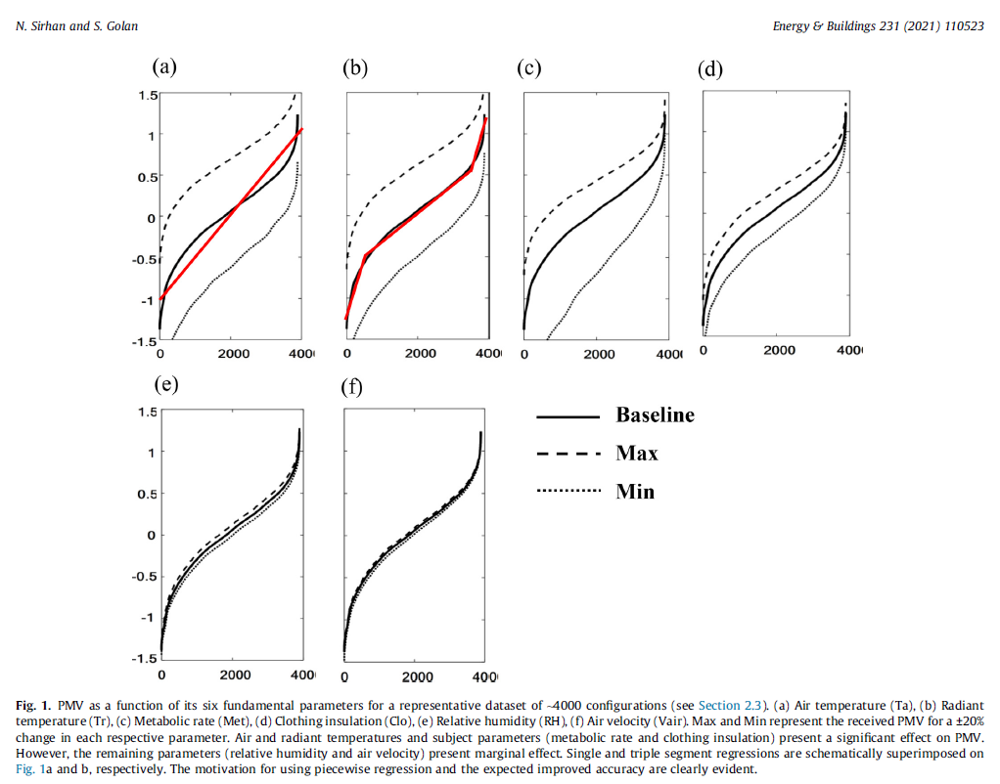

In [203]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAA/4AAAMiCAYAAADXYBiZAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7J0HYBRFF8f/d5eEDlIUpEhvKooioCJgxQLYFSkKFlSwgFKkWrAriqAiFkRA+RQVRQUUFGkCCqiAKNIRpPee5O72m/8kL26OJEBILnfH++mwl929vd3ZN+XNvHnP4xigKIqiKIqiKIqiKEpM4k3dKoqiKIqiKIqiKIoSg6jiryiKoiiKoiiKoigxjCr+iqIoiqIoiqIoihLDqOKvKIqiKIqiKIqiKDGMKv6KoiiKoiiKoiiKEsOo4q8oiqIoiqIoiqIoMYwq/oqiKIqiKIqiKIoSw6jiryiKoiiKoiiKoigxjCr+iqIoiqIoiqIoihLDqOKvKIqiKIqiKIqiKDGMKv6KoiiKoiiKoiiKEsOo4q8oiqIoiqIoiqIoMYwq/oqiKIqiKIqiKIoSw6jiryiKoiiKoiiKoigxjCr+iqIoiqIoiqIoihLDqOKvKIqiKIqiKIqiKDGMKv6KoiiKoiiKoiiKEsOo4q8oiqIoiqIoiqIoMYwq/oqiKIqiKIqiKIoSw6jiryiKoiiKoiiKoigxTGQr/v4tWDhlFpbtC6TucJOIrQunYOz7ozB1XWLqvsjE2bcMP459H6+P+xMHUvflHZJvb2Pcn/tS9ymKoiiKoiiKkiuk02ky74sfpjNkqQtFI4nYOPcrTPhzN5zUPWHDvxkLvpyCP2MmL4+dHFD8E/HPuIdQw1MCFw6cl6bYOlu/R+8GZVHjzo+w7FBWrzaAfX9+il4tGuGSW29H+1svQTXPrXh/2SEElo3Dg81648PfdqWe6yYOCdunofvdk/GvP3VXxLIPf4x6GiPWJyNf6p7/yPz5s8aBf+McvN+/Dc6rcQlubX87br2kBjxFHsY3W7MSaMm3H7ArLi51n6IoiqIoiqIcL6IXlMV5Ldqiffu2aHFeWXiuH43VYdf0MsfZ9wfG9roB511yG+6/9yacV+Rc3D1uDYKpxzMm/bPd3uI8lGjQEUNm/IsjqSLpdZqs+uLpdYasdaGcYh+WfdwVDdL0ibpo0OkjLLEK8gGs+vxRNChxHlrczndZA5c88nl63Y6DExPeQtdL2h1BfzFK/w8D0emdzSh9sh/LM/1Ng/9fzBjYDrXPa4F2LRqg9m1DMX8nj2V1r6lkdj++/Mi3+UO06jkRG7OSxcy+n+n+zO7VsH8mHj/NA49HUhGcO2Qhtb/jy/Ps4uQA/iVvORdREy3eyfn836TUvf84n99xhdN/xvbUvzMh8Tdn8IX1na7fbnSC/Du4y/njo4+cmTv85o9DzrYN251k7j+MoLNvxhNOhVN7Oz/sDqTui1CS5zsvV63l3Pf1v6k7XGT5/JkRdJLXfu7cX+tq57GPf3W2JNtvmt0bnRlDP3eWJKb+nSFRlG+KoiiKoihKVJGiF1znvLVkv/07uGOO8/bw+c5e+1cksM2Z0f8ip3CrD52Vtg+9z1n5w5fO5L93pfTF2c/etcvZl0F3Ov2z7XV+H9zcwTmDnd+z6rZb3DpNFn3xw3SGrHShHCK4zZk3fJAzYv42+/zBDZ87HQrLPex1/v7iTWfY9PX2HoKrRjnXoZ7T84et/MvZv+QTp3fPfk6/Oy5wkKVuEXSSVnzotLlqkDNvt8msLH9zv7Ni1J1O8QtedObYc5c7o66r6lz01mLHn+X3juJ+9v/ivHxBa2f43wdTd7jJ7PtZXTeLezVHKS8Xd/nWOUwbznaeHx85MOMfxP5N/2D9PY9jQJPvMXDM72mmKat+OgXVyxeyZ2XK7vX4c1EcihRMgId/e4rhjDZt0Cj+L4x9ohv6ffY39uxbge+G9ETnYTOxbM5wPHbX4/hk2Q5sWbMC6+pUQtENkzDwkY64/4kv/xsN4ajMuEF45M47cf9jz+Dlx1/H5I1+OGnX+hkbV0/D+493xp2PvI05WzMZq8vuddzfe/B5fLyyDKqdWjTlmJtMnv+i4j57OEOcdfjqyQFYeHt/9Ln1HJwcZ79pvlsGjTvdiNMTzN/+DZg7+nl05e8/PgpzN8pyiKTUfKuG8oXN68+pfFIURVEURVFOcFL0gpWFT0P5k1PsXD3Fz0fHW4vhp6z6lc5uLJvwJnrdf6fZPxjfrtrv6ou6+/+7sW/VFAzr1Qnt73wEz743HMMGvoAnhs3Clo3T8foj3TFswc6US26dgVc6P4Nv/gldEnwAW9duRKk6VVHO9qELocql1+GKGsVS+uL7Z2FAnaboO3kz/3IR+mxexCfEma8nII4WBE88iE6vz8FOqiLOZsz9YDDenrkxxbogVafZa9WULPriLp3B/b3/dKGM8i+QSZ78hJ3WtH4Mnu16tz323NfLcNicvKckzrurKzrUK2mf3xOXgHxIxsEkzj4XRo3rO+O+JuVgbRPMsfzcWjwoePqteO7F3mh9wSlA1dNQppB5noxwtmLmu+NRoUcb1CtqdJysfjNpGSYM+xH177kWDey5BVG8TDxmzVmGLVne61HcT8GqaHj5HixavTt1h5vMvp/FdbO6V1qILPgFxepVRfGUs/8j23l+fGTydo6FJGxaswrF61yL+x9uhZ3PjcC3G5JhShQWJ1VDpVMSUs/LhFJno8XtSRjU7Qm8P39zqqmMH9v/XoNNO+di2E8r8c/KpVj85/d468V+ePWnIMqVL4pC8QexfvkqYOUX+HBKMhpcWgnLBgzGV0v2G+Hagfmv3Yd2U0qg/Utv4ZUWfrz+3kbEFQpil1zrnecw4H/rUPHSesj3ycsYZgrmYWT3Oqnfu+3rwmj70jC82amJqSpqokrZDF5bhs+fNcHl3+PtEafgxivPQFFbQ4XgbMOclzqh44LqeOj1geh08je4ptNHWJbM2ma/zbdT61ZCGU8O5ZOiKIqiKIqiWL1gBTZWr4YKJbzwb5yKwR/9is1Z9ptNv/X5u9Fj4Rno8mpvXLrxdbQZMg0rM+r/H/wFg28bgL8v6o33XmuJvQOex9SEM3Bx3SJY99da7F4+FgN/XJXSnz60EfPemo/1h63pPhWN774LlT98B29/+yvWmeP+bX/ix2++xLhx4zDuu6VIPLc5rj6nZOr5guvZih/EP3M/w7tj8+O551rglBUr8M/m2UZv+Qd21f6BZZj4+GisSva4dJrUYxn0xQ/XGeIy1oUyyr99meVJOeT750t0u3UuavcYjBduK431a7bjYJYW4wHs+HUGvkJDND0z/fM7+5ZjwrujsbDDI7j7QvexvVi3dA2K16uMMpnMWzpbf8Gnk8/B9eefbBXd9KT/zcCKufh0dnVccXbZVEU1gKSDRrc8jMzuNav7SUDBosDO/Umpf2dEZt8/fH/W97oLyxYsh3/B//Dcsy9gyPtTMvHVkJ08zx45oPgfwOY1u9Ggyqk4uXFr9Eid9d+3ZT0W1z4NpQtkpJm68FRA85c+wHuN/kaX+lej4/uLsM+JQ6l69VHT60elOtVQ++wL0fCU/Dj1+j54rltHPDygO1pUOoQ1i7ahWZ9BePWh69HotCIme1OU6+DqCXj2ucLo2eM21D3Z4xpVS0BxudYVXfBin9tx2RmlzXusgDoVDxuLyfZ15Ht9+t+B806Ow451K7C8ajVUNJ8PI8PnTz2WIQHsWv0n5qGKedaCqfvcOEj+63M80TcfHuncAlULl8QZFzZAifG/4I9tRticHTbf6tQsi4I5lE+KoiiKoiiKkqIXrAf2fIFn77oDbdo8iomJBXFKFv3K5OVf4cU3yqPjPRehTHAXNm/xon6tCjgtg/7/Vf6FGDHvDDSuVxbxhYqhVAJQoHxdXHL+2ah36XW4/IKKWLl4Lbaa/vDBf1dh6XXX4tLqBVLvLRX/Fqz4ayviyuzGitm/YMmvn6HH3S9j/Kcv4aZ73sXkPwNo8lJPNDsltN/uera770PnB5/Bwga34qZzjA5U7wLUyR80ektFnGJUH2fLGixaVwU1y5/k0mlSjmXUFz9cZ8ifsS6UQf75//4pkzyphHz7dmKdSVt3BlDmyl4Y+tAFKJ6pakb/YVPwUv9puHJoX7SpIXrGDswd0hmtWjZHy2/PwWvP3Ywa+V0XCWzF6gU7cEatciiWuis9Qez9YzamXNEQpxcM/fHQ30zAlqW/Y5ZbzwnsxpZVO1CpRlmUSNljyOxeDUe8nyOQ2fcP2+/P+l4dL8o0H4B+t1+DKxtXxvbxD6DFYf4Fspnn2eT4FX8rvEgxY4+vgRb3XIOlwz/H1wtXYCdHso7iFzyFz0SrVz/Fgk8uxZK7H8BLs7anZu4BNKxWBglSQEyBOUme+cBGLP+1KOpWKmUeIuAqKA7+nfcjvjyjEepVpBmOa1SN9+IqbIXNn4ENq/DLvoxm45OzeR1fyPcOYcOq5djXqArKZqD3kwyfP1McJO7fhxQjJiEZG2d+gIEDB2LgK5/i25/mYErVBji7SgYWBmn5VgwbcySfFEVRFEVRFMVg+4/rUfX+gRgzcjQ++fQjDLikAryZ9is9WP/zVIzfOwtDOzTDZfeMQeKdo/DBPXUy7P/7Tq6ABoW3YsvORPj/WYr5O9yzpIVQsfYZwE+rsCF5Hb59ZyauergFqse7FaZErPrfY2j2Rgn0Hz8WQwZ0REOsxOq6rXHnNbWAZh3Qt+/9aC5m/27SPdtH+PqHYWgwphse+2IVgm69xfTVkzavw8Lip6Fcqfj0Og2vk2lfPERnyEgXyqBfnlWe+GrfgJf6Onjlglvw6Cd/ZDG5SAX0ezzd9mlsvv89vN7udJd5eQmc//BQjJ06F3Ou/wU3dx6LVW4viLv/xdIlJVCv8snIeML/ENYvW4EzzzwNRVL3pJDRbyZh55ZNgHvC1F6/FC6uXTYl/7K8V0OW97MTaxcj64nMzL5/2P4j3KvnZJx9xSU4v149nNfkFnTrcjP2vTUBczaJffdx5Hk2OX7FP2kb/llYMVUhjMMpl7ZFn+Jj0H/ARJSvfIopgkeJpxhq3HwP7m+2EmN+XgO/zbjS9sV40in5Kfw3kkbxdxeURGxZtxqocgrsMvmQgpL5gEGoVp7d6wTSfw+7se7PNahqKq2T+WdmhD5/6u7D8aLQSSVwKvZh/yExF4nHqdWKYnGPcdjT4HyU3b0WOK8CTrG/78fWtSux+WxzbyV8qflWHpXL+HIonxRFURRFURTFYPWCBDQy/Uv2GD2lzkDDykYbyLRf6WDH5n+BG/tg+MSpmPrxa+h7+/k4lWvvM+j/e05riScHF8b7Pe9FxyH/oPnEl3FH2iyp0UOqno5zVi7DshmT8BE6oHOTUNPyLfj9+znYd+4ZqMY12UaFK96kD7586lxs/3UpLrywJkofpvGnEvpsdnZ9DRZv3oOgW2/hTPDaFVhzRjVUKGZ+I90x0WEy6IuH6gyZ6kLp++VZ5omnNC54dCi+/d+FWHhPP3z4V0aBxQPYt2QUOt40CkWeHIt37zoLhTPKA08RlKtaDvsWb8ZOlxIa2LQaC3ZWQq0K6dX6/ziE7RuSULPcSa53kdlvBnFwn3v9vYMDy37FD8mNcdV5Zcz3j3yvWd7P/jX4/adaqFM5xArERWbfP3z/ke7VjVHyk5NwqHhhFMrHI8eX59nluBV/Z8taLPa5FMKCddGmewvsWFk4dUTEPNiyGZi4YOPhymxgGcYOnJxm8uDs24K1G6qjTcNK8NjMrY6qRZOw89/VqQVECnbqSNqp1VCpDMd+pKCURsKug4hLyG927cchJxFb50/GhBkFUftkL/bsD5j7lcLGax3EP0sXY1+jsiiw74C5qhtPNq8T8vu/T8GE6QE0MpXevt0h60kyff4KOJRZnplXVvS8q3BPrbn47Jv/Ru4CXFqBWjjDVAhlq9RC4Z9X4t8kczB5GSaNmoPLHr4GZ+UzdZYdgayKcvkP4WB8TuSToiiKoiiKoqTqBWtORY2yqQ6t/Zsx/4NR+GHR8kz6lckoXrocsOJfbGG/FaZP+ucybPI7IX3RVPbMx4cv78J193dF736P4vbzy6Y4QEvFV6EmmhSfilcem4wLHrgSp4kD7DSKomKd6sDyFVi7RybQjK7yx5d4Z2IDdLu+Vuqs8uGkfzYqbj9j5uYrcOdFldP0lmrl8mHf6mn45PNZKF7vVOTfeyBVYUzRaXab58q0Lx6iM7i/l14XCumXZ5YndJg4bRaW7S+EKle1xDWlt2P7ntC18onYOPVV3DtwF+78/D10b1IW2PgT3nl7OraGdPidfYvw5ZgZqN7yTJxmBypIALvXrcASlzPHw9mPrWv9OLmYeVZLVr9ZAJXr1EPxpH04kGhuwNmKuV9OhL/jLbikgnMU95rV/Zi8X/E7fmxQH7VTRloyILPvZ7Q/63vdunAaZq3en3Kq/1/M/nYOSt97NeoX9x9nnmef41P8nS2YP3Y8Jh9Yhj/Xpj4Y4lH2qjvR54LyqFKmsDlnHSY83h7Nu47HslB/BvvXY8GrHdDy+s54rGdHtLz8SWx+8CU8fFFJo7AmGTH5Hu988jt2bWIBqWaEXTI6dSRNvCoG92DL6t1Y+c5IjP83DjUuuwHX/nAHqngvQM8fN5s7Wojhg8ZigRH2lMIm1zqE3Vv3AuM+xCcLdphX6qYgambrOodM4WqHDn92Nt+ri3vGr0F83EaMe/MzLDgQ8jYze/5GBzLPM1K0EXp+/jxqf9cBdS9tg66PP4snX/0Ea644B7VKFkCZZp0w+OIp6NOlB7q3fQRfNXgFb91R29x/EHu2bcK2nZ9i0MilOLXp9TmQT4qiKIqiKMoJj+gFWIkvnumM9oxPfkVjNJtRCJWxKZN+5X6Uv+oePJHvVdx05c249dLb8NziJBQ2Sk76vigxyvHfS7CuQhK+73opap6cHx5PXdz2+s8pnvRJsXKodcYB7G/SEXecm9EK72I49/4XMersr3HNpTfj4f590PW2K3Bxr9W48ZOncMNpopyGEPpst1+HSzv9hks/G4ouDUvAU/hk1Kj+JXpd0gTt/rcVp1Q6CTuHv42Rpt+c7NJpDphedLq++GVtM9cZMtWF3Pm3ERszy5Od8zH83ttxX/cBeLb785jZ9nHcdV76CGOBhW+j+WU98b8PuqJpWX7Xi/iyD+GvSjVRKnEFvnniJtQ4rwVuv/USVC/SEqPLPoUvnr4CJ9vxFAeHVk/F+2OmYifWYfGK7ZlMDhbCyRUDWLFxj/0ry9/0+FCi6T0Y2nwGurW5G/fecj0e2HwPPhtwBUouyup7vPIR7sfZgZ/HfY/qN1+AChnNrmf6/cz2Z36vp2AHfv2gJ66+qxueebk/7m/WGu8W7YHx/S5Gsaye44h5fnx4GNMv9XMuEcC+dcuxoUBl1CglBTcE/3as2ZQPFcsXdplFJGH3Lj+KnlQwxFQiY5z9u7EnX1EUSx3Z4+z5ZpREmcJe+HfvQWLRYiiU0YX8e7ArsRBOKpTxMEq2r5P29xG+Rw57/qPIM8G/DctXA5Wrl0o34kkh9W/fgt3FTkHJdKOd6fM1p/JJURRFURRFUY6Kw/qVidi+cT+KnVoipD8rJGPjN4+h6ZCa+HLCvTid6/ad3Vj4xt2oO/ZyLJl2P043l3L2zMHzzUej6kevolVmSnwaidi2ZjvyVyybsZn1seJ+pnTPF6rThPydqc6QhS5kv5OAgz/2OUKeGJ1i/b84VKYCSh1m/XC0HG8++bFx3EO48Pc2+GNA46NeBv6fjpITuofJh4Vvo90TcXj24444Iwcc5bnJ+F6NLrZtJf48WAZ1Krh13KMhh2UzlTAo/oqiKIqiKIqiKNklEf988iDqvlIUgwe2wulGoXb2r8LkYV8i6f6+aL5wGMYUvAwXrf0MP9QdgCE3Vs5kACGWyCpPXsETTULXmecdzs7peLL52yj11lA8eLZ7rX844JLmUXisz1I0H/Y0bqriWjpygqGKv6IoiqIoiqIokY2zB6tnfYfvfl6LffCh8Km1cE7jxmhwmgerv/sY4xb7cdrF1+LG8049AZT+VDLNk2OdYc5tAti3bCZm7K2NZvVKh/n9HMDqqT9ic+3Lcf6pR7CkjnFU8VcURVEURVEURVGUGOa4vforiqIoiqIoiqIoihK5qOKvKIqiKIqiKIqiKDGMKv6KoiiKoiiKoiiKEsOo4q8oiqIoiqIoiqIoMYwq/oqiKIqiKIqiKIoSw6jiryiKoiiKoiiKoigxjCr+iqIoiqIoiqIoihLDqOKvKIqiKIqiKIqiKDGMKv6KoiiKoiiKoiiKEsOo4q8oiqIoiqIoiqIoMYwq/oqiKIqiKIqiKIoSw6jiryiKoiiKoiiKoigxjCr+iqIoiqIoiqIoihLDqOKvKIqiKIqiKIqiKDGMKv6KoiiKoiiKoiiKEsOo4q8oiqIoiqIoiqIoMYwq/oqiKIqiKIqiKIoSw6jiryiKoiiKoiiKoigxjCr+iqIoiqIoiqIoihLDqOKvKIqiKIqiKIqiKDGMKv6KoiiKoiiKoiiKEsOo4q8oiqIoiqIoiqIoMYwq/oqiKIqiKIqiKIoSw6jiryiKoiiKoiiKoigxjCr+SlhxHCddCgQCGDJkCKZPn27/zgr5zu7du/HII4/gm2++QTAYTNuvKNEK5dcty/KZW/dnbt1kdI58Dj1XUXILt/yJ7B2NHMp57nMlcZ+iRBIip5nJbGhynxd6vqIoSl6gir+SJ7Dh27x5M6666iqce+65aNy4ceqRrOH3ihQpgldffRVz5szB888/r42oEvVQhletWoWePXti27ZtWLNmjZXtM888E+vWrbPneDwem0L59NNP8dNPP9nPvA7P0TKhhBORN8reli1b0K9fPyxduvSIcijy/Msvv+CZZ57BoUOH7N8ix4oSSYhMcuv1/td9Dq133fIr+2UrSVEUJS9QxV8JK2z8OPLt9/vx6KOP4vTTT8dFF11kjx1tYygNKDuXU6ZMwV9//ZV6RFGikxUrVtjycOONNyIuLg4zZszA22+/jeXLl1urGCGjMnLxxRdj4MCBGDFiRFpnVDqdihIOKHeUzU2bNuGBBx5A/fr1UatWrdSjR6ZevXooWrQoXnjhhdQ9ihKZSB38999/pw1UEe4PVfJ37NhhB2aTkpLs30uWLLHHtH5WFCWvUMVfCTvsJNK8f+rUqWkz9twnjWVGJnQZkT9/frRu3doqS8nJyUc8X1EiBbecUt7vv/9+vP/++zj//PNx0kknoUOHDrjiiivSyoIb7iOy/5RTTsHYsWPxxhtv4MUXX0x3bUUJF6y/H374YTz55JO47rrr7N/uWVHilkv5zPPi4+Ptd3fu3GnbBpFxRclLREalTpW/+/bta+vbhIQEu0/6L4RbWiNec801qFChAtq3b499+/bZ/Z999hnuuusuO/Eh11JZVxQlnKjir4QVNnKc3Xzqqadw++23o0CBAukaTCINInE3jvzMc2RLuFRg9erVeO655+zfclxRIhmRX8p1t27d0KhRI5QsWdLKriTO/BM5l4jsu2Vczv3kk0+s4v/xxx+n+46ihANaqHAw9owzzrDy55ZBqb+Z+JmJiDwTbh977DE88cQT+Prrr9POUZS8xC2r27dvR/Pmza01CweofD5f2uAWj8u2du3aePPNN+1x2U8o2+yz0MqRSx15ba2rFUUJJ6r4K2GFjRwbv4MHD+KWW25J3fsfbCTnzZtnzZ6pzPfu3Rtt2rTBK6+8Yr/D49JQ8jNH1OvUqWNH37lGWhtSJRqgnFJ+//e//2HYsGG47bbb7H7KrsgvZ5P42d1xJPzb3Rkl7HxWqVIFXbp0sQMJHAxTlNyEsieJPib69OmDtm3bph5Nj8ixW76JyK9QtmxZu1TgoYcewp9//pm6V1HyBpFXyimV/latWqFFixZ20iJUdkWuuaXVVvny5VGoUKF01+CW/R7KOC1c3DP/iqIo4UAVfyWsrF27FuPGjUPx4sVx1llnpe79D66bu/rqq1GwYEHbkaTZKD9zJoizQEQaShlp5+g519J99NFHaQ2sokQylNO9e/eie/fuqFatWobroSnHIsuMZMEZps6dO2P06NF2aQuRTqUkmpWyg8oBBUXJTShvhDLao0cPOxgl/lpC4TmzZ8+2flnuu+8+W6/TgWXoUgByxx13WF8BPFdR8hrKLmX9nXfewf79+9GpU6e0/aGE7qN8s1zIQC3htdq1a2edto4ZMybDMqAoipJbaI2j5DpsDCWx80dHN6eddhry5cuXesZ/fPXVV1bJqVixov2bpqNsJNlY0ks04WcmNqbc0qyOTJ482W4VJdJhWeB6T3pAp2MzmoSKXLvh37R0qVu3rg1h+e677+LOO+/EpZdeasuRnEPYgaxUqZItOywLoddSlJxC6nPy22+/Wa/8NPHnDCfhMTqllPOoLFFuaSZNK67vvvvOOnalpYCcI6lGjRp25n/SpEl2oNh9TFHCicgc+xp0nkrfK+76lscp5zwu57JO5wCBW2ZlSQC/K+myyy6zUVy4/p/nyTXkO4qiKLmBKv5KriMNHWEnkZ9PPvlk28DJfoGO+jgjdPnll9u/ExMTsXLlSvuZs5zu0XH5bqlSpeyW3v1pOhd6TUWJNCijEydOtGXgnHPOSd17ODzvwQcfxIABA+wMERV/Dob9/PPP1qw/IzgQ9scff6TzOK0ouQHld/z48VZpcVutcD+VHe4fOXKkVfQ56HvBBRfYwSnO6nPgiib9ouhQ1iXVrFnTKlT8nhxTlLzixx9/tMunmjRpYv8WmSXSJ3nttdfsYBatuOizhVYwhLLrPl/gQNnWrVutBRdRGVcUJRyo4q/kOmz0pOHjaDg7gzTfz4iqVatapzhcH/f5559br/0caef3M2tAixUrZrc0nd6zZ482oEpUsGjRIiurlPVQRIap/NAnBteUnnrqqXbGiWtD2dmkJ39ax7hh+eB59I7O2VJFyQ2kLuZWBnMpd4L7OJed0GpLnFeSSy65xNb1DPvHc9gmMBGewxl/bufOnWu3ci1FCScix7REpCPiypUrp+0nPEbYZ2E9zeWJHOjiYNjvv/+Obdu2ZSq7cq0JEybYrVxLURQlN1HFXwkrnLWXjp40qqFMnz4d9957r3XuxFHzl156Ke1cOd/9PRlx5z4J66cokQwVc3p1pqzSEVQoIsOUe1n2ws9MvXr1skoUlf4FCxbYY25Kly5tz1u+fHnqHkXJWUQ+uaVTVcobrbgIPwscjGVoMyr4ROpqWgfQiSv9VhD3dwhlmCxbtswe4+/IbypKuBCZ49IpyjeVfzeUTSruXL5Ch8QcoOU+1tlvvfWWDVMp8uuG+8qUKWO3s2bNsgME/KwoipLbqOKvhBUqOez8ZWaGTNNOes298MIL8fjjj6Nhw4Y2VBkbRUnuRpR/y1pnNsqFCxe2nxUlkuG6fS5LIaIMCZl1AGU/LVwYyYLlIHTGn3ApAI9x7aii5AZSF9MiRaKt0LSfuOvn9evX48CBA2l1uPtYkSJFbOQKwS339P/CvzlwoCh5BWWQzlLpiJJ9F/7tTpzA6N+/v+2DiC8iSXTaWrRo0dQrpYflgMdYLmilyMEzgd9VFEXJLVTxV8IGGzQqLGws2ZgSd0eQ0FyOgwJXXnml7VRSKeL3eJ6c624YuY/X4j6OsotzKUWJZEThodyKifPRIGVBlCwq+RnB80JnpxQlp5C6mHIoYScl0oQbkVf6nOBnN/I3j8t5Aj8zUYZ5TJKihBPKIAdXOUgrda4b9j0WLlxo5VSsVATKa0bfEaj0i0WALAkg7nKgKIqS06jir4QFNm5s0DiTzwaPjso4Sh4627lhwwa7pSm0fIej4dyKGX9o7FuJ30/HUe79ihKpcPZInFJmNGt/JBi+krOiHEhzwzLDYywHXCetKLkJ5Y0my5Q3yl0op5xyipXTDz/8MJ2VlwzofvLJJ/jnn3/s9/m3wFlQ7itXrtxhxxQlnIjsZTRAy34K5ZOJExWhcH9GuOWZ54hFDFFZVxQlN1HFX8l12JBJA8i1nZyZ50j5xo0b0xpNwoaV3pwJ18dxcOD111/He++9Z6/B89mB5H7+LQ0kY//z89VXX33YQIKiRCLs6DFsGWWfMcu5pfy7ywO3bjmXYzR/pswzZnpGjgF5Pc5AifMoRclpKJMijww1ScRnBZNQokQJG7p1yZIl1umZHGfigBfjmMtaZ4HHKMPcd9ZZZ6XtU5S8QEzy3RYtIsPsbzBxUEtm7SW5kb/d+zlQIIMJXL7lLgOKoii5hWpJSlhgo8bE2Z+nn37aNniM0yyNJP/m8WHDhtlQfl9++aV1lEPFhvHOGev8119/tR1JKjTyPa4vnTp1Kpo2bYprr702XcOqKJGMrAllmDPCzyK/3LJDyS29pst+djDp1b969epWkcoIRgtgiEA6AFSU3EDkkTLbpk0ba9JML+ayj8eZ+JnhKEnnzp1x/fXX20HdZ5991sro3XffbdsEOV+gDHN/q1at0va7jytKuKBlFickOLvPfooo64SRLGi9RSX+/fffT+vHuBG5le+JrHMAl+GKObDAQWD3cUVRlFzDVDKKEjZM42ZT69atnWrVqjlJSUmOaTRtkmOZJTlHtn6/3/nuu++cggULOmvWrEl3DUWJZCirycnJTtWqVZ0KFSpYWRbZ5TGmtWvXOnXq1HFMR9Ixir7Tp08fxyhLTq9evTKV9dWrVzvx8fHOq6++quVAyTVETkUGr7rqKit327ZtS7dfZPmpp55y4uLiHK/Xa+W5SJEizoIFC+w5lH0i3/vrr7/see3atUvbx62ihBuR4759+zr58uVztm7dmiaPcuzpp5+28sr02muvpR2bPHmyLROU93Xr1tl9lHU5PmfOHMfn8znXX3996q/9VwYURVFyC53xV/IEmvDTMdnAgQMzHOHmPnfKCM6I0vT/7bfftuakHGnP7FxFiSQoq5Tf5557zno+p/MzQvnlMaYKFSrYWVSGtezXrx8qVapkY6JztlRknVs3tI6hs7VbbrkldY+i5Dyhckc55qw/4+6LbBJ+ZqL8rlixAh988IFNDNN39tln23NYDoyyk3bNTz/91EZnYVQX2ee+pqKEC5G7tm3bWhnlkpVQOWTIYVonEob0u+aaa3Ddddfh448/thaK5NVXX7X1PK8nMs3lWrzmnXfeaf/OqD5XFEXJaTymstHWVAkbbnGjN1w2qF988YUNfeNuFDOC35XGkVuaQL/22mtpJs/sQCpKNCDlgKae9E3BEJZdu3ZNKwNZlQM37vLEZQAMf8mlMq+88ordd7TXUZTjgXL4wAMPWOVfYvOLbGZVL4vCz3O5pcNXLgG48cYb7ZIwlV8lL6FcihxzueENN9xgB7HcMktotj9o0CB8/fXX2L9/P1q3bo0uXbrgsssus/LMfk6TJk3Sfa9Xr152SSP7MQULFrTXURRFyW1U8VfCCsVNGj5ut27dig4dOuDzzz+3FgBZdRLdojp58mT06dMH06ZNsyH8VOlXogm3LNPJ2aWXXmrX+nNdM5EO5ZGg4kR4/gsvvGDLxffff59WHo72OopyPFCeA4GAjazyzTff2HXR7jo5KzmU9oCyTIsVrpUW/y9aryt5icgmt/Q/9NJLL2Hp0qVp4VjdxwWRdfc+4t7Pzw0aNLDhi5s3b552TFEUJbfRVlUJO9JQcstwT/Ta/9NPP6UezRp+h2Gj6OGfZqUat1+JVqjoMNGj8zPPPGNnOcWb+dEiihGXzHBJwPjx4+2+0E6nouQ2lDs67uMyE5r1kyPJIY+zDHC7fPlyO2M6btw4e0yVISUSEBmmM1Y68uMAqyAyyq0kt8zzb8q37Gfi55kzZ9pQlVT63ecriqLkNjrjr4QdETlpBN2E/u2G52f0HSGr7ypKJOGudkWmOeNPb+bsYBYpUiT1aNbwuz///DPWrl2Lli1b2jB+cm2dLVXChSg3hGuXp0yZYgeyypYta/dlVjeLrK5evRrffvut9frP8H4yeKV1upKXiHwK//zzj/WxwshCjFbBiYejlVG5Fge2aNHy2GOP2egsROVcUZRwoYq/oihKhCDV8bF0BKl0EVX0lUhAZJhbkePM5FnOoQyrsq9EOlzOQvmkU+F58+ZZ038uURSyknMmWnZRzrt163ZU31MURclpVPFXFEWJANxV8dF2BEOrb+1AKnkNZZJyKLJ5JJl0WwsQlWElUnGb7ctgFTmaQSsep/NK8Q+gcq4oSl6gir+iKEoec6ROY1bId4/nGoqSk7i7FUdShojKrxINuOtat+zKIEBm8ivnywCBoHKvKEq4UdtQRVGUPCa0M3msZPd7ipJbUKaPRqFR5UeJFkRW5bPIrPtzRshx93cVRVHyAp3xVxRFURRFURRFUZQYRmf8FUVRFEVRFEVRFCWGUcVfURRFURRFURRFUWIYVfwVRVEURVEURVEUJYZRxV9RFEVRFEVRFEVRYhhV/BVFURRFURRFURQlhlGv/kq2cILBlPA0CJrksyNIjicIBL3weM3WNaZECXM8jhE2bo3Qmf+40255HAHGt4EnaK7H4xrq5jDcxVTzJwXmiYRIkq0Q6Xkk9yyfiftZlJR8kfxw54k7v050JC/cchNJ+aLvKmMkX9wwjzS//sOdFyLfjJcveZNXeST3xXuR+3Lfo6IcDSIv3IpM8W+v1/ShVY6UXEQVfyVbBJ2AUf6Nwu9Nwr69BxCfvygS4kyjjDhz1G+Uf25T4CABvEa5D8ZZJd/j8Zm9QXMNL/+Cj4MCbNBTKzy3SGoFmILkCbdsGE50QmUktBqLdLnh/brvUe6fnUmfj+VDkTwJzSt535H+jsOFKEOSX3ldP8h9CPqeMobvjfB9aZ5lTGi+uMmLPOL9JCYmYsaMGdi1axfi4uJsSkhIsPej7+1w9u3bh0KFCtnPmj8piFxzm5SUZOuC5ORkFClSBI0aNbJbRcktVPFXsgWlJugYpX/PZlza+Grc12sA7ml9PWt2eG3d/l8F7wQSMX7sKPR+6jXTyaFVgOnsxHmRGHBwx32d0bPLg4g3FV/A9Fd9ru8RbSj+Q4qq5sl/eUGYH+6/+TnaBkfk/rnl8+g7PjxPBM2b/5C8ESWSRIrsyz3p+zoceW/cuhV/ySv5+0THnU/cymcieRVO+Ns7duxA3759cdFFF6F69ep2P5X/vLifaOCjjz5Cu3bt7GcZpFRSoDz5/X673bBhA6ZMmYLevXvjtNNOSz1DUXIeVfyVbPHDN59h3sLF+Gri11jw8yK88P5YPNT2Onh9pnF20isu/sR9ePPlJ/Hi2+PR9eH7EOfzIhgwlZ03Dued3wiNL2yAbZs24/upU+1+fjc+Ph758uXTRsLAIsrEkWGZYVBS8oUdiQMHDti/A4EA6tati7POOitqFH95t88++yzy58+fulchzBcp/9u2bUOBAgXSZo7cx050mBecLeKW9OvXz27zCt4H02uvvYbdu3dH3SBcOJB3xbzhjCjbOrZ5OljyH8wj5g/zhFvOqt9///0oVqxY2rFww9+l4v/000/jnnvuwRlnnKHv6ggMHDgQ3bp1y7N3FolI+XezcuVKvP/++7jvvvtQsWLF1L2KkvOo4q9ki5FDX8KCv9ajSNE4DH1zOJ56YxQeaN0CHlOvezhv72oLkw/sRd+H78LkxVvw3psDkUSTJtN4V6pYGYVNZ950EzF7zmy8MeQNtLu9ne0ESUOv4pkCR4U//PBDXHLJJSdso8AOFuVBOloiG4cOHbL7lixZYgdFOnfuHPEdDLdc892+8MILtlMrz6ikwLzgu+SsEQd06tSpc0LnDwe3Dh48aAdB3EtC1q5diwEDBtjPX331ld3mFXw/VNbatGmDl19+2dbnyuGIbHPQr0OHDihXrpzOiGYC82To0KFW2WY+yb5ww3e2c+dO+87uvvtunH766Wn7ib67w/nuu+/QrFmz1L80jzKC8rN69eo0xb9ChQqpRxQl51HFX8kWTjCAgNHyd21ZhrPPbozeL7+DTm2vTTHzN/vdVfu+vbtx1y034Nu5C1GxdEnsTUo2ncHCuPSKy9CtRw9ULl8Ws2bOwLhx4/Dcc8+hYMGC9nvaQKTAIsp1hZxluO2226zycyLCTjEVnGnTpuGaa67BKaecYveLnMyZMwd//PGH7ZBFw8wC3yvvnYr/oEGD0L1799QjisD8YT598MEHpp45G+ecc07qkROTP//8E8OGDcONN96Ipk2bpsn5qlWr8Mgjj9jP48ePt9u8RBR/vjdV/LPmqaeeSqfQKv8h5Z9bDo7SZLx8+fJp+8INf5cz/pzF5jurWrVq6hElM1gXEHlfefHeIh3K1T///GMnd9q3b29lXFFyC7W7UbKFY5R7Ck8gOdHU5Cn7MsPnJJt//Lj+ptvw/czZmDt3Lu5p3xKj3n0Ld93bBcmBIOJ8PuTLn982CtowHA5n98477zyUKFEidc+JyZdffomuXbti06ZNqXtSGk0hmpZBiJxTeRPnUETKwImeiMyANm/eHDVr1rT7SOi5sZzkeSnntGp58803sXjx4rR9hPJDBTtSlGzeG8si6y15Dk3/JYGfr7vuOhQvXjzdMfl8Iic3lHPKE+tKd32fF8jv5/V9RAsZvU8lc1SulNxGFX8lWzA0nwcpa++cI4hRQqES+Hjcd3j/3UEoVfIknHxKabS95VZcdG4t/DJnFnbvPWgadR/i4lNM+90Nq6aUvGCnp2XLlihbtmyG55wIiSbOnM08+eST05wqCTxOJYPrZKMNliF2jPgMRLZKSqeRyj/fuVgCnYgwD7iOnxYtlI/KlSunHkmRF8qQpEiB5dG2D+b+NKVPAj/TkkVkW465zz1RkxvWA6L45zVyD6rMHh3yLkPfqfIflCWRJ5UrJbdRxV/JNg5Vf4eVFM3u+K/poJq/WcEHHIbv498BbFq7DC++8BxmzF0CnzcIrzkxEHSQHEyGLy4BXp8RQ/OduJAGVSpDTSmJHZ+M9sdqCu0ocA0cTf25rpId5Yy+E6247z+anyMnkTxhR1s+SzqRYDngM3N9Px1A8XPp0qVTj0amvLjviZ81ZZ5EvjWv/ssDQrmXNkC2oefmBaHtkpI1It9uOVcUJe9QxV/JJkGr6NOZn+OYz0E/P5iK3ez0O1j863zMmDkDew/6kb9APD4c9gaeGPAUduz1Y+/e7Rg5Zgx++m0VrrvuBhQtVICtg+nYmmsoSiruTgI7WxMnTsSWLVvQsGFD7XwpJwwsB5R3+oL466+/rFULl/xoGVBiDZF1+ez+W1EURTl+VPFXsofRydgcx8fnx4UXNkL5U0unxu/nLH8ivv5mHD788BPs3n0IRUtXwv8mfoeapxRBk8b1cVGjxpgx9y+8NOh1DBk4APFejuwbYfT956VaUdysX78eX3/9tQ15d/XVV6fuVZTYRxQfOvZbtmyZDVlZtGjRdANjihILUNaZ9uzZg+XLl2Pv3r1pcq7yriiKcvyo4q9kE58RHg+Kl6yAsWM/Q/PLGxvF32P9/PniC6Bv/+fw9rA3UK5MEavYn3V2fbw9YgQWLliIX3/9AxMmfokHO9+NkkWL/Deqn9rBVRTi7ujRtPn111+3kR/OPPPM1L2KEvuwHDAxZvj3339vQ+SVLFkybUBAUWIJmoRzkJcDvD/++GOanKu8K7ECZTk0ER3cUsKBKv5KtmD9REUfngT44uIQz/qKYfxsJ5WNtw8enwc+rgVAHE+Gzxdnz41L8CLeaz5T/Mw5/I6u/1IyIkWePNZbOWc6mzRpYk2dVVaUEwUpA4ULF7bLXBo1amTrS0WJNSjnVII4488QlZzxV5RYROp1RQk32ntQFCUqYIdQGkoZIVeUEwWRfVH6tdOoxCqhsq4osQTlW2b63fW49muUcKC1qqIoUUNoQ6koJwLuDqF81k6iEmuITNORJdFBLiUWSUxMxKuvvorGjRvb5VtalyvhRBV/RVEiAjZ+bqWGifHL6cmfn6Xz5/6sKLGOu0wQkX0tA0qscvDgQSvfXOJFRPYVJRagPP/xxx/46aefsHXr1rR9ihIOVPFXFCUiYEcvVJmhJ/OHHnoIkydPtnHMVdlRTjS4znns2LH46quvkJycnFZOtCwosUrBggVRo0YNlCpVSuVciTmo5LMuJ4xUpCjhRBV/RVEiAjaGMuotnT3G7h8/fjxmzZpl/1aUEw2Gsrzzzjvx4osvpplAK0os06FDB0ydOhX169fXmVAl5qAlS5cuXTBixAjUq1dPB7eUsKKKv6IoEYG78aOJ/+7du/HFF1+gbNmyaN++PXw+nz2mjaRyIrF582YcOnTIhrGUMqAosQrr90KFCqFMmTJISEjQ+l6JOSjTVPjZrylfvnyajKusK+FAFX9FUSICmdmh0s8GcNq0adbUv127dqhSpYo9piixjli+sBxwu2zZMrv/9NNPV8VfiWncig8/q0KkxCKUZwlh7XZgqdYtSjhQxV9RlIiCCs+UKVPQrVs31KxZE506ddIGUTmhoLyzI7hmzRq89dZbaNKkCa677jpV/JWYhnLvrusz+6woiqJkD1X8FUWJGNi5o+K/b98+VK1a1So9NPnUeM7KiQSVfjqznDdvnlX+e/fujUqVKqnyo8Q8MvMpss6/3VtFURQl+2hvWlGUPCO0g8fEdZ3XX389vvnmG5x77rlp+0Nxf1dRYg3O7rdo0QLz58/HRRddZPexHIjMu7daDpRYgbK8ePFi/Pbbb9a3hcq2EmtQphmmmI5bk5KStA5Xwooq/oqi5Bmi0LsbPm5lACAjhV/gMVGEtNFUYgWRayaGNaN/C275tyDyLueFflaUaIUWXy+99BJ69eqFbdu2pe1TlFjh4MGDGDhwILp3757mw0X7MEq4UMVfUZQ8Q5T80EYvo32h8LicowqPEquIbGdUHqQMcCkMlSNVkJRoZ8+ePXZ5S3x8vB38FfnOSP4VJRpJTEzE2LFj8emnn+L999+3y7q0D6OEC1X8FUXJM0TB55Ymb6K4yL7MYEOZnJxsG1B+1k6hEsu4ywLLyYwZM2yccypJhOWG52RVZhQlGjhw4ID18cJ6fePGjXbfkdoDRYkm2G9huGLW26tWrbJb6cOonCu5jSr+iqKEFbeSLg0eG79WrVph9OjRdl3nkfj5559Rp04d1KhRw5rMaWOpRDMsAywLTKtXr7aKPZV6t8LDLf/etG0D7ut4H1q3boWly5aCQ2UOj5nmnElRopldu3ZZ2Z81axaeeeYZWyYUJZbYv3+/nbgg7vqduPtHipIbaC9BUZSwIY0at6LUsJPHDt7333+P7du3pzsnM7hGjrNBmzZtsrNDihKtiJyzLHCWc9SoUejYsaMd3OLfbjxeDxKT4rD/0H4cOpiMuKApQ+brPMuHJJsUJZrhwC8VI9bxrNtV8VdiDTr2k/6PKPyKEi5U8VcUJWy4Gzl+9vv9eOqpp/Dhhx/i9ttvx8MPP4z8+fOnNYqZIeH9eI6cryjRCGVYlBvO9g8bNszOehYqVOiwMJYeJwkJyUlW2S/l9cPJ74VjlP84c42A2cmkKNEM5b5YsWK2Tuc6f5aBrNoCRYk2WL9TviWpfCvhRBV/RVHyBK5VHjp0KEaMGIFatWpZD7dxcXFpjeCRlHkqS26lSVGiEco5lRsOgrEscO1nz549Ub9+/cM6hEHEI9FDk/4gXtl/AHXPvxieSy6Gd+JX8AaL2KQo0QrLQrVq1Wx7QDioq/W7EmvUrl3b1vlMpUqVSt2rKOFBFX9FUcKGKPPcLlq0CG+++aY1Z+7atasNW0ZFhymjWR73QID7OvIdRYlGKLuUY5o1T5w40fquuPHGG20c/1C4kj8OAcQHvTjfJCcpEZ5ZPyGYaJQj76GUpChRCssCB39F9unVn5/ddb+iRDv58uWzss5BLXeoVm7ls6LkFqr4K4oSdti4lSxZEk8//TTGjRuH9u3bH3Xnjudx/ac4x9GOoRLNiOyOHDkSGzZssEtfKlasaMtIqFwHPD4r93UQRGnzt88cD5QpBVx1pT1Xy4ESzYjSI3JcvHhxu1WUWMJdV3MQQND6WwkHqvgrihI2pMFjqlSpEm6++WZcfvnlaWZvWeHuFHKZAE2jqfS7G05FiVYuvfRSfPTRR7Y8ZDbrw72Jhw6gvj8AvzeIAP34X3cTUKCA+ZTyn6LECuq/RYlFZNKCaP9FCTeq+CuKkqu4lX1RaGQ2k4o7P8vfWSHHeS6Vfln7SXNQua6iRANSHkSmOeh15pln4oorrrCmzkKoXHOGP9ETwLlmvzfoQRyHAlpcDU+QQwA+mxQlmnDX+1SIGMdf9rmPKUq04q7rueXEhfgoCu2/qMwruY0q/oqi5DqipLNRYyMnW4Gf3X9nBb9LxZ/wO2rqr8QCbr8WUh4OLxMeHDqUhLOTEm3jnVy4CHB+Q7v23+t4bVKUaMFdb7ONmDlzpg3tyjCtJOMyoCjRB+WY8s7BrT///DPtb9kqSrjQXoKiKLkOO3U//fQTHnroIbuOOTudOfd3RPEnNAfNzvUUJS/JTmePw2fe3btQevceBB0PfA3qI1jiFFDfd+C3SVGiBXe9zc9ffvklXnjhBcyfPz91b/bKiaJEEpRhkeONGzdiwIAB1k8Rcc/4az9GCQeq+CuKkqusWLEC7dq1w1VXXYUZM2bg119/zXZnTr4nFgRsKOkVVzuHSjRBeWXovgkTJtgZoKOWX08Q1ecvhMehmWgQTuu2ZhuA+Z8mAylJUaIEkXtulyxZgkmTJqFcuXI2EbfHc0WJVtwyvHr1aixbtixN9k8++WSVcSWsaC9BUZQchQ0aFXOmbdu2oWPHjvj+++/x5JNPYtq0aWjevPkRHfllhLuTeOhQStgymvkXKlTI7DP7YRQhsy/oBExyEDDbgLkHoyMpSp5CmZW0d+9evPjiizZW//Tp0+3xrDp+TtBIthFiv5Fnx++gxORJ8Hq8OJgvHw5d3cJ814cgl7tYWVdhV6IPlou5c+di8+bNqFy5MipUqGDLRPny5VUpUmIKToQwdCvlmik+Pj71iKKEB1X8FUXJUdiYsSPHxu2NN96wHTrO+D/66KMoUaJEWkcuux06XnvXrl1pn9lwOl4qPQ6S4+Lh4yCA0X88rN6MIsT1z4oSCXCJCmP1Dxw4EOeeey66dOlyxI6fw2IS9Bpp9sG3ZRt8v/5uB7dWlyiOQ8XywWPkniIel5oUJZpgHU6HfrNnz0ZiYiJq165t9zHJjD8/Z7e9UJRIgTLM9f1EZNy9VJF/K0puo4q/oig5inTS1q1bZ2f6b7jhBhuvXxq37Hbg5HuBQABbtmyxf9MDOmeHEPCi/ObNuPyDkUj2ehEATaHNyT6vUZy0MVXyHpaL33//3a7v5Kw/4/WXLVs29WjmmO6hVf4ZvM8/ZwYCBw9QurG0YiXk88WD4s3jiXEemxQlmpC24t9//0XVqlXRpk0b7N692+4/6aSTbLmhhZgqRUq0In0XyvDixYvtZ+7j+n7bf1GUMKKKv6IoOQ4bNc7cDB06FIMHD0bhwoXTOm7Z7cC5v0dTf/7NDmGRIkXg9Sei9MCXUXbKZPiuuBy+NeuRFAgYpYjz/aoMKXkLZZVOLR977DHr3KlHjx4455xz0jqEWUGp99KE30mE57MJ8FGmzffmVyiPeLPbb1pxn99BfCAlKUq0QPln2ahUqRJeffVVjB49GqeeeqoNd0ZKlSqVdo6iRDuU4/POOy8tdj/9u+zZs8d+Fo6mTVCU40EVfyXXoQm24wRTkzbgsQjfqySBSnmdOnVwyimn2M9MbNSOt2Gj74AtW7YhztRe8fH5kT8pGYFOnYCf5phW08hYIpWkQ4izcc15P9qQKnkLZZ4KDaNacPlLr169rImnHMsKj7VeCQC7EoEfJtl6dLWpU7cXL2UKmcdG7g+askBJ19pViSbYXlD+WRZOP/10u/yFZv8c2KX/FjGDPt42IyeRNs7d3nErDmcVJRS3M+JHHnkEdevWtZ+59JGTIm5EphQlt1DFX8l9vKbTylkqO1OVuk+JGUIbKndHLSc7bPI7NPX/Z+0qow7FoXDxk3DSE30R/GCkrcwOVKiC4Gej4K1Uw6r7XvMVbUaVSICKTMuWLXHbbbcd1tnLCpryB71x8P44FZ5tW6yZ/2yTqlSpkm4wzV3uFCXaENmlbxguheEyGDpupdIUScqQ3CetEjhA4bY+U5SMENmgnNBC0e/328+lS5e2f1OGKE86eKSEA62plFzHsdNRyUhKTkSy/z8FTokd6I25c+fO2L9/f7rGKyfftSg5VPz37t5trh3Ao/+sB/73CeJ9HhzyJmBqn+7wnHIa/D4qS0EEvEYZAmOdKUrewnJB5T9UOT9yGfFay5Wkzz9F0HzX6/VhgalSi/riVdlQYgYpBywnrOMLFCiQVueTSOg38F54H5s2bcJ7771nlyd88skndl8k3J8SuVA+KM807adVC/+mh//XX3/dytHw4cOxdu1ardOVXEclTMlx0hpB/m+SB37M/Wl6Shz3OQvSzhHcn1npyd/u/UpkIe+GHbSZM2daB35ffvmlTUJOvz+G52OYvmTzm//u3IFHHA/uOrDfdMZ8NszZX3fcgoMF8sMb9MNHewBznBVcNFRyBw8etKEPt2/fbme8mHeSlOiA74pKCxM/01nZ+vXr7TpO4u7QuZX/0IGAUKwEHDqAuGkzjWx7bBn4Lejg1KoVsXPnTis33EaKvMh9MHFmi88veRIJ96fkPSIH9HvBckKkHFCWWR+yvNDLP2WI7YxbfvJKjvi7vM+SJUvixhtvRNu2bXHFFVfYez1SOVZOLDKSV9aDMrtPeTnttNNw0003WTm69tprUa5cOXuOouQmqvgrOQ5N+o2aZhrvPfhl9jQMGTIE/Z54Cr8v/AM796bEL3UjleI///yDyZMn49tvv8XChQvtPiVyYeeMsx0PP/wwfv31V9x77724+eab0xQcvuec7Ax5HK9Vevbt3oGzdu1Hb28QCYzbZ2RtS6lymFG9BpIOBeGP88Lr8VHTMlvz+/wc4axevRrffPMNvv76ayv70jFQog8qKjNmzLBx+rt165YWvom4y8TRlg/arPgWLoF380YwQkWSE8ByI+OHDiVhwoQJNjwgo2dQZpgiAdbp7OAyH3766ScsWbLEKm/KiY0oQ0yUB0a4eOaZZ+zgkOxjP4CfaUXGOpHyw8Fl/s3ywmN5DUNwcikCnRJyezTlWDmxEJmgvLJNoBxTtmkVyQEt7m/atCkuuOACK0fly5dPc/qnKLmJKv5KzmPqO1ZqB/fvwY8/TML8RUtRo3ZtxCf4GF3tMKQxL1q0qF23Wr16desQTolc/v77b7tWuUOHDnaN2siRI9G3b99cbbio9NDRWcHlKzHBNKQnefmXD8HzL8CBKV/itJq14YkzMsa45lFGxYoV7cxRs2bNrJMrdiwjoYOrHD18X7TYePbZZ60FzLx581CrVq3jrss4jhr8eIy9vsekaebv/QkFULV8BVx55ZW47LLL0KRJEyszTJEA63TOXLE+YMhNhq1SFIGKPq3Dxo8fb9fzcwkMoeLPUH6Udcp0gwYN0uSH50RSnagzs0pWiKxyO3/+fLRq1cpGc6GFC039WUdy4Jbm/u5zFSW3UcVfyXFSBjp9KF6yHHr1fwEjh7+Ndm1uNkp/xqP13MfEmL2VK1e2sXzpAVtH0SOX4sWL28T4/JMmTbKNWm4rq0ZK4El2ULxLVxR0/IDfQeKZNRE37XucdnZdVChbCU68D176lIgyChYsaGeOmFgOVPajE87wP/fcc7j44ottp+6JJ56wDpyOB68/gODYz+ClxYvHi89NOStauCAKljwJZcqUseah/A3KTCTIDe+B9QBlulGjRjbVqFEjTblTTmwoG7NmzUKnTp2sUs8yI3IrM/78e86cOdaC5cILL7Tp5JNPtufkNVLO5J4VJSsoJ2+++Sa2bNliZ/Up05z1Z8QKLheROP652XdSFDeq+Cs5DptDu+bNKPqm1rPm1qzTUhrKwys3nptb5uFK9mAjJIkzG5JkHzth7777Lrp37249L8t7k/eYIwSB5GAAAfN7ficIbyARnrvugffvpeagF0sRh6WvvAj48ptPRna8QfgoXlFYq7nlXj679ymRz+zZszF9+nR06dLFlg0OYObEewwuXwbPpk1INgUi0Qj3j14fChUphqIFUsIBCpEkL7b+T70Xua9Iuj8lb+D7p2O8F154ATt27MCDDz6Is88+O00u2MZwP//m4D+jX8gxbt0pr5A2UFGOBOWZbQITLVnbtWtnHfhR+aeFKwdE6cQyr2VaObFQxV9RlMOQRogdHHejJB0e/s0Z/hxV9EPxBBEXdOANJsPjeBAY+h6SPhllZz0PwoNORss/WKy0tQTQOJFKXlO/fn3cd999ePTRR2185pwqG54lfxhpdxBn5H5hgg/rA34UyJ8fcXGRYdavKEcL24+5c+danw8NGzbErbfemq5toaJEZ5Xcx2McFJBjihJNUGbpB+nTTz+1s/1cykd53rp1qz3G7UsvvWT9+yhKOFHFX1GULKHnZc7SyAAAGy3prMm+3CBoqqdkrwfJnnh4Jk6A79FH4Aua3zR9wHbeAP4+pTSKFkuwTv8crcqUMMIyEKqMcCCMazhpfi/HpWyEnnssOL8tQoDDW94g/qlZA4FkB2VOPRWlSpRMPUNRogOWBy79GDp0qDV/plMzN1z7/Mcff9jz6ORXHGPmVhujKLkFZZbyO27cODurz6UtXO5ERZ/HuKyVg8SlSpVK/YaihAftLSuKchhUVLjekp5or776anz00UfpPIaLYiMpN/Ca6zIGf9y8eQi2vwPBADt/XnycLwGTgh6ccXoNFC9M5SfROv5TlHCRmcxzzTI7dW5Td3I8iotn/i92CUsQ8Zhf+lR4PQGUKlkccfnTm/orSjRAZ5cMXXbWWWellQuWJ5YZeu4XZ38rV660zjIVJVrhcq/HHnvM+nqhok+LllWrVlm5p+n/LbfcYq3DFCWcqOKv5DqmrsNJxYrhoiZNUaZESdvIH09HWMkdRIlnGC6GlGOopfbt21tnc+ykuU2X+f7cKScIOkE4gaBd0x9w/EblD8D7+yLg5lbw7NwFx+sg6bxzMP78hkYJ8qDyaZVRuHBB8/sJKWH7FCWHkTIhiR23ZcuWYeDAgfj888/TwjIxibIfWh6OtXz4zW8E6dvCbAP0cP7bb0b2gYMVK+OHrRus7FesVAk+lXklAnGXFyaWGfffLA8sK9KeuMvML7/8Ys+nEzSaSNM6QFGiAbeMU4YJlfoHHngAnTt3thFOONtPxZ/n/GbqdfqD4WCXooQTVfyVXCdoGvUz6jTE2DH/w4UN6qQ18qz8lMiB74MelXv37o2bbrrJOmDimrThw4fj8ssvt7OZuYmVCvMPw/GZrqEdBMCj3RDcsMbKUFy1mkgaPRordu2EaVpRu3Zt61iQHUiVJSU3cMsVP//6669o27atDdnH2OISfzwn8XLAi5o+rVhmzQC2b4MT9GL9hQ2xYvU6+3sME6gokQpllO28lA0ZIMsKWphx/T+3XF52991320E2fk+SokQyMojlHtRyhzNlpIqdO3faga3BgwdbU/+SJXXJlhJeVPFXch23kKV4+NcGPFJZtGgR/ve//1mF+rPPPsOYMWPSvJPnNo7HqDwermb2wB/0w/vE4/DMnGUOmP8LFUXgu2+xNaEglv65EsVLlsCZZ55pTUJldF1RchpRXmgFM2LECHTo0MGWkbvuussq/xLRIiehv4qguaSX/4z/CkH44InzYqLHwcEDe+3v0QJH61ElUpFywy3X7D/zzDOYNm2aHShzI+cRKkRUjAjbHA7sMiQk4XmiTClKpEJZFgsX4u6bcKkkZ/np8I9RkbjlgEBuT6goSihakyq5jtcocp7UNdiOel/Pc9goScNE3J/pefa7776znbQWLVrYWLPsdJHQbU7jNbfhMe2kYxrL+GHvAi+8knJvRYshfuLniKtYHnNnTkOS/wCqVq6O008/3X6P95Nb96SceEh5kC07bDTJ7Nmzp3U+9vjjj+PJJ5+0ocZITssfXVWaX0cg6Ad++BE+JwhP1Ur4cdN2IAC7NpRx+1URUiIZKj1U5O+//3689tpr+Pnnn9O1NQLlmOdSKeKafpYlmke/8cYbqFatWlrZyui7ihIpiHzSSoXh+zjI5W4XaMXCpSyEA8ZsRz7++OPDBsMUJbfRnoOS+9i6T9a//qc4uitFJTy4R6DZULk7U3wfXIdWp06dtHBkKe/sP8XG/Tmn4Z15EYfg77MRfOIJo/r47D483g/OhRebvz34afYcc89A+dPKoWzZsmn3o51CJScQOXLLE2dk6JDssssuw7Bhw9C1a1cbg5nn5E5ZMM2yx6j/y5cC69Yj6HGwq9bpWL9tK4LmN2vWrGkHHVTmlUiFskmz/UceecTO+N98883WSkZMnt3wXLY1ixcvxp49e2zZmjdvng2NuWbNmtSzFCWyYVvAgSv6f+nVqxf+/fffdO0D1/LTYSX7WPfcc48dTG7atGmGZUJRchNV/BXlBEGUfna0Nm7ciK+++sp6UCbuAYFwK9L8LSaPUfODk7+F99KW8O/cZY4kwvdAZ3i6PMIjNhYuowwwbBqVMDGRc9+7ouQ0XE7SvXt3jBo1ylrEiPlxbkF/FiwPcR+NATgbZP6eXr4iNqxdg7j4ODRu3BhFihRJPVtRIgvKLpV+hi9bvny5jVX+1ltvWfPmUKSdYUxzzpJySU3FihXtTL+aQSvRBE33OYPPCEhsI+gUWeSbVmMTJ060YZG5RJGWlBxMPuOMM1TGlbCjir+inCCIafC2bdtw/fXX47bbbsOrr76aonS7RqZJ7sxkZoz8ln/hQqD59Qgc2A8fG8y6DRB85WW6OrPHqfSz4WRMXIaDUpSchmaX69evTysT0nErVqyYnakhuV026NwPwQCCY7+0sfs9pUpiWlw+7NixzVq5XHDBBWEtn4pyLFB5f+WVV7Br1y4bq58z/Sw7GcmslDF6O1+wYIFto2jRQsd+9Atw6qmnpp6pKJHNkCFDbOg+Dlxx1p9thrQfnGgZPXq0lXfO8nPShdYwU6dOtccVJZyo4q8oMQxnwyVRaX799ddtiCSaULJz1qNHj9QzUzphksIFPffb8GUBP7xdu4Gh+r1BP5zqNeD9+nP44vMj3tRSQX8QP/74o+1MsmFlh1DuVZYkKMrRwM4YywO3kvbv32/li9EsWC78fr89J3S5i8iZ+3NOw4Gu4OLf4V25HF7Hg62nlMEPP/1oG+tKlauhbt26KScqSh7hLjuhiTP1Tz/9tHUMyzjl/NtdjtzwfJYzrn2mKTRnShlB5r333kOrVq2wdu3atPMUJZJwy/zs2bOt4s9+CdsPLpd0y/uUKVOs6T+hfHNQa8aMGXYJjMq2Em5U8VeUGEYaHsaOZVx+jkjTezK3t99+u+1ohXbGwkmS16o58Lz7NpxZ001rmgwULQ7vsLcRKFsu9SxYM386f2In8dxzz02zXlCU7CAyz04X1xWPHTsWt956K2bNmmVNL6n451W58AU8iPthml3Pb24Q68qdipVL/oYnfzzOr3+udQwlHU5FyQsykj3uY5nh0hiGm+QA89HU0wz198MPP9gyR9lu1qyZNZPmAC9NohUlEqGsSz28ZMkSK/dc3sLlYPwsUK6p+DNMJftblStXtv4s+B117KfkBdp7VpQYho0S154NHToUI0eOxEUXXWRN5ulYJre8kh8LvqBpICdPRvDB7jRPQJzHB2f4UHiaXsggZmkNK509iVfo8847L8/uV4l+KEMCTTC7detmzS5pjvzCCy9Yb8tcTpJX+H1BBKd8Z9f6e7we/H4wgEOHDqBwwUJo17atPYfyr4NfSl4hM/hE6mj+LWVLjh2pnub5nOlnJBmeS98tXM5y44034sMPP0SFChXseUe6jqKEG5F5ptatW+Pdd99F586d7cCxyCu3M2fOtInns/9F/yxsY9ju/PXXXyrbStjRnoOiRDFsTKSz5d5KYqPCUeannnoK33//PcaNG2fDgblHpOXcsOCkmFjTWZ9jPuPTTxC4tZVR+pOAhILAxx/Be8OtqbHMU+6fZtiTJ0+2I+aMNnDllVeG736VmEBknMnd0eJazEmTJtmQY5Qxri0Wx3nh6pBRkmnJgqApF6ZMeFetAqbPsjEtgkjA98FkaxXTuNFFqFKjZsqXDO4y4H4+RckN3DImS2V2795tLckWLVp0VLLnvgYTyxjNpOn8jE5bWf6oOPXv398uExDzaEWJFETOpX3g37RUYb8k1JeFLK+kxeJpp51mI8LQqR/7YRzsatiwYeqZihI+VPFXlBhAOlHc0rmSex8TlRk6BWOoJPd6S3cKB1ToA55keJI9CAwbBrRtC9/+g3C85h6e6IfgzTciwM+eADxGEeIzsGPI2R9+ZkPJBpSfFeVosEq1QWTcLesMGfb111/bNcm1a9dOm60JV3kglGTO7gdYXh0PfJ98AY9RhIz4449CcZiycBES8ufHAw8/jPwhoZ94n+5yHs77Vk4cRMa4ZXniICzXKN9xxx0YNGgQ1q1bl+68I8mjXIuDuu+//779zNn+008/3R5va9qFhx56yJr8Z3YNRQk3MuBFE31pVwTKqbtvxeO0rvz222/tRAvX9nMZC8NbMpwfI13QskzlWwk3qvgrSgwgHTKaxLNBiVQ4i+8NxCH4z0oEH+9r7ps7A/BWqwnn3rsQNFVSnPkbjs98SmkQuUxh3759dlSdJnWcGVIzZ+VoYcdKygfhZyZSo0YNnHXWWWnyJPvDibk7K+keD61czD38MBFJXlMSzOfFJ5XEzn27cWWzK3HOWWebfSnPIvcpW+08KrkNyw/ljGvyaSXD9cz0iUEHZTRhpiweSQ7luJxL533z58+3A9KM1MKQfzzGddB0YknFyF1uFSUvocweOHDAyj9j8kuZyAiWE4b240QM+y70ISPf5zH2Y4jKtRJutPesKFEMGxI2HHQg8/nnn6NFixZ47rnn8Mknn2TaIOUlXtuJCyDY8zFg5274eP+FisI76Qt4ipdGvDnmGAWILv/8niA2bNhgR8ipmHHEnI5zFOVYYWdLEKVDUl7M8qfDCcLnmN83/T/P3j0Izp2HfKaYcMb/46REJCTkw3XXXoeSJ5eyVgGE/jo4wEcTacJnkqQouQHrYJos0yM5Z/oZFvbJJ5+0Ifs4M380g7Gh8vnZZ5/ZWX8OvjG8LK9BnzR0PEtrHMb3l3KZZ+VTUVKh/LLuFUsXqX8zYuHChdZpJeHAWOPGje1n+igSKzOts5W8QBV/RYlS2GBwxJne7hkrmYkzJexMcRYmUuC6ZcdoMX7Tvtkm7r2R8H7xNXxGufEUKITg11/AqVjdVEYcFKBLP/4XQJzRhBjnlnHV6d35qquuQsmSJXkFbSyVDJGOlMgHTZJphkznfeywEbcCIeflpVLhmN+2w2HeAIJ09nQwyUg/sCcuHjN37rQOzi677FKzJ2VwgsoRO46MBe32Cs1jqhwp2cVdbuRz6L69e/fa2c4zzzwTw4cPx7333mvD9ck5R4Ocy9n+Tz/91JpBc0CXcc8J5ZuWXXTwJ/42FCUvoKyKxQknVyj7dABLS7E2bdqkizrhLidsd1g/s7yUKVMG3bt3t+fy2IQJE+zfnNDQOlvJC1TxV5QoQxojmr/TORnXQ9Ljfbt27exa+CZNmqRz3pfXOI5R462Jvx/Bt95GoOcjCFLJKX0K/B+OhLfpxXBMTZTSbJqGkGv8zR8HDybbQQw2uA0aNEDz5s3TnksbSyUUlgvpSNG8kibEzz77rFUg6CeCM4uUJXdnS2Yp5W/ZhhNzN0b2A3brnT4LQfjNXi++NOVlTzCAZkYpKm+Uf94ZE8s+Z1pffPHFdNEH+PxMipJdMpIf9z76V2EbQ4uya665Js2ZGcuRu1xlBc9hCM1hw4ZZc2kObHXs2DH1aMrv1axZE2effba9vqLkNdu3b7e+KOgEln4oRowYYX0micyL3EtZWbFiBcaMGWOVfa7n5yw/4Xlshyj/NP9XlLxAFX9FiUKksWEDwnjJXEtGk8uqVava/ZGkAHA+08v7ee9deB/qAs/eg/DGF0Dc6E8Q16KFuV/ea8DesyR2JBkChw6kOOvD8IPly5dPuaAhkp5PiSxo1s/ZyOuvv96WidKlS9vywU4bzfojDpr5e+jXwgtn7ixTVlIU/BHm31NLlkKHDh3SlWl+ZqeSM0cy489jUicoSnYQ+RFZ4iCZ7Be4LpmKD0PukWOth3ktDlz9+uuv+OCDD6ypNAesubZffnvHjh02Cs0XX3yRbimLouQFnLWnZ/7HHnvM9kG4lJJlIKPJFcopB51fffVVG5Gifv361kklIysRlql69erhlVdeQa1atdLKmqKEE1X8FSUKYYPBxqRfv352rS8bGDfSiYoETNOGwNQf4Xm4C/zmL96W5/4O8F92kdF14hEwf3uDRiEzyr7MwHIt6WuvvWYHNjiy3rJlS7tfUTLCLes7d+60Zv1U8t9++23873//s2uII8kKxo3R+42yHwePUYicBQsQRBy2eYOYZ8pwg4YN7MwncXcQuXyBoaIipYwr0Y+YNJNdu3bZwTKu43fjljeZ5T8W+H3OeA4ZMsTG7y9cuLD1S8Nr8Rivx4FeOg687rrr0kypI6k9U04sKKN0zNenTx+MGjUK5557rt0fKo8ivwwLS39LbG8YnlIcVhIOBnDf+PHjbXlTuVbyAlX8FSXCYEPARoFbSZz5oGk/P7OxYEeJiR0jrrF07+Nn+TsvSA4GEAwEkGw0en/Q3O/qlfDe2hrwB+D1mMaOVgl9+1srAN5ivNcHj8/cr/kun5vr4xgGZ86cObbR5Xo493NJUk4sKPuClAvKi1thIYyTzCUwXD9MT+FUJNzyE2lwhj/JlAusWgXPv5tMOQjg+4AHxUoUwyPdeqSZU7vv//nnn7czUO5jinIsSBmSRBli3cu1xw888ICtd1mG5BhTRvUwU1a4f4OwXmcMc0KrHA7KyTFChalatWqoWLFiujbsSL+jKNnBLZ9M0p6ITFIeOTtPq8Pq1aunk3n398iaNWvsRAyXBpx//vl28Ergd9hfo9k/l7JIWVKUcKOKv6JEGNKwSCNE0zGuL5s7d67tmEU6VOHZDnq8yYijU7+Br8K/ZweSYRT9QkWBt99CoHgpe54baQRpWsc1dJzt52znOeecY/crCmG5EFmRsiKfeYwz/fSiTJNK9/GIxeEcfxw8M2fCGwzA73XwvTcOjS6+GPXPS2/JQ/iMEydOtD4MWB9Ip1NRjgUpLwJn+WleT6WfziNpZcXZeHK8MibfZ1tGSy5uOSB35513pg1cyzmrVq2yy3Io4yrbSjihvFEhDx1M5j7KaVZw2dXo0aPx448/2sEC+pZhmErC77Ou5gQOTf+bNm16WPlTlHChir+iRBjuxoCmYTfddJP1Sv7uu+8eZnoZibBScXwBBJCA4DTTCL7zDnxU+j1xcIYNBi69xMYoN+pbyhdSkeceO3as9Z7LxpczQgwVpSiEMsIOE2WDnxnRgibDhPtEyWdHi4lEeueKji0Zpi/w1Rf0dGGUfy8Wly6Nbo90Q3z+lFjPgjw/15xyNpadTe1AKtnBLTMMm9ezZ0+0atXKOiajQ7I33njDOt7LCfkSZWr69OnWdwsVI3ru56CuyDThZ1p5MXSrzIoSOa4ouQnrUw44cfBJ5JJbSaHIPm7pj4hr+3kNDjpLZCW5Bpe4DBgwwIbxox8akW1FCTcqeYoSIUjjwg7S4sWL7axHw4YN8fvvv+Oll16yJmR0VBZpWBsE3rdN5m/rqMyHuE8+QeCmG4xG5oMnoQDw8Wh4WreDj89plH6P57/lDML3339vzZg5Os5nZ8icI+H+vhL7sHz8/fffePTRR3HDDTfYWcrExMS0DpYQyXKRJvc2mc7hpg3w2JjPXkwvnB+39e6B+vXOswNmGcF1pOxkSogodiLTrqkoqYg8ZLYVuaFpMuOO05xZQpaJQzJyvIo3f4MWXFyCwzj9NIPu0aOHnfWXcsstE/fR2oBm1bJf7ldRjhfKkiSBn//880878EUrlI8//ti2KdwvcpkZPIft0cMPP2xlvEqVKjbGf6gDTDrG5CQO5Zply/37ihJOVPFXlAiCSg2V32bNmuHbb7+1Ho8Zqq9z584oXrx4RDYWPicIP2dbjZLiOInwBT3wvjMM3ja3w0O/BAW88H7xGUyrB6/jg8d0Nn0meT1GrUl9Hm7psIyzTozvXKlSJdv5ZAzcjEbGOWLOtaJTpkyxja02orEPO2JLlizB448/bkM70tESnYBxcIidKnfnTDprR+q05RUirxws85uSc2jkGASMQmSOADffjPvuvhM+X/pnEjhzdN9991kHhhKekPWGooRC2UiTtVQZyUhWOLtOSysOMHPNvZQnd8ou/H2a9vPanO2nYkSv5tyG/gYTl7DccsstdsBb4H5FySncZYKDXgwbTKV/3rx5tg/CSZfQUJKZySAnKWgdQ+Wf4S65lIUDW+4+Ca0A6CyTfbv27dtn6LdFUcKFKv6KEgFII8FGoG7dulaZoUkYlRyGkIlkk0fH3JPPY+7PCRq1JQH4/Vc4/Z9Gstd0MM1jOdffDOeKq5HMoQEbuu8/+Dx8dibONHHWiZ1OdvwaN25sz3E3oAIb62eeecaOsnPAQBvP2Ic+Lmg+OXjwYDtjwlj2Dz74oJ0hpOkw5SRa5EDkntude/Zg38Sv4GNZ8XlQ6cGHUKhAQdM6s1wc/jzsRHK9KeNAu68jSVEEd90pskFlR/Zzy7aFx+hMj/4x3N/JCXi9WbNm2YEFKklcRkDP6BnJKu+NEWpYxjkwoCi5gVi6cJkYLU/uvfdeK5svvviiVfpLlix5VPUpr8HlK7Q6Yxt09dVX22UqhN+VssQ6m1ZaDMNKH0aKkpeo4q8oEQIbCTYW9ErO2W7O9nO9oxyLVPxGOXE8fgTgg2fbBniubA5n+2Z4TEPqKVgMvldeNseSEe/4TM8uJTa0Gz4zfRdwKQM/06HfE088kWWjS2WPIXbYiSxVqlRE54+SMxQrVswOilE2GKKPSj8HANwdrKiSAyPeXCazcMY0xM/+CR6j6PsrVETFc+ohSIWfjxJSBPiszAdaO9x1111piprkgZYDJRR32eDaZVqKcE2/e7/Az+7ylBNwkJYRKFavXm2VeoYzk4G6ULhv48aN1rdATvkXUJRQOMBE2aJDS04ccE3+hx9+iLZt26aFkCRHkj3KNAegOYBAh329evVKm83nd93yy5n+oUOH2okcRclLVPFXlDDgbkDkM0eYd+/ebc11pZEQOOvNzpEQyTP+cQiah3Hg3bsbzpUt4N+x1ZrxewsZpWz8p/CULm3uOx5xPqP0e1MUFXd+0IT7nXfewV9//WVj3jLGs8xmkoyemY3zhRdeaEfYS5QokbpXiTZEDkQmskpU+unUjlYederUsXLhlpGM5CRy4awr8OuC+ZjcewCKmVt3AkauGzSEz3z2OqmhOVPPFpgP7GTS2Se9R7MO4XNzf/TlgZLbiFzQmzhDpHKwqHfv3vjyyy/TZMeNyNDxyJEsJeBvc0kWyyyX6PCanFmV+jqj32FbQCe2DCXI8LWKkh0oe+4k+wTpT9WoUcNGTBo+fHhafH53vytUPt3X5JJElqdffvnFruenbyIOVsnvuL/77LPP4ptvvrG/wUkLRclLVPFXlDDBBkHMLNl55+gvR4HZcIi5pTuR0M+RSRABTxwC/Z+Ed+EiU6n44HAWftRHCFxyqV3TH2dvPc4+gzSM3NLRE2egaGJXoEAB9O/f3874S+cxs2ffsGED+vXrZ0NP7dy5M3WvEo2IPAjs/HNGksoKkeOUAQ4MSVgl/i1JCP07UuET/bNmDbr17Ikzly6GN2g6k+a+g40usPfvNX1PPoaHS2hCYNlgfSFh0JhC81BRCMsSfcTQaV+HDh2szLz33nt2yYwoOCJDkmRfduF3KY/0vUIHlFz/zH2Mac7wgO62LhRasDAMGq16xNrteO5FUUQemTjYRfiZ+ymLXJdPn0JumXR/zghGW+rTp4/1M8RJGvZfGKFCBhSI1Mk082diP2/Tpk12n6LkJar4K0qYkIaAa5XprI9ry9iJZ+csmvEYRT/u/XfgHTrEKDTmGemx9qMP4L32WnMkvWm/NLjcUrFjvH6ax9FhGUP30VmbmMplBWeNbrvtNmvq7/Y+rUQvlAnOonB9L731c4ZSlNwjyUO0EQg46Ne3H/6YNg3Ng8k0mLEDZmjUJPWMzOGMEWdEL7jggnQdTUUJZdiwYdZpGZ2XXXXVVfjggw+sx3zWn7lVpnhdtml05kcv/hwAuOSSS6xDP66dzgp+j8tYOPBHhUpRsgvlkIkWlbQ8Ybi9RYsWpVP+jxV+h5M2Xbt2tT4r2Ffh5APbK1m+wt+ULeWZbRp9NnEpIwcHFCWv0V6DooQJrid76KGHrEfyr7/+2s5YM2zMxRdfnHpGdBKYPg2B+x+GEzQdSa5NfvsteC65AkE6J8tgxpKwUeRMFH0ZcLlD1apVrTfdo1Xy2CnkSD0dQNFSQIlO2EGSDtjUqVNx++23W6sPvl/OkkgnSs6JFWbNnIHJU77HufCgGFV+U048hQrAU7tG6hkZw/ygt/OOHTva8FMk1vJGyTnoaIzr6t9++23rbfzUU09NK09HU89mB16b4Wg520+ln8oOZ0RlVjUrWObp4PWrr75K3aMox4673WC/i7LPATAuE6OFoMhhdsoAFfhx48bZz7wm/Vdw6aH8JpHr0qcG/QbQ2oYDtmKlpSh5iSr+ipKDSGMjDYDAUWeudaSZZe3atfHpp5+iW7duUau0BoMBJAf9SKIH/1taGfXFVCUe05l89in4TEPH0e84r88oNHF21lZM9wkbPprKscHklg3iU089hVq1atljovxn1UCuWbPGrq9jXFyOwGtjGp3wvbFjxplBrv9lSCQqCQx9xFnCmJnRDjo2dF8wEMScOXPRs3sP7NyzGx2KF4WX0TBMdRFs0hTBfCnLGDKD9UrRokWtA1CZET1SWVFii9A2Rj6zjpV9AtsatjkyI8nyJCmnkN+W36fXcg7ocraT4Vg583/mmWfaY0eSU1pvvfnmm3bwj+eGPk9ek1FZ4z1KUiIDeR8rV660TpIpg1yHz5l61p88drR1plyLISlpjcIlmixLtDikYz+3j6HQvgv7d61bt7b3wIEvXofIlsj13fsUJTdRxV9Rcgh3xR3aqLCh4Mw+lVU6r7v22mvTeY+NNvyeAHw7dsNz913wbd9mdP5keM6pj+AjPVLP+A9pCKVjyEEQruvnjD/30zs/zfxD8ywr2KHkcgmuVeXAgXtgQYke+N4Y25hmwOw0cdkHY9SzkyZr+cmxyEYkQmOYJDhYYzqiffv0xu8LF6PqaWVxieMzx0wz7DOK01WXm+fMuklmPtAh1aBBg+xAmaKwTt2yZYudyQxVHtjuMAoEya0yxN8UhYfKPpcTMHQZ62VauDGmOY8xHamepqJGL+snnXRSxNbpfF53PsuzMSmRAWVnx44d1qnetGnT0pa5sN8l7UpoWckIOYdbzvJT0edAdZMmTayTTPHQn9G16L9o9OjR1mcRlwNwWYCcFyorKkNKOFHFX1FygdBOCyt0eqGn0s/QMcLRND6RSNzWHcCllwG/LbLW/c4pJwOjRsCTPy71jMNhHrAxpKnc008/bZ039e3b1872HusgCK/FEXTO+PM62mBGJ3xv5513nrX++Pzzz+2MDGWB5UISz4nWciIE/QHM+u57tL+zPWbOmIaq+XwYs2MnyuzeCa8pQIECheC78SZ4jqDrMB+YTxwcYdgz5cRD6jquVaaSzIgodJpHh3j0lZIRuVk/8tps79avX2/rcw7e0UkfZ1npx8Zt1Xak++ASOC75oiO03Lzn7CL1kNyb1FGSlMhABqAYY5/9C5YRRoKhXB6rXHG5CpfKsG1ieaP1DMPJ0ppGyOiaXNvPpZwcMKA/I57jlpvQrcqQEi5U8VeOCpqpskqSyimIAK1X4bCj6vBzwGx5Is9NcZ6Shtln6zP+49raffzTdBrsdencykU0VIKSH0ys1Lllh4ym6O5jhI0OE5EGICdNLnOTYNBv3ivfunkeeiB/qAucJYsR5zGykL8UnB9/gKdmLRuGzP3MbjgCf//999slDnx+mnMy0fRO8iMr3NfkGlKur+NIekZhqaKN0DyTz5E663UsyLNllPjeKleubDtVZ511Vlp5cJtMynnRBN8eHfaxbjNaPxYsmI+2He7ErF/m4GZfQSw6kIyzd+2Hxyj9rE3jL70cDtdfH+ExmQ/0h8Ewlgx5KUSSnMi7FeRv9z4l+/Bdc9CHygiXw9BjPwdBuXXLhJAbZSf0fVLJoaNVruunRRcVfi7dcbd3md2H+1oPPvignfWnBZgbOS7nyt95AX+bz8j2jE4IqRiSaKujoh2RAan73DLBwSZGkWDYSspUaB8jM3kU2ZJrbd++3ZYrXmPbtm3WoSqt0xhdJvT7vA/5Ln1VrFixwjoU5ECY/L5cl8hnyg/liJYE/J6i5Daq+CtHhdfUcUHT2BFWV5yZ8iftx+qVf5uGej0STX0VNP85Run3eEIUeHNysv8Qdu/bg917d9s1gHtNZbfHbBP9HDRgx958P3XAQCrEjCrmSIYKKGMPc706ldI//vgj9UgK0tjIc4VuIxmGGqOC4gl4EPzgfeCzz8x7ikdygUJwPh8J1KxpHsQ0eq4pS2kECb3qcgaIvg3I3XffbZU9rlMOzZfM4HG5Jh1GMY45R9R5DfdvRSuhz8DP0SAbWeF+Bs56cECMayXlOeW9SyKhg2GyP5pgWfEFTI3oeLF1xx488+xz2L9lE4aYKnREMBFeH+s6P5zzGyI4fzacQYPNN7zme1k/KzuGVPIY8qx48eJ2HzuczLNQ+ckrMnpf8n4j4f6inQULFtjlUZwZp/nwyy+/bNcdc0Aos7Ij+Z/TUPaosHAwl0t2WBfT8SSVfjnu/t2s7oGDGVy+9eijj9qlCyIrodu8hPfAPKYSyEgJXPNNKwXuj4T7O1GQvBb5kr/d76FatWp2lp9/i/xnJX+CfJ99OVoLcHafcs3BKEbJKFeunD3uvmbotWkZwAED9lF4vhyTAW3C3+H9s9xQjhglgGGKQ8uwouQ0KmHK0eGYjqwvRVzYPd24fjVeeuZZU7l1ReeHO2HI4LexZdd+BBl/OrXiTCOYhEVzZ6BXj17o0b0HuvcwqXt3m76a+C0CHnZazfW90avosALnGkvOeNCcn5U6BzhiBvNinaB5T4sXwN/7MTvIw1XLcT27wdPsMjvTTzzmHLtNfY/cMm9odkenTVT+qLg88sgjabNBR4s04ISNMmPicuZFGmoSrfLD52De0ERRRv3dzxXt8NnYQaZDJK7/5TPG0vOFwnLg9/qxa9MGPPfyc/hl8rd418hmJ5PiEeAYGTz1zgXGfoz4ug3grVze1KtU/bOGzjAZ+YBKH/OUgyiUGX6ONNzllZ9j+X2HEw740KEpnYbRVwr9xpQqVSrsdR9/j4PdvAeWafoT4FpqDgIwbJ/7/R8JnstZT86S/vrrrxm2Dbx+XssQn4ftGWd8mf+0cuAyCzmmhA+RLw48cWbeLRvud5Gd90JrDi4PoFUNv0/zfs70n3HGGfZvplBZdO9j+0aHllmVSyr4TM2aNbMTIZwsos8Aypei5Ca+J+mtQlGOAM36TQ1mKrYgDuzchJtuvAHjJ8/Bdbe0Qa0qpfDiM8/g96X/4JoWzVEgznRfXZVdMPEgvhwzCu9+9AWaNmmCwkUKWcc/hUyqWq0GqlWuhI3/bsC0aTNQuHAh27nlDHFG5lSRCDs/v/32m3UcQ+WG2w8//NA64ZLGSbbRiuP44dm5Bd7zL4aXzvxM2+S9qz2cga8aZcUHjzcAv8dsXc/JLfNm+PDh1vST75TeyDnrz0ZRzjkWJC8nTZpklUiOkDNEFWeSGaOXDanbZDxaoOftf/75B/Pnz7frdCtUqHDYspBohaaMnClh+ErKQ9OmTW0Hiu8o2p8tK3bs2YluvfvjnbfexaigHzeautOWCZiOY4Xq8E77AShdxpQdLgtgKeKQqlH+s3DwR9mQEGl0gMZZonnz5lm5obk1B5CokOQlLJ9MnCljx5chrVj26f061t95OKCzPvo2YZiwUCeY4Wpn+Bt8p1y/zAF8fr7mmmts2DQO7BK+6yPdD48TnlO6dGm0bNnShmjlTC33cRCAYStXr15tw1jSUSB9ush3wg3vl4NtdEzbsGFD62TWHcotL+7pRIUKMuu9559/3s6au2WDyLs42nciskhfFX369LFRmPiuOdD63HPP2fDBRN5z6HXl+xyUo9zeeeedVo6lL+I+X84lLL+UIQ7esg/Dup1LAxQlt4iu3rGSZ3i8bNhMhWXqri8/GY1Ff67CdW3vQM9ej6LbIz1x1cXn4qcZ32PqD3NN5/W/So0km783b16P8lVroZfp/Pfu1ccoAf3Rt28fNLv0IiuENCU/cPCgNfGjyR9ju0cqrLSl4ubILj1sMza/rAdjgyEjvZylINGmiCIYSHlGk7iu37tzF5KvvB7Ozs12rt9Trx48Q4YaZZ9/mNMQhzhzusebshyEMG8Ym52O/NiAMqrB+PHj05wbhjacR4PkOx3CUVlm40qZYWNLiwsqPtm5bl5TsWJFK0NXXnmlHRSRUG3RDDtmnI2hFQyXv/C90zyWSkskzN4dL+7752f7Z9CB3/FjyV9L0bXzw5j94Wh8G0zC9Y7PyGWcKSoOfHd0QNxvM+EpdYqVVdONNMp+wBSIgKkLD68nUq6dkqj0UeHjDBQH0ThbxFlWDqaw83isTjJzCz4X3z8HKlj2WS6VzOG7lZk+2TLfmHjMDdsSMTcmzGup83KznZH74JbWbO+//75drkWln+HK2A5S6ee98D74HHJfmSHHec0RI0ZYhUuegfvYhohFC2Uor9tR9/3yszvl9b3FOiJ/hBZ/dBLMupCDT3QaLG2mvBspR6HwuDsJ/EzfQZyk4MQNZY8z8QxN6Tbv53sO/a5AGeXyQy5ZYTSBzGTCLTcCr8e/M7quouQkWlMpRwcrJf4XTMb83xci0fGg4YWNUYCm/XEFcPH5jbFr+yYsXvq36fimFyvH78X6f9bj33Ur0LP7Q3jooQfQ6f778f6IUdi4Zafp+PIkB9WrV7Ph2TiTSycqkYhUylJBs2I//fTT0aFDBxt7/PHHH7dmju5K3V25RwsOl18YXSSZ85NbNsNpezvifp+HgGlLPaVKIjhkMAIF8iOecsEs4dY8psO1HgbOwD/zzDNWMafZHN/ru+++iwYNGlil73jyhPlOs1A2/lSYeW2ueb3iiiusU59obDhpvlu9enUrS7RgoFy5ZSiaYP4zcSBmwIABeOONN6wTssGDB1trjKgdDMsAeVamoFH4DyYn4oPhI/HAba1R8rMv8G2yH5eaAhKAUXzPqoPgiJHAW2+aF17aDqZydj8l0ds0LWcyft/sxLIjSuXo8ssvtzNDnN2qWbOmTVzPyvyMpDzl/XEWmKlu3bq2Yx6N8hxOKEdUcukUjEoHZzNZz7mReiG0fsjNvBUZp2IzZ84c61SVFjwc2OOafvoZoJNOt/xJHZYVvCaRQQ7KOWP5cz+/y1l1DmzRmaWEToskcjPPlcNhHTh37lxbNti/oHUI+11cRsg2VOSGHI38EX6HZY5LVtiPoENA9uE4icPyx0kc4r4WP4dem/fGNf309k9DarZ5ck7ouRldK/QcRcktVPFXjgpTLRll0DT+/kTs3n8IPq/PmpoKRQoVhc8TxI49u5Bop4H/I+hJBgoVwvlG6bv8kma44aab4A0eQPeHOqFH36fht+sIUmY8pCMQibgbFflMJYadkhdffNEqnvSqHMnPcLTwETy+ILyOUdIGPIPg99+aN+TAmy8/8MEoeBs2MCdwdp1vLqWRlRkertOkgyYqfVyHT1M5zs6zkc6JvGEjzZBm9LTLDrKM7PPa7ncUTcSCzIRCc0XO7tNMkgor37+8G26j/ZnlWfgclH8Oio0c8REG9uqKnn8swqBgIiqaOtMX9MHXtCk8U75H8PbW8CTks987Fnh91jW0CGGnkoq+W86l7oy0POU9SlKyhooDPdpToeFMJp34cSAwkqx/aFpNpYvKFt8po7QwjKBYuFH+svuuab3CgXOGvaW8E15LFLjsXleJDShbEjKSM/McSP7kk09snci+6LHIB88VWaVVEtsnLlnhsqSLLrrIyvezzz6bdt2jqVe5JIX+NmgtwMkITkooSiSiir9ylKQo/l5fHPLlSwA98dO8KuWQY5R989nsK1aksOmopK8kCxQ8Ca8P+8B0it/D9dffgKuuuhpP9u2Oi+rVxheffYodu/ax55piURChjTsrfiZ2zkhGjYF74OJoGopIhkYbwaB5F1Ss337XOivzeIxy/86bwFVXIuj1wWsUGnotdzeiM2fOtN5v6euAf3PGn4MinP2Tc7KL5Ck9WXO2iWua2dBKx1CIxrw/nnyJNCT/6aOgUaNGdkbQ3THj9nhlIRKQ5+Rz0Lrh3WHD8HbfnvhpRzKaeejRn3VGAM4ZteF8+TmCJU4Cq0aGxTxW+Fsyo0T/DzLoKvnoTnmN+x4kj5Ss4TIx+sGg8svoJ/TQP3r0aDsDyfour6FvjtmzZ1tndkuXLrWDepzlp3k/l5wIfPfH8s55PttNmmufffbZ6N27d6bfV1lSuJSEy0E4O09neJRDGSQiR1v/Sb3Jepuz+nSWSusVLlkZM2aMna0X3xly7pHkj0tSuJyRCn/okiuVXSWSUMVfOSocU596WXf5CqB25YrwmI7AkoWL7WAAF33/umg+ChQqYTqllZAAPwJBvzUVD5h/tvyzEm8OGYZfF/5lTjXKsbmM33z/YFIyEvInIIEmoKby5m9IJUuOthLPadgRcc+g8bN47GcYrYULF9qOEOE9iuLJrTtFG36jkASDAfhTn92zeCHQ6jb2+szzmb/7PQ5vm9v5kmCNtSkT9hWlNGpfffWVdWzIjiEtHxi/lrOTXJdMJJ+yC7/L+6ICxFF1jva7IyfItY/nN/ISeb5ouH8pG0wsC3S+xRBGLCvyniVJeZC/iWyjCT6ru16g3NOIf+eu7Rg8eAhGmg7pmF07UdxJhDdI031Tp3XtAvw8B96ixRHHPPDGI853bNEsCPOLfk84iEZLGokdHqm433M0vuvcgLLDspIiO+mhY08q0qw3OZPJKCjiCyVciFyHJqlvOYjLup0+SLh8h5ZcgrtuP5b3zesTDmZxeR8thHgt7ud1ZEvc22P5DSVyERlzJ6ljWVb4Wf4WGbvsssvskkF+lmWDoSkU9/Xl2gy3zLCTdEjJSaw2bdrY9fxup9JZXdd9PVrC0NKRAwi0duRylay+qyh5iSr+ylHB2StTw9nPF118OUoUjcdPk6dgxbJ1WLd2NabM/gPlqtREw3NqG6XegyV/LMIvP8/FwQN+03HYhUGvvYQXXn0NO/bsR7KpZL/++nv8sWw9mja9FIUL5jMVo2nsTQUfCbgraVbq/JsdH5ohcm0tPclzf6zhM9nP4QwfEuHbvgPJHe9D0rYt8DimAb76Wjg9esBnssbhCI2B+SL5wzX9NOmmQsI16jSbY37R63ROIb/FkXWO+PM3qHDKfSjhQfKaW6Zly5ZZ02QqK1ynG6tQztyyZrqo2Lx1O14Z/BamvfIyRu09iBqmbARMq+rkj4d3wLPwvvgynAR2ArNft8nv0Wrm4Ycftt6r2bFUogvKjigv8k4FLt2g4s/wYfQXw5lNUYDDjcg5YXnmsiqaPXMZAtcv8z5pyiw+G+Tc7ELFjlYDtHTgen5R5rhfiX0o424552ea3DNEJGfhj1e+3PDalCs6He7UqRO++OIL+zf9pnDJCuWQ5e5Y4PcnTpxonQJS+aevgZy8Z0XJaVTxV44KqchYP5974SUYPvIdlChwALfeei2aX38dapx9AYa/9zZOr17BKJABfP7JR3hz2HvYsucgTqlSF1O+/hr5D+7E5U0uMh3XC/DRuAno+lhfvPPmq4iPM428ubDpEtnfiBQ400HTdc5iU4nljAdDZ7FzkledsnAQWL8JyZc3Q/yC+YinOUfjJvB8/hE8BfPTRVnae+Lz0/EUnfY1adLEhrDhejua+dMcL6dNVCmD/E3OivE3OEt27rnnxux7iFSk88RICnSERCWAlheR6HwrJxE5E6Xk53m/oXurtqjw3ABMOXAIVRnRgordVc3hW/Qrgr162KVRHFEL0ldGNpG6l+WM5qdcV00nlkp0wnYlFIa3Fae2NBOWMpYXyG9zPTX9qHCpDq15WMfTYznreDGDlrKQXfh9WhFceumldtCD/lsEkXsltuF7ZuIs/F9//WX7DnQIykHOJUuW2HOOp413f5eOhjnAxNl9OgmsVasWhgwZYkOPcnkNz2US2TvS73Jg7JdffrFL2uh7oEWLFiq3SuRjBFtRjohRzB0nEHBMI29TwPzpTzzg7Ni53dmxa5+TlMz95rj5z5zmHEo85CQeSHT8AT+/aI8dTEp0du3Y7mzbvsM5kJjk+O21Uq45Z84cp3+//o5RJPlLdl9eYZ/PPMQrr7zimE6YU7hwYWfs2LGO6ZSkHeM2L+8xJ/Dz9oN+J2C2yfzbf8jx79njJJU+1Ql4vE6SJ94JFCzkBNauMc+c7CTzef0B8zaT7bOvXLnSMQ2eEx8f75jGzmnfvr1z4MABe23Jn5zMI+Y7086dO5169eo5pqPs/Pvvv/a9ENMAO6NHj7bnRBum82G30SBTRnFxJk2a5DRo0MC+d9Npd9asWWPvPRrz/mhIeTbKsykHSQFnyuRJTvNKlZ3dXp+TbMqK36RkeJzkXo+xiJiyYsqIOT/gmPqP7/Q43it/++DBg47prDoVK1Z0Zs+ebfOZ+0VeWA5atWplU6Rwxx13mDqF9f+Ji/sd8Z3xPRkF19m8eXPasawSkW1uEPp7kozC5Zx//vm2fBcrVszp3r27s3//fnssVPZkezS4vyOJ9blRwmzi33J9OU8YNGiQs2nTptS/8gbez7Zt25xevXo5K1asSN2rZBfmJ1NiYqIzfPhwp1KlSrY/0bFjRyuDGcnB0eD+nqT169c7N998MzV5K9P33nuvs27dunTnMAnuz0Loub/99ptTtWpVey05n9vstINr1651nnnmGXtPipKb6Iy/clTYMcxUM0UmCo4voQCKn1QCxYsVsrP2NNc3//I05EvIh4QCCdb7v50jNsfyxyegWPESKFmiOAokxMNnR0ZTrseUOpEcMXAWgrP8XEtOh3Vipilbe89RjJex+s27ocmyN5DIf+Ht0xuB7Zus7wZPAfOcn3wElC9vntUHL0fDuag/6LWWEJzp5ag5TT6N0m9H0sWpjeRPTucRr8f1eHRuRtNnvgs6kTN1WeoZSm7Dteb0d8FlFvThYDpsOO2003Llfec1lCuRLY8pIbt27cHAQQPxWscHMGzdWhQy+2jGH0gwz/5Ef3ieesKcn2TKSlxKuD56w2CeHGe+cAkNTUm5tppO0GItn2MRyo1RAuxnWkZNmjQJd9xxh3VgxzXBoUj5cSfZnxuIXLvrTs5gfvPNN9ZpKmcyuQThlVdeseU8s7r9WO6P50qZ4mdaP7z++ut2uZDItbSvyokDZ93pE4iWL++88451uMdlJdlF5IxwS0uChx56yPohYgQKOtKkvxTG5+e57iS4Pwvua3IZAi1f6BCQ/UM5n1vKsKJEKiqdipIBrLzr1KljvRbTtJ/KZUYNQTRDh4pB62HcdMKcBGDJXwiOGoOEABtN0wj26A3/NdfCn9ovlMaMzg2phPz+++9W6aenZ3GKIw1jbsKG+/3337edUYmxq4QPDrrwfTNEI80xYzlsEeVZ0jaj9Pd8/AnMMZ3SIetWo4wpOkEOm5nOatyrQ+Dt/xQCcQnwehJMXZGzZtr0es41qDSFVjP/6IDtBeWG65VZXqh4sM5kmalfv366c/ICac/kHji4RIXokUcesQMTXLrDAT6aRYuzsuNFnpXX4qAI5XnWrFl2jXRe5YOSd8g7L126tDWTHzt2LFq3bo0SJUrY/W4ZPRZ4XSb6A/rpp5/QtWtXTJgwwR7r3LkzbrjhBut0+Fivy/N5XU4+0LT/qaeestdiFABFiRZU8VeUDJAGiSO6UtnH2igu1+sHvQF4/D4E92yG76rmwN7dZr8DT/u74HmiHzwIwGf+5fOzo/bbb7/Z2SB2DKnoc7aXI+fhUPqlkeY9cO0pQ5v5/XyKY+8YKNmH5aBu3bpo2bJlWsQGktvvPy+gXDGxo9e792MoNfwdfGEUpIoMdckwJyeXg+eX2fDe2xF+bxA+q/AzH3KuruCsKNemUkGichaL+RyL8D3xnXHgmNZQdBw2dOhQqzCULFnSyhXr1EhoV6ggMZoAPZLTkqdGjRp488030bx58zSfA8LxyJ+UJ16Dz832lYMinO2NhLCFSnihLBCGreRMP+WOciAyll1Zk+/RBw0jRXz//fdW3mhxw0kL8VFxrNfn+bxnzvYzBOfff/9t98n1FCUaUMVfOSFhZc1Ol2ypRNLJkDQEbCTcHTLprMQS3qADX9A848q/4DRsjODmDXa/r8vD8Lw52H72OkbtN6dwZoYzvGxEGdmATqg4ks5YumyomVfMI3ee5Rb79++374y/R4sDvpdYezfhxp2H8pl5zJBHfN+B1NBKco502AT5O3R/tBE0ZYKx9wN8foa3NEr8yuXL8dqDD+KeESPxbKIfyVwhx//b3AHvn38A1c9A0OtDPIz8O3EmE0znMPV62UHyX/KaSysY2u2jjz7CLbfcEvV5HGu431Xou6OJf/Xq1e1yMSohfH/itZ5wy3PD9U7d9ydp27Zt1nqKUVnoOJWmy7QwodIv9yX1Ov8+nnuV3+T1WJ/QoR+XrzCPwpUHSu7ili1pMyTRISwHMeVveedUnFkuKBfc75Y3wn1ZIdeT32MfgWWOkX+opNMUf/z48daCkzIuHEnm5LruNHv2bBvrn5YD/A1deqVEG7nfS1eUCEMqcMKZPM7G0KNyly5d0oWP4TY0xRKO1w9n6UoEm15ilP8VRsUxje5N18F5dRACBfJTjbFK/8LfF6JZs2bWRJWe9GmmOnr0aFSpUiWtoSa5nT/8HSqg/B3OErn9LijHB/OQ+cuOEz9TYeGMH/OYofo4YyL5zG1okv3Rjtco7X42i0bOnORkjB3zKV666SbcOWokGviNDJpzEgomwDvoGTgj3oPvpGKmnASpGTEDUtb1s9AcR1a46yduv/32WztTxQEAzr6G5ruSd8i7cr8zgX/TOzkVjuuuuw5lypQ57N3l1XvkvdFain4HOJjLdfw056fpMtfc16xZM909ZrTNLvxtqcdpKUZFkAO4SmzB98x3zO2BAwfsjP7VV19tw1VytlzgOZLkb/eWuD9nBWWakQDYZnEJIn+HM/wjRozAFVdckRYG1f17xwKfg9GLeD3KMH1g8PkUJZpQxV85YWHFz44PYxSz8qazOq5fPlHw7NoP7x23A4zVb6oCb754+Hr1hSfghw9G8TF5woaUo+R05kelkOvZ6IhHnLnZ62SjAc0O/B02vJyZ4mANTaC10c0ZmI/yHvnOGd6oX79+9jPDeV100UVpeR3TeR70wGeeL8k84qQfpmLJy09iwF9LUNrxItmbBH+pU+B5ZziSH+hlBDIODp37me94gjmXJzKYJe+kcuXKuPfee+2sv8yEKZED3xMHZUKXYfDdMXEmM1KQ+2NdTostzohyy2UIAwcOxN13320drPF4biB1DPOEg+znnXeerWfoQ0eJHShnMimwZs0aO6DE97x161YbglccReYktEqkY0oOknKwlP2D22+/3a7vp0wTKZPHgpzP56BlzBlnnGGXODZu3Did9Y6iRAvai1BOWOhoqVOnTna95ahRo+zadXfHLdYJtG2DxN8W0DLZKv7OkMEInnMuguynBuNsZ5ZrPmnOxo7Z448/jg8++MB21qRRZwpXw8ff4swQrQ/OPPNMa7Inv62Nb87APOayl2eeecaa39Ky44EHHrAO5U6EPGbUiqDjx9vD3sXuuzvgyYXLUdqa/3sQX6kqfAvmwrntFsSZ8xxPwEa/SPaxGT08Nnt2kTqI+b1z507MmzfPDr7QwkaJLDgQOX36dOsAjybrGcH3GCllh/dBM2gOeDMSC5e3cbCbzlIZwaZo0aJW/nJrgEnaC/oUoNVW06ZNsXHjxjSZV2IDvmMOHtGxJQctOahEZ8l0HkknpW5z+5yAv8XlKZzlZ7+Ovmdoofjyyy9bB8Du8nesssZrM3366ae2jNOK4Pzzz9doQkrUooq/ckLCtWb0Xsy1ZVw7e/nll9vGwd1AxBqOUWACTjICphHzvzcc+O47xFHhN7WA078PfHffA0bro9e/n2bPsp1ZNtRcw0/nS1wKId6dmdg5DOcMJH+TnUTOgN5///1ps0Sx/M7CDZ2R8V0zb+nsizP98q7lvcdSfnMNv+NPWc/vdwJIOrgHw15+FQ379MRtm7eY53aQZMqI5/KL4Zk/D3HlK8Lj9dlyEscQl5440CWZx5vzzp3YqVy7dq01vZ48eXJYy5qSMXwnVAK4RIxlhcoFZxUXLFhgTfkFUQjyusyI0sJEOJA0YMAAO7O/fv16O9Pfv39/65Wc9yh1em7dL6/LvOGWTg+5pEDX90c/fKeS5G/KFyNZ0PSe0SFoHs+lL3zXko4FyrD7dyTt3bvXKuS0XqHVDR0E0h8RrQw4kEXcv3mk3+U15bcIFf05c+bYpQKc6efEh3C011SUSEJ7EsoJCStqdnao5NBRXSSZY+Yapm0KsjGb8RNAj/1s4OLj4e3TF07vPvYUmuLRjJ6dWa7rrlSpkjWt5zo5xs3PywaODTFN0F977TVrgi4NM7fyWTk+2KnhbD+tPBo2bGj3xXKnxoqNxyj9gQD+WLQYH/bsh/OffR4NDuw3hcWLQKHCiOvcCc7okUDR8C0Dojyz80kljCayDRo0SFPelLyFzr3o+4Jrlanwc40844MzDBnhu4ukMsN7oezQAzlnXxlZgAMXvG+Wc1qThMsrudTVixcvxvLly60VWdWqVdOOKdGPyD8HlR577DG7tp8D9VweeDy4yxR/g1Yjv/zyC3r27GkHr2jqT+VfHFNmN+wpf0d+69ChQ7Y/ROsYRrtg9IHjfQ5FyWtU8VdOOKRRYmNBz6xSybsblpiE3sb/XAbcdjM8GzfD64kHej4KPP4UPPk81rS/T58+Nl8408jZXlpDcDmErJHLS9gIN2nSxDbENE91z4DG/LvLZZh/VA5ognnllVfaAQAOhsW6ssnhvmR/Ij4e+wm+vvE63PjO26i7f58dFMNpFRD38Rh4Br8OnHKyOTN8Msb3wYgK9ALPwTgubZEOtZK3cG06TZhZV9L8l/URB2bE8SLrpUh5V7wHLkf44osvrMMzRhaoUKGCVf7feusta2pPBSlcSjfvh/U4lxCxneEMbSTll3LshMoO3yPbDZYHyheV8JweWPr333/tUpEbb7wR7777rpUhDjI8/fTTqF27drq198cqV9Lm0bqQkx9sDzlwwf7Q8VxXUSIFVfyVmIUNkjuxQpdGipW2KI6xXIEzNBkTzZiDRrH3XnMlsHmrOWAUnja3Iu7JZ0wt4MehA0E788M1/DTz5oDIxx9/bD34uxXscCLvTWDop969e9vP2uhmD3eeymf5Wzrg7vedV+8+p3E/M0P10RF/0JSJ/YkHMXzkJyj54MPoteofFElOtv4u/GdfAO/vC+C/5mqTCUFr0u+hM4xcwP0O3NtNmzZZhb9ixYp2n7wfJXeQ95BVYr1DCzEuveCaeHr1doczFcL9rkLvU/ZR6aeCT4dn9EZOpYjr+Rmyr0SJEvac0HvPLeTeONBABY1WEhzI5W9rfR7ZuGVKtpIIB3NYX8nfbvnnuz0eGZPrCCtXrrRr+blkZcOGDdbZ3osvvmj7LG7LzaP9PV5f+obyW3QMyMEx9ok4SURLAvoKCFdZUZTcRBV/JSaRCly2DL1C0zDCfVJ5syIn/FtSLMGxayfohW/XHjjNWiK4bqN56AQEzj4LvreGIOngQXxnOrHX39zSdsRozs91/WxIGWpJcOdPuPOI74sNMxM7srRMEPLifqIVd5lgXnJGmbOWElfZnZfy2b0vWgnt1MHxw+8kYdeegxja/ylc/Fh3NNu1C17TZ+STOtdfDe/syQgWK4p400R67Vp+cyQX88Gdx7xPzigzdCbLYYsWLaL+HUQyaXIRApcTUQEQRIaoMHMJFD+7y4f7MwnXO3Pfv9wj07p166xflueff96aQTPeOAd2aZ0guNu/3MJd/pjoO4QzqNxPJ2ySb+HKL+X4kPdI+A65hIRy9uCDD2LLli3p3mfoe3V/PhK8NpN8ZohZWq7Q7H7q1Km2f0I5okzTZ4XbAW3o9kjwPHkm+ibgcp5rr73WLrOiTyHCc9xJUaIVVfyVmMTdOBEqtT///LPdd0JV2gEvHAQQePJJYMFPcHz0Wp4MX8/e2L7PwehR7+GBTl3w43ff28aVpsWcyXJ7zI8E+N64ppaOztiB1Yb3+KBiybX8dIrEcF6xjHTUmChHwaAPSxYtQu9uj6L+sKGovmeHNfn3mv2eBvXhff0t+OILwpSSlAvkMm5Z5meWQ669Zqdz4sSJtiyecPVWGBG5kC3hYNiYMWOsosH3kVH+R+L74D1xsIJKf9++ffHhhx9ahYmWCfTVwroz3P5sZHCBW+Yj22E6RqRTNiU6EFnnVhLLxYwZM2y4PMoZlyTRd0ROIb9JaNrPGXg6C6T8lC5d2pr6U6bPOuus45JpyqSUb0a8YCQARjPi3+wLcTJE6gVFiQVU8VdiEmmcmKZMmWJHpBmvnxX7iVSJO75keCZOQPCNIUAg3ig3HsS1ug3/XHQBbrn5Wjz0aHesXvcv8ucraJVAxuhng+4mr/OLs1Vs9OlVl9512egrxw7LAt/ltm3brOni2LFjbZ6KR+9Yh3JNWfpqwpfo2LY9Oo54DxcdOAiv40PQNIVJd3ZAcNZMBMuURtDjICFMWcJ3ImWMW840M9Y118ZyfSmh0sT7PxHeU7iRvJd6b9myZdYJHjv99OJNKyMpO0S2kQjl+/PPP7frkTlwwWVbHDBlG0hZooIk9x9uWeLv0j8CZ/y7detm46Ar0QHfncgNywnLBJV9Rv6hIn7bbbdZfxeyLCknoHzSSnP8+PHW2TCX+XHdPU37uXyFci2+fkSW3eX0aOHz8Bos9xy8oD8jzvJT4RcHgdm5rqJEKqr4KzHN119/bU3QGMaIzoRyOn5spEGv/Y5pyJxgwIbt8y1bheD9DxjlhoMgQSTedw8+bdkCLY1SMWvuzyhSuAie7N8Lc+f9bM3l6JBHZmiEcHcQ3UiHgw0wFf6LL744T+8nmmE+cqaNnonptIizGvSbIDPKsYLIjPuZ/IFkzJg+E+3a3IY1He7GpL+Xo67ZbyNbnFUH+O4bxL/zjjX39zJcn0nhljJ2QFlPsZPL2P20yGCoM8JnCS2XSs5CpYKzl1xaMXfuXOtxnmbEVACIW7nIa9wyzkSF/4cffrAWW1zrTHPlq6++Gt988421kqJDv7y6b96fbJmnbGfuuusu6xtBiS74DmmpwVDIdKZHJZyOGjlpwLXwxypjMtgmcszEfVyauWjRIisn9E9BqzTO7HPyhg4qWUbd8HuyPZp60v17HAyjhQwHEtgecvkb/WAw1CSfR55J618lVlBJVmISVug006QTGJo6cnT6wgsvjIhOW27iGHXF8ZjG0yj6+HsJ/E2vgGfzBgQ8Psy4tCla/fsP2re/B+vWrkHrVq0wadK36NevP04//XQ7OyQNXWjKK/jbVILYEaBpH01ViXQYlKOHM8nspG3evNl6Qn7iiSfsOsm8fse5gTwP5WT7jq3o3edxPH9razw5/lt02bMXxZyAPY7b28I7bw68F18Bx3bs4u16fn7d4wlv88h75v2yIyozT+xsxuL7iSSYt2wvaBo/atQoG2t80qRJdqlF2bJl0/I/o5QX8F4FfuZgEWOWc0CPij5nQTnIzWehV/X4+Pi0e82re+d9sg6nMz86jKXSn1f5p2QPkTtODrCMMEwf+1i0TCpYsKA9dqxQBtxtOWWEdR9D9l533XXWKq1cuXLW4o+yzfDL9K9B3LLsTkeCzyHnMaoEIxf99ddfdtCP/UU+C+te9/WO5rqKEi2o4q/EJFwTxjBLVPo5w3D55ZenM3OMWfh8AaP4790Jz133wbN1vd23sFhx3LdiGSZ9MwlJ/gO4yXQSaXJZr169NOUi0pB74ig/Z7GmT5+e9v60IT52KP+c5ecsJsMgyUwmiaVyQdlgB5IDHYyz/uijj+GXoa/jve0bURuJcDwBDo8Bza4CBg5EMI4dPNMUOtwffkSW6Rmbs1yMS80ZNXY+Y76+igAkjxs1aoQePXpYhZ/RFFgvRuoAI++Z8k0HnVy2Q9NntnUcGGW9TiWGAwCE8pWXciT3+r///c8qVeJ9XWU7eqAMST3F0HxXXXWVVf7FgpLlRI4fC/yOzKTTNwVn9hk+mG0+nZsyrOx7771nraA4CJdTSLnmshgOgHNJz2WXXYYqVarY/SQ7z6Mo0YAq/kpMwg4GZ0DYOHFt2IniIMtrHi/o9SGu3V3w//ILPEEvNplifvmBvVj9zwYUKVkarwwZjMGvvma9U0dqx5bwfTFRURXzPlolKNmDsk/zRXr1ZueNf8v7j6VyQZnhc3GZDzuM00Z9gM/3J+JUOusz5YHLXtCjL3yTvoanZElTOhK4G0GWHRsHI7yIAjRt2jQ7IEMv2TKrpYQHyj8HiGnmW9LIhJSHSC0XNLcWZYX1I5Un3v+3335rvZGL0k9EvvIK5uGaNWvsDDGdsfFvJt5zXt+bcnSEthMSwlLg/uy8S36HiQO1nHmn7LKtpy+m66+/3ir9DJ8p7ZX8/vFCXxN//vmnXT7AQVYuJ2CZcf+GyqYSq6jir8QE0oDIZyq1XNtP02aaprEyZ0OVk41HJOB3jKoSMI1yMAB/0Dy/+ejr+iicid/AZ/4OeoPobs7z5suPVq1vxcwfv8cD93dCocKFbH5w5iWS8oQdDPe7nD9/fprTIDrcicV3mJO48y/0M3HnH5P8HY3IsxE/y4A/aNfyb1i/Hg8+cD8efOghXLRsBX72eFGcz+gJAGVOgffjjxB44Ul4/Kb5Yx6Y5PN6EO/xmW14PJ7LuxE428840Zxtpjm0oHKeM0gZkMQZaLf8uMtC6DYvoCIk9ydJ7n3FihXWWS0tQxh9gPUi1/EPGjQobZ21+/7dKRzIvbrvne0xzbQZv5+f5TzeoxIZyLviu+PsO2Pkc6CGJvYiPzwun/nujlXG5PryW5Rzrq/n5Azlgwo/rW1o2s+wwvwsvyXXPprfcSO/KYl1LWf56ZCQg8P33XefXa7AvhAJ/T1FiTW01lViBqngBa5tFKU/VokLeq0HcrumH34ERwyHf9ibtmQne4J4wZOA9fXqYdCbb+KNN4dZZzyi7EcafH/SEeRnwni6NMejGas2xEeGeSR5x07VkiVLsGnTJvt3rCHPyS39Wuw+uBsTv/kWt7S6Fb+NHIPnNm3AEHPsZK85L58Pzp13wvPDVPhvbIX4oAfJcaausOUm/LjlnOtM2cGmM78bbrgBp556qj1G3PWZcnywbFChoYPLgQMHYvfu3WkyFGmE1oPcbt++3c6at23b1oZ75FKdBx54wNaPN998c0Q5y3PXQ7RgoXn/0qVLcf7552s9HqHwvbC+oYn9888/b835R4wYYZeTyEAUOd4yI7/DgQX67eHvvGn6J3TgS4sbyjZn4Gl5kxPw90TmOJEwbtw4q+jTooBRCXTZiXKioYq/EjOw8g7tVIT+HWsEfXzGoDVTxt9/AT16mEY12TTUXrwWVxALb74FI8aMQfs2rVG0SMG0PIrEho73JYoOP2/ZssWa9zOcD839lCPjfq/03E/TSSo5DIsUS7jLOj2a//n7Yjz2SHe0u6Mj8v/8CyYmJ6GtUerzs4kzhcPTqx88774D1KqW6rwviDhTRuBJttcIN+73xNnnokWLWqVUzMyljMozKscH85L5TGdkVCpoRUSneJGev7w/hk775ZdfcP/991sfHVTEuITt448/xosvvoi6devaQe5IlBfmOQcxuDSBiSbbRO7TXQ6UvIX16NSpU+1MONsMrqkfOXKk9Rchjn/J8cgYv8t3zgF9LmviYOfKlSvRsGFD68iPDjZr1aqV7vfI8ciJfJcDrIw+8Oqrr6J27do2wkSNGjXSze4fz7MpSrSgir8StbBCd6dff/01XZx+aWRiDb9JQZr4B01Hjw7JHB92rVmNpMuaw9mz1yo0kwrlR9nRIzDqvaGoWrWKUXaMQu3NmcY7t+C74n1R+ednOqxiSCrGnY/F95gbMP+Y6BmZHRuGKOMMsswgRjOUAaa0WXCj2B9MPIj33xuOa6+9Hu8NH4mqh7ZinDmnmElWxNmpe3UgvP36pMp8nFX8edDxmrxCiiKSVyxfvtzOQHGAhiGkOAAgxMI7y2tEZlgeOKvYsWNHOwjGmcZI8qMg9Zvcr8DZV5kV5aAFoZk/lSQuCaFFm0D5dn83r+A98F44Szxx4kQ7488BCs7muiMMEPdnJXcR2XIn2U/YVnBwiRZiDz30kFX6OeBOSxI552jel/vaRP5m4kAQZ91pAcLBLPpiom8KDmJJtAeBvyW/d6xyIr8vW8bo55KFAQMG4JVXXsFpp512mL8glUXlREF7FkpUw4qdI9WfffaZNXdknPfVq1enazBirUL3cRbFtGdBBBAM+DHrx2kItLgKcZs32IGAneecjvLfTcYtN12HgoWLmuc3xdzjS53p/C9FGrwnvk+5N4YYbN26ddqaUOXoYP6xk8OZQZaJ9u3bR5QZ8PEg8hGEg30HdmLwa0PQt//j+HfLP3i4gBczk4MobNR5r8d0NCuWByZ/B0+Xh4z4e+Ez/3mp7FO8bHlgXqVcN9zwOdgJ5uAWQ69NmTIlnXMpKQOyVY4N5q8MELEc0KSX+UxlnwMsbCeESMnjtAEtA5XmxYsX2zjmVPy51ImzlFRaGD/dPSjklplIeBbeG5+FiiTXaVOJPHjwYNpsvxAp+X4iInnPckL4vkqXLm1n3GlqT18j9BchZOdd8ZpyfUIZpiNKlkU61qPHfjqo5KAQw8oKoXKcXTnhbzOxP0h/T926dcPChQvT+VBRlBMRVfyVqIcm4XQGwxB+VHQ4mhvLBIwS42c4sqAHX30xGbvuvR+llq6Gz/EiUKok4j/4H+pcWB8J3rydzTxW3J0Emv+x48HOerFixbLd+J+I0DSYHpLLlCljZ1Nyaq1kJLF39x689/YIvPjSQPgP7MZzHi+eS/QjHxV6nnBmHfi++Aa4pDECYY7HfzRQ1jkLxfdDR1Nc20/FyF0GlOODdQbzkzOLVP4vvfRSq4heccUV6Wb7IiXPeb9UlpioGDG04IwZM+ys/i233GI9nHMQj/Uh4XmRCPOTz0IfBHRASOdpHMRV8hYpDyRU5jlYQzmjmT+jvrgtSbKL/B7llH0z9tE4oLBq1SrUqVMHQ4YMsUv5KCc8NyeR36aPG8LfYZQnDjYQd14oyomGKv5KVEMPrQ8//LCN/3rvvffaz7Ee8s1j/tu3dzeeevxJ7LmzDZqvXg7TvCIY70XcsPdQ+MzaKSHL8iA02fHCBplr8agMtWvXDvPmzcvxTkEsw84MZ/vXrl1rZwc5uyGdnFjIR66DZ8iydm3boMdjvXDGwf34NeDDo8kOEijz7Mt17gzvgrlwzjzTPLcHcbYsRBZURlu1amWXJ1ExEod+Kus5C/OTIR1pUUHT5QsvvDBinXnxnuilnx76uYb/xx9/tKbWdLDG6DR0jEeFTO49kmWFA7f0pUCzbs62UrmLxDw/kZA2gNYXHAjjhInIEI8x0cFeKNl9b/we6+sJEyagWbNm1pqAf3PgjT42KM/sq2X3+lnBwQaWpU6dOuHll1+2ljODBw+29Syfmb8ZyeVHUXITVfyVqIWV+6hRo2xIlpYtW1plkQ1XrFXobKSYaP4po+ft77gLiS+9iLYH9psTzEleD7xG0cMN19mQZJIiHXk2JsLno+LPsE8LFiywsw/K0UPZ5+zg9OnTrddizuRwXzSWCbdM2I7cth147rkBaH17B3w3aRKaFsmHKYnJqBJIsl79A0bevaNHAa8Phie+oFHwGK4ycsIy8XnY8WX4qpo1a9rZUHlHkmKt7gonoXWJQEsKxut2L6Vwl4u8yHPKs/t++TcHgygPjCtOpYwD2RywuOmmm9KcnbnlJK/uPRTJb/fzcFaX91yhQgWr9BOV7/DjfidMHJDhrHujRo2sST/3CW6Zcie+t6yQa8hvCPSlwWU1HMD/66+/7Gw7fVNMMnV3tWrV7Dlyffmt7OL+bQ5scGCBS2XoV4IOBIsUKZJh2Tme31SUaEUVfyVqYSXOxoVejdmJdq8TiyXcDRpnrZpd0gSrJ32H3kG/DeXngVHwuz8Kp/P95qzoasjcHQVCR36cCe3evbsNt3WkTodyOMxTemSOhU6NyAdloWef3nj5hVfg37sP/eLzY+KeROuaj7P6vppnIv6n6XDatjJ7Iu+5RdFjZ5Tyzc4wZ77YIQ0tA0r2YD5y0JADK5Gepyybco8c0KVzM5rx//zzz1YmuC6eA9nRYL3mfhZC6zuupebSBC5hUeUqb+G7oR8kRnlhKEiGhKQSzhn3nIK/ITLAuo6hJ6l0c6kef5tLmmi5Qt8auSUP/H0OrHIAjb/97LPP2mgB6iNIUdKjvWolamFFf88999gOEmeG2aCEdkJiAT6TjJ6zQdu86h+8FTiEgmZ/nFFyApc0RlzvAUb9D5oCHV3m/aHvjApe1apVbXQGevzlMSJb5cjIYEms5BlnP+mNeeyYT1DUG8Tr+Tzom+w3sh8w0m/k5sImcL4aB39905GN4CUu9JZNRY7yzTXPVPCUnIMKBs16X3rpJevnQqAiEomwfFJRoXXOk08+aWdj6Y+DShIHsvk5GgY+pe7mlnlNBY8D1ITWFnxOrb/zBr4Tv9+PL7/80pq9L1261K7jp/J/7rnnpp51/Mg75u/RdwkH7t99913bnnOAk/W3hM7LLdhO8DlZbhjRhub96h9IUQ5HFX8lamGFTuWQjluk4YnUTt7xws4UO4ObN2/GO0a5Od+JM4qP6WhVqYT4L8fDXyQ//CzNTnQWab67OXPm2Odkx33MmDF21pqwMyGdS+XISBmIhTyjr4IHHnjAxl8u7AlgGvLhjv0HTMMVMM8XhGM6lZgxBcGqle0ggOMEIrIMbNiwwXZEORvFZ6H5KesuJedgZBfGH585c6Y1NRcitePPwU16OacpP5V++h9gyD765qBj00i978yggkmLreeff97GfudMq9bbeQtlaP369ejdu7dVuhnDnvUPBx/p60LOOV6kjaYHfVqucAkmB+IYjpdhNCWkLM/JDbnmNbnkk4MaNPNnNCCmSPXnoSh5iSr+Sq4gDcHRpKPlaL7HxiXaOkyEz0OFzf18/Jvxpx99pBv69OqB/Ka4jo+Pww1G6eFEp1OjJrwzZgJFiyLO60E8DZ+jrES7n5emiOPHj0+b+eJ7ZIrWd5obMJ+IW1bY0WH85d9++y1dfkVbnsnzMO3cuRPD338fzZs3x4QvxqNhQhxmJiejetJ+c9yDQLwpDf37w/fpWNPr8yLeQ58WZuuNN8+f98/NZ+A7YqKTKcZjp0n33r177ZpnOmmL1vcUKYisME+pzFC5oTNLKh30Gi55m1f5K/cnn0UeKAcsq1zDz5lRWicwrjnXXNOZn/u+8/L+s0KeTZ6PSv+4ceNw1VVX2UEtOvYjkXjvOYk7HyQvwon7d9334d7PMH00e6dT1A4dOqRFD3HL1rG+p9DfYKg+tkP0nE+HjuXKlbNOKmmlyChL8lus84j7t48W928ysSzRYoZLS5566in7O/xNliu3pcmx/k44kPtncj+TooQDVfyVHMddgaWvzEzlRo3VRXYq5YwqyEis3I8FPpM8Az+zIzV58mRcdtllGDJ4CIoVLIIfCxZG8yQG8vPBk88oOu+/A2/pcvY70Qqfmb4LGM+X6w65xpUzX0rmiKxwy7WUtJDgTDKdl0Uz8kwc7GJ0joe7PIg1f6/CS/njMO3QIVT0B+Axx3HBhXAW/wY88Tj8RYrCH4Gm/XwOQvPTO++8087ksmNMD+fRXldFCsxjKtGcYX700Udx5ZVX2jCWVPojAb5nedfuz3RwRq/9XNdPRYhx+hnLnAqayE00QeWFM/005ebSO8o7l7RwfyzC90hrDYZc/P333+1AdV69N5GrrPKalkX0K1KlSpV0ivfx3rOUP0YIoLJNiyYuJWBIZVrfdOzYMVdCycp98x2wfmW9yqgXdOzM5QxiKRjpSH1AKwkOBNIBIgdQFCW3UcVfyTVYQduGyaiqwYDpnjtsbP5rdKTiO1r4HSqJjAf7ww8/2Ipf9kc7kieSuO6T6/nZqBYoVAA9qlXD6Xu3WitmrzcAf9cu8De80Dr3i3aotNIJEGeMOBsqnZNYeK85jZQZ5g0Hh6hELF++3IaEq1ixoj0WjfB52HnlQMagQYPw+eefo9ihRIyIS8aDicmm7oiDj6b911wN38f/g7d6VfOtIDxBB/ER2IzxPbETx/qKJq/58uWz603FO7ty/LCe4Gw5fSdUrlzZdvpLlSpl90dCHktdLrJNJYlxxankc3CLM5TPPfecVZbFnwkTz4903PdJpZ/Lcai8tGnTBmeffbY9Hotm1vLcDCPMmW0uT+Nzy7G8Qn6bvoB4b6H5zuNy7+7t8cDf4kA9rc04sMl6jub1r732GurVq3fc1w9Frsctyw8tfDh4xkEHWvzUr1/fHo8W5B1Q4Z87d66Vp127dqX1fxQlt1AJU3Ke1Pre4wli2Z8L0aHNLahevRrqnlMP7438H/YcSORBU/H9Z+ZEZEtkvzuxkvzqq6+seSTXqtFxjMDj0YT7uQQ+H03Xejz2GG65+WbTofgd+eLj0Kv7I7jLNA4JgTjqOvC2vAG+Z19EvP1u9D43n/W7776zZoGcteaMAWE+8PiRGkDJO/c1oxV5ZhL6XG7cf3NQaMiQIahVq5YNA8ZrRAvybKYKAG1YyD/r/kXXLl3w4gsvo6w/EfODPtyYZI45RolwAgjcfCs8X01AoEIZ03D5TEpAnDdgMi8ymrG0ZzKJyhCVOg5q0eFct27dUs9KedfHg/t35O9I6izKfQnu+ww9dqzINSRxoJBtAQfA6KxM9ucV8tuh98BBanq5pyk8Pd7Xrl3bmkFTaZJwd0I0dPz5fFJnUXGZN2+eHazmvcv983hOPEtoXvLv0H3hggM4/G0OMNGygYNNnOHOy7pX8oKK94cffmgtBd15JPfGv+Xzsd6vXE8S5ZkOAvnss2fPtgOanOHnkgKu5xf/AccDf0eQ3yUy4EA/QDNmzLBWBbT24eBqXr6HY0XuldY/XOpD3wgMfxmrljJK5BD5LYwSfbA3H3Sw6Nc5aHvbrZj5+wrc0/lhXN64Ifo+fB8GvPYO/MlJprvPUej/Knc6oeE6NHpm/fXXX1P3plSQrPTp2I6d6EKFClmHSDSNlOPRhjwT4ZaVPUNR9e3bF28NfQsH9u9D/fPqY+Bzz6PH5OmI37HH6PwOApdejMDIt80FgGRTek2X314j2uDzcoaf4YU4A9ayZcu0yAzkaDqMPJezqhMmTLAyw7V+nAWPRnjvjK/MxGfhTHFGSP5wppNraWlmSi/g0WImLLKe9tmTbHpyDDX1HTrddRc++fgTXBXvxS9G6S9lJN5HeyGj9Dvtb4f3vbfgCZhawzrwM89KEfHEIQKW9KeDA1qLFi3C//73P2t6TkuM4sWL23cn7y+7MM/kGpw9ZkQTWstwkIGdcbGCymv4jtlBp4fvv//+2zo35L7jeX6Rb/eW1ytatGjamn7WG8ebx9lF7ofPKffIzwwvyKUITLRO4MwklSb6I+D5oSla4DPSTJlbyjnrI74LkhPPwevSNwZliFZNbB8lX/Mqn+Qd8T5owSF/59X98D742yxr7Dux/0BfOdJ+yH2571NSVvC6ktfuLeWZbS6tsmiRSAstLiGgws8lK+KU8mh/50jIfUiiws8JAg40cJCDg34M48zfcQ84RTru/JH7lWdUlNwmOrUGJcIxFVjQj+nffY3f/liFe7v0QPduj6J37x6oUflUjBr2OrbsTTLnsYOU0oiy8uMsGRt5KjPsIEmFKB1GziqwE0kzMir+OTGqnFfIMxM+HxtqdgaZkhMP4jyj9A8a+gbu3rwF8T/PMC2FyYPy5RD/xjB4CpYyfwfsnKcvdbY0WpBnpuLKmQF6/eXafg7mHOv7ZL5RyWKncM2aNdYDPP+OxsbzzDPPtAo8OzWNGjWysxcZPQf3MbHjc84559gBE84YSBmJBuQ+uU1KcvD1xK/Rr19vfDtzJs5ISMCQQDKKOAzXF4Tfa1T/no/A88ZbcIoUgxNvmqxAgvlyZDZdHHjiMiTO3HA9f69evXLce7/IQKVKleysI2WmXbt2do0rU6RARW3SpEmYOHGiXQudU2WTcsPruLciU3kJ74Hl0D34wMHsRx55xM5Ocka2bt261hSag5ys7+S8nMiXcMP2mhEIHnvsMSuLlHmSU++CebJgwQIrP5QjDgII0ZhfuQXbUpq8U85oicDBdDoPPZ73wO+Gfp95vmLFCutTgzLMuo5x8mm5wraLlis5+V7cv8/+Ec37qfgzagetTBgmkEt8WN5UHhTlGDAFRlFylEDQ7+zft8+5plEtJ6FkOefnRX86QX+yc/DgPqdLx9uc/AWKOKO/meEEA35zbtAJBALOnDlznH79+jn7zPf4tyTTkbLJdBqdVq1aOaZBs+fKMfc50YTcu+kMOhMmTHBq1TJ5lZDgFC9e3HnzjdednRs3Osn33uf4Td82gDgnufxpTvLK5Y7ffCc5kJyWP4FgIPWK0cPmzZudSy65xBkwYID9bDoQx/wO5Xy3HJhOgTN69Gj7OdoYPHhw2juVZ5PkRp6V28TExHTlJfTcSESeifdrOnJO7z69nQRfglMmLs55Md7nHPTFOwGv10n2eJ1A4yaOf948JylIefcbuef3+H3zt0mRBp9rxowZTpUqVZwuXbrYdyPPmlPvRvLPfV2mf//917n11lttymvkntq3b5+ubEvKLnzeRYsWOV988YVpSw6mXS9SZF/uh8koY87kyZOdc845xzEKjFOmTBnnmWeese/J/d7cKZrYvn27M336dCvv3333nX3PfK6cfBe8jjuvWEdu2LAh7XfyAt7Htm3bnF69ejlGCU7dmzfwXpgfXbt2dYoUKeI0btzYmWfqS3e+HQ/8PhPf7cqVK217ffLJJzs+n8+pWrWqM3DgQGfnzp1p50nKKeR6zOc77rjDueeee+zz/vbbb86hQ4fS/SZTtLN27VpbR6xbty51j6LkDjrjr+Q4XiNWjvlv987NKFCkCArE+WBDbvniUTBfEXj8AWzYtVdcAaTNkMgIb+jfRk6tKRvNyrimjDOdcjz03EiFz+BOhI5cOGPHEDh//70MZcuUxcRJk6yzmmIPPATvu+9yxYTJO/P994bBqVjVPCcQ542zz21ThM58ujGNsn1mbjlyTydnnPFq1qyZNdOTma9jeYdyvrx/2UYr7mcITaGyI/vi4015KlgwTRa4P9LgfcqWyW/SwX0HMOG7yWjbtjVeeP4lnJXPiyVGNronexAf9MPx+uB9/XV4Z0yH77zzEE9zfrOPISsZqs9jzfvj7HXzEnkmkW/OQtESg0tPaAYrs+/yHnMCuRYT37nsk618zkvkPpgn7r8lHQuSx5xd5HKYW265xYaK43pyuV5eyr68e3lWQtP+xx9/3K475nIMG5LSyATNsOlxPLNyHsm4n5HvglE3aHVHi4bLL7/c1uE5XQ+F5g/zWn6D6URF3gXzg5EFGAaS74D+j8SpXnbeg1uW5V1zSz88nF2nTNOvEssglxNw6Yp7aYek48H9+7yff//911ov8DOXFBQx/Uk6jwwN13e8v6soJxKq+Cs5j6mDWREXKnIykvceQlKAZv2smP1ITE6k5opSRYqZXWxo7DcyhNdgA2CvVaiQXUPYs2dPW+lHI3wWwkaM3oBvuOEG22hzUKP5tS3x8adjcN65puHu3RdJX3yJgMc8u1F0Al0fhs80vB6jFHmzyrAIhe8vEAjYtet0wMUOY5cuXayJvzbYR490iIjkW6TnH+9P7ptyv2PLVvR/8il07HCH6TxOw202VJ8fJwUdBLz+FAv+118DHuiUcoEIh8/FZ+Sg5NNPP219NNDclgNaopxIHijHjsgOlX4qm1xTTr8GTZs2TT0j75F3y0HNd9991w7kcg003z8ddtEUmoPV0Q7lmEo/Tcu5xOiSSy5JG4RXwofkN+WrcePG1pcITe9FCc8u7sEUyjRD5TE+Ph3PcRkdl3LQlwgdykoEmZx891KOuOWyGIYEZBhChutj3UoHqewHqrwpyvGhir+SC6SMOJ9WuQYSd23Frj2H6IweiQcPYPPmLfDG50PtKuXtbHZWjrnYALCS55ZKA2eJuRY6muFz0BMtBzC45bo4hkAa9MqLqFevIbwL5gFvDDEKUMoa/mCjpvAOeMLklQ8+XxwORmGR5fujQyBSpkwZ21mkYqQcPcxDhmmi00t2vGUfUyTjvj+u0X3UdN7eeWcYtht5uLpoMQxy4pDP8dNxP3zxBRF44nkE77nHyHtkPxfhs7F+2rlzJ/bu3Wtn3S6++GLbAZd6Szqp2lnNPpxl5Gwj/b9QEbj99tsjZvCX75WJZZODuE8++aSN5EAZ4AAnQ45xICja4TOy7aL/Ha7r58wynblVrcqwmko4cdcrLAdU/suXL2//Ph6kruYg/eLFi+1AGwcUNm7caNfyM2QerRFzU56p8PO3ly5daqP98LcYAYODDrRw43O72xRFUY4dVfyVHIcVc3x8HFrccB0SPAdMg/EhEk2FvvzvvzF16nTUPvt8nF6jnDkzzpycdegSaeSkwndvowneLzuH7Biy88oZLI6ajx8/HkOHDkWVyjXMOV44jzwKJ9mBN2CUfjrz++YLBAsWsQMBQBD5wG10wSUN7KzTYR3js9MLOQeG3DMMStZQfmjWyXxk+KRokn8qDLz3++67D2P/9xEOwcFjxU/CF0b5L5l4wDyckfWiJeCZOhFO357wUTYCkd+54zugwzp6tOZsFE276cyP5v7uzqn7s3JsMI+HDRtmlWnWm1Q+Ik2R5sAPvYszlj0dkDHCAJ35cSaWTu9i4f3LMzDeOJ+Vz8dno6wr4Uf6QPJe+FlSduG1GBWEoTE7dOhgZ9rZZ2GYPlrrtWjR4rDQkzkNl8bI4B5h5B8uCWRfwf28iqJkH+15KzmPaXtYUV929Y14+51h2LX+F5xz1hlofWcnXNPmXox8/00UjPNZM3Z7cha4GzL5HKkKIxuljBLNI9lR4qg5Q9dREaY56JdffYULL7wQ+bkWOPEgcPONwC/zzYWSgQb14Zs9C4HCxRBnHtvniTP5xXWUkd/R4jNT2WPi7AHNBDlbxxBnVP45SyENuXJkmJ+c5R8+fLjtmDFuMfOWREIe8v5kK4n3x+3fK5bh4fs7o8U1LTBj5kxcVqkifilYCE9t3AQEk+HxxcPbtRs8y/4ELmiMBLuOPw5e+gWJMNzPxUSln0of151yP2er3P4q5N2onGcf5jNDhFEZYN3JvHbnbW4j75op9G9GEqFJPxUTmkSzXHJLD/TcR3if0VrXuZ+V9TiVMs7w08s+Pcgr4YH5z/qF/Qi+A/pV4PvgfiLydawy5n6/vDYHZ1u3bm099DN6Ei3zuEzlpZdeSlu6JL8Tmo4W92+6EyNE0IKEz8VlgAMHDsRZZ51lf5PIb2TnNxVFCcEUOkXJWYL0wJziaTXgT3YS9+139uze7ezet9c5lJxk9qd4nDWVfJo31rlz5zr9+/e3nrAJ9zPR8/cff/xhvSTLuZGK3J/cO59v+fLlTt++fW00goIFCzqXXXaZ8+mnnzpJh5JtpAN/YsBJ2rPbSbr4EifgiXeSvB4n0OQiJ3nXVsdv8jCR3ouDfnvdaEGenx6sb7/9dsd02J0tW7bYyAySR7nBL7/8ErVe/YcMGWK3GeUPn4fPZTpBTrdu3dLyl+RmfmYH3g/vd8eOHc4bb7zh1KlTx/F4vE7RUic7bzQycu2Ls1Eq6K0iOd7nJI/50EamOGS+Y8Q9KpBn5PPddtttNsoIvZzL/nAi759lzSjHNkUK9MRtFIrUv7IHn4+J15HP4YbvVH6bn+lRfPz48c6ZZ55pPfYnJCQ4F198sTN79ux05+XFveYk7mehfLds2dK5/PLLbVssz5fbz+m+9qBBg5xNmzal/pU38H7ywqs/8/nHH390KlWq5FxxxRXpokNkF36f5Yp19ZtvvmmjkbCNufDCC53PPvvMttm8fk6/X7kmE6Ma7TZ9Q0YjqF27tvPNN9+kO850oqBe/ZVwoTP+So7jmP84IGvkC/D64CtUAIWKFEaRAoWQwBlr1+itPScLaApP77FTp05N3RPZyPOYBgumoUaPHj3srBBH1OmNms6fuPYzLsGDAEfQ4wLwPfMsvDN+NH8nw3dScfjfHgFf4RImg4KIN0XUevaPIpgHTKaTZuN30zMvZ+rccauVo4fOH2nySEsJriGnbJEjlZ1wIe9b4Jrsl19+2TphW/LXEpxa/hQ8dfFFuGvRQniDfsAXQKBIIcQNegNOqzbwJAdszP5Ix/2MfCdch8o1z8WLF8dJJ51k94t8R8q7iRVk5k8IV/7yd9x1Fh34jRw50i7tYBQHRiihif/rr7+O+vXr23NCvxPN8FloyWKUQ2t+fc8996SLEa/1eXjgEhI61uN6ezrIpdwdT97zvRrF387yM9oELVXoOJPXpizTeWNuL6mhxRStRzp16mSXEHAJSZMmTewxd/nmZ/ffiqIcH6r4KzlOSnvkmM4aP5it6dMz7JzjMRW4kTjHMfvNSWy4smq7WNnTRJ5rmhkiKRI7GdIgccv745YNKtfyU8HnwAWVhHvuvQ8DB72KSqedZlQcc16AIQ9Nxgx9Gxj4ChDMBydo9vV+DHHVqyDoNddzfCbjzPW9kWf2nBF8dskHdiLmz59vHV6xU0ETfzlHOTa4ROKPP/5ArVq1rHLhVoLyokzIe+YAhPt98jO92/fv38eaZe/ftweXNW+JT89pjIe++BYJ+/bBz/stcQri5v2MpM4d6b4STny8rR+8pn6INORZJfGZGZGD9RKVPw7I1KhRI/XslPfB85SjIzR/Je/ks1u+/8/eWQBYVXRx/P9iF3aBpZbubgUUBQQRAxtBBRQEFARREQsbDJCwAwsURUURDBQMMAExSOnu7ly2Xsw3/3k7y2W/BRbYeLucH9y9992euWfizJw5w+3skvf0ZJtKF5Wkvn37mgYffnc2cNHZXb169UzDJklrnpxbYZhZlr377rtm6MKhQ4fMEDUnuT2M4YqVf7twRiN2fnAmIDrd4zSu3J+R+Od5FivXXHi/q666ynxfDj/kLDvcttPlZRb2eRZuU67YmPTJJ5/g559/No3F9JFifQjYtG7DJ3ImCJmHKP5CFsAMm6LlMhX60Fj+kPKvf+k1j1iOzdCZwdvCiT3mHBtOJ3gcC+8sPMIJvi/h+7FHiGPV2MtPT/Z2nNwrr7yEKE8Ea4X6RB+Uyw+3VozVQ4+ElHxPMjwXNQX63KXjyw2Pi+P5Q/ER7omU4bbfhms6BHrggQeMR2s6g2JhbgtxKcBPHTrRYoWM0yhxrGW4xKV9Pr85ewXpsJJen98fNRrFYopgyBNPYuyhg7hg8tf6nARegYgb2iOweA5U9RrQqQEe+q3Qt7H5RTjDdE7v/ewRo5d5jrWl52ni/B7h8G1yC4wnm3cQxjHHzjMftfvTi8+sjF/n+xAqKezd57Rm/PacUuyxxx4zjT89evQ45nz7Xln5ftkJ0zVnYmHDLdfpfZO8EtZwwSlP3J41a5ZxtNeuXTsMGzbMfAeSkXh31k3sNr/pb7/9ZhqwaJXHGQFYZ6EzSs7WwAYsnmu/cWZ8Xz7fLrw3yzJaP7Ke8Nlnn5nGBpLeMzPj+YIgHCXcdQrhLMMWOCwgpk2bZgommjeH8zR+fF8qBBMnTjQecFmIUtm94447TKHG6fryR+YDvFT62ajhhWvHPrj69oPy+3WgdWF49XXAuAlAVAEzVCI3wm9Gs35OU0gnQSzc2aPAigSP2XOEU4PK/qWXXooWLVqEVSXIfks2zlHh5zenY7Oqlatj2DVXovdn4xA7fQbPhIqMAp56EsFPP4arZFm9R4cjkHuKHw7VYeWbPVRUAGmWSrNYi8j16cF4s/k9F+b57FXu37+/6YXMSfg+VPg59SrfiWbJZcqUMY7H2PNP52PEvn9egw7X6MSPPbP09M7pKsMp/8nLWHmiOTwt52rUqIFBgwaZThDnNziZ3KU9l3k1G61YN9m2bZuxSuR8+X369EHVqlXNebYOlpnwfrwvLTc5vIBT9rHORGeRl112WapFoCAIWY8o/kJYYc0k2eNDc3EWVmwNDtcKB9+PFVR6vqXi88UXX5ge2jfeeAOjRo1CrVq1TJiUfn+ObzZuNRL2Ard1QnDOXF0i6grvRRfBM/YTBMuUQtDtCfN+z+PDSgqV/Ztvvtn02nXp0uWY3omTVVKE9ElbeQsX+F7r1q0zpqeffvqpmXGA00BNuPM2dJ/8PfKvWR1639hYuEePhOuZZ4GoaHiC+lqdJgLcCHNshZVp/IMPPjC9VPQyT0UwirNxpJB2DLpw6nAcM4cFcRaQa665JtVvQk6xZs0aoxBxLnPmZ1RQKOe33XabMbWmbDjTpnM7L8ChDb/++qtp/KDCyXnUmZ7zWjjDDadc0eSevhXYG8/57ImzDMhIecBzmIfRcoAdE2+//bbJz+g9n3UUDh+j34ashjMSdO/e3aRxWgOyIYMNaZJ3CkL2IilOCCtsQcbpy6j8FytWzPQas+AKB2whatesrLIwo+JPE7qGDRuaueo7dOiQWoCzYOP4Zb/Li4BbwdPzbvin/6mP6QRYtiLcWklyFS6CCI8XEY5CPzfBuGDP/o033mjMoBl+xhEXGx4bH8KJsfFm5YyLJafiz/k+Qb34/T78OeNPdOl+O37/5ReULl0KL7z1JkZERKLOEwPhjkuAog1/1epQ8/+Gu2NXwKNlX6cFl5YTjw6H1xWeU/YdE1a9pgXL1KlTMXDgQIwcORLVq1dPOVtkOjNg/DGep0yZgvnz55se9auvvjrlaNZjvzMXwgZM+nHgvOUzZ85ExYoVjYXHpEmTjPUZeyeZp9tvzyUvKC9W9rmwN5jlLxu7aBJO56ymHMsD4QxHrPzZ+HdCR340x3fK2onkjtfbe1nmzJljGuI5HIsNOHSYTAWcjWvO+znvf7o4w8I15YgNZ7Qg4TAZ9vJziBTTkfO5Z/JMQRAyjuTiQljBwoIFAOdEHjt2rDELs+NowwH7flzv2rXL9AjRvJmFJXsB6fGZZnn/V4jpMphqjueJp+Cf8I1W8HUBWbgo1NTJCBQsFDonF8PwszeMjno457Y1G5TC/PSgfHFsMXs/ubaVqHDAnxzA19/+iJ533I7Z//6FCjXq4JPnh+C2UaOBt0fAE9Tv7g7A1bM78O8/QDmtKLt0ZdCkgNwB45sNeTRHZS8/fSzQ+dWFF16YWtkW2c4cKNfM52ktxLyzdevWJm6zM37t8+jAjj38zMvpwI9KCvM1DmWxzvvyMpR7Qos1+i/gEDs6MRRZz1qs/DH+7Tc4Hey19nsxbf3333/Gc/6mTZvMsDHODsChNGwAyAr4Dvb5XHMIJDsCWJa99957pref1lL2HEEQshdR/IWwgwUHK9c0P2OPv7MgyWn4Hlxo1swKIpV+r9drzPHoyZwVJR5PW3jrqxCcNAn+N17TqY5T+XngvqMnULs2IrVSlJtheDkGet68eRg9erTpLUovDoSMYWWMYztZYWPvY7ikASrDP075Hk8/8RDWbtiI2JKl8coDvXDZm68jH61YOGOHLlbc7TrA9ca7cBctAk/Qx5YhuHORPOzfv9/46mCPL9M2G/jSTmMm8n3m2PgcM2aMGTZCi6GyZctmu6zzW7Knn/kXvfRbp2ecnSWcHctmNmxkZGPXFVdcYXwYsEdYZD3roYLOeOayc+dOI4s2zk817m3a4bfkdLr33XefGVPP4RpU+mnuTwuOrPqmtmGUz2c+ymExdPhLyxmmbZEpQchZRPEXwgpbaNhCgQUE99nCLLvhe9iFsDDj9IKceoYVRJrh0TKB3p5ZsDrfO6C0Qq8L9IDeFZz2O4Idb4FbK06c3tB1zTVwDR2kz9PHwtDk+WQ444VjQTltIR0FcSwie0YZ/pz6ZrkdxikrghwywnGZdirL7IxPK8d2TYuVXVoZeuyxJ9Ct6+3YvGkLml/QHON69MD1L76J4KLF+hQt2MWKITB0MNyfj4Urn9f4tnBxiItOC+EiD6lh0nDbuRA26rGiTMecVPxbtmxpxnU7e3zDxfoit2LjmmvKxYABA8xwCjqT4297PKuw39s+h9+cDvvo+IzKCs38Ob6djln53bM7/WUXznigskkHlhxmQWs2Wq/Zcf1C5mLj3MI6DusWHAfftm1b0wDFaYBPhvMedptrzij00UcfmZkAOLMO8zAOVaEVh9M3SWbhfDbzRjYQv/XWW7j22mvNfuaj1pJHEIScRRR/IaywFWoWhLYwsZWunCg0nM9k5ZBj+el4ioUpW645pRMLV+scxzZScKHeH3AFoQ7tg+qsFQe/Do/+777+Bri//QrufPnh5rR9ORCuzIK+GGgGTadu7KFu1qyZsYCwceCMPyFjUO5pQcHxmHQOSSWEZHdc2rTI99l9YB/uffB+jHjjNbiS/ejz4EOYVKY4Wg4bAs+mzXDRaWXjRgiuWAK3Vp5cEd6QbDM9uF3w5mDjXVpO9B4cz88eMcowtzkO1jlntl1ysjEyt+OUK8J4pGXXBRdckDr1Z3bEL5/PhSb9HJ7EhtyYmBjTAMB8PT1fDln9TtmJjX+7pqJJB3K0dKDlmh2DLbKedVgZJHRmTEeptDZhOcr4Z1o5UdzzmL2HPY+96/RHQislTjnK4Um0qLHWiM46SmbCd+D7smOEVmqUIw6V4RSB1keEfW5WPF8QhIwhir8QVrAwsAUZCwpif+cE9tksTDnucfDgwcYUkjMNsEfw4osvNu9pK7NOPG5dECYkQnXoDLVrF4IIwN28CXyffKAVpdw/XpTjYTkVEK0fOM0ZzdKlMD9zKE+0omDvD6fxY6WJpCdjWYn9lpzOa+jzw/DT9z+iWIkSGNjzdjzz408oNOlHeDmERSfTwMMPIfDnTHiLl0yt4OUm2ENG51NUfujNnemdM1KwAYDp3+ZLQuZh4zUnsN9yyZIlpheUQ7ZiY2ON5RYV/6zoFQ1HbDxQ5u+9916zZk9t7dq1zX4ha7Hyz3yHjYx//vmn8SdhZzLicqJ8334/mz+xbkJzfjplJByywYZ5mtnbc7MC3psLfXUwPbHhgdOdcgaBChUqpIYjK99BEISMIYq/EFawYKCZIR1qLVy4MLVgzGl++eUXvPTSS6aApuM6TkXDeY2pGBBbSDtRygXPoOfh+f1nregH4SlVBsFRH8NVuCCCrtxdALIQpykoTXO/+eYbExfsGRXOHKYBKv2UNZpHkuxOB7aCZn1ZfPjRB/C6PRhwaUvc8/13KLRkETzKh6A+zd21K7zDhyEif6SWi4C5LpyxYbNrNmCx0v3kk0+aHs8PP/zQmMbyuE3Xdls4c2w85qQiwOeyh5XfnL2TnDaNns7pY8Ca9tvz8irOMLKXlmUcp+5jQ6Mt14SshWmA1l10isv4p3NLOpYkNs85Wb7D47wPhwp8//33eOedd4wlHn00PP7442adlfA9+Wz6+GHDAy0M2rRpg1KlSqU2WttwnCwsgiBkPaL4C2EFCwYq/PQ6y4IkJype9pl2zYaIBx54AAcPHjQejtkoQXP/tAUZT1cqYKY7C9LO/4P3EXzxJV0oexDwRiIwcRy8NWsbJ2euXJb0nN+B21SW2NNP00RWlmmiK2QOlCn2OHNqSJpJWhlzylpW4FTEXC6F+IQEjHpvFF599TUcORyP7rVq4r5vfkDElm1afrVioN/H3a07XFrOtbaEoCsIlzv8LFkYJhuutGtOx7lq1Srj+ZpKz969e41JrB26Y9M4F3uNcOZQMeF4co6nt98nq+PX+Rw6ULv11lvxww8/GCX3rrvuMvOaswHAibU6yyvYOHbGxaJFi0xD1xdffIFHH33UxEFW5zVCCMYzvd2zcZVKM4cZsY5hjznXFuc3dML6EhV9Wmg1atTINADYhmNyJt/Uyool7Tuw4eiGG24wjRf0LcAef3YEOMNwJs8XBCHzEMVfCCvYcjx9+nTTUkxTsZwqLPgeLNRo+tizZ08zFU69evWMSXuLFi3Me9lCL7VQ42/lMr2gru8mwf/AQwjqJOZGAJ57+wAXNIWPypE+12+uzF1QMeTChhn28LNXmhUNjkdkBTk3mniHI5QrVqI4lIRjjq182SUr4DOtksNvnJTgx6h338bQl4cjMTEB3QrFYOjiJQj6k+Hh/PxFYhB47z0EP/oQwZTv7nFFhK2/Cr4fw2jXXOg0kR6vqfSzMY/jYNk7ZuPYubaLkDlMmzYN99xzj1FO6FTOwu+SFTjvS8djnJefPkk4rzgbdamopNfYkxdh+rZrxgFnraDlA8tbO65fyFqcccypiyl/nOqOZvLkZDLolGduU+HmUA2O6Wd5zOEa7Hnn9ZlZLvNZ9tmUHzac0uKP92eDKetI1gmqfWZmPVsQhMxBFH8hrGAhwSloqPA4nStlJyzY+B4sTNkCP2XKFONkja3yTo/1aQu0oFtpFV+HYeZMoHdvuJIT4KVzv6vbAE8NpF8/rRix0uWBlx7QcxGMEypK7BWiiWzTpk1RpUoV6R3KIlh5omOk7IxbqxDQ9PS90e9i8KBhKLbnAN71ujAi7gDy+31wR+SD6nATMPUHeHr25PT8YT87P+MwbWWVMyYcOHDAjGVm2uY41OyO77MVfgs6z6PS3aRJkyybT9yJlW0qRpxBgGOgqXBxTnF68uc2sXKSV7FlGxu22dPPb8DGrzvvvPMYvwZ5PR5yGhu/XNNJcKtWrYwFijWNzygcDvbtt98aaxU2YNInDMf0M11lZV5G+WGDHae75BBIvjd7+q+//vpjrGQkPxWE8EMUfyGsoJOtOXPmoFy5cqZSYisq2V2AUOmnV1xaH9DjND0+s1Dle7BgS69i5FH6HePjoO7ri+DefWbaPnVhU7g/+wwoWpRnaMXfbcb7K73OTVAZZBzQez+nmGOPGc0JiRTumQvj08pXdsYtn8XeUDpsHDLoeTQ9fAi/KT96+oBov36P6Cio118HPh2HYJPGWoZ12gwG4M8lskzljx6zWVnt27evyWfY00kLHhnTnH3QFPn33383jYe0HLLYvD4rYJ7Nhh467nvttdfMc4YMGYKHH37YTMlqlZXsTG85AcPHdEAncnfccYeRf5r5X3bZZaKwZTNW3u2a8Z/ReOd5zKvZgMae/tWrV5uOkuHDh6NBgwapve6ZiX1XDtOhf5/Zs2fj5ptvNo1nfHaZMmVMRwDP4ULsWhCE8EEUfyFHsYWJ3WZvP8e60YEef3PJalgR4sL34Jpj5Vgp4tg7mn/SSy4rqDxu38kW0nRm5gv64NcKUiCgNf3ed9FVtL6pvle5ysCPExGMKWqmNIvQi4uKv9sbtgnPGQ9cc6HjIfaQde/eHc8884zpXaBJKHFWFoXTx8a1XShbXGcpWkbt89gfqrQc/zDlBzxw7324ZO8BTEYAZeiy39ix6PT57jtAr976myt4XZHwuLQcR3g52j+ssGFyLpRnem6nsv/II48YR26cL5sVVec87VyEzCXtt2DDEv2l0Hu5M+4zOy+x353Ltm3bTP7F4TN8FvMwWnM5Tdvte+QlnPm4XWjxwnHkbHhp3759qgd/W6blxXjIaaws2m/AhnQnjG9n/Dux19h72H2cbpSdE2zMrFy5smnQok+Y493nVHA+kwvhs+kbY/HixaaXnzMc0Rkqh6Wxxz89+TmTdxAEIWuQWrsQNrCAYQHGcZ+slNkCJztgAcWCjb1CL7zwgplOrUSJEmbsL8dAHq8FPUA3fUoXeMqFwOBn4PriWwYEwdKl4PlpMlCopAmHm9YAYY6tVBBnfLz88sumwly0aFHjdJHTnAmZi60gUVZYuaLTM5KVFSddpQutmc58fvwxfQaeeGQgrj4cj1F6f8Cjiwevlt0SpaG+/Bjo3BV+/dsV9sb9IRguLpRjKvzs5ef0UkzLdGLG6duE7IW9hbSmKlu2rBlTbmQvC7D3ZfrhNI3s2WbDD4cVcM5++hfgOTyeVe8QDjjzD4aTjiy7dOlihq2xp5aNIZnd4CL8P/Y7MC+ivyBamvzxxx+pMngi7HGnvG7dutUMWWEDAocovfnmm7jqqqvMeZkJn8WF1gV0xkl5YSMafR2NHj1a6gKCkAuRHF/IUVio2DUXzjfL3na2XGcXLExZILNw41Re7OGmcsD3uOWWW0yvEN8tvQLaw75SlxvuyZPhefFlrUolsusErhdfAerWgt8V4GH4Tly2hw02jKygf/rpp2bcIB0O0QFW+fLlU035hMyH8UorE5puUvY4lV5WxjXvzPtzPWvhPDz5yJO4dt0yvK2SUUjv9eg04apUDf4JnwE3dYZXBc2STjIIO2x65ThUepymzxCaM1Ppswq/yHH2YJUVwnz17rvvNtYW2TETCGfH4Nz8HAfNccl0eEarJSsDzPfPFjngeHDOWkFfLRzP74wDIWux+REVdfoM4nj4mTNnZkj27PexZTOHQ7IBk9aRHBJJx4Ccr5/YczIL3o9piDMb0RKSM59s2LDB+DpifYBIPioIuQtR/IWwwRYgtpDMSpzPIixMaQLMMaAc70sHORwLnLY3RGnFR1cVuaEXXSjDBdfYMfB3ugWuxGS92wvX0wPg6nyLPtsDuq1yKXfYmUNbGH4bB4xzNn6wR+K7774zY/qp/HOYw0033WR6y7Lj25yN2Hil40TOxcxeSqezrUwhRWxDJv7mp3nm3Hlz8U7nLnj9v/l4WctzFKel4FRMjz0OLJoPXHyJ3qvl3nx3r5m1ItywMmzjkQsbTlg55lRtU6dONdY7bMSy8SpynD048ww2HLIBhqbCdrhQZsHn2IWw0WfYsGFm3DOVF86Pzl5Ljke2MsIlr/V42/Bb+HvlypVmaAUVt99++81YQHC6NSLpIOthHLPhaeTIkWYKXDoU7dy5s5G9tN8rLfb78Ly1a9caC0Ra4dEikTMB8Hdm+Cjh/Z3vwvelxR8boukA87bbbjPDCx588MFj3kkQhNyFKP5CjuIsbLKzAmafy4UKAk0/WYiyskgTOioIdvwnF74b10F/0ChOifDrfwF4fpuB4O094E7Wu90K7muuhEtfH7qGi8esbUEZTth4J9xmbwQLeJoMsjfu119/NcMu6PHaht+uhcyHPTvr1q0zjS+cwz8jlcJTIQgfH6Jrkuzl1Iq8vvX23fsw/6H++GjdejTx8LDeqZOha9xH8A0eCleEFx5ouaZVi34fj/70lOdwhBVVwnj8999/jaLDd2YPLyvHVm6tDNtFyFqccWzj3Dm2P7OxeRkdkL344osmH6eiy99UlnjcPjsrnp+T2PyCa7vNRm3mK1T0ma+zp5a+axh2Z1oQsg5+CzZCshGKTvA41IIm+uRkcW+PcxYGKuGTJk0yMs0p+6655prU78jlTLFyw6FmtEqg08ALLrjANFLUrVsXlSpVMsetzFj5EQQh9yCKv5Cj2MLKWXhkdUFiK0Rcs1LEuehpCsrKKHuFunXrdvxCVJ9D5SlfwAt3fCKCD9+vbxQB5UqCu/F5UJ9/ok9yI+A+Ojd1uEOFadmyZUbRp7Mezl5AxZOmoHZuayHrYaPTwoULjfzTlJJkaloIeuDTSrtWi4zSv2fnDqx94D7c/tdMeIJ6f1ArzpWqwjP1D+DaG8Ah/r6ISHNduMO0zPTLNXt3Oe0kezaXLl2KG2+80czMQaSSmnNkR9yz0YcNZ5yukRZb3KYjP46pttMG5nUZYPhsGGnWT4uX+fPnGysLlm88xnRiy0Eh66HDYvoOOnTokPGxYIcyZvQ70AKMFokchkg5plO/K6+8MtNlmXUBphk2nNL6kQ0U7OlnA0NmNCwIgpDzSEoWchwWXqywcVw5xyByLGJWw8KWz+U4O5rfJSQk4JxzzjHevu2czunBBEOnZwFXAMEXhkMtWwyllXxXiXIIfDwWbs7Dq+/tCeSOpMV4oGn/008/bcbxN2vWzHjr5bzmUtBnH5RF9lLSCR17c2rUqJFyJPPg9/RAy20gEknx+5A8aACaTfgSEXy2Sx+rWxeerycgcGkLuqw0QwHysUHAlRC6QRjDsFGW2VPFMbSsrLJ3jfNK0wzWVpAzUskWMhcb53asclZh8/S//vrL5Gd0QkYFiz4FODWs5WyQAcY1Fzrz47Rr7G2mQmfL2qz+FsKxMH9i2cphLnfeeacZ8sJvYfOlk8E8jXUV5mUdOnQw9RSWE5kty998841x3MehCPQzw0YjWorwPW19IKPvLAhCeCI1eyFHsZU1FmgsdJo3b268DZPMLmCchSQLMXrGpWMctnKzoGOBZ3taiTmfCr6uJKmgQlD/DrpC93B9+CFczw+FClCp0IX4N1/AU6uGUZhMV6k7/HpJGR4bB1wz3HQmx95QVgo5jp/mh/Teb5FCPnvg96Diz8och1qw4YVxb7/X6cArebnSdXyz5hwUAQ98R/bDdfHVKP/+WLiDfr3ob3zzTcDsOUDDxinfPGTWr3/orfCz+nDKsV2YTjmvNb33swGAHqgp2zwmcpyz8BvQmoVjzNnIar/ZmWDv4bwXLZc4Bpkmyvz27LGkAzRCGbBLXsIZjwwb0wHXnMWAZuU02aa/FtugzWMs//JaPIQbTtlkwxPlkr5zOHMRrZMsVqF2YuocKddylhdar7BDhGb3zz33nPGmf6bfj/e2ay4sfzg7wPjx443csOH04osvTn0/nsNnitwIQu5GFH8hR3EWIhxrz0KuSpUqKXsyD9vDYQs7Krwct8bKKHuFODUN5za2BRsXU+AF3dCqkVb4QwWxS2tR7tdehLr3Af3yCp4C+eD59Wf4mzWBSyv7XHSVCmE6DNrAcNCsfOjQocbLNX0bsHLICoV1+GQLeeL8RkLWwDjmXMgccjJq1KhUj8lnFPeU+WCAffxQAR+CSsvzD9/AW7MWIhfN099YH3flR+DVF+D97FMgXz4t57yQ8kuFX//g/zAUZsaLTctc05SZ/iiaNGliTGrZgGjPsXHI9RnFp3DaML+hFQZnVViyZEnK3qP5cWbAXm02XnJ4B9MPlX4qSsT57fOiDNh4ZDnHhWP6Bw0aZIY8XHTRRaYhkdh4yItxEO6klb/jfQebZ/E7zp071wwNYH2FeRrL6qpVq6Z7XUbgvZ1pjo3/O3bsMLMEMN987bXXTD7KBmj7fmkXQRByN6L4C2EFlW0WbCQzK4VO2NN/3333mWm+6OH5q6++QtOmTc2z0z5T6YLO60rpFWXbwXNDoB59UhfKoTH8wTdeh2rRAp5gJHSRavaFMwwfK8jsAWrVqhXGjBljvAyzd8zpGTi9Xggha2GlitYW1pnimULZpdi6Xboi6dfSOfg5BG/uDOzZB5eWgwPlSmLvtB/gfuA+KK9HnxgaI8+qXbhLsk2nrLhyHDOVHDpyoxdqKpjsYeM5IsfhwZo1a0yjLhWKIkWK/F8+ezo478Hvzl5RPocNx+PGjTNyYP0+nA0wnAcPHjTOLGfNmmX8XPTv39+kAeYtZ0s8hBuM91NVmHkN5/mnDNNXCRuwOCMFHeydifJtr+X92cPPWQI4kwzvTY/9nE6Zw8zO5BmCIIQ3UisSwo4TjbE/U2hVwB5VOrJj4UbHXyzsuJ1uAc3fWuEP8PiUHxF86UWt9Ct4VBDq/Avg6dQRfuMwLfznN2fY6PiM4wXp14DjDNu0aZPutHFSScxerOylK4OnCX3ce/T91KE4BB7rDwweBFfAb6xWVhQrhnWvvIbCTVsZ83+lXHBRrvkO5urw//7sEfvnn3/Mwtko2JjHXjGLjU8h52EPNHv9aaLM/D0zvo29BxUYTtc4ffp04/isV69epiHXnpNZ6Sk38N9//+GDDz4ww9YYz07nrNIIlr1QNumUj0NbrMVhRqC80t8Rp+zjkBV+QzbglCxZ8phveLrpx6Yb3pvDDwhN/Llw1gtyNqUZQTjbkJJAyHFYCLFgZAWOvc5UxLMCPofz0rNnkOPlateubXq7beXQ9ow4cQUDCLo8cG3dBFfHDnAnJejzvEDp8vD8OAmugjGI1Nd5Pfoc01caXjDMNn5//PFHvPrqq2aaM05t1bhxYxPfPG7D7lyE7CftNzjV78BGqaSgD/5AEBEqALVnF1TzllBvjzANWC79Z1x0Yfz69DO4oGMnREZ44PZ64HXrZ3HRz6OZ/6k+NzugDFt5JmzEev75500jVtmyZY3Xaw6XIM74C8ewnG1Y53Icb1+4cGGz71QVUfvt7fe3a/aIcjpWNurefvvtZts5XWBe+/7OOLAwbXAIRYMGDYzfGjpqZVpw5uvCmcN4dMqf8zvY31bJZx2DzvFogUGfIyfC5m1cM1/jDAzTpk0z349O9pxe9e33tN/2RNh34mJ/s561e/du/Pnnn8YRJtf16tUz9SFnuhGyDvtN7He3+wQhOxDFXwgLaLIbExNjxiPS3JmZYGYXPr/88ouZooYFMitIdARmW7iPh8s489PLQ/2hdIGslAfB2Fi4p34Lf7HY0ElhDOOQcblhwwbTg8Dxexzi0LJly1SvwPYcIedgBYCVQ6aDM/kWLgQQobN1Zuy+SRPhb9gUgRWL4VFMSx68Gp0fGwc9iZ59epnzcxM2P2D80DyVvZu33nqrUfip+PN4ZucZwplDmeYc5MxvOE2oU2E5le/Fc535FRfm6Zyuj2mHQ5eo9HKu+rwuB8444MK0QOs1enunHwVO9SZkPoxrq4BbuM8JjzM/p0LNhZYotHY5GbwPvyun0uOYezaUMb1wVgqmnTPFygotpGgVwzoQh/pxakCns0Eh+7CyRHkRhOxCFH8hR3EWmpx666233kot5NIWqGcC58+18+jSoR0VYI6XS1uIp0Ul6QL7uUHApO/0+0TCVbUivOPHI1C3gTH3D3doMvj+++8bU1j2hL3xxhtmnn7ijN+8XlEOd+icrl27dub7nAl0ROlKTERw2CC4uvSAa+cWuF1urFEe9NWfeFOXruh7Zx9EeyJTrshdUImkj44BAwbg0UcfRaNGjXD55ZcbE29bsRXCC+YtXbt2NUop854zyWuswsuKMnsr2ejDccrssRwyZIhpADqb5IDxwOlYSbdu3XDDDTeYnn6GX/L0zIdxapU0K2f87ZQ3btPEn0o1zfzbtm170g4GC/2V0Onuvn37jNNhNgCwnpIZMO+kD4gtW7aY59Daj3UudrgIOYNTfqxcCUJWI4q/kCGYJSmavWtlN8AyTi9BszDTMkd5QigDMwdTrgltmv1pt7kOjUSGaXGmCSgrbs4eodMldO/QmsovFSq2vnOcHAtWjgU+nuMnFfCb11LKj8DwF+AZ/BwC/gA8sUXhnjgRquXF8NL8XytU4UYobo8ue/fuxdixY03YOY/wzTffnDovr43j3FhBTBtOuy+3QosMzuHPShnJaJhCKS+o02HIUsC1by8Cve6C6+nn4E6IM33/Pys3LtfnTSpdGnfcfQ9iChZKnZYynGF47EJoys3xy/R0zSn72LtL81T6qjibSBsv4YZ9L7tmfk4Fg9+LM6ec7ns7r6NixWEeNG/nWHY69nN68M/r2Lg4fPgwnnzySeOsleb9nNWADecna9DODTi/t93m2i45AZ9L+WK8z5492/Tm05rF+T5U4Gimz6n7qLTT3D+978HzrNLHe+7atcs0ZNGpH4c7clgepxe2vfGnI9f2Gpr38304FIYNQ6wTsNE0L8hJbsXKDGchYf2M5T+dlJ4N+ZeQs0iqFzIIC9tQhuSikhHUyrHWjpUWoaBemIexEcAOc2emxn9UTcz5/K2Pm1ZNvc058XkHewFbozMzwws9L5Sxsrebjmv4m5Ujzk1rSe+ZPr3Pz+n7xowBBg/WoXDB4/LC/+3nQINzzDT9+kL9P/ySD8Njw87KMGcs4FR9nAbIaQ5tw51e+HMLzne3reUMd24MEz2e891p2mnJSFjcbKBiBVKfC38S1IUt4PpivP7NGRo8eLNYUVyn5fdgwSgMePJx1K9Xz6RLL/1U5AKsLHNhZZq9xt9//71R+GnObJV+xpNzyatYObcwXuw6nMLO97RKhX1Hy+m+o72O92OeRjN/7uO0rFR4+TwbB6f7jNwC44C9yZR/lmdUFDnEgdiw5/Y44PsznGnlh6RNB9kJ34tm+JwGjw21VNgtfFeO0ee0rFzTpD42Nv0hgbyP/Ua8jhaJ9K7P78g59NlQb9OQPc+uM4qNPw5vnDhxolEy6W+D+Sd7/O07nOp9hTPHxjk7Z6wcUWYEIasRxV/IEFTedSmE5KQE/P7jJNzZ83ZccnELXHXVVRg1+hMcTkzSJ2lx0mW0CupKqFtvsGxOPowhzw3E3X3uNk7l+vS+E7173YmHHx+AFes2IaBCU+jZVu3MbIHmfdmKSgWYY0Bbt25tCmJb4JH0CjyvcsE9dQpU34fMtGds3HD16Qlv09YpZ4QvrBAxTMuWLTMzF4wfP954BbaVwrwCw8iw2oqN/Y6UHzYi5TYYBsplpUqVjmkE4/4TEWCS0+nOG/TC//cseNav0jsCUIULYkirCzEg/pBx3NehU0d0vaNHquznZMX5VOHwnHfffdf0VI0YMcI45KR1UEbjKC9hw0wYbvbksVJPmeE3DYfvynfkYtOh/U3O5FvZa1etWmW81hMq/E888cRZJQOE35nWL9bSgdYUTtnICzCM6ckNtzOznnAqWLmmMk+fCpxu74orrkg9RpjHsgGXQwrpSye972LDwzUXWg2wkZ7QRwMt82wYnWE/HWidwHoAZz35+uuv8fjjj6ccEcKBSy65BF26dDFDQjjrSW4qm4XcSc7knkIuJFR4bVixCPf0ewgz563Ehc1bolzJIhj8zAD8M2eBmTechVSooAsa7+DxB3fqwuYbfPf9T4iL98GX7NMV1WT4fElQutLqdhRq27ZtM6Zzv//+O5YvX37GBR57UdmKvnjxYvO7R48eqXNI23un9wy1dzfU3fcimBhvlCoUj4X/kUcRdCennBG+WJM+mkXT6dXDDz+cOnwir0E5Y68X5x9mb/C8efNMT0x6Fa3cACuU7MWk/DNcGcFDexSl050nCO9PP9C+xuyfVasm3lqxGUeS/Dj33AZ45MEHER111EFUbogjviN7QDhWluO3GTcdO3bEOeecc8z759bvfaZwOi76KuE4YCqBlJmMyk1WYvNXLhxTzEZX5kf8fabfivd57bXXjPLPYQN0TGanBzybYA8h8zz2EHPYQ4ECBdIty3Iz/KZs9KP5Mxc6yKNSlJNlGZ9vhwg6FTS+q41/Kv49e/Y0jZWVK1c2+44Hr+P3o0yzx5e+StiZwmfwmG08OxNo8ciZjOhHhg79eO+8WB/IjTjzRCs/8m2ErEYkTDghzIxMhqQzJ5oT/zBxAtZuP4x3R36A4cNfMCbktSuVxODnhyPZF9DKsUurHrqwSsnMDuzdqyvv8ah37oX4YMxojBo9GiN1JfXVl4ajbvUqZgoxwlZpms6x8IuLizPj8m2GmBHsezoXTqMzadIkc5/27dubcabcnxYW4AEOPAiGCnPXoGfg2rgJbpf+rRV/99efwlu+Ilz+iJQrwgu+sw3zhAkTTC8ErSvq1KljeiUYfhOuU4jP3ATlhfJDpYDkxnByXC6nV6QDRpp4WgeXJwsLq55+rfxTftWkn3RC4F43vjpwEHt2bkX1ypXw0ksvo1qtuvCkDE2hnIRLHKVNj1aOuWzcuNGYpbJXlz0iHJ+a1pyZpL1HXseGl0oFzdw5swHjiJY9znnbcxJ+H04ZxllU2CM/bty40zJjtbJAaNnA+43WZQgVXfZy04rrbKgoMw5sPk9FceXKlfjiiy+M41Znj3O4pOvMgGGlZcfTTz9tynL69qBS7ZSJ7MbGr/MdnPLHbS6cmejcc889qTd+Nmawp5/TDFPJp3NGpwNMhvdUcL4XOwHWrFlj/ATQESo7PnhfezwvyUpug3FvF/s9LGl/C0JmI4q/cFxY0SDMiOjIz6OVizkLFqNu4/NRvVJpcyxfdAwan1MXKxb9h/W7tLKuz2VxEmQvpApi547dSI7XBdDqZejeuQM63XyrrrA9g/kLl7KU5N1NgTdlyhSzUIljizcdz5wOfFcuP/zwAyZPnmzuTaWfvWKsLNrC7v/WQY9p2FAjXkNg1Bit8Ov9hWLg/mUKghddqn/ruPCGzg0nGFaGwcYhTaB//vln0wBAx0K25yCvVY5t4UhHhZQXznPcokWLVO/uuQ0qbhy3XKZMmdTpyKxsngiG1KP/uKf9jeCqZdDJDkkeN77eshFFihXFkGHD0arVxcYvhZWVcJMFvpdzYa81rXUee+wx03PGnir2+FerVi31fBs/GY2nvIQNL8d301s4zUO5tkpHuFCqVCkzBzmnXqQidLqNEvzeVGKYv3EKVoaf1ky0/rDH8zLO8NGiib3DbCCcNWuWafjIq2mAYeJUdnRyx4Wm87ZOkpNynjb/IXZtv5Vzv/M8JwwLx90PGjTI/Gb4OOVuZvhqYHqh5d+1115rGsg4dID5Be/FuDudewqZD7+DcxGE7CBvaQNCpkITTXob59QvGzduwcG4gziSlISCMdHwRnBsPgthl1aoCyKYHI8dh5O1QAW1MuLRJaA5hARfEHUa1Earli1x7133oVOnG/DPH1Nwo1bGx0/62TQQMMPj9DUsCKmcU3k71cKJ59pCl2agHAdM6wE6saGnXFZCiS20nQRdASRrxT445HngocfgDiTDFVscrmlT4WnVCkFPQIdL/zPhDT+o9HM4A2cr+Oabb9CkSRPUqFEjTxckDJsNH2XFmi869+cmihUrhurVq6e+e0bD4NGJjGcGP/iArW1Mefg+4MOuZD/uvKOXGTfIezmVh3CGSiKVGs5LzgrrZ599Zix1bE8f4XfOLeHJbKx8O+UjHL8v34f5EqfcY08tGyac75xRbFgpD+y1pCMsWjpYXy2E8pCXsd+X8Ulljmma094ynz+dOM1N2LzdWSdgXOSF9L9w4cLUekr9+vWN9WT58uXP+JtyeA2HRXE6QDaYcvYL+kfJ67IiCELGEMVfOC40QaMXbXrCH/DkAMxatAYeVwT8/pAjKVdKhcunf8PtQbFojjjWlXK9TxfPZsx//SbN8cqb7+D1t17EJZddgo6dO+OeHp1waOsG/P7HX0hIDpkwWtN+Z6+Qbd3PCKwI8HoudGpHM2HCMaCsIBF7TtpKA8dI55vyMzwvDjUNFkGl1akXh0Gd04Sh0McjQspVGCYXVgY5zpONNPfee69x4MMKsY2LvIqz8ues+J+KzIQjVkYzCqflU/5kuKZN0zLqhl9f+73LiwoVy6F337tT01M4ywLfjSavHMfL4Rqcoo0NAFWrVjVOsuy723Xa9Hs24ZR7S7jFh/1OzNM5VIONrlTWT+c9eQ17L2mxxfn6mbdR6adlDJ/DJben+YzAcHI2CzaGceovWjnZHty8jPMbW9kP5zCzHOZyMlnncZr3c9gGrfRo2VCrVq3U8J4urA9wCAjrbfT/wZlPmPZ4z5O9kyAIZwei+AvHJSYmxpiRcimmK2+FogqgcplYbFi7RVfq6JjPrwsTYPv2TchXtCIqxEbrkoc9/nonC5rkI/hvznz8MW0mDu5K5l59jRulSpY091f6XBboLJRYuWPB5FT8T6cApHUCK4mkTZs2ZlywLUxtjwFfmnVFX9CnC0qtzq9ajmDHjgjE8x0DwC0doLreYd5Hub3w8nr2PKT4I8hpzHulLPRhwPH8NIvmmEIOkbDhNWHNo6QNY9rf4Y7zG1rF5XTe37h+WrMarm3bwJk3kvTPqfp+t93WDZUrVODRsIobhteubbipIHL6K/Zkchw3PU+zIhwVFZWaZtNbzkacYXeuwy0++D4ctsVGHCr+LEMy+o5WNmz6oKJLSyZut2vXzsyLbocwkdR8PQ+RNg5o4k8nhhzuQpNwktfCnBYbPq7TywfCAft9uHCIEusc9KtDBTwtPMeu2bBJayY2ZHXt2tUMabJTk54qzndgmqNvH1pJXXfddaYOF25xJghCziKKv3BcOO6Y4wlfeeUVvDz8eTQ+ty6aXdIahzYvxPivvsW69VuxZPZMzJi1GLd06oTo/JHw+w5j5rTfMOe/xXBFeLBi0SwMeLI/Br88DKvWb8D8uX/htffGIKpEGbRu3QyFokImvKzYEKdJ76kUVDyX9+AYOXq7psdn9o5wvJy9XyquIHx65VYu48E/+bp2CB6hyqQPlYiFe+jzPEUnjgA8gTTXhgE2PJz5gB7OOaUThzPYMdBC+MNv6JRzLvb3/8nrCfDqU9U/c8wAG7hdmKkF11O5Mrp162bG+4cjNuwMs/X6TgWRFWdOQ8lZKE4lDoTwwn47Nuhw2FWFChWMqXZGsNfa9EAFinOaU6Fhns5ZSqjM5HX5YPhsHDAe2XtL03CWxfRlIoQf//zzDzZt2mSG2Tmt0Ai/o12Y59FnAYc3Uqbp/NKZPnhORrHncs18lI4QOYXxgAEDRE4EQUgXUfyF48LCiK3Q7HnLp9eRHjcuu+YG9L//Hvz241d4ZuCzGDB4CFpedh0evLc76L82Pv4QPhr9Eb6d+JOutOVDh8498US/h7BpxX94fuAzGPzcUKioYnjxlVdxfZtL9BWhOXnpeZZmveXKlUstNE+lAGRP4ciRI43HZzqSojLMexJWoJxwOEKkVv1dvgBcDz4E7/oN+pwgXJUrITBuAlCxMgIeXUjDE3LyF2YwPPS9QA/XnKaHDTRc7JhXIfzhN7QVew5L4ThoWqucOjqNTP89ZdONP8pVxqsvvIjKlSqHbebOMLM3k2mWlipUZtjrxZ7+W265ReQ4j8By4+qrrzZm6aeSlxOez4YgNuTST0DFihVNAwDLCB5Lm6fnNWz42JhNR5czZ840Q9g4HW1eD3tug9+D+Rm/D6cfvOCCC9L9RtzH70nrFTrfZacE/fKULFnSHDvVNELsdZxBY/v27SZP5f1Yb0vb+CAIgmDQmYYgpIsuzMwS2tZLIKACwYDZF3dwt1qxbJlau3mLSvb7VSDgM/sDgSSzHQiErg0E/bxQJSQcVKtWr1Ybt2xTSfr8oN7Hm9pn/PPPP2rgwIEqLi4udd/JsOdx+fvvv1WVKlWULghVjx499PP1/R3nKH9A+cxa6XfSi34H3+CByudy68WjfCVKq8QF85Ty6ev0CToE+rX1yXqd3aS+cwrO33793vPmzVPTpk1TP/74o5o/f74JKxfnNWcjs2fPVp9++mnqtw9n7DfloiuBKiYmRk2fPj113/HQR3mxkUr9xZU/qNNdxSrK54Y6EBGlXn3pJRWXGJeSTkPX5CQ2LDZc/Da6gqreeecdtWLFCvXss8+qL774QsXHxx9znr1OODE2nrZu3ao6depklpzGfr8uXbqow4cPq8TExGP2nwh7js/nM/lbqVKlVEREhBo1atQx6fpk98ltpBc3LAuffPJJNXbsWLVx40a1bt261HzeueRlnOF77bXX1I4dO1J+5Qx8nz179qjHH39crVmzJvV7cF/btm1VoUKF1IwZM/7vu/A3l2W6zlShQgVq+Kpjx44m33Oea887GfY8LuvXr1ft2rUz92PdgHUE+15C7oFp/Pnnn1ebN29O2SMIWYM0CQrHha3JXELbenG74XaFxtoViIlFzdq1UaVcWUQYj+ohh3JuN1uavXoJXet2eXgh8uePQfVq1VChbGlEmvGZWvRS733s+DPn9onQ8msWOsjhkAT2nNIMlL2GtrXb3jvJpeAOBhFwJ0MXl/B/PBauZ4cZx340kXZ/+SkiGjTUx0O/dQj0a9NHes4kEb6zLriP6QXgtq78mbF7nKKQYbXOzxjejMabEF6wt4bYaZxOTKiHx6Vlw+13IbBoGXxbNlJgsLZuVXTsehsiI/Lrs/jv1HuQsgIrw1zrSinGjBljvFnTM7lWbNChQwfj28OES4fDLkLuxH47jsM31mIpc5ln9LtSDui9n+btTBvNmjVDp06dUvN0ktfkw4bHmVY4ZG3UqFHG6oFxSCdtFhuXeS0ecis7duwwVniUdzolTQu/E3vjaeJPyy7+puPhtPP8Z+Sbsl5AKCMcNsAhf7Q0YC9/lSpVjvF/IQiCkBZR/IXTwlZQiHP7eGTknFOFhRvvO23aNPz444+mQLziiitw8cUXp5xxlMggC0K9BL1w/fEHvPfdC18woJV7heCod4CLW+t7uRF0/79TnuyG4WJYnEMeEhMTjQM0Vh6GDRuGwYMHH+PIT8h9pE1DtkJ3QvQlAS0Wyu0HvWIkfzWBA1LgDrpR5PYeKFOyFDyu0HR3Qcf9cwqnbP6h0x1nCqETP04xxVkoxKxfSAtll/Ob//TTTyZNdOnSJX1fLXmItGE7fPiwUeQ4lIvTvMXGxpr9kteHH/x2nC6PDvVuuOEGMzVr2u/J3/TiT4/7LNfZeN+4cWPzPU9Vrq0McEw/naDSP8r7779vGhU4FIT3EzkRBOF4iOIvnDEnK2RswcbzMrtA4pg5Vo44DRh7DenxOT1HUgEvx+zrZ29aDdedd0MlHkGkfpfApZfB260nggEWlkF4AuFRYDKebLxxzcKdvaQMK3v7OaUVw5shZVEIO5yVM26zMmgbek6cRvS5+vygcmHvgV1I+vor7kFy/miUvrEDb0YpNzh7SHMKK8Ps6WfvJXv5Oac7K6x0gmXjwRkfwtkL5YCWW5SVQCBgZgSgp3RyNsgHw8i0MmPGDDz66KNmphbOx+4Mu6ST8IL5LB2Ssnymcz2Wy2m/EZV0TrvLegotAh588MHUxqzT+Z5MG5zekg4F6fSRCj9nfbD5rV0LgiCkRRR/4bRhgZWRQiuj550MFmZpC7bx48ebuaJp3sZCl739fJYK+ECH/EqFzOXdQf0OW9YjeMnVCGxcow94oCpXgevDUXB5XPp6nRQ4/CCHlCUbNrtYaBb47rvvYteuXejevTvuuece07vAxo3Milch+3F+N8quU0l3fv/jEUz247cRb6Pg8pX6Ahe8N7VFZIWyqfc1aSAD98kKnHLMii6dbjKd9u3b1zizYgWVlV4rv3YR8gb87myQ5EIF5WRyaGWF0IM9rUEWL15slBmauXNWgJyU5+yC4WP4OdVbdHQ06tevb8z7rem2TSN5PR5yE1Yu+Y3oVI/OiZ3fyS5syJk+fbqx4uCwlUsuuST1u54M531smnrhhReMiT+tqNjTT4fGVkYyck9BEM5eRPEXToucLFxY+PH5nOLpueeeMz0kNLG78847jULMAtLvjoCucurtQGgd1AXoXX3g2rpeC70LweLF4Pn7H7jKhZQl+hwIDe/P+UKT70/Tfk738++//5oprBYtWmQqxNZjsHMRcif223FebvZqstJ4Mljl118dP/08DfuHDwdtW7Q0Q/XqCbcKn7muKcMcfzp16lRjpfL222+jevXqpmGOjRz23dKuhbwBFXc2yNJ7ORWV40E5sXCbQ7ZoEk15uPnmm828/WeDjNh4YCMZ84Off/4ZgwYNMo0fxBkHeTkecjtpZZXfleU480Cfz2d88vTv398cIxn5ns7j3KY/gdmzZ6fOdmF7+tOed7L7CoJwdiKKv5CrsAUclX+OA922bZsxGeac/XYcJPFqZcir/FAuLzy63hl8YRgw9Te4g14EihWB97eftPKvz9fHwwmGj4567r//ftxxxx1o0KCBmeaMptEMs5B3sJX9c845By1btjQ9RsTuTw9dnUOyLwmfjB2Ly/zJCOoc3FU0Fp4mTbWsh0dFj+9PS5WePXuaMfyTJ0/GWP2+pUuXNko/5dimYyFvsmzZMtNz/d13351Q8XdCufj8889NQy6VX+bpBQoUSFViTpQu8gK0jqFZP6ehpR8MserKXaQnn5RpKuhsBOMQgCFDhhinvKfyTXlfLnR4+cYbb+D77783DUSczpf5qW1IzevpQxCEzEEUfyHXwIKNhRzXdH5EhZit6FSOqTzZgs8UqsqFoMsDd0DB/9vPcA8bTr9+ep8X3uFDgToNoDw0AwiPwpLvzoWmnuwpZcWZXoLZ809HQLayIJXAvAe/qVM5oowfD4rrX39Ow8F//0JtFaEF2oNggzpQ+bxh4cyPMDyzZs0ypq1///036tSpY7xNE8q4yHHeht+W+TO/NZWdjDpw5Iwl9GXC6znTA038LTZvz6usWbMGjzzyiGnooOm2tezK6+HOC9DPEMvt9Bq4EhISzPz+XLdo0cLUVU6XKVOmGEePtJ5ir78zfRDJVwVByAii+Au5BlsR4kLvuL///rupVHJKMB6zLd9c2Dfu0gVxcMM64KYOQGIc3H69b+BTQM9ecEVEwuPywGOm7Mt+bDjYI2ArDFTyO3fujP/++8+Ejz2lrCjwPGfYhNyP/ZZcTvZtraxwOXjoIIa//Aaabt6oZTygr9GKdLOm+iwv3Ho7J3C+HyvBVPrZa0mLnLS9UmkXIW9i8zT2WvPbHw8rA8z7xo0bZ5R/Oj/r2LHj/8mKPTcvYNOLtX7hkC7m+ZMmTTKNZLax5ERxJ4QHnG2Hw/HYs2+/Jxfy22+/GUeVnOaPDnnp2JRybI8fD3sfrnk+OwKaN29uLGKYTtjRYdNDXksbgiBkLVKqCLkKFnDsCf/www/NGP8rr7wS9erV+7+Cj6q/a/sOqKuuhksr/ezuD1zaGsGnH9cFangVkqz00jMvnfVwm+GjWTTH72XUAZCQt7EVxdWrVuGvGTNwAzzw6H2miavJBcY3Rai5K2ewlV1WdG+88Ua8+eabZvgCHVEKZxdWYbHbJ8Ienz9/PkaMGGHmNac3ew7bsvfIyzC/p/k2lf3Ro0cbz/BUEoXcAeX3l19+Mab3HHfvlHdavdA5JRtDmzVrZuoqJ0sPhOfYMp9rDn3hLAAc/kdnj3Xr1k1tSBUEQThVRPEXchXsSWJPOBVlFnzsIWdl8f9YsgKBG9vBtW6tUfpdlcrB89prcCv2kqack8OwQsBpfljxu/322425Jz34czw/w2YrCRmpLAh5F1sRTEpKwoQvJ6BOfALO1Up+0KWV7agCcDVtxpNYS0y5Ivvh+GSO46fSQoebt95661mhuAnpQ5nl989IjzXzQZovcwxzo0aNzHSlZ0NPN4epsSeXjdjsLaaDWuudXcgdMN+jhROnnaR1npVbyj+n72M9hdYbrKewEfRUvi3Tz9KlS40lyC233GJmRbH34P2lXiAIwukgir8Q1tgCzhZy9G4/ePBgU1msVasWrr76alMQBlLOCQb1evce4Mb2cP03HwoeuIrFwD3xW7jr1wc8Xi30OVOxcoaFlT4qSvR63qpVK1x22WVmDCB7fjjlT9op3oSzF3dKNr1qzRpMGPcFurjc8Jjk4Ia6oCn8pUvobaXTQPbJtZVjwgrqn3/+acYo06yVTv2aNGkiCsxZCr9769atjQx069YtZe9RnPkgoWJDb/68jsove/u5ndfyP2eY6fyS3t1ptUbv/XTkmnbaPiH84Vz6O3fuNA6GaX5v4f6PPvrIjO1nmc7ZTE6ElQvbWMrfbFR46aWX8MADDxirxiuuuOL//GWIrAiCcKqIZiGELbYwJCzg+JtTPdHrPQtAmr5ZU2K3LjCDyg+/KwA16j0oXfC6lFaQ2Cs6dBjQsCFcbhcNpPXNzCXZgg2Dc83CnYU6lSR6vWYDxtNPP42yZe3UgkdfMO1v4ewj4ArCr2Xmt59/xo4d29BGCzDH9mtpgvfaq7WMMxt3wZtNir8zXdICh5YqHJfNntouXbqY/VZuRXbPPigfdOhIs+SmTel/In0oG3RSxgZQ5ul0VnbVVVelHD2qBOUlbP7Psfwsy8aPH2+UQs7oIekl98FheVZ27awstiF07ty55nvy+3LYnv2+6X1nygUX7uf6wIED2LNnj5nOklYwvL9tCDvePQRBEDKCKP5CroCF4datW41nWxas7E3i3OcsDPlbaaXe6EKr1gJDhupCURekCMI38Gl47uwRukkOwXe3WCdWHP/XtWtXPPvss8a8k/M1O88TBIsbASRrufls7DiU01JdV8tJUIuK8njhu+Fa08BF4Vf6vOzAWelkpbd79+5GpocPH24UN6ZJqZSevfDbUwaYn9kp6ZzY3zw+Y8YMY+bO3m5ab9WnVVbKsbwoQwzT4sWL0alTJzz22GPGfJv5v5A7YQM+ZZcNn1wT9vKzQZ9WibRe6dOnj7HiOxFW1rnm9S+88AJ69+6NcuXKmdmLypQpkycbwgRByH5E8RfCHlso0nkOW9hZmaSCwVZ0Yo5rRci1fSfc17dFMDFZ/3Qh0PMOeJ4aaMZC5xT23QmVJI77o6UClSX2kNasWdNUGJwVXWkAEJy4gm58/c23WLxkIS5ULtOgFdSi4mnYEMFqNULnaJEJZtMMFZRPLuyV4rjs6tWrG3NWTt3mlHcisnz2YvO1tNh9lB/6a6HvCvaW0lrE9mradV6C4eZ0hfTu/v777xsTbjpqE3Ivl156qbHeYCO+hR0UbMzi9z7vvPNSZ+Y5EfY4LajYOUCHfuwc4PSOBQsWNMfyYpoQBCH7kZxECHtYKHJM/GeffWYKRfYK3XzzzbpmmeLkhmr+0uXw39wBWLtKq/xBuO68AxEvvQ7l8WnFKWPzSGc25t30wpb6r776yrT806yfc/G+9tprphXfqfRbpSmt8iScfVjZ4bJl+w6MePsdBPw+XOKNMD399OKvbuuKyNShK1lr6u98H8onzVA5hRXH9XPKPutkk8d4jr1GODuhHJysh5JKP3tGCT2eX3jhhWY7r+R/zjSze/duTJgwwTT+3nbbbWbmC5tehNwLZ9+h8s8GfMJ6ygcffGAaRHmMszRwWOLJvrPNNzdu3Ijnn38e119/vekkqF27tjlmLWgEQRDOFFH8hbDFFpZcs0CcN2+e2WZvOQtEN8tBXbd0bd4Mf/sb4Jo7R9e23HBdcinUu+8DBQvBw3u4c6ZyZQtzOvphxY/jWdl6z0YLOgKyLfg2nMS5LZydUGasHFB5mj59GjasWwlPZDRaIYBAMABEF0Kw481atgOmEcDIeDaJDpUXmqPSvJWmrBzLTSsci313rkWez15O9O2pIL3yyivGuR17+5944on/U5Byu+zw/ZmWuXC2lnvuuVtJ3UMAAP/0SURBVMc4MqTzSzYA2/BxndvDerZiv539fjT955Sm/M3vTMe9Gf22zOs5pS+HgjAtcFy/81rncwRBEE4XUfyFsIdmb9OnTzfKM82JradorR5pJSgZgfY3wrN+nVGIPJ4g1GsvIej26ULSr0/SlUmVPWOf00KzvQEDBhhP1WzB/+GHH4zTK1YExWxPOB7Oyh1l/ssJE7B3z37ULRSNav4gvG6tTFzUEq5SpUN+LbIRmrE+88wzpleqbdu2RqGxJv5SKRUyAvO/devWGc/2hL3fHMtMeCyvwLBwGMOqVavMsC5OyUbz/ujo6JQzhLwGG0Q5HDEmJsb4IXI2iJ4MNhhs27bNWAxcdNFFZp/kq4IgZDaifQhhi60Essec5vE082evia04uZQLnpdfAeb/p3+54UEUgm++Ddc558IT9CKICI6Ghi+HxJy9WWzF58wD7AngHOdU+KUgF06ElXvKzq+//oqff/udA6bRpWSsmcaPFtRuWri4ONY/+2SJDVnr1683U2pu2rTJDFOxDVh857yktAlZB/O/b775xliO0LEdpymj2Xtekx+Gk3P0d+zY0Qz1ovNLWskwnFIG5E743bjY/C6tzLJxn3JdqVIlVKtWLfXck8H8lI5+6dSPdQUnGbleEAQho4jiL4QtttCk+duCBQtQskQJdOrUQSsbHgRZGG7ZDDXiHf3bC79WgjzdbgF69tLXBOH2uKH/68WDyGwy9ee7UlnjmsMSRo4cabw3v/7666mmnXYRhBNBGeIya9YsJB6JR2SBSHQtWswcc3mjoC5rBQUfjEf/LMA+37n8/fffxkSb8jxixIjU8adEZFs4FTh+mbJy2WWXoUWLFqkNorldfmxaYSM1h3YVL17cNPyyB5e9wAyfWHvlXvhtWcbzO9Ikf+HChSZPtN+djv645lA+Oj0lx5NpW1egrNC0/6GHHjLWgRw6ZdOCXQRBEDILKYGEsIWFInsZ2evJdd1656C2VqAVC8LlSxC8tBWCu7YjoBV9b98H4ftwFFz0dZZFylBG2bdvH95++23T20OT1vPPPz/liCBkHJqN/v7777rip9CsdDkUnz3POK5Ul7WGp2pVLfeRWvnP2mEsNg3u2rXLKPtszCpVqpSp1IoCI5wOHC5Cy5FixYqZcdBUjvMCTCuEQ9PYu3/NNdeYMLL8olWDkDegIk7nff379zcOe9nDT1avXm0aAjj0iUP7aMVyPCgrvA9l5fvvvzfDF2kh+OKLL8pQEEEQshSpuQlhDQvY8ePHm0KyVp3qiC5YAK4Nq4DmrRFct0kLsBueJx9H8LVXEKkVJLfW/H3unJnvloU5nRDed999ePTRRzF//nwzftXO7ysIpwIrkStXroRye3B3dH4g6NcypuXsrj4IuNyIUC64OaF/FsE0R5meOHGiGdNP7/0cf1qiRInUiqtdC8LJoKywl/Pbb781vZw087ee/ImVp9zM/v37zbSz9PR+++23o3HjxnlyGMPZDsfi0zyfDvhoyUE4nINWHswfOUsF5dnmjcfLI6n4UzbYOXDuuedKY6ogCFmO5DJC+KILy2kzZ+DQgUNQWqG/vE0buDdthevq9kDcPhi3Oa1awvX0QL0RQFB5EdQKkZniLJtgoW0XFuJTpkzB3LlzTU8/x/SzwKfif7yCXxCOB+f8Zm97EV2RvHDzNq346yRRoABcl7TQGXcQQbdWpDJpGItVTKwsEz6biswnn3yCX375xcgz55VOW6G15wtCejhligr/zz//jOTkZNMjXqRIEbPfylFuzCdt+OLj4zFo0CBjxcBeYDYA05rBDmMQ8gb81swbWd5zRgqW73TiyB5/7qMDX87eY+XieHkk7/Hcc8+ZYYycFrVhw4YpRwRBELIOUfyFsEUFgpg14y+t4vgR4VGoVqESkh+6H8G1qzm6GQEO4n/88ZR5zekp3xWa1SybK1nsxSKc27xNmzbGzP/yyy+Xyp5wWtiKIhV/0qxsGZTed0Dv18p+rZpwxxTWGbeWdaUVcP0vM+AzrRwTPn/p0qVmHCudTj322GPGYZV9NyvbXNttQTgRlBua+NMqilx99dVm7ZSl3AbDxIVph8p+mTJlzBSXFStWNMdzc9iE48NvTti7z4YdWgCsWbPG7K9Ro4b53nYh6X3/7du3mwbVadOmmW2REUEQsgNR/IWwwlakyI7d2/HHzBnwBD2o06ABYn/9Fe7vfjAmz/mCupB84jGoyy43ns3dKufM6dnif+DAAdPDwyl8WPE7lWl8BCEtdBhFB5GUrWa7dsHLsfw067/wQuPDgrNVMAlkVhbONOeseNKzNJX9Xr16mYotzZbtmFWpoAqnC2eE4Cwt7OmvV69enpAlhoHDup544glcd911+O6779BAl1dC3sPKq80v+Z25vWXLFtOoxbzSevM/GawzvPLKKxgyZAjq16+f6uxPEAQhKxHFXwgrnAXmksXLsHfnDiS7Pbi6cAxKDn0Rip2SWmoDwwbD/czT5nwKcc6M6g9VANjaz+XWW2/F/fffb1r8BeF0oUzR0RNNR+kcrOOReLigK4RMGq0uRdAd0OnAo2We/f2Z69yPz2bPJXv6b7rpJmO2bL1MS6VUOBMo0zNmzDCNSvRyzzH+TiuT3AgdcB48eBC7d+/G4cOHzXhvhotkRPkTchfMA/ldmSdSYW/WrJnZx7H97LWnYz9O2ZgWZ95JmedQl759+2LcuHFo2bKl2S9DQgRByA5E8RfCjGSj0AQDfsyaNd8UqJd6ghg48y+4D++HVxeMwRGvwv3o43B7I+HRhSULTHc2FZgstO3CwpyFfdu2bc3CysDTTz9txkELwqngrBhSkufM/w8H9u9HQ63wVz1wAK6gVvIj88PT+mJ4XB54PG5E8EROY3Ga8JnO5xLKNT1L9+jRA02bNjW9/uydNQ1sUjEVThPKGXs4adZM2FNKC5LcKE8MC9MJlf733nvP+CrgTC6cxaVcuXImnQh5G/pu4FS9HNphx/dTLijT5cuXTznr/7F1B1oHtG/f3kzfR5gOnIsgCEJWISWUEFYoFQWfVnYSkhOxfs0KlAkCI5KAfEH2bCoEunZBRM/7oMzv7MdZKNM5Dyt5V111FTp27GhM/CxSeAuni3IFsHTBQmPSf8XhOGPWr9xaQa9XB4HYEilnZR5W+afjNY5T5dhrzkbhlGdBOFPoKHLz5s1m2zlXeW7CphW+N9ML1+zxL1u2rOntF6U/b2PllXLgzDfp0JfQASoV//Tkmgo/9y9fvtxYBtatW9fM/iAyIwhCdiI5jhBmJCO/VuoTE/zYsWs7Jni8qO5O1kqQB6pWXXg+eA+BCA+COVhYsvDm8t9//5l5fNu1a2e8OVsP1YJwRuj65JYd2xDQyv41+odXy35QuaBuaAu3K/Pk3lZOuWYj1g8//IBrr73WmPnTjDW39sgK4QUVJCo3dBZJz/ekdu3aZp1boYPC0aNHmwayyZMnm6ELxNkwYLeFvIlT8adsEyr9HOqR9tvbfJT7afnCPJb1h8jISLNfEAQhuxDFXwgrPFrJ8bk9SI4/gAELV6GRYs8+FR9deXx1OILwalVI/83BOhULb07XR4dOu3btMr9ZsXUqSWkLfkHIKFoHx6LFi1A+GETVZD+CLvYUeeC68WYtWJk/JpqyynHXVMrYeGUrrqL0C5mBVYI3bNiQKlfsISe5LZ/kuzOdvPTSS3jhhRfw0UcfGfN+68zVhlXST94kPXmlTxT6eCC1atUy67TwOtYReC5nRxk+fDhuueUWkRFBELIdUfyFLCegVXUVTFnSFJy2omTxe6n8B1Hk3zm4YNt6rfK7qfbDfVtnuNpcA4/XgwgqQZ7s8eLPd+PCHlG7TQdVzzzzjJmv980330Tjxo1Noc5jDI9dBCGj2HTA9fYdu7B3107U0fvzcR97/KtVhqrFaaIyL8vm88jevXvx/vvvGy/r7MXkuFOnHHMRhDOBssZeTkIfKIULFzbb4S5bfO+0C5343XvvvWaay65du8Lr9R5jri1pJm9Dk3065+Oc/WTlypVGJsj5559/jCw4oeyMGDHC+AaIjo42DUbC2UnaPIULkXxDyA5E8ReyHA5P1lmdztXM32OwGR7XLFDdfv17xXLku+9+KH2+S6v92zrdAveHo43Ts5yA72YVe45TpWkne/upMFHpZ2ZtwyEIp4NTftavX4v9+w6jDROATjEutx+uO3rC5Y1kE1ropEyAz2QF9q+//jIV0kmTJhmP1PRMLQiZCS1K5syZY7YvvPBCo/iQ3JBvOt9x06ZNuOOOO/Dtt9+aKS6ZXmzZIJwd0JEfvz+n4mMnwPTp01O/P6flS6/hh8fpALJUqVKoWbOm+IM4y3HWGZctW4Z//vnHTN9LfyGi/AtZjeQ8QtYTUPAHAvDTuU3KLic2o+Oc5YHdOxBo2grBfXuM2f9rbh82P/IEfC43gpnY25lRnJkwFSSO5WeP6L///mvG9tvCm5m4ZNjCmUI5Wjh/Hnbt3YtWLmWGuPi9+eHqdiuPwpVSWcgM6I367bffNmaqbMxiD2ahQoVEjoVMh17MObaZstWwYUOT1+cGOWN6tIr91q1bzXztVPiZ99ORm62827WQ9+FMQ/TxYH1WsCGA0PKDCj1hJ4aTPXv2oEuXLqbx69VXX8UVV1yRKv+S3559ML/gd+fCxnfKEX1F+Hw+kQchyxHFX8h0OAZfKeOLXP8I4sfvJuDefvdjzbqNKWccRes2COh/bkQA+3cj3xVXw31kn97pxhi3wltlK+KcalXh1Uq/rn6lXJW1MFN2LsyIOQf1999/b5YpU6aYfTxGuM2KrJC9pP1Odl9uhENJqIgnJSZh847tKJIYj/r0Z6Fly3tRM7jKlDbD+4OZUCew8UU/FRMmTDCVUQ5b4T4r11wL4Yn9fpQZVhpZYaTs8JuFy3ez72hZsGBBqhd8ejOnU7PcIGdU+qnEMa4ffvhhvPbaa0ZpYxj47rbhV3pvMx8rP3bN+LZyZfflBKwLkCpVquDiiy824/YpI/RbwWn+SNp3ZU8u6wgcHuCsK9jzhLMTfns2hF5++eVo0aKFkZ+0jUaCkNlIaSVkOkrpylJyEtatXoOvvvoMzz3/HD4b/w127t7/f6o7FRsE9d6gD5eOnwjvhnWgXcC2oB8DtKZTrHgxeCI9pmKVU5VEmvezZ7R3795m3maO77Rz9fOdcuq9zmZsZYkt5OyJ42IdLeZGqISz1/2bid9g0YIlaB4MaLU/CA+b0a641Ax5cek0cCYZNuPGVirYy0+57dmzJ7p3724qo1Z5EXkOb+z32bZtm5EZDtH4+eefzbzyXMIByhrf0zRm6WXt2rUmrbKXnGObc4uM2fyEY7ipvNnwOPMZGxZJN5kPZYbDRCjXVJqtXOUUfL79/pz1hNu0AiH0kZKe7wqey7Jp6NChZqFVAI+L3Jy92O/vlANnniIIWYko/kKmw57+Fctmo3mT5rijZ18sXbUaikoFM7mUc45CRcSNel+ORcu9O4xpMxmcLxLb9cn0MM6MMTszReezuE2HZyywad7HltkyZcock2EL2Y+Ne5oPv/zyy8bL9scff2wqiLnxu3DMc+nSpVG4SBEk+pJws0kpOm24tEJ+Q1sEXV7jJPNMYdywsvroo4+iQ4cOOOecc9C0aVOR5VwC8yObP1Hx4Jhh5kclSpQwDTfh1PNMRfnzzz/H+PHjjVUJG52oGNnx/bmFnTt3YtGiRZg4cSK++OILE+eSXrKH3377DV999ZWxTGLjEeOdcpRT8c/n0vqDa8oxfT6wx5+/qfizYYs46xDbt2838/azgc4q/c7jgiAI2Yko/kKmQ0O26rUa4bd/pmOVVvpvvekaeJQvND45TXmtlFagVRCHSpbHAXrr18ePPPYY1lIZCbrQpEkTU1CGzs2+wpLPohfqvn37olmzZqby2rx5c3PMvo+Qc1hZoMJD89vXX38d/fv3N5Wx3Fip4vzPzVtchMrVqsKzdw+ucinjFDOg96madUyDmFenkzMJGuWWDSOcVu2SSy7BVVddZZQYIffgzHso+zQP5cLGG5rPh8O84Db9UQm69NJLTb7JnlsqTFR8bK9oboDvzcaL2267DR9++KEJE7+BmONmDzSDpjk9F1qKULYY/zmZx1OGixUrZhb6rqDpP+WC75rWMSrlhE6AO3bsaJxaOqd9FARByAlE8RdOC443ZgdkMHh0mjulCzlO2adLNeSLjkGDOnVRpnRJcEibKeb0/rTFnVvvUVrhX31FK7zb6174x36Mbd27Y+P6jXDr81u1amWc5mRlQc/COTUMKc9hJZVj+adNm4YlS5bgsssuMz1sLLCdi5AzpP0OziVXYmQP2LltBxquWolCOhjK5Ybnrh7weCMQ4dZhcx81x88IaWWaa/ae3XTTTWaoCr1SV65cOUeH0QinTlpZD8dvx3eiksM5y9kYR+dmlD96NGcjl8XKZrjB92K5wB7dRo0amekuOXWfjXdJM1kP45dWUJw5gePpmWfZeM+puKdcsNGUc/DTYmrz5s3GdwXfk++YFg7h4hBBDlOgtSDTBO8RrnIvCELeRxR/4TQJwK81//i9GzHwiUfR796+xoFfv8eewqYdu1POOTlBlzKNAdHJLhwsWRDBtrfi8L4D2HNwN2KKFkNsbGy2F/RsoX/33XdNKz0rfLfeemtqgS0IWQFly60CWLl2LS5NTDZpIhDhAVq0Dp1wGtg0wzXvT0WGzuDouZ8KmCBkBTa/ppJGueNwHPqUoB8JNjRx+FY4w3e2y5gxYzB27Fg0aNAABQsWNPuEsxfKNDsAKAtsiKCfDcoErW/o3M9ZT2F+u3z5cqP0p20ocm4LgiBkJ6L4C6eJrgDpsisxIR7TZ8zAH9On4Y8//sCfM2fi4MFDKedkjKCWQp9LITroQSAYhy27tuLIwSOoV7NaqpdcklWFJe/rrNCNHDnSmI0/+eSTxjyPpqk8LoW1kFXQcZ9KCmDH4nm4RItiQLngqVUTwfIVUs44fSi7HNf/9ddfm14pOoKjIiMIWQWVHkKFh0o/x8lTWeLsEZZwzk/53lTYqNzRsR8twIiUAWc3znoAZZzDAfmbPf5U/J31CFqLsJF1xIgRuOeee1KPUbZs+hAEQchuRPEXThMP3MEAipWvjT/+/BsLdQG4dPECzPtrGuprhT2jUABdAQW3ywO/6efMh1ULlyLo9qJsxfLH9A45C9XMhAU3F1bu6ISKwwveeustM98ue6mchb0gZAWcAvOIVvZL/bMA+ekek+J2/oU6lflCJ5wGzvRCx5SDBg3CBx98YIbOiDwLWQnli8oN1+wVpRLN8c+1a9dOOSPr8vPMgO87e/ZsdOvWzTgOdQ5PEM5uKLe2TsB8lX41qlevnjp+n7AuwRmA7rjjDtM4wAYAZ55L5V8QBCEnkNxHOC1cbppyes3i1cqxRxdk3DbrNDpF2bIVUUNX+KKivFBpJiJn1c+tL6DiQyd/wWAyZs6apQUzgKpVa5heIktWKSusoLIg53i9Bx980EyR1aNHj1Tvzc5FELICXZXEkYQ4NFmxVP/itH06ZVxysRnnfyZQrlk5Ze8THSDSm39aB1SCkJlYpYgwb121apXZplO0WrVqhV2eyvd1rsmyZctMWUCHfhUrVjSKWji8q5DzWPnm+H1as9CHBZ1rWnic08vWrVsXbdq0wUUXXWT2h4u8C4JwdiOKv5Dl3N33cXz+8RjUrV1dl37H9vI4C0Ju01EOe91ZmNavX9/0TlqcFbPMhkr/woULcddddxnnZ+zpJ1n5TEGwuODFjhm/o9GRQzpT9pqMOXhxSy2Ap59FU3apeHG6wz59+phpp+h5WiqfQlZD2eNCWWOPJ6lQoUJYziLBd3Tm8xwWwzHb/fr1M/5dBMFCObGNQHPnzsWRI0fMUMDWrUO+WHicdZjhw4eb2Wa6d+9uhrc45UsQBCEnEcVfyHJiS5dDjapVEZUvKq3enwoLUi6cq5fT49A0jgUm92U1HH/aq1cv08tPR1Tnn3++2W8rroKQ1SiPC/knT4ZbueBzJSNYozZcFSsZK5jThbJLR5WUZ06pxqkxrUxLRVTIKmyeSQWJ0+Gx95P76A093OH7Tp06FQ899JBpfKZHeWd6sWETzk74/dmYyg6JlStXGmepZcqUSZ2i0h5ngwDln9YigiAI4YQo/kK2QGN+U2VKU3FyKiAsNGfOnGkKU5r4cyooS2ZWuOwzueazaAZNkzyO5+R8zXwWFxbcoiAJWQ1lLOD3o8y8/xDQ4hah3PC0b68zZ12JPMUcmveyy7x584wCwzGodpwy5ZrHMjM9CUJ6UM62bNliGp9IuFqb8D0t7O3fsWOHGd9ve3btQpznCmcnlAV2ECxdutT4gmCDqlOu2ZHAqR/pT4WNAsR5XBAEIScRxV/IcjgfP72Wcx3S/v8fq4z8888/ZpvT+BUrVswcs4VmZhWevA9b5Qnn6B82bJiZq/npp582zgRZ4bNIgS1kB75dO1Fg9Xq4PUor/0H4Wl+iZY9HTk3+mHa4UL45y8aPP/5olC+mJcqycxGErIQyRv8SVJI4BZrTsV84QiWO5tucyeWjjz7CFVdckZpOJN0IFuavbByidSK3OYbfygU7EjgVME39OVyQi7M+IQiCkNNIjiSEBSw44+PjjcMcKi3OaZ8yGxbWdr19+3asWbPG/LbT9glCdhM1ew5ciT4goBWQ6jXg05VJOrw81SzaVkDnz59vzPu/+eYb41mapqki20J2YOWM+fjq1auxZ88eoxyxMTec4ewDt99+O4YOHWoaKWTefiE9mMdyikc2aEVFRZlOAwtlno7+7r//fjNMhIgMCYIQTojiL4QNNJ2jl1xSs2ZNs84KWHCzgH7qqafw1Vdf4ddffzXOeaxppyBkN/V37dF/fQh6gIRuXVGAnveDLhr7h07IIKxkUraHDBli/FZw3v7ixYuLXAvZCuWQTs7oHZ/QUSuVpHBWgtg4xiExt9xyi3HuJwqbkBbmozaP5Zpz99up+vibdYlPPvkEzZo1O2ZGIkEQhHBBFH8hR3EqJPT+TMWfZqGcCiezlRUWzLbQ5rhTju1nZc9pBi0I2UGAshj0IxBM1tsu1Dt0yEyD6XJ5saXRuVBshPJweExodonjYWXaLpThffv24b777sMzzzxjPKlbuRb5FrKTgwcPYtasWUbuOL7fOc95TuNMM4SNzhyXzbLnxhtvNO8sDcFCWqy82DVnqaDMUE640JHlhg0bzDz+dp9dBEEQwgFR/IWwgJUsmvpznCVbymkWSgU9M2FhzQKYZnrjxo0zc5o/99xzxvmZLZilgBayA7eWxQA8Wt4iEDx8AEX27jbyeTC2DPLVrW1G9mdEEtPKK6fsoyUL01K7du3McVtJFYTsgDLHhT3+HEbFIVTVqlULa0WaDtnYYMaGMkHIKKVLlzazPzCP5fh+/n7jjTfCfliLIAhnL6L4CzmKVca5tk5wWFGkebL9nRnY57AxYfLkyaY3lB7P6cyPx7jY8wQhqwlyBD8VpEAQrpl/whN3GAG3Cwtq19DKR5XUNKFPOyFOeeU1VLTodIomp1bJYjqypqmCkNVYOWPj0/79+xETE5PqqDVc4DvaNEa/MlTYxo8fj3r16qWcIQjHh9YshENCaMlCOfr333+NpRUbvDKz7iIIgpCZSO4k5CipCo7GrjlmjhVF+zszoQJ03nnn4fXXXzc9/vk5ltqBVZYEIUvRYuYNapn3+OD6+jsz2aVXeTC/XCnk83rtKSfFKa+cO5qVUI5TZqMWt1kBpdmpVESF7IRySY/mzG+LFCkSdmPmbblDB21sBO7YsaNJJ+E0HEEIPygz7NnfvHmz+e0cSkVrxcqVK5shhFKPEAQhXJHaoBA2sOBkgUkzOVYWMxtWQgcPHowHH3wQ1atXx+WXX27285lSUAvZiVu5EHQFEdx7EMHvfzAVysVerf43PB9K7zdQJk8ilryOC2X7008/NeOU6SujXLlyKWfAKGAi40J2YuWSlCxZMtWPSk5h38WuCXtmOezrmmuuwQ033GActQnCiaAMc0gIh1QRjvEnzH+5PPLII8ZHhCAIQrgiir+Qo7AixsKUZqEJCQlmu1atWqnKSmbCZ9HslEoRC2ze31kRFITsQuv9Wv7ccE/5DZ69O+DV2x9GRqBO/XPh4cFTgHIcFxeHxo0bm57+Cy64QHr4hRzD5qvsGSXMb5mf5yS2LLFr9u5/9tlnZvq+AgUKmF5/lg1SHggng877WFchtsefliPvvfee8a9CfxGCIAjhitQOhRyFhSZbyjnXM3tg+LtBgwapFbTMZNiwYcYD7/PPP296/PmMrHiOIJwM9um7EEBwwhfmh1//muzyolr5sqekfPBcppuBAweaiudll11m5iAnIttCTsGG3F27dpltmj/nNEwnNl2xvPH5fEb5t2vr4FXSjHAyKNeUIcKhgpQr/mbe2759e1SqVMkcEwRBCEdE8RfCAir+rHSxp5KOlmzBerrYSp6t8HFZvnw5fvjhh9R5dwUhp6BXf+zbDcyYAZfbgw1a3A9FRKJMyVgE3CdW/J0yTTmmAzX2Qi1cuND0stp0dKZpSBBOF5pCU6EmNPUnlNechOmC70DHbMOHD0eLFi0wZswYY+Zvyel3FMIf5rHWosrO1U+5qVq1Kjp16mS8/Ev9QhCEcEUUfyHHYQWRDnFYeNIklC3mmVFw8n52mT17Nrp3747HH3/cmHby/nYRhOzGBQ98S5fBnajlH0HMcwdRuFR5FChSBG51/GyZspxWdpOSkjB06FBjruzsXRVzfyEnoIyuX7/e9KYTztBCcjKvZSMY34usXr0aX3zxBf766y9UrFjxGB8YkmaEE0EZ2bFjR8qvkCNiMmfOHNx9993G6opYWRMEQQg3pJQTwoLt27ebNStemeFkyVnwzpgxwzg9+/HHH9GsWbOUvYKQcyjlh+uiVgjs34RfH3kC73m8qFqxpK5YslHg+AqSVZ4o31w41rRXr174+uuvcdVVV5n0k5MKliCQlStXpvaMOh1N5hR8Dyr/S5YsMdYxr776qunpt1OxCUJGoKxs2bLFyBKHh9g5/GvUqGEc+7Vr107yX0EQwhpR/IUcxSow1iEOx+BnxpRKtvCl0zNaFDz22GPGoz/vLQWzkONoGfRwyReFFaVLYpbHjQhEImjM/E8sn0wvlGHKNZUrWrI0bdoU3pRpAAUhJ6FsskGKcsox0LSwsvtzEk532b9/f9x1111GYeMUg4JwOlCWaebPPJeyPmHCBMydOxd169bNcTkXBEE4EaL4CzmKLSTpFZfQszJb0gkrjmcCr6fpXZcuXUwBHRUVlXJEEHIWevT3mN55L7Zt3QJfsg/lKpaFy5j5n1juKdfsceJc0gMGDDBKDKemlAqnEA5QPq3iT5l0WqFkp4zy+XahD5kFCxZgyJAhGDVqFC688MKUswTh1LBDWGwnAmX9n3/+MVZXW7duNccEQRDCFVH8hRyHFTPb48/5nm3P5ZlWEqkcsVenfPnyZiweK6CEzxOEnIZySBnnGH1uU1b5+0Ryb6/hwvn6J06caJz6UbZFroVwgLK5ceNGY43C3v7MsOA6VWxa4Ltw1otPPvkE9957L7Zt24a2bdsay7ITpTNBOB6cx5/yZX1DFClSxPhX+eCDD1JnVBEEQQhXRPEXchwWoocPHzbbhQsXzpQKGS0IOK6ffPvtt6ayJ8qREE5QFv1+v1nIqTRMcbo0Oib76quv0Lt375S9gpDzUH6pbHPNhlxapGQ3tgyheT97+6no0zSb/mNoUSZlgXC6sEGLskMZ45rDCdnjb2ex4D6RLUEQwhVR/IUcxRaQrCgS9szbfadSeNrC1i6rVq0yU0rRvNOOxSPSyyOEC5RFmo1aJckOcTkZPPepp55C586dzVR+1hmmyLYQLrBhyipGXLID+yznM99880088MADaNOmjbGOOffcc81+Yt9P0o1wKtBCi1jZYafF559/jsmTJxuzf+4TmRIEIVwRxV/IUWwBSbN8wjH+NKEjp1J48lx7D04NyPF2nLrv5ZdfTrUicC6CEA6wEmkrizQZtb3+J4I9TldeeSVuu+02VKlSRWRaCCvY80m55poNrjY/zw5sOqBSxsYHelvnFJdFixZFqVKljmkA5pKR9CYITvr06WPyXzqKZH2Fcvboo48a3xF26kpBEIRwRUo9ISywFbbTNcHkNbyW95k3bx7efvttM42fbQwQhHCEcstef67pfJLyatNCerCSyUYt+gPgvNHVq1dPOSII4YFV/AlN7K2ynR3YsoPTwz799NPG2uvJJ59EbGysOWaPC8LpcsUVV6BBgwa45pprjHy/++67ZtagKVOmpJxxap0WgiAI2Yko/kKOYitids0C0xaap1pJo9JEJapx48amssdpzmSeZiFcoZzbKfms3HM5kbzSsdTAgQNx8803m3Odvan8LQg5DWXaej63Mp2d8Nm//fYbxowZg5kzZ5rhY8Q2DEt5IJwulB0uHJZlG7RoUdiwYUOULFkyVb5ExgRBCFdE8RdyFFtQsueyTJkyxmGZ5VQrjKzYffPNN+jbt69x5sexz7zHqd5HELIDyj0dn1GJb926der44/TklY1aPJ+VTMr3c889Z3oznfItlU0hXGBezIU9olll6k95tzLvXG/YsAHnn3++Ufzvv//+VAXNWn/xvQThdLB5rZUlNjLdfvvtptefU0Ta/NieJwiCEG5ICSjkKKyosXLI6XDat2+PO++8M7WiaCtzGWX37t3mGjYilC5dWgpfIezJnz8/OnbsaMxGGzVqlLL3WCjTlGX29g8aNMiMVW7Xrl1qD6ZF5F0IB2hlxWEo5513Hu655x7TQJWVWCWMrFy50sxyQYsvTq1GE3+mCy5p04sgnA5OGaI/oVtvvRUPP/yw8e5PRMYEQQhnRPEXwgL2znPqJ1bUyKkq/ZwS7YUXXsDmzZuNKbQ42RFyA6wksuGLytLxekaZFrjQe/SWLVtMAwAbDKjInGo6EYSshj3s1113HerWrWuUIvquyCqc8s+8n7+Z/3OYF536CUJWwvoKnfz17NkzdUiJIAhCOCOKv5Cj2NbxtArMqbaa07zz33//xciRI3Hw4MFjrhflSAhX0so5f6eXFrhvx44deOedd3DvvfeahgL2dJ5qOhGE7IDyapeshPLP5cCBA+jVqxceeugh1KtXz1jEnK7lmCBkFE6nyllZ2HGRnU4sBUEQThdR/IUchZUya4JplRg7BvNkSo2tWB45cgQbN27EkCFDzPzmlSpVSr0fF3s/QQgXrGza7fTWTpYtW4abbrrJNGxZeF5eVmps+hZyF5RLZ56bnjxnJnQmmJiYiFatWhmFn9NiEluuSP4vZAXMm8aPH48HH3wQc+fOTd0nS2ix8cEhEGmPyfL/i/XjIwhZjZSIQq6HShEdnlEp6tSpk1T0hDyFVfDpB8BO32eVqaxWqnIShi0vh084c5guOPzlxRdfRMuWLdG1a1fjcV0QsgLKG/MkTlfJ2VjoRPitt97CVVddlZpfyRJaCNd0uOxUaNOeJ0tooeLPTiynzxJByApEQxJyNSxQYmJijMMzmnjS3M5ZyAhCbodj+tesWWMclrHXn5UEQjnPy7KeNmySroW0MC1MmjQJ77//Pv744w8zS4bIiZBVWAWNa1qafPvtt2YaP9ZBRO7Sh06XbWeMLbuEY6HsUK5E6ReyA5cWOMmthJNCMWGmbcTF5RCZoM7I+d+ZoetzeAZ3WelKvdb80P/1pr6j/hHaN2vWLPzwww94/PHHTeXNcqKCgvdbunQpxo4di6pVq+KWW25JdbCT1woYhtXGn1g0HMXGCb/3nDlzjFdvOhTLqinEMgu+tzNNvPnmm+jXr5/ZJvYY119++SWeeOIJXH755WaMv1O2ndt5DRs35NChQ8YJIhdn3Jzt2Hhgrzc9ixOaH+c0fC9OczZ69OhMHftsw8s1HbpOnTrVzBrAfJ9lgDXzJ+EuH86wpEVk+2j6t3H0xhtvmDKeM/bYuMtu+Fz6k6CFCZ1Hvv766yhfvryZvUK+WQjnd+Py22+/4dJLLzX7hOOzZ88eU3+hnxJObS0IWYUo/kKGoJQoFWrpDhW6WvlUAUqQVt3dcPN3GkKildIIYPbwL3+5ETCt5vrKlOv+/vtvYxLG6coyqvizdfT33383Y+zYG0ozf3v+ia7LbTAeOV/wF198gYsvvli8VWtstmXlkQsbjzjsgwpHblH8Cb8tK5D0Ds19ttXfbu/du9dMG8VZL6pUqWKOnS3YeGLj3jnnnIMGDRqYhi/7/YWQnKxdu9ZUGMl3331n1jkJv0+3bt3w8ccfp8r5mcJ78tuzp5VrpokuXboYk+tx48YZxT+3wTAtX77cvDtn6hCOz6uvvorOnTsbxZ9kllydCjbfoVO/Xbt2GdNszlrBdwn3MienYNwwzRLptDgxBQoUMPItsiRkJaL4CxniGDFRWtmCH2tXrcDHn45Dx9tuR4Pa1VMLYqotbhXUZ7jgDcRj4neTsXvfIa3EKHiZoQUDyFeoKC6+pDUqlSmu7+3Cn3/+iYkTJxoHfXb6p7QFe1pRZS8gzTs5ppPjO53zRedEpSAroefgwYMHmx4PKkBCqOHH+Z3ZeETFv0ePHrmq4KTiwh7/+++/38i4rRxxe/Xq1RgxYgRq1apl5kY/myoEDD+/L9djxoxBw4YN0ahRI/PdpQJ5FMYPZzWxiv/kyZPNOqfg+3ChUv7RRx8ZK43Mgve1yv/OnTtNYzHLAMqHM//PTQwbNsxMP1iuXDkTPuEo9ntzzel6b7vtNhNPJCfKeL4Hl/TqJtyXE+8U7thymovk3elD+bGIDAlZjSj+QoawBVsgkIykhHisXLkUj+qK5u9/zsO476aiw3WXpmZYfn2uVwXgd3vh270eLS+/DivXb0Wp0mUocIhwJSGmTHW8+MobuPi8mggqd6riT6/8tgX9ZBngqFGjzJzNP/30Exo3bpyyN29C5fCll14yY7xr166dslegjNDkl5UJmvpzLDwV/9xUuaASQzlu3rx5qlJDGDY2ZtB51HnnnZeq2J0sXeQlmO+wsWP69OnG0oVmtQy/zY+EEFSCGUfkk08+Meucgt+GFXwOuaGlBk39M/tbsZf8mWeeMc9o06aN6SnLbVgZ5jAemopXqFAh5YhgsWmdhIvi74S/uTCPStsQLRyLlXchfZzxI/EkZCWi+AvHxYoGM6Egt7Uyv23LRvS64zas3LQfUZ4krFi1EZ9NmopO117uODdgjPoDLg/2rJqDK67viNgqDfHDdxMQqfUxqmQ+lxfwKkQEQ9dwjvLPP//c9GzzN+cptw0Ax4PmduvWrTM94Dyf5+ZVcWalwpoVynzBR6HSHx8fb7bpabl169ZmOES4K/7OQp7bnA6KY0ftfrtmhZLfnfLNMJ0oPeRlGHbGCRfhKFZOuNDJGMlpiyD7nTj0qkmTJpnmZZ9htGb+f/31F6ZMmYIWLVoY3xe5LW3Y70bop6Bp06bGQRz3OY+dzdh44Jrfd9GiRcbqjeOfcyp+nO+UFvlmx8fGl8RR+qSVK4knISsRxV84Lk7R4JZLK/SJWjFfumQhVEQUZk3/Dvc/PBifT/5VK/6XOTKvgOnFZ961eOZktL/tbuQrXAbtrr0UPr8H1apXxUWtLkbdWjXh4TPSyeQymvFR2bMVy7Mhs7RxLIQ4XvYlcSQIOQPTJJfNmzebhrnjpdFTJVS2hPI/ztvP2S5iY2NzdaMv35vWXNYqggvJjWHJbOw35WIbdmgVYRu+bVwJgiAIGUcUf+G4WNEw47I8Hvg5Rt+UtbowDiZjwidvoXOPR4zif8t1RxX/oOIo/1ChPOWrMbizdz/EVKyFW9u3xb49WzD+iwkoXe08vP3uW7ioUQ19N0/qs1jAZxRrWpfXKwBpk6hUeEKkl3VZGZQ4EoScw5k2Myst8p5cWEbYvN+md5Lb0rx9d1O+nkK5d7ZgZch+Z0tu+86CIAjhhJQ2wnH58MMPjbkmx9V17XY7fv97HoJU+vXfAD3zp4iPLpbN2sK9HMsf0Pr/Zde2w7ylK/D3zF8x4OkBePm1tzBsQH8snzcdn3z+JeKTjlbaWPlhAe9cToStAGTk3NwMw+lchKOV5rTxIvEjCOFFZuXNNp3btJ8XsGHh2i5CiON9b4kjQRCE00cUf+G4sCeCC00RE/1a5Q/6tYrvhlt5tJKuC2MEQwJEL/+m0sJtfV1KwewOxGPJshX4d85sHDnCK/3weLyoWLEUvAggKckHX8oUgbZgt9vOfcfjVM4V8hbpfW+RBUEID5xpMTPTY9r7WhNwLrkNZzici3AsNk5yIo6cjTFm26+XoP7N//p3wFg3cmgju0PyLgwr64KhtV50uE18mMXGU8DEjQoG4OesTuYc1iH1CWY/r9PnpOzjduq9zRKqb4aeo9fmevsMvaR0MNnfuQml/PoP69Q6nLoezSgx8aX3HxPGlIXxwTjgEtDxeczxlO+g/6csuSsuhJxHFH/huNBj8nvvvWe857/31utodUEjGuWHMmDjeVyr/iyDU8wUXS6dISFJK/n7cDA+AUGPCz9PnID77r4Hn074AX6XF/6kBHz74+9Q+WNQq1olFMofYa4VBEEQBEEIF9I2NAQ5m6qu7oSGM+rj1Ln0QqtHV8q+vAiVSxsPZmV0zVDgtZpq/hoYIS63rie6zMJOIZ5vjuq1Sx8zGzxNRySVfHOIJ+jN0JAXdiTp68yREDysq5ep55v75SI4nJXKvJETHW6XDgfXSrFGHQppKH5D4U6pUYfONnFGQnVvpc8LbTEuQvEhCKeCjPEXjosVDbPWi9sdyojM3oAPX3/5Efr0fRKjx32NtpdfbM7dt2crOnbshCo1L8I7776AQ1s3YvCg5/Dd79NRPrY0DhzeDeWOxm2390Dfe/ugUFT+UEEiCIIgCIIQJtg6EJUybicnHsHadeuxctVq+LXydk6DRqharSo8WjcztaNUJS1vcVRNCJiZNfbu2oX5CxYi7kg8ChSMQb16DVC2TGl4PKGGkoQjB7F61SqsWrsJMUUK49yG5yO2eBF4jIYPJOp4XLp4CTZs2orIfPlRs3YdVKlcCZFej35YEH5/MrZu2YpFS5bA5Y1E9Rq1UKlCBeTPF+ooMipyLqo4Mv6SEg5i/rwFUJGF0bxJw1AguD8pHkt0ONdv2IxCMUVQr359lCpVEl4tVJSppIQ4rF27DmvWb4DbE4mGjRqjNI/r+ri+gbl/XpU7IWsQxV84LlY0TKFnfofyKjbPctvvi8eRI8mIKlQI+VjysQUz4DPTjzGzjo6O0HsidEHhwyG9LykhAdD78+cvgJhorfC7Q/cxmTjvq58SVGzhtL/4bLOZBwmFPV10mHkslK8zgljpCB0ibHxhvNCPgsEc5/bRyGJ7ML+Ti8Mw9G/z10Rmys319tGzcws0JfSkyA3fnyHTpMijCVvKPg4sCYUv5Rwn5kAoHkLxkv2FJjuHlCtkNeNmutH/+C78m/I/5TOZl80zGLk08X40XOw9c7nZlaaPsick9XvoGNGn0dzR9B7xWu6zx8xH1/eiubeJrNB+07Ni0oT+pfexrmmeS5lP2clrc0vcGrNXHS63+UsrK4ZXCxDfnxFkYoQ9PzbeGIfWYao9ztMZ7tCdTHyYRd8xJT7sOWdK6Bvb54X2pN43Jf7zImllKhTXOg7MNzB7Uo+b+NabzJ/Nb0aYJhRnPE/vozmdzutMnKXeIyX6Uq4zwp1yLO3zcwt8b/PuJh3r3464OAaep1ehOKL8a3lPCbNemXhxxoHdPrN44bvxr1ZWjxzGgP4P4t2Px6Nu3dqIyufG8uVr8fr7n6DjjdcgUp/FMORFGIcmX1V+LJz7FzrdejuQrxBKlYjF7m3bsHHzFjw3/A3c3/cO7N2+Affeczf++HMuatWtg4O7d+JIwIuPP52A1s3rabn24f5+9+CTL35EnVrVkKzjdaVWal9990P07nIjgv4kvDfidTzx3BBUqlwbHv8RrNywFf2fHIjHHnkYBSNCaer0v2n2YMo1nU4VRSIxCaNHvYK+Dw/AtZ3uwpefvmtSbeKh3Rgw4HF89Pn3qFunBnbv2IIdexMw4t130blDewQO78NDD9+Pj76YjDq1ayIpPg7b9hzCOyNHo0O7q2hHgG0blqFc1QbmmYKQIXSCFoQcJRDQWWSQi94O/VEBf0DprTwLwxsI6jByzfAGQttc/H5/yrY+z8RN6BjheUfji/tC19oldG7KffX66H1D++1vHsttBIJ+HTcMi8/EC2WFYWF82Xg4GtaQXB3d51xS4kAf0xuhm2czfL6f34PPN+/i19sh+bffidh1XsH5HSiD5nsqLe86/OabmoXyz5OVPu6U66PfKpQGeL+U68z9Uu6rzw/9PirvZknZb+9jj4U7/pT31i+s31engZRwcz/f3sRfSvyEllC47bV2n4mr1HPsvlB8EW5nBryN8xmh7xx6tn1WXsWG8Wj4Qws/VNp9ocVek94xLvpe6uj9Qs/gb73W1/DGx54fOic34Xz3QGrZl348Hm9xwt9prz1dQmmGSc+nZk2boooUyK9uv+chtefAQZWUcFh17Xi9qlKnkVq5afcZPSfcocz5tLzFHdqvenW+QTVuerFav3mbCvqT1aoFc9TFTRqqYqWrqTUbtqrXBz2iPG6vGvbKW+pIYqL6758ZqnK5Uqr5Je3UwYQEtWTeX6pUieLqrZGfqMTEJLV3xzZ187Wt1LlNW6v4hCQ1f9Z0Va1srGp68dVq287daueWDartZRerEuWqqEm//MmX0XlKyouFMSbfCyQbWfx67FuqWqXKqljBIqpd197mGON0wsfvqeKFC6hBL44w+5YvnqfOrVtD1Tj3QrV5+271ycjXVZFCBVTXPg+qfQcPqy3rV6l6Nauouo0v0jK3Qx3as011bHtZyhMFIWPkzeZJIddAJyehXgs6ymGzfTDFb0BKq34ehS3WpovC9OJxMzStE+PD9HyknMWY0XtC2yaumGRDe/lXV/5MPx/bwHkvnaZ5yMDWZtMqntLzZP7p37rQTO0bzE24dHbFjmH29ttxboRj4GywGa8qJY5M9HKLcpQiS4wJnst4YjwHjkZXNsM5MfT30N/8SNwB7N69Czv37EN8QmJKmmCYGIaUQOQZQjLIIDJ88Yf2Y+fOPTrs+7Fv/2EdK/x+Otz8RkhGQtxh7N21G9t37cShuCPw6f26zme+Lb9r/JE47NFxt0ufczguPiU18Xq9FfTp46Hrd+3ZgwO0OEr53jZuc0P8Mt36Ew/pMO7AoSPJpr+evft8d198vA7/Xh2HO7F/316zJPoC+iLKuYJH56N+v8/s371rFw4ciNPHk+mOzOQPJq5Szs3suAjdLRThdsaWvDxtXWocmoAfzbv5L21ZZs81+028pwimRTElEP1X53s8ahZ9nf6vL9HX66jkNuH+3AjLPAPjgyE0wwkZFi2fjEqHTJogmjgLhTX1Wl6h9znjwMq0OabvdboYOxv9jdw6vtesWISD8QG0v+lmFImJgSdfFFo0uwC7d2zFrHkLzLvlXVzw6OBF6jB3ub0XXnrxRVQqW0rX1TwoHlsMsYULwe9LwJH4ZPwz/Q+4C5VE6zZtkD/Sjao1qqNhzYpYsWQO1m4/gEVzZyPgKYCLL26BiEgPCpcojeuvaIYta1dgx/4jmDdrBvYePILzm1+J0rGFUbRsedxw6QU4sGcnZs/7D8n6sxpZCXOYvzK3Wzr/L7zx9mi0vPJ61KpcljFpZDIp/iAWzJ2L+CSgecvWWl5dqFnvHFxQtxK2bduK1SvW4L+FsxEf9OLaG9qjYKGCKFuhMhrWKoetWzZj7qKV2LxmIRat2hx6oCBkkLxbCgu5AmbgyfFx+PTDUbir153o27cfps+cBZ9WaFlhyquYkAWSsW/XFnzywUj06NEDve/qg59/+x3JOuymEYSVwkAiliyYiwfv74cHH3oEv/4+EwnJutquKxk0W1bBJCyc/y8ef/QR9Op1NyZ8NVkf1/tZCdH/la7ir1u1FI88/CB69uqNt9/7ADv2HsxBhff02bZuKR564CH8+NN0HTS/sYLlzBL792zH6JFv4+4+d+HNt97RSt4Bo0BSgWaFbY+umL339gj0uvNOPPjwo1i+ZgOrlaYmySo1K5DZXXFWusKEYCL+m/sXbu/aHXXqNcCFjRrisScHYsO2nfo4v11eRIcqRSmf/+9MtL/heh32eqhbpw7atm2LSd9P0fLPXMGHpfP+xW3duujKUF00qF0bt/fohY1bddzob8Xrd2/fhD533YWateqhfu0a6HhrF/w9e76WbaNqablfjvvuvRt169dDPf2M+/rejxVrNx7zrbP7u58OAV8i3nn1BVSpVgMDhr5h1Bi+94Gdm/HyS0+j0Xnnok7dc9Ho3GZm+fjTL1LSt0LSkYP4dsLnuKh5c9SsUx8XtWiO0WPGIe6ITx/V+Ywv2ZwXOjtzYJqkSerKVSuxdOlyHDp0RN+b+ZFVxvImVtnUIdXrAPbv3YUVy5dizdr1SNR5thPmS7t2bsPy5cuxevVa+PzHHue99urrF5tx0FuQ5At59g4d4/392Mf7L1uGFStXIdkX8hTO2M9NHDWND2L71s1YtnItAqGWfwZSL0EcPLAfq1auwNr160L1AkYAz+C1+px9e3Zh6ZLFWL1mbajhVB8z38Gcx3ucvsyx2YDPYXmxdpNWsNz5UL50SZ0o/XqPC7GxpQGfT8v6Otu2nDcx0ajgjYhEy8uuQuvm53GX/mwB/DnzD/w9fwFqNzwfpWILYKGWx6KlyqFwdAEdQ17kL1gQpctXQlLSYSxftQYbtmxAvoIxWpGNNnHo1vetrvN4On5etXETtm7YiCR98wo1ymoB8ZiG/ar1aun6jg8bt2zBkUR/6IXCHDZgb1mzStc5HkLJ6k0x4KE+yJcyTJHyzSEOWzdtMMNiS5WJNXkCj1SvURXJh3Zj87bN2Lxxo2m8rValkjnG+KhWvTISDx/Ajs2bsXLFYgR0eSkIp4Io/kL2YgoQXYkx2wr+hMPodNP1eO3dz3DOOY1QpkRhdL75ejzx9DBzjq3s2HVe4q/ff8C5512IMeN/wvkXNkWjejXQr09vdO/RB4m6HpiccBAP338PLm1zPSILxaJwlEKvrh3QuVtPrN+xC74jB/BQ33tx2XU3I87vwoVNzsfLQwagS4+e2LL7gFFoZ/z4La64ui2SUADnawXh+3Ej0fyCCzFz3qKwj1u+VlBXLIJaXpbP/xe33NoJb414D0uXr9D7ONY5iJlTvkbTZhfh7U8mon79+vjhq4/RpHFjfD7xJ32Owrx/puOCZs0wbuIU1G/cBFEqHtdfcTkmT52u762wffNaLJj3l4kDEw3ZFBUcv7tu2Wx06NgZW/b78N133+O9t1/FjxM+RO8+/bBp6w6eFTo5L6GDxGrbvD+nos+dPVGlXhP8Me0PTP1xEirFRqDHHXdg1tzFWDT7D3Ttdgc27k7At99/j99++QW+fTvQu3cf7DwYh8S4A7j7rjuxcuMu/PLbL/jx+8mITNyDTjd31sr9BuzcuBydbu2MuUvW4d0xn+C7L7/Ewj+noGuP3li+VlfSjU4QnjV19jAiZcqnoFYwpk7+Ei++/j78enfAm89UAIPJ8Xig3314850JeOrpl/H7tF8w6Nm+Zhk6aCCm/vqPrhAm4+tP3kOP3vfh9rvvx7Q/pqFbZ523PtgPr78zBsnJSfh89Lv6k+g76meekbTp65ne/L4kTBz3Ea6+7nrc06cvHn30cbRv3x4//Pqnfh8+I+9qRyYP0XG5bZOu7N/XC9ddfyP6P/Io+vTsjjZXX4PPvppsrDEOH9inv8G9aHvDzXi0/2M6vfdE59vuwOate0z6SEqMw5iRI9CufQc89fhj6H7brejQ4Rb8+e8C+LU8JBw+iKFPD8DV17Y3DZn33dtb543dsGzdxrCVaUsonz266EzYTFc2fer3uLHdDejYqSt2HYg3shgffxjvvTwMV117Hfo+cD969eyBjjq/nLtojT4a0HHhwwdvv46rrmuPx554DPf07o1rr78e4776CT59zJ8Uj4/eehNff/2VefbpYNKafj9aXWjx1fmGV6uy+u2M4zVa1nj1qygTBipueRYqpWzY4rZbx4WOjNXL/tP1j9545InBuKJDV3z0wUhERbjg04p6hJcKuz5Xf2NznY6noL6HCgTg02nA42UjGfMDfZIux90RhfSWzj+gv5vO+JSOZU+EzgN1OUk5CXr0/Xg7c35oK9zZsXm9znt7AYUq45mnH9Vl1mH4dFgCyck4eDhOC5ZCctCn44eNSxQu5qE6Ljz54dFxFuRUfzqeuc34cjO+dPDd7kgdF5RJXZIyuZuIFoRTQCcqQcg+dO2QY5vMcDi9nvbDp6pQdIz6a8EaMxYq4EtUb7/4lKpYpY5atW2PPo8n5j04TnfsyNdVt173qDUbt5jxcxzD/vT9PVV04VJq0bodavJnI1WF4oVU2273qCSf34wzfG1QP5U/Ir8a/NYY9ffvU1TJIjHqxh73mfHiHC/9zaejVGTBaPXiu5+oI3H71RWNa6qWV9+s/D6OKfeplQv+VtUqxao7+z6uONo2FL9hGsc6TBz7OvvvqapZk/PUNVderIrHFFLDXhxpxmsnxO9TVzRrqMpVrqN+/meBCviT1fYNy1WVUoXVOc2v0fG6WT12352qSu2G6t9Fa8x45+TEferGqy5WLa+6RW3YskuNe+9FNfjZASYejFyaWMl6OEZx8MNdVX4t+2+NnqC/v1/5kw6qp+6/TXkiC6pvfp6ZMg4w5YI8QtDvV8k6TOtWLlLffz9Zbdyy3YQxGExWrzzzoPLki1Zf/viLev6R+1R0VH71+vtfqmR+Eh0/H7/9sipUvJT6aOIU9d+0SapQ/gg19I1Roe+m08b0KROUx+1WIz+dpD54+Sl9fZQaOPRNlWSem6xGvviYcrsi1MixE1UCXyJlPHG4wXcy6VnnB8v++1NddtkV6pG+fVWxAtHqroGv8wS1avFcVbVMrGpx+c0qXofDr3zq8J4dZmnd7Dydrzyi9u3bqy46p7IqXamOWqnzGI5X3rh2iWpZv44qUeNctWntKtWmxfmhOKBfhZTnnx76ffXftcsX6jRaULW5qbPasGmbOnTosLq7Z0dVsnINtXT9Tv2s7ElfOYPOr5Li1MN9uqpSpcqql98eq+Li4tSqVavUBQ1qqgo1G6gZ85aqsaPeUEWKFlHD3/hYxR0+qNatXqGaNKqnuvZ+QMUl+dWvEz9WBbRsDx4+QiUmxKu5s2aoutUrqNoNLlJrt21Tk78Yo6KiCqinhryiv/F+tXXbBtXqwvPVdbfeqXbti0t5l/DFOf6eGeHyhbNU/VrVVMHoaFW0VBW1fvcRU9Z98u6rqnihAuqOfk+ovXt3q6WLZquqFcqrFle0V5t3HlLrlvyjypcspl4Z+bE6cOSI2rRmlbqhTXNVJLa8Wr52k5r69Whdt4hSL72o08xpE/IXwLLowzcGKZcrUk36c4FJS8k6zYx+a5iKKVJSjZ4whZ4YUq7Je4T8roTKSJ+W8ZHvvKYqlS6pLrvyejXl95nqSLLPpP+4Q/vUNc3rqahiFdScZet0metTh/ZuV52ubqkKFi+hZq/Yqj5+/XlVvEwltXT1Zp3t+JRP10u+HDVcFS5WQq3eslu9+8IAFR1dUD343BtGDigjY94cqCIi86nHh7ym4nVdxshOmPP6C4NUdL5IVa/xheqS1q1V86bNjDyXKlVBXXdjB7Vt5xbVv9dtKr9Oy9PmLtMiput4Oj7u63ylyl+kjJryxwzV944bVb6CRdRXv8w28cTvcEe7y1XREuXVGJaDM75RtWvUTnmiIGQM6fEXsh/TQMkWW4VF/y1AIKIwatcoF2rDdXmM2a8vPg5r12/hHtPiyyUv4UEAN3Xrg7dfGYZKFcvAjOIMBrBl63ZEFyiEYkWisWbNKhyKD6Bq7Vrw0kTM5UWj+g0Q8Cdh/fpN+twt+rgP9c5tZMz+2eNQqWJFKF+ivnYTjsTtwZLVm1CucmUzjQ69ARQuVgo1K5XF5s1bkWTsgfXCluQwjF9afB7ZvxuvDH0BsTUbokvnDojK54KLPQL62P5t67Fj734UL1Ea5cuVNWajBWOKoVql0lizajkOHI7H1s2bUKx4LCpVKqXjhy3nMShXrjRWrlmBA4cOYfliLX+uiJA4hgQzW9ClPLZv2QxP/kIoUbSoadXn8IQy5coh6NPvvfuAeaXw+ypniEfHspa3StXr4aprr0X5siWNqeyWtasw9Y+/Uap8RVStUBJ79HdV7giUK1vOyDXFs1DRGCQlHMG+3Xuxad1aHTceFCtaXEeSPqjjr6COR683iF27d2PLRk59lB/Fi5WE2/QguVCWMqJ82LZzl/6t04PpOQpDdHCYHg/u3oJhw17CeU0vQYNa1bV8aAmhGYDmwMEDOJKQgIIlyiDSHTTWK9FRBcwSUzAKe/bsgVY6sXnHARQpURL5IvObMOfLVxDlSsXgwK5d2L1rB+KDKb1nOv7OBH4CvtmaFQux70gyLr/yWpQpUwoFCxbApS0vwu5N6/DfojWgpU5exQwcCnhx8y3dMGLk2+h8a3tEReVH9WqVdX5eEImJiUjQy+IF8+EtWAzXtm+L6OgoVKxYGRc0rIfFS5Zg87admP7bVCS5YtC0ZRNERkaibu36uPLiJli5fAHWbd6DxYsWoFCpirj4kktQpEgMSpYsh2aN6+CfP//CvgMHU94mPKFcWxN8rdEhWaf9Tz75GHUaNEbj+nX0/pDlCYe3zPn3LyQiEldefyOKFi6C2nXqoV6lkrpsW4nlq9dj4ey/cTDJjfbtbkCBqCiUK18Bba+9HIf37MTKdZsx87dfkRRRAEVLleejTw+dV9Ewlmmnhv4O+Tw+/PbbH4hP9CGQ7MN/CxajULHiaNroHJMG8iqhwVM6OgLJmPHrVLzy0ito0OJqDHp+KFo2awyVmICE+AS4I/KhebOLkHxgBxYsXITEZD+2b9uB/5avRIXKtVCjXAnUb3w+PLqMW75ypbGA4VDPqb/9qfP+qihTtBAaNDwfxQp5sWTOvzh0JEHXY+Lw8++zUKhISZxTt67+BuZNzHuFMxe3vgJvjBiBvr1uxy0dbsZ1uryLLVIEZXUd7Ya216NgkWKof+65xvyf9WC/P4A927ZiwfKNKFuhiq6zVEK9+ufCo8usP3//TcucH/t2bsZyXfeLLV0W9WvVQYXqjVCldLGUJwpCxhDFX8hWbAXRVP90ZXXvngPwFMqHfCo0nRenaossWFQrP8mI33eAZ+VJqLRERHoRXbCgztjdZmrEce+/he9+/wfPDn0RpYpE6Ar0ESS4PKYw5BRnHAtXqEApY/Z2cP9e7D+8z1h6FSlSWCvCunISDCI6XzTcWmE6tD8eh3QF6FAwEkUKRjCqdWJ3w6OvjYksirjEwynjTlMqYXypMINKzgfvv47FG31mep/SMdFaWePEbn749GsnHtqLZF35io7womB0NKVH/9PKv66IJSYewKHDyYg7eBhRujJSILKAPh40VoLRhQsi7vAeXVE5qBUkxqG+Tt8vVHHLniyRjRC+pES4PPlC8/Hy+7j1tje/MemLSwqNYwzPL3P6BHUk00kUceuKPwVz3uwZ6NGtKxav2YknnhmEc6pVRZIvTofcoxXWfLQy1d9Nf6NILcdBHS/JiVp2k/WlNCn1GhHmt2Ol0x30IDkQh6Dfp/d5tOIUFXqOjm9XvihwOGSC/zACyq+/O80rQ+8SXrgQ1Onz5ecHYd6ybejVu6d+TU5pqN/YTJuqoy1AZT8AT7SWF3i1PEXoOPKbxRPhQrKWreTkI/Ane+HNHwGPmw6lPDr961wgnz4vMVnLnw/JWvFnFJi0cwZxQTnlt922cZ3O1/KhcoVSprGSKTK2ZCX9hkEsW7w05ey8iWla1XHdpNXlaN+2LUrFRGoZDGLOtJ+waPUmrdyei1pVK2DD5q2IKaQVgFKFjIwqLcOxxUroSv1O7N65GwuXr0YhnefHxBQx96UDtJqVq+n8/QhWLN+Mbbt2oXhsSZQpoctJfjmdqZUtWwZ7t241Q2DCm5DptpE4nRb/+u17/PzXPDz99LMoHBmSRTYOxccdwoZt23SeGIVa1auC7VNKb9esUkqXbfuwfcdmLFiyDB5dVyih83OvStb5QyTKVanB1KOVzc1YtHgdChYqhuJlyponnxahrNkMT6rd6EK0veZyjH79eTwy4HmMeHEoxn89FXfd0w+1K5fSp/KsvAoVf9bXduHBe+/Fzv0JuswN4qNRb+KB+/qi/0MP45HHn8QOXZ9r3+VOND2nBh5/8F688tobGDhwIHbEu/HkM0NRJMqNRhe1xiUXNsDd9/bCa2++hcfuvxsTpv6Fzt1uR/5IF5pdfjU6tL0as2dMxhNPDkS/B+7CD9Nm4+rr2qHNFZeahuMzyKqyjXPPvxC339kbd93FpQ9u69AepQoXQKU6DXV5dxsKeCNwQ6ebcPnFzfH6i0Pw7ntv4c7eXbFw/S507NABNSqVR4dbu+Ly5ufj4/dfxYCBQ/HkY/2xbNNB3NqlOxrVLodCsWXx4pCnUp4oCBlDFH8hW2GdnxVMqpz8Eakr83TTqly64NbiSCOUAH9r7SAyfzTPMliHPnkFl0urm7qCw576pcvm44F77sSDT7+E+x4ZiNtvvUqfoJUeXZmPUD4c9iXpeNEVIvZ8BhK0chNEhFbwI7Siw0pOYpJWCoJaEfLo6jULRb9CZOEAIqILwauvobO0UPQFdAVJ/9b3ivS6tJJpvoau2ZhuWJ6Q47BSaBat1CycMxMjR36Bbvd0x84Nq7Fmwxb4teK3dccubFq/Fp5ILR+68PTpcCm931QotYIYSErQSocXBfPpn/k4NtNvxsaGJtTlcR8iPTputBKUj4qTvoyhZxwptpBkB/rbF9CFtt+fhEO+eP1Tqw36uyYf3GMaN8oWZWMN1abw+C6ZhUvX4IOsIDOd+/z4ctxodLqtO+IiiuGt0R+gT5ebdQXerSvsRbRyG8DBI4f0uQGtqCv4Dx9BlCc/IvWx4iVjTRqKT4rT352x5IIvLkGfF0ChAsURFRur9yUj7vBh812plCbu26+3PYiNKaNVYK0Q248eZrhcPkz44iOM+vgrlCpdGj98OwG//P47juiEu/TfX/HRx19qRciDSJ3+E/Yd0Ek3YPIRnz7OJSE+gJjC0chfoChite6YEJeIoC/RNKQlJyUh7pAPLsZhscImHlwujhdlHJpc+bRgbzfHPif7k5no9C+dm2uZ5h3dOouP1N89LiFBP+/0nxH26Dg0DaxabtmYy7xk9ow/0Ou+h1Cx1jkYPvgplC8VC39yPGhk5NZlHBtq3FomOYbXp/MoX9AHX1I8Irxa4dey6XfrmAzqvDp/KJ9O8h/W6SIRHo+OZ53f23nCI3mBikO8lgWdE2qB1z+ZH4Yd+p10uGhstmT+LDw58Bl0uf0elCmoqwGUGf3edObmY17o12WYNwHIF2XiQB9GMMqr8/KAjqsEJOhy0RURaXpEA+5IHfc63ilsHoUk32Ec1DLn1onc7WGnwumiv42O3wjmGyXK4qU3R+AF/R3j927GgpXrMeSVV/DAXV11cc3ai/4GeRUtZ2yW8ej4vq1PPzyuFdD6NWsZC8OKFaugfKXKqFKhvJZDD2qf0wjvf/IxnnygN1YvWYjYijUx7vMvcOOVTbUI67vouBz+5rt4sGcXLFv4HxJchfHSy6/j3h636niM0J/Zg2dfGIG33nwNvoSDOvJj8OIrb+DVoU+jaH6PTjNa7lNeK5xh4z6rWGyYY8dModiSuPPBR9C1w3XmGMuiIrEV8ep77+HObh0xa9Y8lK/WECPf/wBP9e+jw+hCsdKV8MZ772LQgMcQt28zVFRJjB49Co/1u8McZ8N3/ZbXpDxREDKGKP5C9pKSY4f8kbhQuaJWfo4cwL7kFGc5yo8jBzfDG1lQV+6LmnPzIlRWqMjPmP4znuzXF+O/+x3d7+mLvvf2QgFvfniDEShWvJhWYN3Yv0UrL6EqNDbt2qm3PSgVWwIlihVDhNZad27fpo+yEhjEgUN7zPHiRUqjYOFYlCjgwj56udcR7tYVxyPJCdi7fwdiYoohv5e95yno98lprNJP2MP77YSJ2LxrB74e9QHu6tMHb7z9CfYfOoJvvvkM77w3HlFFKqFARASOHInD/sO6Mk3lWSseO3ewR6wsIqJiUFQrgAmJCTh88ECo4qjvfejAQRQpWQrRhYqiXNkyOt5CPTV8drbpgTrnbVC3HgJH9mPj5h1aSaDo+7B4yUp4YkqgQhmtnJqXyfnvkplwtglWeqAS8PvU7zF48HDUb3EtXn/jbVzb+mITXPZeV6xYHvl1HC1ZsQQ+reS6tXazbdsO5NMyXalCOVSvURPRkW6s27LL3NelkrB17VqtPLhRqVxp1KzZAPmQhHWb1+EIlYmAD0uXrIJLp62KZWNNwxd02tIvYq4PJ6gw7ti1HyW10n/o0F58Of5zzJ6/SCtLLqxcsgjf/zgFhQoWQOEihRC3cw32Jga18qd02t9nlj37DqBMpSooVDgGtWtWwZ5tm3DoSJLWYVxIPHQYazbuQPWa1VGkdBmULxqhn8cqpL6HroieLlZSo6ILIeCLDzny09+MzQnBpCStjAZRsFCMadTKq7BJi8qR0nmX35+Auf/MwKMDB6Bs9fPx8iuvoUnDBua8/NEFofV700gD5YXSCn+yTyu5kRFacYpEgegCSPS7jfM6NkoGtNKQkKCVfZ1JREdFa+WrIPyJukQwDbqc3cSNRJ3HwRONfMbxl4YfI/QnzNDxo9P/4Z0b8dYrL2Dj3gScr+Nl9ZbdxkoliARs3rgSyfE+FMpXAH6tvCfHJ+rrtCzpuEg64jflFusHRQoVMJYrtGShNRwly5+kfwcU8uUvjNj8WvZ8Ckn6nMyiQvmauPPOezB06DC89NILuK1LZxQsEB0qu1LOyZNoQWTRXKRIcfS7/37cr5eHH34Y/fv3xyOPPqK3H0I/XY8pWSLWKOa16zXE3fc9iOEvvoxnBjyOKy+9GPlN4xSl0o3Klauj3wOP4IUXh+H5wc+ie7fOKFYkRh/nCS4UjInBrV266WND9fIcunW9FbEliut7p7xPbkMnxcJFi6FT58649srLQvJiFi1TFSrpuHgAL774Ip577lncdOMNyJ8vn76IEqXryJVr4a677sWQIUMw5Pnn0L7d9chnjttcVxBOjdyajIRcisnKmFfpyiZbQS9rezNKFvTg1ZdfxeZt27Fq+RK89sZIVK5VGw3rVtXnhjI2qxDmHYL49vMPcMN17bD+gBsfff4Fut7UDts2rNfKzlIcSk7EVddfj9pVS2Pq5K8xb9EqrFw8DyNHfYTi5SviustboXGTC1GrSkX8/NWn+GfuAuzeuR1jJ3yLkuX08TZXoGDBorjjjm6YP30qZv+3FLt2bMLEiV/i30Xr0OaKq401gPmnozgcLCr4DqnvoT/3/U88iVXLlmPCxC/w9Vdf4clH70KxmKLo2u1OPPpILxQpUwo3t70KG1auwBeffoFtW7Zi7KcfY8m6Pbiu3Q2oXLY4WrRspWVqKUaPHY+t23dg7p+/YMasxWh3w9WoWK4cWl3TDlUqlDHxEBLM7JEzPuWGjneg+Xm1MPa9Efjok8/w+ktD8e3v89Dt9jvMmG7TEBE6Pc9golhXzCeM+xi339EbgajiaNPyfCyaPR2ffvQBRo36AKvXb0O7Dl1wUdN6GP/Buxj53hh8OWEsPvrya1x7XVtc0qyJVqbOw109O2PS2NH4fPwEfPLxWDz9wgs4/4I2aHpeHVypz7tcVza/n/AJXn/lbXw4ZjTeGz8R7W/qihZNGpqGx7DNUdwePPzYQCxdvhKz//0T02f+jWceuR8x+SLR8a7++Gr8+6hzzvnoeNON2LBuKR57YgB++HYiXn3lRbPsS3KhR5dOuvKYH3f3ewRFPEl45bWXMfmbb/D0809gZ2Ik+vd7EDFFSuCBhx/QMqZVVh0ftBo4XfhZ2fBYrWYDeFUiFi1chvhkNrMFsXLFKgQi8qNFi/P077CN9TOGjRpMsTs3rcdj9/fFzbfehsuvvRWfffo+GteuphV9HwL+IOrWqYtDe/dgxYo1JjbYw79u/UZUrFQVlStWRIuLLkbi3p3YtHWnqaDFHd6HWXMXITImFk0a1EbNqtXN3PGcLjGglX76BFm6cgOq1DtXK0+FjYIcyjjCMa71iwWD2L1nLxL8CnVqVsWgJx5E/8efwpJVG5BwIA6P3t8PC9Zs0PFUQ4ctCf/9+7dp9k44sg8Ll27R5VtZXe5VQbOmrRBM2IslazZpKdPxGH8Ic+bMBbSs1apSHS1bNUPC/t3YuWWteXKmoD9IhE6HZcqUMYtRZjXhUH5mJRyyYr6dlvFIna/kz390oR+KfPnzIZ9ee41mrkxaiIwqaIagFC9eHBymxEZAI5FGPt2IKlDI+HApVaok8nnZi8+Gd/1XH2fjgdsTYSyeSpcoiUgeN4LNdzE3MNu5BQ7DZN4QoeMuImW4Vgi3Do8bBXRclC1bFrHs7NFxwOFwobhg/YzX5UPp0mVQIra4yadN47kgnC5asAQh2wg5Y6WXXG4HlV9vfzP2Q1WsSCEVVbCgKhidX9Wuc66atXC5ouf20DW5w4vrqRD0x6lr2lymCkQXVNHRhVTBqGgVXSC/iioQrUqULqf+XrRc+f0BtXHZQnXeubVVTIECKioqSlWqeo6a+uc/KbMAJKvlC/5VjevX1PcooGJiCqrS5aqoP/6aoxKM52S/8bLbtWM7lb9AYVWwYH5VuGBR9cBjg9TB+Hj7McIqflPfQ68DKe9FT/v0mPzLt2NU5XKl1Muvvmc8nvv0seTDu9TggY+oQlE6/IV0HOn4vPfhgWrvkQR9TlAlxO1VT97fRxUsUFAVKBhj4rD9LT3UocQk4yHX709S/uR4fffQ8/SDQ8/PckJh27d7mxr27LPqggsuUJe2uUaN/nS88vvoQZnOjLX8p6SBvELIK3SiGvXem+r27nfopbvqqpdut3dV3brrpWsPNXPWPJ32gyru4F41+Lkn1UUtmqnzzztfDXnxDZXso1z7dNzo758cp0a88oJqfN55qmmzpmrAs0PUzr2HUuXmyKG9asTrw9XF+vqLWrRSL781UiXo60PvwS8eWocffDeGge/HsAbUjF9+UX3uukd99s1k4ynbvL8vSU2d/IW67qrL1bkNG6urr2tvln/nLdTHA/o8euoPqJUL5qhbbrpRNWx0rrrttjvU3/MW6HyX9+dT9JaOa18oMkKPPw0Y50xPB/fsUNdc3kIVKFJavfnW+2riNxNUvVpVVafud6pdcQnmnLwK4/Hwvi3qlusuVx5XpGrQ+ELVr9/9qm/ffqpvv37qgcefUguWrlML/52mypYqqc5v2VpNmvytevPVF1TJEiXUR19MUsk6ve/eska1OKeauvCSK9WPP/yonnz4bhWVL0rd8/hQdfBwvNq0YqEqX6a4atz0QvX5+G/UO28OV5XKV1IjRn+mkvQ7WJkOR9kOiRnTcGhh+U+v+bs2rFLXtThfFS1RQW08mKjj0q9WL56jGtatoWrUrK8+/PQz9dyzj6roqCKq/7PDzawXCTp/uKT5eTqe2qhvJk02ab1woWh1xXUd1J4DcWrXltXqwob11bAhg0MPzwSYnszCtMP4TVmHY1xnJuZ7GdkKbTux4U+NhzTb+jK9YpzpNf+Zbe43O1LvwRPM2vy25zp/a1lJebbdn2swAeD7h8KU3hI6jes0+8xfjTkUOn7MzBiCcIq4+CelDUAQsh3TjhxIxrYtm7Bm4zZj6lirXn3EFCwAeqLn+Ki8iAr4cPDAQSQbk9hQS7dFeTwoFFMYUexNCPqREB+HRYuXwhsRjcrVaqBw4QKmx5LmuRzfGx8Xh5Wr1+JwXAKqVq+JMqVLho6beyok6uuXLVuO+MRklCtfCWXKlTVj8UKm5LkHX+JBHD7sR76oaEQVoH+DkIlywO/D9m3bsGHTFpStWAVlypZFPm+K3NCJm8+HTZu3YNuOXYjIF4W69eohOopO0ZSO+yDc7uw3P07Nds061Bfi5vzIQa4ZrrwJw23DTvk8Ru5TokRXZkwc8NsQnqOrOKYXyPw2Jx6NPx6nGXzoGrNT79MbR0/hTVLv72HiyEXoqh3/6PAzHtL09uj0r4/osOl9ZugC40fHlQkvj5igmzg1cZ0mP3XG/5mgK7Whe+tnr165CKM/GoNp0//Vv904/4Km6P94f1TU+Q6fnlnPDDf4mbZsXIoRr7+FjVsPwIckY4Zv495bsDAevO9RNDm3En6a9B3GjvsCa3Se5fZEouOtt+HuPr0RpfMtlg3LFy7E8DdexfJlq3VZWBhXtm2HW27tjIplYhFMTsQfv03FJ2M/w4q1m82sDtfeeAv63HUnihaiI9iUF8oFcKw/nZke2rcL77z5OpZvP4KXXn0BJQtE6fj0YdZfM/HBh2OwePkK5MuXHx1u7abjoRNidRnIfGDOP3/ipddGYN3GzfDquGt1yWW4446eqF69CrzBJCyYNwcBnW+c36RZyhMFQRDObkTxF3IUOkPSf3UF1aixcOlKkpbKUOWQFdccUMqyBR3u1KTH+rijtmYUH/3bJsxQZZ9VZu7Ri628pyZdXqu3GZl0GkgFyIzb1etQNB6tDJpL+Cf3xa1R/hhWEwbKiY4HHTBWHk34qByFDur4CpkV6pjTB/V/HRFUJHka44Q7zYrr0Ea2Yt5SfxijnKW8QGg79G1z4p2yg7TFjVPueczGhzNe7G9+Xft9ncdPhL3Wwm02sOQm7PszLKkKvIWHUn+GGkpC5qP/Hz92n/M+ac85bdgAYd5Fx61OZwf378H2XdsRCEaiRInSiC1WRD+L6dL8CV2Tx2D8+nycbnIffAH9DXRezO+TGsc63MWKlER0tAdBP6c524YDh+OMQ7NKFSuEGiN1nkynlrxu187N2L3vMLz5C6JcmVKIKZDfNHDxfsqfhD27dxl/Dm5vJEqXLWemcTSNubZ8yAUwT+bCYn/v3j1I9APlypYKNRAxEvT/HTu246Dx0RKB8lUqIioyAm46CWVQgz5s27YV+w4dgccbgVIlSqB4Mc52wFTA+/r1d/AYZ6+CIAiCzjd1YcXiWhByBCN8FEFWZkxllA6hWGHiODF3qKKYBwklu9DC3jqnMqJCrSGs+fAo20FM/IR+6R8hzTW1Qmkr9KG1/c3+bN5Cmcoih5WZ+GWVSlfSOY440yr92YTpDU+Jh1RMdDDQlB3uMNXFlN9H45SKDqcyTC+7y4l4ML24GtPAw23+THmN3PZdTgUb/1bxTKuEcz+xccC1vYZre77zO9pzeK09bq+3z+Fx5z1zE0y3Qf3O7OE8lXd3hjktaePkTKE8M982lgcmD9c5lVa6qOyy8Y1uRPUpxvHdsV887xCKT67Tj3vuY4Mkc2G6AWQOHZpRRMu8Ppf/bL7AvVRdacUSCASOloN6HToSgvYe/M9nmTP43NzUsJUi2wYTDr3odUAHgR7+jTjpQ1xM2ae3UuOWi942DboMMw/zPMah/u+mB3ke1/vyaj1CEAThVBHFX8hRTCHOtV5YNh8zhZnekVeLaxNCXWEJocPprJjogzY+bPwQo+DagymYYyknmDOZnEMXhu7Bv1SAzX6eFIpfnut8ZK5AByEUqhCMM2f8EHM0JfxH4XbKWSnH7LWhXdkfEebZad4lJ94ju7FxTk4WXmecOK8j3Gv3pL2PPTe9++fGeOY7M0R8a5Mj6v+p8aHDkhqalF3ppRG7TU4UP6cL2yqp1PLRzNV465CVjd7heAwVOTYL5EX+75vwp97gfvsd9F/9T+/kf0aXOYd7uSt0vfkuepOzvvCco0d515RzUrbMLBncCv3nxeZYrsG8N9/82LCFnE2an5pQmEJNJgytPnD0dL2tf6TuSr0odNzGh/kjCIIgiOIvCIIgCIIgCIIgCHmYXGQTJgiCIAiCIAiCIAjCqSKKvyAIgiAIgiAIgiDkYUTxFwRBEARBEARBEIQ8jCj+giAIgiAIgiAIgpCHEcVfEARBEARBEARBEPIwovgLgiAIgiAIgiAIQh5GFH9BEARBEARBEARByMOI4i8IgiAIgiAIgiAIeRhR/AVBEARBEARBEAQhDyOKvxBWKKVSl5OR0fMEQRAEQRAEQRDOZkTxF8IWUeoFQRAEQRAEQRDOHFH8hbDC5XKlbB27fSKkgUAQBEEQBEEQBOH4iOIvhBXJyclGkafSfzKFPhAIIBgMpvwSBEEQBEEQBEEQ0kMUfyFbscq8c81l8+bN6NevH7777rtUpf9kPf5U/B9++GGsX7/eNADYe3ERhNyEU36JU5aPt9hrBEEQBEEQBOFkuHTFUWqOQraRnrjNmDED48aNQ+/evdGwYUOzzyr/bvfx26ao+FDpHzRoEJo1a4YePXogIiLipNcJQrhh0wXXzoYv59ri3G9/C4IgCIIgCMKJEMVfyBGotFM5P3z4MNq0aYNvv/0WJUuWNMcyqtTwHjy+Z88eXHjhhXjggQdw3333mWOiDAm5iUOHDuHAgQMoX758yp6jCv6OHTswbdo0JCYmomnTpqhTp445ZuVfZF0QBEEQBEE4GdItKmQr1jyZygpN9QcOHIi6deuiRIkSKWf8v9LO8+3i/G179WNjYzFs2DBj9r948WKzTxDCGadMU+nv1q0boqOjUxV5mwYGDx6Mtm3bYs6cOejfvz+aNGmCn3/+2Vxnz+G2cy0IgiAIgiAIaRHFX8hWnMrK0qVLMXLkSFxyySVmf3oKDBsK6PBv27ZtRkHiMS72Plxzufbaa00DAHv9ndcLQjhCuSaLFi3C1VdfjTfeeAPFixdP3c/1l19+ifHjx+Pvv//Gq6++in/++Qf58+fH9ddfj+eeey61EY2LvU4QBEEQBEEQ0kMUfyFbsQo+e+tHjx6NpKQk1KtX75hjXFORoUXAmDFj0LlzZ6PsXHbZZXjvvffM/rTKfYECBdCoUSP8+eefZty/IIQzlP/du3eja9euuOeee1CxYsXUdEGYBjj8pVq1avB6vWZfzZo1MXz4cJMGPv74Y5M2eJ5d0qYJQRAEQRAEQbCI4i9kK1axp9JD5SUyMhLVq1dPVVp4jLB3/4orrsCRI0fw+eefY968eejVqxf69u1reve5Py2XX365aRSYMmVKyh5BCE/o24KNWXRmyYYtmy4s3J47dy6KFi2aup/n3Hnnnbj99tsxduxYkxYmTpxo9qe9XhAEQRAEQRCciOIvZCtUTqikzJw50yg/lSpVQqFChUxPp1PB+fDDD1GuXDmj3LBxgNBrP82hf/vtNzMLgBNeS18BhI0EghBOWOXcLs8++yxmz55thqYQp9LO44Tpw85SYdMN4Xbz5s3RunVr0wgQHx9/zPWCIAiCIAiCkBZR/IVsh0rK6tWrjSJTuHBhs88qNYTH2TCwatUq3HXXXbj77rvNmo0AHO/Pc2nSn5ZixYqZ9datW81aEMIJK+P79u3DRx99ZBq9zjnnHLOPx7js3bsXF1xwAc4//3zs378fkyZNMg79GjdubHr57bmkVatWpnHg999/lzH+giAIgiAIwgkRxV/IVqi0ULGnqT9hj6bFKj9UYrZs2YIqVaoYBYhj9+365ZdfNmOc6QXdCa+Liooy21SGBCEcoZxOnz7dDGXhmH2O37dpggsbwqjsc3x/TEyM6dX/7rvvMHnyZLRv397cw/oBaNCggbmGQwK4j/cRBEEQBEEQhPQQxV/IdqyiQ2xPJX/b/VRiaL7MHlGO67cLe/1p7s9tOvpLi72nIIQjlE8uv/76q5F1+ragTwort9zHhoDSpUubYS4ej8d48S9btqxZChYsaM6z8Hry33//mbXIvyAIgiAIgnA8RPEXshWrnFC54bZ10udsDOA25zRnTye9/jv3c5vrX375xexzYs+lQzRBCFcWLFhg1hUqVDjGi7/1c5G2996538o/ob8LNgysXbv2mPMFQRAEQRAEIS2i+AvZilVQ6JyM29u3b4ff7/8/xYWm/VRounfvbnr/LTzv008/TXfKvs2bN5vjtidUEMIFp8LOcfz8bYe5cPt04PX58uUzwwZsA4IgCIIgCIIgpIfUFoVsxSpAderUMc74Dhw4gIMHD6b2cnLhOZdcconZ/uqrr9C7d29MmzbNKPZ0ivbqq6/ihhtuSLnjUTZt2mSu4dhpQQgnKJdWObeybnFun4y05zKtcEiAOPcTBEEQBEEQToQo/kK2YhUXTuHHeczZ20+FnVCJsb2fN910k3FsRiXpiy++wKWXXorKlSub8f3PPfccSpUqZZQd3s/ec86cOeZ6XicI4QTl0sqrnZvfOqFMq8w74Xlpj9vf9A/A9MOx/zbdCIIgCIIgCEJ6iOIvZCtUUKyS8tBDD5kxyosWLTqmx5KKDXsxv//+e7z00kto2bKlcW525ZVXmp7/tm3bmvOcShHH93NaM55bq1Yts08QwgXKqZV9Wrvw965du1Ll1wn32f12mwsVfSe0lKGPDDoCtOcLgiAIgiAIQnqI4i9kK1aJIfXq1UOnTp3w119/pTYG8JjdjoyMRL9+/fDTTz+Z3nya/bdo0SJV4Xee+88//xhF6vHHH0/dJwjhgpVZctFFF5n1xo0bzf4TySsbxOy1dqiAPX/btm1mzaEt9pggCIIgCIIgpIfUFoUcwSovnJN/zZo1mDdvXqoi71TqudAqoEyZMsbTv73OHuN5u3fvRv/+/fHOO+/gqquuMscFIZxwyjaHsVCe58+ff4zjSidLly41TgA5VR979gmvdfL333+bfVdfffX/HRMEQRAEQRAEJy5dYZQao5BjUPyouDdp0gQTJkzABRdcYPY5FfzjwfPi4uLQuHFjfPzxx2jWrNkJzxeEcOGDDz4w/io4nIWKu5Xb5ORk48Byx44dZh8XDnuhT4zOnTubKfxs+uDMGHSOuXjxYnOOyL4gCIIgCIJwPETxF3IUa8pMM/2hQ4eiadOmuOWWW8yxkykyHNc/YMAAo0DVqFHDnO9sNBCEcIUKPn1WcEo+DmWxnv7Tk12bRpzHZs+ebWa+mDhxItq0aWOu53li8i8IgiAIgiCkhyj+Qo5C8bMKD52XrVy5MtX5GZWYEynxCQkJxhyaZtP2XHsvQQhnKKc047/uuuvwySefmFkrrNxaGXauiW0c4NKhQwfT+z9y5EhzzJ4rsi8IgiAIgiCkhyj+Qo5iFRmnwmJF8mSKjPNaUXiE3ISVXfq24LSWCxYsMFNU2mNWnrntVPi5f8iQIabR4MsvvzTnpD1XEARBEARBENIiir8gCEI245y+csuWLRg1ahS6du1qPPQTZ0OW07M/h8PUrVvXTGlprVyc5wqCIAiCIAhCeojiLwiCkM04FX9mwVTe/X6/GfNP0ir+VPI5FIbn0pGfE1H8BUEQBEEQhJMhir8gCEI2YxV/Ku1W8bfrtIq8s5HAiT0v7fmCIAiCIAiCkBZR/AVBELKZ9LJdq8DbBgAn9nzut8fTO08QBEEQBEEQ0kMUf0EQBEEQBEEQBEHIw4gLaEEQBEEQBEEQBEHIw4jiLwiCIAiCIAiCIAh5GDH1F04LO77Yik/abUEQBEEQsg9ndY7bnA3ESdrjzrI6p8pt5zsR+9vWKY73XlLPEARBOHWkx1/IFJwFdNqCXBAEQRCErMVZ9jrL4/TK5HAor+2MJfYduOZ7scHCbtv9drG/BUEQhFNHFH/htLGFLwtnLs7fgiAIgiBkH7bsdU4BasvntNjy2irZOYG1SHAq+lzbbeJ8t/T2CYIgCBlHTP2FjJEiJro4NmtuafFBQvwhrN+wCeUrVkVMwajQfpc79Syii3Ekxx3Grv2H9A+/Pu4xBXdEhBely5TR5x5bKeExWwFwkl7l5WxB4uTkpI0bJ+EWT87v6Vyf7aQn33bf2Rw/TvlwxsfxtoWzE8rA2rVrsXz5cvz000/Yu3evkQc2BMTExMDn8yExMRHlypUzS7169XDJJZcgX758OSI3fF8ucXFx+Pbbb8072/1vvvkmYmNjzXvxeMeOHbFkyRI88cQT6NOnz/8NYxAEQRBOjij+QsZQQaPqsx/BrbeCWlnfu3ULPvzgbbw28nOM+/I7tG7ekLVOszirEEF97eRPR6JrvwEoUTQGKqWCUb16dUyZMuWYAtz2VNhKCNdWRHOiYhIuMA7Shj+9fWcrNi6srDhlJhzjiHK+dOlSU0HnuzINFC5cWL5pCs5vKYTigzITHx9vlDdSsmRJtGjRAh6Px/wWuREI5YSyMHjwYLOQQCBgGgSo7H/22WdGcfb7/eZY3bp1MXfuXKP8ZzdM4850fs4555g8kfnh6tWrUblyZROeP//8E61btzbhYj65ffv2HHlfQRCE3I4o/kKGoJAE/8feWQBYVbxR/GyyLN3d3R2C/AVUbERRQELBIgxUbMUABRFQQERBwqAlBBuRku4QpLtrWXLZuv97ZnfWx7rAgiDvPc4Px3vv3Ngb37t3zsw331CUIA5b/1qN3n17ux/o7diw4S/EBqbH+ElTcfONVd2PeLwR9oEehVB+uAd+8CLe+3wSRg3/CunCQ8zHPm3acFSpUvmcAuuKFStMwSRbtmxmmR/5671mn/fH/kx5LyMiIsx9CQ4ONvkq8CcUbI8fP27uB6cNGzY0iaLIG+8Pz/e9994z51qhQgVzjmyRI9f786SNnzp1yhT2q1atity5c1/Xdm5/+8QK/8jISPfduwF9+/Z136Np9R4QBmsHnPbu3du0jlt27dqFPHnymHXDhw9H+/btk2xr2LBhaNeunZn/L7F/31KjRg1TBuA3f+PGjShUqJCZp5dCmzZtTIv/yy+/jLZt28rehRDiMpDwF6mC7vrGVNy0a9tGfDl8COKCsyHmzHGMGDEaYyb/jPo3lEdAILc8t5XVcQvybz3/KMbNWIWJY0YjOAgIDU3jivvsyJzJFTse3+9x48YZL4DWrVubY6RLl84IXNuKcb1Dl8cpU6bg5ptvvu4FkSe0D94bTufMmYOsWbOiU6dOCAkJMeu97R5RvFH416pVC3fccUdi7rmVPNcrvAd0UWYF4J133olixYolrrl+oU1QANG+OT1w4AB69uyJHj16GOHvid4H1y/23cEpK4VeffVVs0x27tyJvHnzmnWsBKDHHW2FlZB8V37yySeJW/63eJ4z34cU/jwvtvhT+DOfy6z0OnPmDLJkyWJ+A7JzIYS4dCT8RepwzYSWYj62Thzi2Y/fXf518li07fgSRk/6EQ3qVnLXxXOjxJ0Sto9zC6sdHmqMsT//gfwF8iM26iQCg8Nx1x13ou/HfT03x/jx47Fu3Tq8/fbbZl9P87xeP/T2HnB69OhR01rTvHlzFCxY8Lq9J8nxtJMJEyZg9+7dePrpp02lkTfeIwr/999/H9WrV8ddd92VmJtg47yW693WKfzHjBljKkWKFi1q7ods/e/7Q+Hfq1cvY0MS/sLi+R5ki//rr79u8pgo9in8CX9f/H6cPXvWrHvkkUfMdyU5fE8dOnTIzLNrief71LMynqKcXigZMmQwicvh4eFmnT0nbmuPFxYWZipnk1fos8V/5cqVRtivX78eRYoUSVyTAI/F7ZnscS02j1NWENAzjjECQkNDk7a16y30LKLXFT0M2XXAbud5fM/thRDC11F0FJE63I9fQKD7AeQ3MDChTynnA/ghNd9H93/usrtkVln48QxCHIJDQlHnxnro/kEfDBk8GE8+8ShWL5mXuNXfsIXW80PLeZuuV+y1c8rCCVtBWJghtnAiErC24q2C32KfJZ+jPWd7vt583lcT2rK1Z3Z7YDCvAgUKXLf3IyU8bSV5H2ebL65fktuAp3hlotAmS5YsMaLf5lNwW7hMN/sWLVoY9/9nn33W9LXPkSOHCbjHY1rBzunAgQNNF4IuXbrg/vvvR6NGjdCyZUuzzlPYT5o0yXRrYveDatWqmTR37twUv2HM436csuX/ySefNO8CVlawopT5TF988QXy589v8jll5QXPh9tymRUH/LsWHpPp8OHDJs5BnTp18Mwzz5jzf+6550yFBY9rz5vzQgjhT0j4iyuO/dBbYuKAru/3wQj3o3zfXbeh/s234qkOT6JFk1vhFh0St0ogc+bMSaJWJOBZ+GDXBxau2Poi/sbaHO8V+/VTFCW3Q2/CnqeN0yASniFb+ggrAGnjnq114m94r2xQPyHOh+d7kS3gFNFDhw41Ype/rTJlyhjB3qpVq6Tt5s2bZ8T7jh07MGLECIwdOxYdO3bEiRMn8MYbb2Dx4sVmW7J161Z07drVBJn85ptv8P333xvvAXoUEP59diXo1q2b6aN/yy23mGNOnjzZtOg3bdrUtPCfD+7Prj5PPfUU9u7di/3795tj8zy5jp5v9IJjsD+u++yzz0yFBj0G+S5hHrsxcD3hfvQovPvuu01cg379+pnru++++0ylBs+RXgk8tmelhRBC+AsS/uKKw48rXe3Y55rzOzcsR6enO2Dg0OGIi2cMgECcdtfvcT/k7DKQHPux5b7i7/vBKRPFohVIKpj8jee90H3xTVjYttjfv57luXjeIyEuBH9D/FYwsRX+1ltvNUH9tm3bhlKlSuHdd981iR42dlu2orOrFCP9M8I+K5g47B/X87s+ffp085vkMgNw8js/c+ZMDB482FTYPfTQQ6hbt+4521D4U5DffvvtJp/R+9lKf+zYMdO970LwnGy3AYt9J/Dv8fz4d5huuukmPP/883jggQdMhQP3ZdcCBsK027Cig9fGLgls8ef31J4XhxRcvXq1OTaX7d8RQgh/QcJfXBZ08Y9DAAKdQHCgPwexbl48Aun3704Hf94Pb7zRE1Ex8ShYuBTyZs+BLz8bhE+/+BpTJk3Em690wdRZS91tEw+YCD+0/Djro3su9l7Y+6L7c3HsPaI9eRv22VlbFwmwoG6fm+e87tHf2HvhjXZ9OfA6zpeuFzyv+UpX7NhjTps2zQh+uvmzu9iaNWuMQOY8PQH4e+N2dO9nH3x633Ed7c22ghMKeAsD7XEfrmeXALbos8/8W2+9Zf4u96EnALHbsVKBrfcU7dyGkfoJ5z3hvjZ5Yo9rk13m1Ma98VzHxMoJLvPv/v777+Y4rOyg98CePXvMqAGWVatWmandVwgh/AkF9xOXhyvuKfzXLJiLAa6Yf/6VV1G+VJGEHv5OALq99xo2bTiGL0Z8guDQIBzauwtDPhuM73/6GbHxDrLnzIsH7rsPHdo/4VqhOaJh1qxZWLBgwTnDEAmRWvg6Y6sN+3A+9thjpjDLPBb6vAmOof3RRx+Zfq4coUGI1EJ7Zism3ZTffPPNpOB+3mbjqcUWQXj+P//8s4nqbrneiid0v2dQ0uQBGy8V3jc7nB/vK0W3De7HeYpdDpVJkc53EVu+ORqKFf/s684W80WLFhkXeG7PigIelzZHV3rC4Hjly5c3gprruC+76PAdXLNmTbMNuwHwODwPehwwXoBtjee0RIkSeOmll8y2Nrgft7Xj+BPGHChdurTZh+dtuxvQA4EB/FgZwb/98ccfmwoIBr/ktdrrmTp1qokNQM8Evm/pJcB7TS8I+43glLArHc/T/p7sVAgh/AL3hSfEJRMfF+fExztO1OnjzsEDh5wzZ6KduLhYN4/5Mc6RI0ec/fsPuHnuRnHuDu66Y8cOOVu2rnc2bNrobNm11zl+4rR7IHe9B+6H2enRo0fikhCXhlvIcyZNmuQMGTLEtT0aXkKetxETE+P06tXLmT59emKOEKmD9uwKG8cVdY4rvMyyN9r4pWDPv0OHDo4rwBxXbF1XidfMFBYW5hw9etTci38D7yffLzymK3JNcsV50jqmZs2aJa3n3+V6vjNt6t+/v5M+fXqnW7duzmeffZZ0jm+99ZbZn9twOmzYsKR1wcHB5nj/+9//nOjoaLO+SpUqSeu//fbbpP08z8WmatWqmf15nG3btpltyIYNG8x94roaNWok5jrO6dOnnfDwcJPP9f369TPH2bdvX9L2nH7//ffm706ZMiXpXDJkyOCcOHEi6W/b82IidiqEEP6EXP3F5RGQ0FAfEhaO7DmyISxNEBIqxvm/IOMCyJp/95uL+IB4OIFByJgxG4oULokSxYqjSL5cSJ8uDdyvMncSQghxneGWQRLnEubtsivMrruWVl47r/vf4Hk/LczjvWRfdlfMJm3DPv72HrPFnF5SXGZAvNtuuw2Mck+vJLbw87zscYidd8W9CebH7gPsJ2/XMVr/jz/+aJbZIm+fJ735OGXiuRA79cT+HWLPl3jOe16LZ35KcD2PmStXrsScBG8FG1jQridxcXFJx77YcYUQwteQ8BeXRQCD8rnfycAACn53huP6J87/nRK2C+Q6s4/nOm6fkC+EEOL6g98Cz+n7779vIsVv2bLFJPZJvx4Sr3n79u0m4nymTJnMvbgceB89BTGx39zkAnv27NlJeaykZ0UA92MU/BkzZpgRZNjfn3kU7kzJjz1//nwTyb9KlSpG6P/www+mgoGwOwq54447THcCngMj6TMKv+cxPvjgA7NsE7Hz/HvWNrjM+eSVEJzafJtn92OyxySVKlVC7ty5k7ZjNwZit2NFAIMN2vV2KoQQ/oKEvxBCCCGuGVbIZc2a1YzBzqByTAzWdr0kO079v8FTKFtRTzjP/vCELdp9+vQxrfJBQUFm3YsvvmiC7RH2p+cx2M//q6++MmKY4+MTm2/71PN5ff7552YdlzkMICP6U/yzbz/hEHm8Nq7nkIA33HADPvzwQzMKACsFWGnA4zJZO+CUlQWelQ02n+fPqSd2PT0QuD2xUx6D+xAO8/rCCy8kbc8x/h9++GEMGTLEjDzw5JNPmqH+iP3bQgjhT0j4CyGEEOKaQRFm8RRczL8eEqEYtYL0cvE8Fr0HOLXLr7/+uhHpbdu2NePxE3bJY2C9Dh06mGXCofZ4/3ksjvfPYHn33HNPUt7EiRPRvXt3c0wOs8fh/dgtgOPyz5s3z/zdBg0amGB8JFu2bKbLAD0IuD89ORh0kGPzM7I+RwLgsdjVgEEErbDnEHzWDjjPfZm/c+dOMwwgYbcEO8oA9+Pfpv1w5AAr+HmMtWvXmn2ZnnjiCdMtwS6PHj0aHTt2xCeffGLEP4f5I/Z6hRDCn1BUf+FVKKq/+Dfwdaao/sKfoT37U1T/5Hjj7/Vqk7wY9m+un/3tGaGfEfv5/uOx7PHtvWUk/cqVK6NkyZKmdd5zPYe247uTw9rxO8zI9/QM4CgBAwcONEMAsksGW88p1OniHxkZia+//tr8TYpqbktRb49JGGmfFQzLly83ng2siLjzzjvNOg6r98UXX5gWe3u+TE2aNDFDALI7ge1CwHx6J7Rv39602PMcrOcC19WvX99UFOzbt88ci4kVAM2aNUOZMmWSKgS4LysweM6NGzc2QxCyksIT7iuEEP6EhL/wKiT8xb+BrzMJf+HP0J79WfiLy8e2kFtbSG4TyYt7nusvVhQ833vUM98eg8vn2z45djtO+b72JPn1eOL5tywp5Z2P851favYVQghfRa7+QgghhBA+DkVrciHsmVKDFdsp4XkM/h0ue/49zqdU2WqXk+cTu2zX22Rd7T0rA7jsub/nPEm+7AmPaadMF9pWCCH8FQl/IYQQQggfJyUh7JlSgxXuybH7W9Gc0jbJRbXdxm5/vv0sXO+ZiOf2nPc8Zkp45nsew85zer59L3RuQgjhD0j4CyF8DlsATJ7sOiGEuB6xwjYlceu5Lvl6z3yKf89lz3zbAm+Xk6+/0PLFkicprb/UZI+T2vOw1yaEEP6K3nJCCJ+DhTSLp+gXQgghhBBC/BMJfyGEz2GFPoPkbd26FZs3bzbzQgghhBBCiH8i4S+E8DnY4k/xHxERgdatW5txpjlv1wnhT8irRQghhBD/Fgl/IYTPQRHE/piccnxojiNtkUAS/oRnlHXaNpet/QshhBBCpBaVHIQQPodt8acIOnv2LEJDQ5Na+tXiL/wJ2vORI0ewb98+U8HFZaa4uLjELYQQQgghLo6EvxDCJ6H4iYqKwqlTpxATE4Pjx48nrhHCf2AFV48ePfDiiy9ixIgRpqKLtq8WfyGEEEJcCio5CCF8EgqiQ4cOGcFPd//du3cbQcR8IfwF2vS4ceMwZswYzJ492wSxlI0LIYQQ4lKR8BdC+Cxs/bTYFlAKJSH8Gdm4EEIIIS4VCX8hhM/iKfyDgoLMVK2hwt+wNi3BL4QQQojLRcJfCOGzeI7dL8EvhBBCCCFEykj4CyF8Fs+hzgjFv1pFhT/haeOZMmUy9q1KLiGEEEJcKhL+Qgi/QFHOhT9CkW+Ffpo0aWTnQgghhLgsVIIQQvgsdixzCqPg4GAzL4Q/we4sttU/LCzMTIUQQgghLhUJfyGEzxIdHW2mdH8OCQkx80L4E7Zyi3jauNz9hRBCCHEpSPgLIXwOK3r27NmT1OdZwl/4I57j9oeGhsrVXwghhBCXhUoQQgifg2Kf7s/Hjh1LEkXs/6zAZ8LfoFcLbZ22TeHPqRBCCCHEpSLhL4TwOSju2fLJcfwphJgo/CX6hb8RFRVlhD9tm3EsrI2r5V8IIYQQl4JKDkIIn4QCaMOGDRJCwq/x7OOfLl06BAUFGZu3di+EJ7QLW1FE7HxKyZOU1nsmIYQQvo9KykIIn4Mt/HSB3rJli1nOmDGjEUS29V8If+HQoUOmnz/Jly+fiWUhGxcpYUW+tQ/bRSS5ePfcxmK38dzWTmVvQgjhH0j4CyF8FhvVP3fu3EnD+dnCqhD+wJkzZ5Ja/a2rv2xcpAQF+rp16zBp0iQMGTIEw4cPxxdffIFhw4Zh5syZiVsleEclt6Hjx49j6NChZh9uz/kvv/wSP/74I06fPp24lRBCCF9Gwl8I4ZOw5TNv3rxJ84SFWbVOCX/DijQKf9q3bFycj5w5c6JQoUJG8Ldv3x6dOnXCk08+iY4dOyImJua8lUY//fQTOnToYPbh9OmnnzYVTqVLlzZBJYUQQvg+Ev7iqsDCBVM8U3wsEO/+58QhjvnxbsHDTVynditxOdC2WChlKxUJCwvzKTEk4SZSC4espKt/tmzZTJeW8wk3IfheofCvVq0abr75ZuTKlcvks4Wf3aKWLl1qtuG7k1N2BbDdA/r162c8pwjXsVvJ448/juLFiyd5U1ns992mlOIIJM+zyxabn3xeCCHE1UPCX1xx/v6AOwhwkxMQ5Ir9OKxesRxHjrpCLVHzJEz0sReXB8XQ4cOHzXx4eHhScD9fKECqkCtSC0euIJkyZUL69OnNvBApkVxA9+3b10z5bqSYHzVqVNIyhTjzmJYsWWIqlu644w6zTOzUHi/5sT3zua3nOmLzbL7n8Ty3Tb6fEEKIq4eEv7ji2M84Rf+Zk8dx/OghjP1mOO68+17M/GMZ4rgmgLX/8e7GibUAQlwiJ0+eTJwDSpQoYYbzI7aA6SskLwgL4cmJEydMJRdFPyu4LL5m5+LqQ5vwTNWrV8f999+fJPLHjRtn7Mluaxk5ciS6d+9uPAGSv4+4HZft9jwWtzty5Aj2799v+v97ViLY/ZlYwcBkj2ePY49ll4mdCiGEuHpI+IsrDj/f/KBHnT6JXu+8jodatca773THoaNHcTYm2F3vCn73/6YAkEKLP/dlwYKFXc57JiEIbWfHjh1mjHPOp02bNslumIi32wsLyxEREabwzMjtXCayc+EJbYM2kSNHDrNs7YX9tT3hNr5uO/Ya7HV4Lp8v2e2Sk3y7CyXP7S9GSvukJiXnfNvY6b/B8xiPPvqomTKP75tffvnlnL/F987OnTtRpUqVc0S45zE4z8Rgqgz+99hjj5kKBVYsNG7c2BzTbsd9586da2IKMLYAYwZwvlu3bmb41VdffdXkvfbaa1i/fn1SpYEQQoirj4S/uAq4BQbzIQ9EUHAQylesjPZPPIFQdx4BDE7FAoW7PoWPPYUcowi/+OKL6NKliynkWlQ4EBYWFletWmVam1jY3LhxI9544w289NJL+PrrrxO3SsAb7YbnTBfuCRMmoHfv3hg0aJDJs+JfCIv1bMmSJQumT5+OPn36GHuhiLP447vRisjzJbsNU3JsHrdL7XFSg+d2VrCeL10IexzP43H+Sv/+eR6NGjVChQoVko790UcfJZ0fp3yPFi1a1AyHynOw55TSdXTu3Bldu3bFxx9/jDlz5qB///6YNWsW7rnnHowfPz5xK6BevXqm6wBHB7CpVKlSJlBghgwZjOB/9913zbKnR4AQQoirS4D7wtUbV1xR6MIf77iFhkA3xSe0vu79awXK1aqP/iN+QZsHb3ANL9C1Phqgu9KjcMFCxO+//45nn33WFFSyZs16TmCh5AURcf3BV1ZkZCTatm2L77//3uSxINq8eXMzz+jU9BZhSxcLs94IW2t5zhUrVkTDhg3NNXmOzy47F5YnnnjCCKcHH3zQDNFG7xa2+FP8s7KLy7QX+yn3Zdthi/KaNWtSfQ1FihRB5syZzXzyfXg/WJHM4e0udjyu5/eGXYYYQPFCUCjTq4j7XKj4xPUcdYTB9uyyJ9yXx+H12mWKYHbnKFmypMm7XHgstqgzOF+xYsWMKz/fl/YcOLRf3bp1zXK7du3QunVr3HLLLWYbVpzyPDgyAAMCWuhhRfHOY48dOxb33nuvqXwqWLCgqcSsWrUqFixYkCTkOQwlPQJYKUvKli1rKgvuvPNOTJ482QQS5HYk+b0RQghxdVCLv7gKBMDV/Cx9wHE/6PznxJ11P+5ugcCsOD8sfLEva/bs2U2BiWLoSreCCN/EFhLJvn37sH37dmMbLDSyNZSu0LQZKwR8Ado3E4fLsoVfFYKFJ3YMdb4TKQppL8mjrPsL7DdOAZqa1KBBA/z666+Je56LfVfwHcHo9intbxPXs/KN84x6fyF4XFYwclu7z/kS13M8fc/3VnIojimgeS3cnlMK9isF/zbfkRTbNmI/81iBxPcM7zfd8mvXrm3WXQhuywpLVqpOmTLFCHw7vCTZu3fvOe8wVkjRa49/n9uuXbvWtPKzQpbvafvuJvY8hRBCXF0k/MWVx/2Y83NO4+JcvLvgSn+4n3lX2XMDtyDE/1IoD7GAkLxAwFZbuyyub2gPTCygsyBJu6C9sMWJ+SlxvvxrCc+byRvPTVxbrI3beVZyUWBZ0U+S246/2BGvg0N0MtGr50KJXSDoIXAh2KJ+sWN5/j0bH+RCMDie3c/zOCml5HEYLJ7P99ixY+aYTDymZ9DSKwFthZ5zb731lvl7XGaQv2XLlqFnz55mnP906dIlbp0y3I8xAD777DO88MILZj/uzyEAeY1cbwW+hX+HsQCaNGli1vE7Pnv2bOOFwHXWhjklnvsKIYS4OsjVX1x14l2Vf3DNfJSqcwc+GfEzWj9QCwHxQXACHASyesBD09PVn+6CV7LVQ/gH9lXFwv7zzz+Pzz//3CwXKFAAo0ePRp06dczyd999Z4b5Y6GThUnPwqW3wFYz9rW1420LkRK0XfaDpvjv0aMHnnrqKZNPV3+KrjfffNO0rBJvs/HLgSKYfcitULwQtjsPf0PE8/rtu8Let4uJSm7P9PTTT5v7fT64DbtXUKBf7Ji8hqZNm6J+/fpmOfnz4bHYFYGCnFML3fyfeeaZxKXLg8fmN5TvQI7DT3g+7Mu/e/ducy5lypQx71JWoNrK9fO5+tv7QzZv3my6nbCFnzEn2GWAngu5cuUyeck5evQoChcunOS5smjRItMtwFYU+IPdCiGEz+C+zIW4qsTFxzt7Vs51MmXI6IwYP9uJjY923I++mx/nOPGJGyUyc+ZMxy2oJS4J8TdxcXEmHTlyxClRooTjFhhZEnXKlSvnrFq1ytgUmTBhgjNkyBCzLbH53kRMTIzTq1cvxy04J+YIkYCn3R4+fNjJnDmz44oq58cffzR5TAcOHHBcYeecOnUqKc8f4HXw+lNzTZ7b2Xtm8TxObGxsYu75scdhuhCe2/2bbT3zPa/DLv9beJxXXnnF2bRpk1m2f+PJJ590goODTeL78+OPP076u+SRRx4x+UFBQU7RokVNHrHbjBw50kmTJo2TJ08eZ/PmzY4r6p106dI5roA3eSnB/dq0aZN03Jtuusk5e/Zs0t8UQgjx3yHfKnHVYUNBaNowVK5SGVkyZzHu/wmopl+kHs/WIfZXte6pDDBFt1quc99pF22JE8KbsXZM6LnClu2wsDDky5fP5Pk79jfOe3ChZLfj1M57Yt8DnKa0v02uAE1x//PBfSzJj+WZLJ7zKWHP0+53KedyMZIfk95FvF7mMbo+W+4Jly8E96eXA70I6CXw8MMPm8CKzL/YvozgT08AemZxW8YUoGdfavYVQghxZVEJWVx1ggIDkL1kNcyaPRv33loBgWZIPwYAdAsjV66MI/wcFhKZGLyPLs6csu/z//73PzNclRD+BG2drtZxcXEm0rx12fZn+F2wyVb0XSzZ/TzxzL9YssLbLl8Iu73dNjXJbu+J53q7zO1S2vZSsO9IW5mR/Fgc2o+VSFzfqlUrM+oAt+d2nHrCPG5nKwrYhcoG8LOjDnge325P7D6csvsAYwPwnU2YzwoETu02dl4IIcTVRcJfCOEz2IIm++4ePHjQzHO8aEbFF8KfYJC3UaNGmcCVjOgvGxcXw74fOWVf/JUrV5plK6ozZcqEl156yVSavv766ybfU7yzP75dpv1RlNuKEU65zPUU8e3bt8err76aVGFBzyuOFmCHT2Swwvvvv9/EOWClFb0E2Nef23JIRMZKIJ5/XwghxNVFwl8I4TOwkEgh9Msvv5ho0lw+depU4loh/AeOXMFxz22rKb1bhLgQFPIbNmzAoEGDTCT/3377DSNGjDDDGlrxz6j8n376qek6QhHO/L/++guDBw9Gnjx5TNR9Bk1s3Lixid4/bdo0885t0aIFHnnkEeTPnx/16tXDfffdZ/4OBTwD+9Hrit4EDI7ICoe3337b5DPwHz1XFi9ejNtvv90cm4ndWHhu5xv5QAghxJVHUf2FV6Go/uJ88FXFxL6mHHd648aNqFixIoYPH45KlSqZyNRcr6j+wpexdk4h9txzzxlbYQtp2bJlk+zYX6P6i3+PbaWnDXlyKe9Bbpd8f8L+/RzPn+Pw25EAaJ/0vkqfPr2JG2Dh/jwP6yXgCZfPly+EEOLqoRZ/IYRPYAuSHPKLbqyEfZ/ZGsVCqBD+At2k16xZY4SWFUgSRSI18B1JrM3YxPzkeedLKe3PlCZNGhMXgN4nXCacZx7fxZ7b2vNI6e9eKF8IIcTVQ8JfCOEzdOvWDU8++WRSqxbHpGbAqZRap4TwVVi5tWzZMjPPln66YBOJIyGEEEJcLhL+Qgif4M8//8TIkSMxffp0s8zhoXr06IG6deuaZSH8BQZKY19t0rBhQxOMjaiCSwghhBCXi4S/EMIrocixif1Ix44di127dplWT+YxKNTatWtNACkJIuEv0Jb37NljgqIRRmInzFeLvxBCCCEuFwl/IYTXYgX9jh078Pvvv5s+z8xjn/7Tp08bLwCOcy5BJPyJyZMnG1tn4L527doZ+2ZiFxchhBBCiMtBwl8I4bVQ7ERFReHrr7/GihUrEB4eboQ/+zx/9dVXGDZsmAL7Cb+CEfu///57Y/sU/gyaRtTiL4QQQoh/g4S/EMKroUs/xX+ZMmVQsGBBI3727dtn+vrbIfyE8Bc4dB+9WQjt3rby2yjoQgghhBCXg4S/EMKr4djQ77zzDt5//30zhj/hEFLTpk0zyxRDEkTCl2HlFROHpuT4/ezfnz17dgwZMgTZsmVL2kYIIYQQ4nKR8BdCeD1s9Rw9erRp6Wcwv9WrV2PevHlJw5xJFAlfxdoup48//ji+++47Y++07apVq5pKLovsXAghhBCXi4S/EMIr8WzFX7hwoRH6FESRkZFo2bIlNm/erP79wuehnVPQr1+/HnPnzjXzjOR/yy23mGH8uGx/C/JsEUIIIcTlIuEvhPAaKHIo7jnlEH6E7s8zZszA7t27kS5dOjRv3hwVK1Y0/f0JtxXCl2EcC3ZdoY2T//3vf3jjjTeQM2fOpIoB2bkQQggh/g0S/kIIr8CKGwodiv/PP//cuPdv3boVI0eONHlhYWHo0qULunfvblz+ua1NQvgitPmdO3caG+fQlFzesmWL6dbCgH6E9m3nhRBCCCEuB5UkhBBeBYXPokWLkoT/J598gl27dhnRz+H82rRpY1yg7bZMQvgqtN8JEyZg+fLlZr5IkSK4++67Ubx4cdm2EEIIIa4YEv5CCK+CrZ2vvPIK9uzZg9q1a2Pq1KmmxbNWrVp48skn0bhxY1MBYOE6CSThq9B2GcOCMJBfq1at8OabbyI0NNTkCSGEEEJcCST8hRBeA935Bw4ciPnz5+PRRx/FiRMnsH//fuPWf+zYMSxbtgwdOnQw21oXf5uE8BVsHAsmxrI4fPiwyacds7+/jeQvuxZCCCHElULCXwjhFVDkzJo1y7j30925SZMm+P77700+hzXLkSMHli5dqtZ94RdYO2aXFmvX/fv3x8svv4w0adIkVQ4IIYQQQlwJJPyFEF4BRc7x48dRrlw5dO7c2Qxttn37duTPnx8tWrQwff2Zlzt37sQ9hPBNWJnFxG4tX331FaKjo03wvuzZsyfFr7DbCCGEEEJcCST8hRBewz333IOPP/4YN954I6ZMmWIEUYMGDTB06FAMHz7cjG9OJIiEL8NKLrr0f/vtt2b8frbwU/CfPHkyab0QQgghxJVEwl8Icc2gwPFMQUFBpkWfwc2WLFmCGjVq4JFHHkHJkiWRMWPGpFZQCSPhSyS389WrV+Ohhx5Cjx49cObMGRPB/9dffzV5bPm3SRVcQgghhLhSSPgLIa4ZVggRihwGOnv//ffx888/m7wHHnjA9IF+/fXXTcqQIYPJF8LXsCKeQr9jx46YPHkyTp06hZCQEBPcb/PmzablXwghhBDiaiDhL4S4ZnB8/hUrVpiI/awAGDlypEkUSffdd5/p8/zbb7+Zcc6JrSQQwteg7cbFxWHAgAHG5rnMritffvmliV9x5513yr6FEEIIcdWQ8BdC/KfYaOUcpq979+5o06YNZsyYgSNHjmDMmDGmn3POnDnRqVMnNGzY0KyvX7++qQywSQhfg3b7559/GqF/9uxZk8dh+5h/7733yptFXBH4brXJLttpSvMWm5eabTznk28jhBDCe5HwF0L8Z7CQSKETFRWF3r17m6H70qVLh8qVK5v5OXPmmPWM4h8WFoZRo0ahbdu2qFatmslnInYqhK+waNEiPPjgg8aln/ZL+6bwZ4UX+/MT2bX4N/D9yopVi122la2e6y9ka3ZbYvfllB4re/fuNYEphRBC+B4S/kKI/xQWHtm/eeDAgShdujTGjh2LyMhIs8wCZfPmzdG1a1fMmzfPrMuSJUvinkL4JhROHJayfPnyxv653LhxYxPQj/bOoJZCXAn++usv4znFwKg5cuQwwVLpQXXLLbcY26Pg9xT2ll9++cV0rWKy+7311lsm3go9VLhf06ZNUaBAARQtWhSbNm36xzGEEEJ4NxL+Qoj/lEmTJuGJJ55AxYoVzRjmLDyyJZRjmjdr1swE9/v6669xxx13mP79LGgK4ctQNHF4yu+//97Mp0+fHsuWLUPatGmN0BLiSlGuXDnjMXXzzTebYJEREREm/fHHH2akFJJSa//bb79ttmclLLcPDw9Ht27dTOyJ0NBQ855et26d8U5hq/+2bdsk/IUQwseQ8BeXDT/6Nl0Iz20897F5wr/xfM50F2Wh8/777zcB+9iy9M4772D79u0oVaqU6fPPwilb/N99911T+BTCF6Cd0749XaPt/IYNG0yFFpezZs2KH374Af379zfD+BH+Jmy6nuG9ssnz/nnmpTRNPu+ZPLe1yTM/+Xxqlm1iC3ry87aJ+9j9UjOfUrLHTi2edsT0yiuvnHMc2h2xdsY8/n3aJ+cbNWpkplxPLxR7HDu0JEdYefTRRzFs2DDjQWC7qNjjpHRddmqTEEKIa4eEv7gsbIHHYj/oF/q466N/fWILmYQFRQYy+/jjj4376dChQzFx4kRTOGSrP0VRnjx58PTTT6N9+/amHzT3ke0IX4C2bm2VNk0XaaYhQ4Zg3759Zj27sxw/fhy33Xab2U6ci+dv3b47Uvr9M8/zflsRSlLantvaZJcJt7XC1i7beeK57HlcPl/uxynhOs6ndHzOJ88nNp/b2OSJ3fdyYat/vnz5kt6hDKJKPI/LKfNbtmyZdD3J/6Y9LwZbHTx4MB5++OGkY9p1nvtwnsmut/dICCHEtUXCX1wW/OgT+7G3H3k7nxo8Cw3Cf/F8xpznuOWZM2c2Q5ixFTQ6Oho33XSTGb6P4/Z/8803Rvgzkr8tXArhK9j3H1352aXl008/xaBBg4y7dKVKlYx7Pz1c7DtU/BP+5j2Fo+d3xpL8O+P5nrDrPI9D8Wm34dTOcz3XWXFqtyfJt/dcZ99N9m8R5tnjJF/nic33PK7lQvtdKnTd5+gotm//0qVLTQwAYv82E4X/Y489ZubZ0s+pJ6ysomv/nj17TAUWE/N4TI7Cwny6/3OkFk55DzjlO57p6NGj/zimEEKI/x6VPMRlw8jshw4dMq1X/NBfqLDC9RR4bP2y09jY2MS1wp+xhUtCG+E8+zr36NHD2AEDntEDgHZBccTCKsWRdTXl9heyLSG8BWvnDJT2wgsvmJEqXnrpJWPnRYoUwciRI43td+jQwWxHZNt/w/vXt29fvPHGG3j11VdNADnen2PHjuG1114zid2AKDr5TeHwiNyO+bzn9hj0ImI+j3PmzBlzDCYe+/XXXzcjithndeLECZPH9NNPP5k8wmPzuMy3rvBk+PDhJu/NN9/EqVOnTB7Xffjhh+bvUeha8U+hzW15nKlTp5o88tFHHyVdI/vNc//Tp0+bbdnXnvNXinbt2pmKVv4NJgZRJZznPWF/fr5zOZwk85J78xFux8qqsmXLmiCVjLuyevVqsz2/4+xSwDymQoUKoVevXqhduzaef/55dOnSBSVKlEjyNhBCCHENcV/cQlwUtyDjxMUxxTqRR/c7Xw791Gn/REenRcvmTttHHnE+7D/I2b53v7s+xolzt/WEeUtmT3faP/mk83znzs5zzz3nuAUCp2fPnolb/M3MmTMdVxCav+eZ3MKImQrvxz6z48ePO24B3OnTp48TFRWV9Bxnz57tFC9e3AkJCXFuueUW88yXLFniDB482HELwY5bUE86xsWw29jtmSZNmuQMGTLE/C27zttwhYvzwQcfONOnTz/n3G0SvgefW3R0tDNmzBinaNGijiuWTAoKCnJcEeS4oshxRZf5LVwKyW2D6cCBA44rEh1XeCbl+QP8zZYsWdLcMxZPfvzxR5O3bds2cy8DAwOdsLAwJzIy0lzz+PHjk+6xK64dV4Sa7R9//PGk/EOHDiXdIx6bxyhSpIhZ5vZ79uxJelauSE3adty4cUn53333ncnjsfnOYl5oaKizfz+/eXEm8Zg8dpUqVZKO8cUXX5g8pk6dOiXluwI6KZ/vSObt27fPLLsi3HHFuMm7XLivK8adTZs2mfl33nnHHJv3I3PmzM7atWtNPtPbb79tbJY84n7LeW3cjjZssduWLl3aHIfbLF26NGndt99+m3R8Jtrm3r17nZYtWyblV69e3dwnIYQQ1w61+ItU4QQA8QEO4uOi8M0XA/HUs11w9HQcnn3+JVQtWwofvP0q3ny3H2KcIAQk684X4P5buWQGxk/5EeUrVUPNmjXhFgJQoUIF02KQHLdQYfI91zFP+AZ8bvQCYasW3UcZUMotHJr85cuXGzd+RvBncCj28b/hhhswa9Ys0wpHLxK2PqVkF8lJbh92OTX7Xmt4jm6BOGle+AcrV640rbtbt241y/bZsoXfFYEmjgW7ulwqnu9ET1v3N3ht/F24AjHp98Ep3x/EXn/yebve8zfFdTafMI/rPe+d3d9i31N2f7utnbfH5DT5vnbZbps82Xy7DfE8P3tcYrez+14udv9nn33WBFLlPD0c6J1A2No/atQo3H333Wb5fNjzIp7zFs/7zut48sknkStXLtSqVSspf8eOHcZTQwghxLVDwl+kCn7qg9z/nTh+Al999Q3SZC6It99+HTWrVUSrh9ugcplimDppFLbuPuxa1bkFgzi3oLBvz15ky1MADza7D03vb2qGG7rzzrvctcm2TXQzpPugLYR5FpiE90O3XAoc9t9nYZMRoCl2pk+fjtatW2Pt2rUmmjmH7AsKCsIHH3xg+kIzyj/7QNtnfjG4DRPthIm2w32tDXkz9rx5riwMexaIU3PtwvvgO4tu4HSJtraZLl06BAcHm99CnTp1zO/hUp+vtRWKK9oLu8Twb/nrO3Hu3LmmCxn7i7NykNdJ9/GDBw/iwIED2LlzpxkOkVCwMo/r6CbPbZn69etn+qEzP1u2bGZbMmfOHLM9XfB5L3lPKVDtsTl8nX0+99xzT1I+AzHa+83hSJm3e/duMxSjfdaLFy8258z3HLflsdu0aZN0fuzaZJk9e7bJ53XeddddZnuOm89z5nEzZsxotmP+pdpLcrg/Xf0ff/zxxBxg7Nixpl/+l19+ae5hakdPSV5x4onnudLmiee2tnuGEEKIa4eEv0gd/H67H/GYqChs2LwbRUqVQsbwDAhwApExaybkz5fXXXcCy9ZudEsaCbtYAtx99+89jP1bN+HuO+5A3bp1cUPt2nj51TcSt/gbFgw43vBnn32GAQMG4PDhw0kFtH9bABJXB1u445StOo888gjmzZtnCrTjx49HwYIF8d1335m+phs3bjSFZfa1tQH++vTpY6Kec/xpPmP7nC/lebOygcdggf/XX39NzPVeeK8o4OgNwfNmQENbKPYsLAvvgs/G0949l1mJVa9ePWO3zKPo51CVrPii6LNi9VKhXfCYnNK2aS+MFcDx1v0RjuxBsc73BCsMee18/3OZFSdcxzwmegcxn/vwfjOPz4HzzPcU/TwG92d+lixZjDjlc2K+/Xt8RsmPzX0Ye4THZT5Fud2e+xLm8xyYx/cat+Wx7TG4PffjdoTL9hg8tv2b9vq4/5XmqaeeMudDO6IIZ1yVr776Cp07d07c4vxYG7fT5NjrInbefrPPt48QQoj/Hgl/kToSP+ax0WcRHROHdGHh7oc9IT/ILUClSZvWLVAAR44fZ+nAbGsJQhzig0NRsmRxNGh0Fx5/rB3KlymFRXMZ7OfcbVlYqFq1qhlaiK3DLAQxT4UH74WFOxYm+Yzmz59vUsWKFdGzZ08zpfszW9IY5ZmFYgbn4njRbHFq2rQpWrVqhcaNGycVrG1KLdyWhWp6GbCFjRVL3g7PmcKjWLFiqFKliglwaG38Uq5d/Hfw+TCl9Hxo/wzSxu4t3Ib2yOfLCjB2bWLr8fn2TS3ct3DhwuY3xUoyDnXpb/Aakyebb0m+nsmKTCa7jWeezSeey57rbR5JnpfSuvPNp7ScPM/O2+n58nkN/wbP49Kzgd9WW6nAYfkYcJLeFHabC+F5Xp5w2b67SEp2nprjCyGEuPpI+ItUw5b7oJBQhIUEmmjGbjHY/IuPiUHU2TNuISUA2TLQRfFckR4bH4CXunbH5EkT8dYbr+DJ9u3x2WeD0PKu+nCLDIlbJcCCjm2tYeuHLfgkL1wI78EW9JjoNsoWSUYuZyRnusVS9NC9nzEd2J+U4/PTrZ99+1esWGHEEre9XPh3WZi1rXmsXPB2eM9o27wnrKigOLQFctm592LfQxT6fAeyvzSjxnO4PrqDs5KLdshWftp5yZIlkSlTpqRW3ct5ttzPQsFPrwLaC1tvhbgQnvZGO6I3FvM4TxtmhazeN0IIcf0g4S9SBUW/4xYWwtOFo2KlUli7bi0ijh0zsv3YkaPYuHEDwsPTolbVqm6hImEfy44Ny9Gr9wf47udpiDOFDDcFBeP08aOIC/inCXoWdC0spKSUL649ns+FrrIcj58ilsOZsaDJfqwc0oz9WtnSz64cFC5vvfUWmjRpYlour+Sz9YWCLK+XiXbtiWzcu7G2xXHJKezt8HC0dfbZZuwKrmOFF4dro4s/K6PIv3m2dl/aC8+B6d+2Bgv/x9PmOE+vKFYY0X7Y9YqeRsz3hXemEEKIf49KDiJ1mIJBANJmyILHH38CaWMPo0uXlzF37jJ8OvhTrN16GK0efQqFcqVxt43FpwP74tVX3sOZmBjkyV/EFfkn0L/Phxg74ScsXrAIb7/yHL6duTx5OABTCLEi3zOpkHttsWLDMzEyP6P3c97CebZ6Mqoz4zRw/PIHHnjAjFfNlniOk013fAbwYsR/up/y2drnfLl47v9vjvNfY8/bV8/f36E9W7FN2Dd65syZuP322zFmzBh0794d/fv3N/l0w2dFACuzKLBYoZX8veX5nFOLp114dodJXmkkhKe9sgKKwQI5bxO7oLRt29Z0Q+HoKp62xfWMO0LsPKcWz98Bt+cILFxmYhweT/h7YB7f//Zv8Hg8hj2OTUIIIf47pKZE6kgsqwYGBOHeps3w4rPP4vjRXXiqYztMnvo7Hm77KLp0aodgFiDcjTdtWY9Vq9YAcYEIy5AVb7/bDTUqlELv7q+i7ZNPYNqClah1w/8QEK8Pv6/BwtqRI0eMmGeQMbo72wIcI26zpZMtniz4cTgnBjijJwCjVbPwx7gNNtq5EN6OFSi0519++cUIJg5LaW2edpwzZ04zNBqDTPbq1cu4/XuKKiH+K/huZgUrE+Op0NOKdknBTVukFxa7F5UqVcpsTzumVxYDR3Jba68ciYBDUG7evNmIfI5WwLgs9vfAkQHo5UK75/ue8G8Qjp7AbSdPnpy0PbvE/P7776rEF0KIa0iA+0KW8hKpIsFU3MRpfBz27N2JXXv3I2Om3CharDDCXB1H0c+Cw5HDxxATewY5c+V29wlAIOJx5uRxbNy4CVHxAciYLQdKFC6MYLeMEeAx/B/Hc1+wYIEZC1t4D7bwRiiAOnXqZIaC4vjQVtjv2rULzZo1w7Jly8x2HTt2NO78jKDNPtADBw4040ezMoDi/3LGM78YPEeOIMDRIOhRwEIm87xNfHE4NsY2qFatGm6++ebEXOFtWLFEG+IQcGzpZzR99uOnMGIFFodJ47BzrAijyz9bVJPb3JW0Px6bQo0jWLz55ptImzatyfc2Gxf/PbQNvvtOnjyZFFeCre6MM0GPK2sjzPOMO8F9Tp8+bfK4bO2X9s9t8+fPb0Q+PU7sO5XvMNo/92Hlryfclx4vPKZd5n48Xr58+cz+FntOQgghrj6qehWp4u8PtfuRDgiCExSCfAWKoVbNuihbuhjCQoIQ7+a7Kt5sky17ZuTOncd4CASycOFOwzJkQcVqtVCzenWUKVoQwYHuMZON+S+8E/v8t27daoaFGjdunBHxbFHiGNCLFi0yEfo5lnWePHlMgD+Oz8/CJr0AWOCjyGXLKEUTW0k9C39CeAvJRQmXOWXLJvvrc5min8O3seV0xowZRuCwRZQjkdj9PKeydfFfQRtlt5O8efOaxMj9rHz1FNjs5+9po3wnM7o/391MFOfcl1OOPEIRX6BAAbPM9VzHYVpZgZshQ4akv2UTt+Hf5Pb2WLlz5zZT6xUghBDiv0fCX6QKFg7+TtTrCfOM5G/zg7icOB8QwH7bTAn7Mj8hufsGMp99Vd1p4vGFd8PCGt026cJM9/7evXub1n62/jOAGVtCV69ejfvvv9+4Q9vo0YwazQoBDtfHMaPZ2u/ZT1kIb8IKdNq7naed0k2Znkj79+83+WwBZf/+F1980QyRRhFkK7SsbVv79pwX4mriaXueNpc8/0Ip4ft87jzxzP83KflxhBBC/HdI+AshUgUFD1ttOnfubIQ9Wz0p+umyziB/bP3s06cPypQpY/p3MvgfXUE5ZB29AljgYxLC2/EU/qzcYreWjz/+2LTsly1bFrVr1zZeL3Sp7tmzpxmlwlMkCSGEEEJ4GyqFCyEuCkXNvffeawJGsRWfgufWW2/FgAEDTJ9nivsRI0aYlk/28W/YsKEJ8sc+/4zuz9ZQiSLh7dBGKfpXrFhhRqdgSz+j9r/88stm3H5WajFyPz1f2M++SpUqpvuKEEIIIYS3I+EvhEiCrZwpJUI3Zg4HxRbQV155BX/99Zfp38k+/99//70R9/PnzzeBpOj6z1ZQ9gFl8DHbGmqPJYQ3YO3R0y43bNiA5s2bm+CQjOD/9ttvG5vnsJS0ZVZo3XTTTfjtt99MRRdRpZYQQgghvB0JfyGEwYp8RmhmkD7PIcsobNj6SWHPfs2jR482AaTY+v/++++bPs8U/xRLdPFn4L/nn3/eVAxYUcSpBJLwNmywMdo6hy7jSBTbt2/Htm3b8PXXXxvRT+8WCv6WLVsa0c8KMAYwI+q+IoQQQghfQCUWIYSBAojjPVPM33nnnXj99ddx9OhRsy4mJgbDhg3Dgw8+iE8//dS05NPNn639XDd+/HgTvZnB/cqVK2eiQLNfvxC+AEX/3Llz8eijjyaNSc64FYx+Xr16dePdQpd/ruc4/YycroosIYQQQvgSEv5CiCQYqIwCp1SpUiZwH932KYoY3Izu/fv27TPuzWPHjjXu/OzrTzHUrl074yLNSgNWAHAfiiLrMSCEt0I7ZQUX3fr/+OOPJLvlcGTPPPOMCeLXoUMHE9CSHixq4RdCCCGEL6ISjBDXKRQ3VpjTvX/gwIEmQF+TJk2MKz8Dl1HksIX/tddeM67+DOJH0X/DDTcYof/nn3+aCoHHH38c99xzj4kDwH1sn36JJOGNeNo+4Zj89HKxop92zooAjtH/8MMPm4qtG2+80azncJSyayGEEEL4Giq9CHGdYoUP+zB/++23ePPNN01ffbr4s1U/KirK5LMPf0REBIoWLYquXbuiWrVqpksAI50/99xzyJw5sxnGj8H9hPB2bJ9+C+1/zpw5+PXXX42gZxcVerNwyD628HMISwl9IYQQQvg6Ks0IcZ1DUcPWzBo1amDMmDGoXLkyoqOjjcinGz+HLWOE/t9//9304WeFAVv/OUZ/3rx5jUt0aGioOZZnK6oQ3oht1WdifAp2Y+FQlatXr0ZISAhq1aplPF7YjeW7777D8OHDTTA/IYQQQghfRsJfCD/HU4xbwcNEAWTzihcvjp9//tm06k+ZMgWNGjUyff0pjDicGcfvL1SokBFHbA2lez+7ADDqOVtE7XHsMYXwBjztnens2bNYsGCBceNnVxV6uXTq1AmnT5823VcYuZ+u/ZxnBVj69OlNZQDtWrYthBBCCF9Gwl8IPya58GEQMwoeujdzmXiKGrZ0tmjRwkQ4Zz9ntobSpZ/i55dffjFC6L777sMTTzxhWvq5TLg/PQckjoQ3Ye2Rts4o/c8++6wZjo8VVozW37t3bzNCxXvvvYciRYqYgJbs78+AfqwMs78N2bUQQgghfB0JfyH8GE/Rwn757IvPPvx79+41eXZdbGyscfOnAKKbf7FixdC3b1889NBDZkgzDnHGAH6fffaZyaN44r628kAIb4U2unz5ctOyz4otVmLRptn6z2H5mH/zzTejcePGJsBf6dKlzX4S+0IIIYTwJyT8hfBjGMiMafHixcZF/8MPP8SOHTtMHoUNp+vXrzd9+Tt27Ijt27cbF+eRI0eifv365hgM7Pe///3PtIDeeuutZog/YoWRxL/wVmib69atQ+vWrZP67TNoJT1fGJ2fgn/o0KGmwouVWdyGdk6SBwEUQgghhPBlJPyF8CModGwiFDlDhgzBHXfcYQQ/XZ0ZqZ/99SmCvvnmG9PSScFDodOmTRvTn59u0Fyme/9dd91lxD8DnVH4s8XUQvGviOfiWuNp98mTtVfaKhPzChcubPr5s7X/gQceMJVdHIqSyXNbIYQQQgh/QSV2IfwURt4fPHiwaeW/7bbbMGzYMPTq1cuInpUrVxrR8/zzz2Pbtm1G+AwYMMCsZx/ntWvXmij+DHrGiP7sy8+WfraSEiuMJI6Et0BBT3v0FP3strJp0ybTlYUUKFAAr776qunGQhv/4Ycf8M4775hglRyW0tOuZdtCCCGE8Cck/IXwU9jSWalSJdOnn+7M7L/MVvwff/wRbdu2Ne78hIH66AXQvn175MyZE5s3bzbzbP3n9h9//DFKlCghISS8HrrwHzhwwIj+/fv3G5H/2GOPGW+XqlWr4oUXXjB9+DlkH7u38DfBSi32+SfcTwghhBDCH5HwF8JPodsy+y1T+KRNmxa7d+9Gu3bt0KpVK/z5558mivmECRPQr18/M0+RT9d/BgHkUH30AKCbPwW/FUQSRsIb4SgVbL2vXbu2CVLJoSkbNmyITz75BIcPH8Y999xjuqqMHz8eHTp0MPl33323iV1BbKWWKreEEEII4a9I+AvhY1B8J08cb5/D9FlsPvvfcx0FPoP7ccp+/82aNTN9+VkxEBoaaoQT9+/ZsydWrFiBMmXK4MEHH0R4eLgRQ3aoPg3ZJ7wBT9tncMquXbuaSi3GouAQfffffz82btxouqdQ6HMISm5HF39WdHXp0sVUhtGWkychhBBCCH9Ewl8IH4SCx07ZUj9t2jQjfk6dOmWWCUUMBf3UqVNNH2ZGNw8LCzMRzimASpYsaYQ8W/8ZADBv3rwmsv8tt9xitmN/fgkh4c3Qpp977jkj5mmz9Fxh0EraPe2bds71HJf/gw8+MEEtn3zySTOMnxBCCCHE9YSEvxA+CsXN/PnzTV/l5s2bY8uWLdi6datZR8G+cOFCtGjRAo888ojp90zX5+nTp+Pzzz9Hrly5TAs/8+n2TFHECP4M+EfBRGyLqhDeCAP3MTjlkiVLUKFCBdO1heP1s79+9+7dTTBL/j4OHTpkurf079/f2D2RXQshhBDiekPCXwgfhMKerZgcps+26FO4UwCxj37nzp2Na//EiRORI0cO0/+Zrv2M0M+gf2whrVu3rukP3adPH1NJQPd/G7Wf8G+oxV9cK2zFU0qJ0I4p8DNmzGgEP2NYsEWfQSsZ12Lnzp34/vvvjTcMbbts2bJJNi27FkIIIcT1hoS/ED4II++/9dZbJkI5x+B/7bXXzDB8s2bNQqNGjfDZZ5/hxIkTJno5Kwjq1atn+vKz3/Ps2bNxww03mIBn1apVQ7p06Yybv6cokjAS3oIV+nZK2NpPQc8RKbZv325iUXB+7NixZhQKuvczYv/kyZPNqBbWnu0xZOdCCCGEuN6Q8BfCB6HQKViwILp162bG6GdffQYve+mll8wY/XR7ZkAzujezlZ/LkZGRJngfBRIrAQYOHIgbb7zRHM9TVAnhbbBby5kzZ4ydskKLrfrPPvusGYufHi0M1sf4FKzAotcKW/dp89bDhQKf+0roCyGEEOJ6RcJfCB+DAiZPnjwmQj9b9ymKvvrqK9PCSZfnAgUKmJbPL7/80ggfBvxjH352AWBlQJMmTUwQNI5fTiHESgMJf+GN0C5ZYcVuLGy559B89HRhLIpNmzYZgT9jxgwzOkXTpk0xePBgE6iSHjCM2k/btljxL4QQQghxPSLhL4SXQXFyoWRbLbNkyYLVq1ejZcuWePrpp7F3714TzI9CiGOUs1V/27Ztpn8/hf+cOXOMe3+PHj3MvoTHsuJfiGuJp40Tjk7BoSVvvvlmMzwfK7MYeHLAgAGmVf/hhx82XVpOnz5tPGDYraVy5comgJ/niBTWxmXnQgghhLieUSlICC+EoocCiGPws5/yqlWrkgSRnTJw2V133YVJkyYhc+bMZjg/RjIvXLiwEUPPPPMMGjdujOLFi2PmzJmmRZTihy7QVggJ4S3QHq3wj42NNcEo6Z3CeBYNGjQwni10869Tp47p3z9ixAh88cUXaNOmjbHpb775xlQQWNEvGxdCCCGE+BsJfyG8ELZMUvwzMB/7Lw8fPtzkW2H066+/Gtfnffv2mRZOujZzO45lzgB+u3btMt0B6M7P1v0qVaoY12chvBXatRXr9GR54403sGfPHmPTXI6IiDBBKt98800zfj+H6nvooYdM3Aobsd8eQwghhBBCnIuEvxBeCCOVd+jQwfRlZisnXfcpaM6ePWvG3ee4/X/99RdKlChhltu3b2+E/ZQpU0zr6Pvvv2+CnbHVtFixYhJEwmegrebOndsMzcf5I0eOYP/+/abyikH9WLHF4Spbt25tXPsZt4Jj91svGSGEEEII8U8k/MVVwHEL4XFw3II43XMdhwXyeMS7hXKT3HwV0s+F94KJ9+vHH380gfrYp7l+/frG1b9hw4ZG/Lz66qsmnTx50rj5//bbb7j33ntN5cDvv/9uWvkpkDi+f6ZMmcwQfxT89CDg1DMJca2xdu+ZaJscg58xKwjd+FnxRY8W/iZo9wxsya4u9Hax+9DF39q5EEIIIYQ4Fwl/ccWJi3cL8DQtCszAADMfF+cK/fg4BCQW0g3uvEkiCQbjY199Cp927dqZIffo3szI/H369DF9mtnqX7VqVXTv3t0M6RcVFWWCnD366KNmnpHNGfCPwf2E8Gas2GdFIN8LTPR2YTcWBvaj6Kd3S9++fbFgwQL06tXLeLqwYqt8+fJJol8IIYQQQlwYCX9xxQkMCHSTg9joU/j916l4sm0bNOUwck2bo1vPPti+ey8ct7AeD1YQSPh7wqH4PvzwQ3z77bdG6HN5x44dRshzTH6KnOeee8649JcrVw5LliwxfZ1ZOcD+zqVKlUL+/PmTRJQQ3g7tm4H6ONzk4sWL0axZM8yePdsEqfz444+NOz8rs9id5euvv8att95qbNuKfk6FEEIIIcSFkfAXVwG25Mfj16nfotkDLbD1yGl07NwFDze7D5/0fAePd+qCnXsPGvHv/i9xn7+xrYCeyR9Ifi2cZ0unhcshISG45ZZbcPvtt5t5BjHjEHzsq583b17TDYAVApynYKLYb9u2rWnp55B9dH2+Hkl+b0nyZW/EnrfnufrCef8bPK+XQv/GG2/Es88+i7p166JRo0ampZ9D83HsfnZ1oVv/3LlzkTFjxqTfBbEVW/5ewZXcPs5HarcTQgghxPWJhL+48lDPx8biy6++RnC6HHi8fUfcfHN93Ht/E9xzax3M/f13rP1rvWntT15oZ8GVfXUtdr0/xQSwBfQzZ87g6NGjSddmr5Xzhw8fNq2ddGleu3YtypQpg/Hjx5uhzLgfKwDYB5pif9SoUSagn6cQsul64ULX6o33wfN52+dvkz8/N8awIByuj54qzz//vBmZgiNP7N6928Su4Lj9rAjo3bu3sX1WADDly5fvnHvDeZv8HV6jtQ9L8nshhBBCCHEhJPzFFYf9+KNPH8euvYeQMUtWlChSAuzpHxQUioqVyiImKgKbduxBrFuGTaHB3xT+jx8/blx/o6OjTaHW1wu2yQvthEPyDR061LTW24I94bWzbz/78FMMcYz+F154ATVr1jStnRzXnAH+vvzySxP07KabbjJ9oa837P3iNCYmxtw3JsZD8BWsbadkH/6IHabyhx9+wDPPPGO6qvC6Dx48aAJU0pPlrbfeMpVaDOTHygHafIYMGZLuk6+/Cy4He93JK4mEEEIIIVKLhL+4CgTi7KmTOBsTj9CgNMiQNp0r/ONclROITNmzmALr4choxBnln7hLImwJXLhwIQYMGGASxT8Lu/5Q2Oc1MDE4H8fn53B7DNZHcU8oiiIjI9GkSRPTks8KkAoVKmDatGl45JFHzL2ZOHGi8YhgC/+TTz5phjETMPeN/cD79etnvCF8AVZW0K2dozH88ccfSULO3wXdoUOHTKUWg/TRfd9SvXp1DB8+3HRvYT//qVOnolu3bsbGafOe9+V6FP9kzZo1mD59uun6QM8fIYQQQojUIuEvrjgsnoekDUVooIMYV6yedAuoNDTH/Xc88rhbaA9EpvRpXaFLl/6/+7gTtu6xBZst2ozsnSNHDiOI/UEMUbizvzLd9xmxny7NFPV2nH1GLec6FurZys97QBHL4fkofChsn3rqKYwZM8YIJ3oAEE8RdL0KIg5bSLdx2sz999+fmJuAN9qOrQSi8KWbux120R/g/bYp+TJTtmzZ8O6775rrpocGl99//33jBRAeHo6ePXtiw4YNpn8/h6S098reH07tsa8neM30fKCt8P3g2SXqerwfQgghhLg0JPzFVcBBmsw5Ub5EARw6tAfLVq9CbHwAYqJOYfaMP5AmQ1ZUKl0YYQExruz/p9hhgZYVAEyehX0774vQnZ9i5+GHH8bp06cxZMgQ09rPyOV0c+7Ro4cRrEuXLjXB/Nifny7PDNbHFlAKo6ZNm+Lzzz/Hm2++aQQAsffF1+/P5WCvl1NWDtFe2OXBdnvw9vtBO2elT7Vq1Yxnh32G3n7eqcEKUU49RWlERATeeOMNtGjRwvTtZyv/d999Zyq92G2Fgpbu/cljVthp8rzrAXvdTEWLFjX3rGLFiv8YrtNuI4QQQgiREhL+4srDfqgIRsvWbRAWGI2RIwZh2i+/YfyEbzFn6V+4udFtKFOiiCvWKAwS9/FzKPLYQs+x9umOzuH5wsLCsHLlSiPkKewPHDiA2rVrmy4O//vf/4yQZTcHBjZjf366SN97771ImzatCvl+hH2W9nn6eustz99eC+MtsHsKu61Q6Hft2tVUerEijMP00UMjZ86c5vfBfVhpc72OTJEa7H31l+5PQgghhPjvkPAXVx5X0dMJ9aY77sdHvd9DbMRuPNHuEbz85lu47YFH0bPHu8ifJwcchLjbXR+FV4p4tmgyUj/FPQvtM2fOROPGjU2/ZgYxZD7d+DkOP5kxY4apBOBwfdymdOnSSYX95FPhu9hWcSv4ff2Z8vx5LQzcx247jE9Bgc9+++yuwiB+tPVevXrho48+wqRJkzBo0CD8/PPPKFGixDkVB+JcrJ3o/gghhBDiUpHwF1ccUyh1U0iadHiw1ROYMOVnzJgzG3NnzsGnfbqhXLFCCEhs1AzwcQu0Yi15tO3kifC+sGWTraAM7sfgfGwFpdjh2PxTpkxBnjx5TNC3ZcuW4bXXXsOIESNMEDSOdU7XXh7DMwnfx9efJ+3b2r+dcsSK5s2bY9WqVaZPOoU9Xfhp3/RwYVeW7Nmzm8R+/Yx1wO3YZYNJtp0ynvfFvleEEEIIIVKDhL+4arBgypZuDtFVqlQpFC9e3PThtYVXTv2h8MprsNfEeYodtnByDHLPCgFGnmerJgP0cSgz9ndu06YNvv76a3Tu3NmIoNWrV+Ppp5826xjZn3362TrqLwEOhX/DeBQdOnQwI1ZwRI506dIZu+fv46677sK3336LSpUqmS4vs2fPNt1e2rdvr9EphBBCCCGuMhL+4opzMYFKEWBFvxXMvo69jq1bt5qWfLrms9Xe9sVlKz+HJnvooYcwcuRI49rP4H3Dhg1DrVq1zL4U++zzzz79HMe8Xr16pq+/DVYn8S+8Fft7jouLM/356dlC22fUfnqwdOrUCa+88ooZ2aJAgQKmH3+RIkVMZRc9WWTXQgghhBBXFwl/ccWxIphTmyxWIPiT6CeM1E/3Zfbjp2v+6NGjjcinAKKgZwv/wIEDjSiqW7euGbudYohini2jdOu/7bbbjGfErFmz0KpVqyTBb5E4EtcK+5u12HnPKX/PtN/77rvPBKpkZRcD933yySem0ovxKjhyxdGjRzF06FAT38K29PvTu0AIIYQQwhuR8BdXheQFeS7bPM95X4eCh62aL774Ih577DGzzFZ8BjUjHIf/9ttvx6hRo0xfZrr2jx07FlWrVjUtoX/++adxhaZQYrR+VhRwiD+Kfnufkich/ms87c6KfbbuMxHmLV682LjwMxjlmTNnzPycOXNM5da8efOMq//bb79tKr7siBWybSGEEEKI/wYJfyH+JRyajKInX7586Nmzpxlvn0Jo+vTppu8+x+anSzODmn344YcmwBnF0NSpU40nALfjGP8c5oxD/lkRZAWWENcaa4t2StHObi39+/fHkSNHTAUXbZmVWmfPnjXeK/RiWbRokbH7Tz/91HRbefzxx02/fyKhL4QQQgjx3yHhL8S/gOKF7swM0Ef3fY6zv379erRu3RoPPPAAtm/fbvrwM6jfCy+8YCKXM+gfxzbPkSOHGaKPYp/9nukm7YmEkfA2KPw5EgXd92+++Wa89957xtvl4YcfxooVK1ClShXj8cL4FYxVwQoACv/evXujUKFCpj+/PY7sWwghhBDiv0PCX4gLQIFiE1s5rWsz55lHOC1Tpoxp8f/hhx9Qv359E72c+a+++qpp2a9YsaLZh4lBzlq0aIGDBw+aqP0VKlQwHgAUQnYqhDdhfwMzZ85EgwYNjNhnSz/55ptvjGv/nXfeaSq/mjRpYoahfOeddzBhwgQT4b9s2bLn2LfsXAghhBDiv0XCX4gLkJI4Ycump+iniGE/f7o9M2Afg5exPzMFP1s76ea/cOFCNGvWzOR1794d3333nRFIQvgC/B3MnTvXeLEwGCUrugjn6fHCFn16AfTo0cP07eeQlAxSyaH9uC+T/c0IIYQQQoj/Hgl/IS6CFSxs7Z8xYwZefvll0y+f+RQ0jF7O8cjff/994wZdvnx5fPzxx8YVmgH7OHQf3f+nTZuGDRs2oFy5cqZ1NCwszBxXgkj4Agw8SVd9dleh4Gdsi8yZM5uKrHbt2pmAfezGwpQlSxbTjcVT9HMqhBBCCCGuDRL+QlwAK1g4/f77703ffbo7c5x9wkBmHLefop+uz+yrz3H6ixUrZtz6v/rqKzPEH8fkZzcAukhTIEkQCV+Cdlq5cmXcc8892LJli7F/tvQzWCUruOjpwq4r9HCZMmUK8ubNa/azNi6EEEIIIa4tEv5CpAK21Ldv394IGbbus48+RT8FPwP1UcxzjHIG8WN/Zg7Rx5bPSZMmGUFEoUTxz1Z+27+ZSX2dhTdAcX6hRBi0j333OQwlA1ZyiEoOYclRK+jWT1vnMJUMUulp455JCCGEEEJcGyT8hbgIO3bsMBH5M2TIYAKWUezs3LnTjElOl366PjOAGefZ95nDnHGbdevWmX7/FEgcyoxiyFNICeEtJBfl7NayfPlyE7Tv8OHD+OCDD8xQlRyKj/33hw8fbioA6AFD+6c3DLvAsAJMCCGEEEJ4HxL+QlwACqLNmzcboU8Rz1b/bdu2mfHIGdCMQohTujxTAI0ePRpp0qQxgomu/nR5pgeAPZYVWBL/wpvwrJDilK33Dz30EHr16mUEPT1bTp48acbm53j9jF3Bri2MXcG+/hy1gnlq1RdCCCGE8E4k/IVIhhVBTBTvDRs2NGOSM1I/hQ4Dmc2bNw/BwcGmJZRu/wx2xjHNn3jiCcyfPx/jxo1Dy5YtTTA0T7HP5FkBIIQ3YO2S02XLlqFz587G04WVWl9//bUJUPnss8+aPv4cnYK/Abr0M9L/HXfckWTTsmshhBBCCO9Ewl+IZFD8EIp+K4Y4Rj8F/SOPPIIlS5aY1n1GM6cI2rhxI/7880/T75nDnVWvXh3p06c/Rwx5JiG8Edo5Y1GwCwtjVNCGGceCsCsLU65cuYwHS5EiRZAnT55/xKwQQgghhBDeiYS/EOeBgsZOT58+bdyeKfrZj5mt/HbM/ldffRVvvfUWSpYsacYyZ0R/IXwJivbjx4+jW7dumD17tqn04jJtv3nz5sbWGd+Cw1g+//zzePfdd5E7d+6kuBVCCCGEEMK7kfAXwgOKGIp7js1PKIjY+snWTkbsz5gxI/r06WNcoAkrBNjCz5b/QoUKmfUSQsIXYTDKlStXmnm69rPPfteuXY1nS/bs2U3rPmHkfsau4G+Dtq6WfiGEEEII70fCX1z3sHWTAoaRzAcOHIjbbrvN9GvmMoP0PfzwwxgzZoxx7//000/RoUMH09LPfs7WBZp5DPRHEWRdn4XwZmjzTLR/UqlSJTRp0sTYPONX0OX/vvvuM8NU9ujRw1R4sfWf9m1tXHYuhBBCCOEbSPiL6x6KGIp8BvBjdP4qVaoYsbNv3z4T0IzuzRzKj1H9KXy2bNlivAAolBo1amTWUQCppV/4EtZeabsU//RioTs/YaUWRX94eDjy589v8qzQl9gXQgghhPA9JPzFdQ9F/6FDh/D5559jz549Zsg+tu5/8cUX+PLLL02AM7aEPvjgg9i/f79pCR08eDBuv/12UzGgscuFL0LhHxsba8bjp50PGTLELDN4X926dfHSSy8Z93/2++cwfrRzVW4JIYQQQvgmEv7iumfNmjWmdfOnn37CLbfcYlrxBwwYgI8//tgIIY5R3rdvX+MZwAoCDunHoc5Kly5t+kETCiK1hApfgnb83HPPmWB+L774ovFwYes+h6hkYL8//vgDf/31l/GAYR9/QhuX+BdCCCGE8D0k/MV1D4OWcbg+9mFmX34mjsnPwH0cu//bb7814/E/88wzmDBhgunnzxgAdsg+2+dZCG+Ggp2JHi7bt2/Ho48+ikGDBplx+I8dO4YKFSqYUSlo4+XKlcOKFStMq79171e/fiGEEEII30VqRVz3lCpVCqNHj8bTTz+NefPmGVd+Bjh78sknMWLECNMKSq8Auj0fOXLEbG9FvxC+BPvy//jjj0bsL1682Ngw82666SZMnjzZuPNzLH+2/nOcfqIWfiGEEEII30fCXwgXtujTfZ9j9TNi///+9z8zNn/mzJkxcuRIM5QfXaA5Zj/dnq1gEsKX2LVrlxmib8OGDYk5MN4uHJv/m2++QdGiRY1HS+PGjc06in55swghhBBC+D4q0YnrAuvmbOftlIkCnkH7WrdujYULF6JEiRJG/OTKlQu7d+/G2LFjMXfuXFSuXBmFCxc2+xIJIuHt2Mop2jkrqzhyxZ9//pn0GwgKCkKXLl2wbNkyM2Qf53PmzHlONxa7rRBCCCGE8F2kXMR1Bfs3nzhxAkuXLkVERITJO3z4sBmHf8mSJUbwUPwUKVLE9O2n4GcLab9+/YxXAMWQZxLCW7Fin+LfineOTMGuK8ynqGcMC1Z0PfbYY8aj5aOPPjK/AbsvkZ0LIYQQQvg+Ev7iuoKCZsqUKejcubMJ0Hfy5EnTuj9z5kwjkBjRn2P1nzp1ykT1f//995E7d26UL19eLZ/CJ7GeKbTfLVu2IDIy0szTg6Vly5ZG8LOCi8NYshJAnixCCCGEEP6HSnjiuoHCfvz48WboMrbyc6zyUaNGGeETFRVlopwzqjmHOdu6daupHGBU84IFCyYeQQjfwbbU2wor2vXjjz9uhuqrVauWqdSqVq0aSpYsiTJlypihKdW6L4QQQgjhn0j4i+sCih/2Y+7YsaMRN2ztZ/9mDtsXExODJ554woh+9m9+4YUX0KxZMzOmPysDKIjYCqqWUOHt0M5ZwWXd+2nbhw4dMp4tFP3s38/AlQzmx+4tb7zxBnr37m1a/2nf/G3YJIQQQggh/AcpGXFdwDH5e/bsafrpv/POOyZwX7du3czQZTVr1sSzzz5rhuyjRwDH66cYypYtW+LeQvgGFPtWwBN2Y2GrPsU+Y1hwRAr242eQSvb3b9iwITJlyiShL4QQQgjh50j4i+sCtnxymL4mTZqY1vxBgwbh+++/R5YsWcwQfRyznC7/HMKvdu3auOeee8x+EkTCl6C9UvzHxsZi6tSpJk4FK7dWr15t8jheP/P37NmDd9991/Tx96woEEIIIYQQ/omEv7guYKvmhAkTzJBlbPEcMGCAcYdmQDNGNk+TJg1uvvlmFChQAOnSpUsSQxRRQvgKtFemlStXmuEpORwl7ZywcuuGG25A37590atXLxPngrYuhBBCCCH8Hwl/kSpinXjEO3E4cewo+vXugXsb342G9evjNlc0fzZ0BE6fjU7qV+xu6k7j3ORO42IwefQ3eKzdw2jVqjVatWyF1g+1xENt2uCDTz5B3FXS1TyPpPNxE0U8W/d/+OEH05ef6xi9n/2eGcSPgf5YOUAvALpDe/Z3FsLXGDZsmBmZgtCWixcvbgR/6dKlsWLFCmPnDFopGxdCCCGEuD6Q8BepIthNTlw8hnzSB+/26oua9e/Cx5/2R7smd+G9d7pi6KhvcTomzt0qFvHuP8AVE66oj44+hRm/T8GoMd+i/u2N0erRR9D20UfxyMMPo0G9egi8SpqDYt9i5zl2/8svv2zG8a9UqRL69+9vKgDY4t+4cWOTwsLCJISET0P7tq38pFy5cpg4cSIWLVpkRrRgsMocOXIkrhVCCCGEENcDEv4iVTgBgYiNOo4//vgD5avWQ+vWD6FC2Yq476EWKF04P37+aRqORZ6k3Hc1f6JZuXo76vRJRBw/gdDQtKhRqyZKlS6DatVrGLf6qq74RvxVavJ3oYCnALLTMWPGmH7+bNl/7rnnTL9/RvVnEL/XX38dGTNmPKfCQAhfg7ZOOy5UqJCxZVZksWIrf/78xrvltddeMy7/snMhhBBCiOsLCX9xXqw44IQp8sQJ7Ni+DfkLlECe7BkR4GYGh2dA4Xw5sHLlCpw4cdzV8UFmH9PiHxCHqKgziDwSiZjTZ9D5icfRrGlTtG7VGoM+HYrTZ8662/3dMmmxQp38fQ4XFipc77nPsWPHcP/992Pw4MFm3HIO5cch/Agj+D/wwANmrP558+bhwIEDSa38dIsW3k9K9pA872I2cy2x58Zp8nQpeG5v5w8ePGgquWjLVapUMUP11alTx3RzadGihbF1a+/C+zmfbSR/hiltI4QQQghhkcoR54XimS3knEa6KSYuEFGn4pE+PD2CEt35AwNCkC5DWpw4cxoxMdFs5DdGZYqfbsE0JiYAYaGhKFCqBO65924899RTCIo/hR7d33YF+IvGk8ATRh7fsWMH5s6dixkzZph+yrYwe7FCra0wiIqKQp8+fTBt2jTMnDkT8+fPx1Pu36ULNIcwe+ihh0wf6Li4OHz44Ye44447JPh9DE/RQ7vgOPWsxKFHyrp16xLXJOCNIteeU1BQ0D/s+lLEm7V5W+l15swZM2zl+vXrUaxYMQwdOtT8Hhi8koEraeeXcnzhHfCZMdnnzOfu+Ry90caFEEII4V1I7YjzwvHsKZg7dOiA1954H2fPxCM0bSDORh1HXKLpOE48Tp0+jbRp0yMoMMgtgZpcs85V9ciWNSfeeK8Xvps8Fc+4x2rRshW+GDQIJQvnxOpl8xM294DC5OzZs0aUexZsUyNW7DYLFy40gofjlz/22GNmLPPly5eb1k+O4U9R9OWXX+LHH39Eo0aNEBISYvYTvgWfd3IbYcURbccX4HkuWLDA2OFvv/32j+tJDdyeYpCVHuzHz+EoWanFAJV08R8xYoRx9x89ejTuu+8+VXD5KBT2TPRcsvZy2n3vCiGEEEKkFpUCxXm59dZbccstt+D2227HjTfdgOzZwlG4aBFs3boZ+w6ddOV9NM6cOopt2/ahUqUqyJw5C5WIh3iJxaZNazDgk8/w26w/wHqBYNfiAoJduR/vbmrM758tVaVKlUL9+vXRsGFDM9xYasUQC8Zs8aTQZytn165dsXHjRtPyHxwcjFdeecW491MUffvtt6a/MwOd2dayyxFe4tphnxun6dOnx4033mjspnz58ibfm+E5U7DzvDnaRObMmU1FgL2mS4FeMbRt9uHv16+f+Q1wPmfOnMbO9+/fjxIlSpgKAMK/ITv3LaxdeNqLKnGEEEIIcSmo5CDOyyOPPGJazNs92hatmt2H9Jlz4PZG9bFy0R+uwPgEy5auwBeff4Y1W/eiedM7kS1rJkQdP4qvh/fHZ1+MwMkoB6FpQ7F43ky89/ab+HbyT1i0YB7eeP0NLPtzPcpXqwEn4FwBwsIsBRELujYxj8kWfi/E4sWLjdDv0qWLEfXdunUzrcB0cy5TpgzatWtnAvmxlT9r1qwp/h3hO3jahOeztMvEG0Uuz4k2yIj7rLCoWbOmWfY8/5TwrJyy0y1bthgvF8ay4G+HQ/aVLFkSrVq1Mh4F9NphlwJijy879x2sPXDKdxjjNVSvXj2pIofQFuyzFUIIIYRICZX+RKoIcAW6W7RE84fbo13L+zDjx2/xzFOdMOKbsWj7WHs0u/duhAYF4Gz0KSxauBiLFyxDTHQcihevhOFffYOb61ZD3w+6odNzXbBs7Q68/GpP9Hr//RTa+y8fip7ChQub4H333HMPunfvbmIUMGo/+/xT/HTs2NG4PFP0C+GLUOTR1gkrtdithYKP+ezLX7VqVXzwwQfG5ukxQ7uXIBRCCCGEuL4JcAuL8vkUF8WVGu7/As006ngEtu/cicOHI5AuU1aULF0a6dK6wsIJBuLicfJkJOIQjIwZM7iiw0FcjIMzpyKxYdMWnDobj/wF8yNXzixIG5oGAYEh54j/WbNmmVZKuuFfCtaMOWWMgJEjR5oxyxnQr02bNsYD4KuvvsKjjz6K4sWLJ7WuEoki/4HP/7vvvnNt87DxVmHLNvO87RlTsH/00UcmDgWHtkwtyV/XDITZoEEDM+W6WrVqma4u7APOmBY8Nru52P1k674Pn+WhQ4dMt44333zTeDYRPVshhBBCXAi1+ItUEe8EIMCh+A9AmoxZUbp8JdSr3xBVq1RGhrShrngPoZ8+AlyRkSFzVmTOnClRdAUhyM0Lz5QNVarXRL26NVGoQH5X9KdDYADdjy+/3okF4ORCiIXfJUuWGHd+Rnq/7bbbTMs/+/pzlACOcR4a6p6vCsnCR7F2z7RmzRocOXLE5HOsfgr9559/3kwZo8NT9AshhBBCiOsXCX+RKoIolF0hHxgYYOYDA9jnnkLbXWnm3XWu/Keg5nzCNLHPqZsCE1OAK/bN/u5xzH7/wtnfChorggiD+tHNmS2+RYsWxRtvvGFaxVgJ8euvvxpxRM45PyF8CGuznDIgIG0+PDzc2H2FChXM8Jt0+ffcziYhhBBCCHF9IuEvfBq6THOovm3bthkRZMftZ+Tr3r17G7d/DnXG4cwyZMiQuJcQvs/mzZtNpRZhgEAO9cbAfpMmTfKJkQ2EEEIIIcR/h4S/8GnYutm5c2czPv+BAwcwZswYE938pptuMpGvGd38ww8/xMsvv2xaQeX2LPwFxrGg+OfwlLTzwYMHY/LkycbThaiFXwghhBBCWCT8hc9CYbNu3ToTDDA6Otq07I8fP95E8Wdk/169epnAfvny5UONGjWMu79cnoWvYbuy2EorjttPL5cJEyYYj5YHHngA7777Lpo1a4amTZsm2bcquYQQQgghhEXCX/gsdO3/8ccfjQt/qVKl0LNnT8TExKB27dooUqSICe7H4GbJ+zsL4atERETgwQcfRLt27fDXX38Z24+MjDSR/N977z3j4s/fhexcCCGEEEJ4IuEvfJZ9+/bh559/NkOicX7Dhg1GCNHNn33677zzTgwaNAiVK1dO3EMI34Vj948dO9aMTvHnn3+aFn3aeM6cOXH06FFTwUU4br8QQgghhBCeSPgLn2XEiBHYunUrChQoYPo2092fw5gVLFgQffv2xfbt201/Z7k8C3+A0fvZj58t+qRYsWJmeMrWrVsbbxd2cfFEdi+EEEIIISwS/sJnoUs/+zWzpZ9jmefOnRsdOnQwffp/+OEHPPXUU0n9+oXwZSji+/Tpg/Xr1xvhzy4sDOj37bffGq+W0NBQs51nHAvOCyGEEEIIQVQyFD4LW/fbtm2LFStWmOWHHnrIBD174YUXzHj9YWFhEv3C56HoP3z4MH777TcTwyIkJAR33XUX+vXrh06dOpnfgN1OCCGEEEKIlJDwFz4Lhc706dONiz/79t93333IlSuXCeyXNWvWJNEvQSR8Gdpv2rRp0aRJE1OZxb78jOb/3Xff4bHHHjMxLmTjQgghhBDiQkj4C5+B4sYKHE537NiBoUOHGjHEsfwnTpxo3Js/++wzhIeHJ22nVn/hq9B+adNs6V+5cqWp5KpYsaLpz8+hK8+cOWM8AKx7vxBCCCGEECkh4S98Biv8bXCzr7/+GgcOHECdOnVMgL+pU6eaZF38mdTHX/ga1s4Zxd/O067Zn5/B/AYOHGj69c+bNw9lypRJsnXZuRBCCCGEOB8S/sJnoLBh0D724Wdr55dffmlEftWqVU2gs0mTJhlBZIc1E8KXob2z4oqBK2nbsbGxyJw5M2699VY0bdoUu3fvVgA/IYQQQgiRKlRqFD4DWz6HDBliWjyffvpp7Nmzx0TwZ39nBjnbtm0bcuTIoZZP4fPQhmnvHLd/5MiR+OOPP8zyLbfcYoJYckrbp1eAEEIIIYQQF0PCX3g11tWZacuWLVi6dKmZZysoRc8dd9yB4sWLm+HN8uTJYwSThL/wZWi/tO2jR4+if//+eOmllxAZGWnc/Bm7onv37ujSpYsZwk+2LoQQQgghUoOEv/BaKPA9mTFjhhnWjCKfMJI/g56RyZMnG5d/olZQ4cvQ7inoN27cmDRuf1BQEGrUqIFx48Zh4cKFZplI+AshhBBCiNQg4S+8FooaT/E/Z84cI4LY15n5lSpVwsGDB7FkyRJkyZIlKZCfxJDwB4YPH45jx44Zu2Zrf5s2bfDXX3+ZPv60f+arkksIIYQQQqQGCX/htdiWTztvg5lZ0XPXXXehd+/eeOaZZ4zwJxJCwh+IiorC8uXLkyq/IiIi0LNnTyP8bQUXbV2VXEIIIYQQIjVI+AuvxlPYMGJ/3rx5TV6FChUwatQo9OnTB9WqVTPrmW9FkRC+DANXsl8/RT8DVnbo0AGnTp1C9uzZjX3L1oUQQgghxKUg4S+8Fooaz1bNnTt3moBn7OPP4fsKFy5s+vlbISSEv8AKLhusslChQkb4cxx/zgshhBBCCHGpSPgLr8W6+tvpxIkTcebMGWTKlAlZs2bFs88+i+eff17u/cKvoL1z9AqOYsHI/Wz5f+WVVxAWFoaQkJDErYQQQgghhEg9Ev7CZ1i9erWpAGBE89GjR+Orr74ybtBclvgXvgzFvp1S6I8YMQL79+9HixYt8OmnnxrhX6JECbONEEIIIYQQl4qEv/BabGs/E4fx27Ztm4lu3q1bNxPJ/+OPP07ahv2dhfBlbOXViRMnsGrVKmPTnF+3bh0qVqxoWvyFEEIIIYS4HKSWhNdCQU8xNGvWLDzxxBM4fvy4SQMHDsSOHTuQOXNmI/yF8HVs5RWn9Gxh9P60adMal/8vvvhCdi6EEEIIIf4VEv7Ca6HYYSTz7777Dt9//z2io6NNVHMG+Vu/fr0Z099uR8EkhK9ibfjQoUNmiEoO51e0aFF88skneOutt0xcC4l/IYQQQghxuUj4C6+FQohin0LfukG/9tprpiKgbdu2SJMmjcnjdhJFwtehHW/duhV//vmnsed9+/aZ/v5333237FsIIYQQQvwrJPyFV3Ps2DHTn5/Ch2nq1KlGDHEYP2LzhfAHJkyYgJMnTxqbTpcuHRYvXpzk2SKEEEIIIcTlIuEvvJoZM2aYlk+2hpYuXRplypRBtWrVEtcK4R/QvlmhtWzZMsTExBjh/+GHHxq3f1YAEFVwCSGEEEKIy0XCX3g1jGhuyZ8/P7p27Yp8+fIl5gjhPzCexZkzZ0wlAFv5R40aZVr/uUzsVAghhBBCiEtFwl9ccShPKFISEhDvxCPOncbFx8G5xPH2a9eubaL3kzlz5pigfvbYQvgLbM3fu3cvIiIizDxtPjg4GFmyZDHR/plnkxBCCCGEEJeKhL+48niKclf0OzFnceLYUVf4U+Ak5qcCipwaNWokjV/eqFEj4+ov8SP8DVZkMZAlE4V+kyZN0L9/fzMvhBBCCCHEv0WlSnFVcFzBHx19BkeOHMCXw4ahY4cOWL5+e+La1EExxPH6OcQZqV+/PnLkyGHmhfAnWJm1Z88eHD582Lj5T5s2zcwLIYQQQghxJZDwF5fFua72dL2P98hzsHv7Vnw2oB8ebvsYnn/xJUyc8j0OHD2Bizn622PY6axZs4wQYssnhZFFrf7CE9pLctvxJXjO27Ztw+nTp80wlZUqVUK2bNkS1wohhBBCCPHvkPAXl40VWzbZPEryYxFHsHzpUpQuUx51qld389xcrruIXjf7e2y0e/duM2Vk82eeecbM278lhCfWLnyxUohB/TZu3GjmGcRywIAByJs3r1kWQgghhBDi3yLhLy4Liqy/k2tIgUGJa9x17r8yFSpjwKDP8e7bb6Ja2TIIMposIEmcnQ+KNrvNypUrTYs/YSsox/TnerX2i5SwdnExG/NGzp49a7q18NzZ8t+tWzcz74vXIoQQQgghvA8Jf3FZJI80Hp8Urd8VX65WCQxJg4xZsyNdmhA3L879x+oAI/3NVueDxwoKCjJjmXMc8507dxrxc+TIERw9elRCSFwQa4++Bl3816xZY869QoUKaN26tQL7CSGEEEKIK4ZKluKycOIdV8zHY8HMmWjU6GY33Ypbb2mEx9t3xq59Ryn/XRHjmpcrZBxXwDjuLI3tYrKd/fmXLFmCoUOHYuHChUboUwx17twZderU8UlRJ64OthKI08jISIwbNw5ff/11kpeIr8DzP3jwoAnmR/umnd94441mXvYuaB+eyeYlx3O9EEIIIURyJPzFZUNRUqRIEXRo3wFPtn8S7ds/jqYPNEbGTBkSRIu7DcuhnDNL8Wz1v7CQ4X7lypUzrZ7Hjx83eSzMzpgxw7hDWzHEJIQVOunTp8ftt9+Oe+65B9WqVTN53gw9ZFjJtXnzZixdutQkm79gwQLZt0jC2jinjAOxePFi4x0SFRVl8onsRQghhBAXQ8JfXB5uOTPACUDuQoVw3/0PoNmDzfDAgw/i9lsbImO6NIkbubjbscBqCqYBF2+Nonsz+/OTU6dOmX0p6sqWLYvg4GCTL4QntC12D8mUKRMyZ86MDBkyJK7xXqxQYxcWDle5fft2Y+u08ZdffjnpNyCEhfbBdyK7PNE75O/uVUIIIYQQF0fCX1wWRsK7BVHHFTAUMfFszXcCXIMybftJcJ7RycuVL+cK+ARPgAvBwi3F//79+5Na+BnlnBH9w8PDE7cSIkE8X8yevBWeNysrateubTwVPCsr6EXD9fwtCGFtnO/FqlWrGntp2LChGelECCGEECK1SPiLyyLQLYyyIMopC6ZmPtAtoPI/5tntQsLQosMzGDd6NG4ol981uIubHI+1bt06M0/xs2vXrqQWUSFSwticm3wF2jLP17barl692iwzf/ny5UnrhbC2ndwePN+H1l5kM0IIIYQ4HxL+4qqTLVs2FC9eHGFhYecUVs8H+z7ff//9KFCggGkVLViwoDmGEP4CBRpFPyu5YmNjk/pr33LLLbj11luTBFxqfi9CCCGEEEJcDAl/4XVQ7LAvK/uxsq/zXXfdhbp166o1S/gNnoL+2LFjxqOFsIIrd+7cEvxCCCGEEOKKIuEvrjoU7FbIpEa8cxsGPWMff6b58+cbd38h/Am29vN3wTH8IyIiTN6BAweMBwDXETsVQgghhBDi36BSpfhPoJhPbYs9xQ5bQOkKzX3o7s9uAkL4C7YijDZO7xaO458vXz4T0T9jxoxmXWp/L0IIIYQQQlwMCX/hdVDob9iwwQifwoUL44svvjD9/CWEhL9gW/tp66zkYh9/LqdNm1at/EIIIYQQ4oqjEqbwOtauXYsFCxYYoR8ZGYmlS5eaedtKKoQ/MWbMGGPbHMKScS1k50IIIYQQ4koj4S+8CrZ8fvPNN1i2bJlxg27UqJGJ7i+EP2HFPQP7zZgxA8HBwejUqRMaNGggzxYhhBBCCHHFkfAXXgeH86MwogDq0KFDUkR/CSLhL9Cdn27+c+fOxcmTJ01eaGio3PyFEEIIIcRVQaVM4VWwlZ9Ykf/MM8+YVlEiF2jhL9DOKfy3bt2KmJgYU9nFiP5CCCGEEEJcDST8hVdBcW8Ffo0aNdCmTRtkyZLFLKvFX/gLtGXa+caNG83wfTlz5sRTTz2F8PDwxC2EEEIIIYS4ckj4C6+C4/Zb6tSpg/bt2ycJfrX4C3+BthwdHY1NmzYlCf8yZcoYLwBVcAkhhBBCiCuNhL/wKtjH2baGfvrpp1i9erWZl+gX/gRtnJVcdPEnjOa/efNm2boQQgghhLgqSPgLryJNmjRmmi1bNnz44YcoX768EUlqBRX+BO2ZffutyO/atSuqVKmSVOklhBBCCCHElUTCX3gVNrgfp/nz50fatGklhIRf4mnXHNKPME+VXEIIIYQQ4koj4S+8iqNHj5ppRESECXzGCgA7xJkEkfAXrOinTdO+afect0kIIYQQQogriYS/8Co4vBlFEV38H3roIYSEhCS1gnq2kArhy1jBT5tmYL933303cY2CWAohhBBCiCuPhL/wKnbs2GGmdPHPnDmzmSdW/AvhD5w+fRp79uwx88ePH8ehQ4fMvBBCCCGEEFcDCX9xzfFs4dyyZYuZcogzDndmXZ8l+oU/cebMGezdu9fYdWhoKDJlyiQbF0IIIYQQVw0Jf3FNsS35nDKdOHHCLN98883GBVoIf+TUqVPYuXOnma9cuTJuuummpMCWQgghhBBCXGkk/MU1x7b4c3izyMhII/xtkD8h/JGoqChj64Qu/0w2iKUQQgghhBBXGpU0xTXFujdzevbsWZPY8skWUbtOCH+DlVwcuYLQ5tm1xbPLixBCCCGEEFcSCX9xTbFih9MjR44k9eun67OEkPBXWLlFwc9W/mbNmqFw4cLG7m0SQgghhBDiSiLhL64pniLn2LFjRuwzZciQITFXCP+C9k03f4r/uLg4LFmyRG7+QgghhBDiqqLSpvAKWAFg3fxJ+vTpzVQIf8B6r9iKLdu/n4K/ZMmSZl4IIYQQQoirhYS/uKZ4CiL2eyasBKAgksuz8Fdo67T5oKAg1KtXLzFXCCGEEEKIq4OEv7jmWPFv4bJEv/Anktuzrdiih8u+ffsSc4UQQgghhLg6SPiLaw4FUHLxn1KeEP6CtW1WAGTLls3MCyGEEEIIcbWQ8BfXFNsSymlYWBiCg4NN4rwQ/gpHryC0+9KlS5t5IYQQQgghrhYS/sJrKFu2LHLnzo0sWbIgV65ciblC+Ae2CwunVvgTz3khhBBCCCGuBhL+wiugIAoPD0eJEiVQpEgRI/6tN4AQ/gTtOmPGjMbFn6NXaAQLIYQQQghxtZHwF9cUz1ZQplatWuHWW281Lf9cFsJfsBVZnN5999146aWXMG7cOFSvXt3kCyGEEEIIcbWQ8BfXFM9WfQr9qVOnYsWKFYiIiEjMFcK/oM0fPnwY8+fPx5AhQ5LG9BdCCCGEEOJqIeEvUocDxLFVPt5xp/E4fvwIJgwfggaN7sKSVevObZ13Zx0nzk3uND4aU8ePQaf2j6Njp6fwVMdOePqpp9Dx6acxcOgwxHrsx6HNjh07htOnTyMuLi4xVwj/g7+XM2fO4MiRI8buhRBCCCGEuJpI+ItU4Up+BAbEY9/2zXjthRfQvNmDeOyppzHrj3k4FpFCiyVb8l1NH3P2DH6bNgkjvh6NQiXLo9b/bkTtG25A3Tp1Ua5UKdj2fraCMpr/M888g0aNGiFnzpzneAMI4U+wf/9NN91k3P0zZ86cmCuEEEIIIcTVQcJfpIoA9x8b50+dPo2N23egZJnKqF+zLgLi4uEE/t1qn0RiVtTpkzh2LBKBwaFodNttqHfjjbjVnTZ78EHUr3fjPwyQ45pbwa8+/sJf2bVrF0aNGoVBgwbh5MmTiblCCCGEEEJcHST8xXmxwpsTJleSo2ip0hj+9XC89/67qFymGALiXZEeEGS2s9A7IGHPOJyNisLJiFOIj45Gj66vo/3jT+LVl17GhInf4cixk7Z+IAkObUbX5+R9/6/3SgB7/TExMdi2bZtxE9d9ORd7P5hiY2O9+v7wvKLc38bZs2fl6p+IfVb2uXkuiwQudC8875kQQgghRHIk/MUFSSp8uzo8zolDUFAoMqXPhPRh6RAUGOfmuytSKGwGBLim5a47dToaBw7sR3C6TChboTya3HMHdmxaj/aPPYa33+72D3d+BjqjuE36uyrIJkGBeOLECRMAkcHh1BXiXGgrvCcU/VZQ2zxvo0CBAnjM/Q106dJFw/klwudkf+/2mek9kDK8P5527Y02LoQQQgjvQsJfnBcOq9egQQPUr98ATR98GIeOnjEt9IG4SAulW0hnEEBumbdgEUz8ZTr+XL0cb77+Ctp3fApjRo1AlfLFMX/O71SzCfskwgI+BRsTA/wln16PiUKWU94bTtlSzDybr/T3PWKy9sP75SkmvYmdO3di5MiRGDp0qAlmKc7l+PHjmDZtGg4cOOCVz+9aQpumfbNySwghhBAitQS4hSqVqkSKsGWZBUy23geHpkeDhjcibWiwK/4DaDjo/vRjeOeLyfjl919wa71aSSIrluLLnYYEOFi1dD7e6dEbtevfhS5PP4GQkCDs3foXmjVrjtMIw7KlSxHo0Vi1du1aM8QZW/15vKxZsyI0NDSp8H+9tmzZ6+fzoJt/WFgYgoKCrtv7kRwKf0bIt+K/efPmqF+/vrk/jBvhbbCP/wMPPIAaNWqgd+/eSJs2beKa6xtr53yWo0ePxh133IHixYubPNl6ArxHBw8eRM+ePdGjRw9jO7w31/s7UgghhBAXRsJfnBeKKQsLk54iKtaJQ8+OT+KdYRPwE4X//2ojzrWk2FPHMHvW7zjrpEOjW2/Bjk0r0fyBpjgUlQaffTYIeTKHYfK3I/HZsJG4q8lD+PrrofCMEGDN8XyFWBVqRUrQXjxfZd4o9j1hxdb777+P3Llzo3bt2uZ86fJvf2fXI/b58V4cPXoUkydPNh5HRYoUMffE8/leT1jb5n05deqUsZ2IiAhMmDABH374IcLDw8+5P3pHCiGEECIlJPxFqkheqGR//4Fvv4W+30zE6HFjUKd6FXddHCIObsezzz6HkzFZMHz4UGRMF4c/Zs1Ev36fYNHS5UBwCIKC06BF83Z46tmOKJgvK4JVUBXXGfTcmDdvnnH3p4cCf18c1s8KuOtRvPG6KW55b+wyoWeLnb8eoS0keF4FmBEgbAyUWrVqmTgR1vPH3qPr0XaEEEIIcXEk/MVlQVf+4wcP4eCpU8ibJzfShYW4JXW38BkXiwMHDyMuEMidi2PxByPQicfRQ/uw/+ARRMfFI326TMiXJx/SpgtOGMc/2agAQlwqyV9j3i5+UjpfvYoT7ouE67mk5p7ongkhhBDiYkj4i/OS3DQ8C5emTc5dHe/+C0qQ7wbmc4nJcQW/u5NrZG4+p9yAeYwpGRDvLnM+hJsIcV3B35YVdHbqyfUq5FL6HJ3vHl1PeN6X5Haj+yOEEEKI1CDhL4QQQgghhBBC+DHeHQFLCCGEEEIIIYQQ/woJfyGEEEIIIYQQwo+Rq7+4xngOw5YQD8AJZJ6NCZDQx5exBAJNH1b/6Mdqr9n2zzWXZW9DYqQEB4Huv6RMxk4098XW1jmJ2/Gfgzj3WO7W7rESlrmK99O9l2Zjd969ueYY3MLEWuAmCfskzHv3veVZOoz47p5nwj3gdSaee+L830tx7iTI3cG9WhNrIsis4xZca67UvR/x7rqkoyU+C/WVFkIIIYQQ/oaEv7jmeJpgfLw7H0gp5oo1V5Q5DB2YKMQSJv4hyoxIdS/V82ocxxXv50h93gqKUXeGNSLumngqd1fUBpqRELiOAp5iNcjcOwp5DquYAMWuux//Dnczs+4/dz6Q/3P/8xS63i54OewdzzHhNDlNEOrETN1r5zUFxse7dyjxXiRcvrluzpt93PuTULEUmHB/zRYJx+BwckIIIYQQQvgbEv7imkLrowlSfsWePYsVqxZh794IFC5eGuUqlHSlqyveErcl3i5OU0uCYE/E3IN47NixBavXrENYeEZUqVIF2bNmMuLV/EKdWGzcuB6bNm1DSGhaVK5e3axnBUkAK0dcsbvv4G4sXbECGTPkQtWqVRCeLtjd0V3Hv+XEYfOWjVi7diPShWdBjdrVkCljBne9ez/d9QmC2rvvLe8Rh5E8FXEQv81dgmruPSiQN7exEN7NsycjsXjhAkScjkXhIoVRpnQphAS798C9Lt6nuJhoLFmyFIePRqJ0+YooXKgAgo1nAMX+39fuLzYmhBBCCCGERcJfXFNofk58LJYtWYjnn+2MfSdjUbZ4AWxcvwkNbrkHPXt1R6b0YUacmlZufxFlFPumpTkWu3ZuxysvPocFC/9EmfLlERl5ANt2HUTH515Bl05PIG1QHD7o0R2fD/8KpctWQtTxQ9i8+zAGDf4Cd9/WEFEnIzCgb098/sUYlCpTAQeO7EGME4APen2Ce2/7H44dPYznn+6ImX8sRNmKFdzjH0RUbDi+/HKoK45ZuULZ656LEcDeS3x8HKLOnsVrT7XDZ+N/xfAvh6NF0yYIck/98N4taNm6HY6dAXJnz4B169Yhf6nK+GbEUBTMlQnLF7v29dyz2Hf0NIoULohV6zbirnsfRK/3uyFbpjCcOX0aYWnT+peNCSGEEEIIkUjQOy6J80L89wQ4iDp1yhWub2DyzyvwwUcD0PX1LoiNPIzeAwaiTqMmKFkwV4Iopet24m6+DkU/ezUEuML/u1FD0bPvMDz48BP4ZMBHqFelFGb+/gumzViMB5o/hJhTe/Daa+/glsYPo3+fD9CwbjXMnfE7tu2NwN133Yl1K/7AO6+/ixxla2L01yNQsWBW/DBlKlZs3IMWLR7AygUz8OY7vdC0dQf0H9AXDepVxzhXEEcEZMPt9esgEHHuWSS4vXsTpk6SFUPuPFv0WS2xYv5veLfHhzh2OhZN72+M8mXKublxGDv0U0yatgD9Pv0Mzzz1OAJOHcWEKVNQvGwVlC9eGL3e7opfFq3A2+99hJdf6oztfy7C1Kk/oEiVm1ChZEFsXDwbuQqW4AO5Ki3+Dh+2exXxjmvD8aexdsUKjBnzLab99hN27DmC/IULITw42HTDMOfgL5ZOZxP3GbLTDjl5KhIzpk/D+HHfYuasP3Di9Bnky18IIax94sU7sVg4awZGjBqN+UuW4mxsIArkyY143g7+XpzTmD19LiZMGIfp7m8gKCQT8uTJ7j6zBM+Y+PhoLJo/B8O+GolFi5YjLiYAefLndm3b7O5u4LivEe+7t/GMXUHce+C49yA+JgZ//P47vhz1NSpXronQNCFcCcSexR9/zMKY0aOwaOU6pMuYGdmzZnV/G4zywbvsIPrsKfz6/Q8YP2Eq/li0yL2HcSiYvwD7wLiHcI9hjIxePurWIoQQQlxXsMVfiGtFbHycc3DvTqdonsxOpfqNnSNHIp3o+BhnxcLZTs5M4U6LJ15y4uLjnZjYGMctHCfu5fvExce6Kc69plhnyR/TnW9Gj3N27t7t3o94J/LwQadTi9sdhIQ6s1dtdn6ePMopmL+gM3PRaic2LtaJdWKcvq8/5xQpWdHZuf+g07/HS66cDHSGjp/mxMXFO2eO73faPHCXkzlbbmf2ss1O73dfdNJkyO0sW73JiXGPHx8X4zzeqomTp3gl53hUnBPn3lveY6/DPae4uDjOmHPetXGFU6dqVaf5/Q86gaHpnK/GTXRi3PsRFXnIaXZnQ+eO+1o6Eafca4mLdiL2r3NKFS/mPPrMy86mFQudmmWKOgWr3OCciY1372GM89t3o5x8ubM7TVo95S6fcQb0fMv9G+7fuUr3gfc33rXr+NhoZ+yXnzjZsqRzchQq5NSoUs3JGJ7Wadv+WScqltvRJnjN/kKce3+jjZ1HHNjnNL/zf07aNCFO6bLlnWpVKjuZ0mdwXn2jp3Miyt0m7oTzw8QhTqasYU75SpWdMkULOmnde/Nm7wHu7999bjGnnR5vdnIypE/rFCpZ0ilbsbSTPmN657vZCxPumWsLMyaOdLJlyuSULVvKKVG8iJMhY2bnxe59nagY3tzoRHvyLmhzNpE49zpWzJvuFM6Z2QkMzORs3nHQzXPtOuqM06trZ/f60zmlypRx8uTL6WTIkMGZ9OvchPeCe4+ZPur2kpMubTqnQtmyTqmiedztszgjRk9wYl3bi3PvoWuE5nn40/tUCCGEEBdHVf7imsK49adPR2L/gWMoWLwY0oSyx3ow0mfMhKwZQrFx/QawMczfgq4FGu+FADjxAahSqx4ebPYA8uXOiQAnFmvWLMH0OctQoXIDFMqVGQf37kRQmnTIlDmzabkMjA9C7sJ5cOz4ERw7fAjbN2xFfFAYChYsCATEIzR9FuTIlhVx0aexccd27NmxE9kLFUH6DGF0sHBx98+dGyeO7MW+oyd5c928xBZHL8KcakCAaQ09uHsbnn22M3KXrokmt99iztZ9f5n1Rw/vx6HDB5A9ew6Ep2HTcSAyZcuLzGkDsXPPfhyJOIw9+/egeP6yCOWIEe4+BXLnRXhYMA7t2419+/bi0LET7vGuZkuw+7SdeBzeuxsffzQAOQpVwby5C7FwyXwM/6I3fpoyGas3bE98Pv4DPzGBYGt1ABYvnIFxPy3AS+/0xuLly7Fk6SI89cQD6NvnQ/y1eT8O7tqBHt37odFd7bB48WLMWTQPd994A74Y+AlmLlyOjev+wueDR6FuwwexbNly/LliNRo3rIdXn38ZuyJO4cSJQ+j8ysu46Z6mWLZqLZavXIZbapbAV0OGYP2mLUn25G3Qw4SmTFxBjt27N6Fzp+dw5Cyr82Lc807wdFo4dxaGjPgGVRvci6WLl2DuL5NQslAevPzSS9h79DTOHDtg0sAh36DTq92waPUarFj5J+5oUB2fDBwCx/2dr1w4G8ePRST8PT+zNSGEEEJcGAl/cU1hgTY2LgYxrpLLEBKM+IA0buk3zrjjBgezUiDabEdN5n1F9svHFvSNkg8OQYg7jYmJxs+TJqDLK11RsFJd9PnoPeTJFI7oqFhXq7vbhISYsnq8K+5DQtLCiYtFrHugmDPRCHIFbWiYK3oZAA/BCHSPGR/vros9idjTce7uIaYvfyAj2rtbBAUHu8uxiIqOTRRE3if8+bwp7g/s3IRXXnoZx51seLPrywgIjkegK5DgpuiYWJyNjUG0a0O8h4FOQrC++Pg0CHXvQ3RsPGLi4tz1sUiTJo17zDh3m0CEutcf6G4fFx+N01EnXftzX4XuPbh6wjveteFAbN68Huu37cYNDe9A8Tw53AcSjFo3NEKWsHj8PO13/zJyA58HbSsQFardiF9++QlPP9YS6UIYbjEEmdKmhxPkIM59zquWLsMG997UqXcD0oQEIWvWfLj7zno4c/Qwfv19NrZs/BO7j5zE/a3bIFP6cNdug1C/QX0c2rkZcxeuxpq507H7UCTq1a2HNO6zDUubAW1aPIgje7ZjzV9b3N9NsHt7vU/tJnRm4f8dHNq/Cy888xyK1K6PW26uZoJZMnQlA1MuXzIPO/cdxb3NWiI8PC0KlamBG2tXxpF9WzFj/lKsXTjLpMMnYtDywXsR6t6DNOkz4JGWTbF90xps23sc03/5Acdc4W+6TgkhhBDiukJff3FNYd/dNCHhyBAWiENHTrgF3WjTAhbtClKK/mz5CrrLbsHY9IH1H1WU0MrHQj2vykHk4b344tP+eOyZLqjdsDFGjhqBm2+oZio/MmXPiNjoszh7Jurv7SMiEBoajoyucMqaK4MrYOMQefyMuy4QQXFncOrUSVOhkC1LXmTKmhanjp7A2biEe8iW7VMnIxGYJhOyZUyb8BJwWC3gXbi3B457XUM/6YtRE39CeNpQjBo2GOMnTDSVGmMnTMCAQcORNl1mpAtPh1NnoxHtisxAd7+A2BM4HeMga6YMCHNFUvp06V37OkzZb+5h5KnjiD0ba0ZQyJUzH8JdIcph/nh/rgaBrg2zQuZYxAGcOB2LovmLMtP9a65ATRPmPse02L13jyuA3b9/dU7hGuHeb3q3uNeUO28BNLqlPrLmyOHmB2DH+hUYO2UaHmr9KMoXzYUD+/fh5ImTyOY+D/7mmfLnLATERWP/gX3Yu2e3ee6FChV1n3FCH/UsGbMg7uwZ7NqzE9u3bkaMa8cZMmU1Xh3BrtDPnbuwe5tjceBIhHsm9PZIOCuvwj2pAFaOxMdg8KDPcAoZ0fXV55E9Y3p3FSvy3FsQdQb7t+9AjPvCLFykhLGdwMAQZM+RzX03RGH/nl3YunmrSUiTAZkzpTO/a/7W8xcogLPRZ7Bz9y7s2XUIZ127D+CN0NdfCCGEuK7Qp19cU9jWlc4VZRXKFMWKxQtcURTtFnYDceTQAew9cgb1alU021mh7C8Y0c9rcoXt0QO70enJx/DSa93x8rvvo9fbbyKHK1jdsj0C3MJ9wYKFERBzEtt37TL7cui+tWv/Qp58BZAuczaUq1ITQU4MFs79A7EBQYg4uAe7du12RW0mVChfCqXLl0fEnk3Yunuve2+DjBDavGEzChSvgKyZw1xhwZZuL3wVuNcfFBiIomUqo0PHJ1AwX3acPX0KMdFs7WcQsxjXXs4iR868KFKwELZv2YwjJ2LcHeOxYe0KHD1xHKWKFkH+fAVRrFgxd/1fOHDctS93/Zq1axFx8gxKlKuEjOmyokjhXODQkSaI3FWBVTKu/QYGISRRCPM8+P+ECqBAxMaxdZy1HVftJP5zaOMWY+/utTuuUF+xeB4eeKA5MuUtgw96vI10aRK2M73PzPVTDDuIc58zgtz9YnmfEu+X+4/HMrcKccZbAO56Prx447kRxN3ddQnDVLKyID6Wni4JFW3eh/vc3ev+a9kiTPrhd7zxVldkz5DWvV7eCtcqed3mXvD6A81vImElEBwUbGbj4ngnzJFcYo1XS8L1Bpt5XndMXLS7nTvDHbiW3jFCCCGEuG6Q8BfXlEC3EMoWukcefQIxx7bjtZe74rspU9C7T1/kLVEODz/UxC28GxngldG4LxdeCYvf7NPf8+3XMX7qbyhWrgLiTx3HV18OweDBn+HTz77A3oMRqFC9HqqWL4nePd7FqDHj8NGHH2D897/jrrvvRrYs6VGzXgPcUf8GfD2oD0aNHIP33/sAs5euQ+u2j6JErgyodVMjlMyTHl1fexGTJkxBv48+xLK/dqLzM+2Rxr3/Aa64SJAN3kggmrV5DL1798aHvT9EX9cuWjZvhsDgILRq2QKvdenk6rwQtGrbGvu3rsXA/gMxedJ4vPLme4iMD8Ltt96MXPmLuiLTtaPjO/HMs89i7OhR6DfoC2QuWA4dHm5udNAttzU2MvxqWRhbXnnsdOkyIiQwHkeOHElY4Rp3bFwsTkefRdasWRHE53HVzuK/h5UatsKO08iIg/io13tofG9TFKxQByNGfI48WTOY30L6TBmRJiwAJ05EuhuzUsydjzriCvcQZMqcEdmzZzMP6MiRw4k/HuBsdBQCQ0KQNXsO5MyV05W5cTjj/oa4nncx8vgR9xbHI0uWLF57X9llIeLwLvTt2wfHjkdi7Miv8HbXt7Fw+Z+sDkLP97vhwOlYZM+d231fxGHf3r3uXglXc+xoBIJc8Z/ZtZ2cufOY5ERF4VRMrLluVp4cPXIQQYGM61HAvYeZEMwhFNyd+bsXQgghxPWDhL+4prD4GhQahrvub4Fnn3wYq5fNRpfnn8WhyCi83/NDFM2f22xlSNAPfkGCbnFFUbyDQ4ePomYx7BeKAACWt0lEQVSNGkifNggTx43BsC+/woivR+KbkSNx4OARpEmXBZ2e7oSg6Ei8/dY7GDzsG1S/sQEebv0Qgt3CfeFiZfHiiy+hesUS6P5uV/w0cyFatHkUnZ/u4EqKeBQqWhpvvv4qMgTG4aWXXsBnQ77GvS0exr23/y/hBcAGRW/URO5JsdUyKCQN0qQJc0VhGELDQo2nQ82a1ZEndw6kDTXt6Khb/y60bd0CE78ZjFde6Yo9R6PR+bmXULtGZTiu6GnRqi2e6fAoNq1YjK7uPcyQvQDe6PomKpWly72DnPmLuX+OLfFX0cjcQ2fLlg3Zs6bH2rVLEU9x6978iGNHcOTkGZQtXco8h0Sd7BckPEGamIOTJ47g457vomf/z9Hk4SfQt88HKJgnO+LjYt0NQ5CvkCtMs2XG3l07TSUMK6NWrVmLIPfZlylVErnd5542JBBrVq00945bbN25DekzZkDZsqVRsnQZZEwTiAMH9rtrOHSig+XLliIwJCPy53PfI2w598abS5sLCEX+YqVQoVxpbN24Dhs2bUZExDH3xsVj05YNiHF/qfmLFDXXt2oNrz8OZ48fxfYde5E2fRaUca+9hGs/TKHu73zD5i3upbq/DXe7pSuWITxDFhTJlwslyxRB2rShpsLRn+xMCCGEEBcnwLHNMUJcE9wiurFAVyDEnMXhI0dxJioa6TJmRJYsWREc6EqHRBP1dBv2dRKCdrm4YuRYRIQrU/6+Nl6vcVF2LztTpkwIDg52d4hB5LFjiDx5GoGukM3sCsj0aRml393I3BcHJ45HIiIy0t0+zLSOhoQGG01hjhkfi8hId//jJxEUlAZZc2RDeBpXAFBcJ/49X4AVJTHRZxF54gTSZ8iIsLBQXroh5myUaUmPiolDunQZXPtx710QXb95ba4QjI429hV1NgbpM2V2721GepH/N9duztFB7NkTeOD++zB7ySb0+mQIGtcvg/dffBo/LdmGJStWIHNYEAICE1yz/QLXvmnH7E7y86RRaNqiHSrVuAFN7rsfaYN4RwIQ4D6EJo1bomDetHik2f1YtiMSUydPwoGNK9G2Y3tkyFYMk3/5GeFR+/Fgk3ux5UgMRoweiwp5M6LRzTeh4A0tMfnLDxDs/q2Wd9fD4t3x+PWnqYjeuQy3N2+HXMWqYMrEMciXPat7FnEI9LKWbvt+i42NRVxcnGuP7m858ihefOlZfP3ND1i/eQeKFsqJvTv+QttWLbF+72lM+X4K1s37AV1e74baDVti0rhBxpOE3FK3GiKCc2PMNyNwau9faPbgI6h6x4MYPeRjnD68A2GZ8yAkOASMg8DRRYQQQghxfSDhL64xrhhiizODVbmWyJ64FD0UtFaQ2akvCdSLYX92RvC7/50jRdxVTry7xnTyZ9slM9gD3b0/7nKQw7tEd113vf35urNsBTXuvewnzfvozvPI/FsJFQtxrtDlOlfsm5ETfMvV1z7/OF6Ne2kULeY+8ja46xPksuPeowD3HvHa3WVu724TyHvlXrPp/222TmiLDky8R1cbil+6afOUNm9aj97dP8DChQsREROLnDnz45U3XkfTe+8wXV8oln3t2ZyfxIo997qG9euFERN/cm8Gg8u5t8K1b9plYFAwPuj5KerUKY/9OzbguZdexpIlaxAaEojiFWqha9eXUaNKRfNOWDXvN3TrMwDr1q7Dmahg1KxXF30/7oWCuXKAwz7u27UDr73cBXMWrnT3T4MKNWrjmc5P43+1qoGxGzmCAN3evQlr1zz/hPebg1Mnj+GTAX3xww9zMW7KVOTPkcG143gsXzgDvfoOxKoVfyEwbRrUvPEW9HrzdeTMl91YP1ns3qOu7/bApi3bERKYBmUrV0a39z5AxVIFzX3n6Aas8PLGShAhhBBCXD1U3S+EEEIIIYQQQvgxavEXQgghhBBCCCH8GLX4CyGEEEIIIYQQfoyEvxBCCCGEEEII4cdI+AshhBBCCCGEEH6MhL8QQgghhBBCCOHHSPgLIYQQQgghhBB+jIS/EEIIIYQQQgjhx0j4CyGEEEIIIYQQfoyEvxBCCCGEEEII4cdI+AshhBBCCCGEEH6MhL8QQgghhBBCCOHHSPgLIYQQQgghhBB+jIS/EEIIIYQQQgjhx0j4CyGEEEIIIYQQfoyEvxBCCCGEEEII4cdI+AshhBBCCCGEEH6MhL8QQgghhBBCCOHHSPgLIYQQQgghhBB+TNA7LonzV4Gz2LdsOn5fG41cRXMgbUBitvjvcCKx8bfxGDX5N/yx5hRyly+KLMFX+0Hwuc/E0pPZUThbGP7Tx37R673a53YFjn9VntlZHF43F798Pwf7spdGkUzBifnejoPYwxsxf85vmLkrEyoWyfTf2pM/cE3eAeJc/ot3oq/+xs+D7DYFzuLQqp8wcuT3mDV/PuYv3Y6zOQuhcJY01/i9eC2++e69WDYNs4/lRPEc/3E544oTi32bd2JpVFoUzhDsndfiHMGyCbNwrFBR5AhNbZthKp/RZR3bLRtEHseZNGEITTrwNSx7Xndcgd/fv7apABxZNw+//zIDq1AE5XKHJW6TyGUd/3JJ/v2N81pb/Jd3IhaHFvTBvVkDEBBwbireZxli49bj2ycexH2NBmDm/tjEff4Fzmn3Rk5Cn3Z1kaF4Hyy7pEM6iNrwJVq455qh+t1o0+ZuVM+QFzXbfYI5+6KS1gUElMGjk3a6W3tyGDNeqe6uy4CS97RFm4ZF3PkGeG3Gvr+3i9+Kca1KIiDrIxi+4WRi5rXmLHaOfxG3jIpF7bq5cHjVZhw8E5+47ioStw0/v/kkOo1chROJWf8Nqbjeq31u//r4V++ZOUcWY+BjI7D8YExijm8Qe3wtJr71FLovO4T/wHr9jGv0DhDn8h+9E331N/5PrpDdxmzCuEerIuCRSdiXmOU+DJxcOwoda1ZGg2ZN0aDkTej4zWqcNB/zy133XxCLg7++jf89MRvhNRug8f01gO+648OZe6/9e/E//+azPDcGnV9fjjRZ/otCdRTWzpmDmt2+x91f/IYGPSYhw5ebcShx7b8m/hh+/mklOs0/eIXvn3uf9qzH8x9PQfGPf8Mjn/2E4j1+Q481x11rOhcncid6DpyasN0Xv6D6P7YLQZaQuXju2QnYGpMao7+UZ3SJx3b24dfnayEk8xMYtykqMdPlmpU9rzeSPdt9k/CIq4+KN3gAbe6ujgwBeVH97pZo1sDVRBfUav/eppwji/Dxwz3w45aUnnhqjs9jJuq/4g3QLFEbVm/REz9sPZW4Teo45/vrzbbo/Ftiljq9i7l3Du2diXtj3IxY58SfXzodBix1Ypwo59Da+c6cpTucE/EJm18ucTt/cl578F7nwQfrO8X4pIr1dpbyz10SO52JDxdzivXmublEr3E+uzWPk6XD986B+IR1vCXpHxrr7PA43/gD3zsdSrj7pS/mPDxxh3NqQQ+nPOo77y2ISNyCHHJ+f/kG54bei51TiTnXnmTXe1U46az9rJV7X3YmLl9LLvV6vencLVfxme2d6Dzs2m3vpScSM64ll3Lv/ws7/i/5L+3O3+7dteJSn9k1erek+jd+Nc/vShz7CthtfISzcsCDTnqWFx6e6Oy12UemO6+ULu+0HbvZPXa8E7NlpNM8/Y1O1zmHL3vdf8Me5/v2pb3gt3yNbNuT6LXOsHubO/1XRiZmXF1id650bnznN2fYnmizHHNsjzP45+3OQbN0qUQ7a6dNdx5e+F+ce7xzYuufzqs/bHf2xnKZf/tXB+/+4fySrFAef2yXM2DsKmfBiTh3KcpZOvUnB72WOyu5aIk/6Mx5q4nTzi0HX7RIf6nP6BKObcrkBSo51SoVdhoN+8vxPMVLxwvs+V9xDc4/+bM9+JPz1jsznYPug4tZ2tvVaInfoJhdzvTeY5xVxvbOw7+1qagFznuFqc3Oc/2pOv6535v4E4uc3g2sNkzYIlVclTL2lX++/97VP34f5g8cgt8iqqN5lztRJkMwQnNWxK2VsiJ630as2bwRa+duQFzZSiiU9iS2zZqAYZ9/hsGjp2PlvkM4un4Bfpq4BGcrVEWR8As4IKQrggbNW6L5jRmxrO94rMraCE8+XQd5L8ln4Tj++u4r/JbrQTxdJy8Cg8IRcGAaBozPihZPlUfk1Pko9uA9ODhgEXK1vAdVstFVMgb7fv0UvbPfiHu3rcSJW9uiWd2siJj6Ecama4S2/yuAEHcr5+gf+KTDGtR7qyNuzB1q/to/icPJjb9gcO+PMOibn7AiIitKV8iPDIHR2LdwPAb06YdhY6ZiTkRB3FglD/55lPPtn1JdajxOrpqEfkOnYOXhAARFBCFL1v34Y/K3mH26BKoXDMPJbfMxeexYzD1bApVD1mPqt6MxbvleRM4biX6DJmDuwUwoV7lg0vGdk1swa+xg9O83FGN+WYqDmYoh796xeP2Vb7DhVByOb1mBFVH5USn9dvw6biTGbcuOG8tkRfyh5Zjw2QB8MngUflh0AKFFS6JollDE7Vt+0b/5TxzEpni8EJw653pDUbB6EWQ65zDcdzV+NueWCaWOTcRryc69epEw7E/VsyBn//HcauU/iBlJ154WO34dgWHfzcT8bWlQpkJ6bJs8BF/9uBj7M5dBmRxpEo9judLPjNe7ClOHD3DXjcb0ZWuwbNEJlH+yJerkDTqPLQGxKT6X9CiYcTt+/Lw/+g1zz2d3ZlSqVihh+6TnMQbT151C5hIlkT9D0HmOw/PLi6hFQ/DqP+59epxK8ZyS/W4TbpYH7nXyb43/Cl8v3o8Ts4aj1+ApWJ60v3tfU3Gtx2YMw4dTj6PMjaWQZus/t0974FLui73/ye9NEaT5c3gK154Rcam4j3+fYzFELx1/ETtNbk/8TRRGusMX/z3+/XfKIts/3KtT+x5KfC7/OGYZZIq4wLWe5zl63v+LH4vv7n/+Pm+skhuBV91e43BowbnbL9y8D4eW/YTxfC+UBlaM/gKjpy1JfA+EImbbbxg0bDIWn8iNqsUzw0nxHFNy3b/Qb5zWkNKzyn2J13O+79Ol2HdKXXQ897/Ud/nFiEPEwk/RfmIBvNDkNL6PvAFd7iuDDO5v4sSCYXjio0x4+qPWqJgpCIEZA3H4lw8xKKQRWob8io6XvO4OdPxffqT4dP7xzSyNyoXcs0jxui/0TcyPgDUT0ffzyQn3ZO+fWDB/HmZOGYVvj5bAbeWzue9FusBOQv8PP8LQ7xZh18GtWPT7L5i2Pwcqh23ET5Mu/h0593ef0nszZdu5ct/8lH6z//z+xm2YiOd+L4dXO9dEliS7ON++Kdlp4m8+xfzkT9LByZ1b0f2vWNxWs4h7rYEIDMuAau7vNF3iFrGR+zBh+mp8MmcLpu88g8y5siB/2kA4URGYNe9P9P99PcasPoCDoRmQ9+hGvD79oHv/TuP4noNYEZ0OlcIi8euCDRh3MAw35k9rvnF/H3Mzfth0HKHZs6Bo+mDERezD1AUb3Xt9ApEbNqLfrK2YeyQI5Qpncu9hwvn8TQBCs+TELSUzJ64LQOzh3ei7OQp1yxRCddeOLQFhGVGrfC7kN37zATh7YBf670qDx2vnhVtcSCAgHHmyHkLfD3ajXqsqyHaB32TKz+gC345UHzsau37og9eyP4HPbtqDtyanRyuzPZ+zLd9lR+3M2/FDinbteWB6Laf0Lkzpe1wCuU+679p/2O8FykYX+J6ltuz097mnVC5J6feYB6WxDj+m+Hsv6S6Hn+f4F/qWnss/nm26EmhQ3y1buPPx++Zj4JBNqM5vUP7sKFqnPHK538R//9zPZ1MHsHjQOGwrVgRnZ36JfiN+w+bgQqhYIjsSTDk1xz+3jBkUGo/9M0bjq8O10KlFeYRsOs+5X+D7WzPkryRbvLEM388p34OUy5X2nfjPssT5v6ep5x+viX9N7G7MGDAZW0LSIDh+I0Y/2god31iCQzHuRS8ahOYN38Paqi9iaL/GONvzYbSdGIeazW5GafdleiECgoPx9yvqCuFEYt+Ww0hfr2jiiy0IWW+8E4/csBDDflnvvl64zW78MeEg2t5bB1m5TMIr4O4n6uDPsbOw+jSdBNyXx/yfMa5Wc9ztirvz4hzChs1pUOPBdnjslrT45bFn0G/OEcRvHY9O989B8RcG4NO370PGHftxJnGXczjP/ikTgLB8pVAud3qkL14NN9Ur4Z7/Tkzr+hkWHEx0jYrfhZndhyQsBx3DiqE9MHjOPoTXuBetmhbC1tfaocvE7a5pu0Stw8hnHsfgM3fivSHv45FCR7DwzwMIyJMPuaOCkbtCXTRo0AD1SmRBoHMYi91jfbX1BJzji9Gv1ROYlKYJug/tj5eqbkDn29/Bj/tiLv43U+D8x4v9x/X+/WLwIOncTiLsH+eeFU5qn4XLP5/bPpzxvHaEo3DdWsiwdAg+mrcPMU4sjq+fjmmoiVvKZEw8iidX+pmtwdDH22DAnvJo2/1j9O50M/KZg7hcyJbsceceRqYbmiQe9x7cO2gnStz+EB5tWgJ73n4s4e+cXoFBrd7EsuKPos+nL6POoYG4840fsZcncIHzS+neB1ySfScjcD9mv/s6vlx0BJnrN0e7xrmw6sXmeGTQCpxO1bUeQrry5VAgjWs08Sltf/jS7guPneK9+QlHc6dw7am5jx7nGLc5NXb6T3vKcjIVv0fPe5ESl/KcUjrmha71vM9xOU5f4rFSfK/+J/YagLTJtr+pDLDUPbZ5LwRkRpE8hzHspUU4lZaVfwEIDo7AvHf/Qs4y+RFyoXNMzoV+4yTFczz6j/O70PWc9/uU4nmex77NyZzLv36Xnxe3MLb3Z3R7cQcefa8NqpwT6yAa+7dvxr7CxVEoZ2J+UCbkLJoV2zduxZrLWrcXRxNyziXFb6b7jbisb+IOhHreE/e+NqhfEljyHX7exW+Ne9X7puHth0YjtE1vDO12E/Z+3BtzQyuhQemsCIxPxXck+e8+1bZz5b75qSsLxeLg+lU41bAiCnrYxaXZqft7OpXa31kAMhQpiKcznkCn0fMxfMOJc93kz+7HoC9XYVnOMujTqiLqnNyKOydtxd6zhzFy1AIMji6I9x6pgUeynMXC3acQkCUcueOB3LlyokGZfKiXh0I/CouX7cRXB88mPMvTe9Hvy6WYFFwY3dvWxUsFjqPz8MX48Wic+46MxorlOzF462mEFymMVpXCsXXBcnRZeCzhu3NB4nHiFJ9DepQ0DVspEY2dGzZi8IpodLypCCqyZSuJAIQWr4ybt6zDtmPuuZyXlJ/Rhb8dqTy2swcLpmzFQ7fVQ52bbkOdab9g7uZEu06yw+NwzmfX5/DPd/WFvsd7Au0xU1kGuFC5JDXfIs9zT7FckvK7/IK/d5LS8VP93TnPs70QV+K5X/DvnsWR42ndZ9AMLWqdwdh7WuPlH3cl/h5Se3zLWRxa8j3Gf58ZHR+vj8K4wLlfsIztqQW4nNJxPMqVKb4Tz2Of5g9cPldQ+M/AJ53botmtDXHzgG2uAAp0P95FUCw8cbX7Ct6yeDaWIDfKFc+FkIxFUaVOYZz88wzSlS6JPGH/9lIugch1mPPdWAx7uwte+P0G9H/xZuS2fz59OdzaoiLmj/0da1xRH79pJoYfvjmZUEuHMnzh/DkNv6+OdB/oASz+cQVub3MTilzojgbkRrU7b0btajXxv4daolmxY9h/7AycExHYceIwdu05gbCid+Pdd+9AjsRdzuE8+6eMW5jMXhBFs4UiNH9ZVKtYGLkLl0TxpOcRhPSF7LK7bc6SqOQaVHiFOmhQuxbq3dMCTRvFYfGuo4hzPxbH54/EK7/egCcfqoD0IfnR8LXPMaJjLeTJXxj5Q0ORrWgFVKtWDRULZEBI4rH4Qz264Fv0WNoQ7VrVQI6QjCh21314MGosPvl5KwIv+DdTIg4RFzreOddbAOn/YVJ/XycQjPT/OPf0QGqfhcs/n9udyJt0/AQC0lfEYx9+gHund8Mbb3fDu3/eh0+eromMKZr7lX5mY9Htj5vxwgvNULtgRoRkyIzM5jgu57Ulj+OWq4Ebq9dMPG52xOQvhxru9n//nYM49MdovLPV/dslT2PD+n1wwjIg4ttZWH44/gLndxxpU7j3AZdk356455yrIuo1KJZ0zv9r+jzeer00fvtyLjbFp+Zaa6LB7Y+6z/ABlAzPk8L2UZdwX3j/43A0xXvjnk9Y/mTXnhYRqbmPnucYdywVdprcnvIiOjW/R8+/k9J7OdXPKaX7ex+yLxlz/ms973Och23ZLuVYcSn8Phsh6D+xV/d3mmz7ajVqorJ77ASCkLX2nWhdfjF+XrzX/bjH4tCqBZjf+j40KBB0HrtJuKZzuchvnKR4jtEpvvvOdz0pf58uxb7dYyeezt/823f5BYjZjIlvfgG89jKaFk16eSYSixNHD7mPIBQhQckPGoPIy1qXEuf7ZlZBzGV9EyPOvSe0qepVUaaAvT5X0P21AN9tyo2ieV07yFkWNavGY3l0HtQumwsZkr4b5DzfkeS/+1TbzpX75qeuLHQWB3cfRIX8Wd0r+ZtLs9Np+Gnsl6n8nbm3In1+vNy2BvrnOInObtnw1lHrse4Mi/MOjv61Ge+cyuwK+Bhs2HMKTkgQIvbsw28L1+OVfZnxZN2cSB+cEQ3vrY8RjfIhT7aMyB8YgGw5c6Ba8dyomN21qUxZUCmzLTw6iNi4FT0is6DdjXmRIzgNilUtjAfjj+CTlccQmLhteK7caFAqL+rVKIGmuRwsPnrG3MML4Zzci1HLzuCh/5VCvfAU7Nj9G+O+mYs3pm3GkOgwlM4Y8s/fbppwZMRJnDr7D0XoQcrP6KLfjlQc25TJx4QC22fjh3XHkS/LXIybu939Bfxtyxe063P457v6/N/j2VgTWDTxmKkpA7jncN7v2UzMn5mKb5HnuadYLknp95jJ4/dNPH/v5FK/y8mt6jzP9kJcged+4b8bjoKVa7nHvwG3tX8Bne89iG9+WAVXVieQquMDB8a+jsbViyBnqxVoMO1HDLi7wAW+8xf+/v5ti4mkeByPcmWK78SU7DOl7+mlcQWFf0M80/9LjJ+xBGs/roms/zizcJS46U7cmn4Xlq7agL0bFmHWnDg0eLQ2iqbaeq4QmYqgTNnSqHxvd8xfNxiPlvN0m8iACrffj0YLfsAvq/di/YzfEd6mIUr/HTbUJQChFW7FY422YOzvf+HUvkWY9GMV3O++pC/8QM66BbzpmPTN5+jz0TeYldhMEFSuKfq9HYYhdaqiTrv++JW1lQmrkpHy/leFgCCEpLEP5gy2/bkC+8KzItOFumP8g1PYumYZIrLmRvaMicf6f3vnAR9Ftf3x36ZC2AAJRUInIUhvIUIiJaGJhqaIgAgiPh+gIj7F+nwgovyfhqcQnxQfqPSAgPQaDEhMJBAgUkKAJEAggXTS697/nd3ZZHZ2ZnZmdxMR5+snfph277nn/M65d7YNk4Au6UjKKaJpw8OkTyGoHUraswL5sZB7Li2ybUPwzr8eRfincfCfMwaP1taLXEIx82wNL0+hV/YVaIkfl+rtEqQmXkJuzhlE7ItA5PEzSG06AqELB6ON0CM8LMbXnvp2Q0tvbyC/HJVEabsyzxf1C0OpuG/M4i9xrsijUJTotAZ75Y8tcVI6Vm4c2V3VSLdl7qOMB0evbl0x6kUf7N0di9SqVERuTsSM5wPQXKPEP5ZynEGJjcLnCmtNib6FsFWLpbi1ayFeemMuXhz9PP7x9U78dqsQpOIcQp+bidlZg/BEi0zEx53D5dsFQHYyfv89FYWE1mMX3i8/s2jr14ObVcdcBD7mz8bGbM5UOG6LGjTiAG37LuivTUdyGvOuewriz3rh2b5t5C/OzbBG37bN+fLqGkFleRn77xqU6dQflTcuyq8FFCePVpj5wkgkT/VF74wrGL8tCemkEqnphcitzEPEOZrHCbTGuDVDaF9PlGTkI93BBY0E32mWogIpqfnIdaqHpkZbnJ3Q0EGHpKJygdxwkPViFCnJwPdbL+Ckd0/85/Em+q+omuHQBJPoenfD3CdxYbAj/r09Flv4P8zt1BzejwvnQg3CMbKoKYttF9E1+X6cDumCJjk3kHzHAR2GN8eRrdG4Ln8Cs4CCGiy5BhDCOJ9l4XKCgrlIjw3zjUWUzDtisZXC1rgzyOyX3mB3HeiDwhK6ZmB3yWsfeGTypwhf/TYCrl1GSj5dQ+j3itkuZ/7lIjN+smu+9djxxp9F0whdxwxGBzO7NXDrNQub9s8CTu7E5iNFGLHpELa9+7jCj/HZg/po1qk3/Px80VTg8UAOvsGYOSUV32xcgY2bGmDykHbmjnLogKAXhuBG+AHs2L8Pp2c8g8HGjwAKUonMwwvwePB3SG7aCyMnjsEQ44tBTq0weP46nE3egBd06/Dsa9txzeylW4nrax0NnF1cgfJCFFt4xcwUZzT0bAZUlaOiinudB7y01jx+yAnudm1PAFmxYJF5Lsn9Des2AHPmuuG/S7civtDS6/L2gI2Zma8Y7KUlZhFN+2gUiMnz3sb8+fPZv2f134NUhr31XYmCPFpZG0Jhu/bzjd7/Qr5x5xdHiXPF/KhEp9XYI39s9Y/SsRrjSG+uzAy00JaZj8KRoHlQ9NoQPUY8hZ579+F4ZCR23xyOcX5MA0r8w54rmOMMSmyUOFdQaxJ2mulbCFu1WIj0+s/g67CvsW7f9/jnMHdc2/YpXn1nO3Lc22OsxwVs+ToMYWGrsDUqDbiyH2v/F400XT268PaFNuk6bmayy8Kq+8hILkfv3t3Q26pj7Wu+BlgN6x+zObP25jAH7+ewYnsvHJj/CmbM2w33//sfPgpubmWb1urbxjlfVl1j5x0+inQ6BYNb0clBcS1wRLOOnfHWY41w7WYa4vIJvSen5zt6YvKT/TB/DPs3ujMGN6brQV0limX9WjkXB7g3oLflRIcKk5tZDbzqWfeoP/1N/+Yz2N2kOzaNbw8viynqhEeauMGNlOFeIe+OuioHty9YugETipEMTVlqu/waIjak45W3PsK7+ni9j4VvTUJ37sf9bUaqBtt6Q2acz+pD6yrWh5D+bJ1vLCE1ZvN5RzD/RLFD3PXI7bcIWbdz4eHRANVny2qfwQFufSdi/ks5+PyjH3Aqn96si9rO+kx0/uVS2/FThlSFUwgdvPlbMjxycXbnj7jXvD28Wzemm9cQ91sC0kurUHp1FxbOeQv/dygZFezZ8iA2XCuCpjUGPTsSpd8swaruYxHcRuin3VzRYchojLmxDp98noEXx/Vi7jEkKMWtC7G41qg7Bg4dgJ5tGlPZMFSh8PfjiEqvhLbDUMya8yyaXrmLHDNfil2vALro1XoV42zCbRSzu5j+yyqqqBelqI/2/oMQkHoEOyNTqYT5FONuntC7NPXQuld/BNyIw/kkpkeCiuR4ROUMwcSAtla8E+Fq5/YYuLbrZMaCQea5lbew/5OvkDH7E3y2ZAkWYSX+ERaDXEupYsSWmPXuj+43InAwNot3rh20pMcNHRhd3DiKXcdvC+jCElzf28smA6TwEg7vTsCIGf1QP0FJu/ayg80ZUd9wx27pXD5KdMrFHvljq3+UjbUmjgPha2agVFtCPipC0z4DFfiZj1K9itVFBg1cugZjWsAJLJwdiuxpT6Cn/qO3SvxDzxXNcQZLNsoZj9j8VE+BvoWwVYtN0f+JXjD8oo4rmnYdgWnz/42Vyz7D/63fgHXr1rF/q7Fo8qPA43Ox/OtJ6OToiKZ9gzDRIxYnf2d8RvtNisWh890wzr89HrHqmNC76mwczebM2pjDjJTg5pnTcAuZiTdefx7B9O6u1LggVTyPKNEOF1vmfLl1zRXNWzfHhduGrwcYELtWTKdK8kyHzPMX8MOtUtZXOhQU05VmA3e0oTfo7Ts0QUBlFnZd4j76zsmwvyoLOy+aPzqP8cvdogoB/zE4onVbT9pmHs7fNaxoK+5mI6qyASZ2bKhYI4ab/rM46d2P3vS3ozf9ZUg+cwZLzheB5N/D9pMpuFpSjrwizissVYU4fSUX95wboUcz3htapfnIym8At/zz2L7pCK4KvpEhFCMZNZNtu4HgpyQIii8cQ3hKEJ7oZ7xr0sCtx0A83cb4cX9r4epZiTaUUTOfhWBcoJI+FOaj4nxXMmah2EqhLO6k8CoiD8QhXVbe8yGovBODXducMHl4V3iwe6V1xUPTBk+9/Q+MvfBfLPj2F8T/Lma7pfmXiwwfSGJpPlUI++v+VlJBcs6tJJM8mDH7komhP5NbJcZnH3CP+ZPZ4YmkRJdGDr3pz/iH86clnf8VQRJ2zCZa/b9PENGHf+iyyYXvXyOdmes8ppDQ4zdJCe0nTc61REdKrm8lsztrCfzfITuSCtn9DMZjPiRkyUmSSYegf1yIRx/y5qF0erSCZJz4jARrPYj/mztIknGMumQSPsWHYMQqcqnc0jMfaB+JG8kMX9q/jx8JmjiVTPTzIj4jlpDwb2cSrd8k8s7i98n0gGAye0sCHRcfseuXkpj7Qg8zqRmvx9jF5IB+vEUkKXwO8WX97jPqSRJE46MdsZxEx4cbzp0YRmIzy6r7MmxX0ObyyMX1c4m/ll7rE0iCgiaRBXuv0ZhmkujPQohW60dCpr9OlkTcIkXGfplrMzL11wX4jyevz5tFxvrT8a2PJwU6jn1ifQrB2iHZXvV4+fD6zEjj2Z5C7uyYJSMWDIzu+OdeIjkm7d8iJxY+SbU5jn38yH1yfvk46vs+ZHrYb3qdmWLnmDGPUlnA9M9c60X8Q0aSPrQN3zm7yPUEMS1VWogL3b7yvT6vDWM0xNegi8EkJHgUmREWRTIsxdfM91Q37HFTm0JJRNxmTjtiD7IyPI5F6xdCXpj+PAnx8yH+szeSiwUV1f1KjrXa39RuWXZY8ItZznB8U8XPmdtEJ3auoK6FtCdSM/jX2pQ/DGL+EapDIm2KjpU5KBFHRW2J+EiOn4XiK1uvrB9M6uIc8t6Xi8jfq9s2ariEJK6dSKCdScJvlrH7KJL+4SGa43tIGjMmURvvyRyPxPwkZqeQvvXG8mCvt16LlqDtJO0nC8bSOdr3JRJ2+h5rRxFJ3vM+CfINIhMZjVX3a8sxAUz8w50zZYzbTIPLyPHoDRyfFPDqD1Nv7pFj7wVSHTBaYP+049m5R8Y8YuJrhdrh2m31nF8is64RUnlpJRk4bj1Jrva9RE0U1anIfrN4VpGM0yeIdtEeEvJtBJm+Yj/x/eIEWX+zhNVTCbl44gTxX7SD4LN9JOTLg2TGwVTajun+oC+PkgWns+nZRST6p4OG9v53giyJv0+K0hPI7CU7iMeKsyRWX0cN1wZ8cZi8viGSjP1iP5l94h4pYOJici6dw25fIjM+417LpZycP3CQ4GNqg8nfEbL2TplhXB/vIfPO5ZCk07+RsZ/tJSF0fD70HO0Xx8nKK/nUs1x0pOx8GAkct5ZE75lL604vMu/QXfaYKeYxktIUY7exbe41HEoukfUz+tD1+wJyLKPGKl3GUfK+vwfd/xHZE8XmiFm+SNQQszWs2Hx8kty8JqVfgTWA6HxWSfsV0x8nT6ptV5KPTL0Vy/cwcr6oSri+itpjOMzFPLYsJdfJgQXjiQdzP/jZYZKsv1dSEvdKknPsQ2q3sK4E+9U/Up6OMWgCmT59Agny6U51HEHSKownWdAVYx/rj5p7wwJyceUk6tMAMnHiSNK5vYjtFRJrbBGtmLZjaV3J1HWZ86kCbH+Ov1xY49u8eYhkG62uSCLh032JxzxmXwnJTc8iBdXBUoAt19Y1ugKSns6Ub/rPwjySZ7S5IpNcvZrJK7ICiF2vhIpskpZVShsoIrl5nAWnHDj911BJCtLppCRpSinJSsu2PD7Z2Ks9AdvlxoJBybm2YEPMdAX3SDoz0VTcJ7mFnAeq2kNL1VgTDwHfW22T8Tmsp0lJ1l2Sxb9Oabu17huxnFHgR5u0Z2P+2MU/QjZYiKMoIuMR9ZE141eqVzl1UQr5NormOIOojQrGI6k1ITuVjN2aWNgDqX6tPSYAx6em2HPcOeR06DNk5MoL9FaPpSqBrB3Zh8zae4fdQVE6jyjRjhlWjk9OXdM/z3s8CT2Tx+5gUaxTBrl26khBZh7J5KVXDZUkK6dYoJ0ykp5Txos/bSunkN5eWEKsTTtRWUQSr2ebjElXUkjSq9/A48F9Jjr1dWLcVZIpVqPFYiSmKSXPc7c7Ynq2NUflzGcK+lCaj1atG2XYIxZbKeTGnXkuv88LZH0StZuPUL/Vc56ID+yhK1G/G5Ccf7lYaEccJfOpZTTM/1AX6JKxddooTL4WgrX/9xx6NSjGzXP78N8fXfDaqn9hQifDh/ZUVFRUFFN1EauCBuPzUQdw5Z8DoOQbaCoPEGocVVSsIAM/v/c0Zt+dhLA5gWjmXIGs89vx9T5vLFo3G37GH9p7aGC+4rkZr757A1NXzscwL7VS1DokH8n7v8JbP3XGl6ueg7ezpQ8rK4iR4rb/JDy085md8k8g7iT9BNbFtcLk0R1h/nN8Cvt9WHVlI3V3408hpem4EHMW13OZH1lwReN2j6JnN280rWfHnxpQUVH5i0FQfHk3Vh64Tv/VED0mvIAnOlQ/u0blT4MaRxUVayGFyYjafxSnUgvolhZePQIxclgPNBP4AeOHgyoUXv4Zv+AxPNmV+2QmlVqBZCNu91m4Dx+KTrJ/5E5mjKxq+0HnYZ/P7JB/takphodSV7ZTpzf+KioqKioqKioqKioqKioqdYv6VruKioqKioqKioqKioqKykOMeuOvoqKioqKioqKioqKiovIQo9741zllyIw7gAOX78Oq71gw31n58QAuCz47VQgZ/Slus7YpQ9blE9i74Ttsi89j98mBoDIrEVGHtmBd5C32mZdlSI87isirVvq71rFRD3Kxq26Y+BzHzu/W4+fUMhv0IxQvJVi6vjZiX9t6stUntWWfXJ0qtL826hlDrdS0Byk2ttqiBCm7ebWA3We/cdZCfVSkDYH+yX1cPbIeYUuXYumqdVj//X6ZbdGY3b+PIpOBPOj1xMiDGlMZdtVKLXiQEMpBa6ltPT5s1GUdtgV7x9WemrMz3Pq8+iiSS1Ul81Fv/OsUgtLELZj34Vm4etSDJn0nXtS4o2Pws5g2uh/cNS3Rb/TzeC64EzQdlyKukr3MBGd4OEfhzTe2I7nCkqB5/bF7zZFqk2njB0z21ECj6YKZO2/xCkcWfn6vHz3mjk4vbcJVOyUZyT6Fr6Yvwf4k5oeK5FOZfwk7FryGxXGZhiJclYKDH/0dr26Mh7KW6gJ+fGrT1/bVDcmOxX9f/h5nMyroloy2K+8hbtNCPNevY43GNU/g3xHRpvFSiFm8udRG7OtAT5JjskSt2CeiB7vEtDbqGYPMmtYxGM9NG41+7rT2Tv4/7EsuYs8R5kGKjU22KMGC3aa1gGK3cfLjLRW3wppj/d7E1quFhiZKr2DrnMepLvvipQ2XUarfKVdzQnorw61t8zF8UyUGPP4IsuJvoKIs0nJbJB2H/9Efzo1fwdZrBiv0POj1xEhtxbT0Er6bzNSNYHzwczo9ysI8BWoq3e/5Ir5LZGMphCy75MSbo606XOfYC7Mc1GPFmOpAjw8bdVaHbaEW4mpJc+79RmMaW6Mfe+lr/JJeqkyPuRetqA38+nwdGSV/VFSoL65uwz+GdtHf4734XDA6dnwWS36+DcOtXRUKL23CnMd6I/i5CQjuNARzNvyOQkJQkbwDr4+bijfemIyhM9ncrEzBzldn4+v4PJ7frID5cT/bKCSXVk4l03fcYrf/bNSh/fpnUE4iy8/fN2xnHCALPo4kGTpCKs6EEh8EkdAzBXQjlUSEbiHxYo+DlPtcSn5/Uki2aXgWKSMX7ZRwcpNzgu7eXjLb14f4aH1k+FCBr5lnebaX0yYf43NTz9Tes2/NsFJDgvGpRV/bUzdpO8h0o14ZpNrWZZPToeOIx9ivSHQG+2xWXR65uPZjsur8ZQXxEvLzHxHv2kbumOqodgnpwW4xpdRGPWOQUdOMNuoKTpHQYC/iMXsvuSdpxIMUmwdE+/xaYIINfpCoj8JxMxxr/2kMqXkCdAU1bxatp7PIjjSOl+RoTkb/emS0pa/dbXoRv17tyci1CaSK3V831IZOrIyrmU91pChmCelO9fNpTC67jyGTHHs3gASExpIido9NyKoxBj/ZPvf+AYjm4J94TH8IlnQtdLw28utPgAXNVfuj/AJZOcK0RsvTozW14Q+MRcZeMstjLtmbYbxxqyIF59eR95ceI2n65/Uz2nmGwONtcii7ki6hIsh7nbuTGeHXqa06UpG0kUzSDiT/+iWFnAkdT2bvvU33MmOdSH2cSW7ueIdMWRlPSgyN24TjxxQaBCupRGbMt3j/vQ1ILKpCftI5nCttjX4dGqIq8yy2rwzD16u3IOJyERr7+qJFYTz2/LgZW8+m4f6vG7FsxXZEZWjRtuEN7F+1HMvW/ogTtxujl187uDvQ1tPPYs+2dVgfexcFx7/D56t342yuJzr3aG04btZHJ7R2dzRcx/aT9/NafLEnH10GPgrX5ENYHfolVmw4gHP6dlqg9BTffi90xmXs30ltKfZFv7b1UJgSjZ/CwxFV5ovezlcE2u6KJk5i9tADLFWJO/DmsW54f95j8GDePmjgi+Cg9mhA/61Lj8Z/v72Gfn9/HoGtm8I7sBua3BMaB+3L2Q1enpn4z79vY9DUPmgi8taXWX8UUpiE4+GrsXzZGmw5dAYZjTqjd7uGcNBItZmPhF3R8Jk4Bhlhp/DI82PQhxkwKpB++BuENh2IcSnnUTBiBp7u0ojuJwK+6ADXi98JaEWLoqv8uDDxzUDsiq1I8emAssgfsOz7o7ju1A49fZvCRcNtfxP2nboHF+9O8PZwhUZv6zocfWQiXg/0gi7zdxzcuhFbU5piYJcm+o+4iPqAGSpju2z9MHZWCeZAL+117JTQAoNQfJT5uqGI5iCcl95eaGmlbgwxpfn7XRjN282IiLuAuFMF6M7otaULIKEfXcp2vD75Nzz77b/x/KNaw05NPTTvE4R+LUo58WpJYyAWW0dkCdYaDa7Q6w9pfOB9ZQdbUxqhW++2qJ/Njb0nzbGauNbUH8O57g6MwcxHUHdi+RdfYs2uU0jNSMapY4dw5G4LVjuMbcrbTP9tG8KWLsPaLXvwS24r9GqcgqOC9aUT3W5Ar+FqmPFJFQrNckSodjG6u4HDJnoX86cLqizabkBID/aJKZOvzHXW1jNuuwJ5ZrGm1djo6KLD3Z83Y11Wf7w6uSfcs8TatUNsknWod+4nhB85jbuNu6BLMxdUpBzFirU/IbagBfp2bAwiNa5qDLaYa781NDdjsE9UY24mNc7SXGyaR0ZNidUCZ06ONMKjeTvwAdcPJa5AzI/YIjD2qLuN0btLMzizoxOvj2Jxa4+79NixlpPwhj42DDoUJhzAf7YBk95+Cl2YhQODDM2Z90/bit+JZWt243yWBo65LmjbrwMaOVhqqxyp+5big6avYOWQO1jwkxZT9edJ1xPT9QVtlPnI+ub/YbNi3RQpykfz+fFRdHNLwZFqOxshm1uLr+/ArL9tQX7pHWQojqkGzp5OyN3zJcIbjMSMwW3055Kck/h69gUMWjAHA1s4CuSYcQ0o03+y1kyMtpSsc4Ryvwmyjn6PtbsiEZ3iii49tEj56Vus2x/Lxoz/3HGhNlqjPmftJ1ybpXKQzsfVKBkTs55QOr8xUFsE/d4FjXKF9Miu0UXW9tyxW26LGQt/jm2LgX1awEEwF0zvD0zH1FKwbvfrYHxknNj9jvgaRPw+hVvLlfrPSWQN607XuyJj5sa1M3BOtI48gh6NUvCToL1KNMepN45u0Nw7grBtnpj8Wnfc3yM/xyzXBm6/QvWZ3l9Vz+Xi6x+zWqtHODe5ayMT8i/ix8+uwvcfxnlGA5cWvTA8sAN7jQMqb53Af9bdwuMvjsWj19fjlS8b4fUvX0DPRo5waOiArENfYIXzMDzX+Cy2pPXEM91zsS8sHo17FGLttjb4ZNFwNHcU6V8B7CxoLRrU92qFFqVOaNHjcQQHB2OQryc0xeewYupHiOs4E0u/eReBmf/FU//cjzsOeTi3ZglWR2WhUcB4TJ3QDskfjMG4FbfgO2oKZk7wxZ2FL+PtHTeoxCgOd3Fi0Yf44VQ2GgdNwktjH0H8/El4ccU5FIv0kcZc6GjsJxMNundDG1fqKF0mEq+7wn/iS3h5eH0cenkulv2SI2i/g+4WjvxrJWIy2I/k6VIRufhbw7ZQ2wxS9uipRMaVeBQN7Ym2cuMm1hcjqI69MSzpMlLyxL63JtBf6WVsnPs3rC55Cp9++xlebJeN3y6msx9/tNSmIzwHPoUXA37D2kNX6FKGQm7j5PYMzBgXCE/9OSyCvjiAnBYCWiFCcclmGypDdn59qo3nMLl/CcLHvIB396dClx+LZVNfwU7X8Vi8Zjne6ZuIeaM+xv507keOWEgWYqkP1yUXGDQl6QMW2fph7BTIgZZJWCWpBQYpPcj0tajmRPLSWt0wlF7Amr9NQ9id7pix+CuEvjoMrdhDBsTarkL25dOIKHwUXdqxN4gSENHYVoqMyUDZvVI08B/H1pSXaA1JgY4fe2Ncf0mHm8m5hnpD0o9g4ZTNcJkWijWfDEHaV6GIcumF4M60JjDXMyhsU5e8Da8+8ws6vhWGbxY+jYY301EiVV+EEMwRodrlAQeefeL+pLliwXYDQnqwV0yN+WqlLi3WXDntMpQh8/RebNvbGHP+FoT2JZba5WBNbFKc0cErC2vfOYWi+syNgAZOTrn4dVECmndpDWeL4zLFXPvJIJY0Vl3jLM3FAnlkqRZUn1+Ienw/dPJBR/3YTyLPiVm0sWN/JwYNOrdDzVOupeqjEV7cRM8TwpI2hPrXoF4rehPcQgttRz8MGeRbffMq2Ra5g5jdyZjyxCAEDnkCgUcOIeo6GwexemI251M0je2iG8l8FJsfTezkzS9DX8SyeW74ztqYuvXA6FcCcTH8OH4vZoylN1jRB7G1/ySMpjfOwjnGrhFk+09uLVCwzhG0qxjtH+8P9zPf4stf01FBKpF/JQJH8BiG0xtrMwTbyLJcmy3Ox1yUjEnEn5JzBEXI71J6FF3bn0WxwrbM59i7KJHqW3RMt8zrFWeNwWhI2RqE+khuLVcy5mKRHJXqixtXqTrSLgNrxNpQpDkO5D7Sk7KgHeSNlvpH6SvQo6XaYIJAfS6Usf4RqrUMUnWnGoLSlCjs2rkTOw+ewi2k4NTBXdi5cy9OpvC/NliJgrwcwKsrOrV2wN0b15HeviPaNWdfBHJshObenrhxNR8tX/gUb2Er5s3bBpdZI3Bv/XU8s2QCfJx5NlqJjTf+jtC2bo/WLi5o4t0Dfn5+6NmmPnJPbsbHyf3pJF+MxCvpIPXckfvjCVxw8EYvmihu3fwxsN9jGDRmMiaMbIqK1t3g72fcrkJsag5dWlIxPtITg4J9qs8fPOEfWPBhZxz9IRLRkUJ9HMfZLB2cmndi+3kMwaNmYtGiZ9HJzQt+Tw3DANrP4CnP4zmfPNzNKxewvxG07TqhY/VsRcdYvU1tEmq7ng45gmNm7DFOMmXIuJ2BHq09aYtyEOuLDbyrGxqiEEVl/ApihN+fDvnRG/He4QD8fUoPaJ1bY+gHq/D9nH6oTh9LbWq7YcTknogOP4YLNAl11yLxXdYw3oRWJeKLKFyr15rnay00mhYCcSlh23JD29796bEAPDHrLcwbl4EN++JwNeZHLDkzFC9N9Ucz54bwCXkaE0vD8fXBJN53rGp8aECGD8T8Lqgfxk5+DvRG65v7sUhSCwwW9GDR12J+Zvqhl5vpmvqauUyxbhgYv4Xjk5PD8NZbz2FA24Zwdm+MxuzRagTbpovz27dQ6OWJxg0slZsq5IrG9gbcxMZEcesRiOAB1BfVNSQXDiax58TV7Fym3uhQkBCDXddawLslHV/zrnisrw5ny70woGtTth++niy1SaeFglzcLMhC6p0C1PMeTbU0Bt6i9UUEwRwRql3u1G6ufVL+TK72j5jtBoT0YK+YcvJVsS6l9M/JMwvt3gv/EGP7dUDzqecQfGQ/wka3FJm/+PnLYlVsnOA54Cm80D0WB2PT6NKBLmbiYxD9wtMIbuMob1wczOOXj/qSGuPWOEtzMT+PLNUCbo44CfihMTv237A16gZtjebdtXj8MjIEQzszn3YxIl0fzePWhs1RIOmdfnDWMN8jZf6c0XLCavYID0ltCPVPx9a0LbybuMCldVf49WwDrbFTibb0tXsLvSG+cQL7LuejlUcUO3aJeiI051NLrNMN98eCpPLxGnIF50d/eJjYyZ/z+mPY9JfwotUxbYAuzAsiF4/g2O/3adG8h9j95zBq2hB0YMqL6BpBof8s1hgWWesciohdGm1PvPzFvzEu4hP8c+EnWHTxaXz9+mNoaAwjF8E2SmvGITJXyZqPucgak4Q/JecIIb8/jaant4joka7RRdf2vyKliZK2qgTm2JFwFM0Fzv2B2ZjyUF9ijWGue0trkAxkyqrlSvx3FEe3fyeQo31QLmPMBsTqyBj0vLFDpI1y5Zq7fxm/7ArH2oVv461jAVg+fxhaGJ0lN8cs1QYTqB9N6nNLlMtZ/wjWWopo3eGiQ8ntM9i9ezd2H4pFKr3xjz1E/737AE7dLmbPMUByT2HTqgRM+XwGBjWkNTInk4bCBc5C7+BrO2P0/P/g++8+RGBKJLJfeB1j29ZjD9qOjTf+QpQiNfEScnPOIGJfBCKPn0Fq0xEIXTgYberzBqhxhLMrZwrgb5vhhpbe3kB+Fi4nyOyjGrpYjY/Azg2rsPTLDTiew+62C3LGTNOr3I6/funUHN6PSwmB318JUi6eQ7qbJxq5iYTdYpvu6DHqGYyM2YdDv6fhys/H4DZtKDq7cH0u4QtuUlUjMy40CbsO9EFhSQ4uX4hDrmcLNG3IaoWZ0F3SkZRTRNNQChk+EEWufuTq35IeLPm6RH6ecVGsGwbWb56t4eXJ/YgaD8G2XeiisQWQnoO8Iks/skL7sTq2LBZrCAeTcx2gbd8F/bXpSE4rAMlPQfxZLzzbtw1vkWoBXv+O3SZg2cJ6+DawLwJfWo7DyfnUw0qxtnYp9Keg74T0UAsxVaxLmXlmod1HJn+K8NVvI+DaZaTka2isFcxfeqyMjVtXjHrRB3t308VCVSoiNydixvMBaK5R2j8HJdrnw79WtC2ZtUAK/bs4PXFkazSu6/IQf/xX9JgUiI4mJVm6PprHrQaf0DOoIIT5/SL6V4G0HbPYIzwktWGpPvMQbauI1u79OB3SBU1ybiD5jgM6DG/Ojp09RQk260YqHzOQbO38aFNMNXDpMQIvj0xC+LEEFKWfws79ffDMwJbsTZWd1m4Wa4wROescBjG76A1I2xC8869HEf5pHPznjMGjgmsfBpljM8lHa3JQ7pgsILvGKK1jxrV9OSrNJkjptszn2AxlfdtSN4Wobs/KNZoesTH3Q8m1swI5qtDfgnWkL8qvirVRplxzjTqgS9fO6D1uMaIvr8bMbsavTDDI1aOl2iCFwvWPGXJy0xEeg97E9+vWYd3yuXgcQzF3+fdYt24l5g9qxp5DK1/h7/j+rQ9x8skv8Z8pvnBmaoSLcC3S1neBwcNVyP3tO3yZFoDgwt34/LNQrN5/BYXKF5BmKL37kYEGzi6uNOiBmDzvbcyfP5/9exa9tLYmF/tRiYb1oXUV60NoSJXIPLwAjwd/h+SmvTBy4hgMMb74ZRekxmy0hwk087EaO1GVg9sXpBYm/P5YG8sLUSz2irfFNqlgfIMxc0oqvtm4Ahs3NcDkIe14IpLwhTs//kriUoSs27nw8PBAC0+aUFXlqKjijsMDXlr2O8OiyPCBIErslKMFBst6kPa13H54KNYNA9uXmc95CLbtiEYt26E7YnHy9yy69JPCCe5Wx9Z2HLyfw4rtvXBg/iuYMW833P/vf/gouLlt/Tq1wuD563A2eQNe0K3Ds69txzXhN25FsKV22cOfQnqohZhaW88s6d9iuw5w6zsR81/Kwecf/YBT+URBXtkSm4boMeIp9Ny7D8cjI7H75nCM82MutjKv6wyZtUCSBug6fAxGMB95v3gRp/Z1wszh3mbziHR95MdNUVIZkNSG5fpsglhb5dcQsSEdr7z1Ed7Vx/F9LHxrErpzP+6vCGt0w513pfKxvqENxfMjg40xdeiAoBeG4Eb4AezYvw+nZzyDwfqPwNpx7WaxFtRgeZ0jbRfJ/Q3rNgBz5rrhv0u3Il7wUYLWjs26HLQ8JnuitI4Z1/b0psdsYrLQltkcG44EjZK+awtW71bZITbmKRjcqqFAjir1t1AdaSLRhqPhmCLN1UezTr3h5+eLpuZBla9H0dpgCVvWP/arO/qb/rlvYrfvJ9j0r+Hw0vuiHlp6+0KbdB03M9lPZFXdR0ZyOXr3bq//ugPJjcKyzwswpttZfJHQFa+8+iScty3AqrP3DefbgJ2yoBh384yvoNRHe/9BCLhxFLuOGx9bYB9I4SUc3p2AETNCMC5QSR+luHUhFtcadcfAoQP0Hzc0DTrXfgotGlqvYpxNuE2PGKlCWUWVyCJXzphd0bx1c1y4zf2IlA2U5iMrvwEauGqoX64i8kAc0k1eKuX3x9qYegQ7I1OFbeS0KYqmNQY9OxKl3yzBqu5jEdyG++MaDJZ8wfW1pbgYIai8E4Nd25wwebgfevXqT9uPw/kkJjrMoy/iEZUzBBMD2pq882OODB8IIsdO47jk6l+GHiR97SajH56uGRTrhoGOqXd/dL8RgYOxEjd6gvrRwK13CF4bm4s1n4dhW3xGja2kGHn3uQsxV7S2GFuBMdmNEtw8cxpuITPxxuvPI9jLEaVW39ww6FD4+3FEpVdC22EoZs15Fk2v3EVOlZL6orB2mSDHn5YQ0oO9Y0qxtp5ZyjNZNa0Nnnr7Hxh74b9Y8O1FePaTk78MtsRGA5euwZgWcAILZ4cie9oT6OnGXC23flhA8RwmF5m1wAS+H+gitfNQTBt/Aes+/Qo7Ow9HgNk8Iqc+cuN2BvlKB8Zqw43enMurgxII6oyg+MIxhKcE4Yl+xlUjzZ0eA/F0G+PH/ZViq26k8rEzOjJtyJ4fuXG1Naau6DBkNMbcWIdPPs/Ai+N60VsTBrlrBBkY451/Hts3HcFVqef6W1znSNhVeQv7P/kKGbM/wWdLlmARVuIfYTHINdOntWOzJgcpFsdkT5TVsZq1/UD4mk1MUm0JzbFFaNpnoA011NIaw9JxI27oYHUtFxszu98sR5X5W7iOSK0pafvWaE4K2XoUqw2WsGX9Y0VuNhuMf8a9jcHNalo23PS/h5ODlmHTB8Pg5ViA5H1LseRIFpr2DcJED+ObJ9S2pFgcOt8N4/zbwJGk4cinG+H+0d/QtegOWnX1QTOPNujaqRy3s6x5wZiH4cf9bUCXSaI/CyFarR8Jmf46WRJxm+iYxzqtn0v8tXQ0PoNJSPAoMiPsJLl5bSuZ3VlLPCaGkdjMMlKSuJHM8OVsX/meTPIAu808jMHwaAatXwh5YfrzJMTPh/jP3kguFlTSfoX6iCIZOh0puc72M3YxOZBUyBhZ3Rd8/EjQxKlkop8X8RmxlMTcv2duPykiSeFziC+jFGiJz6gnSRC1SztiOYmOD+e1zSJqD3ucUnlpJRk4bj1J5uzTU3KdHFgwnnjAl0z87DBJLmFOEBqHER0pOx9GAvVtVZKcYx9SW3uReYfusscNmPVnYmMgCQqaRBbsvcY+HoLbpn4Hi9EOHxKy5CTJpMf0j93w6EPePJROj1aQjBOfkWCtB/F/cwdJYmwX80UVXyu3SJFYXLJPkVAf6vugCWT69AkkyKc7GftZhOGxGGz7Af7jyevzZpGx/sFk9vp4UsCNvVFTJttUU5I+YFCqnyp6mD+uC+SCBS0wmOtBoa+Lc8Q1J5SX9D+rdMNQkUoiFjxJmJ9aAryIf8hI0ofmhu+cPSRNf56Yfhio5WnHyfIZgez1bBuzVpMT0RsE42MeW6YZAf3w411dU5aR4yZt87XArz9M3/fIsfcCWfvYP+14k0dPSeuL32aJ/lFiWr9J5J3F75PpAXQsWxKo1sTqSxg5X1Ql2qbl2sX3h5Q/BcbC9weLcN2yU0z12KOeCeWZpZpGfer/Dtmhz/ECcnHlJOrLgWTWyv0kYp1Qu+I+syo2VAmJaydSjc0k4TfL9JbpsTguBkvxu2+Vxqq3q+difh5RuyVrAc+ujDSBOsRQRm6Gz6Rt+JAp4cnsPlPE66NQ3ALIxBfGk/50zqg5Rim5Sna8OZjaOZi8ueOqSZ03aOM7Ehshtw5yxmYyJ4vorOQSWT+jD7VnATmWUZNPuoyj5H1/D7r/I7InSqRGmc35XJTohr/uspCPJm0Y58erJMdEL0wbQvOLNTHloEsm4VN8CEasIpfKjSdQn4vmWKW5jkX9Z4zRWhK9Zy61kR9vY2zlrnNoDgnZFTyTvPP3YbT9cey8cZ+cXz6O6q8PmR72m77dGsTGFkoi4jabjsskPy3lINu8NWMS86eYHSb90P1cv0vWMbG1fYXCtgyP6zSbY0XP59gqNKaMdJF6xaJoDcK0lynhAyMK/VcllKN0DSt7zMa4CdQRqZgp0hyvDusxHlNwL2FEsDbwEfAjOx7J9Y9ZrWCgxwVzk13zV1NI83sU9QfjE+5fZzJrb6LIsYlkbSIzExWR5D3vkyDfIDKRyYFq20oMj+4LO6O3szwpnMwcMYN8tHgemTjlG3KG1j1bscNz/BkqSUH6Pc5CzkgpyUrLpuG0FuMzGU+Tkqy7JEv/LEQ+CvrQFZD09AIaUvrPwjySV92eiP0V2SQtq5SeXERy8zgTrCQS9uifYTuehJ7JY3dYCf+ZtMwz731eIOuTap5erEesP44fqpH1nFulCPlCwNdCcam4T3ILGYGLaYvBBn0J+cASovphELLTgn320oNoPzybbNUNRVdwj6QzL7xVx4dFrn6oD1NTsmTETOaY7EYOOR36DBm58gIpZ/eQqgSydmQfWsDvsDuspCKTXL2aaT4WJfVFVHty/WFDrljSqa0xtVmXMttVjEyf2RwbMWyImRGr5jB5iNYCM4T9UJW4loz0mEf23hMZod3qowBcbVhRB02wWWf2Rq5uJM7jaFoc87jWWkxFc0wm3BjRepwYd5VkKm1DCFvtYrChDfk5+EcipDM5a3shRDQrNsdaVUMt1W1r6ro1dhgRuVY0R23py4h4G38OzfGx0if2yG+LyLBNNNbWYacb/1qi8gJZOdCDtP80hrrmYcDwKtJL4z4lEWlWjkh3nyTt/ZiMmxlOkthXvnRpx8n3Ju9aG5HZn0CbKnWBHfQgl9rQjZGHQj/3yLF3A4nv9OXkYMxpcuZMNDm05i0SMv6/dnmF9c9NLeq0tnSp1rQHE10qOfTBTPLmmv3kQOjzZOTyOFLEHjKnlnTH04ZNelN19mDEVAo1Rg8eD93aXkXlz4PjxxQ8kBAUX4lBtGM3+DvlocSrCzp6OLPH/qxo4NSkG4b1LEdy6SPo2KyezO90cSlEcoITRr8Wgo71DT/RoHFvj96dPGH+cxdy+zNvU6UusIce5FIbujHyMOinAdoHBKMPbuLcxau4cSMXjr5j8PZ7o9WcqFWd1pYu1Zr2YEKgK8tHemoGqro8jw+m9EZjB7Eo1pbuTLVhm95UnT0YMZVCjdGDxcO4tldR+fOgYe7+2X+rqKioqKioqKioqKioqKg8ZKgvf6qoqKioqKioqKioqKioPMSoN/4qKioqKioqKioqKioqKg8x6o2/ioqKioqKioqKioqKispDTC39uB9BZdZVRP9yFJGpjdCzQ6M6+AEXpZQhPS4SZwqbon2TuviBGTH+DL6yhgfFv38lqJbu56PEtR5cqh3+R8WhDFmXo3Bo7y9Ib9oZHRqZ/3SWbfDbr1L19pelNrTGtPkrjh36GfHogG4t6rH7jVSh8OpJHLhM0L6dh8APw6nUPmXIjDuCE3nN6+hH4vhY0ogYQnP+X2m+tDZfbVkrybm2tmJQ27G1dQ1pJ/tINuK2H0deO280c1HfUxTHXnoQaofWxPgD2LhxL45HRyP6zA2UNW+H9h6utaA7GyH3cfXoNmz66ShOXihCi25NkBnJ2e7uDQ+nB87qh4Jay87K/EvYseA1LI7LhI7d90BRlYKDH/0dr26MRwG764/igfeVNTxA/v1LQNJx+B/94dz4FWy9VsrupPyBcSDZsfjvy9/jbEYFu8e+mLSv6u0vTW1ojWSfwlfTl2B/kpCiipC45zNMWxKJW1XsLpU6hKA0cQvmfXgWrh61cTMlD2mNiGM25//F6pe1+WrLWsnitbUVgzqIrU1rSLvZ5wwP5yi8+cZ2JFeovxkuir38bdZOJTIOL8TgV07A7bFgjH3GH9i1GF9Epj2A9xVluLVtPoZvqsSAxx9BVnw8olbP5WxfR0bJg2e1Kcwc9AMme2rg3m80pk0bjX7uLfHYS1/jl/TS6mMaTRfM3HmLns0lCz+/148ec0enMTMwbWgH+u9gfPBzes15umRsndoJGs8X8V1iIbvTTugf6lcr3CI7pvsQn9AzpILdoyLGw+CrQnJp5VQyfcctdlvFQN34RXdvL5ndphfx69WejFybQKrY/X8oaTvIdASR0DMF7A47Uyvty43Xn13vD1m+1oYWSmPIp+19aslHD2O9rMMxlV8ia8dNIsvP32d32BMF47BaI3/UnP+A6M7qfJXrN6FxPsxrUlv8Ykd0GeSXBePJSztuEh2768/DA5IbVnOH7J3VuY70bauv+Hq1R27+EfHj2V1+gawc4UU8Zu8l93SGY8xttnZKOLnJSQj9et2XXqdl5o6bpChmCelO6+GnMbnsGQyZ5Ni7ASQgNJYUsXvshV0+6k8Kk3A8fDWWL1uDLYfOIKNRZ/RuR5C4ax0OaXzgfWUHlq3YjqiMRujWuy3c9c94ZT4qeQirQ7/Eig0HcC7XE517tEb9e2ex58fN2Ho2Dfd/3ShwHfPxvp1Y/sWXWLPrFFIzknHq2CEcudsCA5rewM6VYfh69RZEXC5CY99OaO0u9DEygsrM33Fw60ZsTWmKAY1vYJ9kn0IwbZzFdrP+NILjMrZjna+40H7Ta3yU9/NafLEnH10GdkGjXCF7qpD+2zaELV2GtVv24JfcthjYpwUcmDa2rcP62LsoOP4dPl+9G2erbYXI2Ay+NB+DD1qmhePD9zYgsagK+Unn8Nv1dBqnA9hG/TuwM3Bu8/+w+chp3G3cBV2auaAi5ShWrP0JsQUt0LdjYxCJ/mpgxy5qtzxd1fjsUbgmC8WKjp/j4xpNaNG24Q3sX7Ucy9b+iBO3G6OXXzsJfwGZMd/ifY5fzpW2Ri/tdQGdOorEtSuaWPy4UzlS9y3FB01fwcohd7DgJy2mTu2DJhpTnQ/s4gmdrD6EfSjuF6NWGT/EY893YXT/ZkTEXUDcqQJ0//vzCGzpwrZtREzHYjFh7GPGI9z+Y84JnHE2gYNVY2iJ0lPm8epn9tHJSqvjaklLep1K6pvxAV9rvmhRSP0i25dVPPtPI+LMNWRc/Bkni33Rr209FKZE46fwcESVdaLbbiKxUlJzvMBXgAFr5wFxLZhrjaGMZ1Mr9GqcgqM7qe8Fx9yAXnMPsSu2IsWnA8oif8Cy74/iulM79PRtCueiZET9tAXfR5WjV7+2qC8YF0MNk1MvhXXG5oioHnSyNG5JD8K+Fqt1YhrsANeL3wnkTkNUydarD8rPyNNNVeIOvHmsG96f9xg89E5jfSV7HEytEoqXUM32wqMVMfifmZ+ZjsU14qKvv8Y+NmHfqXtw8e4Eb/3HbvORQOf8o49MxOuBXtCZ1Okm0AiuExryPqJpOmbleS9Vt8Q+fl9X+UqvkFgr1fhNyL+OyBIYZ78OGlwRXWcxelCyJhRfhxrmHyPMuMXnYLG2ldcqrp5aisx/LQTnt17aGzjMtU/Qpy6osmg3ReMGL89M/OfftzFIvwYx7DbA6lVq3SmoZ6XzDDfvhGuOuf3CuWFek8XWFaZnGeDHkV1783LdQVBLB7Hn1+vITTyGHwXtNdXrwC4eKI7fjv+s+gnnszRwTLuImOhfEbl7E37M8cUT3cVqSgMUy5hDTPuXu05iEIqFDxon78GyNbsNtuY6orHzOfyw1rjtgrb9OqCRSf00rU3Wz6kM3Hat0LgJvLxzdIPm3hGEbfPE5Ne64/6eaPhMHIOMsFN45Pkx6NOEqasVSD/8DUKbDsS4lPMoGDEDzz3uidw9XyK8wUjMGNwGzvQsknMSX8++gEEL5mBgC+EaaS019claSi9j49y/YXXJU/j028/wYrts/HYxHcYPG5fdK0UD/3GYOqEdkj94CW/vuEHdTiGZSLzuCv+JL+Hl4fVx6OW5WPZLFuCYh3NrlmD1L+lwE7iOpB/Bwimb4TItFGs+GYK0r0IR5dILwW2uY+XUjxDXcSaWfvMuAjP/i6f+uR9ppp+vqIFkIZb2sy45H8RCn4IUn8MKof50QuPKNlxjra/4GO2NykSD7t3QxpUKUsSe1KRtePWZX9DxrTB8s/BpNLx5FyVMGw53cWLRh/jhVDYaB03CS2MfQfz8SXhxxTkUi42NMUZwDPeg8WqFFqVOaNHjcQQHB2NIF+CM3r8FIJrG6OCVhbXvnEJRfVfaiAZOTrn4dVECmndpDWep/vhI2c0ct6Qrrs+kYlV9fhYaBYxnYzIG41bcgu+oKZg5wRd3Fr5siJGo/RrU5/llUMskrBIbq5CNciB3ELM7GVOeGITAIU8g8MghRF1nVVWtcxoHZltOH4I+5PlFKFdKL2DN36Yh7E53zFj8FUJfHYZWhquEURoTqfb547RyDPX48fL1FJg4rI2rJS2lQGdJ3yJau+OgxJd8+4diaJdiRPxrJWIyWN3oUhG5+NuabaFYKa05Qlg5D0hqQQBdMt+mdJTobuGI1Jj1lCE7vz6N03OY3L8E4WNewLv7U6kN5bgV+S0Wxdwz1G+xGlAsr14K64wipQc5GreoB25tlFHrmLYFx3oAOS0ExqRAr1XX5eqmEhlX4lE0tCfacp2mZBxi8RKq2R0rcU3Mz3qENaLLj8Wyqa9gp+t4LF6zHO/0TcS8UR9jf7rAx9u59cvCOsEE2XEWynsLdUuIOspXS2slPaL+rTQfJye/xNek8teEouvQzp7mi2qxOVikbetrFQfBOOUI+MUDDlz7pDRrKcZ6NHDp2BvDki4jJU/gO1CW5jchPSudZyzVHEH7BXJDqCZL1Vwe5nFk7ePpQUxLw/s4I17K3ybtaFCv1aPo1kILbUc/DKH2Bwd1Ak7vwsFUiZoiZw4R6F/eOokiGIuDyG7JsXXQo2jZmrvta3gxV6xG2zin2q5xCch9pCdlQTvIGy0dmR2O8Bz4FF4M+A1rD12hqwbmnNs4uT0DM8YFwpPZZnDrgdGvBOJi+HH8Xsz0VInM6IPY2n8SRvfQGs6xJ+w7/1ZSRe4f+4B4eX1Ajt3nf7iY9xEIXQoJn9Re+KMcFWdIqI/x43JS17H9YRbZkcYcNZ77G7l36G3i4bOQ7L10jpw5HUnC3xtJoJ1L9mZUMq0IwO1Hga16Kkm2nP5MxmUnX+nhnS9hz08HQ0kf7QQSGp3Oa4vfxn1yJnQEQZ+l5Og+sbGViY/BZKwMvPaLosmn3X3JlPBkoqN77u2dR9roPw4j05fViNm9nJznny6lKz6W7OfHpHrbgvZM2rU0Vgs2ilCVuJaMxEjy7tofyY7Nn5KJHl6cj/vz21TYh2y/nCLZjDY85pG999iWLX6c04ItJn2z+SPavkRbSmJrdq4ItsRVVEvMNn8cXH1L9ZOswJdWbJvZZU3NsYBJn1I+s6QFcyrPLze3SakPdNfI+nFtiHbWXpJBCmhcggim7yBpor6YTX5Y97bMeimGlB70OwyYtce/jofJ+VK+5m9LaDDtN54NyvQqGCNBCsn55c8I+E7uOJTUbB78Y/ztao38RBKYPjzeJoey2UAV/kL+1cZYm/nxMW6zdVRwnSCEkjjzt6XiwxWXCCZtSfleab7KWSuxMRTzL3/ceqRs5B+XMR6zdaixHT7849J2WFWrpGzgnivpFws+tWB3Nfo+jL7hw7eTX8/4x5XOMwpqDt9+Qd9IYOF88XrGHaOUliz5m+8rse1YeTXFbDwS/cvylZL6z7dd7Fpb51S2XVs1Xg17/kfrybGftpA1/5pEfH1fIWsv5tH7HOZYCK1xaXS+CiEIWErOFOkM6/URq8ilotMce3Wk7HwYCTR+3F93m+ydPbjWvjJj4zv+JUi5eA7pbp5o5GahKY0jnF31L4GwlCEzPgI7N6zC0i834HgOu5uPyXUO0Lbvgv7adCSnMa9OpiD+rBee7dsM6YmXkJtzBhH7IhB5/AxSm45A6MLBaFNf8HUoacxs5VOKVNH+ykXGZYuvLCFuT4f+z2HZwnr4NrAvAl9ajsPMq9nsVaa4oaW3N5CfhcsJYmMrkz8GPm5dMepFH+zdHYvUqlREbk7EjOcD0Fwj5Us5sTPaXY5K/cBk6kqPgnP5ManeLlFgv61jFaIIV37ej9MhXdAk5waS7zigw/DmOLI1Gtet/m0Ua/xSbNCGZ2t4eYp9TFQOYn2z+SO7fRtiqxiFcRXVkhBcfSvVj5JcUIo9ag6DTBtNfKRUC4BjtwkKbBJB0wJdB/qgsITGgt1lQMwX/VBy7ax19VIUrh6UxtcaX1NMtiU0WM+2eic/RgSV5WXsvyUQHYeSms2gpJYYNZKDyxfikOvZAk0bsja4uqGhSzqScookfmyLraM2aUauvUrrCUNd5KuctVIRkq3yLwe+PqQwOVdsHdoGMlszhWeHXWqVEs1Wo9CnYv5zag7vx+U+4YK/fuOjdJ5RoGkl8a9Gvl/lxVGBlqyyl6EMN0TzSUltU9q/NfXFiNi1ts6ptLbYQ+N8GnVAl66d0XvcYkRfXo2Z3bhfMXBHj1HPYGTMPhz6PY2u14/BbdpQdK559BZFA5ceI/DyyCSEH0tAUfop7NzfB88MbCn8SQobsXE1ooGziytQXojiMiWlqRKZhxfg8eDvkNy0F0ZOHIMh1Z95kMbB+zms2N4LB+a/ghnzdsP9//6Hj4JbGOxoFIjJ897G/Pnz2b9n0Utr4xAFYcdt1t94tPz1Y5FxWesrOYjZQ8fv0RaD56/D2eQNeEG3Ds++th3XBH+FuhIFeTTrG9aH1lXMlzQJrB5DQ/QY8RR67t2H45GR2H1zOMb5Mc6RsF1W7Ix2u8BJo0RX1mvQFA2cZNtv61gFKL+GiA3peOWtj/Cuvq33sfCtSejO/bi/Iqz1C+uHqnJUVFmrb6m+Wd/Jat9esZVLLcS1Gq6+pfrhT0617QMJWxTUHGu1Jl8LLE6tZNokRRGybufCw6MBaO8cxHwxBYNbNbRzzTfqAQp9Zy89SMTdna9BJXqlyI4RW2usRknNVuo3o0Y80MKzmYBGPeCllXq0Fmub1ZpRYq9UfITqVl3lK3u+pA+c0dAq/9oH4XVoc/v0a3OtsjZOdvJpVQ5uX5Dxwpwe7vzG7jJBQqOC84zCmqMIhX6VGcda1ZIesZpirU7kYkssxK61dU51gnut1I36aNapN/z8fNFUQMgOvsGYOSUV32xcgY2bGmDykHbmN98OHRD0whDcCD+AHfv34fSMZzC4uS1voolj46q0Ptr7D0JA6hHsjEylMpJLKW5diMW1Rt0xcOgA9GzTWIHDS3DzzGm4hczEG68/j2AvR5RW1TPYceModh2/rcAOa2HHbdaf1Lis9ZUcxOzRofD344hKr4S2w1DMmvMsml65ixyBl1ZJ4SUc3p2AETNCMC5QzJeWxlCMu3lir7Zr4NI1GNMCTmDh7FBkT3sCPd0Y74jZLo8auwfC11GJrmzRIBc3dLBov9EvysdKss5h+6YjuFooNPMTFF84hvCUIDzRz1ixNXDrMRBPt4nC1qgbIrGQwlq/UD/07o/uNyJwMDbLincoGCzkj+z2bY2tlI65WB9XuZjqW0k/cnzAGafGFVqvYpxNuE33GqlCWUWViK/FbJFfc6yPkxItMIjYVKVkzASVd2Kwa5sTJg/vSpcJXMR8we63ql4KU6OHfqifoMR3tuaEEUsa5I7J0rlclOjGFc1bN8eF2zk0WtagpGYr8RtXI37o1as/7SMO55MYdRFUJMcjKmcIJga0lXhnmLXN6nWCkrxXEh+GuspXS3nDUA+tLfpXeX7JR2gdanlklrFHrbIUJzG/yPGpDErzkZXfAA2Y7+dbwHR+Y3eaIKZRsXph672AlGaU6F9JPastLRlxFakp1uazEUv5pbS+cBG71lJtsGSTq300rhRNawx6diRKv1mCVd3HIriN0I/10TgNGY0xN9bhk88z8OK4Xszr+9VI3wsohP3Iv/Xo8sjF9XOJv5Z60CeQBAVNIgv2XiU517eS2Z21xGNiGInNLCMliRvJDF/zbfj4kaCJU8lEPy/iMyKURMRtlriugvZ3jxx7L5DJipo/7Xiy/NxNjh2DSUjwKDIjLIpkCH5BQkdKqu1bRo5Hb5DuUwiTcRv7O0luJgiNaymJYb6PYpWv+P1zbB+7mBxIKmR3C9kTSc5tn0W0fpPIO4vfJ9MDgsnsLQmkRH+B4bspWr8Q8sL050mInw/xn72RXCyoFGmL9aXgGK6REl0mif4shGi1fiRk+hzy3peLyN+rx2QcQwlJXDuRxmsmCb9Zxu6jSPVnhoTdjG8s6araZ2LnMrGq5OhDKCZ0+8r3ZJIHDNsZmRL+4vrldbIk4gK5IHiuUFwrScbeuUSLXmTeobt0m0fJJbJ+Rh8C/wXkWEaNTnQZR8n7/h50/0dkTxRP20LaMcEGv6Qlk4gFT1J76djgRfxDRpI+0BLfOXtImlkshcYr1TfNn4pUkfZ3kevXhO1SPIaMNF68blOrBLAmrkL9MdtcLWUmSeib6VcoV2jdMY5fri/N7E8k18PnEF+9b7XEZ9STJIjapB0RRs4XVQnrRnHN4SNmo4x5QFQLQlqrIGk7hGwqIkmiY6aN6L8zSPcHTSDTp08gQT7dydjPIkhaBdMB9zv+FLEaViWnXkroTLTeVUjEl6Nxi3qw5Gu+PqnvRccqMCbZehWLkTCVl1aSgePWk+RqpynMM9k1m85ln39Ipgv6malJEhphxx7gP568Pm8WGetPx7Q+nhQI1QTutoltHM0YBsqB047VeS9Wtww9mGKthpTmK8VENyJrJdZP5v5lrueP8xYpsqSP6uMy1oRi61Czx0taiLVZ2yVW1CpOfea1aa6Be9J+EfWpwDj4PmHHq/+usklucrGwfjP2Ycs8Y6nmiNlvsSZbyC0TxOoZ349iWhpLFm/6RsJeus2Ph4nvCkzPz8gSzifR8dhrnSSn/lNbZcfdDnMq2671GjdScz783yE7jHbrMR7zISFLTpJMaoj+EX4efcibh9Lp0QqSceIzEqz1IP5v7iBJJaylumQSPsWHgPkNgHKu9RbuBRRiv+f46wpIenqBsKPF4FyjK8wjefoFlRQ55HToM2TkyguknN1DqhLI2pF9yKy9d9gdpSQrLVvkhxhqA4H+LI3LGl/JRsCeikxy9WomzyeGAuwTepqUZN0lWYK+l/Cl4BgqSUH6PcPEaxVyYifDbiW6UqxBKcTsF/KLnLFSaOwS466STJvssgIb/KIruEfSmYm84j7JLWRvWJVgoW/Z7Vs9Brk6tiGuosjJSwaZ/Uj6QMD+imySllVKTy4iuXmcF+ckEbBFsOaIUFdaE7NJbMzVbQrFmXfjX41IXDhjrEGOzizoQanvbPC1OUJjFRuTTL3K1Y3+Of7jSeiZPHaHtYjZxRuHmN8kNWJE5tj5CGpGJpJxFrJVgY02aEjx3CDLBzJjaDfkrENtRGmtEkI0TnL8Yq1mLT3HX+78JoSATZL1wpoxyPCNEv1brGd1oCUuQvlkdT4ryS8r9aRH5FrB2lBXNv0BUC3Z615Aw/wPfxoy8PN7T2P23UkImxOIZs4VyDq/HV/v88aidbPhZ/yxBhXLVF3EqqDB+HzUAVz55wDed1YfYP6sdquoyEHV94ON7hYOL16BCz0Gw/PIcvw6cjX+90x7W78zJ46qBxEISq9uxqvv3sDUlfMxzEv1jEpdoa5DBSH5SN7/Fd76qTO+XPUcvJ0FPjiu1jMeqpZU6h7Hjynsv/8ENED7gGD0wU2cu3gVN27kwtF3DN5+bzQ61q+1pddDCEHxlRhEO3aDv1MeSry6oKOHM3vsQebPareKihxUff8ZKM9LxbWkbNQPmov5IT5wVfbFSAWoehBHA6cm3TCsZzmSSx9Bx2b1FH4/VUXFWtR1qDCFSE5wwujXQkT8oNYzc1QtqdQ9f7J3/FVUVFRUVFRUVFRUVFRUVJSgvqSkoqKioqKioqKioqKiovIQo974q6ioqKioqKioqKioqKg8xKg3/jZBUJmViKhDW7Au8pbEsyMfVMqQHncUkVfv05FYQsm5KvahDJlxB3DgslKf26pLe8e6rvNEzP4yZF0+jp3frcfPqWXV+x4sXQvZKJe6GIu9YmmDrSQbcT8ewGV7PM9WhYM99GOjPsh9XD2yHmFLl2Lp6qNILskz3S79o7L0AfCNzdhSW7go8cUfPWYV5dTFPPKg8SDq1JY48MfzZ8/DP6Mm7VVv7Y+NN/4EpYk/YLKnBpp+b2Lr1ULD7tIr2DrncWg0ffHShssoNex9KKnMv4QdC17D4rjMP18yVaXg4Ed/x6sb41HA7hJFybkqdoDJrS2Y9+FZuHoo/+Eqm3RZC7Gu0zyRsJ9kx+K/L3+PsxkVhh0PoK7NbJRLHY3FLrG0yVZneDhH4c03tiO54q+zNK117KQf6/VRhlvb5mP4pkoMePwRZMXHI2r1XM72dWSU1GL1IPdxacMbeMyzH0ZPexbBHd3hPnsfMpljf7hv7IPVtYWLQl/80WNWUUgdzSMPGg+cTm2MA388f+o8/JNq0i71tjZgftzPNgzP5Wz/aQwpZfcQUkHSdsyiK7JZZEfan+YpiTIoJJdWTiXTd9xitxmMzyU98+d5HqSKDQhpoBbQP6d6Ell+/j67QylydVlH43lQ8iRtB5mOIBJ6poDdwaeu/CGBRRv/aGojlgr9bvF50Q8qD4C+ah1r9cG/zh46k+/vyksryUBMIWsTi+iWjlRk/EZWh0WQDMNhO/EH18E/pP79wWOuM/4Kuf0w80fr1N76qY16qqKIB3QtZ4fH+eUjYdc6HGs5CW8EtmQ/QqBDYcIB/GcbMOntp9DFndlLUJl5FttXhuHr1Zuw79Q9uHh3gnfjQpzd/D9sPnIadxt3QZdmrtCl/owV/zuKXP3jPpxQfHk3wtbtx8Wqdujhdg079G1sQcTlIjT27YTW2vuIM2nDBRUpR7Fi7U+ILXgEPRql4Cf+Ne6OqEw/iz0/bsbWs2nI+3ktvtiTjy4Du6KJk9D7q5XIjPkW77+3AYlFVchPOodzpa3Rr4MGV+j4D2l84H1lB5at2I6ojEbo1rstmGHXjJnbtxPbphHqG0FbuqBRLv96X7QojK8+9/6vG9k+tWjb8Ab2r1qOZWt/xInbjdHLrx21gRlLFQqvHsLq0C+xYsMBnMv1ROcerVE/+3cc3LoRW1OaYmAXT+g4NtS0axiLknMNfTIfU9+J5V98iTW7TiE1Ixmnjh3Ckbst6PVNOB81Yce+bR3Wx95FwfHv8Pnq3TjL2ujuQLUkZPs9IX89Ctdk83P1cRC0V8xnYnGDiAYaosrsfNM41djog/Iz2xC2dBnWbtmDX3LbYmAfL7iw3jBSlbgDbx7rhvfnPQYPvRyVaISxtUifl0cfmYjX9XkppIEWKD1lPp5e2hs4bIx1Z+CcaG61QN+OjUFkadxQJ4TzhMY4JQb7dtIYFPuiX9t6dDsaP4WHI6rMF72dryiMHU+rmTQO34XR6zYjIu4C4k4VoPvfn0dgS2feuY2QzY3v9R2Y9bctyC+9gwze2KPuNkbvLs1g+jAi4TwT1x+3TojZyFcGg/J8FqxvzEfmrYotX1sitd3DVf9JFVKYhOPhq7F82RpsOXQGGY0eRTe3FByxxe8aN3h5ZuI//76NQVP7oAk7JAPSNUW4dojlEaPjMqT/xs/ZFnAQ9I3pvGIa65aC+davQyPOJ3pM89yy3pkrRfQgOE4f6OKF6/KAprdr8t5ijReuywZ7DLleow8uXK1w/eaAQmrXsjW7cT5LA8dcRzR2Pocf1hq3XdC2X3s0yBKLkZDOfNAyLRwfSvrbCB3PhZ+weH0+nnhrPHrRdYdDg9bw6++NBnqblcx/5RJznzMSRXPHfEw11EVtMV/j/HblFtLOHcKP1Rq6D59OFTi9g+cL0fmbrwcvWo/ljJdBKO+YuVLMZ1Wifh/Q+Ab2yc4pxmdC7ds3t+XWHvMxHcSeX68jN/EYJy7W1DBPZAvWNa7WmbUa19/c+u6CKgt5IBw/PkrqFzN/icWHryEx/QjVis7o3Y7oc1PZWl5ME2LaEqubVLu83DtztwAZMbuwrToOYnY3QLFgm/w6zNkOcBVd1wmvbfi+bIVejVNwVHDN1oluuxn8IloX5PlTsubI9LleR5L1SUzfzPpFydzP6I9pS269tTavzGcvpTBaqhNIfiyWTX0FO13HY/Ga5XinbyLmjfoY+++6o4tPMda9cxJ5ToxjynCTBuf1dz7Gl/rvomhQv34BTi5JRcs2t7Fq6keI6zgTS795F4GZ/8VT/9yPNDRGB68srH3nFIrqu9I2NHByysWvixLQvF0G1ghdw3xC1DEP59YsweqoTDTo3g1tJB/ITO3waoUWpU5o0eNxBAcHY5CvZ3VRL7tXigb+4zB1Qjskf/AS3t5xA6T4HFaI9c1HyBaR6+84GM/NQqOA8WyfYzBuxS34jpqCmRN8cWfhywYbmLZJJhKvu8J/4kt4eXh9HHp5Lpb9kkX3ZyGWtrMuucBwntGGX9LhZjKWFOhkn2vok6QfwcIpm+EyLRRrPhmCtK9CEeXSC8GdPc1F53AXJxZ9iB9OZaNx0CS8NPYRxM+fhBdXnEOxmO1C/tIJnZtt6KP6fBk+E42biAYsxqnGxqrr2/DqM7+g41th+Gbh02h48y5KDBZyqETGlXgUDe2JtlxJKtCImcYE/ZgjMB4POHBjrZHIrS6t4axE4xTBPGEO6G7hyL9WIiaD/WKQLhWRi781bCuJHXMt1/7SC1jzt2kIu9MdMxZ/hdBXh6GVvgMWE13z4jv0RSyb54bvqmsTO/Z3YtCgczu4GVqoQdDHPP0J5YslG/kozWex+man2IrW9vQKoPQyNs79G1aXPIVPv/0ML7bLxm8X01Fqs981cOnYG8OSLiMlT+C7/qI15SyKFeaRLlkgZ6V8IxHrehJzSDWK9S6/RuruHBapyx7QiOlHSLNSWpdC1G8a1Gv1KLq10ELb0Q9DBj2Klq25277wKJXwuaDO7kEjx996HODe5ym8HvwLXp35Ab77LY1WYQ4KfKNTMvfJrZ91UlvM57chPZwRz7TNzRW+L6Tmb327HOSOlyKYd8wBkTbu3BHzO9W2kpyqk9yWV3vE1lHD+wjERaIdIV8WivmXF1/J+i7hjyqx9vkoqF96ZGpIVD9ic5L+KivW8kq0JZrH5rk30LsSZzhxEJ9LrajF1XO/vLWNuS/TUSK1ZmOQqguy/ClRc2T7nN67WKhPUvpWPPcrqLfW5pV+/DZitxv/pHf6wVmjgUb/54yWE1azRxiqkBvzI5acGYqXpvqjmXND+IQ8jYml4fj6YDLq9QzC5O7nEXEunSZGGmIP5uCVWf6I3hqN67pKZF6Kw9lJQfC58iM+Tu6PQZ2KkXiFnlvPHbk/HsdZWiM8BzyFF7rH4mBsGnUMvSY+BtEvjEHPGztErtHBqXkn9KLF2a3bYwgeNROLFj2LTvXMSjWLI7St26O1iwuaePeAn58ferbRVhd2tx6BCB5A+xkzGRNGViE2NQOZJzeL9M1fqNKkM7PlaTQ9vUXg+hO44ODNnuuPgf0eY/tsiorW3eDvZ9xmbMihnmeabwG/p4ZhAD02eMrzeM4nD3fzSqv7NMCxwWwsuXCQfS7Tpw4FCTHYda0FvFs2hHPzrnisrw5ny70woGvTap8ZoG090hODgn2qxzN4wj+w4MPOOPpDFK7ppG03iZ2bl8C5TKnn+teSz6TiBgEN1Eeu4PncOHFsrMrDzYIspN4pQD3v0XTfk2hmcASHMmTczkCP1p5UdUaUaISx1WTZSi8X8mO5wHjcaby4sXYUya2nEdzGETmyNW5AWC80t9p1Qsfq2Ya7rSR2TFs15zN1Jz86HJ+cHIa33noOA9pSLbo3RmOmWT3ccxn4Od4fw6a/hBe7/4atUXRBz+j6Wjx+GRmCoZ0bsNdwEPQxT39m489ErqSNAijNZ9H6Zm1sudqSqu3X6Ng24r3DAfj7lB7QOrfG0A9W4fs5/vCwh99d3dAQhSgq40+FdOyiNeVXpDTh+0Uqj6pACnJ5OTsSjqK+4cwrZrHOR32JOcQAN272qe8143wGLW+eEqnLzeBiEhMpzdJ+RbUuRZWEpqjfmraFdxMXuLTuCr+ebeHRjLvdEuWi15bTPBfSWX94WfR3DRqPx/Hupq1Y3usi5gUMwIh/bGV/QLLGFwakfJOJPNlzn5Q/ePWzTmqL+RrHz/8x9GbartbQRHRv96ipL6Tmb5NhVCqaL8zzjpkrxXx2FBHHTljUtm3zvz1zW07tKRdZR7XEoOFB6CO7HaEaRn0p6F++1qXX7sZ1oVCNqBRsXwDZ9YuZv3SyNSSsH51IregHLXud+VhkakJOvRbNY/Pc69u7JycOEnZbVYuNc7+8tY25L8fAW3TNxiBVFyIRHSnHnxI1R7bP6b2LZH2S0neSgIal5n5mHpJbb63PK/NKqRy73fj7hJ5BBSHMbwbQvwqk7ZjFHmEoQcqFOOR6tkDThuytDLNoc0lHUk4RdG5dMGxyKxw6fgkZqbHYnfokXp0/BWOiDyHq+m2ci/gdISFdUX71EnJzziBiXwQij59BatMRCF04GG3q0/Lq1hWjXvTB3t2xSK1KReTmRMx4vq/0NbWBxhHOrswYS5CaaEvfpfKvr+6Thb9NbyQz4yOwc8MqLP1yA47nsLstYdaOBCbnOkDbvgv6a9ORnFYAkp+C+LNeeLZvG1oe5OCGlt7eQH45KokS2xWcK+ozpXFTECeKY7cJWLawHr4N7IvAl5bjcHK+wCt49BasXM6vgCrp20oNMAjmVgCaa5SN3QQl2uIjGjs+xUi5eA7pnq3h5cn/GKBM3Hpg9Cs9cUT/ImQe4o//ih6TAtFRsHJaoz9rbLQhlnxsjq1Ubc9AMjM2N080clM41cjxu1NzeD9ej92wBLemsLuqkR6rec5mKNO9LVpnsKh3uXqwsS6b9GuNBm2oF5LXlhlyyBqdmUAXlF4BmLlsL5LPfIbe59/H+HcPIF3OWyzVvqELYNk+VuKPuqot9kAs15TNrcJzpZjPhqFnz+7ytS2aUwrnf347ipHSgJPdtCTkSwdZaxELa3fDnho4/pC31mFQUkvk54xw/3Q8cmuFvTRhsm3t3C1lt5VtKljbyI+lFMa6kIXLCQr8KQdJn/Ph1idpfZvniNTcz85Dsuqt9XllD+poNnCCu2czoKocFVVULtXfofeAl5b5HkUj9Bw2Eq2eoeLtfh9Xxr2GLt5aDA/8DBFH96Dl7p4I+bAFnG+7Ao0ew+R5b2OA8WM/1TREjxFPoeeifTgeWYRDN4fjbb8mcL4kdU1tQhcRLrb0rYGz6PWpSGL/ZZlKZB5egMenpOLvm+Zi5EBfkG/34SJ7tLZw8H4OK7Zfw9T5r+BC+3bo8X//wzvBzemo5FCJgjxavRpCb/uUaXJst9c4LcSN90a64jg5tcLg+etwdsJxfPfxO3j2NXfE7ZuJTiY5zdpgEbl92+obodxiXn0tkej/QYD1o1ndUUIDdB0+BiPmHULUxY7I2dcJM3d5C7xiaq2Pldpo73y2JrZcbUnV9vpwBm2jvBDFzLvyivwvw+9VObh9oQyt2U1pjDXFRcAMqTxi4OesDv97Sur8ukSZHmyry0Yq9H0OsULr1tcLqWuLcZk5ZpXOhHBFM7/JeGt2JJb97SjiFj2F0YJvVQoj38dy/VFXtcVeiOWahbmVj+BcOVnCZ2XU78k2aluhjTZjQQNaMS2lsicYUVrDDOsOy2sRS2t3CWStdZRqW0ENkdKPolphL01YWzcZ2HGb2W3LekDu2oYi5MtdvdiDcjHWhZbQutrDn9bCrU9OqC+lb7NxS8397Dwkq97akFd2QDDG9scVrXv1R8CNOJxP0n+rAhXJ8YjKGYKJAW3hSIfp1jMIk5usxauv38CEgR3h6tAeAyd1wd6vwrBn1HA81swd7f0H0TaOYtfx2zR0fDRw6RqMaQEnsHB2KLKnPYGebm4WrjGHFF5F5IE4pJu/LcRSjLt5Aq/ImOGGDgr7NqW+YtuFKcWtC7G41qg7Bg4dgJ5tGte6qAyU4OaZ03ALmYk3Xn8ewV6OKGUELgNSeAmHdydgxIx+qJ8g13Z7jVNO3LgaUBInHQp/P46o9EpoOwzFrDnPoumVu8gx05ormrdujgu3LX2sR27flnxjSdNCucW0YC+NUjSu0HoV42zCbWqNkSqUVVRZ8cqyERrL3v3R/UYEDsZmKWiH6w864XYeimnjL2Ddp19hZ+fhCGjD/5EWBmv1p9RGe+ezrbGVqu2d0ZFpI/UIdkamytCHQr+X5iMrvwEayFg41NSUgfA1e+FcaqxCOVuEpn0G2qB7uXOIHJTqwfq6XEMxblqlQVvqhdS17DFRndX4m2Sdw/ZNR3BV/xF+LlXIPLIGP1wyPie6HAW594GevmjTSOkySa6P5fqjrmqLEdv0KZ5rStZEYnNlPQmf2UPbSmwUQqnvLGnAHloS8uVtJJ+JlLUWkV67i1GFAllrHaXalpszFvQje05isFUTRuTUTTH9iNU4W9YDctc2Ir6sUrZmq6kLIRgXaA9/WodpfZLSdyuUmI1bau6nMZJdb63NKzth+HF/a9GRkutbyezOWgL/d8iOpELD7pKrZMebg+m4B5M3d1wlJcw+XR65uH4uCfAfT16fN4uM9Q8ms9fHk4LqZzHlkphPgwi6LyExRYadVYlryUh0J7P33jY8soltw19LveQzmIQEjyIzwqJIRnUbJSRx7UQC7UwSfrPMsEv0mhrbPcYuJgf0tleSnGMfEl/0IvMO3TVcz0WXSaI/CyFarR8Jmf46WRJxixQZ25gYRmIzy0hJ4kYyw5fdzsi0YK8RIVuY3UK2nyQ3r0n0yWxf+Z5M8oDZcfj4kaCJU8lEPy/iMyKURMRtNm1HdCzLyPHoDTLPZbYrqO33yLH3Ahnt1/xpx4s8ns7wmBGtXwh5YfrzJMTPh/jP3kguFlRYtr3aX9SHgucuJTH3Ky3YS7e5PpOKm5kGqDYtxanaRsNjLrV+k8g7i98n0wNoDmxJMOQHD/2jpcatJ8nVWrGPRsx9c8+Cpo0PfhHILQaLOcnAsV3Q/0wfRSQpfA7NPdoOtMRn1JMkiMZDO2I5iY4Pl7iWFztmm9tXWjKJWPAk0erb9SL+ISNJH9q+75w9JI1bA4x2CMWXlJGb4TNpGz5kSngy3RbCBv1J2sg2X41YPxL5zNWLIEpiy9cW4zPDeYK13aSNQBIUNIks2HuV5Njsd3r0fBgJNMkRLhI1RcgvojoWyVnR8y1oPSNNYJxcLOUK3VZa303GKVaX88z7FbWDzgcn1gr0KaR1Y/1gkeM3vb0FvG1qv+i1/HaNOrtG48TV1SvkxRBfOmah+b2SZOydazjvhelk+sQg4us/l6y/mEcjIhATUd/Q7YzbMn1ckzuCY6pGLOftXVsoJv6aQ977chH5OzcGZr5g4iuWa5Xm58teE4nkHXNIzGdVCrTN9RGzLWv+F9CBSdwV5Las2sMcExrTWLJ40zcK2hHy5e8kSdC/AvFl2zWv71L+CCXbl08Xjp8JtA1BbYvULwZZOSNXP2JzEj+2VmrCRFtSdbOK2mU6B36yfqVgHMzstuQ/ox38uOqRs7YR86XYmi2MnNffw0nUBdEYCuWIgI9l+5zZTpKoT0zzYvoWGbeU/ipS5ddb0X4tacoYO+ux8cbfGkpJVlq2jc+RtKYNmdeUxpBPfV4g65NK2R18KklB+j3OCxZysHXMdvCZroCkpxfoE1tXmEfyKhQNQCE55HToM2TkyguknN1DqhLI2pF9yKy9d9gdXIzPFz1NSrLukiy+bUpst+s4xfwupgGZcarIJFevZkqfp3+O/3gSeiaP3WEJGX2L+sYaTfOxg0YZKrJJWhbNPV0Ryc3j3ITaiK7gHklnCn3FfZJbyBZ8Ucz9oX8R0mMe2XvPwght0J8iG+s0n+XGVuI8jr3iKPC7xef4W6gpooiMQTRnrdG9PfKNhyw9KK3LFrBJg7bUC6U64/ibxjEx7irJFLWVnpt6U+K4Jaz1sQx/2OBvW+ufNNbkmsz4S86V3DbsrG091mjUltzm92dnLQn5Us5apBor/CG3fau0LcMeqf4Fa4UlrNEED8mxytCPkN021AbZaxsxX4qu2eTUBTv40yJy65OCvNEjbruyelsXPjBFw/wPKtWQ9BNYF9cKk0d3hNyfjVLhk4Gf33sas+9OQticQDRzrkDW+e34ep83Fq2bDT/jj1kYqbqIVUGD8fmoA7jyzwFwZXf/tSEovboZr757A1NXzscwL9UrdQ65jcP/XIhDPhMwMncTlrm8jZ/e6Av+o25U7Iwlv5N8JO//Cm/91BlfrnoO3s4CH25Ua4oACuuyihX8BX38QOTaw+h3NV9Vaom6WNs8KHOwuhYww/FjCvtvFYrGvT16d/Ksq189fEhpgPYBweiDmzh38Spu3MiFo+8YvP3eaHSsz/++JEHxlRhEO3aDv1MeSry6oKOHM3vsr4wGTk26YVjPciSXPoKOzeop+O6Win0g0JXlIz01A1VdnscHU3qjsYMahdrHkt8LkZzghNGvhQjUEwa1pgijpC6rWMdfzccPSq49jH5X81Wltqjttc2DUhfUtYAQ6jv+KioqKioqKioqKioqKioPMerLhioqKioqKioqKioqKioqDzHqjb+KioqKioqKioqKioqKykNMLd/4VyL9+g1EppXh4fg+QRmyLh/Hzu/W4+fUMnafEebYCezd8B22xeex+x42ypAedxSRV43POlYKQWVWIqIObcG6yFsKnnWrhLrowx7Y6ksxaqtdCrmPq0fWI2zpUixdfRTJpXWd1bU4Nkn+qH65PAg21DUP8pil5gIx/iy1qbax5LuHSevW6ERFObWVW39EzkrpX9WTioqKbdh4409QeuciJn+yE+5fHMK0NUcRvGQnNIsOYOn1ckCXh4MHzuPV6AwUsFdYRxWyUlOw8of96LQ3HZXs3j8Ckh2L/778Pc5mVLB7aiDZp/DV9CXYn2TbaB9YqlJw8KO/49WN8VbHszL/EnYseA2L4zKtn0TTd+JFjTs6Bj+LaaP7wV3TEv1GP4/ngjtB0zEU0Tl26KO2sYMvBamtdumC49a2+Ri+qRIDHn8EWfHXkVFSx96ttbFZ4I/ql8uDYENd84CPWWouEMMu9e8hQNJ3D5nWrdGJinJqK7fqPGct6F/Vk4qKii3YeOOvQb1WbfFcS0c80qUXvv/bCER+OBZ3QlqgoZOGtt4UM98Yj4Rn26Ahe4VidLnYu+1XfBZzC/tvlf3BiyVXNOvYEW3YLVPosccGY1h7dvNPTxEur3oBL+5MZbcpjp0x82AKEj4ZbGU8qV68/TGoiye7bSVO9dH+472I+Xk7vl80GY/gUUxe9C22Hf0ZEbPborGPHfqwK7XhS4baaleIDJw5EAmXHr3QN2Aa/r1iDgZ41PHjhGptbBb4o/rl8iDYUNc80GOWmguM8PPTTvXvgUGg/sjCgu8eKq3L0YmK7dRWbv0BOSupf3vpydrcVVFR+bNjh8f5lSHh7A0c1bbC64+6w4H+597SC36NHVF5/x4OxiRia0Y9DGztguzrV7H8wAWsOZuO1JxcnLp4E0fy6tNj9cVfgdDUx6Pd2mFUZ1ekxdzGmUfasP0wVKHw6iGsDv0SKzYcwLlcT3Tu0Rrugo+lED63/r2z2PPjZmw9m4b7v27EshXbEZXRCN16t2XbIajMjMee78Losc2IiLuAuFMF6P735xHY0sXQdDX3ELtiK1J8OqAs8gcs+/4orju1Q0/fpnCRfFIG7SO9xo68n9fiiz356DKwCxrlnsX2lWH4evUWRFwuQmPfTmjtXoX037YhbOkyrN2yB7/ktsXAPi3gwLSxbR3Wx95FwfHv8Pnq3Thb7RPQcQi15QRSmITj4auxfNkabDl0BhmNfNAyLRwfvrcBiUVVyE86h3OlrdFLewOHt27E1pSmGNgZOLf5f9h85DTuNu6CLs1cUJFyFCvW/oTYghbo27ExiGB/RUjYtQ5HH5mI1wNcRduIutsYvbs0g+CDNxr4IjioPRpQn+rSo/Hfb6+hHxOP1k3hHdgdjzjk6/s4pPGB95UdvJiK+8EU05jUaEOLtg1vYP+q5Vi29kecuN0Yvfza8drdhH2n7sHFuxO86c1xVsy3eN8mXzZEiZl2W6D0lIV26WJFJ2iTC6oEx8bVPRcdCuN3Ytma3TifpYFjrgva9qP+z7Lcdo2Wu6IJ82KgHpqLKTHYt5P6r9gX/drWo9vR+Ck8HFFlneh2A3pOmZnG+7fOwM/csVkcQxky43Zi+RdfYs2uU0jNSMapY4dw5G4Len0TtoawcZbMm99xsLpf5jqmJghryDyXOqN3O3dOHDjna+8jziTurtCl/owV/zuKXP1jZ5xQfHk3wtbtQ9ytLGTE7sW2ahvM/TOwjxdcJGyrQWm9Ya4V8uVB7Pn1OnITj+FHBe2Y2+2JbKF6Jul3W/QsNm/QWEu2w2hB7lxQiUyBvO/XQYMrNtcmBqE4t0ZF9Aas3RWJ6BRXdOmhRcpP32Ld/li9vnwrL1o1P+h7kz1HXMdOwTYYe+X4jjmPG3exPJeowxL5zJ3vhfXK0VXjQpy1ao6jax/ZOmEQX8cI15OG0Jjt94WP7iIOitZUN5GcfxSuyTL7buiJiqht2Cp7vpaXZ/LqhinCfiFINK4tAltK1GmNQrtaIWOftWsWIRs8cW/P9yK6egQ9GqXiiFndE9OTs8gYqQYF84apNS0F1w79OjQCv1KqqKg8fNBSZ08ICm8l4NPobFryGUoRG3cL6zLKoMtJwcJtt+AyYADWjPdCWmwKopw8EdyynvVGkEwkXneF/8SX8PLw+jj08lws+yWbPchD8NwswDEP59Yswepf0uHmPw5TJ7RD8gcv4e0dN+hoKKUXsOZv0xB2pztmLP4Koa8OQyt9g2KUITu/PnxHPYfJ/UsQPuYFvLs/1dCWFEY7ojLRoHs3tHGlJbj4HFZM/QhxHWdi6TfvIjDzv3jqn/uRmrQNrz7zCzq+FYZvFj6NhjfvooRpw+EuTiz6ED+cykbjoEl4aewjiJ8/CS+uOIdikbbSii9j49y/YXXJU/j028/wYrts/HbxHjRerdCi1AktejyO4OBgDPL1gAPJQiy1cV1yAYimMTp4ZWHtO6dQVN+Vdq6Bk1Mufl2UgOZdWsNZrD+uI6rbOIk8J2ZBxLbxTgwadG4HN8NZVlN2rxQN+DGVY5eR6phkoVHAeLadMRi34haN7xTMnOCLOwtf1rery4/FsqmvYKfreCxesxzv9E3EvFEfY396Jerb6ktB7eZYblfUpgrLujeB+WTPo+jWQgttRz8MGeQLj0IZbXO1zEd3C0f+tRIxGaXsdioiF39bva1L5ms8HSXcsTEnWRgDST+ChVM2w2VaKNZ8MgRpX4UiyqUXgjt7mtYcqbxhjvP7VZRL6SgVOx+e6OJTjHXV+i/DTXqj8vo7H+NL/fdJNahfvwAnl6SiVVcXnOHYYO4ftgbI1beCesNcK+bL4X2cEa+gHSG7C8XGwvO73fQsNW9ItaNoLqCxM8tPT7rXgM21SfDcSLgE9If7mW/x5a/pqCCVyL8SgSN4DMO7uFs3PzB9l8qcI1omYZVoGwp8J5bnMuqw/nzRcZ5FsYDuRXV1t4F1c1yxwjWDmB4F/U7ridh+CzVVMOd1Cvq+VIaWSuZrOXkms26YIDZ+9nA1Yu2JjZlByC4uStcsgjb8CucW4rpy4etfKnekfGYci0AtqydRm1RUVB5u7Hbjfy8hHi+t+Rkzd1zFD9nl+oLl1MgDvRozXRAU3MnArgoXeDdxhXPjJnisKXC2sgEGtHGzvuBoWsDvqWEY4PcYBk95Hs/55OFunn7JaI7guaVwat4JvWjRc+sRiOAB/TFozGRMGFmF2NQcVNGld350OD45OQxvvfUcBrRtCGf3xmjMNimMG9r27k/7CcATs97CvHEZ2LAvHlnsUWFo4Tfa0e0xBI+aiUWLnkbT01vwcTK1qVMxEq+kg9RzR+6PxxF37R5uFmQh9U4B6nmPpuc+iWZMG4/0xKBgH9qGPwb2o+Oc8A8s+LAzjv4QiejIzQJtHcXR7d/hvcMB+PuUHtA6t8bQD1bh+zn94dW6PVq7uKCJdw/4+fmhZxt3OLM2GnCE54Cn8EL3WByMTaMRrkRmfAyiX3gawW0ckXNSqL/jOJvF/YUGYxu/YWsUvXmm/xVci8cvI0MwtDPzrq9tmMc0A5midhleqqqBGxODPw3tNEVF627wpzritpsV8yOWnBmKl6b6o5lzQ/iEPI2JpeH4+uANuNnkS7q4ENRuObSS7VYiR9SmZDgYxyaoez7UF03b0tx1gUvrrvDr2RLlctqu1vKz6FSPm+WO0LbrhI7VqyT+Nq0YBbk8jT+FliY+48RHJHcLEmKw61oLeLekedu8Kx7rq8PZci8M6NqUXm1EKm+icK2qph8DVSLaFsulPigX1ZwObj2DMLn7eUSco/tJGmIP5uCVWf6I3hqN6zqqg0txODtpBAb26MaxQcg/TA0Qs42vb662Ldebs1nlIr5siUHDg9BHdjtVwnYLjsXc77n20rPovCGlqUzkKpoLqKbN8lNbrTvbapN4nM+VdcPLX/wb4yI+wT8XfoJFF5/G168/hoYaKZ2LzQ+G2OdHb5QxR/RG65v7sUi0Dbm+48edq1VLdZiJtdQ4f0VKE2NbNXptdm67aO1urHiOY+rAemVrBkE9For4vS90YvGQrKlcP3LqspuXgr4HoJ2S+VpOnsmsGzUwazIh2/pBy55hQKIWZjdTYJf53CV/zSJmQxRu+YwU0ZUrT/9Sa1Cpeq+rGYtZrclHfYnapKKi8nBjtxt/w3f8h2Hr7EFY16MhLY9cNNA2a4T+mjIkMy8KFN9HfJYTnm3PP08pZbRgRmDnhlVY+uUGHM9hdwsi81yNI5xdjVaVIOXiOaR7toaXp9DHLS1AJ76uA31QWFJOS7tSSpGaeAm5OWcQsS8CkcfPILXpCIQuHIwO/Z/DsoX18G1gXwS+tByHk/Pp5CGEG1p6ewP5WbicINRWP5RcO4t0N080crNCCm5dMepFH+zdHYvUqlREbk7EjOcD0Fwjbnub+rzpxa0HRr/SE0f0Nzp5iD/+K3pMCkRHuymTUh3TEvl2CWGiDUr1dhGSL8Qh17MFmjZkj7u6oaFLOpJyiujULQNRXzIHlejciEKb+GOThOaFreO1gGO3CTI1zsFkDA7Qtu+C/tp0JKcVgOSnIP6sF57t20ZGzTHmDc1bs07FtC2WSxZywa0Lhk1uhUPHLyEjNRa7U5/Eq/OnYEz0IURdv41zEb8jJKQPmvHkKewfBXlnhtS1Tgp8KW2DkN0OsmKtUHOSelaQT9XtFNs2F4hR3b6S2iTlYwc4tQ3BO/96FOGfxsF/zhg8anLjwsXS/MC0V2YYt8U5Qsomtg17+Y4fW8lYM0jlswVdKZ7j2DqgaKxCemTXHmZ+F9tvLUr6piiar5XMW9J1owa545dqr9yK+ZSDbB9I2NC0u8R8z4Udr6Ce5PqMxWKeqKio/BWwx8xhgqa+Jx5v38Ds1UOHFo9ixdhGOLD3JGZsuQn34QPwUQ/z8+RTiczDC/B48HdIbtoLIyeOwZCaN8R4KDmXiwbOLq5AVTkqqizedghQhKzbufDwaADmA13KYPtuFIjJ897G/Pnz2b9n0cujLQbPX4ezyRvwgm4dnn1tO66Zv01LqURBHp3VGtaH1lWorSkY3KohUF6I4jJrxtcQPUY8hZ579+F4ZCR23xyOcX6MYyVs1/InngboOnwMRhyhNzoXL+LUvk6YOdzb/sLUo4GTqF229OiMhp7NBHTiAS+tq0yNi/nSWu3awyYxnOBea22zOLWSqXFxHLyfw4rtvXBg/iuYMW833P/vf/gouLkM+4x544LqnyWoRkzbYrkklQuM5hqh57CRaLWbLkT3HsKVcQHo4t0bwwMTEHF0D47u7omQxx4xt1nQP5b6kkL6Wvm+tGCDkN0aObG2l+asnwv0tcPqucASSmqTtI9J7m9YtwGYM9cN/126FfGFYoljaX5g2qM3C0xfFucIKZvYNmrNd5aQymdLulI6x7F1QPZYxfTIti9WT6yes7ko7ZtB7nytNM+k9MNtXe74xdobj5a/fmxF/nOR6wOpMTUW0RUftg1BPcn1mYqKikoNdVgdKnHzRh7cOnrjjSE+CPbQoJRdj5D8e9h+MgVXS5RMZKW4dSEW1xp1x8ChA9CzTWNaBsVQci6X+mjfuz+634jAwdgsy+84mkBQeScGu7Y5YfLwrnQZQfcUXkXkgTikm7/tIADt238QAm4cxa7jt6n3jOhQ+PtxRKVXQtthKGbNeRZNr9xFjkCbpPASDu9OwIgZIRgXKNQW20fqEeyMTOXsN1KMu3lS7+Bq4NI1GNMCTmDh7FBkT3sCPd0Yz4rZLgSdvDoPxbTxF7Du06+ws/NwBDAfb6eQrHPYvukIroouXJXihg6y7VJCPbTu1Z+2G4fzScy3wgkqkuMRlTMEEwPasu+KWutLS9oVa1eOTdbianvbGldovYpxNuG24Xv0eqpQVlFFW5OvcWlKcPPMabiFzMQbrz+PYC9HWnMst1GTNwPhazYYMW2L5ZKlXNAYPu7fZC1eff0GJgzsCFeH9hg4qQv2fhWGPaOG47Fm/Hd6xPxTT0He8bFkp1xfSrUjZPdtJJ+JlBFrO2hOj7VzAa0dVs0FlvLeiJLaJOHjylvY/8lXyJj9CT5bsgSLsBL/CItBroDBlucHBjFdGzGOTyru9JjV86jtSOezJV0pneOUjlVMj24ifpeIh2RNFUJp3wzi87UpSvNMSj9cJMZvglh71uY/F7k+kBqTmK740DZE9STXZ2KY1ib7r7dUVFQeSIhN6EhJegKZvWQHwRdRZEd6GbufoeaYx4qzJDYvnxwL30fwMT3X+LfoMFmeXEwyTp8g2o/3kHnnCtlr+ZSRpLhTZOwi2tbXp8gBfT+0/cSNZIavlsDHjwRNnEom+nkRnxFLScz9KsNl1YidG0oi4jaT2Z21xGNiGInNLKs+z7BdQUhFKolY8CTRMisCeBH/kJGkD7TEd84ekqZjmzdScYaE+miJT9AEMn36BBLk052M/SyCpFUwJ1aSnGMfEl/0IvMO3TWcXw217/pWgx1jF5MDSawfdHnk4vq5xF9L+/YZTEKCR5EZYZHk3PZZROs3ibyz+H0yPSCYzN6SQEr0F9wiO6b70GMh5IXpz5MQPx/iP3sjuVhQKdJWFMmo4u4PJEFBk8iCvddIiS6TRH8WQrRaPxIy/XWyJOIWKTLaaPSNnhKSuHYigXYmCb/Jib9gfyfJzWtCbZSRm+EzqY99yJTwZOoNhkqSsXcu3SfkL5aS6+TAgvHEA75k4meHSXIJcyXHl0IxzcgU9gM/lpbaYbavfE8mecCk3QD/8eT1ebPIWH8al/XxpEBvki2+lNL5Pel2RW2yNDajPUYE9MnGV7JtrpbNKCJJ4XNoPtA40HzyGfUkCaK+1I4II+eLyknaDr7GL5Ecvs2WxqC7R469F8islWr+tOPJ8vP3WRuMSOSNmQ6YdpXmksj51ZrLJTGfBhF0X0Jiigw7qxLXkpHoTmbvvU0t4NtQIuAftgZY7ItBJEZS1wr6cixZvOkbBe1UCNj9O0kSHIu4323TMz1XNJ8qpdtJS5Y/FzBYzHte+7JrE0XIx8s2k83/Yuwbx2r8Pjm/fBy1tQ+ZHvYbydRZMT/oY889JjVHXCAXxNqQPY8KxFIytnSbW4f1sRYbZ0VNWwJ6FazdepTMcXS8ZQrWDJJ6zBbxu0g8JGtqlcDYrehbb7PQfM1HZp7JrT9cBMd/lTc/iNVpugZJUGIXX4/GWiLHBxTJMYnM9/z+pHLHZM7hts9vh19r0ni5e4Pcs7TeUlFReSiw8cZfLiXk9J7DZOSRDFLO7iFVWWTtsj1k1ul8eo9XRBKvZ5NMZp2tFF0BSU8v0BdeXWEeydPfZIug5FweuoJ7JJ1ZIFXcJ7mFIoZWH6skBen3OAsHltIY8qnPC2R9Uim7Qy6lJCstm3CXr6Qik1y9mmm6j13w+ISeJiVZd0mW4PgE2mLg+KYGkXEoQqQ/HvobHY95ZO89zpl0jIlxV0mmgjjJR55dyhFr10ZfimpXTru1NVYGG9uuyCZpWTQfdEUkN4+zqGYQ1Lhccsjp0GfIyJUXODUngawd2YfM2nuH3WFETt4IITJ2wVxisHMcJP1jS1/8a5X4kouIDUJ2K4q1HfxY23NBNdbkvZLxKTnXhvmBQfYcId6GMt9Zi53z2SLC1ykaq5QexeqJ2H6pmiqEFX0LztdCSLUtisw4iI3fDIH2rLLLFNk+0GOttmqQ1pM17fNyt1bXWyoqKg8KGuZ/qHWK8HP4ccwubImwQS3QzFGHrFsp+PqKFotm9IKf4EecHj5I+gmsi2uFyaM7oh67z65UXcSqoMH4fNQBXPnnACt+V6COIbdx+J8LcchnAkbmbsIyl7fx0xt9YfZIHBUVxWTg5/eexuy7kxA2JxDNnCuQdX47vt7njUXrZsPP+ENeDH+2vKlzFPhS5cHlr6JzNZ9rB3W+Vn2goqLyp8fxYwr771rEBe07NkOfinycu52HG9llcHykPd5+ygcd+c9JfYjRuLdH706esONvQnMgKL4Sg2jHbvB3ykOJVxd09HBmjz2oEOjK8pGemoGqLs/jgym90djhr6MHldqkAdoHBKMPbuLcxau4cSMXjr5j8PZ7o9GxPvenTf6MeVPXyPWlyoPLX0Xnaj7XHup8rfpARUXlz04dveOvoqKioqKioqKioqKioqLyR6C+XaOioqKioqKioqKioqKi8hCj3virqKioqKioqKioqKioqDzEqDf+KioqKioqKioqKioqKioPMeqNv4qKioqKioqKioqKiorKQ4x646+ioqKioqKioqKioqKi8hCj3virqKioqKioqKioqKioqDzEqDf+KioqKioqKioqKioqKioPLcD/A5JMv25mzkzzAAAAAElFTkSuQmCC"
display.Image(b64decode(base64_data))

We will therefore drop the RH measurements due to sensor physics considerations.  

Note that we can drop the air velocity from similar considerations of minimal effect (see Fig. f above).  
However, we cannot drop the solar radiation as it has a considerable effect on the radiant temperature, which in turn strongly affects PMV (Fig. b above).

In [204]:
ts_df.drop(labels=['ERH1(%)', 'Air Velocity(m/sec)'], axis=1, inplace=True)

In [205]:
ts_df.head()

,ET1(C),Skin1(C),Solar Radiation(W/m^2),PMV
datetime,,,,
2019-03-10 12:00:00.000,25.7,27.57,79,1.48
2019-03-10 12:00:01.760,25.7,27.57,78,1.25
2019-03-10 12:00:03.520,25.7,27.85,79,1.55
2019-03-10 12:00:05.280,25.7,27.85,79,1.78
2019-03-10 12:00:07.040,25.7,27.98,78,1.58


Our data is ready.  
We reduced it to the simplest reliable and known as necessary feature set possible.

### Split data

Let's define the train and test sets:

In [206]:
ts_train, ts_test = train_test_split(ts_df, shuffle=False, test_size=0.05)

In [207]:
ts_df.shape
ts_train.shape
ts_test.shape

(611, 4)

(580, 4)

(31, 4)

In [208]:
Y = ts_train['PMV'].copy(deep=True)
X = ts_train.drop(labels=['PMV'], axis=1).copy(deep=True)

In [209]:
Ytest = ts_test['PMV'].copy(deep=True)
Xtest = ts_test.drop(labels=['PMV'], axis=1).copy(deep=True)

Now let's try fitting a model.  
We will start with the simplest model - OLS.

### OLS - Linear regression

In [210]:
import statsmodels.formula.api as smf

In [211]:
# Fit OLS regression

In [212]:
Xconst = sm.add_constant(X)
model = sm.OLS(Y,Xconst)
#model = sm.OLS(Y,Xconst.drop(labels=['Skin1(C)', 'ERH1(%)', 'Solar Radiation(W/m^2)'], axis=1))
results = model.fit()
results.summary()
#results.params #coefficients
#results.rsquared #regression r^2

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    PMV   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     3097.
Date:                Mon, 19 Dec 2022   Prob (F-statistic):               0.00
Time:                        23:45:40   Log-Likelihood:                 361.10
No. Observations:                 580   AIC:                            -714.2
Df Residuals:                     576   BIC:                            -696.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -7.0630      0.383    -18.456      0.000      -7.815      -6.311
ET1(C)                     0.2606      0.005     48.225      0.000       0.250       0.271
Skin1(C)                  -0.0032      0.010     -0.337      0.736      -0.022       0.016
Solar Radiation(W/m^2)     0.0255      0.006      4.187      0.000       0.014       0.038
==============================================================================
Omnibus:                       25.699   Durbin-Watson:                   1.275
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.378
Skew:                           0.542   Prob(JB):                     6.88e-07
Kurtosis:                       2.969   Cond. No.                     6.34e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.34e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

As we can see, we have two issues:  
1. The p-value for Skin1 temperature is very high. Much higher than 0.05.  
The linear dependency of PMV on skin temperature is not statistically significant.  
We will remove this parameter.  
(Note, do not confuse population PMV with personal PMV.  
We may not receive the same result for the latter.)
2. The model condition number is large. This might indicate strong multicollinearity (features linearity).  

Let's examine whether removing the skin temperature resolves the two issues:

In [217]:
ts_df.drop(labels=['Skin1(C)'], axis=1, inplace=True)

In [218]:
ts_train, ts_test = train_test_split(ts_df, shuffle=False, test_size=0.05)

In [219]:
ts_df.shape
ts_train.shape
ts_test.shape

(611, 3)

(580, 3)

(31, 3)

In [275]:
Y = ts_train['PMV'].copy(deep=True)
X = ts_train.drop(labels=['PMV'], axis=1).copy(deep=True)
Ytest = ts_test['PMV'].copy(deep=True)
Xtest = ts_test.drop(labels=['PMV'], axis=1).copy(deep=True)

In [276]:
Xconst = sm.add_constant(X)
model = sm.OLS(Y,Xconst)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    PMV   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     4653.
Date:                Tue, 20 Dec 2022   Prob (F-statistic):               0.00
Time:                        14:45:18   Log-Likelihood:                 361.05
No. Observations:                 580   AIC:                            -716.1
Df Residuals:                     577   BIC:                            -703.0
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -7.0637      0.382    -18.472      0.000      -7.815      -6.313
ET1(C)                     0.2594      0.004     63.357      0.000       0.251       0.267
Solar Radiation(W/m^2)     0.0248      0.006      4.365      0.000       0.014       0.036
==============================================================================
Omnibus:                       25.596   Durbin-Watson:                   1.275
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.243
Skew:                           0.540   Prob(JB):                     7.36e-07
Kurtosis:                       2.974   Cond. No.                     6.01e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.01e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Diagnose model performance

Let's analyze our model and its performance.

#### Homoscedasticity

Homoscedasticity (homogeneity of variance) indicates that a dependent variable has an equal variance across values of the independent variable.  
The residuals should be equal across the regression line.  
If this assumption is not met, our data is heteroscedastic and the variable-residuals scatter plot (see example below) would be conic in shape. Thus indicating unequal variance across our independent variable values.

Assuming a variable is homoscedastic when in reality it is heteroscedastic results in unbiased but inefficient point estimates and in biased estimates of standard errors, and may result in overestimating the goodness of fit as measured by the Pearson coefficient [see wikipedia below].

The existence of heteroscedasticity is a major concern in regression analysis and the analysis of variance, as it invalidates statistical tests of significance that assume that the modeling errors all have the same variance (like the rainbow test below). While the ordinary least squares estimator is still unbiased in the presence of heteroscedasticity, it is inefficient and generalized least squares should be used instead.

https://towardsdatascience.com/walking-through-a-linear-regression-dca9942111e4  
https://en.wikipedia.org/wiki/Homoscedasticity_and_heteroscedasticity#Definition  
https://www.econometrics-with-r.org/5-4-hah.html  
https://stats.stackexchange.com/questions/155031/how-to-determine-if-gls-improves-on-ols

In [223]:
# Generate predicted train set:
predict_train = results.predict(Xconst)

# residuals:
residuals = predict_train - Y

Let's plot the residuals:

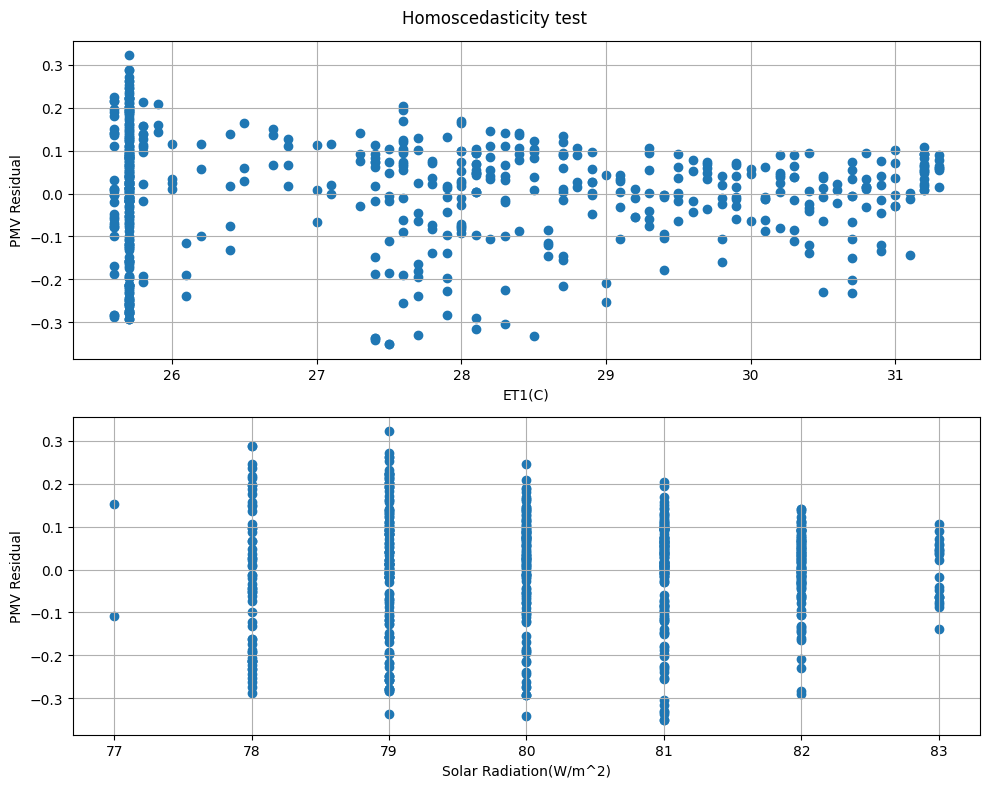

In [277]:
plt_1, ax = plt.subplots(nrows=len(X.columns), ncols=1, figsize=(10, 8))

for i, lab in enumerate(X.columns):
    sct = ax[i].scatter(X[lab], residuals, label=lab)
    #leg = ax[i].legend(loc='upper left')
    ax[i].grid()
    ytit = ax[i].set(ylabel='PMV Residual')
    xtit = ax[i].set(xlabel=lab)

tit = plt.suptitle('Homoscedasticity test')
plt.tight_layout()
plt.show()   

We can clearly see we have some heteroscedasticity signs for our predictors.  
We indeed see less variance at the extreme values.  
However, this should not be fully attributed to a model failure but also to significantly less entries having these extreme parameter values, leading to less residuals. See parameters distributions below.  
Note that Air Velocity and Solar radiation are exogenous features (variables that cannot be explained by other variables within the PMV model - they are controlled by engineering: fans speed and heating unit current). However, Skin1, ET1 and ERH1 are endogenous because they are influenced by each other and by the exogenous variables.  
https://www.statology.org/endogenous-vs-exogenous-variables/  
https://pythonfordatascienceorg.wordpress.com/linear-regression-python/  

In [316]:
X['Solar Radiation(W/m^2)'].value_counts()

81    142
79    136
80    115
82    104
78     60
83     21
77      2
Name: Solar Radiation(W/m^2), dtype: int64

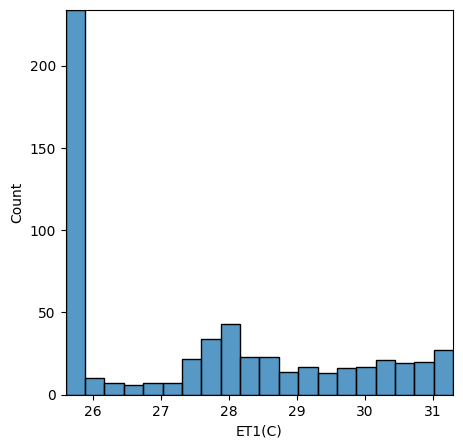

In [319]:
fig = plt.figure(figsize=(5,5))
plot = sns.histplot(data=X, x=X['ET1(C)'], bins=20)
plot.autoscale(axis="x", tight=True, enable=True) 
plot.autoscale(axis="y", tight=True, enable=True) 
plt.show()

#### Normality

Let's examine if the residuals are distributed normally:

In [278]:
def resplt (residuals):
    fig = plt.figure()
    ax0 = fig.add_subplot(2, 1, 1)
    sm.graphics.qqplot(residuals, line='45', fit=True, ax=ax0);
    ax0.grid()
    
    ax1 = fig.add_subplot(2, 1, 2)
    residuals.hist(bins=20, ax=ax1)
    xtit = ax1.set(xlabel='PMV Residual')
    ytit = ax1.set(ylabel='Count')
    ax[1].grid()
    
    tit = plt.suptitle('Residuals normality inspection')
    plt.tight_layout()
    plt.show()

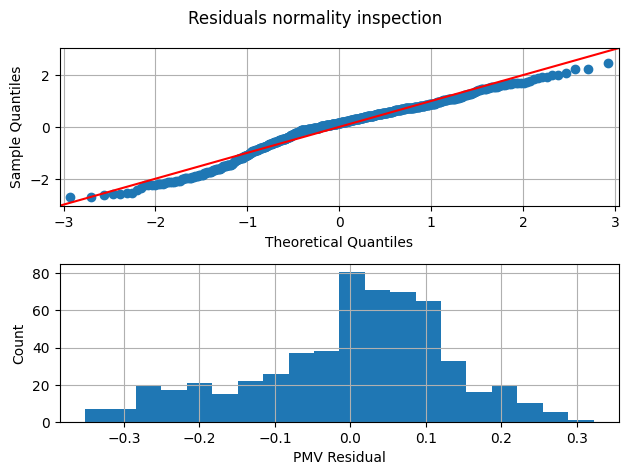

In [279]:
resplt (residuals)

In [320]:
# normality test
stat, p = shapiro(residuals)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.969, p=0.000
Sample does not look Gaussian (reject H0)


We can see that the residuals are not normally distributed.  
This means that classic statistical tests may not work well.  
The good news is that the PMV errors (residuals) are low (|e|<0.4 at most and for the majority of entries |e|<0.15). This means that the model performance will be much better than the required rmse < 0.5.  
https://github.com/merb92/multivariate-linear-regression----housing-prices/blob/master/notebooks/02_analysis_and_models.ipynb

#### Partial regression

Partial regression plots are a diagnostic plot for multivariate linear regression models.  
They show the effect of adding a new variable to an existing model by controlling for the effect of the predictors already in use.  
Partial regression plots are useful for spotting points with high influence or leverage, as well as seeing the partial correlation between the response and the new predictor.  

Procedure:  
For a model with predictors $X_{1},…,X_{n}$ and a response $Y$, the partial regression plot for an additional predictor $X_{n+1}$ can be constructed like so:  
1. Compute the residuals from a model regressing $Y$ against $X_{1},…,X_{n}$.
2. Compute the residuals from a model regressing $X_{n+1}$ against $X_{1},…,X_{n}$.
3. Plot the residuals from the first model to the second model.  

This basically plots what is left over in Y (not explained by features 1...n) as a function of what is left over in feature n+1 (not explained by features 1...n).  
If a large error (prediction gap) in Y is attributed to feature n+1 and is correlated with a large error (prediction gap) in feature n+1, as explained by features 1...n, we will receive a large slope. This slope means feature n+1 is important. The alternative is that a large feature gap (n+1) leads to a small target gap (Y). In this case the feature is not important - we will get a small slope.

The partial regression plot is on the bottom left corner of the figures matrix below.  

https://www.statsmodels.org/dev/generated/statsmodels.graphics.regressionplots.plot_regress_exog.html  
https://de.coursera.org/lecture/regression-modeling-practice/python-lesson-5-evaluating-model-fit-pt-2-lGvK9  
https://www.youtube.com/watch?v=-eLEpMZKNDc  
https://www.r-bloggers.com/2021/03/partial-regression-plots-in-julia-python-and-r/

eval_env: 1


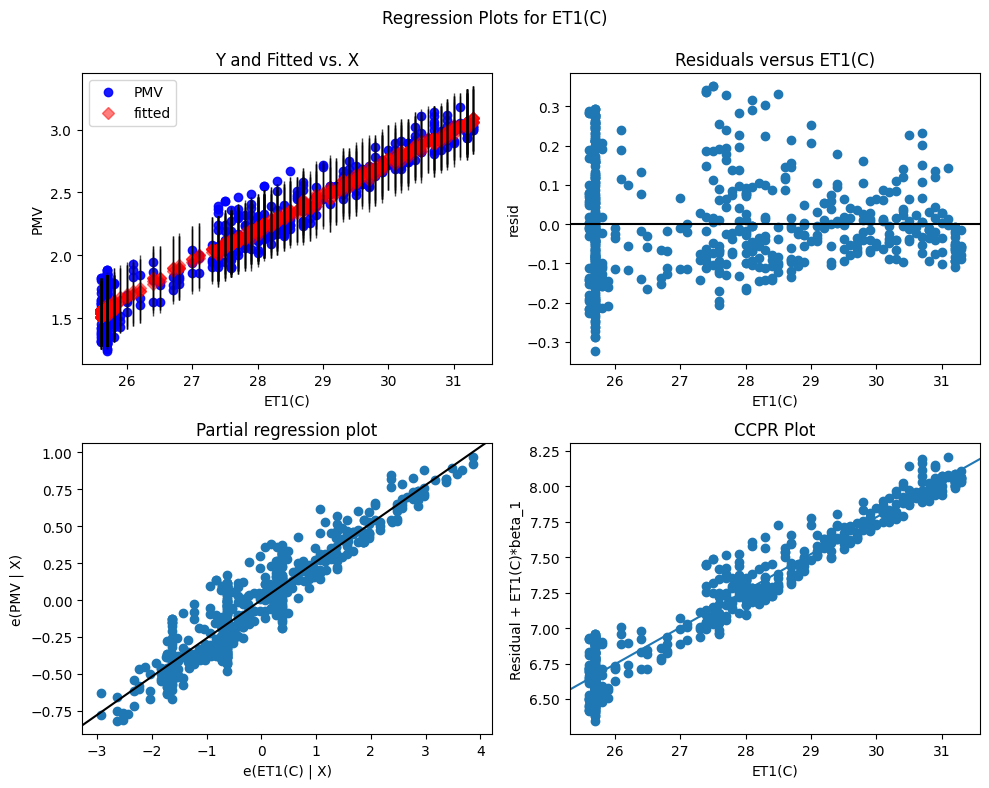

In [323]:
fig0 = plt.figure(figsize=(10,8))
fig0 = sm.graphics.plot_regress_exog(results, 'ET1(C)', fig=fig0)
# https://github.com/pandas-dev/pandas/issues/3474
# https://github.com/merb92/multivariate-linear-regression----housing-prices/blob/master/notebooks/02_analysis_and_models.ipynb  

eval_env: 1


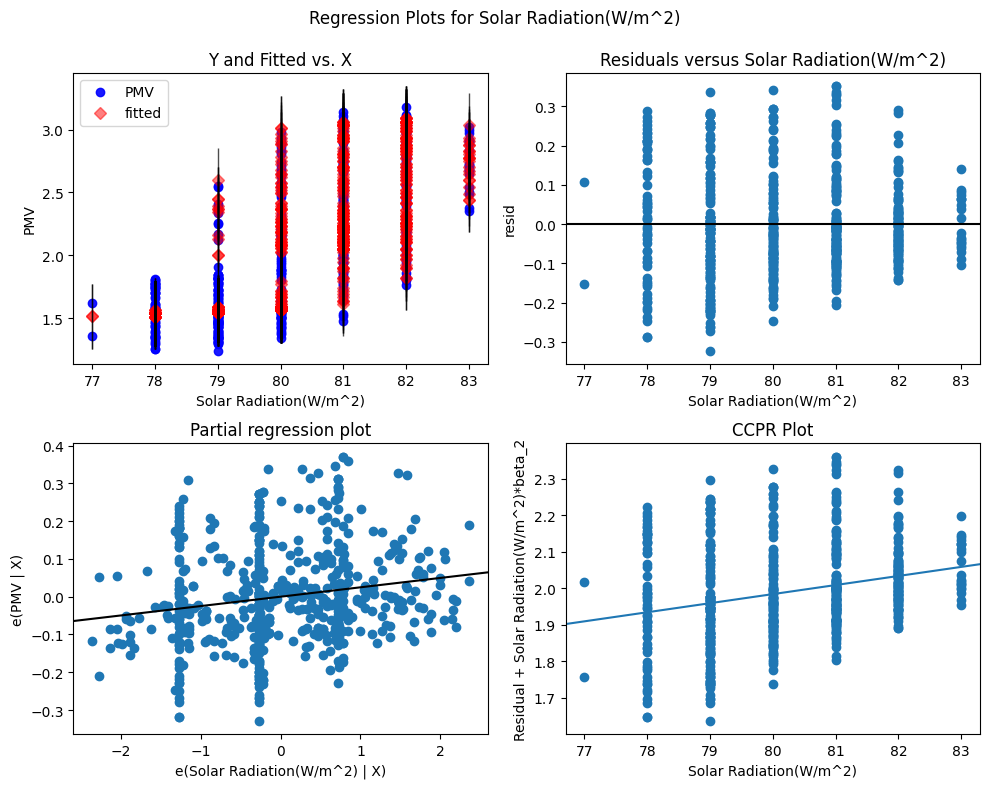

In [324]:
fig0 = plt.figure(figsize=(10,8))
fig0 = sm.graphics.plot_regress_exog(results, 'Solar Radiation(W/m^2)', fig=fig0)
# https://github.com/pandas-dev/pandas/issues/3474

We can see that:
* The residuals are lower for the temperature regions of 27 and 30 DegC. This indicates non linearity attributes. We may consider higher order terms for our model.
* While ET1 has a significant effect on PMV, solar radiation has little effect on it (its partial regression line is nearly horizontal).

In [322]:
# No need for the partial regression alone as it was plotted above
# I keep this code for potential future use
'''
# We need to define a dummy dataframe because statsmodels cannot deal with the parantheses in the variables names:

# create a dictionary - key = old name, value = new name
dict = {'Solar Radiation(W/m^2)': 'SolarRadiation', 'ET1(C)': 'ET1'}

# call rename () method
Xconstren = Xconst.rename(columns=dict).copy()

#https://www.geeksforgeeks.org/how-to-rename-multiple-column-headers-in-a-pandas-dataframe/

fig1 = sm.graphics.plot_partregress(endog=Y, 
                                    exog_i='ET1',
                                    exog_others=['SolarRadiation'],
                                    data=Xconstren, obs_labels=False)
'''

"\n# We need to define a dummy dataframe because statsmodels cannot deal with the parantheses in the variables names:\n\n# create a dictionary - key = old name, value = new name\ndict = {'Solar Radiation(W/m^2)': 'SolarRadiation', 'ET1(C)': 'ET1'}\n\n# call rename () method\nXconstren = Xconst.rename(columns=dict).copy()\n\n#https://www.geeksforgeeks.org/how-to-rename-multiple-column-headers-in-a-pandas-dataframe/\n\nfig1 = sm.graphics.plot_partregress(endog=Y, \n                                    exog_i='ET1',\n                                    exog_others=['SolarRadiation'],\n                                    data=Xconstren, obs_labels=False)\n"

#### Statistical tests

Rainbow Test:  
The basic idea of the Rainbow test is that even if the true relationship is non-linear, a good linear fit can be achieved on a subsample in the “middle” of the data. The null hypothesis is rejected whenever the overall fit is significantly worse than the fit for the subsample. The test statistic under $H_{0}$ follows an F distribution with parameter degrees of freedom.  
The test assumptions are:  
$𝐻_{0}$: std is constant accross the range of the data.  
$𝐻_{a}$: std is not constant accross the range of the data

https://solutionshala.com/2020/12/11/how-to-test-linearity-in-parameters-for-linear-regression/  
Utts, Jessica M. “The Rainbow Test for Lack of Fit in Regression.” Communications in Statistics - Theory and Methods 11, no. 24 (January 1982): 2801–15. https://doi.org/10.1080/03610928208828423.  
https://www.linkedin.com/pulse/assumptions-linear-regression-piyush-pangariya/

In [325]:
def Rainbow_lin_test(Y,X):
    model = sm.OLS(Y,X).fit()
    lin_p = sm.stats.linear_rainbow(model, frac=0.5)[1] #The first number is the Fstatistic and the second is its p-value.
    result = "Fail"
    if lin_p>0.1:
        result = "Pass"
    return pd.DataFrame([[lin_p, 0.1, result]], index = ['Rainbow linearity p value'],
                       columns=['p-value', 'Threshold', 'Result'])

In [326]:
Rainbow_lin_test(Y,Xconst)

,p-value,Threshold,Result
Rainbow linearity p value,0.000008,0.1,Fail


The model fails a linearity test. 
https://www.youtube.com/watch?v=n2o2nv5mae0

Harvey Collier Test:  
This test performs a t-test with parameter degrees of freedom on the recursive residuals.  
Recursive residuals are basically linear transformations of ordinary residuals and are independently and identically distributed. If the true relationship is not linear but convex or concave the mean of the recursive residuals should differ from zero significantly. A statistically significant result means that we can reject the null hypothesis of the true model being linear.

In [327]:
def HC_lin_test(Y,X,skip):
    model = sm.OLS(Y,X).fit()
    lin_p = sm.stats.linear_harvey_collier(model, order_by=None, skip=skip)[1] #The first number is the Fstatistic and the second is its p-value.
    result = "Fail"
    if lin_p>0.1:
        result = "Pass"
    return pd.DataFrame([[lin_p, 0.1, result]], index = ['HC linearity p value'],
                       columns=['p-value', 'Threshold', 'Result'])

In [328]:
HC_lin_test(Y,X,5)

,p-value,Threshold,Result
HC linearity p value,NaN,0.1,Fail


We have failed the linearity test for both tests.  
Nevertheless, this does not necessarily mean that an OLS model is not appropriate since the residuals are not normally distributed - a fundamental assumption of the tests.  
Let's examine our model performance.  
This is the bottom line!

### Prediction

In [329]:
ts_test_const = sm.add_constant(Xtest)
predict = results.predict(ts_test_const)
#https://stackoverflow.com/questions/13218461/predicting-values-using-an-ols-model-with-statsmodels

In [331]:
results.get_prediction(ts_test_const).summary_frame(alpha=0.05).head()  # alpha = significance level for confidence interval
#https://stackoverflow.com/questions/13218461/predicting-values-using-an-ols-model-with-statsmodels

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
datetime,,,,,,
2019-03-10 12:17:00.800,2.052728,0.007221,2.038546,2.066910,1.796651,2.308806
2019-03-10 12:17:02.560,2.026788,0.007445,2.012166,2.041410,1.770686,2.282891
2019-03-10 12:17:04.320,2.051589,0.012048,2.027926,2.075251,1.794811,2.308366
2019-03-10 12:17:06.080,2.026788,0.007445,2.012166,2.041410,1.770686,2.282891
2019-03-10 12:17:07.840,2.026788,0.007445,2.012166,2.041410,1.770686,2.282891


Define function to plot predictions against Ground Truth (GT):

In [332]:
from matplotlib.patches import Rectangle

def plotreg (predict):
    plt_1, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 6))
    
    #upper plot
    ax1 = sns.lineplot(ax = ax[0], data=X, x=X.index, y=Y, color='blue', label='Past PMV values')
    ax2 = sns.lineplot(ax = ax[0], data=predict, x=predict.index, y=predict, color='red', label='Future PMV predictions')
    ax3 = sns.lineplot(ax = ax[0], data=Ytest, x=Ytest.index, y=Ytest, color='green', label='GT PMV values (test data)')
    
    #lower plot
    ax4 = sns.lineplot(ax = ax[1], data=predict, x=predict.index, y=predict, color='red', 
                       marker = "o", label='Future PMV predictions')
    ax5 = sns.lineplot(ax = ax[1], data=Ytest, x=Ytest.index, y=Ytest, color='green', 
                       marker = "X", label='GT PMV values (test data)')
    
    tit0 = ax[0].set_title('Full window')
    tit1 = ax[1].set_title('Forecaset window')
    
    for mc in mcoords:
        mplt = ax[0].axvline(x=mc, color='black', linestyle='--')
        
    #tick_spacing = 0.001
    time_fmt = '%M:%S' # how you want to display time/date
    
    plt.grid()
    tit = fig.suptitle(f'{str(df)} series as a function of time')
     
    #add rectangle to plot
    delt = Ytest.index.max() - Ytest.index.min() #forecast window in time (x)
    dely = Ytest.max()*1.05-Ytest.min()*0.95               #forecast window in y
    ax[0].add_patch(Rectangle((X.index[-1], Ytest.min()*0.95), delt*1.1, dely, edgecolor = 'black', fill=False, lw=2))
   
    #ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    ax[0].xaxis.set_major_formatter(mdates.DateFormatter(time_fmt))
    
    leg1 = ax[0].legend(loc='upper left')
    leg2 = ax[1].legend(loc='upper left')
    bkgcol = ax[1].axvspan(ts_test.index[0], ts_test.index[17], facecolor='black', alpha=0.15)
    
    plt.tight_layout()
    plt.show()

#https://stackoverflow.com/questions/9957637/how-can-i-set-the-background-color-on-specific-areas-of-a-pyplot-figure
#https://www.statology.org/matplotlib-rectangle/

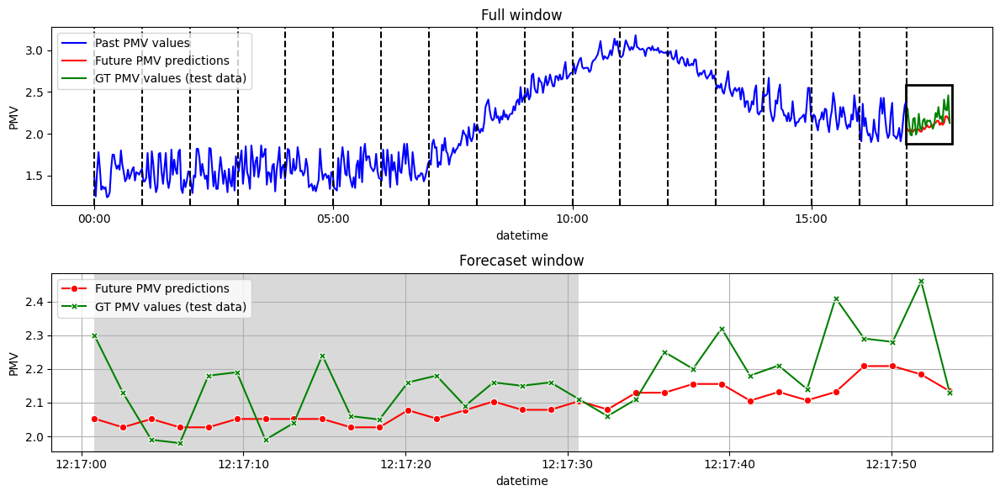

In [333]:
plotreg (predict)

The darkened background represents the project requirement window of 30 sec.  
We clearly see that the prediction is doing more than fine for an even longer period.  
Let's quantify the performance.

Define a function to calculate rmse/normalized rmse:

In [334]:
from sklearn.metrics import mean_squared_error

def rmserep(predict):
    # Calculate RMSE:
    rmse = mean_squared_error(y_true=Ytest, y_pred=predict, squared=False)
    # RMSE by mean:
    print(f'RMSE is: {rmse}')
    print(f'RMSE by mean is: {rmse/np.mean(Ytest)}') 

In [335]:
rmserep(predict)

RMSE is: 0.11672971141940516
RMSE by mean is: 0.05384852758930892


We have met our performance demand using a simple linear regression model with two parameters.  
The model, while not ideally linear, is very simple, will support rapid computation in real time and requires only two sensors, one mounted in the OR space for solar radiation measurement and one inside the active warming device for temperature measurement. Luckily, engineering wise, these are among the simplest and more reliable sensors. This is good news for project feasibility.

### Model simplification

Since we have a performance gap among our features, let's try and further simplify the model.  
The Solar Radiation(W/m^2) has little effect on PMV.  
Can we establish a model without this parameter?

In [336]:
model1 = sm.OLS(Y,Xconst.drop(labels=['Solar Radiation(W/m^2)'], axis=1))
results1 = model1.fit()
results1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    PMV   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     9005.
Date:                Tue, 20 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:54:51   Log-Likelihood:                 351.63
No. Observations:                 580   AIC:                            -699.3
Df Residuals:                     578   BIC:                            -690.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.4299      0.079    -68.420      0.000      -5.586      -5.274
ET1(C)         0.2723      0.003     94.894      0.000       0.267       0.278
==============================================================================
Omnibus:                       19.835   Durbin-Watson:                   1.257
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               21.207
Skew:                           0.468   Prob(JB):                     2.48e-05
Kurtosis:                       3.027   Cond. No.                         400.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [337]:
ts_test_const1 = sm.add_constant(Xtest.drop(labels=['Solar Radiation(W/m^2)'], axis=1))
predict1 = results1.predict(ts_test_const1)

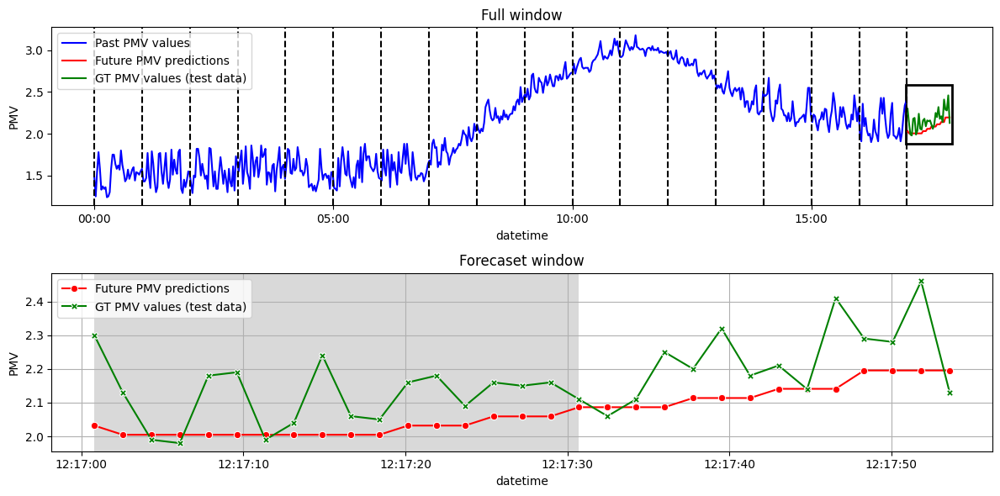

In [338]:
plotreg (predict1)

In [339]:
rmserep(predict1)

RMSE is: 0.13151663716588524
RMSE by mean is: 0.06066987726402444


We can see that our RMSE has slightly increased.  
Never the less, project-wise, the latter model is better:
* It still answers the performance criteria.
* It relinquishes the requirement to monitor relative solar radiation.  
This will: 
1. Considerably reduce engineering complexity and monitoring platform price.
2. Enable faster real time prediction.
3. Most important, enable a mobile system that can travel with the patient as it may have to relocate between the hospital rooms.

To be on the safe side, let's manually calculate the simplified model errors using its coefficient and constant:

In [343]:
error = -5.4299+0.2723*Xtest['ET1(C)'] - Ytest

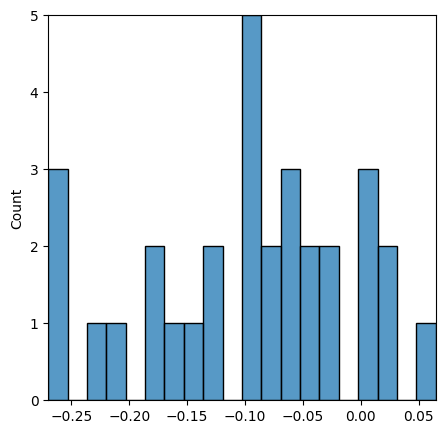

In [345]:
fig = plt.figure(figsize=(5,5))
plot = sns.histplot(data=error, x=error, bins=20)
plot.autoscale(axis="x", tight=True, enable=True) 
plot.autoscale(axis="y", tight=True, enable=True) 
plt.show()

Indeed, our residuals are between -0.3 and 0.05 - well within the required range.

### Multicollinearity and its physical origin

Initially, when both environmental temperature and solar radiation were included in the model, we received the following warning:  
" [2] The condition number is large, 6.01e+03. This might indicate that there are strong multicollinearity or other numerical problems."  
However, after dropping the solar radiation feature, this warning was removed.  
Therefore, it is quite probable that high solar radiation heats the room and increases the environment temperature. In other words, that these two features are correlated.  
In the correlation matrix above we find an 0.7 correlation coefficient between the two features.  
The pairplot also demonstrates a general relation.  
It is possibly the fundamental reason why the OLS model performs well also without solar radiation data.  
This fact is long documented in the literature (Shrestha et al., see graph below).  
In fact, the correlation between solar radiation and surface temperature has been documented to be 0.7473 - quite close to our dataset value of 0.7 (Daut et al.).

https://stats.stackexchange.com/questions/89028/i-have-my-data-set-now-what  
https://stackoverflow.com/questions/25676145/capturing-high-multi-collinearity-in-statsmodels  
Shrestha, Arun Kumar, Arati Thapa, and Hima Gautam. “Solar Radiation, Air Temperature, Relative Humidity, and Dew Point Study: Damak, Jhapa, Nepal.” International Journal of Photoenergy 2019 (December 11, 2019): e8369231. https://doi.org/10.1155/2019/8369231.
Daut, Ismail, Mohd Yusoff, Safwati Ibrahim, Muhammad Irwanto, and Gomesh Nair. “Relationship between the Solar Radiation and Surface Temperature in Perlis.” Advanced Materials Research 512–515 (May 1, 2012): 143–47. https://doi.org/10.4028/www.scientific.net/AMR.512-515.143.

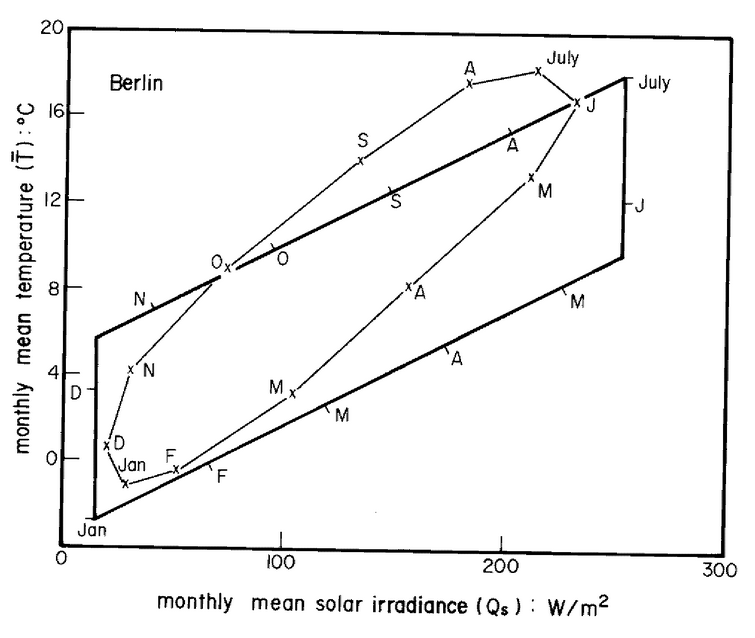

In [348]:
base64_data="iVBORw0KGgoAAAANSUhEUgAAAvMAAAJ+CAYAAAA+K4/RAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7J0J3FbT+vf3+Z/znoNEpWgwJSmkTJnJMZMIKWXImFmhzFNllilDKIkQxTEUFRkiU0iERmWKStFkOuf/vvvd30u/+6xuz1PPcI/Pc30/n/Xs/ex7D2uvda1rXWvta631lzghchzHcRzHcRyn6PifFVvHcRzHcRzHcYoMN+Ydx3Ecx3Ecp0hxY95xHMdxHMdxihQ35h3HcRzHcRynSHFj3nEcx3Ecx3GKFDfmHcdxHMdxHKdIcWPecRzHcRzHcYoUN+Ydx3Ecx3Ecp0hxY95xHMdxHMdxihQ35h3HcRzHcRynSHFj3nEcx3Ecx3GKFDfmHcdxHMdxHKdIcWPecRzHcRzHcYoUN+Ydx3Ecx3Ecp0hxY95xHMdxHMdxihQ35h3HcRzHcRynSCkaYz6O49T2//2//2chPFYSOv5//+//tQClnes4juM4juM4xcZfEuO2oK3bMHoY5P/zP/9jAfiNY3/961/t/xB+I2D0/5//83/s2H/+85+Vroe//OUvK/Ycx3Ecx3Ecp7goaGOeqJVkbH/wwQfR3/72t6hZs2bRmmuuueJo6Tz++ONRzZo1o3bt2q048l9Ke4bjOI7jOI7jFDoFa8zLyGZLj/q///3vaNSoUdHQoUOj33//3Yz4n3/+OTrmmGOio48+OqpRo4YZ+Lpm2bJl0ZNPPhm98sor0bRp06x3frPNNov233//qEuXLtEaa6xhPfRuyDuO4ziO4zjFSsH3zP/v//6vGeJ9+vSJrr766mj99dePrrjiimiDDTaILrzwwujbb7+NTjrppGjw4MHmciN/+h49ekT33XefnXf33XdHixYtivr27Rv99ttv0cknnxxdf/31dn8aAOBGveM4juM4jlNsFHTPvDj++OOjxx57LNp3332jcePGrTj6B6effnr0wAMPWO/8gw8+aO40gHHesWNH653HuKcXnh7+DTfcMFqyZIkZ9RyH0IfecRzHcRzHcYqForBicY3p1KlTdP/996dmpsHthm3z5s3tHNxsMMp/+eWXqH379tFGG21kWwx2evdpHGDA01t/6KGHWpCbDb+p8aD9sgSd7ziO4ziO4zj5oGCNebm9sD3hhBOsl71JkyYp4xkjnVlsCBjlP/74o23xpX/uuefM9aZz585myP/973+3a/jtiCOOiBo0aBC98MIL0VdffWX3515s1VDgf+2vKnBvbSsaeB+el8ngDQ3HcRzHcZzqQVEMgCVgqGM4sy8/98MPPzwaP368uc0wGHattdYyVxtcbz7++ONoyy23TF3LvTCe4Z133rHGweuvvx5tscUWqWcRqgK8D2mVaUjHTFKM6S2ZrCqy4jiO4zhOcVPwA2AFPc4yyseMGRO9+uqr0S233BL985//NJcZDHh63keMGGEz3EycODFq3bq1GbWahx5jnobA2LFjo2OPPTaaMGGCuelwnHM++uij6K233rLGAc+mR1897+wTB/b/8Y9/2HarrbZKxauitG3bNlq6dKkN8uXduC/3Iz6aF391+1zHe3Et8a1bt+6Kuxc2BSx6RY03OBzHcRyn+lDwxrwME4xmjNdnn33WXGUANxrmkAcMWQxa/sdQf//996Mdd9wxZczrHkBDgOkp33jjDeu9x5eeqSo5NmzYMDsnV1x22WXRd999Zw0R4vnrr7+aYU/A/1/7HOf9tM+5NDDYx7CngcF7YNwz//4mm2xS6YaGUB7sueeedk/iwf+kbUn75AXx1D7HQfvEafny5VHTpk3teHWHNJXhTZqB0rwi++RFtkH+sg1ywjvxbo7jOI7jlExRuNnIOHziiSfMgGdqSaanbNy4sRkuegUMDGa9wV9+ypQpZixyDwUGzWIAn3322TaYdu7cuTbVpY6fccYZ5qaDwckzy2IUKY7p++noNxoNIRjgxQI9/ryDGghhYyHcJ+1k7JGG6fukBe/N2IXKUKtWrdTAaO5FY4OvHKxDwIBo4kRjh33iTeMIVyxgnwYUccZFS/scp2FEPLVPmD17tjX01GDhHZzsQsM0m2Q7DyX3xYj0lcu54zhO4VPwPfMYZFSK559/fjRgwIDouOOOi6699tqofv36VtljXFHhqNeXqShxsxkyZEjUtWtXO4eGgIx+Vo+95JJLzNdery5j/rTTTosGDRqUMuaZox64P+dg7PFbuC83F57BceBe6fu8B8bnnDlz7LiTGTC0Md6BPCCdw4ZFZfclX+QhXzsybdzwrG233dYaIZIjZI9nIzvhPjJMKG2fa7kfrlv8r/fIJNyT+OjrmNKceBKX0vYpa5SV0va5D7BPmvMb5cXJPdKLxQ7liXfJdJl1HMcpNAq6Z56A8UDv6jrrrGOz2bCaK0YCBhyVvkBhY/TjD//iiy9GM2fOtEWmMJSAa+iVPfXUU633nQWkMOq5RoaFjHkMC4wh5rXnfO7N8ziX3+hV1j7H+Z3rZVSGBqb2eX69evWil156yY5nE1VgpBtpgVHE89ONJu1jcPE+pDXHS9snvfmffe4fNmbCfXqx2a5OtDinMtBzznOJH88izyB8dmX2uS9p4/wZvoiQTnxpIo0I6fvkBzLBvsos+1ynfUBOJYscpyxRblq2bGnXkQ+ZBn3SqFEjix/xlS7RPnLAb2XZp0wQaPCx5TfG3ajBkym4L4QyWpb9ssI1pDfpnwuQD54J5Xmf9H3g//R96YNMgRzqGRVBeqoy93AcxymJgjbmxc477xxNmjQpuvzyy6NLL700ZQSEUAmBKn4U5gUXXBDdeuut9j9888030cYbbxytt9560cKFC+0ZBJQ+xkS3bt2igQMH2rUsLsUUl9ttt92Kq4sTfNOpnPWuvBuB9MrWvnqZwzzMFHoHtrvvvrs1Vt58801zpeFdMaaQDwx9zsN9JtzHcATtcx8aedrnOAYlDbbNN9/cvvLoKwv3yBSkkYwzvVO4T6hI+gOGMO/s5Bca7+UllAWBTiNvDzroIGtsIOvIaEn7yCoNDPbZ8j/yrX2Ocy7XIOvcF1nnHMoODXHc1vgqyW/ZaEgBZVQNuOoCeZALspVnJZEuq5kiG/flniWVL8epChSsMa+KhC0VC8Z3ixYtrMfrkEMOidZdd90VZ/7hykJPO6gyO/DAA6O3337bDHoqKSovet0xzq+77rpop512ssqEZ3A+92A++6FDh9oxDP4777zTVpbNlALgHrxPruB5MhirIsuWLbMVf0lTKWrIxD4BuUHeMg3x/eSTT1KrFSOzyCLPDveRS+IgGS1tny3/sw98ieEL0OLFi+3/TKEyiasY6zoADQeMQwIGWrif3jPPu3E+aav3xLhkitivv/7a7udkD/KOfEBWyANkDMJ98oyvFpybTRo2bBjttttu1gAnTsgC8UBe1PnAvo4jU/oasroyoi8jrVq1WundKgr3JF2Yzph6h/sTB+6NPLPPOyDnxIFzw311KPBl2ckf5FEhUVm5BO6RCRl3ip+i6JlnVhoGq9KDhNAyYBElKVDsuNTgV4+iRbFPnjzZjuF2A1zHYNfRo0dbo0CVA2j/3nvvtcGxwIwwcunh2mIqLCrc+craXD2XfNa7ZoNs3ruY4SsGjWuQMU95xAhjq33KDr9pH+OG87VPmcOYZzrYzz77LOMyy3OQEdaVmD9/vt2fZ/IMxYt94oIOAe1zbmg0ss+1xJ/GDA3J1VER2eG+imMof+H/oU4q6z7XYlASfzo2nPJD44OGjhrOpKmMefaRJ+SK9A73OYcyQ0cS/2eroUReEw++JtKQR3bDRo722eodStvnXlzPu5W0zzkEVlrP9NgWGkLERe8Dmdgn7woJ9CTvWRmQsXxB3JXGmSLMt1AG9Cz+d0qmoI15ZSQCy1aCr0wW/LZgwQIz1tMzXZUaxwgoKwoRW/4H7o+Cuvnmm6OLL77YjuFiMXXqVDtPuCDlH+Wt8i4XZONZ2Yw/6YOMZwvKSnVGDZZMgjygqx599FHz5ef+GIAybDDE6eElbzmOgYhukoGufYxI8ocOD7b8z/l0hOCieM4550R33313Sg+WRFn0nMohz+TeIN1LWNU+sK9GC+8tfZy+zzssWrTI0kHPySbESQZSqGfC/UInzNvS3qG8+6VBevG8ihLeH9kgz3fddVdrIJD3yC7HyX9kTfsch3R3SWSEe2ifdKDDgC9A9913n+Utcc43xLsibnjVDfIVOaThmC2kn3gOZHIf+J99nqPftM0kBWvMVxQlJoWYLQkYQkFPzzwVcPzre/bsaceY1nLGjBkrZYjjVGdUZtiqXGQCymQm75cOxkYmy2+x6gLpPraVRbLAFxp6gdnH+ELvcn/tE2hQaJ/jXKsOlFXtU4FjlLFI4Pbbb2/jprIJRiFfcxkvRTz4gkFDCdgnLtrnOO+Mwcg+6co+cUfe2KdOIWCErr322rYquZN7VF7TbYFMgKxXRB/Url07NZUyso6ccC+VkZL2OYdztQ+bbrqp/Z6NdysN6ZD999/fGtoqF8g8Da2S9lVeKDthGUnf573Y5zzSh0U96VTVRCbFDnmnxi95WRHZKY2i6JkvD7pmVdeG54CM+dtvv9187MGNeccpblanBwqRbMXX9VfZePnll83QotJVwwJoWIT71BekqfYxcOSKVdI+xgxum5nOX8k48aCxwDgc/k9/PgYEIdznGn4vaZ97cD3pQCMHd1V+x4jLBIr3rFmz7L48h//DfYKeFz67rPs8gzzUMSezMD04XwBprANyU5nyEsol+YarM+vHsKgmq+1LZjIF9+Kexx9/fPTTTz9ZfHl+aeWFfeJKnMN94su9uJ7j4T7QqGEMT7t27WzMTabfQ1S5nvmKIMHr169f1KtXLzvmxrzjOLmiWNVwLuKNcUfFmW2jDB1P5ezkDtxaMQb5eoHBRKMn3KchQb5oEHG4D/QKh/tyueEc6nWMqHfffTcr8sP9GetDPHmm5JQ4lrZPHAhMsIGbDWNk6J3PxkQL2YL3BXrPeads6IBs3TefnHnmmbYw6RZbbGEGPu/He2YKN+YTZMy7m43jOE71QpUqW/UKZ4NsV7WKt94nk/sYo9lA9y9WGLzP1xDSit5kGiG8U2n7yBfGPL3a9DrTI8zMYNOnT89Yg4PnMa02YwiBBg4GOPdnn8YT8Slpn8YsjSPsIQLH+Z3fMN5xgWHq2uoGeUcelxfSkPwg7cl73O1wSyRNw/KVCdyYTyCxEWJ3s3Ecx3GKBRkExVqNF7P5QboXql3www8/pHzZS2tYyMgklGUfY5TAKvqZkDnJLnEdNWqUDXrm/3TXlnCfeIRuLhjL7HOd9rkv7iwffvhhRhpH3G/ChAlmiHM/0oA4cLy0fdKNr0MY7sST6/QeQ4YMiTp37mzncH6mcGM+QYl62223RRdeeKEdc2PecRzHcTIP9WomDMJ8U1FjkXcP3z8TRmdIJo1EJ7JpzxlszNcJAg0ljHf2MdrJv3Cfrxt8fRk+fHj02muv2T3IE2zNPn36RFdeeaU1PPjikSncmE+Qm831119vq8yCG/OO4ziO4xQT2CzZNOsy3fCAbDTsMmmz0aNeUV544YWoQ4cOZryTdkyBzthM2Z2ZInfzGRUwEiKmQHIcx3EcxylGMGLlGpONQA9zpgPGcknHKxPk1lLRwLtqSy98eQO98Iw5YMHCsKGixlCmGy9uzCeoBccnEsdxHMdxHKf6IruQbbqhv7oQNnzSXWk4Dpn8cgBuzAdk89OU4ziO4ziOU32QcY99ycDcI488MnU8k7gx7ziO4ziO4zgZBAMe33h1FON+w7oC4G42WUSfPxzHcRzHcRynMoTuNHLZyQZuvSaohaQWk+M4juM4xYnqdLbhvuPkEoz39BlrstVp7MZ8ghJXvkyO4ziO4+QPGd/M/hHOAFIWoxwjivPYErhexxwnVyBvuNmE4GqTDdyYT6CQAyt8OY7jOI6TX2R809lGYKo/1dWrgmtkyDO3Nwv4cL2OOU4uQe5ygRvzjuM4juMUFDK+P/vss+irr76yaf7KYpDrd85lWkBW25w2bZr9rx5+x8kFyGL61JTuM59F1HLSFkKF4DiO4zhO7qDuxSXhp59+ijp16hT17NkzdYyt6uZwm/5b9+7dowkTJkTfffedG/JOzkEO+aIUki05dGM+IExkVu4CjHopBsdxHMdxsg/1LvXvpEmTzKCnZ171MdtwH9jS6xnW1/KVx80GQ1/+ypyj8zC2wuOOk0kkWyJbMubGfIKUQfj5o3nz5raVMnAcx3EcJzdQ92KEP/HEE+Zmw6wgGEIY9QwqxB+eulmdcD/88EM0Y8aMlH88yM+ea/7xj3/YPTCuOKZr+U11v9f1TiZBnkpbATbTuDFfCmuuueaKPcdxHMdxcgmGEEZ57dq1zSBSD+eUKVOinXfe2QL7MtwnT54ctWzZMpo5c+ZKRrl+79KlS9SnTx8z3DHyOY5h1aFDh+iaa66xc9JdIhynskj+so0b8wlK7PBziLfQHcdxHCd/UA+rXsagp66mJ51l8Qnsi6lTp0a///579OOPP6Z659Wbzz3q169v/vMMqAWOz507N3r66aejZcuW2f8Ex8kUyFP61JT6kpRp3JhPkOEefv7IVoI7juM4jvMHMqAxuNUzHhrV1M/Ux0wxqX1cbAhhPT1x4kTbhn7zYU87+y+//HJ0xRVXWCOA+n7cuHG2vfTSS+2c0NXWcSoL8ho2OLOJG/MBMurBW+iO4ziOk11U72JIy/AJ6+Kff/452njjjaObb755xZE/DPP0OnqttdZasfff6zH48ZVfZ511ov79+0e33npr9Prrr0eLFy82wx73GhoEDLDlGq/3nUwTdhIjY9ly4XZjPkEFOGzlewvdcRzHKSuqR9gq6H+ndFTvYmQ/88wzth+mHQYQvfYE/sc4r1u3rtXRodEf7gP/r7/++lGzZs2i7bbbzhoAjRs3NkOeZzJj3ZdffhmNHTvWGgscCw0vx6ksyCsNSu3jKtakSRP7P9Oy5pIbIN88kDJxHMdxnFURGp3APsYhgX2vT0pHrjBXXXVVdOyxx9r/pJvSFDDcFZgz/sUXXzR/eME1Olfw/6BBg6IvvvjC7se1v/32mx3HwPrwww/tSwCDZmkghM9znEyB3AlkDBnUfiZxYz6Bgg5MgSV0zHEcx3FKQ0YgWypu9hn0xj69b24krhql3XrrrRc1bNjQDGzSjzqYLb8tXbrUtkpjDHn5zWPIcw2DWIXO3WyzzcytgX0Gxx522GHmbrPDDjvYzDZt2rSJ6tSpY/dRXjlOpkC2033m1SOfaZ3gxnyCErVmzZq2hbA15TiO4zglQf0hF5BXX301atu2bbTJJptEJ510UvTxxx+bUarfnT9DupCGGOPffPONdaqtscYa1ls+b9686K233oqOO+44O4eA4Y2Rj6tNgwYN7Lxhw4aZmw6Q1qrTDz744KhRo0ZWn/OcGjVqmPFO7z4GfY8ePczYUiNM1zlOJkDmkNdc4MZ8QNgb74rXcRzHWR3UFXKvwa0DFxAGbQ4ZMiR65513zFAMDUxnZZQ+3bp1i7bYYovo+OOPt4GpL730kg16ZWDrBhtskEpn/N5PPPHE6Pnnn4/OP//86Oqrr7YtBjqEX0Puu+8+G+g6evTo1HO23nrrqF69ejYolgYB9T7nep3vZINclXs35kvB3Wwcx3GcVYEBSMDtY/78+dGzzz4bbbXVVuaPjdsIq5LKsHRjsWTUa96xY0frlcfIxgXmwAMPjN58802bC57fAEN90003jR566KGoXbt20YgRI+xcDPv99tsv2nfffaPtt98+5Z7DwFbygwGwMvJbtWplAxEZAMsXFOVProwup/qATIVjO7KJG/OlIL8mx3EcxykJGels6UHGQDzttNNsxgpcOnAT0e/AfnVA78k23C/p6zdbXF3wfd9yyy3N1Qb/9vHjx9vc8Rj3uMoA6Si3paeeesq+gODGsNNOO0WjRo2KXnjhBWscYEBxLq43NLBYMAp4zieffGILS5155pnmpgPKH8fJJMg2Dctc4BZrKXjhdhzHcVYFlTV1BRX27Nmzo9q1a6dcN/D7/vrrr61jSPVJdahXlCZyLQoNeNIi/au30gRDm99pFGGM77XXXqlVX3VPtpxD4DcC53Ic3/n0WWkY/KrfYcGCBTaugUYXvfi6n353nEyTLu/Zwo35UkAROY7jOE5pyHCkJxn3Dny9u3TpYsfoocdnfubMmdZbrPOrOjK6eWd6zeWrznFcZmQ8y+AGpQtbBa4Jz9N+uFXQ7+FvOoYxRaCxQB7hX7/hhhuaQS/CuDhOpkCuaHDmAjfmS8ELt+M4jlMaMhTZDh8+3I7hKoKxynF65nG12Weffez/0MisypAGvCeDT/FPZ2ArBv3dd99tRvS4ceMsLThPqL5lq8A16ce1r21JQb9pSyBPgDg9+uij0bRp06LNN9/c4qmGluNkg1x1DLsxXwoq/I7jOI6TDkYiRjp1xQcffGBb5jGn8iZgyNaqVStl4GM4ysisyvCupAuLMTHd88CBA6NJkybZrDKtW7e2Qam5TAsZ9Dzz0EMPtYWpaGTxv/LFcbIBsuXGfJ7JVQY4juM4xQWVtHrb58yZY77Y+GfT20tPL77be+65Z9SpU6doyZIl9ruuqyroXUgHNWDUK892t912izp37mxpxJzuuBwxoJXpJzknVz3iPItAPIiX4qjfHCdbIHM+m02eIRMcx3EcJyQ0DKmo77nnnujpp5+ONtpoI/OZv/3226Nddtklevfdd23qQ3yzn3vuObsuNCQLndDgTQ8Y8Gx5H3q3McwJWoAJFyOMexozHCO9zjnnHLsOP3r+5/pcwLNUnxMXxScMjlPsuDFfCiioQkVKUIq1tKBzMk1477LsO47jVCXQa9QRv/32W/Tll1+aAYs/OFMjMlc6Ux/i0oG/OMYi7jaqUwrZeEzX2yVtiT/vQsAwnjVrVjR9+nSbE37MmDE2fuCII46w39UryXX62q10cJyqDnLvK8DmGXoQChEp01A5sp8e9MlTcCzT6Fn63CwKNe0cx3EqC7oOHYchS0VNrzzTHLKQ0Z133hndeuut0RtvvBHtuuuuNv85OhJDV9NUFpp+VN1AvKgzmGaTfdUvMt615Z1ZDItGDF8cTj/99Khr167R/vvvHx188MHWG88iTpw/Y8aM1Dzb+M5zPQ0f1U9Ki2zUT075COUgtC2cikMZcDebPFOoQoxwEDeCPheiINODPidSMDlX12UC7gXh8/QMQFlrX1vHcZyqADoVnUfvO3OhA6uV0jOPAb/HHnvYIkUjR46MXnvttWj06NHRXXfdZQNA0clhJ0sukN5nmx4w2ggY3LwThgdBLjPob9yEGDR622232aJO22yzjb1r48aNo/bt29u87e+9954t7EQ6nHzyydHUqVOtYUP6NGvWzHrqv//+++jwww+3e3JvnsMzSU+OKU7O6lE6ZSrNuIfqavKE/NexVd1fv7FFhrwR8Ae8P+nIomZMUcsXPB3PFn9Jbl69Uz0BIUSxkOiDBg2yYygdVo5DOMkUCXq+UXYRH5ayxkezefPmpnCZz5S4Llq0KOrQoYMtJ86cx8B1mXoHKiOU8eOPP27TjT355JOm3DlOOt5xxx22Ot+ECRMs/VAMjuM4VQHpYPQds7QMGDAg6tixo/VKc0ydGdQr2qIf0dXnnnuu/Z/tuafDeiKs4ldVB7DyKtNGEn9m56FB8swzz9jc8BjiUKdOHWvEUD9usMEG0fHHH2/XMcCVd8JXnjqAugcjnv9p1DB7DA2a3r1727z7S5cutZVY27ZtG9WrV2+leiKTdVVVQ2lTWv6Whs5bVbqqkTplypRo8eLFNoDb6++KoTxh/Ylrr702uuWWW+yLFuWC8sJg+dXlR7lJbljtSRLZtqeeeio5YOGwww6zY4lyjhMht/1CgPjAp59+morrqkKiQOPE0F/pPdgmFYoF3a8875gIqG3btWtnz0gMd/uf58Chhx4a9+rVy/Z1f8dxnOqC9Ck6Fh544IF47Nixtp8NnajnJcaX1WdhKAkdnzZtmtUR999/v+nt9PqD0Lx58/jMM8+MTz755Pj555+Pb775Zrt2VSQGf3ziiSfGEydOXHEkjhcuXBivs846dkx17QknnBBPnz7d4q20Kk9dVJ0IZaqktCptv6yoXr/xxhvjzTffPF6+fLk9Z1X30m/IdNKojd97773U/9UZ5Bl++umn+G9/+1uqLCWN4fiXX36x3yqSR6vCe+YTEoH9U888g5foUaBlWkg984oPS4e3adPGek34BNqvXz97D6DXnMUx+vTpY//TOqTXJBGe1HuE78N13JMA/Ma54buzH0J68VwGe+E3SQ8L59CK55MSLU+BiCno3kL3J+h3x3GcQiWsMtFlhFB/gvSZqKxek27UPdO30qno5XT4LTGurDf8xRdftGkzWQUVFwCOhTRp0sR6ZLnvTTfdZL2JDRo0sDolBF2v91bcwncM04Jz+Y16iGk66fGfPHmyzfjDsW233Tb68MMP7Rrimd4TXNm0K2aUtspn0kd5TD3bv39/myWItOMrSElwDfmne5VE+Bv506JFC7N/eBb3Jg+5RxgX8p//+V11fvfu3e3LPPnK+aEc6Fo9S/+zrWoojShfzGiF3EM2e+bdZ74UlBmFCAKAWw1zFzPA6pRTTrECyNRoBJTvZZddFo0aNSpad911bSET/Bp1LQXzscceM8XO51QKLAqU3yRcFEId176C0obCTJBQahsa8sAx7qF7UcgV+F/P1NZxHKdQQU8poNNC/anfpQsVMKjQu7C6ukW/s5V+1b7uh96UTlUcCNQJGOE33nhjdMMNN1iHDsYE7jHrr7++DVTls/+8efPMLeiSSy6JPv/8c/PnX7hwoU2niesk023iRkN9gp6mw4fAO/AuPJvnSZ9LtytuxFfn6zfqBeopjuF3j5vNpptuaoY9Ljl0THEv7gF61+oKacj7a0sgzXH/Pe+88yxfr776atsSaIThcrvVVltZA4k0ZlwDDSVAflaF5JNOQoxPna+8Vl4oLspXxY+8Y5EwoMHI7zqXwHkgOdF1VRW92+rSPVNUe2NeAoYgh4mO4itEKAhAy3mttdYyY7127dpm3NMaRoHSSqYnvmHDhvZezKKAnyO9LPyGIX/mmWdaOOuss6K+ffuaryTXoqjh22+/NUWBcsdfEn9PKgH8HimkJYHwUiHQiFBLlPTlvjyfxsNPP/1ksz7gU//II4/Y/1IiygvHcZxiIKw/pPPYRxeijwmcg86U3izJgAnvA+hMjsnwYUtYvny56XF6/NCdzJLz6aefmtF+5ZVX2uBTDPRLL73UOnTwUaceoMf98ssvt4Cxjw4eOnSoGfwMat1vv/2s17Bu3brm306gPiQQD4w5Ge3pBndIeJxrOF/vxpb7KR1YPIqGw84772wz41Afvf/+++avTTqoPtb11QW9L+9PXpOW5Dt165AhQ2z2IOphGm7U5xxnn7Fy22+/vTWMaISRvqy4y8xD5QFDXPDsX375xb78I29A3ixbtiwaO3as/cY5xDlssH722WfWgUj8JEOcRyA+4XVOhkgSs9qTKFzbnnvuuUiWhXvvvdeO4VuYCKPtFwJhXJJWcNy+ffv4iy++WHFkZb755hvzUUxa5/HAgQPtWI8ePVLvmB5uu+22lK9bUjHYsaQCiZNGQ+qcpGKw36FTp052DD9K4pUU5Lhnz55x0pCI9957bzuH40mFk7oHcda9CEmlEb/22mt2Lc8upLR2HMdZFegtdBa6Ft/yxAi344kREx9wwAHxddddZ/+rjuFc6UoFrqGeIaSD3zL3mjdvXpwYQfGBBx4Yn3HGGSvp0DCsueaacdOmTePEoDd/9FXVXxznd+lexUdx1DmZJLy36hr+nzx5cuodEgPUjoPSM7yuKqJ3C2VC/Pzzz/Hhhx9udWWYz0mjKk4M4tRWY9fS4frVwTPFGmusEe+1114me4AvPM+cO3eu/U++JQ3BuF69eqm6Gz9wzsFuAGSQ/5OGo70bMsx1jNFo0KBBPHjwYDteksxXBZSfScN0JZsnaTBnzWe+2vfMJwJmPQ30Urz00ku2D7QsgdZjIZEUHNu+8sorts8iJQ8++KD1tAwbNsx82PkffzdmGqAHh2nBjjvuuChR7vb5lJY3M9HQU847M/8vsHKhek34LKseGFrRfAXgWlrbioPShjRkP5En+6LBAinyxeQ453MPepZo0dMDc9RRR1kPA36b9M7wWyLcBZfejuM4pYHOQ2ehvxJDxeZax22FHnl6txlLRC+79CBbna+AnqUXm0DPNF8x0ZG4R9KjTk8r7inM+kJvKDob10p0OtM/MmUkuhnXGfQu7it8RaUe4J6CeBCIBzob+J34oPcVH8URtM0UujfpxjOJB/u4hDCFJ+9LGjDl5Zw5cyxtiLOu5dyqhmSI+i+UiUcffdTcaXbccUcbl0ZdKfgSr7TjOrZ8TSdvkT2OsU+g7l4dYdrytZ/r+J9A+pNXso2Ac5ihicXCOFe9+cqr119/3ba8C/fAUwAbAI8CxiYiu5wb3tOpJElCV2sSgbKWJaP56cFOlJu1oBKj2H5Xj0qhQHwhMeKtBZ0UwjhRgHFSuOLEkLbWMvtJQbP3SApZakaBpAKwYwcddJDNLCBoLXO8bt26cVIR2DF66TlGLzs9TsOHD7fjoDQ5+uijLb2SgpvqTUgM8zipeFK9K7Q+x48fb/eiZ2GfffaJE4M+/uqrr+IlS5bEm2yySbzVVlvFScMi1TvkOI5TDKDf0Fn0fvbr18/03G677RYnxkr8zDPPrDjrv0hP0mPHF9Uvv/wyvuOOO6y3/aSTTrIezTZt2tgXUXQ7X0IJHTp0sOPUU6+++qr1mjJjzOogfgr6v1AI46QeWnqXeV/SsWPHjqne4EJ9h8qg96DeU526YMGCeMaMGVb/UpeTDgRkgS3Hdt99d5ODiy66yOp5ZIXfmJVIaan0UoD0/5FDng3IpY5vsMEGJsNJw9D+577cn69DwDVJ4yJu2bJlPGjQIDuWNMDsHPXMEwfsjJ122sn+h88++yxee+217SsM6NlVEaVles88Nho982E+ZAofALuCJGFTLVOgFQlhi7WQIE6KW1IpmL8mfnP4o7FPKx1o+TLIKDGerVeHa2g1b7bZZvb1gbng8ZmkBU2vDj1CQHpAUiijCy+8MEoMd0sTjnMPoHcAf316VRJlYK33d955x3z31CPEuRwHZi/giwIDoTbeeONonXXWsRY+4K/pOI5TTEgX0vvJTB4MRHz77betJ5UZ0YDeSxZRYjVUvp4OHjw4Sox364VGN/fo0cNmH3v44YdNj3Ie96BnFr3NwFDWFEFvd+vWLfrnP/9pvf7o3sQgSwXVYWFQ/NK3hQBxIY5AfUFdwxdb6oitt946Gj58eJQYhPbFg98S4y9V/+i6YkP5wnsQeCfqR3qu8X0/8cQTzdf9ggsusLpcM9RwDYNbSRPqbOSAwab4pFN3A/chbUoKkP4/tgHXcO/wOF/P+U3/i/B/5JRAvLk+MdLtOPtAfmIXTJw40eat5z3x8+eaVq1a2Xnqta/qhO9InvI/aZnpd3djfgWhMIMKCKQLdSGgz1Pt2rWLPvroo2j8+PFWcFiJj31mCOjcubN9mmNA6pgxY8zAp/CiADDc+eSlachQLFRILEMOUgxMe8VS5VyDYgnThX0KKUa90o9PxFQs4XmC33kWBVqVD/vAfRzHcYoJVcjoMYwxjBoMGTon0NHXXXddaoYR3GVwL8C9EIOVSQVwOXj66afNSJs/f751zHz33Xc2KJQF/6Tn0ZU8C73Js2QM8izOYYvOlR5WAG0LEcWTd8Mw5N2aNm1qg3ofeeQRMwTpbGKxLd5R9YeuKSaIr+JNXlHHkne4ubLoGAtv4fqqPAfqXd4d1yoahHvvvbfVlTRudB+lA/KwOjhX59EgwEWLOJGmqoORSXVmrg7upetB9T6uPkxdjasYxjvvROcdtkKYf2yrOnpHdAMLbOKSlI13d2N+BTJeiwUpbgoGgsGy2YxcZ6pK9ilAzGyA4DAX7VtvvWWFifNZdpvzdD4VB3559JyrQKtQ8j/3l4JhvzRKO0/72iru2nJcysBxHKdYkP6i/qCzg6+dGNzMAMa0vxxDz6Jb6WV+/vnnrdeeoJlljjzySPvyyUwy3KukoLpJRrsC6Ldih/dUnUB9wCrmfLHAyMfgpWOJ46Q19ZLSnlCIKF6KI0EdXXxtYYwAK+ky+xBfXph1jnfi3fjCw5cdpqFktjnGYqiu5xzqWUKY92U15gnAM/lKJF98pTsNKeKo8wT35xjn0PGHccr7gM7FWAfeARuEDkPKALMt0WD917/+ZfnH+WHcqwO8M+mVnq6Zwo35FSB8ZSkMhYIKFgWDgkdLWL022kdhcB699LjYANcwbRk9+OrJZ/pJBh2hXFTAdH8UhioNCAsgv/O/Cn74W0n7bMN9wb4aAY7jOIUMug6kI6XL+KpJLzxfO+k5feCBB2wSAvQs7ofoV76k0lu56667ms7DVYa6Z1X1T7rODHVnVSF8N+oTAh1RfMXAzRO3Gwb5MlkCDSbSToYk1yhPCgXJBXlKncyWd6IxhusUA5gPOeQQa9zxNZsGi0B+cLFiEguMfVxRkQ/q+hCOhfKX/ntpKL0YUI1LLK4fQBy5B7YABrjuK8gPziGuDE5m/nqtKaP0R/6Bd+Vcevgx8Jnmmq9VTMbBcUi/f1WH9yXtsvXebsxXASQcbClEbFEa+NQJKhVa0vymVW5BBYvPbbvttptdvypUaLWFcN9xHKeqgY5TAAwpdCUGJVsWacLwuvjii82o5zx6L9Gv8vfGqGOrfc7hdwxTdcqgn9MDaFuV0TuSLnp30vf666+PPv744+jee+81w75ly5Y2zoA6LjxfeZMv9HzFhzwmT5W/+IyzIBNfwelcwzgWyMhFF11khjTys8cee6TkRTKi+1YGrud+bHHjwtiWSxjpydd8XHAli4L/6VnnPZhpCPcxDFO9M+fym/JE8swiZbwn9yeo5x7ynV9VDTfmV4CgIXzFggqbCrwKDMcoZHyyo/WMMsR3nk+UDLCiADF1Gn6aLAJB7z3TWbK4CAtTiPD+MvjTUWEPlUxYQMtaWDmPd3Acxyk0pMek4wBdi2+7elQx3Ol1ZFVVDDN8nPniyfglzgV0Kvuh4a46J7x3dYe0UJpjHFIHcQwfbwYZ02tMDz0BFxHqp7COKmu9kynC52mfOJPPjIFgGujdd9/dFvXCUGdsBe/DF3TGUTBlNG6w/I7fPHU29+F6gtIjXUZU34fPXB2cTyC9mDaVKU9xhWHFWNximOIaW4EvA+p1Z1Ay8WByDOKraTJpCFAGgEGzPD9dnploA9uE+p3nqHcf0t+nqkM+KW+zgRvzK0AQs5XI2YLCTOGgIuGT3MyZM22uYQoZiqFnz552HpUMsybgS8/nSiob/BFxtzn//PPN2Kc1Tm8HhRYoaNoP4bgUC7+np5kqKwgLK8dLahSE5zuO4xQS0nUgo5It+hbdef/999v/zAeOP/AGG2xgBg0+zvTUc326gcM21I3On1EakX7UD9q/4447zKgnzRkYyiBZfuf/kuqXbCP54PkE4H/ihO85cWUgKLMTMcuc6jrqbepgjGc62fgqzpdz7pH+xUEhHQxknQNlqUeVnmwZy8GATAYcY5xjF/DlgK9MjKvjHGjQoIH12OMe1rhxYzPqkXuM/LPPPtvO4WsD7xPGE8NVLr98TWGQryjpfao6vLMaYFkhybBqTSJoNscqK74y53lSkJDgeMiQIfZ7IuC2LRQUn+HDh1s800NSUG11OPYTobH5XyEp+HYt854yn3F4DXPXMr88Kwwmhc/O7927t/2WGPw2v6zSiXskSjNOKjJbeY55kZmzXvFi5TiuY55azgNWieNYojjsf87lfsCcwszvzxy0HNM1juM4+QI9pCDdCayRscMOO6R0J6tboxd1DvvA/8J1WuUI84KVREnjxABOzb1+2mmnrTgzNyvGhvEhSDbErbfeamunJMa5xW+NNdZIyQvhiiuuiGfNmrXi7P/O98576Z6rQ888+OCDU/e977777JjSoDR0f8kqhO/A75WR3/AduA/5lDQQ7H/ZF+W9Z7Gh9wvnmUceWEeBNAnTKFP8hT/Jg6otScJazwmr5dEi/eabb6wlmRjz5u/FvlrKhUAiABZfpjHDl5Cpq3gH4pgUSGvZ0/Ljf/zueAd+V2uca+khYBCRppFkvmNazsD1nIuPIr0epAn30nMlLqTTyy+/HO2333428p5n0Ors16+fDaih14QWPfdKFJfN2sDsDXwhUBy5H8fw2WNeXT3bcRwnX6Dj0E/pnHrqqeY+g+5jAOOBBx5os9CgGzlf1+j6UM+Vdk+nfCgdqbcYSEodSO82dRhfo1XfUReF52cK3S/9vriuMt3ogAEDzMVVM8QI3FhYH4CeeupLXFior4lneeWDc5EtQAZZlR1uvvnmqFevXiu9f2noecguIUwvCN9Rzwt/07Vcp3N4Lu9CHY53AD722Ai4GfEliwG/XMPvXFOVUdpha2200UbmhsTaEMzKhM6QnZPRdEgeWq2hFZsI6p9WgC3UnvnywruFpP8vkoJYaktRx1f3e2VQvDJxL8dxnIog/YM+pBeY7TvvvJNa3TUxXuKePXvaOcDvwnVXdlH6slW6s0Js+/btLW/4sp4YjVaXUG9Tt0Mm8iWUC+7NMwj0vNIjvueee1ocCImBZtvEsI1r164dn3nmmakv5CKshysSP73bfvvtl3ouX4lAv62OMD3DoGMVgfThWlYnVrySBob9Ft6/qqP3DHvmWQH/iSeesPzJRlq4z/wKksJlrcZCJ8mz1DYRilWGpGClWs0K/M978r4EzmFLi1r3Bc7hHrom3BL4nWvZ6jhwjOs4rmO6F1vQPYDzCd575ThOPpAuCnUSPWf4NbNGB2ONGH902WWX2ZikW265JaW3OE/6zHVXdgnrIeoL6i2+/j7zzDPm601PPVN/MhUoX5PpNeYcXaf8LSu6RtdRh5Hf3Jvn8xWa1VpZzTcxpFeappF9FgVj9V9m4cGnPKwXFSfIlNzQ018e9Fy2YdCxikC6UC5q1aplXyEYV8IXA8WtovetCvDuyE620sCN+RVQ8PXpo5AJCxuCsaqgT2DpgQLHuxL03uHvwDncQ/+HWwK/cy1bHQeOcR3HdUz3Cs8NzyeAjjmO4+QDdBD6iFW1mRubqRAxwthnwgBcAmXUcZ4MM9dduSFMZ/KA9Md4ZIYVXFxwYWCedgZmaoEiGfTlySPlK+ha6jDkggWQGNyMW8+CBQtS9RrTLrIAI9M2MosNi0ExlzvyQhxUn4ahIqgREHaYgeKRT3gnygVbBivjBsX7693D+FY3eHcaNdlKAzfmHcdxnGoJFStGBsYWxhHjfZgDnDE/GG3MSnPrrbdaLyuzjXBOaJiwdXKP0h8DFoOdhZXoIacXfPPNN7ctUywyNow8w6Dk/LIYUspXbTHAmML52muvjc466yxr2LHYE40IwHjFL5rjrFjLFxy+GCAnkhc1PDIhL+G7qyOsUAjTjq8TTCMq4z5T7++UjBvzK6BgotAdx3Gcqg2GBQHkLoP+Z57vgw46yOb9xihkOX0G56tHDQNK17lhkl9kIAJb8ogvJwxGpXf++++/j7bbbjubzAGDmskiwvPDfW0J3BcjXPYAblXIAj3xrB2AgQqcw1Skcqdhy0DXsOEQxjFT8qL7MrHE4sWLM3bfTKD31TbcL6R4ZhveN9wC7+8rwOYAlHkhfKZyHMdxske6YUHP4XvvvWd+18xUwyxgrJL9wQcfmN88RqL3xhcm5IXyA0MJA5w8Yu52ZhzCsO7UqZP9T08xdTxGOHAd+2G+al+/M1sbPe7Mly5oFOAH/sADD5hBjfsV9w7daUD3I2QSxfXLL7+0hR4zff/KoviE715occw2et/QeCff6DiQfGUat15XQCGvbgLnOI5TXQiNNAwvthhD06ZNs0Wf6HXdaqutbGAjhuA666xj54QVsrZOYULDjHxmcSN61Omhnz17dnTxxRfbwkdTpkxJ1fVMFyjjnv8x0vF7Bx2rU6dOqoHAPbfccktzpWEKyNNOO81cr+gdZyVUns39ODcXciL3FafwkK6hc0DuWKCvPdnAjfkVkOBqsTuO4zhVBxlY6HgMebldsP4FBtqkSZPMNx4fawYxco7gWlXOTmFC3iqf5DJVu3bt6I033rD53VmXhfnoGdC8aNEim33moosusgGsfHnBiGeMBC463IvrMcy7dOkStWjRwlZLZfArv59++un2O9ewZYVXBntynRqJuSBsPDiFhYz28ePHm54R7maTA3JVAB3HcZzcIEMH/U6HDcYPhjwDGfGnZuYReO2118w3Xp062XaVcDKP8ik06MnLxx57zKavxL+dRYxYuBAXFWa7adWqlZ2LO82LL74Ybb311iYDGF3cp3379tabz3SXDLLlWChHwBccBsTSKNCXgVzAc3L1LKd8SF/UrFnTZEVks8M4Z8a8hC4UwEwI4urum/57SeeA+8w7juNUHdDxMu4w7DC0WJHx7rvvtmkMcb/o3r27GXG77rqrnUc94IZ78RPmJTPLYJQ//fTTNqVks2bNbD56vsCwbgCrqH7yySfWw87gVsmNZAcDjMA+cF/AXsCwp7cen3n9nit4tuLqFAfKs2yQEetVkWMbRjbcInAUCJSqggpLRdF92XK/8F7hPnHSs9nyfzo6x3Ecxyle0P2qG9Dr6H0MLwa0MuMI005ivN95553mHnHwwQenOnJCwyjcd4oP1fm4vjCAdffdd7fZiZADetmPOeYYy2O+yiAX+MHLBSu0HzhHsqAtvyMz9MbTEMiH/SCf+TCuTmGB/IUgW5KhTFNpY15KE0FmGw7KCLcSfn4n0LqVUc1vCuVB99VzQ4Ws34iXnhdu041/zksvjOWNj+M4jpMf0NeqD0C6n/Dqq6+a3zPG+6GHHhq9/fbbNi85dZDqobA+cYoL5b3yTw048h4DilmJ1LCTD7N62Dnnl19+SY2T4B6Ce4UhPMZ5XAsdO3a03nmeofOyTa6e42QOyUs2qJQxr4KD0lQrFd80Cga/yThmy/8st8yqaLfffrsNJuHFJJAVEUwVOu7P4JYHH3zQ/qdAKW4UWPzZLr/8chvdzqj2MWPGrPRszmX54Ro1aqTuqev1v+M4jlOYSE+HOps6ady4cVHv3r2tFxa/6L59+9psJDLiqQeoI1QXaOsUD6qrhRpxzFaDXzw2SWhvsIVPP/3UrkUO5syZk+qRL6sMcJ5kjZ5/Xatj2YbGR3ni6+QeNRgBuWTtg6zJR3LjSpG0dOOkMMQ//PBDnBjMxDK+88477bfEuLctv3Pe22+/Hbdo0cLOYfvkk0/GP/30k53D7+VF1yQtbbtn9+7d7f+kYNlvPH/IkCH2m0LdunVt++yzz8ZJ4tq5cOqpp9rxNdZYw7Zcx+96B8dxHKcwQVeD6iP45ptv4rXWWsv0ef369eNff/3VjoPO19YpPsI8p55OjFv7H8aOHRufe+65lveEbbbZxmwNzpHdsP7668eNGjWK69SpE++9997xBx98kLJVRCgnPEOypXN++eUXu/+VV15p/+fCXpCMjx8/3t4rMeYtDq+99pr9HqaDkx+UB48++micNB4tf2rXrp3SQaGMZYoK98wn19o2iZT1gDDnqmYGSAzmlVqMap3gp8jIcEaM0ypmMYeWLVtGM2bMsFYL99J9y4JawWx5hlZmSwTdtvfcc0904okn2qIOLO7wxRdf2Ch25ptlQMywYcNSrXG2vActbL4esAog8QlbVo7jOE5hgN5WAHoq0eHobAY4Mmc8X4lfeeWVaOrUqdYjyznUNaC6wykelNfaUteT59Tf5C9TATLAlUGtd911V5Q05iyPJRfA/5zDTDasDovPO2sN7LjjjtZzyu+SEckHW54R3iPf8E6FEA+ndCSnAnmV3kn/rbJU2JgnMkQMAe/atWv03HPP2QILzOuKkU5EJfjsI3gUEMJLL70UJS3naP/997dJ9TG6KYgYz+UVTp0fNgQowMxWcNlll9m8shjnTZo0iTbbbDNzpeGzKwb+AQcckHrm0qVLLW7Ec+HChbaYiOM4jlN4qEIMoS5i3vDtt98+GjVqlE0vyPzx++yzj7lRyujjOgWneFCea0vAbmDRpnvvvddcaDt06GCdg/qdxtx6661nnXP4ymOTcJxxE7j78lujRo2ibt26mf2C7SBDHmRTsMWmmDBhgv0ve0O/5wPsL+LK+ziFiWxgETbAMp1vGemZp/AwOvyKK66wFdeIZEmR1rGGDRuaIY3vIr3477zzjjUC+D0sSOVFcaLQMg0VsJof88DSI4PwE98NN9wwuv766+3ZwLFDDjnEFg9hHwVBXBzHcZzCAj1PPSJjin10/iOPPGLzx+MfzRdZ6hfmkpfRg07X+U5xoXxTXvL/zz//HD3xxBPWYXf22WdHN998s3XE6XwGpB533HE26PnGG280w517cD0LhOEhoC81LCzVv39/M+i5VvU/+8A5yNbgwYPtGHYC98JY41zJVi7h+S7LhU0uZaLCFivCjSCjOAn8z5LGKhy8RPgi4f/8/u9//9t6ymkEAAZ3edH90re0xpluCoUu9BlOLSVWb1M8KYjTp09PfWJTAXUcx3EKA3S1dDy6G8MOPc1X1LZt29oXYjpxmKmGCRHopVXnDHqda934KQ6Uz2zJa/IRm0F1OK5TLP7UuXNnM7Ax3JW3fJE57LDDzKV26NChNn+8XLC4F1vWG0Bu9KVm7733tvN4Hs/Q80O5YUYcOiK5h+SPe7DPVufmilCuZa/k8vnO6kFuc0WFLVaEh4jid7bttttaAdtoo42scABCVhIc5zrOw0+NQsW1fCorL3oGQh3Cce75ww8/2Cw2LBRBQOETaMFT+HkHFVRm2iEO7Cs4juM4+Ud6WgHdTR2Cu2S9evWs84beVmYw2WmnnczQIlAPhNc6hY/yS1vymjoeI/3xxx+PTjnlFBvzRi+8jFg65/jS3qdPH+tcZDwcciE5QFawOzj/66+/tq/w5513nj2D3/mNbfhc0D6/M54OF2FkCvuBOLVo0cLmr6fxwDn8livUcUr81LhQ/J3CIJfyUGFjXsJOIaGHHUOYAbD4wCPkCH5YSNgicLSuuYZ9FDAFksEotIw5psJZFiS0ixYtsq2u5T4kIoUWdxr88+mtIZ5vvvmm+dZdffXV5ifPPQi0uoH3mjt3rt2TeFNgyhN4NniBchzHqTzoUhks1B8EvqLiPoErDeOgevbsafPGr7322nYu+p96SNc6hU9YZ5LH5DfHWKWVVXtZ1Omcc86xnnjNFc/vrPCKYf7AAw9EV155pQ18lu+75AD7A5h4g8k6kB/sEMmGzoNQXtjnWrZ86WfBKa4fOXJk9MILL1jcmPZ0r732yrkxL3hP4oB9w355bCinCpEUhgqRCE1quiZCu3btKInx8OHD4yVLlqw4q2QSAz4eNGhQatqwk046yaZa4j7cs6xwPjD9D/e54oor7P8FCxbE6667rh1jCszly5fbcUgKXNy7d2/7jetEt27d7FjS4rbtY489tuIXx3EcJx+oPqB+QHfDM888k6o7OnTosNJ0gDoHylOXOPlBecSWvPvPf/6zUr6NGjUqToxuy2tCYqjGicFs+7Vq1YqPPvpom5paaFpq7hEGZIR79+/f365t2LBhPH36dPsN2VoVnMO1cM8999hUg0xh/Y9//CNu3LhxvGjRIruHnpVteD+eN2HChLhly5Y2NSXpwtSUYVyd/KE8eOSRR1aamvLnn3+249mQk7/wJ3lQhUkiZdv58+eb+wq9JQw0YUApvSRMEUXveyKA0QYbbGALODFoBb92oCXdo0cP852n9VueVmUi0NaappXMZy5caq699lp7Xv369a3H5ttvv41q1qxp5ycF2j7V0ZqmFcsAGM4njny6o8VPa50k2XnnnaONN97Y9ssSJ84hLZg5Z5tttslbK91xHKfYQe9SH7BNKkbT23z1RV8/+eST5p7JbGXnn3++1TeqC3QNW6ewCfMYlGfkLYNaf/zxR1vwCVS/wvrrr29eANTbTGbBdeQ/IAPp+R/+T91M7/xnn31mPfhcRz0dnh8SxpFAPBh4i10BuPJo0Gxp98g0pAPPe+utt+yLBNN9X3DBBVYWsLGIR3nsKCfzSB899thj9kWH/xNj3uSGr0ZZkZfkphVGrYskorZlAYX9998/btq0aaqHm9YILWkC+xzj9/bt28dDhw5NXUtrs7yo9fPcc8/ZfVm0ChIlYItBJMa8/c+91Zqlhc4CV0nlELdu3ToePXq0nXPyySfbPdSKouXNohJJYbXt6kKDBg1s+/rrr9v9vHXsOI5TflSvsFX98MYbb8R77rmn6ea99trL6g71yIZ1h651Cpcwf6mPlX+JURr37ds3Tox0y2eCeuETwydOjG/7qj5u3Dg7X3Cf8J6CfdX72ASJwRtvsskm1puP9wDHQ9kpjZLuHbK63zON3unVV1+NW7VqZb3yV111VTx//vwyv5OTXWT/Pf744znrma9U800tVlq2SeRsUAgDRJiqEh/1HXbYwVrOtIBpEePbdtFFF9nvtLiZNooWJPfQtiLwbFBLhxYQPmS0oFkQgnsnAm7n0fOuga7MScw5IZzbvHnz6MUXX7SvDZzDdnWBmXzYtmnTxu5Dq8xxHMcpG6H+pzceHU1Ah+OnzHgnFvYZOHCg1R3oWHR6WHeoDnAKD/JIITE6bUt9TP6NGDHCbAS+1DPGjTFs2BXU20yscfzxx1tvemK0Rvvuu29qfJryXSj/Oc4+13OfiRMnRrfddpvZJMOHD7ev9jw3lJ3S4D46hy2BZyvoeK6Rzz/P5h1d9gsP5C9XZORbDMJEoUCwKWS8ALPcMFgERUxghDmF8aabbkoVBgo0SCArI4yhMDM4BuV/5JFHWjz+9a9/pQSfxSJat25tz2e1OM4BGd/EA7cczuU9eB+OlSfoPo7jOM6qkd5UPYBuRl8ztSCrhqPDqSuoT95///2oadOm9n9ojFWm7nCyh/KWANSp5Bn1LTMPsVIvHWAdO3a044IJNJidBrdcbIeHH37YriXfCarPwyAkD5zPFrmhkQBMP4l8EfitrLLDOWGQ7BHC47lEaQphGjuFQy5lolLGvISHCFM4EGwKmQxrCpMKThh0Tdh7XZmXJh48C6UP3IsZcmg40IpnRhumK2MBEXp3+A2jfpNNNjFjHcKCwPVhcBzHcTJPWIfI+MJYQ093797delSZ6Uy9qtLXmao7nOyQXp/yP4F8mz17tn2ZP/jgg22lXhaM5Di2wRZbbGHG/Z133mlj4TD2GRPBb9gVCtyrtHxPfx6ddjQCqf932WUXOwdbZVX3KAYYA0i68A6UHd7HKSyQs1xR6SdJkIg0c72ymAM9KrSmKXSQ3noliHC/oiDErCjL84HnIuSbb755NG7cuOjMM8+0ODAgl8G37777rvXWq2GRTnrBSI/76oKucRzHcUomNKYw0tHb9MiyND9T/dEryzzyTGGsebzpLHIKG+Ur+aVA/Ut9iwvNSSedZF/EWfldnX804HDHffTRR6PXX3/dBnbyBZ3j3I/r0+vk0uA8XUNdz7SWLPaECzCuvvzGM4u9jsaeobHC+7DlfZ3CAtnPFRXOfQSIwkBho2Cce+65Vhj3228/a10zGwyLQgEvxLkKkImChAADigElgR8lSLBRHjybmWoo1CgPegOkYEqLj5SB4ziOk1mkX9G51B/oaYw6xlPhN83MHBhgM2fOtK+qnIO+pp7RdRDqbCe/KE8JoMYZdTHbW265Jdp+++2jgw46KNUTr/PWX399q59xh5EBrzpa5ynfFUoifD4yxXnU/XQu7rbbbua2o3jpvGJEZYFyMmnSJDtWWsekU32osDFPQZEhz2Id9Kaw0BLLK7MiLIWG6Sm/+OILM6wRwEwTFlxVCqDjxJH46XedwzHiVJpSkAJyHMdxMge6Gb1LQBejaznGlMYYfBjwLADVrVs3+7KKzuYc9TqWprOd/BHmqaBx9vnnn9tgZYz43r172xSKMs7JV/zkhw4dal9e6PxjAg3JBPmtOjj93qWh89QIwDuAhSOZ+ppps3km8VJ8ixXizjuss846qf9l2ziFRS7tyEp9l1GhQAEjSAxWYrllRovj9jJnzpzo1VdfTQlfplGBpOCXpPDTfy/pnJLgXbxgOI7jZA7VF+p1ZZ9eWuYMZ45sfONvuOEGM+rVCYPOLnbjq6qiOp18ovOOQD6xhgzuMqeeeqo1yjCqOUZeYnRiJ/AVhvUC+JrOGDbkgftRP1ckv7mGQFy4F/N5M2h2+fLl5jXQuHFjO4/7VgVZ4h1ko/DelJeq8F5VjVzakRU25tX6nTx5shnsTBn24IMP2m+bbrpp1KdPH2sF03pE2IoJMqDY4uw4jlOIyNACdCuGB4GeWwY7XnPNNTa4lR5aFt1jYJ+MLq5zI6VwUF4qP+W2Ql1PoGG25ZZb2lSSuLWy2Bdwfq1ataJZs2ZFEyZMsMkpyGf1KKuTraL5rWuwS5jWEvea/v37R88++6wtIFkV3GtWBenn5aTwyKW8VdiYVwsa/3g+YTHP+p577mkDlnbffXdzsaEAMfd6sQlZ2IPvOI7jVIx04wy9yiQJ//znP82PmS+4GHYvvPCCGWLUGTIAuc4NlMJBeRkGDHj8tpl9BjuALyus1Kv6E4OdwawEXGqaNGlix5XP6lEOQ3khXgQaBcSHmXLoZGQ1VGwR3HfC51Q1eCfSM5e9wE7ZyKUdWeEnIUBElFZwr169zG+egSY33nijLRjFUsy0zjt16rRSy7sYQDE4juM4FUfGn4wM1v/A0Dv55JNtxhIW7uFrLi4XGF7UERhjUBWNrmJF9SH5iHGuHnUWVGTKUOp+/NIvvvji1CKMGNAMdmUAM4Y+gf+5B3lLPks+KpvXkjHkB/li+XyezzgMBr3qt6pcr2ciHZ3ipsIWNgWDQCFBSbMoAz5wuNyMHj062mOPPaJHHnnEPnEhZMVkzNNDpArIcRzHKTuqG4AeQ7lSnHXWWba6NoMSmSIYl4tGjRqt1KsYXuvkD+WDAnlE7za96QTcafgqf+GFF9oc7musscaKKyMbuEzeYgfwpR7jn+upV2UHcM9MGJ+KH/fmObj20KBg/AWrwHNM7jVV1djl3WgcuTFfeKD7ckWleuYV6J1HGR999NH2+ZQWOHO6UsBUiNgWCxT+Ymp8OI7j5JtQx0vvY2SgS5nRZMiQITaPPC4QHTp0iNZaa62VDJEwOJmDNFbeUE+HDaeSUN4BW/KPPHrvvfdsTANf4nGpWbJkiZ0DdOgxYw0DmhnwSice98GIx/iXHEAm85j7YGfwDNx9unbtav+zxZDimeH7VEV4N9K5tPx08gdfiHIle5W2WFVQFCRQvAQFqRgLk/vMO47jlA/pePQ9+nPx4sXR4MGDza1m6tSpNrMJftOs1M3vGJWqH5zsoboZSG/Vbel1svKBrVxpWIiR6aXpYcedhvEN/fr1s9lpgEWY6AG/7777oquuusrGzbGYke6FEa/9TNsA3FcBl5/HHnvMjuPus/XWW6feNdPPLUSUDk5hoAbzhx9+aA0tULnLVj5V2mKloBA5bUGCFf5WiKTHF4jrDz/8YFNaOY7jOKUT6lB6RDEA0aFfffWVrbzNrCIY8E899VR0//332zoknAdUblzH+YVaR1QFwvqNKRvnzZuX+mqeHjA8yBf1pjOgFXcaxsLxRUXuNHyNp1FGI23YsGHR6aefnnKl4T5AnrKfjbzVfXke8WSKy3vuucdm1SOu9erVs99lQFVlSIvwy4eTfyTzdGoLbErJrcpIJslI7ivibMOgY4UKcVPi4loD9EgwIOvAAw80RaHjjuM4zsqEeh5dyVdNjHamJ8YvnsGIzz//fNS2bVvTpxh80qnSvU52keHAtmnTpla/kQfkR5h/GIMYhUwdSb4RmPNfvYyAOw1GMy43GPdMPc3v5Ct5r7wN75sNuC/x55msZ8OCVKxAzzSn1OHEiXOyYTQVGkqL6vCuxUaYJ7ih0whWh0emyYgxHyoLIhr+L7RPISvp93zA81E+y5YtM2WgBJabDb9nI9Edx3GKmVCHo/MJH3/8sflS9+3bN9pmm22iyy67zP5v166dnStjUXrVdWtuIJ1luPOlZMyYMWawY/RynLB06VLzOT/ttNPMHYoFlwgY78Dc8bjZ8IWFgcz0yksGuC/5KnKRrzybQLwZn8fXBlaR3Xfffe351OuSs+pAaFc5hUm2ZTHjPfMYwuH/QvsodPZV0PItgDyfgq/BWDpWKPFzHKd6It2DsSWDubTOklwi3YgBQXzQ+Z9++mm07bbbmr/y+uuvH33yySc24wnuDpyjHltd6+QO1WOEI4880vIC3/ZFixbZPvmHLzwLdw0aNMhcZ+hBhHXXXddmpvvggw+iAQMGREcddZTlJzIpdP9c5SvPIg48jwYkjQx65S+44AI7Xt064nhXd7MpfLKdPxm5uwo2Cv3QQw+1lf0gLPDaZ37h2bNnW0HjWCEUOBI5nFqLOCle1UUhOI5TGFA5CxnCGFwKoe7k3PD8bKHn6FnyrSYehx12WLTffvvZ8bPPPjsaO3as9fpyDgY/cea6UK862Ud5xRZjj/zYZ599ooEDB1o+jBs3znrjcSllvnjySTDrEANKGcD35ptvmnFPXkse1ThTfuYiXyV/PIstccBfH5gpqUWLFrbP8eomZ9XtfZ0/kxFjHoUN33//va3kN2LECPtfx0H7c+fOjfbaay8rfFQGKIdCIIyr4zhOvggNJAwspvpj/Q46Qlg9VYYMOisXlTjPAz2L52Ic0nmDW8PIkSNt0Sfi2KdPH+uZJ96cwzUywJzcQHorz7RVPctijkwfCVdccYUNSMZNBXcazmFVXqaffO2116IuXbrYiq0Y8cgb9bWMeMhHnvJM4skAXb4C8SWBtQsYC6CGht65ukCa8JWFBrRTuFCOsklGjHl9PmjYsKH5R7LqK+g4aJ8FJSh4bdq0MSHMp5Kn0BMv5sulhyKMr+M4Tq5BJ2Eso/ipoOkcOfzww81oZg0PesBZTRM3Fp2HDs2WAcN9paPDyujll1+2BYNY7ZuvsXfddZfFr3bt2hYvdKnilE8dX91QfrElv/Q/jSsMYAa0Etj/7rvvohkzZth1TDFJ3U1jkRlsWHSJfCTIQFY+5is/eS7xYcvUmM8995zNFsLUmLVq1UqdU90gTcg77K8wn5zCItv2ZUburtY6c7sycwEtZQhb8dpnkAqt/saNG5vghefkC+KAUiA+juM4+UIGCzoJX2AMZZao50smPfRME3j++efbAMSffvrJzpNBn0nQhdKHbNXryeqau+66a3TAAQeY4Uejgp553DfU+0tcuIatGxbZJ8wnbTEcMODZkk/4w++00042IBlDHjcaQf4hW9TdfE0hHyVTapQpH/OVn8RBjUkaIC1btoymT58ePfDAA9HVV19tvdK8bxjXqkiYx9oHL2eFT7bzKCPGfChgKILwf6F9Kiqdw8uF5+QTLwyO4+Qb9KMMMNwhGNiHOwsuDwwwffHFF61HkgGMt956q7lNoLu4LlNIN4c6ESOPxsV2221ny/cTH+aPZ9YaTQWIMQXp1zrZgXwqqR7lf9ZKefTRR62RxRzsfHkm38gn8oueXPKQga80GHGT0jgINQKUh/nOy/AdiRedgSxkxdcDGinEm4amzqvKKB3Yhu8a/h8edwqH8MtmNsiIMR8KEYqgJKHSvpRFSefkk1AZOo7j5AMZ8927d7dOD6YJ5Isn+onKAB9mBpzi78zARHrK0aGZ0l8yFHgWRhL/04vLCp/MHz9r1qyoR48eNjhSC0DR00ucda2TfZTWbMkn9gnqKMOV5vjjjzfDl2kbyR8Cbq6syDt8+HDLQ+ac1/1osIlCyke9J7B95JFHojp16tjgV96H98KYL6Q4Zwven/dET2SyAe9kH+Q0m2T37kUCBYSCUR2UgeM4hYvcZphpZLPNNos+++wzO47BjI7CsCbgMvHWW29FG220kf3OdZUBHShDgedzP4y7O+64w1x7WM318ssvNz/r22+/3YxGgnpEda2TXUhnkEGHgSAjnPnjMW5p8GHMh6tPkk+Mc8Cd5sEHH0wZFswlzzHynAB6RiEg2ULWeN+uXbvamjD0yNevX3+lXvnqAGnA+zJjINOFsu8UB27M5wAUY3VSCI7jFCboIvQQhgouNPjK4wrxr3/9y4w2pggkMOCPip1zdU1F0T1ABjrzdzMQsmfPnuazf+mll9osJwyUlAEV+ijreic7hPlLvsuQnz9/ftSvXz8zbhkI+vXXX9uKqPDrr79Gxx57rPmVcwyXm7XXXtsag+QdX31YAIpB1VdddZXlKflfSHlJXHhXZJ+Z8HDtYrwdvfLENZTB6gDvyfsylXbYWHMKHzWWs0VWjHkpHraF2NoviUKPn+M4VR/0EEYahgoGdIcOHcyIZuYYlqq/8sorzcDHUAupqDHD87gWPY3RhHHEFJinn366reDKDDUY9ddff70ZgpyHYSWjoroYUflE6Uz+sEU+2Gf1Uxp6vXr1Mp94ZmUD8mn77be3/GPqRlZ1bdSokd1HhjH3+Pbbb81/nkbjV199ZfcDzisEFF8CX4R4VxZ3ZFn89dZbz84hPaqjDCptHEdUyphXoVeBI9BrQ0WkLa398BhBFYeEMd/KQwXDKybHcfKJjDX05qmnnho9/vjj5hfPoj69e/eObrzxRpvNBncD6VX0V3l1aHg+Bh3PI2Dg0VP73nvv2RTCTI1JY4JncQ3n6FrXl9lB6cuWeon6kjxCLpYtWxYtXLjQBkJvvPHG5vIU9tBi5LJo18SJE20FXtyzkBHVtcozDH++vhx88ME2QHb8+PE2JoL85XmhfOQDnk9ciTeNDxaaJH64BWn2mlAWqwt6X9Klur17sYO8ZpMKG/MqbGxRMgoUvDDg15l+jJfS+SgOkS/hVAXqhcNxnHwh/cOWgMGCfqQ38ogjjrDeeAIGGAvz4XaAPuWcshrWeoYMJcDgw/hj7Q988HfZZRebSYfeXnrqMeTZSt+X9VlOxVD6sqVeIu3JI4x4ZhPaZJNNoo4dO6Z64pEJ3GWQiS+//NKmDqWOJd+4h/JOcE967nHVYjDzuuuua25dm2666UrPzic8H7nmPfgSRcOWxguyyXG9U77jmWvC/Klu717shLZuNqiQMS+FrtYh02ChRPgUhv8eS3rzmfaUU06xkfPnnHOOHUPhoDwmT55svn0sihK2rvMpnF4wHMfJJ+gg6VYMLgw4/lfATxYjhmkp27dvHw0ePNjmmudcGearQvdmi6HHdbhW4M6DsYQBjz8yXwF4Ro0aNex5NBiE68nsQb4AeUn+0JjD/QX3EurQk046yaZk1CBoVtplekYW7KLexSULFxvlcXq+Kf+XL19udfVBBx1kfvQMmv3www/ND111uuKSD/R84kJD5d5777U55VmddsMNN7TfkN18xjHfkI8Ep3jIurwmD6gQSUFbsRfHieInliuFRNDipCKIE+Xyp98UDj300HjWrFkr7rLyPXNB0lKysGDBgnjTTTeNEwVh8UoqSfs9Uaa2dRzHyTbSf0uWLImnTZtmegkSwy7+3//93zgxbEwnvf/++3Ht2rXje+65x87lt1XpzvA3ziXAl19+GV922WUpfZwY8alzdU/9v6r7OxUnTF/SXHkNY8eOTeVNSQE5COHa0vKMfWSH+m7QoEHxX//613jOnDmpZ2277bZ27Ntvv7VzOS+8PtfwLoB9kDRq48MOO8zixDsQr3zGLZ+QX6QD+iFpzFmeIQuvvPKK/a50c/KLbMerr746VV67du1q+aNymmkq1DOfCJO1MqZOnRq1bt3a5jtmlgPmrSW888471ltPzzs9CQyowt2GHnla/5yzzjrrRKNGjbJeAQZ1QSKots0H3sp1HCefoFPRrfRGMvCUBaPuvPNO6x3nCyY98/S29u/f33rkcbNIKoXUtSXBcXSb7s19COeee671wjOwFV9kVnLFF5/zuCfngPSi68fMo7xRHpLm5DX1JrPQnHjiidYDHXLxxRfbYlAvvfRStOOOO1qeJsaB3YtroaQ8Y59zuF/NmjXtOvZ5JvUuYzA4hv+9zg2vzxWSP57N1wPkNDGM7MuR0oLf8hG3QsLToPhAtrNK8oBykxR6C/PmzYsvv/zy+LrrrosnTJiw4tey8dprr9l12223XXzBBRfYMbVmcoXeI2l4xE2aNLGvCSSJ98w7jpMP0Efw9ttvxw0bNjR9NHLkyHjSpEnx5MmT41NOOSVOjLG4S5cuqXO1TUe9P/yuHrspU6bEAwYMsPtyn3POOceOA+dxja7T1sksYfoqX9inpz0x1v/0pZuvxu3bt49HjBgR//LLL3Y+hPmzqrzSc8hfenB32GGHOGkoxl999ZUdp557+umn46ZNm8a9e/eOly9fnpKFXKLn/f7777bVV6NLLrkkTgz71DvkOl6FBO9PmDFjRly/fn3vmS9QSuqZP+644yx/CNmQ4QoZ81BSZHgBIqpPQQo6RmC/UIxkxY/P2Y0bN3Y3G8dx8oZ0KjoSzj777HinnXZKVQYEDPyLLrrIfkc/6ZpQH4f7uhfQIFh33XXtPhh0d999tx3/7bffUu4WXBte72SGMJ/COhK++OKL+KGHHlopnwm4qe66667xRx99ZOcJXa+8WlV+6TcMZK55+OGH7d5howB+/vnn+IorrjAXHNy5iNuq7ptp9CziiFyTJjvvvLMZqzRAQbKcy3gVGpKb6dOnu5tNASPbseDdbJLr7BMP20S4LCQCZp+A+WxH4JOYgj4Ts8+W83Rd8lKr/VTsOI5T1ZFORV+iTxNj26aIZIXOpLK2wNSRDIhEd3KertFW++jUxEi3c1hNlukmmcEE15xDDz3UVo9kUgLuw0Bb9LKuJTiVh/TUljQlT0H14YIFCyxfmKGGwa0hrCnw7rvvRm+//Xa07bbb2rXkFffieupS5dWq8ovfuIbnEZ544gk7zsBXBs8ygxH7W265ZXTttdeaOwsDZLk/1+kdso3ShzguXrzYFsHCzQb533rrrVO/KS0dx1mZMhvzKtThlkJFAZPRvrqCz/lSLlJoOpZPeH5Z4u84jpNNpB/RjRjkGDEYcxhcBH7nOPoTpIelu7SPPsPHnvFMLDhFQwA/fOYnv+eee1L3Tr+PkxmUH9rKGCWNR48ebbO9MZsM+aLFmlq0aGHH8F/HNx6D9j8r/OG5liDKmldcS0AeWDMA45gZYWgoMLc8Mxi99tpr0bx586K6devabDgDBw60a4hzLlAcgbQYPny4GfQ777yzpQHxIP68c3WXUb0/W9LEKR6yXZ7KJA0UNISHyKgSSBcqtgqrI7w2vKYs12YD3o/30vPZBykYx3GcXIM+Qreib/UlU7pYukn72sr4+/777814O+SQQ2xwK3OIY0QyRz3zdXM+xmF4H6fyKD1B+UUgrZkAgmkkyZMHHnjAFm0SNLxYIIw8Yl51/iffNb1kZfJJ19CQw1imUXfLLbfYlx8GUzOtJdOR0jPPxBRMWiF5ypVc8K7IOlNxMg0nhvzll19uaUgcFJ/qjtKAradHcZHtxleZ7q6CpN4BenMofEBF0bJlS2vhA4WvGOEdMeKZlQdlC+q1chzHyRUyoGTESOcSdEznoJfZR+9SWWD8scVox50Gl4kxY8bYolBcj7EfdlaE93Iqhowqbakb2Vde0LBq1apVtNNOO0XnnXeenSNwmcLIx7DfZpttLB/VCODaMI8qmk+K12effWauNawk3LNnT3OzYrYYvtxobRgWpmK2HOIleckWxEvvp860hx56yNKN1Wv5IsXvanRW9P2rIko7p/BQviDT0rWAHGeTMhnzihCf4/CpGzlyZKpgsbz0lClTbDrKYoV3UasJRcry6eCFxXGcQiQ0btDPGF74YPfq1Stq1qxZ9OOPP9qifUwJfOCBB0b16tVLGftcp+BUDuWD6gr2qbRJa3rYO3XqFO2xxx7W6SXDGKMeA/rzzz+Punfvbob+FltskcpHrs9kHuk+PINeeKYk/feK1YUJ1HnassgjPfRMjck7EZ9soXiRLozbYPEyvhQgq0y7SXzckF8ZpQPyJZvFKSzII2SW/GH1boGtnE1ZLpM0UKiIAINyHnzwweiSSy6xiKJ8FGk+zxUzvAfwntluQTmO41QE9JQqBPWy8/+TTz5pBiLG2owZM8xFYdCgQbZqJr9zniqZbFUm1QnSUYS91+zzlRqDmEGt+H+zOjpGMQZr7dq1rfeZfGLQ6T/+8Q8zpMkf6tHwvpmAvFa+49pDw4FnEReeR12nBgTbAQMGWK89fvVqVGQLySVb5tYfO3ZsVKtWLXOzWXfddS1+ir+zMqRZpmXFyQwqy3xtY4yK7EkaqHSmUN6zIdPlcrNB+dDSoMDxPxFmSWkVSFUuavErcGxVQUKZL+HkucQDeFfey3Ecp1BARxFUCaBXqRioKJ5//vnomGOOMfeIGjVqWG88LhPMZsN5IB2ejUqkuqD6SVv1aOtrx9dff22LIDJDjBZCFBjv+KLj6sJiYGFDTEYrsM1kHnF/5bueyfN0TOdoyzm8l+Km3zIN91WdyxclviYxa9MNN9xgPfTEI9NpURUI8ypbeeNkBsa90FhXPiHT7CPT2ci7MlmtKvwMSqlTp475YRIhehzwbQNa9Sg1TXMWBq5fVVCBzVfB5bnEE3hPVYCO4zi5REoeQ0fGDoTHpa8efvhh6/09+uij7TcMxtmzZ0e77LKLnUdFIv2q4FQM0p/0Uz6wT51HuPnmm82Viak/MegFRj1fsemlxyed3m7GZJE36e5OhGwQ3ptnIg8QPk/7bDmHdwrlJtMoLUkHnvPyyy9bz/wRRxxhX5JwAdLzld7OHyg/SB/lpVOYqGEc5pn2tc0kZZIGjFsiwhy1zHMsP6BffvklmjNnju1PmjTJlBaDeZgbl3mMOfb666/bNFPpgeXI8etkK7zgOo5TXUk3clRZUymoImDLjCQffvihGYj4ZWNE4gJ5xhln2JdS4NxsVBjVjbBOCnuLqbv4IoJrE9NIvvTSS3YMqB832mij6L777rOeZlyeMJDJV+Vtda7rSD/J+q+//ho988wzdpzBwcwpz3EaqzrHKRnJEGmkNHWqL2Uy5iUoNWvWtP9RSMBxVTL333+/fVqkYtl9992j1q1b2xyxTINVv359CxtssIFtGzZsaINwNttsM9syFzLkq0ecdws/R6uX3nEcJ1dIz6JT6ShhZhF6dugtnT9/fjR37lwzfpiLHP9LBuozUJGZaq6++mozImUs6l5snfIho4gtgTxQPpC+06dPt8Gkhx9+uE3pGMLgTY1baN68eap3Tvmq/GBbHfMmPU1xB2Nijb322ivaddddrR6m4cM5Lrt/hnQB5FD7bHGpI710zMk/yLEapbmgzN9pEJTQiNdWvQwY6CxGst5665lv/SabbGLzGeMLR28RSo7eCox5Kh1WIlSYNWuW3S9fgqj3AOKg93Qcx8kVGDLon2nTptm4pC5duliF0KdPH3Oleeqpp6ImTZrYzGHMG8/MH7h4wO+//25b6WOQnnbKDmmnuo590pM8wJCnB56OKqaQxC1E0Li68847rSeeedL5QhLOE0+FHtaZ1RneX+lCg3Xo0KE2eQarFOMWxu8Kzp9RuiiNSEvGaWhgs3dEFg7kDXmSK1kuszEPqiRCgUHRAZ8bzzrrLPPjHDx4sG21z8AswiOPPGKFl8UxGFnPSnNsO3fubPfIhyCS0FSEDMJRous9HcdxcgX6B+MRQ5AeX3QSbhroSL5qnnjiiWbk87WTGVGYI5xOFPQVhpDIVeVRlZDOJ+3k1kTAjZQ6i7Sn4cTKqVTSQF7gFnLHHXeYiwi9zGuuuabdg/u5YbUypIk6ymgM4SZGR1+3bt3MuCddlXbOqiGdVM7VA+wUFshxTmU5edhq+fe//23bDh06ELO4WbNmcVIo488//zxOKhY79tZbb6XOKxZ4h0Rxx7/99lvcvn17e4+kcowTBW6//+///q9tHcdxcgE6SXTq1Ml0EmH8+PErjv4X9K3OD69zykaYduh66gLVYT///HP8wQcfxGuvvXYqD5IGU2p/iy22iAcNGmTnAtdxPfcKg/MHSgvSCCZPnmzpOHjwYPvfZblsIKdJoyeePn16nDSELA233HLLeP78+anfnPxCHiDn2McdO3aM/+d//sfy6brrrrPfs2Unl6lnPjnPtvht4jePf7xa0Pht0oPBJzNa15oObVUBX7nkZVNB99c21yTKw0bQA3HIVzwcx6meSO8Q0Il8Laxbt67pVNxpWGUbvYmu4hz0KL8J9dI5ZYM0JM1ITwI9m3KnOe2002zMF+MSGKMgyJPDDjvMBmyy4BOLcnEfruc67qEeUwXnv2mN/LJlrRrGGyDf++67r8kyNgS/6Vxn1ciWAtLMKTykG3JFmYx5ChowoJXV6xiYRURVGFXBAAptdUFKU0GFN9eFmDirIcIcwDw/fBfHcZxsIT3DVroHfcT/uM2w4AiGPYvpsHqgfgP0qK5zygbppUC6yYgkLZnjnEbToYceaottYaxTT3EO48AYoMnCXHfffXfUvn17u1554XmwapRWbEnrYcOG2diC/fff38bVcVyy7Wm5ekgjdYSSbuBpV3igzwm5ypcyGfPyi7/99tttoErbtm0tkvi74fe25557mmEPxSRQFAAKA1O9MUMB/+uY4zhOLkCXYjRi6OAnz1odLP/Plh75F154IZowYcKfDB6vvMsGaQakl9KaXmLSm+kkX331VRvY2r17d0tr1Xecw5z9jF8YP3581LFjR5vEgeMl1RGeHyWjepWv3zSIXnnlFTPkGTun3nrw9Fs9yB3yy0B4BmKTrsgxaSc5dwoD8oWQq3wpk9WqyKilwQAtIsk+A7NYvnq77baz86QIS4NzwkBhZqvfcokKAO8i5ewKxXGcbCLdh66REU9gthQqadw7mJ3i1FNPtR5jOk2YLUW6Mtd6shhROimtqKtIP9KZOoqAcU69xddlfhPsH3XUUTZlMjMHnXDCCakGAPfhWu5L/ik4fybMA8IPP/xgKxUDU6rKnvD0KzvIIfKHXmClZyANHadcXdCh4qJwYgDLeFehTC/AItwP4XrdMx+FOnwfxd8Lh+M42UB6EF0j4/LZZ5+1HmBmS2HtDabqO+SQQ6I99tjDdCwLEuF2Q08m55emS50/CNNHOl11Fb3wvXv3tvQeMWKErdiKqycuC0ybjAsNK5IyzTLpLwNeDS7uw/3yUVcVI6STGqz0yvM/jVam85Rh6vJcdiTPsrsA+XSZLDyQb0Ku8qVMxrwiw1bCxBb3FCoiVnFFySFURJ4tSpAg3y7ty1DWvXDbWb58ud0z34VazydejuM4mUR6Ex0of1emOmTJf/zjcfVgVVEMTtw9mjZtatfQS9+jRw/rIeZ6rnP+jOoQ0oh6iDqHLen1zTff2Dz9uIiyWi7pLT1PXnAcN1IGt+633372xZlrMZrSDXhtndIJ8wF5Z2X40aNHm+sYDSbSl99JW7aepmUnPa2UfqS5Uzgg27nsfKlQrYCShJNPPjk64ogjoq222sr2iTzKjxcIB7iGgd8QPPzmqKTwnWN+Xo6hVPONCobjOE4mQJnLuMGwkX6cOnWqrXrJeB1WzsYvngGB6vwIr0HP6v9cVQ7FgNJWacKW9KMeUn1z8MEHmzsNC29hXArOxe3js88+i0aNGmX7XCsDVEY8eJ1QPiS3Sredd97ZGlDIPF9F+M175TODy2ZhQr7kMm8qZMyjIOH888+31e4YRMQiJnXq1Ikuuugi8/Vk+koWO1FgdTwWiWJxKT4l45PIIC8qKXqkpDzzCQmPciEujuM4mUBKXTqO5ev79u0btWnTJtpnn32sp5geeX5H/8gIFVyLgSn9xNb5b++v0oMt6Uv6/etf/7L6BiNyzJgxtkgRxiPG+oYbbmjTT77//vvRvffea51R6sXnWu5BCO/tlB3yhSDuuusuG/x64IEHRo0bN7a0Jl1dljOD9IanZWGBPpHezgV/SYSg0k1jjPWPP/7YFOUTTzxh06itDgx6pgG7/vrroxo1auTFmNcz8ZtkeXSoV6+effpG6ZARYaXqOI5THlTJohvZMgiQ2b+YChddM2nSJDMuw3O9Yl41qrJII33BwFBnf9asWea6SacSa54IzmXcAYNe6UDC1UOg52W8e9pnBvKCPMENl/SmHmUF+E6dOll6427jaV1+ZJNgo/BVj/Rr1qxZ9Prrr5s+gVzbUc7KYFcS+Ap19dVXW0cN+XbddddFl112mdUFdBpkmgrlupQpESZiLMfMgCGM+rlz59r0agzWeuyxx6x35NFHH7XBL7fccotVZt9//7192mSGBpa/puAjgLpvvpBy8cLgOE5lQJdIn9ErifKeOXNm1Lx5czPkcath26hRI/sdXQrSQc7KKD2Vpqp75E7DPi6brIVy3nnnWeUpMByPO+64aPbs2dHDDz9shjznq9IN9b2nfeUhj0hX5HrkyJFWxzO9JwtucZz8cjnPHLJZVDacwqBWrVpR7dq1c5YvleqZV4FU7wioxUGhBZ0DKNiwRSJlzO/heblCitx75h3HyRTSZaFOwyebWTww6C+99FLrrdx2221TPZj50H/FSHo6DR48OPr222+t84ixB6C0Z/xB165dzZBnfnh1HPE7et3TvOIo7diC9tmqXkfeGVTMVNa4OdGoSm88OeXDe+YLH8k/ndX0zLNyNKEge+aFFCERJ6jFrQJLQPC0z+/8RuC88IV0r3xD3Ehsx3Gc8iKDBj3CVgvSMY5IY4uYGhFDnnPQm07pyFjECKenlzRdsmSJDaakYjznnHOswpQhT33DAoYXXHCBjdvq06dPtMUWW5ghT3rzuxvylUdpx5aAkakt9af26Zm86aabUoY8x5WnjlMVkW5B36P/Zf8Ssin7GWvCEXmhSJcU+I1zdX54Xb4hfij9Bg0a2P+FFDfHcQob9Ac6AyOG8Ouvv5oRv/XWW9v0vRjyLJbDcQybUE+6rvkvShMC6aSeLgxC0pE5ypkR5YYbbkgZjoDheOKJJ0ZffvlldOutt9p5cmFKT2NP78pBegI9jkADCZlnu9Zaa9kx8ocpQc8666xU+is4mYP0zLah6JQd8oO8CDtq0EGMJdVv2SDj32NUUNmWFPRboaE48bWgZs2atl+I8XQcp7CQckZfYFzKsMGIZ2EidApjhPDpxrjE7YBzQwPH+QOlibakJenHJ+szzzwzatmypbkYCHrscZFkVppPP/3Uxm1hTHKcQANAaazgVB7yh7B48eJor732srURyCvGxjGGjt9IewYd60s3ac9xJ7OQpvrq4RQGYV6g83GrZPA9OilbX2PduWoFUjJsw33HcZzSQEfISMFowfDEL545yxcuXBjttttu0fDhw6PNN9/czuN3KXqvfP9LqGtJR3oaMVBY/ZY1TBhnwPTG+McDFSK+wtdee60NasXQb9iwYaqHEsOSc5Q/TmZRutIwffPNN22a6hkzZpisDxkyxH4n/wiSec+L7EC6OoUNZYCQTaqtMa8CwJZeNIGykcJxxeM4TmnIOJH+QFl//vnnZtg899xzNi3fW2+9FbVr1y7Vc0Zwo+YPQh1M+tBrRbqQjrhnYKQzNznuSbhzYKjDJptsYr2/06ZNiy6//HKb6pMGAPfRPYWnc3YgXckz0psxCqwZs+WWW9r8/rjXkFfkp/IMPC+yA2lM2qbLvlMYkC/kUVgWskG1NeYl/GzxtXRF4zhOWZHuwKChF/iXX36JDjjgAHOtYWYJFoZiQSgM/dCo0XXVHaUD6cNWPen0vPNJmtXB6ZFXWpHOzDCGsTh58mSbClkNAO6hXi/OV3Cyh+R57bXXtsW3jj/+eEtzxizQeJU7AfnsZB+X98KGcpDtslBtjXlVJgxGe+aZZ1zpOI6zWqSU0R0YkRiU9CIzDd/LL79sq1mznsbee++dMuJDo6Y6V7pKO6UF6YMRTzpOmDDB5oc/8sgj7YsGA12B30lTfOJx4cDQZ/5m5QG/E/S/kxtIb2SfNH/nnXds8TPyEf95Zg/it2z3RDp/6BN8svly5fJfmJAvlAdCNqn2xjwjjFnYShWM4zhOSYQGowxRDHVmrKGn+JRTTjGjFP9t/c75uk7XVjekW6nM1AAC0g63JHzhcZVh2X96eUk32GabbaLu3bun0pSFtkjXknR1dU3bfCB5Vj5iyDPAm/xkylBmE8KQz7bx4vxRpurXr2/jRUL95BQO5Is6HbJJtW86o3TWW2+9Ff85juP8GVWUbPHPxnDp379/tOOOO9ogzWuuuSYaNGiQ9ZBhsPK7zq+OFSzvrQBh44ctC/XR486KrcwVH1Z0TZo0MQN+4sSJUb9+/exa0lTpCqSpgpN9lI+SZ4xIXJvIN76YAPnE3P58WeE4/3v+ZB9sGILyxqmeZMWYDwt+GHSskED4/XOg4zilgc5CT0h3MeUePcUMdP3www/NiGefz90ycHRudaxclV6CfYxwenDxece/moGtb7/9dvTbb7+tOCsyF5phw4ZFI0eONEOfmVJkwKOjZfBXxzTNJ+nyry0G/SOPPGL7fFX54IMPbI2WO+64w86hLLANr9M+hPtQ0nnp5zil4+WiMCFf1BmRTTJqxYYFkN4rWuYUeAWO82IcJ+jcfMLzs53IjuMUH6FuQp+hJzDY6X3ENQQ3EIx43GvWWWcdM16qcw9Zenqh80kHVmzFSGdw5FFHHRU9+uijtmKrOlH22GOP6IorrjBDnyk98bkmrbmfGkZuqOQHpT1b7RPIO1a37Nq1q7mY8XWFryws1sXCi4xF03VC+8hFOuFzyHvZDOn3qM4oHdjKfnIKH/KL8iJ9ly0yencKHhBpKjb1UimoYNLTQtBnOI5JUPOBG/OO44Sgj0LdhC5DZ7E0/RlnnGHzm9MTedttt61kuOq66oL0trbodKUXOv+iiy6yRk+XLl2iKVOmWBoK5olneknmKcdNSQ0m0jKs+KpTehYSkmW2NGLJE6YJZTYh8oiZbBj8feihh6Y66Dp37my/k/+6XvnH9eyzTTfUtc8WGUF2OE/HnJXTaP31119x1CkGkGVCNsnY3REyCihbphcbMGBAalAYvVcodVry/D548GDzM6XQorwRTglqruG5fDZ3HMcBVZjaElhZlJlWMOYvueSS6IILLjD9Jdea6mh4lJROpAlpge7HyGPlVgw+jDOgjsBFafTo0dErr7xiBj3XYwgqHXUvgpMfwrwFVnI97bTTrC5/8cUXreFFfm244YaWp+S76nPODVfe5Rj3YdY4phydO3eu5bPqfpDtwBSvlK9zzz03mjNnjh3jN+ePNCLdSL/bb7/d9p3CBxlXYzerJIUlYyQVm22ff/55NMCfQqLg7ff69evHDRo0iJ977rk4KdAWEkG133KFnvnDDz/ESaWTiuNmm2224ow453FyHCe/qMyz/fXXX+NEAZuekn444ogj7HdAh0Cx64nwndHhvLP+L4n08+H333+Pf/755zgx0uPEGEulFyGpzOI111wzbteuXdyvXz87X4S6v7TnObkjzAPylvwhb++66y7LyzXWWCMlH/xWUv6xDe/D9XDiiSemytAnn3wSJw0Cuxfn8iz+v/vuu1Ny8+STT9p1krHqjtJq2rRp8e677x4nDWRLpz333DP1u5N/JK+9e/e2/CGfOnbsGH/22Wcm46o3Mk1Ge+ZpKdKyZjBMjRo17FPQddddF2288cbWM6P5gWfNmhVtsMEG0eGHHx59/PHHqdY323yQFIIVe47jVEfQPQT1ojArDQMw+/bta3qKHuT58+ebXze9kugr9J2uKWaIv95D7jFJhZM6DuGWQBqRBpwPvXr1ijbddNPo4IMPjm688UbrnQXu0bJlS5uu8Pnnn48uvPBC+5rB/bleaafnO/lDecCW/NGXEr6u0FOOWw35R75RBjhXAcKt9nVPyg6DnZEteug/+uijlb7Mcx7/87WGLedR/lwu/gzpoXLnFD7IMPJMyCYZM+YplBR8fOZYPIWVEGfMmBEdcsghVhHyuwouhn6PHj3sOhaZmDlzpl2LksgHXjAcp/oig4GAjsKYwJC4+uqro969e9vKrsyfTeeEjI6qYsiD3oN3xx2SaSGpeDDYOa7fteXdZXCRRswRz6JOP/zww4o7RtYY6tOnj81Yg088aScjEBcM7sG9wuDkj/Q8Jm9Z/IzGGTJBOaAT7sorr7S8J5Ql33S/L774Ivr+++/tfxg/frzJA89RmXvqqadsYDRyx7Gwsees3OjOtmHoZA7yC3kmZJOM9swTaeYPrlevnvnXMcMDL4BiB0a4U0DpvW/durUt+7x8+XI7R4LqOI6Ta9A9GBFUks8991x01llnmTGKnzz+qeuuu679DmGlWlXgfegxZ6wT704PqSohdDa/8T/6GqPsiSeeiE4//XRLI4x/pQ0L2DD1JNN1YvjtsssuUc2aNVPpRceJ9glO/lF+SAboQecrCkb8mDFjovbt20dXXXWVfU3ni4vyjvPLinzoacTRUGbMhBp0yBfyw7oNU6dOjRo1amTX8JtTMp42xUV5ykpFyZgxr8LdtGlTUwgvvPBCSuBkzNNbTwFea621bGYDloFm5TIKuhRKPqC3yHGc6oOUK1sCOoDeQb4mYrxg1LLi6NNPPx1ttdVWZtTyu66papUp74SRtXDhQtPNTCWpjhgaOOho9jHwcKfhCyyDguVOw3SEO++8sw1aZO5xJj6QO43SGqpi2hUzyg8MavKX/MStBtcyYJYh3GIw8DmH8xXKk4/IEPLAgmCdOnWy+33yySd2H36jExBDHhuBL/vOn1Gas3WbpXggv6g7sv01JWPGPBFFcT/55JOm7FkFrkOHDtGiRYtM0QNTVs2bN896dOj9oeLA6N98883tWgz91UHCgBQLaCvKck5IthPZcZzCBb2DscoMW7gEtm3b1gzad999N/XJHx2BDqEyrWrGqN4Jfcl7snjT0KFDLU3oeEFH86V11113tUYORpnAAGTO/ffff99camgQkF6kG9dLt+oZVS3tihnJM1v1mPfs2dNmkwGmXaXxRn6Sl6qfK5KPyBZwn59//tm+8GAbAPdlVhygEcFXMHBZWRnlFVu3WYoH8gv5VxnIFhntmVfhY+oxPpXRq3XqqadGr7/+ugkfA6PUo8M0lXzC3mSTTewlKdC6vjQkyOnns+U3YKvKhHP4n/3w9xCu9YLhONUHdID0CPv0CDJdLoP8GKyJEdOiRQvTC+pR0TVVEb2bBjXiA4/BztzwuMycd9555jbDoEUZdM2bNzdXyREjRljnjL66ci+2pBv7UFXTrZhRnlMGyOtly5ZFDz/8sC36RO/5ySefbNNQYuBznvK2onkpQ+bHH3+08XK77babufBQtpi6lI4/nkFDkvoaJD/OypAHbrMUF8i/ykC2yJgxT8FDwDCkUe58mmNFOBVMjjP/PIb9jjvuaAUaY59WOIVYymJVSPlwLq17AtdIySjBqEgI+OZzLvtsiQPnhc9h3z9ZOU7VJ9QVlHl0AoM20Ue4hWBosBAUK5CGnQFVEb2XdCbvi+GGDmewIuBqw2qts2fPNh0KnMukBZ999lk0ceJEM8K4Ft2qe0rHsnUKD+UNeYkhj2sN40JYoRdwf33wwQdT9aLKQWXyU3UyjYbdd9/dBkTffPPNVua4N19/GESNaxvHwOVnZdLzzSkOyDf0arYbYBkz5oUKIIY8FSMr/DGYhsI6atQoc7Xhkywj5RFKzieURVmoYcD0cNz/p59+sv+5loDSIcFYEnzvvfe2Hgb8OA866CBb6ILf1PsUQjzS4X6O4xQ/0g/SM7iGMBATnYB+oNGPeyDGKToEPYPhoWtgdbqpGFA66L3UYEEv8r4jR4602UtwmwH5wwPnduvWzQw9ZiLhOn0BDSuqqpReVY0w79mShzTgaMgyKxEMGTLEpqBUGdC5lc1PPVtuWLhtUQb52iMfeSbIcFYPeUHeCfZJW6dwkfxnk4y62RBZlDp+8QgYRjIz2jBrDVNU4ovKCnAc51wpiHB/VegZ9Oavt956NqMCLVSOoSC++uorU0pUzPjjbbTRRqaUXn311ejss8+O3nrrrdRsCoL4MkpflCUejuMUByrr0h3oJYxUdAHugEuWLLHP/R07dowaN25sv8uQr0qE6QAy1pj/+7XXXjMXSMYxkRZAOtDoIU0YsIgf9b777ms+9HxdZbwTupPzlLZO4UNeUf+S//SA33HHHeZittNOO9kc8l27dk19oVG+SmYqA/Uzz6UDjnvz9YuOtYsvvji67LLLbJzd/vvvb+fyu/Nnwvyg7IrFixenfnMKD/IG2Sdkk4wZ84oove7du3e3XnlQ740C/0s5pG9XB8+g8tDgNE1hxT0RbgZtMVUan345h562Dz/80GZXwCVnn332sU/GugYYiMPnZMH/4IXDcaoGlGV0D/qDaRXpkUcX0BPIp/0DDzzQDFd+D8t9WfVSIRO+i3Qx++hLetgxpkiLSy+91NwgOc55pAXz62Pg4zuNLzVGPZ0x//znP824p9OG+yvdqkJ6VVXIJ/KHvMKIplOLr+PkLVAm+vXrZ/IBnKtrMgWDXxknx30x2JEv6ucFCxbY/3SquRyVTpiHyqc6derY17RM55WTWXIh1xkz5mWk8/ls+PDhtiIghjeKg4KqwDGBAIpwvzQksKpsdA1Kgor5nnvusf8ZlKWKi5573G5QGsSFXgjdgy33YB9oHNDrBHqW4zjFhfRCqC8wUtE/DO7kCyG6gN55BuRrSj50k64p5rIfvj/IgCMNCLgpMngVV0QGPaI/BToTtwc6QsaOHWudG8wVj27k/JNOOsl0KT7V+D6TdsCz9DyncFC+IM/IATKOrDO4ma8xzB7DgmgY95QTygjn6ppMwX1VBoUWGaOXXisrC84t5jKYbVTWSKMwTcuD7iEZ0b5TcUpLU2Z05ItXNsmYMU/hQxkw8BVfdT7fUjh5AV4GoSspgH7Xy5eGztdWLjYEKiS+CNx0002pwSFSTEDPA+fRCwVqVITP5dMxi2Pof927PEHXOY6TXyjbMlDmzp1rxifGKvNo46u72WabmYGD7lCZlb4oVniPUKcBug5jjTFLTDWIexFfTjnOuehLXCEx8DDs9ttvPzP2mXFs4MCBNkAY/ckXTvQrgxSZ8YfrWejHKUwkC0A54H/qZeo4vkbzNeb+++83FxvcYcP6MlPlQHKIew3PVsOxVq1aNoc9z8UlllmkBGWUEDYUnf/aKirPoP0wr8uK7qfrtO/pXXHCNFW6UscwO5rqG/IsG2TsrnoJfCwPO+wwm+6NJaDxx1xV5MOX1nZ1SNikfPifZ/Dpl8pKCkMVOS43+NfDxhtvbNvwWbofyoNPz4oT99R+WSGzOF/3dBwnd1DuKH+UQzoT2Gd2FubPZh50jFGmWsRdhPJdkTJeiPDeencMId4f+H/mzJnWA89iWLhW4NbAcc7hmmOPPdYmKXjsscfMsENvEkib7777Ljr66KOjLbfcMmrQoIGt7o3xj3sGhiDTeXKenuUUBpIFkCxQF15//fVR3759zRWVFXpxbUFeOB+0zRQ8Exhvwbg1lTfGXmAn8HWA8SqSN6hbt65NiYrxAzpe3VGesiW9dIx9HS8vkhG24b5TMcI8UrkDJlngf/2WDTJWSlAIFFx8LFkOHa677jrrCWcueQa4sCALAT8vForimJYCRyDL+5JSFIL7EDDK+Y170otEq/+NN96IPv/8c/vcoQQX4b4WrEiHc8oSUDzp93ccJ7tQ5lTuUJqUQ3qs8O9G19CYpzcav2+MUVWGUF69UyjonRV/3pt3kzsD79imTRub+YtpB0N9SdowMw1jiJh+knNp/LAlDTlX99UsI9wX+J3noNtr1Khh53FM5zv5JcwPVlolL/kqQ93LlxTKAK6o5Ccyo3wFrsskxEHPYTYk3LM4RvlE1vhKxLgV4ij5ZAEpvgJRd0Mot85/3eaAtAx1WXngWgLThSIX3Jd7ccypOMgrOhN3c4G8q1Ga6TImMmbMS3k0bNgwqlmzpvXg0JODryWjrRksxVLpBCoBess4ho86o+plBJcFJUbYowBSCPgEfvzxx9ajxFbz3tO7pEGzSlgI70EvFq5BCvJ1atq0abTttttazxULXhDwv2VVRAL+pCifWbNm2f0qWsAcxykflLdQJ1C2MVLx76YRf9xxx9ngeK17gSGLntA12VKu2SR8Z2Cfd+KrJMY5Y5fo2eT9qaz5HQOc2Uoeeugh01P4wvMlVWlGurDlXPQX/9MRQu8p85AT6BDhOM+h8lc80uPj5IcwPwjUXczwdsIJJ1jdS888X1TU4aV6N1t5p7jwHGRKX8s4xvORvdAw1ZZjyJf+d/6blpQ9vl6Ayi3Hy5OHnK905SsJc/7TsOJ+5IlTOUjH0jqGs8VfkgzNSEmhoFI4aeHhyoKy4NYoE36jpcJCI3DDDTeY3yrTS1LRcl5ZBJECjuDir8k0WigllJTcakhABmwxVy6tIma8ufzyy1Nz6BIPzuFZii+rz/HlgDjwG3FnUBCE8ZLC4bMz96VHSoLPOcSBSpNBYzQauJb7O46TPVRG2aoMo2voiUYHsDgdRiiozENYtosJ4g3EXUY4gc+4rOkxbtw4m+qPdxVU1pyPIa9JAkBpxm9KQ6WJ7s0gYdwXcVECpg+k44KFo2gM8Bx0X/r1Tu5R+rPFEGafHu5zzjnHZnOjU4upKKmT+Z389TwrHiiTfOWgLDL+B13G2AO8IbBxyEvyNJ3S8pljugZbbI899jCvChr9sqmc8qE0JQ3RkczuCLi2XXHFFSkbNiskD84YiYJYsbdqEkN/xd4f+1ynsCqSBLJtv379qNHi9957L04SJ04qFLtPorDia6+91n5LKrQ4Ma7tfM4hgJ7DNfD111/HiTDbNQ0aNIgnT55sx1cFz+J67pMUMAvs671W9x6O41QelTOVf1i6dGm84447Wnk+77zz7Nhvv/32p/JfTCjOBN4VfaP3hR9//DHeaaed4qSSsPdOKmLbEmrUqBF/8skn8aJFi+xcrpfOVDqkp0dJxydOnBg/9thjcVIhpe5911132W/cL/0eTm4J8yxpzNr+sGHDUnl1wgkn2DHqUPIePM+KC9kZ7777rtksiTEf165dO77yyitXnFEyoWwI9hW++OKLuE6dOvExxxxj/8vOcsoP6Uf5+uWXX+IddtghVf4SY95+z2baZszNBsrawg9bferVUSgLSbxtu80221hLlVYQ92HmBVqozJdLK4iV7JJKz+5L6zNJaLuO/3WPEFq+c+bMsdYT9ySwH4Yko+xZ3I/70DomsM9xnlHa/R3HyQyUL8qZyjRlj5UsmR0D33i+zjHYE59hfkNP6BpCsaA4ax+9g77hnehlZyAjXxbpAUI/AXqLLxJ8AaW3Hj3JOCX0G/ciLcJ0CNNDz2NL4Bpgdht8rdGvzEyCy+EFF1xgA4p1Pec7uUd5Rlkg0PPOAGWmXUUOnnrqKVvVF7lAdpAhXeMUF8qzMK+ZhY9pPpl0hIUzv/76a3Op+vLLL+1/yUZp+c0EIXzZQ1dyjpfjykM6Us5yScbdbBjMgiBJYYRKA4GiElIFwXEUDjNLpFcwJUFlxScKFjBhdgqmtEpapvZs7s2IeQZ16f4lwXnETfHFzYaBuBzHz58BOkzTpmRRfPQeq0sunbOq93Acp2KE5RJ9QBmmLNOAZ8A9Y1lYbZpPz+iasNwWW5lUnNFn6CwClfann35qs89gzMuAh/XXX9983Hl/pulVZaI0g4qkBenLvbhG+pMpLJnJhkYE8SMf9JuTO5SXpL3+x62MskCD65VXXvlTnpQ3/53CQDYLZQ8XN/JV+c50ssDv5K10Bg19pgCtX7++/S5ZCHXCs88+a+egM0899VQ7xn2c8kO6Emg4M/kA63VAUbnZJJG3bePGjZGSMoekAopnzpxpnycSAbR7lIaekRjzcWL82+dlsXz58jhppcZrr712/PHHH8dJizROWqa2xZWG7XfffWfn8qykYNh+6GZDXMaMGWPHOYfgOE5hoPLINlGKtg933323ld/EgF1xZOXyW0zlWPFGP6EPQ3caPoe3atUqpTvlVkNA706dOnXFmX+406Av2eqeZUmH8Fz0p57PlvhwP7kvXn755fFaa61l+2W9v5MZwnyiLOBaw/6QIUNMHrp27WrnkW/8Hp7vFCeyj3CzIY8Toz2uWbNm3Lp167hevXpxz549406dOsWdO3eOu3XrFh911FFmI+HyASq/EMrDCy+8EG+xxRbxjTfeaL+HutUpH6QnaVjUbjZqyeHqwgBRZlEgMFjjzTfftFlr+PzNTAv0gNNCZNo4ZlWgZxzUaiyNJL625ZNQIpgr9UYQ+EzEAFh6+jUdJlsGtbJlpp2nn3461XJNh3skGbHiP8dxCgXKJuVWW77k4fKB+wcD/JiN4dprr7VyTa8IhOcXOsRToNfQhehUvi7gLkPPG4vxffLJJyvO+uNLJWmAbkWPMvUg9+E470wPENswrA6lF3oU/bnddtvZWiHEg/gQL9wXmeqT1bR5FjqTa8J3cLKL8pNAWcDdggGuDPymF5DeefKF3wjhNU7VgLJIvuNJwNoRuBVSLh9//HGbHAT3KjwXNB23ym9oNwE6k+NZ6zGuhlDOSNNckjE3m/LApz8WKmEKSwx9Pg/D6l5elRx+oJMnT46OPPJIq2QAgeTTMxW5zmPZcaYH4hiVDkY9n+H5FM35CG9Z3Wwcx8kPlEXKIWWUcktZZt7sY445xj4f0ylABQYq+7qmGFBcMb6IO/uM3WFa3SeffNKWukeHYZTx/kw5yTS46D8W3KGS1j3St+WF64DnMZ0vU1wyDuHAAw+0qeuARhN+ucSV1UTRl3pWRZ7plA/lEbJAYHVeOqnGjBljZYE55MmbYiwLTumgHyjrcrNhH2OdzgytXE9+h0hWyH9cPrC1ZO9IJijnuICwDgAL6vGbGoBO+SC9CejPonWzSQTAtnzWIzCDBCHcJzDjDPAJiMdPmTLF/k9eMnWPbMNzkoJh++luNqNHj7bjnJOr+DiO82fCMpgYLal9ZlGhvG611Vbx999/b8dC/VEM5TZ8L0Ki/O1/3oOZY7beemt7R4L0E6FZs2bxrFmz7FzgPkqbTL0/1xMPePDBB+OmTZvasxPjwbZJYyIeOnSo/S4q+0xn9YT5qxlr5FZDOOWUU+wYsqT6zfOl6kA5B7nZUB7XW289c3cjv0M9EAZ+Y8tsNcz09f7771v55nx+e/bZZ+PmzZub+zL/q+w75UfpXdRuNmrl0VNOYOEmQrhPYM5jYB/CHoPV9R4k8bVtkmDWI6H/gX2OhSFJ1NRW+1zLc8JrQ0o77jhO7qAcUk4J9HLQC8XXuEMPPdQGXu688842CwOLp1Cu+V3lenV6JF8QNwVQvAn01tBzQ48bC9MxM4VAZzHAd/To0dFHH31k7jZcSwCuB713Zd5f6UfPXFKpRyeffLJNaMBAV9YJYR0NFvxjfZBQDyvtneyQnsa4V/Tq1cvcaoB1W1jjhTxDHrxHvvpAHiuftR8eE+gYXG44jj1E+UVOpEOXLl264kwnE6Snf7bJmDGPYMCkSZOiV1999U8B1xoWNGHbpUsX+yzOwksEGdirQ+cggFQ24TXsc4yAMmPLeVJs4X5pSo7jKEPHcfIDZVDlky2VDB0C6AumYXzhhRdSK7ryu3SBri2pXOcb4iX0XtJXzEzDiqysio3PK66BVLroRMb+4OaCzuTz90EHHZTyf5WeE5l6b8WPoHiwv+OOO5pP/gEHHJA6xrnEIXwnJ/OQtkC6Y4SxANSgQYPMLx53K9wjzj77bOsoW10d51QtyGN0werym99xbZ47d641yOlMpXwzNoZpS3G/Ofjgg03GkB+ncpAXOU/HJJMzgj4fhJ+HVxVY7CCpvOyafHzWSZSibdPdbF588UU7ngi1BcdxckNY5tAJ0gssDsdsDYkhGx922GHxggUL7Hhi6Nu2kMuq4kVceR/pHWaEGTVqlH3eDvViUgnYlkWg5syZY+cKrte7Zvud059D/PUO6b852UPpy1auNYnxlZIXLXJI3oTnOlUP6bt0N5srrrjC8ly/pxP+ljTGzW3upZdeMv3Sq1cvu9f1119vv2fTDaQ6QFqj43Gz0eKFhFy42WRsACy3oTXC4FQGkTZq1Mhaecw8wydBWikss05rkEGpbdu2jTbccMNUS1DX5wo9NxwAS+v04Ycfth4wJUsu4+Q41ZWw/KtsAl/6dthhB1u+fPjw4TYjFedyDr2QudYbZUG6QyQVqek9wWJLI0eOtBloiDuB9wEWeKKnnjnCeb/EeLa0IHBeIb6vkx2U12wJyABzgQ8YMMB+p57laxX1K72zkguXj6oJX2XQCeEA2Fq1akVnnHGGDbCUTgyRDEmP0CuP7QWcyz0ZYN++fXvTU/rK6TJUMVRWf//992jPPfe0L62QiwGwWZnNhk83mmUGYVFFpH19IpbwSOByiQwGn83GcQoDyhyBcolLHgqQ2QD22GMPm3qSaRJRkugWymU+9MaqUHxK0h1UwBMmTLCVaadPn25KHd2HDuR9jj76aFthFdcaZt0K71Fo7+lkH+W5GnnUqSwSdtlll0V77bWXlYk+ffpYPeryUT0oyZhnNhtcrJjNBtCd6YS6hNWbv/vuO5Mrpg7HvW/LLbe0312OKg9pSGCcV65ns6mUU4+EhAqJSBLYZx5iKiiEjV4DIk/FpX3gXARH9ygUiLPjOLlB5Z/KBQXI/1Q2GLYMcD3qqKNsekYMeXSLBs5DIVU8xJv4UOESFDdWbKWD4IQTTrBVq/GRl+7jPHzQUfSsv0EnAoY8x0H6sZDe08k+ynPknTKBgYYMYcizui/lgRVew3PZOlUb5bH0A5D36k0vDc6RDsH433rrre0LII0ADHnu63KUeXKdlpUy5iUgCBNGOoG5j5lxAjCMOQdlRNA+xzlXhnOhCBHxcGPecXKDKhD1PmKo05NBBfPjjz/auhEYubjlcU6+vuKVhPQVW+1jpKM/iCdGGJVlixYtbIl0ZoQJK10aJ8wlz2fviy66yM6nkuY9w961QnhXJzdIlshzDHnkhQ4wZqzBNYs55BkAjjsosiY50TVO1UZ5zLoPgL7AMKfHN11vpCMdxZbrCMiYGgbc2+Uoc5CWqtdyRaWMeUWWlcaYiYHR9UydhsJhcSamy3rrrbdsMQsCs9q89NJLts+qgmwRHgSqEISIDEDAHcfJLqo4KG9UQkuWLIluu+0268FGr6BHmKIRI5fzOKdQKhvFgy2wT6CDAh1HD2rjxo2jBx54wFZmVCXLORdeeKF93kYPsio170oa8CWT8wi6n1N9kEwRqA8x5BlXwdccxnHRMGRhKMoD6Au3y0r1QfqGBfMEbofoD2RAv5eEZIQtHQ7qdGAb/uZkBqVzTkkEoMIkisW2rVq1QopSIXmR1D6LnDATBWHDDTeMN9hgA9vfaKONbDtv3jwbaZ0oMLtXrtDzwtls6tatG48YMcKOJ5WszwrgOFlA5eo/K2armTlzZpwY8VYGEwM3fvzxx+14rnVCWVDc0VmKf9IQsZkh+vbtGzdp0iSl+wjownXXXTfu1KlTPGDAADtf8H66n+saBxlQXThs2LC4QYMGJkPHH398anE0fgeXl+qH9E2PHj1S+mX33Xe3Y5ILJ79QLim/zDzVunXrVD5dddVV9juLqGaLSvXMqyXXtGnTKDHSbaYJ5o1P7mvHOca8pvQmEFiU4Lfffkvts6XnihZMkgh2Ta5QHMPn8kmTmTMcx8k8lDmVO9wE0B/0LHXt2jV65JFHovr160dPPPFE1LlzZ9MN6o3XNflCcVAgburZYiErZuXaaqutoiuvvNIWVFKvKVsGqn311Vf2Xsw6wbWJsje9I/3JPbXvVC9Kkqvx48dbGUgMeJv7W2UDmeF3l5fqjb70OYULZTRpYNk+ZRZbGLJZbislFUQS8GvFJ3TmzJlRgwYNbAAsg3SYeg1jfd68eRbmz5+f2lfAp5QX171yhRIVP13t86mbz+PgCtNxMkdYnthi6DJDR/Pmzc13fMSIEaY/WJwIJcjvuiZf5ZDnA89XXKhI0RMvvvhidPrpp9uUmcuWLbNpd0NYsZVVU3G7wecfA573kjuN3kvBqX6EZQL5oC7CNZWpkVksjHoV1xrkBkNejVuXl+qNG/OFD2WUBf6ATp+CN+YVMZQQgzJYgY6ZGehJ6Nixoxn1vBA93qUF7qGQS9QjzzRP2mebXoE7jlM5ZIBQvjBamOGFMTbMkb1w4ULr0WYf/YHiI+RDJ4QozsRXgw35msgMO+eee675MOMTT2+qwAee3nd8nPGNZ5pJdBz34nreS/fN57s5hQEygDxQLujMuuuuu6KbbrrJZAo5YsVOzQrnhrwjXAYKF+l66gzNMa96L9tUypgn4tpKKR1zzDHREUcckRqYsboQ3iOXqEDUrFlzpcJR2r7jOOUjLNMq6xi0TDvJDC6ffPKJDQQ988wzTV9Q3vKlD4BnEtBjBBQyhhRfCfjKeN5550UtW7aM7r777ujLL780Q4v3oiOD+Zpnz55tC/rgIsG13CN8D/ZdpziSM4Jca/jSg3zhWkP9ydSBKhO6xmXHgVwYhk7FUB3Gls4pUfDGvJSLtuHnH3rr1cu2qpB+j1zjBcNxMo8UmowWyjq98AceeKDNZEXPPG53zFiD0St3t3zoA+IHPJO4oMdkxD/zzDM2132zZs2sxz2MF+fiCsHMO6+88oodQ59g4HNt+C4KTvVG5QJo8CH3N9xwg03nzNccZnjDtYbyku6S5TjgslDYKH+oH0RoG2eLjKwAyy0IfIbu1auXLTHM1JT0LKCwVLHRC6H9xYsXR61btzafWVowoZLLBVS4KEzmeWaQEc9nJVj8dyHX8XGcqobKEAbuxx9/bD3aDz30kPmTM/c6bnj8rpCPMqdnongJanRMnTrVVtxkat1vv/3WjqMzgDni8WtmJU62wH1Evt7FKQ6QDQIVPCt34q7F5BEDBw60CRhUN+lclyMHJBd81aQzBBizw8rS6Fg6IJz8ovLKeDAmRmDKZWxeOn1wPQ/LdsZJHl5pEoPdpuSZOHEiNVq5QlLJp+6RS5JEte3LL7+cmpoyMebtGPA+juOUD5WbpHKxabgo10OGDEmV9zPOOMN+5zzOEbksb2Ec0QPSBfDee+/FXbp0ScWXkChj2zJVYLt27Vac+Qf//ve/7T7cU/fN5bs4hU8oF5QHygUy98QTT5hc7bvvvvY7x5AnkDy5LDlCNtIFF1yQ0k0+NWVhofK6bNkym5JY9QdTzUI27dyM9P2r14qedvVUAa1HVq5jgBs9ECyA0bt3b/uN1go9E4QkHnnrfeDZjuNUDsqRyjFb9AFuAvQisYIl9O/f33zKmZ6Wc1T2IdvlX/Ej8Czix/PpzSIw+1abNm2inXfeOXr88cf/1HuCTzPuNKxKy7X0hLGVHgO9Q750mVN4SN60Ra4oF3369LHxZdSLLLqYVPL2O/KkcxUcJ8RlwimJjBjzSWvEKjSmofz666+junXr2qA2BvRgyF9yySXRxRdfbPu44ahyx8WGpam5PtcCisIEnq19x3HKj8oPZZjyBBgs3bp1i4YMGRKdcsoptuop5R4jGD/hXDbiw/gBccCoYrDhc889F+2///6mq4ijjHgM9f322y+6+eabozfffNNc8ZheTNeqIZB+b8cRkg22lAtkis/te+65p7lwsdox9SJuqciSyoTjrAp1HjjFQy5coDIiFSggKjMZ89tuu21077332jEUFT7xBGZ9YKo2/GbxH/r888+jH3/8MS9KTJUvz/aK2HEqhso+0LtIecJowT8eH2AM4kGDBpkBw8xRKm+5KO96BluMcPV+olhHjx4dde/ePWrfvn00btw4010Y6cSdRfCOO+646OWXX7bOB3rruR6DTAa83tl1h1MSoYwwdgy5Yeam448/3nycd911VxtQTb2IXIV1oMuUsyrUYeIUD9Qf2SajxjwRTldKVKAcJzAAFsUGv/zyi22pPDlP1+QaV5yOU37CMs4+5RsXgcsuuyzaaKONbC7222+/3XoiKfOUc13DluuyUfa4twLwXHQShjrxw4WGaf8OOeQQW6iKrwSCcxjw+sEHH0RDhw61awnSa9JtirfrDqckJCNskR86sK6++uqobdu29vuNN95orjWUi9CQz1aZcKoW6COnuFB9lE0yYszT64CAbbbZZuY2w2dpKktV8PxO4NM7io1eMXonWGSlTp06KYWWS5S4xDEXCe04VQUZHmzVS0Q5uvXWW22aPVaBxrWOhW8o8+gAua9ky2BRGda9teW5fC3kayABH/5PP/00pW8wqPBdZkYRZtxhFi6+IGKEcS2Bc9Pv6zglEZYNYJ+xIhjw9Maff/755tJFI5Jykd5AdJzVgX5yigvs32yTEQsaRUTgM/pZZ51lrjUY7FSczCn9zTffRPPmzYtGjhwZ3XfffVGXLl1sFUgGnDEll3rP8oErUccpPxggCpShf/3rXzbAHbea4cOHm1GPIc/v2TZYdG8aFnKlAQx1etgxnk4++WQLc+fOTf3OFJN8QRg2bJgtn7/FFlvYPQgY8dwXshVvp2ohOWSrL9CsU4A7F1+lcdm67bbbzIjnHDfknfIgffTuu+/a1ikelHdZJXlIpUkqP9tqWq1Ro0bFa665JrEvNYwbNy5ODHqbqofrdY9ckTQgbOtTUzpO2QjLaWKs2HbatGmpKbhatWplx4DfdX42ylJ4b4J0D7A/ePDguFGjRil9E+qjddZZx6bE1TXoIML/XTHFJGjrOKsjlBVkSHJ1ySWXmLy1aNEiThqR8dKlS61cSM5cxpzygI6Ctm3bpnSZpqbUb05+UZlOn5ry8ccft+PZzKeMdoerNwsXGxZfWrRoUXTnnXdajx0B/9lJkyZF77//frTvvvvarDd8fqBnIte9E8QT3M3GcVYPZUTlNFFI1uv+7LPPRttvv70NeL/ppptsIGmizKxM8TtkumwTD8UljBO9negcvghsvfXW0TnnnGO98OLXX3+1r4Z8NZg5c2bUsmVLu4Z3QQehu8K4aus4qyKURWSf3nYCPvK41hx22GE2SxJfoPlyLdeaUNYcpzwgawJdCy5LhU0u3GwysgIsSKmx8hVKbXV+XXos1+jaXCKfWF8B1nFWjcoCFYcMddxqLr/88ujnn3+28S8bb7zxSudmA90b/UL5JR7E56effjJ3GpbCZ8aQEPQQ7jR0HjA1ruBewP28rDsVRXIkGWJlc6Y7Pemkk6IOHTpE1157bdSsWTNrNKrB6PLmVATZLAykZt0LYF0fXJr1m5NfVLbzsQJsRnrmeQEqVSp2pqCjN+Lf//63BZSYAi8ig0DkS7Hpmfoy4DjOylA2VT4ps5QVDOhPPvkkOuqoo6y8f/HFF2bIU9Y5N7wuE+heCugRejaJB4bTgw8+aI1wFqfDkGeqP8G88HwFfP31182Q5x3QQTQGgPfinl7+nfIieUR2JJNMtbz55pubIb/DDjvYbEkY8sgdFbquc3lzMsXRRx+9Ys8pZEKbN1tkzJhHQS1dutQWYqGypLLlmD5hE9jXZ0jIp1IjzkBcte84zn+hfBIwgCm7o0aNsoVuWrVqFR155JHWO8RxfpexomsqW7Ypk9Ir2qI3eM6sWbNsUOtWW21lrjM0KgRT3vLFAMP+yy+/tEGtXC+DCz0Uxq+y8XSqH5JHAo1Y6rqnn346atGiha2b0qlTp+jtt982mVMjOLzGcTIFXyWdwoAyrq06jIRs3mySkScQUSLPlHQsuDJ16lTzXZXxHioyKTO2KDuhhMg1+Xqu4xQqoVLCWAF645lqEncWjPk77rjDjBfKvQzkTCF9wVZGOFt83a+44grr+bzrrrus40A9HnzS5Isgs2Xh2sCqrkyDq3dRYwMyGVen+iHZpBGLIc/XIWZuY6rl008/3eo+5A25DQ15x8k0uTASnbIhvcAW986wzKMHsk3GJYHP3AsXLrTFY/jMyCBYCZxaK7wkRgIKTy8cvngu0PNI5Fw/23EKFSkjyqqMFXq4GeiK/x89kJMnT7aFoTCkMeS5prIGi+5B0LPRG+gIprbFSKeX/brrrjMf/TXXXNOu45wtt9zSjuGrjDHF9cSNewHxqmz8HCeUUeQT2ceN69RTT41+++03G2+FnDZu3NjOlyHvONkiF0aiUzZUx1D3vPrqq6nOauqjZcuW2X429UFGjHl9SmTRFfxTAUXHYixUtCyHziA0BfwJmQGDWW8wFEA9bLnGla3j/IGUkQxpyjTLz++zzz72+5QpU8y9hrKKgpKxwjWVMZR1D+7JlvuiP6ZPn26DhlixFbea8BnMTnPzzTdH77zzjvkq47fP9ShQ3QN0TXit45QXySioI+rJJ5+Mdtppp+jYY4+1hRIpF8if5DgTZcNxVgWy5hQWlPvvvvvOtrD22munxjZQr2WLjBjzUlas/srMMPRMoNhQdGwZJPftt9+mAj1tvCyfzbW4Rq5RQmO4aN9xqiPIP4FyTHlF4VBmDz30UBuFz3FmTGCgKedh6FfWQNEzCUA5xABHH7AoCr7wnTt3tq97fBFQw4HOga5du9q0mEx3i46R8UQIlWVl4+g4gNwhS2yRNVZvveWWW6ILL7ww2nvvvW1aVlY/5xx9bdY1jpNN3JgvTNLLvuo5bbNBxqemBHrLWDqdJdKZwg5/Vn7jUyTKjgoXf9d27drZ+fkAowUDYfz48dbzSKHwqSmd6obkHPmnTPA/rnFnn322rV651157mT8w06GFrnEVLR+6ji3PY1+96J9++mlq5WiBm4/89nHhmzFjRtSoUSP7n3sQbxn6lYmX45REKFc0OJH/V155xVY6xoCn0QuqTzgPXAadTCPXrnBqSsYuscKwfnPyh8o+ugC7l7FdTMiw7rrrWgc260xQX8ntPNNk5K56CbZUvLvuuqsZ8sBneXrPWrdubdNW7rLLLtGOO+5ohryMB4VcwrOBnke1bnMdB8fJFypzMlTkn47xzCwxGPI0ymnsUnlQWfCbztc9RLifTng+18uIp/LBAGLAfJs2bUwvYMjzHIE+GTBggLnvffDBB2bI48pAfCA05EFbx6kMyFQor3wxonw8/PDDZsh369bNviAhn/weyqHLoJNpkC1tte8UD7monzLWRCCSCBkVMa0RBqPxmRyl16VLFxsUCwwEeP75500JZquFUhaUqHwyFa6EneoE8k5DlsAXKeZqp7cRH797773XGt7yAcbwLqkiCf8vqZLRMW25F4YPxhF6AB3Rvn17WyVTLnfqEMDNh14nBrVi7ONiw30wqriH8HLrZBLJquo0ZI2ZkS655JLo/PPPt8Wg+vbtG9WrVy/VINU1jpNL1CnpFBbUYbkmYz7z6t2mJw9FRwX9xBNPRAMHDoyGDRsWzZ49O5o3b1506aWXRocffrj5vHIdPWz5rIxdCTvViVDe1cONMcIA09tvv90WvcFF7swzz0z1RtLo5jrKaUkBwn0In8Mz9D/3YuYZpu9DD6AjcJ1Ro3q99dYzY+mpp56KRo4caZ+RuS+VFjqG/TAujpNJJFtAhcw+Y7see+wx843nyxDjOBgfhkymlw3HyQbIVklyFnZqOIVDPlyeKm3MI2D65P3ee+/ZgKAbb7zRlBy98/yPwGEU0LvBXPTATDcY9hzXDBT5RnHgnRynqqHKQGWWskegB54FoXBxYbEl3Aj4HQObc3UdUFaBwafMUgUY2ToPtJVeUIMAn/itt97a3O169+5txwUNhyFDhtiMWBhLDRs2tOsJ3I/rFYdC0BVO1UNyzhY55ysznVHNmzePjjvuuOicc84x1xrGfqW71jhONkEPYiBefPHFJoMyFl32CpN8NLIqbcxL+VHZyteVSp5p5VjEhdUZUXyEWrVqmTCyQmPt2rWtd17z0KtnP5/gHgR6J8epKoSGClsM6UceecSMFBrhGNIsyIRRTVmVWw3nEgTHMXToyccdBz93yq/KS3iNzsUgOuiggywwjSRwDb8dcMABNk/3NddcY9Ngyiee+3A9SlH3C+PhOJlEcqstdRn+8XQ40QDF3euqq66KatSoYb+5Ie/kEskmX4TCxfDQ1U7hUZRuNhjhVMxMNcknc/jnP/9pn+v5jcGvoAqfY6zQSM8bSxFjQEtQ843iShxdSTtVgbBcyUhG0eATzxSPjz/+uE2xxz6j7VdnqKisMq97kyZNbGVY3BA4RkNAv9N7SW8/xhDjZsaOHWs6AjDSaUyw8BQGE8b+1VdfnWrUhz32Xg6dbCNZZ0vZQAbfeuut6MQTT4x+/PHH6IQTTjB3L1zA+E11mcumk2vQ4cigcBksTNARuSZjPfNMv8PiLrwEvvH67euvv7Z9fTKnImfBF65BKAupZYkB4jhVhdBIkZFM+bznnnts6skrr7zSvoz169fPyiHn6PzSKgl+w9jnXNwOqFww1DmmHqOPPvrI1ppgxqrbbrvNppQU7ON/zGJxuNTUr1/fDCi506zu+Y6TSUKZQw5xLWP2pD322MN+Z6al0047LTU42w15J5+gp0P5y4fR6Kwe7NxckzFjns+PzIRBJc88vPS+U9FrGds6deqYMcH88qwA+9lnn9nsFHxWR0ALQSjzkQGOkw1CI4UtxjYDXJkhhp54XAbwkadcUk4pf2U1VFRWMdh79Ohhve+MgenTp4/53/NlTg164OvbEUccEd19991mxB911FFmxONqh77Q1wCeq+A42Sa9jGDIU0aQ6VatWlkdhozTUaWGMLh8OvkCG0V6GtzNpjChTs01lbagESoqYoQKwxwlSG8fvX7MiEGljgAyEwCf0lnZkd4ODHqm+eJahNMVpONkhtBIobeRXsUXXnjBpp5ky1gWBqDi8065xVAJjZqSUOUBMv65jvK8fPlyW9qe8j1x4sRo6dKldh4NfPyNMYpw6+FrANP5UeYx4rmnKiYv/04ukcyxVRnhCxNlhEkbWCeFsV3IaiinjuM4hUhGeuZRdAR6MSZNmmTzR+NTO3jw4GjatGn2CX3QoEHWc8dvGP1Dhw616Sup1KUw8423cp1ihjJEoExS5nAbo7cRf1965JlJ6rrrrrOB5/yWXvbSDWod1325p3rSuZ6Bq3xdw6gnrLnmmnY+MCaGMo4+wChi4BbudTQEKGd6luLrOLlCMocsY8RTRu666y4boM3XZRZMY/wUv1E+ONfl1CkEpIMli+5NUJhQH+aajPi2hMoRo36fffaxZa5Z0pZP64T77rsvuv/++20ZYj61N23a1AQTYSwURUncHacYURkiYCxTrjCumaGGxW7wAWagaq9evaycYsCot7GksheWaeBcVRx8cWMWG3zf+R0DnYCxfuyxx6bWlWAeeQx/4Hrig5KTgaTgOLlCcs0WmWScBy5nlAsWKmMcB2WDuokt54HLqVMIhI1L0FgOp7BAf+SavyRCkZEu8fA2MgAQvFXBNflSkhgfGBZ8+scFAA455BBzQyD+xMsVuFMsqPzJkH/66adNllkA6uijjzYXGFxeQtkuqfzpGFsUknoYmGqWOehZFI57A8YQ92OWj2bNmkWnnHKKfQGgF14NdWa7ufPOO1OzVm2xxRZm8PPlToZ+ehwcJxtItikjyCd1ADMusQoxZQSjvkWLFvb76uoux8kl+prJZAV8aV2wYIEdY+Vs1u2QPePkj7AOxu2UWdyo9xhz8+2335pba0l1bqbIWM+8kCIk0ANPZU5gwZiFCxfaS3E+wsdWoRAg7o5TGSTLbJEnjAYF/s+kvIf3wqiWAY3hjYGCId+yZUub/hFDnudjgAPXSanoHmx1H7ZUDkzNN27cOFs4h7nlMeTpsQTOwfhhjnqm8jv55JPNkMcHGebPn28+9bjbseorK7riq49BP3z4cIuP0sRxsgXyJXlHtqmbkGEGu1JOGOeFDIeGvK5xnEICuwm9K90dro3jFA7qqMolGTHmESQFjAl6AfGHx/8QRUlg2kp67wgYCBgKGBa6rhAolHg4xYkMBm0xCigPCvwvRZwJQ4H7ELgn96ZMYVRjeDOIj17HDz74wAyX0EjRdaD/uQf7ijN07Ngx2m677aL9998/dT7waZdeeAYMTpkyxXrjuV6NFhTZkiVLbK0JGhYY8t98843NZMWq0IyZueWWW1LP4d6ZSA/HSSeUd+QWmXvzzTdtRiV64pl5iXEdHC+tjDhOoSCbSahzxiksqA9zTaUlAcVHQBFipJ9xxhk2ewWV9u677269efTY8Wkd454p6dq2bWuzBjCrDdfJkMg3XjCciiIDQFvk+p133jH/coxd/MtZ/TQ0Fioq81ynayk7yC1GO72MLHDDTFF8jqWcSfmnP1eB/zHAOY9AnBmojgE/YsQIWycCQ4dzN9xwQyvTBx54oM1OxeqtXKv78Ay2+M7j4kMvPfHgGs7jMyMz6TDAkPTBxU1GFNc5TiaRXLJF/mjU8rWKeeMZz8UAbmat4XfkMCwjjlMIII8E9DxyOXr0aJshULYKvzmFB19Qck4iDJXm3//+t20nTJiAZMVrrbVWfPnll9uxdD788EM7h5BU7Hbs999/t20uUZzPOuusVHwSI8WOJcZFnBQe23ecsoC8EJJCHCfGbDxgwACTqcSATclXkyZN4sTojhPDInV+edE1yKjKTdKIjtddd117xjrrrBP/8ssvdpzf9ZzweWyJJ/EgQGK0x4mBk4or4e9///tK/7/44ot2ruAeoHvr/ylTpqx0Pumhc9iHxJCK11tvPYs7ceB9HCdTIGvaSi7ff//9eI011jDZ3GuvvVLlRGVAMuo4+SZdfn/77Tf7/4gjjjD5lW5+6aWX7LjsGSd/SH+QX08++aTZweQRdfOyZctS52SLSndF06tGjwZ+8Zo3/sEHH7TeeT5r8rtC8pLR9ttvbzPdME0ex5KXS/WeOE4xguwiw8g3PXzMHkOPPL3Sc+bMid577z2b/QW5P/fcc61XJTEgyiX3nKfnqMzgzoI/O/7wuLWw4iq9/8SB+8tvj3MF11Luwp5IeuEpl0ceeaQdE/i+4/OOm8y7774bHXzwwamyzH24h+KkwP81a9a0+zB9pZ4l2Ncx1qPAxYFzOeY4mUAyyVauNa+//nrUunVrm2mNr08M5GYmG+RO5UAy7Dj5ABnUFjmUTkR++apEXYIcg35Dz+t8p3qTMb8SDIdatWqZkDH3NFt9uicgbGwxAq6//npzyWH6OgbFchyBDIU5H4SGjOOUFWQbQ54ycPHFF0cDBw40o51Qt25dm7OaAZ8cxyieNWuW+bfLoF8dUtYElSsMYdxVaDSwaNOrr75qszLhj44cUwHourA8cS2/4U9P4xsDhwYB5ZDj3B9fd1Zs7dKlS9S3b19zk9l5552t7HJvAveBMP56HhUOLjWsO8F5irvO5XpmYIAwno5TWUKZR5Yx2BnoyvgP3MJoYLNKMWUPkEWXPyffhHLLVrqWLS5h6GLWQfjpp59S58Pbb7/tsluAaBKIXJIxYx7FSS8IMAhPFT6CRmBfx+jp49xtt93W/GoRWI5zj1Cocw3xcJzygtwgs4sXL7YFmejB7t+/f8o4xtDHsEUZ77vvvjZzBlOLcc3qZC5U7tyH/xlMyvzx9KRjyLOOAwP58GlXWVL5wWjhmO7DOBVml6EXnynOJk+enOrB51zK6D333GMVCH7+derUsXcgcD2UVjZ1nEGveu90dA8a/FDavRynvEjG2SJ/lD+mU2XRMvaZTQm5Qy6Rc50rmXScfCAZlJ7lf3Q4hvqNN95og7VZu2PGjBnWCaRroE2bNrbV/05hgH4R6B7Idh5V2pgn0gggn/offfRRi/iFF14YbbXVVvYJnYGwzHrx0UcfRSeddJId/+GHH+w6GTJ6ca7Np4JdnWHlOCWB3CC7GNko3BNPPNEMYxnHaqgi9wxe4ssUi9Oo7JQEZUDlgC33QJHzHAbUsgAbv2GsMOiVngDiofPZ5/mcz3NoPNO7jrsPM9Foekng2u7du9tqzbjp0IOJwaOGgN5BZXJVZZNncx3Q0NB7KABbGjMsHMdsOXqG41SEdNmSa82YMWNssDaNaBqxQHmTQQSrkmXHyRaSWcmtGpjILYv7MesfX0TptEFXo391HjDlMPqar77cg+uc/EI+oE9wL+VLiqYN5St6WDdnjeTmlSKpuC3MmTMnPuaYY4hpKvz973+PEyGMEyGNE4Fc6TeF2rVrp0LSCIgXLlxog+EI2UQDRsIBsIcccogd49lJ4tu+46wO5B95ee+99+Ijjzwy/vTTT02GdJyQKOE4MW7jRx55xMrDG2+8kTpeEpI/7gFz586Nzz333HijjTaKN9lkk/jss8+2AX08h3voObpODBkyJE4aF/HGG2+ckvNE8ds2aVjHZ555ZnzeeefZQFShspd+r9Whd3n11Vft/hoAq7IG2mfw+wYbbBB/++239jw903HKQ2kyes0119hg186dO1vdBCpL5ZVrx8kUkj226XJIndCnT5+4UaNGKV2dGIC2pc7AVjnjjDPicePGxfPmzVtxlctzoaA8pZ6vW7eu5Rt272WXXWYDmEvK80xS6RVgk0rYWpS0Epk7ep111rEFotjSQkkU6EqtRn3Sp4VJS4XftU/rExeEpJK3c9QazQY8kx6acAVY3CMSAyTViiI4zupQGWBgXWKsR0nhjRo2bJiSaZC8MRiWHhf8ytlyrVA5kfxRNCkfwNcu3GmA6fSYXi+E+xMHnke5Y0A6g/wuuuiiFWf8lzXXXNO+knXq1Cnaa6+9Vhz94z0k93o+27JCvAF3I6aeJT6kBe4/QNz0bnvssYfdP2mQ/ElHOE5ZCKsuZAi5ohwwluT000+3VYYpB8ihZKy8Mu04mUKyh55lH3lELllcjzFV9913n33ZlXxyDrqaL6W4UfL1NCS0U1yu84/y4Oeff7Y6j3pwrbXWioYOHWpTMqOHIGv5lESg0iRCtWIvM2T6fiVRUs98UmjsWFLYchIHp2qQKGSTl88//9zk6LHHHrPjyJjkSPKmaRtfeeUV+z/steZcZC+dNm3apGSU3n9gisfEcLHz2Qp62Fu0aGE9OZwffhFj2kqmyrzkkktWnP3H9JVhPCsr94oLU13yzCeeeML+D2nbtm3ctGnTeNGiRSt9VXCcshLKK71ekBjx8frrr29yd9RRR5lsId+UT3AZc3KNdBsBXY08iiVLltiXUfSydHRi4Ns2MfjiHXbYIV6wYMGKs/+rq5Fn2SgKTv5RPtAzX6tWLctHpqccNmxYTuq5Snd9J/ewlkYSSesVIbDPcYLO4VgigNYSJbBP4LgC/+t+ujaXqOXkOOVBMovsA1+WkGdQ2UC25s6dG9166622iBozxlAOOH7bbbfZFynOpfeaKSxZrIkVU1kIih52Zq1hEBQ+klyHHyU9O5zPlsGsrLrMQFu+jFGWAP9h/Cuvu+4684f/9ttvo2uuucbiyjl8KeN6ng3aVgTSgfgQP+5JzyiLxl166aU2CJFe+q5du9qCUocffrgNrgWeWZnnOtWL9DqCssAYEhYsZCwGX1vvuusuK1sKusZxcoFkEyR76Eb07csvv2y97JtuuqnJ7dKlS1MeC3y9ZdE+vuC+9tprUb169az+QKdKV3MfgvSmy3XhQt6Td6E8ZI3kIRkhETjbqqcxeQEL/E+rJDEc7Hg6XBcGHcs2imfYM3/wwQfbMeKaizg4VQPkBVn/7rvvzA/8lFNOsePq8WZLwIccOWPhNFCPYqtWreKaNWvGixcvtp57eq4/+eQT60Hn/IsvvjjV482z2Oe+8+fPjxOD3xYOkQwnit22ieI338urrroqfuedd+zakGyWNdICeN/WrVunepsISQUW33TTTebzybt4WXPKA7KiQE8l4a233orXXHNN6+HkK5bKiuTQ5cvJJZI32T9Ab+20adPiiy66yBYPlD4MdSN1B7+HSNa17xQuyp+wZx69NHTo0JQtkM08rLTPfHh5UjFby5G5UPFbpEcE/yF6Tph3mrmlOYfjgD8Yc9NDLluXxDkpaBaPc845JxowYIAdxzeNmXeSBPcWr1NmkGl6SuhRZ9wFvSv0ptOrkhTiVO8g00Eyv/ubb74Z7bbbbtY7Ttlg1g2uY654fOGRP9ZgoNcG33p65DkXkF314jAbDDPo0PvOM3VO/fr1rff/6quvTp3Lb5RNrpdsaz+T6J68A2kC7POF4ZhjjrH560U2nu9UXSQvbClXlJ0RI0bYHPJAb6a+XKn30mXMyQXIWbilTkAnAzq6d+/e9vWV44DsopPRjfhV77DDDtZjz3HVGdKfwuW4sJGuSfeZf+ihh1ZakDFr+ZhEIKPcdttt1sLk1qsL6gmndyXX6JmJMZ+Kz0EHHWTHkgLnrWCnzEhW6GlPFHS83377WY/LrFmz7Dg96F26dIm32Wab+KmnnrIeG2SMwH6i7OMePXrYNS1btrSedo4D9+aenCvobQ/96BW23377eODAgXHSmE7FiR6B8F65QM8h3toPn02c9D65ipNT3IRypP1+/fpZz9fmm28eDxo0yPyL+c1ly8kVoYxJz4rnn3/e9D5fSaWjEwM/tY++R1/TYy+ZZat7uvwWF8qv9J55xtBR5/F7NvM0Iz3zBPy+WEnyuOOOsxZn8+bNrSeO47Q2geP0DhLove/QoYP11nN9eis0myQFxrYsbsU8rizOwDHm72ZhkSTBrfXkLWGnrCDDyA2tb2YmuPLKK21GG7480VJnXnl8IZllA1lTK50yQQ8Os26wiBozzKgnXj07kkfKEr3td955px2nHFG28L3kvpQl7iFUtLmW/VzKs56XHoeS9h2nLCAzlAvKD1+x0NfM8sG6DazqqnMkXy5bTjaRjKGfCbJrmCeer/34vH/11Vd2Lvpedgdr7bD2ATOJMXZIhDrR5bf4UJ6FPfN4n/CFHVsY+YCs5WsSgUqRKFdrTU6ePDneeuutkcY4MehX/Lp6kkKwYi93EF/inRhY9nUgaUhYvJPClfo9H/FyipNQVsL90047zeZ3TxqtK478149egS9E9Ognyt9kcI899ohnzJiR6tUmcA3QwuecMIQz00D6/Qn5RM8P45LvODnFg+SGXk9mcAJ8UJH9zTbbLJ49e7Ydowy5fDm5QPIlO0JgA3Xt2nUl/fyPf/wjZV8w97i+/gt9pZScKzjFh/ItfTYbZnQL6/NsUenucLUy6FmvUaOG7ffq1cu2tFASYTWf3jAkijnVwwJJPGyba3h+krgr/otspg0gft4qdsqKZAU5Zh+ZYp/54OmZwa+X/5E3ets5h8D/+LQzUw2BeYZnzZplfvO04ikj4b0F89M///zzNi6FmWn4TeVJvfl6hq7PF3p+GJd8x8kpfJBpArJCeaJnc4011oiuuuoq09PbbLONzc7EjEnoa339BZcvJ9NIHiWTyBw2D3r66aeftp52voo+/PDDdlx6GHuH/9HVrII/evRo09ME7sF5/A7cV8GpOoQ2ZjbJiDGPgDPo7pBDDrFjffv2NUWLcY+xgqINAwVAQpxPwaVAyfACBi0CFYeOOU55kUwjWwqAvKtCIHAen2JfeeWV6NhjjzVXGT69TpkyJfrhhx+s7CCj+jy37777Ri+99JINqGEwLVNRyoihPEluvTJwihnpXuSYsoNcUyZYkI26BdnHFY3ywTmUD5d7JxtIFgX/Y4Qjc3TU4OrFNJNMnIGcEpBZOldYGA95Rb+jq3G9kDxTF0hfg8tu1UTyki5H2aDSPvOA4GJMsAIms3QAfmH9+/c3YwShBSnnNm3amLGCTzGPz7UgEwcCFQRzYDOKnP/xberWrZu9D4XVC5hTESTTYdEK/2df5QIjfv31149uv/12+51KgZltbrrpJpPFmjVrltjoRUEA99C9089xnGJEsoyMI9+MN2HGGnyRt99+++jZZ5+NNtpoo5RRFZYrx8kUkkPZC+hhAtAJw5fXJ554ws5BDrEbgDFMrVu3trFTAlnV9bqv6+yqhfIzfTabBx980MaHhnZwNsiIMS9BB6ZYmjRpku2XBkZ8q1atTCmrIORSqFU4WVznkksuSRnzWiYf1yB6fRynsoSKW0jW9RuoAckAKlxtli1bZhXCOuuskzpPcss+iiG83nGKHZURZBr3BL46ffbZZ1GLFi3sOIb8hx9+aA1hzpUh72XAyRSSQUCu1GAUfBFi4T/kMB2mEcYVjCmDWRBPHS7cB/uIrctr1UV5m27MDx48ODrqqKMK35jHuABWqxw4cKD1MAK9iyAjX0YIc3Gzj38Z5zDvNFHQi+YCGUWTJ0+2VSmZGYEKQsa8vjQ4TkVRwVbxCgtwWORUfkqTf93HcaoyoZzLgHryySejCy+80FY15osvK7xusskmdk7Yw+k4lSWUJelntsgZq2bjgnvvvfdG06dPjxYtWmS/A/YLssqsSox7EmEjwOW0eqB8ztdsNpU25jGCidzUqVPNLYBpHi+++OLoxhtvXHHGyuDaQqu1UaNGK47kHhnzTAeImw1TavK/G/NOJlChVs9M2LMj0hW8/mcrA997c5zqQlhmkPs33ngjOumkk+xL1bRp02xMVnielwknU0iW0LvYM6r7kUUGruJK869//cuOAefiRkwDE5tBcC3wuzc2qx/K7/SeeTq5cRPMds98pQfAhi/w5Zdf2jEGe/CZlGO4rBAwkAnMQoAhzz6Fh+sJ+YACR3CcyiI5VkC+MeIJKHkMkyZNmpjvHGVDsi9UwNlS6AnhMcepaqSXmd9++83KCz7y9HSyRgNfchlTovpC13mZcCpDKHeAfGELYMhzjMHWzZo1MyMsNORh4sSJFjDkMfi5Vo1QguttJyRXXieVtmQRWIR/vfXWs9HbQOTxd9RsNgQKCUEKmX0Jfr6EngKoLwuOUxFUGQhkSZXCmDFjbEwGbgKPPvpoNHv27OiDDz6wz7QqN45TXZHuV5nB35jBYszoxIw1+JpSr1BnUJ7C8x2nIqBzCZIhyRPyRWfkHXfcYR2O55xzjulrccopp0TnnXdeNHTo0GjHHXc09wmMeGwdrlXni4LjALKGnOSirs+YMU8vCgOU4M0337RPo7ixLF++3AbzsaWHHqXNPoGeGMjFi5aEFzynMqhSCBuF9LrTm3jzzTdbBcCsNN98802q4SqjxHGqM5QdgnrcKTO33XZb1Lt3b3PDxJDfbrvtrGzRW6+y5jgVRTLEFluEfWRvyZIltsbH2WefHZ1//vk26BqbZe2117YOSTopBw0aZCtvs8J92CEpXDad0siVbGTMx4QCguJFwC+66CJrve66667RZpttZqO72dKyZc5V9gm0foHrKgvP11ZB/5cGlQRG1qrOcZwQyQoKnX2MeLnT4N+rBW0YN/Ldd9/ZFyoKM5UHZQMXM6ab5FqvAJzqBnIv2ceQp0wwEcGWW25pg11xqWGQIQa9ypaXFaeiSN4UkDnqfLwF6FBkzQ7cHxm8+uKLL6646g9wpfn6669tlhpkER2OrSJZdLl0VgfykasOvIwZ8wj5woULrbAg+PjL//LLLzaf/Pz5823LqN799tvP9gksugAUisqgQqWtggwu3T/9OcRZPaqOsypC2UGuqBAIfF5lBUAGTjPTBnML//rrr2aEAD31GO833HCDTWeG6w09Puqpd5zqhHQzeheDivLCWgu1a9eObrnlFnNHw92GMkbZkk53nPKgeh/Z0Radi2HFVyDcH7feeuvorLPOWml2GlavR1ezwjYNTBqVyKEaAO5O45SXTHRWl4WMzDOPYkbI6ZlkOWMIX0BGD+dxHGXNY+mxZ9VYXV9eVEhBvTy0nil02oKML53P/wSfmtIpC5IbZIR9DHVGqi9dutS2Bx54YDRv3jw7l98k+4xoZzA4i6Qx8FXofqH8Ok6xE8o1ZUBGEPA/+/zOPufgzoD+p+wwxZ8GGqbra8cpD5Ib5AhZww6gTmf6bAa2Ut+z6JNgpiRklS+qo0ePXnH0j/sIybXLo1Ma0lu4aG288capqSlxH8TlVh182ZKhShvzEvCKCnomCogSkYLbr18/S0B6R+nx4Td6TNVg4HkEjrNoFFNTskQ+/7sx7wjJJXIBbFUYGRjVs2dP670BZEsNSGD8CH6WGCeSI37j+lDWKyv3jlNopOtzyg3H1FmDjqYcvPvuuza1H78x4BX3S/Suej/T7+M4qwJ5EcgcQbqXxiK6GDdfdDXIRgB66llRmPO5DhkNG6LgsuisDuksZKhevXrRjz/+aF/lcdfaYostUjKULVnKmJsNUAgAY4eBIieeeKIZ1Hw+pRDhe6b550P/s7AglgddR+Lhf0/LGuOc+7KldcTSyhjrFE49T6jQZytxneIjlEVkFoVOwADBBeDII4+MNt98c5t/mN9VOSDPDRo0sNkO+OIzcuRIu4bfkTuMlLAwu8w5VQ3pUtwW0PuUA8oOupcB4WPHjrX/77777tRigbg5PPbYY3ac8SVAmeE+Fa0XnOoFchLqVuQNw3zmzJlmg+BOw+BW5FNgyF977bU2WQezjaGrdR90NfLIvoLjrA7ZAtgGjMcA5AhDnm0op1kheUClSQqJbRODJu7Zs2e81157oYVTYcstt4x/+eWX+JRTTrH/O3XqFH/99ddxYuTESQKkri8vXAvffvut3ZfnJglpx5KWePzQQw/F2223Xdy0adN4zJgxdv5//vOf1Pa9996L99133zgp/Hb9fffdZ9fyHhWNk1O8KM+RSwJ8//338UcffRS/8cYb8frrr29ykhTIOFH+tk/Yaaed4lNPPTW+9dZb7RrgXgr633GqMtLlP/zwQ3zooYfGW221VfzWW2/F7777bty8efP4zDPPtPN22223uFatWvGBBx4Y//TTT3YMfUxwnLIS6lbqbPj9999NX/fo0cP0snS0wuabb272x+OPP27ng+Q2vJ/jlBfprxEjRsRJY9Lk7R//+EecNBpNLkMZywaVNuaJHC+xePHi+N57700VmrXWWiuuW7euvRSK+8svvzTjeeONN7bfx44da9dXRoGTQHDjjTfGScsnfuKJJ+z/3377zbbw888/2/NOOOEEK7QUehnz06ZNiw877DC7lnMefvhhO07DA2OO/dUFneeKoDhRfiETyksxceLEuF27dimZJvz97383Y579hg0bxu3bt4+/+uqr+IgjjjBZf/TRR1Nyxr0VHKeqI6OIzpV99tknXnPNNU3vUlYefPDB1Dlnn312/MILL9j/nM8xMWPGjPjjjz/2suOUiOSBbbq+Zv+2225bSV9jTGm74447mq4Wuof2XdacyiBZxA6VMV+zZs143rx5KfnKpoxV2phXi/idd96xyPMS/fr1M4WMQucYBg/wIkuWLLFemnr16pkRjiIPC2R5kDFPy4fnDB8+3P4nTiqkbIkTXwVU+HVdt27dUgWd7QEHHGDHK4org+IgvWCly9+gQYNW+rqkxp4CjdPRo0dbrz107NjRjtNzT8FFpkMDxXGqC5Qp1QmnnXaalYvNNtvMeuv5LSwXoe7//PPPraeeBsC2225rx/SbyqlTPVH+a6u6XUydOtVkZ4cddjB5kyGl0L9///iTTz6xc7mH7ID0+zpOZZC+evLJJ1MyuM4668TLli2z49m2CSrtM48PUHIfW4Kb/eSFbEBTy5YtbSlkVvDDf4hzEiUfJS9n/mnJy9qCDJUB3zjo3Lmz3XPYsGHRhAkTzDeOqTGZ+pKZRogTfkucz2+KM75xkBRu2+Jbz0IlhKRCSe2XFlgki8A4AAbZcE/u7xQu5BEgA5AUMJMdZOXll1+2Qa1MW/bGG2+k5Is83XfffaPbb7/dZkJgxoODDjrI5sROWuH2/5577mnTTm6wwQZ2je7vONUFypZ0q1A5CMsD5UnnAvsMFsOnHl9m5vZ+//33zc+U8ulUXyRL2lJXo5d///1309es68FMYcgOU/8C9T318hlnnGEDq/GXZzydZAm5km4H19VOJkG+QpA76TvJcTbIyABYIvnOO++k9plfngI1ZMgQGwzFwCZeSIWJc9jnvIpCopBoVAwsxEMjgYEH//znP6O77rrLVhK88sorrTA3a9bMBsJyLtekKwglfosWLWwO8LXWWstGIbO/qkBjhPNGjRplS0ErPk7hEeY5sod8IocEjHEWDTnggAOiww8/3NZLoKHHec2bN49OPvnkaNy4cVGPHj1MvnbZZRe7F8Y7DUmmoMTQp4HHfZED7us41Q2VMzpT0In8z4QI4cxPKhthGUGP0qhmbm8Me1bllD71slT9kBwBMkMAZISGHrPWoa+ZapIpTjkO6667rk13+txzz0UDBgyI9tlnH5MfrpcBX5L8OU6mSLcBkbOcyFxSaCqFfIPxh+d2hGOPPdZ+k6vCkUceaf8D7jhrrLFGyvVGLi8VISmgK/bieL311ks9Pz0kxr2do2dpi+8mv/Nply3+zpWBdKgK6D3YhvvFRnrc09+BMR7bbLNNSk5wtwo/0eJOs3TpUjsXmUkM9dR4jGuuucbOqV+/furzmtwLeE4xppfjVBa5QDBGivLBwHC2w4YNs+NhGeFctl988UXcrFkzO+/VV1+Nn376aSuXkyZNst9VvpyqjXQm25LyPTHa4+233z7l9ogdwZaQGEnxrrvuGs+aNcvO1fWSMR1znGwheQ195nGzwbUcsi1/le6Zp0Wc3Md6v1944QXrhWeqsaOOOsoWkQLmceXYVVddFbVr1y5KDCLrBVcvDdeXF67lukTh24T8fAG44447bO74KVOmWGud35gik156pgzEtSdJ8D+1jvR8JvvnMx6fetmWJyQZVeF3KSSIf/p7pB8LtyXt5xvFQ3Fmq/yZMWOGTTHJMt58uUFW1GPDp1vk45hjjrGvSkkD1b7AkL/IDj2FBKbWw7Vq5513ts+8XM/9VRZ4DsFxqjIqZ2wJlBPKB1+66B0dMWJE1KdPH9P5F154oS3UQxnhPJVNGD9+fDR9+vQoaVzbV6+GDRvavN/01qs8OVUb5XOY38gK+hh9zfTWyBR1OroWsCOSxqJ9NeU6vs43adIkNX881yOPup/LkZMLQheunJIUgoygVgfT82kKv5JCgwYN4pNPPjmeP3++nR/2rpcHWkFcSy8OA2oTo33FL3+G5zIdVVKJ2HWl9cwPGDDAjuv36oryUpDOOpb+WyGiOIayRY8g+XrwwQenZJGgFjTTmCGXTGkWwr0IyA0wuEXXPvfcc3asusuLU/0I9YH2xeGHH25fucSCBQusvCQGvf2PHuYa9dIfdNBBVg5feeUV+z8x7u18/a/znKpHKEfkM3qWfWTkpZdeii+55JKUviUkBrltmUkMfc0XILjqqqts4DQ6mWvDOstxcoFsBCZiyUfPfKWNeSKoIKMG5f3NN9/Ee+65p830gUsN+7ykXqyyqNA/9thjNlsCxhgNBOKAUpDxxjGmB2I2Gwp4ScY8FU/t2rXtXtyzOlcevL8U4fvvv59yPSJNOAbakpZKK47peK4J46WgeKHY77jjjniTTTaxoPzWJ1qmUGWKUhVEYJ+gdEBeCBgj+sR75513miwzjWn4XMep6kjOKR+UL6B8aAq2H3/80fS/yhBlhHVFcIHQtWwpo1y/9957m/5dvny53efXX3+1mUnatGmTKotetqoOoQwQ0vOXeeI1hTVBnW0EjCTq6YULF644+7+dKbvvvrud8+GHH5pcEfQM3b+k/0VZznGc0kCOIV9uNhU25kNBV0gHpc6LMAf9okWLTLEDhU/7FX1BrqMy4BnnnXeeJVxpbLfddraICdeQ4Cr8MuZJeBQBPULES5lSHeH9SScqX8YhrL322vH5559vv0k5ylDu0qWL+TCCrssl4fMkTyGTJ0+OGzduHNeoUcPyOT2ce+658fPPP2/ncj3vpYpF95axgqGBIf/Xv/417tu3byoNSnqu41RVVC5CuWdaQMrZAw88UGYdoPLDF1XWI6HBzbUak8KCUyw2CNVZH1c1JB9sQ1khj2+55Zb44osvjuvUqfMnXd22bVub8po1DKSTZUdIb2NEcS5rFUBl5SaMYxhXxykJyduIYNGogveZT64z/7MkchbYJ7B8N1NU8jvUrl3b/NgYYZ4UUDsnKXzmy8Z+Uihtq/PLA9cBz2A5ZsAnH79MZlIgMI3gNddcEyUtfZtKEBT3dPCzS5TCiv+qL0of8oZxCEwryowBWp6Y35VfCxYsiObOnWv74fFcg0zhG0mcly5darPR3HrrrVFirEdz5swxX3jlOX64+++/vy3l3b9/f/Pn5Xp+TwrgSjMeINvcl/txPr/ho3nFFVek/OT5PV/v7Ti5BDlXuWC7ePFiKwtMC0h5OO200+w45YlzBNfxP0F6gkC5nDVrltUN3bt3t2sZcwXMILXmmmua3z1lLLyfU5xIftDT0rnI0PDhwy3/e/XqFd100002mxGsscYaUdOmTaPLLrssGjhwoI27YOY66V5mHOMeyAdhp512svFO6PVwdjnJG89lXBx1BLKn4+kBW4BzuDeBY2wdpywgL3kheXCFSArJir3YPnmxiE5SyCy8+OKLtkhIWQjvUx64LlEItqV3np4hXqekwOJUfLqlBc/56T3zrOqJvx0+etyzOvcEKU0TI9j8E5OGmLkpaSEXflev2iGHHGKuK6Drsg3PUAjjwtcfenZoCYc9O+St9okrn/8F1yYK3vbD+wLH6SXkGVpcbPDgwfYbbgMcB53vOFUZyTlyjy5ly5ctykVigNnCKGV1OZN+/e6776wHC5ca6hC+3hIoy8yA1rJly3jKlCl2/uru6RQeyi+2yAtBdS8wAx76WvoZl0ft81WYHk5kTaCvuUd4X6F6gBmQuL5Dhw72P8c5T3p+t912s/pMbjphXU/cuD+upZyD+6XiHT7LcUpCslRUbjYS8NmzZ5vSTVrAqYEphL/97W/mk4y/PAMOGRCF3zyfyg477DAraPhDstJmWNAqCvegInn77bftUxyVCwY8+wxq1adbJaYKfuhmQ4Uybtw4e6/qbswDbjakDQqVgUakERUrSMGyYi6fyIE81LXZICwI6c9BgROP0HAPQ+/evePXXnst/vnnn+187iUlr//DbSiPNGK470MPPWS/8+z08x2nKlNSudhll13MBY8JD1jtG8qixyk/BJbVP+KII0osr2HQFMbVWScXI5KZUF+KZ555xsawhca7AjYDupbGoa6TEQ8l6VyOEZA/DPKHH344NT5D8sZ+nz59Uo2Hk046aaXVunU9HHXUUXYO586dOzd1H8dZFdJRRTUAVkL/7rvvWgt2o402shls6JXHkA8HrJQWMPaZj54XlHFdXsqTODo3fF5ozO+4445uzCdIadGDTdo89dRTZgizT883gknDiTSiot1nn30sTaUQs4HuyzPUs0MDjfmpme2gdevWFj9kjy3yyAAqGo333XefnS+4l+4Xxlf7km2UOBUOsqFZOMJ3DK91nKpKernAANLc8Uw8IKQ3YFVlg/MI3Af9Ua9ePZtBigHlt99+e2p7zz33xN27d7dnUBZ5fvgMp3BJlxlg1hkGtp511lnxhhtuaPJDJyBb1vOgM431YJCLkFDfrkquSoNrpLcZ+8WXZj135syZdg51mc7TWDFsGc7DRx/Cd3GckpDdmC+f+Uq72UjBYggTeULPnj3jM844w4zliy66yD7HnnPOOXGvXr2sQHXu3Dn+4IMP7LrKFBLFgS2Be2Gop4fwPOAYuJvNn1F+qmd+6NChZjhLAT/77LOpc6644or4zTfftH2OKX0zgfKUoHwV9Opde+21K30NUuGhIclsSoojkJ/cQ/cDbUH7nMO7Mti1a9eudj9a2SAXAgivdZyqSknl4rTTTrNyQSVFDyqN6/Qvn6tChhPTTrLgmgaglwSdCExlzHN1nVOYkDcE9C7yok4XDJnXX389ZUCnh6ZNm6am+BXK6zCsjvBcrpf+53/VTTQOkVs6fQgl1fehuy51Csa87uE4q0JyVHSz2QgiSOFlCkgMdgx3jKlsR7wylGTMMyvLyy+//KfCXd2Q0lLPPK5QHKNCpQecmSvghhtusBknZNwTMpHn3EP3Qa5CaAAygw6f94lbegXRv39/m5aM6xWnkhpzISU9i159GgoyNPhtVfdwnKpGSeWC8q5yJ5e79DK6OqR7cYXgXqwTwj1oLPMbAUMQVz586qlPRo4cafHRtU7hEOrDdFlg1d/NN9/c8pmebulpAp0l6NdQr5K/6Gz9nwm4j+omvrCGrj1jx461c2iMcg4NTH5v166d2TKc8/3339s55ZVzp/ohu5G1aPJhzFd4Nptwy0jv9ddfP7r++uuj6667LqpXr95K56wq6Jx8wvOTCsqCszLkLaFGjRrRhhtuGCUNHlvRNxtpRT7wLEgKhs1akFTyUWLER926dYtOPPHE6PHHH7djkBSOKDEwbIaZp556ymavSRplqfsQkkJl54LuLXReosjtWcyAcOSRR9rKgqwarJlueFfOC+PnOFURZByQ88S4snLBjFUdOnSI5s2bF/Xs2TNKjDBbwZtzpQd03er424pVkpl1hDLLiq/cg1ls+I3y+ve//91CgwYNrD7ZbrvtLD7ExSkcpA/Rw4mxa/nDDGevv/569P/ZexN4rab2/38/39/zPKYQiYgoSUTGzFNECCGkDBHJLEOGklDmmYjIEFKRzJJMkVCmisxRmknm4fm+/vu/35c+97O6v6fTOee+732f+5zr/Xqt157WXnvttddwrbWvda2OHTtGZ599tlkr4rtSj7Ky7zbbbGMWkK6//nqrX7lXeYdvX8h6ljjUrVs36t69u1nZSzqJ0ccff2z5D8c18vxBBx0U7bPPPtG2225rFnUKFR+nZqI6MW2q9FRlbG2JPBkes384CqjOlUchC25l4PkUdFxtR9+MbxhC2myxxRZmRu6II46wxhY/obAMup8tFXx4XBbh83gG9/A9CHfy5MnR1VdfHbVq1cpMk02dOtUaffySz3bcccfojTfesGsdOnTIhJFdmMrKXzyX87pnzpw50QUXXBCNGjXKTJz26dPHTJQRFv7k33FqKmGZoBxSxjHL2rt372jkyJHRwIEDbVn9du3amR+obNnAH46wKbMIeByrnAHhhW0K5gh1zikufAfg+yuf8F0Q2N9+++3o1FNPjVq3bm3mJun8AX7otFFPMzDTr1+/aI011rDzYQdN+Uj5IN9gbrJZs2Zm4rJz585m9vSJJ56wuM+bNy96/PHHLU7HHHOMHSP0r7jiipl4OU5FUN2YNjnXjmRyZXYVcFXEKphLc7rfqT7oezASD/qOf/75Z9S3b99ojz32iD766KNozJgxUZ06dcxPCH51D5VkeCw4luO8BHD84955552oTZs2NopDxR92GIjH/fffH7377rvRm2++aWsYhJ0AGgeFGz4zRNdV6HgmozBU5vx5YMSI8Og44E/+HacmEpZF1d+Uifbt20ebbLJJ9MADD9iaHXTiKRcqa1UpG/jXlnBUBnUewnDVpuickz6kuxzfge9GHqGuJZ+wDsluu+1mAjudvhD+qDLgMmHChGj//fe3uhrHN+VehSlXSIgz7QedDP7uMupO+8Fz+dvEX6CHH37Y3os/w6yzovzpOBWF/F0M8jLUoUJIYcFBoQtmPqFCoQCHowS1FVVejKCAvidbrh1//PFWIT7//PPRt99+m7kulJERtm+++WZbvIv7cGoQQvBPurMoFWHyO59Rk5deeikTFhXrTjvtZIuKjBs3LurSpYstJiKhgjiE3668vKfnKy7cy2j87NmzTXWATkSjRo0sPK7hp5TysuNUBfK4yinlmr9UCDiUgxtvvNFGW1VWEcJEZcuG/LMlHNUf2eHomOtL8+MUluy6GsgDfDfyCIMfe+21l410v/7665lBlyZNmkT77befqdLwZ3XnnXfOdNxUrxajblX8eC5tCH99Bg8ebII9KpZA/c/7hR1Nx6kIyi/Tpk0zmQXKKkOFYklJrJZChaKGrLajzDdlypRMxQukEY4R7D333NN+kzOykY0qaPTO0ZmksiQM0pbzXKdBkD+egYB++eWX28gNIzvo5GvUhrkYjBA+++yz0bXXXhvtuuuudp7wJFQQTrhdGnomSB+YTgcdCHTvr7rqKiuEXFNclxWm45QyyuOUSQQYytSFF15oZQ1QraEc04GnHHu5qB3oG1PPhvU1eYC6+LTTTjM1Kf7YoIoF1J3Nmze3PPPcc8+ZkM8K7eoAKO+ItPOQ/ijgaMOYF8Xq8KjfMCK/3nrrZYQw4qs4O05FUF5h5WqRZv5xYX4xVFphRVPbofGmElYHh0zJMcI1v1URePFTr149uy4QkKk0mbSG4H/nnXfavZyjoqQipZJki5oMevi777676eJqKXfAPxPkPvzwQ9NrZMIS54gDcH8oVCyr0MgvW+LBs2h0GDViHgC/gvfdd18Ll45KGLbj1DTI38rjlHHKLfmeeShSNUAH+pBDDrFyp7Lp5aLmojyBg+z6moGZzTffPDrggAPsr03ImWeeGX3wwQemTsPkUe5V+xHW1XLFQG0Z8WGfybrAINI333xj7RDzM2jXmC9FGVBaOE5FKSvPpJGPXJhPIKGpsCi8tR2lAb9JqaCx7gJKHxp2RluYJIqgzuTU7IqaYyYOIRx8+umnZm2GUXx+c/7888/RfffdZ78zGRFnkitwH5Uoz8UqElYGeHaDBg2sYeC6GhX2dU9FUPxUoIgXesC8HxOiaICke68KvKJhO06pQh4nz7PF6ki3bt2it956K+rUqVM0aNCgaLvttrPyHpYJLxc1D9WL+rbaUl9/9dVXlhewEsZIO/OlqIeBUXgsjN1zzz1R//79bWAGizAIytxLXa36ujrkGw3S0J4QxxYtWtifXkbnmzZtanr/5Hf+SqM2hB91ABynKpDfVHeqnBWM5AG1jr8W2ysOV4BlBTq3M195SC+RVHzmkgrR0pCl3lkYZv3117eVWAcOHGgrAJLmoUsqfLNDzDLaP/300+LQ/msjWPtVQfexxXY123HjxtlzsZuvRa+UJ6r6HMcpFZTHKadJB9ocqyVTJlj9UoT1oJeLmom+K/VsWAf++uuv8f333x/vt99+S9TViSBv7SV158svv2z+BflJ4VWX/EI8eDe2tPfbb7+9xVsLnY0aNcreh1WIgfVUIOnAxP369bM2Q/c7Tnmo/FxxxRWZ8rL66qubnXnyT6HzkI/MJ9BrSgps4XtOJYDSIMl4NoKhY7ahYwSDNGPkReeE9s855xwbuecX5sknnxydcsop0R133LGErj2/77H3ywQk1GqYlKSRE1D4VRnZ0X1sCZPn3nTTTTYCg0k87CHvsssu9i6MJIXv4Dg1DfK3ygRllxF3Rispo5Q9ygDzV/hDRnnRiLzucWoG+qY44FtTz/L9UZ+86667zMAAo+4YJQg566yzbLSefMKkaPyr7SQMUR3zy4wZM+zPAQYOiC9tTCJo2fsfe+yx9h78deA8+6QBZcBxqgrzStBSID8VGhfmEyjYUuGo7agSVuWuY7ahI73C3++hH66hc8ivV9RlOCczj8DkWBaNQU0HQR/VGhakUqOg58q/tpWF+xQ/hJYbbrjBfhWjPsDEV86pApe/qj7LcUoB8jedV8ouKhOosqHqhsrZ8OHDbSI45Y8yofLgZaJmQB0HfM+wvuN7f/bZZ2aake/PIAzWvdQetmzZ0iZFY5edOp26moER6k7qUPwpLFx1Q/EaMGCAvcOGG26YiTfmVlHrlAUz0oLzWLth4avstshxKgOdRQ1MFpykUNcqkoS13yFsTznlFGo3+82WCHj2+y2poFzNpgKQftrym16/WL/77rv43nvvjY899lhLW1xSOdq2Tp069tupW7duS6jTAOkehpkrhIEjXvw6ZUl44tC2bdt44sSJ5kffOR/Pc5zqjPI45YF8v3Dhwnjvvfe2MtG3b1+7BlwXXi5qDvqW1LPU10A+mD9/fnz99dfHrVu3ztTXcquttlq81157xW+88Yb5F/muq9MgjCfxrwjcU2rv6RSPstRsjjzySDtPWSt0Hqp1Q9H0sJP3tq0WRmIf81qYqHKWDummLY4RPmCUg1GNsWPHRuuvv37UtWtXs3gjE01JJjYrOFilYSSeCVVSp1FYGgWCXEdBCI8w+AXMs5nsykJQnMM2MlZ2iLtG5B2npqLyBeR5yikOqzUskMZE9ksvvdT+lum67sm1HDrFRd9RjvqWepb6OunMmcpj48aNo/POOy965ZVXljCpx+g7fy+p07H4FarThPmiuucRvTvxpC1gnzRgq+tqh3QcbrmPfS8LTlWgPk2LvAnzyvwUGAr90hzXVahA27Tg2QhxixYtMn1ACikV1RlnnGHqHsQxzQ9QKqhC0/eiQiQdWeyJX/Qs9ISJLxaJEqjaYCGDpb2nT59utn1ZNRahge/AL0xQRZmPClPxJHxUe3gG6gPA4jfEOxRa8JuP5zpOdUP5W/uU1/fee8/KIVammKvCqs4I8pQVdW69TJQ2fEN9R22p96gLWdCG+pqVfVk/ILu+Jj+wYN/nn39ugj730yaWgjpNWYRxVfwh3EqVRsfaZp9znMpC2UmLnIV5CrtQzx9BaWmO62UVqrRB2EOIFzKlqMrP+Zvs70u6kT6YskMH/Zhjjoluu+226JFHHjEhGdZaay3TS2QVSfwcfvjhlr7cR3jKB/lOa4VHHAmfPy09evSIJk6caDqQ7OsvAv7y+WzHqU6oLGiLoMZibExgZOI3ZbZdu3Z2TfNZ8l0enfQJv7vaY9o5hPOLLrrI/pry7bGxjj8co/BM1OOPKX9p6OyhE08YQH3pecNxKo/KUBrkLMyrgLOlhztr1qzok08+sQk1jP7I6fj777+3yTW8pFyxCCsoBEAdFzNO1QG9P1vSBSGdfb4vFTsLhjDTn9+zTz755BLWabA9zEg8wj5LeaNOo/txYYMQ7ueKwqYnTOOF8MKKrrfccott77//fhuBxI9/Y6cmE5YFLNOQ71mUjTI7fvx4m/B3+umnZzrfKg9sndKDbyen+hohnvoatcZbb73V1tOgPmYdATpvQP7gb8w777xj1oz4i8o5HGGB5w3HqTrIS2mRszBPwQd6/swMZ+Y7v/A23nhjE+zkdMw1ft8xSkoFoQalGIQVFPs6rs0VlypuVeZkRir83377zb4vq6S2b9/e/NBgAMICI37o4PIbF9OP3E/eoHHhfihU+irOPI/40rlgNT8aL1azZOlx8pmPQDo1HeVtyp3KAhZrWLqea+hAM0KLkE+59PJQuvDdwu/NVvU1Cx9RX7Nia8+ePZf4vnx7BjlQP2QV7rXXXtvqx/DPOugezxuOUzUon2mRszBPJQL0+DH7xMQaRmNZUW2DDTaI1ltvPdviMP+EQIWNbyqNNF80GyqoYsehuqBGQWkRjtjxXS+++GJbwpvv+8ILL1hjgV++/fbbbx9dc801Ub9+/WxV13BUh/RVGheqQVDYEl7If0cddZT9GaDDiC6/Gij8FTIujlMsyNdhWSDPM5/l+OOPt7lBrHD80EMPRXvssYddR91M93l5KC3Cbw3U19RvDKpQX5900knR0UcfbfU1K26rDkawxyzvCSecYHrzCPsYA+AadboGXcDzhOPkjuTjNPhHUpBzkmapSKgEGI2ll48wR0XRvXt3m2SKygOjQ1QoqD7QiNCwYM9WI6lposQlbgiiLIDBOWyeE2dGJ/g9WRtQg8CWbwF8JxygB48wLPh2pBXfHJ14vvm99967+Op/80KYpQrZKCj+xInvRsPFCCT2hAcOHGgLVTEKRbz1nt5IOTUR5W3KMeWQP2mo01x//fVW31Iu+HtGOaGMenkoPfS92PKd2Vf7yVoBTGhm4EVQ7+EPh+EB2rr69evbtTAM1ffg+cFxqoZkR+rd3r172znkJ1R8VVYLWr6SQp0TyQvYFvvdBHf33XebXe9EiLfzSyOpSGybCGK2TQuei/v+++/jpk2bZmygJ8K8XV9WvEsdpbe2ScO/hN1dlh7efffdbblu0iVp+G0rlzQG8auvvmr+gO+PS/t7hu/BO8DWW29tcXz22WftmG+Z/b6OU5MgXytvqxzAHnvsYWVh+PDh8fTp0+2cl4fSI/t7hd8Y3n///Xi33XbL1NOJwJCpq+UGDx4cf/bZZ3YvdTVbzweOk18kO4Z25hNh3s5T7gpd1nJWsxGy0c5S0PPmzbMeSvICNmpalqOHkjzf7ikG6ikVMw5po3dly/vzHUgDRmaeeeaZaOjQoaZr/tprr5kFGEbwkorf5jmw3DWT59C5xc8qq6xiIzv4UY9T4Raa8D1wPP/ll182s3uoA2Eik7znI5BOTUblgLxNWaQc/PDDD2alBos1a6yxhu2j4kg51h9HLw+lgb6vtvrG/OHGCAFWwg477LBo3Lhx9n25hh/swlMPstr1hAkTTNWKyc98c+pE6nuvFx2n8FAe0yJvwjwqKzBp0iT7rfDGG29Y40HFUZajEpErBlRk6lTUBlRx885kMLZ8ByZKoWLEokromn/wwQcZAZ0GYquttrLvycJLO+20k01w5jzh4UfhpvUtw+clPV57Byw2sEYAqj+dOnWy+MmP/DtOTYS8TXkmn2MlrE+fPtFzzz0XNWzY0Kw4oeJIOaFMh2XHqb7wnYTqWqC+RXBnfhJGCLBAg7lR2lnlA9RoWJwPlRtUrHbYYQe7V/V9WB96PnCcwkKZS4u8PWnOnDnWYGBPnMqG0dstttjChD8m3shxjGOCIhVLmj2XbMJKs6ahd2OrfUaraRD4TswZ2HLLLW1C1CmnnGITkzVyRwNCozB16tTo7bffNj/cy7fCEQYQbpoNgp7HFl144syKrptttpnFi4l+0vEPhRfHqUmQr5W3VR7J73TIb7/9disHH374YXTiiSeaH3SnvSxUb/g+4VYDEhoQYzXWFi1aWLuqTpqgbua+YcOGme78aqutZucIQ+1rtiDvOE7hSbO85SzMq/KpW7euVR5MvAJGAqhYGPlFKJTjGNerVy97UVU2acOzNbJc01ClrXdjH0fDQNpjd5gRGxp8LCBQ0SMc0wBg6QA78VhFoPHgHr6lGhXSTOHh0iL7nRDkGZli0jIqP6jYYPKUPKjvmmb8HCcNlK9xEuRZu4MO94IFC8ySCX9J69WrZ+XZhbjqT1i36dvSOUOdhoWc9t57b+uoffzxx4vv+NscMOqEdNiuuOIKMw2N2k2DBg3sfupr8obqa9DWcZx0SFO+zdmajRoURuaZxQuMImyzzTa2T2PCLHq2NC5UUowUUUGxSAWP5/60QDAFRqZ33HFHqwSJQ02wZqPGgC1CLWnNMb/Z6WQxcvPggw+a1SHgm5AefA9UaHbdddfo8ssvt2vAt8WPwixWYxC+F+/C98GePSPyWEXCNCY6onpnx6mpqCyQ1ymbqFn0798/GjJkiM1XQpjXNVwxy61TPmG9xjejXmOfgRVMADMPiIGXENpKTDwzF+KSSy7JWKcRZanTOI5TeCQ7htZsjjzySKubKYthx7oQ5CTMq8Jgi6MSAalALAvdnyahMF8TTFNmfwNACNc7MBmZCVFMUGbkDvg2fCOgYXj99ddtC9JDxxGuwk77O4nw/YgbccdkJvr9qHQh1LOWgb6b0qBY8XWcQhDma3VaKeeoyvHHk4mO/G1jxJYyUuxy65RNWJ+BBsN0DrXGQw45JJo7d65dD+vqlVZaydYK2GuvvWwtF6De497qUl87Tm2lLGGe9R4w3015LLQwn5OajSLGVoI8VESQh2JXOMRZlWopEjYMOAnhZCgmPzFajSUaRu8kyAONw4UXXhiNGTPGJrwiyHM/mZFReo3oh9+3WOj92JKvNPrYpEkT++3Mb+VwVCuMt+PUBJSvgTJK+aSTzqra/HHDChUDE5QDCfLg5aB6oe/IFtjnW9IB448o33CfffbJCPJAXY36DINN06dPjw466CAT5BnYIBzqPYQECfPg391xqgfUzyrvhSbnkXkcq26iZ/3tt99mKhJVMEx6ZTEf/FEJodsM6GYjkHEef2lRE9RsiK/SOYwvurNU8kyCQ48yG/Rod9llF1sFktVRBeEBYYZhFxvFi29Gg0fHo3Xr1lGrVq3s/XgPjWw5Tk1E5ZEygEP4e//9920RqNGjR0d33313dMwxxyxRD1SnMuz893uw1YAJ+wywYHkIM6JYCwP80R7y15FJrmuttZaZCl599dXtOpAP8OPf2XGqD6qDw5F55BTmhyKXUe4LSlIhVJkk8mYIH8P4BFUZ16FDBwvjzz//tG1aJMJfSS4aRTprS/z/93//NxNXzn311Vdxw4YN4+WWW87eJ8k4mX3esXnz5nHSeJh/4F7C4N4w7OqC4kL+IK5PPPFEJu+Ei+BA+A6OU1NQnqacijlz5sQbb7yxlYPJkyfbuaSjmykDXg6qB/oObKmvaSvZwq+//moL762wwgqZOk11tRwL3+FP7SN1Xfh9/Ts7TvWB8qgy2q9fv0w57tOnzxLXCklOQ+KMEvFr9+GHH7bfgxwDVlDOPPPMqGvXrmb3mwWHGAled9117Tr+khczpxGLYlDMZ1cG4qi4kmaMyjAaTS/woosuinbbbbeoWbNm0axZszL6lUnmsX3UbZjwimUhFpHhfnqQfAONaGt0p7qM8uh9iSvx5D3vuecey1cDBw60PzxJw2jX5Le6xN1x8oHyNfUr5fTrr782tbm1117bzjFBkvLAvkZ8vBxUD8L6C6ivqauokzEDvPXWW0d77rmnWasR1NUs7nTHHXfYnCAs1TA6z7clHP110ff17+w41QfKo8p9aDaWsp9amU0iUGWSSsZGHL744ovM8v+JwB4nlVH8888/x/Pnz4/nzp0bz5s3L/7tt9/iRCCz0XD8HXnkkRaGRh7SgtER3MKFC22EK0lgi091HJknfQXpLL788st42rRp8WmnnWZxx+kPA65JkyZxly5d4iFDhiy+428IT2GGYVcnFC+NYpE/kg6L/Wno1auXnQtHKh2npqEyQD6n3H/77bfx0UcfbWV7nXXWiYcPH27Xw7qqupbn2kRYt4bfhrr6xhtvjNu3b5+po5MOmtXZa665prVDO++8s/0tFoQhp2PHcaonyCvU1bNnz46TDntGruzbt69dT0OuzEmYJ/JUMscdd1xcp04dizy/DyFb4OJlfvzxx/iqq66yF23dunX80UcfWRgS3NJAwnx1VbMJK3A15orT77//Hn/wwQdx/fr1M43Cv/71LxN02V9xxRXjbbfd1tJZcD/hhOFqW91QvPg+qA4gyNMI8m49e/a0a/x6ru7v4ThVRXladStsvvnmVgYQABEMQYMg+PFyUDyU9mxVX6vtQ63xueeey9TVuGx1mjFjxphfQV2vb+/f1nFKA8oscgsDqI0aNcrIZGkK83lRs7nvvvtsUiK/FFZddVW7lkTe1DmSF7R9fhMmz7PfifxuYPvDDz+Y32JR8N8elYT0UZxIV36vS83k1FNPtYVhMEXHRFepyJDGpO/gwYOjSZMmRRMnToySjpWlu8KQX4Vd3d4b9O5J42VbrHIcccQR0TnnnGMTepnwxzutsMIKi++onu/hOFVFZYByS7nHbC4T1lnojVU/x48fb+p0XEf9Qv69HBSHsM5iX/U1dfKhhx4abbXVVqYuQ7soaPeoy1m5GlUp1lvhXsLAUdcTjr6rf1vHKR1YwJIFVCnTaZOTMK8Is23YsKFVRugEYvIQoUsVEw0PDdIzzzxjM/Pxj+4n9s+5J6zsCg3P5nmYDMKSTbErS+IjR1wQWNnSKGBh56yzzjIrO+iKk4akJ2mGP3Qvuc7y7cxPwAyl0hMnIR6qa6MQvrvijuUarB1h/553p/FDDw0/1fU9HCcXsssA6ydQthHgWRiNuUeYLsQfdQNbJ31UX+l70bFSfcu36tOnT7TvvvtGo0aNMutufCu+6frrr2/tHYs9YeECW/LMM9N3JCzC8O/qOE6VSCqPKpNUUvZLMREs7fdvy5YtqYniFi1axInQHr/88svxrFmzTPVmgw02sGtySUNl9/L7gXDSgrjyPOKVVLRFU7MhDnpv0oHfNDhAn/+ll16Kkx5eJr2IKyo17NerVy9u06ZN/Msvv5h/4L0IBxRumulaVcI0QHVg0aJF8WWXXWbv2bt3b7vG+VJ6J8epDMrTlH/KMfm9WbNmVjdRzpkjgx/VTex7OUgXpTdbvhP1lepbrGsxj0F1NU51tRxtYYjC0Lf07+k4pYvq7scff9zk35JTs2E0QaO/LGDy7rvv2ijSRx99FO2+++42Y58RCeyBY41BoBKClRVg5CLt0VY9L3l/20JaceCZOJ7HNqnQLQ1JBxw2oxlxZ5U/7POjbgL4SzJM9Oijj5qd6RdffNFGq5MMZNf0LRQ2pPVOVUVx5R0YleIPDqo1SQEwC0mXXnqpqRApj4Tv5jilDvlZeZqyTT7nbyFrc3z22WfRsGHDrJxThwJ/OuXfy0HhIa3DLfVUInTbd6KupW5i3Qvq644dO9o56jDge/Jn5Y033ojeeecd88f9YRjUefqW/j0dp/RRXVEMctZvIfL6PUhl9uSTT5rAedhhh5lr27atrWDHb8Xzzz/fdLoxwRVWZsWCOOv5MhOWxsfgmUo30uGVV14xHcr99tvPluum40NaUvGjY4lgj2BLo0Carrfeepnfu/jD6T1KpVFQ2vOOxP/XX3+NDjzwQFsY6uKLL446d+5s74cAwxZK5d0cp6KQpxHuyOeUb9TKEOSfeOIJM0WJwIgfXFhfOemhtFdd+9RTT0VnnHFGtMMOO9iCT8z94jx1Gd8LdRr8HHzwwbbPfDK+se73+sxxaiYq42nIkf+H5KE5o1+ESWVm22WBf92jbVoojqjZJIlulnWwAvPiiy/aeX6XFBrFAZNzQ4cOjVdbbTW+vLlEuM/8omVWNCY8seAiSC/dn3ba5Qt9f94DqzUzZ86Mzz77bHvn/v37mx9XrXFqMsrT/H6lzkkEwrhx48ZWF1133XV2raL1qZNfwnpH3wemTJkSDxo0KFNX4/idThvC/vLLLx937NgxHjdunPkHVGlwwusyx6l5UEdQX6Nms9lmm5Wemg0kYdgIQ1JJZUYcgN+MjB4Do8shuodtsVE8FNdCoufwzJdfftks0zACzcgOv2dRqeE6acekVtRpWEBE55PMYuGQzkrDUkPxxvGevBuj8TfddJNd79Chg72r8lKpvqfjlAX5WTDRmxH5Tz/9NGrevHk0ffp0U60577zz7Br5Hv/hPU5hUBprS11LPcT3AVRpsCZ20kkn2d9UqT8yEs89LN738ccf2/fbdddd7V7axHAkHrwuc5yaC3UB5b4Y5CTME3EqJyo+Kix0vLG6gr48OvRNmzaN7r33Xqv4EEpZ3Q6VEvxyD/cWu3LTO1BBFxqeo+eRVt99990SjQKdHtRobr31VrOIsPrqq5vAS3plqyUVO92qitKADM+7P/3006Z+teaaa0Zvv/22qRDxnjSC+C3V93ScbFT2tWXOy9ixY22FbMzNYr0JCyfUBaoXvAwUnvC7APvUPwjytF98HwZWUMXkPII6dfUWW2wRnXvuudYZw4pN48aNrb6mbqO+1nfz7+c4tQPqB5zqklRJHpoT/FqAr7/+Ou7WrRtvsIRLhLN49OjR8VZbbWXH66+/fjxjxgz79ci9ScVn96eF4putZqPFO5LK2LaFgHclfLYjRoywZ0utZsstt4x79OhhK+WC0gfSTqNCwXvgUKEhHVg5eOWVVzZ1ooceesj86J0dpyahMky5hm+++Sa+6aabbEVXrFOhvgE1payXAmFa8xtcx9TB48ePtwUO1Y5JneZ//ud/TC3y9NNPj9966y3zL8K6y7+j49QekGco/6NGjTI1G6lKl4yaTXK/jbBjsx274HfffbctGrXGGmuYBQZGWBmtwP45s/qZDJQ0YmbxZvLkyTZikVR6i0MrDsSB90gzHjwTay1Kv5122snsEqNqwogcIz/07hQ3tqUM74ADRh1RKWIUknyAOsHIkSOjo446yq6RZ0L/jlPqqAxT1tmnrjnzzDOjs88+O5o9e7bVBd26dcuoI3r+LxxKV6Ux34TRdEbh+UYLFiww9UcW60J1RuqP1E34ZwQei0O33Xab2f3nXr4n11RfQ6nX2Y7jVB7qAlwxyn9OwjwVIb8T0ftGfQYBFEs2L730kumA8lKrrbZa1KhRo2jFFVe0xX/gl19+sRUN1cAVE1XCCJFpQroAz8aSCxZsEGyJD2mqeBUjU+QbvQfvRMOIxZ6jjz7aVkvDjCm/q9Wg1qT3dhzlZ+o56keEwpYtW5rVL1YKZFADE77q5ILn/8Kgb8EWJ3U+6p3rrrvOrAdttNFGZk2I68B3oZOFYM+Krb169Yrq1atn9RXfVJ2A0DmOUztRnaL6I03yojPPaAaCO5XbWmutFdWpU8dG64GKkYaLSnGbbbYxc13cwwi+7q8OpB0P0kvwbBqFmqhnyTfG8f3548BaBIxCIsjcd9991niqQeWda8p7O47qNwnyX331la2Q/eWXX5pAz/wibMp7/i8sfAcgbRHC2dLo0m5haAC9d+btPPvss9GPP/5ofqF+/frRQQcdFN18883RlVdeafMZ6HARHt9LjbZ/M8dxoJh1QU7CPBGnMkOlhpF3jmfOnGkVpYRVhHYaLCpBRmHHjRtnleChhx5q14tdEeod0v5DED6P9EKQr0mQpjjQqCN/bLbddlub+Dd06FAbCaNx5f1D/45T6pCXqVso59SFTHjnz+SQIUOiBx98MPrwww+jI4880q7jT/WQkx9Un8gxkEA9hBAO/AmlLtp///2jG2+80c5r0jH1EYMMU6ZMsYEoFn/ifr6VvpG2xW6/HMepPlBHqE5Pm5yEeYRyKjl0Plu0aGEVHEL6OeecE6288srmh4VQ2rRpE5144olm1mvhwoV2z5w5c6pFRUiciQcVeJqEzyMOZICaBGmq70sjiYWeLl26ROuuu270ySefWH5x1RqnJqL8TD1HHUk+x7QhwiHWUVhECD8Il1wP73FyJ0xLOlIaLGFAATUZTEduuOGG0YwZMzLpzzdCnYaVyd98881o2rRpZmGL+7mGP/n1uspxnLKgrsFRB6VNziPzqtROPvlkE9RooJjMOXr0aDsP2E8ePHiwmV9DeKPCZFSKilIVZLFJu3LOFub1J6OmoHdiRHLMmDFR7969Tf2Kjh+qWLy/Rsm8YXRqChIkEeQRIKdOnWorYH/xxRc24ZvVr/mTiT+pbICXgdwhLcP0Z0v7gloT9t+POeYYm6uFMQbBIAomlDE/yVweVG6Y2BoK7qqnwL+T4zhLg/ohlO3SJKenUnHSYFEhdu3a1ZawxhJAqDISCqlUmiyDTYXJaC0vXuzKkefzHmmPjIfpEgq2pY4aVNKTd2SEq23btjbpGas9u+22m3X41HvFOU5NgLxMfYIgyf68efOi008/PXruuedsZJ5RYUZ5ccr/1aEOLGVUh+Cob6h3SF/aIAwKYB+ekfhOnTqZsK4RdvyiGso8Lta3eOCBB8yiFvfjCA/UPvg3chxnWVB3aCAhbXIemaeik0C/1VZbWeX56quvmmDPrH9MebEw0BNPPGGWG2644YZMY6b7qwNpJz4LkISEwn2pkt3okS/QjYf+/ftHAwYMMEGe8/Kbdro7Tr4hLys/h4IketfoxqO2wcTv1q1b27VQtcypGmGa46g/EdKVvnSiWLGVThSdKg2W0E7B8OHD7ZtMmjTJJuOrEaZdCkflw63jOE51JS//A6hUqQRVIWJP/sADD4yeeeaZ6MILL7SJju3bt7eJj1xXZcl9xUYNAvFPE0aEhEaUShmlY9jAMuEPtRp+Yffs2dMaTRpbdeQcp9RRHUZ+pm5DaERA3HvvvW0FZ9aO2HHHHU3ID8uIUzVIuzD92KfupE1hIAkLQViduf32222OAvUN9Svpz5/BJk2amH/qIswnaxQtFOLB6yfHcSoKdQx1CIM3H3/88RJ1SVrkLMGq0mPLC1B5ih122MF+ZQr8hMKcXDHh+TQIaYyM61mAJQVBeoTpVmrwTrwbaUjjiFnSO+64wxrWdu3a2S9s8gb+eFelgeOUMtn5HlhQCDVCVDcee+yx6LjjjrOJlQj5Yfln36kcSm+2COSkO8fULW+99Va077772gDCiy++mGlM+S78IUbAR1ceS0IsYojq37fffrvENwF9F53jORpoCf05juMI1SOy6liMuiJnnXkqSypVeiNMHEKA59cm1kqoNDfbbDPbZ1QEx6g9Dl1qUEVZbNJIfJ6hxoKFomoCeifyAA6hhdUtcYyODRo0yIQZ/CiTKw0cpxQhDysfs9UgBjbKN954YxudwWITHXbqR+YHhfd4/q84pJm2pBvpqcEP0n3ChAnW7vD3Y/78+RnzkrQre+21lwn5EydOtAWfUH2iDeJvMffS2WKL3/Cb6FlsuY7jufKjODmO4wjVGao/0iYvOvNUdtiPxwwlI1II9lS2XJNuOJUuDv1RnKzdIAAWEyU871Bowg9MgyRIAxqLUkNpR/z1t+Wwww4za0ao1bA4FBY7cHrfMA0cp1QhH0sIZC4QZlcZyGDgAvOTCPWUadUr+PO8XzlUv7AF6hnaFSxkofOOjfiOHTtau6O0ZeAAU8h9+/aN7r//fhP0GzdunOlUEcZ+++1n327kyJGmmsO9nNez2Orb0pZhkYjn4gf0LMdxnOpCTsK8hDgWA2I5bDVcTHplZT0mvSLYYc2B381YvGGLoxKGNIRooUaBrYRnVeCqqIsBcUgzHfKBGj3Sjf0ffvghuuKKK6yBPOKII6Jrr73W8ob8sXWcUkf5mfqDvI9KGWZ5WQyKFV5R42CtDYRKBEDP+5UnTC903YF0BNqViy++2Ewbs69FCrmnUaNGZn6SEfdLL73UTCUjlPOd9C1wrOzKYANqN7fddptdy24PcJzjDyPfF9OWiot/T8dxqh1JxVRlkooyTiq8eMKECfHWW28d//vf/44TYc7Oca06QtwgaWzjRICOk8o7XmGFFeLRo0fb+aTCtm0hSBqVTPhJR4cWIU4aonj77beP33rrLbtWXdMthPcA4ko6QufOne19EqHGrv/++++Zd5F/xylVyMPKxyrD33//fbzeeutZvu/Xr188e/Zs86M6JrzHKR+lk9Isux5+7bXX4iZNmlha42hrtE89/vTTT8cLFy40v9Q7qkuzv4HOQSL8xyuttFI8Z84cO6dr2v70008Wtp4za9Ysu4/rjuM44q+//rLtVVddZXUFMiXbvn372nldLyQ5jcwLFoNCnYbFgNBJLGuUOakAMw7zhMmz7by2acCzGHnhNy2jOzrGpTEyrlEfCCcGJw1HZmSouqM04zsyIoZDNxVzpIzGJ0K9+ZFqjfw7TimjeoJ8z0guutiMDmP2kOX+Ud1Ye+21rRxTl4R1i1M+SqswzUjjRJiObrnlFmtTDjnkEPvzIWhD+APCdc4z0X611a8HSHgAAMRNSURBVFaz0XPdr7BwoPD5RvjjD2LS6FpdTB0s8MN11kxh/hc69oTNcwhDznEcp7qQkzCPsEYlSEW6zjrr2C9PdBBZIAjhnl/NVLpsqUBpCNki6KmC1TYNVJlTUWO2TMeQRjzC5zF/AMJz1R3FVYL8nDlzovPPPz96+eWXbVVLfl3rXVyQd2oK5GOg7qK+Y6IldsyxmsIk/5tvvtlMzVIumAAu/075hOkkIZxzCPGYtD377LOjHj16WF25cOFC6yQhfLOSNOmOTjxqMKjXcC/fRvbkIbvu4RhH3YQ/OmB33nlntMoqq9hzwzqLdgvhnYWkiEd4v/Ydx3GqCzkJ86r4aOSw20tlyESwDTbYwCY/snQ5psJOOOEE05M/7bTT7Doj4wj43I9LG+LMyI0g/liigLTiU5bJzuqMvrXSh4aTb4sdbSaWYY6PBhmBRv7YOk6pQh5WPiZvU0aZG4KFLhYcuuqqq+yPFHrzlIdQGPS8XzaqP5S2pBtphXCNAM3AAO3H0UcfbROJEd4FdQuLEX7zzTeW/iuvvLJ9F8IgrIoMIHBdf0723HPPqEOHDrbPt2XLM3CY1mXQiTUyOOa7ozePRRyO8es4jlNdyEmYp9JURYj1BirVBQsWmNrNI488Ym7w4ME2ykJFeM8995gVAkZCsBLA/VSMxUDCM89fc801bZErSEPdBmiEQGlIh6I6Qzz5vjg6Y1tssUU0fvx4m/iMygG/wUk70hW/OMcpZZSPKZsIm6+88or9haSOQ5BnZJdBDDqzCJKe78uHeo70oQ4B0gyHoIwqCyotLDDIseAPL4YTSG/Wq8BSDYtxIeQTHt8lTPdlpT/XFQ/qfr5teI4t9RiOzgUCfYMGDaJrrrnG2i8GL3gm9+HXcRynOpCXkXnUax5//PGoadOmpj/N6oe77767OSpfRkC22mqraLfddrPfpozQN2zY0Cp1KvNiEFbgqAXJ7n0xKujq3igQP5waPlSppk+fbo3veeedZ7qlnJdAU93fx3HKQ/mXLQIdfPnll/a3Efvx9913nwmfdGipwzQA4Pm+bMJ0YRBD9QQj7LNmzTJBGffRRx/ZyDego46pzxtvvNEEaNKbUXLCklNdw7YyyL8GHwTCPeewSY8lNjoQGpxAnZC4Ef+qPtdxHKdQ5CRJq/KjwmU1vfXWWy8aO3ZsNGbMGPv9jEOvFNOV7733XvTaa69ZxTxgwAAbDacyLIYwT0VMI61KGZWXDTfc0K6lVUGHAgBpEDYq1QXipkZLo1T8UaGzdtddd0XPPvusjZzp70ro33FKEeVfhHQEN/I8OvJ0WBE+WQgNlUHle8ou94Dn+/+iNGFLWqqOYFR70aJFVndQ52IDHkE+VKfhHCaN0ZVHX50/uXyLsv5e5iPN9c2JI1vaKsxW0oHg+/Nc9PiZ4MxfZ/nXOzqO44SEdUNa9URe1GywYkOlpwpb+vBU4nI6pmLUL8piVYg8NxSe2V9ppZVsn2tpQFqA0kBpV50gbji+F6oE2NBmyXQaXv6y0CHhu7OVX5zjlCKqkySkk7exMd66dWv7e8fKrowOU78tv/zylu91j/NflCaq40gnHPOS6AjxRwN1GvxJ3ZDOEZOKn3nmmeiLL76wv7q6Tjh0AgpVzxAWz6Id4LuzVgZqg7rGeToUDEAxiMHq3Wo/uM9xHCdE9ZMGCNKoJ/IyLE5EEfY+/fTT6Ouvv86stEfFKMcLsaUSVEVYTGgYBPFXw5NW5aznQfj86gJxwqnjxQq/qEfxF4NRMyxIEGe+K1v5d5xShLxLXqbypW5A/ePwww834Q0dbtQIN910U/OHkK8Kmq3zN2H5RwhXvc9IN6vkspATeu8zZszI1Bss7NS2bdto6NChtugccxJAYUknHgqV1mG8X3/9dZtci+oo8aYDR9xRLaRdI29gTYe4+Pd3HKcskJu23XZbUxVUm1Jo8iLMU3FTsWFzefTo0dYQAi8kPUP2ZaoSil0ZKh5C8UgrPmGHhmfS8FUX9F3IhMSTxo2RMhqxQYMG2TwIvqnijZNgz71yQBg40DnHqU6E+Z16igmuF110ka0kyuRH1AIZqa0udVd1QmWardKPfYRwVC9JQ8x2MhqPTXgEYvmnscMwAm1Gp06dbPSb+1UXpp3OfF9Ufnj+pEmTLN6oVxF35ge988471oah/kM8FT/HcZwQ6gZU83Bp1RN5kSCJMLqEcMopp5juPNZt0Ils0aKF2QSW0/Hnn39u/iXo5QslGtvQZZNWA7E0wnjyyx6rGGkSPj9MH/ZJGxorBHlMtLVv3z6qV6+eTVDbY489rNGjwcMfE2Hffvtt63lynnNywHmcwg2f5TjFRHmffEl+J58ibKJChkoZ+R+LTSwuRN72Efm/URlWOlCHs0964VBJQh0Powf83SDdBMIw61G8+eab0cSJE6Odd9450wlgQID7w/RNM52ph+mEoALEJFj+yvA3kkn+vXv3ji644AJTs2IRK+JZm/OA4zjlo4HOtMjpSarMEPYYWWHEdp999rHGsH79+jaqRcVORU1jGDo1CPkkbGS0XdpzqLSLSdiJoRHLd6emKiitiAuZcPbs2WbFge/F6BkWJtTgAhPZMDuKTWhsztNoc51w9D5cP/jgg22BqfK+h+OkifKhhFHyNB1TrHFhsWajjTayyfxNmjSxPE3eVv6tzUKc0k3pQNrRCaK+QAAmzRB+2f/uu+/sPPUH6cmKuRhDuOSSS6Idd9zR2gXCwQ9hEF4x0pd48MxHH33UrNhgpph2DOtF/fv3j/r27WuCfJ8+fWygCrB+RlzJG47jOCHUDRrITIuchHkqYSrBXXfd1XQhsVxDJY4VG35FMmKLLuTTTz9tE5vQO6WyxF+zZs2sIszXy6oRwNHAsCV+imM2qIkUE703QgQNA/b3iWtajYPSRGkGPJt9xU3XGGHjl7gaPTXA/I3RhDW+KxYgIGzk+Pacl6DvONUF8rJGhLFUg/USFi3ijyLrJ6BaJnUyEe7XJijTgvqVNMNRV9D5YYEnRuOxdHX33XdnBku4vv/++9ufDtYdwUwx6nrqQIWQtsVIX94Nx59HYGBK+YI/psSXuUIYSZAwjxoOeJ3mOE421GOqI9MiJ2FeFTwVM5VftuM8I12bb765ue22284EQ0a7uJeKPmwkqgphkHhsGQWikUA/s3nz5ta4MIIsfyIfz80FNVoIC1jLYASINMtu4AoFzwIaWaxMEA++BxOY6YABf1YwRYl1B75l2DEi/YgrqzCimsDI+4knnmjX8St/q666qunCgs45TrEg3+KUT8nD5HvqphEjRpilJiZ787eRMiGhVPfUJnjncEt60Tgpzag3SDd0y1nlm/PSiSftGIFnAilmKLfffvtMm0AY1CVKU7liwTfm+fxdZH4QAw+8iwZXcFwnvtRxU6dOjY455hg7V+w/vI7jFJewntQ+ZB8XmpzVbHBU7FR+cjoOK8PQ8YKqHNnmQhgWUBEzSoRaCM/it+9nn31m18KExV8xkTBNGjEixC9e0o3GLg30HRiJpEGmUWIEnYlerLBIvIgjI1Go1xC3sAEW3IceLJY+ZAGCc3o//KoBd5xioryLI3+Sp/mrxAADnU4EUnTk11lnHcuz5OPwntqE3putIL1wjLAff/zxJqCj9/7bb7/ZedKUuoB5NVOmTDHdeOZHIdhT/tUm4KpTmioemJ6k/pOAznnFV3EmPZj3pXQJ08dxnNqH6gW2qks4Vn2ZFgXRztcLsQ0rw7BS1PVcUAKyZUSefUZWaJSZeIWeI+cYPc4mLaF5aZAOQCNH40B8iVNaH1/fgclcdHYGDx5sOqEHHXSQ/S4nTWl8iZ8EcaV3CHMiUEfo16+fNeqsjokVC72H7s2+z3HSRHmXMobAyT4jrOecc46ZHuRPHsv1I9jjV/m3tuVb3l0ghOuYcow1FxYI7Ny5c3T//febEQMNipCu/IHr2rWrqShtttlmppqiThHpWFb9UR0I35H46jhMi3AfP47jOKB6ja0GMYH6RPJPGhREmE8LJSCVK793MSGHbjeWVxCOURkJK2GRnejFQMI8EH8+ut4nDXg+z8JSB1Yc+H1MR4hGmrhwjfjgT3FVQ6xrbPGLEM+qjcyVYIVM9EnlV+8l/46TJuQ55VfyIkI6dQWCKpMwmdOBzvd+++1nQr4ENd1XWwjTiTTAIYRT9jHVyYADHf9zzz03M3INUmvERjzpyKAAdTD3E5bqGdUB1RHFi7iSP3Qcxjc8tzQ/juPUTqgTqAtR1QTaGrm0KFlhXo2PHII8o2zYBUYoZTReArsaaEEFnK1mQ6Jnh1kRB9pWhjBOxCdbYC40PId4M6mLETYyI6PyCDSc1/Wy0DW2pCNx531QtWHJc0Y5aeDxoy3pm9a7OU4I+Y66gHzKHJBrr73WTOeuv/76Nh+Efa6TlyWoydUGVJaBckoaUG5vu+02s6/PfCcWBKSMk4Z0hFCxob69+OKLbdAECzaUfRo0hQG1KR0dx6m9UM+FJsZVj6ZFSQrzanzY0rgggJ5xxhm2uMfAgQOtkQ4bqLLgeogaccJjWxEn2M8OrzqjuNI40/gy4ZVzZDxGLSvTm1Q6IwxhjpQVz1BfQN2G85UJy3HyifKmOs5M2MTUKup3jDbfdNNN0aGHHmrCKXm/1MpxLug92VJ2pddO/Yf5SIT0M88806xUzZ8/30bj6eygSrPWWmvZ+hM33HCDqdc1bNjQrnG/OvdKe8dxnNpCOEgLabYnJSnMq9GVoMioPGBSDGGSRpsGKkxYjgX3sjKtIByWbAcaNe7jnMJgn224jz/FoyoNl0auigFx5T1ooJkAyIIozDNgYhvpwPny3knX2JJGOBpw0uWhhx6yETqEpt9//z2jn6wG3nEKDflMeZS8qRESrK5gWQWLNYw0Y+mKcqz8rntqMmEZpA5QPYAjnWbMmGGWfFCbQTAXpNPll19uo/Co0zBRlHM4wlDaKfyano6O4zgh1H3IQEIyY1qU7Mi8HJM1WdQDCzb89gUsU9A4aeIr1ljC3x0IlpwTLI6EBRd+t2O9ZYMNNjDzmY0aNbJRfvY5r32uMxrFYkk0WmrMKgP3FAsEHOI9aNAg05G/+eabTdedRV2w6MDqjFzHX1mo0WZLumpUE5j0hv49C8ZgrpL0Ihz5d5w0UP4lb77//vtm3/zLL7+MWrVqZXry6667bua68mZNz596T7bUP9SDCPDUn+jCk0bUgXTASRf+2rEA4PXXX291RI8ePaxu5VeyOgH4IxylX01PQ8dxnLKg7gsHadkPjwtNyerMi4ULF1qjQ4P92GOPmUlKhFF0OEeNGmUJfNVVV0VXXnml+ecYCyyMQtOoqSE66aSTbIIXq5W2bdvWbL+jQ87EOO2z+An77dq1s9/zTLTl2YRRWXh2seB9AbUYhBqWLKdhPuqoo+wXOiNv+KlIHPEnBzTydLCwUd+rVy/7a0KDX8zOi1N7kMDKiAjlctasWWYiEdvxdCwRTFn7QoK88m1NRuWYd9UfRRoZrE4NGzbMRtyxUvPKK6+YIE/aMCm+adOmJsQj6J911lmmgkdYSmPHcRznv4T1Ivup1pNJxVxyJIKhud9//z1OhOt4pZVWMsfrZLuk0bLtOeecE//222923+zZs+OkYcr4WW+99RaHXHkIr6LgN2lMbf+aa67JPD/pGNi5pGNg2zQI4610CSnvvZLG3q5//fXX8e677x5vv/328TvvvBMnAlT8xx9/2PXXXnst836bb755PH/+fDuPH8fJN+RH5VmVI7aNGjWyPJh01u0ckA8hvKemofdiy/tS74TpMnXq1DjpzFvaJB35OBHeM+W1cePG8U033WR+Af/cH4bpOI7j/F0fSvbZYYcdrA5F7tx4443jRx55xK5J7iskJTsyT48HnU4WPcIUIqPtTLx8/fXXbQIX5w444AAbocNaCyNLSaNk9yXv/X90mZIGz85pWxGXfMRMeJWFe4uJnj9mzBjTIeY9eCdRkR4l/n/66SdzjPiBfith2YYFY4BvU+z3dWo25Fcc+ZC/TG+99ZYthoYO+K677hp169bN8ivlmzxKmdU9NQ29G2UOx/vyF4J0YVIr84qwA89fTSDNmEPEHwtG6qdNm2YqNYTD/dxHGEqrmphmjuM4uRLWjfwZrorWRlUpSWGeBKOhUUI1b97ctthC3mWXXUz3k8lu2JEGfhej/44lBshujBRWZZ3ioW1lKJZwSzxxPJ8VW7ELzURAjnkntnqXpb2T3hf9WdSPDjzwQFs1EwiDa2ussYapK7EID6pKqO/ouuPkE+VTCZ4Io1i3YjEobJ6ziBFb/CHU1lR4Pxzlk04LZQ0hnBWmWRAL1UDMTbJKM+lA54YyjJnJBx54ILrzzjujjh072iCJ0jS7rnQcx3H+L9SVoXzDfpryTklKVmqw1HhJAKVxYpQJvU+sVaBHj+4nVlXwo5FnNVQie9Spsk73VQaeWQyIp0YvsQfPIgeki9KmIu9EBuUacwYuvfTS6JprrrFJwZzjGoICaYzpPwQHJtdyzDtnp71TWuj7kV/0Fws4H37bbH86Dv3kip5JvuOvG3nv119/jfbYYw8TYNEDnzhxogmrxEP5EpaWt0sNpQGojqN8864///xzNGHChMyfCeYQqTPDN8EiDXOJ+Itx7LHH2qAH58uipqSX4zhOIaAeVnsI7IfHhaYkhXk1LGxxEi4RFuVIWFYm5fex/AiO1QDC999/b8fZ52savBsNPg36okWLouHDh1tnB1UlhHulwbII04rGH0e4OqfrnJPTtYqE71Rf9P0oY+Qjtvq+uhbmD/nTNW1zIcxjbCnjjCYzyZUFjrCLPnbsWFOtQ7AlfqoT8vH8YqP3x+mYMqi0piwfd9xxJqwzqR+hXuCPCeqoIrK43qmnnmoNjsqwhH3SSc5xHMep3pSkMF8eCO04VG/4tfzaa69l7CWHDZP20Rfv0qWLHafZ2Ic9tuyGuZAQPunDSCbWLBi1ZD8UuJdFmFYIEDjC1DnBvpxTMyCfAPNTZDlK3z7MO/LH3zH8sUgT6HxV0TPIU+zzbDqkjECfcsop0dy5c6PnnnvO9OUpY2FHoiYQpnGYBrzn+PHjTaWIkXjUZlhDAsEeQZ2/aKi7PfPMM2aSFlVE0ofvUV4ZdhzHcZYN9Sb1qKBO1uBIGuQkzKthobHAcazGOmx00kSNG/Fg8SLsJHMMYSOl/ZVWWik64ogjbD9Nwo9O/NQwF7IhDcPmvYFJqmS4ygpZCottuJ+9Leu6U7pQzgFzrwiHOCaZAnlIeZgRcbbYMMcPQj/k47cj4RIOz2KNiKeeesqegSCPTjj7QBkL81yp5z+lLVu+A2lA3TFv3jxbqRWTuSzW9sYbb2Tele/Qpk0bU4Wjk4Mf1szgfqUP4YlSTyPHcZxiQD0aylHUvbi0yEmYV0OgHgjHNC5q8LmmhiJsMAqJ4iSBXo0+lBUH/LBibNqEjSYj46gEKe6FgnclXVjllU4OfyU0KViE8XKcbJQ/WBwMYRBLRgiJ5FvKGtepwLBJfsEFF5i1JPyp81rV/EX4OO7nOYRHXj788MNtxVLK8IsvvmgrGVOeqI/Ce0oVvQMOqFt5b0bcSYPDDjss2nLLLaNDDjnE5gsI/GPN64MPPsikizoA1APcq7SRcxzHcaqO6mnqWeYhsRAn9W4aI/Q5CfM0CjQCTz75pOlgoruKoKiIq4HQC2ZvC4WeS6NHo6XjpTVYJHxIGM+lOV2vKurwEMevvvoqeuGFF2yfNC0UxJc04BlMTEW/mJE6sbT0cZxsyEsqN1gqIu+C8hj1AEJ+s2bNMgJkVVGYOMKiTKO2gz44I/78gUPNhvxMuQrnf5RyntY7gLbUrZiUZOVmJvqOHDnS/khwnndnITj05RmdZ1XsLbbYIiPE44fvhCv1tHEcx6lOUJ/SNgkGaCUjU5cXmpyEeRoIItm7d++oc+fO0UUXXRRdeOGFtly6fjGo0dAL8XJ6sTResCJIEBHEVVviGzriLCEGqvoOeiZhYpOdkTUJKoWE+OIYlef7ZI/mOU5FUF5BcMZKCqsGk3c1CoHZU/TqmY8C5PNcIWzK5Jdffmmj/gjwdBZY1RXb6Vzj2WxVhksRpS1b1aHaZ5VrVrQ9/vjjbT6QwA9mJbEgdd9990U777yzCfaqU3CEUcrp4jiOU50J2zkNnEAa9W5OwjwNJ40Fo0BMOGXpbyZXYXuc48aNG5vZM6Ah1svhOIaw4SoGJDLvEUJccJi4VEMoR9zxT8OqxlH+K4M+MpAWZAKFVQgIl2fg+EaY68QWN/rFEsC8oXcqCvmHSZUszvbggw/alvJBfUAeI0+haoM/qEreUrniXuVRQK0GgfWVV16xCbYMJOi67ik1FGdteR/qCDpLpCd/7po0aWJqRYy4Kz1JcwYC+LvHgk9HHXVUZkI7LqxnvHw7juMUBupu6txikZMwT+NAY1K3bl2zkoDqBqP0LEQyffr0aNasWWYGDf1sFm2hAf7uu+/MhcIjicB+MRphnolgHsIHIT7EnxEw9J46dOhg+qnoobK4Co0sDaXirnfJRu+kj8xx9ntyrxrdpYWTK4TLc/le6DkDi8ggfEkIcpyKovyCgMmCbK+++qrlcQR4yj6TLrGoQtmBUKisCISvciVBnYmeqNJwjXqGfXT3Kb/Kw7qnlFC8w/jzPpjMZaIxJiaZpE99JNZcc037C0pnZsiQIdG6665r6YTDehdhkOYKz3Ecxykc1LPIV8UiJ2E+bIRWXnllW+2zf//+0R133GGNECPzTEx7/fXXow8//DC64YYbbJlw3EMPPWSNFSiM6tDoKB7YYR86dKjppjIqRuOK4Iv6QJ8+faJLLrnEGlIaT4QY7pMDziFkcJ0tDSv3c51rWko9DXgmzyaj8S78nmeBmDp16niD71QZ8gx5m3yFNRXyEnkbfXnKD7rsmI2U38pCvpUgz2quZ555ZvTxxx+bCgn1DIMGPC/UkS8lVFcAo+nEn/dhsIO/Z6eddlrUq1cvqzuxFU868zcE4X7gwIFWx9KhoRxzH9fDTo3jOI5TS0gq/iqRNB4ZlzREi88uyS677BInDW2cNCy0Wv/HJR2AOBEs7f6k0bawCkki0Np29uzZFi/ikDSO8bPPPrvE+xCXX375Jb7rrrviDTbYIE4EYLtPTJw40e5t1aqVHVck7kmnZvHe37Rs2TKTDoceeqidW1o65oM///zTtuecc4498913383Ee1lxdxwgn5BH2Xbu3NnyEZx66qlxw4YN4zlz5tjx4YcfHv/73/+OE0E//uCDD8zfU089Zdc4J5TvKJdhHYDDn/z+9ttvcfPmzS2cunXrxu+9957lZ11XOKWA4sqW9w7TIxHY4yeffDJOhHN7V1wioGf2O3bsaH5UT5AGhKE0K6V0cBzHqQmoLv/jjz/i7bffPlNf9+nTx64XUq4LqfLIPCM/Gv1hZIzRJFZcZEXBBg0a2DV06ZPGKkoa+uiWW24xnXrsQA8YMMBG1Rht2muvvaJvvvkmM6qXNkka2Oif4FjvhXUefl9jvpH3SD6KOVSGsCTBBD/eCf/EnXuTj2r3Tps2zfRXsSxxzDHHmCrCwQcfbDrqBx54oI1e6jmFhrgxasdkVyYN8lxG+xynMpBvVD4oM6jQcMykS0aIKRPozzN6zt85RolFWXld4VH2qUPIo5zDcS8O04qrrbaalTvqDUbo+QPINfwrnFJAaUd5ZMt78x7Unfx1wPIM6ny//PLL4jv+Vqeh7mTiK38zGYUnrUh/qdOEznEcx0kf6l+1ScWgysI8DRONEg0Pv3uxWnHrrbdGd999t+lkr7/++qaKctddd5muPI0Vwv7pp59uv4/xi/45YbAMOwlBmMWAOGSj96PRREDnI8lxjM4ugj6CDI2y4q4GFV1eFmSiwyJ77nRu3nnnHTOnx+qraTS+xAtHvJmMiDCPEMZcAOFCgFMRyEfkFQRrVOQQLDlGqMQ8JeWFVZfpqGLXHP+UjaVBOeJ+LOFQf1APcI5O58UXX2zlBfW9a6+91iZ9Um+w4JHCLZV8S3wFgwLEnbRihdarr77a3p1BDiaxUt9QVjfccEPrHKHmR92JkI/gT1g47XvZdRzHqR4UtT5OGoQqkTQ69msBdQ2CwW2++eZ2PGTIkMW+/gu/GnCJQGm/hxOB1lRYuC8RcO1XRfjLuRAQX6ioms3tt98eb7vttnEiZNi9nAfeA3bfffc4EejjhQsXZtKjohCu0q3QajaKN/C8/v372zmp3vDOjrMsyN+4efPmxWuuuWbco0cPO0/+SQRyy1uJkBk3bdo0k5c//PBDO//MM8+Yv7CMs8+5RGjPqJawr7BQKwkhTPyHrrqiuLGlrOldYe7cufHw4cPtHeVIN+0fe+yx5k/w3oShd1Y4juM4TnGhPqZdLBk1m8RvZptE3PbZsvrg2LFjbWIlv8D5VXz00UfbyFPyEqaqotEoRpz4RcyoUvLSNhKXNGpmZ50eDdfTJnyfbHiH7BFA/HPMPV27drVziVBs57imdOJe3ht/SUNs58JnyV+h0TuwgAEm7Dp16mRWbHi+j+45VYH8JBUPYEs+A/I6llco54BfCMuIIP/hnwmtSYfazmFm8qSTTor69etnk0C5Tj1CuVGYhCNXHVGZUppQr/Gu/M0gbVq2bGk24UP4s0FdyOJ7WAHiXsLh/Xlv1UPV+b0dx3FqK9TLxZBhRYWFeTUgirAEcxoZ9N732Wcfu855/KjBx5oF/jjPufA6v8xp3FZaaSW7V88oFBIkQoECJGyDGmI1pIp3Npz76KOPMrr0Qu/AdRpwvTPhZbu0UJywOIJaFB0svWOh09ypOZBXEDJRG8Mc7ezZs+0857CywhwR5oYwL0SCLFZt8MtqrZyjLAjyH8cI6qxL0aJFi2jGjBkWLotCoZpG+aEe0X3VNb9ml2vqDtUbrLXB+9CZfvTRR6P58+fbed5lu+22s7k0nKcu3HPPPZcol97hdhzHqb5QP1PXU+czx6tYVHpkngij8z1+/Hhz7GN6Esc+Otls0f9EJ5R97E6zaiMTXTknoQBHeApb20KhBjG7YURYEFxT40knhPhpNF1wHYeJR3R6meCre0I4Ls8VGsWTdCbtEQyYqLjZZpvZO0nYcJyKQJ4lP9H5RocboV3nKScI4Q8//HC0yy672DGgV88ickyKh+x8Tx4kfzLRk3k2HPO3j7LHaD7HPLO6EsaNMsW7cI6yRl2HzvuOO+5oev/MAQg7Jd27d4/efvttW0EXP2XVNZBGXeE4juNUHrWLbJkrWTSSSFQI6f106dKF1isnN23atCV00NNCz5sxY0ZGZ3711VfP6PPK4Q+d+QEDBpj5yaXpzLdp0yZeZ511bB+dWPyUB2HjD9LSmZdefO/evc1EaNKxsuNlxdVxsiH/htulUdb1peU3lQf05MmflAfmsXz99dd2Pu06oiJkpwNxDN+POQW77babmd7lff79739nyjpzbF599VUzrwm8P/frPZeVto7jOE71QXU2JpRpu1TXV1udeY3i8iudkTZUNi666CLb5zcx29AxaocL9+UYnSrGqHDyvrZFtz/5AJk4hGoy+FFPi/PZcUWthlHDs88+2yzSoOursLivPBQ2YLGj0Chen332WfTpp5/a81FtAr2j41QU5Rm25C0ccA6XCLSZPBVuOa97Q6f70SVHX5wRfVY15XjYsGGmDgb4rS4oLmyVDqojnnrqqahbt262+i3zgbBkhR/qEfTkGaV//vnno913393Ma5IujODrfoXpOI7jOJUiaUCKQtIILt5LD41+MTKWNKI2EsjIPAvaEB85/CXCdnznnXfGO+ywg1nYYORNo4jMWsZix4YbbmjH+K/I++BHYYR/OAoxMs+zNCqvhaK6du1q76X3dJw0UF4L8z/7yu+vvPKK5c/PP/88TjrI8c4772zHgwYNsuu6p5iE70C8qQ9wwCj7LbfckinPuERAty1Weg477DCz6iOyR+IVtuM4jlNaqP5mZB55Um0A2hAgOazQVHh4PPFrW0aTkoYos5VjFC15qSVGrsJ9rgG2ztnXSF0xCJ9LPBgZE7wXx+j5n3zyyTa6xjlGzhhFY0SeyX7ow7LUOtfC96woP/744+K9whCO8CUZzLaDBw82nS7i6SOATqEhnymvUUewpQyByh3XJ06caIus1a9fP1p77bVNtxzrLvipTJnKN3q2tpR16i7+zFEfzJs3zybtYpmLNTSYGCzwe80119hfQCa3MjJPGnA/94Yj8TjHcRyntFFdzjYtwy6iwsK8IkQDrF/DbLWP1RoE1IULF0Zz5861rfb5bc41BGQavGL9Ug4bZT2fLb/BBXGjwV1jjTWiww8/3CzW8FucVSixynHnnXeaVYrnnnvOVI4Ig/dnu6z3Cd/5888/t20h4Dk43gUBgonKTLCjw8W7670dp1CEeZ3yRD1BObv88sujJk2a2IJxXOcaqyRjzYZVoZV3TznllKh169bmh3ycNoq/ygn7lHMcC2NheWaHHXaw1W5RveM6AxUI9ueff76ptSHgN27c2K4rDfAXOsdxHKdmQV3ftGlT20+rnv9H0lhVSarTbTRSNNLogj755JPW8NKoIdzzEuwvt9xy9nKYZENnHksYWjEyzYYawZZ4vPzyy2ZKk3dAQGeF2gMPPHCxr7/fjXjxXuedd55t1QHYaKONzMxcNlxb1kfDD+EQh1atWkWTJk2y89h9HzlyZEYfPx8obbEvTw8R2/+8J6jz4TiFQGWB8kYeZJ/OL+XuxhtvND+nnnpqNGDAgEx5YCu/FSlLhULPZqv6gmMs62CpC134vn37Lvb9N5Qn/n5hO56/eYzWC5VDwoNivZfjOI6Tf9RmIOsyJ5HBa9oNVi0/5phj8irXlUsSkSqTCLm2Peqoo2ipKuxYJTZp5FLXhU0aZ9uGOvNlrQAL4X42vDdhZd+zLPCnOGyzzTaZ9Mi3zrzilAhItjotz2BVSY55RkXj6ziVQfmKrfQE2WeFZ+V1Vk3G2ouuleWAuoH8CjpXKBS+ns+zw7oJyzpJJZ15hxVWWCGzv+KKK8Y33XRT/N133y32/Xc5Ju4KT+E7juM4NQvV76E1G+TLBx54wM7nS65bFlUeFk9ewEakkobO7K0DC8M8+OCD0dChQ22LwyrFQw89lNlnyyqxuj9Nkve1LaOA7IcjcCG6BvSqQodf6cwC/uS3upFkIhslxEoIq2qCRj8dJ5+E5Yktazdg3WXbbbe1eoG/T6ioYQULm/KUf1D5CR0wshGWsUIRxhvY59m4q666yv7gYfd+5syZdh0YgUH1DtvxqA6efvrpNo+G8sZ7UT/oXeQcx3Gc2kMa7VdIldVsEIiJJLqhNNY0fpdeeml02mmnLfZR/UAQJ56hmg16urfffnt05JFHLvZVuMTneerEIOS8++67dj7fajY8g4z0ww8/2O9/lsa/+OKLTdhAyCIeLmA4+UB5iS35C5U6BFzMMN51112mWodqGuopqNYB+ZN7dF8x8mL43LDcLViwwBa6e+WVV6JbbrnFzgnm0bBIXNeuXW0+zcYbb7z4yn/LHHj5chzHqR2ovs9Ws6ENZF6l5M5CU+GReSIshyBPBOWIKBNcX331VXuhX375xbbZDr1TJmGGYaWJGljpjNMAI3zQGakp6PvwboMGDbJ3xYKNOl9cd0HDyZWw7JK3gLJEOWfiJxNdFy1aZPNomCTKaDxCc5j/0s6LijNbHHWXBHne4ZNPPok23XRTWzcDQZ73EayazCrWWN2hY4wgr/fReyh8L1+O4zi1G7WLahcKTYWFeRooOQREGjpGeWmk2dKwMaqFtRqWcGeb7bhHE2Pl0kSJiqCrfToiLCNPXNQolzJ6D0YJ6TyRoVCx4ZupE+M4uaBywpayRL6iA4+6CWpddOrpSE6ZMsWs1pAX8avRb+6VSwvFWWWfOFH2iROT3Hfeeedo8803t1EVxYvyc/PNN9tEJiarr7LKKlaHUdcRTjHfx3Ecx6m+6E9tWu1ChdVs8IZjZJ3GesSIEdawsQoqlipoGBs0aBDtu+++mYYzhBdDVx7VDxpP/HMuzQZQfxFeeumlqG3btiboNmzYMPrmm28yCQ+FihPpIuGnUGo2PIP35E8Jak+oDGCFgw4XuMDh5ILKtkYdKDeYWX3ggQeiK6+80tRQGLnGPCPgH7gn3E8TxVlbYJQde/Zjx461OT3Au1A+2TZq1Mj+LmCNQCj+kB3e0pAfyiTh4ipyn+M4jlP9UX3OX+liqtkQkQqRRMhm7U6ePDneaKONaNWq7LBuAYnwatu04B2AFSeTxLW4rLvuuqlazVAcCmHNhvCxIsK2T58+FjaWe0hnzhX6/Zyai/IPZSUst1iCUj7ecsst4zFjxtj5pGIrqkUXPY8tZY6yRbx//vnneOLEifEqq6ySiXfS0c3sb7LJJrbt2bOn3c97cG/4HqEjbMIN04TzZW0hPBeedxzHcUoL1eM42paSsGYjFQ1+RX/22We2aiPWKnCscIgbNWpU5hwOfVmsV7DPQjHopvMbnglxSSNoYRaD5L0X71UP8jVKp3DYouoEs2bNqnbv65QW5B/yFFtGlhllYDVhJpG3a9fO/Fx44YXR+++/H+211142ao86HX6Be/OVxyuC4ptUsJk/YfzxIt78kWONB9ZfEEzcZZ2JZ555JqMadN1119k1/mipntJ76F3Yco1wcfpbwXnFIRHybcso/+uvv27X8acwHMdxnNIkrOuRucJ6Pe06vlJqNhBGvjKgc8oveNR0ZJpSjX1a0IGg0Q3VbNZdd92Mmk1V3qsyEL6Ei1DNhoW0UFVCqJA6TGXR92GLri/ho8fMu+la2pnLKW3C8qCyQ35iVWSsuSAQt2/fPurevbsJyFhOgjCfpZXnlMeBZ1K2JYRT96BSM3r06OjFF1+0ss77YE6SwQl0/bfbbjv7RUo4qAz17t3bVnhF/S07bB1TlzFgMWTIkGjttde2Dg4o3RSH7777LlpnnXWs3kPF8LDDDrPrco7jOE7pobYAuY6FUzt37mxyF/V+tbVmA2FDhuBJY8YWney33nrLznMOYTLbIVxiAYIGjTAkPKeJGk4Sujo1oi1btrRtLnHStyFdmWyMBZEuXbqYQKHRwbTT2ylNwnxCRUQeojJiTQlWOGU0vn79+pa/+PNGZxSzjeSxsIOeRhkjrjieRTypVImzhGiE9z322CM6++yzoxdeeCFznQmv119/vZmgZEVqBHnOU1aOO+4405V//PHHo6+++sqew31C6fPTTz/ZBFkq8eHDh9v8FPwpTvDzzz/bH0vihplODAakkS6O4zhOOlC/Y4oZ+VdtoNoMtQWFpsLCvBogbRlB5lc6W0abdtxxx6hHjx52jomx2S5EjR1hpfWi1RmNIOaC0pNJGKgJABlLYeu64yyN7HIpIZ581Lp166h58+Y2us0IPOoojDwg/CIEU3HpPraFzGuKJ07HxIO4kt/ZMvq91VZbmSrQr7/+av6AyeYI3YzUI7QTd8Vf97N/7LHHmn/UB3kX0kLvJ/BLJ4b7KHd0CsKKnOuzZ882a1Ic6zmO4zhOzUIDWiJsK9KgUiPzQGNEJGkQ+dXO73UWjuIlBgwYEN14441mRYXVE6+++mrTFdU+ixddccUV9qs+bCDTQonLc9NO6PKQwJ0LvA9piTDx7LPP2sginSsECISNNNPZKT2Uf3CUcbbkG9RIUEPBghWj13fffbeNZqMyRzmSLrryV6HzmeIZQp4nHlim6du3r9VJqMdgaQtYrApBG/W6O+64wwYesgV4CeGEjWvatGl0yCGH2Oj9Y489ZuHrD1cI9yks9lW3qZ5EJYnzzBciTDpG2WE4juM4pY3aECG5LrX6PmlwKoVm5iYNItJwxiUvEieRXuLc0txll10WL1y40CxBJAKBhZcGPA9efvnlamXNpnfv3nZOaVtZCBfHe/z555/2HXr16mXXOHac8lC+J28qD7JNBPdMHu3cuXM8fvx4uwZplltQHodEqF6i7vj666/joUOHxiuuuGImvjjKwUEHHWTXQlQGQWGGEK78NGrUKG7fvr3547lsuc52/vz5cbt27exZLVu2tC1pBr/++qttk06EnSft+vfvH48YMcLOKwzHcRynNKEOxyFndenSxSyjJUK8yZdDhgwxP1WV6ypLpUfmGclK7rORL1ZM/OKLLzITWhkRw848I1psmWTKPjq17POLu02bNnZML4aeSzFGqbJ7UMWGtMsF0jARPuy9sP/P8dFHH23hksZ8L8fJhnyBI78kwqXlFUagb7jhhmiTTTaJunXrZucSITR6+OGHbXSZfEa+UrktZN5S/PQMtqE6DVCXoE7DxKPQQk3Hjh1ttVb+LHTq1Mnu4x2JO+VEYWbXP5znutKEkfXLLrvMrvHcEOKAHybLMoGdPwDEAYe64bnnnmt/A0g3yiWLT7HwVK7l3XEcx6le0BaEqI1Ji0pLtTRyOKw3MKF1ww03NJ1QlkFHtePBBx+01R/ZshjLPffcY9Ye2OcX/dChQ03oX3XVVe1lsxvTQqLERSBJO6HLI1tIqCxkIgQQJiGjx4ywMGfOnIzQkmYaO6VBmC8oDwimH374oanJ9ezZ0xZVYuEnVOhQ15IwTF5VHQCFylvZ+ZZ98jOdDdRezjjjDFNbQYefheiABeBOOeUUsxJ15513Wv3EuxFv7uN+CepLizfnebb8Ym6MwQqdz76POUNMtGUyLPr5H3zwgenJcy+T0CmLTBJGRWnFFVc0YwCO4zhOzSLbEqEGnJbW1uSbSgvzNGhAI4WjoTz11FOjgQMHmm4tkwBCx2S5cB8rGNyjcLRNk2I8szxyiQ/34sgwc+fOjRYuXGhWRrDWwXmECscJUX6hHFKGqXSYEIqlGkaTd9llFxuNvuaaa6yzvtJKK5kwjD/dWyjC/Bz+BUAInjp1qnU2yN/Mz5k+fbrdg8B9/PHHR7fddpvpxG+99dZR3bp1M+9W2XjjT/5Vx+mYbQjHegaOdEIvns4PZW+11VazOo8Jsvj18ug4jlPzoK0IyW4rCk2VRuaBRol9GjAart12283Os89L0ACqMQ73NQoI3K/w0kDPoqFP87nLgvSpKrwH6c0WgQfzdyyvj/DgOCFh5fLXX39lBFDyzK677mp/dhDemUh6ySWXmB/KLPfJFarcKHzgmTxb6jSMemuxJzobUqfBBCt2fDEfiQoLKn2KMy6Ma2XjLf/Uc8RBx9nh6I8FcbnvvvvMpv3BBx9s9dzLL79sAxyq93g/hH3HcRynZkFbEEK9D2rXCk1Ow0Q0bDRkNFCMCiMAYDN9m222sV/TLMTCwis0wjisSGBvnt/QanDTRM/D7jONa3VBnZvKIgEIgYOMhIoNK75KN5drlRVinJqHKhPygsoAvwRZxZkVWxs0aGB63QifnFN+kmoKcG8h8lJY0Sm/Uh6IH4swMfdjgw02iF577TUb8YZGjRqZlazJkyebGh8j35Rn6iLuIwwNNhQiziGkkeoyTGAS90WLFkW9evWy+PL3gLhIPYnOhuM4jlOzyFazCdvONMhJmKfxxaHawfLnmJ7ENBuTYmfOnGnLuyMcsEWX9J133jG9XEYCedGwIU8DPY+RvpoAmYR3kvDDojjYA2/SpImdT0OYcao3ygdsEdApdz/++KOp0aCugslJTMmiJkfeQS2E/BSOIBcqDyluGrUmbtQlmL1FX/+ss86yibfoxHONVVRZ04I5OX369DGdeSaaIkgTZ5zCTAulLUI6OvGot2kxKToiLFbF+6UZJ8dxHKe4pF3n5yTMMxJGA0qjhS4r8Iv++++/N3fEEUdYY8YE2RNPPNEaZxZqYdSeBk49l7RQ4hLn6kRV1WwkuHA/I/Icszw9ghjnJGg4tQ++u/KHRq31Bw1deAT4efPmWbnFNjt/1PBT6Pyi8BHA2aeDwag1dcGMGTNswTMEYgYHtNgT823oeKBOw3lUbkIVoLDSDPfTgLRlUTzSFjU30pYFp6hjWLiKDofKIefofDiO4zg1i+y/rrRPUOg2VeRFmmYkqnHjxtG4ceNMrYaGjQZ62LBhZuYOyxKMpt10002mAkLjpt/OxUZxSCvByyLXTg1CApY7EHIQJBAwSN9sQcepHYTfHQGdvIDDKg1WqFjAjTKJYI9VGARq/KmTq3vzmXfC8sWzyPM46gpGsdu1a2eC74QJExb7iuwPE/UG6jSo3CA0k7dxUqcJXdrwTnQ4+HNAnIgD8eLPI2Dhiwoef6jcMMDxyy+/2DXHcRyn5kAbK6jzaVfTJGc1GxowGiwaNGwyAyNUEhDUOwH5D7fFRlYmihmfqgrzijfCA/sIFggV4TWndqHvTrlji4COOVhWa77llltsgitWa7p3757pUCNQ469QeUbhauSfZzEKj3Ua1GXQL8dOu9SANttss6h58+a2cjS27umAcL/uLXZHlefi6Fww+n7ttdcuMQKPzfs99tgj2mijjTLxZa4QnRYm6ep+nOM4jlP6UNeD2ikGuCGtej4nYZ6GF6Fhzz33tIaaUXjO6bczjRgvpYaLa6GwWR1o1qyZxU3CTzEg7SoL6UdaEu8hQ4bYyB8CG+oSUNUOglOahOVJQjGdO2yuowaHbXbUV5izgn58OGrAvbh85n+FiSOP8jzVBcyh6dChg6mEsSCVLC9R+dHJmDJlii34hJoe9ymckGKVVeDZxAeTmFirwb4976i/BUceeaSpG3KOd8YvFm4Q/DWCrzAcx3Gc0kdqNmoLMCoBaclieXkKjdrKK69so23YqKbhwrVv395sP6PryigcDZxGA+WKDZPWik1V0kH3kFFIe8A8Hg4hoTqkrVNY+M4SCPnedArZ0pF+5ZVXbG4KI8KsxswiUNiSJ3/gT+VQ9+Yjvyguyn9UamwRaInTlVdeaR0K7MBjwlGgTvPUU0+ZkI+deI3gs+U+UBzzEc9c0fuxVYeacqj3V/x1Dr+cw6/+Kui84ziOU7OgftecL/bTICdhXo3YI488YuYm6ZmMHz/ellDH0UCfc845psvNxDZWiMVcJatKAg1csakODWple25kDqX9t99+ayOZHLMEP0jQcGou+r6hUInQvGDBAvtDwygwE1xZfRQBGYEZP+QZ5Tfuy1f+V3y0VXyA+oHVURmFl048Qi2qKHfddVc0cuTI6MADD7RVocnHuq+y5SItlGZseY/seGYfkya8E36B+/KV7o7jOE5xUBuKLMscUWRg6n+2WG+UnzTIqbUk0kSUEXga6zZt2kR77723jQSi7oFbf/317Vc5L0yDVt0aaISHYlOVTo1G+TDdd/vtt0f777+/jcLyPUhjFxZqLqpAVIlwTF7ApCOWaVCpQYcbHXnKJnbayef40b2QjzxCeIK4qDzxLDqZ/JlDh/zFF180VTDqAP4YYNmKvwdYutpyyy0tPytuCjOf8UyDML5l7TuO4zg1B+p2tVv16tWzc7SB/FHefvvt7Tit+v8fSUTS6TYkYMkBlRxQAqQJnQoSGaseCDqAvj+CBhCfQsaJd9bII4I3+szABMArrrgiE7/yULrR88Mvo67o7TLpGD0tBCqNbDo1i7Coss+3Vn5hNB4hHphMut9++9l+OBqfrzKncBQf8nTYgUTdjvign0++JD+qw0on4+OPP7Z4k9/VucdPvuLnOI7jOIVGbRYDVeutt1703Xff2fmVVlrJtCbq1q2baR8LTU5P4EWIKA011mz4nY6JOaxRoBeLwMqENia7Pfroo9aAI1xwTygMFJO0BF/eVe8b7kNl4qB0Iy3Z0ilp0aKFTSLkO1SXdHXyC9+Ub4sDKgfyAHbNGelGkOfvDJZVEOQRlMkPjJDrHm1zQfFQHmOr/Dt8+PCoU6dO9oeOX4wI8oLJrCNGjIhGjx5tcaIeIP68h+7PR/wcx3Ecp7ZRZWFejbpG/h544AH7nc6oICYqmczGyDN2oh9//HFrzPFDQ44wD9Wh8VZcCg3vKiGIbdhTq2wcwjCYXMzy9ixGo/M4p+ag70o+kYD89ddfm8lJVnLFDjsdZuap9OzZMyPE53O0m3AEHQUdEzbzZDAjiRUX9AY///zzTP7efffdzfwkgj6j9ZjGBOIHnlcdx3EcJzeqLMzTCCPIo9rB6q6s9AqMvk2fPt0mubJFgGcEDhilR0eWhj4UCNJAz2IbPjetOOi5pBuTFMNRy8oI8woDNRssgyCwsQR/2DlwSh/lFxwgoPONMfv67LPP2oJERx11lP0Jo5wxMs91da5BeaWq6Nna6q+aRtR5LmozWLDq3bu31QWCRcy++OKL6NVXXzU9fvIr76C8Hr6b4ziO4zhVp8oSII0yggJ6QZicXHfddW2pdUYImXCH/Xa2jNZjFg+zdJhQZAXYTz75ZIkR+jQgrhJuQsG3Miou+YDnM5L5448/ZgQtjVJWFO5DcMIyCKOdd999t53jXRSmU9rwHfUt9W2xGMUqynSeV1llFbMUhVoN5YzOMf7CEW/dXxVUViRwK2zigWoXKj3Y0eXPkCAOZ555ZjRmzBib3MooPPer00+5U7zkHMdxHMfJjSoL82rsf/vtt+jnn3+2hvu8885bYgQORwOOoH/RRRdFxx9/vF3DD/dKUEgDxRfdciYriDTjADyPScChAF/ROOBP6YoKE4IVM6ixlc+5tNPUyT98P31D6b1jr5Z1GrAAgwC/xhprmElHFmljoSW+PaPl+v5sq0qYf9RBwFHG+SNw/vnn2wTy559/3kxfco1OOlZziA+CPhat1lprLYsXkNcVr1zi5jiO4zjO/yUn3QwaZgRzoOHHWg262wiZCCE4jcZxDSsWLFqD4JGr0FFZGB1EqODvwUMPPZRR/ZHAkSaMUobvTjpVBO5RmjIngXdCkFJassXxTjj2QVun+qJvp33KFXmUPIupV1ZLRZWG746VGIRn/OCX/KB7q1KmwufiyFfkM5VTVmPFTj1rRVB+UPUByjmTb9Hfx549qnZhZ15xIYyqxMtxHMdxnGVTZWEeAYJGG91YbMlj45rf7ozAf//99yYI4ObMmWOmF2n0Ucdp1apV1Lx5cxP+CSMtEIoQUtDtPe644+z5kGYcAKEGyz/ERSAUVQTSG79vvfWWWQcC5iAQJu+hrRzHYWdFQptTvZCwK8e3o8M3YMAAE9pZufXUU0+NRo0aZTbZuU7+CXXUua8q6NnKG4RNWcFdfPHFpg9PmZXJLWC+BxNeKfPEbfXVV7d8RplydRrHcRzHSZec7MxLUGRU7vLLL7cRQzjooINMZx4VHPTlX3jhBbO3yegi1jaYtMdjKyrE5gPiimMZeYQUJuYhHKMSgLk8KLTgwTvzTAQlFhTQCmFY+yD9EIb0xyAb7pWwdP3111s6oiv99ttvR/Xr17frqBCpkwKkLyP3oI4A/ly4qj7oe5A3EdA5ZoI0Zl6ZOIpgjHpNv379bB9/yqe5fEvdy5bnKt/NmjXLygbunnvusXOiYcOGZnaSlVvpEAvCgFzj5DiO4zilgtq76mBnvsrCvF4CQQDhFB1uzE+GE+LERhttZFZuGFUE3attGkiYZ/Itfw8woclxWotG8a5ysN1220Xvvfee7RMfJggvTZhXOqHCgEA+ZMiQqFu3btHMmTOjBg0a2HmEfIQ+LIjgB7fmmmtaxwUda+nVk6nSTHenbJQP2Oq74Cgnxx57rI1+Y60GlTD5U0dQ91b2G+q765kKhzCpjFCDw5QkKnGAOg3xoGKiI46ALxUb5cXsSsrzleM4jlMbUJta0otGSShAEECgR1DHvjST5CZOnGgmKefPn2825xGgW7Zsaf4QWHVvMRp+4oBQpGenkcjA8/RMhKDw3ZcVB/wqrbkXFRu9Aw5BnsyEjW8mJj7zzDNmcxwrN6hA0XFAxYlMxfsrPKc4hHmfb893/eabb6KuXbtGJ5xwggnQjMrfdttt5ld/WyTI67tXBt0nIZ58RHi4k08+2fLINttsY5NtBfEgD1GesZxEPiPfkYfYJwxQfCobJ8dxHMdxcicnSVaNt4RMBBNM1rHyK6OLqH9gD5vzEloYeZZgwTZtwhFJSEsA4Zl6LgJRGAfSpTzklzRETQjBirTlmPfhHQjjp59+svRHqGdEl0WFHnzwQbMHjsCGH+4hPBe8ioPSHoGYff5k0fFiFP6+++4z9Su+H/NMWD8AP5QZlZfKfjfuAT1TZZFO9u233x4deuihZhlnypQp5g//rOCMxRrU5zCDuckmm2TC4V7yURiu4ziO4zjFI2c1G4RJOenM6zwCPv4QADjHPkIovyO4zvm0UBxRJUBQYgSb47TUbID3l6pEqDOPuUHM+oVqNmH6guLFfAPizgguOs2MnjJKij/CvfDCC21yYgj+OI/QuMMOO2TSvZDv6vwXfUu2yod8Z7b80ZIgzbehE4aZV/JJWG4q862yn8cWyB9MvmbF2H322cdUZYD8wz7qWMSHOS7KI+oA6PlViY/jOI7j1DTUFtYINRu2CAlnnHGG/arHYf0CYZURevb5fb/11lvbtlGjRtFnn31mYSCwpA1xlnADaQklPJOPSgcHE36skKsPrMmEOla6suWcznMOXX8m7KIfz3XSHhC6gEmw7GvLJGRGV7Hxj2USnp/WO9d2lM/0LdmS/gjyzGWgPCDIM/L9wQcf2B8XTECGArTuWxZ6lvyT1yhfPI88guvYsaOVQyawcl0gyD/++OM2h4OOLWFwL/Hg/jD/hVvHcRzHcYpPlYV5GnwcPZGjjz7a1DlYwOj++++3hWP4dY9D7/fOO+803VtsVCMsMDEzFFLTBCEFQUYCCcJKmpBmLBoVPleCONeE9rEuovhKAGvbtq1NSATSkPOo1ACCogQ4thq1b9GihYXBqCxhKyynMOj7Ka3Zoo9O/uevyhVXXGECPJOZmfSK6VblA3XQoCKCc/gs5RPyBeG8/vrr9qzddtvNnoNNeOBZnLvsssvMzyGHHGIjC+oAcH+YRysSD8dxHMdx/kZtcyokD6sSiTAQJw1/PHXq1HiFFVYgxvFOO+20+OqySQSOxXvpQFz/85//xIkAFe+///5xIqxYnPfYYw+7hitknAibNGN7wQUXxHXr1s3E4b333jM/xE/89ddfth08eHB8zTXXxIkgaMdjxoyJ33777Uz6K9xnn33WwjrrrLPM359//rnEMxMh3q4/8MADdhw+y8kvpC+Q9qQzW7j33nvtG+C23XbbuG/fvnYe5Ef3alseoR89R+F8++238ahRo+JEoM88U/uNGjWKO3ToYP4E95GfoDJxcBzHcZzaiNrI33//Pa5Xr16mrV1++eXjhQsX2jW1yYUmp6FxRutw2DJHvYaJe4lQYSoe6HKjRxQ6fudzPnmu3a9tmijOgomHjEImCZ7a6GOSARbv/Y2eqy1pyKgqOu6MqibCv42Yol6DrjOqM4yahuHwhwRzlag74Zf7CY80Zss3AVbgTes9axuktdKbb6M/JKiVUT6wVgP8scJCzKWXXmrfGr/kQd0LS/tGegYOuFf5hefh9ttvv2irrbay0XbCFeSLl156ydRpWE2WPI/jPP4qGgfHcRzHcf5L2F6iK89x2J4WmioL8zT8CAH8msfqBrq/6IIjHCAwYo866Z0s4VD54DwvJ5c2El70bIRcJbgEpELCM0iH8t5dgjor6qIGAQiDXbp0MesjzEMgnFBQ472wZoMTeh+22i9GmtcGSF+lrYTj8ePHm2oZalEI70ceeWQ0derUzBwJvpks1chVhNA/zyGMp556KjrvvPPMEg2dPhaeAjrQBx98sFmXYsI1E75Rh+PZdABwhKFnVzQOjuM4juMsCW0qK7cj56VJlYV5CROMyp900km2HTlypI02ogeMmT22cg8//LAJNNg7R/BBWJWAmSah4ALFEGQQ9sqDOJE2WP5p2rSpCX8sBoXdfuYeMFOa9Avjq1FgtiJ8L/xzTWE7+SFMS0bIOSa9NZfk/PPPN115/ppgZYi5C3wn/GlbkXyHP/lFENezmEg9ePBg6+RhEQmTk4A/zMJSNkeNGmXrPjAhnXyA07Pl13Ecx3Gc3KBd/f777zPta1rkpGajyDKpDjUaBIRrr73WRpBRKWArh2DD6PLee+8dTZs2ze5DqEgbhNliCrQITgjz5T2faxqdx1whfw/o5aEStPrqq2dGfkPwT9h6Nxz3MzKL4McEWe5D6MNfKPQ7VYM0Ji21ZYSc9Mf8afPmza1cYNUJNZtBgwZFG2ywgX0D/Ib3LQ19RxzwPVFTo5zxLFZrRUDHWhHnBH/BsIzDmgSo9Ej4r8yzHcdxHMepPGqz06TKwjyCBcIAK1eyIinqHSuuuKKNRPbs2dP0vEOHnXPsqQ8cONDsaPOy2QJpGiDQSKgpBry3VCuWBteII+nDSCsqFOjJs4gPfz603H6YYRDWgHsQ7NgSDt8EQZJ0v+iii6zTVYyMVlGIm+LHlny2NBf6S5PwecpLfJPrr78+2nXXXc0yzcKFC03NhhWRUWuhU0Wcy/pzkk0Yvvbxy72oqTHKjkUcrNAoLyDk04HmL9iXX35pnQjU3cgX3KeOBuHIOY7jOI6TP2hbaW9TJxEWqsT/LrZ+MW3atHj11VeP11prLbO8Ul0hrolgE0+cODFu27ZtnAg4SEnxgAED7LqsxxSKRJDLpFkiVMerrbZaxprN+++/b364DvjFGg3uxhtvND977713Js4zZ840f/hXuHfeeadZKHn11VfjRMCzd/3+++/jm2++Od5uu+3iHXfc0e7h+dxTHQnjRfyXBX50TzHeibQEZrKTznwb3GGHHRYnHSi7BvIHy4pneD3c//nnn+N33nkn7tevn82U17Pq1KkT77DDDnGvXr0W+/wb7tX9y3qm4ziO4ziVQ20rMsAaa6xhbfI///nP+PjjjzcLhFwP2/9CktPQOD2QJKI2KtiyZUsbGUQ/WFZrsh3nE8HTRhvlckH3s00SzcLGsR9eC2GVy1VXXTXnZ1cV0kxpsDS4Ts+OkXhG01dZZRWzbINuNCoUixYtWuJ+wkTlgjkLLAiEisfpp59uI8Isy8/KvMccc0wmffBfrPcvD+IFxI2/C4w6s2Lpjz/+WKbDj95F9xYKniFHnmfEm5FuRuDRhyedASsx/KniHP7wjz/dmx1PnQflW74R4eOXiazo37du3TpKOmRRnz597O8K8H0Z/X/zzTfN6hHP417CgbTSxnEcx3FqG9ltN9AOYzGOtjhNqizMI6AQ6Y033tiWgH///fdNP5fJmbJak+04z32Qq4AhIUVbwkW4k4pJNsQVdQMmkCIYpz3TWBBfCaFLQ+80c+ZMsxSEzjXCPfMO6BSx8JPeHXhfBHgW5zrggANM8GMp4auvvtoW7UIgpKMldQuFX90gXhJE+/fvb+pYzBHAzFNZDv1/JpqA7isESi+lt9IR9SU6hw899FB0xBFH2KRvLMeQ1xDG8Qe6PzvNw+9A/PmOyseETwdh/fXXt3RA/51w4dxzzzXVK3Ty6UQThjoXylsKN/uZjuM4juPkjtpX5Ent064zgJr2wOk/kgdV+UkIEAgdmN4bM2aMjSA///zzUcOGDTPCCeiFWPmU0UTguKqChu7VlhFcRmpffvllS0Am2a699trmF4EKf8SVBD/rrLOiW2+91fSJmVg6YMCA6LTTTsu8S6EgDqQJ8WV0FR124sw5OkJ0iNThYEvasUIoo7K8jwQ5lt2X2aMwHQiHe5nDgKCLkNukSRO7p1TgPXC8O38YKBD8caBzovMhpN+ZZ56Z+dNCWuQbhRuG/+6779qKx/w5Ib8hwPNN11prrcw3zr5naeAH8Dd37lzrrGG5iO9MJ0GmRhs0aGAd4uOPPz7q27evnYPw/oo8z3Ecx3Gc3JHMhqVG5BQ0UxhQwygF1uWQM2mXs2WXgpA8qEokQktGZ7lNmzZIFEu45IUyLhFCbLvPPvuYjn0ihGXCqCy6J0lE01PCnX/++Us8O+lUxAsWLDB/0oVny71nn322+ZHecdo682x79uy5xAqw2Trz2fCuIhHu4t9++83OEZbSA7LfgWN9o9BVV4ib3gv98G7dusVJ52Tx1aVTiHdSWhEf0pFvQ75NOoyZfNayZcvFvv9G6a97yyIMl2/DPbjPPvss3mKLLTJ5InQbbbSRlRuFyTb8rjrnOI7jOE46SGb7+OOP45VXXtna60S4jw8++GCb50a7HMpvhaTK3YVwJDCJtK04iV3rRPCIdt55ZxuxlGO0kS2j96iB6Dz3VxY9F9AfZ+QWc5iomGB+Eb1yRjN32WUXex6j7XpWOGpZzBFMenLlofdLMoLFnS3n+OvBqDs60/T0OK/34Drvyjk5jnkWfkJX3SGOqAmhLz9jxgyz5MNfFN4bx18UOX1XpVk+UJhAOpOOSYGMNtlkE1t0CVWy4cOHR08//bT5IR5Kb92bnc5h/PBLuPTguQd1mmbNmpnlIq6Jyy+/PBo3bpypWaHORpjkB+Be0HOyn+c4juM4TuFBPggJ1W7SIqexfwmlmOS7//77zSweAvU999xjkzGZDCiH2gDbYcOGmR40wgyuskgoIvGY1PnVV19FZ5xxRtS9e/eoU6dOphvOsxAGOYcKSyicFRviIgF7aeiaBD7FH7USzt1yyy2mT895pUd4T5i21eW9K4Pely3CLuY1+V1F5w3HOTm9X77eU89GaCaPzZ49O7ryyiujAw880DoSCPPkL3TkGzVqlIkj6a17s9F5FXi+P+YjKSMdOnSwcgM8k87w1ltvbXMdevfubaYuEfC5n3CUd5b2LMdxHMdx0iMchAMNtqVKIhSkTvLiS2wrQ3gP0T/99NNtH3Ub1BUSgcuOR4wYETds2DBOekgZtRTIVrO59dZbLUzurUp8KgphJ8KabVELqoyaTRivZs2a2T2ooHD+zz//LGi804T30Hd68skn46SzFo8bNy6eMGFC/NZbb5l7++237Trk670VDlu+ASoson379pbeuBdeeGHx2b/NYiqu3JcdFx0rPIXJ9xo/fnzcokWLTLg48inmQz///HPzJ5RnFF72cxzHcRzHSR/JbFOnTl1CzQbz1JgIp72WnFBochqZT+63LSOO2S55yTId13IZWeR+7kXNgVFKVpflnFQWOIfaA5NiOUYlIknQxXf/Fz2bkV7Ft7x4l+UUrtKhUBA+judhlhKSjJN5vtKzPBSGwpH/Zd1XDIgfo/GoFe22225mkpGVcHEshoS5TuLNN8gFvXuYfuQf8hJqW4nAbZaP+POTdCIyE5F5Ln7CfKx9OcCfwsMRb1ZBRg0NlRqBehoTaDAxieUa3p97CYf7gfDDreM4juM4xUdtfjHJSZiXYIHAke0kwGQ7rkFVhRIEHe5FvQbBCv14qZSQoOxzfaeddjI9fmYXI9BnJ7aO0UcmXqhxZMd1Wa481Yqlgf9QPaQihH6feeYZEwgfeeQRCwvdLKXJspAfpRFUJh5pQZyYZ4E1HlYORnWKlVSZD0En7qijjjJ/yktVQd+frRzp+MILL9hKxQjeWMlBpQndddKc66Qd3173K/2yj9niD4tEdEqOO+44m92OhR7gu+27775msQZ1G0xMqnPCvbwbW8JVmI7jOI7jVC+QDUJo39MmJ9OUxYBRd4Rh9PR79uxpi/Zgix3BXsLdX3/9ZYl56aWXRpdddlk0depUm7yIIIagdtNNN1kYhIW5THSWKyOYy2+rVq3MBKaEvPLAv/whKGKTn44I57JNUy4Nvde9995ry/mzrD+625wj3suKu54/ffp0M6PI6HdF3zkNiAuOOD766KM2Ws3k5nyjdya92QcE7wkTJlgnEBg9f+ONN2wfwm8Tpll2WOzjj2+LqVS+9SeffGJ+BX8YMOdK/hQKX2GEz3Acx3Ecp3qhdhsZE9kBYzAcswYO685IxlqWfJgPCv+EApPdI8qGRCRBs9F9qOOQ8NgKP+SQQ2y7LHfQQQeZrXeEPT4UH7QyLCvO2fAMHPAs/jYAKkbYk+caYcpPWdBxQThkdJgJlvKrsBWG1Dvksv1ku/B6viAsCgSdF+Ija0hyetfKPlP3SFjmGQjxWMtBwMZOLPA3gBF6Wc7heeSj7OfpmDgpLLZnn322dc7IT6Egz+g7I/Ws2oogT9h8T5zClwDvgrzjOI7jVH+y2+vKynj5oOSEeQlQmCoERtYlBLGV4MVo9zvvvGPHrKKZDSPzcPHFF0eff/55NG3aNNuW51DJYfvSSy+ZLvX+++9vz0SIqyj410h6RcEvjjjzPqwEy4gvgqPmDnBeaVAWSiMWlULvnrkCoLBxpBvvEp4L/YT7cgpX+/mAsBDkQQIyWzniqWdWFMUTlFYff/yxLd6FII9O/Oabb2667L169cqsZCyVqOxnheERJzp2WgGWhcj4+wEs9ESnC/Uo3BZbbGH3IcATNu/C+5X1DMdxHMdxqjfZA7rIDmlTcsK8RjC33XbbjBCFECQBjVFSQBcZXWWWvkcw5Ho2CFONGzeOmjZtGjVv3ty25TnMBrLFPCGj8wh8EiwrQ/aHrygS+FArwl4/GYZl/RFEiQfhLi0unCfdEC7ZV3pwTiPgmL6kc0A4GgWXH/azw5ZAy1b7+QIBF5crxEswEs4x785oPKvHnnrqqSZ4n3TSSbYyMJNR1UFUXtM7siVtlM6kCWnHegaoPaHbTyeP83yb/fbbL+rfv7+ZbW3Xrl203nrrZb4976YwHcdxHMcpTbLb8bLkzUJTkiPzJByCJ0ITS+ojpEkgRVhCyNfIM7r1slgTgv/TTz/dJiGG91bGERe5iiKBsDL3CO6REIh+FsLha6+9ZpM0OUcGYru0sHm2rivz6RyLEq2zzjrRkUceaVs6OdIfx2Y/fzcQWkkzOgS4PfbYI6OGAkt7blVAGJY6UVUI40L8cBoJZ84EHTP+sKy77rqmCsMcBqzm8G2EwmCLI5+Q/uQvVHBIC6zPoP/OXxsgPbfZZhuzI//cc89F5513nt1HuMSB5wt9A8dxHMdxSpOwXYdQjkiLkhPmJczus88+ZmVk0KBB0Y033mh68QhZWKVBL/yqq64y4Qx1HBI2W3Di+LvvvrMJC3wIHGFXxhGGXEUh7lLdqCzhPQiGr7/+usUbvXlQhqpI2BJUCeeKK64w60CMSqN2hCCNAD9nzhzzQxqyeBI64GxPO+00E2QRYFmBl7QgnHyguNNZo7MAOqc4sw33s+Ec98ifvi1CPIs/nX/++fYeo0aNMnUsOirSX8efCNORMEiXsWPH2v0bbLCBWdeZNWuWXecvDbr2fJMXX3zROgmkiUbpuZ/w5BzHcRzHKX2yhfd8yUOVIhF2So4k4RbvxfFaa60V77LLLnEiqNlCQyzIxGvtvffe8cSJE81vIlDZolCgRaMSoS0+7rjj4kQgXWIBoEKRfFyLB8/p1atXvNpqq1V40ahsFBbsv//+8a677hongrctmMU1XZcfjvX+5557rj0Tv1x/5JFH7LhDhw628AEkwmi8xRZbxGuvvbYdk0aJABovt9xy8XPPPWfn4Morr4wTITaePn16Jp0LBe+Qjc7xXN4v9KNz8MMPP8RPP/20vSeubdu28bXXXmvXgLjr3uwwxRdffBFfcskl8YYbbmhhkB4Kb9VVV7V0DSkrTMdxHMdxagaSeSZPnpxZNOpf//qXyXgsVkrbX2jZUpSsmg1b9J6//vrrqE2bNmZBBAszmDJEhQJdcvTqgdFW/IdwzEh+OBKbBsRduttVQe+fZBDbR02I0WAmbybCp51LMpC9l95b6RWSZEK7zr3w2GOP2SJJWPchPUk7RseBdOL+22+/3eYLYHaRd+DPBn9EULkBnpMLPEPxJH44CN9B11Fz4ZzeQ387uK735xx/GLAiw4g88Bdi9OjRZtaUNMSv4q3weTfdT5q+9957lr78CUJ9Rn7RrcfEJ3rxqHPxB4P4cC0MU/uO4ziO49Qs9OcdkBuYQ4dclGb7X3LCPAkjh0oN+vCoN4wYMcJ0lMeNG2c2PxFAEdZI5LISlGOu49KEuBC37PhUFO4jDIRNBFH02lF/QdUGnXbeF4dwzmRM/CNgZj+PjIZ9fWyhDx061MIiLVAJYYtgSjige0lv7iOz4vDLfTggXrnAc/Qs0ggHnCNsfUc6G6gE0anAz7vvvhsdc8wxdgzE+6233jJ1INYXmDlzZrTLLrtEd9xxR3TWWWdZOAjp+NMzFT7neDc6g0yQJX2xdiPrSTyPibKo7EyaNCl65ZVXzB8TaEkPxR8UtuM4juM4NRNkIMknyE+ay5kmJSfMA4kGEsIQMA8//HCzHrLrrruaUIXQhcArv8C+BE/gOLyeFrkKeNwvYZ7Jlp07d7Z3xvThggUL7DqdmjPOOMNstCud9P4IrOyz4BWrnGKOET8S3rNRGpFJw/QKw00LnrXZZpvZezJxlUJz/PHH27uQJsQJ/X9G3hHe69WrZyvG3nnnndEpp5ySWXOA9BIUOt4dhx34k08+2QT02267zToKdIZYjZbOwcMPP2zp2qNHD5s0zHOZBEs89HziyNZxHMdxnJqNZCC2DAYiH/jIfAVQ4iih2CJw4SRw4kQoYEmY4xjhC5cmxCEXNRvB/XRYEM6xd88+K8LefPPNlgarr766jUhrRFnqH7w/9zAyvffee1vnB9UT7uE8/kgT/nhwDIorcccJ/HKsTkB4Ld/o2aQd74gFH0bM+SuB6svVV19tk1DnzZtn5zFZWr9+fRPOMVOKClHYU+Z95Sh8jOqjckTnCMs22OOnMAJ/AXgG9uNZcZdwcHSU6tata+lPp4g1CJRWbEOn/FmeC+91HMdxHKf6o4E8oP3WYp6cS6s9L0lhXijx2CLMajSe4/AaQinX0AFnBFXXSORiCE5LGwGvDOH7SWWGd0S9hjRA0ASETY4R4nnuyJEjbaRa5joZ4eaa0o59hF/Ub9ZYYw0LA/Ua7s1Oq3y8x9IIv42EbnUu2IYdouOOO87OcXz33XfbO917771mehIhG0FZQrvC5V2VZ1iEi1Vxd9ttNwtPcM+wYcOip59+2u7hmYRFONxHutMpomPRqFEjm09AuIoX30ZOzyrPhd/UcRzHcZzqj9p8UYz2vKSF+aoQjiKHAmJa8NHDD50LCoN3OvTQQ00/HHOR2J5H9aRDhw428XPChAnRxIkTo1dffdVUU5jkKoEWQZiJxIwuIwija85CSkwsZpIpsFIq6YT/EAnH8pedoSsL98vxbjyTb8Rz5fT9ttpqK+uQaHIr17ivU6dONleA92fSKudIb64jiHM/jvS45pprzEY8qjOa2MozW7VqFfXp08cWHevYsaPZ3AfeV88hfmwJiy0680y2lblQ4s15wqMTiSlPJmiz2BgmN1u3bm1bHJ0AtqQzcK/jOI7jONUf2nna+2JS64R5CUokvIS8NEEIDEeVc4EwFB7vxYg7IBg2a9bMVELQo2cS53bbbWcCZMOGDU01RUIxVms4j4UXBFJs87PCLHbUZQ2IzgB66jwnBGs2gJ12xaWyKB0kuOOyhfgPP/wwevPNN6Px48fbMXH/4osvrBOBvj+j8KgTcQ/66wjMCovw2SLI873nzp0bPfvss5YeTJxm0jBCOpA2Bx98cPTOO++Y5Rom2nIf8ZHwDuF7ap8033nnnW2kXue4D2bMmGE6+0yqZZSfX3D8PWAbuuz0dRzHcRynelMV2SfvJAJKjScR5swtWrQobt68udkITwTC+IQTTjD74YkQVXBboIlgZzZJ2WILv27dulW2Mx9CeMQ9ESLjb775Ju7atWv873//Ox44cKBdTwRxs0Xfvn37eNy4cfG3335r5/W+2nL+9ddfNz8//fRTnAiXdl6QRrNnz7Z93YMd1UTwtX3igSsPXZdfHO9M2GVx4oknxomAbGkk16pVq3jIkCFx48aN42HDhpm9fs7zbYGwcGWFSzo0aNDA/CcCfCZM9l944YV4/vz55i+8P4xzRQn98l1gr732srw3bdo0O3Ycx3Ecp3SRLIQcyXozyBOsvbNw4UI7r+tpUOtG5jUST08qEdhs1DZNkjS3keB89uQ0yo7eNuo2jA6zwikwGZRVcrERz2RXRp8TYTNzD1vSgPOYb8TPyiuvbBNoiSvgn1FtLLeA7kWXHpUU/PE+S3snhQPhPvA9CBvVH0auGTW/7rrrbMLqPffcYyPyjLSjSsPqtFw755xz7P0OOOAAUx0699xz7S8Co9uERzwULuExak48MV3KyDwkgrrZ6Ge1YP48sKIwE2ZJC+7jHZVXYFnvxpZ7lRbZ78mfA75FItDbfAb8kv+UB3UvZN/rOI7jOE71AtkIsHqHujIUq/2udcK8Ep8ER1iTYJoWCHoIcPn64BIcEUB5N8xz8k6opkybNs0ERwR1HM+VIK/nKx04L+GSfaUTyL/OhfcihCoOOg861j0Iz4Df0CGMP/7441Hfvn1NpxwB/fzzz7eJq4cddph1QtCBR9Dv169ftPvuu5sVHiadSme+adOm5p/weB7vgxoOuvCExxwCbMJLOMekZJcuXUwnno4BFmx4D91LvMM4loeus+Xe8JjwSLukl24qSaQBz8Ef5/lmOI6z73Ucx3Ecp/oi+QZLdrTvtN2hHJQmtU6YDxOahC+G4KQMkC9CIZCwMceIoIoONyPCGv0tS2DUNhQu2cfpGrDPOe1rS5gSfoF9OZ6rcMK/EUy6lY129PWZqHvjjTeaUP/pp5/aRFBG5B999FGzDa9Oht6DRa66d+9u4VGAsLOPsM7fBN4fqzQI6FipCe3Js88EX/zef//9dq/C1DuH75IrCoct4fL3gfQijfP1DMdxHMdx0kftOAOLkE/5obLUOmEeYQpIcIQ4XJrwsfOtZgOER9gIithFh59//tlMU0p4lMsXPE9oX89AMOY9WcCJeGC7nVF1JstiDx/rMXvttZcte4zqDP6YfMrEXazyIJRrJJv4893kJITzHJ6BtRjCR/BHjQWLMloNFpUjhPrBgwdHU6ZMibbffvuoTp06Fgb3qvOidClE+vAOdCT4w8DkYr4Jjs4HWzoY8uc4juM4TukQyj/Fwkfmi5D49OIQIEGdizBeVYH7eRcEQgRVdN8RVG+99VYbnedars8AhYEwLYFb6YiTPvicOXNMFYbVVFGbYcuqtPhnJdWBAweaPXv04s877zwz/6j449hH2NZoOXCO+0kz3o1n8RcCU5qEj8UYOgWA8IwePWo0Dz74YNS1a1ezdEOccYQdhltICJ84Y7eflYr5E4EKkbay51/oeDiO4ziOU/P4RyLQ5C7hVXMQ3oDRWiYhYosdwenEE08084TrrbeeCY0SsAsByUw8eAYTL1mUiXMIrphCZIImAjJCai4oTJ6DHnr//v1t5Puss84yQZiFjhAs5U+CJsfZwqTOscUJ7kMYFrwXgjXqMei9M1KOSglw/xZbbBGNHTvWns/kWlZqBY4BP8SXrZ6XDc/guVKbIXwmtjLazug7i11pAgqj3YzOM0pPepKukP0MtoWEZxBv0oN8h7lPTGE6juM4jlPaIMMgC11//fVRz549TabAMAhrzvAXXjJfGtSqkXkSWiPh7CPcSwBMAwmRjMauueaa9qHPPvtsUz3Jx0eXgKqwJHBrH4FXgjsg6JYlyOs6EBYQhhxhoTJCh4TOAqun1qtXz0bCZ82aZYsgXXTRRTZqzuTPN954w643aNDABHkKAAI24RAHHOGGcdC+4kY8EeTvuOMOW8iJNGMGOYI88B3PPPNMW+GWya/YxSdcnsW97BOOwg2fVSiUjtquu+66Fh/+lLCVUxqH6e44juM4jlMRapUwH8IoLzrbmEDMhyBdURDYmjRpYr034K8AQqqE1lzgfsKRgM5EUCaZsnAUZh35C4FgLaGWSaAsFsU+6QHch6CNkMk5Cdnz5883wZxZ26yOyiRWVFsQ5jmHoIq1mSuuuML006+88kobkWeUHAGeNJZDiCeOQNiCZysdeD7w/B9++MEs0vTu3dtUdEaMGGFxAXq/fEeeh1oPpjnpOCgsdWggfFYxoONBfLKd8l6x4+c4juM4TulRq4R5hDsJrfDrr7+acIkQxbW0QEcaIQ7y/VzeRYIyaiiTJ0+2lVMRsq+55hqzEIOgzMqp3bp1i6ZOnWppgqDJeQnAOEazscv+9ttvm745QjITVBHg6YBgl53Jrdh3xwwmHYZevXrZ+2nEGUeY6hRkC65cCx3+JfTih5F+9P95FwR2pRvwnIkTJ5oKD38CeA86IoQD+q56Vtroubwzaal4OY7jOI7j5ItaJcwjXEmYBITeNEdFEeZ4Hvrr6O2DBGgJnvmAcHAIxgjdUkUBJsSyONSWW25pwjeTT0kH/hQgKBM/5hIg6KMOxMg++t7oqKPeMmDAgGjYsGG2aBN66dzDhF7C4F0kxEsYJzylbXYa672Be/BLOMT5qquuitq2bWt/MegoCMK/5JJLTN3mk08+yUxq5Tz3IzTD0p6ZJvqedDLo9DCvwHEcx3EcJ5/UqgmwCFTYXmeiJq992223RaeffroJguGIbyEgDjiETSZmYk8dQZMRc9RVWPQIEEhzJfykvNvw4cNtizDJqDqCOKovqNygW/71119HL774YvTee+/ZNWzUEwamE3Gsvrr55pvbxF2tAivCZ/E+Oi5PiA79MJKOAM/+jBkzTM/+iSeeMPOV+m6AjjxCPvblWfFVhGGxX95ziwHvxzfHFj4dD1SREO55Z8dxHMdxShPJjpoAC8hWM2fONBVjZJJ8yHQVodYJ84wyI0jz2mkK8zyPePBhEd5Z+IjRbizNMBKOlReuFVoYRed80KBBNgEXFRZMSK6zzjqLr0a2Uux9991nE0rRRccmewhpRRzLEkYrEnfSAX+kBUIt6c6WDhZ/AvTHAgFYgjCdH/T+EehB92oUXlQ3QV7vqq3IPnYcx3Ecp7TIFubVri9YsMDUktMcuKtVajZQbCEKQa6QOvNC4bJlRJ5M98cff5h6CkIyE0ix/ELv8bHHHrPRcEbnMam09957m4lJBHnuJ0NyP0I08dZIerYrj/A9eT4dF8JCx36nnXaKWrZsaQtJCfzccMMNtqAS5icbNWpkYXCeZyn9Kvr8YkCciLO2pKPOO47jOI5Tc6CdZ1CSwVnJOWlR64T5NBM3hI+M4/kIz1hoQajjg4cCX76QwEiYqKcAll5Q9WBCKYL99OnTTVeexYsQ3tu0aZOJpxxI8FaYFRVGdT9b7qEzwJYRdSbeDhkyxCblYmcfEHZR+2GBJ0bie/ToEW2zzTYZIRjUkVCYpYTyntLFcRzHcZyaAzJdMah1wjwCZTFA8JQQijlFgWBbSOFU4WJ7HV14JrayEiuTYFktFT11BHtG3svKhGGcKhM/PRdBHKdeKhaEsE9/yCGHRF26dMkIuOiZtW7d2kxlYtqyXbt2mfv1m6qqcSkmiifbcN9xHMdxnJpFWmo12dQqYR4BE6G1mCDIhR2KQgt2CMO898CBA+348MMPt3OYc+Tcvffea9Zo8KOOReigonEkDDkgrcnYhIs744wzbKQdXXw6F4CQf9ddd0Xvv/++Cfno70v4B+4nvMrGxXEcx3EcpxBIzgllHiiWjFIrhHkSmhFgRqARIquTQIjAK2E1zBD5QuoxF1xwgdlkx9Sjeo6soHrqqafac6WDXhXKijfPJEx03m+++eaoVatW1nlg8jFgVYjReXT1+Vuw0UYbLSHA4/SdqtP3chzHcRyndiOZjW0oozAYWQxqhTCvREegX2655QoiNFcVCa3KFPlGYWKlZtttt828O+mw9dZbm1Ub/FT12Yo3grgyMcffffdd9Mgjj0SdOnWKzj777GjSpEmZ63vuuactXvX444+brj7++VvB6L2oanwcx3Ecx3EKiWQftpKrQKrDaVNr1GwkHOoDVBc0Sl4olMkQlsMeI+c5lspPmBmXBX7lgL8LUqUBRtq32GILs62ODXuBWVAWenrppZfMXj33EQfCUaFwId5xHMdxnOoMsgvy24gRI0zrQIZGiiXD1Cqd+eoIq7OGwmy+Ucait5itusKxepEVyYDZ8eMeHOo0COiszIq1HOzUs/gUMLH1lFNOiV555ZXoySefjDbeeGPrQBAW9/F8hVORODiO4ziO41QHVlllFTNqIvkoHDRNExfmi0yxfslUFnU4pE7DPiPrjLzfeOONZk6S1U0xd8l1hHjsrbKYArbt99hjD1PpQZCX4K4wHcdxHMdxSg3knVCAL5ZM48J8kUE1pboKtsQpdPxFkDrNTz/9FJ1wwgmmTnPuueeaiUvgGnbsEerRi2e1W+4js0uQF9XtfR3HcRzHcSqKVJglz7jOfC2l0NZsqkIYD8WNDIpO2FNPPWUWcDbYYIPooYceMqEeGIm//PLLbQGo5557Lqpfv75lcEbyuY/7Q5Uax3Ecx3GcUga5BpVlyU2ah5g2Lsw7SyDhXb+OyKi//PKLrdh6/vnnmyDPZA9WsMUvE1mZ8Iqt+D59+kRbbbVVVKdOHbvGvYzUK0zHcRzHcZyaQrZsI6E+bVyYLzKyA19MgZdn4+hR4vhbQE8TQRz1mRNPPNGE9Ouuuy6aNWuW3bPyyitHbdq0MXWaQYMGRUcddZSp03B/mJmL+V6O4ziO4ziFQgOfknOQnYqBC/NFhkwggTcUgtMgfB5CuH4X0cHA3FLHjh2jpk2bRsOHD88s6IQ6zd133x2999570QsvvGD26nkHqdMoQ7OVcxzHcRzHqWkgN+EkT7maTS0FQbgYqAOhXiVCPAs9jR8/Pjr22GOjHj16mEDPKD20aNHCVpEdNmyYjdQj5CsDZ6vTuADvOI7jOE5NB3kHGUiEg6Rp4sJ8kUlTzYZn4KROw2i61Gk++OCDqHv37tEuu+wSPfjgg9GcOXPsnrXWWis66KCDTGf+6quvjg444AAT8F2dxnEcx3Gc2ow0EyT/uJpNioRCaLEpdFwIX47MRsajFykhfsiQIab7jk78448/vviuv9VpsFyDkM9iTxrBJ9OqAwJs5RzHcRzHcWoL2fJPseRLH5kvMgjHErTzmQnCsBQ2wjgCPJNYn3322Wj//fePzjvvPFu9Vey2227RVVddZfrwBx54YNSgQQMbhUf4VydA8Q0zsOM4juM4Tm0ilIvAdeZTQoIoIEhDKPimDcK1hO18CccKi0ylEXVluLFjx5p5SdRlnn/++WjBggV2z4YbbmgWaV577bXowgsvjHbeeWdLH8Lg3jCNXIh3HMdxHKe2IzlLchHyUjGodcI8CU3i16tXLzr44IPtHEJuoZEwzLYQgrHCVdgI4rwrnQXe75577om23nrraO+99zb1GYGJyddffz169913bREo9OG5V6P4EuSJp5zjOI7jOE5tJ5S7wIX5lEFY/e233xYfFR6E4FAoFrmuAFvWPZxDEMcGPDrxO+ywQ9SzZ8/o/fffN8GeZx166KG20NOECRNs0uuqq65qQjz68BLiRRhfx3Ecx3Ec5+/BYGQmyWIsssmAcdpyU60V5knoNEbkhQR2PnIogEu41vXKEIaJIM4+jg4CJiRPO+20qEuXLtHbb78dLVq0yJ5FJ2bXXXeNRo4cGZ100klmcpJzhBFmyMrGxXEcx3EcpzaB7BQK7xgTWX755ZdQvUmDGi/MSzhlq32RZkLzsRntRrD+5JNPMh2JcKGliqD30LsguBMuI+o8Y+DAgdEmm2wSderUyXTiBc/BMs0XX3wRjR492oR/7iXDcT+OMF2IdxzHcRzHWTbITcheAplKspTktDSo8cK8EpQtI88h4QcoNIrHCiusYKumivnz55tQvawPr2v40xaHEP/ZZ59FN9xwg42yo06Deo04+eSTozPPPDN6+OGHo80228wmuhIHOhPcixAfhuk4juM4juMsG2Qo5KlQRiuGTFUrRuZJUAR3LLeUJzCnAc9XJ4J9VltdY4017ByZoizCd/jrr79sn97fDz/8EA0YMCA65ZRTzMQkI/6//vqr2YjHxGSfPn1spP6WW26JDjvsMLsfp/C0dRzHcRzHcSoHg8QMjBabWiPM//jjj1HXrl1tFFznpeqSBqFAzr5gsoSuhefZD53UaVCX+fnnn6Pbb789atq0aXTGGWdEL7/88uK7omjttdeOPvzwQzMxefnlly+hTsMzQuE93Hccp2agekR1h/Ydx3Gc/ECdigw1d+7caMaMGUsdjE2LGi/MCwT39ddffwkBFgE3LXguH58PHn504qU4yY8yibb4p+f38ccfRxdccEHUvHlzG4lfuHCh3QfYhkcX/tNPPzVVGkCIz1ankXMcp2ai8h2WdS/zjuM4+UPy2bx580xd2oX5FGGUurpBnMgUEArxqNOQOdjS67v00kujbt26Rddee200Z84cE9TXWWedqGHDhmYvn1Vb27Zta3bjuR8X/vrxxtxxageqT3766afojz/+sH2dcxzHcXJHsprkrGLXsbVGmCehEYyV4HyINHtSPJdnSm9d1K9fP5MpcKE6zezZs6Nbb701atKkSXTZZZdFb775pt2DPzLQxIkTbbLrqFGj7C9D2DFQmGwdx6k96I+j/tSB6gXHcRwnP4TyVbFlrVojzJPQTFRQgtO4pdnA8VwJ19qH7t27R19++aXFDSEeIX3KlCnRcccdF2266aZmnSYU/q+77rrovvvuM514Rua5j+vcK2s9ekdtHcepPWgu0OGHHx61bNnS9r0ucBzHqbnUKjWb7AmvoZCcFtnCPGoxWLP5888/bYVWJrSy0NMDDzxgv8kBv82aNTPLN+jKI+jvuOOOmTDCML3RdpzajeoA1QvadxzHcWomtVbNBrKF+1xR2FJ5yXZlqcLwK3z8+PFmnWbrrbc2U5MI9awghj9swm+77bbR66+/bgI+98s6TTbeYDuOo/qFbbjvOI7j1Exq1ch8trCb7wZO4dNJQOUldCwUhQpNnTp17Ln4ZYtd+Hbt2kXnnntuRk0GmLg2aNCgaNKkSaYbz+g9Arxbp3EcpzxUH4R1g9cRjuM4NZdapTOPEBw2avlWs1F4jKxj+/2VV16xLe7FF1+MXnrppWjEiBHRokWLzJ9AQMcx6t6qVStbsRW/WK9Bbx4hnnhrwq46A47jOI7jOE7tplap2YQqLiDhOF9I9eWEE06I9tprr2jPPfe0LW6fffaJ2rRpYyYmGYFHGEeAZ8t9uF122SV6/vnnbcVW7iWuGo0HCfAuyDuO4ziO4zhQq9Rsskfi8y0US03m0UcfjT744ANbiZXtu+++a9sWLVrYdenP4xDYH374YfODXny9evUy1wFBPhyJd0HecRzHcRzHEbVKzQbb7aEwLIE5H0jgZssKrFtssYWZhWPLxFa2zzzzTPTEE09EnTt3Nte3b18zQ3nkkUeaHzob3E+nQDrx4AK84ziO4ziOUxa1amQ+W3jPl5qNBHmEcQneGnkP3QYbbBC1b9/eRuJxqNxsttlmFg+ucy8uHIl3HMdxHMdxnKVRa4R5BORQZ16Ccz6QAK7OwcKFCzOTWnGcxyHsI7RjWhIndRrulV48uCDvOI7jOI7jVIRaq2aDAJ2tQ19VpB4zc+ZMU6e5//777TzCOuiZbBHqUaPBSdgXhIEra99xHMdxHMdxsqlVajaFEooV7m+//RZ99dVX0c8//2zHAmFfgj1+JfyHQj7nNHqvUXvOa+sCveM4juM4TnGRPMYW7QrtF5NapWbz559/ZhIcATkcFc8HhMno/6hRozLHEtJl4559qd6gjkN8cBz/9NNPdg2/OGAEX/r08us4juM4juOkj+QxtiuvvHLmnCiGnFar1GxWW221TIKT2OpR5YrC1BaBHggfIX3evHnRaaedZnbkd9999+i4446LOnToEHXt2tXuQeDHjOXGG28cHXPMMdHpp58ede/e3fxj/QYBHz/41TMcx3Ecx3GcdEF+RC5DcwIZDZDR4K+//jI5LW2BvsYL8+o9/f7779GDDz6YEYoLgcLdfvvtbYsg/+WXX0bHH398NGjQIDu3+eabRw888ED0+OOPm0rO/PnzLVNMnjw5mjt3bvTQQw9F9913X/TII49EEyZMsAWo2OqvQtoZxHEcx3Ecx/kvEtiRLQHZco011ojWXXfdjNyZJjVemFeCI1ivuOKKi8/+fZ5zlUGCNFtZodEx8DFx0plHRWbSpEm2quu4ceOiN954IxowYIDZla9Tp479nmEUn/vZJ06HH3549Ouvv5rKzXPPPWf+unXrFv3www8Wpp7lOI7jOI7jFA/JZMiEbdu2jQ455BDbZ5A2TWqFmo16SKFaDR+gsoKxOgZs+VAKN9ziEOIBv9dff33UrFmzaKONNrJfMoywM+q+3nrrmcCu8LjGPotJAXGl87HOOuuYfXqF6TilgMoW+VjljnM67ziO4zilTij/IdMtWrTIjtOm1ujMl4V0nCqKBO9ffvklevvtt003SueBa3I6/uOPP6J69erZ7xf8IZTLP1vtC0bldV7u2WeftWcSXrZ/x6mOqAzQ6dUIRVg2HMdxHKeUoT2rrIZHoajVwnxlf4NIjWbBggXRnnvuaaPuoJFHrkkAFwjvmJrkmgQZ+QuFG93TsmXLzHn8MWLvOKUGeRc+/vjj6L333rP97LLhOI7jOKUK7Vn45zkcvEqbWi3M58IKK6wQLbfcchn1GAne7GNvni2OkXYEenpvXMfxsdWbkzAvZAknhAmxa6+9tj2juvQCHac81Ak96aSTov3228/21Yl1HMdxHCd/1GrJUD2qioIgjUCC2kzDhg1tQiuCOsI5WwQY9KX22GOPxXdE0U477RR99NFH0YwZM6Lll1/eOgBMikXgJyxG7ZcG4WJvnjDx6zilgjqpzPsI7fBmd14dx8kddZI1iBQeO45TGGjPNBLPfjhHLG1qtTBf2VFuPhZC9SqrrBKttdZa0dixY6Mnn3zS9OKxEz9mzBjzt+mmm2YEFyzRYN1m6NCh0dNPP23+me389ddfm115dOkBv9nQOUDY14JTjlNqIEx4R9RxHMepadC+hWo2yJTF0p6o1cJ8ZQVkPhaCNUI2duO32GKL6OCDDza7oltuuWXUs2fPaODAgab3jh/cZpttFt15553RRRddFB100EHm/9tvv7XwsGwjJPBoJAUhvnXr1tGZZ55p4bh6jeM4jlMWasvYyunYcZzCIZkNKG8uzBeByv4OUSXJbxXMRT722GOmaoNOcK9evaLPP//cFnli5B4/uFVXXTU68cQTo08++SS6//77zQ/706ZNi+66665MZUsYnGvSpIkd02lAwG/UqJHZpUdFB7xydhzHcUIY8IGXXnopat68ubUzUKxf/o5TG5A8qH3Km8pi2tRqYb4qPSh6YXw0BO0GDRpEO++8s9mNv+KKK6KmTZuaEC4/OPb52KjUdOnSxfywT4XLiL5Ar5hzmgDLPcQP/XtUegiH47AX6DjVFeVTyklowtXzr+PkH5Ur7Fx/+umnpvoJXt4cp7Ag8wlkNB+ZLxCqzMoSJBC2K4sEdAn09MRQiaE3xn728+RfPTa2clKtAfkJ7wf8hOFUJc6OkzbKp1h94i8WcM7zr+PkH5UrDQJJoPDy5jiFgbKFfPbVV1/ZMfKZC/MFJKzkwootl0qOe3F8NMKlZyarNromJ/9ckx+58KPLT3gP4Cf7nONUd5RX69atG+2444627zhO4QkHiRzHKQyUM2Q25ksCwrwGaotBrRmZ//HHHzP7CBqMkmNlxnGcwkHFxurFjuM4jlPT4O8zFHuwtcYL8xqleOqpp0wdRiPiCPKYkkSo5zz+cnHqKGjrOLWZsDwUa0KQ49Q2KG/64+ttkeMUBsoWsiRt2xNPPLHEOVwxqDVqNliVYT+s4NZZZx1TfcFSDBVgLo6wpfOuXy25OnUS8uFAW8cpNCp3bMMJQo7jFA7KmwaYsts7x3Hyg8oWW6wX6pxkt2JQ44V5QUILEptjbMU/+uijZsYL9+WXX9pkBrasujp//vzou+++i77//vtowYIFZe6znTdvnlns0Ki/eme5OsIC4lpVp/s1SZdtMZwamEI577BUT8h7yseO4xQW6toDDzzQVimnXvSy5ziFQfIV5UwgfxRLBvlH8uAaLf1QuTH6ftttt0XnnXde5tyy6Ny5czRz5kwbtcdc5G+//WYC9nLLLbfEPgs/YQ6sQ4cOVonSUeBaLpBJ+Cz8OeCPAvtkGAlG6owsax+ICx0NmbysyZS6OgffLl8QVj7DWxY8K6xK+BbkPcoRZlfvvvvuTB5OM16OUxugvNHOPf7449H1118fDRs2LFpvvfWszOXaHjmOsyS0dbRjyFasBcSALsft27eP+vfvb+bHkcNwaVHjhXkJ1yQ2duEFicx5CcrqXSnxJXhUlEIkIzbp1157bXsHCerEmYq7vH0qda0ui4oDnY+NNtookwHThPQkLa+++mr7i7HSSivZeewg0xkiPuzT2eAdfv/993L3eTfeh/fCcZ73okDVr1/fwnbSR51HwTfhW7Hg2WqrrRYNGDAgU6bKy4Ph9TC/VnQfOC5vnzwZ3uc4pU4ozN90003Rww8/7MK84xQItR/Zwjyr/Pfr1y/aZJNNrJ2RPJkGNV6Y1+uR6KNGjYpuueUWW2kV6zYh2MJmhH3hwoWLzzj5ZNtttzUhXH8IaHxoZCgA7JPptR+ez97HH39W2HKsvyz8weDXcq4QLg0g8UXVivhyTmpUuPL28UujSryINx0Ozof7QLjap1Pz66+/Rp06dbJnE0ZV4Tnk+caNG9uIOCytIygBXPvcR9y1z3niU94+/glTnTRBZ5Lydumll9q78ZerupDd8cgFvhXpAKQrcJyP/ZoE78S7ad/JH6QreZpyyarkDz74YHTnnXdmBq9yqU8cx/m/qJ6mDZcwTzlr166dCfMtWrSw4zTLXo0X5kEJLwYOHGirtlL5ARXhddddF02dOjV64IEH7Hw+G3xA+JkxY4ap7QDh86GJV1n7OPaJC/sITDqfvc99ijPvimD14Ycf2nMKAc9TtqnsvpMORx99tK0oDPy9IK+Q9zATyffAnBbnQft8oxVXXNH+lJBfOU9lRR7jfPY+HRY6DFiG2n///S3/ETbPeuedd8wPy8vTeea3P+FzvSyUR1Ato3IkbOV/0D7+yisL2g/jon3u5z1XX311C7O6Q7zTpqLldGnfsaz79W3zDd8z3+ESV8V3ae9YHaG8MFiAhTbUPd9//30bHaQcqww5jpMfVD+EwjzHqNkgzNP2qi1Ki1ozMg80jlRuGh1OG9RMZJMUwSMUTpYlqJQlnIT73I9/3rdOnTrRpEmTMkt65wrhMgJ7wQUXWNotbf5AKDRyXvs6X5bQSCPUsGFDMx3qOHQO1l9/faskKavkGyCfs09eL2sfl112wnLBPnmYfMlfOPIg56oC93F/kyZNoksuuST69ttvLa50osnPxJ38zXO1Tzz5W8E+fsn7lAfCyd6nzBDXbbbZZvETnbTgG/CtCg15iHzK83JFZeCtt96KTj311Gjy5MnRe++9F7Vs2dKuUQYAP6WGylpVy6rjFALlSRfmU0KvVl6FoIZeFWshk0OVaqkyffp0SycaCKVZ9j7wnhXdJ70RZPhrkQ8kAL766qtmdQgYseI5Gr0C7RN3CmS4jyBFGGXtE28JXPzJ4Z585hnCIkzih1UlhD8gn/JsrmmfeOGPLcfhPmmrffyTLqgivfnmmxaekx+otNVBJX+QzjjSnXNl7QPfp7x9vjNzQJQf0oByyBwHrHSRd0JVMPbJX+SlNddcMxo8eHC09dZbm2oiZYeODAMIBxxwgKUD53hf/rQMGTIkOv300y2cfKAy17ZtW/vTxPPCclHRMhLuq4yUyl+bssAi29lnnx09++yz9jdMf+YEaeakh/JpWuXXSQ99V+pHV7NJESU8lfWTTz5px+y3atUqMwqo0Xr5zTeEG4Zd3j5wnMs+76fjXFHYNJpOerz22mvRGmusYft0IBCQEDy0z/dAkJTwxD7XycvhPv7JD0yIQ4edP0S5QF4gTzC/ZOLEifYniGMEIrYSjiqyD8Rf+xICcQiImIotBMRB71FV8lW+nKpx8cUXR3PnzrVOCPmJPE9+1/7SykhZ5YUyQh7EUADzTXLNG0tD+Y5yTWeI+SQcEye2dOa0T3yIp/Y5D9onLDokQBm87777onPOOcfuweTyWmutZeHx15Tt9ttvb35rG6QfaUW6FeKblgXPxOUD8mhakD7Ko2mlVSmi9AmFeY59Amye0Sspsan4br755uiuu+6KPvvsM7sGjHref//90eGHH26VoipIZ0mUcRGwCkW+s2GpZ2vSO81KvKrIfCsgMBBvKrCl7SsPLWuf70e4s2fPtvP5QPmY0eQTTjgh2nDDDa1+QKjTHxDUcMJ9BEXuwQ9CEd+E8+xTX3AeYRABirkDLCDy9NNPL/FOTv7gWyhvIICXMuuuu66pXvE+5Cu25JnsfaAMLW2fvEb+o2Oje9ShV9iclw49/nOFcIW+SbNmzaJNN93U2tLs8kJ8KC/aJ750ZNhyzHn8cg9pwh8X/vIcfPDBeYuzUzHUQcw3agOqI+Tf7LipbBFvUD7kPP45T/tB5581iTh205QFgkxJZYFZvJ49e1rlP3LkSKs8GBlBiKfSueOOO2xf6OM5TtqokmCb76JJuKqIqoriBjS+aVZW+YROAoID7xIKC+Xt8+648vZJkx9++MGO8/n9CIswhw4daupS1G08j/qNbxru46jjlraPX436El9GlaSSVkh4Ps9THUxDSPoi5LHP+xGncF+ChfaJO+//zTff2HmnerG0MsX3xFVkn/vJK3Xr1jW1J12rKgrzqKOOMgtl5CXiRn5SHUaeYx/Hec6F+xXNo5QrOiP88Sf+ucBzeffDDjvMZBfKDO+hshvuA/EI9zU4qX29Z7ivd9b7ULY0OONUDMyH05EmTV3NJs/olagQKLyY/Bs/fnx07rnnWkILdAs5hy64RgYoPGl+AMcpBShTVPYSyHQOp3Ncx8mvfmvjsqGc0aiA7lejqPBBZTmfEB8v48WDv6H88WAghW+NAIIAxHdBGERw0T7nQfvkFXT2R48ebecLifIx8Xz++edtvQTybVmCEvvkd5UD9tWYa195nOv8/WFODEJUvlB5BJ5BWoUQh/B6Lvsqq07h6dq1q8knCNl8A8pB9j5Qbtjn++CfcsU+5yk/fH/2OU9ezN7HL/N0+MNC2BznA8IhPIwbtGnTJmMWnGeTRylT2ftsOV7WvjozhK99IH+G++WVVxx/azfffPMl3huLh8zLoUNJHfDJJ59EW221la3lQEcNf4zIn3baafZXlmMsSSFj8odK5T8taqQwz0cmYUlgEnfcuHFmiYWFi5SByRD0dLFEgXULVqjs0qWLndfHdhznb6j4KBcsSHPEEUeYBSJVHSorb7zxRvTpp59aQ8LKr7L7T3kMBQmVMXWgWZ2ZCZJqlPSssGLNBwqPreJSapCW+SbttFAjW0oggCxt1Jl98hX5uiL7bMnfhMlxviFMyhXqXnSaUFmhrSPds1VbiIf2uYd31D7lkX3irn3KJupp3bp1s4nShYZnE3+nZoAQrA4s31b1GfuqlykfSytnVd0nTO3rvJ6FI07Z69Twx5L4UibI9/xxpbPD+WwoL4SNWhjCvKvZ5Al9PHqtZ555po2AXH755bYQEJUXCcxr45gMyOIaWGegB8xHpXJzHOe/qFzQ4cV2PJ1gCSL84UJPkMmwxx13nNm4Zp0DbN1feeWVNvFWAoa2dAow60jnWiMk6LHvtdde1lmQP1W4Tumjb8n3zgXCoI5PC55Hu1FqUIaIe1iG2Aedr8o+5ZI/3ir/hYLn8VyMVtApoQ7imG+hPwN0TMJ98hb3aZ98wj5xLWsfGJWdM2eO7Rcanov8IeMG+tuEwMiWOGfv8868I/Uv70Y6cD7cB8LinRgBp45O651qKnynsuoZ8p/O44dvRZngHIPHyJo+Mp8nlLiakHbjjTeayS4JJLwyCY+fWbNm2WzkQw891IQLPgJwzXGcv6ExoaFAmB8+fHhGCKdi23fffU2NjXkp3bt3j6ZMmWLrBjDijnCP4C6LNzQ4Dz30kI1eUD47dOhgE4i+/vpr61DzS5Pyeuyxx2bKqOMUA9oJCbHazydLa3o5T9kKoZyV93z8h+Hhf1llh/Kld8N/RcF/vtOitoHpUEaCkUmWJcxrf2nCvAYf2aeOpq595ZVXoo8//jiTf/MFeQYBlfpef2aUd9RGlLWv/Mt7sE8YxDfcZ4v6GSZWUWvJFeVT/ijpD5POg/Kw/AmlWdj+EO+KsPfee9sA1pZbbmnP0zPToEaPzPNLkd8kffr0iXr37m0fSJlKAj8T4VAZ4AOcccYZVkjkx3Gc/woXlJfjjz/edAYRxKmAGYXfYYcdTE3txBNPzFT2gGDPea6jgsN55qew2BL6iawSK9UaYEQek3qY7MMePv4pi+Dl0anJUMbI42H5yUZlUKgd4x4JTiFqB8uCsMJ7VMZV3pZFmmID71Fo0nwfKOt7OX9Du0K+zhXJePw5Rv9dk3vpKPC9+dujPyN0InguZUD7dEJk2Yx1cD744AMrT2XlFZ5DPmWS9YUXXmiDyJxLs92q8cI8iXrVVVeZzjwfSL1Y/FBpomaDHpSEkdCP4zh/o3JBGcGiCiMdmm9CBYbNb9Rp1Ejhn47xnnvuaaPuuC+++CI666yzoueee87UcuhgU5lSDimPCBLXX3+9hUUnYbPNNquUgOE4pYzaJFRYKBsIGSobrA+BOqjOSaiQsMDfLOarUFbwT5vHQJYEmtCvoMPM6C0dc1aOpbxyL/6yw3fyg9KU71LItOU7FlK0I58VIv6FynO5pjfxqkh6qq0q1HuUS/LQGkciANg2qRRJ/bhdu3bxO++8Y+dxSUbP7E+ZMsX83HbbbXY+ES5s6zjO3yQVYfyf//wnTgRyK0srr7yynX/88cet7IwYMcKOKTsiEeZte/nll8crrbRS/OGHH9r9Bx10UNysWTM7Vrgg/+PHj7cw77///jgRMjLl1XFqKuRvygJlgHZqv/32szIQuh133DG+5JJLMmWBcoN76aWX4q5du/4f/2effXY8b948C1f3sI9bsGBB3KNHj7h58+bx2muvHScdcHtmt27d4qSTnomP42SjvMS2VFza6JlpPzs9hZ4UoUeUvJv1krD3iRoNI4iJYLDYx98jh4xYsGoeW/wA96beo3KcakxSKdlo4GOPPWaTXPnbBfympIyxUqv8UO5wwJaRd/6QyY45E79OPvlkK2/cE44asmWUEBhpxJa4RiYdp6ZC3k+EZ/urhbonZjCZR3LDDTeYAYfzzjvP9IiZWEe5wKoG/il7vXr1iu69915bEOq6664zv1iGYp7KMcccYyoFtHuULbaUp1dffdUWUWQBRf60MV9szJgx9nea0XriQ5njHpzjCMlGbKu7UzyVj7MdZYgyUZ4r675sP4QTXtczBfv4kdO10E8+qJHCvAQAhIy33347GjRokM0y5jei9JgQRB5++GFTGWD/kEMOsfP6TeI4zpJgZxsdQiokoIxRZihnbIFtWfuUSXQQMceHbV4601xT5Qehf5ai1yQvnXOcmggCAe0SBhjGjh1rCw5NmjQpOuecc0zoRkhHNQ0/6jBTNvr27ZtRR8M/gvy1115rE89RY0NAX7hwoXUSKG+0bW+99VZmrRVs9dNBGDZsmOkEY24SO+BMRMcv8fKy55Qq2e1K6IDyRD4vz8kvW8odbV+2n3BAKkT34PAjR7uptpNr+aJGCvMkEJUelREVGctCI9S//vrrNkqIMEGliZ4gwskzzzyzRI/JcZyyoQKibAGj6OwjWAhVXkCFhZ49nWXmpSDM45/z2WVNx5oQS6XnOLUBlScEaSxD7bHHHmbVKRz5k+PvGKYUmX/CKD52rbEORRmTH8oXJl6xdc18FuarIHQAFqc4xiJV69atzS/lcp111omuuOIK8zNq1CjzA1x3nJoC7QxlhHbs9ttvt79XPXr0sI4z87n4E3b++efbYqIvvPCCtXESuimnlKN3333XOsUYcJgwYYIZUVG7Jr+hoM41+eVe2jbOhf7kNyeSQGocSaLaFh1E9h944IG4QYMGpFZ8xhlnxB07drT9hg0bxqNHjza/6B/qPsdx/gtlI6kA40GDBsWNGjWK69ata+e//PJLK0dDhgyxsqPyBtKfb9++vZW9H374IZ44caL579+/v+nzJoJKRqeXZ3B81113mR90hKdNm2bXOO84NZnstodygfvjjz/s+JFHHokTISBu0qRJ/Mknn2TmlowcOdKuU/aE9p9++mnz89lnn9kxJJ2EOBHibV9tHo5ngfTvTz75ZDsO58E4TqmjvM62c+fO8dZbb235PRGubRu6zTbbLJ4xY4a1P5QD2izmqNSpU2cJfwceeKDNB6OsqhwRvsohMmbon+O5c+dauJRBwH+u1GideUbl2WKz+r333osSod7OsRw4ow8fffSRLdebJKj1uMLelOM4S4L+OyPnjz76qB1TlhgRZPSdspNUTrZNKjErT5dddpn9DeNcUlmZOgC/8LFWQ9mDpPLLlDtGLCijcOedd0bNmze36z5K79RkyPuUAfI6jrLCOUbv+OvFSGGnTp3sGmqhjLijNw/8aQ7LkMJiy1oQhPHggw/a8fHHH5+ZK6a5KYJ7aAcp09xDOVdYjlNTID+TvwE1a0bKk86x/Yn66quvbJS9WbNmdh3tDSy0UQ5o49q3b29/vFiRmIXMGGkfN26cqbO1atUq0w5SfimTlKUhQ4bY3zbWOUKNjnkpHO+4445WDmkn81XOaqQwDyQOicSHI2HXXnttE+rRJcRsF78nsTtKwkvo132O4/xfKCeUD8y5Ul4Q5ClHVFRUahyHAsETTzxhZvZYaAq1AQQEVmEGJt9JSFcZ5NflzJkzo4022sgmrBMWflQ2HacmoraKvI6jPLBlwInFZ9CZp9ywDkrTpk1tRfORI0favazXgF/CkAPtE5bmtGjFURZJZJVQrsk/UGYlXHiZc2oiytvke+RCBqDoHCO0M+mcuSO0WVJzww/lAsGeVc2RI5lAftBBB9n6Kbvuumt00kknmYEH5p7QWaZc4TCHjupOx44dzdQsnXI61ExOp23bfffdbWI78Jxcy1yNFeaBD0YCqYJkH4FD1jdwfCh9XMdxyodyohEIBAMqPGCU48UXXzRhAAsaCCAsskEHms6zKjnKH5Nb0c+lAyDBn4mxhx9+uNmvZ7EpLOZwnud42XRqC5Qn8j1WZdBvZ6VQhAH+ht166602ALXhhhuaUACMvoMEgewtbZ8EBbaUJcqi2jz5EzwblnbdcUqZsD2hbOCUx1k3hRVcGXS65pprbB6JygEGUugM064hhCOM0/6xxbgKCx127tzZ2jHaQMoak9EJAyGf1X6ROwkPHX2sUtH+McJP+CqbuVCjhXkggUjAsJJCqOA85/SxHMcpH0bkmXyHQE65YRGbESNG2ARzLEbts88+9ouSUQ5GIShXrOoqAYVjRt0nT55sIxxUiixag8BPRUllikoAk498VN6pLagNknoav/133nln6+jypwphQKaV8YvjVz+ojHA/W4QCytrLL79sZis5pgxyfe7cuXYPKJwQ/FIGQe2l49RElP9xjMQz0s5fLtTPUL3GZCuDUpQvTMVSNo8++mibUE4HmrIpa2t0ADhPmUE45xzll79fGFmh3CL4c55yyPF+++1n8aAcoyqn8psLtaLEklDa4iRY6JzjOEuHCo1ygtDNr3/M3QHnqORQXUP38LTTTjPb8AjzmLzD4gaVGvcrDAQG5qygE09Fh/7gvHnzTBUHG/RY9ECQz6cuoeNUZ8jjNPD88UInnl/3dIxZA4WygiDAABRliLaLctGkSRMzFcsIIvdzXeAHVRr8HHnkkWaxjXtYRTYMB1S+2PJ8yjd/Avr06WPlEKHFcWoiEp5RB3366adtHwEcvXbKn+aNSEWUUXbar1AVjXJEmUIdji2rLgN/pfmDtu6661rZ4h5gn/LHvaeccoqt2jx9+vRMuc6JJADHcZy8kAgg8eTJkxcfLUlS2dk2qRBtC9ddd12cVGaLjxyn9pEI8uaeeuqpuHHjxnG9evXib7/91q7JQgYOP5AI2bZt0aJFvO2222asSKlcJcJ/fM455yAZmNUMnYNDDjnErHTMnz/f7uP877//bmFPmjQpToSW+LzzzjO/usdxaiJhmWGl8ocffji+8847Myswn3vuuVYG7rnnHju+9dZbzS/lRqhMJkJ5nAjqce/evS1cLN5svPHG8fDhw+0ZKrN6JmXutttui0844QSzNkU4iktV8X9pjuOUS1JPmEsqIhuZwOmczuMYyTvuuOPsdyX7nAv9MSrBVqMZ+GGhG012zQ7XcWoD5HtG67B7zSidVi0HfuVTXnD4SYQLO0/5QVWNxaLQn2euCeWL3/bo8KKTi+UNRgr5e6Z7KJ/o4WNZij9ijMYz6ogVqV122cVUCJizQvnTCKLj1BTC9gVHmaH88ScKnXfyPgu0MUmVFZhRu2GeCiQCt22F7mdL+WQumKxO8UeLLa4suI8Rf0bsKWf5wIV5x3HKhYoHJ4ECp3M6z5YKjAoPoYH90A9OYWmb7V/hhP4dp7aghp+JccxDQRe3Xbt2pl+LgM4kPBafQQCg84t6AIvcMPkcQYLFpthiKg9VN9TYJCyorBEmgj4LJ2JqD4sbTLTllz+CPPt0EiSgeDl0ahJh+6L8zZbyRPmgs0w5pLwxYVVqbFCnTh1rqzgOOwJsX3rpJbNoIxVUTMdyvya9AlvdR1ljIAt/dMTzgQvzjuPkjCo8hAcqR9C5sqisf8epqWgEHOEbHfeTTz7Z9Nyx6IQwgN4880+mTJliwjz73MM1JrkicGBWj3kr3IeQcNddd0WHHnpoJnzKFlsmrzMvBascTGi//vrrbRSSUXn2scBBuODl0alpSKCG77//3ia/IqBTNmiLgHyPkC7BG0s18MYbb1hbFQr0wOg9duq5B3vzQBnElCXmlgmbe4B72MfqzZw5c2xOGX/JuFftYFX5RxK4/0dzHMdxnCIhwWFZYE2KUXaEcoSCUABAIOAc14GRRgQUNfESQPScsOnXOQkV2X4dpyYgoZp8jXon1tcwqaw/xKidAZ1a/lrxl4wJ6SxguMUWW9ikdIRzygij+ZQ1zrEGBOEhvDOCz980Ruv509WvX79MuUTljQ43RiOYkI4VOFTfKHeU1VzKmwvzjuM4jlMkJDQjUCAklNUkI0CE6B6EBAQBCfBAOCBBXgJCefdwTcI/fsL7HKemQL6W4IywjtCO4D18+HCzZIMVNkxRIpQjhGM+eaeddrKygJCOOWZWig1BvQ1LbKiu1a9f34R81HWwCoX+Pc8MGT16tAn//GFDuKccUiZ9ZN5xHMdxShgJzxVtjkO/Zd2nc2xDwnMVvcdxahIIzoB++8033xzde++9UcuWLW3EHNOsrHmCUM7CbUwgRzhH+Gcknfkm2KFntH7ChAnWMUBgR3C/4447MoI528GDB9vq6MxToaPAKs6s+PrII49YORs4cKCtoK6Oeq7lzoV5x3Ecx3Ecp0ajzmp2p5X1TrDyxEqtzzzzjNmUZ9RcKjX8tUJAZ9I566mgJ8851N2whMOqrhzjn3ClgoPN+ssuuyyaNWvW4idF0cYbb2wdA+bHhPfkigvzjuM4juM4To1Hgjwj6OxrjkiIxOLwPKPwGkXHrCuj9ZitZMs1hROGL9WZsWPHWucAU7OYjAWptYHuyQUX5h3HcRzHcZxaQbbYGx6HQrWE83A/W+jWuewws+8V2eFpP1dcmHccx3Ecx3FqDWUJ1ULnJGRnXw/vDVmaf0buhUb3RXYYVcWFecdxHMdxHMcpUXKzheM4juM4juM4TtFwYd5xHMdxHMdxShQX5h3HcRzHcRynRHFh3nEcx3Ecx3FKFBfmHcdxHMdxHKdEcWHecRzHcRzHcUoUF+Ydx3Ecx3Ecp0RxYd5xHMdxHMdxShQX5h3HcRzHcRynRHFh3nEqiRZNZssyzeFxWWT7177jOI7jOE6u/CMRKlyqcJwUocj94x//yGwdx3Ecx3Gqio/MO04ZqI/7//1//1/0v//7v+bYh7D/O3HixOj777+3/aX1i3X+999/jz755BMX5GsY+r5sy8ojjuPULsI6Qe1H6LyecPKNC/NOqqjyojKTigqOY+3LT3icfT57W5bTtextWU7XhATu//mf/4n++c9/mmMfqIyhX79+0XbbbReNGTPG/HI+DENIteaMM86IWrZsGU2ePNmOdd4pXfjeYeeMPEJe1rm04FmhIy9WR5UuxUXxDPdxqhd03nFKDfJtWP7VfoSOeiL053ndyRUX5p1UofICKrP/9//+X6Yi4zis2MpzoK0oz0+4Da+HZPtBqMC9++670cknnxzts88+0fTp05e4/9///rfF+8knn4ymTZuWEeSyw9LxV199Ff3nP/+JFixYYO8qv9n+y9p3qifKs2wRQn/88cdMPlBeTwuep/ggMKh86Vx1gvjIgeIY1gvVMd75Qu/FNtx3agb6luThl156ydzIkSOjQw89NHrxxRej7777LtPG4MdxcsWFeSdVqLxg/vz50YQJE6zxxv3www/Rb7/9ljkG7YdOo3ZUgDhViNn+hCpKbcPrCkPhhGGzj3vjjTei4cOHWwWMigzoHaiw2e/UqVO06aabmn/C5jwjo3qmtssvv7xtEbTCBlz7IYSlOHF/WX4qg+4nTP1BYF/HbCH0JwdLe35Z/nE6v7T7agq8H+7XX3+Nbrzxxqhnz57RjBkz7JzSLg2UR3DkwZdfftn+AHGeeCgPFhPiRjxUTnAcK+4c0xkaN25c5lx1iHc+4Z3E0v7kZSM/2eWrIvdWFIXFVvk2n+HXJpTH2b711ltRmzZtzB122GHRqFGjbGDoyiuvtE5rRfOA4ywLF+adVFFD0aVLl2innXaKtt1222jzzTePGjdubG7LLbeMzj//fKsIO3ToYGopqLK0atUquvTSSzOCsBodBAAqxf3228/84XbeeWcTrggDP2wZEWd7zTXXRAMGDLDjZ599NnruueeihQsXWhiEjR/C5piRd86ttNJKtv+vf/3LrgvCgB49epjQjx+uEyfu07NVWYeVNucJT0KNzsk/9xMHHMeczwXdr7hxrGdzzJaGBXgvXQvPE49sRzihcCbHu+u6/IZhECbPyXbKH/LHcbbjebqOqwzyH94vp/PZ27KcrhEf3nfevHmWb1dYYYXMNRH6z3bh+VwIwzjooIOivfbayzoWxK+6CAzkBb4xefqcc86J9t1338x355ueddZZ0TbbbBOddtppFmd955qEyiFblbvwXIi+KeeVz+RIG9KI8/JbVfQMPU/hh+eWhfyE/ityn1ja/cs6ro7wXUjDW2+9NWrXrp2d69u3r6llDhkyxI5vuumm6OCDD7Y2w3HyQlIgHCc1korOtolwTk1sbuWVV7bjHXbYIU4qwTip4OJEwLdriXCU8bf88svHt912W/zjjz/GSSNmYX322Wfx2WefnfEjt9FGG8WJ0G7P+vPPP+OkcYp//vnneM0117TnbbjhhvEqq6xibrXVVovPOOOM+LHHHjO/hM0zrrrqKnumwqxXr1682267Zd6hf//+mWtJxyNOOiLxpptuGu+5557xmDFjzA/PTYQV20+EF/P78ssv2/Hs2bPj1q1bx3fffXfmffAPTz/9dHzyySfHr732ml3T+aqi+ydPnhw/9NBD9qzvvvsunjlzZvzwww/H06dPt+s8C7799ltLrzlz5tgx53VNW1C4M2bMsDT74Ycf7F4R+i0UFX1GGP+y7gmvh9tswvt5f/a//vrrOBFS7Zt99dVX9s2VNqF/7Wcfi/B6ttP1sgj9ffjhh5afzzzzTPseOp/tL3QiPA635e1nO10T2ifPkS7PP/983KxZMyt3Sivy4eqrr27lo379+nae9FMa1hT0PgsXLrRyuP/++8dPPvmkpZHqCQjTT/csWrTIHGkVUlaaV5bwXtIeKpr2ZT0/1ziVd3/2udCvnI7LorL+KwttCBx33HGWn7t37x7/9NNP8S+//GJl4K677rL2bcUVV4w//vhj86s2xXGqigvzTqqowdppp52sokN4v+WWW0wYnDdvXtyjRw87j2vSpIkJmjfccEO81157mbDE+S+++MLCIKwbb7zRzi233HJx586d427dusUnnniineMeKlY9k4awTp06Gf/rrbeeCd/cx7l//vOfmQZswYIF8T777GPncXr2fvvtl6n0+/XrZ+fofMifXN26de2d8KvKXcL82LFj7RihhmM6CPDXX3/Z86nY6YxwrW3btnZNYVQV3d+rVy8Lt3fv3tbYtG/f3o4RKkhrBPwHH3wwPuyww+JTTz017tSpUzxs2DCLG6jxw5GubF999VXrzCBAnnDCCXYvYXCdd8GP7iUebOns3HffffH9998fDx482Nw999yT6QhI8Pvyyy+to4GAQXrOmjUrnjp1qvkhTmHY5aHrhKtvXNY9YXjKN+E57RMG+2qEP//8c0tH0oz4cq/8KJxsFBaE+8A94TnFuapwf1nfMIRjxRu/chyH8WGr87w/TmErntl+5fj+dIIbNmxoeZzvqfS59dZb4y5dusRXXnmlHWeHlR0vOd0vf2Fc2VdeAp0XOpaf8N7Qb3iOZ5blpyIoHu+9957lF9wjjzxi5wg3hLCVxnSqTz/99Pikk06KDzroIBsAoLxQZ+IPP7qnsnCPnjVw4ECr49566y0Lk3MVCbMsP5WJi/yyLWufeITfBsL9ihLeQ5iwtG9eVRTe0KFDrS0CjnkebsqUKXG7du2sLXrppZfsuvKF41QVF+adVFGjI2H+qaeesmNVZs8884yd/8c//hFPnDjRzsFvv/1mAigCN6PLqnQZ4eBc6BcaNGhg4YQjy4wcr7TSSjYiwkgqI89qQBHI11prLTuvihcY3eQeBP9p06bZNd3Tt2/fTIN8880324gZAieNLecY6Sec33//3fxLmH/llVfs+I8//og322yzeJdddrEweUf8MxpPRU8433///RLCQ1VQnNkiKJFeijcu/PuxzjrrLHFNjj8nCgOn9OHPCN+qrHtef/1188N9+u50xNZff/0y/eOOPvpo80f47PMXhRHc0A8dsVNOOSXjr6JpE/ojL2yzzTaWT4jPddddZ3lQ76j8iODZqFEjGzWmc7nddttlOka8k/xdeumlFjc6o998842dVxoB4d57773xiy++aN+f0XP+ynAev4qb4iAUH1jWe3I920/2uTBsyH7+ssCvvmU2Oq/3XlqYdN7JZ82bN7cRavxnh6l7FX+eWx6hf1HWu2aHq/0Q4iO/oT/iqHjqO2WHWR5cxz/3nnPOOVYO//Wvf8UjR460a3pH9uWXvEaHetVVV12iDMgdcsghS9yj/cqge3HkS8ocgyx0FEgLXHlhck3pcO6551q9yD7vU959IdwPDDBsv/32mbTmfqU5nWTKIvUj5xS+nNI2PBei4/CangvZ/nMhDEv1BVA3qP7dZJNN7FwYH8epKq4z7xQF9DEhEaRM9zGphKOkQrNJsMC5ROg23U3ss3/77bdmBSapxM0qDPdff/310UcffWQTUNG9T4Rju5+wunfvbnqLiaBsOvF6Hs9gPxHiokRgtv2kso2OP/54C3/8+PH2bJ6bVPTRDjvsECUNiO0TH/xzHZIG1rYHHnhgtPfee0frrrtulAj9pqsMxIGJiInwace6T2FwHp1Jnolf9K2JM3MH8MN7J0Kk+eW4quh5bHkmacj2kUceiebOnRt9+eWXZrEHZs+ebXMOkk6WpfnDDz9s8xCwp49/wiC92A4bNizacccdLWze/4orrrDwmJfAewwaNChKhH3bx38iQJuuaNKg2XyIu+66K7r77ruj+vXrZ+YsJB0qiwf3cJx0uGxy9JFHHmk61Tgg7F69etm35fl81/Lge+Jn0qRJFlbSkJqlItKf+Fx44YXRHXfcYfMY8If/q6++OkqEeZvQuv/++1u+e+edd6IWLVrYexFn0hLq1q1rW/Ie9ypOrEFA2OSNrl27Wjq1bds2SgT5KBHqLW8lnR67F8jLnLvoootsTgn3kS9IW9JQz8uG5wF+rr32WktfmUwF4p10WKKmTZtGe+65p4XNPBPyGnAfeZznkD433HCDfUcm9Xbs2NH0fXk234T3Tjqv0THHHGPmVrt162YT+hLhPPO9SQeFyXMJjwmA+CM9KUukJ98Af9yDtQ/SfOjQoXZOZRXHcxctWmThkIfYEjfqAOa+4Id0Zzt48GCrC/iWI0aMsHRmArvmvJAmCpd3Yks8XnjhBfNPXORXjrjw3jjyLPHBT3aYSu+y4Dpwb7NmzezZzN/hOxB3wgY9j7Bnzpxp5YxzzMl4++23ozlz5tj3XGWVVWxCJd+SuotnK80qg+LNljlKvD/hJEK97eva0uA670RZ5Ltg2ID7K4PSjbknvOOrr75q6aF8RL1E2OQd8nd2WrE94ogjrF5XnsqOA+d4jvLJeeedZ/X16aefnlkrpLLxLgulF88hH1LHkCbUIVtvvbV99wMOOMDyJe/nOHkhyXiOkxpJRWZbjcwnFbeNSjBKDYxScT5pHDIj8IyeMCrDaCzXNJqv0S1UG/DHCIhGQZKK3/yi847KDKBmw6g8o/CMzOq5SaVrus5Jw2Vhc5xUshbXRGg0/XpGcFH5COPKiBnPGD16tB3/+uuvdu/7779v53FJY2vXQCPz4a9V4rn22mvHiVBlI2E8g3CJC6P9igvPrSrcSxg4xRkVB8IWTzzxhP3lSBohG/kCfSup5vALnrCk+5k0nnYeVSBG6AV/KDiP4++EYA4C5xj5S4TqxWfjOBHgMqPvibBu53gOKgXEZ4011lhCTxh1HoVPHgHerTyULxJh1e4j3xAOKk+JQGgjn4xy6tui/oG/RKDK/C247LLL4l133dXOo8LFOyhcqXuhCkFeJc8CfhQOqkgXXHCBjcjpHFvUrfR9+UvDOTn+mvD822+/3b6Xvkk23M91tomQYvdq1Jbzzz333BLhypG+pD9/j/iuZfnB8XeKckT5SITKMv3gDj/88PiTTz6x9ye8/7+9ewvZtqj6AP76HVUEH2IJZQeW1gttMYoiSF8hocC20ImJZbahgmhDEJWiHkQJHohILyWVGpEWUhRfFBHUgUS00fahGEV2IO0wQzp6vvkt+t/feHnf9/O8Gx97+NYf5r6ue2bNmjWba2bNzLrm8t7KOjpOG7cTB+jtevA/fPhw1YO8cp5bZlhjkvEIHpxnh3kYWny828K8wa4Kczc7AHZVmMVlpy5lqd3gf+TIkdqh0Q6tLmurY2K64glMw+Sd3HZi7HLZ0SGrck8d5rpE8qNP0Abm/M/tl2ycd2o8A/JotXsJZSLvwu34JD+b0t+EyJ74r3vd64rnmDSt+rRtPIUDWn1Fdknx2ytSxp5FaTP545fnkSkf/6HE75x55plVhikndHZZ7XLa8bE7mrAl4qdt6nfVgT4x5koJJ/tcJnO55po0EmcZLg7ZtLm8AyZNO8wxFTyWMmo0tqGV+ca+Ip1XlHkdv84vnTbljz/HrhR0iLYno8T9+Mc/Lv/nP//59d8LRnig49xTUIQZ2A30/LwMSLm3VWvg4acj5m8QoNB58ZQfPq5Hjx6tAVMnTAaIrHnBic0r2vjLE3/KAcVYGPeKV7yiTER++MMfVtocpcOAgp4CKcw9x7YSDAonAulkQGKTjDdTD/Jy/G+66aZSeITdeuut5WfAc2VqxN/EBvhD6kPZ3XLLLTv3339/lfX3v//9UhLllcKRvOYdhNtuu62UR2ZF0qcQU1aFRZkHdvz8br755lK4pKte1BF/CrkXyPDebVBcKvOUthleUDPokkddXX311aVsU+qArMCmX3zORCyg1PEjP1MtfLQXCrz69X5AQFaKdvh4ATLw8rSyM+G88MILS65APjchZcyJR3Zty3/5MeE0ieKfSQTTIZML7yMoV+Vr4kRhkj4aL6MqM2EmLF4Y569uvUyeF8o9V+KZzMg/pN2YkJgM5AVXceXRhJIZGRl/+ctfVtr4qBvPELkhZmtLh1Ze9CWeYbAYgP86es4zS/FLe4C0+6WTN/UI8rSJb9pI+p514J80kx/9F/7ag7yi4TxzruoMnTK36CF+2mfkMknzHDDLM3EU73gVxMjnBU31Y9Eh/SC+27AMz//d4gUpO21G2tqM55wfZ9KufSkPBw1oL/IpHqRMzzvvvPof/wAP+RBHW37Ri15U9OLBnEf3sCxH/imPJf/4h0fimiTkmXnOc55T/VgQmuSx0TgRtJlN4zHB6LDrOjqx1fbnjCuuuKJMcBLuOjq/ChuDbF0dCWkLcwyyKx5xTGjA9ml42DZ2z5RjKFirNG3ZMpMYnfFq2zP8hHHijcGuwoLEH4Np8QuGklHXs846q0xx0CWcyQQ5+EnL1jFzEek5vozpgPT4yad0Z94nCnkEpiXSlJarcpQPUJ7JkyuaGcKZMjjWE40tcCYX5GUyc+6551b+lNdQtos/B8qe6RMeQxEr/mMCUDxgziuTHfjtb39bZUVGccZgXP5pD+G9DfIg7854diQi0x2mTfKgzNWJLXq8yJD6ES/1NwbsaidMO/xP3ULkloY6A2ZKTEmYlMizMGZgeDKZAFv855xzzqrdiYuntJgUkUs5yivZkt4S8UfDBAM/fikbaePBn/N8MYlhPsPURrmiR8dJn5nN3XfffeiDH/xgHc+qPTPTce8jOPI2lNz6EM5QLisdV3HV51BGy096TCfUozzlOeKPnoxpC/yUpTJyZWbCNAqU4Ze//OUyh7n44osrLnrppdzw5vIMvv/976/6fe1rX1s8HQ3IhElbYvqgPXgWQD14HrUPYLrCPIep3POe97xKB19H5OLJBA8+9rGPldlE6id1MSP1AOm/yOk5AOFxqTfmPK5M3cjmntyuykZ9yrerZ0L+Eh8iy/x/E+Ywz4b/l1xySd3PPNdBWGjUh/aT/657ATqOiZd4TAwTn2NOhK928otf/OLQmISu2oh2pS6Zv/FXHsLEh/ARnz+zRm1Kmb7rXe+qephp8LzzzjuLFh0zp6NHj5a/9HP9+c9/XmZBrvGH5F/71+7wxg9dTDMhMqJtNE4UJ09LaDSOATpcSg43d2gZhE899dRHdMi5FxfENZh95zvfqc4f0OhUfZXVlX0txd5AzM46NDPCmwzLMH4GKIPoM5/5zPJLp71E4hpYgJw6dvjd735XNuNoouy5Z/dKecDzxhtvrIEjA4r8n2xExnW8UwfL/CVOwv2ntFNs3b/tbW879I53vKPeFXjqU59adqhnnHFGKarOE1d+kHxBygD4LdMAZQ5vectbDj3pSU9aleXxlIs40vRuxZve9KayRdce2Ht/9KMfrcGafT45KMOUTxMvShyQkbJJPu0JLx+EWVc2HHrKPCVLWpRgoLwJz2TT4E4RCFI+bN6f8YxnVJ6FS1u8uXxmzOmbKEhHm4+fSRQe3sG46KKLDl111VWHTjvttOItL+GdsnUGNj7kI5O2zJ78Jz/5yaGXvOQl9V4FpV4ZOUv7uc99bsmKl2cYX5MF6d5yyy2laKlDyrJvSUiPMv7AAw9UevMkF1/PxX333Vc29CYG3nFg48zungJ+ww03rOz9A/Kn/Cho6trEi0LvzG95J58JgrK5/fbbS1nXzl7zmtfUOxzaq3cE1BnIv7ybhJGNv0k3npRtkxP51v+4ooFcA//JRy7py68JSfyD/DfBoCiiU4bKk3+cfHJnnnnm6ixzbTbpymf4uuYZhKVsgEbdy4NvepiomExrR+GzCXM65Ewb2i3eDLTk0kbyrGRSofz18aAN+68MPVvC5U2awlxneYS7pm4o1dogeHdE3ys8eXfvo2X6Be+46Ns4Sj+bfAtIeHgPxntG2go6bfOee+5ZpaX8b7rppuojtGX9pf7A5Ffdct59QA+5NhrHi/VaSaPxKEGHCgY/K30GI51fBmGrfe7nThnSWYcOHyvAvrxq9fenP/1pDcoGH52q1Rcdqhf0DIh4WXkF/pEjMEBAVsoyCPAPrXiwjLsEpQTEDV+TCi/rissvefPf7oEykLY8UvR89CfKzcns6JUjZIUv/KXPAaUWks+kT6EBCgnl5+Uvf3nRUCYoQl5MM0h5Sc3Adf3115dyP0P+DPhJ11W+UzeRAZJ+BvVlOeR/6DZBOCddSpxBmaLp5V3tiVJpsL788stLFgqcAZgsUfAD9E95ylMqbTSRIXJHmXGlxFrZptwKT35dpQ/uwwOSlq8NU3SlF7+ZbhsoqfJJBtBufYxJ2b/sZS8rBVc4mea8QZ4vCrt2qmzk55///Gd9GE3Z5GXY8DBR9UVnkKZnGy15/bfaik67wd8zC5RFL1YDJZnyTVb9AqcuvAyMD4XWKife0oWUv3wty0a+TMT4a7f45CVlaXrmTNrIg+dnP/vZUmLl1y6TPoVCq427Tzlp61aCOVDWeFDMyJvyW8ojX8pRnqWrPLLzNIM/uk996lPVX1BsLSLEf1lf5M3LmykPtORA6z9lVz24j9+SDySMkqzdi0P55L+O/mSCvMpIf2HnA6677rpKV/2aeIK6Am1O+QgTz8u3+nltKPmA5FWZ6PO8bO7FcOMOZVw7Trmm3KzGc5/73OcO3XXXXbWToj1+9atfLZms6Nu1uuOOO6odoDVB8HKrvk+5WbjxDIDJqAUOk3N1GecZy3MjD43GiaCV+ca+Ip2sTjQKQfzAapSOzSDlOoe555fOmlJlVQSsFFrNtDWsozSAOzlE559VKenp/OdVqoC/Tp3CAUlX5+7edR4gIVfgnysX+tBQRgw2MPOWH0qEVW1ykZESceTIkUfwOBmInEskLcra61//+vJTHqAulE9WAN0b+JghJA9A4RPn73//e606GuQgdYbWaqvTc/DAV94oS1Y4YZYv+Ua7rgxS1sI25QvmuAb0TPoMxgbfz3/+81U3Vm+ZjKgHMpPXhMpVvQAFO6YAmdwAGhBX2UB2maQ/K2J4y3vuZ9nDhzL3ghe8YKVg7IbwkBYFwf/k2xUffhQ1Ey085/Dch4+8kTlpuzfJVA7qED2lBV8r+Fb7QX48c55jvC699NKK4z688oxRkExawaTH6R4gPj4cWnGtgOJDDu2BspRJ57IMA+0RyIkm9SI+PnYA+NuhUVf4axfC1DvFT7jJpKt4lDmn9nAmC1aIhf3617+uk4jcw1KelC9ZpOu/drgEf3HtOqLVP+Y54R8+gTIlL2SSIw8UXX2iCSulUb+oXYhPxiWfGXjKq/S096S9DQnHe1MZbENo5YGiDvzI4jQkuw76dTuXdnnUl/5fX2KXRDxjgd0XSP7w4JQ18yrmZcC8LjsAyg998ql+pKtPYGJlgckCkUksoNNH3nrrraWoq3sLBNpjTmIy+dC2TaLxVybaF6eP4MTVjiH5bzSOF7uPEo3GSUQ6LSswBkmd2wwKo5UPHXPs2HWOBnjKow5Yx4yPuGxVddJWRaySWQ215W+l1bFvBsUoEWyzs0pnsNLB4oM/f0ooZQ595DSg+h9zgHT4kMFTx8wfXNHiHcUA8HAv3fB3RWdQcryle8q0lUv3MKd3MhC+ytJ9+JNLXjOwQa6RPXLkP6UWD6tUjhU0CDoWzsoXO1/+VpjR4xVlx5a0FS30+FAOw9v/vYICGdMJaWwC3tJHRz7b5KHn/+Y3v7nssd0bgLUfdUCJ+vrXv17twsAujnLTJr3Poa1GbuUHtu6twEnr8OHDZS5GqbRyyC+yUhDA//CAuczdR/bdEBr06jH3wcxvxpJ3/od+Bj/IxCCyqcvYnZtAm4Rk1Vn9o5l55T7lAfzCP/f4RwF3n2dHHCudJsiRg4PwdvQjE4qUdxxYlVWf4a0fmdMXh5/nm3/qNjLInz6K0+8wG7Lj4ejBpL8JwuPWtXX+0jGhZ5qRPiZI2QfqWj9JdosCYOWfgsvcz7Nl11K/ePXVV69W8VPuM5K2PjO7gpl4bQO6xJ3Lmd9ekTieF323vJt4muQ5etTOB5ntCJpImZiYMHo2Kdziz6vyrrOTb7sv6NExA1THc78GiSstV3Xtqo+nwOsr/FfWFHjjEnmY4oAwDm9mhlb3v/GNbxz6yle+snL6SlcTChMUSP4bjeNFt6DGYwIvjTlfOdunUUCsJLHL1anrFONPQbLyrgPUEQvTEVvdc3Y1Jc02PKXMYObMcAO6zllHaRCmfFqlcsU3A70r5cz53xQ4vAOKuQHNdjsIyyAVE5IoFXi5Gth10gbSrMCauBhQKHVREtaBMmn1z6BN5jm9E8VcFsoykyL+Bk6KqsGOH+QqTBlkwEk+1ZVzqZU3W2MDlIHSKiqoD+WQgfG8884rRdn2s3pk7iCu+lOXXFZTQTqbFB7+JmdRxCLrJpCBk29KmAmHVTHpeZnTyp9yec973lN0TBZAO2JT76U7K2kUIvXHZtZEcl5hB6tz7vk7o14ZUEjkU5sjp1U+73SQWx2kXCH5cOX2krcZ6IP5Hg9tiqIWc5Mg/Mm9KS1hWa3X3pVVFE3KlvIDdSIdNvdAoRQH39RVVqTlO3kXnjIM0Ob5N/HDFw/XGTOfgKyetbn8QqP+KaueSWCnDdLHG538UfjFTx0L468u9VGcfoeyzKyPeU7SmMseIgP5KYD+UxCXEJ8c3gvQB6KRZvKsLPHGB50+hTLrPuZodhq+973vFa+f/exntevlWaXgp19dJx8e4tgpk0dpUVRhST9DmLiudroyseO3V0hf2smvdyQ8N+9+97tX70ZoN2SixIOJvEkjP2l5nsmAF7hXbsK1Q+3Bc+2ZdF1XDpD4rtoR4GM8MX6AflIdgLDIhB9HHn2h3Rvjin4nzoKRqzpOGa2To9E4JowG22g85hid2uo6OsetR3XNYWhHp1rXQPjst47XNv5BaP74xz/WFfjFf3T0O2OQqPv45TqUxPq6JZAFfvSjH9URc4BuDFx1pJkjKH2NdAxmOxdccEHJLSy8ThRJixxjImOkquP5QFopp3vvvbfOq0668XeGPP8cOcgfDdnh3HPPLZ5xQ9kr+jHQFl3SB8eKzrRLNxT9ooMxEJafYwrxGEpQ+X/hC18o/zFYlkzCUsabkDIl01vf+taK79hSxyEm7YsuuqjSSL6cZZ2w0Ls+7nGPq7PkpTsUvaJ1pvlQGko2UP/SzJF5jqX70Ic+VEco/ve/v+Y5FNWdK664omRKmmOALz4ph5Tbbkg5Q86xv+yyy+p/eJ999tnl73hSGBO0uiaeMlR3aMZku/zFDV3Or+d8lyDwZdsc7+goV/C1ZP+H0rRz6aWXlh/I65Of/OQKc174mPCWvzbmWw78x2S4/Mbkss6G5+dY1xl33nlnHYkp7MUvfvHqWXOsKj/HzzonPfUOY2JZYeSRtzFRWx0LOxTBogH1PibVO0Ppq3qUlzEBKrox2SsaZZVyu+aaayrf0uH4J2xGyvGSSy6pNuRoV/LleQJXPPCXl6Hkrb6kjM43NXJkL4wJRMnlq7rJg7Pph+JbaQwlvsJgmU6Q+8inXPCU5/vvv7/Cxd2E5EH66sT3GMTBb05nN6CVd8/IS1/60sq79siNSUX1A+CYV/INxXr1LDkadijYD6uX1McPfvCD1THGY+JZYXkmZvni53saaJVf2qfnXB5ztK1viUDKzPHE/OdjSsnCRY51LjiWcmo01uHhyxmNxqOM0eZW19GB1TV+wbxKkfDZzf5orei4js52tYIVvyW9cOkmbPbn3IceDdrsBAA/Dqzc2Q4PLYSvFdCsgmXliP2kr6mG3gqUlUd2t14ARGO7luwnE9LCkxxW/Z3WQPbIIUzaVsCG0rTKS+Swus7f7gWkbJMvNueODGQnz87YkWzoreBCaKUnDTRsX5klcOJa1beCNa8aO2ZOeVgdFFd5ARMLtO9973trdU7YtjJLOEcmOwFWxuwqcMxlrKJ7iS2rf9qC1WUr8XZlpG2HgixWPZlqQNIdg3fFySpuysiOBVnZ1bL9tSpsBZGp1xjMa7V/KAQVB4ThM5SA+k/2Y4V0U4dAFrsB5Ff+VmnVW2R3D172y0qkY/TIh0be3TN/YGqAt9Veu2DKxopvzIaAzPLnBXU7W071QMsczm6GHSA80CVt/yNPZLdi7uQh6Xv/Qlo333xznSLzxje+8WE289xcVpF7RvjmqqzFYw7nKFj21748ygzMbo3dE/nW/q3EglNVmBIx82D6wWSCLbWXI6W5TCOIbK7qQTv55je/WXHmsMTTBu1G8lPujmYUxmTDzqJdAEd0epaYpChndSc/zM+8cyMNK9Ly43SWyIdmnXzCtT1tFZjFsU3fK/DAO4cPyMOxILLpA9J3aitWvT3nMaOx+wN2g9ShZ1qZMFEEfNC5agPqxw6FdwiYRMlj+qNlOQD/GfmPVhlBnvOExX+OKw2ODJtcsE6ORuOYMBpfo7FvGJ316jrfb8O2OMuwuPgtr5vC14XFjc7/Ef65z0rQOpd4cVmpib9VSiucWTEdCk+tNAtHd7Igrfm6ROSTrtWiJX38XSH0uV+HdXw20Z4oduMrPDTJwybMssoD2IEZimh9NOn2228vv6zihZ+dDiu589d9Z1gltko/FPv6wqZ6R59dh/CzUs//V7/6Vf3fazsgR2TJKrkVYODvS6P8rAZDVhQhaftw2FA+is5XMfmnHkNjFV740lkJdvXBIRDHh8B8BGtJyw3lpT6qNiayRX/33XfXx8eEDaWr/KyGwuWXX14fnVryIOtQourLsX/5y1+KNivzyuD666+vvKcunvWsZxX9mCDWf1+zffazn736iJbV+KE01j26N7zhDVX3dmvG5G+VR24o2DtjorH6r35hLtcZaU/kQXvGGWeUjD5UJix1B+lTtIExgSn+dnbsACS92b3yla+seKkv8PEsX2j2Rd4nPOEJRac+tNPwD5J+ZMgO1Jjk1ir5Ur51SLpW9ceEq+7jt1dIRxzyyav2MBTeaisvfOELV89CvgY7JmFVT3Y17eKIi8ecn+9+97s7T3va04rebhpELnQz0sazMi/t7MpmVzB1kF2CtNF1K/ONxn6ilflGY5+Rjv5/pk/s2zIGA9BykDkZCE/858H8RNISl8PTAJmBOPzjQpur8NAvXeggdOGTsDm9Zdg2rIs/u5T97PgnXkAuWPqvQ9Lahr3w2Q2RF37zm9/s3HXXXStFmQzgE/Imi3P9QK4UV6ZNTL0orymX0OLDMQu7+OKLq90y6UGbdkwRgig5MJsrnXPOOTuvetWr6v6ss84qJQx80ZNJDv88C+TMs/KlL32pwih24RVHZiYeZAwd5f/KK698WPk//elPr7C3v/3tqzw/8MADK1ON2cU0aFbKKI5LOu4DH/hAmaOgTVltQpR9X8oV1xeSxVu2s8isHue05N/k4/GPf3wpm0eOHCkTJTzSLtUHhdzXUB988MEqT7TiqzsIf5hlNjFA9+pXv7r+p61sQ8JnunV+ewG51NmHP/zhMoHLRMskEi/ujjvuqLaSMO3IpCNlyIXP4cOHi8ak0kRmWx2lrmNmxOzrT3/6U9HipW1ZeDE5irlk6vOLX/xixWllvvFYoZX5RmOfkYGEPa6B+MYbbyzbTAMGB+sGm8b+InXgSjmg2CzrZ0mzKVxc4XHo1tGHbhn/RJF01iFpUEB+//vf1yfoY4O+jJf/wtmSo//zn/9c9xylCvCc85dwK50UX/d/+MMfKgwoWhRN/nk3A4/wMTkQZrX6M5/5TN2btNx222071157bdErO0o9Bdik4p577qn0I4PJDOXZaji/KKroPv3pT+984hOf2PnIRz5Sipr8RX50lDbPqfcNKPoc+3kykx1SjpsgPEq3tCh/JkXywi9yJt+c8hRuNwH90rEVB3wTP+8ecHYAsqNgR8huILrQgrSBLT4F2W4FZVra6CLLNiQcr/DbLc46SE9e9Iveicnk7Vvf+laF4y3swgsvrDD29HP9g3oD7yg98YlPrEmNfAvfJlMU8Cjz6njembC7ZTJqImVCAVHmsyP08Y9/vP5v2qFpNB4ttDLfaPyHIAPN8QyCjf/f0GbSbqJQRWGb/Zd+2xCamTdEadoLlnGX2BZ2LDhePidLtr2WayYIzJGYU+VF4iiSS4SfSdA73/nOndNPP73MtZjPUB691Pu1r31tVefovaSJbjYLYmIUU5Fl/ZFJvG9/+9ulzDMpg00yPdpIul4qJztzKoo0GcluEsdcTdhsYgTKFo1JJlMoNJ/85CcrLDSb6igKOHMk8ZiamdShx9dOKpMu5ZoX1LMDZVIpTq/MNx4rnOJnNMJGo7FP8Midcsr/vQDo+l//fjkNcm009gNze+QCbTJhQf6n3SYs8dKO8z/36PMfEhd9/s80STv/5/DEzT14mTD3m54p/tzsDzNvEBY3Yyh0qzQCvJIHWMZZBzxC949//KM+xhXEPzSRzYuU4CjKHOfrpWIvm/q2gRd2h1Je5SCel0SHolkvX/vir5eRvegbeWcZZnghG52XSZMmrKN9NJD8Ss+Rn85196KvF2K9tD8U9To0wPcLvMzqxWAvJEPkVU+OnHW2vpd/fUDLi994L+t+hvLD++jRo4fe9773FQ888RNHXC8ZOzbTi8iOnRxKe70075sm0nKYgReS084ajf1CK/ONRqPRaOwDokTPCuI2hN41iqy44AQb32w4//zz6xx+QIuOUg9//etfV19FjYIZnkH+/6cooJHHZOShhx4qRT7+uf7rX/+qiZATj5Z5mu+dOuR0HAr37L8OCZcm3iY04gF/5S6tv/3tb6syTRx+JgOnn356+Tca+41W5huNRqPR2CdEAczQm3vXTUh4Vq1hHf1MB1F0uXWKPMx+4c+to30sMMu0GyLzyZZ9yXcT/0cr/UZjN7Qy32g0Go3GAUEURUoutzSHyZAeGtf4u/6nI3K6cpmEBHPYurzlfhvNOmyLB5vCtvk3GvuFVuYbjUaj0Wg0Go0Din5Do9FoNBqNRqPROKBoZb7RaDQajUaj0TigaGW+0Wg0Go1Go9E4oGhlvtFoNBqNRqPROKBoZb7RaDQajUaj0TigaGW+0Wg0Go1Go9E4oGhlvtFoNBqNRqPROKBoZb7RaDQajUaj0TigaGW+0Wg0Go1Go9E4oGhlvtFoNBqNRqPROKBoZb7RaDQajUaj0TigaGW+0Wg0Go1Go9E4oGhlvtFoNBqNRqPROKBoZb7RaDQajUaj0TigaGW+0Wg0Go1Go9E4oGhlvtFoNBqNRqPROKBoZb7RaDQajUaj0TigaGW+0Wg0Go1Go9E4kDh06H8Ba03chzXqah4AAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

In [ ]:
http://www-das.uwyo.edu/~geerts/cwx/notes/chap02/rad_temp.html

### Autoregression (AR) model

The autoregression (AR) method models the next step in a sequence as a linear function of the observations at prior time steps.  
The notation for the model involves specifying the order of the model p as a parameter to the AR function, e.g. AR(p). For example, AR(1) is a first-order autoregression model.  
The method is suitable for univariate time series without trend and seasonal components.  
It is a complementary approach to OLS that models the target based features other than its own.

In [360]:
from statsmodels.tsa.ar_model import AutoReg
# fit model
modelAR = AutoReg(Y, lags=18) #18 lags is slightly above 30 seconds
modelAR_fit = modelAR.fit()
modelAR_fit.summary()

#https://www.youtube.com/watch?v=5-2C4eO4cPQ
#https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/

C:\Program Files\python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 1760L will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                    PMV   No. Observations:                  580
Model:                    AutoReg(18)   Log Likelihood                 370.588
Method:               Conditional MLE   S.D. of innovations              0.125
Date:                Tue, 20 Dec 2022   AIC                           -701.177
Time:                        22:32:14   BIC                           -614.547
Sample:                    03-10-2019   HQIC                          -667.355
                         - 03-10-2019                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0270      0.022      1.240      0.215      -0.016       0.070
PMV.L1         0.4931      0.042     11.668      0.000       0.410       0.576
PMV.L2        -0.0627      0.047     -1.330      0.184      -0.155       0.030
PMV.L3         0.1739      0.047      3.689      0.000       0.082       0.266
PMV.L4         0.0151      0.048      0.317      0.751      -0.078       0.109
PMV.L5         0.0585      0.048      1.226      0.220      -0.035       0.152
PMV.L6         0.0613      0.048      1.290      0.197      -0.032       0.154
PMV.L7         0.0443      0.047      0.934      0.350      -0.049       0.137
PMV.L8         0.0654      0.047      1.382      0.167      -0.027       0.158
PMV.L9         0.0264      0.047      0.558      0.577      -0.066       0.119
PMV.L10       -0.0433      0.047     -0.914      0.361      -0.136       0.050
PMV.L11        0.0746      0.048      1.568      0.117      -0.019       0.168
PMV.L12       -0.0866      0.048     -1.818      0.069      -0.180       0.007
PMV.L13        0.1055      0.048      2.213      0.027       0.012       0.199
PMV.L14       -0.0104      0.048     -0.217      0.828      -0.104       0.083
PMV.L15       -0.0145      0.048     -0.304      0.761      -0.108       0.079
PMV.L16        0.0660      0.047      1.403      0.161      -0.026       0.158
PMV.L17       -0.0039      0.047     -0.083      0.934      -0.096       0.088
PMV.L18        0.0267      0.042      0.634      0.526      -0.056       0.109
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1            -1.0888           -0.3731j            1.1510           -0.4475
AR.2            -1.0888           +0.3731j            1.1510            0.4475
AR.3            -1.3239           -0.0000j            1.3239           -0.5000
AR.4            -0.7692           -0.8116j            1.1182           -0.3707
AR.5            -0.7692           +0.8116j            1.1182            0.3707
AR.6             1.0023           -0.0000j            1.0023           -0.0000
AR.7             1.1010           -0.3951j            1.1697           -0.0548
AR.8             1.1010           +0.3951j            1.1697            0.0548
AR.9             0.8640           -0.8061j            1.1816           -0.1195
AR.10            0.8640           +0.8061j            1.1816            0.1195
AR.11            0.6232           -1.0744j            1.2421           -0.1663
AR.12            0.6232           +1.0744j            1.2421            0.1663
AR.13           -0.3830           -1.1325j            1.1956           -0.3019
AR.14           -0.3830           +1.1325j            1.1956            0.3019
AR.15            0.1350           -1.2001j            1.2077           -0.2322
AR

The warning indicates that we did not provide a seasonality frequency default period.  
This is fine because we do not have one.  
We checked it above.

Let's check the prediction performance:

In [361]:
yhat = modelAR_fit.predict(Ytest.index[0],Ytest.index[-1])
#print(yhat)

C:\Program Files\python\lib\site-packages\statsmodels\tsa\deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


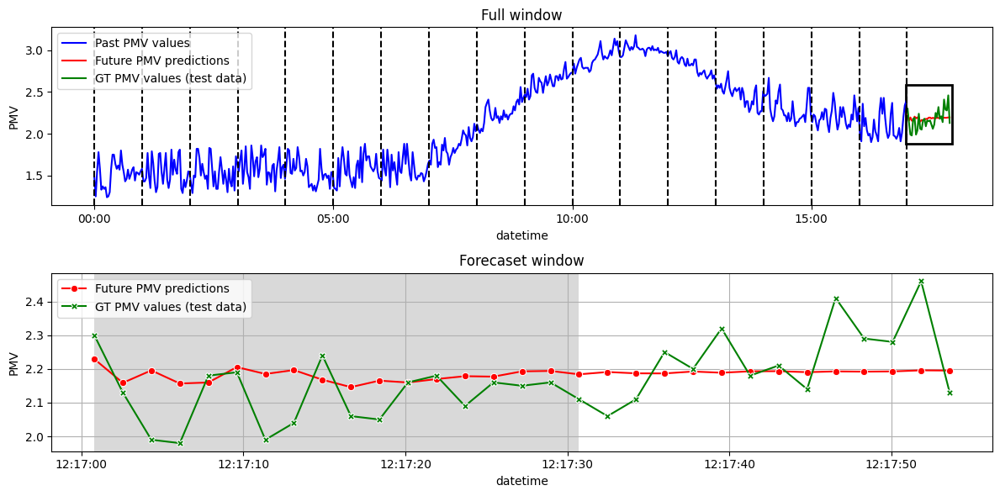

In [362]:
plotreg (yhat)

In [363]:
rmserep(yhat)

RMSE is: 0.109388981331271
RMSE by mean is: 0.05046217888793751


While by pure criterion (minimal rmse) the AR model appears preferable, this is not truly the case.  
This model prediction is based on a backwards data.  
In other words, we would have to know the actual PMV during deployment.  
This is not the case for the OLS model that will require only temperature.
Furthermore, due to relying on long lagging components, the model kinetics is quite smooth (strongly affected by low rate components) and thus unable to generalize the fast PMV dynamics characteristics.  
Note how both linear models are capable of reconstructing the slow PMV increase trend for our forecast window of 30 seconds while the AR model lingers on a nearly constant PMV value.

### Vector Auto Regression (VAR) Model

Let's try and use our additional original time series features.

The Vector Autoregression (VAR) method models the next step in each time series using an AR model. It is the generalization of AR to multiple parallel time series, e.g. multivariate time series.  
The notation for the model involves specifying the order for the AR(p) model as parameters to a VAR function, e.g. VAR(p).  
The method is suitable for multivariate time series without trend and seasonal components.  

https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/  
https://www.youtube.com/watch?v=UQQHSbeIaB0  
https://www.youtube.com/watch?v=6Ye0CsfRDJg  
https://www.youtube.com/watch?v=4jv1NGlAc_0  
https://github.com/nachi-hebbar/Multivariate-Time-Series-Forecasting

Import required libraries:

In [385]:
from statsmodels.tsa.vector_ar.var_model import VAR

In [396]:
modelVAR = VAR(ts_train)

C:\Program Files\python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 1760L will be used.
  self._init_dates(dates, freq)


Finding min lag number:

In [397]:
sorted_order=modelVAR.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -2.917      -2.893     0.05412      -2.908
1       -10.73      -10.64   2.192e-05      -10.69
2       -10.83      -10.67   1.979e-05      -10.77
3       -11.00      -10.77   1.665e-05      -10.91
4       -11.08      -10.78   1.544e-05      -10.96
5       -11.16      -10.79   1.419e-05      -11.02
6       -11.16      -10.72   1.417e-05      -10.99
7       -11.16      -10.65   1.420e-05      -10.96
8       -11.28      -10.70   1.259e-05      -11.06
9       -11.27      -10.62   1.279e-05      -11.01
10      -11.29      -10.57   1.254e-05      -11.01
11     -11.59*     -10.80*  9.297e-06*     -11.28*
12      -11.57      -10.71   9.476e-06      -11.23
13      -11.56      -10.63   9.529e-06      -11.20
14      -11.57      -10.57   9.467e-06      -11.18
15      -11.58      -10.52   9.324e-06      -11.17
16      -11.58      -10.44   9.

We can see that 11 lags provide the minimal Akaike Information Criterion (AIC).  
https://www.statology.org/aic-in-python/  
https://www.youtube.com/watch?v=TpQtD7ONfxQ  
https://www.youtube.com/watch?v=XepXtl9YKwc  
https://www.youtube.com/watch?v=-BR4WElPIXg  
https://www.scribbr.com/statistics/akaike-information-criterion/

In [398]:
modelVAR_fit = modelVAR.fit(maxlags=11, ic='aic')
modelVAR_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 21, Dec, 2022
Time:                     08:38:53
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -10.8113
Nobs:                     569.000    HQIC:                  -11.2861
Log likelihood:           977.225    FPE:                9.26223e-06
AIC:                     -11.5900    Det(Omega_mle):     7.78216e-06
--------------------------------------------------------------------
Results for equation ET1(C)
                                coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------------
const                             -0.463794         0.289575           -1.602           0.109
L1.ET1(C)                          0.893511         0.036786           24.289           0.000
L1.Sola

The above coefficients are simply the pearson r correlation coefficients for each series against the others using a lag of 1...maxlag.  
The p-value is that of the specific correlation.

The components with statistically significant values (p<0.05) are:
1. The constant -> -5.251217
2. L1.PMV - the first lag of the PMV series -> coefficient is 0.387781
3. L2. PMV - the second lag of the PMV series -> coefficient is -0.123087
4. L3. PMV - the third lag of the PMV series -> coefficient is 0.090075

So, our model is:

$$ \hat{PMV}_{t} = -5.251217+0.387781PMV_{t-1}-0.123087PMV_{t-2}+0.090075PMV_{t-3} $$

In the presence of direct PMV temporal data, the VAR model ignores the indirect information of the other series.  
Note that this is not true for ET1 and Solar radiation.  
For these series we do have statistically significant components from other columns.

Let's check the prediction performance:

In [412]:
yhat = modelVAR_fit.forecast(np.array(ts_test),len(Ytest))
#https://www.statsmodels.org/v0.10.0/vector_ar.html
#https://link.springer.com/book/10.1007/978-3-540-27752-1
#https://www.statsmodels.org/dev/generated/statsmodels.tsa.vector_ar.var_model.VARProcess.forecast.html#statsmodels.tsa.vector_ar.var_model.VARProcess.forecast

In [420]:
yhat[0:3]

array([[28.07402776, 80.29151598,  2.15312408],
       [28.06655932, 80.31272821,  2.24418021],
       [28.05273501, 80.32218573,  2.23225033]])

In [421]:
yhatVAR = pd.Series(yhat[:,2])

In [422]:
yhatVAR.index = Ytest.index

In [423]:
yhatVAR.head()

datetime
2019-03-10 12:17:00.800    2.153124
2019-03-10 12:17:02.560    2.244180
2019-03-10 12:17:04.320    2.232250
2019-03-10 12:17:06.080    2.212644
2019-03-10 12:17:07.840    2.165038
dtype: float64

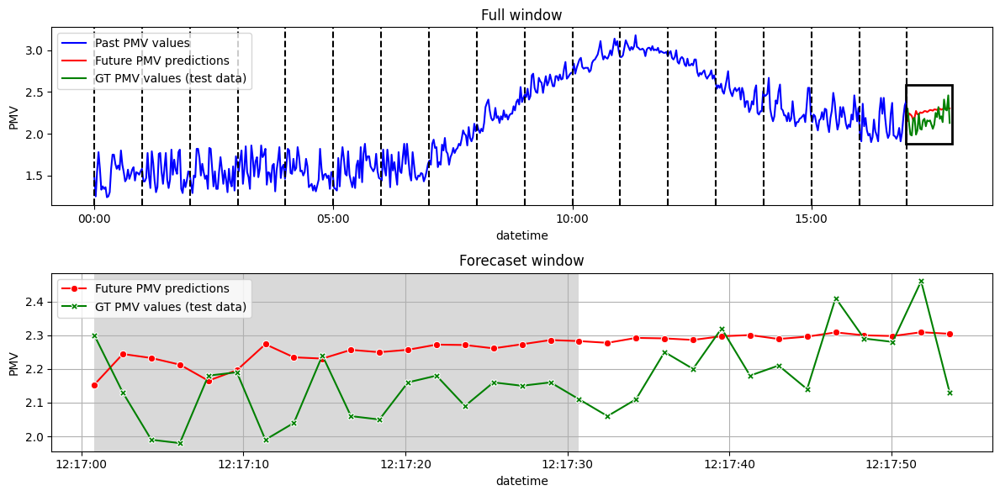

In [424]:
plotreg (yhatVAR)

In [425]:
rmserep(yhatVAR)

RMSE is: 0.14634792294205323
RMSE by mean is: 0.06751169064291146


The VAR model performs worse than the AR model.  
This is not surprising as it did not consider the other time series and it collects lag data only 11 steps back while the AR model has a higher power of p=18 lags back...

### Vector Auto Regression Moving-Average with Exogenous regressors (VARMAX) Model

The Vector Autoregression Moving-Average with Exogenous Regressors (VARMAX) model is an extension of the VARMA model that also includes the modeling of exogenous variables.  
It is a multivariate version of the ARMAX method.  
Exogenous variables are also called covariates and can be thought of as parallel input sequences that have observations at the same time steps as the original series.  
The primary series(es) are referred to as endogenous data to contrast it from the exogenous sequence(s).  
The observations for exogenous variables are included in the model directly at each time step and are not modeled in the same way as the primary endogenous sequence (e.g. as an AR, MA, etc. process).  
This method is suitable for multivariate time series without trend and seasonal components with exogenous variables like air velocity and solar radiation.

https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/

In [428]:
from statsmodels.tsa.statespace.varmax import VARMAX
varmax_model = VARMAX(ts_train, order=(11,5),enforce_stationarity = True)
fitted_model = varmax_model.fit(disp=False)

C:\Program Files\python\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Program Files\python\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 1760L will be used.
  self._init_dates(dates, freq)


Where we have used the power of 11 for the AR components, as we saw above it is providing best AIC results (minimal) and a 5 element MA component, as we saw above it is a good compromise for smoothing and generalizing the rapid PMV characteristics.

In [430]:
print(fitted_model.summary())

                                        Statespace Model Results                                       
Dep. Variable:     ['ET1(C)', 'Solar Radiation(W/m^2)', 'PMV']   No. Observations:                  580
Model:                                             VARMA(11,5)   Log Likelihood                 993.140
                                                   + intercept   AIC                          -1680.281
Date:                                         Wed, 21 Dec 2022   BIC                          -1012.737
Time:                                                 10:04:19   HQIC                         -1420.026
Sample:                                             03-10-2019                                         
                                                  - 03-10-2019                                         
Covariance Type:                                           opg                                         
Ljung-Box (L1) (Q):       0.00, 0.00, 0.43   Jarque-Bera (JB):  

https://www.youtube.com/watch?v=4jv1NGlAc_0

Let's use the model to predict:

In [433]:
predict = fitted_model.predict(start=ts_train.shape[0],end=(ts_train.shape[0]+ts_test.shape[0]-1), dynamic=False) #start="1989-07-01",end='1999-01-01')

#predictions=predict.predicted_mean

#https://www.youtube.com/watch?v=4jv1NGlAc_0
#https://github.com/nachi-hebbar/Multivariate-Time-Series-Forecasting/blob/main/VAR_Model%20(1).ipynb

In [437]:
predict.head()

,ET1(C),Solar Radiation(W/m^2),PMV
2019-03-10 12:17:00.800,27.414125,80.528357,2.136393
2019-03-10 12:17:02.560,27.404517,80.091553,2.050733
2019-03-10 12:17:04.320,27.421334,80.526004,2.090628
2019-03-10 12:17:06.080,27.414465,80.153858,2.032125
2019-03-10 12:17:07.840,27.406754,80.335518,2.023928


Plot predictions and actual series:

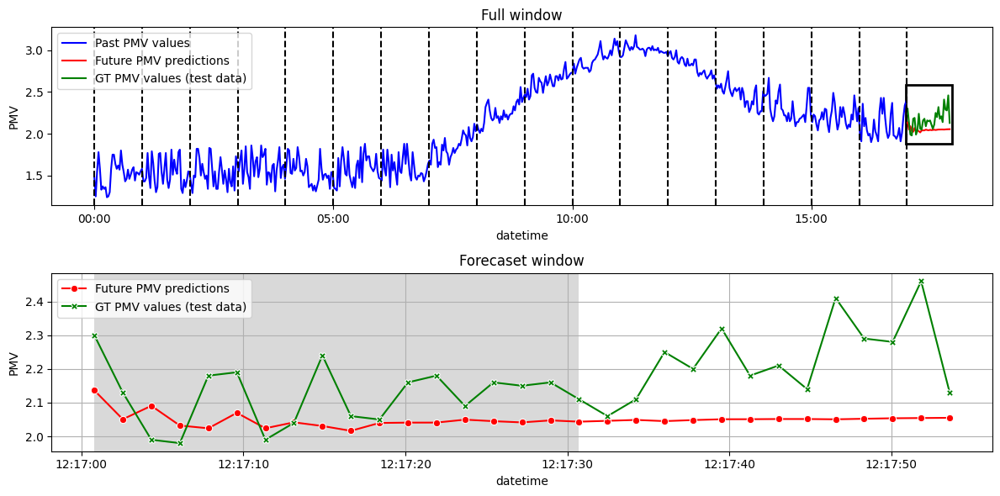

In [435]:
plotreg (predict.PMV)

Let's calculate RMSE:

In [438]:
rmserep(predict.PMV)

RMSE is: 0.1613691986289861
RMSE by mean is: 0.07444114817706203


We can see that the prediction is doing quite well for the first 11 samples (11*1.7~19 sec).  
However, after that window, it is starting to deviate from the ground truth. 
The drift is slow enough so that performance is satisfactory.  
However, again, the moving average component delays the trend recap and damages performance.

# Findings and conclusions

* In this project we were required to predict future thermal comfort index (PMV) for operating and emergency rooms in hospitals.
* The motivation is to reduce significant adverse medical complications that are known to be correlated with patient thermal loads (hypo/hyper-thermia).
* The required performance target was a PMV RMSE < 0.5 for a forecast window of ~30 seconds.  
* The project is successful. We now have a proof of concept that this can be done.
* Decomposition indicates clear increase and decrease trend intervals throughout the ~17 minutes sampling window.  
* There are no clear seasonal components we can use in this dataset.
* In the project, we compare several models. Table 1 below summarizes the results.
* For the ML models, we were required to take series differences to achieve reasonable stationarity. This is not mandatory for many classic time series models that inherently support non stationary computation. Thus, time series usage can be much more simple and direct.
* Documentation and examples though are scarce and the technical support is quite lacking for time series usage as this appears to be a narrow niche domain not used by many practitioners.
* Linear regression provided the best performance with a good compromise between prediction quality, simplicity, required machine resources and ease of application in the real world.
* The RMSE of the differences series is lower than that of the prediction itself.  
This is expected as any error in a function derivative (the differences represent the derivative) should reflect a higher error in the function values.
* By observing the differences we were able to disqualify all non time series models due to very low performance expectations.
* Our results demonstrate the lack of an integrated metric like rmse to encompass the series trend. It is crucial to visually observe the data as well as calculating error/accuracy metrics.
* Our chosen model (linear regression) provides performance that is much better than the project criterion and for nearly double the required forecast window of ~30 seconds.
* Autoregression (AR) and Moving Average (MA) model components smooth the data but lead to considerable trend detection speed. This makes them significantly less useful for high temporal resolution real-time sampling applications.
* An additional huge benefit of this project is the identification of a main challenge in RH measurement.  
Here, I encountered the true power of data by identifying a key challenge for humidity sensors that we may have to face in the future and we were not aware of. Besides constituting a fascinating scientific fact, it is a key engineering design point to take into consideration in future thermal regulation projects.

<center> Table 1: Model comparison <center>  

| Model                                                                   | Classification        | Computation speed | PMV RMSE                             | General traits                                                                                                                                                | Conclusions                                                                                   |
|-------------------------------------------------------------------------|-----------------------|-------------------|--------------------------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------|
| Decision Tree                                                           | ML, Tree models       | Very Fast         | 0.15 for PMV differences             | N/A                                                                                                                                                           | Unacceptable, can quickly drift beyond performance requirements                               |
| Random Forest                                                           | ML, Tree models       | Very Fast         | 0.15 for PMV differences             | N/A                                                                                                                                                           | Unacceptable, can easily driftUnacceptable, can quickly drift beyond performance requirements |
| LightGBM                                                                | ML, Gradient boosting | Very Fast         | 0.15 for PMV differences             | N/A                                                                                                                                                           | Unacceptable, can quickly drift beyond performance requirements                               |
| CatBoost                                                                | ML, Gradient boosting | Very Fast         | 0.15 for PMV differences             | N/A                                                                                                                                                           | Unacceptable, can quickly drift beyond performance requirements                               |
| Dummy Regressor (mean)                                                  | Algebraic             | Very Fast         | 0.15 for PMV differences             | N/A                                                                                                                                                           | Unacceptable, can quickly drift beyond performance requirements                               |
| OLS Linear Regression                                                   | Classic Time series   | Very Fast         | 0.117, 0.13 (W, W/O solar radiation) | Some Homoscedasticity, Residuals are not normal, Very simple, does not require PMV, can work with only a single predictor - ET1, Generalizes rapid PMV trends | Chosen model                                                                                  |
| Auto-Regression (AR)                                                    | Classic Time series   | Very Fast         | 0.109                                | Does not generalize rapid PMV trends, We must know the actual PMV during deployment                                                                           | Acceptable but will be challenging in deployment                                              |
| Vector Auto-Regression (VAR)                                            | Classic Time series   | Fast              | 0.146                                | Generalizes rapid trendsDoes not generalize rapid PMV trends, We must know the actual PMV during deployment                                                   | Acceptable but will be challenging in deployment                                              |
| Vector Autoregression Moving-Average with Exogenous Regressors (VARMAX) | Classic Time series   | Slow              | 0.161                                | Does not generalize rapid PMV trends, We must know the actual PMV during deployment, Drifts after 11 samples                                                  | Acceptable but will be challenging in deployment                                              |

# Future work

Here I list three milestones I did not finalize during this project and would like to complete in the future.

## Evaluate models using k-folds CV

A preliminary script is attached below:

In [ ]:
'''
# function using K-folds cross-validation to validate OLS model
#not implemented at present.

def kfolds(X, y, cv=5):
    """Performs cross-validation using cv number of folds against full 
       sample X and y. Prints out CV mean absolute errors for comparison 
       to OLS model MAE. Supplemental validation to OLS train-test split.
    
        Parameters:
        X (pd.DataFrame): full sample contains model predictors
        y (pd.DataFrame)): full sample contains model target
        Returns: no return
   """
    
    model = LinearRegression()
    model.fit(X, y)
    mae = make_scorer(mean_absolute_error)
    cv_5_results = cross_val_score(model, X, y, cv=cv, scoring=mae)
    print(f'Cross-Validation MAE results: {cv_5_results} | \
        CV MAE Mean: {cv_5_results.mean()}')

# cross validation to compare MAE on entire sample for m8 features
X_CV_m8 = X[features_m8]
y_CV_m8 = y['price_log']
kfolds(X_CV_m8, y_CV_m8, cv=5)

'''

#https://towardsdatascience.com/multiple-linear-regression-python-101-af459110a8af

## Test model against other time series sampled from of the same individual

## Test model against other time series sampled from other individuals